## 0) Problem Understanding


In summary, the company's objective is to use machine/deep learning to create a model that can analyze the provided data, learn the patterns that link the features with the corresponding problem descriptions, and then use this knowledge to predict problem descriptions for new cases. This approach would significantly reduce the manual effort required to understand and categorize problems, ultimately saving time and improving efficiency.

Approach: Pattern Recognition


Model Selection:
        - dicision tree,..


In [1]:
import os
import pandas as pd
import glob 
import re
import seaborn as sns
import matplotlib.pyplot as plt
from googletrans import Translator
import concurrent.futures
from tqdm import tqdm
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from collections import Counter
import time
from deep_translator import GoogleTranslator
from langdetect import detect
from google_trans_new import google_translator
import spacy
from collections import Counter

## 1) Reference dataset creation

### 1.1 Read datasets and combine datasets

In [2]:
def read_csv_files_as_dataframes(root_folder):
    dataframes = []
    for folder_name, subfolders, filenames in os.walk(root_folder):
        for filename in filenames:
            if re.match(r'.*_\d+\.csv$', filename):
                csv_path = os.path.join(folder_name, filename)
                dataframe = pd.read_csv(csv_path)
                dataframes.append(dataframe)
    if dataframes:
        combined_df = pd.concat(dataframes, ignore_index=True)
        return combined_df
    else:
        return None

path_to_root_folder = 'OpenRepairData/'
df = read_csv_files_as_dataframes(path_to_root_folder)

if df is not None:
    print("Combined DataFrame shape:", df.shape)
else:
    print("No matching CSV files found.")

Combined DataFrame shape: (103693, 14)


### 1.2 Raw data characteristics

In [3]:
print('dataset contains:' , df.shape[0], 'rows, ', df.shape[1], 'columns')

dataset contains: 103693 rows,  14 columns


In [4]:
df.head()

,id,data_provider,country,partner_product_category,product_category,product_category_id,brand,year_of_manufacture,product_age,repair_status,repair_barrier_if_end_of_life,group_identifier,event_date,problem
0,restart_73,The Restart Project,GBR,Games console ~ Game console,Games console,38,Sony,NaN,NaN,Repairable,NaN,Restart HQ,2013-07-31,Game console - Power cutting off -
1,restart_1262,The Restart Project,GBR,Games console ~ Game console,Games console,38,Sony,NaN,NaN,Repairable,NaN,Restart HQ,2015-03-21,Game console - Input loose - Needs a spare
2,restart_1263,The Restart Project,GBR,Games console ~ Game console,Games console,38,Nintendo,NaN,NaN,Fixed,NaN,Restart HQ,2015-03-21,Game console - Image faulty - Was the cable
3,restart_1600,The Restart Project,GBR,Games console ~ Game console,Games console,38,Sony,NaN,NaN,Repairable,NaN,Restarters West London,2015-07-25,Game console which does power on but them lose...
4,restart_1685,The Restart Project,GBR,Games console ~ PS3,Games console,38,Sony,NaN,NaN,Repairable,NaN,Restart HQ,2015-09-08,Power issue.


In [5]:
df.tail()

,id,data_provider,country,partner_product_category,product_category,product_category_id,brand,year_of_manufacture,product_age,repair_status,repair_barrier_if_end_of_life,group_identifier,event_date,problem
103688,repconn_2881,Repair Connects,BEL,Hair & beauty item,Hair & beauty item,9,Onbekend,NaN,NaN,Repairable,NaN,Maakbaar Leuven,2022-11-16,"Amper gebruikt, sputterde eerst, volgende keer..."
103689,repconn_2882,Repair Connects,BEL,Hair & beauty item,Hair & beauty item,9,Braun,NaN,NaN,Repairable,NaN,Maakbaar Leuven,2022-08-13,Aan uit knop werkt niet meer
103690,repconn_2883,Repair Connects,BEL,Hair & beauty item,Hair & beauty item,9,Braun,NaN,NaN,Fixed,NaN,Maakbaar Leuven,2020-06-05,Stekker werd warm bij gebruik. Stekker afgekni...
103691,repconn_2884,Repair Connects,BEL,Hair & beauty item,Hair & beauty item,9,Calor,NaN,NaN,Fixed,NaN,Maakbaar Leuven,2020-07-20,Het toestel blaast nog en is nog warm. Maar is...
103692,repconn_2885,Repair Connects,BEL,Hair & beauty item,Hair & beauty item,9,Calor,NaN,NaN,Fixed,NaN,Maakbaar Leuven,2021-08-12,De 'trimmer' werkt niet meer. Hij maakt nog ge...


In [6]:
df.loc[df['country'] == 'NLD']

,id,data_provider,country,partner_product_category,product_category,product_category_id,brand,year_of_manufacture,product_age,repair_status,repair_barrier_if_end_of_life,group_identifier,event_date,problem
48601,rcint_606,Repair Café International,NLD,Household appliances electric ~ Printer,Printer/scanner,25,HP,2012.0,5.0,End of life,NaN,14,2017-04-01,droge inkt toeveoer inktcartridge blijft steken
48602,rcint_10174,Repair Café International,NLD,Household appliances electric ~ Vacuum cleaner,Vacuum,34,Miele,2016.0,2.0,Fixed,NaN,9,2018-10-06,oprolmechanisme - stekker kapot snoer kapot sn...
48603,rcint_11146,Repair Café International,NLD,Tools electric ~ Navigation system,Tablet,30,TomTom,2017.0,1.0,Fixed,NaN,9,2018-11-03,contact werkt niet goed / breuk? draadbreuk ge...
48604,rcint_10069,Repair Café International,NLD,Display and sound equipment ~ Other,Misc,18,Durst,2017.0,1.0,Repairable,NaN,14,2018-10-06,Verlichting werkt niet schakelaar Schakelaar ...
48605,rcint_49322,Repair Café International,NLD,Household appliances electric ~ Milk frother,Small kitchen item,29,Nespresso,2017.0,1.0,End of life,NaN,19,2018-05-12,Apparaat werkt niet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103607,repconn_2800,Repair Connects,NLD,Flat screen,Flat screen,8,Philips,NaN,NaN,Repairable,NaN,Foenix Repair Café Apeldoorn,2022-11-28,"Tv werkt welaar beeld valt regelmatig weg, duu..."
103651,repconn_2844,Repair Connects,NLD,Flat screen,Flat screen,8,Samsung,NaN,NaN,Repairable,NaN,Foenix Repair Café Apeldoorn,2021-11-18,De tv gaat soms aan. Als hij eenmaal aan staat...
103652,repconn_2845,Repair Connects,NLD,Flat screen,Flat screen,8,OK,2017.0,5.0,Repairable,NaN,Foenix Repair Café Apeldoorn,2022-12-22,"TV + DVD. Alles werkt, echter geen beeld wel g..."
103660,repconn_2853,Repair Connects,NLD,Hair & beauty item,Hair & beauty item,9,Philips Sonicare,2019.0,3.0,Repairable,NaN,Foenix Repair Café Apeldoorn,2022-04-26,Elektrische tandenborstel doet niks meer.


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103693 entries, 0 to 103692
Data columns (total 14 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   id                             103693 non-null  object 
 1   data_provider                  103693 non-null  object 
 2   country                        103693 non-null  object 
 3   partner_product_category       103693 non-null  object 
 4   product_category               103693 non-null  object 
 5   product_category_id            103693 non-null  int64  
 6   brand                          103687 non-null  object 
 7   year_of_manufacture            37119 non-null   float64
 8   product_age                    37119 non-null   float64
 9   repair_status                  103693 non-null  object 
 10  repair_barrier_if_end_of_life  7394 non-null    object 
 11  group_identifier               103693 non-null  object 
 12  event_date                    

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
product_category_id,103693.0,23.366457,10.202068,1.0,15.0,24.0,33.0,40.0
year_of_manufacture,37119.0,2008.472642,14.653692,1019.0,2005.0,2013.0,2017.0,2023.0
product_age,37119.0,12.056378,14.559709,-1.0,4.0,7.0,15.0,998.0


<AxesSubplot:>

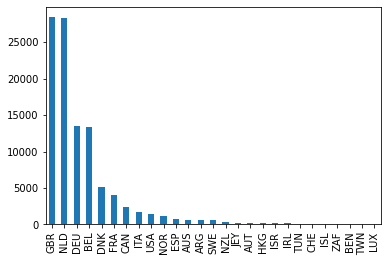

In [9]:
df['country'].value_counts().plot(kind='bar')


In [10]:
df['country'].value_counts().index

Index(['GBR', 'NLD', 'DEU', 'BEL', 'DNK', 'FRA', 'CAN', 'ITA', 'USA', 'NOR',
       'ESP', 'AUS', 'ARG', 'SWE', 'NZL', 'JEY', 'AUT', 'HKG', 'ISR', 'IRL',
       'TUN', 'CHE', 'ISL', 'ZAF', 'BEN', 'TWN', 'LUX'],
      dtype='object')

<AxesSubplot:>

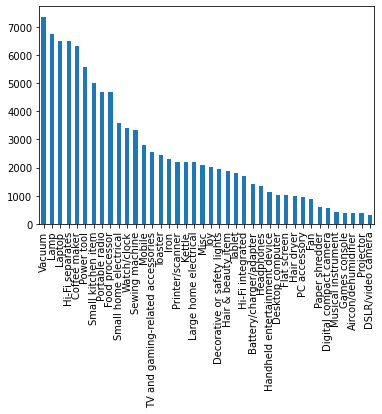

In [11]:
df['product_category'].value_counts().plot(kind='bar')


In [12]:
df['partner_product_category'].value_counts()


Household appliances electric ~ Coffee maker      3817
Household appliances electric ~ Vacuum cleaner    3117
Laptop medium ~ Laptop                            2341
Vacuum                                            2127
Lamp                                              2019
                                                  ... 
Misc ~ ventilateur chauffant                         1
Misc ~ ventilateur sèche linge                       1
Misc ~ Halogen heater                                1
Misc ~ Electric scissors                             1
Computer equipment / phones ~ Car key                1
Name: partner_product_category, Length: 9726, dtype: int64

<AxesSubplot:>

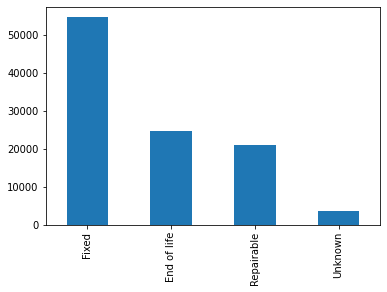

In [13]:
df['repair_status'].value_counts().plot(kind='bar')


In [14]:
# Exclude Unknown 
df = df.loc[df['repair_status'] != "Unknown"]

<AxesSubplot:>

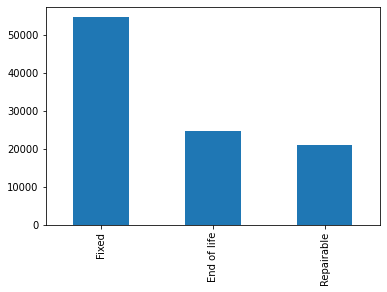

In [15]:
df['repair_status'].value_counts().plot(kind='bar')


    -1: “Fixed” - if the repairer and owner were satisfied that the item can continue to be used
    
    -2: “Repairable” - if the repairer and owner didn’t complete a repair, but identified what reasonable additional steps or professional help is needed
    
    -3: “End of life” - if the repairer and the owner decided that it is not cost-effective or realistic to repair the device
    
    -0: An empty or zero value is recorded as “Unknown”

In [16]:
df['brand'].value_counts()


Unknown              37719
Philips               5822
Apple                 1940
Sony                  1928
Bosch                 1799
                     ...  
Talon Celsius            1
Oticon                   1
Easton                   1
Corby                    1
babyliss tondeuse        1
Name: brand, Length: 8782, dtype: int64

<AxesSubplot:>

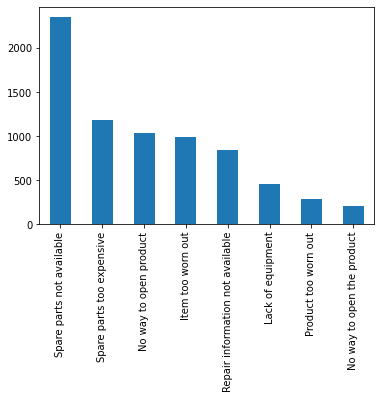

In [17]:

df['repair_barrier_if_end_of_life'].value_counts().plot(kind='bar')

In [18]:
df['group_identifier'].value_counts()


Repair Café Danmark         4200
4                           3515
5073                        2462
2711                        2200
16                          1993
                            ... 
522                            1
534                            1
542                            1
322                            1
Repair Café Mooihersteld       1
Name: group_identifier, Length: 641, dtype: int64

In [19]:
unknown_brand_sample = df.loc[df['brand'] == 'Unknown'].sample(n=5, random_state=42)
unknown_brand_sample

,id,data_provider,country,partner_product_category,product_category,product_category_id,brand,year_of_manufacture,product_age,repair_status,repair_barrier_if_end_of_life,group_identifier,event_date,problem
62917,rcint_51613,Repair Café International,NLD,Household appliances electric ~ Electric bakin...,Small kitchen item,29,Unknown,NaN,NaN,End of life,NaN,11,2022-11-12,storing in de stroom toevoer
26064,restart_9013,The Restart Project,GBR,Power tool ~ Strimmer,Power tool,24,Unknown,NaN,NaN,End of life,NaN,Share and Repair,2018-09-01,NaN
481,restart_18312,The Restart Project,GBR,Watch/clock,Watch/clock,35,Unknown,NaN,NaN,End of life,NaN,Share and Repair,2020-12-01,NaN
84117,anstiftung_6000,anstiftung,DEU,Unterhaltungselektronik ~ HiFi-Musik-Anlage,Hi-Fi integrated,12,Unknown,NaN,NaN,Fixed,NaN,2711,2020-06-30,Schalter defekt -&gt; repariert; CD kaputt -&g...
20358,restart_5240,The Restart Project,ARG,Aircon/dehumidifier,Aircon/dehumidifier,1,Unknown,NaN,NaN,Fixed,NaN,Club de Reparadores,2017-06-03,HVAC 4kg


To keep in mind:

    - remove id 
    - different languages -> translate the columns depends on the country 
   
    - partner_product_category,	product_category can be removed before prepocessing -> keep	product_category_id	
    - brand -> convert to onehot encoding (preprocessing)
    
    - group identifier 
    - repair_barrier_if_end_of_life (one hot) (preprocessing)


### 1.3) Missing values


In [20]:
import pandas as pd


# Exclude the 'repair_barrier_if_end_of_life' column from NaN check
columns_to_check_nan = [col for col in df.columns if col != 'repair_barrier_if_end_of_life']

# Create a subset DataFrame without the 'repair_barrier_if_end_of_life' column
subset_df = df[columns_to_check_nan]

# Remove columns with all NaN values
subset_df = subset_df.dropna(axis=1, how='all')

# Merge the subset DataFrame back with the 'repair_barrier_if_end_of_life' column
df = subset_df.join(df[['repair_barrier_if_end_of_life']])

# Print the updated DataFrame
print(df)


                  id        data_provider country  \
0         restart_73  The Restart Project     GBR   
1       restart_1262  The Restart Project     GBR   
2       restart_1263  The Restart Project     GBR   
3       restart_1600  The Restart Project     GBR   
4       restart_1685  The Restart Project     GBR   
...              ...                  ...     ...   
103688  repconn_2881      Repair Connects     BEL   
103689  repconn_2882      Repair Connects     BEL   
103690  repconn_2883      Repair Connects     BEL   
103691  repconn_2884      Repair Connects     BEL   
103692  repconn_2885      Repair Connects     BEL   

            partner_product_category    product_category  product_category_id  \
0       Games console ~ Game console       Games console                   38   
1       Games console ~ Game console       Games console                   38   
2       Games console ~ Game console       Games console                   38   
3       Games console ~ Game console   

### 1.4) Data formatting

In [21]:

# Convert 'event_date' column to datetime format
df['event_date'] = pd.to_datetime(df['event_date'])


# Convert 'year_of_manufacture' column to integer
df['year_of_manufacture'] = df['year_of_manufacture'].apply(lambda x: int(x) if not pd.isna(x) else 0)



# Convert 'product_age' column to integer
df['product_age'] = df['product_age'].apply(lambda x: int(x) if not pd.isna(x) else 0)


# Convert the 'problem' column to string
df['problem'] = df['problem'].astype(str)



In [22]:
df

,id,data_provider,country,partner_product_category,product_category,product_category_id,brand,year_of_manufacture,product_age,repair_status,group_identifier,event_date,problem,repair_barrier_if_end_of_life
0,restart_73,The Restart Project,GBR,Games console ~ Game console,Games console,38,Sony,0,0,Repairable,Restart HQ,2013-07-31,Game console - Power cutting off -,NaN
1,restart_1262,The Restart Project,GBR,Games console ~ Game console,Games console,38,Sony,0,0,Repairable,Restart HQ,2015-03-21,Game console - Input loose - Needs a spare,NaN
2,restart_1263,The Restart Project,GBR,Games console ~ Game console,Games console,38,Nintendo,0,0,Fixed,Restart HQ,2015-03-21,Game console - Image faulty - Was the cable,NaN
3,restart_1600,The Restart Project,GBR,Games console ~ Game console,Games console,38,Sony,0,0,Repairable,Restarters West London,2015-07-25,Game console which does power on but them lose...,NaN
4,restart_1685,The Restart Project,GBR,Games console ~ PS3,Games console,38,Sony,0,0,Repairable,Restart HQ,2015-09-08,Power issue.,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103688,repconn_2881,Repair Connects,BEL,Hair & beauty item,Hair & beauty item,9,Onbekend,0,0,Repairable,Maakbaar Leuven,2022-11-16,"Amper gebruikt, sputterde eerst, volgende keer...",NaN
103689,repconn_2882,Repair Connects,BEL,Hair & beauty item,Hair & beauty item,9,Braun,0,0,Repairable,Maakbaar Leuven,2022-08-13,Aan uit knop werkt niet meer,NaN
103690,repconn_2883,Repair Connects,BEL,Hair & beauty item,Hair & beauty item,9,Braun,0,0,Fixed,Maakbaar Leuven,2020-06-05,Stekker werd warm bij gebruik. Stekker afgekni...,NaN
103691,repconn_2884,Repair Connects,BEL,Hair & beauty item,Hair & beauty item,9,Calor,0,0,Fixed,Maakbaar Leuven,2020-07-20,Het toestel blaast nog en is nog warm. Maar is...,NaN


### 1.5) Remove missing values

In [23]:
# Removing 0 for year_of_manufacture & product_age
df = df.loc[(df['year_of_manufacture'] != 0) & (df['product_age'] != 0)]

In [24]:
df

,id,data_provider,country,partner_product_category,product_category,product_category_id,brand,year_of_manufacture,product_age,repair_status,group_identifier,event_date,problem,repair_barrier_if_end_of_life
35,restart_9247,The Restart Project,GBR,Games console ~ Wii,Games console,38,Nintendo,1998,20,Repairable,Hackney Fixers,2018-09-22,Doesn't switch on. Needs new capacitor.,NaN
36,restart_9249,The Restart Project,GBR,Games console ~ Games console,Games console,38,PlayStation,2013,5,Repairable,Hackney Fixers,2018-09-22,Software issue,NaN
37,restart_9407,The Restart Project,ITA,Games console ~ PS3,Games console,38,Sony,2012,5,Repairable,Restarters Milano,2018-10-06,"Not working, give away for us.",NaN
38,restart_10606,The Restart Project,GBR,Games console ~ ps4,Games console,38,Sony,2016,2,Fixed,Leicester Fixers,2018-12-01,"fan not working, need cleaning",NaN
39,restart_10902,The Restart Project,GBR,Games console ~ Xbox one,Games console,38,Unknown,2015,4,Fixed,Crystal Palace Library of Things,2019-01-13,turns on but grating noise,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103676,repconn_2869,Repair Connects,BEL,Hair & beauty item,Hair & beauty item,9,Philips,2013,10,End of life,Maakbaar Leuven,2023-01-28,batterij is stuk,No way to open product
103678,repconn_2871,Repair Connects,BEL,Hair & beauty item,Hair & beauty item,9,Koenic,2021,1,End of life,Repair Café Gent,2022-03-27,Hij werkt nog maar warmt niet op.,Spare parts not available
103682,repconn_2875,Repair Connects,CHE,Hair & beauty item,Hair & beauty item,9,Philips,2000,21,Fixed,Repair Café Frauenfeld,2021-03-15,"einwandfrei, ausser lautem Motorengeräusch\r\n...",NaN
103685,repconn_2878,Repair Connects,NLD,Hair & beauty item,Hair & beauty item,9,Babyliss,2012,10,Fixed,Foenix Repair Café Apeldoorn,2022-12-02,Oplaadbare batterijen waren defect en zijn al ...,NaN


### 1.6) Problem column 

#### 1.6.1) Translate

I cannot use googletrans or translator because they have a word limit 

In [35]:

# Initialize the Translator
translator = GoogleTranslator()

def translate_problem(text):
    try:
        if text and text.lower() != "nan":
            # Detect the language of the text
            detected_language = detect(text)
            
            # Check if the detected language is English
            if detected_language == 'en':
                return text
            
            # Translate text to English
            translated = translator.translate(text, lang_tgt='en') 
            return translated
        else:
            return text
    except Exception as e:
        print("Translation Error:", e)
        return text

def main(df):
    # Skip rows with specific countries
    countries_to_skip = ['GBR', 'CAN', 'USA', 'AUS', 'IRL']
    df_to_translate = df[~df['country'].isin(countries_to_skip)]

    # Apply the translation function to the filtered DataFrame
    translated_batches = []

    for index, row in tqdm(df_to_translate.iterrows(), total=len(df_to_translate), desc="Translating"):
        translated_problem = translate_problem(row['problem'])
        row_dict = row.to_dict()
        row_dict['translated_problem'] = translated_problem
        translated_batches.append(row_dict)

        # Print the original text and translation for each row
        example_original_text = row['problem']
        example_translation = translated_problem
        print(f"Original Text: {example_original_text}")
        print(f"Translation: {example_translation}\n")

    # Create a new DataFrame from the list of dictionaries
    translated_df = pd.DataFrame(translated_batches)

    # Include the skipped rows with specific countries
    df_to_include = df[df['country'].isin(countries_to_skip)]
    translated_df = pd.concat([translated_df, df_to_include], ignore_index=True)

    return translated_df

if __name__ == "__main__":
    try:
        # Replace 'df' with your actual DataFrame
        translated_df = main(df)

        # Save the translated DataFrame to a new CSV file
        translated_df.to_csv('translated_data.csv', index=False)
    except Exception as e:
        print("An error occurred:", e)


Translating:   0%|                                                                   | 3/27176 [00:00<32:08, 14.09it/s]

Original Text: Not working, give away for us.
Translation: Not working, give away for us.

Original Text: Power supply is defectOwner wil get a second hand PS2 device so that he can use the sone for spar parts
Translation: Power supply is defectOwner wil get a second hand PS2 device so that he can use the sone for spar parts

Original Text: Does not start
Translation: Does not start



Translating:   0%|                                                                   | 6/27176 [00:00<31:32, 14.35it/s]

Original Text: 3 Red lights displayed when turned on. Secondary error: 0110. Repaired by reflowing the GPU, cleaning the heatsink from old thermal paste & replacing thermal paste. Also, the DVD tray didn't open. This was fixed by spraying contact cleaner into the opening mechanism.
Translation: 3 Red lights displayed when turned on. Secondary error: 0110. Repaired by reflowing the GPU, cleaning the heatsink from old thermal paste & replacing thermal paste. Also, the DVD tray didn't open. This was fixed by spraying contact cleaner into the opening mechanism.

Original Text: needs new fuse
Translation: needs new fuse

Original Text: HDMI-gate broken
Translation: HDMI-gate broken

Original Text: Light on, but doesn't turn on
Translation: Light on, but doesn't turn on



Translating:   0%|                                                                  | 10/27176 [00:00<36:05, 12.54it/s]

Original Text: fuse
Translation: fuse

Original Text: Turns on, but not working.
Translation: Turns on, but not working.

Original Text: infrared doens't work
Translation: infrared doens't work

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   0%|                                                                  | 14/27176 [00:00<29:26, 15.37it/s]

Original Text: Bruit à l'intérieur.Démontage et nettoyage
Translation: Noise inside. Dismantling and cleaning

Original Text: surchauffe du circuit:::: nettoyage
Translation: circuit overheating:::: cleaning



Translating:   0%|                                                                  | 16/27176 [00:01<44:00, 10.29it/s]

Original Text: Ventilo qui fait du bruit (sauf quand on penche la console de jeu).Changer avec le ventilo d'une autre console
Translation: Fan that makes noise (except when you tilt the game console). Change with the fan of another console

Original Text: Le jeu s'allume puis s'éteint tout de suite.Remplacement de la pile
Translation: The game turns on then immediately turns off. Replacing the battery



Translating:   0%|                                                                  | 19/27176 [00:01<59:56,  7.55it/s]

Original Text: Bouton de direction Gauche HS, démontage et remontage de la pièce
Translation: Left direction button HS, disassembly and reassembly of the part

Original Text: Onderdeel moet vervangen worden
Translation: Part must be replaced



Translating:   0%|                                                                | 20/27176 [00:02<1:03:44,  7.10it/s]

Original Text: Les boutons arrières ne fonctionnent plus. Après démontage, le bouton arrière d'une des deux manettes est déconnecté. Une nouvelle soudure est nécessaire. Concernant les autres boutons, il est probablement nécessaire de changer le rail (15€/rail).
Translation: The back buttons no longer work. After dismantling, the rear button of one of the two joysticks is disconnected. New welding is required. Regarding the other buttons, it is probably necessary to change the rail (15€/rail).



Translating:   0%|                                                                | 22/27176 [00:02<1:21:33,  5.55it/s]

Original Text: Le bouton R ne fonctionnait plus car il y avait un faux-contact !
Translation: The R button no longer worked because there was a false contact!

Original Text: Ne s'allumait plus à cause d'un faux contact
Translation: Didn't turn on anymore due to a bad contact



Translating:   0%|                                                                | 24/27176 [00:03<1:35:49,  4.72it/s]

Original Text: Surchauffe > change pâte thermique
Translation: Overheating > change thermal paste

Original Text: Ne se charge plus : pièce à changer
Translation: No longer charging: part to be changed



Translating:   0%|                                                                | 26/27176 [00:03<1:29:45,  5.04it/s]

Original Text: Impossible de l'allumer.L'appareil a été démonté. Le propriétaire de l'appareil explique qu'il a déconnecté le câble de l'antenne Wifi. Ce câble a été reconnecté. L'appareil a été mis à jour. Lorsqu'il a redémarré, il fonctionnait à nouveau. Les réparateurs ne peuvent expliquer ce qui a fait que l'appareil a été réparé.
Translation: Unable to turn it on. The device has been disassembled. The owner of the device explains that he disconnected the cable from the Wifi antenna. This cable has been reconnected. The device has been updated. When it restarted it was working again. Repairers cannot explain what caused the device to be repaired.

Original Text: Impossibilité de matter les CD dans le tiroir
Translation: Inability to mat the CDs in the drawer



Translating:   0%|                                                                  | 32/27176 [00:03<37:04, 12.20it/s]

Original Text: nan
Translation: nan

Original Text: Joycon drift - sticky toggle
Translation: Joycon drift - sticky toggle

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Not able to read CDs
Translation: Not able to read CDs

Original Text: nettoyage -> possible grâce au bon tournevis (vis nintento)
Translation: cleaning -> possible thanks to the right screwdriver (nintento screw)



Translating:   0%|                                                                  | 34/27176 [00:04<48:30,  9.33it/s]

Original Text: Nettoyage réussi grâce au bon tounevis (tête de vis nintendo)
Translation: Successful cleaning thanks to the right screwdriver (nintendo screw head)

Original Text: Problème de lecture DVD.Suggestion : nettoyer les têtes de lecture. Boitier clipsé, non démontable
Translation: DVD playback problem. Suggestion: clean the playback heads. Clipped box, not removable



Translating:   0%|                                                                  | 38/27176 [00:04<37:25, 12.09it/s]

Original Text: Disc goes round but game not playable. Not repairable
Translation: Disc goes round but game not playable. Not repairable

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: resoudure du connecteur chargeur-carte mère
Translation: resoldering of the charger-motherboard connector

Original Text: Alarm light watch - Does not light
Translation: Alarm light watch - Does not light

Original Text: Alarm clock
Translation: Alarm clock

Original Text: Alarm clock with buttons not working.Electric contacts cleaned, tin soldered old buttonsbut not sufficient. Needed 8 new buttons and more time.
Translation: Alarm clock with buttons not working.Electric contacts cleaned, tin soldered old buttonsbut not sufficient. Needed 8 new buttons and more time.

Original Text: Alarm goes off when it's not supposed to
Translation: Alarm goes off when it's not supposed to

Original Text: not functioning
Translation: not functioning

Original Text: Battery rep

Translating:   0%|                                                                  | 51/27176 [00:04<22:36, 20.00it/s]

Original Text: Pointer not working
Translation: Pointer not working

Original Text: Induction charger, won't charge
Translation: Induction charger, won't charge

Original Text: needed new battery
Translation: needed new battery

Original Text: needed battery changed (owner did not know this)
Translation: needed battery changed (owner did not know this)

Original Text: Alarm doesn't work
Translation: Alarm doesn't work



Translating:   0%|▏                                                                 | 54/27176 [00:04<24:28, 18.47it/s]

Original Text: hands of the clock loose
Translation: hands of the clock loose

Original Text: Alarm won't turn off after it is turned on. Can't open back cover of clock due to stripped screws. User donated, eventually opened up and issue resolved.
Translation: Alarm won't turn off after it is turned on. Can't open back cover of clock due to stripped screws. User donated, eventually opened up and issue resolved.

Original Text: Doesn't work
Translation: Doesn't work



Translating:   0%|▏                                                                 | 56/27176 [00:05<34:57, 12.93it/s]

Original Text: Doesn't work properly
Translation: Doesn't work properly

Original Text: No power
Translation: No power



Translating:   0%|▏                                                                 | 59/27176 [00:05<33:28, 13.50it/s]

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Strap broken
Translation: Strap broken

Original Text: nan
Translation: nan

Original Text: A pin for the batteries was bended and would make bad contact.
Translation: A pin for the batteries was bended and would make bad contact.

Original Text: The batteries had realeased sulphate, it had spread along the metal contacts, loosening a wire.We clean and solder.
Translation: The batteries had realeased sulphate, it had spread along the metal contacts, loosening a wire.We clean and solder.



Translating:   0%|▏                                                                 | 63/27176 [00:05<29:55, 15.10it/s]

Original Text: Voir un horloger
Translation: See a watchmaker

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Second hand needed adjusting.
Translation: Second hand needed adjusting.

Original Text: nan
Translation: nan



Translating:   0%|▏                                                                 | 70/27176 [00:06<29:01, 15.57it/s]

Original Text: remplacement de la pile
Translation: battery replacement

Original Text: nan
Translation: nan

Original Text: règlages
Translation: settings



Translating:   0%|▏                                                                 | 72/27176 [00:06<40:45, 11.08it/s]

Original Text: carte alim défectueuse
Translation: defective power supply card

Original Text: Pas d'ecran. Pas de possibilité de comprendre l'alimentation de l'écran LCD
Translation: No screen. No ability to understand LCD power supply



Translating:   0%|▏                                                               | 74/27176 [00:07<1:00:18,  7.49it/s]

Original Text: les boutons pour le réglage du radio-réveil réagissent très mal à la commande de l'utilisateur. remplacement des boutons poussoir et nettoyant contact. les soudure d'alimentation ont été refondu. pas de défaut visuel observable sur l’électronique. les boutons pressoir ne pressentait pas de défaut de continuité lors de la manipulation hors du boitier.
Translation: the buttons for adjusting the clock radio react very badly to the user's command. replacement of push buttons and contact cleaner. the power supply welds have been recast. no observable visual defect on the electronics. the push buttons did not sense any lack of continuity when handling outside the case.

Original Text: Horloge murale qui ne fonctionne plus. Solution : pile plus assez rechargeable.
Translation: Wall clock no longer working. Solution: battery not enough rechargeable.



Translating:   0%|▏                                                                 | 76/27176 [00:07<55:57,  8.07it/s]

Original Text: nan
Translation: nan

Original Text: Boutons bloqués.Humidité bloque les mécanismes : démontage et nettoyage.
Translation: Buttons blocked. Humidity blocks the mechanisms: dismantling and cleaning.



Translating:   0%|▏                                                               | 79/27176 [00:07<1:09:44,  6.48it/s]

Original Text: Aiguilles cassées
Translation: broken needles

Original Text: nan
Translation: nan

Original Text: Fijne mechaniek is stuk.Motor werkt wel.
Translation: Fine mechanism is broken. Motor does work.



Translating:   0%|▏                                                               | 81/27176 [00:08<1:02:00,  7.28it/s]

Original Text: Clockworks no longer work.clock works but needs clean by professional. clock works but needs clean as iadvised to see a clock maker to clean with correct chemicals.
Translation: Clockworks no longer work.clock works but needs clean by professional. clock works but needs clean as iadvised to see a clock maker to clean with correct chemicals.

Original Text: Syntoniseur
Translation: Syntoniseur



Translating:   0%|▏                                                               | 83/27176 [00:08<1:13:52,  6.11it/s]

Original Text: La radio fonctionne, mais l'écran est à changer
Translation: The radio works, but the screen needs to be changed

Original Text: Ne s(allume plus. Transformateur foutu
Translation: No longer turns on. Damaged transformer



Translating:   0%|▏                                                               | 86/27176 [00:08<1:11:28,  6.32it/s]

Original Text: Horloge qui ne fonctionne plus. Diagnostic : pile faible ? Fonctionne sur alimentation.
Translation: Clock that no longer works. Diagnosis: low battery? Works on power supply.

Original Text: Recoller protection
Translation: Recoller protection

Original Text: usure, nettoyage et huile
Translation: wear, cleaning and oil



Translating:   0%|▏                                                               | 87/27176 [00:09<1:14:12,  6.08it/s]

Original Text: la station n'est pas stable dû à un faux contact. faux contact réparé
Translation: the station is not stable due to a bad contact. bad contact repaired



Translating:   0%|▏                                                               | 89/27176 [00:09<1:48:08,  4.17it/s]

Original Text: vis a remplacer. nécessite la pièce pour la réparation
Translation: screws to be replaced. requires part for repair

Original Text: bout du fil détaché. remplacement de l'embout
Translation: loose wire end. tip replacement



Translating:   0%|▏                                                               | 91/27176 [00:10<1:38:48,  4.57it/s]

Original Text: l'appareil reviens avec un nouveau problème. la personne doit suivre le mode d'emplois trouvé sur internet
Translation: the device comes back with a new problem. the person must follow the instructions found on the internet

Original Text: Kabel was losgekomen, met tape weer geplakt
Translation: Cable had come loose, taped it back



Translating:   0%|▏                                                               | 92/27176 [00:10<1:33:47,  4.81it/s]

Original Text: Broken screen replacement
Translation: Broken screen replacement

Original Text: Timer - owner had not been aware of how to set, as different from previous item, and worked out how to use.
Translation: Timer - owner had not been aware of how to set, as different from previous item, and worked out how to use.



Translating:   0%|▏                                                               | 95/27176 [00:10<1:15:13,  6.00it/s]

Original Text: Cadrant à recoller > revient lorque nous aurons le matériel adéquat
Translation: Frame to be reattached > come back when we have the appropriate equipment

Original Text: Vitre cassée/ plus tactile
Translation: Glass broken / no touch

Original Text: nan
Translation: nan



Translating:   0%|▏                                                               | 98/27176 [00:11<1:24:18,  5.35it/s]

Original Text: La lumière ne fonctionne plus;. Phlips indique dans la notice que la lampe est irremplacable.
Translation: The light no longer works;. Philips indicates in the manual that the lamp is irreplaceable.

Original Text: temperamental
Translation: temperamental



Translating:   0%|▏                                                              | 100/27176 [00:11<1:26:16,  5.23it/s]

Original Text: Plaatje kon niet open om batterij te vervangen. Met ultra-fijne schroevendraaier geopend. Gebruiker zal zelf batterij kopen en vervangen.
Translation: Plate could not be opened to replace battery. Opened with an ultra-fine screwdriver. User will buy and replace battery himself.

Original Text: Not working
Translation: Not working

Original Text: Not working - needs more time from a specialist who will look at it next time.
Translation: Not working - needs more time from a specialist who will look at it next time.



Translating:   0%|▏                                                              | 102/27176 [00:12<1:31:17,  4.94it/s]

Original Text: commande du boitier de l'horloge
Translation: clock box control



Translating:   0%|▏                                                              | 103/27176 [00:12<1:35:01,  4.75it/s]

Original Text: L'horloge fonctionne mais pas l'animation de la moto décorative. ouverture de la moto, constat d'un court circuit, défaut enlevé.
Translation: The clock works but the decorative motorcycle animation does not. opening of the motorcycle, observation of a short circuit, fault removed.

Original Text: Button pushed down
Translation: Button pushed down

Original Text: Will replace the clock module. Ashlin believes he has a replacement at home.
Translation: Will replace the clock module. Ashlin believes he has a replacement at home.

Original Text: No obvious faults causing the failure to run. Not worth the cost/effort to repair.
Translation: No obvious faults causing the failure to run. Not worth the cost/effort to repair.



Translating:   0%|▏                                                              | 107/27176 [00:13<1:28:10,  5.12it/s]

Original Text: Ne sonne plus : usure de l'appareil
Translation: No longer rings: wear of the device



Translating:   0%|▎                                                              | 108/27176 [00:13<1:55:07,  3.92it/s]

Original Text: Affichage Led est cassé
Translation: Led display is broken

Original Text: assessed as needing a new battery
Translation: assessed as needing a new battery



Translating:   0%|▎                                                              | 111/27176 [00:14<1:32:26,  4.88it/s]

Original Text: Intermittent.
Translation: Intermittent.

Original Text: tightened
Translation: tightened

Original Text: Battery issue
Translation: Battery issue

Original Text: Hands wouldn't rotate
Translation: Hands wouldn't rotate



Translating:   0%|▎                                                              | 115/27176 [00:14<1:10:20,  6.41it/s]

Original Text: ne s'allume plus
Translation: does not light up

Original Text: La prise Usb-B ne faisait plus un bon contact pour recharger la batterie Li-ion.J'ai utilisé un câble magnétique + son interface "aimant" dans la montre ==> OK
Translation: The USB-B socket no longer made good contact to recharge the Li-ion battery. I used a magnetic cable + its "magnet" interface in the watch ==> OK



Translating:   0%|▎                                                              | 116/27176 [00:14<1:10:39,  6.38it/s]

Original Text: une aiguille tombée suite à un réglagle de l'heure. après démontage, constat d'un aiguille trodue. l'aiguille a était redressé, on a vérifié qu'il n'y avait plus de chevauchement avec l'autre aiguille.
Translation: a hand that fell after adjusting the time. after dismantling, observation of a holed needle. the needle was straightened, we checked that there was no longer any overlap with the other needle.



Translating:   0%|▎                                                              | 117/27176 [00:15<2:11:11,  3.44it/s]

Original Text: 1 micro-bouton-poussoir  hors service sur ce réveil de luminothérapie. Il refonctionne grâce a 1 microswitch plus gros qui a été resoudé et collé à l'araldite à la place du précédent.
Translation: 1 micro-push button out of service on this light therapy alarm clock. It works again thanks to 1 larger microswitch which has been resoldered and glued with araldite in place of the previous one.



Translating:   0%|▎                                                              | 118/27176 [00:16<3:54:58,  1.92it/s]

Original Text: Problème inconnu
Translation: Unknown problem



Translating:   0%|▎                                                              | 119/27176 [00:17<3:32:37,  2.12it/s]

Original Text: Remplacer le moteur. Circuit intégré défectueux.
Translation: Replace the motor. Faulty integrated circuit.



Translating:   0%|▎                                                              | 121/27176 [00:18<3:35:14,  2.09it/s]

Original Text: Chargeur défectueux car broches à recoller...
Translation: Faulty charger because pins to be glued...

Original Text: Better fitting broken. Better terminal missing needs spring metal strip
Translation: Better fitting broken. Better terminal missing needs spring metal strip



Translating:   0%|▎                                                              | 123/27176 [00:18<2:31:54,  2.97it/s]

Original Text: Stopped working
Translation: Stopped working

Original Text: Nouvelle pile
Translation: New battery



Translating:   0%|▎                                                              | 126/27176 [00:18<1:31:19,  4.94it/s]

Original Text: Moteur à changer
Translation: Engine to change

Original Text: Won't change date
Translation: Won't change date

Original Text: Remplacé la  pile CR2032Ajouté un mode d'emploi pour régler l'heure
Translation: Replaced the CR2032 battery Added instructions for setting the time



Translating:   0%|▎                                                              | 127/27176 [00:19<2:16:46,  3.30it/s]

Original Text: fiche transfo cassée
Translation: broken transformer plug

Original Text: Clock.  Spare part needed, directed customer to JayCar to get replacement capacitor.
Translation: Clock.  Spare part needed, directed customer to JayCar to get replacement capacitor.



Translating:   0%|▎                                                              | 129/27176 [00:19<1:50:18,  4.09it/s]

Original Text: La dame n'est pas restée car malade.
Translation: The lady did not stay because she was sick.

Original Text: terminals repaired
Translation: terminals repaired



Translating:   0%|▎                                                              | 132/27176 [00:20<1:28:05,  5.12it/s]

Original Text: fonctionne mal
Translation: works badly

Original Text: Bouton de réglage à fixer ou recoller
Translation: Adjustment knob to fix or re-stick



Translating:   0%|▎                                                              | 134/27176 [00:20<1:42:50,  4.38it/s]

Original Text: aiguille détachée-> refixée
Translation: needle detached -> reattached

Original Text: Sewing machine.
Translation: Sewing machine.



Translating:   1%|▎                                                                | 144/27176 [00:21<30:58, 14.54it/s]

Original Text: Disassembled, needed reassembly, pieces started falling off during reassembly, nothing works, no power
Translation: Disassembled, needed reassembly, pieces started falling off during reassembly, nothing works, no power

Original Text: Moving parts stuck
Translation: Moving parts stuck

Original Text: Footswitch connectors defective =>reconnected
Translation: Footswitch connectors defective =>reconnected

Original Text: Sewing machine foot pedal, loose wire
Translation: Sewing machine foot pedal, loose wire

Original Text: sewing machine does not work
Translation: sewing machine does not work

Original Text: Sews slowly
Translation: Sews slowly

Original Text: Sewing machine: connector broken -- casing glued and wire replaced
Translation: Sewing machine: connector broken -- casing glued and wire replaced

Original Text: not threading properly - bobbin timing?
Translation: not threading properly - bobbin timing?

Original Text: Wheel cannot adjust the stitches
Translation:

Translating:   1%|▎                                                                | 146/27176 [00:21<33:44, 13.35it/s]

Original Text: Looses needle
Translation: Looses needle

Original Text: Could not attach foot. Nothing wrong, no fix, just needed help.
Translation: Could not attach foot. Nothing wrong, no fix, just needed help.

Original Text: needle doesn't move
Translation: needle doesn't move



Translating:   1%|▎                                                                | 148/27176 [00:21<43:31, 10.35it/s]

Original Text: Sewing machine
Translation: Sewing machine



Translating:   1%|▎                                                                | 150/27176 [00:22<54:51,  8.21it/s]

Original Text: Sewing machine
Translation: Sewing machine

Original Text: Sewing machine
Translation: Sewing machine



Translating:   1%|▎                                                                | 152/27176 [00:22<52:06,  8.64it/s]

Original Text: Doesn't sew crosses
Translation: Doesn't sew crosses

Original Text: pedaal hersteld, mechanisme was uit elkaar gevallen
Translation: pedal repaired, mechanism had fallen apart



Translating:   1%|▎                                                              | 153/27176 [00:23<1:49:19,  4.12it/s]

Original Text: Le bouton de sélection des points tourne sot. Réparer le bouton.Nettoyer et huiler la machineRemplacer la lampe d'éclairage
Translation: Stitch selection knob turns silly. Repair the button. Clean and oil the machine. Replace the lighting lamp.



Translating:   1%|▎                                                              | 155/27176 [00:23<1:43:14,  4.36it/s]

Original Text: Entretien
Translation: Interview

Original Text: Le fil s'emmèle au dessus de la cannette, fait du bruit.Entretien, graissage et réglage
Translation: The thread gets tangled above the bobbin and makes noise. Maintenance, lubrication and adjustment



Translating:   1%|▎                                                              | 156/27176 [00:23<1:40:05,  4.50it/s]

Original Text: Entretien
Translation: Interview



Translating:   1%|▎                                                              | 160/27176 [00:24<1:16:44,  5.87it/s]

Original Text: Machine à synchroniser
Translation: Synchronizing machine

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: crochet plastique cassédemontagecreation nouveau crochet avec du laiton  ( voir photos)
Translation: broken plastic hook dismantling creation new hook with brass (see photos)



Translating:   1%|▍                                                              | 162/27176 [00:24<1:05:47,  6.84it/s]

Original Text: nan
Translation: nan

Original Text: Pas de zig-zag => juste levier interne resté coincé en position loin de la came =>  débloqué et lubrtifié.
Translation: No zig-zag => just internal lever stuck in position away from cam => unlocked and lubricated.



Translating:   1%|▍                                                              | 164/27176 [00:25<1:14:05,  6.08it/s]

Original Text: Fil tire => nettoyé, réglé.
Translation: Wire pulls => cleaned, adjusted.

Original Text: grippage
Translation: seizure



Translating:   1%|▍                                                              | 166/27176 [00:25<1:16:37,  5.87it/s]

Original Text: Révision de la machine à coudre. juste une révision
Translation: Overhaul of the sewing machine. just a revision

Original Text: entretient de la machine
Translation: machine maintenance



Translating:   1%|▍                                                              | 169/27176 [00:25<1:09:19,  6.49it/s]

Original Text: bourrage + circlips
Translation: bourrage + circlips

Original Text: Canette bloquée.Nettoyage et huile
Translation: Bobbin stuck. Cleaning and oil

Original Text: Besoin d'un nettoyage et entretien complet
Translation: Needs full cleaning and maintenance



Translating:   1%|▍                                                              | 171/27176 [00:26<1:00:25,  7.45it/s]

Original Text: nan
Translation: nan

Original Text: Entretien
Translation: Interview



Translating:   1%|▍                                                              | 173/27176 [00:26<1:10:00,  6.43it/s]

Original Text: Entretien
Translation: Interview

Original Text: Entretien
Translation: Interview



Translating:   1%|▍                                                              | 174/27176 [00:26<1:14:58,  6.00it/s]

Original Text: Entretien
Translation: Interview



Translating:   1%|▍                                                              | 175/27176 [00:27<1:59:15,  3.77it/s]

Original Text: Entretien effectué
Translation: Service performed



Translating:   1%|▍                                                              | 176/27176 [00:27<1:53:08,  3.98it/s]

Original Text: Pied presseur
Translation: presser foot



Translating:   1%|▍                                                              | 177/27176 [00:27<2:04:37,  3.61it/s]

Original Text: problème de synchonisationau niveau de l'engrenage au niveau de la canette fil.  Conseillé d'aller chercher de l'aide au Repair Café de Wavre.
Translation: synchronization problem at the level of the gear at the level of the thread bobbin. Recommended to seek help at the Repair Café in Wavre.



Translating:   1%|▍                                                              | 178/27176 [00:28<2:28:36,  3.03it/s]

Original Text: Ne coud plus.On dirait qu’elle patine. Courroie liaison moteur grosse poulie basse cassée
Translation: Don't sew anymore. Looks like she's slipping. Motor connection belt big low pulley broken



Translating:   1%|▍                                                              | 180/27176 [00:28<1:59:17,  3.77it/s]

Original Text: le fil bloque, impossible de coudreLe fil était mal enfilé ainsi que la canette.Huiler et renfiler.
Translation: the thread jams, impossible to sew The thread was incorrectly threaded as well as the bobbin. Oil and re-thread.

Original Text: Les aiguilles lâchent au mauvais moment, touchent le métal et se cassent. Diagnostic : problème de porte canette. Solution : refaire la synchronisation, revenir à un prochain Repair Café.
Translation: The needles let go at the wrong time, touch the metal and break. Diagnosis: bobbin holder problem. Solution: redo the synchronisation, come back to a future Repair Café.



Translating:   1%|▍                                                              | 181/27176 [00:28<1:51:09,  4.05it/s]

Original Text: Fonctionnement de la canette + tension du fil
Translation: Bobbin operation + thread tension



Translating:   1%|▍                                                              | 182/27176 [00:29<1:44:34,  4.30it/s]

Original Text: Ne va pas bien. Entretien complet de l’appareil
Translation: Does not go well. Complete device maintenance



Translating:   1%|▍                                                              | 184/27176 [00:29<1:40:54,  4.46it/s]

Original Text: Patine??. La machine force par manque de lubrification.Entretien complet. Nettoyage,  graissage et huilage de toutes les pièces en mouvement
Translation: Patina??. The machine forces for lack of lubrication. Full maintenance. Cleaning, greasing and oiling of all moving parts

Original Text: Entretien complet de la machine
Translation: Full machine maintenance



Translating:   1%|▍                                                              | 186/27176 [00:29<1:30:23,  4.98it/s]

Original Text: Problème de tige Ne peut être remplacer mais toujours utilisable
Translation: Rod problem Cannot be replaced but still usable

Original Text: volant bloqué
Translation: locked steering wheel



Translating:   1%|▍                                                              | 188/27176 [00:30<1:27:40,  5.13it/s]

Original Text: Pédale cassée.Indications sur procédure pour remise en état.
Translation: Broken pedal. Instructions on repair procedure.

Original Text: Mauvais fonctionnement de  la pédale.Réparation sur contact de la pédale.
Translation: Malfunction of the pedal. Repair on contact of the pedal.



Translating:   1%|▍                                                              | 190/27176 [00:30<1:31:10,  4.93it/s]

Original Text: Entretien
Translation: Interview

Original Text: Gros entretien: huile, graisse, poussières
Translation: Major maintenance: oil, grease, dust



Translating:   1%|▍                                                              | 191/27176 [00:32<5:11:46,  1.44it/s]

Original Text: Gros entretien: huile, graisse, poussières
Translation: Major maintenance: oil, grease, dust



Translating:   1%|▍                                                              | 192/27176 [00:32<4:37:54,  1.62it/s]

Original Text: bourrage puis rupture du fil.
Translation: jamming then breakage of the thread.

Original Text: nan
Translation: nan



Translating:   1%|▍                                                              | 195/27176 [00:33<2:30:40,  2.98it/s]

Original Text: Canette défectueuse
Translation: Defective bobbin

Original Text: Partiellement réparé - condensateur défectueux
Translation: Partially repaired - faulty capacitor



Translating:   1%|▍                                                              | 197/27176 [00:33<1:59:05,  3.78it/s]

Original Text: Changer le condensateur (220nFarad 400V) et entretien avec huile fine et vaseline
Translation: Change the capacitor (220nFarad 400V) and maintenance with fine oil and petroleum jelly

Original Text: Machine à coudre avec faux contact au niveau de la prise. Solution : entretien complet, réglage distance aiguille.
Translation: Sewing machine with bad contact at the plug. Solution: complete maintenance, needle distance adjustment.



Translating:   1%|▍                                                              | 198/27176 [00:34<2:42:19,  2.77it/s]

Original Text: Courroie défaite; démontage et réglage
Translation: Loose belt; disassembly and adjustment



Translating:   1%|▍                                                              | 203/27176 [00:35<1:32:18,  4.87it/s]

Original Text: Ne coud pas correctement.Aiguille à remplacer et navette à faire vérifier
Translation: Does not sew correctly. Needle to be replaced and shuttle to be checked

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: pied de biche tordu
Translation: pied de biche tordu

Original Text: problème canette et entretien
Translation: bobbin problem and maintenance



Translating:   1%|▍                                                              | 205/27176 [00:35<1:28:40,  5.07it/s]

Original Text: élément pédale rhéostat défectueux
Translation: defective rheostat pedal element

Original Text: Support de bobine cassé.Mettre colle super-forte.
Translation: Broken spool holder. Apply super-strong glue.



Translating:   1%|▍                                                              | 206/27176 [00:35<1:27:07,  5.16it/s]

Original Text: Machine calée suite à l'emploi d'une canette inappropriée.Remise en état.
Translation: Machine stalled following the use of an inappropriate bobbin. Repair.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   1%|▍                                                              | 210/27176 [00:36<1:39:36,  4.51it/s]

Original Text: In de pedaal van het toestel was de 'ontstoorder' kapot. De pedaal functioneert ook zonder dit onderdeel. Het onderdeel werd verwijderd.
Translation: The 'suppressor' in the pedal of the device was broken. The pedal also functions without this part. The part was removed.

Original Text: recule...
Translation: step back...



Translating:   1%|▍                                                              | 211/27176 [00:36<1:35:10,  4.72it/s]

Original Text: Machine à couture qui avait 25 ans
Translation: Sewing machine that was 25 years old



Translating:   1%|▍                                                              | 212/27176 [00:37<2:13:13,  3.37it/s]

Original Text: Courroie pas assez serrée. A remplacer
Translation: Belt not tight enough. To replace



Translating:   1%|▍                                                              | 214/27176 [00:38<2:27:07,  3.05it/s]

Original Text: Machine à coudre PFAFF 91 ayant besoin d'un remise en marche suite à un arrêt prolongé. Pièce à acheter. Montage à la prochaine séance.
Translation: PFAFF 91 sewing machine in need of a restart following a prolonged shutdown. Part to buy. Editing at the next session.

Original Text: Entretien complet fait
Translation: Complete maintenance done



Translating:   1%|▌                                                              | 216/27176 [00:38<2:20:37,  3.20it/s]

Original Text: manque des pièces
Translation: missing parts

Original Text: volant bloqué. Huile sur l'axe principal
Translation: steering wheel locked. Oil on main shaft



Translating:   1%|▌                                                              | 220/27176 [00:39<1:10:01,  6.42it/s]

Original Text: Machine achetée il y a 38 ans et pratiquement jamais utilisée. Il y a un an je me décide à suivre des cours de couture. La machine fonctionnait parfaitement mais je l'ai portée pour un entretien vu le nombre d'années restée sans fonctionner. Depuis seul le point droit fonctionne, plus aucun autre point possible. Engrenage coincé et remis en état
Translation: Machine bought 38 years ago and hardly ever used. A year ago I decided to take sewing lessons. The machine worked perfectly but I took it for maintenance given the number of years it hadn't worked. Since then, only the straight stitch works, no other stitch possible. Gear stuck and repaired

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Difficulté d'utilisation. Mauvaise lecture du mode d'emploi
Translation: Difficulty of use. Misreading the instructions for use



Translating:   1%|▌                                                              | 222/27176 [00:39<1:23:20,  5.39it/s]

Original Text: Machine qui n'avait pas fonctionné depuis longments.Entretien et vérification (test) OK
Translation: Machine which had not worked for a long time. Maintenance and verification (test) OK

Original Text: Vieille machine non utilisée depuis longtemps. Entretien et test OK
Translation: Old machine not used for a long time. Maintenance and test OK



Translating:   1%|▌                                                              | 224/27176 [00:40<1:28:05,  5.10it/s]

Original Text: Machine bloquée. En cours de réparation.
Translation: Machine blocked. Maintenance in order.

Original Text: Rheostat ne fonctionne plus. Carte de circuit endommagée.Refait une bonne connexion
Translation: Rheostat no longer works. Damaged circuit board. Makes a good connection again



Translating:   1%|▌                                                              | 227/27176 [00:40<1:08:41,  6.54it/s]

Original Text: la machine avait fait de la fumée une fois. Au final, seule la lampe est cassée, on en recommande une nouvelle.
Translation: the machine had made smoke once. In the end, only the lamp is broken, we recommend a new one.

Original Text: nan
Translation: nan

Original Text: Entretien général
Translation: General maintenance



Translating:   1%|▌                                                              | 229/27176 [00:41<1:33:48,  4.79it/s]

Original Text: points irréguliers/Entretien nécessaire
Translation: irregular spots/Maintenance required

Original Text: Faux contact
Translation: Faux contact



Translating:   1%|▌                                                              | 231/27176 [00:41<1:49:07,  4.12it/s]

Original Text: Problème avec la canette.Montage et entretien
Translation: Problem with the bobbin. Assembly and maintenance

Original Text: Venir sans aiguilles, sans alimentation, sans pédale, .... comment faire ?revenir la prochaine fois
Translation: Come without needles, without power supply, without pedal, .... how to come back next time



Translating:   1%|▌                                                              | 233/27176 [00:42<1:36:18,  4.66it/s]

Original Text: alignement aiguille et pied presseur
Translation: needle and presser foot alignment

Original Text: aiguisage lames
Translation: blade sharpening



Translating:   1%|▌                                                              | 234/27176 [00:42<1:32:28,  4.86it/s]

Original Text: problème au niveau de la canette
Translation: bobbin problem



Translating:   1%|▌                                                              | 235/27176 [00:42<1:56:17,  3.86it/s]

Original Text: problème de tension de fil. explication du fonctionnement de la machine à la cliente et proposer de faire un entretient complet de la machine
Translation: thread tension problem. explain how the machine works to the customer and offer to carry out complete maintenance of the machine



Translating:   1%|▌                                                              | 236/27176 [00:43<1:51:02,  4.04it/s]

Original Text: Mauvaise cannette
Translation: Bad can

Original Text: tension fil
Translation: tension fil



Translating:   1%|▌                                                                | 241/27176 [00:43<55:46,  8.05it/s]

Original Text: La courroie était sortie de ses roulements
Translation: The belt had come out of its bearings

Original Text: resynchronisation
Translation: resynchronisation

Original Text: No power, repaired but unsure what the fault was
Translation: No power, repaired but unsure what the fault was

Original Text: Problème : le câble reliant la pédale à la machine à coudre est cassé en deux. Dans le passé, il avait déjà été ressoudé et recouvert par de la toile isolante plastique.Réparation : les deux parties du câble ont été ressoudées ensemble. Comme il y avait deux câbles internes, chacun a été recouvert d'une gaine thermorétractable.
Translation: Problem: the cable connecting the pedal to the sewing machine is broken in two. In the past, it had already been resoldered and covered with plastic insulating cloth. Repair: the two parts of the cable were resoldered together. As there were two internal cables, each was covered with heat shrink tubing.



Translating:   1%|▌                                                              | 242/27176 [00:43<1:00:41,  7.40it/s]

Original Text: Huilée selon recommandations fabricant. Reste à faire graissage.
Translation: Oiled according to manufacturer's recommendations. Remains to be lubricated.



Translating:   1%|▌                                                              | 243/27176 [00:44<1:36:41,  4.64it/s]

Original Text: Les canettes ne se font plus.Entretien et réparation canette
Translation: Cans are no longer made. Can maintenance and repair



Translating:   1%|▌                                                              | 244/27176 [00:44<1:53:27,  3.96it/s]

Original Text: Problème canette.Réparer canette et entretien
Translation: Bobbin problem. Bobbin repair and maintenance



Translating:   1%|▌                                                              | 245/27176 [00:44<2:03:25,  3.64it/s]

Original Text: Problème de réglage,Nécessaire de s'adresser à un professionnel
Translation: Adjustment problem, Necessary to contact a professional



Translating:   1%|▌                                                              | 247/27176 [00:45<2:08:32,  3.49it/s]

Original Text: Cale > nettoyage +huilage
Translation: Hold > cleaning + oiling

Original Text: Couture irrégulière > réglage tension +huilage
Translation: Irregular seam > tension adjustment + oiling

Original Text: nan
Translation: nan



Translating:   1%|▌                                                              | 250/27176 [00:46<1:53:55,  3.94it/s]

Original Text: la cannette s'emmêle, le fil s'enroule autour d'elle. fissure dans la structure qui bloque le fil =>  pièce a faire remplacer par Singer.
Translation: the bobbin gets tangled, the thread winds around it. crack in the structure which blocks the wire => part to be replaced by Singer.

Original Text: Demande d'entretien.Axe tordu redressé + entretien général.
Translation: Maintenance request. Twisted shaft straightened + general maintenance.



Translating:   1%|▌                                                              | 252/27176 [00:46<1:38:34,  4.55it/s]

Original Text: Le fil saute.Nettoyage et réglage
Translation: Thread jumps. Cleaning and adjustment

Original Text: Machine à coudre ayant un problème de canette. Démontage, remontage, fonctionne. Pas de diagnostic.
Translation: Sewing machine having a bobbin problem. Disassembly, reassembly, works. No diagnosis.



Translating:   1%|▌                                                              | 253/27176 [00:46<1:52:46,  3.98it/s]

Original Text: Nettoyage nécessaire par un spécialiste
Translation: Cleaning required by a specialist

Original Text: Switch broken. We think it ia fixed but couldn't find a machine here to test it on.
Translation: Switch broken. We think it ia fixed but couldn't find a machine here to test it on.

Original Text: nan
Translation: nan



Translating:   1%|▌                                                              | 257/27176 [00:47<1:35:23,  4.70it/s]

Original Text: Rhéostat qui se bloque.=> La machine, qui peut supporter jusqu'a 145 volts a été branchée sans son transformateur, sur du 220V. Le variateur a brûler, cette pièce est a remplacer.
Translation: Rheostat which is blocked.=> The machine, which can withstand up to 145 volts, was connected without its transformer, to 220V. The drive has burned out, this part needs to be replaced.

Original Text: Entretien ok
Translation: Maintenance ok



Translating:   1%|▌                                                              | 261/27176 [00:48<1:01:32,  7.29it/s]

Original Text: Machine bloquée malgré huilage
Translation: Machine blocked despite oiling

Original Text: Needle jamming and failing to move forward.
Translation: Needle jamming and failing to move forward.

Original Text: Didn't move forwards
Translation: Didn't move forwards

Original Text: ne fait plus le point Zig ZagVa devoir trouver le ressort qui est tombé dedans
Translation: doesn't do Zig Zag stitch anymore. Gonna have to find the spring that fell into it.



Translating:   1%|▌                                                              | 262/27176 [00:48<1:07:07,  6.68it/s]

Original Text: problème dans la tension du filréglage effectué
Translation: thread tension problemadjustment done



Translating:   1%|▌                                                              | 263/27176 [00:48<1:30:32,  4.95it/s]

Original Text: réglage du crochet et du pied presseur
Translation: hook and presser foot adjustment



Translating:   1%|▌                                                              | 264/27176 [00:49<2:18:30,  3.24it/s]

Original Text: machine bloquéegrand nettoyage nécessaire
Translation: machine blocked, major cleaning required

Original Text: machine is stuck. cleaning inside
Translation: machine is stuck. cleaning inside



Translating:   1%|▌                                                              | 267/27176 [00:49<2:00:34,  3.72it/s]

Original Text: cabale défectueux sur le moteur, démontage et remontage avec remplacement d'un fil, réfection faisceau
Translation: cabale defective on the engine, disassembly and reassembly with replacement of a wire, repair of the harness

Original Text: entretien + synchro fils
Translation: maintenance + wire sync



Translating:   1%|▌                                                              | 269/27176 [00:50<2:01:41,  3.69it/s]

Original Text: reglage tension fil et entretien
Translation: thread tension adjustment and maintenance

Original Text: entretien
Translation: interview



Translating:   1%|▋                                                              | 271/27176 [00:51<2:53:06,  2.59it/s]

Original Text: grote zigzagsteek werkte niet meer - probleem had zichzelf opgelost, wellicht door vervoer
Translation: large zigzag stitch stopped working - problem solved itself, perhaps due to transport

Original Text: Aiguille blocquée à cause des fils coincés dans le mécanisme.Nettoyé la canette
Translation: Needle blocked due to threads stuck in the mechanism.Cleaned the bobbin



Translating:   1%|▋                                                              | 273/27176 [00:52<2:21:19,  3.17it/s]

Original Text: elle fait du bruit , grippée. ouverture, nettoyage , retrait du surplus de dégrippant.
Translation: She makes noise, has the flu. opening, cleaning, removal of excess penetrating oil.

Original Text: Odeur de brûlé à l'usageCourroie à retendre
Translation: Burning smell during useBelt to be tightened



Translating:   1%|▋                                                              | 274/27176 [00:52<2:01:01,  3.70it/s]

Original Text: Le fil saute toujours.Réglage
Translation: Thread always jumps.Adjustment



Translating:   1%|▋                                                              | 275/27176 [00:52<1:56:11,  3.86it/s]

Original Text: Machine en panne. Engrenages à changer
Translation: Broken machine. Gears to change



Translating:   1%|▋                                                              | 277/27176 [00:53<2:06:20,  3.55it/s]

Original Text: Le pied ne descend plus ou du moins pas à chaque fois.Revenir quand le réparateur spécialisé dans les machines à coudre sera là.
Translation: The foot no longer goes down or at least not every time. Come back when the repairer specializing in sewing machines is there.

Original Text: La machine à coudre ne fonctionne plus. Le réparateur compétent pour ce type de machine n'est pas présent.
Translation: The sewing machine no longer works. The competent repairer for this type of machine is not present.



Translating:   1%|▋                                                              | 278/27176 [00:53<2:30:56,  2.97it/s]

Original Text: Problème de bruit, de marche arrière.Démontage et nettoyage.
Translation: Problem with noise, reverse gear. Dismantling and cleaning.



Translating:   1%|▋                                                              | 279/27176 [00:54<3:21:42,  2.22it/s]

Original Text: Nettoyage de la machine à coudre
Translation: Cleaning the sewing machine



Translating:   1%|▋                                                              | 282/27176 [00:55<2:23:13,  3.13it/s]

Original Text: L'aiguille de la machine ne descend plus.Nettoyage et remontage.
Translation: The machine needle no longer goes down. Cleaning and reassembly.

Original Text: REGLAGE AIGUILLE
Translation: REGLAGE AIGUILLE

Original Text: Le fil se coince lors de l'utilisation.Nettoyage complet de la machine
Translation: The wire gets stuck during use. Thorough cleaning of the machine

Original Text: nan
Translation: nan



Translating:   1%|▋                                                              | 284/27176 [00:56<2:26:48,  3.05it/s]

Original Text: Machine à coudre présentant un bourrage. Entretien. Réglage synchro.
Translation: Sewing machine jammed. Interview. Synchro adjustment.

Original Text: nan
Translation: nan



Translating:   1%|▋                                                              | 286/27176 [00:57<3:36:01,  2.07it/s]

Original Text: Points de piqure irréguliers. Problème de tension. Nettoyage+réglage
Translation: Irregular stitches. Voltage problem. Cleaning+adjustment



Translating:   1%|▋                                                              | 287/27176 [00:58<3:35:09,  2.08it/s]

Original Text: fait du surplace, n’avance plus
Translation: standing still, no longer moving forward



Translating:   1%|▋                                                              | 289/27176 [00:58<2:49:37,  2.64it/s]

Original Text: réglage tension nécessaire
Translation: voltage adjustment required

Original Text: Pédale ne s'arrête pas. Remplacer condensateur
Translation: Pedal does not stop. Replace capacitor



Translating:   1%|▋                                                              | 291/27176 [00:59<2:52:17,  2.60it/s]

Original Text: Machine à coudre dont le fil s'enroule et qui coince la machine.
Translation: Sewing machine whose thread winds up and jams the machine.

Original Text: problème support cannette forcé
Translation: forced can holder problem



Translating:   1%|▋                                                              | 293/27176 [00:59<2:30:44,  2.97it/s]

Original Text: entretien + règlage tension du fil
Translation: maintenance + thread tension adjustment

Original Text: remise en état - nettoyage + huilage
Translation: restoration - cleaning + oiling



Translating:   1%|▋                                                              | 294/27176 [01:00<2:10:28,  3.43it/s]

Original Text: remise en état - nettoyage + huilage
Translation: restoration - cleaning + oiling

Original Text: nan
Translation: nan



Translating:   1%|▋                                                              | 297/27176 [01:00<1:30:56,  4.93it/s]

Original Text: Entretien
Translation: Interview

Original Text: Blocage de la machine. Lubrification du mécanisme effectuée.
Translation: Blockage of the machine. Lubrication of the mechanism carried out.



Translating:   1%|▋                                                              | 298/27176 [01:00<1:45:07,  4.26it/s]

Original Text: Position aiguille ou canette. Support canette à recoller...
Translation: Needle or bobbin position. Bobbin holder to glue back...



Translating:   1%|▋                                                              | 300/27176 [01:01<1:55:07,  3.89it/s]

Original Text: Réglage taille des points + grippée.
Translation: Point size adjustment + grip.

Original Text: Pied de biche ne descend plus.
Translation: Crowbar no longer descends.



Translating:   1%|▋                                                              | 301/27176 [01:01<2:21:42,  3.16it/s]

Original Text: Bruit inquiétant mais fonctionne.
Translation: Disturbing noise but works.



Translating:   1%|▋                                                              | 303/27176 [01:02<2:45:36,  2.70it/s]

Original Text: Nieuwe stekker aan kabel
Translation: New plug on cable

Original Text: petite ampoule tombée.remise de l'ampoule + test ok
Translation: small fallen bulb. replace the bulb + test ok



Translating:   1%|▋                                                              | 304/27176 [01:03<3:02:03,  2.46it/s]

Original Text: Machine à coudre. Lors de la marche arrière, le fil ne remonte plus dans la canette. Synchronisation & entretien.
Translation: Sewing machine. When reversing, the thread no longer goes up in the bobbin. Synchronization & maintenance.



Translating:   1%|▋                                                              | 306/27176 [01:04<3:02:29,  2.45it/s]

Original Text: La machine à coudre "fume" quand elle est utilisée.Diagnostic : vérifier le condensateur, pièces de rechange à fournir.
Translation: Sewing machine "smokes" when in use. Diagnosis: check capacitor, spare parts to be supplied.

Original Text: MàC du RCA.Faux contact au câble de la pédale.
Translation: RCA MàC. Bad contact at the pedal cable.

Original Text: Needle was stuck
Translation: Needle was stuck

Original Text: Possibly not threading the lower lupa keeps breaking
Translation: Possibly not threading the lower lupa keeps breaking



Translating:   1%|▋                                                              | 311/27176 [01:04<1:18:44,  5.69it/s]

Original Text: Entretien et nettoyage. Entretien / lubrification
Translation: Maintenance and cleaning. Maintenance / lubrication

Original Text: nan
Translation: nan

Original Text: la tension du fil supérieur n'est pas correcte. l'entretien à été fait mais un réglage de la tension doit être fait
Translation: the upper thread tension is not correct. the maintenance has been done but a tension adjustment must be done



Translating:   1%|▋                                                              | 312/27176 [01:04<1:18:29,  5.70it/s]

Original Text: la machine est bloqué en marche arriérè. nettoyage et huilage général
Translation: the machine is stuck in reverse. general cleaning and oiling



Translating:   1%|▋                                                              | 313/27176 [01:05<1:51:51,  4.00it/s]

Original Text: Synchronisation enfilage et tension
Translation: Threading and tensioning synchronization



Translating:   1%|▋                                                              | 314/27176 [01:05<2:14:59,  3.32it/s]

Original Text: Réglage fil et entretien
Translation: Thread adjustment and maintenance



Translating:   1%|▋                                                              | 315/27176 [01:06<2:20:23,  3.19it/s]

Original Text: iterrupteur ne marche pas.A ramener quand technicien spécialisé sera présent.
Translation: the switch does not work. To be brought back when a specialized technician is present.



Translating:   1%|▋                                                              | 316/27176 [01:06<2:09:33,  3.46it/s]

Original Text: Need stuck
Translation: Need stuck

Original Text: nan
Translation: nan

Original Text: Pedal not working and wire has come out of bobbin threader
Translation: Pedal not working and wire has come out of bobbin threader

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: 7kgs Switched on, puff of smoke from the back. Repairer: Mother board burnt out.
Translation: 7kgs Switched on, puff of smoke from the back. Repairer: Mother board burnt out.



Translating:   1%|▊                                                                | 324/27176 [01:06<42:00, 10.65it/s]

Original Text: Entretien machine + bobinage enfilage oik
Translation: Machine maintenance + winding threading oik



Translating:   1%|▊                                                              | 326/27176 [01:07<1:04:32,  6.93it/s]

Original Text: Enfilage et entretien ok
Translation: Threading and maintenance ok

Original Text: L'aiguille accroche la canette.--> réglage du blocage du porte canette.
Translation: The needle catches the bobbin. --> adjustment of the bobbin holder lock.



Translating:   1%|▊                                                              | 327/27176 [01:07<1:15:46,  5.91it/s]

Original Text: courroie
Translation: belt



Translating:   1%|▊                                                              | 328/27176 [01:08<1:26:50,  5.15it/s]

Original Text: Recollage pignon + desoxydation. Le tissu n'avance pas, car il n'est pas "agrippé" par le pied de biche
Translation: Sprocket regluing + deoxidation. The fabric does not advance because it is not “grabbed” by the presser foot



Translating:   1%|▊                                                              | 330/27176 [01:08<1:43:16,  4.33it/s]

Original Text: doit être réinitialisée
Translation: must be reset

Original Text: condensateur dans la pédale HS-> remplacé
Translation: capacitor in the pedal out of order -> replaced



Translating:   1%|▊                                                                | 339/27176 [01:09<35:29, 12.60it/s]

Original Text: Très lente : s'arrête m^me equand le moteur tourne.
Translation: Very slow: stops even when the engine is running.

Original Text: Iron with kettle. Power switch broken, bypassed the main switch as requested by the owner
Translation: Iron with kettle. Power switch broken, bypassed the main switch as requested by the owner

Original Text: Philips iron, turns off instantly when turned on. Thermal module controller thing broken, probably.
Translation: Philips iron, turns off instantly when turned on. Thermal module controller thing broken, probably.

Original Text: Another iron, already works despite claims of it being broken.
Translation: Another iron, already works despite claims of it being broken.

Original Text: Steam iron not steaming anymore
Translation: Steam iron not steaming anymore

Original Text: No steam
Translation: No steam

Original Text: power cable broken near to the end
Translation: power cable broken near to the end

Original Text: Iron needs to be clean

Translating:   1%|▊                                                                | 344/27176 [01:09<49:42,  9.00it/s]

Original Text: centrale vapeur : câble déconnecté à l'intérieur
Translation: steam generator: cable disconnected inside

Original Text: It won't heat up.Broken resistor.
Translation: It won't heat up.Broken resistor.

Original Text: nan
Translation: nan

Original Text: Electrovanne à remplacer
Translation: Solenoid valve to be replaced



Translating:   1%|▊                                                                | 346/27176 [01:10<48:33,  9.21it/s]

Original Text: nan
Translation: nan

Original Text: ne fonctionnait plus ! ou plutot  à fait sauter les plombs. Cetaines pièces ont été remplacées. Démontage/ réparation/remontage beaucoup trop long. La panne était bien cachée.
Translation: no longer worked! or rather blew the lead. Some parts have been replaced. Disassembly/repair/reassembly takes too long. The fault was well hidden.

Original Text: Problème de calcaire sur la soupape de pression
Translation: Limescale problem on the pressure valve



Translating:   1%|▊                                                              | 349/27176 [01:11<1:17:52,  5.74it/s]

Original Text: La vapeur ne sort plus
Translation: The steam no longer comes out

Original Text: Indique "manque d'eau" et se met en sécurité
Translation: Indicates "lack of water" and goes to safety



Translating:   1%|▊                                                              | 351/27176 [01:11<1:46:22,  4.20it/s]

Original Text: tartre dans la pompe et un ressort cassé
Translation: scale in the pump and a broken spring

Original Text: Interrupteur défectueux
Translation: Defective switch



Translating:   1%|▊                                                              | 353/27176 [01:12<1:22:50,  5.40it/s]

Original Text: Switches on but not heat. Assumed element is blown as otherwise OK. Can't repair.
Translation: Switches on but not heat. Assumed element is blown as otherwise OK. Can't repair.

Original Text: Connexion côté fer déconnectée, refait.
Translation: Iron side connection disconnected, redone.



Translating:   1%|▊                                                              | 355/27176 [01:12<1:22:38,  5.41it/s]

Original Text: Pompe entartrée
Translation: Scaled pump

Original Text: Cable replacement.Edu.
Translation: Cable replacement.Edu.



Translating:   1%|▊                                                              | 356/27176 [01:12<1:46:01,  4.22it/s]

Original Text: Il y avait un contact entre le thermostat et la résistance
Translation: There was contact between the thermostat and the resistance

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   1%|▊                                                              | 360/27176 [01:13<1:10:40,  6.32it/s]

Original Text: Il ne chauffait plus/ alimentation électrique
Translation: It was no longer heating/power supply

Original Text: Ne fait plus de vapeurs
Translation: No longer produces vapors



Translating:   1%|▊                                                              | 361/27176 [01:13<1:27:22,  5.11it/s]

Original Text: fuite d'eau, origine non identifiée
Translation: water leak, origin not identified



Translating:   1%|▊                                                              | 363/27176 [01:13<1:27:55,  5.08it/s]

Original Text: Thermostat de sécurité déclenché + nettoyage
Translation: Safety thermostat tripped + cleaning

Original Text: Problème du thermostat du fer
Translation: Iron thermostat problem



Translating:   1%|▊                                                              | 364/27176 [01:14<1:27:08,  5.13it/s]

Original Text: Petit bouton vapeur cassé et coule
Translation: Small steam button broken and leaking



Translating:   1%|▊                                                              | 365/27176 [01:14<2:03:39,  3.61it/s]

Original Text: Vapeur se bloque. pièce manquante à remplacer !
Translation: Steam locks up. missing part to replace!



Translating:   1%|▊                                                              | 366/27176 [01:14<2:16:13,  3.28it/s]

Original Text: allumage & bouton pshitt-pschitt. électronique HS
Translation: ignition & pshitt-pschitt button. electronic HS



Translating:   1%|▊                                                              | 368/27176 [01:15<2:15:46,  3.29it/s]

Original Text: ne détecte plus le signal vapeur ? eau ? + coule
Translation: no longer detects the steam signal? water ? + flows

Original Text: Pompe abîmée et à remplacer
Translation: Pump damaged and needs to be replaced



Translating:   1%|▊                                                              | 369/27176 [01:16<2:33:51,  2.90it/s]

Original Text: Production de vapeur impossible. Interrupteur cassé
Translation: Steam production impossible. Broken switch



Translating:   1%|▊                                                              | 371/27176 [01:16<2:13:58,  3.33it/s]

Original Text: a détartrer
Translation: to descale

Original Text: Cable d'alimentation défectueux > couper et ressouder
Translation: Faulty power cable > cut and resolder



Translating:   1%|▊                                                              | 373/27176 [01:16<1:47:16,  4.16it/s]

Original Text: broches alimentation pliées
Translation: bent power pins

Original Text: remplacement plaquette électronique
Translation: electronic board replacement



Translating:   1%|▊                                                              | 374/27176 [01:17<2:19:13,  3.21it/s]

Original Text: perte importante d'eau au niveau du thermocollage de la réserve d'eau.  Aucune colle n'a fonctionné. Appareil ayant peu servi et en parfait état.  Problème récurrent chez Calor.
Translation: significant loss of water at the heat seal of the water reserve. No glue worked. Device having little use and in perfect condition. Recurring problem at Calor.



Translating:   1%|▊                                                              | 375/27176 [01:17<2:05:30,  3.56it/s]

Original Text: perte importante d'eau au niveau du thermocollage de la réserve d'eau.  Aucune colle n'a fonctionné. second appareil présenté par le même personne . exactement le même modèle et la même panne. Appareil ayant peu servi et en parfait état.  Problème récurrent chez Calor.  C'est le 4 eme cette année.
Translation: significant loss of water at the heat seal of the water reserve. No glue worked. second device presented by the same person. exactly the same model and the same fault. Device having little use and in perfect condition. Recurring problem at Calor. This is the 4th this year.



Translating:   1%|▊                                                              | 377/27176 [01:18<1:47:12,  4.17it/s]

Original Text: Vapeur excessive. Après des tests sur l'objet cela fonctionne. la personne avait peur de la pression et de la vapeur. après du réconfort c'est OK
Translation: Excessive steam. After testing on the object it works. the person was afraid of pressure and steam. after comfort it's OK

Original Text: Carte électronique grillée, à remplacer--> pour pièce ?
Translation: Electronic card blown, to be replaced --> for parts?



Translating:   1%|▉                                                              | 378/27176 [01:18<1:41:56,  4.38it/s]

Original Text: processeur inutilisable et irremplaçable
Translation: unusable and irreplaceable processor



Translating:   1%|▉                                                              | 379/27176 [01:18<1:45:52,  4.22it/s]

Original Text: étanchéité chaudière -joint en teflon
Translation: Boiler sealing - Teflon gasket



Translating:   1%|▉                                                              | 380/27176 [01:18<1:56:04,  3.85it/s]

Original Text: probl pompe gavage / carte alimentation
Translation: booster pump / power board problem

Original Text: nan
Translation: nan



Translating:   1%|▉                                                              | 382/27176 [01:19<1:27:05,  5.13it/s]

Original Text: Remplacement de la pompe U/S à cause du calcaire
Translation: Replacement of the U/S pump due to limestone



Translating:   1%|▉                                                              | 383/27176 [01:19<2:06:33,  3.53it/s]

Original Text: déreglement jet vapeur
Translation: steam jet disorder



Translating:   1%|▉                                                              | 384/27176 [01:20<2:18:49,  3.22it/s]

Original Text: soucis à la soupape de sécurité = vanne vapeur changée !
Translation: problems with the safety valve = steam valve changed!



Translating:   1%|▉                                                              | 385/27176 [01:20<2:26:31,  3.05it/s]

Original Text: Chauffe mais pas de vapeur = pompe et électrovanne HS = réparation trop couteuse
Translation: Heats but no steam = pump and solenoid valve out of order = repair too expensive



Translating:   1%|▉                                                              | 387/27176 [01:20<2:10:55,  3.41it/s]

Original Text: L'eau n'entre plus dans la cuve / pièce à remplacer (commande)
Translation: Water no longer enters the tank / part to be replaced (command)

Original Text: entartré --) détartrage
Translation: scaled --) descaling



Translating:   1%|▉                                                              | 388/27176 [01:21<1:57:11,  3.81it/s]

Original Text: electro vanne qui fuit, pièce à remplacer
Translation: leaking electro valve, part to be replaced



Translating:   1%|▉                                                              | 389/27176 [01:21<2:11:44,  3.39it/s]

Original Text: raccord cordellière à remplacer
Translation: cord connector to be replaced



Translating:   1%|▉                                                              | 390/27176 [01:22<2:53:16,  2.58it/s]

Original Text: calcaire dans la pompe
Translation: limescale in the pump



Translating:   1%|▉                                                              | 391/27176 [01:22<2:56:52,  2.52it/s]

Original Text: La vapeur se coupe après 10 minutes. Beaucoup de fibres textiles autour du thermostat.Nettoyer tout l’appareil
Translation: Steam shuts off after 10 minutes. Lots of textile fibers around the thermostat. Clean the entire appliance



Translating:   1%|▉                                                              | 393/27176 [01:23<2:32:46,  2.92it/s]

Original Text: La vapeur se coupe. Le fer à vapeur est équipé d’une gestion automatique de la vapeur.Prendre connaissance du mode d’emploi
Translation: The steam cuts out. The steam iron is equipped with automatic steam management. Read the instructions for use

Original Text: Le témoin présence eau ne fonctionne plus. Décalcariser l’engin
Translation: The water presence indicator no longer works. Decalcarize the machine



Translating:   1%|▉                                                              | 394/27176 [01:23<3:14:34,  2.29it/s]

Original Text: Ne chauffe plus. Câble en rupture après la fiche Raccourcir le câble et mettre une nouvelle fiche
Translation: No longer heats up. Cable broken after the plug Shorten the cable and put in a new plug



Translating:   1%|▉                                                              | 396/27176 [01:24<2:57:34,  2.51it/s]

Original Text: La centrale coule. Nettoyage et détartrage complet
Translation: The power plant is sinking. Complete cleaning and descaling

Original Text: Plus de vapeur, détartré
Translation: No more steam, descaled



Translating:   1%|▉                                                              | 398/27176 [01:24<2:07:43,  3.49it/s]

Original Text: La vapeur s’échappe par la soupape. Soupape défectueuse.Réparation conditionnée à l’achat d’une pièce
Translation: Steam escapes through the valve. Defective valve. Repair conditional on the purchase of a part

Original Text: Coule. Détartrage complet
Translation: Sink. Complete descaling



Translating:   1%|▉                                                              | 400/27176 [01:25<1:46:23,  4.19it/s]

Original Text: Ne fonctionne plus. Détartrage complet
Translation: Does not work anymore. Complete descaling

Original Text: câble coupé
Translation: cut cable



Translating:   1%|▉                                                              | 401/27176 [01:25<1:38:37,  4.53it/s]

Original Text: calcaire dans le pompe et soupape: blocage ouvert
Translation: limescale in the pump and valve: blockage open



Translating:   1%|▉                                                              | 403/27176 [01:26<3:05:43,  2.40it/s]

Original Text: la cuve d'eau chaude est fissuré et provoque des courts circuits
Translation: the hot water tank is cracked and causes short circuits

Original Text: La centrale chauffe mais la vapeur ne passe plus ; bouton bloqué.Remplacer interrupteur vapeur.
Translation: The plant heats up but the steam no longer passes; button stuck. Replace steam switch.



Translating:   1%|▉                                                              | 404/27176 [01:27<2:34:07,  2.90it/s]

Original Text: Vapeur continue
Translation: continuous steam



Translating:   1%|▉                                                              | 406/27176 [01:27<1:57:43,  3.79it/s]

Original Text: Bouton d'allumage cassé > Commandé sur internet et remontage par la cliente chez elle.
Translation: Ignition button broken > Ordered on the internet and reassembled by the customer at home.

Original Text: Mauvaise utilisation de la machine, conseils donnés, à voir si la personne utilisera cela convenablement
Translation: Misuse of the machine, advice given, to see if the person will use it properly



Translating:   2%|▉                                                              | 408/27176 [01:28<2:10:57,  3.41it/s]

Original Text: Bouton de marche huilé et testé: ok
Translation: Power button oiled and tested: ok

Original Text: l'appareil chauffe mais ne produit plus de vapeur. la pompe à eau est alimenté mais ne fonctionne pas. pièce à remplacer.
Translation: the device heats up but no longer produces steam. The water pump is powered but does not work. part to be replaced.



Translating:   2%|▉                                                              | 411/27176 [01:28<1:40:05,  4.46it/s]

Original Text: chauffage boutton stand by.le boutton a été décrassé.
Translation: heating button stand by. The button has been cleaned.

Original Text: nan
Translation: nan

Original Text: amélioration étanchéité par pose d'un joint torique
Translation: improvement of sealing by installation of an O-ring



Translating:   2%|▉                                                              | 412/27176 [01:28<1:36:51,  4.61it/s]

Original Text: bobinage pompe gavage HS
Translation: boost pump winding out of order



Translating:   2%|▉                                                              | 414/27176 [01:29<1:47:33,  4.15it/s]

Original Text: Détartrage effectué
Translation: Descaling done

Original Text: Fuite d'eau du réservoir vers la semelle. Indémontable
Translation: Water leaking from tank to sole. Unremovable



Translating:   2%|▉                                                              | 417/27176 [01:29<1:16:28,  5.83it/s]

Original Text: Ne fonctionne plus. Déclaré irréparable par le magasin.Câble sectionné ressoudé.
Translation: Does not work anymore. Declared irreparable by the store. Cut cable resoldered.

Original Text: nan
Translation: nan

Original Text: centrale vapeur
Translation: steam plant



Translating:   2%|▉                                                              | 419/27176 [01:30<1:20:09,  5.56it/s]

Original Text: Centrale vapeur qui s'allume, chauffe mais s'arrête lors de l'utilisation. Diagnostic : détartrage nécessaire.
Translation: Steam generator that turns on, heats up but stops during use. Diagnosis: descaling necessary.

Original Text: Pompe à membrane en panne (sous garantie)
Translation: Faulty diaphragm pump (under warranty)



Translating:   2%|▉                                                              | 421/27176 [01:30<1:21:03,  5.50it/s]

Original Text: Il fonctonnait bien. Maintenant : au bout de 15 minutes après l'avoir allumé, l'appareil se met en sécurité et je ne parviens plus à obtenir de la vapeur. La fonction s'active au niveau de la poignée du fer. J'entends le clic de commande mais la vapeur ne sort plus. La sonde calcaire est propre. Le fer est-il saturé?. Prévoir plusieurs bain de détartrage pour le fer. Les petits trous sont encrassés par le calcaire. Un bain d'eau tiède et d'acide citrique
Translation: It worked well. Now: after 15 minutes after turning it on, the device goes into safety mode and I can no longer get steam. The function is activated at the iron handle. I hear the control click but the steam no longer comes out. The limescale probe is clean. Is the iron saturated? Provide several descaling baths for the iron. The small holes are clogged with limescale. A bath of lukewarm water and citric acid

Original Text: Pompe vapeur à changer
Translation: Steam pump to change



Translating:   2%|▉                                                              | 422/27176 [01:30<1:21:13,  5.49it/s]

Original Text: Plus de vapeur au fer. Il y a une sécurité lors de la remise en place du réservoir d'eau, qui est un peu capricieuse.
Translation: More iron steam. There is a security when putting the water tank back in place, which is a bit temperamental.



Translating:   2%|▉                                                              | 424/27176 [01:31<1:27:40,  5.09it/s]

Original Text: Plus de vapeur.
Translation: More steam.

Original Text: Bouché par le calcaire; détartrage
Translation: Blocked by limestone; descaling



Translating:   2%|▉                                                              | 426/27176 [01:31<1:27:13,  5.11it/s]

Original Text: Fonctionne mais la cartouche filtre anti-calcaire (neuve) ne laisse pas passer l'eau.Peut-être détartrer le circuit pour augmenter la puissance d'aspiration.
Translation: Works but the anti-limestone filter cartridge (new) does not allow water to pass. Perhaps descale the circuit to increase the suction power.

Original Text: ne chauffe plus, clignote sans fin (peut etre ptn hs ?).Impossible à ouvrir, s'est cassée en forçant.
Translation: no longer heats, flashes endlessly (maybe ptn hs?). Impossible to open, broke by forcing.



Translating:   2%|█                                                                | 430/27176 [01:31<45:03,  9.89it/s]

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Translation Error: No features in text.
Original Text: ?
Translation: ?

Original Text: Pompe à analyser à la séance de mai
Translation: Pump to be analyzed at the May session

Original Text: L'eau coule. L'eau ne chauffe pas assez, soit la résistance est en panne, soit la sécurité se déclenche. Réparation fin mai?
Translation: Water flows. The water does not heat up enough, either the resistance is faulty or the safety device is triggered. Repair at the end of May?



Translating:   2%|█                                                              | 432/27176 [01:32<1:22:26,  5.41it/s]

Original Text: Le fer ne glisse pas
Translation: The iron does not slip



Translating:   2%|█                                                              | 433/27176 [01:33<2:04:44,  3.57it/s]

Original Text: Detartrage chaudière
Translation: Boiler descaling



Translating:   2%|█                                                              | 434/27176 [01:33<2:28:02,  3.01it/s]

Original Text: panne electronique
Translation: electronic failure



Translating:   2%|█                                                              | 435/27176 [01:34<2:27:05,  3.03it/s]

Original Text: Fuite d'eau.Remplacer la résistance et le détecteur de température
Translation: Water leak. Replace the resistor and the temperature sensor



Translating:   2%|█                                                              | 437/27176 [01:35<2:36:08,  2.85it/s]

Original Text: Entartrée, usage d'acide citrique provoque beaucoup de résidus.Centrale OK, faire fonctionner plusieurs fois sans repasser pour rincer les canalisations
Translation: Scaled, use of citric acid causes a lot of residues. Central unit OK, operate several times without ironing to rinse the pipes

Original Text: Platine électronique défectueuse à remplacer.Dee nombreuses autres pannes réparées
Translation: Defective electronic board to be replaced. Many other faults repaired



Translating:   2%|█                                                              | 439/27176 [01:35<1:48:29,  4.11it/s]

Original Text: nan
Translation: nan

Original Text: Détartrage à faire
Translation: Descaling to do



Translating:   2%|█                                                              | 440/27176 [01:35<1:58:32,  3.76it/s]

Original Text: Ne fait plus de vapeur, carte électronique HS.
Translation: No longer steams, HS electronic board.



Translating:   2%|█                                                              | 442/27176 [01:36<1:55:12,  3.87it/s]

Original Text: chaudière HS
Translation: out of order boiler

Original Text: l'appareil n'émet plus de vapeur. après ouverture de l'appareil, l'appareil refonctionne.
Translation: the appliance no longer emits steam. after opening the device, the device works again.



Translating:   2%|█                                                              | 443/27176 [01:36<2:13:29,  3.34it/s]

Original Text: absence de vapeur. le 1er diagnostique semblais indiquer un défaut dans la pompe de circulation. Après remplacement, aucune évolution. Durant la poursuite du diagnostique, il y a eu une défaut sur la carte électronique et 2 résistances ont grillés
Translation: absence of steam. The first diagnosis seemed to indicate a fault in the circulation pump. After replacement, no change. While the diagnosis continued, there was a fault on the electronic card and 2 resistors burned out



Translating:   2%|█                                                              | 444/27176 [01:36<2:32:57,  2.91it/s]

Original Text: chauffe mais ne produis plus de vapeur. retour au service technique
Translation: heats up but no longer produces steam. return to technical service



Translating:   2%|█                                                              | 445/27176 [01:37<3:04:48,  2.41it/s]

Original Text: déconnexion fil électrique à commande électrovanne
Translation: disconnection of electric wire with solenoid valve control



Translating:   2%|█                                                              | 446/27176 [01:38<3:25:36,  2.17it/s]

Original Text: Casse réservoir et fort entartrage
Translation: Tank breakage and heavy scaling



Translating:   2%|█                                                              | 448/27176 [01:39<3:35:58,  2.06it/s]

Original Text: La vapeur sort par le bouchon anticalcaire. Bouchon d'étanchéité vérifié et réparé.
Translation: The steam comes out through the anti-scale cap. Sealing plug checked and repaired.

Original Text: Envoi vers un RC plus spécialisé ( Basse Enhaive)
Translation: Sending to a more specialized RC (Bass Enhaive)



Translating:   2%|█                                                              | 449/27176 [01:40<4:36:26,  1.61it/s]

Original Text: Nettoyé à l'acide citrique
Translation: Cleaned with citric acid



Translating:   2%|█                                                              | 452/27176 [01:41<3:22:05,  2.20it/s]

Original Text: Nettoyage de la semelle
Translation: Sole cleaning

Original Text: nan
Translation: nan

Original Text: Problème au niveau de la roue de sélection des températures.Réparation partielle - usure.
Translation: Problem with the temperature selection wheel. Partial repair - wear.



Translating:   2%|█                                                              | 454/27176 [01:41<2:28:47,  2.99it/s]

Original Text: tombé et déboité => recollé
Translation: fallen and dislocated => glued back together

Original Text: Détartrage
Translation: Descaling



Translating:   2%|█                                                              | 456/27176 [01:42<1:59:16,  3.73it/s]

Original Text: La vapeur ne fonctionne plus. Une électrovanne est HS, sera remplacée par le client
Translation: Steam no longer works. A solenoid valve is out of order, will be replaced by the customer

Original Text: Machine bouchée à détartrer au vinaigre
Translation: Clogged vinegar descaling machine



Translating:   2%|█                                                              | 457/27176 [01:42<2:39:36,  2.79it/s]

Original Text: Centrale vapeur dont le bouchon est coincé. Démontage. A détartrer.
Translation: Steam generator whose cap is stuck. Disassembly. To descale.



Translating:   2%|█                                                              | 458/27176 [01:43<3:37:56,  2.04it/s]

Original Text: Problème : la centrale vapeur ne pompe plus.Réparation : la carte électronique n'alimente plus l'électrovanne, il faut en commander une autre. Il faut également remplacer l'aimant de sécurité ainsi que le réservoir.
Translation: Problem: the steam generator no longer pumps. Repair: the electronic card no longer supplies the solenoid valve, you have to order another one. It is also necessary to replace the safety magnet as well as the tank.



Translating:   2%|█                                                              | 459/27176 [01:44<3:27:06,  2.15it/s]

Original Text: Pompe remplie de calcaire
Translation: Pump filled with limestone



Translating:   2%|█                                                              | 460/27176 [01:44<4:18:53,  1.72it/s]

Original Text: En attente de carte électronique de contrôle qui est déficiente
Translation: Awaiting faulty electronic control card



Translating:   2%|█                                                              | 461/27176 [01:45<4:57:04,  1.50it/s]

Original Text: Fonctionnement à vérifier.Temps non disponible
Translation: Operation to be checked. Time not available



Translating:   2%|█                                                              | 462/27176 [01:46<4:42:36,  1.58it/s]

Original Text: Problème : fait sauter les plombs.Solution : démontage, nettoyage et remontage soigneux. Cause : probablement de l'eau à l'intérieur du fer.
Translation: Problem: blew the seals. Solution: careful disassembly, cleaning and reassembly. Cause: probably water inside the iron.



Translating:   2%|█                                                              | 463/27176 [01:46<4:16:27,  1.74it/s]

Original Text: L'appareil ne produit plus de vapeur.L'appareil a été démonté. La pompe a lâché. Cela veut dire que le fer à repasser fonctionne encore mais qu'il ne peut plus lâcher de vapeur. Si la propriétaire du fer trouve une pompe de rechange, elle pourrait le réparer tout à fait.
Translation: The appliance no longer produces steam. The appliance has been dismantled. The pump failed. This means that the iron still works but cannot release steam. If the owner of the iron finds a spare pump, she could fix it altogether.



Translating:   2%|█                                                              | 464/27176 [01:47<4:09:55,  1.78it/s]

Original Text: Calcaire coincé dans la semelle
Translation: Limestone stuck in the footing



Translating:   2%|█                                                              | 465/27176 [01:47<3:47:48,  1.95it/s]

Original Text: un connecteur alimentation brulé/fondu  remplacéet un conducteur sous dimensionné remplacé
Translation: a burnt/melted power supply connector replaced an undersized conductor replaced



Translating:   2%|█                                                              | 466/27176 [01:48<3:26:03,  2.16it/s]

Original Text: court circuit >réparation cordon alimentation
Translation: short circuit > power cord repair



Translating:   2%|█                                                              | 467/27176 [01:48<3:13:15,  2.30it/s]

Original Text: C'est une centrale vapeur qui ne fonctionne plus depuis qu'elle a été détartrée (coule et ne chauffe plus). Fil d'alimentation cassé.
Translation: It is a steam generator that has not worked since it was descaled (leaks and no longer heats). Power wire broken.



Translating:   2%|█                                                              | 468/27176 [01:48<2:54:02,  2.56it/s]

Original Text: pompe centrale vapeur ko
Translation: ko steam generator pump



Translating:   2%|█                                                              | 469/27176 [01:49<2:47:50,  2.65it/s]

Original Text: Le bouton thermostat est déchiré.
Translation: The thermostat button is torn.



Translating:   2%|█                                                              | 470/27176 [01:49<2:49:25,  2.63it/s]

Original Text: De la vapeur s'échappe du socle.Surpression.Détartrage en cours, à continuer à domicile
Translation: Steam escapes from the base. Overpressure. Descaling in progress, to be continued at home



Translating:   2%|█                                                              | 471/27176 [01:50<4:07:24,  1.80it/s]

Original Text: Vapeur présente mais le fer ne chauffe pas.Outil non disponible pour le démontage, se présenter à un autre RC
Translation: Steam present but the iron does not heat. Tool not available for disassembly, report to another RC



Translating:   2%|█                                                              | 472/27176 [01:51<4:34:06,  1.62it/s]

Original Text: Le fer chauffe, mais il n'y a pas de vapeur.Outil non disponible pour le démontage, se présenter à un autre RC
Translation: The iron heats up, but there is no steam. Tool not available for dismantling, go to another RC



Translating:   2%|█                                                              | 473/27176 [01:51<4:53:28,  1.52it/s]

Original Text: semelle se décolle suite à une chute. recoller une pièce
Translation: sole comes off following a fall. glue a piece back together



Translating:   2%|█                                                              | 474/27176 [01:52<4:17:25,  1.73it/s]

Original Text: Entartré, suite à détartrage costaud de l'utilisatrice, l'appareil fait à nouveau passer la vapeur lors du test.
Translation: Scaled, following heavy descaling by the user, the device passes steam again during the test.



Translating:   2%|█                                                              | 475/27176 [01:53<5:13:51,  1.42it/s]

Original Text: Coule par en dessous; nécessité nouvelle pièce 'seme'. Demande de prix, informer propriétaire si réparation ou pas.
Translation: Flows from below; need new coin 'seme'. Price request, inform owner if repair or not.



Translating:   2%|█                                                              | 476/27176 [01:54<6:13:20,  1.19it/s]

Original Text: Chaudière défectueuse; faitsauter le disjoncteur. Owner perception of problem
Translation: Defective boiler; trip the circuit breaker. Owner perception of problem



Translating:   2%|█                                                              | 477/27176 [01:55<7:40:39,  1.04s/it]

Original Text: Centrale vapeur qui chauffe encore mais ne fait plus de vapeur. Pas de diagnostic. Suspicion problème au niveau de l’interrupteur. Le visiteur continuera l’investigation chez lui.
Translation: Steam station that still heats but no longer produces steam. No diagnosis. Suspicion of a problem with the switch. The visitor will continue the investigation at home.



Translating:   2%|█                                                              | 478/27176 [01:56<6:21:55,  1.17it/s]

Original Text: Fuite à l'arrière de l'appareil.La soupape fuit légèrement, on laisse comme cela, ce n'est pas dérangeant
Translation: Leak at the back of the device. The valve leaks slightly, we leave it like that, it is not disturbing



Translating:   2%|█                                                              | 479/27176 [01:57<6:45:39,  1.10it/s]

Original Text: Valve a changer Soucis électriques
Translation: Valve to change Electrical concerns



Translating:   2%|█                                                              | 480/27176 [01:58<6:24:58,  1.16it/s]

Original Text: La vapeur ne fonctionne plus Contrôle de contact et nettoyage
Translation: Steam no longer works Contact check and cleaning



Translating:   2%|█                                                              | 481/27176 [01:58<6:01:14,  1.23it/s]

Original Text: Remplacement de la pompe
Translation: Pump replacement



Translating:   2%|█                                                              | 482/27176 [01:59<5:12:47,  1.42it/s]

Original Text: Coulait et nettoyer le tartre
Translation: Flowed and clean the scale

Original Text: Frayed cord
Translation: Frayed cord



Translating:   2%|█                                                              | 484/27176 [01:59<3:44:10,  1.98it/s]

Original Text: la vapeur sort sans s'arrêter=> détartrage
Translation: steam comes out without stopping => descaling



Translating:   2%|█                                                              | 485/27176 [02:00<3:34:56,  2.07it/s]

Original Text: Embout en caotchoux nettoyéà essayer
Translation: Cleaned rubber tip to try



Translating:   2%|█▏                                                             | 486/27176 [02:00<3:22:14,  2.20it/s]

Original Text: Mauvaise utilisation de la machine
Translation: Misuse of the machine



Translating:   2%|█▏                                                             | 487/27176 [02:01<3:17:25,  2.25it/s]

Original Text: fil interrompu à l'entrée du fer. Raccourci et reconnecté.
Translation: wire interrupted at the entry of the iron. Shortened and reconnected.



Translating:   2%|█▏                                                             | 488/27176 [02:01<3:25:32,  2.16it/s]

Original Text: eau ne passe plus
Translation: water does not pass



Translating:   2%|█▏                                                             | 489/27176 [02:02<3:42:09,  2.00it/s]

Original Text: faux contact	re-souder le câble après l'avoir coupé
Translation: bad contact re-solder the cable after having cut it



Translating:   2%|█▏                                                             | 490/27176 [02:02<3:41:11,  2.01it/s]

Original Text: Bouilleur à racheter
Translation: Boiler to buy



Translating:   2%|█▏                                                             | 491/27176 [02:03<3:57:17,  1.87it/s]

Original Text: Ne faisait plus de vapeur
Translation: Wasn't steaming anymore



Translating:   2%|█▏                                                             | 492/27176 [02:04<4:33:56,  1.62it/s]

Original Text: besoin d'une pièce.
Translation: need a part.

Original Text: malfunction of the rol up cable. repair of the contact poles
Translation: malfunction of the rol up cable. repair of the contact poles

Original Text: power cable degraded. replace the power cable
Translation: power cable degraded. replace the power cable

Original Text: nan
Translation: nan

Original Text: power cable is loose. fixed the contacts of the cable firmly
Translation: power cable is loose. fixed the contacts of the cable firmly

Original Text: fell on the ground, not sure it is safe to use. no faultes detected, functions well, no repair needed
Translation: fell on the ground, not sure it is safe to use. no faultes detected, functions well, no repair needed



Translating:   2%|█▏                                                             | 498/27176 [02:04<1:48:32,  4.10it/s]

Original Text: fil d'alimentation coupécoupé, raccourci, puis ressoudé
Translation: power wire cutcut, shortened, then resoldered



Translating:   2%|█▏                                                             | 499/27176 [02:05<2:00:13,  3.70it/s]

Original Text: clapets de pompe
Translation: pump valves



Translating:   2%|█▏                                                             | 500/27176 [02:05<2:15:28,  3.28it/s]

Original Text: ampoule affichant manque eau allumée
Translation: bulb showing lack of water on



Translating:   2%|█▏                                                             | 501/27176 [02:06<3:09:59,  2.34it/s]

Original Text: détartrage machine
Translation: descaling machine



Translating:   2%|█▏                                                             | 506/27176 [02:07<1:42:28,  4.34it/s]

Original Text: détartrage machine
Translation: descaling machine

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: The pump needs to be replaced
Translation: The pump needs to be replaced

Original Text: détartrage
Translation: descaling

Original Text: nan
Translation: nan



Translating:   2%|█▏                                                             | 508/27176 [02:07<1:47:19,  4.14it/s]

Original Text: Le réservoir laisse couler l' eau en permanence. Il faudra racheter une pièce (numéro de tél donné)
Translation: The tank lets water flow continuously. It will be necessary to buy a part (tel number given)



Translating:   2%|█▏                                                             | 509/27176 [02:08<2:00:51,  3.68it/s]

Original Text: Remplacer pompe JYPC-3
Translation: Replace JYPC-3 pump



Translating:   2%|█▏                                                             | 510/27176 [02:08<2:08:31,  3.46it/s]

Original Text: L'appareil fuit. On a collé le réservoir à la base de la centrale vapeur. La colle laisse passer un peu d'eau. Impossible de décoller le réservoir
Translation: The device is leaking. We glued the tank to the base of the steam generator. The glue lets some water through. Impossible to take off the tank



Translating:   2%|█▏                                                             | 511/27176 [02:08<2:01:26,  3.66it/s]

Original Text: Après laborieuse recherches de problème de pompe ou de continuité, trouvé de simuler une procédure de détartrage et ça repart.
Translation: After laborious research of pump or continuity problem, found to simulate a descaling procedure and it starts again.



Translating:   2%|█▏                                                             | 512/27176 [02:09<2:14:15,  3.31it/s]

Original Text: problème d'alimentation d'eau
Translation: water supply problem



Translating:   2%|█▏                                                             | 513/27176 [02:09<2:47:13,  2.66it/s]

Original Text: Entartrage
Translation: entartrage

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   2%|█▏                                                             | 516/27176 [02:10<1:46:16,  4.18it/s]

Original Text: Centrale vapeur dont les tuyaux sont troués. Remplacement de la pièce apportée par le visiteur.
Translation: Steam generator with holes in the pipes. Replacement of the part brought by the visitor.



Translating:   2%|█▏                                                             | 517/27176 [02:10<1:56:52,  3.80it/s]

Original Text: Centrale vapeur qui chauffe mais qui ne fait plus de vapeur - voyant rouge allumé en permanence & bip sonore. Diagnostic : détartrage ne marche pas.
Translation: Steam generator heating up but no longer producing steam - red light permanently on & beep. Diagnosis: descaling does not work.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   2%|█▏                                                             | 520/27176 [02:11<1:35:13,  4.67it/s]

Original Text: Fuite d'eau/ Tuyau surpression non raccordé au réservoir
Translation: Water leak/ Overpressure hose not connected to tank



Translating:   2%|█▏                                                             | 521/27176 [02:11<2:11:33,  3.38it/s]

Original Text: La vapeur ne passait plus
Translation: The steam no longer passed



Translating:   2%|█▏                                                             | 522/27176 [02:12<2:22:48,  3.11it/s]

Original Text: Le thermostat ne fonctionne plus
Translation: The thermostat no longer works



Translating:   2%|█▏                                                             | 523/27176 [02:12<2:32:05,  2.92it/s]

Original Text: pièce commandée, sonde température
Translation: controlled room, temperature sensor



Translating:   2%|█▏                                                             | 524/27176 [02:12<2:29:16,  2.98it/s]

Original Text: tuyau vapeur trop enroulé
Translation: steam hose too coiled



Translating:   2%|█▏                                                             | 525/27176 [02:13<2:40:45,  2.76it/s]

Original Text: semelle détachée => réparé
Translation: detached sole => repaired



Translating:   2%|█▏                                                             | 526/27176 [02:13<3:09:43,  2.34it/s]

Original Text: ne chauffe plus malgré le détartrage
Translation: no longer heats up despite descaling



Translating:   2%|█▏                                                             | 527/27176 [02:14<3:39:45,  2.02it/s]

Original Text: L'appareil coule par la semelle.A faire : passer au vinaigre.
Translation: The appliance leaks through the sole. To do: pass with vinegar.



Translating:   2%|█▏                                                             | 528/27176 [02:15<4:00:24,  1.85it/s]

Original Text: envoi de l'eau au lieu de la vapeur. en cours de diagnostic
Translation: sending water instead of steam. being diagnosed



Translating:   2%|█▏                                                             | 529/27176 [02:15<4:03:50,  1.82it/s]

Original Text: remplacement du thermostat
Translation: thermostat replacement



Translating:   2%|█▏                                                             | 530/27176 [02:16<4:06:37,  1.80it/s]

Original Text: Ne chauffe plus, s'est arrêté net.Cordelière coupée
Translation: No longer heating, stopped dead. Cordelière cut



Translating:   2%|█▏                                                             | 531/27176 [02:16<3:45:08,  1.97it/s]

Original Text: fil sectionné -> nouvelle prise
Translation: severed wire -> new socket



Translating:   2%|█▏                                                             | 532/27176 [02:17<4:17:47,  1.72it/s]

Original Text: pas trouvé le problème
Translation: not found the problem



Translating:   2%|█▏                                                             | 533/27176 [02:17<3:53:33,  1.90it/s]

Original Text: vapeur en permanence -> calcaire dans l'electrovanne -> nettoyé
Translation: permanent steam -> limestone in the solenoid valve -> cleaned



Translating:   2%|█▏                                                             | 534/27176 [02:18<3:16:09,  2.26it/s]

Original Text: ne chauffe plus
Translation: no longer heats



Translating:   2%|█▏                                                             | 535/27176 [02:18<3:18:43,  2.23it/s]

Original Text: changer intérupteur
Translation: change switch

Original Text: nan
Translation: nan



Translating:   2%|█▏                                                             | 537/27176 [02:18<2:21:03,  3.15it/s]

Original Text: "ne marche plus" depuis usage sans eau. Panne diagnostiquée mais il manque des pièces de rechange.
Translation: "no longer works" since use without water. Diagnosed failure but missing spare parts.



Translating:   2%|█▏                                                             | 538/27176 [02:19<2:33:51,  2.89it/s]

Original Text: Sysrème anticalc empêche fonctionnement malgré nettoyage. Laissé pour réparation ultérieure
Translation: Anti-calc system prevents operation despite cleaning. Left for later repair



Translating:   2%|█▏                                                             | 539/27176 [02:19<2:22:14,  3.12it/s]

Original Text: Centrale vapeur, crache et salit le linge.Ajuster molette de règlage pour garder production de vapeur.Refaire détartrage par le propriétaire
Translation: Steam generator, spits and soils the laundry. Adjust the adjustment dial to maintain steam production. Redo descaling by the owner



Translating:   2%|█▎                                                             | 540/27176 [02:19<2:26:52,  3.02it/s]

Original Text: Chauffe, mais produit peu de vapeur.Nettoyage du mécanisme
Translation: Heats up, but produces little steam. Cleaning the mechanism



Translating:   2%|█▎                                                             | 541/27176 [02:20<2:41:34,  2.75it/s]

Original Text: Ne chauffe plus.Démonter et vérifier les contacts
Translation: No longer heats up. Disassemble and check the contacts



Translating:   2%|█▎                                                             | 542/27176 [02:20<2:36:20,  2.84it/s]

Original Text: Stoomstrijkijzer werkt niet. Bimetal defect, dit vervangen
Translation: Steam iron does not work. Bimetal defective, replace this



Translating:   2%|█▎                                                             | 543/27176 [02:21<2:45:06,  2.69it/s]

Original Text: ne s'allume pas toujours et pas de vapeur. Josiane dit "il faut acheter une pièce et revenir".
Translation: Doesn't always light up and no steam. Josiane says “you have to buy a part and come back”.



Translating:   2%|█▎                                                             | 544/27176 [02:21<2:27:50,  3.00it/s]

Original Text: Leaking water
Translation: Leaking water



Translating:   2%|█▎                                                             | 545/27176 [02:22<4:02:45,  1.83it/s]

Original Text: Fer à repasser ayant un problème de connexion. Solutionné.
Translation: Iron having a connection problem. Solved.



Translating:   2%|█▎                                                             | 546/27176 [02:23<5:42:37,  1.30it/s]

Original Text: Centrale vapeur qui fonctionne avec de la vapeur en continu. Solution : lubrification de l'électrovanne.
Translation: Steam station that works with continuous steam. Solution: Lubricate the solenoid valve.



Translating:   2%|█▎                                                             | 547/27176 [02:24<6:02:42,  1.22it/s]

Original Text: tuyau qui fuit --> reserré
Translation: leaking pipe --> tightened



Translating:   2%|█▎                                                             | 548/27176 [02:25<5:16:55,  1.40it/s]

Original Text: plus d'émission de vapeur
Translation: no more vapor emission



Translating:   2%|█▎                                                             | 549/27176 [02:26<5:44:34,  1.29it/s]

Original Text: Coulée d'eau.Solution : surveiller la templérature du fer pour éviter les coulées d'eau.
Translation: Water leaks.Solution: monitor the temperature of the iron to avoid water leaks.



Translating:   2%|█▎                                                             | 550/27176 [02:26<5:28:00,  1.35it/s]

Original Text: Crache de l'eau en continu.Electro-vanne défectueuse, à commander et remplacer au prochain RC
Translation: Continuously spits water. Defective solenoid valve, to be ordered and replaced at the next RC



Translating:   2%|█▎                                                             | 551/27176 [02:27<5:04:26,  1.46it/s]

Original Text: Remplacement de la pompe, nouvelle pompe fournie par le client suite à intervention du 8/1
Translation: Replacement of the pump, new pump provided by the customer following intervention of 8/1



Translating:   2%|█▎                                                             | 552/27176 [02:27<4:23:46,  1.68it/s]

Original Text: La vapeur ne sort plus. Pas réparé par manque de temps.
Translation: Steam no longer comes out. Not repaired due to lack of time.

Original Text: nan
Translation: nan



Translating:   2%|█▎                                                             | 554/27176 [02:28<2:57:34,  2.50it/s]

Original Text: Refait connexion câble alim + tests : la fuite provenait du bouchon mal fermé.
Translation: Reconnected the power cable + tests: the leak came from the poorly closed cap.



Translating:   2%|█▎                                                             | 555/27176 [02:28<2:52:40,  2.57it/s]

Original Text: Mauvais contact réglé
Translation: Bad contact fixed



Translating:   2%|█▎                                                             | 556/27176 [02:28<3:08:23,  2.36it/s]

Original Text: l'appareil ne fonctionne pas quand branché sur le secteur. après contrôle et branchement l'appareil fonctionne normalement. Il faut attendre un temps pour que l'appareil monte en température et que la vapeur fonctionne.
Translation: the device does not work when plugged into the mains. after checking and connecting the device works normally. You have to wait a while for the device to heat up and for the steam to work.



Translating:   2%|█▎                                                             | 557/27176 [02:29<3:00:37,  2.46it/s]

Original Text: l'appareil ne produit plus de vapeur. l'électrovanne fonctionne parfaitement. la pompe doit être changée.
Translation: the appliance no longer produces steam. the solenoid valve works perfectly. the pump must be changed.



Translating:   2%|█▎                                                             | 558/27176 [02:29<3:02:14,  2.43it/s]

Original Text: Pas de vapeur
Translation: No steam



Translating:   2%|█▎                                                             | 559/27176 [02:30<3:23:00,  2.19it/s]

Original Text: fiche electrique
Translation: electric plug



Translating:   2%|█▎                                                             | 560/27176 [02:30<2:50:42,  2.60it/s]

Original Text: pièce à changer
Translation: part to change



Translating:   2%|█▎                                                             | 561/27176 [02:30<2:33:56,  2.88it/s]

Original Text: Ne chauffe plus bien.. Impossible d'ouvrir l'appareil.
Translation: No longer heats well. Impossible to open the device.



Translating:   2%|█▎                                                             | 562/27176 [02:31<2:45:38,  2.68it/s]

Original Text: Electrovanne à changer. OK remplacée.
Translation: Solenoid valve to be changed. OK replaced.



Translating:   2%|█▎                                                             | 563/27176 [02:31<2:39:11,  2.79it/s]

Original Text: Fer à repasser avec centrale vapeur intégrée. Il y a de l'eau qui sort au lieu de la vapeur. On a commencé à détarter le fer.Continuer à la maisone détartrage des tuyaux et du réservoir.
Translation: Iron with integrated steam generator. There is water coming out instead of steam. We started descaling the iron. Continue at home descaling the pipes and the tank.



Translating:   2%|█▎                                                             | 564/27176 [02:31<2:38:35,  2.80it/s]

Original Text: tartre et electrovanne capricieuse
Translation: tartar and capricious solenoid valve



Translating:   2%|█▎                                                             | 565/27176 [02:32<2:59:26,  2.47it/s]

Original Text: Centrale vapeur qui fonctionne mais ne fait plus de vapeur. Solution : nettoyage des tuyaux.
Translation: Steam station that works but no longer produces steam. Solution: clean the pipes.



Translating:   2%|█▎                                                             | 566/27176 [02:32<3:06:00,  2.38it/s]

Original Text: Centrale vapeur qui fonctionne mais ne fait plus de vapeur. Origine de la panne trouvée. Objet non réparé. Fil "vapeur" à remplacer. Devis à réaliser auprès de Vanden Borre. Si devis peu intéressant, l'appareil sera jeté.
Translation: Steam station that works but no longer produces steam. Origin of failure found. Object not repaired. "Steam" wire to be replaced. Estimate to be made with Vanden Borre. If the quote is unattractive, the device will be thrown away.

Original Text: does not charge of water
Translation: does not charge of water

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   2%|█▎                                                             | 571/27176 [02:33<1:31:07,  4.87it/s]

Original Text: Problème : ne s'allume pasObservation : cable déconnecté
Translation: Problem: does not turn on Observation: cable disconnected



Translating:   2%|█▎                                                             | 572/27176 [02:34<2:07:55,  3.47it/s]

Original Text: la vapeur ne sort plus. Détartrage et nouvelle cartouche
Translation: the steam no longer comes out. Descaling and new cartridge



Translating:   2%|█▎                                                             | 573/27176 [02:34<2:13:55,  3.31it/s]

Original Text: ne chauffe plus. à détartrer
Translation: no longer heats up. to descale



Translating:   2%|█▎                                                             | 574/27176 [02:34<2:29:26,  2.97it/s]

Original Text: Nettoyage ok
Translation: Cleaning okay



Translating:   2%|█▎                                                             | 575/27176 [02:35<2:54:29,  2.54it/s]

Original Text: Cable electrique HS
Translation: HS electric cable



Translating:   2%|█▎                                                             | 576/27176 [02:36<3:48:58,  1.94it/s]

Original Text: Ne fais plus de vapeur
Translation: Don't steam anymore



Translating:   2%|█▎                                                             | 577/27176 [02:37<4:40:44,  1.58it/s]

Original Text: Crache et ne chauffe plus après 5 min.--> détartrage effectué
Translation: Spits and no longer heats after 5 min. --> descaling done



Translating:   2%|█▎                                                             | 578/27176 [02:37<4:41:31,  1.57it/s]

Original Text: N'émet plus de vapeur--> plaquette électronique à remplacer
Translation: No longer emits steam--> electronic plate to be replaced



Translating:   2%|█▎                                                             | 579/27176 [02:38<4:13:08,  1.75it/s]

Original Text: Crache!--> détartrage effectué
Translation: Spit out!--> descaling done



Translating:   2%|█▎                                                             | 580/27176 [02:38<3:47:12,  1.95it/s]

Original Text: La vapeur ne sort plus.Carte électronique défectueuse et qui n'est plus disponible
Translation: The steam no longer comes out. Defective electronic card which is no longer available



Translating:   2%|█▎                                                             | 582/27176 [02:39<2:47:01,  2.65it/s]

Original Text: N'émet plus de vapeur.-->  nettoyage et détartrage
Translation: No longer emits steam.--> cleaning and descaling

Original Text: tartre
Translation: tartar



Translating:   2%|█▎                                                             | 583/27176 [02:39<3:31:47,  2.09it/s]

Original Text: Résistance morte
Translation: dead resistance



Translating:   2%|█▎                                                             | 584/27176 [02:40<4:00:49,  1.84it/s]

Original Text: Fais sauter les fusibles. Il y avait une fuite d'eau
Translation: Blow the fuses. There was a water leak



Translating:   2%|█▎                                                             | 585/27176 [02:41<4:04:39,  1.81it/s]

Original Text: faux contacts?Fer super entartré. Client va le décrasser et reviendra
Translation: false contacts? Iron super scaled up. Customer will unclog it and come back

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   2%|█▎                                                             | 588/27176 [02:41<2:08:00,  3.46it/s]

Original Text: fuite
Translation: leak



Translating:   2%|█▎                                                             | 589/27176 [02:41<2:14:44,  3.29it/s]

Original Text: canalisation bouchée - inondation
Translation: clogged drain - flood



Translating:   2%|█▎                                                             | 591/27176 [02:43<3:01:17,  2.44it/s]

Original Text: problème de résistance
Translation: resistance problem

Original Text: Did not heat water. Spare [...]
Translation: Did not heat water. Spare [...]



Translating:   2%|█▍                                                               | 600/27176 [02:43<52:27,  8.44it/s]

Original Text: Air in pump. Water is not running.
Translation: Air in pump. Water is not running.

Original Text: Capsule mechanism blocked
Translation: Capsule mechanism blocked

Original Text: Coffee machine. Did not take water
Translation: Coffee machine. Did not take water

Original Text: Leakage because press fit no longer seals the container
Translation: Leakage because press fit no longer seals the container

Original Text: not closing
Translation: not closing

Original Text: coffee maker not functioning. Temperature fuse not functioning, replaced.
Translation: coffee maker not functioning. Temperature fuse not functioning, replaced.

Original Text: The machine won't start boiling
Translation: The machine won't start boiling

Original Text: actually, no problem!
Translation: actually, no problem!

Original Text: Broken Pump, does not heat
Translation: Broken Pump, does not heat



Translating:   2%|█▍                                                               | 607/27176 [02:43<37:06, 11.93it/s]

Original Text: power module broken
Translation: power module broken

Original Text: Does not start correctly / Electronic card repaired.
Translation: Does not start correctly / Electronic card repaired.

Original Text: Pump is blocked
Translation: Pump is blocked

Original Text: mounting spare parts. Equipment was analysed previous RC
Translation: mounting spare parts. Equipment was analysed previous RC

Original Text: Coffee Machine did not power one. Open and closed and all worked again.
Translation: Coffee Machine did not power one. Open and closed and all worked again.

Original Text: Won't start
Translation: Won't start

Original Text: Doesn't pump water
Translation: Doesn't pump water

Original Text: Polarité de la pompe inversée.
Translation: Pump polarity reversed.



Translating:   2%|█▍                                                             | 609/27176 [02:44<1:10:04,  6.32it/s]

Original Text: L'eau ne coule plus
Translation: The water no longer flows

Original Text: Ne chauffe plus. Carte électronique défectueuse
Translation: No longer heats up. Defective electronic board



Translating:   2%|█▍                                                             | 611/27176 [02:47<3:09:52,  2.33it/s]

Original Text: Ne coule plus. Tuyauterie bouchée
Translation: Don't flow anymore. Clogged pipe

Original Text: nan
Translation: nan



Translating:   2%|█▍                                                             | 613/27176 [02:47<2:45:02,  2.68it/s]

Original Text: Café ne coule plus.
Translation: Coffee no longer flows.



Translating:   2%|█▍                                                             | 614/27176 [02:49<3:35:53,  2.05it/s]

Original Text: fuite interne. pas d'info pour le démontage
Translation: internal leak. no disassembly info



Translating:   2%|█▍                                                             | 615/27176 [02:50<4:12:10,  1.76it/s]

Original Text: Joint à remplacer;Pas le temps
Translation: Gasket to be replaced; No time

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Water is not coming out.Clogged pump. It needs vinegar.
Translation: Water is not coming out.Clogged pump. It needs vinegar.

Original Text: It won't turn.Applied some lubricant.
Translation: It won't turn.Applied some lubricant.



Translating:   2%|█▍                                                             | 620/27176 [02:50<2:05:08,  3.54it/s]

Original Text: Low pressure.
Translation: Low pressure.



Translating:   2%|█▍                                                             | 621/27176 [02:50<2:07:33,  3.47it/s]

Original Text: Nettoyage
Translation: Cleaning



Translating:   2%|█▍                                                             | 622/27176 [02:50<2:15:30,  3.27it/s]

Original Text: Gros nettoyage du tartre
Translation: Heavy scale cleaning



Translating:   2%|█▍                                                             | 623/27176 [02:51<2:31:50,  2.91it/s]

Original Text: Carte mère à remplacer
Translation: Motherboard to be replaced



Translating:   2%|█▍                                                             | 624/27176 [02:51<2:44:13,  2.69it/s]

Original Text: Résistance cassée
Translation: Resistance broken



Translating:   2%|█▍                                                             | 625/27176 [02:53<4:01:19,  1.83it/s]

Original Text: Chauffe lait cassé
Translation: broken milk heater

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Loose wire at the base of the machine from too much movement.
Translation: Loose wire at the base of the machine from too much movement.



Translating:   2%|█▍                                                             | 629/27176 [02:53<2:13:53,  3.30it/s]

Original Text: Ne démarre pas. Machine ne réagit à rien, l'appareil ne se connecte pas
Translation: Do not start. Machine does not react to anything, device does not connect



Translating:   2%|█▍                                                             | 630/27176 [02:54<2:53:29,  2.55it/s]

Original Text: Bloqué par l'électronique
Translation: Blocked by electronics



Translating:   2%|█▍                                                             | 631/27176 [02:55<3:18:39,  2.23it/s]

Original Text: Valve défectueuse
Translation: Faulty valve



Translating:   2%|█▍                                                             | 632/27176 [02:55<3:09:03,  2.34it/s]

Original Text: trou dans le fond
Translation: hole in the bottom

Original Text: nan
Translation: nan



Translating:   2%|█▍                                                             | 634/27176 [02:56<3:00:47,  2.45it/s]

Original Text: Ne s'allume plus. Fusible thermique fondu : à remplacer
Translation: Does not light up. Melted thermal fuse: to be replaced

Original Text: nan
Translation: nan



Translating:   2%|█▍                                                             | 636/27176 [02:56<2:36:16,  2.83it/s]

Original Text: Ne chauffe plus
Translation: No longer heats



Translating:   2%|█▍                                                             | 637/27176 [02:57<3:37:46,  2.03it/s]

Original Text: Aimant de niveau bloqué
Translation: Blocked level magnet

Original Text: Thermostat à remplacer
Translation: Thermostat à remplacer

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   2%|█▍                                                             | 643/27176 [02:58<1:37:51,  4.52it/s]

Original Text: Café tout clair et une des buses bouchées : nettoyage en profondeur et buses désobstruées
Translation: Clear coffee and one of the nozzles clogged: deep cleaning and unclogged nozzles



Translating:   2%|█▍                                                             | 644/27176 [02:58<1:42:46,  4.30it/s]

Original Text: Coulait à l'arrière (en dessous du réservoir d'eau) : détartrage de la machine
Translation: Leaked at the back (below the water tank): descaling the machine



Translating:   2%|█▍                                                             | 645/27176 [02:58<1:52:01,  3.95it/s]

Original Text: Fusible remplacé ( le visiteur est revenu avec la pièce)
Translation: Fuse replaced (visitor returned with part)



Translating:   2%|█▍                                                             | 646/27176 [02:59<2:13:15,  3.32it/s]

Original Text: Calcaire dans la pompe
Translation: Limestone in the pump



Translating:   2%|█▍                                                             | 647/27176 [02:59<2:48:08,  2.63it/s]

Original Text: Oxydation de la résistance chauffante
Translation: Oxidation of the heating resistance



Translating:   2%|█▌                                                             | 648/27176 [03:00<3:00:42,  2.45it/s]

Original Text: mise à la terre , câblage interne défectueux
Translation: grounding, faulty internal wiring



Translating:   2%|█▌                                                             | 649/27176 [03:00<3:00:55,  2.44it/s]

Original Text: Le café moulu ne s'écoulait plus
Translation: The ground coffee no longer flowed



Translating:   2%|█▌                                                             | 650/27176 [03:01<2:58:05,  2.48it/s]

Original Text: Fuite d'eau lors du fonctionnement. Fuite semblant venir de la chaudière. Démontage ardu, remontage difficile, endroit de la fuite pas exactement déterminé.
Translation: Water leak during operation. Leak seeming to come from the boiler. Arduous disassembly, difficult reassembly, location of the leak not exactly determined.



Translating:   2%|█▌                                                             | 651/27176 [03:01<3:20:00,  2.21it/s]

Original Text: Nettoyage avec acide citrique
Translation: Cleaning with citric acid



Translating:   2%|█▌                                                             | 652/27176 [03:02<3:02:38,  2.42it/s]

Original Text: Sortie pompe bouchée par calcaire
Translation: Pump outlet blocked by limescale



Translating:   2%|█▌                                                             | 653/27176 [03:02<3:25:10,  2.15it/s]

Original Text: Joint desséché
Translation: Dried seal

Original Text: nan
Translation: nan



Translating:   2%|█▌                                                             | 655/27176 [03:03<2:29:28,  2.96it/s]

Original Text: Bouton capricieux
Translation: Temperamental button



Translating:   2%|█▌                                                             | 656/27176 [03:03<2:44:56,  2.68it/s]

Original Text: Fuite au niveau du joint
Translation: Leak at the joint



Translating:   2%|█▌                                                             | 657/27176 [03:04<3:11:57,  2.30it/s]

Original Text: Clignote très vite quand on  l'allume. Elle est bloquée, impossible de l'utiliser. Aimant et flotteur à changer
Translation: Flashes very fast when turned on. It's blocked, can't use it. Magnet and float to change



Translating:   2%|█▌                                                             | 658/27176 [03:05<4:36:39,  1.60it/s]

Original Text: Elle s'allume mais le café ne coule plus.
Translation: It lights up but the coffee no longer flows.



Translating:   2%|█▌                                                             | 659/27176 [03:05<3:58:37,  1.85it/s]

Original Text: éclaboussures, filtre bouché. Déboucher manuellement le filtre avec une épingle à coudreNettoyer.
Translation: splashes, filter clogged. Manually unclog the filter with a sewing pinClean.



Translating:   2%|█▌                                                             | 660/27176 [03:06<4:00:33,  1.84it/s]

Original Text: Code erreur 1234erreur infuseur suite à une panne de courantremettre l'infuseur en place à l'aide du "code" (allumer et appuyer sur 1 et 2 tasses). allumer la machineappuyer sur 1 et 2 tasses en même temps, le temps que l'infuseur se remette à sa place
Translation: Error code 1234 infuser error following a power failure put the infuser back in place using the "code" (turn on and press 1 and 2 cups). switch on the machine press 1 and 2 cups at the same time, until the infuser returns to its place



Translating:   2%|█▌                                                             | 661/27176 [03:06<3:59:31,  1.85it/s]

Original Text: Panne de la carte programme. propriétaire va réfléchir
Translation: Program card failure. owner will think

Original Text: nan
Translation: nan



Translating:   2%|█▌                                                             | 663/27176 [03:07<2:38:28,  2.79it/s]

Original Text: usure matière plastique faisant étanchéité
Translation: wear plastic material sealing



Translating:   2%|█▌                                                             | 664/27176 [03:07<3:25:46,  2.15it/s]

Original Text: LE VOYANT VERT NE S ALLUME PAS, POURTANT L EAU EST CHAUDE
Translation: THE GREEN LIGHT DOES NOT LIGHT BUT THE WATER IS HOT



Translating:   2%|█▌                                                             | 665/27176 [03:08<3:21:12,  2.20it/s]

Original Text: FUITE D EAU ENTRE LE TUYAU D ARRIVEE D EAU ET LA CAPSULE DANS L UNITE DE BRASSAGE  PEU DE PROBABILITE DE CLMATER LA BRECHE CAR PRESSION D EAU 19 BARS
Translation: WATER LEAK BETWEEN THE WATER INLET PIPE AND THE CAPSULE IN THE BREWING UNIT LITTLE CHANCE OF CLOSING THE BREACH BECAUSE WATER PRESSURE 19 BARS



Translating:   2%|█▌                                                             | 666/27176 [03:08<3:46:06,  1.95it/s]

Original Text: La resistance chauffante est coupée, il faut acheter une nouvelle chaudière pour réparer la machine
Translation: The heating resistance is cut, you have to buy a new boiler to repair the machine



Translating:   2%|█▌                                                             | 667/27176 [03:09<3:48:40,  1.93it/s]

Original Text: Pompe bloquée. Nettoyée et réamorcée.
Translation: Pump blocked. Cleaned and rebooted.



Translating:   2%|█▌                                                             | 668/27176 [03:09<3:30:11,  2.10it/s]

Original Text: Coule (après détartrage).Purge et nettoyage = réparé.
Translation: Leaking (after descaling). Purge and cleaning = repaired.



Translating:   2%|█▌                                                             | 669/27176 [03:10<3:05:27,  2.38it/s]

Original Text: Résistance chauffante en CC vers la masse.Réparable mais il faut acheter la résistance (70 € !!!)
Translation: DC heating resistor to ground. Repairable but you have to buy the resistor (€70!!!)



Translating:   2%|█▌                                                             | 670/27176 [03:10<3:00:36,  2.45it/s]

Original Text: resistance chauffante
Translation: heat resistence

Original Text: nan
Translation: nan



Translating:   2%|█▌                                                             | 672/27176 [03:10<2:01:33,  3.63it/s]

Original Text: tuyau bouché
Translation: clogged pipe



Translating:   2%|█▌                                                             | 673/27176 [03:11<3:37:46,  2.03it/s]

Original Text: pompe hs
Translation: hs pump



Translating:   2%|█▌                                                             | 674/27176 [03:13<5:08:03,  1.43it/s]

Original Text: complètement bouché
Translation: completely clogged



Translating:   2%|█▌                                                             | 675/27176 [03:13<4:30:05,  1.64it/s]

Original Text: Fuite d'eau
Translation: Water leak



Translating:   2%|█▌                                                             | 676/27176 [03:13<4:03:54,  1.81it/s]

Original Text: interrupteur defectueux
Translation: faulty switch



Translating:   2%|█▌                                                             | 677/27176 [03:14<4:02:44,  1.82it/s]

Original Text: Besoin de changer une pièce à cause du calcaire.
Translation: Need to change a part because of limestone.



Translating:   2%|█▌                                                             | 678/27176 [03:14<3:48:45,  1.93it/s]

Original Text: Pièce démontée et appareil HS. Solution : embout capsule reclipsé
Translation: Dismantled part and HS device. Solution: reclipped capsule tip



Translating:   2%|█▌                                                             | 679/27176 [03:15<3:31:56,  2.08it/s]

Original Text: Dispositif de blocage de capsule défectueux : solution : détartrage à l'acide citrique!
Translation: Defective capsule blocking device: solution: descaling with citric acid!



Translating:   3%|█▌                                                             | 680/27176 [03:15<3:36:02,  2.04it/s]

Original Text: Pompe défectueuse après longue période de non-utilisation.  Le visiteur a une deuxième machine dont nous pourrons récupérer la pièce. R-V au prochain R.C.
Translation: Defective pump after long period of non-use. The visitor has a second machine from which we can recover the part. See you at the next R.C.



Translating:   3%|█▌                                                             | 681/27176 [03:16<3:17:26,  2.24it/s]

Original Text: résistance en CC
Translation: DC resistance



Translating:   3%|█▌                                                             | 682/27176 [03:16<3:28:42,  2.12it/s]

Original Text: remplacement fusible thermique
Translation: thermal fuse replacement



Translating:   3%|█▌                                                             | 683/27176 [03:17<3:27:37,  2.13it/s]

Original Text: courant sur appareil , résistance abîméee
Translation: current on device, damaged resistor



Translating:   3%|█▌                                                             | 684/27176 [03:17<3:10:29,  2.32it/s]

Original Text: Détartrage de l'injecteur de pression de la machine à lait
Translation: Descaling the milk machine pressure injector



Translating:   3%|█▌                                                             | 685/27176 [03:17<3:06:28,  2.37it/s]

Original Text: joints cassés
Translation: broken seals



Translating:   3%|█▌                                                             | 686/27176 [03:18<4:15:04,  1.73it/s]

Original Text: Remplacer moteur
Translation: Replace motor



Translating:   3%|█▌                                                             | 687/27176 [03:19<4:29:43,  1.64it/s]

Original Text: Resistance cassée
Translation: Resistance broken



Translating:   3%|█▌                                                             | 689/27176 [03:20<3:19:48,  2.21it/s]

Original Text: Membrane abimée?
Translation: Damaged membrane?

Original Text: Resistance
Translation: Resistance



Translating:   3%|█▌                                                             | 690/27176 [03:20<3:23:05,  2.17it/s]

Original Text: Ne fonctionne plus. Mauvais contact
Translation: Does not work anymore. Bad contact



Translating:   3%|█▌                                                             | 691/27176 [03:21<3:05:07,  2.38it/s]

Original Text: Ne fonctionne plus. La pompe ne fonctionne pas Recherche ultérieure
Translation: Does not work anymore. Pump does not work Find Next



Translating:   3%|█▌                                                             | 692/27176 [03:21<3:19:09,  2.22it/s]

Original Text: Ne chauffe plus. Résistance en rupture.Trop cher à réparer
Translation: Doesn't heat up anymore. Breaking strength. Too expensive to repair



Translating:   3%|█▌                                                             | 693/27176 [03:21<3:13:56,  2.28it/s]

Original Text: Problème de court-circuit à l'allumage.  Réparé.
Translation: Ignition short circuit problem. Fixed.



Translating:   3%|█▌                                                             | 694/27176 [03:22<3:02:50,  2.41it/s]

Original Text: Problème d'écoulement d'eau :usure de la chambre à capsule -> conseillé service réparation Nespresso.
Translation: Water flow problem: wear of the capsule chamber -> recommended Nespresso repair service.



Translating:   3%|█▌                                                             | 695/27176 [03:22<3:01:59,  2.43it/s]

Original Text: Coule difficilement. Détartrage complet
Translation: Difficult to flow. Complete descaling



Translating:   3%|█▌                                                             | 696/27176 [03:23<3:18:36,  2.22it/s]

Original Text: Souci de pompe.Un peu de fluide magique et elle est repartie.
Translation: Pump problem. A little magic fluid and she's gone again.



Translating:   3%|█▌                                                             | 697/27176 [03:24<4:22:04,  1.68it/s]

Original Text: Coule. Nettoyage et détartrage complet
Translation: Sink. Complete cleaning and descaling



Translating:   3%|█▌                                                             | 698/27176 [03:25<5:20:44,  1.38it/s]

Original Text: Coule. Décalcariser tout l’appareil
Translation: Sink. Stripping the entire device



Translating:   3%|█▌                                                             | 700/27176 [03:25<3:58:00,  1.85it/s]

Original Text: flotteur coincé
Translation: stuck float

Original Text: Cable broken, repaired
Translation: Cable broken, repaired



Translating:   3%|█▋                                                             | 701/27176 [03:26<3:39:59,  2.01it/s]

Original Text: Ne fonctionne plus/ A été éteint avant la fin du cycle de nettoyage. Après avoir relancé et laissé terminer le cycle , le problème est résolu.
Translation: No longer working / Was turned off before the end of the cleaning cycle. After restarting and letting the cycle complete, the problem is solved.

Original Text: nan
Translation: nan



Translating:   3%|█▋                                                             | 703/27176 [03:26<2:42:17,  2.72it/s]

Original Text: Ne pompe plus l'eau. Le bénévole essaiera de détartrer la chaudière pour voir si le problème vient de là.
Translation: No more pumping water. The volunteer will try to descale the boiler to see if the problem comes from there.



Translating:   3%|█▋                                                             | 704/27176 [03:27<3:32:37,  2.08it/s]

Original Text: Fuite d’eau à l’arrière. Tuyau plastique déchiré au niveau de la charnière de logement de la dosette
Translation: Water leak at the back. Torn plastic tube at the pod housing hinge



Translating:   3%|█▋                                                             | 705/27176 [03:28<3:39:12,  2.01it/s]

Original Text: Un peu de rouille sur la résistance
Translation: A little rust on the resistor



Translating:   3%|█▋                                                             | 706/27176 [03:29<4:23:15,  1.68it/s]

Original Text: Machine à café full automatique qui affiche "dysfonctionnement" et dont le moteur ne met pas le conteneur au bon endroit à l'arrivée du café moulu. Pas de solution, trop complexe.
Translation: Full automatic coffee machine which displays "malfunction" and whose motor does not put the container in the right place when the ground coffee arrives. No solution, too complex.



Translating:   3%|█▋                                                             | 707/27176 [03:29<4:52:54,  1.51it/s]

Original Text: Machine à café qui ne fonctionne plus. Fusible ? Diagnostic : la protection thermique a grillé.
Translation: Coffee machine no longer working. Fuse? Diagnosis: the thermal protection has blown.



Translating:   3%|█▋                                                             | 708/27176 [03:30<4:32:02,  1.62it/s]

Original Text: Machine à café dont l'eau ne passe plus par le circuit habituel mais passe directement à la fonction "rinçage". Solution apportée mais machine non réparée, à voir au domicile du visiteur, reviendra à la prochaine séance.
Translation: Coffee machine whose water no longer passes through the usual circuit but goes directly to the "rinse" function. Solution provided but machine not repaired, to be seen at the visitor's home, will come back at the next session.



Translating:   3%|█▋                                                             | 709/27176 [03:31<4:32:46,  1.62it/s]

Original Text: Machine à café full automatique qui présente un dysfonctionnement après avoir moulu le grain. Encore sous garantie, envoyée 2x en réparation (changement du bloc moteur 2x). Diagnostic : double panne. Pas de solution, machine trop complexe.
Translation: Full automatic coffee machine that malfunctions after grinding the bean. Still under warranty, sent 2x for repair (change of engine block 2x). Diagnosis: double failure. No solution, machine too complex.



Translating:   3%|█▋                                                             | 710/27176 [03:31<4:08:08,  1.78it/s]

Original Text: Une capsule a été forcée.Ouverture de la machine, nettoyage, déblocage, remontage effectués de main de maître par David.
Translation: A capsule has been forced. Opening of the machine, cleaning, unlocking, reassembly carried out masterfully by David.



Translating:   3%|█▋                                                             | 711/27176 [03:32<5:13:53,  1.41it/s]

Original Text: Probablement la vanne qui envoie l'eau vers l'infuseur/la sortie vapeur.
Translation: Probably the valve that sends water to the brewer/steam outlet.

Original Text: nan
Translation: nan



Translating:   3%|█▋                                                             | 713/27176 [03:33<4:50:35,  1.52it/s]

Original Text: déblocage de la valve anti-retour et décalcarisation
Translation: unblocking of the non-return valve and decalcification



Translating:   3%|█▋                                                             | 714/27176 [03:34<4:19:17,  1.70it/s]

Original Text: Chariot bloqué et bec verseur bloqué en arrière
Translation: Carriage blocked and spout blocked at the back



Translating:   3%|█▋                                                             | 715/27176 [03:34<4:28:31,  1.64it/s]

Original Text: Chaudière défectueuseDétection niveau eau
Translation: Defective boiler Water level detection



Translating:   3%|█▋                                                             | 716/27176 [03:35<4:10:36,  1.76it/s]

Original Text: plexi glace fêlé dans la cafetière
Translation: cracked plexiglass in the coffee maker



Translating:   3%|█▋                                                             | 717/27176 [03:35<3:59:40,  1.84it/s]

Original Text: Remplacement du moteur à moudre le café
Translation: Replacing the coffee grinding motor

Original Text: nan
Translation: nan



Translating:   3%|█▋                                                             | 719/27176 [03:36<2:53:28,  2.54it/s]

Original Text: Avec broyeur de café intégré, mais tombe directement dans bac à déchets.Démontage et nettoyage, mais tests impossible sans grains à moudre.
Translation: With integrated coffee grinder, but falls directly into the waste container. Dismantling and cleaning, but testing impossible without grinding beans.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   3%|█▋                                                             | 722/27176 [03:37<3:09:09,  2.33it/s]

Original Text: Molen blokeert, hele blokje met molen zou vervangen moeten worden.
Translation: Mill blocks, entire block with mill should be replaced.



Translating:   3%|█▋                                                             | 723/27176 [03:37<2:57:40,  2.48it/s]

Original Text: Leaking Water
Translation: Leaking Water

Original Text: The On/Off Switch was broken
Translation: The On/Off Switch was broken



Translating:   3%|█▋                                                             | 725/27176 [03:38<2:32:24,  2.89it/s]

Original Text: Affichage défectueux.
Translation: Faulty display.



Translating:   3%|█▋                                                             | 726/27176 [03:38<2:31:04,  2.92it/s]

Original Text: Not piercing capsules
Translation: Not piercing capsules

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   3%|█▋                                                             | 730/27176 [03:39<1:45:13,  4.19it/s]

Original Text: senséo
Translation: senseo



Translating:   3%|█▋                                                             | 731/27176 [03:39<2:01:26,  3.63it/s]

Original Text: Machine à café avec perte d'eau durant le fonctionnement. Non ouvrable, non réparable.
Translation: Coffee machine with loss of water during operation. Not openable, not repairable.

Original Text: nan
Translation: nan



Translating:   3%|█▋                                                             | 733/27176 [03:40<2:43:32,  2.69it/s]

Original Text: L'eau chauffe une fois sur deux. Il faut le détartrer.
Translation: The water heats up half the time. It needs to be descaled.



Translating:   3%|█▋                                                             | 734/27176 [03:41<3:01:13,  2.43it/s]

Original Text: remplacer joins
Translation: replace join



Translating:   3%|█▋                                                             | 735/27176 [03:41<3:11:53,  2.30it/s]

Original Text: Démontage et nettoyage
Translation: Dismantling and cleaning

Original Text: nan
Translation: nan



Translating:   3%|█▋                                                             | 737/27176 [03:42<2:41:18,  2.73it/s]

Original Text: fuite importante non réparable
Translation: major non-repairable leak



Translating:   3%|█▋                                                             | 738/27176 [03:42<2:50:12,  2.59it/s]

Original Text: remplacement de l'interrupteur
Translation: switch replacement



Translating:   3%|█▋                                                             | 739/27176 [03:43<3:22:50,  2.17it/s]

Original Text: Trop de calcaire; débouché
Translation: Too much lime; outlet



Translating:   3%|█▋                                                             | 740/27176 [03:43<3:11:54,  2.30it/s]

Original Text: trace de café à la sortie de la capsule Nespresso; nettoyé
Translation: traces of coffee at the exit of the Nespresso capsule; cleaned up



Translating:   3%|█▋                                                             | 741/27176 [03:44<3:12:22,  2.29it/s]

Original Text: L'eau ne passe plus
Translation: The water no longer passes



Translating:   3%|█▋                                                             | 742/27176 [03:44<3:11:52,  2.30it/s]

Original Text: aimant de réservoir corrodé: remplacé
Translation: corroded tank magnet: replaced



Translating:   3%|█▋                                                             | 743/27176 [03:45<2:59:37,  2.45it/s]

Original Text: Remplacement du condensateur X2 de nF470
Translation: Replacement of capacitor X2 of nF470



Translating:   3%|█▋                                                             | 744/27176 [03:45<2:57:25,  2.48it/s]

Original Text: Problème : mauvaise utilisation de l'appareil.
Translation: Problem: incorrect use of the device.



Translating:   3%|█▋                                                             | 745/27176 [03:46<3:09:43,  2.32it/s]

Original Text: Bouchée par le calcaire
Translation: Blocked by limestone

Original Text: nan
Translation: nan



Translating:   3%|█▋                                                             | 747/27176 [03:46<2:35:38,  2.83it/s]

Original Text: Le support des capsules est couvert de calcaire, l'eau ne coule plus. Vérifier également la pompe ?. Laisser poser avant de remettre la pièce d'origine.
Translation: The support of the capsules is covered with limestone, the water no longer flows. Also check the pump ?. Leave it on before putting the original part back on.



Translating:   3%|█▋                                                             | 748/27176 [03:47<2:46:13,  2.65it/s]

Original Text: Après nettoyage et détartrage nouveau souci : ne s'initialise pas.
Translation: After cleaning and descaling new problem: does not initialize.



Translating:   3%|█▋                                                             | 749/27176 [03:47<3:12:00,  2.29it/s]

Original Text: Bouché par calcaireCasser le calcaire (trou minuscule)employé un trombone pour déboucher
Translation: Clogged by limestone Break the limestone (tiny hole) used a paper clip to unclog

Original Text: REPARATION TROP CHER
Translation: REPARATION TROP CHER

Original Text: nan
Translation: nan



Translating:   3%|█▋                                                             | 752/27176 [03:48<2:30:41,  2.92it/s]

Original Text: Problème d'écoulement. Moteur fonctionnel. Détartrage récent avec produit recommandé par constructeur.Solution : Pompe à amorcer
Translation: Flow problem. Engine functional. Recent descaling with product recommended by manufacturer. Solution: Primer pump



Translating:   3%|█▋                                                             | 753/27176 [03:49<3:10:03,  2.32it/s]

Original Text: "La machine à toujours fonctionné correctement grâce à un Entretien régulier.Il y a une semaine, elle nous a « lâchés »; l’eau ne passe plus. Nous avons vérifié et nettoyé tous les filtres intérieurs et extérieurs mais rien n’y fait.Serait-ce un problème de pompe? La résistance fonctionne et chauffe bien l’eau. Nous ne sommes pas allés aussi loin car nous ne possédons pas les connaissances nécessaires."
Translation: "The machine has always worked properly thanks to regular maintenance. A week ago, it "dropped"; the water no longer passes. We checked and cleaned all the internal and external filters but nothing helped "Could it be a problem with the pump? The resistance works and heats the water well. We didn't go that far because we don't have the necessary knowledge."



Translating:   3%|█▋                                                             | 754/27176 [03:50<4:16:56,  1.71it/s]

Original Text: La machine n'aspire plus l'eau du réservoir
Translation: The machine no longer sucks water from the tank

Original Text: nan
Translation: nan



Translating:   3%|█▊                                                             | 756/27176 [03:50<3:08:52,  2.33it/s]

Original Text: bouton on/off reste enfoncé /switch défectueux et irremplaçable
Translation: on/off button remains pressed / faulty and irreplaceable switch



Translating:   3%|█▊                                                             | 757/27176 [03:51<4:06:02,  1.79it/s]

Original Text: ne chauffe plus / élément chauffant défectueux
Translation: no longer heats up / faulty heating element



Translating:   3%|█▊                                                             | 758/27176 [03:52<4:58:31,  1.47it/s]

Original Text: ne démarre plus / ??
Translation: fails to start / ??



Translating:   3%|█▊                                                             | 759/27176 [03:53<5:08:33,  1.43it/s]

Original Text: bruit / filtre réservoir bouché
Translation: noise / clogged tank filter



Translating:   3%|█▊                                                             | 760/27176 [03:54<5:17:46,  1.39it/s]

Original Text: Coule / joint remplacé
Translation: Leaks / seal replaced

Original Text: nan
Translation: nan



Translating:   3%|█▊                                                             | 762/27176 [03:55<4:19:15,  1.70it/s]

Original Text: détartrage machine à expresso
Translation: espresso machine descaling



Translating:   3%|█▊                                                             | 763/27176 [03:56<5:14:13,  1.40it/s]

Original Text: Coule a l'intérieur; gros nettoyage
Translation: Flows inside; big cleaning



Translating:   3%|█▊                                                             | 764/27176 [03:56<4:58:29,  1.47it/s]

Original Text: Aimant du réservoir abîmé.Trouver un réservoir de remplacement.
Translation: Damaged tank magnet. Find a replacement tank.



Translating:   3%|█▊                                                             | 765/27176 [03:57<5:12:34,  1.41it/s]

Original Text: nécessité d'avoir le mode d'emploi pour production de café mousseux
Translation: need to have the instructions for the production of frothy coffee



Translating:   3%|█▊                                                             | 766/27176 [03:58<5:23:18,  1.36it/s]

Original Text: Joint réservoir remplacé
Translation: Tank gasket replaced



Translating:   3%|█▊                                                             | 767/27176 [03:59<6:22:18,  1.15it/s]

Original Text: Flotteur réservoir bloqué
Translation: Reservoir float blocked



Translating:   3%|█▊                                                             | 768/27176 [04:00<5:50:55,  1.25it/s]

Original Text: Fusible thermique + détartrage ( acide citrique)
Translation: Thermal fuse + descaling (citric acid)



Translating:   3%|█▊                                                             | 769/27176 [04:01<5:48:27,  1.26it/s]

Original Text: Joint gicleur déchiré à remplacer
Translation: Torn nozzle gasket to replace

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   3%|█▊                                                             | 773/27176 [04:01<3:15:49,  2.25it/s]

Original Text: L'eau arrive dans le bac récolteur et pas dans la tasse. aucune difficulté
Translation: The water goes into the drip tray and not into the cup. no difficulty



Translating:   3%|█▊                                                             | 774/27176 [04:02<3:35:53,  2.04it/s]

Original Text: Capsule coincée dans l'appareil. Aucune difficulté
Translation: Capsule stuck in the device. No difficulty



Translating:   3%|█▊                                                             | 775/27176 [04:03<4:32:53,  1.61it/s]

Original Text: Résistance foutue
Translation: damn resistance



Translating:   3%|█▊                                                             | 776/27176 [04:04<5:05:57,  1.44it/s]

Original Text: La machine a cessé de fonctionné pendant un orage. Résistance morte.
Translation: The machine stopped working during a thunderstorm. Resistance dead.



Translating:   3%|█▊                                                             | 777/27176 [04:06<6:20:11,  1.16it/s]

Original Text: capteur eau vide en continu?
Translation: continuous empty water sensor?



Translating:   3%|█▊                                                             | 778/27176 [04:07<6:24:12,  1.15it/s]

Original Text: mettre du vinaigre blanc / détartrage
Translation: add white vinegar / descaling



Translating:   3%|█▊                                                             | 779/27176 [04:07<6:17:08,  1.17it/s]

Original Text: fuit -> joint à remplacer
Translation: leak -> seal to be replaced



Translating:   3%|█▊                                                             | 780/27176 [04:08<6:16:34,  1.17it/s]

Original Text: Le voyant clignote en permanence à l'allumage. Le r&éservoir coule par la base.Solution : changer l'aimant du capteur de niveau + détartrage
Translation: The light flashes continuously when switched on. The tank is leaking from the base.Solution: change the magnet of the level sensor + descaling



Translating:   3%|█▊                                                             | 781/27176 [04:09<5:56:12,  1.24it/s]

Original Text: Flotteur à modifier
Translation: Float to modify



Translating:   3%|█▊                                                             | 782/27176 [04:10<5:55:50,  1.24it/s]

Original Text: Trop complexe!
Translation: Too complex!



Translating:   3%|█▊                                                             | 783/27176 [04:11<5:54:43,  1.24it/s]

Original Text: Les grains de café ne sont plus moulu; la machine se bloque. Démontage + nettoyage + remontage
Translation: The coffee beans are no longer ground; the machine is blocked. Disassembly + cleaning + reassembly



Translating:   3%|█▊                                                             | 784/27176 [04:11<5:33:12,  1.32it/s]

Original Text: fuite. Silicone
Translation: leak. Silicone



Translating:   3%|█▊                                                             | 785/27176 [04:12<5:45:20,  1.27it/s]

Original Text: alimentation en eau déffectueuse. Détartrage à réaliser à la maison.
Translation: faulty water supply. Descaling to be done at home.



Translating:   3%|█▊                                                             | 786/27176 [04:13<5:23:33,  1.36it/s]

Original Text: Machine à café dont le café a des difficultés à passer - refoule par le dessus. Diagnostic : bouchon dans la buse. Solution : débouchage.
Translation: Coffee machine whose coffee has difficulty coming through - discharges from above. Diagnosis: clog in the nozzle. Solution: unclogging.



Translating:   3%|█▊                                                             | 787/27176 [04:13<5:33:11,  1.32it/s]

Original Text: Machine à café dont l'eau ne passe plus dans le circuit. Le visiteur doit revenir avec le réservoir Senseo adéquat.
Translation: Coffee machine whose water no longer passes through the circuit. The visitor must return with the appropriate Senseo tank.



Translating:   3%|█▊                                                             | 788/27176 [04:14<5:29:25,  1.34it/s]

Original Text: Fuite
Translation: Leak



Translating:   3%|█▊                                                             | 789/27176 [04:15<5:24:43,  1.35it/s]

Original Text: detartrage
Translation: descaling



Translating:   3%|█▊                                                             | 790/27176 [04:16<5:27:52,  1.34it/s]

Original Text: carte électronique HS remplacée par interrupteur manuel
Translation: HS electronic board replaced by manual switch



Translating:   3%|█▊                                                             | 791/27176 [04:16<4:18:46,  1.70it/s]

Original Text: détartrage
Translation: descaling



Translating:   3%|█▊                                                             | 793/27176 [04:16<3:10:07,  2.31it/s]

Original Text: achat pièces par proprio
Translation: purchase parts by owner

Original Text: achat pièces par proprio
Translation: purchase parts by owner



Translating:   3%|█▊                                                             | 794/27176 [04:17<3:01:22,  2.42it/s]

Original Text: Remplacer le fusible thermique du dessus, mais il nous manquait de la gaine thermique pour isoler électriquement.
Translation: Replace the top thermal fuse, but we lacked the thermal sheath to insulate electrically.



Translating:   3%|█▊                                                             | 795/27176 [04:17<2:47:37,  2.62it/s]

Original Text: la machine fait sauter les plombs lorsque branché. remplacement de la résistance (Résistance 5kohm)le client terminera la réparation après l'achat de la pièce
Translation: the machine blows the pellets when plugged in. resistor replacement (5kohm resistor) customer will complete the repair after purchasing the part



Translating:   3%|█▊                                                             | 796/27176 [04:18<3:03:52,  2.39it/s]

Original Text: le contact pour l'écoulement du café est défectueux. la machine a été détartré
Translation: the coffee outlet contact is faulty. the machine has been descaled



Translating:   3%|█▊                                                             | 797/27176 [04:18<3:22:35,  2.17it/s]

Original Text: probleme d'allumage
Translation: ignition problem



Translating:   3%|█▊                                                             | 798/27176 [04:19<3:15:52,  2.24it/s]

Original Text: pas d'écoulement. la machine doit être détartré en suivant la procédure avec de l'acide citrique
Translation: no flow. the machine must be descaled following the procedure with citric acid



Translating:   3%|█▊                                                             | 800/27176 [04:19<2:39:25,  2.76it/s]

Original Text: le café est tiède. besoin de tester l'appareil avec un nouveau thermique
Translation: the coffee is lukewarm. need to test the device with a new thermal

Original Text: En cours
Translation: In progress



Translating:   3%|█▊                                                             | 801/27176 [04:20<2:48:22,  2.61it/s]

Original Text: ressort encrassé, démonté, nettoyé, remonté : comme neuve !
Translation: spring dirty, disassembled, cleaned, reassembled: like new!



Translating:   3%|█▊                                                             | 802/27176 [04:20<2:33:42,  2.86it/s]

Original Text: Fuite tuyau flexible entre robinet vapeur et sortie.Remplacé le tuyau par un morceau de récupération
Translation: Flexible hose leak between steam tap and outlet. Replaced the hose with a salvaged piece



Translating:   3%|█▊                                                             | 803/27176 [04:20<2:52:19,  2.55it/s]

Original Text: Débit insuffisant mais impossible de démonter la machine
Translation: Insufficient flow but impossible to disassemble the machine

Original Text: nan
Translation: nan



Translating:   3%|█▊                                                             | 805/27176 [04:21<2:38:17,  2.78it/s]

Original Text: Il était trop serré alors il ne prend pas les graines
Translation: He was too tight so he don't take the seeds

Original Text: nan
Translation: nan



Translating:   3%|█▊                                                             | 807/27176 [04:22<2:16:51,  3.21it/s]

Original Text: moteur à commander
Translation: motor to order



Translating:   3%|█▊                                                             | 808/27176 [04:22<3:12:49,  2.28it/s]

Original Text: la machine ne s’allume plus. Après démontage et contrôle des différents composants, on remarque qu’il s’agit simplement d’un problème au niveau du bouton d’allumage. Nettoyage de l’intérieur du bouton => réparé
Translation: the machine does not turn on. After dismantling and checking the various components, we notice that it is simply a problem with the ignition button. Cleaning the inside of the button => fixed



Translating:   3%|█▉                                                             | 809/27176 [04:23<3:32:44,  2.07it/s]

Original Text: détartrage par invité
Translation: descaling per guest



Translating:   3%|█▉                                                             | 810/27176 [04:24<3:54:55,  1.87it/s]

Original Text: La machine  s'éteignait sans raison, alors qu'elle démarrait normalement. Changement du condensateur
Translation: The machine shut down for no reason, while it started normally. Changing the capacitor



Translating:   3%|█▉                                                             | 811/27176 [04:24<3:43:45,  1.96it/s]

Original Text: fuite d'eau. fuite d'eau irréparable
Translation: water leak. irreparable water leak



Translating:   3%|█▉                                                             | 812/27176 [04:25<3:55:52,  1.86it/s]

Original Text: circuit électrique hs
Translation: hs electrical circuit



Translating:   3%|█▉                                                             | 813/27176 [04:25<3:30:14,  2.09it/s]

Original Text: Résistance cassée
Translation: Resistance broken



Translating:   3%|█▉                                                             | 814/27176 [04:26<3:30:25,  2.09it/s]

Original Text: Test a faire > trop plein (toute l'eau est sortie)
Translation: Test to do > too full (all the water has come out)



Translating:   3%|█▉                                                             | 815/27176 [04:27<4:28:21,  1.64it/s]

Original Text: Problème de pompe à eau. Pas de notice technique disponible
Translation: Water pump problem. No technical manual available



Translating:   3%|█▉                                                             | 816/27176 [04:27<4:49:38,  1.52it/s]

Original Text: Pièce cassée à l'intérieur, irréparable
Translation: Part broken inside, irreparable



Translating:   3%|█▉                                                             | 817/27176 [04:28<4:27:39,  1.64it/s]

Original Text: Cable électronique en panne
Translation: Electronic cable broken



Translating:   3%|█▉                                                             | 818/27176 [04:29<5:20:09,  1.37it/s]

Original Text: à détartrer, suite causée par un bouchon e calcaire
Translation: to be descaled, aftermath caused by a limescale blockage

Original Text: nan
Translation: nan



Translating:   3%|█▉                                                             | 820/27176 [04:30<4:47:48,  1.53it/s]

Original Text: Ne chauffe plus, trop de calcaire, a passer au vinaigre
Translation: No longer heats up, too much limescale, use vinegar

Original Text: nan
Translation: nan



Translating:   3%|█▉                                                             | 822/27176 [04:31<3:59:56,  1.83it/s]

Original Text: Lenteur de l'écoulement
Translation: Slow flow



Translating:   3%|█▉                                                             | 823/27176 [04:32<4:32:08,  1.61it/s]

Original Text: Machine à café dont l'eau ne coule plus. Détartrage sans succès. Diagnostic : électrovanne HS
Translation: Coffee machine with no water flowing. Descaling without success. Diagnosis: HS solenoid valve



Translating:   3%|█▉                                                             | 824/27176 [04:33<5:12:24,  1.41it/s]

Original Text: Machine à café ayant un problème de pression. Solution : détartrage et nettoyage.
Translation: Coffee machine having a pressure problem. Solution: descaling and cleaning.



Translating:   3%|█▉                                                             | 825/27176 [04:34<5:39:50,  1.29it/s]

Original Text: Machine à expresso ayant une fuite d'eau à l'intérieur. Solution : déblocage du système d'entrainement.
Translation: Espresso machine with water leaking inside. Solution: unblocking of the drive system.



Translating:   3%|█▉                                                             | 826/27176 [04:34<5:52:18,  1.25it/s]

Original Text: La machine a été réparée. Il s'agissait d'un problème de joint et d'encrassage de l'appareil. La machine a donc été intégralement nettoyée.
Translation: The machine has been repaired. It was a problem of seal and fouling of the device. The machine was therefore completely cleaned.



Translating:   3%|█▉                                                             | 827/27176 [04:36<6:37:07,  1.11it/s]

Original Text: Problème : la machine à café ne chauffe plus.Solution : l'appareil est fortement entartré ; nous conseillons à la personne de commencer par détartrer l'appareil avec de l'acide citrique. Si après cela, l'appareil ne fonctionne toujours pas, nous conseillons à la personne de se rendre dans un Repair Café.
Translation: Problem: the coffee machine no longer heats up. Solution: the appliance is heavily scaled; we advise the person to start by descaling the appliance with citric acid. If after this the device still does not work, we advise the person to go to a Repair Café.



Translating:   3%|█▉                                                             | 828/27176 [04:36<6:40:09,  1.10it/s]

Original Text: Pompe HS. Malgré test, démontage, remontage, retest, la pompe soit bloque soit cogne, et pas de débit. Remplacer la pompe.NB : pas de garantie car n'a pas pu détartrer et ne l'a pas rentrée en garantie à ce moment.
Translation: HS pump. Despite testing, disassembly, reassembly, retest, the pump either blocks or knocks, and no flow. Replace the pump. NB: no guarantee because was unable to descale and did not return it under guarantee at this time.



Translating:   3%|█▉                                                             | 829/27176 [04:37<6:36:26,  1.11it/s]

Original Text: Fusible thermique partie supérieure fondu. Raison inconnue.Revenu car il  nous manquait le mois passé de la gaine thermo-rétractable. Note : déjà réparé la même panne sur la même machine de la même (charmante) personne il y a environ deux ans.
Translation: Thermal fuse upper part blown. Unknown reason. Returned because we lacked heat-shrink tubing last month. Note: already repaired the same fault on the same machine from the same (charming) person about two years ago.



Translating:   3%|█▉                                                             | 830/27176 [04:38<6:00:03,  1.22it/s]

Original Text: Fusible thermique défectueux
Translation: Defective thermal fuse



Translating:   3%|█▉                                                             | 831/27176 [04:39<6:36:13,  1.11it/s]

Original Text: Coule très lentement. A été détartrée.Le calcaire bloque encore l'arrivée d'eau.  Refaire détartrage par le client.
Translation: Flows very slowly. Has been descaled. Limescale is still blocking the water supply. Redo descaling by the customer.



Translating:   3%|█▉                                                             | 832/27176 [04:40<6:34:11,  1.11it/s]

Original Text: Ne fonctionne plus.Nettoyage.
Translation: No longer works. Cleaning.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   3%|█▉                                                             | 836/27176 [04:41<3:14:05,  2.26it/s]

Original Text: L'appareil est encore sous garantie. Son propriétaire va l'apporter au magasin pour qu'il soit réparé sous garantie.
Translation: The device is still under warranty. Its owner will take it to the store to be repaired under warranty.



Translating:   3%|█▉                                                             | 837/27176 [04:41<3:20:23,  2.19it/s]

Original Text: L'appareil était bloqué par le calcaire. Il a été détartré à l'acide citrique et fonctionne à nouveau.
Translation: The device was blocked by limestone. It was descaled with citric acid and is working again.



Translating:   3%|█▉                                                             | 838/27176 [04:42<4:14:26,  1.73it/s]

Original Text: Appareil bloqué. Il a suffi de le détartrer avec de l'acide citrique pour qu'il fonctionne à nouveau.
Translation: Device blocked. It was enough to descale it with citric acid to make it work again.

Original Text: nan
Translation: nan



Translating:   3%|█▉                                                             | 840/27176 [04:43<3:48:17,  1.92it/s]

Original Text: Impossible de démonter l'appareil à cause des vis qui sont impossibles à démonter. L'appareil est bouché, impossible de l'ouvrir
Translation: Impossible to disassemble the device because of the screws which are impossible to disassemble. The device is blocked, impossible to open it



Translating:   3%|█▉                                                             | 841/27176 [04:44<4:19:39,  1.69it/s]

Original Text: Impossible d'ouvrir  l'appareil à cause des vis
Translation: Impossible to open the device because of the screws



Translating:   3%|█▉                                                             | 842/27176 [04:45<4:33:07,  1.61it/s]

Original Text: Condensateur à changer
Translation: Capacitor to change

Original Text: Open circuit - the motor is burnt out
Translation: Open circuit - the motor is burnt out



Translating:   3%|█▉                                                             | 844/27176 [04:46<4:02:41,  1.81it/s]

Original Text: L'eau ne s'écoule plus et le clapet reste bloqué une fois qu'il  a été lancé -> détartrage
Translation: The water no longer flows and the valve remains blocked once it has been started -> descaling



Translating:   3%|█▉                                                             | 845/27176 [04:47<4:56:40,  1.48it/s]

Original Text: Entartrage général
Translation: General scaling



Translating:   3%|█▉                                                             | 846/27176 [04:47<4:49:54,  1.51it/s]

Original Text: joint d'étanchéité à remplacer
Translation: gasket to be replaced



Translating:   3%|█▉                                                             | 847/27176 [04:48<5:02:58,  1.45it/s]

Original Text: Ne fonctionne plus> remplacement d'un fusible thermique
Translation: No longer works> replacement of a thermal fuse

Original Text: Button prematurely pops
Translation: Button prematurely pops



Translating:   3%|█▉                                                             | 849/27176 [04:49<4:00:32,  1.82it/s]

Original Text: s'allume mais ne coule pas.Filtre de l'infuseur bouché, nettoyé. à suivre car pompe ne fonctionne pas toujurs.
Translation: lights up but does not flow. Infuser filter clogged, cleaned. to follow because pump does not always work.



Translating:   3%|█▉                                                             | 850/27176 [04:50<5:46:00,  1.27it/s]

Original Text: Trop cher à réparer
Translation: Too expensive to repair



Translating:   3%|█▉                                                             | 851/27176 [04:51<5:30:53,  1.33it/s]

Original Text: Défaut fermeture couvercle.
Translation: Lid closing fault.



Translating:   3%|█▉                                                             | 852/27176 [04:52<5:22:05,  1.36it/s]

Original Text: L'eau ne chauffe plus. Il y avait un mauvais contact dans la chaudière
Translation: The water no longer heats up. There was a bad contact in the boiler



Translating:   3%|█▉                                                             | 853/27176 [04:52<5:27:21,  1.34it/s]

Original Text: La pompe ne fonctionne plus
Translation: The pump no longer works



Translating:   3%|█▉                                                             | 854/27176 [04:53<5:20:45,  1.37it/s]

Original Text: Un voyant rouge s'alllume. Le mode d'emploi dit qu'il faut enlever une pièce, ce que la propriétaire n'ose pas faire. Il suffit de faire un détartrage.
Translation: A red light comes on. The instructions say that you have to remove a part, which the owner does not dare to do. Just do some descaling.



Translating:   3%|█▉                                                             | 855/27176 [04:54<4:45:44,  1.54it/s]

Original Text: Panne totale. Il suffit de décalcariser.
Translation: Total breakdown. Just decalcarize.



Translating:   3%|█▉                                                             | 856/27176 [04:54<4:50:20,  1.51it/s]

Original Text: La machine ne s'allume pas.Pas l'outillage disponible pour le démontage. Se présenter à un autre RC
Translation: The machine does not turn on. No tools available for disassembly. Introduce yourself to another RC



Translating:   3%|█▉                                                             | 857/27176 [04:55<4:43:18,  1.55it/s]

Original Text: C'est la pompe qui a cassé. S'agit d'une pompe spéciale. On a pas su la trouver sur internet pour la remplacer.
Translation: It was the pump that broke. This is a special pump. We couldn't find it on the internet to replace it.



Translating:   3%|█▉                                                             | 858/27176 [04:55<4:20:02,  1.69it/s]

Original Text: Machine à café dont une pièce a été mise à l'envers et ne peut être enlevée. Solutionné.
Translation: Coffee machine with a part that has been turned upside down and cannot be removed. Solved.



Translating:   3%|█▉                                                             | 859/27176 [04:56<4:16:54,  1.71it/s]

Original Text: Machine à café qui ne fonctionne plus. Diagnostic : nettoyage de fond en comble nécessaire.
Translation: Coffee machine no longer working. Diagnosis: thorough cleaning necessary.



Translating:   3%|█▉                                                             | 860/27176 [04:56<3:40:05,  1.99it/s]

Original Text: Elle mout le café mais l'eau ne coule plus. Elle semblait fonctionner correctement
Translation: She grinds the coffee but the water stops flowing. It seemed to work fine



Translating:   3%|█▉                                                             | 861/27176 [04:57<3:29:21,  2.09it/s]

Original Text: Cable sectionner sur l'alimentation. Difficulté à ouvrir le cache en plastique
Translation: Cable cut on the power supply. Difficulty opening the plastic cover



Translating:   3%|█▉                                                             | 862/27176 [04:57<3:45:21,  1.95it/s]

Original Text: L'eau ne coule plus.Analyse de la cause de l'interruption par démontage du circuit d'eau en amont de chaque élément.Mesureur de débit en cause : démontage du mesureur de débit et constat du blocage de la turbine par élément étranger.Remontage et tests : OK
Translation: The water no longer flows.Analysis of the cause of the interruption by dismantling the water circuit upstream of each element.Flow meter in question: dismantling the flow meter and finding that the turbine is blocked by a foreign element. Reassembly and tests: OK



Translating:   3%|██                                                             | 863/27176 [04:58<3:27:04,  2.12it/s]

Original Text: S'éclaire mais ne fonctionne plus.Pièce commandée (bol de réserve d'eau)
Translation: Lights up but no longer works. Part ordered (water reserve bowl)



Translating:   3%|██                                                             | 864/27176 [04:58<3:22:18,  2.17it/s]

Original Text: remplacement d'une pièce maisdétection de pompe défectueuse
Translation: replacement of a part but detection of defective pump



Translating:   3%|██                                                             | 865/27176 [04:58<3:10:22,  2.30it/s]

Original Text: résistance chauffante coupée et détruite par le tartre.
Translation: heating resistor cut and destroyed by scale.

Original Text: Leaks. needs a new seal
Translation: Leaks. needs a new seal

Original Text: thermostat oxydé
Translation: thermostat oxydé



Translating:   3%|██                                                             | 868/27176 [04:59<2:02:44,  3.57it/s]

Original Text: le voyant ne s'allume plus, et quand le réservoir est vide, le bouton clignote. Les contacteurs sur le circuit imprimés sont défectueux.
Translation: the light no longer lights up, and when the tank is empty, the button flashes. The contactors on the circuit board are defective.



Translating:   3%|██                                                             | 869/27176 [05:00<2:47:20,  2.62it/s]

Original Text: La machine coulait. La durite a été replacée au bon endroit.
Translation: The machine was sinking. The hose has been replaced in the correct place.



Translating:   3%|██                                                             | 870/27176 [05:00<3:21:35,  2.17it/s]

Original Text: pompe défectueuseDonnée pour pièces
Translation: faulty pump Data for parts



Translating:   3%|██                                                             | 871/27176 [05:01<3:52:14,  1.89it/s]

Original Text: Magneetje werkt niet meer goed => gebruiker website getoond waar nieuw te bestellen
Translation: Magnet no longer works properly => user website shown where to order new



Translating:   3%|██                                                             | 872/27176 [05:01<3:25:41,  2.13it/s]

Original Text: Pompe HS
Translation: HS pump



Translating:   3%|██                                                             | 873/27176 [05:02<3:06:54,  2.35it/s]

Original Text: plaque électronique HS, écran figé
Translation: HS electronic plate, frozen screen



Translating:   3%|██                                                             | 874/27176 [05:02<3:09:12,  2.32it/s]

Original Text: appareil encore sous garantie, nous avons conseillé de contacter le fabriquant ou de voir avec le site marchand avant de réparer.
Translation: device still under warranty, we advised to contact the manufacturer or see with the merchant site before repairing.



Translating:   3%|██                                                             | 875/27176 [05:03<3:15:19,  2.24it/s]

Original Text: Résistance bouchée par calcaire - continuer à détartrer ?
Translation: Heating element clogged with limescale - continue to descale?



Translating:   3%|██                                                             | 876/27176 [05:03<3:08:48,  2.32it/s]

Original Text: presse dosette détaché du couvercle suite à nettoyage trop intrusif. Clipsage difficile mais réussi.
Translation: pod press detached from the lid following excessively intrusive cleaning. Clipping difficult but successful.



Translating:   3%|██                                                             | 877/27176 [05:03<3:08:12,  2.33it/s]

Original Text: le café repasse par le réservoir d'eau. un gros nettoyage était nécessaire ainsi qu'un détartrage elle refonctionne correctement
Translation: the coffee goes back through the water tank. a major cleaning was necessary as well as a descaling it works correctly again



Translating:   3%|██                                                             | 878/27176 [05:04<2:38:55,  2.76it/s]

Original Text: ne chauffe plus
Translation: no longer heats

Original Text: nan
Translation: nan



Translating:   3%|██                                                             | 880/27176 [05:04<2:38:59,  2.76it/s]

Original Text: pompe encrassée	faire détartrage
Translation: clogged pump descaling



Translating:   3%|██                                                             | 882/27176 [05:05<2:32:53,  2.87it/s]

Original Text: l'eau ne coulait plus. après vérification de la tuyauterie et du système électrique, on a essayé de déboucher l'injecteur avec un petit fil mais impossible. on a commandé un nouvel injecteur. Il a été remonté à la séance suivante.
Translation: the water was no longer flowing. after checking the piping and the electrical system, we tried to unclog the injector with a small wire but impossible. We ordered a new injector. It was brought up to the next session.

Original Text: fuite d'eau
Translation: water leak



Translating:   3%|██                                                             | 883/27176 [05:06<3:42:43,  1.97it/s]

Original Text: Pompe bloquée. Acheter nouvelle pompe et revenir.
Translation: Pump blocked. Buy new pump and come back.



Translating:   3%|██                                                             | 884/27176 [05:07<4:42:43,  1.55it/s]

Original Text: cafetière complétement EntartréeDoit la détartrer avec du vinaigre
Translation: coffee maker completely Scaled upMust descale it with vinegar



Translating:   3%|██                                                             | 885/27176 [05:08<4:15:06,  1.72it/s]

Original Text: panne sur la carte mémoirecommande possible
Translation: failure on the memory cardcontrol possible



Translating:   3%|██                                                             | 886/27176 [05:08<3:56:01,  1.86it/s]

Original Text: fuite du circuit d'eau. après démontage, on constate que le système de circulation d'eau est bouché, il se met en sécurité et l'eau fuit. Il est conseillé à l'usager de faire un détartrage. Les références d'un produit spécifique lui sont envoyées par mail
Translation: water circuit leak. after dismantling, we find that the water circulation system is clogged, it goes into safety and the water leaks. The user is advised to descale. The references of a specific product are sent to him by email

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   3%|██                                                             | 889/27176 [05:08<2:27:57,  2.96it/s]

Original Text: fuite réparée
Translation: leak repaired



Translating:   3%|██                                                             | 890/27176 [05:09<3:02:09,  2.41it/s]

Original Text: nouveau cable electrique
Translation: new electric cable



Translating:   3%|██                                                             | 891/27176 [05:10<3:03:55,  2.38it/s]

Original Text: mise en route par interrupteur mécanique
Translation: start-up by mechanical switch

Original Text: Leaking water. One of our volunteers found a replacement part at home
Translation: Leaking water. One of our volunteers found a replacement part at home

Original Text: nan
Translation: nan



Translating:   3%|██                                                             | 894/27176 [05:10<2:19:39,  3.14it/s]

Original Text: joint d'étanchéité à remplacer
Translation: gasket to be replaced



Translating:   3%|██                                                             | 895/27176 [05:11<2:40:25,  2.73it/s]

Original Text: résistance chauffante HS (fuite)
Translation: HS heating resistor (leakage)



Translating:   3%|██                                                             | 896/27176 [05:12<4:11:27,  1.74it/s]

Original Text: sortie café bouchée
Translation: bite coffee outlet



Translating:   3%|██                                                             | 897/27176 [05:13<3:53:18,  1.88it/s]

Original Text: joint d'étanchéité remplacé
Translation: gasket replaced



Translating:   3%|██                                                             | 898/27176 [05:13<3:50:46,  1.90it/s]

Original Text: Water leak. Démontage, nettoyage
Translation: Water leak. Dismantling, cleaning

Original Text: Water leak. Cleaned ....
Translation: Water leak. Cleaned ....



Translating:   3%|██                                                             | 900/27176 [05:15<4:45:23,  1.53it/s]

Original Text: element defect & kunststof gesmolten
Translation: element defective & plastic melted



Translating:   3%|██                                                             | 901/27176 [05:17<6:57:53,  1.05it/s]

Original Text: lek gedicht met Repair Gel
Translation: leak sealed with Repair Gel



Translating:   3%|██                                                             | 902/27176 [05:18<7:36:52,  1.04s/it]

Original Text: vaseline aan dichting rubber gesmeerd
Translation: Vaseline on rubber seal lubricated



Translating:   3%|██                                                             | 903/27176 [05:18<6:34:26,  1.11it/s]

Original Text: ne coule plus. entartréL'eau froide coule mais pas l'eau chaude - besoin de détartrage
Translation: no longer flow. scaledCold water is flowing but not hot water - need descaling



Translating:   3%|██                                                             | 904/27176 [05:19<6:08:00,  1.19it/s]

Original Text: Problème d'enclenchement - possible niveau réservoir d'eau.Envoyé  chez André Sterpin du RC Ixelles.
Translation: Engagement problem - possible water tank level. Sent to André Sterpin of RC Ixelles.



Translating:   3%|██                                                             | 905/27176 [05:20<6:00:47,  1.21it/s]

Original Text: Réservoir se remet mal -> machine mal refermée; Remis joint en place
Translation: Tank recovers badly -> machine not closed properly; Put seal back in place



Translating:   3%|██                                                             | 906/27176 [05:20<5:06:01,  1.43it/s]

Original Text: besoin de détartrage
Translation: need for descaling



Translating:   3%|██                                                             | 907/27176 [05:21<4:35:26,  1.59it/s]

Original Text: clignote mais ne chauffe plus
Translation: blinks but no longer heats up



Translating:   3%|██                                                             | 908/27176 [05:21<4:27:04,  1.64it/s]

Original Text: sécurité surchauffe déclenché
Translation: overheating protection tripped



Translating:   3%|██                                                             | 909/27176 [05:22<3:44:03,  1.95it/s]

Original Text: résistance electrique hs
Translation: hs electrical resistance



Translating:   3%|██                                                             | 910/27176 [05:22<3:23:57,  2.15it/s]

Original Text: Bouton bloqué
Translation: Button stuck



Translating:   3%|██                                                             | 911/27176 [05:22<3:00:44,  2.42it/s]

Original Text: L'eau ne chauffe plus.Résistance à remplacer
Translation: The water no longer heats. Resistance to be replaced



Translating:   3%|██                                                             | 912/27176 [05:23<2:42:09,  2.70it/s]

Original Text: Le café ne passe plus : achat d'une pompe nécessaire. La pompe coûte assez cher
Translation: The coffee does not pass: purchase of a pump necessary. The pump is quite expensive

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   3%|██▏                                                            | 917/27176 [05:23<1:41:01,  4.33it/s]

Original Text: - Joints réservoir eau déformés- Joints réceptacle capsule café encrassé- Entartrage
Translation: - Deformed water tank seals - Dirty coffee capsule receptacle seals - Scaling

Original Text: Entartrage
Translation: entartrage

Original Text: nan
Translation: nan



Translating:   3%|██▏                                                            | 919/27176 [05:24<1:55:09,  3.80it/s]

Original Text: A revoir, panne détectée?
Translation: A review, failure detected?



Translating:   3%|██▏                                                            | 920/27176 [05:25<2:19:49,  3.13it/s]

Original Text: Interrupteur déconnectéBouton poussoir à changer
Translation: Disconnected switch Push button to change



Translating:   3%|██▏                                                            | 921/27176 [05:25<2:24:58,  3.02it/s]

Original Text: bouchon de tartre à débloquer
Translation: tartar plug to unlock



Translating:   3%|██▏                                                            | 922/27176 [05:25<2:25:29,  3.01it/s]

Original Text: L'eau ne coule plus dans la tasse mais à l'intérieur de l'appareil.Fuite irréparable bloc
Translation: The water no longer flows into the cup but inside the appliance. Irreparable leak block



Translating:   3%|██▏                                                            | 923/27176 [05:26<2:40:55,  2.72it/s]

Original Text: CIRCUIT ELECTRONIQUE
Translation: ELECTRIC CIRCUIT



Translating:   3%|██▏                                                            | 924/27176 [05:28<5:32:05,  1.32it/s]

Original Text: NE CHAUFFE PLUSRESISTANCE
Translation: NO LONGER HEATING RESISTANCE

Original Text: Blocked with limescale to the point where the pump could not pump any water. Blockage cleared by detaching the various tubing and inserting wire to unblock it.
Translation: Blocked with limescale to the point where the pump could not pump any water. Blockage cleared by detaching the various tubing and inserting wire to unblock it.



Translating:   3%|██▏                                                            | 926/27176 [05:28<4:10:19,  1.75it/s]

Original Text: Problèmes d'arrivée d'eau.Pompr HS : nouvelle pièce trop coûteuse
Translation: Water inlet problems. HS pump: new part too expensive

Original Text: Ne chauffe plus.Thermostat HS
Translation: Ne chauffe plus.Thermostat HS

Original Text: the powerwire is melted
Translation: the powerwire is melted



Translating:   3%|██▏                                                            | 929/27176 [05:29<2:31:30,  2.89it/s]

Original Text: Moulin à café ne tourne plus/ remplacer roue dentée
Translation: Coffee grinder no longer turns / replace gear wheel



Translating:   3%|██▏                                                            | 930/27176 [05:29<2:42:32,  2.69it/s]

Original Text: Café dans le joint/Nettoyage
Translation: Coffee in the joint/Cleaning



Translating:   3%|██▏                                                            | 931/27176 [05:30<3:01:22,  2.41it/s]

Original Text: Conduits bouchés/ Nettoyage
Translation: Clogged ducts/ Cleaning

Original Text: nan
Translation: nan



Translating:   3%|██▏                                                            | 933/27176 [05:30<2:48:44,  2.59it/s]

Original Text: Joints et filtre
Translation: seals and filter



Translating:   3%|██▏                                                            | 934/27176 [05:31<2:45:31,  2.64it/s]

Original Text: l'eau coule hors de la poigne porte-filtre. la personne est parti et reviendra plus tard.
Translation: water flows out of the portafilter handle. the person has left and will come back later.



Translating:   3%|██▏                                                            | 935/27176 [05:31<3:11:02,  2.29it/s]

Original Text: Niveau d'eau n'est plus détecté.Problème avec le ludion(?)
Translation: Water level is no longer detected. Problem with the ludion(?)



Translating:   3%|██▏                                                            | 936/27176 [05:32<2:56:48,  2.47it/s]

Original Text: appareil fonctionnel mais fuite d'eau. l'origine de la fuite n'a pas été identifié
Translation: Functional appliance but water leak. the origin of the leak has not been identified



Translating:   3%|██▏                                                            | 937/27176 [05:32<2:40:02,  2.73it/s]

Original Text: Nettoyage - détartrage
Translation: Cleaning - descaling



Translating:   3%|██▏                                                            | 938/27176 [05:32<2:39:53,  2.73it/s]

Original Text: Il y avait une fuite
Translation: there was a leak



Translating:   3%|██▏                                                            | 939/27176 [05:33<3:21:23,  2.17it/s]

Original Text: Ne coule pas : nettoyé, détartré.
Translation: Does not leak: cleaned, descaled.



Translating:   3%|██▏                                                            | 940/27176 [05:33<3:11:56,  2.28it/s]

Original Text: Brosse à dents bloquée dans le moulin !!!Retiré le cadavre.
Translation: Toothbrush stuck in grinder!!! Removed corpse.



Translating:   3%|██▏                                                            | 941/27176 [05:34<3:00:24,  2.42it/s]

Original Text: un peu bouchée : détartrée.
Translation: a little clogged: descaled.



Translating:   3%|██▏                                                            | 942/27176 [05:34<2:50:51,  2.56it/s]

Original Text: l’eau ne coule plus => débouchage aiguille qui ponce la capsule
Translation: the water no longer flows => unclogging needle that sands the capsule



Translating:   3%|██▏                                                            | 944/27176 [05:35<2:23:52,  3.04it/s]

Original Text: poignée d’engagement capsule déboittée. vis très spécifique demandant un outil spécifique pour pouvoir ouvrir, peu réparable…
Translation: capsule engagement handle disengaged. very specific screw requiring a specific tool to be able to open, not very repairable...

Original Text: ne fonctionne plus
Translation: does not work anymore



Translating:   3%|██▏                                                            | 945/27176 [05:35<2:30:16,  2.91it/s]

Original Text: la personne va acheter la pièce et revenir avec la machine la fois suivante
Translation: the person will buy the part and come back with the machine the next time

Original Text: The water does not flow
Translation: The water does not flow

Original Text: Lights up but does not work. Not enough water in the reservoir
Translation: Lights up but does not work. Not enough water in the reservoir

Original Text: Water leak. Check if device accessible to repair
Translation: Water leak. Check if device accessible to repair

Original Text: Take the coffee but the water does not flow. Programmed to send water first and then coffee; device worked again.
Translation: Take the coffee but the water does not flow. Programmed to send water first and then coffee; device worked again.



Translating:   3%|██▏                                                            | 950/27176 [05:36<1:55:15,  3.79it/s]

Original Text: L'appareil coule par le réservoir.Réparation à vérifier.
Translation: The device is leaking through the tank. Repair to be checked.



Translating:   3%|██▏                                                            | 951/27176 [05:36<1:57:57,  3.71it/s]

Original Text: Doit être détartré et il y a un fusible à changer
Translation: Needs to be descaled and there is a fuse to change



Translating:   4%|██▏                                                            | 952/27176 [05:37<2:01:52,  3.59it/s]

Original Text: fuite du bloc percolateur. constat de la fuite du bloc percolateur , la pièce de rechange doit être commandée.
Translation: leakage from the percolator unit. If the percolator unit is leaking, the replacement part must be ordered.



Translating:   4%|██▏                                                            | 953/27176 [05:37<2:01:02,  3.61it/s]

Original Text: se met en défaut + fuite d'eau. test étancheité soupape réservoir d'eau : ok. recherche de pièce détachée sur internet (marette commande buse vapeur
Translation: goes into default + water leak. water tank valve leak test: ok. search for spare parts on the internet (steam nozzle control marette



Translating:   4%|██▏                                                            | 954/27176 [05:38<3:09:24,  2.31it/s]

Original Text: pb de voyant discontinue de l'allumage. matériel de qualité , il a été conseillé de contacter le SAV de la marque
Translation: pb of discontinuous ignition indicator light. quality material, it was advisable to contact the after-sales service of the brand



Translating:   4%|██▏                                                            | 955/27176 [05:38<3:20:02,  2.18it/s]

Original Text: poignet cassée. collage avec colle epoxy spécifique
Translation: broken wrist. gluing with specific epoxy glue



Translating:   4%|██▏                                                            | 956/27176 [05:39<4:00:37,  1.82it/s]

Original Text: ne chauffe plus. thermique 214° foutu et remplacé
Translation: no longer heats up. thermal 214° ruined and replaced



Translating:   4%|██▏                                                            | 957/27176 [05:40<3:30:17,  2.08it/s]

Original Text: ne fonctionne pas. doit être débouché le mois prochain
Translation: does not work. should be opened next month



Translating:   4%|██▏                                                            | 958/27176 [05:40<3:16:40,  2.22it/s]

Original Text: lumière sur le bouton pn/off mais plus de mise en route
Translation: light on the pn/off button but no more starting



Translating:   4%|██▏                                                            | 959/27176 [05:40<2:57:32,  2.46it/s]

Original Text: déboucher buse
Translation: unclog nozzle



Translating:   4%|██▏                                                            | 960/27176 [05:41<2:53:14,  2.52it/s]

Original Text: détartrage de la pompe et des tuyaux
Translation: descaling the pump and pipes



Translating:   4%|██▏                                                            | 961/27176 [05:41<3:03:04,  2.39it/s]

Original Text: Détartrage des tuyaux
Translation: Pipe descaling

Original Text: Lever to push down the water injection for the coffee capsule had broken. After experimenting with different wire combinations, we were able to bypass the lever to create the same outcome.
Translation: Lever to push down the water injection for the coffee capsule had broken. After experimenting with different wire combinations, we were able to bypass the lever to create the same outcome.



Translating:   4%|██▏                                                            | 963/27176 [05:42<2:39:01,  2.75it/s]

Original Text: Eau coule sur le dessous
Translation: Water flows on the underside



Translating:   4%|██▏                                                            | 964/27176 [05:42<3:05:24,  2.36it/s]

Original Text: pompe cassée
Translation: broken pump

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   4%|██▏                                                            | 967/27176 [05:43<1:55:59,  3.77it/s]

Original Text: perte d'eau
Translation: water loss



Translating:   4%|██▏                                                            | 968/27176 [05:43<2:14:14,  3.25it/s]

Original Text: L'eau ne passe plus
Translation: The water no longer flows



Translating:   4%|██▏                                                            | 969/27176 [05:43<2:20:58,  3.10it/s]

Original Text: L'eau ne passe plus. Devrait être sur garantie
Translation: The water no longer flows. Should be on warranty



Translating:   4%|██▏                                                            | 970/27176 [05:44<2:47:09,  2.61it/s]

Original Text: Fuite au joint. Réparation ok
Translation: Leak at seal. Repair ok

Original Text: Water leak ; descaling and no more water leak
Translation: Water leak ; descaling and no more water leak



Translating:   4%|██▎                                                            | 975/27176 [05:45<1:25:42,  5.09it/s]

Original Text: Pas d'outils de démontage
Translation: No disassembly tools

Original Text: The water no longer flows for making coffee
Translation: The water no longer flows for making coffee

Original Text: Water leak ; repaired
Translation: Water leak ; repaired

Original Text: Problem not repaired
Translation: Problem not repaired



Translating:   4%|██▎                                                            | 976/27176 [05:45<1:48:08,  4.04it/s]

Original Text: Dispositif bloqué
Translation: Device blocked



Translating:   4%|██▎                                                            | 977/27176 [05:45<1:52:03,  3.90it/s]

Original Text: La cafetière ne s'allume plus, elle perd de l'eau.Tuyaux non réparables
Translation: The coffee maker no longer turns on, it loses water. Non-repairable pipes



Translating:   4%|██▎                                                            | 978/27176 [05:46<2:30:00,  2.91it/s]

Original Text: Ne coule plus. Circuit bouché. Calcaire. A entretenir...
Translation: Don't flow anymore. Circuit clogged. Limestone. To maintain...



Translating:   4%|██▎                                                            | 979/27176 [05:47<2:46:13,  2.63it/s]

Original Text: Ne coule plus. Machine détartrée. OK
Translation: Don't flow anymore. Machine descaled. OK



Translating:   4%|██▎                                                            | 980/27176 [05:47<2:46:28,  2.62it/s]

Original Text: Eau coule à l'intérieur. Mécanisme interne et électronique défectueux.
Translation: Water flows inside. Defective internal mechanism and electronics.



Translating:   4%|██▎                                                            | 981/27176 [05:47<2:39:55,  2.73it/s]

Original Text: Se met en sécurité et lampe rouge allumée. Ne démarre pas.
Translation: Goes to safety and red light on. Do not start.



Translating:   4%|██▎                                                            | 982/27176 [05:48<3:10:32,  2.29it/s]

Original Text: Prise RJ 45 détachée.
Translation: Detached RJ 45 socket.



Translating:   4%|██▎                                                            | 983/27176 [05:48<2:44:17,  2.66it/s]

Original Text: Ne chauffe plus, coule non stop
Translation: Doesn't heat up anymore, flows non stop



Translating:   4%|██▎                                                            | 984/27176 [05:48<2:26:34,  2.98it/s]

Original Text: Ne coule plus. Pompe défectueuse. A remplacer.
Translation: Don't flow anymore. Defective pump. To replace.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   4%|██▎                                                            | 988/27176 [05:49<1:24:09,  5.19it/s]

Original Text: La machine à café ne fonctionne plus. besoin d'un second rendez-vous pour la réparation
Translation: The coffee machine no longer works. need a second appointment for repair



Translating:   4%|██▎                                                            | 991/27176 [05:49<1:22:10,  5.31it/s]

Original Text: Joint de la cuve à remplacer
Translation: Tank seal to be replaced

Original Text: Stuck because of a leak - cleaned, but needs some vinegar soaking. Very hard to open (had to use an hammer to break concretions)
Translation: Stuck because of a leak - cleaned, but needs some vinegar soaking. Very hard to open (had to use an hammer to break concretions)

Original Text: Leaking seal
Translation: Leaking seal



Translating:   4%|██▎                                                            | 992/27176 [05:50<1:46:23,  4.10it/s]

Original Text: Ne coule pas bien. Nettoyage et ça repart.
Translation: Doesn't flow well. Cleaning and it starts again.



Translating:   4%|██▎                                                            | 993/27176 [05:50<2:12:45,  3.29it/s]

Original Text: Ne s'allume pas du tout. Client va essayer d'ouvrir avec tutos chez lui et reviendra.
Translation: Doesn't light up at all. Customer will try to open with tutorials at home and will come back.



Translating:   4%|██▎                                                            | 994/27176 [05:51<2:52:42,  2.53it/s]

Original Text: Ne fonctionne plus et la lumière continue à clignoter. Petit nettoyage du réservoir à eau.
Translation: No longer works and the light continues to flash. Small cleaning of the water tank.



Translating:   4%|██▎                                                            | 995/27176 [05:51<2:51:14,  2.55it/s]

Original Text: Ne marche plus. Problème de microcontroleur.
Translation: Does not work anymore. Microcontroller problem.

Original Text: nan
Translation: nan

Original Text: Bean grinder not working - cannot dismantle. Was able to dismantle bean grinder but ran of time
Translation: Bean grinder not working - cannot dismantle. Was able to dismantle bean grinder but ran of time



Translating:   4%|██▎                                                            | 998/27176 [05:52<1:55:57,  3.76it/s]

Original Text: Ne fonctionne plus du tout. Actions : joint enlevé et ouverture degrippée. A nettoyer et à tester à domicile.
Translation: No longer works at all. Actions: seal removed and opening unseized. To be cleaned and tested at home.



Translating:   4%|██▎                                                            | 999/27176 [05:52<2:17:11,  3.18it/s]

Original Text: Joint du réservoir à remplacer
Translation: Tank seal to be replaced



Translating:   4%|██▎                                                           | 1000/27176 [05:53<2:16:33,  3.19it/s]

Original Text: Machine à café qui perd de l'eau. Trop complexe à ouvrir. Pas de diagnostic, pas de solution.
Translation: Coffee machine leaking water. Too complex to open. No diagnosis, no solution.



Translating:   4%|██▎                                                           | 1001/27176 [05:53<2:34:36,  2.82it/s]

Original Text: Machine à café qui ne fonctionne plus. Problème de moteur ?Diagnostic : pompe brûlée. Non réparable.
Translation: Coffee machine no longer working. Motor problem? Diagnosis: burnt pump. Unrepairable.



Translating:   4%|██▎                                                           | 1002/27176 [05:53<2:26:17,  2.98it/s]

Original Text: Percolateur qui s'éteint après s'être allumé. Détartrage sans succès. Diagnostic : fusible thermique à remplacer.
Translation: Percolator that turns off after turning on. Descaling without success. Diagnosis: thermal fuse to be replaced.



Translating:   4%|██▎                                                           | 1003/27176 [05:54<2:20:37,  3.10it/s]

Original Text: Cafetière pour café en grains. Ne fonctionne plus. Reviendra avec tous les accessoires
Translation: Coffee maker for coffee beans. Does not work anymore. Will return with all accessories



Translating:   4%|██▎                                                           | 1005/27176 [05:54<2:12:55,  3.28it/s]

Original Text: L'eau ne passe plus.Probablement pompe. Client va chercher une pièce de rechange et nous recontacter.
Translation: The water no longer passes. Probably pump. Customer will look for a spare part and contact us again.

Original Text: Ne chauffe plus
Translation: No longer heats



Translating:   4%|██▎                                                           | 1006/27176 [05:55<2:17:23,  3.17it/s]

Original Text: L'eau n'arrive plus
Translation: The water no longer comes



Translating:   4%|██▎                                                           | 1007/27176 [05:56<3:15:03,  2.24it/s]

Original Text: Doit être détartrée
Translation: Must be descaled



Translating:   4%|██▎                                                           | 1008/27176 [05:56<3:05:35,  2.35it/s]

Original Text: Débouché la machine, à détartrer.
Translation: Unblocked the machine, to descale.



Translating:   4%|██▎                                                           | 1009/27176 [05:56<3:29:19,  2.08it/s]

Original Text: Ne chauffe plus > revient au prochain RC
Translation: No longer heating > returns to the next RC

Original Text: The water no longer flows; descaling the device.  Water flows again.
Translation: The water no longer flows; descaling the device.  Water flows again.

Original Text: Water leak. After descaling the coffee maker device work normally again.
Translation: Water leak. After descaling the coffee maker device work normally again.

Original Text: Do not start; revision and repaired
Translation: Do not start; revision and repaired



Translating:   4%|██▎                                                           | 1013/27176 [05:57<1:57:13,  3.72it/s]

Original Text: Ne fonctionne plus. Pompe changée, mais GROS nettoyage nécessaire
Translation: Does not work anymore. Pump changed, but BIG cleaning needed

Original Text: nan
Translation: nan



Translating:   4%|██▎                                                           | 1015/27176 [05:58<1:52:55,  3.86it/s]

Original Text: Fuite d'eau, détartrage
Translation: Water leak, descaling



Translating:   4%|██▎                                                           | 1016/27176 [05:58<2:09:28,  3.37it/s]

Original Text: l'appareil ne fonctionne plus. le minuteur de sur la carte électronique est cassé. En by-passant le système l'appareil fonctionne à nouveau
Translation: the device no longer works. the timer on the electronic card is broken. By bypassing the system the device works again



Translating:   4%|██▎                                                           | 1017/27176 [05:58<2:23:06,  3.05it/s]

Original Text: la pompe de l'appareil ne fonctionne plus. remplacer le compteur d'eau si la pièce est disponible auprès du fabricant
Translation: the device pump no longer works. replace the water meter if the part is available from the manufacturer



Translating:   4%|██▎                                                           | 1018/27176 [05:59<2:38:14,  2.76it/s]

Original Text: fuite d'eau en fonctionnement. déconnexion et reconnexion du circuit d'eau. plus de fuite identifié
Translation: water leak during operation. disconnection and reconnection of the water circuit. no more leaks identified



Translating:   4%|██▎                                                           | 1019/27176 [05:59<2:51:48,  2.54it/s]

Original Text: fuite de l'appareil. problème d’étanchéité de la chaudière, besoin de la pièce et de plus de temps pour finir la rèparation
Translation: leaking from the device. boiler sealing problem, need the part and more time to finish the repair



Translating:   4%|██▎                                                           | 1020/27176 [06:00<2:53:07,  2.52it/s]

Original Text: le café ne coule plus. la panne n'a pas pu être identifié
Translation: the coffee no longer flows. the failure could not be identified



Translating:   4%|██▎                                                           | 1021/27176 [06:00<3:03:48,  2.37it/s]

Original Text: importante fuite lors de l'utilisation. un tube est déconnecté au niveau de la tête. ouverture de l'appareil et rebranchement du tube.
Translation: significant leakage during use. a tube is disconnected at the level of the head. opening the device and reconnecting the tube.



Translating:   4%|██▎                                                           | 1022/27176 [06:01<3:13:23,  2.25it/s]

Original Text: la pompe et son connecteur ont été remplace suite à un problème précèdent. Mais l'appareil continue  de fuir. pas de source identifié de fuite. la capsule utilisé pour les tests est percé plusieurs fois. Ceci pourrait expliquer la fuite. l'appareil dois être retesté avec une capsule neuve.
Translation: the pump and its connector have been replaced following a previous problem. But the device continues to leak. no identified source of leak. the capsule used for the tests is pierced several times. This could explain the leak. the device must be retested with a new capsule.



Translating:   4%|██▎                                                           | 1023/27176 [06:01<3:01:50,  2.40it/s]

Original Text: infuser obstrué. pièce a détartrer en remontage lors d'une prochaine séance
Translation: brew clogged. part to be descaled during reassembly during a next session

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   4%|██▎                                                           | 1026/27176 [06:01<1:47:15,  4.06it/s]

Original Text: machine pas accessible au niveau du joint de la tête de sortie
Translation: machine not accessible at the outlet head joint



Translating:   4%|██▎                                                           | 1027/27176 [06:02<2:06:54,  3.43it/s]

Original Text: Etat déplorable !! Détartrage de l'ensemble
Translation: Deplorable state!! Descaling of the whole



Translating:   4%|██▎                                                           | 1028/27176 [06:03<3:55:23,  1.85it/s]

Original Text: Elle coule, joint mal positionné
Translation: It leaks, joint badly positioned



Translating:   4%|██▎                                                           | 1029/27176 [06:04<3:51:32,  1.88it/s]

Original Text: electronique HS
Translation: HS electronics

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   4%|██▎                                                           | 1032/27176 [06:04<2:32:13,  2.86it/s]

Original Text: Porte avant ne ferme pas bien.Levier vapeur sorti.OK sur machine et entretien. porte avant : tiroir à marc et alentours obstrués par mottes de marc !Le vier vapeur ne tournait pas : il fallait le réenfoncer.
Translation: Front door does not close properly. Steam lever pulled out. OK on machine and maintenance. front door: coffee grounds drawer and surroundings obstructed by clumps of coffee grounds! The steam sink did not turn: it had to be pushed back in.



Translating:   4%|██▎                                                           | 1033/27176 [06:05<2:48:56,  2.58it/s]

Original Text: Fuite au niveau de la sortie du café.On a rajouté une épaisseur
Translation: Leak at the coffee outlet. We added a thickness



Translating:   4%|██▎                                                           | 1034/27176 [06:05<2:51:27,  2.54it/s]

Original Text: Machine désentartrée + remplacement du flexible de la sortie Boiler.
Translation: Machine descaled + replacement of the Boiler outlet hose.



Translating:   4%|██▎                                                           | 1035/27176 [06:06<2:43:44,  2.66it/s]

Original Text: resistance chauffante HS
Translation: HS heating resistance

Original Text: nan
Translation: nan



Translating:   4%|██▎                                                           | 1037/27176 [06:06<1:58:45,  3.67it/s]

Original Text: Diffuseur cassé, le client ne remplacera pas
Translation: Broken diffuser, customer will not replace



Translating:   4%|██▎                                                           | 1038/27176 [06:06<1:53:39,  3.83it/s]

Original Text: Nettoyage
Translation: Cleaning

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   4%|██▍                                                           | 1044/27176 [06:07<1:07:58,  6.41it/s]

Original Text: Le bouton on/off ne fonctionne plus : acheter un nouveau
Translation: The on/off button no longer works: buy a new one

Original Text: Broken closing mechanism for perforating disk. Needed to use a wire to bypass the broken hinges to connect the two parts together.
Translation: Broken closing mechanism for perforating disk. Needed to use a wire to bypass the broken hinges to connect the two parts together.

Original Text: fuite d'eau.
Translation: water leak.



Translating:   4%|██▍                                                           | 1045/27176 [06:07<1:48:51,  4.00it/s]

Original Text: ne chauffe plus. à détarter
Translation: no longer heats up. to descale



Translating:   4%|██▍                                                           | 1046/27176 [06:08<1:47:10,  4.06it/s]

Original Text: Pièces de rechange disponibles chez handyman. Client a repris son appareil.
Translation: Spare parts available from handyman. Customer took back his device.



Translating:   4%|██▍                                                           | 1047/27176 [06:08<2:29:12,  2.92it/s]

Original Text: Client a acheté la pièce défecueuse mais l'appareil ne fonctionne pas après installation.
Translation: Customer bought the defective part but the device does not work after installation.



Translating:   4%|██▍                                                           | 1048/27176 [06:09<3:18:50,  2.19it/s]

Original Text: Problème du réservoir d'eau; sera retesté avec nouveau réservoir
Translation: Water tank problem; will be retested with new tank



Translating:   4%|██▍                                                           | 1049/27176 [06:11<5:51:06,  1.24it/s]

Original Text: Ne chauffe plus; vérification et nettoyage
Translation: No longer heats up; checking and cleaning

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   4%|██▍                                                           | 1052/27176 [06:11<3:17:13,  2.21it/s]

Original Text: Ne moud plus
Translation: Don't grind anymore



Translating:   4%|██▍                                                           | 1053/27176 [06:12<3:59:02,  1.82it/s]

Original Text: Ne pompe plus l'eau => calcaire ?
Translation: No longer pumps water => limestone?



Translating:   4%|██▍                                                           | 1054/27176 [06:13<4:13:04,  1.72it/s]

Original Text: cable remplacé, joint
Translation: cable replaced, gasket



Translating:   4%|██▍                                                           | 1055/27176 [06:14<4:09:36,  1.74it/s]

Original Text: Ne s'ouvrait plus, décoincé
Translation: No longer opening, unstuck



Translating:   4%|██▍                                                           | 1056/27176 [06:14<4:24:25,  1.65it/s]

Original Text: La machine fonctionne mais coule.Fuite réparée.
Translation: The machine works but leaks. Leak repaired.



Translating:   4%|██▍                                                           | 1057/27176 [06:15<3:51:53,  1.88it/s]

Original Text: flotteur réservoir à remplacer
Translation: reservoir float to be replaced



Translating:   4%|██▍                                                           | 1058/27176 [06:15<3:17:18,  2.21it/s]

Original Text: ne chauffe plus, pièce détachée à acheter
Translation: does not heat up anymore, spare part to buy



Translating:   4%|██▍                                                           | 1059/27176 [06:15<3:00:16,  2.41it/s]

Original Text: Moulin à café mort - trop onéreux à remplacer
Translation: Dead coffee grinder - too expensive to replace



Translating:   4%|██▍                                                           | 1061/27176 [06:16<2:25:02,  3.00it/s]

Original Text: reset du système
Translation: system reset

Original Text: Détartrage
Translation: Descaling



Translating:   4%|██▍                                                           | 1062/27176 [06:16<2:59:11,  2.43it/s]

Original Text: fuite d'eau et ressort qui sautepièce essentielle cassée
Translation: water leak and spring that jumps broken essential part



Translating:   4%|██▍                                                           | 1063/27176 [06:17<2:58:26,  2.44it/s]

Original Text: mauvais contactnettoyer  contact
Translation: bad contactclean contact

Original Text: Possibly fixed, customer was shown the fix and needed to take home to test.
Translation: Possibly fixed, customer was shown the fix and needed to take home to test.



Translating:   4%|██▍                                                           | 1065/27176 [06:17<2:11:16,  3.32it/s]

Original Text: chaudière à la terre remplacée par une chaudière de récupération
Translation: earth boiler replaced by a recovery boiler



Translating:   4%|██▍                                                           | 1066/27176 [06:17<2:15:31,  3.21it/s]

Original Text: Ne Moue plus.Voir pour changer le broyeur/ l'electrovanne
Translation: No more Moue.See to change the grinder / the solenoid valve



Translating:   4%|██▍                                                           | 1067/27176 [06:18<2:16:07,  3.20it/s]

Original Text: Le café n'est plus moulu. Pièce cassée recollée puis ok
Translation: The coffee is no longer ground. Broken part glued back together then ok



Translating:   4%|██▍                                                           | 1068/27176 [06:18<2:15:25,  3.21it/s]

Original Text: Ne chauffe plus, pas d'info
Translation: No longer heating, no info



Translating:   4%|██▍                                                           | 1069/27176 [06:19<2:53:09,  2.51it/s]

Original Text: Eau ne passe pas bien. Pompe à remplacer
Translation: Water does not pass well. Pump to be replaced



Translating:   4%|██▍                                                           | 1070/27176 [06:19<2:55:30,  2.48it/s]

Original Text: l'eau s'évacue dans le trop plein sans se déverser sur le café
Translation: the water drains into the overflow without spilling onto the coffee



Translating:   4%|██▍                                                           | 1071/27176 [06:19<2:45:10,  2.63it/s]

Original Text: bouchée-> nettoyage. joint à remplacer dans le futur
Translation: mouthful -> cleaning. seal to be replaced in the future



Translating:   4%|██▍                                                           | 1072/27176 [06:20<2:47:29,  2.60it/s]

Original Text: remplacé reservoir et débouché le tout + détartrage
Translation: replaced the tank and unclogged everything + descaling



Translating:   4%|██▍                                                           | 1073/27176 [06:20<2:46:06,  2.62it/s]

Original Text: tuyau débouché
Translation: outlet pipe



Translating:   4%|██▍                                                           | 1074/27176 [06:20<2:35:03,  2.81it/s]

Original Text: tuyaux réparés
Translation: repaired pipes



Translating:   4%|██▍                                                           | 1075/27176 [06:21<2:43:01,  2.67it/s]

Original Text: remplacement de la résistance
Translation: resistance replacement



Translating:   4%|██▍                                                           | 1077/27176 [06:21<2:09:36,  3.36it/s]

Original Text: perte d’eau, ne fait plus de pression
Translation: loss of water, no more pressure

Original Text: coule
Translation: flows



Translating:   4%|██▍                                                           | 1078/27176 [06:22<2:05:28,  3.47it/s]

Original Text: amorçage pompe
Translation: priming pump



Translating:   4%|██▍                                                           | 1079/27176 [06:22<2:10:53,  3.32it/s]

Original Text: remplacement réservoir
Translation: tank replacement

Original Text: nan
Translation: nan

Original Text: Software issue
Translation: Software issue



Translating:   4%|██▌                                                             | 1087/27176 [06:22<41:08, 10.57it/s]

Original Text: Not starting
Translation: Not starting

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Change of CPU and RAM
Translation: Change of CPU and RAM

Original Text: lan not working
Translation: lan not working



Translating:   4%|██▌                                                             | 1089/27176 [06:23<52:55,  8.21it/s]

Original Text: loud fan
Translation: loud fan

Original Text: needed lan drivers
Translation: needed lan drivers

Original Text: defective powersupply
Translation: defective powersupply

Original Text: Black screen. Bootup sound comes after starting the iMac, but no response from the screen. As the visitor was only interested in the data, we were able to backup all information to an external harddrive. The iMac got donated and will get tested for possible repair solutions.
Translation: Black screen. Bootup sound comes after starting the iMac, but no response from the screen. As the visitor was only interested in the data, we were able to backup all information to an external harddrive. The iMac got donated and will get tested for possible repair solutions.

Original Text: software update
Translation: software update



Translating:   4%|██▌                                                             | 1093/27176 [06:23<48:06,  9.04it/s]

Original Text: Ne démarre pas Alimentation out
Translation: Won't start Power out

Original Text: needed ubuntu installed.
Translation: needed ubuntu installed.

Original Text: It needs a new motherboard.
Translation: It needs a new motherboard.



Translating:   4%|██▌                                                             | 1096/27176 [06:23<44:04,  9.86it/s]

Original Text: Virus
Translation: Virus

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   4%|██▌                                                           | 1099/27176 [06:25<1:49:43,  3.96it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   4%|██▌                                                           | 1101/27176 [06:26<1:58:15,  3.67it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   4%|██▌                                                           | 1103/27176 [06:26<1:42:49,  4.23it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   4%|██▌                                                           | 1105/27176 [06:27<1:36:10,  4.52it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   4%|██▌                                                           | 1107/27176 [06:27<1:29:54,  4.83it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   4%|██▌                                                           | 1109/27176 [06:27<1:30:13,  4.82it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   4%|██▌                                                           | 1110/27176 [06:28<1:28:05,  4.93it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   4%|██▌                                                           | 1112/27176 [06:28<1:26:57,  5.00it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   4%|██▌                                                           | 1113/27176 [06:29<2:08:18,  3.39it/s]

Original Text: Migration win 7 win 10installation utilitaires bancaires et télécom. Aucune difficulté, de la patience encore de la patience.Attention de ne pas avoir de coupure de courant durant la migration, le code win7 fonctionne pour la licence win10
Translation: Migration win 7 win 10 installation of banking and telecom utilities. No difficulty, patience more patience. Be careful not to have a power cut during the migration, the win7 code works for the win10 license



Translating:   4%|██▌                                                           | 1114/27176 [06:29<2:19:53,  3.11it/s]

Original Text: Compte mail à supprimer,Configuration casque écoute
Translation: Email account to be deleted, Headset configuration



Translating:   4%|██▌                                                           | 1115/27176 [06:29<2:26:04,  2.97it/s]

Original Text: besoin de plus de puissance : achat carte graphique GT1030 (max) mais inutile d'acheter plus puissant sans upgrade du reste de la configuration (driver min. win7)
Translation: need more power: purchase GT1030 graphics card (max) but no need to buy more powerful without upgrading the rest of the configuration (min. win7 driver)



Translating:   4%|██▌                                                           | 1116/27176 [06:30<3:45:45,  1.92it/s]

Original Text: Question : "comment changer l'alimentation ?"Réponse : "on appuie sur le levier et elle sort toute seule :D"
Translation: Question: "how to change the power supply?" Answer: "we press the lever and it comes out on its own: D"

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   4%|██▌                                                           | 1119/27176 [06:31<3:01:05,  2.40it/s]

Original Text: Impossible de taper des accents.
Translation: Unable to type accents.



Translating:   4%|██▌                                                           | 1120/27176 [06:32<3:56:36,  1.84it/s]

Original Text: Changement de batterie. Effectué sans problème
Translation: Battery change. Done without problem



Translating:   4%|██▌                                                           | 1121/27176 [06:33<3:53:28,  1.86it/s]

Original Text: Changement de ventilateur
Translation: Change of fan



Translating:   4%|██▌                                                           | 1122/27176 [06:33<3:59:44,  1.81it/s]

Original Text: Bouton de commande remplacé
Translation: Control button replaced

Original Text: PC shut down unexpectedly
Translation: PC shut down unexpectedly



Translating:   4%|██▌                                                           | 1124/27176 [06:34<2:54:40,  2.49it/s]

Original Text: Charnière droite de l'écran défaite.
Translation: Right hinge of the screen undone.



Translating:   4%|██▌                                                           | 1125/27176 [06:34<3:07:57,  2.31it/s]

Original Text: Retro-éclairage déconnecté
Translation: Backlight disconnected



Translating:   4%|██▌                                                           | 1126/27176 [06:35<2:54:12,  2.49it/s]

Original Text: très lent / nettoyage réussi
Translation: very slow / successful cleaning



Translating:   4%|██▌                                                           | 1127/27176 [06:35<2:53:22,  2.50it/s]

Original Text: Connection réseau / pas de carte réseau wifi
Translation: Network connection / no wifi network card

Original Text: nan
Translation: nan



Translating:   4%|██▌                                                           | 1129/27176 [06:35<2:09:49,  3.34it/s]

Original Text: ajout programme utile
Translation: useful program addition

Original Text: nan
Translation: nan



Translating:   4%|██▌                                                           | 1131/27176 [06:36<1:42:12,  4.25it/s]

Original Text: Tour d’ordinateur fixe ayant besoin d’une extraction du disque dur et des données. Le bénévole-réparateur ramène le matériel chez lui pour l’opération.
Translation: Stationary computer tower in need of hard drive and data extraction. The volunteer-repairer takes the equipment home for the operation.



Translating:   4%|██▌                                                           | 1132/27176 [06:36<1:46:57,  4.06it/s]

Original Text: CD coincé dans la caisse du lecteur. Caisse PC all-in-one
Translation: CD stuck in drive cabinet. All-in-one PC case



Translating:   4%|██▌                                                           | 1133/27176 [06:36<1:51:40,  3.89it/s]

Original Text: Lecteur CD patine.Lecteur CD irréparable. Mais correction Windows OK.
Translation: CD player patina. CD player irreparable. But Windows fix OK.



Translating:   4%|██▌                                                           | 1134/27176 [06:37<1:57:08,  3.71it/s]

Original Text: l'appareil ne fonctionne plus. changement de la pile et explication de fonctionnement.
Translation: the device no longer works. battery change and explanation of operation.

Original Text: nan
Translation: nan



Translating:   4%|██▌                                                           | 1136/27176 [06:37<1:37:46,  4.44it/s]

Original Text: remplacer le disque dur HDD endommagé
Translation: replace damaged HDD hard drive



Translating:   4%|██▌                                                           | 1137/27176 [06:37<2:01:42,  3.57it/s]

Original Text: mise en ordre
Translation: put in order

Original Text: Unfortunately, the computer was at the end of its life. We managed to save some parts of the computer, which can be reused.
Translation: Unfortunately, the computer was at the end of its life. We managed to save some parts of the computer, which can be reused.

Original Text: nan
Translation: nan



Translating:   4%|██▌                                                           | 1140/27176 [06:38<1:18:50,  5.50it/s]

Original Text: Trop vieux, ne peut pas reconnaitre l'écran; soucis carte électronique
Translation: Too old, can't recognize the screen; electronic card problems



Translating:   4%|██▌                                                           | 1143/27176 [06:38<1:31:32,  4.74it/s]

Original Text: remplacer alimentation
Translation: replace power supply

Original Text: nan
Translation: nan

Original Text: needed soldering
Translation: needed soldering



Translating:   4%|██▌                                                           | 1145/27176 [06:39<1:29:23,  4.85it/s]

Original Text: needed soldering
Translation: needed soldering

Original Text: some keys doensn't type - fixed
Translation: some keys doensn't type - fixed



Translating:   4%|██▋                                                             | 1149/27176 [06:39<49:57,  8.68it/s]

Original Text: defective hingeWe have loosened the hinge of the screen. The laptop works and the hinge does not break the screen plastic anymore, but a stand for the screen is needed.
Translation: defective hingeWe have loosened the hinge of the screen. The laptop works and the hinge does not break the screen plastic anymore, but a stand for the screen is needed.

Original Text: doesn't turn on - repaired charger circuit (with a lighter and a tonks ....)
Translation: doesn't turn on - repaired charger circuit (with a lighter and a tonks ....)

Original Text: It won't turn on.Button fixed.
Translation: It won't turn on.Button fixed.

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: Rétroéclairage néon HS - offert un autre de notre stock.
Translation: HS neon backlight - offered another from our stock.



Translating:   4%|██▋                                                           | 1151/27176 [06:40<1:20:26,  5.39it/s]

Original Text: Condensateur mort.
Translation: Dead capacitor.



Translating:   4%|██▋                                                           | 1152/27176 [06:40<1:42:49,  4.22it/s]

Original Text: Alimentation brûlée
Translation: burnt food



Translating:   4%|██▋                                                           | 1153/27176 [06:41<2:15:13,  3.21it/s]

Original Text: composants à remplacer sur carte alim
Translation: components to be replaced on the power supply board



Translating:   4%|██▋                                                           | 1154/27176 [06:41<2:31:11,  2.87it/s]

Original Text: Eran cassé. il faut commander des pièces
Translation: Eran broken. you have to order parts



Translating:   4%|██▋                                                           | 1155/27176 [06:42<3:44:07,  1.93it/s]

Original Text: bruit + lent
Translation: noise + slow

Original Text: nan
Translation: nan



Translating:   4%|██▋                                                           | 1157/27176 [06:43<2:48:33,  2.57it/s]

Original Text: ne s'allume pas du tout. Remplacé condo côté alimentation du CI de découpage (8 V primaire) mais photocoupleur semble HS et CI semble avoir chauffé. Panne multiple.
Translation: does not turn on at all. Replaced condo on the supply side of the cutting IC (8 V primary) but the optocoupler seems out of order and the IC seems to have overheated. Multiple failure.



Translating:   4%|██▋                                                           | 1158/27176 [06:43<2:55:12,  2.48it/s]

Original Text: S'allume et s'éteint continuellement. Problème avec la carte électronique
Translation: Turns on and off continuously. Problem with the electronic card



Translating:   4%|██▋                                                           | 1160/27176 [06:44<2:33:44,  2.82it/s]

Original Text: problème d'alim
Translation: power supply problem

Original Text: display broken
Translation: display broken



Translating:   4%|██▋                                                           | 1161/27176 [06:44<2:16:56,  3.17it/s]

Original Text: doesn't power on. mosfet ?
Translation: doesn't power on. mosfet ?

Original Text: Replaced capacitor
Translation: Replaced capacitor



Translating:   4%|██▋                                                           | 1162/27176 [06:44<2:03:59,  3.50it/s]

Original Text: We managed to save some parts of the screen, which can be reused.
Translation: We managed to save some parts of the screen, which can be reused.



Translating:   4%|██▋                                                           | 1165/27176 [06:45<1:30:23,  4.80it/s]

Original Text: remplacement d'un condensateur et d'une diode HS
Translation: replacement of a HS capacitor and diode

Original Text: Not working
Translation: Not working



Translating:   4%|██▋                                                           | 1166/27176 [06:45<1:31:25,  4.74it/s]

Original Text: connecteur alimentation
Translation: power connector



Translating:   4%|██▋                                                           | 1167/27176 [06:45<1:51:40,  3.88it/s]

Original Text: 33kg - plus d'image, faut un technicien spécialisé
Translation: 33kg - more image, need a specialized technician



Translating:   4%|██▋                                                           | 1168/27176 [06:46<1:55:17,  3.76it/s]

Original Text: coup dans l'écran = pas réparable
Translation: blow in the screen = not repairable



Translating:   4%|██▋                                                           | 1169/27176 [06:46<2:02:41,  3.53it/s]

Original Text: ne s'allume pluscondensateurs HSdépose-repose 2 condensateurs électrolytiquesOK. il faut disposer de différentes valeurs de condensateurs
Translation: no longer lights upHS capacitorsremove-replace 2 electrolytic capacitorsOK. it is necessary to have different values ​​of capacitors



Translating:   4%|██▋                                                           | 1170/27176 [06:46<2:07:49,  3.39it/s]

Original Text: Récupérer le cd emprisonné dans le lecteur. Démonter le capot de la tv pour récupérer le cd
Translation: Recover the CD trapped in the drive. Remove the TV cover to recover the CD



Translating:   4%|██▋                                                           | 1171/27176 [06:47<2:19:09,  3.11it/s]

Original Text: ne s'allume plus > module alimentation à changer.
Translation: no longer lights up > power supply module to be changed.

Original Text: nan
Translation: nan



Translating:   4%|██▋                                                           | 1173/27176 [06:47<1:47:24,  4.03it/s]

Original Text: ne s'allume pas malgré l'allumage du voyant rouge. oui
Translation: does not come on despite the red LED lighting up. Yes

Original Text: nan
Translation: nan



Translating:   4%|██▋                                                           | 1175/27176 [06:47<1:45:38,  4.10it/s]

Original Text: la tv ne s'allume plus (témoin led clignote) "le vendeur dit que c'est due a une surchauffe"après un examen des cartes électroniques il y a en effet un condensateur qui a des marque de surchauffereviendra avec un nouveau condensateur au prochain repaircafé
Translation: the tv no longer turns on (led indicator flashes) "the seller says it is due to overheating" after an examination of the electronic boards there is indeed a capacitor which has overheating marks will come back with a new capacitor next time repaircafe



Translating:   4%|██▋                                                           | 1176/27176 [06:48<1:49:59,  3.94it/s]

Original Text: Ecran ne s'allume plus, logo apparait uniquement une milli seconde
Translation: Screen no longer turns on, logo only appears for a millisecond



Translating:   4%|██▋                                                           | 1177/27176 [06:48<2:18:59,  3.12it/s]

Original Text: S'eteint après X heures. Pas trouvé la panne électronique
Translation: Turns off after X hours. Not found the electronic fault



Translating:   4%|██▋                                                           | 1178/27176 [06:49<2:46:44,  2.60it/s]

Original Text: Problème alimentation
Translation: Power problem



Translating:   4%|██▋                                                           | 1179/27176 [06:49<2:40:39,  2.70it/s]

Original Text: Guidon bouge, roue bloque et pied vélo bloqué
Translation: Handlebar moves, wheel locks and bike foot locks

Original Text: nan
Translation: nan



Translating:   4%|██▋                                                           | 1181/27176 [06:49<1:59:56,  3.61it/s]

Original Text: couleurs non rendues. Mise à Joue logiciel + Préchauffe
Translation: colors not rendered. Software Update + Preheat

Original Text: nan
Translation: nan

Original Text: Turns on, but goes off after a few seconds.
Translation: Turns on, but goes off after a few seconds.



Translating:   4%|██▋                                                           | 1184/27176 [06:50<1:51:49,  3.87it/s]

Original Text: Condo alim à changer
Translation: Condo power supply to change

Original Text: nan
Translation: nan

Original Text: Faulty capacitor on PSU. Replace next time once parts arrive
Translation: Faulty capacitor on PSU. Replace next time once parts arrive



Translating:   4%|██▋                                                           | 1187/27176 [06:51<1:32:12,  4.70it/s]

Original Text: Led Brulées. La dalle à cassé durant la réparation, les led étaient la bonne panne
Translation: Led Brulées. The panel broke during the repair, the LEDs were the correct fault



Translating:   4%|██▋                                                           | 1188/27176 [06:51<1:48:56,  3.98it/s]

Original Text: problème carte mère
Translation: motherboard problem

Original Text: nan
Translation: nan



Translating:   4%|██▋                                                           | 1190/27176 [06:52<1:54:48,  3.77it/s]

Original Text: L'image saute
Translation: Picture jumps

Original Text: Blank screen no sound. SuspectProcessor fault. Beyond localRepair
Translation: Blank screen no sound. SuspectProcessor fault. Beyond localRepair



Translating:   4%|██▋                                                           | 1192/27176 [06:52<1:46:44,  4.06it/s]

Original Text: ppoooo
Translation: poooo

Original Text: nan
Translation: nan

Original Text: It didn't work and owner was happy to bring to our Restart Party. With us it booted and worked well, several times. Maybe thanks to Savino or my "magic Aura".Repairing is a nice  kind of Magic.
Translation: It didn't work and owner was happy to bring to our Restart Party. With us it booted and worked well, several times. Maybe thanks to Savino or my "magic Aura".Repairing is a nice  kind of Magic.

Original Text: No charge
Translation: No charge



Translating:   4%|██▊                                                             | 1200/27176 [06:52<49:06,  8.82it/s]

Original Text: HD issue
Translation: HD issue

Original Text: Fans stuck at full speed - booted from USB, issue persists, checked BIOS settings, no change - found out GPU temp sensor is damaged, forcing computer to max fan speed - microsoldering required
Translation: Fans stuck at full speed - booted from USB, issue persists, checked BIOS settings, no change - found out GPU temp sensor is damaged, forcing computer to max fan speed - microsoldering required

Original Text: Password problem
Translation: Password problem

Original Text: Disassembly of hard disk
Translation: Disassembly of hard disk

Original Text: HDD
Translation: HDD



Translating:   4%|██▊                                                             | 1206/27176 [06:53<37:39, 11.49it/s]

Original Text: HDD
Translation: HDD

Original Text: software
Translation: software

Original Text: software
Translation: software

Original Text: Boots but the LCD does not display anything. Microsoldering required.
Translation: Boots but the LCD does not display anything. Microsoldering required.

Original Text: SSD cannot be detected
Translation: SSD cannot be detected

Original Text: Hinge slightly damaged
Translation: Hinge slightly damaged

Original Text: White strips on display, some buttons unresponsive, windows recovery error
Translation: White strips on display, some buttons unresponsive, windows recovery error



Translating:   4%|██▊                                                             | 1208/27176 [06:53<39:47, 10.88it/s]

Original Text: broken lcd
Translation: broken lcd

Original Text: screen not working, hard drive salvagable
Translation: screen not working, hard drive salvagable

Original Text: Needs to be cleaned
Translation: Needs to be cleaned

Original Text: Fan runs all the time
Translation: Fan runs all the time

Original Text: Black screen, won't turn on
Translation: Black screen, won't turn on

Original Text: Won't turn on
Translation: Won't turn on



Translating:   4%|██▊                                                             | 1214/27176 [06:53<28:35, 15.13it/s]

Original Text: Screen hinges damaged
Translation: Screen hinges damaged

Original Text: If you want to remove the back casing, you need to remove a glued down piece of rubber. There is a screw underneath.Opening causes the plastic casing to come loose around the hinge. No problems with the hinge were found... We are not taking the risk to remove the screen further.
Translation: If you want to remove the back casing, you need to remove a glued down piece of rubber. There is a screw underneath.Opening causes the plastic casing to come loose around the hinge. No problems with the hinge were found... We are not taking the risk to remove the screen further.

Original Text: Spilt coffee. Damaged beyond repair.
Translation: Spilt coffee. Damaged beyond repair.

Original Text: No sound
Translation: No sound



Translating:   4%|██▊                                                             | 1218/27176 [06:54<26:46, 16.15it/s]

Original Text: Slow
Translation: Slow

Original Text: Hinges from laptop to screen are loose
Translation: Hinges from laptop to screen are loose

Original Text: Software
Translation: Software

Original Text: Software
Translation: Software

Original Text: Software
Translation: Software

Original Text: Software
Translation: Software

Original Text: Software
Translation: Software

Original Text: Software, problem retrieving iphoto-library after merging
Translation: Software, problem retrieving iphoto-library after merging

Original Text: nan
Translation: nan

Original Text: Software: antivirus program blocking
Translation: Software: antivirus program blocking

Original Text: Motherboard?
Translation: Motherboard?



Translating:   5%|██▉                                                             | 1229/27176 [06:54<16:41, 25.91it/s]

Original Text: Slow
Translation: Slow

Original Text: Move display entrance from one laptop to another
Translation: Move display entrance from one laptop to another

Original Text: Turns off
Translation: Turns off

Original Text: Brocken screen, standby button ooutside. We have changed thé screen successfully and make standby button come in the rigth place
Translation: Brocken screen, standby button ooutside. We have changed thé screen successfully and make standby button come in the rigth place

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   5%|██▉                                                             | 1235/27176 [06:54<19:41, 21.95it/s]

Original Text: impossible de désinstaller microsoft edge
Translation: unable to uninstall microsoft edge

Original Text: Mauvaise alim. > Fil ressouder
Translation: Mauvaise alim. > Fil ressouder

Original Text: Trop vieux, ne démarre plus
Translation: Too old, won't start anymore



Translating:   5%|██▉                                                             | 1238/27176 [06:55<48:50,  8.85it/s]

Original Text: appareil vieillot- plus de réaction du disque dur, ni du ventilateur
Translation: old device - no more reaction from the hard drive or the fan

Original Text: power supply needs replacement
Translation: power supply needs replacement



Translating:   5%|██▊                                                           | 1240/27176 [06:56<1:05:09,  6.63it/s]

Original Text: Carte mère out
Translation: Motherboard out

Original Text: fait du bruit
Translation: make noise



Translating:   5%|██▊                                                           | 1242/27176 [06:57<1:25:20,  5.07it/s]

Original Text: Ecran a remplacer
Translation: ecran to replace



Translating:   5%|██▊                                                           | 1243/27176 [06:58<1:40:20,  4.31it/s]

Original Text: Installation de Linux (Ubuntu 20.4) via clé UBS flashé
Translation: Installation of Linux (Ubuntu 20.4) via flashed UBS key



Translating:   5%|██▊                                                           | 1244/27176 [06:58<1:48:38,  3.98it/s]

Original Text: Mise à jour + nettoyage + reglages
Translation: Update + cleaning + adjustments



Translating:   5%|██▊                                                           | 1245/27176 [06:58<1:59:29,  3.62it/s]

Original Text: No comment, voir la photo...Photo prise à la sortie de l'ordinateur de son sac donc pas encore examiné par le réparateur !. Certaines personnes confondent Repair'Café et déchetterie !Je partage pour le fun !
Translation: No comment, see the photo...Photo taken when the computer was taken out of its bag so not yet examined by the repairer!. Some people confuse Repair'Café and recycling center! I'm sharing for fun!



Translating:   5%|██▊                                                           | 1246/27176 [06:59<2:05:53,  3.43it/s]

Original Text: ordinateur portable
Translation: laptop

Original Text: power input bit is overheatingthey are coming
Translation: power input bit is overheatingthey are coming



Translating:   5%|██▊                                                           | 1248/27176 [06:59<1:52:50,  3.83it/s]

Original Text: 3 antivirus en même temps...
Translation: 3 anti-viruses at the same time...



Translating:   5%|██▊                                                           | 1249/27176 [06:59<2:02:41,  3.52it/s]

Original Text: Virus, mais impossible d'y regarder car la personne à oublier le câble d'alimentation.
Translation: Virus, but impossible to look at it because the person forgot the power cable.

Original Text: Backlight not working. Very complicated once opened up so need to take to apple specialist
Translation: Backlight not working. Very complicated once opened up so need to take to apple specialist

Original Text: nan
Translation: nan



Translating:   5%|██▊                                                           | 1254/27176 [07:00<1:12:20,  5.97it/s]

Original Text: Réparateur non qualifié en écran plat !
Translation: Unqualified flat screen repairer!

Original Text: nan
Translation: nan

Original Text: Configuration clavier
Translation: Configuration clavier



Translating:   5%|██▊                                                           | 1255/27176 [07:00<1:31:03,  4.74it/s]

Original Text: Installation et mise à jour anti-virus
Translation: Anti-virus installation and update

Original Text: reset and installed linux operating system. software needed
Translation: reset and installed linux operating system. software needed



Translating:   5%|██▊                                                           | 1257/27176 [07:01<1:40:23,  4.30it/s]

Original Text: Signal indiquant infection de virus et plus possible d'utiliser la souris.Logiciel McAfee avec licence expirée.Installer BitDefender gratuit.Tests souris : défecteuse
Translation: Signal indicating virus infection and no longer possible to use the mouse.McAfee software with expired license.Install BitDefender free.Mouse tests: defective



Translating:   5%|██▊                                                           | 1258/27176 [07:01<1:46:53,  4.04it/s]

Original Text: Plus de démarrage  suite à la mise à jour de Window10, un curseur clignotant. démarrage sur une clef USB Windows
Translation: No more startup after Window10 update, blinking cursor. boot from a Windows USB key

Original Text: windows xp low ram need upgradeinstalling mxlinux
Translation: windows xp low ram need upgradeinstalling mxlinux



Translating:   5%|██▊                                                           | 1260/27176 [07:02<1:38:43,  4.38it/s]

Original Text: Ne pouvait plus enregistrer quelque chose. Le disque dur a été vidé
Translation: Couldn't record anything anymore. The hard disk has been emptied



Translating:   5%|██▉                                                           | 1261/27176 [07:02<1:52:58,  3.82it/s]

Original Text: fiche alimentation remplacée
Translation: power plug replaced

Original Text: construction backup HDD
Translation: construction backup HDD



Translating:   5%|██▉                                                           | 1263/27176 [07:02<1:39:54,  4.32it/s]

Original Text: nettoyage ventilation interne
Translation: internal ventilation cleaning



Translating:   5%|██▉                                                           | 1264/27176 [07:03<1:58:04,  3.66it/s]

Original Text: Nettoyage espace et optimisation du démarrage
Translation: Space cleanup and startup optimization



Translating:   5%|██▉                                                           | 1266/27176 [07:03<2:02:23,  3.53it/s]

Original Text: câble mal branché ou touch pad
Translation: badly connected cable or touch pad

Original Text: Mise à jour
Translation: Update



Translating:   5%|██▉                                                           | 1267/27176 [07:04<2:30:09,  2.88it/s]

Original Text: Le clavier ne marche plus, les mises à jour ne sont plus faites et il est très lent.
Translation: The keyboard no longer works, updates are no longer made and it is very slow.



Translating:   5%|██▉                                                           | 1268/27176 [07:04<2:51:19,  2.52it/s]

Original Text: Liquide renversé sur le clavier. Carte mère fichue.
Translation: Liquid spilled on the keyboard. Broken motherboard.



Translating:   5%|██▉                                                           | 1269/27176 [07:07<6:24:21,  1.12it/s]

Original Text: l’écran ne s'allume plus. l'écran est mort mais l'appareil fonctionne encore avec un écran externe
Translation: the screen no longer lights up. the screen is dead but the device still works with an external screen



Translating:   5%|██▉                                                           | 1270/27176 [07:07<5:45:48,  1.25it/s]

Original Text: changement de ventilateur
Translation: change of fan

Original Text: nan
Translation: nan



Translating:   5%|██▉                                                           | 1272/27176 [07:08<3:56:47,  1.82it/s]

Original Text: Il ne démarrait plus mais ici il a démarré sans problème.La personne verra à la maison si le problème se répète.
Translation: It wouldn't start anymore but here it started without a problem. The person will see at home if the problem recurs.

Original Text: Remplacer HDD - SSD
Translation: Remplacer HDD - SSD



Translating:   5%|██▉                                                           | 1274/27176 [07:08<3:03:33,  2.35it/s]

Original Text: Composants PC anciens. Libre au propriétaire de revenir pour installer Linux et permettre un usage limité et bureautique.
Translation: Old PC components. The owner is free to come back to install Linux and allow limited and office use.

Original Text: nan
Translation: nan

Original Text: Software problem
Translation: Software problem

Original Text: Needs to take out battery
Translation: Needs to take out battery



Translating:   5%|██▉                                                           | 1278/27176 [07:08<1:38:54,  4.36it/s]

Original Text: slow
Translation: slow



Translating:   5%|██▉                                                           | 1279/27176 [07:09<1:39:32,  4.34it/s]

Original Text: installed hard disk
Translation: installed hard disk



Translating:   5%|██▉                                                           | 1282/27176 [07:09<1:18:05,  5.53it/s]

Original Text: Slow
Translation: Slow

Original Text: Defect
Translation: Defect

Original Text: Dead
Translation: Dead

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   5%|███                                                             | 1287/27176 [07:09<55:09,  7.82it/s]

Original Text: No result
Translation: No result

Original Text: nan
Translation: nan

Original Text: No result
Translation: No result

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Capacitor detached, with broken pins. Need replacement capacitor.
Translation: Capacitor detached, with broken pins. Need replacement capacitor.



Translating:   5%|███                                                             | 1294/27176 [07:10<37:08, 11.61it/s]

Original Text: Broken screen. Spare part not available.
Translation: Broken screen. Spare part not available.

Original Text: Need to delete files
Translation: Need to delete files

Original Text: Fault on screen
Translation: Fault on screen

Original Text: Broken screen needs to be changed
Translation: Broken screen needs to be changed



Translating:   5%|███                                                             | 1299/27176 [07:10<28:53, 14.93it/s]

Original Text: Slow - software problem
Translation: Slow - software problem

Original Text: Does not connect to the internet
Translation: Does not connect to the internet

Original Text: Spilled water on it
Translation: Spilled water on it

Original Text: Output/input sound broken
Translation: Output/input sound broken

Original Text: HD saved
Translation: HD saved



Translating:   5%|███                                                             | 1304/27176 [07:10<24:23, 17.68it/s]

Original Text: Problem with starting
Translation: Problem with starting

Original Text: nan
Translation: nan

Original Text: broken wifi cable
Translation: broken wifi cable

Original Text: Top QWERTY keys not functioning properly (required hitting a key many times). Tried re-assembly of keyboard - no fix. Possibly a software issue requiring re-installing IOS but owner did not have original codes for this.
Translation: Top QWERTY keys not functioning properly (required hitting a key many times). Tried re-assembly of keyboard - no fix. Possibly a software issue requiring re-installing IOS but owner did not have original codes for this.

Original Text: doens't turn on
Translation: doens't turn on



Translating:   5%|███                                                             | 1306/27176 [07:11<36:29, 11.81it/s]

Original Text: doesn't turn on
Translation: doesn't turn on

Original Text: some keys don't work
Translation: some keys don't work

Original Text: Blue Screen of Death
Translation: Blue Screen of Death



Translating:   5%|███                                                             | 1308/27176 [07:11<39:45, 10.84it/s]

Original Text: Broken charge port
Translation: Broken charge port

Original Text: Slow
Translation: Slow



Translating:   5%|██▉                                                           | 1310/27176 [07:12<1:04:36,  6.67it/s]

Original Text: Cavo flat pannello LCD
Translation: LCD panel flat cable

Original Text: Hinge broken on both ends - possibly manufacturing flaw. Request new top casing or metal bracket
Translation: Hinge broken on both ends - possibly manufacturing flaw. Request new top casing or metal bracket

Original Text: nan
Translation: nan

Original Text: Stain gate on display, oleophobic coating damaged
Translation: Stain gate on display, oleophobic coating damaged

Original Text: Didn't turn on. Found fault in charging plug. Found different plug. Turned on! We thought we were on the way to a fix. Then tried to switch out  wifi card (did not accept it) and backed up hard drive.  When reinstalling hard drive, computer plug  came out and computer shut down. Could not be turned on again.  We could not find why!
Translation: Didn't turn on. Found fault in charging plug. Found different plug. Turned on! We thought we were on the way to a fix. Then tried to switch out  wifi card (did not accept it) a

Translating:   5%|███                                                             | 1315/27176 [07:12<43:47,  9.84it/s]

Original Text: Boot problems
Translation: Boot problems

Original Text: No response
Translation: No response



Translating:   5%|███                                                             | 1317/27176 [07:12<51:29,  8.37it/s]

Original Text: Water damage
Translation: Water damage

Original Text: Needed to backup everything and install Linux, too much time to backup everything
Translation: Needed to backup everything and install Linux, too much time to backup everything

Original Text: Overheating, replaced thermal paste and it's good to go
Translation: Overheating, replaced thermal paste and it's good to go

Original Text: Needed to install Linux
Translation: Needed to install Linux

Original Text: Trackpad and keyboard not working; corrosion found on trackpad controller board upon inspection
Translation: Trackpad and keyboard not working; corrosion found on trackpad controller board upon inspection

Original Text: Hinges broken; battery not charging
Translation: Hinges broken; battery not charging



Translating:   5%|███                                                             | 1323/27176 [07:12<34:50, 12.37it/s]

Original Text: dusty fan
Translation: dusty fan

Original Text: Computer slow. Changing HDD to SSD.
Translation: Computer slow. Changing HDD to SSD.

Original Text: Doesn't turn on, burned MOSFET on the motherboard. Probably not worth the repair, but still technically possible with spare part.
Translation: Doesn't turn on, burned MOSFET on the motherboard. Probably not worth the repair, but still technically possible with spare part.

Original Text: Wanted to install Linux in dual boot. Windows exploded for no reason even before starting the setup. Fixed Windows and ran out of time.
Translation: Wanted to install Linux in dual boot. Windows exploded for no reason even before starting the setup. Fixed Windows and ran out of time.

Original Text: PCIe errors spamming systemd journal in Linux, apparently related to Intel SSD. Probably fixed in most recent SSD firmware revision, but not attempted the update due to time constraints.
Translation: PCIe errors spamming systemd journal in Linux

Translating:   5%|███▏                                                            | 1330/27176 [07:13<25:21, 16.99it/s]

Original Text: Missing Windows drivers (after upgrade). Installed drivers.
Translation: Missing Windows drivers (after upgrade). Installed drivers.

Original Text: Power, computer does not power on. Problem not found, possibly motherboard.
Translation: Power, computer does not power on. Problem not found, possibly motherboard.

Original Text: Some keys not working.
Translation: Some keys not working.



Translating:   5%|███▏                                                            | 1333/27176 [07:13<32:33, 13.23it/s]

Original Text: Doesn't power up
Translation: Doesn't power up

Original Text: Intermittent problem with power cord. Loose cable in contact. Fixed contact.
Translation: Intermittent problem with power cord. Loose cable in contact. Fixed contact.

Original Text: Corrupt screen. Probably broken cable.
Translation: Corrupt screen. Probably broken cable.

Original Text: nan
Translation: nan

Original Text: Keyboard not responsive
Translation: Keyboard not responsive

Original Text: needed repalcement of data cable
Translation: needed repalcement of data cable



Translating:   5%|███▏                                                            | 1341/27176 [07:14<37:42, 11.42it/s]

Original Text: werkte niet meer, contactpunt gekuist
Translation: no longer worked, contact point cleaned

Original Text: werkte niet meer, contactpunt gekuist
Translation: no longer worked, contact point cleaned

Original Text: SSD not detected; not booting up. Gassing battery. Ordered parts, will come back next party.
Translation: SSD not detected; not booting up. Gassing battery. Ordered parts, will come back next party.



Translating:   5%|███▏                                                            | 1350/27176 [07:14<24:38, 17.46it/s]

Original Text: White and coloured strips shown in the display with some dark spots; seems like the screen received excessive physical stress, damaging the LCD
Translation: White and coloured strips shown in the display with some dark spots; seems like the screen received excessive physical stress, damaging the LCD

Original Text: Cracked screen assembly
Translation: Cracked screen assembly

Original Text: Potential short in board; suspected damaged resistor in the PPBUS_G3H line. Needs replacement of resistor R7080; maybe other resistors damaged
Translation: Potential short in board; suspected damaged resistor in the PPBUS_G3H line. Needs replacement of resistor R7080; maybe other resistors damaged

Original Text: SSD not detected, not booting up. Gassing battery removed
Translation: SSD not detected, not booting up. Gassing battery removed

Original Text: End-of-life battery
Translation: End-of-life battery

Original Text: Software issues
Translation: Software issues

Original Text: D

Translating:   5%|███▏                                                            | 1358/27176 [07:14<19:39, 21.89it/s]

Original Text: Screen replacement
Translation: Screen replacement

Original Text: Swollen battery cell, trackpad disabled. Needs battery replacement and trackpad flex cable replacement
Translation: Swollen battery cell, trackpad disabled. Needs battery replacement and trackpad flex cable replacement

Original Text: Sometimes not booting, maybe hard drive. Started factory reset.
Translation: Sometimes not booting, maybe hard drive. Started factory reset.

Original Text: power supply broken
Translation: power supply broken

Original Text: malware to be resolved
Translation: malware to be resolved



Translating:   5%|███▏                                                            | 1363/27176 [07:15<28:20, 15.18it/s]

Original Text: non funzionava la tastiera
Translation: the keyboard didn't work



Translating:   5%|███▏                                                            | 1366/27176 [07:15<29:03, 14.80it/s]

Original Text: broken lcd
Translation: broken lcd

Original Text: strips on screen, connection issue
Translation: strips on screen, connection issue

Original Text: swollen battery, non-responsive trackpad and keyboard except the power button, no display on screen
Translation: swollen battery, non-responsive trackpad and keyboard except the power button, no display on screen

Original Text: nan
Translation: nan

Original Text: Not working, charging, or turning on.
Translation: Not working, charging, or turning on.



Translating:   5%|███▏                                                            | 1369/27176 [07:15<29:21, 14.65it/s]

Original Text: won't boot - hard drive issue
Translation: won't boot - hard drive issue

Original Text: Heats up during use. Dust
Translation: Heats up during use. Dust

Original Text: Poor contact with screen
Translation: Poor contact with screen



Translating:   5%|███▏                                                            | 1372/27176 [07:16<30:09, 14.26it/s]

Original Text: Charging gate broken
Translation: Charging gate broken



Translating:   5%|███▏                                                            | 1374/27176 [07:16<33:12, 12.95it/s]

Original Text: Trackpad broken
Translation: Trackpad broken

Original Text: Loose cords+
Translation: Loose cords+

Original Text: Defect screen
Translation: Defect screen

Original Text: Noise from fan

Translating:   5%|███▏                                                            | 1376/27176 [07:16<35:25, 12.14it/s]


Translation: Noise from fan

Original Text: Software
Translation: Software

Original Text: Weak contact with screen
Translation: Weak contact with screen

Original Text: Slow. Runs windows XP. Considered too old. Owner wants to use it.
Translation: Slow. Runs windows XP. Considered too old. Owner wants to use it.

Original Text: Water damage, corrotion
Translation: Water damage, corrotion

Original Text: Won't turn on, but life. Grafic card?
Translation: Won't turn on, but life. Grafic card?

Original Text: trackpad click didn't work. Adjusted screw.
Translation: trackpad click didn't work. Adjusted screw.



Translating:   5%|███▎                                                            | 1383/27176 [07:16<24:27, 17.57it/s]

Original Text: water damage
Translation: water damage

Original Text: Audio issue
Translation: Audio issue



Translating:   5%|███▎                                                            | 1385/27176 [07:17<34:43, 12.38it/s]

Original Text: Noisy fan
Translation: Noisy fan

Original Text: water damage
Translation: water damage

Original Text: Didn't boot beyond the first boot screen. Later it was possible to boot into Linux from a USB stick. They had to leave before it was completely solved. Probably possible to reinstall the OS. They also wanted to save some data before continuing, SSD was not readable at the moment they left. It probably needs a new SSD!

Translating:   5%|███▎                                                            | 1387/27176 [07:17<37:11, 11.56it/s]


Translation: Didn't boot beyond the first boot screen. Later it was possible to boot into Linux from a USB stick. They had to leave before it was completely solved. Probably possible to reinstall the OS. They also wanted to save some data before continuing, SSD was not readable at the moment they left. It probably needs a new SSD!

Original Text: Laptop can't find PC mouse
Translation: Laptop can't find PC mouse

Original Text: Bent charging port, doesn't charge well
Translation: Bent charging port, doesn't charge well

Original Text: Won't find operating system
Translation: Won't find operating system

Original Text: Slow, poor battery
Translation: Slow, poor battery

Original Text: Won't start, but signs of life
Translation: Won't start, but signs of life

Original Text: power button and keyboard broken. needed to swap keyboard with new one from iFixit.
Translation: power button and keyboard broken. needed to swap keyboard with new one from iFixit.

Original Text: Screen flickers an

Translating:   5%|███▎                                                            | 1412/27176 [07:17<12:21, 34.73it/s]

Original Text: Slow
Translation: Slow

Original Text: Dead screen, but computer turns on
Translation: Dead screen, but computer turns on

Original Text: slow
Translation: slow



Translating:   5%|███▎                                                            | 1416/27176 [07:18<16:32, 25.96it/s]

Original Text: Slow
Translation: Slow

Original Text: DC Power Connector broke off. A standard power connector got replaced for 30:- (3€)
Translation: DC Power Connector broke off. A standard power connector got replaced for 30:- (3€)

Original Text: Fan getting stuck. Needed to open and clean.
Translation: Fan getting stuck. Needed to open and clean.

Original Text: Bluescreen
Translation: Bluescreen

Original Text: Does not charge
Translation: Does not charge

Original Text: Will not turn on
Translation: Will not turn on

Original Text: Defect battery
Translation: Defect battery



Translating:   5%|███▎                                                            | 1422/27176 [07:18<16:29, 26.02it/s]

Original Text: Defect screen
Translation: Defect screen

Original Text: Virus (software) + makes weird noise
Translation: Virus (software) + makes weird noise

Original Text: Need windows upgrade

Translating:   5%|███▎                                                            | 1425/27176 [07:18<22:32, 19.04it/s]


Translation: Need windows upgrade

Original Text: Doesn't charge
Translation: Doesn't charge

Original Text: Encrypted pictures
Translation: Encrypted pictures

Original Text: réinstallation windows

Translating:   5%|███▍                                                            | 1436/27176 [07:19<19:27, 22.04it/s]


Translation: réinstallation windows

Original Text: softwaredefect
Translation: softwaredefect

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Thought the cable for the keyboard was defect, but it turned out that part of the motherboard was defect that was considered unrepairable
Translation: Thought the cable for the keyboard was defect, but it turned out that part of the motherboard was defect that was considered unrepairable

Original Text: Won't charge after a fall to the ground.
Translation: Won't charge after a fall to the ground.

Original Text: After battery removed it reboots all the time. Windows reinstalled fixed the problem.
Translation: After battery removed it reboots all the time. Windows reinstalled fixed the problem.

Original Text: Doesn't turn on
Translation: Doesn't turn on

Original Text: nan
Translation: nan

Original Text: plantage au démarrage de windows
Translation: crash on windows startup

Original Text: Some keys fr

Translating:   5%|███▍                                                            | 1445/27176 [07:19<23:12, 18.47it/s]

Original Text: L'écran s'éteint à l'ouverture. Pièce à acheter
Translation: The screen turns off when opened. Part to buy

Original Text: Ne démarre plus. Besoin d'une clef usb bootable avec windows 10 pour lancer une récupération.
Translation: Fails to start. Need a bootable usb key with windows 10 to start a recovery.

Original Text: Bug au démarrage."Bios : delay au bout de 0 à 5 secondes"Recommandations : check anti virus et windows update
Translation: Bug at startup."Bios: delay after 0 to 5 seconds"Recommendations: anti virus check and windows update



Translating:   5%|███▎                                                          | 1448/27176 [07:22<1:22:39,  5.19it/s]

Original Text: Mc book trop lent. Nettoyage complet des fichiers et système
Translation: Mc book too slow. Complete cleaning of files and system

Original Text: Nettoyage du clavier après un café sucré renversé. Démontage et nettoyage au coton tige et produit
Translation: Cleaning the keyboard after a spilled sweet coffee. Dismantling and cleaning with cotton swab and product



Translating:   5%|███▎                                                          | 1450/27176 [07:23<1:38:24,  4.36it/s]

Original Text: écran cassé, extinction tout seul après environ 1min, pas de sortie vidéo pour écran externe (sur ses ports VGA et HDMI)
Translation: broken screen, shutdown on its own after about 1min, no video output for external screen (on its VGA and HDMI ports)

Original Text: It didn't switch on; when opened and checked, it switches on but always shows a blue screen.. no way even starting from usb key :(
Translation: It didn't switch on; when opened and checked, it switches on but always shows a blue screen.. no way even starting from usb key :(

Original Text: nan
Translation: nan



Translating:   5%|███▎                                                          | 1453/27176 [07:24<1:30:43,  4.73it/s]

Original Text: Ne s'allume plus :  thèse du problème de connecteur au chargeur ou de chargeur lui-même écartée. Rien de flagrant niveau carte et composants. La visiteuse ira chez un réparateur pro et sait à présent comment récupérer son disque dur et ses fichiers/données
Translation: No longer lights up: the theory of a problem with the connector to the charger or the charger itself has been ruled out. Nothing obvious at the card and component level. The visitor will go to a professional repairer and now knows how to recover her hard drive and files/data



Translating:   5%|███▎                                                          | 1454/27176 [07:24<1:44:02,  4.12it/s]

Original Text: Installation de softs et prise en main avancée de la machine
Translation: Installation of software and advanced handling of the machine



Translating:   5%|███▎                                                          | 1455/27176 [07:25<1:54:02,  3.76it/s]

Original Text: Bios inaccessible, enlever et remettre pile bios. Démontage Difficile
Translation: Bios inaccessible, remove and replace bios stack. Difficult disassembly



Translating:   5%|███▎                                                          | 1456/27176 [07:25<2:09:12,  3.32it/s]

Original Text: Besoin d'un nettoyage. démarrage lent
Translation: Needs cleaning. slow start



Translating:   5%|███▎                                                          | 1457/27176 [07:26<2:12:07,  3.24it/s]

Original Text: S'éteint puis 3 "tuts" consécutifs. Connecteur barrette du dessous mort...
Translation: Goes out then 3 consecutive "tuts". Bar connector below dead...

Original Text: Touchpad stopped working
Translation: Touchpad stopped working

Original Text: nan
Translation: nan



Translating:   5%|███▎                                                          | 1462/27176 [07:26<1:24:24,  5.08it/s]

Original Text: Ecran qui ne s'éteind plus
Translation: Screen not turning off

Original Text: nan
Translation: nan

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   5%|███▎                                                          | 1463/27176 [07:27<1:25:05,  5.04it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   5%|███▎                                                          | 1464/27176 [07:27<1:24:44,  5.06it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   5%|███▎                                                          | 1466/27176 [07:27<1:25:18,  5.02it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   5%|███▎                                                          | 1467/27176 [07:27<1:25:44,  5.00it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   5%|███▎                                                          | 1469/27176 [07:28<1:30:24,  4.74it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   5%|███▎                                                          | 1471/27176 [07:28<1:27:34,  4.89it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   5%|███▎                                                          | 1472/27176 [07:28<1:26:51,  4.93it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   5%|███▎                                                          | 1473/27176 [07:29<1:36:23,  4.44it/s]

Original Text: problème de carte son au diffuseur
Translation: sound card problem at the diffuser

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   5%|███▍                                                            | 1477/27176 [07:29<56:56,  7.52it/s]

Original Text: 2,400 kg  Ecran reste noir/ vérification du pilote impossible. Fonctionne avec un écran externe
Translation: 2,400 kg Screen remains black/driver verification impossible. Works with an external display

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   5%|███▍                                                            | 1480/27176 [07:29<54:29,  7.86it/s]

Original Text: Pas d'affichage.-> Refixé la  nappe.
Translation: No display.-> Fixed the tablecloth.



Translating:   5%|███▍                                                          | 1482/27176 [07:30<1:14:14,  5.77it/s]

Original Text: PC est lent. Mise a niveau du système vers Windows 10
Translation: PC is slow. System upgrade to Windows 10

Original Text: Resoldered cable
Translation: Resoldered cable



Translating:   5%|███▍                                                          | 1483/27176 [07:30<1:14:43,  5.73it/s]

Original Text: soldered charger
Translation: soldered charger

Original Text: flat panel stainedslow performancesome malware
Translation: flat panel stainedslow performancesome malware

Original Text: nan
Translation: nan

Original Text: Will try replacing battery cable
Translation: Will try replacing battery cable



Translating:   5%|███▍                                                          | 1487/27176 [07:31<1:00:33,  7.07it/s]

Original Text: Batterie changée
Translation: Battery changed



Translating:   5%|███▍                                                          | 1488/27176 [07:31<1:07:23,  6.35it/s]

Original Text: Chargeur à remplacer.
Translation: Charger to be replaced.



Translating:   5%|███▍                                                          | 1489/27176 [07:31<1:22:14,  5.21it/s]

Original Text: Carte graphique chauffait, nettoyé ventilation.
Translation: Graphics card warmed up, cleaned ventilation.



Translating:   5%|███▍                                                          | 1490/27176 [07:31<1:37:14,  4.40it/s]

Original Text: écran HS fonctionne avec écran externe
Translation: HS screen works with external screen

Original Text: Re-activer le pare-feu Northon connection scanner brother
Translation: Re-activer le pare-feu Northon connection scanner brother



Translating:   5%|███▍                                                          | 1492/27176 [07:32<1:20:27,  5.32it/s]

Original Text: L'écran ne s'allume plus.La batterie n'a jamais fonctionné, uniquement sur secteur.
Translation: The screen no longer lights up. The battery has never worked, only on the mains.

Original Text: Doesn't start. Couldn't determine issue. Will copy data from hard drive.
Translation: Doesn't start. Couldn't determine issue. Will copy data from hard drive.



Translating:   5%|███▍                                                          | 1494/27176 [07:32<1:24:23,  5.07it/s]

Original Text: Mot de passe perdu => formatage complet + restauration des paramètres d'usine
Translation: Lost password => full format + restore factory settings



Translating:   6%|███▍                                                          | 1495/27176 [07:33<2:04:23,  3.44it/s]

Original Text: Réinstallation nécessaire de l'OS
Translation: OS reinstallation required



Translating:   6%|███▍                                                          | 1496/27176 [07:33<2:28:19,  2.89it/s]

Original Text: Mémoire PC à upgrader. Solution apportée. Test diagnostic OK.
Translation: PC memory to upgrade. Solution provided. Diagnostic test OK.



Translating:   6%|███▍                                                          | 1497/27176 [07:34<2:42:54,  2.63it/s]

Original Text: Câble écran mal enfiché. Reconnecté par Pieter.
Translation: Display cable incorrectly plugged in. Reconnected by Pieter.

Original Text: Replaced SSD.
Translation: Replaced SSD.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   6%|███▍                                                          | 1501/27176 [07:34<1:32:56,  4.60it/s]

Original Text: Message au démarrage "Fan malfunction".Nettoyage au compresseur
Translation: "Fan malfunction" message on start-up. Compressor cleaning

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Needed help with software issues.
Translation: Needed help with software issues.



Translating:   6%|███▍                                                          | 1505/27176 [07:35<1:03:53,  6.70it/s]

Original Text: Changement de touches
Translation: Change of keys



Translating:   6%|███▍                                                          | 1506/27176 [07:35<1:08:42,  6.23it/s]

Original Text: Laptop fell, problem not yet detected (likely broken screen).
Translation: Laptop fell, problem not yet detected (likely broken screen).



Translating:   6%|███▍                                                          | 1507/27176 [07:35<1:22:41,  5.17it/s]

Original Text: Nettoyage, car surchauffe. Ouvrir, vérifier.Batterie HS, mais pas le seul soucis
Translation: Cleaning, because overheating. Open, check. HS battery, but not the only problem



Translating:   6%|███▍                                                          | 1508/27176 [07:35<1:37:26,  4.39it/s]

Original Text: Remplacement du HDD par un SSD
Translation: Replacing the HDD with an SSD



Translating:   6%|███▍                                                          | 1509/27176 [07:36<1:42:43,  4.16it/s]

Original Text: faux contact, charnière d'écran forcée
Translation: false contact, forced screen hinge



Translating:   6%|███▍                                                          | 1510/27176 [07:36<1:58:37,  3.61it/s]

Original Text: Disque dur non reconnu par le système
Translation: Hard drive not recognized by the system



Translating:   6%|███▍                                                          | 1511/27176 [07:37<2:21:57,  3.01it/s]

Original Text: Ransoware. Clé de décryptage -> non réparable
Translation: Ransomware. Decryption key -> not repairable



Translating:   6%|███▍                                                          | 1512/27176 [07:37<2:18:19,  3.09it/s]

Original Text: Problème de software (Teams se coupe automatiquement quand une présentation est lancée)
Translation: Software issue (Teams shuts down automatically when a presentation is launched)



Translating:   6%|███▍                                                          | 1513/27176 [07:37<2:28:22,  2.88it/s]

Original Text: La dalle du clavier se décolle. une pièce est cassée, il faut la remplacer mais l'ordi fonctionne normalement
Translation: The keyboard slab peels off. a part is broken, it must be replaced but the computer works normally



Translating:   6%|███▍                                                          | 1514/27176 [07:38<2:52:34,  2.48it/s]

Original Text: écran reste noir, mais fonctionne sur écran externe.
Translation: screen remains black, but works on external screen.

Original Text: nan
Translation: nan

Original Text: Blue screening a lot and booting into BIOS. Hardware issue ruled out so owners going to investigate software faults.
Translation: Blue screening a lot and booting into BIOS. Hardware issue ruled out so owners going to investigate software faults.



Translating:   6%|███▍                                                          | 1517/27176 [07:38<2:01:28,  3.52it/s]

Original Text: Problème lors de lancement de l'OS.Test du disque dur : OKDiagnostic : problème carte mèreSolution : mettre le disque dur dans un nouveau macbook
Translation: Problem when launching the OS.Hard disk test: OKDiagnosis: motherboard problemSolution: put the hard disk in a new macbook



Translating:   6%|███▍                                                          | 1518/27176 [07:39<2:04:08,  3.44it/s]

Original Text: ne démarre plus / il faut téléphoner à microsoft pour réinitialiser le mot de passe
Translation: does not start / you have to call microsoft to reset the password



Translating:   6%|███▍                                                          | 1519/27176 [07:39<2:13:28,  3.20it/s]

Original Text: le son ne fonctionnait plus
Translation: the sound no longer worked



Translating:   6%|███▍                                                          | 1520/27176 [07:40<2:57:52,  2.40it/s]

Original Text: Souris reconnectée + nettoyage pc
Translation: Mouse reconnected + pc cleaning



Translating:   6%|███▍                                                          | 1521/27176 [07:40<2:48:23,  2.54it/s]

Original Text: Broches de la batterie tordues, redressées
Translation: Battery pins bent, straightened

Original Text: Hinge damaged from corner-crash on sidewalk, increasing load on other hardware.Broken pieces hotglued into place.
Translation: Hinge damaged from corner-crash on sidewalk, increasing load on other hardware.Broken pieces hotglued into place.

Original Text: needed erasure of HD
Translation: needed erasure of HD



Translating:   6%|███▍                                                          | 1524/27176 [07:41<2:22:46,  2.99it/s]

Original Text: Démarrage très lent. Plusieurs anomalies détectées mais toujours très lent. Passage vers un autre système d'exploitation pourrait être une solution.
Translation: Very slow start. Several anomalies detected but still very slow. Switching to another operating system might be a solution.



Translating:   6%|███▍                                                          | 1525/27176 [07:42<2:53:13,  2.47it/s]

Original Text: PC lent. Defragmentation par le client
Translation: Slow computer. Defragmentation by the client



Translating:   6%|███▍                                                          | 1526/27176 [07:42<2:42:12,  2.64it/s]

Original Text: Réorganiser messagerie Gmail + révision Windows et initiation
Translation: Reorganize Mail Gmail + Windows Review and Getting Started



Translating:   6%|███▍                                                          | 1527/27176 [07:43<2:50:14,  2.51it/s]

Original Text: la dalle de l'écran présente une fêlure importante
Translation: the screen panel has a significant crack



Translating:   6%|███▍                                                          | 1528/27176 [07:43<2:45:57,  2.58it/s]

Original Text: Mise à jour impossible. internet nécessaire
Translation: Unable to update. internet required



Translating:   6%|███▍                                                          | 1529/27176 [07:43<2:53:43,  2.46it/s]

Original Text: transfert des données du compte Google + récupération photos sur carte SD et import photos Smartphone vers HDD externe
Translation: transfer of data from the Google account + photo recovery on SD card and import of Smartphone photos to external HDD



Translating:   6%|███▍                                                          | 1530/27176 [07:44<4:10:47,  1.70it/s]

Original Text: Ne démarre plus : internet recovery pour réinstall système
Translation: No longer starts: internet recovery to reinstall system



Translating:   6%|███▍                                                          | 1531/27176 [07:46<6:00:54,  1.18it/s]

Original Text: faire quelque réglages. réglages fait
Translation: make some adjustments. settings made



Translating:   6%|███▍                                                          | 1532/27176 [07:47<5:33:26,  1.28it/s]

Original Text: l'appareil chauffe. l'appareil a été repris par un réparateur pour réinstaller complétement l'ordinateur
Translation: the device heats up. the device was taken back by a repairman to completely reinstall the computer

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   6%|███▌                                                          | 1536/27176 [07:47<2:24:06,  2.97it/s]

Original Text: batterie comandée
Translation: battery driven

Original Text: Needs os to be updated.
Translation: Needs os to be updated.



Translating:   6%|███▌                                                          | 1538/27176 [07:47<2:08:11,  3.33it/s]

Original Text: Ecran blanc, s'éteind après quelques minutes > surchauffe ?
Translation: White screen, turns off after a few minutes > overheating?



Translating:   6%|███▌                                                          | 1539/27176 [07:48<2:35:59,  2.74it/s]

Original Text: Nettoyage du clavier
Translation: Keyboard cleaning



Translating:   6%|███▌                                                          | 1540/27176 [07:49<3:00:06,  2.37it/s]

Original Text: Brancher en hdmi à autre écran
Translation: Connect hdmi to another screen



Translating:   6%|███▌                                                          | 1541/27176 [07:49<2:50:42,  2.50it/s]

Original Text: Problème : l'ordinateur n'ouvre plus les documents PDF.Solution : impossible de procéder à la réparation : il n'y a pas de connexion Internet.=> proposé à la propriétaire de l'ordinateur de se rendre dans un Repair Café
Translation: Problem: the computer no longer opens PDF documents. Solution: impossible to proceed with the repair: there is no Internet connection. => suggested that the owner of the computer go to a Repair Café



Translating:   6%|███▌                                                          | 1542/27176 [07:49<3:07:15,  2.28it/s]

Original Text: Problème : l'ordinateur est tombé et un de ses coins a été endommagé. Il s'agit du coin où il y a une sortie USB et une sortie audio pour un casque. Réparation : la personne n'a pas pris son chargeur avec elle et l'ordinateur est déchargé.Solution : recharger l'ordinateur et retourner dans un Repair Café.
Translation: Problem: The computer was dropped and one of its corners was damaged. This is the corner where there is a USB output and an audio output for headphones. Repair: the person did not take their charger with them and the computer is discharged. Solution: recharge the computer and return to a Repair Café.

Original Text: Problem with battery, also potential short in motherboard.
Translation: Problem with battery, also potential short in motherboard.

Original Text: Requires new screen cable - provided advice about exact model. Investigations improved the issue reported by the owner.
Translation: Requires new screen cable - provided advice about exact model. Inve

Translating:   6%|███▌                                                          | 1545/27176 [07:50<2:07:16,  3.36it/s]

Original Text: Machine très lente.Nettoyage du PC, désinstallation de programmes inutiles.
Translation: Very slow machine. Cleaning the PC, uninstalling unnecessary programs.

Original Text: Requires screen replacement - expensive, but possible. Owner to consider options.
Translation: Requires screen replacement - expensive, but possible. Owner to consider options.



Translating:   6%|███▌                                                          | 1547/27176 [07:50<1:55:32,  3.70it/s]

Original Text: La batterie ne s'accroche plus.Le connecteur a été forcé et tordu.Redresser et replacer la batterie
Translation: The battery no longer hangs. The connector has been forced and twisted. Straighten and replace the battery



Translating:   6%|███▌                                                          | 1548/27176 [07:51<2:19:01,  3.07it/s]

Original Text: Problèmes d'impression sur imprimante connectée par wifi.Imprimante non reconnue par le PC => programme propose d'imprimer dans un PDF.Revoir la connexion sur le réseau local de la personne.
Translation: Printing problems on printer connected by wifi. Printer not recognized by the PC => program offers to print in a PDF. Review the connection on the person's local network.



Translating:   6%|███▌                                                          | 1549/27176 [07:51<2:23:23,  2.98it/s]

Original Text: bloqué car le stockage est plein. nettoyage du PC et mise des fichiers de la mémoire sur un support externe (USB)Vis pour fixer l'écran: le rappeler à Laurent
Translation: blocked because the storage is full. cleaning the PC and putting the files from the memory on an external medium (USB)Screw to fix the screen: remind Laurent



Translating:   6%|███▌                                                          | 1550/27176 [07:52<3:23:41,  2.10it/s]

Original Text: Besoin de conseils d’usage. Solutionné.
Translation: Need usage tips. Solved.



Translating:   6%|███▌                                                          | 1551/27176 [07:53<3:05:58,  2.30it/s]

Original Text: Demande de cumulation de fichiers sur PC portable. Solutionné.
Translation: Application for accumulation of files on laptop PC. Solved.



Translating:   6%|███▌                                                          | 1552/27176 [07:53<3:02:18,  2.34it/s]

Original Text: Ordinateur abîmé suite à chute. Le visiteur revient lors du prochain Repair Café.
Translation: Computer damaged following a fall. The visitor returns at the next Repair Café.

Original Text: Didn't start.The regular charger was broken, but charges OK through USB-C.
Translation: Didn't start.The regular charger was broken, but charges OK through USB-C.



Translating:   6%|███▌                                                          | 1554/27176 [07:53<2:20:13,  3.05it/s]

Original Text: Chargement très lent.Désinstallation d'Avast. Activation Defender. Nettoyage cache/application.
Translation: Very slow loading. Uninstalling Avast. Activate Defender. Cache/app cleaning.



Translating:   6%|███▌                                                          | 1555/27176 [07:54<2:22:43,  2.99it/s]

Original Text: Il était trop lent. désinstallation de google chrome et installation de fire fox
Translation: He was too slow. uninstall google chrome and install fire fox



Translating:   6%|███▌                                                          | 1556/27176 [07:54<2:33:44,  2.78it/s]

Original Text: USB ne fonctionne pas	mise à jour du PC, USB réparé grâce à un petit programme
Translation: USB not working PC update, USB repaired with a small program



Translating:   6%|███▌                                                          | 1557/27176 [07:54<2:38:40,  2.69it/s]

Original Text: Alimentation interne HSIls ont enlever le disque dur
Translation: Internal power supply HS They removed the hard drive



Translating:   6%|███▌                                                          | 1558/27176 [07:55<2:33:15,  2.79it/s]

Original Text: Réparation terminée pour Email.Nettoyage à poursuivre par le réparateur à la maison
Translation: Repair completed for Email. Cleaning to be continued by the repairer at home



Translating:   6%|███▌                                                          | 1559/27176 [07:55<2:27:13,  2.90it/s]

Original Text: Ouverture très difficile. Besoin d'un nettoyage
Translation: Very difficult to open. Needs cleaning



Translating:   6%|███▌                                                          | 1560/27176 [07:56<2:36:39,  2.73it/s]

Original Text: démarrage lent car encombréNettoyage poursuivi par le réparateur
Translation: slow start because cluttered Cleaning continued by the repairer

Original Text: is working slowly. clean up of HD
Translation: is working slowly. clean up of HD

Original Text: is slow. clean up HD
Translation: is slow. clean up HD

Original Text: nan
Translation: nan



Translating:   6%|███▌                                                          | 1565/27176 [07:56<1:18:19,  5.45it/s]

Original Text: Démarre  difficilement : il faut inverser les 2 disques et réinstaller le système.
Translation: Starts with difficulty: you have to reverse the 2 disks and reinstall the system.

Original Text: mot de passe oublié
Translation: Forgot your password



Translating:   6%|███▌                                                          | 1567/27176 [07:56<1:23:04,  5.14it/s]

Original Text: Réinitialisation mot de passe système Linux
Translation: Linux system password reset

Original Text: Interior compressed
Translation: Interior compressed

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   6%|███▌                                                          | 1570/27176 [07:57<1:18:15,  5.45it/s]

Original Text: scherm werkt niet meer na openen & schoonmaken - alle losgekomen draadjes terug vast gesoldeerd
Translation: screen no longer works after opening & cleaning - all loose wires soldered back

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Strip screw. managed to get screw out but still needs further repair
Translation: Strip screw. managed to get screw out but still needs further repair



Translating:   6%|███▋                                                            | 1575/27176 [07:57<54:38,  7.81it/s]

Original Text: Batterie morte > envoyé au Repair LAb où Alessandro se fera un plaisir de tester et ressusciter la batterie :D
Translation: Dead battery > sent to Repair LAb where Alessandro will be happy to test and resuscitate the battery :D

Original Text: problem with display/graphics. Not repairable
Translation: problem with display/graphics. Not repairable



Translating:   6%|███▌                                                          | 1578/27176 [07:58<1:07:14,  6.34it/s]

Original Text: Problèmes logiciels
Translation: Software issues

Original Text: Problèmes logiciels
Translation: Software issues



Translating:   6%|███▌                                                          | 1579/27176 [07:58<1:19:49,  5.34it/s]

Original Text: Ordinateur portable dont le système d'exploitation Windows 7 est obsolète. Solution : mise à niveau vers Windows 10.
Translation: Laptop with outdated Windows 7 operating system. Workaround: Upgrade to Windows 10.



Translating:   6%|███▌                                                          | 1580/27176 [07:59<1:41:20,  4.21it/s]

Original Text: Mémoire tampon saturée + à l'allumage, n'arrive pas à l'écran Windows / réinstallation W10
Translation: Buffer full + on power up, won't get to Windows screen / W10 reinstall



Translating:   6%|███▌                                                          | 1581/27176 [07:59<2:09:12,  3.30it/s]

Original Text: soudure sur le connecteur pour assurer un bon contact électrique
Translation: soldering on the connector to ensure good electrical contact



Translating:   6%|███▌                                                          | 1582/27176 [08:00<2:13:45,  3.19it/s]

Original Text: Disque dur changé + configuration ok
Translation: Hard disk changed + configuration ok



Translating:   6%|███▌                                                          | 1583/27176 [08:00<2:31:17,  2.82it/s]

Original Text: point sur l'ecran. possibilité refroidissement
Translation: point on the screen. cooling possibility

Original Text: mechanical hard disk replaced with sad
Translation: mechanical hard disk replaced with sad

Original Text: mechanical hard disk brokenreplaced with ssd
Translation: mechanical hard disk brokenreplaced with ssd



Translating:   6%|███▌                                                          | 1586/27176 [08:00<1:37:14,  4.39it/s]

Original Text: Verre d'eau renversé - carte mère nettoyée au flux -> refonctionne
Translation: Spilled glass of water - motherboard cleaned with flow -> works again



Translating:   6%|███▌                                                          | 1587/27176 [08:01<1:55:09,  3.70it/s]

Original Text: Ne charge plus suite à une chuteConnecteur de chargé réparé (avec un colçon !)
Translation: No longer charges following a fall Charging connector repaired (with a repair kit!)



Translating:   6%|███▌                                                          | 1588/27176 [08:01<2:05:36,  3.40it/s]

Original Text: remise à zéro de la batterie
Translation: battery reset



Translating:   6%|███▋                                                          | 1589/27176 [08:02<2:26:41,  2.91it/s]

Original Text: pas réussi à remettre à zéro la batterie
Translation: failed to reset battery



Translating:   6%|███▋                                                          | 1590/27176 [08:02<2:57:40,  2.40it/s]

Original Text: ne bootait pas -> module de ram mort remplacé
Translation: did not boot -> replaced dead ram module



Translating:   6%|███▋                                                          | 1591/27176 [08:03<2:38:41,  2.69it/s]

Original Text: écran ne s'allume pas
Translation: screen does not turn on



Translating:   6%|███▋                                                          | 1593/27176 [08:03<2:35:55,  2.73it/s]

Original Text: Barre de tâche en double.Mise en ordre du bureau
Translation: Duplicate taskbar. Tidying up the desktop

Original Text: ne s'allume plus
Translation: does not light up



Translating:   6%|███▋                                                          | 1594/27176 [08:04<2:12:13,  3.22it/s]

Original Text: Alimentation
Translation: Food



Translating:   6%|███▋                                                          | 1595/27176 [08:05<3:34:38,  1.99it/s]

Original Text: partie du clavier défectueux. réparé partiellement
Translation: faulty part of the keyboard. partially repaired



Translating:   6%|███▋                                                          | 1596/27176 [08:05<3:44:51,  1.90it/s]

Original Text: Mise à jour et nettoyage disque.Explication de nettoyage MS EDGEExplication Windows Explorer
Translation: Disk update and cleanup.MS EDGE cleanup explanationWindows Explorer explanation



Translating:   6%|███▋                                                          | 1599/27176 [08:06<2:07:49,  3.33it/s]

Original Text: Contact écran Clavier
Translation: Keypad screen contact

Original Text: nan
Translation: nan

Original Text: Disque dur
Translation: Hard disk

Original Text: Problems with charging + new battery
Translation: Problems with charging + new battery



Translating:   6%|███▋                                                          | 1601/27176 [08:06<2:08:43,  3.31it/s]

Original Text: Vérifier que le réglage effectué tient ou pas
Translation: Check that the adjustment made holds or not



Translating:   6%|███▋                                                          | 1602/27176 [08:07<2:12:16,  3.22it/s]

Original Text: Soudure. Carte mère à remplacer
Translation: Welding. Motherboard to replace

Original Text: Broken hinge; repairable  if find new hinge
Translation: Broken hinge; repairable  if find new hinge



Translating:   6%|███▋                                                          | 1604/27176 [08:07<1:52:11,  3.80it/s]

Original Text: PC bloqué suite à la perte du mot de passe. Solution : réinstallation complète de Windows.
Translation: PC locked due to lost password. Solution: Complete reinstallation of Windows.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Dead harddrive, new harddrive with OS was installed.
Translation: Dead harddrive, new harddrive with OS was installed.



Translating:   6%|███▊                                                            | 1610/27176 [08:07<51:59,  8.20it/s]

Original Text: Broken fan
Translation: Broken fan

Original Text: Broken power button
Translation: Broken power button

Original Text: Slow Windows installation
Translation: Slow Windows installation

Original Text: WiFi card broken
Translation: WiFi card broken



Translating:   6%|███▊                                                            | 1614/27176 [08:08<47:16,  9.01it/s]

Original Text: Vitesse très lente. Plantages réguliers. Clonage de l'ancien disque dur. PC optimisé.
Translation: Very slow speed. Regular crashes. Clone old hard drive. PC optimized.

Original Text: Ne démarre plus.Carte mère HS. Explications données pour la récupération des données.
Translation: Does not start anymore. HS motherboard. Explanations given for data recovery.



Translating:   6%|███▋                                                          | 1616/27176 [08:08<1:05:42,  6.48it/s]

Original Text: affichage de l'écran réglé
Translation: screen display set



Translating:   6%|███▋                                                          | 1617/27176 [08:09<1:23:32,  5.10it/s]

Original Text: Diagnostic : la batterie est faible.Coût d'un batterie élevé.Possibilité d'utiliser l'ordinateur portable sur secteur.
Translation: Diagnosis: the battery is low. Cost of a high battery. Possibility of using the laptop on mains power.



Translating:   6%|███▋                                                          | 1618/27176 [08:09<1:37:10,  4.38it/s]

Original Text: Faux contact sous écran. Mis une épaisseur. m
Translation: False contact under screen. Put a thickness. m

Original Text: It needs to be upgraded to the new Windows. Our wifi was not fast enough to download the update. The user will come back next time, when he can stay for more time.
Translation: It needs to be upgraded to the new Windows. Our wifi was not fast enough to download the update. The user will come back next time, when he can stay for more time.

Original Text: He will come back next time.
Translation: He will come back next time.



Translating:   6%|███▋                                                          | 1621/27176 [08:09<1:15:02,  5.68it/s]

Original Text: Changement du disque dur pour un ssd
Translation: Change hard drive to ssd



Translating:   6%|███▋                                                          | 1622/27176 [08:10<1:25:13,  5.00it/s]

Original Text: Macbook non utilisable à cause de virus
Translation: Macbook not usable due to virus

Original Text: nan
Translation: nan



Translating:   6%|███▋                                                          | 1624/27176 [08:10<1:14:55,  5.68it/s]

Original Text: batterie à remplacer (gonflée)
Translation: battery to be replaced (swollen)

Original Text: Computer not always charging, even if the LED indicates that it does. Not sure what was done, I think maybe nothing.It was decided that the owner should come back if the problem resurfaced.
Translation: Computer not always charging, even if the LED indicates that it does. Not sure what was done, I think maybe nothing.It was decided that the owner should come back if the problem resurfaced.



Translating:   6%|███▋                                                          | 1626/27176 [08:10<1:09:07,  6.16it/s]

Original Text: Mises à jour effectuées
Translation: Updates made



Translating:   6%|███▋                                                          | 1627/27176 [08:11<1:46:40,  3.99it/s]

Original Text: Formatage effectué
Translation: Formatting done

Original Text: Passer de windows 8 à windows 10
Translation: Passer de windows 8 à windows 10

Original Text: Instructed to check TradeMe for another similar laptop to source a spare part.  Instructions provided.
Translation: Instructed to check TradeMe for another similar laptop to source a spare part.  Instructions provided.



Translating:   6%|███▋                                                          | 1630/27176 [08:11<1:24:01,  5.07it/s]

Original Text: charnière decollée du coté écran -> recollée
Translation: hinge detached from the screen side -> glued



Translating:   6%|███▋                                                          | 1631/27176 [08:12<1:29:11,  4.77it/s]

Original Text: Ne se ferme plus : ok avec de la colle
Translation: No longer closes: ok with glue



Translating:   6%|███▋                                                          | 1632/27176 [08:12<1:32:14,  4.62it/s]

Original Text: Broken screen. Repairable [...]
Translation: Broken screen. Repairable [...]



Translating:   6%|███▋                                                          | 1633/27176 [08:12<1:31:10,  4.67it/s]

Original Text: Doesn't start
Translation: Doesn't start

Original Text: The custom GNU/Linux distribution provided by ASUS does not connect to the network.
Translation: The custom GNU/Linux distribution provided by ASUS does not connect to the network.

Original Text: Needed to install Linux
Translation: Needed to install Linux

Original Text: Wanted to install Linux. Done.
Translation: Wanted to install Linux. Done.

Original Text: No sound in Linux. Because manufacterer can't provide proper audio drivers. Just wait and hope that a future kernel release fixes it.
Translation: No sound in Linux. Because manufacterer can't provide proper audio drivers. Just wait and hope that a future kernel release fixes it.

Original Text: No start Up


Translating:   6%|███▊                                                            | 1638/27176 [08:12<45:35,  9.34it/s]

Translation: No start Up

Original Text: No start Up
Translation: No start Up



Translating:   6%|███▊                                                            | 1645/27176 [08:13<37:13, 11.43it/s]

Original Text: No start Up
Translation: No start Up

Original Text: Gassing battery requires replacement
Translation: Gassing battery requires replacement

Original Text: MicroUSB Broken. Changed and working, but also the screen was broken, we don't know how and when. it was of an our volunteer. :-(
Translation: MicroUSB Broken. Changed and working, but also the screen was broken, we don't know how and when. it was of an our volunteer. :-(

Original Text: Water Damage, the logic board was heavily corroded. I used a toothbrush and isopropanol and even dunked it in an isopropanol bath for a while to get rid of all the minerals.A proper inspection was not possible due to the lack of a microscope.
Translation: Water Damage, the logic board was heavily corroded. I used a toothbrush and isopropanol and even dunked it in an isopropanol bath for a while to get rid of all the minerals.A proper inspection was not possible due to the lack of a microscope.

Original Text: Didn't start and a charge

Translating:   6%|███▉                                                            | 1650/27176 [08:13<30:14, 14.06it/s]

Original Text: "Dead"
Translation: "Dead"



Translating:   6%|███▉                                                            | 1652/27176 [08:13<40:54, 10.40it/s]

Original Text: Doesn't start
Translation: Doesn't start

Original Text: Screen is loose
Translation: Screen is loose



Translating:   6%|███▊                                                          | 1654/27176 [08:14<1:15:01,  5.67it/s]

Original Text: ne charge plus
Translation: no longer charge

Original Text: nan
Translation: nan



Translating:   6%|███▊                                                          | 1659/27176 [08:15<1:01:20,  6.93it/s]

Original Text: connecteur micro-usb abimé.démontage slot usb sur carte et soudure nouveau slot. Propriétaire fâché avec l'électronique !
Translation: damaged micro-usb connector. dismantling usb slot on board and soldering new slot. Owner angry with electronics!

Original Text: Won't turn on
Translation: Won't turn on

Original Text: It was too slow, so the owner will increase the RAM and replace the hard disk for an SSD.
Translation: It was too slow, so the owner will increase the RAM and replace the hard disk for an SSD.

Original Text: nan
Translation: nan

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   6%|███▊                                                          | 1661/27176 [08:17<2:23:26,  2.96it/s]

Original Text: ne démarre plus après avoir été très lent / nettoyage complet des programmes et réinstallation de windows
Translation: does not start after being very slow / complete cleaning of programs and reinstallation of windows



Translating:   6%|███▊                                                          | 1662/27176 [08:17<2:21:56,  3.00it/s]

Original Text: Il s'agit d'une intervention à faire sur la carte mère. N'ayant pas le matériel nécessaire, nous allons recourir au service d'un professionnel. Difficulté de l'intervention car il s'agit d'une micro soudure.
Translation: This is an intervention to be done on the motherboard. Not having the necessary equipment, we will resort to the services of a professional. Difficulty of the intervention because it is a micro welding.



Translating:   6%|███▊                                                          | 1663/27176 [08:18<2:59:55,  2.36it/s]

Original Text: Remplacement de la batterie
Translation: Battery replacement

Original Text: overheating CPU fixed with paste
Translation: overheating CPU fixed with paste



Translating:   6%|███▊                                                          | 1665/27176 [08:19<2:54:57,  2.43it/s]

Original Text: Récupération des données, photos etc
Translation: Recovery of data, photos etc.

Original Text: nan
Translation: nan



Translating:   6%|███▊                                                          | 1667/27176 [08:19<2:16:18,  3.12it/s]

Original Text: Batterie plate mais venu sans son alimentation : sera éventuellement fait le mois prochain. Pour les ordi, venir chaque fois avec son alimentation et pas avec un ordi déchargé...
Translation: Flat battery but came without its power supply: will possibly be done next month. For the computers, come each time with your power supply and not with an unloaded computer...



Translating:   6%|███▊                                                          | 1668/27176 [08:20<2:51:56,  2.47it/s]

Original Text: ordinateur appel
Translation: computer call



Translating:   6%|███▊                                                          | 1669/27176 [08:20<2:55:14,  2.43it/s]

Original Text: connexion réseau / connexion ok mais reformater ce portable
Translation: network connection / connection ok but reformat this laptop



Translating:   6%|███▊                                                          | 1670/27176 [08:21<3:34:13,  1.98it/s]

Original Text: A réinitialiser
Translation: To reset



Translating:   6%|███▊                                                          | 1671/27176 [08:22<4:08:35,  1.71it/s]

Original Text: Réglages de bases à refaire
Translation: Basic settings to redo

Original Text: unusable with the distro providedinstalling mx linux 32
Translation: unusable with the distro providedinstalling mx linux 32

Original Text: nan
Translation: nan



Translating:   6%|███▊                                                          | 1674/27176 [08:23<2:38:25,  2.68it/s]

Original Text: Electronique HS
Translation: HS electronics



Translating:   6%|███▊                                                          | 1675/27176 [08:23<2:57:56,  2.39it/s]

Original Text: dysfonctionnement de la batterie. démontage du clavier pour retirer la batterie puis remontage. L'usager va l'utiliser en branchement direct sur le secteur compte tenu de l'âge de l'appareil, il ne souhaite pas acheter une nouvelle batterie.
Translation: battery malfunction. disassembly of the keyboard to remove the battery then reassembly. The user will use it in direct connection to the sector given the age of the device, he does not wish to buy a new battery.



Translating:   6%|███▊                                                          | 1676/27176 [08:24<3:09:43,  2.24it/s]

Original Text: batterie commandée
Translation: battery ordered



Translating:   6%|███▊                                                          | 1677/27176 [08:24<2:59:01,  2.37it/s]

Original Text: Ne démarrait pas.Maintenant, démarre mais pasd'image
Translation: Didn't start. Now starts but no image



Translating:   6%|███▊                                                          | 1678/27176 [08:24<2:50:10,  2.50it/s]

Original Text: Clavier à remplacer ou utiliser un clavier USB
Translation: Keyboard to replace or use a USB keyboard



Translating:   6%|███▊                                                          | 1679/27176 [08:25<3:10:22,  2.23it/s]

Original Text: Connecteur dessoudé tentavie de soudure sans effet, trop petit, trop délicat
Translation: Unsoldered connector attempted soldering without effect, too small, too delicate



Translating:   6%|███▊                                                          | 1680/27176 [08:25<3:02:46,  2.32it/s]

Original Text: connecteur défectueux
Translation: faulty connector

Original Text: nan
Translation: nan

Original Text: not functioning
Translation: not functioning

Original Text: too much paper
Translation: too much paper

Original Text: nan
Translation: nan



Translating:   6%|███▊                                                          | 1685/27176 [08:26<1:28:42,  4.79it/s]

Original Text: A senti très fort le brûlé et s’est arrêté. Condensateur de déparasitage brûlé.Le remplacer
Translation: Smelled very strongly of burning and stopped. Burnt suppression capacitor. Replace it

Original Text: nan
Translation: nan



Translating:   6%|███▊                                                          | 1687/27176 [08:26<1:26:13,  4.93it/s]

Original Text: Interrupteur réparé
Translation: Switch repaired



Translating:   6%|███▊                                                          | 1688/27176 [08:27<1:41:40,  4.18it/s]

Original Text: tout fonctionne mais l'absence de couvercle de réceptacle fait que le switch de sécurité qui vérifie la présence du couvercle ne n'autorise pas le fonctionnement.
Translation: everything works but the absence of a receptacle cover means that the safety switch which checks the presence of the cover does not authorize operation.



Translating:   6%|███▊                                                          | 1689/27176 [08:27<1:53:52,  3.73it/s]

Original Text: Essai avec le bac réceptacle, il faut bien le mettre en place et l'appareil fonctionne.
Translation: Test with the receptacle tray, you have to put it in place and the device works.

Original Text: nan
Translation: nan



Translating:   6%|███▊                                                          | 1691/27176 [08:27<1:37:12,  4.37it/s]

Original Text: Ne déchiquette plus.Bloc de roulement cassé.
Translation: No longer shreds. Bearing block broken.



Translating:   6%|███▊                                                          | 1692/27176 [08:29<2:54:52,  2.43it/s]

Original Text: Déchiqueteuse n'arrête pas de tourner.> démontage et nettoyagedes barrières optiques détectrices d'introduction de feuille.
Translation: Shredder does not stop rotating. > disassembly and cleaning of optical barriers detecting sheet introduction.



Translating:   6%|███▊                                                          | 1693/27176 [08:29<3:34:52,  1.98it/s]

Original Text: Déboitée, ne fonctionne plus. Attaches et boîtier cassés
Translation: Broken, no longer works. Broken fasteners and casing



Translating:   6%|███▊                                                          | 1694/27176 [08:31<4:50:53,  1.46it/s]

Original Text: seule la reverse fonctionne, pas l'avance auto. Switch ne ferme plus. Ponté le switch en concertation avec l'usagère.
Translation: only the reverse works, not the auto advance. Switch no longer closes. Bridged the switch in consultation with the user.



Translating:   6%|███▊                                                          | 1695/27176 [08:31<4:46:04,  1.48it/s]

Original Text: cellule défectueuse
Translation: faulty cell

Original Text: Jammed  and thermostat issue
Translation: Jammed  and thermostat issue

Original Text: Wires possibly broken. Just needed to be cleaned - it was jammed
Translation: Wires possibly broken. Just needed to be cleaned - it was jammed

Original Text: Feed jamming. Cleared paper jam
Translation: Feed jamming. Cleared paper jam



Translating:   6%|███▉                                                          | 1699/27176 [08:32<2:32:27,  2.79it/s]

Original Text: appareil bloqué dû à un bourrage papier. démontage, nettoyage et remontage
Translation: device blocked due to paper jam. disassembly, cleaning and reassembly



Translating:   6%|███▉                                                          | 1700/27176 [08:32<2:23:43,  2.95it/s]

Original Text: Jammed
Translation: Jammed



Translating:   6%|███▉                                                          | 1702/27176 [08:33<2:17:19,  3.09it/s]

Original Text: Bourrage / débourré
Translation: Stuffing / unstuffed

Original Text: Hard disc does not start
Translation: Hard disc does not start



Translating:   6%|███▉                                                          | 1705/27176 [08:33<1:30:14,  4.70it/s]

Original Text: Hard disk.
Translation: Hard disk.

Original Text: nan
Translation: nan

Original Text: No result.
Translation: No result.



Translating:   6%|███▉                                                          | 1706/27176 [08:33<1:28:17,  4.81it/s]

Original Text: No result.
Translation: No result.

Original Text: Ripped cord - opened [...]
Translation: Ripped cord - opened [...]



Translating:   6%|███▉                                                          | 1708/27176 [08:34<1:11:15,  5.96it/s]

Original Text: Needs new PCB
Translation: Needs new PCB



Translating:   6%|████                                                            | 1717/27176 [08:34<30:02, 14.12it/s]

Original Text: Notebook charger open.
Translation: Notebook charger open.

Original Text: Power bank does not charge and cannot be charge
Translation: Power bank does not charge and cannot be charge

Original Text: pose rachel broken. Cable replaced with spare part from End of life product
Translation: pose rachel broken. Cable replaced with spare part from End of life product

Original Text: not working, required microsoldering of schottky diode
Translation: not working, required microsoldering of schottky diode

Original Text: not functioning
Translation: not functioning

Original Text: not functioning
Translation: not functioning

Original Text: Connection not recognised from any computer
Translation: Connection not recognised from any computer

Original Text: MicroUSB broken we did not think to have spare parts, but another repair table had.
Translation: MicroUSB broken we did not think to have spare parts, but another repair table had.

Original Text: no adaptor
Translation: no ad

Translating:   6%|████                                                            | 1720/27176 [08:34<29:54, 14.18it/s]

Original Text: usb cable snapped.
Translation: usb cable snapped.

Original Text: battery dead
Translation: battery dead

Original Text: broken, needed soldering
Translation: broken, needed soldering

Original Text: mechanical failure (lost contact)- Restored with double-sided tape
Translation: mechanical failure (lost contact)- Restored with double-sided tape

Original Text: click works but doesn't move
Translation: click works but doesn't move

Original Text: Not working, could not find reason.
Translation: Not working, could not find reason.

Original Text: Was formatted. Tried to recover the data only to find out (after 3h of running a deep search) that it was the wrong hard drive.
Translation: Was formatted. Tried to recover the data only to find out (after 3h of running a deep search) that it was the wrong hard drive.



Translating:   6%|████                                                            | 1728/27176 [08:35<26:08, 16.23it/s]

Original Text: Loose cables.
Translation: Loose cables.

Original Text: pin contacts broken and pushed insid the body of power supply housing
Translation: pin contacts broken and pushed insid the body of power supply housing

Original Text: short circuit
Translation: short circuit

Original Text: Lost configuration
Translation: Lost configuration



Translating:   6%|████                                                            | 1730/27176 [08:35<37:32, 11.30it/s]

Original Text: doesn't open
Translation: doesn't open

Original Text: does not connect to computer
Translation: does not connect to computer



Translating:   6%|████                                                            | 1732/27176 [08:35<39:44, 10.67it/s]

Original Text: Button doesn't work
Translation: Button doesn't work

Original Text: Won't charge
Translation: Won't charge

Original Text: Battery metal contact was brocken. We have soldered it
Translation: Battery metal contact was brocken. We have soldered it



Translating:   6%|███▉                                                          | 1734/27176 [08:36<1:05:27,  6.48it/s]

Original Text: externe harde schrijf, gevallen: leesarm kapot
Translation: external hard drive, dropped: reading arm broken

Original Text: nan
Translation: nan

Original Text: Broken cable.Couldn't find out what other problems there were.
Translation: Broken cable.Couldn't find out what other problems there were.

Original Text: Disassembled and assembled again.
Translation: Disassembled and assembled again.

Original Text: nan
Translation: nan

Original Text: The power source was not the right one and polarity swap.
Translation: The power source was not the right one and polarity swap.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   6%|████                                                            | 1744/27176 [08:37<50:49,  8.34it/s]

Original Text: Câble changé (la personne en avait apporté un de rechange)
Translation: Changed cable (the person had brought a spare)

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   6%|████                                                            | 1746/27176 [08:37<58:07,  7.29it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   6%|███▉                                                          | 1748/27176 [08:38<1:05:18,  6.49it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:   6%|███▉                                                          | 1750/27176 [08:38<1:08:31,  6.18it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   6%|████▏                                                           | 1753/27176 [08:38<51:47,  8.18it/s]

Original Text: Changement du fusible T4A 250V
Translation: Changing the T4A 250V fuse

Original Text: nan
Translation: nan

Original Text: Saved data from HDD - rest of computer damaged by flood.
Translation: Saved data from HDD - rest of computer damaged by flood.



Translating:   6%|████▏                                                           | 1756/27176 [08:39<47:48,  8.86it/s]

Original Text: Démontage d'un disque dur pour récupération des données via un projet arduino
Translation: Dismantling a hard drive for data recovery via an arduino project



Translating:   6%|████                                                          | 1757/27176 [08:39<1:12:04,  5.88it/s]

Original Text: Le disque dur s'allume mais n'est pas reconnu par le PC. > Renvoyer vers le RC Ixelles. Les pattes du port usb ne sont pas fixé à la plaque (comme si la piste se soulevait avec).
Translation: The hard disk turns on but is not recognized by the PC. > Forward to RC Ixelles. The legs of the usb port are not attached to the plate (as if the track was lifting with it).



Translating:   6%|████                                                          | 1758/27176 [08:39<1:28:51,  4.77it/s]

Original Text: L'utilisatrice n'est pas capable d'effacer les données qui occupent trop d'espace sur sa clé. Le réparateur a pris le temps de lui expliquer comment faire.
Translation: The user is not able to erase the data that occupies too much space on her key. The repairman took the time to explain to him how to do it.

Original Text: nan
Translation: nan



Translating:   6%|████                                                          | 1760/27176 [08:40<1:34:24,  4.49it/s]

Original Text: Disque tombé. problème électronique pas informatique. démonter le disque dur et le remonter sur un nouveau chassis
Translation: Disc dropped. electronic problem not computer. disassemble the hard drive and reassemble it on a new chassis



Translating:   6%|████                                                          | 1761/27176 [08:40<1:45:06,  4.03it/s]

Original Text: l'interrupteur doit être réparé
Translation: the switch needs to be repaired

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   6%|████                                                          | 1764/27176 [08:41<1:22:04,  5.16it/s]

Original Text: Mauvais contact au niveau du cableDémontage et soudure du cable de transfo. Ouverture du boitier au cutter et recollé à la colle chaude"Bouchon" du cable pour fermeture étanche du boitier irrécupérable en l'état > colle chaude et gaine thermo
Translation: Poor contact at the cable Dismantling and welding of the transformer cable. Opening the case with a cutter and regluing it with hot glue "Cap" of the cable for watertight closure of the case which cannot be recovered as is > hot glue and thermo sheath

Original Text: Key fell off keypad.. pieces reassembled
Translation: Key fell off keypad.. pieces reassembled



Translating:   6%|████                                                          | 1766/27176 [08:41<1:20:48,  5.24it/s]

Original Text: clé usb bloquée
Translation: usb key blocked



Translating:   7%|████                                                          | 1767/27176 [08:41<1:39:51,  4.24it/s]

Original Text: Connecteur USB arraché. Matériel pour réparer non disponible, connecteur soudé sur contrôleur du disque.
Translation: Torn USB connector. Material to repair not available, soldered connector on disk controller.



Translating:   7%|████                                                          | 1768/27176 [08:42<2:05:12,  3.38it/s]

Original Text: Soudure du cable
Translation: Cable welding



Translating:   7%|████                                                          | 1769/27176 [08:42<2:11:20,  3.22it/s]

Original Text: Remplacement puce ID
Translation: ID chip replacement



Translating:   7%|████                                                          | 1770/27176 [08:43<2:10:51,  3.24it/s]

Original Text: clic gauche qui ne fonctionnait plus
Translation: left click not working



Translating:   7%|████                                                          | 1771/27176 [08:43<2:41:30,  2.62it/s]

Original Text: cables abimés
Translation: damaged cables

Original Text: Right click not working
Translation: Right click not working

Original Text: Middle button not working
Translation: Middle button not working

Original Text: Cord frayed
Translation: Cord frayed

Original Text: nan
Translation: nan



Translating:   7%|████                                                          | 1776/27176 [08:44<1:14:31,  5.68it/s]

Original Text: Piles défectueuses (voltmètre)
Translation: Defective batteries (voltmeter)



Translating:   7%|████                                                          | 1777/27176 [08:44<1:47:26,  3.94it/s]

Original Text: Le tiroir à CD ne tourne pas. pas de son. Il faut encore faire des tests avec des haut-parleurs.
Translation: The CD tray does not turn. no sound. We still have to do some tests with loudspeakers.



Translating:   7%|████                                                          | 1778/27176 [08:45<2:00:22,  3.52it/s]

Original Text: Appareil déssoudé : réalisation d'une soudure.
Translation: Unsoldered device: making a weld.

Original Text: USB connection is loose
Translation: USB connection is loose



Translating:   7%|████                                                          | 1780/27176 [08:45<1:43:05,  4.11it/s]

Original Text: Le cable était rongé (par un lapin!). Il a été remplacé et resoudé sur un PCB de tests
Translation: The cable was chewed (by a rabbit!). It was replaced and resoldered on a test PCB



Translating:   7%|████                                                          | 1781/27176 [08:46<2:08:33,  3.29it/s]

Original Text: Cable coupé
Translation: Cut cable



Translating:   7%|████                                                          | 1782/27176 [08:46<2:24:17,  2.93it/s]

Original Text: Souris spéciale pour personne porteuse de handicap -> le click est remplacé par un gros bouton ; câbles ressoudés
Translation: Special mouse for people with disabilities -> the click is replaced by a large button; resoldered cables



Translating:   7%|████                                                          | 1783/27176 [08:47<4:05:20,  1.73it/s]

Original Text: Ne s'allume plus. La tour d'ordinateur est HS.
Translation: Does not light up. The computer tower is down.



Translating:   7%|████                                                          | 1784/27176 [08:48<3:33:37,  1.98it/s]

Original Text: Certaines touches ne répondent plus.Nettoyer le clavier.Touches KO
Translation: Some keys no longer respond. Clean the keyboard. KO keys



Translating:   7%|████                                                          | 1786/27176 [08:48<2:48:55,  2.51it/s]

Original Text: Certaines touches ne répondent plus.Nettoyer le clavier.Touches KO
Translation: Some keys no longer respond. Clean the keyboard. KO keys

Original Text: Panne totale.
Translation: Total breakdown.



Translating:   7%|████                                                          | 1787/27176 [08:49<3:16:51,  2.15it/s]

Original Text: Ne détecte plus
Translation: No longer detects



Translating:   7%|████                                                          | 1788/27176 [08:49<2:45:32,  2.56it/s]

Original Text: Burnt and unidentifiable component
Translation: Burnt and unidentifiable component



Translating:   7%|████                                                          | 1793/27176 [08:50<1:14:38,  5.67it/s]

Original Text: Branché et fonctionne.
Translation: Plugged in and working.

Original Text: not connecting to laptop. Possibly repairable but would need different tools than what we have available.
Translation: not connecting to laptop. Possibly repairable but would need different tools than what we have available.

Original Text: Needed a part - got the part. Needing the right tools but don't have them tonight.
Translation: Needed a part - got the part. Needing the right tools but don't have them tonight.

Original Text: nan
Translation: nan

Original Text: Dirty sensor
Translation: Dirty sensor



Translating:   7%|████                                                          | 1795/27176 [08:50<1:04:09,  6.59it/s]

Original Text: Scroll wheel not working
Translation: Scroll wheel not working

Original Text: Desoldered cable
Translation: Desoldered cable



Translating:   7%|████                                                          | 1796/27176 [08:50<1:08:30,  6.17it/s]

Original Text: nettoyage
Translation: cleaning



Translating:   7%|████                                                          | 1797/27176 [08:50<1:32:57,  4.55it/s]

Original Text: Bourrage dégagé
Translation: Jam cleared

Original Text: nan
Translation: nan



Translating:   7%|████                                                          | 1799/27176 [08:51<1:18:51,  5.36it/s]

Original Text: Batterie à remplacer
Translation: Battery to replace



Translating:   7%|████                                                          | 1800/27176 [08:51<1:56:40,  3.63it/s]

Original Text: radio ok mais pas lecture des CD. le lecteur ne reconnait pas le contenu des CD. Problème électronique ?
Translation: radio ok but not playing CDs. the player does not recognize the contents of the CDs. Electronic problem?

Original Text: nan
Translation: nan



Translating:   7%|████                                                          | 1802/27176 [08:52<1:30:03,  4.70it/s]

Original Text: No result.
Translation: No result.

Original Text: 2 InkJet printers with problems in loading paper. Tried cleaning cylinders but still not working
Translation: 2 InkJet printers with problems in loading paper. Tried cleaning cylinders but still not working



Translating:   7%|████                                                          | 1805/27176 [08:52<1:16:29,  5.53it/s]

Original Text: container printer cartridges
Translation: container printer cartridges

Original Text: Doesn't work at all
Translation: Doesn't work at all



Translating:   7%|████                                                          | 1806/27176 [08:52<1:19:52,  5.29it/s]

Original Text: Error 5100, cartridge stuck?
Translation: Error 5100, cartridge stuck?

Original Text: paper pick-up : cleaned & degrease rollers
Translation: paper pick-up : cleaned & degrease rollers

Original Text: nan
Translation: nan



Translating:   7%|████▏                                                         | 1810/27176 [08:53<1:11:17,  5.93it/s]

Original Text: paiper feeder
Translation: pipe feeder

Original Text: rinsing machanism broken, error code 5B02
Translation: rinsing machanism broken, error code 5B02



Translating:   7%|████▎                                                           | 1813/27176 [08:53<52:28,  8.06it/s]

Original Text: Not printing well. Needed cleaning.
Translation: Not printing well. Needed cleaning.

Original Text: Printer does not while there is ink enoughcleaned contcats
Translation: Printer does not while there is ink enoughcleaned contcats

Original Text: doesn't load paper
Translation: doesn't load paper

Original Text: Does not work.The black acrtridge doesn't not work properly.Most probably a new black cartridge will resolve the issue.
Translation: Does not work.The black acrtridge doesn't not work properly.Most probably a new black cartridge will resolve the issue.

Original Text: new ink cartridge added but does not work anymoreInk was leaking into the electronics which made the repair impossible
Translation: new ink cartridge added but does not work anymoreInk was leaking into the electronics which made the repair impossible

Original Text: Will not connect to computer
Translation: Will not connect to computer

Original Text: Photo paper gets stuck when printing
Translatio

Translating:   7%|████▏                                                         | 1818/27176 [08:54<1:28:43,  4.76it/s]

Original Text: printer/scanner: printer stuk, maar scanner blijft. dus deels te hergebruiken.
Translation: printer/scanner: printer broken, but scanner remains. therefore partially reusable.



Translating:   7%|████▏                                                         | 1819/27176 [08:56<2:15:55,  3.11it/s]

Original Text: papierinname geblokkeerd
Translation: paper intake blocked



Translating:   7%|████▏                                                         | 1820/27176 [08:56<2:26:52,  2.88it/s]

Original Text: geen zwarte inkt, printkop bevuild
Translation: no black ink, printhead dirty



Translating:   7%|████▏                                                         | 1823/27176 [08:57<2:30:14,  2.81it/s]

Original Text: Plus d'impression
Translation: More printing

Original Text: Unclear prints. Will be fixed by warranty
Translation: Unclear prints. Will be fixed by warranty

Original Text: Does not print
Translation: Does not print



Translating:   7%|████▏                                                         | 1824/27176 [08:58<2:28:47,  2.84it/s]

Original Text: barre guide des cartouches encrassée
Translation: clogged cartridge guide bar



Translating:   7%|████▏                                                         | 1825/27176 [08:58<2:39:20,  2.65it/s]

Original Text: Bourrage papier. Bourrage papier débloqué
Translation: Paper jam. Cleared paper jam

Original Text: the mechanism to take the paper was blocked by a small object that had fallen into the printer. Removing the object fixed the printer.
Translation: the mechanism to take the paper was blocked by a small object that had fallen into the printer. Removing the object fixed the printer.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   7%|████▏                                                         | 1830/27176 [08:59<1:22:57,  5.09it/s]

Original Text: Encre séchée dans l'imprimante / nettoyage avec de l'alcool
Translation: Ink dried in printer / cleaning with alcohol



Translating:   7%|████▏                                                         | 1831/27176 [08:59<1:29:19,  4.73it/s]

Original Text: Elle fonctionnait normalement puis tout à coup indique le message d'erreur "bourrage papier".
Translation: It was working normally then suddenly shows the error message "paper jam".

Original Text: Ne s'allume pas. Alimentation KO
Translation: Ne s'allume pas. Alimentation KO



Translating:   7%|████▏                                                         | 1835/27176 [08:59<1:12:03,  5.86it/s]

Original Text: Il manquait une pièce dans l'imprimante (tampon et raclette)
Translation: A part was missing in the printer (buffer and squeegee)

Original Text: nan
Translation: nan

Original Text: contact fixed
Translation: contact fixed

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   7%|████▏                                                         | 1840/27176 [09:00<1:09:00,  6.12it/s]

Original Text: Nettoyage tète impression
Translation: Print head cleaning

Original Text: Nettoyage tète impression
Translation: Print head cleaning



Translating:   7%|████▏                                                         | 1841/27176 [09:00<1:13:02,  5.78it/s]

Original Text: Nettoyage tète impression
Translation: Print head cleaning



Translating:   7%|████▏                                                         | 1842/27176 [09:01<1:31:24,  4.62it/s]

Original Text: problème éjection feuille + cartouches sales
Translation: sheet ejection problem + dirty cartridges



Translating:   7%|████▏                                                         | 1843/27176 [09:01<1:53:43,  3.71it/s]

Original Text: Lignes sur les impression, nettoyage avec de l'alcool mais pas de nouvelles cartouches pour tester
Translation: Lines on prints, cleaned with alcohol but no new cartridges to test



Translating:   7%|████▏                                                         | 1844/27176 [09:02<2:27:32,  2.86it/s]

Original Text: charnière volet, alignement cartouches et autres explications
Translation: flap hinge, cartridge alignment and other explanations



Translating:   7%|████▏                                                         | 1845/27176 [09:02<2:48:25,  2.51it/s]

Original Text: fixation déflecteur interne et galets d'entrainement
Translation: internal deflector attachment and drive rollers



Translating:   7%|████▏                                                         | 1846/27176 [09:03<2:26:52,  2.87it/s]

Original Text: admission cartouche
Translation: admission cartouche



Translating:   7%|████▏                                                         | 1847/27176 [09:04<4:47:29,  1.47it/s]

Original Text: Mémoire sur carte embrochable.Pas moyen de brancher de clé USB Pas compatible avec les nouvelles sources de mémoire. Convertir les fichiers de la clé USB vers la carte mémoire de l’appareil
Translation: Memory on plug-in card. No way to plug in a USB key. Not compatible with new memory sources. Convert files from USB flash drive to device memory card



Translating:   7%|████▏                                                         | 1848/27176 [09:05<4:50:19,  1.45it/s]

Original Text: La prise des feuilles ne fonctionne plus. La roulette d’entraînement est trop lissée.La rendre accrocheuse en la ponçant à la toile abrasive.
Translation: Leaf picking no longer works. The drive wheel is too smooth. Make it catchy by sanding it with an abrasive cloth.



Translating:   7%|████▏                                                         | 1849/27176 [09:06<5:43:32,  1.23it/s]

Original Text: Ne fonctionne plus. Panne d’alimentation.Coûte trop cher à réparer
Translation: Does not work anymore. Power failure. Costs too much to fix



Translating:   7%|████▏                                                         | 1850/27176 [09:06<4:56:58,  1.42it/s]

Original Text: Soucis de carte mère. Remplacement de 2 condensateurs "gonflés", mais rien n'y fait.
Translation: Motherboard issues. Replacement of 2 "swollen" capacitors, but nothing helps.



Translating:   7%|████▏                                                         | 1851/27176 [09:08<5:59:00,  1.18it/s]

Original Text: A vérifier
Translation: To be checked



Translating:   7%|████▏                                                         | 1852/27176 [09:08<4:59:31,  1.41it/s]

Original Text: Imprimante avec bourrage papier + ouverture avant déboitée suite à chute. Solution apportée pour le bourrage papier et remise en place de l'ouverture avant.
Translation: Printer with paper jam + dislocated front opening following a fall. Solution provided for the paper jam and replacement of the front opening.



Translating:   7%|████▏                                                         | 1853/27176 [09:08<4:07:58,  1.70it/s]

Original Text: Imprimante qui accepte la demande d'impression puis affiche "bourrage papier" (numérisation fonctionne).  Pas de bénévole-réparateur spécialisé, visiteur redirigé vers les Repair Café voisins.
Translation: Printer which accepts the print request then displays "paper jam" (scanning works). No specialized repair volunteer, visitor redirected to neighboring Repair Cafés.



Translating:   7%|████▏                                                         | 1854/27176 [09:09<3:40:52,  1.91it/s]

Original Text: encre sèchée
Translation: dried ink

Original Text: nan
Translation: nan



Translating:   7%|████▏                                                         | 1856/27176 [09:09<3:20:17,  2.11it/s]

Original Text: Er was een USB-stick in de printer gevallen, waardoor de printer het papier telkens vastliep.De USB-stick werd verwijderd.
Translation: A USB stick had fallen into the printer, causing the printer to jam the paper. The USB stick was removed.



Translating:   7%|████▏                                                         | 1857/27176 [09:10<3:53:28,  1.81it/s]

Original Text: L'imprimante rejette les feuilles.En ouvrant l'imprimante, le réparateur a constaté qu'il y avait des épingles dedans!
Translation: The printer rejects the sheets. Upon opening the printer, the repairman found that there were pins in it!

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   7%|████▏                                                         | 1861/27176 [09:11<2:05:06,  3.37it/s]

Original Text: courroie du scanner / ??
Translation: scanner belt /??

Original Text: nan
Translation: nan



Translating:   7%|████▎                                                         | 1863/27176 [09:11<1:52:23,  3.75it/s]

Original Text: Le papier ne sort plus!En fait l'imprimnte n'imprime plus faute d'encre et donc le papier ne sort pas
Translation: The paper no longer comes out! In fact the printer no longer prints for lack of ink and therefore the paper does not come out



Translating:   7%|████▎                                                         | 1864/27176 [09:12<2:28:14,  2.85it/s]

Original Text: L'encre noire ne sort plus (ou presque).Diagnostic : tête d'impression bouchée.Solution : nettoyage des têtes d'impression avec alcool isopro.A laisser toute la nuit
Translation: The black ink no longer comes out (or almost). Diagnosis: clogged print head. Solution: cleaning the print heads with isopro alcohol. Leave overnight



Translating:   7%|████▎                                                         | 1865/27176 [09:12<2:37:38,  2.68it/s]

Original Text: Bourrage papier. Un objet (petite règle en plastique souple) était tombée dans l'imprimante, ce qui causait l'erreur "bourrage papier". A tester avec une cartouche.
Translation: Paper jam. An object (small flexible plastic ruler) had fallen into the printer causing the "paper jam" error. To be tested with a cartridge.

Original Text: No driver for Windows, try with Linux
Translation: No driver for Windows, try with Linux



Translating:   7%|████▎                                                         | 1867/27176 [09:13<2:28:13,  2.85it/s]

Original Text: driver à installer sur pc
Translation: driver to install on pc



Translating:   7%|████▎                                                         | 1868/27176 [09:15<4:19:32,  1.63it/s]

Original Text: Message 'remplacer tampon encre' -> blocage par logiciel. il faut réinitialiser une mémoire interne (firmware) pour faire disparaître le message à l’aide d’un logiciel payant mais à l’origine douteuse
Translation: Message 'replace ink pad' -> blocked by software. it is necessary to reset an internal memory (firmware) to make the message disappear using paid software but of dubious origin



Translating:   7%|████▎                                                         | 1869/27176 [09:16<4:52:31,  1.44it/s]

Original Text: systeme avaleur papier HS
Translation: systems avaleur paper HS

Original Text: Paper not feeding and electrical problems. Needs grease.
Translation: Paper not feeding and electrical problems. Needs grease.



Translating:   7%|████▎                                                         | 1871/27176 [09:16<3:41:20,  1.91it/s]

Original Text: Nettoyage et rendue obsolète sous Windows mais fonctionne sous Linux
Translation: Cleaned up and deprecated on Windows but works on Linux

Original Text: nan
Translation: nan



Translating:   7%|████▎                                                         | 1873/27176 [09:17<3:13:40,  2.18it/s]

Original Text: Avance du papier
Translation: Paper feed

Original Text: Paper not feeding
Translation: Paper not feeding



Translating:   7%|████▎                                                         | 1875/27176 [09:17<2:26:49,  2.87it/s]

Original Text: C'est l'alimentation qui ne fonctionne plus, il faut la changer
Translation: It's the power supply that no longer works, it must be changed



Translating:   7%|████▎                                                         | 1878/27176 [09:18<1:47:21,  3.93it/s]

Original Text: Feuillent dérapent ou coincent.Retiré un morceau de peau de bête dans le corps de l'imprimante
Translation: Sheet slip or jam. Removed a piece of animal skin in the printer body

Original Text: nan
Translation: nan

Original Text: Nettoyage
Translation: Cleaning



Translating:   7%|████▎                                                         | 1879/27176 [09:18<2:03:07,  3.42it/s]

Original Text: Code erreur 6000Les conseils du fabricant ne sont pas suffisants
Translation: Error code 6000Manufacturer's advice is not sufficient



Translating:   7%|████▎                                                         | 1880/27176 [09:18<2:04:55,  3.38it/s]

Original Text: Elle déchire les feuilles. Un des rouleaux est peut-être tordu.
Translation: She tears the leaves. One of the rollers may be bent.



Translating:   7%|████▎                                                         | 1881/27176 [09:19<2:02:04,  3.45it/s]

Original Text: Le chariot d'impression est bloqué. Une pièce est cassée (roue dentaire).
Translation: The print carriage is blocked. A part is broken (tooth wheel).



Translating:   7%|████▎                                                         | 1882/27176 [09:19<2:11:53,  3.20it/s]

Original Text: Ne s'allume plus; liquide sèché sur plaque de lecture.
Translation: Does not light up; liquid dried on reading plate.



Translating:   7%|████▎                                                         | 1883/27176 [09:19<2:10:24,  3.23it/s]

Original Text: Imprimante ayant des problèmes d’impression. Diagnostic : cartouches non officielles.
Translation: Printer having printing problems. Diagnosis: unofficial cartridges.



Translating:   7%|████▎                                                         | 1884/27176 [09:20<2:21:16,  2.98it/s]

Original Text: ne scanne plus. besoin d'un pc pour relancer le logiciel de l'imprimante
Translation: no longer scans. need a pc to restart the printer software



Translating:   7%|████▎                                                         | 1885/27176 [09:20<2:43:33,  2.58it/s]

Original Text: Bourrage. Nettoyage réalisé. OK
Translation: Jam. Cleaning done. OK



Translating:   7%|████▎                                                         | 1886/27176 [09:21<3:21:37,  2.09it/s]

Original Text: Plus d'encre projetée. Nettoyage des têtes avec de l'éthanol mais les cartouches ont l'air vides aussi, à voir pour la prochaine fois.
Translation: No more spilled ink. Cleaning the heads with ethanol but the cartridges seem empty too, to see for the next time.



Translating:   7%|████▎                                                         | 1887/27176 [09:22<4:36:55,  1.52it/s]

Original Text: printkoppen verstopt + geprogrammeerde veroudering: bewust onmogelijk gemaakt om te herstellen
Translation: printheads clogged + programmed obsolescence: deliberately made impossible to recover



Translating:   7%|████▎                                                         | 1888/27176 [09:22<4:04:32,  1.72it/s]

Original Text: Pas de défectuosité visible/accessible. Démontage complet trop long
Translation: No visible/accessible defect. Complete disassembly too long



Translating:   7%|████▎                                                         | 1889/27176 [09:23<3:29:34,  2.01it/s]

Original Text: Carte électronique, démontage trop long
Translation: Electronic board, dismantling too long



Translating:   7%|████▎                                                         | 1890/27176 [09:23<3:16:37,  2.14it/s]

Original Text: Doit se présenter chez le réparateur avec les câbles et logiciel pilote
Translation: Must come to repairer with cables and driver software



Translating:   7%|████▎                                                         | 1891/27176 [09:23<3:01:53,  2.32it/s]

Original Text: nettoyage. Elle prend à nouveau les feuilles
Translation: cleaning. She takes the leaves again



Translating:   7%|████▎                                                         | 1894/27176 [09:24<1:56:39,  3.61it/s]

Original Text: alimentation scanner remplacée
Translation: scanner power supply replaced

Original Text: nan
Translation: nan

Original Text: carte alim HS
Translation: carte alim HS



Translating:   7%|████▎                                                         | 1895/27176 [09:24<2:04:17,  3.39it/s]

Original Text: L'imprimante ne reconnait pas les cartouches. Il faudra communiquer des sites et / ou endroits spécialisés dans le reset de cartouches
Translation: The printer does not recognize the cartridges. It will be necessary to communicate sites and / or places specialized in the reset of cartridges



Translating:   7%|████▎                                                         | 1896/27176 [09:25<2:22:10,  2.96it/s]

Original Text: BOURRAGE PAPIER. Blocage à cause d'un pétale de fleur.
Translation: PAPER JAM. Blockage due to a flower petal.

Original Text: nan
Translation: nan



Translating:   7%|████▎                                                         | 1898/27176 [09:25<1:52:51,  3.73it/s]

Original Text: Engrenage d'entraînement défectueux, recollé.
Translation: Defective drive gear, re-glued.



Translating:   7%|████▎                                                         | 1899/27176 [09:26<1:58:26,  3.56it/s]

Original Text: Le noir ne sort pas.
Translation: The black doesn't come out.

Original Text: nan
Translation: nan



Translating:   7%|████▎                                                         | 1901/27176 [09:26<1:46:31,  3.95it/s]

Original Text: Ne se connecte plus au pc, besoin d'une connection wifi pour réparer
Translation: No longer connects to the pc, need a wifi connection to fix



Translating:   7%|████▎                                                         | 1902/27176 [09:27<2:15:57,  3.10it/s]

Original Text: appareil non-utilisé puis bruit et poussière sur la tête à la remise en service. engrenages bruyants
Translation: unused device then noise and dust on the head when it is put back into service. noisy gears



Translating:   7%|████▎                                                         | 1903/27176 [09:27<2:21:26,  2.98it/s]

Original Text: Plus d'entrainement du papier.Problème de roulement.Non réparé
Translation: No more paper feeding.Rolling problem.Not repaired



Translating:   7%|████▎                                                         | 1904/27176 [09:27<2:48:17,  2.50it/s]

Original Text: Les couleurs ne sortent pas. Nettoyé tête et forcé la conduite d'encre (seringue)
Translation: The colors do not come out. Cleaned head and forced the ink line (syringe)



Translating:   7%|████▎                                                         | 1905/27176 [09:28<3:04:20,  2.28it/s]

Original Text: Ne reconnait pas la cartouche noire. L'encre passe physiquement mais pas logiciellement
Translation: Does not recognize the black cartridge. Ink passes physically but not software



Translating:   7%|████▎                                                         | 1906/27176 [09:28<2:51:19,  2.46it/s]

Original Text: La tête d'imprimante avait un soucis
Translation: The printer head had a problem



Translating:   7%|████▎                                                         | 1907/27176 [09:29<2:37:10,  2.68it/s]

Original Text: ne détecte plus certaines des cartouches. encre séchée dans certains tuyaux
Translation: no longer detects some of the cartridges. dried ink in some pipes



Translating:   7%|████▎                                                         | 1908/27176 [09:29<2:25:46,  2.89it/s]

Original Text: Imprimante présentant une impression faible suite à un changement de cartouches. Diagnostic : 2 cartouches à remplacer, blocage de papier, trop cher à réparer.
Translation: Printer showing weak printing following a cartridge change. Diagnosis: 2 cartridges to replace, paper jam, too expensive to repair.

Original Text: Out of service
Translation: Out of service



Translating:   7%|████▎                                                         | 1910/27176 [09:30<3:02:06,  2.31it/s]

Original Text: n'imprime pas correctement. buses à débucher avec solution liquide type iubest 100ml sur amazon
Translation: does not print correctly. debugging nozzles with liquid solution type iubest 100ml on amazon



Translating:   7%|████▎                                                         | 1911/27176 [09:31<4:12:26,  1.67it/s]

Original Text: n'imprime plus. après différent test l'imprimante fonctionne correctement. le problème vient du pilote mal installé sur l'ordinateur et perturbe le bon fonctionnement : suppression des fichiers pilote existants + l'usager doit créer un compte hp et réinstaller le pilote en suivant scrupuleusement la marche à suivre indiqué par le site hp
Translation: no longer prints. after various tests the printer works correctly. the problem comes from the driver being incorrectly installed on the computer and disrupting proper operation: deletion of existing driver files + the user must create an hp account and reinstall the driver by scrupulously following the procedure indicated by the hp site



Translating:   7%|████▎                                                         | 1912/27176 [09:32<4:35:59,  1.53it/s]

Original Text: Ne reconnaît pas la cartouche noire
Translation: Does not recognize the black cartridge



Translating:   7%|████▎                                                         | 1913/27176 [09:32<4:26:36,  1.58it/s]

Original Text: Ne s'allume plus. Alimentation? Faux contact?Pas possible à démonter
Translation: Does not light up. Food? Bad contact? Not possible to disassemble



Translating:   7%|████▎                                                         | 1914/27176 [09:33<4:09:56,  1.68it/s]

Original Text: S'allume puis s'éteint
Translation: Turns on then turns off

Original Text: nan
Translation: nan



Translating:   7%|████▎                                                         | 1916/27176 [09:33<2:40:34,  2.62it/s]

Original Text: programme
Translation: programme



Translating:   7%|████▎                                                         | 1917/27176 [09:34<3:04:19,  2.28it/s]

Original Text: Ecriture pâle. Remplacer cartouche
Translation: Pale writing. Replace cartridge



Translating:   7%|████▍                                                         | 1918/27176 [09:34<3:06:22,  2.26it/s]

Original Text: le client a débranché 2 nappes pour nettoyer (?), ne sait plus où connecter. Connecteurs remis par Samir.
Translation: the customer disconnected 2 tablecloths to clean (?), no longer knows where to connect. Connectors provided by Samir.



Translating:   7%|████▍                                                         | 1919/27176 [09:35<4:02:55,  1.73it/s]

Original Text: problème après changement cartouche, ne fonctionne plus. Problème de cartouche.
Translation: problem after changing cartridge, no longer works. Cartridge problem.



Translating:   7%|████▍                                                         | 1920/27176 [09:36<3:36:51,  1.94it/s]

Original Text: Imprimante qui s'allume mais n'imprime pas. Diagnostic : problème de configuration sur l'ordinateur portable, problème non résolu.
Translation: Printer turns on but does not print. Diagnosis: Configuration problem on the laptop, problem not solved.



Translating:   7%|████▍                                                         | 1921/27176 [09:36<3:57:05,  1.78it/s]

Original Text: Problème au système d'encrage.Tête d'impression HS.Pièces plus trouvables.
Translation: Problem with the inking system. Printhead out of order. Parts no longer available.



Translating:   7%|████▍                                                         | 1922/27176 [09:37<3:50:52,  1.82it/s]

Original Text: Problème de caisson des cartouches.Solution : check du chariot de cartouche. Même message d'erreur.  Irréparable.
Translation: Cartridge box problem. Solution: check the cartridge carriage. Same error message. Irreparable.



Translating:   7%|████▍                                                         | 1923/27176 [09:37<3:16:33,  2.14it/s]

Original Text: Problème de sortie de l'encre.Revient au prochain RC
Translation: Ink output problem. Returns to the next RC



Translating:   7%|████▍                                                         | 1924/27176 [09:37<3:05:38,  2.27it/s]

Original Text: Pièce d'entraînement cassée. Pièce introuvable
Translation: Broken drive part. Part not found



Translating:   7%|████▍                                                         | 1925/27176 [09:38<2:54:11,  2.42it/s]

Original Text: ne prend pas les feuilles dans le bac. Pas pu l'ouvrir.
Translation: does not take the leaves from the bin. Couldn't open it.



Translating:   7%|████▍                                                         | 1926/27176 [09:38<2:34:04,  2.73it/s]

Original Text: Buse encre noire bouchée. Reste à passer un chiffon avec de l'alcool pour enlever le surplus d'encre
Translation: Clogged black ink nozzle. It remains to pass a cloth with alcohol to remove the excess ink

Original Text: Black ink no longer printing; checked.  Owner will retest at his home
Translation: Black ink no longer printing; checked.  Owner will retest at his home



Translating:   7%|████▍                                                         | 1928/27176 [09:39<2:14:58,  3.12it/s]

Original Text: Blocage chariot. Chariot débloqué mais autre souci nécessitant 2h d'intervention
Translation: Carriage lock. Cart unlocked but other problem requiring 2 hours of intervention



Translating:   7%|████▍                                                         | 1929/27176 [09:39<2:34:04,  2.73it/s]

Original Text: Ne détecte plus le papier. Demi réparation : rouleaux usés.Il faut aider la feuille à s'engager
Translation: No longer detects paper. Half repair: worn rollers. The sheet must be helped to engage

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   7%|████▍                                                         | 1933/27176 [09:40<1:30:47,  4.63it/s]

Original Text: bourrage papier de l'imprimante. le papier est retiré
Translation: Printer paper jam. the paper is removed



Translating:   7%|████▍                                                         | 1934/27176 [09:40<1:44:25,  4.03it/s]

Original Text: L'imprimante n'imprime plus. l'imprimante a été testé avec un autre PC et un pilote mis à jour. Le problème n'est plus présent. le pilote dois être réinstaller sur le PC du client
Translation: The printer no longer prints. the printer has been tested with another PC and an updated driver. The problem is no longer present. the driver must be reinstalled on the client's PC



Translating:   7%|████▍                                                         | 1935/27176 [09:40<1:48:32,  3.88it/s]

Original Text: Ne s'allume plus
Translation: Does not light up

Original Text: nan
Translation: nan



Translating:   7%|████▍                                                         | 1937/27176 [09:41<1:33:52,  4.48it/s]

Original Text: blocage programmé imprimante
Translation: programmed printer blocking



Translating:   7%|████▍                                                         | 1938/27176 [09:41<1:46:34,  3.95it/s]

Original Text: Feuilles sortent de travers
Translation: Leaves come out askew



Translating:   7%|████▍                                                         | 1939/27176 [09:42<2:22:13,  2.96it/s]

Original Text: encre sèchée dans le tuyau. On a débouché le tuyau, mais l'imprimante ne fonctionne toujours pas.
Translation: dried ink in the pipe. We unblocked the pipe, but the printer still doesn't work.



Translating:   7%|████▍                                                         | 1940/27176 [09:42<2:21:15,  2.98it/s]

Original Text: pilotes requis pour connexion usb
Translation: drivers required for usb connection

Original Text: nan
Translation: nan



Translating:   7%|████▍                                                         | 1942/27176 [09:42<1:50:13,  3.82it/s]

Original Text: Erreur B203. Manipulation panneau - arrangement de la séquence
Translation: Error B203. Panel manipulation - sequence arrangement



Translating:   7%|████▍                                                         | 1943/27176 [09:43<3:02:16,  2.31it/s]

Original Text: N'imprime plus.Besoin de venir avec l'ordinateur pour configurer l'imprimante
Translation: No longer printing. Need to come with the computer to configure the printer



Translating:   7%|████▍                                                         | 1945/27176 [09:44<2:28:54,  2.82it/s]

Original Text: Message : absorbeur d'encre plein :Reset logiciel
Translation: Message: Ink absorber full: Software reset

Original Text: ne fonctionne plus
Translation: does not work anymore



Translating:   7%|████▍                                                         | 1946/27176 [09:44<2:54:48,  2.41it/s]

Original Text: remplacement cartouche
Translation: cartridge replacement

Original Text: Objective and zoom faulty
Translation: Objective and zoom faulty



Translating:   7%|████▍                                                         | 1952/27176 [09:45<1:05:07,  6.46it/s]

Original Text: Camera doesn't work
Translation: Camera doesn't work

Original Text: nan
Translation: nan

Original Text: Battery did not stay in place
Translation: Battery did not stay in place

Original Text: Mechanical, needs to be mounted
Translation: Mechanical, needs to be mounted

Original Text: zoom broken
Translation: zoom broken



Translating:   7%|████▌                                                           | 1954/27176 [09:45<56:41,  7.41it/s]

Original Text: Problems with the zoom, needs soldering
Translation: Problems with the zoom, needs soldering

Original Text: Power was not working
Translation: Power was not working

Original Text: Camera lens won't focus
Translation: Camera lens won't focus



Translating:   7%|████▌                                                           | 1956/27176 [09:45<51:36,  8.15it/s]

Original Text: Camera lens won't retract
Translation: Camera lens won't retract

Original Text: Appareil photo non fonctionnel. Ok réparé
Translation: Camera not working. Ok fixed



Translating:   7%|████▍                                                         | 1958/27176 [09:46<1:51:49,  3.76it/s]

Original Text: Appareil non fonctionnel. Retiré les palles de l'objectif
Translation: Device not working. Removed the lens vanes



Translating:   7%|████▍                                                         | 1959/27176 [09:47<2:10:48,  3.21it/s]

Original Text: Appareil non fonctionnel. Impossible d'ouvrir
Translation: Device not working. Unable to open



Translating:   7%|████▍                                                         | 1960/27176 [09:48<2:38:51,  2.65it/s]

Original Text: Interrupteur défectueux, pour finir la carte électronique est KO
Translation: Defective switch, ultimately the electronic card is KO



Translating:   7%|████▍                                                         | 1961/27176 [09:48<2:45:23,  2.54it/s]

Original Text: Photo toute blanche ou toute noire. Panne non diagnostiquée
Translation: All white or all black photo. Undiagnosed fault

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   7%|████▍                                                         | 1964/27176 [09:48<1:54:16,  3.68it/s]

Original Text: Bouton on off cassé à l'intérieur, Keyvan a introduit un morceau de plastique pour réparer.
Translation: On off button broken inside, Keyvan introduced a piece of plastic to repair.



Translating:   7%|████▍                                                         | 1965/27176 [09:50<3:30:34,  2.00it/s]

Original Text: Vérifier le fonctionnement avant revente.Appareil irréparable
Translation: Check operation before resale. Device irreparable



Translating:   7%|████▍                                                         | 1966/27176 [09:50<3:22:45,  2.07it/s]

Original Text: Vérifier le fonctionnement.Pas de temps disponible, revenir au prochain RC
Translation: Check operation. No time available, return to next RC



Translating:   7%|████▍                                                         | 1967/27176 [09:51<3:02:49,  2.30it/s]

Original Text: Ne prend plus de ploto. Ecran à remplacer
Translation: Don't take ploto anymore. Screen to be replaced

Original Text: Memory card missing; will come back. Lens does not open
Translation: Memory card missing; will come back. Lens does not open



Translating:   7%|████▍                                                         | 1969/27176 [09:51<2:33:35,  2.74it/s]

Original Text: APN tombé au solplus de réactions
Translation: APN fell to the groundmore reactions



Translating:   7%|████▍                                                         | 1970/27176 [09:51<2:26:58,  2.86it/s]

Original Text: Zoom ne fonctionne plus
Translation: Zoom no longer works



Translating:   7%|████▍                                                         | 1971/27176 [09:53<3:46:34,  1.85it/s]

Original Text: l'appareil ne s'allume plus. 1 pin est plié ce qui peut être la cause du problème.une comparaison avec un appareil fonctionnel pourrait permettre de valider l'hypothèse.
Translation: the device does not turn on. 1 pin is bent which may be the cause of the problem. A comparison with a working device could validate the hypothesis.



Translating:   7%|████▍                                                         | 1972/27176 [09:53<3:30:23,  2.00it/s]

Original Text: Les photos ne sortent plus
Translation: Pictures don't come out anymore

Original Text: Se referme. Check with manufacturer if repairable
Translation: Se referme. Check with manufacturer if repairable

Original Text: Cassette drawer no longer closes. To be checked with loaded batteries and another cassette
Translation: Cassette drawer no longer closes. To be checked with loaded batteries and another cassette



Translating:   7%|████▌                                                         | 1975/27176 [09:54<3:17:43,  2.12it/s]

Original Text: Appareil bloqué -> Reset
Translation: Device blocked -> Reset

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   7%|████▌                                                         | 1979/27176 [09:55<1:58:35,  3.54it/s]

Original Text: Batterie à changer
Translation: Battery to change

Original Text: does not turn on. Watched entertaining youtube video. Did not work. Opened with iOpener tool. cleaned, reassembled. plugged in. Worked. Magic
Translation: does not turn on. Watched entertaining youtube video. Did not work. Opened with iOpener tool. cleaned, reassembled. plugged in. Worked. Magic



Translating:   7%|████▌                                                         | 1981/27176 [09:56<2:30:11,  2.80it/s]

Original Text: Non si accende
Translation: It doesn't turn on

Original Text: The focus is not working and the card slot cover broke. Source of the problem is probably the lens.
Translation: The focus is not working and the card slot cover broke. Source of the problem is probably the lens.



Translating:   7%|████▌                                                         | 1983/27176 [09:56<2:11:38,  3.19it/s]

Original Text: Plus moyen d'armer l'appareil. Petit blocage mécanique résolu
Translation: No more way to arm the device. Small mechanical blockage solved

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Battery contact loose suspected.
Translation: Battery contact loose suspected.

Original Text: Battery casing corroded. Cleaned but will investigate if whole battery case can be replaced.
Translation: Battery casing corroded. Cleaned but will investigate if whole battery case can be replaced.

Original Text: Power Supply
Translation: Power Supply



Translating:   7%|████▌                                                         | 1989/27176 [09:57<1:20:51,  5.19it/s]

Original Text: Les piles ont couléesNe s'allume plusLes photos ne sortent plus. S'allume mais les photos ne sortent plus - redémonter au prochain repair café
Translation: The batteries have run out No longer turns on The photos no longer come out. Lights up but the photos no longer come out - disassemble again at the next repair café

Original Text: Contacts cleaned
Translation: Contacts cleaned

Original Text: nan
Translation: nan



Translating:   7%|████▌                                                         | 1992/27176 [09:57<1:27:34,  4.79it/s]

Original Text: objectif coincé allumage/étaint. lubrifier le zoom
Translation: Lens stuck on/off. lubricate the zoom



Translating:   7%|████▌                                                         | 1993/27176 [09:58<1:27:50,  4.78it/s]

Original Text: Change battery
Translation: Change battery

Original Text: nan
Translation: nan



Translating:   7%|████▌                                                         | 1995/27176 [09:58<1:17:48,  5.39it/s]

Original Text: portable speaker
Translation: portable speaker

Original Text: Does not read the CD
Translation: Does not read the CD



Translating:   7%|████▌                                                         | 1997/27176 [09:58<1:09:27,  6.04it/s]

Original Text: rubber transmission belt loosed
Translation: rubber transmission belt loosed

Original Text: On/off button is broken. New button from local electronics store.
Translation: On/off button is broken. New button from local electronics store.



Translating:   7%|████▋                                                           | 2002/27176 [09:59<51:07,  8.21it/s]

Original Text: Does not start
Translation: Does not start

Original Text: Needs new button & crashes when starting up
Translation: Needs new button & crashes when starting up

Original Text: Needs new left button
Translation: Needs new left button

Original Text: One screen not working
Translation: One screen not working

Original Text: power button fails
Translation: power button fails

Original Text: Short circuit that fried motor controller
Translation: Short circuit that fried motor controller

Original Text: Broken headphone jack on a portable recorder. Customer brought spare. Unfortunately, the PCB got damaged when soldering the connector, so only one channel working.
Translation: Broken headphone jack on a portable recorder. Customer brought spare. Unfortunately, the PCB got damaged when soldering the connector, so only one channel working.

Original Text: Does not play
Translation: Does not play

Original Text: DC power supply unstable; fixed connection
Translation: DC power su

Translating:   7%|████▋                                                           | 2009/27176 [09:59<49:48,  8.42it/s]

Original Text: Cinghia e condensatori
Translation: Belt and capacitors

Original Text: On/off button broken
Translation: On/off button broken

Original Text: Backup issues
Translation: Backup issues

Original Text: format not known on mp3 and wav
Translation: format not known on mp3 and wav

Original Text: User dropped it, then no sound. One speaker cable had gotten loose.
Translation: User dropped it, then no sound. One speaker cable had gotten loose.



Translating:   7%|████▋                                                           | 2014/27176 [10:00<38:22, 10.93it/s]

Original Text: bent screen
Translation: bent screen

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   7%|████▊                                                           | 2017/27176 [10:00<57:43,  7.26it/s]

Original Text: Problème d'alimentation non documentée
Translation: Undocumented power issue

Original Text: One of the speakers works, the other one stopped working I ended up just using the one. Needed cleaning. Initial presentation: https://youtu.be/phXu7oO5SaM?t=2308 report back: https://youtu.be/phXu7oO5SaM?t=6061
Translation: One of the speakers works, the other one stopped working I ended up just using the one. Needed cleaning. Initial presentation: https://youtu.be/phXu7oO5SaM?t=2308 report back: https://youtu.be/phXu7oO5SaM?t=6061

Original Text: USB defect, won't charge
Translation: USB defect, won't charge

Original Text: nan
Translation: nan

Original Text: Some vertical lines on the screen wouldn't work.Warmth apply on screen connector.
Translation: Some vertical lines on the screen wouldn't work.Warmth apply on screen connector.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   7%|████▊                                                           | 2025/27176 [10:01<50:27,  8.31it/s]

Original Text: connectique abimée
Translation: damaged connector

Original Text: fabrication fixation ressort
Translation: fabrication fixation ressort



Translating:   7%|████▌                                                         | 2027/27176 [10:02<1:05:20,  6.41it/s]

Original Text: Soudure du cable usb
Translation: usb cable soldering



Translating:   7%|████▋                                                         | 2028/27176 [10:03<1:40:18,  4.18it/s]

Original Text: Courroie cassée. Courroie remplacée
Translation: Broken belt. Belt replaced



Translating:   7%|████▋                                                         | 2029/27176 [10:03<1:49:43,  3.82it/s]

Original Text: remise en état des piles
Translation: battery repair

Original Text: Doesn't work anymore after some liquid was poured on it. The parts just had to dry, everything works well now
Translation: Doesn't work anymore after some liquid was poured on it. The parts just had to dry, everything works well now

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   7%|████▋                                                         | 2033/27176 [10:04<1:34:31,  4.43it/s]

Original Text: De aansluiting werkt niet - lipje zit scheef.
Translation: Connection does not work - tab is crooked.



Translating:   7%|████▋                                                         | 2034/27176 [10:05<2:10:30,  3.21it/s]

Original Text: Dictaphone qui ne fonctionne plus. Diagnostic : courroie HS. Pas de solution car courroie plus disponible.
Translation: Dictaphone no longer working. Diagnosis: HS belt. No solution because belt no longer available.



Translating:   7%|████▋                                                         | 2035/27176 [10:05<2:09:06,  3.25it/s]

Original Text: Dictaphone qui ne fonctionne plus. Pas de diagnostic car indémontable.
Translation: Dictaphone that no longer works. No diagnosis because it cannot be dismantled.



Translating:   7%|████▋                                                         | 2036/27176 [10:06<2:24:55,  2.89it/s]

Original Text: ne fonctionne plus /Remplacer la courroie moteur. acheter une courroie similaire
Translation: no longer works / Replace the motor belt. buy a similar belt



Translating:   7%|████▋                                                         | 2038/27176 [10:07<2:18:31,  3.02it/s]

Original Text: plus de son / son réparé et mais courroie cassette irremplaçable
Translation: no more sound / sound repaired and but irreplaceable cassette belt

Original Text: ne démarre plus
Translation: fails to start



Translating:   8%|████▋                                                         | 2039/27176 [10:07<2:15:08,  3.10it/s]

Original Text: Connecteur USB sale
Translation: Dirty USB connector



Translating:   8%|████▋                                                         | 2040/27176 [10:07<2:19:33,  3.00it/s]

Original Text: Le baffle s'allume mais ne produit plus de son.
Translation: The speaker turns on but no longer produces sound.

Original Text: nan
Translation: nan

Original Text: Software issue - did not appear to be resolvable.
Translation: Software issue - did not appear to be resolvable.

Original Text: No sound output
Translation: No sound output



Translating:   8%|████▋                                                         | 2044/27176 [10:07<1:10:35,  5.93it/s]

Original Text: Resouder un contact
Translation: Resouder un contact



Translating:   8%|████▋                                                         | 2045/27176 [10:08<1:22:30,  5.08it/s]

Original Text: port chargement haut-parleur?Fiche USB défectueuse.A faire micro-resouder dans un RC qui fait des micro soudures.
Translation: speaker charging port? Defective USB plug. To be micro-soldered in an RC that does micro-solders.



Translating:   8%|████▋                                                         | 2046/27176 [10:08<1:39:47,  4.20it/s]

Original Text: Remplacé la courroie avec notre stock.
Translation: Replaced the belt with our stock.

Original Text: Merged two iPods into one.
Translation: Merged two iPods into one.



Translating:   8%|████▋                                                         | 2050/27176 [10:09<1:25:29,  4.90it/s]

Original Text: L'appareil ne fonctionne plus. Manque d'outillage pour le démonter
Translation: The device no longer works. Lack of tools to dismantle it

Original Text: nan
Translation: nan

Original Text: nettoyage
Translation: cleaning



Translating:   8%|████▋                                                         | 2051/27176 [10:09<1:41:37,  4.12it/s]

Original Text: cassette ne rentre plus
Translation: tape does not fit

Original Text: Corroded battery in battery compartment.
Translation: Corroded battery in battery compartment.

Original Text: Don't remember, possibly corrosion/leakage in battery compartment/connectors.
Translation: Don't remember, possibly corrosion/leakage in battery compartment/connectors.

Original Text: nan
Translation: nan

Original Text: Poor contact with batteries
Translation: Poor contact with batteries



Translating:   8%|████▊                                                           | 2056/27176 [10:10<54:16,  7.71it/s]

Original Text: K7 bloquée
Translation: K7 blocked

Original Text: Spindle not turning. Needs a new drive belt - to return with drive belt to fit at next repair cafe
Translation: Spindle not turning. Needs a new drive belt - to return with drive belt to fit at next repair cafe



Translating:   8%|████▊                                                           | 2058/27176 [10:10<56:19,  7.43it/s]

Original Text: CD bloqué dans le lecteur, impossible ouvrir.Remplacement du bouton open/close.
Translation: CD stuck in the reader, impossible to open. Replacement of the open/close button.



Translating:   8%|████▋                                                         | 2060/27176 [10:11<1:29:58,  4.65it/s]

Original Text: Contact encrassé entre tête de lecture et bras. Nettoyé et ça repart.
Translation: Dirty contact between reading head and arm. Cleaned up and it starts again.

Original Text: Broken lights
Translation: Broken lights

Original Text: nan
Translation: nan



Translating:   8%|████▋                                                         | 2062/27176 [10:11<1:14:05,  5.65it/s]

Original Text: Needs belt. Ordered.
Translation: Needs belt. Ordered.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   8%|████▊                                                           | 2069/27176 [10:11<42:52,  9.76it/s]

Original Text: Bouton intérieur, qui tient cassette,  saute toujours
Translation: Inside button, which holds cassette, always skips

Original Text: nan
Translation: nan



Translating:   8%|████▉                                                           | 2071/27176 [10:12<52:36,  7.95it/s]

Original Text: Tiroir CD Bloqué.
Translation: Locked CD tray.



Translating:   8%|████▋                                                         | 2073/27176 [10:12<1:12:44,  5.75it/s]

Original Text: plateau ne s'ouvre plus. Il faut taper sur l'appareil.Besoin de courroies adaptées.
Translation: tray no longer opens. You have to type on the device. Need suitable straps.

Original Text: courroie
Translation: belt



Translating:   8%|████▋                                                         | 2074/27176 [10:13<1:13:48,  5.67it/s]

Original Text: Ne fonctionne plus.
Translation: Does not work anymore.



Translating:   8%|████▋                                                         | 2077/27176 [10:13<1:12:57,  5.73it/s]

Original Text: Ne s'allume qu'une fois sur deux :. Peut-être s'agit-il de plusieurs pannes à la fois. Un autre réparateur pourra peut-être le réparer?
Translation: Only lights up every other time:. Maybe it's several breakdowns at once. Maybe another repairer can fix it?

Original Text: nan
Translation: nan

Original Text: Jack broken
Translation: Jack broken

Original Text: Bad connection
Translation: Bad connection



Translating:   8%|████▉                                                           | 2081/27176 [10:14<55:54,  7.48it/s]

Original Text: Broken chord
Translation: Broken chord

Original Text: nan
Translation: nan

Original Text: Broken chord
Translation: Broken chord



Translating:   8%|████▉                                                           | 2088/27176 [10:14<28:33, 14.64it/s]

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: 2 years old.
Translation: 2 years old.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Broken jack
Translation: Broken jack

Original Text: Left phone not working
Translation: Left phone not working

Original Text: Contact?
Translation: Contact?

Original Text: Broken cable. Soldered new jack on it.
Translation: Broken cable. Soldered new jack on it.

Original Text: Bad connector. Replaced with new.
Translation: Bad connector. Replaced with new.

Original Text: Does not charge
Translation: Does not charge

Original Text: radio not functioning - unclear fault. Still  work as noise protection.
Translation: radio not functioning - unclear fault. Still  work as noise protection.

Original Text: contact between the two phone sides
Translation: contact between the two phone sides

Original Text: Loose internal wire/spldered
Tr

Translating:   8%|████▉                                                           | 2105/27176 [10:14<15:42, 26.61it/s]

Original Text: Change plug holders
Translation: Change plug holders

Original Text: New plug
Translation: New plug



Translating:   8%|████▉                                                           | 2108/27176 [10:15<21:23, 19.53it/s]

Original Text: cable damage and contact
Translation: cable damage and contact

Original Text: Does not charge
Translation: Does not charge

Original Text: One side of the earphone not working. Cracked open the broken side, did some cleaning and worked better. Can still improve
Translation: One side of the earphone not working. Cracked open the broken side, did some cleaning and worked better. Can still improve

Original Text: broken contact in cable.
Translation: broken contact in cable.

Original Text: missing cable
Translation: missing cable

Original Text: Ear-holders needs to be placed
Translation: Ear-holders needs to be placed

Original Text: Sound not working on left side. Found problem cable but impossible to remove.
Translation: Sound not working on left side. Found problem cable but impossible to remove.

Original Text: Replaced a broken 3.5 sound splitter
Translation: Replaced a broken 3.5 sound splitter



Translating:   8%|████▉                                                           | 2115/27176 [10:15<19:13, 21.73it/s]

Original Text: Broken USB, 39:-
Translation: Broken USB, 39:-

Original Text: wire, connections and housing damaged . Headphone doe not work. It is so low quality it is impossible to repair it.
Translation: wire, connections and housing damaged . Headphone doe not work. It is so low quality it is impossible to repair it.

Original Text: usb lading connection became loose into the headset housing
Translation: usb lading connection became loose into the headset housing

Original Text: Sound was working only on one side
Translation: Sound was working only on one side

Original Text: Cable broken in two places. Replaced with cable from another broken headset.
Translation: Cable broken in two places. Replaced with cable from another broken headset.

Original Text: No sound
Translation: No sound

Original Text: Sound only on one side
Translation: Sound only on one side

Original Text: Worn wire
Translation: Worn wire

Original Text: Only sound in one ear
Translation: Only sound in one ear



Translating:   8%|█████                                                           | 2124/27176 [10:15<16:08, 25.87it/s]

Original Text: Broken piece (mechanical)
Translation: Broken piece (mechanical)

Original Text: Needs glue on earpad
Translation: Needs glue on earpad

Original Text: Sound in only one
Translation: Sound in only one

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Sound only on one side
Translation: Sound only on one side

Original Text: Battery replaced and button fixed with tape.
Translation: Battery replaced and button fixed with tape.



Translating:   8%|█████                                                           | 2132/27176 [10:16<19:22, 21.54it/s]

Original Text: mousse du l'écouteur décollé.Collage
Translation: earpiece foam peeled off. Gluing

Original Text: One wire was cut.
Translation: One wire was cut.

Original Text: Loose jack. We replace the jack.
Translation: Loose jack. We replace the jack.

Original Text: nan
Translation: nan

Original Text: Wires impossible to solder.
Translation: Wires impossible to solder.



Translating:   8%|█████                                                           | 2137/27176 [10:16<24:07, 17.30it/s]

Original Text: Cable réparé
Translation: Cable repaired

Original Text: nan
Translation: nan



Translating:   8%|█████                                                           | 2139/27176 [10:17<32:51, 12.70it/s]

Original Text: Plus de sortie son dans les écouteurs ( fil interne rompu ) > soudure du câble
Translation: No more sound output in the earphones (internal wire broken) > cable solder

Original Text: Left ear stopped working
Translation: Left ear stopped working

Original Text: nan
Translation: nan

Original Text: cable for microphone and one use loose cable exchanged.
Translation: cable for microphone and one use loose cable exchanged.

Original Text: nan
Translation: nan

Original Text: unknown fault - could be pcb
Translation: unknown fault - could be pcb



Translating:   8%|█████                                                           | 2145/27176 [10:17<32:03, 13.01it/s]

Original Text: Slitt ledning
Translation: Worn wire

Original Text: nan
Translation: nan



Translating:   8%|█████                                                           | 2147/27176 [10:18<47:25,  8.80it/s]

Original Text: Pas de son.  Démontage et soudure des fils.
Translation: No sound. Dismantling and soldering the wires.

Original Text: embout minijack à remplacer.
Translation: minijack tip to be replaced.



Translating:   8%|████▉                                                         | 2149/27176 [10:19<1:24:56,  4.91it/s]

Original Text: sera réparer la fois prochaine
Translation: will be fixed next time



Translating:   8%|████▉                                                         | 2150/27176 [10:20<2:08:40,  3.24it/s]

Original Text: Prise jack à ressouder
Translation: Jack plug to resolder



Translating:   8%|████▉                                                         | 2151/27176 [10:22<3:04:06,  2.27it/s]

Original Text: Serre-tête cassé. Le réparateur a expliqué comment réaliser la réparation qui nécessite pièce de rechange et colle. La personne reviendra
Translation: Broken headband. The repairman explained how to carry out the repair which requires spare part and glue. The person will come back

Original Text: nan
Translation: nan

Original Text: Broken cable replaced, cable sent from manufacturer
Translation: Broken cable replaced, cable sent from manufacturer



Translating:   8%|████▉                                                         | 2154/27176 [10:22<2:14:20,  3.10it/s]

Original Text: Bluetooth settings didn't work.
Translation: Bluetooth settings didn't work.

Original Text: Bluetooth not working - needed factory reset.
Translation: Bluetooth not working - needed factory reset.



Translating:   8%|████▉                                                         | 2156/27176 [10:22<2:00:37,  3.46it/s]

Original Text: Grésillement, le son passe pour le porteur du casque mais la personne de l'autre côté ne capte pas le son.Solution : souder les cables de la broche jack Racheter une prise jack à visser ?
Translation: Crackling, the sound passes to the headset wearer but the person on the other side does not pick up the sound.Solution: solder the jack pin cables Buy a screw-in jack socket?



Translating:   8%|████▉                                                         | 2157/27176 [10:23<2:24:27,  2.89it/s]

Original Text: Remplacement de la broche Jack
Translation: Jack pin replacement



Translating:   8%|████▉                                                         | 2158/27176 [10:24<2:54:12,  2.39it/s]

Original Text: Le tissu du casque se détache. Il faut recoller le tissu avec un colle spéciale afin de ne pas abîmer le tissu. Colle que nous n'avons pas
Translation: The helmet fabric comes loose. You must glue the fabric back together with a special glue so as not to damage the fabric. Glue we don't have



Translating:   8%|████▉                                                         | 2159/27176 [10:25<3:36:38,  1.92it/s]

Original Text: Câble cassé
Translation: Broken cable

Original Text: Frayed wires. repairer taking home to use a solution he has at home
Translation: Frayed wires. repairer taking home to use a solution he has at home



Translating:   8%|████▉                                                         | 2161/27176 [10:25<3:12:09,  2.17it/s]

Original Text: Ne fonctionne plus.Alimentation ne fonctionne plus
Translation: No longer works. Power supply no longer works



Translating:   8%|████▉                                                         | 2162/27176 [10:26<3:18:50,  2.10it/s]

Original Text: Impossible à recharger. Voir s'il y a une garantie
Translation: Impossible to recharge. See if there is a guarantee

Original Text: nan
Translation: nan



Translating:   8%|████▉                                                         | 2164/27176 [10:26<2:45:24,  2.52it/s]

Original Text: Refait les soudures défectueuses
Translation: Redo defective welds

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   8%|████▉                                                         | 2168/27176 [10:27<2:04:26,  3.35it/s]

Original Text: Problème : un des deux écouteurs ne fonctionne plus (gauche)Solution : impossibilité de le réparer.
Translation: Problem: one of the two headphones no longer works (left)Solution: impossible to repair it.

Original Text: Intermittent charging
Translation: Intermittent charging



Translating:   8%|████▉                                                         | 2169/27176 [10:28<2:14:37,  3.10it/s]

Original Text: Jack du caque audio à changer, coupé au niveau du coude. Besoin d'un fer à souder
Translation: Jack of the audio headset to change, cut at the level of the elbow. Need a soldering iron



Translating:   8%|████▉                                                         | 2170/27176 [10:28<2:22:37,  2.92it/s]

Original Text: Fonctionne mais batterie en fin de vie à remplacer
Translation: Works but battery at the end of its life to be replaced



Translating:   8%|████▉                                                         | 2171/27176 [10:29<2:39:05,  2.62it/s]

Original Text: faux contact dans l'oreillette droite	fil cassé, ressoudé
Translation: bad contact in the right atrium broken wire, re-soldered



Translating:   8%|████▉                                                         | 2172/27176 [10:29<2:32:51,  2.73it/s]

Original Text: retour avec nouvelles piles
Translation: back with new batteries



Translating:   8%|████▉                                                         | 2173/27176 [10:29<2:32:04,  2.74it/s]

Original Text: problème avec le fil du casque
Translation: headphone wire problem

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   8%|████▉                                                         | 2176/27176 [10:30<1:40:33,  4.14it/s]

Original Text: Fils rompus - renvoyé vers ULB ou Make it sound pour pouvoir souder ces mer#~$***
Translation: Broken wires - sent back to ULB or Make it sound to be able to solder these mer#~$***



Translating:   8%|████▉                                                         | 2177/27176 [10:30<1:46:11,  3.92it/s]

Original Text: connection cable refaite
Translation: redone cable connection



Translating:   8%|████▉                                                         | 2178/27176 [10:30<1:51:39,  3.73it/s]

Original Text: refixer l'oreillette et souder les fils  d'alimentation
Translation: reattach the headset and solder the power wires

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   8%|████▉                                                         | 2181/27176 [10:31<1:34:46,  4.40it/s]

Original Text: Soudure à refaire
Translation: Solder to redo



Translating:   8%|████▉                                                         | 2182/27176 [10:31<2:00:19,  3.46it/s]

Original Text: oreillette droite ne fonctionne plus
Translation: right atrium no longer works

Original Text: Headphones / Earmuffs - don't turn on.
Translation: Headphones / Earmuffs - don't turn on.

Original Text: nan
Translation: nan

Original Text: Wires needed to be soldered to the jack.
Translation: Wires needed to be soldered to the jack.

Original Text: Cables needed reinforcing with glue at all the exit points.
Translation: Cables needed reinforcing with glue at all the exit points.

Original Text: broken container
Translation: broken container



Translating:   8%|█████▏                                                          | 2188/27176 [10:32<55:51,  7.46it/s]

Original Text: alimentation HS
Translation: alimentation HS

Original Text: nan
Translation: nan



Translating:   8%|████▉                                                         | 2190/27176 [10:32<1:06:10,  6.29it/s]

Original Text: Fil abîmé, refit soudure.
Translation: Damaged wire, redone welding.

Original Text: Snoring noise; not found the problem
Translation: Snoring noise; not found the problem

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Broken frame and ripped fabric.
Translation: Broken frame and ripped fabric.



Translating:   8%|█████                                                         | 2195/27176 [10:33<1:03:22,  6.57it/s]

Original Text: ne charge plusFiche interne USB cassée.envoyé à MAKE IT SOUND(Repair Café Ixelles)
Translation: no longer charging Internal USB plug broken. sent to MAKE IT SOUND (Repair Café Ixelles)

Original Text: Ear port popped out
Translation: Ear port popped out



Translating:   8%|█████                                                         | 2197/27176 [10:34<1:34:37,  4.40it/s]

Original Text: Fil cassé : ressoudé.
Translation: Broken wire: resoldered.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   8%|█████                                                         | 2200/27176 [10:34<1:18:54,  5.28it/s]

Original Text: Fil d'un écouteur détaché.--> fil ressoudé.
Translation: Wire of a detached earphone.--> resoldered wire.



Translating:   8%|█████                                                         | 2201/27176 [10:35<1:38:21,  4.23it/s]

Original Text: le bluethoot ne fonctionne plus
Translation: Bluetooth doesn't work anymore



Translating:   8%|█████                                                         | 2202/27176 [10:36<2:55:01,  2.38it/s]

Original Text: Fonctionne par intermittance
Translation: Works intermittently



Translating:   8%|█████                                                         | 2203/27176 [10:37<2:59:35,  2.32it/s]

Original Text: fil abimé-> refait soudure
Translation: damaged wire-> redone welding



Translating:   8%|█████                                                         | 2208/27176 [10:37<1:38:05,  4.24it/s]

Original Text: embout cassé-> ramener une pièce de rechange
Translation: broken tip -> bring a replacement

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Software challenge
Translation: Software challenge

Original Text: Screen does not work
Translation: Screen does not work



Translating:   8%|█████▏                                                          | 2215/27176 [10:38<48:20,  8.60it/s]

Original Text: Simcard reader broken
Translation: Simcard reader broken

Original Text: Dod had bitten on it
Translation: Dod had bitten on it

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: 1 year old.
Translation: 1 year old.



Translating:   8%|█████▏                                                          | 2217/27176 [10:38<46:46,  8.89it/s]

Original Text: nan
Translation: nan

Original Text: No result.
Translation: No result.



Translating:   8%|█████▏                                                          | 2224/27176 [10:38<28:05, 14.81it/s]

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: the batterie was missing, so hard to figure out what is wrong, we'll take it with us next time too and continue with it.
Translation: the batterie was missing, so hard to figure out what is wrong, we'll take it with us next time too and continue with it.

Original Text: Broken screen, we opened the phone up and removed the screen.  Next time participants can come with the spare parts; new screen and put it in.
Translation: Broken screen, we opened the phone up and removed the screen.  Next time participants can come with the spare parts; new screen and put it in.

Original Text: Broken screen (spare part needed)
Translation: Broken screen (spare part needed)

Original Text: Broken screen - spare part available
Translation: Broken screen - spare part available

Original Text: Broken screen
Translation: Broken screen



Translating:   8%|█████▏                                                          | 2227/27176 [10:39<53:05,  7.83it/s]

Original Text: Broken screen
Translation: Broken screen

Original Text: Broken screen
Translation: Broken screen



Translating:   8%|█████▏                                                          | 2229/27176 [10:40<58:10,  7.15it/s]

Original Text: Died. No fix
Translation: Died. No fix



Translating:   8%|█████▎                                                          | 2231/27176 [10:40<58:02,  7.16it/s]

Original Text: Water damage
Translation: Water damage

Original Text: Could not identify a bad resistor.Then we cleaned it with isoprobanyl and it worked again.
Translation: Could not identify a bad resistor.Then we cleaned it with isoprobanyl and it worked again.

Original Text: Broken screen
Translation: Broken screen



Translating:   8%|█████                                                         | 2233/27176 [10:40<1:05:45,  6.32it/s]

Original Text: Bent phone
Translation: Bent phone

Original Text: Sound button broken
Translation: Sound button broken



Translating:   8%|█████                                                         | 2236/27176 [10:41<1:03:33,  6.54it/s]

Original Text: usb connector defective
Translation: usb connector defective

Original Text: sea water damage
Translation: sea water damage

Original Text: display broken + spare part incomplete
Translation: display broken + spare part incomplete



Translating:   8%|█████                                                         | 2238/27176 [10:41<1:00:54,  6.82it/s]

Original Text: swollen battery
Translation: swollen battery

Original Text: needs new screen (waiting for spare part)
Translation: needs new screen (waiting for spare part)

Original Text: screen smashed -needs to screen and battery
Translation: screen smashed -needs to screen and battery

Original Text: Not switch on.
Translation: Not switch on.



Translating:   8%|█████▎                                                          | 2242/27176 [10:41<43:46,  9.49it/s]

Original Text: Broken screen
Translation: Broken screen

Original Text: Broken screen/battery
Translation: Broken screen/battery



Translating:   8%|█████▎                                                          | 2246/27176 [10:42<49:43,  8.36it/s]

Original Text: Broken screen
Translation: Broken screen

Original Text: Charges, but does't start
Translation: Charges, but does't start

Original Text: Doesn't charge
Translation: Doesn't charge



Translating:   8%|█████▎                                                          | 2247/27176 [10:42<53:18,  7.79it/s]

Original Text: Volume button
Translation: Volume button



Translating:   8%|█████▎                                                          | 2273/27176 [10:43<15:33, 26.67it/s]

Original Text: Finito in acqua
Translation: Ended up in the water

Original Text: Display rotto
Translation: Display rotto

Original Text: Both cameras won't work after fall; guests suggests replacing hardware - no physical damage found. Suggest factory reset.
Translation: Both cameras won't work after fall; guests suggests replacing hardware - no physical damage found. Suggest factory reset.

Original Text: Cracked digitiser; LCD ok touch ok - request new screen assembly
Translation: Cracked digitiser; LCD ok touch ok - request new screen assembly

Original Text: Cracked digitiser; LCD ok touch ok - request new screen assembly
Translation: Cracked digitiser; LCD ok touch ok - request new screen assembly

Original Text: Cracked digitiser; LCD ok touch ok - request new screen assembly
Translation: Cracked digitiser; LCD ok touch ok - request new screen assembly

Original Text: Cracked digitiser; LCD ok touch ok - replaced screen assembly
Translation: Cracked digitiser; LCD ok touch ok -

Translating:   8%|█████▍                                                          | 2288/27176 [10:43<11:46, 35.21it/s]

Original Text: No battery
Translation: No battery

Original Text: Cracked digitser
Translation: Cracked digitser

Original Text: Cracked digitiser
Translation: Cracked digitiser



Translating:   8%|█████▍                                                          | 2296/27176 [10:43<11:40, 35.53it/s]

Original Text: needs new screen
Translation: needs new screen

Original Text: screen separating from casing
Translation: screen separating from casing

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Broken battery
Translation: Broken battery

Original Text: broken screen
Translation: broken screen



Translating:   8%|█████▍                                                          | 2303/27176 [10:44<20:29, 20.23it/s]

Original Text: broken screen
Translation: broken screen

Original Text: broken screen
Translation: broken screen

Original Text: screen not working right. Fixed screen (loose connector) but broke power button
Translation: screen not working right. Fixed screen (loose connector) but broke power button

Original Text: Broken screen
Translation: Broken screen

Original Text: Broken screen
Translation: Broken screen



Translating:   8%|█████▍                                                          | 2308/27176 [10:45<25:53, 16.01it/s]

Original Text: Broken screen
Translation: Broken screen

Original Text: Bad battery
Translation: Bad battery

Original Text: Broken screen
Translation: Broken screen

Original Text: Broken screen and replacement digitzer
Translation: Broken screen and replacement digitzer

Original Text: Broken screen
Translation: Broken screen



Translating:   9%|█████▍                                                          | 2312/27176 [10:46<35:48, 11.57it/s]

Original Text: Broken glass
Translation: Broken glass

Original Text: Looks like overheated battery
Translation: Looks like overheated battery

Original Text: Broken screen
Translation: Broken screen



Translating:   9%|█████▍                                                          | 2318/27176 [10:46<37:22, 11.08it/s]

Original Text: Battery poor
Translation: Battery poor

Original Text: Broken glass and back
Translation: Broken glass and back

Original Text: Screen flickers
Translation: Screen flickers

Original Text: Screen flickers
Translation: Screen flickers



Translating:   9%|█████▍                                                          | 2320/27176 [10:47<43:52,  9.44it/s]

Original Text: Broken scrren
Translation: Broken scrren

Original Text: Blroken screen
Translation: Blroken screen



Translating:   9%|█████▍                                                          | 2323/27176 [10:47<39:33, 10.47it/s]

Original Text: Dead battery. Needs replacement and specialized screwdrivers.
Translation: Dead battery. Needs replacement and specialized screwdrivers.

Original Text: Cracked screen. Could be replace with a spare.
Translation: Cracked screen. Could be replace with a spare.

Original Text: sim card replacement
Translation: sim card replacement



Translating:   9%|█████▍                                                          | 2325/27176 [10:47<42:39,  9.71it/s]

Original Text: Broken camera lens
Translation: Broken camera lens

Original Text: Cracked digitiser; LCD ok
Translation: Cracked digitiser; LCD ok

Original Text: Water damage. Requires microsoldering.
Translation: Water damage. Requires microsoldering.



Translating:   9%|█████▍                                                          | 2327/27176 [10:47<43:22,  9.55it/s]

Original Text: Digitiser unresponsive; ghost touch
Translation: Digitiser unresponsive; ghost touch

Original Text: Water damage. Requires microsoldering.
Translation: Water damage. Requires microsoldering.

Original Text: Cracked screen assembly
Translation: Cracked screen assembly

Original Text: Cracked screen assembly
Translation: Cracked screen assembly



Translating:   9%|█████▍                                                          | 2331/27176 [10:47<35:16, 11.74it/s]

Original Text: iTunes won't detect
Translation: iTunes won't detect

Original Text: Cracked screen assembly
Translation: Cracked screen assembly

Original Text: Gassing battery, cracked screen, broken camera lens
Translation: Gassing battery, cracked screen, broken camera lens

Original Text: Ghost touch on digitiser
Translation: Ghost touch on digitiser

Original Text: Nothing is wrong during diagnosis
Translation: Nothing is wrong during diagnosis

Original Text: Strips on display - previous repair shop opened it and lost some screws and a bracket in between
Translation: Strips on display - previous repair shop opened it and lost some screws and a bracket in between



Translating:   9%|█████▌                                                          | 2337/27176 [10:48<26:40, 15.52it/s]

Original Text: Damaged LCD
Translation: Damaged LCD

Original Text: Likely short circuit in charging port or IO board - needs new battery and charging port
Translation: Likely short circuit in charging port or IO board - needs new battery and charging port

Original Text: Wants to put it back to factory settings
Translation: Wants to put it back to factory settings

Original Text: Home button issues, "freezes" sometimes
Translation: Home button issues, "freezes" sometimes

Original Text: Weak/bad sound from speaker
Translation: Weak/bad sound from speaker

Original Text: Sound issues
Translation: Sound issues



Translating:   9%|█████▌                                                          | 2343/27176 [10:48<22:15, 18.60it/s]

Original Text: Broken screen
Translation: Broken screen

Original Text: Broken screen
Translation: Broken screen

Original Text: Broken screen
Translation: Broken screen



Translating:   9%|█████▌                                                          | 2346/27176 [10:49<36:10, 11.44it/s]

Original Text: Broken screen
Translation: Broken screen

Original Text: Loose wire from former repair
Translation: Loose wire from former repair

Original Text: Loose wire from former repair
Translation: Loose wire from former repair



Translating:   9%|█████▌                                                          | 2349/27176 [10:49<35:29, 11.66it/s]

Original Text: Broken screen and button
Translation: Broken screen and button

Original Text: Screen broken
Translation: Screen broken



Translating:   9%|█████▌                                                          | 2351/27176 [10:49<43:12,  9.58it/s]

Original Text: Screen broken
Translation: Screen broken

Original Text: needs new battery
Translation: needs new battery

Original Text: Cracked screen assembly + camera lens; needs new battery
Translation: Cracked screen assembly + camera lens; needs new battery

Original Text: Cracked screen assembly
Translation: Cracked screen assembly

Original Text: Water damaged + cracked screen assembly
Translation: Water damaged + cracked screen assembly

Original Text: No display on the screen, light at the bottom - need to research more on the issue
Translation: No display on the screen, light at the bottom - need to research more on the issue

Original Text: Cracjed rear case glass
Translation: Cracjed rear case glass

Original Text: Cracked screen assembly
Translation: Cracked screen assembly

Original Text: battery not charging. We tried charging using a bench charger, but still nothing seemed to be going through, Reversed the poles for a few minutes and then got some charge into it and it

Translating:   9%|█████▌                                                          | 2368/27176 [10:49<17:25, 23.73it/s]

Original Text: Unresponsive vibration mode; replacement required
Translation: Unresponsive vibration mode; replacement required

Original Text: Screen assembly replacement
Translation: Screen assembly replacement

Original Text: Cracked digitiser; screen assembly replacement requested
Translation: Cracked digitiser; screen assembly replacement requested

Original Text: Extreme water damage after being put in a washing machine - data can be recovered
Translation: Extreme water damage after being put in a washing machine - data can be recovered

Original Text: Battery replacement
Translation: Battery replacement

Original Text: not starting /responding
Translation: not starting /responding

Original Text: Loose wiring to button to capture selfie
Translation: Loose wiring to button to capture selfie

Original Text: part of housing broken
Translation: part of housing broken

Original Text: bended motherboard
Translation: bended motherboard



Translating:   9%|█████▌                                                          | 2377/27176 [10:50<18:03, 22.89it/s]

Original Text: brocken OS
Translation: brocken OS

Original Text: broken camera lens
Translation: broken camera lens

Original Text: iMessages could not get send and a generally bad reception. Turned out her mobile data was turned off and the storage on the phone was reaching an end. It works for now, more questions are fixed in the future.
Translation: iMessages could not get send and a generally bad reception. Turned out her mobile data was turned off and the storage on the phone was reaching an end. It works for now, more questions are fixed in the future.

Original Text: Microphone not working

Translating:   9%|█████▌                                                          | 2380/27176 [10:50<19:26, 21.27it/s]


Translation: Microphone not working

Original Text: Slow home-button
Translation: Slow home-button

Original Text: Doesn't work + sim card
Translation: Doesn't work + sim card

Original Text: Turns off even when fully charged
Translation: Turns off even when fully charged

Original Text: Change back cover
Translation: Change back cover

Original Text: Won't charge, loose screen
Translation: Won't charge, loose screen



Translating:   9%|█████▋                                                          | 2389/27176 [10:51<26:21, 15.67it/s]

Original Text: minijack-gate
Translation: minijack gate

Original Text: Won't turn on
Translation: Won't turn on

Original Text: Touch screen
Translation: Touch screen

Original Text: "Dead" screen
Translation: "Dead" screen

Original Text: Bad contact with sim card
Translation: Bad contact with sim card



Translating:   9%|█████▋                                                          | 2391/27176 [10:51<29:13, 14.14it/s]

Original Text: doesn't charge
Translation: doesn't charge

Original Text: chip loose
Translation: chip loose

Original Text: not working, unknown
Translation: not working, unknown

Original Text: not working, unknown
Translation: not working, unknown

Original Text: Need to glue cover
Translation: Need to glue cover



Translating:   9%|█████▋                                                          | 2424/27176 [10:51<08:16, 49.82it/s]

Original Text: Broken screen. Replacement screen was probably broken.
Translation: Broken screen. Replacement screen was probably broken.

Original Text: chip loose
Translation: chip loose

Original Text: not working, unknown
Translation: not working, unknown

Original Text: not working, unknown
Translation: not working, unknown

Original Text: Not charging
Translation: Not charging

Original Text: not charging
Translation: not charging

Original Text: The headphones where not responding, headset wasnot working at all. Found out that "stuff" in the 3.5mm connector kept the plug from going in the whole way. Solved by cleaning the outlet.
Translation: The headphones where not responding, headset wasnot working at all. Found out that "stuff" in the 3.5mm connector kept the plug from going in the whole way. Solved by cleaning the outlet.

Original Text: Battery change
Translation: Battery change

Original Text: Foreign object in charging port
Translation: Foreign object in charging port

O

Translating:   9%|█████▋                                                          | 2439/27176 [10:52<07:41, 53.56it/s]

Original Text: Sim-card holder won't open
Translation: Sim-card holder won't open

Original Text: Camera doesn't work, wants to change battery
Translation: Camera doesn't work, wants to change battery

Original Text: "Frozen" screen after fall
Translation: "Frozen" screen after fall

Original Text: Needs help to remove broken screen
Translation: Needs help to remove broken screen

Original Text: Change screen
Translation: Change screen

Original Text: Screen not working.
Translation: Screen not working.

Original Text: Broken rear panel.
Translation: Broken rear panel.

Original Text: Touch screen not working properly
Translation: Touch screen not working properly



Translating:   9%|█████▊                                                          | 2448/27176 [10:53<19:59, 20.62it/s]

Original Text: aux-port broken
Translation: aux-port broken

Original Text: Won't start
Translation: Won't start

Original Text: Boot loop
Translation: Boot loop

Original Text: Screen not working properly
Translation: Screen not working properly

Original Text: Sim card stuck
Translation: Sim card stuck

Original Text: Microphone not working
Translation: Microphone not working

Original Text: New screen
Translation: New screen



Translating:   9%|█████▊                                                          | 2455/27176 [10:54<25:09, 16.38it/s]

Original Text: Broken screen
Translation: Broken screen

Original Text: Broken screen
Translation: Broken screen

Original Text: Broken screen
Translation: Broken screen

Original Text: Has trouble charging
Translation: Has trouble charging

Original Text: Screen doesn't work
Translation: Screen doesn't work

Original Text: Button has slow reaction
Translation: Button has slow reaction



Translating:   9%|█████▊                                                          | 2460/27176 [10:54<29:04, 14.17it/s]

Original Text: Broken screen
Translation: Broken screen

Original Text: Want's info about new screen
Translation: Want's info about new screen



Translating:   9%|█████▊                                                          | 2464/27176 [10:55<27:59, 14.71it/s]

Original Text: Broken screen
Translation: Broken screen

Original Text: We need to separate screen from tactile but our fixing club doesn't have screen separator.
Translation: We need to separate screen from tactile but our fixing club doesn't have screen separator.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   9%|█████▊                                                          | 2472/27176 [10:55<27:30, 14.96it/s]

Original Text: clé scan disk non reconnue
Translation: scan disk key not recognized

Original Text: Locked admin restricted downloading apps. Reset.
Translation: Locked admin restricted downloading apps. Reset.

Original Text: right side of display not working. microphone only working with headset. Does not transfer pictures to computer. Poor charging.
Translation: right side of display not working. microphone only working with headset. Does not transfer pictures to computer. Poor charging.

Original Text: Cracked screen, needed help to find out where he could buy new screen
Translation: Cracked screen, needed help to find out where he could buy new screen

Original Text: Replaced broken screen.
Translation: Replaced broken screen.



Translating:   9%|█████▊                                                          | 2480/27176 [10:56<24:14, 16.97it/s]

Original Text: Batterie changée
Translation: Battery changed

Original Text: Dead battery. It needs a new one.
Translation: Dead battery. It needs a new one.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Can`t connect to wifi
Translation: Can`t connect to wifi

Original Text: Battery not working propperly
Translation: Battery not working propperly

Original Text: Screen cracked
Translation: Screen cracked

Original Text: Sidebar stopped working
Translation: Sidebar stopped working

Original Text: Need a new battery
Translation: Need a new battery

Original Text: Not charging. Cleaned charging port from debris and rubbed with alcohol.
Translation: Not charging. Cleaned charging port from debris and rubbed with alcohol.

Original Text: power button not operating properly (loose). Short term fix wtih duct tape.
Translation: power button not operating properly (loose). Short term fix wtih duct tape.



Translating:   9%|█████▊                                                          | 2484/27176 [10:56<32:14, 12.77it/s]

Original Text: Réparation de la tactile
Translation: Touchscreen repair



Translating:   9%|█████▊                                                          | 2486/27176 [10:57<42:10,  9.76it/s]

Original Text: Soudure sur la plaquette. C'est une micro soudure
Translation: Solder on the board. It's a micro weld

Original Text: nan
Translation: nan

Original Text: Bouton on en panne. ne s'allume plusNettoyage et pression longue
Translation: On button broken. does not turn onCleaning and long press



Translating:   9%|█████▋                                                        | 2488/27176 [10:57<1:06:22,  6.20it/s]

Original Text: Screen replacement
Translation: Screen replacement



Translating:   9%|█████▋                                                        | 2491/27176 [10:58<1:16:15,  5.39it/s]

Original Text: Prise du chargeur défectueuse. 20 minutes: recollée + fondre plastique pour fixer les fiches
Translation: Defective charger socket. 20 minutes: reglued + melt plastic to fix the cards

Original Text: nan
Translation: nan

Original Text: Replacement screen 1800SEK
Translation: Replacement screen 1800SEK

Original Text: spare screen 300SEK
Translation: spare screen 300SEK



Translating:   9%|█████▋                                                        | 2493/27176 [10:59<1:50:34,  3.72it/s]

Original Text: Ladeport ødelagt
Translation: Charging port broken



Translating:   9%|█████▋                                                        | 2495/27176 [11:00<1:46:50,  3.85it/s]

Original Text: Besoin d'un nouvel écran
Translation: Need a new screen

Original Text: Batterie
Translation: Battery



Translating:   9%|█████▋                                                        | 2498/27176 [11:00<1:33:50,  4.38it/s]

Original Text: Ecran Bleu. Nettoyage, Désassemblage et Assemblage de l'appareil
Translation: Blue Screen. Cleaning, Disassembling and Assembling the device

Original Text: Needs new battery
Translation: Needs new battery

Original Text: Needs new screen
Translation: Needs new screen

Original Text: Needs new battery
Translation: Needs new battery

Original Text: Needs new button
Translation: Needs new button

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   9%|█████▋                                                        | 2504/27176 [11:02<1:29:00,  4.62it/s]

Original Text: GPS-hardware is kapot. Kon niet opgelost worden via de instellingen.
Translation: GPS hardware is broken. Could not be resolved through settings.



Translating:   9%|█████▋                                                        | 2505/27176 [11:02<1:37:58,  4.20it/s]

Original Text: L'utilisateur ne parvient plus à installer WhasApp. Une personne a désinstallé WhatApp et l'utilisateur ne savait pas comment le réinstaller.
Translation: The user can no longer install WhasApp. Someone uninstalled WhatsApp and the user didn't know how to reinstall it.



Translating:   9%|█████▋                                                        | 2506/27176 [11:02<1:39:27,  4.13it/s]

Original Text: A pris l'eau:  ne s'allume plus. Manque de matériel pour ouvrir le gsm
Translation: Took water: no longer turns on. Lack of equipment to open the gsm

Original Text: Won't recognise SIM card. added a screw onto mainboard
Translation: Won't recognise SIM card. added a screw onto mainboard



Translating:   9%|█████▋                                                        | 2508/27176 [11:05<4:10:59,  1.64it/s]

Original Text: mauvais message. après redémarage, tout fonctionne correctement
Translation: wrong message. after reboot everything works fine



Translating:   9%|█████▋                                                        | 2509/27176 [11:05<3:52:49,  1.77it/s]

Original Text: probleme durant les mise à jour et lenteur durant la suppression des applications
Translation: problem during updates and slowness during the deletion of applications



Translating:   9%|█████▋                                                        | 2510/27176 [11:06<3:40:35,  1.86it/s]

Original Text: Lentille appareil photo à changer – voir spécialiste pour outillage
Translation: Camera lens to change – see specialist for tools



Translating:   9%|█████▋                                                        | 2511/27176 [11:06<3:15:45,  2.10it/s]

Original Text: Resouder certaines connections
Translation: Solve some connections



Translating:   9%|█████▋                                                        | 2512/27176 [11:07<3:22:13,  2.03it/s]

Original Text: Changé la batterie
Translation: Changed the battery



Translating:   9%|█████▋                                                        | 2513/27176 [11:07<3:19:19,  2.06it/s]

Original Text: batterie changée
Translation: battery changed



Translating:   9%|█████▋                                                        | 2514/27176 [11:08<4:33:06,  1.51it/s]

Original Text: Ecran tactile à changer
Translation: Touch screen to change



Translating:   9%|█████▋                                                        | 2515/27176 [11:09<4:03:22,  1.69it/s]

Original Text: Problème de connexion à la base
Translation: Base connection problem



Translating:   9%|█████▋                                                        | 2516/27176 [11:09<3:37:56,  1.89it/s]

Original Text: Smartphone transformant directement les SMS trop longs en MMS. Ces derniers ne s'envoient pas vu l'abonnement gsm payé. Pas de solution trouvée par le bénévole-réparateur.
Translation: Smartphone directly transforming long SMS messages into MMS. These are not sent given the paid GSM subscription. No solution found by the repair volunteer.



Translating:   9%|█████▋                                                        | 2517/27176 [11:09<3:18:07,  2.07it/s]

Original Text: Problème : le smartphone était très lent.Solution : nettoyage de la mémoire, explication sur le fonctionnement de la mémoire.
Translation: Problem: the smartphone was very slow.Solution: cleaning the memory, explaining how the memory works.



Translating:   9%|█████▋                                                        | 2518/27176 [11:10<3:54:39,  1.75it/s]

Original Text: Message "plus que 10% de stockage disponible".Supprimer des applis inutiles
Translation: Message "more than 10% storage available". Delete unnecessary apps



Translating:   9%|█████▋                                                        | 2519/27176 [11:11<4:08:58,  1.65it/s]

Original Text: Après chute, le téléphone sonne et vibre, mais l'écran ne s'allume plus.  L'écran avait déjà été remplacé après bris antérieur.Tentative de démonter la coque arrière.  Les deux petits côtés sont bloqués.Conseil de se présenter au RC Confluence
Translation: After dropping, the phone rings and vibrates, but the screen no longer lights up. The screen had already been replaced after previous breakage. Attempt to disassemble the back cover. The two short sides are blocked. Advice to come to RC Confluence

Original Text: nan
Translation: nan



Translating:   9%|█████▊                                                        | 2521/27176 [11:11<3:05:15,  2.22it/s]

Original Text: Le téléphone ne s'allume pas > appuyer siultanément sur le bouton ON et vol-
Translation: The phone does not switch on > simultaneously press the ON button and vol-

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   9%|█████▊                                                        | 2525/27176 [11:12<1:50:45,  3.71it/s]

Original Text: Souhait d'une utilisation conjointe smartphone / PC. Solution : optimisation, nettoyage, configuration et aide à l'utilisation.
Translation: Wishes for joint smartphone / PC use. Solution: optimization, cleaning, configuration and user assistance.

Original Text: Icons doubled
Translation: Icons doubled

Original Text: Smashed screen
Translation: Smashed screen



Translating:   9%|█████▊                                                        | 2527/27176 [11:14<3:25:18,  2.00it/s]

Original Text: logiciel de transfert de données payant
Translation: paid data transfer software

Original Text: Crushed screen
Translation: Crushed screen

Original Text: Crushed screen
Translation: Crushed screen

Original Text: nan
Translation: nan

Original Text: charge port cleaned
Translation: charge port cleaned



Translating:   9%|█████▊                                                        | 2532/27176 [11:14<1:49:54,  3.74it/s]

Original Text: écran cassé.La personne doit revenir avec un nouvel écran pour pouvoir faire le remplacement.
Translation: broken screen. The person must come back with a new screen to be able to do the replacement.



Translating:   9%|█████▊                                                        | 2533/27176 [11:15<2:02:19,  3.36it/s]

Original Text: le répondeur ne fonctionne plus. le manuel indique qu'il faut appuyer sur la touche (I) pour activer le répondeur
Translation: the answering machine no longer works. the manual indicates that the key (I) must be pressed to activate the answering machine



Translating:   9%|█████▊                                                        | 2534/27176 [11:16<3:08:47,  2.18it/s]

Original Text: ne charge pas bien
Translation: does not charge well



Translating:   9%|█████▊                                                        | 2541/27176 [11:17<1:20:20,  5.11it/s]

Original Text: Plus de batterie. Placé batterie plus petite + 2 fils soudés
Translation: No more battery. Placed smaller battery + 2 soldered wires

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Power connection swap
Translation: Power connection swap

Original Text: module wi-fi HS
Translation: module wi-fi HS



Translating:   9%|█████▊                                                        | 2543/27176 [11:17<1:25:37,  4.79it/s]

Original Text: Mauvaise configuration du téléphone et de la synchronisation des contacts.
Translation: Incorrect configuration of phone and contact synchronization.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:   9%|█████▊                                                        | 2545/27176 [11:18<1:29:55,  4.56it/s]

Original Text: 3 touches ne fonctionnent plus.Nettoyage OK.
Translation: 3 keys no longer work. Cleaning OK.



Translating:   9%|█████▊                                                        | 2546/27176 [11:18<1:39:48,  4.11it/s]

Original Text: applications à désinstaller + nettoyer la RAM
Translation: apps to uninstall + clean ram



Translating:   9%|█████▊                                                        | 2547/27176 [11:18<1:41:16,  4.05it/s]

Original Text: Needs new screen
Translation: Needs new screen



Translating:   9%|█████▊                                                        | 2548/27176 [11:19<1:44:07,  3.94it/s]

Original Text: No result
Translation: No result

Original Text: nan
Translation: nan



Translating:   9%|█████▊                                                        | 2550/27176 [11:19<1:31:35,  4.48it/s]

Original Text: Broken screen
Translation: Broken screen

Original Text: Not charging
Translation: Not charging



Translating:   9%|█████▊                                                        | 2552/27176 [11:19<1:36:40,  4.25it/s]

Original Text: Bloccato sull'avvio
Translation: Stuck on starting up



Translating:   9%|█████▊                                                        | 2553/27176 [11:20<2:22:17,  2.88it/s]

Original Text: Molto lento
Translation: Very slow

Original Text: Cracked screen protector - protector removed
Translation: Cracked screen protector - protector removed



Translating:   9%|█████▊                                                        | 2555/27176 [11:21<1:51:04,  3.69it/s]

Original Text: iPad won't boot
Translation: iPad won't boot

Original Text: Doe snot strat up: battery broken. Does work when linked to power supply
Translation: Doe snot strat up: battery broken. Does work when linked to power supply

Original Text: bouton on off hors service
Translation: bouton on off hors service



Translating:   9%|██████                                                          | 2561/27176 [11:21<59:21,  6.91it/s]

Original Text: Broken screen
Translation: Broken screen

Original Text: Crack in screen but working
Translation: Crack in screen but working

Original Text: Screen falls off
Translation: Screen falls off

Original Text: USB damaged
Translation: USB damaged

Original Text: Connectivity issues
Translation: Connectivity issues

Original Text: Connectivity issues
Translation: Connectivity issues

Original Text: nan
Translation: nan

Original Text: Doesn't charge battery. Battery is dead but could be easily replaced...
Translation: Doesn't charge battery. Battery is dead but could be easily replaced...

Original Text: Tablet will not boot
Translation: Tablet will not boot

Original Text: Flickering screen; no visible damage. Microsoldering diagnosis needed.
Translation: Flickering screen; no visible damage. Microsoldering diagnosis needed.

Original Text: Needs new battery
Translation: Needs new battery

Original Text: Cracked digitiser
Translation: Cracked digitiser

Original Text: Unstabl

Translating:   9%|██████                                                          | 2577/27176 [11:21<21:28, 19.10it/s]

Original Text: Broken screen
Translation: Broken screen

Original Text: Won't turn on
Translation: Won't turn on

Original Text: Won't charge
Translation: Won't charge

Original Text: Battery change
Translation: Battery change

Original Text: Needs a software clean
Translation: Needs a software clean



Translating:  10%|██████                                                          | 2582/27176 [11:22<21:28, 19.08it/s]

Original Text: "Dead"
Translation: "Dead"

Original Text: The tablet was always booting into a "secure mode". We are guessing that the "volume down" button is pressed continuesly (at least electronically, because the physical butten worked fine). Found a replacement part online, it's soon on it's way. Costs: ~8€
Translation: The tablet was always booting into a "secure mode". We are guessing that the "volume down" button is pressed continuesly (at least electronically, because the physical butten worked fine). Found a replacement part online, it's soon on it's way. Costs: ~8€

Original Text: slow software
Translation: slow software

Original Text: Forgotten security code
Translation: Forgotten security code

Original Text: Battery replaced by a third party. Still drains. Ordered new battery
Translation: Battery replaced by a third party. Still drains. Ordered new battery

Original Text: cable to the USB
Translation: cable to the USB



Translating:  10%|██████                                                          | 2588/27176 [11:22<19:59, 20.50it/s]

Original Text: fruit juice dropped over
Translation: fruit juice dropped over

Original Text: Won't start
Translation: Won't start

Original Text: Won't start
Translation: Won't start



Translating:  10%|██████                                                          | 2591/27176 [11:22<21:36, 18.96it/s]

Original Text: "dead"
Translation: "dead"



Translating:  10%|██████                                                          | 2593/27176 [11:22<30:50, 13.28it/s]

Original Text: Doesn't charge
Translation: Doesn't charge

Original Text: Doesn't charge
Translation: Doesn't charge



Translating:  10%|██████                                                          | 2597/27176 [11:23<28:56, 14.15it/s]

Original Text: Black screen
Translation: Black screen

Original Text: Has power but won't start
Translation: Has power but won't start

Original Text: Broken screen, brought wrong spare screen
Translation: Broken screen, brought wrong spare screen

Original Text: Not starting
Translation: Not starting

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  10%|██████▏                                                         | 2607/27176 [11:23<21:33, 18.99it/s]

Original Text: Loose contact
Translation: Loose contact

Original Text: "press the on/off button"
Translation: "press the on/off button"

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Broken screen.
Translation: Broken screen.

Original Text: It won't charge.We replace the carging connector.
Translation: It won't charge.We replace the carging connector.

Original Text: l'ordinateur pour enfant ne démarre pas. Piles manquantes dans le 2eme compartiment
Translation: the child's computer does not start. Missing batteries in the 2nd compartment

Original Text: battery
Translation: battery



Translating:  10%|██████▏                                                         | 2610/27176 [11:24<31:01, 13.20it/s]

Original Text: Need a new battery
Translation: Need a new battery

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  10%|██████▏                                                         | 2614/27176 [11:24<31:58, 12.81it/s]

Original Text: connectique alimentation
Translation: power connector

Original Text: Charging connection and PCB damaged
Translation: Charging connection and PCB damaged



Translating:  10%|██████▏                                                         | 2616/27176 [11:25<49:00,  8.35it/s]

Original Text: Besoin d'un post à souder
Translation: Need a soldering post



Translating:  10%|██████▏                                                         | 2618/27176 [11:25<47:30,  8.61it/s]

Original Text: revision
Translation: revision

Original Text: Installation software
Translation: Installation software

Original Text: Battery needed replacement - spare 500kr. There could be other issues so made it seem too risky to invest in-
Translation: Battery needed replacement - spare 500kr. There could be other issues so made it seem too risky to invest in-



Translating:  10%|█████▉                                                        | 2620/27176 [11:26<1:32:19,  4.43it/s]

Original Text: Semble bloquée.Explication pour utilisation.
Translation: Seems blocked. Explanation for use.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  10%|█████▉                                                        | 2623/27176 [11:27<1:27:26,  4.68it/s]

Original Text: Al presionar el botón que emitía el sonido no se escuchaba nada
Translation: When I pressed the button that made the sound, nothing was heard.



Translating:  10%|█████▉                                                        | 2624/27176 [11:27<1:26:58,  4.70it/s]

Original Text: Réinitialiser
Translation: Reset

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  10%|█████▉                                                        | 2627/27176 [11:27<1:16:19,  5.36it/s]

Original Text: S'arrête après l'allumage.  Aucun message. Chargeur et câble OK.Appareil encore sous garantie => voir vendeur.
Translation: Stops after ignition. No message. Charger and cable OK. Device still under warranty => see seller.



Translating:  10%|█████▉                                                        | 2628/27176 [11:28<1:26:36,  4.72it/s]

Original Text: Virus suspecté.Plusieurs applications d'optimisation de la tablette sont installées => trop de message d'avertissement ; désinstaller quelques applications.
Translation: Suspected virus. Several tablet optimization applications are installed => too many warning messages; uninstall some apps.



Translating:  10%|█████▉                                                        | 2629/27176 [11:28<1:36:34,  4.24it/s]

Original Text: Youtube n'est plus utilisable.L'application n'est plus supportée sur cette version d'Android.  Configuration Spotify pour pouvoir écouter de la musique.
Translation: Youtube is no longer usable. The application is no longer supported on this version of Android. Spotify configuration to be able to listen to music.



Translating:  10%|██████                                                        | 2630/27176 [11:29<3:03:29,  2.23it/s]

Original Text: Batterij moet vervangen worden
Translation: Battery needs to be replaced



Translating:  10%|██████                                                        | 2631/27176 [11:30<3:02:21,  2.24it/s]

Original Text: Aucune tension dans la batterie interne. Pièce trop chère
Translation: No voltage in the internal battery. Overpriced part



Translating:  10%|██████                                                        | 2632/27176 [11:30<2:51:24,  2.39it/s]

Original Text: Tablette dont l'écran ne s'allume plus suite à chute. Diagnostic : déconnexion entre les composants. Solution : vissage serré de l'écran avec la coque de la tablette, l'écran s'allume à nouveau.
Translation: Tablet whose screen no longer turns on after falling. Diagnosis: disconnection between components. Solution: Tightly screwing the screen with the tablet shell, the screen turns on again.



Translating:  10%|██████                                                        | 2633/27176 [11:30<2:41:28,  2.53it/s]

Original Text: Reformaté et mis à jour.
Translation: Reformatted and updated.



Translating:  10%|██████                                                        | 2634/27176 [11:31<2:41:04,  2.54it/s]

Original Text: La tablette s'arrête après 18% de charge. Une mise à jour bloquait la charge. Elle a dû être réalisée pour que la charge continue (état de la batterie ok, pas besoin de changer). Juste la charger à fond. Difficulté à trouver la panne, si ça charge, pourquoi ça s'arrête?La tablette a été à l'arrêt pendant 3 ans
Translation: The tablet shuts down after 18% charge. An update blocked loading. It had to be carried out for charging to continue (battery condition ok, no need to change). Just charge it fully. Difficulty finding the fault, if it charges, why does it stop? The tablet has been idle for 3 years



Translating:  10%|██████                                                        | 2635/27176 [11:31<2:57:25,  2.31it/s]

Original Text: Port usb absent> la carte a été arrachée avec.Le propriétaire se met en recherche d'une tableau similaire pour récupérer la carte avec un port usb
Translation: USB port missing> the card was torn off with it. The owner searches for a similar table to recover the card with a USB port

Original Text: Réinstallation tablette Apple -> config. software
Translation: Réinstallation tablette Apple -> config. software



Translating:  10%|██████                                                        | 2637/27176 [11:32<2:08:10,  3.19it/s]

Original Text: soudure d'un nouveau port usb
Translation: soldering a new usb port



Translating:  10%|██████                                                        | 2638/27176 [11:32<2:18:10,  2.96it/s]

Original Text: Installation de programme
Translation: Program installation

Original Text: nan
Translation: nan



Translating:  10%|██████                                                        | 2640/27176 [11:32<1:50:12,  3.71it/s]

Original Text: faux contact alimentation
Translation: bad power supply contact



Translating:  10%|██████                                                        | 2641/27176 [11:33<1:51:03,  3.68it/s]

Original Text: Ne s'allume plus/ne charge plus. L'emplacement du chargeur a bougé
Translation: No longer turns on/no longer charges. The charger location has moved



Translating:  10%|██████                                                        | 2642/27176 [11:33<1:45:23,  3.88it/s]

Original Text: ne s'allume plus
Translation: does not light up



Translating:  10%|██████                                                        | 2643/27176 [11:33<2:02:53,  3.33it/s]

Original Text: Tablette ayant un problème d’affichage pour les adresses mail. Solutionné.
Translation: Tablet having a display problem for email addresses. Solved.



Translating:  10%|██████                                                        | 2644/27176 [11:34<2:11:26,  3.11it/s]

Original Text: connecteurs nettoyés et cordon alimentation à remplacer
Translation: connectors cleaned and power cord to be replaced



Translating:  10%|██████                                                        | 2645/27176 [11:34<2:22:53,  2.86it/s]

Original Text: connexion defectueuse
Translation: faulty connection



Translating:  10%|██████                                                        | 2646/27176 [11:34<2:07:09,  3.22it/s]

Original Text: faux contact alimentation
Translation: bad power supply contact



Translating:  10%|██████                                                        | 2647/27176 [11:35<2:24:22,  2.83it/s]

Original Text: Impossibilité de faire les mises à jour."Nettoyage" des applications inutiles et publicités présentes sur l'appareil afin de pouvoir télécharger les mises à jour.
Translation: Inability to update. "Cleaning" unnecessary applications and advertisements present on the device in order to be able to download updates.



Translating:  10%|██████                                                        | 2648/27176 [11:35<2:36:05,  2.62it/s]

Original Text: problème de batterie. la batterie ne fonctionne pas mais l'appareil fonctionne branché sur le secteur
Translation: battery problem. the battery does not work but the device works plugged into the mains



Translating:  10%|██████                                                        | 2651/27176 [11:36<1:43:49,  3.94it/s]

Original Text: Tablette qui ne se recharge plus. Diagnostic : le câble USB semble défectueux. A remplacer.
Translation: Tablet not charging. Diagnosis: The USB cable appears to be faulty. To replace.

Original Text: nan
Translation: nan

Original Text: Faux contact.
Translation: Faux contact.



Translating:  10%|██████                                                        | 2653/27176 [11:36<1:46:24,  3.84it/s]

Original Text: Diagnostic : batterie faible.
Translation: Diagnosis: low battery.

Original Text: Mauvais contact
Translation: Bad contact

Original Text: nan
Translation: nan



Translating:  10%|██████                                                        | 2655/27176 [11:37<1:44:09,  3.92it/s]

Original Text: Prise mal enfoncé.Coupé le plastic autour de la prise pour améliorer la connexion
Translation: Socket badly inserted. Cut the plastic around the socket to improve the connection

Original Text: nan
Translation: nan



Translating:  10%|██████                                                        | 2657/27176 [11:37<1:47:59,  3.78it/s]

Original Text: Ecran cassé / irréparable
Translation: Screen broken / irreparable

Original Text: nan
Translation: nan



Translating:  10%|██████                                                        | 2659/27176 [11:38<1:41:11,  4.04it/s]

Original Text: Rimane sempre in standby
Translation: It always remains on standby

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  10%|██████                                                        | 2662/27176 [11:38<1:18:58,  5.17it/s]

Original Text: Carte électronique KO
Translation: KO electronic card



Translating:  10%|██████                                                        | 2663/27176 [11:39<1:29:18,  4.57it/s]

Original Text: Impossible de trouver la source de la panne
Translation: Unable to find the source of the failure



Translating:  10%|██████                                                        | 2664/27176 [11:39<1:44:28,  3.91it/s]

Original Text: Carte d’alimentation défectueuse. Réparation conditionnée à l’achat d’une carte d’alimentation.Cela dépendra du souhait du propriétaire
Translation: Faulty power board. Repair conditional on the purchase of a power card. This will depend on the wishes of the owner



Translating:  10%|██████                                                        | 2665/27176 [11:39<1:53:28,  3.60it/s]

Original Text: Bien interrupteur allumage qui fonctionne mal
Translation: Good ignition switch malfunctioning

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  10%|██████                                                        | 2668/27176 [11:39<1:13:19,  5.57it/s]

Original Text: Court circuit. Repair difficulties
Translation: Court circuit. Repair difficulties



Translating:  10%|██████                                                        | 2669/27176 [11:40<1:27:13,  4.68it/s]

Original Text: Écran plat TV qui ne s'allume plus. Diagnostic : plaquette électronique à remplacer mais coûte environ 100€.
Translation: Flat screen TV not turning on. Diagnosis: electronic board to be replaced but costs around 100€.

Original Text: nan
Translation: nan

Original Text: does not start up , no powerFuse defect and probably also other component defect. Replacement op full PCB required.  Decision of owner to have it repaired dor not.
Translation: does not start up , no powerFuse defect and probably also other component defect. Replacement op full PCB required.  Decision of owner to have it repaired dor not.

Original Text: Wouldn't always turn on and picture was broken. Bad contact found between power supply and main board. Fixed with contact spray and reconnecting.
Translation: Wouldn't always turn on and picture was broken. Bad contact found between power supply and main board. Fixed with contact spray and reconnecting.

Original Text: Not turning on. Took off back panel

Translating:  10%|██████                                                        | 2674/27176 [11:40<1:06:53,  6.11it/s]

Original Text: fonctionne plus : -> fusible à changer
Translation: no longer works: -> fuse to be changed



Translating:  10%|██████                                                        | 2675/27176 [11:41<1:09:53,  5.84it/s]

Original Text: fonctionne plus
Translation: does not work anymore



Translating:  10%|██████                                                        | 2676/27176 [11:42<1:58:10,  3.46it/s]

Original Text: toestel werkt maar moet opnieuw geprogrammeerd worden
Translation: device works but needs to be reprogrammed

Original Text: software fout
Translation: software fout



Translating:  10%|██████                                                        | 2678/27176 [11:42<2:00:10,  3.40it/s]

Original Text: carte alimentation défectueuse.risque que les composants en aval soient abimés.
Translation: faulty power supply board. risk that downstream components are damaged.



Translating:  10%|██████                                                        | 2679/27176 [11:42<1:59:38,  3.41it/s]

Original Text: Pas d'allumage (même de la LED). Plusieurs pièces à remplacer suite à un court-circuit dans les condensateurs TBT
Translation: No ignition (even of the LED). Several parts to replace following a short circuit in the TBT capacitors



Translating:  10%|██████                                                        | 2680/27176 [11:43<2:35:46,  2.62it/s]

Original Text: nombreuses lignes apparaissent à l'écran suite à mauvais contact
Translation: many lines appear on the screen due to poor contact



Translating:  10%|██████                                                        | 2681/27176 [11:44<3:07:39,  2.18it/s]

Original Text: carte mère à remplacer
Translation: motherboard to be replaced



Translating:  10%|██████                                                        | 2682/27176 [11:44<3:15:07,  2.09it/s]

Original Text: Câble alimentaion sectionné à l'intérieur
Translation: Power cable severed inside



Translating:  10%|██████                                                        | 2683/27176 [11:45<3:42:53,  1.83it/s]

Original Text: Mise en veille directe , pas de composant gonfléSans doute alimentation
Translation: Direct standby, no swollen component Probably power supply



Translating:  10%|██████                                                        | 2684/27176 [11:45<3:09:20,  2.16it/s]

Original Text: Condensateurs alim remplacés
Translation: Power supply capacitors replaced



Translating:  10%|██████▏                                                       | 2685/27176 [11:46<3:01:27,  2.25it/s]

Original Text: mise en sécurité écran
Translation: screen security



Translating:  10%|██████▏                                                       | 2686/27176 [11:46<2:45:44,  2.46it/s]

Original Text: La télé a encore le son mais plus d'image. Réparation trop coûteuse
Translation: The TV still has sound but no picture. Too expensive repair



Translating:  10%|██████▏                                                       | 2687/27176 [11:47<3:03:06,  2.23it/s]

Original Text: allumage capricieux / faux contact
Translation: capricious ignition / bad contact



Translating:  10%|██████▏                                                       | 2688/27176 [11:47<2:53:09,  2.36it/s]

Original Text: mauvais branchement utilisateur
Translation: bad user connection

Original Text: nan
Translation: nan



Translating:  10%|██████▏                                                       | 2690/27176 [11:47<2:06:23,  3.23it/s]

Original Text: Piece commandée la fois dernière et mise en place cette fois
Translation: Piece ordered last time and set up this time



Translating:  10%|██████▏                                                       | 2691/27176 [11:48<2:15:25,  3.01it/s]

Original Text: Composants défectueux non identifiables
Translation: Unidentifiable faulty components



Translating:  10%|██████▏                                                       | 2692/27176 [11:49<3:19:26,  2.05it/s]

Original Text: Le voyant clignote et l'écran ne s'allume pas. Module d'alimentation défectueux
Translation: The light flashes and the screen does not turn on. Faulty power module



Translating:  10%|██████▏                                                       | 2693/27176 [11:49<2:54:24,  2.34it/s]

Original Text: Ne s'allume plus.Achat d'une carte nécessaire et sera réparé au prochain Repair café
Translation: No longer lights up. Purchase of a card necessary and will be repaired at the next Repair café

Original Text: nan
Translation: nan

Original Text: bouton cassé
Translation: bouton cassé



Translating:  10%|██████▏                                                       | 2696/27176 [11:49<1:51:40,  3.65it/s]

Original Text: les led ne fonctionnaient plus. nous avons démonté l'écran, testé les led, commandé de nouvelles led, remonté l'ecran : ne fonctionne plus. l'écran très fragile n'a pas supporté le démontage.
Translation: LEDs no longer work. we disassembled the screen, tested the LEDs, ordered new LEDs, reassembled the screen: no longer works. the very fragile screen did not support disassembly.



Translating:  10%|██████▏                                                       | 2697/27176 [11:50<2:49:47,  2.40it/s]

Original Text: Diagnostic à faire
Translation: Diagnosis to be made

Original Text: nan
Translation: nan



Translating:  10%|██████▏                                                       | 2699/27176 [11:51<2:17:41,  2.96it/s]

Original Text: le rétroéclairage ne fonctionne pas. réparation en cours
Translation: the backlight does not work. repair in progress

Original Text: nan
Translation: nan

Original Text: No audio - didn't understand reason
Translation: No audio - didn't understand reason



Translating:  10%|██████▏                                                       | 2702/27176 [11:53<3:07:14,  2.18it/s]

Original Text: Ne s'allume plus. Carte alim à remplacer
Translation: Does not light up. Power supply board to replace



Translating:  10%|██████▏                                                       | 2703/27176 [11:55<5:26:26,  1.25it/s]

Original Text: Lignes dans l'image. Possiblement carte T-con car nettoyé les contacts des nappes sans résultat.
Translation: Lines in the image. Possibly T-con card because cleaned the contacts of the tablecloths without result.



Translating:  10%|██████▏                                                       | 2704/27176 [11:57<7:32:46,  1.11s/it]

Original Text: trop d'incertitude sur le nombre de pièces à changer
Translation: too much uncertainty about the number of parts to change



Translating:  10%|██████▏                                                       | 2705/27176 [11:59<7:38:26,  1.12s/it]

Original Text: cartes mortes
Translation: dead cards

Original Text: Record player - the records does not go around
Translation: Record player - the records does not go around

Original Text: nan
Translation: nan

Original Text: 13 years old.
Translation: 13 years old.

Original Text: nan
Translation: nan

Original Text: Noise in motor of record [...]
Translation: Noise in motor of record [...]

Original Text: No sound any more: wrong contact between box amplifier
Translation: No sound any more: wrong contact between box amplifier

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  10%|██████▏                                                       | 2720/27176 [11:59<1:25:26,  4.77it/s]

Original Text: CD disks magazine not opening
Translation: CD disks magazine not opening



Translating:  10%|██████▏                                                       | 2722/27176 [11:59<1:21:26,  5.00it/s]

Original Text: Not repairable.
Translation: Not repairable.

Original Text: Usb charging port became dislodged. Re-soldered.
Translation: Usb charging port became dislodged. Re-soldered.

Original Text: Condensator
Translation: Condenser



Translating:  10%|██████▏                                                       | 2724/27176 [12:00<1:31:11,  4.47it/s]

Original Text: Stopped working
Translation: Stopped working

Original Text: Promblems with battery
Translation: Promblems with battery

Original Text: While the radio and the tape deck worked very well, the CD player was not working. After spinning the disk 1/10 of a turn it usually stopped. Cleaned the lens and it started spinning on some disk. Not quite sure what the problem could be but it seemed quite stable in the end.
Translation: While the radio and the tape deck worked very well, the CD player was not working. After spinning the disk 1/10 of a turn it usually stopped. Cleaned the lens and it started spinning on some disk. Not quite sure what the problem could be but it seemed quite stable in the end.

Original Text: On/off button broken & blown fuse
Translation: On/off button broken & blown fuse

Original Text: A speaker enable button had a bad contact. Sprayed with contact spray
Translation: A speaker enable button had a bad contact. Sprayed with contact spray

Original Text: 

Translating:  10%|██████▍                                                         | 2731/27176 [12:00<56:23,  7.23it/s]

Original Text: CD-holder sometimes gets stuck
Translation: CD-holder sometimes gets stuck

Original Text: dropped and stopped working. Opened and found internal wire disconnected. Soldered.
Translation: dropped and stopped working. Opened and found internal wire disconnected. Soldered.

Original Text: Not showing all kinds of disks
Translation: Not showing all kinds of disks

Original Text: not playing music. isolated to printed circuit board. Audio Pro suggest new PCB, but sent schematics for support
Translation: not playing music. isolated to printed circuit board. Audio Pro suggest new PCB, but sent schematics for support



Translating:  10%|██████▍                                                         | 2735/27176 [12:00<47:22,  8.60it/s]

Original Text: motor cassette deck broken, disconnected
Translation: motor cassette deck broken, disconnected

Original Text: Poor contact mini-jack
Translation: Poor contact mini-jack

Original Text: Has power but won't start

Translating:  10%|██████▍                                                         | 2737/27176 [12:00<46:10,  8.82it/s]


Translation: Has power but won't start

Original Text: Cd drawer is stuck
Translation: Cd drawer is stuck



Translating:  10%|██████▍                                                         | 2739/27176 [12:01<57:16,  7.11it/s]

Original Text: CD drawer is stuck
Translation: CD drawer is stuck

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  10%|██████▍                                                         | 2742/27176 [12:01<53:13,  7.65it/s]

Original Text: connecteur interne d'alimentation détaché. suite à une chute de l'appareil
Translation: internal power connector detached. following a fall of the device



Translating:  10%|██████▎                                                       | 2744/27176 [12:03<1:53:02,  3.60it/s]

Original Text: Ne fonctionne plus. En attente de pièces.
Translation: Does not work anymore. Waiting for parts.

Original Text: Turns on sometimes
Translation: Turns on sometimes

Original Text: Volume potentiometer fixed.
Translation: Volume potentiometer fixed.

Original Text: Needed to change main board.
Translation: Needed to change main board.



Translating:  10%|██████▎                                                       | 2747/27176 [12:04<1:59:47,  3.40it/s]

Original Text: Composant défectueux dans carte électronique
Translation: Defective component in electronic board



Translating:  10%|██████▎                                                       | 2748/27176 [12:05<2:43:29,  2.49it/s]

Original Text: Mauvaise utilisation
Translation: Bad use



Translating:  10%|██████▎                                                       | 2749/27176 [12:05<2:38:46,  2.56it/s]

Original Text: Lentille laser nettoyée
Translation: Laser lens cleaned



Translating:  10%|██████▎                                                       | 2750/27176 [12:06<2:38:38,  2.57it/s]

Original Text: Cd reste bloqué sur la même chanson
Translation: Cd gets stuck on the same song

Original Text: nan
Translation: nan



Translating:  10%|██████▎                                                       | 2752/27176 [12:07<2:58:30,  2.28it/s]

Original Text: Bug avec son de branchement bluetooth très fréquentLe bug n'a pas été réentendu lors du Repair Café mais nous avons réinitialisé l'enceinte (voir source - pas sûr que ça ait réinitialisé, mais ça marche !)
Translation: Bug with very frequent bluetooth connection sound The bug was not heard again during the Repair Café but we reset the speaker (see source - not sure if it reset, but it works!)

Original Text: LASER LECTURE CD A NETTOYER COURROIE ENTRAINEMENT TIROIR  CD A REMPLACER
Translation: LASER LECTURE CD A NETTOYER COURROIE ENTRAINEMENT TIROIR  CD A REMPLACER

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  10%|██████▎                                                       | 2756/27176 [12:08<2:33:20,  2.65it/s]

Original Text: Drie condensatoren vervangen
Translation: Replace three capacitors

Original Text: unclear. Probably power supply board.
Translation: unclear. Probably power supply board.



Translating:  10%|██████▎                                                       | 2758/27176 [12:08<2:05:37,  3.24it/s]

Original Text: Lecture CD impossible.
Translation: Lecture CD impossible.

Original Text: CD player needs new belt, to be ordered
Translation: CD player needs new belt, to be ordered



Translating:  10%|██████▎                                                       | 2760/27176 [12:09<1:51:12,  3.66it/s]

Original Text: Problème de connexion des câbles. Besoin de resouder
Translation: Cable connection problem. Need to fix



Translating:  10%|██████▎                                                       | 2761/27176 [12:09<2:19:24,  2.92it/s]

Original Text: Problème avec le volume. Besoin de recâbler une partie.
Translation: Problem with volume. Need to rewire part.



Translating:  10%|██████▎                                                       | 2762/27176 [12:10<2:59:43,  2.26it/s]

Original Text: Magie  magie  !!!
Translation: Magic magic!!!



Translating:  10%|██████▎                                                       | 2763/27176 [12:11<2:52:02,  2.36it/s]

Original Text: Tiroir CD très encrassé comme tout le reste !
Translation: Very dirty CD drawer like everything else!

Original Text: nan
Translation: nan



Translating:  10%|██████▎                                                       | 2765/27176 [12:11<2:17:14,  2.96it/s]

Original Text: Tiroir CD s'ouvre mais lecture impossible.Problème mécanique.
Translation: CD drawer opens but reading impossible. Mechanical problem.



Translating:  10%|██████▎                                                       | 2766/27176 [12:12<2:48:52,  2.41it/s]

Original Text: Probleem: CD's werden niet meer gelezen.Oplossing: de lens was vuil en werd schoongemaakt.
Translation: Problem: CDs were no longer read.Solution: The lens was dirty and was being cleaned.



Translating:  10%|██████▎                                                       | 2767/27176 [12:12<2:38:59,  2.56it/s]

Original Text: Probleem: geluid van de cassetterecorder is vervormd.Oorzaak: aandrijfriempje was kapotOplossing: aandrijfriempje vervangen
Translation: Problem: Tape recorder sound is distorted.Cause: Drive belt was brokenSolution: Replace drive belt



Translating:  10%|██████▎                                                       | 2768/27176 [12:12<2:38:32,  2.57it/s]

Original Text: Verschillende componenten (oa condensator) moeten vervangen worden.
Translation: Various components (including capacitor) must be replaced.

Original Text: Programmation trop complexe
Translation: Programmation trop complexe

Original Text: nan
Translation: nan



Translating:  10%|██████▎                                                       | 2771/27176 [12:13<1:41:20,  4.01it/s]

Original Text: recabler et souder le jack
Translation: rewire and solder the jack

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  10%|██████▎                                                       | 2774/27176 [12:13<1:20:51,  5.03it/s]

Original Text: panne sans idée de la cause => Transformateur grillé. Récupération d'un CD coincé
Translation: breakdown without idea of ​​the cause => Blown transformer. Recovering a jammed CD

Original Text: nan
Translation: nan



Translating:  10%|██████▎                                                       | 2776/27176 [12:13<1:14:34,  5.45it/s]

Original Text: CD lens gekuist
Translation: CD lens gekuist



Translating:  10%|██████▎                                                       | 2777/27176 [12:15<2:19:03,  2.92it/s]

Original Text: Was niet kapot
Translation: Wasn't broken



Translating:  10%|██████▎                                                       | 2778/27176 [12:15<2:19:54,  2.91it/s]

Original Text: l'appareil ne tourne pas. l'entretient à été fait mais le galet est terriblement usé.
Translation: the device does not turn. the maintenance has been done but the roller is terribly worn.

Original Text: nan
Translation: nan



Translating:  10%|██████▎                                                       | 2780/27176 [12:15<2:02:08,  3.33it/s]

Original Text: Nouvelle alimentation
Translation: New diet



Translating:  10%|██████▎                                                       | 2781/27176 [12:16<2:04:33,  3.26it/s]

Original Text: Ressouder les amplis sur la carte principale
Translation: Resoldering the amps on the main board

Original Text: nan
Translation: nan



Translating:  10%|██████▎                                                       | 2783/27176 [12:16<1:39:29,  4.09it/s]

Original Text: C'est probablement un condensateur qui doit être remplacé.
Translation: It's probably a capacitor that needs to be replaced.



Translating:  10%|██████▎                                                       | 2784/27176 [12:16<1:43:20,  3.93it/s]

Original Text: Remplacement d'un condensateur
Translation: Replacing a capacitor



Translating:  10%|██████▎                                                       | 2785/27176 [12:17<1:51:14,  3.65it/s]

Original Text: Ne reconnaît pas les CD.Réglé la lentille.
Translation: Does not recognize CDs. Adjusted the lens.



Translating:  10%|██████▎                                                       | 2786/27176 [12:17<1:55:57,  3.51it/s]

Original Text: Arrêt de la musique. pas de fautes détecté, à tester avec une source de musique
Translation: Stop the music. no faults detected, to be tested with a music source



Translating:  10%|██████▎                                                       | 2787/27176 [12:17<2:02:57,  3.31it/s]

Original Text: problème récurrent de la marque avec résistance électrique. thermorésistance à changer
Translation: recurring problem of the brand with electrical resistance. thermoresistance to change



Translating:  10%|██████▎                                                       | 2788/27176 [12:18<2:16:38,  2.97it/s]

Original Text: Plus de démarrage. câble d'alimentation à racheter
Translation: No more starting. power cable to buy



Translating:  10%|██████▎                                                       | 2789/27176 [12:18<2:51:11,  2.37it/s]

Original Text: Multimédia dont le tiroir ne ferme plus. Diagnostic : HS. Solution : pièce à remplacer, en attente.
Translation: Multimedia whose drawer no longer closes. Diagnosis: HS. Solution: part to be replaced, pending.

Original Text: nan
Translation: nan

Original Text: Fixed some stuff (loose mains connector), but still not 100% OK, if I remember correctly.
Translation: Fixed some stuff (loose mains connector), but still not 100% OK, if I remember correctly.



Translating:  10%|██████▎                                                       | 2792/27176 [12:19<2:02:07,  3.33it/s]

Original Text: Remplacement d un ICSoudure composant électronique Non répare
Translation: Replacement of an ICS Welding electronic component Not repaired



Translating:  10%|██████▎                                                       | 2793/27176 [12:19<2:02:02,  3.33it/s]

Original Text: Tuner plus de possibilité de capter la radio
Translation: Tuner more possibility to pick up the radio

Original Text: nan
Translation: nan



Translating:  10%|██████▍                                                       | 2795/27176 [12:20<2:27:34,  2.75it/s]

Original Text: plus d'alimentation	remplacement de la petite pièce USB, et démontage de l'enceinte
Translation: no more power replacement of the small USB part, and disassembly of the enclosure



Translating:  10%|██████▍                                                       | 2796/27176 [12:21<2:58:08,  2.28it/s]

Original Text: circuit grillé alimentation	foudre
Translation: circuit blown lightning power supply



Translating:  10%|██████▍                                                       | 2797/27176 [12:21<2:36:25,  2.60it/s]

Original Text: électronique HS
Translation: HS electronics

Original Text: nan
Translation: nan



Translating:  10%|██████▍                                                       | 2799/27176 [12:21<1:52:10,  3.62it/s]

Original Text: En panne
Translation: Broken-down



Translating:  10%|██████▍                                                       | 2800/27176 [12:22<1:53:35,  3.58it/s]

Original Text: Antenne arrachée
Translation: Antenna torn

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  10%|██████▍                                                       | 2803/27176 [12:22<1:18:38,  5.17it/s]

Original Text: Ne s'allume pas. À déjà été ouvert?
Translation: Does not light. Has already been opened?



Translating:  10%|██████▍                                                       | 2804/27176 [12:23<2:56:49,  2.30it/s]

Original Text: En partie réparé. L'appareil fonctionne mais l'ouverture mécanique pose encore soucis.
Translation: Partly repaired. The device works but the mechanical opening still poses problems.



Translating:  10%|██████▍                                                       | 2805/27176 [12:24<3:38:51,  1.86it/s]

Original Text: Problème de chariot CDPetite courroie à remplacer
Translation: CD carriage problem Small belt to be replaced



Translating:  10%|██████▍                                                       | 2806/27176 [12:25<3:08:45,  2.15it/s]

Original Text: dust and melted parts inside. power does not work
Translation: dust and melted parts inside. power does not work



Translating:  10%|██████▍                                                       | 2807/27176 [12:25<3:01:49,  2.23it/s]

Original Text: le caisson ne s'allume plus. besoin d'une pièce de remplacement.FMX 225 SVF12N60F - SL8HHLD
Translation: the box no longer turns on. need a replacement part.FMX 225 SVF12N60F - SL8HHLD



Translating:  10%|██████▍                                                       | 2808/27176 [12:25<3:07:21,  2.17it/s]

Original Text: problème connexion jack=> manque pièce jack
Translation: jack connection problem => missing jack part



Translating:  10%|██████▍                                                       | 2809/27176 [12:26<3:20:40,  2.02it/s]

Original Text: problème d'alimentation. panne alimentation à découpage, commande alimentation ledmo 12v/5a (60w) sur amazon
Translation: feeding problem. switching power supply failure, ledmo power supply control 12v/5a (60w) on amazon



Translating:  10%|██████▍                                                       | 2810/27176 [12:27<5:13:55,  1.29it/s]

Original Text: Problème sur la fonction "on/off". Le problème est réglé en mettant un interrupteur sur le cordon 230v et en modifiant le module On/Off : Un petit fil fut soudé sur le PCB pour que les 2 phases passent. Le bouton est un simple bouton poussoir (bouton de sonnette) le fil a été retiré pour le mettre hors circuit. (fils coupés côté bouton et connecteur blanc débranché côté Pcb du module "On/Off")
Translation: Problem with the "on/off" function. The problem was solved by putting a switch on the 230v cord and modifying the On/Off module: A small wire was soldered on the PCB so that the 2 phases passed. The button is a simple push button (bell button) the wire has been removed to turn it off. (wires cut on the button side and white connector disconnected on the Pcb side of the "On/Off" module)



Translating:  10%|██████▍                                                       | 2811/27176 [12:28<4:40:08,  1.45it/s]

Original Text: Changement fusible
Translation: Fuse change



Translating:  10%|██████▍                                                       | 2812/27176 [12:31<8:46:41,  1.30s/it]

Original Text: problème de chargement de la batterie -> pas trouvé
Translation: battery charging problem -> not found

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  10%|██████▍                                                       | 2817/27176 [12:31<3:14:10,  2.09it/s]

Original Text: CD et K7 ne fonctionne plus. Lecteur CD nettoyé et réparé. K7 courroie cassée et remplaçable mais pas d'intérêt pour la personne
Translation: CD and K7 no longer work. CD player cleaned and repaired. K7 broken and replaceable belt but of no interest to the person



Translating:  10%|██████▍                                                       | 2818/27176 [12:32<3:07:22,  2.17it/s]

Original Text: Ne fonctionne plus. Résistance brûlée d'après François 1er
Translation: Does not work anymore. Burnt resistance according to François 1er

Original Text: nan
Translation: nan

Original Text: Stopped working. Components failed in amplifier PCB - cannot repair
Translation: Stopped working. Components failed in amplifier PCB - cannot repair

Original Text: Cassette, radio, CD lights not working. PSU fault, need to test components to find fault - no time or equipment available
Translation: Cassette, radio, CD lights not working. PSU fault, need to test components to find fault - no time or equipment available



Translating:  10%|██████▍                                                       | 2822/27176 [12:32<1:57:20,  3.46it/s]

Original Text: Se plaint qu'elle s'arrête après 20 minutes. Testée 3/4 d'heure, pas de souci.
Translation: Complains that it stops after 20 minutes. Tested 3/4 hour, no problem.



Translating:  10%|██████▍                                                       | 2823/27176 [12:33<2:14:22,  3.02it/s]

Original Text: contact on-off dans le potentiomètre de volume ne se fit plus. Ouvert le potentiomètre et reformé les lamelles.
Translation: on-off contact in the volume potentiometer no longer worked. Opened the potentiometer and reformed the slats.



Translating:  10%|██████▍                                                       | 2824/27176 [12:33<2:40:01,  2.54it/s]

Original Text: Puce ampli morte
Translation: Amp chip dead



Translating:  10%|██████▍                                                       | 2825/27176 [12:34<2:43:48,  2.48it/s]

Original Text: CD ne joue plus
Translation: CD no longer plays

Original Text: Cassette reader defect; revision and cassette restart playing
Translation: Cassette reader defect; revision and cassette restart playing

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  10%|██████▍                                                       | 2829/27176 [12:34<1:39:05,  4.10it/s]

Original Text: tiroir cd bloqué
Translation: jammed cd tray

Original Text: We were unable to fix as we didn't have a volt meter.  Provided the contact details of another repairer that wasn't able to attend the cafe.
Translation: We were unable to fix as we didn't have a volt meter.  Provided the contact details of another repairer that wasn't able to attend the cafe.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  10%|██████▍                                                       | 2834/27176 [12:35<1:23:25,  4.86it/s]

Original Text: Faux contact  et courroie tourne disque détendue => absence de courroie, et alimentation grillée.
Translation: Bad contact and slack turntable belt => absence of belt, and grilled power supply.



Translating:  10%|██████▍                                                       | 2835/27176 [12:35<1:26:41,  4.68it/s]

Original Text: Boutons bloqués; vérification; nettoyage
Translation: Buttons stuck; verification; cleaning



Translating:  10%|██████▍                                                       | 2836/27176 [12:38<3:39:25,  1.85it/s]

Original Text: Se coupe régulièrement.--> Mauvaises soudures aux stabilisateur de tension. Soudure refaite.
Translation: Cuts regularly.--> Bad welds to voltage stabilizers. Welding redone.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: No sound
Translation: No sound

Original Text: Does not charge
Translation: Does not charge

Original Text: Turntable.
Translation: Turntable.

Original Text: Turntable.
Translation: Turntable.



Translating:  10%|██████▍                                                       | 2848/27176 [12:38<1:05:48,  6.16it/s]

Original Text: No result
Translation: No result

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Does not start
Translation: Does not start

Original Text: Bad On/off connection
Translation: Bad On/off connection



Translating:  10%|██████▌                                                       | 2850/27176 [12:38<1:01:55,  6.55it/s]

Original Text: Cd does not come out
Translation: Cd does not come out

Original Text: Does not start
Translation: Does not start

Original Text: CD stops playing

Translating:  10%|██████▋                                                         | 2852/27176 [12:38<58:08,  6.97it/s]


Translation: CD stops playing

Original Text: CD player. No sound comes out
Translation: CD player. No sound comes out

Original Text: Old record player
Translation: Old record player

Original Text: No sound
Translation: No sound



Translating:  11%|██████▋                                                         | 2856/27176 [12:39<44:43,  9.06it/s]

Original Text: Centre port broken
Translation: Centre port broken

Original Text: Speakers. Not working
Translation: Speakers. Not working

Original Text: Needs new transformer

Translating:  11%|██████▋                                                         | 2858/27176 [12:39<43:50,  9.24it/s]


Translation: Needs new transformer



Translating:  11%|██████▋                                                         | 2860/27176 [12:39<43:53,  9.23it/s]

Original Text: Disk loader blocked
Translation: Disk loader blocked

Original Text: Smoke when turned on. Dusted off inside and fixed speaker outlet solderings.
Translation: Smoke when turned on. Dusted off inside and fixed speaker outlet solderings.

Original Text: Crackly balance potentiometer, fixed with contact spray.
Translation: Crackly balance potentiometer, fixed with contact spray.

Original Text: Bass element dead. Cable to speaker coil broken, soldered new wires.
Translation: Bass element dead. Cable to speaker coil broken, soldered new wires.

Original Text: Battery change
Translation: Battery change



Translating:  11%|██████▋                                                         | 2864/27176 [12:39<35:36, 11.38it/s]

Original Text: soldering contact broken: desoldered
Translation: soldering contact broken: desoldered

Original Text: IC in alimentation is broken
Translation: IC in alimentation is broken

Original Text: Distorted sound: further examination neededThis 8-track magnetic tape player form the the 70-ties requires some more examination.   Magnetic heads are cleaned and most contact seems OK.
Translation: Distorted sound: further examination neededThis 8-track magnetic tape player form the the 70-ties requires some more examination.   Magnetic heads are cleaned and most contact seems OK.

Original Text: No sound through speaker
Translation: No sound through speaker

Original Text: One channel presumed to be dead. Not able to reproduce problem.
Translation: One channel presumed to be dead. Not able to reproduce problem.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Transl

Translating:  11%|██████▊                                                         | 2882/27176 [12:40<14:14, 28.42it/s]

Original Text: not playing
Translation: not playing

Original Text: stops working when dvd entered, seems like readout issue. No real root cause found
Translation: stops working when dvd entered, seems like readout issue. No real root cause found

Original Text: cd not recognized, re-assembly
Translation: cd not recognized, re-assembly

Original Text: Goes on Standby
Translation: Goes on Standby

Original Text: Cracking sound on volume
Translation: Cracking sound on volume

Original Text: Shuts off after a while. Probably protection circuit kicking in. No problem found, but the speaker impedance setting could have been on the wrong setting (6 ohms, so if the speakers were 4 ohms, the circuit could have been overloaded).
Translation: Shuts off after a while. Probably protection circuit kicking in. No problem found, but the speaker impedance setting could have been on the wrong setting (6 ohms, so if the speakers were 4 ohms, the circuit could have been overloaded).

Original Text: Cd is

Translating:  11%|██████▊                                                         | 2893/27176 [12:40<12:23, 32.67it/s]

Original Text: Not working. Managed to get one working
Translation: Not working. Managed to get one working

Original Text: Came in with the right channel not working. After a short inspection we noticed that sometimes the right, sometimes the left channel (speaker) is not working in lower volumes and suddenly kicks in when the volume goes up. The final conclusion was that the relays for the channels are corroded. We were able to open the relays and solve the corrosion with contact spray. Another problem was a loud buzzing from the amp, not the speaker. That was due to aging. A replacement is currently not needed, but we found the source of the sound.
Translation: Came in with the right channel not working. After a short inspection we noticed that sometimes the right, sometimes the left channel (speaker) is not working in lower volumes and suddenly kicks in when the volume goes up. The final conclusion was that the relays for the channels are corroded. We were able to open the relays a

Translating:  11%|██████▊                                                         | 2897/27176 [12:40<17:15, 23.45it/s]

Original Text: Broken lights.
Translation: Broken lights.

Original Text: one of the exit ports doesn't work
Translation: one of the exit ports doesn't work

Original Text: No audio at all, even at high volumes
Translation: No audio at all, even at high volumes

Original Text: Wooming sound, oxidated.
Translation: Wooming sound, oxidated.

Original Text: the rotor too switch between the 5 discs does not turn anymore.The rubber belt is worn out. A new belt or rubber ring of the correct size will resolve etc problem. A third party supplier is identified an date owner will be able to finalize the repair.
Translation: the rotor too switch between the 5 discs does not turn anymore.The rubber belt is worn out. A new belt or rubber ring of the correct size will resolve etc problem. A third party supplier is identified an date owner will be able to finalize the repair.

Original Text: The arms does not locate above the disc when turend on .
Translation: The arms does not locate above the disc 

Translating:  11%|██████▊                                                         | 2905/27176 [12:40<15:39, 25.84it/s]

Original Text: Doesn't work
Translation: Doesn't work

Original Text: Defect
Translation: Defect



Translating:  11%|██████▊                                                         | 2908/27176 [12:41<17:35, 23.00it/s]

Original Text: Doesn't work
Translation: Doesn't work

Original Text: Unwinds the tapes of the cassettes
Translation: Unwinds the tapes of the cassettes

Original Text: Volum button not working
Translation: Volum button not working

Original Text: Change battery, melted plastic
Translation: Change battery, melted plastic



Translating:  11%|██████▊                                                         | 2911/27176 [12:41<20:30, 19.72it/s]

Original Text: bass doesn't work
Translation: bass doesn't work

Original Text: tuning knop voor radio zender
Translation: tuning button for radio station



Translating:  11%|██████▊                                                         | 2914/27176 [12:42<43:21,  9.32it/s]

Original Text: Le plateau ne tourne plus.Soudure fissurée sur la carte électronique.
Translation: The platter no longer rotates. Cracked welding on the electronic board.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  11%|██████▊                                                         | 2918/27176 [12:42<41:20,  9.78it/s]

Original Text: Le son se coupe. Circuit électronique défectueuxPas de schéma
Translation: The sound cuts out. Defective electronic circuitNo diagram



Translating:  11%|██████▉                                                         | 2923/27176 [12:43<41:23,  9.77it/s]

Original Text: Le tiroir nr s'ouvre plus.
Translation: Drawer nr no longer opens.

Original Text: Doesn't turn on
Translation: Doesn't turn on

Original Text: Does not give any sound
Translation: Does not give any sound

Original Text: Wire needs soldering and two inputs are defect
Translation: Wire needs soldering and two inputs are defect

Original Text: Weak channel
Translation: Weak channel



Translating:  11%|██████▉                                                         | 2925/27176 [12:43<51:30,  7.85it/s]

Original Text: potentiomètre à remplacer
Translation: potentiometer to be replaced

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: We clean the sulfate from the batteries on the contacts and add some tin to them.
Translation: We clean the sulfate from the batteries on the contacts and add some tin to them.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  11%|██████▉                                                         | 2933/27176 [12:44<30:38, 13.19it/s]

Original Text: Ne tournait plus mais réparée. Cependant, pas d'ampli pour tester sortie son.
Translation: No longer running but repaired. However, no amp to test sound output.

Original Text: nan
Translation: nan



Translating:  11%|██████▉                                                         | 2935/27176 [12:44<37:19, 10.82it/s]

Original Text: Le couvercle ne tient plus fermé mais cela n'empêche pas la lecture
Translation: The lid no longer stays closed but this does not prevent reading



Translating:  11%|██████▉                                                         | 2937/27176 [12:44<40:52,  9.89it/s]

Original Text: Connecteur à remplacer : personne redirigée vers un autre Repair Café
Translation: Connector to replace: person redirected to another Repair Café

Original Text: Belts all perished.
Translation: Belts all perished.



Translating:  11%|██████▋                                                       | 2939/27176 [12:45<1:00:27,  6.68it/s]

Original Text: Plateau qui a chauffé au soleil et qui gondole : à remplacer !
Translation: Tray that has heated in the sun and warps: needs to be replaced!

Original Text: Réinitialisation
Translation: Reset



Translating:  11%|██████▋                                                       | 2940/27176 [12:45<1:08:29,  5.90it/s]

Original Text: Remplacement du câble audio à faire
Translation: Replacing the audio cable to do

Original Text: nan
Translation: nan

Original Text: Reel holder was mounted too far back on the shaft so it was spinning the panel when running
Translation: Reel holder was mounted too far back on the shaft so it was spinning the panel when running



Translating:  11%|██████▋                                                       | 2943/27176 [12:46<1:01:29,  6.57it/s]

Original Text: Ne démarre plus. Besoin d'une nouvelle courroie
Translation: Fails to start. Need a new belt



Translating:  11%|██████▋                                                       | 2944/27176 [12:46<1:23:03,  4.86it/s]

Original Text: Rajout d'une alimentation 9 volt en Impair
Translation: Addition of a 9 volt power supply in Odd



Translating:  11%|██████▋                                                       | 2945/27176 [12:47<1:42:19,  3.95it/s]

Original Text: Le lecteur de CD affiche "No Disc". Pas les compétences, besoin de support d'un autre bénévole
Translation: The CD player displays "No Disc". Not the skills, need support from another volunteer

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  11%|██████▋                                                       | 2949/27176 [12:47<1:05:05,  6.20it/s]

Original Text: blocage du tiroir multidisques.  Panne non localisée.abandon
Translation: locking of the multi-disc drawer. Fault not located.abort



Translating:  11%|██████▋                                                       | 2950/27176 [12:47<1:13:52,  5.47it/s]

Original Text: plan mécanisme introuvable
Translation: mechanism plan not found



Translating:  11%|██████▋                                                       | 2951/27176 [12:47<1:28:26,  4.57it/s]

Original Text: moteur porte cd en panne
Translation: cd door motor broken



Translating:  11%|██████▋                                                       | 2952/27176 [12:48<1:33:13,  4.33it/s]

Original Text: nettoyage lentille  lecture
Translation: reading lens cleaning



Translating:  11%|██████▋                                                       | 2953/27176 [12:49<2:32:31,  2.65it/s]

Original Text: Laser defect en niet meer te verkrijgen.
Translation: Laser defective and no longer available.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  11%|██████▋                                                       | 2957/27176 [12:49<1:32:27,  4.37it/s]

Original Text: connections cellule et nouvelle cellule
Translation: cell and new cell connections



Translating:  11%|██████▋                                                       | 2958/27176 [12:50<1:50:16,  3.66it/s]

Original Text: lecteur fonctionne a nouveau après nettoyage de la lentille
Translation: reader works again after cleaning the lens



Translating:  11%|██████▊                                                       | 2959/27176 [12:50<2:09:52,  3.11it/s]

Original Text: pas de schéma
Translation: no diagram



Translating:  11%|██████▊                                                       | 2960/27176 [12:50<2:11:24,  3.07it/s]

Original Text: Ne fonctionne plus depuis un orage. Miracle effectué par Maurice, notre grand sorcier
Translation: No longer works since a storm. Miracle performed by Maurice, our great sorcerer



Translating:  11%|██████▊                                                       | 2961/27176 [12:51<2:22:26,  2.83it/s]

Original Text: Bras grippé. Besoin du schéma
Translation: Arm seized. Need the diagram



Translating:  11%|██████▊                                                       | 2962/27176 [12:51<2:16:26,  2.96it/s]

Original Text: Le disque met longtemps à tourner à la bonne vitesse. Caoutchouc du galet d’entraînement trop lustré.Le passer au papier verré.Nettoyer et huiler toutes les pièces tournantes
Translation: The disc takes a long time to spin at the correct speed. Drive roller rubber too shiny. Sand it with sandpaper. Clean and oil all rotating parts



Translating:  11%|██████▊                                                       | 2963/27176 [12:52<2:49:53,  2.38it/s]

Original Text: soudure du coaxe
Translation: coaxial welding

Original Text: Stereo/mono switch. Opened up, cleaned and contact spray.
Translation: Stereo/mono switch. Opened up, cleaned and contact spray.



Translating:  11%|██████▊                                                       | 2965/27176 [12:52<2:16:17,  2.96it/s]

Original Text: Ouverture bloquée pour l'introduction des CD.Courroie ouverture / fermeture à remplacer.Commander la courroie
Translation: Opening blocked for inserting CDs. Opening / closing belt to be replaced. Order the belt



Translating:  11%|██████▊                                                       | 2966/27176 [12:53<2:16:54,  2.95it/s]

Original Text: Moteur brûlé
Translation: Burned out engine



Translating:  11%|██████▊                                                       | 2967/27176 [12:53<2:12:47,  3.04it/s]

Original Text: Entrainement inutilisable
Translation: Training unusable



Translating:  11%|██████▊                                                       | 2968/27176 [12:53<2:29:00,  2.71it/s]

Original Text: Courroie patine.A remplacer
Translation: Patina belt. To be replaced



Translating:  11%|██████▊                                                       | 2969/27176 [12:54<2:32:22,  2.65it/s]

Original Text: nettoyage de la tête de lecture
Translation: cleaning the read head



Translating:  11%|██████▊                                                       | 2970/27176 [12:55<3:11:11,  2.11it/s]

Original Text: Son parasité / WD40 aspergé sur potentiomètre
Translation: Interference sound / WD40 sprayed on potentiometer



Translating:  11%|██████▊                                                       | 2971/27176 [12:56<5:09:15,  1.30it/s]

Original Text: Rejette les casettes.Mécanique d'entrainement pliée.
Translation: Rejects cassettes. Folded drive mechanism.



Translating:  11%|██████▊                                                       | 2972/27176 [12:57<4:41:01,  1.44it/s]

Original Text: Le plateau ne tourne plus. Moteur HS : réparable à condition de changer le moteur.
Translation: The platter no longer rotates. Engine out of order: repairable provided the engine is changed.



Translating:  11%|██████▊                                                       | 2973/27176 [12:57<4:06:55,  1.63it/s]

Original Text: Entrée fiche raccordement défectueuse. Achat de la pièce
Translation: Faulty connection plug input. Purchase of the part



Translating:  11%|██████▊                                                       | 2974/27176 [12:57<3:42:14,  1.82it/s]

Original Text: RAS: démontage/remontage => ok
Translation: RAS: disassembly/reassembly => ok



Translating:  11%|██████▊                                                       | 2975/27176 [12:58<3:18:12,  2.03it/s]

Original Text: Grésillement et mise en sécurité, nettoyage du potentiomètre résout en partie le problème.
Translation: Hissing and safety, cleaning the potentiometer partly solves the problem.



Translating:  11%|██████▊                                                       | 2976/27176 [12:58<3:03:10,  2.20it/s]

Original Text: Pas de son. 1 côté de donne pas de son. Pas de possibilité de tester sans haut parleur
Translation: No sound. 1 side gives no sound. No possibility to test without speaker



Translating:  11%|██████▊                                                       | 2977/27176 [12:59<3:18:59,  2.03it/s]

Original Text: Batterie en fin de vie. Besoin de changer avec une nouvelle batterie que l'utilisateur avait apporté avec lui. Tester si la nouvelle batterie marche bien... L'utilisateur devra vérifier lui même.
Translation: Battery at end of life. Need to change with a new battery which the user had brought with him. Test if the new battery works well... The user will have to check himself.



Translating:  11%|██████▊                                                       | 2978/27176 [12:59<2:54:58,  2.30it/s]

Original Text: clapet réemboîté
Translation: refitted valve

Original Text: Mechanical failure, cleaned.
Translation: Mechanical failure, cleaned.

Original Text: nan
Translation: nan



Translating:  11%|██████▊                                                       | 2981/27176 [13:00<2:02:27,  3.29it/s]

Original Text: Courroie à remplacer
Translation: Belt to replace



Translating:  11%|██████▊                                                       | 2982/27176 [13:00<2:27:11,  2.74it/s]

Original Text: Beaucoup de parasites à la lecture.Nettoyage du potentiomètre de volume.
Translation: Lots of noise during playback. Cleaning the volume potentiometer.



Translating:  11%|██████▊                                                       | 2983/27176 [13:01<2:36:46,  2.57it/s]

Original Text: Plateau ne tourne plus.Démontage et réglage du bras
Translation: Plate no longer turns. Disassembly and adjustment of the arm



Translating:  11%|██████▊                                                       | 2985/27176 [13:01<2:17:12,  2.94it/s]

Original Text: Cable HP déssoudé à la prise de sortie HPSolution: ressoudé
Translation: Unsoldered HP cable to HP output socketSolution: resoldered

Original Text: Fonctionne
Translation: Works



Translating:  11%|██████▊                                                       | 2986/27176 [13:02<2:32:49,  2.64it/s]

Original Text: membrane plus fonctionelle
Translation: more functional membrane

Original Text: unknown power issue, not able to fix
Translation: unknown power issue, not able to fix

Original Text: CD not turning
Translation: CD not turning

Original Text: CD Tray won't open (stuck)
Translation: CD Tray won't open (stuck)

Original Text: Replaced Drive Belt
Translation: Replaced Drive Belt



Translating:  11%|██████▊                                                       | 2991/27176 [13:02<1:24:14,  4.78it/s]

Original Text: lecteur cassette
Translation: Cassette player



Translating:  11%|██████▊                                                       | 2992/27176 [13:03<1:25:42,  4.70it/s]

Original Text: lecteur cd
Translation: CD player



Translating:  11%|██████▊                                                       | 2993/27176 [13:03<1:45:42,  3.81it/s]

Original Text: étage sortie HP hors servicerelais capricieux
Translation: HP output stage out of service capricious relay



Translating:  11%|██████▊                                                       | 2994/27176 [13:04<2:11:21,  3.07it/s]

Original Text: CD coincé, démontage obligatoire
Translation: CD jammed, mandatory disassembly



Translating:  11%|██████▊                                                       | 2995/27176 [13:04<2:52:42,  2.33it/s]

Original Text: Le son grésille.
Translation: The sound sizzles.



Translating:  11%|██████▊                                                       | 2996/27176 [13:05<2:51:36,  2.35it/s]

Original Text: Transfo Hors service / Condensateur à remplacer
Translation: Transformer Out of service / Capacitor to be replaced

Original Text: Overexhorted tweeter, turned out to have recovered on it's own once tested.
Translation: Overexhorted tweeter, turned out to have recovered on it's own once tested.



Translating:  11%|██████▊                                                       | 2998/27176 [13:05<2:03:01,  3.28it/s]

Original Text: Court circuit au niveau d'un composant. Difficulté à trouver le composant défectueux
Translation: Short circuit in a component. Difficulty finding the faulty component



Translating:  11%|██████▊                                                       | 2999/27176 [13:05<1:59:01,  3.39it/s]

Original Text: problème sortie hp
Translation: hp output problem



Translating:  11%|██████▊                                                       | 3000/27176 [13:06<2:21:32,  2.85it/s]

Original Text: rupture de câble; ressoudé
Translation: cable breakage; rewelded



Translating:  11%|██████▊                                                       | 3001/27176 [13:06<2:26:30,  2.75it/s]

Original Text: Problème au bras
Translation: Arm problem



Translating:  11%|██████▊                                                       | 3002/27176 [13:07<2:46:41,  2.42it/s]

Original Text: Le transfo ne conftionnait plus, il a été remplacé.
Translation: The transformer broke down, it was replaced.



Translating:  11%|██████▊                                                       | 3003/27176 [13:07<2:49:35,  2.38it/s]

Original Text: Les cassettes restent bloquées dedans. Roue dentée désaxée donc ne tourne plus avec le reste du système. Remettre la roue dans le bon axe. Ajouter un point de colle pour qu'elle reste en place
Translation: Cassettes get stuck in it. Gear wheel misaligned so no longer rotates with the rest of the system. Put the wheel back in the right axis. Add a dot of glue to keep it in place



Translating:  11%|██████▊                                                       | 3004/27176 [13:09<5:59:47,  1.12it/s]

Original Text: Embout jack enfoncé, on ne sait plus rien y connecter. Foré dans le jack femelle et pousser le jack mâle avec des épingles
Translation: Jack plug pushed in, we don't know how to connect anything to it. Drilled into the female jack and push the male jack in with pins



Translating:  11%|██████▊                                                       | 3005/27176 [13:11<6:37:19,  1.01it/s]

Original Text: Le tiroir CD ne s'ouvre plus. Un élastique coinçait le mécanisme, il a fallu l'enlever et ça fonctionne
Translation: The CD drawer no longer opens. An elastic stuck the mechanism, it had to be removed and it works

Original Text: nan
Translation: nan



Translating:  11%|██████▊                                                       | 3007/27176 [13:11<4:42:48,  1.42it/s]

Original Text: bourdonnement / pas d'oscilloscope à disposition
Translation: buzzing / no oscilloscope available



Translating:  11%|██████▊                                                       | 3008/27176 [13:12<4:21:14,  1.54it/s]

Original Text: tête à remplacer mais pas à disposition du réparateur
Translation: head to be replaced but not available to the repairer



Translating:  11%|██████▊                                                       | 3009/27176 [13:12<3:47:22,  1.77it/s]

Original Text: ne tourne plus / accroche ressort à ressouder
Translation: no longer turns / hangs spring to be resoldered



Translating:  11%|██████▊                                                       | 3010/27176 [13:13<3:44:25,  1.79it/s]

Original Text: bruit / faux contact résolu
Translation: noise / loose contact solved



Translating:  11%|██████▊                                                       | 3011/27176 [13:13<3:11:24,  2.10it/s]

Original Text: Plateau ne tourne plus
Translation: Platter no longer turns



Translating:  11%|██████▊                                                       | 3012/27176 [13:13<3:01:23,  2.22it/s]

Original Text: Encrassage, bande bloquée. Nettoyage complet
Translation: Clogging, blocked band. Complete cleaning



Translating:  11%|██████▊                                                       | 3013/27176 [13:14<2:58:20,  2.26it/s]

Original Text: l'appareil ne tourne plus. mécanisme bloqué par la rouille
Translation: the device is no longer running. mechanism blocked by rust



Translating:  11%|██████▉                                                       | 3014/27176 [13:14<3:12:44,  2.09it/s]

Original Text: plus de son. le client reviendra plus tard pour consulter un réparateur plus expérimenté
Translation: more sound. the customer will return later to consult a more experienced repairer

Original Text: nan
Translation: nan



Translating:  11%|██████▉                                                       | 3016/27176 [13:15<3:22:11,  1.99it/s]

Original Text: Contactje doorgebrand
Translation: Contact burnt out



Translating:  11%|██████▉                                                       | 3017/27176 [13:16<3:29:26,  1.92it/s]

Original Text: bloc optique cassé
Translation: broken optical unit



Translating:  11%|██████▉                                                       | 3018/27176 [13:16<3:18:16,  2.03it/s]

Original Text: le CD tourne mais pas de son en sortie. l'appareil fonctionne
Translation: the CD is running but no sound output. the device works

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  11%|██████▉                                                       | 3022/27176 [13:17<1:41:57,  3.95it/s]

Original Text: perte de contact
Translation: loss of touch

Original Text: Intermittent signal. Got it working, need to see if it stays repaired!
Translation: Intermittent signal. Got it working, need to see if it stays repaired!

Original Text: Powers but no sound
Translation: Powers but no sound



Translating:  11%|██████▉                                                       | 3025/27176 [13:17<1:19:59,  5.03it/s]

Original Text: Plaquette  intégrée ( envoyé vers RC Confluent)
Translation: Integrated brochure (sent to RC Confluent)

Original Text: nan
Translation: nan



Translating:  11%|██████▉                                                       | 3027/27176 [13:17<1:13:11,  5.50it/s]

Original Text: Potentiomètre nettoyé
Translation: Potentiometer cleaned



Translating:  11%|██████▉                                                       | 3028/27176 [13:18<1:25:54,  4.68it/s]

Original Text: Il ne pouvait plus etre allumé
Translation: It could no longer be lit

Original Text: nan
Translation: nan



Translating:  11%|██████▉                                                       | 3030/27176 [13:18<1:22:44,  4.86it/s]

Original Text: Mauvais contact : soudure cable d'alim
Translation: Bad contact: power supply cable solder

Original Text: No power, contacts needed cleaning
Translation: No power, contacts needed cleaning



Translating:  11%|██████▉                                                       | 3032/27176 [13:19<1:27:15,  4.61it/s]

Original Text: Problème : le baffle ne s'allume plus.Réparation : le problème est très compliqué à résoudre. Le réparateur propose à la personne de se rendre dans un Repair Café spécialisé dans les appareils "sons" : le 100% Audio Make it sound
Translation: Problem: the baffle no longer turns on. Repair: the problem is very complicated to solve. The repairer offers the person to go to a Repair Café specializing in "sound" devices: 100% Audio Make it sound



Translating:  11%|██████▉                                                       | 3033/27176 [13:19<1:49:26,  3.68it/s]

Original Text: Problème : les cassettes ne tournent plus ; est-ce un problème de courroie (selon, le propriétaire de l'appareil).Réparation : L'appareil a été démonté et nettoyé ; il fonctionne à nouveau.
Translation: Problem: the cassettes no longer spin; is it a belt problem (according to the owner of the device).Repair: The device has been disassembled and cleaned; it works again.

Original Text: Worked when tested - unable to replicate fault reported by owner.
Translation: Worked when tested - unable to replicate fault reported by owner.



Translating:  11%|██████▉                                                       | 3035/27176 [13:19<1:36:34,  4.17it/s]

Original Text: Le clapet pour insérer un CD ne s'ouvre plus.Remise en place de la courroie
Translation: The flap for inserting a CD no longer opens.Refitting the strap



Translating:  11%|██████▉                                                       | 3036/27176 [13:20<1:54:46,  3.51it/s]

Original Text: Fonctionnement capricieux de l'appareil. La lecture ne reste pas sur sa piste. avance aléatoire sur les pistes précédentes ou suivantes;problème de stabilité de l'alimentation (variation de la tension continue) => changement d'un condensateur => Mieux, mais pas résolu. La tête bouge encore, pas de stabilité.
Translation: Capricious operation of the device. The reading does not stay on its track. random advance on the previous or following tracks; power supply stability problem (variation of the DC voltage) => change of a capacitor => Better, but not solved. The head is still moving, no stability.



Translating:  11%|██████▉                                                       | 3037/27176 [13:20<1:59:29,  3.37it/s]

Original Text: L'appareil ne démarre plus. Une pièce doit être collée, il faut 24 pour sécher.
Translation: The device does not start anymore. One piece needs to be glued, it takes 24 to dry.



Translating:  11%|██████▉                                                       | 3038/27176 [13:21<2:16:58,  2.94it/s]

Original Text: Ne fonctionne plus.R23 à changer; à suivre
Translation: No longer works. R23 to be changed; to be continued

Original Text: Fuse broken - changed the fuse
Translation: Fuse broken - changed the fuse



Translating:  11%|██████▉                                                       | 3040/27176 [13:21<1:49:12,  3.68it/s]

Original Text: câble d'alimentation remplacé
Translation: replaced power cable

Original Text: Unable to access product to fix - warnings on product not to open due to laser function.
Translation: Unable to access product to fix - warnings on product not to open due to laser function.



Translating:  11%|██████▉                                                       | 3043/27176 [13:21<1:23:37,  4.81it/s]

Original Text: Arm not working
Translation: Arm not working

Original Text: Lazer mort
Translation: Lazer mort



Translating:  11%|██████▉                                                       | 3044/27176 [13:22<1:36:56,  4.15it/s]

Original Text: Balance défectueuse. Pas raparable : il faudrait un réparateur plus qualifié (peut-être dans un autre RC).
Translation: Defective scale. Not repairable: a more qualified repairer would be needed (perhaps in another RC).



Translating:  11%|██████▉                                                       | 3045/27176 [13:22<1:56:53,  3.44it/s]

Original Text: Panne totale. Problème de composants électroniques.
Translation: Total breakdown. Electronic component problem.



Translating:  11%|██████▉                                                       | 3046/27176 [13:23<2:37:16,  2.56it/s]

Original Text: Appareil à faire réviser par le fabricant.
Translation: Device to be checked by the manufacturer.



Translating:  11%|██████▉                                                       | 3047/27176 [13:24<3:20:12,  2.01it/s]

Original Text: On ne peut plus l'allumer. Aucunes lumières à l'allumage. Problème d'alimentation. Le chargeur est en panne et sera replacé
Translation: We can't turn it on anymore. No lights when switched on. Power problem. The charger is broken and will be replaced

Original Text: Unclear. It was said to not spin, but it did. They wanted to get the needle pressure adjusted. The pickup was not mounted, and the needle was broken. We mounted the pickup and the broken needle, adjusted the pressure approximately.
Translation: Unclear. It was said to not spin, but it did. They wanted to get the needle pressure adjusted. The pickup was not mounted, and the needle was broken. We mounted the pickup and the broken needle, adjusted the pressure approximately.

Original Text: I don't know if it's repairable. It boots, tries go get things going, but almost always returns to standby. Googling gave the suggestion to replace electrolytic capacitors. Another guess (of mine) was that the CD might be br

Translating:  11%|██████▉                                                       | 3050/27176 [13:24<1:47:14,  3.75it/s]

Original Text: Button jammed
Translation: Button jammed



Translating:  11%|██████▉                                                       | 3051/27176 [13:25<3:12:25,  2.09it/s]

Original Text: Verkeerd gebruik: schakelaar stond op LINE ipv AUX
Translation: Wrong use: switch was on LINE instead of AUX



Translating:  11%|██████▉                                                       | 3052/27176 [13:26<3:04:23,  2.18it/s]

Original Text: problème de casette
Translation: case problem

Original Text: Removed the CD that was stuck in it.  An issue with the ejector but were unable to fix the fault.  Still potentially fixable.
Translation: Removed the CD that was stuck in it.  An issue with the ejector but were unable to fix the fault.  Still potentially fixable.



Translating:  11%|██████▉                                                       | 3054/27176 [13:27<3:42:51,  1.80it/s]

Original Text: Contact à l'allumage
Translation: ignition switch



Translating:  11%|██████▉                                                       | 3055/27176 [13:27<3:26:57,  1.94it/s]

Original Text: ne tourne plus biencommande d'une courroie
Translation: no longer rotates ordering a belt



Translating:  11%|██████▉                                                       | 3056/27176 [13:28<3:17:46,  2.03it/s]

Original Text: Ouverture bloquée: démontage et réparation
Translation: Blocked opening: disassembly and repair



Translating:  11%|██████▉                                                       | 3057/27176 [13:29<4:10:32,  1.60it/s]

Original Text: Geen klank. Gereinigd.
Translation: No sound. Cleaned.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Didn't read CD's. Dust off
Translation: Didn't read CD's. Dust off

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  11%|██████▉                                                       | 3066/27176 [13:29<1:07:17,  5.97it/s]

Original Text: Injecteur défecteux; remplacer le mécanisme
Translation: Defective injector; replace mechanism

Original Text: CD avalé dans la machine.Récupéré le CD et nettoyé la lentille du lecteur laser
Translation: CD swallowed in the machine. Recovered the CD and cleaned the lens of the laser reader



Translating:  11%|██████▉                                                       | 3068/27176 [13:30<1:32:41,  4.33it/s]

Original Text: Ne s'allumait pas > court-circuitage du switch défaillant.Mais pas de son pour autant > envoyé vers le RC Make It Sound.
Translation: Didn't turn on > faulty switch short-circuited. But no sound, however > sent to the RC Make It Sound.



Translating:  11%|███████                                                       | 3069/27176 [13:30<1:44:02,  3.86it/s]

Original Text: Mauvais contact + courroie cassée : réparé l'un et recollé l'une.Commander une courroie neuve serait prudent.
Translation: Bad contact + broken belt: repaired one and re-glued one. Ordering a new belt would be prudent.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  11%|███████                                                       | 3074/27176 [13:31<1:11:33,  5.61it/s]

Original Text: Rien  ne se produit quand on le branche. Ampli sans source ni haut parleur, ne fonctionne qu'en mono.
Translation: Nothing happens when you plug it in. Amp without source or speaker, only works in mono.



Translating:  11%|███████                                                       | 3075/27176 [13:31<1:22:50,  4.85it/s]

Original Text: remplacement d'une pièce de contact
Translation: replacement of a contact part



Translating:  11%|███████                                                       | 3076/27176 [13:32<1:31:41,  4.38it/s]

Original Text: Plus d'affichage sur l’écran de contrôle
Translation: No more display on the control screen



Translating:  11%|███████                                                       | 3077/27176 [13:32<1:40:20,  4.00it/s]

Original Text: Ne s'allume plus.Remplacement des piles de la télécommande + explication fonctionnement télécommande
Translation: No longer lights up.Replacement of remote control batteries + explanation of remote control operation



Translating:  11%|███████                                                       | 3078/27176 [13:33<2:10:41,  3.07it/s]

Original Text: clips manquant au bras + plateau déformé
Translation: clips missing from the arm + deformed tray



Translating:  11%|███████                                                       | 3079/27176 [13:33<2:17:10,  2.93it/s]

Original Text: Ne se charge pas toujours et le Blue-tooth pas constant.Changer les batteries? NONMAUVAIS contacts dans la prise mico-Usb (Usb-b) ==> en cours de test chez Robin R.
Translation: Doesn't always charge and Blue-tooth isn't constant.Changing the batteries? NOBAD contacts in the mico-Usb (Usb-b) socket ==> being tested at Robin R.



Translating:  11%|███████                                                       | 3080/27176 [13:34<2:26:12,  2.75it/s]

Original Text: Ne se recharge plus/ nettoyage des câbles + découverte de quel adaptateur utiliser
Translation: No longer charges/cleaning the cables + finding out which adapter to use



Translating:  11%|███████                                                       | 3081/27176 [13:34<2:38:27,  2.53it/s]

Original Text: S'allume et puis s'éteint / problème de contact --> acheter une pièce
Translation: Comes on and then goes out / contact problem --> buy a part

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  11%|███████                                                       | 3085/27176 [13:34<1:28:33,  4.53it/s]

Original Text: Cassette vidéo bloquée
Translation: Video cassette blocked



Translating:  11%|███████                                                       | 3086/27176 [13:35<1:59:48,  3.35it/s]

Original Text: problème d'alimentation. le problème est partiellement réglé
Translation: feeding problem. the problem is partially solved



Translating:  11%|███████                                                       | 3087/27176 [13:35<2:07:07,  3.16it/s]

Original Text: connexion avec l'aiguille est défaillante. l'aiguille est cassé et le diamant est tombé
Translation: connection with the needle is faulty. the needle is broken and the diamond has fallen out



Translating:  11%|███████                                                       | 3088/27176 [13:36<2:16:00,  2.95it/s]

Original Text: Switch ne fonctionne pas.Vérifier la carte électronique
Translation: Switch does not work. Check the electronic board



Translating:  11%|███████                                                       | 3089/27176 [13:36<2:32:29,  2.63it/s]

Original Text: Ne recharge pas. Batterie morte.Revenir avec nouvelle batterie
Translation: Do not recharge. Battery dead. Return with new battery



Translating:  11%|███████                                                       | 3090/27176 [13:37<2:43:03,  2.46it/s]

Original Text: Dégrippé
Translation: Unseated

Original Text: CD drawer does not always open. Defect contact repaired
Translation: CD drawer does not always open. Defect contact repaired



Translating:  11%|███████                                                       | 3092/27176 [13:37<2:06:29,  3.17it/s]

Original Text: Grésillements.Pièce défectueuse à acheter.
Translation: Crackling noises. Defective part to buy.



Translating:  11%|███████                                                       | 3093/27176 [13:38<2:12:53,  3.02it/s]

Original Text: ne fonctionnait plus. branchement de l'appareil , il fonctionne. il a été conseiller de vérifier les prise électrique de la maison.
Translation: was no longer working. plugging in the device, it works. he was advised to check the electrical outlets in the house.



Translating:  11%|███████                                                       | 3094/27176 [13:38<2:07:45,  3.14it/s]

Original Text: Pièce de connection à remplacer
Translation: Connection piece to be replaced



Translating:  11%|███████                                                       | 3095/27176 [13:38<2:04:40,  3.22it/s]

Original Text: Placement d'une nouvelle connection
Translation: Placing a new connection



Translating:  11%|███████                                                       | 3096/27176 [13:39<2:26:56,  2.73it/s]

Original Text: condensateur remplacé
Translation: capacitor replaced



Translating:  11%|███████                                                       | 3097/27176 [13:39<3:03:48,  2.18it/s]

Original Text: mauvais contacts
Translation: bad contacts



Translating:  11%|███████                                                       | 3098/27176 [13:40<3:40:56,  1.82it/s]

Original Text: transistor brulé.
Translation: burnt transistor.



Translating:  11%|███████                                                       | 3099/27176 [13:41<3:46:29,  1.77it/s]

Original Text: Le bras ne s'active plus. ok réparé
Translation: The arm no longer activates. ok fixed



Translating:  11%|███████                                                       | 3100/27176 [13:41<3:31:42,  1.90it/s]

Original Text: Ne tourne plus.
Translation: No longer turns.



Translating:  11%|███████                                                       | 3101/27176 [13:42<3:08:06,  2.13it/s]

Original Text: terugdraaien reset het terugkeer mechanisme
Translation: rollback resets the return mechanism

Original Text: Oxidated old batteries left inside - cleaned
Translation: Oxidated old batteries left inside - cleaned

Original Text: nan
Translation: nan



Translating:  11%|███████                                                       | 3104/27176 [13:42<1:56:36,  3.44it/s]

Original Text: Plus de son.Transfo d'alimentation HS. Pièce à commander et à remplacer au prochain RC.
Translation: No more sound. HS power transformer. Part to order and replace at the next RC.



Translating:  11%|███████                                                       | 3105/27176 [13:42<2:05:02,  3.21it/s]

Original Text: Lecteur reste bloqué sur le disque 1
Translation: Drive gets stuck on disk 1



Translating:  11%|███████                                                       | 3106/27176 [13:43<2:20:35,  2.85it/s]

Original Text: Problème de connection.A suivre
Translation: Connection problem. To be continued



Translating:  11%|███████                                                       | 3107/27176 [13:43<2:33:07,  2.62it/s]

Original Text: Permutation des sorties alim baffles
Translation: Switching the speaker power outputs

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  11%|███████                                                       | 3111/27176 [13:44<1:43:30,  3.87it/s]

Original Text: Le son se coupe après un certain temps. Il y avait un mauvais contact.
Translation: The sound cuts out after a while. There was a bad contact.

Original Text: nan
Translation: nan



Translating:  11%|███████                                                       | 3113/27176 [13:44<1:32:15,  4.35it/s]

Original Text: 57 ans et toujours réparable et réparé
Translation: 57 years old and still serviceable and repaired

Original Text: Needs a rubber seal from the manufacturer.
Translation: Needs a rubber seal from the manufacturer.



Translating:  11%|███████                                                       | 3115/27176 [13:45<1:35:25,  4.20it/s]

Original Text: la radio fonctionne de manière érratique. mauvais contact dans l'appareil et cable défectueux pour les écouteurs
Translation: the radio works erratically. poor contact in the device and defective cable for the headphones



Translating:  11%|███████                                                       | 3116/27176 [13:45<1:43:05,  3.89it/s]

Original Text: la courroie du mécanisme de lecture de la cassette est cassé. la courroie doit être remplacé mais pas de pièce disponible
Translation: the tape drive mechanism belt is broken. the belt must be replaced but no part available



Translating:  11%|███████                                                       | 3117/27176 [13:46<1:51:33,  3.59it/s]

Original Text: le tiroir du lecteur CD ne s'ouvre pas. Problème avec le courroie ?. test de la courroie : le mécanisme fonctionne parfaitement.le moteur ne doit pas fonctionner.
Translation: CD player tray does not open. Problem with the belt? belt test: the mechanism works perfectly. the motor should not be running.



Translating:  11%|███████                                                       | 3118/27176 [13:46<2:04:44,  3.21it/s]

Original Text: le lecteur ne lit pas les CD. la piece permettant de mettre le CD en rotation ne tiens plus. pas de schéma technique pour identifier ce qu'il serait possible de faire pour faire la réparation.
Translation: the player does not read CDs. the part allowing to put the CD in rotation does not hold any more. no technical diagram to identify what it would be possible to do to make the repair.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Doesn’t play
Translation: Doesn’t play



Translating:  11%|███████                                                       | 3123/27176 [13:46<1:06:51,  6.00it/s]

Original Text: contact connecteurs réparé
Translation: contact connectors repaired

Original Text: two fuses and mains plug
Translation: two fuses and mains plug

Original Text: This got fixed on the next event!
Translation: This got fixed on the next event!

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  12%|███████▎                                                        | 3130/27176 [13:47<42:04,  9.53it/s]

Original Text: Problème : s'allume mais plus de sonObservation : le 5V n'arrive pas à la carte d'ampli
Translation: Problem: lights up but no soundObservation: the 5V does not arrive at the amp board

Original Text: nan
Translation: nan



Translating:  12%|███████▏                                                      | 3132/27176 [13:48<1:03:59,  6.26it/s]

Original Text: Ne s'allume plus. CD et lecteur très sale - Après nettoyage refonctionne.
Translation: Does not light up. Very dirty CD and player - After cleaning works again.



Translating:  12%|███████▏                                                      | 3133/27176 [13:48<1:32:46,  4.32it/s]

Original Text: Très sale, nettoyé
Translation: Very dirty, cleaned



Translating:  12%|███████▏                                                      | 3134/27176 [13:49<1:43:51,  3.86it/s]

Original Text: Ne lit plus les CD, voir fusible
Translation: No longer reads CDs, see fuse



Translating:  12%|███████▏                                                      | 3135/27176 [13:49<1:50:15,  3.63it/s]

Original Text: Porte CD ne s'ouvre plus, en attente de pièces
Translation: CD door no longer opens, waiting for parts



Translating:  12%|███████▏                                                      | 3136/27176 [13:50<2:02:42,  3.27it/s]

Original Text: La platine ne tourne plus.--> galet entraîneur bloqué
Translation: The plate no longer rotates.--> drive roller blocked



Translating:  12%|███████▏                                                      | 3137/27176 [13:50<2:13:54,  2.99it/s]

Original Text: Acheter nouvelle aiguille sinon fonctionen parfaitement
Translation: Buy new needle otherwise works perfectly



Translating:  12%|███████▏                                                      | 3138/27176 [13:50<2:13:04,  3.01it/s]

Original Text: Connecteur micro USB endommagéPrévoir un câble USB pour connexion interne
Translation: Damaged micro USB connector Provide a USB cable for internal connection



Translating:  12%|███████▏                                                      | 3139/27176 [13:51<2:20:49,  2.84it/s]

Original Text: Surcharge. Non réparable car brulé
Translation: Overload. Not repairable because burned



Translating:  12%|███████▏                                                      | 3140/27176 [13:51<2:44:00,  2.44it/s]

Original Text: Ne charge plus. Réparation ok
Translation: Don't charge anymore. Repair ok



Translating:  12%|███████▏                                                      | 3141/27176 [13:52<2:30:12,  2.67it/s]

Original Text: nettoyage + resoudure de connexions
Translation: cleaning + re-soldering of connections



Translating:  12%|███████▏                                                      | 3142/27176 [13:52<2:27:59,  2.71it/s]

Original Text: Pas de son... Le réparateur conseille d'aller demander conseil au RC d'Ixelles
Translation: No sound... The repairer advises to seek advice from RC Ixelles

Original Text: Effect pedal - sound disappears
Translation: Effect pedal - sound disappears



Translating:  12%|███████▍                                                        | 3148/27176 [13:52<55:26,  7.22it/s]

Original Text: Not working at all
Translation: Not working at all

Original Text: Oscillator not running. Changed capacitor.
Translation: Oscillator not running. Changed capacitor.

Original Text: No sound
Translation: No sound

Original Text: Problem with capacitor (probably a peak prevention capacitor). Capacity measurement device required.
Translation: Problem with capacitor (probably a peak prevention capacitor). Capacity measurement device required.

Original Text: Charger broken / Substitution
Translation: Charger broken / Substitution



Translating:  12%|███████▏                                                      | 3150/27176 [13:53<1:03:37,  6.29it/s]

Original Text: Missing XLR plug.
Translation: Missing XLR plug.

Original Text: needs part
Translation: needs part

Original Text: Contact in pedal is broken seems like a contact is  damaged.Broken wire generated unreliable contact. Cable softened and contact cleaned.
Translation: Contact in pedal is broken seems like a contact is  damaged.Broken wire generated unreliable contact. Cable softened and contact cleaned.



Translating:  12%|███████▍                                                        | 3152/27176 [13:53<56:57,  7.03it/s]

Original Text: american plug broken
Translation: american plug broken

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  12%|███████▏                                                      | 3155/27176 [13:54<1:14:46,  5.35it/s]

Original Text: Bouton du volume défectueux. Nettoyage du potentiomètre
Translation: Defective volume button. Potentiometer cleaning

Original Text: Won't make sound; doesn't make sound when hitting the keys Opened it up but don't know how to troubleshoot yet.  Videos:  https://youtu.be/phXu7oO5SaM?t=800 report back: https://youtu.be/phXu7oO5SaM?t=3748 https://youtu.be/phXu7oO5SaM?t=4137https://youtu.be/phXu7oO5SaM?t=4859 https://youtu.be/phXu7oO5SaM?t=6453
Translation: Won't make sound; doesn't make sound when hitting the keys Opened it up but don't know how to troubleshoot yet.  Videos:  https://youtu.be/phXu7oO5SaM?t=800 report back: https://youtu.be/phXu7oO5SaM?t=3748 https://youtu.be/phXu7oO5SaM?t=4137https://youtu.be/phXu7oO5SaM?t=4859 https://youtu.be/phXu7oO5SaM?t=6453

Original Text: nan
Translation: nan

Original Text: The fader was not working well.
Translation: The fader was not working well.



Translating:  12%|███████▏                                                      | 3159/27176 [13:54<1:02:10,  6.44it/s]

Original Text: Résistance alimentation à remplacer
Translation: Supply resistor to be replaced

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: lost of sound some places
Translation: lost of sound some places



Translating:  12%|███████▍                                                        | 3164/27176 [13:55<50:40,  7.90it/s]

Original Text: Ressouder le port usb
Translation: resolder the usb port



Translating:  12%|███████▏                                                      | 3165/27176 [13:56<1:45:02,  3.81it/s]

Original Text: Probleem met volume regeling.Opgelost door potmeter te kuisen
Translation: Problem with volume control. Solved by cleaning potentiometer

Original Text: possible battery leak. The visitors came even to the next repair café
Translation: possible battery leak. The visitors came even to the next repair café

Original Text: Short-circuit in the system but we don't know where. Hopefully it is in the cables and we can change them, otherwise we will need another closer look at the circuit
Translation: Short-circuit in the system but we don't know where. Hopefully it is in the cables and we can change them, otherwise we will need another closer look at the circuit

Original Text: Need new buttons
Translation: Need new buttons

Original Text: nan
Translation: nan



Translating:  12%|███████▏                                                      | 3170/27176 [13:56<1:09:05,  5.79it/s]

Original Text: panne / fil d'alimentation en rupture
Translation: fault / broken power wire



Translating:  12%|███████▏                                                      | 3172/27176 [13:57<1:13:30,  5.44it/s]

Original Text: Faux contact
Translation: Faux contact

Original Text: Banana plug needs soldering
Translation: Banana plug needs soldering

Original Text: nan
Translation: nan



Translating:  12%|███████▏                                                      | 3174/27176 [13:57<1:27:57,  4.55it/s]

Original Text: Ne fonctionne plus.Soudure de l'alimentation masse
Translation: No longer works. Soldering of the ground power supply



Translating:  12%|███████▏                                                      | 3175/27176 [13:58<2:11:39,  3.04it/s]

Original Text: Ne charge plus.Câble USB d'alim foutu. Le baffle semble pomper pas mal de courant
Translation: No longer charging. Power supply USB cable ruined. The baffle seems to be pumping quite a bit of current



Translating:  12%|███████▏                                                      | 3176/27176 [13:59<2:14:45,  2.97it/s]

Original Text: piles défectueuses
Translation: defective batteries



Translating:  12%|███████▏                                                      | 3177/27176 [13:59<2:29:38,  2.67it/s]

Original Text: Ecran LCD non réparable
Translation: Non-repairable LCD screen



Translating:  12%|███████▎                                                      | 3180/27176 [14:00<1:44:08,  3.84it/s]

Original Text: Placement correct des piles
Translation: Correct battery placement

Original Text: nan
Translation: nan

Original Text: Ne fonctionne plus
Translation: Does not work anymore



Translating:  12%|███████▎                                                      | 3183/27176 [14:00<1:26:31,  4.62it/s]

Original Text: Pas de sonoritéCarte imprimée cassée.Pas de solution
Translation: No sound Circuit board broken. No solution

Original Text: The USB socket had come loose. Cables got checked and the socket got glued back in.
Translation: The USB socket had come loose. Cables got checked and the socket got glued back in.

Original Text: Faux contact
Translation: Faux contact



Translating:  12%|███████▌                                                        | 3189/27176 [14:00<41:13,  9.70it/s]

Original Text: nan
Translation: nan

Original Text: Desoldered capacitor. Medium difficulty, THT capacitor soldered to SMD pads
Translation: Desoldered capacitor. Medium difficulty, THT capacitor soldered to SMD pads

Original Text: nan
Translation: nan

Original Text: Need solder, will come back next month
Translation: Need solder, will come back next month

Original Text: Does not play with the current Dab network
Translation: Does not play with the current Dab network

Original Text: Dab radio
Translation: Dab radio



Translating:  12%|███████▎                                                      | 3191/27176 [14:02<1:26:27,  4.62it/s]

Original Text: Loose aux port
Translation: Loose at port

Original Text: nan
Translation: nan



Translating:  12%|███████▎                                                      | 3192/27176 [14:02<1:26:36,  4.62it/s]

Original Text: Radio / Clock
Translation: Radio / Clock

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  12%|███████▎                                                      | 3195/27176 [14:02<1:05:44,  6.08it/s]

Original Text: Do not run
Translation: Do not run

Original Text: nan
Translation: nan

Original Text: Teachers of this school give as another one with same problems
Translation: Teachers of this school give as another one with same problems



Translating:  12%|███████▌                                                        | 3198/27176 [14:02<52:37,  7.59it/s]

Original Text: Radio/CD/Cassette. Another model, same problems
Translation: Radio/CD/Cassette. Another model, same problems

Original Text: Loose screw
Translation: Loose screw



Translating:  12%|███████▌                                                        | 3200/27176 [14:03<51:04,  7.82it/s]

Original Text: Button stuck
Translation: Button stuck

Original Text: variable condensor defect
Translation: variable condensor defect



Translating:  12%|███████▌                                                        | 3202/27176 [14:03<48:09,  8.30it/s]

Original Text: Power switch due a fall
Translation: Power switch due a fall

Original Text: Not switching on. arrived at the end and not time to go further.
Translation: Not switching on. arrived at the end and not time to go further.



Translating:  12%|███████▌                                                        | 3208/27176 [14:03<34:42, 11.51it/s]

Original Text: stuck dial
Translation: stuck dial

Original Text: Fallen to the floor and does not work
Translation: Fallen to the floor and does not work

Original Text: Radio does not perform ==> antenne fixedTemporary fit of wire as 'alternative antenne'
Translation: Radio does not perform ==> antenne fixedTemporary fit of wire as 'alternative antenne'

Original Text: projection (of time) doesn't work: wrong contact cleaned
Translation: projection (of time) doesn't work: wrong contact cleaned

Original Text: no power
Translation: no power

Original Text: no soundCleaned magnetic readers
Translation: no soundCleaned magnetic readers

Original Text: crackling sound ==> clean connectors
Translation: crackling sound ==> clean connectors

Original Text: playing with static
Translation: playing with static

Original Text: Short circuit in PCB
Translation: Short circuit in PCB

Original Text: Jammed disc, issues with disc tray. Removed disc as well as tray
Translation: Jammed disc, issues 

Translating:  12%|███████▎                                                      | 3214/27176 [14:05<1:12:32,  5.51it/s]

Original Text: Ginghia
Translation: Ginger

Original Text: low battery life
Translation: low battery life

Original Text: Doesn't turn on
Translation: Doesn't turn on



Translating:  12%|███████▎                                                      | 3217/27176 [14:05<1:00:56,  6.55it/s]

Original Text: No sound. Not dab+, doen't work in Norway
Translation: No sound. Not dab+, doen't work in Norway

Original Text: Blown condensator
Translation: Blown condensator

Original Text: power supply broken, need new transfo
Translation: power supply broken, need new transfo

Original Text: Does not work, battery issue
Translation: Does not work, battery issue

Original Text: Won't turn on after thunderstorm
Translation: Won't turn on after thunderstorm

Original Text: Needs to change a chargable battery, will return with new battery
Translation: Needs to change a chargable battery, will return with new battery

Original Text: TUrns on, but no sound
Translation: TUrns on, but no sound

Original Text: No sound
Translation: No sound

Original Text: Won't turn on
Translation: Won't turn on



Translating:  12%|███████▌                                                        | 3226/27176 [14:05<34:25, 11.59it/s]

Original Text: no audio output
Translation: no audio output

Original Text: volume control does not work. Some oxidation in the volume control apparatus. Sprayed with contact spray and cleaned.
Translation: volume control does not work. Some oxidation in the volume control apparatus. Sprayed with contact spray and cleaned.

Original Text: does not work on batteries but works on power supply
Translation: does not work on batteries but works on power supply

Original Text: does not work on batteries but works on power supply
Translation: does not work on batteries but works on power supply

Original Text: Old radio with 'lamp type' transistors makes strange nice when turning on
Translation: Old radio with 'lamp type' transistors makes strange nice when turning on

Original Text: Radio stops playing after 10 min.It was the thermal past of the heatsink which was not performing. Disassembly and reassembly using new thermal past/glue will resolve the issue.
Translation: Radio stops playing a

Translating:  12%|███████▌                                                        | 3237/27176 [14:06<25:16, 15.78it/s]

Original Text: Fuse
Translation: Fuse

Original Text: not playing tapes. Belt needed cleaning and oil
Translation: not playing tapes. Belt needed cleaning and oil

Original Text: Poor contact
Translation: Poor contact

Original Text: Won't charge
Translation: Won't charge



Translating:  12%|███████▋                                                        | 3240/27176 [14:06<25:23, 15.71it/s]

Original Text: Bluetooth defect + worn wire
Translation: Bluetooth defect + worn wire

Original Text: No sound
Translation: No sound

Original Text: only fm, no dab signal
Translation: only fm, no dab signal



Translating:  12%|███████▋                                                        | 3245/27176 [14:06<28:23, 14.05it/s]

Original Text: Volume button doesn't work
Translation: Volume button doesn't work

Original Text: Weak light on display
Translation: Weak light on display

Original Text: Only sound from FM signal, not from dab
Translation: Only sound from FM signal, not from dab

Original Text: malfonction bouton volume
Translation: malfonction bouton volume

Original Text: faux contact
Translation: faux contact

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  12%|███████▋                                                        | 3249/27176 [14:07<30:09, 13.23it/s]

Original Text: Lecteur cassette audio2 courroies à changer
Translation: Audio cassette player2 belts to change

Original Text: Unwanted sounds when volume is adjusted
Translation: Unwanted sounds when volume is adjusted

Original Text: Can't get radio stations: Initial presentation: https://youtu.be/phXu7oO5SaM?t=1145 report back: https://youtu.be/phXu7oO5SaM?t=6833
Translation: Can't get radio stations: Initial presentation: https://youtu.be/phXu7oO5SaM?t=1145 report back: https://youtu.be/phXu7oO5SaM?t=6833

Original Text: Slow to start, unwanted sound
Translation: Slow to start, unwanted sound

Original Text: nan
Translation: nan

Original Text: Doesn't sound.
Translation: Doesn't sound.

Original Text: Volume not working.It needed dust cleaning.
Translation: Volume not working.It needed dust cleaning.



Translating:  12%|███████▋                                                        | 3256/27176 [14:07<24:09, 16.51it/s]

Original Text: Radio not working.
Translation: Radio not working.

Original Text: Button out of place.The whole panel needs replacing.
Translation: Button out of place.The whole panel needs replacing.

Original Text: Damaged volume piece. Restored.
Translation: Damaged volume piece. Restored.

Original Text: nan
Translation: nan

Original Text: FM not working.It needed cleaning.
Translation: FM not working.It needed cleaning.

Original Text: Volume goes up automatically.
Translation: Volume goes up automatically.

Original Text: It won't work.A wire was loose.
Translation: It won't work.A wire was loose.

Original Text: The owner had a speaker replacement but, after replacing it, there is still an annoying noise.
Translation: The owner had a speaker replacement but, after replacing it, there is still an annoying noise.

Original Text: In a previous RP, we had detected that the speaker was damaged. We place the new speaker.
Translation: In a previous RP, we had detected that the speaker

Translating:  12%|███████▋                                                        | 3265/27176 [14:07<21:49, 18.26it/s]

Original Text: Lecteur de disc bloquédémontage
Translation: Disc player blocked disassembly

Original Text: Problème avec le lecteur. A renoncé à la faire réparer.. manque de temps.
Translation: Problem with the player. Has given up on having it repaired...lack of time.



Translating:  12%|███████▍                                                      | 3267/27176 [14:09<1:04:11,  6.21it/s]

Original Text: Lecteur CD ne fonctionne pas et le son de la radio est très faible. Son OK mais CD non testable
Translation: CD player does not work and radio sound is very low. Sound OK but CD not testable

Original Text: Création d'un nouveau bouton SystèmeD
Translation: Creating a new SystemD button



Translating:  12%|███████▍                                                      | 3269/27176 [14:10<1:27:26,  4.56it/s]

Original Text: Cellule laser du Cd défectueuse et irréparable
Translation: Defective and irreparable Cd laser cell



Translating:  12%|███████▍                                                      | 3270/27176 [14:11<1:35:04,  4.19it/s]

Original Text: Mauvaise utilisatin (AM au lieu de FM)
Translation: Misuse (AM instead of FM)



Translating:  12%|███████▍                                                      | 3271/27176 [14:11<1:42:49,  3.87it/s]

Original Text: Ne permet plus d'afficher les heures de réveils souhaitées !!!!Bouton cassé
Translation: No longer allows you to display the desired alarm clock times !!!!Broken button



Translating:  12%|███████▍                                                      | 3272/27176 [14:12<2:05:01,  3.19it/s]

Original Text: pas de réception
Translation: no reception

Original Text: nan
Translation: nan



Translating:  12%|███████▍                                                      | 3274/27176 [14:12<1:55:51,  3.44it/s]

Original Text: probleme de sonnerie...appareil trés ancien, usure
Translation: ringing problem...very old device, wear and tear



Translating:  12%|███████▍                                                      | 3277/27176 [14:13<1:37:04,  4.10it/s]

Original Text: Plus d'entrainement moteur pour la lecture des K7Changer la courroie
Translation: More motor drive for reading K7Change the belt

Original Text: AV/on button did not work. Mechanical fault. Disassembled and fixed.
Translation: AV/on button did not work. Mechanical fault. Disassembled and fixed.

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation

Original Text: Bad sound
Translation: Bad sound



Translating:  12%|███████▍                                                      | 3280/27176 [14:13<1:31:42,  4.34it/s]

Original Text: Voltage un peu faible / changement de piles
Translation: Voltage a little low / change of batteries

Original Text: Didn't switch ON
Translation: Didn't switch ON

Original Text: nan
Translation: nan



Translating:  12%|███████▍                                                      | 3282/27176 [14:14<1:23:33,  4.77it/s]

Original Text: soudure sur carte électronique
Translation: soldering on electronic card

Original Text: Audio Chip defect
Translation: Audio Chip defect

Original Text: nan
Translation: nan

Original Text: sticky volume slidermissing frequency indicator
Translation: sticky volume slidermissing frequency indicator

Original Text: nan
Translation: nan



Translating:  12%|███████▋                                                        | 3287/27176 [14:14<54:54,  7.25it/s]

Original Text: lecteur CD défectueux
Translation: defective CD player

Original Text: found loose screw
Translation: found loose screw



Translating:  12%|███████▌                                                      | 3289/27176 [14:15<1:21:01,  4.91it/s]

Original Text: étage amplification defectueux
Translation: faulty amplification stage

Original Text: nan
Translation: nan



Translating:  12%|███████▌                                                      | 3291/27176 [14:16<1:27:48,  4.53it/s]

Original Text: Vérification fonctionnement puis explications données sur la procédure de remplacement des piles : 2 AA + 1 pile bouton LR54.Poids appareil : 250 grammes
Translation: Functional check then explanations given on the procedure for replacing the batteries: 2 AA + 1 LR54 button battery. Device weight: 250 grams



Translating:  12%|███████▌                                                      | 3292/27176 [14:16<1:42:18,  3.89it/s]

Original Text: Radio/K7 3,1 Kg.  Faux contact.  Soudure entrée circuit imprimé.
Translation: Radio/K7 3.1 Kg. False contact. Soldering printed circuit board entry.



Translating:  12%|███████▌                                                      | 3293/27176 [14:17<1:58:45,  3.35it/s]

Original Text: déblocage support cd
Translation: unblocking cd media



Translating:  12%|███████▌                                                      | 3294/27176 [14:17<2:11:27,  3.03it/s]

Original Text: Courroies à changer
Translation: Belts to change



Translating:  12%|███████▌                                                      | 3295/27176 [14:18<2:32:31,  2.61it/s]

Original Text: Le bouton de commande cd-tape-cassette défectueux, irremplaçable
Translation: The defective, irreplaceable cd-tape-cassette control button



Translating:  12%|███████▌                                                      | 3296/27176 [14:18<2:15:52,  2.93it/s]

Original Text: Bouton volume ok
Translation: Bouton volume ok

Original Text: nan
Translation: nan



Translating:  12%|███████▌                                                      | 3298/27176 [14:19<2:32:30,  2.61it/s]

Original Text: l'emplacement des piles était encrassé.
Translation: the battery compartment was dirty.



Translating:  12%|███████▌                                                      | 3299/27176 [14:19<3:00:27,  2.21it/s]

Original Text: tiroir cd malmené
Translation: abused cd drawer



Translating:  12%|███████▌                                                      | 3300/27176 [14:20<3:51:17,  1.72it/s]

Original Text: graissage du système de la cassette
Translation: cassette system lubrication



Translating:  12%|███████▌                                                      | 3301/27176 [14:21<3:45:06,  1.77it/s]

Original Text: Cellule de commande irremplaçable et circuit intégré déficient
Translation: Irreplaceable control cell and deficient integrated circuit



Translating:  12%|███████▌                                                      | 3302/27176 [14:21<3:47:56,  1.75it/s]

Original Text: Le cd be fonctionne plus
Translation: The cd no longer works

Original Text: Wrong polarity. Cut cord and solder it back to the correct polarity
Translation: Wrong polarity. Cut cord and solder it back to the correct polarity



Translating:  12%|███████▌                                                      | 3304/27176 [14:22<2:27:50,  2.69it/s]

Original Text: Broken Cassette door
Translation: Broken Cassette door



Translating:  12%|███████▌                                                      | 3305/27176 [14:22<2:33:44,  2.59it/s]

Original Text: Nettoyage effectué
Translation: Cleaning done



Translating:  12%|███████▌                                                      | 3306/27176 [14:23<3:20:46,  1.98it/s]

Original Text: Boutons enfoncés. Toujours sous garantie Nous avons conseillé au propriétaire de le ramener là où il l’avait acheté
Translation: Buttons pressed. Still under warranty We advised the owner to return it to where he purchased it



Translating:  12%|███████▌                                                      | 3307/27176 [14:23<3:21:09,  1.98it/s]

Original Text: l'appareil ne capte pas correctement les stations radio. après investigation, l'appareil fonctionne correctement. Il est nécessaire de sortir l'antenne pour améliorer la reception
Translation: the device does not receive radio stations correctly. After investigation, the device is working properly. It is necessary to take out the antenna to improve reception



Translating:  12%|███████▌                                                      | 3308/27176 [14:24<3:44:17,  1.77it/s]

Original Text: Bouton d'allumage defectueux. Le potentiomètre a été nettoyer, la radio a fonctionné.Une fois rentrée la radio à cesser de fonctionner
Translation: Faulty ignition button. The potentiometer was cleaned, the radio worked. Once returned the radio stopped working



Translating:  12%|███████▌                                                      | 3309/27176 [14:25<3:34:38,  1.85it/s]

Original Text: Radio réveil qui ne s'allume plus. Réparation en cours. Le visiteur reviendra à la séance prochaine.
Translation: Clock radio not turning on. Repair in progress. The visitor will come back at the next session.



Translating:  12%|███████▌                                                      | 3310/27176 [14:25<3:09:24,  2.10it/s]

Original Text: Poste de radio dont le curseur ne permet plus de changer de station radio. Diagnostic : système d'entrainement du curseur radio en nylon cassé. Solution : nylon recollé.
Translation: Radio station whose slider no longer allows you to change radio station. Diagnosis: broken nylon radio cursor drive system. Solution: bonded nylon.



Translating:  12%|███████▌                                                      | 3311/27176 [14:26<3:27:04,  1.92it/s]

Original Text: Radio-réveil qui ne fonctionne plus. Diagnostic : faux contacts au niveau de l'entrée de l'alimentation.
Translation: Clock radio that no longer works. Diagnosis: false contacts at the power supply input.

Original Text: nan
Translation: nan



Translating:  12%|███████▌                                                      | 3313/27176 [14:26<3:11:05,  2.08it/s]

Original Text: HDMI-ingang werkt niet.Oorzaak en oplossing niet gevonden
Translation: HDMI input does not work. Cause and solution not found



Translating:  12%|███████▌                                                      | 3314/27176 [14:27<3:37:03,  1.83it/s]

Original Text: Draaimotor CD-speler moet vervangen worden.
Translation: Rotary motor CD player needs to be replaced.



Translating:  12%|███████▌                                                      | 3315/27176 [14:28<4:50:09,  1.37it/s]

Original Text: Probleem: Er komt geen geluid meer uit.Diagnose: Geen schema's om te herstellen beschikbaar. Waarschijnlijk teveel werk om te herstellen.
Translation: Problem: No sound comes out. Diagnosis: No schedules to fix available. Probably too much work to fix.

Original Text: Power Supply
Translation: Power Supply

Original Text: Power Supply
Translation: Power Supply



Translating:  12%|███████▌                                                      | 3318/27176 [14:29<2:32:49,  2.60it/s]

Original Text: pas de son.
Translation: no sound.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  12%|███████▌                                                      | 3321/27176 [14:29<1:38:55,  4.02it/s]

Original Text: radio cd
Translation: radio cd



Translating:  12%|███████▌                                                      | 3322/27176 [14:29<1:53:57,  3.49it/s]

Original Text: Radio-réveil qui ne fonctionne plus. Diagnostic : piste coupée (circuit imprimé). Fil de cuivre ajouté & soudure.
Translation: Clock radio that no longer works. Diagnosis: broken track (printed circuit). Added copper wire & solder.



Translating:  12%|███████▌                                                      | 3323/27176 [14:30<2:10:45,  3.04it/s]

Original Text: déféctueux
Translation: defective

Original Text: nan
Translation: nan



Translating:  12%|███████▌                                                      | 3325/27176 [14:31<2:27:36,  2.69it/s]

Original Text: L'écran s'obscurcit et il devient impossible de lire l'affichage.Solution : commander un nouvel écran et le remplacer
Translation: The screen darkens and it becomes impossible to read the display. Solution: Order a new screen and replace it



Translating:  12%|███████▌                                                      | 3326/27176 [14:31<2:27:46,  2.69it/s]

Original Text: nettoyage de la lentille du lecteur CD
Translation: cleaning the CD player lens



Translating:  12%|███████▌                                                      | 3327/27176 [14:31<2:14:38,  2.95it/s]

Original Text: faux contact
Translation: faux contact



Translating:  12%|███████▌                                                      | 3328/27176 [14:32<2:47:07,  2.38it/s]

Original Text: Arrêts intempestifs
Translation: Untimely stops



Translating:  12%|███████▌                                                      | 3329/27176 [14:32<2:29:48,  2.65it/s]

Original Text: Problème au niveau du bouton  qui fait basculer de radio à CD
Translation: Problem with the button that switches from radio to CD



Translating:  12%|███████▌                                                      | 3331/27176 [14:33<2:02:20,  3.25it/s]

Original Text: Ne fonctionne plus
Translation: Does not work anymore

Original Text: Ne fonctionne plus
Translation: Does not work anymore



Translating:  12%|███████▌                                                      | 3332/27176 [14:33<2:12:16,  3.00it/s]

Original Text: Mauvaise utilisation. Problème solutionné.
Translation: Bad use. Problem solved.

Original Text: nan
Translation: nan



Translating:  12%|███████▌                                                      | 3334/27176 [14:34<1:44:10,  3.81it/s]

Original Text: La radio s'allume, le cd tourne mais pas de son !
Translation: The radio turns on, the cd turns but no sound!



Translating:  12%|███████▌                                                      | 3335/27176 [14:34<1:55:45,  3.43it/s]

Original Text: Bouton défectueux/ nettoyer la courroie potentiomètre
Translation: Defective button/clean potentiometer belt



Translating:  12%|███████▌                                                      | 3336/27176 [14:34<2:18:05,  2.88it/s]

Original Text: bouton défectueux / nettoyé contact potentiomètre
Translation: button defective / cleaned potentiometer contact



Translating:  12%|███████▌                                                      | 3337/27176 [14:35<2:10:22,  3.05it/s]

Original Text: bruit lecteur CD / Hors service car courroie out
Translation: CD player noise / Out of service because belt out



Translating:  12%|███████▌                                                      | 3338/27176 [14:35<2:09:01,  3.08it/s]

Original Text: Démontage et graissage ok
Translation: Disassembly and lubrication ok

Original Text: Tape not running, belts too old, ought to be changed.The tape run if you continue to take pressed the button
Translation: Tape not running, belts too old, ought to be changed.The tape run if you continue to take pressed the button

Original Text: Tape not running, belts too old, ought to be changed
Translation: Tape not running, belts too old, ought to be changed



Translating:  12%|███████▌                                                      | 3341/27176 [14:35<1:13:17,  5.42it/s]

Original Text: Faux contact
Translation: Faux contact

Original Text: bouton switch nettoyé
Translation: bouton switch nettoyé



Translating:  12%|███████▋                                                      | 3343/27176 [14:36<1:24:47,  4.68it/s]

Original Text: la fiche d'alimentation est défectueuse. remplacer le cordon d'alimentation
Translation: the power plug is faulty. replace the power cord

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  12%|███████▋                                                      | 3346/27176 [14:36<1:16:42,  5.18it/s]

Original Text: réparation impossible en l'absence de schéma électronique
Translation: repair impossible in the absence of an electronic diagram



Translating:  12%|███████▋                                                      | 3347/27176 [14:37<1:23:50,  4.74it/s]

Original Text: transfo d’alimentation primaire brûlé.
Translation: primary supply transformer burnt.



Translating:  12%|███████▋                                                      | 3348/27176 [14:37<1:55:20,  3.44it/s]

Original Text: nettoyage tête lecture et tiroir.
Translation: reading head and drawer cleaning.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  12%|███████▋                                                      | 3351/27176 [14:37<1:22:04,  4.84it/s]

Original Text: Chargeur foutu > souder sur carte ou remplacer
Translation: Damaged charger > solder on board or replace

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  12%|███████▋                                                      | 3354/27176 [14:38<1:08:14,  5.82it/s]

Original Text: volume défectueux
Translation: faulty volume

Original Text: nan
Translation: nan



Translating:  12%|███████▋                                                      | 3356/27176 [14:39<1:29:35,  4.43it/s]

Original Text: CD abimé, griffesPas de panne
Translation: Damaged CD, scratches No breakdown



Translating:  12%|███████▋                                                      | 3357/27176 [14:39<1:35:36,  4.15it/s]

Original Text: Lecteur K7 + Fil électrique
Translation: K7 reader + Electric wire



Translating:  12%|███████▋                                                      | 3358/27176 [14:39<1:55:31,  3.44it/s]

Original Text: Bouton contact bloqué
Translation: Contact button blocked



Translating:  12%|███████▋                                                      | 3359/27176 [14:40<2:03:08,  3.22it/s]

Original Text: Le son est trop bas
Translation: The sound is too low



Translating:  12%|███████▋                                                      | 3360/27176 [14:40<2:22:36,  2.78it/s]

Original Text: Laser HS, ne prend plus les CD
Translation: Laser HS, no longer takes CDs



Translating:  12%|███████▋                                                      | 3361/27176 [14:41<2:32:40,  2.60it/s]

Original Text: Bouton volume contact, nettoyage, refonctionne
Translation: Volume button contact, cleaning, works again



Translating:  12%|███████▋                                                      | 3362/27176 [14:41<2:29:45,  2.65it/s]

Original Text: Circuit imprimé défectueux de l'ampli transistor
Translation: Faulty circuit board of the transistor amplifier



Translating:  12%|███████▋                                                      | 3363/27176 [14:41<2:14:57,  2.94it/s]

Original Text: Nettoyer
Translation: To clean



Translating:  12%|███████▋                                                      | 3364/27176 [14:42<2:14:36,  2.95it/s]

Original Text: Après l'insertion d'u CD, fonctionne quelques secondes, puis arrêt.  N'est plus sous garantie.Lecteur CD hors d'usage.
Translation: After inserting CD, works for a few seconds, then stop. No longer under warranty. CD player out of order.



Translating:  12%|███████▋                                                      | 3365/27176 [14:42<2:13:51,  2.96it/s]

Original Text: Antenne cassée,Solution : recoller (pas solution durable) car impossible à souder. Idée : fileter l'embout pour serrer avec écrou
Translation: Broken antenna, Solution: reglue (not durable solution) because it is impossible to solder. Idea: thread the end to tighten with nut

Original Text: nan
Translation: nan



Translating:  12%|███████▋                                                      | 3367/27176 [14:42<1:40:00,  3.97it/s]

Original Text: partie radio condamnée
Translation: condemned radio part

Original Text: Owner reported problem with charger - fixed but radio failed.
Translation: Owner reported problem with charger - fixed but radio failed.



Translating:  12%|███████▋                                                      | 3369/27176 [14:43<1:26:03,  4.61it/s]

Original Text: Cassette mal introduite et forcée, porte ne s'ouvre plus.Ressorti la cassette par ouverture de l'appareil.
Translation: Cassette inserted incorrectly and forced, door no longer opens. Take out the cassette by opening the device.



Translating:  12%|███████▋                                                      | 3370/27176 [14:43<1:40:29,  3.95it/s]

Original Text: juste remettre une courroie pour le lecteur de cassettes
Translation: just put a belt back for the cassette player



Translating:  12%|███████▋                                                      | 3371/27176 [14:44<2:42:37,  2.44it/s]

Original Text: Antenne cassée. L'antenne était dévissée : elle tient avec un petit bricolage.
Translation: Antenna broken. The antenna was unscrewed: it holds with a little tinkering.



Translating:  12%|███████▋                                                      | 3372/27176 [14:44<2:24:00,  2.75it/s]

Original Text: defect in electronica
Translation: defect in electronica



Translating:  12%|███████▋                                                      | 3373/27176 [14:45<2:28:35,  2.67it/s]

Original Text: radio + CDla radio fonctionne mais le lecteur CD ne tourne pas. La tête de lecture du CD est HS
Translation: radio + CDThe radio works but the CD player does not turn. The CD head is broken



Translating:  12%|███████▋                                                      | 3374/27176 [14:45<2:43:36,  2.42it/s]

Original Text: CD ne tourne pas toujours.Nettoyé et refonctionne.
Translation: CD does not always spin. Cleaned and works again.



Translating:  12%|███████▋                                                      | 3375/27176 [14:46<3:10:33,  2.08it/s]

Original Text: Radio cassette dont le plateau sur lequel tourne les CD qui ne fonctionne plus. Pas de diagnostic car origine de la panne non trouvée. Non réparé.
Translation: Cassette radio whose tray on which the CDs turn no longer works. No diagnosis because origin of the failure not found. Not repaired.



Translating:  12%|███████▋                                                      | 3376/27176 [14:46<3:27:02,  1.92it/s]

Original Text: Lecteur cassette qui ne fonctionne plus. Solution : courroie à remplacer.
Translation: Cassette player that no longer works. Solution: belt to be replaced.



Translating:  12%|███████▋                                                      | 3377/27176 [14:47<3:32:44,  1.86it/s]

Original Text: Lecteur cassette qui fonctionne plus. Diagnostic : roue dentée HS
Translation: Cassette player that no longer works. Diagnosis: HS gear



Translating:  12%|███████▋                                                      | 3378/27176 [14:48<3:52:43,  1.70it/s]

Original Text: Lampe réveil dont l’écran est faible. Pas réparable.
Translation: Alarm clock with dim screen. Not fixable.



Translating:  12%|███████▋                                                      | 3379/27176 [14:48<3:34:01,  1.85it/s]

Original Text: Antenne cassée. Antenne réparée
Translation: Broken antenna. Antenna repaired



Translating:  12%|███████▋                                                      | 3380/27176 [14:49<3:26:25,  1.92it/s]

Original Text: lecteur du cd ne s'ouvre plus
Translation: cd player no longer opens



Translating:  12%|███████▋                                                      | 3381/27176 [14:50<4:24:58,  1.50it/s]

Original Text: Plug missing
Translation: Plug missing



Translating:  12%|███████▋                                                      | 3382/27176 [14:50<4:35:58,  1.44it/s]

Original Text: Transformateur qui avait des traces de brûlé et des traces de vernis disparu. Pièce non trouvable en dehors donc déclaré HS.(Note après coup : Il aurait été possible de le remplacer par un transfo externe, pas pensé sur le coup). Schéma électrique inscrit sur un papier dans la machine, ça c'est top mais ancien matériel difficile à comprendre (transformateurs avec pas mal de câbles en entrée/sortie, pour des non-électroniciens c'est complexe même si l'intérêt se comprend)
Translation: Transformer which had traces of burning and traces of varnish disappeared. Part not found outside therefore declared HS. (Note afterwards: It would have been possible to replace it with an external transformer, not thought of at the time). Electrical diagram written on a paper in the machine, that's great but old equipment difficult to understand (transformers with a lot of cables in input/output, for non-electronic engineers it's complex even if the interest is understandable)



Translating:  12%|███████▋                                                      | 3383/27176 [14:51<4:37:48,  1.43it/s]

Original Text: Bouton plus fonctionnels. Nettoyage de la connectique
Translation: More functional button. Cleaning the connectors



Translating:  12%|███████▋                                                      | 3384/27176 [14:52<4:24:42,  1.50it/s]

Original Text: Ne fonctionne plus. Réparation à moitié
Translation: Does not work anymore. Half repair



Translating:  12%|███████▋                                                      | 3385/27176 [14:52<4:41:40,  1.41it/s]

Original Text: stekker werkte niet => losgekomen contacten vastgemaakt
Translation: plug did not work => loosened contacts fixed



Translating:  12%|███████▋                                                      | 3386/27176 [14:53<4:31:53,  1.46it/s]

Original Text: aan-uit-knop defect door slijtage => oplossing: tussen 2 standen in zetten zodat het wel werkt
Translation: on-off button defective due to wear => solution: set between 2 positions so that it works



Translating:  12%|███████▋                                                      | 3387/27176 [14:54<4:31:11,  1.46it/s]

Original Text: Fil depuis transfo abimé. Raccourci et ça repart.
Translation: Wire from damaged transformer. Shortcut and it starts again.



Translating:  12%|███████▋                                                      | 3388/27176 [14:54<3:50:50,  1.72it/s]

Original Text: problème sur la carte électronique
Translation: problem on the electronic board



Translating:  12%|███████▋                                                      | 3389/27176 [14:54<3:24:34,  1.94it/s]

Original Text: bouton de commande encrassé	bombe contact
Translation: dirty control button contact spray



Translating:  12%|███████▋                                                      | 3390/27176 [14:55<2:51:48,  2.31it/s]

Original Text: nettoyage
Translation: cleaning



Translating:  12%|███████▋                                                      | 3391/27176 [14:56<3:48:54,  1.73it/s]

Original Text: CD DVD bloqués
Translation: Blocked CD DVDs



Translating:  12%|███████▋                                                      | 3392/27176 [14:56<3:56:13,  1.68it/s]

Original Text: besoin de pièces. Se présentera au prochain Repair café
Translation: need parts. Will show up at the next Repair Café



Translating:  12%|███████▋                                                      | 3393/27176 [14:57<4:25:48,  1.49it/s]

Original Text: Problème de réception grande onde
Translation: Longwave reception problem

Original Text: makes noises when changing the settings. cleaning of the inside contactsglued to reasemble because the screws were broken
Translation: makes noises when changing the settings. cleaning of the inside contactsglued to reasemble because the screws were broken

Original Text: can it be fixed?. checked and fixed
Translation: can it be fixed?. checked and fixed



Translating:  12%|███████▋                                                      | 3396/27176 [14:58<2:30:11,  2.64it/s]

Original Text: il y avait un faux contact, elle a été nettoyée, et c'est bon
Translation: there was a false contact, it was cleaned, and it's good

Original Text: nan
Translation: nan



Translating:  13%|███████▊                                                      | 3398/27176 [14:58<2:44:01,  2.42it/s]

Original Text: partie HF impossible à réparer
Translation: HF part impossible to repair



Translating:  13%|███████▊                                                      | 3399/27176 [14:59<2:46:57,  2.37it/s]

Original Text: piste alim fissurée et soudure borne
Translation: cracked power supply track and terminal solder

Original Text: nan
Translation: nan



Translating:  13%|███████▊                                                      | 3401/27176 [14:59<2:14:19,  2.95it/s]

Original Text: fonctionnement dégradé (plus de radio)
Translation: degraded operation (no more radio)

Original Text: nan
Translation: nan



Translating:  13%|███████▊                                                      | 3403/27176 [15:00<2:08:13,  3.09it/s]

Original Text: schakelaar gecompenseerd
Translation: switch compensated



Translating:  13%|███████▊                                                      | 3404/27176 [15:01<3:16:22,  2.02it/s]

Original Text: afgesleten knop vastgezet
Translation: worn knob fixed



Translating:  13%|███████▊                                                      | 3405/27176 [15:01<2:52:50,  2.29it/s]

Original Text: Didn't have time to finish
Translation: Didn't have time to finish

Original Text: nan
Translation: nan



Translating:  13%|███████▊                                                      | 3407/27176 [15:02<2:14:48,  2.94it/s]

Original Text: seul le lecteur de K7 ne fonctionne plus. nous n'avons pas trouvé la panne exacte pour la réparer
Translation: only the K7 reader no longer works. we couldn't find the exact fault to fix it

Original Text: Switch doesn't always work. Switch was fine
Translation: Switch doesn't always work. Switch was fine

Original Text: Switch doesn't always work
Translation: Switch doesn't always work



Translating:  13%|███████▊                                                      | 3410/27176 [15:02<1:51:58,  3.54it/s]

Original Text: soudé un bout d'antenne
Translation: soldered a piece of antenna



Translating:  13%|███████▊                                                      | 3411/27176 [15:03<1:57:14,  3.38it/s]

Original Text: un cd est bloqué
Translation: a cd is blocked



Translating:  13%|███████▊                                                      | 3412/27176 [15:03<2:04:53,  3.17it/s]

Original Text: Plus possible d'écouter le CDlentille réglée et nettoyée
Translation: No longer possible to listen to the CDlens adjusted and cleaned

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  13%|███████▊                                                      | 3416/27176 [15:03<1:14:53,  5.29it/s]

Original Text: Curseur de selection grippé => lubrifiant silicone en spray
Translation: Selection slider stuck => silicone lubricant in spray



Translating:  13%|███████▊                                                      | 3417/27176 [15:04<1:30:34,  4.37it/s]

Original Text: Radio tombée par terre en panne et démontée / remontée
Translation: Radio dropped on the ground broken down and disassembled / reassembled

Original Text: Headphone jack  fixed
Translation: Headphone jack  fixed



Translating:  13%|███████▊                                                      | 3419/27176 [15:04<1:15:57,  5.21it/s]

Original Text: Intermittent fault.
Translation: Intermittent fault.

Original Text: nan
Translation: nan

Original Text: Cleaned mains lead connection
Translation: Cleaned mains lead connection

Original Text: Cleaned mains lead connection
Translation: Cleaned mains lead connection



Translating:  13%|████████                                                        | 3423/27176 [15:04<50:56,  7.77it/s]

Original Text: Ne fonctionne plus
Translation: Does not work anymore



Translating:  13%|███████▊                                                      | 3424/27176 [15:05<1:21:54,  4.83it/s]

Original Text: Courroie entrainement K7 cassée/ Changer la courroie
Translation: K7 drive belt broken / Change the belt

Original Text: nan
Translation: nan



Translating:  13%|███████▊                                                      | 3426/27176 [15:05<1:26:57,  4.55it/s]

Original Text: Ne s'allume plus > interrupteur calé, décalé.
Translation: Doesn't light up anymore > switch stalled, shifted.



Translating:  13%|███████▊                                                      | 3427/27176 [15:06<1:36:32,  4.10it/s]

Original Text: CD ne fonctionne pas - pas de temps cette fois.
Translation: CD not working - no time this time.



Translating:  13%|███████▊                                                      | 3428/27176 [15:07<2:35:53,  2.54it/s]

Original Text: Lentille encrassée
Translation: Dirty lens

Original Text: Volume dial not working - only sometimes. Needed to try new batteries to check what the next steps are.
Translation: Volume dial not working - only sometimes. Needed to try new batteries to check what the next steps are.

Original Text: Stop playing after short time. Flat batteries
Translation: Stop playing after short time. Flat batteries



Translating:  13%|███████▊                                                      | 3431/27176 [15:07<1:54:59,  3.44it/s]

Original Text: problème d'antenne
Translation: antenna problem

Original Text: Glitch in on/off button. Could not find the problem.
Translation: Glitch in on/off button. Could not find the problem.

Original Text: Broken antenna. Switched to antenna from other similar radio.
Translation: Broken antenna. Switched to antenna from other similar radio.



Translating:  13%|███████▊                                                      | 3434/27176 [15:08<1:42:07,  3.87it/s]

Original Text: panne au niveau du couplage alimentation piles/secteur. optocoupleur hs
Translation: fault in the battery/mains supply coupling. hs optocoupler



Translating:  13%|███████▊                                                      | 3435/27176 [15:08<1:50:48,  3.57it/s]

Original Text: lecteur cd défectueux. l'usager ne souhaite pas qu'on démonte l'appareil et prendre le risque qu'il fonctionne moins bien
Translation: faulty cd player. the user does not want the device to be disassembled and run the risk of it working less well

Original Text: Customer wasn't sure if the alarm worked anymore. We checked the settings to find and test it and it worked.
Translation: Customer wasn't sure if the alarm worked anymore. We checked the settings to find and test it and it worked.

Original Text: Customer wasn't sure if the alarm worked anymore. We checked the settings to find and test it and it worked.
Translation: Customer wasn't sure if the alarm worked anymore. We checked the settings to find and test it and it worked.



Translating:  13%|███████▊                                                      | 3438/27176 [15:09<1:26:06,  4.59it/s]

Original Text: Mauvais contact pour la radio.Interrupteur cassé; difficile à remplacer, mais partie CD fonctionne
Translation: Bad contact for the radio. Broken switch; difficult to replace, but CD part works

Original Text: nan
Translation: nan



Translating:  13%|███████▊                                                      | 3440/27176 [15:09<1:20:34,  4.91it/s]

Original Text: la radio-CD ne fonctionne plus, voir si circuit électronique pas endommagé
Translation: the radio-CD no longer works, see if the electronic circuit is not damaged



Translating:  13%|███████▊                                                      | 3441/27176 [15:10<1:54:15,  3.46it/s]

Original Text: Bobine cassée
Translation: Broken coil

Original Text: nan
Translation: nan

Original Text: Do not start; revision and cleaning
Translation: Do not start; revision and cleaning



Translating:  13%|███████▊                                                      | 3444/27176 [15:10<1:29:35,  4.41it/s]

Original Text: La radio s'allume, puis s'éteint.Il manque la télécommande pour vérifier le mode de mise en veille
Translation: The radio turns on, then turns off. The remote control is missing to check the standby mode



Translating:  13%|███████▊                                                      | 3445/27176 [15:11<1:47:12,  3.69it/s]

Original Text: Plus possible d'extraire les CDMécanisme cassé
Translation: No longer possible to extract the CD Mechanism broken



Translating:  13%|███████▊                                                      | 3446/27176 [15:11<2:25:05,  2.73it/s]

Original Text: A réactiver
Translation: To reactivate



Translating:  13%|███████▊                                                      | 3447/27176 [15:12<2:18:17,  2.86it/s]

Original Text: A réactiver
Translation: To reactivate



Translating:  13%|███████▊                                                      | 3448/27176 [15:12<2:40:39,  2.46it/s]

Original Text: Lecteur CD ne fonctionne plus, fonctions radio OK.
Translation: CD player no longer works, radio functions OK.



Translating:  13%|███████▊                                                      | 3449/27176 [15:13<2:20:45,  2.81it/s]

Original Text: fusible
Translation: fusible

Original Text: nan
Translation: nan



Translating:  13%|███████▊                                                      | 3451/27176 [15:13<2:03:15,  3.21it/s]

Original Text: Mauvais contact.
Translation: Bad contact.



Translating:  13%|███████▉                                                      | 3452/27176 [15:14<2:34:16,  2.56it/s]

Original Text: Alimentation défectueuse ?. Commander une nouvelle alimentation.
Translation: Faulty power supply?. Order a new power supply.



Translating:  13%|███████▉                                                      | 3453/27176 [15:14<2:41:17,  2.45it/s]

Original Text: La dame a perdu le mode d'emploi et ne connait pas le fonctionnement
Translation: The lady has lost the user manual and does not know how it works

Original Text: Low volume - not oxidation
Translation: Low volume - not oxidation

Original Text: Play/pause button not working
Translation: Play/pause button not working

Original Text: CDs will not play. Needs blast from air compressor
Translation: CDs will not play. Needs blast from air compressor



Translating:  13%|███████▉                                                      | 3457/27176 [15:14<1:19:18,  4.98it/s]

Original Text: Doesn’t work. Fixed
Translation: Doesn’t work. Fixed

Original Text: nan
Translation: nan



Translating:  13%|███████▉                                                      | 3459/27176 [15:15<1:24:48,  4.66it/s]

Original Text: cordon d'alimentation à changer
Translation: power cord to change



Translating:  13%|███████▉                                                      | 3460/27176 [15:16<1:56:20,  3.40it/s]

Original Text: Mauvais contact aux boutons d'allumage, ok
Translation: Bad contact on the ignition buttons, ok

Original Text: Oxidation
Translation: Oxidation

Original Text: CD reader don't work anymore; not find the problem
Translation: CD reader don't work anymore; not find the problem

Original Text: Not found the defect.
Translation: Not found the defect.

Original Text: Changed the fuses
Translation: Changed the fuses

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  13%|███████▉                                                      | 3467/27176 [15:16<1:04:19,  6.14it/s]

Original Text: faux contact. nettoyage des contacts
Translation: bad contact. contact cleaning



Translating:  13%|███████▉                                                      | 3468/27176 [15:17<1:26:10,  4.58it/s]

Original Text: le réglage de la fréquence de la radio ne fonctionne pas. le client doit revenir après avoir fixé la nouvelle roulette de modification de fréquence
Translation: radio frequency setting does not work. customer needs to come back after fixing the new frequency change caster

Original Text: nan
Translation: nan



Translating:  13%|███████▉                                                      | 3470/27176 [15:17<1:21:14,  4.86it/s]

Original Text: Câble remplacé
Translation: Cable replaced



Translating:  13%|███████▉                                                      | 3471/27176 [15:18<1:45:03,  3.76it/s]

Original Text: transfo de 220V hors usage
Translation: 220V transformer not in use



Translating:  13%|███████▉                                                      | 3472/27176 [15:18<2:06:33,  3.12it/s]

Original Text: Fonctionnel mais les ondes captées ne sont plus diffusées. Possibilité de remplacer le coeur du transistor par une enceinte bluetooth.
Translation: Functional but the waves captured are no longer broadcast. Possibility of replacing the heart of the transistor with a bluetooth speaker.



Translating:  13%|███████▉                                                      | 3473/27176 [15:19<2:15:32,  2.91it/s]

Original Text: problème reconnaissance telecommande
Translation: remote control recognition problem



Translating:  13%|███████▉                                                      | 3474/27176 [15:19<2:40:26,  2.46it/s]

Original Text: Règlage son --> bouton potentiomètre dévissé
Translation: Sound adjustment --> unscrewed potentiometer button



Translating:  13%|███████▉                                                      | 3475/27176 [15:20<3:02:37,  2.16it/s]

Original Text: Haut parleur défectueux. Problème de contact. Réparé
Translation: Defective loudspeaker. Contact problem. Fixed

Original Text: Repairable by another volunteer not able to come to cafe.  Need to strip wires and solder.
Translation: Repairable by another volunteer not able to come to cafe.  Need to strip wires and solder.



Translating:  13%|███████▉                                                      | 3477/27176 [15:21<2:33:15,  2.58it/s]

Original Text: La lecture ne s'opère plus.Courroie remplacée.
Translation: Reading no longer takes place. Belt replaced.



Translating:  13%|███████▉                                                      | 3478/27176 [15:21<2:37:57,  2.50it/s]

Original Text: Pièce cassée.Improvisé pour résoudre le problème.
Translation: Broken part. Improvised to solve the problem.



Translating:  13%|███████▉                                                      | 3479/27176 [15:21<2:39:46,  2.47it/s]

Original Text: Les connecteurs se cassent à l'ouverture.Pas de service manual
Translation: The connectors break when opened. No service manual



Translating:  13%|███████▉                                                      | 3480/27176 [15:22<2:32:17,  2.59it/s]

Original Text: Radio qui ne s'allume plus. Le visiteur a pris le mode d'emploi avec lui. Diagnostic : alimentation HS.
Translation: Radio not turning on. The visitor took the manual with him. Diagnosis: HS power supply.

Original Text: Repairable but very poor access, didn't want to desolder as sentimental
Translation: Repairable but very poor access, didn't want to desolder as sentimental

Original Text: One sound in one channel
Translation: One sound in one channel



Translating:  13%|███████▉                                                      | 3483/27176 [15:22<1:27:13,  4.53it/s]

Original Text: Belt replaced
Translation: Belt replaced



Translating:  13%|███████▉                                                      | 3484/27176 [15:22<1:35:28,  4.14it/s]

Original Text: Radio dont le son est incontrôlable lorsqu'elle est allumée. Diagnostic : faux contact avec les boutons.
Translation: Radio whose sound is uncontrollable when switched on. Diagnosis: bad contact with the buttons.

Original Text: nan
Translation: nan



Translating:  13%|███████▉                                                      | 3486/27176 [15:23<1:16:31,  5.16it/s]

Original Text: Ne fonctionne plus
Translation: Does not work anymore



Translating:  13%|███████▉                                                      | 3487/27176 [15:23<1:31:15,  4.33it/s]

Original Text: Courroie lecteur CD en commande
Translation: CD drive belt on order

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  13%|███████▉                                                      | 3490/27176 [15:23<1:01:19,  6.44it/s]

Original Text: Ne s'allume plus
Translation: Does not light up



Translating:  13%|███████▉                                                      | 3491/27176 [15:25<2:31:16,  2.61it/s]

Original Text: lecteur CD ne fonctionne plus.Il fonctionnait lors des tests.
Translation: CD player no longer works. It worked during testing.

Original Text: nan
Translation: nan



Translating:  13%|███████▉                                                      | 3493/27176 [15:26<3:39:11,  1.80it/s]

Original Text: Bouton volume tourne fou. Difficulté de réparation; perception du problème par le propriétaire; repassera
Translation: Volume button is going crazy. Difficulty of repair; owner’s perception of the problem; will come back



Translating:  13%|███████▉                                                      | 3494/27176 [15:28<5:11:57,  1.27it/s]

Original Text: Panne, pièce à emboiter
Translation: Breakdown, part to fit



Translating:  13%|███████▉                                                      | 3495/27176 [15:30<6:14:07,  1.05it/s]

Original Text: Mauvais contact
Translation: Bad contact



Translating:  13%|███████▉                                                      | 3496/27176 [15:31<7:31:43,  1.14s/it]

Original Text: Ne fonctionne plus.Le lecteur CD a été déconnecté. Mais la radio refonctionne.
Translation: No longer works. The CD player has been disconnected. But the radio works again.



Translating:  13%|███████▉                                                      | 3497/27176 [15:32<6:31:41,  1.01it/s]

Original Text: ne tourne plus( lecteur cd)
Translation: does not spin (cd player)



Translating:  13%|███████▉                                                      | 3498/27176 [15:33<6:16:07,  1.05it/s]

Original Text: Le plateau s'ouvre difficilement.Courroie mise 15 minutes dans l'eau bouillante et mécanisme regraissé
Translation: The tray opens with difficulty. Belt put in boiling water for 15 minutes and mechanism regreased



Translating:  13%|███████▉                                                      | 3499/27176 [15:34<6:05:51,  1.08it/s]

Original Text: Le bouton Power ne répond plus.Nettoyé au Contact Cleaner
Translation: The Power button no longer responds. Cleaned with Contact Cleaner



Translating:  13%|███████▉                                                      | 3500/27176 [15:34<4:57:07,  1.33it/s]

Original Text: Tiroir du CD bloqué.Remplacement de la courroie
Translation: CD drawer jammed. Belt replacement



Translating:  13%|███████▉                                                      | 3501/27176 [15:34<4:03:16,  1.62it/s]

Original Text: Nettoyage de la lentille du CD
Translation: Cleaning the CD lens



Translating:  13%|███████▉                                                      | 3502/27176 [15:35<4:31:03,  1.46it/s]

Original Text: Le curseur de volume ne fonctionne pas : passé au Contact Cleaner
Translation: Volume slider not working: switched to Contact Cleaner



Translating:  13%|███████▉                                                      | 3503/27176 [15:36<4:04:46,  1.61it/s]

Original Text: Problème de sonRéglage
Translation: Sound problemAdjustment



Translating:  13%|███████▉                                                      | 3504/27176 [15:36<4:02:58,  1.62it/s]

Original Text: Modification alimentation 220v par circuit de 5,5V
Translation: Modification of 220v power supply by 5.5V circuit



Translating:  13%|███████▉                                                      | 3505/27176 [15:37<3:37:09,  1.82it/s]

Original Text: Circuit imprimé en rupture
Translation: Broken circuit board



Translating:  13%|███████▉                                                      | 3506/27176 [15:37<3:26:23,  1.91it/s]

Original Text: Câble HS non réparable
Translation: Non-repairable HS cable



Translating:  13%|████████                                                      | 3507/27176 [15:37<2:55:45,  2.24it/s]

Original Text: humidité-> nettoyage à l'alcool isopropylique
Translation: humidity->cleaning with isopropyl alcohol



Translating:  13%|████████                                                      | 3508/27176 [15:38<2:47:59,  2.35it/s]

Original Text: chargeur cassé => réparé
Translation: broken charger => repaired

Original Text: nan
Translation: nan

Original Text: DVD player - No signal
Translation: DVD player - No signal



Translating:  13%|████████                                                      | 3512/27176 [15:38<1:25:09,  4.63it/s]

Original Text: Stopped working
Translation: Stopped working

Original Text: doesn't function
Translation: doesn't function



Translating:  13%|████████▎                                                       | 3515/27176 [15:38<57:21,  6.88it/s]

Original Text: not functioning
Translation: not functioning

Original Text: Projector, broken conveyor belt
Translation: Projector, broken conveyor belt

Original Text: Projector, jammed projector opening
Translation: Projector, jammed projector opening

Original Text: needed fan connector replaced
Translation: needed fan connector replaced

Original Text: Defect
Translation: Defect



Translating:  13%|████████                                                      | 3518/27176 [15:39<1:22:13,  4.80it/s]

Original Text: la roue dentée qui relie la sortie moteur au reste de l'appareil a un quart de dents cassées.Il faudrait un horloger pour refaire une roue et la remettre.Probablement par manque de lubrification (le mode d'emploi dit "une fois par an").On voit aussi qu'il y a déjà eu des tentatives de réparer : vis manquantes, bakélite cassée...
Translation: the toothed wheel that connects the motor output to the rest of the device has a quarter of the teeth broken. It would take a watchmaker to redo a wheel and put it back. Probably due to lack of lubrication (the user manual says "once a year "). We also see that there have already been attempts to repair: missing screws, broken bakelite...



Translating:  13%|████████                                                      | 3519/27176 [15:40<1:38:42,  3.99it/s]

Original Text: prise d'alimentation
Translation: plug hole



Translating:  13%|████████                                                      | 3520/27176 [15:40<1:38:43,  3.99it/s]

Original Text: Problème ventilateur
Translation: fan problem



Translating:  13%|████████                                                      | 3521/27176 [15:40<1:49:27,  3.60it/s]

Original Text: Projecteur de dias à vérifier avant revente.Le chariot est manquant, il faut charger les dias manuellement.Appareil bon pour donner.
Translation: Slide projector to be checked before resale. The trolley is missing, the slides must be loaded manually. Device good to give away.



Translating:  13%|████████                                                      | 3522/27176 [15:40<1:48:32,  3.63it/s]

Original Text: Cassette bloquée. A voir au prochain RC
Translation: Cassette jammed. To see at the next RC

Original Text: Fan didn't move, and the arm that switches slides just went on and one in a cycle. Maybe repairable, but I couldn't fix it, so the owner scrapped it.
Translation: Fan didn't move, and the arm that switches slides just went on and one in a cycle. Maybe repairable, but I couldn't fix it, so the owner scrapped it.

Original Text: Test was done on cable which doesn't have current anymore. A new cable was needed.
Translation: Test was done on cable which doesn't have current anymore. A new cable was needed.



Translating:  13%|████████                                                      | 3525/27176 [15:41<1:21:03,  4.86it/s]

Original Text: Mécanisme trop peu servi depuis qlq années/ Relancer le mécanisme
Translation: Mechanism too little used for a few years / Relaunch the mechanism



Translating:  13%|████████                                                      | 3526/27176 [15:41<1:39:18,  3.97it/s]

Original Text: Nettoyage moteur, entraînement, lentilles
Translation: Motor, drive, lens cleaning



Translating:  13%|████████                                                      | 3527/27176 [15:42<1:36:24,  4.09it/s]

Original Text: Belt used. Replace belt
Translation: Belt used. Replace belt



Translating:  13%|████████                                                      | 3528/27176 [15:42<1:48:51,  3.62it/s]

Original Text: Image dédoublée -> ne fonctionne plus après ouverture - trop complexe
Translation: Duplicate image -> no longer works after opening - too complex



Translating:  13%|████████                                                      | 3529/27176 [15:42<1:42:33,  3.84it/s]

Original Text: Stopped working. Broken film jam
Translation: Stopped working. Broken film jam

Original Text: The USB input was broken. We don't fix this problem because it can be used without it
Translation: The USB input was broken. We don't fix this problem because it can be used without it



Translating:  13%|████████                                                      | 3531/27176 [15:43<1:39:04,  3.98it/s]

Original Text: le mécanisme de lecture ne fonctionne plus et semble bloqué. 2 engrenages nylon sont complémente cuit et ont cassées.le remplacement de ces pièces doit être fait avec des pièces équivalentes ou imprimé 3D
Translation: the reading mechanism no longer works and seems blocked. 2 nylon gears are additionally cooked and have broken. The replacement of these parts must be done with equivalent parts or 3D printed



Translating:  13%|████████                                                      | 3532/27176 [15:43<1:38:54,  3.98it/s]

Original Text: Le ressort de la pile (pôle négatif) de la télécommande est détruit : remplacé en enroulant une patte de condensateur.
Translation: The battery spring (negative pole) of the remote control is destroyed: replaced by winding a capacitor tab.



Translating:  13%|████████                                                      | 3535/27176 [15:43<1:11:28,  5.51it/s]

Original Text: Dead
Translation: Dead

Original Text: Playstation 4 controller
Translation: Playstation 4 controller

Original Text: DVD player
Translation: DVD player

Original Text: Video player.
Translation: Video player.



Translating:  13%|████████                                                      | 3539/27176 [15:44<1:25:45,  4.59it/s]

Original Text: werkt niet meer / gaat nog aan niet meer open dvd spele gaat(It doesn't work any more: it still turns on, but the dvd tray doesn't open.)  An internal rubber band needs replacing.
Translation: no longer works / won't open anymore dvd player goes(It doesn't work any more: it still turns on, but the dvd tray doesn't open.) An internal rubber band needs replacing.

Original Text: This is a small portable television, hanging from the ceiling with a chain. Very retro! Doesn't work, but one of our volunteers took it home, because it is such a great piece of technology and would really want it to work again. He thinks he can fix it!
Translation: This is a small portable television, hanging from the ceiling with a chain. Very retro! Doesn't work, but one of our volunteers took it home, because it is such a great piece of technology and would really want it to work again. He thinks he can fix it!

Original Text: Non si accende
Translation: It doesn't turn on



Translating:  13%|████████▎                                                       | 3544/27176 [15:45<47:43,  8.25it/s]

Original Text: Disc seems tio turn but no output signal
Translation: Disc seems tio turn but no output signal

Original Text: motor broken (replaced with motor form other player but still not functioning. PCB error
Translation: motor broken (replaced with motor form other player but still not functioning. PCB error

Original Text: Installation of spare part
Translation: Installation of spare part

Original Text: Would not load tape. Tape mechanism stuck in "loaded" position after tape salad.
Translation: Would not load tape. Tape mechanism stuck in "loaded" position after tape salad.

Original Text: Color
Translation: Color

Original Text: unknown disc error. Tried cleaning but did not work. Will try with spare part
Translation: unknown disc error. Tried cleaning but did not work. Will try with spare part

Original Text: nan
Translation: nan

Original Text: not functioning
Translation: not functioning



Translating:  13%|████████▎                                                       | 3548/27176 [15:45<37:47, 10.42it/s]

Original Text: VHS, broken tape carrier
Translation: VHS, broken tape carrier

Original Text: Does not switch on
Translation: Does not switch on

Original Text: antenne connector, resolder


Translating:  13%|████████▎                                                       | 3550/27176 [15:45<37:50, 10.41it/s]

Translation: antenne connector, resolder

Original Text: Bad connection
Translation: Bad connection

Original Text: Connectiveity isses jack
Translation: Connectiveity isses jack

Original Text: Broken capacitor, will be replaced afterwards
Translation: Broken capacitor, will be replaced afterwards

Original Text: nan
Translation: nan

Original Text: mechanica problem of CD tray
Translation: mechanica problem of CD tray

Original Text: DVD player does not open: drive belt needs to be replaced. Wasn't used for a long time. As a result the drive belt of the DVD player got a kink. This is a common problem with CD readers. I forgot to take a picture of the kink in the belt...
Translation: DVD player does not open: drive belt needs to be replaced. Wasn't used for a long time. As a result the drive belt of the DVD player got a kink. This is a common problem with CD readers. I forgot to take a picture of the kink in the belt...

Original Text: Installation doesn't work
Translation: Installati

Translating:  13%|████████▍                                                       | 3559/27176 [15:45<22:44, 17.30it/s]

Original Text: Doesn't start. Defect PSU
Translation: Doesn't start. Defect PSU

Original Text: replacing fuse
Translation: replacing fuse

Original Text: do not rewind the tape
Translation: do not rewind the tape

Original Text: Not turning on.
Translation: Not turning on.

Original Text: Ratling noise when powered on. - Error could not be replicated during repair. Extra analysis for repeatability by owner
Translation: Ratling noise when powered on. - Error could not be replicated during repair. Extra analysis for repeatability by owner



Translating:  13%|████████▍                                                       | 3564/27176 [15:46<25:42, 15.31it/s]

Original Text: Defect drawer
Translation: Defect drawer

Original Text: Needs cleaning and "eats" tape when winding backwards
Translation: Needs cleaning and "eats" tape when winding backwards



Translating:  13%|████████▍                                                       | 3566/27176 [15:46<29:10, 13.48it/s]

Original Text: doesn't work
Translation: doesn't work

Original Text: cogs not turning. Could not find proper spare parts but owner will try professional service.
Translation: cogs not turning. Could not find proper spare parts but owner will try professional service.



Translating:  13%|████████▍                                                       | 3568/27176 [15:47<55:56,  7.03it/s]

Original Text: schroef batterijvak kapot; en kabel kapot
Translation: screw battery compartment broken; and broken cable

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  13%|████████▍                                                       | 3572/27176 [15:47<56:08,  7.01it/s]

Original Text: Décodeur satellite - plus de connection
Translation: Satellite decoder - no connection

Original Text: nan
Translation: nan



Translating:  13%|████████▍                                                       | 3574/27176 [15:48<58:06,  6.77it/s]

Original Text: Trop délicat à démonter.
Translation: Too tricky to disassemble.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: It turns on but doesn't work. We don't understand why.
Translation: It turns on but doesn't work. We don't understand why.

Original Text: We replaced capacitors and cleaned it.
Translation: We replaced capacitors and cleaned it.

Original Text: It reads CDs but not DVDs.
Translation: It reads CDs but not DVDs.



Translating:  13%|████████▍                                                       | 3581/27176 [15:48<39:29,  9.96it/s]

Original Text: Carte électrique foutue
Translation: Broken electrical card

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  13%|████████▍                                                       | 3586/27176 [15:49<37:09, 10.58it/s]

Original Text: problème d'éjection des cassettes  la bande reste dans l'appareil.Nettoyage soufflage
Translation: cassette ejection problem the tape remains in the device. Blowing cleaning

Original Text: Adaptateur VHS-C introduit à l'envers et donc bloqué. Parce qu'introduit dans le bon sens il ne marchait pas.Normal, il eut fallu une pile dans l'adaptateur pour qu'il présente la bande hors de la micro-cassette pour en permettre la lecture dans le VHS. Nous n'avions pas de pile ni d'alim sous la main mais le propriétaire m'a fait savoir que tout fonctionnait une fois une pile remise.
Translation: VHS-C adapter inserted backwards and therefore blocked. Because introduced in the right direction it did not work. Normally, it would have taken a battery in the adapter so that it presents the tape out of the micro-cassette to allow reading in the VHS. We didn't have a battery or power supply on hand but the owner let me know that everything worked once a battery was put in.



Translating:  13%|████████▏                                                     | 3588/27176 [15:50<1:07:52,  5.79it/s]

Original Text: impossible d'insérer la cassette/ switch défectueux
Translation: impossible to insert the defective cassette/switch

Original Text: nan
Translation: nan



Translating:  13%|████████▏                                                     | 3590/27176 [15:50<1:12:04,  5.45it/s]

Original Text: Ne s"allume plus
Translation: Does not light up



Translating:  13%|████████▏                                                     | 3591/27176 [15:51<1:26:26,  4.55it/s]

Original Text: Ouverture bloquée et ne s'allume pas. pas de défaut dans les circuits principaux d'allimentation. Mais l'ensemble des circuits est trop compliqué
Translation: Opening blocked and does not turn on. no fault in the main supply circuits. But the circuitry is too complicated



Translating:  13%|████████▏                                                     | 3592/27176 [15:51<1:49:41,  3.58it/s]

Original Text: Voedingsprint defect
Translation: Power supply board defective



Translating:  13%|████████▏                                                     | 3593/27176 [15:52<1:55:47,  3.39it/s]

Original Text: Roue dentée dans la chaîne d'éjection K7 cassée. Axes sertis.+ lit mal les DVD. La personne préfère abandonner.
Translation: Toothed wheel in the K7 ejector chain broken. Crimped axles.+ reads DVDs poorly. The person prefers to give up.

Original Text: nan
Translation: nan



Translating:  13%|████████▏                                                     | 3595/27176 [15:52<1:42:00,  3.85it/s]

Original Text: Ne fonctionne plus. Interrupteur brûlé.Le court-circuiter avec accord du propriétaire
Translation: Does not work anymore. Burnt switch. Short-circuit it with the owner's agreement



Translating:  13%|████████▏                                                     | 3596/27176 [15:52<1:56:06,  3.38it/s]

Original Text: Faux contact, interrupteur électronique
Translation: False contact, electronic switch



Translating:  13%|████████▏                                                     | 3597/27176 [15:53<1:59:36,  3.29it/s]

Original Text: Le lecteur ne s'ouvre plus > Démontage et nettoyage du boîtier coulissant
Translation: The reader no longer opens > Removing and cleaning the sliding box



Translating:  13%|████████▏                                                     | 3598/27176 [15:53<2:09:40,  3.03it/s]

Original Text: Cassette sortie, mais magnétoscope hors d'usage
Translation: Cassette out, but VCR out of order



Translating:  13%|████████▏                                                     | 3599/27176 [15:54<2:14:37,  2.92it/s]

Original Text: Diode de lecture image HS
Translation: Diode de lecture image HS



Translating:  13%|████████▏                                                     | 3600/27176 [15:54<2:24:07,  2.73it/s]

Original Text: Problème d'alimentation externe 5 V, tension s'effondre.Juste remplacer l'adaptateur.
Translation: External 5V power supply problem, voltage collapses. Just replace adapter.



Translating:  13%|████████▏                                                     | 3601/27176 [15:55<2:38:50,  2.47it/s]

Original Text: N'enregistre plus.Vérification de la mécanique.
Translation: No longer records. Mechanical check.



Translating:  13%|████████▏                                                     | 3602/27176 [15:55<3:40:57,  1.78it/s]

Original Text: Te complex - oorzaak probleem niet gevonden
Translation: Too complex - cause of problem not found



Translating:  13%|████████▏                                                     | 3603/27176 [15:56<3:05:45,  2.11it/s]

Original Text: Te complex
Translation: Te complex



Translating:  13%|████████▏                                                     | 3604/27176 [15:56<2:46:55,  2.35it/s]

Original Text: Port USB déconnecté, impossible à réparer
Translation: USB port disconnected, cannot be repaired



Translating:  13%|████████▏                                                     | 3605/27176 [15:56<2:36:38,  2.51it/s]

Original Text: Lecteur cassette qui ne tourne plus suite à une manœuvre inadéquate (forçage d'une cassette). Diagnostic : panne inconnue. Pas de solution.
Translation: Cassette player no longer spinning following an inappropriate maneuver (forcing a cassette). Diagnosis: unknown failure. No solution.

Original Text: nan
Translation: nan



Translating:  13%|████████▏                                                     | 3607/27176 [15:57<2:05:27,  3.13it/s]

Original Text: Un des boutons et la prise jack est défectueuse. Jack côné et bouton L2 débloqué.
Translation: One of the buttons and the jack is defective. Cone jack and L2 button unlocked.



Translating:  13%|████████▏                                                     | 3608/27176 [15:57<2:22:55,  2.75it/s]

Original Text: Faux-contact au niveau du bouton poussoir.
Translation: False contact at the push button.

Original Text: nan
Translation: nan



Translating:  13%|████████▏                                                     | 3610/27176 [15:58<1:53:21,  3.46it/s]

Original Text: Ne fonctionne plus.Revenir dans un aute RC
Translation: No longer works. Go back to another RC



Translating:  13%|████████▏                                                     | 3611/27176 [15:58<2:33:36,  2.56it/s]

Original Text: bouton mauvais contact
Translation: bad contact button



Translating:  13%|████████▏                                                     | 3612/27176 [15:59<2:43:16,  2.41it/s]

Original Text: S'allume mais ne fonctionne pas / le système d'engrenage de l'ouverture a été dépoussiéré
Translation: Turns on but does not work / the gear system of the opening has been dusted

Original Text: Speaker not working all the time.
Translation: Speaker not working all the time.



Translating:  13%|████████▏                                                     | 3614/27176 [15:59<1:56:48,  3.36it/s]

Original Text: K7 emmacralée et impossible à éjecter
Translation: K7 impregnated and impossible to eject

Original Text: nan
Translation: nan



Translating:  13%|████████▏                                                     | 3616/27176 [16:00<1:47:39,  3.65it/s]

Original Text: le cd ressort directement après insertion. Démontage complet => replacement d’un rouage dans la position correcte => réparé !. Difficile à démonter l'intérieur
Translation: the cd pops out immediately after insertion. Complete disassembly => replacement of a cog in the correct position => fixed!. Difficult to disassemble the interior



Translating:  13%|████████▎                                                     | 3617/27176 [16:00<2:06:07,  3.11it/s]

Original Text: connexion elctrique
Translation: electrical connection

Original Text: nan
Translation: nan



Translating:  13%|████████▎                                                     | 3619/27176 [16:01<2:04:26,  3.16it/s]

Original Text: Problème : le "tiroir" où l'on insère le DVD ne fonctionne plus.Réparation : il s'agissait d'un problème mécanique qui ne permettait plus au tiroir de sortir.
Translation: Problem: the "drawer" where the DVD is inserted no longer works. Repair: it was a mechanical problem which no longer allowed the drawer to come out.



Translating:  13%|████████▎                                                     | 3620/27176 [16:01<2:01:41,  3.23it/s]

Original Text: Pas de son et mauvaise image vers tv quand on utilise entrée scart ou composite.
Translation: No sound and poor image to tv when using scart or composite input.



Translating:  13%|████████▎                                                     | 3621/27176 [16:02<2:17:42,  2.85it/s]

Original Text: Ne va plus - tombée dans l'eau.Démontage et nettoyage.  A retester.
Translation: Doesn't work anymore - dropped in water. Dismantling and cleaning. To retest.



Translating:  13%|████████▎                                                     | 3622/27176 [16:02<2:16:44,  2.87it/s]

Original Text: Ne s'allume plus.Vérifier le bouton de mise en route
Translation: No longer lights up. Check the start button

Original Text: nan
Translation: nan



Translating:  13%|████████▎                                                     | 3624/27176 [16:02<1:57:16,  3.35it/s]

Original Text: Cassette VHS ne sort pas. Ouvert le capot : c'était une étiquette à moitié décollée de la  k7 qui bloquait.
Translation: VHS tape does not come out. Opened the hood: it was a label half peeled off from the k7 which was blocking.

Original Text: Could not reproduce - sprayed contacts.
Translation: Could not reproduce - sprayed contacts.



Translating:  13%|████████▎                                                     | 3626/27176 [16:03<1:44:19,  3.76it/s]

Original Text: interrupteur bloqué
Translation: stuck switch

Original Text: DVD not reading
Translation: DVD not reading



Translating:  13%|████████▎                                                     | 3630/27176 [16:04<1:43:53,  3.78it/s]

Original Text: Ne s'allume plus. batterie morte, besoin de pile AA rechargeables
Translation: Does not light up. dead battery, need AA rechargeable battery

Original Text: nan
Translation: nan

Original Text: Temperature stuck at 20
Translation: Temperature stuck at 20



Translating:  13%|████████▎                                                     | 3631/27176 [16:05<2:08:42,  3.05it/s]

Original Text: Cassette prise, galets de tension OK mais pas de déroulement de la bande magnétique + pas de ré-enroulement lors de la demande d'éjection. Pignonnerie pour faire tourner les axes de la cassette constatée défectueuse, pas la pièce détachée + demande d'expertise par un professionnel pour être sûr. Difficulté à identifier le mécanisme car les bénévoles n'ont pas l'habitude de ce type d'appareil.
Translation: Cassette taken, tension rollers OK but no unwinding of the magnetic tape + no rewinding when requesting ejection. Gearing to rotate the axles of the cassette found defective, not the spare part + request for expertise by a professional to be sure. Difficulty identifying the mechanism because the volunteers are not used to this type of device.



Translating:  13%|████████▎                                                     | 3632/27176 [16:05<2:10:55,  3.00it/s]

Original Text: tiroir cassé , non ressoudable, non réparable
Translation: broken drawer, not resolvable, not repairable



Translating:  13%|████████▎                                                     | 3633/27176 [16:05<2:18:44,  2.83it/s]

Original Text: problème dans la carte électronique
Translation: problem in the electronic card



Translating:  13%|████████▎                                                     | 3634/27176 [16:06<2:26:32,  2.68it/s]

Original Text: problème dans le graveur On ne peut pas réparer
Translation: problem in the burner Cannot repair

Original Text: nan
Translation: nan



Translating:  13%|████████▎                                                     | 3636/27176 [16:06<2:16:22,  2.88it/s]

Original Text: le moteur de refroidissement ne fonctionnement plus, réparation trop lourde pour notre repair
Translation: the cooling motor no longer works, repair too heavy for our repair



Translating:  13%|████████▎                                                     | 3637/27176 [16:07<2:15:38,  2.89it/s]

Original Text: conducteur libre
Translation: free driver



Translating:  13%|████████▎                                                     | 3638/27176 [16:07<2:53:26,  2.26it/s]

Original Text: bloc remplacé
Translation: replaced block



Translating:  13%|████████▎                                                     | 3639/27176 [16:08<3:06:46,  2.10it/s]

Original Text: le disque sort immédiatement (poussière)
Translation: the disc comes out immediately (dust)

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Tray stuck
Translation: Tray stuck



Translating:  13%|████████▎                                                     | 3645/27176 [16:08<1:18:54,  4.97it/s]

Original Text: S'éteint et ne redémarre pas après le mode veille. Probable surchauffe ou vieillesse du circuit électronique. Pas réparable mais appareil encore utilisable en l'état.
Translation: Turns off and does not restart after sleep mode. Probable overheating or old age of the electronic circuit. Not repairable but device still usable as is.

Original Text: Don't start anymore. Cable badly inserted in device
Translation: Don't start anymore. Cable badly inserted in device

Original Text: Does not work anymore. Grid card
Translation: Does not work anymore. Grid card



Translating:  13%|████████▎                                                     | 3648/27176 [16:09<1:11:30,  5.48it/s]

Original Text: Lecteur DVD dont la carte d'alimentation est défectueuse. Diagnostic : condensateur gonflé. Solution : condensateur remplacé (dessoudé, ressoudé).
Translation: DVD player whose power board is faulty. Diagnosis: swollen capacitor. Solution: capacitor replaced (unsoldered, resoldered).

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  13%|████████▎                                                     | 3651/27176 [16:09<1:06:56,  5.86it/s]

Original Text: Batterie gonflée -> retirée et fonctionne sur secteur/alimentation de la voiture
Translation: Swollen battery -> removed and running on mains/car power



Translating:  13%|████████▎                                                     | 3652/27176 [16:10<1:13:50,  5.31it/s]

Original Text: une des cartes mères est à changer
Translation: one of the motherboards needs to be changed



Translating:  13%|████████▎                                                     | 3653/27176 [16:10<1:24:45,  4.63it/s]

Original Text: remplacer support pile
Translation: replace battery holder



Translating:  13%|████████▎                                                     | 3654/27176 [16:10<1:34:38,  4.14it/s]

Original Text: "Ne fonctionne plus". Nettoyage des contacts des 2 accus AA
Translation: "Does not work anymore". Cleaning the contacts of the 2 AA batteries



Translating:  13%|████████▎                                                     | 3655/27176 [16:11<1:52:35,  3.48it/s]

Original Text: Y'a-t-il un disque dur ? Pas de disque dur
Translation: Is there a hard disk? No hard drive



Translating:  13%|████████▎                                                     | 3656/27176 [16:11<1:49:54,  3.57it/s]

Original Text: Enlever le disque dur.
Translation: Remove the hard drive.

Original Text: Ne s'allume pas
Translation: Ne s'allume pas

Original Text: Working and not working, random
Translation: Working and not working, random



Translating:  13%|████████▎                                                     | 3659/27176 [16:11<1:16:06,  5.15it/s]

Original Text: Ne fonctionne pas !!!Test OK pas de panne détectée
Translation: Does not work !!!Test OK no failure detected



Translating:  13%|████████▎                                                     | 3660/27176 [16:12<1:33:51,  4.18it/s]

Original Text: Problème d'allumage. Panne AZIM (condensateur HS)
Translation: Ignition problem. AZIM failure (HS capacitor)



Translating:  13%|████████▎                                                     | 3661/27176 [16:12<1:35:40,  4.10it/s]

Original Text: Télé ne fait plus de son.Carte mère défectueuse.Envoyer la carte mère à réparer.
Translation: TV no longer makes sound. Faulty motherboard. Send motherboard for repair.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: The antenna socket had come loose due to normal use. The PCB had to be taken out and the socket had to be soldered on again.
Translation: The antenna socket had come loose due to normal use. The PCB had to be taken out and the socket had to be soldered on again.

Original Text: nan
Translation: nan



Translating:  13%|████████▋                                                       | 3666/27176 [16:12<52:07,  7.52it/s]

Original Text: Câble coupé et réparé
Translation: Cable cut and repaired



Translating:  13%|████████▎                                                     | 3667/27176 [16:13<1:01:11,  6.40it/s]

Original Text: Ne lance plus la lecture des cassettes VHS (DVD OK). Panne classique à investiguer par le réparateur chez lui.
Translation: No longer plays VHS tapes (DVD OK). Classic breakdown to be investigated by the repairer at home.



Translating:  13%|████████▎                                                     | 3668/27176 [16:13<1:18:48,  4.97it/s]

Original Text: problème courroie rebobinage
Translation: rewinding belt problem

Original Text: nan
Translation: nan



Translating:  14%|████████▎                                                     | 3670/27176 [16:14<1:23:34,  4.69it/s]

Original Text: Cassette bloquée.Débloqué et ça marche.
Translation: Cassette blocked. Unblocked and it works.



Translating:  14%|████████▍                                                     | 3673/27176 [16:15<1:36:56,  4.04it/s]

Original Text: Lecteur DVD ne d'ouvre plus.Ouvert et essayé de placer la chariot dans la bonne position.Le réparateur le prend chez lui pour continuer
Translation: DVD player no longer opens. Opened and tried to place the cart in the correct position. The repairman takes it home to continue

Original Text: nan
Translation: nan

Original Text: No power
Translation: No power

Original Text: Intermittent picture
Translation: Intermittent picture



Translating:  14%|████████▍                                                     | 3675/27176 [16:15<1:24:05,  4.66it/s]

Original Text: Cassette bloquée. Casette libérée
Translation: Cassette jammed. Box released



Translating:  14%|████████▍                                                     | 3676/27176 [16:15<1:36:02,  4.08it/s]

Original Text: S'éteint toute seule !
Translation: Turns off by itself!



Translating:  14%|████████▍                                                     | 3677/27176 [16:16<1:38:48,  3.96it/s]

Original Text: Tiroir à cassettes ne fonctionne plus
Translation: Cassette drawer no longer works



Translating:  14%|████████▍                                                     | 3678/27176 [16:16<2:03:42,  3.17it/s]

Original Text: K7 tournent mais images n'apparaissent pas.Repris par client
Translation: K7 runs but images do not appear. Taken back by customer



Translating:  14%|████████▍                                                     | 3679/27176 [16:16<2:01:05,  3.23it/s]

Original Text: Gros problème d'alimentation
Translation: Big power problem



Translating:  14%|████████▍                                                     | 3680/27176 [16:17<2:10:44,  3.00it/s]

Original Text: Ne fonctionne plus.--> remplacement d'une courroie trop vieille et trop lâche
Translation: No longer works.--> replacement of a belt that is too old and too loose



Translating:  14%|████████▍                                                     | 3681/27176 [16:17<2:24:18,  2.71it/s]

Original Text: bande enregistreuse restée collée
Translation: tape recorder stuck



Translating:  14%|████████▍                                                     | 3682/27176 [16:18<2:20:55,  2.78it/s]

Original Text: Courroies à remplacer
Translation: Belts to replace



Translating:  14%|████████▍                                                     | 3683/27176 [16:18<2:46:43,  2.35it/s]

Original Text: nettoyage des capteurs
Translation: sensor cleaning



Translating:  14%|████████▍                                                     | 3685/27176 [16:19<2:28:46,  2.63it/s]

Original Text: faux contact au niveau de la fiche d'alimentation??? A vérifier. Il faut simplement mettre un nouveau fusible.
Translation: Bad contact at the power plug?? To be checked. Just put in a new fuse.

Original Text: doesn't turn on
Translation: doesn't turn on



Translating:  14%|████████▍                                                     | 3686/27176 [16:19<2:09:11,  3.03it/s]

Original Text: not working - assessed broken diode
Translation: not working - assessed broken diode

Original Text: nan
Translation: nan



Translating:  14%|████████▍                                                     | 3689/27176 [16:20<1:27:08,  4.49it/s]

Original Text: Doesn't work
Translation: Doesn't work

Original Text: Not working. Fuse blows.
Translation: Not working. Fuse blows.

Original Text: nan
Translation: nan



Translating:  14%|████████▍                                                     | 3691/27176 [16:20<1:12:13,  5.42it/s]

Original Text: Ne fonctionne plus. Carte électronique défectueuse
Translation: Does not work anymore. Defective electronic board

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  14%|████████▍                                                     | 3695/27176 [16:20<1:02:33,  6.26it/s]

Original Text: batterie et carte électronique fichues
Translation: dead battery and circuit board



Translating:  14%|████████▍                                                     | 3696/27176 [16:21<1:16:24,  5.12it/s]

Original Text: compresseur US et plus de gaz
Translation: US compressor and more gas

Original Text: micro switch encrassé
Translation: micro switch encrassé



Translating:  14%|████████▍                                                     | 3698/27176 [16:21<1:27:09,  4.49it/s]

Original Text: Bilame cassé et important pour la sécurité.
Translation: Bimetal broken and important for safety.



Translating:  14%|████████▍                                                     | 3699/27176 [16:22<1:34:36,  4.14it/s]

Original Text: Séchoir à fruit et légume
Translation: fruit and vegetable dryer



Translating:  14%|████████▍                                                     | 3700/27176 [16:22<2:02:26,  3.20it/s]

Original Text: Bouton recollé
Translation: Glued button



Translating:  14%|████████▍                                                     | 3701/27176 [16:23<2:08:44,  3.04it/s]

Original Text: Fuite eau, défaut au raccird haute pression => doit acheter une nouvelle pièce
Translation: Water leak, high pressure connection fault => must buy a new part



Translating:  14%|████████▍                                                     | 3702/27176 [16:23<2:06:52,  3.08it/s]

Original Text: Ne diffuse plus - appareil mauvaise qualité
Translation: No longer broadcasts - poor quality device



Translating:  14%|████████▍                                                     | 3703/27176 [16:23<2:10:21,  3.00it/s]

Original Text: Faisait trop de bruit,  à cause d'une poussière?
Translation: Was making too much noise, because of dust?



Translating:  14%|████████▍                                                     | 3704/27176 [16:24<2:33:22,  2.55it/s]

Original Text: pompe défectueuse et introuvable
Translation: pump defective and not found

Original Text: Not going. Modified many times before - complicated repair attempt.
Translation: Not going. Modified many times before - complicated repair attempt.



Translating:  14%|████████▍                                                     | 3706/27176 [16:24<2:02:35,  3.19it/s]

Original Text: interrupteur alimentation remplacé
Translation: replaced power switch



Translating:  14%|████████▍                                                     | 3707/27176 [16:25<2:06:42,  3.09it/s]

Original Text: nettoyage / soufflage interieur
Translation: interior cleaning/blowing

Original Text: Motor dries but compressor KO. No parts
Translation: Motor dries but compressor KO. No parts

Original Text: nan
Translation: nan



Translating:  14%|████████▍                                                     | 3710/27176 [16:25<1:25:23,  4.58it/s]

Original Text: problème alimentation sur carte électronique
Translation: power supply problem on electronic card



Translating:  14%|████████▍                                                     | 3711/27176 [16:25<1:31:20,  4.28it/s]

Original Text: Ne fonctionne plus.Nettoyage de l'appareil
Translation: No longer works. Cleaning the device



Translating:  14%|████████▍                                                     | 3712/27176 [16:26<1:46:37,  3.67it/s]

Original Text: Fonctionne 15 minutes puis s'arrête et ne redémarre pas. Tube débouché : à vérifier à domicile.
Translation: Runs for 15 minutes then shuts down and won't restart. Outlet tube: to be checked at home.



Translating:  14%|████████▍                                                     | 3713/27176 [16:26<1:57:02,  3.34it/s]

Original Text: Ne s'allume plus.Self d'alimentation coupé.Il fallait plus de temps, mais réparé après.
Translation: No longer lights up. Self power supply cut off. It took more time, but repaired afterwards.



Translating:  14%|████████▍                                                     | 3717/27176 [16:27<1:22:13,  4.75it/s]

Original Text: Problème de sonde antigel
Translation: Antifreeze sensor problem

Original Text: Wanted to add switch.
Translation: Wanted to add switch.

Original Text: Battery stuck in flashlight. Could not get out.
Translation: Battery stuck in flashlight. Could not get out.

Original Text: Broken bulb holder
Translation: Broken bulb holder



Translating:  14%|████████▍                                                     | 3718/27176 [16:27<1:22:52,  4.72it/s]

Original Text: Broken bolt in bracket
Translation: Broken bolt in bracket

Original Text: Switch malfuntioning
Translation: Switch malfuntioning

Original Text: Needed to splice cables.
Translation: Needed to splice cables.

Original Text: switch brokenMultiple reapirs performed on the accessibel parts in the past ( wire plug, ...)The main switch in the body of the device was inaccessible without fatal damage
Translation: switch brokenMultiple reapirs performed on the accessibel parts in the past ( wire plug, ...)The main switch in the body of the device was inaccessible without fatal damage

Original Text: Turns off sometimes
Translation: Turns off sometimes

Original Text: No light
Translation: No light



Translating:  14%|████████▍                                                     | 3724/27176 [16:29<1:46:46,  3.66it/s]

Original Text: Soudure difficile.
Translation: Soldering difficult.

Original Text: Bicycle lamp not working. Batteries incorrectly installed/not enough batteries.
Translation: Bicycle lamp not working. Batteries incorrectly installed/not enough batteries.

Original Text: nan
Translation: nan



Translating:  14%|████████▌                                                     | 3727/27176 [16:30<1:41:06,  3.87it/s]

Original Text: Soquet mal fixé
Translation: Poorly fixed socket



Translating:  14%|████████▌                                                     | 3728/27176 [16:30<1:51:48,  3.50it/s]

Original Text: Ampoule a remplacer
Translation: Bulb to be replaced



Translating:  14%|████████▌                                                     | 3729/27176 [16:31<2:09:18,  3.02it/s]

Original Text: Ampoule à remplacer.
Translation: Bulb to be replaced.

Original Text: We needed to check functioning with a new bulb.
Translation: We needed to check functioning with a new bulb.



Translating:  14%|████████▌                                                     | 3731/27176 [16:31<1:43:33,  3.77it/s]

Original Text: Loose plug.
Translation: Loose plug.



Translating:  14%|████████▌                                                     | 3732/27176 [16:32<3:11:11,  2.04it/s]

Original Text: Problème introuvable
Translation: Problem not found



Translating:  14%|████████▌                                                     | 3733/27176 [16:33<3:02:16,  2.14it/s]

Original Text: Changement de prise
Translation: Plug change

Original Text: Toy light in rainbow shape. Wires come off. Resoldered and worked. 0.5 kg.
Translation: Toy light in rainbow shape. Wires come off. Resoldered and worked. 0.5 kg.



Translating:  14%|████████▌                                                     | 3735/27176 [16:33<2:20:08,  2.79it/s]

Original Text: câble de l'attache de remorque coupé
Translation: cut trailer hitch cable

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  14%|████████▌                                                     | 3738/27176 [16:33<1:30:54,  4.30it/s]

Original Text: Mauvaise connexion
Translation: Bad connection



Translating:  14%|████████▌                                                     | 3739/27176 [16:34<1:38:22,  3.97it/s]

Original Text: attente d'un interrupteur de cordon.  A revoir
Translation: waiting for a cord switch. To review

Original Text: nan
Translation: nan



Translating:  14%|████████▌                                                     | 3741/27176 [16:34<1:20:26,  4.86it/s]

Original Text: mauvaise connexion
Translation: bad connection



Translating:  14%|████████▌                                                     | 3743/27176 [16:35<1:34:59,  4.11it/s]

Original Text: Remplacer 1 petite ampoule.
Translation: Replace 1 small bulb.

Original Text: Court-circuit
Translation: Court-circuit



Translating:  14%|████████▌                                                     | 3744/27176 [16:35<1:30:57,  4.29it/s]

Original Text: Alimentation HS
Translation: Alimentation HS

Original Text: nan
Translation: nan



Translating:  14%|████████▌                                                     | 3746/27176 [16:35<1:21:58,  4.76it/s]

Original Text: Spot multiprises 2,35 Kg fait sauter les plombs.  Solution : démontage des prises puis remontage.
Translation: 2.35 Kg multi-socket spot blows the fuse. Solution: disassemble the sockets then reassemble.



Translating:  14%|████████▌                                                     | 3747/27176 [16:35<1:41:41,  3.84it/s]

Original Text: Ne recharge plus. Batterie rechargeable morte.Trop chère à remplacer
Translation: Don't reload anymore. Dead rechargeable battery. Too expensive to replace



Translating:  14%|████████▌                                                     | 3748/27176 [16:36<1:49:07,  3.58it/s]

Original Text: transfo à remplacer
Translation: transformer to be replaced



Translating:  14%|████████▌                                                     | 3749/27176 [16:36<2:00:50,  3.23it/s]

Original Text: allumage déficient/ mauvais contact transfo. Contact Cleaner
Translation: faulty ignition/ bad transformer contact. Contact Cleaner

Original Text: Fiche rompue
Translation: Fiche rompue



Translating:  14%|████████▌                                                     | 3751/27176 [16:37<1:40:36,  3.88it/s]

Original Text: Boitier des piles défectueux
Translation: Defective battery box



Translating:  14%|████████▌                                                     | 3752/27176 [16:38<3:37:41,  1.79it/s]

Original Text: Probleem: draadjes in schakelaar waren losgekomen.Oplossing: Plastiekje van schakelaar opengebroken, draadjes gesoldeerd en dan terug dicht gedaan
Translation: Problem: wires in switch had come loose. Solution: Plastic of switch broken open, wires soldered and then closed again

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  14%|████████▌                                                     | 3756/27176 [16:39<1:57:05,  3.33it/s]

Original Text: plusieurs ampoules HS
Translation: several HS bulbs



Translating:  14%|████████▌                                                     | 3757/27176 [16:39<1:59:20,  3.27it/s]

Original Text: Ampoule 230 V sur transfo;Posé le tout en 230V
Translation: 230 V bulb on transformer; Installed all in 230V



Translating:  14%|████████▌                                                     | 3758/27176 [16:39<2:18:06,  2.83it/s]

Original Text: Ne fonctionne pas du tout.Pour la réparation il a fallu resouder le fusible, changer une ampoule et nettoyer l'oxydation
Translation: Does not work at all. For the repair it was necessary to resolder the fuse, change a bulb and clean the oxidation

Original Text: nan
Translation: nan



Translating:  14%|████████▌                                                     | 3760/27176 [16:40<1:44:47,  3.72it/s]

Original Text: replacement de l'ampoule
Translation: bulb replacement

Original Text: nan
Translation: nan



Translating:  14%|████████▌                                                     | 3762/27176 [16:40<1:47:42,  3.62it/s]

Original Text: court-circuit haut voltage Led cassé
Translation: Led high voltage short circuit broken



Translating:  14%|████████▌                                                     | 3763/27176 [16:41<2:34:19,  2.53it/s]

Original Text: Fil coupé => recâblé
Translation: Wire cut => rewired



Translating:  14%|████████▌                                                     | 3764/27176 [16:42<3:02:00,  2.14it/s]

Original Text: tester l'alimentation
Translation: test the power supply



Translating:  14%|████████▌                                                     | 3765/27176 [16:42<3:02:50,  2.13it/s]

Original Text: Plus d'alimentationRechargeable par port micro USBLe port qui l'alimente était tordu et presque dessoudé de l'interfaceRefonctionne après redressement mais les soudures restent sur le point de casser. Micro soudures trop fines pour effectuer les réparations
Translation: No more powerRechargeable by micro USB portThe port that feeds it was twisted and almost unsoldered from the interfaceReworks after straightening but the welds are still on the verge of breaking. Micro welds too fine to carry out repairs



Translating:  14%|████████▌                                                     | 3766/27176 [16:43<4:08:58,  1.57it/s]

Original Text: commande d'une pièce
Translation: one piece order

Original Text: Not turning on. Not designed to be repaired
Translation: Not turning on. Not designed to be repaired



Translating:  14%|████████▌                                                     | 3768/27176 [16:44<3:05:45,  2.10it/s]

Original Text: les lampes et le son ne s'allume plus. deux fils étaient déssoudés, on a ressoudé les fils, testé le circuit en différents points, le module alimentation fonctionne, le problème vient du circuit en série qui est difficilement accessible<;
Translation: the lamps and the sound does not turn on. two wires were unsoldered, we resoldered the wires, tested the circuit at different points, the power supply module works, the problem comes from the series circuit which is difficult to access<;



Translating:  14%|████████▌                                                     | 3770/27176 [16:45<2:28:32,  2.63it/s]

Original Text: Ne visse plus.Le chargeur était cassé -> achat d'un nouveau chargeur sur Amazon (29€)
Translation: Don't screw it anymore. The charger was broken -> purchase a new charger on Amazon (29€)

Original Text: Loose connections
Translation: Loose connections

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  14%|████████▌                                                     | 3774/27176 [16:45<1:39:52,  3.91it/s]

Original Text: fiche soudée -> fil détaché
Translation: soldered plug -> detached wire



Translating:  14%|████████▌                                                     | 3775/27176 [16:46<2:00:13,  3.24it/s]

Original Text: Guirlande lumineuse dont le fil électrique est sectionné. Solution : soudure réalisée. Alimentation à remplacer.
Translation: Light garland whose electric wire is cut. Solution: weld done. Power supply to be replaced.

Original Text: A piece is missing
Translation: A piece is missing



Translating:  14%|████████▌                                                     | 3777/27176 [16:46<1:46:12,  3.67it/s]

Original Text: Connexions déficiente et nouveau raccordement
Translation: Faulty connections and new connection

Original Text: Can not open the transfo for repair. New transfo too  expensive
Translation: Can not open the transfo for repair. New transfo too  expensive



Translating:  14%|████████▌                                                     | 3779/27176 [16:47<1:56:58,  3.33it/s]

Original Text: Ne s'allume plus. Alimentation défectueuse. Plus de sortie électrique.
Translation: Does not light up. Faulty power supply. More electrical output.



Translating:  14%|████████▌                                                     | 3780/27176 [16:47<1:58:20,  3.30it/s]

Original Text: Replacer le moteur
Translation: Replace the motor

Original Text: Loose wire. Wire resoldered and cable reinforced
Translation: Loose wire. Wire resoldered and cable reinforced



Translating:  14%|████████▋                                                     | 3782/27176 [16:48<1:38:44,  3.95it/s]

Original Text: Ne s'allume plus (fibre optique)Revient au prochain RC
Translation: No longer lights up (optical fiber) Returns to the next RC



Translating:  14%|████████▋                                                     | 3783/27176 [16:48<1:38:13,  3.97it/s]

Original Text: Recharge à faire correctement
Translation: Charging to be done correctly

Original Text: nan
Translation: nan



Translating:  14%|████████▋                                                     | 3785/27176 [16:48<1:26:35,  4.50it/s]

Original Text: Batterie. Changer la batterie
Translation: Battery. Change the battery

Original Text: Taken hoe by repairer to  be spliced.
Translation: Taken hoe by repairer to  be spliced.

Original Text: Not earthed
Translation: Not earthed

Original Text: Not earthed
Translation: Not earthed

Original Text: Needs new transformer
Translation: Needs new transformer

Original Text: Won't charge (rechargable)
Translation: Won't charge (rechargable)

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  14%|████████▉                                                       | 3796/27176 [16:49<33:31, 11.62it/s]

Original Text: Faux contact interrupteur. Ampoule halogène remplacée
Translation: Bad switch contact. Halogen bulb replaced



Translating:  14%|████████▉                                                       | 3798/27176 [16:49<38:55, 10.01it/s]

Original Text: Changement d'ampoule nécessaire. La personne doit revenir avec une nouvelle ampoule
Translation: Bulb change required. The person must return with a new bulb

Original Text: The fan had a broken blade on 4.  It was unbalanced. We broke the opposite one and it was well balanced again.
Translation: The fan had a broken blade on 4.  It was unbalanced. We broke the opposite one and it was well balanced again.

Original Text: Fan with heater, makes noise and smoke and burnt smell.Internal motor and heater assembly was unscrewed for some reason and fell on the plastic. Replaced screw with a spare from same device, now the fan doesn't turn.Untightened screws a bit, now it appears to work.Resistor is broken and falls on the plastic, causing smoke and smell and better not to use this death trap.
Translation: Fan with heater, makes noise and smoke and burnt smell.Internal motor and heater assembly was unscrewed for some reason and fell on the plastic. Replaced screw with a spare f

Translating:  14%|████████▉                                                       | 3804/27176 [16:49<29:20, 13.27it/s]

Original Text: Noise, needs oil?
Translation: Noise, needs oil?

Original Text: Oscille mais le ventilateur ne tourne pas. Carte électronique du contrôle du moteur brûlée
Translation: Oscillates but the fan does not spin. Motor control electronic board burnt out



Translating:  14%|████████▉                                                       | 3806/27176 [16:50<50:38,  7.69it/s]

Original Text: Piece en plastique cassée.
Translation: Broken plastic part.

Original Text: Suddenly stopped working. Plugged it into another outlet. Video presentation: https://youtu.be/phXu7oO5SaM?t=1702 report back: https://youtu.be/phXu7oO5SaM?t=4632
Translation: Suddenly stopped working. Plugged it into another outlet. Video presentation: https://youtu.be/phXu7oO5SaM?t=1702 report back: https://youtu.be/phXu7oO5SaM?t=4632

Original Text: Initial presentation: https://youtu.be/phXu7oO5SaM?t=2186 report back: https://youtu.be/phXu7oO5SaM?t=5418
Translation: Initial presentation: https://youtu.be/phXu7oO5SaM?t=2186 report back: https://youtu.be/phXu7oO5SaM?t=5418



Translating:  14%|████████▉                                                       | 3809/27176 [16:50<53:29,  7.28it/s]

Original Text: Tournait irrégulièrement et faisait du bruit. Un peu d'huile et ça repart !
Translation: Rotated erratically and made noise. A little oil and off you go!

Original Text: nan
Translation: nan



Translating:  14%|████████▋                                                     | 3811/27176 [16:51<1:02:28,  6.23it/s]

Original Text: problème d'horloge
Translation: clock problem



Translating:  14%|████████▋                                                     | 3812/27176 [16:51<1:15:33,  5.15it/s]

Original Text: Le ventilateur ne démarre pas. Il a fallu changer le capa. La réparation est simple.
Translation: The fan does not start. The cap had to be changed. The repair is simple.

Original Text: nan
Translation: nan



Translating:  14%|████████▋                                                     | 3814/27176 [16:52<1:21:34,  4.77it/s]

Original Text: Capot du moteur riveté
Translation: Riveted engine cover



Translating:  14%|████████▋                                                     | 3815/27176 [16:52<1:36:28,  4.04it/s]

Original Text: L’interrupteur est calé. Rétablir le contact
Translation: The switch is stuck. Restore contact



Translating:  14%|████████▋                                                     | 3816/27176 [16:53<2:02:29,  3.18it/s]

Original Text: nettoyage intérieur, consignes de fonctionnement (sécurités)
Translation: interior cleaning, operating instructions (safety)

Original Text: nan
Translation: nan



Translating:  14%|████████▋                                                     | 3818/27176 [16:53<1:37:51,  3.98it/s]

Original Text: Respect du mode d'emploi
Translation: Compliance with the instructions for use



Translating:  14%|████████▋                                                     | 3819/27176 [16:54<1:59:10,  3.27it/s]

Original Text: Fusible thermique (135°) défectueux.> Démontage de l'appareil, couper le fusible défectueux en gardant les pattes, remplacer par nouveau fusible (de valeur égale ou moindre) en pinçant les pattes entre-elles (assemblage mécanique et surtout pas avec un fer à souder ;D)
Translation: Defective thermal fuse (135°).> Dismantling the device, cut the defective fuse keeping the tabs, replace with a new fuse (of equal or lesser value) by pinching the tabs together (mechanical assembly and especially not with a soldering iron ;D)



Translating:  14%|████████▋                                                     | 3820/27176 [16:54<2:17:16,  2.84it/s]

Original Text: condensateur de déphasage fatiguéSolution: remplacé (1,5 microF 400V) + lubrification du moteur
Translation: tired phase shift capacitorSolution: replaced (1.5 microF 400V) + motor lubrication

Original Text: nan
Translation: nan



Translating:  14%|████████▋                                                     | 3822/27176 [16:55<1:56:14,  3.35it/s]

Original Text: Moteur en court-circuit. Remplacement trop cher et dificile à trouver
Translation: Motor short circuited. Replacement too expensive and difficult to find



Translating:  14%|████████▋                                                     | 3823/27176 [16:55<2:00:46,  3.22it/s]

Original Text: Fonctionne en faisant du bruit. Est tombé dans l'escalier
Translation: Works by making noise. Fell down the stairs

Original Text: nan
Translation: nan



Translating:  14%|████████▋                                                     | 3825/27176 [16:55<1:45:20,  3.69it/s]

Original Text: Ventilateur qui ne démarre plus. Solution : axe débloqué.
Translation: Fan not starting. Solution: axis unlocked.



Translating:  14%|████████▋                                                     | 3826/27176 [16:56<1:50:36,  3.52it/s]

Original Text: Ventilateur qui fonctionne mais fait beaucoup de bruit. Solution : vis desserrée.
Translation: Fan running but making a lot of noise. Solution: loose screw.



Translating:  14%|████████▋                                                     | 3827/27176 [16:56<1:53:22,  3.43it/s]

Original Text: Problème : il est en panne.Réparation : l'axe de l'hélice était sec et bloqué. Le tout a été débloqué et nettoyé.
Translation: Problem: it's broken. Repair: the propeller shaft was dry and stuck. Everything has been unblocked and cleaned.



Translating:  14%|████████▋                                                     | 3828/27176 [16:56<1:54:49,  3.39it/s]

Original Text: Problème de bouton.Réglage du bouton de commande
Translation: Button problem.Control button adjustment



Translating:  14%|████████▋                                                     | 3829/27176 [16:57<1:57:31,  3.31it/s]

Original Text: Support axe moteur cassé.Pas réparable
Translation: Motor shaft support broken. Not repairable

Original Text: modified functioning (not at minimum but mid-way through dial)
Translation: modified functioning (not at minimum but mid-way through dial)



Translating:  14%|████████▋                                                     | 3831/27176 [16:57<1:52:47,  3.45it/s]

Original Text: Fils sectionnés
Translation: Severed wires



Translating:  14%|████████▋                                                     | 3832/27176 [16:58<2:01:02,  3.21it/s]

Original Text: Panne totale
Translation: Total breakdown



Translating:  14%|████████▋                                                     | 3833/27176 [16:58<1:59:40,  3.25it/s]

Original Text: Courant ne passe plus.Électronique en cause. Il faudrait tester le hacheur de courant.Réparateur Sébastien (avec Edu).
Translation: Current is no longer flowing. Electronics in question. The current chopper should be tested. Repairman Sébastien (with Edu).



Translating:  14%|████████▋                                                     | 3834/27176 [16:58<2:26:38,  2.65it/s]

Original Text: Ventilation sur pied dont la tête reste immobile alors que l’appareil fonctionne. Diagnostic : pièce cassée empêchant l’oscillation.  À remplacer.
Translation: Pedestal ventilation whose head remains stationary while the device is in operation. Diagnosis: broken part preventing oscillation. To replace.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: blades do not rotate. cleaning of the inside
Translation: blades do not rotate. cleaning of the inside



Translating:  14%|████████▊                                                     | 3838/27176 [17:00<1:58:52,  3.27it/s]

Original Text: problème sur le moteur. coût de la réparation trop élevé
Translation: engine problem. repair cost too high



Translating:  14%|████████▊                                                     | 3839/27176 [17:00<1:59:30,  3.25it/s]

Original Text: Grille de protection à remettre en place, tombe car déformé. redresser et fixer
Translation: Protective grid to put back in place, falls because deformed. straighten and fix



Translating:  14%|████████▊                                                     | 3840/27176 [17:00<2:09:12,  3.01it/s]

Original Text: ne tourne plus. axe du rotor cassé + fusible thermique à remplacer. axe rotor recréé avec l'imprimante 3d
Translation: no longer turns. Broken rotor shaft + thermal fuse to replace. rotor axis recreated with the 3d printer



Translating:  14%|████████▊                                                     | 3841/27176 [17:01<2:16:14,  2.85it/s]

Original Text: ne chauffe plus. le fusible thermique est hs à remplacer, commande en cours
Translation: no longer heats up. the thermal fuse is out of order to be replaced, order in progress



Translating:  14%|████████▊                                                     | 3842/27176 [17:01<2:14:14,  2.90it/s]

Original Text: ventilo ne tournait pas - nettoyage + librification générale de l'axe du moteur
Translation: fan was not turning - cleaning + general lubrication of the motor shaft



Translating:  14%|████████▊                                                     | 3843/27176 [17:01<2:09:15,  3.01it/s]

Original Text: Faux contact à la vitesse 3. Réparé et mis en vente à 6€
Translation: Bad contact at speed 3. Repaired and put on sale at 6€



Translating:  14%|████████▊                                                     | 3844/27176 [17:02<2:00:47,  3.22it/s]

Original Text: Thermostat de sécurité bloqué
Translation: Safety thermostat blocked

Original Text: Failed Pat test Live wire exposedWiring is not safe. Non repairable
Translation: Failed Pat test Live wire exposedWiring is not safe. Non repairable

Original Text: Stopped working. Bad contact on input lead
Translation: Stopped working. Bad contact on input lead



Translating:  14%|████████▊                                                     | 3847/27176 [17:02<1:18:21,  4.96it/s]

Original Text: volonté d'irréparabilité du fabricant (numéro de composant effacé). Le propriétaire est reparti dépité étant donné l'irréparabilité programmée par le fabricant
Translation: will of irreparability of the manufacturer (component number erased). The owner left disappointed given the irreparability programmed by the manufacturer



Translating:  14%|████████▊                                                     | 3850/27176 [17:02<1:11:13,  5.46it/s]

Original Text: Faux contact à la vitesse 3
Translation: Bad contact at speed 3

Original Text: nan
Translation: nan

Original Text: Loose connection
Translation: Loose connection



Translating:  14%|████████▊                                                     | 3851/27176 [17:03<1:39:34,  3.90it/s]

Original Text: Grooos dépoussiérage !
Translation: Grooos dusting!

Original Text: Hair....Buttons broken off for
Translation: Hair....Buttons broken off for

Original Text: Hairdryer. Unstable contact
Translation: Hairdryer. Unstable contact



Translating:  14%|████████▊                                                     | 3855/27176 [17:03<1:07:09,  5.79it/s]

Original Text: Grid broken.
Translation: Grid broken.

Original Text: Slider selectors not working
Translation: Slider selectors not working



Translating:  14%|█████████                                                       | 3871/27176 [17:04<17:56, 21.65it/s]

Original Text: Blocked. Cleaned.
Translation: Blocked. Cleaned.

Original Text: Fan disassembled. Glued.
Translation: Fan disassembled. Glued.

Original Text: Electric toothbrush. Do not run
Translation: Electric toothbrush. Do not run

Original Text: Battery doesn't charge
Translation: Battery doesn't charge

Original Text: Doesn't work, needed cleaning
Translation: Doesn't work, needed cleaning

Original Text: It charges but it does not work
Translation: It charges but it does not work

Original Text: Electric razor. Blade doesn't stick out enough. Plastic piece broken, could be 3D printed or replaced.
Translation: Electric razor. Blade doesn't stick out enough. Plastic piece broken, could be 3D printed or replaced.

Original Text: No power => new power plug connected
Translation: No power => new power plug connected

Original Text: nan
Translation: nan

Original Text: low air blowing only. Took apart and cleaned it, worked better.
Translation: low air blowing only. Took apart and cl

Translating:  14%|█████████                                                       | 3874/27176 [17:04<19:51, 19.56it/s]

Original Text: Charging gate broken
Translation: Charging gate broken

Original Text: Won't turn on. Water damage?
Translation: Won't turn on. Water damage?

Original Text: Wire burned
Translation: Wire burned

Original Text: doesn't work
Translation: doesn't work

Original Text: bare wire

Translating:  14%|█████████▏                                                      | 3877/27176 [17:04<21:04, 18.43it/s]


Translation: bare wire

Original Text: Loose charging cable
Translation: Loose charging cable

Original Text: Fan doesn't work
Translation: Fan doesn't work



Translating:  14%|█████████▏                                                      | 3882/27176 [17:05<38:04, 10.19it/s]

Original Text: bouton d'allumage à réparer
Translation: ignition button to be repaired

Original Text: Not working, took apart. LIkely needing a spare part. https://youtu.be/phXu7oO5SaM?t=2094 report back: https://youtu.be/phXu7oO5SaM?t=5706
Translation: Not working, took apart. LIkely needing a spare part. https://youtu.be/phXu7oO5SaM?t=2094 report back: https://youtu.be/phXu7oO5SaM?t=5706

Original Text: nan
Translation: nan

Original Text: Broken handle
Translation: Broken handle

Original Text: nan
Translation: nan



Translating:  14%|█████████▏                                                      | 3884/27176 [17:05<40:36,  9.56it/s]

Original Text: Broken cable.
Translation: Broken cable.



Translating:  14%|█████████▏                                                      | 3886/27176 [17:06<41:33,  9.34it/s]

Original Text: Broken cable.Soldered.
Translation: Broken cable.Soldered.

Original Text: It would heat up and not work.The blade is stuck.
Translation: It would heat up and not work.The blade is stuck.

Original Text: It turns on but doesn't heat.Missplaced internal piece caused a bad contact.
Translation: It turns on but doesn't heat.Missplaced internal piece caused a bad contact.



Translating:  14%|█████████▏                                                      | 3888/27176 [17:06<42:17,  9.18it/s]

Original Text: Nettoyage
Translation: Cleaning

Original Text: Prise défectueuse.
Translation: Faulty socket.



Translating:  14%|████████▉                                                     | 3891/27176 [17:07<1:28:34,  4.38it/s]

Original Text: Fil cassé
Translation: broken thread

Original Text: Résistance foutue
Translation: damn resistance



Translating:  14%|████████▉                                                     | 3892/27176 [17:08<2:13:32,  2.91it/s]

Original Text: Rupture du câble d'alimentation
Translation: Power cable broken

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  14%|████████▉                                                     | 3895/27176 [17:08<1:41:09,  3.84it/s]

Original Text: Ne charge plus : batterie à remplacer
Translation: No longer charging: battery to be replaced



Translating:  14%|████████▉                                                     | 3896/27176 [17:09<1:51:23,  3.48it/s]

Original Text: Ne chargeait plus : remplacement des piles
Translation: No longer charging: replacing the batteries



Translating:  14%|████████▉                                                     | 3897/27176 [17:09<1:49:57,  3.53it/s]

Original Text: Réparer cable 240V
Translation: Repair 240V cable



Translating:  14%|████████▉                                                     | 3898/27176 [17:10<2:04:32,  3.12it/s]

Original Text: resoudé connexion électrique
Translation: re-soldered electrical connection



Translating:  14%|████████▉                                                     | 3899/27176 [17:10<2:11:42,  2.95it/s]

Original Text: Rouage débloqué
Translation: Cog unlocked



Translating:  14%|████████▉                                                     | 3900/27176 [17:10<2:21:26,  2.74it/s]

Original Text: nettoyage en profondeur et réparé contact
Translation: deep cleaning and repaired contact



Translating:  14%|████████▉                                                     | 3901/27176 [17:11<2:22:48,  2.72it/s]

Original Text: Il ne chauffe plus.En fait si, il chauffait, il fallait appuyer sur le bon bouton.
Translation: It does not heat up anymore. In fact if it was heating up, you had to press the right button.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  14%|████████▉                                                     | 3904/27176 [17:11<1:42:39,  3.78it/s]

Original Text: tellement vieux qui est impossible de ressouder les plaquettes chauffantes qui se désagrègent
Translation: so old that is impossible to resolder the heating pads that are falling apart



Translating:  14%|████████▉                                                     | 3905/27176 [17:12<2:00:02,  3.23it/s]

Original Text: avons remplacé les silentblocs par des pièces confectionnées par nos soins. Dame très contente car cadeau de  sa maman décédée.
Translation: We replaced the silent blocks with parts made by us. Lady very happy as a gift from her deceased mother.

Original Text: nan
Translation: nan



Translating:  14%|████████▉                                                     | 3907/27176 [17:12<2:03:02,  3.15it/s]

Original Text: remplacer batterie ou passer outre
Translation: replace battery or override



Translating:  14%|████████▉                                                     | 3908/27176 [17:13<2:07:19,  3.05it/s]

Original Text: pas l'outil spécifique en triangle profond.
Translation: not the specific deep triangle tool.



Translating:  14%|████████▉                                                     | 3909/27176 [17:14<2:55:27,  2.21it/s]

Original Text: Sèche Cheveux ne fonctionne pas.après test c'est le câble d’alimentation 220, Coupé en remis en place.
Translation: Hair dryer does not work. After test it is the 220 power cable, cut and put back in place.



Translating:  14%|████████▉                                                     | 3910/27176 [17:15<3:32:15,  1.83it/s]

Original Text: Transfo alimentation HS et pas de HT sous les pieds.
Translation: HS power transformer and no HT underfoot.



Translating:  14%|████████▉                                                     | 3911/27176 [17:15<3:17:10,  1.97it/s]

Original Text: interrupteur à remplacer
Translation: switch to replace



Translating:  14%|████████▉                                                     | 3912/27176 [17:16<3:37:35,  1.78it/s]

Original Text: Impossible à démonter
Translation: Impossible to disassemble



Translating:  14%|████████▉                                                     | 3913/27176 [17:16<3:58:53,  1.62it/s]

Original Text: débocage des lames avec Weedol
Translation: unblocking the blades with Weedol



Translating:  14%|████████▉                                                     | 3914/27176 [17:17<3:16:21,  1.97it/s]

Original Text: Ne souffle presque plus. Nettoyage de la grille et de tout l’appareil
Translation: Almost no longer blowing. Cleaning the grid and the entire appliance



Translating:  14%|████████▉                                                     | 3915/27176 [17:17<3:17:58,  1.96it/s]

Original Text: tête du rasoir -> changée
Translation: razor head -> changed

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  14%|████████▉                                                     | 3918/27176 [17:18<2:02:50,  3.16it/s]

Original Text: Fil rompu à deux endroitsSolution: raccourci et ressoudé
Translation: Wire broken in two placesSolution: shortened and resoldered



Translating:  14%|████████▉                                                     | 3919/27176 [17:19<3:16:36,  1.97it/s]

Original Text: Gloeidraad is kapot en kan niet vervangen worden.
Translation: Filament is broken and cannot be replaced.

Original Text: nan
Translation: nan



Translating:  14%|████████▉                                                     | 3921/27176 [17:20<3:05:29,  2.09it/s]

Original Text: Soudé fil 220V
Translation: Welded wire 220V



Translating:  14%|████████▉                                                     | 3922/27176 [17:20<3:25:11,  1.89it/s]

Original Text: fiche en rupture
Translation: broken record



Translating:  14%|████████▉                                                     | 3923/27176 [17:21<3:52:51,  1.66it/s]

Original Text: Sèche-cheveux ayant perdu de la puissance. Fonctionne après démontage et remontage. Aucune panne trouvée.
Translation: Hair dryer having lost power. Works after disassembly and reassembly. No faults found.



Translating:  14%|████████▉                                                     | 3924/27176 [17:22<3:29:04,  1.85it/s]

Original Text: Ne fonctionne plus
Translation: Does not work anymore



Translating:  14%|████████▉                                                     | 3925/27176 [17:22<3:53:59,  1.66it/s]

Original Text: Cable cassé; refait connexion
Translation: Cable broken; reconnect



Translating:  14%|████████▉                                                     | 3926/27176 [17:23<3:47:52,  1.70it/s]

Original Text: Résistance chauffante cassée
Translation: Broken heating resistor



Translating:  14%|████████▉                                                     | 3927/27176 [17:24<4:46:46,  1.35it/s]

Original Text: Draad was losgekomen.Draad opnieuw gesoldeerd.
Translation: Wire had come loose. Wire re-soldered.



Translating:  14%|████████▉                                                     | 3929/27176 [17:25<3:18:09,  1.96it/s]

Original Text: remplacé la fiche électrique.
Translation: replaced the electrical plug.

Original Text: Not working
Translation: Not working

Original Text: nan
Translation: nan



Translating:  14%|████████▉                                                     | 3931/27176 [17:25<2:25:46,  2.66it/s]

Original Text: vibration en 2e vitesse /ailette cassée sur ventilateur
Translation: vibration in 2nd speed / broken vane on fan



Translating:  14%|████████▉                                                     | 3932/27176 [17:26<2:27:45,  2.62it/s]

Original Text: ne marche plus / moteur probablement en court-circuit
Translation: no longer works / motor probably short-circuited



Translating:  14%|████████▉                                                     | 3933/27176 [17:26<2:14:59,  2.87it/s]

Original Text: vitesse lente ne fonctionne plus
Translation: slow speed no longer works



Translating:  14%|████████▉                                                     | 3934/27176 [17:26<2:13:30,  2.90it/s]

Original Text: l'embout en plastique ne tenait plus
Translation: the plastic tip no longer held



Translating:  14%|████████▉                                                     | 3935/27176 [17:26<2:10:10,  2.98it/s]

Original Text: charbon HS / remplacé
Translation: carbon HS / replaced



Translating:  14%|████████▉                                                     | 3936/27176 [17:27<2:13:27,  2.90it/s]

Original Text: accu HS et démontage impossible
Translation: HS battery and impossible to disassemble



Translating:  14%|████████▉                                                     | 3937/27176 [17:27<2:06:42,  3.06it/s]

Original Text: Cable rompu.Solution : ouverture et soudure du cable
Translation: Broken cable.Solution: opening and welding the cable

Original Text: nan
Translation: nan



Translating:  14%|████████▉                                                     | 3939/27176 [17:28<1:50:08,  3.52it/s]

Original Text: Interrupteur bloqué
Translation: Switch stuck



Translating:  14%|████████▉                                                     | 3940/27176 [17:28<1:56:53,  3.31it/s]

Original Text: sent le cramé quand on l'allume. manque de temps
Translation: smells burnt when you turn it on. lack of time



Translating:  15%|████████▉                                                     | 3941/27176 [17:28<2:07:35,  3.03it/s]

Original Text: L'épilateur a un mauvais contact. Problème électronique, réparé.
Translation: The epilator has poor contact. Electronic problem, repaired.



Translating:  15%|████████▉                                                     | 3942/27176 [17:29<2:15:46,  2.85it/s]

Original Text: Ne fonctionne plus, poils coincés dans l'appareil
Translation: No longer works, hairs stuck in the device



Translating:  15%|████████▉                                                     | 3943/27176 [17:29<2:16:35,  2.83it/s]

Original Text: Alimentation en panne, à remplacer
Translation: Faulty power supply, to be replaced



Translating:  15%|████████▉                                                     | 3944/27176 [17:29<2:07:26,  3.04it/s]

Original Text: Ressouder le cable d'alimentation
Translation: Resolder the power cable

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  15%|█████████▎                                                      | 3950/27176 [17:30<55:33,  6.97it/s]

Original Text: La lame a été remontée sur les ressorts ; ce qui n'était pas facile.
Translation: The blade has been remounted on the springs; which was not easy.



Translating:  15%|█████████                                                     | 3951/27176 [17:30<1:13:19,  5.28it/s]

Original Text: Moteur bloqué par les saletés. Une goutte d'huile dans le bourrage de sortie d'induit
Translation: Motor blocked by dirt. A drop of oil in the armature output jam

Original Text: nan
Translation: nan



Translating:  15%|█████████                                                     | 3953/27176 [17:31<1:16:33,  5.06it/s]

Original Text: mini lampes infrarouges à incandescence mises en série sur 230 V. 1 HS : pontage dito et vogue la galère.
Translation: mini incandescent infrared lamps put in series on 230 V. 1 HS: ditto bypass and the galley is in full swing.

Original Text: Plug had been changed, but not the voltage. Switched voltage indicator and it worked.
Translation: Plug had been changed, but not the voltage. Switched voltage indicator and it worked.



Translating:  15%|█████████                                                     | 3955/27176 [17:31<1:12:54,  5.31it/s]

Original Text: Moteur mort
Translation: Dead engine



Translating:  15%|█████████                                                     | 3956/27176 [17:31<1:21:02,  4.78it/s]

Original Text: Loose wire
Translation: Loose wire



Translating:  15%|█████████                                                     | 3957/27176 [17:32<1:33:13,  4.15it/s]

Original Text: ne fonctionne plus
Translation: does not work anymore



Translating:  15%|█████████                                                     | 3958/27176 [17:33<2:46:36,  2.32it/s]

Original Text: Ne s'allume plus. Mais auparavant faisait du bruit et chauffait inhabituellement.Impossible de démonter l'appareil. HS
Translation: Does not light up. But previously it was making noise and heating up unusually. Impossible to disassemble the device. HS



Translating:  15%|█████████                                                     | 3959/27176 [17:33<2:55:57,  2.20it/s]

Original Text: Il s'est désassemblé. Il a été réassemblé
Translation: It disassembled. It has been reassembled



Translating:  15%|█████████                                                     | 3960/27176 [17:34<3:16:06,  1.97it/s]

Original Text: Faux contact au niveau de la fiche électrique.
Translation: Bad contact at the electrical plug.



Translating:  15%|█████████                                                     | 3961/27176 [17:35<4:04:08,  1.58it/s]

Original Text: Cordon à remplacer?=> tuyau à remplacer, et fonctionne
Translation: Cord to be replaced?=> hose to be replaced, and works



Translating:  15%|█████████                                                     | 3962/27176 [17:35<3:49:07,  1.69it/s]

Original Text: batterie ne charge plus - démonté, nettoyé, rechargé batterie avec notre alim de labo.
Translation: battery no longer charges - disassembled, cleaned, recharged battery with our lab power supply.

Original Text: Overheating
Translation: Overheating



Translating:  15%|█████████                                                     | 3964/27176 [17:36<2:40:33,  2.41it/s]

Original Text: filtre bouché empêchant la sortie de l'eau
Translation: clogged filter preventing water from escaping



Translating:  15%|█████████                                                     | 3965/27176 [17:37<3:29:09,  1.85it/s]

Original Text: explications mise en route appareil
Translation: explanations for starting up the device



Translating:  15%|█████████                                                     | 3966/27176 [17:37<3:38:42,  1.77it/s]

Original Text: fonctionnement dégradé (sur 2 rotors)
Translation: degraded operation (on 2 rotors)

Original Text: nan
Translation: nan



Translating:  15%|█████████                                                     | 3968/27176 [17:38<2:43:42,  2.36it/s]

Original Text: Fil rompu à deux endroits Solution: raccourci et ressoudé
Translation: Wire broken in two places Solution: shortened and resoldered



Translating:  15%|█████████                                                     | 3969/27176 [17:38<2:43:17,  2.37it/s]

Original Text: remplacement adaptateur
Translation: replacement adapter



Translating:  15%|█████████                                                     | 3970/27176 [17:39<2:44:01,  2.36it/s]

Original Text: Démarre pas ou à peine : les batteries rechargeables sont inchangeables et mortes.
Translation: Doesn't or barely start: rechargeable batteries are unchangeable and dead.



Translating:  15%|█████████                                                     | 3971/27176 [17:39<2:28:25,  2.61it/s]

Original Text: Replace jack
Translation: Replace jack



Translating:  15%|█████████                                                     | 3972/27176 [17:39<2:41:05,  2.40it/s]

Original Text: losse draden in stekker opnieuw vast gesoldeerd
Translation: loose wires in plug re-soldered

Original Text: not heating
Translation: not heating

Original Text: Won't start - charges but won't start
Translation: Won't start - charges but won't start

Original Text: There was a blocked tube stopping the flow of water. Tube was cut at point where tube had been compressed and then glued around the insert to prevent leakage
Translation: There was a blocked tube stopping the flow of water. Tube was cut at point where tube had been compressed and then glued around the insert to prevent leakage



Translating:  15%|█████████                                                     | 3976/27176 [17:40<1:16:08,  5.08it/s]

Original Text: End loose.
Translation: End loose.



Translating:  15%|█████████                                                     | 3977/27176 [17:40<1:33:48,  4.12it/s]

Original Text: Têtes à remonter
Translation: Wind-up heads



Translating:  15%|█████████                                                     | 3978/27176 [17:40<1:41:12,  3.82it/s]

Original Text: Batteries défaillantes/ A changer
Translation: Faulty batteries/To be changed



Translating:  15%|█████████                                                     | 3979/27176 [17:41<2:03:49,  3.12it/s]

Original Text: Enveloppe des fils électriques abimée. Coupé un bout et raccordé le reste au sèche cheveux.
Translation: Envelope of electrical wires damaged. Cut one end and connect the rest to the hair dryer.

Original Text: nan
Translation: nan

Original Text: needs contact wire re-soldered
Translation: needs contact wire re-soldered



Translating:  15%|█████████                                                     | 3982/27176 [17:41<1:17:25,  4.99it/s]

Original Text: court-circuit
Translation: court-circuit



Translating:  15%|█████████                                                     | 3983/27176 [17:42<1:27:05,  4.44it/s]

Original Text: prendre outil pour ouvrir
Translation: take tool to open

Original Text: nan
Translation: nan



Translating:  15%|█████████                                                     | 3985/27176 [17:42<1:33:43,  4.12it/s]

Original Text: Panne intermittante. Se met-il en sécurité.Le rasoir fonctionne, si le problème se répète, remplacer la carte élctronique
Translation: Intermittent failure. Is it safe. The shaver works, if the problem repeats, replace the electronic card



Translating:  15%|█████████                                                     | 3986/27176 [17:43<2:21:36,  2.73it/s]

Original Text: Bruyant -> nettoyé
Translation: Noisy -> cleaned



Translating:  15%|█████████                                                     | 3987/27176 [17:43<2:14:56,  2.86it/s]

Original Text: S'allume mais ne rase pasAprès ouverture, un des deux ressorts de la tête était cassé. Nous avons coupé le ressort de l'autre côté pour qu'ils soient équilibrés -> refonctionne !
Translation: Lights up but does not shave After opening, one of the two springs in the head was broken. We cut the spring on the other side so they were balanced -> working again!



Translating:  15%|█████████                                                     | 3988/27176 [17:44<2:10:05,  2.97it/s]

Original Text: Faux contact avec les batteries
Translation: False contact with the batteries

Original Text: nan
Translation: nan



Translating:  15%|█████████                                                     | 3990/27176 [17:44<1:42:48,  3.76it/s]

Original Text: "Ne fonctionne plus". fil resoudé + gaine thermo
Translation: "Does not work anymore". rewelded wire + thermo sheath



Translating:  15%|█████████                                                     | 3991/27176 [17:44<1:43:46,  3.72it/s]

Original Text: Ne ventile pas
Translation: Do not ventilate



Translating:  15%|█████████                                                     | 3992/27176 [17:45<1:56:25,  3.32it/s]

Original Text: Problème de batterie, se décharge en quelques secondes. La batterie a été remplacée
Translation: Battery problem, discharges in seconds. The battery has been replaced



Translating:  15%|█████████                                                     | 3993/27176 [17:45<2:14:22,  2.88it/s]

Original Text: Piles à changer
Translation: Batteries to change



Translating:  15%|█████████                                                     | 3994/27176 [17:45<2:09:23,  2.99it/s]

Original Text: cable 230 raccourci de 10cm
Translation: cable 230 shortened by 10cm



Translating:  15%|█████████                                                     | 3995/27176 [17:46<2:45:42,  2.33it/s]

Original Text: Fil coupé. Ressoudé + gaine + colle superfix
Translation: Cut wire. Resoldered + sheath + superfix glue



Translating:  15%|█████████                                                     | 3996/27176 [17:46<2:23:23,  2.69it/s]

Original Text: encrassé
Translation: clogged



Translating:  15%|█████████                                                     | 3997/27176 [17:47<3:54:31,  1.65it/s]

Original Text: Panne totale. Module d'alimentation défectueux, mise à la masse...
Translation: Total failure. Faulty power module, ground...

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  15%|█████████▏                                                    | 4002/27176 [17:48<1:40:59,  3.82it/s]

Original Text: Ne fonctionne plus. Accu 12 V introuvable chez handyman
Translation: Does not work anymore. 12 V battery not found at handyman



Translating:  15%|█████████▏                                                    | 4003/27176 [17:48<1:38:58,  3.90it/s]

Original Text: Court circuit
Translation: Court circuit



Translating:  15%|█████████▏                                                    | 4004/27176 [17:49<2:20:41,  2.74it/s]

Original Text: Appareil encrassé. Nettoyage.Démontage complet de la tête nécessaire !
Translation: Dirty device. Cleaning. Complete disassembly of the head required!

Original Text: The heating wire had melted. We extended the heating wire from where it was broken to the connection with the power source. Since the heating wire is a coiled wire, this was very easy. The two screws that held the heating element in place was almost breaking the plastic construction due to their size. We replaced them with a smaller screw size.
Translation: The heating wire had melted. We extended the heating wire from where it was broken to the connection with the power source. Since the heating wire is a coiled wire, this was very easy. The two screws that held the heating element in place was almost breaking the plastic construction due to their size. We replaced them with a smaller screw size.



Translating:  15%|█████████▏                                                    | 4006/27176 [17:50<3:04:48,  2.09it/s]

Original Text: Fil cassée
Translation: broken wire



Translating:  15%|█████████▏                                                    | 4007/27176 [17:51<2:57:36,  2.17it/s]

Original Text: impossible de mettre l'appareil en fonctionnement. impossible d'ouvrir l'appareil
Translation: unable to operate the device. unable to open the device



Translating:  15%|█████████▏                                                    | 4008/27176 [17:51<2:52:26,  2.24it/s]

Original Text: contrôle après réparation par le client. vérification du fonctionnement, changement des lames et de la tête
Translation: inspection after repair by the customer. checking operation, changing blades and head

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: The heating elements were both dead. Most likely due to the heating threads inside the element were burned over. From the outside, no indication of anything irregular.
Translation: The heating elements were both dead. Most likely due to the heating threads inside the element were burned over. From the outside, no indication of anything irregular.



Translating:  15%|█████████▏                                                    | 4012/27176 [17:52<1:45:10,  3.67it/s]

Original Text: remontage  correct
Translation: correct reassembly



Translating:  15%|█████████▏                                                    | 4013/27176 [17:52<1:46:41,  3.62it/s]

Original Text: cordelière endommagée
Translation: damaged cord



Translating:  15%|█████████▏                                                    | 4014/27176 [17:52<1:43:42,  3.72it/s]

Original Text: 5737 model
Translation: 5737 model



Translating:  15%|█████████▏                                                    | 4015/27176 [17:53<1:58:07,  3.27it/s]

Original Text: contact en panne.Conseil donné : acheter une nouvelle tête
Translation: broken contact. Advice given: buy a new head



Translating:  15%|█████████▏                                                    | 4016/27176 [17:53<1:56:22,  3.32it/s]

Original Text: Ratés dans le moteur.Détartré
Translation: Misfires in the engine. Descaled



Translating:  15%|█████████▏                                                    | 4017/27176 [17:53<1:55:28,  3.34it/s]

Original Text: 1 fil dessoudé, ressoudé.
Translation: 1 unsoldered wire, resoldered.



Translating:  15%|█████████▏                                                    | 4018/27176 [17:54<2:00:59,  3.19it/s]

Original Text: Batterie fatiguée ?
Translation: Battery tired?



Translating:  15%|█████████▏                                                    | 4019/27176 [17:54<2:16:06,  2.84it/s]

Original Text: coupure cable alimentation
Translation: power cable cut

Original Text: nan
Translation: nan



Translating:  15%|█████████▏                                                    | 4021/27176 [17:54<1:45:06,  3.67it/s]

Original Text: S'arrête quand il chauffe => poussières
Translation: Stops when it heats up => dust



Translating:  15%|█████████▏                                                    | 4022/27176 [17:55<1:50:52,  3.48it/s]

Original Text: Ne s'allume plus => poussières
Translation: No longer lights up => dust



Translating:  15%|█████████▏                                                    | 4023/27176 [17:55<1:56:38,  3.31it/s]

Original Text: Non fonctionnel et irréparableNe chauffe plus
Translation: Non-functional and irreparableNo longer heats



Translating:  15%|█████████▏                                                    | 4024/27176 [17:56<2:17:25,  2.81it/s]

Original Text: Resistance cassée
Translation: Resistance broken



Translating:  15%|█████████▏                                                    | 4025/27176 [17:56<2:38:27,  2.43it/s]

Original Text: Ne fonctionne plus.Il faut trouver 1 nouveau charbon !
Translation: No longer works. You have to find 1 new coal!



Translating:  15%|█████████▏                                                    | 4026/27176 [17:56<2:36:56,  2.46it/s]

Original Text: condensateurs de recharge foutus
Translation: ruined charging capacitors



Translating:  15%|█████████▏                                                    | 4027/27176 [17:57<2:40:33,  2.40it/s]

Original Text: Court-circuit--> Cordelière ressoudée
Translation: Short circuit--> Re-soldered cord

Original Text: nan
Translation: nan



Translating:  15%|█████████▏                                                    | 4029/27176 [17:57<2:02:21,  3.15it/s]

Original Text: Fiche AC230V remplacée
Translation: AC230V plug replaced



Translating:  15%|█████████▏                                                    | 4030/27176 [17:58<2:17:56,  2.80it/s]

Original Text: cable alimentation resoudé
Translation: repaired power cable



Translating:  15%|█████████▏                                                    | 4031/27176 [17:58<2:28:40,  2.59it/s]

Original Text: pièce cassée au niveau du bouton d’allumage
Translation: broken part at the level of the ignition button

Original Text: nan
Translation: nan

Original Text: Leaking. Plastic case cracked after being dropped
Translation: Leaking. Plastic case cracked after being dropped

Original Text: shorts out the electricity in the house
Translation: shorts out the electricity in the house

Original Text: The head did not stay closed
Translation: The head did not stay closed



Translating:  15%|█████████▌                                                      | 4041/27176 [17:59<39:54,  9.66it/s]

Original Text: Broken heating element
Translation: Broken heating element

Original Text: connection to resistant heater defect
Translation: connection to resistant heater defect

Original Text: contact broken an dreapired
Translation: contact broken an dreapired

Original Text: water window leaking. Needed foodsafe silicone for repair.
Translation: water window leaking. Needed foodsafe silicone for repair.

Original Text: Burnt fuse. You need to apply pressure while turning the bottom screws to open the device.
Translation: Burnt fuse. You need to apply pressure while turning the bottom screws to open the device.

Original Text: Doesn't work
Translation: Doesn't work



Translating:  15%|█████████▌                                                      | 4048/27176 [17:59<26:52, 14.34it/s]

Original Text: Water boiler does not heat. Opened one part but the cause couldn't be found. Other parts were the electronics were located it couldn't be opened. Resistor ohms was around 26 and voltage was coming to the base. LEDs were working.
Translation: Water boiler does not heat. Opened one part but the cause couldn't be found. Other parts were the electronics were located it couldn't be opened. Resistor ohms was around 26 and voltage was coming to the base. LEDs were working.

Original Text: Spring inside switch is bent. Spring was removed and this fixed the problem
Translation: Spring inside switch is bent. Spring was removed and this fixed the problem

Original Text: Does not start correctly
Translation: Does not start correctly

Original Text: Oxidation or something else?
Translation: Oxidation or something else?

Original Text: switch does not stay in 'on' positionThe mechanical assembly is reviewed and manually 'adjusted' . Probebly the error will reoccur one time.
Translatio

Translating:  15%|█████████▌                                                      | 4050/27176 [17:59<29:14, 13.18it/s]

Original Text: fuse on power supply goes out when heating straks - integrated heating resistant is short circuited
Translation: fuse on power supply goes out when heating straks - integrated heating resistant is short circuited

Original Text: Ne fonctionne plus.
Translation: Does not work anymore.

Original Text: nan
Translation: nan



Translating:  15%|█████████▏                                                    | 4052/27176 [18:00<1:02:14,  6.19it/s]

Original Text: détection niveau d'eau
Translation: water level detection

Original Text: Sometimes it stops working.It needed cleaning and assembling.
Translation: Sometimes it stops working.It needed cleaning and assembling.



Translating:  15%|█████████▌                                                      | 4054/27176 [18:00<58:37,  6.57it/s]

Original Text: Bad contact.
Translation: Bad contact.



Translating:  15%|█████████▎                                                    | 4056/27176 [18:01<1:03:55,  6.03it/s]

Original Text: Possible shortcircuit.
Translation: Possible shortcircuit.

Original Text: Résistance cassée
Translation: Resistance broken

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Won't switch on. Suspect switch mechanism is broken, too fiddly to repair
Translation: Won't switch on. Suspect switch mechanism is broken, too fiddly to repair



Translating:  15%|█████████▌                                                      | 4065/27176 [18:01<34:20, 11.22it/s]

Original Text: mauvais contact
Translation: bad contact

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: court circuit
Translation: court circuit



Translating:  15%|█████████▌                                                      | 4067/27176 [18:01<35:33, 10.83it/s]

Original Text: nan
Translation: nan

Original Text: Faux contact
Translation: Faux contact

Original Text: Interrupteur bloqué. Blocage mécanique, résolu
Translation: Switch blocked. Mechanical jam, solved



Translating:  15%|█████████▎                                                    | 4069/27176 [18:02<1:01:19,  6.28it/s]

Original Text: Ne chauffe plus. Mauvais contact avec la base.Rétablir le contact
Translation: Doesn't heat up anymore. Bad contact with the base. Restore contact

Original Text: contact de l'interrupteur de surchauffe oxydé par eau vinaigrée
Translation: contact of the overheating switch oxidized by vinegar water



Translating:  15%|█████████▎                                                    | 4071/27176 [18:04<2:02:47,  3.14it/s]

Original Text: Couvercle bloqué. pièce cassé
Translation: Lid blocked. broken part



Translating:  15%|█████████▎                                                    | 4072/27176 [18:05<2:24:09,  2.67it/s]

Original Text: l'appareil s'allume mais ne chauffe plus. pas de défaut constaté lors du démontage et remontage. probable mise en sécurité thermique de l'appareil lors de la dernière utilisation. grande proportion de contrôle électronique pour ce type d'appareil.
Translation: the device turns on but does not heat up. no defects noted during disassembly and reassembly. probable thermal shutdown of the device during the last use. large proportion of electronic control for this type of device.



Translating:  15%|█████████▎                                                    | 4073/27176 [18:06<3:25:42,  1.87it/s]

Original Text: la charnière du couvercle est sorti de son axe. le couvercle est cassé.il est nécessaire de racheter un nouveau couvercle
Translation: the lid hinge has come off its axis. the cover is broken. it is necessary to buy a new cover

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  15%|█████████▎                                                    | 4077/27176 [18:07<2:31:24,  2.54it/s]

Original Text: Vuil contact. Contact gekuist.
Translation: Dirty contact. Checked contact.

Original Text: nan
Translation: nan



Translating:  15%|█████████▎                                                    | 4079/27176 [18:07<2:18:21,  2.78it/s]

Original Text: Switch on/off bloqué: ponté provisoirement. Switch à remplacer
Translation: Switch on/off blocked: bridged temporarily. Switch to be replaced



Translating:  15%|█████████▎                                                    | 4080/27176 [18:08<2:23:30,  2.68it/s]

Original Text: Le couvercle ne se ferme plus. Pièce cassée qu'il a suffit re ressouder. Ajout de vis pour tenir les pièces. Poncer certains bords car le matériau avait bougé à cause de la chaleur
Translation: The lid no longer closes. Broken part that just had to be re-soldered. Added screws to hold the pieces. Sand some edges because the material had moved due to the heat

Original Text: Stopped heating water. Contact pin was bent, needed bending back and contact spray.
Translation: Stopped heating water. Contact pin was bent, needed bending back and contact spray.



Translating:  15%|█████████▎                                                    | 4082/27176 [18:08<2:07:34,  3.02it/s]

Original Text: câble sectionné réparé
Translation: repaired severed cable



Translating:  15%|█████████▎                                                    | 4083/27176 [18:09<2:09:43,  2.97it/s]

Original Text: l'appareil ne chauffe plus. l'appareil est bouché, le propriétaire va tenter de la détartrer
Translation: the device no longer heats up. the device is clogged, the owner will try to descale it



Translating:  15%|█████████▎                                                    | 4084/27176 [18:09<2:19:53,  2.75it/s]

Original Text: le bouton saute avant  que la bouilloire soit chaude. accès difficile au fond où le problème est vraisemblablement
Translation: button pops out before kettle is hot. difficult access to the bottom where the problem is probably



Translating:  15%|█████████▎                                                    | 4085/27176 [18:09<2:20:07,  2.75it/s]

Original Text: Fuite d'eau à la base de la bouilloire. Résistance défectueuse, pièce plus livrable
Translation: Water leaking from the base of the kettle. Resistor defective, part no longer available



Translating:  15%|█████████▎                                                    | 4086/27176 [18:10<2:23:02,  2.69it/s]

Original Text: Bouilloire électrique : fuite au réservoir.Réparation : joint encrassé par le calcaire. Nettoyé OK
Translation: Electric kettle: leak in the tank. Repair: gasket clogged with limescale. Cleaned OK

Original Text: nan
Translation: nan



Translating:  15%|█████████▎                                                    | 4088/27176 [18:10<1:42:49,  3.74it/s]

Original Text: interrupteur bloqué
Translation: blocked switch

Original Text: nan
Translation: nan



Translating:  15%|█████████▎                                                    | 4090/27176 [18:11<1:53:24,  3.39it/s]

Original Text: Bouilloire ayant un faux contact au niveau de l'interrupteur. Diagnostic : défaut de contact. Pas de solution, contact impossible.
Translation: Kettle having a bad contact at the switch. Diagnosis: contact fault. No solution, contact impossible.



Translating:  15%|█████████▎                                                    | 4091/27176 [18:11<1:48:31,  3.55it/s]

Original Text: Broken switch
Translation: Broken switch

Original Text: Required soldering of the spout to the kettle - not possible with facilities at the repair cafe. Advised to take to the local Men's Shed.
Translation: Required soldering of the spout to the kettle - not possible with facilities at the repair cafe. Advised to take to the local Men's Shed.



Translating:  15%|█████████▎                                                    | 4093/27176 [18:11<1:23:24,  4.61it/s]

Original Text: Interrupteur défectueux
Translation: Defective switch



Translating:  15%|█████████▎                                                    | 4094/27176 [18:12<1:43:11,  3.73it/s]

Original Text: Problème mécanique ; le couvercle ne se fermait plus. Résolu après démontage complet.
Translation: Mechanical problem ; the lid no longer closed. Solved after complete disassembly.

Original Text: Switch broken, repaired
Translation: Switch broken, repaired



Translating:  15%|█████████▎                                                    | 4096/27176 [18:12<1:55:11,  3.34it/s]

Original Text: L'eau ne chauffe que si on maintient le bouton pressé. Il faut remplacer l'interrupteur Therostat KSE-168B
Translation: The water only heats up if the button is held down. It is necessary to replace the KSE-168B Therostat switch

Original Text: Leak around the sight glass. Repair by filling the sight glass inlets. Food grade fix required.
Translation: Leak around the sight glass. Repair by filling the sight glass inlets. Food grade fix required.

Original Text: Wont switch on. Signs of burn damaged. Didn't repair.
Translation: Wont switch on. Signs of burn damaged. Didn't repair.



Translating:  15%|█████████▎                                                    | 4099/27176 [18:13<1:49:03,  3.53it/s]

Original Text: Court-circuit. Nous avons tout ouvert : pas de problème visible. Peut-être faudrait-il remplacer la résistance.
Translation: Short circuit. We opened everything: no visible problem. Maybe the resistor should be replaced.



Translating:  15%|█████████▎                                                    | 4100/27176 [18:14<1:56:20,  3.31it/s]

Original Text: 2ème visite. La cliente renonce à la réparation vu le prix de la pièce à changer
Translation: 2nd visit. The customer waives the repair given the price of the part to be changed



Translating:  15%|█████████▎                                                    | 4101/27176 [18:14<2:07:56,  3.01it/s]

Original Text: Clipset défectueux
Translation: Defective clipset



Translating:  15%|█████████▎                                                    | 4102/27176 [18:15<3:08:09,  2.04it/s]

Original Text: carte électronique de commande HS
Translation: HS electronic control board



Translating:  15%|█████████▎                                                    | 4103/27176 [18:15<2:59:47,  2.14it/s]

Original Text: pièce cassée
Translation: broken piece



Translating:  15%|█████████▎                                                    | 4105/27176 [18:16<2:29:38,  2.57it/s]

Original Text: problème avec le bouton on/off. bouton cassé mais recollé
Translation: problem with the on/off button. button broken but glued

Original Text: Pushbutton
Translation: Pushbutton

Original Text: Lid button broke. Common problem. Plastic welded new extension for button lever
Translation: Lid button broke. Common problem. Plastic welded new extension for button lever



Translating:  15%|█████████▎                                                    | 4107/27176 [18:17<2:13:08,  2.89it/s]

Original Text: Câble brulé à remplacer
Translation: Replaced burnt cable



Translating:  15%|█████████▎                                                    | 4108/27176 [18:17<2:13:27,  2.88it/s]

Original Text: Ressort du couvercle cassé.Une solution possible, à vérifier : mettre une vis sur le couvercle pour ouvrir la bouilloire.
Translation: Spring of the lid broken. A possible solution, to check: put a screw on the lid to open the kettle.



Translating:  15%|█████████▎                                                    | 4109/27176 [18:17<2:15:00,  2.85it/s]

Original Text: Vérification du circuit électrique
Translation: Checking the electrical circuit



Translating:  15%|█████████▍                                                    | 4110/27176 [18:18<2:12:18,  2.91it/s]

Original Text: La résistance est indémontable et moulé dans le produit
Translation: The resistance is unremovable and molded into the product



Translating:  15%|█████████▍                                                    | 4112/27176 [18:18<1:58:06,  3.25it/s]

Original Text: panne : cause inconnue
Translation: failure: cause unknown

Original Text: Lid broken - fixed
Translation: Lid broken - fixed



Translating:  15%|█████████▍                                                    | 4113/27176 [18:19<2:23:19,  2.68it/s]

Original Text: clapet ne tient plus debout, ressort du clapet cassé=> pas possible de commander la pièce défectueuse
Translation: valve no longer holds upright, valve spring broken => not possible to order the defective part



Translating:  15%|█████████▍                                                    | 4114/27176 [18:19<2:31:58,  2.53it/s]

Original Text: la bouilloire fuite par la vitre en plastique => on a fait fondre du plastique pour reboucher le trou, semble fonctionner
Translation: the kettle is leaking through the plastic window => we melted some plastic to fill the hole, seems to work

Original Text: nan
Translation: nan



Translating:  15%|█████████▍                                                    | 4116/27176 [18:20<2:02:32,  3.14it/s]

Original Text: contact de chauffe
Translation: heating contact



Translating:  15%|█████████▍                                                    | 4117/27176 [18:20<2:13:23,  2.88it/s]

Original Text: Bouton de déclenchement cassé.Une partie à remplacer.Continuer à RC Anderlecht ce jeudi
Translation: Trigger button broken. Part to be replaced. Continue at RC Anderlecht this Thursday



Translating:  15%|█████████▍                                                    | 4118/27176 [18:21<2:18:25,  2.78it/s]

Original Text: ne fonctionne pluscâble refixé à l'intérieur
Translation: no longer works cable reattached inside

Original Text: nan
Translation: nan



Translating:  15%|█████████▍                                                    | 4121/27176 [18:21<1:48:24,  3.54it/s]

Original Text: Poignée de l'interrupteur absente. refait poignée avec fil de fer
Translation: Switch handle missing. redone handle with iron wire

Original Text: Faux contact.
Translation: Faux contact.



Translating:  15%|█████████▍                                                    | 4122/27176 [18:22<2:02:57,  3.12it/s]

Original Text: Voedingskabel
Translation: Power cable



Translating:  15%|█████████▍                                                    | 4123/27176 [18:22<2:19:49,  2.75it/s]

Original Text: Alejandr0 a remplacé 1 composant chez lui, mais la personne n'a pas apporté le socle donc test impossible.
Translation: Alejandr0 replaced 1 component at home, but the person did not bring the base so testing was impossible.



Translating:  15%|█████████▍                                                    | 4124/27176 [18:23<2:46:55,  2.30it/s]

Original Text: Elle coule à la base. Peut-être est-ce un problème de joint --> à acheter
Translation: It sinks to the base. Maybe it's a seal problem --> to buy

Original Text: Fuse. Incorrect fuse fitted
Translation: Fuse. Incorrect fuse fitted

Original Text: Switch not working. Plastic clip needed to fix, not available
Translation: Switch not working. Plastic clip needed to fix, not available



Translating:  15%|█████████▍                                                    | 4127/27176 [18:23<1:59:34,  3.21it/s]

Original Text: Ne s'allume plus.EN fait aucun problème, la personne voulait l'allumer sans eau dans la bouilloire d'où fonctionnement de la sécurité.
Translation: No longer lights up. In fact no problem, the person wanted to light it without water in the kettle hence the safety function.



Translating:  15%|█████████▍                                                    | 4128/27176 [18:24<2:26:29,  2.62it/s]

Original Text: L'eau s'écoule des trous de la base de l'appareil
Translation: Water flows from the holes in the base of the device



Translating:  15%|█████████▍                                                    | 4129/27176 [18:25<2:38:04,  2.43it/s]

Original Text: Bouilloire ne s'arrête pas.Entartrée. -> Détartrée.
Translation: Kettle does not turn off. Scaling. -> Descaled.

Original Text: nan
Translation: nan



Translating:  15%|█████████▍                                                    | 4131/27176 [18:26<2:47:23,  2.29it/s]

Original Text: Bouton interrupteur ne fonctionne plus. Bouton court-circuité
Translation: Switch button no longer works. Button shorted



Translating:  15%|█████████▍                                                    | 4132/27176 [18:26<2:52:16,  2.23it/s]

Original Text: Appareil coule. Remplacer un joint
Translation: Device sinks. Replace a gasket



Translating:  15%|█████████▍                                                    | 4133/27176 [18:26<2:43:04,  2.36it/s]

Original Text: Interrupteur bloqué. Débloqué
Translation: Switch blocked. Unblocked

Original Text: Defect on/off button ; repaired
Translation: Defect on/off button ; repaired



Translating:  15%|█████████▍                                                    | 4136/27176 [18:27<2:00:19,  3.19it/s]

Original Text: Ne chauffe plus. Mauvais contact entre la base et la bouilloire
Translation: Doesn't heat up anymore. Bad contact between the base and the kettle

Original Text: Ne chauffe plus. Résistance cassée
Translation: Doesn't heat up anymore. Resistance broken



Translating:  15%|█████████▍                                                    | 4137/27176 [18:28<2:18:36,  2.77it/s]

Original Text: Le thermostat est bloqué, il faut penser à le remplacer.
Translation: The thermostat is blocked, it is necessary to think of replacing it.



Translating:  15%|█████████▍                                                    | 4138/27176 [18:28<2:18:45,  2.77it/s]

Original Text: condensateur défectueux - cosses brulées
Translation: faulty capacitor - burnt terminals

Original Text: Sprint to return on/off switch has broken fittings.  Item kept as a spare for future repairs.
Translation: Sprint to return on/off switch has broken fittings.  Item kept as a spare for future repairs.

Original Text: nan
Translation: nan



Translating:  15%|█████████▍                                                    | 4141/27176 [18:29<1:51:05,  3.46it/s]

Original Text: mise en sécurité suite à un court circuit interne. Deux cables qui se chevauchaient.
Translation: safety following an internal short circuit. Two overlapping cables.

Original Text: Lid broken - plastic sheared off
Translation: Lid broken - plastic sheared off

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  15%|█████████▍                                                    | 4146/27176 [18:29<1:02:53,  6.10it/s]

Original Text: Remplacement d'une cosse oxydée
Translation: Replacing an oxidized terminal



Translating:  15%|█████████▍                                                    | 4147/27176 [18:29<1:17:16,  4.97it/s]

Original Text: remplacement résistance
Translation: replacement resistor

Original Text: Lamp - Bad contacts. Brand uncertain, possibly "Watch"
Translation: Lamp - Bad contacts. Brand uncertain, possibly "Watch"

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Needed new bulb socket
Translation: Needed new bulb socket



Translating:  15%|█████████▊                                                      | 4152/27176 [18:30<47:19,  8.11it/s]

Original Text: Change socket
Translation: Change socket

Original Text: need new plug
Translation: need new plug



Translating:  15%|█████████▊                                                      | 4154/27176 [18:30<46:31,  8.25it/s]

Original Text: Transformer broken
Translation: Transformer broken

Original Text: No light
Translation: No light

Original Text: Broken cable
Translation: Broken cable



Translating:  15%|█████████▊                                                      | 4157/27176 [18:30<43:43,  8.77it/s]

Original Text: Broken socket
Translation: Broken socket



Translating:  15%|█████████▊                                                      | 4159/27176 [18:30<44:11,  8.68it/s]

Original Text: Touch sensor doesn't work
Translation: Touch sensor doesn't work

Original Text: Broken lamp. Cut away some old wire and reassembled
Translation: Broken lamp. Cut away some old wire and reassembled

Original Text: Needed new cable, with protective earth
Translation: Needed new cable, with protective earth

Original Text: Needed cable from dynamo to back light.
Translation: Needed cable from dynamo to back light.

Original Text: Batteries had leaked
Translation: Batteries had leaked

Original Text: change socket and cord
Translation: change socket and cord

Original Text: Light bulb needed to be changed
Translation: Light bulb needed to be changed

Original Text: Defective switchreplaced with overstock switch from repair cafe
Translation: Defective switchreplaced with overstock switch from repair cafe

Original Text: Lamp requires replacement ( the rest works fine)
Translation: Lamp requires replacement ( the rest works fine)

Original Text: fixation of the lampshade and 

Translating:  15%|█████████▊                                                      | 4176/27176 [18:31<15:52, 24.15it/s]

Original Text: Loose hinge
Translation: Loose hinge

Original Text: Bike, lamp replaced
Translation: Bike, lamp replaced

Original Text: bad contact works not alwaysnone standard wiring and adaptor connections do not allow repair
Translation: bad contact works not alwaysnone standard wiring and adaptor connections do not allow repair

Original Text: short circuited due to water ingressnew connector and cleaned
Translation: short circuited due to water ingressnew connector and cleaned

Original Text: Thermal fuse blown
Translation: Thermal fuse blown

Original Text: starting switch not working consistently.
Translation: starting switch not working consistently.

Original Text: replaced switch and reassembled
Translation: replaced switch and reassembled



Translating:  15%|█████████▊                                                      | 4183/27176 [18:31<14:47, 25.90it/s]

Original Text: Cable dis-soldered
Translation: Cable dis-soldered

Original Text: Loose connection
Translation: Loose connection



Translating:  15%|█████████▊                                                      | 4186/27176 [18:31<21:47, 17.58it/s]

Original Text: Loose connection
Translation: Loose connection

Original Text: burned cables
Translation: burned cables

Original Text: burned components
Translation: burned components

Original Text: Cleaned contacts which were oxidised
Translation: Cleaned contacts which were oxidised

Original Text: needed spare part
Translation: needed spare part



Translating:  15%|█████████▉                                                      | 4194/27176 [18:32<20:49, 18.40it/s]

Original Text: bad contact
Translation: bad contact

Original Text: Needs to be mounted
Translation: Needs to be mounted

Original Text: Torn cord
Translation: Torn cord

Original Text: missing a connection
Translation: missing a connection

Original Text: not working
Translation: not working

Original Text: Loose parts
Translation: Loose parts



Translating:  15%|█████████▉                                                      | 4199/27176 [18:32<30:37, 12.51it/s]

Original Text: Unreliable contact
Translation: Unreliable contact

Original Text: missing connection
Translation: missing connection

Original Text: not working
Translation: not working

Original Text: blown fuse
Translation: blown fuse

Original Text: Bottom of the lamp has fallen apart
Translation: Bottom of the lamp has fallen apart

Original Text: Weak contact
Translation: Weak contact

Original Text: No light. The contacts where to deep for the new light bulbs.
Translation: No light. The contacts where to deep for the new light bulbs.

Original Text: No light, the contacts where to deep for the new light bulbs...
Translation: No light, the contacts where to deep for the new light bulbs...

Original Text: Lamp does burn when switched on - loos contact in socket fixed
Translation: Lamp does burn when switched on - loos contact in socket fixed

Original Text: Broken  - power supply to be replaced
Translation: Broken  - power supply to be replaced

Original Text: Lamp is flickering - 

Translating:  15%|█████████▉                                                      | 4208/27176 [18:33<20:31, 18.65it/s]

Original Text: Lamp does not work
Translation: Lamp does not work

Original Text: Weak contact
Translation: Weak contact



Translating:  15%|█████████▉                                                      | 4211/27176 [18:33<22:51, 16.75it/s]

Original Text: Broken nob
Translation: Broken nob

Original Text: Defect
Translation: Defect

Original Text: Broken wire
Translation: Broken wire



Translating:  16%|█████████▉                                                      | 4213/27176 [18:33<25:40, 14.91it/s]

Original Text: Burnt resistor
Translation: Burnt resistor

Original Text: Flickering light
Translation: Flickering light

Original Text: Lamp won't turn as it is supposed to and blue light doesn't work

Translating:  16%|█████████▉                                                      | 4217/27176 [18:33<30:22, 12.60it/s]


Translation: Lamp won't turn as it is supposed to and blue light doesn't work

Original Text: weak contact
Translation: weak contact

Original Text: los contact
Translation: los contact

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  16%|█████████▉                                                      | 4227/27176 [18:34<20:36, 18.57it/s]

Original Text: Changement des sockets. achat de sockets appropriés
Translation: Changing sockets. purchase of suitable sockets

Original Text: Ne fonctionne plus. Recherche de la pièce manquante
Translation: Does not work anymore. Finding the missing part



Translating:  16%|█████████▉                                                      | 4229/27176 [18:35<47:14,  8.10it/s]

Original Text: Ne fonctionne plus. Réparer l'interrupteur
Translation: Does not work anymore. Fix the switch

Original Text: Changement du soquet.
Translation: Change of socket.



Translating:  16%|█████████▋                                                    | 4231/27176 [18:38<2:16:53,  2.79it/s]

Original Text: Interrupteur sensitif défectueux car prévu pour du 110V 60Hz !!!remplacement par un interrupteur manuel. Appareil reçu en cadeau
Translation: Defective sensitive switch because it is designed for 110V 60Hz!!! replacement with a manual switch. Device received as a gift



Translating:  16%|█████████▋                                                    | 4232/27176 [18:38<2:24:27,  2.65it/s]

Original Text: circuit intégré brûlé
Translation: burnt integrated circuit



Translating:  16%|█████████▋                                                    | 4233/27176 [18:39<2:35:24,  2.46it/s]

Original Text: Dimer cassé.
Translation: Dimer broken.

Original Text: No light, wire loose
Translation: No light, wire loose

Original Text: No light, need new wire
Translation: No light, need new wire



Translating:  16%|█████████▋                                                    | 4236/27176 [18:40<2:06:00,  3.03it/s]

Original Text: Connection interrupteur
Translation: Switch connection



Translating:  16%|█████████▋                                                    | 4237/27176 [18:40<2:05:45,  3.04it/s]

Original Text: Contact interrupteur
Translation: Contact switch

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Bad contact. We cleaned the battery holder connectors.
Translation: Bad contact. We cleaned the battery holder connectors.

Original Text: The owner will come back with a new cable and a bulb holder.
Translation: The owner will come back with a new cable and a bulb holder.

Original Text: nan
Translation: nan



Translating:  16%|█████████▋                                                    | 4243/27176 [18:40<1:08:22,  5.59it/s]

Original Text: Lampe sur pied, Faux contact dans le néon. remonté le connecteur femelle du grand lampadaire
Translation: Floor lamp, False contact in the neon. reassembled the female connector of the large lamp post

Original Text: Rewiring required
Translation: Rewiring required

Original Text: problem with button not turning device off - contact spray seemed to solve issue.
Translation: problem with button not turning device off - contact spray seemed to solve issue.

Original Text: Bayonet broken. Electrics ok.Epoxy glue used to repair bayonet.
Translation: Bayonet broken. Electrics ok.Epoxy glue used to repair bayonet.



Translating:  16%|█████████▋                                                    | 4247/27176 [18:41<1:01:40,  6.20it/s]

Original Text: ne s'allume plus. brancher connecteur sur transfo
Translation: does not light up. connect connector to transformer



Translating:  16%|██████████                                                      | 4252/27176 [18:41<51:37,  7.40it/s]

Original Text: Ampoule 50W chauffe trop, donc changée pour une ampoule Led
Translation: 50W bulb heats up too much, so changed to a Led bulb

Original Text: nan
Translation: nan

Original Text: bulb holder broken. will try to glue but may need replacement / spare
Translation: bulb holder broken. will try to glue but may need replacement / spare

Original Text: Shade lose. Fixed that and PAT tested.
Translation: Shade lose. Fixed that and PAT tested.

Original Text: Not lighting. Resolved
Translation: Not lighting. Resolved

Original Text: Not lighting. Resolved
Translation: Not lighting. Resolved



Translating:  16%|█████████▋                                                    | 4254/27176 [18:42<1:11:24,  5.35it/s]

Original Text: Refixer les broches
Translation: Reattach the pins



Translating:  16%|█████████▋                                                    | 4255/27176 [18:43<1:29:25,  4.27it/s]

Original Text: convecteur 5V  HS / court-circuité
Translation: convector 5V HS / short-circuited



Translating:  16%|█████████▋                                                    | 4256/27176 [18:43<1:35:50,  3.99it/s]

Original Text: halogène sur pied, problème de variateurlampe cassée
Translation: halogen on stand, dimmer problem broken lamp



Translating:  16%|█████████▋                                                    | 4257/27176 [18:44<1:53:02,  3.38it/s]

Original Text: La couronne qui soutient la lampe s'est cassée. Il fallait la souder ou la coller. Facile à réparer.
Translation: The crown that supports the lamp has broken. It had to be welded or glued. Easy to repair.



Translating:  16%|█████████▋                                                    | 4258/27176 [18:44<1:55:20,  3.31it/s]

Original Text: Lampe de chevet non fonctionnelle. Interrupteur
Translation: Non-functional bedside lamp. Switch



Translating:  16%|█████████▋                                                    | 4259/27176 [18:44<2:16:54,  2.79it/s]

Original Text: fiche 24 V cassée, ressoudée
Translation: 24 V plug broken, resoldered



Translating:  16%|█████████▋                                                    | 4260/27176 [18:46<3:40:10,  1.73it/s]

Original Text: remplacement du câble rongé
Translation: replacement of damaged cable

Original Text: nan
Translation: nan

Original Text: Fuse blown. Checked wiring and pat test, replace fuse
Translation: Fuse blown. Checked wiring and pat test, replace fuse



Translating:  16%|█████████▋                                                    | 4263/27176 [18:46<2:10:25,  2.93it/s]

Original Text: pontage du variateur de lumière qui est introuvable
Translation: bridging of the light dimmer which is not found



Translating:  16%|█████████▋                                                    | 4264/27176 [18:46<2:17:44,  2.77it/s]

Original Text: remplacement du cordon électrique
Translation: power cord replacement

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  16%|█████████▋                                                    | 4267/27176 [18:47<1:38:59,  3.86it/s]

Original Text: Resserré les vis + refait connexions serties.
Translation: Tightened the screws + redid crimped connections.



Translating:  16%|█████████▋                                                    | 4268/27176 [18:48<2:23:10,  2.67it/s]

Original Text: Lampe sur pied : interrupteur cassé. Poids : 2,35 Kg. Solution : remplacement interrupteur par un de récupération.
Translation: Floor lamp: broken switch. Weight: 2.35 kg. Solution: replacement switch with a recovery one.



Translating:  16%|█████████▋                                                    | 4269/27176 [18:48<2:23:16,  2.66it/s]

Original Text: Soudure froide du triac - nouvelle soudure
Translation: Cold junction of the triac - new welding



Translating:  16%|█████████▋                                                    | 4271/27176 [18:49<2:20:01,  2.73it/s]

Original Text: fil écrasé, resoudé
Translation: crushed wire, re-soldered

Original Text: Fixation socquet
Translation: Fixation socquet

Original Text: nan
Translation: nan



Translating:  16%|█████████▋                                                    | 4273/27176 [18:49<1:45:55,  3.60it/s]

Original Text: Ne fonctionne plus. Mauvais contact au bouton de mise en marche
Translation: Does not work anymore. Bad contact at the start button



Translating:  16%|█████████▊                                                    | 4274/27176 [18:50<1:50:56,  3.44it/s]

Original Text: Boitier alimentation LED HS. Proposition : achat élément sur internet.
Translation: HS LED power supply box. Proposal: purchase item on the internet.



Translating:  16%|█████████▊                                                    | 4275/27176 [18:50<1:53:13,  3.37it/s]

Original Text: Pièce cassée --> changer pour un interrupteur  à pied.
Translation: Broken part --> change to a foot switch.



Translating:  16%|█████████▊                                                    | 4276/27176 [18:50<1:59:26,  3.20it/s]

Original Text: Bouton cassé. Refaire un bouton avec un matériel de récupération
Translation: Broken button. Redo a button with recovery material



Translating:  16%|█████████▊                                                    | 4277/27176 [18:51<2:01:09,  3.15it/s]

Original Text: Le lampadaire ne s'allumait plus;remplacement du transformateur
Translation: The lamp post did not light up anymore; replacement of the transformer



Translating:  16%|█████████▊                                                    | 4278/27176 [18:51<2:07:14,  3.00it/s]

Original Text: Lampe de poche qui ne fonctionne plus. Diagnostic : pile usée et oxydée. Solution : emploi de WD-40, laisser poser au domicile, voir si la pile se déloge.
Translation: Flashlight not working. Diagnosis: worn and oxidized battery. Solution: use WD-40, leave it at home, see if the battery dislodges.



Translating:  16%|█████████▊                                                    | 4279/27176 [18:52<3:18:00,  1.93it/s]

Original Text: connecteur USB arraché. D'abord trouver la pièce puis ressouder
Translation: USB connector torn off. First find the part then resolder



Translating:  16%|█████████▊                                                    | 4280/27176 [18:52<2:56:10,  2.17it/s]

Original Text: mauvais contact dans les bras : -> arrangé.
Translation: poor contact in the arms: -> fixed.



Translating:  16%|█████████▊                                                    | 4281/27176 [18:53<2:49:55,  2.25it/s]

Original Text: mauvaise connection entre les fils
Translation: bad connection between wires



Translating:  16%|█████████▊                                                    | 4282/27176 [18:53<2:45:29,  2.31it/s]

Original Text: Cable abimé. Remplacement avec le cable d'un electromenagé non réparable.
Translation: Damaged cable. Replacement with the cable of a non-repairable appliance.



Translating:  16%|█████████▊                                                    | 4283/27176 [18:54<2:50:28,  2.24it/s]

Original Text: Ampoule brûlée. Remplacer l’ampoule
Translation: Burnt bulb. Replace bulb



Translating:  16%|█████████▊                                                    | 4284/27176 [18:54<2:48:39,  2.26it/s]

Original Text: La lampe ne fonctionne plus. Socket de l’ampoule mal remonté
Translation: The lamp no longer works. Bulb socket incorrectly reassembled



Translating:  16%|█████████▊                                                    | 4285/27176 [18:55<3:01:51,  2.10it/s]

Original Text: mauvaise mise en place de l'ampoule
Translation: incorrect placement of the bulb



Translating:  16%|█████████▊                                                    | 4286/27176 [18:55<3:14:07,  1.97it/s]

Original Text: en attente de pièce
Translation: waiting for part

Original Text: Wire connectors had broken, needed re-soldering and glue/strengthening of juncture.
Translation: Wire connectors had broken, needed re-soldering and glue/strengthening of juncture.



Translating:  16%|█████████▊                                                    | 4288/27176 [18:56<2:25:00,  2.63it/s]

Original Text: Décharge très rapide.
Translation: Very fast discharge.



Translating:  16%|█████████▊                                                    | 4289/27176 [18:56<2:33:31,  2.48it/s]

Original Text: Transo ne donne pas une tension suffisante. Manque de temps pour investiguer plus loin.
Translation: Transo does not give sufficient tension. Lack of time to investigate further.



Translating:  16%|█████████▊                                                    | 4290/27176 [18:57<3:18:59,  1.92it/s]

Original Text: Remplacement du câble et du soquet
Translation: Cable and socket replacement

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  16%|█████████▊                                                    | 4293/27176 [18:58<2:29:30,  2.55it/s]

Original Text: remplacement d'un cordon électrique
Translation: replacing an electrical cord



Translating:  16%|█████████▊                                                    | 4294/27176 [18:58<2:23:55,  2.65it/s]

Original Text: bouton poussoir défectueux remplacé
Translation: defective push button replaced



Translating:  16%|█████████▊                                                    | 4295/27176 [18:59<3:13:34,  1.97it/s]

Original Text: Ampoule cassée. Besoin de la remplacer.
Translation: Broken bulb. Need to replace it.



Translating:  16%|█████████▊                                                    | 4296/27176 [18:59<3:01:43,  2.10it/s]

Original Text: Interrupteur poussoir cassé.Remplacé par David.
Translation: Push switch broken. Replaced by David.

Original Text: Cleaned contacts.
Translation: Cleaned contacts.

Original Text: nan
Translation: nan



Translating:  16%|█████████▊                                                    | 4299/27176 [19:00<2:09:36,  2.94it/s]

Original Text: Humidité et brouille dans le circuit imprimé
Translation: Moisture and fog in the circuit board



Translating:  16%|█████████▊                                                    | 4300/27176 [19:00<2:11:37,  2.90it/s]

Original Text: remplacement de la commande-pédale à prévoir
Translation: replacement of the pedal control to be planned

Original Text: nan
Translation: nan



Translating:  16%|█████████▊                                                    | 4302/27176 [19:01<2:04:11,  3.07it/s]

Original Text: Lampe ne s'allume plus.Déssouder lampe, à remplacer
Translation: Lamp no longer lights up. Unsolder lamp, replace



Translating:  16%|█████████▊                                                    | 4303/27176 [19:01<2:03:55,  3.08it/s]

Original Text: Changement du cable
Translation: Changing the cable



Translating:  16%|█████████▊                                                    | 4304/27176 [19:04<5:54:56,  1.07it/s]

Original Text: Snoer was losgekomen en is terug vastgezet.
Translation: Cord came loose and has been reattached.

Original Text: Power Supply
Translation: Power Supply

Original Text: Power Supply
Translation: Power Supply

Original Text: Switch broken
Translation: Switch broken



Translating:  16%|█████████▊                                                    | 4308/27176 [19:05<2:46:44,  2.29it/s]

Original Text: stopped working. needed some more wiring
Translation: stopped working. needed some more wiring

Original Text: fitting is loose. guest was happy with advice to put a sleeve over the post of the lamp to secure it.
Translation: fitting is loose. guest was happy with advice to put a sleeve over the post of the lamp to secure it.

Original Text: nan
Translation: nan



Translating:  16%|█████████▊                                                    | 4311/27176 [19:05<1:58:25,  3.22it/s]

Original Text: Réparation de l'interrupteur.
Translation: Switch repair.



Translating:  16%|█████████▊                                                    | 4312/27176 [19:05<2:17:36,  2.77it/s]

Original Text: essai1. ee
Translation: essay1. yes



Translating:  16%|█████████▊                                                    | 4313/27176 [19:06<2:23:07,  2.66it/s]

Original Text: Luminaire ayant 4 transfos dont quelques-uns ne fonctionnent plus. Problème non résolu. Module de commande gardé par le réparateur pour une réparation après l'atelier.
Translation: Light fixture with 4 transformers, some of which no longer work. Unresolved problem. Control module kept by the repairer for repair after the workshop.



Translating:  16%|█████████▊                                                    | 4314/27176 [19:07<2:57:04,  2.15it/s]

Original Text: Ne charge plus.Solution : changer le transfo
Translation: No longer charging.Solution: change the transformer



Translating:  16%|█████████▊                                                    | 4315/27176 [19:07<2:35:52,  2.44it/s]

Original Text: Le cable s'est désolidarisé de son socle. Pas réussi à ouvrir le socle
Translation: The cable has come loose from its base. Failed to open the base



Translating:  16%|█████████▊                                                    | 4316/27176 [19:08<3:09:33,  2.01it/s]

Original Text: inséré un interrupteur de notre stock.
Translation: inserted a switch from our stock.



Translating:  16%|█████████▊                                                    | 4317/27176 [19:08<2:52:26,  2.21it/s]

Original Text: Cable cassé => ressoudé
Translation: Broken cable => resoldered

Original Text: Loose head screw
Translation: Loose head screw

Original Text: Frayed cord
Translation: Frayed cord



Translating:  16%|█████████▊                                                    | 4320/27176 [19:08<1:46:38,  3.57it/s]

Original Text: plomb saute qd on l'allume / faux contact
Translation: lead jumps when it is turned on / bad contact



Translating:  16%|█████████▊                                                    | 4322/27176 [19:09<1:34:54,  4.01it/s]

Original Text: rhéostats defectueux
Translation: rhéostats defectueux

Original Text: connexion dimer
Translation: connexion dimer



Translating:  16%|█████████▊                                                    | 4323/27176 [19:09<1:52:01,  3.40it/s]

Original Text: ne fonctionnait plus. Connexion refaite
Translation: was no longer working. Connection redone



Translating:  16%|█████████▊                                                    | 4324/27176 [19:10<2:03:17,  3.09it/s]

Original Text: remplacement interrupteur
Translation: switch replacement



Translating:  16%|█████████▊                                                    | 4325/27176 [19:10<2:26:22,  2.60it/s]

Original Text: remplacer ampoule
Translation: replace bulb



Translating:  16%|█████████▊                                                    | 4326/27176 [19:11<2:33:44,  2.48it/s]

Original Text: réparation du câble
Translation: cable repair



Translating:  16%|█████████▊                                                    | 4327/27176 [19:11<2:33:20,  2.48it/s]

Original Text: fils déconnectés
Translation: disconnected wires



Translating:  16%|█████████▊                                                    | 4328/27176 [19:12<2:47:46,  2.27it/s]

Original Text: La lampe ne s'allume plus/Diagnostic : ampoule cassée.Solution : changer l'ampoule :D
Translation: The lamp no longer lights up/Diagnosis: broken bulb.Solution: change the bulb :D



Translating:  16%|█████████▉                                                    | 4329/27176 [19:12<2:35:40,  2.45it/s]

Original Text: Lumière microled, pièce métallique remplacée pour les piles
Translation: Microled light, metal part replaced for batteries

Original Text: New plug
Translation: New plug

Original Text: Needed cleaning.
Translation: Needed cleaning.



Translating:  16%|█████████▉                                                    | 4332/27176 [19:12<1:23:34,  4.56it/s]

Original Text: Loose contact
Translation: Loose contact

Original Text: Loose contact in the button of remote control. Fixed with contact spray.
Translation: Loose contact in the button of remote control. Fixed with contact spray.



Translating:  16%|█████████▉                                                    | 4334/27176 [19:12<1:15:31,  5.04it/s]

Original Text: Interrupteur à déplacer. Déplacement interrupteur.
Translation: Switch to move. Displacement switch.



Translating:  16%|█████████▉                                                    | 4335/27176 [19:13<1:27:06,  4.37it/s]

Original Text: Lustre-plafonnier ayant un problème de connexion. Pas de diagnostic aujourd'hui. Les visiteurs ont été invités à revenir au Repair Café le mois prochain (bénévole en congé ce jour).
Translation: Chandelier-ceiling light with a connection problem. No diagnosis today. Visitors were invited to return to the Repair Café next month (volunteer on leave today).



Translating:  16%|█████████▉                                                    | 4336/27176 [19:13<1:53:05,  3.37it/s]

Original Text: La dame a jeté le transfo HS et racheté 1 transfo 15 V.Pas sûr que la tension soit la bonne (trop élevée) mais elle était pressée et a pris le risque. 15 V = 1 A (lampe marquée 2 x 3,2 W).
Translation: The lady threw away the HS transformer and bought 1 15 V transformer. Not sure if the voltage was the right one (too high) but she was in a hurry and took the risk. 15 V = 1 A (lamp marked 2 x 3.2 W).



Translating:  16%|█████████▉                                                    | 4337/27176 [19:14<2:29:58,  2.54it/s]

Original Text: Ingewikkeld design
Translation: Complicated design



Translating:  16%|█████████▉                                                    | 4339/27176 [19:15<2:09:59,  2.93it/s]

Original Text: fusible interne fondu
Translation: blown internal fuse

Original Text: faux contact
Translation: faux contact



Translating:  16%|█████████▉                                                    | 4340/27176 [19:15<2:24:50,  2.63it/s]

Original Text: Fil déconnecté dans l'interrupteur. Refixé / ressoudé.
Translation: Disconnected wire in switch. Fixed / resoldered.



Translating:  16%|█████████▉                                                    | 4341/27176 [19:15<2:25:33,  2.61it/s]

Original Text: M. a remplacé l'interrupteur au hasard par un simple switch, en jetant la plaquette de CI adjacente...
Translation: M. randomly replaced the switch with a simple switch, throwing away the adjacent IC board...

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  16%|█████████▉                                                    | 4345/27176 [19:16<1:12:38,  5.24it/s]

Original Text: Connection interrupteur
Translation: Switch connection



Translating:  16%|█████████▉                                                    | 4346/27176 [19:16<1:23:37,  4.55it/s]

Original Text: Fil dénudé, faux contact
Translation: Bare wire, false contact



Translating:  16%|█████████▉                                                    | 4347/27176 [19:17<1:36:51,  3.93it/s]

Original Text: Changer le culot
Translation: Change the base



Translating:  16%|█████████▉                                                    | 4348/27176 [19:17<1:55:34,  3.29it/s]

Original Text: A tester la nuit
Translation: To test at night



Translating:  16%|█████████▉                                                    | 4349/27176 [19:17<1:58:01,  3.22it/s]

Original Text: Cable sectionné par le chien
Translation: Cable cut by dog

Original Text: Cord need replacement after cat attacked it!
Translation: Cord need replacement after cat attacked it!

Original Text: Loose screws
Translation: Loose screws

Original Text: Repaired broken fuse and replaced the bulb. The owner had bought several spare bulbs (was an unusual type) from a local lighting shop. Testing these identified a problem. Finally worked when found a spare bulb of a different brand.
Translation: Repaired broken fuse and replaced the bulb. The owner had bought several spare bulbs (was an unusual type) from a local lighting shop. Testing these identified a problem. Finally worked when found a spare bulb of a different brand.

Original Text: Light and shade fitting loose due to cracked part. Replacement from workshop.
Translation: Light and shade fitting loose due to cracked part. Replacement from workshop.



Translating:  16%|█████████▉                                                    | 4354/27176 [19:18<1:00:15,  6.31it/s]

Original Text: Ne s'allume plus.Interrupteur OK, ampoule à remplacer.
Translation: No longer lights up. Switch OK, bulb to be replaced.



Translating:  16%|█████████▉                                                    | 4355/27176 [19:18<1:11:15,  5.34it/s]

Original Text: l'objet est pratiquement neuf. Il a été chargé une fois et ensuite il n'a plus voulu s'allumer. Le témoin de charge de la batterie indique qu'elle est chargée, mais l'appareil ne s'allume pas.l'objet a été démonté. Il y a un composant qui a brûlé sur la carte électronique. La réparation est donc impossible.
Translation: the object is practically new. It was charged once and then it wouldn't turn on again. The battery charge indicator shows that it is charged, but the device does not turn on. the object has been disassembled. There is a burnt component on the electronic board. Repair is therefore not possible.



Translating:  16%|█████████▉                                                    | 4356/27176 [19:18<1:12:21,  5.26it/s]

Original Text: Capteur HS
Translation: HS sensor

Original Text: Touch feature didn't work - on when connected to power, couldn't turn on or off using touch. Testing showed lamp registered touch, and light worked, but not possible to fix the switching mechanism. Chip faulty.
Translation: Touch feature didn't work - on when connected to power, couldn't turn on or off using touch. Testing showed lamp registered touch, and light worked, but not possible to fix the switching mechanism. Chip faulty.



Translating:  16%|█████████▉                                                    | 4358/27176 [19:19<1:11:24,  5.33it/s]

Original Text: Ne fonctionne pas. Faux contact au niveau du socquet
Translation: Does not work. False contact at the socket



Translating:  16%|█████████▉                                                    | 4359/27176 [19:19<1:24:36,  4.49it/s]

Original Text: tige verticale en 2 parties en alu mince ; filetage HS
Translation: vertical rod in 2 parts in thin aluminum; HS thread



Translating:  16%|█████████▉                                                    | 4360/27176 [19:19<1:39:13,  3.83it/s]

Original Text: soquet à souder. impossible par manque de place
Translation: soldering socket. not possible due to lack of space



Translating:  16%|█████████▉                                                    | 4361/27176 [19:20<1:52:35,  3.38it/s]

Original Text: court circuit. refait le cablage
Translation: short circuit. redo the wiring



Translating:  16%|█████████▉                                                    | 4362/27176 [19:21<2:35:22,  2.45it/s]

Original Text: Achat 6 mois, jamais fonctionné car utilisation ampoule 220V au lieu de 12V
Translation: Purchase 6 months, never worked because use of 220V bulb instead of 12V



Translating:  16%|█████████▉                                                    | 4363/27176 [19:21<2:34:03,  2.47it/s]

Original Text: Lampe-fontaine artisanale ayant besoin du raccordement d’un tuyau pour la nouvelle pompe.  Visiteur venu lors d’un précédent Repair Café. Solutionné.
Translation: Homemade fountain lamp needing a pipe connection for the new pump. Visitor from a previous Repair Café. Solved.

Original Text: Touch lamp - not responding
Translation: Touch lamp - not responding



Translating:  16%|█████████▉                                                    | 4365/27176 [19:21<1:56:35,  3.26it/s]

Original Text: ne s'allume plus=> la visiteuse doit revenir car elle a oublié d'emporter son chargeur
Translation: no longer lights up => the visitor has to come back because she forgot to bring her charger



Translating:  16%|█████████▉                                                    | 4366/27176 [19:22<2:32:23,  2.49it/s]

Original Text: remplacer 2 ampoules (en série).
Translation: replace 2 bulbs (in series).



Translating:  16%|█████████▉                                                    | 4367/27176 [19:22<2:36:45,  2.43it/s]

Original Text: tout est cassé
Translation: everything is broken



Translating:  16%|█████████▉                                                    | 4368/27176 [19:23<2:24:40,  2.63it/s]

Original Text: cable interrupteur
Translation: switch cable



Translating:  16%|█████████▉                                                    | 4369/27176 [19:23<2:58:48,  2.13it/s]

Original Text: Court circuit: reconnexion
Translation: Short circuit: reconnection

Original Text: nan
Translation: nan



Translating:  16%|█████████▉                                                    | 4371/27176 [19:24<2:43:54,  2.32it/s]

Original Text: ajout d'un fil avec interrupteur et douille
Translation: added wire with switch and socket

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  16%|█████████▉                                                    | 4377/27176 [19:25<1:27:17,  4.35it/s]

Original Text: flikkert - contact gereinigd
Translation: flashes - contact cleaned



Translating:  16%|█████████▉                                                    | 4378/27176 [19:25<1:42:29,  3.71it/s]

Original Text: stekker aan lamp gezet & doorverbonden
Translation: plugged into lamp & connected



Translating:  16%|█████████▉                                                    | 4379/27176 [19:26<1:58:35,  3.20it/s]

Original Text: Fil cassé.Coupé la partie défectueuse et resoudé
Translation: Wire broken. Cut the defective part and resoldered

Original Text: Replaced cable
Translation: Replaced cable

Original Text: Replaced cable
Translation: Replaced cable



Translating:  16%|█████████▉                                                    | 4382/27176 [19:26<1:28:03,  4.31it/s]

Original Text: - changer soquet E27- changer fiche 230 Vac- coller couvercle sur la poterie
Translation: - change E27 socket - change 230 Vac plug - stick cover on pottery



Translating:  16%|█████████▉                                                    | 4383/27176 [19:27<1:35:04,  4.00it/s]

Original Text: Fil d'alimentation détaché du switch.Ressoudé.
Translation: Power wire detached from the switch. Resoldered.

Original Text: touch mechanism wasn't working
Translation: touch mechanism wasn't working

Original Text: nan
Translation: nan



Translating:  16%|██████████                                                    | 4386/27176 [19:27<1:27:02,  4.36it/s]

Original Text: nouvelle alimentation
Translation: new food



Translating:  16%|██████████                                                    | 4387/27176 [19:28<1:40:33,  3.78it/s]

Original Text: Pas de courantRhéostat Hors Service
Translation: No current Rheostat Out of Service

Original Text: Repaired switch. Burnt bulb confused things.
Translation: Repaired switch. Burnt bulb confused things.

Original Text: Needed to replace battery.
Translation: Needed to replace battery.



Translating:  16%|██████████                                                    | 4390/27176 [19:28<1:20:59,  4.69it/s]

Original Text: interrupteur à réparer
Translation: switch to repair



Translating:  16%|██████████                                                    | 4391/27176 [19:29<1:38:59,  3.84it/s]

Original Text: Tige de lampadaire cassée et fiche à réparer
Translation: Broken lamppost rod and plug to be repaired



Translating:  16%|██████████                                                    | 4392/27176 [19:29<1:47:56,  3.52it/s]

Original Text: plus de prise correcte. placement d'une nouvelle fiche
Translation: no more correct grip. placement of a new file

Original Text: potentiometer broken. Needs part.


Translating:  16%|██████████                                                    | 4393/27176 [19:29<1:41:58,  3.72it/s]

Translation: potentiometer broken. Needs part.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Incorrect wiring
Translation: Incorrect wiring



Translating:  16%|██████████                                                    | 4397/27176 [19:30<1:12:54,  5.21it/s]

Original Text: La lampe chauffe. arrivé de courant 12V dévissée. trace d'une petite étincelle
Translation: The lamp heats up. 12V power supply unscrewed. trace of a small spark



Translating:  16%|██████████                                                    | 4399/27176 [19:30<1:25:58,  4.42it/s]

Original Text: Ne tient plus ensemble. Re-collé le socket. Ds le futur: changé le socket.
Translation: No longer hold together. Re-glued the socket. In the future: changed the socket.

Original Text: Recablâge
Translation: Recablâge



Translating:  16%|██████████                                                    | 4400/27176 [19:31<1:44:42,  3.63it/s]

Original Text: Pied d'abat-jour instable.Revissé
Translation: Unstable lampshade base. Screwed back

Original Text: making lamp out of old macbook
Translation: making lamp out of old macbook



Translating:  16%|██████████                                                    | 4402/27176 [19:31<1:26:51,  4.37it/s]

Original Text: ne s’allume plus après chute
Translation: does not turn on after fall



Translating:  16%|██████████                                                    | 4403/27176 [19:32<1:41:48,  3.73it/s]

Original Text: ne s’allume plus => batterie morte, à remplacer
Translation: does not light up => dead battery, to be replaced



Translating:  16%|██████████                                                    | 4404/27176 [19:32<1:47:39,  3.53it/s]

Original Text: Le circuit électronique s'occupait de 1) la charge de l'accu Li-ion;  2) de l'allumage de la lampe, il ne pouvait plus que allumer la lampe durant 55 s.  J'ai alors mesuré le voltage et l'ampérage de la lampe. J'ai retiré le circuit et la batterie Li-ion. j'ai trouvé dans notre stock un chargeur "prise" de 3.5v et l'ai branché en direct sur la lampe, une petite résistance fut nécessaire pour avoir le bon ampérage sur la lampe Led.
Translation: The electronic circuit took care of 1) charging the Li-ion battery; 2) from lighting the lamp, he could only light the lamp for 55 s. I then measured the voltage and amperage of the lamp. I removed the circuit and the Li-ion battery. I found a 3.5v "socket" charger in our stock and plugged it directly into the lamp, a small resistor was needed to have the correct amperage on the Led lamp.

Original Text: Needs rewiring. Got a new cord attached.
Translation: Needs rewiring. Got a new cord attached.

Original Text: Disconnected wire 

Translating:  16%|██████████                                                    | 4409/27176 [19:33<1:22:24,  4.60it/s]

Original Text: Albert a soudé un tuyau 3/8", puis a collé le tube à l'araldite sur ce tuyau
Translation: Albert welded a 3/8" pipe, then glued the tube with araldite on this pipe



Translating:  16%|██████████                                                    | 4410/27176 [19:33<1:31:05,  4.17it/s]

Original Text: Problème de transformateur. Réglé par le biais d'un branchement fait en direct par Albert.
Translation: Transformer problem. Settled via a connection made directly by Albert.



Translating:  16%|██████████                                                    | 4411/27176 [19:34<1:46:20,  3.57it/s]

Original Text: la douille a été forcée. il faut changer la douille, en acheter une nouvelle
Translation: the socket has been forced. you have to change the socket, buy a new one

Original Text: Lamp was in need of rewiring so the cable required was cut into three lengths, one for each light and wired together.
Translation: Lamp was in need of rewiring so the cable required was cut into three lengths, one for each light and wired together.



Translating:  16%|██████████                                                    | 4413/27176 [19:34<1:37:39,  3.88it/s]

Original Text: Fil dénudé
Translation: bare wire



Translating:  16%|██████████                                                    | 4414/27176 [19:35<2:18:13,  2.74it/s]

Original Text: soudure au niveau de l'interrupteur
Translation: solder at the switch

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  16%|██████████                                                    | 4417/27176 [19:35<1:44:20,  3.64it/s]

Original Text: Interrupteur cassé. Interrupteur remplacé. On conseille d'ajouter un interrupteur à pédale
Translation: Broken switch. Switch replaced. We recommend adding a foot switch



Translating:  16%|██████████                                                    | 4418/27176 [19:36<1:59:49,  3.17it/s]

Original Text: Adaptateur défectueux
Translation: Faulty adapter

Original Text: nan
Translation: nan



Translating:  16%|██████████                                                    | 4420/27176 [19:36<1:47:23,  3.53it/s]

Original Text: câble cassé
Translation: broken cable



Translating:  16%|██████████                                                    | 4421/27176 [19:37<1:47:21,  3.53it/s]

Original Text: Lampe sur pied en métal. le pied est cassé en deux.  Pas posible de recoller les deux pièces
Translation: Metal floor lamp. the foot is broken in two. Not possible to glue the two pieces together



Translating:  16%|██████████                                                    | 4422/27176 [19:37<1:55:59,  3.27it/s]

Original Text: Soquet casséRecoller
Translation: cassette collector socket



Translating:  16%|██████████                                                    | 4423/27176 [19:37<2:00:15,  3.15it/s]

Original Text: Ne fonctionne plus, ampoule a été remplacée.Démonter et réviser les contacts
Translation: No longer works, bulb has been replaced. Disassemble and check the contacts

Original Text: nan
Translation: nan



Translating:  16%|██████████                                                    | 4425/27176 [19:38<1:38:38,  3.84it/s]

Original Text: Montage électrique lampe sur pied
Translation: Electric mounting floor lamp



Translating:  16%|██████████                                                    | 4427/27176 [19:38<1:38:44,  3.84it/s]

Original Text: Voeding was onderbroken, dit werd hersteld
Translation: Power supply was interrupted, this was restored

Original Text: Doesn't recharge
Translation: Doesn't recharge



Translating:  16%|██████████                                                    | 4430/27176 [19:38<1:03:35,  5.96it/s]

Original Text: Unsoldered wires and dirty contacts
Translation: Unsoldered wires and dirty contacts

Original Text: One light not working. Lamp fitting repaired
Translation: One light not working. Lamp fitting repaired

Original Text: Not working. Fuse changed
Translation: Not working. Fuse changed

Original Text: Not working. Not repairable
Translation: Not working. Not repairable



Translating:  16%|██████████                                                    | 4432/27176 [19:39<1:08:48,  5.51it/s]

Original Text: Embase cassée, placement 2 vis. Laissé pour vente 4 €
Translation: Broken base, placement of 2 screws. Left for sale €4



Translating:  16%|██████████                                                    | 4433/27176 [19:39<1:17:39,  4.88it/s]

Original Text: Ne s'allume plus.Tfo redresseur mort. Nouveau fourni et installé. Client satisfait et généreux
Translation: No longer lights up. Tfo rectifier dead. New supplied and installed. Satisfied and generous customer



Translating:  16%|██████████                                                    | 4436/27176 [19:40<1:12:14,  5.25it/s]

Original Text: Le soquet ne reste pas droit
Translation: The base does not stay straight

Original Text: Turns off right away
Translation: Turns off right away

Original Text: Loose wire
Translation: Loose wire



Translating:  16%|██████████                                                    | 4437/27176 [19:40<1:39:10,  3.82it/s]

Original Text: remplacement ampoule
Translation: bulb replacement



Translating:  16%|██████████                                                    | 4438/27176 [19:41<2:02:25,  3.10it/s]

Original Text: placé 2 vis M3 extérieures là où l'embase était cassée.Mis en vente.
Translation: placed 2 external M3 screws where the base plate was broken. Listed for sale.



Translating:  16%|██████████▏                                                   | 4439/27176 [19:41<2:34:29,  2.45it/s]

Original Text: Interrupteur et transfo déefctueux. Lampe laissée sur place
Translation: Defective switch and transformer. Lamp left behind



Translating:  16%|██████████▏                                                   | 4440/27176 [19:42<2:45:55,  2.28it/s]

Original Text: Nouvelle fiche + nettoyage cordon
Translation: New plug + cord cleaning



Translating:  16%|██████████▏                                                   | 4441/27176 [19:42<2:38:59,  2.38it/s]

Original Text: nettoyé et vérifié
Translation: cleaned and checked



Translating:  16%|██████████▏                                                   | 4442/27176 [19:43<2:58:50,  2.12it/s]

Original Text: câble remplacé mais en attente de pièce pour l'allumage
Translation: cable replaced but waiting for part for ignition



Translating:  16%|██████████▏                                                   | 4443/27176 [19:43<2:52:05,  2.20it/s]

Original Text: Transfo cassé à remplacer
Translation: Broken transformer to be replaced



Translating:  16%|██████████▏                                                   | 4444/27176 [19:44<2:27:20,  2.57it/s]

Original Text: Loose cable
Translation: Loose cable



Translating:  16%|██████████▏                                                   | 4445/27176 [19:44<2:07:03,  2.98it/s]

Original Text: Socket broken
Translation: Socket broken



Translating:  16%|██████████▏                                                   | 4446/27176 [19:44<2:01:56,  3.11it/s]

Original Text: problème à la fiche.refait le contact dans la fiche mâle 230 V.
Translation: problem with the plug. redo the contact in the 230 V male plug.



Translating:  16%|██████████▏                                                   | 4448/27176 [19:45<1:56:19,  3.26it/s]

Original Text: Simplement mettre nouvelle ampoule spot GU10
Translation: Simply put in new GU10 spot bulb

Original Text: isolation cable alimentation
Translation: isolation cable alimentation

Original Text: nan
Translation: nan

Original Text: Switch repaired
Translation: Switch repaired

Original Text: changed switch, cable, and plug.
Translation: changed switch, cable, and plug.

Original Text: cable disconnected.
Translation: cable disconnected.

Original Text: changed lamps and a connector
Translation: changed lamps and a connector

Original Text: Won't turn on - possibly bulb
Translation: Won't turn on - possibly bulb

Original Text: Flickers


Translating:  16%|██████████▍                                                     | 4455/27176 [19:45<37:50, 10.01it/s]

Translation: Flickers

Original Text: does not work anyone, unsure why
Translation: does not work anyone, unsure why

Original Text: The connector to the power adapter was broken. I noted that it looked similar to the old DIN speaker connector, which I've seen on more than one modern adapters – an old connector type getting a new application. I asked the visitor to go to a nearby shop that sold such DIN connectors and check if it fits the adapter. It did, he came back with one, and I attached it to the lamp cord.
Translation: The connector to the power adapter was broken. I noted that it looked similar to the old DIN speaker connector, which I've seen on more than one modern adapters – an old connector type getting a new application. I asked the visitor to go to a nearby shop that sold such DIN connectors and check if it fits the adapter. It did, he came back with one, and I attached it to the lamp cord.



Translating:  16%|██████████▍                                                     | 4458/27176 [19:46<48:27,  7.81it/s]

Original Text: Ne fonctionne plus.--> soquet réparé
Translation: No longer works.--> socket repaired

Original Text: Faux contacts.--> Interrupteur réparé
Translation: Bad contacts.--> Repaired switch



Translating:  16%|██████████▏                                                   | 4460/27176 [19:46<1:13:55,  5.12it/s]

Original Text: Led ne fonctionne plus.--> faux contact.     retour au magasin ( garantie)?
Translation: Led no longer works.--> bad contact. return to store (warranty)?

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  16%|██████████▏                                                   | 4463/27176 [19:47<1:03:18,  5.98it/s]

Original Text: Il faut changer le câble, et faire un test. Lampe de bureau clignote
Translation: You need to change the cable and do a test. Desk lamp flashes



Translating:  16%|██████████▏                                                   | 4464/27176 [19:47<1:14:55,  5.05it/s]

Original Text: repasser le fil dans l'armature
Translation: pass the wire through the armature



Translating:  16%|██████████▏                                                   | 4466/27176 [19:48<1:27:48,  4.31it/s]

Original Text: Fiche remplacée
Translation: Plug replaced

Original Text: HS
Translation: HS



Translating:  16%|██████████▏                                                   | 4467/27176 [19:48<1:41:22,  3.73it/s]

Original Text: ne fonctionne plus.Câble réparé
Translation: no longer works. Repaired cable

Original Text: the hinge was loose
Translation: the hinge was loose



Translating:  16%|██████████▏                                                   | 4469/27176 [19:49<1:39:43,  3.79it/s]

Original Text: interrupteur à remplacer -> cliente en a trouvé un et donc il a pu être remplacé
Translation: switch to be replaced -> customer found one and therefore it could be replaced



Translating:  16%|██████████▏                                                   | 4470/27176 [19:49<1:54:31,  3.30it/s]

Original Text: fil remplacé
Translation: wire replaced

Original Text: nan
Translation: nan

Original Text: Faulty output
Translation: Faulty output

Original Text: Drill. Stops in the middle of running
Translation: Drill. Stops in the middle of running

Original Text: Cable broken in several points. Changed.
Translation: Cable broken in several points. Changed.

Original Text: blocked mechanism
Translation: blocked mechanism

Original Text: A man arrived with 4 of these with different problems. tried to repair at least one or two of them. Not possible because electric brushes not reachable. No screw. Hot glued.  Not repairable. Low profile tool with a short life.
Translation: A man arrived with 4 of these with different problems. tried to repair at least one or two of them. Not possible because electric brushes not reachable. No screw. Hot glued.  Not repairable. Low profile tool with a short life.

Original Text: Wrong contacts and need for new carbon  brush contacts + air cleaning t

Translating:  16%|██████████▌                                                     | 4480/27176 [19:49<40:01,  9.45it/s]

Original Text: moteur grillé
Translation: burnt out engine

Original Text: Not producing steam. Found particle in water supply tube.
Translation: Not producing steam. Found particle in water supply tube.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Battery not charging. Fixed by "manually" charging the battery to a higher level.
Translation: Battery not charging. Fixed by "manually" charging the battery to a higher level.



Translating:  17%|██████████▌                                                     | 4486/27176 [19:50<29:31, 12.81it/s]

Original Text: Does not start
Translation: Does not start

Original Text: Fan blocked
Translation: Fan blocked



Translating:  17%|██████████▌                                                     | 4488/27176 [19:50<37:04, 10.20it/s]

Original Text: Does not work
Translation: Does not work

Original Text: blew fuse
Translation: blew fuse

Original Text: Battery does not charge
Translation: Battery does not charge

Original Text: Battery does not charge - replacement needed
Translation: Battery does not charge - replacement needed

Original Text: it shorts the home circuit
Translation: it shorts the home circuit

Original Text: switch is broken .If spare parts can be found it is repairable .
Translation: switch is broken .If spare parts can be found it is repairable .

Original Text: not functioning. Suspected starter. Starter was poorly designed and required reassembly, after which the device functioned again.
Translation: not functioning. Suspected starter. Starter was poorly designed and required reassembly, after which the device functioned again.

Original Text: Not really broken. Tested and determined ok!
Translation: Not really broken. Tested and determined ok!

Original Text: USB-connector broke off
Translati

Translating:  17%|██████████▌                                                     | 4498/27176 [19:50<22:34, 16.74it/s]

Original Text: Charger doesn't work
Translation: Charger doesn't work

Original Text: Won't turn
Translation: Won't turn

Original Text: not working evne with power switch onProbably bad contact or stuck pressure valve
Translation: not working evne with power switch onProbably bad contact or stuck pressure valve



Translating:  17%|██████████▌                                                     | 4503/27176 [19:51<25:27, 14.85it/s]

Original Text: leaking kettle
Translation: leaking kettle

Original Text: failed to open door
Translation: failed to open door

Original Text: strange noice and does not turn anymore.==>removed an impressive amount of dust, cleaned the motor and brushes.Just a good maintenance performed.
Translation: strange noice and does not turn anymore.==>removed an impressive amount of dust, cleaned the motor and brushes.Just a good maintenance performed.



Translating:  17%|██████████▌                                                     | 4506/27176 [19:51<25:23, 14.88it/s]

Original Text: contact of submersible pump is defect
Translation: contact of submersible pump is defect

Original Text: Power Cable cut and needs to be reterminated
Translation: Power Cable cut and needs to be reterminated

Original Text: Tube getting hot
Translation: Tube getting hot



Translating:  17%|██████████▌                                                     | 4508/27176 [19:51<37:54,  9.96it/s]

Original Text: bandschuurmachine, was stoffig, misschien de reden dat het niet meer werkte
Translation: belt sander, was dusty, maybe the reason it stopped working

Original Text: nan
Translation: nan

Original Text: Ne charge plus. Mauvais contact au connecteur
Translation: Don't charge anymore. Bad contact at the connector



Translating:  17%|██████████▌                                                     | 4510/27176 [19:52<55:24,  6.82it/s]

Original Text: mauvaise utilisation, qualité moyenne du produit. Usage inapproprié par une tierce personne
Translation: misuse, average product quality. Inappropriate use by a third party



Translating:  17%|██████████▎                                                   | 4511/27176 [19:52<1:01:02,  6.19it/s]

Original Text: Pignons d'entrainement du disque très abimés. Qualité moyenne de l'appareil incompatible avec un usage durable
Translation: Very damaged disc drive sprockets. Average quality of the device incompatible with long-term use



Translating:  17%|██████████▎                                                   | 4512/27176 [19:53<1:15:55,  4.98it/s]

Original Text: connecteur sur batterie oxydé.soudure conducteur sur borne batterie.Mise en charges de la batterie par le propriétaire. Appareil mal stocké, sans charges de la batteriebatterie à remplacer événtuellement
Translation: connector on oxidized battery. solder conductor on battery terminal. Charging of the battery by the owner. Device poorly stored, without battery chargesbattery to be replaced eventually



Translating:  17%|██████████▎                                                   | 4513/27176 [19:53<1:28:58,  4.25it/s]

Original Text: mauvais type d'agrafes utilisé, conseil achats bon calibre
Translation: wrong type of staples used, buying advice correct caliber



Translating:  17%|██████████▎                                                   | 4514/27176 [19:54<1:46:36,  3.54it/s]

Original Text: Portion de câble d'alimentation abiméRaccourcissement câble
Translation: Portion of damaged power cable Shortened cable



Translating:  17%|██████████▎                                                   | 4515/27176 [19:54<2:27:06,  2.57it/s]

Original Text: Court circuit. Condensateur hors service
Translation: Short circuit. Capacitor out of service



Translating:  17%|██████████▎                                                   | 4516/27176 [19:55<2:28:32,  2.54it/s]

Original Text: Faux contacte.
Translation: False contact.



Translating:  17%|██████████▎                                                   | 4517/27176 [19:55<2:21:50,  2.66it/s]

Original Text: Percussion coincée.Démontage.
Translation: Percussion stuck. Disassembly.



Translating:  17%|██████████▎                                                   | 4518/27176 [19:56<2:28:27,  2.54it/s]

Original Text: balais à remplacer
Translation: brushes to replace



Translating:  17%|██████████▎                                                   | 4519/27176 [19:56<2:27:08,  2.57it/s]

Original Text: hydraulique HS
Translation: hydraulic out of order



Translating:  17%|██████████▎                                                   | 4520/27176 [19:57<2:58:31,  2.12it/s]

Original Text: Batterie ne charge plus.Démontage.
Translation: Battery no longer charges. Dismantling.

Original Text: Dead motor inductance.
Translation: Dead motor inductance.

Original Text: Burnt motor, dead battery.
Translation: Burnt motor, dead battery.



Translating:  17%|██████████▎                                                   | 4523/27176 [19:57<1:48:20,  3.48it/s]

Original Text: Pièce cassée
Translation: broken piece



Translating:  17%|██████████▎                                                   | 4524/27176 [19:57<1:44:08,  3.63it/s]

Original Text: Pièces à remplacer
Translation: Parts to replace

Original Text: Interrupteur réparé
Translation: Switch repaired



Translating:  17%|██████████▎                                                   | 4526/27176 [19:58<2:04:43,  3.03it/s]

Original Text: Remplacement d'un joint
Translation: Replacement of a seal

Original Text: nan
Translation: nan



Translating:  17%|██████████▎                                                   | 4528/27176 [19:59<1:55:01,  3.28it/s]

Original Text: Réglage chaine
Translation: Chain adjustment



Translating:  17%|██████████▎                                                   | 4529/27176 [19:59<2:13:46,  2.82it/s]

Original Text: Transmission bloquée
Translation: transmission blocked



Translating:  17%|██████████▎                                                   | 4530/27176 [20:00<3:06:19,  2.03it/s]

Original Text: Hélice bloquée
Translation: propeller blocked

Original Text: nan
Translation: nan



Translating:  17%|██████████▎                                                   | 4532/27176 [20:01<2:53:00,  2.18it/s]

Original Text: Quelque chose de brûlé/noyé à l'intérieur
Translation: Something burned/drowned inside



Translating:  17%|██████████▎                                                   | 4533/27176 [20:01<3:03:12,  2.06it/s]

Original Text: Câble d'alimentation cassé à sa sortie : câble raccourci et reconnecté
Translation: Power cable broken at its output: cable shortened and reconnected



Translating:  17%|██████████▎                                                   | 4534/27176 [20:02<2:57:45,  2.12it/s]

Original Text: Cordelière moteur remplacée
Translation: Motor cord replaced



Translating:  17%|██████████▎                                                   | 4535/27176 [20:03<3:47:31,  1.66it/s]

Original Text: Axe réemboité
Translation: Re-embedded axis



Translating:  17%|██████████▎                                                   | 4536/27176 [20:03<3:41:51,  1.70it/s]

Original Text: Mauvais contact dans les charbons. Charbons remplacés
Translation: Poor contact in the coals. Coals replaced



Translating:  17%|██████████▎                                                   | 4537/27176 [20:04<4:00:02,  1.57it/s]

Original Text: Blocage embout Acc. Dégripage de l'objet
Translation: Bit lock Acc. Unblocking the object



Translating:  17%|██████████▎                                                   | 4538/27176 [20:04<3:15:06,  1.93it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:  17%|██████████▎                                                   | 4539/27176 [20:05<2:41:40,  2.33it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:  17%|██████████▎                                                   | 4540/27176 [20:05<3:28:15,  1.81it/s]

Original Text: ne démarre plus / nettoyage arrivée essence, ....
Translation: no longer starts / cleaning fuel supply, ....



Translating:  17%|██████████▎                                                   | 4541/27176 [20:06<4:04:03,  1.55it/s]

Original Text: Ne faisait plus de pression
Translation: No more pressure



Translating:  17%|██████████▎                                                   | 4543/27176 [20:07<2:46:36,  2.26it/s]

Original Text: Fixation impossible de la lame
Translation: Impossible to fix the blade

Original Text: charbons
Translation: coals



Translating:  17%|██████████▎                                                   | 4545/27176 [20:07<2:15:12,  2.79it/s]

Original Text: fin de vie chargeur
Translation: end of life charger

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:  17%|██████████▎                                                   | 4546/27176 [20:08<2:17:26,  2.74it/s]

Original Text: Bouton de choix fonction entre rotation et non rotation bloqué. Après ouverture, une clavette est tombée de l'appareil. elle bloquait le système. -Il est noyé dans la graisse donc c'est assez difficile de s'y retrouver. Comme le mécanisme fonctionnait à la main, la clavette n'a pas été remise -> ça remarche !
Translation: Function choice button between rotation and non-rotation blocked. After opening, a key fell out of the device. it blocked the system. -It's buried in grease so it's quite difficult to find your way around. As the mechanism worked by hand, the key was not put back -> it works again!



Translating:  17%|██████████▍                                                   | 4548/27176 [20:09<2:50:19,  2.21it/s]

Original Text: Résidu dans les conduites empêchant l'aspiration
Translation: Residue in lines preventing suction

Original Text: Reset
Translation: Reset



Translating:  17%|██████████▍                                                   | 4549/27176 [20:10<4:05:30,  1.54it/s]

Original Text: Rotor en train de brûler, plus de vernis de protection. Abandon vu le haut coût probable du remplacement
Translation: Rotor burning, no more protective varnish. Abandonment given the probable high cost of replacement



Translating:  17%|██████████▍                                                   | 4550/27176 [20:10<3:34:57,  1.75it/s]

Original Text: ressort d'entrainement déformé et donc plus d'embrayage des couteaux
Translation: deformed drive spring and therefore no more clutching of the knives



Translating:  17%|██████████▍                                                   | 4551/27176 [20:12<5:06:22,  1.23it/s]

Original Text: collecteur explosé
Translation: exploded manifold



Translating:  17%|██████████▍                                                   | 4552/27176 [20:12<4:14:22,  1.48it/s]

Original Text: plus d'embrayage , entrainement par vis sans fin usé et à commander
Translation: no more clutch, worm drive worn and to be ordered



Translating:  17%|██████████▍                                                   | 4553/27176 [20:13<3:39:09,  1.72it/s]

Original Text: mèche bloquée dans mandrin
Translation: bit stuck in chuck



Translating:  17%|██████████▍                                                   | 4554/27176 [20:13<3:40:59,  1.71it/s]

Original Text: roulement à remplacer
Translation: bearing to be replaced



Translating:  17%|██████████▍                                                   | 4555/27176 [20:14<3:31:11,  1.79it/s]

Original Text: micro fiche détachée du fil alimentation balai.  Impossible de souder.  Achat microfiche.  Panne récurrente sur les multitools BOSCH lorsque utilisation prolongée (vibration + chauffe). Impossible de souder fiche à fil.
Translation: micro plug detached from the broom power wire. Impossible to solder. Microfiche purchase. Recurring breakdown on BOSCH multitools when used for prolonged periods (vibration + heating). Impossible to solder plug to wire.



Translating:  17%|██████████▍                                                   | 4556/27176 [20:14<3:02:24,  2.07it/s]

Original Text: moteur brûlé sur machine quasiment neuve
Translation: burned engine on almost new machine



Translating:  17%|██████████▍                                                   | 4557/27176 [20:14<2:49:01,  2.23it/s]

Original Text: mauvais contact mais ok après nettoyage
Translation: bad contact but ok after cleaning



Translating:  17%|██████████▍                                                   | 4558/27176 [20:15<2:52:45,  2.18it/s]

Original Text: câble alimentation sectionné à l'intérieur de la gaine
Translation: power cable cut inside the sheath



Translating:  17%|██████████▍                                                   | 4559/27176 [20:15<2:58:24,  2.11it/s]

Original Text: chaudière percée. très difficile d'accès
Translation: pierced boiler. very difficult to access



Translating:  17%|██████████▍                                                   | 4560/27176 [20:16<3:00:08,  2.09it/s]

Original Text: Bouchon a été forcé (il faut attendre le refroidissement complet pour pouvoir ouvrir).Remis de l'eau et ça repart.
Translation: Cap has been forced open (it is necessary to wait for complete cooling to be able to open). Add water and it starts again.



Translating:  17%|██████████▍                                                   | 4561/27176 [20:16<2:42:55,  2.31it/s]

Original Text: pignons métalliques usés
Translation: worn metal gears



Translating:  17%|██████████▍                                                   | 4562/27176 [20:17<2:43:50,  2.30it/s]

Original Text: Alimentation défectueuse. Fil cassé
Translation: Faulty power supply. Broken wire



Translating:  17%|██████████▍                                                   | 4563/27176 [20:17<2:40:19,  2.35it/s]

Original Text: déblocage moteur
Translation: engine release



Translating:  17%|██████████▍                                                   | 4564/27176 [20:17<2:43:16,  2.31it/s]

Original Text: sécurité déverrouillée
Translation: security unlocked



Translating:  17%|██████████▍                                                   | 4565/27176 [20:18<2:20:39,  2.68it/s]

Original Text: doensn't power on
Translation: doensn't power on



Translating:  17%|██████████▍                                                   | 4566/27176 [20:18<2:29:52,  2.51it/s]

Original Text: Fusible thermique défectueux. 1h : fusible remplacé
Translation: Defective thermal fuse. 1h: fuse replaced



Translating:  17%|██████████▍                                                   | 4567/27176 [20:19<2:37:41,  2.39it/s]

Original Text: Tuyau d'amenée d'essence à remplacer
Translation: Replacement fuel pipe



Translating:  17%|██████████▍                                                   | 4568/27176 [20:19<2:27:52,  2.55it/s]

Original Text: Changé les batteries NiCa par du Li-ion avec une carte électronique
Translation: Changed NiCa batteries to Li-ion with an electronic card



Translating:  17%|██████████▍                                                   | 4569/27176 [20:20<3:59:17,  1.57it/s]

Original Text: Bij het aanzetten geeft hij teken van leven maar hij geraakt nooit op volle kracht.Opengedaan en proper gemaakt (veel stof). Condensator uitgemeten en deze bleek defect te zijn. Vervangen.
Translation: When switched on, it gives a sign of life, but it never reaches full power. Opened and cleaned (lots of dust). Capacitor measured and it turned out to be defective. To replace.



Translating:  17%|██████████▍                                                   | 4570/27176 [20:20<3:14:54,  1.93it/s]

Original Text: Mauvaise manip
Translation: Bad handling



Translating:  17%|██████████▍                                                   | 4571/27176 [20:21<2:54:15,  2.16it/s]

Original Text: changement bougie
Translation: candle change



Translating:  17%|██████████▍                                                   | 4572/27176 [20:21<2:30:40,  2.50it/s]

Original Text: induit usé
Translation: worn armature



Translating:  17%|██████████▍                                                   | 4573/27176 [20:21<2:35:05,  2.43it/s]

Original Text: nettoyage carbu à effectuer
Translation: carb cleaning to be done



Translating:  17%|██████████▍                                                   | 4574/27176 [20:22<2:34:35,  2.44it/s]

Original Text: Prise réparée
Translation: Socket repaired



Translating:  17%|██████████▍                                                   | 4575/27176 [20:22<2:33:51,  2.45it/s]

Original Text: accu à remplacer
Translation: battery to replace



Translating:  17%|██████████▍                                                   | 4576/27176 [20:23<2:31:05,  2.49it/s]

Original Text: Rebobiner le moteur chez un professionnel
Translation: Rewind the motor at a professional



Translating:  17%|██████████▍                                                   | 4577/27176 [20:23<2:49:15,  2.23it/s]

Original Text: Condensateur, court circuit
Translation: Capacitor, short circuit



Translating:  17%|██████████▍                                                   | 4578/27176 [20:24<3:00:26,  2.09it/s]

Original Text: pas trouvé la panne
Translation: not found the fault



Translating:  17%|██████████▍                                                   | 4579/27176 [20:24<2:43:07,  2.31it/s]

Original Text: Problème de contact --> nettoyage de l'axe moteur et de l'un des charbons. Test OK.
Translation: Contact problem --> cleaning of the motor shaft and one of the carbons. Test OK.



Translating:  17%|██████████▍                                                   | 4580/27176 [20:24<2:33:32,  2.45it/s]

Original Text: Sent le brûlé. Vérifier tout l’appareil.Rien d’anormal.Rappeler au propriétaire de ne pas utiliser l’appareil au delà de ses capacités
Translation: Smells burnt. Check the entire device. Nothing abnormal. Remind the owner not to use the device beyond its capabilities



Translating:  17%|██████████▍                                                   | 4581/27176 [20:25<2:32:40,  2.47it/s]

Original Text: S’arrête après quelques minutes. Coince parce que non huilé.Nettoyer tout le mécanisme, le graisser et huiler les lames
Translation: Stops after a few minutes. Stuck because not oiled. Clean the whole mechanism, grease it and oil the blades



Translating:  17%|██████████▍                                                   | 4582/27176 [20:25<2:40:20,  2.35it/s]

Original Text: Ne fonctionne pas bien. Filtre bouché
Translation: Does not work well. Clogged filter



Translating:  17%|██████████▍                                                   | 4583/27176 [20:26<2:46:38,  2.26it/s]

Original Text: Interrupteur défectueux. Interrupteur bipolaire, une phase est brûlée.Avec accord du propriétaire, court-circuiter cette phase.L’interrupteur fonctionne bien rien que sur une phase..C’est sans danger.
Translation: Defective switch. Bipolar switch, one phase is burnt. With the owner's agreement, short-circuit this phase. The switch works well on only one phase. It is safe.



Translating:  17%|██████████▍                                                   | 4584/27176 [20:26<2:39:57,  2.35it/s]

Original Text: Broyeur à branches qui ne fonctionne plus. Démontage facile. Pas de branche coincée. Diagnostic : fil contacteur défait. Solution : fil refixé.
Translation: Branch chipper not working. Easy disassembly. No stuck branch. Diagnosis: loose contactor wire. Solution: wire reattached.



Translating:  17%|██████████▍                                                   | 4585/27176 [20:26<2:28:56,  2.53it/s]

Original Text: Broyeur à branches dont la lame est émoussée. Solution : affutage
Translation: Wood chipper with a blunt blade. Solution: sharpening



Translating:  17%|██████████▍                                                   | 4586/27176 [20:27<2:35:16,  2.42it/s]

Original Text: Ne fonctionne plus. Condensateur de déparasitage claqué .Le propriétaire va acheter un neuf et le remplacera lui-même
Translation: Does not work anymore. Burst capacitor blown. Owner will buy a new one and replace it himself



Translating:  17%|██████████▍                                                   | 4587/27176 [20:27<2:42:34,  2.32it/s]

Original Text: Ne fonctionne plus. Interrupteur inverseur calé en position intermédiaire.Réparation de l’inverseur
Translation: Does not work anymore. Inverter switch stuck in the intermediate position. Repair of the inverter



Translating:  17%|██████████▍                                                   | 4588/27176 [20:28<2:49:37,  2.22it/s]

Original Text: À fait pfffff au démarrage. Câble d’alimentation en rupture près de la fiche.Remplacer le câble
Translation: Quite pfffff at startup. Power cable broken near the plug. Replace the cable



Translating:  17%|██████████▍                                                   | 4589/27176 [20:28<2:35:07,  2.43it/s]

Original Text: Ne fonctionne presque plus. Décalcariser l’arrivée d’eau
Translation: Almost doesn't work anymore. Descale the water inlet



Translating:  17%|██████████▍                                                   | 4590/27176 [20:28<2:24:02,  2.61it/s]

Original Text: axe charnière goulotte remplacé
Translation: chute hinge pin replaced



Translating:  17%|██████████▍                                                   | 4591/27176 [20:29<3:12:24,  1.96it/s]

Original Text: klixon à remplacer
Translation: klixon to be replaced



Translating:  17%|██████████▍                                                   | 4592/27176 [20:31<4:35:48,  1.36it/s]

Original Text: N'injecte plus l'eau pour le nettoyage. Juste après la fin de durée de garantie???. La pompe qui injecte l'eau n'est pas accessible et est probablement HS. Impossible d'y accéder.Obsolescence programmée d'après le propriétaire.
Translation: No longer injects water for cleaning. Right after the end of the warranty period???. The pump that injects the water is not accessible and is probably out of order. Impossible to access it. Planned obsolescence according to the owner.



Translating:  17%|██████████▍                                                   | 4593/27176 [20:31<3:59:07,  1.57it/s]

Original Text: lame ne fonctionne plus
Translation: blade no longer works



Translating:  17%|██████████▍                                                   | 4594/27176 [20:31<3:34:41,  1.75it/s]

Original Text: Moteur arrêté.Démontage et remise en état.
Translation: Engine stopped. Disassembly and repair.



Translating:  17%|██████████▍                                                   | 4595/27176 [20:32<3:12:08,  1.96it/s]

Original Text: appareil diagnostiqué au RC de Grey Doiceau. pièce de remplacement à souder.
Translation: device diagnosed at RC de Gray Doiceau. replacement part to be welded.



Translating:  17%|██████████▍                                                   | 4596/27176 [20:32<2:55:02,  2.15it/s]

Original Text: Moteur brûlé. Achat d’un nouveau moteur
Translation: Engine burnt out. Purchase of a new engine



Translating:  17%|██████████▍                                                   | 4597/27176 [20:32<2:44:22,  2.29it/s]

Original Text: Elle se coupe. Mauvais contact aux balais Fortes étincelles Les balais coincent dans leur logement.Nettoyage et ajustage des balais
Translation: She cuts herself. Bad contact with the brushes Strong sparks The brushes stick in their housing. Cleaning and adjusting the brushes



Translating:  17%|██████████▍                                                   | 4598/27176 [20:33<2:36:13,  2.41it/s]

Original Text: Elle se coupe. Nettoyage des balais
Translation: She cuts herself. Brush cleaning



Translating:  17%|██████████▍                                                   | 4599/27176 [20:33<2:25:08,  2.59it/s]

Original Text: Pas de pression. Le moteur ne tourne pas Mauvais contact à l’interrupteur
Translation: No pressure. The motor does not turn Bad contact at the switch



Translating:  17%|██████████▍                                                   | 4600/27176 [20:34<3:28:44,  1.80it/s]

Original Text: Pas de pression.Le moteur ne fonctionne pas. Condensateur en rupture Remplacement de condensateur
Translation: No pressure. Motor does not run. Broken capacitor Capacitor replacement



Translating:  17%|██████████▍                                                   | 4601/27176 [20:35<3:28:20,  1.81it/s]

Original Text: La lame ne tient pas. Refixer correctement la lame
Translation: The blade does not hold. Properly reattach the blade



Translating:  17%|██████████▍                                                   | 4602/27176 [20:35<3:10:23,  1.98it/s]

Original Text: Mauvais contact dans le cordon d’alimentation. Remplacement du cordon
Translation: Bad contact in the power cord. Cord Replacement



Translating:  17%|██████████▌                                                   | 4603/27176 [20:36<3:18:40,  1.89it/s]

Original Text: Balais à changer. -> commande des pièces de rechange et la personne reviendra la semaine prochaine
Translation: Brushes to change. -> order spare parts and the person will come back next week

Original Text: nan
Translation: nan



Translating:  17%|██████████▌                                                   | 4605/27176 [20:36<2:34:56,  2.43it/s]

Original Text: Couverture électrique qui ne chauffe plus malgré que le témoin de courant s'allume. Diagnostic : fil interne KO
Translation: Electric blanket which no longer heats even though the power indicator lights up. Diagnosis: internal wire KO



Translating:  17%|██████████▌                                                   | 4606/27176 [20:37<2:54:28,  2.16it/s]

Original Text: Visseuse qui ne dévisse plus. Pas réparée. Fonctionne en visseuse uniquement. La visiteuse compte encore l'employer.
Translation: Screwdriver that no longer unscrews. Not repaired. Works as a screwdriver only. The visitor plans to use it again.



Translating:  17%|██████████▌                                                   | 4607/27176 [20:38<4:56:26,  1.27it/s]

Original Text: La bande ne restait pas à sa place.Un rouleau désaxé.Nettoyage ressort, serrage de la vis de blocage, par David.
Translation: The belt did not stay in its place. A roller out of alignment. Spring cleaning, tightening of the locking screw, by David.



Translating:  17%|██████████▌                                                   | 4608/27176 [20:39<4:34:48,  1.37it/s]

Original Text: Moteur brûlé, régulateur aussi.
Translation: Engine burnt out, regulator too.



Translating:  17%|██████████▌                                                   | 4609/27176 [20:40<4:09:27,  1.51it/s]

Original Text: Conseil car mauvaise utilisation
Translation: Advice because misuse



Translating:  17%|██████████▌                                                   | 4610/27176 [20:40<3:38:08,  1.72it/s]

Original Text: ressort embrayage cassé
Translation: broken clutch spring



Translating:  17%|██████████▌                                                   | 4611/27176 [20:41<3:38:52,  1.72it/s]

Original Text: remplacement panne
Translation: fault replacement

Original Text: modification micro-switch sécurité
Translation: modification micro-switch sécurité

Original Text: nan
Translation: nan



Translating:  17%|██████████▌                                                   | 4614/27176 [20:41<2:15:25,  2.78it/s]

Original Text: Mauvais contact interrupteur
Translation: Bad switch contact



Translating:  17%|██████████▌                                                   | 4616/27176 [20:42<2:08:44,  2.92it/s]

Original Text: Fuite d'eau pendant l'utilisation.Tuyau percé à remplacer
Translation: Water leak during use. Pierced pipe to be replaced

Original Text: Batteries ko
Translation: Batteries ko



Translating:  17%|██████████▌                                                   | 4617/27176 [20:42<2:25:06,  2.59it/s]

Original Text: Probleem: valt uit na 1 à 2 minuten
Translation: Problem: cuts out after 1-2 minutes

Original Text: Power Supply Issue
Translation: Power Supply Issue

Original Text: Needs new switch
Translation: Needs new switch



Translating:  17%|██████████▌                                                   | 4621/27176 [20:43<1:21:53,  4.59it/s]

Original Text: coupe bordure
Translation: trimmer

Original Text: Karcher
Translation: Karcher



Translating:  17%|██████████▌                                                   | 4622/27176 [20:43<1:38:03,  3.83it/s]

Original Text: lave vitres
Translation: window cleaner



Translating:  17%|██████████▌                                                   | 4623/27176 [20:44<1:55:39,  3.25it/s]

Original Text: fil coupé = fiche resouder
Translation: cut wire = plug resolder

Original Text: nan
Translation: nan



Translating:  17%|██████████▌                                                   | 4625/27176 [20:44<1:51:11,  3.38it/s]

Original Text: Déblocage de la visse
Translation: Screw release



Translating:  17%|██████████▌                                                   | 4626/27176 [20:44<2:00:11,  3.13it/s]

Original Text: Joint à remplacer à la jonction du robinet, fait mais pas su le tester
Translation: Gasket to be replaced at the tap junction, done but not able to test it



Translating:  17%|██████████▌                                                   | 4627/27176 [20:45<2:21:54,  2.65it/s]

Original Text: Collecteur du moteur brûlé
Translation: Burned Motor Manifold



Translating:  17%|██████████▌                                                   | 4628/27176 [20:45<2:22:48,  2.63it/s]

Original Text: couronne du moteur usée
Translation: worn engine ring gear



Translating:  17%|██████████▌                                                   | 4630/27176 [20:46<1:51:21,  3.37it/s]

Original Text: Ne fonctionne plus
Translation: Does not work anymore

Original Text: Ne fonctionne plus
Translation: Does not work anymore



Translating:  17%|██████████▌                                                   | 4631/27176 [20:46<1:58:29,  3.17it/s]

Original Text: Panne non trouvée
Translation: Fault not found



Translating:  17%|██████████▌                                                   | 4632/27176 [20:47<1:58:23,  3.17it/s]

Original Text: Le fil d'alimentation sectionné
Translation: Power wire cut



Translating:  17%|██████████▌                                                   | 4633/27176 [20:47<2:02:32,  3.07it/s]

Original Text: Moteur brûlé
Translation: Burnt engine



Translating:  17%|██████████▌                                                   | 4634/27176 [20:47<2:12:14,  2.84it/s]

Original Text: Ponceuse dont le moteur tourne au ralenti et bloque parfois. Manque de temps pour la réparation.
Translation: Sander whose motor idles and sometimes jams. Lack of time for repair.



Translating:  17%|██████████▌                                                   | 4635/27176 [20:48<2:12:07,  2.84it/s]

Original Text: Problème : baisse de pression
Translation: Problem: drop in pressure

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  17%|██████████▌                                                   | 4638/27176 [20:48<1:31:05,  4.12it/s]

Original Text: Le moteur était grippé, il a donc été huilé. La mise en route ne fonctionnait plus, un système à la main avec des câbles à été mis en place. moteur très difficile à ouvrir !
Translation: The engine was seized up, so it was oiled. The start-up no longer worked, a manual system with cables was put in place. engine very difficult to open!



Translating:  17%|██████████▌                                                   | 4639/27176 [20:48<1:41:10,  3.71it/s]

Original Text: Le moteur fume lors de la mise en marche.Induit et balais à changer. Pièces commandées
Translation: The motor smokes when switched on. Armature and brushes to be changed. Parts ordered



Translating:  17%|██████████▌                                                   | 4640/27176 [20:49<1:42:16,  3.67it/s]

Original Text: Le compresseur ne fonctionne plus.Il faut commander des pières : kit membranes. La référence a été donnée au participant : (SE40/14020)
Translation: The compressor no longer works. It is necessary to order stones: membrane kit. The reference was given to the participant: (SE40/14020)

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  17%|██████████▌                                                   | 4644/27176 [20:49<1:00:28,  6.21it/s]

Original Text: court circuit. interrupteur défectueuxPonter fils
Translation: short circuit. faulty switch Jumper wires



Translating:  17%|██████████▌                                                   | 4645/27176 [20:49<1:12:38,  5.17it/s]

Original Text: Charbon foutuSystème de ressot défectueux
Translation: Coal screwed upFaulty spring system



Translating:  17%|██████████▌                                                   | 4646/27176 [20:50<1:40:11,  3.75it/s]

Original Text: court circuit. Câblage défectueux
Translation: short circuit. Faulty wiring

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  17%|██████████▌                                                   | 4649/27176 [20:50<1:14:19,  5.05it/s]

Original Text: pression et moteur s'arrêtent/ tige cassée au régulateur électrique de pression d'eau. remplacement onéreux
Translation: pressure and motor stop / broken stem at the electric water pressure regulator. expensive replacement



Translating:  17%|██████████▌                                                   | 4650/27176 [20:51<1:30:34,  4.14it/s]

Original Text: fuite/ à ramener à un autre Repair café car pas d'arrivée d'eau sur le site
Translation: leak / to be taken to another Repair café because there is no water supply on the site



Translating:  17%|██████████▌                                                   | 4651/27176 [20:51<1:59:30,  3.14it/s]

Original Text: Problème de fabrication: le manche se met en sécurité pour rien
Translation: Manufacturing problem: the handle goes into safety for nothing



Translating:  17%|██████████▌                                                   | 4652/27176 [20:52<2:35:04,  2.42it/s]

Original Text: Fusible remplacé
Translation: Fuse replaced



Translating:  17%|██████████▌                                                   | 4653/27176 [20:52<2:22:01,  2.64it/s]

Original Text: Machine ayant subi inondation
Translation: Machine having suffered flooding



Translating:  17%|██████████▌                                                   | 4654/27176 [20:53<2:47:58,  2.23it/s]

Original Text: conducteurs sectionnés.Division en deux rallonges
Translation: severed conductors. Division into two extensions



Translating:  17%|██████████▌                                                   | 4655/27176 [20:53<2:34:27,  2.43it/s]

Original Text: Transformateur a remplacer
Translation: Transformer to be replaced



Translating:  17%|██████████▌                                                   | 4656/27176 [20:54<2:32:54,  2.45it/s]

Original Text: Appareil à remonter
Translation: Winding device



Translating:  17%|██████████▌                                                   | 4657/27176 [20:54<2:26:49,  2.56it/s]

Original Text: Interrupteur déconnecté
Translation: Disconnected switch



Translating:  17%|██████████▋                                                   | 4658/27176 [20:55<2:27:17,  2.55it/s]

Original Text: Balais moteurs bloqués, induit abîmé au niveau collecteur
Translation: Motor brushes blocked, armature damaged at collector level

Original Text: nan
Translation: nan



Translating:  17%|██████████▋                                                   | 4660/27176 [20:55<1:44:06,  3.60it/s]

Original Text: PLUS DE PRESSIONERREUR D'UTILISATION
Translation: MORE PRESSUREUSER ERROR



Translating:  17%|██████████▋                                                   | 4661/27176 [20:56<2:27:10,  2.55it/s]

Original Text: Le moteur chauffe quand il tourne, mais rien d'anormal n'a été constaté
Translation: The engine heats up when running, but nothing abnormal has been observed



Translating:  17%|██████████▋                                                   | 4662/27176 [20:56<2:32:46,  2.46it/s]

Original Text: Bouchon coincé, bloqué
Translation: Plug stuck, blocked



Translating:  17%|██████████▋                                                   | 4663/27176 [20:56<2:41:12,  2.33it/s]

Original Text: Pas de panne trouvée
Translation: No fault found

Original Text: Depth gauge prevents good screwing. Problem identified
Translation: Depth gauge prevents good screwing. Problem identified



Translating:  17%|██████████▋                                                   | 4665/27176 [20:57<2:25:42,  2.57it/s]

Original Text: Kärcher dont le bouton ON/OFF ne fonctionne plus. Solution : fils coupés, connectés par un sucre. ON tout le temps.
Translation: Kärcher whose ON/OFF button no longer works. Solution: cut threads, connected by a sugar. ON all the time.



Translating:  17%|██████████▋                                                   | 4666/27176 [20:58<2:35:46,  2.41it/s]

Original Text: Chargeur pour batterie à perceuse qui ne charge plus. Solution : composant électronique à changer.
Translation: Charger for drill battery that no longer charges. Solution: electronic component to be changed.



Translating:  17%|██████████▋                                                   | 4667/27176 [20:58<3:07:58,  2.00it/s]

Original Text: Nettoyage (encrassée par plâtre) et remontage par le client
Translation: Cleaning (clogged with plaster) and reassembly by the customer



Translating:  17%|██████████▋                                                   | 4668/27176 [20:59<3:06:21,  2.01it/s]

Original Text: Problème allumage - prise électrique raccourcie
Translation: Ignition problem - electrical outlet shortened



Translating:  17%|██████████▋                                                   | 4669/27176 [21:00<4:49:12,  1.30it/s]

Original Text: Schakelaar was kapot. Uitgejuist
Translation: Switch was broken. Correct



Translating:  17%|██████████▋                                                   | 4670/27176 [21:01<4:45:41,  1.31it/s]

Original Text: Niet gevonden wat probleem was. Doet niks.
Translation: Didn't find what was the problem. Does nothing.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  17%|██████████▋                                                   | 4673/27176 [21:02<2:42:11,  2.31it/s]

Original Text: engrenage commandé
Translation: driven gear



Translating:  17%|██████████▋                                                   | 4674/27176 [21:02<2:58:46,  2.10it/s]

Original Text: roulement et balais à commander
Translation: bearing and brushes to order



Translating:  17%|██████████▋                                                   | 4675/27176 [21:03<2:53:33,  2.16it/s]

Original Text: mandrin bloqué
Translation: chuck blocked



Translating:  17%|██████████▋                                                   | 4676/27176 [21:03<2:51:53,  2.18it/s]

Original Text: interrupteur coincé => décoincé
Translation: switch stuck => unstuck



Translating:  17%|██████████▋                                                   | 4677/27176 [21:04<3:50:16,  1.63it/s]

Original Text: Calcaire => nettoyé
Translation: Limestone => cleaned



Translating:  17%|██████████▋                                                   | 4678/27176 [21:05<3:55:21,  1.59it/s]

Original Text: le coupe-bordure a effectué correctement son travail mais s'est arrêté brutalement en pleine tâche. Fil  cassé à la tête du coupe-bordure
Translation: the edger did its job properly but stopped suddenly in the middle of the job. Broken wire at trimmer head



Translating:  17%|██████████▋                                                   | 4679/27176 [21:05<3:40:49,  1.70it/s]

Original Text: L'appareil fait un "drôle de bruit". Diagnostic probable : pignon cassé.
Translation: The device makes a "funny noise". Probable diagnosis: broken sprocket.



Translating:  17%|██████████▋                                                   | 4680/27176 [21:06<3:06:45,  2.01it/s]

Original Text: Doesn't charge
Translation: Doesn't charge



Translating:  17%|██████████▋                                                   | 4681/27176 [21:06<3:26:16,  1.82it/s]

Original Text: En attente d'une pièce ( gachette)
Translation: Waiting for a part (trigger)



Translating:  17%|██████████▋                                                   | 4682/27176 [21:07<3:11:46,  1.95it/s]

Original Text: moteur complètement détruit
Translation: engine completely destroyed



Translating:  17%|██████████▋                                                   | 4683/27176 [21:07<2:54:02,  2.15it/s]

Original Text: Cordelière coupée à l'intérieur
Translation: Cord cut inside



Translating:  17%|██████████▋                                                   | 4684/27176 [21:07<2:42:27,  2.31it/s]

Original Text: Tout était brûlé dans le moteur
Translation: Everything was burnt in the engine



Translating:  17%|██████████▋                                                   | 4685/27176 [21:08<2:32:05,  2.46it/s]

Original Text: Condensateur à remplacer
Translation: Capacitor to be replaced



Translating:  17%|██████████▋                                                   | 4686/27176 [21:08<2:31:31,  2.47it/s]

Original Text: Bouton d'allumage débloqué
Translation: Ignition button unlocked



Translating:  17%|██████████▋                                                   | 4687/27176 [21:08<2:10:11,  2.88it/s]

Original Text: Dégripper au WD40
Translation: Loosen with WD40

Original Text: nan
Translation: nan



Translating:  17%|██████████▋                                                   | 4689/27176 [21:09<1:42:36,  3.65it/s]

Original Text: Connecteur brulé
Translation: Burnt connector

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  17%|██████████▋                                                   | 4692/27176 [21:09<1:12:13,  5.19it/s]

Original Text: Fontaine d'artisan dont la pompe est tombée en panne. La visiteur a acheté une nouvelle pompe mais le trou pour insérer la pompe dans la fontaine n'est pas assez grand. Solution : fil de la pompe coupé et ressoudé.
Translation: Artisan fountain whose pump has broken down. The visitor bought a new pump but the hole to insert the pump in the fountain is not big enough. Solution: pump wire cut and resoldered.



Translating:  17%|██████████▋                                                   | 4693/27176 [21:09<1:19:10,  4.73it/s]

Original Text: Impossibilité de trouver la gachette; la marque ne la fait plus.
Translation: Impossible to find the trigger; the brand no longer makes it.



Translating:  17%|██████████▋                                                   | 4694/27176 [21:10<1:22:25,  4.55it/s]

Original Text: Rupture de fil resoudé
Translation: Wire break solved



Translating:  17%|██████████▋                                                   | 4695/27176 [21:10<2:20:14,  2.67it/s]

Original Text: Problème d'interrupteur.Mauvais contact à l'interrupteur
Translation: Switch problem. Bad contact at the switch



Translating:  17%|██████████▋                                                   | 4696/27176 [21:11<2:26:25,  2.56it/s]

Original Text: Semble ne plus fonctionner
Translation: Doesn't seem to work anymore

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  17%|██████████▋                                                   | 4701/27176 [21:12<1:25:52,  4.36it/s]

Original Text: Une pièce usée bloquait la double sécurité de mise en marche de l'appareil.Après avoir enlevé la pièce (non nécessaire à l'utilisation), l'appareil refonctionne parfaitement.
Translation: A worn part was blocking the device's double safety device. After removing the part (not necessary for use), the device works perfectly again.



Translating:  17%|██████████▋                                                   | 4702/27176 [21:13<2:08:43,  2.91it/s]

Original Text: roue cranté en dehors de son axe
Translation: notched wheel outside its axis



Translating:  17%|██████████▋                                                   | 4703/27176 [21:13<2:04:03,  3.02it/s]

Original Text: N'aspire plus - pressostat à remplacer
Translation: No longer sucks - pressure switch to be replaced



Translating:  17%|██████████▋                                                   | 4704/27176 [21:13<2:08:39,  2.91it/s]

Original Text: Ne projette plus d'agrafe > une agrafe restée coincée a été otée
Translation: No longer throws a staple > a jammed staple has been removed



Translating:  17%|██████████▋                                                   | 4705/27176 [21:14<3:03:41,  2.04it/s]

Original Text: Faux contact > cable réparé
Translation: Bad contact > repaired cable

Original Text: nan
Translation: nan

Original Text: A lot of dirt on the inside
Translation: A lot of dirt on the inside

Original Text: Won't run.
Translation: Won't run.

Original Text: Coals toreplace
Translation: Coals toreplace



Translating:  17%|██████████▋                                                   | 4710/27176 [21:15<1:22:45,  4.52it/s]

Original Text: Vérifier le câblage sur Internet
Translation: Check the wiring on the Internet



Translating:  17%|██████████▋                                                   | 4711/27176 [21:15<1:22:41,  4.53it/s]

Original Text: chuck unblocked
Translation: chuck unblocked



Translating:  17%|██████████▊                                                   | 4712/27176 [21:15<1:33:28,  4.01it/s]

Original Text: Mauvais contact commande.Condensateur claquéFrein bloqué
Translation: Bad control contact. Blown capacitor Brake blocked



Translating:  17%|██████████▊                                                   | 4713/27176 [21:16<1:49:32,  3.42it/s]

Original Text: Cordon électrique HS
Translation: Electrical cord HS



Translating:  17%|██████████▊                                                   | 4714/27176 [21:16<1:47:43,  3.48it/s]

Original Text: Fait sauter les plombsCordon d’alimentation abîmé
Translation: Blows the lead Damaged power cord



Translating:  17%|██████████▊                                                   | 4715/27176 [21:16<1:57:59,  3.17it/s]

Original Text: Tout est décâblé dans le boîtier.Remettre un cordon d’alimentation
Translation: Everything is unwired in the box. Replace a power cord



Translating:  17%|██████████▊                                                   | 4716/27176 [21:16<1:46:09,  3.53it/s]

Original Text: ENGINE BLOCKED FLOODING LIEGE
Translation: ENGINE BLOCKED FLOODING LIEGE

Original Text: IMPOSSIBLE TO TEST WITHOUT FULLY INSTALLATION
Translation: IMPOSSIBLE TO TEST WITHOUT FULLY INSTALLATION



Translating:  17%|██████████▊                                                   | 4718/27176 [21:17<1:27:11,  4.29it/s]

Original Text: poignée du hublot du lave-linge casséé. Il faut racheter la pièce
Translation: Washing machine door handle broken. You have to buy the part



Translating:  17%|██████████▊                                                   | 4719/27176 [21:17<1:30:53,  4.12it/s]

Original Text: Emet une drôle de fumée. Le moteur est grillé.
Translation: Emits a strange smoke. The engine is burned out.



Translating:  17%|██████████▊                                                   | 4720/27176 [21:17<1:40:59,  3.71it/s]

Original Text: Malgré de nouvelles piles, la balance ne fonctionne pas. Problème de batterie résolu.
Translation: Despite new batteries, the scale does not work. Battery issue resolved.



Translating:  17%|██████████▊                                                   | 4721/27176 [21:18<1:51:46,  3.35it/s]

Original Text: Ne fonctionne plus.Pièce manquante.
Translation: No longer works. Missing part.



Translating:  17%|██████████▊                                                   | 4722/27176 [21:18<2:10:15,  2.87it/s]

Original Text: On est en train de changer les batteries Ni-Cd avec des batteries au Lithium.
Translation: We are changing the Ni-Cd batteries with Lithium batteries.



Translating:  17%|██████████▊                                                   | 4723/27176 [21:19<3:11:42,  1.95it/s]

Original Text: Contact poignée de fonctionnement. partie cassé du moteur, à cause d'une chute, le substituer pas convenaient
Translation: Operating handle contact. broken part of the engine, due to a fall, replace it not suitable



Translating:  17%|██████████▊                                                   | 4724/27176 [21:20<3:30:16,  1.78it/s]

Original Text: Démarre plus, câble a été enlevé pour essayer la réparation. faux contact dans le câble, coupé et dénudé le câble, et revissé
Translation: Doesn't start anymore, cable was removed to try the repair. bad contact in the cable, cut and strip the cable, and screw it back on



Translating:  17%|██████████▊                                                   | 4725/27176 [21:20<3:10:50,  1.96it/s]

Original Text: Ne s'enclenche pas. Bypassé le variateur qui est H.S., avec l'accord du visiteur.
Translation: Does not engage. Bypassed the variator which is HS, with the visitor's agreement.

Original Text: Does not work anymore. After deep cleaning, works again.
Translation: Does not work anymore. After deep cleaning, works again.



Translating:  17%|██████████▊                                                   | 4727/27176 [21:21<2:28:44,  2.52it/s]

Original Text: Boîtier électrique noyé; disjoncteur défectueux.  Demande de prix, voir propriétaire.
Translation: Embedded electrical box; faulty circuit breaker. Price request, see owner.

Original Text: Power cable defect. Owner's perception.
Translation: Power cable defect. Owner's perception.



Translating:  17%|██████████▊                                                   | 4729/27176 [21:21<2:03:03,  3.04it/s]

Original Text: Moteur noyé, ne démarre plus.
Translation: Engine flooded, won't start.



Translating:  17%|██████████▊                                                   | 4730/27176 [21:22<2:00:27,  3.11it/s]

Original Text: Nettoyeur vapeur qui fait sauter les plombs. Diagnostic : perte de courant à la masse, non démontable. Pas réparable.
Translation: Steam cleaner that blows the seals. Diagnosis: loss of current to earth, not removable. Not fixable.



Translating:  17%|██████████▊                                                   | 4731/27176 [21:22<1:58:25,  3.16it/s]

Original Text: Cela a fonctionné partiellement pendant un moment. Maintenant le moteur ne s'allume plus quand on enclenche la gachette. Probleme de micro-switch et probleme moteur
Translation: It worked partially for a while. Now the motor does not turn on when the trigger is engaged. Micro-switch problem and motor problem



Translating:  17%|██████████▊                                                   | 4732/27176 [21:22<2:18:55,  2.69it/s]

Original Text: Il ne s'allume plus. Un interrupteur de sécurité était bloqué en position ouverte. Il a été débloqué.
Translation: It no longer turns on. A safety switch was stuck open. It has been unlocked.



Translating:  17%|██████████▊                                                   | 4733/27176 [21:23<2:19:06,  2.69it/s]

Original Text: Perceuse ayant besoin d’un point de soudure. Solutionné.
Translation: Drill requiring a spot weld. Solved.

Original Text: Didn't work according to visitor (but stupidly enough we didn't check that). Cleaned switch, worked OK.
Translation: Didn't work according to visitor (but stupidly enough we didn't check that). Cleaned switch, worked OK.



Translating:  17%|██████████▊                                                   | 4735/27176 [21:23<2:05:54,  2.97it/s]

Original Text: n'agraffe plus
Translation: no longer staple



Translating:  17%|██████████▊                                                   | 4737/27176 [21:24<1:51:37,  3.35it/s]

Original Text: Carte électronique à changer Reviendra si elle la trouve au prochain repair cafe
Translation: Electronic card to be changed Will come back if she finds it at the next repair cafe

Original Text: Chuck broken
Translation: Chuck broken



Translating:  17%|██████████▊                                                   | 4738/27176 [21:24<2:10:29,  2.87it/s]

Original Text: Bouton enfoncé
Translation: button pressed



Translating:  17%|██████████▊                                                   | 4739/27176 [21:25<2:24:40,  2.58it/s]

Original Text: Changer câble
Translation: Change cable



Translating:  17%|██████████▊                                                   | 4740/27176 [21:25<2:23:59,  2.60it/s]

Original Text: Interrupteur brulé
Translation: Burnt switch



Translating:  17%|██████████▊                                                   | 4741/27176 [21:25<2:11:33,  2.84it/s]

Original Text: Charbon à remplacer
Translation: Coal to be replaced



Translating:  17%|██████████▊                                                   | 4742/27176 [21:26<2:15:15,  2.76it/s]

Original Text: problème joint moteur
Translation: engine gasket problem



Translating:  17%|██████████▊                                                   | 4743/27176 [21:26<2:18:09,  2.71it/s]

Original Text: il ne coulissait plus, il était bloqué.graissage, nettoyage ajustement
Translation: it no longer slid, it was blocked. greasing, cleaning adjustment



Translating:  17%|██████████▊                                                   | 4744/27176 [21:27<2:12:20,  2.82it/s]

Original Text: Petite pièce en plastique casséeRemplacée par un morceau de caoutchouc
Translation: Small broken plastic partReplaced by a piece of rubber



Translating:  17%|██████████▊                                                   | 4745/27176 [21:27<2:20:12,  2.67it/s]

Original Text: remise en états des charbons et dépoussiérage
Translation: restoration of coals and dust removal



Translating:  17%|██████████▊                                                   | 4746/27176 [21:28<2:48:57,  2.21it/s]

Original Text: contacts et carte électronique
Translation: contacts and electronic card

Original Text: works sometimes and sometimes not. Unable to open it
Translation: works sometimes and sometimes not. Unable to open it

Original Text: does not function anymore?. replacement of the powercableexplanation how it works and how to start it
Translation: does not function anymore?. replacement of the powercableexplanation how it works and how to start it

Original Text: does not suck up the leafs. connection to the collection bag was obstructed inside
Translation: does not suck up the leafs. connection to the collection bag was obstructed inside

Original Text: sole came loose from the body. fixed the sole with glue (tec7) to the body
Translation: sole came loose from the body. fixed the sole with glue (tec7) to the body

Original Text: contact failure. cleaning and reponsitioning of the accupoles
Translation: contact failure. cleaning and reponsitioning of the accupoles

Original Text: m

Translating:  17%|██████████▊                                                   | 4754/27176 [21:28<1:05:15,  5.73it/s]

Original Text: commande du moteur qui a chauffé (fumé)
Translation: engine control that has overheated (smoked)



Translating:  17%|██████████▊                                                   | 4755/27176 [21:29<1:16:15,  4.90it/s]

Original Text: probl fixation
Translation: fixing problem



Translating:  18%|██████████▊                                                   | 4756/27176 [21:30<1:56:26,  3.21it/s]

Original Text: batterie morte
Translation: dead batteries

Original Text: nan
Translation: nan



Translating:  18%|██████████▊                                                   | 4758/27176 [21:31<2:06:09,  2.96it/s]

Original Text: vis de serrage lame refaite
Translation: blade tightening screw redone



Translating:  18%|██████████▊                                                   | 4759/27176 [21:31<2:12:28,  2.82it/s]

Original Text: revetement intérieur dégradé et sécurité d'usage compromise
Translation: degraded interior lining and compromised safety of use

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  18%|██████████▊                                                   | 4763/27176 [21:31<1:15:59,  4.92it/s]

Original Text: Ne démarre plus. Irréparable.
Translation: Fails to start. Irreparable.

Original Text: nan
Translation: nan



Translating:  18%|██████████▊                                                   | 4765/27176 [21:33<2:04:44,  2.99it/s]

Original Text: losgekomen draad in stekker vastgesoldeerd
Translation: loose wire soldered into plug

Original Text: Reattached cable
Translation: Reattached cable

Original Text: Needs a new cord and coil
Translation: Needs a new cord and coil



Translating:  18%|██████████▉                                                   | 4768/27176 [21:33<1:46:18,  3.51it/s]

Original Text: pile remplacée
Translation: battery replaced



Translating:  18%|██████████▉                                                   | 4769/27176 [21:34<2:05:18,  2.98it/s]

Original Text: Le cable ne se connecte plus à la machine. connexion de pulsassions d'air grippée : utilisation d'un dégrippant
Translation: The cable no longer connects to the machine. seized air pulsation connection: use of a penetrating oil



Translating:  18%|██████████▉                                                   | 4770/27176 [21:34<2:29:40,  2.50it/s]

Original Text: problème d'alimentation et de module de tlc moteurs lit. réparation sur télécommande mais impossible de réparer le module moteur hs et pas de référence reconnaissable
Translation: power supply and motors tlc module problem reads. repair on remote control but impossible to repair the motor module hs and no recognizable reference



Translating:  18%|██████████▉                                                   | 4771/27176 [21:35<2:51:24,  2.18it/s]

Original Text: Remettre fil
Translation: Replace thread



Translating:  18%|██████████▉                                                   | 4772/27176 [21:36<2:49:02,  2.21it/s]

Original Text: Ne fonctionne plusMoteur oxydé à nettoyer
Translation: No longer works Oxidized motor to be cleaned

Original Text: No issue found.
Translation: No issue found.



Translating:  18%|██████████▉                                                   | 4774/27176 [21:36<2:35:05,  2.41it/s]

Original Text: Appareil mal réassemblé : faitJoint d'étanchéité défectueux : fabrication d'un nouveau. Penser à remplacer le joint d'étanchéité si fuite.
Translation: Device incorrectly reassembled: done Defective seal: manufacture of a new one. Remember to replace the seal if leaking.



Translating:  18%|██████████▉                                                   | 4780/27176 [21:37<1:17:31,  4.81it/s]

Original Text: contact arraché
Translation: broken contact

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Batterie HS
Translation: Bad battery



Translating:  18%|██████████▉                                                   | 4781/27176 [21:38<1:24:09,  4.44it/s]

Original Text: Nettoyage et lubrification des interrupteurs
Translation: Cleaning and lubricating switches



Translating:  18%|██████████▉                                                   | 4782/27176 [21:38<1:25:26,  4.37it/s]

Original Text: turbine débloquée
Translation: turbine unblocked



Translating:  18%|██████████▉                                                   | 4783/27176 [21:39<2:36:28,  2.39it/s]

Original Text: Ne démarre plus. Problème de prise
Translation: Fails to start. grip problem



Translating:  18%|██████████▉                                                   | 4784/27176 [21:39<2:45:45,  2.25it/s]

Original Text: Bouton minuterie HS
Translation: HS timer button



Translating:  18%|██████████▉                                                   | 4785/27176 [21:40<2:46:39,  2.24it/s]

Original Text: plus d'alimentation électrique, soudure abîmée, nettoyage et nouvel soudure
Translation: no more power supply, damaged solder, cleaning and new solder



Translating:  18%|██████████▉                                                   | 4786/27176 [21:40<2:42:14,  2.30it/s]

Original Text: ne fonctionne plus, besoin nouveau bouton commande
Translation: no longer works, need new control button



Translating:  18%|██████████▉                                                   | 4787/27176 [21:41<2:41:08,  2.32it/s]

Original Text: Circuit brulé
Translation: Burnt circuit



Translating:  18%|██████████▉                                                   | 4788/27176 [21:41<2:24:37,  2.58it/s]

Original Text: A réemboiter + une roulette tourne faux / acheter un pas de vis chez Brico
Translation: To re-fit + a wheel turns incorrectly / buy a screw thread from Brico

Original Text: sharpen blunt chain
Translation: sharpen blunt chain

Original Text: sharpen blunt chain
Translation: sharpen blunt chain

Original Text: coalbrushes are used. the owner can replace them, but thinks it is not worth it
Translation: coalbrushes are used. the owner can replace them, but thinks it is not worth it

Original Text: The owner dismantled to clean it but needed help putting it back together.
Translation: The owner dismantled to clean it but needed help putting it back together.



Translating:  18%|██████████▉                                                   | 4793/27176 [21:41<1:03:10,  5.91it/s]

Original Text: plus de réaction de l'appareil. fonctionne après un démontage / remontage
Translation: no more reaction from the device. works after disassembly/reassembly

Original Text: Accu mort/changer accu
Translation: Accu mort/changer accu



Translating:  18%|███████████▎                                                    | 4795/27176 [21:42<58:50,  6.34it/s]

Original Text: Interrupteur défectueux
Translation: Defective switch

Original Text: nan
Translation: nan



Translating:  18%|██████████▉                                                   | 4797/27176 [21:42<1:03:32,  5.87it/s]

Original Text: Plateau ne tourne pas; il suffit de bien le placer
Translation: Platter does not rotate; just place it well



Translating:  18%|██████████▉                                                   | 4798/27176 [21:42<1:18:25,  4.76it/s]

Original Text: Fumeé à la dernière utilisation.Remplacé la fusible thermique
Translation: Smoked at the last use. Replaced the thermal fuse



Translating:  18%|██████████▉                                                   | 4799/27176 [21:43<1:55:17,  3.23it/s]

Original Text: Appareil non stable. La vibration a causé la sortie d'une barre. Retapé en place
Translation: Device not stable. The vibration caused a bar to come out. Retyped in place



Translating:  18%|██████████▉                                                   | 4800/27176 [21:43<1:56:25,  3.20it/s]

Original Text: Ne charge plus. Transformateur en panne. Chercher un autre
Translation: Don't charge anymore. Broken transformer. Look for another



Translating:  18%|██████████▉                                                   | 4801/27176 [21:44<2:06:59,  2.94it/s]

Original Text: la lame ne tourne pas. la lame n'était pas assez serrée
Translation: the blade does not turn. the blade was not tight enough



Translating:  18%|██████████▉                                                   | 4802/27176 [21:44<2:14:55,  2.76it/s]

Original Text: Mandrin coincé : graissé.
Translation: Stuck chuck: greased.



Translating:  18%|██████████▉                                                   | 4803/27176 [21:45<2:15:11,  2.76it/s]

Original Text: cable alimentation blessé
Translation: damaged power cable



Translating:  18%|██████████▉                                                   | 4804/27176 [21:45<2:14:30,  2.77it/s]

Original Text: pieces manquantes et usure
Translation: missing parts and wear



Translating:  18%|██████████▉                                                   | 4806/27176 [21:46<2:12:00,  2.82it/s]

Original Text: potentiomètre de puissance ponté
Translation: bridged power potentiometer

Original Text: grippée
Translation: flu



Translating:  18%|██████████▉                                                   | 4808/27176 [21:46<2:04:18,  3.00it/s]

Original Text: faux contact, déraille => acheter une pièce détachée (potentiomètre)
Translation: bad contact, derails => buy a spare part (potentiometer)

Original Text: Button blocked. Clogged speed variator
Translation: Button blocked. Clogged speed variator

Original Text: Does nt heat enough any more. Unable to open the device
Translation: Does nt heat enough any more. Unable to open the device

Original Text: nan
Translation: nan



Translating:  18%|██████████▉                                                   | 4811/27176 [21:47<1:18:41,  4.74it/s]

Original Text: la gâchette ne fait plus démarrer le moteur. contact moteur cassé - pièce resoudée
Translation: the trigger no longer starts the engine. engine contact broken - part re-soldered



Translating:  18%|██████████▉                                                   | 4812/27176 [21:47<1:38:45,  3.77it/s]

Original Text: Le moteur et le fusible thermique ont grillé.
Translation: Motor and thermal fuse blown.



Translating:  18%|██████████▉                                                   | 4813/27176 [21:48<2:13:55,  2.78it/s]

Original Text: le moteur tourne mais l'eau n'est plus aspirée. ouverture de la pompe, léger nettoyage, vérification des conduit d'eau non bouché, l'hélisse tourne , proposition de réfection du joint par l'usager, si ce n'est pas un pb de joint alors sans doute l'hélisse est usée (pas de pièce de rechange.
Translation: the motor runs but the water is no longer sucked up. opening of the pump, light cleaning, checking that the water ducts are not clogged, the helix turns, the user proposes that the seal be repaired, if it is not a problem with the seal, then the helix is ​​probably worn (no spare part.



Translating:  18%|██████████▉                                                   | 4814/27176 [21:49<2:37:26,  2.37it/s]

Original Text: lubrification des interrupteur
Translation: switch lubrication



Translating:  18%|██████████▉                                                   | 4815/27176 [21:49<2:19:10,  2.68it/s]

Original Text: Axe de commande à commander
Translation: Control axis to order



Translating:  18%|██████████▉                                                   | 4816/27176 [21:49<2:25:49,  2.56it/s]

Original Text: remplacement sur commande de la pièce de maintien de la lame et remise en place des balais
Translation: replacement on order of the blade retaining part and refitting of the brushes



Translating:  18%|██████████▉                                                   | 4817/27176 [21:50<2:27:54,  2.52it/s]

Original Text: Module électronique défectueux et plus disponible
Translation: Defective electronic module and no longer available



Translating:  18%|██████████▉                                                   | 4818/27176 [21:50<2:33:14,  2.43it/s]

Original Text: Fil ressoudé
Translation: Wire re-soldered



Translating:  18%|██████████▉                                                   | 4819/27176 [21:51<3:16:01,  1.90it/s]

Original Text: engrenage endommagé
Translation: damaged gear



Translating:  18%|██████████▉                                                   | 4820/27176 [21:51<3:05:17,  2.01it/s]

Original Text: soudure qui avait sauté entre 2 cellules de la batterie
Translation: solder that had jumped between 2 battery cells



Translating:  18%|██████████▉                                                   | 4821/27176 [21:52<2:49:13,  2.20it/s]

Original Text: changement batteries Ni/Cd en li-ion
Translation: changing Ni/Cd batteries to li-ion

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Device no longer sanding; after revision and cleaning it works again
Translation: Device no longer sanding; after revision and cleaning it works again



Translating:  18%|███████████                                                   | 4826/27176 [21:52<1:20:15,  4.64it/s]

Original Text: Arrêt subit.
Translation: Sudden stop.



Translating:  18%|███████████                                                   | 4827/27176 [21:52<1:26:01,  4.33it/s]

Original Text: Mauvais contact. L'appareil a été ouvert par un amateur. Manque des pîèces...
Translation: Bad contact. The device was opened by an amateur. Missing parts...



Translating:  18%|███████████                                                   | 4828/27176 [21:53<1:29:48,  4.15it/s]

Original Text: Minuteur défectueux. Remplacer le minuteur.
Translation: Faulty timer. Replace the timer.



Translating:  18%|███████████                                                   | 4829/27176 [21:53<1:41:14,  3.68it/s]

Original Text: Enrouleur bloqué.
Translation: Reel blocked.



Translating:  18%|███████████                                                   | 4830/27176 [21:53<1:46:08,  3.51it/s]

Original Text: Ne semble plus distribuer le courant.
Translation: No longer seems to distribute power.



Translating:  18%|███████████                                                   | 4832/27176 [21:55<2:21:26,  2.63it/s]

Original Text: Interruptions aléatoires.
Translation: Random interrupts.

Original Text: Fait du bruit.
Translation: Make noise.



Translating:  18%|███████████                                                   | 4833/27176 [21:55<2:27:07,  2.53it/s]

Original Text: Courroie défectueuse.
Translation: Defective belt.

Original Text: Broken switch - bypassed
Translation: Broken switch - bypassed

Original Text: Overheating. Ran out of time
Translation: Overheating. Ran out of time

Original Text: nan
Translation: nan



Translating:  18%|███████████                                                   | 4838/27176 [21:56<1:23:18,  4.47it/s]

Original Text: Impossibilité de tester car pas de point d'eau extérieur. Repris à domicile par un réparateur.
Translation: Impossible to test because there is no external water point. Taken home by a repairer.

Original Text: Fin de vie.
Translation: End of life.

Original Text: nan
Translation: nan



Translating:  18%|███████████                                                   | 4840/27176 [21:56<1:19:45,  4.67it/s]

Original Text: Fil bloqué.Problème résolu.
Translation: Wire blocked. Problem solved.



Translating:  18%|███████████                                                   | 4841/27176 [21:56<1:23:13,  4.47it/s]

Original Text: Problème d'alimentation.Peut-être problème de roulements.
Translation: Power supply problem. Perhaps bearing problem.



Translating:  18%|███████████                                                   | 4842/27176 [21:57<1:31:25,  4.07it/s]

Original Text: Plus d'alimentation.Fils cassé, réparation OK
Translation: No more power. Broken wire, repair OK



Translating:  18%|███████████                                                   | 4843/27176 [21:57<1:36:26,  3.86it/s]

Original Text: L'appareil fait sauter les plombs.Résistance en court-circuit.  HS
Translation: The device blew the seals. Short-circuit resistance. HS



Translating:  18%|███████████                                                   | 4844/27176 [21:57<1:51:40,  3.33it/s]

Original Text: Ne fonctionne plus.Piles plates. Remplacées OK
Translation: No longer works. Flat batteries. Replaced OK



Translating:  18%|███████████                                                   | 4845/27176 [21:58<2:03:46,  3.01it/s]

Original Text: Fil élec trique coupé à ras.Indémontable.
Translation: Electric wire cut flush. Unremovable.



Translating:  18%|███████████                                                   | 4846/27176 [21:58<2:31:20,  2.46it/s]

Original Text: N'évacue plus.Pompe vidange défectueuse. Client a repris son lave vaisselle et va chercher nouvelle pompe
Translation: No longer drains. Defective drain pump. Customer has taken back his dishwasher and is going to get a new pump

Original Text: nan
Translation: nan



Translating:  18%|███████████                                                   | 4848/27176 [21:59<1:58:23,  3.14it/s]

Original Text: En panne: corps de pompe à remplacer
Translation: Broken: pump body to be replaced

Original Text: Blade arm of hedge trimmer in wrong position; were able to put back in the correct direction
Translation: Blade arm of hedge trimmer in wrong position; were able to put back in the correct direction



Translating:  18%|███████████                                                   | 4850/27176 [22:00<2:26:22,  2.54it/s]

Original Text: C'est triste 1 an !
Translation: It's sad 1 year!

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Battery not charging
Translation: Battery not charging

Original Text: Intermittent switch fault. Dismantled. Cleaned.
Translation: Intermittent switch fault. Dismantled. Cleaned.



Translating:  18%|███████████                                                   | 4855/27176 [22:00<1:19:50,  4.66it/s]

Original Text: l'appareil ne démarre plus et ne s'arrête plus. le condensateur sur l'alimentation à besoin d'être changé.
Translation: the device no longer starts or stops. the capacitor on the power supply needs to be changed.



Translating:  18%|███████████                                                   | 4856/27176 [22:01<1:26:17,  4.31it/s]

Original Text: possible faux contact dans l'appareil
Translation: possible false contact in the device



Translating:  18%|███████████                                                   | 4857/27176 [22:02<2:28:04,  2.51it/s]

Original Text: la perceuse ne tourne plus. le fil d'alimentation était coupé. il a reconnecté.
Translation: the drill no longer spins. the power cord was cut. he reconnected.



Translating:  18%|███████████                                                   | 4858/27176 [22:03<2:54:26,  2.13it/s]

Original Text: l'appareil ne démarre plus. les charbons doivent être changés.
Translation: the device does not start. the carbons must be changed.



Translating:  18%|███████████                                                   | 4859/27176 [22:04<3:33:26,  1.74it/s]

Original Text: une pièce a été remplacé mais l'appareil fonctionne au ralenti. la cause de fonctionnement imparfait n'a pas été identifié
Translation: a part was replaced but the device works slowly. the cause of imperfect operation has not been identified

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  18%|███████████                                                   | 4862/27176 [22:04<2:21:23,  2.63it/s]

Original Text: Ne démarre plus
Translation: Fails to start



Translating:  18%|███████████                                                   | 4863/27176 [22:04<2:19:50,  2.66it/s]

Original Text: Ne démarre plus
Translation: Fails to start



Translating:  18%|███████████                                                   | 4864/27176 [22:05<2:21:00,  2.64it/s]

Original Text: Perte de puissance du moteur
Translation: Loss of engine power



Translating:  18%|███████████                                                   | 4865/27176 [22:05<2:26:20,  2.54it/s]

Original Text: remplacement du condensateur de déphasages voir le coût
Translation: replacement of the phase shift capacitor see the cost



Translating:  18%|███████████                                                   | 4866/27176 [22:06<3:01:37,  2.05it/s]

Original Text: Elements chauffants HS
Translation: HS heating elements



Translating:  18%|███████████                                                   | 4867/27176 [22:06<2:51:36,  2.17it/s]

Original Text: Tuyau intérieur pincé
Translation: Pinched inner pipe

Original Text: nan
Translation: nan



Translating:  18%|███████████                                                   | 4869/27176 [22:07<2:01:05,  3.07it/s]

Original Text: pignon à changer car cassé
Translation: sprocket to be changed because broken

Original Text: The power trigger was too stiff to use.  Couldn't get into the handle to open it up.
Translation: The power trigger was too stiff to use.  Couldn't get into the handle to open it up.

Original Text: Tool stuck in the chuck.  Internal chuck key worn out, removed.  Repair suggested to customer.
Translation: Tool stuck in the chuck.  Internal chuck key worn out, removed.  Repair suggested to customer.

Original Text: Saw blade position. 90 degree angle needs aduusting
Translation: Saw blade position. 90 degree angle needs aduusting



Translating:  18%|███████████                                                   | 4873/27176 [22:07<1:07:01,  5.55it/s]

Original Text: Chuck replacement
Translation: Chuck replacement



Translating:  18%|███████████                                                   | 4875/27176 [22:07<1:10:01,  5.31it/s]

Original Text: Button connection issue
Translation: Button connection issue

Original Text: cable alimentation blessé
Translation: damaged power cable



Translating:  18%|███████████                                                   | 4876/27176 [22:08<1:42:29,  3.63it/s]

Original Text: Ponceuse qui ne fonctionne plus. Ouverture et nettoyage. Non solutionné. Pièce de rechange à acheter.
Translation: Sander no longer working. Opening and cleaning. Not resolved. Spare part to buy.

Original Text: nan
Translation: nan



Translating:  18%|███████████▏                                                  | 4878/27176 [22:08<1:32:56,  4.00it/s]

Original Text: le switch est cassé : il ne n'enclenche plus le circuit. Tout le reste a été testé et est fonctionnel.
Translation: the switch is broken: it no longer engages the circuit. Everything else has been tested and is working.

Original Text: nan
Translation: nan



Translating:  18%|███████████▏                                                  | 4880/27176 [22:09<1:19:09,  4.69it/s]

Original Text: Ne génère plus de vapeur => détartrage ?
Translation: No longer generates steam => descaling?



Translating:  18%|███████████▏                                                  | 4881/27176 [22:09<1:38:59,  3.75it/s]

Original Text: Doit revenir
Translation: Must come back



Translating:  18%|███████████▏                                                  | 4882/27176 [22:10<1:53:12,  3.28it/s]

Original Text: Fuite d'eau.--> remplacement d'un joint mais cela ne suffit pas
Translation: Water leak.--> replacement of a seal but that is not enough



Translating:  18%|███████████▏                                                  | 4883/27176 [22:10<1:53:51,  3.26it/s]

Original Text: Pièce plastique usée à recommander ou refaire par imprimante 3D
Translation: Worn plastic part to be recommended or redone by 3D printer



Translating:  18%|███████████▏                                                  | 4884/27176 [22:10<2:05:44,  2.95it/s]

Original Text: tourne lentement, problème de batterie
Translation: runs slowly, battery problem



Translating:  18%|███████████▏                                                  | 4885/27176 [22:11<2:13:05,  2.79it/s]

Original Text: Accu 3.5V à remplacer
Translation: 3.5V battery to replace



Translating:  18%|███████████▏                                                  | 4886/27176 [22:11<2:15:19,  2.75it/s]

Original Text: Entraînement de la chaîne défectueux.Il manque une pièce au tendeur
Translation: Faulty chain drive. Tensioner is missing a part



Translating:  18%|███████████▏                                                  | 4887/27176 [22:12<2:22:56,  2.60it/s]

Original Text: câble alimentationchanger cable
Translation: power cablechange cable



Translating:  18%|███████████▏                                                  | 4888/27176 [22:12<2:13:30,  2.78it/s]

Original Text: lame bloquée et entretien complet
Translation: blocked blade and complete maintenance



Translating:  18%|███████████▏                                                  | 4889/27176 [22:12<2:12:05,  2.81it/s]

Original Text: Chargeur HS à remplacer
Translation: HS charger to be replaced



Translating:  18%|███████████▏                                                  | 4890/27176 [22:13<2:03:01,  3.02it/s]

Original Text: Commande d’interrupteur cassée. Ok après modification du système
Translation: Broken switch control. Ok after modifying the system



Translating:  18%|███████████▏                                                  | 4891/27176 [22:13<1:54:20,  3.25it/s]

Original Text: Ne s'allume pas. Ok après batterie rechargée
Translation: Does not light. Ok after battery recharged



Translating:  18%|███████████▏                                                  | 4892/27176 [22:14<2:56:58,  2.10it/s]

Original Text: Fait sauter les plombs dès la mise en route.Résistance de voûte et grill défectueux.Sera commandé par le client et changé au prochain RC
Translation: Blows the pellets as soon as it is started. Defective vault and grill resistance. Will be ordered by the customer and changed to the next RC



Translating:  18%|███████████▏                                                  | 4893/27176 [22:15<3:56:42,  1.57it/s]

Original Text: Réparation cable alimentation
Translation: Power cable repair

Original Text: Wheel detached from main unit
Translation: Wheel detached from main unit



Translating:  18%|███████████▏                                                  | 4895/27176 [22:16<3:30:37,  1.76it/s]

Original Text: retendu la chaine
Translation: tightened the chain



Translating:  18%|███████████▏                                                  | 4897/27176 [22:16<2:49:48,  2.19it/s]

Original Text: bouton coincé
Translation: stuck button

Original Text: Does not start
Translation: Does not start

Original Text: Giving out water in wrong end
Translation: Giving out water in wrong end

Original Text: nan
Translation: nan



Translating:  18%|███████████▏                                                  | 4901/27176 [22:17<1:30:19,  4.11it/s]

Original Text: Coffee grinder.
Translation: Coffee grinder.

Original Text: Coffee grinder.
Translation: Coffee grinder.



Translating:  18%|███████████▌                                                    | 4910/27176 [22:17<31:59, 11.60it/s]

Original Text: nan
Translation: nan

Original Text: short circuited
Translation: short circuited

Original Text: Microwave oven. Fuses and switches OK
Translation: Microwave oven. Fuses and switches OK

Original Text: Icecube machine.Does not start production of icecubes
Translation: Icecube machine.Does not start production of icecubes

Original Text: Waffel iron. Does not turn on
Translation: Waffel iron. Does not turn on

Original Text: Blender snapfit is hampering --> could not open device --> professional help needed!
Translation: Blender snapfit is hampering --> could not open device --> professional help needed!

Original Text: Loud noise when on
Translation: Loud noise when on

Original Text: Bread machine. Drive belt worn out
Translation: Bread machine. Drive belt worn out

Original Text: doens't turn on
Translation: doens't turn on



Translating:  18%|███████████▌                                                    | 4912/27176 [22:17<33:07, 11.20it/s]

Original Text: Not switching on.
Translation: Not switching on.

Original Text: Doesn't turn
Translation: Doesn't turn

Original Text: This mixer's cutter stopped spinning when hard items needed to be mixed. The gearbox that is located in the housing was broken.
Translation: This mixer's cutter stopped spinning when hard items needed to be mixed. The gearbox that is located in the housing was broken.



Translating:  18%|███████████▌                                                    | 4914/27176 [22:17<35:52, 10.34it/s]

Original Text: Motor failure
Translation: Motor failure

Original Text: Power cord loose
Translation: Power cord loose

Original Text: cover loose
Translation: cover loose

Original Text: out of control
Translation: out of control

Original Text: A small palstic part detached from the mixer causing a noise. Glued back in place
Translation: A small palstic part detached from the mixer causing a noise. Glued back in place



Translating:  18%|███████████▌                                                    | 4919/27176 [22:18<40:23,  9.18it/s]

Original Text: Corto circuito
Translation: short circuit

Original Text: Motor does not turn. Lubrified but not enough, needs to replace part of the motor with graphite from a pencil or something like that. Replaced graphite things with pieces from another motor.Note: cannibalizing a pencil was not a good idea.
Translation: Motor does not turn. Lubrified but not enough, needs to replace part of the motor with graphite from a pencil or something like that. Replaced graphite things with pieces from another motor.Note: cannibalizing a pencil was not a good idea.

Original Text: The motor does not turn. Needs replacement.
Translation: The motor does not turn. Needs replacement.

Original Text: Not working at all. Fuse broken, bypassed. Troubles in open it, broken a part , fixed with a plastic strip.
Translation: Not working at all. Fuse broken, bypassed. Troubles in open it, broken a part , fixed with a plastic strip.

Original Text: Wires needs to be jointed
Translation: Wires needs to be

Translating:  18%|███████████▌                                                    | 4927/27176 [22:18<30:10, 12.29it/s]

Original Text: Does not start
Translation: Does not start

Original Text: Small manual blender, didn't spin. Small plastic piece dislodged, once placed correctly works again.
Translation: Small manual blender, didn't spin. Small plastic piece dislodged, once placed correctly works again.

Original Text: Philips Cocina mixer does not turn, palastics worn out but cleaning helped!
Translation: Philips Cocina mixer does not turn, palastics worn out but cleaning helped!

Original Text: no contact
Translation: no contact

Original Text: no power
Translation: no power



Translating:  18%|███████████▌                                                    | 4929/27176 [22:19<39:34,  9.37it/s]

Original Text: wire to starter broken. Re-soldered
Translation: wire to starter broken. Re-soldered

Original Text: not working
Translation: not working



Translating:  18%|███████████▌                                                    | 4931/27176 [22:19<46:41,  7.94it/s]

Original Text: Broken top heating element
Translation: Broken top heating element

Original Text: Fixed on full
Translation: Fixed on full



Translating:  18%|███████████▌                                                    | 4933/27176 [22:20<45:23,  8.17it/s]

Original Text: Leaks oil
Translation: Leaks oil

Original Text: Switch not aviailable
Translation: Switch not aviailable



Translating:  18%|███████████▎                                                  | 4935/27176 [22:21<1:31:31,  4.05it/s]

Original Text: draait niet meer
Translation: no longer running



Translating:  18%|███████████▎                                                  | 4936/27176 [22:21<1:31:03,  4.07it/s]

Original Text: bad contact.
Translation: bad contact.



Translating:  18%|███████████▎                                                  | 4939/27176 [22:21<1:11:01,  5.22it/s]

Original Text: motor is running en but kneedding does not work, belt broken
Translation: motor is running en but kneedding does not work, belt broken

Original Text: one of the heating plats does not heat upone plate resistance is broken
Translation: one of the heating plats does not heat upone plate resistance is broken

Original Text: loose contact
Translation: loose contact



Translating:  18%|███████████▋                                                    | 4941/27176 [22:22<58:47,  6.30it/s]

Original Text: Power supply
Translation: Power supply

Original Text: Grinder does not turn
Translation: Grinder does not turn

Original Text: loose connection + added grease to gears
Translation: loose connection + added grease to gears

Original Text: Dead. Changed thermo fuse.
Translation: Dead. Changed thermo fuse.

Original Text: Do not run. System board failed.
Translation: Do not run. System board failed.

Original Text: Does not spin: gear connection broken
Translation: Does not spin: gear connection broken

Original Text: mixer does not work. repairable if spare part is found
Translation: mixer does not work. repairable if spare part is found



Translating:  18%|███████████▋                                                    | 4947/27176 [22:22<33:02, 11.21it/s]

Original Text: resistant broken
Translation: resistant broken

Original Text: broken motor base fixed with glue an tieraps
Translation: broken motor base fixed with glue an tieraps

Original Text: strange noice after one minute of mixing/ partially repaired, equipment nearly eoL
Translation: strange noice after one minute of mixing/ partially repaired, equipment nearly eoL



Translating:  18%|███████████▋                                                    | 4952/27176 [22:22<32:08, 11.52it/s]

Original Text: No gas inside
Translation: No gas inside

Original Text: The moter appears to have fused due to overheating
Translation: The moter appears to have fused due to overheating

Original Text: Hand held kitchen blender not working
Translation: Hand held kitchen blender not working



Translating:  18%|███████████▋                                                    | 4957/27176 [22:22<24:27, 15.14it/s]

Original Text: Bread machine - needs a spare drive belt
Translation: Bread machine - needs a spare drive belt

Original Text: Temperature controller/power supplier not functioning. Disassembled grill and cleaned.  Probably poor contact.
Translation: Temperature controller/power supplier not functioning. Disassembled grill and cleaned.  Probably poor contact.

Original Text: Cannot open plastic casing
Translation: Cannot open plastic casing

Original Text: One of heating elements broken. Found out by measuring resistance of both heating elements.
Translation: One of heating elements broken. Found out by measuring resistance of both heating elements.

Original Text: Doesn't work
Translation: Doesn't work

Original Text: scorched smell
Translation: scorched smell



Translating:  18%|███████████▋                                                    | 4959/27176 [22:23<27:29, 13.47it/s]

Original Text: Boiler leaks
Translation: Boiler leaks

Original Text: On/off button loose
Translation: On/off button loose



Translating:  18%|███████████▋                                                    | 4961/27176 [22:23<31:28, 11.76it/s]

Original Text: Cable broken
Translation: Cable broken

Original Text: didn't work
Translation: didn't work



Translating:  18%|███████████▋                                                    | 4963/27176 [22:23<41:31,  8.91it/s]

Original Text: Loose parts
Translation: Loose parts

Original Text: didn't work, had blown fuse in house
Translation: didn't work, had blown fuse in house

Original Text: The connector between the attachment and the mixer melted. As the system was not clearly recognisable the visitor went home to check with other attachments first.
Translation: The connector between the attachment and the mixer melted. As the system was not clearly recognisable the visitor went home to check with other attachments first.

Original Text: clicked when turned on and smelled of burning plastic. Problem was broken wheel in the mechanics. Referred participant to contact the manufacture as she had only used the meat grinder 3 times and the fault was on the inside of the machine.
Translation: clicked when turned on and smelled of burning plastic. Problem was broken wheel in the mechanics. Referred participant to contact the manufacture as she had only used the meat grinder 3 times and the fault was on the insi

Translating:  18%|███████████▋                                                    | 4975/27176 [22:24<19:41, 18.79it/s]

Original Text: socked burned
Translation: socked burned

Original Text: Not turning on.
Translation: Not turning on.

Original Text: Not heating up.
Translation: Not heating up.

Original Text: on/off button broken
Translation: on/off button broken

Original Text: Cutting device for vegetables. con off switch bdefect
Translation: Cutting device for vegetables. con off switch bdefect

Original Text: motors usus but power is not transferred to the  knifesTh drive shaft i shorten due to a large amount of debris between the shaft an the housing resulting in his friction . Product cannot be fixed.
Translation: motors usus but power is not transferred to the  knifesTh drive shaft i shorten due to a large amount of debris between the shaft an the housing resulting in his friction . Product cannot be fixed.

Original Text: no value on screen. - batteries where inserted wrongly
Translation: no value on screen. - batteries where inserted wrongly

Original Text: Mixer did not work because the con

Translating:  18%|███████████▋                                                    | 4987/27176 [22:24<13:34, 27.23it/s]

Original Text: Electric pot. No electricity
Translation: Electric pot. No electricity

Original Text: Won't start
Translation: Won't start

Original Text: Won't start
Translation: Won't start

Original Text: Doesn't grind the coffee, something stuck
Translation: Doesn't grind the coffee, something stuck



Translating:  18%|███████████▊                                                    | 4991/27176 [22:24<15:33, 23.76it/s]

Original Text: produces black smoke, doesn't rotate
Translation: produces black smoke, doesn't rotate

Original Text: Doesn't work
Translation: Doesn't work

Original Text: Doesn't grind, noises
Translation: Doesn't grind, noises



Translating:  18%|███████████▊                                                    | 4994/27176 [22:25<25:46, 14.35it/s]

Original Text: Grinds unevenly
Translation: Grinds unevenly

Original Text: Dismantled, needs to be put back together
Translation: Dismantled, needs to be put back together



Translating:  18%|███████████▊                                                    | 4998/27176 [22:25<29:07, 12.69it/s]

Original Text: Broken nob
Translation: Broken nob

Original Text: Melted gear
Translation: Melted gear

Original Text: nan
Translation: nan

Original Text: <p>RÉSISTANCE FÊLÉE</p><p><br></p>
Translation: <p>RÉSISTANCE FÊLÉE</p><p><br></p>



Translating:  18%|███████████▊                                                    | 5000/27176 [22:26<37:37,  9.82it/s]

Original Text: contacteurs à nettoyer
Translation: contactors to clean

Original Text: fonctionne pas : aide à l'utilisation
Translation: not working: help for use



Translating:  18%|███████████▊                                                    | 5002/27176 [22:26<54:02,  6.84it/s]

Original Text: fuse was kapot
Translation: fuse was kapot



Translating:  18%|███████████▍                                                  | 5003/27176 [22:27<1:11:20,  5.18it/s]

Original Text: blender was gevallen, interne winding tegen massa. volledige demontage isolatie en montage
Translation: blender was dropped, internal winding against ground. complete dismantling insulation and assembly



Translating:  18%|███████████▍                                                  | 5004/27176 [22:28<2:02:42,  3.01it/s]

Original Text: hoofdschakelaar defect; maar toestel niet te openen.
Translation: main switch defective; but cannot open the device.



Translating:  18%|███████████▍                                                  | 5005/27176 [22:28<2:13:19,  2.77it/s]

Original Text: nieuwe motor bestellen
Translation: order a new engine

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  18%|███████████▍                                                  | 5011/27176 [22:29<1:11:49,  5.14it/s]

Original Text: Chauffe sans vapeur
Translation: Heating without steam



Translating:  18%|███████████▍                                                  | 5013/27176 [22:29<1:21:23,  4.54it/s]

Original Text: Ne fonctionne plus. Rupture cable d'alimentation à l'entrée de l'appareil
Translation: Does not work anymore. Power cable break at the input of the device

Original Text: Ne coule plus. Tuyauterie bouchée
Translation: Don't flow anymore. Clogged pipe



Translating:  18%|███████████▍                                                  | 5014/27176 [22:30<1:26:48,  4.25it/s]

Original Text: Ne chauffe plus. Module électronique défectueux
Translation: No longer heats up. Defective electronic module



Translating:  18%|███████████▍                                                  | 5015/27176 [22:30<1:49:33,  3.37it/s]

Original Text: Ne coule plus
Translation: Don't flow anymore

Original Text: Ne s'allume plus. Moteur brûlé


Translating:  18%|███████████▍                                                  | 5016/27176 [22:30<1:40:36,  3.67it/s]

Translation: Does not light up. Burnt engine



Translating:  18%|███████████▍                                                  | 5017/27176 [22:31<2:02:07,  3.02it/s]

Original Text: Fait du bruit quand elle coupe le pain
Translation: Makes noise when she cuts bread



Translating:  18%|███████████▍                                                  | 5018/27176 [22:31<2:17:19,  2.69it/s]

Original Text: Revenu avec les pièces de rechange.
Translation: Returned with spare parts.



Translating:  18%|███████████▍                                                  | 5019/27176 [22:32<2:22:33,  2.59it/s]

Original Text: Ne tourne plus.Indémontable.
Translation: Doesn't turn anymore. Indismountable.



Translating:  18%|███████████▍                                                  | 5020/27176 [22:33<2:55:15,  2.11it/s]

Original Text: Changement fusible.
Translation: Fuse change.



Translating:  18%|███████████▍                                                  | 5021/27176 [22:33<2:33:12,  2.41it/s]

Original Text: Problème électronique.
Translation: Electronic problem.

Original Text: Participant brought a spare part to be mounted. Turned out to be a spare part compatible with the US version of the product, not european. Need to by new part
Translation: Participant brought a spare part to be mounted. Turned out to be a spare part compatible with the US version of the product, not european. Need to by new part

Original Text: Wouldn't turn on. Turned out the motor was melted an unrepairable
Translation: Wouldn't turn on. Turned out the motor was melted an unrepairable

Original Text: Was not working. Disassembled. Thermal fuse likely culprit. Repairer mailed the part to the participant, who reported it working.  Initial presentation: https://youtu.be/phXu7oO5SaM?t=1548 report back: https://youtu.be/phXu7oO5SaM?t=5890https://youtu.be/phXu7oO5SaM?t=6119Working: https://youtu.be/BC9Xx6EUb-A
Translation: Was not working. Disassembled. Thermal fuse likely culprit. Repairer mailed the pa

Translating:  18%|███████████▍                                                  | 5025/27176 [22:33<1:10:38,  5.23it/s]

Original Text: faux contact
Translation: faux contact



Translating:  18%|███████████▍                                                  | 5026/27176 [22:34<1:34:20,  3.91it/s]

Original Text: Fusible de sécurité HS
Translation: HS safety fuse



Translating:  18%|███████████▍                                                  | 5027/27176 [22:34<1:45:17,  3.51it/s]

Original Text: Chauffe mais ne tourne plus
Translation: Heats up but doesn't spin



Translating:  19%|███████████▍                                                  | 5029/27176 [22:35<2:28:13,  2.49it/s]

Original Text: Appareil trop vétuste
Translation: Device too old

Original Text: courroie cassée
Translation: broken belt



Translating:  19%|███████████▍                                                  | 5030/27176 [22:36<3:19:06,  1.85it/s]

Original Text: pales du ventilo redressée
Translation: straightened fan blades

Original Text: nan
Translation: nan



Translating:  19%|███████████▍                                                  | 5032/27176 [22:36<2:17:39,  2.68it/s]

Original Text: Joint à remplacer
Translation: Gasket to replace

Original Text: Blades wouldn't turn. We reshape them with a hammer.
Translation: Blades wouldn't turn. We reshape them with a hammer.

Original Text: One blade would'nt work.A screw was missing.
Translation: One blade would'nt work.A screw was missing.

Original Text: The timing belt was slipping. Remounted and fixed.
Translation: The timing belt was slipping. Remounted and fixed.



Translating:  19%|███████████▍                                                  | 5036/27176 [22:37<1:36:55,  3.81it/s]

Original Text: L'appareil fonctionnait correctement, nous l'avons rangé dans sa boite pourl'été.Lorsque nous avons voulu l'utiliser, à chaque fois que nous avons branchéla prise les plombs sautaient.Diagnostic : résistance défectueuse (humide)Solution : brancher l'appareil sur fiche sans prise de terre. En chauffant, l'humidité se dissipera.ATTENTION réparation peut-être dangereuse si l'appareil n'est plus branché à la terre le temps de la réparation. Il a 2 ans et 11 mois et donc n'est plus sous garantie
Translation: The device worked correctly, we stored it in its box for the summer. When we wanted to use it, each time we plugged in the plug the leads blew. Diagnosis: defective resistance (wet) Solution: plug in the device on plug without earth connection. As it heats up, the humidity will dissipate. WARNING repair can be dangerous if the device is no longer connected to earth during the repair. It is 2 years and 11 months old and therefore no longer under warranty

Original Text: Th

Translating:  19%|███████████▉                                                    | 5043/27176 [22:38<55:54,  6.60it/s]

Original Text: Fait sauter les plombs.Démontage et réglage
Translation: Blows the pellets. Disassembly and adjustment



Translating:  19%|███████████▌                                                  | 5044/27176 [22:38<1:04:47,  5.69it/s]

Original Text: FuiteNettoyage
Translation: FuiteNettoyage



Translating:  19%|███████████▌                                                  | 5045/27176 [22:38<1:17:54,  4.73it/s]

Original Text: Protection thermique activée
Translation: Thermal protection activated

Original Text: nan
Translation: nan



Translating:  19%|███████████▌                                                  | 5047/27176 [22:39<1:18:22,  4.71it/s]

Original Text: Pattes arrachées
Translation: Paws torn off



Translating:  19%|███████████▌                                                  | 5048/27176 [22:40<2:09:20,  2.85it/s]

Original Text: Ne chauffe plusNettoyage
Translation: No longer heats upCleaning



Translating:  19%|███████████▌                                                  | 5049/27176 [22:41<2:23:36,  2.57it/s]

Original Text: Le moteur fonctionneLe bras ne tourne plus. Engrenage cassé.> va essayé de trouver la pièce.
Translation: The motor worksThe arm no longer rotates. Broken gear.> will try to find the part.



Translating:  19%|███████████▌                                                  | 5050/27176 [22:41<2:12:32,  2.78it/s]

Original Text: Ne démarre pas
Translation: Do not start

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  19%|███████████▌                                                  | 5053/27176 [22:41<1:28:28,  4.17it/s]

Original Text: Pièce forcée remise en place + nettoyage
Translation: Forced part put back in place + cleaning



Translating:  19%|███████████▌                                                  | 5054/27176 [22:42<1:48:08,  3.41it/s]

Original Text: Ne tournait plus
Translation: no longer turned



Translating:  19%|███████████▌                                                  | 5055/27176 [22:42<1:46:13,  3.47it/s]

Original Text: Puissance du moteur faible. En attente de pièce pour réparation
Translation: Low engine power. Awaiting part for repair



Translating:  19%|███████████▌                                                  | 5056/27176 [22:42<1:55:54,  3.18it/s]

Original Text: Refixation de la sécurité
Translation: Refixing security



Translating:  19%|███████████▌                                                  | 5057/27176 [22:43<1:47:26,  3.43it/s]

Original Text: Transmission bloquée
Translation: transmission blocked



Translating:  19%|███████████▌                                                  | 5058/27176 [22:43<1:51:56,  3.29it/s]

Original Text: Moteur défectueux
Translation: Defective motor

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  19%|███████████▌                                                  | 5062/27176 [22:44<1:42:17,  3.60it/s]

Original Text: Fonctionne 1 min puis s'arrête : fusible déclenché mais appareil ne fonctionne toujours pas quand fusible "by-passé": débug ou remplacer la carte électronique principale
Translation: Operates for 1 min then stops: fuse tripped but device still does not work when fuse "by-passed": debug or replace the main electronic board



Translating:  19%|███████████▌                                                  | 5063/27176 [22:44<1:57:11,  3.14it/s]

Original Text: - remplacement électrovanne-piston électrovanne bloqué: ressort cassé
Translation: - solenoid valve-piston replacement blocked solenoid valve: broken spring



Translating:  19%|███████████▌                                                  | 5064/27176 [22:45<2:24:12,  2.56it/s]

Original Text: Protection thermique remplacée
Translation: Thermal protection replaced



Translating:  19%|███████████▌                                                  | 5065/27176 [22:46<2:50:43,  2.16it/s]

Original Text: Problème de graissage des pignons
Translation: Gear lubrication problem



Translating:  19%|███████████▌                                                  | 5066/27176 [22:46<3:00:57,  2.04it/s]

Original Text: Clips d'entraînement qui maintiennent la courroie
Translation: Drive clips that hold the belt

Original Text: Incorrect reading. Dismantled, adjusted, now ok
Translation: Incorrect reading. Dismantled, adjusted, now ok



Translating:  19%|███████████▌                                                  | 5068/27176 [22:47<2:20:06,  2.63it/s]

Original Text: Eau ne coulait plus, mais il suffirait de débrancher l'appareil de temps en temps
Translation: Water no longer flowed, but it would be enough to unplug the device from time to time



Translating:  19%|███████████▌                                                  | 5069/27176 [22:47<2:29:31,  2.46it/s]

Original Text: Ne tourne plus.Ouverture impossible.
Translation: Doesn't turn anymore. Impossible to open.



Translating:  19%|███████████▌                                                  | 5070/27176 [22:48<2:34:50,  2.38it/s]

Original Text: Moteur ventilo ne tourne pas, ne chauffe pas. Surchauffe de la résistance qui est en série avec le moteur. Fusion du fusible thermique. Moteur ventilo grillé.
Translation: Fan motor does not turn, does not heat up. Overheating of the resistor which is in series with the motor. Melting of the thermal fuse. Blown fan motor.



Translating:  19%|███████████▌                                                  | 5071/27176 [22:48<2:36:51,  2.35it/s]

Original Text: Rouages devaient être graissés
Translation: Cogs needed to be greased



Translating:  19%|███████████▌                                                  | 5072/27176 [22:49<2:44:24,  2.24it/s]

Original Text: Fiche mâle défectueuse
Translation: Defective male plug



Translating:  19%|███████████▌                                                  | 5073/27176 [22:49<2:49:33,  2.17it/s]

Original Text: Vapeur s'allume 2 sec puis s'éteint : réparé à moitié, à voir si la réparation tiendra !
Translation: Steam comes on for 2 seconds then goes off: half repaired, to see if the repair will hold!



Translating:  19%|███████████▌                                                  | 5074/27176 [22:50<2:43:31,  2.25it/s]

Original Text: La résistance du haut ne chauffe plus: à remplacer
Translation: The top resistor no longer heats: to be replaced



Translating:  19%|███████████▌                                                  | 5075/27176 [22:50<2:58:47,  2.06it/s]

Original Text: Fusible à remplacer
Translation: Fuse to replace



Translating:  19%|███████████▌                                                  | 5076/27176 [22:51<2:42:35,  2.27it/s]

Original Text: Mécanisme bloqué
Translation: Mechanism blocked

Original Text: nan
Translation: nan



Translating:  19%|███████████▌                                                  | 5080/27176 [22:51<1:27:49,  4.19it/s]

Original Text: Moteur bloqué
Translation: Motor blocked

Original Text: nan
Translation: nan

Original Text: Fusible à remplacer
Translation: Fuse to replace



Translating:  19%|███████████▉                                                    | 5087/27176 [22:52<43:34,  8.45it/s]

Original Text: Pièce en plastique à l'intérieur à remplacer, sera commandée et remplacée par le propriétaire
Translation: Plastic part inside to be replaced, will be ordered and replaced by the owner

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: plastic cog wheels inside are degraded.
Translation: plastic cog wheels inside are degraded.

Original Text: Ne fonctionne plus
Translation: Does not work anymore



Translating:  19%|███████████▉                                                    | 5089/27176 [22:52<48:33,  7.58it/s]

Original Text: Thermostat ne fonctionnait plus
Translation: Thermostat no longer worked

Original Text: Faux contact au thermostat
Translation: Faux contact au thermostat

Original Text: Thermique déclenché
Translation: Thermal triggered



Translating:  19%|███████████▌                                                  | 5091/27176 [22:53<1:19:27,  4.63it/s]

Original Text: palier bloqué
Translation: blocked bearing



Translating:  19%|███████████▌                                                  | 5092/27176 [22:53<1:30:56,  4.05it/s]

Original Text: se met en sécurité
Translation: get to safety



Translating:  19%|███████████▌                                                  | 5093/27176 [22:54<1:33:10,  3.95it/s]

Original Text: accès pas possible
Translation: access not possible



Translating:  19%|███████████▌                                                  | 5094/27176 [22:54<1:37:55,  3.76it/s]

Original Text: Panne tableau
Translation: Table failure

Original Text: nan
Translation: nan



Translating:  19%|███████████▋                                                  | 5096/27176 [22:54<1:23:00,  4.43it/s]

Original Text: Hélice lubrifiée
Translation: Propeller lubricated

Original Text: nan
Translation: nan



Translating:  19%|███████████▋                                                  | 5098/27176 [22:55<1:13:39,  5.00it/s]

Original Text: Humidité dans la résistance
Translation: Humidity in the resistor



Translating:  19%|███████████▋                                                  | 5099/27176 [22:55<1:32:16,  3.99it/s]

Original Text: Fer ne tient plus. Reste idéalement encore à régler le thermostat
Translation: Iron no longer holds. Ideally, you still have to adjust the thermostat



Translating:  19%|███████████▋                                                  | 5100/27176 [22:55<1:32:20,  3.98it/s]

Original Text: S'allume mais ne tourne pas
Translation: Turns on but does not spin



Translating:  19%|███████████▋                                                  | 5101/27176 [22:56<1:43:40,  3.55it/s]

Original Text: Surtension a endommagé composants (mauvaise alimentation TBT)
Translation: Overvoltage has damaged components (bad ELV power supply)

Original Text: nan
Translation: nan



Translating:  19%|███████████▋                                                  | 5103/27176 [22:56<1:40:30,  3.66it/s]

Original Text: renforcé le câble
Translation: reinforced the cable



Translating:  19%|███████████▋                                                  | 5104/27176 [22:57<2:01:44,  3.02it/s]

Original Text: décrassage
Translation: deslagging



Translating:  19%|███████████▋                                                  | 5105/27176 [22:58<2:45:22,  2.22it/s]

Original Text: ne chauffait plus
Translation: no longer heated



Translating:  19%|███████████▋                                                  | 5106/27176 [22:58<2:24:10,  2.55it/s]

Original Text: Joint à remplacer
Translation: Gasket to replace



Translating:  19%|███████████▋                                                  | 5107/27176 [22:58<2:08:01,  2.87it/s]

Original Text: Changement du fusible
Translation: Changing the fuse



Translating:  19%|███████████▋                                                  | 5108/27176 [22:58<2:13:16,  2.76it/s]

Original Text: Le problème n'apparaissait plus lorsque le réparateur a mis en route la machine à pain.
Translation: The problem no longer appeared when the repairman started the bread machine.



Translating:  19%|███████████▋                                                  | 5109/27176 [22:59<2:18:59,  2.65it/s]

Original Text: Le moteur ne fonctionnait plus à cause du disjoncteur. La réparation s'est faite en recablant en direct sans les circuits
Translation: The motor no longer worked because of the circuit breaker. The repair was done by rewiring directly without the circuits



Translating:  19%|███████████▋                                                  | 5110/27176 [22:59<2:02:53,  2.99it/s]

Original Text: courroie
Translation: belt

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: belt fell off - re-attached
Translation: belt fell off - re-attached

Original Text: thermal fuse needs replacement
Translation: thermal fuse needs replacement

Original Text: Replaced fuse
Translation: Replaced fuse



Translating:  19%|████████████                                                    | 5117/27176 [23:00<47:33,  7.73it/s]

Original Text: Câble du gaufrier défectueux. 30minutes de réparation
Translation: Defective waffle iron cable. 30 minutes of repair

Original Text: Nettoyage du thermostat
Translation: Nettoyage du thermostat



Translating:  19%|███████████▋                                                  | 5120/27176 [23:00<1:03:00,  5.83it/s]

Original Text: Fusible à remplacer
Translation: Fuse to replace

Original Text: Fusible à remplacer
Translation: Fuse to replace

Original Text: Replaced gear with part owner had ordered
Translation: Replaced gear with part owner had ordered

Original Text: nan
Translation: nan



Translating:  19%|████████████                                                    | 5123/27176 [23:01<54:00,  6.81it/s]

Original Text: Remplacé câble HS et fusible thermique HS.
Translation: Replaced HS cable and HS thermal fuse.



Translating:  19%|███████████▋                                                  | 5124/27176 [23:01<1:08:27,  5.37it/s]

Original Text: Sécurités thermiques sous la cuve HS. Pas remplaçables > récupéré cuve d'une machine HS non tournante.
Translation: Thermal safety devices under the HS tank. Not replaceable > recovered tank from a non-rotating HS machine.



Translating:  19%|███████████▋                                                  | 5125/27176 [23:02<1:30:35,  4.06it/s]

Original Text: Rotor cassé
Translation: Broken rotor



Translating:  19%|███████████▋                                                  | 5126/27176 [23:02<1:37:07,  3.78it/s]

Original Text: Nettoyage des contacts
Translation: Contact cleaning



Translating:  19%|███████████▋                                                  | 5127/27176 [23:02<1:45:57,  3.47it/s]

Original Text: circuit électronique foutu
Translation: broken electronic circuit



Translating:  19%|███████████▋                                                  | 5128/27176 [23:03<1:55:32,  3.18it/s]

Original Text: Résistance cassée, pas possible de la remplacer.
Translation: Resistance broken, not possible to replace it.



Translating:  19%|███████████▋                                                  | 5129/27176 [23:03<2:00:38,  3.05it/s]

Original Text: Carte mère défectueuse. Démontage entier mais bloqué par une vis très profonde inaccessible.
Translation: Defective motherboard. Complete dismantling but blocked by a very deep inaccessible screw.



Translating:  19%|███████████▋                                                  | 5130/27176 [23:04<2:21:12,  2.60it/s]

Original Text: Blender oxydé
Translation: Oxidized Blender

Original Text: Old item blocked by dirty. Very difficult to open and found the problem
Translation: Old item blocked by dirty. Very difficult to open and found the problem



Translating:  19%|███████████▋                                                  | 5132/27176 [23:04<1:51:43,  3.29it/s]

Original Text: Décalage de l'hélice avec WD40
Translation: Propeller offset with WD40



Translating:  19%|███████████▋                                                  | 5133/27176 [23:05<2:16:01,  2.70it/s]

Original Text: Bouton ON/OFF défectueux.Circuit imprimé de commande et securité reed switch défectueux
Translation: Defective ON/OFF button. Defective reed switch control and safety printed circuit



Translating:  19%|███████████▋                                                  | 5136/27176 [23:05<1:35:33,  3.84it/s]

Original Text: Code d'erreur
Translation: Error code

Original Text: microswitch remplacé
Translation: microswitch remplacé

Original Text: Reconnection fils
Translation: Reconnection fils



Translating:  19%|███████████▋                                                  | 5137/27176 [23:06<2:43:54,  2.24it/s]

Original Text: circuit de commande HS
Translation: HS control circuit



Translating:  19%|███████████▋                                                  | 5138/27176 [23:07<3:05:11,  1.98it/s]

Original Text: Pièce à remplacer (je n'arrive pas à lire quelle pièce a été remplacée)....
Translation: Part to be replaced (I can't read which part has been replaced)....



Translating:  19%|███████████▋                                                  | 5139/27176 [23:07<2:53:43,  2.11it/s]

Original Text: pièce joint d'étanchéité à remplacer : à commander
Translation: seal part to be replaced: to order



Translating:  19%|███████████▋                                                  | 5140/27176 [23:08<2:32:48,  2.40it/s]

Original Text: ne tourne plus : pas de balais !
Translation: no longer turns: no brushes!



Translating:  19%|███████████▋                                                  | 5141/27176 [23:08<2:35:50,  2.36it/s]

Original Text: Joint à changer par le propriétaire de la machine
Translation: Seal to be changed by the owner of the machine



Translating:  19%|███████████▋                                                  | 5142/27176 [23:09<3:33:00,  1.72it/s]

Original Text: Ensemble thermique remplacé
Translation: Thermal assembly replaced

Original Text: nan
Translation: nan



Translating:  19%|███████████▋                                                  | 5144/27176 [23:09<2:31:43,  2.42it/s]

Original Text: Isolation de la cosse 220V
Translation: Insulation of the 220V terminal



Translating:  19%|███████████▋                                                  | 5145/27176 [23:10<2:37:49,  2.33it/s]

Original Text: axe du batteur grippé ; démontage et dégrippé
Translation: seized beater shaft; dismantling and loosening

Original Text: Doesn't mix anymore but still heats up.
Translation: Doesn't mix anymore but still heats up.

Original Text: Build the defectuous part and replace it
Translation: Build the defectuous part and replace it

Original Text: The rotor blade is blocked. Repaired but need a careful utilisation in the future
Translation: The rotor blade is blocked. Repaired but need a careful utilisation in the future



Translating:  19%|███████████▋                                                  | 5149/27176 [23:10<1:40:40,  3.65it/s]

Original Text: L’eau n’arrive pas à la pompe.Recherche en cours au dehors du Repair Café
Translation: The water does not arrive at the pump. Research in progress outside the Repair Café



Translating:  19%|███████████▋                                                  | 5150/27176 [23:11<1:46:56,  3.43it/s]

Original Text: Ne fonctionne plus. Rupture du câble d’alimentation à ras de la fiche.Recouper un peu le câble après la fiche et remplacer la fiche
Translation: Does not work anymore. Breakage of the power cable flush with the plug. Cut the cable a little after the plug and replace the plug



Translating:  19%|███████████▊                                                  | 5151/27176 [23:11<1:56:23,  3.15it/s]

Original Text: Ne chauffe plus. Connexion défectueuse au niveau de la résistance
Translation: Doesn't heat up anymore. Faulty connection at the resistor



Translating:  19%|███████████▊                                                  | 5152/27176 [23:12<2:00:35,  3.04it/s]

Original Text: Commence à fumer en mode fonctionnement.Nettoyage d'un couple d'engrenages.
Translation: Starts smoking in operating mode.Cleaning a couple of gears.



Translating:  19%|███████████▊                                                  | 5153/27176 [23:12<1:56:53,  3.14it/s]

Original Text: Problème : écoulement d'huile.Démontage de la tête, nettoyage de la graisse usagée qui était devenu de l'huile, regraissage et remontage.
Translation: Problem: oil leaking. Dismantling the head, cleaning the used grease which had become oil, relubrication and reassembly.



Translating:  19%|███████████▊                                                  | 5154/27176 [23:13<2:26:08,  2.51it/s]

Original Text: Résistance explosée.
Translation: Resistance exploded.



Translating:  19%|███████████▊                                                  | 5155/27176 [23:13<2:41:42,  2.27it/s]

Original Text: Fait sauter les fusibles. Résistance à la masse.Coûte trop cher à réparer
Translation: Blown the fuses. Resistance to mass. Costs too much to repair



Translating:  19%|███████████▊                                                  | 5156/27176 [23:14<2:43:44,  2.24it/s]

Original Text: Fait beaucoup de bruit. Refixer correctement la lame
Translation: Make lots of noise. Reattach the blade correctly



Translating:  19%|███████████▊                                                  | 5157/27176 [23:14<2:23:22,  2.56it/s]

Original Text: Il fonctionne par intermittencel'interrupteur a été enlevé  et les prises nettoyées
Translation: It works intermittently the switch has been removed and the outlets cleaned



Translating:  19%|███████████▊                                                  | 5158/27176 [23:14<2:26:03,  2.51it/s]

Original Text: Ne s'allume plus.La sécurité a été redressée
Translation: No longer turns on. Security has been rectified



Translating:  19%|███████████▊                                                  | 5159/27176 [23:15<2:55:48,  2.09it/s]

Original Text: Machine à pain dont l'écran ne s'allume plus. Diagnostic : fusible thermique cassé. Solution : fusible changé.
Translation: Bread machine whose screen no longer lights up. Diagnosis: broken thermal fuse. Solution: changed fuse.



Translating:  19%|███████████▊                                                  | 5160/27176 [23:15<2:44:03,  2.24it/s]

Original Text: Ne fonctionne plus. Interrupteur mort.Trop vieux pour trouver des pièces.Ponté.
Translation: Does not work anymore. Dead switch. Too old to find parts. Bridged.



Translating:  19%|███████████▊                                                  | 5161/27176 [23:16<2:35:40,  2.36it/s]

Original Text: ne fonctionne pas. Appareil usé, pièces cassées
Translation: does not work. Worn device, broken parts



Translating:  19%|███████████▊                                                  | 5162/27176 [23:16<3:05:55,  1.97it/s]

Original Text: Utilisateur a remplacé la vieille courroie usée.La nouvelle courroie sort du pigon.-> retourné la courroie (comme une crêpe).
Translation: User replaced the old worn belt. The new belt comes out of the sprocket. -> turned the belt over (like a pancake).



Translating:  19%|███████████▊                                                  | 5163/27176 [23:17<2:52:51,  2.12it/s]

Original Text: il était temps pour ce mixer RIP
Translation: it was time for this RIP mixer



Translating:  19%|███████████▊                                                  | 5164/27176 [23:17<2:47:33,  2.19it/s]

Original Text: Fait sauter les fusibles. Résistance à la masse.Coûte trop cher à remplacer
Translation: Blow the fuses. Ground resistance. Costs too much to replace



Translating:  19%|███████████▊                                                  | 5165/27176 [23:18<2:51:59,  2.13it/s]

Original Text: La gazéification de l’eau n’est pas suffisante. Repérage du niveau de remplissage sur la bouteille pas correct ( indication du fabricant)Essai concluant en remplissant plus fort
Translation: Carbonating water is not enough. Marking of the fill level on the bottle not correct (manufacturer's indication) Conclusive test by filling harder



Translating:  19%|███████████▊                                                  | 5166/27176 [23:18<3:12:50,  1.90it/s]

Original Text: Le bol cassé n’attaque plus le contact de mise en marche. Recoller les éléments
Translation: The broken bowl no longer attacks the power switch. Glue the elements



Translating:  19%|███████████▊                                                  | 5167/27176 [23:19<3:34:46,  1.71it/s]

Original Text: La pompe ne tourne plus. Détartrage complet
Translation: The pump no longer turns. Complete descaling



Translating:  19%|███████████▊                                                  | 5168/27176 [23:20<3:29:22,  1.75it/s]

Original Text: Ne chauffe plus. Mauvais contact thermostat.Rétablir le contact
Translation: No longer heats up. Bad thermostat contact. Restore contact



Translating:  19%|███████████▊                                                  | 5169/27176 [23:20<3:14:44,  1.88it/s]

Original Text: Une zone ne chauffe plus. Appareil acheté d’occasion sans mode d’emploi.Expliquer le fonctionnement à la propriétaire
Translation: A zone no longer heats. Appliance bought second-hand without instructions. Explain the operation to the owner



Translating:  19%|███████████▊                                                  | 5170/27176 [23:21<3:30:05,  1.75it/s]

Original Text: Fait sauter les fusibles. Cordon d’alimentation en CC.Remplacer le cordon
Translation: Blown the fuses. DC Power Cord. Replace Cord



Translating:  19%|███████████▊                                                  | 5172/27176 [23:22<2:53:09,  2.12it/s]

Original Text: Ne fonctionne plus. Fiche d’alimentation mal placée sur l’appareil
Translation: Does not work anymore. Power plug incorrectly placed on the device

Original Text: La vapeur ne sort plus. Décalcariser tout l’appareil
Translation: Steam no longer comes out. Stripping the entire device



Translating:  19%|███████████▊                                                  | 5173/27176 [23:22<2:46:15,  2.21it/s]

Original Text: fonctionnement suspect
Translation: suspicious operation

Original Text: nan
Translation: nan



Translating:  19%|███████████▊                                                  | 5175/27176 [23:22<2:04:10,  2.95it/s]

Original Text: Bouton de commande réparé
Translation: Command button repaired



Translating:  19%|███████████▊                                                  | 5176/27176 [23:23<1:51:05,  3.30it/s]

Original Text: ne chauffe plus
Translation: no longer heats



Translating:  19%|███████████▊                                                  | 5177/27176 [23:23<2:02:43,  2.99it/s]

Original Text: axe grippé
Translation: seized axle



Translating:  19%|███████████▊                                                  | 5178/27176 [23:23<2:10:21,  2.81it/s]

Original Text: Résistance HS
Translation: HS resistance



Translating:  19%|███████████▊                                                  | 5179/27176 [23:24<2:19:51,  2.62it/s]

Original Text: Voyant inscription ERR
Translation: ERR registration indicator



Translating:  19%|███████████▊                                                  | 5180/27176 [23:25<3:41:30,  1.66it/s]

Original Text: Plomb qui saute à l'allumage
Translation: Lead that jumps when lit



Translating:  19%|███████████▊                                                  | 5181/27176 [23:25<3:02:43,  2.01it/s]

Original Text: affichage intermittent
Translation: intermittent display



Translating:  19%|███████████▊                                                  | 5182/27176 [23:26<3:11:19,  1.92it/s]

Original Text: fonctionnement intermittent puis arrêt complet. remise en état grâce à l'extension des ressorts des charbons ainsi que nettoyage des contacts permettant le démarrage de l'appareil. difficulté de reproduire la panne intermittente
Translation: intermittent operation then complete stop. restoration thanks to the extension of the carbon springs as well as cleaning of the contacts allowing the device to start. difficulty in reproducing the intermittent failure



Translating:  19%|███████████▊                                                  | 5183/27176 [23:26<3:25:03,  1.79it/s]

Original Text: l'appareil ne chauffe plus
Translation: the device does not heat up



Translating:  19%|███████████▊                                                  | 5184/27176 [23:27<3:28:50,  1.76it/s]

Original Text: Ne chauffe plus. Thermistance en rupture Achat de la pièce
Translation: Doesn't heat up anymore. Thermistor broken Purchase of the part



Translating:  19%|███████████▊                                                  | 5185/27176 [23:27<3:13:36,  1.89it/s]

Original Text: le client a indiqué que le pain ne monte plus. l’hypothèse initial est un défaut dans la gestion de la température. La pousse ne nécessite pas de chauffer la pâte, on a conseillé au client de vérifier les ingrédients
Translation: the customer has indicated that the bread no longer rises. the initial hypothesis is a defect in the management of the temperature. The rise does not require heating the dough, the customer was advised to check the ingredients



Translating:  19%|███████████▊                                                  | 5186/27176 [23:28<3:10:57,  1.92it/s]

Original Text: Ne s'allume plus. Connexion réparée
Translation: Does not light up. Connection repaired



Translating:  19%|███████████▊                                                  | 5187/27176 [23:28<3:06:35,  1.96it/s]

Original Text: fil dénudé
Translation: stripped wire



Translating:  19%|███████████▊                                                  | 5188/27176 [23:29<2:54:38,  2.10it/s]

Original Text: La résistance de l'appareil était défectueuse. Une surchauffe à fait fondre certains élémentsBesoin de refaire la câblerie à l'intérieur et des changer des fastons.
Translation: The resistance of the device was defective. Overheating caused certain elements to melt. Need to redo the wiring inside and change the fastons.



Translating:  19%|███████████▊                                                  | 5189/27176 [23:29<2:52:16,  2.13it/s]

Original Text: Problèmes de rouage. La transmission de puissance ne s'effectue pas.
Translation: Cog issues. Power transmission does not occur.



Translating:  19%|███████████▊                                                  | 5190/27176 [23:30<3:45:05,  1.63it/s]

Original Text: plusieurs pièces détachées et abîmées, contacts défectueux.Fixé et réparé par Angel.
Translation: several loose and damaged parts, faulty contacts. Fixed and repaired by Angel.



Translating:  19%|███████████▊                                                  | 5191/27176 [23:31<4:20:37,  1.41it/s]

Original Text: Il faut simplement utiliser une casserole compatible induction.Testé, compris et expliqué par Keyvan avec Edu.
Translation: You just have to use an induction-compatible pan. Tested, understood and explained by Keyvan with Edu.



Translating:  19%|███████████▊                                                  | 5192/27176 [23:32<4:03:24,  1.51it/s]

Original Text: Fusible thermique en panne;Client cherche la pièce
Translation: Thermal fuse faulty; Customer is looking for the part



Translating:  19%|███████████▊                                                  | 5193/27176 [23:32<4:04:28,  1.50it/s]

Original Text: Pole du panier bloqué:acheter ou trouver un autre panier;
Translation: Blocked basket pole: buy or find another basket;



Translating:  19%|███████████▊                                                  | 5194/27176 [23:33<3:17:31,  1.85it/s]

Original Text: Patte de sécurité couvercle cassée. Solution : court-circuitage de l'interrupteur.
Translation: Broken lid safety tab. Solution: shorted switch.



Translating:  19%|███████████▊                                                  | 5195/27176 [23:33<2:53:04,  2.12it/s]

Original Text: enclenchement thermique
Translation: thermal interlock



Translating:  19%|███████████▊                                                  | 5196/27176 [23:34<3:16:30,  1.86it/s]

Original Text: élément interne dévissé
Translation: internal element unscrewed



Translating:  19%|███████████▊                                                  | 5197/27176 [23:34<3:26:34,  1.77it/s]

Original Text: Contact de commande nettoyé
Translation: Control contact cleaned



Translating:  19%|███████████▊                                                  | 5198/27176 [23:35<3:09:10,  1.94it/s]

Original Text: changement carte mère
Translation: change motherboard



Translating:  19%|███████████▊                                                  | 5199/27176 [23:35<3:18:46,  1.84it/s]

Original Text: Vérifier fonctionnement appareil et accessoires
Translation: Check the operation of the device and accessories



Translating:  19%|███████████▊                                                  | 5200/27176 [23:36<3:42:58,  1.64it/s]

Original Text: A surchauffé et ne fonctionne plus.Moteur hors d'usage
Translation: Overheated and no longer works. Motor out of order

Original Text: nan
Translation: nan

Original Text: Broken cable, cut and reconnected
Translation: Broken cable, cut and reconnected



Translating:  19%|███████████▊                                                  | 5203/27176 [23:37<2:29:34,  2.45it/s]

Original Text: Aandrijfriempje was kapot. Riempje werd losgemaakt. Moet vervangen worden door nieuw riempje
Translation: Drive belt was broken. Strap was loosened. Must be replaced with a new strap



Translating:  19%|███████████▊                                                  | 5204/27176 [23:37<2:39:31,  2.30it/s]

Original Text: Oorzaak defect niet gevonden.
Translation: Cause of defect not found.



Translating:  19%|███████████▊                                                  | 5205/27176 [23:38<2:53:40,  2.11it/s]

Original Text: Om motor open te maken, moet er een pin uitgeklopt worden. Om dat te kunnen doen, moet het toestel in een bankschroef gefixeerd worden.
Translation: To open the motor, a pin must be knocked out. To be able to do that, the device must be fixed in a vice.



Translating:  19%|███████████▉                                                  | 5206/27176 [23:39<3:12:48,  1.90it/s]

Original Text: Koolborsteltjes moeten vervangen worden
Translation: Carbon brushes must be replaced

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  19%|███████████▉                                                  | 5210/27176 [23:40<2:18:08,  2.65it/s]

Original Text: Ne s'allumait plus mais fonctionne lors du diagnostic !!
Translation: Didn't turn on anymore but works during diagnosis!!



Translating:  19%|███████████▉                                                  | 5211/27176 [23:40<2:11:21,  2.79it/s]

Original Text: cuiseur vapeur : remettre un joint
Translation: steam cooker: replace a seal

Original Text: nan
Translation: nan

Original Text: Stopped working, difficulties opening up. Problem solved
Translation: Stopped working, difficulties opening up. Problem solved

Original Text: Belt came off and something might be broken.
Translation: Belt came off and something might be broken.

Original Text: nan
Translation: nan



Translating:  19%|███████████▉                                                  | 5216/27176 [23:40<1:14:20,  4.92it/s]

Original Text: test isolation résistance
Translation: resistance insulation test



Translating:  19%|███████████▉                                                  | 5217/27176 [23:42<2:10:33,  2.80it/s]

Original Text: explication sécurité de l'assemblage
Translation: assembly safety explanation

Original Text: carte alim hors service
Translation: carte alim hors service



Translating:  19%|███████████▉                                                  | 5219/27176 [23:43<2:14:37,  2.72it/s]

Original Text: Ne détecte plus le chat (puce spéciale).
Translation: No longer detects the cat (special chip).



Translating:  19%|███████████▉                                                  | 5220/27176 [23:43<2:14:29,  2.72it/s]

Original Text: Il n'aspire plus les branches, pousser la matière fatigue l'appareil (ça brûle la lame)
Translation: It no longer sucks up the branches, pushing the material tires the device (it burns the blade)



Translating:  19%|███████████▉                                                  | 5221/27176 [23:43<2:03:35,  2.96it/s]

Original Text: Perte de puissance
Translation: Power loss



Translating:  19%|███████████▉                                                  | 5222/27176 [23:43<1:58:36,  3.08it/s]

Original Text: Remplacement de la courroie
Translation: Belt replacement



Translating:  19%|███████████▉                                                  | 5223/27176 [23:44<2:19:05,  2.63it/s]

Original Text: interrupteur calé
Translation: stuck switch



Translating:  19%|███████████▉                                                  | 5224/27176 [23:45<2:44:43,  2.22it/s]

Original Text: Bouton de contact cassé
Translation: Broken contact button



Translating:  19%|███████████▉                                                  | 5225/27176 [23:45<2:42:42,  2.25it/s]

Original Text: Changer l'hélice du pétrin
Translation: Change the mixer propeller



Translating:  19%|███████████▉                                                  | 5226/27176 [23:46<2:55:06,  2.09it/s]

Original Text: nettoyage du moteur
Translation: engine cleaning



Translating:  19%|███████████▉                                                  | 5227/27176 [23:46<2:42:19,  2.25it/s]

Original Text: Ne chauffe plus /. Méconnaissance du mode d'emploi, le thermostat de surchauffe avait sauté. Peut-être réenclenché par un petit bouton de "reset"
Translation: No longer heating /. Ignorance of the instructions, the overheating thermostat had blown. Can be reset by a small "reset" button



Translating:  19%|███████████▉                                                  | 5228/27176 [23:46<2:18:33,  2.64it/s]

Original Text: Ne chauffe plus
Translation: No longer heats



Translating:  19%|███████████▉                                                  | 5229/27176 [23:47<2:41:22,  2.27it/s]

Original Text: L'appareil ne chauffe plus. Fusible thermique
Translation: The device no longer heats up. thermal fuse



Translating:  19%|███████████▉                                                  | 5230/27176 [23:47<2:31:06,  2.42it/s]

Original Text: La machine à moudre le café ne s'allume pas.Test : bypass le TRIAC et le moteur tourne. Mais le triac est Ok (test via testeur de composant)Test également du condensateur X2 OKAffaire à suivre
Translation: The coffee grinder does not turn on. Test: bypass the TRIAC and the motor runs. But the triac is OK (test via component tester) Also test capacitor X2 OK Case to follow



Translating:  19%|███████████▉                                                  | 5231/27176 [23:48<3:15:17,  1.87it/s]

Original Text: Mix-soupe qui ne fonctionne plus avec fil électrique dénudé. Solution : câble d'alimentation réparé.
Translation: Soup mixer that no longer works with exposed electrical wire. Solution: Power cable repaired.



Translating:  19%|███████████▉                                                  | 5232/27176 [23:48<3:07:48,  1.95it/s]

Original Text: Axe ne sort plus à cause d'une spatule en bois. Magie.
Translation: Ax no longer comes out because of a wooden spatula. Magic.



Translating:  19%|███████████▉                                                  | 5233/27176 [23:49<2:48:12,  2.17it/s]

Original Text: Le plateau ne tourne plus.La pièce a été commandée.
Translation: The platter no longer rotates. The part has been ordered.



Translating:  19%|███████████▉                                                  | 5234/27176 [23:49<2:33:37,  2.38it/s]

Original Text: Contact de sécurité usé. Rallongé la bielle.
Translation: Worn safety contact. Lengthened the connecting rod.



Translating:  19%|███████████▉                                                  | 5235/27176 [23:49<2:32:45,  2.39it/s]

Original Text: ne s'allume plus, moteur serait à remplacer.
Translation: no longer lights up, motor needs to be replaced.



Translating:  19%|███████████▉                                                  | 5236/27176 [23:50<2:19:20,  2.62it/s]

Original Text: mauvais contacts dans les switches (on off et sécurité bol) + biellette usée, rattrapé l'usure avec 3 épaisseurs de ruban collant.
Translation: bad contacts in the switches (on off and safety bowl) + worn link, made up for wear with 3 layers of adhesive tape.



Translating:  19%|███████████▉                                                  | 5237/27176 [23:50<2:17:21,  2.66it/s]

Original Text: courroie déraillée, on l'a remise
Translation: derailed belt, we put it back



Translating:  19%|███████████▉                                                  | 5238/27176 [23:50<2:13:42,  2.73it/s]

Original Text: axe d'entraînement à changer
Translation: drive shaft to change

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  19%|███████████▉                                                  | 5241/27176 [23:51<1:19:10,  4.62it/s]

Original Text: Poignées de manche abimer. Nouvelle fixation pour les poignés en bois
Translation: Damaged sleeve handles. New attachment for wooden handles

Original Text: Doesn't heat
Translation: Doesn't heat



Translating:  19%|███████████▉                                                  | 5243/27176 [23:51<1:20:32,  4.54it/s]

Original Text: Achat des pièces
Translation: Purchase of parts

Original Text: nan
Translation: nan



Translating:  19%|███████████▉                                                  | 5245/27176 [23:52<1:15:28,  4.84it/s]

Original Text: L'appareil fonctionnait sans problème et tout à coup, il a cessé de chauffer
Translation: The device was working smoothly and all of a sudden it stopped heating



Translating:  19%|███████████▉                                                  | 5246/27176 [23:52<1:27:41,  4.17it/s]

Original Text: bilame déclenché
Translation: tripped bimetallic strip



Translating:  19%|███████████▉                                                  | 5247/27176 [23:52<1:35:09,  3.84it/s]

Original Text: ne chauffait plus/ fusible remplacé
Translation: no longer heated / fuse replaced



Translating:  19%|███████████▉                                                  | 5248/27176 [23:53<1:45:45,  3.46it/s]

Original Text: moteur ne fonctionne plus / thermo résistance à acheter
Translation: motor no longer works / thermo resistance to buy



Translating:  19%|███████████▉                                                  | 5249/27176 [23:53<1:44:14,  3.51it/s]

Original Text: tourne trop lentement /soudure effectuée
Translation: turns too slowly / welding done



Translating:  19%|███████████▉                                                  | 5250/27176 [23:53<1:50:11,  3.32it/s]

Original Text: ne démarre plus / Contact dans bouton de programme nettoyé
Translation: no longer starts / Contact in program button cleaned



Translating:  19%|███████████▉                                                  | 5251/27176 [23:54<1:48:29,  3.37it/s]

Original Text: ne démarre plus / HS
Translation: does not start / HS



Translating:  19%|███████████▉                                                  | 5252/27176 [23:54<1:53:02,  3.23it/s]

Original Text: Sonde de T° ? /Thermostat à commander et remplacer ensuite
Translation: T° sensor? /Thermostat to be ordered and then replaced



Translating:  19%|███████████▉                                                  | 5253/27176 [23:54<1:48:17,  3.37it/s]

Original Text: Circuit électrique HS : bouton thermostat
Translation: HS electrical circuit: thermostat button



Translating:  19%|███████████▉                                                  | 5254/27176 [23:54<1:48:14,  3.38it/s]

Original Text: Fusible changé
Translation: Fuse changed

Original Text: Thermostat
Translation: Thermostat



Translating:  19%|███████████▉                                                  | 5256/27176 [23:55<1:31:15,  4.00it/s]

Original Text: explications remontage accessoires
Translation: explanations for reassembly of accessories



Translating:  19%|███████████▉                                                  | 5257/27176 [23:55<1:41:25,  3.60it/s]

Original Text: Ne fonctionne plus.Axe de la cuve était bloqué.
Translation: No longer works. Shaft of the tank was blocked.



Translating:  19%|███████████▉                                                  | 5258/27176 [23:55<1:38:52,  3.69it/s]

Original Text: Contact et isolement terre
Translation: Earth contact and insulation

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  19%|████████████                                                  | 5261/27176 [23:56<1:07:04,  5.44it/s]

Original Text: ne fonctionne pas quand il est branché -> remise en place de la courroie
Translation: does not work when plugged in -> refitting the strap



Translating:  19%|████████████                                                  | 5262/27176 [23:56<1:21:14,  4.50it/s]

Original Text: l'option micro ondes ne fonctionne pas / mais le grill oui...
Translation: the microwave option does not work / but the grill does...



Translating:  19%|████████████                                                  | 5263/27176 [23:57<1:35:38,  3.82it/s]

Original Text: Couronne usée non réparable, pièce à remplacer
Translation: Worn, non-repairable crown, part to be replaced



Translating:  19%|████████████                                                  | 5264/27176 [23:57<1:45:34,  3.46it/s]

Original Text: Se met en mode "safe". Il faudrait demander à un autre réparateur le mois prochain
Translation: Switches to "safe" mode. You should ask another repairman next month



Translating:  19%|████████████                                                  | 5265/27176 [23:57<1:46:13,  3.44it/s]

Original Text: Fait un bruit inhabituel. Câble cassé
Translation: Makes an unusual noise. broken cable



Translating:  19%|████████████                                                  | 5266/27176 [23:58<2:01:02,  3.02it/s]

Original Text: Ne s'allume plus. fusible mort.
Translation: Does not light up. dead fuse.



Translating:  19%|████████████                                                  | 5267/27176 [23:58<2:12:05,  2.76it/s]

Original Text: Moteur chauffe> Protection par disjoncteur donc pas de risque de surchauffe du moteur
Translation: Engine warms up > Circuit breaker protection so no risk of engine overheating



Translating:  19%|████████████                                                  | 5268/27176 [23:59<2:20:37,  2.60it/s]

Original Text: Yaourtière qui ne s'allume plus. Diagnostic : faux contact au niveau du bouton, fil dessoudé. Solution : soudure.
Translation: Yogurt maker not turning on. Diagnosis: bad contact at the button, unsoldered wire. Solution: solder.



Translating:  19%|████████████                                                  | 5269/27176 [23:59<2:32:31,  2.39it/s]

Original Text: Presse agrumes qui ne s'allume plus. Diagnostic : interrupteur cassé.
Translation: Citrus press not turning on. Diagnosis: broken switch.



Translating:  19%|████████████                                                  | 5270/27176 [24:00<2:49:56,  2.15it/s]

Original Text: Four ayant été mouillé dans un dégât des eaux. Testé, fonctionnel.
Translation: Oven having been wet in a water damage. Tested, functional.



Translating:  19%|████████████                                                  | 5271/27176 [24:01<3:44:20,  1.63it/s]

Original Text: Centrifugeuse qui ne tourne plus. Diagnostic : soudure oxydée. Solution : soudure refaite.
Translation: Centrifuge not spinning. Diagnosis: oxidized solder. Solution: weld redone.



Translating:  19%|████████████                                                  | 5272/27176 [24:01<3:33:48,  1.71it/s]

Original Text: contacteurs sécurité débloqués
Translation: safety contactors unlocked



Translating:  19%|████████████                                                  | 5273/27176 [24:02<3:09:36,  1.93it/s]

Original Text: fiche défectueuse remplacée
Translation: defective plug replaced



Translating:  19%|████████████                                                  | 5274/27176 [24:02<3:47:08,  1.61it/s]

Original Text: Couplage usé. A remplacer.
Translation: Worn coupling. To replace.



Translating:  19%|████████████                                                  | 5275/27176 [24:03<3:17:51,  1.84it/s]

Original Text: ne s'allume plus. circuit imprimé cassé et l'affichage est absent ou incohérent
Translation: does not light up. circuit board broken and display is missing or inconsistent



Translating:  19%|████████████                                                  | 5276/27176 [24:03<3:26:53,  1.76it/s]

Original Text: ne s'allume plus. probleme de contact
Translation: does not light up. communication problem



Translating:  19%|████████████                                                  | 5277/27176 [24:04<3:10:00,  1.92it/s]

Original Text: l'appareil ne fonctionne plus. l'interrupteur de sécurité à été débloqué
Translation: the device no longer works. the safety switch has been unlocked



Translating:  19%|████████████                                                  | 5278/27176 [24:04<2:47:56,  2.17it/s]

Original Text: problème avec la transmission
Translation: problem with transmission



Translating:  19%|████████████                                                  | 5279/27176 [24:04<2:37:20,  2.32it/s]

Original Text: l'appareil ne fonctionne plus. nettoyage de la graisse mécanique figée par le temps et nettoyage des charbons avec un nettoyant contact.
Translation: the device no longer works. cleaning mechanical grease frozen over time and cleaning the carbons with a contact cleaner.



Translating:  19%|████████████                                                  | 5280/27176 [24:05<2:51:35,  2.13it/s]

Original Text: le moteur ne tourne pas. l’interrupteur de sécurité est HS et doit être remplacé. La cliente a été chercher une nouvelle pièce qui a été monté
Translation: the motor does not turn. the safety switch is defective and must be replaced. The customer went to look for a new part which was mounted



Translating:  19%|████████████                                                  | 5281/27176 [24:05<2:39:14,  2.29it/s]

Original Text: le bouton de démarrage est détaché. il manque une pièce pour pouvoir replacer le bouton. Mais l'appareil s'arrête et l'allume sans problème.
Translation: the start button is detached. a part is missing to be able to replace the button. But the device shuts down and turns it on with no problem.



Translating:  19%|████████████                                                  | 5282/27176 [24:06<2:31:34,  2.41it/s]

Original Text: la partie freezer du frigo fonctionne mais la partie frigo ne fonctionne pas. le problème peut être liée à un manque de gaz, un problème avec le compresseur, ...besoin de l'avis d'un expert disposant des outils adaptés.
Translation: the freezer part of the fridge works but the fridge part does not work. the problem may be related to a lack of gas, a problem with the compressor, ...need the advice of an expert with the appropriate tools.



Translating:  19%|████████████                                                  | 5283/27176 [24:06<2:37:12,  2.32it/s]

Original Text: Crochet pétrisseur coincé sur l'axe moteur, scié dito pour le déposer.
Translation: Dough hook stuck on the motor axis, sawed dito to remove it.



Translating:  19%|████████████                                                  | 5284/27176 [24:07<2:28:46,  2.45it/s]

Original Text: Fusible fondue réparée avec 113° thermique
Translation: Melted fuse repaired with 113° thermal

Original Text: nan
Translation: nan



Translating:  19%|████████████                                                  | 5286/27176 [24:08<2:44:04,  2.22it/s]

Original Text: courroie cassée mais impossible à ouvrir
Translation: belt broken but impossible to open

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  19%|████████████                                                  | 5290/27176 [24:08<1:35:03,  3.84it/s]

Original Text: Fonctionne plus. réparation contacteur
Translation: Does not work anymore. contactor repair



Translating:  19%|████████████                                                  | 5294/27176 [24:09<1:10:36,  5.17it/s]

Original Text: Lors des dernières utilisation, il a fumé. Thermostat défectueux, pièce plus disponible.
Translation: During the last use, it smoked. Defective thermostat, part no longer available.

Original Text: Only works on pulse. Alan needs to ring a special tool to fix it so will do so at a future event
Translation: Only works on pulse. Alan needs to ring a special tool to fix it so will do so at a future event

Original Text: Doesn't heat up
Translation: Doesn't heat up

Original Text: No power
Translation: No power

Original Text: Cant get into it and difficult to repair
Translation: Cant get into it and difficult to repair



Translating:  19%|████████████                                                  | 5296/27176 [24:09<1:05:58,  5.53it/s]

Original Text: Cable électrique torsadé et brisé
Translation: Twisted and broken electric cable



Translating:  19%|████████████                                                  | 5297/27176 [24:10<1:30:51,  4.01it/s]

Original Text: fusible thermique
Translation: thermal fuse



Translating:  19%|████████████                                                  | 5298/27176 [24:10<1:41:38,  3.59it/s]

Original Text: Remplacer bouton poussoir
Translation: Replace push button



Translating:  19%|████████████                                                  | 5299/27176 [24:10<1:42:21,  3.56it/s]

Original Text: Piezo défectueux
Translation: Faulty Piezo



Translating:  20%|████████████                                                  | 5300/27176 [24:10<1:38:46,  3.69it/s]

Original Text: Carte électronique défectueuse
Translation: Defective electronic board



Translating:  20%|████████████                                                  | 5301/27176 [24:11<2:08:05,  2.85it/s]

Original Text: La plancha ne s'allume plus.Il faut changer la fiche de sécurité.Prendre rendez-vous au RC Confluence.
Translation: The plancha no longer lights up. The safety card must be changed. Make an appointment at RC Confluence.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  20%|████████████                                                  | 5304/27176 [24:11<1:19:49,  4.57it/s]

Original Text: Ne se retourne plus : Pièce cassée
Translation: Doesn't turn around anymore: Broken part



Translating:  20%|████████████                                                  | 5305/27176 [24:12<1:26:59,  4.19it/s]

Original Text: Le moteur ne se remet plus en marche
Translation: The engine does not restart

Original Text: nan
Translation: nan



Translating:  20%|████████████                                                  | 5307/27176 [24:12<1:18:24,  4.65it/s]

Original Text: Mousseur de lait dont l'interrupteur ne permet pas d'effectuer une sélection. Diagnostic : carte HS. Impossible à réparer.
Translation: Milk frother whose switch does not allow you to make a selection. Diagnosis: HS card. Impossible to repair.



Translating:  20%|████████████                                                  | 5308/27176 [24:13<1:45:43,  3.45it/s]

Original Text: Problème : l'appareil ne fonctionne plus. Panne : le fusible thermique ne fonctionne plus. Il y a également le fait que le propriétaire de l'appareil l'a tout à fait démonté et mal remonté. Solution : il a d'abord fallu remonter correctement les câbles et pièces internes de l'appareil. Le propriétaire de l'appareil va se rendre au Repair café d'Anderlecht le jeudi 14 juillet pour y remplacer le fusible thermique. Difficultés de réparation : le propriétaire n'a pas tout dit au réparateur. Il avait déjà démonté tout l'appareil, mais n'avais pas remonté correctement les câbles ; ce qui fait qu'il y avait d'autres problèmes qui sont apparus, en plus du problème du fusible thermique.
Translation: Problem: The device no longer works. Failure: the thermal fuse no longer works. There is also the fact that the owner of the device completely disassembled and badly reassembled it. Solution: first, the cables and internal parts of the device had to be reassembled correctly. The owne

Translating:  20%|████████████                                                  | 5309/27176 [24:13<1:57:02,  3.11it/s]

Original Text: Remplacé fusible thermique fondu, mais attention, ça va recommencer ! car cette merde chinoise passe de cuisson à maintien au chaud par un bilame qui libère le levier "marche", mais cette libération est aléatoire. Appareil mal conçu, à éviter.
Translation: Replaced melted thermal fuse, but be careful, it will start again! because this Chinese shit goes from cooking to keeping warm by a bimetallic strip which releases the "on" lever, but this release is random. Poorly designed device, to be avoided.



Translating:  20%|████████████                                                  | 5310/27176 [24:14<2:15:19,  2.69it/s]

Original Text: Sécurité impossible à débloquer + couvercle de sécurité non conforme
Translation: Safety impossible to unlock + non-compliant safety cover



Translating:  20%|████████████                                                  | 5311/27176 [24:14<2:23:45,  2.53it/s]

Original Text: Gachette bloquée
Translation: Trigger blocked



Translating:  20%|████████████                                                  | 5312/27176 [24:14<2:31:16,  2.41it/s]

Original Text: Fixation de l'hélice
Translation: Fixing the propeller

Original Text: Very old mixer - very solidly built. Motor worked but one gear needed replacing - part should be available.
Translation: Very old mixer - very solidly built. Motor worked but one gear needed replacing - part should be available.

Original Text: Scales wouldn't turn on. Some inside loose and rattling. Fiddling with batteries and they turn on now. Still a rattle but doesn't seem to impact operation.
Translation: Scales wouldn't turn on. Some inside loose and rattling. Fiddling with batteries and they turn on now. Still a rattle but doesn't seem to impact operation.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  20%|████████████▏                                                 | 5319/27176 [24:15<1:05:09,  5.59it/s]

Original Text: L'appareil s'arrêtait de broyer. L'intérieur a été examiné sous toutes ses coutures. Rien de cassé. Il faut appuyer fort sur les boutons pour que l'appareil fonctionne.
Translation: The machine stopped grinding. The interior has been examined from every angle. Nothing broken. You have to press the buttons hard for the device to work.



Translating:  20%|████████████▏                                                 | 5320/27176 [24:16<1:22:07,  4.44it/s]

Original Text: Sellf-fusible (?) grillé suite moteur bloqué par légumes trop filandreux. Remplacé par fil fin.
Translation: Sellf-fuse (?) blown following engine blocked by stringy vegetables. Replaced by fine thread.



Translating:  20%|████████████▏                                                 | 5321/27176 [24:16<1:38:33,  3.70it/s]

Original Text: c'est un mixeur plongeur. Le long cylindre qui se termine par des lames s'est détaché de l'appareil.Le mixeur se compose de deux pièces, la pièce avec le moteur et l'autre qui peut être mise au lave-vaisselle. Alessandro propose au propriétaire de l'appareil de coller définitivement les deux pièces du mixer ensemble et ensuite de mettre de l'autocollant isolant autour.
Translation: It’s a hand blender. The long cylinder which ends in blades has become detached from the appliance. The blender consists of two parts, the part with the motor and the other which can be put in the dishwasher. Alessandro suggests that the owner of the device permanently glue the two parts of the mixer together and then put insulating sticker around them.



Translating:  20%|████████████▏                                                 | 5322/27176 [24:17<1:48:20,  3.36it/s]

Original Text: quand fonctionne, se met à fumer. Besoin d'acheter des pièces.
Translation: when works, starts smoking. Need to buy parts.



Translating:  20%|████████████▏                                                 | 5323/27176 [24:17<1:56:57,  3.11it/s]

Original Text: problème mécanique, impossible de faire la vidange. Réparation trop risquée
Translation: mechanical problem, impossible to drain. Repair too risky



Translating:  20%|████████████▏                                                 | 5324/27176 [24:17<1:51:04,  3.28it/s]

Original Text: 2 cosses ont été changées
Translation: 2 terminals have been changed



Translating:  20%|████████████▏                                                 | 5325/27176 [24:18<1:57:52,  3.09it/s]

Original Text: S'arrête après démarrage - problème de rotation du robot
Translation: Stops after starting - robot rotation problem



Translating:  20%|████████████▏                                                 | 5326/27176 [24:18<2:06:37,  2.88it/s]

Original Text: Faux contact > bypass d'une sécurité.Pontage
Translation: False contact > bypass of a safety device. Bridging



Translating:  20%|████████████▏                                                 | 5327/27176 [24:18<2:02:28,  2.97it/s]

Original Text: Fusible thermique défectueux remplacé
Translation: Defective thermal fuse replaced



Translating:  20%|████████████▏                                                 | 5328/27176 [24:19<2:02:18,  2.98it/s]

Original Text: Bouton de thermostat défectueux > acheter une nouvelle molette
Translation: Defective thermostat knob > buy a new knob

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  20%|████████████▌                                                   | 5332/27176 [24:19<59:56,  6.07it/s]

Original Text: - Termostat was broken- Loose wire
Translation: - Termostat was broken- Loose wire

Original Text: nan
Translation: nan



Translating:  20%|████████████▏                                                 | 5334/27176 [24:19<1:01:37,  5.91it/s]

Original Text: Ne chauffe plus, se met en défaut -> Sonde de la plaque supérieure remplacée.
Translation: No longer heats, faults -> Upper plate probe replaced.



Translating:  20%|████████████▏                                                 | 5335/27176 [24:20<1:27:58,  4.14it/s]

Original Text: courroie hors service
Translation: belt out of service

Original Text: Beater would only operate at full power. Identified part requiring replacement and modified so useable. Owner to try to source replacement part.
Translation: Beater would only operate at full power. Identified part requiring replacement and modified so useable. Owner to try to source replacement part.



Translating:  20%|████████████▏                                                 | 5337/27176 [24:20<1:12:37,  5.01it/s]

Original Text: Ne fonctionne plus > bouton de sécurité débloqué
Translation: No longer works > security button unlocked



Translating:  20%|████████████▏                                                 | 5338/27176 [24:21<1:38:54,  3.68it/s]

Original Text: Ne chauffe plus > interrupteur, qui ne s'enclenchait plus, débloqué
Translation: No longer heating > switch, which no longer engaged, unlocked

Original Text: Doesn't turn on
Translation: Doesn't turn on

Original Text: Doesn't turn on
Translation: Doesn't turn on



Translating:  20%|████████████▏                                                 | 5341/27176 [24:21<1:25:22,  4.26it/s]

Original Text: ne mixe plus la soupe. moteur bloqué par la rouille
Translation: don't mix the soup anymore. engine blocked by rust



Translating:  20%|████████████▏                                                 | 5342/27176 [24:21<1:27:05,  4.18it/s]

Original Text: La résistance fait court-circuit
Translation: Resistor is shorting

Original Text: motor disintegrated.
Translation: motor disintegrated.



Translating:  20%|████████████▏                                                 | 5344/27176 [24:22<1:21:46,  4.45it/s]

Original Text: Ne répond plus suite à un bruit A déclenché le différentiel et fait sauter le fusible. Compliqué.Pas trouvé la panne
Translation: No longer responds following a noise Triggered the differential and blew the fuse. Complicated. Couldn't find the fault



Translating:  20%|████████████▏                                                 | 5345/27176 [24:23<2:23:23,  2.54it/s]

Original Text: Moteur KO
Translation: Engine KO



Translating:  20%|████████████▏                                                 | 5346/27176 [24:23<2:20:39,  2.59it/s]

Original Text: plaque électrique défectueuse
Translation: defective electric plate



Translating:  20%|████████████▏                                                 | 5347/27176 [24:24<2:07:06,  2.86it/s]

Original Text: ELECTRIC CONTACTOR
Translation: ELECTRIC CONTACTOR



Translating:  20%|████████████▏                                                 | 5348/27176 [24:24<1:56:00,  3.14it/s]

Original Text: BOWL ATTACHMENT
Translation: BOWL ATTACHMENT



Translating:  20%|████████████▏                                                 | 5349/27176 [24:24<1:53:14,  3.21it/s]

Original Text: Panne complète. Problème identifié.
Translation: Complete breakdown. Problem identified.



Translating:  20%|████████████▏                                                 | 5350/27176 [24:24<1:57:22,  3.10it/s]

Original Text: Le bras ne fonctionne plus. Avec une pression manuelle, on enclenche les deux parties et ça marche.
Translation: The arm no longer works. With manual pressure, you snap the two parts together and it works.



Translating:  20%|████████████▏                                                 | 5351/27176 [24:25<1:54:15,  3.18it/s]

Original Text: Les accessoires ne s'accrochent plus. Pièce en plastique fondue.
Translation: The accessories no longer cling. Melted plastic part.



Translating:  20%|████████████▏                                                 | 5352/27176 [24:25<1:55:56,  3.14it/s]

Original Text: Au bfranchement, fait déclencher les plombs.Raccordement électrique défectueux - mise à la masse
Translation: At the crossing, triggers the seals. Faulty electrical connection - grounding



Translating:  20%|████████████▏                                                 | 5353/27176 [24:25<1:57:02,  3.11it/s]

Original Text: Apres une surchauffe il ne fonctionnait plus. Maintenant il fonctionne à nouveau.
Translation: After overheating it no longer worked. Now it works again.



Translating:  20%|████████████▏                                                 | 5354/27176 [24:26<1:54:13,  3.18it/s]

Original Text: moteur ne démarre plus
Translation: engine does not start



Translating:  20%|████████████▏                                                 | 5355/27176 [24:26<1:52:21,  3.24it/s]

Original Text: impossible de le démonter pour avoir accès au moteur et donc trouver la cause de la panne
Translation: impossible to dismantle it to gain access to the engine and therefore find the cause of the breakdown



Translating:  20%|████████████▏                                                 | 5356/27176 [24:27<2:51:25,  2.12it/s]

Original Text: Test problèmatique si différentiel déclenche. Garde l'appareil
Translation: Problematic test if differential triggers. Keep the device



Translating:  20%|████████████▏                                                 | 5357/27176 [24:27<2:33:57,  2.36it/s]

Original Text: Moteur fait du bruit.Continuer la fois prochaine
Translation: Motor makes noise. Continue next time



Translating:  20%|████████████▏                                                 | 5358/27176 [24:28<2:37:51,  2.30it/s]

Original Text: L'écran ne s'allume pas. No perception problem
Translation: The screen does not turn on. No perception problem



Translating:  20%|████████████▏                                                 | 5359/27176 [24:28<2:26:21,  2.48it/s]

Original Text: Le contact ne réponds pas et donc ne fonctionne pas.Nettoyage en profondeur et refonctionne.
Translation: The contact does not respond and therefore does not work. Deep cleaning and works again.



Translating:  20%|████████████▏                                                 | 5360/27176 [24:28<2:16:21,  2.67it/s]

Original Text: Ne fonctionne plus car fouet tordu.Redressement et refonctionne.
Translation: No longer works because the whip is bent. Straightened and works again.



Translating:  20%|████████████▏                                                 | 5361/27176 [24:29<3:15:32,  1.86it/s]

Original Text: Mix Soup qui s'arrête parfois et fait sauter les plombs. Diagnostic : résistance électrique HS
Translation: Mix Soup which sometimes stops and blows the seals. Diagnosis: electric resistance HS



Translating:  20%|████████████▏                                                 | 5362/27176 [24:30<3:44:03,  1.62it/s]

Original Text: Mix-Soup qui ne fonctionne plus. Ouverture impossible.
Translation: Mix-Soup that no longer works. Unable to open.



Translating:  20%|████████████▏                                                 | 5363/27176 [24:30<3:19:25,  1.82it/s]

Original Text: Robot multi-ménager qui ne fonctionne plus. Solution: balai nettoyé.
Translation: Multi-household robot that no longer works. Solution: broom cleaned.



Translating:  20%|████████████▏                                                 | 5364/27176 [24:31<3:36:58,  1.68it/s]

Original Text: Robot de cuisine qui fuit même lorsqu’il est fermé. Solution : remplacer le joint de fond de cuve.
Translation: Food processor leaking even when closed. Solution: replace the tank bottom seal.



Translating:  20%|████████████▏                                                 | 5365/27176 [24:31<2:59:29,  2.03it/s]

Original Text: Gaufrier présentant un faux contact. Solution : câble d’alimentation à remplacer.
Translation: Waffle iron with a bad contact. Solution: replace power cable.



Translating:  20%|████████████▏                                                 | 5366/27176 [24:32<2:46:46,  2.18it/s]

Original Text: Quand il fonctionne pendant un moment, il se met à sentir mauvais et à fumer légèrement. 2 condensateurs X2 changés
Translation: When it runs for a while, it starts to smell bad and smoke slightly. 2 X2 capacitors changed



Translating:  20%|████████████▏                                                 | 5367/27176 [24:32<3:05:53,  1.96it/s]

Original Text: Résistance morte ! Trop vieux et en mauvais état
Translation: Resistance dead! Too old and in poor condition



Translating:  20%|████████████▏                                                 | 5368/27176 [24:33<2:49:23,  2.15it/s]

Original Text: engrenage cassé et inaccessible
Translation: broken and inaccessible gear



Translating:  20%|████████████▏                                                 | 5369/27176 [24:33<2:54:52,  2.08it/s]

Original Text: Ne se met pas en route avec le blender mais vie. Avec le mixe soupe. Soucis de sécurité il faut le couvercle pour qu il fonctionne
Translation: Does not start with the blender but life. With the soup mix. Safety concerns you need the lid for it to work



Translating:  20%|████████████▎                                                 | 5372/27176 [24:34<2:01:01,  3.00it/s]

Original Text: Résistance en court circuit-mise à la masse
Translation: Short Circuit-Ground Resistor

Original Text: Possible loose connection - turns off suddenly. Will bring back in and Aidas will bring parts
Translation: Possible loose connection - turns off suddenly. Will bring back in and Aidas will bring parts

Original Text: Blade doesn't turn
Translation: Blade doesn't turn

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  20%|████████████▎                                                 | 5376/27176 [24:35<1:47:07,  3.39it/s]

Original Text: Il s'allume mais ne fait pas de glaçons. Le bac à eau qui était fissuré et le moteur ne mettait le bac dans la bonne position. Un soudure a été faite pour resserrer la fissure.
Translation: It turns on but doesn't make ice cubes. The water tray which was cracked and the motor did not put the tray in the correct position. Welding was done to tighten the crack.

Original Text: Fault is not spinning
Translation: Fault is not spinning



Translating:  20%|████████████▎                                                 | 5377/27176 [24:36<2:08:28,  2.83it/s]

Original Text: Ne se mets plus en marche. Pas moyen de débloquer le moteur
Translation: Doesn't turn on anymore. No way to unblock the engine



Translating:  20%|████████████▎                                                 | 5378/27176 [24:36<1:56:14,  3.13it/s]

Original Text: L'appareil se met en sécurité et déclenche. Réparation de la connectique
Translation: The device goes into safety and triggers. Connection repair



Translating:  20%|████████████▎                                                 | 5379/27176 [24:37<2:21:44,  2.56it/s]

Original Text: Blocage du moteur. Forçage de l'axe et le mécanisme est débloqué
Translation: Engine blockage. Axis forcing and the mechanism is unlocked



Translating:  20%|████████████▎                                                 | 5380/27176 [24:37<2:58:23,  2.04it/s]

Original Text: Il chauffe encore mais ne mixe plus.=> arbre du rotor figé par la rouille   (démontage et nettoyage)
Translation: It still heats up but no longer mixes.=> rotor shaft frozen by rust (dismantling and cleaning)



Translating:  20%|████████████▎                                                 | 5381/27176 [24:38<3:43:24,  1.63it/s]

Original Text: Plus d'entrainement des malaxeursSystème d'entrainement Poulies + courroie désaxé / désengagé
Translation: No more drive for mixers Drive system Pulleys + off-axis / disengaged belt



Translating:  20%|████████████▎                                                 | 5382/27176 [24:39<3:12:46,  1.88it/s]

Original Text: Problème sur le bouton poussoirles broches derrière le bouton sont casséeset les soudures sur l'interface inaccessibles
Translation: Problem on the push button, the pins behind the button are broken and the solders on the interface are inaccessible



Translating:  20%|████████████▎                                                 | 5383/27176 [24:39<3:46:30,  1.60it/s]

Original Text: warmt niet meer goed; thermostaat was 'verkleefd' => schoongemaakt + contactspray
Translation: no longer heats properly; thermostat was 'stuck' => cleaned + contact spray



Translating:  20%|████████████▎                                                 | 5385/27176 [24:40<2:32:23,  2.38it/s]

Original Text: remplacement résistance
Translation: replacement resistor

Original Text: Charbon à remplacer
Translation: Coal to be replaced



Translating:  20%|████████████▎                                                 | 5386/27176 [24:40<2:51:09,  2.12it/s]

Original Text: Court circuit causé par la saleté accumulée
Translation: Short circuit caused by accumulated dirt



Translating:  20%|████████████▎                                                 | 5387/27176 [24:41<2:42:04,  2.24it/s]

Original Text: Remplacé par un condo X2 de notre stock.
Translation: Replaced by an X2 condo from our stock.



Translating:  20%|████████████▎                                                 | 5389/27176 [24:41<2:03:13,  2.95it/s]

Original Text: bloqué lors du pétrissage
Translation: blocked during kneading

Original Text: moteur cassé
Translation: broken engine



Translating:  20%|████████████▎                                                 | 5390/27176 [24:42<2:07:14,  2.85it/s]

Original Text: fait sauter les plombsIl faudrait changer la résistance chauffante
Translation: blows the lead The heating element should be changed



Translating:  20%|████████████▎                                                 | 5391/27176 [24:42<2:19:10,  2.61it/s]

Original Text: Les vitesses ne vont plus.Puis, plus de vitesse du tout.nettoyage de la graisse accumulée
Translation: Gears won't go. Then no gears at all. Cleaning up accumulated grease



Translating:  20%|████████████▎                                                 | 5392/27176 [24:43<2:20:12,  2.59it/s]

Original Text: ne râpe plus, 	commande d'une pièce, réducteur à commander car la pièce est cassée
Translation: no longer grater, order a part, reducer to order because the part is broken



Translating:  20%|████████████▎                                                 | 5393/27176 [24:43<2:29:22,  2.43it/s]

Original Text: ne s'allume sur la moitié	la pièce  remplacement des condensateurs sur l'alim de vielle
Translation: does not light up on half the part replacing the capacitors on the old power supply

Original Text: Fitting was stuck in the base, released it.
Translation: Fitting was stuck in the base, released it.



Translating:  20%|████████████▎                                                 | 5395/27176 [24:43<1:40:19,  3.62it/s]

Original Text: ne fait plus de froid dans la partie réfrigérateur mais la partie congélateur fonctionne. après avoir fait plusieurs tests, constat du circuit froid bouché. Nous n'avons pas les ressources pour faire cette réparation.
Translation: no longer cold in the refrigerator part but the freezer part works. after having made several tests, observation of the clogged cold circuit. We do not have the resources to do this repair.



Translating:  20%|████████████▎                                                 | 5397/27176 [24:44<1:51:47,  3.25it/s]

Original Text: Le gaufrier ne s'allume plus. après démontage et test du circuit électrique, nous avons constaté qu'il y avais un mauvais contact au niveau des cosses ce qui a été rapidement réparé.
Translation: The waffle maker no longer turns on. after dismantling and testing the electrical circuit, we found that there was poor contact at the level of the lugs, which was quickly repaired.

Original Text: faux contact
Translation: faux contact



Translating:  20%|████████████▎                                                 | 5398/27176 [24:45<2:12:33,  2.74it/s]

Original Text: arrêt en cours de cuisson (contact défectueux)
Translation: stop during cooking (defective contact)



Translating:  20%|████████████▎                                                 | 5399/27176 [24:45<2:41:41,  2.24it/s]

Original Text: le potentiomètre tournait fou.Bombe contact et nettoyage
Translation: the potentiometer was spinning crazy. Contact bomb and cleaning



Translating:  20%|████████████▎                                                 | 5400/27176 [24:47<4:34:04,  1.32it/s]

Original Text: faux contact dans le bouton de sélection des programmesNettoyage des contacts
Translation: bad contact in the program selection buttonCleaning the contacts



Translating:  20%|████████████▎                                                 | 5401/27176 [24:47<4:08:15,  1.46it/s]

Original Text: Lors de sa mise sous tension l'appareil a fait disjoncter l'électricité. Il a été testé dans nos locaux, il fonctionne correctement sans faire disjoncter le système. Explication possible : problème de l'installation électrique du domicile écarté, sans doute un soucis d'électricité statique expliqué à l'usager
Translation: When the device was switched on, the electricity tripped. It has been tested on our premises, it works correctly without tripping the system. Possible explanation: problem with the electrical installation of the home ruled out, probably a static electricity problem explained to the user



Translating:  20%|████████████▎                                                 | 5402/27176 [24:47<3:20:01,  1.81it/s]

Original Text: mauvaise connexion
Translation: bad connection



Translating:  20%|████████████▎                                                 | 5403/27176 [24:48<4:02:26,  1.50it/s]

Original Text: embout revissé et collé
Translation: screwed and glued tip



Translating:  20%|████████████▎                                                 | 5404/27176 [24:49<3:57:45,  1.53it/s]

Original Text: ne fonctionnait plus mais une fois branché au repair, fonctionne normalement
Translation: no longer worked but once plugged into the repair, works normally



Translating:  20%|████████████▎                                                 | 5405/27176 [24:49<3:34:20,  1.69it/s]

Original Text: un accessoire ne tient plus et impossible d'ouvrir sans risque
Translation: an accessory no longer holds and impossible to open without risk

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  20%|████████████▎                                                 | 5410/27176 [24:50<1:27:00,  4.17it/s]

Original Text: courroie remplacée
Translation: belt replaced

Original Text: nan
Translation: nan



Translating:  20%|████████████▎                                                 | 5412/27176 [24:50<1:15:22,  4.81it/s]

Original Text: Cooking element defect
Translation: Cooking element defect



Translating:  20%|████████████▎                                                 | 5413/27176 [24:51<1:29:41,  4.04it/s]

Original Text: as was uit tandwiel
Translation: shaft was out of sprocket



Translating:  20%|████████████▎                                                 | 5414/27176 [24:51<2:02:29,  2.96it/s]

Original Text: doorgebrand draadje vervangen
Translation: replace burnt wire

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  20%|████████████▎                                                 | 5417/27176 [24:52<1:52:20,  3.23it/s]

Original Text: ne démarre plus. on a changé l'interrupteur
Translation: fails to start. we changed the switch



Translating:  20%|████████████▎                                                 | 5418/27176 [24:53<2:05:47,  2.88it/s]

Original Text: ne fonctionne plus. résistance entre bobine moteur et chncher kc ressoudée
Translation: does not work anymore. resistance between motor coil and chncher kc resoldered



Translating:  20%|████████████▎                                                 | 5419/27176 [24:53<2:24:00,  2.52it/s]

Original Text: ne fonctionnait pas; testé OK
Translation: did not work; tested OK



Translating:  20%|████████████▎                                                 | 5420/27176 [24:54<2:42:26,  2.23it/s]

Original Text: Le moulin ne s'allume plus, un composant est détaché, mais le moteur marche.La résistance dans l'alim était mail soudéeResoudé la résistance en série.
Translation: The mill no longer lights up, a component is detached, but the motor works.



Translating:  20%|████████████▎                                                 | 5421/27176 [24:54<2:29:54,  2.42it/s]

Original Text: Ne s'allume plus.Thermique remplacé(disponible au RC)
Translation: No longer lights up. Thermal replaced (available at RC)



Translating:  20%|████████████▎                                                 | 5422/27176 [24:55<2:39:45,  2.27it/s]

Original Text: pignon entrancement usé. extraction du pignon et retournement pour éviter l'achet d'une pièce détachée peut-être introuvable vu l'âge de l'objet
Translation: worn entrance gable. extraction of the pinion and reversal to avoid the purchase of a spare part which may not be found given the age of the object



Translating:  20%|████████████▎                                                 | 5423/27176 [24:55<2:44:26,  2.20it/s]

Original Text: Ne s'allume plus, ou inopinément.- 13 ans ? j'aurais dit moins.- moteurs à 8 fils, électronique inatteignable.Chez un réparateur pro ? ou chez le fabricant ?
Translation: Doesn't turn on anymore, or unexpectedly.- 13 years old? I would have said less.- 8-wire motors, unattainable electronics. At a pro repairer? Or from the manufacturer?



Translating:  20%|████████████▎                                                 | 5424/27176 [24:56<4:08:50,  1.46it/s]

Original Text: "S'est arrêtée en cours de processus".Moteur tourne mais pas l'axe de la pale > courroie à remplacer. Doit revenir avec une courroie neuve.
Translation: “Stopped during the process”. Motor turns but not the blade axis > belt to be replaced. Must come back with a new belt.

Original Text: Goes Err - has error message. When a new battery was put in an error message came up on the screen. Designed to not be repairable
Translation: Goes Err - has error message. When a new battery was put in an error message came up on the screen. Designed to not be repairable

Original Text: rubber belt needs looking at. Repairable as long as belt is able to be bought
Translation: rubber belt needs looking at. Repairable as long as belt is able to be bought



Translating:  20%|████████████▍                                                 | 5427/27176 [24:57<2:21:36,  2.56it/s]

Original Text: Câble brulé à remplacer
Translation: Replaced burnt cable



Translating:  20%|████████████▍                                                 | 5428/27176 [24:57<2:25:46,  2.49it/s]

Original Text: Manche ne se démonte plus, l'accrochage n'est plus rigide
Translation: Channel can no longer be disassembled, the attachment is no longer rigid



Translating:  20%|████████████▍                                                 | 5429/27176 [24:58<2:32:54,  2.37it/s]

Original Text: Piles neuves et ne s'allume pas.Nettoyer les contacts
Translation: New batteries and does not turn on. Clean the contacts



Translating:  20%|████████████▍                                                 | 5430/27176 [24:59<3:23:13,  1.78it/s]

Original Text: Blender bloqué.Contacteur à remplacer
Translation: Blender blocked. Contactor to be replaced

Original Text: Didn't turn on - lid was not placed properly.
Translation: Didn't turn on - lid was not placed properly.

Original Text: Doesn't turn on, new resistor needed.
Translation: Doesn't turn on, new resistor needed.



Translating:  20%|████████████▍                                                 | 5433/27176 [24:59<2:06:08,  2.87it/s]

Original Text: Il fait beaucoup de bruit quand on mixe. Pied de mixeur BR4192 à changer
Translation: It makes a lot of noise when mixing. BR4192 mixer foot to change



Translating:  20%|████████████▍                                                 | 5434/27176 [25:00<2:21:03,  2.57it/s]

Original Text: Ne démarre plus.Nettoyage effectué.
Translation: Doesn't start anymore. Cleaning done.



Translating:  20%|████████████▍                                                 | 5435/27176 [25:00<2:27:36,  2.45it/s]

Original Text: Le moteur ne s'enclenche plus.Diagnsotic : moteur bloqué par la rouille
Translation: The motor no longer engages. Diagnosis: motor blocked by rust

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  20%|████████████▍                                                 | 5440/27176 [25:01<1:09:54,  5.18it/s]

Original Text: Ne fonctionne plus bien.Réparation : démontage/remontage. Petit nettoyage.
Translation: No longer works well. Repair: disassembly/reassembly. Little cleaning.



Translating:  20%|████████████▍                                                 | 5441/27176 [25:01<1:21:38,  4.44it/s]

Original Text: Support moteur cassé
Translation: Broken engine mount



Translating:  20%|████████████▍                                                 | 5442/27176 [25:01<1:43:58,  3.48it/s]

Original Text: régler le contact de commande
Translation: adjust the control contact



Translating:  20%|████████████▍                                                 | 5443/27176 [25:02<1:50:43,  3.27it/s]

Original Text: câble d'alimentation cassé
Translation: broken power cable



Translating:  20%|████████████▍                                                 | 5444/27176 [25:02<1:49:47,  3.30it/s]

Original Text: Cordon électrique réparé
Translation: Electrical cord repaired



Translating:  20%|████████████▍                                                 | 5445/27176 [25:03<1:59:15,  3.04it/s]

Original Text: Moteur mort
Translation: Dead engine

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Dropped to the floor and not working after that
Translation: Dropped to the floor and not working after that



Translating:  20%|████████████▍                                                 | 5450/27176 [25:03<1:01:09,  5.92it/s]

Original Text: fuite, mais la personne n'a pas pris le joint.
Translation: leaked, but the person didn't take the joint.



Translating:  20%|████████████▍                                                 | 5452/27176 [25:04<1:12:55,  4.97it/s]

Original Text: Hélice à remplacer
Translation: Propeller to replace

Original Text: Ne démarre plus
Translation: Fails to start



Translating:  20%|████████████▍                                                 | 5453/27176 [25:04<1:15:22,  4.80it/s]

Original Text: fonctionne une fois sur 2, commande électrique HS
Translation: works once in 2, electrical control HS



Translating:  20%|████████████▍                                                 | 5454/27176 [25:04<1:56:37,  3.10it/s]

Original Text: L'appareil a été mal remonté lors d'une précédente tentative de réparation. Impossible à démonter sans risquer de casser l'appareil
Translation: The device was incorrectly reassembled during a previous repair attempt. Impossible to disassemble without risk of breaking the device

Original Text: A new transistor was needed.
Translation: A new transistor was needed.



Translating:  20%|████████████▍                                                 | 5456/27176 [25:05<1:49:34,  3.30it/s]

Original Text: Fait sauter les plombsDéviation câblage.Joint de la cuve à changer.
Translation: Blows the seals Deviation wiring. Joint of the tank to be changed.

Original Text: Fuse broke again, problem not clear.
Translation: Fuse broke again, problem not clear.



Translating:  20%|████████████▍                                                 | 5458/27176 [25:06<2:07:49,  2.83it/s]

Original Text: Sélecteur abimé
Translation: Damaged selector

Original Text: nan
Translation: nan



Translating:  20%|████████████▍                                                 | 5460/27176 [25:06<1:54:15,  3.17it/s]

Original Text: Le mélangeur ne tourne plus/ Changer la courroie
Translation: The mixer does not turn any more / Change the belt



Translating:  20%|████████████▍                                                 | 5461/27176 [25:07<2:08:19,  2.82it/s]

Original Text: Le bras mélangeur ne tourne plus
Translation: The mixing arm no longer rotates



Translating:  20%|████████████▍                                                 | 5462/27176 [25:07<2:17:52,  2.62it/s]

Original Text: faux contact lors de l'alimentation. le câble d'alimentation est sectionné. réparation du fil.
Translation: false contact when powering. the power cable is cut. wire repair.



Translating:  20%|████████████▍                                                 | 5463/27176 [25:08<2:15:22,  2.67it/s]

Original Text: cuve est bloqué. la sécurité d'ouverture est bloqué. pour démonter, il faut enlever le bol qui est bloqué. renvoie chez moulinex
Translation: bowl is blocked. the opening safety is blocked. to disassemble, you must remove the bowl which is blocked. returns to Moulinex



Translating:  20%|████████████▍                                                 | 5464/27176 [25:08<2:03:11,  2.94it/s]

Original Text: Le batteur n'a plus de réaction
Translation: The drummer has no more reaction



Translating:  20%|████████████▍                                                 | 5465/27176 [25:08<2:06:12,  2.87it/s]

Original Text: Ne chauffe plus.les 2 résistances ont claqué
Translation: No longer heating. the 2 resistors have blown



Translating:  20%|████████████▍                                                 | 5466/27176 [25:09<1:57:22,  3.08it/s]

Original Text: court-circuit.Fil remplacé
Translation: short circuit. Wire replaced



Translating:  20%|████████████▍                                                 | 5467/27176 [25:09<2:17:23,  2.63it/s]

Original Text: Ne tourne plus, moteur mort
Translation: No longer running, engine dead



Translating:  20%|████████████▍                                                 | 5468/27176 [25:10<2:51:51,  2.11it/s]

Original Text: Faux-contact.Passé les circuits au nettoyant. Les plastiques sont extrêmement cassants !
Translation: False contact. Cleaned the circuits. Plastics are extremely brittle!



Translating:  20%|████████████▍                                                 | 5469/27176 [25:11<3:23:33,  1.78it/s]

Original Text: La plaque à induction est tombée et ne chauffe plus
Translation: The induction hob has fallen and no longer heats



Translating:  20%|████████████▍                                                 | 5470/27176 [25:11<3:22:57,  1.78it/s]

Original Text: Fil résistance soudé
Translation: Welded resistance wire



Translating:  20%|████████████▍                                                 | 5471/27176 [25:12<4:08:05,  1.46it/s]

Original Text: Remplacement de la courroie.
Translation: Belt replacement.



Translating:  20%|████████████▍                                                 | 5472/27176 [25:13<3:31:35,  1.71it/s]

Original Text: Pas trouvé la panne malgré nombreuses vérifications.
Translation: Couldn't find the fault despite numerous checks.



Translating:  20%|████████████▍                                                 | 5473/27176 [25:13<3:17:47,  1.83it/s]

Original Text: Ne s'allume pas. Contact cassé sur l'élément chauffant. Refait la connxion.
Translation: Does not light. Broken contact on the heating element. Redo the connection.



Translating:  20%|████████████▍                                                 | 5475/27176 [25:14<2:26:11,  2.47it/s]

Original Text: pas de problème détecté, à détartrer.
Translation: no problem detected, to be descaled.

Original Text: Courroies à remplacer
Translation: Belts to replace

Original Text: nan
Translation: nan



Translating:  20%|████████████▍                                                 | 5477/27176 [25:14<1:46:43,  3.39it/s]

Original Text: Micro-moteur de balai bloqué, empoussiéré
Translation: Micro brush motor blocked, dusty



Translating:  20%|████████████▍                                                 | 5478/27176 [25:15<3:21:02,  1.80it/s]

Original Text: moteur ne fonctionne plus
Translation: engine no longer works



Translating:  20%|████████████▍                                                 | 5479/27176 [25:16<3:07:48,  1.93it/s]

Original Text: détecteur de surchaleur grillé
Translation: burnt out overheat sensor



Translating:  20%|████████████▌                                                 | 5480/27176 [25:16<2:56:33,  2.05it/s]

Original Text: kit condensateur à remplacerLa propriétaire va commander la pièce. Il fume
Translation: capacitor kit to be replacedThe owner will order the part. He smokes



Translating:  20%|████████████▌                                                 | 5481/27176 [25:18<6:07:49,  1.02s/it]

Original Text: Ne tourne plus. Trouvé pièce potentielle défectueuse
Translation: No longer turns. Found potential defective part

Original Text: Ne fonctionne plus. Change coals
Translation: Ne fonctionne plus. Change coals

Original Text: Child safety activated. Inactive child safety
Translation: Child safety activated. Inactive child safety



Translating:  20%|████████████▌                                                 | 5484/27176 [25:20<4:59:11,  1.21it/s]

Original Text: Soup maker qui chauffe mais ne mixe plus. Diagnostic : fusible caract. inconnu.
Translation: Soup maker that heats up but no longer mixes. Diagnosis: fuse char. unknown.

Original Text: Does not work anymore after a long period of non use
Translation: Does not work anymore after a long period of non use

Original Text: Does not work any more. Checked and worked again
Translation: Does not work any more. Checked and worked again

Original Text: Knife leaves the handle
Translation: Knife leaves the handle

Original Text: Start button blocked with crumb of bread. Cleaned
Translation: Start button blocked with crumb of bread. Cleaned



Translating:  20%|████████████▌                                                 | 5489/27176 [25:21<2:20:23,  2.57it/s]

Original Text: Bad contact
Translation: Bad contact



Translating:  20%|████████████▌                                                 | 5490/27176 [25:21<2:14:56,  2.68it/s]

Original Text: fusible à changer
Translation: fuse to change



Translating:  20%|████████████▌                                                 | 5491/27176 [25:21<2:08:09,  2.82it/s]

Original Text: Ressort cassé : réparé
Translation: Broken spring: repaired



Translating:  20%|████████████▌                                                 | 5492/27176 [25:22<2:20:08,  2.58it/s]

Original Text: Diagnostic : moteur grillé.
Translation: Diagnosis: blown motor.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  20%|████████████▌                                                 | 5495/27176 [25:22<1:32:54,  3.89it/s]

Original Text: bouton de sélection non fiable à changer. achat de la pièce sur intenrnet
Translation: unreliable select button to change. purchase of the part on the internet



Translating:  20%|████████████▌                                                 | 5496/27176 [25:22<1:45:14,  3.43it/s]

Original Text: fil électrique d'alimentation en mauvais état. fiche cassé remplacé  par une fiche que nous avions en stock
Translation: power cord in poor condition. broken plug replaced with a plug we had in stock



Translating:  20%|████████████▌                                                 | 5497/27176 [25:23<1:53:45,  3.18it/s]

Original Text: ne tourne plus, contact à lamelle affaissées. démontage de l'ensemble, redressage des lamelles. Les autres éléments ont été testés (sélecteur moteur), remonté essayé, ça fonctionne
Translation: no longer turns, sagging lamella contact. disassembly of the assembly, straightening of the slats. The other elements have been tested (motor selector), reassembled, tried, it works



Translating:  20%|████████████▌                                                 | 5498/27176 [25:23<1:47:03,  3.37it/s]

Original Text: dijoncteur thermique  ne fonctionne pas. réarmement du disjoncteur thermique
Translation: thermal circuit breaker does not work. thermal circuit breaker reset



Translating:  20%|████████████▌                                                 | 5499/27176 [25:24<2:46:54,  2.16it/s]

Original Text: bouton de commande défectueux. carte de commande défectueuse, remplacée par une nouvelle carte et un nouveau bouton de commande. démontage long
Translation: faulty control button. faulty control board, replaced with new board and new control button. long dismantling



Translating:  20%|████████████▌                                                 | 5500/27176 [25:25<2:50:29,  2.12it/s]

Original Text: demontage. gripage
Translation: dismantling. gripe

Original Text: nan
Translation: nan



Translating:  20%|████████████▌                                                 | 5502/27176 [25:25<2:36:23,  2.31it/s]

Original Text: fait disjoncte. la résistance est hor service, la pièce est a acheté.
Translation: makes it tripped. the resistance is out of service, the part has been purchased.



Translating:  20%|████████████▌                                                 | 5503/27176 [25:26<2:53:19,  2.08it/s]

Original Text: Friteuse ne chauffe plus; résistance déficiente
Translation: Fryer no longer heats; poor resistance



Translating:  20%|████████████▌                                                 | 5504/27176 [25:26<2:43:33,  2.21it/s]

Original Text: Ne se ferme plus.Plastique fondée empêche la fermeture.Coupé le bout de plastique
Translation: No longer closes.Plastic based prevents closing.Cut off the end of the plastic



Translating:  20%|████████████▌                                                 | 5505/27176 [25:27<2:41:15,  2.24it/s]

Original Text: Engrenage fondu dans la masse car déboîté.Recollé la pièce + rondelle+++
Translation: Gear melted into the mass because it was dislocated. Reglued the part + washer+++



Translating:  20%|████████████▌                                                 | 5506/27176 [25:27<2:40:18,  2.25it/s]

Original Text: Bouton ne se bloque plus sur ON suite à une partie de l'appareil fondu. Découpe des parties fondues -> refonctionne
Translation: Button no longer gets stuck on ON following part of the device melting. Cutting out the melted parts -> works again



Translating:  20%|████████████▌                                                 | 5507/27176 [25:28<2:24:58,  2.49it/s]

Original Text: ne fonctionne pas ambiguité dans le montage - analyse du système mécanique de sécurité -> montage incorrect -> remise en ordre
Translation: does not work ambiguity in assembly - analysis of the mechanical safety system -> incorrect assembly -> restoration



Translating:  20%|████████████▌                                                 | 5508/27176 [25:28<2:27:17,  2.45it/s]

Original Text: attache de la partie rotative cassée - impression d'une pièce en 3D pour réparer
Translation: broken rotating part attachment - 3D printing a part to repair

Original Text: nan
Translation: nan



Translating:  20%|████████████▌                                                 | 5510/27176 [25:28<1:59:23,  3.02it/s]

Original Text: fusible thermique remplacé
Translation: thermal fuse replaced



Translating:  20%|████████████▌                                                 | 5511/27176 [25:29<2:10:12,  2.77it/s]

Original Text: il avait surchauffé - il est reparti tout seul
Translation: he had overheated - he left on his own

Original Text: nan
Translation: nan



Translating:  20%|████████████▌                                                 | 5513/27176 [25:29<1:47:31,  3.36it/s]

Original Text: Le fer se déconnecte au bout de 10 min, résistance défectueuse, à changer
Translation: The iron disconnects after 10 min, defective resistance, need to be changed

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  20%|████████████▌                                                 | 5517/27176 [25:30<1:09:35,  5.19it/s]

Original Text: résistance thermique remplacée
Translation: thermal resistor replaced



Translating:  20%|████████████▌                                                 | 5518/27176 [25:30<1:15:13,  4.80it/s]

Original Text: fusible réparé prévoir un nouveau prochainement 1.6 A 250V
Translation: fuse repaired plan a new one soon 1.6 A 250V

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  20%|█████████████                                                   | 5524/27176 [25:30<47:29,  7.60it/s]

Original Text: un fouet ne tient plus
Translation: a whip no longer holds



Translating:  20%|█████████████                                                   | 5525/27176 [25:31<52:28,  6.88it/s]

Original Text: Will not start programmation
Translation: Will not start programmation

Original Text: nan
Translation: nan



Translating:  20%|█████████████                                                   | 5527/27176 [25:31<49:25,  7.30it/s]

Original Text: Fusible réparé
Translation: Fuse repaired



Translating:  20%|████████████▌                                                 | 5528/27176 [25:31<1:01:41,  5.85it/s]

Original Text: Prise du gaufrier maintenue par un sparadrap.Nouvelle fiche sera achéte par le propriétaire.
Translation: Waffle iron socket held by a plaster. New plug will be purchased by the owner.



Translating:  20%|████████████▌                                                 | 5529/27176 [25:32<1:19:29,  4.54it/s]

Original Text: Une des hélice ne tourne plus.Moteur bloqué, courroie à remplacer. Panneau de commande peut-être à remplacer
Translation: One of the propellers no longer turns. Motor blocked, belt to be replaced. Control panel may need to be replaced



Translating:  20%|████████████▌                                                 | 5530/27176 [25:32<1:37:05,  3.72it/s]

Original Text: Achever réparation.Démonter, nettoyer, remonter (contacts très oxydés)
Translation: Complete repair. Disassemble, clean, reassemble (very oxidized contacts)



Translating:  20%|████████████▌                                                 | 5531/27176 [25:32<1:36:51,  3.72it/s]

Original Text: Panne totale.
Translation: Total failure.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  20%|████████████▋                                                 | 5534/27176 [25:33<1:04:19,  5.61it/s]

Original Text: ne chauffe plus
Translation: no longer heats



Translating:  20%|████████████▋                                                 | 5535/27176 [25:33<1:25:08,  4.24it/s]

Original Text: Ne chauffe plus. Remplacement de la resistance thermique
Translation: Doesn't heat up anymore. Replacement of the thermal resistance



Translating:  20%|████████████▋                                                 | 5538/27176 [25:34<1:19:46,  4.52it/s]

Original Text: Faux contact ?. Programmateur défectueux...
Translation: Bad contact ?. Faulty programmer...

Original Text: Didn't turn and smoked when turned on - A former home fixing gone wrong - need to buy a spare part
Translation: Didn't turn and smoked when turned on - A former home fixing gone wrong - need to buy a spare part

Original Text: Dead
Translation: Dead



Translating:  20%|████████████▋                                                 | 5539/27176 [25:34<1:28:03,  4.10it/s]

Original Text: Ne fonctionne plus. Piste carte électronique interrompue.
Translation: Does not work anymore. Circuit board interrupted.

Original Text: Replacement gear needs fitting. replacement Parts sourced and fitted this time
Translation: Replacement gear needs fitting. replacement Parts sourced and fitted this time



Translating:  20%|████████████▋                                                 | 5541/27176 [25:34<1:09:36,  5.18it/s]

Original Text: Stopped working
Translation: Stopped working

Original Text: Suction pad doesn’t work. Small holes in pad breaking suction, could be mended with silicon
Translation: Suction pad doesn’t work. Small holes in pad breaking suction, could be mended with silicon



Translating:  20%|█████████████                                                   | 5543/27176 [25:35<58:13,  6.19it/s]

Original Text: Doesn’t make bread!. Element gone
Translation: Doesn’t make bread!. Element gone



Translating:  20%|████████████▋                                                 | 5544/27176 [25:35<1:13:44,  4.89it/s]

Original Text: Balance de cuisine qui fonctionne mal depuis chute. Ouverture. Rien de casser à l'intérieur. Fermeture. À tester avec un objet dont le visiteur connaît le poids.
Translation: Kitchen scale that is malfunctioning since falling. Opening. Nothing broken inside. Closing. To be tested with an object whose weight the visitor knows.

Original Text: nan
Translation: nan



Translating:  20%|████████████▋                                                 | 5546/27176 [25:35<1:14:04,  4.87it/s]

Original Text: Fait du bruit ??Changement du condensateur et switch on/off
Translation: Makes noise ??Change the capacitor and switch on/off



Translating:  20%|████████████▋                                                 | 5547/27176 [25:36<1:28:47,  4.06it/s]

Original Text: Thermostat ne fonctionne plus.A revérifier au domicile, palpeur coincé.
Translation: Thermostat no longer works. Recheck at home, sensor stuck.



Translating:  20%|████████████▋                                                 | 5548/27176 [25:36<1:37:13,  3.71it/s]

Original Text: Difficulté de démontage pour le nettoyage.Pied bloqué : mauvaise utilisation.Débloquer OK
Translation: Difficulty disassembling for cleaning. Foot blocked: improper use. Unblock OK



Translating:  20%|████████████▋                                                 | 5549/27176 [25:37<1:40:08,  3.60it/s]

Original Text: retirer le switch de sécurité et collé le vase sur la base
Translation: remove the safety switch and glue the vase to the base



Translating:  20%|████████████▋                                                 | 5550/27176 [25:37<1:54:21,  3.15it/s]

Original Text: Ne chauffe plus.  Aucune panne détectée lors tests avec liquide.
Translation: Doesn't heat up anymore. No failure detected during tests with liquid.

Original Text: nan
Translation: nan



Translating:  20%|████████████▋                                                 | 5552/27176 [25:37<1:31:32,  3.94it/s]

Original Text: Démonter carte électronique et remontage
Translation: Remove electronic board and reassemble



Translating:  20%|████████████▋                                                 | 5553/27176 [25:38<1:48:43,  3.31it/s]

Original Text: Rien dû faire, il tourne.
Translation: Nothing had to be done, it turns.



Translating:  20%|████████████▋                                                 | 5554/27176 [25:38<2:16:16,  2.64it/s]

Original Text: Fil alim coupé à l'entrée. -> recoupé, soudé
Translation: Power supply wire cut at the entrance. -> cut, welded

Original Text: Only lighting. Change motherboard?
Translation: Only lighting. Change motherboard?

Original Text: nan
Translation: nan



Translating:  20%|████████████▋                                                 | 5557/27176 [25:39<1:25:25,  4.22it/s]

Original Text: Fait sauter les plombs. Appareil ok, prise à vérifier.
Translation: Blows the lead. Device ok, socket to check.

Original Text: nan
Translation: nan



Translating:  20%|████████████▋                                                 | 5559/27176 [25:39<1:17:11,  4.67it/s]

Original Text: retiré switch de sécurité et collé le vase sur la base
Translation: removed safety switch and stuck the vase on the base

Original Text: Oxidation
Translation: Oxidation

Original Text: Rubber button broken off. Fix might only be temporary - was fixed previously with plastic.
Translation: Rubber button broken off. Fix might only be temporary - was fixed previously with plastic.



Translating:  20%|█████████████                                                   | 5562/27176 [25:39<56:00,  6.43it/s]

Original Text: mixer blade no longer rotates
Translation: mixer blade no longer rotates

Original Text: nan
Translation: nan



Translating:  20%|█████████████                                                   | 5564/27176 [25:40<58:50,  6.12it/s]

Original Text: appareil tombé. Suite à chute, charbon déplacé.Remis en place
Translation: device dropped. Following a fall, coal moved. Put back in place



Translating:  20%|████████████▋                                                 | 5565/27176 [25:40<1:11:23,  5.05it/s]

Original Text: Hache mal. Aiguisage du couteau mixer
Translation: Ax badly. Sharpening the blender knife



Translating:  20%|████████████▋                                                 | 5566/27176 [25:41<1:37:55,  3.68it/s]

Original Text: ne s'allume plus. faux contact
Translation: does not light up. bad contact

Original Text: Electric wire damaged; replaced
Translation: Electric wire damaged; replaced



Translating:  20%|████████████▋                                                 | 5568/27176 [25:41<1:22:28,  4.37it/s]

Original Text: Ne s'allume pas. Fil coupé à ras à la sortie du moteur
Translation: Does not light. Wire cut flush at motor output



Translating:  20%|████████████▋                                                 | 5569/27176 [25:41<1:34:29,  3.81it/s]

Original Text: Ne chauffe plus; Faux contact, car arrivé ici aucun problème
Translation: No longer heats up; False contact, because arrived here no problem



Translating:  20%|████████████▋                                                 | 5570/27176 [25:42<1:42:00,  3.53it/s]

Original Text: le moteur est grillé
Translation: the motor is burnt out

Original Text: nan
Translation: nan



Translating:  21%|████████████▋                                                 | 5572/27176 [25:42<1:34:25,  3.81it/s]

Original Text: Fait sauter les plombs
Translation: Blow the fuses



Translating:  21%|████████████▋                                                 | 5573/27176 [25:43<2:45:36,  2.17it/s]

Original Text: le capteur de température a été court-circuité pour faire fonctionner l'appareil. le capteur de température doit être remplacé
Translation: the temperature sensor has been shorted to operate the device. the temperature sensor needs to be replaced



Translating:  21%|████████████▋                                                 | 5574/27176 [25:44<3:17:21,  1.82it/s]

Original Text: le micro-onde ne fonctionne plus. le transformateur haute tension est défectueux et dois être remplacé.
Translation: the microwave no longer works. The high voltage transformer is defective and needs to be replaced.



Translating:  21%|████████████▋                                                 | 5575/27176 [25:45<3:13:54,  1.86it/s]

Original Text: l'engrenage entrainant le moteur est complétement édenté. la pièce doit être remplacé par une pièce similaire.
Translation: the gear driving the motor is completely toothless. the part must be replaced with a similar part.



Translating:  21%|████████████▋                                                 | 5576/27176 [25:45<3:24:35,  1.76it/s]

Original Text: le moteur fonctionne mais l'hélice du mélangeur ne tourne pas. la courroie dois être remplacé.
Translation: the motor runs but the mixer propeller does not turn. the belt needs to be replaced.



Translating:  21%|████████████▋                                                 | 5577/27176 [25:46<3:02:22,  1.97it/s]

Original Text: l'appareil ne tourne plus. besoin d'acheter une nouvelle courroie
Translation: the device is no longer running. need to buy a new belt

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  21%|████████████▋                                                 | 5582/27176 [25:46<1:24:21,  4.27it/s]

Original Text: Les câbles intérieurs sont pourris et irréparables
Translation: Interior cables are rotten and beyond repair



Translating:  21%|████████████▋                                                 | 5583/27176 [25:46<1:32:30,  3.89it/s]

Original Text: déblocage de l'axe de rotation de l'hélice
Translation: unlocking the propeller rotation axis



Translating:  21%|████████████▋                                                 | 5584/27176 [25:47<1:38:57,  3.64it/s]

Original Text: Hélice ne tourne plus. Moteur en court-circuit. Analyse en cours chez le réparateur.
Translation: Propeller no longer spins. Motor short circuited. Analysis in progress at the repairer.

Original Text: nan
Translation: nan



Translating:  21%|████████████▋                                                 | 5586/27176 [25:47<1:23:11,  4.33it/s]

Original Text: moteur indémontable
Translation: unremovable engine



Translating:  21%|████████████▋                                                 | 5587/27176 [25:47<1:23:17,  4.32it/s]

Original Text: nettoyage contacts electriques
Translation: electrical contact cleaning



Translating:  21%|████████████▋                                                 | 5588/27176 [25:48<1:33:13,  3.86it/s]

Original Text: degrippage moteur et contacts securité
Translation: engine release and safety contacts



Translating:  21%|████████████▊                                                 | 5589/27176 [25:48<1:42:14,  3.52it/s]

Original Text: bloc central abimé --> remplacer la pièce
Translation: damaged central block --> replace the part



Translating:  21%|████████████▊                                                 | 5590/27176 [25:48<1:48:51,  3.30it/s]

Original Text: souffler l'appareil
Translation: blow out the device

Original Text: nan
Translation: nan



Translating:  21%|████████████▊                                                 | 5592/27176 [25:49<1:23:42,  4.30it/s]

Original Text: résistance à changer
Translation: resistance to change



Translating:  21%|████████████▊                                                 | 5593/27176 [25:49<1:30:52,  3.96it/s]

Original Text: 2me vitesse ne fonctionne pas.Interrupteur à remplacer.Connecté la 2me vitesse à la 1re à la demande de l'utilisateur
Translation: 2nd speed does not work. Switch to be replaced. Connected the 2nd speed to the 1st at the user's request



Translating:  21%|████████████▊                                                 | 5594/27176 [25:49<1:39:03,  3.63it/s]

Original Text: Multirobot (presse jus) ne s'allume plus.Problème moteur
Translation: Multirobot (juice press) no longer turns on. Motor problem



Translating:  21%|████████████▊                                                 | 5595/27176 [25:50<1:52:26,  3.20it/s]

Original Text: charbons à commander
Translation: coals to order



Translating:  21%|████████████▊                                                 | 5596/27176 [25:50<1:48:57,  3.30it/s]

Original Text: fils ressoudés
Translation: resoldered wires

Original Text: No problem found.  It worked without any fix needed!
Translation: No problem found.  It worked without any fix needed!

Original Text: More work needed, provided contact details of another volunteer repairer that was not available to attend the repair cafe.
Translation: More work needed, provided contact details of another volunteer repairer that was not available to attend the repair cafe.



Translating:  21%|████████████▊                                                 | 5599/27176 [25:51<1:23:38,  4.30it/s]

Original Text: Ne fonctionne plus même avec piles neuves.Pile mis à l'envers.
Translation: No longer works even with new batteries. Battery put upside down.



Translating:  21%|████████████▊                                                 | 5600/27176 [25:51<1:24:57,  4.23it/s]

Original Text: Broken motor. Not working
Translation: Broken motor. Not working



Translating:  21%|████████████▊                                                 | 5601/27176 [25:51<1:39:37,  3.61it/s]

Original Text: panne intermittente : oxydation, à vérifier avec le chargeur à la maison
Translation: intermittent failure: oxidation, to be checked with the charger at home



Translating:  21%|████████████▊                                                 | 5602/27176 [25:52<1:54:04,  3.15it/s]

Original Text: fait sauter les  plombs.résistance à remplacer. Voir chez Téfal ou Handy.man ou autre.
Translation: blew the seals. resistance to be replaced. See at Téfal or Handy.man or other.



Translating:  21%|████████████▊                                                 | 5603/27176 [25:52<2:00:55,  2.97it/s]

Original Text: Ne chauffe plus.Le switch de bon positionnement est de l'autre coté
Translation: Doesn't heat up anymore. The correctly positioned switch is on the other side



Translating:  21%|████████████▊                                                 | 5604/27176 [25:52<2:03:00,  2.92it/s]

Original Text: prise qui se détache et prise de terre décollée => prise recollée et prise de terre ressoudée
Translation: plug that comes loose and ground plug unstuck => plug reattached and ground plug resoldered



Translating:  21%|████████████▊                                                 | 5605/27176 [25:53<2:02:33,  2.93it/s]

Original Text: Résistance chauffante coupée.
Translation: Heating element cut off.



Translating:  21%|████████████▊                                                 | 5606/27176 [25:53<2:17:56,  2.61it/s]

Original Text: Réglage d'épaisseur HS tige cassée. Recollée.
Translation: HS thickness adjustment broken stem. Reglued.



Translating:  21%|████████████▊                                                 | 5607/27176 [25:54<2:25:09,  2.48it/s]

Original Text: Balance de cuisine qui s'allume mais s'éteint directement. Faux contact ? Diagnostic : mauvais contact piles.
Translation: Kitchen scale that turns on but turns off directly. Bad contact ? Diagnosis: poor battery contact.



Translating:  21%|████████████▊                                                 | 5608/27176 [25:54<2:33:27,  2.34it/s]

Original Text: Appareil à raclette qui ne fonctionne plus. Solution : remplacement de l'interrupteur défectueux.
Translation: Raclette machine that no longer works. Solution: replacement of the defective switch.



Translating:  21%|████████████▊                                                 | 5611/27176 [25:55<1:44:33,  3.44it/s]

Original Text: Four qui ne fonctionne plus. Les pales sont en bon état. Problème de ventilateur ? Diagnostic : pièce de rechange à acheter. Elle peut être montée par le visiteur chez lui ou le visiteur peut revenir lors d'une prochaine séance.
Translation: Oven no longer working. The blades are in good condition. Fan problem? Diagnosis: spare part to be purchased. It can be mounted by the visitor at home or the visitor can return during a future session.

Original Text: Release button was jammed
Translation: Release button was jammed

Original Text: Part needed
Translation: Part needed



Translating:  21%|████████████▊                                                 | 5612/27176 [25:55<1:40:20,  3.58it/s]

Original Text: propeller blocked
Translation: propeller blocked



Translating:  21%|████████████▊                                                 | 5613/27176 [25:55<1:34:52,  3.79it/s]

Original Text: Ne fonctionne plus
Translation: Does not work anymore



Translating:  21%|████████████▊                                                 | 5614/27176 [25:56<1:36:42,  3.72it/s]

Original Text: ne s'allume pas. besoin de pièces
Translation: does not light. need parts

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Jammed button
Translation: Jammed button



Translating:  21%|█████████████▏                                                  | 5622/27176 [25:56<46:34,  7.71it/s]

Original Text: hélice bloquée. plongeur à nettoyer
Translation: propeller blocked. plunger to clean

Original Text: nan
Translation: nan

Original Text: Ne fonctionne plus
Translation: Does not work anymore

Original Text: nan
Translation: nan

Original Text: Ne s'allume pas, thermorésistances inaccessibles
Translation: Ne s'allume pas, thermorésistances inaccessibles



Translating:  21%|█████████████▏                                                  | 5625/27176 [25:57<49:33,  7.25it/s]

Original Text: Fonctionne uniquement dans certaines prises => différentiel ou résistance ?
Translation: Works only in certain sockets => differential or resistance?



Translating:  21%|████████████▊                                                 | 5626/27176 [25:58<1:23:34,  4.30it/s]

Original Text: Moteur lent, fonctionne normalement
Translation: Slow motor, runs normally

Original Text: nan
Translation: nan



Translating:  21%|████████████▊                                                 | 5628/27176 [25:58<1:32:16,  3.89it/s]

Original Text: ne fonctionne plus. pièces à commander.Appareil sera présenté à un prochain Repair café après achat de la pièce par la propriétaire
Translation: does not work anymore. parts to order. Device will be presented at a next Repair café after purchase of the part by the owner



Translating:  21%|████████████▊                                                 | 5629/27176 [25:59<1:38:15,  3.66it/s]

Original Text: Ne chauffe plus--> Reset et elle fonctionne
Translation: No longer heats--> Reset and it works



Translating:  21%|████████████▊                                                 | 5630/27176 [25:59<1:36:46,  3.71it/s]

Original Text: fils cassés
Translation: broken wires



Translating:  21%|████████████▊                                                 | 5631/27176 [25:59<1:39:28,  3.61it/s]

Original Text: ne fonctionnait plus, réparation fils, mauvais contact
Translation: no longer worked, wire repair, poor contact



Translating:  21%|████████████▊                                                 | 5632/27176 [25:59<1:43:30,  3.47it/s]

Original Text: fait sauter les plombs quand on le branche, plaque défectueuse à remplacer
Translation: blew the seals when plugged in, defective plate to be replaced



Translating:  21%|████████████▊                                                 | 5633/27176 [26:00<1:46:36,  3.37it/s]

Original Text: Thermostat cassé - à remplacer
Translation: Broken thermostat - needs to be replaced



Translating:  21%|████████████▊                                                 | 5634/27176 [26:00<1:57:19,  3.06it/s]

Original Text: Ne s'allume plusInterrupteur de sécurité bloqué par du pain
Translation: No longer lights Safety switch blocked by bread

Original Text: Was not heating up.
Translation: Was not heating up.

Original Text: Shortened the power cord.
Translation: Shortened the power cord.

Original Text: mechanical connections worn away
Translation: mechanical connections worn away



Translating:  21%|█████████████▎                                                  | 5638/27176 [26:00<59:26,  6.04it/s]

Original Text: ne démarre plus
Translation: fails to start



Translating:  21%|████████████▊                                                 | 5639/27176 [26:01<1:15:58,  4.72it/s]

Original Text: Ne fonctionne qu'à vitesse réduite avec moteur chauffant vite. A été mal utilisé pour une fête. Le moteur a trop chauffé.
Translation: Only works at reduced speed with engine heating up quickly. Was misused for a party. The engine has overheated.



Translating:  21%|████████████▊                                                 | 5640/27176 [26:01<1:42:25,  3.50it/s]

Original Text: contact interrupteur réparé
Translation: switch contact repaired

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  21%|████████████▉                                                 | 5644/27176 [26:02<1:05:40,  5.46it/s]

Original Text: Démontage et nettoyage de la machine
Translation: Machine disassembly and cleaning

Original Text: nan
Translation: nan



Translating:  21%|████████████▉                                                 | 5646/27176 [26:02<1:08:58,  5.20it/s]

Original Text: nettoyage et remplacement bouton démarrage
Translation: start button cleaning and replacement



Translating:  21%|████████████▉                                                 | 5647/27176 [26:03<1:19:20,  4.52it/s]

Original Text: Engrenage entre moteur et hélice cassé
Translation: Broken gear between motor and propeller

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  21%|█████████████▎                                                  | 5650/27176 [26:03<57:23,  6.25it/s]

Original Text: Does not work
Translation: Does not work

Original Text: The thingamajig doesn't lock down
Translation: The thingamajig doesn't lock down

Original Text: Short circuited. Resistor blown.
Translation: Short circuited. Resistor blown.

Original Text: Contact power to heating resistant is broken. New mechanicalconenction neededAttention High temperature connection required a specific mechanical connection (no soldering in this place !)
Translation: Contact power to heating resistant is broken. New mechanicalconenction neededAttention High temperature connection required a specific mechanical connection (no soldering in this place !)



Translating:  21%|█████████████▎                                                  | 5655/27176 [26:03<45:53,  7.82it/s]

Original Text: mechanism broken, holder fixed
Translation: mechanism broken, holder fixed

Original Text: Very dirty + loose wiring
Translation: Very dirty + loose wiring



Translating:  21%|█████████████▎                                                  | 5656/27176 [26:03<50:57,  7.04it/s]

Original Text: wiring broken, resistant broken
Translation: wiring broken, resistant broken

Original Text: Torn off cord?
Translation: Torn off cord?

Original Text: Won't hold down bread. dust on magnet
Translation: Won't hold down bread. dust on magnet

Original Text: Torn heating cords
Translation: Torn heating cords

Original Text: Takes time for power to turn on
Translation: Takes time for power to turn on



Translating:  21%|█████████████▎                                                  | 5661/27176 [26:04<41:47,  8.58it/s]

Original Text: changement de résistances
Translation: change of resistors



Translating:  21%|█████████████▎                                                  | 5662/27176 [26:04<57:20,  6.25it/s]

Original Text: résistance chauffante endommagée.circuit résistance interrompu sans possibilité de le réparer. appareil de qualité très moyenne
Translation: damaged heating resistor. resistor circuit interrupted without possibility of repairing it. very average quality device

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  21%|████████████▉                                                 | 5665/27176 [26:05<1:01:08,  5.86it/s]

Original Text: Levier ne fonctionne plus et ne peut être remplacé. Difficile à ouvrir. Mechanisme trop léger
Translation: Lever no longer works and cannot be replaced. Difficult to open. Mechanism too light



Translating:  21%|████████████▉                                                 | 5666/27176 [26:05<1:16:13,  4.70it/s]

Original Text: contrôle général
Translation: general control

Original Text: The level would jump out. Bad contact of electromagnet.
Translation: The level would jump out. Bad contact of electromagnet.



Translating:  21%|████████████▉                                                 | 5668/27176 [26:06<1:07:24,  5.32it/s]

Original Text: Resistor not working.
Translation: Resistor not working.

Original Text: It won't heat. Burn out filament.
Translation: It won't heat. Burn out filament.



Translating:  21%|████████████▉                                                 | 5671/27176 [26:06<1:02:27,  5.74it/s]

Original Text: Resistance cassée
Translation: Resistance broken

Original Text: Résistance cassée
Translation: Resistance broken

Original Text: wiring issue around plug
Translation: wiring issue around plug



Translating:  21%|████████████▉                                                 | 5673/27176 [26:07<1:17:37,  4.62it/s]

Original Text: Support sorti de son emplacement
Translation: Support removed from its location



Translating:  21%|████████████▉                                                 | 5674/27176 [26:07<1:43:24,  3.47it/s]

Original Text: Résistance secondaire et état déplorable
Translation: Secondary resistance and deplorable condition



Translating:  21%|████████████▉                                                 | 5675/27176 [26:08<1:40:14,  3.57it/s]

Original Text: Cleaning.
Translation: Cleaning.



Translating:  21%|████████████▉                                                 | 5676/27176 [26:08<1:50:37,  3.24it/s]

Original Text: Bouton de commande cassé
Translation: Control button broken

Original Text: Internal spring broken. Couldn't fabricate anything to replace it
Translation: Internal spring broken. Couldn't fabricate anything to replace it



Translating:  21%|████████████▉                                                 | 5678/27176 [26:08<1:37:42,  3.67it/s]

Original Text: Electo-aimant encrassé
Translation: Dirty electromagnet



Translating:  21%|████████████▉                                                 | 5679/27176 [26:09<1:39:51,  3.59it/s]

Original Text: Chariot porte toast ne reste pas enclenché.Nettoyé l'électro-aimant.Edu.
Translation: Toast trolley does not stay engaged. Cleaned the electromagnet. Edu.



Translating:  21%|████████████▉                                                 | 5680/27176 [26:09<1:46:32,  3.36it/s]

Original Text: Faux contact à cause d'un morceau de pain
Translation: False contact because of a piece of bread



Translating:  21%|████████████▉                                                 | 5681/27176 [26:09<1:52:10,  3.19it/s]

Original Text: Plaque pliée qui a été dépliée et morceau de pain qui bloquait le mécanisme
Translation: Folded plate that was unfolded and piece of bread that blocked the mechanism



Translating:  21%|████████████▉                                                 | 5682/27176 [26:10<2:06:57,  2.82it/s]

Original Text: carte électronique en défaut
Translation: faulty electronic card



Translating:  21%|████████████▉                                                 | 5683/27176 [26:11<3:09:24,  1.89it/s]

Original Text: Le levier ne reste pas en bas. Nettoyage -> ça refonctionne !
Translation: The lever does not stay down. Cleaning -> it works again!



Translating:  21%|████████████▉                                                 | 5684/27176 [26:11<2:54:25,  2.05it/s]

Original Text: Réglage de l'électroaimant
Translation: Solenoid adjustment



Translating:  21%|████████████▉                                                 | 5685/27176 [26:12<3:34:37,  1.67it/s]

Original Text: réglage électroaimant
Translation: solenoid adjustment



Translating:  21%|████████████▉                                                 | 5686/27176 [26:12<3:12:55,  1.86it/s]

Original Text: La poignée ne reste plus bloquée en bas, la plupart du temps. La bobine était partiellement dessoudée. -> ressoudée et ça fonctionne !
Translation: The handle no longer gets stuck at the bottom most of the time. The coil was partially unsoldered. -> resoldered and it works!



Translating:  21%|████████████▉                                                 | 5687/27176 [26:13<3:14:47,  1.84it/s]

Original Text: Electroaimant à remplacer
Translation: Electromagnet to replace



Translating:  21%|████████████▉                                                 | 5688/27176 [26:14<3:34:10,  1.67it/s]

Original Text: carte électronique défectueuse et branchement simplifié
Translation: defective electronic card and simplified connection



Translating:  21%|████████████▉                                                 | 5689/27176 [26:14<3:34:51,  1.67it/s]

Original Text: carte électronique réparée mais manque pièces
Translation: electronic board repaired but missing parts



Translating:  21%|████████████▉                                                 | 5690/27176 [26:15<3:16:13,  1.82it/s]

Original Text: résistance morte et encrassement
Translation: dead resistor and fouling



Translating:  21%|████████████▉                                                 | 5691/27176 [26:15<2:58:43,  2.00it/s]

Original Text: guide du levier sorti de son axe
Translation: lever guide removed from its axis



Translating:  21%|████████████▉                                                 | 5692/27176 [26:15<2:29:26,  2.40it/s]

Original Text: réparation carte électronique
Translation: electronic board repair



Translating:  21%|████████████▉                                                 | 5693/27176 [26:16<2:23:16,  2.50it/s]

Original Text: Ne fonctionne plus.Nettoyage, élimination des résidus brulés.
Translation: No longer works. Cleaning, elimination of burnt residues.



Translating:  21%|████████████▉                                                 | 5694/27176 [26:16<2:10:49,  2.74it/s]

Original Text: saleté qui empêchait le contact d'extracteir
Translation: dirt that prevented the contact from extracting



Translating:  21%|████████████▉                                                 | 5695/27176 [26:16<2:17:48,  2.60it/s]

Original Text: reste callé
Translation: stay stuck



Translating:  21%|████████████▉                                                 | 5696/27176 [26:17<3:20:49,  1.78it/s]

Original Text: Manette pour abaisser grippée.Nettoyage et entretien
Translation: Lever to lower seized.Cleaning and maintenance



Translating:  21%|████████████▉                                                 | 5697/27176 [26:18<2:54:41,  2.05it/s]

Original Text: Ne remonte plus.Appareil trop abîmé
Translation: Doesn't go up anymore. Device too damaged

Original Text: nan
Translation: nan



Translating:  21%|█████████████                                                 | 5699/27176 [26:18<2:03:47,  2.89it/s]

Original Text: Magneetje van veersysteem werkte niet meer.Magneetje uitgemeten en gekuist.
Translation: Magnet of spring system no longer worked. Magnet measured and cleaned.



Translating:  21%|█████████████                                                 | 5700/27176 [26:19<2:15:53,  2.63it/s]

Original Text: Onduidelijk wat probleem was.
Translation: Unclear what the problem was.



Translating:  21%|█████████████                                                 | 5701/27176 [26:19<2:32:57,  2.34it/s]

Original Text: Cordon electrique réparé
Translation: Electrical cord repaired



Translating:  21%|█████████████                                                 | 5702/27176 [26:20<3:53:36,  1.53it/s]

Original Text: Circuit électrique interrompu.Mis un raccord
Translation: Electrical circuit interrupted. Put a connection



Translating:  21%|█████████████                                                 | 5703/27176 [26:21<3:28:22,  1.72it/s]

Original Text: Un des leviers ne reste pas appuyé. Un élément électronique est défectueux.
Translation: One of the levers does not remain pressed. An electronic element is defective.



Translating:  21%|█████████████                                                 | 5704/27176 [26:21<3:25:07,  1.74it/s]

Original Text: 2 résistances centrales défectueuses. En défonçant le centre, réussi à réaccrocher le fil qui faisait chauffer la résistance centrale
Translation: 2 faulty central resistors. By smashing the center, managed to reattach the wire which was heating the central resistance



Translating:  21%|█████████████                                                 | 5705/27176 [26:22<3:03:10,  1.95it/s]

Original Text: Ne fonctionne que de un coté
Translation: Only works on one side



Translating:  21%|█████████████                                                 | 5706/27176 [26:22<2:46:01,  2.16it/s]

Original Text: Ne remonte plus
Translation: Don't go up again

Original Text: nan
Translation: nan



Translating:  21%|█████████████                                                 | 5708/27176 [26:23<2:12:56,  2.69it/s]

Original Text: Le centre descend mais ne reste pas bloqué, il manque une petite pièce métallique. On pense que la pièce peut être remplacée avec du fil de fer et une soudure. Il faut un réparateur compétent et équipé. La personne à été renvoyée vers un rc.
Translation: The center goes down but does not stay blocked, a small metal part is missing. It is believed that the part can be replaced with wire and solder. You need a competent and equipped repairer. The person was sent to an rc.



Translating:  21%|█████████████                                                 | 5709/27176 [26:23<2:08:06,  2.79it/s]

Original Text: La barre pour lancer le grille-pain ne descend plus. C'était encrassé, on a démonté, nettoyé et remonté le grille-pain !
Translation: The bar to launch the toaster no longer goes down. It was dirty, we disassembled, cleaned and reassembled the toaster!



Translating:  21%|█████████████                                                 | 5710/27176 [26:23<2:02:16,  2.93it/s]

Original Text: Resort bloqué par des miettes.Nettoyage
Translation: Resort blocked by crumbs.Cleaning



Translating:  21%|█████████████                                                 | 5711/27176 [26:24<2:33:01,  2.34it/s]

Original Text: Ne se bloque plus en position "gril".Relais défectueux à remplacer
Translation: No longer locks in the "grill" position. Faulty relay to be replaced

Original Text: nan
Translation: nan



Translating:  21%|█████████████                                                 | 5713/27176 [26:25<2:16:41,  2.62it/s]

Original Text: ne s'allume plus / fusible remplacé
Translation: no longer lights up / fuse replaced



Translating:  21%|█████████████                                                 | 5714/27176 [26:25<2:17:05,  2.61it/s]

Original Text: Remplacement de l'électroaimant
Translation: Electromagnet replacement

Original Text: nan
Translation: nan



Translating:  21%|█████████████                                                 | 5716/27176 [26:25<1:59:23,  3.00it/s]

Original Text: résistance centrale morte
Translation: central dead resistance



Translating:  21%|█████████████                                                 | 5717/27176 [26:26<2:06:38,  2.82it/s]

Original Text: ne fonctionne plus => nettoyage
Translation: no longer works => cleaning



Translating:  21%|█████████████                                                 | 5718/27176 [26:26<2:09:14,  2.77it/s]

Original Text: Faux contact à cause des miettes => nettoyage effectué
Translation: False contact due to crumbs => cleaning done



Translating:  21%|█████████████                                                 | 5719/27176 [26:27<2:17:39,  2.60it/s]

Original Text: Le poussoir ne tient pas en bas. Résistance électrique cassée : impossible à remplacer ou à réparer.
Translation: The pusher does not hold down. Broken electrical resistance: impossible to replace or repair.



Translating:  21%|█████████████                                                 | 5720/27176 [26:27<2:13:12,  2.68it/s]

Original Text: Nettoyage des miettes au niveau de l'électro-aimant
Translation: Cleaning crumbs from the electromagnet



Translating:  21%|█████████████                                                 | 5721/27176 [26:28<2:45:15,  2.16it/s]

Original Text: câblage électrique réparé
Translation: electrical wiring repaired



Translating:  21%|█████████████                                                 | 5722/27176 [26:28<2:30:18,  2.38it/s]

Original Text: système rétractation nettoyé
Translation: retraction system cleaned



Translating:  21%|█████████████                                                 | 5723/27176 [26:28<2:20:57,  2.54it/s]

Original Text: Ne se bloque pas en position chauffe.Une lamelle métallique de contact cassée. Shunté dito, seule un pôle est dorénavant coupé.
Translation: Does not lock in the heating position. A broken metal contact blade. Shunted ditto, only one pole is now cut.



Translating:  21%|█████████████                                                 | 5724/27176 [26:29<2:23:27,  2.49it/s]

Original Text: les résistances ne fonctionnent pas d'un côté. le bloc de résistance est soudé, il est donc impossible de poursuivre le diagnostique ou procéder à un réparation
Translation: the resistors do not work on one side. the resistance block is soldered, it is therefore impossible to continue the diagnosis or carry out a repair



Translating:  21%|█████████████                                                 | 5725/27176 [26:29<2:24:42,  2.47it/s]

Original Text: l'appareil s'allume de façon aléatoire. particularité de fonctionnement inconnu du client. explication avec le mode d'emploi
Translation: the device turns on randomly. operating feature unknown to the customer. explanation with instructions for use

Original Text: nan
Translation: nan



Translating:  21%|█████████████                                                 | 5727/27176 [26:30<1:51:30,  3.21it/s]

Original Text: Pièce en métal cassée et réparée
Translation: Broken and repaired metal part



Translating:  21%|█████████████                                                 | 5728/27176 [26:30<2:24:55,  2.47it/s]

Original Text: Cable sectionné au niveau du moteur
Translation: Cable cut at motor level



Translating:  21%|█████████████                                                 | 5730/27176 [26:31<2:11:07,  2.73it/s]

Original Text: Remplacer fusible thermique
Translation: Replace thermal fuse

Original Text: Court-Circuit
Translation: Court-Circuit



Translating:  21%|█████████████                                                 | 5731/27176 [26:31<2:18:56,  2.57it/s]

Original Text: Problème : impossible de mettre du pain à griller car le poussoir ne veut pas rester en position basse. cela veut dire qu'il y avait un problème avec l'électro-aimant.Solution : il y avait beaucoup de miettes de pain dans l'appareil. Après avoir été vigoureusement secoué, le problème a été résolu. Les "crasses" empêchaient l'appareil de fonctionner correctement. On en a profité pour démonter et nettoyer l'appareil.
Translation: Problem: impossible to toast bread because the pusher does not want to stay in the lower position. This means that there was a problem with the electromagnet.Solution: There were a lot of bread crumbs in the device. After vigorous shaking, the problem was resolved. The “dirt” was preventing the device from working properly. We took the opportunity to dismantle and clean the device.



Translating:  21%|█████████████                                                 | 5732/27176 [26:32<2:17:00,  2.61it/s]

Original Text: Reste allumé trop longtemps.Potentiomètre de réglage HS.Remplacé par un potentiomètre récupéré dans un aspirateur foutu.
Translation: Stays on too long. Adjustment potentiometer HS. Replaced by a potentiometer salvaged from a ruined vacuum cleaner.



Translating:  21%|█████████████                                                 | 5733/27176 [26:32<2:03:18,  2.90it/s]

Original Text: Perte de puissance du moteur
Translation: Loss of engine power

Original Text: The four slot  Toaster was not fixed but two slots continue OK.
Translation: The four slot  Toaster was not fixed but two slots continue OK.



Translating:  21%|█████████████                                                 | 5735/27176 [26:33<1:41:11,  3.53it/s]

Original Text: Le levier était bloqué et ne restait plus en place. Ce n'était qu'une saleté qui faisait en sorte que l'appareil ne puisse fonctionner.
Translation: The lever was stuck and wouldn't stay in place. It was just dirt that made the device unable to work.

Original Text: One side not toasting
Translation: One side not toasting

Original Text: nan
Translation: nan

Original Text: Element wouldn't work - resolved with investigation.
Translation: Element wouldn't work - resolved with investigation.

Original Text: nan
Translation: nan



Translating:  21%|█████████████                                                 | 5741/27176 [26:33<1:01:05,  5.85it/s]

Original Text: Electro aimant
Translation: electro magnet

Original Text: One side not working
Translation: One side not working



Translating:  21%|█████████████                                                 | 5742/27176 [26:33<1:02:23,  5.73it/s]

Original Text: Trop cher à réparer
Translation: Too expensive to repair



Translating:  21%|█████████████                                                 | 5743/27176 [26:34<1:21:36,  4.38it/s]

Original Text: Mauvais contact bouton stop
Translation: Bad stop button contact



Translating:  21%|█████████████                                                 | 5744/27176 [26:34<1:31:56,  3.88it/s]

Original Text: Le fusible a sauté. Hors service.
Translation: The fuse has blown. Out of service.



Translating:  21%|█████████████                                                 | 5745/27176 [26:35<1:39:55,  3.57it/s]

Original Text: Le pain remonte immédiatement.Appareil emporté pour poursuivre le travail
Translation: The bread rises immediately. Device taken away to continue the work



Translating:  21%|█████████████                                                 | 5746/27176 [26:35<1:48:18,  3.30it/s]

Original Text: Electro aimant à remplacer.Acheter la pièce
Translation: Electro magnet to be replaced. Buy the part

Original Text: Toasts remain blocked.
Translation: Toasts remain blocked.

Original Text: The toaster does not more heating.
Translation: The toaster does not more heating.



Translating:  21%|█████████████                                                 | 5750/27176 [26:36<1:16:34,  4.66it/s]

Original Text: La dernière fois qu'il a été utilisé, il a fait sauter les plombs. Après plusieurs tests, le grille-pain fonctionne correctement.
Translation: The last time it was used it blew the pellets. After several tests, the toaster works properly.

Original Text: Plug split
Translation: Plug split



Translating:  21%|█████████████                                                 | 5751/27176 [26:36<1:29:27,  3.99it/s]

Original Text: manette détachée.L'encoche de la manette est cassée (plastique cuit par le temps)
Translation: lever detached. The notch of the lever is broken (plastic baked by time)

Original Text: nan
Translation: nan

Original Text: A switch was off
Translation: A switch was off



Translating:  21%|█████████████▏                                                | 5754/27176 [26:36<1:12:46,  4.91it/s]

Original Text: nettoyage et graissage pour que le pain remonte à nouveau
Translation: cleaning and greasing so that the bread rises again

Original Text: nan
Translation: nan



Translating:  21%|█████████████▏                                                | 5756/27176 [26:38<2:48:29,  2.12it/s]

Original Text: connexion électrique
Translation: electrical connection



Translating:  21%|█████████████▏                                                | 5757/27176 [26:39<2:41:08,  2.22it/s]

Original Text: Resistance cassé: ponté
Translation: Broken resistance: bridged

Original Text: nan
Translation: nan



Translating:  21%|█████████████▏                                                | 5759/27176 [26:40<2:56:28,  2.02it/s]

Original Text: élément chauffant cassé
Translation: broken heating element

Original Text: nan
Translation: nan



Translating:  21%|█████████████▏                                                | 5761/27176 [26:40<2:26:48,  2.43it/s]

Original Text: ne chauffe pas à l'intérieur (au centre). la résistance est hors d'usage
Translation: does not heat up inside (center). the resistance is out of order



Translating:  21%|█████████████▏                                                | 5762/27176 [26:41<2:21:29,  2.52it/s]

Original Text: Résistance centrole ne chauffe plus.En attente, à reprendre le mois prochain
Translation: Central resistor no longer heats. Pending, to be resumed next month



Translating:  21%|█████████████▏                                                | 5763/27176 [26:41<2:41:13,  2.21it/s]

Original Text: Les tartines ne remontent plus. Nettoyage
Translation: The slices no longer rise. Cleaning



Translating:  21%|█████████████▏                                                | 5764/27176 [26:42<3:27:55,  1.72it/s]

Original Text: réparation du ressort défectueux
Translation: repair of defective spring

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  21%|█████████████▏                                                | 5769/27176 [26:43<1:39:25,  3.59it/s]

Original Text: coupure d'électricité à la mise en service / court-circuit
Translation: power failure on commissioning / short circuit

Original Text: Tripping - fixed
Translation: Tripping - fixed



Translating:  21%|█████████████▏                                                | 5771/27176 [26:44<1:48:28,  3.29it/s]

Original Text: Ne chauffe plus. Résistance gauche zéro. Thermostat douteux.
Translation: No longer heats up. Zero left resistance. Questionable thermostat.



Translating:  21%|█████████████▏                                                | 5772/27176 [26:44<2:11:21,  2.72it/s]

Original Text: Les toasts n'entrent plus/ Nettoyage
Translation: Toast no longer enters/Cleaning



Translating:  21%|█████████████▏                                                | 5773/27176 [26:45<2:23:36,  2.48it/s]

Original Text: Ne s'allume plus.Résistance morte
Translation: No longer lights up. Dead resistance



Translating:  21%|█████████████▏                                                | 5774/27176 [26:45<2:26:02,  2.44it/s]

Original Text: Câble à remplacer
Translation: Cable to replace



Translating:  21%|█████████████▏                                                | 5776/27176 [26:46<2:33:47,  2.32it/s]

Original Text: Résistance brûlée
Translation: Resistor burned

Original Text: Résistance cassée
Translation: Resistance broken

Original Text: nan
Translation: nan

Original Text: Broken plastic lever thing that should engage an electromagnet to keep toaster on. Glued the thing back together, enhanced with plastic pieces from a cream cheese box.
Translation: Broken plastic lever thing that should engage an electromagnet to keep toaster on. Glued the thing back together, enhanced with plastic pieces from a cream cheese box.



Translating:  21%|█████████████▏                                                | 5779/27176 [26:47<1:36:07,  3.71it/s]

Original Text: objet en plastique fondu à l'intérieur. utilisation de tourne vis spécifique pou démonter le grille pain et retirer le corp étranger.
Translation: melted plastic object inside. use a specific screwdriver to disassemble the toaster and remove the foreign body.



Translating:  21%|█████████████▏                                                | 5780/27176 [26:47<1:42:18,  3.49it/s]

Original Text: disjoncte. nettoyage + carte électronique à remplacer, l'usager va acheter la pièce
Translation: freak out. cleaning + electronic card to be replaced, the user will buy the part



Translating:  21%|█████████████▏                                                | 5781/27176 [26:48<1:57:22,  3.04it/s]

Original Text: Ne saute plus
Translation: Don't jump anymore



Translating:  21%|█████████████▏                                                | 5782/27176 [26:48<2:29:19,  2.39it/s]

Original Text: réstisances et autres pièces complétement déssoudées
Translation: resistors and other parts completely unsoldered



Translating:  21%|█████████████▏                                                | 5783/27176 [26:49<2:39:54,  2.23it/s]

Original Text: résistance sectionnée -> mise en place d'un fil pour réparer la résistance
Translation: resistor cut -> installation of a wire to repair the resistor

Original Text: dusty contacts
Translation: dusty contacts

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  21%|█████████████▏                                                | 5787/27176 [26:49<1:36:10,  3.71it/s]

Original Text: grille support cassé. Albert doit préparer la pièce + 2 boulons M 2,5
Translation: support grid broken. Albert must prepare the part + 2 bolts M 2.5

Original Text: nan
Translation: nan

Original Text: Dirty contacts
Translation: Dirty contacts

Original Text: Toast will not stay diwn. Still under warranty. Advised to to take back to shop
Translation: Toast will not stay diwn. Still under warranty. Advised to to take back to shop

Original Text: nan
Translation: nan



Translating:  21%|█████████████▏                                                | 5792/27176 [26:50<1:04:06,  5.56it/s]

Original Text: N'accroche plus. Nettoyage: Miettes et bêtes à farine éliminées
Translation: Don't hang on anymore. Cleaning: Crumbs and flour particles eliminated



Translating:  21%|█████████████▏                                                | 5793/27176 [26:50<1:05:29,  5.44it/s]

Original Text: Broken fuse
Translation: Broken fuse



Translating:  21%|█████████████▏                                                | 5794/27176 [26:51<1:32:29,  3.85it/s]

Original Text: Blocage mécanique réglé avec le bon outil.
Translation: Mechanical jam fixed with the right tool.



Translating:  21%|█████████████▏                                                | 5795/27176 [26:52<2:11:04,  2.72it/s]

Original Text: Interrupteur coincé: électronique défectueuse. Carte électronique à commander par le client
Translation: Stuck switch: faulty electronics. Electronic card to be ordered by the customer

Original Text: it's a 4 slice toaster and half of it is not working. Screws unusual so hard to get in to.Would need more time to see what to do. May or may not be fixable.
Translation: it's a 4 slice toaster and half of it is not working. Screws unusual so hard to get in to.Would need more time to see what to do. May or may not be fixable.



Translating:  21%|█████████████▏                                                | 5797/27176 [26:53<2:35:35,  2.29it/s]

Original Text: Ne chauffe que d'un côté. Fil résistance cassé en partie centrale
Translation: Only heats one side. Resistance wire broken in central part



Translating:  21%|█████████████▏                                                | 5798/27176 [26:54<3:10:39,  1.87it/s]

Original Text: la minuterie du grille-pain ne fonctionne pas. les tartines ne sautent pas. installation d'un interrupteur pour le contrôle manuel.
Translation: the toaster timer does not work. the sandwiches do not jump. installation of a switch for manual control.



Translating:  21%|█████████████▏                                                | 5799/27176 [26:55<3:57:50,  1.50it/s]

Original Text: 1 seul côté seulement chauffe. probleme avec la resistance, elle doit être remplacée
Translation: Only 1 side heats. problem with the resistance, it must be replaced



Translating:  21%|█████████████▏                                                | 5800/27176 [26:56<4:31:07,  1.31it/s]

Original Text: Etat déplorable !! nettoyage des pièces mobiles et pontage d'une des résistances chauffantes
Translation: Deplorable state!! cleaning of moving parts and bridging of one of the heating resistors



Translating:  21%|█████████████▏                                                | 5801/27176 [26:56<3:45:57,  1.58it/s]

Original Text: interrupteur décoincé
Translation: loose switch

Original Text: Could not open the unit up to access the internal workings.  The screws were inaccessible
Translation: Could not open the unit up to access the internal workings.  The screws were inaccessible



Translating:  21%|█████████████▏                                                | 5803/27176 [26:58<4:34:03,  1.30it/s]

Original Text: Le timer reste bloqué. il refonctionne mais il faudra remettre une nouvelle pièce
Translation: The timer remains blocked. It works again but you will have to put in a new part



Translating:  21%|█████████████▏                                                | 5804/27176 [26:59<4:06:44,  1.44it/s]

Original Text: les résistances fonctionnent mais le grille-pain ne se bloque plus en position enclanchée/abaissée
Translation: the resistors work but the toaster no longer locks in the on/down position



Translating:  21%|█████████████▏                                                | 5805/27176 [26:59<3:41:02,  1.61it/s]

Original Text: le grille pain ne se bloque plus en position enclanchée => faux contact
Translation: the toaster no longer locks in the engaged position => bad contact



Translating:  21%|█████████████▏                                                | 5806/27176 [26:59<3:15:11,  1.82it/s]

Original Text: Diagnostic : résistance défectueuse
Translation: Diagnosis: faulty resistor



Translating:  21%|█████████████▏                                                | 5807/27176 [27:00<3:35:02,  1.66it/s]

Original Text: Fusible thermique HS dans l'enroulement du moteur. Remplacé dito.
Translation: Bad thermal fuse in the motor winding. Replaced ditto.



Translating:  21%|█████████████▎                                                | 5808/27176 [27:01<3:56:05,  1.51it/s]

Original Text: borne fil alimentation electrique
Translation: power supply wire terminal

Original Text: Fuse blown
Translation: Fuse blown

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  21%|█████████████▎                                                | 5812/27176 [27:02<2:34:15,  2.31it/s]

Original Text: Résistance cassée suite à une chute. Le RC vend des grille-pain en ordre de marche à 8 €. Client a laissé son appareil au RC.
Translation: Resistance broken following a fall. The RC sells toasters in working order for €8. Client left his device at the RC.



Translating:  21%|█████████████▎                                                | 5813/27176 [27:03<3:21:17,  1.77it/s]

Original Text: Problème de thermostat; vérification; fonctionne
Translation: Thermostat problem; verification; works

Original Text: nan
Translation: nan



Translating:  21%|█████████████▎                                                | 5815/27176 [27:03<2:32:03,  2.34it/s]

Original Text: Le fil d'alimentation est dénudé : à remplacer par un neuf
Translation: The power wire is bare: replace with a new one



Translating:  21%|█████████████▎                                                | 5816/27176 [27:04<2:41:13,  2.21it/s]

Original Text: Mauvais contact à l'intérieur
Translation: Bad contact inside



Translating:  21%|█████████████▎                                                | 5817/27176 [27:05<3:02:01,  1.96it/s]

Original Text: La résistance est sectionnée!
Translation: The resistance is severed!



Translating:  21%|█████████████▎                                                | 5818/27176 [27:05<3:07:20,  1.90it/s]

Original Text: Electro-aimant mort
Translation: Dead electromagnet



Translating:  21%|█████████████▎                                                | 5819/27176 [27:06<2:51:52,  2.07it/s]

Original Text: ressort de déclenchement décroché
Translation: trigger spring unhooked



Translating:  21%|█████████████▎                                                | 5820/27176 [27:06<2:36:37,  2.27it/s]

Original Text: Faisait beaucoup de bruit. Réparé à l'aide d'une rondelle d'épaisseur
Translation: Was making a lot of noise. Repaired with a shim washer



Translating:  21%|█████████████▎                                                | 5821/27176 [27:06<2:16:56,  2.60it/s]

Original Text: Drone. No result.
Translation: Drone. No result.



Translating:  21%|█████████████▎                                                | 5822/27176 [27:06<1:58:36,  3.00it/s]

Original Text: Slot machine.
Translation: Slot machine.



Translating:  21%|█████████████▎                                                | 5826/27176 [27:08<1:34:18,  3.77it/s]

Original Text: Palla magica. No batteries inside
Translation: Magic ball. No batteries inside

Original Text: Always running without waiting a money left on it.
Translation: Always running without waiting a money left on it.

Original Text: Doesn't work. The plastic sprockets were worn out. Luckily we had access to a 3-d printer and someone who could quickly make the design. This was the first time we 3-D printed a spare part.
Translation: Doesn't work. The plastic sprockets were worn out. Luckily we had access to a 3-d printer and someone who could quickly make the design. This was the first time we 3-D printed a spare part.

Original Text: Doesn't move
Translation: Doesn't move



Translating:  21%|█████████████▎                                                | 5827/27176 [27:08<1:31:14,  3.90it/s]

Original Text: No communication
Translation: No communication

Original Text: No contact with battery
Translation: No contact with battery

Original Text: Stops after a few seconds
Translation: Stops after a few seconds

Original Text: Broken connector
Translation: Broken connector

Original Text: Broken connector?
Translation: Broken connector?



Translating:  21%|█████████████▋                                                  | 5832/27176 [27:08<46:36,  7.63it/s]

Original Text: Not working
Translation: Not working

Original Text: No contact with car
Translation: No contact with car



Translating:  21%|█████████████▋                                                  | 5834/27176 [27:08<46:28,  7.65it/s]

Original Text: Loose contact
Translation: Loose contact



Translating:  21%|█████████████▎                                                | 5839/27176 [27:10<1:05:30,  5.43it/s]

Original Text: Non da' segni di vita
Translation: It shows no signs of life

Original Text: the battery slot was rusted
Translation: the battery slot was rusted

Original Text: No sound
Translation: No sound

Original Text: Small solar powered car, solar panel is completely dead
Translation: Small solar powered car, solar panel is completely dead

Original Text: Talking teddy bear not working
Translation: Talking teddy bear not working



Translating:  21%|█████████████▊                                                  | 5842/27176 [27:10<51:12,  6.94it/s]

Original Text: Some buttons not working.
Translation: Some buttons not working.

Original Text: Turns itself off
Translation: Turns itself off

Original Text: many
Translation: many

Original Text: The USB-connector had a glich and needed to get replaced.
Translation: The USB-connector had a glich and needed to get replaced.

Original Text: broken connector. Needed replacement/spare part. Participant brought a spare swollen battery for spares.
Translation: broken connector. Needed replacement/spare part. Participant brought a spare swollen battery for spares.

Original Text: The mechanics is broken
Translation: The mechanics is broken

Original Text: only turns one way. Could not inspect because particpant did not bring correct batteries. Will continue next event.
Translation: only turns one way. Could not inspect because particpant did not bring correct batteries. Will continue next event.



Translating:  22%|█████████████▊                                                  | 5847/27176 [27:10<34:51, 10.20it/s]

Original Text: loose wires
Translation: loose wires



Translating:  22%|█████████████▊                                                  | 5849/27176 [27:11<42:06,  8.44it/s]

Original Text: Lights doesn't work
Translation: Lights doesn't work

Original Text: Light doesn't work
Translation: Light doesn't work



Translating:  22%|█████████████▊                                                  | 5851/27176 [27:11<40:32,  8.77it/s]

Original Text: Won't start
Translation: Won't start

Original Text: Doesn't drive
Translation: Doesn't drive



Translating:  22%|█████████████▊                                                  | 5853/27176 [27:11<40:51,  8.70it/s]

Original Text: Doesn't drive on ground
Translation: Doesn't drive on ground

Original Text: Stone in the switch?
Translation: Stone in the switch?

Original Text: Rotors
Translation: Rotors

Original Text: Stearing
Translation: Stearing



Translating:  22%|█████████████▊                                                  | 5859/27176 [27:11<32:06, 11.07it/s]

Original Text: babymobiel
Translation: babymobiel

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Mauvais contact interrupteur
Translation: Bad switch contact

Original Text: Battery cable needed to be resoldered. However, then the motor is not working...
Translation: Battery cable needed to be resoldered. However, then the motor is not working...

Original Text: It won't turn on.
Translation: It won't turn on.

Original Text: nan
Translation: nan



Translating:  22%|█████████████▊                                                  | 5863/27176 [27:12<33:37, 10.56it/s]

Original Text: désoxydé
Translation: deoxidized

Original Text: New battery needed.
Translation: New battery needed.

Original Text: disconnected wire needed (re)soldering to the engine
Translation: disconnected wire needed (re)soldering to the engine

Original Text: Talking bear refused to talk anymore. Discovered batteries corroded, cleaned terminals, new battery, a talkative bear and a happy little girl. 0.5 kg.
Translation: Talking bear refused to talk anymore. Discovered batteries corroded, cleaned terminals, new battery, a talkative bear and a happy little girl. 0.5 kg.



Translating:  22%|█████████████▊                                                  | 5867/27176 [27:12<35:45,  9.93it/s]

Original Text: Fil rompu par accident. Fait une épissure.
Translation: Wire broken by accident. Makes a splice.

Original Text: nan
Translation: nan

Original Text: Tape desk issue. Can be fixed but needs more time
Translation: Tape desk issue. Can be fixed but needs more time

Original Text: Sound not working. Cleaned and stripped cable to speaker.
Translation: Sound not working. Cleaned and stripped cable to speaker.



Translating:  22%|█████████████▍                                                | 5871/27176 [27:14<1:05:25,  5.43it/s]

Original Text: Ne s'allume pas. Mauvais contact du au piles et à une coulure d'acide
Translation: Does not light. Poor contact due to batteries and acid leakage



Translating:  22%|█████████████▍                                                | 5872/27176 [27:14<1:25:56,  4.13it/s]

Original Text: Resoudé fil moteur
Translation: Solved motor wire

Original Text: nan
Translation: nan



Translating:  22%|█████████████▍                                                | 5874/27176 [27:16<2:10:45,  2.72it/s]

Original Text: Ødelagt girkasse
Translation: Damaged gearbox



Translating:  22%|█████████████▍                                                | 5875/27176 [27:17<3:01:16,  1.96it/s]

Original Text: Signalfeil
Translation: Signal error

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  22%|█████████████▍                                                | 5878/27176 [27:18<2:01:53,  2.91it/s]

Original Text: Faux contact
Translation: Faux contact



Translating:  22%|█████████████▍                                                | 5879/27176 [27:18<1:58:49,  2.99it/s]

Original Text: jouet en métal 1 Kg : réparation : soudure contact compartiment piles
Translation: metal toy 1 Kg: repair: welding contact battery compartment



Translating:  22%|█████████████▍                                                | 5880/27176 [27:18<1:58:26,  3.00it/s]

Original Text: poids : 850 grammes.  Soudure faite.
Translation: weight: 850 grams. Welding done.



Translating:  22%|█████████████▍                                                | 5881/27176 [27:18<1:56:52,  3.04it/s]

Original Text: boule en mousse bloque la soufflerie = démonté et retiré
Translation: foam ball blocks blower = disassembled and removed



Translating:  22%|█████████████▍                                                | 5882/27176 [27:20<3:08:03,  1.89it/s]

Original Text: Le jouet ne charge plus. Prise chargeur défectueuse Achat d’une nouvelle prise d’alimentation
Translation: The toy no longer charges. Defective charger socket Purchase of a new power socket



Translating:  22%|█████████████▍                                                | 5883/27176 [27:21<3:41:56,  1.60it/s]

Original Text: Gadget "Homard" animé récréatif : mouvement, musique.Appareil complétement HS, mais fonctionne quand il le veut.
Translation: Recreational animated "Lobster" gadget: movement, music. Device completely out of order, but works when it wants.



Translating:  22%|█████████████▍                                                | 5884/27176 [27:21<3:53:25,  1.52it/s]

Original Text: Bornes dans boîtier à piles oxydées. Nettoyage des contacts
Translation: Terminals in oxidized battery box. Contact cleaning



Translating:  22%|█████████████▍                                                | 5885/27176 [27:22<4:17:08,  1.38it/s]

Original Text: Irréparable car les fils ont été arrachés.La poupée sera récupérée comme une poupée classique
Translation: Irreparable because the wires were torn out. The doll will be recovered like a classic doll



Translating:  22%|█████████████▍                                                | 5886/27176 [27:23<4:22:59,  1.35it/s]

Original Text: soudures fils electriques
Translation: electric wire welds



Translating:  22%|█████████████▍                                                | 5887/27176 [27:23<3:43:59,  1.58it/s]

Original Text: Jouet VTECH qui ne s'allume plus. Pas de solution trouvée.
Translation: VTECH toy that no longer turns on. No solution found.



Translating:  22%|█████████████▍                                                | 5888/27176 [27:27<8:03:47,  1.36s/it]

Original Text: boite casée et fiche détachée
Translation: broken box and detached plug



Translating:  22%|█████████████▍                                                | 5889/27176 [27:27<6:45:46,  1.14s/it]

Original Text: Resouder des composants.
Translation: Solve components.



Translating:  22%|█████████████▍                                                | 5890/27176 [27:28<5:25:20,  1.09it/s]

Original Text: Bouton décalé.Remis en bonne place
Translation: Offset button.Replaced



Translating:  22%|█████████████▍                                                | 5892/27176 [27:28<3:30:59,  1.68it/s]

Original Text: Ne fonctionne plus après avoir pris l'eau. Problème de faux contact, resserrer les composantes internes
Translation: Stops working after taking on water. Bad contact problem, tighten the internal components

Original Text: faux contact. faux contact
Translation: faux contact. faux contact



Translating:  22%|█████████████▍                                                | 5893/27176 [27:28<3:03:50,  1.93it/s]

Original Text: Ne démarre pas tjrs /soudure fil
Translation: Doesn't always start / solder wire



Translating:  22%|█████████████▍                                                | 5894/27176 [27:29<2:46:07,  2.14it/s]

Original Text: Nettoyage des connexions
Translation: Cleaning connections



Translating:  22%|█████████████▍                                                | 5895/27176 [27:29<2:29:11,  2.38it/s]

Original Text: soudure fil moteur et contrôle des lamelles de contact
Translation: motor wire welding and control of the contact lamellae



Translating:  22%|█████████████▍                                                | 5896/27176 [27:30<2:38:04,  2.24it/s]

Original Text: Boitier commande fendu et non réparable
Translation: Cracked and non-repairable control box



Translating:  22%|█████████████▍                                                | 5897/27176 [27:30<2:36:20,  2.27it/s]

Original Text: condensateur dessoudé, fil d'alimentation arraché
Translation: unsoldered capacitor, torn power wire



Translating:  22%|█████████████▍                                                | 5898/27176 [27:31<2:56:46,  2.01it/s]

Original Text: La voiture ne fonctionne plus. remplacement d'un rouage
Translation: The car no longer works. replacement of a cog

Original Text: nan
Translation: nan



Translating:  22%|█████████████▍                                                | 5900/27176 [27:31<2:19:06,  2.55it/s]

Original Text: Jeu de billes qui ne s'allume plus. Diagnostic : piles insérées non adéquates. Piles R14 nécessaires.
Translation: Ball game that no longer lights up. Diagnosis: Incorrect batteries inserted. R14 batteries required.

Original Text: Plays records. Elastic belt had perished, was too slack. Replaced with new one.
Translation: Plays records. Elastic belt had perished, was too slack. Replaced with new one.



Translating:  22%|█████████████▍                                                | 5902/27176 [27:32<2:15:52,  2.61it/s]

Original Text: Ne fonctionne plus.Refaire charge longue avant de décider si hors d'usage.
Translation: No longer works. Repeat long charge before deciding if out of order.



Translating:  22%|█████████████▍                                                | 5903/27176 [27:32<2:20:31,  2.52it/s]

Original Text: Probablement carte SD à remplacer
Translation: Probably SD card to replace



Translating:  22%|█████████████▍                                                | 5904/27176 [27:33<2:06:32,  2.80it/s]

Original Text: Batteries needed replacement
Translation: Batteries needed replacement

Original Text: Nut was stuck.
Translation: Nut was stuck.



Translating:  22%|█████████████▍                                                | 5906/27176 [27:33<1:50:23,  3.21it/s]

Original Text: boitier alimentation moteur
Translation: motor power supply box



Translating:  22%|█████████████▍                                                | 5907/27176 [27:33<1:51:18,  3.18it/s]

Original Text: Il n'y a plus qu'une note qui fonctionne >problème carte électronique
Translation: There is only one note that works > electronic card problem



Translating:  22%|█████████████▍                                                | 5908/27176 [27:34<2:01:37,  2.91it/s]

Original Text: Boîte à histoires pour enfants nécessitant la soudure d’une pièce sur la carte électronique. Diagnostic : remplacement encodeur.
Translation: Story box for children requiring the soldering of a part on the electronic board. Diagnosis: encoder replacement.

Original Text: Reconnected wires. Not sure that wires were properly connected though.
Translation: Reconnected wires. Not sure that wires were properly connected though.



Translating:  22%|█████████████▍                                                | 5910/27176 [27:34<1:30:38,  3.91it/s]

Original Text: mauvais contact
Translation: bad contact



Translating:  22%|█████████████▍                                                | 5911/27176 [27:34<1:27:27,  4.05it/s]

Original Text: Reset:ok
Translation: Reset:ok



Translating:  22%|█████████████▍                                                | 5912/27176 [27:35<1:40:38,  3.52it/s]

Original Text: cable piles réparé
Translation: repaired battery cable



Translating:  22%|█████████████▍                                                | 5913/27176 [27:35<1:59:09,  2.97it/s]

Original Text: la batterie ne charge plus. commande la batterie par l'usager, remontage de la batterie, à  tester
Translation: the battery no longer charges. control the battery by the user, reassembly of the battery, to be tested



Translating:  22%|█████████████▍                                                | 5914/27176 [27:36<1:49:32,  3.24it/s]

Original Text: piles défectueuses
Translation: defective batteries

Original Text: Laptop toy. One of the images didn't light up. Broken amps. Didn't have spare amps
Translation: Laptop toy. One of the images didn't light up. Broken amps. Didn't have spare amps

Original Text: Something wrong with batteries
Translation: Something wrong with batteries

Original Text: Wrong battery
Translation: Wrong battery

Original Text: nan
Translation: nan



Translating:  22%|█████████████▉                                                  | 5919/27176 [27:36<57:24,  6.17it/s]

Original Text: Batterie neuve
Translation: New battery



Translating:  22%|█████████████▌                                                | 5920/27176 [27:36<1:10:45,  5.01it/s]

Original Text: contacts electriques piles oxydés
Translation: electrical contacts oxidized batteries



Translating:  22%|█████████████▌                                                | 5921/27176 [27:37<1:25:53,  4.12it/s]

Original Text: un connecteur batterie-voiture est arraché => on remplace les connecteurs batterie-voiture et batterie-chargeur
Translation: a battery-car connector is torn off => the battery-car and battery-charger connectors are replaced

Original Text: Needed batteries and a look at the manual.
Translation: Needed batteries and a look at the manual.

Original Text: Revision contact with batteries
Translation: Revision contact with batteries



Translating:  22%|█████████████▌                                                | 5924/27176 [27:37<1:16:09,  4.65it/s]

Original Text: Ne tourne que d'un côté. En attente de pièces...
Translation: Only turns to one side. Waiting for parts...

Original Text: Dead, then didn't steer - Changed batteries and cleaned steering mechanism
Translation: Dead, then didn't steer - Changed batteries and cleaned steering mechanism

Original Text: Unsoldered wire
Translation: Unsoldered wire

Original Text: Unsoldered wire
Translation: Unsoldered wire

Original Text: Contacts cleaned but needs dismantling.
Translation: Contacts cleaned but needs dismantling.



Translating:  22%|█████████████▉                                                  | 5929/27176 [27:38<57:19,  6.18it/s]

Original Text: problème de contact électrique. besoin d'un nouveau connecteur
Translation: electrical contact problem. need new connector



Translating:  22%|█████████████▌                                                | 5930/27176 [27:38<1:01:21,  5.77it/s]

Original Text: problème de contact électrique. problème résolu mais les commandes sont inversées
Translation: electrical contact problem. problem solved but commands are reversed

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  22%|█████████████▉                                                  | 5933/27176 [27:38<54:48,  6.46it/s]

Original Text: contacts manettes
Translation: controller contacts

Original Text: Resoldered wires
Translation: Resoldered wires

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  22%|█████████████▉                                                  | 5937/27176 [27:39<41:29,  8.53it/s]

Original Text: Extra part required. To fix next month
Translation: Extra part required. To fix next month



Translating:  22%|█████████████▉                                                  | 5938/27176 [27:39<46:17,  7.65it/s]

Original Text: ne fonctionne plus
Translation: does not work anymore

Original Text: Portable, very small vacuum cleaner. Batteries exhausted and motor hard to rotate
Translation: Portable, very small vacuum cleaner. Batteries exhausted and motor hard to rotate

Original Text: Clogged. Did not suck.
Translation: Clogged. Did not suck.

Original Text: low suction. Mechanical problem with  the variable vacuum effect. Glued back in. Set to max default.
Translation: low suction. Mechanical problem with  the variable vacuum effect. Glued back in. Set to max default.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  22%|██████████████                                                  | 5947/27176 [27:39<22:54, 15.44it/s]

Original Text: werkt niet
Translation: does not work

Original Text: Checked for water damage: no malfunction found
Translation: Checked for water damage: no malfunction found

Original Text: Filters cleaned : no break down strange noise  gone
Translation: Filters cleaned : no break down strange noise  gone

Original Text: Filters cleaned and strange noice and smell gone
Translation: Filters cleaned and strange noice and smell gone

Original Text: on-off switch broken
Translation: on-off switch broken

Original Text: On/off button doesn't work properly
Translation: On/off button doesn't work properly

Original Text: On/off button doesn't work
Translation: On/off button doesn't work



Translating:  22%|██████████████                                                  | 5954/27176 [27:39<19:04, 18.54it/s]

Original Text: Low sucking power
Translation: Low sucking power

Original Text: Low sucking power. One of the screws was hidden under the power button. It was pried out on the picture.
Translation: Low sucking power. One of the screws was hidden under the power button. It was pried out on the picture.

Original Text: Low effect, weird sound, heats up
Translation: Low effect, weird sound, heats up

Original Text: Problem with pressure sensor, security device must be changed.
Translation: Problem with pressure sensor, security device must be changed.

Original Text: bad contact with battery
Translation: bad contact with battery



Translating:  22%|██████████████                                                  | 5959/27176 [27:40<18:15, 19.36it/s]

Original Text: Charger broken
Translation: Charger broken



Translating:  22%|██████████████                                                  | 5962/27176 [27:40<20:24, 17.33it/s]

Original Text: doens't create steam
Translation: doens't create steam

Original Text: New battery but reset button does not work. Not possible to upload updates for the electronic control
Translation: New battery but reset button does not work. Not possible to upload updates for the electronic control

Original Text: nan
Translation: nan

Original Text: Overheating
Translation: Overheating

Original Text: Overheating & losing water
Translation: Overheating & losing water

Original Text: Overheating & losing water
Translation: Overheating & losing water



Translating:  22%|██████████████                                                  | 5966/27176 [27:40<20:54, 16.91it/s]

Original Text: Montage
Translation: Montage

Original Text: Won't turn on
Translation: Won't turn on

Original Text: Turns on for a few seconds before it dies
Translation: Turns on for a few seconds before it dies

Original Text: Won't turn on
Translation: Won't turn on

Original Text: Won't start
Translation: Won't start



Translating:  22%|██████████████                                                  | 5971/27176 [27:40<19:14, 18.36it/s]

Original Text: not dispensing detergent
Translation: not dispensing detergent

Original Text: Faux contact au bouton de démarrage -> nettoyage complet
Translation: False contact at the start button -> complete cleaning



Translating:  22%|██████████████                                                  | 5973/27176 [27:42<55:40,  6.35it/s]

Original Text: moteur faible
Translation: weak engine

Original Text: Relais broken
Translation: Relay broken



Translating:  22%|█████████████▋                                                | 5975/27176 [27:43<1:25:06,  4.15it/s]

Original Text: lamellen volledig ingebrand, koolstofborstel ook
Translation: lamellae fully burnt in, carbon brush too

Original Text: Ne chauffe plus. Carte électronique défectueuse
Translation: Doesn't heat up anymore. Defective electronic board



Translating:  22%|█████████████▋                                                | 5977/27176 [27:44<1:56:18,  3.04it/s]

Original Text: Ne charge plus. Les batteries sont en fin de vie
Translation: Don't charge anymore. The batteries are at the end of their life



Translating:  22%|█████████████▋                                                | 5978/27176 [27:45<2:14:27,  2.63it/s]

Original Text: Charbons moteurs usés
Translation: Worn motor brushes



Translating:  22%|█████████████▋                                                | 5979/27176 [27:46<2:59:12,  1.97it/s]

Original Text: Faux contacte.
Translation: False contact.



Translating:  22%|█████████████▋                                                | 5980/27176 [27:47<2:56:32,  2.00it/s]

Original Text: Tuyau bouché.
Translation: Clogged pipe.

Original Text: Thought on/off button was not functioning but troubleshooting revealed motor was not working.
Translation: Thought on/off button was not functioning but troubleshooting revealed motor was not working.

Original Text: nan
Translation: nan



Translating:  22%|█████████████▋                                                | 5983/27176 [27:48<2:33:52,  2.30it/s]

Original Text: Cable alimentation sectionné dans enrouleur
Translation: Power cable severed in reel



Translating:  22%|█████████████▋                                                | 5984/27176 [27:48<2:35:24,  2.27it/s]

Original Text: batterie HS
Translation: bad battery



Translating:  22%|█████████████▋                                                | 5985/27176 [27:48<2:22:48,  2.47it/s]

Original Text: batterie hs
Translation: hs battery



Translating:  22%|█████████████▋                                                | 5986/27176 [27:49<2:15:56,  2.60it/s]

Original Text: Moteur à remplacer.
Translation: Motor to be replaced.

Original Text: nan
Translation: nan

Original Text: It won't turn on.Bad contact.
Translation: It won't turn on.Bad contact.



Translating:  22%|█████████████▋                                                | 5989/27176 [27:49<1:22:43,  4.27it/s]

Original Text: Batterie à remplacer
Translation: Battery to replace



Translating:  22%|█████████████▋                                                | 5990/27176 [27:50<1:41:32,  3.48it/s]

Original Text: Batterie indémontable
Translation: Non-removable battery



Translating:  22%|█████████████▋                                                | 5991/27176 [27:50<2:01:09,  2.91it/s]

Original Text: Problème de moteur
Translation: Engine problem



Translating:  22%|█████████████▋                                                | 5992/27176 [27:50<2:00:14,  2.94it/s]

Original Text: Manque de puissance,nettoyage filtre
Translation: Lack of power, filter cleaning



Translating:  22%|█████████████▋                                                | 5993/27176 [27:51<2:45:55,  2.13it/s]

Original Text: Batterie morte
Translation: Dead batteries

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  22%|█████████████▋                                                | 5997/27176 [27:52<1:36:50,  3.64it/s]

Original Text: N'aspirait plus à cause d'un bouchon de poussière.
Translation: No longer vacuumed due to a dust cap.

Original Text: nan
Translation: nan



Translating:  22%|█████████████▋                                                | 5999/27176 [27:52<1:40:27,  3.51it/s]

Original Text: Le câble d'alimentation ne s'enroulait plus,  replacement du ressort
Translation: The power cable no longer rolled up, replacement of the spring



Translating:  22%|█████████████▋                                                | 6000/27176 [27:53<1:39:02,  3.56it/s]

Original Text: Roue détachée
Translation: Loose wheel



Translating:  22%|█████████████▋                                                | 6001/27176 [27:53<1:49:04,  3.24it/s]

Original Text: Filtres encrassés par du plâtre
Translation: Filters clogged with plaster

Original Text: nan
Translation: nan



Translating:  22%|█████████████▋                                                | 6003/27176 [27:54<1:44:34,  3.37it/s]

Original Text: Ne s'allumait plus mais a refonctionné par magie ;)
Translation: Didn't light up anymore but worked again by magic ;)



Translating:  22%|█████████████▋                                                | 6004/27176 [27:54<1:52:02,  3.15it/s]

Original Text: Démarre mais ne reste pas longtemps allumé : remplacer la batterie rechargeable
Translation: Starts but does not stay on for long: replace the rechargeable battery



Translating:  22%|█████████████▋                                                | 6005/27176 [27:55<2:06:03,  2.80it/s]

Original Text: Encombré et se fermait mal : nettoyage en profondeur et réglage de la fermeture
Translation: Cluttered and closed badly: deep cleaning and adjustment of the closure



Translating:  22%|█████████████▋                                                | 6006/27176 [27:55<1:56:08,  3.04it/s]

Original Text: Rupture câble électrique enrouleur
Translation: Breakage of electric cable reel



Translating:  22%|█████████████▋                                                | 6007/27176 [27:55<1:57:18,  3.01it/s]

Original Text: Encrassé
Translation: Dirty



Translating:  22%|█████████████▋                                                | 6008/27176 [27:56<2:20:05,  2.52it/s]

Original Text: Filtre encrassé
Translation: Filter clogged



Translating:  22%|█████████████▋                                                | 6009/27176 [27:56<2:19:12,  2.53it/s]

Original Text: Certainement suite à chute :connecteur du variateur déconnecté, bouton ne tient plus.Rafistolé le tout :)Edu.
Translation: Certainly following a fall: variator connector disconnected, button no longer holds. Patched everything up :) Edu.

Original Text: nan
Translation: nan



Translating:  22%|█████████████▋                                                | 6011/27176 [27:56<1:37:43,  3.61it/s]

Original Text: Moteur HS et mauvais contact dans l'enrouleur
Translation: HS motor and bad contact in the winder

Original Text: nan
Translation: nan



Translating:  22%|█████████████▋                                                | 6013/27176 [27:57<1:20:57,  4.36it/s]

Original Text: Blocage du déplacement : Gros nettoyage
Translation: Movement blocking: Heavy cleaning



Translating:  22%|█████████████▋                                                | 6014/27176 [27:57<1:34:41,  3.72it/s]

Original Text: ne démarre plus. panne dans le contact d'allumage (interrupteur On/Off)
Translation: fails to start. failure in the ignition switch (On/Off switch)



Translating:  22%|█████████████▋                                                | 6015/27176 [27:57<1:38:35,  3.58it/s]

Original Text: Ne garde plus toute son autonomie.Le filtre était bouché.Mais plus d'alimentation à la brosse!
Translation: No longer retains all of its autonomy. The filter was clogged. But no more power to the brush!



Translating:  22%|█████████████▋                                                | 6017/27176 [27:58<1:36:36,  3.65it/s]

Original Text: déboucher le tuyau
Translation: unclog the pipe

Original Text: faux contact
Translation: faux contact



Translating:  22%|█████████████▋                                                | 6018/27176 [27:59<2:13:16,  2.65it/s]

Original Text: Brosse ne tournait plus/ fil  resoudé
Translation: Brush no longer turned/wire resoldered



Translating:  22%|█████████████▋                                                | 6019/27176 [27:59<2:27:25,  2.39it/s]

Original Text: Aspiration quasi nulle. Le moteur était encrassé. Décrassage effectué.
Translation: Almost zero suction. The engine was clogged. Scrubbing done.



Translating:  22%|█████████████▋                                                | 6020/27176 [28:00<2:48:04,  2.10it/s]

Original Text: L'appareil a d'abord eu un problème au moteur (frottement/étincelles), nous avons commandé les pièces de rechange et l'avons réparé nous-mêmes. Maintenant, c'est le bouton principal pour l'activer qui ne fonctionne plus...
Translation: The unit first had a problem with the motor (friction/sparking), we ordered spare parts and fixed it ourselves. Now it's the main button to activate it that no longer works...



Translating:  22%|█████████████▋                                                | 6021/27176 [28:00<2:52:16,  2.05it/s]

Original Text: Il ne s'allume plus. > Batterie à remplacer
Translation: It no longer turns on. > Battery to be replaced



Translating:  22%|█████████████▋                                                | 6022/27176 [28:01<3:30:39,  1.67it/s]

Original Text: posé nouvelle fiche
Translation: put in a new sheet



Translating:  22%|█████████████▋                                                | 6023/27176 [28:02<3:39:15,  1.61it/s]

Original Text: couvercle 1/2 décrochédéclipsé 1 côté, reclipsé 2 côtés ensemble
Translation: cover 1/2 unhooked unclipped on 1 side, reclipped 2 sides together



Translating:  22%|█████████████▋                                                | 6024/27176 [28:02<3:13:51,  1.82it/s]

Original Text: mauvaise connexion au bouton d'allumage
Translation: poor connection to the ignition button



Translating:  22%|█████████████▋                                                | 6025/27176 [28:03<3:30:32,  1.67it/s]

Original Text: coupure du fil d'alimentation à la source de l'enrouleur
Translation: cutting of the power wire at the source of the reel



Translating:  22%|█████████████▋                                                | 6026/27176 [28:04<3:46:01,  1.56it/s]

Original Text: cordon HS , a été remplacé par un de notre stock
Translation: HS cord, has been replaced by one from our stock



Translating:  22%|█████████████▊                                                | 6027/27176 [28:04<3:59:08,  1.47it/s]

Original Text: Poursuite réparation d'un autre Repair Café
Translation: Continued repair of another Repair Café

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  22%|█████████████▊                                                | 6031/27176 [28:05<1:57:32,  3.00it/s]

Original Text: diminution de puissance
Translation: decrease in power

Original Text: Not charging. Cleaned contacts
Translation: Not charging. Cleaned contacts



Translating:  22%|█████████████▊                                                | 6033/27176 [28:05<1:37:14,  3.62it/s]

Original Text: sentait le brûlé.  Nettoyage balais et rotor
Translation: smelled burnt. Cleaning brushes and rotor



Translating:  22%|█████████████▊                                                | 6034/27176 [28:06<1:39:59,  3.52it/s]

Original Text: câble d'alimentation bloqué dans le logement
Translation: power cable stuck in housing



Translating:  22%|█████████████▊                                                | 6035/27176 [28:06<1:58:08,  2.98it/s]

Original Text: Bouton d'allumage power. Réparation du bouton
Translation: Power ignition button. button repair



Translating:  22%|█████████████▊                                                | 6036/27176 [28:07<2:15:14,  2.61it/s]

Original Text: Bouton power defectueux et ne reste pas en position basse. Bouton nettoyé mais reste defectueux, le cache du bouton n'est pas remis pour permettre de débloquer le bouton quand il reste bloqué
Translation: Defective power button and does not stay in the down position. Button cleaned but still defective, the button cover is not replaced to allow the button to be unlocked when it remains blocked



Translating:  22%|█████████████▊                                                | 6037/27176 [28:07<2:17:20,  2.57it/s]

Original Text: poignée à remplacer
Translation: handle to be replaced



Translating:  22%|█████████████▊                                                | 6038/27176 [28:07<2:07:30,  2.76it/s]

Original Text: probl. cable électrique
Translation: problem. electric cable

Original Text: nan
Translation: nan



Translating:  22%|█████████████▊                                                | 6040/27176 [28:08<2:06:17,  2.79it/s]

Original Text: Moteur de l'aspirateur
Translation: vacuum motor



Translating:  22%|█████████████▊                                                | 6041/27176 [28:08<2:09:38,  2.72it/s]

Original Text: Faux contact. Verifier la batterie
Translation: Bad contact. Check the battery



Translating:  22%|█████████████▊                                                | 6042/27176 [28:09<2:54:41,  2.02it/s]

Original Text: Pièce à réparer
Translation: Part to be repaired



Translating:  22%|█████████████▊                                                | 6043/27176 [28:10<2:49:11,  2.08it/s]

Original Text: Problème de batterie, nouvelle batterie a mettre
Translation: Battery problem, new battery to put

Original Text: nan
Translation: nan



Translating:  22%|█████████████▊                                                | 6045/27176 [28:10<2:28:12,  2.38it/s]

Original Text: La brosse ne tournait plus
Translation: The brush no longer spins



Translating:  22%|█████████████▊                                                | 6046/27176 [28:11<2:22:19,  2.47it/s]

Original Text: un ressort cassé mais fonctionne
Translation: a broken spring but works



Translating:  22%|█████████████▊                                                | 6047/27176 [28:11<2:13:08,  2.64it/s]

Original Text: soudure froide faite
Translation: cold junction made



Translating:  22%|█████████████▊                                                | 6048/27176 [28:12<2:48:30,  2.09it/s]

Original Text: potentiomètre à changer
Translation: potentiometer to change



Translating:  22%|█████████████▊                                                | 6049/27176 [28:13<3:31:55,  1.66it/s]

Original Text: Ne s'allume plus
Translation: Does not light up



Translating:  22%|█████████████▊                                                | 6050/27176 [28:14<3:41:44,  1.59it/s]

Original Text: démontage complet et replacement des fils
Translation: complete disassembly and replacement of wires



Translating:  22%|█████████████▊                                                | 6051/27176 [28:14<3:03:16,  1.92it/s]

Original Text: batterie us
Translation: battery us



Translating:  22%|█████████████▊                                                | 6052/27176 [28:15<3:35:00,  1.64it/s]

Original Text: Bruits et cailloux dans le moteur
Translation: Noises and stones in the engine



Translating:  22%|█████████████▊                                                | 6053/27176 [28:16<4:19:31,  1.36it/s]

Original Text: Appareil n'aspirait plus ! accus à recharger et appareil à nettoyer : ok fait !
Translation: Apparatus no longer sucked! Batteries to recharge and device to clean: ok done!



Translating:  22%|█████████████▊                                                | 6054/27176 [28:16<3:49:32,  1.53it/s]

Original Text: fixation du manchon
Translation: sleeve attachment



Translating:  22%|█████████████▊                                                | 6055/27176 [28:16<3:08:24,  1.87it/s]

Original Text: panne moteur
Translation: engine failure



Translating:  22%|█████████████▊                                                | 6056/27176 [28:17<2:56:24,  2.00it/s]

Original Text: remplacement des batteries
Translation: battery replacement



Translating:  22%|█████████████▊                                                | 6057/27176 [28:17<2:48:56,  2.08it/s]

Original Text: Bruit exagéré. Nettoyage complet de l’appareil
Translation: Exaggerated noise. Complete cleaning of the device



Translating:  22%|█████████████▊                                                | 6058/27176 [28:18<3:01:30,  1.94it/s]

Original Text: Ne se met plus en marche.le bouton de démarrage a été dégrippé avec du décale  tout
Translation: Doesn't start anymore. the start button has been loosened with shifting everything



Translating:  22%|█████████████▊                                                | 6059/27176 [28:18<2:46:26,  2.11it/s]

Original Text: Aspirateur qui ne fonctionne plus. Diagnostic : carte électronique défectueuse. Solution : carte à remplacer.
Translation: Vacuum cleaner that no longer works. Diagnosis: defective electronic card. Solution: card to be replaced.



Translating:  22%|█████████████▊                                                | 6060/27176 [28:18<2:32:20,  2.31it/s]

Original Text: contact ok mais moteur ne tourne pas,  -> impossible d'ouvrir. Pas de vis, et déclipsage destructeur.
Translation: contact ok but motor does not turn, -> impossible to open. No screws, and destructive unclipping.



Translating:  22%|█████████████▊                                                | 6061/27176 [28:19<2:16:30,  2.58it/s]

Original Text: ventilo du moteur bouché -> retiré la masse de poils de chiens.
Translation: clogged engine fan -> removed the mass of dog hair.



Translating:  22%|█████████████▊                                                | 6062/27176 [28:19<2:35:45,  2.26it/s]

Original Text: Pas d’alimentation. Mauvais contact câble juste après la fiche.Raccourcir le câble et placer une nouvelle fiche
Translation: No power. Bad cable contact just after the plug. Shorten the cable and fit a new plug



Translating:  22%|█████████████▊                                                | 6063/27176 [28:20<3:05:00,  1.90it/s]

Original Text: Ne se ferme pas. Fermeture du capot défectueuse.Bricolage de la fermeture
Translation: Does not close. Closure of the bonnet defective. Do-it-yourself of the closure



Translating:  22%|█████████████▊                                                | 6064/27176 [28:21<3:03:43,  1.92it/s]

Original Text: N’aspire plus. Tuyau bouché Nettoyage de tout l’appareil
Translation: No longer aspire. Clogged pipe Clean the entire device



Translating:  22%|█████████████▊                                                | 6065/27176 [28:21<3:18:00,  1.78it/s]

Original Text: Chargeur mauvais 9,5v au lieu de 22,2V
Translation: Bad charger 9.5v instead of 22.2V



Translating:  22%|█████████████▊                                                | 6066/27176 [28:22<3:06:31,  1.89it/s]

Original Text: Moteur à remplacer
Translation: Motor to be replaced



Translating:  22%|█████████████▊                                                | 6067/27176 [28:22<2:47:13,  2.10it/s]

Original Text: remplacement du jeu de batteries
Translation: replacement of battery pack



Translating:  22%|█████████████▊                                                | 6068/27176 [28:23<3:01:00,  1.94it/s]

Original Text: N'infecte plus l'eau pour l'humidification des rouleaux nettoyants. Le propriétaire pensait à un problème de pompe, mais le diagnostic probable et que l'injecteur d'eau peut être bouché par le calcaire. A faire passer du vinaigre ou détartrant
Translation: No longer infects water for moistening cleaning rollers. The owner thought it was a pump problem, but the probable diagnosis is that the water injector may be clogged with limescale. To pass vinegar or descaler



Translating:  22%|█████████████▊                                                | 6069/27176 [28:23<2:51:48,  2.05it/s]

Original Text: hors circuit. ressoudre fil bobine et changer les balais
Translation: off circuit. resolder coil wire and change the brushes



Translating:  22%|█████████████▊                                                | 6070/27176 [28:23<2:34:38,  2.27it/s]

Original Text: Aspirateur bloqué, ne se recharge plus
Translation: Vacuum cleaner blocked, no longer recharging



Translating:  22%|█████████████▊                                                | 6071/27176 [28:24<2:45:32,  2.12it/s]

Original Text: fil de fiche brisé
Translation: broken plug wire



Translating:  22%|█████████████▊                                                | 6072/27176 [28:24<2:47:13,  2.10it/s]

Original Text: remplacement de la fiche
Translation: replacement of the plug

Original Text: Contacts needed cleaning
Translation: Contacts needed cleaning



Translating:  22%|█████████████▊                                                | 6074/27176 [28:25<1:52:40,  3.12it/s]

Original Text: N'aspire plus/ entretien et nettoyage complet
Translation: No longer vacuums / maintenance and complete cleaning

Original Text: nan
Translation: nan



Translating:  22%|█████████████▊                                                | 6076/27176 [28:25<1:32:11,  3.81it/s]

Original Text: Ne fonctionne plus. cellules internes de la batterie à chnager
Translation: Does not work anymore. internal battery cells to be changed



Translating:  22%|█████████████▊                                                | 6077/27176 [28:26<1:50:09,  3.19it/s]

Original Text: Dérouleur reste bloqué.Le ressort du dérouleur était détendu.Ressort retendu
Translation: Unwinder remains blocked.The unwinder spring was relaxed.Spring tightened



Translating:  22%|█████████████▊                                                | 6078/27176 [28:26<2:04:59,  2.81it/s]

Original Text: N’aspire pas bien. Tuyau bouché.Nettoyer au compresseur à air comprimé
Translation: Doesn't suck well. Clogged pipe. Clean with a compressed air compressor



Translating:  22%|█████████████▊                                                | 6079/27176 [28:27<2:21:14,  2.49it/s]

Original Text: Le moteur fait du bruit. Nettoyage des balais
Translation: The motor makes noise. Brush cleaning



Translating:  22%|█████████████▊                                                | 6080/27176 [28:27<2:32:47,  2.30it/s]

Original Text: S’est arrêté. Non démontable
Translation: Has stopped. Not removable



Translating:  22%|█████████████▊                                                | 6081/27176 [28:28<2:32:55,  2.30it/s]

Original Text: Ne charge plus. Fiche du chargeur défectueuse Acheter un nouveau chargeur
Translation: Don't charge anymore. Defective charger plug Buy a new charger



Translating:  22%|█████████████▉                                                | 6082/27176 [28:28<2:31:18,  2.32it/s]

Original Text: l'appareil fonctionne mais n'aspire pas et se coupe après qql minutes.le tuyau était bouché.
Translation: The device works but does not suck and shuts off after a few minutes. The pipe was blocked.



Translating:  22%|█████████████▉                                                | 6083/27176 [28:28<2:40:22,  2.19it/s]

Original Text: Echange d'informations entre les batteries et le controlleur ko
Translation: Exchange of information between the batteries and the ko controller

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  22%|█████████████▉                                                | 6086/27176 [28:29<1:28:46,  3.96it/s]

Original Text: Ne démarre plus, la carte variateur a été remplacée
Translation: No longer starts, the drive card has been replaced



Translating:  22%|█████████████▉                                                | 6087/27176 [28:29<1:29:55,  3.91it/s]

Original Text: Simplement tube bouché.
Translation: Simply blocked tube.



Translating:  22%|█████████████▉                                                | 6088/27176 [28:29<1:38:15,  3.58it/s]

Original Text: Ne fonctionne plus:mauvais contact réglé
Translation: No longer works: bad contact fixed



Translating:  22%|█████████████▉                                                | 6089/27176 [28:30<1:42:38,  3.42it/s]

Original Text: Ne s'allume pas; pas réussi à démonter
Translation: Does not light; failed to disassemble



Translating:  22%|█████████████▉                                                | 6090/27176 [28:31<2:49:53,  2.07it/s]

Original Text: câble électrique blessé
Translation: injured electric cable



Translating:  22%|█████████████▉                                                | 6091/27176 [28:31<2:24:27,  2.43it/s]

Original Text: Remplacement du moteur
Translation: Motor replacement



Translating:  22%|█████████████▉                                                | 6092/27176 [28:32<4:00:16,  1.46it/s]

Original Text: Le sac est plein !! c'est le problème
Translation: The bag is full!! This is the problem



Translating:  22%|█████████████▉                                                | 6093/27176 [28:33<4:36:58,  1.27it/s]

Original Text: Fil coincé, aspirateur ne fonctionne plus.Démontage et remise en place du tuyau de sortie de la pompe
Translation: Wire stuck, vacuum cleaner no longer works. Dismantling and replacing the pump outlet pipe



Translating:  22%|█████████████▉                                                | 6094/27176 [28:34<4:35:35,  1.27it/s]

Original Text: Filter moest gereinigd worden
Translation: Filter needed to be cleaned

Original Text: nan
Translation: nan



Translating:  22%|█████████████▉                                                | 6096/27176 [28:34<2:58:27,  1.97it/s]

Original Text: Interrupteur absent, l'appareil fonctionne mais n'a plus d'interrupteur.
Translation: Switch missing, the device works but no longer has a switch.



Translating:  22%|█████████████▉                                                | 6097/27176 [28:35<2:35:40,  2.26it/s]

Original Text: perte de puissance
Translation: power loss



Translating:  22%|█████████████▉                                                | 6098/27176 [28:35<2:18:46,  2.53it/s]

Original Text: aspirateur
Translation: vacuum cleaner

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  22%|█████████████▉                                                | 6101/27176 [28:36<1:37:22,  3.61it/s]

Original Text: Moteur grillé, à remplacer, soit un nouveau moteur, soit trouver un rotor.
Translation: Motor blown, to be replaced, either a new motor or finding a rotor.



Translating:  22%|█████████████▉                                                | 6102/27176 [28:36<1:51:57,  3.14it/s]

Original Text: Aspirateur nécessitant un nettoyage en profondeur. Ouverture de l'aspirateur impossible à domicile. Solution : ouverture de l'objet, nettoyage.
Translation: Vacuum cleaner requiring deep cleaning. Opening of the vacuum cleaner impossible at home. Solution: opening the object, cleaning.



Translating:  22%|█████████████▉                                                | 6103/27176 [28:36<2:02:30,  2.87it/s]

Original Text: fonctionne avec bruit de claquement.
Translation: works with clicking noise.



Translating:  22%|█████████████▉                                                | 6104/27176 [28:37<2:18:09,  2.54it/s]

Original Text: Poignée détachée et câble ne rentre plus. Refixé par Keyvan.
Translation: Handle detached and cable no longer fits. Fixed by Keyvan.



Translating:  22%|█████████████▉                                                | 6106/27176 [28:38<1:59:18,  2.94it/s]

Original Text: Le moteur démarre puis s'arrête au bout d'une ou deux secondes.
Translation: The engine starts and then stops after a second or two.

Original Text: batterie hs
Translation: hs battery



Translating:  22%|█████████████▉                                                | 6107/27176 [28:38<2:09:30,  2.71it/s]

Original Text: Bouton de marche/arrêt et de rembobinage se bloquent.Nettoyage complet et remontage avec adaptation des boutons.
Translation: On/off and rewind button stuck. Complete cleaning and reassembly with adaptation of the buttons.



Translating:  22%|█████████████▉                                                | 6108/27176 [28:38<2:21:05,  2.49it/s]

Original Text: Moteur tourne mais bruit. Solution : remplacement d'un condensateur X2
Translation: Engine runs but noise. Solution: replacement of a capacitor X2



Translating:  22%|█████████████▉                                                | 6109/27176 [28:39<2:15:53,  2.58it/s]

Original Text: Axe moteur bloquée
Translation: Motor shaft blocked



Translating:  22%|█████████████▉                                                | 6110/27176 [28:40<2:49:02,  2.08it/s]

Original Text: S'arrête de temps en temps puis repart.Pieter a nettoyé les connexions, cela semble ok. À voir sur la durée.
Translation: Stops once in a while then starts again. Pieter cleaned up the connections, seems ok. To be seen over time.



Translating:  22%|█████████████▉                                                | 6111/27176 [28:40<2:44:32,  2.13it/s]

Original Text: Fiche arrachée. Ressoudée en place.
Translation: Card torn off. Resoldered in place.



Translating:  22%|█████████████▉                                                | 6112/27176 [28:41<2:59:44,  1.95it/s]

Original Text: manche coincé => réparé
Translation: stick stuck => repaired

Original Text: nan
Translation: nan



Translating:  22%|█████████████▉                                                | 6114/27176 [28:41<2:06:15,  2.78it/s]

Original Text: Moteur HS
Translation: Motor out of order



Translating:  23%|█████████████▉                                                | 6115/27176 [28:41<2:15:54,  2.58it/s]

Original Text: L'appareil a toujours bien fonctionné. Ensuite au bout de 3 ans même chargé il ne tourne plus que 30 secondes puis s'arrête. Il aspire toujours bien.Solution : Remplacement des batteries
Translation: The device has always worked well. Then after 3 years, even when loaded, it only runs for 30 seconds and then stops. It still sucks well.Solution: Replacing the batteries



Translating:  23%|█████████████▉                                                | 6116/27176 [28:42<2:20:15,  2.50it/s]

Original Text: Le moteur s'est éteint en cours d'utilsation.Solution : Après ouverture et nettoyage, les charbons sont hors d'usage
Translation: The motor turned off during use. Solution: After opening and cleaning, the coals are out of order



Translating:  23%|█████████████▉                                                | 6117/27176 [28:42<2:11:20,  2.67it/s]

Original Text: Il fonctionnait très bien. Quand je le branche à présent, il ne s’allume plus. Donc impossible de le faire fonctionner.
Translation: It was working very well. When I plug it in now, it doesn't turn on. So impossible to make it work.



Translating:  23%|█████████████▉                                                | 6118/27176 [28:43<2:31:37,  2.31it/s]

Original Text: "Il a démarré et s'est arrêté au bout d'une trentaine de seconde.A repris à l'allumage pour s'arrêter assez vite.Je ne parviens plus à le mettre en route."
Translation: "It started and stopped after about thirty seconds. Resumed on ignition to stop quite quickly. I can no longer start it."



Translating:  23%|█████████████▉                                                | 6119/27176 [28:43<2:48:16,  2.09it/s]

Original Text: Le karcher coule. à vérifier à la maison si la réparation a fonctionné
Translation: The karcher sinks. to check at home if the repair worked



Translating:  23%|█████████████▉                                                | 6120/27176 [28:44<2:33:55,  2.28it/s]

Original Text: A senti le brûlé et fait un drôle de bruit => moteur grillé
Translation: Smelled burning and made a strange noise => burnt out engine



Translating:  23%|█████████████▉                                                | 6121/27176 [28:44<2:42:12,  2.16it/s]

Original Text: Electronique défecteuse
Translation: Faulty electronics



Translating:  23%|█████████████▉                                                | 6122/27176 [28:45<2:38:54,  2.21it/s]

Original Text: coupure de câble à l'intérieur
Translation: cable cut inside

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  23%|█████████████▉                                                | 6126/27176 [28:45<1:19:56,  4.39it/s]

Original Text: Ne s'allume plus / moteur brûlé
Translation: No longer lights up / engine burned



Translating:  23%|█████████████▉                                                | 6127/27176 [28:45<1:31:51,  3.82it/s]

Original Text: Roulement du moteur cassé
Translation: Motor bearing broken

Original Text: Always pulled cord in, power button refused to stick in current state. Both had broken springs as underlying cause. Springs altered & successfully repaired.
Translation: Always pulled cord in, power button refused to stick in current state. Both had broken springs as underlying cause. Springs altered & successfully repaired.

Original Text: Problem could not be determined
Translation: Problem could not be determined



Translating:  23%|█████████████▉                                                | 6130/27176 [28:46<1:09:26,  5.05it/s]

Original Text: Ne s'allume plus. mauvais contact interrupteur résolu
Translation: Does not light up. bad switch contact solved



Translating:  23%|█████████████▉                                                | 6131/27176 [28:46<1:26:57,  4.03it/s]

Original Text: en panne. Câble pas assez connecté (impossible d'aller voir à l'intérieur)
Translation: broken-down. Cable not connected enough (impossible to see inside)

Original Text: Dust and maybe battery is old. Needed cleaning (and better maintenance).
Translation: Dust and maybe battery is old. Needed cleaning (and better maintenance).



Translating:  23%|█████████████▉                                                | 6133/27176 [28:47<1:17:41,  4.51it/s]

Original Text: Enrouleur défectueux
Translation: Defective winder



Translating:  23%|█████████████▉                                                | 6134/27176 [28:47<1:26:00,  4.08it/s]

Original Text: Ne s'allume plus. régulation de vitesse retirée --> appareil fonctionne à nouveau.
Translation: Does not light up. speed control removed --> device works again.



Translating:  23%|█████████████▉                                                | 6135/27176 [28:47<1:40:30,  3.49it/s]

Original Text: Ne démarre pas. Base de charge HS. Trop cher pour réparer.
Translation: Do not start. HS charging base. Too expensive to repair.



Translating:  23%|█████████████▉                                                | 6136/27176 [28:48<1:40:55,  3.47it/s]

Original Text: Enrouleur qui bloque tout
Translation: Retractor that blocks everything



Translating:  23%|██████████████                                                | 6137/27176 [28:48<1:46:29,  3.29it/s]

Original Text: Ne fonctionne plus   /  encrassé
Translation: No longer working / clogged



Translating:  23%|██████████████                                                | 6138/27176 [28:49<2:03:56,  2.83it/s]

Original Text: l'appareil ne fonctionne plus. le moteur est mort
Translation: the device no longer works. the engine is dead



Translating:  23%|██████████████                                                | 6139/27176 [28:49<1:51:40,  3.14it/s]

Original Text: surchauffe de l'appareil
Translation: device overheating



Translating:  23%|██████████████                                                | 6140/27176 [28:49<2:05:53,  2.78it/s]

Original Text: l'appareil ne démarre plus
Translation: the device does not start



Translating:  23%|██████████████                                                | 6141/27176 [28:50<2:28:57,  2.35it/s]

Original Text: il se s'allume plus
Translation: it doesn't light up anymore



Translating:  23%|██████████████                                                | 6142/27176 [28:50<2:54:53,  2.00it/s]

Original Text: le moteur fait du bruit. la pièce de remplacement est commandée.
Translation: the motor makes noise. the replacement part is ordered.



Translating:  23%|██████████████                                                | 6143/27176 [28:51<2:39:42,  2.19it/s]

Original Text: s'arrête après qq seconde. électronique trop complexe
Translation: stops after a few seconds. too complex electronics



Translating:  23%|██████████████                                                | 6144/27176 [28:51<2:36:25,  2.24it/s]

Original Text: remplacement du clapet d'ouverture. montage réalisé
Translation: replacement of the opening valve. editing done



Translating:  23%|██████████████                                                | 6145/27176 [28:52<2:17:40,  2.55it/s]

Original Text: nécessité de remplacer les charbons. remplacement des pièces et test ok
Translation: need to replace the brushes. parts replacement and test ok

Original Text: nan
Translation: nan



Translating:  23%|██████████████                                                | 6147/27176 [28:52<2:00:12,  2.92it/s]

Original Text: prise fondue
Translation: melted take



Translating:  23%|██████████████                                                | 6148/27176 [28:53<2:23:17,  2.45it/s]

Original Text: plus de jus
Translation: more juice



Translating:  23%|██████████████                                                | 6149/27176 [28:53<2:40:28,  2.18it/s]

Original Text: odeur de brulé quand on l’allume. Un objet avait été coincé dans le tube d’aspiration (mais retiré ensuite). Nettoyage de l’intérieur du moteur, lissage charbon => pas de résultat, moteur HS.
Translation: burning smell when you light it. An object had been stuck in the suction tube (but then removed). Cleaning the inside of the engine, carbon smoothing => no result, engine out of order.



Translating:  23%|██████████████                                                | 6150/27176 [28:54<2:37:19,  2.23it/s]

Original Text: ne fonctionne plus. Contact interne nettoyé => réparé
Translation: does not work anymore. Internal contact cleaned => repaired



Translating:  23%|██████████████                                                | 6151/27176 [28:54<2:29:31,  2.34it/s]

Original Text: Aspirateur ne démarre plus. Diagnostic : carte électronique grillée
Translation: Vacuum cleaner does not start. Diagnosis: electronic board blown

Original Text: Intermittent electrical connection
Translation: Intermittent electrical connection

Original Text: nan
Translation: nan



Translating:  23%|██████████████                                                | 6154/27176 [28:55<1:46:56,  3.28it/s]

Original Text: Moteur bobine cassée
Translation: Broken coil motor



Translating:  23%|██████████████                                                | 6155/27176 [28:55<1:48:31,  3.23it/s]

Original Text: Oxydation d'un contact > nettoyage
Translation: Oxidation of a contact > cleaning



Translating:  23%|██████████████                                                | 6156/27176 [28:55<1:49:44,  3.19it/s]

Original Text: Batterie plate > changé les cellules
Translation: Flat battery > changed the cells

Original Text: nan
Translation: nan



Translating:  23%|██████████████                                                | 6158/27176 [28:56<1:41:22,  3.46it/s]

Original Text: Cable alimentation à remplacer
Translation: Power cable to be replaced



Translating:  23%|██████████████                                                | 6159/27176 [28:57<2:23:39,  2.44it/s]

Original Text: Ne se recharge plus
Translation: No longer recharges



Translating:  23%|██████████████                                                | 6160/27176 [28:57<2:30:20,  2.33it/s]

Original Text: S'arrête au bout de 10 secondes. Le filtre était bouché
Translation: Stops after 10 seconds. The filter was clogged



Translating:  23%|██████████████                                                | 6161/27176 [28:58<2:44:38,  2.13it/s]

Original Text: Bruit de moteur important
Translation: Loud engine noise



Translating:  23%|██████████████                                                | 6162/27176 [28:58<2:32:01,  2.30it/s]

Original Text: Aspirateur qui fonctionne mais présence d'une odeur de brûlé quand "vitesse" supérieure. Diagnostic : charbon HS
Translation: Vacuum cleaner that works but presence of a burning smell when "speed" higher. Diagnosis: HS charcoal



Translating:  23%|██████████████                                                | 6163/27176 [28:58<2:17:08,  2.55it/s]

Original Text: Impossible d'accéder aux cellules de batterie.
Translation: Unable to access battery cells.



Translating:  23%|██████████████                                                | 6164/27176 [28:59<2:10:03,  2.69it/s]

Original Text: câble coupé dans l'enrouleur
Translation: cable cut in reel



Translating:  23%|██████████████                                                | 6165/27176 [28:59<2:12:54,  2.63it/s]

Original Text: Moteur grillé
Translation: Grilled engine

Original Text: nan
Translation: nan



Translating:  23%|██████████████                                                | 6167/27176 [29:00<2:01:32,  2.88it/s]

Original Text: Il fallait remettre un moteur sur l'aspirateur. Il fonctionne à nouveau.
Translation: We had to put a motor back on the vacuum cleaner. It works again.

Original Text: Doesn't charge. Needs new battery pack
Translation: Doesn't charge. Needs new battery pack

Original Text: Cord won't retract
Translation: Cord won't retract

Original Text: No power. Contacts needed aligning
Translation: No power. Contacts needed aligning

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  23%|██████████████▌                                                 | 6173/27176 [29:00<55:16,  6.33it/s]

Original Text: Moteur en fin de vie mais le proprio ne veut rien decider
Translation: Engine at the end of its life but the owner does not want to decide anything

Original Text: Rechargeable batteries no longer hold charge. Did not appear that the batteries could be replaced, though owner will contact manufacturer to confirm.
Translation: Rechargeable batteries no longer hold charge. Did not appear that the batteries could be replaced, though owner will contact manufacturer to confirm.



Translating:  23%|██████████████▌                                                 | 6175/27176 [29:00<55:05,  6.35it/s]

Original Text: moteur à 333 euros !. Attention deux vis cachées sous plaquette entre les deux boutons poussoirs (voir photo)
Translation: engine at 333 euros!. Be careful: two screws hidden under the plate between the two push buttons (see photo)

Original Text: moteur à 333 euros !. Attention deux vis cachées sous plaquette entre les deux boutons poussoirs (voir photo)


Translating:  23%|██████████████▌                                                 | 6176/27176 [29:01<57:57,  6.04it/s]

Translation: engine at 333 euros!. Be careful: two screws hidden under the plate between the two push buttons (see photo)



Translating:  23%|██████████████                                                | 6177/27176 [29:01<1:09:29,  5.04it/s]

Original Text: N'aspire pas en continu > crasse débloquée
Translation: Doesn't vacuum continuously > grime unblocked

Original Text: Electronics not working
Translation: Electronics not working

Original Text: No suction
Translation: No suction

Original Text: Not powering on
Translation: Not powering on



Translating:  23%|██████████████▌                                                 | 6181/27176 [29:01<47:28,  7.37it/s]

Original Text: moteur brûlé
Translation: burned engine



Translating:  23%|██████████████                                                | 6182/27176 [29:02<1:22:45,  4.23it/s]

Original Text: fil interrompu au niveau de la fiche. Le visiteur va mettre lui-même une nouvelle fiche.
Translation: wire interrupted at the plug. The visitor will put a new file himself.



Translating:  23%|██████████████                                                | 6183/27176 [29:03<1:47:30,  3.25it/s]

Original Text: Carte de commande électronique HS, il faut la changer.
Translation: HS electronic control board, it must be changed.

Original Text: nan
Translation: nan

Original Text: Fully cleaned unit
Translation: Fully cleaned unit

Original Text: BURNT SMELL CONFIRMED
Translation: BURNT SMELL CONFIRMED



Translating:  23%|██████████████                                                | 6188/27176 [29:03<1:04:56,  5.39it/s]

Original Text: BATTERY NO LONGER CHARGES. OWNER DECIDED NO REPAIR
Translation: BATTERY NO LONGER CHARGES. OWNER DECIDED NO REPAIR

Original Text: BATTERY NO LONGER CHARGES FOR USING. OWNER DECIDED NO REPAIRING
Translation: BATTERY NO LONGER CHARGES FOR USING. OWNER DECIDED NO REPAIRING



Translating:  23%|██████████████                                                | 6189/27176 [29:04<1:19:00,  4.43it/s]

Original Text: Ne se met plus en route d'un seul coup. Le câble est défectueux
Translation: No longer starts suddenly. The cable is defective



Translating:  23%|██████████████                                                | 6190/27176 [29:04<1:38:18,  3.56it/s]

Original Text: N'aspire plus aussi bien qu'avant. Nettoyage du suceur
Translation: Doesn't suck as well as it used to. Cleaning the squeegee



Translating:  23%|██████████████                                                | 6191/27176 [29:05<2:05:20,  2.79it/s]

Original Text: plus de puissance d'aspiration. nettoyé
Translation: more suction power. cleaned up



Translating:  23%|██████████████▏                                               | 6192/27176 [29:05<2:05:34,  2.78it/s]

Original Text: prise électrique en partie arrachée.Remplacé la fiche.
Translation: electrical outlet partly torn off. Replaced the plug.



Translating:  23%|██████████████▏                                               | 6193/27176 [29:05<2:04:06,  2.82it/s]

Original Text: Aspirateur dont la prise se détache. Prise réparée.
Translation: Vacuum cleaner whose plug comes off. Socket repaired.



Translating:  23%|██████████████▏                                               | 6195/27176 [29:06<1:52:35,  3.11it/s]

Original Text: Aspirateur qui ne s’allume plus. Diagnostic : câble et prise défectueux.
Translation: Vacuum cleaner that no longer turns on. Diagnosis: defective cable and plug.

Original Text: Motor broken (no resistance).
Translation: Motor broken (no resistance).



Translating:  23%|██████████████▏                                               | 6196/27176 [29:07<2:38:09,  2.21it/s]

Original Text: N'aspire plus malgré 2 filtres changés.Problème d'étanchéité du joint déformé. Réparé OK
Translation: No longer sucks despite 2 filters changed. Deformed seal sealing problem. Repaired OK



Translating:  23%|██████████████▏                                               | 6197/27176 [29:07<2:27:38,  2.37it/s]

Original Text: Moteur en court circuit
Translation: Short circuit motor



Translating:  23%|██████████████▏                                               | 6198/27176 [29:08<2:29:04,  2.35it/s]

Original Text: Interrupteur défectueux et nettoyage des filtres
Translation: Defective switch and filter cleaning



Translating:  23%|██████████████▏                                               | 6199/27176 [29:08<2:32:00,  2.30it/s]

Original Text: Pompe de distribution du liquide non fonctionnelle bloquée par tartre Détartrée acide citrique
Translation: Non-functional liquid distribution pump blocked by scale Descaled citric acid

Original Text: Brush doesn't tun. Has been cleaned needs to be tested. Zac to follow up
Translation: Brush doesn't tun. Has been cleaned needs to be tested. Zac to follow up



Translating:  23%|██████████████▏                                               | 6201/27176 [29:08<1:49:57,  3.18it/s]

Original Text: carte électronique morte. Pontage effectué pour allumage direct, sans variation
Translation: electronic board dead. Bridging made for direct ignition, without variation



Translating:  23%|██████████████▏                                               | 6202/27176 [29:09<2:43:05,  2.14it/s]

Original Text: Remplacement du cable d'alimentation
Translation: Replacing the power cable

Original Text: Doesn't work - cuts out
Translation: Doesn't work - cuts out



Translating:  23%|██████████████▏                                               | 6204/27176 [29:10<2:38:48,  2.20it/s]

Original Text: Boutton Cassé. Réparation du bouton en nettoyant
Translation: Broken button. Pimple repair by cleaning



Translating:  23%|██████████████▏                                               | 6205/27176 [29:11<2:52:37,  2.02it/s]

Original Text: Ne fonctionne plus => nettoyage contact et recharge
Translation: No longer works => contact cleaning and charging



Translating:  23%|██████████████▏                                               | 6206/27176 [29:11<2:43:59,  2.13it/s]

Original Text: tuyau interne caché, bouché par objet long. Démonté et débouché.
Translation: hidden internal pipe, blocked by long object. Disassembled and uncorked.

Original Text: No longer sucking in air. Unable to fix
Translation: No longer sucking in air. Unable to fix

Original Text: Clanking noise - unable to be resolved.
Translation: Clanking noise - unable to be resolved.



Translating:  23%|██████████████▏                                               | 6209/27176 [29:11<1:34:38,  3.69it/s]

Original Text: Not working
Translation: Not working



Translating:  23%|██████████████▏                                               | 6210/27176 [29:12<1:36:45,  3.61it/s]

Original Text: n'aspire plusChangement de la batterie requis
Translation: no longer sucksBattery change required

Original Text: nan
Translation: nan



Translating:  23%|██████████████▏                                               | 6212/27176 [29:12<1:34:39,  3.69it/s]

Original Text: Moteur de baleyette était bloqué, débloqué.
Translation: Baleyette motor was blocked, unblocked.

Original Text: does not work anymore?. powercable was interruptedreplacement of the powercable
Translation: does not work anymore?. powercable was interruptedreplacement of the powercable

Original Text: N'aspire plusGrand nettoyage
Translation: N'aspire plusGrand nettoyage



Translating:  23%|██████████████▏                                               | 6215/27176 [29:13<1:18:44,  4.44it/s]

Original Text: commande de la batterie
Translation: battery control



Translating:  23%|██████████████▏                                               | 6216/27176 [29:13<1:27:07,  4.01it/s]

Original Text: malgré la charge complète l'appareil ne se met plus en fonctionnement. Après test de différent composant, on a décidé de changer la carte, elle est en commande.
Translation: despite the full charge the device does not operate. After testing different components, we decided to change the card, it is on order.



Translating:  23%|██████████████▏                                               | 6217/27176 [29:14<1:38:40,  3.54it/s]

Original Text: ne fonctionne plus malgré la recharge complète. démontage, nettoyage du circuit électrique avec bombe. cela semble être un mauvais contact du bouton marche/arrêt. L'appareil fonctionne à nouveau, mais on sent que la mise en route est sensible.
Translation: no longer works despite full recharge. dismantling, cleaning the electrical circuit with a bomb. This appears to be poor contact of the on/off button. The device works again, but we feel that the start-up is sensitive.



Translating:  23%|██████████████▏                                               | 6218/27176 [29:14<1:47:41,  3.24it/s]

Original Text: problème variateur
Translation: variator problem



Translating:  23%|██████████████▏                                               | 6219/27176 [29:14<1:56:47,  2.99it/s]

Original Text: cable électrique
Translation: electric cable



Translating:  23%|██████████████▏                                               | 6220/27176 [29:15<1:47:31,  3.25it/s]

Original Text: Démontage et nettoyage
Translation: Dismantling and cleaning



Translating:  23%|██████████████▏                                               | 6221/27176 [29:15<2:14:47,  2.59it/s]

Original Text: S'arrête parfois sans raison
Translation: Sometimes stops for no reason

Original Text: nan
Translation: nan



Translating:  23%|██████████████▏                                               | 6223/27176 [29:16<2:03:36,  2.83it/s]

Original Text: Surchauffe au niveau du moteur. problème de charbon en cours de commande
Translation: Motor overheating. coal problem in order



Translating:  23%|██████████████▏                                               | 6224/27176 [29:16<2:00:49,  2.89it/s]

Original Text: Schakelaar is kapot
Translation: Switch is broken



Translating:  23%|██████████████▏                                               | 6225/27176 [29:17<2:18:24,  2.52it/s]

Original Text: après achat de la pièce par l'usager, remontage  mais nous n'avons pas pu vérifier le fonctionnement car il manquait une pièce oublié par l'usager
Translation: after purchase of the part by the user, reassembly but we were unable to verify the operation because a part was missing and forgotten by the user



Translating:  23%|██████████████▏                                               | 6226/27176 [29:17<2:19:41,  2.50it/s]

Original Text: fermeture de l'appareil avec ressort perdu
Translation: device closing with lost spring



Translating:  23%|██████████████▏                                               | 6227/27176 [29:18<2:23:59,  2.42it/s]

Original Text: Moteur en fin de vie remplacé
Translation: Engine at end of life replaced



Translating:  23%|██████████████▏                                               | 6228/27176 [29:18<2:11:26,  2.66it/s]

Original Text: cable de l'alimentation remplacé
Translation: power cable replaced

Original Text: nan
Translation: nan



Translating:  23%|██████████████▏                                               | 6230/27176 [29:18<1:48:55,  3.20it/s]

Original Text: moteur HS
Translation: HS engine



Translating:  23%|██████████████▏                                               | 6231/27176 [29:20<3:42:15,  1.57it/s]

Original Text: by-pass enrouleur défectueux
Translation: faulty roller by-pass



Translating:  23%|██████████████▏                                               | 6232/27176 [29:20<3:10:53,  1.83it/s]

Original Text: moteur neuf remonté
Translation: new rebuilt engine

Original Text: nan
Translation: nan



Translating:  23%|██████████████▏                                               | 6235/27176 [29:22<3:12:47,  1.81it/s]

Original Text: Panne totale
Translation: Total failure

Original Text: Ne s'allume plus
Translation: Does not light up



Translating:  23%|██████████████▏                                               | 6236/27176 [29:23<3:23:17,  1.72it/s]

Original Text: stekker geopend en losgekomen draadje terug vastgesoldeerd
Translation: plug opened and loose wire soldered back



Translating:  23%|██████████████▏                                               | 6237/27176 [29:23<2:48:09,  2.08it/s]

Original Text: ne fonctionne plus. tuyau bouché
Translation: does not work anymore. clogged pipe



Translating:  23%|██████████████▏                                               | 6238/27176 [29:23<2:32:25,  2.29it/s]

Original Text: ne fonctionne plus.il a été démonté et il semblerait que ce soit une tôle coincée qui soit à l'origine de la panne
Translation: no longer works. it has been disassembled and it seems that it is a jammed sheet that is the cause of the breakdown



Translating:  23%|██████████████▏                                               | 6239/27176 [29:24<2:21:30,  2.47it/s]

Original Text: L'appareil ne charge pas.Bloc d'aliment défectueux.D'abord essayer de l'ouvrir, si pas possible, acheter un nouveau bloc aliment
Translation: The device does not charge. Defective power pack. First try to open it, if not possible, buy a new power pack

Original Text: Reattached screws
Translation: Reattached screws

Original Text: Low suction. improved suction by properly clearing out filter with air pressure
Translation: Low suction. improved suction by properly clearing out filter with air pressure



Translating:  23%|██████████████▏                                               | 6242/27176 [29:24<1:21:29,  4.28it/s]

Original Text: c'est la rotation des "plumeaux" qui fait avancer l'appareil, un peu aléatoirement. Un côté ayant nettement moins de force que l'autre, remplacement des 2 courroies et ça repart.
Translation: it is the rotation of the "dusters" which makes the device move forward, somewhat randomly. One side having much less force than the other, replacement of the 2 belts and it starts again.



Translating:  23%|██████████████▏                                               | 6243/27176 [29:24<1:27:35,  3.98it/s]

Original Text: Ne se recharge pas - à retester à la maison.
Translation: Does not recharge - to retest at home.

Original Text: Lack of suction. The suction dial was turned right down
Translation: Lack of suction. The suction dial was turned right down



Translating:  23%|██████████████▏                                               | 6245/27176 [29:24<1:14:35,  4.68it/s]

Original Text: tresse de connexion électrique brosse remplacée
Translation: brush electrical connection braid replaced



Translating:  23%|██████████████▏                                               | 6246/27176 [29:25<1:19:27,  4.39it/s]

Original Text: mauvais contact moteur
Translation: bad motor contact



Translating:  23%|██████████████▎                                               | 6247/27176 [29:25<1:25:06,  4.10it/s]

Original Text: gachette cassée et renforcée
Translation: broken and reinforced trigger



Translating:  23%|██████████████▎                                               | 6248/27176 [29:25<1:41:14,  3.45it/s]

Original Text: Ne fonctionne plus quand le balai est branché.Nettoyage complet
Translation: No longer works when the broom is plugged in. Complete cleaning



Translating:  23%|██████████████▎                                               | 6249/27176 [29:26<1:34:15,  3.70it/s]

Original Text: Jiggled & aligned some pieces, did very little.
Translation: Jiggled & aligned some pieces, did very little.



Translating:  23%|██████████████▎                                               | 6250/27176 [29:26<1:36:17,  3.62it/s]

Original Text: Le rouleau ne tourne plus
Translation: The roller does not turn anymore



Translating:  23%|██████████████▎                                               | 6251/27176 [29:26<1:47:57,  3.23it/s]

Original Text: Moteur grillé
Translation: Grilled engine



Translating:  23%|██████████████▎                                               | 6252/27176 [29:27<1:54:00,  3.06it/s]

Original Text: Contact défectueux : remplacé + nettoyage
Translation: Defective contact: replaced + cleaning



Translating:  23%|██████████████▎                                               | 6253/27176 [29:27<2:22:58,  2.44it/s]

Original Text: L'aspirateur n'aspire plus et fait beaucoup de bruit.Diagnostic : pâles de la turbine déchirées.
Translation: The vacuum cleaner no longer sucks and makes a lot of noise. Diagnosis: turbine blades torn.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  23%|██████████████▎                                               | 6258/27176 [29:28<1:07:41,  5.15it/s]

Original Text: Aspirateur bouché au niveau des filtres
Translation: Filter clogged vacuum cleaner



Translating:  23%|██████████████▎                                               | 6259/27176 [29:28<1:18:25,  4.45it/s]

Original Text: démontage+ nettoyage +remplacement de 2 filtres
Translation: disassembly + cleaning + replacement of 2 filters

Original Text: nan
Translation: nan

Original Text: Wouldn't go- sucked up water and baking soda. Unable to fix, motor died.
Translation: Wouldn't go- sucked up water and baking soda. Unable to fix, motor died.



Translating:  23%|██████████████▎                                               | 6262/27176 [29:29<1:03:45,  5.47it/s]

Original Text: S'allume mais ne fonctionne plus
Translation: Turns on but no longer works

Original Text: nan
Translation: nan



Translating:  23%|██████████████▎                                               | 6264/27176 [29:29<1:04:29,  5.40it/s]

Original Text: NE CHARGE PLUS. MAUVAIS CONTACT
Translation: NO LONGER CHARGE. BAD CONTACT



Translating:  23%|██████████████▎                                               | 6265/27176 [29:29<1:22:05,  4.25it/s]

Original Text: FIXATION MANCHE
Translation: SLEEVE ATTACHMENT



Translating:  23%|██████████████▎                                               | 6266/27176 [29:30<1:24:20,  4.13it/s]

Original Text: odeur de brûlé lors du fonctionnement. moteur hs, moteur commandé puis changé
Translation: burning smell during operation. engine hs, engine ordered then changed



Translating:  23%|██████████████▎                                               | 6267/27176 [29:30<1:53:26,  3.07it/s]

Original Text: N'injecte plus d'eau au niveau des rouleaux de nettoyage.Manque une pièce injecteurCommandée
Translation: No longer injects water into the cleaning rollers. Missing an injector part Ordered



Translating:  23%|██████████████▎                                               | 6268/27176 [29:32<3:04:35,  1.89it/s]

Original Text: Câble déconnecté.Câble KC soudé
Translation: Cable disconnected. KC cable soldered



Translating:  23%|██████████████▎                                               | 6269/27176 [29:32<3:11:37,  1.82it/s]

Original Text: filtre encrassé
Translation: clogged filter



Translating:  23%|██████████████▎                                               | 6270/27176 [29:32<2:56:27,  1.97it/s]

Original Text: Aspirateur qui dysfonctionne. Diagnostic : régulateur de puissance défectueux. Appareil ancien, pièce quasi impossible à trouver.
Translation: Malfunctioning vacuum cleaner. Diagnosis: faulty power regulator. Old device, part almost impossible to find.



Translating:  23%|██████████████▎                                               | 6274/27176 [29:34<1:46:56,  3.26it/s]

Original Text: Aspirateur qui ne fonctionne pas systématiquement. Diagnostic : câble d'alimentation à remplacer.
Translation: Vacuum cleaner that does not work systematically. Diagnosis: power cable to be replaced.

Original Text: nan
Translation: nan

Original Text: Faulty switch
Translation: Faulty switch

Original Text: Broken trigger
Translation: Broken trigger

Original Text: Needed cleaning
Translation: Needed cleaning



Translating:  23%|██████████████▎                                               | 6276/27176 [29:34<1:59:55,  2.90it/s]

Original Text: l'appareil s'est arrêté en cours de fonctionnement. problème au niveau du cable résolu
Translation: the device has stopped during operation. cable problem solved



Translating:  23%|██████████████▎                                               | 6277/27176 [29:35<2:14:51,  2.58it/s]

Original Text: l'interrupteur ne fonctionne plus. interrupteur défectueux et remplacé
Translation: the switch no longer works. faulty and replaced switch



Translating:  23%|██████████████▎                                               | 6278/27176 [29:35<2:29:13,  2.33it/s]

Original Text: fonctionne normalement jusqu'à avoir aspiré de la poussière. filtre nettoyé mais n'a plus jamais refonctionné. changer la prise pour revenir dans les standards européens
Translation: works normally until sucked in dust. filter cleaned but never worked again. change the socket to return to European standards



Translating:  23%|██████████████▎                                               | 6279/27176 [29:36<2:11:19,  2.65it/s]

Original Text: Faux-contact
Translation: Faux-contact



Translating:  23%|██████████████▎                                               | 6280/27176 [29:36<2:00:01,  2.90it/s]

Original Text: La brosse ne tournait plus
Translation: The brush no longer spins



Translating:  23%|██████████████▎                                               | 6281/27176 [29:36<2:15:16,  2.57it/s]

Original Text: Moteur serait HS. Peut être remplacé.
Translation: Engine would be HS. Can be replaced.



Translating:  23%|██████████████▎                                               | 6282/27176 [29:37<2:16:50,  2.54it/s]

Original Text: Brosse nettoyée
Translation: Cleaned brush



Translating:  23%|██████████████▎                                               | 6283/27176 [29:37<2:06:57,  2.74it/s]

Original Text: mauvais montage des accessoires
Translation: incorrect mounting of accessories



Translating:  23%|██████████████▎                                               | 6284/27176 [29:38<2:06:04,  2.76it/s]

Original Text: carte alimentation moteur d'aspiration à changer...
Translation: suction motor power supply board to be changed...



Translating:  23%|██████████████▎                                               | 6285/27176 [29:38<2:07:03,  2.74it/s]

Original Text: Induit à remplacer
Translation: Armature to be replaced



Translating:  23%|██████████████▎                                               | 6286/27176 [29:38<2:07:35,  2.73it/s]

Original Text: Vibration bruyante due au flux d'air
Translation: Noisy vibration due to airflow

Original Text: Ne fonctionne plus. Cleaned up and working again
Translation: Ne fonctionne plus. Cleaned up and working again

Original Text: nan
Translation: nan



Translating:  23%|██████████████▎                                               | 6289/27176 [29:39<1:20:23,  4.33it/s]

Original Text: Aspirateur qui ne démarre plus. Diagnostic : enrouleur de câble défectueux.
Translation: Vacuum cleaner not starting. Diagnosis: defective cable reel.



Translating:  23%|██████████████▎                                               | 6290/27176 [29:39<1:24:34,  4.12it/s]

Original Text: Problème de puissance.Nettoyage fait.
Translation: Power problem. Cleaning done.

Original Text: nan
Translation: nan



Translating:  23%|██████████████▎                                               | 6292/27176 [29:39<1:24:35,  4.11it/s]

Original Text: l'usager pense a un pb de filtre . nettoyage axes des nettoyeurs multisurfaces, mise à jour de l'appareil
Translation: the user thinks of a filter problem. cleaning axes of multi-surface cleaners, updating the device



Translating:  23%|██████████████▎                                               | 6293/27176 [29:40<1:39:59,  3.48it/s]

Original Text: n'aspire plus. filtres encrassés nettoyés + manques la brose rs-rh5291 (6€ sur amazon)
Translation: no longer aspire. dirty filters cleaned + missing brush rs-rh5291 (6€ on amazon)



Translating:  23%|██████████████▎                                               | 6294/27176 [29:40<1:59:28,  2.91it/s]

Original Text: Remplacement du chargeur à envisager car ne fonctionne plus
Translation: Replacement of the charger to consider because it no longer works



Translating:  23%|██████████████▎                                               | 6295/27176 [29:41<2:09:24,  2.69it/s]

Original Text: Le réservoir ne s'ouvrait plus à cause de la saleté entre les pièces.Nettoyage des joints à l'huile et dépoussierage du réservoir et le filtre
Translation: The tank no longer opened because of the dirt between the parts. Cleaning of the seals with oil and dusting of the tank and the filter



Translating:  23%|██████████████▎                                               | 6296/27176 [29:41<2:30:34,  2.31it/s]

Original Text: N'aspire plus. Batteries à remplacer, mais pourraient être plus chers qu'un nouvel aspirateur. A vérifier
Translation: No longer aspire. Batteries to replace, but could be more expensive than a new vacuum cleaner. To be checked

Original Text: Top many dirty
Translation: Top many dirty



Translating:  23%|██████████████▎                                               | 6298/27176 [29:42<2:15:52,  2.56it/s]

Original Text: batterie defectueuse
Translation: faulty battery

Original Text: nan
Translation: nan



Translating:  23%|██████████████▎                                               | 6300/27176 [29:42<1:44:43,  3.32it/s]

Original Text: "Ne fonctionne plus"
Translation: "Does not work anymore"



Translating:  23%|██████████████▍                                               | 6301/27176 [29:43<2:11:00,  2.66it/s]

Original Text: Ne démarre plus. Cable défectueux
Translation: Fails to start. Defective cable



Translating:  23%|██████████████▍                                               | 6302/27176 [29:43<2:10:55,  2.66it/s]

Original Text: Cable défectueux près de la prise
Translation: Faulty cable near the socket



Translating:  23%|██████████████▍                                               | 6303/27176 [29:44<1:58:38,  2.93it/s]

Original Text: tuyau débouché
Translation: outlet pipe

Original Text: Cleaning and revision, repaired
Translation: Cleaning and revision, repaired



Translating:  23%|██████████████▍                                               | 6305/27176 [29:44<1:43:16,  3.37it/s]

Original Text: L'aspirateur ne démarre pas.Le câble est défectueux. A remplacer
Translation: The vacuum cleaner does not start. The cable is defective. To replace



Translating:  23%|██████████████▍                                               | 6306/27176 [29:45<2:06:50,  2.74it/s]

Original Text: Ne démarre plus,Interrupteur défectueuxReste à travailler sur l'enrouleur
Translation: No longer starts, Defective switch Still to work on the winder



Translating:  23%|██████████████▍                                               | 6307/27176 [29:46<2:44:42,  2.11it/s]

Original Text: Extension impossible, Ressort à remettre en place.
Translation: Extension impossible, spring to be put back in place.



Translating:  23%|██████████████▍                                               | 6308/27176 [29:46<2:33:16,  2.27it/s]

Original Text: Bouché.
Translation: Mouth.



Translating:  23%|██████████████▍                                               | 6309/27176 [29:46<2:14:28,  2.59it/s]

Original Text: Prise HS
Translation: Prise HS



Translating:  23%|██████████████▍                                               | 6310/27176 [29:47<2:31:12,  2.30it/s]

Original Text: Pas de contact à l'allumage. Nettoyage et déblocage du moteur
Translation: No ignition contact. Cleaning and unblocking the engine



Translating:  23%|██████████████▍                                               | 6311/27176 [29:47<2:27:42,  2.35it/s]

Original Text: Problème interrupteur, tourne sot.
Translation: Switch problem, turns stupid.

Original Text: Ne fonctionne plus


Translating:  23%|██████████████▍                                               | 6312/27176 [29:47<2:05:08,  2.78it/s]

Translation: Does not work anymore



Translating:  23%|██████████████▍                                               | 6313/27176 [29:48<2:16:45,  2.54it/s]

Original Text: pièce à changer commandé
Translation: part to be changed ordered

Original Text: Cracked hoover head
Translation: Cracked hoover head

Original Text: Fuse. Changed fuse
Translation: Fuse. Changed fuse



Translating:  23%|██████████████▍                                               | 6316/27176 [29:48<1:26:46,  4.01it/s]

Original Text: ne s'allume plus. Le moteur a été confié à un réparateur pour en trouver un similaire.
Translation: does not light up. The engine was taken to a repairman to find a similar one.



Translating:  23%|██████████████▍                                               | 6317/27176 [29:48<1:25:10,  4.08it/s]

Original Text: Aspirateur qui ne s'allume plus. Diagnostic : câble défectueux.
Translation: Vacuum cleaner not turning on. Diagnosis: faulty cable.



Translating:  23%|██████████████▍                                               | 6318/27176 [29:49<1:36:46,  3.59it/s]

Original Text: Problème électrique, faux contact.Prise HS, OK réparé.
Translation: Electrical problem, bad contact. Out of order socket, OK repaired.



Translating:  23%|██████████████▍                                               | 6319/27176 [29:49<1:38:59,  3.51it/s]

Original Text: Aspirateur balai dont le caoutchouc est cassé. Solution : remplacement de la pièce.
Translation: Broom vacuum cleaner with broken rubber. Solution: replacement of the part.



Translating:  23%|██████████████▍                                               | 6320/27176 [29:49<1:43:17,  3.37it/s]

Original Text: Moteur mort. Le client va commander un nouveau moteur
Translation: Engine dead. The customer will order a new engine



Translating:  23%|██████████████▍                                               | 6321/27176 [29:50<1:53:55,  3.05it/s]

Original Text: Ne charge plus.Remplacer batteries. Selon Handyman, coût des pièces = 220 €
Translation: No longer charging. Replace batteries. According to Handyman, cost of parts = 220 €



Translating:  23%|██████████████▍                                               | 6322/27176 [29:50<1:53:08,  3.07it/s]

Original Text: moteur tourne mais pas les brosses
Translation: motor runs but brushes do not



Translating:  23%|██████████████▍                                               | 6323/27176 [29:51<2:01:45,  2.85it/s]

Original Text: Bobine moteur presque court-circuité; il faudrait une nouveau moteur.
Translation: Motor coil almost short-circuited; Needs a new engine.



Translating:  23%|██████████████▍                                               | 6324/27176 [29:51<2:04:22,  2.79it/s]

Original Text: Triac et carte électronique HS suite à l'humidité.Shunté triac +supprimé la carte HS
Translation: Triac and electronic card HS due to humidity. Triac shunted + removed the HS card

Original Text: The spring must be attached
Translation: The spring must be attached



Translating:  23%|██████████████▍                                               | 6326/27176 [29:51<1:46:21,  3.27it/s]

Original Text: Batterie HS
Translation: HS battery



Translating:  23%|██████████████▍                                               | 6327/27176 [29:52<1:51:02,  3.13it/s]

Original Text: Démonté, huilé, à voir
Translation: Dismantled, oiled, to see



Translating:  23%|██████████████▍                                               | 6328/27176 [29:52<2:17:58,  2.52it/s]

Original Text: Ne fonctionne plus: problème de batterie. Accès batterie difficile
Translation: No longer working: battery problem. Difficult battery access

Original Text: Blocked Pump
Translation: Blocked Pump

Original Text: Works for 5 mins and then dies. Has brought it in during repair-a-thon weekend and there didn't seem to be anything wrong at the time. Clogged filter.
Translation: Works for 5 mins and then dies. Has brought it in during repair-a-thon weekend and there didn't seem to be anything wrong at the time. Clogged filter.



Translating:  23%|██████████████▍                                               | 6331/27176 [29:53<1:40:10,  3.47it/s]

Original Text: Bouton poussoir commandant l'interrupteur : cassé(machine tombée)
Translation: Push button controlling the switch: broken (machine fallen)



Translating:  23%|██████████████▍                                               | 6332/27176 [29:53<1:54:53,  3.02it/s]

Original Text: Ne fonctionne plus. Nettoyer mauvais contact.APPAREIL MAL PROTEGE CONTRE LA POUSSIERE !
Translation: Does not work anymore. Clean poor contact. DEVICE POORLY PROTECTED AGAINST DUST!

Original Text: Electrical cable winding blocked; dusted off  inside the vacuum cleaner, cable was blocked with dust
Translation: Electrical cable winding blocked; dusted off  inside the vacuum cleaner, cable was blocked with dust

Original Text: Device stop working after 5 minutes: revised and worked again good.
Translation: Device stop working after 5 minutes: revised and worked again good.

Original Text: Makes a lot of noise; filter cleaning
Translation: Makes a lot of noise; filter cleaning

Original Text: Device stop working after some seconds; revised and worked again
Translation: Device stop working after some seconds; revised and worked again



Translating:  23%|██████████████▉                                                 | 6337/27176 [29:54<56:21,  6.16it/s]

Original Text: Ne fonctionne plus. Moteur brûlé
Translation: Does not work anymore. Burned out engine



Translating:  23%|██████████████▍                                               | 6338/27176 [29:54<1:09:48,  4.97it/s]

Original Text: Gros bruit. Encrassé.Nettoyé mais il faut remplacer le porte-filtre avant moteur
Translation: Big noise. Dirty. Cleaned but the front filter holder must be replaced



Translating:  23%|██████████████▍                                               | 6339/27176 [29:55<1:22:33,  4.21it/s]

Original Text: Faux contact dans le fil d'alim. Câble raccourci
Translation: False contact in the power wire. Shortened cable

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  23%|██████████████▉                                                 | 6344/27176 [29:55<51:34,  6.73it/s]

Original Text: Bruit bizarre
Translation: Weird noise



Translating:  23%|██████████████▍                                               | 6345/27176 [29:55<1:01:27,  5.65it/s]

Original Text: l'appareil ne fonctionne plus. l'appareil est brulé, déformé par la chaleur. l'appareil est irréparable
Translation: the device no longer works. the device is burned, deformed by heat. the device is beyond repair



Translating:  23%|██████████████▍                                               | 6346/27176 [29:56<1:15:50,  4.58it/s]

Original Text: l'appareil ne s'allume pas quand branché. le fil d'alimentation de l'appareil est cassé. Après réparation, l'appareil est à nouveau fonctionnel
Translation: Unit does not turn on when plugged in. the power cord of the device is broken. After repair, the device is functional again

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  23%|██████████████▉                                                 | 6351/27176 [29:56<53:04,  6.54it/s]

Original Text: Fixation défectueuse du manche
Translation: Defective handle attachment

Original Text: Broken power switch
Translation: Broken power switch



Translating:  23%|██████████████▍                                               | 6352/27176 [29:57<1:07:44,  5.12it/s]

Original Text: Batterie HS, commande pour remplacement.
Translation: Battery HS, order for replacement.



Translating:  23%|██████████████▍                                               | 6353/27176 [29:57<1:21:27,  4.26it/s]

Original Text: Contacts batterie nettoyés
Translation: Battery contacts cleaned



Translating:  23%|██████████████▍                                               | 6355/27176 [29:57<1:22:17,  4.22it/s]

Original Text: moteur HS
Translation: HS engine

Original Text: nettoyage contacts
Translation: nettoyage contacts



Translating:  23%|██████████████▌                                               | 6356/27176 [29:58<1:38:03,  3.54it/s]

Original Text: contacts electriques prise
Translation: electrical contacts socket



Translating:  23%|██████████████▌                                               | 6357/27176 [29:59<2:13:22,  2.60it/s]

Original Text: nettoyage moteur balai rotatif
Translation: rotary broom motor cleaning

Original Text: nan
Translation: nan



Translating:  23%|██████████████▌                                               | 6359/27176 [29:59<1:50:15,  3.15it/s]

Original Text: Soucis informatique à vérifier avec l'application
Translation: Computer problems to check with the application



Translating:  23%|██████████████▌                                               | 6360/27176 [30:00<2:20:17,  2.47it/s]

Original Text: Interrupteur fonctionne 1 X sur 2. Problème de contact. OK
Translation: Switch works 1 X out of 2. Contact problem. OK



Translating:  23%|██████████████▌                                               | 6361/27176 [30:00<2:32:11,  2.28it/s]

Original Text: N'aspire plus. Tuyau bouché.
Translation: No longer aspire. Clogged pipe.



Translating:  23%|██████████████▌                                               | 6362/27176 [30:01<2:20:28,  2.47it/s]

Original Text: ne s'allumais plus - usure du cache-interrupteur
Translation: no longer turned on - wear of the switch cover



Translating:  23%|██████████████▌                                               | 6363/27176 [30:01<2:37:59,  2.20it/s]

Original Text: Cordon électrique .Placé un élastique fort pour coincer  le cordon tiré.
Translation: Electric cord. Placed a strong rubber band to trap the pulled cord.



Translating:  23%|██████████████▌                                               | 6364/27176 [30:02<2:50:55,  2.03it/s]

Original Text: Faux contact.Dépoussiérage. Enlevé partie abimée et resoudé. + protection du fil
Translation: False contact. Dust removal. Removed damaged part and resoldered. + wire protection



Translating:  23%|██████████████▌                                               | 6366/27176 [30:02<2:18:25,  2.51it/s]

Original Text: moteur rouillé HS
Translation: HS rusty engine

Original Text: HS
Translation: HS

Original Text: Not sucking

Translating:  23%|███████████████                                                 | 6373/27176 [30:03<46:46,  7.41it/s]


Translation: Not sucking

Original Text: No power. Reflow board
Translation: No power. Reflow board

Original Text: Intermittent Power
Translation: Intermittent Power

Original Text: Needs new battery
Translation: Needs new battery

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Poussières
Translation: Dust

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Needed a new rechargable battery
Translation: Needed a new rechargable battery



Translating:  23%|███████████████                                                 | 6378/27176 [30:03<35:39,  9.72it/s]

Original Text: Mauvais sac
Translation: Bad bag



Translating:  23%|███████████████                                                 | 6380/27176 [30:03<36:52,  9.40it/s]

Original Text: Court-circuit moteur.nous gardons l'électronique
Translation: Motor short circuit. we keep the electronics

Original Text: nan
Translation: nan



Translating:  23%|███████████████                                                 | 6382/27176 [30:04<50:00,  6.93it/s]

Original Text: Nettoyage et piles à remplacer
Translation: Cleaning and replacing batteries

Original Text: nan
Translation: nan



Translating:  23%|██████████████▌                                               | 6383/27176 [30:04<1:05:02,  5.33it/s]

Original Text: Pièce à remplacer
Translation: Part to be replaced



Translating:  23%|██████████████▌                                               | 6384/27176 [30:05<1:19:33,  4.36it/s]

Original Text: cable de la prise à remplacer
Translation: plug cable to be replaced



Translating:  23%|██████████████▌                                               | 6385/27176 [30:05<1:34:07,  3.68it/s]

Original Text: Pontage effectué
Translation: Bridging performed



Translating:  23%|██████████████▌                                               | 6386/27176 [30:06<1:50:21,  3.14it/s]

Original Text: puissance très faible.Curseur d'intensité cassé . La puissance a été bloquée au maximum
Translation: very low power. Broken intensity slider. Power has been blocked at maximum



Translating:  24%|██████████████▌                                               | 6387/27176 [30:06<2:01:10,  2.86it/s]

Original Text: Ne démarre plus.Mauvais contact corrigé.
Translation: Does not start anymore. Bad contact corrected.



Translating:  24%|██████████████▌                                               | 6388/27176 [30:07<2:19:36,  2.48it/s]

Original Text: Ne démarreplus. Thermofusible à remplacer.Sécurité thermofusible momentanément court-circuitée
Translation: Fails to start. Thermofuse to be replaced. Safety thermofuse momentarily short-circuited



Translating:  24%|██████████████▌                                               | 6389/27176 [30:07<2:34:57,  2.24it/s]

Original Text: S'arrête après 30 sec.--> Problème de charge ! Contact avec le chargeur défectueux??? Vérifier si cet aspirateur n'est plus sous garantie.
Translation: Stops after 30 sec.--> Charging problem! Contact with faulty charger??? Check to see if this vacuum cleaner is no longer under warranty.



Translating:  24%|██████████████▌                                               | 6390/27176 [30:08<2:45:11,  2.10it/s]

Original Text: Ne démarre plus.--> Interrupteur on-off décalé et remis en contact
Translation: Doesn't start anymore.--> On-off switch shifted and put back in contact



Translating:  24%|██████████████▌                                               | 6391/27176 [30:08<2:35:37,  2.23it/s]

Original Text: Oxydation du potentiomètre
Translation: Potentiometer oxidation



Translating:  24%|██████████████▌                                               | 6392/27176 [30:09<2:30:44,  2.30it/s]

Original Text: Arrivé démonté, le visiteur ne sait plus le remonter.Carte de régulation de vitesse morte : court-circuitée
Translation: Arriving disassembled, the visitor no longer knows how to reassemble it. Dead speed regulation card: short-circuited



Translating:  24%|██████████████▌                                               | 6393/27176 [30:09<2:36:22,  2.21it/s]

Original Text: Faux contact dans l'articulation du rouleau-brosse. Pas trouvé où est la rupture de fil
Translation: Bad contact in the brush roll joint. Couldn't find where the wire break is



Translating:  24%|██████████████▌                                               | 6394/27176 [30:09<2:13:59,  2.59it/s]

Original Text: Broken switch
Translation: Broken switch



Translating:  24%|██████████████▌                                               | 6395/27176 [30:10<2:08:57,  2.69it/s]

Original Text: Remplacement des batteries
Translation: Battery replacement



Translating:  24%|██████████████▌                                               | 6396/27176 [30:10<2:18:30,  2.50it/s]

Original Text: doit revenir le 11 avril; protection déclencheur au max. Difficulté d'ouvrir
Translation: due back April 11; trigger protection at max. Difficulty opening



Translating:  24%|██████████████▌                                               | 6397/27176 [30:10<2:07:17,  2.72it/s]

Original Text: Filtre bouché
Translation: Clogged filter



Translating:  24%|██████████████▌                                               | 6398/27176 [30:11<2:20:36,  2.46it/s]

Original Text: Batteries à remplacer
Translation: Batteries to replace



Translating:  24%|██████████████▌                                               | 6399/27176 [30:11<2:11:30,  2.63it/s]

Original Text: L'aspirateur fume, il est brulé
Translation: The vacuum cleaner smokes, it is burnt



Translating:  24%|██████████████▌                                               | 6400/27176 [30:12<3:04:27,  1.88it/s]

Original Text: Manche cassé. Le balai ayant plus de 10 ans, plus de pièces dispos
Translation: Handle broken. The broom is more than 10 years old, no more parts available



Translating:  24%|██████████████▌                                               | 6401/27176 [30:13<2:45:19,  2.09it/s]

Original Text: Fonctionne par intermittence
Translation: Works intermittently



Translating:  24%|██████████████▌                                               | 6402/27176 [30:13<2:37:23,  2.20it/s]

Original Text: N'aspire plus/ charbons monteur HS, à commander
Translation: No longer sucks / HS fitter carbons, to order



Translating:  24%|██████████████▌                                               | 6403/27176 [30:13<2:42:31,  2.13it/s]

Original Text: Câble défectueux + carte électronique morte.Carte court-circuitée pour alim directe moteur. Câble réparé moyennant enroulement suppression enrouleur.
Translation: Defective cable + dead electronic card. Short-circuited card for direct motor power supply. Cable repaired by removing reel winding.



Translating:  24%|██████████████▌                                               | 6404/27176 [30:14<2:34:54,  2.23it/s]

Original Text: Faux contact au chargeur.Soudure + gaine thermo
Translation: False contact with the charger. Welding + thermo sheath



Translating:  24%|██████████████▌                                               | 6405/27176 [30:14<2:36:59,  2.21it/s]

Original Text: problème électrique.Le client ligue l'appareil au RC
Translation: electrical problem. The customer binds the device to the RC

Original Text: Fixed the spinning.
Translation: Fixed the spinning.



Translating:  24%|██████████████▌                                               | 6407/27176 [30:15<1:47:45,  3.21it/s]

Original Text: tuyau bouché-> débouchage
Translation: blocked pipe -> unblocking



Translating:  24%|██████████████▌                                               | 6408/27176 [30:15<1:54:35,  3.02it/s]

Original Text: ne fonctionne plus. Cable déssoudé dans le moteur => ressoudé, l’aspirateur fonctionne à nouveau. Mais assez difficile à démonter
Translation: does not work anymore. Cable unsoldered in the motor => resoldered, the vacuum cleaner works again. But quite difficult to disassemble



Translating:  24%|███████████████                                                 | 6415/27176 [30:15<42:33,  8.13it/s]

Original Text: Fausse panne : il fonctionnait correctement...
Translation: False failure: it was working correctly...

Original Text: nan
Translation: nan

Original Text: Small electric heater with fan. Nothing happened when plugged an powered on, a 10A thermal fuse was fused. Changed with another one different kind but same value soldered with tin
Translation: Small electric heater with fan. Nothing happened when plugged an powered on, a 10A thermal fuse was fused. Changed with another one different kind but same value soldered with tin

Original Text: Problem with the power connection
Translation: Problem with the power connection

Original Text: Custom based plastic extruder from open source design. Troubleshooting of different connector wire was tried. Possible solution.
Translation: Custom based plastic extruder from open source design. Troubleshooting of different connector wire was tried. Possible solution.

Original Text: Roller blocked, used WD40
Translation: Roller blocked, u

Translating:  24%|███████████████                                                 | 6418/27176 [30:16<36:36,  9.45it/s]

Original Text: Loose power cord
Translation: Loose power cord

Original Text: Loose power cord
Translation: Loose power cord

Original Text: damaga eafter lightning struck
Translation: damaga eafter lightning struck

Original Text: Fuse
Translation: Fuse



Translating:  24%|██████████████▋                                               | 6420/27176 [30:17<1:07:13,  5.15it/s]

Original Text: Falso contatto selettore
Translation: False selector contact

Original Text: Gives no light (bad contact)
Translation: Gives no light (bad contact)

Original Text: There were no problems at all, it was useful during the party. Probably the problem was in the socket of the wall at the house.
Translation: There were no problems at all, it was useful during the party. Probably the problem was in the socket of the wall at the house.

Original Text: It works only if the first one is connected and something is adsorbing electric power. Explained.
Translation: It works only if the first one is connected and something is adsorbing electric power. Explained.

Original Text: Microphone seems not to work
Translation: Microphone seems not to work

Original Text: Heating for a few seconds and after shutdown.
Translation: Heating for a few seconds and after shutdown.

Original Text: Wall-mounted phone, random pieces falling off, nobody knows why it doesn't work but they brought it any

Translating:  24%|███████████████▏                                                | 6430/27176 [30:17<29:34, 11.69it/s]

Original Text: Not working
Translation: Not working

Original Text: Artificial fireplace, does not work properly
Translation: Artificial fireplace, does not work properly

Original Text: Suddently stopped
Translation: Suddently stopped

Original Text: buttons not working - cleaned
Translation: buttons not working - cleaned

Original Text: short circuited, multiple components burned. needs spare components
Translation: short circuited, multiple components burned. needs spare components



Translating:  24%|███████████████▏                                                | 6435/27176 [30:17<25:14, 13.70it/s]

Original Text: pulse generator broken, need circuit diagram
Translation: pulse generator broken, need circuit diagram

Original Text: needed new power cord and cleaning
Translation: needed new power cord and cleaning



Translating:  24%|███████████████▏                                                | 6438/27176 [30:17<25:17, 13.67it/s]

Original Text: not ringing
Translation: not ringing

Original Text: Not starting. Mechanical problem: there was meant to be a plastic pin underneath, pressing on a switch, so that it won't start when it's not on a flat surcafe. The pin was missing, replaced it with a spike.
Translation: Not starting. Mechanical problem: there was meant to be a plastic pin underneath, pressing on a switch, so that it won't start when it's not on a flat surcafe. The pin was missing, replaced it with a spike.

Original Text: Connection to rotor loose, resoldered
Translation: Connection to rotor loose, resoldered

Original Text: No display available; guest refuses to move on with repair
Translation: No display available; guest refuses to move on with repair

Original Text: Dead battery.
Translation: Dead battery.

Original Text: mechanical. Took apart, cleaned and re-assembled
Translation: mechanical. Took apart, cleaned and re-assembled

Original Text: resistant & trafo chenged
Translation: resistant & tr

Translating:  24%|███████████████▏                                                | 6448/27176 [30:18<16:42, 20.67it/s]

Original Text: some poor components
Translation: some poor components

Original Text: Software
Translation: Software

Original Text: not turning on
Translation: not turning on

Original Text: Wire break
Translation: Wire break



Translating:  24%|███████████████▏                                                | 6452/27176 [30:18<17:07, 20.17it/s]

Original Text: No power any more
Translation: No power any more

Original Text: Not working. Changed USB connector. Still not working.
Translation: Not working. Changed USB connector. Still not working.

Original Text: not turning on
Translation: not turning on

Original Text: Won't charge
Translation: Won't charge

Original Text: usb-charging connection loose: did not take the risk to open the glued casing
Translation: usb-charging connection loose: did not take the risk to open the glued casing

Original Text: reportedly not working. Cleaned and worked again.
Translation: reportedly not working. Cleaned and worked again.



Translating:  24%|███████████████▏                                                | 6458/27176 [30:18<15:35, 22.15it/s]

Original Text: Loose cable inside.
Translation: Loose cable inside.

Original Text: LCD screen not working.
Translation: LCD screen not working.

Original Text: Not working. Turned out to be bad connection in battery holder.
Translation: Not working. Turned out to be bad connection in battery holder.

Original Text: USB connector loose. Tried to solder it, but could not get a connection. The visitor will be back next week.
Translation: USB connector loose. Tried to solder it, but could not get a connection. The visitor will be back next week.

Original Text: slipping tractionmain belt is slipping  cleaned belt and rim increase belt tension
Translation: slipping tractionmain belt is slipping  cleaned belt and rim increase belt tension

Original Text: configuration and proramming
Translation: configuration and proramming



Translating:  24%|███████████████▏                                                | 6464/27176 [30:18<15:38, 22.06it/s]

Original Text: tin soldered
Translation: tin soldered

Original Text: loses tune
Translation: loses tune

Original Text: Charger is defect (charging port
Translation: Charger is defect (charging port

Original Text: Charging port loose

Translating:  24%|███████████████▏                                                | 6467/27176 [30:18<17:11, 20.08it/s]


Translation: Charging port loose

Original Text: Not turning on.
Translation: Not turning on.

Original Text: Turns on but electric motor not starting up.
Translation: Turns on but electric motor not starting up.

Original Text: Not turning on.
Translation: Not turning on.

Original Text: nan
Translation: nan

Original Text: no power when plugged in.Cable was broken and is shortened.
Translation: no power when plugged in.Cable was broken and is shortened.

Original Text: Selection switch has mechanical defect
Translation: Selection switch has mechanical defect

Original Text: Switch is Ok but motor does not start.The power control module needs to be replaced. It will be ordered and then mounters tinto the idevice.
Translation: Switch is Ok but motor does not start.The power control module needs to be replaced. It will be ordered and then mounters tinto the idevice.

Original Text: no power at the screen
Translation: no power at the screen

Original Text: switch does not seem to work -

Translating:  24%|███████████████▎                                                | 6477/27176 [30:19<13:50, 24.93it/s]

Original Text: does not woor - broken safety part (to bordered)
Translation: does not woor - broken safety part (to bordered)

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  24%|███████████████▎                                                | 6480/27176 [30:19<15:56, 21.64it/s]

Original Text: Poor contact
Translation: Poor contact

Original Text: won't turn on
Translation: won't turn on

Original Text: nan
Translation: nan

Original Text: Has power, but stays on for only 10 sec
Translation: Has power, but stays on for only 10 sec

Original Text: Won't turn on
Translation: Won't turn on

Original Text: Change battery contact
Translation: Change battery contact



Translating:  24%|███████████████▎                                                | 6486/27176 [30:19<15:59, 21.56it/s]

Original Text: ruban de boite à musique bloqué
Translation: music box tape blocked

Original Text: deurbel corrosie op batterijterminals
Translation: doorbell corrosion on battery terminals

Original Text: nan
Translation: nan



Translating:  24%|███████████████▎                                                | 6489/27176 [30:21<58:49,  5.86it/s]

Original Text: Problème batterie.
Translation: Battery problem.

Original Text: affichage défectueux.besoin d'une nouvelle carte électronique pour contrôler  l'affichage
Translation: faulty display.need a new electronic board to control the display



Translating:  24%|██████████████▊                                               | 6491/27176 [30:23<1:28:12,  3.91it/s]

Original Text: Connecteurs de la résistance semelle oxydés et brulés.Nettoyage, réparation et pose connecteurs stéatite
Translation: Oxidized and burned soleplate resistance connectors. Cleaning, repair and installation of soapstone connectors



Translating:  24%|██████████████▊                                               | 6495/27176 [30:24<1:19:23,  4.34it/s]

Original Text: Faux contact cable chargeur
Translation: False contact charger cable

Original Text: usb part switched out with another usb part.
Translation: usb part switched out with another usb part.

Original Text: nan
Translation: nan

Original Text: moteur HS
Translation: HS engine

Original Text: nan
Translation: nan



Translating:  24%|██████████████▊                                               | 6497/27176 [30:25<1:45:05,  3.28it/s]

Original Text: Ne chauffe pas.Faux contacte
Translation: Does not heat.False contact



Translating:  24%|██████████████▊                                               | 6498/27176 [30:25<2:03:51,  2.78it/s]

Original Text: Déréglage mécanique
Translation: Mechanical misalignment

Original Text: It wouldn't start. Bad contact.
Translation: It wouldn't start. Bad contact.

Original Text: There was a shortcircuit.
Translation: There was a shortcircuit.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: It won't turn on.New motor needed.
Translation: It won't turn on.New motor needed.

Original Text: Burnt motor.
Translation: Burnt motor.

Original Text: The display turns off.We need the whole device.
Translation: The display turns off.We need the whole device.

Original Text: Bad contact of USB port.
Translation: Bad contact of USB port.

Original Text: Burnt out fuse. We have bridge it and the owner will purchase a fuse to replace it.
Translation: Burnt out fuse. We have bridge it and the owner will purchase a fuse to replace it.

Original Text: It won't flash.
Translation: It won't flash.

Original Text: It turns on but heats too little.We "bridge" the

Translating:  24%|███████████████▎                                                | 6512/27176 [30:26<42:10,  8.17it/s]

Original Text: Protection thermique activé
Translation: Thermal protection activated



Translating:  24%|███████████████▎                                                | 6514/27176 [30:26<44:26,  7.75it/s]

Original Text: Pièces à remplacer
Translation: Parts to replace

Original Text: nan
Translation: nan

Original Text: Ne chauffe plus
Translation: No longer heating



Translating:  24%|██████████████▊                                               | 6516/27176 [30:28<1:08:47,  5.01it/s]

Original Text: Pas de contact. Carte principale défectueuse
Translation: No contact. Faulty main board



Translating:  24%|██████████████▊                                               | 6517/27176 [30:28<1:22:27,  4.18it/s]

Original Text: La porte ne veut plus s'ouvrir
Translation: The door won't open anymore



Translating:  24%|██████████████▊                                               | 6518/27176 [30:28<1:24:21,  4.08it/s]

Original Text: Puissance alimentation insuffisante, soudure effectuée(by-pass)
Translation: Insufficient power supply, soldering done (by-pass)

Original Text: Wheel coming off base
Translation: Wheel coming off base



Translating:  24%|██████████████▊                                               | 6520/27176 [30:29<1:16:33,  4.50it/s]

Original Text: Ne s'allumait plus après décalcairisation : fil déssoudé ressoudé
Translation: No longer lit after decalcification: wire unsoldered resoldered



Translating:  24%|██████████████▉                                               | 6521/27176 [30:29<1:25:26,  4.03it/s]

Original Text: Module de commande brisé
Translation: Broken control module



Translating:  24%|██████████████▉                                               | 6522/27176 [30:29<1:34:46,  3.63it/s]

Original Text: Changement de fiche
Translation: Change of sheet

Original Text: needed new fuse
Translation: needed new fuse



Translating:  24%|██████████████▉                                               | 6524/27176 [30:30<1:17:51,  4.42it/s]

Original Text: Connecteurs brulés, fils résoudés
Translation: Burnt connectors, wires resolved



Translating:  24%|██████████████▉                                               | 6525/27176 [30:30<1:22:54,  4.15it/s]

Original Text: Bouton poussoir à remplacer
Translation: Push button to be replaced



Translating:  24%|██████████████▉                                               | 6526/27176 [30:30<1:27:46,  3.92it/s]

Original Text: Composant électrique défectueux
Translation: Defective electrical component



Translating:  24%|██████████████▉                                               | 6527/27176 [30:31<2:00:42,  2.85it/s]

Original Text: Entretien complet
Translation: Complete interview



Translating:  24%|██████████████▉                                               | 6528/27176 [30:31<2:11:02,  2.63it/s]

Original Text: Ne chauffe plus.En attente d'un fer a souder adequat (prochain repair)
Translation: No longer heats up. Waiting for a suitable soldering iron (next repair)



Translating:  24%|██████████████▉                                               | 6529/27176 [30:32<2:04:16,  2.77it/s]

Original Text: Module electronique foutu
Translation: Damaged electronic module

Original Text: Cord cut. Owner to get in line connector
Translation: Cord cut. Owner to get in line connector



Translating:  24%|██████████████▉                                               | 6531/27176 [30:32<1:35:14,  3.61it/s]

Original Text: Moteur décoincé
Translation: Motor unstuck



Translating:  24%|██████████████▉                                               | 6533/27176 [30:33<1:33:09,  3.69it/s]

Original Text: il ne s'allume pas. carte électronique défectueuse
Translation: it does not turn on. faulty electronic board

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:  24%|██████████████▉                                               | 6534/27176 [30:33<1:26:51,  3.96it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:  24%|██████████████▉                                               | 6535/27176 [30:33<1:22:22,  4.18it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:  24%|██████████████▉                                               | 6536/27176 [30:33<1:23:42,  4.11it/s]

Original Text: donato in cambio di donazione
Translation: donated in exchange for donation



Translating:  24%|██████████████▉                                               | 6537/27176 [30:34<1:23:53,  4.10it/s]

Original Text: fil cassé à ressouder
Translation: broken wire to resolder



Translating:  24%|██████████████▉                                               | 6538/27176 [30:34<1:41:19,  3.39it/s]

Original Text: magnetro défectueux
Translation: defective magnetro



Translating:  24%|██████████████▉                                               | 6539/27176 [30:34<1:58:04,  2.91it/s]

Original Text: carte électronique foutue
Translation: broken electronic card

Original Text: nan
Translation: nan



Translating:  24%|██████████████▉                                               | 6541/27176 [30:35<1:26:16,  3.99it/s]

Original Text: Ne fonctionne plus/ démonté le triack, le client recommandera sur internet
Translation: No longer works / disassembled the triack, the customer will recommend on the internet



Translating:  24%|██████████████▉                                               | 6542/27176 [30:37<3:46:02,  1.52it/s]

Original Text: Pompe morte
Translation: Dead pumps

Original Text: nan
Translation: nan



Translating:  24%|██████████████▉                                               | 6544/27176 [30:37<2:35:43,  2.21it/s]

Original Text: Il ne tournait pasdéfaut d'assemblage à la construction de l'appareil : la partie rotative s'était détachée.
Translation: It did not rotate due to an assembly fault when the device was built: the rotating part had come off.



Translating:  24%|██████████████▉                                               | 6545/27176 [30:38<2:43:30,  2.10it/s]

Original Text: ne s'allume plus. Micro soudure trop petite
Translation: does not light up. Micro welding too small



Translating:  24%|██████████████▉                                               | 6546/27176 [30:38<2:33:29,  2.24it/s]

Original Text: la batterie ne se charge pas à 100 %nettoyage et a tester
Translation: the battery does not charge to 100% cleaning and testing



Translating:  24%|██████████████▉                                               | 6547/27176 [30:38<2:35:21,  2.21it/s]

Original Text: Fusible HT HS. Tout s'allume sauf ondes. Testé diode HT (ok) et fusible HT. Ce dernier est HS. A remplacer.
Translation: HV fuse out of order. Everything lights up except waves. Tested HT diode (ok) and HT fuse. The latter is HS. To replace.



Translating:  24%|██████████████▉                                               | 6548/27176 [30:39<2:39:47,  2.15it/s]

Original Text: Remplacé 1 fusible général (8 A)
Translation: Replaced 1 general fuse (8 A)

Original Text: Cable shopped, repaired flex safely with a appropriate connector
Translation: Cable shopped, repaired flex safely with a appropriate connector



Translating:  24%|██████████████▉                                               | 6550/27176 [30:39<1:54:34,  3.00it/s]

Original Text: 1 fil détaché.
Translation: 1 loose wire.



Translating:  24%|██████████████▉                                               | 6551/27176 [30:40<2:02:47,  2.80it/s]

Original Text: rupture de continuité dans câble alimentation
Translation: break in continuity in power supply cable



Translating:  24%|██████████████▉                                               | 6552/27176 [30:40<1:50:28,  3.11it/s]

Original Text: Batterie morte
Translation: Dead batteries



Translating:  24%|██████████████▉                                               | 6553/27176 [30:40<1:57:32,  2.92it/s]

Original Text: Système de chauffage par rayonnement défectueux.Circuit de chauffage intérrompu, testé au multi metre. Le circuit de chauffage n'est pas un fil mais une sorte de circuit imprimé sur cellophane/carton, impossible à resouder
Translation: Defective radiant heating system. Interrupted heating circuit, tested with a multimeter. The heating circuit is not a wire but a sort of circuit printed on cellophane/cardboard, impossible to resolder



Translating:  24%|██████████████▉                                               | 6554/27176 [30:41<1:52:04,  3.07it/s]

Original Text: Fil de terre en contact avec la plaque agit sur différentiel. détection rapide
Translation: Earth wire in contact with the plate acts on differential. rapid detection

Original Text: probably one cell, but unsure how to get spares and repair
Translation: probably one cell, but unsure how to get spares and repair



Translating:  24%|██████████████▉                                               | 6556/27176 [30:41<1:51:15,  3.09it/s]

Original Text: Pas de son.  Solution : démontage du cornet, soudure des fils à l'écouteur.
Translation: No sound. Solution: dismantling the horn, soldering the wires to the earpiece.



Translating:  24%|██████████████▉                                               | 6557/27176 [30:42<2:03:34,  2.78it/s]

Original Text: Mica de protection troué
Translation: Protective mica with holes



Translating:  24%|██████████████▉                                               | 6558/27176 [30:42<1:55:42,  2.97it/s]

Original Text: vis manquante remplacée
Translation: missing screw replaced



Translating:  24%|██████████████▉                                               | 6559/27176 [30:42<2:19:02,  2.47it/s]

Original Text: prise ouverte
Translation: open socket



Translating:  24%|██████████████▉                                               | 6560/27176 [30:43<2:14:35,  2.55it/s]

Original Text: Contact de porte usé; lamelles repliées
Translation: Worn door contact; folded slats



Translating:  24%|██████████████▉                                               | 6561/27176 [30:44<2:50:31,  2.01it/s]

Original Text: Ne s’allume plus. Difficultés à ouvrir l’appareil.Abîmé au démontage ( déchirure de la nappe filaire du display)Une vis est cachée sous le bracelet.Il faut le décoller un peu pour voir la vis.Irréparable
Translation: Does not light up. Difficulty opening the device. Damaged during disassembly (tear of the wired cable of the display) A screw is hidden under the bracelet. You have to take it off a little to see the screw. Irreparable



Translating:  24%|██████████████▉                                               | 6562/27176 [30:44<2:40:13,  2.14it/s]

Original Text: Micro-onde dont les touches fonctionnent aléatoirement. Diagnostic : faux contacts électroniques. Solution : carte à changer.
Translation: Microwave whose buttons operate randomly. Diagnosis: false electronic contacts. Solution: card to change.



Translating:  24%|██████████████▉                                               | 6563/27176 [30:44<2:28:39,  2.31it/s]

Original Text: Porte ne se ferme/ouvre plus : test de la sécurité de porte https://www.sos-accessoire.com/securite-porte-hublot-securite-verrou-de-porte-candy-hoover-zerowatt-rosieres-otsein-41016879-41046787-13697.htmlNettoyage des contacts +test au multimètre. La cliente a testé avec la pièce "nettoyée" dans sa machine, mais ne fonctionne toujours pas.
Translation: Door no longer closes/opens: door security test https://www.sos-accessoire.com/securite-porte-hublot-securite-verrou-de-porte-candy-hoover-zerowatt-rosieres-otsein- 41016879-41046787-13697.htmlCleaning the contacts + multimeter test. The customer tested with the "cleaned" part in her machine, but still does not work.



Translating:  24%|██████████████▉                                               | 6564/27176 [30:45<2:32:45,  2.25it/s]

Original Text: Le biper se met met en marche de façon aléatoire. Pas d’explication
Translation: The beeper turns on randomly. No explanation



Translating:  24%|██████████████▉                                               | 6565/27176 [30:45<2:18:35,  2.48it/s]

Original Text: Mauvais contact thermostat. Rétablir le contact
Translation: Bad thermostat contact. Restore contact



Translating:  24%|██████████████▉                                               | 6566/27176 [30:46<2:26:52,  2.34it/s]

Original Text: Ne s’allume pas. Sécurité de mise en marche défectueuse.Bricolage de système enclenchant le mécanisme de sécurité
Translation: Does not light. Faulty start-up safety device. System tampering with the safety mechanism.



Translating:  24%|██████████████▉                                               | 6567/27176 [30:46<2:29:38,  2.30it/s]

Original Text: Ne va plus. A pris l’eau. Séchage et nettoyage de tout l’appareil.Nettoyage de tous les contacts
Translation: Don't go anymore. Took water. Drying and cleaning of the entire device. Cleaning of all contacts



Translating:  24%|██████████████▉                                               | 6568/27176 [30:46<2:24:00,  2.39it/s]

Original Text: Ne va plus. Mauvais contacts aux bornes des piles qui ont coulé.Rétablir le contact
Translation: Don't go anymore. Bad contacts at the terminals of the batteries which have leaked. Restore contact



Translating:  24%|██████████████▉                                               | 6569/27176 [30:47<2:30:13,  2.29it/s]

Original Text: Ne chauffe pas assez. Plastique mal positionné
Translation: Doesn't heat up enough. Badly positioned plastic



Translating:  24%|██████████████▉                                               | 6570/27176 [30:47<2:11:57,  2.60it/s]

Original Text: mauvaise utilisation
Translation: bad use



Translating:  24%|██████████████▉                                               | 6571/27176 [30:48<2:41:20,  2.13it/s]

Original Text: graissage plaque tournante
Translation: turntable lubrication



Translating:  24%|██████████████▉                                               | 6572/27176 [30:48<2:57:56,  1.93it/s]

Original Text: système de lecture audio réparé et nettoyé
Translation: audio playback system repaired and cleaned



Translating:  24%|██████████████▉                                               | 6573/27176 [30:49<2:57:09,  1.94it/s]

Original Text: ne tourne pas a sa vitesse normale
Translation: does not rotate at normal speed

Original Text: nan
Translation: nan



Translating:  24%|███████████████                                               | 6575/27176 [30:50<2:19:09,  2.47it/s]

Original Text: Bruit et odeur de brulé.Mica brulé à enlever.
Translation: Noise and burnt smell. Burnt mica to be removed.

Original Text: Safety switch that detects over-heat was faulty. Ordered a new one.Two heaters with the exact same fault!
Translation: Safety switch that detects over-heat was faulty. Ordered a new one.Two heaters with the exact same fault!

Original Text: Safety switch that detects over-heat was faulty. Ordered a new one.Two heaters with the exact same fault!
Translation: Safety switch that detects over-heat was faulty. Ordered a new one.Two heaters with the exact same fault!



Translating:  24%|███████████████                                               | 6578/27176 [30:50<1:54:58,  2.99it/s]

Original Text: Impossible de comprendre le souci
Translation: Impossible to understand the problem



Translating:  24%|███████████████                                               | 6579/27176 [30:51<1:58:21,  2.90it/s]

Original Text: Electronique brulé. Surtension
Translation: Electronics burned. Overvoltage



Translating:  24%|███████████████                                               | 6580/27176 [30:51<2:10:27,  2.63it/s]

Original Text: N'a jamais fonctionné d'après l'utilisateur!! Mauvaise compréhension de l'utilisation de l'appareil. Mode d'emploi à lire par le propriétaire
Translation: Never worked according to the user!! Poor understanding of how to use the device. Instructions for use by the owner

Original Text: Needs a new thermostat
Translation: Needs a new thermostat



Translating:  24%|███████████████                                               | 6582/27176 [30:52<2:08:39,  2.67it/s]

Original Text: Pièce à réparer (poignée) en marsBricolage effectué le 26/3
Translation: Part to be repaired (handle) in March DIY done on 26/3



Translating:  24%|███████████████                                               | 6583/27176 [30:52<2:02:33,  2.80it/s]

Original Text: Coule. Pièce cassée Le propriétaire ira chercher la pièce et la remplacera lui-même
Translation: Sink. Broken part The owner will collect the part and replace it himself



Translating:  24%|███████████████                                               | 6584/27176 [30:53<1:59:16,  2.88it/s]

Original Text: la ventilation dans le four ne fonctionne pas.le modèle ne dispose pas de ventilation
Translation: the ventilation in the oven does not work. the model does not have ventilation



Translating:  24%|███████████████                                               | 6585/27176 [30:53<2:03:54,  2.77it/s]

Original Text: problème sur la batterie, l'appareil ne démarre plus. la batterie est défectueuse, à réparer si possible ou remplacement par une neuve
Translation: problem on the battery, the device does not start anymore. the battery is defective, to be repaired if possible or replaced by a new one



Translating:  24%|███████████████                                               | 6586/27176 [30:53<1:56:04,  2.96it/s]

Original Text: 2 bornier à remplacer, appareil ouvert avec le visiteur et il l'a remonté.
Translation: 2 terminal blocks to replace, device opened with the visitor and he reassembled it.



Translating:  24%|███████████████                                               | 6587/27176 [30:53<1:42:27,  3.35it/s]

Original Text: No enciende
Translation: It does not turn on



Translating:  24%|███████████████                                               | 6588/27176 [30:54<1:54:55,  2.99it/s]

Original Text: Plus d'alim. sur résistance - Sélecteur indémontable
Translation: More food. on resistance - Non-removable selector



Translating:  24%|███████████████                                               | 6589/27176 [30:54<1:47:02,  3.21it/s]

Original Text: La porte ne fermait pas bien. Une charnière n'était plus bien fixée. Donc le four refusait de démarrer. Besoin de revisser la charnière.
Translation: The door didn't close properly. A hinge was no longer properly fixed. So the oven refused to start. Need to screw the hinge back on.



Translating:  24%|███████████████                                               | 6590/27176 [30:54<1:47:41,  3.19it/s]

Original Text: Four micro-onde qui ne chauffe plus. Diagnostic : l'appareil fonctionne.
Translation: Microwave oven not heating. Diagnosis: the device is working.



Translating:  24%|███████████████                                               | 6591/27176 [30:55<2:39:44,  2.15it/s]

Original Text: Prise avec interrupteur intermédiaire bipolaire, une phase HS.Ponté ce côté du switch.
Translation: Socket with bipolar intermediate switch, one phase HS. Bridged on this side of the switch.



Translating:  24%|███████████████                                               | 6592/27176 [30:56<3:33:59,  1.60it/s]

Original Text: résiostance fume car encrassée
Translation: resistor smokes because dirty

Original Text: nan
Translation: nan



Translating:  24%|███████████████                                               | 6594/27176 [30:57<2:31:39,  2.26it/s]

Original Text: Moteur plateau tournant remplacé
Translation: Turntable motor replaced



Translating:  24%|███████████████                                               | 6595/27176 [30:57<2:21:44,  2.42it/s]

Original Text: Magnétron HS et trop cher
Translation: Magnetron HS and too expensive



Translating:  24%|███████████████                                               | 6596/27176 [30:58<2:26:18,  2.34it/s]

Original Text: Respect mode d'emploi affichage
Translation: Respect instructions for use display

Original Text: nan
Translation: nan



Translating:  24%|███████████████                                               | 6598/27176 [30:58<1:51:26,  3.08it/s]

Original Text: plus de sonde
Translation: more probe



Translating:  24%|███████████████                                               | 6599/27176 [30:58<1:49:51,  3.12it/s]

Original Text: Bouton à changer
Translation: button to change

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  24%|███████████████                                               | 6602/27176 [30:59<1:21:15,  4.22it/s]

Original Text: Fusible remplacé, toujours problème.Bobinage brulé?
Translation: Fuse replaced, still a problem. Winding burnt?



Translating:  24%|███████████████                                               | 6603/27176 [30:59<1:34:37,  3.62it/s]

Original Text: Bobinage = court circuit
Translation: Winding = short circuit



Translating:  24%|███████████████                                               | 6604/27176 [30:59<1:43:04,  3.33it/s]

Original Text: Mauvais contact, Démontage et huile contact
Translation: Bad contact, Disassembly and contact oil



Translating:  24%|███████████████                                               | 6605/27176 [31:00<1:49:54,  3.12it/s]

Original Text: Tout fonctionne sauf le générateur de MO. condensateur + fusible + diode à remplacer
Translation: Everything works except the MO generator. capacitor + fuse + diode to be replaced



Translating:  24%|███████████████                                               | 6606/27176 [31:01<2:33:46,  2.23it/s]

Original Text: La recharge de la tondeuse ne fonctionne pas (problème de contact???). Il faut racheter une pièce
Translation: The refill of the mower does not work (contact problem???). You have to buy a part

Original Text: nothing happens when plugged in. drove over plastic and then stopped working. Advised the guest to avoid buying garbage lawn mowers
Translation: nothing happens when plugged in. drove over plastic and then stopped working. Advised the guest to avoid buying garbage lawn mowers

Original Text: nan
Translation: nan



Translating:  24%|███████████████                                               | 6611/27176 [31:01<1:14:23,  4.61it/s]

Original Text: Elle s'allume mais le couteau ne tourne plus.Axe en plastique lisse à remplacer
Translation: It lights up but the knife no longer turns. Smooth plastic axle to replace

Original Text: nan
Translation: nan

Original Text: Ne fonctionne plus
Translation: Does not work anymore



Translating:  24%|███████████████                                               | 6612/27176 [31:02<1:44:38,  3.28it/s]

Original Text: manque de données, alimentation inconnue
Translation: lack of data, unknown power supply

Original Text: Transfo U/S
Translation: Transfo U/S



Translating:  24%|███████████████                                               | 6614/27176 [31:02<1:29:09,  3.84it/s]

Original Text: réglage des boutons de commande
Translation: adjustment of control buttons



Translating:  24%|███████████████                                               | 6615/27176 [31:03<1:32:22,  3.71it/s]

Original Text: Magnetron a claqué
Translation: Magnetron tap dancing



Translating:  24%|███████████████                                               | 6616/27176 [31:03<1:38:03,  3.49it/s]

Original Text: Pile défectueuse : remplacée
Translation: Defective battery: replaced



Translating:  24%|███████████████                                               | 6617/27176 [31:03<1:36:58,  3.53it/s]

Original Text: Remplacer une pièce commandée
Translation: Replace an ordered part



Translating:  24%|███████████████                                               | 6618/27176 [31:04<1:51:30,  3.07it/s]

Original Text: Dépannage impossible
Translation: Troubleshooting not possible



Translating:  24%|███████████████                                               | 6619/27176 [31:04<2:08:57,  2.66it/s]

Original Text: Magnetron à remplacer (coût 70€)
Translation: Magnetron to replace (cost 70€)



Translating:  24%|███████████████                                               | 6620/27176 [31:05<2:22:26,  2.41it/s]

Original Text: Suite à une coupure de courant, la machine a tourné un peu ensuite plus rien.Réparable mais très coûteux
Translation: Following a power cut, the machine ran a little then nothing. Repairable but very expensive



Translating:  24%|███████████████                                               | 6621/27176 [31:05<2:23:55,  2.38it/s]

Original Text: Adapter et remplacer les prises.Fait
Translation: Adapt and replace sockets. Done



Translating:  24%|███████████████                                               | 6622/27176 [31:05<2:08:12,  2.67it/s]

Original Text: module ..... irréparable
Translation: module ..... irreparable



Translating:  24%|███████████████                                               | 6623/27176 [31:06<2:04:49,  2.74it/s]

Original Text: Problème de chaîne. Il faut la changer.
Translation: String problem. It needs to be changed.



Translating:  24%|███████████████                                               | 6624/27176 [31:06<1:58:09,  2.90it/s]

Original Text: Chargeur ne charge plus (batterie de visseuse électrique). Remplacement d'une capacité
Translation: Charger no longer charges (electric screwdriver battery). Replacing a capacity

Original Text: nan
Translation: nan



Translating:  24%|███████████████                                               | 6626/27176 [31:06<1:31:27,  3.74it/s]

Original Text: Ne chauffe plus. Contact défectueuxPonter les deux fils
Translation: No longer heats up. Defective contactBridge the two wires

Original Text: Not heating
Translation: Not heating

Original Text: nan
Translation: nan



Translating:  24%|███████████████▏                                              | 6630/27176 [31:07<1:06:56,  5.12it/s]

Original Text: Manque de puissance : Thermostat légèrement augmenté
Translation: Lack of power: Thermostat slightly increased

Original Text: Fonctionne par intermittence
Translation: Works intermittently



Translating:  24%|███████████████▏                                              | 6631/27176 [31:07<1:14:09,  4.62it/s]

Original Text: charbon usé directement et étincelle. court circuit au niveau du rotor
Translation: directly spent coal and spark. short circuit in the rotor



Translating:  24%|███████████████▏                                              | 6632/27176 [31:08<1:23:14,  4.11it/s]

Original Text: impossible à faire démarrer /lanceur -ressort cassé et introuvable
Translation: impossible to start / launcher - spring broken and not found



Translating:  24%|███████████████▏                                              | 6633/27176 [31:08<1:31:34,  3.74it/s]

Original Text: moteur d'arrête directement / carburateur mort et tête à remplacer
Translation: engine stops directly / carburettor dead and head to be replaced



Translating:  24%|███████████████▏                                              | 6634/27176 [31:08<1:26:26,  3.96it/s]

Original Text: en panne
Translation: broken-down



Translating:  24%|███████████████▏                                              | 6635/27176 [31:08<1:26:50,  3.94it/s]

Original Text: panne / électron usé
Translation: breakdown / worn out electron



Translating:  24%|███████████████▏                                              | 6636/27176 [31:09<1:31:01,  3.76it/s]

Original Text: ne transforme plus le courant
Translation: no longer transforms the current



Translating:  24%|███████████████▏                                              | 6637/27176 [31:09<1:38:51,  3.46it/s]

Original Text: réservoir troué / remplacer le réservoir mais modèle trop vieux
Translation: tank with hole / replace the tank but model too old



Translating:  24%|███████████████▏                                              | 6638/27176 [31:09<1:46:21,  3.22it/s]

Original Text: ne va plus /  contacts fils réparés
Translation: no longer working / wire contacts repaired



Translating:  24%|███████████████▏                                              | 6639/27176 [31:10<2:11:02,  2.61it/s]

Original Text: magnétron remplacé
Translation: magnetron replaced



Translating:  24%|███████████████▏                                              | 6640/27176 [31:11<3:31:36,  1.62it/s]

Original Text: Ne chauffe plus.Problème identifié : diode à remplacer
Translation: No longer heating. Problem identified: diode to be replaced



Translating:  24%|███████████████▏                                              | 6641/27176 [31:11<3:05:32,  1.84it/s]

Original Text: Poignée commande réparée
Translation: Control handle repaired



Translating:  24%|███████████████▏                                              | 6642/27176 [31:12<2:59:09,  1.91it/s]

Original Text: ne démarre plus, faisait des paquets d'herbe.
Translation: won't start, made clumps of grass.



Translating:  24%|███████████████▏                                              | 6643/27176 [31:12<2:50:39,  2.01it/s]

Original Text: Appareil fonctionnant en apparence mais pas dans les faits.Solution : expliquer le fonctionnement
Translation: Apparently working device but not in fact.Solution: explain how it works

Original Text: nan
Translation: nan



Translating:  24%|███████████████▏                                              | 6645/27176 [31:13<2:13:12,  2.57it/s]

Original Text: Ne charge plus
Translation: No longer charging



Translating:  24%|███████████████▏                                              | 6646/27176 [31:14<3:28:26,  1.64it/s]

Original Text: Pièce en plastique du lanceur abimée et bloque le lanceur
Translation: Plastic part of the damaged launcher and blocks the launcher



Translating:  24%|███████████████▏                                              | 6648/27176 [31:15<3:08:08,  1.82it/s]

Original Text: Fil bloqué, bloc fil à remplacer
Translation: Wire blocked, wire block to be replaced

Original Text: Ne démarre plus. faux contact réparé
Translation: Fails to start. bad contact repaired



Translating:  24%|███████████████▏                                              | 6649/27176 [31:16<3:00:57,  1.89it/s]

Original Text: Ne démarre pas. Thermostat à remplacer.
Translation: Do not start. Replaced thermostat.

Original Text: nan
Translation: nan



Translating:  24%|███████████████▏                                              | 6651/27176 [31:16<2:14:21,  2.55it/s]

Original Text: absence pièces carburateur
Translation: missing carburetor parts



Translating:  24%|███████████████▏                                              | 6652/27176 [31:17<2:14:42,  2.54it/s]

Original Text: Pas d'outils pour enlever la lame
Translation: No tools to remove the blade



Translating:  24%|███████████████▏                                              | 6653/27176 [31:17<2:36:36,  2.18it/s]

Original Text: ne fonctionne plus -> Courroies à commander
Translation: no longer works -> Belts to order



Translating:  24%|███████████████▏                                              | 6654/27176 [31:18<3:26:49,  1.65it/s]

Original Text: mauvaise compréhension du fonctionnement du niveau d'eau
Translation: poor understanding of how the water level works



Translating:  24%|███████████████▏                                              | 6655/27176 [31:19<3:02:52,  1.87it/s]

Original Text: fonctionne mais il faut appuyer délicatement sur le bouton
Translation: works but you have to press the button gently



Translating:  24%|███████████████▏                                              | 6656/27176 [31:19<2:43:25,  2.09it/s]

Original Text: Alimentation (transfo) hors service.Remplacer le bloc alimentaire 12 V
Translation: Power supply (transformer) out of service. Replace the 12 V power supply

Original Text: nan
Translation: nan



Translating:  24%|███████████████▏                                              | 6658/27176 [31:19<1:55:36,  2.96it/s]

Original Text: Erreur 54 : cable endommagéeOuverture + soudure de 2 cables
Translation: Error 54: damaged cable Opening + welding of 2 cables

Original Text: nan
Translation: nan



Translating:  25%|███████████████▏                                              | 6661/27176 [31:20<1:25:40,  3.99it/s]

Original Text: plaquette alimentation défectueuse
Translation: faulty power board

Original Text: Cable broken
Translation: Cable broken

Original Text: nan
Translation: nan



Translating:  25%|███████████████▏                                              | 6663/27176 [31:20<1:21:35,  4.19it/s]

Original Text: mica magnétron et moteur plateau tournant HS
Translation: mica magnetron and HS turntable motor



Translating:  25%|███████████████▏                                              | 6664/27176 [31:21<1:28:47,  3.85it/s]

Original Text: Sonnette lumineuse qui ne s'allume plus. A vérifier avec les réglages sur place.
Translation: Bell light that no longer lights up. To be checked with the settings on site.



Translating:  25%|███████████████▏                                              | 6665/27176 [31:21<1:26:58,  3.93it/s]

Original Text: Broken wire
Translation: Broken wire



Translating:  25%|███████████████▏                                              | 6666/27176 [31:22<2:27:50,  2.31it/s]

Original Text: Remplacement tuyau alimentation d'essence qui était poreux
Translation: Replaced porous fuel line



Translating:  25%|███████████████▏                                              | 6667/27176 [31:22<2:32:28,  2.24it/s]

Original Text: Vissage des écrous avec joint d'étanchéité
Translation: Screwing nuts with gasket



Translating:  25%|███████████████▏                                              | 6668/27176 [31:23<2:22:56,  2.39it/s]

Original Text: Condensateur remplacé
Translation: Capacitor replaced



Translating:  25%|███████████████▏                                              | 6669/27176 [31:23<2:37:27,  2.17it/s]

Original Text: Ne charge plus la batterie de l'aspirateur
Translation: No longer charging the battery of the vacuum cleaner



Translating:  25%|███████████████▏                                              | 6670/27176 [31:24<2:30:27,  2.27it/s]

Original Text: Bouton changé
Translation: button changed



Translating:  25%|███████████████▏                                              | 6671/27176 [31:24<2:25:23,  2.35it/s]

Original Text: Remplacer  cellule de batterie
Translation: Replace battery cell

Original Text: nan
Translation: nan



Translating:  25%|███████████████▏                                              | 6673/27176 [31:25<2:28:00,  2.31it/s]

Original Text: Bouton débloqué
Translation: Button unlocked

Original Text: nettoyage + ressouder fiche usb
Translation: nettoyage + ressouder fiche usb



Translating:  25%|███████████████▏                                              | 6675/27176 [31:25<1:51:54,  3.05it/s]

Original Text: télécommande ne controle plus les prises
Translation: remote no longer controls the sockets

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  25%|███████████████▏                                              | 6679/27176 [31:26<1:27:29,  3.90it/s]

Original Text: Porte cassé, pièce réparée
Translation: Broken door, repaired part

Original Text: nan
Translation: nan



Translating:  25%|███████████████▏                                              | 6681/27176 [31:26<1:19:32,  4.29it/s]

Original Text: Ne démarre pas : pièce défectueuse
Translation: Does not start: defective part

Original Text: nan
Translation: nan



Translating:  25%|███████████████▏                                              | 6683/27176 [31:27<1:15:04,  4.55it/s]

Original Text: Action de réparation : suppression de la sécurité du couvercle
Translation: Repair Action: Remove Lid Security



Translating:  25%|███████████████▏                                              | 6684/27176 [31:27<1:22:12,  4.15it/s]

Original Text: Problème : la partie métallique d'un câble coaxial Internet pour modem / router est défaite.Réparation : la partie métallique a été sertie à nouveau.
Translation: Problem: the metal part of an Internet coaxial cable for modem / router is undone. Repair: the metal part has been crimped again.



Translating:  25%|███████████████▎                                              | 6685/27176 [31:27<1:30:11,  3.79it/s]

Original Text: Refait les connexions (avec souliers de câble)
Translation: Redo the connections (with cable shoes)



Translating:  25%|███████████████▎                                              | 6686/27176 [31:28<1:40:23,  3.40it/s]

Original Text: Batteries défectueuses ne chargent plus
Translation: Defective batteries no longer charge



Translating:  25%|███████████████▎                                              | 6687/27176 [31:29<2:26:48,  2.33it/s]

Original Text: cartes électroniques défectueuses
Translation: faulty electronic boards



Translating:  25%|███████████████▎                                              | 6688/27176 [31:29<2:21:38,  2.41it/s]

Original Text: Fusible thermique remplacé
Translation: Replaced thermal fuse



Translating:  25%|███████████████▎                                              | 6689/27176 [31:30<2:58:37,  1.91it/s]

Original Text: Cable mise à la terre
Translation: ground cable



Translating:  25%|███████████████▎                                              | 6690/27176 [31:30<2:58:34,  1.91it/s]

Original Text: L'appareil s'arrête, se met en sécurité.Nettoyage
Translation: The device stops and goes into safety mode. Cleaning



Translating:  25%|███████████████▎                                              | 6691/27176 [31:31<2:39:33,  2.14it/s]

Original Text: Semble en panne
Translation: Seems broken

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  25%|███████████████▎                                              | 6694/27176 [31:31<1:42:48,  3.32it/s]

Original Text: Le propriétaire de l'appareil a remplacé la prise, mais il l'a mal connectée. La connexion a été refaite. L'appareil fonctionne à nouveau.
Translation: The owner of the device replaced the socket, but he connected it incorrectly. The connection has been redone. The device works again.



Translating:  25%|███████████████▎                                              | 6695/27176 [31:32<1:53:00,  3.02it/s]

Original Text: Le fusible de charge interne ne fonctionne plus. Les éléments de la batterie fonctionnent correctement. Le BMS est hors-service, il faut le remplacer
Translation: The internal load fuse no longer works. The battery cells are functioning properly. The BMS is out of order, it must be replaced



Translating:  25%|███████████████▎                                              | 6696/27176 [31:32<1:53:27,  3.01it/s]

Original Text: suite à la chute, le petit micro est manquant dans son logement. À retrouver sous la commode, ou tenter avec un de récup ?
Translation: following the fall, the small microphone is missing in its housing. To find under the dresser, or try with a recovery?



Translating:  25%|███████████████▎                                              | 6697/27176 [31:32<2:01:16,  2.81it/s]

Original Text: 2 tubes luminescents, ne s'allument pas. Circuit électrique semble bon (continuité), filament des 2 tubes ok, ballast (self) ok, reste un doute sur les starters. À tester encore.
Translation: 2 luminescent tubes, do not light up. Electric circuit seems good (continuity), filament of the 2 tubes ok, ballast (self) ok, there is still a doubt about the starters. To be tested again.



Translating:  25%|███████████████▎                                              | 6698/27176 [31:33<1:54:02,  2.99it/s]

Original Text: Le câble a été sectionné à plusieurs endroits.
Translation: The cable was severed in several places.



Translating:  25%|███████████████▎                                              | 6699/27176 [31:33<2:31:23,  2.25it/s]

Original Text: Problème de contact
Translation: Contact problem



Translating:  25%|███████████████▎                                              | 6700/27176 [31:34<2:16:13,  2.51it/s]

Original Text: l'appareil ne fonctionne pas.le moteur est mort.
Translation: the device does not work. the motor is dead.



Translating:  25%|███████████████▎                                              | 6701/27176 [31:34<2:15:03,  2.53it/s]

Original Text: cable ressouder
Translation: resolder cable



Translating:  25%|███████████████▎                                              | 6702/27176 [31:35<2:37:58,  2.16it/s]

Original Text: défaut d'interrupteur >à commander et remplacer
Translation: switch fault > order and replace

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Won't turn on
Translation: Won't turn on



Translating:  25%|███████████████▎                                              | 6707/27176 [31:35<1:08:19,  4.99it/s]

Original Text: ne chauffe plus
Translation: no longer heats

Original Text: capacitor down
Translation: capacitor down



Translating:  25%|███████████████▎                                              | 6708/27176 [31:35<1:06:37,  5.12it/s]

Original Text: UNSOLDERED BATTERY HOLDER
Translation: UNSOLDERED BATTERY HOLDER



Translating:  25%|███████████████▎                                              | 6709/27176 [31:36<1:15:00,  4.55it/s]

Original Text: S'allume aléatoirement. problème de piles
Translation: Lights up randomly. battery problem



Translating:  25%|███████████████▎                                              | 6710/27176 [31:36<2:03:29,  2.76it/s]

Original Text: Roue arrachée. Non pris en charge par la garantie du vendeur et du fabricant.Réparation provisoire
Translation: Torn off wheel. Not covered by seller's and manufacturer's warranty. Interim repair



Translating:  25%|███████████████▎                                              | 6711/27176 [31:37<2:31:00,  2.26it/s]

Original Text: Remise en état.Bois recollé. Il manque le câble et l'antenne.Sera présenté à un autre RC
Translation: Restoration. Glued wood. The cable and the antenna are missing. Will be presented to another RC



Translating:  25%|███████████████▎                                              | 6712/27176 [31:38<3:07:47,  1.82it/s]

Original Text: N'accelère plus. à changer l'accélérateur (5€)
Translation: Stop accelerating. to change the accelerator (5€)



Translating:  25%|███████████████▎                                              | 6713/27176 [31:38<3:10:00,  1.79it/s]

Original Text: Problème de faux contact aux piles + sécurité
Translation: Bad battery contact problem + safety



Translating:  25%|███████████████▎                                              | 6714/27176 [31:39<2:56:07,  1.94it/s]

Original Text: Fonctionne, il faut juste le poser sur le sol.
Translation: Works, you just have to put it on the ground.



Translating:  25%|███████████████▎                                              | 6715/27176 [31:39<2:47:20,  2.04it/s]

Original Text: Le baby phone est tombé par terre et ne fonctionne plus. Revu contact métallique avec batterie, refonctionne.
Translation: The baby monitor fell on the floor and no longer works. Reviewed metal contact with battery, works again.

Original Text: Wheel locked due to dead screw.solution: drilled screw, wheel removed, inner tube to be replaced by the owner
Translation: Wheel locked due to dead screw.solution: drilled screw, wheel removed, inner tube to be replaced by the owner



Translating:  25%|███████████████▎                                              | 6717/27176 [31:40<1:52:18,  3.04it/s]

Original Text: Court circuit dans les deux chargeurs
Translation: Short circuit in both chargers



Translating:  25%|███████████████▎                                              | 6718/27176 [31:40<1:56:32,  2.93it/s]

Original Text: mauvaise connection des piles
Translation: bad battery connection



Translating:  25%|███████████████▎                                              | 6719/27176 [31:40<2:20:15,  2.43it/s]

Original Text: Ressort de fixation de pile cassé et impossible à resouder
Translation: Battery fixing spring broken and impossible to resolder

Original Text: INDUIT EN COURT CIRCUIT
Translation: INDUIT EN COURT CIRCUIT



Translating:  25%|███████████████▎                                              | 6721/27176 [31:42<3:19:19,  1.71it/s]

Original Text: Contact déconnecté
Translation: Contact disconnected



Translating:  25%|███████████████▎                                              | 6722/27176 [31:43<4:06:27,  1.38it/s]

Original Text: Il ne s'allume plus du tout. Un transformateur a été remplacé et l'appareil refonctionne.
Translation: It doesn't turn on at all. A transformer has been replaced and the device is working again.

Original Text: Ne s'allume pas
Translation: Ne s'allume pas



Translating:  25%|███████████████▎                                              | 6724/27176 [31:44<2:52:03,  1.98it/s]

Original Text: Mauvaise connection ne ferme plus
Translation: Bad connection no longer closes



Translating:  25%|███████████████▎                                              | 6725/27176 [31:44<3:13:26,  1.76it/s]

Original Text: La porte ne réagie plus quand on veut ouvrir la porte. Essayer de changer les relais sur la carte
Translation: The door no longer reacts when you want to open the door. Try changing the relays on the board



Translating:  25%|███████████████▎                                              | 6726/27176 [31:45<2:48:15,  2.03it/s]

Original Text: Ne fonctionne plus. Piles montées à l'envers
Translation: Does not work anymore. Batteries mounted upside down



Translating:  25%|███████████████▎                                              | 6727/27176 [31:45<2:39:11,  2.14it/s]

Original Text: Celulle à tester. Pas trouvé
Translation: Cell to test. Not found



Translating:  25%|███████████████▎                                              | 6728/27176 [31:46<3:30:55,  1.62it/s]

Original Text: verkeerd gebruik; getoond aan gebruiker dat manchet goed moet aansluiten om te kunnen regisreren
Translation: misuse; shown to user that cuff must fit snugly to register



Translating:  25%|███████████████▎                                              | 6729/27176 [31:47<3:15:30,  1.74it/s]

Original Text: USB-poort losgekomen => uitgehaald en voeding rechtstreeks/vast gesoldeerd
Translation: USB port detached => removed and power soldered directly/fixed



Translating:  25%|███████████████▎                                              | 6730/27176 [31:47<3:00:44,  1.89it/s]

Original Text: réfection du câble
Translation: cable repair

Original Text: Needed re-attaching
Translation: Needed re-attaching



Translating:  25%|███████████████▎                                              | 6732/27176 [31:48<2:19:32,  2.44it/s]

Original Text: il ne s'allumaitSoudure sur la plaque électronique
Translation: it didn't light Solder on the electronic plate



Translating:  25%|███████████████▎                                              | 6733/27176 [31:48<2:13:32,  2.55it/s]

Original Text: plus la pièce dispo.
Translation: more room available.



Translating:  25%|███████████████▎                                              | 6734/27176 [31:48<2:18:12,  2.47it/s]

Original Text: Ce four tournait mais ne chauffait plus. après test du système électrique, constat du fusible haute tension 500w hors service. En attente de la pièce détachée.
Translation: This oven was running but was no longer heating. after testing the electrical system, finding the 500w high voltage fuse out of service. Waiting for the spare part.



Translating:  25%|███████████████▎                                              | 6735/27176 [31:49<2:11:23,  2.59it/s]

Original Text: Problème de raccord
Translation: Connection problem



Translating:  25%|███████████████▎                                              | 6736/27176 [31:49<1:58:26,  2.88it/s]

Original Text: Ne fonctionne plus!
Translation: Does not work anymore!



Translating:  25%|███████████████▎                                              | 6737/27176 [31:51<4:47:22,  1.19it/s]

Original Text: S'arrête subitement
Translation: Suddenly stops



Translating:  25%|███████████████▎                                              | 6738/27176 [31:51<3:47:06,  1.50it/s]

Original Text: Faux contact
Translation: Faux contact



Translating:  25%|███████████████▎                                              | 6739/27176 [31:52<4:04:49,  1.39it/s]

Original Text: Problème de bougie et décrassage
Translation: Spark plug problem and cleaning



Translating:  25%|███████████████▍                                              | 6740/27176 [31:53<3:53:32,  1.46it/s]

Original Text: électronique miniaturisée HS
Translation: HS miniaturized electronics



Translating:  25%|███████████████▍                                              | 6741/27176 [31:53<3:29:22,  1.63it/s]

Original Text: Electronique miniaturisée HS
Translation: HS miniaturized electronics



Translating:  25%|███████████████▍                                              | 6742/27176 [31:54<3:09:18,  1.80it/s]

Original Text: carte mère morte car humidité
Translation: dead motherboard due to humidity



Translating:  25%|███████████████▍                                              | 6743/27176 [31:54<2:50:58,  1.99it/s]

Original Text: caméra HS
Translation: out of order camera



Translating:  25%|███████████████▍                                              | 6744/27176 [31:55<3:48:55,  1.49it/s]

Original Text: connexion défectueuse côté branchement femelle. démontage, fils ressoudés, remontage
Translation: faulty connection on the female connection side. disassembly, resoldered wires, reassembly



Translating:  25%|███████████████▍                                              | 6745/27176 [31:55<3:16:59,  1.73it/s]

Original Text: ne démarre plus. condensateur en panneen cours d'achat
Translation: fails to start. broken capacitor currently being purchased



Translating:  25%|███████████████▍                                              | 6746/27176 [31:56<2:52:33,  1.97it/s]

Original Text: le four ne démarre plus après 1h de vérification, pas réparable récupéré pour pièces détachées
Translation: the oven does not start after 1 hour of verification, not repairable recovered for spare parts

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Screen doesn't work anymore
Translation: Screen doesn't work anymore

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  25%|███████████████▍                                              | 6757/27176 [31:57<1:03:17,  5.38it/s]

Original Text: elektrische motor kapot
Translation: broken electric motor

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  25%|███████████████▍                                              | 6762/27176 [31:58<1:05:03,  5.23it/s]

Original Text: losgekomen draadje vast gesoldeerd
Translation: soldered loose wire

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  25%|███████████████▍                                              | 6765/27176 [31:59<1:08:43,  4.95it/s]

Original Text: Ne chauffait pas.Fonctionne, mais puissance faible.Condensateur HT OK; remplacer le magnétron éventuellement
Translation: Did not heat. Works, but low power. HT capacitor OK; replace the magnetron if necessary



Translating:  25%|███████████████▍                                              | 6766/27176 [31:59<1:14:32,  4.56it/s]

Original Text: touches du panneau de commande bloquées. démontage, nettoyage et remontage
Translation: control panel keys stuck. dismantling, cleaning and reassembly



Translating:  25%|███████████████▍                                              | 6767/27176 [31:59<1:20:56,  4.20it/s]

Original Text: Ne chauffe plus par le haut. Achat d'une pièce détachée : relais éléctriques de contact pour pouvoir effectuer la réparation
Translation: No more heating from the top. Purchase of a spare part: electrical contact relays to be able to carry out the repair

Original Text: Unbalanced
Translation: Unbalanced



Translating:  25%|███████████████▍                                              | 6770/27176 [32:00<1:18:28,  4.33it/s]

Original Text: Court-circuit au primaire > diagnostiqué CC au tny. Remplacé dito.
Translation: Short circuit to primary > diagnosed DC to tny. Replaced ditto.

Original Text: E-bike battery
Translation: E-bike battery



Translating:  25%|███████████████▍                                              | 6771/27176 [32:00<1:18:24,  4.34it/s]

Original Text: module pelletier hs
Translation: module pelletier hs



Translating:  25%|███████████████▍                                              | 6772/27176 [32:01<1:20:02,  4.25it/s]

Original Text: Fire hazard, requires proper disposal.
Translation: Fire hazard, requires proper disposal.



Translating:  25%|███████████████▍                                              | 6773/27176 [32:01<1:21:46,  4.16it/s]

Original Text: Les lampes s'allument mais ne chauffent pas.Réparation faite : reconnexion d'un fil.
Translation: The lamps light up but do not heat up. Repair done: reconnection of a wire.



Translating:  25%|███████████████▍                                              | 6774/27176 [32:01<1:34:13,  3.61it/s]

Original Text: Le radiateur ne fonctionne plus : démontage et nettoyage.
Translation: The radiator no longer works: dismantling and cleaning.



Translating:  25%|███████████████▍                                              | 6775/27176 [32:02<1:55:34,  2.94it/s]

Original Text: La trottinette ne charge plus.Diagnostic : batteries à remplacer. Recherche nécessaire pour trouver des batteries.
Translation: The scooter no longer charges. Diagnosis: batteries to be replaced. Research required to find batteries.



Translating:  25%|███████████████▍                                              | 6776/27176 [32:02<1:48:16,  3.14it/s]

Original Text: Diagnostic : interruption du fil du micro.Micro à remplacer
Translation: Diagnosis: microphone wire interruption. Microphone to be replaced

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  25%|███████████████▉                                                | 6781/27176 [32:02<53:01,  6.41it/s]

Original Text: Contact cassé
Translation: Contact broken



Translating:  25%|███████████████▍                                              | 6782/27176 [32:03<1:07:10,  5.06it/s]

Original Text: Thermostat empoussiéré
Translation: Dusty thermostat



Translating:  25%|███████████████▍                                              | 6783/27176 [32:03<1:18:44,  4.32it/s]

Original Text: réglage contact
Translation: contact adjustment

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  25%|███████████████▉                                                | 6786/27176 [32:03<54:32,  6.23it/s]

Original Text: Toy metal detector
Translation: Toy metal detector



Translating:  25%|███████████████▍                                              | 6787/27176 [32:04<1:09:02,  4.92it/s]

Original Text: Composant électro défectueux, impossible à remplacer
Translation: Defective electronic component, impossible to replace



Translating:  25%|███████████████▍                                              | 6788/27176 [32:05<2:17:48,  2.47it/s]

Original Text: Plaquette électronique dysfonctionne
Translation: Malfunctioning electronic board



Translating:  25%|███████████████▍                                              | 6789/27176 [32:05<2:10:57,  2.59it/s]

Original Text: chargeur ok, le led qui indique la charge est HS
Translation: charger ok, the LED which indicates charging is out of order



Translating:  25%|███████████████▍                                              | 6790/27176 [32:06<2:55:52,  1.93it/s]

Original Text: Le moteur est mort
Translation: The engine is dead



Translating:  25%|███████████████▍                                              | 6791/27176 [32:07<2:54:34,  1.95it/s]

Original Text: FIL DESSOUDE
Translation: DESOLDERED WIRE



Translating:  25%|███████████████▍                                              | 6792/27176 [32:07<2:57:31,  1.91it/s]

Original Text: L'appareil bloque lors de la prise de tension.Le compresseur est cassé.
Translation: The device blocks when taking the voltage. The compressor is broken.



Translating:  25%|███████████████▍                                              | 6793/27176 [32:08<2:49:49,  2.00it/s]

Original Text: charge mais se décharge tout de suite à l'utililsation. pas de possibilité de tester l'appareil lors du repair, il a été conseillé de changer la batterie
Translation: charges but discharges immediately upon use. no possibility to test the device during the repair, it was advised to change the battery



Translating:  25%|███████████████▌                                              | 6794/27176 [32:08<2:47:53,  2.02it/s]

Original Text: Ne charge plus, les câbles ont été mordu par les chats. Ils ont été réparé par de la gaine thermo rétractable.
Translation: No longer charging, the cables have been bitten by cats. They were repaired with heat shrink tubing.



Translating:  25%|███████████████▌                                              | 6795/27176 [32:09<2:53:02,  1.96it/s]

Original Text: Contact électrique défectueux
Translation: Defective electrical contact



Translating:  25%|███████████████▌                                              | 6796/27176 [32:09<2:43:28,  2.08it/s]

Original Text: bruit parasite / condensateurs à remplacer
Translation: parasitic noise / capacitors to be replaced

Original Text: scroll does not move the paper / all letters are placed on the same spot
Translation: scroll does not move the paper / all letters are placed on the same spot

Original Text: Tightened up
Translation: Tightened up

Original Text: Unmendable. Owner to re-purpose as chopping board.
Translation: Unmendable. Owner to re-purpose as chopping board.



Translating:  25%|███████████████▌                                              | 6800/27176 [32:09<1:13:11,  4.64it/s]

Original Text: one bar works
Translation: one bar works

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  25%|████████████████                                                | 6803/27176 [32:10<56:29,  6.01it/s]

Original Text: Court-circuit provoqué par de l'eau/ Séchage
Translation: Short circuit caused by water / Drying



Translating:  25%|███████████████▌                                              | 6804/27176 [32:10<1:20:36,  4.21it/s]

Original Text: Double vitrage de la porte décollé
Translation: Double glazing of the door taken off

Original Text: nan
Translation: nan



Translating:  25%|███████████████▌                                              | 6806/27176 [32:11<1:32:34,  3.67it/s]

Original Text: l'appareil ne s'allume plus et il ne charge plus. défaillance électronique
Translation: the device does not turn on and it does not charge. electronic failure



Translating:  25%|███████████████▌                                              | 6807/27176 [32:12<2:04:24,  2.73it/s]

Original Text: câble coupé par un coupe haie.remplacer la fiche
Translation: cable cut by a hedge cutter. replace the plug

Original Text: nan
Translation: nan



Translating:  25%|███████████████▌                                              | 6809/27176 [32:12<1:53:53,  2.98it/s]

Original Text: Transfo défectueux
Translation: Defective transformer



Translating:  25%|███████████████▌                                              | 6810/27176 [32:13<1:51:17,  3.05it/s]

Original Text: Ne fonctionne plus/ 2 piles sur les 4 avaient été changées!
Translation: No longer works / 2 batteries out of the 4 had been changed!

Original Text: nan
Translation: nan



Translating:  25%|███████████████▌                                              | 6813/27176 [32:13<1:27:32,  3.88it/s]

Original Text: Elle ne fonctionnait plus
Translation: It no longer worked

Original Text: Faux-contact
Translation: Faux-contact



Translating:  25%|███████████████▌                                              | 6814/27176 [32:13<1:25:59,  3.95it/s]

Original Text: > Date de péremption
Translation: > Expiry date



Translating:  25%|███████████████▌                                              | 6815/27176 [32:14<1:29:30,  3.79it/s]

Original Text: Elle ne démarre plus
Translation: It doesn't start anymore



Translating:  25%|███████████████▌                                              | 6816/27176 [32:15<2:23:35,  2.36it/s]

Original Text: Le chauffage a fait sauter les plombs
Translation: The heater blew the fuses



Translating:  25%|███████████████▌                                              | 6817/27176 [32:15<2:57:44,  1.91it/s]

Original Text: Cour circuit car isolant abîmé, refait isolation.
Translation: Short circuit because damaged insulation, re-insulation.



Translating:  25%|███████████████▌                                              | 6818/27176 [32:16<2:50:29,  1.99it/s]

Original Text: Câble alim rompu, reconnecté.
Translation: Supply cable broken, reconnected.



Translating:  25%|███████████████▌                                              | 6820/27176 [32:16<2:11:07,  2.59it/s]

Original Text: Commande d'une pièce et remplacement par les soins du propriétaire la machine
Translation: Ordering a part and replacing it by the owner's care the machine

Original Text: mandrin bloqué
Translation: chuck blocked



Translating:  25%|███████████████▌                                              | 6821/27176 [32:17<2:40:15,  2.12it/s]

Original Text: engrenage cassé
Translation: broken gear



Translating:  25%|███████████████▌                                              | 6822/27176 [32:18<2:51:50,  1.97it/s]

Original Text: magnétron commandé par propriétaire
Translation: owner controlled magnetron

Original Text: nan
Translation: nan



Translating:  25%|███████████████▌                                              | 6824/27176 [32:18<1:50:34,  3.07it/s]

Original Text: ne démarre plus
Translation: fails to start



Translating:  25%|███████████████▌                                              | 6825/27176 [32:18<1:51:35,  3.04it/s]

Original Text: axe cassé, non réparable facilement
Translation: broken axle, not easily repairable



Translating:  25%|███████████████▌                                              | 6826/27176 [32:19<2:01:32,  2.79it/s]

Original Text: problème de moteur ? Pièce bloquée => débloquée
Translation: engine problem? Part blocked => unblocked



Translating:  25%|███████████████▌                                              | 6827/27176 [32:19<2:27:31,  2.30it/s]

Original Text: les 8 lampes en panne ont été retirées du circuit et une diode a été placée en série avec les 25 lampes restantes.
Translation: the 8 failed lamps were removed from the circuit and a diode was placed in series with the remaining 25 lamps.



Translating:  25%|███████████████▌                                              | 6828/27176 [32:20<2:13:24,  2.54it/s]

Original Text: les 4 lampes en panne ont été retirées du circuit et une diode a été placée en série avec les 8 lampes restantes.
Translation: the 4 failed lamps were removed from the circuit and a diode was placed in series with the remaining 8 lamps.

Original Text: Contact intermittence
Translation: Contact intermittence

Original Text: Rubber worn down so wires exposed.
Translation: Rubber worn down so wires exposed.

Original Text: Frayed cord
Translation: Frayed cord

Original Text: Insides fell out. Needed new bearings.
Translation: Insides fell out. Needed new bearings.



Translating:  25%|████████████████                                                | 6833/27176 [32:20<57:06,  5.94it/s]

Original Text: Codensateur fonctionne. Repair difficulties
Translation: Encoder works. Repair problems



Translating:  25%|███████████████▌                                              | 6834/27176 [32:20<1:09:11,  4.90it/s]

Original Text: Manque de puissance dans la décharge
Translation: Lack of power in the discharge



Translating:  25%|███████████████▌                                              | 6835/27176 [32:21<1:16:35,  4.43it/s]

Original Text: Vélo électrique dont la sécurité de la roue avant se défait. Resserrage & explications.
Translation: Electric bike whose front wheel security comes undone. Tightening & explanations.



Translating:  25%|███████████████▌                                              | 6836/27176 [32:21<1:19:37,  4.26it/s]

Original Text: Ne fonctionne plus. Recharge batteries
Translation: Does not work anymore. Battery recharge



Translating:  25%|███████████████▌                                              | 6837/27176 [32:21<1:46:24,  3.19it/s]

Original Text: Chauffage électrique d'appoint qui ne s'allume plus. Le bouton d'allumage est déboité (ressort ?). Diagnostic : pontage sécurité. Test OK.
Translation: Auxiliary electric heater that no longer turns on. The ignition button is dislocated (spring?). Diagnosis: security bypass. OK test.

Original Text: Have no tool to open device. Check with manufacturer
Translation: Have no tool to open device. Check with manufacturer

Original Text: Defect contact with batteries. Straighten contact bars with batteries
Translation: Defect contact with batteries. Straighten contact bars with batteries



Translating:  25%|███████████████▌                                              | 6840/27176 [32:22<1:07:08,  5.05it/s]

Original Text: Defect contact
Translation: Defect contact



Translating:  25%|███████████████▌                                              | 6841/27176 [32:22<1:16:40,  4.42it/s]

Original Text: appareil désormais interdit par la loi.
Translation: device now prohibited by law.



Translating:  25%|███████████████▌                                              | 6842/27176 [32:22<1:16:36,  4.42it/s]

Original Text: réglage
Translation: setting

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  25%|████████████████                                                | 6847/27176 [32:23<53:14,  6.36it/s]

Original Text: pas de mise en route. défaut du contacteur de porte, déplacement du contacteur.
Translation: no startup. door switch fault, switch displacement.



Translating:  25%|███████████████▌                                              | 6848/27176 [32:23<1:00:37,  5.59it/s]

Original Text: le lave vaisseille ne chauffe plus. après test, nécessité d'acheter une pièce détachée
Translation: The dishwasher no longer heats. after testing, need to purchase a spare part



Translating:  25%|███████████████▋                                              | 6849/27176 [32:24<1:15:00,  4.52it/s]

Original Text: blocage de la porte et des commandes. le verrouillage de la porte est défectueux, le matériel est trop ancien pour trouver des pieces de rechange
Translation: locking of the door and controls. the door lock is defective, the hardware is too old to find spare parts



Translating:  25%|███████████████▋                                              | 6850/27176 [32:24<1:31:54,  3.69it/s]

Original Text: la grille tourne mais pas le micro onde. platine de commande façade hs à commander
Translation: the grill turns but not the microwave. hs facade control board to order



Translating:  25%|███████████████▋                                              | 6851/27176 [32:24<1:28:42,  3.82it/s]

Original Text: ne charge plus
Translation: no longer charge



Translating:  25%|███████████████▋                                              | 6852/27176 [32:25<1:35:47,  3.54it/s]

Original Text: mise en service défectueuse :coupure de la puissance au bout de 10 seconde + une résistance sur 2 hs. carte électronique en défaut, condensateur 1000pf, désoudé à tester la prochaine fois
Translation: faulty commissioning: power cut after 10 seconds + resistance over 2 hrs. faulty electronic board, 1000pf capacitor, unsoldered to be tested next time

Original Text: nan
Translation: nan



Translating:  25%|███████████████▋                                              | 6854/27176 [32:25<1:18:51,  4.30it/s]

Original Text: ne tourne plus. l'axe de rotor cassé a été refait avec l'imprimante 3d + fusible thermique va être changé par l'usager
Translation: no longer turns. the broken rotor axis has been redone with the 3d printer + thermal fuse will be changed by the user



Translating:  25%|███████████████▋                                              | 6855/27176 [32:25<1:27:44,  3.86it/s]

Original Text: fusible thermique hor service. après explication l'usager va le remplacer lui-même
Translation: thermal fuse out of service. after explanation the user will replace it himself



Translating:  25%|███████████████▋                                              | 6856/27176 [32:26<1:35:15,  3.56it/s]

Original Text: le cycle se fait mais l'eau ne chauffe plus erraur E19. Il semble que ce soit la pompe de chauffage qui soit en panne, symptome erreur E19, le lave vaisselle fait son cycle mais l'eau ne chauffe pas. l'electrovanne a été testé ras. il faut changeer la pompe de chauffage. en attente du choix de l'usager
Translation: the cycle is done but the water no longer heats error E19. It seems that it is the heating pump which is faulty, symptom error E19, the dishwasher is doing its cycle but the water does not heat. the solenoid valve has been tested flush. the heating pump needs to be replaced. waiting for the user's choice



Translating:  25%|███████████████▋                                              | 6857/27176 [32:27<2:31:56,  2.23it/s]

Original Text: ne fonctionne plus, la carte électronique est hors service, les composants ayant été au constact de l'eau. la pièce détaché est trop cher par rapport à la valeur du bien
Translation: no longer works, the electronic card is out of order, the components having been in contact with water. the spare part is too expensive compared to the value of the good



Translating:  25%|███████████████▋                                              | 6858/27176 [32:27<2:23:41,  2.36it/s]

Original Text: défectuosité de tout les contacts électroniques
Translation: faulty electronic contacts



Translating:  25%|███████████████▋                                              | 6859/27176 [32:27<2:26:53,  2.31it/s]

Original Text: Horloge à reconnecter
Translation: Clock to reconnect



Translating:  25%|███████████████▋                                              | 6860/27176 [32:29<4:23:06,  1.29it/s]

Original Text: Changement de fusible   et reconnexion des commandes
Translation: Changing the fuse and reconnecting the controls



Translating:  25%|███████████████▋                                              | 6861/27176 [32:29<3:52:58,  1.45it/s]

Original Text: condensateur à remplacer
Translation: capacitor to be replaced

Original Text: Wires needed to be soldered and reinforced with glue.
Translation: Wires needed to be soldered and reinforced with glue.



Translating:  25%|███████████████▋                                              | 6863/27176 [32:30<2:40:39,  2.11it/s]

Original Text: Interrupteur cassé - vis farfelues pour fermer le multiprise -> rivets démonter l'interrupteur par l'extérieur -> by pass de l'interrupteur -> réparé !
Translation: Broken switch - eccentric screws to close the power strip -> rivets remove the switch from the outside -> switch bypass -> repaired!

Original Text: bobines HS
Translation: bobines HS



Translating:  25%|███████████████▋                                              | 6865/27176 [32:30<2:06:21,  2.68it/s]

Original Text: problème chargeur
Translation: charger problem



Translating:  25%|███████████████▋                                              | 6866/27176 [32:31<2:50:21,  1.99it/s]

Original Text: remplacer condensateur 0.1µF
Translation: replace capacitor 0.1µF



Translating:  25%|███████████████▋                                              | 6867/27176 [32:32<2:33:46,  2.20it/s]

Original Text: Dès qu'on allume le four, les plombs sautent.Résistance coupée en 2.Changer la résistance
Translation: As soon as you turn on the oven, the leads blow. Resistance cut in 2. Change the resistance



Translating:  25%|███████████████▋                                              | 6868/27176 [32:32<2:27:25,  2.30it/s]

Original Text: moteur plateau grllé
Translation: grilled plate motor

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  25%|████████████████▏                                               | 6879/27176 [32:32<34:40,  9.76it/s]

Original Text: "Ne fonctionne plus". Problème inconnu
Translation: "Does not work anymore". Unknown problem

Original Text: La fonction four ne fonctionne plus. Pas de problème pour la fonction microondes. Client a repris son appareil.
Translation: The oven function no longer works. No problem for the microwave function. Customer took back his device.



Translating:  25%|███████████████▋                                              | 6881/27176 [32:33<1:00:39,  5.58it/s]

Original Text: Ressort remis en lace
Translation: Spring reset



Translating:  25%|████████████████▏                                               | 6883/27176 [32:34<58:28,  5.78it/s]

Original Text: Enlever poussière
Translation: remove dust

Original Text: Electrical short-circuit
Translation: Electrical short-circuit

Original Text: Do not start; revision and cleaning
Translation: Do not start; revision and cleaning



Translating:  25%|███████████████▋                                              | 6885/27176 [32:34<1:03:23,  5.34it/s]

Original Text: Le client doit acheter la pièce défectueuse : un condensateur
Translation: The customer must purchase the defective part: a capacitor

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  25%|███████████████▋                                              | 6888/27176 [32:35<1:05:09,  5.19it/s]

Original Text: En partie reparé
Translation: Partly repaired



Translating:  25%|███████████████▋                                              | 6889/27176 [32:35<1:13:07,  4.62it/s]

Original Text: le différentiel saute lors de l'utilisation. rectification de la masse dans l'appareil
Translation: the differential jumps when in use. ground rectification in the device



Translating:  25%|███████████████▋                                              | 6890/27176 [32:35<1:24:24,  4.01it/s]

Original Text: Four à mico onde ne démarre pas. nettoyage du bouton connecteur
Translation: Microwave oven does not start. cleaning the connector button



Translating:  25%|███████████████▋                                              | 6891/27176 [32:36<1:21:22,  4.15it/s]

Original Text: Moteur à remplacer
Translation: Motor to be replaced



Translating:  25%|███████████████▋                                              | 6892/27176 [32:36<1:33:17,  3.62it/s]

Original Text: Mauvais contact électrique
Translation: Bad electrical contact

Original Text: Doesn't turn on - everything seems fine
Translation: Doesn't turn on - everything seems fine



Translating:  25%|███████████████▋                                              | 6894/27176 [32:36<1:21:10,  4.16it/s]

Original Text: Mauvais contact. Remplacer prise USB.
Translation: Bad contact. Replace USB socket.



Translating:  25%|███████████████▋                                              | 6895/27176 [32:38<2:35:22,  2.18it/s]

Original Text: Déclenche le disjoncteurTest fait sur place et pas de problème.Madame doit faire le test chez elle sur une autre prise électrique
Translation: Trips the circuit breakerTest done on site and no problem.Madam must do the test at home on another electrical outlet



Translating:  25%|███████████████▋                                              | 6896/27176 [32:38<2:32:32,  2.22it/s]

Original Text: Il ne se met pas en marche.
Translation: It doesn't turn on.

Original Text: nan
Translation: nan



Translating:  25%|███████████████▋                                              | 6898/27176 [32:39<1:55:34,  2.92it/s]

Original Text: composant brûlé, à tester à domicile
Translation: burnt component, to be tested at home



Translating:  25%|███████████████▋                                              | 6899/27176 [32:39<2:08:54,  2.62it/s]

Original Text: ne s'allume plus. Réparation ok, pile défectueuse
Translation: does not light up. Repair ok, battery defective



Translating:  25%|███████████████▋                                              | 6900/27176 [32:39<2:03:05,  2.75it/s]

Original Text: Ne chauffe plusDisjoncteur encrassé
Translation: No longer heating Dirty circuit breaker



Translating:  25%|███████████████▋                                              | 6901/27176 [32:40<2:13:13,  2.54it/s]

Original Text: le plateau ne tourne plus. le moteur du plateau est HSVoir s'il est réparable/remplaçable?
Translation: the board no longer turns. the deck motor is HSSee if it is repairable/replaceable?



Translating:  25%|███████████████▋                                              | 6902/27176 [32:40<2:09:37,  2.61it/s]

Original Text: le moteur s'emballe. un nouveau moteur complet coûte trop cher
Translation: the engine is racing. a complete new engine is too expensive



Translating:  25%|███████████████▋                                              | 6903/27176 [32:41<2:37:20,  2.15it/s]

Original Text: câble d'alimentation coincé, blocage du moteur. courroie cassée- sera remplacée par le client
Translation: power cable jammed, motor blocked. broken belt - will be replaced by the customer



Translating:  25%|███████████████▊                                              | 6904/27176 [32:41<2:41:53,  2.09it/s]

Original Text: Chauffage électrique qui ne s'allume plus. Diagnostic : faux contact.
Translation: Electric heating that no longer turns on. Diagnosis: false contact.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  25%|███████████████▊                                              | 6909/27176 [32:42<1:13:48,  4.58it/s]

Original Text: Souci à la prise
Translation: Worry about taking

Original Text: Ne chauffe plus
Translation: No longer heats

Original Text: nan
Translation: nan



Translating:  25%|███████████████▊                                              | 6911/27176 [32:42<1:10:09,  4.81it/s]

Original Text: Rupture dans le câble d'alim et lampe claquée
Translation: Break in the power supply cable and lamp blown



Translating:  25%|███████████████▊                                              | 6912/27176 [32:43<1:36:29,  3.50it/s]

Original Text: A fait sauter les plombs et depuis ne fonctionne plus.Placé fusible provisoirement.Changer de fusible.
Translation: Blew the seals and hasn't worked since. Placed fuse temporarily. Change fuse.



Translating:  25%|███████████████▊                                              | 6914/27176 [32:44<1:59:00,  2.84it/s]

Original Text: porte ne se verrouille pas : ressort des crochets parti.Mis élastique.
Translation: door does not lock: spring from hooks parti.Mis elastic.

Original Text: Sparks. Blow dryer for dogs
Translation: Sparks. Blow dryer for dogs

Original Text: nan
Translation: nan



Translating:  25%|███████████████▊                                              | 6916/27176 [32:44<1:45:51,  3.19it/s]

Original Text: Touche calée. Pas trouvé la panne.
Translation: Key stuck. Didn't find the fault.



Translating:  25%|███████████████▊                                              | 6917/27176 [32:45<2:28:31,  2.27it/s]

Original Text: Bouton disparu. Va revenir avec un bouton
Translation: Button gone. Will come back with a button



Translating:  25%|███████████████▊                                              | 6918/27176 [32:46<2:47:00,  2.02it/s]

Original Text: moteur HS
Translation: out of order engine



Translating:  25%|███████████████▊                                              | 6919/27176 [32:46<2:42:36,  2.08it/s]

Original Text: ne chauffe plus. mica brûlé, réparation dangereuse
Translation: no longer heats up. burnt mica, dangerous repair



Translating:  25%|███████████████▊                                              | 6920/27176 [32:47<2:22:30,  2.37it/s]

Original Text: Ne chauffe plus. Une résistance morte.Le client la remplacera lui-même
Translation: Doesn't heat up anymore. A dead resistance. The customer will replace it himself



Translating:  25%|███████████████▊                                              | 6921/27176 [32:47<2:10:34,  2.59it/s]

Original Text: Lame de scie coincée. Décoincée
Translation: Saw blade stuck. Unstuck



Translating:  25%|███████████████▊                                              | 6922/27176 [32:47<2:11:23,  2.57it/s]

Original Text: Remplacer carte
Translation: Replace card



Translating:  25%|███████████████▊                                              | 6923/27176 [32:48<2:13:23,  2.53it/s]

Original Text: Faux contact interrupteur. nettoyage de la prise
Translation: Bad switch contact. socket cleaning



Translating:  25%|███████████████▊                                              | 6924/27176 [32:48<2:07:26,  2.65it/s]

Original Text: faux contact panneaux de commande. pièce à commander et à venir installer
Translation: bad contact control panels. part to order and to be installed

Original Text: Charger only charges batteries halfway; checked and repaired.
Translation: Charger only charges batteries halfway; checked and repaired.



Translating:  25%|███████████████▊                                              | 6926/27176 [32:48<1:24:50,  3.98it/s]

Original Text: Ne chauffe plus. Résistance cassée
Translation: Doesn't heat up anymore. Resistance broken



Translating:  25%|███████████████▊                                              | 6927/27176 [32:49<1:30:43,  3.72it/s]

Original Text: Ne chauffe plus. Remplacé la sécurité thermique
Translation: Doesn't heat up anymore. Replaced thermal safety

Original Text: The power cord had to be replaced.  We used a regular power cord from another device.
Translation: The power cord had to be replaced.  We used a regular power cord from another device.



Translating:  25%|███████████████▊                                              | 6929/27176 [32:49<1:19:15,  4.26it/s]

Original Text: la vapeur ne fonctionne pas. sous garantie ?
Translation: steam does not work. under warranty ?

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Could only open by cutting the material. No obvious reason for failure.
Translation: Could only open by cutting the material. No obvious reason for failure.

Original Text: Cleaned
Translation: Cleaned

Original Text: Motherboard or PSU failure. Not economic to repair.
Translation: Motherboard or PSU failure. Not economic to repair.



Translating:  26%|████████████████▎                                               | 6935/27176 [32:49<41:12,  8.19it/s]

Original Text: l'appareil ne s'allume plus. la carte électronique est défectueuse ou ne clavier ne fonctionne plus
Translation: the device does not turn on. the electronic card is defective or the keyboard no longer works



Translating:  26%|████████████████▎                                               | 6936/27176 [32:50<58:05,  5.81it/s]

Original Text: l'appareil émet des étincelles lorsque l'on tourne l'interrupteur. l'interrupteur s'est dévissé à l'usage et ceci à provoqué un court-circuit au niveau des connections avec l'alimentation.le bouton a été revissé et les connections ont été sécurisé avec de l'isolant
Translation: the device emits sparks when the switch is turned. the switch unscrewed during use and this caused a short circuit in the connections with the power supply. the button was screwed back on and the connections were secured with insulation



Translating:  26%|███████████████▊                                              | 6937/27176 [32:50<1:15:27,  4.47it/s]

Original Text: l'appareil s'éteint fréquemment. le circuit électronique est trop miniaturisé pour permettre un diagnostique ou réparation
Translation: the device turns off frequently. the electronic circuit is too miniaturized to allow diagnosis or repair



Translating:  26%|███████████████▊                                              | 6938/27176 [32:51<1:27:35,  3.85it/s]

Original Text: le coussin ne chauffe plus. le fil est cassé, il est raccourcis et réparé.
Translation: the cushion no longer heats up. the thread is broken, it is shortened and repaired.

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: The microwave turns on and work, but it's not heating up.
Translation: The microwave turns on and work, but it's not heating up.



Translating:  26%|████████████████▎                                               | 6945/27176 [32:51<52:57,  6.37it/s]

Original Text: carte de temporisation défectueuse. Pièce trop chère pour réparer
Translation: faulty timing card. Part too expensive to repair



Translating:  26%|███████████████▊                                              | 6946/27176 [32:52<1:02:38,  5.38it/s]

Original Text: Circuit électronique défectueux mais voir le coût ??
Translation: Defective electronic circuit but see the cost??

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  26%|████████████████▎                                               | 6949/27176 [32:52<55:56,  6.03it/s]

Original Text: remontage fiche electrique
Translation: electrical plug reassembly

Original Text: explication allumage machine
Translation: explication allumage machine



Translating:  26%|████████████████▎                                               | 6951/27176 [32:53<57:12,  5.89it/s]

Original Text: Interrupteur ne fonctionne plus.Interrupteur défectueux, plus livrable.
Translation: Switch no longer works. Defective switch, no longer available.



Translating:  26%|███████████████▊                                              | 6952/27176 [32:53<1:04:46,  5.20it/s]

Original Text: Piles à remplacer au lieu des accus
Translation: Batteries to be replaced instead of rechargeable batteries

Original Text: Front and rear brakes adjusted.  Handle bars greased
Translation: Front and rear brakes adjusted.  Handle bars greased



Translating:  26%|███████████████▊                                              | 6954/27176 [32:53<1:07:57,  4.96it/s]

Original Text: Ne chauffe plus.Interruption du fil dans le coussin.Coussin à remplacer
Translation: No longer heating. Interruption of the wire in the cushion. Cushion to be replaced



Translating:  26%|███████████████▊                                              | 6955/27176 [32:54<1:21:48,  4.12it/s]

Original Text: Ne s'allume pas toujours ou s'éteint.Klixon125°C H.S.Client va acheter la pièce.Prochain Repair Café?
Translation: Does not always turn on or off.Klixon125°C H.S.Customer will purchase the part.Next Repair Café?



Translating:  26%|███████████████▊                                              | 6956/27176 [32:54<1:30:33,  3.72it/s]

Original Text: Fonctionne mais fait un fort bruit.Nettoyage à l'air à 6 bars
Translation: Works but makes a loud noise. Air cleaning at 6 bars



Translating:  26%|███████████████▊                                              | 6957/27176 [32:54<1:35:11,  3.54it/s]

Original Text: résistance à changer
Translation: resistance to change

Original Text: nan
Translation: nan

Original Text: Diagnostic : moteur et thermostat foutus
Translation: Diagnostic : moteur et thermostat foutus



Translating:  26%|███████████████▉                                              | 6960/27176 [32:55<1:09:27,  4.85it/s]

Original Text: Pertes de courant vers la carcasse.
Translation: Current losses to the casing.



Translating:  26%|███████████████▉                                              | 6961/27176 [32:55<1:23:25,  4.04it/s]

Original Text: explications sur programmation , manuel d'utilisation necessaire
Translation: explanations on programming, user manual required



Translating:  26%|███████████████▉                                              | 6962/27176 [32:55<1:21:36,  4.13it/s]

Original Text: dust
Translation: dust

Original Text: headphone whistling
Translation: headphone whistling

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  26%|████████████████▍                                               | 6967/27176 [32:56<42:09,  7.99it/s]

Original Text: alimentation. outil mal remonté
Translation: food. badly reassembled tool



Translating:  26%|████████████████▍                                               | 6969/27176 [32:56<55:09,  6.11it/s]

Original Text: Tombé et ne fonctionne plus depuis.Resoudé bobine sur le CI + fixation avec de la colle
Translation: Fallen and hasn't worked since. Resoldered coil on the IC + fixing with glue

Original Text: Résistance cassée
Translation: Resistance broken



Translating:  26%|███████████████▉                                              | 6970/27176 [32:57<1:05:59,  5.10it/s]

Original Text: Image et son partent
Translation: Image and sound leave



Translating:  26%|███████████████▉                                              | 6971/27176 [32:57<1:21:09,  4.15it/s]

Original Text: Plateau ne tourne plus; acheter nouveau moteur
Translation: Plateau no longer turns; buy new engine



Translating:  26%|███████████████▉                                              | 6972/27176 [32:57<1:43:41,  3.25it/s]

Original Text: Plus de contact
Translation: more contacts



Translating:  26%|███████████████▉                                              | 6973/27176 [32:58<2:27:40,  2.28it/s]

Original Text: Charbons à remplacer
Translation: Coals to replace



Translating:  26%|███████████████▉                                              | 6974/27176 [32:59<2:17:27,  2.45it/s]

Original Text: Bande ne tourne plus
Translation: Band no longer spins

Original Text: nan
Translation: nan

Original Text: Boxed Pop up Carousel. Lowered rack and pinion, did not work. No sound. Intervention: Motors turned on ok.Rack probably stripped. Speaker OK  Parts not available
Translation: Boxed Pop up Carousel. Lowered rack and pinion, did not work. No sound. Intervention: Motors turned on ok.Rack probably stripped. Speaker OK  Parts not available



Translating:  26%|███████████████▉                                              | 6977/27176 [32:59<1:51:41,  3.01it/s]

Original Text: Ne s'allume plus, bobinage brulé?
Translation: No longer lights up, winding burnt?



Translating:  26%|███████████████▉                                              | 6978/27176 [33:00<1:50:03,  3.06it/s]

Original Text: Vis de blocage  du...?Alimentation desserrée
Translation: Screw locking the...?Power supply loose



Translating:  26%|███████████████▉                                              | 6979/27176 [33:00<2:11:33,  2.56it/s]

Original Text: Soudure du fil ok
Translation: Wire solder ok



Translating:  26%|███████████████▉                                              | 6980/27176 [33:01<2:14:22,  2.50it/s]

Original Text: Ne démarre plus.Il y avait un déréglage du système mécanique de sécurité: On-Off
Translation: Does not start anymore. There was a malfunction in the mechanical safety system: On-Off



Translating:  26%|███████████████▉                                              | 6981/27176 [33:01<2:17:05,  2.46it/s]

Original Text: Ne s'allume plus.Besoin de pièce électronique
Translation: Doesn't turn on anymore. Need electronic part



Translating:  26%|███████████████▉                                              | 6982/27176 [33:02<2:06:56,  2.65it/s]

Original Text: S'arrête si terre trop dure
Translation: Stop if ground too hard



Translating:  26%|███████████████▉                                              | 6983/27176 [33:02<2:18:43,  2.43it/s]

Original Text: Interrupteur récalcitrant- Fonctionne par intermittence--> Remplacement de l'interrupteur On-Off
Translation: Recalcitrant switch- Works intermittently--> Replacement of the On-Off switch



Translating:  26%|███████████████▉                                              | 6984/27176 [33:02<2:11:39,  2.56it/s]

Original Text: Ne démarre plus.--> carte électronique HS
Translation: Doesn't start anymore.--> HS electronic board



Translating:  26%|███████████████▉                                              | 6985/27176 [33:03<2:07:17,  2.64it/s]

Original Text: Ne fonctionnait plus.La cordelière a été changée et tout refonctionne
Translation: No longer worked. The cord has been changed and everything works again



Translating:  26%|███████████████▉                                              | 6986/27176 [33:03<2:04:36,  2.70it/s]

Original Text: ne fonctionnait plus.Nous avons resoudé un bouton et tout fonctionne
Translation: no longer worked. We resoldered a button and everything works



Translating:  26%|███████████████▉                                              | 6987/27176 [33:04<2:20:27,  2.40it/s]

Original Text: Ce frigo était à la foire aux vins de Verlaine et appartenait à un viticulteur Français. Il est tombé en panne et il nous l'a amené. résultat : vérification de l'électronique, remplacement d'un condensateur et vérification du fréon. Le frigo fonctionne à nouveau
Translation: This fridge was at the Verlaine wine fair and belonged to a French winemaker. It broke down and he brought it to us. result: verification of electronics, replacement of a capacitor and verification of freon. The fridge works again



Translating:  26%|███████████████▉                                              | 6988/27176 [33:04<2:27:25,  2.28it/s]

Original Text: Transfo - voir prix
Translation: Transformer - see price



Translating:  26%|███████████████▉                                              | 6989/27176 [33:04<2:15:37,  2.48it/s]

Original Text: Dimmer grande lampe plus réglable.Triac mort, vaut pas la peine
Translation: Dimmer large lamp more adjustable. Dead Triac, not worth it



Translating:  26%|███████████████▉                                              | 6990/27176 [33:05<2:38:28,  2.12it/s]

Original Text: mettre de nouvelles piles !!
Translation: put in new batteries!!



Translating:  26%|███████████████▉                                              | 6991/27176 [33:06<3:16:28,  1.71it/s]

Original Text: ventilateur du magnétron bloquéremplacement des 2 micas
Translation: magnetron fan blockedreplacement of the 2 micas



Translating:  26%|███████████████▉                                              | 6993/27176 [33:06<2:18:36,  2.43it/s]

Original Text: Thermostat à remplacer mais la pièce n'existe plus
Translation: Thermostat to be replaced but the part no longer exists

Original Text: Résistance HS
Translation: HS resistance



Translating:  26%|███████████████▉                                              | 6994/27176 [33:07<1:55:20,  2.92it/s]

Original Text: Fusible HS
Translation: Fusible HS



Translating:  26%|███████████████▉                                              | 6995/27176 [33:07<1:44:17,  3.23it/s]

Original Text: Erreur de manipulation
Translation: Manipulation error



Translating:  26%|███████████████▉                                              | 6996/27176 [33:07<2:21:56,  2.37it/s]

Original Text: contact brulé à l'arrivée du timer->by-pass du timer
Translation: burnt contact at the arrival of the timer -> by-pass of the timer



Translating:  26%|███████████████▉                                              | 6997/27176 [33:09<3:51:05,  1.46it/s]

Original Text: moteur calé => wd40
Translation: engine stalled => wd40



Translating:  26%|███████████████▉                                              | 6998/27176 [33:09<3:42:16,  1.51it/s]

Original Text: Ne fonctionne plus, la pile ne fait plus contact.Soudure réalisée + changement de pile
Translation: No longer works, the battery no longer makes contact. Soldering carried out + battery change



Translating:  26%|███████████████▉                                              | 6999/27176 [33:10<3:19:09,  1.69it/s]

Original Text: Ne s'allume plus et ne pivote plus.Démontage et soudure du fil
Translation: No longer turns on and no longer rotates. Dismantling and soldering the wire



Translating:  26%|███████████████▉                                              | 7000/27176 [33:10<2:54:41,  1.92it/s]

Original Text: Stoff wird nicht weitertransportiert Riemen dreht durch weil viel zu viel geölt wurde und Motorhalterung aus Gummi schon verschlissen ist Entfettet, Metall-Teile zurechtgebogen um Riemenspannung zu erhöhen
Translation: Material is not transported further. Belt spins because too much oil has been applied and the rubber motor mount is already worn. Degreased, metal parts bent to increase belt tension



Translating:  26%|███████████████▉                                              | 7001/27176 [33:10<2:27:24,  2.28it/s]

Original Text: Kabel defekt
Translation: cable defective



Translating:  26%|███████████████▉                                              | 7002/27176 [33:11<2:29:17,  2.25it/s]

Original Text: Lautstärkenregler defekt, Links/Recht Lausstärke funktioniert nicht
Translation: Volume control defective, left/right volume does not work



Translating:  26%|███████████████▉                                              | 7003/27176 [33:11<2:26:15,  2.30it/s]

Original Text: Kassetten-Antrieb funktioniert nicht mehr, ev. Riemen defekt?
Translation: Cassette drive no longer works, possibly belt defective?



Translating:  26%|███████████████▉                                              | 7004/27176 [33:12<2:11:05,  2.56it/s]

Original Text: keine Funktion Kabelbruch
Translation: no function cable break



Translating:  26%|███████████████▉                                              | 7005/27176 [33:12<2:04:00,  2.71it/s]

Original Text: Rahmen geht auseinander   Wird später von Hans repariert
Translation: Frame falls apart Will later be repaired by Hans



Translating:  26%|███████████████▉                                              | 7006/27176 [33:12<2:20:14,  2.40it/s]

Original Text: Heizt nicht gereinigt
Translation: Heats not cleaned



Translating:  26%|███████████████▉                                              | 7007/27176 [33:13<2:13:50,  2.51it/s]

Original Text: Lautstärkenregelung defekt  Kontaktspray
Translation: Volume control defective contact spray



Translating:  26%|███████████████▉                                              | 7008/27176 [33:13<2:18:54,  2.42it/s]

Original Text: keine Strom Einstellungsarbeiten
Translation: no electricity adjustment work

Original Text: nan
Translation: nan



Translating:  26%|███████████████▉                                              | 7010/27176 [33:14<1:46:29,  3.16it/s]

Original Text: Nähfus lässt sich nicht zentrieren; Stichweiteneinstellungsknopf funktioniert nicht
Translation: Sewing foot cannot be centered; Stitch width adjustment knob does not work



Translating:  26%|███████████████▉                                              | 7011/27176 [33:14<1:45:41,  3.18it/s]

Original Text: Nadel defekt
Translation: Needle defective



Translating:  26%|███████████████▉                                              | 7012/27176 [33:14<2:05:04,  2.69it/s]

Original Text: 1 Heizstab kaputt, auf Ersatzteilsuche
Translation: 1 heating element broken, looking for spare parts



Translating:  26%|███████████████▉                                              | 7013/27176 [33:15<2:04:56,  2.69it/s]

Original Text: Trockner schaltet im Automatikprogramm vorzeitig ab obwohl Wäsche noch nicht trocken ist. Im Zeitprogramm aber alles ok. Feuchtesensor? Verschmutzung  gründliche Reinigung von Staub und Fusseln des gesamten Gerätes. Feuchtesensor aber nicht gefunden und daher nicht kontrolliert.
Translation: The dryer switches off prematurely in the automatic program even though the laundry is not yet dry. In the time program but everything ok. humidity sensor? Dirt Thorough cleaning of dust and fluff of the entire device. However, the humidity sensor was not found and therefore not checked.



Translating:  26%|████████████████                                              | 7014/27176 [33:15<2:00:02,  2.80it/s]

Original Text: Beleuchtung defekt
Translation: Lighting defective



Translating:  26%|████████████████                                              | 7015/27176 [33:16<2:00:41,  2.78it/s]

Original Text: Beleuchtung defekt
Translation: Lighting defective



Translating:  26%|████████████████                                              | 7016/27176 [33:16<1:50:39,  3.04it/s]

Original Text: kein Strom
Translation: no electricity



Translating:  26%|████████████████                                              | 7017/27176 [33:16<1:51:09,  3.02it/s]

Original Text: Schalter klemmen Innenteile abgetragen, Reparatur nicht mehr möglich, Schalter defekt
Translation: Switches stick Internal parts worn, repair no longer possible, switch defective



Translating:  26%|████████████████                                              | 7018/27176 [33:19<5:58:08,  1.07s/it]

Original Text: Kein Bild, kein Ton
Translation: No picture, no sound



Translating:  26%|████████████████                                              | 7019/27176 [33:19<4:52:53,  1.15it/s]

Original Text: Kabel defekt  Reparatur Kabelbruch mit Lusterklemme
Translation: Cable defective Repair cable break with Luster terminal



Translating:  26%|████████████████                                              | 7020/27176 [33:20<4:15:33,  1.31it/s]

Original Text: keine Funktion   Bedienungsanleitung lesen, Service machen
Translation: no function Read operating instructions, do service



Translating:  26%|████████████████                                              | 7021/27176 [33:20<3:46:47,  1.48it/s]

Original Text: einige Tasten sind locker wodurch das richtig Spielen sehr schwierig wird gebrochener Plastikteil, ausgehängte Feder Plastikteile geklebt, Zugfedern wieder eingehängt
Translation: Some keys are loose which makes it very difficult to play properly. Broken plastic part, detached spring. Plastic parts glued, tension springs reattached



Translating:  26%|████████████████                                              | 7022/27176 [33:21<3:11:49,  1.75it/s]

Original Text: Druckknöpfe reagieren schlecht Staub
Translation: Snaps react poorly to dust



Translating:  26%|████████████████                                              | 7023/27176 [33:21<2:46:30,  2.02it/s]

Original Text: führt den stoff nicht
Translation: does not carry the substance



Translating:  26%|████████████████                                              | 7024/27176 [33:21<2:27:55,  2.27it/s]

Original Text: lässt sich nicht immer ein/ausschalten
Translation: cannot always be switched on/off



Translating:  26%|████████████████                                              | 7025/27176 [33:22<2:17:45,  2.44it/s]

Original Text: spielt CD nicht ab
Translation: does not play CD



Translating:  26%|████████████████                                              | 7026/27176 [33:22<2:00:41,  2.78it/s]

Original Text: CD funktioniert nicht
Translation: CD does not work



Translating:  26%|████████████████                                              | 7027/27176 [33:22<1:53:03,  2.97it/s]

Original Text: Rauchentwicklung während Betrieb Kondensator defekt - wird nachbestellt und eingebaut  Ersatzteil bestellen und später einbauen lassen
Translation: Smoke development during operation Capacitor defective - will be reordered and installed Order spare part and have it installed later



Translating:  26%|████████████████                                              | 7028/27176 [33:22<1:40:04,  3.36it/s]

Original Text: kein Strom
Translation: no electricity



Translating:  26%|████████████████                                              | 7029/27176 [33:23<1:51:10,  3.02it/s]

Original Text: Display defekt; kein Empfang
Translation: Display damaged; no signal



Translating:  26%|████████████████                                              | 7030/27176 [33:23<2:07:27,  2.63it/s]

Original Text: Toaster funktion nicht mehr (wird nicht mehr heiss) durchgebrannter Heizdraht Heizdraht wurde an der Bruchstelle wieder zusammengebogen, um Kontakt wieder herzustellen (dazu wurde die Verlegung des Heizdrahts leicht geändert um etwas Länge zu gewinnen)
Translation: Toaster no longer works (no longer gets hot) Burnt out heating wire Heating wire was bent back together at the point of break to restore contact (the routing of the heating wire was slightly changed to gain some length)



Translating:  26%|████████████████                                              | 7031/27176 [33:24<2:13:11,  2.52it/s]

Original Text: Halterung für Weihrauch (Messing-Guss-Teil) ist abgebrochen Bruch eines fragilen Messing-Teiles Reparatur mit M2 Schraube, weil Kleben nicht möglich war (Teil wird sehr heiss durch Teelicht-Kerze)
Translation: Holder for incense (cast brass part) broke off Breakage of a fragile brass part Repair with M2 screw because gluing was not possible (part gets very hot from tea light candle)



Translating:  26%|████████████████                                              | 7032/27176 [33:24<2:22:02,  2.36it/s]

Original Text: Fehler "Satzbehälter einsetzen" Magnet in Satzbehälter defekt/korrodiert neuen Ersatz-Magnet mit Klebeband auf Innenseite des Satzbehälters anbringen
Translation: "Insert grounds container" error Magnet in grounds container defective/corroded Attach a new replacement magnet with adhesive tape to the inside of the grounds container



Translating:  26%|████████████████                                              | 7033/27176 [33:25<2:15:15,  2.48it/s]

Original Text: Milchschäumer funktioniert nicht, kein Dampf beide Sicherheitsthermostate des Dampfboilers defekt (One-Shot Thermostate haben ausgelöst) Austausch beider Thermostate (Thermostat Kit: 170¬∞C AutoReset und 204¬∞C OneShot)
Translation: Milk frother not working, no steam Both safety thermostats of the steam boiler defective (One-Shot thermostats have triggered) Exchange of both thermostats (Thermostat Kit: 170¬∞C AutoReset and 204¬∞C OneShot)



Translating:  26%|████████████████                                              | 7034/27176 [33:25<2:16:33,  2.46it/s]

Original Text: keine Funktion Motorwicklung defekt
Translation: no function Motor winding defective



Translating:  26%|████████████████                                              | 7035/27176 [33:25<2:10:21,  2.58it/s]

Original Text: keine Funktion Gehäuse gebrochen
Translation: no function housing broken



Translating:  26%|████████████████                                              | 7036/27176 [33:26<1:58:45,  2.83it/s]

Original Text: Kein Wasserdurchfluß   Helfer
Translation: No water flow helper



Translating:  26%|████████████████                                              | 7037/27176 [33:26<1:55:22,  2.91it/s]

Original Text: Wasseranzeige defekt
Translation: Water indicator defective



Translating:  26%|████████████████                                              | 7038/27176 [33:26<1:55:43,  2.90it/s]

Original Text: Schutz fällt - lässt sich nicht einschalten
Translation: Protection falls - does not turn on



Translating:  26%|████████████████                                              | 7039/27176 [33:26<1:43:52,  3.23it/s]

Original Text: Kabel defekt
Translation: cable defective



Translating:  26%|████████████████                                              | 7040/27176 [33:27<1:54:42,  2.93it/s]

Original Text: Fehlermeldung "zuwenig Pulver", obwohl gar kein Pulverkaffee ausgewählt wurde starke Verschmutzung Brühgruppe, Kontaktfehler Schalter für Pulverschachtdeckel, gründliche Reinigung, Kolbendichtungen erneuert
Translation: Error message "insufficient powder", although no powder coffee was selected heavy soiling of the brewing group, contact error switch for powder chute cover, thorough cleaning, piston seals renewed



Translating:  26%|████████████████                                              | 7041/27176 [33:27<1:47:11,  3.13it/s]

Original Text: Trägt keine Tinte aufs Papier
Translation: Does not transfer ink to paper



Translating:  26%|████████████████                                              | 7042/27176 [33:27<1:46:45,  3.14it/s]

Original Text: Wasser wärmt nicht
Translation: Water doesn't warm you



Translating:  26%|████████████████                                              | 7043/27176 [33:28<1:53:06,  2.97it/s]

Original Text: Sägeblatt lockert sich von selbst nach kurzer Zeit (unter Belastung) Abnützung der Halterung Fehler gefunden, ist ein Konstruktionsfehler Fixierung mit Heisskleber
Translation: Saw blade loosens by itself after a short time (under load) Wear of the holder Error found, is a design error Fixation with hot glue



Translating:  26%|████████████████                                              | 7044/27176 [33:28<2:04:33,  2.69it/s]

Original Text: keine Funktion Akkus defekt  Akkus erneuern
Translation: No function Batteries defective Replace batteries



Translating:  26%|████████████████                                              | 7045/27176 [33:29<1:59:19,  2.81it/s]

Original Text: Startet nicht Netzteil defekt
Translation: Does not start Power supply defective



Translating:  26%|████████████████                                              | 7046/27176 [33:29<2:04:13,  2.70it/s]

Original Text: elektr. Zahnbürste hat keine Leistung mehr Akku alt  Akku kann gewechselt werden, muss aber zuvor in der richtigen Größe bestellt und dann mittels Löten getauscht werden
Translation: electr. Toothbrush no longer has any power Battery old Battery can be changed, but must first be ordered in the right size and then replaced by soldering



Translating:  26%|████████████████                                              | 7047/27176 [33:30<2:21:52,  2.36it/s]

Original Text: seitliche Halterung für Saugrohr abgebrochen Plastikteil abgebrochen Neue Saugrohr-Halterung aus Aluminiumblech zugeschnitten und mit Blindnieten am Gehäuse montiert
Translation: Side holder for suction pipe broken off Plastic part broken off New suction pipe holder cut from aluminum sheet and mounted on the housing with blind rivets



Translating:  26%|████████████████                                              | 7048/27176 [33:30<3:06:52,  1.80it/s]

Original Text: keine Funktion Kontaktfehler Kontakte gesäubert
Translation: no function Contact error Contacts cleaned



Translating:  26%|████████████████                                              | 7049/27176 [33:31<2:47:55,  2.00it/s]

Original Text: Verstopfung, Undichtigkeit, Wasser rinnt aus beim Ausbau der Brühruppe Verstopfung des Kaffeeauslaufhahns Zerlegung Auslaufhahn, Reinigung, Erneuerung Dichtung (O-Ring) Brühgruppe
Translation: Blockage, leaks, water runs out when removing the brewing unit Blockage of the coffee outlet tap Disassembly of the outlet tap, cleaning, replacing the seal (O-ring) of the brewing group



Translating:  26%|████████████████                                              | 7050/27176 [33:31<2:31:34,  2.21it/s]

Original Text: Gerät resetet sich von selber   Ersatzteilbesorgung Helfer
Translation: Device resets itself Spare parts procurement helper



Translating:  26%|████████████████                                              | 7051/27176 [33:32<2:26:47,  2.28it/s]

Original Text: Gemseschneider - kein Strom
Translation: Vegetable cutter - no electricity



Translating:  26%|████████████████                                              | 7052/27176 [33:32<2:04:15,  2.70it/s]

Original Text: lässt sich nicht immer ein/ausschalten
Translation: cannot always be switched on/off



Translating:  26%|████████████████                                              | 7053/27176 [33:32<2:01:51,  2.75it/s]

Original Text: Funkfernbedienung funktioniert nicht mehr keine Funk-Verbindung zwischen Fernbedienung und Hubschrauber
Translation: Radio remote control no longer works No radio connection between remote control and helicopter



Translating:  26%|████████████████                                              | 7054/27176 [33:32<1:55:41,  2.90it/s]

Original Text: Leuchtet nicht   Ersatzteil Helfer
Translation: Does not light up Spare part helper



Translating:  26%|████████████████                                              | 7055/27176 [33:33<1:56:15,  2.88it/s]

Original Text: Kassettendeck defekt
Translation: Cassette deck defective

Original Text: nan
Translation: nan



Translating:  26%|████████████████                                              | 7057/27176 [33:33<1:28:20,  3.80it/s]

Original Text: Faden reißt   einsatzfähig, aber zu Fachwerkstätte
Translation: Thread tears ready for use, but to a specialist workshop



Translating:  26%|████████████████                                              | 7059/27176 [33:34<2:17:51,  2.43it/s]

Original Text: Fußtransport defekt
Translation: Fußtransport defect

Original Text: Heizung defekt
Translation: heating out of order

Original Text: nan
Translation: nan



Translating:  26%|████████████████                                              | 7061/27176 [33:35<1:35:46,  3.50it/s]

Original Text: Kurzschluss
Translation: short circuit



Translating:  26%|████████████████                                              | 7062/27176 [33:35<1:35:00,  3.53it/s]

Original Text: Kurzschluss
Translation: short circuit



Translating:  26%|████████████████                                              | 7063/27176 [33:35<1:51:30,  3.01it/s]

Original Text: Zentralstaubsauger Thermostatschalter defekt
Translation: Central vacuum cleaner thermostat switch defective



Translating:  26%|████████████████                                              | 7064/27176 [33:36<1:50:10,  3.04it/s]

Original Text: Lautstärkenregelung defekt  Reinigung Kontakt Hauptschalter
Translation: Volume control defective Cleaning Contact main switch



Translating:  26%|████████████████                                              | 7065/27176 [33:36<1:59:37,  2.80it/s]

Original Text: Wasserzufuhr defekt
Translation: Water supply defective



Translating:  26%|████████████████                                              | 7066/27176 [33:36<1:53:57,  2.94it/s]

Original Text: Aufliegeautomatik defekt Plattenspieler Hebe-Mechanismus verharzt, Riemen verscvhlissen
Translation: Automatic lay-up defective Turntable lifting mechanism gummed up, belts worn out



Translating:  26%|████████████████                                              | 7067/27176 [33:37<1:49:53,  3.05it/s]

Original Text: keine Funktion   2 repariert, 2 defekt
Translation: no function 2 repaired, 2 defective



Translating:  26%|████████████████▏                                             | 7068/27176 [33:38<2:47:30,  2.00it/s]

Original Text: circuit verouderd & stekker er af geknipt  stekker aan lamp gezet + wago's
Translation: circuit outdated & plug cut off plug put on lamp + wagons



Translating:  26%|████████████████▏                                             | 7069/27176 [33:38<3:11:34,  1.75it/s]

Original Text: start niet meer draad afgebroken draad opnieuw gesoldeerd
Translation: no more start wire broken wire re-soldered



Translating:  26%|████████████████▏                                             | 7070/27176 [33:39<3:56:52,  1.41it/s]

Original Text: stekker werkt niet losgekomen contacten vastgemaakt
Translation: plug does not work contacts loosened



Translating:  26%|████████████████▏                                             | 7071/27176 [33:40<3:20:11,  1.67it/s]

Original Text: werkt niet meer as was uit tandwiel as terug in tandwiel gestoken
Translation: no longer works shaft was put out of gear shaft back into gear



Translating:  26%|████████████████▏                                             | 7072/27176 [33:41<3:39:53,  1.52it/s]

Original Text: Toerental niet stabiel  Alles gesmeerd ( naaimachine olie! ) + motor gedemonteerd en draaipunt onderaan voorzien van siliconenvet ( zuurvrij kwaliteitsproduct! )
Translation: Speed ​​not stable Everything lubricated (sewing machine oil!) + motor dismantled and pivot point fitted at the bottom with silicone grease (acid-free quality product!)



Translating:  26%|████████████████▏                                             | 7073/27176 [33:41<3:09:26,  1.77it/s]

Original Text: Fehlerhaftes Nähen nicht repariert
Translation: Faulty sewing not repaired



Translating:  26%|████████████████▏                                             | 7074/27176 [33:42<3:44:42,  1.49it/s]

Original Text: Variaties in het toerental Bedieningsschakelaar: klein metalen onderdeeltje dat contact moet maken was veerkracht verloren Minitieus de schakelaar open gemaakt ( heerlijk: was nog oerdegelijk gemaakt! ) en metalen onderdeeltje weer opengebogen ( zo opnieuw de nodige veerkracht ).
Translation: Variations in the speed Control switch: small metal part that has to make contact had lost spring force Ministly opened the switch (wonderful: it was still very solid!) and bent the metal part open again (so again the necessary spring force).



Translating:  26%|████████████████▏                                             | 7075/27176 [33:42<3:14:51,  1.72it/s]

Original Text: Lagerschaden Lager festgerostet
Translation: Bearing damage Bearing rusted



Translating:  26%|████████████████▏                                             | 7076/27176 [33:43<3:27:04,  1.62it/s]

Original Text: warmt niet meer thermostaat thermostaat verkleefd => losgemaakt
Translation: no longer heats thermostat thermostat stuck => loosened



Translating:  26%|████████████████▏                                             | 7077/27176 [33:43<3:01:05,  1.85it/s]

Original Text: opeens "plof"-geluid, waarschijnlijk draadje doorgebrand werkte vanzelf terug
Translation: sudden "thud" sound, probably burnt wire worked itself back



Translating:  26%|████████████████▏                                             | 7078/27176 [33:44<2:42:56,  2.06it/s]

Original Text: Kontakt Kontakte repariert
Translation: Contact Contacts repaired



Translating:  26%|████████████████▏                                             | 7079/27176 [33:44<3:11:28,  1.75it/s]

Original Text: Start niet meer: overbelast geweest? Defecte startcapaciteit
Translation: Doesn't start anymore: been overloaded? Defective starting capacity



Translating:  26%|████████████████▏                                             | 7080/27176 [33:45<3:01:14,  1.85it/s]

Original Text: verbinding met koolborstel afgebroken verbinding met koolborstel afgebroken - gesoldeerd gesoldeerd
Translation: connection with carbon brush broken connection with carbon brush broken off - soldered soldered



Translating:  26%|████████████████▏                                             | 7081/27176 [33:45<2:33:01,  2.19it/s]

Original Text: Kabelbruch Kabelbruch
Translation: Cable break Cable break



Translating:  26%|████████████████▏                                             | 7082/27176 [33:45<2:18:04,  2.43it/s]

Original Text: werkt niet meer stekker stekker geopend en draadje terug vastgesoldeerd
Translation: no longer works plug plug opened and wire soldered back



Translating:  26%|████████████████▏                                             | 7083/27176 [33:46<2:58:01,  1.88it/s]

Original Text: hapert draadjes in stekker losgekomen losse draden opnieuw gesoldeerd
Translation: falters wires in plug loose loose wires re-soldered



Translating:  26%|████████████████▏                                             | 7084/27176 [33:47<2:29:57,  2.23it/s]

Original Text: Sicherung - intern Sicherung erneuert
Translation: Fuse - internal fuse renewed



Translating:  26%|████████████████▏                                             | 7085/27176 [33:48<3:20:22,  1.67it/s]

Original Text: aan-uit-knop werkt niet   afgesleten knop vastgezet; radio staat nu permanent aan
Translation: power button not working worn button stuck; radio is now permanently on



Translating:  26%|████████████████▏                                             | 7086/27176 [33:49<4:43:57,  1.18it/s]

Original Text: werkt niet meer elektrische motor kapot
Translation: no longer works electric motor broken



Translating:  26%|████████████████▏                                             | 7087/27176 [33:50<4:50:29,  1.15it/s]

Original Text: grote zigzagsteek doet het niet meer  niets eigenlijk, werkte vanzelf terug - wellicht tijdens het vervoer terug op zijn plaats geschoven
Translation: large zigzag stitch doesn't work anymore actually, worked back on its own - probably pushed back into place during transport



Translating:  26%|████████████████▏                                             | 7088/27176 [33:51<5:36:12,  1.00s/it]

Original Text: snoer kapot stekker losgekomen losgekomen draden vastgemaakt
Translation: cord broken plug loose loose wires fixed



Translating:  26%|████████████████▏                                             | 7089/27176 [33:52<4:29:21,  1.24it/s]

Original Text: Birne in Fassung abgebrochen Fassung rausgeschraubt mit Zange
Translation: Pear broken off in socket Unscrewed socket with pliers



Translating:  26%|████████████████▏                                             | 7090/27176 [33:52<3:41:57,  1.51it/s]

Original Text: Lautstärkeregeleung WD 40 Kontaktspray auf Poti.
Translation: Volume control WD 40 contact spray on potentiometer.



Translating:  26%|████████████████▏                                             | 7091/27176 [33:52<3:04:06,  1.82it/s]

Original Text: Lautstärke Regelung defekt WD 40 Kontaktspray
Translation: Volume control defective WD 40 contact spray



Translating:  26%|████████████████▏                                             | 7092/27176 [33:52<2:38:01,  2.12it/s]

Original Text: Keine Heizwirkung Kabelbruch in der Decke
Translation: No heating effect Broken cable in the ceiling



Translating:  26%|████████████████▏                                             | 7093/27176 [33:53<2:21:31,  2.36it/s]

Original Text: Kondensator asugewechselt
Translation: Capacitor replaced



Translating:  26%|████████████████▏                                             | 7094/27176 [33:53<2:13:59,  2.50it/s]

Original Text: mechanisch defekt
Translation: mechanical defect



Translating:  26%|████████████████▏                                             | 7095/27176 [33:54<2:43:46,  2.04it/s]

Original Text: Starten zonder problemen en kort erop niet meer opstarten.  Daarna terug probleemloos starten, daarna niet meer... Er is 1 van de ankerspoelen onderbroken. Staat het anker toevallig op die plaats, dan start de motor niet.
Translation: Starts without any problems and shortly after it won't start again. Then start again without problems, after that no more... 1 of the armature coils has been interrupted. If the anchor happens to be in that position, the engine will not start.



Translating:  26%|████████████████▏                                             | 7096/27176 [33:54<2:26:17,  2.29it/s]

Original Text: keine Funktion elektronisches Bauteil
Translation: no function electronic component



Translating:  26%|████████████████▏                                             | 7097/27176 [33:54<2:18:10,  2.42it/s]

Original Text: Ohne Klingelton Plastikteil gebrochen Sekundenkleber
Translation: No ring plastic part broken superglue



Translating:  26%|████████████████▏                                             | 7098/27176 [33:55<2:16:14,  2.46it/s]

Original Text: Kabelbruch - Kein Schutzleiter vorhanden Kabelbruch
Translation: Broken cable - no protective conductor available Broken cable



Translating:  26%|████████████████▏                                             | 7099/27176 [33:55<2:16:02,  2.46it/s]

Original Text: keien Motorfunktion Anschluß der Ständerwicklung wurde wieder angelötet.
Translation: No motor function Connection of the stator winding was re-soldered.



Translating:  26%|████████████████▏                                             | 7100/27176 [33:56<2:26:48,  2.28it/s]

Original Text: Kabelaufroller defekt Aufrollfeder ausgebaut und vorgespannt
Translation: Cable reel defective. Reel spring removed and pretensioned



Translating:  26%|████████████████▏                                             | 7101/27176 [33:56<2:34:09,  2.17it/s]

Original Text: Werkt niet meer, zelfs lichte brandsporen ter hoogte van de thermostaat! Thermostaat: ingebrande verbindingen
Translation: Doesn't work anymore, even light traces of fire near the thermostat! Thermostat: burnt-in connections



Translating:  26%|████████████████▏                                             | 7102/27176 [33:57<2:18:32,  2.41it/s]

Original Text: CD Player defekt nicht behoben
Translation: CD player defect not fixed



Translating:  26%|████████████████▏                                             | 7103/27176 [33:57<2:28:50,  2.25it/s]

Original Text: Funktioniert nicht Bauteil defekt - getauscht Bauteil gekauft
Translation: Does not work Component defective - exchanged Component purchased



Translating:  26%|████████████████▏                                             | 7104/27176 [33:58<2:30:38,  2.22it/s]

Original Text: Keien Einschalten möglich Widerstand im Netzteil durchgebrannt / erneuert Widerstand ausgelötet
Translation: Cannot switch on Resistor in power pack burnt out / replaced Resistor unsoldered



Translating:  26%|████████████████▏                                             | 7105/27176 [33:58<2:22:06,  2.35it/s]

Original Text: Heizspirale defekt
Translation: Heating coil defective



Translating:  26%|████████████████▏                                             | 7106/27176 [33:58<2:14:58,  2.48it/s]

Original Text: Schlauch gelöst Schlauch neu befestigt
Translation: Hose loosened Hose reattached



Translating:  26%|████████████████▏                                             | 7107/27176 [33:59<2:17:41,  2.43it/s]

Original Text: Kontaktproblem Kontakte gesäubert
Translation: Contact problem Contacts cleaned



Translating:  26%|████████████████▏                                             | 7108/27176 [33:59<2:18:09,  2.42it/s]

Original Text: Kabelbruch Kabelerneuert
Translation: Cable break Cable replaced



Translating:  26%|████████████████▏                                             | 7109/27176 [34:00<3:10:16,  1.76it/s]

Original Text: Wagen is vastgelopen Wagen loopt vast
Translation: Carriage is stalled Carriage is stalled



Translating:  26%|████████████████▏                                             | 7110/27176 [34:01<3:46:28,  1.48it/s]

Original Text: cd-speler doet het niet meer aan-uit-knop defect  tussen 2 standen in zetten, dan werkt de cd-speler wel
Translation: CD player no longer works Power button defective between 2 positions, then the CD player will work



Translating:  26%|████████████████▏                                             | 7111/27176 [34:02<4:08:44,  1.34it/s]

Original Text: slaat uit verkeerd gebruik verkeerd gebruik: moet goed aansluiten
Translation: results from misuse misuse: must fit properly



Translating:  26%|████████████████▏                                             | 7112/27176 [34:03<4:31:46,  1.23it/s]

Original Text: doet het niet schakelaar stond verkeerd schakelaar stond verkeerd; AUX of Line kiezen
Translation: does not work switch was wrong switch was wrong; Select AUX or Line



Translating:  26%|████████████████▏                                             | 7113/27176 [34:03<3:44:25,  1.49it/s]

Original Text: Keien Funktion Sicherheitsschalter Sicherheitsschalter wurde repariert
Translation: Safety switch not working Safety switch has been repaired



Translating:  26%|████████████████▏                                             | 7114/27176 [34:04<3:12:20,  1.74it/s]

Original Text: Kurzschluss Kabelbruch
Translation: Short circuit cable break



Translating:  26%|████████████████▏                                             | 7115/27176 [34:04<2:54:09,  1.92it/s]

Original Text: ohne Funktion Mechanische Sperre Sperre gelöst
Translation: without function Mechanical lock Lock released



Translating:  26%|████████████████▏                                             | 7116/27176 [34:04<2:55:00,  1.91it/s]

Original Text: Kontak Ladekabel am Akku Neuer Akku eingelötet
Translation: Contact charging cable on the battery New battery soldered



Translating:  26%|████████████████▏                                             | 7117/27176 [34:05<2:33:16,  2.18it/s]

Original Text: Fehlbedienungsschalter löst aus Kontakt am Schlter wieder hergestellt
Translation: Incorrect operation switch triggers Contact on switch restored



Translating:  26%|████████████████▏                                             | 7118/27176 [34:05<2:19:50,  2.39it/s]

Original Text: Bohrfutter verklemmt  mechnisches Problem
Translation: Drill chuck jams mechanical problem



Translating:  26%|████████████████▏                                             | 7119/27176 [34:05<2:06:06,  2.65it/s]

Original Text: Schlauch muss erneuert werden - Neubestellung
Translation: Hose must be replaced - new order



Translating:  26%|████████████████▏                                             | 7120/27176 [34:06<3:13:28,  1.73it/s]

Original Text: De knop om stoom te maken werkt stroef, en als het toestel wat langer aanstaat produceert hij nauwelijks nog stoom als je de knop indrukt Geen defecte onderdelen, maar de gebruiker had blijkbaar het toestel nog nooit ontkalkt. Het toestel meermaals ontkalkt volgens de methode beschreven in de Philips GC2820 Strijkijzer Handleiding p.7, middels de Calc-Clean function. Daarbovenop de stoomgaatjes in de zool zuiver gemaakt. Hierna bleek het toestel terug normaal te functioneren.
Translation: The button to make steam works stiffly, and if the device has been on for a while, it hardly produces any steam when you press the button. No defective parts, but the user had apparently never descaled the device. The appliance has been descaled several times according to the method described in the Philips GC2820 Iron Manual p.7, using the Calc-Clean function. On top of that, the steam holes in the sole have been cleaned. After this, the device appeared to function normally again.



Translating:  26%|████████████████▏                                             | 7121/27176 [34:07<3:53:01,  1.43it/s]

Original Text: Start niet meer op. Voeding defect Er zijn 2 dioden vervangen.
Translation: Doesn't boot anymore. Power supply defective 2 diodes have been replaced.



Translating:  26%|████████████████▏                                             | 7122/27176 [34:08<4:26:29,  1.25it/s]

Original Text: Start niet meer op / aantikken van het startrelais en alles weer o.k. Relais dat gebruikt wordt bij het opstarten, defect. Relais vervangen
Translation: Doesn't start anymore / tapping the starter relay and everything is ok again. Relay used at start-up faulty. Replace relay

Original Text: Printhead clogged by dried ink Rests of ink in the printhead Clean the head with an ammonia solution
Translation: Printhead clogged by dried ink Rests of ink in the printhead Clean the head with an ammonia solution



Translating:  26%|████████████████▎                                             | 7124/27176 [34:09<3:18:37,  1.68it/s]

Original Text: werk niet breuk aan koolstofborsteltje
Translation: do not work breakage on carbon brush



Translating:  26%|████████████████▎                                             | 7125/27176 [34:10<3:18:47,  1.68it/s]

Original Text: lekt onderaan   Losgemaakt en bekeken, advies om thuis nog vaseline extra aan de dichtingsring te smeren
Translation: leaks at the bottom Loosened and inspected, advice to lubricate extra Vaseline on the sealing ring at home



Translating:  26%|████████████████▎                                             | 7126/27176 [34:10<3:28:35,  1.60it/s]

Original Text: aan-uit-knop werkt niet, wel via stopcontact nog schakelaar schakelaar gecompenseerd
Translation: the on-off button does not work, but the switch is compensated via the socket



Translating:  26%|████████████████▎                                             | 7127/27176 [34:12<4:37:10,  1.21it/s]

Original Text: onbetrouwbare voeding contact zat vast contactspray + advies als probleem terugkeert om dimmer af te schakelen en te vervangen door schakelaar in snoer
Translation: unreliable power supply contact was stuck contact spray + advice if problem returns to switch off dimmer and replace with switch in cord



Translating:  26%|████████████████▎                                             | 7128/27176 [34:13<4:26:28,  1.25it/s]

Original Text: error B200 printkop verstopt + geprogrammeerde veroudering: bewust onmogelijk gemaakt om te herstellen
Translation: error B200 print head clogged + programmed obsolescence: deliberately made impossible to recover

Original Text: Blades slowing down- not turning, clogged? Rusty inside the blade mecanism Opened the blade mecanism and cleaned it and greased it inside
Translation: Blades slowing down- not turning, clogged? Rusty inside the blade mecanism Opened the blade mecanism and cleaned it and greased it inside

Original Text: It doesn't do anything Thermal fuse broken Change the thermal fuse
Translation: It doesn't do anything Thermal fuse broken Change the thermal fuse

Original Text: It doesn't start Fuse is broken Change the fuse
Translation: It doesn't start Fuse is broken Change the fuse



Translating:  26%|████████████████▎                                             | 7132/27176 [34:13<1:54:47,  2.91it/s]

Original Text: USB Ladebuchse abgerissen Lötstelle Platine entfernt
Translation: USB charging socket torn off, soldering point, circuit board removed



Translating:  26%|████████████████▎                                             | 7133/27176 [34:14<2:31:07,  2.21it/s]

Original Text: Motor start en stopt na een tijdje. Batterijen zijn goed. Klepje in de zuigmond van het toestel ( dus niet in de hulpstukken ) zat vast ( stof / vuil / ... ) Klepje losgeduwd
Translation: Engine starts and stops after a while. Batteries are good. Cover in the suction mouth of the appliance (so not in the attachments) was stuck (dust / dirt / ...) Cover pushed loose



Translating:  26%|████████████████▎                                             | 7134/27176 [34:15<3:18:57,  1.68it/s]

Original Text: blijft koelen & scherm werkt niet meer alle kabeltjes terug vastgemaakt
Translation: continues to cool & screen no longer works, all cables reattached



Translating:  26%|████████████████▎                                             | 7135/27176 [34:16<3:33:33,  1.56it/s]

Original Text: magneetje werkt niet meer   Nieuwe magneet bestellen bij Philips, websites getoond
Translation: magnet no longer works Order a new magnet from Philips, websites shown



Translating:  26%|████████████████▎                                             | 7136/27176 [34:16<3:01:23,  1.84it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  26%|████████████████▎                                             | 7137/27176 [34:17<3:38:05,  1.53it/s]

Original Text: Werkt niet meer Kabel is o.k. / vermoedelijk probleem met de elektronica van de snelheidsregeling
Translation: No longer works Cable is ok / suspected problem with the cruise control electronics



Translating:  26%|████████████████▎                                             | 7138/27176 [34:18<4:15:39,  1.31it/s]

Original Text: Snelheidsregeling werkt niet meer: werkt steeds op volle toerental Gebroken verbindingsdraden tussen print snelheidsregeling en potmeter Opengemaakt en een nieuwe draadverbinding aangebracht
Translation: Speed ​​control no longer works: always works at full speed Broken connecting wires between speed control print and potentiometer Opened and a new wire connection was made



Translating:  26%|████████████████▎                                             | 7139/27176 [34:18<3:38:19,  1.53it/s]

Original Text: druckt nicht Wackelkontakt Schalter
Translation: does not print loose contact switch



Translating:  26%|████████████████▎                                             | 7140/27176 [34:19<3:10:29,  1.75it/s]

Original Text: Akku defekt Akku defekt
Translation: Akku defekt Akku defekt



Translating:  26%|████████████████▎                                             | 7141/27176 [34:19<3:10:00,  1.76it/s]

Original Text: lekt onderaan  lek gedicht met Pattex Repair Gel
Translation: leaks at the bottom leak sealed with Pattex Repair Gel



Translating:  26%|████████████████▎                                             | 7142/27176 [34:20<2:42:22,  2.06it/s]

Original Text: Ladestation überprüft keiner, da Roboter fehlte
Translation: No one checks the charging station because there was no robot



Translating:  26%|████████████████▎                                             | 7143/27176 [34:21<4:13:01,  1.32it/s]

Original Text: Bij opstarten, storend geluid van een motortje dat volle toeren begint te draaien - CD uitwerpen lukt niet Riempje, noodzakelijk voor uitwerpen CD gebroken CD uitwerp mechanisme gedemonteerd. Was niet zo eenvoudig om bij het defecte riempje te geraken...
Translation: At start-up, disturbing sound of a motor that starts to run at full speed - CD ejection fails Belt, necessary for CD ejection broken CD ejection mechanism disassembled. Wasn't that easy to get to the broken strap...



Translating:  26%|████████████████▎                                             | 7144/27176 [34:21<3:43:06,  1.50it/s]

Original Text: micro USB-fiche stuk USB poort USB poort eraf gedaan en voeding rechtstreeks gesoldeerd
Translation: micro USB chip broken USB port USB port removed and power soldered directly



Translating:  26%|████████████████▎                                             | 7145/27176 [34:22<3:04:02,  1.81it/s]

Original Text: Antrieb rutsch durch Rutschkupplung defekt
Translation: Drive slipping due to slipping clutch defective



Translating:  26%|████████████████▎                                             | 7146/27176 [34:22<3:22:18,  1.65it/s]

Original Text: doet het niet meer, verbrand? element defect + kunststof gedeeltelijk gesmolten
Translation: doesn't work anymore, burned? element defective + plastic partially melted



Translating:  26%|████████████████▎                                             | 7147/27176 [34:23<4:01:14,  1.38it/s]

Original Text: wellicht batterij plat, maar niet te openen plaatje geopend geopend met speciale fijne schroevendraaier
Translation: battery may be flat, but unopenable plate opened with a special fine screwdriver



Translating:  26%|████████████████▎                                             | 7148/27176 [34:24<3:23:06,  1.64it/s]

Original Text: Wasserschaden undichtigkeit, Verrostet
Translation: Water damage leaks, rusted



Translating:  26%|████████████████▎                                             | 7149/27176 [34:24<2:59:36,  1.86it/s]

Original Text: Aufnahmehalterung gebrochen Aufnahme geklebt
Translation: Recording bracket broken Recording glued



Translating:  26%|████████████████▎                                             | 7150/27176 [34:25<2:44:20,  2.03it/s]

Original Text: Mechanischer Fehler  Kontakt wieder hergestellt
Translation: Mechanical error Contact restored



Translating:  26%|████████████████▎                                             | 7151/27176 [34:25<3:05:05,  1.80it/s]

Original Text: On/Off Schalter funktioniert nicht Schalter repariert
Translation: On/Off switch not working Switch repaired



Translating:  26%|████████████████▎                                             | 7152/27176 [34:26<2:40:33,  2.08it/s]

Original Text: paperjam
Translation: paperjam



Translating:  26%|████████████████▎                                             | 7153/27176 [34:26<2:59:34,  1.86it/s]

Original Text: lekt   openen en ontkalken (persoon wil het zelf doen, kwam raad vragen)
Translation: open leak and descale (person wants to do it himself, came to ask for advice)



Translating:  26%|████████████████▎                                             | 7154/27176 [34:28<4:21:43,  1.28it/s]

Original Text: loopt niet meer door
Translation: is no longer running



Translating:  26%|████████████████▎                                             | 7155/27176 [34:28<4:02:54,  1.37it/s]

Original Text: loopt niet meer door  magneet losgemaakt + doorlooppunt ontkalkt
Translation: no longer runs due to magnet loosened + flow point descaled



Translating:  26%|████████████████▎                                             | 7156/27176 [34:29<4:46:34,  1.16it/s]

Original Text: DVD-lader opent niet meer
Translation: DVD loader no longer opens



Translating:  26%|████████████████▎                                             | 7157/27176 [34:30<4:47:45,  1.16it/s]

Original Text: versleten kooltjes
Translation: worn coals



Translating:  26%|████████████████▎                                             | 7158/27176 [34:31<5:23:44,  1.03it/s]

Original Text: schakelt uit
Translation: switches off



Translating:  26%|████████████████▎                                             | 7159/27176 [34:32<4:43:48,  1.18it/s]

Original Text: warmt niet meer   defect zit in voet beslagkom; kan besteld worden om te vervangen als geheel
Translation: no longer heats defective in foot of mixing bowl; can be ordered to replace as a whole



Translating:  26%|████████████████▎                                             | 7161/27176 [34:34<4:12:27,  1.32it/s]

Original Text: koptelefoon ruist   nieuwe koptelefoon op aansluiten
Translation: headphones noise connect new headphones

Original Text: doet het niet
Translation: does not work



Translating:  26%|████████████████▎                                             | 7162/27176 [34:34<4:08:25,  1.34it/s]

Original Text: aan-uit-knopt moet ingedrukt blijven om te werken  kalk verwijderd
Translation: power button must be held down to work scale removed



Translating:  26%|████████████████▎                                             | 7163/27176 [34:35<4:47:21,  1.16it/s]

Original Text: water loop niet door
Translation: water does not flow through



Translating:  26%|████████████████▎                                             | 7164/27176 [34:36<5:01:17,  1.11it/s]

Original Text: blijft stomen   wisselstuknummer dat moet vervangen worden meegegeven
Translation: continues to steam, the spare part number to be replaced must be provided



Translating:  26%|████████████████▎                                             | 7165/27176 [34:37<4:58:35,  1.12it/s]

Original Text: doet het niet   stekker moet vervangen worden
Translation: does not work plug must be replaced



Translating:  26%|████████████████▎                                             | 7166/27176 [34:38<4:44:35,  1.17it/s]

Original Text: maalt niet meer  mesje gedemonteerd, losgemaakt en terug gemonteerd
Translation: no longer grinds blade disassembled, detached and reassembled



Translating:  26%|████████████████▎                                             | 7167/27176 [34:39<4:21:36,  1.27it/s]

Original Text: volume niet regelbaar, te stil   wisselstuk aankopen op internet
Translation: volume cannot be adjusted, too quiet to buy spare parts on the internet



Translating:  26%|████████████████▎                                             | 7168/27176 [34:39<3:55:16,  1.42it/s]

Original Text: draadloos - maakt geen verbinding oplaadbare batterijen zijn niet opgeladen - oplaadkabel ontbreekt
Translation: wireless - does not connect rechargeable batteries are not charged - charging cable is missing



Translating:  26%|████████████████▎                                             | 7169/27176 [34:40<3:45:49,  1.48it/s]

Original Text: kop zit vast losgemaakt
Translation: head is loosened



Translating:  26%|████████████████▎                                             | 7170/27176 [34:40<3:22:00,  1.65it/s]

Original Text: stukje afgebroken  verwezen naar collega's van RC Roeselare want daar is er 3D-printer
Translation: piece broken off referred to colleagues from RC Roeselare because there is a 3D printer there



Translating:  26%|████████████████▎                                             | 7171/27176 [34:41<3:37:35,  1.53it/s]

Original Text: looopwerk gaat niet meer niet gevonden
Translation: loopwork is no longer not found



Translating:  26%|████████████████▎                                             | 7172/27176 [34:41<3:14:50,  1.71it/s]

Original Text: garen in vastgedraaid timing mechaniek ontregeld  te veel werk voor RC; naar speciaalzaak brengen
Translation: thread in tightened timing mechanism disrupted too much work for RC; take it to a specialty store



Translating:  26%|████████████████▎                                             | 7173/27176 [34:42<3:26:15,  1.62it/s]

Original Text: neemt papier niet mee meenemer papier defect
Translation: does not take paper along. paper defective



Translating:  26%|████████████████▎                                             | 7174/27176 [34:43<3:21:50,  1.65it/s]

Original Text: trekt strepen inktcartridge leeg of defect
Translation: streaks ink cartridge empty or defective



Translating:  26%|████████████████▎                                             | 7175/27176 [34:43<3:30:39,  1.58it/s]

Original Text: vermoedelijk batterij uitgelopen  contacten gekuist & getest
Translation: presumably battery leaked contacts cleaned & tested



Translating:  26%|████████████████▎                                             | 7176/27176 [34:44<3:23:23,  1.64it/s]

Original Text: vermoedelijk batterij uitgelopen contacten gekuist & getest
Translation: presumably battery leaked contacts cleaned & tested



Translating:  26%|████████████████▎                                             | 7177/27176 [34:44<3:11:35,  1.74it/s]

Original Text: wisselstuk bestellen
Translation: order spare parts



Translating:  26%|████████████████▍                                             | 7178/27176 [34:45<3:30:04,  1.59it/s]

Original Text: gaat vanzelf aan en af dimmer overbrugd
Translation: switches on and off automatically, dimmer bridged

Original Text: knop defect
Translation: knop defect



Translating:  26%|████████████████▍                                             | 7180/27176 [34:46<2:22:23,  2.34it/s]

Original Text: Rückwärtsgang geht nicht Schalter geklebt
Translation: Reverse gear does not switch stuck



Translating:  26%|████████████████▍                                             | 7181/27176 [34:46<2:17:13,  2.43it/s]

Original Text: Schaltet nicht  Elektronik im Schalter repariert
Translation: Does not switch Electronics in the switch repaired



Translating:  26%|████████████████▍                                             | 7182/27176 [34:46<2:06:00,  2.64it/s]

Original Text: LED Defekt LED ausgetauscht
Translation: LED defective LED replaced



Translating:  26%|████████████████▍                                             | 7183/27176 [34:46<1:56:46,  2.85it/s]

Original Text: Bedienfehler Bedienfehler
Translation: Operator error Operator error



Translating:  26%|████████████████▍                                             | 7184/27176 [34:47<1:59:44,  2.78it/s]

Original Text: Heizung durchgebrannt Heizung defekt
Translation: Heater burned out Heater defective



Translating:  26%|████████████████▍                                             | 7185/27176 [34:47<1:56:50,  2.85it/s]

Original Text: Kontaktfehler Kontaktfehler Kontaktfehler
Translation: Contact error Contact error Contact error



Translating:  26%|████████████████▍                                             | 7186/27176 [34:48<2:08:53,  2.58it/s]

Original Text: Kabelrolle rollt Kabel nicht mehr zurück. Vermutlich Feder oder Befestigung in Wickelrolle defekt. Feder gebrochen
Translation: Cable reel no longer rolls back cable. Probably defective spring or attachment in winding roll. spring broken



Translating:  26%|████████████████▍                                             | 7187/27176 [34:48<2:04:14,  2.68it/s]

Original Text: Schalter und Kabel defekt (verschlissen, Stoff) beschädigtes Kabel sowie Schalter ohne Funktion
Translation: Switch and cable defective (worn, fabric) damaged cable and switch not working



Translating:  26%|████████████████▍                                             | 7188/27176 [34:48<1:50:08,  3.02it/s]

Original Text: Baut keinen Druck am Manometer auf.  Undichten Balg mit Kabelbinder gedichtet.
Translation: Does not build up pressure on the manometer. Leaking bellows sealed with cable ties.



Translating:  26%|████████████████▍                                             | 7189/27176 [34:49<2:02:48,  2.71it/s]

Original Text: Radio bleibt stumm Kontaktproblem am Röhrensockel Röhren mehrmals rausziehen und reinstecken; Besucher darf MW=AM nicht mehr verwenden, nur UKW=FM. Dazu Drahtantenne einstecken.
Translation: Radio remains mute Contact problem on the tube socket Pull out and reinsert the tubes several times; Visitor is no longer allowed to use MW=AM, only UKW=FM. To do this, plug in the wire antenna.



Translating:  26%|████████████████▍                                             | 7190/27176 [34:49<2:03:57,  2.69it/s]

Original Text: UKW-Taste verklemmt sich Taste schwergängig 1 Tropfen öl aufgebracht
Translation: VHF button is stuck Button stiff 1 drop of oil applied



Translating:  26%|████████████████▍                                             | 7191/27176 [34:49<2:05:09,  2.66it/s]

Original Text: Brummt laut Elkos ausgetrocknet + weiterer Fehler
Translation: According to electrolytic capacitors, the buzzer has dried up + another error



Translating:  26%|████████████████▍                                             | 7192/27176 [34:50<2:01:48,  2.73it/s]

Original Text: Läuft nicht an Antriebsriemen von der Rolle gesprungen Blende entfernt, Riemen wieder draufgefummelt
Translation: Doesn't run on drive belt jumped off the roll Cover removed, belt fumbled on again



Translating:  26%|████████████████▍                                             | 7193/27176 [34:50<2:00:46,  2.76it/s]

Original Text: Gerät hält die gewählte Frequenz nicht mehr, Schmutz Gerät ist außen sehr stark verschmutzt, Regler schwer beweglich, Nadelspitze liegt auf der Frequenzanzeige Gerät geöffnet und das Innere gereinigt, Regler gangbar gemacht, Anzeigenadel frei gebogen
Translation: Device no longer keeps the selected frequency, dirt Device is very dirty on the outside, controller difficult to move, needle tip is on the frequency display Device opened and the inside cleaned, controller made accessible, display needle freely bent



Translating:  26%|████████████████▍                                             | 7194/27176 [34:51<2:04:43,  2.67it/s]

Original Text: Stiche unsauber
Translation: Stitches unclean



Translating:  26%|████████████████▍                                             | 7195/27176 [34:51<2:00:48,  2.76it/s]

Original Text: dreht Schwergängig Motorhalterung aus Kunststoff gebrochen
Translation: spins stiff broken plastic motor mount



Translating:  26%|████████████████▍                                             | 7196/27176 [34:51<1:59:48,  2.78it/s]

Original Text: läuft nicht Antenne im Gerät gerissen Antenne angelötet und Gerät innen gesäubert
Translation: Does not work Antenna in device torn Soldered antenna and cleaned the inside of the device



Translating:  26%|████████████████▍                                             | 7197/27176 [34:52<2:10:56,  2.54it/s]

Original Text: Kabelbruch Gerät total verschmutzt Gerät komplett zerlegt, gereinigt und von Backfett im Ultraschallbad befreit, Innen komplett mit Spezial Heizkabel neu verdrahtet, Anschlußkabel und neuen Schukostecker angebau. gemäß VDE gemessen, OK
Translation: Cable break, device totally dirty, device completely disassembled, cleaned and freed of shortening in the ultrasonic bath, completely rewired inside with special heating cable, connecting cable and new Schuko plug installed. measured according to VDE, OK



Translating:  26%|████████████████▍                                             | 7198/27176 [34:52<2:07:18,  2.62it/s]

Original Text: Toaster wird nicht heiß Gewichtschalter schwergängig Gewichtsschalter gefettet
Translation: Toaster does not get hot Weight switch stiff Weight switch greased



Translating:  26%|████████████████▍                                             | 7199/27176 [34:53<2:14:42,  2.47it/s]

Original Text: funktioniert nicht Antenne abgerissen Neue Antenne montiert
Translation: does not work Antenna torn off Install new antenna



Translating:  26%|████████████████▍                                             | 7200/27176 [34:53<2:07:08,  2.62it/s]

Original Text: Schranke mit Schiene funktioniert nicht Drähte abgerissen Drähte neu angeschlossen und verlötet. Schiene gereinigt und Korrosionen beseitigt. Schranke auf, Schranke zu natürlich OK
Translation: Barrier with rail does not work, wires torn off, wires reconnected and soldered. Rail cleaned and corrosion removed. Barrier open, barrier closed of course OK



Translating:  26%|████████████████▍                                             | 7201/27176 [34:53<1:56:35,  2.86it/s]

Original Text: Lautstärkeeinstellung nicht mehr möglich vermutlich Elektronik; kein Schaltplan vorhanden
Translation: Volume setting no longer possible, probably electronics; no wiring diagram available



Translating:  27%|████████████████▍                                             | 7202/27176 [34:53<1:52:33,  2.96it/s]

Original Text: Ladefach öffnet sich nicht  Mechanische Blockade beseitigt. Display war und blieb ohne Anzeige.
Translation: Loading compartment does not open Mechanical blockage eliminated. Display was and remained without display.



Translating:  27%|████████████████▍                                             | 7203/27176 [34:54<1:51:34,  2.98it/s]

Original Text: Schaltet nicht mehr ein Schnurschalter defekt Schnurschalter ausgetauscht
Translation: No longer switches on. Cord switch defective. Cord switch replaced



Translating:  27%|████████████████▍                                             | 7204/27176 [34:54<1:46:31,  3.12it/s]

Original Text: Prozessor defekt
Translation: Processor defective



Translating:  27%|████████████████▍                                             | 7205/27176 [34:54<1:46:04,  3.14it/s]

Original Text: läuft nicht Kabelbruch im Gerät Kabel / Draht erneuert und Gehäuse verklebt
Translation: Does not work Cable break in the device Cable / wire replaced and housing glued



Translating:  27%|████████████████▍                                             | 7206/27176 [34:55<2:12:11,  2.52it/s]

Original Text: Zeiger lose Zeiger lose. Transport funktioniert nicht Zeiger mit Spezialkleber befestigt
Translation: Loose hands Loose hands. Transport does not work Pointer attached with special glue



Translating:  27%|████████████████▍                                             | 7207/27176 [34:55<2:05:30,  2.65it/s]

Original Text: Gerät lässt sich nicht einschalten 2 SMD Elkos (22¬µF) im Prozessorteil defekt Fehlersuche war mit erwärmen der Elkos per Lötkolben erfolgreich; anstatt SMD Elkos wurden bedrahtete Elkos eingebaut.
Translation: Device cannot be switched on 2 SMD electrolytic capacitors (22µF) defective in the processor part Troubleshooting was successful by heating up the electrolytic capacitors with a soldering iron; instead of SMD electrolytic capacitors, wired electrolytic capacitors were installed.



Translating:  27%|████████████████▍                                             | 7208/27176 [34:55<1:52:01,  2.97it/s]

Original Text: Kabel von Stecker gebrochen Kabel lose / gebrochen
Translation: Cable broken from plug. Cable loose/broken



Translating:  27%|████████████████▍                                             | 7209/27176 [34:56<1:51:23,  2.99it/s]

Original Text: Kassettendeck öffnet nicht, knackt Riemen an einer Seite gerissen, an anderer vermutlich auch  Neue Riemen kaufen und einsetzen
Translation: Cassette deck does not open, cracks belt torn on one side, probably buy new belts on the other and use them



Translating:  27%|████████████████▍                                             | 7210/27176 [34:56<2:08:16,  2.59it/s]

Original Text: CD-Fach geht nicht auf Antriebsriemen Schlitten gerissen Antriebsrolle gesucht, Schlitten ausgeklinkt, neuen Riemen (Kunde hatte mitgebracht) aufgezogen
Translation: CD tray doesn't open, drive belt slide torn, searched for drive roller, unlatched slide, put on new belt (customer brought).



Translating:  27%|████████████████▍                                             | 7211/27176 [34:57<2:04:37,  2.67it/s]

Original Text: Taste funktioniert nicht mehr, Taste ist abgegangen Taste abgegangen Taste wieder montiert
Translation: Button no longer works, button has come off Button has come off Button reassembled



Translating:  27%|████████████████▍                                             | 7212/27176 [34:57<2:03:54,  2.69it/s]

Original Text: Feststeller rastet nicht mehr ein Gerissener Draht an Lötstelle auf der Leiterplatte Draht gekürzt, abisoliert, auf der Leiterplatte neu angelötet
Translation: Lock no longer snaps in. Broken wire at the soldering point on the printed circuit board Wire shortened, stripped, resoldered on the printed circuit board



Translating:  27%|████████████████▍                                             | 7213/27176 [34:57<1:55:42,  2.88it/s]

Original Text: brennt nicht  Kabel neu eingezogen und Schukostecker erneuert. Zwischenschalter in Kabel eingebaut.
Translation: does not burn Cable pulled in again and Schuko plug renewed. Intermediate switch built into cable.



Translating:  27%|████████████████▍                                             | 7214/27176 [34:58<1:51:43,  2.98it/s]

Original Text: funktioniert nicht Innen Drähte verschmort und dadurch Kurzschluss Hochtemperatur-Drähte montiert und Thermostat gereinigt
Translation: Doesn't work Internal wires scorched and short-circuited as a result High-temperature wires fitted and thermostat cleaned



Translating:  27%|████████████████▍                                             | 7215/27176 [34:58<1:44:40,  3.18it/s]

Original Text: funktioniert nicht Antrieb defektist nicht zu reparieren da Gerät innen vernietet ist der Aufwand zu hoch. Gerät wird verschrottet.
Translation: does not work defective drive cannot be repaired because the device is riveted on the inside, the effort is too high. Device will be scrapped.



Translating:  27%|████████████████▍                                             | 7216/27176 [34:58<1:51:06,  2.99it/s]

Original Text: läuft nicht Kantriemen gerissen Kantriemen neu eingebaut
Translation: Does not run Edge belt torn Edge belt newly installed



Translating:  27%|████████████████▍                                             | 7217/27176 [34:59<2:09:11,  2.58it/s]

Original Text: Temp-Sicherung def. Temp-Sicherung Neue Sicherung eingelötet
Translation: Temp fuse def. Temp fuse Soldered in a new fuse



Translating:  27%|████████████████▍                                             | 7218/27176 [34:59<1:57:23,  2.83it/s]

Original Text: funktioniert nicht evtl. Kabelbruch Dimmer defekt Dimmer repariert, 6x 1,5 Volt, 1 Blockbatterie gewechselt. Batteriefach nachgelötet.
Translation: does not work possible cable break dimmer defective dimmer repaired, 6x 1.5 volts, 1 block battery changed. Battery compartment soldered.



Translating:  27%|████████████████▍                                             | 7219/27176 [34:59<2:01:42,  2.73it/s]

Original Text: Lautstärke schlecht zu regeln, Kassettenteil defekt Kontakte und Lautstärkeregler verschmutzt  Tonköpfe gereinigt, Kassettenantrieb gereinigt
Translation: Hard to control volume, defective cassette part Contacts and volume control dirty Sound heads cleaned, cassette drive cleaned



Translating:  27%|████████████████▍                                             | 7220/27176 [35:01<3:14:31,  1.71it/s]

Original Text: läuft nicht mehr verdreckt und Kabelbruch am Fußschalter Kabelbruch beseitigt und Nähmaschine kompl. gereinigt sowie Restfäden entfernt. geölt und Muster genäht. Gerät OK übergeben
Translation: no longer runs dirty and cable break on the foot switch Cable break eliminated and sewing machine compl. cleaned and residual threads removed. oiled and pattern sewn. Device handed over OK



Translating:  27%|████████████████▍                                             | 7221/27176 [35:01<2:51:27,  1.94it/s]

Original Text: Kurzschluss Magnetschalter I/O defekt Neuer Magnetschalter E12-18 montiert, Kupplung und Schukostecker + 10 meter  3x1,5 mmqm Kabel erneuert.
Translation: Short circuit magnetic switch I/O defective New magnetic switch E12-18 installed, coupling and Schuko plug + 10 meter 3x1.5 mmqm cable renewed.



Translating:  27%|████████████████▍                                             | 7222/27176 [35:01<2:32:20,  2.18it/s]

Original Text: Schalter defekt Wahlschalter defekt Sicherung erneuert, am Wahlschalter Kabel angeschlossen, Probelauf und gemäß VDE geprüft.
Translation: Switch defective Selector switch defective Fuse replaced, cable connected to selector switch, test run and tested according to VDE.



Translating:  27%|████████████████▍                                             | 7223/27176 [35:02<2:36:00,  2.13it/s]

Original Text: funktioniert nicht richtig Maschine verdreckt Nähmaschine komplett zerlegt, gereinigt von Stoff- und Fadenresten befreit, geölt, Probelauf OK
Translation: Doesn't work properly Machine dirty Sewing machine completely disassembled, cleaned of fabric and thread remnants, oiled, test run OK



Translating:  27%|████████████████▍                                             | 7224/27176 [35:02<2:29:04,  2.23it/s]

Original Text: funktioniert nicht Aufzugschlüssel zerstört Neuen Schlüssel angefertigt und Vierkant nachgefeilt. Uhrenlaufwerk gereinigt und geölt
Translation: Doesn't work Elevator key destroyed Made a new key and filed the square. Clock movement cleaned and oiled



Translating:  27%|████████████████▍                                             | 7225/27176 [35:03<2:32:04,  2.19it/s]

Original Text: läuft nicht dreht sich erst wenn Gerät eingerastet ist. Anschlageinschaltung eingestellt und justiert. Gerät innen gereinigt und Speziallebensmittelfett erneuert.
Translation: does not run only rotates when the device is locked in place. Stop activation set and adjusted. Device cleaned inside and special food grease renewed.



Translating:  27%|████████████████▍                                             | 7226/27176 [35:03<2:50:11,  1.95it/s]

Original Text: näht nicht mehr richtig Oberfadenspannung Oberfadenspannung reguliert, Maschine ausgeblasen, geölt, Fäden und Stoffreste entfernt, Probenähte ok
Translation: no longer sews correctly upper thread tension upper thread tension regulated, machine blown out, oiled, threads and remnants of fabric removed, test seams ok



Translating:  27%|████████████████▍                                             | 7227/27176 [35:04<2:36:12,  2.13it/s]

Original Text: funktioniert nicht Trafo defekt Neuen Trafo für 10 x 4 Watt erneuert
Translation: does not work Transformer defective Replaced new transformer for 10 x 4 watts



Translating:  27%|████████████████▍                                             | 7228/27176 [35:04<3:00:11,  1.85it/s]

Original Text: zeigt das Gewicht nicht richtig an muss neu eingestellt werden Personenwaage wurde neu justiert. Nun Gewichtsgenau geeicht und als ok übergeben.
Translation: does not display the weight correctly needs to be reset Personal scales have been readjusted. Now weight exactly calibrated and handed over as ok.



Translating:  27%|████████████████▍                                             | 7229/27176 [35:05<2:55:20,  1.90it/s]

Original Text: CD-Klappe öffnet nicht Schalter an CD-Klappe defekt Schalte neu justiert und gängig gemacht. Führungsschiene für CD gerichtet und neues Display eingebaut
Translation: CD flap does not open Switch on CD flap defective Switch newly adjusted and made common. Oriented guide rail for CD and installed new display



Translating:  27%|████████████████▍                                             | 7230/27176 [35:05<2:37:49,  2.11it/s]

Original Text: läuft nicht Uhrwerk defekt Neues Uhrwerk montiert
Translation: Does not run Clockwork defective New clockwork installed



Translating:  27%|████████████████▍                                             | 7231/27176 [35:06<2:32:50,  2.17it/s]

Original Text: läuft nicht Motoranschluss unterbrochen Ankerdraht am Mortor war gerissen und konnte wieder neu verlötet werden.
Translation: Does not run Motor connection broken Armature wire on motor was broken and could be re-soldered.



Translating:  27%|████████████████▍                                             | 7232/27176 [35:06<2:18:34,  2.40it/s]

Original Text: läuft nicht Akku zu schwach Demontiert und komplett gereinigt. Akku ersetzt
Translation: not running Battery too weak Dismantled and completely cleaned. battery replaced



Translating:  27%|████████████████▌                                             | 7233/27176 [35:06<2:14:19,  2.47it/s]

Original Text: Lautstärkenregler defekt Lautstärkenregler defekt Lautstärkenregler erneuert und Steuerteil gereinigt. Antenne getauscht und vergrößert.
Translation: Volume control defective Volume control defective Volume control replaced and control unit cleaned. Antenna replaced and enlarged.



Translating:  27%|████████████████▌                                             | 7234/27176 [35:07<2:10:31,  2.55it/s]

Original Text: Kollektor defekt Gerät alt Kollektor erneuert und Gerät komplett gereinigt und gefettet
Translation: Collector defective Device old Collector renewed and device completely cleaned and greased



Translating:  27%|████████████████▌                                             | 7235/27176 [35:07<2:20:54,  2.36it/s]

Original Text: saugt nicht mehr sauber Sauger innen verdreckt Innen komplett gereinigt. Motor ausgeblasen und Kohlen getauscht
Translation: no longer sucks cleanly suction inside dirty Inside completely cleaned. Engine blown out and carbons swapped



Translating:  27%|████████████████▌                                             | 7236/27176 [35:08<2:15:21,  2.46it/s]

Original Text: wird nicht warm Steuereinheit Kabelbruch Draht angelötet und Steuerung mit Kontaktspray gereinigt
Translation: does not get warm control unit cable break wire soldered and control cleaned with contact spray



Translating:  27%|████████████████▌                                             | 7237/27176 [35:08<2:04:36,  2.67it/s]

Original Text: bereitet kein Heizwasser Kontakte korrodiert kontakte gereinigt
Translation: does not prepare heating water contacts are corroded contacts are cleaned



Translating:  27%|████████████████▌                                             | 7238/27176 [35:08<1:52:26,  2.96it/s]

Original Text: Motor läuft nicht Motorschaden Neuer Motor eingebaut
Translation: Engine does not run Engine damage New engine installed



Translating:  27%|████████████████▌                                             | 7239/27176 [35:08<1:45:46,  3.14it/s]

Original Text: läuft einige Zeit und schaltet dann ab. Thermoschaden Belüftungssiebe gereinigt und Gerät ausgeblasen. Gerät auf 5 Std-Dauer geprüft, OK
Translation: runs for a while and then turns off. Thermal damage Ventilation screens cleaned and device blown out. Device checked for 5 hours, OK



Translating:  27%|████████████████▌                                             | 7240/27176 [35:09<2:01:52,  2.73it/s]

Original Text: funktioniert nicht Schalter funktioniert nicht Schalter gängig gemacht, Gerät entkalkt
Translation: does not work Switch does not work Switch turned on, device descaled



Translating:  27%|████████████████▌                                             | 7241/27176 [35:09<1:59:04,  2.79it/s]

Original Text: funktioniert nicht Motor läuft nicht Kabelbruch an Zugentlastung beseitigt
Translation: does not work Motor does not run Cable break on strain relief eliminated



Translating:  27%|████████████████▌                                             | 7242/27176 [35:09<1:50:30,  3.01it/s]

Original Text: funktioniert nicht evtl. Kabelbruch es kommt keine Spannung an. Evtl. Kabelbruch Neues Kabel 230 Volt eingelötet.
Translation: does not work possible cable break there is no voltage. Possibly broken cable New 230 volt cable soldered in.



Translating:  27%|████████████████▌                                             | 7243/27176 [35:10<2:00:44,  2.75it/s]

Original Text: funktioniert nicht Thermostat defekt Gerät komplett zerlegt und innen von Fett gereinigt, Thermostat justiert und gefettet, Kontrollleuchten befestigt und eingestellt. Gerät mit Repair-Gast geprüft. OK
Translation: Doesn't work Thermostat defective Device completely disassembled and cleaned of grease inside, thermostat adjusted and greased, indicator lights attached and adjusted. Device checked with repair guest. OK



Translating:  27%|████████████████▌                                             | 7244/27176 [35:10<2:13:43,  2.48it/s]

Original Text: läuft nicht Antrieb ? Antrieb gereinigt, Gerät total auseinander genommen und gereinigt. Kaltstellen nachgelötet
Translation: drive not running? Drive cleaned, device totally disassembled and cleaned. Cold junctions soldered



Translating:  27%|████████████████▌                                             | 7245/27176 [35:11<2:03:43,  2.68it/s]

Original Text: läuft nicht Kabel abgerissen Neues Anschlusskabel montiert mit Flachstecker versehen
Translation: Doesn't run Cable torn off New connection cable fitted with flat plug



Translating:  27%|████████████████▌                                             | 7246/27176 [35:11<2:00:31,  2.76it/s]

Original Text: funktioniert nicht KABEL Kabel erneuert
Translation: not working CABLE Cable replaced



Translating:  27%|████████████████▌                                             | 7247/27176 [35:11<2:02:33,  2.71it/s]

Original Text: funktioniert nicht Schalter defekt Schalter gängig gemacht und komplett gereinigt
Translation: does not work Switch defective Switch made fluent and completely cleaned



Translating:  27%|████████████████▌                                             | 7248/27176 [35:12<2:02:31,  2.71it/s]

Original Text: funktioniert nicht Korb wurde nicht richtig eingesetzt. Fett wurde erhitzt und dann wurde Korb richtig bis zum Anschlag eingesetzt. Thermosicherung erneuert
Translation: does not work Basket is not inserted correctly. Fat was heated and then basket was properly inserted to the stop. Thermal fuse renewed



Translating:  27%|████████████████▌                                             | 7249/27176 [35:12<1:55:22,  2.88it/s]

Original Text: funktioniert nicht Schalter prüfen Drähte verlängert, Kohlen erneuert und Schalter gewechselt. Altes Kabel ist zerbröselt und wurde ausgetauscht.
Translation: Doesn't work Check switch Wires extended, carbon replaced and switch changed. Old cable crumbled and was replaced.



Translating:  27%|████████████████▌                                             | 7250/27176 [35:12<1:51:20,  2.98it/s]

Original Text: funktioniert nicht externer Reparateur war schon dran und hat Gerät falsch angeschlossen Neu angeschlossen und komplett gereinigt
Translation: does not work external repairman was already there and connected the device incorrectly Reconnected and completely cleaned



Translating:  27%|████████████████▌                                             | 7251/27176 [35:13<1:42:28,  3.24it/s]

Original Text: funktioniert nicht Halteschraube fehlt Halteschraube ersetzt, Drücker eingeschliffen/gefeilt und passgenau eingestellt
Translation: does not work Retaining screw missing Retaining screw replaced, pusher ground/filed and adjusted to fit



Translating:  27%|████████████████▌                                             | 7252/27176 [35:13<1:52:47,  2.94it/s]

Original Text: Kabelbruch Kabelbruch beseitigt. Drähte im Gehäuse aufgeräumt da Körperschluss-Gefahr
Translation: Cable break Cable break eliminated. Wires in the housing are tidied up as there is a risk of short-circuiting



Translating:  27%|████████████████▌                                             | 7253/27176 [35:13<1:54:00,  2.91it/s]

Original Text: funktioniert nicht Fadenfeder ist raus gesprungen öse erneuert, Maschine komplett gereinigt, geölt und alle Fäden beseitigt
Translation: does not work thread spring has jumped out eyelet renewed, machine completely cleaned, oiled and all threads removed



Translating:  27%|████████████████▌                                             | 7254/27176 [35:14<2:02:32,  2.71it/s]

Original Text: läuft nicht Läufer geht schwer Laufrad gängig gemacht. Neues Kabel wasserfest eingeschweißt
Translation: doesn't run runner is difficult impeller made common. New cable sealed waterproof



Translating:  27%|████████████████▌                                             | 7255/27176 [35:14<2:09:32,  2.56it/s]

Original Text: funktioniert nicht Sendereinstellung verschoben Sendereinstellung neu justiert und Passwort für Repair-Gast angepasst
Translation: does not work Channel setting moved Channel setting readjusted and password for repair guest adjusted



Translating:  27%|████████████████▌                                             | 7256/27176 [35:15<2:15:20,  2.45it/s]

Original Text: funktioniert nicht Schalte defekt Neuer Druckschalter montiert und Leuchtkörper ausgetauscht.
Translation: not working Defective switch New pressure switch installed and bulb replaced.



Translating:  27%|████████████████▌                                             | 7257/27176 [35:15<2:04:13,  2.67it/s]

Original Text: funktioniert nicht Schalter defekt Neuer Schalter mit Kontroll-Leuchte eingebau.
Translation: Doesn't work Switch defective New switch with indicator light installed.



Translating:  27%|████████████████▌                                             | 7258/27176 [35:15<2:15:35,  2.45it/s]

Original Text: läuft nicht Endschalter verschlissen Maschine komplett zerlegt, innen gereinigt und Fettreste beseitigt, Endschalte eingestellt. gemäß VDE gemessen, OK
Translation: Does not run Limit switch worn Machine completely disassembled, cleaned inside and grease residue removed, limit switch adjusted. measured according to VDE, OK



Translating:  27%|████████████████▌                                             | 7259/27176 [35:16<2:38:39,  2.09it/s]

Original Text: funktioniert nicht Thermoelement defekt total auseinander genommen und innen gereinigt, Thermoelement erneuert. gemäß VDE gemessen und mit Repair-Gast besprochen, OK
Translation: doesn't work thermocouple defective totally disassembled and cleaned inside, thermocouple replaced. measured according to VDE and discussed with repair guest, OK



Translating:  27%|████████████████▌                                             | 7260/27176 [35:16<2:23:51,  2.31it/s]

Original Text: funktioniert nicht Plattenteller dreht nicht mehr Antriebsriemen gewechselt und Ein-Ausschalte erneuert
Translation: Doesn't work Platter doesn't turn anymore Drive belt changed and on/off switch renewed



Translating:  27%|████████████████▌                                             | 7261/27176 [35:17<2:15:13,  2.45it/s]

Original Text: funktioniert nicht Thermosicherung prüfen Thermosicherung ausgewechselt, Sicherung ausgetauscht, Neues Kabel montiert, gemäß VDE geprüft (Speicher 22) OK
Translation: does not work Check thermal fuse Thermal fuse replaced, fuse replaced, new cable installed, tested according to VDE (memory 22) OK



Translating:  27%|████████████████▌                                             | 7262/27176 [35:17<2:15:09,  2.46it/s]

Original Text: läuft nicht mehr Blockade Maschine total zerlegt, von Fäden und Stoffresten befreit, Blockade gelöst, Getriebe neu eingestellt, geölt und Probelauf mit Repair-Gast, OK
Translation: no longer works Blockage Machine totally disassembled, freed from threads and fabric remnants, blockage solved, gearbox reset, oiled and test run with repair guest, OK



Translating:  27%|████████████████▌                                             | 7263/27176 [35:18<2:08:32,  2.58it/s]

Original Text: funktioniert nicht Kabelbruch ? Netzteil 220/12 Volt Nr. 581914repariert
Translation: does not work cable break ? 220/12 volt power pack No. 581914 repaired



Translating:  27%|████████████████▌                                             | 7264/27176 [35:18<2:27:06,  2.26it/s]

Original Text: Nachsehen und √úberprüfen Nähmaschine verdreckt komplett auseinander genommen, Neu justiert und Probe genäht, geölt und nochmals Grundreinigung vorgenommen. Probelauf mit Repair-Gast OK
Translation: Checking and checking Dirty sewing machine completely disassembled, readjusted and test sewn, oiled and basic cleaning done again. Test run with repair guest OK



Translating:  27%|████████████████▌                                             | 7265/27176 [35:18<2:16:16,  2.44it/s]

Original Text: läuft nicht mehr Kohlebürsten prüfen Gerät komplett zerlegt, Kohlebürsten gewechselt, Kugellager gefettet, Schukostecker und 5 meter 3x1,5 mmQ angebaut. gemäß VDE gemessen, OK
Translation: no longer runs Check carbon brushes Device completely disassembled, carbon brushes changed, ball bearings greased, Schuko plug and 5 meter 3x1.5 mmQ attached. measured according to VDE, OK



Translating:  27%|████████████████▌                                             | 7266/27176 [35:19<2:31:31,  2.19it/s]

Original Text: läuft nicht mehr Lager prüfen Lager gängig gemacht und Kabel erneuert. gemäß VDE gemessen
Translation: no longer runs Check bearing Bearing made common and cable renewed. measured according to VDE



Translating:  27%|████████████████▌                                             | 7267/27176 [35:19<2:28:30,  2.23it/s]

Original Text: läuft nicht mehr Kollektor defekt
Translation: no longer runs Collector defective



Translating:  27%|████████████████▌                                             | 7268/27176 [35:20<2:10:49,  2.54it/s]

Original Text: wird nicht heiß Keine Spannung hinter Thermostat komplett zerlegt und von Backfett gereinigt. Thermostat gereinigt und justiert, Innen all Kabel mit Spezialheizdrähte (250 Grad) erneuert. gemäß VDE gemessen
Translation: Doesn't get hot No voltage behind thermostat completely disassembled and cleaned of shortening. Thermostat cleaned and adjusted, all cables with special heating wires (250 degrees) renewed inside. measured according to VDE



Translating:  27%|████████████████▌                                             | 7269/27176 [35:20<2:11:33,  2.52it/s]

Original Text: funktioniert nicht richtig Kabel im Roboter gerissen Kabel angelötet, Probelauf OK, Neue Batterien eingebaut
Translation: not working properly Wire broken in robot Wire soldered, test run OK, new batteries installed



Translating:  27%|████████████████▌                                             | 7270/27176 [35:20<1:58:55,  2.79it/s]

Original Text: läuft nicht Treibriemen gerissen Treibriemen gewechselt und Gerät innen ges. gereinigt
Translation: Does not run Drive belt torn Drive belt changed and device sat inside. cleaned



Translating:  27%|████████████████▌                                             | 7271/27176 [35:21<1:58:31,  2.80it/s]

Original Text: läuft nicht total verschmutzt Gerät komplett gereinigt, Walzen geölt und gerichtet
Translation: Doesn't run totally dirty Device completely cleaned, rollers oiled and straightened



Translating:  27%|████████████████▌                                             | 7272/27176 [35:21<1:58:47,  2.79it/s]

Original Text: läuft nicht Kurzschluss prüfen Kondensator 450 Volt/8yF gewechselt und gemäß VDE-Prüfung (19) gemessen. OK
Translation: Does not work Check short circuit Replaced 450 volt/8yF capacitor and measured according to VDE test (19). OK



Translating:  27%|████████████████▌                                             | 7273/27176 [35:21<2:00:47,  2.75it/s]

Original Text: funktioniert nicht Wasserschaden Kabelbruch beseitigt, Akku geladen und gepüft, (90 % Leistung)  Gerät komplett gereinigt.
Translation: does not work water damage cable break eliminated, battery charged and tested, (90% performance) device completely cleaned.



Translating:  27%|████████████████▌                                             | 7274/27176 [35:22<2:18:22,  2.40it/s]

Original Text: wird nicht heiß Untere Heizplatte wird nicht warm/heiß Neue Spezial-Heizdrähte eingezogen und angeschlossen. gemäß VDE-Prüfung gemessen, OK
Translation: does not get hot Lower heating plate does not get warm/hot Pull in and connect new special heating wires. measured according to VDE test, OK



Translating:  27%|████████████████▌                                             | 7275/27176 [35:22<2:09:15,  2.57it/s]

Original Text: Motor läuft nicht rund Motor läuft nicht rund, muss überprüft werden Motor gereinigt und gerichtet, Neuer Motorfilter und Gertefilter eingebaut. gemäß VDE-Richtlinien gemessen. OK
Translation: Motor does not run smoothly Motor does not run smoothly, needs to be checked Engine cleaned and straightened, New engine filter and unit filter installed. measured according to VDE guidelines. OK



Translating:  27%|████████████████▌                                             | 7276/27176 [35:23<2:20:34,  2.36it/s]

Original Text: funktioniert nicht Thermostat schaltet nicht Bügeleisen komplett zerlegt, Sohle entkalkt und gereinigt, Thermostat gereinigt und leicht gefettet, Bügeleisen wieder zusammen gesetzt und gemäß VDE gemessen, OK
Translation: Doesn't work Thermostat doesn't switch Iron completely disassembled, soleplate descaled and cleaned, thermostat cleaned and lightly greased, iron put back together and measured according to VDE, OK



Translating:  27%|████████████████▌                                             | 7277/27176 [35:23<2:17:42,  2.41it/s]

Original Text: läuft nicht Unterfadensteuerung ausgehebelt komplett alle aufrollen gereinigt, Stoffreste beseitigt.
Translation: does not run lower thread control levered out completely all reels cleaned, fabric remnants removed.



Translating:  27%|████████████████▌                                             | 7278/27176 [35:24<2:22:52,  2.32it/s]

Original Text: läuft nicht Sender lassen sich nicht wählen
Translation: not running Stations cannot be selected



Translating:  27%|████████████████▌                                             | 7279/27176 [35:24<2:30:49,  2.20it/s]

Original Text: läuft nicht kabelbruch Kabel gekürzt und neu angeschlossen
Translation: does not work cable break cable shortened and reconnected



Translating:  27%|████████████████▌                                             | 7280/27176 [35:25<2:21:01,  2.35it/s]

Original Text: läuft nicht DVK-Einzug funktioniert nicht DVD-Einzug Fach gängig gemacht
Translation: not running DVK feeder not working DVD feeder Tray made common



Translating:  27%|████████████████▌                                             | 7281/27176 [35:25<2:16:53,  2.42it/s]

Original Text: funktioniert nicht Schalter mit Kontroll-Leuchte defekt Schalter gewechselt. E-Check 17 gemäß VDE
Translation: Doesn't work Switch with indicator light defective Switch changed. E-Check 17 according to VDE



Translating:  27%|████████████████▌                                             | 7282/27176 [35:25<2:17:25,  2.41it/s]

Original Text: Kein Durchgang gemessen. Kabelbruch Kabelbruch beseitigt und neue Kupplung montiert
Translation: No passage measured. Broken cable Fixed the broken cable and installed a new clutch



Translating:  27%|████████████████▌                                             | 7283/27176 [35:26<2:21:53,  2.34it/s]

Original Text: läuft nicht, kein Empfang nur Rauschen Antenne abgerissen Neue Antenne montiert und Innenantenne an gelötet, Innenplatine gereinigt. Super Empfang OK
Translation: Doesn't work, no reception, just hissing. Antenna torn off. New antenna mounted and internal antenna soldered on, internal circuit board cleaned. Great reception OK



Translating:  27%|████████████████▌                                             | 7284/27176 [35:26<2:21:31,  2.34it/s]

Original Text: läuft nicht Kabelbruch neues Kabel mit Aufzugrolle eingebaut
Translation: does not work broken cable new cable with elevator roller installed



Translating:  27%|████████████████▌                                             | 7285/27176 [35:27<2:08:07,  2.59it/s]

Original Text: brummt im Betrieb keiner - normales Netzbrummen.
Translation: No one hums during operation - normal mains hum.



Translating:  27%|████████████████▌                                             | 7286/27176 [35:27<1:54:17,  2.90it/s]

Original Text: Kein Abspielen der Kassetten möglich - keine Funktion mehr Netzsicherung defekt und Riehmen abgesprungen
Translation: Cassettes cannot be played - no longer function, mains fuse is defective and the straps have jumped off



Translating:  27%|████████████████▌                                             | 7287/27176 [35:27<1:52:53,  2.94it/s]

Original Text: Wassereinlauf funktionier nicht Maschine total verschmutzt Maschine komplett zerlegt, Innen gereinigt und entkalkt, Kaffeeauslauf erneuert. Montiert und Probelauf OK
Translation: Water inlet does not work Machine totally dirty Machine completely disassembled, cleaned and descaled inside, coffee outlet renewed. Assembled and test run OK



Translating:  27%|████████████████▋                                             | 7288/27176 [35:28<2:56:27,  1.88it/s]

Original Text: schlägt Funken Kohlebürsten nachsehen Kohlebürsten erneuert und Kabelrolle gerichtet, neuer Konturenstecker montiert
Translation: sparks Check carbon brushes Carbon brushes renewed and cable reel straightened, new contour plug fitted



Translating:  27%|████████████████▋                                             | 7289/27176 [35:28<2:30:32,  2.20it/s]

Original Text: Einstellband für Suchband läuft nicht Laufband für Sendersuchlauf ist abgesprungen Neues Laufband eingebaut und Kontakte überarbeitet
Translation: Adjustment band for search band does not work Treadmill for station search has broken off New treadmill installed and contacts revised



Translating:  27%|████████████████▋                                             | 7290/27176 [35:29<2:18:48,  2.39it/s]

Original Text: läuft nicht mehr Kabelbruch Kabel gekürzt und neu angeschlossen
Translation: no longer runs Cable break Cable shortened and reconnected



Translating:  27%|████████████████▋                                             | 7291/27176 [35:29<2:09:25,  2.56it/s]

Original Text: zeigt keine Gewichtsdaten an Batteriefach korodiert Battriefach erneuert und neu angelötet
Translation: does not show weight data Battery compartment corroded Battery compartment renewed and resoldered



Translating:  27%|████████████████▋                                             | 7292/27176 [35:30<2:17:39,  2.41it/s]

Original Text: glüht und Ventilator läuft nicht Motor sitzt fest Motorwelle gereinigt und mit Spezialfett versehen. Motor fixiert. E-Check VDE Messung ok
Translation: glows and fan does not run. Motor is stuck. Motor shaft cleaned and coated with special grease. engine fixed. E-Check VDE measurement ok



Translating:  27%|████████████████▋                                             | 7293/27176 [35:30<2:22:25,  2.33it/s]

Original Text: läuft nicht mehr Kohlekollektor klemmen Maschine total auseinander genommen, Sägemehl entfernt, Kohlekollektorfedern gewechselt
Translation: Doesn't run anymore Carbon collector jammed Machine totally disassembled, sawdust removed, carbon collector springs changed



Translating:  27%|████████████████▋                                             | 7294/27176 [35:30<2:17:10,  2.42it/s]

Original Text: keine Dampffunktion Heizboiler durchgebrannt
Translation: No steam function Burnt out heater



Translating:  27%|████████████████▋                                             | 7295/27176 [35:31<2:14:02,  2.47it/s]

Original Text: läuft nicht Platine hat Kurzschluss Gerät wurde komplett auseinander genommen und gereinigt. Platine erneuert
Translation: Does not run Circuit board has a short circuit Device has been completely disassembled and cleaned. circuit board renewed



Translating:  27%|████████████████▋                                             | 7296/27176 [35:31<2:24:21,  2.30it/s]

Original Text: wird nicht heiß Kabel prüfen Neues Textilkabel erneuert. Bügeleisensohle gereinigt und mit Pressluft ausgeblasen
Translation: does not get hot Check cable New textile cable replaced. Clean the soleplate and blow out with compressed air



Translating:  27%|████████████████▋                                             | 7297/27176 [35:32<2:55:36,  1.89it/s]

Original Text: Geht nicht an unklar - Gerät nicht zu öffnen ohne Spezialschraubendreher
Translation: Does not go to unclear - device cannot be opened without a special screwdriver



Translating:  27%|████████████████▋                                             | 7298/27176 [35:32<2:35:38,  2.13it/s]

Original Text: Wird nicht mehr heiß Körperschluß beseitigt
Translation: Is no longer eliminated hot body lock



Translating:  27%|████████████████▋                                             | 7299/27176 [35:33<2:49:12,  1.96it/s]

Original Text: Rührstäbe drehen nicht. Getriebe läuft nicht rund Getriebe neu gerichtet und Gerät innen gereinigt
Translation: Stirrers not turning. Transmission does not run smoothly Transmission has been realigned and the inside of the device has been cleaned



Translating:  27%|████████████████▋                                             | 7300/27176 [35:33<2:31:48,  2.18it/s]

Original Text: Faden zieht nicht gerade ein Gerät verschmutzt Maschine komplett auseinander genommen und innen gereinigt. Alte Fäden und Stoffreste entfernt, geölt, komplett neu eingestellt und justiert. Nadel ausgetauscht die alte Nadel war krumm
Translation: Thread does not pull straight in Device dirty Machine completely disassembled and cleaned inside. Removed old threads and remnants of fabric, oiled, completely reset and adjusted. Needle replaced the old needle was bent



Translating:  27%|████████████████▋                                             | 7301/27176 [35:34<2:44:02,  2.02it/s]

Original Text: läuft nicht Gummipuffer zerrissen Neue Puffer eingebaut und Motor gewechselt
Translation: Does not run Torn rubber buffers Installed new buffers and changed motor



Translating:  27%|████████████████▋                                             | 7302/27176 [35:34<2:35:56,  2.12it/s]

Original Text: läuft nicht richtig und nimmt Unterfaden nicht mit Maschine verschmutzt Maschine komplett gesäubert und Fäden- und Reststoffe entfernt. Maschine eingestellt und Leuchtmittel eingeschraubt.
Translation: does not run properly and does not pick up the lower thread Machine is dirty Machine has been completely cleaned and threads and residues have been removed. Machine adjusted and bulbs screwed in.



Translating:  27%|████████████████▋                                             | 7303/27176 [35:35<2:41:14,  2.05it/s]

Original Text: läuft nicht Riemenantrieb läuft nicht Riemen erneuert. Riemenantrieb eingestellt
Translation: not running Belt drive not running Belt replaced. Belt drive set



Translating:  27%|████████████████▋                                             | 7304/27176 [35:35<2:32:11,  2.18it/s]

Original Text: läuft nicht Akku zu schwach Akku gewechselt und Windows 10 aufgelesen
Translation: not running battery too weak battery changed and Windows 10 loaded



Translating:  27%|████████████████▋                                             | 7305/27176 [35:35<2:13:45,  2.48it/s]

Original Text: funktioniert nicht Fassung defekt Neue Fassung und 30 Watt Spiegelkopflampe eingebaut. Kabel mit Funkschalter angefertigt.
Translation: Doesn't work Socket defective New socket and 30 watt mirror head lamp installed. Cable with radio switch made.



Translating:  27%|████████████████▋                                             | 7306/27176 [35:36<2:01:16,  2.73it/s]

Original Text: Anschlusskabel Kurzschluss Anschlusskabel Kurzschluss Neues Anschlusskabel gelötet
Translation: Connection cable short circuit Connection cable short circuit New connection cable soldered



Translating:  27%|████████████████▋                                             | 7307/27176 [35:36<1:58:02,  2.81it/s]

Original Text: läuft nicht Entschalter stimmen nicht überein Entschalter eingestellt und Kabel erneuert
Translation: not running Limit switches do not match Limit switch set and cable replaced



Translating:  27%|████████████████▋                                             | 7308/27176 [35:36<1:52:51,  2.93it/s]

Original Text: läuft nicht Elektronik defekt
Translation: does not run Electronics defective



Translating:  27%|████████████████▋                                             | 7309/27176 [35:37<1:57:07,  2.83it/s]

Original Text: Kabelbruch am Stecker Kabelbruch Kabelbruch an Zugentlastung (Stecker) beseitigt. Neuer Schukostecker
Translation: Broken cable at plug Broken cable Broken cable at strain relief (plug) eliminated. New Schuko plug



Translating:  27%|████████████████▋                                             | 7310/27176 [35:37<1:46:41,  3.10it/s]

Original Text: Kabelbruch Kabelbruch Kabel gekürzt und neu verlötet und Drähte mit Schrumpffolie verschweißt.
Translation: Broken cable Broken cable Cable shortened and resoldered and wires welded with shrink film.



Translating:  27%|████████████████▋                                             | 7311/27176 [35:38<2:11:28,  2.52it/s]

Original Text: läuft nicht Schalter defekt Schalter auseinander gebaut, Kontakte repariert. Maschine gemäß EDV geprüft
Translation: does not run Switch defective Switch disassembled, contacts repaired. Machine checked according to IT



Translating:  27%|████████████████▋                                             | 7312/27176 [35:38<1:58:27,  2.79it/s]

Original Text: leuchtet nicht Kabel gerissen. √úberdreht im Anschlag komplett auseinander genommen und neues Kabel eingebracht
Translation: does not light up broken cable. √úovertwisted in the stop completely disassembled and new cable inserted



Translating:  27%|████████████████▋                                             | 7313/27176 [35:38<2:14:02,  2.47it/s]

Original Text: läuft nicht Störung an Scharniere (Deckel) Scharniere und Bildschirm ausgetauscht
Translation: Doesn't work Hinges (lid) fault Hinges and screen replaced



Translating:  27%|████████████████▋                                             | 7314/27176 [35:39<2:06:20,  2.62it/s]

Original Text: Bürste sitzt fest Büste sitzt fest Bürste demontiert, Staub und Dreckverkrustungen sowie Plastik- und Wollfäden entfernt. Ausgeblasen und gefettet. Antriebriemen erneuert.
Translation: Brush is stuck Bust is stuck Brush dismantled, dust and encrusted dirt as well as plastic and wool threads removed. Blown out and greased. Drive belt renewed.



Translating:  27%|████████████████▋                                             | 7315/27176 [35:39<2:02:55,  2.69it/s]

Original Text: Kurzschluss Draht kommt ans Gehäuse Alle Drähte (Hochtemperatur) erneuert und Gerät entkalkt
Translation: Short circuit wire comes to the housing. All wires (high temperature) replaced and device descaled



Translating:  27%|████████████████▋                                             | 7316/27176 [35:39<1:59:55,  2.76it/s]

Original Text: Kabeltrommel läuft nicht mehr zurück Rollenfeder ist gebrochen Rolleneinheit erneuert. Gerät gereinigt und Filter gewechselt
Translation: Cable drum no longer runs back. Roller spring is broken. Roller unit replaced. Device cleaned and filter changed



Translating:  27%|████████████████▋                                             | 7317/27176 [35:40<1:54:16,  2.90it/s]

Original Text: läuft nicht mehr Drainageventil hat kein Durchfluss Drainageventil und Entwässerungsventil erneuert. Gerät komplett gereinigt und entkalkt
Translation: no longer works drain valve has no flow drain valve and drain valve replaced. Device completely cleaned and descaled



Translating:  27%|████████████████▋                                             | 7318/27176 [35:40<1:55:33,  2.86it/s]

Original Text: läuft nicht Fehler an Elektronik Gerät demontiert, Fehler an Elektronik (oxidierte Lötstellen) beseitigt und am Thermoschalter nachgelötet
Translation: Does not work Error in electronics Device dismantled, error in electronics (oxidized solder joints) eliminated and re-soldered on thermal switch



Translating:  27%|████████████████▋                                             | 7319/27176 [35:40<2:01:31,  2.72it/s]

Original Text: funktioniert nicht richtig Fadenbremse überprüfen Fadenbremse eingestellt, Maschine von Stoffresten befreit, geölt und Repair-Gast vorgeführt
Translation: not working properly Check thread brake Thread brake set, machine freed from fabric remnants, oiled and presented to repair guest



Translating:  27%|████████████████▋                                             | 7320/27176 [35:41<2:05:23,  2.64it/s]

Original Text: Schlechter Empfang Abstimmanzeige muss eingestellt werden Röhre gewechselt und Leuchte für Abstimmanzeige eingebaut, Abstimmanzeige neu justiert
Translation: Poor reception Tuning indicator needs to be adjusted Tube changed and lamp for tuning indicator installed, tuning indicator recalibrated



Translating:  27%|████████████████▋                                             | 7321/27176 [35:41<2:07:42,  2.59it/s]

Original Text: funktioniert nicht Schalter defekt / Heizung hat kein Durchgang. Da vergossen ist eine Rparatur nicht möglich
Translation: does not work Switch defective / heating has no continuity. Since it is shed, a repair is not possible



Translating:  27%|████████████████▋                                             | 7322/27176 [35:42<1:59:47,  2.76it/s]

Original Text: funktioniert nicht Kabelbruch Neues Anschlusskabel montiert
Translation: does not work Cable break New connection cable fitted



Translating:  27%|████████████████▋                                             | 7323/27176 [35:42<1:52:55,  2.93it/s]

Original Text: funktioniert nicht Batteriekasten zerstört Batteriekasten erneuert
Translation: does not work Battery box destroyed Battery box replaced



Translating:  27%|████████████████▋                                             | 7324/27176 [35:42<2:09:44,  2.55it/s]

Original Text: funktioniert nicht Oberfadenspannung uss geprüft werden Oberfadenspannung justiert, Maschine gereinigt von Fäden und Stoffresten befreit, ausgeblasen und geölt. Probelauf ok
Translation: does not work upper thread tension must be checked Upper thread tension adjusted, machine cleaned of threads and fabric remnants, blown out and oiled. test run ok



Translating:  27%|████████████████▋                                             | 7325/27176 [35:43<2:08:31,  2.57it/s]

Original Text: funktioniert nicht Kabel defekt Neues Kabel eingezogen und auf LED umgerüstet sowie Leuchtkörper gewechselt
Translation: Does not work Cable defective Pulled in a new cable and converted to LED and changed the lamp



Translating:  27%|████████████████▋                                             | 7326/27176 [35:43<2:08:41,  2.57it/s]

Original Text: funktioniert nicht richtig Oberfaden läuft nicht korrekt Maschine komplett gereinigt, Fäden entfernt, geölt und Oberfadenspannung reguliert. Probelauf mit verschiedenen Nähmuster erfolgreich abgeschlossen, OK
Translation: does not work correctly Upper thread does not run correctly Machine completely cleaned, threads removed, oiled and upper thread tension adjusted. Test run with different sewing patterns successfully completed, OK



Translating:  27%|████████████████▋                                             | 7327/27176 [35:44<2:23:59,  2.30it/s]

Original Text: funktioniert nicht Lautsprecher Endstufe Lautsprecherendstufe aus anderem gleichen Gerät getauscht. Probelauf 2 Tage. Ergebnis OK
Translation: does not work Loudspeaker output stage Speaker output stage exchanged from another device of the same type. Trial run 2 days. Result OK



Translating:  27%|████████████████▋                                             | 7328/27176 [35:44<2:07:44,  2.59it/s]

Original Text: kein Empfang Antenne kein Kontakt Innenantenne angelötet und Außenantenne vergrößert
Translation: No reception Antenna no contact Internal antenna soldered and external antenna enlarged



Translating:  27%|████████████████▋                                             | 7329/27176 [35:45<2:46:03,  1.99it/s]

Original Text: läuft nicht Unruhe läuft nicht rund Uhr total zerlegt, Alle Bewegteile im Ultraschallbad gereinigt, Alles wieder montiert und Zahnräder gerichtet. 8 Tage Probelauf positiv abgeschlossen
Translation: Doesn't work Unrest doesn't work around the clock Totally disassembled, all moving parts cleaned in an ultrasonic bath, everything reassembled and gears straightened. 8 days test run completed positively



Translating:  27%|████████████████▋                                             | 7330/27176 [35:45<2:23:23,  2.31it/s]

Original Text: funktioniert nicht Thermowiederstand ? Thermowiederstand gewechselt
Translation: not working thermal resistance ? Thermoresistance changed



Translating:  27%|████████████████▋                                             | 7331/27176 [35:45<2:16:07,  2.43it/s]

Original Text: funktioniert nicht Kontakte verschmutzt und Batterien leer. total gereinigt und neue Batterie eingesetzt. Kontakte gereinigt. 1 Woche Probelauf. Uhr läuf Sekundengenau / OK
Translation: does not work Dirty contacts and dead batteries. totally cleaned and new battery installed. Contacts cleaned. 1 week trial run. Clock runs to the second / OK



Translating:  27%|████████████████▋                                             | 7332/27176 [35:46<2:11:07,  2.52it/s]

Original Text: funktioniert nicht Einschaltkontakt schließt nicht gereinigt und justiert. Innen total gereinigt. Innengehäuse ins Ultraschallbad gereinigt
Translation: does not work ON contact does not close cleaned and adjusted. Totally cleaned inside. Inner housing cleaned in an ultrasonic bath



Translating:  27%|████████████████▋                                             | 7333/27176 [35:46<2:23:30,  2.30it/s]

Original Text: Leistungsabfall nach einiger Zeit Heizwiederstand Kabelschuh lose Neuer Kabelschuh verpresst
Translation: Loss of power after a while Heating resistor Cable lug loose New cable lug pressed



Translating:  27%|████████████████▋                                             | 7334/27176 [35:47<2:24:25,  2.29it/s]

Original Text: Thermosicherung ? Thermosicherung ausgetauscht und innen Gerät gereinigt und entkalkt
Translation: thermal fuse ? Replaced the thermal fuse and cleaned and descaled the inside of the device



Translating:  27%|████████████████▋                                             | 7335/27176 [35:47<2:11:03,  2.52it/s]

Original Text: zeigt keine Werte an Kontakte angelötet und Kontakte Batteriekasten nachgebogen und gereinigt.
Translation: does not show any values ​​Contacts soldered and contacts of the battery box rebent and cleaned.



Translating:  27%|████████████████▋                                             | 7336/27176 [35:47<1:59:58,  2.76it/s]

Original Text: Faden reißt ab keiner Oberfadenspannung neu eingestellt
Translation: The thread breaks when the upper thread tension is not reset



Translating:  27%|████████████████▋                                             | 7337/27176 [35:48<1:57:44,  2.81it/s]

Original Text: Erkennt Disc nicht Lesekopf funktioniert nicht zuverlässig
Translation: Does not recognize disc Read head not working reliably



Translating:  27%|████████████████▋                                             | 7338/27176 [35:48<1:50:03,  3.00it/s]

Original Text: CD wird nicht abgespielt Lasereinheit defekt
Translation: CD does not play Laser unit defective



Translating:  27%|████████████████▋                                             | 7339/27176 [35:48<1:47:42,  3.07it/s]

Original Text: Stellt beim Heizen nicht mehr ab Bimetallstreifen des Thermostats defekt
Translation: Doesn't turn off when heating. Defective bimetallic strip of the thermostat



Translating:  27%|████████████████▋                                             | 7340/27176 [35:49<1:49:00,  3.03it/s]

Original Text: Einschalter klemmt, Gerät schaltet nicht ein Gerät total zerlegt und Feder hinter Einschalter erneuert.
Translation: Power switch is stuck, device does not switch on Device totally disassembled and spring behind power switch replaced.



Translating:  27%|████████████████▋                                             | 7341/27176 [35:49<1:52:31,  2.94it/s]

Original Text: Fehlermeldung beim Einschalten - Maschine tut nichts. Mahlwerkproblem wird vermutet (klemmte schon früher). Mahlwerk Kohlen abgenutzt. Türkontakt Wackelkontakt. Knick im Wasserzulauf. Kohlen getauscht, Türkontakt Wackelkontakt beseitigt, . Knick im Wasserzulauf beseitigt.
Translation: Error message when switching on - machine does nothing. Grinder problem is suspected (jammed earlier). Grinder coals worn out. Door contact loose contact. Kink in the water inlet. Coals exchanged, door contact loose contact eliminated, . Kink in the water inlet eliminated.



Translating:  27%|████████████████▊                                             | 7342/27176 [35:49<1:49:23,  3.02it/s]

Original Text: Antriebriemen gerissen Antriebriemen gerissen Riemensatz für Grundig TK 17 ausgetauscht
Translation: Drive belt torn Drive belt torn Belt set for Grundig TK 17 replaced



Translating:  27%|████████████████▊                                             | 7343/27176 [35:50<1:47:50,  3.07it/s]

Original Text: läuft nicht mehr Microschalter defekt Microschalter zerlegt und neu montiert.
Translation: no longer works Microswitch defective Microswitch dismantled and reassembled.



Translating:  27%|████████████████▊                                             | 7344/27176 [35:50<1:55:14,  2.87it/s]

Original Text: wird nicht mehr heiß Schalter erneuert und gerät innen gereinigt und entkalkt.
Translation: no longer hot switch is replaced and the inside of the device is cleaned and descaled.



Translating:  27%|████████████████▊                                             | 7345/27176 [35:51<2:22:32,  2.32it/s]

Original Text: zeigt keine Werte an Draht im Gerät abgerissen Draht wieder angelötet und mit Schrumpfschlauch isoliert
Translation: shows no values ​​Wire in device torn off Wire re-soldered and insulated with heat-shrink tubing



Translating:  27%|████████████████▊                                             | 7346/27176 [35:51<2:08:27,  2.57it/s]

Original Text: Wackelkontakt am AN/Aus Schalter mangelhafte Lötstellen am Schalter
Translation: Loose contact on the ON/OFF switch, poor soldering points on the switch



Translating:  27%|████████████████▊                                             | 7347/27176 [35:51<2:11:20,  2.52it/s]

Original Text: nach Sturz klemmt das Objektiv gebrochene Zahnräder im Objektiv aus Kunststoff
Translation: after a fall the lens stuck broken gears in the plastic lens



Translating:  27%|████████████████▊                                             | 7348/27176 [35:52<2:09:47,  2.55it/s]

Original Text: Arbeitsgeräusche zu laut, Gerät schleif im Rührwerk Lagerschaden Lager zerlegt und Laufbuchse erneuert . Neues Hochtemperaturfett erneuert
Translation: Working noise too loud, device rubs in the agitator Bearing damage Bearing dismantled and liner replaced. New high temperature grease renewed



Translating:  27%|████████████████▊                                             | 7349/27176 [35:52<1:58:55,  2.78it/s]

Original Text: Fing an zu qualmen Wahrscheinlich Wickelung defekt
Translation: Started to smoke. Probably defective winding



Translating:  27%|████████████████▊                                             | 7350/27176 [35:52<2:03:46,  2.67it/s]

Original Text: läuft nicht Ladekabel Wackelkontakt Ladekabel gekürzt und neu angeschlossen. Messer geschliffen
Translation: does not work charging cable loose contact charging cable shortened and reconnected. knife sharpened



Translating:  27%|████████████████▊                                             | 7351/27176 [35:53<2:15:20,  2.44it/s]

Original Text: ladeschale lädt nicht mehr kabel bds. abgerissen kabel gekürzt, mit Schrumpfschlauch Gehäuse zugeklebt
Translation: charging cradle no longer loads cable both ends torn off cable shortened, sealed with shrink tubing housing



Translating:  27%|████████████████▊                                             | 7352/27176 [35:53<2:12:21,  2.50it/s]

Original Text: Schwache Saugleistung Klopfaktuator defekt, Saugleistungsfehler nicht gefunden
Translation: Weak suction power Knock actuator defective, suction power error not found



Translating:  27%|████████████████▊                                             | 7353/27176 [35:54<2:03:12,  2.68it/s]

Original Text: Es läuft kein Kaffee in die Tasse verstopfte Drainageventil, Pumpe liefert vermutl. nicht den ausreichenden Druck  Pumpe bestellen
Translation: There is no coffee in the cup clogged drainage valve, pump is probably delivering. not order the sufficient pressure pump



Translating:  27%|████████████████▊                                             | 7354/27176 [35:54<2:00:21,  2.74it/s]

Original Text: Schalter arretiert nicht Defekter Schalter
Translation: Switch does not lock Defective switch



Translating:  27%|████████████████▊                                             | 7355/27176 [35:54<1:56:16,  2.84it/s]

Original Text: defekt brüher verschlissen austausch
Translation: defective brewer worn out exchange



Translating:  27%|████████████████▊                                             | 7356/27176 [35:54<1:49:27,  3.02it/s]

Original Text: läuft nicht mehr Motorschaden Motor ausgebaut und neue Lager eingebaut sowie Motorverkleidung geweitet.
Translation: no longer runs Engine damage Engine removed and new bearings installed and engine cover widened.



Translating:  27%|████████████████▊                                             | 7357/27176 [35:55<1:49:14,  3.02it/s]

Original Text: läuft nicht mehr verdreckt, sitz im Wasserlauf zu Gerät kompl. gereinigt und über 48 Std- entkalt.  Probelauf OK
Translation: no longer runs dirty, sits in the watercourse to the device complete. cleaned and de-cold for over 48 hours. Test run OK



Translating:  27%|████████████████▊                                             | 7358/27176 [35:55<1:46:46,  3.09it/s]

Original Text: funktioniert nicht Ladeeinheit und Akku defekt Ladeeinheit AL 60 DV neu am Transformator angeschlossen, Akku total entladen und neu resettet.
Translation: Doesn't work Charging unit and battery defective Charging unit AL 60 DV reconnected to the transformer, battery completely discharged and reset.



Translating:  27%|████████████████▊                                             | 7359/27176 [35:56<1:57:36,  2.81it/s]

Original Text: läuft nicht mehr Schalte defekt Schalter zerlegt und wieder neu montiert. Motor ausgeblasen und Staubbeutel erneuert
Translation: no longer works Switch defective Switch dismantled and reassembled. Engine blown out and dust bag renewed



Translating:  27%|████████████████▊                                             | 7360/27176 [35:56<1:50:41,  2.98it/s]

Original Text: Faden hält nicht Ober- Unterfaden nachsehen Oberfadenspannung eingestellt, Fadenlaufrichtung bzw. Faden war falsch eingelegt. Gerät gereinigt und Fäden sowie Stoffreste entfernt, geölt und im reparierten guten Zustand übergen
Translation: Thread does not hold Check upper/lower thread Upper thread tension set, thread running direction or thread was inserted incorrectly. Device cleaned and threads and fabric remnants removed, oiled and handed over in repaired good condition



Translating:  27%|████████████████▊                                             | 7361/27176 [35:56<1:47:58,  3.06it/s]

Original Text: keine Dampffunktion √úberhitzungswiederstand defekt √úberhitzungswiederstand eingepresst. Inne Maschine und WW-Zuleitungen entkalkt
Translation: No steam function √úoverheating resistor defective √úoverheating resistor pressed in. Inner machine and hot water supply lines descaled



Translating:  27%|████████████████▊                                             | 7362/27176 [35:57<1:59:35,  2.76it/s]

Original Text: läuft nicht Zahnrad abgenutzt Zahnrad neu eingebaut
Translation: Doesn't run Gear worn Gear newly installed



Translating:  27%|████████████████▊                                             | 7363/27176 [35:57<1:56:06,  2.84it/s]

Original Text: Schalter defekt und Kabelrolle läuft nicht zurück Schalter erneuert und Feder für Kabelrolle ausgetauscht
Translation: Switch defective and cable reel does not run back Switch replaced and spring for cable reel replaced



Translating:  27%|████████████████▊                                             | 7364/27176 [35:57<1:59:36,  2.76it/s]

Original Text: läuft nicht Zu laut und läuft nicht rund. Getriebe prüfen Gerät zerlegt und am Getriebe Kegelrad und Zahnkranztellerrad erneuert. Spezialfett eingebracht und mit Repair-Gast Gerät überprüft. OK
Translation: does not run Too loud and does not run smoothly. Check gearbox Dismantle the device and replace the bevel gear and ring gear on the gearbox. Special grease introduced and checked with Repair-Gast device. OK



Translating:  27%|████████████████▊                                             | 7365/27176 [35:58<2:03:28,  2.67it/s]

Original Text: funktioniert nicht Gerät total verdreckt Komplett gereinigt, Zugang zum Laubbehälter/Sack verstopft, gereinigt . Kabel erneuert da Alter sehr porös.
Translation: does not work Device totally dirty Completely cleaned, access to the leaf container/sack blocked, cleaned. Cable renewed because of age very porous.



Translating:  27%|████████████████▊                                             | 7366/27176 [35:58<2:17:29,  2.40it/s]

Original Text: funktioniert nicht Motor zieht nicht durch Motor gereinigt. Viel Schleifstaub im Laufwerk
Translation: Doesn't work Motor doesn't pull through Motor cleaned. Lots of sanding dust in the drive



Translating:  27%|████████████████▊                                             | 7367/27176 [35:59<2:10:18,  2.53it/s]

Original Text: funktioniert nicht Kabelunterbrechung Kabel erneuert, Sägeblätter gereinigt und geschliffen. Maschine musste komplett zerlegt werden.
Translation: does not work Cable break Cable replaced, saw blades cleaned and sharpened. The machine had to be completely disassembled.



Translating:  27%|████████████████▊                                             | 7368/27176 [35:59<2:10:11,  2.54it/s]

Original Text: funktioniert nicht Hauptplatine verbrannt
Translation: not working burned motherboard



Translating:  27%|████████████████▊                                             | 7369/27176 [35:59<2:13:17,  2.48it/s]

Original Text: Kurzschluss Kurzschluss beim einstecken Bügelstation total zerlegt, entkalkt und gereinigt, Kabelbruch beseitigt, abgerissene Schrauben ausgebohrt und neue Gewinde geschnitten, Schrauben erneuert, Probelauf und gemäß VDE geprüft.
Translation: Short circuit Short circuit when plugging in Ironing station totally disassembled, decalcified and cleaned, broken cable eliminated, torn screws drilled out and new threads cut, screws renewed, test run and tested according to VDE.



Translating:  27%|████████████████▊                                             | 7370/27176 [36:00<2:04:31,  2.65it/s]

Original Text: geht nicht Kabelbruch Kabelbruch beseitigt Stecker ausgetauscht gemäß VDE geprüft
Translation: does not work Cable break Cable break repaired Plug replaced tested according to VDE



Translating:  27%|████████████████▊                                             | 7371/27176 [36:00<2:03:47,  2.67it/s]

Original Text: läuft nicht Lager verschmutz Messer ausgebaut, Lager gereinigt und erneuert, mit Silikonfett versehen
Translation: Doesn't run. Bearings dirty. Blade removed, bearings cleaned and replaced, coated with silicone grease



Translating:  27%|████████████████▊                                             | 7372/27176 [36:01<3:45:25,  1.46it/s]

Original Text: läuft nicht Verschmutz Stecker 12/24 Volt gewechselt,  Achtung Stecker hat Feinsicherung und es muss auf Plus und Minus-Anschluß geachtet werden
Translation: Does not run Dirt plug 12/24 volt changed, attention plug has fine fuse and attention must be paid to plus and minus connection



Translating:  27%|████████████████▊                                             | 7373/27176 [36:02<3:18:07,  1.67it/s]

Original Text: Kurzschluss in Leitung von 30 meter war im ersten Bereich ca. 1,5 meter der Kabelbruch/Kurzschluß. Stück Kabel entfernt und mit neuem Schuko-Stecker versehen
Translation: Short circuit in line of 30 meters was in the first area about 1.5 meters of cable break / short circuit. Piece of cable removed and fitted with a new Schuko plug



Translating:  27%|████████████████▊                                             | 7374/27176 [36:02<2:50:00,  1.94it/s]

Original Text: Aussetzer im Betrieb Akkukontakte korrodiert, Kontakte am Gerät verbogen
Translation: Interruptions in operation Battery contacts corroded, contacts on the device bent



Translating:  27%|████████████████▊                                             | 7375/27176 [36:03<2:46:48,  1.98it/s]

Original Text: Kunde wird schlecht verstanden - Mikrophone Probleme kein offensichtlicher
Translation: Customer is poorly understood - microphone problems are not obvious



Translating:  27%|████████████████▊                                             | 7376/27176 [36:03<2:48:26,  1.96it/s]

Original Text: Kabeltrommel läuft nicht mehr zurück Kabelrollenfeder gerissen Neue Feder in Kabelrolle eingebaut
Translation: Cable reel no longer runs back Cable reel spring torn New spring installed in cable reel



Translating:  27%|████████████████▊                                             | 7377/27176 [36:04<3:10:37,  1.73it/s]

Original Text: Kurzschluss Kurzschluss im Trafo Transformator gewechselt
Translation: Short circuit Short circuit in the transformer Transformer changed



Translating:  27%|████████████████▊                                             | 7378/27176 [36:04<2:38:26,  2.08it/s]

Original Text: Schalter defekt Schalter defekt Schalter erneuert und neues Kabel montiert
Translation: Switch defective Switch defective Switch replaced and new cable installed



Translating:  27%|████████████████▊                                             | 7379/27176 [36:05<2:55:50,  1.88it/s]

Original Text: Schalter defekt Schalter ist auseinander gefallen Schalter neu zusammen gesteckt und Maschine gemäß VDE geprüft
Translation: Switch defective Switch has fallen apart Switch reassembled and machine tested according to VDE



Translating:  27%|████████████████▊                                             | 7380/27176 [36:05<2:40:16,  2.06it/s]

Original Text: Wasser wird nicht richtig warm und dauert zu lange Boden total verkalkt Gerät total demontiert und gereinigt. 2 Tage entkalkt. Kalkreste mit Dremel entfernt
Translation: Water doesn't get really warm and takes too long. Floor totally calcified. Device completely dismantled and cleaned. Descaled for 2 days. Lime residue removed with Dremel



Translating:  27%|████████████████▊                                             | 7381/27176 [36:06<2:34:54,  2.13it/s]

Original Text: funktioniert nicht Kabelbuch mitten in Zuleitung Neues Kabel in Einziehrolle eingewickelt. Neuer Konturenstecker angeschlossen
Translation: not working Cable book in the middle of the feed line New cable wrapped in retractable reel. New contour plug connected



Translating:  27%|████████████████▊                                             | 7382/27176 [36:06<2:38:04,  2.09it/s]

Original Text: Akku defekt
Translation: Akku defekt



Translating:  27%|████████████████▊                                             | 7383/27176 [36:07<2:27:25,  2.24it/s]

Original Text: Bedienhebel wird nicht unten gehalten Kontakte korrodiert, geschmolzener Kunststoff  verklebte Schalter Kontakte gereinigt, Kunststoff gelöst
Translation: Lever not held down Contacts corroded, melted plastic stuck switch Contacts cleaned, plastic loosened



Translating:  27%|████████████████▊                                             | 7384/27176 [36:07<2:28:52,  2.22it/s]

Original Text: funktioniert nicht Thermosicherung ? Thermosicherung erneuert und Kabel ausgetauscht
Translation: Thermal fuse not working? Thermal fuse renewed and cable replaced



Translating:  27%|████████████████▊                                             | 7385/27176 [36:07<2:26:17,  2.25it/s]

Original Text: Akku prüfen Akku defekt Akku erneuert
Translation: Check battery Battery defective Battery replaced



Translating:  27%|████████████████▊                                             | 7386/27176 [36:08<2:24:58,  2.27it/s]

Original Text: funktioniert nicht Fassung defekt Alle Fassungen überprüft, 1 Fassung neu gesteckt und 2 Leuchtkörper erneuert
Translation: Doesn't work Socket defective All sockets checked, 1 socket reconnected and 2 lamps replaced



Translating:  27%|████████████████▊                                             | 7387/27176 [36:08<2:09:39,  2.54it/s]

Original Text: Wasser wird nicht heiß Kabel an Heizung durchgebrannt Kabel erneuert und Gerät komplett gereinigt und entkalk
Translation: Water does not get hot Cable to heater burnt out Cable replaced and device completely cleaned and decalcified



Translating:  27%|████████████████▊                                             | 7388/27176 [36:09<2:19:46,  2.36it/s]

Original Text: Elektronik blinkt Störung Elektronik Elektronik ausgetauscht. Innen komplett gereinigt und gefettet. Probelauf OK
Translation: Electronics flashes Electronics fault Electronics replaced. Inside completely cleaned and greased. Trial run OK



Translating:  27%|████████████████▊                                             | 7389/27176 [36:10<3:51:35,  1.42it/s]

Original Text: läuft nicht mehr Kabelbruch Gerät gereinigt, Kabel erneuert, Behälterschnapper bestellt und nach Lieferung montiert . Probelauf OK
Translation: no longer runs Cable break Device cleaned, cable replaced, container snapper ordered and installed after delivery. Test run OK



Translating:  27%|████████████████▊                                             | 7390/27176 [36:11<3:48:31,  1.44it/s]

Original Text: funktioniert nicht Schalter verdreckt Gerät innen komplett gereinigt. Ansaugung war verstopft, sämtliche Schalt waren verdreckt. Gesäubert und wieder gängig gemacht.
Translation: Doesn't work Dirty switch Inside of device completely cleaned. Intake was clogged, all switches were dirty. Cleaned and made usable again.



Translating:  27%|████████████████▊                                             | 7391/27176 [36:11<3:09:48,  1.74it/s]

Original Text: funktioniert nicht Kabel durchgeschnitten Neuer Kabel angebracht und langes Messer gereinigt und geschliffen
Translation: not working Cable cut New cable fitted and long knife cleaned and sharpened



Translating:  27%|████████████████▊                                             | 7392/27176 [36:11<2:48:15,  1.96it/s]

Original Text: läuft nicht Kurzschluss Kurzschluss an Zugentlastung beseitigt. Neues Kabel mit Konturenstecker erneuert. Messer (kurz) gereinigt und geschliffen
Translation: does not work Short circuit Short circuit on strain relief eliminated. New cable renewed with contour plug. Knife (short) cleaned and sharpened



Translating:  27%|████████████████▊                                             | 7393/27176 [36:12<2:39:33,  2.07it/s]

Original Text: tropft nach und Kurzschluß nach Einschaltung Füllklappe defekt und Kabel an Zugentlastung verschmort Füllklappe gewechselt und Kabel gekürzt. Dichheitstest und VDE-Messung / OK
Translation: dripping and short circuit after switching on Filling flap defective and cable on strain relief burned Filling flap changed and cable shortened. Leak test and VDE measurement / OK



Translating:  27%|████████████████▊                                             | 7394/27176 [36:12<2:25:14,  2.27it/s]

Original Text: funktioniert nicht Rührwerkabklappung hat sich verdreht Rührwerkabklappung gerichtet und gesichert
Translation: does not work Agitator flap has twisted Agitator flap straightened and secured



Translating:  27%|████████████████▊                                             | 7395/27176 [36:12<2:23:17,  2.30it/s]

Original Text: Störungen im Sichtfeld Glasscheibe gerissen Fernseher komplett auseinander genommen und Glasscheibe vernietet
Translation: Disturbances in the field of vision Glass pane torn TV completely disassembled and glass pane riveted



Translating:  27%|████████████████▊                                             | 7396/27176 [36:13<2:12:01,  2.50it/s]

Original Text: Mitnehmer Messer ausgeleiert Mitnehmer-Messer ausgeleiert Messer verschlissen, neu geschliffen und Mitnehmer angefertigt
Translation: Driver knife worn out Driver knife worn out Knife worn, reground and driver made



Translating:  27%|████████████████▉                                             | 7397/27176 [36:13<1:58:57,  2.77it/s]

Original Text: Meißel lässt sich nicht entfernen Meißel verklemmt im Bohrfutter Meißel aus Bohrschaft entfernt,
Translation: Chisel cannot be removed Chisel jammed in drill chuck Chisel removed from drill shaft



Translating:  27%|████████████████▉                                             | 7398/27176 [36:14<2:10:28,  2.53it/s]

Original Text: funktioniert nicht Motor durchgebrannt Motor aus einem anderen Spielzeugauto ausgetauscht.
Translation: not working burned out engine swapped out engine from another toy car.



Translating:  27%|████████████████▉                                             | 7399/27176 [36:14<2:06:39,  2.60it/s]

Original Text: Spiel CD nicht ab, CD wird nicht erkannt.
Translation: Do not play CD, CD is not recognized.



Translating:  27%|████████████████▉                                             | 7400/27176 [36:14<2:22:28,  2.31it/s]

Original Text: Wird nicht heiß. Wackelkontakt Alle Steckverbindungen auf der Leiterplatte überprüft, Zuleitung durchgemessen, alles ok, Gerät heizt.
Translation: Doesn't get hot. Loose contact Checked all plug connections on the circuit board, measured the supply cable, everything is ok, the device is heating.



Translating:  27%|████████████████▉                                             | 7401/27176 [36:15<2:09:22,  2.55it/s]

Original Text: Vermuteter Wackelkontakt Keine, nach eingehender Prüfung Gemessen und alles für OK befunden, Gerät funktioniert
Translation: Suspected loose contact None, measured after a thorough check and everything was found to be OK, device works



Translating:  27%|████████████████▉                                             | 7402/27176 [36:15<2:18:22,  2.38it/s]

Original Text: Kurzschluß im Gerät Anlaufkondensator defekt und Zuleitung 230 Volt gerissen Anlaufkondensator eingebaut und Kabel 2x1 mmQm mit Konturenstecker erneuert.
Translation: Short-circuit in the device Starting capacitor defective and 230 volt supply line torn Starting capacitor installed and cable 2x1 mmQm with contour plug renewed.



Translating:  27%|████████████████▉                                             | 7403/27176 [36:16<2:11:05,  2.51it/s]

Original Text: Akku leer/defekt Akku alt  Geöffnet, entnommen, Bezugsquelle nachgewiesen
Translation: Battery empty/defective Battery old Opened, removed, source of supply verified



Translating:  27%|████████████████▉                                             | 7404/27176 [36:16<1:58:46,  2.77it/s]

Original Text: verliert Wasser Dampft immer, auch wenn Dampf auf "aus"
Translation: Loses water Always steams, even when steam is “off”



Translating:  27%|████████████████▉                                             | 7405/27176 [36:16<2:06:16,  2.61it/s]

Original Text: Deckel undicht Deckel, Dichtung und Griff nicht ordnungsgemäß montiert Deckel auseinandergenommen und wieder zusammengesetzt
Translation: Lid leaking Lid, gasket and handle not installed properly Lid disassembled and reassembled



Translating:  27%|████████████████▉                                             | 7406/27176 [36:17<2:00:07,  2.74it/s]

Original Text: Wasser wird nicht eingezogen Magnetischer Schwimmer festgerostet Entrostet und remagnetisiert
Translation: Water is not drawn in. Magnetic float rusted on Derusted and remagnetized



Translating:  27%|████████████████▉                                             | 7407/27176 [36:17<2:01:46,  2.71it/s]

Original Text: Kabel defekt Kabelbruch Kabel gekürzt und neu angelötet
Translation: Cable defective Cable break Cable shortened and resoldered



Translating:  27%|████████████████▉                                             | 7408/27176 [36:17<1:55:45,  2.85it/s]

Original Text: Schalter defekt Schalter muss gewechselt werden Schalter gewechselt  und Gerät komplett innen gereinigt und neues Spezialfett eingebracht
Translation: Switch defective Switch must be replaced Switch replaced and the inside of the device completely cleaned and new special grease applied



Translating:  27%|████████████████▉                                             | 7409/27176 [36:18<1:54:09,  2.89it/s]

Original Text: Batterie ausgelaufen, keine Funktion mehr. Kontakte stark oxydiert Kontakte gereinigt, Batteriefach gereinigt. Neue Batterien des Kunden eingesetzt.
Translation: Battery expired, no longer function. Contacts heavily oxidized Contacts cleaned, battery compartment cleaned. Customer's new batteries installed.



Translating:  27%|████████████████▉                                             | 7410/27176 [36:18<1:55:16,  2.86it/s]

Original Text: Drehteller läuft nicht Steuereinheit defekt Steuereinheit gewechselt
Translation: Turntable does not run Control unit defective Control unit replaced



Translating:  27%|████████████████▉                                             | 7411/27176 [36:18<1:47:21,  3.07it/s]

Original Text: Saugt kein Wasser Pumpe und Flowmeter gereinigt und entkalkt.  Probelauf OK
Translation: Does not suck water Pump and flow meter cleaned and descaled. Test run OK



Translating:  27%|████████████████▉                                             | 7412/27176 [36:19<2:02:37,  2.69it/s]

Original Text: läuft nicht Kabelbruch Neues Kabel angeschlossen
Translation: not running Cable break New cable connected



Translating:  27%|████████████████▉                                             | 7413/27176 [36:19<2:14:53,  2.44it/s]

Original Text: Gerät lässt sich nicht nüber Fernbedienung schalten Akkus in der Fernbedienung defekt Akkus ausgetauscht
Translation: The device cannot be switched on via the remote control Batteries in the remote control are defective Replace the batteries



Translating:  27%|████████████████▉                                             | 7414/27176 [36:20<2:12:59,  2.48it/s]

Original Text: läuft nicht Akku schwach Akku getauscht und Motor gereinigt
Translation: does not work Battery weak Replace battery and clean motor



Translating:  27%|████████████████▉                                             | 7415/27176 [36:20<2:06:24,  2.61it/s]

Original Text: läuft nicht Akku lädt nicht Ladegerät Kabel erneuert
Translation: Doesn't run Battery won't charge Charger cable replaced



Translating:  27%|████████████████▉                                             | 7416/27176 [36:20<1:55:27,  2.85it/s]

Original Text: keine Funktion elektr. Touchregler defekt, nicht reparabel elektr. regler entfernt (mit einverständnis), schnurschalter verbaut
Translation: no function electr. Touch controller defective, not repairable electr. controller removed (with consent), cord switch installed



Translating:  27%|████████████████▉                                             | 7417/27176 [36:21<1:52:45,  2.92it/s]

Original Text: läuft nicht Thermosicherung prüfen Thermosicherung ausgetauscht, Gemäß VDE geprüft und in Ordnungsgemäßen Zustand übergeben.
Translation: Does not work Check thermal fuse Thermal fuse replaced, tested according to VDE and handed over in proper condition.



Translating:  27%|████████████████▉                                             | 7418/27176 [36:21<1:52:23,  2.93it/s]

Original Text: läuft nicht Motor defekt Motor wurde getauscht, Gerät gereinigt und Ordnungsgemäß übergeben.
Translation: Does not run Defective motor Motor was replaced, device cleaned and handed over properly.



Translating:  27%|████████████████▉                                             | 7419/27176 [36:21<1:47:11,  3.07it/s]

Original Text: Kabelbruch Kabelbruch in der Zugentlastung am runden Stecker Zugentlastung aufgeschnitten, Kabelbruch beseitigt, mit Schrumpfschlauch isoliert.
Translation: Broken cable Broken cable in the strain relief on the round plug Strain relief cut open, broken cable eliminated, insulated with shrink tubing.



Translating:  27%|████████████████▉                                             | 7420/27176 [36:21<1:44:38,  3.15it/s]

Original Text: Manche Stecker liefern keine Spannung defekter Schalter . Schalter ausgetauscht
Translation: Some plugs do not supply voltage to defective switches. switch replaced



Translating:  27%|████████████████▉                                             | 7421/27176 [36:22<2:01:49,  2.70it/s]

Original Text: läuft nicht mehr, sitzt fest Lager sitzt fest Neues Kugellager und Wellendichtringe gewechselt.  Lagerwelle gerichtet und eingedichtet. Messer geschliffen. Probelauf OK
Translation: no longer runs, is stuck Bearing is stuck New ball bearing and shaft sealing rings changed. Bearing shaft straightened and sealed. knife sharpened. Trial run OK



Translating:  27%|████████████████▉                                             | 7422/27176 [36:22<1:51:33,  2.95it/s]

Original Text: läuft nicht mehr Wahlschalter defekt Wahlschalter gereinigt und gefettet. Probelauf ok
Translation: No longer runs Selector switch defective. Selector switch cleaned and greased. test run ok



Translating:  27%|████████████████▉                                             | 7423/27176 [36:23<2:00:56,  2.72it/s]

Original Text: Kurzschluß im Gerät Kabelbruch Kabelbruch beseitigt, √úberlastungswiederstand gewechselt, Probelauf und gemäß VDE geprüft. Gerät an Repair-Gast am 08.10.2022 übergeben.
Translation: Short circuit in the device Broken cable Eliminated the broken cable, replaced the overload resistor, test run and tested in accordance with VDE. Device handed over to repair guest on October 8th, 2022.



Translating:  27%|████████████████▉                                             | 7424/27176 [36:23<1:59:06,  2.76it/s]

Original Text: Getriebeschaden Federpaket mit Sprengring ausgetauscht. Messer gereinigt und geschliffen.  4 Arbeitsstunden
Translation: Transmission damage Spring assembly with snap ring replaced. Knife cleaned and sharpened. 4 working hours



Translating:  27%|████████████████▉                                             | 7425/27176 [36:23<1:57:16,  2.81it/s]

Original Text: Kurzschluss Kabelaufwicklung kaputt dadurch Kurzschluss Kabelaufwicklung neues Federpaket montiert und Zugentlastung erneuert. Probelauf OK   2,5 Arbeitsstunden
Translation: Short circuit cable winding broken resulting in short circuit cable winding new spring assembly installed and strain relief renewed. Test run OK 2.5 working hours



Translating:  27%|████████████████▉                                             | 7426/27176 [36:24<1:50:09,  2.99it/s]

Original Text: nach zwei Jahren Lagerung hört man die Wasserpumpe brummen, sie fördert aber kein Wasser Wasser in den Zuleitungen zur Pumpe vertrocknet Mit einer Spritze in die Schläuche zur Pumpe Wasser eingefüllt
Translation: After two years of storage, the water pump can be heard humming, but it does not deliver any water. Water in the supply lines to the pump has dried up. Fill the hoses to the pump with water using a syringe



Translating:  27%|████████████████▉                                             | 7427/27176 [36:24<1:45:40,  3.11it/s]

Original Text: funktioniert nicht Platinenschaden
Translation: doesn't work circuit board damage



Translating:  27%|████████████████▉                                             | 7428/27176 [36:24<2:05:47,  2.62it/s]

Original Text: Lädt nicht Fahrrad-Akku auf Ladegerätestecker defekt Von einem Ladegerät im Bestand Stecker entnommen und an das Hichpower Model montiert. Funktion ist wieder gegeben.
Translation: Bike battery does not charge Charger connector defective Removed connector from an existing charger and fitted it to the high-power model. function is restored.



Translating:  27%|████████████████▉                                             | 7429/27176 [36:25<2:10:37,  2.52it/s]

Original Text: funktioniert nicht kalte Lötstelle Lötstellen nachgelötet.
Translation: does not work cold solder joint solder joints resoldered.



Translating:  27%|████████████████▉                                             | 7430/27176 [36:25<2:09:01,  2.55it/s]

Original Text: Kurzschluss Kontakte stehen sehr nah zusammen und durch den Fetteinfluß ist ein Körperschluß gegeben. Kontakte auseinander gebogen und mit speziellem Heißlack beschichtet.
Translation: Short circuit Contacts are very close together and due to the influence of fat there is a short circuit to the body. Contacts bent apart and coated with special hot lacquer.



Translating:  27%|████████████████▉                                             | 7431/27176 [36:26<2:19:35,  2.36it/s]

Original Text: Läuft nicht immer, setzt oft aus Kabel an Akku lose KABEL an Akku angelötet. Ladeeinheit gesäubert Kontakte waren korodiert.
Translation: Doesn't always run, often stalls. Loose cable to battery CABLE soldered to battery. Charger cleaned Contacts were corroded.



Translating:  27%|████████████████▉                                             | 7432/27176 [36:27<3:55:48,  1.40it/s]

Original Text: Motor stinkt Staubflocken im Gerät, Gerät wurde lange nicht benutzt Gerät zerlegt und komplett mit Pressluft gereinigt. Staubflocken entfernt. Drähte porös daher komplett neu verdrahtet.
Translation: Motor stinks Dust flakes in the device, device has not been used for a long time Device disassembled and completely cleaned with compressed air. Dust flakes removed. Wires porous therefore completely rewired.



Translating:  27%|████████████████▉                                             | 7433/27176 [36:28<3:31:41,  1.55it/s]

Original Text: Einschalttaste Dampf hat kein Wiederstand geht zu leicht. Dampftaste ist Stößel verrutscht. t/Stößel gerichtet. Gerät komplett entkalkt und gereinigt. Neue Dichtungen eingebracht.
Translation: Power button Steam has no resistance is too easy. Steam button has slipped plunger. t/Plunger directed. Device completely descaled and cleaned. New seals installed.



Translating:  27%|████████████████▉                                             | 7434/27176 [36:28<3:21:17,  1.63it/s]

Original Text: Lampe wurde falsch angeschlossen Lampe wurde falsch angeschlossen dadurch ist sie durchgebrannt Neuer Trafo eingebaut/eingeklebt, Leutkörper ausgetauscht. 3 x LED 200 Lumen
Translation: The lamp was connected incorrectly. The lamp was connected incorrectly, so it burned out. New transformer installed/glued in, bulb replaced. 3 x LED 200 lumens



Translating:  27%|████████████████▉                                             | 7435/27176 [36:29<3:05:29,  1.77it/s]

Original Text: funktioniert nicht Gerät zu verschmutz Gerät komplett auseinander genommen, Innen gereinigt und mit Pressluft die Lager gereinigt. Dann gefettet und wieder montiert.
Translation: Doesn't work Device too dirty Device completely taken apart, cleaned inside and the bearings cleaned with compressed air. Then greased and reassembled.



Translating:  27%|████████████████▉                                             | 7436/27176 [36:29<2:52:16,  1.91it/s]

Original Text: läuft nicht mehr Unterfaden läuft nicht über alle Rollen Unterfaden auf Laufrollen gelegt und Fadenrollen gerichtet
Translation: no longer runs Lower thread does not run over all rollers Lower thread placed on rollers and thread rollers straightened



Translating:  27%|████████████████▉                                             | 7437/27176 [36:29<2:36:55,  2.10it/s]

Original Text: keine Dampffunktion Heizspirale Kabelstecker lose Kabelstecker angeschlossen und Sicherheitsfühler ausgetauscht
Translation: No steam function Heating coil Cable plug loose Cable plug connected and safety sensor replaced



Translating:  27%|████████████████▉                                             | 7438/27176 [36:30<2:37:56,  2.08it/s]

Original Text: läuft nicht Stecker und Kabel prüfen Neues Kabel montiert. Probelauf mit Repair-Gast durchgeführt. OK
Translation: does not work Check plug and cable New cable fitted. Test run performed with repair guest. OK



Translating:  27%|████████████████▉                                             | 7439/27176 [36:30<2:41:11,  2.04it/s]

Original Text: funktioniert nicht Motorschaden? Gerät komplett zerlegt und innen gereinigt, Motor ausgebaut und Flügelrad ausgewuchtet. Probelauf OK
Translation: does not work engine damage? Device completely disassembled and cleaned inside, motor removed and impeller balanced. Trial run OK



Translating:  27%|████████████████▉                                             | 7440/27176 [36:31<2:22:29,  2.31it/s]

Original Text: funktioniert nicht Kabelbruch Kabelbruch im Gerät an Zugentlastung beseitigt, Gerät innen komplett gereingt und Messer per Hande geschliffen.
Translation: does not work Broken cable Broken cable in the device at the strain relief eliminated, the inside of the device was completely cleaned and the knife sharpened by hand.



Translating:  27%|████████████████▉                                             | 7441/27176 [36:31<2:18:24,  2.38it/s]

Original Text: Seilzug gerissen Seilzug bestellen Seilzug erneuert und Messer geschliffen.
Translation: Cable torn Order cable Cable renewed and blade sharpened.



Translating:  27%|████████████████▉                                             | 7442/27176 [36:33<4:21:36,  1.26it/s]

Original Text: funktioniert nicht Akku defekt Neuer Akku Satz eingebaut.
Translation: does not work Battery defective New battery set installed.



Translating:  27%|████████████████▉                                             | 7443/27176 [36:33<3:39:39,  1.50it/s]

Original Text: funktioniert nicht Wackelkontakt an Kabel Neues Textilkabel montiert. Gerät entkalkt und gereinigt. OK
Translation: does not work Loose contact on cable New textile cable installed. Device descaled and cleaned. OK



Translating:  27%|████████████████▉                                             | 7444/27176 [36:34<3:21:11,  1.63it/s]

Original Text: läuft nicht. evtl. Kabelbruch Kabel 2x1mmqm mit Konturenstecker erneuert.
Translation: not running. Possibly cable break, cable 2x1mmqm replaced with contour plug.



Translating:  27%|████████████████▉                                             | 7445/27176 [36:34<2:52:28,  1.91it/s]

Original Text: läuft nicht mehr 230 Volt Kabelbuchse direkt auf Platine eingelötet. Innen gesäubert. Kabel mit Zugentlastung versehen.
Translation: no longer runs 230 volt cable socket soldered directly onto the circuit board. Cleaned inside. Provide cable with strain relief.



Translating:  27%|████████████████▉                                             | 7446/27176 [36:34<2:30:10,  2.19it/s]

Original Text: funktioniert nicht Filter sitzt zu Filter gereinigt und Gerät komplett entkalkt
Translation: does not work Filter is too tight Filter cleaned and device completely descaled



Translating:  27%|████████████████▉                                             | 7447/27176 [36:35<2:20:54,  2.33it/s]

Original Text: funktioniert nicht Schalter und Kabel defekt Schalter und Kabel erneuert
Translation: does not work Switch and cable defective Switch and cable replaced



Translating:  27%|████████████████▉                                             | 7448/27176 [36:35<2:09:02,  2.55it/s]

Original Text: läuft nicht Kabelbruch Kabel erneuert, Messer gereinigt und per Hand geschliffen.
Translation: Doesn't run Cable break Cable replaced, blade cleaned and sharpened by hand.



Translating:  27%|████████████████▉                                             | 7449/27176 [36:36<2:26:05,  2.25it/s]

Original Text: funktioniert nicht Akkus nicht voll geladen 2 von 6 Akkus ausgewechselt. Mussten verschweißt werden
Translation: does not work Batteries not fully charged Replaced 2 of 6 batteries. Had to be welded



Translating:  27%|████████████████▉                                             | 7450/27176 [36:36<2:22:05,  2.31it/s]

Original Text: funktioniert nicht Schalter defekt Wackelkontakt am Schalter beseitigt.
Translation: Switch doesn't work, defective. Loose contact on switch fixed.



Translating:  27%|████████████████▉                                             | 7451/27176 [36:36<2:07:11,  2.58it/s]

Original Text: wird nicht heiß Sicherung defekt defekte Sicherung erneuert
Translation: does not get hot Fuse defective Replace defective fuse



Translating:  27%|█████████████████                                             | 7452/27176 [36:37<2:01:54,  2.70it/s]

Original Text: funktioniert nicht Kabelrolle defekt Kabelrolle ausgetauscht
Translation: does not work Cable reel defective Cable reel replaced



Translating:  27%|█████████████████                                             | 7453/27176 [36:37<1:56:01,  2.83it/s]

Original Text: evtl. Kabelbruch Kabelbruch am Stecker Kabelbruch am Stecker beseitigt. Neues Kabel montiert das Altes sehr porös ist, Probelauf mit Repair-Gast. OK
Translation: possible cable break Cable break at plug Cable break at plug eliminated. New cable installed, the old one is very porous, test run with repair guest. OK



Translating:  27%|█████████████████                                             | 7454/27176 [36:37<2:01:04,  2.71it/s]

Original Text: Saugt kein Wasser Wassereinlauf zum Verdampfer sitzt zu Maschine komplett zerlegt, innen entkalkt und gereinigt, beengter Wassereinlauf geöffnet und gereinigt.
Translation: Doesn't suck water. Water inlet to the evaporator is too close. Machine completely dismantled, decalcified and cleaned inside, cramped water inlet opened and cleaned.



Translating:  27%|█████████████████                                             | 7455/27176 [36:38<2:01:31,  2.70it/s]

Original Text: funktioniert nicht bekommt kein Strom Maschine komplett zerlegt und innen von Fett gereinigt, Getriebe repariert und Spezialfett wieder eingefüllt. Kabel und Schukostecker erneuert. Mit Repair-Gast Probelauf, OK
Translation: doesn't work gets no power machine completely dismantled and cleaned of grease inside, gearbox repaired and special grease refilled. Cable and Schuko plug renewed. With repair guest test run, OK



Translating:  27%|█████████████████                                             | 7456/27176 [36:38<2:05:34,  2.62it/s]

Original Text: Trafo prüfen  da nicht mehr leuchtet Trafo prüfen  da nicht mehr leuchtet Neuer LED-Trafo eingebaut,
Translation: Check the transformer because it is no longer lit Check the transformer because it is no longer lit New LED transformer installed,



Translating:  27%|█████████████████                                             | 7457/27176 [36:38<1:54:41,  2.87it/s]

Original Text: läuft nicht Schalter defekt Gehäuse repariert, Schalter erneuert, Probelauf mit Repair-Gast OK
Translation: Doesn't work Switch defective Housing repaired, switch replaced, test run with repair guest OK



Translating:  27%|█████████████████                                             | 7458/27176 [36:39<1:57:37,  2.79it/s]

Original Text: Kommt kein Dampf Gerät total verderckt Gerät total zerlegt, entkalkt und gereinigt, wieder montiert, Probelauf und gemäß VDE gemessen, OK
Translation: If there is no steam, the device is totally ruined. The device is completely dismantled, decalcified and cleaned, reassembled, test run and measured according to VDE, OK



Translating:  27%|█████████████████                                             | 7459/27176 [36:39<1:53:26,  2.90it/s]

Original Text: schaltet immer an aus im Wechsel Saugrohr verstopft gereinigt und Ratschlag mitgegeben
Translation: always switches on off alternately Suction pipe clogged cleaned and advice given



Translating:  27%|█████████████████                                             | 7460/27176 [36:39<2:02:16,  2.69it/s]

Original Text: läuft nicht Kabelbruch Kabelbruch an Aufwicklungsrolle beseitigt, Neues Kabel montiert und Miele gemäß VDE gemessen, OK
Translation: Does not work Cable break Cable break on winding reel eliminated, new cable installed and Miele measured according to VDE, OK



Translating:  27%|█████████████████                                             | 7461/27176 [36:40<1:57:18,  2.80it/s]

Original Text: funktioniert nicht Oberfaden reißt ab komplett zerlegt, alle Restfäden entfernt, Oberfaden und Unterfaden-Einzug gerichtet. Probenähen OK
Translation: does not work Upper thread tears completely disassembled, all remaining threads removed, upper thread and lower thread feed straightened. Trial sewing OK



Translating:  27%|█████████████████                                             | 7462/27176 [36:40<2:23:36,  2.29it/s]

Original Text: läuft nicht, Mahlwerk lose Gerät zerlegt und total entkalkt, Kaffeekanal gebrochen, Mahlwerk besfestigt, Mahlwerkausstellung gängig gemacht, Brühweinhein gängig gemacht, Filter und Kaffeekanal erneuert. VDE-Prüfung OK
Translation: not running, grinder loose Device disassembled and totally descaled, coffee duct broken, grinder fixed, grinder exhibition made common, brewed wine made common, filter and coffee duct renewed. VDE test OK



Translating:  27%|█████████████████                                             | 7463/27176 [36:41<2:14:45,  2.44it/s]

Original Text: pumt nicht Verschmutzt komplett zerlegt, gereinigt und entkalkt, Gerät gemäß VDE gemessen und als  OK herausgegeben.
Translation: pump not dirty completely disassembled, cleaned and descaled, device measured according to VDE and issued as OK.



Translating:  27%|█████████████████                                             | 7464/27176 [36:41<2:09:20,  2.54it/s]

Original Text: Wahl zwischen Radio und CD nicht möglich Wahlschalter defekt Schalter gereinigt und nachgelötet
Translation: Choice between radio and CD not possible Selector switch defective Switch cleaned and resoldered



Translating:  27%|█████████████████                                             | 7465/27176 [36:41<1:53:28,  2.90it/s]

Original Text: funktioniert nicht LED Satz defekt LED-Satz gewechselt
Translation: does not work LED set defective LED set changed



Translating:  27%|█████████████████                                             | 7466/27176 [36:42<2:00:36,  2.72it/s]

Original Text: funktioniert nicht Trafo defekt Trafo ausgewechselt und neues Kabel angeschlossen
Translation: does not work Transformer defective Transformer replaced and new cable connected



Translating:  27%|█████████████████                                             | 7467/27176 [36:42<1:51:18,  2.95it/s]

Original Text: läuft nicht Total verschmutz Gerät auseinander genommen und total gereinigt. Kabel neu angeschlossen und gemäß VDE geprüft
Translation: Doesn't run Totally dirty Device taken apart and completely cleaned. Cable reconnected and tested according to VDE



Translating:  27%|█████████████████                                             | 7468/27176 [36:42<1:55:29,  2.84it/s]

Original Text: Läuft nicht immer, setzt oft aus Drehknopf Einschalte schwergängig Einschalter gereinigt und gängig gemacht. Kabel neu angeschlossen gemäß VDE geprüft
Translation: Doesn't always run, often fails Turning knob Switching on stiff Switching on cleaned and made to run. Cable reconnected according to VDE tested



Translating:  27%|█████████████████                                             | 7469/27176 [36:43<1:47:45,  3.05it/s]

Original Text: lädt nicht Batterien an Stelle von Akkus verwendet, daher ausgelaufen und Kontakte angegriffen
Translation: does not charge batteries used instead of rechargeable batteries, therefore leaked and contacts attacked



Translating:  27%|█████████████████                                             | 7470/27176 [36:43<1:45:30,  3.11it/s]

Original Text: Wackelkontakt Anschlusskabel Kabelbruch Zuleitung Kabel gekürzt
Translation: Loose contact connection cable cable break supply cable cable shortened



Translating:  27%|█████████████████                                             | 7471/27176 [36:44<2:07:05,  2.58it/s]

Original Text: Sicherung geht raus bei Betrieb. Löst Sicherung aus.
Translation: Fuse goes out during operation. Triggers fuse.



Translating:  27%|█████████████████                                             | 7472/27176 [36:44<2:04:56,  2.63it/s]

Original Text: Akku ladet nicht Verbindungen am Akku teilweise lose Verbindungen am Akku neu angeschlossen und verlötet. Akku hatte noch über 80% Leistung
Translation: Battery does not charge Connections on the battery partially loose Connections on the battery reconnected and soldered. Battery still had over 80% performance



Translating:  27%|█████████████████                                             | 7473/27176 [36:44<2:21:47,  2.32it/s]

Original Text: läuft nicht Kohlebürsten abgelaufen Neue Kohlebürsten eingebracht und Gerät komplett gereinigt
Translation: Does not work Carbon brushes expired New carbon brushes inserted and device completely cleaned



Translating:  28%|█████████████████                                             | 7474/27176 [36:45<2:09:36,  2.53it/s]

Original Text: läuft nicht Kabelbruch Kabelbruch beseitigt und Messer geschliffen. Mit Spezialfett ausgestattet
Translation: does not work Cable break Cable break repaired and blade sharpened. Equipped with special grease



Translating:  28%|█████████████████                                             | 7475/27176 [36:45<2:01:32,  2.70it/s]

Original Text: Kabelbruch am Stecker Kabelbruch am Stecker Kabel und Stecker erneuert.
Translation: Broken cable at connector Broken cable at connector Cable and connector replaced.



Translating:  28%|█████████████████                                             | 7476/27176 [36:45<1:55:46,  2.84it/s]

Original Text: nicht dicht Wasser kommt unten raus total verkalkt Brüheinheit gesäubert Gerät total entkalkt und gesäubert. 10 Std mit Zitronensäure bearbeitet.
Translation: not tight water comes out from the bottom totally calcified brewing unit cleaned device totally decalcified and cleaned. Processed with citric acid for 10 hours.



Translating:  28%|█████████████████                                             | 7477/27176 [36:46<1:56:18,  2.82it/s]

Original Text: Gerät wurde zerlegt gebracht, Gerät wurde teilweise zerlegt gebracht, und hat Kabelbruch in Rollenaufzug Staubsauger total zerlegt und Kabelbruch an Zugentlastung behoben. Hepa-Filter eingesetzt.
Translation: The device was brought disassembled, the device was brought partially disassembled, and the broken cable in the vacuum cleaner roller elevator was totally disassembled and the broken cable on the strain relief was fixed. Hepa filter used.



Translating:  28%|█████████████████                                             | 7478/27176 [36:46<1:50:50,  2.96it/s]

Original Text: heizt nicht auf Kontakte an Steuerung korrodiert. Gerät komplett gereinigt und entkalkt, Kontakte an Steuerung gereinigt und nachgelötet.
Translation: does not heat up Contacts on control corroded. Device completely cleaned and descaled, contacts on the control cleaned and re-soldered.



Translating:  28%|█████████████████                                             | 7479/27176 [36:46<1:54:29,  2.87it/s]

Original Text: nach einsetzen vom Pad ist Kopf/Deckel beschädigt falsches Pad eingesetzt Deckel/Kopf abgenommen mit Spezialkleber von Weicon verklebt. Repair-Gast informiert das Veriegler auch beschädigt ist. Deckel/Kopf abgenommen mit Spezialkleber von Weicon verklebt. Repair-Gast informiert das Veriegler auch beschädigt ist.
Translation: After inserting the pad, the head/cover is damaged Wrong pad inserted Cover/head removed and glued with special adhesive from Weicon. Repair guest informs that sealer is also damaged. Lid/head removed and glued with special adhesive from Weicon. Repair guest informs that sealer is also damaged.



Translating:  28%|█████████████████                                             | 7480/27176 [36:47<2:19:42,  2.35it/s]

Original Text: Maschine verliert Wasser Maschine verliert Wasser evtl Brüheinheit Maschine gereinigt und entkalkt, mit Pressluft Düsen ausgeblasen, Brükopf mit Stahlbürste gereinigt, Probelauf OK
Translation: Machine is losing water Machine is losing water, possibly brewing unit Machine cleaned and descaled, nozzles blown out with compressed air, brewing head cleaned with steel brush, test run OK



Translating:  28%|█████████████████                                             | 7481/27176 [36:47<2:15:51,  2.42it/s]

Original Text: funktioniert nicht Kabelbruch Kabelbruch an Zugentlastung beseitigt. Innen total gereinigt.
Translation: does not work Cable break Cable break on strain relief eliminated. Totally cleaned inside.



Translating:  28%|█████████████████                                             | 7482/27176 [36:48<2:21:33,  2.32it/s]

Original Text: zeigt keine Werte an Außenfühler Kontakt Korrossion Außenfühler Kontakte gereinigt
Translation: Does not show any values ​​External sensor contact Corrosion External sensor contacts cleaned



Translating:  28%|█████████████████                                             | 7483/27176 [36:48<2:11:01,  2.51it/s]

Original Text: Beim Anschalten laute Geräusche im Mahlwerk Abgebrochene Schraubenhalterung am Motor Halterung mit Sekundenkleber wieder angeklebt
Translation: Loud noises in the grinder when switching on Broken screw bracket on the motor Bracket glued back on with superglue



Translating:  28%|█████████████████                                             | 7484/27176 [36:48<1:58:40,  2.77it/s]

Original Text: Dampft nicht mehr Heizstab ohne Funktion
Translation: Doesn't steam anymore heating element without function



Translating:  28%|█████████████████                                             | 7485/27176 [36:49<2:04:44,  2.63it/s]

Original Text: Wackelkontakt, geht alleine aus wenn Gerät schräg gehalten wird. Kabelbruch Anschlußkabel mit  Stecker erneuert. Messer gereinigt und geschliffen
Translation: Loose contact, goes out on its own if the device is held at an angle. Cable break connection cable with plug renewed. Knife cleaned and sharpened



Translating:  28%|█████████████████                                             | 7486/27176 [36:50<2:31:41,  2.16it/s]

Original Text: Kabelbruch Kabelbruch Gerät komplett zerlegt, Innen gereinigt und Kabel gekürzt und angelötet. Zugentlastung erneuert
Translation: Cable break Cable break Device completely disassembled, cleaned inside and cable shortened and soldered. Strain relief renewed



Translating:  28%|█████████████████                                             | 7487/27176 [36:50<2:17:21,  2.39it/s]

Original Text: läuft nicht Kabel Kurzschluss Kabel erneuert und Konturenstecker ausgetauscht
Translation: does not work Cable short circuit Cable renewed and contour plug replaced



Translating:  28%|█████████████████                                             | 7488/27176 [36:50<2:11:01,  2.50it/s]

Original Text: vermutlich Endstufe defekt Endstufe defekt es kommt kein Ausgangssignal über die Lautsprecher Bei Schaltungsdienst Lange, Berlin, Schaltplan besorgt. Ersatzteil eingebaut. Endstufe wieder OK
Translation: Presumably the output stage is defective The output stage is defective There is no output signal via the loudspeakers Obtained circuit diagram from circuit service Lange, Berlin. spare part installed. Power stage OK again



Translating:  28%|█████████████████                                             | 7489/27176 [36:51<2:18:04,  2.38it/s]

Original Text: läuft nicht Schalter defekt Schalter auseinander genommen und Wippkontakte neu gelagert. Gerät gereinigt und gefettet
Translation: Does not work Switch defective Switch disassembled and rocker contacts re-stored. Device cleaned and greased



Translating:  28%|█████████████████                                             | 7490/27176 [36:51<2:09:09,  2.54it/s]

Original Text: wird nicht warm Thermosicherung prüfen Thermosicherung 172 Grad eingebaut Gerät komplett entkalkt und gereinigt.
Translation: Does not get warm Check thermal fuse Thermal fuse 172 degrees installed Device completely descaled and cleaned.



Translating:  28%|█████████████████                                             | 7491/27176 [36:51<2:10:15,  2.52it/s]

Original Text: Steht in Standbay, Display dunkel, 0-Erregung Kabelbruch Kabelbruch hinter Zugentlastung beseitigt. Neues Kabel mit Schukostecker erneuert
Translation: Is in stand-by, dark display, 0-excitation Cable break Cable break behind strain relief eliminated. New cable with Schuko plug renewed



Translating:  28%|█████████████████                                             | 7492/27176 [36:52<2:04:40,  2.63it/s]

Original Text: Rührschüssel dreht nicht Getriebe defekt Zahnrad gewechselt und Getriebe neu mit Spezialfett versehen. Gerät musste vorab total im Ultraschallbad gereinigt werden.
Translation: Mixing bowl does not turn Gear defective Replace gear and apply new special grease to gear. The device had to be completely cleaned in an ultrasonic bath beforehand.



Translating:  28%|█████████████████                                             | 7493/27176 [36:52<1:57:49,  2.78it/s]

Original Text: stumpf stumpf demontiert, gereinigt und geschliffen, wieder Schneiden montiert
Translation: dismantled blunt blunt, cleaned and ground, blades mounted again



Translating:  28%|█████████████████                                             | 7494/27176 [36:52<2:00:55,  2.71it/s]

Original Text: heizt einmalig auf , dann nicht mehr. Vermutete Sensor im Griff defekt Kabelbruch im Gerät Anschluß im Gerät erneuert
Translation: heats up once, then no more. Suspected sensor in the handle defective Cable break in the device Connection in the device renewed



Translating:  28%|█████████████████                                             | 7495/27176 [36:53<2:06:03,  2.60it/s]

Original Text: läuft nicht mehr Handstückmotor sitzt fest Handstückmotor E 11001 alte Version gewechselt.  Probelauf ok,
Translation: no longer runs handpiece motor is stuck handpiece motor E 11001 old version replaced. Test run ok,



Translating:  28%|█████████████████                                             | 7496/27176 [36:53<2:08:43,  2.55it/s]

Original Text: funktioniert nicht und lässt FI rausspringen Körperschluss im Gerät Kontakt war verklemmt und musste gängig gemacht werden. Rückzugfeder kam an L-Ader.
Translation: does not work and causes FI to jump out Bodily contact in the device Contact was jammed and had to be cleared. Recoil spring came on L-wire.



Translating:  28%|█████████████████                                             | 7497/27176 [36:54<2:30:13,  2.18it/s]

Original Text: zieht kein Wasser verkalkt komplett innen gereinigt und entkalkt, Probelauf OK
Translation: does not draw water calcified completely cleaned and descaled inside, test run OK



Translating:  28%|█████████████████                                             | 7498/27176 [36:54<2:33:18,  2.14it/s]

Original Text: Saugt kein Wasser verkalkt komplett gereinigt und entkalkt, Probelauf OK
Translation: Does not suck water calcified completely cleaned and decalcified, test run OK



Translating:  28%|█████████████████                                             | 7499/27176 [36:55<3:02:27,  1.80it/s]

Original Text: läuft nicht mehr Motor läuft nicht rund. Gerät komplett zerlegt und innen gereinigt, Motor befestigt, Getriebe gefettet und Messer geschliffen. Probelauf OK
Translation: no longer runs Motor does not run smoothly. Device completely disassembled and cleaned inside, motor attached, gear greased and knife sharpened. Test run OK



Translating:  28%|█████████████████                                             | 7500/27176 [36:56<3:03:17,  1.79it/s]

Original Text: keine Dampffunktion Gerät total verkalkt Gerät komplett demontiert und innen gereinigt und entkalkt, Sohle geschliffen und von Kalkreste befreit. gemäß VDE gemessen und Probelauf, OK
Translation: No steam function Appliance totally calcified Appliance completely dismantled and cleaned and decalcified on the inside, sanded soleplate and freed from lime residue. measured according to VDE and test run, OK



Translating:  28%|█████████████████                                             | 7501/27176 [36:56<3:02:57,  1.79it/s]

Original Text: Sicherung fliegt raus Kontakte verschmutzt Kontakt war verklemmt, Nach Reinigung und Einfettung wieder OK
Translation: Fuse blown Contacts dirty Contact was jammed, OK again after cleaning and greasing



Translating:  28%|█████████████████                                             | 7502/27176 [36:57<2:56:29,  1.86it/s]

Original Text: läuft nicht mehr Verstopfung im Einzug Verstopfung im Einzug beseitigt, Gerät komplett gereinigt und gefettet/geölt. Probelauf,OK
Translation: No longer running Blockage in the feeder Blockage in the feeder eliminated, device completely cleaned and greased/oiled. Trial run, OK



Translating:  28%|█████████████████                                             | 7503/27176 [36:57<2:49:02,  1.94it/s]

Original Text: Schalter im Handgriff ist defekt Micro-Schalter im Handgriff ist defekt Microschalter (DA7-10/1 T 105 im Handgriff ausgetauscht. Messer per Hand geschliffen und gereinigt.
Translation: Switch in the handle is defective Micro switch in the handle is defective Micro switch (DA7-10/1 T 105 in the handle replaced. Knife sharpened and cleaned by hand.



Translating:  28%|█████████████████                                             | 7504/27176 [36:57<2:26:11,  2.24it/s]

Original Text: keine Dampffunktion Druckschalter defekt Druckschalter XP 110 neu eingebaut
Translation: No steam function Pressure switch defective Pressure switch XP 110 newly installed



Translating:  28%|█████████████████                                             | 7505/27176 [36:58<2:16:49,  2.40it/s]

Original Text: funktioniert nicht Platinenschaden Mini-Pc neu aufgestartet, Datumsakku auf Platine erneuert, Platine gereinigt, neu gestartet, Akku von 2.200 mA auf BTY-S11 / 4.400 mA bei 11,1 Volt gewechselt, OK
Translation: Doesn't work Board damage Mini-Pc restarted, date battery on board replaced, board cleaned, restarted, battery changed from 2,200 mA to BTY-S11 / 4,400 mA at 11.1 volts, OK



Translating:  28%|█████████████████                                             | 7506/27176 [36:58<2:05:44,  2.61it/s]

Original Text: funktioniert nicht Gerät muss entkalkt werden Gerät entkalkt und Sicherheitsthermostat gewechselt
Translation: does not work Device must be descaled Device descaled and safety thermostat changed



Translating:  28%|█████████████████▏                                            | 7507/27176 [36:59<2:23:53,  2.28it/s]

Original Text: funktioniert nicht verstopft Gerät komplett gereinigt und ausgeblasen, Verbindungen nachgelötet
Translation: does not work clogged Device completely cleaned and blown out, connections resoldered



Translating:  28%|█████████████████▏                                            | 7508/27176 [36:59<2:12:53,  2.47it/s]

Original Text: muss gereinigt werden muss gereinigt werden und Leuchte erneuern total zerlegt, komplett gereinigt, Fäden entfernt, geölt, und neue Lampe gewechsel
Translation: must be cleaned must be cleaned and lamp replaced totally disassembled, completely cleaned, threads removed, oiled and new lamp changed



Translating:  28%|█████████████████▏                                            | 7509/27176 [37:00<2:19:41,  2.35it/s]

Original Text: läuft nicht mehr. Kein Wasseraustritt Gerät war schon in eine Fachwerkstatt dort wurden das Gerät zerlegt und nicht wieder montiert. Sicherheits-Thermostat fehlte. Neuer Sicherheitsthermostat eingebaut. Gerät gereinigt und entkalkt. Probelauf OK
Translation: it is not running anymore. No water leakage Device was already in a specialist workshop where the device was disassembled and not reassembled. Safety thermostat was missing. New safety thermostat installed. Device cleaned and descaled. Trial run OK



Translating:  28%|█████████████████▏                                            | 7510/27176 [37:00<2:08:32,  2.55it/s]

Original Text: keine Dampffunktion Filter sitzt zu Filter gereinigt und Druckminderer eingestellt
Translation: No steam function Filter is closed Filter cleaned and pressure reducer set



Translating:  28%|█████████████████▏                                            | 7511/27176 [37:00<2:06:35,  2.59it/s]

Original Text: läuft nicht Kabelbruch im Gerät Gerät innen gereinigt, Microschalter für Handabsicherung erneuert, Spezialfett 250 Grad ausgetauscht. Messer geschliffen
Translation: Does not work Broken cable in the device Device cleaned inside, microswitch for hand protection renewed, special grease 250 degrees replaced. knife sharpened



Translating:  28%|█████████████████▏                                            | 7512/27176 [37:01<2:01:19,  2.70it/s]

Original Text: funktioniert nicht Kabelbruch Kabelbruch beseitigt
Translation: does not work Cable break Cable break eliminated



Translating:  28%|█████████████████▏                                            | 7513/27176 [37:01<1:57:35,  2.79it/s]

Original Text: funktioniert nicht Kabelrolle funktioniert nicht Feder in Kabelrolle gewechselt und Kabel mit Konturenstecker ein/angebaut
Translation: Does not work Cable reel does not work Spring in cable reel changed and cable with contour plug fitted/attached



Translating:  28%|█████████████████▏                                            | 7514/27176 [37:01<2:00:56,  2.71it/s]

Original Text: Nadeln schlagen auf Metall Nadeln schlagen auf Metall Maschine komplett zerlegt, von Fäden- und Stoffresten befreit, geölt und Probelauf mit verschiedene Stoffarten. Proben mit Repair-Gast genäht, OK
Translation: Needles hitting metal Needles hitting metal Machine completely disassembled, freed from thread and fabric remnants, oiled and test run with different types of fabric. Samples sewn with repair guest, OK



Translating:  28%|█████████████████▏                                            | 7515/27176 [37:02<2:02:49,  2.67it/s]

Original Text: funktioniert nicht Schalter defekt Schalter und Thermosicherung erneuert
Translation: does not work Switch defective Switch and thermal fuse replaced



Translating:  28%|█████████████████▏                                            | 7516/27176 [37:02<2:00:34,  2.72it/s]

Original Text: funktioniert nicht Motor defekt neuer Motor eingebaut
Translation: does not work motor defective new motor installed



Translating:  28%|█████████████████▏                                            | 7517/27176 [37:03<2:43:41,  2.00it/s]

Original Text: funktioniert nicht Steckverbindungen prüfen Steckverbindungen neu verlötet
Translation: does not work Check plug connections Plug connections resoldered



Translating:  28%|█████████████████▏                                            | 7518/27176 [37:03<2:34:18,  2.12it/s]

Original Text: komplett nachsehen Kaffeesatzbehälterblende fehlt und Anzeige Kaffeesatzbehälter funktioniert nicht Gerät komplett entkalkt, Kaffeesatzbehälterblende erneuert, Brücke auf Platine erneuert jetzt wieder Anzeige OK
Translation: completely check the coffee grounds container cover is missing and the coffee grounds container display does not work. Device completely descaled, coffee grounds container cover replaced, bridge on circuit board replaced, display OK again



Translating:  28%|█████████████████▏                                            | 7519/27176 [37:04<2:20:24,  2.33it/s]

Original Text: läuft nicht Akku schwach Neuer Akku montiert.
Translation: does not run Low battery New battery installed.



Translating:  28%|█████████████████▏                                            | 7520/27176 [37:04<2:08:40,  2.55it/s]

Original Text: heizt nicht auf Total verschmutzt Gerät total zerlegt, Geräteboden entkalkt und gereinigt. Gerät wieder montiert und gemäß VDE gemessen.
Translation: Does not heat up Totally dirty Device completely dismantled, device base descaled and cleaned. Device reassembled and measured according to VDE.



Translating:  28%|█████████████████▏                                            | 7521/27176 [37:04<2:06:00,  2.60it/s]

Original Text: läuft nicht mehr Kabel Kurzschluss und Schalter defekt Kabel erneuert, Anlage geprüft
Translation: no longer runs Cable short circuit and switch defective Cable replaced, system checked



Translating:  28%|█████████████████▏                                            | 7522/27176 [37:05<2:01:49,  2.69it/s]

Original Text: läuft nicht Batterie ausgelaufen Batteriefach gereinigt. Batteriefedern gebogen und eingebaut. Neue Akkus eingebaut.
Translation: not running Battery leaking Battery compartment cleaned. Battery springs bent and installed. Installed new batteries.



Translating:  28%|█████████████████▏                                            | 7523/27176 [37:05<2:10:39,  2.51it/s]

Original Text: funktioniert nicht Kabelbruch Neues Kabel eingezogen und Zwischenschalte montiert
Translation: not working Broken cable Pulled in new cable and mounted intermediate switch



Translating:  28%|█████████████████▏                                            | 7524/27176 [37:05<2:07:52,  2.56it/s]

Original Text: läuft nicht Kabelbruch Neues KABEL angeschlossen
Translation: Doesn't work Cable break New CABLE connected



Translating:  28%|█████████████████▏                                            | 7525/27176 [37:06<2:04:42,  2.63it/s]

Original Text: keine Dampffunktion Wasserführende Leitungen verkalkt Verkalkungen beseitigt und Schalte erneuert
Translation: No steam function Water-carrying lines calcified Calcifications removed and switch renewed



Translating:  28%|█████████████████▏                                            | 7526/27176 [37:06<2:10:39,  2.51it/s]

Original Text: läuft nicht Motorschaden Motor neu eingebaut
Translation: does not run engine damage engine reinstalled



Translating:  28%|█████████████████▏                                            | 7527/27176 [37:06<2:00:10,  2.73it/s]

Original Text: Hält die Scheiben nicht unten Magnet defekt Neues Magnet eingebaut und Gerät innen die restlichen Backreste entfernt. Reinigungszeit 1 Std
Translation: Does not hold the slices down Magnet defective Installed a new magnet and removed the remaining baking residue from the inside of the device. cleaning time 1 hour



Translating:  28%|█████████████████▏                                            | 7528/27176 [37:07<1:56:04,  2.82it/s]

Original Text: Kabelstopper hält nicht  Kabelstopper ausgewechselt und gefettet
Translation: Cable stopper does not hold Cable stopper replaced and greased



Translating:  28%|█████████████████▏                                            | 7529/27176 [37:07<1:56:50,  2.80it/s]

Original Text: Kurzschluss Kurzschluss am Stecker Drähte am Stecker wieder angeschlossen.
Translation: Short circuit Short circuit on the connector Wires on the connector reconnected.



Translating:  28%|█████████████████▏                                            | 7530/27176 [37:08<2:21:53,  2.31it/s]

Original Text: Kabelbruch Kabelbruch an Zugentlastung Kabel gekürzt und neu angeschlossen. Innen mit Pressluft gereinigt. Neuer Konturenstecker angebaut
Translation: Cable break Cable break at strain relief Cable shortened and reconnected. Cleaned inside with compressed air. New contour plug attached



Translating:  28%|█████████████████▏                                            | 7531/27176 [37:08<2:15:52,  2.41it/s]

Original Text: Erkennt Disc nicht keiner Aufgeschraubt, zugeschraubt
Translation: Doesn't recognize disc none Screwed on, screwed on



Translating:  28%|█████████████████▏                                            | 7532/27176 [37:09<2:11:21,  2.49it/s]

Original Text: Lampe leuchtet mit neuen Leuchtmittel nicht Leitung unterbrochen innerhalb der Rohre. Leitung nicht erneuerbar.
Translation: Lamp does not light up with new bulbs Line interrupted within the tubes. Line not renewable.



Translating:  28%|█████████████████▏                                            | 7533/27176 [37:09<2:10:11,  2.51it/s]

Original Text: licht flimmert, geräusche Kontakt zur Glühbirne verbogen Kontakt justiert
Translation: Light flickers, noise Contact to bulb bent Contact adjusted



Translating:  28%|█████████████████▏                                            | 7534/27176 [37:09<1:58:24,  2.76it/s]

Original Text: Wackelkontakt Notebook fährt nicht hoch Windows 10 zerstört Windows 10 neu aufgelesen und Akku neu geladen
Translation: Loose contact Notebook does not boot Windows 10 destroyed Windows 10 reloaded and battery recharged



Translating:  28%|█████████████████▏                                            | 7535/27176 [37:10<2:00:37,  2.71it/s]

Original Text: läuft nicht. evtl. Kabelbruch Kabelbruch an Zugentlastung und Stecker defekt. Kabel erneuert und Konturenstecker montiert
Translation: not running. possible cable break cable break at strain relief and connector defective. Cable renewed and contour plug mounted



Translating:  28%|█████████████████▏                                            | 7536/27176 [37:10<1:51:33,  2.93it/s]

Original Text: verkalkt und Schlauch gerissen verkalkt und Schlauch gerissen entkalkt und Schlauchverbindung wieder hergestellt
Translation: calcified and hose cracked calcified and hose cracked decalcified and hose connection restored



Translating:  28%|█████████████████▏                                            | 7537/27176 [37:10<1:45:43,  3.10it/s]

Original Text: läuft nicht Ladeeinheit defekt total auseinander genommen und gereinigt, Ladeeinheit Kontakte provisorisch eingestellt.  Bald neue Ladeeinheit bestellen.
Translation: Does not work Defective charging unit, completely disassembled and cleaned, charging unit contacts provisionally adjusted. Order a new loading unit soon.



Translating:  28%|█████████████████▏                                            | 7538/27176 [37:10<1:47:09,  3.05it/s]

Original Text: läuft nicht Ladebuchse defekt Gerät zerlegt und innen gereinigt, Ladebuchse gewechselt, Probelauf mit Repair-Gast vorgenommen. OK
Translation: Does not work Defective charging socket Device disassembled and cleaned inside, charging socket changed, test run carried out with repair guest. OK



Translating:  28%|█████████████████▏                                            | 7539/27176 [37:11<1:41:12,  3.23it/s]

Original Text: läuft Zeitweise nicht, Bürste sizt fest Akku verschweißt und Bürste von Fäden gereinigt
Translation: Does not run at times, brush is stuck Battery welded and brush cleaned of threads



Translating:  28%|█████████████████▏                                            | 7540/27176 [37:11<1:40:41,  3.25it/s]

Original Text: funktioniert nicht Ladestecker defekt Neuer Ladestecker auf Platine eingelötet, Neues Kabel an Ladestecker angeschlossen. Babyfon wieder OK
Translation: Does not work Defective charging connector New charging connector soldered onto circuit board, new cable connected to charging connector. Baby monitor OK again



Translating:  28%|█████████████████▏                                            | 7541/27176 [37:11<1:49:58,  2.98it/s]

Original Text: funktioniert nicht Kabelbruch ? Thermosicherung gewechselt und defektes Kabel ausgetauscht.
Translation: does not work cable break ? Thermal fuse changed and defective cable replaced.



Translating:  28%|█████████████████▏                                            | 7542/27176 [37:12<1:51:20,  2.94it/s]

Original Text: Kabel Position Schleifring Schleifring neu Justiert
Translation: Cable position slip ring slip ring newly adjusted



Translating:  28%|█████████████████▏                                            | 7543/27176 [37:12<1:49:40,  2.98it/s]

Original Text: Einlassventil evtl. verstopft Einlassventil verbogen, Mahlwerk verschmutzt Membranventil gereinigt, Brüheinheit gereinigt, Auslaufleitung mit Pressluft ausgeblasen,
Translation: Inlet valve possibly clogged Inlet valve bent, grinder dirty Diaphragm valve cleaned, brewing unit cleaned, outlet line blown out with compressed air,



Translating:  28%|█████████████████▏                                            | 7544/27176 [37:12<1:51:00,  2.95it/s]

Original Text: Motor riecht Staubsauger total verdeckt. Neuer Vorfilter und Motorfilter eingebaut. Gerät mit Pressluft ausgeblasen
Translation: Motor smells vacuum cleaner totally covered. New pre-filter and motor filter installed. Device blown out with compressed air



Translating:  28%|█████████████████▏                                            | 7545/27176 [37:13<1:50:06,  2.97it/s]

Original Text: Schäumer läuft nicht Welle sitz fest Welle gereinigt und gefettet. Testlauf ok. Prüfung gemäß VDE
Translation: Foamer does not run Shaft is stuck Shaft cleaned and greased. Test run ok. Testing according to VDE



Translating:  28%|█████████████████▏                                            | 7546/27176 [37:13<1:57:18,  2.79it/s]

Original Text: Beleuchtung funktioniert nicht Wahrscheinlich Akku defekt
Translation: Lighting does not work Probably battery defective



Translating:  28%|█████████████████▏                                            | 7547/27176 [37:14<1:58:47,  2.75it/s]

Original Text: Läuft nicht immer, setzt oft aus Akku müssen geladen werden Von Dyson gelieferter Akkusatz montiert. AAkku voll entladen und dann neu Akku geladen, Dauertest
Translation: Doesn't always run, often cuts out Batteries need charging Dyson supplied battery pack fitted. ABattery fully discharged and then recharged battery, endurance test



Translating:  28%|█████████████████▏                                            | 7548/27176 [37:14<2:15:48,  2.41it/s]

Original Text: keine Dampffunktion Verkalkung im Gerät Gerät komplett entkalkt und innen gereinigt
Translation: No steam function Limescale in the device The device has been completely descaled and the inside cleaned



Translating:  28%|█████████████████▏                                            | 7549/27176 [37:15<2:35:55,  2.10it/s]

Original Text: Reagiert manchmal nicht auf Tasten
Translation: Sometimes not responding to buttons



Translating:  28%|█████████████████▏                                            | 7550/27176 [37:15<2:52:08,  1.90it/s]

Original Text: Baut keinen Druck mehr auf Nylon-Zahnräder im Planetengetriebe geschmolzen Zahnräder im Handel erhältlich 5.352-093.0 im Internet erhältlich. Zusätzlich Fließfett 6.964-092.0 nachgefüllt.
Translation: No longer pressurizes nylon gears in planetary gears melted gears commercially available 5.352-093.0 available on the web. Additionally refilled with fluid grease 6.964-092.0.



Translating:  28%|█████████████████▏                                            | 7551/27176 [37:16<2:29:42,  2.18it/s]

Original Text: läuft nicht mehr Batteriefach verdreckt Batteriefach neu angeschlossen und Kabel verlötet
Translation: no longer runs Battery compartment dirty Battery compartment reconnected and cable soldered



Translating:  28%|█████████████████▏                                            | 7552/27176 [37:16<2:23:40,  2.28it/s]

Original Text: läuft nicht Kabelbruch und Mixfuss gebrochen Kabelbruch am Stecker beseitigt. Neuer Konturenstecker montiert und Edelstahl-Mixfuß SS-192148 ausgetauscht.
Translation: Does not work Broken cable and mixer foot Broken cable at the plug eliminated. New contour plug mounted and stainless steel mix foot SS-192148 replaced.



Translating:  28%|█████████████████▏                                            | 7553/27176 [37:16<2:13:27,  2.45it/s]

Original Text: läuft nicht mehr Kabelbruch an Einzugrolle Kabel an Einzug-Rolle neu angeschlossen. Gemäß VDE geprüft und im Ordnungsgemäßen-Zustand übergeben.
Translation: no longer runs Broken cable on feed roller Cable on feed roller reconnected. Tested according to VDE and handed over in proper condition.



Translating:  28%|█████████████████▏                                            | 7554/27176 [37:17<2:07:38,  2.56it/s]

Original Text: keine Dampffunktion verdreckt und Wasserzuleitung sitzt zu. Gerät gereinigt und entkalkt, Dichtungen gewechselt
Translation: no steam function is dirty and the water supply line is blocked. Device cleaned and descaled, seals changed



Translating:  28%|█████████████████▏                                            | 7555/27176 [37:17<2:02:43,  2.66it/s]

Original Text: läuft nicht mehr Wahlschalter aus Verankerung gelöst Wahlschalter neu befestigt und Schuko-Stecker erneuert.
Translation: No longer works Selector switch from anchorage loosened Selector switch reattached and Schuko plug renewed.



Translating:  28%|█████████████████▏                                            | 7556/27176 [37:17<1:58:24,  2.76it/s]

Original Text: Wackelkontakt an Schalter Schalterinnenteil, Druckschalter ausgetauscht. Aderendhülsen an Schalter und Stecker angebracht.
Translation: Loose contact on switch switch inner part, pressure switch replaced. Ferrules attached to switch and plug.



Translating:  28%|█████████████████▏                                            | 7557/27176 [37:18<1:52:05,  2.92it/s]

Original Text: keine Funktion Sicherung defekt Sicherung ersetzt
Translation: No function Fuse defective Fuse replaced



Translating:  28%|█████████████████▏                                            | 7558/27176 [37:18<1:51:05,  2.94it/s]

Original Text: Gerät Verstopfung = Stillstand Papierreste entfernt und gereinigt.
Translation: Device blockage = standstill Paper residue removed and cleaned.



Translating:  28%|█████████████████▏                                            | 7559/27176 [37:18<1:47:42,  3.04it/s]

Original Text: Maschine stellt immer wieder ab. Defekt in der Elektronik.
Translation: Machine keeps shutting down. Defect in the electronics.



Translating:  28%|█████████████████▏                                            | 7560/27176 [37:19<2:03:11,  2.65it/s]

Original Text: läuft nicht mehr Steuerung für Geschwindigkeitsregler defekt Geschwindigkeitsregler /Wiederstand 470yH 0,17A  ausgetauscht.
Translation: No longer running Controller for speed controller defective Speed ​​controller/resistor 470yH 0.17A replaced.



Translating:  28%|█████████████████▏                                            | 7561/27176 [37:19<2:02:09,  2.68it/s]

Original Text: läuft nicht mehr Kabelbruch Kabelbruch beseitigt. Kabel mit Konturenstecker erneuert, Messer gereinigt und per Hand geschliffen. 3,5 Arbeitsstunden
Translation: no longer runs Cable break Cable break eliminated. Cable renewed with contour plug, blade cleaned and sharpened by hand. 3.5 hours of work



Translating:  28%|█████████████████▎                                            | 7562/27176 [37:19<1:50:49,  2.95it/s]

Original Text: funktioniert nicht evtl. Kabelbruch Kabelbruch am Stecker und Drähte an Halogen-Fassung verbrannt. Kabelbruch beseitigt, neue Drähte zu den Fassungen eingezogen und auf LED "G9" umgerüstet.
Translation: does not work possible broken cable Broken cable at the plug and burnt wires on the halogen socket. Cable break fixed, new wires pulled in to the sockets and converted to LED "G9".



Translating:  28%|█████████████████▎                                            | 7563/27176 [37:20<1:42:50,  3.18it/s]

Original Text: läuft nicht mehr Kabelbruch Kabelbruch beseitigt. Stecker 4-Polig neu angeschlossen und mit Schrumpfschlauch versehen, Probelauf OK, 2,5 Arbeitsstunden.
Translation: no longer runs Cable break Cable break eliminated. 4-pin plug reconnected and fitted with shrink tubing, test run OK, 2.5 working hours.



Translating:  28%|█████████████████▎                                            | 7564/27176 [37:20<2:01:21,  2.69it/s]

Original Text: funktioniert nicht Dimmer defekt Dimmer gewechselt.
Translation: not working dimmer defective dimmer changed.



Translating:  28%|█████████████████▎                                            | 7565/27176 [37:21<2:11:01,  2.49it/s]

Original Text: Schalter defekt ? Fassungen kaputt Neue Drähte eingezogen, 2 Fassungen G9 eingebaut, LED-Lampen 2,2 Watt erneuert, 2adriges Kabel gegen 3-adriges Kabel gewechselt da Erdkontakt gefehlt hat. 4,5 Arbeitsstunden. gemäß VDE gemessen, OK
Translation: Switch defective? Broken sockets New wires pulled in, 2 G9 sockets installed, 2.2 watt LED lamps renewed, 2-wire cable replaced with 3-wire cable because the ground contact was missing. 4.5 hours of work. measured according to VDE, OK



Translating:  28%|█████████████████▎                                            | 7566/27176 [37:21<2:03:50,  2.64it/s]

Original Text: funktioniert nicht KBU 4J 600V/4A durchgebrannt KBU 4J 600V/4A neu eingelötet, 2-poliger Ausschalter erneuert, Sicherung gewechselt.
Translation: does not work KBU 4J 600V/4A burned out KBU 4J 600V/4A resoldered, 2-pin circuit breaker replaced, fuse changed.



Translating:  28%|█████████████████▎                                            | 7567/27176 [37:21<2:03:11,  2.65it/s]

Original Text: schaltet nicht durch Kabelbruch Kabelbruch beseitigt und Steckverbindungen erneuert
Translation: Does not switch due to cable break Cable break repaired and plug connections replaced



Translating:  28%|█████████████████▎                                            | 7568/27176 [37:22<2:12:56,  2.46it/s]

Original Text: Schaltet nicht sauber Schalte defekt Schalter konnte repariert werden und Gerät wurde entkalkt
Translation: Does not switch properly Switch defective Switch could be repaired and device was descaled



Translating:  28%|█████████████████▎                                            | 7569/27176 [37:22<1:57:37,  2.78it/s]

Original Text: zieht kein Wasser Kalksammelstab sitzt zu Kalksammelstab gereinigt und Gewindeschlüssel eingefeilt.
Translation: Does not draw water Limescale collection rod is closed Limescale collection rod cleaned and threaded wrench filed.



Translating:  28%|█████████████████▎                                            | 7570/27176 [37:22<1:55:12,  2.84it/s]

Original Text: funktioniert nicht Stecker defekt Neuer Stecker angelötet. Wieder alles hörbar. OK
Translation: does not work Plug defective New plug soldered on. Everything audible again. OK



Translating:  28%|█████████████████▎                                            | 7571/27176 [37:23<1:45:24,  3.10it/s]

Original Text: Steuereinheit defekt Steuereinheit defekt Steuereinheit Fehlermeldung HP Er1, neue Platine Art.-Nr. 050081 bestellt und Repair-Gast übergeben.
Translation: Control unit defective Control unit defective Control unit error message HP Er1, new circuit board item no. 050081 ordered and handed over to repair guest.



Translating:  28%|█████████████████▎                                            | 7572/27176 [37:23<1:45:54,  3.08it/s]

Original Text: funktioniert nicht Kabelbruch Kabelbruch beseitigt und Messer geschliffen
Translation: does not work Broken cable Broken cable eliminated and knife sharpened



Translating:  28%|█████████████████▎                                            | 7573/27176 [37:23<1:57:36,  2.78it/s]

Original Text: läuft nicht Kohlen runter Neue Kohlen eingebaut und Gerät komplett gereinigt
Translation: Doesn't run down coals New coals installed and device completely cleaned



Translating:  28%|█████████████████▎                                            | 7574/27176 [37:24<1:52:58,  2.89it/s]

Original Text: wird nicht heiß Thermosicherung? Gerät entkalkt und Thermosicherung überprüft
Translation: does not get hot thermal fuse? Device descaled and thermal fuse checked



Translating:  28%|█████████████████▎                                            | 7575/27176 [37:24<2:13:09,  2.45it/s]

Original Text: funktioniert nicht verkalkt Gerät komplett gereinigt und entkalkt,
Translation: does not work calcified device completely cleaned and descaled,



Translating:  28%|█████████████████▎                                            | 7576/27176 [37:25<2:28:10,  2.20it/s]

Original Text: funktioniert nicht Baterien leer Batteriefach gereinigt, Kontakte gesäubert,
Translation: does not work Batteries empty Battery compartment cleaned, contacts cleaned,



Translating:  28%|█████████████████▎                                            | 7577/27176 [37:25<2:28:35,  2.20it/s]

Original Text: funktioniert nicht Zieht nicht Gerät komplett gereinigt und Filter gewechselt , Motor neu gelagert
Translation: Doesn't work Doesn't pull Device completely cleaned and filter changed, motor re-stored



Translating:  28%|█████████████████▎                                            | 7578/27176 [37:26<2:40:31,  2.03it/s]

Original Text: funktioniert nicht und flackert Trafo falsch von Fachinstallateur eingesetzt LED-Trafo 700 mA/30 Watt LED-Netzteil Driver Treiber Transformator mit Konstandstrom eingebaut. OK
Translation: does not work and flickers Transformer installed incorrectly by specialist installer LED transformer 700 mA/30 watts LED power pack Driver Driver Transformer with constant current built-in. OK



Translating:  28%|█████████████████▎                                            | 7579/27176 [37:26<2:22:38,  2.29it/s]

Original Text: funktioniert nicht Welle sitzt fest Motor und Welle gerichtet
Translation: does not work Shaft is stuck Motor and shaft aligned



Translating:  28%|█████████████████▎                                            | 7580/27176 [37:27<2:19:01,  2.35it/s]

Original Text: Unterfadenspannung nicht ausreichend Unterfadenspannung nicht ausreichend Unterfadenspannung eingestellt, Proben genäht, Probelauf mit Repair-Gast, OK
Translation: Lower thread tension not sufficient Lower thread tension not sufficient Lower thread tension set, samples sewn, test run with repair guest, OK



Translating:  28%|█████████████████▎                                            | 7581/27176 [37:27<2:24:32,  2.26it/s]

Original Text: keinerlei Funktion 6V Akku ist defekt - nimmt keine Ladung mehr an Akku ersetzt
Translation: No function at all 6V battery is defective - no longer accepts a charge Battery replaced



Translating:  28%|█████████████████▎                                            | 7582/27176 [37:27<2:14:16,  2.43it/s]

Original Text: liest keine Medien mehr Flachbandkabel von Laufwerk nicht auf Platine gesteckt Flachbandkabel gesteckt, Funktionen geprüft
Translation: no longer reads media Ribbon cable from drive not plugged into circuit board Ribbon cable plugged in, functions checked



Translating:  28%|█████████████████▎                                            | 7583/27176 [37:28<2:01:55,  2.68it/s]

Original Text: läuft nicht mehr Einschaltknopf defekt Einschaltknopf erneuert, Gerät gereinigt
Translation: No longer works Power button defective Power button replaced, device cleaned



Translating:  28%|█████████████████▎                                            | 7584/27176 [37:28<2:00:37,  2.71it/s]

Original Text: Lädt nicht mehr auf USB-Kabel defekt Kabel ausgetauscht
Translation: No longer charging Defective USB cable Replaced cable



Translating:  28%|█████████████████▎                                            | 7585/27176 [37:28<1:54:05,  2.86it/s]

Original Text: Ist nicht dicht Gerät verdreckt Ventil gereinigt und Gerät entkalkt. Probe- und Dichtungslauf OK
Translation: Is not tight Device dirty Valve cleaned and device descaled. Test and sealing run OK



Translating:  28%|█████████████████▎                                            | 7586/27176 [37:29<2:02:15,  2.67it/s]

Original Text: Dichtung verschmutzt
Translation: Seal dirty



Translating:  28%|█████████████████▎                                            | 7587/27176 [37:29<1:53:37,  2.87it/s]

Original Text: Akku schwach Akku nur 20 % Leistung Neuer Akkusatz eingebaut
Translation: Battery low Battery only 20% capacity New battery pack installed



Translating:  28%|█████████████████▎                                            | 7588/27176 [37:30<2:16:04,  2.40it/s]

Original Text: Wasser läuft nicht durch Mahlwerk lose Gerät total entkalkt, Mahlwerk befestigt Brüheinheit gängig gemacht, Rückschlagventil war falsch eingebaut, Klappenhalterung befestigt, Filter erneuert.
Translation: Water does not run through loose grinder Device totally descaled, grinder fixed Brewing unit made common, non-return valve was installed incorrectly, flap holder fixed, filter replaced.



Translating:  28%|█████████████████▎                                            | 7589/27176 [37:30<2:15:58,  2.40it/s]

Original Text: Kabel am Föhn defekt Kabel gerissen Kabel gekürzt, neu angelötet
Translation: Cable on the hair dryer defective Cable torn Cable shortened, resoldered



Translating:  28%|█████████████████▎                                            | 7590/27176 [37:30<2:08:47,  2.53it/s]

Original Text: läuft nicht Wackelkontakt auf der Stromleiste Wackelkontakt auf der Stromleiste beseitigt. Neu verlötet
Translation: does not work loose contact on the power strip loose contact on the power strip eliminated. Newly soldered



Translating:  28%|█████████████████▎                                            | 7591/27176 [37:31<2:57:24,  1.84it/s]

Original Text: Wasser läuft nicht durch Entkalkung wichtich Kondensator eingebaut. Komplett entkalkt. Maschine Probelauf und gemäß VDE geprüft
Translation: Water does not run through Descaling important built-in condenser. Completely descaled. Machine test run and tested according to VDE



Translating:  28%|█████████████████▎                                            | 7592/27176 [37:32<2:31:54,  2.15it/s]

Original Text: läuft nicht Kabelbruch Neues Kabel und Stecker erneuert . Messer gereinigt und per Hand geschliffen
Translation: Doesn't work Cable break New cable and plug replaced. Knife cleaned and sharpened by hand



Translating:  28%|█████████████████▎                                            | 7593/27176 [37:32<2:14:08,  2.43it/s]

Original Text: läuft nicht Kabel zum Akku gerissen Kabel angelötet
Translation: Does not work Broken cable to battery Soldered cable



Translating:  28%|█████████████████▎                                            | 7594/27176 [37:32<2:03:41,  2.64it/s]

Original Text: läuft nicht Antriebsriemen abgesprungen Antriebsriemen erneuert und Lager eingestellt
Translation: Does not run Drive belt jumped off Drive belt replaced and bearings adjusted



Translating:  28%|█████████████████▎                                            | 7595/27176 [37:33<2:01:41,  2.68it/s]

Original Text: 1 Platte klappt nicht 1 Platte klappt nicht 2x Themperatursicherungen eingebaut und Anschlußkabel erneuert
Translation: 1 plate does not work 1 plate does not work 2x temperature fuses installed and connection cable renewed



Translating:  28%|█████████████████▎                                            | 7596/27176 [37:33<2:02:21,  2.67it/s]

Original Text: Schaltet nicht ein Kabelbruch nahe Stecker Kabel gekürzt und neuen Stecker montiert
Translation: Does not switch on Wire break near connector Wire shortened and new connector fitted



Translating:  28%|█████████████████▎                                            | 7597/27176 [37:33<1:54:44,  2.84it/s]

Original Text: Ohrmuschel locker Gebrochenes Plastikteil am Klappmechanismus Plastikteil mit 3D-Drucker nachmodelliert
Translation: Auricle loose Broken plastic part on the folding mechanism Plastic part modeled with a 3D printer



Translating:  28%|█████████████████▎                                            | 7598/27176 [37:34<1:56:53,  2.79it/s]

Original Text: läuft nicht Kabelbruch Kabel und Stecker erneuert.
Translation: does not work Broken cable Cable and plug replaced.



Translating:  28%|█████████████████▎                                            | 7599/27176 [37:34<1:51:10,  2.93it/s]

Original Text: Box qualmte Höchtöner kaputt Hochtöner 17,2 cm Dm, 150 Watt Musikleistung 250 Watt gewechselt Einkauf bei CANTON Elektronik GmbH
Translation: Box was smoking Tweeter broken Tweeter 17.2 cm diameter, 150 watts music output 250 watts changed Purchase from CANTON Elektronik GmbH



Translating:  28%|█████████████████▎                                            | 7600/27176 [37:34<2:01:27,  2.69it/s]

Original Text: lässt sich nicht abdichten Gerät total verkalkt Gerät entkalkt, Verkrustungen mit Dremel entfernt, Bajonetverschluss im Ultaschallbad gereinigt.
Translation: cannot be sealed. Device totally calcified. Device descaled, incrustations removed with Dremel, bayonet lock cleaned in an ultrasonic bath.



Translating:  28%|█████████████████▎                                            | 7601/27176 [37:35<1:55:23,  2.83it/s]

Original Text: läuft nicht Akku leer und defekt? Akku 3FM7  / 20HR neu eingebaut und Schalter für Geschwindigkeitregler reguliert.
Translation: Doesn't the battery run out and is it defective? Battery 3FM7 / 20HR newly installed and switch for speed controller regulated.



Translating:  28%|█████████████████▎                                            | 7602/27176 [37:35<1:50:59,  2.94it/s]

Original Text: Akku defekt Akku defekt Vom Repair-Gast neuen Akku bekommen. Gerät damit ausgerüstet und Probeladung sowie Probelauf OK
Translation: Battery defective Battery defective Get a new battery from the repair guest. Device equipped with it and test charge and test run OK



Translating:  28%|█████████████████▎                                            | 7603/27176 [37:35<1:59:07,  2.74it/s]

Original Text: funktioniert nicht Kabel heraus gerissen Kabel neu angeschlossen durch Verlötung. Probe OK
Translation: does not work Cable torn out Cable reconnected by soldering. Sample OK



Translating:  28%|█████████████████▎                                            | 7604/27176 [37:36<1:51:32,  2.92it/s]

Original Text: akku entleert sich nach ca. 1 min. akku nachgeladen, gerät funktioniert und läuft noch nach einer woche lagerung im rc
Translation: battery discharges after approx. 1 minute. battery recharged, device works and is still running after one week of storage in the rc



Translating:  28%|█████████████████▎                                            | 7605/27176 [37:36<1:57:06,  2.79it/s]

Original Text: läuft nicht mehr Kabelbruch Anschlusskabel neu angeschlossen, Gerät gereinigt und Kabelrolle Rückroll-Feder eingestellt
Translation: no longer runs Broken cable Connection cable reconnected, device cleaned and cable roll return spring adjusted



Translating:  28%|█████████████████▎                                            | 7606/27176 [37:36<1:56:17,  2.80it/s]

Original Text: Lässt sich nicht einschalten Unterbrechung am Schalter Kontakt vom Schalter nachgebogen.
Translation: Will not turn on Open circuit at switch Contact bent from switch.



Translating:  28%|█████████████████▎                                            | 7607/27176 [37:37<1:51:42,  2.92it/s]

Original Text: läuft nicht mehr Motorschaden neuer Motor eingebaut, Probelauf OK
Translation: no longer runs engine damage new engine installed, test run OK



Translating:  28%|█████████████████▎                                            | 7608/27176 [37:37<1:52:45,  2.89it/s]

Original Text: Kurzschluß im Gerät Kabelbruch, Maschine total verdreckt Kabelbruch beseitigt, Innen gereinigt und neues Spezialfett eingebracht. Messerblatt gereinigt und geschliffen
Translation: Short circuit in the device Cable break, machine totally dirty Cable break eliminated, inside cleaned and new special grease introduced. Knife blade cleaned and ground



Translating:  28%|█████████████████▎                                            | 7609/27176 [37:38<1:54:07,  2.86it/s]

Original Text: reagiert nicht mehr Batterien leer Kontakte gesäubert und neue Batterien eingesetz
Translation: no longer responds, batteries empty, contacts cleaned and new batteries installed



Translating:  28%|█████████████████▎                                            | 7610/27176 [37:38<1:50:58,  2.94it/s]

Original Text: kein Stromfluss  Einschalter gewechselt und Kontakte gereinigt
Translation: no current flow switch changed and contacts cleaned



Translating:  28%|█████████████████▎                                            | 7611/27176 [37:38<2:12:33,  2.46it/s]

Original Text: Brummen beim Mahlversuch Kaffeebohne klemmt in Mahlwerk
Translation: Humming when trying to grind Coffee beans are stuck in the grinder



Translating:  28%|█████████████████▎                                            | 7612/27176 [37:39<2:23:12,  2.28it/s]

Original Text: funktioniert nicht Sicherung defekt Sicherung ausgetauscht
Translation: does not work Fuse defective Fuse replaced



Translating:  28%|█████████████████▎                                            | 7613/27176 [37:39<2:29:27,  2.18it/s]

Original Text: läuft nicht Elektrode verschmort Elektrode ausgetauscht
Translation: does not run Electrode burned Electrode replaced



Translating:  28%|█████████████████▎                                            | 7614/27176 [37:40<2:12:12,  2.47it/s]

Original Text: zeigt keine Werte an Netzteil defekt Netzteil repariert und Stecker erneuert.
Translation: shows no values. Power pack defective. Power pack repaired and plug replaced.



Translating:  28%|█████████████████▎                                            | 7615/27176 [37:40<2:05:37,  2.60it/s]

Original Text: läuft nicht mehr Akku leer? Akku total entladen und neu resettet. Lötstellen nachgearbeitet.
Translation: does the battery run out? Battery completely discharged and reset. Solder joints reworked.



Translating:  28%|█████████████████▍                                            | 7616/27176 [37:40<2:00:31,  2.70it/s]

Original Text: 2x Hund "Pipi max". Beide funktionieren nicht. Bei 1 Hund war wohl nicht kaputt, ging mit neuen batterien wieder. Der 2. hatte einen Kabelbruch am Körper. Kabel wurde gekürzt, geht wieder. Der Besucher wird das "Fell" selbst wieder zunähen.
Translation: 2x dog "Pipi max". Both don't work. With 1 dog was probably not broken, went with new batteries again. The second had a broken cable on his body. Cable was shortened, works again. The visitor will sew the "fur" back up himself.



Translating:  28%|█████████████████▍                                            | 7617/27176 [37:41<1:54:45,  2.84it/s]

Original Text: Alarmknopf funktioniert nicht Taste rastet nicht ein
Translation: Alarm button does not work Button does not click into place



Translating:  28%|█████████████████▍                                            | 7618/27176 [37:41<2:02:17,  2.67it/s]

Original Text: Scherkopf bewegt sich nicht mehr -klemmt Lager des Excenters im Scherkopf ausgeschlagen, dadurch Zähne beschädigt, nicht reparabel
Translation: The shaving head does not move any more - the bearing of the eccentric in the shaving head is worn out, the teeth are damaged and cannot be repaired



Translating:  28%|█████████████████▍                                            | 7619/27176 [37:42<2:12:55,  2.45it/s]

Original Text: Funktioniert nicht Halter des √úberlastungsschutzes lose Halter befestigt
Translation: Not working Overload protection bracket Loose bracket attached



Translating:  28%|█████████████████▍                                            | 7620/27176 [37:42<2:03:36,  2.64it/s]

Original Text: Funktioniert nicht  Klappnasen eingerastet. Gerät wieder zusammengebaut.
Translation: Not working Folding lugs engaged. device reassembled.



Translating:  28%|█████████████████▍                                            | 7621/27176 [37:42<1:47:48,  3.02it/s]

Original Text: Sicherung geht raus bei Betrieb.
Translation: Fuse goes out during operation.



Translating:  28%|█████████████████▍                                            | 7622/27176 [37:43<1:58:07,  2.76it/s]

Original Text: Kein Strom Wicklung Motor kaputt. Gerät wird nach Einverständnis des Besitzers entsorgt
Translation: No power Winding motor broken. Device will be disposed of with the owner's consent



Translating:  28%|█████████████████▍                                            | 7623/27176 [37:43<2:04:12,  2.62it/s]

Original Text: Musik vom CD Player wird mal oft und mal weniger oft unterbrochen, manche CD spielen gar nicht Laser verschmutzt, Abspielunterbrechungen bei leichten Erschütterungen Laser gereinigt, Laser Höheneinstellung optimiert
Translation: Music from the CD player is sometimes interrupted, sometimes less often, some CDs don't play at all, laser is dirty, playback is interrupted due to slight vibrations, laser is cleaned, laser height adjustment is optimized



Translating:  28%|█████████████████▍                                            | 7624/27176 [37:43<2:04:30,  2.62it/s]

Original Text: CD Player geht nicht Defekte Elkos in der Prozessoreinheit Defekte Elkos (22¬µF) in der Prozessoreinheit erneuert; Probelauf i.O.
Translation: CD player doesn't work Defective electrolytic capacitors in the processor unit Defective electrolytic capacitors (22¬µF) in the processor unit replaced; Test run OK



Translating:  28%|█████████████████▍                                            | 7625/27176 [37:44<2:02:00,  2.67it/s]

Original Text: Keine Funktion, keine Musik eventuell Wackelkontakt? Pufferbatterie 9V leer Pufferbatterie 9v-Block erneuert, Funktionskontrolle
Translation: No function, no music, maybe a loose connection? Buffer battery 9V empty. Buffer battery 9V block replaced, function check



Translating:  28%|█████████████████▍                                            | 7626/27176 [37:44<1:58:54,  2.74it/s]

Original Text: Keine Funktion, geht nicht an Unterbrechung am Funkmodul Funkmodul abgelötet, Lötstellen gereinigt und wieder aufgelötet; Funktionskontrolle
Translation: No function, does not work Interruption on radio module Radio module unsoldered, soldered joints cleaned and soldered on again; functional check



Translating:  28%|█████████████████▍                                            | 7627/27176 [37:45<2:40:28,  2.03it/s]

Original Text: Faden reisst immer, läuft schwer, Nähfuss total fest war stark verstellt, Nähfuss verharzt Reparatur zusammenmit Monika P. SIe hat die Maschine neu eingestellt. Nähfuss mit WWW = WD40/Ballistol - Wäreme - Warten gangbar gemacht.
Translation: The thread always breaks, runs with difficulty, the sewing foot is totally stuck, it was badly misaligned, the sewing foot is gummed up. Repairs together with Monika P. She has reset the machine. Sewing foot made practicable with WWW = WD40/Ballistol - Warmth - Waiting.



Translating:  28%|█████████████████▍                                            | 7628/27176 [37:46<3:19:11,  1.64it/s]

Original Text: Laurstärkeregler reagiert nicht richtig, will man lauter drehen wird es z.T. leiser, will man leiser drehen wird es lauter oder es verändert sich gar nichts Digitaler Lautstärkeregler defekt Digitaler Lautstärkeregler ausgebaut, zerlegt gereinigt und wieder zusammengebaut; Testlauf i.O.
Translation: Volume control does not react correctly, if you want to turn it up louder it sometimes gets quieter, if you want to turn it down it gets louder or nothing changes at all Digital volume control defective Digital volume control removed, disassembled, cleaned and reassembled; Test run OK



Translating:  28%|█████████████████▍                                            | 7629/27176 [37:46<3:00:39,  1.80it/s]

Original Text: Kabel brüchig s.o. Kabel gekürzt
Translation: Cable brittle see above Cable shortened



Translating:  28%|█████████████████▍                                            | 7630/27176 [37:47<2:41:19,  2.02it/s]

Original Text: zieht keine Papier mehr ein -> Einzugsrollen verschmutzt/abgenutzt Papiereinzug fehlerhaft
Translation: no more paper feeds -> feed rollers dirty/worn Paper feed faulty



Translating:  28%|█████████████████▍                                            | 7631/27176 [37:47<2:25:26,  2.24it/s]

Original Text: CD Spieler Lasereinheit defekt und Kassette Riemen rutscht durch. CD Spieler Lasereinheit nicht erneuert. Riemen vom Kassettenteil ersetzt.
Translation: CD player laser unit defective and cassette belt is slipping. CD player laser unit not renewed. Replaced belt from cassette part.



Translating:  28%|█████████████████▍                                            | 7632/27176 [37:47<2:22:29,  2.29it/s]

Original Text: Läuft nur auf höchster Stufe Kontakte am Handschalter verbrannt. Kontaktspray 600 und 601  ->  läuft wieder in 3 Stufen. Getriebe hat allerdings deutliche Laufgeräusche.
Translation: Only runs at the highest level Burnt contacts on the handset. Contact spray 600 and 601 -> runs again in 3 stages. However, the gearbox has significant running noises.



Translating:  28%|█████████████████▍                                            | 7633/27176 [37:48<2:15:14,  2.41it/s]

Original Text: Plattenspieler geht nicht bzw. kein Ton Abtastnadel und Tonabnehmersystem DN74ST defekt Neues Tonabnehmersystem Ortofon OM5E und Nadel mit elliptischem Schliff eingebaut, Tonarm justiert, Probelauf i.O.
Translation: Turntable does not work or no sound Stylus and pickup system DN74ST defective New pickup system Ortofon OM5E and needle with elliptical cut installed, tonearm adjusted, test run OK.



Translating:  28%|█████████████████▍                                            | 7634/27176 [37:48<2:14:07,  2.43it/s]

Original Text: Kontakt zum Ladepunkt für den Akku fehlt (?) Ger lt mz in Ordnung. uh hat Akku ausgemessen: Kapazität nach 4 Tagen Lagerung: ca 1Ah. Gerät verbrauct ca 2A, also 1/2 h Betrieb möglich. Ladezeit am Original-NT war 2h15. Geprüft, Akku ausgemessen.
Translation: There is no contact to the charging point for the battery (?) Ger lt mz OK. uh measured the battery: capacity after 4 days of storage: approx. 1Ah. Device consumes about 2A, so 1/2 hour operation possible. Loading time on the original NT was 2h15. Checked, battery measured.



Translating:  28%|█████████████████▍                                            | 7635/27176 [37:48<2:10:27,  2.50it/s]

Original Text: Beim Einschalten fliegt die Sicherung raus. die Heizwendel hat einen Masseschluss. Nicht reparierbar. Darf nicht mehr in Betrieb genommen werden. Anschlusskabel intern wurden zur Sicherheit abgeklemmt.
Translation: When switching on the fuse blows out. the heating coil has a short to ground. Irreparable. May no longer be put into operation. Internal connection cables were disconnected for safety.



Translating:  28%|█████████████████▍                                            | 7636/27176 [37:49<2:06:44,  2.57it/s]

Original Text: Vermuteter Wackelkontakt, Lampe an der Fernbedienung leuchtete nicht immer, einige Funktionen an der Fernbedienung gehen ab und zu nicht Batterie-Kontakte verschmutzt, beide Batterien sind leer Batterie-Kontakte gereinigt, neue Batterien 2x LR03 AAA eingesetzt
Translation: Suspected loose contact, lamp on the remote control does not always light up, some functions on the remote control do not work from time to time. Battery contacts dirty, both batteries are empty. Battery contacts cleaned, new 2x LR03 AAA batteries inserted



Translating:  28%|█████████████████▍                                            | 7637/27176 [37:49<2:08:26,  2.54it/s]

Original Text: Vermuteter Wackelkontakt Lampe flackert Potentiometer mit Kontaktspray behandelt
Translation: Suspected loose contact Lamp flickers Potentiometer treated with contact spray



Translating:  28%|█████████████████▍                                            | 7638/27176 [37:49<2:01:05,  2.69it/s]

Original Text: Zuleitungskabel beschädigt Isolierung beschädigt Zuleitungskabel gekürzt
Translation: Damaged power cord Damaged insulation Power cord shortened



Translating:  28%|█████████████████▍                                            | 7639/27176 [37:50<1:58:14,  2.75it/s]

Original Text: Temperaturregler defekt, Thermostat funktioniert nicht Drehrad vom Thermostat war falsch aufgesetzt Drehrad vom Thermostat korrekt aufgesetzt
Translation: Temperature controller defective, thermostat not working The thermostat knob was fitted incorrectly. The thermostat knob was fitted correctly



Translating:  28%|█████████████████▍                                            | 7640/27176 [37:50<2:03:58,  2.63it/s]

Original Text: Tonarm senkt sich nicht ab Tonarm dejustiert Tonarm neu justiert: Balance, Auflagekraft, Anti-Skating und Lift-Höhe
Translation: Tonearm does not lower Tonearm misaligned Tonearm readjusted: balance, tracking force, anti-skating and lift height



Translating:  28%|█████████████████▍                                            | 7641/27176 [37:51<2:11:33,  2.47it/s]

Original Text: Gerät läuft zu langsam Gerät total verstaubt Gerät gereinigt und Kontakte gereinigt
Translation: Device runs too slowly Device is totally dusty Device cleaned and contacts cleaned



Translating:  28%|█████████████████▍                                            | 7642/27176 [37:51<2:08:06,  2.54it/s]

Original Text: Ruido por el altavoz, vibración.   Aconsejo llevarlo a un profesional
Translation: Noise from the speaker, vibration. I advise taking it to a professional



Translating:  28%|█████████████████▍                                            | 7643/27176 [37:52<2:37:50,  2.06it/s]

Original Text: Ruido de audio, potenciómetro de volumen Potenciómetro sucio Se echa limpia contactos y se mueve el potenciómetro varias veces, se consigue mejor sonido
Translation: Audio noise, volume potentiometer Dirty potentiometer Clean contacts and move the potentiometer several times, better sound is achieved



Translating:  28%|█████████████████▍                                            | 7644/27176 [37:52<2:29:48,  2.17it/s]

Original Text: Cable del altavoz roto, de Blanca
Translation: Broken speaker cable, from Blanca



Translating:  28%|█████████████████▍                                            | 7645/27176 [37:53<2:25:03,  2.24it/s]

Original Text: Cambio del cable interior que trae Marian Yélamos. cable original deteriorado Sustituyendo el cable usando otro como guía
Translation: Changing the interior cable that Marian Yélamos brings. damaged original cable Replacing the cable using another one as a guide



Translating:  28%|█████████████████▍                                            | 7646/27176 [37:53<2:09:49,  2.51it/s]

Original Text: conexión de ambos oídos, de Vanessa Palancar conexión
Translation: Connection of both ears, Vanessa Palancar connection



Translating:  28%|█████████████████▍                                            | 7647/27176 [37:53<1:57:07,  2.78it/s]

Original Text: Sólo se oye un lado, de Vanessa Palancar Cables pelados y con mala conexión
Translation: You can only hear one side, by Vanessa Palancar Bare cables and a bad connection



Translating:  28%|█████████████████▍                                            | 7648/27176 [37:55<3:57:50,  1.37it/s]

Original Text: No responde la botonera para encenderlo, de Miguel Bolívar Cinta partida del cable plano flexible entre el teclado y la pantalla abatible. Trae el repuesto que ha comprado en ebay. Cambiar la cinta
Translation: The button panel does not respond to turn it on, by Miguel Bolívar Tape broken from the flexible flat cable between the keyboard and the folding screen. Bring the spare part that you bought on eBay. Change the tape



Translating:  28%|█████████████████▍                                            | 7649/27176 [37:55<3:30:41,  1.54it/s]

Original Text: No responde la botonera para encenderlo, de Miguel Bolívar Cinta partida del cable plano flexible entre el teclado y la pantalla abatible. Ya se le rompió otra vez, buscará el repuesto.
Translation: The button panel does not respond to turn it on, by Miguel Bolívar Tape broken from the flexible flat cable between the keyboard and the folding screen. It broke again, he will look for a replacement.



Translating:  28%|█████████████████▍                                            | 7650/27176 [37:57<4:42:50,  1.15it/s]

Original Text: el volumen varía mucho al mover la rueda del potenciometro, de Socorro. Debe estar sucio el potenciometro de nuevo, ya se limpió en 3-2021 y ahora en 8-2022. abro la carcasa y le pulverizo alcohol isopropilico en el hueco que tiene el potenciometro sin desmontarlo
Translation: The volume varies a lot when moving the potentiometer wheel, Socorro. The potentiometer must be dirty again, it was already cleaned in 3-2021 and now in 8-2022. I open the case and spray isopropyl alcohol in the hole that has the potentiometer without disassembling it.



Translating:  28%|█████████████████▍                                            | 7651/27176 [37:58<4:50:19,  1.12it/s]

Original Text: Fusible térmico termostato No calienta porque el termostato se quedó abierto  Se aconseja cambiar la parte
Translation: Thermostat thermal fuse It does not heat because the thermostat was left open It is advisable to change the part



Translating:  28%|█████████████████▍                                            | 7652/27176 [37:58<4:26:33,  1.22it/s]

Original Text: No calienta con microondas y hace un ruido raro Conector-condensador del magnetrón con uno de los polos derivado a masa (4o ohmios) Cambiar el Conector-condensador por el usado del microondas Teka.
Translation: It does not heat with microwaves and makes a strange noise Magnetron capacitor-connector with one of the poles connected to ground (4 ohms) Change the capacitor-connector with the one used from the Teka microwave.



Translating:  28%|█████████████████▍                                            | 7653/27176 [37:59<3:39:03,  1.49it/s]

Original Text: No lee discos No se desplaza la cabeza del laser
Translation: Does not read discs The laser head does not move



Translating:  28%|█████████████████▍                                            | 7654/27176 [37:59<3:18:07,  1.64it/s]

Original Text: Chispazo, de M¬[emoji] Jesús clavija mal y baquelita rota
Translation: Spark, by M¬[emoji] Jesús plugs wrong and bakelite broken



Translating:  28%|█████████████████▍                                            | 7655/27176 [37:59<2:50:49,  1.90it/s]

Original Text: no funciona Suciedad Desarmar y limpiar con alcohol
Translation: does not work Dirt Disassemble and clean with alcohol



Translating:  28%|█████████████████▍                                            | 7656/27176 [38:00<2:37:44,  2.06it/s]

Original Text: Sólo se oye un lado, dice Javier Rico Cable suelto de un lado conectandolo
Translation: You can only hear one side, says Javier Rico Loose cable on one side connecting it



Translating:  28%|█████████████████▍                                            | 7657/27176 [38:00<3:00:42,  1.80it/s]

Original Text: No se oye ningún lado, dice Javier Rico Cable mal cerca de los auriculares. Corte el tramo de cable que hay desde dentro del auricular (van los dos canales por ahi) y hasta un poco de fuera, 4 dedos aproximadamente, y soldé.
Translation: You can't hear anywhere, says Javier Rico Cable badly near the headphones. Cut the section of cable that is from inside the headset (the two channels go there) and up to a little outside, approximately 4 fingers, and soldered.



Translating:  28%|█████████████████▍                                            | 7658/27176 [38:01<2:49:15,  1.92it/s]

Original Text: se han desencajado las piezas, dice Chelo se ha aflojado con el uso al cabo del tiempo y está suelto el casquillo. soltar un poco el cable, encajar y apretarlo todo.
Translation: The pieces have become dislodged, says Chelo, it has become loose with use over time and the bushing is loose. loosen the cable a little, fit and tighten everything.



Translating:  28%|█████████████████▍                                            | 7659/27176 [38:01<2:39:07,  2.04it/s]

Original Text: No imprime, da la orden por USB pero las hojas salen blancas y ha cambiado a SO Chrome.   Probar con otro ordenador o sistema operativo distinto a Chrome
Translation: It doesn't print, it gives the order via USB but the sheets come out white and it has changed to Chrome OS. Try another computer or operating system other than Chrome



Translating:  28%|█████████████████▍                                            | 7660/27176 [38:03<4:31:52,  1.20it/s]

Original Text: Parece quemada la placa de control, Alberto no trae el resto por el engorro. Julio le recomienda el 18-12 cambiar condensadores, integrado y transistores de potencia.  El 15-1-22 trae los repuestos y Oscar se los cambia
Translation: The control board seems burned, Alberto doesn't bring the rest due to the hassle. Julio recommends changing capacitors, integrated circuits and power transistors on 18-12. On 15-1-22 he brings the spare parts and Oscar changes them



Translating:  28%|█████████████████▍                                            | 7661/27176 [38:04<4:29:40,  1.21it/s]

Original Text: Lee los CD pero no los DVD Ninguno, no tenemos disco para probar  Limpieza de la óptica laser, por ver si es eso.
Translation: Reads CDs but not DVDs None, we don't have a disk to test Cleaning the laser optics, to see if that's it.



Translating:  28%|█████████████████▍                                            | 7662/27176 [38:07<8:52:23,  1.64s/it]

Original Text: Suena el motor pero no gira Va fuerte el giro manual de las aspas, eje sucio. Desarmo, lijo y limpio bien el eje.
Translation: The motor sounds but does not turn The manual rotation of the blades is strong, dirty axis. I disassemble, sand and clean the shaft well.



Translating:  28%|█████████████████▍                                            | 7663/27176 [38:08<6:51:30,  1.27s/it]

Original Text: No funciona por las escobillas Escobillas en mal estado, se verifica que el motor está bien
Translation: It does not work due to the brushes Brushes in poor condition, it is verified that the motor is fine



Translating:  28%|█████████████████▍                                            | 7664/27176 [38:09<6:11:36,  1.14s/it]

Original Text: Papel atascado, de Vanessa Palancar Papel atascado no accesible por arriba Por debajo tiene unas piezas negras sujetas con tornillo torx que liberan el atasco.
Translation: Jammed paper, by Vanessa Palancar Jammed paper not accessible from above. Below it has some black pieces attached with a torx screw that release the jam.



Translating:  28%|█████████████████▍                                            | 7665/27176 [38:09<5:53:42,  1.09s/it]

Original Text: no funciona, de una pareja italiana Cable roto en un punto y con mil vueltas Cortar y empalmar el cable y cerrar con termorretráctil, pero queda precario parece que el cable se deshace al pelarlo.
Translation: does not work, from an Italian couple Cable broken at one point and with a thousand twists Cut and splice the cable and close with heat shrink, but it is precarious, it seems that the cable falls apart when peeled.



Translating:  28%|█████████████████▍                                            | 7666/27176 [38:12<7:59:15,  1.47s/it]

Original Text: No funciona ni se enciende nada, la abre Muji con la llave ovalada. CdC. No pero el reverso de la placa electrónica está sucio. Recomiendo limpiar a fondo.
Translation: It doesn't work or anything turns on, Muji opens it with the oval key. CoC. No, but the back of the electronic board is dirty. I recommend cleaning thoroughly.



Translating:  28%|█████████████████▍                                            | 7667/27176 [38:14<9:23:19,  1.73s/it]

Original Text: No funciona ni se enciende nada, de Muji. CdC. No podemos abrirla, tiene tornillos de cabeza -ovalada? tipo remache que requiere una llave especial.
Translation: Nothing works or turns on, from Muji. CoC. We can't open it, does it have oval head screws? rivet type that requires a special key.



Translating:  28%|█████████████████▍                                            | 7668/27176 [38:15<7:34:59,  1.40s/it]

Original Text: No lee el CD porque no lo detecta, de Elena No, para limpiar el laser hay que abrirlo.  Probad en casa, usad disco limpiador o traed de nuevo para abrirlo y limpiar el laser.
Translation: It doesn't read the CD because it doesn't detect it, by Elena No, to clean the laser you have to open it. Try it at home, use a cleaning disc or bring it back to open it and clean the laser.



Translating:  28%|█████████████████▍                                            | 7669/27176 [38:15<5:57:40,  1.10s/it]

Original Text: Se sale el agua, dice la madre de √ìscar Válvula del depósito defectuosa con fugas
Translation: The water leaks out, says √ìscar's mother Defective tank valve with leaks



Translating:  28%|█████████████████▍                                            | 7670/27176 [38:17<6:32:31,  1.21s/it]

Original Text: Jack roto del cable de conexión y el nuevo no entra en el hueco del aparato, de La Maliciosa. Jack de 2,5 finito roto del cable de conexión y el nuevo no entra en el hueco de la hembra del aparato. Sustituyo por un jack más gordo y hago el hueco de la hembra más grande para que quepa
Translation: Broken jack of the connection cable and the new one does not fit into the hole of the device, from La Maliciosa. 2.5 finite jack broken from the connection cable and the new one does not fit into the socket of the device. I substitute a fatter jack and make the socket hole bigger to fit



Translating:  28%|█████████████████▌                                            | 7671/27176 [38:18<6:55:14,  1.28s/it]

Original Text: Funciona un rato y se para, de Vicenta Cancela. Rejilla de entrada de aire sucia. limpiar rejilla
Translation: It works for a while and stops, by Vicenta Cancela. Dirty air intake grille. clean grate



Translating:  28%|█████████████████▌                                            | 7672/27176 [38:19<5:30:38,  1.02s/it]

Original Text: Mando extraviado y 6 de los 8 enchufes van con él, de Jaime Quintana Anular las tomas que maneja el mando extraviado Recablear las tomas
Translation: Lost remote and 6 of the 8 plugs go with it, by Jaime Quintana Cancel the outlets managed by the lost remote Rewire the outlets



Translating:  28%|█████████████████▌                                            | 7673/27176 [38:19<4:32:01,  1.19it/s]

Original Text: Atasco de papel No
Translation: Paper Jam No



Translating:  28%|█████████████████▌                                            | 7674/27176 [38:19<3:51:53,  1.40it/s]

Original Text: No enciende, de Manuel Fusible y condensador de entrada roto
Translation: Does not turn on, by Manuel Fuse and input capacitor broken



Translating:  28%|█████████████████▌                                            | 7675/27176 [38:20<3:40:42,  1.47it/s]

Original Text: Saltó el automático y le cayó leche en la botonera, de Mila A. fusible fundido, cortocircuito si la puerta está cerrada y botón de arranque debilitado. Despegar un contacto del conmutador microswitch, trocar botón de start por stop y el fusible lo comprarán los usuarios.
Translation: The automatic jumped and milk spilled on the button panel, by Mila A. Blown fuse, short circuit if the door is closed and weakened start button. Take off a contact from the microswitch switch, change the start button for stop and the fuse will be bought by the users.



Translating:  28%|█████████████████▌                                            | 7676/27176 [38:21<4:25:36,  1.22it/s]

Original Text: Cable roto, de Blanca Sz. Roto junto a la entrada al aparato Sanear y conectarlo de nuevo.
Translation: Broken cable, by Blanca Sz. Broken next to the entrance to the device Sanitize and connect it again.



Translating:  28%|█████████████████▌                                            | 7677/27176 [38:23<5:50:50,  1.08s/it]

Original Text: Funciona intermitentemente porque el cable de antena del receptor está casi seccionado. Domingo CdC. Cable roto Empalmo y sueldo el cable de antena.
Translation: It works intermittently because the receiver's antenna cable is almost severed. Sunday CdC. Broken cable I splice and solder the antenna cable.



Translating:  28%|█████████████████▌                                            | 7678/27176 [38:24<5:23:37,  1.00it/s]

Original Text: No da vueltas el brazo removedor, de Claude Dubois El rotor está agarrotado al estator Se despega por acción mecánica y vuelve a funcionar. Los de Cuatro lo graban.
Translation: The remover arm does not rotate, by Claude Dubois The rotor is stuck to the stator It comes off by mechanical action and works again. The Four people record it.



Translating:  28%|█████████████████▌                                            | 7679/27176 [38:24<4:19:58,  1.25it/s]

Original Text: Mando giratorio o perilla rota, de Angela López Mando giratorio o perilla rota Lo pego con Superglue
Translation: Twist knob or broken knob, by Angela López Twist knob or broken knob I glue it with Superglue



Translating:  28%|█████████████████▌                                            | 7680/27176 [38:24<3:51:40,  1.40it/s]

Original Text: no encaja el pie en el cuerpo No se acopla bien el embrague Ajustar un poco el embrague
Translation: The foot does not fit into the body The clutch does not engage well Adjust the clutch a little



Translating:  28%|█████████████████▌                                            | 7681/27176 [38:25<3:39:43,  1.48it/s]

Original Text: No giran las aspas Correa o polea de transmisión deshilachada  Aconsejamos buscar repuesto en Fersay
Translation: The blades do not rotate Frayed transmission belt or pulley We recommend looking for a replacement in Fersay



Translating:  28%|█████████████████▌                                            | 7682/27176 [38:26<3:29:37,  1.55it/s]

Original Text: No funciona nada, de Merche Junta rota y no da continuidad el bloque electrónico ni funciona el termostato pero la resistencia tiene continuidad.
Translation: Nothing works, from Merche Gasket is broken and the electronic block does not give continuity, nor does the thermostat work, but the resistance has continuity.



Translating:  28%|█████████████████▌                                            | 7683/27176 [38:26<3:53:19,  1.39it/s]

Original Text: Se apaga sola la tele después de un rato Condensador hinchado
Translation: The TV turns itself off after a while Swollen capacitor



Translating:  28%|█████████████████▌                                            | 7684/27176 [38:27<4:03:33,  1.33it/s]

Original Text: No funciona nada, de Merche No da continuidad el bloque electrónico ni funciona el termostato pero la resistencia tiene continuidad. Hay un tornillo que no sale para abrirla
Translation: Nothing works, from Merche The electronic block does not give continuity nor does the thermostat work, but the resistance has continuity. There is a screw that does not come out to open it



Translating:  28%|█████████████████▌                                            | 7685/27176 [38:28<3:35:59,  1.50it/s]

Original Text: El CD se sale constantemente, no se queda fijo, de Ana Pieza engranaje de plástico desgastado
Translation: The CD keeps coming out, it doesn't stay put, from Ana Piece of worn plastic gear



Translating:  28%|█████████████████▌                                            | 7686/27176 [38:29<3:57:20,  1.37it/s]

Original Text: No carga la batería baterías agotadas  Se vió que carga pero no se mantiene.
Translation: The battery does not charge depleted batteries It was seen that it charges but it does not hold.



Translating:  28%|█████████████████▌                                            | 7687/27176 [38:29<3:31:12,  1.54it/s]

Original Text: En una posición roza con el suelo indebidamente la parte metálica, de Dolores CdC Piezas de plástico internas rotas  Aconsejo pegar con cianoacrilato y bicarbonato
Translation: In one position, the metal part rubs against the ground unduly, by Dolores CdC Broken internal plastic parts I recommend gluing with cyanoacrylate and bicarbonate



Translating:  28%|█████████████████▌                                            | 7688/27176 [38:29<3:03:46,  1.77it/s]

Original Text: No funciona nada No entra alimentación  Hay que abrirlo pero el dueño no parece decidido.
Translation: Nothing works No power comes in You have to open it but the owner does not seem determined.



Translating:  28%|█████████████████▌                                            | 7689/27176 [38:30<2:56:13,  1.84it/s]

Original Text: no funciona, de Ana M¬[emoji] mal contacto en un interruptor o microswitch de la puerta Limpiar contacto
Translation: does not work, by Ana M¬[emoji] bad contact in a door switch or microswitch Clean contact



Translating:  28%|█████████████████▌                                            | 7690/27176 [38:32<6:03:56,  1.12s/it]

Original Text: Permite seleccionar función y tiempo pero al darle a iniciar se para. El servicio técnico lo arregló cambiando placas. De la madre de Carmen Bolívar La placa de la botonera y la de control asociada están sucias por la condensación, tras probar otras partes. Desde el 18 de diciembre que llegó se han dedicado varias sesiones y lo efectivo ha sido limpiar las placas con alcohol isopropílico.
Translation: It allows you to select function and time but when you press start it stops. The technical service fixed it by changing plates. From Carmen Bolívar's mother The button panel and the associated control plate are dirty due to condensation, after trying other parts. Since December 18, when it arrived, several sessions have been dedicated and what has been effective has been cleaning the plates with isopropyl alcohol.



Translating:  28%|█████████████████▌                                            | 7691/27176 [38:34<6:43:15,  1.24s/it]

Original Text: Se para enseguida a máxima potencia y tarda en volver a funcionar, dice Jaime Quintana. Falla el bimetal de protección. Puentearlo con hilo de cobre, advirtiendo al usuario que pierde esa protección, pero tiene también un termofusible.
Translation: It stops immediately at maximum power and takes a while to start working again, says Jaime Quintana. The protective bimetal fails. Bridge it with copper wire, warning the user that they lose that protection, but it also has a hot melt.



Translating:  28%|█████████████████▌                                            | 7692/27176 [38:34<5:09:07,  1.05it/s]

Original Text: No funcionan los botones de encendido, de Blanca Sz La selección de velocidad en la placa electrónica
Translation: The power buttons do not work, by Blanca Sz The speed selection on the electronic board



Translating:  28%|█████████████████▌                                            | 7693/27176 [38:35<4:30:00,  1.20it/s]

Original Text: Pestaña interruptor rota, de Javier Sanz. CdC  Poniendo conector a modo de pestaña
Translation: Broken switch tab, by Javier Sanz. CdC Putting connector as a tab



Translating:  28%|█████████████████▌                                            | 7694/27176 [38:35<4:04:27,  1.33it/s]

Original Text: Conector de alimentación sucio y defectuoso, de Vicenta CdC   Falta reponer la pieza puesto que no recarga bien
Translation: Dirty and defective power connector, from Vicenta CdC It is necessary to replace the part since it does not recharge well



Translating:  28%|█████████████████▌                                            | 7695/27176 [38:36<3:26:40,  1.57it/s]

Original Text: Asa rota, de Jose Antonio. CdC Plástico de anclaje de los tornillos roto  Se sujeta con cinta y bridas pero se aconseja buscar el repuesto
Translation: Broken handle, by Jose Antonio. CdC Broken screw anchor plastic It is held with tape and zip ties but it is advisable to look for a replacement



Translating:  28%|█████████████████▌                                            | 7696/27176 [38:36<3:25:35,  1.58it/s]

Original Text: no se enciende tiene 2 pilas AAA desgastadas que dan un total de 2 V, el fusible está bien.  Que pruebe con pilas nuevas.
Translation: It doesn't turn on, it has 2 dead AAA batteries that give a total of 2 V, the fuse is fine. Let him try new batteries.



Translating:  28%|█████████████████▌                                            | 7697/27176 [38:37<3:23:16,  1.60it/s]

Original Text: Conchi dice que falla, ya la ha traido otra vez Regulador de velocidad tiene contactos desoldados soldar los contactos
Translation: Conchi says it fails, he has already brought it again Speed ​​regulator has unsoldered contacts solder the contacts



Translating:  28%|█████████████████▌                                            | 7698/27176 [38:38<3:48:05,  1.42it/s]

Original Text: No funcionan 3 canales de salida a altavoces Salta el fusible, Condensadores secos, no se pueden hacer pruebas sin romperlo.
Translation: 3 output channels to speakers do not work The fuse blows, dry capacitors, tests cannot be carried out without breaking it.



Translating:  28%|█████████████████▌                                            | 7699/27176 [38:38<3:07:54,  1.73it/s]

Original Text: sonda de temperatura estropeada  cambiada
Translation: damaged temperature probe changed



Translating:  28%|█████████████████▌                                            | 7700/27176 [38:39<3:20:09,  1.62it/s]

Original Text: mal montada, de Ana M¬[emoji] Olmedo
Translation: poorly assembled, by Ana M¬[emoji] Olmedo



Translating:  28%|█████████████████▌                                            | 7701/27176 [38:42<7:11:56,  1.33s/it]

Original Text: No funciona ni se enciende nada, no traen el vaso pero el eje del motor sí gira suavemente. Fusible de 2A fundido, no lo encuentran en tiendas de alrededor, lo cambiarán ellos y verán si las cuchillas giran suavemente.
Translation: Nothing works or turns on, they don't come with the glass but the motor shaft does rotate smoothly. Blown 2A fuse, they can't find it in nearby stores, they will change it and see if the blades rotate smoothly.



Translating:  28%|█████████████████▎                                           | 7702/27176 [38:45<10:41:24,  1.98s/it]

Original Text: Se para enseguida a máxima potencia y tarda en volver a funcionar, dice Jaime Quintana. El bimetal de protección no funciona bien. Puentearlo con hilo de cobre, advirtiendo al usuario que pierde esa protección, sólo queda el termostato ya que tiene puenteado también el termofusible.
Translation: It stops immediately at maximum power and takes time to start working again, says Jaime Quintana. The protective bimetal does not work well. Jumper it with copper wire, warning the user that he loses that protection, only the thermostat remains since the thermofuse is also bridged.



Translating:  28%|█████████████████▌                                            | 7703/27176 [38:46<8:13:21,  1.52s/it]

Original Text: pierde agua por el depósito y no sale por la capsula, recogida en la calle junta del deposito estropeada y falla la bomba junta nueva y bomba cambiada
Translation: water leaks through the tank and does not come out through the capsule, collected on the street damaged tank gasket and pump fails new gasket and pump changed



Translating:  28%|█████████████████▌                                            | 7704/27176 [38:46<6:24:15,  1.18s/it]

Original Text: No funcionan los botones de encendido, de Blanca Sz Fallo regulador 5V y condensador
Translation: The power buttons do not work, from Blanca Sz 5V regulator and capacitor failure



Translating:  28%|█████████████████▌                                            | 7705/27176 [38:47<5:14:57,  1.03it/s]

Original Text: no enciende y tiene el conector de carga roto, de Vicenta No, sí carga con cargador inalámbrico pero no se enciende la pantalla
Translation: It does not turn on and has a broken charging connector, from Vicenta No, it does charge with a wireless charger but the screen does not turn on



Translating:  28%|█████████████████▌                                            | 7706/27176 [38:49<7:45:19,  1.43s/it]

Original Text: Sólo calienta a veces y salta el automático, probablemente el diferencial. Va mal el bloque electrónico para autoapagado y al abrirla vemos que tiene mucha pelusa en el interior. Desmonto y puenteo el bloque electrónico y limpiamos la pelusa interior. Advertimos a Alicia, su dueña, que se queda sin led de calentamiento y sin el autoapagado.
Translation: It only heats up sometimes and the automatic goes off, probably the differential. The electronic block for auto-off is bad and when we open it we see that it has a lot of lint inside. I disassemble and bypass the electronic block and clean the interior lint. We warned Alicia, her owner, that she is left without the heating LED and without the auto shut-off.



Translating:  28%|█████████████████▌                                            | 7707/27176 [38:50<6:12:54,  1.15s/it]

Original Text: No da aire caliente Suciedad interior y mal contacto del tesmostato regulable y del de seguridad en la resistencia. Limpiar interior y limar contactos.
Translation: Does not provide hot air Interior dirt and poor contact of the adjustable thermostat and the safety heater. Clean interior and file contacts.



Translating:  28%|█████████████████▌                                            | 7708/27176 [38:50<5:06:32,  1.06it/s]

Original Text: No funciona Batería hinchada  Aconsejamos comprar una batería nueva.
Translation: Does not work Swollen battery We recommend buying a new battery.



Translating:  28%|█████████████████▌                                            | 7709/27176 [38:51<4:52:41,  1.11it/s]

Original Text: No sale vapor ni calienta, de Domingo CdC Resistencia cortada
Translation: No steam or heat coming out, from Domingo CdC Resistance cut



Translating:  28%|█████████████████▌                                            | 7710/27176 [38:51<4:01:15,  1.34it/s]

Original Text: Batería muerta, de Maria Rosa No carga, no hay manera de abrirlo sin romperlo.
Translation: Dead battery, by Maria Rosa It doesn't charge, there is no way to open it without breaking it.



Translating:  28%|█████████████████▌                                            | 7711/27176 [38:52<4:36:43,  1.17it/s]

Original Text: Se enciende el piloto rojo del interruptor pero no calienta, dice Fernando Franco Protección de sobrecarga activada Presiono en el orificio rojo rotulado como Reset y se reactiva.
Translation: The red light on the switch lights up but it does not heat up, says Fernando Franco Overload protection activated I press the red hole labeled Reset and it reactivates.



Translating:  28%|█████████████████▌                                            | 7712/27176 [38:53<3:59:51,  1.35it/s]

Original Text: No arranca el sistema, dice Enara No arranca el sistema Restaurar el sistema
Translation: The system does not boot, says Enara The system does not boot Restore the system



Translating:  28%|█████████████████▌                                            | 7713/27176 [38:53<3:40:09,  1.47it/s]

Original Text: No se calienta El circuito electrónico para autoapagado no funciona. Desmonto el circuito electrónico que es un bloque sellado, lo puenteo y advierto del riesgo.
Translation: It does not heat up. The electronic circuit for auto-off does not work. I dismantle the electronic circuit, which is a sealed block, bypass it and warn of the risk.



Translating:  28%|█████████████████▌                                            | 7714/27176 [38:54<4:11:59,  1.29it/s]

Original Text: No funciona nada y el eje va duro. Sin tornillos, pero abro la parte superior y el cable tiene continuidad, pongo el brazo y forzando la cuchilla se desbloquea el giro pero salen trozos por arriba del motor porque está quemado.
Translation: Nothing works and the axle is hard. No screws, but I open the upper part and the cable has continuity, I put the arm and by forcing the blade the rotation is unlocked but pieces come out above the motor because it is burned.



Translating:  28%|█████████████████▌                                            | 7715/27176 [38:55<3:46:48,  1.43it/s]

Original Text: No hablar, de Karen S.T.  Pilas mal y limpieza de contactos.
Translation: Not Talking, by Karen S.T. Bad batteries and contact cleaning.



Translating:  28%|█████████████████▌                                            | 7716/27176 [38:55<3:16:35,  1.65it/s]

Original Text: No funciona la bomba, de Laura. no da tiempo
Translation: Laura's pump doesn't work. there is no time



Translating:  28%|█████████████████▌                                            | 7717/27176 [38:56<3:28:12,  1.56it/s]

Original Text: Las pilas no alimentaban No funciona con pilas recargables
Translation: The batteries did not power. It does not work with rechargeable batteries.



Translating:  28%|█████████████████▌                                            | 7718/27176 [38:57<3:09:15,  1.71it/s]

Original Text: Se para a los pocos minutos de empezar, de Natalia Rozamientos excesivo Engrasado
Translation: It stops a few minutes after starting, Natalia Excessive Friction Oiled



Translating:  28%|█████████████████▌                                            | 7719/27176 [38:57<2:50:11,  1.91it/s]

Original Text: Resistencia de cuarzo gastada, de Aida
Translation: Spent quartz resistor, from Aida



Translating:  28%|█████████████████▌                                            | 7720/27176 [38:58<4:24:59,  1.22it/s]

Original Text: No carga la batería. CdC Conector hembra de alimentación del aparato roto. No trae su alimentador.
Translation: Does not charge the battery. CdC Female power connector of the device broken. He does not bring his feeder.



Translating:  28%|█████████████████▌                                            | 7721/27176 [38:59<4:01:01,  1.35it/s]

Original Text: Gatillo de plástico roto, de Roberto gatillo roto se pega para que funcione el gatillo
Translation: Broken plastic trigger, Roberto's broken trigger is glued so that the trigger works



Translating:  28%|█████████████████▌                                            | 7722/27176 [38:59<3:39:31,  1.48it/s]

Original Text: No calienta y pierde agua, de Carmen Cable mal, recomendamos no comprar y esperar a desguazar otra.
Translation: It does not heat and loses water, from Carmen Cable bad, we recommend not buying and waiting to scrap another.



Translating:  28%|█████████████████▌                                            | 7723/27176 [39:00<3:31:58,  1.53it/s]

Original Text: No calienta y pierde agua. pieza de plástico rota del gatillo que activa el switch  No da tiempo a que seque el pegamento, la pareja lo pegará en casa.
Translation: It does not heat and loses water. broken plastic piece of the trigger that activates the switch It does not give time for the glue to dry, the couple will glue it at home.



Translating:  28%|█████████████████▌                                            | 7724/27176 [39:01<3:30:28,  1.54it/s]

Original Text: No luce bien el display, de Jorge, Rodrigo y Diego En estudio
Translation: The display does not look good, by Jorge, Rodrigo and Diego In study



Translating:  28%|█████████████████▌                                            | 7725/27176 [39:01<3:16:03,  1.65it/s]

Original Text: falla el interruptor de seguridad, de Boni no hace buen contacto Se alargó el mecanismo de seguridad
Translation: safety switch fails, de Boni does not make good contact Safety mechanism lengthened



Translating:  28%|█████████████████▋                                            | 7726/27176 [39:02<2:58:31,  1.82it/s]

Original Text: funciona intermitentemente, dice Conchi falla una soldadura Resoldar la conexión
Translation: works intermittently, says Conchi a weld fails Resolve the connection



Translating:  28%|█████████████████▋                                            | 7727/27176 [39:03<4:21:06,  1.24it/s]

Original Text: No luce, una de las conexiones de la bombilla esta quemada está quemado un lado del portalámparas Acoplo un tornillo con su clema, cuya cabeza contacta con la lámpara y la clema con el terminal del cable resistente al calor.
Translation: It does not light, one of the connections of the bulb is burnt, one side of the lamp holder is burned. I attach a screw with its clamp, whose head contacts the lamp and the clamp with the terminal of the heat-resistant cable.



Translating:  28%|█████████████████▋                                            | 7728/27176 [39:03<3:38:10,  1.49it/s]

Original Text: Han cambiado la batería pero no va bien Parece que falla el motor pero no está claro
Translation: They have changed the battery but it doesn't go well It seems that the motor fails but it is not clear



Translating:  28%|█████████████████▋                                            | 7729/27176 [39:04<3:29:11,  1.55it/s]

Original Text: Pantalla rota, de Jorge pantalla rota Sustituir por una nueva que trae el usuario
Translation: Broken screen, by Jorge broken screen Replace with a new one brought by the user



Translating:  28%|█████████████████▋                                            | 7730/27176 [39:04<3:01:38,  1.78it/s]

Original Text: No engancha partes, de María José Plásticos pasados que no encajan
Translation: It does not hook parts, by María José Past plastics that do not fit



Translating:  28%|█████████████████▋                                            | 7731/27176 [39:05<3:28:11,  1.56it/s]

Original Text: Pantalla rota, de Nuria Sánchez Pantalla táctil rota, aconsejamos repuestos necesarios y herramientas
Translation: Broken screen, by Nuria Sánchez Broken touch screen, we advise necessary spare parts and tools



Translating:  28%|█████████████████▋                                            | 7732/27176 [39:09<8:06:17,  1.50s/it]

Original Text: No funciona tras 3 usos, dice Ander. Fusible térmico fundido 240¬∫C 10A Se puentea con la condición de que el usuario comprará el repuesto.
Translation: It doesn't work after 3 uses, says Ander. Blown thermal fuse 240¬∫C 10A It is bypassed on the condition that the user will purchase the replacement.



Translating:  28%|█████████████████▋                                            | 7733/27176 [39:09<6:47:36,  1.26s/it]

Original Text: no va Mal contacto del interruptor
Translation: does not work Bad switch contact



Translating:  28%|█████████████████▋                                            | 7734/27176 [39:10<5:40:09,  1.05s/it]

Original Text: Conchi dice que es una lámpara Ninguno, funciona como humidificador con luz Sólo probarlo
Translation: Conchi says it's a lamp None, it works as a humidifier with light Just try it



Translating:  28%|█████████████████▋                                            | 7735/27176 [39:10<4:33:27,  1.18it/s]

Original Text: No se mantiene la bandeja en la posición inferior de tueste, de Juan Migas grandes y desajuste Limpiar y ajustar
Translation: The tray does not remain in the lower roasting position, Juan Large crumbs and imbalance Clean and adjust



Translating:  28%|█████████████████▋                                            | 7736/27176 [39:11<3:57:07,  1.37it/s]

Original Text: No funciona nada, de Vicenta CdC Tiene quemada una de las bobinas del motor.
Translation: Nothing works, by Vicenta CdC One of the motor coils has burned.



Translating:  28%|█████████████████▋                                            | 7737/27176 [39:12<5:11:31,  1.04it/s]

Original Text: La hélice azul tiene una pala rota y no tiene cable, rescatado de la calle. Una de las 5 palas rota. Pongo una hélice de 3 palas de 37 cm diámetro, 8 mm de agujero del eje de un Cata desguazado.
Translation: The blue propeller has a broken blade and no cable, rescued from the street. One of the 5 blades broken. I put a 3-blade propeller with a diameter of 37 cm and an 8 mm shaft hole from a dismantled Cata.



Translating:  28%|█████████████████▋                                            | 7738/27176 [39:14<5:57:01,  1.10s/it]

Original Text: Sólo funciona con mando y no lo encuentra, de Coral Funciona si se puentea la parte de control remoto. PELIGROSA, parece un fluorescente con 2 filamentos que tarda un poco en encenderse completamente. Puentear la parte de control remoto mientras aparezca el mando.
Translation: It only works with a remote control and cannot find it, by Coral It works if the remote control part is bridged. DANGEROUS, it looks like a 2-filament fluorescent that takes a while to turn on completely. Bypass the remote control part while the remote appears.



Translating:  28%|█████████████████▋                                            | 7739/27176 [39:14<5:04:38,  1.06it/s]

Original Text: Se ha soltado una tecla, está en garantía pero el servicio técnico exige que borre toda la información por protección de datos. Trae 3 piezas de la tecla pero no sabe si había más  Como parece que falta alguna pieza recomendamos hacer uso de la garantía.
Translation: A key has come loose, it is under warranty but the technical service requires that you delete all information for data protection. It comes with 3 pieces of the key but we don't know if there were more. As it seems that some pieces are missing, we recommend making use of the warranty.



Translating:  28%|█████████████████▋                                            | 7740/27176 [39:15<4:15:38,  1.27it/s]

Original Text: Falla un color por una mala conexión, de La Maliciosa Soldaduras deficientes del cable Se repasan las soldaduras
Translation: One color fails due to a bad connection, from La Maliciosa Poor cable welds The welds are reviewed



Translating:  28%|█████████████████▋                                            | 7741/27176 [39:15<3:38:19,  1.48it/s]

Original Text: No calienta, dice Carmen Abierto fusible térmico de 240¬∫ Carmen lo compró y se lo cambiamos
Translation: It doesn't heat, says Carmen Open 240¬∫ thermal fuse Carmen bought it and we changed it



Translating:  28%|█████████████████▋                                            | 7742/27176 [39:17<6:00:15,  1.11s/it]

Original Text: No se enciende nada, el conector hembra Usb de alimentación está roto, del IES Juan de la Cierva El conector hembra Usb de alimentación está roto. Conecto un cable Usb, con conector plano tipo A para enchufar en alimentador, y el otro extremo lo cableo internamente.
Translation: Nothing lights up, the Usb female power connector is broken, from IES Juan de la Cierva The Usb power female connector is broken. I connect a Usb cable, with a type A flat connector to plug into a power supply, and I wire the other end internally.



Translating:  28%|█████████████████▋                                            | 7743/27176 [39:19<6:58:18,  1.29s/it]

Original Text: no gira el plato, recogido de la calle Está roto el acoplamiento entre la estrella soporte de arrastre del plato y el motor giraplatos. El plato tiene 3 muescas inferiores para casquillo arrastrador combinado con aro soporte giratotorio, no es compatible con la estrella y probablemente se ha roto el acoplamiento por forzarlo a funcionar así. Cambio el motor y como viene con casquillo, mecanizo la estrella de arrastre para dejar hueco libre en el centro para el arrastrador y que haga la función de aro soporte giratotorio.
Translation: The platter does not rotate, picked up from the street The coupling between the platter drive support star and the platter turntable motor is broken. The plate has 3 lower notches for a driver bushing combined with a rotating support ring, it is not compatible with the star and the coupling has probably broken by forcing it to work like this. I change the motor and since it comes with a bushing, I machine the drive star to leave a free hole 

Translating:  28%|█████████████████▋                                            | 7744/27176 [39:19<5:41:49,  1.06s/it]

Original Text: Cable roto, de Carmen  Cambiar cable de otra desguazada
Translation: Broken cable, from Carmen Change cable from another scrapped



Translating:  28%|█████████████████▋                                            | 7745/27176 [39:20<4:58:39,  1.08it/s]

Original Text: No funciona el motor, de Ana No, sin terminar
Translation: The engine doesn't work, by Ana No, unfinished



Translating:  29%|█████████████████▋                                            | 7746/27176 [39:21<4:14:06,  1.27it/s]

Original Text: sistema operativo viejo, de Javy SO Linuxeado, falta revisión posterior.
Translation: old operating system, Javy OS Linuxed, missing later revision.



Translating:  29%|█████████████████▋                                            | 7747/27176 [39:21<3:34:43,  1.51it/s]

Original Text: cable roto, de Ana mal contacto
Translation: broken cable, bad contact from Ana



Translating:  29%|█████████████████▋                                            | 7748/27176 [39:21<3:22:05,  1.60it/s]

Original Text: no funciona el interruptor, de Eduardo Garcia mal contacto se pone otro interruptor en paralelo
Translation: the switch does not work, from Eduardo Garcia bad contact put another switch in parallel



Translating:  29%|█████████████████▋                                            | 7749/27176 [39:22<2:55:06,  1.85it/s]

Original Text: No lee CD, de Juan Carlos Saire suciedad
Translation: Does not read CD, by Juan Carlos Saire dirt



Translating:  29%|█████████████████▋                                            | 7750/27176 [39:22<2:39:04,  2.04it/s]

Original Text: No enciende, de Bingru otros
Translation: Does not turn on, from Bingru others



Translating:  29%|█████████████████▋                                            | 7751/27176 [39:22<2:20:10,  2.31it/s]

Original Text: No funciona Resistencia rota
Translation: Broken resistor doesn't work



Translating:  29%|█████████████████▋                                            | 7752/27176 [39:23<2:19:36,  2.32it/s]

Original Text: fallo intermitente, de Marian falla el interruptor por suciedad
Translation: intermittent failure, Marian's switch fails due to dirt



Translating:  29%|█████████████████▋                                            | 7753/27176 [39:24<2:59:04,  1.81it/s]

Original Text: funciona pero chirría muchísimo, de M¬[emoji]Carmen Pie de la batidora con suciedad interior  Informo de cómo limpiar y engrasar el pie
Translation: It works but it squeaks a lot, by M¬[emoji]Carmen Mixer foot with dirt inside. Information on how to clean and oil the foot.



Translating:  29%|█████████████████▋                                            | 7754/27176 [39:25<3:26:39,  1.57it/s]

Original Text: No calienta, de Leo fusible
Translation: Does not heat, Leo's fuse



Translating:  29%|█████████████████▋                                            | 7755/27176 [39:26<4:10:53,  1.29it/s]

Original Text: Fallo navegador y buscador, de Marian Saiz buscador Elegir otro buscador
Translation: Browser and search engine failure, by Marian Saiz search engine Choose another search engine



Translating:  29%|█████████████████▋                                            | 7756/27176 [39:26<4:13:42,  1.28it/s]

Original Text: No carga, de Ana batería
Translation: Does not charge, Ana battery



Translating:  29%|█████████████████▋                                            | 7757/27176 [39:27<4:16:10,  1.26it/s]

Original Text: Falla intermitente de la alimentación, de mhdzvalles conector del alimentador mal cambiar el conector
Translation: Intermittent power failure, mhdzvalles feeder connector bad change connector



Translating:  29%|█████████████████▋                                            | 7758/27176 [39:28<3:39:54,  1.47it/s]

Original Text: avanza un metro y se para, da 3 pitidos con luz fija roja -ventilador?, de Jara Ventilador interno de aspiración obstruido limpiar
Translation: it advances one meter and stops, beeps 3 times with a fixed red light -fan?, from Jara Internal suction fan clogged clean



Translating:  29%|█████████████████▋                                            | 7759/27176 [39:28<3:19:01,  1.63it/s]

Original Text: pierde agua suciedad
Translation: leaks water dirt



Translating:  29%|█████████████████▋                                            | 7760/27176 [39:29<3:19:06,  1.63it/s]

Original Text: suciedad limpiar
Translation: dirt clean



Translating:  29%|█████████████████▋                                            | 7761/27176 [39:29<3:08:02,  1.72it/s]

Original Text: Suciedad y desajuste limpiar y ajustar
Translation: Dirt and misalignment clean and adjust

Original Text: nan
Translation: nan



Translating:  29%|█████████████████▋                                            | 7763/27176 [39:30<2:09:48,  2.49it/s]

Original Text: pierde agua suciedad limpiar
Translation: loses water dirt clean



Translating:  29%|█████████████████▋                                            | 7764/27176 [39:30<2:05:33,  2.58it/s]

Original Text: fallo intermitente, de Marian Saiz conmutador bitensión desplazado  Observar, no está claro que esté arreglado.
Translation: Intermittent fault, by Marian Saiz dual-voltage switch moved Observe, it is not clear that it is fixed.



Translating:  29%|█████████████████▋                                            | 7765/27176 [39:30<1:54:15,  2.83it/s]

Original Text: No funciona
Translation: It does not work



Translating:  29%|█████████████████▋                                            | 7766/27176 [39:31<1:54:51,  2.82it/s]

Original Text: No calienta, de Laura. Resistencia calefactora rota, mal contacto
Translation: It doesn't heat, by Laura. Broken heating element, bad contact



Translating:  29%|█████████████████▋                                            | 7767/27176 [39:31<2:19:29,  2.32it/s]

Original Text: Posible fallo relé de 24V, de Laura Posible fallo relé de 24V,  mal contacto
Translation: Possible 24V relay failure, Laura Possible 24V relay failure, bad contact



Translating:  29%|█████████████████▋                                            | 7768/27176 [39:32<2:17:59,  2.34it/s]

Original Text: Potenciómetro defectuoso. EeA suciedad, mal contacto del potenciómetro, no se puede acceder adentro.
Translation: Defective potentiometer. EeA dirt, poor contact of the potentiometer, cannot access inside.



Translating:  29%|█████████████████▋                                            | 7769/27176 [39:32<2:39:12,  2.03it/s]

Original Text: fallo intermitente, de Teresa. EeA Grasa en los contactos limpiar
Translation: intermittent failure, by Teresa. EeA Grease on the contacts clean



Translating:  29%|█████████████████▋                                            | 7770/27176 [39:33<3:06:29,  1.73it/s]

Original Text: no funciona, en EeA. suciedad interior limpiar
Translation: It doesn't work, in EEA. interior dirt clean



Translating:  29%|█████████████████▋                                            | 7771/27176 [39:34<3:18:51,  1.63it/s]

Original Text: No enciende. EeA Desajuste y cable Soldadura
Translation: It does not turn on. EeA Mismatch and Solder Wire



Translating:  29%|█████████████████▋                                            | 7772/27176 [39:34<3:20:14,  1.62it/s]

Original Text: Teclas no funcionan, de Jose Antonio. EeA Suciedad y mal contacto  Limpieza
Translation: Keys don't work, by Jose Antonio. EeA Dirt and poor contact Cleanliness



Translating:  29%|█████████████████▋                                            | 7773/27176 [39:35<3:34:47,  1.51it/s]

Original Text: Pierde agua del depósito. EeA Rotura de un tubo metálico.
Translation: Loses water from the tank. EeA Breakage of a metal tube.



Translating:  29%|█████████████████▋                                            | 7774/27176 [39:36<3:48:06,  1.42it/s]

Original Text: consume mucho y en un día se agota la batería, de Nerea. EeA fabricación
Translation: It consumes a lot and in one day the battery runs out, from Nerea. Ea manufacturing



Translating:  29%|█████████████████▋                                            | 7775/27176 [39:37<3:43:54,  1.44it/s]

Original Text: Lo ha metido en la lavadora y no enciende, de Jose Antonio. EeA Suciedad Limpieza
Translation: He put it in the washing machine and it doesn't turn on, by Jose Antonio. EeA Dirt Cleanliness



Translating:  29%|█████████████████▋                                            | 7776/27176 [39:37<3:52:42,  1.39it/s]

Original Text: fallo intermitente. EeA interruptor de paso mal Anulado, se puentea el cable
Translation: intermittent failure. EeA bad bypass switch Bypassed, the cable is jumpered



Translating:  29%|█████████████████▋                                            | 7777/27176 [39:38<3:29:52,  1.54it/s]

Original Text: No calienta, de Olvido. EeA Mal contacto
Translation: It does not heat, from Oblivion. EeA Bad contact



Translating:  29%|█████████████████▋                                            | 7778/27176 [39:42<9:43:32,  1.80s/it]

Original Text: No calienta, la pantalla da la temperatura ambiental pero al encender se queda en blanco. Paul. EeA Falla la placa electrónica Anulamos la placa electrónica porque no la usa y conectamos directa la resistencia con el termostato de sobrecalentamiento.
Translation: It does not heat, the screen shows the ambient temperature but when turned on it goes blank. Paul. EeA The electronic board fails We cancel the electronic board because it is not used and we directly connect the resistance with the overheating thermostat.



Translating:  29%|█████████████████▋                                            | 7779/27176 [39:43<7:16:39,  1.35s/it]

Original Text: Falla a veces, Jose Luis. EeA Suciedad Limpieza
Translation: It fails sometimes, Jose Luis. EeA Dirt Cleanliness



Translating:  29%|█████████████████▋                                            | 7780/27176 [39:43<5:45:10,  1.07s/it]

Original Text: No se ve la pantalla, no arranca, de Manuel Barbero. EeA
Translation: You can't see the screen, it doesn't start, by Manuel Barbero. EeeA



Translating:  29%|█████████████████▊                                            | 7781/27176 [39:44<4:50:49,  1.11it/s]

Original Text: No se oye por un lado, en EeA mal contacto y soldadura
Translation: You can't hear it on the one hand, in EeA bad contact and welding



Translating:  29%|█████████████████▊                                            | 7782/27176 [39:47<8:32:02,  1.58s/it]

Original Text: Saltan muchas chispas del motor, de María, en EeA No se han podido ver las escobillas pero estarán bastantes desgastadas.  Se limpia un poco el colector de delgas que también está desgastado.
Translation: There are many sparks from the motor, from María, in EeA. The brushes could not be seen but they will be quite worn. The spar collector is cleaned a bit, which is also worn.



Translating:  29%|█████████████████▊                                            | 7783/27176 [39:47<6:49:46,  1.27s/it]

Original Text: no enciende, de Paco, en EeA Sistema operativo mal  Hay que cambiar el sistema operativo y poner Linux
Translation: It does not turn on, from Paco, in EeA Bad operating system You have to change the operating system and put Linux



Translating:  29%|█████████████████▊                                            | 7784/27176 [39:48<5:34:52,  1.04s/it]

Original Text: no funciona, de Andrés, en EeA Portapila desoldado Soldar
Translation: does not work, by Andrés, in EeA Unsoldered battery holder Solder



Translating:  29%|█████████████████▊                                            | 7785/27176 [39:48<4:27:00,  1.21it/s]

Original Text: no funciona, en EeA  soldar y limpiar
Translation: does not work, in EeA solder and clean



Translating:  29%|█████████████████▊                                            | 7786/27176 [39:49<3:50:24,  1.40it/s]

Original Text: no enciende, de Jesús, en EeA mal contacto porque el portapilas está oxidado  Hay que lijar para quitar el óxido y probar, no tenemos fuente.
Translation: It doesn't turn on, de Jesús, in EeA bad contact because the battery holder is oxidized. You have to sand to remove the oxide and try, we don't have a source.



Translating:  29%|█████████████████▊                                            | 7787/27176 [39:49<3:14:25,  1.66it/s]

Original Text: conector del cargador roto, de Socorro conector del cargador roto y cable suelto soldar el cable y sellar el conector con masilla epoxi
Translation: broken charger connector, Distress broken charger connector and loose wire solder the wire and seal the connector with epoxy putty



Translating:  29%|█████████████████▊                                            | 7788/27176 [39:50<4:00:54,  1.34it/s]

Original Text: no funciona ni se enciende nada Se ajusta el resorte de contacto interno con el cable y entonces se encienden los leds pero no llega tensión al motor.
Translation: It doesn't work or anything lights up. The internal contact spring with the cable is adjusted and then the LEDs light up but no voltage reaches the motor.



Translating:  29%|█████████████████▊                                            | 7789/27176 [39:51<3:34:38,  1.51it/s]

Original Text: No giran los rodillos suciedad Limpiar los rodillos
Translation: Dirt rollers do not rotate Clean the rollers



Translating:  29%|█████████████████▊                                            | 7790/27176 [39:51<3:05:09,  1.74it/s]

Original Text: Detectado anteriormente fallo en la clavija clavija mal, M¬[emoji] Jesús trae una nueva Cambio clavija y pego la fractura
Translation: Previously detected fault in the wrong plug plug, M¬[emoji] Jesus brings a new plug Change and I hit the fracture



Translating:  29%|█████████████████▊                                            | 7791/27176 [39:51<2:47:14,  1.93it/s]

Original Text: Falla la botonera, de Raquel Contactos de la botonera sucios Limpiar con alcohol
Translation: The keypad fails, from Raquel Dirty keypad contacts Clean with alcohol



Translating:  29%|█████████████████▊                                            | 7792/27176 [39:52<2:40:40,  2.01it/s]

Original Text: no funciona, de Ana M¬[emoji] Resistencia rota
Translation: does not work, by Ana M¬[emoji] Broken resistance



Translating:  29%|█████████████████▊                                            | 7793/27176 [39:53<4:14:30,  1.27it/s]

Original Text: Pescado del Casino de la Reina sin base. Acoplador KSD-169-C con termostato, roto y con bastante uso. Hay repuesto pero desguazo para Bote.
Translation: Queen's Casino fish without base. KSD-169-C coupler with thermostat, broken and quite used. There is a spare part but scrap for Bote.



Translating:  29%|█████████████████▊                                            | 7794/27176 [39:54<3:56:20,  1.37it/s]

Original Text: utilisation courant secteur et récupération fil canette adaptation transfo 110-220,  inversion aiguille dans support changement branchement machine sur transfo, et retourner auiguille dans support
Translation: use of mains current and recovery of bobbin thread adaptation of transformer 110-220, reversal of needle in support, change of machine connection to transformer, and return of needle into support



Translating:  29%|█████████████████▊                                            | 7795/27176 [39:55<3:57:37,  1.36it/s]

Original Text: l'antenne ne capte plus les stations plus de diffusion grandes ondes
Translation: the antenna no longer picks up stations that no longer broadcast long waves



Translating:  29%|█████████████████▊                                            | 7796/27176 [39:55<3:26:06,  1.57it/s]

Original Text: 1 tube à remplacer Circuit FM à réaligner  changement EL84
Translation: 1 tube to replace FM circuit to realign change EL84



Translating:  29%|█████████████████▊                                            | 7797/27176 [39:56<3:53:32,  1.38it/s]

Original Text: tension d'alimentation inconnue tension 120V demandé au client d'acheter un transfo
Translation: supply voltage unknown voltage 120V asked the customer to buy a transformer



Translating:  29%|█████████████████▊                                            | 7798/27176 [39:56<3:12:53,  1.67it/s]

Original Text: Ne fonctionne pas   nettoyage des contacts piles/resoudage d'un transistor
Translation: Does not work cleaning the battery contacts/resoldering a transistor



Translating:  29%|█████████████████▊                                            | 7799/27176 [39:57<2:56:03,  1.83it/s]

Original Text: Ne fonctionne pas  Démontage, vérification et graissage
Translation: Does not work Disassembly, check and lubrication



Translating:  29%|█████████████████▊                                            | 7800/27176 [39:57<3:13:56,  1.67it/s]

Original Text: Ampoule cassée  Pièce détachée à commander
Translation: Broken bulb Spare part to order



Translating:  29%|█████████████████▊                                            | 7801/27176 [39:58<4:02:23,  1.33it/s]

Original Text: absence de bouton de démarrage + mauvais contact câbles et fils défectueux reprise complète du câblage changement câble alimentation + changement fils dénudés
Translation: absence of start button + poor contact with defective cables and wires complete wiring replacement change power cable + change bare wires



Translating:  29%|█████████████████▊                                            | 7802/27176 [39:59<3:20:47,  1.61it/s]

Original Text: le fil aiguillle na prends pas le fil dans la canette
Translation: the needle thread does not take the thread in the bobbin



Translating:  29%|█████████████████▊                                            | 7804/27176 [40:00<3:01:29,  1.78it/s]

Original Text: circuit d'eau bouché  conseil : détartrage
Translation: clogged water circuit advice: descaling

Original Text: ne s'allume pas piles usées changer les piles
Translation: does not turn on dead batteries change the batteries



Translating:  29%|█████████████████▊                                            | 7805/27176 [40:00<2:54:36,  1.85it/s]

Original Text: resistance résistance
Translation: resistance resistance



Translating:  29%|█████████████████▊                                            | 7806/27176 [40:01<2:44:20,  1.96it/s]

Original Text: Défaut entrainement de la canette  Changement blocage support canette
Translation: Bobbin drive fault Bobbin holder jam change



Translating:  29%|█████████████████▊                                            | 7807/27176 [40:01<2:23:57,  2.24it/s]

Original Text: Ne tourne plus Chaine grippée rouillée Mis la chaine à dégripper
Translation: No longer turns Rusty seized chain Unscrew the chain



Translating:  29%|█████████████████▊                                            | 7808/27176 [40:02<2:55:50,  1.84it/s]

Original Text: La radio fonctionne, mais la cassette reste bloquée
Translation: The radio works, but the tape remains blocked



Translating:  29%|█████████████████▊                                            | 7809/27176 [40:02<2:56:26,  1.83it/s]

Original Text: Crépitements dans le son  nettoyage contacts
Translation: Crackling in the contact cleaning sound



Translating:  29%|█████████████████▊                                            | 7810/27176 [40:03<2:31:33,  2.13it/s]

Original Text: Engrenage cassé Engrenage
Translation: Broken gear Gear



Translating:  29%|█████████████████▊                                            | 7811/27176 [40:03<2:56:47,  1.83it/s]

Original Text: Ne chauffe pas Corps de chauffe HS
Translation: Does not heat Heating body HS



Translating:  29%|█████████████████▊                                            | 7812/27176 [40:04<2:48:43,  1.91it/s]

Original Text: Pignon entrainement cannette cassé + courroie d'entrainement détendue
Translation: Broken bobbin drive sprocket + loose drive belt



Translating:  29%|█████████████████▊                                            | 7813/27176 [40:05<2:56:35,  1.83it/s]

Original Text: fait sauter les plomb de la maison quand il est chaud aucun problème visible trouvé démontage, contrôle=RAS, remontage
Translation: blows the lead in the house when it is hot no visible problem found disassembly, check=RAS, reassembly



Translating:  29%|█████████████████▊                                            | 7814/27176 [40:05<2:46:43,  1.94it/s]

Original Text: Faux-contact  Dévissé / revissé
Translation: Bad contact Unscrewed / screwed back

Original Text: nan
Translation: nan



Translating:  29%|█████████████████▊                                            | 7816/27176 [40:05<1:58:07,  2.73it/s]

Original Text: Ne fonctionne pas condensateur HS  référence pièce
Translation: Not working HS capacitor part reference



Translating:  29%|█████████████████▊                                            | 7817/27176 [40:06<2:00:31,  2.68it/s]

Original Text: Problème de réglage de la hauteur de la lame  Nattoyage
Translation: Blade height adjustment problem Cleaning



Translating:  29%|█████████████████▊                                            | 7818/27176 [40:06<1:53:59,  2.83it/s]

Original Text: odeur de brulé lors de la rotation Condensateur de puissance éclaté Changement du condensateur Condensateur à changer
Translation: burning smell when rotating Burst power capacitor Changing the capacitor Capacitor to be changed



Translating:  29%|█████████████████▊                                            | 7819/27176 [40:07<2:04:29,  2.59it/s]

Original Text: Tenssion de fils Vérifier la commande de tension du fils
Translation: Thread tension Check thread tension control



Translating:  29%|█████████████████▊                                            | 7820/27176 [40:07<2:51:15,  1.88it/s]

Original Text: pompe à eau ne fonctionne plus pompe en panne  conseil : changer la pompe à eau, ref gotec Ets 17p/bv
Translation: water pump no longer works pump broken advice: change the water pump, ref gotec Ets 17p/bv



Translating:  29%|█████████████████▊                                            | 7821/27176 [40:08<2:48:15,  1.92it/s]

Original Text: Ne fonctionne pas Panne de résistance
Translation: Does not work Resistance failure



Translating:  29%|█████████████████▊                                            | 7822/27176 [40:08<2:32:28,  2.12it/s]

Original Text: Moteur fume Charbons HS
Translation: Engine smokes HS coals

Original Text: nan
Translation: nan



Translating:  29%|█████████████████▊                                            | 7824/27176 [40:09<1:57:18,  2.75it/s]

Original Text: résistance qui ne s'allume plus soudure, dégripant
Translation: resistor that no longer lights up welding, penetrating oil



Translating:  29%|█████████████████▊                                            | 7825/27176 [40:09<1:57:47,  2.74it/s]

Original Text: ne fonctionne plus ressort de maintien des lames ressort de maintien des lames
Translation: no longer works blade retaining spring blade retaining spring



Translating:  29%|█████████████████▊                                            | 7826/27176 [40:09<1:57:29,  2.74it/s]

Original Text: Les griffes reste en bas et le fils de la canette prend plus
Translation: The claws stay down and the bobbin thread takes more



Translating:  29%|█████████████████▊                                            | 7827/27176 [40:10<2:00:09,  2.68it/s]

Original Text: Télécommande en panne Contacts des piles oxydés. Les piles ont coulé. Nettoyage des contacts des piles + nettoyage des contacts des touches
Translation: Faulty remote control Oxidized battery contacts. The batteries have leaked. Cleaning battery contacts + cleaning key contacts



Translating:  29%|█████████████████▊                                            | 7828/27176 [40:10<2:18:52,  2.32it/s]

Original Text: Le lecteur CD ne fonctionne plus Lecteur CD Hs
Translation: CD player no longer works CD player Hs



Translating:  29%|█████████████████▊                                            | 7829/27176 [40:11<2:19:59,  2.30it/s]

Original Text: Soudure à faire Soudure à faire Soudure de la piste
Translation: Welding to be done Welding to be done Welding of the track



Translating:  29%|█████████████████▊                                            | 7830/27176 [40:11<2:15:41,  2.38it/s]

Original Text: Le plateau de descend plus Oui Remettre les pièces internes en place
Translation: The deck lowers further Yes Replace the internal parts



Translating:  29%|█████████████████▊                                            | 7831/27176 [40:12<2:49:20,  1.90it/s]

Original Text: Ampoule sorti dessous boîtier
Translation: Bulb out from under housing



Translating:  29%|█████████████████▊                                            | 7832/27176 [40:13<2:42:56,  1.98it/s]

Original Text: Ne fonctionne pas Soudure défectueuse sur carte électronique ,(base Triac)
Translation: Does not work Faulty soldering on the electronic board (Triac base)



Translating:  29%|█████████████████▊                                            | 7833/27176 [40:14<3:36:35,  1.49it/s]

Original Text: Aspiration faible   Flexible interne à remplacer
Translation: Low suction Internal hose to be replaced



Translating:  29%|█████████████████▊                                            | 7834/27176 [40:14<3:17:33,  1.63it/s]

Original Text: les enceintes ne sortent plus de son Peut-être les condensateurs 200microF. Sinon difficile de savoir sans schémas  Remplacer les condensateurs 200microF
Translation: the speakers no longer output sound Perhaps the 200microF capacitors. Otherwise difficult to know without diagrams Replace the 200microF capacitors



Translating:  29%|█████████████████▊                                            | 7835/27176 [40:15<3:02:52,  1.76it/s]

Original Text: Interrupteur difficile à activer  Graissage du bouton et usage répété pour incorporer le WD-40
Translation: Switch difficult to activate Button lubrication and repeated use to incorporate WD-40



Translating:  29%|█████████████████▉                                            | 7836/27176 [40:15<3:14:06,  1.66it/s]

Original Text: Fait beaucoup de bruit + odur de brûlé Étincelle + bruit => Cache plastique mal fixé Cache plastique mal fixé Brosser un peu le moteur
Translation: Makes a lot of noise + burnt smell Sparks + noise => Poorly fixed plastic cover Poorly fixed plastic cover Brush the engine a little

Original Text: S'allume, mais ne hache pas
Translation: S'allume, mais ne hache pas



Translating:  29%|█████████████████▉                                            | 7838/27176 [40:15<2:02:12,  2.64it/s]

Original Text: Plus de contact
Translation: more contacts



Translating:  29%|█████████████████▉                                            | 7839/27176 [40:16<2:00:27,  2.68it/s]

Original Text: Problème électrique   Tout a été démonté, aucune panne constatée . le cable a un problème, la personne revient le mois prochain
Translation: Electrical problem Everything has been dismantled, no fault found. the cable has a problem, the person comes back next month



Translating:  29%|█████████████████▉                                            | 7840/27176 [40:16<1:55:13,  2.80it/s]

Original Text: Mauvais contact du cordon d'alimentation 5 soudures à reprendre sur le circuit imprimé Soudure du circuit
Translation: Poor contact of the power cord 5 welds to be made on the printed circuit Soldering of the circuit



Translating:  29%|█████████████████▉                                            | 7841/27176 [40:16<1:55:40,  2.79it/s]

Original Text: loquet porte cassé pièce déverrouillage cassée scan pièce cassée en 3d puis impression 3D piece
Translation: broken door latch broken unlocking part scan broken part in 3d then 3D printing part



Translating:  29%|█████████████████▉                                            | 7842/27176 [40:17<2:06:00,  2.56it/s]

Original Text: Fait disjoncter Encrassement de la semelle et du circuit électrique Nettoyage de la semelle
Translation: Trips Clogging of the soleplate and the electrical circuit Cleaning the soleplate



Translating:  29%|█████████████████▉                                            | 7843/27176 [40:17<2:00:41,  2.67it/s]

Original Text: Ne s'allume pas Télécommande défectueuse
Translation: Does not turn on Faulty remote control



Translating:  29%|█████████████████▉                                            | 7844/27176 [40:18<2:04:09,  2.60it/s]

Original Text: Ampoule HS Ampoule HS Vérification radiateur et circuit
Translation: Bulb out of order Bulb out of order Radiator and circuit check



Translating:  29%|█████████████████▉                                            | 7845/27176 [40:18<1:53:31,  2.84it/s]

Original Text: Revisser
Translation: Revise



Translating:  29%|█████████████████▉                                            | 7846/27176 [40:18<2:04:21,  2.59it/s]

Original Text: rien; elle fonctionnait
Translation: Nothing; it worked

Original Text: Ne marche pas Corrosion
Translation: Ne marche pas Corrosion



Translating:  29%|█████████████████▉                                            | 7848/27176 [40:19<1:29:27,  3.60it/s]

Original Text: Lecteur CD bloqué - tiroir ne se ferme pas Courroie usée
Translation: CD player blocked - drawer does not close Worn belt



Translating:  29%|█████████████████▉                                            | 7849/27176 [40:19<1:36:12,  3.35it/s]

Original Text: Suite à orage, appareil non protégé contre la foudre, Carte électronique HS
Translation: Following a storm, device not protected against lightning, HS electronic card



Translating:  29%|█████████████████▉                                            | 7850/27176 [40:19<1:44:28,  3.08it/s]

Original Text: Potentiomètre crachouille Piste potentiomètre HS échange potar avec un ne servant pas sur ampli
Translation: Potentiometer crachouille Track potentiometer HS exchange knob with one not used on amp



Translating:  29%|█████████████████▉                                            | 7851/27176 [40:20<2:01:32,  2.65it/s]

Original Text: Pas de fonction sur la position 2 du contacteur on off Interrupteur de commande hs Démontage de l'interrupteur et modification des contacts bi-lames
Translation: No function on position 2 of the on off switch Control switch hs Removal of the switch and modification of the bi-blade contacts



Translating:  29%|█████████████████▉                                            | 7852/27176 [40:20<2:02:20,  2.63it/s]

Original Text: moteur à changer   recherche moteur 11 71 72 16 00 13 / voir pour Repair café fin septembre
Translation: engine to change search engine 11 71 72 16 00 13 / see for Repair café at the end of September



Translating:  29%|█████████████████▉                                            | 7853/27176 [40:21<1:53:50,  2.83it/s]

Original Text: fait sauter le disjoncteur Oui
Translation: trips the circuit breaker Yes



Translating:  29%|█████████████████▉                                            | 7854/27176 [40:21<2:08:12,  2.51it/s]

Original Text: alimentation A voir à l'usage si panne persiste changer carte alim
Translation: power supply To be seen in use if failure persists change power supply board



Translating:  29%|█████████████████▉                                            | 7855/27176 [40:22<2:01:27,  2.65it/s]

Original Text: plus de vapeur plus de chauffe bouchon dans corps de chauffe démontage de l'équipement décrassage du corps de chauffe
Translation: no more steam no more plug heaters in the heating body disassembly of the equipment cleaning of the heating body



Translating:  29%|█████████████████▉                                            | 7856/27176 [40:22<1:57:31,  2.74it/s]

Original Text: encrassement poussière accumulée démontage et nettoyage
Translation: dirt accumulated dust dismantling and cleaning



Translating:  29%|█████████████████▉                                            | 7857/27176 [40:22<2:05:36,  2.56it/s]

Original Text: fait disjoncter après 15 mn de fonctionnement résistance basse HS  test à faire sans résistance basse, si OK, commander
Translation: tripped after 15 minutes of operation low resistance HS test to be carried out without low resistance, if OK, order



Translating:  29%|█████████████████▉                                            | 7858/27176 [40:23<2:11:32,  2.45it/s]

Original Text: ne s'allume pas oxydation des cosses du bornier à piles ponçage des cosses
Translation: does not light up oxidation of the terminals of the battery terminal block sanding of the terminals



Translating:  29%|█████████████████▉                                            | 7859/27176 [40:23<1:55:02,  2.80it/s]

Original Text: fil cassé changement cable
Translation: broken wire change cable



Translating:  29%|█████████████████▉                                            | 7860/27176 [40:23<1:56:08,  2.77it/s]

Original Text: interucteur qui ne fonctionne plus Contacteur HS
Translation: switch no longer working HS contactor



Translating:  29%|█████████████████▉                                            | 7861/27176 [40:24<1:59:19,  2.70it/s]

Original Text: s'arrête au bout de quelques  minutes
Translation: stops after a few minutes



Translating:  29%|█████████████████▉                                            | 7862/27176 [40:24<1:43:27,  3.11it/s]

Original Text: Nettoyé
Translation: Cleaned up



Translating:  29%|█████████████████▉                                            | 7863/27176 [40:24<1:55:03,  2.80it/s]

Original Text: Fait disjoncter quand on l'arrête Pas de défaut flagrant détecté  Ne faite plus disjoncter après plusieurs essais. Réparation incertaine
Translation: Trips when stopped No obvious fault detected. No longer trips after several tries. Uncertain repair



Translating:  29%|█████████████████▉                                            | 7864/27176 [40:25<1:58:10,  2.72it/s]

Original Text: Ne fonctionne pas Ne fonctionne pas Soude interrupteur M/A
Translation: Not working Not working Welded on/off switch



Translating:  29%|█████████████████▉                                            | 7865/27176 [40:25<2:01:13,  2.65it/s]

Original Text: Ne fonctionne plus Détendeur en sortie défectueux  Rechercher la pièce défectueuse et la remplacer
Translation: No longer works Defective outlet regulator Find the defective part and replace it



Translating:  29%|█████████████████▉                                            | 7866/27176 [40:26<2:25:24,  2.21it/s]

Original Text: Défaut d'aspiration Problème sur carte électronique de puissance Mise en place potentiomètre pour éviter effet de pompage. Charbons OK
Translation: Suction fault Problem on electronic power card Place potentiometer to avoid pumping effect. Coals OK



Translating:  29%|█████████████████▉                                            | 7867/27176 [40:26<2:19:34,  2.31it/s]

Original Text: Ne s'allume plus  Branché en direct
Translation: Doesn't turn on Connected directly



Translating:  29%|█████████████████▉                                            | 7868/27176 [40:27<2:11:42,  2.44it/s]

Original Text: Levier ne descend plus et défaut d'éclairage  Graissage du pied
Translation: Lever no longer goes down and lighting fault Lubrication of the foot



Translating:  29%|█████████████████▉                                            | 7869/27176 [40:27<2:10:27,  2.47it/s]

Original Text: Ne fonctionne plus normalement PB non sollutionné
Translation: No longer functions normally Unsolved BP



Translating:  29%|█████████████████▉                                            | 7870/27176 [40:27<2:05:01,  2.57it/s]

Original Text: Moteur en fin de vie
Translation: End of life motor



Translating:  29%|█████████████████▉                                            | 7871/27176 [40:28<2:13:54,  2.40it/s]

Original Text: Disjonction en chauffage Résistance du bas HS  Commander la résistance HS en vue de son remplacement
Translation: Heating tripping Bottom resistance out of order Order the resistance out of order for replacement



Translating:  29%|█████████████████▉                                            | 7872/27176 [40:28<1:58:22,  2.72it/s]

Original Text: Moteur ne fonctionne pas
Translation: Engine does not work



Translating:  29%|█████████████████▉                                            | 7873/27176 [40:29<2:11:42,  2.44it/s]

Original Text: Problème au pied Fil coupé et dénudé Démontage et reprise du branchement sur les cosses par soudure
Translation: Foot problem Cut and stripped wire Disassembly and reconnection to the lugs by soldering



Translating:  29%|█████████████████▉                                            | 7874/27176 [40:29<2:07:06,  2.53it/s]

Original Text: Fil rompu  Souder / utiliser le cutter pour dénuder les fils
Translation: Broken wire Solder / use the cutter to strip the wires



Translating:  29%|█████████████████▉                                            | 7875/27176 [40:30<2:34:22,  2.08it/s]

Original Text: alimentation Coupure Raccourcir le fil avec mise en place de nouvelles cosses
Translation: power supply Cut Shorten the wire by installing new terminals



Translating:  29%|█████████████████▉                                            | 7876/27176 [40:30<2:30:16,  2.14it/s]

Original Text: Pesée non conforme Fixation de la jauge de contrainte su pied avant desserrée Resserrer la vis de fixation de la jauge de contrainte
Translation: Incorrect weighing Fixing of the strain gauge on the front foot loose Tighten the strain gauge fixing screw



Translating:  29%|█████████████████▉                                            | 7877/27176 [40:30<2:22:29,  2.26it/s]

Original Text: Charbons à changer Charbons usés Remplacement des charbons usés par des neufs
Translation: Coals to change Used carbons Replacing used carbons with new ones



Translating:  29%|█████████████████▉                                            | 7878/27176 [40:31<2:08:32,  2.50it/s]

Original Text: HS Carte fondue
Translation: HS Melted card



Translating:  29%|█████████████████▉                                            | 7879/27176 [40:31<2:25:37,  2.21it/s]

Original Text: ne fonctionne plus ne s'allume plus  cause non identifiée / sécurité tiroir CD ? / démonter si récidive ( blocage mecanique )
Translation: no longer works no longer lights up unidentified cause / CD drawer security? / dismantle if recurrence (mechanical blockage)



Translating:  29%|█████████████████▉                                            | 7880/27176 [40:32<2:15:54,  2.37it/s]

Original Text: pas de contact Modèle défectueux
Translation: no contact Faulty model



Translating:  29%|█████████████████▉                                            | 7881/27176 [40:32<2:29:22,  2.15it/s]

Original Text: Ne trouve plus le signal - bug du 16 avril 2019 ? Bug du 16 avril 2019 Mise à jour du GPS via Tomtom Home
Translation: Can't find the signal anymore - bug of April 16, 2019? Bug of April 16, 2019 GPS update via Tomtom Home



Translating:  29%|█████████████████▉                                            | 7882/27176 [40:33<2:28:55,  2.16it/s]

Original Text: Mise à jour de carte
Translation: Map update



Translating:  29%|█████████████████▉                                            | 7883/27176 [40:33<2:24:05,  2.23it/s]

Original Text: Afficheur faible A regler avec télécommande non disponible  téléchargé doc pour infos
Translation: Low display To be adjusted with remote control not available downloaded doc for info



Translating:  29%|█████████████████▉                                            | 7884/27176 [40:34<2:37:48,  2.04it/s]

Original Text: Faux contact Nettoyer les contacts au WD40, lime à ongle
Translation: False contact Clean the contacts with WD40, nail file



Translating:  29%|█████████████████▉                                            | 7885/27176 [40:34<2:35:20,  2.07it/s]

Original Text: Le foyer arrière droit ne chauffe pas Une cosse sur la carte de puissance du fil qui relie la carte à l'inducteur est oxydée et ne fait plus contact.  Il faut couper le fil sur 2 cm, le désoxyder et sertir une cosse à ≈ìil. Après remontage le foyer fonctionne normalement
Translation: The right rear focus does not heat up A lug on the power board of the wire that connects the board to the inductor is oxidized and no longer makes contact. It is necessary to cut the wire on 2 cm, to deoxidize it and to crimp a terminal with ≈ìil. After reassembly the fireplace works normally



Translating:  29%|█████████████████▉                                            | 7886/27176 [40:35<3:41:02,  1.45it/s]

Original Text: La machine ne s'allume pas et le café ne sort pas du bec verseur.  Le bouton poussoir de mise en marche disfonctionne et la cafetière est entartrée. Démontage puis vérifications des 2 boutons qui sont oxydés. Nettoyage des deux surfaces de contact carbone et piste cu du C.I.  à l'alcool isopropylique avec un coton tige. Démontage de la tête de brassage et détartrage avec de l'eau chaude mélangée avec du bicarbonate de soude et du vinaigre blanc pendant une heure.
Translation: The machine does not turn on and the coffee does not come out of the spout. The start button is malfunctioning and the coffee maker is scaled. Disassembly then checks the 2 buttons which are oxidized. Cleaning the two carbon contact surfaces and cu track of the IC with isopropyl alcohol and a cotton swab. Dismantling the brewing head and descaling with hot water mixed with baking soda and white vinegar for one hour.



Translating:  29%|█████████████████▉                                            | 7887/27176 [40:36<3:09:02,  1.70it/s]

Original Text: Problème moteur échange moteur
Translation: Motor problem engine exchange



Translating:  29%|█████████████████▉                                            | 7888/27176 [40:36<2:43:08,  1.97it/s]

Original Text: La poignée ne se bloque plus Pièce plastique casssée  Recollage de la pièce cassée, mais autre problème électronique. Nécessite expertise électronique
Translation: The handle no longer locks Broken plastic part Gluing of the broken part, but another electronic problem. Requires electronic expertise



Translating:  29%|█████████████████▉                                            | 7889/27176 [40:36<2:30:08,  2.14it/s]

Original Text: Récupération de données   Revenir le mois prochain avec clé de sauvegarde
Translation: Data Recovery Come Back Next Month with Backup Key



Translating:  29%|██████████████████                                            | 7891/27176 [40:37<1:54:36,  2.80it/s]

Original Text: Ne s'allume pas, fil coupé
Translation: Won't turn on, broken wire

Original Text: Ne fonctionne plus
Translation: Does not work anymore



Translating:  29%|██████████████████                                            | 7892/27176 [40:38<2:59:28,  1.79it/s]

Original Text: ne chauffe plus bien thermostat défaillant  réglage thermostat
Translation: no longer heats well thermostat faulty thermostat adjustment



Translating:  29%|██████████████████                                            | 7893/27176 [40:39<3:38:56,  1.47it/s]

Original Text: Ecran ne s'allume pas Dalle défectueuse
Translation: Screen does not turn on Defective panel



Translating:  29%|██████████████████                                            | 7894/27176 [40:40<3:36:15,  1.49it/s]

Original Text: remontage du moteur à faire moteur démonté / en pièce moteur remonté et fonctionnel
Translation: reassembly of the engine to make engine disassembled / in part engine reassembled and functional



Translating:  29%|██████████████████                                            | 7895/27176 [40:40<3:48:28,  1.41it/s]

Original Text: Ne s'allume pas Fonctionnait à l'arrivée, vérification des connexions
Translation: Won't turn on Worked on arrival, check connections



Translating:  29%|██████████████████                                            | 7896/27176 [40:41<3:06:36,  1.72it/s]

Original Text: Ne fonctionne plus Très sale au niveau du moteur Nettoyage
Translation: No longer works Very dirty on the motor Cleaning



Translating:  29%|██████████████████                                            | 7897/27176 [40:41<2:59:12,  1.79it/s]

Original Text: Café ne sort plus ? Tuyau bouché ? Joint torique
Translation: Coffee no longer comes out? Clogged pipe? O-ring



Translating:  29%|██████████████████                                            | 7898/27176 [40:42<2:58:20,  1.80it/s]

Original Text: l'eau ne chauffe plus connexion cassée et oxydée sur la résistance thermique
Translation: the water no longer heats broken and oxidized connection on the thermal resistance



Translating:  29%|██████████████████                                            | 7899/27176 [40:42<2:48:34,  1.91it/s]

Original Text: Percolation ne fonctionne plus. A détartrer
Translation: Percolation no longer works. To descale



Translating:  29%|██████████████████                                            | 7900/27176 [40:43<2:42:17,  1.98it/s]

Original Text: Ne chauffe pas Fusible grillé Remplacement du fusible
Translation: Does not heat Fuse blown Fuse replacement



Translating:  29%|██████████████████                                            | 7901/27176 [40:43<3:12:34,  1.67it/s]

Original Text: nettoyage Dépoussiérage
Translation: dusting cleaning



Translating:  29%|██████████████████                                            | 7902/27176 [40:44<2:56:33,  1.82it/s]

Original Text: fuite au lavage cuve percée au niveau du bac à sel micro trou dans fond de cuve Inox  appel Miel
Translation: leakage during washing tank pierced at the level of the salt tank micro hole in the bottom of the stainless steel tank call Miel



Translating:  29%|██████████████████                                            | 7903/27176 [40:44<2:24:15,  2.23it/s]

Original Text: Image trouble
Translation: Image trouble



Translating:  29%|██████████████████                                            | 7904/27176 [40:45<2:55:58,  1.83it/s]

Original Text: problème de touches avec le clavier Démonter le clavier
Translation: key problem with the keyboard Disassemble the keyboard

Original Text: nan
Translation: nan



Translating:  29%|██████████████████                                            | 7906/27176 [40:45<2:18:00,  2.33it/s]

Original Text: Coupe le fils, problème de réglage rénovation à faire
Translation: Cut the wire, adjustment problem, renovation to be done



Translating:  29%|██████████████████                                            | 7907/27176 [40:46<2:30:58,  2.13it/s]

Original Text: fil d'alimentation cable d'alimentation couper par un chien câble d'alimentation refait
Translation: power cord power cable cut by a dog power cable redone



Translating:  29%|██████████████████                                            | 7908/27176 [40:46<2:16:49,  2.35it/s]

Original Text: fait disjoncter la maison Non démontable
Translation: trips the house Not removable



Translating:  29%|██████████████████                                            | 7909/27176 [40:47<2:09:20,  2.48it/s]

Original Text: radio cd qui ne fonctionne pus Nettoyage tête de lecture
Translation: radio cd that no longer works Reading head cleaning



Translating:  29%|██████████████████                                            | 7910/27176 [40:47<2:00:27,  2.67it/s]

Original Text: Support canette Mauvaise manipulation
Translation: Bobbin holder Incorrect handling



Translating:  29%|██████████████████                                            | 7911/27176 [40:47<1:54:10,  2.81it/s]

Original Text: Le fil d'alimentation ne s'enroule plus Pièce plastique, ressort fatigué cale plastique ajoutée (collée)
Translation: The power cord no longer winds up Plastic part, tired spring Added plastic wedge (stuck)



Translating:  29%|██████████████████                                            | 7912/27176 [40:48<2:02:20,  2.62it/s]

Original Text: Le lecteur de CD ne fonctionne plus Problème d'alimentation du moteur faisant tourner le CD
Translation: CD player no longer works Motor power problem spinning CD



Translating:  29%|██████████████████                                            | 7913/27176 [40:48<2:01:16,  2.65it/s]

Original Text: probleme d'alimentation refection alimentation contact/branchement
Translation: power supply problem repair of contact/connection power supply



Translating:  29%|██████████████████                                            | 7914/27176 [40:49<2:14:42,  2.38it/s]

Original Text: eau coule en continue changement triac 2 CQ60 par triac 9344 equivautT435 remplacement triac par equivalent
Translation: water flows continuously change triac 2 CQ60 by triac 9344 equivalent T435 replacement triac by equivalent



Translating:  29%|██████████████████                                            | 7915/27176 [40:49<2:12:15,  2.43it/s]

Original Text: contacteur inopérant contacteur HS à changer  en attente de pièce
Translation: contactor inoperative contactor out of order to be changed waiting for part



Translating:  29%|██████████████████                                            | 7916/27176 [40:50<2:47:01,  1.92it/s]

Original Text: Pas de disque dur oui
Translation: No hard drive yes



Translating:  29%|██████████████████                                            | 7917/27176 [40:50<2:34:30,  2.08it/s]

Original Text: Ne fonctionne pas après surchauffe
Translation: Doesn't work after overheating



Translating:  29%|██████████████████                                            | 7918/27176 [40:50<2:16:02,  2.36it/s]

Original Text: Interrupteur sensitif ne se déclenche pas
Translation: Sensitive switch does not trip



Translating:  29%|██████████████████                                            | 7919/27176 [40:51<2:27:17,  2.18it/s]

Original Text: entrainement ne se fait pas fils bloqué nettoyage
Translation: training is not done son blocked cleaning



Translating:  29%|██████████████████                                            | 7920/27176 [40:53<4:34:08,  1.17it/s]

Original Text: Ne s'allume plus  Nettoyage ce contacts des piles.
Translation: No longer lights up. Cleaning the battery contacts.



Translating:  29%|██████████████████                                            | 7921/27176 [40:53<3:55:16,  1.36it/s]

Original Text: une plaque sur 4 ne fonctionne plus Carte de puissance partiellement HS
Translation: one in 4 plates no longer works Partially out of order power card



Translating:  29%|██████████████████                                            | 7922/27176 [40:54<4:04:28,  1.31it/s]

Original Text: contacteur de porte HS contacteur de porte HS  Acheter pièce
Translation: HS door contactor HS door contactor Buy part



Translating:  29%|██████████████████                                            | 7923/27176 [40:54<3:29:20,  1.53it/s]

Original Text: Volume ne fonctionne que sur télécommande et platine cd ne tourne pas Potentiomètre encrassé et moteur cd hs  nettoyage avec bombe contacte du potentiomètre
Translation: Volume only works on remote control and cd deck does not turn Potentiometer dirty and cd motor hs cleaning with potentiometer contact bomb



Translating:  29%|██████████████████                                            | 7924/27176 [40:55<3:05:22,  1.73it/s]

Original Text: Pas d'allumage au branchement Prise électrique Démontage et remplacement de la prise
Translation: No ignition when plugged in Electrical socket Removal and replacement of the socket



Translating:  29%|██████████████████                                            | 7925/27176 [40:55<3:11:59,  1.67it/s]

Original Text: Problème branchement Problème branchement Démontage prise, remontage, branchement
Translation: Connection problem Connection problem Disassembly of socket, reassembly, connection



Translating:  29%|██████████████████                                            | 7926/27176 [40:56<3:20:40,  1.60it/s]

Original Text: les deux  lames ne coulissent pas bien,sont gripees et ne ne  coupent pas bien entretien necessaire nettoyage de la lame et verification des charbons
Translation: the two blades do not slide well, are stuck and do not cut well maintenance required cleaning the blade and checking the brushes



Translating:  29%|██████████████████                                            | 7927/27176 [40:57<3:05:47,  1.73it/s]

Original Text: défaut F7 charge en eau moteur bloqué
Translation: fault F7 water load motor blocked



Translating:  29%|██████████████████                                            | 7928/27176 [40:57<3:05:29,  1.73it/s]

Original Text: Ne s'allume pas Fuite d'un condensateur d'alimentation Changement du condo
Translation: Does not light up Leakage from a power supply capacitor Replacement of the cap



Translating:  29%|██████████████████                                            | 7929/27176 [40:58<2:49:45,  1.89it/s]

Original Text: tombé dan l'eau faux contact bombe
Translation: fell in water false contact bomb



Translating:  29%|██████████████████                                            | 7930/27176 [40:58<2:47:13,  1.92it/s]

Original Text: pb mécanique : trappe cd reste ouverte trappe à cd reste ouverte démontage - remontage du loquet en plastique avec résolution du pb
Translation: mechanical problem: cd door remains open cd door remains open disassembly - reassembly of the plastic latch with resolution of the problem



Translating:  29%|██████████████████                                            | 7931/27176 [40:58<2:21:24,  2.27it/s]

Original Text: Logiciel cartes bogue
Translation: Software bug maps



Translating:  29%|██████████████████                                            | 7932/27176 [40:59<2:06:20,  2.54it/s]

Original Text: Bloqué
Translation: Blocked



Translating:  29%|██████████████████                                            | 7933/27176 [40:59<1:55:36,  2.77it/s]

Original Text: Changement des 2 condensateurs
Translation: Change of the 2 capacitors



Translating:  29%|██████████████████                                            | 7934/27176 [40:59<1:57:33,  2.73it/s]

Original Text: Le sélecteur de vitesses ne fonctionne plus Défaut suspecté : Triac HS - Ref: BTA08-600C. L'appareil fonctionne à vitesse max si le triac est shunté.  Dans un premier temps, remplacer le triac (environ 3,00 ‚Ç¨)
Translation: The gear selector no longer works Suspected fault: Triac HS - Ref: BTA08-600C. The device operates at maximum speed if the triac is shunted. First, replace the triac (around 3.00 ‚Ç¨)



Translating:  29%|██████████████████                                            | 7935/27176 [41:00<1:58:12,  2.71it/s]

Original Text: Ne fonctionne plus Moteur HS
Translation: No longer works HS motor



Translating:  29%|██████████████████                                            | 7936/27176 [41:00<2:06:35,  2.53it/s]

Original Text: Plus d'image ni de son Rétroéclairage à remplacer
Translation: No more picture or sound Backlight to replace



Translating:  29%|██████████████████                                            | 7937/27176 [41:01<3:07:17,  1.71it/s]

Original Text: S'arrête dès qu'il sort du chargeur batterie défaillante  Conseillé changement de batterie + Coordonnées SOS accessoires + code promo fournis
Translation: Stops as soon as it comes out of the faulty battery charger Recommended battery change + SOS contact details for accessories + promo code provided



Translating:  29%|██████████████████                                            | 7938/27176 [41:02<2:59:33,  1.79it/s]

Original Text: fil alimentation , problème: comment démonter câble dénudé apparent  scotcher le câble
Translation: power supply wire, problem: how to remove the exposed bare cable tape the cable



Translating:  29%|██████████████████                                            | 7939/27176 [41:02<2:49:16,  1.89it/s]

Original Text: CD ne fonctionne plus  nettoyage cellule
Translation: CD no longer works cell cleaning



Translating:  29%|██████████████████                                            | 7940/27176 [41:03<2:37:39,  2.03it/s]

Original Text: Elle s'éteint toute seule Défaut électronique changement d'une carte
Translation: It turns off by itself Electronic fault changing a card



Translating:  29%|██████████████████                                            | 7941/27176 [41:03<2:27:01,  2.18it/s]

Original Text: Fait disjoncté Corps de chauffe à la terre
Translation: Tripped Heating body to earth



Translating:  29%|██████████████████                                            | 7942/27176 [41:04<3:06:54,  1.72it/s]

Original Text: Antenne cassée Cable d'interconnection coupé
Translation: Antenna broken Interconnection cable cut



Translating:  29%|██████████████████                                            | 7943/27176 [41:04<2:58:02,  1.80it/s]

Original Text: molette du menu de navigation tourne dans le vide composant actionné par la molette à changer  conseil : commander la pièce sur internet et tuto sur internet
Translation: navigation menu wheel turns in the void component activated by the wheel to change advice: order the part on the internet and tutorial on the internet



Translating:  29%|██████████████████                                            | 7944/27176 [41:05<2:46:29,  1.93it/s]

Original Text: Ne fonctionne pas cartouches non reconnues conseil : acheter des cartouches de marque
Translation: Does not work unrecognized cartridges advice: buy branded cartridges



Translating:  29%|██████████████████▏                                           | 7945/27176 [41:05<2:22:16,  2.25it/s]

Original Text: disfonctionnement bouton marche/arret Appui du bouton marche/arrêt cassé Retirer le capuchon du bouton ou le réparer en bricolant
Translation: malfunctioning on/off button Pressing the on/off button broken Remove the button cap or repair it by DIY



Translating:  29%|██████████████████▏                                           | 7946/27176 [41:06<2:58:34,  1.79it/s]

Original Text: ne lit plis le CD
Translation: don't play the CD



Translating:  29%|██████████████████▏                                           | 7947/27176 [41:07<3:20:58,  1.59it/s]

Original Text: s'allume difficilement défaut contact interrupteur  contrôle fonctionnement  / proposition de solliciter le SAV Nespresso
Translation: lights up with difficulty switch contact fault check operation / proposal to request Nespresso after-sales service



Translating:  29%|██████████████████▏                                           | 7948/27176 [41:07<3:01:57,  1.76it/s]

Original Text: la télé s'arrete apres 5 à 10 minutes de fonctionnement condensateur / circuit intégré HS ( Alim )  achat condensateur
Translation: the TV stops after 5 to 10 minutes of operation capacitor / integrated circuit out of order (power supply) purchase capacitor



Translating:  29%|██████████████████▏                                           | 7949/27176 [41:08<3:01:33,  1.76it/s]

Original Text: Ne peut plus être rechargé Panne d'alimentation
Translation: Can no longer be recharged Power failure



Translating:  29%|██████████████████▏                                           | 7950/27176 [41:08<2:46:05,  1.93it/s]

Original Text: ne s'allume pas un condensateur grillé mais autre problème
Translation: does not light up a blown capacitor but another problem



Translating:  29%|██████████████████▏                                           | 7951/27176 [41:09<2:52:26,  1.86it/s]

Original Text: Pas de connexion USB Panne Palpeur
Translation: No USB connection Probe failure



Translating:  29%|██████████████████▏                                           | 7952/27176 [41:09<2:48:30,  1.90it/s]

Original Text: Fait  disjoncter au domicile mais pas de problème ici (conseiller de changer de prise à la maison)  Rien
Translation: Breaks out at home but no problem here (advise to change socket at home) Nothing

Original Text: nan
Translation: nan



Translating:  29%|██████████████████▏                                           | 7954/27176 [41:10<2:00:59,  2.65it/s]

Original Text: Ne coule plus OUI
Translation: No longer leaks YES



Translating:  29%|██████████████████▏                                           | 7955/27176 [41:10<2:23:02,  2.24it/s]

Original Text: La plaque faut sauter le disjoncteur. Des composants doivent être en court-circuit sur une des plaque de l'électrinique de commande 5 composants en court-circuit sur la platine de puissance de droite. Deux IGBT IXGR32N60 (mos3 et 4), le pont redresseur de puissance: GBJ2510 , deux diodes zener CMS de 15V (zd10 et 11) On peut noter sur la carte filtre et alimentation (en haut à droite) qu'une piste cuivre qui sert de fusible est grillée. Cette piste sert de fusible et fond quand il y a un court circuit sur les circuits de puissance. Il faut déterminer quelle carte est fautive et trouver les composants en CC sur cette carte. Il faut enlever la plaque de verre pour visualiser les 3 cartes électroniques. Les 2 cartes avant sont les cartes de puissance des inducteurs droits et gauches. La carte à l'arrière droit est la carte filtre et alimentation. Démonter les 2 cartes avant et les tester sur le secteur 230V en ayant soin de mettre une ampoule de 40 à 100W en série avec un d

Translating:  29%|██████████████████▏                                           | 7956/27176 [41:11<2:32:13,  2.10it/s]

Original Text: interucteur qui marche plus Contact secteur
Translation: switch no longer working Mains contact



Translating:  29%|██████████████████▏                                           | 7957/27176 [41:11<2:33:32,  2.09it/s]

Original Text: Problème d'alimentation Diagnostic effectuer,  Placer un interrupteur
Translation: Power supply problem Diagnosis, Place a switch



Translating:  29%|██████████████████▏                                           | 7958/27176 [41:12<3:13:16,  1.66it/s]

Original Text: Ne s'allume pas Prévoir de remplacer le BTA 216 800
Translation: Does not light Plan to replace the BTA 216 800



Translating:  29%|██████████████████▏                                           | 7959/27176 [41:13<3:11:32,  1.67it/s]

Original Text: Fuite au bas de l'appareil Etanchéité joint caoutchouc entre partie chauffante et coque plastique. Nettoyage des dépôts  calcaires et remontage
Translation: Leak at the bottom of the device Sealing rubber seal between heating part and plastic shell. Cleaning of limescale deposits and reassembly



Translating:  29%|██████████████████▏                                           | 7960/27176 [41:13<2:48:07,  1.90it/s]

Original Text: Ne démarre plus  Démontage, remontage et ça marche
Translation: Does not start Disassembly, reassembly and it works



Translating:  29%|██████████████████▏                                           | 7961/27176 [41:14<2:45:56,  1.93it/s]

Original Text: contact fermeture porte hublot HS Contacteur à acheter  Démontage de l'ancien contacteur
Translation: porthole door closing contact Out of order Contactor to buy Removal of the old contactor



Translating:  29%|██████████████████▏                                           | 7962/27176 [41:14<2:36:58,  2.04it/s]

Original Text: Impossibilité de lancer une impression Désinstallation / réinstallation des pilotes
Translation: Unable to start printing Uninstall/reinstall drivers



Translating:  29%|██████████████████▏                                           | 7963/27176 [41:14<2:21:36,  2.26it/s]

Original Text: Ne produit plus de vapeur Fils coupés Reprise du câble vapeur
Translation: No longer producing steam Broken wires Reconnecting the steam cable



Translating:  29%|██████████████████▏                                           | 7964/27176 [41:15<2:50:10,  1.88it/s]

Original Text: grosse perte aspiration étanchéité des bacs poussières dépoussiérage  et mise de nouvelles vis pour refaire étanchéité.
Translation: big loss of suction sealing of the dust bins dust removal and fitting of new screws to redo the seal.



Translating:  29%|██████████████████▏                                           | 7965/27176 [41:16<2:48:37,  1.90it/s]

Original Text: fait sauter les plomb de la maison quand il est chaud chaudière percée rebouchage avec un produit adapté
Translation: blows out the lead in the house when it is hot with a leaky boiler, resealing it with a suitable product



Translating:  29%|██████████████████▏                                           | 7966/27176 [41:16<2:36:45,  2.04it/s]

Original Text: Pb carte électronique
Translation: Pb electronic card



Translating:  29%|██████████████████▏                                           | 7967/27176 [41:17<2:40:34,  1.99it/s]

Original Text: Ne marche pas erreur cartouche encre magenta à remplacer  cartouche encre magenta à remplacer
Translation: Does not work error magenta ink cartridge to replace magenta ink cartridge to replace



Translating:  29%|██████████████████▏                                           | 7968/27176 [41:17<2:20:23,  2.28it/s]

Original Text: fait disjoncté
Translation: tripped



Translating:  29%|██████████████████▏                                           | 7969/27176 [41:17<2:22:36,  2.24it/s]

Original Text: Bruit suspect à l'allumage et à l'extinction Bruit à la charge et à la décharge d'un condensateur Ne nécessite pas de réparation
Translation: Suspicious noise when switching on and off Noise when charging and discharging a capacitor Does not require repair



Translating:  29%|██████████████████▏                                           | 7970/27176 [41:18<2:17:00,  2.34it/s]

Original Text: La brosse ne tourne plus Fils coupés Soudure des fils
Translation: The brush no longer rotates Cut wires Welding of wires



Translating:  29%|██████████████████▏                                           | 7971/27176 [41:18<2:55:10,  1.83it/s]

Original Text: Plus de vapeur, ne fonctionne plus Remplacer câble d'alimentation et corps de chauffe  Référence du corps de chauffe donnée pour remplacement éventuel par l'utilisteur
Translation: No more steam, no longer works Replace power cable and heating body Reference of the heating body given for possible replacement by the user



Translating:  29%|██████████████████▏                                           | 7972/27176 [41:19<3:01:33,  1.76it/s]

Original Text: Démontage carte mère , vérification contact Démontage carte mère , vérification contact Démontage carte mère vérification contact sécurité
Translation: Motherboard disassembly, contact check Motherboard disassembly, contact check Motherboard disassembly, safety contact check



Translating:  29%|██████████████████▏                                           | 7973/27176 [41:20<2:52:21,  1.86it/s]

Original Text: Ne démarre plus après arrêts consécutifs Cable alimentation coupé Démontage, réparation câble (soudure) et remontage
Translation: No longer starts after consecutive shutdowns Power cable cut Dismantling, cable repair (welding) and reassembly



Translating:  29%|██████████████████▏                                           | 7974/27176 [41:20<2:55:44,  1.82it/s]

Original Text: Faux contact Enrouleur, galet HS Shunt de l'enrouleur
Translation: Bad contact Roller, roller HS Shunt of the roller



Translating:  29%|██████████████████▏                                           | 7975/27176 [41:21<2:52:01,  1.86it/s]

Original Text: ne s'allume plus Problème d'affichage  essayer de brancher sur un écran externe (vga ou hdmi)
Translation: does not turn on Display problem try to connect to an external screen (vga or hdmi)



Translating:  29%|██████████████████▏                                           | 7976/27176 [41:21<2:31:11,  2.12it/s]

Original Text: disjoncte en chauffant
Translation: breaks when heated



Translating:  29%|██████████████████▏                                           | 7977/27176 [41:21<2:19:30,  2.29it/s]

Original Text: IDENTIFIANT perdu besoin de reinitialisation cf si-dessus
Translation: IDENTIFIER lost need to be reset see above



Translating:  29%|██████████████████▏                                           | 7978/27176 [41:22<2:13:37,  2.39it/s]

Original Text: dysfonctionnement de moteur   Démonter le moteur
Translation: engine malfunction Dismantle the engine



Translating:  29%|██████████████████▏                                           | 7979/27176 [41:22<2:08:04,  2.50it/s]

Original Text: Ne fonctionne pas tuyau bouché démontage coupé tuyau vapeur tuyau sortie HS
Translation: Does not work blocked pipe dismantling cut steam pipe out of order pipe



Translating:  29%|██████████████████▏                                           | 7980/27176 [41:22<2:08:07,  2.50it/s]

Original Text: Tourner le joint
Translation: Rotate seal



Translating:  29%|██████████████████▏                                           | 7981/27176 [41:23<2:15:38,  2.36it/s]

Original Text: même brancher ne fonctionne plus
Translation: even plugging in doesn't work anymore



Translating:  29%|██████████████████▏                                           | 7982/27176 [41:24<2:33:17,  2.09it/s]

Original Text: palier de la tête de mixage décollé suite chauffe importante   Collage avec colle epoxy
Translation: bearing of the mixing head detached following significant heating Gluing with epoxy glue



Translating:  29%|██████████████████▏                                           | 7983/27176 [41:24<2:23:33,  2.23it/s]

Original Text: pompe défectueuse après réparation sur les durites
Translation: defective pump after repair on the hoses



Translating:  29%|██████████████████▏                                           | 7984/27176 [41:24<2:34:58,  2.06it/s]

Original Text: Souci d'impression Têtes d'impressions défectueuses  Têtes d'impressions à commander et changer
Translation: Printing problem Defective printheads Printheads to order and change



Translating:  29%|██████████████████▏                                           | 7985/27176 [41:25<2:16:26,  2.34it/s]

Original Text: Se met en sécurité
Translation: Gets safe



Translating:  29%|██████████████████▏                                           | 7986/27176 [41:25<2:03:43,  2.58it/s]

Original Text: Prise rentrée dans l'enrouleur, prise détruire par le chien Câble coupé ouverture du capot et remplacement prise
Translation: Socket retracted in the reel, socket destroyed by the hammer Cut cable opening of the cover and replacement of the socket



Translating:  29%|██████████████████▏                                           | 7987/27176 [41:25<2:00:04,  2.66it/s]

Original Text: fait sauter les plomb de la maison quand il est chaud Probablement problème sur carte électronique
Translation: blew the lead in the house when hot Probably a problem with the electronic board



Translating:  29%|██████████████████▏                                           | 7988/27176 [41:26<2:00:55,  2.64it/s]

Original Text: Plus d'alimentation  Vérification fonctionnelle à contrôler sur une plus longue période
Translation: More power Functional verification to be monitored over a longer period



Translating:  29%|██████████████████▏                                           | 7989/27176 [41:26<2:00:50,  2.65it/s]

Original Text: bouton de contact des fonctions ne fonctionne plus contacteur HS  continuer le démontage au prochain RC
Translation: function contact button no longer works HS contactor continue dismantling at the next RC



Translating:  29%|██████████████████▏                                           | 7990/27176 [41:27<2:07:29,  2.51it/s]

Original Text: Ne fonctionne plus, un enfant s'est assis dessus Batterie HS
Translation: No longer works, a child sat on it HS battery



Translating:  29%|██████████████████▏                                           | 7991/27176 [41:27<2:00:00,  2.66it/s]

Original Text: problème de pompe Thermostat HS
Translation: Thermostat HS pump problem



Translating:  29%|██████████████████▏                                           | 7992/27176 [41:27<2:05:08,  2.56it/s]

Original Text: résistance qui ne s'allume plus resistance interrompue
Translation: resistance which no longer lights resistance interrupted



Translating:  29%|██████████████████▏                                           | 7993/27176 [41:28<2:04:02,  2.58it/s]

Original Text: ne démarre plus Carte-mère morte
Translation: does not start Motherboard dead



Translating:  29%|██████████████████▏                                           | 7994/27176 [41:28<1:53:42,  2.81it/s]

Original Text: ressort qui ne marche plus gachette cassée recollée
Translation: spring that no longer works broken trigger glued back together



Translating:  29%|██████████████████▏                                           | 7995/27176 [41:28<1:51:10,  2.88it/s]

Original Text: bave, moins de pression Électrovanne HS
Translation: drooling, less pressure Solenoid valve out of order



Translating:  29%|██████████████████▏                                           | 7996/27176 [41:29<2:21:13,  2.26it/s]

Original Text: Problème d'alimentation
Translation: power problem



Translating:  29%|██████████████████▏                                           | 7997/27176 [41:30<2:24:42,  2.21it/s]

Original Text: Ecran blanc, pas d'image (son actif, voyant de veille actif) Affichage de la dalle écran impossible, dalle écran HS
Translation: White screen, no image (sound active, standby light active) Display of the screen panel impossible, screen panel out of order



Translating:  29%|██████████████████▏                                           | 7998/27176 [41:30<2:45:41,  1.93it/s]

Original Text: le micro-ondes s'arrête au bout de quelques secondes Carte de contrôle défectueuse
Translation: the microwave stops after a few seconds Faulty control board



Translating:  29%|██████████████████▏                                           | 7999/27176 [41:30<2:21:36,  2.26it/s]

Original Text: Impossible de décodés / Mot de passe oublié  Changement du code utilisateur
Translation: Impossible to decode / Forgotten password Change of user code



Translating:  29%|██████████████████▎                                           | 8000/27176 [41:32<4:50:52,  1.10it/s]

Original Text: La console de jeu ne démarre pas Défaut d'alimentation à la mise en route de la Xbox Démontage de l'alimentation et nettoyage du ventilateur qui était bloqué
Translation: The game console does not start Power supply fault when starting the Xbox Dismantling the power supply and cleaning the fan which was blocked

Original Text: Ne s'allume pas
Translation: Ne s'allume pas



Translating:  29%|██████████████████▎                                           | 8002/27176 [41:33<3:13:27,  1.65it/s]

Original Text: page blanche, plus d'impression cartouche d'encre vides test avec des cartouches neuves spécifiques HP
Translation: blank page, no more empty ink cartridge printing test with new specific HP cartridges



Translating:  29%|██████████████████▎                                           | 8003/27176 [41:34<3:47:12,  1.41it/s]

Original Text: ne se recharge pas Chargeur HS
Translation: does not charge Charger out of order



Translating:  29%|██████████████████▎                                           | 8004/27176 [41:35<3:45:37,  1.42it/s]

Original Text: Ne se rrallumait plus Connectique disque dur peut-être endommagée + carte mère fragilisée  Disque dur sonvegardé sur clés USB
Translation: No longer lit Hard disk connectors possibly damaged + weakened motherboard Hard disk saved on USB keys



Translating:  29%|██████████████████▎                                           | 8005/27176 [41:36<4:08:22,  1.29it/s]

Original Text: Pas de défaut à froid et fait disjoncté à chaud Défaut d'isolement dans la résistance  Changement de la résistance KANE0509 diamètre 15cm
Translation: No fault when cold and tripped when hot Insulation fault in the resistor Change in resistor KANE0509 diameter 15cm



Translating:  29%|██████████████████▎                                           | 8006/27176 [41:37<4:22:23,  1.22it/s]

Original Text: ce met en sécurté carte électronique  Carte électronique à contrôler
Translation: this secures electronic card Electronic card to be controlled



Translating:  29%|██████████████████▎                                           | 8007/27176 [41:37<3:39:49,  1.45it/s]

Original Text: tambour ne tourne plus (reste fonctionnel)   courroie coupée, à changer
Translation: drum no longer rotates (remains functional) cut belt, to be changed



Translating:  29%|██████████████████▎                                           | 8008/27176 [41:37<3:27:04,  1.54it/s]

Original Text: ne s'allume plus nettoyage
Translation: does not turn on cleaning



Translating:  29%|██████████████████▎                                           | 8009/27176 [41:38<3:07:34,  1.70it/s]

Original Text: Ne s'allume plus bouton on/off réglage
Translation: No longer lights up on/off adjustment button



Translating:  29%|██████████████████▎                                           | 8010/27176 [41:39<3:41:47,  1.44it/s]

Original Text: Souci d'intterrupteur Problème de charge, tension insuffisante sur la base. Base à remplacer
Translation: Switch problem Charging problem, insufficient voltage on the base. Base to be replaced



Translating:  29%|██████████████████▎                                           | 8011/27176 [41:39<3:12:23,  1.66it/s]

Original Text: Allumage très lent Condensateur alimentation 1200uf 10V HS  Demandé de commander le condo
Translation: Very slow ignition Power supply capacitor 1200uf 10V out of order Asked to order the condo



Translating:  29%|██████████████████▎                                           | 8012/27176 [41:42<5:59:33,  1.13s/it]

Original Text: Défaut alimentation
Translation: Power supply fault



Translating:  29%|██████████████████▎                                           | 8013/27176 [41:42<5:01:49,  1.06it/s]

Original Text: fait des étincelles moteur HS
Translation: HS engine sparks



Translating:  29%|██████████████████▎                                           | 8014/27176 [41:42<3:55:59,  1.35it/s]

Original Text: Problème de lecture sur lecteur CD/DVD Lecteur CD/DVD HS
Translation: Reading problem on CD/DVD player CD/DVD player out of order



Translating:  29%|██████████████████▎                                           | 8015/27176 [41:43<3:42:36,  1.43it/s]

Original Text: Ne tient pas la charge électrique   Remplacer la batterie
Translation: Does not hold electrical charge Replace battery



Translating:  29%|██████████████████▎                                           | 8016/27176 [41:44<3:30:21,  1.52it/s]

Original Text: Débit d'eau insuffisant
Translation: Insufficient water flow



Translating:  30%|██████████████████▎                                           | 8017/27176 [41:44<3:16:17,  1.63it/s]

Original Text: Le grille-pain fait disjoncter Problème de masse au niveau de la résistance
Translation: The toaster is tripping Ground problem at the resistance level



Translating:  30%|██████████████████▎                                           | 8018/27176 [41:45<3:01:01,  1.76it/s]

Original Text: problème de connexion  Carter moteur changé (pièce commandé après premier passage)
Translation: connection problem Engine crankcase changed (part ordered after first pass)



Translating:  30%|██████████████████▎                                           | 8019/27176 [41:45<2:54:04,  1.83it/s]

Original Text: problème de bouton Bloquer le bouton  de marche/arrêt
Translation: button problem Block the on/off button



Translating:  30%|██████████████████▎                                           | 8020/27176 [41:46<2:54:37,  1.83it/s]

Original Text: Ne démarre plus Prise défaillante
Translation: Does not start anymore Faulty socket



Translating:  30%|██████████████████▎                                           | 8021/27176 [41:46<2:24:17,  2.21it/s]

Original Text: ne chauffe pas
Translation: does not heat



Translating:  30%|██████████████████▎                                           | 8022/27176 [41:47<2:51:02,  1.87it/s]

Original Text: Ne s'allume plus Coupure au connecteur, soudure refaire
Translation: No longer lights up Break in the connector, solder again



Translating:  30%|██████████████████▎                                           | 8023/27176 [41:47<2:32:08,  2.10it/s]

Original Text: La télévision s'éteint toute seule au bout de 2 heures d'utilisation. Puis se rallume et s'éteint continuellement. Non
Translation: The television turns itself off after 2 hours of use. Then turns on and off continuously. No



Translating:  30%|██████████████████▎                                           | 8024/27176 [41:48<3:01:58,  1.75it/s]

Original Text: plus de son, plus d'image, voyant clignotant   Type spécial de sécurité enfant activé, code restant a trouver
Translation: no sound, no picture, flashing light Special type of child safety activated, code still to be found



Translating:  30%|██████████████████▎                                           | 8025/27176 [41:48<2:36:10,  2.04it/s]

Original Text: ne s'allume plus remplacement fusible à faire  remplacement fusible à faire
Translation: no longer lights up, replace fuse to replace fuse to replace



Translating:  30%|██████████████████▎                                           | 8026/27176 [41:49<3:03:16,  1.74it/s]

Original Text: La batterie ne se recharge plus Problème de charge de la batterie
Translation: The battery no longer charges Battery charging problem



Translating:  30%|██████████████████▎                                           | 8027/27176 [41:49<2:38:16,  2.02it/s]

Original Text: Ne tourne plus Ne tourne plus
Translation: Don't turn anymore Don't turn anymore



Translating:  30%|██████████████████▎                                           | 8028/27176 [41:49<2:27:32,  2.16it/s]

Original Text: Ne chauffe plus  Démonté, testé et remonté
Translation: No longer heats Disassembled, tested and reassembled



Translating:  30%|██████████████████▎                                           | 8029/27176 [41:50<2:44:09,  1.94it/s]

Original Text: Ne veut plus descendre ni monter
Translation: No longer wants to go down or go up



Translating:  30%|██████████████████▎                                           | 8030/27176 [41:51<2:42:50,  1.96it/s]

Original Text: Ecran cassé ecran cassé
Translation: Broken screen broken screen



Translating:  30%|██████████████████▎                                           | 8031/27176 [41:51<2:21:24,  2.26it/s]

Original Text: ne fonctionne plus cable alimentation coupé  démontage et test électrique =>changer la fiche electrique
Translation: no longer works power cable cut dismantling and electrical test => change the electrical plug



Translating:  30%|██████████████████▎                                           | 8032/27176 [41:51<2:25:37,  2.19it/s]

Original Text: non maintien de l'enclenchement piece HS
Translation: failure to hold part HS



Translating:  30%|██████████████████▎                                           | 8033/27176 [41:52<2:15:42,  2.35it/s]

Original Text: rouage cassé pignon cassé ( reste 6 dents sur 16) achat pignon, adaptation du pignon et remontage
Translation: broken cog broken sprocket (remaining 6 teeth out of 16) purchase sprocket, adaptation of the sprocket and reassembly



Translating:  30%|██████████████████▎                                           | 8034/27176 [41:52<2:09:06,  2.47it/s]

Original Text: Fait disjoncter Résistance en défaut
Translation: Trips faulty resistor



Translating:  30%|██████████████████▎                                           | 8035/27176 [41:53<2:15:25,  2.36it/s]

Original Text: Ne chauffe pas Fusible thermique à remplacer  Recherche réference pièce sur internet
Translation: Does not heat up Thermal fuse to be replaced Search the part number on the internet



Translating:  30%|██████████████████▎                                           | 8036/27176 [41:53<2:24:46,  2.20it/s]

Original Text: ne marche pas Disque dur à changer  Acheter disque dur
Translation: does not work Hard drive to change Buy hard drive



Translating:  30%|██████████████████▎                                           | 8037/27176 [41:54<2:41:38,  1.97it/s]

Original Text: Entartré Oui
Translation: Scaled Yes



Translating:  30%|██████████████████▎                                           | 8038/27176 [41:54<2:44:38,  1.94it/s]

Original Text: Magnétron à remplacer. Pièce neuve apportée par l'utilisateur Magnétron à remplacer Remplacement du magnétron
Translation: Magnetron to be replaced. New part brought by the user Magnetron to be replaced Replacement of the magnetron



Translating:  30%|██████████████████▎                                           | 8039/27176 [41:55<3:11:58,  1.66it/s]

Original Text: batterie HS à remplacer  changement batterie
Translation: HS battery to be replaced change battery



Translating:  30%|██████████████████▎                                           | 8040/27176 [41:56<3:32:33,  1.50it/s]

Original Text: Ne s'allume plus / fusible thermique HS défaut élément de protection thermique Remplacement du bilame thermique
Translation: No longer lights up / faulty thermal fuse Thermal protection element fault Replacement of the thermal bimetallic strip



Translating:  30%|██████████████████▎                                           | 8041/27176 [41:56<3:21:56,  1.58it/s]

Original Text: bruits bizarres, fumées magnetron HS  conseil : remplacer le magnetron ref Witol 2M2195, 16060472 ES22, disponible sur Amazone
Translation: strange noises, fumes magnetron HS advice: replace the magnetron ref Witol 2M2195, 16060472 ES22, available on Amazon



Translating:  30%|██████████████████▎                                           | 8042/27176 [41:57<2:54:20,  1.83it/s]

Original Text: le fer est tombé, il ne marche plus :plus de chauffe, plus de vapeur ?
Translation: the iron has fallen, it no longer works: no more heating, no more steam?



Translating:  30%|██████████████████▎                                           | 8043/27176 [41:57<2:31:43,  2.10it/s]

Original Text: problème de touches avec le clavier Clavier déconnecté Rebrancher la nap
Translation: key problem with the keyboard Keyboard disconnected Reconnect the nap



Translating:  30%|██████████████████▎                                           | 8044/27176 [41:58<2:39:29,  2.00it/s]

Original Text: Démarrage OK puis s'arrête après quelques secondes   Essai réglages, vis ralenti conseil. Recherche d'arrivée d'air sur le circuit
Translation: Starts OK then stops after a few seconds Test settings, idle speed advice. Search for air inlet on the circuit



Translating:  30%|██████████████████▎                                           | 8045/27176 [41:58<2:22:25,  2.24it/s]

Original Text: Ne s'allume pas  Changement composant sur carte d'alimentation
Translation: Does not light up Component change on power board



Translating:  30%|██████████████████▎                                           | 8046/27176 [41:59<3:12:31,  1.66it/s]

Original Text: fait sauter les plomb de la maison quand il est chaud résistance chaleur tournante. contacteur fait masse, doit être isolé  condamné la fonction chaleur tournante. Le reste est OK
Translation: blasts the lead of the house when it is hot resistance rotating heat. earthed contactor, must be insulated condemned the convection heat function. The rest is OK



Translating:  30%|██████████████████▎                                           | 8047/27176 [42:00<3:34:53,  1.48it/s]

Original Text: Mauvais contact du fil
Translation: Bad wire contact

Original Text: Ne démarre plus


Translating:  30%|██████████████████▎                                           | 8048/27176 [42:00<2:48:01,  1.90it/s]

Translation: Fails to start



Translating:  30%|██████████████████▎                                           | 8049/27176 [42:00<2:33:56,  2.07it/s]

Original Text: Ne fonctionne plus  Faux contact, resserrer cosse
Translation: No longer works Loose contact, tighten terminal



Translating:  30%|██████████████████▎                                           | 8050/27176 [42:01<2:33:15,  2.08it/s]

Original Text: ne chauffe plus Bouton reset
Translation: no longer heating Reset button



Translating:  30%|██████████████████▎                                           | 8051/27176 [42:01<2:23:04,  2.23it/s]

Original Text: Ne donne plus la température extérrieur Piles déchargées
Translation: No longer gives the outside temperature Batteries discharged



Translating:  30%|██████████████████▎                                           | 8052/27176 [42:02<2:18:23,  2.30it/s]

Original Text: Faux contact Enrouleur fatiguer
Translation: Bad contact Retractor fatigue



Translating:  30%|██████████████████▎                                           | 8053/27176 [42:02<2:46:20,  1.92it/s]

Original Text: problème d'interupteur Pièces HS
Translation: switch problem HS parts



Translating:  30%|██████████████████▎                                           | 8054/27176 [42:03<2:34:05,  2.07it/s]

Original Text: allimentation papier Bloque feuille réparer
Translation: paper feed Block sheet repair



Translating:  30%|██████████████████▍                                           | 8055/27176 [42:03<2:28:00,  2.15it/s]

Original Text: Ne sort plus de son
Translation: Doesn't come out of sound anymore



Translating:  30%|██████████████████▍                                           | 8056/27176 [42:03<2:10:56,  2.43it/s]

Original Text: Plus d'image (son et voyant de veille actif)
Translation: More picture (sound and active standby light)



Translating:  30%|██████████████████▍                                           | 8057/27176 [42:04<2:38:15,  2.01it/s]

Original Text: cartouche noire non reconnue cartouche  cartouche défectueuse
Translation: black cartridge not recognized cartridge defective cartridge



Translating:  30%|██████████████████▍                                           | 8058/27176 [42:04<2:32:04,  2.10it/s]

Original Text: ne s'allume plus piles coulées dans télécommande nettoyage
Translation: does not light up batteries drained in remote control cleaning



Translating:  30%|██████████████████▍                                           | 8059/27176 [42:05<2:43:17,  1.95it/s]

Original Text: Fait disjoncter Changer résistance
Translation: Breaks off Change resistance



Translating:  30%|██████████████████▍                                           | 8060/27176 [42:05<2:20:16,  2.27it/s]

Original Text: Porte qui ferme mal Réinstallation du resssort
Translation: Door that closes poorly Reinstalling the spring



Translating:  30%|██████████████████▍                                           | 8061/27176 [42:06<2:30:44,  2.11it/s]

Original Text: Batterie HS batterie hs
Translation: HS battery HS battery



Translating:  30%|██████████████████▍                                           | 8062/27176 [42:06<2:17:16,  2.32it/s]

Original Text: Problème roue - casse d'un clip de serrage oui démontage et réparation
Translation: Wheel problem - breakage of a clamping clip yes disassembly and repair



Translating:  30%|██████████████████▍                                           | 8063/27176 [42:07<2:28:38,  2.14it/s]

Original Text: Porte capsule  bloqué Téton sortie de l'interrupteur Remis le téton dans l'interrupteur
Translation: Capsule holder jammed Pin out of the switch Put the pin back in the switch



Translating:  30%|██████████████████▍                                           | 8064/27176 [42:08<3:10:02,  1.68it/s]

Original Text: Ne se met pas en tension suite à orage
Translation: Does not come under tension following a storm



Translating:  30%|██████████████████▍                                           | 8065/27176 [42:08<2:55:52,  1.81it/s]

Original Text: le son disparais après une durée d'une demis heure de fonctionnement
Translation: the sound disappears after half an hour of operation



Translating:  30%|██████████████████▍                                           | 8066/27176 [42:08<2:27:33,  2.16it/s]

Original Text: Bruit ventilateur Ventilateur encrassée
Translation: Fan noise Fan clogged



Translating:  30%|██████████████████▍                                           | 8067/27176 [42:09<2:27:16,  2.16it/s]

Original Text: Fait du bruit
Translation: Make noise



Translating:  30%|██████████████████▍                                           | 8068/27176 [42:09<2:27:22,  2.16it/s]

Original Text: fixation axe cassée arbre moteur et fixation pied cassés
Translation: broken axle fixing motor shaft and foot fixing broken



Translating:  30%|██████████████████▍                                           | 8069/27176 [42:10<2:32:51,  2.08it/s]

Original Text: Antenne cassée Problème amplification
Translation: Broken antenna Amplification problem



Translating:  30%|██████████████████▍                                           | 8070/27176 [42:10<2:37:35,  2.02it/s]

Original Text: Vidange constament
Translation: Constantly draining



Translating:  30%|██████████████████▍                                           | 8071/27176 [42:11<2:18:05,  2.31it/s]

Original Text: Ne lie pas toutes des postes cd audio
Translation: Does not link all audio cd stations



Translating:  30%|██████████████████▍                                           | 8072/27176 [42:11<2:08:35,  2.48it/s]

Original Text: Fusible HS Shuntage fusible avant remplacement
Translation: Fuse blown Bypass fuse before replacement



Translating:  30%|██████████████████▍                                           | 8073/27176 [42:12<2:23:29,  2.22it/s]

Original Text: Débranchement de l'arrivée d'eau non
Translation: Disconnecting the water supply no



Translating:  30%|██████████████████▍                                           | 8074/27176 [42:12<2:25:56,  2.18it/s]

Original Text: ne s'allume plus Problème électronique
Translation: no longer lights up Electronic problem



Translating:  30%|██████████████████▍                                           | 8075/27176 [42:13<2:34:17,  2.06it/s]

Original Text: ne tourne pas moteur bloqué dégrippage du moteur avec du WD40
Translation: does not turn motor blocked engine seizing with WD40



Translating:  30%|██████████████████▍                                           | 8076/27176 [42:13<2:17:58,  2.31it/s]

Original Text: Ne fait plus de vapeur Panne non trouver
Translation: No longer produces steam Failure not found



Translating:  30%|██████████████████▍                                           | 8077/27176 [42:13<2:32:08,  2.09it/s]

Original Text: Le moteur n'entraine plus la lame L'axe d'entraînement est décalé Repositionnement de l'axe d'entraînement de la lame
Translation: The motor no longer drives the blade The drive shaft is offset Repositioning the blade drive shaft



Translating:  30%|██████████████████▍                                           | 8078/27176 [42:14<2:17:30,  2.31it/s]

Original Text: Mêche coincée
Translation: Stuck wick



Translating:  30%|██████████████████▍                                           | 8079/27176 [42:14<2:12:19,  2.41it/s]

Original Text: Pas de vapeur en sortie   Moteur pour évacuation des vapeurs mort, à remplacer, références données
Translation: No steam coming out Motor for steam evacuation dead, to be replaced, references given



Translating:  30%|██████████████████▍                                           | 8080/27176 [42:15<2:28:40,  2.14it/s]

Original Text: Se bloque à vitesse élevée Se bloque à vitesse élevée Démontage remise en état connectique internet, essai
Translation: Blocks at high speed Blocks at high speed Disassembly, internet connection repair, test



Translating:  30%|██████████████████▍                                           | 8081/27176 [42:15<2:19:53,  2.27it/s]

Original Text: Grésille lors du branchement Capteur NTC défectueux  Acheter pièce de rechange + RDV au prochain Repair Café
Translation: Crackling when plugged in Faulty NTC sensor Buy spare part + see you at the next Repair Café



Translating:  30%|██████████████████▍                                           | 8082/27176 [42:16<2:14:55,  2.36it/s]

Original Text: Faux contact couvercle Faux contact couvercle nettoyage contacts du bol
Translation: False contact lid False contact lid cleaning bowl contacts



Translating:  30%|██████████████████▍                                           | 8083/27176 [42:16<2:19:29,  2.28it/s]

Original Text: Batterie HS oui
Translation: Battery HS yes



Translating:  30%|██████████████████▍                                           | 8084/27176 [42:16<2:19:11,  2.29it/s]

Original Text: Prise jack sectionnée Prise jack sectionnée  Changement prise jack - pas de pièce sur place
Translation: Severed jack socket Severed jack socket Change jack socket - no part on site



Translating:  30%|██████████████████▍                                           | 8085/27176 [42:17<2:48:28,  1.89it/s]

Original Text: ne s'allume plus batterie HS  Essayer de charger encore et sinon changement de batterie
Translation: no longer lights up battery out of order Try to charge again and if not change the battery



Translating:  30%|██████████████████▍                                           | 8086/27176 [42:18<2:34:23,  2.06it/s]

Original Text: ne démarre plus moteur HS
Translation: no longer starts HS engine



Translating:  30%|██████████████████▍                                           | 8087/27176 [42:18<2:42:54,  1.95it/s]

Original Text: Tourne mais fait du bruit à l'essorage Fait un bruit anormal à l'essorage
Translation: Turns but makes noise when spinning Makes an abnormal noise when spinning



Translating:  30%|██████████████████▍                                           | 8088/27176 [42:19<2:29:38,  2.13it/s]

Original Text: Pas de fonctionnement Pompe HS
Translation: No operation HS pump



Translating:  30%|██████████████████▍                                           | 8089/27176 [42:19<2:16:58,  2.32it/s]

Original Text: Témoin lumineux F8, pas de production d'eau chaude
Translation: Indicator light F8, no hot water production



Translating:  30%|██████████████████▍                                           | 8090/27176 [42:19<2:31:01,  2.11it/s]

Original Text: L'essence n'arrive pas au carburateur Durite essence défectueuse  Remplacer la durite
Translation: Fuel does not reach the carburettor Faulty fuel hose Replace the hose



Translating:  30%|██████████████████▍                                           | 8091/27176 [42:20<2:27:16,  2.16it/s]

Original Text: bouton de commande coincé bouton de commande HS achat d'un nouveau bouton par le propriétaire, remplacement et soudure
Translation: stuck control button HS control button purchase of new button by owner, replacement and soldering



Translating:  30%|██████████████████▍                                           | 8092/27176 [42:20<2:26:06,  2.18it/s]

Original Text: écran tombé ne fonctionne plus Ecran HS
Translation: fallen screen no longer works HS screen



Translating:  30%|██████████████████▍                                           | 8093/27176 [42:21<2:32:23,  2.09it/s]

Original Text: Pb contacteur du bol et pas du blender
Translation: Pb contactor of the bowl and not of the blender

Original Text: nan
Translation: nan



Translating:  30%|██████████████████▍                                           | 8095/27176 [42:21<2:06:16,  2.52it/s]

Original Text: ne fonctionne plus, ne s'allume plus fusible démontage, repérage fusible, changement fusible
Translation: no longer works, no longer lights up fuse removal, fuse identification, fuse change



Translating:  30%|██████████████████▍                                           | 8096/27176 [42:22<2:33:43,  2.07it/s]

Original Text: S'est subitement arreté - court circuit supposé Balais graphite usés (ou faux contact)
Translation: Stopped suddenly - presumed short circuit Worn graphite brushes (or bad contact)



Translating:  30%|██████████████████▍                                           | 8097/27176 [42:23<2:35:39,  2.04it/s]

Original Text: fait sauter les plomb de la maison quand il est chaud Problème de défaut d'isolation. Tester sans vapeur
Translation: blows out the lead in the house when it is hot Insulation fault problem. Test without steam



Translating:  30%|██████████████████▍                                           | 8098/27176 [42:23<2:26:07,  2.18it/s]

Original Text: Ne chauffe pas Fusible thermique non fonctionnel
Translation: Does not heat Thermal fuse not working



Translating:  30%|██████████████████▍                                           | 8099/27176 [42:23<2:19:38,  2.28it/s]

Original Text: Ne marche pas Interrupteur marche/arrêt fonctionne aléatoirement Ajouté une cale d'épaisseur sur le bouton poussoir
Translation: Does not work On/off switch works randomly Added a spacer on the push button



Translating:  30%|██████████████████▍                                           | 8100/27176 [42:24<2:17:09,  2.32it/s]

Original Text: Clignote au moment de la charge de la batterie Batterie HS
Translation: Flashes when charging the battery HS battery



Translating:  30%|██████████████████▍                                           | 8101/27176 [42:24<2:16:57,  2.32it/s]

Original Text: Le tiroir ne s'ouvre plus (probablement souci de PVB) S'ouvre à la main toutefois le système d'entrainement est totalement défectueux
Translation: The drawer no longer opens (probably a PVB problem) Opens by hand, however the drive system is totally defective



Translating:  30%|██████████████████▍                                           | 8102/27176 [42:25<2:20:35,  2.26it/s]

Original Text: Pas de problème réelle, uniquement un problème de positionnement
Translation: No real problem, only a positioning problem



Translating:  30%|██████████████████▍                                           | 8103/27176 [42:25<2:08:29,  2.47it/s]

Original Text: Ne chauffe plus Résistance chauffante donnant une résistance infinie
Translation: No longer heating Heating resistor giving infinite resistance



Translating:  30%|██████████████████▍                                           | 8104/27176 [42:26<2:11:38,  2.41it/s]

Original Text: aspire mal, filtre mal nettoyé filtre nettoyé le filtre
Translation: sucks badly, filter poorly cleaned filter cleaned the filter



Translating:  30%|██████████████████▍                                           | 8105/27176 [42:26<2:18:22,  2.30it/s]

Original Text: Ne s'allume pas. Faux contact probable. Oui - Faux contact Démontage. Vérification des connections au multimètre. Nettoyage des mauvaises connections.
Translation: Does not light. Possible false contact. Yes - False contact Disassembly. Checking the connections to the multimeter. Cleaning up bad connections.



Translating:  30%|██████████████████▍                                           | 8106/27176 [42:26<2:23:29,  2.22it/s]

Original Text: thermostat chauffe défectueux Thermostat changé Pièce à commander
Translation: heating thermostat defective Thermostat changed Part to order



Translating:  30%|██████████████████▍                                           | 8107/27176 [42:27<2:23:54,  2.21it/s]

Original Text: potentiomètre de réglage inopérant  bombe contacte sur potentiomètre
Translation: adjustment potentiometer inoperative bomb contact on potentiometer



Translating:  30%|██████████████████▍                                           | 8108/27176 [42:27<2:26:33,  2.17it/s]

Original Text: Ne chauffe plus pas d'éjection résistance faible mais fonctionnelle, nettoyage, vérif. et réglage manette d'éjection
Translation: No longer heats up, low but functional ejection resistance, cleaning, checking. and ejection handle adjustment



Translating:  30%|██████████████████▌                                           | 8109/27176 [42:28<2:17:57,  2.30it/s]

Original Text: manette ne se bloque plus et résistance chauffe peu   en attente de diag
Translation: controller no longer locks and resistance heats up little while waiting for diag



Translating:  30%|██████████████████▌                                           | 8110/27176 [42:29<2:47:17,  1.90it/s]

Original Text: La lampe ne s'allume plus - faux contact Lampe néon
Translation: The lamp no longer lights up - bad contact Neon lamp



Translating:  30%|██████████████████▌                                           | 8111/27176 [42:29<2:41:02,  1.97it/s]

Original Text: Ne s'allume pas Interrupteur défectueux  Acheter un interrupteur
Translation: Does not turn on Faulty switch Buy a switch



Translating:  30%|██████████████████▌                                           | 8112/27176 [42:30<2:41:19,  1.97it/s]

Original Text: Ne chauffe pas Thermofusible HS  Acheter fusible bi métallique PEPIH1 1C4F2 (2815+230FF)
Translation: Does not heat up HS thermofuse Buy bi-metallic fuse PEPIH1 1C4F2 (2815+230FF)



Translating:  30%|██████████████████▌                                           | 8113/27176 [42:30<2:42:14,  1.96it/s]

Original Text: Ne chauffe plus Resistance chauffante du bol HS  Testé la résistance et la sonde sur le bol
Translation: No longer heating Bowl heating element out of order Tested the resistance and the probe on the bowl



Translating:  30%|██████████████████▌                                           | 8114/27176 [42:30<2:38:02,  2.01it/s]

Original Text: Ne chauffe plus   Il faut acheter une pièce pour le reparer
Translation: No longer heating You have to buy a part to fix it



Translating:  30%|██████████████████▌                                           | 8115/27176 [42:31<2:19:04,  2.28it/s]

Original Text: pièce cassée
Translation: broken piece



Translating:  30%|██████████████████▌                                           | 8116/27176 [42:32<3:00:58,  1.76it/s]

Original Text: Bruit de turbine
Translation: Turbine noise



Translating:  30%|██████████████████▌                                           | 8117/27176 [42:32<2:44:34,  1.93it/s]

Original Text: Bouton feux de détresse
Translation: Hazard lights button



Translating:  30%|██████████████████▌                                           | 8118/27176 [42:33<2:51:30,  1.85it/s]

Original Text: ne démarre pas  morceau de plastique de remplacement
Translation: won't start replacement piece of plastic



Translating:  30%|██████████████████▌                                           | 8119/27176 [42:33<2:38:12,  2.01it/s]

Original Text: Le robot ne tourne plus - pièce bloquée, étrangère au robot Pièce coincée retrait de la pièce coincée
Translation: The robot no longer turns - blocked part, foreign to the robot Stuck part removal of the stuck part



Translating:  30%|██████████████████▌                                           | 8120/27176 [42:34<2:33:27,  2.07it/s]

Original Text: Zoom ne fonctionne plus après chute de l'appareil Zoom ne fonctionne plus après chute de l'appareil
Translation: Zoom no longer works after dropping the device Zoom no longer works after dropping the device



Translating:  30%|██████████████████▌                                           | 8121/27176 [42:34<2:36:20,  2.03it/s]

Original Text: S'éteind au bout de 2 minutes et ne s'allume pas
Translation: Turns off after 2 minutes and does not turn on



Translating:  30%|██████████████████▌                                           | 8122/27176 [42:36<5:17:53,  1.00s/it]

Original Text: Ne reconnait pas le couvercle carte mère HS
Translation: Does not recognize the HS motherboard cover



Translating:  30%|██████████████████▌                                           | 8123/27176 [42:38<6:37:28,  1.25s/it]

Original Text: ne tient pas la chauffe Pompe à remplacer  changer la pièce
Translation: does not hold the heater Pump to be replaced change the part



Translating:  30%|██████████████████▌                                           | 8124/27176 [42:39<5:44:54,  1.09s/it]

Original Text: ECRAN + BATTERIE Pièces en commande
Translation: SCREEN + BATTERY Parts on order



Translating:  30%|██████████████████▌                                           | 8125/27176 [42:40<5:13:15,  1.01it/s]

Original Text: Connection internet Oui Manipulation / Remise à jour des applications
Translation: Internet connection Yes Manipulation / Updating of applications



Translating:  30%|██████████████████▌                                           | 8126/27176 [42:40<4:10:45,  1.27it/s]

Original Text: disjoncte à 37¬∞
Translation: cuts out at 37¬∞



Translating:  30%|██████████████████▌                                           | 8127/27176 [42:41<4:12:57,  1.26it/s]

Original Text: ne s'allume plus au delà de la veille pas trouvé
Translation: no longer lights up after the previous day, not found



Translating:  30%|██████████████████▌                                           | 8128/27176 [42:41<3:58:36,  1.33it/s]

Original Text: Bouchage tamis Bouchage tamis Nettoyage tamis+essai
Translation: Sieve clogging Sieve clogging Sieve cleaning+testing



Translating:  30%|██████████████████▌                                           | 8129/27176 [42:42<3:22:09,  1.57it/s]

Original Text: Ne chauffe plus problème corps de chauffe
Translation: No longer heating heating body problem



Translating:  30%|██████████████████▌                                           | 8130/27176 [42:42<3:11:15,  1.66it/s]

Original Text: Problème de jauge de contrainte
Translation: Strain gauge problem



Translating:  30%|██████████████████▌                                           | 8131/27176 [42:43<3:01:31,  1.75it/s]

Original Text: Court circuit sur transformateur d'alimentation Fuite d'eau de la pompe ayant coulée sur le transformateur engendrant la perforation du carter plastic de protection
Translation: Short circuit on the supply transformer Water leak from the pump having flowed onto the transformer causing perforation of the protective plastic casing



Translating:  30%|██████████████████▌                                           | 8132/27176 [42:43<3:04:14,  1.72it/s]

Original Text: Ne chauffe plus Interrupteur de mise en route défectueux
Translation: No longer heating Defective start switch



Translating:  30%|██████████████████▌                                           | 8133/27176 [42:44<3:55:38,  1.35it/s]

Original Text: A l'accélération, on entend un "clic", mais les roues ne s'actionne plus
Translation: When accelerating, you hear a "click", but the wheels no longer move.



Translating:  30%|██████████████████▌                                           | 8134/27176 [42:45<4:20:08,  1.22it/s]

Original Text: Arrêt intempestif  Nettoyage des filtres
Translation: Unexpected shutdown Filter cleaning



Translating:  30%|██████████████████▌                                           | 8135/27176 [42:46<3:44:02,  1.42it/s]

Original Text: programmateur programmateur contrôleur bug
Translation: programmer programmer controller bug



Translating:  30%|██████████████████▌                                           | 8136/27176 [42:46<2:58:04,  1.78it/s]

Original Text: Ne chauffe plus
Translation: No longer heating



Translating:  30%|██████████████████▌                                           | 8137/27176 [42:46<2:40:31,  1.98it/s]

Original Text: Ne fonctionne plus mais le CD oui
Translation: Doesn't work anymore but the CD does



Translating:  30%|██████████████████▌                                           | 8139/27176 [42:48<2:41:25,  1.97it/s]

Original Text: câble coupé ( alimentation) fil du cordon alimentation coupé par l'enfant soudure du fil
Translation: cut cable (power supply) power cord wire cut by the child soldering the wire

Original Text: Contrôle
Translation: Control



Translating:  30%|██████████████████▌                                           | 8140/27176 [42:48<2:25:34,  2.18it/s]

Original Text: Problème électrique Cable HS  Changer le câble
Translation: Electrical problem Cable out of order Change the cable



Translating:  30%|██████████████████▌                                           | 8141/27176 [42:48<2:14:54,  2.35it/s]

Original Text: étincelles et sent le chaud blocage mécanique sur palier couteau - roulement HS  conseil : changer le couteau à commander chez Europièce Orvault
Translation: sparks and smells hot mechanical blockage on knife bearing - bearing out of order advice: change the knife to order at Europiece Orvault



Translating:  30%|██████████████████▌                                           | 8142/27176 [42:49<2:16:06,  2.33it/s]

Original Text: Le café ne sort plus (tuyau bouché ?) Joint torique à changer
Translation: The coffee no longer comes out (clogged pipe?) O-ring to be changed



Translating:  30%|██████████████████▌                                           | 8143/27176 [42:49<2:28:23,  2.14it/s]

Original Text: Plus rien Condensateur à changer
Translation: Nothing more Capacitor to change



Translating:  30%|██████████████████▌                                           | 8144/27176 [42:50<2:25:15,  2.18it/s]

Original Text: défauts électriques carte électronique brûlée
Translation: electrical faults burnt electronic board



Translating:  30%|██████████████████▌                                           | 8145/27176 [42:50<2:26:55,  2.16it/s]

Original Text: Pas d'eau chaude Non
Translation: No hot water No



Translating:  30%|██████████████████▌                                           | 8146/27176 [42:51<2:30:04,  2.11it/s]

Original Text: ne s'allume plus Générateur haute fréquences
Translation: no longer lights up High frequency generator



Translating:  30%|██████████████████▌                                           | 8147/27176 [42:53<5:29:55,  1.04s/it]

Original Text: la capsule n'est pas percée; Problème de ressort ? La came oscillante est cassée à commander  conseil : aller sur internet pour commander la pièce
Translation: the capsule is not pierced; Spring problem? The oscillating cam is broken to order advice: go on the internet to order the part



Translating:  30%|██████████████████▌                                           | 8148/27176 [42:55<7:10:04,  1.36s/it]

Original Text: Faux-contact  Démonté/Remonté, testé
Translation: False contact Disassembled/Reassembled, tested



Translating:  30%|██████████████████▌                                           | 8149/27176 [42:56<5:38:35,  1.07s/it]

Original Text: Batterie faible démontage et identification de la batterie  noté la référence de la batterie et transmission au propriétaire
Translation: Low battery disassembly and identification of the battery noted the reference of the battery and transmission to the owner



Translating:  30%|██████████████████▌                                           | 8150/27176 [42:56<4:35:02,  1.15it/s]

Original Text: Ne fonctionne plus Module de commande non fonctionnel  Il faut changer le module de commande la trottinette
Translation: No longer works Control module not functional The scooter's control module must be changed



Translating:  30%|██████████████████▌                                           | 8151/27176 [42:56<3:48:01,  1.39it/s]

Original Text: Il est tomber Réparation d'une fixation avec rondelle
Translation: It fell Repairing a fixing with washer



Translating:  30%|██████████████████▌                                           | 8152/27176 [42:57<3:54:26,  1.35it/s]

Original Text: Ne s'allume plus  Reprise d'une soudure
Translation: Does not light up Resuming a weld



Translating:  30%|██████████████████▌                                           | 8153/27176 [42:58<3:39:27,  1.44it/s]

Original Text: Ne fonctionne plus Composant électronique explosé
Translation: No longer works Electronic component exploded



Translating:  30%|██████████████████▌                                           | 8154/27176 [42:58<3:24:26,  1.55it/s]

Original Text: fil bobine casse fil à batir et tension trop forte réglage et changement de fil
Translation: wire spool breaks basting wire and too much tension adjustment and change of wire

Original Text: Ne marche pas Batteries
Translation: Ne marche pas Batteries



Translating:  30%|██████████████████▌                                           | 8156/27176 [42:59<2:21:15,  2.24it/s]

Original Text: Gachette défectueuse Gachette cassée Recollage de la gachette
Translation: Faulty trigger Broken trigger Regluing the trigger

Original Text: ne charge plus batterie a change
Translation: ne charge plus batterie a change



Translating:  30%|██████████████████▌                                           | 8158/27176 [42:59<2:01:00,  2.62it/s]

Original Text: fait dijoncter après surchauffe le percolateur s'est mis en sécurité appuyer sur le bouton reset sous le percolateur
Translation: cuts out after overheating the percolator has gone into safety press the reset button under the percolator



Translating:  30%|██████████████████▌                                           | 8159/27176 [43:00<2:05:46,  2.52it/s]

Original Text: Puissance 2 arrête l'aspiration Filtre sale
Translation: Power 2 stops suction Dirty filter



Translating:  30%|██████████████████▌                                           | 8160/27176 [43:00<2:21:08,  2.25it/s]

Original Text: cuit mais ne mouline pas axe grippé à cause de surchauffe
Translation: cooked but does not grind shaft seized up due to overheating



Translating:  30%|██████████████████▌                                           | 8161/27176 [43:01<2:42:46,  1.95it/s]

Original Text: ne remonte pas  Détordue une pièce qui frottait
Translation: does not go up Untwisted a piece that was rubbing



Translating:  30%|██████████████████▌                                           | 8162/27176 [43:01<2:30:41,  2.10it/s]

Original Text: Ne répond plus aux commande du bandeau contrôleur électronique HS
Translation: No longer responds to commands from the HS electronic controller strip



Translating:  30%|██████████████████▌                                           | 8163/27176 [43:02<2:12:31,  2.39it/s]

Original Text: Arrêt au bout de 10mn nettoyage complet
Translation: Stop after 10 minutes complete cleaning



Translating:  30%|██████████████████▋                                           | 8164/27176 [43:02<2:08:06,  2.47it/s]

Original Text: Pas d'image   Changement du rétroéclairage nécessaire
Translation: No image Backlight change required



Translating:  30%|██████████████████▋                                           | 8165/27176 [43:02<2:16:13,  2.33it/s]

Original Text: Ne démarre plus Batterie HS  Changer la batterie (Environ 15 ‚Ç¨ sue Internet)
Translation: No longer starts Battery out of order Change the battery (Approximately 15 ‚Ç¨ on the Internet)



Translating:  30%|██████████████████▋                                           | 8166/27176 [43:03<2:02:50,  2.58it/s]

Original Text: L'aiguillle ne permet pas de coudre Support de canette desserré, changé le fil
Translation: The needle does not sew Loose bobbin holder, changed the thread



Translating:  30%|██████████████████▋                                           | 8167/27176 [43:03<1:59:26,  2.65it/s]

Original Text: Ne se recharge plus Composant défectueux sur la carte électronique
Translation: No longer recharges Defective component on the electronic card



Translating:  30%|██████████████████▋                                           | 8168/27176 [43:03<1:47:35,  2.94it/s]

Original Text: axe plastique cassé Collage + vissage
Translation: broken plastic axis Gluing + screwing



Translating:  30%|██████████████████▋                                           | 8169/27176 [43:04<1:59:18,  2.66it/s]

Original Text: Chauffe plus comme avant
Translation: Heats more like before



Translating:  30%|██████████████████▋                                           | 8170/27176 [43:04<1:57:03,  2.71it/s]

Original Text: chauffe mais ne fait pas de vapeur pompe d'alimentation en eau HS  conseil : changer la pompe, ref donnée ceme 230v/19w, SC3-45/20960, environ 30Euros + frais de port
Translation: heats up but does not steam water supply pump HS advice: change the pump, ref given ceme 230v/19w, SC3-45/20960, around 30Euros + shipping costs



Translating:  30%|██████████████████▋                                           | 8171/27176 [43:05<2:03:27,  2.57it/s]

Original Text: Ressort ne tient plus Contact encrassés Nettoyage des 4 contacteurs à lame (cuivre)
Translation: Spring no longer holds Dirty contact Cleaning of the 4 reed switches (copper)



Translating:  30%|██████████████████▋                                           | 8172/27176 [43:05<2:34:25,  2.05it/s]

Original Text: Bruit fort type syrène Démontage complet et graissage tubulure
Translation: Loud siren-type noise Complete dismantling and greasing of the tubing



Translating:  30%|██████████████████▋                                           | 8173/27176 [43:06<3:04:07,  1.72it/s]

Original Text: Bras d'hélice bloqué
Translation: Propeller arm blocked



Translating:  30%|██████████████████▋                                           | 8174/27176 [43:06<2:31:28,  2.09it/s]

Original Text: Ne fonctionne pas
Translation: Does not work



Translating:  30%|██████████████████▋                                           | 8175/27176 [43:07<3:10:35,  1.66it/s]

Original Text: problème contact au niveau de la tête aspirante fil coupé soudure du fil sur la cosse
Translation: contact problem at the level of the suction head broken wire welding of the wire on the terminal



Translating:  30%|██████████████████▋                                           | 8176/27176 [43:08<3:28:15,  1.52it/s]

Original Text: Ne chauffe pas Fils dessoudé Soudure
Translation: Does not heat Unsoldered wire Solder



Translating:  30%|██████████████████▋                                           | 8177/27176 [43:08<2:48:31,  1.88it/s]

Original Text: S'allume mais ne tourne pas Manque une pièce
Translation: Turns on but does not turn Missing part



Translating:  30%|██████████████████▋                                           | 8178/27176 [43:09<2:36:28,  2.02it/s]

Original Text: l'eau ne fonctionne pas
Translation: water does not work



Translating:  30%|██████████████████▋                                           | 8179/27176 [43:09<2:23:31,  2.21it/s]

Original Text: ne roule plus   Batterie à changer
Translation: no longer drives Battery to be changed



Translating:  30%|██████████████████▋                                           | 8180/27176 [43:09<2:19:50,  2.26it/s]

Original Text: Imprile en décaler Problème mécanique
Translation: Print in shift Mechanical problem



Translating:  30%|██████████████████▋                                           | 8181/27176 [43:10<2:33:33,  2.06it/s]

Original Text: potentiomètre volume à nettoyer faux contact nettoyant contact dans le potentiomètre
Translation: potentiometer volume to be cleaned bad contact cleaning contact in the potentiometer



Translating:  30%|██████████████████▋                                           | 8182/27176 [43:10<2:23:53,  2.20it/s]

Original Text: Le potentiomètre de réglage du son craque Potentiomètre sale Nettoyant de contact injecté dans le potentiomètre
Translation: Sound adjustment potentiometer cracks Dirty potentiometer Contact cleaner injected into potentiometer



Translating:  30%|██████████████████▋                                           | 8183/27176 [43:11<2:41:50,  1.96it/s]

Original Text: Fonctionnement inttermittent levier à remplacer
Translation: Intermittent operation lever to be replaced



Translating:  30%|██████████████████▋                                           | 8184/27176 [43:11<2:23:10,  2.21it/s]

Original Text: fait disjoncter Fuite, impossible à démonter
Translation: trips Leak, impossible to disassemble



Translating:  30%|██████████████████▋                                           | 8185/27176 [43:12<2:12:31,  2.39it/s]

Original Text: Bouton ON/OFF inopérant Contact on/off défectueux Bombe contact sur contacteur on/off
Translation: ON/OFF button inoperative On/off contact faulty Contact bomb on on/off contactor



Translating:  30%|██████████████████▋                                           | 8186/27176 [43:13<3:46:42,  1.40it/s]

Original Text: n'imprime plus clavier bloqué acide de piles sur une touche du clavier et nappe thermique déconnectée nettoyage de la touche et rebranché connecteur thermique
Translation: no longer prints keyboard blocked battery acid on a keyboard key and thermal cable disconnected cleaning the key and reconnected thermal connector



Translating:  30%|██████████████████▋                                           | 8187/27176 [43:14<3:22:36,  1.56it/s]

Original Text: Commande café coté bol ne fonctionne plus Platine de commande 5213216471 ou 5213218741 HS changé platine de commande M/A Acheter pièce chez Manomano
Translation: Coffee control bowl side no longer works Control board 5213216471 or 5213218741 HS changed control board M/A Buy part from Manomano



Translating:  30%|██████████████████▋                                           | 8188/27176 [43:14<3:28:59,  1.51it/s]

Original Text: Vis centrale défectueuse
Translation: Defective central screw



Translating:  30%|██████████████████▋                                           | 8189/27176 [43:15<3:27:02,  1.53it/s]

Original Text: Couteau bloqué Rotule grippée
Translation: Knife blocked Ball joint seized up



Translating:  30%|██████████████████▋                                           | 8190/27176 [43:16<3:31:15,  1.50it/s]

Original Text: S'éteind quand la lame tourne   Nettoyer le rotor (car moteur pas à pas) pour retirer toutes les saletés (dont limaille)
Translation: Goes out when the blade turns Clean the rotor (because stepper motor) to remove all dirt (including filings)



Translating:  30%|██████████████████▋                                           | 8191/27176 [43:16<3:10:54,  1.66it/s]

Original Text: Fuite sur corps de chauffe Fuite sur corps de chauffe
Translation: Leak on heating body Leak on heating body



Translating:  30%|██████████████████▋                                           | 8192/27176 [43:17<3:19:54,  1.58it/s]

Original Text: Disjoncte Défaut disparu au démontage démontage remontage et essais
Translation: Circuit breaker Fault disappeared on disassembly disassembly reassembly and testing



Translating:  30%|██████████████████▋                                           | 8193/27176 [43:17<2:54:50,  1.81it/s]

Original Text: depuis le changement de l'écran du téléphone, le téléphone ne s'allume plus.
Translation: since changing the screen of the phone, the phone no longer turns on.



Translating:  30%|██████████████████▋                                           | 8194/27176 [43:18<2:44:03,  1.93it/s]

Original Text: luminosité, page bloquée à écran bleu problème rétro éclairage dalle
Translation: brightness, page stuck at blue screen backlight panel problem



Translating:  30%|██████████████████▋                                           | 8195/27176 [43:18<2:38:30,  2.00it/s]

Original Text: Ne chauffe plus circuit électronique HS Circuit HS
Translation: No longer heats HS electronic circuit HS circuit



Translating:  30%|██████████████████▋                                           | 8196/27176 [43:18<2:24:25,  2.19it/s]

Original Text: Bouton de quantité ne fonctionne pas Bouton cassé Collage
Translation: Quantity button not working Broken button Gluing



Translating:  30%|██████████████████▋                                           | 8197/27176 [43:19<2:10:07,  2.43it/s]

Original Text: Ne chauffe plus. Fusible thermique grillé + Ventilateur ne fonctionne plus  Fusible thermique remplacé. Réparation du ventilateur lors d'un prochain RC
Translation: No longer heats up. Thermal fuse blown + Fan no longer working Thermal fuse replaced. Repair of the fan during an upcoming RC



Translating:  30%|██████████████████▋                                           | 8198/27176 [43:19<2:30:19,  2.10it/s]

Original Text: Fait un drôle de bruit Vibration et perte de puissance sur le moteur + surchauffe. Problème sur le moteur peut-être du à des coupures de bobinages.
Translation: Makes a funny noise Vibration and loss of power on the engine + overheating. Problem on the motor possibly due to winding cuts.



Translating:  30%|██████████████████▋                                           | 8199/27176 [43:20<2:21:40,  2.23it/s]

Original Text: problème entretien frein  réglage frein arrière avant, graissage tension rayon roue arrière + dévoilage, pression des pneus
Translation: brake maintenance problem, front rear brake adjustment, lubrication, rear wheel spoke tension + truing, tire pressure



Translating:  30%|██████████████████▋                                           | 8200/27176 [43:20<2:18:15,  2.29it/s]

Original Text: yaourt liquide ( ne chauffe plus ?)   proposition changement relais cde
Translation: liquid yoghurt (no longer heating?) proposal to change control relay



Translating:  30%|██████████████████▋                                           | 8201/27176 [43:21<2:09:35,  2.44it/s]

Original Text: Vapeur ne sort plus Pincement du tuyau. Il a été raccourci.
Translation: Steam no longer comes out Hose pinch. It has been shortened.



Translating:  30%|██████████████████▋                                           | 8202/27176 [43:21<2:02:18,  2.59it/s]

Original Text: stries sur impression NetB tête d'impression encrassée nettoyage de la tête d'impression eau + coton tige
Translation: streaks on NetB print clogged print head cleaning the print head water + cotton swab



Translating:  30%|██████████████████▋                                           | 8203/27176 [43:21<1:57:33,  2.69it/s]

Original Text: ronronne mais ne fonctionne plus Magnetron HS  conseil : changer le magnetron (la suite au RC des touches)
Translation: hums but no longer works Magnetron out of order: change the magnetron (following the RC of the keys)



Translating:  30%|██████████████████▋                                           | 8204/27176 [43:22<2:18:07,  2.29it/s]

Original Text: Ne fonctionne pas Commutateur Vitesse HS Remplacés commutateurs par interupteur isolé
Translation: Does not work Speed ​​switch out of order Switches replaced by isolated switch



Translating:  30%|██████████████████▋                                           | 8205/27176 [43:22<2:38:49,  1.99it/s]

Original Text: Fuit car tombé Cassé
Translation: Leaks because it fell Broken



Translating:  30%|██████████████████▋                                           | 8206/27176 [43:23<2:40:21,  1.97it/s]

Original Text: Revenir à la prochaine séance pour terminer
Translation: Come back to the next session to finish



Translating:  30%|██████████████████▋                                           | 8207/27176 [43:23<2:33:17,  2.06it/s]

Original Text: bourrage papier bourrage papier défaut non reproduit au repair café
Translation: paper jam paper jam defect not reproduced at repair café



Translating:  30%|██████████████████▋                                           | 8208/27176 [43:24<2:31:44,  2.08it/s]

Original Text: Puissance diminue après allumage  Bloqué le bouton de puissance
Translation: Power decreases after ignition Blocked the power button



Translating:  30%|██████████████████▋                                           | 8209/27176 [43:24<2:30:13,  2.10it/s]

Original Text: Ne s'allume pas scotchs trouvés sur contacts !!!! retiré les scotchs
Translation: Does not light up tape found on contacts!!!! removed the tapes



Translating:  30%|██████████████████▋                                           | 8210/27176 [43:25<2:23:22,  2.20it/s]

Original Text: Ne fonctionne plus Défaut non identifié
Translation: No longer works Fault not identified



Translating:  30%|██████████████████▋                                           | 8211/27176 [43:25<2:08:05,  2.47it/s]

Original Text: Arrêt en chauffe oui et non  Explication sur l'entretien et l'usage - démontage et remontage
Translation: Shutdown during heating yes and no Explanation on maintenance and use - disassembly and reassembly



Translating:  30%|██████████████████▋                                           | 8212/27176 [43:25<2:08:32,  2.46it/s]

Original Text: ne chauffe plus pas pris en charge encore sous garantie
Translation: no longer heating not supported still under warranty



Translating:  30%|██████████████████▋                                           | 8213/27176 [43:26<2:04:14,  2.54it/s]

Original Text: bouton qui s'est enlevé tête à changer  changer la tête
Translation: button that was removed head to change change the head



Translating:  30%|██████████████████▋                                           | 8214/27176 [43:26<2:07:54,  2.47it/s]

Original Text: Ne fonctionne pas Mauvais contact Démontage, ajustement du contact et remontage
Translation: Does not work Bad contact Disassembly, contact adjustment and reassembly



Translating:  30%|██████████████████▋                                           | 8215/27176 [43:27<2:05:07,  2.53it/s]

Original Text: Le bouton coté bol ne s'allume plus platine de commande 5213218741 HS  racheter une platine CI sur Manomano
Translation: The bowl side button no longer lights up control board 5213218741 HS buy a CI board on Manomano



Translating:  30%|██████████████████▋                                           | 8216/27176 [43:27<2:16:54,  2.31it/s]

Original Text: Comment installer le fil  Expliqué comment installer le fil Nettoyage et colmatage flexible avec du scotch
Translation: How to install the thread Explained how to install the thread Flexible cleaning and sealing with tape



Translating:  30%|██████████████████▋                                           | 8217/27176 [43:27<2:13:28,  2.37it/s]

Original Text: Ne chauffe pas Fusible thermique à changer  Il faut remplacer le fusible thermique, ref. AUPO BF172
Translation: Does not heat Change the thermal fuse The thermal fuse, ref. AUPO BF172



Translating:  30%|██████████████████▋                                           | 8218/27176 [43:28<2:21:54,  2.23it/s]

Original Text: Jeu dans la poignée Vis de la poignée à resserrer. Reprise du filetage, dégrippage de la vis, resserrage.
Translation: Play in handle Handle screw to be tightened. Resumption of the thread, loosening of the screw, retightening.



Translating:  30%|██████████████████▊                                           | 8219/27176 [43:29<2:56:04,  1.79it/s]

Original Text: S'allume et s'éteint... Condensateurs HS Changer les condensateurs : 16V220¬µF et 25V1000¬µF Changer les condensateurs : 16V220¬µF et 25V1000¬µF
Translation: Goes on and off... Capacitors out of order Change the capacitors: 16V220¬µF and 25V1000¬µF Change the capacitors: 16V220¬µF and 25V1000¬µF



Translating:  30%|██████████████████▊                                           | 8220/27176 [43:30<3:28:54,  1.51it/s]

Original Text: Problème d'impression, d'entraînement papier. Punaise coincée dans le bac d'entraînement du papier, cartouche vide, tête d'impression sèche. Retiré la punaise, remplacé la cartouche d'encre vide, lancé 3-4 rinçages successifs des têtes d'impression.
Translation: Printing, paper feed problem. Pin stuck in paper feed tray, cartridge empty, print head dry. Removed the pin, replaced the empty ink cartridge, started 3-4 successive flushes of the print heads.



Translating:  30%|██████████████████▊                                           | 8221/27176 [43:31<4:36:37,  1.14it/s]

Original Text: Pas de connexion entre le chargeur et la batterie Batterie HS  J'ai essayé l'appareil, il n'avait pas beaucoup d'énergie / Je conseille de changer la batterie
Translation: No connection between the charger and the battery HS battery I tried the device, it didn't have much energy / I recommend changing the battery



Translating:  30%|██████████████████▊                                           | 8222/27176 [43:31<3:49:24,  1.38it/s]

Original Text: Fait sauter les fusibles ! Palpeur en contact avec la plaque de cuisson Démontage et remplacement du palpeur
Translation: Blow the fuses! Sensor in contact with the cooking plate Dismantling and replacing the sensor



Translating:  30%|██████████████████▊                                           | 8223/27176 [43:32<3:19:35,  1.58it/s]

Original Text: POIGNEE CASSEE POIGNEE CASSEE RECOLLER LA POIGNEE
Translation: BROKEN HANDLE BROKEN HANDLE REGLUE THE HANDLE



Translating:  30%|██████████████████▊                                           | 8224/27176 [43:32<2:49:16,  1.87it/s]

Original Text: tiroir ne sort pas en cours changé courroie
Translation: drawer does not come out during belt change



Translating:  30%|██████████████████▊                                           | 8225/27176 [43:33<2:59:01,  1.76it/s]

Original Text: ne s'enclenche plus Panne electronique
Translation: no longer engages Electronic failure



Translating:  30%|██████████████████▊                                           | 8226/27176 [43:34<3:42:11,  1.42it/s]

Original Text: Impossible de charger la lame Pièce permettant de fixer la lame déboitée
Translation: Impossible to load the blade Part allowing to fix the dislocated blade



Translating:  30%|██████████████████▊                                           | 8227/27176 [43:34<3:16:13,  1.61it/s]

Original Text: Défaut de charge Faux contact sur le bloc d'alim Démontage du bloc d'alim et remontage, sans rien faire d'autre, cela s'est remis à marcher...
Translation: Charging fault Bad contact on the power supply Dismantling the power supply and reassembling, without doing anything else, it started working again...



Translating:  30%|██████████████████▊                                           | 8228/27176 [43:35<3:52:24,  1.36it/s]

Original Text: Coupure de fonctionnement + batteries HS Batterie corrodées, moteur mort
Translation: Break in operation + batteries out of order Battery corroded, engine dead



Translating:  30%|██████████████████▊                                           | 8229/27176 [43:36<3:16:44,  1.61it/s]

Original Text: Se coupe au bout de 5min d'utilisation Condensateur défectueux  Remplacer le condensateur.
Translation: Cuts out after 5 minutes of use Defective capacitor Replace the capacitor.



Translating:  30%|██████████████████▊                                           | 8230/27176 [43:36<3:28:25,  1.52it/s]

Original Text: Fuite sous le réserver Joint de crépine fissuré  Joint à remplacer
Translation: Leaking under the reserve Cracked strainer gasket Gasket to be replaced



Translating:  30%|██████████████████▊                                           | 8231/27176 [43:37<3:22:32,  1.56it/s]

Original Text: Chaine bloquée Frein de lame enclenché et bloqué Démontage du carter de protection, frein de lame débloqué
Translation: Chain locked Blade brake engaged and locked Removal of the protective casing, blade brake released



Translating:  30%|██████████████████▊                                           | 8232/27176 [43:37<3:04:49,  1.71it/s]

Original Text: ne s'allume pas Piles HS
Translation: does not light up Batteries out of order



Translating:  30%|██████████████████▊                                           | 8233/27176 [43:38<2:54:13,  1.81it/s]

Original Text: télécommande ne fonctionne pas faux contact piles
Translation: remote control does not work bad battery contact



Translating:  30%|██████████████████▊                                           | 8234/27176 [43:38<2:33:50,  2.05it/s]

Original Text: ne s'allume pas carte mere HS
Translation: does not turn on HS motherboard



Translating:  30%|██████████████████▊                                           | 8235/27176 [43:39<2:21:47,  2.23it/s]

Original Text: ne s'allume pas resistance HS
Translation: does not light resistance HS



Translating:  30%|██████████████████▊                                           | 8236/27176 [43:39<2:06:03,  2.50it/s]

Original Text: ne s'allume plus Inter HS Inter derouillé
Translation: no longer lights up Inter HS Inter derusted



Translating:  30%|██████████████████▊                                           | 8237/27176 [43:39<2:07:30,  2.48it/s]

Original Text: Ne fonctionne pas Sécurité ne s'enclenche pas mis cale pour reduire espace et etablir le contact
Translation: Does not work Safety does not engage, wedged to reduce space and establish contact



Translating:  30%|██████████████████▊                                           | 8238/27176 [43:40<2:02:39,  2.57it/s]

Original Text: Impossible à démarrer, problème de réglage des 3 vis
Translation: Impossible to start, problem of adjustment of the 3 screws



Translating:  30%|██████████████████▊                                           | 8239/27176 [43:40<2:17:27,  2.30it/s]

Original Text: Ne s'allume pas Condensateur HS Remplacement des condensateur Condensateur à changer
Translation: Does not light up Capacitor out of order Replacement of capacitors Capacitor to be changed



Translating:  30%|██████████████████▊                                           | 8240/27176 [43:41<2:15:26,  2.33it/s]

Original Text: Fuite d'eau  Nettoyage du joint
Translation: Water leak Cleaning the joint



Translating:  30%|██████████████████▊                                           | 8241/27176 [43:41<2:01:46,  2.59it/s]

Original Text: moteur bloqué
Translation: motor blocked

Original Text: N'aspire pas  Soufflage
Translation: N'aspire pas  Soufflage



Translating:  30%|██████████████████▊                                           | 8243/27176 [43:41<1:33:58,  3.36it/s]

Original Text: Ne chauffe plus Ne chauffe plus
Translation: No longer heating No longer heating



Translating:  30%|██████████████████▊                                           | 8244/27176 [43:42<1:50:19,  2.86it/s]

Original Text: Moteur lecteur DVD HS
Translation: HS DVD player motor



Translating:  30%|██████████████████▊                                           | 8245/27176 [43:42<1:44:46,  3.01it/s]

Original Text: Temps de remplissage trop court
Translation: Filling time too short



Translating:  30%|██████████████████▊                                           | 8246/27176 [43:43<2:03:05,  2.56it/s]

Original Text: Lecteur CD impossible moteur usé - nettoyage lentille laser
Translation: CD player not possible worn motor - cleaning laser lens



Translating:  30%|██████████████████▊                                           | 8247/27176 [43:43<1:59:45,  2.63it/s]

Original Text: 1 lampe ne s'allume plus
Translation: 1 lamp no longer lights



Translating:  30%|██████████████████▊                                           | 8248/27176 [43:43<1:48:04,  2.92it/s]

Original Text: Révision  Révision
Translation: Revision Revision



Translating:  30%|██████████████████▊                                           | 8249/27176 [43:44<1:46:37,  2.96it/s]

Original Text: Pas de son problème de connectique
Translation: No sound connection problem



Translating:  30%|██████████████████▊                                           | 8250/27176 [43:44<1:37:32,  3.23it/s]

Original Text: circuit grillé moteur grillé
Translation: circuit blown motor blown



Translating:  30%|██████████████████▊                                           | 8251/27176 [43:44<1:48:51,  2.90it/s]

Original Text: ne se lance pas carte de pression d'aspiration HS
Translation: does not launch HS suction pressure map



Translating:  30%|██████████████████▊                                           | 8252/27176 [43:45<1:57:18,  2.69it/s]

Original Text: Capteur bac à eau disfonctionne Circuit intégré HS Repositionnement du capteur magnétique de présence d'eau du réservoir d'eau
Translation: Water tank sensor malfunctioning Integrated circuit out of order Repositioning of the magnetic water presence sensor in the water tank



Translating:  30%|██████████████████▊                                           | 8253/27176 [43:45<1:58:51,  2.65it/s]

Original Text: Fuite d'eau au niveau de la pompe Fuite d'eau au niveau de la pompe
Translation: Water leak from the pump Water leak from the pump



Translating:  30%|██████████████████▊                                           | 8254/27176 [43:45<1:59:23,  2.64it/s]

Original Text: Aspiration très faible Filtres encrassés Nettoyage des filtres
Translation: Very low suction Dirty filters Filter cleaning



Translating:  30%|██████████████████▊                                           | 8255/27176 [43:46<1:51:39,  2.82it/s]

Original Text: Ne se charge plus Batterie HS  Batterie à changer (marque Dyson, pas de compatible)
Translation: No longer charging Battery out of order Battery to change (Dyson brand, not compatible)



Translating:  30%|██████████████████▊                                           | 8256/27176 [43:46<1:49:03,  2.89it/s]

Original Text: Plus de son sur haut-parleur mais fonctionne avec casque Soudure HS sur la prise casque
Translation: No sound on loudspeaker but works with headphones HS welding on the headphone jack



Translating:  30%|██████████████████▊                                           | 8257/27176 [43:46<1:40:57,  3.12it/s]

Original Text: Ne fonctionne plus Fil coupé Réparation du fil coupé
Translation: No longer works Broken wire Repair of broken wire



Translating:  30%|██████████████████▊                                           | 8258/27176 [43:47<1:38:25,  3.20it/s]

Original Text: Ne s'allume plus Fuite d'électrovanne  Changer l'électrovanne
Translation: No longer lights up Solenoid valve leak Change the solenoid valve



Translating:  30%|██████████████████▊                                           | 8259/27176 [43:47<1:47:14,  2.94it/s]

Original Text: Ne s'allume plus Condensateur HS  Acheter le condensateur pour le remplacer
Translation: No longer lights up Capacitor out of order Buy the capacitor to replace it



Translating:  30%|██████████████████▊                                           | 8260/27176 [43:47<1:46:18,  2.97it/s]

Original Text: Antenne cassée Antenne cassée  Remplacer l'antenne
Translation: Broken antenna Broken antenna Replace antenna



Translating:  30%|██████████████████▊                                           | 8261/27176 [43:48<2:01:41,  2.59it/s]

Original Text: Le portail se ferme à moitié Carte de commande du moteur à reprogrammer sur place  Explications + documentation pour la reprogrammation
Translation: Gate closes halfway Motor control board to be reprogrammed on site Explanations + documentation for reprogramming



Translating:  30%|██████████████████▊                                           | 8262/27176 [43:48<2:12:40,  2.38it/s]

Original Text: Le grand feu s'allume mais ne chauffe pas Pas de détection de la poêle sur le grand feu
Translation: The large fire ignites but does not heat No detection of the pan on the large fire



Translating:  30%|██████████████████▊                                           | 8263/27176 [43:49<2:03:05,  2.56it/s]

Original Text: Ne fonctionne plus malgré charge de la batterie Moteur HS, connexion ne se fait plus
Translation: No longer works despite battery charge Motor HS, connection no longer possible



Translating:  30%|██████████████████▊                                           | 8264/27176 [43:49<1:56:24,  2.71it/s]

Original Text: Fil sectionné, ne s'allume plus   Fusible à remplacer, reprise de rendez-vous
Translation: Wire severed, no longer lights up Fuse to be replaced, resuming an appointment



Translating:  30%|██████████████████▊                                           | 8265/27176 [43:49<1:53:16,  2.78it/s]

Original Text: Prise en charge par le réparateur
Translation: Support by the repairer



Translating:  30%|██████████████████▊                                           | 8266/27176 [43:50<1:47:15,  2.94it/s]

Original Text: Fil sectionné Fil coupé
Translation: Cut wire Cut wire



Translating:  30%|██████████████████▊                                           | 8267/27176 [43:50<1:54:02,  2.76it/s]

Original Text: Disjoncte  Démonter et remonter
Translation: Circuit breaker Disassemble and reassemble



Translating:  30%|██████████████████▊                                           | 8268/27176 [43:50<1:54:54,  2.74it/s]

Original Text: Axe bloqué  Déblocage de l'axe manuelement
Translation: Axis blocked Unblocking the axis manually



Translating:  30%|██████████████████▊                                           | 8269/27176 [43:51<1:53:32,  2.78it/s]

Original Text: ne charge plus Batterie HS Changer batterie
Translation: no longer charging Battery out of order Change battery



Translating:  30%|██████████████████▊                                           | 8270/27176 [43:51<1:47:28,  2.93it/s]

Original Text: ne fonctionne pas Micro Circuit Afficheur HS
Translation: not working Micro Circuit Display out of order



Translating:  30%|██████████████████▊                                           | 8271/27176 [43:51<1:52:41,  2.80it/s]

Original Text: Marque HobbyAir - Ferrua ; ne démarre plus Un condensateur est hors-service.  Il faut acheter un condensateur de rechange. La propriétaire était partie pour.
Translation: HobbyAir brand - Ferrua; no longer starts A capacitor is out of order. You will need to purchase a replacement capacitor. The owner had left for.



Translating:  30%|██████████████████▊                                           | 8272/27176 [43:52<1:54:25,  2.75it/s]

Original Text: Plus d'affichage à l'écran. Nappe de l'écran à cristaux liquide décollée.
Translation: No more on-screen display. Liquid crystal screen cable detached.



Translating:  30%|██████████████████▊                                           | 8273/27176 [43:52<1:39:12,  3.18it/s]

Original Text: Ne démarre plus.
Translation: Fails to start.



Translating:  30%|██████████████████▉                                           | 8274/27176 [43:52<1:50:58,  2.84it/s]

Original Text: Plus de réception radio Antenne coincée en position repliée Utilisation d'une pince mécanique à bout fin pour saisir la partie intérieure de cette antenne télescopique et la déployer.
Translation: No radio reception Antenna stuck in folded position Use a fine-tipped mechanical pliers to grab the inside part of this telescopic antenna and deploy it.



Translating:  30%|██████████████████▉                                           | 8275/27176 [43:53<1:52:24,  2.80it/s]

Original Text: Rouille dans l'interrupteur Retrait de l'interrupteur rouillé, soudure d'un fil à la place (l'appareil fonctionne désormais tant qu'il y a des piles dedans).
Translation: Rust in the switch Removed the rusty switch, soldered a wire in place (the device now works as long as there are batteries in it).



Translating:  30%|██████████████████▉                                           | 8276/27176 [43:53<1:54:01,  2.76it/s]

Original Text: Une LED s'allume, mais le moteur ne se lance pas. Pas de puissance en sortie du boîtier de gâchette.  Un sous composant (le boîtier de gâchette) devrait être changé.
Translation: An LED lights up, but the motor does not start. No power output from trigger box. A subcomponent (the trigger box) should be changed.



Translating:  30%|██████████████████▉                                           | 8277/27176 [43:54<2:09:30,  2.43it/s]

Original Text: fils grillés fils grillés
Translation: grilled wires grilled wires



Translating:  30%|██████████████████▉                                           | 8278/27176 [43:54<2:04:03,  2.54it/s]

Original Text: ne marche pas pas de piles
Translation: does not work no batteries



Translating:  30%|██████████████████▉                                           | 8279/27176 [43:54<1:57:56,  2.67it/s]

Original Text: ne s'allume pas fusible HS shunter fusible en attente de fusible
Translation: does not light fuse out of order shunt fuse waiting for fuse



Translating:  30%|██████████████████▉                                           | 8280/27176 [43:55<1:53:40,  2.77it/s]

Original Text: lecteur cd ne fonctionne pas faux contact sur enceinte
Translation: cd player does not work bad contact on speaker



Translating:  30%|██████████████████▉                                           | 8281/27176 [43:55<1:50:55,  2.84it/s]

Original Text: message erreur batterie hs
Translation: hs battery error message



Translating:  30%|██████████████████▉                                           | 8282/27176 [43:55<1:50:56,  2.84it/s]

Original Text: Pas de pression cycle d'infusion non réalisé
Translation: No pressure brew cycle not performed



Translating:  30%|██████████████████▉                                           | 8283/27176 [43:56<2:20:00,  2.25it/s]

Original Text: ne lit plus le d dvd impossible à ouvrir
Translation: no longer reads dvd impossible to open



Translating:  30%|██████████████████▉                                           | 8284/27176 [43:57<3:03:58,  1.71it/s]

Original Text: Erreur 03 en cours
Translation: Error 03 in progress



Translating:  30%|██████████████████▉                                           | 8285/27176 [43:58<3:34:32,  1.47it/s]

Original Text: trappe à pile bloquée oxydation déoxydation des contacts piles
Translation: battery cover blocked oxidation deoxidation of battery contacts



Translating:  30%|██████████████████▉                                           | 8286/27176 [43:59<4:31:12,  1.16it/s]

Original Text: couvercle ne ferme pas Joint monté à l'envers retourné le joint
Translation: cover does not close Gasket mounted upside down reversed the gasket



Translating:  30%|██████████████████▉                                           | 8287/27176 [44:00<3:49:29,  1.37it/s]

Original Text: Ne démarre pas 1 charbon usé Changer le charbon
Translation: Does not start 1 worn carbon Change the carbon



Translating:  31%|██████████████████▉                                           | 8289/27176 [44:01<3:34:07,  1.47it/s]

Original Text: ne marche plus
Translation: does not work anymore

Original Text: inconnue
Translation: unknown



Translating:  31%|██████████████████▉                                           | 8290/27176 [44:01<2:58:14,  1.77it/s]

Original Text: le support de lame a sauté  démontage/remontage
Translation: the blade holder skipped disassembly/reassembly



Translating:  31%|██████████████████▉                                           | 8291/27176 [44:02<3:33:35,  1.47it/s]

Original Text: s'allume mais le four ne se déclenche pas micro-interrupteurs 220V HS sur la carte de puissance "serrure" remplacement de la carte de puissance serrure (impossible de trouver le micro-interrupteurs en pièces détachées)
Translation: lights up but the oven does not trip 220V out of order micro-switches on the "lock" power board replacement of the lock power board (impossible to find the micro-switches in spare parts)



Translating:  31%|██████████████████▉                                           | 8292/27176 [44:03<2:51:59,  1.83it/s]

Original Text: Trappe CD bloquée Moteur  coincé
Translation: CD door jammed Motor jammed



Translating:  31%|██████████████████▉                                           | 8293/27176 [44:03<2:42:54,  1.93it/s]

Original Text: Ne s'allume pas Carte mère HS
Translation: Does not turn on HS motherboard



Translating:  31%|██████████████████▉                                           | 8294/27176 [44:03<2:25:50,  2.16it/s]

Original Text: ne  s'allume plus Oxydation contacts télécommande
Translation: no longer lights up Oxidation of remote control contacts

Original Text: Ne fonctionne pas MODULE ELECTRONIQUE HORS SERVICE
Translation: Ne fonctionne pas MODULE ELECTRONIQUE HORS SERVICE



Translating:  31%|██████████████████▉                                           | 8296/27176 [44:04<1:53:06,  2.78it/s]

Original Text: Ne s'allume plus Pompe HS Changement pompe
Translation: No longer lights up HS pump Pump change



Translating:  31%|██████████████████▉                                           | 8297/27176 [44:04<1:50:37,  2.84it/s]

Original Text: Odeur de brûlé Moteur Changement moteur
Translation: Burning smell Engine Engine change



Translating:  31%|██████████████████▉                                           | 8298/27176 [44:04<1:49:16,  2.88it/s]

Original Text: Serrage freins et blocage pedale Huile pedales et serrage freins
Translation: Brake tightening and pedal locking Pedal oil and brake tightening



Translating:  31%|██████████████████▉                                           | 8299/27176 [44:05<1:47:42,  2.92it/s]

Original Text: Percuteur hs
Translation: hs firing pin



Translating:  31%|██████████████████▉                                           | 8300/27176 [44:05<1:42:48,  3.06it/s]

Original Text: Lame cassee Vis encrassée Nettoyage
Translation: Broken blade Clogged screw Cleaning

Original Text: Charbons HS Nettoyage charbons
Translation: Charbons HS Nettoyage charbons



Translating:  31%|██████████████████▉                                           | 8302/27176 [44:06<1:31:29,  3.44it/s]

Original Text: Ne fonctionne pas PLATINE PROGRAMMATEUR HS
Translation: Not working PROGRAMMER BOARD out of order



Translating:  31%|██████████████████▉                                           | 8303/27176 [44:06<1:38:27,  3.19it/s]

Original Text: Ne fait plus de froid Bouton de potentiomètre cassé + autre problème inconnu sur carte électronique
Translation: No longer cold Potentiometer knob broken + other unknown problem on electronic board



Translating:  31%|██████████████████▉                                           | 8304/27176 [44:07<2:14:37,  2.34it/s]

Original Text: Le déclanchement ne reste pas en bas Electro-aimant ou composant sur carte HS
Translation: The trigger does not stay down Electromagnet or component on the board out of order



Translating:  31%|██████████████████▉                                           | 8305/27176 [44:07<2:06:41,  2.48it/s]

Original Text: Problème de bouton poussoir Faux contact Reconnections avec soudures
Translation: Push button problem Bad contact Reconnections with welds



Translating:  31%|██████████████████▉                                           | 8306/27176 [44:07<2:00:24,  2.61it/s]

Original Text: Prise de la pédale cassée et rafistolée Capot de la prise pédale cassé et bricolé Reconstitution du capot avec de la colle résine époxy
Translation: Pedal socket broken and repaired Pedal socket cover broken and repaired Reconstruction of the cover with epoxy resin glue



Translating:  31%|██████████████████▉                                           | 8307/27176 [44:08<2:00:04,  2.62it/s]

Original Text: Bourrage papier Tige plastique délogée  Remettre la tige en place, mais problème scanner à réparer
Translation: Paper jam Dislodged plastic rod Replace the rod, but scanner problem to be repaired



Translating:  31%|██████████████████▉                                           | 8308/27176 [44:08<1:59:54,  2.62it/s]

Original Text: Commande grippé Dégripper le mécanisme
Translation: Control seized Unlock the mechanism



Translating:  31%|██████████████████▉                                           | 8309/27176 [44:09<1:58:58,  2.64it/s]

Original Text: Plus d'images Pas de rétro-éclairage + platine d'alimentation Hs
Translation: More images No backlight + Hs power board



Translating:  31%|██████████████████▉                                           | 8310/27176 [44:09<2:34:30,  2.04it/s]

Original Text: fait dijoncter Pas de défaut , problème lié à l'installation électrique
Translation: trips No fault, problem related to the electrical installation



Translating:  31%|██████████████████▉                                           | 8311/27176 [44:10<2:20:40,  2.23it/s]

Original Text: plus de lecture possible des fichiers excel mauvaise association des fichiers qui pointaient vers word
Translation: no more possible reading of excel files bad association of files that pointed to word



Translating:  31%|██████████████████▉                                           | 8312/27176 [44:10<2:10:49,  2.40it/s]

Original Text: ne s'allume plus Sur le circuit principal qui comprend le connecteur de l'alimentation, remplacez le régulateur MXT2410 (CMS 8 pattes).
Translation: no longer lights On the main circuit which includes the power supply connector, replace the MXT2410 regulator (CMS 8 pins).



Translating:  31%|██████████████████▉                                           | 8313/27176 [44:10<2:03:54,  2.54it/s]

Original Text: FUITE FUITE PISTON  PISTON A COMMANDER
Translation: LEAK LEAK PISTON PISTON TO ORDER

Original Text: FAIT DISJONCTER LE COMPTEUR CABLE DENUDE ISOLER LE CABLE
Translation: FAIT DISJONCTER LE COMPTEUR CABLE DENUDE ISOLER LE CABLE



Translating:  31%|██████████████████▉                                           | 8315/27176 [44:11<1:24:49,  3.71it/s]

Original Text: Ne fonctionne pas ALIM HS
Translation: Does not work PSU HS

Original Text: Clavier ne fonctionne pas MOT DE PASSE OUBLIE SUPPRESSION DU MOT DE PASSE AU DEMARRAGE
Translation: Clavier ne fonctionne pas MOT DE PASSE OUBLIE SUPPRESSION DU MOT DE PASSE AU DEMARRAGE



Translating:  31%|██████████████████▉                                           | 8317/27176 [44:11<1:07:44,  4.64it/s]

Original Text: Ne fonctionne pas Contact et joint déféctueux
Translation: Does not work Defective contact and seal



Translating:  31%|██████████████████▉                                           | 8318/27176 [44:12<1:40:12,  3.14it/s]

Original Text: Odeur de fumée Platine brulée
Translation: Burned turntable smoke smell



Translating:  31%|██████████████████▉                                           | 8319/27176 [44:12<1:40:34,  3.12it/s]

Original Text: Ordinateur ne détecte pas carte SD Probleme LINUX
Translation: Computer does not detect SD card LINUX problem



Translating:  31%|██████████████████▉                                           | 8320/27176 [44:12<1:44:07,  3.02it/s]

Original Text: Le son se coupe faux contact  tester de nouveau pour voir qualité du son
Translation: The sound cuts off, false contact, test again to see sound quality



Translating:  31%|██████████████████▉                                           | 8321/27176 [44:13<1:44:27,  3.01it/s]

Original Text: plus d'alim fils dessoudé ressoudé fils
Translation: more power supply unsoldered wire resoldered wire



Translating:  31%|██████████████████▉                                           | 8322/27176 [44:13<1:55:18,  2.73it/s]

Original Text: chauffe mais ne sèche pas poulie d'entrainement cassée changé poulie d'entrainement acheter poulie
Translation: heats up but does not dry broken drive pulley changed drive pulley buy pulley



Translating:  31%|██████████████████▉                                           | 8323/27176 [44:13<2:01:59,  2.58it/s]

Original Text: l'encre noir ne s'imprime plus Buse bouchée  Acheter et utiliser kit de nettoyage
Translation: black ink no longer prints Clogged nozzle Buy and use cleaning kit



Translating:  31%|██████████████████▉                                           | 8324/27176 [44:14<2:09:09,  2.43it/s]

Original Text: Ne s'allume plus Condensateur HHS  Demande acheter condensateur pour le changer
Translation: No longer lights up HHS capacitor Request to buy capacitor to change it



Translating:  31%|██████████████████▉                                           | 8325/27176 [44:14<2:07:06,  2.47it/s]

Original Text: Sortie  Antenne cassée Sortie  Antenne cassée
Translation: Broken Antenna Output Broken Antenna Output



Translating:  31%|██████████████████▉                                           | 8326/27176 [44:15<1:59:19,  2.63it/s]

Original Text: Liquide ne coule plus Buse bouchée Déboucher buse avec aiguille
Translation: Liquid no longer flows Nozzle clogged Unclog nozzle with needle



Translating:  31%|██████████████████▉                                           | 8327/27176 [44:15<1:58:22,  2.65it/s]

Original Text: vibration et bruit Amortisseur usés  Changement des amortisseur
Translation: vibration and noise Worn shock absorbers Changing the shock absorbers



Translating:  31%|██████████████████▉                                           | 8328/27176 [44:15<2:06:45,  2.48it/s]

Original Text: Ne fonctionne pas PRISE MICRO USB HS
Translation: Does not work MICRO USB SOCKET HS



Translating:  31%|███████████████████                                           | 8329/27176 [44:16<1:54:22,  2.75it/s]

Original Text: Son très faible
Translation: Very low sound



Translating:  31%|███████████████████                                           | 8330/27176 [44:16<1:48:09,  2.90it/s]

Original Text: CD bloqué CD sorti mais le mécanisme ne fonctionne plus
Translation: CD blocked CD removed but the mechanism no longer works



Translating:  31%|███████████████████                                           | 8331/27176 [44:16<1:40:31,  3.12it/s]

Original Text: mauvaise qualité du son Faux contact potentiomètre démontage graissage et nettoyage potentiomète
Translation: poor sound quality Bad contact potentiometer dismantling greasing and cleaning potentiometer



Translating:  31%|███████████████████                                           | 8332/27176 [44:17<1:45:03,  2.99it/s]

Original Text: Défaut de connection et de régulation Recherche défaut et réglage vitesse moteur
Translation: Connection and regulation fault Fault finding and motor speed adjustment

Original Text: Ne s'allume pas
Translation: Ne s'allume pas



Translating:  31%|███████████████████                                           | 8334/27176 [44:17<1:26:13,  3.64it/s]

Original Text: Alimentation HS   Remplacer transistor et résistance
Translation: HS power supply Replace transistor and resistor



Translating:  31%|███████████████████                                           | 8335/27176 [44:17<1:37:47,  3.21it/s]

Original Text: Pompe ne fonctionne plus Ne fonctionne plus
Translation: Pump no longer works No longer works



Translating:  31%|███████████████████                                           | 8336/27176 [44:18<1:49:33,  2.87it/s]

Original Text: Ne foncitonne plus Ne fonctionne plus A tester
Translation: No longer works No longer works To be tested



Translating:  31%|███████████████████                                           | 8337/27176 [44:18<1:55:30,  2.72it/s]

Original Text: ne marche pas accu Li-ion HS
Translation: HS Li-ion battery does not work



Translating:  31%|███████████████████                                           | 8338/27176 [44:19<2:04:27,  2.52it/s]

Original Text: ne s'allume pas Charbons HS invité client à utiliser la garantie Démontage charbon
Translation: does not light up HS carbon brushes invited customer to use the carbon dismantling warranty



Translating:  31%|███████████████████                                           | 8339/27176 [44:19<1:57:21,  2.68it/s]

Original Text: ne foctionne pas aucun verif tension et cordon réparé
Translation: does not work no voltage check and cord repaired



Translating:  31%|███████████████████                                           | 8340/27176 [44:20<1:59:51,  2.62it/s]

Original Text: ne fait plus de vapeur   diag faire détartrage
Translation: no longer steams diag do descaling



Translating:  31%|███████████████████                                           | 8341/27176 [44:20<1:54:57,  2.73it/s]

Original Text: ne s'allume plus capteur thermique coupé  diagnostique
Translation: no longer lights up thermal sensor cut off diagnostic



Translating:  31%|███████████████████                                           | 8342/27176 [44:20<2:03:29,  2.54it/s]

Original Text: Ne démarre plus interrupteur HS Enlever l'interrupteur
Translation: No longer starts switch out of order Remove the switch

Original Text: Doesn't work Power supply unit (charger) not working  Disconnected the charger, instructed owner what part to buy.
Translation: Doesn't work Power supply unit (charger) not working  Disconnected the charger, instructed owner what part to buy.

Original Text: Static noise   Rewired, but couldn't test the repair.
Translation: Static noise   Rewired, but couldn't test the repair.

Original Text: Bad contacts in battery housing Corrosion Clean contacts
Translation: Bad contacts in battery housing Corrosion Clean contacts



Translating:  31%|███████████████████▋                                            | 8346/27176 [44:21<58:54,  5.33it/s]

Original Text: doesn't work very old device
Translation: doesn't work very old device

Original Text: doesn't work Wrong configuration Configure outputs
Translation: doesn't work Wrong configuration Configure outputs

Original Text: doesn't work Worked with new battery
Translation: doesn't work Worked with new battery

Original Text: nan
Translation: nan

Original Text: Turns on but doesn't play The CDs seem to be the problem.  We tried several CDs until we found one that was playing. Didn't have earphones to test playback quality.
Translation: Turns on but doesn't play The CDs seem to be the problem.  We tried several CDs until we found one that was playing. Didn't have earphones to test playback quality.

Original Text: does not turn on Adaptor malfunction  Buy new adaptor
Translation: does not turn on Adaptor malfunction  Buy new adaptor

Original Text: Doesn't work A fuse that was replaced blew up
Translation: Doesn't work A fuse that was replaced blew up

Original Text: Doesn't wo

Translating:  31%|███████████████████▋                                            | 8356/27176 [44:21<23:29, 13.36it/s]

Original Text: doesn't work disconnect between engine and shaft
Translation: doesn't work disconnect between engine and shaft

Original Text: doesn't work On/off switch malfunction Bypassed the switch
Translation: doesn't work On/off switch malfunction Bypassed the switch

Original Text: One string broke  Managed to set the shortened string into its screw and tighten it.
Translation: One string broke  Managed to set the shortened string into its screw and tighten it.

Original Text: Stops working after a short time Built-in thermostat malfunction
Translation: Stops working after a short time Built-in thermostat malfunction

Original Text: Doesn't work Engine malfunction
Translation: Doesn't work Engine malfunction

Original Text: Doesn't work Broken plastic holding the shaft between motor and blade Glued the plastic part Used super glue to put it back together
Translation: Doesn't work Broken plastic holding the shaft between motor and blade Glued the plastic part Used super glue to pu

Translating:  31%|███████████████████▋                                            | 8380/27176 [44:21<09:18, 33.68it/s]

Original Text: Doesn't work Engine is burnt
Translation: Doesn't work Engine is burnt

Original Text: Doesn't work Burned wire, broken connector Soldered direct contact
Translation: Doesn't work Burned wire, broken connector Soldered direct contact

Original Text: The "head" fell apart  The blades were put back in place and the device put back together
Translation: The "head" fell apart  The blades were put back in place and the device put back together

Original Text: thermostat malfunction
Translation: thermostat malfunction

Original Text: Hard to press into base Contact between base and kettle burnt Cleaned contact surfaces
Translation: Hard to press into base Contact between base and kettle burnt Cleaned contact surfaces

Original Text: Doesn't work The problem is in the control unit, which is enclosed in a plastic case that cannot be openned.
Translation: Doesn't work The problem is in the control unit, which is enclosed in a plastic case that cannot be openned.

Original Text: D

Translating:  31%|███████████████████▊                                            | 8400/27176 [44:21<06:52, 45.48it/s]

Original Text: Doesn't work
Translation: Doesn't work

Original Text: Works intermittently Burned fuse bypassed
Translation: Works intermittently Burned fuse bypassed

Original Text: Doesn't work Secondary transformer is burned
Translation: Doesn't work Secondary transformer is burned

Original Text: Doesn't work Corosion Cleaned contacts
Translation: Doesn't work Corosion Cleaned contacts

Original Text: Doesn't work On/off switch not working Bypassed the switch
Translation: Doesn't work On/off switch not working Bypassed the switch

Original Text: Very weak Motor malfunction
Translation: Very weak Motor malfunction



Translating:  31%|███████████████████▊                                            | 8406/27176 [44:22<10:16, 30.46it/s]

Original Text: droge inkt toeveoer inktcartridge blijft steken
Translation: dry ink supply ink cartridge is stuck

Original Text: oprolmechanisme - stekker kapot snoer kapot snoer aan apparaatzijde ingekort
Translation: retractor - plug broken cord broken cord shortened on the appliance side

Original Text: contact werkt niet goed / breuk? draadbreuk gesoldeerd
Translation: contact not working properly / broken? broken wire soldered

Original Text: Verlichting werkt niet schakelaar  Schakelaar vervangen
Translation: Lighting does not work switch Replace switch



Translating:  31%|███████████████████▊                                            | 8410/27176 [44:24<34:07,  9.17it/s]

Original Text: Apparaat werkt niet
Translation: Device not working

Original Text: snoer beschadigd
Translation: cord damaged

Original Text: Electronica? Doet niets meer
Translation: Electronics? Does not work anymore



Translating:  31%|███████████████████▊                                            | 8413/27176 [44:26<50:10,  6.23it/s]

Original Text: Draadbreuk? De lamp knippert Snoer vervangen
Translation: Wire breakage? The lamp flashes Replace cord

Original Text: Slaat steeds over, middenstukje los  Schoongemaakt en middenstuk gelijmd
Translation: Always skips, center piece loose Cleaned and center piece glued

Original Text: loopt niet goed
Translation: not running well



Translating:  31%|███████████████████▏                                          | 8416/27176 [44:28<1:09:57,  4.47it/s]

Original Text: doet het niet Motor klemt vast. Motor losgemaakt en weer vastgezet.
Translation: does not work Motor jammed. Engine disconnected and reassembled.

Original Text: outlook downloaden lukt niet Er is geen defect. Eigenares van het apparaat  weet gewoon niet hoe het downloaden moet. Repairder heeft uitleg gegeven hoe software te downloaden.
Translation: unable to download outlook There is no defect. The owner of the device simply does not know how to download it. Repairder has explained how to download software.



Translating:  31%|███████████████████▏                                          | 8418/27176 [44:30<1:49:42,  2.85it/s]

Original Text: doet het niet   Het is niet duidelijk hoe het met dit item is afgelopen.
Translation: does not It is not clear how this item ended up.

Original Text: doet het klein beetje Terugslagventiel verstopt Vuiltje uit ventiel gehaald
Translation: does it do a little Check valve clogged Dirt removed from valve



Translating:  31%|███████████████████▏                                          | 8420/27176 [44:32<2:16:43,  2.29it/s]

Original Text: contact oplader defect
Translation: contact charger defective



Translating:  31%|███████████████████▏                                          | 8421/27176 [44:33<2:32:27,  2.05it/s]

Original Text: printkop schoonmaken Drukt niet af
Translation: clean print head Does not print



Translating:  31%|███████████████████▏                                          | 8422/27176 [44:33<2:33:35,  2.03it/s]

Original Text: voeding is stuk, maar oorzaak onbekend
Translation: power supply is broken, but cause unknown



Translating:  31%|███████████████████▏                                          | 8423/27176 [44:34<2:58:42,  1.75it/s]

Original Text: gebruik hij doet het niet
Translation: use it doesn't



Translating:  31%|███████████████████▏                                          | 8424/27176 [44:35<3:04:41,  1.69it/s]

Original Text: niet van HP!!! foutmelding inktcartridge  Dan toch maar HP spullen kopen
Translation: not from HP!!! error message ink cartridge Then just buy HP stuff



Translating:  31%|███████████████████▏                                          | 8425/27176 [44:35<2:57:04,  1.76it/s]

Original Text: rechts geen geluid Drradbreuk
Translation: right no sound Wire breakage



Translating:  31%|███████████████████▏                                          | 8426/27176 [44:37<3:40:57,  1.41it/s]

Original Text: doet het niet Sprenkel defect
Translation: does not work Sprinkling defective



Translating:  31%|███████████████████▏                                          | 8427/27176 [44:38<4:21:38,  1.19it/s]

Original Text: klokje defect Tijdprint werkt niet goed Tijdprint bij weerstanden doorgesoldeerd
Translation: clock defective Time print not working properly Time print at resistors soldered through



Translating:  31%|███████████████████▏                                          | 8428/27176 [44:39<4:37:46,  1.12it/s]

Original Text: Pootje afgebroken - rekstrookje werkt niet meer
Translation: Leg broken off - strain gauge no longer works



Translating:  31%|███████████████████▏                                          | 8429/27176 [44:39<3:59:54,  1.30it/s]

Original Text: cartrigde bijvullen cartrigde
Translation: cartridge refill cartridge



Translating:  31%|███████████████████▏                                          | 8430/27176 [44:40<3:39:35,  1.42it/s]

Original Text: Vastgelopen  onderdelen bestellen?
Translation: Order jammed parts?



Translating:  31%|███████████████████▏                                          | 8431/27176 [44:40<3:17:59,  1.58it/s]

Original Text: mechanisme Snaar defect Snaar vervangen
Translation: mechanism Belt defective Replace belt



Translating:  31%|███████████████████▏                                          | 8432/27176 [44:42<4:17:49,  1.21it/s]

Original Text: veertje van de zenderzoeker kapot
Translation: spring of the channel finder broken



Translating:  31%|███████████████████▏                                          | 8433/27176 [44:43<4:38:51,  1.12it/s]

Original Text: onbekend wijzer staat niet goed. wijzers goed gezet
Translation: unknown pointer is not good. pointers set correctly



Translating:  31%|███████████████████▏                                          | 8434/27176 [44:43<3:40:35,  1.42it/s]

Original Text: kortsluiting
Translation: short circuit



Translating:  31%|███████████████████▏                                          | 8435/27176 [44:44<3:28:47,  1.50it/s]

Original Text: Zwate cartridge doet het niet Printerkop defect
Translation: Black cartridge does not work Printer head defective



Translating:  31%|███████████████████▏                                          | 8436/27176 [44:45<3:58:22,  1.31it/s]

Original Text: schroeven koppen muurvast vastgeroest  gesmeerd
Translation: screws heads rusted solidly lubricated



Translating:  31%|███████████████████▏                                          | 8437/27176 [44:45<3:37:04,  1.44it/s]

Original Text: doet het niet meer  afgesteld en gesmeerd
Translation: it is no longer adjusted and lubricated



Translating:  31%|███████████████████▎                                          | 8438/27176 [44:46<3:34:41,  1.45it/s]

Original Text: Tikt niet meer Foutieve sleutel  Juiste sleutel bij klokkenmaker kopen
Translation: Doesn't tick anymore Wrong key Buy the right key from a clockmaker



Translating:  31%|███████████████████▎                                          | 8439/27176 [44:46<3:17:20,  1.58it/s]

Original Text: doet niks meer  opnieuw aangesloten
Translation: does nothing when reconnected



Translating:  31%|███████████████████▎                                          | 8440/27176 [44:47<3:07:22,  1.67it/s]

Original Text: Loopt niet meer, glasplaatje zit los Kan niet meer opdraaien? Onrust gedemonteerd, gesmeerd en opnieuw gemonteerd
Translation: Doesn't run anymore, glass plate is loose Can't wind up anymore? Unrest dismantled, lubricated and reassembled



Translating:  31%|███████████████████▎                                          | 8441/27176 [44:48<4:18:13,  1.21it/s]

Original Text: stond niet waterpas mechaniek is uit balans uitgelijnd
Translation: was not level mechanism is aligned out of balance



Translating:  31%|███████████████████▎                                          | 8442/27176 [44:49<3:59:39,  1.30it/s]

Original Text: Inwendige draadbreuk Element
Translation: Internal Wire Break Element



Translating:  31%|███████████████████▎                                          | 8443/27176 [44:49<3:46:13,  1.38it/s]

Original Text: Lamp brand niet meer/snoer dimmer defect
Translation: Lamp no longer lights up / cord dimmer defective



Translating:  31%|███████████████████▎                                          | 8444/27176 [44:50<3:49:29,  1.36it/s]

Original Text: geen contact stekkercontactjes verdwenen
Translation: no contact plug contacts disappeared



Translating:  31%|███████████████████▎                                          | 8445/27176 [44:51<3:26:07,  1.51it/s]

Original Text: maakt veel herrie
Translation: makes a lot of noise



Translating:  31%|███████████████████▎                                          | 8446/27176 [44:51<3:10:26,  1.64it/s]

Original Text: Slaat niet Slagwerk ingesteld Slagwerk ingesteld
Translation: Does not strike Strike set Strike set



Translating:  31%|███████████████████▎                                          | 8447/27176 [44:52<4:15:02,  1.22it/s]

Original Text: veer gesprongen
Translation: spring jumped



Translating:  31%|███████████████████▎                                          | 8448/27176 [44:53<3:29:21,  1.49it/s]

Original Text: Doet niets meer
Translation: Does not work anymore



Translating:  31%|███████████████████▎                                          | 8449/27176 [44:53<2:58:16,  1.75it/s]

Original Text: Veer kapot  Veer blokkering gerepareerd
Translation: Spring broken. Spring blocking repaired



Translating:  31%|███████████████████▎                                          | 8450/27176 [44:54<3:37:20,  1.44it/s]

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  31%|███████████████████▎                                          | 8451/27176 [44:55<3:39:13,  1.42it/s]

Original Text: loopt wel, slaat niet de juiste uren slaat niet op tijd opnieuw afgesteld
Translation: Runs well, does not strike the correct hours, does not strike the time, has been re-adjusted



Translating:  31%|███████████████████▎                                          | 8452/27176 [44:56<4:04:33,  1.28it/s]

Original Text: wijzer weg wijzer los wijzer vast gezet
Translation: pointer pointer loose pointer fixed



Translating:  31%|███████████████████▎                                          | 8453/27176 [44:56<3:29:35,  1.49it/s]

Original Text: Blijft staan
Translation: Remains



Translating:  31%|███████████████████▎                                          | 8454/27176 [44:57<4:04:58,  1.27it/s]

Original Text: Doet het niet meer
Translation: Does not work anymore



Translating:  31%|███████████████████▎                                          | 8455/27176 [44:58<4:41:18,  1.11it/s]

Original Text: loopt niet pakveer los en vervuild pakveer vastgezet en met olie laten schoonlopen
Translation: pack spring does not come loose and dirty pack spring fixed and let it run clean with oil



Translating:  31%|███████████████████▎                                          | 8456/27176 [45:00<5:15:09,  1.01s/it]

Original Text: Ws. te strak opgewonden
Translation: Ws. wound too tight



Translating:  31%|███████████████████▎                                          | 8457/27176 [45:01<5:13:15,  1.00s/it]

Original Text: Opwindmechanisme is kapot. Er zit van alles los. Diverse boutjes en moertjes vastgezet.
Translation: Winding mechanism is broken. Everything is loose. Various bolts and nuts fixed.



Translating:  31%|███████████████████▎                                          | 8458/27176 [45:02<5:06:37,  1.02it/s]

Original Text: loopt niet meer vuil schoongemaak en afgesteld
Translation: no longer runs dirty cleaned and adjusted



Translating:  31%|███████████████████▎                                          | 8459/27176 [45:02<4:20:53,  1.20it/s]

Original Text: loopt niet  uurwerk losgemaakt en motor gesmeerd en afgesteld
Translation: Does not run, movement has been loosened and the motor has been lubricated and adjusted



Translating:  31%|███████████████████▎                                          | 8460/27176 [45:03<3:45:01,  1.39it/s]

Original Text: Wijzerplaat glas afgebroken
Translation: Dial glass broken off



Translating:  31%|███████████████████▎                                          | 8461/27176 [45:04<4:13:14,  1.23it/s]

Original Text: loopt niet goed op tijd vuil schoongmaakt en gesmeerd
Translation: does not run properly cleaned and lubricated in time



Translating:  31%|███████████████████▎                                          | 8462/27176 [45:05<4:26:46,  1.17it/s]

Original Text: Doet het niet Schakelaar ontbreekt Nieuwe schakelaar gemonteerd
Translation: Does not work Switch is missing New switch installed



Translating:  31%|███████████████████▎                                          | 8463/27176 [45:06<5:22:54,  1.04s/it]

Original Text: Werkt niet, of te hard mechanisme uurslag verbogen Uitgebouwd, gerepareerd, getest
Translation: Does not work, or mechanism is bent too hard. Dismantled, repaired, tested



Translating:  31%|███████████████████▎                                          | 8464/27176 [45:07<4:42:01,  1.11it/s]

Original Text: doet het niet meer geen  te ingewikkeld + doorverwezen naar goedkope klokkenmaker aan de Brouwersgracht
Translation: doesn't make it too complicated anymore + referred to cheap clockmaker on the Brouwersgracht



Translating:  31%|███████████████████▎                                          | 8465/27176 [45:07<4:35:34,  1.13it/s]

Original Text: Onbekend Veer gebroken
Translation: Unknown Feather broken



Translating:  31%|███████████████████▎                                          | 8466/27176 [45:08<4:37:30,  1.12it/s]

Original Text: afstellen en op slag  zetten
Translation: adjust and set up



Translating:  31%|███████████████████▎                                          | 8467/27176 [45:09<4:28:41,  1.16it/s]

Original Text: ankergang afgesteld
Translation: anchor escapement adjusted



Translating:  31%|███████████████████▎                                          | 8468/27176 [45:10<4:12:17,  1.24it/s]

Original Text: achterstallig onderhoud loopt niet meer mechaniek volledig schoongemaakt + alles opnieuw geregeld
Translation: overdue maintenance is no longer running, mechanism fully cleaned + everything arranged again



Translating:  31%|███████████████████▎                                          | 8469/27176 [45:11<5:01:19,  1.03it/s]

Original Text: onderhoud en slijtage Loopt niet Uurwerk en slagwerk gerepareerd. Olie gebruikt
Translation: maintenance and wear Does not run Movement and striking mechanism repaired. Oil used



Translating:  31%|███████████████████▎                                          | 8470/27176 [45:12<4:14:40,  1.22it/s]

Original Text: werkt niet geen signaal ivm verkeerde aansluitpin connector de juiste pin gevonden
Translation: does not work no signal due to wrong connection pin connector found the correct pin



Translating:  31%|███████████████████▎                                          | 8471/27176 [45:12<4:07:18,  1.26it/s]

Original Text: lamp brandt niet niks testen, lamp goed vastgedraaid
Translation: lamp does not light, test nothing, lamp is tightened properly



Translating:  31%|███████████████████▎                                          | 8472/27176 [45:13<4:17:21,  1.21it/s]

Original Text: slinger doet het niet meer Slingerophanging slingerophanging vervangen, algeheel afgeregeld
Translation: pendulum no longer works Pendulum suspension Replace pendulum suspension, completely adjusted



Translating:  31%|███████████████████▎                                          | 8473/27176 [45:14<4:16:46,  1.21it/s]

Original Text: werkt niet mechanisch schoongemaakt etc.
Translation: does not work mechanically cleaned etc.



Translating:  31%|███████████████████▎                                          | 8474/27176 [45:14<3:35:15,  1.45it/s]

Original Text: Loopt niet Lang niet gelopen Afgesteld en gesmeerd
Translation: Doesn't run for a long time. Adjusted and lubricated



Translating:  31%|███████████████████▎                                          | 8475/27176 [45:15<3:46:29,  1.38it/s]

Original Text: Wijzer zit los Losse wijzer Kleine wijzer vastgezet
Translation: Pointer is loose Loose pointer Small pointer is fixed



Translating:  31%|███████████████████▎                                          | 8476/27176 [45:16<3:44:25,  1.39it/s]

Original Text: onveilige electra geeft geen licht
Translation: unsafe electricity gives no light



Translating:  31%|███████████████████▎                                          | 8477/27176 [45:16<3:16:54,  1.58it/s]

Original Text: afstelling draait niet goed meer
Translation: adjustment no longer works properly



Translating:  31%|███████████████████▎                                          | 8478/27176 [45:17<2:44:10,  1.90it/s]

Original Text: loopt niet ontregeld en vuil schoongemaakt en afgeregeld
Translation: does not run disordered and dirty, cleaned and adjusted



Translating:  31%|███████████████████▎                                          | 8479/27176 [45:17<2:33:55,  2.02it/s]

Original Text: Blijft niet lopen Stroomvoorziening op batterijen ontbreekt Batterijhouder ge√Ønstalleerd. Klok schoongemaakt mbv trilmachine.
Translation: Does not continue to run No battery power supply Battery holder installed. Clock cleaned with vibrating machine.



Translating:  31%|███████████████████▎                                          | 8480/27176 [45:18<3:26:53,  1.51it/s]

Original Text: loopt niet en wijzer is weg nog niet gevonden  Te tijdrovend om oplossing te vinden, doorgestuurd naar klokkenmaker
Translation: does not run and pointer is gone not yet found Too time consuming to find solution, forwarded to clockmaker



Translating:  31%|███████████████████▎                                          | 8482/27176 [45:19<2:28:43,  2.09it/s]

Original Text: gebroken veer veer gebroken
Translation: broken spring broken spring

Original Text: Slijtage
Translation: Wear



Translating:  31%|███████████████████▎                                          | 8483/27176 [45:20<2:52:49,  1.80it/s]

Original Text: loopt niet meer gewichten zitten vast
Translation: no longer runs weights are stuck



Translating:  31%|███████████████████▎                                          | 8484/27176 [45:21<4:23:34,  1.18it/s]

Original Text: Is vuil. Staat stil. Loopt langzaam.  Uurwerk beoordeeld, gedemonteerd, schoongemaakt, extra in ultrasoonbad gereinigd, geolied, afgesteld en getest. 2 lagers verbust. Complex uurwerkje, veren gestrekt maar van het gaande werk is de veer nog maar 60%, hierdoor moet hij vaker opgewonden worden. Zweefbalans gesteld en omdat de klok toch nog stilviel heb ik het uurwerk ondersteboven gemonteerd. Dit lijkt prima te werken.
Translation: Is dirty. Stands still. Walks slowly. Movement assessed, disassembled, cleaned, additionally cleaned in ultrasonic bath, oiled, adjusted and tested. 2 bearings busted. Complex movement, springs stretched, but the spring is only 60% of the movement, so it has to be wound more often. Floating balance set and because the clock still stopped, I mounted the movement upside down. This seems to work fine.



Translating:  31%|███████████████████▎                                          | 8485/27176 [45:22<5:10:39,  1.00it/s]

Original Text: Loopt niet op tijd Niet goed afgesteld en moet gesmeerd worden Gesmeerd en afgesteld
Translation: Does not run on time. Not properly adjusted and needs lubrication. Lubricate and adjust



Translating:  31%|███████████████████▎                                          | 8486/27176 [45:23<4:46:13,  1.09it/s]

Original Text: Valt uit elkaar/zakt naar beneden Montage fout Lamp helemaal opnieuw in elkaar gezet
Translation: Falling apart/falling down Assembly error Lamp completely reassembled



Translating:  31%|███████████████████▎                                          | 8487/27176 [45:24<4:46:30,  1.09it/s]

Original Text: barometer blijft op storm staan veer gebroken
Translation: barometer stays on storm spring broken



Translating:  31%|███████████████████▎                                          | 8488/27176 [45:25<4:57:23,  1.05it/s]

Original Text: snoer? Lamp brandt niet snoer vervangen
Translation: cord? Lamp does not light up, replace cord



Translating:  31%|███████████████████▎                                          | 8489/27176 [45:26<4:42:10,  1.10it/s]

Original Text: Loopt niet
Translation: Does not walk



Translating:  31%|███████████████████▎                                          | 8490/27176 [45:27<4:27:08,  1.17it/s]

Original Text: schakelaar en stekker defect stekker en schakelaar moeten worden vervangen stekker vervangen, schakelaar overbrugd
Translation: switch and plug defective plug and switch must be replaced replace plug, switch bridged



Translating:  31%|███████████████████▎                                          | 8491/27176 [45:28<4:53:48,  1.06it/s]

Original Text: Geen stroom Draad los in stekker Draad vastgezet
Translation: No power Wire loose in plug Wire tightened



Translating:  31%|███████████████████▎                                          | 8492/27176 [45:29<4:43:44,  1.10it/s]

Original Text: Veer tegengedraaid
Translation: Spring reversed



Translating:  31%|███████████████████▍                                          | 8493/27176 [45:29<4:14:15,  1.22it/s]

Original Text: Doet het niet meer Schakelaar los Scahkelaar opnieuw aangesloten
Translation: Doesn't work Switch disconnected Switch reconnected



Translating:  31%|███████████████████▍                                          | 8494/27176 [45:30<4:18:21,  1.21it/s]

Original Text: breuk in draad verwarmingselement breuk in draad verwarmingselement
Translation: break in wire heating element break in wire heating element



Translating:  31%|███████████████████▍                                          | 8495/27176 [45:31<4:38:35,  1.12it/s]

Original Text: draadbreuk? dimmer? doet het niet vernieuwd
Translation: wire breakage? dimmer? does not update

Original Text: Defect
Translation: Defect



Translating:  31%|███████████████████▍                                          | 8497/27176 [45:32<3:35:00,  1.45it/s]

Original Text: Doet niets mee behalve het lampje / elco's ingedroogd en trafo verbrand ??  Trafo nodig
Translation: Does nothing except the lamp / electrolytic capacitors dried up and the transformer burnt?? Need transformer



Translating:  31%|███████████████████▍                                          | 8498/27176 [45:33<4:23:21,  1.18it/s]

Original Text: gevallen functioneert niet meer na val  Moet een nieuwe fitting op, fitting is niet te openen
Translation: cases no longer functions after fall. Needs a new fitting, fitting cannot be opened



Translating:  31%|███████████████████▍                                          | 8499/27176 [45:35<4:50:15,  1.07it/s]

Original Text: doet het niet meer schakelaar kapot nieuw snoer met schakelaar aangezet
Translation: no longer works switch broken new cord with switch turned on



Translating:  31%|███████████████████▍                                          | 8500/27176 [45:35<4:29:17,  1.16it/s]

Original Text: Eén van de spiralen doet het niet. 1 warmte element is stuk.
Translation: One of the spirals is not working. 1 heating element is broken.



Translating:  31%|███████████████████▍                                          | 8501/27176 [45:36<4:20:16,  1.20it/s]

Original Text: Slagtoon klinkt dof  Schoon gemaakt en gesmeerd
Translation: Striking tone sounds dull Cleaned and lubricated



Translating:  31%|███████████████████▍                                          | 8502/27176 [45:37<4:01:07,  1.29it/s]

Original Text: Slagwerk doet het niet + vervuild Vuil en moet afgesteld worden Schoongemaakt en afgesteld
Translation: Striking mechanism does not work + dirty Dirty and needs to be adjusted Cleaned and adjusted



Translating:  31%|███████████████████▍                                          | 8503/27176 [45:37<3:22:52,  1.53it/s]

Original Text: Loopt vast Smering Gesmeerd
Translation: Jams Lubrication Lubricated



Translating:  31%|███████████████████▍                                          | 8504/27176 [45:38<3:50:57,  1.35it/s]

Original Text: loopt niet vuil schoongemaakt
Translation: does not run dirty cleaned



Translating:  31%|███████████████████▍                                          | 8505/27176 [45:39<3:38:37,  1.42it/s]

Original Text: Draaitafel loopt niet meer Olieën Getoond hoe te openen met schroeven
Translation: Turntable no longer runs Oils Shown how to open with screws



Translating:  31%|███████████████████▍                                          | 8506/27176 [45:39<3:02:44,  1.70it/s]

Original Text: Veer zit vast  Klok gesmeerd en afgested
Translation: Spring is stuck Clock lubricated and adjusted



Translating:  31%|███████████████████▍                                          | 8507/27176 [45:40<3:11:58,  1.62it/s]

Original Text: Onbekend Onbekend Gesmeerd en afgesteld
Translation: Unknown Unknown Lubricated and adjusted



Translating:  31%|███████████████████▍                                          | 8508/27176 [45:40<3:45:24,  1.38it/s]

Original Text: Snoer zit losjes.  Kabel iets dieper in de contrastekker gestoken en de stekker vervolgens vastgezet.
Translation: Cord is loose. Cable inserted a little deeper into the socket and then tightened the plug.



Translating:  31%|███████████████████▍                                          | 8509/27176 [45:41<3:22:51,  1.53it/s]

Original Text: loopt niet schoongemaakt afgesteld, veer ontlast. Klok altijd rechtop houden!
Translation: runs not cleaned, adjusted, spring relieved. Always keep the clock upright!



Translating:  31%|███████████████████▍                                          | 8510/27176 [45:43<4:44:49,  1.09it/s]

Original Text: Drukknopje hapert ws. door ouderdom  Knopje vervangen
Translation: Push button falters probably. Replace button due to age



Translating:  31%|███████████████████▍                                          | 8511/27176 [45:44<5:00:38,  1.03it/s]

Original Text: Doet het soms wel soms niet  Uurwerk beoordeeld, gedemonteerd, schoongemaakt, extra in ultrasoon bad gereinigd, geolied, afgesteld en getest. 2 lagers vervangen. Na montage schoot de katrol van het loopwerk door. Di bleek eerder gelijmd. Lijmresten verwijderd en daarna gesoldeerd voor een duurzame oplossing. Hierna werkt het uurwerk en opwindmechanisme prima. Metaalkleurige schroeven van frontplaat verguld. Frontplaat zit iets schuin op kast.
Translation: Sometimes it works sometimes it doesn't. Movement assessed, disassembled, cleaned, additionally cleaned in an ultrasonic bath, oiled, adjusted and tested. Replace 2 bearings. After assembly, the pulley of the running gear slipped. Di turned out to be glued before. Glue residues removed and then soldered for a durable solution. After this, the movement and winding mechanism work fine. Metal-coloured screws of the front plate gold-plated. Front plate is slightly slanted on the cabinet.



Translating:  31%|███████████████████▍                                          | 8512/27176 [45:44<4:22:02,  1.19it/s]

Original Text: Krijgt hem niet aan Pit zit vast  Oude pit verwijderd, schoongemaakt, nieuwe pit geadviseerd
Translation: Cannot get it to Pit is stuck Old pit removed, cleaned, new pit advised



Translating:  31%|███████████████████▍                                          | 8513/27176 [45:44<3:35:11,  1.45it/s]

Original Text: Werkt niet Tandwiel defect, veer los
Translation: Does not work Sprocket defective, spring loose



Translating:  31%|███████████████████▍                                          | 8514/27176 [45:46<4:51:28,  1.07it/s]

Original Text: Schakelaar defect Veertje van schakelaar opgerekt
Translation: Switch defective Switch spring stretched



Translating:  31%|███████████████████▍                                          | 8515/27176 [45:46<3:57:28,  1.31it/s]

Original Text: gaat niet aan snoer vernieuwd
Translation: will not be renewed on cord



Translating:  31%|███████████████████▍                                          | 8516/27176 [45:47<3:56:21,  1.32it/s]

Original Text: Blijft stilstaan Vervuilt Schoonmaken
Translation: Stands still Dirty Cleaning



Translating:  31%|███████████████████▍                                          | 8517/27176 [45:47<3:17:25,  1.58it/s]

Original Text: tijdens het bakken loopt handgreep vast niet reproduceerbaar  thuis nogmaals proberen
Translation: handle gets stuck during baking not reproducible try again at home



Translating:  31%|███████████████████▍                                          | 8518/27176 [45:49<4:40:30,  1.11it/s]

Original Text: Doet het niet / spanningsregeling boven is los  Spanningsregeling van bovendraad gerepareerd
Translation: Does not work / upper tension control is loose Upper thread tension control repaired



Translating:  31%|███████████████████▍                                          | 8519/27176 [45:50<4:58:57,  1.04it/s]

Original Text: Komt geen geluid meer uit.   Gesoldeerd. Daarna radio aangezet. Buizen werden warm, maar condensator begon te pruttelen. Klant doorverwezen naar specialist voor oude geluidsapparatuur.
Translation: No sound comes out anymore. Soldered. Then turned on the radio. Tubes got hot, but condenser started bubbling. Customer referred to specialist for old sound equipment.



Translating:  31%|███████████████████▍                                          | 8520/27176 [45:51<4:18:34,  1.20it/s]

Original Text: Doet het niet meer  olie en  stellen
Translation: Does it no longer oil and adjust



Translating:  31%|███████████████████▍                                          | 8521/27176 [45:52<4:28:52,  1.16it/s]

Original Text: vuil loopt niet meer schoongemaakt, gesmeerd en afgesteld
Translation: dirt is no longer cleaned, lubricated and adjusted



Translating:  31%|███████████████████▍                                          | 8522/27176 [45:52<4:21:28,  1.19it/s]

Original Text: Mankeerd van alles ? Slingerveer defect  Slingerveer vervangen
Translation: Everything wrong? Pendulum spring defective. Replace pendulum spring



Translating:  31%|███████████████████▍                                          | 8523/27176 [45:53<3:46:17,  1.37it/s]

Original Text: blijt korte tijd lopen stopt, slagwerk niet oke Uurwerk ontregeld Uurwerk afgesteld
Translation: continues to run for a short time, stops, striking mechanism is not okay Movement is disturbed Movement is adjusted



Translating:  31%|███████████████████▍                                          | 8524/27176 [45:54<3:50:15,  1.35it/s]

Original Text: Werkt niet   krijg klok niet goed afgesteld
Translation: Does not work, clock is not properly adjusted



Translating:  31%|███████████████████▍                                          | 8525/27176 [45:54<3:18:32,  1.57it/s]

Original Text: bandje / riempje kapot bandje kapot, snaar moet vervangen
Translation: strap / strap broken, strap broken, belt must be replaced



Translating:  31%|███████████████████▍                                          | 8526/27176 [45:55<3:27:57,  1.49it/s]

Original Text: Secondewijzer blijft stilstaan. Klokje inwendig kapot. Anker vast.
Translation: Second hand stops. Broken clock internally. Anchor tight.



Translating:  31%|███████████████████▍                                          | 8527/27176 [45:55<3:05:09,  1.68it/s]

Original Text: Slecht contact Schakelaar gerepareerd
Translation: Bad contact Switch repaired



Translating:  31%|███████████████████▍                                          | 8528/27176 [45:56<2:53:26,  1.79it/s]

Original Text: Slijtage Doet het niet
Translation: Wear Doesn't work



Translating:  31%|███████████████████▍                                          | 8529/27176 [45:56<2:32:48,  2.03it/s]

Original Text: moet afgesteld ontregeld mechaniek opnieuw afgesteld
Translation: must be adjusted, the mechanism must be adjusted, readjusted



Translating:  31%|███████████████████▍                                          | 8530/27176 [45:57<3:34:04,  1.45it/s]

Original Text: loopt niet meer kapotte veer  mee naar atelier
Translation: a broken spring no longer carries with you to the studio



Translating:  31%|███████████████████▍                                          | 8531/27176 [45:58<3:49:05,  1.36it/s]

Original Text: ketting aangelopen en eraf ketting eraf ketting opgelegd en sluitringen geplaatst
Translation: chain on and off chain off chain put on and washers placed



Translating:  31%|███████████████████▍                                          | 8532/27176 [45:58<3:31:40,  1.47it/s]

Original Text: verkeerde stekker Verkeerde stekker  Andere stekker kopen
Translation: wrong plug Wrong plug Buy another plug



Translating:  31%|███████████████████▍                                          | 8533/27176 [45:59<3:03:03,  1.70it/s]

Original Text: sterk vervuild
Translation: heavily soiled



Translating:  31%|███████████████████▍                                          | 8534/27176 [46:00<3:21:17,  1.54it/s]

Original Text: Stopt regelmatig Erg vuil  Klok moet grondig gereinigd worden
Translation: Stops regularly Very dirty Clock needs to be cleaned thoroughly



Translating:  31%|███████████████████▍                                          | 8535/27176 [46:00<3:35:09,  1.44it/s]

Original Text: werkt niet afstelling
Translation: does not work adjustment



Translating:  31%|███████████████████▍                                          | 8536/27176 [46:01<4:07:51,  1.25it/s]

Original Text: doet het niet meer kabel breuk, fittingen los nieuwe kabels getrokken, fittingen gelijmd
Translation: no longer works cable breakage, fittings loose, new cables pulled, fittings glued



Translating:  31%|███████████████████▍                                          | 8537/27176 [46:02<3:44:48,  1.38it/s]

Original Text: ketting zit vast ketting zit vast gemeerd en wijzers vastgezet
Translation: chain is tight chain is tight, moored and hands are secured



Translating:  31%|███████████████████▍                                          | 8538/27176 [46:03<3:30:43,  1.47it/s]

Original Text: Veer defect Veer kapot gedraaid  Op zoek naar nieuwe veer
Translation: Defective spring. Spring is broken. Looking for a new spring



Translating:  31%|███████████████████▍                                          | 8539/27176 [46:03<3:19:17,  1.56it/s]

Original Text: Draait niet. Trafiek zekering
Translation: Doesn't run. Traffic fuse



Translating:  31%|███████████████████▍                                          | 8540/27176 [46:04<3:24:51,  1.52it/s]

Original Text: snoerschakelaar snoerschakelaar defect nieuw snoer + snoerschakelaar aangezet
Translation: cord switch cord switch faulty new cord + cord switch turned on



Translating:  31%|███████████████████▍                                          | 8541/27176 [46:04<3:13:05,  1.61it/s]

Original Text: kan niet meer opgewonden worden nader onderzoek noodzakelijk
Translation: can no longer be excited further investigation is necessary



Translating:  31%|███████████████████▍                                          | 8542/27176 [46:05<2:51:23,  1.81it/s]

Original Text: soms doet ie het niet  rotor gangbaar gemaakt, uurwerk moet tzt vervangen worden
Translation: sometimes the rotor does not work, the movement must be replaced in due course



Translating:  31%|███████████████████▍                                          | 8543/27176 [46:05<2:32:21,  2.04it/s]

Original Text: doet het niet meer verkeerd afgesteld diverse dingen + veertje draadspanning opnieuw afgesteld
Translation: it no longer works incorrectly adjusted various things + spring thread tension readjusted



Translating:  31%|███████████████████▍                                          | 8544/27176 [46:06<3:24:29,  1.52it/s]

Original Text: Ws. veer stuk bij locomotief en bij tafreeltjes ws. elektra/mechanisme
Translation: Ws. spring broken at locomotive and at scenes ws. electricity/mechanism



Translating:  31%|███████████████████▍                                          | 8545/27176 [46:07<3:40:34,  1.41it/s]

Original Text: Kan alleen zigzaggen Blokkeerd vanwege verschoven mechanisme  Naar reparateur verwezen
Translation: Can only zigzag. Blocked due to shifted mechanism. Referred to repairer



Translating:  31%|███████████████████▍                                          | 8546/27176 [46:07<3:18:32,  1.56it/s]

Original Text: loopt niet slinger zat niet goed bevestigd  slinger juist vastgemaakt en doorverwezen naar klokkenmaker
Translation: does not run pendulum was not properly attached pendulum correctly attached and referred to clockmaker



Translating:  31%|███████████████████▍                                          | 8547/27176 [46:08<3:19:31,  1.56it/s]

Original Text: Buizenradio, werkt helemaal niet Buis defect, type UC92
Translation: Tube radio, does not work at all. Tube defective, type UC92



Translating:  31%|███████████████████▌                                          | 8548/27176 [46:09<3:04:58,  1.68it/s]

Original Text: Controleren of ie werkt, mechaniek hapert
Translation: Check whether it works, mechanism falters



Translating:  31%|███████████████████▌                                          | 8549/27176 [46:09<3:21:19,  1.54it/s]

Original Text: Loopt niet  Schoongemaakt en gesmeerd
Translation: Does not run Cleaned and lubricated



Translating:  31%|███████████████████▌                                          | 8550/27176 [46:10<3:19:48,  1.55it/s]

Original Text: Stopt niet Kapotte ontstoringscondensator condensator vervangen
Translation: Does not stop Defective suppression capacitor Replace capacitor



Translating:  31%|███████████████████▌                                          | 8551/27176 [46:11<3:34:54,  1.44it/s]

Original Text: Funktioneert niet meer Lampjes kapot en sommige los. Alles doorgemeten
Translation: No longer functions. Lights broken and some loose. Everything measured



Translating:  31%|███████████████████▌                                          | 8552/27176 [46:11<3:04:45,  1.68it/s]

Original Text: Loopt achter en wijzer is er af  Wijzer goed gemonteerd
Translation: Runs backwards and pointer is off. Pointer properly mounted



Translating:  31%|███████████████████▌                                          | 8553/27176 [46:12<3:19:09,  1.56it/s]

Original Text: Staat stil
Translation: Stands still



Translating:  31%|███████████████████▌                                          | 8554/27176 [46:13<3:23:05,  1.53it/s]

Original Text: Staat stil  Balanswieltje gerepareerd
Translation: Stands still Balance wheel repaired



Translating:  31%|███████████████████▌                                          | 8555/27176 [46:13<3:22:02,  1.54it/s]

Original Text: Loopt niet goed  Afgesteld
Translation: Does not run properly Adjusted



Translating:  31%|███████████████████▌                                          | 8557/27176 [46:14<2:15:13,  2.29it/s]

Original Text: Model is eruit In onderdelen uit elkaar gevallen Opnieuw gemonteerd
Translation: Model is out Falling apart Reassembled

Original Text: doet het niet
Translation: does not work



Translating:  31%|███████████████████▌                                          | 8558/27176 [46:14<2:38:31,  1.96it/s]

Original Text: Doet niets Batterijhouder los Batterijhouder vastgezet. Draden opnieuw gesoldeerd.
Translation: Does nothing Battery holder loose Battery holder secured. Wires re-soldered.



Translating:  31%|███████████████████▌                                          | 8559/27176 [46:15<2:39:01,  1.95it/s]

Original Text: Loopt niet door  Slingermechanisme gerepareerd
Translation: Does not run through Pendulum mechanism repaired



Translating:  31%|███████████████████▌                                          | 8560/27176 [46:16<4:02:33,  1.28it/s]

Original Text: Liep vast / vet uitgehard Vet uitgehard Opnieuw gesmeerd
Translation: Stuck / Grease cured Grease cured Re-lubricated



Translating:  32%|███████████████████▌                                          | 8561/27176 [46:17<3:51:04,  1.34it/s]

Original Text: motor doet het niet meer contrastekker verbinding is niet goed  nieuwe contrastekker kopen
Translation: motor no longer works socket connection is not good buy new socket



Translating:  32%|███████████████████▌                                          | 8562/27176 [46:18<4:14:36,  1.22it/s]

Original Text: doet het niet meer asjes verklemd door krimpende lichtmetaallegering kruipolie + heel veel geduld
Translation: no longer works axles jammed by shrinking light metal alloy penetrating oil + a lot of patience



Translating:  32%|███████████████████▌                                          | 8563/27176 [46:19<4:59:27,  1.04it/s]

Original Text: doet het niet meer   doorverwezen naar radiospecialist Wintjes
Translation: does it no longer refer to radio specialist Wintjes



Translating:  32%|███████████████████▌                                          | 8564/27176 [46:20<4:34:50,  1.13it/s]

Original Text: schakelaar gaan aan/niet uit schakelaar defect  nieuwe schakelaar kopen
Translation: switch turns on/not off switch defective buy new switch



Translating:  32%|███████████████████▌                                          | 8565/27176 [46:20<3:51:56,  1.34it/s]

Original Text: cassettespeler voor bandjes stuk snaar kapot  snaar geplaatst + mee naar huis genomen / bleek toch niet gelukt
Translation: cassette player for tapes piece of belt broken belt installed + taken home / turned out not to be successful after all



Translating:  32%|███████████████████▌                                          | 8566/27176 [46:21<3:17:46,  1.57it/s]

Original Text: loopt slecht was niet goed gesmeerd. gesmeerd
Translation: runs poorly was not properly lubricated. lubricated



Translating:  32%|███████████████████▌                                          | 8567/27176 [46:21<3:20:01,  1.55it/s]

Original Text: hij doet niets
Translation: he does nothing



Translating:  32%|███████████████████▌                                          | 8568/27176 [46:22<3:16:59,  1.57it/s]

Original Text: loopt achter   afstelling verzet
Translation: runs behind adjustment



Translating:  32%|███████████████████▌                                          | 8569/27176 [46:23<3:13:43,  1.60it/s]

Original Text: Doet niets meer. Schakelaar doorgebrand Schakelaar vervangen
Translation: Does not work anymore. Switch burnt out Replace switch



Translating:  32%|███████████████████▌                                          | 8570/27176 [46:24<4:08:56,  1.25it/s]

Original Text: Veer stuk Veer stuk Wordt thuis verder gerepareerd omdat veer niet op voorraad was
Translation: Spring broken Spring broken Will be repaired at home because spring was not in stock



Translating:  32%|███████████████████▌                                          | 8571/27176 [46:24<3:38:53,  1.42it/s]

Original Text: kan niet opgewonden worden andere kant opdraaien
Translation: can't get excited turning the other way



Translating:  32%|███████████████████▌                                          | 8572/27176 [46:25<3:07:41,  1.65it/s]

Original Text: werkt niet vet ingedroogd schoongemaakt en nieuwe olie
Translation: does not work greasy dried cleaned and new oil



Translating:  32%|███████████████████▌                                          | 8573/27176 [46:26<4:02:00,  1.28it/s]

Original Text: uurwerk is los en slinger afgebroken
Translation: The movement is loose and the pendulum has broken off



Translating:  32%|███████████████████▌                                          | 8574/27176 [46:27<4:20:32,  1.19it/s]

Original Text: loopt niet  schoongemaakt-gesmeerd-afgeregeld
Translation: does not run cleaned-lubricated-adjusted



Translating:  32%|███████████████████▌                                          | 8575/27176 [46:27<3:35:28,  1.44it/s]

Original Text: Loopt niet meer soepel. Spanning opnieuw ingesteld.
Translation: Doesn't run smoothly anymore. Voltage reset.



Translating:  32%|███████████████████▌                                          | 8576/27176 [46:28<3:38:58,  1.42it/s]

Original Text: snoer vervangen
Translation: replace cord



Translating:  32%|███████████████████▌                                          | 8577/27176 [46:29<4:11:55,  1.23it/s]

Original Text: Laten vallen; doet het niet meer Veer kapot?
Translation: Drop; doesn't it hurt Veer anymore?



Translating:  32%|███████████████████▌                                          | 8578/27176 [46:30<4:22:14,  1.18it/s]

Original Text: Veer gebroken Staat stil Gereinigd en batterij vervangen
Translation: Spring broken Stopped Cleaned and battery replaced



Translating:  32%|███████████████████▌                                          | 8579/27176 [46:31<4:43:21,  1.09it/s]

Original Text: kraken volumeknop krakende potmeter schoon gespoten
Translation: creaking volume knob creaking potentiometer sprayed clean



Translating:  32%|███████████████████▌                                          | 8580/27176 [46:33<5:35:09,  1.08s/it]

Original Text: Te ver opgedraaid Loopt niet meer Geweekt, ontroest
Translation: Winded up too far Doesn't run anymore Soaked, rust free



Translating:  32%|███████████████████▌                                          | 8581/27176 [46:33<4:41:33,  1.10it/s]

Original Text: Veertje stuk
Translation: Four pieces



Translating:  32%|███████████████████▌                                          | 8582/27176 [46:33<3:55:36,  1.32it/s]

Original Text: slechte contacten
Translation: bad contacts



Translating:  32%|███████████████████▌                                          | 8583/27176 [46:35<4:34:38,  1.13it/s]

Original Text: onbekend bonkt alles nagelopen
Translation: unknown, everything is checked



Translating:  32%|███████████████████▌                                          | 8584/27176 [46:36<5:09:22,  1.00it/s]

Original Text: loopt niet door  afspraak gemaakt om thuis te repareren
Translation: does not run by appointment made to repair at home



Translating:  32%|███████████████████▌                                          | 8585/27176 [46:36<4:23:30,  1.18it/s]

Original Text: vuil schoongemaakt
Translation: dirty cleaned



Translating:  32%|███████████████████▌                                          | 8586/27176 [46:37<4:20:19,  1.19it/s]

Original Text: Afstem snaar defect Zoekt zenders niet meer  Onderzoek naar onderdelen en documentatie
Translation: Tuning belt defective Does not search for channels anymore Investigate parts and documentation



Translating:  32%|███████████████████▌                                          | 8587/27176 [46:38<3:30:36,  1.47it/s]

Original Text: Geen geluid afstemschaal defect
Translation: No sound tuning scale defective



Translating:  32%|███████████████████▌                                          | 8588/27176 [46:39<4:15:24,  1.21it/s]

Original Text: slinger doet het niet meer uurwerk is defect
Translation: pendulum no longer works, timepiece is defective



Translating:  32%|███████████████████▌                                          | 8589/27176 [46:39<3:44:31,  1.38it/s]

Original Text: Doet het niet meer Buizen?
Translation: Doesn't it work anymore Tubes?

Original Text: nan
Translation: nan



Translating:  32%|███████████████████▌                                          | 8591/27176 [46:40<3:09:27,  1.63it/s]

Original Text: Kortsluiting in de draad.  Kroonsteentje geplaatst op de plek die geblakerd was.
Translation: Short circuit in the wire. Crown stone placed on the spot that was blackened.



Translating:  32%|███████████████████▌                                          | 8592/27176 [46:41<3:22:41,  1.53it/s]

Original Text: Wordt niet warm. Was met een vochtige doek van binnen schoon gemaakt en daarmee verpest.
Translation: Doesn't get hot. Was cleaned inside with a damp cloth and ruined.



Translating:  32%|███████████████████▌                                          | 8593/27176 [46:42<3:14:05,  1.60it/s]

Original Text: Doet het niet meer W.s. één of meer buizen/lampen kapot
Translation: Doesn't work anymore W.s. one or more tubes/lamps broken



Translating:  32%|███████████████████▌                                          | 8594/27176 [46:42<2:47:09,  1.85it/s]

Original Text: Nieuwe stekker  Nieuwe stekker geplaatst
Translation: New plug New plug fitted



Translating:  32%|███████████████████▌                                          | 8595/27176 [46:42<2:34:09,  2.01it/s]

Original Text: Loopt niet
Translation: Does not walk



Translating:  32%|███████████████████▌                                          | 8596/27176 [46:43<3:07:01,  1.66it/s]

Original Text: opwindveer is doorgedraaid / veer kapot? opwindveer is kapot
Translation: winding spring is twisted / broken spring? winding spring is broken



Translating:  32%|███████████████████▌                                          | 8597/27176 [46:43<2:39:54,  1.94it/s]

Original Text: Staat stil  Contacten schoongemaakt
Translation: Stands still Contacts cleaned



Translating:  32%|███████████████████▌                                          | 8598/27176 [46:44<2:22:08,  2.18it/s]

Original Text: Loopt achter  Veer is afgebroken en Bert neemy de klok mee naar huis omdat hij niet de juiste veer bij zich heeft
Translation: Walks behind Veer has broken off and Bert takes the clock home because he doesn't have the right feather with him



Translating:  32%|███████████████████▌                                          | 8599/27176 [46:44<2:16:54,  2.26it/s]

Original Text: Doet het niet meer Mechanisme erg vies en defect Mechanisme gesmeerd en defect mechanisme hersteld. DE BUIZENGRAMMOFOON DOET HET WEER!
Translation: Doesn't work anymore. Mechanism very dirty and defective. Mechanism lubricated and defective mechanism repaired. THE TUBE GRAMOPHONE DOES IT AGAIN!



Translating:  32%|███████████████████▌                                          | 8600/27176 [46:45<2:39:49,  1.94it/s]

Original Text: doet het niet meer schakelaar defect. Eigenaar koopt nieuwe schakelaar en komt volgende keer terug
Translation: does not work anymore switch defective. Owner buys new switch and will come back next time



Translating:  32%|███████████████████▌                                          | 8601/27176 [46:45<2:27:45,  2.10it/s]

Original Text: Draadspanning is niet goed af te stellen.
Translation: Thread tension cannot be adjusted properly.



Translating:  32%|███████████████████▌                                          | 8602/27176 [46:46<2:51:08,  1.81it/s]

Original Text: doet niets + geen draad Moet nieuw snoer aangezet worden
Translation: does nothing + no wire Needs to put on a new cord



Translating:  32%|███████████████████▋                                          | 8603/27176 [46:46<2:37:12,  1.97it/s]

Original Text: volume te zacht ECC82 defect schema was erbij geleverd
Translation: volume too low ECC82 defective schematic was included



Translating:  32%|███████████████████▋                                          | 8604/27176 [46:48<3:46:46,  1.36it/s]

Original Text: Naait geen mooie volledige steken  Spoelspanning ingesteld
Translation: Does not sew nice full stitches Bobbin tension set



Translating:  32%|███████████████████▋                                          | 8605/27176 [46:48<3:57:05,  1.31it/s]

Original Text: Kortsluiting Draden verkeerd om gemonteerd  Na correct monteren van draden toch nog kortsluiting of lekstroom
Translation: Short circuit Wires mounted the wrong way round After correct mounting of wires still a short circuit or leakage current



Translating:  32%|███████████████████▋                                          | 8606/27176 [46:49<4:02:17,  1.28it/s]

Original Text: ... Doet het niet meer Klok gesmeert
Translation: ... Doesn't work Clock lubricated



Translating:  32%|███████████████████▋                                          | 8607/27176 [46:50<3:29:17,  1.48it/s]

Original Text: Onbekend Batterij werkt niet Contactpunten van de klok schoongemaakt mbv Dremel
Translation: Unknown Battery not working Clock contacts cleaned using Dremel



Translating:  32%|███████████████████▋                                          | 8608/27176 [46:50<3:27:21,  1.49it/s]

Original Text: Defect oliën en snoer vastzetten
Translation: Oil the defect and tighten the cord



Translating:  32%|███████████████████▋                                          | 8609/27176 [46:51<3:07:08,  1.65it/s]

Original Text: afdichting vervuild geen beweging (wel geluid) apparaat gereinigd
Translation: seal dirty no movement (no sound) device cleaned



Translating:  32%|███████████████████▋                                          | 8610/27176 [46:51<2:50:00,  1.82it/s]

Original Text: onbekend wijzer zit los wijzer vastgezet, batterij vervangen
Translation: unknown pointer is loose pointer fixed, battery replaced



Translating:  32%|███████████████████▋                                          | 8611/27176 [46:52<3:40:40,  1.40it/s]

Original Text: Werkt geheel niet meer Diversen te veel om ter plaatse te repareren
Translation: Does not work at all Miscellaneous too much to repair on site



Translating:  32%|███████████████████▋                                          | 8612/27176 [46:53<4:17:53,  1.20it/s]

Original Text: Schakelaar doet het niet meer. Batterijaansluiting gecorodeerd Aansluitingen schoongemaakt. Klant geadviseerd batterijen vaker te vervangen.
Translation: Switch no longer works. Battery connection corroded Connections cleaned. Customer advised to replace batteries more often.



Translating:  32%|███████████████████▋                                          | 8613/27176 [46:54<3:31:44,  1.46it/s]

Original Text: werkt niet drukschakelaar maakt slecht contact
Translation: does not work pressure switch makes poor contact



Translating:  32%|███████████████████▋                                          | 8614/27176 [46:54<3:14:04,  1.59it/s]

Original Text: Loopt niet meer  Gesmeerd en afgesteld
Translation: No longer runs. Lubricated and adjusted



Translating:  32%|███████████████████▋                                          | 8615/27176 [46:55<3:13:23,  1.60it/s]

Original Text: trilling draadje los
Translation: vibration wire loose



Translating:  32%|███████████████████▋                                          | 8616/27176 [46:56<3:36:20,  1.43it/s]

Original Text: aangekoekt vuil aangekoekt vuil schoongemaakt
Translation: encrusted dirt encrusted dirt cleaned



Translating:  32%|███████████████████▋                                          | 8617/27176 [46:56<3:43:02,  1.39it/s]

Original Text: snaartjes zijn verkeerd
Translation: strings are wrong



Translating:  32%|███████████████████▋                                          | 8618/27176 [46:57<3:45:24,  1.37it/s]

Original Text: doet het niet  nieuwe batterij
Translation: does not work new battery



Translating:  32%|███████████████████▋                                          | 8619/27176 [46:58<3:49:20,  1.35it/s]

Original Text: lampekap los fitting gebroken  nieuwe fitting halen/bestellen, terugkomen voor montage
Translation: lampshade loose, fitting broken, get/order a new fitting, come back for assembly



Translating:  32%|███████████████████▋                                          | 8620/27176 [46:58<3:14:55,  1.59it/s]

Original Text: Doet het niet  Niet bekend.
Translation: Does not Not known.



Translating:  32%|███████████████████▋                                          | 8621/27176 [46:59<3:00:58,  1.71it/s]

Original Text: doet het niet meer bedrading verkeerd om/te oud
Translation: does it not work anymore wiring wrong/too old



Translating:  32%|███████████████████▋                                          | 8622/27176 [46:59<2:28:17,  2.09it/s]

Original Text: vuil
Translation: dirty



Translating:  32%|███████████████████▋                                          | 8623/27176 [46:59<2:16:50,  2.26it/s]

Original Text: opwindveer zit vast veer defect  Wordt op andere lcatie gerepareerd
Translation: winding spring is stuck spring defective Will be repaired at another location



Translating:  32%|███████████████████▋                                          | 8624/27176 [47:01<3:28:03,  1.49it/s]

Original Text: werkt niet meer, waarschijnlijk kabeltje los of stekker is niet goed meer Schakelaar in fitting is lam schakelaar in "aan" postitie geblokkeerd, nieuwe lamp nodig (bajonet fitting)
Translation: no longer works, probably loose cable or plug is no longer good Switch in fitting is lame switch in "on" position blocked, new lamp needed (bayonet fitting)



Translating:  32%|███████████████████▋                                          | 8625/27176 [47:01<2:56:19,  1.75it/s]

Original Text: klepje valt open veertje is defect veer opnieuw op spanning gebracht
Translation: cover falls open spring is defective spring re-tensioned



Translating:  32%|███████████████████▋                                          | 8626/27176 [47:02<3:30:28,  1.47it/s]

Original Text: deksel sluit niet sluiting ontbreekt  met plakband dicht geplakt. tijdelijk oplossing, deze stofzuiger is afgeschreven
Translation: lid does not close, closure is missing with adhesive tape. temporary solution, this vacuum cleaner has been written off



Translating:  32%|███████████████████▋                                          | 8627/27176 [47:03<3:27:52,  1.49it/s]

Original Text: spoel past niet meer spoel goed gedaan
Translation: coil no longer fits coil well done



Translating:  32%|███████████████████▋                                          | 8628/27176 [47:03<3:43:26,  1.38it/s]

Original Text: doet niets meer onebekend
Translation: does nothing unknown anymore



Translating:  32%|███████████████████▋                                          | 8629/27176 [47:05<4:38:44,  1.11it/s]

Original Text: doet het niet vervuild schoongemaakt en bijgesteld
Translation: does it not polluted cleaned and adjusted



Translating:  32%|███████████████████▋                                          | 8630/27176 [47:05<3:57:45,  1.30it/s]

Original Text: poppetje werkt niet tandwielen tandwielen goed gemonteerd
Translation: doll does not work gears gears properly mounted



Translating:  32%|███████████████████▋                                          | 8631/27176 [47:06<3:26:16,  1.50it/s]

Original Text: loopt niet koperen slinger afgebroken  mevrouw probeert vai prof klokkenmaker onderdeel te bestellen
Translation: does not run, copper pendulum has broken off, the lady is trying to order a part from a professional clockmaker



Translating:  32%|███████████████████▋                                          | 8632/27176 [47:06<3:33:50,  1.45it/s]

Original Text: Snoer te oud Snoerlamp slecht Snoer vervangen
Translation: Cord too old Cord lamp bad Replace cord



Translating:  32%|███████████████████▋                                          | 8633/27176 [47:07<3:08:54,  1.64it/s]

Original Text: Geen licht Vies/los lampje Lampjes getest en schoongemaakt
Translation: No light Dirty/loose lamp Lamps tested and cleaned



Translating:  32%|███████████████████▋                                          | 8634/27176 [47:08<3:48:15,  1.35it/s]

Original Text: te strak opgewonden los gemaakt en gesmeerd
Translation: wound too tight loosened and lubricated



Translating:  32%|███████████████████▋                                          | 8635/27176 [47:08<3:38:20,  1.42it/s]

Original Text: lampje stuk kapot lampje Reserve lampje geplaatst
Translation: lamp broken lamp Spare lamp installed



Translating:  32%|███████████████████▋                                          | 8636/27176 [47:09<3:09:52,  1.63it/s]

Original Text: draait niet meer vert uitgehard vet verwijderd en gesmeerd
Translation: no longer runs cured grease removed and lubricated



Translating:  32%|███████████████████▋                                          | 8637/27176 [47:09<2:52:02,  1.80it/s]

Original Text: Werkt niet meer Snoer defect Snoer gerepareerd
Translation: No longer works. Cord defective. Cord repaired



Translating:  32%|███████████████████▋                                          | 8638/27176 [47:10<3:02:45,  1.69it/s]

Original Text: wordt niet warm bij aansluiting snoet snoer opnieuw gemonteerd, ader hulsen gebruikt, aansluitingen schoongemaakt
Translation: does not get hot when connected, reassemble the cord, use ferrules, clean the connections



Translating:  32%|███████████████████▋                                          | 8639/27176 [47:11<3:30:20,  1.47it/s]

Original Text: Hapert wat Te korte koolborstel Koolborstel vervangen
Translation: Intermittent carbon brush Too short Replace carbon brush



Translating:  32%|███████████████████▋                                          | 8640/27176 [47:11<3:08:35,  1.64it/s]

Original Text: Motor werkt niet meer Snoer gebroken Nieuw snoer
Translation: Motor no longer works Cord broken New cord



Translating:  32%|███████████████████▋                                          | 8641/27176 [47:12<3:14:05,  1.59it/s]

Original Text: Stof doorhalen Motor defect, waarschijnlijk koolborstels  Motor schoongemaakt, mechanisch gecontroleerd, laten repareren. Geen koolborstels aanwezig om te repareren.
Translation: Brush through dust Motor defective, probably carbon brushes Motor cleaned, mechanically checked, have it repaired. No carbon brushes available to repair.



Translating:  32%|███████████████████▋                                          | 8642/27176 [47:12<3:01:39,  1.70it/s]

Original Text: Loopt even en stopt dan Onrust Onrust afgesteld
Translation: Runs briefly then stops Unrest Unrest adjusted



Translating:  32%|███████████████████▋                                          | 8643/27176 [47:13<3:18:03,  1.56it/s]

Original Text: slaat steken over  gesmeerd
Translation: skips stitches lubricated



Translating:  32%|███████████████████▋                                          | 8644/27176 [47:14<4:10:12,  1.23it/s]

Original Text: Het inschakelen d.m.v. het achteruit trekken van de hefboom werkt niet meer. -  Probleem lijkt bij motor te zitten
Translation: Switching on by means of pulling the lever backwards no longer works. - Problem seems to be with the engine



Translating:  32%|███████████████████▋                                          | 8645/27176 [47:15<4:05:17,  1.26it/s]

Original Text: geen beeld versleten
Translation: no image faded



Translating:  32%|███████████████████▋                                          | 8646/27176 [47:16<4:15:05,  1.21it/s]

Original Text: snoer ontbreekt  snoer aangezet
Translation: cord is missing cord turned on



Translating:  32%|███████████████████▋                                          | 8647/27176 [47:17<4:21:54,  1.18it/s]

Original Text: gaat er als een razende vandoor oorzaak niet gevonden
Translation: runs off like a raging cause not found



Translating:  32%|███████████████████▋                                          | 8648/27176 [47:18<4:59:15,  1.03it/s]

Original Text: schakelaar defect contacten in fitting zijn vuil schoongemaakt en schakelaar gemonteerd
Translation: switch defective contacts in fitting have been cleaned dirty and switch mounted



Translating:  32%|███████████████████▋                                          | 8649/27176 [47:20<5:52:11,  1.14s/it]

Original Text: Stikt langzaam  Had te weinig smering dus gesmeerd
Translation: Chokes slowly Had too little lubrication so lubricated



Translating:  32%|███████████████████▋                                          | 8650/27176 [47:22<7:06:58,  1.38s/it]

Original Text: klokt werkt niet geen lipjes gereinigd en batterij er in gedaan
Translation: Clock does not work, lips have not been cleaned and battery has been inserted



Translating:  32%|███████████████████▋                                          | 8651/27176 [47:23<6:57:39,  1.35s/it]

Original Text: Locs lopen niet meer. Onbekend Beide locs uit elkaar gehaald, gesmeerd en lopend gemaakt.
Translation: Locs no longer run. Unknown Both locomotives have been taken apart, lubricated and made running.



Translating:  32%|███████████████████▋                                          | 8652/27176 [47:24<6:11:03,  1.20s/it]

Original Text: loopt niet meer geen  Paul neemt object mee naar eigen werkplaats
Translation: no longer runs Paul takes the object to his own workshop



Translating:  32%|███████████████████▋                                          | 8653/27176 [47:25<5:46:40,  1.12s/it]

Original Text: pedaal maakt geen contact snoerbreuk nabij pedaal snoer vervangen
Translation: pedal does not make contact cord break near pedal replace cord



Translating:  32%|███████████████████▋                                          | 8654/27176 [47:26<5:23:34,  1.05s/it]

Original Text: Doet het niet meer Koolborstels versleten Koolborstels vervangen
Translation: Does not work Carbon brushes worn Replace carbon brushes



Translating:  32%|███████████████████▋                                          | 8655/27176 [47:27<6:03:48,  1.18s/it]

Original Text: bescherming van snoer is kapot/draden liggen open bescherming van snoer is kapot/draden liggen open draad korter gemaakt en opnieuw gemonteerd
Translation: cable protection is broken/wires are open cable protection is broken/wires are open wire shortened and reassembled

Original Text: contact fitting contact versteld
Translation: contact fitting contact versteld



Translating:  32%|███████████████████▊                                          | 8657/27176 [47:28<4:46:49,  1.08it/s]

Original Text: Aan/uit schakelaar werkt niet  Schakelmechanisme gangbaar gemaakt met contactspray
Translation: On/off switch does not work Switching mechanism made common with contact spray



Translating:  32%|███████████████████▊                                          | 8658/27176 [47:29<4:46:44,  1.08it/s]

Original Text: aan en uitknopje zit vast Schakelaar  Vervangende schakelaar kopen, daarna terugkomen.
Translation: on and off button is stuck Switch Buy a replacement switch, then come back.



Translating:  32%|███████████████████▊                                          | 8659/27176 [47:30<4:59:54,  1.03it/s]

Original Text: Doet het niet ws. pedaal
Translation: Doesn't do it. pedal



Translating:  32%|███████████████████▊                                          | 8660/27176 [47:31<4:00:03,  1.29it/s]

Original Text: Werkt niet
Translation: Does not work



Translating:  32%|███████████████████▊                                          | 8661/27176 [47:32<4:25:17,  1.16it/s]

Original Text: Probleem met spoeltje Afstelling Afstellen
Translation: Bobbin Problem Adjust Adjust



Translating:  32%|███████████████████▊                                          | 8662/27176 [47:33<4:47:45,  1.07it/s]

Original Text: Transporteert niet De rubberschijven van de voortdrijving zijn te glad Met schuurpapier het rubber opgeruwd
Translation: Does not transport The rubber discs of the propulsion are too smooth. Roughen the rubber with sandpaper



Translating:  32%|███████████████████▊                                          | 8663/27176 [47:34<4:56:54,  1.04it/s]

Original Text: stopt steeds helemaal vervuild en verkeerde olie gebruikt alleen met klokkenolie smeren
Translation: always stops completely dirty and wrong oil used only lubricate with clock oil



Translating:  32%|███████████████████▊                                          | 8664/27176 [47:35<4:22:26,  1.18it/s]

Original Text: loopt slecht (vuil) ontregeld, vuil op gang gebracht, schoongemaakt, gesmeerd
Translation: runs poorly (dirty) disordered, dirty initiated, cleaned, lubricated



Translating:  32%|███████████████████▊                                          | 8665/27176 [47:35<4:27:55,  1.15it/s]

Original Text: Loopt niet, draait niet door Onrust verbogen Onrust zo goed mogelijk teruggebogen. Thuis proberen.
Translation: Doesn't run, doesn't turn by Unrest bent Unrest bent back as best as possible. Try at home.



Translating:  32%|███████████████████▊                                          | 8666/27176 [47:36<4:45:26,  1.08it/s]

Original Text: Slaat bij alle uren maar één keer  Slagwerk gerepareerd
Translation: Strikes only once at all hours Striking mechanism repaired



Translating:  32%|███████████████████▊                                          | 8667/27176 [47:37<3:51:01,  1.34it/s]

Original Text: doet het niet meer total loss
Translation: it no longer loses



Translating:  32%|███████████████████▊                                          | 8668/27176 [47:37<3:24:04,  1.51it/s]

Original Text: Batterij houder los  Batterij houder vast gesoldeerd
Translation: Battery holder loose. Battery holder soldered



Translating:  32%|███████████████████▊                                          | 8669/27176 [47:38<3:44:18,  1.38it/s]

Original Text: loopt stroef smeren en afstellen  te weinig tijd terugkomen
Translation: runs stiff lubricating and adjusting too little time to return



Translating:  32%|███████████████████▊                                          | 8670/27176 [47:39<3:14:01,  1.59it/s]

Original Text: condensator kapot
Translation: capacitor broken



Translating:  32%|███████████████████▊                                          | 8671/27176 [47:40<3:52:56,  1.32it/s]

Original Text: kortsluiting, waarschijnlijk ontstoringsschakeling
Translation: short circuit, probably interference suppression circuit



Translating:  32%|███████████████████▊                                          | 8672/27176 [47:40<3:39:38,  1.40it/s]

Original Text: geen snoer bijgeleverd   niet ingevuld
Translation: no cord supplied not filled in



Translating:  32%|███████████████████▊                                          | 8673/27176 [47:41<3:17:16,  1.56it/s]

Original Text: doet het niet meer schakelaar defect  nieuwe schakelaar kopen en volgende keer terugkomen
Translation: no longer works switch defective buy new switch and come back next time



Translating:  32%|███████████████████▊                                          | 8674/27176 [47:41<3:14:25,  1.59it/s]

Original Text: Verwarmingselement
Translation: Heating element



Translating:  32%|███████████████████▊                                          | 8675/27176 [47:42<3:46:13,  1.36it/s]

Original Text: loopt te snel gewichten beschadigd door oxidatie uurwerk erg vuil, onderhoudsbeurt gegeven
Translation: runs too fast, weights damaged by oxidation, movement very dirty, serviced



Translating:  32%|███████████████████▊                                          | 8676/27176 [47:43<4:15:23,  1.21it/s]

Original Text: slinger gewicht blokkeert zichzelf lagers uitgesleten zes lagers vervanger, klok gereinigd en geolied
Translation: pendulum weight locks itself bearings worn six bearings replacement, clock cleaned and oiled



Translating:  32%|███████████████████▊                                          | 8677/27176 [47:44<4:29:15,  1.15it/s]

Original Text: Slinger blijft stil hangen Gescheurde slingerveer Slingerveer vervangen
Translation: Pendulum hangs still Torn pendulum spring Replace pendulum spring



Translating:  32%|███████████████████▊                                          | 8678/27176 [47:45<3:49:18,  1.34it/s]

Original Text: doet het niet meer snaar gebroken  nieuwe snaar kopen en uitgelegd hoe die te monteren. Of terugkomen
Translation: does not work belt broken buy new belt and explained how to mount it. Or come back



Translating:  32%|███████████████████▊                                          | 8679/27176 [47:46<4:40:02,  1.10it/s]

Original Text: doet het niet meer aansluiting bij fitting zat los aansluiting bij fitting vastgeschroefd
Translation: no longer works connection at fitting was loose connection at fitting screwed tight



Translating:  32%|███████████████████▊                                          | 8680/27176 [47:46<3:56:21,  1.30it/s]

Original Text: Knop voor achteruit zit vast Mechaniek stroef/droog Mechaniek losgemaakt met WD40, en gesmeerd met naaimachineolie
Translation: Reverse knob is stuck Mechanism stiff/dry Mechanism loosened with WD40 and lubricated with sewing machine oil



Translating:  32%|███████████████████▊                                          | 8681/27176 [47:47<3:52:21,  1.33it/s]

Original Text: Hij draait niet meer De as loopt heel stroef in de beker  Probeer via marktplaats een andere beker te vinden
Translation: It no longer rotates The shaft runs very stiffly in the cup Try to find another cup via marketplace



Translating:  32%|███████████████████▊                                          | 8682/27176 [47:48<3:13:33,  1.59it/s]

Original Text: doet niets meer element defect
Translation: does nothing more element defective



Translating:  32%|███████████████████▊                                          | 8683/27176 [47:48<3:20:51,  1.53it/s]

Original Text: werkt niet draadbreuk
Translation: does not work wire breakage



Translating:  32%|███████████████████▊                                          | 8684/27176 [47:50<4:24:23,  1.17it/s]

Original Text: Veer kapot Kapotte veer
Translation: Broken spring Broken spring



Translating:  32%|███████████████████▊                                          | 8685/27176 [47:50<3:50:31,  1.34it/s]

Original Text: Slechts 1 zender Te lage antenne gevoeligheid, voorversterkers defect. Aansluitingen vervuild
Translation: Only 1 transmitter Antenna sensitivity too low, preamplifiers defective. Connections dirty



Translating:  32%|███████████████████▊                                          | 8686/27176 [47:51<3:36:25,  1.42it/s]

Original Text: draait door met opwinden veer defect
Translation: continues to run with winding spring defective



Translating:  32%|███████████████████▊                                          | 8687/27176 [47:51<3:04:18,  1.67it/s]

Original Text: Lekt
Translation: Lect



Translating:  32%|███████████████████▊                                          | 8688/27176 [47:52<3:18:44,  1.55it/s]

Original Text: Ligt in onderdelen uit elkaar - moet weer in elkaar gezet worden Ligt in onderdelen uit elkaar - moet weer in elkaar gezet worden Weer in elkaar gezet
Translation: Disassembled - needs to be reassembled Disassembled - needs to be reassembled Reassembled



Translating:  32%|███████████████████▊                                          | 8689/27176 [47:52<2:55:15,  1.76it/s]

Original Text: werkt niet meer Kabelconnectie gemaakt
Translation: no longer works Cable connection made



Translating:  32%|███████████████████▊                                          | 8690/27176 [47:53<2:48:27,  1.83it/s]

Original Text: wordt niet warm snoer opnieuw vervangen en inwendig nieuwe verbinding
Translation: does not get hot cord replaced again and internally new connection



Translating:  32%|███████████████████▊                                          | 8691/27176 [47:53<3:14:07,  1.59it/s]

Original Text: Onbekend Platen op 33 toeren spelen te langzaam
Translation: Unknown Records at 33 rpm play too slowly



Translating:  32%|███████████████████▊                                          | 8692/27176 [47:54<3:07:19,  1.64it/s]

Original Text: werkt niet  kruipolie voor enkele weken
Translation: does not work penetrating oil for several weeks



Translating:  32%|███████████████████▊                                          | 8693/27176 [47:55<3:44:06,  1.37it/s]

Original Text: nieuwe lampfitting en schakelcontacten schoon gemaakt
Translation: new lamp socket and switch contacts cleaned



Translating:  32%|███████████████████▊                                          | 8694/27176 [47:56<4:00:04,  1.28it/s]

Original Text: ingedroogd vet loopt veel te zwaar gesmeerd met WD40
Translation: dried-in grease is much too heavily lubricated with WD40



Translating:  32%|███████████████████▊                                          | 8695/27176 [47:56<3:26:39,  1.49it/s]

Original Text: te lang niet gebruikt batterij moet er uit om apparaat te kunnen openen Helemaal schoongemaakt, batterij eruit gehaald.
Translation: not used for too long battery must be removed to open device Completely cleaned, battery removed.



Translating:  32%|███████████████████▊                                          | 8696/27176 [47:57<2:58:02,  1.73it/s]

Original Text: Schaalkaart (?) defect Zenders zoeken lukt niet meer Snaar van zenders vervangen
Translation: Scale card (?) defective Channel search is no longer possible. Replace the channel belt



Translating:  32%|███████████████████▊                                          | 8697/27176 [47:58<3:37:16,  1.42it/s]

Original Text: ouderdom 1 arm gebroken
Translation: old age 1 arm broken



Translating:  32%|███████████████████▊                                          | 8698/27176 [47:58<3:21:11,  1.53it/s]

Original Text: onbekend naait niet meer goed loop van het garen gecontroleerd
Translation: unknown no longer sews properly, flow of the thread checked



Translating:  32%|███████████████████▊                                          | 8699/27176 [47:59<4:07:36,  1.24it/s]

Original Text: Doet het niet meer en legvlak verbogen Motor zat vast, mechaniek uitgedroogd en legvlak krom Los gemaakt, gesmeerd en legvlak met warm water recht gemaakt
Translation: Doesn't work anymore and shelf bent Motor was stuck, mechanism dried out and shelf crooked Loosened, lubricated and shelf straightened with warm water



Translating:  32%|███████████████████▊                                          | 8700/27176 [48:00<3:23:52,  1.51it/s]

Original Text: maakt herrie
Translation: makes noise



Translating:  32%|███████████████████▊                                          | 8701/27176 [48:01<3:59:46,  1.28it/s]

Original Text: ouderdom /gebruik Geluid gaat hard/zacht Buizen voeten schoongemaakt
Translation: age / use Sound goes hard / soft Tubes feet cleaned



Translating:  32%|███████████████████▊                                          | 8702/27176 [48:01<3:27:14,  1.49it/s]

Original Text: stopt bij teveel vermogen / rijrichting wisselaar werkt niet meerdere losse draajes
Translation: stops with too much power / direction of travel changer does not work several loose threads



Translating:  32%|███████████████████▊                                          | 8703/27176 [48:03<4:36:57,  1.11it/s]

Original Text: Trapper defect Niet bekend.  Niet bekend welk advies is gegeven.
Translation: Trapper defective Not known. Not known what advice was given.



Translating:  32%|███████████████████▊                                          | 8704/27176 [48:03<4:09:52,  1.23it/s]

Original Text: Loopt niet meer Onrust zit los
Translation: Doesn't run anymore Restlessness is loose



Translating:  32%|███████████████████▊                                          | 8705/27176 [48:04<4:30:05,  1.14it/s]

Original Text: Bromgeluid op 1 kanaal   electrische aansluiting vervangen
Translation: Replacing hum sound on 1 channel electrical connection



Translating:  32%|███████████████████▊                                          | 8706/27176 [48:05<4:19:45,  1.19it/s]

Original Text: doet niets koolborstels
Translation: does nothing carbon brushes



Translating:  32%|███████████████████▊                                          | 8707/27176 [48:06<4:05:37,  1.25it/s]

Original Text: zware brom onderbrekingen en verkeerde aarding  komt terug
Translation: heavy hum interruptions and incorrect grounding returns



Translating:  32%|███████████████████▊                                          | 8708/27176 [48:06<3:34:10,  1.44it/s]

Original Text: Onbekend Motor defect
Translation: Unknown Motor defective



Translating:  32%|███████████████████▊                                          | 8709/27176 [48:07<3:39:43,  1.40it/s]

Original Text: spoel zit vast naald komt tegen spoel, plaatje van spoelhuis iets verzet
Translation: bobbin is stuck, needle touches bobbin, plate of bobbin case is slightly moved



Translating:  32%|███████████████████▊                                          | 8710/27176 [48:07<3:11:16,  1.61it/s]

Original Text: Doet niets meer. Veer krijgt geen grip op het systeem.
Translation: Does not work anymore. Veer cannot get a grip on the system.



Translating:  32%|███████████████████▊                                          | 8711/27176 [48:09<4:10:17,  1.23it/s]

Original Text: Werkt niet meer, transistoren eindtrap defect  Verwezen naar een ander Repair Café met meer expertise
Translation: No longer works, output stage transistors defective Referred to another Repair Café with more expertise



Translating:  32%|███████████████████▉                                          | 8712/27176 [48:09<3:55:29,  1.31it/s]

Original Text: ouderdom werkt niet meer Temperatuurzekering los, vervangen door nieuwe
Translation: old age no longer works Temperature fuse loose, replace with new one



Translating:  32%|███████████████████▉                                          | 8713/27176 [48:10<3:29:41,  1.47it/s]

Original Text: Gevallen kan niet meer instellen en maakt raar geluid hij doet het nog wel  Gebroken stukje binnen in gelijmd, advies gegeven om weer in elkaar te zetten
Translation: Cases can no longer be adjusted and makes a strange noise, it still works Broken piece glued inside, advice given to reassemble



Translating:  32%|███████████████████▉                                          | 8714/27176 [48:11<4:00:22,  1.28it/s]

Original Text: Nieuwe lamp plaatsen. Draadjes gestolen door een duif. Wormknop werkt niet.  Schema wordt opgezocht en eigenaar krijgt verder advies
Translation: Install new lamp. Threads stolen by a pigeon. Worm button not working. Scheme is looked up and owner gets further advice



Translating:  32%|███████████████████▉                                          | 8715/27176 [48:11<3:28:53,  1.47it/s]

Original Text: vertikt het  smeren en afgesteld
Translation: vertices the lubrication and adjusted



Translating:  32%|███████████████████▉                                          | 8716/27176 [48:12<3:03:24,  1.68it/s]

Original Text: Doet het niet meer Buis defect en verbinding los Vervangen en gesoldeerd
Translation: Does not work Tube defective and connection loose Replace and soldered



Translating:  32%|███████████████████▉                                          | 8717/27176 [48:12<3:17:33,  1.56it/s]

Original Text: Doet het nog niet / draden los W.s. één of meerdere lampen/buizen defect  Bestelgegevens buis verstrekt en we gaan navragen bij een lampen/buizen-radio-specialist
Translation: Doesn't work yet / loose wires W.s. one or more lamps/tubes defective Tube order details provided and we will check with a lamp/tube radio specialist



Translating:  32%|███████████████████▉                                          | 8718/27176 [48:13<3:05:29,  1.66it/s]

Original Text: Intern draden los / moet opnieuw gesoldeerd worden Intern draden los  Gesoldeerd en schema nagelopen
Translation: Internal wires loose / must be re-soldered Internal wires loose Soldered and diagram checked



Translating:  32%|███████████████████▉                                          | 8719/27176 [48:14<3:15:34,  1.57it/s]

Original Text: Speelt niet af.
Translation: Does not play.



Translating:  32%|███████████████████▉                                          | 8720/27176 [48:14<2:53:19,  1.77it/s]

Original Text: Instelling niet goed Foute spoel instelling Spoel en spanning ingesteld
Translation: Incorrect setting Wrong coil setting Coil and voltage set



Translating:  32%|███████████████████▉                                          | 8721/27176 [48:15<3:56:13,  1.30it/s]

Original Text: Onbekend Kap kapot  Gerepareerd
Translation: Unknown Hood broken Repaired



Translating:  32%|███████████████████▉                                          | 8722/27176 [48:16<3:33:41,  1.44it/s]

Original Text: geeft alleen een brom spoel geeft sluiting
Translation: only gives a hum coil gives closure



Translating:  32%|███████████████████▉                                          | 8723/27176 [48:17<4:18:17,  1.19it/s]

Original Text: Wil niet beginnen en blijft lang op één plek hangen Aandrijfriem is verteerd
Translation: Won't start and hangs in one place for a long time Drive belt is worn out



Translating:  32%|███████████████████▉                                          | 8724/27176 [48:18<4:02:13,  1.27it/s]

Original Text: Waarschijnlijk een draadje los Draadbreuk verwarmingsspiraal 1 wikkel losgemaakt en doorverbonden
Translation: Probably a wire loose Wire break heating coil 1 wrap loosened and connected



Translating:  32%|███████████████████▉                                          | 8725/27176 [48:18<3:44:26,  1.37it/s]

Original Text: Loopt onjuist of niet
Translation: Runs incorrectly or not



Translating:  32%|███████████████████▉                                          | 8726/27176 [48:19<3:40:51,  1.39it/s]

Original Text: lampje brand niet slecht contact schoongemaakt
Translation: light does not light bad contact cleaned



Translating:  32%|███████████████████▉                                          | 8727/27176 [48:20<3:32:05,  1.45it/s]

Original Text: los draadje losse draad vast solderen
Translation: solder loose wire loose wire



Translating:  32%|███████████████████▉                                          | 8728/27176 [48:20<3:36:33,  1.42it/s]

Original Text: lampje stuk lampje stuk lampje
Translation: broken lamp broken lamp



Translating:  32%|███████████████████▉                                          | 8729/27176 [48:21<3:13:43,  1.59it/s]

Original Text: doet niets snoer breuk snoer ingekort
Translation: does nothing cord break cord shortened



Translating:  32%|███████████████████▉                                          | 8730/27176 [48:22<3:45:25,  1.36it/s]

Original Text: Hij is niet te stoppen Voetpedaal defect ontstoor condensator verwijderd
Translation: He is unstoppable. Foot pedal defective suppression capacitor removed



Translating:  32%|███████████████████▉                                          | 8731/27176 [48:22<3:28:26,  1.47it/s]

Original Text: de lamp brandt niet schaal lampje
Translation: the lamp does not light scale indicator



Translating:  32%|███████████████████▉                                          | 8732/27176 [48:23<3:26:45,  1.49it/s]

Original Text: doet het niet doet het niet reparatie
Translation: does not do does not repair



Translating:  32%|███████████████████▉                                          | 8733/27176 [48:23<2:54:33,  1.76it/s]

Original Text: slaat niet meer 1 veer zat vast, 1 veer gesprongen  1 veer schoongemaakt en klant doorverwezen naar professionele klokkenmaker
Translation: no longer strikes 1 spring jammed, 1 spring burst 1 spring cleaned and customer referred to professional clockmaker



Translating:  32%|███████████████████▉                                          | 8734/27176 [48:24<2:50:46,  1.80it/s]

Original Text: Veroorzaakt kortsluiting Ontstoringscondensator is kapot. Stukje in het snoer is ook niet meer goed. Ontstoringscondensator en rottig stukje van het snoer verwijderd.
Translation: Causes short circuit Interference suppression capacitor is broken. Piece in the cord is also no longer good. Suppression capacitor and rotten piece of cable removed.



Translating:  32%|███████████████████▉                                          | 8735/27176 [48:24<3:01:57,  1.69it/s]

Original Text: Schroef los  Slingerveer gerepareerd
Translation: Unscrew. Pendulum spring repaired



Translating:  32%|███████████████████▉                                          | 8736/27176 [48:26<4:01:18,  1.27it/s]

Original Text: tuner doet het niet geen
Translation: tuner does not work



Translating:  32%|███████████████████▉                                          | 8737/27176 [48:27<4:19:19,  1.19it/s]

Original Text: Bovendraad pakt de onderdraad niet naald verkeerd gemonteerd + spanning niet goed ingesteld naald correct geplaatst en spanning goed afgesteld
Translation: Upper thread does not catch the lower thread Needle fitted incorrectly + tension not set correctly Needle placed correctly and tension correctly adjusted



Translating:  32%|███████████████████▉                                          | 8738/27176 [48:27<3:51:42,  1.33it/s]

Original Text: pedaal concensator stuk  condensator bestellen
Translation: pedal condenser piece condenser order



Translating:  32%|███████████████████▉                                          | 8739/27176 [48:28<3:27:45,  1.48it/s]

Original Text: Lampje werkt niet  Schakelaar verlichting omgezet
Translation: Lamp does not work Switch lighting switched



Translating:  32%|███████████████████▉                                          | 8740/27176 [48:28<3:01:29,  1.69it/s]

Original Text: loopt niet op tijd batterij leeg batterij geplaatst
Translation: does not run on time battery empty battery installed



Translating:  32%|███████████████████▉                                          | 8741/27176 [48:29<3:18:24,  1.55it/s]

Original Text: stekker werkt niet snoer moet vervangen worden snoer vervangen
Translation: plug does not work cord must be replaced replace cord



Translating:  32%|███████████████████▉                                          | 8742/27176 [48:30<3:55:39,  1.30it/s]

Original Text: Verwarmingselement boven defect vastzittend lager  Gesmeerd. Deel schakelaar ontbreekt om te kunnen testen
Translation: Heating element above faulty stuck bearing Lubricated. Part switch is missing to be able to test



Translating:  32%|███████████████████▉                                          | 8743/27176 [48:31<4:27:26,  1.15it/s]

Original Text: werkt niet schakelaar defect schakelaar afgesteld, pin gemaakt en snaar vervangen
Translation: does not work switch defective switch adjusted, pin made and belt replaced



Translating:  32%|███████████████████▉                                          | 8744/27176 [48:32<4:09:23,  1.23it/s]

Original Text: start niet snoer snoer hersteld
Translation: will not start cord cord repaired



Translating:  32%|███████████████████▉                                          | 8745/27176 [48:33<4:14:39,  1.21it/s]

Original Text: Doet het niet Snaar versleten, lamp defect?  Doorverwezen naar een video op dvd bedrijfje
Translation: Doesn't work Belt worn, lamp defective? Redirected to a video on dvd company



Translating:  32%|███████████████████▉                                          | 8746/27176 [48:33<3:41:45,  1.39it/s]

Original Text: dekselsluiting los - slijtage
Translation: lid closure loose - wear



Translating:  32%|███████████████████▉                                          | 8747/27176 [48:34<3:52:05,  1.32it/s]

Original Text: Klok is van slag Ws. onwetendheid van bezoeker Uitleg van slagwerk gegeven en geolied
Translation: Clock is out of whack Ws. visitor's ignorance Explanation of percussion given and oiled



Translating:  32%|███████████████████▉                                          | 8748/27176 [48:35<3:42:44,  1.38it/s]

Original Text: Opwindmechanisme zit vast Kapotte veer
Translation: Winding mechanism is stuck Broken spring



Translating:  32%|███████████████████▉                                          | 8749/27176 [48:35<2:59:54,  1.71it/s]

Original Text: Geluid hard dan weer zacht
Translation: Sound loud then soft again



Translating:  32%|███████████████████▉                                          | 8750/27176 [48:35<2:44:35,  1.87it/s]

Original Text: defect  lamp kapot ?
Translation: defective lamp broken?



Translating:  32%|███████████████████▉                                          | 8751/27176 [48:37<3:58:38,  1.29it/s]

Original Text: Wil graag weten hoe het werkt uitleg hoe te gebruiken
Translation: Would like to know how it works and how to use it



Translating:  32%|███████████████████▉                                          | 8752/27176 [48:38<4:43:56,  1.08it/s]

Original Text: aan/uit-knop kapot schakelaar vervangen
Translation: on/off button broken replace switch



Translating:  32%|███████████████████▉                                          | 8753/27176 [48:39<4:31:22,  1.13it/s]

Original Text: lampje brand niet slecht contact lampje schoongemaakt
Translation: light does not light bad contact light cleaned



Translating:  32%|███████████████████▉                                          | 8754/27176 [48:39<4:10:44,  1.22it/s]

Original Text: schakelaars gereinigd
Translation: switches cleaned



Translating:  32%|███████████████████▉                                          | 8755/27176 [48:39<3:16:51,  1.56it/s]

Original Text: draait niet
Translation: does not run



Translating:  32%|███████████████████▉                                          | 8756/27176 [48:40<2:39:32,  1.92it/s]

Original Text: Doet het niet meer
Translation: Does not work anymore



Translating:  32%|███████████████████▉                                          | 8757/27176 [48:41<3:49:24,  1.34it/s]

Original Text: brandt niet Fitting bijgesteld. Advies gegeven om niet 70W lamp te gebruiken want veroorzaakt brand. Tevens de voet vastgezet.
Translation: does not light Fitting adjusted. Advice given not to use a 70W lamp because it causes a fire. Also fixed the foot.



Translating:  32%|███████████████████▉                                          | 8758/27176 [48:42<4:00:06,  1.28it/s]

Original Text: kortsluiting snoer ingekort
Translation: short circuit cord shortened



Translating:  32%|███████████████████▉                                          | 8759/27176 [48:43<3:56:23,  1.30it/s]

Original Text: Slijtage Komt niet op toeren Gangbaar gemaakt
Translation: Wear Does not come up to speed Made common



Translating:  32%|███████████████████▉                                          | 8760/27176 [48:43<3:06:42,  1.64it/s]

Original Text: ? draait niet meer
Translation: ? no longer running



Translating:  32%|███████████████████▉                                          | 8761/27176 [48:44<3:43:26,  1.37it/s]

Original Text: koolborstels Doet het niet
Translation: carbon brushes Doesn't work



Translating:  32%|███████████████████▉                                          | 8762/27176 [48:45<4:15:42,  1.20it/s]

Original Text: ouderdom/ stof cassette zit vast cassettedeurtje open gemaakt, antenne gesoldeerd, radio en cassette getest.
Translation: old age/fabric cassette is stuck cassette door opened, antenna soldered, radio and cassette tested.



Translating:  32%|███████████████████▉                                          | 8763/27176 [48:46<4:03:17,  1.26it/s]

Original Text: Loopt niet langer dan 5 minuten Vuil? Met siliconenolie verneveld en positief getest; loopt dan 30 minuten.
Translation: Doesn't run for more than 5 minutes Dirty? Sprayed with silicone oil and tested positive; runs for 30 minutes.



Translating:  32%|███████████████████▉                                          | 8764/27176 [48:46<3:26:44,  1.48it/s]

Original Text: doet niets meer doorgebrand
Translation: burns out nothing



Translating:  32%|███████████████████▉                                          | 8765/27176 [48:47<3:52:08,  1.32it/s]

Original Text: lampschakelaasr doet het niet gehele inwendige bedrading, voorschakelapp en starters gemonteerd
Translation: lamp switch does not work, entire internal wiring, ballast and starters mounted



Translating:  32%|███████████████████▉                                          | 8766/27176 [48:48<4:11:54,  1.22it/s]

Original Text: snoer kapot, ook half element doet het niet vervangen en gerepareerd
Translation: cord broken, even half element does not work replaced and repaired



Translating:  32%|████████████████████                                          | 8767/27176 [48:49<3:55:22,  1.30it/s]

Original Text: Draden los Draden los Gesoldeerd
Translation: Wires loose Wires loose Soldered



Translating:  32%|████████████████████                                          | 8768/27176 [48:50<4:55:26,  1.04it/s]

Original Text: wijzer los etc droog wijzer vast gezet en gesmeerd
Translation: pointer loose etc. dry pointer fixed and lubricated



Translating:  32%|████████████████████                                          | 8769/27176 [48:51<4:28:24,  1.14it/s]

Original Text: werkt niet snoer defect nieuw snoer aangezet
Translation: does not work cord defective new cord connected



Translating:  32%|████████████████████                                          | 8770/27176 [48:52<4:57:02,  1.03it/s]

Original Text: schakelaar werkt niet naar behoren schakellip gecorrodeerd koperen lip opgeschuurd
Translation: switch does not work properly switch lip corroded copper lip sanded



Translating:  32%|████████████████████                                          | 8771/27176 [48:52<4:24:53,  1.16it/s]

Original Text: Loopt niet ws. iets met de meter
Translation: Doesn't run. something with the meter



Translating:  32%|████████████████████                                          | 8772/27176 [48:54<4:47:32,  1.07it/s]

Original Text: Draad wordt niet opgenomen en hefdruk onvoldoende Onduidelijk. Hefdruk is wel hersteld.
Translation: Wire is not picked up and lifting pressure is insufficient Unclear. Lift pressure has been restored.



Translating:  32%|████████████████████                                          | 8773/27176 [48:54<3:53:05,  1.32it/s]

Original Text: Komt niet goed op gang Veer te los Veertje gespannen
Translation: Does not start well Spring too loose Spring tense



Translating:  32%|████████████████████                                          | 8774/27176 [48:57<7:08:39,  1.40s/it]

Original Text: Draait niet Aandrijfmotor staat vast
Translation: Does not rotate Drive motor is stuck



Translating:  32%|████████████████████                                          | 8775/27176 [48:58<7:02:04,  1.38s/it]

Original Text: Onbekend Kabels verouderd en losgelaten Nieuwe snoer en andere stekker en motor (?)
Translation: Unknown Cables outdated and loose New cord and different plug and motor (?)



Translating:  32%|████████████████████                                          | 8776/27176 [48:59<5:39:12,  1.11s/it]

Original Text: Onbekend Slaat altijd 12 uur Ontbrekende schroef gemonteerd
Translation: Unknown Always strikes 12 hours. Missing screw fitted



Translating:  32%|████████████████████                                          | 8777/27176 [49:02<8:30:23,  1.66s/it]

Original Text: lamp brand niet lampje zwaar geoxiedeerd, schoon geschuurd
Translation: lamp does not light, lamp heavily oxidized, sanded clean



Translating:  32%|████████████████████                                          | 8778/27176 [49:03<7:34:02,  1.48s/it]

Original Text: Snoer, of elektra is uitgevallen. Snoer vervangen
Translation: Cord or electricity has failed. Replace cord



Translating:  32%|████████████████████                                          | 8779/27176 [49:04<6:45:20,  1.32s/it]

Original Text: doet niets meer lamp en stekker vervangen
Translation: does nothing, replace lamp and plug



Translating:  32%|████████████████████                                          | 8780/27176 [49:05<6:32:40,  1.28s/it]

Original Text: contact los schakelaar draait niet meer draadje in schakelaar gemaakt, zwak punt in de constructie.
Translation: contact loose, switch no longer turns wire in switch, weak point in the construction.



Translating:  32%|████████████████████                                          | 8781/27176 [49:06<5:51:24,  1.15s/it]

Original Text: Communiceren niet met elkaar Geen / advies op dezelfde groep aansluiten  advies op dezelfde groep aansluiten
Translation: Do not communicate with each other None / Advice to join the same group Advice to join the same group



Translating:  32%|████████████████████                                          | 8782/27176 [49:06<5:02:31,  1.01it/s]

Original Text: geen geluid schakelaars en varco's en elko voeding en afstemming en varcos gerepareed
Translation: no sound switches and varcos and elko power supply and tuning and varcos repaired



Translating:  32%|████████████████████                                          | 8783/27176 [49:07<5:03:19,  1.01it/s]

Original Text: Voet pedaal stuk, slijtage Voetpendaal versplinterd en Riem versleten  Pedaal word met epoxy gerepareerd en riem wordt zelf vervangen
Translation: Foot pedal broken, wear Foot pedal splintered and Belt worn Pedal will be repaired with epoxy and belt will be replaced



Translating:  32%|████████████████████                                          | 8784/27176 [49:08<5:20:17,  1.04s/it]

Original Text: Onbekend Vergrendeling doet het niet Vergrendeling gemaakt.
Translation: Unknown Lock not working Lock made.



Translating:  32%|████████████████████                                          | 8785/27176 [49:09<4:20:26,  1.18it/s]

Original Text: Slinger met gewichten staat stil  Gesmeerd en wat stof verwijderd
Translation: Pendulum with weights is stationary Lubricated and some dust removed



Translating:  32%|████████████████████                                          | 8786/27176 [49:09<4:02:07,  1.27it/s]

Original Text: uit en inschuiven lukt niet meer  transportmechanisme bijgesteld
Translation: extending and retracting is no longer possible, transport mechanism has been adjusted



Translating:  32%|████████████████████                                          | 8787/27176 [49:10<3:18:47,  1.54it/s]

Original Text: Werkt niet meer/slijtage/ouderdom???
Translation: Doesn't work anymore/wear/old age???



Translating:  32%|████████████████████                                          | 8788/27176 [49:10<3:05:37,  1.65it/s]

Original Text: Recht toe- recht aan werkt niet Niet gevonden
Translation: Right to access does not work Not found



Translating:  32%|████████████████████                                          | 8789/27176 [49:11<3:01:50,  1.69it/s]

Original Text: cd speler blijft draaien snaar snaar vervangen
Translation: CD player continues to run, belt replaced



Translating:  32%|████████████████████                                          | 8790/27176 [49:12<4:03:02,  1.26it/s]

Original Text: naait niet goed meer draadspanning niet optimaal draadspanning aangepast + machine gesmeerd
Translation: does not sew properly anymore thread tension not optimal thread tension adjusted + machine lubricated



Translating:  32%|████████████████████                                          | 8791/27176 [49:13<3:55:05,  1.30it/s]

Original Text: Draait niet Draait nu wel ... Schakelaar aan/uit en beetje geprobeerd
Translation: Doesn't run Now does run... Switch on/off and tried a bit



Translating:  32%|████████████████████                                          | 8792/27176 [49:13<3:38:30,  1.40it/s]

Original Text: geluid valt terug laser is op
Translation: sound falls back laser is on



Translating:  32%|████████████████████                                          | 8793/27176 [49:14<3:52:55,  1.32it/s]

Original Text: doet het niet lekkende batterij schoongemaakt
Translation: does it not leak battery cleaned



Translating:  32%|████████████████████                                          | 8794/27176 [49:15<3:53:41,  1.31it/s]

Original Text: aantal slagen onjuist  op slag gezet
Translation: number of strokes set incorrectly



Translating:  32%|████████████████████                                          | 8795/27176 [49:16<3:30:28,  1.46it/s]

Original Text: lamp defect wereldbol geopend en lamp vervangen
Translation: lamp defective globe opened and lamp replaced



Translating:  32%|████████████████████                                          | 8796/27176 [49:17<4:18:05,  1.19it/s]

Original Text: Spanning van draad niet goed. Machine niet gespannen. Machine opnieuw ingespannen en ander garen gebruikt. Wat niet rekt.
Translation: Thread tension incorrect. Machine not tensioned. Machine re-threaded and used different yarn. What doesn't stretch.



Translating:  32%|████████████████████                                          | 8797/27176 [49:17<3:41:18,  1.38it/s]

Original Text: transporteert niet meer - schakelaar kapot schakelaar kapot + transportklachten schakelaar vervangen, lampje aansluiting gesoldeerd
Translation: no longer transports - switch broken switch broken + transport complaints replace switch, light connection soldered



Translating:  32%|████████████████████                                          | 8798/27176 [49:18<3:42:08,  1.38it/s]

Original Text: geen geluid, alleen ruis zenderzoeker defect, maar werkt nog wel
Translation: no sound, only noise channel finder defective, but still works



Translating:  32%|████████████████████                                          | 8799/27176 [49:19<3:49:59,  1.33it/s]

Original Text: zit vast aandrijfsnaren moeten vervangen worden; het gaat om de tapes: die zijn digitaliseerbaar
Translation: is stuck drive belts need to be replaced; it's about the tapes: they can be digitized



Translating:  32%|████████████████████                                          | 8800/27176 [49:20<4:10:58,  1.22it/s]

Original Text: Achteruitknop werkt niet meer Losmaken retourknop
Translation: Back button no longer works Loosen return button



Translating:  32%|████████████████████                                          | 8801/27176 [49:20<3:47:33,  1.35it/s]

Original Text: brand niet fitting fitting vervangen
Translation: do not burn fitting replace fitting



Translating:  32%|████████████████████                                          | 8802/27176 [49:21<3:26:09,  1.49it/s]

Original Text: werkt niet  -  slechte contacten Slechte contacten
Translation: does not work - bad contacts Bad contacts



Translating:  32%|████████████████████                                          | 8803/27176 [49:21<3:18:02,  1.55it/s]

Original Text: weigert aansluiting op  verwarmingselement los opnieuw gesoldeerd
Translation: refusing connection to heating element loose re-soldered



Translating:  32%|████████████████████                                          | 8804/27176 [49:22<3:11:12,  1.60it/s]

Original Text: doet niets draadje los draad gesoldeerd
Translation: does nothing loose wire soldered



Translating:  32%|████████████████████                                          | 8805/27176 [49:23<3:09:45,  1.61it/s]

Original Text: stroomdraad eraf geknipt afgeknipte draad
Translation: power wire cut off cut wire



Translating:  32%|████████████████████                                          | 8806/27176 [49:23<3:08:48,  1.62it/s]

Original Text: draaide niet snaar lag los
Translation: did not turn string was loose



Translating:  32%|████████████████████                                          | 8807/27176 [49:24<3:01:25,  1.69it/s]

Original Text: Werkt niet Doet niets bij aanzetten
Translation: Doesn't work Doesn't do anything when turned on



Translating:  32%|████████████████████                                          | 8808/27176 [49:24<2:58:46,  1.71it/s]

Original Text: blijft slaan slagwerk afgesteld
Translation: striking mechanism continues to strike



Translating:  32%|████████████████████                                          | 8809/27176 [49:25<3:08:25,  1.62it/s]

Original Text: Stopt soms met lopen. Er zit waarschijnlijk vuil in.  Doorverwezen naar professionele klokkenmaker om het uurwerk te laten schoonmaken. Bij het Repair Café is er geen deskundigheid voor de schoonmaak van het mechanisch uurwerk.
Translation: Sometimes stops walking. It probably has dirt in it. Referred to professional clockmaker to have the movement cleaned. At the Repair Café there is no expertise for cleaning the mechanical watch.



Translating:  32%|████████████████████                                          | 8810/27176 [49:26<3:16:08,  1.56it/s]

Original Text: Is ermee opgehouden, rammelt Tandwiel door ouderdom broos geworden en afgebroken  Kijken of tandwiel nog te bestellen is
Translation: Has stopped, rattles Sprocket has become brittle and broken off due to age. Check whether sprocket can still be ordered



Translating:  32%|████████████████████                                          | 8811/27176 [49:26<3:16:20,  1.56it/s]

Original Text: Geen geluid Conus zit vast
Translation: No sound Cone is stuck



Translating:  32%|████████████████████                                          | 8812/27176 [49:27<3:00:50,  1.69it/s]

Original Text: V-snaar snaar stuk  snaar kopen
Translation: Buy V-belt piece belt



Translating:  32%|████████████████████                                          | 8813/27176 [49:27<3:16:18,  1.56it/s]

Original Text: Naait alleen achteruit mechanisme zat vast lagers gesmeerd WD40
Translation: Sews only reverse mechanism was stuck bearings lubricated WD40



Translating:  32%|████████████████████                                          | 8814/27176 [49:28<3:07:32,  1.63it/s]

Original Text: Veroorzaakt kortsluiting Element is kapot.
Translation: Causes a short circuit. Element is broken.

Original Text: nan
Translation: nan



Translating:  32%|████████████████████                                          | 8816/27176 [49:28<2:02:48,  2.49it/s]

Original Text: aansluitstekkertje is afgeschreven aansluitstekker is afgeschreven stekker en aansluiting lamp vervangen
Translation: connection plug has been written off connection plug has been written off replace plug and connection lamp



Translating:  32%|████████████████████                                          | 8817/27176 [49:30<3:05:59,  1.65it/s]

Original Text: Doet het niet Sluiting verwarmingsdraad met chassis Netstekker vervangen
Translation: Does not work Closure of heating wire with chassis Replace mains plug



Translating:  32%|████████████████████                                          | 8818/27176 [49:31<3:39:27,  1.39it/s]

Original Text: doet het niet meer Snoer defect nieuw snoer aangesloten
Translation: no longer works Cord defective new cord connected



Translating:  32%|████████████████████                                          | 8819/27176 [49:31<3:31:47,  1.44it/s]

Original Text: Doet niets meer. Geen geluid te horen.   Terugkomen met de schema's van het apparaat.
Translation: Does not work anymore. No sound heard. Come back with the schematics of the device.



Translating:  32%|████████████████████                                          | 8820/27176 [49:32<4:07:52,  1.23it/s]

Original Text: geluid doet het niet   apparaat voor restauratie ingenomen
Translation: sound does not work device taken for restoration



Translating:  32%|████████████████████                                          | 8821/27176 [49:33<3:50:19,  1.33it/s]

Original Text: motor draait niet geen spanning op de motor
Translation: motor does not run no voltage to the motor



Translating:  32%|████████████████████▏                                         | 8822/27176 [49:34<3:37:19,  1.41it/s]

Original Text: Schroefdraad afgebroken
Translation: Thread broken off



Translating:  32%|████████████████████▏                                         | 8824/27176 [49:34<2:48:36,  1.81it/s]

Original Text: Doet het niet Schuifmechanisme ontzet en lamp 244 150 W defect Schuifmechanisme gedemonteerd, rechtgebogen, mbv ringetje ondersteund. Advies: nieuw lampje aanschaffen.
Translation: Does not work. Slide mechanism dislocated and lamp 244 150 W defective. Slide mechanism disassembled, straightened, supported with ring. Advice: buy a new lamp.

Original Text: Kortsluiting
Translation: Short circuit



Translating:  32%|████████████████████▏                                         | 8825/27176 [49:35<3:01:38,  1.68it/s]

Original Text: mechaniek werkt slecht Mechaniek verstoft schoongemaakt, gesmeerd, en mechaniek gesynchroniseerd
Translation: mechanism works poorly. Mechanism is dusty, cleaned, lubricated, and mechanism synchronized



Translating:  32%|████████████████████▏                                         | 8826/27176 [49:36<2:54:27,  1.75it/s]

Original Text: draad gebroken draad gebroken
Translation: wire broken wire broken



Translating:  32%|████████████████████▏                                         | 8827/27176 [49:36<2:37:01,  1.95it/s]

Original Text: draadbreuk bij stekker stekker opnieuw gemonteerd
Translation: wire break at plug plug reassembled



Translating:  32%|████████████████████▏                                         | 8828/27176 [49:37<3:30:06,  1.46it/s]

Original Text: ketting zit vast ketting naast tandwiel ketting teruggezet en gesmeerd
Translation: chain is stuck chain next to sprocket chain reset and lubricated



Translating:  32%|████████████████████▏                                         | 8829/27176 [49:38<3:51:09,  1.32it/s]

Original Text: wordt niet warm verwarmingselement defect
Translation: does not heat heating element defective



Translating:  32%|████████████████████▏                                         | 8830/27176 [49:39<3:48:09,  1.34it/s]

Original Text: Gaat niet meer aan, mogelijk oververhit Snoer kapot Nieuw snoer
Translation: Does not turn on anymore, possibly overheated Broken cord New cord



Translating:  32%|████████████████████▏                                         | 8831/27176 [49:40<3:52:10,  1.32it/s]

Original Text: Doet het niet meer.
Translation: Does not work anymore.



Translating:  32%|████████████████████▏                                         | 8832/27176 [49:40<3:39:54,  1.39it/s]

Original Text: Spanningsproblemen  Knop vastgezet en schoongemaakt
Translation: Voltage problems Knob tightened and cleaned



Translating:  33%|████████████████████▏                                         | 8833/27176 [49:41<3:42:43,  1.37it/s]

Original Text: Hij doet het niet Mogelijk contacten Doorgemeten. geen breuken. wel veercontacten gebogen
Translation: He does not Possible contacts Measured. no fractures. bent spring contacts



Translating:  33%|████████████████████▏                                         | 8834/27176 [49:41<3:10:09,  1.61it/s]

Original Text: Het reageert niet als ik de schakelaar om zet. Snoer doorgescheurd Snoerbreuk eruit geknipt en weer aan elkaar gemaakt
Translation: It doesn't respond when I flip the switch. Cord torn. Cord broken cut out and reassembled



Translating:  33%|████████████████████▏                                         | 8835/27176 [49:42<2:59:24,  1.70it/s]

Original Text: aan/uitknop en verbinding tulpstekkers defect   aarden of versterker aansluiten
Translation: on/off button and connection cinch plugs faulty ground or connect amplifier



Translating:  33%|████████████████████▏                                         | 8836/27176 [49:43<3:12:49,  1.59it/s]

Original Text: Loopt niet  Afgesteld
Translation: Does not run Adjusted



Translating:  33%|████████████████████▏                                         | 8837/27176 [49:43<3:00:29,  1.69it/s]

Original Text: naait alleen achteruit vervuild gangbaar gemaakt
Translation: only sews reverse soiled made common



Translating:  33%|████████████████████▏                                         | 8838/27176 [49:44<3:17:08,  1.55it/s]

Original Text: Gaat langzaam, mogelijk door vuil
Translation: Moves slowly, possibly due to dirt



Translating:  33%|████████████████████▏                                         | 8839/27176 [49:44<3:06:21,  1.64it/s]

Original Text: vreemde geur stekker opnieuw aangesloten
Translation: strange smell Plug reconnected



Translating:  33%|████████████████████▏                                         | 8840/27176 [49:46<4:13:31,  1.21it/s]

Original Text: Brand niet meer 1 van de 7 lampjes defect Lampje besteld + 2x reserve en gemonteerd
Translation: No longer burns 1 of the 7 lights defective Lamp ordered + 2x spare and mounted



Translating:  33%|████████████████████▏                                         | 8841/27176 [49:47<4:40:07,  1.09it/s]

Original Text: maalt niet fijn meer  tijdelijke reparatie dmv draad om de maalboom vastgezet
Translation: does not grind fine anymore temporary repair by means of wire fixed around the grinding tree



Translating:  33%|████████████████████▏                                         | 8842/27176 [49:48<4:42:59,  1.08it/s]

Original Text: Voeding kapot? Kabelbreuk Kabel ingekort
Translation: Power supply broken? Cable breakage Cable shortened



Translating:  33%|████████████████████▏                                         | 8843/27176 [49:48<4:23:11,  1.16it/s]

Original Text: doet het niet  Fitting hersteld
Translation: does not work Fitting repaired



Translating:  33%|████████████████████▏                                         | 8844/27176 [49:49<3:51:00,  1.32it/s]

Original Text: knop afgebroken knop stuk knop gelijmd en doorverwezen naar Radiomuseum Oldemarkt
Translation: button broken off button piece button glued and referred to Radiomuseum Oldemarkt



Translating:  33%|████████████████████▏                                         | 8845/27176 [49:49<3:28:20,  1.47it/s]

Original Text: Dimmer doet het niet meer potentiometer defect vervangen van de potentiometer
Translation: Dimmer no longer works potentiometer defective replace the potentiometer



Translating:  33%|████████████████████▏                                         | 8846/27176 [49:50<3:04:51,  1.65it/s]

Original Text: Kap zit los / Scheur in behuizing Steunpunt moer afgebroken Vastgelijmd (seconde lijm/gel) en versterkt duct-tape
Translation: Cover is loose / Crack in housing Support point nut broken Glued (superglue/gel) and reinforced duct tape



Translating:  33%|████████████████████▏                                         | 8847/27176 [49:51<3:06:55,  1.63it/s]

Original Text: Doet het niet meer Slechte smering Gesmeerd
Translation: Does not work Bad lubrication Lubricated



Translating:  33%|████████████████████▏                                         | 8848/27176 [49:51<3:22:02,  1.51it/s]

Original Text: Naald gaat steeds van de plaat af Mogelijk ontregeld Afgesteld
Translation: Needle keeps coming off the record Possibly out of adjustment Adjusted



Translating:  33%|████████████████████▏                                         | 8849/27176 [49:52<3:38:43,  1.40it/s]

Original Text: draadje los batterijhouder + voedingsdraad vervangen
Translation: wire loose replace battery holder + power wire



Translating:  33%|████████████████████▏                                         | 8850/27176 [49:53<3:09:30,  1.61it/s]

Original Text: voetpedaal werkt niet meer condensator kapot condensator voetpedaal vervangen
Translation: foot pedal no longer works condenser broken replace capacitor foot pedal



Translating:  33%|████████████████████▏                                         | 8851/27176 [49:53<2:41:21,  1.89it/s]

Original Text: spoeltje + spanning nagezien
Translation: coil + voltage checked



Translating:  33%|████████████████████▏                                         | 8852/27176 [49:53<2:45:23,  1.85it/s]

Original Text: stikt niet goed gesmeerd en vsnaar afgesteld
Translation: not well lubricated and not adjusted properly



Translating:  33%|████████████████████▏                                         | 8853/27176 [49:54<2:57:44,  1.72it/s]

Original Text: Nieuwe knoppen passen niet. Foutieve knoppen gekocht/ontvangen  Terug naar leverancier
Translation: New buttons do not fit. Bought/received wrong buttons Return to supplier



Translating:  33%|████████████████████▏                                         | 8854/27176 [49:55<3:02:13,  1.68it/s]

Original Text: Doet niets Vieze contacten Gereinigd
Translation: Does nothing Dirty contacts Cleaned



Translating:  33%|████████████████████▏                                         | 8855/27176 [49:55<3:09:35,  1.61it/s]

Original Text: lussen spanning los te veel spanning
Translation: loops tension loose too much tension



Translating:  33%|████████████████████▏                                         | 8856/27176 [49:56<3:42:31,  1.37it/s]

Original Text: maakt lussen aan onderkant inrijgen niet goed gedaan goed inrijgen
Translation: makes loops at bottom threading not well done good threading



Translating:  33%|████████████████████▏                                         | 8857/27176 [49:57<3:53:52,  1.31it/s]

Original Text: draadbreuk Draadbreuk, echter niet te vinden waar precies. Gehele snoer vervangen.
Translation: wire breakage Wire breakage, but cannot be found where exactly. Replace entire cord.



Translating:  33%|████████████████████▏                                         | 8858/27176 [49:57<3:01:54,  1.68it/s]

Original Text: Onbekend
Translation: Unknown



Translating:  33%|████████████████████▏                                         | 8859/27176 [49:58<3:10:34,  1.60it/s]

Original Text: knopje zender kraakt potmeter is slecht contactspray gebruikt
Translation: transmitter button creaks, potentiometer is badly used contact spray



Translating:  33%|████████████████████▏                                         | 8860/27176 [49:58<2:39:52,  1.91it/s]

Original Text: jaren niet gebruikt, deed het kort en stopte doorgebrand
Translation: not used for years, did it short and stopped burnt out



Translating:  33%|████████████████████▏                                         | 8861/27176 [49:59<2:25:52,  2.09it/s]

Original Text: doet niets meer ?
Translation: does not work anymore ?



Translating:  33%|████████████████████▏                                         | 8862/27176 [49:59<2:40:44,  1.90it/s]

Original Text: veertje defect diverse slijtage vanwege ouderdom.
Translation: spring defective, various wear due to age.



Translating:  33%|████████████████████▏                                         | 8863/27176 [50:00<2:42:52,  1.87it/s]

Original Text: aan-/uitschakelaar defect schakelaar uit elkaar gevallen schakelaar gerepareerd + aansluitkabel opnieuw vastgezet
Translation: on/off switch defective switch has fallen apart switch repaired + connection cable reattached



Translating:  33%|████████████████████▏                                         | 8864/27176 [50:00<2:32:30,  2.00it/s]

Original Text: Aan-uit knop zit vast Geforceerd Knop losgemaakt
Translation: Power button is stuck Force Button loosened



Translating:  33%|████████████████████▏                                         | 8865/27176 [50:01<3:05:28,  1.65it/s]

Original Text: Snaar te lang Snaar te slap Snaar vervangen
Translation: Belt too long Belt too slack Replace belt



Translating:  33%|████████████████████▏                                         | 8866/27176 [50:02<3:25:22,  1.49it/s]

Original Text: lekt water/ws verteerd rubber geen rubber aangetroffen
Translation: leaks water/probably decomposed rubber no rubber found



Translating:  33%|████████████████████▏                                         | 8867/27176 [50:03<3:23:40,  1.50it/s]

Original Text: moet open om een nieuwe riem te kunnen plaatsen kan niet open
Translation: must be opened to fit a new belt cannot be opened



Translating:  33%|████████████████████▏                                         | 8868/27176 [50:03<3:30:52,  1.45it/s]

Original Text: doet het niet meer  bedrading nagekeken
Translation: Doesn't work, checked wiring



Translating:  33%|████████████████████▏                                         | 8869/27176 [50:05<4:15:23,  1.19it/s]

Original Text: Electrisch defect Vervuilde contacten Contacten gereinigd.
Translation: Electrical fault Dirty contacts Contacts cleaned.



Translating:  33%|████████████████████▏                                         | 8870/27176 [50:05<4:05:25,  1.24it/s]

Original Text: naald kan niet meer naar beneden tandwielen kapot nieuwe tandwielen bestel en gemonteerd + afgesteld
Translation: needle can no longer go down sprockets broken order new sprockets and mounted + adjusted



Translating:  33%|████████████████████▏                                         | 8871/27176 [50:06<3:20:09,  1.52it/s]

Original Text: snoer stuk  snoer gerepareerd
Translation: cord piece of cord repaired



Translating:  33%|████████████████████▏                                         | 8872/27176 [50:06<3:10:39,  1.60it/s]

Original Text: Lust lust bij het naaien Riem Riem gespannen
Translation: Lust lust when sewing Belt Belt tensioned



Translating:  33%|████████████████████▏                                         | 8873/27176 [50:07<3:03:50,  1.66it/s]

Original Text: doet niets as afgebroken
Translation: does nothing if broken



Translating:  33%|████████████████████▏                                         | 8874/27176 [50:07<2:50:08,  1.79it/s]

Original Text: doet het niet meer condensator in voeding defect condensator 680 uF vervangen door 1000 uF
Translation: no longer works capacitor in power supply defective capacitor 680 uF replaced by 1000 uF



Translating:  33%|████████████████████▏                                         | 8875/27176 [50:08<2:55:48,  1.73it/s]

Original Text: Uurwerk loopt niet Uurwerkje was vuil Beetje gesmeerd
Translation: Movement does not run Movement was dirty Slightly lubricated



Translating:  33%|████████████████████▏                                         | 8876/27176 [50:09<3:07:54,  1.62it/s]

Original Text: Volumeknop hapert Mogelijk vervuild contact Contacten gereinigd, moet thuis uitproberen
Translation: Volume button falters Possible dirty contact Contacts cleaned, must try at home



Translating:  33%|████████████████████▎                                         | 8877/27176 [50:09<2:44:23,  1.86it/s]

Original Text: nieuw contact  nieuw onderdeel gemonteerd
Translation: new contact new part mounted



Translating:  33%|████████████████████▎                                         | 8878/27176 [50:10<3:27:12,  1.47it/s]

Original Text: pedaal werkt niet goed mechanisch probleem, blijft hangen in max stand
Translation: pedal does not work properly mechanical problem, stuck in max position



Translating:  33%|████████████████████▎                                         | 8879/27176 [50:11<4:05:42,  1.24it/s]

Original Text: schakelaar stuk?  schakelaar met contactspray en draden doorverbonden
Translation: broken switch? switch with contact spray and wires connected



Translating:  33%|████████████████████▎                                         | 8880/27176 [50:12<4:36:21,  1.10it/s]

Original Text: Doet het niet onbekend
Translation: Not unknown



Translating:  33%|████████████████████▎                                         | 8881/27176 [50:13<4:46:44,  1.06it/s]

Original Text: Werkt niet. Thermostaat defect. Weerstandje verbrand. Print defect?
Translation: Does not work. Thermostat defective. Burnt resistor. Printing defect?



Translating:  33%|████████████████████▎                                         | 8882/27176 [50:14<4:41:13,  1.08it/s]

Original Text: werkt niet geen
Translation: doesn't work none



Translating:  33%|████████████████████▎                                         | 8883/27176 [50:15<3:53:04,  1.31it/s]

Original Text: doet het niet meer aandrijfmechanisme versleten
Translation: does it no longer drive mechanism worn out



Translating:  33%|████████████████████▎                                         | 8884/27176 [50:15<3:19:40,  1.53it/s]

Original Text: toets geeft geen geluid rubber was gedraaid rubber rechtgezet
Translation: key does not sound rubber was twisted rubber straightened



Translating:  33%|████████████████████▎                                         | 8885/27176 [50:16<3:14:21,  1.57it/s]

Original Text: Werkt niet Schakelaar gebroken
Translation: Does not work Switch broken



Translating:  33%|████████████████████▎                                         | 8886/27176 [50:16<2:58:22,  1.71it/s]

Original Text: 1 kanaal valt weg vuile contacten contacten schoongemaakt
Translation: 1 channel drops out dirty contacts contacts cleaned



Translating:  33%|████████████████████▎                                         | 8887/27176 [50:17<3:50:58,  1.32it/s]

Original Text: Vermoedelijk laser
Translation: Presumably laser



Translating:  33%|████████████████████▎                                         | 8888/27176 [50:17<3:12:49,  1.58it/s]

Original Text: Maakt vreemd geluid Niet gevonden Naaimachine wordt geschonken aan  Tools To Work
Translation: Makes strange noise Not found Sewing machine is donated to Tools To Work



Translating:  33%|████████████████████▎                                         | 8889/27176 [50:18<3:32:50,  1.43it/s]

Original Text: Matglas bij MX vervangen, Pentax 6x7 sluiter werkt niet
Translation: Replace ground glass at MX, Pentax 6x7 shutter does not work



Translating:  33%|████████████████████▎                                         | 8890/27176 [50:22<8:35:45,  1.69s/it]

Original Text: Doet het niet Versleten Nieuwe fitting, snoer en schakelaar geplaatst
Translation: Doesn't work Worn New fitting, cord and switch fitted



Translating:  33%|████████████████████▎                                         | 8891/27176 [50:23<6:36:18,  1.30s/it]

Original Text: Werkt niet Geen
Translation: Not working None



Translating:  33%|███████████████████▉                                         | 8892/27176 [50:26<10:00:42,  1.97s/it]

Original Text: Draait niet meer Verbinding motor rotor ontbreekt
Translation: Does not turn Motor rotor connection missing



Translating:  33%|████████████████████▎                                         | 8893/27176 [50:27<8:46:20,  1.73s/it]

Original Text: Hefboompje stuk, geen beweging in te krijgen. Te weinig olie/vet Smeren en veel heen en weer bewegen
Translation: Lever broken, can't get it to move. Too little oil/grease Lubricate and move back and forth a lot



Translating:  33%|████████████████████▎                                         | 8894/27176 [50:28<7:46:11,  1.53s/it]

Original Text: Naaldmechanisme beweegt niet meer Machine stond in spoelstand, machine schoongemaakt en gesmeerd.
Translation: Needle mechanism no longer moves Machine was in rinse position, machine cleaned and lubricated.



Translating:  33%|████████████████████▎                                         | 8895/27176 [50:29<6:24:20,  1.26s/it]

Original Text: knop om zender te zoeken werkt niet meer
Translation: button to search channel no longer works



Translating:  33%|████████████████████▎                                         | 8896/27176 [50:30<6:28:25,  1.27s/it]

Original Text: doet het niet meer achterstallig onderhoud + spoelknopje verkeerd ingesteld
Translation: no longer works overdue maintenance + flush button incorrectly set



Translating:  33%|████████████████████▎                                         | 8897/27176 [50:31<4:51:14,  1.05it/s]

Original Text: doet het niet meer schakelaar defect  nieuwe schakelaar kopen en volgende keer terugkomen
Translation: no longer works switch defective buy new switch and come back next time



Translating:  33%|████████████████████▎                                         | 8898/27176 [50:32<4:58:20,  1.02it/s]

Original Text: lipje afgebroken kontakt van de lamp  metaal uitgebogen
Translation: lip broken contact of the lamp metal bent out



Translating:  33%|████████████████████▎                                         | 8899/27176 [50:33<5:06:35,  1.01s/it]

Original Text: snaar vervangen
Translation: replace string



Translating:  33%|████████████████████▎                                         | 8900/27176 [50:33<4:10:31,  1.22it/s]

Original Text: condensator defect motor start niet op condensator vervanger
Translation: capacitor defective motor does not start on capacitor replacement



Translating:  33%|████████████████████▎                                         | 8901/27176 [50:34<4:08:27,  1.23it/s]

Original Text: draait niet  verkeerde aandrijfsnaar.  klant besteld  nieuwe. Draaitafel schoongemaakt.
Translation: does not turn the wrong drive belt. customer ordered new one. Turntable cleaned.



Translating:  33%|████████████████████▎                                         | 8902/27176 [50:34<3:45:06,  1.35it/s]

Original Text: niet goed afgesteld maakt luissen Spanningsdraad boven en spanning spoel bijgesteld. Verroeste naald vervangen.
Translation: not properly adjusted makes lice Tension wire up and tension coil adjusted. Replace corroded needle.



Translating:  33%|████████████████████▎                                         | 8903/27176 [50:35<3:38:31,  1.39it/s]

Original Text: doet het niet zekering vervangen
Translation: does not replace fuse



Translating:  33%|████████████████████▎                                         | 8904/27176 [50:36<3:44:36,  1.36it/s]

Original Text: onderhoud en rookschade kraken en dwarsdrukcompensatie contactspray
Translation: maintenance and smoke damage cracking and transverse pressure compensation contact spray



Translating:  33%|████████████████████▎                                         | 8905/27176 [50:37<4:14:36,  1.20it/s]

Original Text: afstelling? spanning gesteld + stof verwijderd
Translation: adjustment? tension set + dust removed



Translating:  33%|████████████████████▎                                         | 8906/27176 [50:38<4:23:35,  1.16it/s]

Original Text: doet niks roest en lege batterij roest verwijderd en nieuwe batterij
Translation: does nothing rust and empty battery rust removed and new battery

Original Text: nan
Translation: nan



Translating:  33%|████████████████████▎                                         | 8908/27176 [50:38<2:37:34,  1.93it/s]

Original Text: doet het niet
Translation: does not work



Translating:  33%|████████████████████▎                                         | 8909/27176 [50:39<3:07:03,  1.63it/s]

Original Text: naait lusjes Naait lusjes Opnieuw ingespannen
Translation: sews loops sews loops Re-threaded



Translating:  33%|████████████████████▎                                         | 8910/27176 [50:40<3:09:50,  1.60it/s]

Original Text: motor vast doet niets motor as gesmeerd
Translation: motor stuck does nothing, motor shaft lubricated



Translating:  33%|████████████████████▎                                         | 8911/27176 [50:40<3:10:57,  1.59it/s]

Original Text: fitting verbrand brand niet  nieuwe fitting kopen en terugkomen
Translation: fitting burnt do not burn buy new fitting and come back



Translating:  33%|████████████████████▎                                         | 8912/27176 [50:41<3:34:35,  1.42it/s]

Original Text: maakt kortsluiting
Translation: makes a short circuit



Translating:  33%|████████████████████▎                                         | 8913/27176 [50:42<3:49:17,  1.33it/s]

Original Text: te droog vastgelopen smering
Translation: seized lubrication too dry



Translating:  33%|████████████████████▎                                         | 8914/27176 [50:43<3:59:21,  1.27it/s]

Original Text: Vocht Onderdeel is los Uurwerk vernieuwd
Translation: Moisture Part is loose. Clockwork has been renewed



Translating:  33%|████████████████████▎                                         | 8915/27176 [50:44<4:03:06,  1.25it/s]

Original Text: printbreuk of elektronika horizontale beam is half transistor doorgesoldeerd
Translation: PCB break or electronics horizontal beam is half transistor soldered through



Translating:  33%|████████████████████▎                                         | 8916/27176 [50:44<3:12:22,  1.58it/s]

Original Text: Speelt niet  Draait nu wel, geluid niet getest
Translation: Does not play Now does run, sound not tested



Translating:  33%|████████████████████▎                                         | 8917/27176 [50:45<3:48:19,  1.33it/s]

Original Text: Te dikke onderspoel + steeklengteknop bevestiging gebroken Loopt steeds vast, onderdraad breekt steeds
Translation: Bobbin too thick + stitch length knob attachment broken Keeps jamming, bobbin thread keeps breaking



Translating:  33%|████████████████████▎                                         | 8918/27176 [50:46<4:12:21,  1.21it/s]

Original Text: Losse lampekap Fitting was los op lamp vastgezetd
Translation: Loose lampshade Fitting was loosely attached to the lamp



Translating:  33%|████████████████████▎                                         | 8919/27176 [50:47<4:01:08,  1.26it/s]

Original Text: onbekend schakelaar defect
Translation: unknown switch defective



Translating:  33%|████████████████████▎                                         | 8920/27176 [50:47<3:48:05,  1.33it/s]

Original Text: Onbekend Loopt niet meer
Translation: Unknown Does not run anymore



Translating:  33%|████████████████████▎                                         | 8921/27176 [50:48<3:35:47,  1.41it/s]

Original Text: ? Lusprobleem spoelhuisje losser gezet
Translation: ? Loop problem bobbin case loosened



Translating:  33%|████████████████████▎                                         | 8922/27176 [50:49<3:37:18,  1.40it/s]

Original Text: Ouderdom batterijhuis is stuk
Translation: Old battery housing is broken



Translating:  33%|████████████████████▎                                         | 8923/27176 [50:50<3:54:04,  1.30it/s]

Original Text: Verwarmd niet
Translation: Not heated



Translating:  33%|████████████████████▎                                         | 8924/27176 [50:51<4:05:00,  1.24it/s]

Original Text: Het wijzertje beweegt niet meer
Translation: The pointer no longer moves



Translating:  33%|████████████████████▎                                         | 8925/27176 [50:52<5:16:01,  1.04s/it]

Original Text: fout in aansluitpunt doet het niet aansluiting hersteld
Translation: error in connection point does not work connection restored



Translating:  33%|████████████████████▎                                         | 8926/27176 [50:53<4:29:08,  1.13it/s]

Original Text: Slijtage Snaar gebroken, vervanger besteld Snaar vervangen
Translation: Wear Belt broken, replacement ordered Replace belt



Translating:  33%|████████████████████▎                                         | 8927/27176 [50:53<4:16:50,  1.18it/s]

Original Text: versterker ? geeft zacht geluid het element vervangen
Translation: amplifier ? gives a soft sound replace the element



Translating:  33%|████████████████████▎                                         | 8928/27176 [50:55<4:57:35,  1.02it/s]

Original Text: beschadiging naaldbreuk bovenspanning niet goed
Translation: damage needle break upper tension not good



Translating:  33%|████████████████████▎                                         | 8929/27176 [50:56<5:24:14,  1.07s/it]

Original Text: Stof, slijtage, ouderdom De volumeknop kraakt Contactspray in de volumeknop gespoten
Translation: Dust, wear, age The volume knob creaks Contact spray sprayed into the volume knob



Translating:  33%|████████████████████▎                                         | 8930/27176 [50:57<4:36:54,  1.10it/s]

Original Text: Start niet op
Translation: Does not boot



Translating:  33%|████████████████████▍                                         | 8931/27176 [50:57<3:49:26,  1.33it/s]

Original Text: geen zigzag + onderdraad pakt niet goed afgesteld nagezien
Translation: no zigzag + bobbin thread is not properly adjusted, checked



Translating:  33%|████████████████████▍                                         | 8932/27176 [50:58<3:35:26,  1.41it/s]

Original Text: Naald komt op het spoel Spoelhuis zat los Spoelhuis vastgezet
Translation: Needle enters bobbin Bobbin case was loose Bobbin case tightened



Translating:  33%|████████████████████▍                                         | 8933/27176 [50:59<4:06:36,  1.23it/s]

Original Text: Werkt niet meer
Translation: No longer works



Translating:  33%|████████████████████▍                                         | 8934/27176 [50:59<3:42:13,  1.37it/s]

Original Text: Brandt niet   Advies gegeven
Translation: Does not burn Advice given



Translating:  33%|████████████████████▍                                         | 8935/27176 [51:00<3:18:58,  1.53it/s]

Original Text: palletje van 1 vanb de drie scheerkoppen zit los los palletje metalen palletje goed aangedrukt in rubberen vatting
Translation: detent of 1 of the three shaving heads is loose loose detent metal detent well pressed into rubber mount



Translating:  33%|████████████████████▍                                         | 8936/27176 [51:00<2:56:10,  1.73it/s]

Original Text: speelt wel, maar kortsluiting met de kast pootjes van de voedings-entree verbogen pootjes van de voedings-entree uit elkaar gebogen + elco vervangen
Translation: does play, but short circuit with the cabinet legs of the power supply entrance bent legs of the power supply entrance bent apart + replace electrolytic capacitor



Translating:  33%|████████████████████▍                                         | 8937/27176 [51:01<2:57:04,  1.72it/s]

Original Text: Doets niets meer. Doorgebrand
Translation: Doesn't do anything anymore. Burnt out



Translating:  33%|████████████████████▍                                         | 8938/27176 [51:02<3:37:10,  1.40it/s]

Original Text: rijgen werkt niet Spanning boven en onder niet goed afgesteld
Translation: threading does not work Tension above and below not properly adjusted



Translating:  33%|████████████████████▍                                         | 8939/27176 [51:02<2:56:52,  1.72it/s]

Original Text: Lipje batterijhouder afgebroken Batterijhouder defect  Bestel batterijhouder AAA, komt volgende keer terug om nieuwe batterijhouder te plaatsen
Translation: Battery holder tab broken Battery holder defective Order battery holder AAA, will come back next time to install new battery holder



Translating:  33%|████████████████████▍                                         | 8940/27176 [51:03<3:16:54,  1.54it/s]

Original Text: Hij naait niet meer; waarschijnlijk iets met spoelhuis Grondplaatje verbogen  Nieuw grondplaatje bestellen
Translation: He no longer sews; probably something with the bobbin case Base plate bent Order new base plate



Translating:  33%|████████████████████▍                                         | 8941/27176 [51:03<3:11:19,  1.59it/s]

Original Text: slechts een speaker werkt  connectoren gesprayed met WD-40 en alles gecheckt
Translation: only one speaker works, connectors sprayed with WD-40 and everything checked



Translating:  33%|████████████████████▍                                         | 8942/27176 [51:04<3:45:22,  1.35it/s]

Original Text: doet het niet meer  massa kabel vervangen, lampje display vervangen, diverse elektronische componenten doorgesoldeerd
Translation: it no longer works, replace the mass cable, replace the display light, solder various electronic components



Translating:  33%|████████████████████▍                                         | 8943/27176 [51:05<3:34:48,  1.41it/s]

Original Text: Gaat niet uit blijft draaien Platen draaien niet 33x16 toeren Veertje en thuis proberen
Translation: Doesn't turn off keeps spinning Records don't spin 33x16 rpm Veertje and try at home



Translating:  33%|████████████████████▍                                         | 8944/27176 [51:05<3:20:51,  1.51it/s]

Original Text: Slecht contact Slecht contact bij de stekker Draad aan de ingang gesoldeerd
Translation: Bad contact Bad contact at the plug Wire soldered to the input



Translating:  33%|████████████████████▍                                         | 8945/27176 [51:06<3:34:04,  1.42it/s]

Original Text: Snaren defect Snaren moesten worden vervangen Snaren zijn vervangen
Translation: Belts defective. Belts had to be replaced. Belts have been replaced



Translating:  33%|████████████████████▍                                         | 8946/27176 [51:07<3:13:51,  1.57it/s]

Original Text: Onbekend Onbekend Eind-transistoren vervangen
Translation: Unknown Unknown Replace output transistors



Translating:  33%|████████████████████▍                                         | 8947/27176 [51:08<3:45:58,  1.34it/s]

Original Text: afgebroken pootje kampvoet afgebroken pootje
Translation: broken leg camp foot broken leg



Translating:  33%|████████████████████▍                                         | 8948/27176 [51:08<3:31:07,  1.44it/s]

Original Text: maakt veel lawaai spoelhouder centreert niet  spoelhouder vervangen
Translation: makes a lot of noise coil holder does not center replace coil holder



Translating:  33%|████████████████████▍                                         | 8949/27176 [51:09<4:11:04,  1.21it/s]

Original Text: krakende potmeters. Volumeknop ? Volumeknop hapert, werkt niet goed Contactspray
Translation: creaking potentiometers. Volume button ? Volume button falters, does not work properly Contact spray



Translating:  33%|████████████████████▍                                         | 8950/27176 [51:10<4:08:23,  1.22it/s]

Original Text: snaar kapot en ook aan/uit knop netschakelaar vervangen, snaar vervangen
Translation: belt broken and also on/off button, power switch replaced, belt replaced



Translating:  33%|████████████████████▍                                         | 8951/27176 [51:12<4:47:58,  1.05it/s]

Original Text: bouten voor hulpstukken kwijt  zoek iemand met een draaibank
Translation: lost attachment bolts find someone with a lathe



Translating:  33%|████████████████████▍                                         | 8952/27176 [51:13<5:05:34,  1.01s/it]

Original Text: leeftijd Aandrijfriempjes moeten worden vervangen. Bij  Turntables and Needleste bestellen. Aandrijspindel zat los, vastgezet met nieuwe moer.
Translation: age Drive belts need to be replaced. Order at Turntables and Needleste. Drive spindle was loose, tightened with new nut.



Translating:  33%|████████████████████▍                                         | 8953/27176 [51:13<4:06:03,  1.23it/s]

Original Text: loopt zwaar
Translation: runs heavy



Translating:  33%|████████████████████▍                                         | 8954/27176 [51:14<4:18:57,  1.17it/s]

Original Text: Wil niet starten. Condensator defect.
Translation: Won't start. Capacitor defective.



Translating:  33%|████████████████████▍                                         | 8955/27176 [51:15<4:33:26,  1.11it/s]

Original Text: Er kwam rook uit de motor  Gesmeerd, loopt weer soepel
Translation: Smoke came out of the engine Lubricated, runs smoothly again



Translating:  33%|████████████████████▍                                         | 8956/27176 [51:16<4:40:04,  1.08it/s]

Original Text: knop van het muziekdoosje draait door opwindveer gebroken veer vastgezet en opwindknop hersteld
Translation: knob of the music box rotates, broken spring fixed by winding spring and winding knob repaired



Translating:  33%|████████████████████▍                                         | 8957/27176 [51:16<3:36:08,  1.40it/s]

Original Text: onderhoud
Translation: maintenance



Translating:  33%|████████████████████▍                                         | 8958/27176 [51:17<3:27:50,  1.46it/s]

Original Text: Spoelen draaien niet Schakelaar defect / Overbreng wielen gesmeerd / Koppen gereinigd
Translation: Coils not turning Switch defective / Transfer wheels lubricated / Heads cleaned



Translating:  33%|████████████████████▍                                         | 8959/27176 [51:18<3:35:55,  1.41it/s]

Original Text: Graag advies m.b.t. gebruik/reparatie/nieuwbouw  Het nodige advies gegeven
Translation: Please advice regarding use / repair / new construction. Gave the necessary advice



Translating:  33%|████████████████████▍                                         | 8960/27176 [51:18<3:17:51,  1.53it/s]

Original Text: stekkers aan box defect stekkers gesoldeerd
Translation: plugs to box defective, plugs soldered



Translating:  33%|████████████████████▍                                         | 8961/27176 [51:19<3:28:02,  1.46it/s]

Original Text: Stopte er mee Koolborstels versleten  Koolborstel bestellen
Translation: Stopped Carbon brushes worn Order carbon brush



Translating:  33%|████████████████████▍                                         | 8962/27176 [51:20<3:53:09,  1.30it/s]

Original Text: Draait niet meer Motor draait niet meer
Translation: No longer running Engine no longer running



Translating:  33%|████████████████████▍                                         | 8963/27176 [51:21<4:08:58,  1.22it/s]

Original Text: slagwerk ontzet
Translation: percussion off



Translating:  33%|████████████████████▍                                         | 8964/27176 [51:22<4:13:30,  1.20it/s]

Original Text: ‚Äúwerkt niet‚Äù alles gecheckt, klant vervangt zelf lampje
Translation: ‚Äúdoes not work‚Äù everything checked, customer replaces bulb himself



Translating:  33%|████████████████████▍                                         | 8965/27176 [51:23<4:24:55,  1.15it/s]

Original Text: voetpedaal werkt niet gegoten stekkertje gerepareerd
Translation: foot pedal does not work cast plug repaired



Translating:  33%|████████████████████▍                                         | 8966/27176 [51:24<4:45:53,  1.06it/s]

Original Text: Doet het niet Verkeerd liggende draad die de beveiliging blokkeert
Translation: Doesn't work Wrong wire that blocks security



Translating:  33%|████████████████████▍                                         | 8967/27176 [51:25<4:53:19,  1.03it/s]

Original Text: Defect snoer Snoer Snoer vervangen. Nieuwe fitting, Kroonsteentje toegevoegd. Wipschakelaar vervangen. Totaal kosten 10 euro.
Translation: Defective cord Cord Replace cord. New fitting, terminal block added. Replace rocker switch. Total costs 10 euros.



Translating:  33%|████████████████████▍                                         | 8968/27176 [51:25<3:52:00,  1.31it/s]

Original Text: werkt niet meer op batterijen  Batterij component gesoldeerd
Translation: no longer works on batteries Battery component soldered



Translating:  33%|████████████████████▍                                         | 8969/27176 [51:25<3:22:51,  1.50it/s]

Original Text: verlichting werkt niet, kan niet meer op stereo met CD Circuit defect  verlichting niet gemaakt, wel krakend geluid weg gehaald
Translation: lighting does not work, can no longer be used on stereo with CD Circuit defect, lighting not made, creaking sound has been removed



Translating:  33%|████████████████████▍                                         | 8970/27176 [51:26<3:03:37,  1.65it/s]

Original Text: Lamp werkt niet   Klant kan nieuwe lamp kopen en plaatsen
Translation: Lamp does not work. Customer can buy and install new lamp



Translating:  33%|████████████████████▍                                         | 8971/27176 [51:26<2:31:34,  2.00it/s]

Original Text: Ws. motor  Condolisator vervangen en gesmeerd.
Translation: Ws. engine Condolizer replaced and lubricated.



Translating:  33%|████████████████████▍                                         | 8972/27176 [51:27<3:31:37,  1.43it/s]

Original Text: trekt stof naar binnen smerig bij naaivoet schoongemaakt
Translation: draws in dust dirty when presser foot is cleaned



Translating:  33%|████████████████████▍                                         | 8973/27176 [51:28<2:56:00,  1.72it/s]

Original Text: Een onderdeel kapot Snaren kapot Snaren vervangen en schoongemaakt
Translation: Broken part Belts broken Replace belts and clean



Translating:  33%|████████████████████▍                                         | 8974/27176 [51:28<2:48:31,  1.80it/s]

Original Text: Geen antenne aanwezig Slechte FM ontvangst Een antenne geinproviseerd
Translation: No antenna available Poor FM reception An antenna improvised



Translating:  33%|████████████████████▍                                         | 8975/27176 [51:29<3:39:47,  1.38it/s]

Original Text: vermoedelijk draai riem   advies voor snaar en schoongemaakt
Translation: presumably turn belt advice for belt and cleaned



Translating:  33%|████████████████████▍                                         | 8976/27176 [51:30<3:40:12,  1.38it/s]

Original Text: doet niks doet niks
Translation: does nothing does nothing



Translating:  33%|████████████████████▍                                         | 8977/27176 [51:31<4:33:55,  1.11it/s]

Original Text: loopt te langzaam is niet gesmeerd gesmeerd
Translation: runs too slow is not lubricated lubricated



Translating:  33%|████████████████████▍                                         | 8978/27176 [51:32<4:25:30,  1.14it/s]

Original Text: Komt weinig geluid uit.   Onbekend of het apparaat gerepareerd is.
Translation: Little sound comes out. Unknown if the device has been repaired.



Translating:  33%|████████████████████▍                                         | 8979/27176 [51:32<3:33:04,  1.42it/s]

Original Text: loopt niet meer soepel
Translation: no longer runs smoothly



Translating:  33%|████████████████████▍                                         | 8980/27176 [51:33<3:43:10,  1.36it/s]

Original Text: geen spanning snoer kapot Snoer ingekort
Translation: no voltage cord broken Cord shortened



Translating:  33%|████████████████████▍                                         | 8981/27176 [51:34<3:05:57,  1.63it/s]

Original Text: cijfers doen het niet elco stuk elco vervangen
Translation: figures do not work electrolytic capacitor piece replace electrolytic capacitor



Translating:  33%|████████████████████▍                                         | 8982/27176 [51:34<2:49:10,  1.79it/s]

Original Text: spoel draait niet mee tandriem is versleten  doorverwezen naar winkel voor nieuwe onderdelen
Translation: coil does not rotate timing belt is worn referred to shop for new parts



Translating:  33%|████████████████████▍                                         | 8983/27176 [51:35<3:01:38,  1.67it/s]

Original Text: stukje afgebroken n
Translation: broken piece n



Translating:  33%|████████████████████▍                                         | 8984/27176 [51:36<4:03:39,  1.24it/s]

Original Text: Doet het niet meer Wipschakelaar defect  Klant gaat zelf nieuwe schakelaar kopen volgens aanwijzingen en kan deze dan zelf monteren
Translation: No longer works Rocker switch defective. Customer will buy a new switch according to instructions and can then install it himself



Translating:  33%|████████████████████▍                                         | 8985/27176 [51:36<3:20:49,  1.51it/s]

Original Text: lamp en ventilator  inspectie
Translation: lamp and fan inspection



Translating:  33%|████████████████████▌                                         | 8986/27176 [51:37<3:25:53,  1.47it/s]

Original Text: terug- en vooruitspoelen geen spanning; doet niets
Translation: rewind and fast forward no voltage; does nothing



Translating:  33%|████████████████████▌                                         | 8987/27176 [51:37<3:08:18,  1.61it/s]

Original Text: Wil het afspelen niet starten. Snaren zijn poreus.
Translation: Won't start playback. Strings are porous.



Translating:  33%|████████████████████▌                                         | 8988/27176 [51:38<2:55:50,  1.72it/s]

Original Text: lamp flikkert lamp stuk nieuwe lamp geplaatst + circuit nagezien
Translation: lamp flickers, lamp broken, new lamp installed + circuit checked



Translating:  33%|████████████████████▌                                         | 8989/27176 [51:38<2:35:46,  1.95it/s]

Original Text: Doet niets meer  Versleten snaar vervangen
Translation: Doesn't work anymore. Replace worn belt



Translating:  33%|████████████████████▌                                         | 8990/27176 [51:39<2:34:38,  1.96it/s]

Original Text: geen stroom voeding
Translation: no power supply



Translating:  33%|████████████████████▌                                         | 8991/27176 [51:40<3:24:04,  1.49it/s]

Original Text: rubberen aandrijver vervangen? snaren stuk  snaren vervangen, geeft nog geen geluid; moeten elco's vervangen worden
Translation: replace rubber actuator? strings broken replace strings, still no sound; electrolytics need to be replaced



Translating:  33%|████████████████████▌                                         | 8992/27176 [51:40<3:03:45,  1.65it/s]

Original Text: smering
Translation: lubrication



Translating:  33%|████████████████████▌                                         | 8993/27176 [51:41<3:48:34,  1.33it/s]

Original Text: Werkt niet naar behoren ws. garentransport  Machine schoongemaakt zat vol met stof
Translation: Doesn't work properly. yarn transport Machine cleaned was full of dust



Translating:  33%|████████████████████▌                                         | 8994/27176 [51:42<3:52:26,  1.30it/s]

Original Text: Ouderdom Onbekend
Translation: Age Unknown



Translating:  33%|████████████████████▌                                         | 8995/27176 [51:43<3:27:18,  1.46it/s]

Original Text: Is gestopt  uurwerk gesmeerd en afgesteld
Translation: Has stopped movement lubricated and adjusted



Translating:  33%|████████████████████▌                                         | 8996/27176 [51:43<3:07:27,  1.62it/s]

Original Text: doet het alleen in een bepaalde hoek  Draad ingekort
Translation: does it only at a certain angle Thread shortened



Translating:  33%|████████████████████▌                                         | 8997/27176 [51:44<3:05:25,  1.63it/s]

Original Text: svp lamphouder aansluiten + snoer snoer incl. schakelaar defect snoer en schakelaar vervangen
Translation: Please connect lamp holder + cord cord incl. switch defective cord and replace switch



Translating:  33%|████████████████████▌                                         | 8998/27176 [51:44<2:44:13,  1.84it/s]

Original Text: Onbekend Aandrijving gebroken
Translation: Unknown Drive broken



Translating:  33%|████████████████████▌                                         | 8999/27176 [51:45<2:56:23,  1.72it/s]

Original Text: Kabel kapot  Nieuwe kabel aan gemaakt
Translation: Cable broken New cable made



Translating:  33%|████████████████████▌                                         | 9000/27176 [51:45<2:38:10,  1.92it/s]

Original Text: werkt niet ingedroogd vet en olie
Translation: Dried fat and oil does not work



Translating:  33%|████████████████████▌                                         | 9001/27176 [51:46<3:32:51,  1.42it/s]

Original Text: spanning onderspoel spanning gesteld spanning gesteld
Translation: voltage under coil voltage set voltage set



Translating:  33%|████████████████████▌                                         | 9002/27176 [51:47<4:10:48,  1.21it/s]

Original Text: draait niet meer. Zit vast draait niet meer. Zit vast Pulley op motor gerepareerd
Translation: no longer running. Stuck and won't turn. Stuck Pulley on engine repaired



Translating:  33%|████████████████████▌                                         | 9003/27176 [51:48<3:41:00,  1.37it/s]

Original Text: spoelhuis geblokkeerd en hij blijft hangen in de zigzagsteek tandwiel defect, schroefjes fronplaat
Translation: bobbin case blocked and it gets stuck in the zigzag stitch gear defective, front plate screws



Translating:  33%|████████████████████▌                                         | 9004/27176 [51:48<3:23:08,  1.49it/s]

Original Text: werkt niet schakelaar defect netsnoer door verbonden
Translation: does not work switch defective power cord connected through



Translating:  33%|████████████████████▌                                         | 9005/27176 [51:49<3:11:17,  1.58it/s]

Original Text: zig-zag doet het niet + vervuild vervuild + spanning niet goed ingesteld spanning gejusteerd
Translation: zig-zag does not work + dirty dirty + voltage not set correctly voltage adjusted



Translating:  33%|████████████████████▌                                         | 9006/27176 [51:50<3:33:44,  1.42it/s]

Original Text: Doet het niet meer goed. Snaaraandrijving is kapot.
Translation: Doesn't work well anymore. Belt drive is broken.



Translating:  33%|████████████████████▌                                         | 9007/27176 [51:51<3:46:29,  1.34it/s]

Original Text: fitting moet vervangen worden fitting defect 2 fittingen vervangen
Translation: fitting must be replaced fitting defective replace 2 fittings



Translating:  33%|████████████████████▌                                         | 9008/27176 [51:52<3:57:41,  1.27it/s]

Original Text: Draadje los idem Vastgesoldeerd
Translation: Wire loose ditto Soldered



Translating:  33%|████████████████████▌                                         | 9009/27176 [51:53<4:18:53,  1.17it/s]

Original Text: Stoom draad los
Translation: Loosen steam wire



Translating:  33%|████████████████████▌                                         | 9010/27176 [51:53<3:37:47,  1.39it/s]

Original Text: Moet gesmeerd worden  Gesmeerd
Translation: Must be lubricated Lubricated



Translating:  33%|████████████████████▌                                         | 9011/27176 [51:54<4:05:26,  1.23it/s]

Original Text: klok werkt niet
Translation: clock does not work



Translating:  33%|████████████████████▌                                         | 9012/27176 [51:55<4:12:21,  1.20it/s]

Original Text: Snerpend geluis bij hoge toeren Collector zwart. Diverse draadjes los. Schakelaar vervuild. Collector schoongemaakt, Diverse draadjes vastgezet. Schakelaar schoongemaakt. Draad ingekort.
Translation: Shrilling noise at high revs Collector black. Several threads loose. Switch dirty. Collector cleaned, Various wires fixed. Switch cleaned. Wire shortened.



Translating:  33%|████████████████████▌                                         | 9013/27176 [51:55<3:38:25,  1.39it/s]

Original Text: wel geluid geen beeld 2 kapotte condensators  nieuwe condensators kopen
Translation: sound but no picture 2 broken capacitors buy new capacitors



Translating:  33%|████████████████████▌                                         | 9014/27176 [51:56<3:42:41,  1.36it/s]

Original Text: snelheid niet constant aandrijfrol is vet aandrijrol ontvet
Translation: speed not constant drive roller is greased drive roller degreased



Translating:  33%|████████████████████▌                                         | 9015/27176 [51:57<3:11:16,  1.58it/s]

Original Text: kortsluiting kortsluiting  volgende keer terug komen
Translation: short circuit short circuit come back next time



Translating:  33%|████████████████████▌                                         | 9016/27176 [51:57<3:13:51,  1.56it/s]

Original Text: afsluitrubber versleten door ouderdom veilgheids klep moet vervangen worden, krijg deze niet los  volgende keer verder ermee
Translation: sealing rubber worn out due to age safety valve must be replaced, do not get it loose next time continue with it



Translating:  33%|████████████████████▌                                         | 9017/27176 [51:58<3:51:44,  1.31it/s]

Original Text: maakt geen contact, draadbreuk? één of meer van de 4 draadjes verlsleten door knik vervangen door soortgelijk krulsnoertje met 2x RJ11 (uit privevoorraad)
Translation: no contact, broken wire? replace one or more of the 4 wires worn by a kink with a similar coiled cord with 2x RJ11 (from private stock)



Translating:  33%|████████████████████▌                                         | 9018/27176 [52:00<4:31:15,  1.12it/s]

Original Text: Blijft steeds hangen na enkele minuten Sluiting van boterhamzakje in mechaniek
Translation: Keeps getting stuck after a few minutes Closure of sandwich bag in mechanism



Translating:  33%|████████████████████▌                                         | 9019/27176 [52:00<4:16:00,  1.18it/s]

Original Text: te vast opgedraaid ws. veer stuk Zit vast Afgesteld
Translation: twisted too tight. spring broken Is stuck Adjusted



Translating:  33%|████████████████████▌                                         | 9020/27176 [52:01<4:38:39,  1.09it/s]

Original Text: Aandrijfriem kapot Aandrijfriem kapot, deze is door de klant besteld. De positie van de snaar was onduidelijk, opgezocht op internet. Deze moest in warm water verwarmd worden om passend te krijgen.
Translation: Broken drive belt Broken drive belt, ordered by the customer. The position of the string was unclear, looked it up on the internet. This had to be heated in hot water to get it to fit.



Translating:  33%|████████████████████▌                                         | 9021/27176 [52:03<5:13:17,  1.04s/it]

Original Text: Geluid stoort Volumeknop vervuild Ingespoten met C60 contactspray
Translation: Sound disturbing Volume knob dirty Sprayed with C60 contact spray



Translating:  33%|████████████████████▌                                         | 9022/27176 [52:03<4:10:46,  1.21it/s]

Original Text: Draait niet Snaar kapot Nieuwe snaar gemonteerd
Translation: Does not turn Belt broken New belt mounted



Translating:  33%|████████████████████▌                                         | 9023/27176 [52:03<3:21:44,  1.50it/s]

Original Text: draaiers lopen vast  tandwiel verzet
Translation: turners run stuck gear shifted



Translating:  33%|████████████████████▌                                         | 9024/27176 [52:04<2:55:00,  1.73it/s]

Original Text: Plugje zit los Aansluiting is versleten
Translation: Plug is loose Connection is worn



Translating:  33%|████████████████████▌                                         | 9025/27176 [52:04<3:03:54,  1.64it/s]

Original Text: smering? loopt vast machine schoongemaakt en gesmeerd
Translation: lubrication? jammed machine cleaned and lubricated



Translating:  33%|████████████████████▌                                         | 9026/27176 [52:05<2:37:16,  1.92it/s]

Original Text: Te strak opgedraaid Loopt niet
Translation: Wound too tight Does not run



Translating:  33%|████████████████████▌                                         | 9027/27176 [52:05<3:01:47,  1.66it/s]

Original Text: Slijtage Oorkussentjes ontbreken  Nieuwe bestellen op internet
Translation: Wear and tear Ear cushions are missing Order new ones on the internet



Translating:  33%|████████████████████▌                                         | 9028/27176 [52:06<3:08:42,  1.60it/s]

Original Text: Slijtage Kabaal bij het raspen
Translation: Wear Noise when grating



Translating:  33%|████████████████████▌                                         | 9029/27176 [52:07<3:38:28,  1.38it/s]

Original Text: Angst voor snaarbreuk Snaar was al vervangen door metalen ketting
Translation: Fear of string breakage String had already been replaced by metal chain



Translating:  33%|████████████████████▌                                         | 9030/27176 [52:08<3:56:44,  1.28it/s]

Original Text: Tandwiel? Pin afgebroken Spie geplaatst
Translation: Gear? Pin broken Key inserted



Translating:  33%|████████████████████▌                                         | 9031/27176 [52:09<3:34:11,  1.41it/s]

Original Text: doorgebrand snoer losgeknipt en opnieuw aangesloten
Translation: cut the burnt out cord and reconnect it



Translating:  33%|████████████████████▌                                         | 9032/27176 [52:09<3:14:58,  1.55it/s]

Original Text: Doorloop stop wordt niet bediend door verkeerd h.. Loopt niet door Stop vastgezet
Translation: Walk-through stop is not actuated by wrong h.. Does not go through Stop locked



Translating:  33%|████████████████████▌                                         | 9033/27176 [52:09<2:55:58,  1.72it/s]

Original Text: Versleten? Doet het niet
Translation: Worn out? Does not work



Translating:  33%|████████████████████▌                                         | 9034/27176 [52:10<2:49:27,  1.78it/s]

Original Text: Vergeten hoe ie precies werkt? De film wordt niet opgepakt door het apparaat Contactspray op lampcontacten en uitgezocht hoe film erin moet
Translation: Forgotten exactly how it works? The film is not picked up by the device Contact spray on lamp contacts and figured out how to put the film in it



Translating:  33%|████████████████████▌                                         | 9035/27176 [52:11<3:13:47,  1.56it/s]

Original Text: ?? Aan/uit-knop werkt niet, timer wel Zekering vervangen
Translation: ?? On/off button does not work, timer does Replace fuse



Translating:  33%|████████████████████▌                                         | 9036/27176 [52:11<3:02:18,  1.66it/s]

Original Text: Hij stopt meteen bij het starten  Komen terug met nieuwe snaartjes
Translation: It stops immediately when starting Come back with new strings



Translating:  33%|████████████████████▌                                         | 9037/27176 [52:12<2:40:56,  1.88it/s]

Original Text: Slecht contact na verhuizing Gaat niet aan Beetje gewrikt en geduwd, zodat alles weer goed zit
Translation: Bad contact after moving Does not turn on Slightly pried and pushed, so that everything is good again



Translating:  33%|████████████████████▌                                         | 9038/27176 [52:12<2:56:01,  1.72it/s]

Original Text: nippeltje eraf vervang asje door lange bout
Translation: nipple off replace axle with long bolt



Translating:  33%|████████████████████▌                                         | 9039/27176 [52:13<2:34:50,  1.95it/s]

Original Text: spoel/tandwiel kapot  nieuw onderdeel
Translation: coil/gear broken new part



Translating:  33%|████████████████████▌                                         | 9040/27176 [52:13<2:31:30,  2.00it/s]

Original Text: transportknop kapot meerdere dingen werken niet o.a. aandrukrol
Translation: transport button broken, several things do not work, including pressure roller



Translating:  33%|████████████████████▋                                         | 9041/27176 [52:14<3:36:30,  1.40it/s]

Original Text: Onbekend Onbekend Bleek nog in orde.
Translation: Unknown Unknown Appeared to be fine.



Translating:  33%|████████████████████▋                                         | 9042/27176 [52:15<3:30:31,  1.44it/s]

Original Text: Stekker maakt sluiting  Nieuw netsnoer
Translation: Plug closes New power cord



Translating:  33%|████████████████████▋                                         | 9043/27176 [52:16<3:13:30,  1.56it/s]

Original Text: Motor draait meestal niet De commutator is sterk vervuild, slecht contact Commutator gereinigd met glasvezel, koolborstels afgesteld
Translation: Motor usually does not run The commutator is very dirty, poor contact Commutator cleaned with fiberglass, carbon brushes adjusted



Translating:  33%|████████████████████▋                                         | 9044/27176 [52:17<4:12:06,  1.20it/s]

Original Text: Doet het nog wel maar geeft veel lawaai en vanuit de buitenkant kan je zien dat er iets mis is met elektrische bedrading Niet gevonden
Translation: Still works but makes a lot of noise and from the outside you can see that there is something wrong with the electrical wiring. Not found



Translating:  33%|████████████████████▋                                         | 9045/27176 [52:17<3:52:27,  1.30it/s]

Original Text: spoel vast spoel vast spoel losgemaakt
Translation: coil tight coil tight coil loosened



Translating:  33%|████████████████████▋                                         | 9046/27176 [52:18<3:34:04,  1.41it/s]

Original Text: doet het niet meer breuk in het snoer hersteld
Translation: it no longer works broken in the cord repaired



Translating:  33%|████████████████████▋                                         | 9047/27176 [52:18<3:04:27,  1.64it/s]

Original Text: Cassetee wordt niet meer afgespeeld Snaar vastgeplakt op aandrijfwiel
Translation: Cassettee no longer plays Belt stuck on drive wheel



Translating:  33%|████████████████████▋                                         | 9048/27176 [52:20<4:13:54,  1.19it/s]

Original Text: rechter kanaal valt uit Defect Elco¬¥s condensatoren
Translation: right channel cuts out. Defective electrolytic capacitors



Translating:  33%|████████████████████▋                                         | 9049/27176 [52:20<3:28:49,  1.45it/s]

Original Text: Er kwam rook uit Heeft onderhoudsbeurt nodig en is vies/ stoffig  Laten schoonmaken en verder na laten kijken
Translation: Smoke came out Needs maintenance and is dirty / dusty Have it cleaned and further checked



Translating:  33%|████████████████████▋                                         | 9050/27176 [52:21<3:41:27,  1.36it/s]

Original Text: aan/uit knop werkt niet  Zekering vervangen
Translation: on/off button does not work Replace fuse



Translating:  33%|████████████████████▋                                         | 9051/27176 [52:22<3:40:17,  1.37it/s]

Original Text: Doet niets meer  Helemaal gesmeerd
Translation: Doesn't do anything. Completely lubricated



Translating:  33%|████████████████████▋                                         | 9052/27176 [52:23<3:57:16,  1.27it/s]

Original Text: is lam / slijtage is lam / slijtage schoongemaakt + aangedraaid
Translation: is lame / wear is lamb / wear cleaned + tightened



Translating:  33%|████████████████████▋                                         | 9053/27176 [52:24<4:10:42,  1.20it/s]

Original Text: doet niets + V-snaar helemaal verpulverd V-snaar helemaal verpulverd + draaitafel vies  draaitafel moet schoongemaakt + nieuwe snaar bestellen
Translation: does nothing + V-belt completely pulverized V-belt completely pulverized + turntable dirty turntable must be cleaned + order new belt



Translating:  33%|████████████████████▋                                         | 9054/27176 [52:24<3:29:26,  1.44it/s]

Original Text: te lang niet gebruikt doet het niet  nakijken of het waard is voor gebruik
Translation: not used for too long does not check if it is worth for use



Translating:  33%|████████████████████▋                                         | 9055/27176 [52:25<3:38:59,  1.38it/s]

Original Text: snoeren verteerd geven geen geluid geduld, soldeer
Translation: cords consumed give no sound patience, solder



Translating:  33%|████████████████████▋                                         | 9056/27176 [52:26<3:56:27,  1.28it/s]

Original Text: kleine schakelaar werkt niet 2 schakelaars defect 220V doorverbonden (werkt op dimmer) 12V schakelaar vervangen
Translation: small switch does not work 2 switches defective 220V connected (works on dimmer) 12V switch replaced



Translating:  33%|████████████████████▋                                         | 9057/27176 [52:26<3:41:09,  1.37it/s]

Original Text: geen geluid
Translation: no sound



Translating:  33%|████████████████████▋                                         | 9058/27176 [52:28<4:32:16,  1.11it/s]

Original Text: doet het niet meer kapot
Translation: won't break it anymore



Translating:  33%|████████████████████▋                                         | 9059/27176 [52:28<4:18:51,  1.17it/s]

Original Text: spoelhuis ligt los  spoelwinden nagekeken
Translation: bobbin case is loose, checked bobbin winding



Translating:  33%|████████████████████▋                                         | 9060/27176 [52:30<4:58:33,  1.01it/s]

Original Text: doet niets mist onderdeel  onderdeel bestellen en terugkomen
Translation: does not miss anything part order part and come back



Translating:  33%|████████████████████▋                                         | 9061/27176 [52:31<4:59:31,  1.01it/s]

Original Text: stof wordt niet neer getransporteerd tandwiel verschoven en versleten tandwiel terug geplaatst
Translation: dust is not transported down sprocket shifted and worn sprocket replaced



Translating:  33%|████████████████████▋                                         | 9062/27176 [52:31<4:39:46,  1.08it/s]

Original Text: loopt erg zwaar niet voldoende gesmeerd alles geolied
Translation: runs very heavy, not lubricated enough, everything oiled



Translating:  33%|████████████████████▋                                         | 9063/27176 [52:32<4:05:15,  1.23it/s]

Original Text: loopt niet snaartjes kapot
Translation: does not break strings



Translating:  33%|████████████████████▋                                         | 9064/27176 [52:33<4:10:07,  1.21it/s]

Original Text: boxen geven geen geluid IC defect
Translation: boxes give no sound IC defective



Translating:  33%|████████████████████▋                                         | 9065/27176 [52:34<4:16:38,  1.18it/s]

Original Text: Draadje is losgeraakt.  Gesoldeerd.
Translation: Wire has come loose. Soldered.



Translating:  33%|████████████████████▋                                         | 9066/27176 [52:34<3:53:37,  1.29it/s]

Original Text: bel doet het niet soldeer vernieuwd
Translation: bell does not work solder renewed



Translating:  33%|████████████████████▋                                         | 9067/27176 [52:35<3:39:36,  1.37it/s]

Original Text: brengt bromtoon voort; volumetoets hapert; indicatielampje phono doet het niet geen oorzaak gevonden; thuis verder zoeken  volgende keer terug komen
Translation: produces hum; volume key falters; indicator light phono does not work no cause found; keep looking at home come back next time



Translating:  33%|████████████████████▋                                         | 9068/27176 [52:36<4:20:28,  1.16it/s]

Original Text: gaat niet aan   zekering vervangen, kraakt nog, volgende keer proberen eindtrap af te stellen
Translation: will not replace the fuse, still creaks, next time try to adjust the output stage



Translating:  33%|████████████████████▋                                         | 9069/27176 [52:37<3:57:05,  1.27it/s]

Original Text: Borstels draaien niet Aandrijfriem is kapot
Translation: Brushes do not rotate Drive belt is broken



Translating:  33%|████████████████████▋                                         | 9070/27176 [52:37<3:55:19,  1.28it/s]

Original Text: Hij lust draadspanning? Verkeerde spoel
Translation: Does he like thread tension? Wrong coil



Translating:  33%|████████████████████▋                                         | 9071/27176 [52:38<3:48:10,  1.32it/s]

Original Text: Is stuk Aanloopcondensator Afgesteld en geolied
Translation: Broken Start capacitor Adjusted and oiled



Translating:  33%|████████████████████▋                                         | 9072/27176 [52:39<3:52:06,  1.30it/s]

Original Text: Naait niet meer Aandijving los Aandrijving vastgezet
Translation: No longer sews Drive loose Drive locked



Translating:  33%|████████████████████▋                                         | 9073/27176 [52:40<4:17:03,  1.17it/s]

Original Text: ratelt rammel geluid lager vastgezet, zat los
Translation: rattles rattling noise lowered down, was loose



Translating:  33%|████████████████████▋                                         | 9074/27176 [52:41<4:46:03,  1.05it/s]

Original Text: Slijtage door ouderdom Maakt herrie - eerst controleren
Translation: Wear and tear due to age Makes noise - check first



Translating:  33%|████████████████████▋                                         | 9075/27176 [52:42<4:42:57,  1.07it/s]

Original Text: Onbekend Doet het niet meer Print doorgesoldeerd en schoongemaakt
Translation: Unknown Doesn't work anymore Print soldered through and cleaned



Translating:  33%|████████████████████▋                                         | 9076/27176 [52:43<4:36:32,  1.09it/s]

Original Text: Onbekend Doet niets meer Gereinigd en ontroest
Translation: Unknown Doesn't work anymore Cleaned and derusted



Translating:  33%|████████████████████▋                                         | 9077/27176 [52:44<5:11:45,  1.03s/it]

Original Text: draadbreuk Doet het niet
Translation: broken wire Does not work



Translating:  33%|████████████████████▋                                         | 9078/27176 [52:46<5:52:01,  1.17s/it]

Original Text: Geen geluid  Komt volgende maand terug voor vervolg
Translation: No sound Will be back next month for continuation



Translating:  33%|████████████████████▋                                         | 9079/27176 [52:46<4:48:41,  1.04it/s]

Original Text: potmeter Kraakt Contactspray potmetet
Translation: potentiometer Krakt Contact spray potentiometer



Translating:  33%|████████████████████▋                                         | 9080/27176 [52:47<4:49:32,  1.04it/s]

Original Text: draait niet defect schakelcontact, gecorrodeerde stekker en 2 gebroken snaren schakelcontact overbrugd, stekker gereinigd en bezoker bestelt snaren
Translation: does not turn defective switch contact, corroded plug and 2 broken belts, switch contact bridged, plug cleaned and visitor orders belts



Translating:  33%|████████████████████▋                                         | 9081/27176 [52:48<4:10:51,  1.20it/s]

Original Text: Loopt niet regelmatig Wat verontreiniging / klok zo ophangen dat de tik en tak gelijk zijn
Translation: Does not run regularly Hang some pollution / clock so that the tick and branch are equal



Translating:  33%|████████████████████▋                                         | 9082/27176 [52:49<4:26:00,  1.13it/s]

Original Text: bovendraad breekt na 5 min. (spoelhuis ligt er los in)  spoel niet goed
Translation: upper thread breaks after 5 min. (bobbin case is loose) bobbin not properly



Translating:  33%|████████████████████▋                                         | 9083/27176 [52:50<4:57:53,  1.01it/s]

Original Text: Loopt niet  Nieuwe slingerveer geplaatst en slinger afgesteld
Translation: Does not run New pendulum spring installed and pendulum adjusted



Translating:  33%|████████████████████▋                                         | 9084/27176 [52:51<5:25:20,  1.08s/it]

Original Text: Loopt niet meer. Iets met de motor aan de hand?  Koolborstels nagelopen en veer opnieuw gesteld. Motor liep weer.
Translation: Doesn't run anymore. Something wrong with the engine? Carbon brushes checked and spring reset. Engine ran again.



Translating:  33%|████████████████████▋                                         | 9085/27176 [52:52<5:03:38,  1.01s/it]

Original Text: Draait niet. Zekering is niet meer goed. Zekering vervangen.
Translation: Doesn't run. Fuse is no longer good. Replace fuse.



Translating:  33%|████████████████████▋                                         | 9086/27176 [52:53<4:25:44,  1.13it/s]

Original Text: pedaal doet het niet meer / roest? Microswitch in pedaal zit vast Schoongemaakt
Translation: pedal no longer works / rust? Microswitch in pedal is stuck Cleaned



Translating:  33%|████████████████████▋                                         | 9087/27176 [52:53<3:47:22,  1.33it/s]

Original Text: Stereo doet het niet Onbekend Aarddraad zat los. Uitzoeken waar hij hoort.
Translation: Stereo does not work Unknown Ground wire was loose. Find out where he belongs.



Translating:  33%|████████████████████▋                                         | 9088/27176 [52:55<5:01:02,  1.00it/s]

Original Text: draait niet meer om zijn as tandwiel stuk
Translation: no longer rotates on its axis sprocket broken



Translating:  33%|████████████████████▋                                         | 9089/27176 [52:56<4:58:22,  1.01it/s]

Original Text: Onbekend Onbekend Bandje eruit (?)
Translation: Unknown Unknown Strap out (?)



Translating:  33%|████████████████████▋                                         | 9090/27176 [52:57<5:29:47,  1.09s/it]

Original Text: HR6254 Aan-uit knop defect en kabelbreuk in stekker Kabel ingekort
Translation: HR6254 On-off button defective and cable break in plug Cable shortened



Translating:  33%|████████████████████▋                                         | 9091/27176 [52:57<4:24:03,  1.14it/s]

Original Text: Complex maar wekker deel is defect en na enkele weken gaat de radio aan en niet meer uit. Defecte chip  Advies: wissel print op met de print van de 2e radio
Translation: Complex but alarm clock part is defective and after a few weeks the radio turns on and does not turn off. Defective chip Advice: exchange print with the print of the 2nd radio



Translating:  33%|████████████████████▋                                         | 9092/27176 [52:59<5:04:09,  1.01s/it]

Original Text: geen geluid rechter uitgang defect
Translation: no sound right output defective



Translating:  33%|████████████████████▋                                         | 9093/27176 [53:00<5:01:49,  1.00s/it]

Original Text: Ouderdom, uitdroging, slijtage Doen het niet, zekering?
Translation: Age, dehydration, wear and tear Don't it, fuse?



Translating:  33%|████████████████████▋                                         | 9094/27176 [53:00<4:43:49,  1.06it/s]

Original Text: werkt niet  schoon maken
Translation: cleaning does not work



Translating:  33%|████████████████████▋                                         | 9095/27176 [53:01<4:17:37,  1.17it/s]

Original Text: Bandjes draaien niet mee Loopwerk zit vast
Translation: Straps do not turn. Movement is stuck



Translating:  33%|████████████████████▊                                         | 9096/27176 [53:02<3:53:54,  1.29it/s]

Original Text: Externe voeding aangesloten
Translation: External power supply connected



Translating:  33%|████████████████████▊                                         | 9097/27176 [53:03<4:01:22,  1.25it/s]

Original Text: Dimmer werkt niet  Nieuwe lamp en regelaar met contactspray gesmeerd
Translation: Dimmer does not work New lamp and controller lubricated with contact spray



Translating:  33%|████████████████████▊                                         | 9098/27176 [53:03<3:23:41,  1.48it/s]

Original Text: Gaat niet open Snaar kapot Snaar vervangen en schoongemaakt
Translation: Does not open Belt broken Belt replaced and cleaned



Translating:  33%|████████████████████▊                                         | 9099/27176 [53:04<4:20:17,  1.16it/s]

Original Text: Klok loopt niet meer opwindmechanisme defect (veer borgpen verbogen)  Opwindmechanisme is gerepareerd, maar loopt heel slecht => klok moet worden afgesteld
Translation: Clock no longer runs, winding mechanism defective (spring locking pin bent) Winding mechanism has been repaired, but runs very badly => clock needs to be adjusted



Translating:  33%|████████████████████▊                                         | 9100/27176 [53:05<3:57:16,  1.27it/s]

Original Text: tandwiel kapot tandwiel stuk
Translation: gear broken gear broken



Translating:  33%|████████████████████▊                                         | 9101/27176 [53:05<3:29:52,  1.44it/s]

Original Text: doet het niet meer / vermoedelijk riem vermoedelijk moet riem vervangen worden thuis afgemaakt door Ha
Translation: no longer works / presumably belt probably needs to be replaced, finished at home by Ha



Translating:  33%|████████████████████▊                                         | 9102/27176 [53:06<3:02:15,  1.65it/s]

Original Text: Aan-uit knop lam Slechte contacten
Translation: On-off button lame Bad contacts



Translating:  33%|████████████████████▊                                         | 9103/27176 [53:06<2:49:48,  1.77it/s]

Original Text: Kabel verpulverd Ouderdom Kabel vervangen
Translation: Cable pulverized Old age Replace cable



Translating:  34%|████████████████████▊                                         | 9104/27176 [53:07<3:16:29,  1.53it/s]

Original Text: geen spraakverkeer, belsignaal gaat wel over bij oproep
Translation: no voice traffic, ring signal does ring when called



Translating:  34%|████████████████████▊                                         | 9105/27176 [53:08<3:22:55,  1.48it/s]

Original Text: snoeren stuk en bodem stuk snoer en scharnier bodem stuk Snoeren gerepareedr, bodem scharnier weer vast gezet
Translation: cords broken and bottom broken cord and hinge bottom broken Cords repaired, bottom hinge fixed again



Translating:  34%|████████████████████▊                                         | 9106/27176 [53:08<3:07:29,  1.61it/s]

Original Text: doet het niet meer nee
Translation: no longer does it



Translating:  34%|████████████████████▊                                         | 9107/27176 [53:09<3:08:08,  1.60it/s]

Original Text: Spoel werkt niet, bovendraad wel ? ?
Translation: Bobbin does not work, upper thread does? ?



Translating:  34%|████████████████████▊                                         | 9108/27176 [53:10<3:06:16,  1.62it/s]

Original Text: Lamp werkt niet (kortsluiting?) Lamp doorgemeten: dimmer defect  Klant gaat zelf onderdeel bestellen en monteren.
Translation: Lamp does not work (short circuit?) Lamp measured: dimmer defective Customer will order and install part himself.



Translating:  34%|████████████████████▊                                         | 9109/27176 [53:11<3:48:57,  1.32it/s]

Original Text: doet het niet spanning + vuil schoongemaakt + spanning geregeld
Translation: does not work voltage + dirt cleaned + voltage regulated



Translating:  34%|████████████████████▊                                         | 9110/27176 [53:12<4:48:42,  1.04it/s]

Original Text: Contacten voor de batterij geërodeerd? Contactpunten voor de batterij zijn gecorodeerd. Ook in het uurwerk zit er roest. Roest verwijderd.
Translation: Battery contacts eroded? Battery contacts are corroded. There is also rust in the movement. Rust removed.



Translating:  34%|████████████████████▊                                         | 9111/27176 [53:13<5:05:44,  1.02s/it]

Original Text: doet het niet meer schakelaar los vastgezet
Translation: it doesn't work anymore, switch loosened



Translating:  34%|████████████████████▊                                         | 9112/27176 [53:14<4:56:03,  1.02it/s]

Original Text: staat stil vuil en ontregeld schoongemaat, slagwerk afgeregeld en afgesteld
Translation: stands still, dirty and disordered, cleaned, striking mechanism adjusted and adjusted



Translating:  34%|████████████████████▊                                         | 9113/27176 [53:15<4:19:52,  1.16it/s]

Original Text: Start niet meer Benzineleiding dicht Benzineleiding gereinigd
Translation: No longer starts Fuel line closed Fuel line cleaned



Translating:  34%|████████████████████▊                                         | 9114/27176 [53:15<4:13:37,  1.19it/s]

Original Text: kap afgebroken kap los gesoldeerd
Translation: hood broken off hood soldered loose



Translating:  34%|████████████████████▊                                         | 9115/27176 [53:16<3:57:35,  1.27it/s]

Original Text: Beide lopen niet meer Batterij leeg Batterij vervangen en advies voor 2e horloge (hele kleine batterij )
Translation: Both no longer run Battery empty Replace battery and advice for 2nd watch (very small battery)



Translating:  34%|████████████████████▊                                         | 9116/27176 [53:17<3:38:19,  1.38it/s]

Original Text: draaitafel draait niet adapter defect onbekend
Translation: turntable does not rotate adapter defective unknown



Translating:  34%|████████████████████▊                                         | 9117/27176 [53:17<2:58:47,  1.68it/s]

Original Text: werkt niet meer   motor loopt niet aan; alles schoongemaakt, iets verbeterd maar blijft problemen geven, alleen met hulp te starten
Translation: no longer works motor does not start; everything cleaned, slightly improved but continues to give problems, only to start with help



Translating:  34%|████████████████████▊                                         | 9118/27176 [53:18<3:20:31,  1.50it/s]

Original Text: V-snaar slipt V-snaar versleten, kan niet meer strakker gesteld worden  Blijven gebruiken zolang het nog werkt, anders machine vervangen
Translation: V-belt slips V-belt worn, cannot be tightened Continue to use as long as it still works, otherwise replace machine



Translating:  34%|████████████████████▊                                         | 9119/27176 [53:19<3:27:16,  1.45it/s]

Original Text: Draait niet; V-snaar? Snaar moet vervangen worden Klant heeft nwe snaar gekocht. Vervangen en weer OK!
Translation: does not rotate; V-belt? Belt needs to be replaced Customer has bought new belt. Replace and OK again!



Translating:  34%|████████████████████▊                                         | 9120/27176 [53:19<2:56:39,  1.70it/s]

Original Text: geen geluid  getest
Translation: no sound tested



Translating:  34%|████████████████████▊                                         | 9121/27176 [53:20<3:04:39,  1.63it/s]

Original Text: Kraakt Potmeter oud Potmetertje met contactspray behandeld
Translation: Kraakt Potmeter old Potmeter treated with contact spray



Translating:  34%|████████████████████▊                                         | 9122/27176 [53:21<3:35:26,  1.40it/s]

Original Text: Bandje draait door. En neemt het apparaat nog op? Er zaten stukjes losse tape in het apparaat. De stukjes tape verwijderd.
Translation: Band continues to rotate. And is the device still recording? Pieces of loose tape were inside the device. Removed the pieces of tape.



Translating:  34%|████████████████████▊                                         | 9123/27176 [53:22<4:31:40,  1.11it/s]

Original Text: Kop wil niet los Niet gesmeerd, vast gekoekt WD 40 en brute kracht
Translation: Head won't come loose Not lubricated, caked WD 40 and brute force



Translating:  34%|████████████████████▊                                         | 9124/27176 [53:22<3:31:02,  1.43it/s]

Original Text: niet
Translation: not



Translating:  34%|████████████████████▊                                         | 9125/27176 [53:24<4:48:56,  1.04it/s]

Original Text: opspoelspoel draait niet kapotte snaar snaar vervangen.
Translation: winding spool does not turn broken belt replace belt.



Translating:  34%|████████████████████▊                                         | 9126/27176 [53:24<4:34:44,  1.09it/s]

Original Text: doet het niet Niets defect Gecontroleerd en bleek te werken
Translation: does not work Nothing defective Checked and found to work



Translating:  34%|████████████████████▊                                         | 9127/27176 [53:25<4:17:09,  1.17it/s]

Original Text: doet het niet snaar gebroken snaar vervangen
Translation: does not work replace broken belt



Translating:  34%|████████████████████▊                                         | 9128/27176 [53:26<4:08:44,  1.21it/s]

Original Text: opspoelspoel draait niet kapotte snaar  Meneer besteld nieuwe snaar via internet en komt dan terug
Translation: winding spool does not turn broken belt Mister ordered a new belt via the internet and then comes back



Translating:  34%|████████████████████▊                                         | 9129/27176 [53:27<3:53:51,  1.29it/s]

Original Text: stekker kan niet contrastekker afgebroken kunststof beugeltje vervangen door metalen beugeltje
Translation: plug cannot plug broken plastic bracket replaced by metal bracket



Translating:  34%|████████████████████▊                                         | 9130/27176 [53:27<3:32:54,  1.41it/s]

Original Text: geluid niet goed audio hapert, lijkt te liggen aan de kabels
Translation: sound not good audio falters, seems to be due to the cables



Translating:  34%|████████████████████▊                                         | 9131/27176 [53:28<3:52:03,  1.30it/s]

Original Text: arm zakt op plaat olien van het lift systeem
Translation: arm drops on plate oiling of the lift system



Translating:  34%|████████████████████▊                                         | 9132/27176 [53:29<3:43:38,  1.34it/s]

Original Text: Versleten koolborstels versleten koolborstels stofzuiger gereinigd en koolborstels vervangen
Translation: Worn carbon brushes Worn carbon brushes Clean the vacuum cleaner and replace the carbon brushes



Translating:  34%|████████████████████▊                                         | 9133/27176 [53:30<4:08:57,  1.21it/s]

Original Text: opstartprobleem schakelaar loopt stroef schakelaar gesmeerd met contactspray
Translation: start-up problem switch does not run smoothly switch lubricated with contact spray



Translating:  34%|████████████████████▊                                         | 9134/27176 [53:31<4:46:10,  1.05it/s]

Original Text: Ander stuk  Ander stuk erop gezet
Translation: Another piece Another piece put on it



Translating:  34%|████████████████████▊                                         | 9135/27176 [53:32<4:27:35,  1.12it/s]

Original Text: geen stroom voeding
Translation: no power supply



Translating:  34%|████████████████████▊                                         | 9136/27176 [53:33<4:24:44,  1.14it/s]

Original Text: speelt niet contact contact ingespoten met contactspray
Translation: does not play contact contact sprayed with contact spray



Translating:  34%|████████████████████▊                                         | 9137/27176 [53:34<4:57:36,  1.01it/s]

Original Text: 1 kanaal doet het niet. defecte versterkermodule nieuwe module STK463 geplaatst
Translation: 1 channel does not work. defective amplifier module new module STK463 installed



Translating:  34%|████████████████████▊                                         | 9138/27176 [53:35<5:17:41,  1.06s/it]

Original Text: speelt vals aandrijfrollen schoongemaakt aandrijfrollen schoongemaakt
Translation: cheats drive rollers cleaned drive rollers cleaned



Translating:  34%|████████████████████▊                                         | 9139/27176 [53:36<5:45:45,  1.15s/it]

Original Text: kortsluiting - slaat over element is verband  Indien gewenst kan misschien nieuw element worden gekocht. Kosten waarschijnlijk hoger dan aanschaf nieuw apparaat
Translation: short circuit - skips element is connected If desired, a new element may be purchased. Costs probably higher than buying a new device



Translating:  34%|████████████████████▊                                         | 9140/27176 [53:37<5:02:59,  1.01s/it]

Original Text: Lade gaat niet open   Lipje aan cd lade maken
Translation: Tray does not open Make tab on CD tray



Translating:  34%|████████████████████▊                                         | 9141/27176 [53:38<5:27:49,  1.09s/it]

Original Text: Maakt kortsluiting Maakt kortsluiting, knopje thermostaat afgebroken
Translation: Makes a short circuit Makes a short circuit, thermostat button broken off



Translating:  34%|████████████████████▊                                         | 9142/27176 [53:39<4:20:58,  1.15it/s]

Original Text: werkt niet meer  binnenwerk weer lopend gemaakt
Translation: no longer works inside made running again



Translating:  34%|████████████████████▊                                         | 9143/27176 [53:40<4:11:13,  1.20it/s]

Original Text: Draait niet Aanschakelaar Stel schroef bijgesteld
Translation: Does not turn On switch Adjust screw



Translating:  34%|████████████████████▊                                         | 9144/27176 [53:41<4:51:20,  1.03it/s]

Original Text: doet t soms wel, soms niet draadbreuk draad opnieuw gemonteerd aan binnenzijde
Translation: sometimes it does, sometimes it doesn't wire break wire reassembled on the inside



Translating:  34%|████████████████████▊                                         | 9145/27176 [53:42<4:37:54,  1.08it/s]

Original Text: schakelaar  schakelaar tijd. doorverbonden schakelaar tijd. doorverbonden; klant gaat zelf zoeken naar nieuwe schakelaar
Translation: switch switch time. connected switch time. transferred; the customer will look for a new switch himself



Translating:  34%|████████████████████▊                                         | 9146/27176 [53:42<3:51:34,  1.30it/s]

Original Text: startknop blijft niet ingedrukt ontbreken veertjes en palletjes
Translation: start button does not stay pressed, springs and detents are missing



Translating:  34%|████████████████████▊                                         | 9147/27176 [53:43<3:24:05,  1.47it/s]

Original Text: Loopt niet meer Droog Gesmeerd
Translation: No longer runs Dry Lubricated



Translating:  34%|████████████████████▊                                         | 9149/27176 [53:43<2:24:26,  2.08it/s]

Original Text: spoelt niet op bij afspelen  / slipkoppeling op betreffende as zit vast
Translation: does not wind up when playing / slip clutch on relevant shaft is stuck

Original Text: doet het niet
Translation: does not work



Translating:  34%|████████████████████▉                                         | 9150/27176 [53:44<2:46:28,  1.80it/s]

Original Text: Grijpt de draad niet. Er is geen defect. De draad moet er vanuit een andere richting in door de naald.  Uitgelegd hoe draad erin moet en dat de draad bij deze machine in een andere richting loopt dan bij de meeste andere.
Translation: Doesn't grab the wire. There is no defect. The thread has to go through the needle from a different direction. Explained how to thread in and that the thread runs in a different direction on this machine than most others.



Translating:  34%|████████████████████▉                                         | 9151/27176 [53:45<3:34:28,  1.40it/s]

Original Text: Lamp valt soms uit los contact in dimmer contact opnieuw gesoldeerd
Translation: Lamp sometimes falls out of loose contact in dimmer contact re-soldered



Translating:  34%|████████████████████▉                                         | 9152/27176 [53:46<3:45:12,  1.33it/s]

Original Text: werkt niet Waarschijnlijk processor of a/off signaal verwerking, voeding lijkt goed
Translation: not working Probably processor or a/off signal processing, power supply seems good



Translating:  34%|████████████████████▉                                         | 9153/27176 [53:46<3:29:26,  1.43it/s]

Original Text: werkt soms niet draadbreuk hersteld
Translation: sometimes does not work broken wire repaired



Translating:  34%|████████████████████▉                                         | 9154/27176 [53:48<4:20:00,  1.16it/s]

Original Text: Cassete recorder is bij eerdere reparatie ivm tijd niet meer in elkaar gezet. Dat moet nu gebeuren   1 Weer in elkaar gezet. Radio werkt. 2 advies om cassettes te digitaliseren
Translation: Cassete recorder was not put together during a previous repair due to time. That must be done now 1 Reassembled. Radio works. 2 advice to digitize cassettes



Translating:  34%|████████████████████▉                                         | 9155/27176 [53:49<4:54:47,  1.02it/s]

Original Text: werkt niet los contact
Translation: loose contact does not work



Translating:  34%|████████████████████▉                                         | 9156/27176 [53:51<5:58:29,  1.19s/it]

Original Text: error melding op display geen idee
Translation: error message on display no idea



Translating:  34%|████████████████████▉                                         | 9157/27176 [53:53<7:42:51,  1.54s/it]

Original Text: radio gedeelte oke, maar bandje afspelen lukt niet tandwiel kapot
Translation: radio part okay, but tape playback is not possible, broken gear



Translating:  34%|████████████████████▉                                         | 9158/27176 [53:56<9:37:20,  1.92s/it]

Original Text: papier doorgang geen defect gevonden
Translation: paper pass no defect found



Translating:  34%|████████████████████▉                                         | 9159/27176 [53:58<9:39:00,  1.93s/it]

Original Text: geeft geen geluid meer  afstempotmeter gereinigd
Translation: no sound, tuning potentiometer cleaned



Translating:  34%|████████████████████▉                                         | 9160/27176 [53:59<9:04:31,  1.81s/it]

Original Text: motortje niet krachtig genoeg een nylon tandwieltje is afgesleten
Translation: motor not powerful enough a nylon gear is worn



Translating:  34%|████████████████████▉                                         | 9161/27176 [54:00<7:05:18,  1.42s/it]

Original Text: lust van onderen niet kunnen controleren, omdat werking niet duidelijk is.
Translation: cannot control lust from below, because operation is not clear.



Translating:  34%|████████████████████▉                                         | 9162/27176 [54:00<6:08:04,  1.23s/it]

Original Text: Staat vast  Gesmeerd
Translation: Fixed Lubricated



Translating:  34%|████████████████████▉                                         | 9163/27176 [54:01<4:47:29,  1.04it/s]

Original Text: Doet het niet meer machine versleten  koolborstel vrijgemaakt
Translation: No longer works machine worn carbon brush cleared



Translating:  34%|████████████████████▉                                         | 9164/27176 [54:02<4:48:52,  1.04it/s]

Original Text: geeft geen geluid
Translation: makes no sound



Translating:  34%|████████████████████▉                                         | 9165/27176 [54:02<4:20:45,  1.15it/s]

Original Text: balans defect balans defect
Translation: balance defect balance defect



Translating:  34%|████████████████████▉                                         | 9166/27176 [54:03<3:48:40,  1.31it/s]

Original Text: Doet het wel, maar knop gaat stref en is niet goed te regelen  Schoongemaakt en geölied
Translation: It does work, but the knob goes stiff and cannot be adjusted properly. Cleaned and oiled



Translating:  34%|████████████████████▉                                         | 9167/27176 [54:04<3:33:17,  1.41it/s]

Original Text: het radio deel werkt niet iets defect in voeding ?  eerste service manual zoeken en terug komen
Translation: the radio part does not work, something defective in the power supply? find the first service manual and come back



Translating:  34%|████████████████████▉                                         | 9168/27176 [54:04<3:46:37,  1.32it/s]

Original Text: ondersteek lust draadspanning niet goed schroefje aan gedraaid
Translation: bedpan loop thread tension not tightened screw properly



Translating:  34%|████████████████████▉                                         | 9169/27176 [54:05<3:53:58,  1.28it/s]

Original Text: lust niet gevonden
Translation: lust not found



Translating:  34%|████████████████████▉                                         | 9170/27176 [54:06<4:22:07,  1.14it/s]

Original Text: verstelling opening werkt niet accus niet goed geplaatst uit elkaar en opnieuw in elkaar gezet
Translation: opening adjustment does not work batteries not placed properly disassembled and reassembled



Translating:  34%|████████████████████▉                                         | 9171/27176 [54:07<4:29:21,  1.11it/s]

Original Text: slaat niet goed af, verschil in toerental mechanisch gedeelte werkt niet optimaal gecontroleerd + gesmeerd
Translation: does not turn off properly, difference in speed, mechanical part does not work optimally checked + lubricated



Translating:  34%|████████████████████▉                                         | 9172/27176 [54:08<3:47:11,  1.32it/s]

Original Text: Bovendraadspanning niet goed  Bovendraadspanning
Translation: Upper thread tension incorrect Upper thread tension



Translating:  34%|████████████████████▉                                         | 9173/27176 [54:08<3:04:24,  1.63it/s]

Original Text: Draad breekt af Bedieningsknopjes waren dubbel ingedrukt Advies om goed op te letten bij indrukken van knopjes: niet dubbel!
Translation: Wire breaks off Control buttons were pressed twice Advice to pay close attention when pressing buttons: do not double!



Translating:  34%|████████████████████▉                                         | 9174/27176 [54:09<3:04:28,  1.63it/s]

Original Text: werkt niet meer 100% slecht contact schakelaar schoongemaakt
Translation: no longer works 100% bad contact switch cleaned



Translating:  34%|████████████████████▉                                         | 9175/27176 [54:10<3:42:06,  1.35it/s]

Original Text: CD laatje gaat niet open of dicht ???
Translation: CD drawer does not open or close ???



Translating:  34%|████████████████████▉                                         | 9176/27176 [54:11<3:56:16,  1.27it/s]

Original Text: lade vast Riem riem vervangen
Translation: drawer jam Belt replace belt



Translating:  34%|████████████████████▉                                         | 9177/27176 [54:11<3:13:16,  1.55it/s]

Original Text: doet het niet schakelaar
Translation: does not switch



Translating:  34%|████████████████████▉                                         | 9178/27176 [54:11<3:05:38,  1.62it/s]

Original Text: een zender werkt niet zend/ontvangst schakelaar maakt slecht contact contact verbetert met contactspray
Translation: a transmitter does not work transmit/receive switch makes poor contact contact improves with contact spray



Translating:  34%|████████████████████▉                                         | 9179/27176 [54:12<3:08:07,  1.59it/s]

Original Text: werkte soms wel. Nu helemaal niet meer
Translation: sometimes worked. Not at all now



Translating:  34%|████████████████████▉                                         | 9180/27176 [54:13<3:46:38,  1.32it/s]

Original Text: Ontvangst/Antenne werkt niet goed Antenne defect Antenne vervangen
Translation: Reception/Antenna does not work properly Antenna defective Replace antenna



Translating:  34%|████████████████████▉                                         | 9181/27176 [54:14<3:25:17,  1.46it/s]

Original Text: Rook doorgebrand.  Het lijkt alsof er binnenin iets gelekt heeft. Doorgebrand
Translation: Smoke burnt out. Looks like something leaked inside. Burnt out



Translating:  34%|████████████████████▉                                         | 9182/27176 [54:14<3:28:17,  1.44it/s]

Original Text: Lamp kapot   Advies om lamp te kopen
Translation: Lamp broken Advice to buy a lamp



Translating:  34%|████████████████████▉                                         | 9183/27176 [54:15<3:14:45,  1.54it/s]

Original Text: doet het maar kraakt heel erg geen boxen, kan niet getest  testen met boxen
Translation: does it but cracks very much no boxes, can not test with boxes



Translating:  34%|████████████████████▉                                         | 9184/27176 [54:16<3:35:15,  1.39it/s]

Original Text: Onbekend Motordriver en eindtrap Onbekend
Translation: Unknown Motor driver and final stage Unknown



Translating:  34%|████████████████████▉                                         | 9185/27176 [54:17<3:53:48,  1.28it/s]

Original Text: bleef haken losgemaakt want hij zat vast smeren
Translation: kept hooks loose because he was stuck lubricating



Translating:  34%|████████████████████▉                                         | 9186/27176 [54:17<3:17:32,  1.52it/s]

Original Text: Werkt niet goed meer
Translation: Doesn't work properly anymore



Translating:  34%|████████████████████▉                                         | 9187/27176 [54:18<3:18:03,  1.51it/s]

Original Text: Kortsluiting  Condens verwijderd
Translation: Short circuit Condensation removed



Translating:  34%|████████████████████▉                                         | 9188/27176 [54:18<3:14:34,  1.54it/s]

Original Text: naait alleen achteruit steekverstelling gedemonteerd. Weer draaiend gemaakt.
Translation: only sews reverse stitch adjustment disassembled. Made running again.



Translating:  34%|████████████████████▉                                         | 9189/27176 [54:19<3:07:10,  1.60it/s]

Original Text: Stekker stuk? Niet defect, loopt zwaar Beetje schudden als ie niet gaat draaien
Translation: Plug broken? Not defective, runs heavily. Shakes a little when it does not turn



Translating:  34%|████████████████████▉                                         | 9190/27176 [54:19<2:45:40,  1.81it/s]

Original Text: motor doet het niet draadbreuk
Translation: motor does not break wire



Translating:  34%|████████████████████▉                                         | 9191/27176 [54:20<2:23:07,  2.09it/s]

Original Text: Deed ineens niets meer Vies, spanning onjuist maakt en gesmeerd
Translation: Suddenly did nothing Dirty, made tension incorrect and lubricated



Translating:  34%|████████████████████▉                                         | 9192/27176 [54:20<2:21:26,  2.12it/s]

Original Text: werkt niet meer  draadje vast gesoldeerd en motor gesaneerd
Translation: no longer works wire soldered and engine cleaned up



Translating:  34%|████████████████████▉                                         | 9193/27176 [54:21<3:24:33,  1.47it/s]

Original Text: geluid werkt niet meer  koolborstels schoongedraaid
Translation: sound no longer works carbon brushes cleaned



Translating:  34%|████████████████████▉                                         | 9194/27176 [54:22<3:10:47,  1.57it/s]

Original Text: geen geluid  wat gerommeld en werkt weer
Translation: no sound, messed around and works again



Translating:  34%|████████████████████▉                                         | 9195/27176 [54:23<4:00:35,  1.25it/s]

Original Text: knippert bij aangaan en dan doet iet het niet meer knop kapot
Translation: flashes when switched on and then it does not work anymore button broken



Translating:  34%|████████████████████▉                                         | 9196/27176 [54:24<4:25:49,  1.13it/s]

Original Text: verlichting doet het niet storing op printplaat
Translation: lighting does not work malfunction on circuit board



Translating:  34%|████████████████████▉                                         | 9197/27176 [54:25<4:48:54,  1.04it/s]

Original Text: Geen geluid Slechte contacten Batterijcontacten schoongemaakt + 1,50 euro voor nieuwe batterijen
Translation: No sound Bad contacts Battery contacts cleaned + 1.50 euros for new batteries



Translating:  34%|████████████████████▉                                         | 9198/27176 [54:26<4:01:38,  1.24it/s]

Original Text: Onbekend Onbekend  Naar Brabantklok in Oisterwijk doorverwezen
Translation: Unknown Unknown Referred to Brabantklok in Oisterwijk



Translating:  34%|████████████████████▉                                         | 9199/27176 [54:26<3:18:44,  1.51it/s]

Original Text: filmtransport hapert tand rubberband vergaan maar niet essentieel nagezien, schoongemaakt
Translation: film transport falters tooth rubber strap perished but not essential checked, cleaned



Translating:  34%|████████████████████▉                                         | 9200/27176 [54:26<2:59:23,  1.67it/s]

Original Text: cassetteband zakt er niet goed in mechanish defect
Translation: cassette tape does not sink in properly mechanical defect



Translating:  34%|████████████████████▉                                         | 9201/27176 [54:27<2:37:08,  1.91it/s]

Original Text: Moet een nieuwe stekker aan.  Reparateur heeft de nieuwe stekker erop gezet.
Translation: Need a new plug. The repairman has fitted the new plug.



Translating:  34%|████████████████████▉                                         | 9202/27176 [54:28<3:45:49,  1.33it/s]

Original Text: naaispoeltje zit scheef/ vast verkeerd gemonteerd na veel prutswerk kwam spoeltje los
Translation: sewing bobbin is crooked/stuck incorrectly mounted after a lot of tinkering the bobbin came loose



Translating:  34%|████████████████████▉                                         | 9203/27176 [54:29<4:06:19,  1.22it/s]

Original Text: Snoer kapot Draadbreuk Draad vastgezet
Translation: Broken cord Broken wire Wire jammed



Translating:  34%|████████████████████▉                                         | 9204/27176 [54:30<3:47:03,  1.32it/s]

Original Text: Stekker los  Stekker vast gezet
Translation: Plug loose Plug fitted



Translating:  34%|█████████████████████                                         | 9205/27176 [54:31<4:03:05,  1.23it/s]

Original Text: Doet het niet meer Thermische zekering stuk Thermische zekering vervangen
Translation: Does not work Thermal fuse blown Replace thermal fuse



Translating:  34%|█████████████████████                                         | 9206/27176 [54:32<4:28:51,  1.11it/s]

Original Text: tijdinstelling  batterijprobleem + uitleg gegeven
Translation: time setting battery problem + explanation given



Translating:  34%|█████████████████████                                         | 9207/27176 [54:32<4:08:09,  1.21it/s]

Original Text: afgebroken elementhouder onderdeel wordt besteld
Translation: broken element holder part is ordered



Translating:  34%|█████████████████████                                         | 9208/27176 [54:33<3:41:01,  1.35it/s]

Original Text: snoer is verteerd  nieuw snoer en olie
Translation: cord is digested new cord and oil



Translating:  34%|█████████████████████                                         | 9209/27176 [54:34<4:25:13,  1.13it/s]

Original Text: koekoek doet het niet + ophaalmechanisme blaasbalgen lek balgen vervangen, schoongemaakt
Translation: Cuckoo does not work + retrieval mechanism bellows leaking bellows replaced, cleaned



Translating:  34%|█████████████████████                                         | 9210/27176 [54:35<3:46:52,  1.32it/s]

Original Text: Tijdklok Tijdschakelaar defect Tijdschakelaar overbrugd, was defect en niet repareerbaar
Translation: Time clock Time switch defective Time switch bridged, was defective and cannot be repaired



Translating:  34%|█████████████████████                                         | 9211/27176 [54:35<3:18:32,  1.51it/s]

Original Text: Snaar kapot Snaar kapot  Client geadviseerd nieuwe snaar aan te schaffen.
Translation: Broken belt Broken belt Client advised to purchase a new belt.



Translating:  34%|█████████████████████                                         | 9212/27176 [54:36<3:07:54,  1.59it/s]

Original Text: warmt niet op thermische beveiliging defect thermische beveiliging vervangen
Translation: does not heat thermal protection defective replace thermal protection



Translating:  34%|█████████████████████                                         | 9213/27176 [54:37<4:05:11,  1.22it/s]

Original Text: werkt niet Processor of ROM kapot
Translation: does not work Processor or ROM broken



Translating:  34%|█████████████████████                                         | 9214/27176 [54:38<3:54:12,  1.28it/s]

Original Text: maakt kortsluiting niet gevonden alles gecontroleerd, alles werkt goed
Translation: makes short circuit not found everything checked, everything works well



Translating:  34%|█████████████████████                                         | 9215/27176 [54:38<4:05:35,  1.22it/s]

Original Text: werkt niet is niet defect
Translation: does not work is not defective



Translating:  34%|█████████████████████                                         | 9216/27176 [54:39<3:33:24,  1.40it/s]

Original Text: Gebroken contactschijf  Draden gesoldeerd, klant zal zelf proberen te lijmen
Translation: Broken contact disc Wires soldered, customer will try to glue themselves



Translating:  34%|█████████████████████                                         | 9217/27176 [54:40<3:37:00,  1.38it/s]

Original Text: Loopt niet, terwijl batterij al vervangen is. Motortje in het uurwerk is kapot.
Translation: Does not run even though battery has already been replaced. The motor in the watch is broken.



Translating:  34%|█████████████████████                                         | 9218/27176 [54:40<3:47:56,  1.31it/s]

Original Text: lamp brandt niet contacten liggen te diep het middencontact in de schemerlampvoet naar boven gehaald en geschuurd
Translation: lamp does not light contacts are too deep the center contact in the table lamp base has been lifted and sanded



Translating:  34%|█████████████████████                                         | 9219/27176 [54:41<3:39:48,  1.36it/s]

Original Text: Gat niet open  Gesmeerd en nagekeken
Translation: Hole not open Lubricated and checked



Translating:  34%|█████████████████████                                         | 9220/27176 [54:42<3:45:19,  1.33it/s]

Original Text: draad breekt snel  afstellen draad knop
Translation: thread breaks quickly adjust thread knob



Translating:  34%|█████████████████████                                         | 9221/27176 [54:42<3:25:31,  1.46it/s]

Original Text: Werkt niet Motor onderbroken Borstels losgenomen en opnieuw gemonteerd.
Translation: Does not work Motor interrupted Brushes removed and reassembled.



Translating:  34%|█████████████████████                                         | 9222/27176 [54:44<4:27:05,  1.12it/s]

Original Text: doet niets meer aan/uit schakelaar defect  nieuwe snoerschakelaar kopen.
Translation: no longer works on/off switch defective buy a new cord switch.



Translating:  34%|█████████████████████                                         | 9223/27176 [54:45<4:22:05,  1.14it/s]

Original Text: elco vervangen  drie condensators vervangen
Translation: electrolytic capacitor replaced three capacitors replaced



Translating:  34%|█████████████████████                                         | 9224/27176 [54:46<4:22:42,  1.14it/s]

Original Text: Inregelen? Intern defect  Nog ten dele bruikbaar
Translation: Adjust? Internal defect Still partly usable



Translating:  34%|█████████████████████                                         | 9225/27176 [54:46<4:07:19,  1.21it/s]

Original Text: Gaat niet aan Defecte aan/uit knop Zat klem, vrijgemaakt
Translation: Does not turn on Defective on/off button Stuck, released



Translating:  34%|█████████████████████                                         | 9226/27176 [54:47<3:58:46,  1.25it/s]

Original Text: te weinig geluid diverse onderdelen gecorrodeerd + batterij leeg schoongemaakt + batterij vervangen
Translation: too little sound various parts corroded + battery empty cleaned + battery replaced



Translating:  34%|█████████████████████                                         | 9227/27176 [54:48<4:46:43,  1.04it/s]

Original Text: Doet het niet goed meer. Rammelt. gaf geen stroom meer solderen
Translation: Doesn't work well anymore. Rattles. gave no more power soldering



Translating:  34%|█████████████████████                                         | 9228/27176 [54:49<3:56:43,  1.26it/s]

Original Text: Naald is krom  Spoel zat los dus vastgemaakt
Translation: Needle is crooked Coil was loose, so fixed



Translating:  34%|█████████████████████                                         | 9229/27176 [54:50<4:01:54,  1.24it/s]

Original Text: spanning slecht, achteruitknop slecht, transporteren/spoeltje niet goed steeklengte knop steeklengteknop geheel gedemonteerd en werkend gemaakt, montage + afstelling en schoongemaakt
Translation: tension bad, reverse button bad, transport/bobbin not good stitch length knob stitch length knob completely disassembled and made working, assembly + adjustment and cleaned



Translating:  34%|█████████████████████                                         | 9230/27176 [54:50<3:28:54,  1.43it/s]

Original Text: transporteert niet + draadbreuk defecte lager nieuwe lager + spoelhouder
Translation: does not feed + wire break defective bearing new bearing + coil holder



Translating:  34%|█████████████████████                                         | 9231/27176 [54:51<3:14:55,  1.53it/s]

Original Text: loopt niet meer Veer te strak opgewonden  veer ontspannen en doorgestuurd naar klokkenmaker om het slagmechaniek te resetten.
Translation: no longer runs Spring wound too tight Spring slackened and forwarded to clockmaker to reset striking mechanism.



Translating:  34%|█████████████████████                                         | 9232/27176 [54:52<4:27:47,  1.12it/s]

Original Text: Mesjes draaien niet Vieze motor Motor en koolborstels gereinigd
Translation: Blades do not rotate Dirty motor Motor and carbon brushes cleaned



Translating:  34%|█████████████████████                                         | 9233/27176 [54:53<3:56:22,  1.27it/s]

Original Text: werkt niet meer, lampje gaat wel aan
Translation: no longer works, light does come on



Translating:  34%|█████████████████████                                         | 9234/27176 [54:53<3:15:45,  1.53it/s]

Original Text: Schakelt niet in Zat vast Losgemaakt
Translation: Won't turn on Stuck Unplugged



Translating:  34%|█████████████████████                                         | 9235/27176 [54:54<4:08:49,  1.20it/s]

Original Text: volumeknop werkt niet Elco versleten  kom terug met nieuwe elco's
Translation: volume knob does not work Elco worn come back with new electrolytic capacitors



Translating:  34%|█████████████████████                                         | 9236/27176 [54:55<4:34:53,  1.09it/s]

Original Text: Geeft kortsluiting na een half uur zuigen. Filter dat storing van bijv. radio moet voorkomen, is gaan lekken. Filter ertussenuit geknipt.
Translation: Causes a short circuit after half an hour of vacuuming. Filter that should prevent interference from e.g. radio, has started to leak. Filter cut out.



Translating:  34%|█████████████████████                                         | 9237/27176 [54:56<4:33:15,  1.09it/s]

Original Text: Doet niks Draad los van batterij Gesoldeerd
Translation: Does nothing Wire loose from battery Soldered



Translating:  34%|█████████████████████                                         | 9238/27176 [54:57<3:45:57,  1.32it/s]

Original Text: servicebeurt  afgesteld
Translation: service adjusted



Translating:  34%|█████████████████████                                         | 9239/27176 [54:57<3:56:00,  1.27it/s]

Original Text: doet het niet element is stuk
Translation: does not work element is broken



Translating:  34%|█████████████████████                                         | 9240/27176 [54:58<3:15:44,  1.53it/s]

Original Text: werkt niet batterij maakt geen contact nieuw contact gemaakt
Translation: does not work battery does not make contact new contact made



Translating:  34%|█████████████████████                                         | 9241/27176 [54:59<4:22:30,  1.14it/s]

Original Text: Blijft doornaaien
Translation: Continues to sew



Translating:  34%|█████████████████████                                         | 9242/27176 [55:00<4:38:26,  1.07it/s]

Original Text: halogeen defect Halogeenlamp defect  Nieuwe halogeenlamp kopen, klant vindt dat te duur
Translation: halogen defective Halogen lamp defective Buying a new halogen lamp, the customer thinks that is too expensive



Translating:  34%|█████████████████████                                         | 9243/27176 [55:01<4:34:08,  1.09it/s]

Original Text: Klopers draaien niet Tandwielen kapot
Translation: Beaters don't turn Gears broken



Translating:  34%|█████████████████████                                         | 9244/27176 [55:02<4:04:16,  1.22it/s]

Original Text: Draad in spoel breekt en rijgt
Translation: Thread in bobbin breaks and threads



Translating:  34%|█████████████████████                                         | 9245/27176 [55:02<3:15:38,  1.53it/s]

Original Text: blijft draaien knop zat vast knop los gemaakt
Translation: keeps turning button was stuck button loosened



Translating:  34%|█████████████████████                                         | 9246/27176 [55:03<4:12:00,  1.19it/s]

Original Text: draaisnelheid niet constant/slechte aandrijfriem? niets mee aan de hand  zorgen dat de speler goed waterpas staat
Translation: rotational speed not constant/bad drive belt? nothing wrong with making sure the player is properly leveled



Translating:  34%|█████████████████████                                         | 9247/27176 [55:04<3:36:43,  1.38it/s]

Original Text: Defect Isolatie versleten Snoer ingekort en stekker opnieuw gemonteerd
Translation: Defect Insulation worn. Cord shortened and plug refitted



Translating:  34%|█████████████████████                                         | 9248/27176 [55:04<3:28:24,  1.43it/s]

Original Text: spoelhuis los? zeer vuil pen motorcontact schoongemaakt + afgesteld
Translation: bobbin loose? very dirty motor contact pin cleaned + adjusted



Translating:  34%|█████████████████████                                         | 9249/27176 [55:05<3:30:02,  1.42it/s]

Original Text: Valt uit Knoppen vervuild Knoppen gereinigd met contactspray
Translation: Cuts out Buttons dirty Buttons cleaned with contact spray



Translating:  34%|█████████████████████                                         | 9250/27176 [55:06<3:14:47,  1.53it/s]

Original Text: doet het niet draad los opnieuw aangesloten
Translation: does not loose wire reconnected



Translating:  34%|█████████████████████                                         | 9251/27176 [55:07<4:25:13,  1.13it/s]

Original Text: los contact  contact gelijmd
Translation: loose contact contact glued



Translating:  34%|█████████████████████                                         | 9252/27176 [55:08<4:43:59,  1.05it/s]

Original Text: steekkknop zit vast
Translation: stitch button is stuck



Translating:  34%|█████████████████████                                         | 9253/27176 [55:09<4:03:56,  1.22it/s]

Original Text: Boventransport wil niet meer vooruit  gesmeerd en schoongemaakt
Translation: Top transport no longer wants to be lubricated and cleaned



Translating:  34%|█████████████████████                                         | 9254/27176 [55:09<3:22:54,  1.47it/s]

Original Text: Loopt niet meer Electronica kapot Vervangen door klok blanco model 6168
Translation: Doesn't run anymore. Electronics broken. Replaced by clock blank model 6168



Translating:  34%|█████████████████████                                         | 9255/27176 [55:10<3:12:08,  1.55it/s]

Original Text: Doet het niet meer Heel erg oud, van een rommelmarkt
Translation: Doesn't work anymore Very old, from a flea market



Translating:  34%|█████████████████████                                         | 9256/27176 [55:10<3:11:12,  1.56it/s]

Original Text: Doet het niet, ook niet met nieuwe batterijen Slecht contact? Even een paar klappen gegeven op de juiste plaats
Translation: Doesn't work, even with new batteries Poor contact? Just a few blows in the right place



Translating:  34%|█████████████████████                                         | 9257/27176 [55:11<2:45:21,  1.81it/s]

Original Text: Kortsluiting Verwarmingselement / kortsluiting
Translation: Short circuit Heating element / short circuit



Translating:  34%|█████████████████████                                         | 9258/27176 [55:11<3:15:47,  1.53it/s]

Original Text: doet het niet zekering zekering vervangen
Translation: does not work fuse replace fuse



Translating:  34%|█████████████████████                                         | 9259/27176 [55:12<3:04:44,  1.62it/s]

Original Text: werkt niet Elco's en/of transitors in voorversterkerdeel rechts defect
Translation: does not work Electrolytic capacitors and/or transistors in right preamplifier part defective



Translating:  34%|█████████████████████▏                                        | 9260/27176 [55:12<2:38:08,  1.89it/s]

Original Text: naald breekt steeds  ondergrijper afgesteld
Translation: needle keeps breaking lower looper adjusted



Translating:  34%|█████████████████████▏                                        | 9261/27176 [55:13<3:03:50,  1.62it/s]

Original Text: Luidspreker stoort Storende luidspreker Alles nagekeken en is ws. weer goed
Translation: Loudspeaker is interfering Interfering loudspeaker Everything has been checked and is probably OK. good again



Translating:  34%|█████████████████████▏                                        | 9262/27176 [55:14<3:02:48,  1.63it/s]

Original Text: Doorgebrand Motor verbrand
Translation: Burnt out Engine burnt out



Translating:  34%|█████████████████████▏                                        | 9263/27176 [55:14<2:56:00,  1.70it/s]

Original Text: lampsteun gebroken  lampsteun gelijmd
Translation: lamp support broken lamp support glued



Translating:  34%|█████████████████████▏                                        | 9264/27176 [55:15<3:14:11,  1.54it/s]

Original Text: loopt niet ad gesmeerd en afgesteld
Translation: does not run ad lubricated and adjusted



Translating:  34%|█████████████████████▏                                        | 9265/27176 [55:15<2:40:58,  1.85it/s]

Original Text: stoort slecht contact contact gesoldeerd
Translation: bad contact contact soldered



Translating:  34%|█████████████████████▏                                        | 9266/27176 [55:16<2:32:52,  1.95it/s]

Original Text: Kortsluiting in het snoer. Breuk in snoer Haspel ge-by-passed
Translation: Short circuit in the cord. Break in cord Reel bypassed



Translating:  34%|█████████████████████▏                                        | 9267/27176 [55:16<2:40:50,  1.86it/s]

Original Text: Nieuwe batterijtjes nodig Nieuwe batterijen erin gezet
Translation: New batteries needed New batteries installed



Translating:  34%|█████████████████████▏                                        | 9268/27176 [55:18<3:37:33,  1.37it/s]

Original Text: Speelt te langzaam af en stopt herhaaldelijk. Tandwiel niet meer goed. Tandwiel uit kapot speeldoosje gehaald dat niet te repareren was en in dit speeldoosje gezet.
Translation: Plays too slowly and stops repeatedly. Sprocket no longer good. Sprocket removed from a broken music box that could not be repaired and placed in this music box.



Translating:  34%|█████████████████████▏                                        | 9269/27176 [55:18<3:13:40,  1.54it/s]

Original Text: Maakt veel lawaai. Imbusboutje is losgetrild. Imbusboutje goed vastgezet.
Translation: Makes a lot of noise. Allen bolt has been vibrated loose. Allen screw properly tightened.



Translating:  34%|█████████████████████▏                                        | 9270/27176 [55:19<3:00:38,  1.65it/s]

Original Text: kap beschadigd Losse metalen balein
Translation: hood damaged Loose metal rib



Translating:  34%|█████████████████████▏                                        | 9271/27176 [55:19<2:53:07,  1.72it/s]

Original Text: doet niets, boxen zoemen wel
Translation: does nothing, boxes are buzzing



Translating:  34%|█████████████████████▏                                        | 9272/27176 [55:19<2:32:26,  1.96it/s]

Original Text: naait niet
Translation: does not sew



Translating:  34%|█████████████████████▏                                        | 9273/27176 [55:20<3:04:08,  1.62it/s]

Original Text: Geen stroom of zo Kortsluiting in snoer  Advies: nieuw snoer kopen (stekkers zijn gesealed)
Translation: No power or something Short circuit in cord Advice: buy new cord (plugs are sealed)



Translating:  34%|█████████████████████▏                                        | 9274/27176 [55:21<2:46:02,  1.80it/s]

Original Text: onderdeel ontbreekt membraam schakelaar ontbreekt  Verwezen naar onderdelenhuis
Translation: part missing diaphragm switch is missing Refer to parts house



Translating:  34%|█████████████████████▏                                        | 9275/27176 [55:21<2:45:38,  1.80it/s]

Original Text: Videoband zit vast
Translation: Video tape is stuck



Translating:  34%|█████████████████████▏                                        | 9276/27176 [55:22<2:45:01,  1.81it/s]

Original Text: doet het niet meer  radio displaylampje vervangen
Translation: does not work replace radio display light



Translating:  34%|█████████████████████▏                                        | 9277/27176 [55:23<3:12:24,  1.55it/s]

Original Text: lampjes stuk  lampjes defect, moet door mw vervangen worden
Translation: lights broken, lights defective, must be replaced by mw



Translating:  34%|█████████████████████▏                                        | 9278/27176 [55:23<3:03:06,  1.63it/s]

Original Text: muziek kraakt slijtage/vervuiling contactspray
Translation: music creaks wear/contamination contact spray

Original Text: onderspanning defect?  ONDERSPOEL GEOLIED EN GOED INGEREGEN
Translation: onderspanning defect?  ONDERSPOEL GEOLIED EN GOED INGEREGEN



Translating:  34%|█████████████████████▏                                        | 9280/27176 [55:24<2:44:05,  1.82it/s]

Original Text: input stoort bij koppeling digitaal apparaat verkeerde ingang gebruikt  advies om andere ingang te gebruiken/ingangen behandeld met contactspray
Translation: input interferes with linking digital device wrong input used advice to use other input / inputs treated with contact spray



Translating:  34%|█████████████████████▏                                        | 9281/27176 [55:25<2:59:04,  1.67it/s]

Original Text: klep defect klep defect klep gelijmd
Translation: valve defective valve defective valve glued



Translating:  34%|█████████████████████▏                                        | 9282/27176 [55:25<2:43:32,  1.82it/s]

Original Text: stroef + stikt niet goed  spanning geregeld + speld verwijderd
Translation: stiff + does not stitch properly tension adjusted + pin removed



Translating:  34%|█████████████████████▏                                        | 9283/27176 [55:26<2:48:55,  1.77it/s]

Original Text: Speelt singles 'vals' af Motor draait wellicht stroef Gesmeerd met naaimachine olie
Translation: Plays singles 'out of tune' Motor may not run smoothly Lubricated with sewing machine oil



Translating:  34%|█████████████████████▏                                        | 9284/27176 [55:27<3:03:20,  1.63it/s]

Original Text: Doet het niet Kapotte tandwielen
Translation: Doesn't work Broken gears



Translating:  34%|█████████████████████▏                                        | 9285/27176 [55:27<3:24:01,  1.46it/s]

Original Text: dimmer kapot  spoel vastgezet
Translation: dimmer broken coil fixed



Translating:  34%|█████████████████████▏                                        | 9286/27176 [55:28<3:00:37,  1.65it/s]

Original Text: nieuwe snaar inzetten  snaren vervangen
Translation: insert new belt, replace belts



Translating:  34%|█████████████████████▏                                        | 9287/27176 [55:29<3:19:43,  1.49it/s]

Original Text: hij doet niks Behuizing van sommige knoppen is te krap geworden. Behuizing van de knoppen uitgevijld.
Translation: it does nothing Housing of some buttons has become too small. Housing of the buttons filed out.



Translating:  34%|█████████████████████▏                                        | 9288/27176 [55:29<3:25:30,  1.45it/s]

Original Text: CD-speler 'stottert' bij het afspelen.
Translation: CD player 'stutters' during playback.



Translating:  34%|█████████████████████▏                                        | 9289/27176 [55:31<4:19:04,  1.15it/s]

Original Text: transormator doet het niet  contacten schoongemaakt
Translation: transformer does not work contacts cleaned



Translating:  34%|█████████████████████▏                                        | 9290/27176 [55:32<4:36:03,  1.08it/s]

Original Text: Doet niets meer Slechts 1 zender  Mee voor nader onderzoek
Translation: Doesn't do anything anymore. Only 1 transmitter included for further investigation



Translating:  34%|█████████████████████▏                                        | 9291/27176 [55:32<3:56:57,  1.26it/s]

Original Text: Controleren op werking Alle getest
Translation: Check operation All tested



Translating:  34%|█████████████████████▏                                        | 9292/27176 [55:34<4:49:36,  1.03it/s]

Original Text: doet het niet meer koolborstels versleten  koolborstels bestellen en terugkomen
Translation: no longer works carbon brushes order worn carbon brushes and come back



Translating:  34%|█████████████████████▏                                        | 9293/27176 [55:35<5:11:01,  1.04s/it]

Original Text: Te zwaar belast en roestig Bevestigingsbout messen afgebroken Nieuwe bout op andere plek gemonteerd + ontroesten/smeren + excentriekpal met ringetje verhoogd (was afgesleten)
Translation: Overloaded and rusty Blade fixing bolt broken off New bolt mounted in a different place + derusting/greasing + eccentric pawl with ring raised (had worn off)



Translating:  34%|█████████████████████▏                                        | 9294/27176 [55:35<4:21:33,  1.14it/s]

Original Text: snaarprobleem Mechanisch probleem
Translation: string problem Mechanical problem



Translating:  34%|█████████████████████▏                                        | 9295/27176 [55:36<4:02:00,  1.23it/s]

Original Text: Bezoeker is de bediening vergeten Doet het niet Gebruikersinstructie, nu weet meneer weer hoe het werkt
Translation: Visitor has forgotten the operation Doesn't work User instruction, now sir knows how it works again



Translating:  34%|█████████████████████▏                                        | 9296/27176 [55:37<3:56:50,  1.26it/s]

Original Text: motor defect motor uitelkaar
Translation: engine defective engine apart



Translating:  34%|█████████████████████▏                                        | 9297/27176 [55:37<3:46:21,  1.32it/s]

Original Text: Cassette gaat niet open
Translation: Cassette will not open



Translating:  34%|█████████████████████▏                                        | 9299/27176 [55:38<2:37:02,  1.90it/s]

Original Text: Laserkop vies Hapert Laserkop gereinigt met alcohol
Translation: Laser head like Hapert Laser head cleaned with alcohol

Original Text: Doet niets meer.
Translation: Does not work anymore.



Translating:  34%|█████████████████████▏                                        | 9300/27176 [55:38<2:22:26,  2.09it/s]

Original Text: voetpedaal defect, rook uit  gedemonteerd
Translation: foot pedal defective, smoke out disassembled



Translating:  34%|█████████████████████▏                                        | 9301/27176 [55:40<3:17:00,  1.51it/s]

Original Text: brommen niets, waarschijnlijk door transport
Translation: hum nothing, probably due to transport



Translating:  34%|█████████████████████▏                                        | 9302/27176 [55:40<3:35:13,  1.38it/s]

Original Text: ouderdom? bromt alleen maar doet het niet
Translation: old age? just buzzes but doesn't work



Translating:  34%|█████████████████████▏                                        | 9303/27176 [55:41<3:04:42,  1.61it/s]

Original Text: Slijtage Aandrijfsnaartje stuk Schoongemaakt. Nieuw snoertje onder vastgezet
Translation: Wear Drive belt broken Cleaned. New cord attached underneath



Translating:  34%|█████████████████████▏                                        | 9304/27176 [55:41<2:57:26,  1.68it/s]

Original Text: Onbekend Geen stroom meer
Translation: Unknown No more power



Translating:  34%|█████████████████████▏                                        | 9305/27176 [55:42<3:04:42,  1.61it/s]

Original Text: Lang niet gebruikt; vastgeroest Boorkop zit vastgeroest Met gepaste geweld mechanisme gangbaar gemaakt.
Translation: Not used for a long time; rusted Drill head is rusted Made mechanism common with appropriate force.



Translating:  34%|█████████████████████▏                                        | 9306/27176 [55:43<2:51:27,  1.74it/s]

Original Text: ouderdom snaren staan slap  google naar snarenset
Translation: old age strings are floppy google string set



Translating:  34%|█████████████████████▏                                        | 9307/27176 [55:44<3:44:52,  1.32it/s]

Original Text: onbekend speelt niet op batterijen batterijcontacten schoongemaakt
Translation: unknown does not play on batteries battery contacts cleaned



Translating:  34%|█████████████████████▏                                        | 9308/27176 [55:44<3:25:25,  1.45it/s]

Original Text: Loopwerk bij balans versleten Loopt niet als ie hangt  Advies: uurwerk vervangen
Translation: Running gear with balance worn Does not run when hung Advice: replace movement



Translating:  34%|█████████████████████▏                                        | 9309/27176 [55:45<3:13:55,  1.54it/s]

Original Text: vuil op de potmeter niet niet schoongemaakt
Translation: dirt on the potentiometer not cleaned



Translating:  34%|█████████████████████▏                                        | 9310/27176 [55:45<2:46:00,  1.79it/s]

Original Text: onbekend komt niet op toeren koolborstels schoongemaakt
Translation: unknown does not run carbon brushes cleaned



Translating:  34%|█████████████████████▏                                        | 9311/27176 [55:46<2:35:50,  1.91it/s]

Original Text: Defect  Zelf met spiritus het loopwerk reinigen
Translation: Defect Clean the running gear yourself with spirit



Translating:  34%|█████████████████████▏                                        | 9312/27176 [55:47<3:40:22,  1.35it/s]

Original Text: 1 eindtrap maakte sluiting Defect  Wordt alleen als voorversterker gebruikt, dus de kapotte transistoren losgehaald
Translation: 1 output stage closed Defect Only used as a pre-amplifier, so the broken transistors have been disconnected



Translating:  34%|█████████████████████▏                                        | 9313/27176 [55:47<3:29:49,  1.42it/s]

Original Text: Ouderdom Snaren verteerd Thuis snaren hersteld
Translation: Old age Strings destroyed Home strings repaired



Translating:  34%|█████████████████████▏                                        | 9314/27176 [55:48<3:15:37,  1.52it/s]

Original Text: goedkoop Loopt niet goed of helemaal niet is doorgesoldeerd. Niet zeker of dit goed blijft anders nieuw uurwerkje kopen ( (e) 3,90)
Translation: cheap Does not run well or is not soldered at all. Not sure if this will last, otherwise buy a new timepiece ((e) 3.90)



Translating:  34%|█████████████████████▎                                        | 9315/27176 [55:49<3:06:32,  1.60it/s]

Original Text: pedaal blijft hangen demonteren en veer goed terug gezet
Translation: pedal sticks, remove and put the spring back properly



Translating:  34%|█████████████████████▎                                        | 9316/27176 [55:49<3:29:03,  1.42it/s]

Original Text: Doet het niet meer Droogkook Veiligheid
Translation: Doesn't work Dry Boil Safety anymore



Translating:  34%|█████████████████████▎                                        | 9317/27176 [55:51<4:06:47,  1.21it/s]

Original Text: Motor loopt te zwaar Doet niets meer Weerstand in voeding vervangen, motor gesmeerd
Translation: Motor runs too hard Doesn't work anymore Replace resistor in power supply, lubricate motor



Translating:  34%|█████████████████████▎                                        | 9318/27176 [55:51<4:08:37,  1.20it/s]

Original Text: bimetaal defect warmteschakelaar doet het niet meer
Translation: bimetal faulty heat switch no longer works



Translating:  34%|█████████████████████▎                                        | 9319/27176 [55:52<4:02:20,  1.23it/s]

Original Text: Loopt niet meer
Translation: Doesn't run anymore



Translating:  34%|█████████████████████▎                                        | 9320/27176 [55:53<3:26:49,  1.44it/s]

Original Text: Apparaat mogelijk elektronisch defect Doet bijna niets
Translation: Device possible electronic defect Does almost nothing



Translating:  34%|█████████████████████▎                                        | 9321/27176 [55:53<2:49:20,  1.76it/s]

Original Text: Motor stuk Doet het niet meer
Translation: Engine broken Doesn't work anymore



Translating:  34%|█████████████████████▎                                        | 9322/27176 [55:54<3:02:47,  1.63it/s]

Original Text: Schakeltje er tussenuit halen Band is te groot
Translation: Remove link Band is too large



Translating:  34%|█████████████████████▎                                        | 9323/27176 [55:54<2:46:13,  1.79it/s]

Original Text: condensator dot niets  nieuwe condensator kopen en terug komen
Translation: capacitor dot nothing buy new capacitor and come back



Translating:  34%|█████████████████████▎                                        | 9324/27176 [55:55<3:48:39,  1.30it/s]

Original Text: Draadje los? Werkt niet meer Baantje gesoldeerd
Translation: Loose wire? Doesn't work anymore Job soldered



Translating:  34%|█████████████████████▎                                        | 9325/27176 [55:56<3:13:29,  1.54it/s]

Original Text: Apparaat lekt
Translation: Device leaks



Translating:  34%|█████████████████████▎                                        | 9326/27176 [55:57<3:57:00,  1.26it/s]

Original Text: Val? Wijzers zitten vast
Translation: Fall? Pointers are stuck



Translating:  34%|█████████████████████▎                                        | 9327/27176 [55:58<3:53:30,  1.27it/s]

Original Text: batterijspanning doet het niet draadjes opnieuw gesoldeerd
Translation: battery voltage does not work wires re-soldered



Translating:  34%|█████████████████████▎                                        | 9328/27176 [55:58<3:42:23,  1.34it/s]

Original Text: Blijft stilstaan
Translation: Stands still



Translating:  34%|█████████████████████▎                                        | 9329/27176 [55:59<4:06:05,  1.21it/s]

Original Text: Gebruik Schakelaar en antenne los Antenne vastgezet en schakelaar schoongemaakt
Translation: Use Switch and antenna loose Antenna fixed and switch cleaned



Translating:  34%|█████████████████████▎                                        | 9330/27176 [55:59<3:17:48,  1.50it/s]

Original Text: veer-spoel niet goed werkt niet veer verzet
Translation: spring-coil not working properly not spring set



Translating:  34%|█████████████████████▎                                        | 9331/27176 [56:00<3:15:44,  1.52it/s]

Original Text: schakelaar werkt niet schoon gemaakt
Translation: switch not working cleaned



Translating:  34%|█████████████████████▎                                        | 9332/27176 [56:01<4:16:36,  1.16it/s]

Original Text: Slijtage/gebruik Volumeknopje is naar binnen gevallen  Het is tijd een nieuwe DAB radio aan te schaffen ...
Translation: Wear and tear Volume knob has fallen in It's time to buy a new DAB radio...



Translating:  34%|█████████████████████▎                                        | 9333/27176 [56:02<3:46:56,  1.31it/s]

Original Text: Schakelveertje is gebroken Schakelaar doet het niet
Translation: Switch spring is broken Switch does not work



Translating:  34%|█████████████████████▎                                        | 9334/27176 [56:03<4:13:35,  1.17it/s]

Original Text: soms geluid, soms niet  nieuw snoertje
Translation: sometimes sound, sometimes not new cable



Translating:  34%|█████████████████████▎                                        | 9335/27176 [56:04<3:52:35,  1.28it/s]

Original Text: Aansluiting van de telefoon op de versterker Geeft geen geluid meer, lampje brandt wel  Advies over het aansluiten van de speakers
Translation: Connecting the telephone to the amplifier No more sound, but the light is on. Advice on connecting the speakers



Translating:  34%|█████████████████████▎                                        | 9336/27176 [56:04<3:37:05,  1.37it/s]

Original Text: ouderdom doet niets draadbreuk hersteld
Translation: old age does nothing wire break repaired



Translating:  34%|█████████████████████▎                                        | 9337/27176 [56:05<3:32:21,  1.40it/s]

Original Text: aanbieden andere lokatie
Translation: offer another location



Translating:  34%|█████████████████████▎                                        | 9338/27176 [56:06<3:31:36,  1.40it/s]

Original Text: snaar gebroken cassette speelt niet snaar vervangen
Translation: belt broken, cassette does not play, replace belt



Translating:  34%|█████████████████████▎                                        | 9339/27176 [56:07<3:52:46,  1.28it/s]

Original Text: Op de display valt een gedeelte van de informatie weg. contact met scherm
Translation: Part of the information is lost on the display. touch screen



Translating:  34%|█████████████████████▎                                        | 9340/27176 [56:07<3:25:06,  1.45it/s]

Original Text: loopt warm niets gevonden  er is geen probleem dat het warm wordt
Translation: runs warm nothing found there is no problem with it getting warm



Translating:  34%|█████████████████████▎                                        | 9341/27176 [56:08<3:27:51,  1.43it/s]

Original Text: CD/DVD lade gaat weer open Motor DC speler defect
Translation: CD/DVD tray opens again Motor DC player defective



Translating:  34%|█████████████████████▎                                        | 9342/27176 [56:08<3:25:15,  1.45it/s]

Original Text: Overbrenging slipt Riemen te lost
Translation: Transmission slips Belts too loose



Translating:  34%|█████████████████████▎                                        | 9343/27176 [56:09<3:03:33,  1.62it/s]

Original Text: schijf leegmaken geen Harde schijf verwijderd en vernietigd
Translation: clear disk none Hard disk removed and destroyed



Translating:  34%|█████████████████████▎                                        | 9344/27176 [56:09<2:42:50,  1.83it/s]

Original Text: Onbekend Gaat niet aan Losse verbindingen opprintplaat gerepareerd
Translation: Unknown Does not turn on Loose connections on printed circuit board repaired



Translating:  34%|█████████████████████▎                                        | 9345/27176 [56:10<2:38:17,  1.88it/s]

Original Text: snoer sluiting snoer gerepareerd
Translation: cord closure cord repaired



Translating:  34%|█████████████████████▎                                        | 9346/27176 [56:10<2:31:01,  1.97it/s]

Original Text: gesmeerd met WD40
Translation: lubricated with WD40



Translating:  34%|█████████████████████▎                                        | 9347/27176 [56:11<2:22:32,  2.08it/s]

Original Text: komt terug voor 2e helft reparatie
Translation: comes back for 2nd half repair



Translating:  34%|█████████████████████▎                                        | 9348/27176 [56:11<2:34:17,  1.93it/s]

Original Text: Klosjeshouder is er af Klosjeshouder is er af
Translation: Klosjeshouder ice cream is off Klosjeshouder ice cream is off



Translating:  34%|█████████████████████▎                                        | 9349/27176 [56:13<4:02:17,  1.23it/s]

Original Text: steek is niet goed, loopt niet soepel wiel zig-zag soepel gemaakt
Translation: stitch is not good, does not run smoothly wheel zig-zag made smooth



Translating:  34%|█████████████████████▎                                        | 9350/27176 [56:13<3:45:37,  1.32it/s]

Original Text: dop zit los dop zit los dop weer opgeklikt
Translation: cap is loose cap is loose cap clicked back on



Translating:  34%|█████████████████████▎                                        | 9351/27176 [56:14<3:25:44,  1.44it/s]

Original Text: doet het niet meer accuruimte vies  accuruimte schoongemaakt +advies nw oplaadbare batterijen
Translation: no longer works battery space dirty battery space cleaned +advice new rechargeable batteries



Translating:  34%|█████████████████████▎                                        | 9352/27176 [56:15<4:26:00,  1.12it/s]

Original Text: poppetje komt niet meer omhoog tandwielen van tijd tandwielen uitgelijnd
Translation: doll no longer rises gears of time gears aligned



Translating:  34%|█████████████████████▎                                        | 9353/27176 [56:17<5:11:02,  1.05s/it]

Original Text: vastgelopen transport mechaniek-snoer eraf, fanhuis afgebroken  komt nog terug
Translation: jammed transport mechanism cable off, fan housing broken off, will come back



Translating:  34%|█████████████████████▎                                        | 9354/27176 [56:17<4:15:46,  1.16it/s]

Original Text: doet het niet  contacten nagekeken
Translation: doesn't work checked contacts



Translating:  34%|█████████████████████▎                                        | 9355/27176 [56:18<4:34:03,  1.08it/s]

Original Text: Werkt niet op het 'kastje' thuis. T65 werkt niet. Helaas geen mogelijkheid iets te testen  ivm geen analogen aansluiting. Dus niet
Translation: Doesn't work on the 'box' at home. T65 does not work. Unfortunately no possibility to test anything due to no analog connection. Not



Translating:  34%|█████████████████████▎                                        | 9356/27176 [56:19<4:03:19,  1.22it/s]

Original Text: Gewichten te strak opgetrokken  Blokkade kettingen opgelost
Translation: Weights pulled too tight. Blockchain chains fixed



Translating:  34%|█████████████████████▎                                        | 9357/27176 [56:19<3:30:10,  1.41it/s]

Original Text: Spanning niet goed Tandwiel is los
Translation: Tension incorrect Sprocket is loose



Translating:  34%|█████████████████████▎                                        | 9358/27176 [56:21<4:24:40,  1.12it/s]

Original Text: wort niet warm deksel stuk deksel gelijmd
Translation: wort not warm lid piece lid glued



Translating:  34%|█████████████████████▎                                        | 9359/27176 [56:21<3:41:56,  1.34it/s]

Original Text: alleen lampje brand doet verder niets relais defect
Translation: only the light is on, nothing else, the relay is defective



Translating:  34%|█████████████████████▎                                        | 9360/27176 [56:22<3:30:26,  1.41it/s]

Original Text: geluid doet het niet mankeerde niks aan. open en dicht.
Translation: sound doesn't do anything wrong. open and closed.



Translating:  34%|█████████████████████▎                                        | 9361/27176 [56:22<3:11:43,  1.55it/s]

Original Text: wordt niet meer warm element stuk
Translation: no longer breaks the hot element



Translating:  34%|█████████████████████▎                                        | 9362/27176 [56:23<3:06:13,  1.59it/s]

Original Text: Antenne Stoort een beetje Contactspray
Translation: Antenna Disturbs a little Contact spray



Translating:  34%|█████████████████████▎                                        | 9363/27176 [56:23<2:57:11,  1.68it/s]

Original Text: Potmeters zijn vervuild Potmeters schoongemaakt met pipet met alcohol
Translation: Potentiometers are dirty Potentiometers cleaned with alcohol pipette



Translating:  34%|█████████████████████▎                                        | 9364/27176 [56:24<2:58:26,  1.66it/s]

Original Text: bandje vast
Translation: tie tight



Translating:  34%|█████████████████████▎                                        | 9365/27176 [56:25<3:19:31,  1.49it/s]

Original Text: defecte cassetteband klepje gaat niet meer open Defect cassette bandje verwijderd en schoon gemaakt.
Translation: defective cassette tape cover no longer opens Defective cassette tape removed and cleaned.



Translating:  34%|█████████████████████▎                                        | 9366/27176 [56:25<3:05:09,  1.60it/s]

Original Text: versterker werkt niet meer  sta chip vervangen en potmedters schoongemaakt
Translation: amplifier no longer works, replaced sta chip and cleaned potentiometers



Translating:  34%|█████████████████████▎                                        | 9367/27176 [56:26<3:47:59,  1.30it/s]

Original Text: spoeldraad spoel + spanning spoelen verwisseld
Translation: bobbin thread bobbin + tension coils interchanged



Translating:  34%|█████████████████████▎                                        | 9368/27176 [56:27<3:43:59,  1.33it/s]

Original Text: arm uit het lood
Translation: arm out of whack



Translating:  34%|█████████████████████▎                                        | 9369/27176 [56:28<4:07:17,  1.20it/s]

Original Text: doet niets kabelbreuk snoer ingekort
Translation: does nothing cable break cord shortened



Translating:  34%|█████████████████████▍                                        | 9370/27176 [56:28<3:20:19,  1.48it/s]

Original Text: Geen geluid Verbinding luidspreker Verbinding hersteld
Translation: No sound Speaker connection Connection restored



Translating:  34%|█████████████████████▍                                        | 9371/27176 [56:29<2:50:00,  1.75it/s]

Original Text: gaat niet meer aan stekker defect stekker vervangen
Translation: no longer turns on plug defective replace plug



Translating:  34%|█████████████████████▍                                        | 9372/27176 [56:29<3:00:54,  1.64it/s]

Original Text: doet het niet meer losse contacten mee naar huis genomen en alles doorgesoldeerd
Translation: it doesn't work anymore, took home loose contacts and soldered everything



Translating:  34%|█████████████████████▍                                        | 9373/27176 [56:30<2:40:45,  1.85it/s]

Original Text: druk toets play defect bandloop stopt
Translation: press button play defective tape stops



Translating:  34%|█████████████████████▍                                        | 9374/27176 [56:30<2:33:25,  1.93it/s]

Original Text: werkt niet ontplofte condensator nieuwe condensator gesoldeerd
Translation: does not work exploded capacitor new capacitor soldered



Translating:  34%|█████████████████████▍                                        | 9375/27176 [56:31<2:31:47,  1.95it/s]

Original Text: schakelaartje aan/uit defect schakelaartje aan/uit defect
Translation: on/off switch defective on/off switch defective



Translating:  35%|█████████████████████▍                                        | 9376/27176 [56:32<3:44:23,  1.32it/s]

Original Text: rook uit achterzijde
Translation: smoke from rear



Translating:  35%|█████████████████████▍                                        | 9377/27176 [56:32<3:18:50,  1.49it/s]

Original Text: band start niet aandrijfsnaar defect
Translation: belt does not start drive belt defective



Translating:  35%|█████████████████████▍                                        | 9378/27176 [56:33<3:12:04,  1.54it/s]

Original Text: hapert batterijcontacten gecorrodeerd
Translation: falters battery contacts corroded



Translating:  35%|█████████████████████▍                                        | 9379/27176 [56:34<2:56:16,  1.68it/s]

Original Text: start wel maar draait niet, springt terug en de casette gaat er niet in snaren versleten snaren vervangen en nieuwe bestellen
Translation: starts but does not turn, jumps back and the cassette does not go in belts replace worn belts and order new ones



Translating:  35%|█████████████████████▍                                        | 9380/27176 [56:34<2:44:12,  1.81it/s]

Original Text: Werkt niet Soldoor joint koptelefoon jack gescheurd Opnieuw gevloeid
Translation: Does not work Soldoor joint headphone jack cracked Reflowed



Translating:  35%|█████████████████████▍                                        | 9381/27176 [56:35<3:20:51,  1.48it/s]

Original Text: kortsluiting kort sluiting
Translation: short circuit short circuit



Translating:  35%|█████████████████████▍                                        | 9382/27176 [56:35<3:01:30,  1.63it/s]

Original Text: Blijft lussen  Gesmeerd / en geadviseerd om op de draadspanning te letten
Translation: Keeps looping Lubricated / and advised to watch the thread tension



Translating:  35%|█████████████████████▍                                        | 9383/27176 [56:36<2:47:12,  1.77it/s]

Original Text: transport van dia's (in en uit) hapert Motorsnaar te slap motorsnaar vervangen
Translation: transport of slides (in and out) falters Motor belt too slack Replace motor belt



Translating:  35%|█████████████████████▍                                        | 9384/27176 [56:37<2:57:34,  1.67it/s]

Original Text: draaid niet meer droog gesmeerd
Translation: no longer runs dry lubricated



Translating:  35%|█████████████████████▍                                        | 9385/27176 [56:37<2:47:28,  1.77it/s]

Original Text: doet het niet meer onderdeel overleden
Translation: it no longer does part died



Translating:  35%|█████████████████████▍                                        | 9386/27176 [56:38<3:37:57,  1.36it/s]

Original Text: Onbekend Spanningsknop is los en veer uit voetpedaal
Translation: Unknown Tension knob is loose and spring from foot pedal



Translating:  35%|█████████████████████▍                                        | 9387/27176 [56:39<3:41:38,  1.34it/s]

Original Text: Slijtage Gaat soms aan en doet het daarna niet meer Lamp vervangen
Translation: Wear and tear Sometimes turns on and then stops working Replace lamp



Translating:  35%|█████████████████████▍                                        | 9388/27176 [56:40<3:48:23,  1.30it/s]

Original Text: kortsluiting defecte lamp en dimmers vervangen
Translation: short circuit defective lamp and replace dimmers



Translating:  35%|█████████████████████▍                                        | 9389/27176 [56:41<3:58:45,  1.24it/s]

Original Text: Nvt/onbekend Geluid heel zacht
Translation: N/A/unknown Sound very low



Translating:  35%|█████████████████████▍                                        | 9390/27176 [56:42<5:05:50,  1.03s/it]

Original Text: Onbekend Er brandt een lampje niet INSTELLING STEREO DECODER aangepast
Translation: Unknown A lamp is not lit STEREO DECODER SETTING adjusted



Translating:  35%|█████████████████████▍                                        | 9391/27176 [56:43<4:23:14,  1.13it/s]

Original Text: scheerblad stuk
Translation: shaving foil piece



Translating:  35%|█████████████████████▍                                        | 9392/27176 [56:43<3:41:24,  1.34it/s]

Original Text: aan/uit schakelaar werkt niet  aan/uit shakelaar overbrugd
Translation: on/off switch does not work on/off switch bridged



Translating:  35%|█████████████████████▍                                        | 9393/27176 [56:44<3:08:21,  1.57it/s]

Original Text: Maakt propje van onderste draad foute draad spanning spanning bijgesteld
Translation: Makes wad of lower thread incorrect thread tension tension adjusted



Translating:  35%|█████████████████████▍                                        | 9394/27176 [56:44<3:08:43,  1.57it/s]

Original Text: Werkt soms wel, soms niet, lijkt af te hangen van de stand waarin hij gebruikt wordt Breuk in de kabel bij de trekontlasting Kabelbreuk er tussenuit gehaald (kabel ingekort)
Translation: Sometimes works, sometimes not, seems to depend on the position in which it is used Break in the cable at the strain relief Cable break removed (cable shortened)



Translating:  35%|█████████████████████▍                                        | 9395/27176 [56:45<3:33:57,  1.39it/s]

Original Text: aan-uit knop lam schakelaar defect schakelaar gerepareerd
Translation: on-off button lamp switch faulty switch repaired



Translating:  35%|█████████████████████▍                                        | 9396/27176 [56:46<4:07:19,  1.20it/s]

Original Text: lamp brandt niet meer voeding stuk
Translation: lamp no longer lights power supply broken



Translating:  35%|█████████████████████▍                                        | 9397/27176 [56:47<3:51:07,  1.28it/s]

Original Text: Motor draait wel, maar as draait niet Snaar gebroken
Translation: Motor turns, but shaft does not turn Belt broken



Translating:  35%|█████████████████████▍                                        | 9398/27176 [56:48<4:36:47,  1.07it/s]

Original Text: wil niet op andere zender wil niet op andere zender radio geopend en zender zoever vastgezet aan draaimechanisme
Translation: does not want on another channel does not want on another channel radio opened and transmitter so far attached to rotating mechanism



Translating:  35%|█████████████████████▍                                        | 9399/27176 [56:49<3:47:32,  1.30it/s]

Original Text: Aandrijving werkt niet Motortje komt niet zonder hulp op gang.
Translation: Drive does not work. Motor does not start without help.



Translating:  35%|█████████████████████▍                                        | 9400/27176 [56:49<3:07:57,  1.58it/s]

Original Text: Motor ratelde Koolborstels Koolborstels besteld en geplaatst
Translation: Motor rattled Carbon brushes Carbon brushes ordered and installed



Translating:  35%|█████████████████████▍                                        | 9401/27176 [56:49<2:50:03,  1.74it/s]

Original Text: wil niet meer lopen slijtage - vermoedelijk  Loopgedeelte opnieuw afgesteld. Slaggedeelte moet door een originele klokkenmaker worden gedaan.
Translation: no longer wants to run, wear and tear - presumably the running part has been re-adjusted. Striking part must be done by an original clockmaker.



Translating:  35%|█████████████████████▍                                        | 9402/27176 [56:50<2:32:07,  1.95it/s]

Original Text: stokt af en toe lampen defect  nieuwe lampen laten plaatsen bij Foto Baron
Translation: occasionally malfunctioning lamps had new lamps installed at Foto Baron



Translating:  35%|█████████████████████▍                                        | 9403/27176 [56:51<3:42:44,  1.33it/s]

Original Text: van slag en loopt niet meer onderhoudsbeurt nodig ook zaag afgesteld
Translation: of stroke and no longer needs maintenance, saw also adjusted



Translating:  35%|█████████████████████▍                                        | 9404/27176 [56:52<4:05:44,  1.21it/s]

Original Text: Motor rookt en durf niet meer mee te naaien Motor defect
Translation: Motor smokes and do not dare to sew Motor defective



Translating:  35%|█████████████████████▍                                        | 9405/27176 [56:52<3:22:51,  1.46it/s]

Original Text: riem/snoer defect drie rubbers en motor kapot  onderdeel kopen
Translation: belt / cord defective buy three rubbers and motor broken part



Translating:  35%|█████████████████████▍                                        | 9406/27176 [56:53<3:07:28,  1.58it/s]

Original Text: Doet het niet Doet het niet Slecht contact in batterijhouders. Batterijhouder gelijmd
Translation: Doesn't work Doesn't work Bad contact in battery compartments. Battery holder glued



Translating:  35%|█████████████████████▍                                        | 9407/27176 [56:53<2:38:37,  1.87it/s]

Original Text: Doet het niet Batterijhouder Contact in batterijhouder gesoldeerd
Translation: Doesn't work Battery holder Contact soldered into battery holder



Translating:  35%|█████████████████████▍                                        | 9408/27176 [56:54<2:45:14,  1.79it/s]

Original Text: Slang is gescheurd aan het handvat Slang kapot Slang 10 cm ingekort
Translation: Hose is torn at the handle. Hose broken. Hose shortened by 10 cm



Translating:  35%|█████████████████████▍                                        | 9409/27176 [56:54<2:31:16,  1.96it/s]

Original Text: Is langzaam Draadbreuk Draadbreuk hersteld
Translation: Is slow Wire breakage Wire breakage repaired



Translating:  35%|█████████████████████▍                                        | 9410/27176 [56:55<2:58:53,  1.66it/s]

Original Text: ? ze janken
Translation: ? they whine



Translating:  35%|█████████████████████▍                                        | 9411/27176 [56:55<2:26:15,  2.02it/s]

Original Text: zit vast
Translation: stuck



Translating:  35%|█████████████████████▍                                        | 9412/27176 [56:56<2:10:32,  2.27it/s]

Original Text: warmt niet meer op steker aansluiting defect steker vervangen
Translation: no longer heats up plug connection defective replace plug



Translating:  35%|█████████████████████▍                                        | 9413/27176 [56:56<2:30:24,  1.97it/s]

Original Text: nakijken  spanning +smeren
Translation: check voltage + lubricate



Translating:  35%|█████████████████████▍                                        | 9414/27176 [56:58<3:49:37,  1.29it/s]

Original Text: papier loopt vast papier doorvoer defect
Translation: paper jams paper feed defective



Translating:  35%|█████████████████████▍                                        | 9415/27176 [56:58<3:44:42,  1.32it/s]

Original Text: licht doet het niet draadje bij dynamo los vastgemaakt
Translation: light does not work wire at dynamo loosely attached



Translating:  35%|█████████████████████▍                                        | 9416/27176 [56:59<3:20:53,  1.47it/s]

Original Text: open connector Vuile contacten  Schoongemaakt
Translation: open connector Dirty contacts Cleaned



Translating:  35%|█████████████████████▍                                        | 9417/27176 [57:00<3:52:11,  1.27it/s]

Original Text: versterker bromt   eindtrap doorgestudeerd, waarschijn;ijk stk 2028 defect
Translation: amplifier hums output stage studied, probably; calibration stk 2028 defective



Translating:  35%|█████████████████████▍                                        | 9418/27176 [57:00<3:25:46,  1.44it/s]

Original Text: Valt uit elkaar   Niet bekend of de reparatie is geslaagd.
Translation: Falling apart Not known if the repair was successful.



Translating:  35%|█████████████████████▍                                        | 9419/27176 [57:02<4:08:05,  1.19it/s]

Original Text: Halogeenlamp is uitgebrand maar is er niet uit te krijgen voor vervanging.  Lamp eruit gehaald.
Translation: Halogen lamp has burned out but cannot be removed for replacement. Lamp removed.



Translating:  35%|█████████████████████▍                                        | 9420/27176 [57:02<3:58:18,  1.24it/s]

Original Text: schrapend geluid Platform Loopt aan Platform verhogen
Translation: scraping sound Platform Running on Raise platform



Translating:  35%|█████████████████████▍                                        | 9421/27176 [57:03<3:54:25,  1.26it/s]

Original Text: fitting probleem draden los
Translation: fitting problem wires loose



Translating:  35%|█████████████████████▍                                        | 9422/27176 [57:04<3:35:06,  1.38it/s]

Original Text: zekering 1 kanaal defect zekering vervangen
Translation: fuse 1 channel defective replace fuse



Translating:  35%|█████████████████████▍                                        | 9423/27176 [57:04<3:20:30,  1.48it/s]

Original Text: Maakt veel herrie Geen idee  Nieuw snoer
Translation: Makes a lot of noise No idea New cord



Translating:  35%|█████████████████████▌                                        | 9424/27176 [57:05<3:08:54,  1.57it/s]

Original Text: volumeknop kraakt waarschijnlijk vuil in de potmeter  tips en veiligheidsadvies voor zelftest en reparatie
Translation: volume knob probably cracks dirt in the potentiometer tips and safety advice for self-test and repair



Translating:  35%|█████████████████████▌                                        | 9425/27176 [57:06<3:22:55,  1.46it/s]

Original Text: Stsrtknop kraakt, band sleept Erg vervuild Schoongemaakt
Translation: Stop button creaks, belt drags Very dirty Cleaned



Translating:  35%|█████████████████████▌                                        | 9426/27176 [57:06<3:37:13,  1.36it/s]

Original Text: Ingedrukte toets is vast blijven zitten.  Met paperclip het mechaniekje gemanipuleerd.
Translation: Pressed key stuck. Manipulated the mechanism with a paperclip.



Translating:  35%|█████████████████████▌                                        | 9427/27176 [57:07<3:44:11,  1.32it/s]

Original Text: Voet zit los
Translation: Foot is loose



Translating:  35%|█████████████████████▌                                        | 9428/27176 [57:08<4:30:16,  1.09it/s]

Original Text: Schijf draait niet meer. Aandrijfsnoer? Er is geen defect. De platenspeler werkt goed. Gebruiker wist niet dat je toerental moest kiezen.  Het apparaat is niet kapot. Eigenaar uitgelegd hoe je toerental kiest.
Translation: Disk no longer spins. Drive cord? There is no defect. The record player works well. User did not know that you had to choose speed. The device is not broken. Owner explained how to choose speed.



Translating:  35%|█████████████████████▌                                        | 9429/27176 [57:09<3:38:10,  1.36it/s]

Original Text: Speler draait niet meer
Translation: Player no longer spins



Translating:  35%|█████████████████████▌                                        | 9430/27176 [57:10<4:21:00,  1.13it/s]

Original Text: draait niet sterk vervuild Schoongemaakt en palletje gefixeerd
Translation: does not run heavily soiled Cleaned and pallet fixed



Translating:  35%|█████████████████████▌                                        | 9431/27176 [57:10<3:47:02,  1.30it/s]

Original Text: Doet het niet meer. Zit een schroefje los. Krijg hem niet open Kunststof klikje afgebroken open gemaakt. Veer gefixeerd
Translation: Does not work anymore. Loosen a screw. Can't open it. Plastic click broken off, opened. Spring fixed



Translating:  35%|█████████████████████▌                                        | 9432/27176 [57:11<3:45:46,  1.31it/s]

Original Text: doet het niet, snaar geknapt geknapte schaar rubberen snaar geplakt met banden lijm
Translation: does not work, belt snapped snapped scissors rubber belt glued with tire glue



Translating:  35%|█████████████████████▌                                        | 9433/27176 [57:12<3:32:03,  1.39it/s]

Original Text: lust niet er mist een onderdeel (asje)
Translation: don't like there is a part missing (axle)



Translating:  35%|█████████████████████▌                                        | 9434/27176 [57:12<3:14:26,  1.52it/s]

Original Text: niet alles werkt displaypunt, oude elcos
Translation: not everything works display point, old elcos



Translating:  35%|█████████████████████▌                                        | 9435/27176 [57:13<3:18:33,  1.49it/s]

Original Text: Komt moeilijk /niet op gang Snelheidsregelaar kapot Triac kortgesloten
Translation: Difficult/not starting Speed ​​controller broken Triac shorted



Translating:  35%|█████████████████████▌                                        | 9436/27176 [57:13<2:37:41,  1.87it/s]

Original Text: versleten
Translation: worn out



Translating:  35%|█████████████████████▌                                        | 9437/27176 [57:14<2:52:48,  1.71it/s]

Original Text: Werkt en stopt mechaniek vies smeren en schoonmaken, en mechaniek synchroniseren
Translation: Works and stops the mechanism, lubricate and clean it dirty, and synchronize the mechanism



Translating:  35%|█████████████████████▌                                        | 9438/27176 [57:15<3:27:18,  1.43it/s]

Original Text: gaat niet meer aan slecht contact contacten opgeschuurd en weer gemonteerd
Translation: no longer turns on bad contact contacts sanded and mounted again



Translating:  35%|█████████████████████▌                                        | 9439/27176 [57:16<3:24:30,  1.45it/s]

Original Text: Aan-/uitknop kapot Geen defect gevonden. Apparaat doet het op de repareerlocatie wel.  Het apparaat controleren in combinatie met de apparatuur thuis.
Translation: Power button broken No defect found. Device works at the repair location. Checking the device in combination with the equipment at home.



Translating:  35%|█████████████████████▌                                        | 9440/27176 [57:17<3:42:24,  1.33it/s]

Original Text: opwindspoel draait niet mee veel stof inside schoongemaakt en draadjes verwijderd
Translation: Winding spool does not turn, cleaned a lot of dust inside and removed threads



Translating:  35%|█████████████████████▌                                        | 9441/27176 [57:17<4:02:00,  1.22it/s]

Original Text: Lamp stuk, bezoeker krijgt armatuur zelf niet open (ouderdom lamp en bezoeker) lampt open gemaakt met tool
Translation: Lamp broken, visitor cannot open luminaire himself (age of lamp and visitor) lamp opened with tool



Translating:  35%|█████████████████████▌                                        | 9442/27176 [57:18<4:06:39,  1.20it/s]

Original Text: cassettterecorder draait niet
Translation: cassette recorder does not run



Translating:  35%|█████████████████████▌                                        | 9443/27176 [57:19<3:51:18,  1.28it/s]

Original Text: smeltbeveiliging doorgebrand zekering defect zekering vervangen
Translation: fuse blown fuse defective replace fuse



Translating:  35%|█████████████████████▌                                        | 9444/27176 [57:20<4:03:21,  1.21it/s]

Original Text: geeft aan No Disc terwijl er wel CD of DVD in zit DVD motor defect
Translation: indicates No Disc even though CD or DVD is inserted DVD motor defective



Translating:  35%|█████████████████████▌                                        | 9445/27176 [57:21<4:09:04,  1.19it/s]

Original Text: doet niets meer geen doet het gewoon
Translation: doesn't do anything anymore just does it



Translating:  35%|█████████████████████▌                                        | 9446/27176 [57:21<3:17:29,  1.50it/s]

Original Text: Voetpedaal hapert Losse veer
Translation: Foot pedal falters Loose spring



Translating:  35%|█████████████████████▌                                        | 9447/27176 [57:22<3:00:46,  1.63it/s]

Original Text: Lekt lekke vlotter
Translation: Leaks leaky float



Translating:  35%|█████████████████████▌                                        | 9448/27176 [57:22<3:09:06,  1.56it/s]

Original Text: Onbekend Ontregeld. Bijgeregeld.
Translation: Unknown Disordered. Adjusted.



Translating:  35%|█████████████████████▌                                        | 9449/27176 [57:24<4:14:57,  1.16it/s]

Original Text: doet het niet meer snoer versleten  Uitgerekend hoe lang het snoer moet zijn. Deze opnieuw aanschaffen en dan terugkomen.
Translation: does it no longer work cord worn Calculated how long the cord should be. Buy this again and then come back.



Translating:  35%|█████████████████████▌                                        | 9450/27176 [57:24<4:12:10,  1.17it/s]

Original Text: doet het niet meer  schakelaar gerepareerd
Translation: no longer works switch repaired



Translating:  35%|█████████████████████▌                                        | 9451/27176 [57:25<4:14:50,  1.16it/s]

Original Text: Geen contact, koolborstels zijn al vervangen   Schakelaar is defect, deze is besteld, klant plaatst 'm zelf
Translation: No contact, carbon brushes have already been replaced Switch is defective, it has been ordered, the customer installs it himself



Translating:  35%|█████████████████████▌                                        | 9452/27176 [57:27<4:37:36,  1.06it/s]

Original Text: spoel in spoelhuis pakt niet spoelhuis en draadinvoer gesteld
Translation: bobbin in bobbin case does not catch bobbin case and thread feed set



Translating:  35%|█████████████████████▌                                        | 9453/27176 [57:27<3:51:39,  1.28it/s]

Original Text: ratelt, 3e snelheid werkt niet  gesmeerd
Translation: rattles, 3rd speed does not work lubricated



Translating:  35%|█████████████████████▌                                        | 9454/27176 [57:27<3:22:34,  1.46it/s]

Original Text: doet niks Defecte lamp. Alle meegebrachte exemplaren(5) waren ook stuk!
Translation: does nothing Defective lamp. All copies brought (5) were also broken!



Translating:  35%|█████████████████████▌                                        | 9455/27176 [57:29<4:20:43,  1.13it/s]

Original Text: doet het niet meer oxidatie op batterijen schoongemaakt en nieuwe batterijen
Translation: no more oxidation on batteries cleaned and new batteries



Translating:  35%|█████████████████████▌                                        | 9456/27176 [57:29<4:09:31,  1.18it/s]

Original Text: Werkt niet Lampje defect Onbekend. Advies lampje vervangen?
Translation: Does not work Lamp defective Unknown. Replacing bulb advice?



Translating:  35%|█████████████████████▌                                        | 9457/27176 [57:30<4:16:02,  1.15it/s]

Original Text: doet het niet meer potentiometer defect potentiometer vervangen
Translation: no longer works potentiometer defective replace potentiometer



Translating:  35%|█████████████████████▌                                        | 9458/27176 [57:31<3:37:07,  1.36it/s]

Original Text: Snaren stuk Aandrijfbandjes
Translation: Belts broken Drive belts



Translating:  35%|█████████████████████▌                                        | 9459/27176 [57:31<3:25:01,  1.44it/s]

Original Text: naait niet goed meer niet kunnen vinden  naar professionele reparateur
Translation: does not sew well can no longer find a professional repairer



Translating:  35%|█████████████████████▌                                        | 9460/27176 [57:32<3:12:03,  1.54it/s]

Original Text: Soms doet wel soms doet niet bekabeling
Translation: Sometimes it works sometimes it doesn't cabling



Translating:  35%|█████████████████████▌                                        | 9461/27176 [57:32<2:57:38,  1.66it/s]

Original Text: maakte gn geluid kontakten vies schoongemaakt van binnen
Translation: made no sound contacts dirty cleaned inside



Translating:  35%|█████████████████████▌                                        | 9462/27176 [57:33<3:19:01,  1.48it/s]

Original Text: werkt niet, ongelijke steek ingedroogd vet gevonden  apparaat moet volgende maand geheel uit elkaar
Translation: does not work, uneven stitch of dried fat found device must be completely dismantled next month



Translating:  35%|█████████████████████▌                                        | 9463/27176 [57:34<3:16:47,  1.50it/s]

Original Text: een uitgang staat voluit   versterker is oke, alleen display gaf verkeerde info
Translation: an output is in full amplifier is okay, only display gave wrong info



Translating:  35%|█████████████████████▌                                        | 9464/27176 [57:34<2:53:24,  1.70it/s]

Original Text: Doet het slecht, zit er iets los? Hoorn koolstof element defect  Van 2 telefoons 1 gemaakt
Translation: Is it bad, is something loose? Horn carbon element defective From 2 telephones 1 made



Translating:  35%|█████████████████████▌                                        | 9465/27176 [57:35<2:59:39,  1.64it/s]

Original Text: Geeft geen enkel geluid meer Onduidelijk
Translation: Doesn't make any sound anymore Unclear



Translating:  35%|█████████████████████▌                                        | 9466/27176 [57:36<3:06:44,  1.58it/s]

Original Text: te weinig volume
Translation: too little volume



Translating:  35%|█████████████████████▌                                        | 9467/27176 [57:37<3:32:44,  1.39it/s]

Original Text: maakt lussen vervuild schoon gemaakt
Translation: makes loops dirty cleaned



Translating:  35%|█████████████████████▌                                        | 9468/27176 [57:37<3:10:46,  1.55it/s]

Original Text: Sluit niet  Deurtje gangbaar gemaakt
Translation: Do not close Door made normal



Translating:  35%|█████████████████████▌                                        | 9469/27176 [57:38<2:58:11,  1.66it/s]

Original Text: Rijgt / vuil onder stoftransport  Schoon gemaakt
Translation: Strings / dirt under fabric transport Cleaned



Translating:  35%|█████████████████████▌                                        | 9470/27176 [57:38<3:07:52,  1.57it/s]

Original Text: pakt schijfje niet CD-speler kon niet worden geopend
Translation: does not pick up disc CD player could not be opened



Translating:  35%|█████████████████████▌                                        | 9471/27176 [57:39<2:51:34,  1.72it/s]

Original Text: Schakelaar van het toetsenbord doet het niet en veertje van de afstandbediening zit los. Vhs video kop waarschijnlijk defect
Translation: The switch of the keyboard does not work and the spring of the remote control is loose. Vhs video head probably defective



Translating:  35%|█████████████████████▌                                        | 9472/27176 [57:40<3:17:08,  1.50it/s]

Original Text: Motor lijkt doorgebrand, stopt na korte tijd Koolborstels versleten  Nieuwe koolborstels bestellen, verwezen met link naar bestelsite europart.nl
Translation: Motor seems burnt out, stops after a short time Carbon brushes worn out Order new carbon brushes, refer to a link to the europart.nl ordering site



Translating:  35%|█████████████████████▌                                        | 9473/27176 [57:40<3:07:44,  1.57it/s]

Original Text: Band speelt niet meer af. Aandrijfsnaar volledig verteerd.
Translation: Tape no longer plays. Drive belt completely consumed.



Translating:  35%|█████████████████████▌                                        | 9474/27176 [57:41<3:10:49,  1.55it/s]

Original Text: lade loopt vast band wordt meteen uitgeworpen
Translation: tray jams tape ejects immediately



Translating:  35%|█████████████████████▌                                        | 9475/27176 [57:41<2:57:32,  1.66it/s]

Original Text: Kabelbreuk Kabelbreuk Gesoldeerd
Translation: Cable breakage Cable breakage Soldered



Translating:  35%|█████████████████████▌                                        | 9476/27176 [57:42<3:03:58,  1.60it/s]

Original Text: Band loopt eruit Overbrenging defect?  Video tape is defect. Thuis met andere proberen.
Translation: Belt runs out Transmission defective? Video tape is defective. Try at home with others.



Translating:  35%|█████████████████████▌                                        | 9477/27176 [57:43<3:03:29,  1.61it/s]

Original Text: gecontroleerd: in orde. Instructie gegeven voor filmdoorvoer en bediening.
Translation: checked: OK. Instruction given for film advance and operation.



Translating:  35%|█████████████████████▌                                        | 9478/27176 [57:43<2:42:01,  1.82it/s]

Original Text: gaat uit zichzelf aan  contactspray
Translation: turns itself on contact spray



Translating:  35%|█████████████████████▋                                        | 9479/27176 [57:44<3:01:50,  1.62it/s]

Original Text: motor werkt niet snaar versleten  nieuwe snaar kopen
Translation: motor does not work belt worn buy new belt



Translating:  35%|█████████████████████▋                                        | 9480/27176 [57:45<3:30:53,  1.40it/s]

Original Text: Is gestopt Breuk in draad Schakelaar gerepareerd
Translation: Has stopped Break in wire Switch repaired



Translating:  35%|█████████████████████▋                                        | 9481/27176 [57:45<3:05:42,  1.59it/s]

Original Text: draait niet of te langzaam vermoedelijk slechte potmeter van de snelheidsregeling diverse onderdelen gecheckt, gewisseld en door gesoldeerd
Translation: does not run or runs too slowly, probably a bad potentiometer of the speed control, various parts have been checked, replaced and soldered through



Translating:  35%|█████████████████████▋                                        | 9482/27176 [57:46<3:13:55,  1.52it/s]

Original Text: Lampjes branden niet Lampjes kapot  Kerstlampjes kopen
Translation: Lights do not burn Lights broken Buy Christmas lights



Translating:  35%|█████████████████████▋                                        | 9483/27176 [57:46<3:04:31,  1.60it/s]

Original Text: naait niet meer verkeerd garen juiste garen
Translation: no more sew wrong thread right thread



Translating:  35%|█████████████████████▋                                        | 9484/27176 [57:47<2:53:07,  1.70it/s]

Original Text: werkt niet verbindingsprobleem contactspray
Translation: does not work connection problem contact spray



Translating:  35%|█████████████████████▋                                        | 9485/27176 [57:47<2:42:50,  1.81it/s]

Original Text: armlift mechanisme defect, lift ingesteld voor handmatig gebruik
Translation: arm lift mechanism defective, lift set for manual use



Translating:  35%|█████████████████████▋                                        | 9487/27176 [57:48<2:26:52,  2.01it/s]

Original Text: loopt niet meer   om de cassette over te laen zetten op een CD
Translation: no longer runs to transfer the cassette to a CD

Original Text: doet het niet
Translation: does not work



Translating:  35%|█████████████████████▋                                        | 9488/27176 [57:49<2:45:20,  1.78it/s]

Original Text: aan/uitknop werkt niet  schakelaar gerepareerd
Translation: on/off button does not work switch repaired



Translating:  35%|█████████████████████▋                                        | 9489/27176 [57:50<2:42:56,  1.81it/s]

Original Text: Werkt niet Uurwerk defect
Translation: Does not work Clockwork defective



Translating:  35%|█████████████████████▋                                        | 9490/27176 [57:50<2:32:32,  1.93it/s]

Original Text: potmeter smerig blijft niet op de zender schoongemaakt
Translation: potentiometer dirty does not stay cleaned on the transmitter



Translating:  35%|█████████████████████▋                                        | 9491/27176 [57:50<2:20:05,  2.10it/s]

Original Text: dimmer werkt niet dimmer defect
Translation: dimmer does not work dimmer defective



Translating:  35%|█████████████████████▋                                        | 9492/27176 [57:51<2:06:25,  2.33it/s]

Original Text: ruis en brom  voedingscondensator kopen
Translation: buy noise and hum power supply capacitor



Translating:  35%|█████████████████████▋                                        | 9493/27176 [57:51<2:23:49,  2.05it/s]

Original Text: los contact ingebouwde  cd-speler doet het niet
Translation: loose contact built-in CD player does not work



Translating:  35%|█████████████████████▋                                        | 9494/27176 [57:52<2:11:31,  2.24it/s]

Original Text: Onbekend Doet niets meer
Translation: Unknown Doesn't do anything anymore



Translating:  35%|█████████████████████▋                                        | 9495/27176 [57:52<2:14:12,  2.20it/s]

Original Text: werkt niet rommelen
Translation: does not mess around



Translating:  35%|█████████████████████▋                                        | 9496/27176 [57:53<2:25:31,  2.02it/s]

Original Text: Onbekend Motortje loopt te langzaam Onbekend
Translation: Unknown Motor runs too slowly Unknown



Translating:  35%|█████████████████████▋                                        | 9497/27176 [57:53<2:33:53,  1.91it/s]

Original Text: een spoeltje draait niet
Translation: a bobbin does not turn



Translating:  35%|█████████████████████▋                                        | 9498/27176 [57:54<2:08:40,  2.29it/s]

Original Text: werkt niet
Translation: does not work



Translating:  35%|█████████████████████▋                                        | 9499/27176 [57:54<2:00:33,  2.44it/s]

Original Text: antenne? ontvangst slecht schoongemaakt
Translation: antenna? reception poorly cleaned



Translating:  35%|█████████████████████▋                                        | 9500/27176 [57:54<1:52:28,  2.62it/s]

Original Text: magneet Blijft niet hangen Schoongemaakt en contacten afgeregeld
Translation: magnet Does not stick Cleaned and contacts adjusted



Translating:  35%|█████████████████████▋                                        | 9501/27176 [57:55<2:04:42,  2.36it/s]

Original Text: Riempjes Draait niet meer
Translation: Belts Doesn't Rotate Anymore



Translating:  35%|█████████████████████▋                                        | 9502/27176 [57:55<1:53:18,  2.60it/s]

Original Text: Om door muur te kunnen voeren Draden zijn doorgeknipt geweest Stekkers weer netjes gesoldeerd
Translation: To be able to feed through wall Wires have been cut Plugs neatly soldered again



Translating:  35%|█████████████████████▋                                        | 9503/27176 [57:56<2:19:17,  2.11it/s]

Original Text: geen loopt niet / wel opgedraaid verharde olie oplossen en afstellen uurwerk is redelijk ver uitgelopen
Translation: does not run / does run, dissolve hardened oil and adjust the timepiece has run out reasonably far



Translating:  35%|█████████████████████▋                                        | 9504/27176 [57:57<2:46:52,  1.77it/s]

Original Text: Los contact bij trafo Doet niets
Translation: Loose contact at transformer Does nothing



Translating:  35%|█████████████████████▋                                        | 9505/27176 [57:58<3:20:40,  1.47it/s]

Original Text: CD-gedeelte werkt niet
Translation: CD part does not work



Translating:  35%|█████████████████████▋                                        | 9506/27176 [57:58<2:42:10,  1.82it/s]

Original Text: geen geluid
Translation: no sound



Translating:  35%|█████████████████████▋                                        | 9507/27176 [57:58<2:25:57,  2.02it/s]

Original Text: ratelt bij start
Translation: rattles at start



Translating:  35%|█████████████████████▋                                        | 9508/27176 [57:58<2:04:58,  2.36it/s]

Original Text: Doet het niet meer. Kabeltje gebroken Kabeltje gerepareerd
Translation: Does not work anymore. Cable broken Cable repaired



Translating:  35%|█████████████████████▋                                        | 9509/27176 [57:59<2:18:37,  2.12it/s]

Original Text: lampje blijft knipperen, speelt niet
Translation: light keeps flashing, does not play



Translating:  35%|█████████████████████▋                                        | 9510/27176 [58:00<2:44:51,  1.79it/s]

Original Text: Versleten tandwieltje Speelt niet meer.
Translation: Worn sprocket Doesn't play anymore.



Translating:  35%|█████████████████████▋                                        | 9511/27176 [58:01<3:06:36,  1.58it/s]

Original Text: Scart kabel aansluiten Print-Scart connector doorgesoldeerd
Translation: Connect Scart cable Print-Scart connector soldered through



Translating:  35%|█████████████████████▋                                        | 9512/27176 [58:01<3:17:10,  1.49it/s]

Original Text: ? Loopwerk zat vast Schoongemaakt
Translation: ? Running gear was jammed Cleaned



Translating:  35%|█████████████████████▋                                        | 9513/27176 [58:02<3:24:37,  1.44it/s]

Original Text: Functies knoppen onduidelijk Draad blijft onderin hangen, er is geen handleiding Functies knoppen uitgelegd. Handleiding onvindbaar
Translation: Functions of buttons unclear Wire gets stuck at the bottom, there is no manual. Functions of buttons explained. Manual untraceable



Translating:  35%|█████████████████████▋                                        | 9514/27176 [58:03<3:30:20,  1.40it/s]

Original Text: mono komt uit 2 boxen, stereo uit 1 box speelt bij ons gewoon eigenlijk niets
Translation: mono comes from 2 boxes, stereo from 1 box just doesn't really play anything with us



Translating:  35%|█████████████████████▋                                        | 9515/27176 [58:03<3:11:56,  1.53it/s]

Original Text: doorgebrand aan het snoer doorgebrand aan het begin van het snoer alles uit elkaar gehaald, snoer ingekort en weer in elkaar gezet.
Translation: burned out on the cord burned out at the beginning of the cord, everything was taken apart, the cord was shortened and put back together.



Translating:  35%|█████████████████████▋                                        | 9516/27176 [58:05<4:05:34,  1.20it/s]

Original Text: Na nieuwe snaar nog geen beweging  vet verwijderd
Translation: After new belt no movement of fat removed



Translating:  35%|█████████████████████▋                                        | 9517/27176 [58:05<3:22:14,  1.46it/s]

Original Text: √ãén zijde van de schakelaar werkt niet Schakelaar defect en niet bereikbaar
Translation: √One side of the switch does not work Switch defective and not accessible



Translating:  35%|█████████████████████▋                                        | 9518/27176 [58:06<3:28:11,  1.41it/s]

Original Text: Doet niets meer  Schakelaar gerepareerd
Translation: Doesn't work Switch repaired



Translating:  35%|█████████████████████▋                                        | 9519/27176 [58:07<4:06:14,  1.20it/s]

Original Text: onderdeel moet gesoldeerd worden spanningsstabilisator moet vervangen worden stabilisator vervangen
Translation: part must be soldered voltage stabilizer must be replaced replace stabilizer



Translating:  35%|█████████████████████▋                                        | 9520/27176 [58:08<4:03:43,  1.21it/s]

Original Text: binnenin iets losgegaan
Translation: something broke inside



Translating:  35%|█████████████████████▋                                        | 9521/27176 [58:08<3:21:24,  1.46it/s]

Original Text: Interne draadbreuk Doet het niet meer
Translation: Internal wire break Doesn't work anymore



Translating:  35%|█████████████████████▋                                        | 9522/27176 [58:09<4:21:10,  1.13it/s]

Original Text: Condensatoren oud Projector Condensatoren vervangen
Translation: Capacitors old Projector Capacitors replaced



Translating:  35%|█████████████████████▋                                        | 9523/27176 [58:10<3:44:38,  1.31it/s]

Original Text: cassette zit vast openen en motor draaien
Translation: open the cassette and run the motor



Translating:  35%|█████████████████████▋                                        | 9524/27176 [58:10<3:18:26,  1.48it/s]

Original Text: motor zit vast as van de motor vast door uitdrogen van het vet over de jaren gesmeerd en motor laten draaien mbv boormachine
Translation: motor is stuck shaft of the motor stuck due to drying out of the grease lubricated over the years and let the motor run with a drill



Translating:  35%|█████████████████████▋                                        | 9525/27176 [58:11<2:54:44,  1.68it/s]

Original Text: Radio doet het niet, knopje is lam schuifregelaar afgebroken provisorisch bereikbaarheid van schuifregelaar aangepast
Translation: Radio does not work, button is lame, slider broken, provisional accessibility of slider adjusted



Translating:  35%|█████████████████████▋                                        | 9527/27176 [58:11<2:05:17,  2.35it/s]

Original Text: lamp werkt niet - alarmwekker fitting fitting vervangen
Translation: lamp does not work - replace alarm clock fitting fitting

Original Text: doet het niet
Translation: does not work



Translating:  35%|█████████████████████▋                                        | 9528/27176 [58:12<2:27:07,  2.00it/s]

Original Text: doet niets meer iets los op print vastgesoldeerd
Translation: does nothing anymore anything loose soldered to the print



Translating:  35%|█████████████████████▋                                        | 9529/27176 [58:13<3:11:26,  1.54it/s]

Original Text: werkt niet plastic pootjes microschakelaar afgebroken schakelaar met epoxy vastgelijmd aan de kast
Translation: does not work plastic legs microswitch broken switch with epoxy glued to the cabinet



Translating:  35%|█████████████████████▋                                        | 9530/27176 [58:13<3:00:22,  1.63it/s]

Original Text: vraagt om SD kaart
Translation: asks for SD card



Translating:  35%|█████████████████████▋                                        | 9531/27176 [58:14<2:46:48,  1.76it/s]

Original Text: werkt niet ?  klant komt terug en zal schema opzoeken. Op internet was dit onleesbaar
Translation: does not work ? customer comes back and will look up schedule. This was unreadable on the internet



Translating:  35%|█████████████████████▋                                        | 9532/27176 [58:15<2:47:22,  1.76it/s]

Original Text: Stopt met boren bij kleine beweging Draadbreuk Snoer ingekort
Translation: Stops drilling with small movement Wire breakage Cord shortened



Translating:  35%|█████████████████████▋                                        | 9533/27176 [58:15<2:47:37,  1.75it/s]

Original Text: Display geeft geen cijfers meer  Contacten ontvet
Translation: Display no longer shows numbers Contacts degreased



Translating:  35%|█████████████████████▊                                        | 9534/27176 [58:15<2:23:05,  2.05it/s]

Original Text: aandrijving van de naald  aandrijfsnaar vervangen
Translation: replace needle drive belt drive



Translating:  35%|█████████████████████▊                                        | 9535/27176 [58:18<4:55:57,  1.01s/it]

Original Text: CD draait niet meer  laser unit schoongemaakt, oorzaak niet duidelijk
Translation: CD no longer spins laser unit cleaned, cause not clear



Translating:  35%|█████████████████████▊                                        | 9536/27176 [58:18<4:35:14,  1.07it/s]

Original Text: Sluitmechanisme werkt niet Geen Niets
Translation: Closing mechanism not working None Nothing



Translating:  35%|█████████████████████▊                                        | 9537/27176 [58:20<4:59:07,  1.02s/it]

Original Text: Schakelaar vast gezet Schakelaar blijft niet vast zitten.
Translation: Switch stuck Switch does not stay stuck.



Translating:  35%|█████████████████████▊                                        | 9538/27176 [58:20<4:12:51,  1.16it/s]

Original Text: Krijgt geen beeld.
Translation: Doesn't get a picture.



Translating:  35%|█████████████████████▊                                        | 9539/27176 [58:21<4:02:18,  1.21it/s]

Original Text: werkt niet   mee naar huis met Stef
Translation: doesn't go home with Stef



Translating:  35%|█████████████████████▊                                        | 9540/27176 [58:21<3:46:35,  1.30it/s]

Original Text: Slijtage Draait niet meer op Palveer vernieuwd
Translation: Wear No longer running on Palveer renewed



Translating:  35%|█████████████████████▊                                        | 9541/27176 [58:22<4:00:53,  1.22it/s]

Original Text: kan niet gerepareerd worden boorkop stuk, Bosch vindt hem te oud om te repareren
Translation: cannot be repaired drill bit broken, Bosch thinks it is too old to repair



Translating:  35%|█████████████████████▊                                        | 9542/27176 [58:23<3:25:59,  1.43it/s]

Original Text: Transporter werkt niet  Veer van transport gebroken, eigenaar zorgt zelf voor nieuwe
Translation: Transporter does not work Spring of transport broken, owner will provide new one himself



Translating:  35%|█████████████████████▊                                        | 9543/27176 [58:24<3:29:03,  1.41it/s]

Original Text: v-snaar van cassettespeler moet vervangen worden van alles.
Translation: V-belt of cassette player needs to be replaced of everything.



Translating:  35%|█████████████████████▊                                        | 9544/27176 [58:24<3:29:06,  1.41it/s]

Original Text: Slecht contact volumeregelaar Los contact bij volumeknop Volumeregelaar ingespoten met spray
Translation: Bad contact volume control Loose contact at volume control Volume control sprayed with spray



Translating:  35%|█████████████████████▊                                        | 9545/27176 [58:25<3:31:35,  1.39it/s]

Original Text: Kabelbreuk in machine Doet het even en stopt dan Kabel ingekort-opnieuw gemonteerd
Translation: Cable break in machine Runs for a while and then stops Cable shortened-reassembled



Translating:  35%|█████████████████████▊                                        | 9546/27176 [58:25<2:58:08,  1.65it/s]

Original Text: Aandrijving was droog Motor loopt wel, messen draaien niet gesmeerd
Translation: Drive was dry Motor runs well, blades do not turn lubricated



Translating:  35%|█████████████████████▊                                        | 9547/27176 [58:26<2:30:03,  1.96it/s]

Original Text: lust Knopje stond verkeerd
Translation: lust Button was wrong



Translating:  35%|█████████████████████▊                                        | 9548/27176 [58:27<3:20:44,  1.46it/s]

Original Text: Waarschijnlijk gevallen. Secondewijzer zit los, wekker maakte lawaai. Contacten van de drukknoppen schoongemaakt.
Translation: Probably fallen. Second hand is loose, alarm clock made noise. Contacts of the push buttons cleaned.



Translating:  35%|█████████████████████▊                                        | 9549/27176 [58:27<3:08:12,  1.56it/s]

Original Text: werkt niet  nieuwe snoer kopen
Translation: does not work buy a new cord



Translating:  35%|█████████████████████▊                                        | 9550/27176 [58:28<3:03:43,  1.60it/s]

Original Text: Kabelbreuk hersteld
Translation: Cable break repaired



Translating:  35%|█████████████████████▊                                        | 9551/27176 [58:28<2:47:05,  1.76it/s]

Original Text: batterij houder defect kontakten batterij lip vastgezet
Translation: battery holder defective contacts battery lip secured



Translating:  35%|█████████████████████▊                                        | 9552/27176 [58:29<3:25:16,  1.43it/s]

Original Text: Aan-uit knopje is los Mogelijk verschoven kunststof deel Opnieuw gemonteerd
Translation: On-off button is loose Possibly shifted plastic part Reassembled



Translating:  35%|█████████████████████▊                                        | 9553/27176 [58:30<4:02:03,  1.21it/s]

Original Text: Doet niets Verkeerde draadspanning Draadspanning afgesteld
Translation: Does nothing Wrong thread tension Thread tension adjusted



Translating:  35%|█████████████████████▊                                        | 9554/27176 [58:31<3:11:57,  1.53it/s]

Original Text: Onbekend
Translation: Unknown



Translating:  35%|█████████████████████▊                                        | 9555/27176 [58:32<3:52:43,  1.26it/s]

Original Text: maakt sinds kort meer lawaai bij zuigen geen; advies niet te repareren  doet het gewoon nog, maar met meer lawaai
Translation: has recently become more noisy when vacuuming none; advice not to repair it just still works, but with more noise



Translating:  35%|█████████████████████▊                                        | 9556/27176 [58:33<3:57:50,  1.23it/s]

Original Text: draait niet meer tandwielen kapot gelopen
Translation: no more gears broken



Translating:  35%|█████████████████████▊                                        | 9557/27176 [58:34<4:34:13,  1.07it/s]

Original Text: band blijft er in zitten, loopt even en daarna weer op stop band wordt niet teruggenomen
Translation: tape stays in it, runs for a while and then back to stop tape is not taken back



Translating:  35%|█████████████████████▊                                        | 9558/27176 [58:34<4:07:55,  1.18it/s]

Original Text: snoeren inkorten  snoer vervangen
Translation: shorten cords replace cord



Translating:  35%|█████████████████████▊                                        | 9559/27176 [58:35<3:26:06,  1.42it/s]

Original Text: Fitting verpulverd Te heet geworden Fitting en stekker vervangen
Translation: Fitting pulverized Too hot Replace fitting and plug



Translating:  35%|█████████████████████▊                                        | 9560/27176 [58:35<3:02:58,  1.60it/s]

Original Text: Kortsluiting kortsluiting in schakelaar
Translation: Short circuit short circuit in switch



Translating:  35%|█████████████████████▊                                        | 9561/27176 [58:36<3:24:56,  1.43it/s]

Original Text: cassettespeler doet het niet voorversterker defect
Translation: cassette player does not work preamplifier defective



Translating:  35%|█████████████████████▊                                        | 9562/27176 [58:37<3:16:25,  1.49it/s]

Original Text: motor loopt niet? / ge bruik ? Snaar niet goed gespannen. Motor is O.K. snaar gespannen + boven- en onderdraad spanning afgesteld
Translation: engine not running? / usage ? Belt not tensioned properly. Engine is OK. belt tensioned + upper and lower thread tension adjusted



Translating:  35%|█████████████████████▊                                        | 9563/27176 [58:37<2:47:19,  1.75it/s]

Original Text: Doet niets Waarschijnlijk slecht contact Uit elkaar gehaald en alles gecontroleerd
Translation: Does nothing Probably bad contact Disassembled and checked everything



Translating:  35%|█████████████████████▊                                        | 9564/27176 [58:38<2:43:44,  1.79it/s]

Original Text: Geeft geen geluid naar één van de geluidsboxen.
Translation: No sound to one of the speakers.



Translating:  35%|█████████████████████▊                                        | 9565/27176 [58:39<3:27:13,  1.42it/s]

Original Text: 'Band' draait nauwelijks nog. ?
Translation: 'Band' is barely running. ?



Translating:  35%|█████████████████████▊                                        | 9566/27176 [58:39<3:19:22,  1.47it/s]

Original Text: kortsluiting / gebruik schakelaar schakelaar eraf en opnieuw verbonden, stekker opnieuw aangesloten
Translation: short circuit / use switch switch disconnected and reconnected, plug reconnected



Translating:  35%|█████████████████████▊                                        | 9567/27176 [58:40<3:20:23,  1.46it/s]

Original Text: Blokkeerd dialade vast loopwerk blokkering vrijgemaakt
Translation: Blocked slide tray jammed carriage blocking released



Translating:  35%|█████████████████████▊                                        | 9568/27176 [58:41<3:20:11,  1.47it/s]

Original Text: Batterijen en/of schakelaar Doet niets meer  Oplaadbare batterijen defect. Laten vervangen.
Translation: Batteries and/or switch No longer works Rechargeable batteries defective. Have it replaced.



Translating:  35%|█████████████████████▊                                        | 9569/27176 [58:41<2:56:20,  1.66it/s]

Original Text: doet het niet meer - Geen goede afstelling in horizontale positie Geen goede afstelling Mechaniek opnieuw afgesteld
Translation: does not work anymore - Not correct adjustment in horizontal position Not correct adjustment Mechanism re-adjusted



Translating:  35%|█████████████████████▊                                        | 9570/27176 [58:41<2:31:53,  1.93it/s]

Original Text: loopt langzaam Vuil Schoongemaakt en gesmeerd.
Translation: runs slowly Dirty Cleaned and lubricated.



Translating:  35%|█████████████████████▊                                        | 9571/27176 [58:42<2:19:16,  2.11it/s]

Original Text: Slang kapot Nieuwe slang gemonteerd
Translation: Broken hose New hose fitted



Translating:  35%|█████████████████████▊                                        | 9572/27176 [58:42<2:29:54,  1.96it/s]

Original Text: hoorn hapert geen
Translation: horn does not falter



Translating:  35%|█████████████████████▊                                        | 9573/27176 [58:43<2:09:20,  2.27it/s]

Original Text: kogelladervet uitgedroogd Geen stroom kogellagers opnieuw gesmeerd
Translation: ball bearing grease dried out No flow of ball bearings re-lubricated



Translating:  35%|█████████████████████▊                                        | 9574/27176 [58:44<3:01:18,  1.62it/s]

Original Text: werkt niet  contacten schoon gemaakt en advies nieuwe batterijen kopen
Translation: does not work contacts cleaned and advice to buy new batteries



Translating:  35%|█████████████████████▊                                        | 9575/27176 [58:45<4:17:00,  1.14it/s]

Original Text: loopt te zwaar Na het spoelen gestagneerd
Translation: runs too heavy Stagnant after flushing



Translating:  35%|█████████████████████▊                                        | 9576/27176 [58:46<4:51:39,  1.01it/s]

Original Text: Slijtage van het cassette-mechaniek Cassette doet het niet
Translation: Wear of the cassette mechanism Cassette does not work



Translating:  35%|█████████████████████▊                                        | 9577/27176 [58:47<4:35:39,  1.06it/s]

Original Text: Dimmer defect Doet het niet Zekering in dimmer vervangen
Translation: Dimmer defective Does not work Replace fuse in dimmer



Translating:  35%|█████████████████████▊                                        | 9578/27176 [58:48<4:38:12,  1.05it/s]

Original Text: Elco Doet niets; Printplaat heeft waarschijnlijk een defect  Sluiting in een elco, kan vervangen worden.
Translation: Elco Does nothing; Circuit board probably has a defect Closure in an electrolytic capacitor, can be replaced.



Translating:  35%|█████████████████████▊                                        | 9579/27176 [58:49<3:51:40,  1.27it/s]

Original Text: draait niet meer  tandriem vernieuwen
Translation: no longer rotates replace timing belt



Translating:  35%|█████████████████████▊                                        | 9580/27176 [58:49<3:34:05,  1.37it/s]

Original Text: slaat de tijden niet meer (bim-bam) Slagwerk vliegwiel defect Vliegwiel gesoldeerd
Translation: Doesn't keep time anymore (bim-bam) Striking mechanism flywheel defective Flywheel soldered



Translating:  35%|█████████████████████▊                                        | 9581/27176 [58:50<3:43:18,  1.31it/s]

Original Text: Klep gaat niet open Snaar gebroken Snaar vervangen
Translation: Valve does not open Belt broken Replace belt



Translating:  35%|█████████████████████▊                                        | 9582/27176 [58:51<3:32:12,  1.38it/s]

Original Text: doet niets snaar Nieuwe snaar
Translation: does nothing belt New belt



Translating:  35%|█████████████████████▊                                        | 9583/27176 [58:52<4:27:53,  1.09it/s]

Original Text: doet het soms niet/wel snoer onderbreking snoer gerepareerd
Translation: sometimes it doesn't work/is cable interruption cable repaired



Translating:  35%|█████████████████████▊                                        | 9584/27176 [58:52<3:35:29,  1.36it/s]

Original Text: Werkt niet meer Electronica defect
Translation: No longer works Electronics defective



Translating:  35%|█████████████████████▊                                        | 9585/27176 [58:54<4:19:12,  1.13it/s]

Original Text: een kanaal heel (te) zacht alleen ruis op rechterkanaal phono, voorversterker defect  defecte onderdeel gedetecteerd en nieuwe besteld
Translation: one channel very (too) soft only noise on right channel phono, preamplifier defective defective part detected and new ordered



Translating:  35%|█████████████████████▊                                        | 9586/27176 [58:54<3:46:46,  1.29it/s]

Original Text: probleem voetpedaal met snoer/stekker aan naaimachine verbinding? Potmeter schoongemaakt met contactspray
Translation: problem foot pedal with cord/plug to sewing machine connection? Potentiometer cleaned with contact spray



Translating:  35%|█████████████████████▊                                        | 9587/27176 [58:55<4:14:44,  1.15it/s]

Original Text: Gaat aan maar warmt niet
Translation: Turns on but does not heat



Translating:  35%|█████████████████████▊                                        | 9588/27176 [58:56<3:24:34,  1.43it/s]

Original Text: Toerental verloopt Schakelaar slipt. Schakelaar behandeld met contactspray
Translation: Speed ​​expires Switch slips. Switch treated with contact spray



Translating:  35%|█████████████████████▉                                        | 9589/27176 [58:57<4:21:24,  1.12it/s]

Original Text: geen ontvangst schakelaars vuil schakelaars schoongemaakt met contakt 60 en62
Translation: no reception switches dirty switches cleaned with contact 60 and 62



Translating:  35%|█████████████████████▉                                        | 9590/27176 [58:58<4:00:18,  1.22it/s]

Original Text: wel spanning, maar doet het dan niet nieuwe onderdelen nodig
Translation: there is tension, but it does not require new parts



Translating:  35%|█████████████████████▉                                        | 9591/27176 [58:58<3:33:55,  1.37it/s]

Original Text: Geluid  Draad van luidspreker vast gesoldeerd
Translation: Sound Speaker wire soldered



Translating:  35%|█████████████████████▉                                        | 9592/27176 [58:59<3:59:10,  1.23it/s]

Original Text: Draad gesmolten Voedingskabel  verbrand. Voedingskabel ingekort.
Translation: Wire melted Power cable burned. Power cable shortened.



Translating:  35%|█████████████████████▉                                        | 9593/27176 [59:00<3:45:40,  1.30it/s]

Original Text: lust van onderen vervuild + spanning niet goed ingesteld schoongemaakt + spanning gecorrigeerd
Translation: loop soiled from below + tension not set correctly cleaned + tension corrected



Translating:  35%|█████████████████████▉                                        | 9594/27176 [59:01<3:52:42,  1.26it/s]

Original Text: stopte ermee koolborstel versleten
Translation: stopped carbon brush worn out



Translating:  35%|█████████████████████▉                                        | 9595/27176 [59:02<4:22:00,  1.12it/s]

Original Text: Loopt niet goed Wijzers lopen tegen elkaar Afgesteld en gesmeerd. Thuis recht hangen en testen.
Translation: Does not run properly Hands run against each other Adjusted and lubricated. Hang straight at home and test.



Translating:  35%|█████████████████████▉                                        | 9596/27176 [59:03<4:57:47,  1.02s/it]

Original Text: kabelbreuk
Translation: cable break



Translating:  35%|█████████████████████▉                                        | 9597/27176 [59:05<5:46:45,  1.18s/it]

Original Text: Knoppen zijn kapot nadat hij van de tafel is gevallen
Translation: Buttons are broken after falling off the table



Translating:  35%|█████████████████████▉                                        | 9598/27176 [59:05<5:06:54,  1.05s/it]

Original Text: Leest de CD niet lenzen vuil en stoffig schoon gemaakt
Translation: Does not read the CD lenses dirty and dusty cleaned



Translating:  35%|█████████████████████▉                                        | 9599/27176 [59:06<4:39:44,  1.05it/s]

Original Text: Slaat niet meer
Translation: Doesn't beat anymore



Translating:  35%|█████████████████████▉                                        | 9600/27176 [59:07<4:02:01,  1.21it/s]

Original Text: Plotseling gestopt potmeter van het zenderzoekgedeelte kapot
Translation: Suddenly stopped potentiometer of the channel search part broken



Translating:  35%|█████████████████████▉                                        | 9601/27176 [59:07<3:47:40,  1.29it/s]

Original Text: Draad breekt af  Getest en gesmeerd
Translation: Thread breaks Tested and lubricated



Translating:  35%|█████████████████████▉                                        | 9602/27176 [59:08<3:16:59,  1.49it/s]

Original Text: zit muurvast + zit vast gedroogde olie gedroogde olie goed gesmeerd
Translation: is firmly fixed + is stuck dried oil dried oil well lubricated



Translating:  35%|█████████████████████▉                                        | 9603/27176 [59:09<3:54:54,  1.25it/s]

Original Text: doet het niet meer breuk ergens in het motorcircuit
Translation: does it no longer break anywhere in the motor circuit



Translating:  35%|█████████████████████▉                                        | 9604/27176 [59:09<3:45:55,  1.30it/s]

Original Text: Doet het niet Weerstand los op de print Weerstand gesoldeerd. Veel moeite moeten doen om erbij te komen.
Translation: Doesn't work Resistor loose on the print Resistor soldered. Had to work hard to get there.



Translating:  35%|█████████████████████▉                                        | 9605/27176 [59:10<3:29:05,  1.40it/s]

Original Text: doet het niet Oorzaak niet kunnen vinden
Translation: does not work Cannot find cause



Translating:  35%|█████████████████████▉                                        | 9606/27176 [59:11<3:45:21,  1.30it/s]

Original Text: brandt niet geen spanning draadbreuk hersteld
Translation: does not light no voltage wire break repaired



Translating:  35%|█████████████████████▉                                        | 9607/27176 [59:11<3:18:22,  1.48it/s]

Original Text: stekker defect defecte stekker stekker vervangen
Translation: plug defective defective plug replace plug



Translating:  35%|█████████████████████▉                                        | 9608/27176 [59:12<3:39:55,  1.33it/s]

Original Text: cd wisselaar werkt niet cd wisselaar draait niet
Translation: CD changer does not work CD changer does not run



Translating:  35%|█████████████████████▉                                        | 9609/27176 [59:13<3:07:17,  1.56it/s]

Original Text: Koolborstels? Draait niet meer
Translation: Carbon brushes? Doesn't run anymore



Translating:  35%|█████████████████████▉                                        | 9610/27176 [59:14<3:53:14,  1.26it/s]

Original Text: lampenstandaard is gevallen fitting is stuk
Translation: lamp stand has fallen, fitting is broken



Translating:  35%|█████████████████████▉                                        | 9611/27176 [59:15<4:40:07,  1.05it/s]

Original Text: te lang niet gebruikt werkt niet
Translation: not used for too long does not work



Translating:  35%|█████████████████████▉                                        | 9612/27176 [59:16<4:12:26,  1.16it/s]

Original Text: voetje gaat niet meer naar beneden aangeklonterd vet oud vet weggehaald, gesmeerd en weer schoongemaakt
Translation: foot no longer goes down clumped grease old grease removed, lubricated and cleaned again



Translating:  35%|█████████████████████▉                                        | 9613/27176 [59:16<3:38:53,  1.34it/s]

Original Text: 4 snaren vervangen
Translation: Replace 4 strings



Translating:  35%|█████████████████████▉                                        | 9614/27176 [59:17<3:33:15,  1.37it/s]

Original Text: Niet meer reparabel
Translation: No longer repairable



Translating:  35%|█████████████████████▉                                        | 9615/27176 [59:18<3:30:55,  1.39it/s]

Original Text: Bandje komt niet terug inhaakrol drukt band naar beneden
Translation: Strap does not return Hook-in roller presses strap down



Translating:  35%|█████████████████████▉                                        | 9616/27176 [59:18<2:52:38,  1.70it/s]

Original Text: radio doet het niet, CD slaat over, box doet het niet meer   luidsprekers aangesloten, radio geprogrammeerd, cassettespeler doet het nog niet
Translation: radio does not work, CD skips, box does not work, speakers are connected, radio programmed, cassette player does not work yet



Translating:  35%|█████████████████████▉                                        | 9617/27176 [59:19<3:17:18,  1.48it/s]

Original Text: Doet niets meer Draadbreuk bij stekker Netstekker vervangen
Translation: No longer works Wire breakage at plug Replace mains plug



Translating:  35%|█████████████████████▉                                        | 9618/27176 [59:20<4:10:45,  1.17it/s]

Original Text: lampje doet het niet verbindingen opnieuw gesoldeerd
Translation: light does not work connections re-soldered



Translating:  35%|█████████████████████▉                                        | 9619/27176 [59:21<3:31:45,  1.38it/s]

Original Text: Schroefje van voetje kapot Schroefje kapot Schroefje gedeeltelijk uitgeboord Schroefje uitgeboord/klant kijkt thuis zelf verder
Translation: Screw of foot broken Screw broken Screw partially drilled out Screw drilled out/customer can look further at home



Translating:  35%|█████████████████████▉                                        | 9620/27176 [59:22<4:03:53,  1.20it/s]

Original Text: werkt niet goed / veertje gebroken gebroken veertje
Translation: does not work properly / spring broken broken spring



Translating:  35%|█████████████████████▉                                        | 9621/27176 [59:23<4:30:33,  1.08it/s]

Original Text: doet het ineens niet meer / brandgeur defecte trafo
Translation: suddenly does not work anymore / smell of burning defective transformer



Translating:  35%|█████████████████████▉                                        | 9622/27176 [59:24<5:01:48,  1.03s/it]

Original Text: ?  Slechte potmeter potmeter werkt niet potmeter ingespoten met contactspray
Translation: ? Bad potentiometer potentiometer does not work potentiometer sprayed with contact spray



Translating:  35%|█████████████████████▉                                        | 9623/27176 [59:25<5:23:11,  1.10s/it]

Original Text: gaf veel geraas, zwenkstand doet nu niets meer tandwiel afgebroken
Translation: gave a lot of noise, swivel position now does nothing, gear broken off



Translating:  35%|█████████████████████▉                                        | 9624/27176 [59:26<5:03:53,  1.04s/it]

Original Text: Geen geluid onbekend
Translation: No sound unknown



Translating:  35%|█████████████████████▉                                        | 9625/27176 [59:27<5:21:33,  1.10s/it]

Original Text: Doet niets meer onbekend (wordt voor reparatie meegenomen naar TTW)
Translation: Doesn't do anything unknown anymore (will be taken to AES for repair)



Translating:  35%|█████████████████████▉                                        | 9626/27176 [59:29<5:37:26,  1.15s/it]

Original Text: sleept   geen oorzaak kunnen vinden
Translation: can't find a cause



Translating:  35%|█████████████████████▉                                        | 9627/27176 [59:30<5:27:28,  1.12s/it]

Original Text: doet niets onbekend
Translation: does nothing unknown



Translating:  35%|█████████████████████▉                                        | 9628/27176 [59:31<5:25:43,  1.11s/it]

Original Text: brandlucht defecte ontstoringscondensator condensator vervangen
Translation: burning smell defective suppression capacitor replace capacitor



Translating:  35%|█████████████████████▉                                        | 9629/27176 [59:32<5:10:31,  1.06s/it]

Original Text: Schuurt niet motor defect
Translation: Does not sand motor defective



Translating:  35%|█████████████████████▉                                        | 9630/27176 [59:33<4:37:51,  1.05it/s]

Original Text: Herkent geen CD's.   Onbekend of de reparatie geslaagd is. Bezoeker heeft zijn beurt niet afgewacht.
Translation: Does not recognize CDs. Unknown if the repair was successful. The visitor did not wait his turn.



Translating:  35%|█████████████████████▉                                        | 9631/27176 [59:33<4:28:01,  1.09it/s]

Original Text: de rechterklopper valt er steeds uit
Translation: the right beater keeps falling out



Translating:  35%|█████████████████████▉                                        | 9632/27176 [59:34<4:01:25,  1.21it/s]

Original Text: doet het niet spanning + spoeltjes Spanning
Translation: does not work voltage + coils Voltage



Translating:  35%|█████████████████████▉                                        | 9633/27176 [59:35<4:17:59,  1.13it/s]

Original Text: cassettebandje zit vast Kleverige wiskop Kop schoongemaakt
Translation: cassette tape is stuck Sticky erase head Head cleaned



Translating:  35%|█████████████████████▉                                        | 9634/27176 [59:36<4:30:15,  1.08it/s]

Original Text: werkt niet defect aan elektronica
Translation: does not work faulty electronics



Translating:  35%|█████████████████████▉                                        | 9635/27176 [59:36<3:48:03,  1.28it/s]

Original Text: doet het niet meer Halogeen lamp verwisseld met Led lamp  Halogeenlamp kopen
Translation: does not work Halogen lamp exchanged with Led lamp Buy a halogen lamp



Translating:  35%|█████████████████████▉                                        | 9636/27176 [59:37<3:36:58,  1.35it/s]

Original Text: geen geluid niet te vinden doorgemeten en geen defect gevonden
Translation: no sound not found, measured and no defect found



Translating:  35%|█████████████████████▉                                        | 9637/27176 [59:38<3:53:19,  1.25it/s]

Original Text: Schakelaar defect  Gedemonteerd en werkend gemaakt
Translation: Switch defective Disassembled and made working



Translating:  35%|█████████████████████▉                                        | 9638/27176 [59:39<4:22:23,  1.11it/s]

Original Text: werkt niet draad los van motor Gesoldeerd
Translation: does not work Wire loose from motor Soldered



Translating:  35%|█████████████████████▉                                        | 9639/27176 [59:40<4:20:46,  1.12it/s]

Original Text: verbrande motor
Translation: burnt engine



Translating:  35%|█████████████████████▉                                        | 9640/27176 [59:41<4:46:51,  1.02it/s]

Original Text: onderdraad te los spanning niet goed ingesteld Spanningen nagekeken
Translation: bobbin thread too loose tension not set correctly Tension checked



Translating:  35%|█████████████████████▉                                        | 9641/27176 [59:42<4:44:08,  1.03it/s]

Original Text: Wordt niet meer warm Temp zekering defect Temp zekering vervangen (was eerder geweest en onderdeel is door reparateur besteld en meegenomen)
Translation: Does not heat up Temp fuse defective Replace Temp fuse (was previously and part was ordered and taken by the repairman)



Translating:  35%|█████████████████████▉                                        | 9642/27176 [59:43<4:09:12,  1.17it/s]

Original Text: Filter verstopt Filter Filter schoongemaakt
Translation: Filter clogged Filter Filter cleaned



Translating:  35%|█████████████████████▉                                        | 9643/27176 [59:43<3:31:19,  1.38it/s]

Original Text: handel blijft niet beneden vervuilde elektromagneet schoon gemaakt
Translation: trade does not stay below polluted electromagnet cleaned



Translating:  35%|██████████████████████                                        | 9644/27176 [59:43<2:48:31,  1.73it/s]

Original Text: Test test
Translation: Test test



Translating:  35%|██████████████████████                                        | 9645/27176 [59:44<2:56:11,  1.66it/s]

Original Text: Gat niet meer achteruit Motor probleem?  Nog niet gelukt; geen tijd meer. Volgende mnd terugkomen
Translation: Doesn't go backwards Engine problem? Didn't succeed yet; no more time. Come back next month



Translating:  35%|██████████████████████                                        | 9646/27176 [59:45<2:59:14,  1.63it/s]

Original Text: doet niks schakelaar defect nieuw snoer met schakelaar
Translation: does nothing, switch is defective, new cord with switch



Translating:  35%|██████████████████████                                        | 9647/27176 [59:46<3:16:25,  1.49it/s]

Original Text: staat stil vervuild
Translation: is still polluted



Translating:  36%|██████████████████████                                        | 9648/27176 [59:46<2:40:12,  1.82it/s]

Original Text: lade gaat niet open snaar te slap snaar vervangen
Translation: drawer does not open belt too slack replace belt



Translating:  36%|██████████████████████                                        | 9649/27176 [59:47<3:33:50,  1.37it/s]

Original Text: Naaldplaat vervangen slecht geolied gesmeerd
Translation: Needle plate replaced poorly oiled lubricated



Translating:  36%|██████████████████████                                        | 9650/27176 [59:48<3:33:36,  1.37it/s]

Original Text: Doet het niet meer  Contactspray
Translation: Doesn't work anymore Contact spray



Translating:  36%|██████████████████████                                        | 9651/27176 [59:48<3:38:51,  1.33it/s]

Original Text: Draad breekt telkens Te veel spanning op de draad. Niet bekend wat de reparateur heeft gedaan om het probleem te verhelpen.
Translation: Thread keeps breaking Too much tension on the thread. Not known what the repairman did to fix the problem.



Translating:  36%|██████████████████████                                        | 9653/27176 [59:49<2:37:22,  1.86it/s]

Original Text: antieke klok loopt niet meer stof en droog vet  klant maakt zelf klok schoon et spiritus en naaimachineolie
Translation: antique clock no longer runs dust and dry grease customer cleans clock himself with alcohol and sewing machine oil

Original Text: niet
Translation: not



Translating:  36%|██████████████████████                                        | 9654/27176 [59:50<3:08:44,  1.55it/s]

Original Text: arm hefboom doet het niet goed arm contragewicht niet goed ingestald naald goed gezet en contragewicht ingesteld
Translation: arm lever not working properly arm counterweight not properly installed needle correctly set and counterweight set



Translating:  36%|██████████████████████                                        | 9655/27176 [59:51<3:44:20,  1.30it/s]

Original Text: Bedieningsknopjes tijd verzetten werken niet goed. Vuil? niet zichtbaar  schoongemaakt, had geen effect, ouderdom? advies: nieuwe kopen.
Translation: Control buttons to change the time do not work properly. Filthy? not visibly cleaned, had no effect, old age? advice: buy a new one.



Translating:  36%|██████████████████████                                        | 9656/27176 [59:52<3:52:39,  1.26it/s]

Original Text: Draait niet Motor defect
Translation: Does not run Motor defective



Translating:  36%|██████████████████████                                        | 9657/27176 [59:53<3:37:18,  1.34it/s]

Original Text: tijdens kneden gestopt/brandlucht Motor kapot
Translation: stopped during kneading/burning smell Motor broken



Translating:  36%|██████████████████████                                        | 9658/27176 [59:53<3:46:19,  1.29it/s]

Original Text: Schuiflade niet dicht
Translation: Drawer not closed



Translating:  36%|██████████████████████                                        | 9659/27176 [59:54<3:21:42,  1.45it/s]

Original Text: doet niets meer draadbreuk bij de stekker draad korter gemaakt en een nieuwe stekker gemonteerd (randaarde)
Translation: no longer works wire breakage at the plug wire shortened and a new plug fitted (grounded)



Translating:  36%|██████████████████████                                        | 9660/27176 [59:54<3:05:46,  1.57it/s]

Original Text: veroorzaakt direct kortsluiting motor verbrand, lagers uitgelubberd, koolborstels versleten  eventueel nieuwe motor te kopen via internet
Translation: immediately causes a short circuit motor burned, bearings worn out, carbon brushes worn out, possibly buy a new motor via the internet



Translating:  36%|██████████████████████                                        | 9661/27176 [59:55<2:31:38,  1.93it/s]

Original Text: speelt niet meer
Translation: no longer plays



Translating:  36%|██████████████████████                                        | 9662/27176 [59:55<2:32:09,  1.92it/s]

Original Text: gardes draaien niet gardes passen niet
Translation: whisks don't turn whisks don't fit



Translating:  36%|██████████████████████                                        | 9663/27176 [59:56<2:24:13,  2.02it/s]

Original Text: lamp doet het vaak niet led lamp onbetrouwbaar schroef vervangen
Translation: lamp often does not work replace led lamp unreliable screw



Translating:  36%|██████████████████████                                        | 9665/27176 [59:57<2:32:17,  1.92it/s]

Original Text: draait niet meer
Translation: no longer running

Original Text: tandwiel
Translation: gear



Translating:  36%|██████████████████████                                        | 9666/27176 [59:58<3:02:26,  1.60it/s]

Original Text: Reageert vaak slecht
Translation: Often reacts badly



Translating:  36%|██████████████████████                                        | 9667/27176 [59:59<3:55:42,  1.24it/s]

Original Text: geluidsprobleem / kortsluiting? voedings ello's zijn kapot
Translation: sound problem / short circuit? power supply ellos are broken



Translating:  36%|█████████████████████▎                                      | 9668/27176 [1:00:00<4:37:51,  1.05it/s]

Original Text: werkt half print niet goed aangesloten print doorgesoldeerd
Translation: half board not properly connected, board soldered through



Translating:  36%|█████████████████████▎                                      | 9669/27176 [1:00:01<4:18:27,  1.13it/s]

Original Text: defect lampje kapot en gereinigd
Translation: defective lamp broken and cleaned



Translating:  36%|█████████████████████▎                                      | 9670/27176 [1:00:02<3:41:50,  1.32it/s]

Original Text: Veer vervangen
Translation: Replace spring



Translating:  36%|█████████████████████▎                                      | 9671/27176 [1:00:02<3:18:22,  1.47it/s]

Original Text: start niet op niet - lijkt erop dat overspanningspiek iets beschadigd heeft
Translation: won't boot up - looks like surge has damaged something



Translating:  36%|█████████████████████▎                                      | 9672/27176 [1:00:02<2:57:53,  1.64it/s]

Original Text: Mechanisme loopt vast.
Translation: Mechanism gets stuck.



Translating:  36%|█████████████████████▎                                      | 9673/27176 [1:00:03<2:43:53,  1.78it/s]

Original Text: Vooruit spoelen werkt niet koppelsnaren gebroken Snaren vervangen
Translation: Fast forward does not work belts broken Replace belts



Translating:  36%|█████████████████████▎                                      | 9674/27176 [1:00:03<2:23:58,  2.03it/s]

Original Text: slaat over   laser opnieuw proberen af te stellen
Translation: skips laser retry adjustment



Translating:  36%|█████████████████████▎                                      | 9675/27176 [1:00:04<2:25:28,  2.00it/s]

Original Text: lamp doet het niet meer zekering kapot
Translation: lamp does not work fuse blown



Translating:  36%|█████████████████████▎                                      | 9676/27176 [1:00:04<2:07:02,  2.30it/s]

Original Text: Te lang niet gebruikt   Onderhoudsbeurt laten doen, doornemen gebruiksaanwijzing
Translation: Not used for too long Have maintenance done, read the instructions for use



Translating:  36%|█████████████████████▎                                      | 9677/27176 [1:00:04<2:07:22,  2.29it/s]

Original Text: Band vast gelopen Band verwijderd
Translation: Tape jammed Tape removed



Translating:  36%|█████████████████████▎                                      | 9678/27176 [1:00:05<2:45:38,  1.76it/s]

Original Text: Snaar vervangen
Translation: Replace belt



Translating:  36%|█████████████████████▎                                      | 9679/27176 [1:00:06<2:45:44,  1.76it/s]

Original Text: lade gaat direct weer open. Riempje is versleten Elastiek geplaatst
Translation: drawer opens immediately. Belt is worn Elastic fitted



Translating:  36%|█████████████████████▎                                      | 9680/27176 [1:00:06<2:26:13,  1.99it/s]

Original Text: condensator gesprongen  klant heeft nieuwe condensator gekocht, deze geplaatst
Translation: capacitor blown customer bought new capacitor, installed it



Translating:  36%|█████████████████████▎                                      | 9681/27176 [1:00:07<2:51:48,  1.70it/s]

Original Text: zaagvoet houdt zaag blad niet goed vast Het schroefdraad is dol. Schroef kan niet onder kracht worden bevestigd.  Samen gezocht naar een nieuwe zaagvoet. Wel gevonden, niet kunnen bestellen. Daarom afgesproken en volgende keer het gaat groter te tappen voor een M5 bout.
Translation: saw foot does not hold saw blade properly. Thread is loose. Screw cannot be tightened under force. Together we searched for a new saw foot. Found, unable to order. That's why we agreed and next time it's going to be bigger to tap for an M5 bolt.



Translating:  36%|█████████████████████▍                                      | 9682/27176 [1:00:08<2:40:10,  1.82it/s]

Original Text: volume niet te regelen potmeter los, IC's bleken ook los te zitten alles gesoldeerd
Translation: volume cannot be adjusted potentiometer loose, ICs also turned out to be loose, everything soldered



Translating:  36%|█████████████████████▍                                      | 9683/27176 [1:00:08<2:15:18,  2.15it/s]

Original Text: voetpedaal laten vallen, veel onderdelen was nog compleet alles weer in elkaar gezet
Translation: foot pedal dropped, many parts were still complete everything put back together



Translating:  36%|█████████████████████▍                                      | 9684/27176 [1:00:08<2:33:14,  1.90it/s]

Original Text: voetje wil niet naar beneden voetje wil niet naar beneden gesmeerd
Translation: foot won't go down foot won't go down lubricated



Translating:  36%|█████████████████████▍                                      | 9685/27176 [1:00:09<3:10:44,  1.53it/s]

Original Text: Rook uit motor controler Verbrandde ontstorings condensator nieuwe condensator erin er zat in 100k400. Ik heb er een 1uf 250 volt ac ingezet.
Translation: Smoke from motor controller Burnt suppression capacitor new capacitor in there was in 100k400. I used a 1uf 250 volt ac.

Original Text: nan
Translation: nan



Translating:  36%|█████████████████████▍                                      | 9687/27176 [1:00:10<2:24:38,  2.02it/s]

Original Text: Draait niet meer Bediening via arm defect Alternatieve bediening
Translation: No longer turns Operation via arm defective Alternative operation



Translating:  36%|█████████████████████▍                                      | 9688/27176 [1:00:10<2:06:34,  2.30it/s]

Original Text: onderdeel er af Mist een deel
Translation: part is missing part is missing



Translating:  36%|█████████████████████▍                                      | 9689/27176 [1:00:11<2:16:04,  2.14it/s]

Original Text: voetpedaal gaat niet meer omhoog  persvoetstans veer schoongemaakt
Translation: foot pedal no longer goes up presser foot spring cleaned



Translating:  36%|█████████████████████▍                                      | 9690/27176 [1:00:11<2:03:28,  2.36it/s]

Original Text: Voeding kapot (verbrand)
Translation: Power supply broken (burnt)



Translating:  36%|█████████████████████▍                                      | 9691/27176 [1:00:12<2:21:31,  2.06it/s]

Original Text: gaat niet aan Scakelaar Contactspray
Translation: does not turn on Switch Contact spray



Translating:  36%|█████████████████████▍                                      | 9692/27176 [1:00:12<2:00:10,  2.42it/s]

Original Text: Doet niets meer.
Translation: Does not work anymore.



Translating:  36%|█████████████████████▍                                      | 9693/27176 [1:00:13<3:00:46,  1.61it/s]

Original Text: Speelt bandjes in een te laag tempo af. Het apparaat is van binnen nogal stoffig. Binnenin schoongemaakt.
Translation: Plays tapes at too slow a pace. The device is quite dusty inside. Cleaned inside.



Translating:  36%|█████████████████████▍                                      | 9694/27176 [1:00:14<3:28:57,  1.39it/s]

Original Text: Veroorzaakt kortsluiting Er zit een kabeltje los in het apparaat. Kabeltje vastgezet.
Translation: Causes a short circuit. A cable is loose in the device. Cable fixed.



Translating:  36%|█████████████████████▍                                      | 9695/27176 [1:00:14<3:01:15,  1.61it/s]

Original Text: los contact batterijdraadjes los, knoppen vuil batterijaansluiting gesoldeerd, rubberen knoppen schoongemaakt
Translation: loose contact battery wires loose, buttons dirty battery connection soldered, rubber buttons cleaned



Translating:  36%|█████████████████████▍                                      | 9696/27176 [1:00:15<2:40:29,  1.82it/s]

Original Text: geluid is zacht en inputs werken niet
Translation: sound is soft and inputs do not work



Translating:  36%|█████████████████████▍                                      | 9697/27176 [1:00:15<2:38:53,  1.83it/s]

Original Text: doorgebrand? vermoedelijk doorgebrand na overbelasting
Translation: burned out? presumably burnt out after overload



Translating:  36%|█████████████████████▍                                      | 9698/27176 [1:00:16<2:38:44,  1.83it/s]

Original Text: hij pakt niet alle steken spoelafstelling spoel afgesteld
Translation: it does not pick up all stitches bobbin adjustment bobbin adjusted



Translating:  36%|█████████████████████▍                                      | 9699/27176 [1:00:17<3:31:02,  1.38it/s]

Original Text: Cd draait, maar geeft geen geluid Elektrische kaart geroest
Translation: CD spins but no sound Electric card rusted



Translating:  36%|█████████████████████▍                                      | 9700/27176 [1:00:18<3:35:22,  1.35it/s]

Original Text: Doet niets meer  Helemaal nagekeken, schoongemaakt en gesmeerd
Translation: Doesn't work anymore Completely checked, cleaned and lubricated



Translating:  36%|█████████████████████▍                                      | 9701/27176 [1:00:18<3:09:03,  1.54it/s]

Original Text: Lampenscharniet los  Opnieuw vastgezet
Translation: Lamp hinge loose Re-tightened



Translating:  36%|█████████████████████▍                                      | 9702/27176 [1:00:19<2:46:35,  1.75it/s]

Original Text: Geen defect gevonden
Translation: No defect found



Translating:  36%|█████████████████████▍                                      | 9703/27176 [1:00:19<2:53:13,  1.68it/s]

Original Text: schoonmaken  spanning-smeren
Translation: cleaning tension-lubricating



Translating:  36%|█████████████████████▍                                      | 9704/27176 [1:00:20<2:26:48,  1.98it/s]

Original Text: snaartje gebroken
Translation: string broken



Translating:  36%|█████████████████████▍                                      | 9705/27176 [1:00:21<4:12:44,  1.15it/s]

Original Text: Lamp doet het niet, soms even na harde klap Fitting versleten
Translation: Lamp does not work, sometimes just after a hard blow Fitting worn out

Original Text: vuil schoongemaakt


Translating:  36%|█████████████████████▍                                      | 9706/27176 [1:00:22<3:15:30,  1.49it/s]

Translation: dirty cleaned



Translating:  36%|█████████████████████▍                                      | 9707/27176 [1:00:23<3:47:13,  1.28it/s]

Original Text: doet het niet klepel ontbreekt
Translation: does not clapper is missing



Translating:  36%|█████████████████████▍                                      | 9708/27176 [1:00:23<3:51:06,  1.26it/s]

Original Text: verlichting display   meer info nodig over display
Translation: lighting display need more info about display



Translating:  36%|█████████████████████▍                                      | 9709/27176 [1:00:24<3:34:59,  1.35it/s]

Original Text: verlichting radio doet het niet display licht niet op elco's vervangen in voeding display
Translation: radio lighting does not work, display does not light up, replace capacitors in power supply display



Translating:  36%|█████████████████████▍                                      | 9710/27176 [1:00:25<3:19:47,  1.46it/s]

Original Text: doet alleen standaard steken. slijtage  nagekeken en nieuwe naald. door slijtage geen siersteken.
Translation: only does standard stitches. wear checked and new needle. no decorative stitches due to wear.

Original Text: nan
Translation: nan



Translating:  36%|█████████████████████▍                                      | 9712/27176 [1:00:25<2:24:04,  2.02it/s]

Original Text: Band vast Band verwijderd
Translation: Tape jammed Tape removed



Translating:  36%|█████████████████████▍                                      | 9713/27176 [1:00:26<3:03:53,  1.58it/s]

Original Text: raar geluid door slippende snaar slippende snaar
Translation: weird sound due to slipping string slipping string



Translating:  36%|█████████████████████▍                                      | 9714/27176 [1:00:27<2:52:35,  1.69it/s]

Original Text: maakt kortsluiting sluiting element
Translation: makes short circuit closure element



Translating:  36%|█████████████████████▍                                      | 9715/27176 [1:00:28<3:15:59,  1.48it/s]

Original Text: stiksteek niet goed afstelling afgesteld
Translation: Running stitch not properly adjusted



Translating:  36%|█████████████████████▍                                      | 9716/27176 [1:00:28<3:12:43,  1.51it/s]

Original Text: Loopt vast en pikt de onderdraad niet meer op Tandwiel voor spoelbeweging is gebroken en draait over as.  Bij naaimachinehuis laten repareren
Translation: Jams and no longer picks up bobbin thread Bobbin movement sprocket is broken and spinning over shaft. Have it repaired at the sewing machine house



Translating:  36%|█████████████████████▍                                      | 9717/27176 [1:00:29<2:49:01,  1.72it/s]

Original Text: Hij vriest wel maar draait niet meer tandwieltandjes zijn afgebroken Nieuwe tandwieltjes laten printen
Translation: It freezes but does not turn any more gear teeth have broken off Have new gears printed



Translating:  36%|█████████████████████▍                                      | 9718/27176 [1:00:31<5:08:13,  1.06s/it]

Original Text: Hij vriest nog wel , maar draait niet meer. Er ontbreken tandjes in het tandwiel  Kijken of 3d-tandwiel te printen is. (Peter)
Translation: It still freezes, but won't run. Missing teeth in the gear See if 3d gear can be printed. (Peter)



Translating:  36%|█████████████████████▍                                      | 9719/27176 [1:00:32<4:40:45,  1.04it/s]

Original Text: werken niet goed een box is oke, andere box 2 maal bipolaire elco's verlopen  Elco's kopen en laten monteren of terug komen
Translation: do not work properly one box is okay, other box 2 times bipolar electrolytic capacitors expire Buy electrolytic capacitors and have them mounted or come back



Translating:  36%|█████████████████████▍                                      | 9720/27176 [1:00:32<4:32:30,  1.07it/s]

Original Text: voetschakelaar werkt niet voetschakelaar door gebrand  nieuwe voetschakelaar kopen
Translation: foot switch does not work foot switch burned out buy new foot switch



Translating:  36%|█████████████████████▍                                      | 9721/27176 [1:00:33<3:37:11,  1.34it/s]

Original Text: er is een onderdeel weg of stuk onderdeel/veerhouder kapot met 3-D printer nieuw plastic pennetje gemaakt
Translation: a part is missing or a piece of part/spring holder is broken, new plastic pin made with 3-D printer



Translating:  36%|█████████████████████▍                                      | 9722/27176 [1:00:33<3:33:33,  1.36it/s]

Original Text: werkt wisselend losse soldering print doorgesoldeerd
Translation: works alternately loose soldering print soldered through



Translating:  36%|█████████████████████▍                                      | 9723/27176 [1:00:34<4:02:43,  1.20it/s]

Original Text: houdt er mee op als aangezet is met lapje snaar te slap  mevrouw bestelt op internet nieuwe snaar
Translation: stops when turned on with patch string too slack madam orders new string on the internet



Translating:  36%|█████████████████████▍                                      | 9724/27176 [1:00:35<3:22:28,  1.44it/s]

Original Text: Af en toe een krak in spoelhuis  Spoelhuis vastgezet
Translation: Occasional crack in bobbin case Bobbin case fixed



Translating:  36%|█████████████████████▍                                      | 9725/27176 [1:00:36<3:17:34,  1.47it/s]

Original Text: doet het niet defecte snoerschakelaar schakelaar vervangen door dimmer die de klant nog bij zich had.
Translation: does it not work replace defective cord switch switch with dimmer that the customer still had with him.



Translating:  36%|█████████████████████▍                                      | 9726/27176 [1:00:36<3:25:30,  1.42it/s]

Original Text: Voetpedaal werkt niet meer defecte condensator en weerstand nieuwe C en R gemonteerd
Translation: Foot pedal no longer works defective capacitor and resistor new C and R fitted



Translating:  36%|█████████████████████▍                                      | 9727/27176 [1:00:37<3:01:59,  1.60it/s]

Original Text: doet het alleeen als snoer wordt aangedrukt  fitting vastgezet
Translation: only works when the cord is pressed and the fitting is tightened



Translating:  36%|█████████████████████▍                                      | 9728/27176 [1:00:37<2:50:07,  1.71it/s]

Original Text: snoer rolt niet meer af snoer zit klem veerklem verwijderd en snoer niet meer op laten rollen
Translation: cord no longer unwinds cord is jammed spring clip removed and cord no longer coils



Translating:  36%|█████████████████████▍                                      | 9729/27176 [1:00:38<2:33:24,  1.90it/s]

Original Text: doet het niet meer geen: verkeerd gebruik van apparaat gebruikersinstructie gegeven
Translation: does not work anymore none: wrong use of device user instruction given



Translating:  36%|█████████████████████▍                                      | 9730/27176 [1:00:38<2:43:05,  1.78it/s]

Original Text: doet niets meer
Translation: does not work anymore



Translating:  36%|█████████████████████▍                                      | 9731/27176 [1:00:39<2:39:17,  1.83it/s]

Original Text: een speaker werkt niet slecht stekkercontact stekkercontact verbeterd
Translation: a speaker does not work bad plug contact plug contact improved



Translating:  36%|█████████████████████▍                                      | 9732/27176 [1:00:39<2:54:39,  1.66it/s]

Original Text: is gevallen. Misschien schroefje los? motorhuis gescheurd motorhuis gerepareerd
Translation: has fallen. Maybe screw loose? engine housing cracked engine housing repaired



Translating:  36%|█████████████████████▍                                      | 9733/27176 [1:00:40<3:00:43,  1.61it/s]

Original Text: Loopt niet Lege batterijen Nieuwe batterijen
Translation: Does not run Empty batteries New batteries



Translating:  36%|█████████████████████▍                                      | 9734/27176 [1:00:41<2:41:08,  1.80it/s]

Original Text: adapter pakt niet adapter defect nieuwe adapter
Translation: adapter does not take adapter defective new adapter



Translating:  36%|█████████████████████▍                                      | 9735/27176 [1:00:41<2:49:28,  1.72it/s]

Original Text: Plotseling geen licht meer ws. lamp stuk  Zekering vervangen
Translation: Suddenly no more light. lamp defective Replace fuse



Translating:  36%|█████████████████████▍                                      | 9736/27176 [1:00:42<3:48:35,  1.27it/s]

Original Text: Is vies en spanning van bovendraad is niet goed  Schoon gemaakt/gesmeerd/ draadspanning gerepareerd
Translation: Is dirty and upper thread tension is not correct Cleaned/lubricated/repaired thread tension



Translating:  36%|█████████████████████▍                                      | 9737/27176 [1:00:43<3:26:02,  1.41it/s]

Original Text: Wekt niet,  motor loopt Riem los Riem gespannen
Translation: Does not wake, engine is running Belt loose Belt tensioned



Translating:  36%|█████████████████████▍                                      | 9738/27176 [1:00:44<3:32:13,  1.37it/s]

Original Text: Wekt niet,  motor loopt Riem los Riem gespannen
Translation: Does not wake, engine is running Belt loose Belt tensioned



Translating:  36%|█████████████████████▌                                      | 9739/27176 [1:00:44<2:54:40,  1.66it/s]

Original Text: aan/uit knop doet het niet  schakelaar vervangen
Translation: on/off button does not work replace switch



Translating:  36%|█████████████████████▌                                      | 9740/27176 [1:00:45<3:05:47,  1.56it/s]

Original Text: doet het soms wel, soms niet. Koolborsteltjes? Colector gesoldeerd colector gesoldeerd
Translation: sometimes it does, sometimes it doesn't. Carbon brushes? Collector soldered collector soldered



Translating:  36%|█████████████████████▌                                      | 9741/27176 [1:00:46<3:34:11,  1.36it/s]

Original Text: Doet niets Element doorgebrand Met hulsje weer aan elkaar geperst
Translation: Does nothing Element burnt out Pressed the shell back together



Translating:  36%|█████████████████████▌                                      | 9742/27176 [1:00:46<3:31:26,  1.37it/s]

Original Text: Doet het niet meer geen spanning
Translation: No more tension



Translating:  36%|█████████████████████▌                                      | 9743/27176 [1:00:47<3:10:39,  1.52it/s]

Original Text: Gitaar: werkt niet goed meer Een snaar ontbreekt  Nieuwe snaar kopen
Translation: Guitar: no longer works properly A string is missing Buy a new string



Translating:  36%|█████████████████████▌                                      | 9744/27176 [1:00:47<2:51:01,  1.70it/s]

Original Text: Draden los Slechte draden Nieuw snoer gemonteerd
Translation: Wires loose Bad wires Installed new cord



Translating:  36%|█████████████████████▌                                      | 9745/27176 [1:00:48<2:53:34,  1.67it/s]

Original Text: Onbekend Schakelaar Nieuwe schakelaar gemonteerd.
Translation: Unknown Switch New switch installed.



Translating:  36%|█████████████████████▌                                      | 9746/27176 [1:00:49<3:12:16,  1.51it/s]

Original Text: snoer rolt  niet meer op oprolveel defect  bij demontage bleek de veer gebroken. Klant gebruikt nu zonder oprolmechanisme
Translation: cord no longer rolls up many defects when disassembling the spring turned out to be broken. Customer is now using without a retractor



Translating:  36%|█████████████████████▌                                      | 9747/27176 [1:00:49<2:54:46,  1.66it/s]

Original Text: blijft knipperen op cassettedeck weigerende delen alles los en weer gemonteerd
Translation: keeps flashing on cassette deck refusing parts everything loose and mounted again

Original Text: voeding
Translation: power supply



Translating:  36%|█████████████████████▌                                      | 9749/27176 [1:00:50<2:15:58,  2.14it/s]

Original Text: Draait niet meer   Koolborstels versleten, zelf bestellen, volgende keer komen laten vervangen
Translation: No longer running Carbon brushes worn, order yourself, have it replaced next time



Translating:  36%|█████████████████████▌                                      | 9750/27176 [1:00:51<2:46:19,  1.75it/s]

Original Text: Defect in dubbele dimmer, 1 werkte wel, andere al lang niet meer, nieuwe lampen geplaatst  Zekering vervangen, bedrading herstel, dimmer gesoldeerd
Translation: Defective double dimmer, 1 did work, others have not for a long time, new lamps installed Replace fuse, wiring repaired, dimmer soldered



Translating:  36%|█████████████████████▌                                      | 9751/27176 [1:00:51<2:51:24,  1.69it/s]

Original Text: geluid steeds te hard Hoge spanning/stroom op uitgang opgeblazen
Translation: sound always too loud High voltage/current on output blown



Translating:  36%|█████████████████████▌                                      | 9752/27176 [1:00:52<2:46:00,  1.75it/s]

Original Text: nadat de stroom uit is gezet, knippert het apparaat zekering stuk zekering vervangen
Translation: after the power is turned off, the device flashes fuse blown replace fuse



Translating:  36%|█████████████████████▌                                      | 9753/27176 [1:00:53<2:52:47,  1.68it/s]

Original Text: garde past niet meer goed garde past niet meer
Translation: whisk no longer fits properly whisk no longer fits



Translating:  36%|█████████████████████▌                                      | 9754/27176 [1:00:54<3:29:37,  1.39it/s]

Original Text: werkt niet loopwerk loopt niet  loopwerk gangbaar, maar beeld is nog zwart/wit en gestoord
Translation: The drive does not work, the drive does not run normally, but the image is still black and white and disturbed



Translating:  36%|█████████████████████▌                                      | 9755/27176 [1:00:54<3:24:50,  1.42it/s]

Original Text: doet het niet meer geen
Translation: doesn't do it anymore



Translating:  36%|█████████████████████▌                                      | 9756/27176 [1:00:55<3:07:05,  1.55it/s]

Original Text: kOOLBORSTEL  Koolborstels berbangen
Translation: CARBON BRUSH Carbon brushes berbangen



Translating:  36%|█████████████████████▌                                      | 9757/27176 [1:00:55<2:41:46,  1.79it/s]

Original Text: Gaat niet aan Schakelaar defect Schakelaar opnieuw gesoldeerd
Translation: Does not turn on Switch defective Switch re-soldered



Translating:  36%|█████████████████████▌                                      | 9758/27176 [1:00:56<2:31:12,  1.92it/s]

Original Text: band start niet aandrijfsnaar defect snaar vervangen
Translation: belt does not start drive belt defective replace belt



Translating:  36%|█████████████████████▌                                      | 9759/27176 [1:00:56<3:08:56,  1.54it/s]

Original Text: onderdraad lust op. kromme naald andere naald en afgesteld
Translation: bobbin thread loops up. bent needle different needle and adjusted



Translating:  36%|█████████████████████▌                                      | 9760/27176 [1:00:57<2:44:54,  1.76it/s]

Original Text: Los cpntact? Lamp kapot Nieuwe lamp
Translation: Loose cptact? Lamp broken New lamp



Translating:  36%|█████████████████████▌                                      | 9761/27176 [1:00:57<2:25:58,  1.99it/s]

Original Text: Bromt wel maar start niet Condensator stuk
Translation: Hums but does not start Capacitor broken



Translating:  36%|█████████████████████▌                                      | 9762/27176 [1:00:58<2:13:38,  2.17it/s]

Original Text: een kant wordt niet warm 2 van de 4 verwarmingselementen zijn defect  verwarmingselementen bestellen en terugkomen
Translation: one side does not heat up 2 of the 4 heating elements are defective order heating elements and come back



Translating:  36%|█████████████████████▌                                      | 9763/27176 [1:00:58<2:15:33,  2.14it/s]

Original Text: lukt niet om in te rijgen spanning inrijgen
Translation: Unable to thread threading tension



Translating:  36%|█████████████████████▌                                      | 9764/27176 [1:00:59<3:08:36,  1.54it/s]

Original Text: werkt niet goed lampje mist  komt later terug met reservelampje
Translation: does not work properly light is missing, will return later with spare light



Translating:  36%|█████████████████████▌                                      | 9765/27176 [1:01:00<3:20:31,  1.45it/s]

Original Text: Doet het niet meer Contacten vuil Schoon gemaakt
Translation: Doesn't work Contacts dirty Cleaned



Translating:  36%|█████████████████████▌                                      | 9766/27176 [1:01:00<3:01:48,  1.60it/s]

Original Text: Hij gaat niet aan Koolborstels maken slecht contact Koolborstels gereinigd met contactspray
Translation: It does not turn on Carbon brushes make poor contact Carbon brushes cleaned with contact spray

Original Text: nan
Translation: nan



Translating:  36%|█████████████████████▌                                      | 9768/27176 [1:01:01<2:11:55,  2.20it/s]

Original Text: lamp los etc geolied lamp vast gezet slip vast gezet
Translation: lamp loose etc oiled lamp fixed slip fixed



Translating:  36%|█████████████████████▌                                      | 9769/27176 [1:01:02<2:33:47,  1.89it/s]

Original Text: doet het niet snaar defect
Translation: does not work belt defective



Translating:  36%|█████████████████████▌                                      | 9770/27176 [1:01:02<2:38:26,  1.83it/s]

Original Text: Snoer Verschillende breuken in snoer Snoer vervangen
Translation: Cord Several breaks in cord Replace cord



Translating:  36%|█████████████████████▌                                      | 9771/27176 [1:01:04<3:46:59,  1.28it/s]

Original Text: spoeltje windt niet meer op draad om as van spoel
Translation: bobbin no longer winds on thread around axis of bobbin



Translating:  36%|█████████████████████▌                                      | 9772/27176 [1:01:05<4:31:45,  1.07it/s]

Original Text: start niet door computer staat vast en kan niet op gang geholpen worden  data overgezet op USB-stick
Translation: does not start computer is stuck and cannot be started data transferred to USB stick



Translating:  36%|█████████████████████▌                                      | 9773/27176 [1:01:05<3:51:00,  1.26it/s]

Original Text: vuil?  schoongemaakt + getest
Translation: filthy? cleaned + tested



Translating:  36%|█████████████████████▌                                      | 9774/27176 [1:01:06<3:58:20,  1.22it/s]

Original Text: is gevallen
Translation: has fallen



Translating:  36%|█████████████████████▌                                      | 9775/27176 [1:01:07<3:39:35,  1.32it/s]

Original Text: veer kapot
Translation: feather broken



Translating:  36%|█████████████████████▌                                      | 9776/27176 [1:01:08<4:08:07,  1.17it/s]

Original Text: Wordt niet meer warm Deksel en handvat kapot.
Translation: Does not heat up Lid and handle broken.



Translating:  36%|█████████████████████▌                                      | 9777/27176 [1:01:09<3:59:52,  1.21it/s]

Original Text: aansluiting kapot  stekker opnieuw aangesoldeerd
Translation: connection broken plug re-soldered



Translating:  36%|█████████████████████▌                                      | 9778/27176 [1:01:09<3:09:12,  1.53it/s]

Original Text: aansluiting kapot  stekker opnieuw aangesoldeerd
Translation: connection broken plug re-soldered



Translating:  36%|█████████████████████▌                                      | 9779/27176 [1:01:10<3:57:46,  1.22it/s]

Original Text: Naald gaat boven de plaat en weer terug Dwarsdruk en contragewicht in onbalans Bijgesteld
Translation: Needle goes above the record and back again Cross pressure and counterweight unbalanced Adjusted



Translating:  36%|█████████████████████▌                                      | 9780/27176 [1:01:11<3:24:00,  1.42it/s]

Original Text: doet het niet nieuwe triac nodig  nieuwe triac nodig
Translation: does not work new triac needed new triac needed



Translating:  36%|█████████████████████▌                                      | 9781/27176 [1:01:11<3:26:10,  1.41it/s]

Original Text: Schakelaar defect  Nieuwe schakelaar ingezet
Translation: Switch defective New switch inserted



Translating:  36%|█████████████████████▌                                      | 9782/27176 [1:01:12<3:28:13,  1.39it/s]

Original Text: Naait niet goed  Naaldgeleider vastgezet
Translation: Does not sew properly Needle guide is locked



Translating:  36%|█████████████████████▌                                      | 9783/27176 [1:01:13<3:21:03,  1.44it/s]

Original Text: werkt niet meer
Translation: no longer works



Translating:  36%|█████████████████████▌                                      | 9784/27176 [1:01:13<2:51:31,  1.69it/s]

Original Text: Laadje gaat niet open Tandwiel versleten Motor omzeild door handbieding te maken voor open/dicht doen
Translation: Drawer does not open Sprocket worn Motor bypassed by making manual command to open/close



Translating:  36%|█████████████████████▌                                      | 9785/27176 [1:01:14<2:57:56,  1.63it/s]

Original Text: antenne  verbinding van antenne met printplaat hersteld
Translation: antenna connection of antenna with circuit board repaired



Translating:  36%|█████████████████████▌                                      | 9786/27176 [1:01:15<3:19:50,  1.45it/s]

Original Text: Lampjes en geluid zijn uitgevallen.
Translation: Lights and sound are out.



Translating:  36%|█████████████████████▌                                      | 9787/27176 [1:01:15<3:04:56,  1.57it/s]

Original Text: naaivoet probleem  persvoetstang ontvet
Translation: presser foot problem presser bar degreased



Translating:  36%|█████████████████████▌                                      | 9788/27176 [1:01:16<3:18:06,  1.46it/s]

Original Text: doet het niet draad breuk Draad breuk gevonden en gemaakt
Translation: does not work wire breakage Wire breakage found and fixed



Translating:  36%|█████████████████████▌                                      | 9789/27176 [1:01:17<4:08:34,  1.17it/s]

Original Text: Aan/uit knopje werkt niet altijd Schakelaar vervuild Schakelaar gereinigd met C60 contactspray
Translation: On/off button does not always work Switch dirty Switch cleaned with C60 contact spray

Original Text: Vuil Stof
Translation: Vuil Stof



Translating:  36%|█████████████████████▌                                      | 9791/27176 [1:01:18<2:57:45,  1.63it/s]

Original Text: wisselaar werkt niet  audio uitgang gesoldeerd
Translation: changer does not work audio output soldered



Translating:  36%|█████████████████████▌                                      | 9792/27176 [1:01:18<2:58:00,  1.63it/s]

Original Text: kapotte tandwielen versleten tandwielen
Translation: broken gears worn gears



Translating:  36%|█████████████████████▌                                      | 9793/27176 [1:01:19<2:49:25,  1.71it/s]

Original Text: snoer rolt niet op.
Translation: cord does not roll up.

Original Text: nan
Translation: nan



Translating:  36%|█████████████████████▋                                      | 9795/27176 [1:01:19<1:54:22,  2.53it/s]

Original Text: CD-lade gaat niet meer open 2x defecte zekering zekeringen vervangen
Translation: CD tray no longer opens Replace 2x defective fuse fuses



Translating:  36%|█████████████████████▋                                      | 9796/27176 [1:01:20<1:59:30,  2.42it/s]

Original Text: Motor draait niet Motorveld gebrand
Translation: Motor does not run Motor field burned



Translating:  36%|█████████████████████▋                                      | 9797/27176 [1:01:21<2:29:05,  1.94it/s]

Original Text: doet niets - adapter kapot? voeding kapot voeding vervangen + lampjes vervangen
Translation: does nothing - adapter broken? power supply broken replace power supply + replace lamps



Translating:  36%|█████████████████████▋                                      | 9798/27176 [1:01:21<2:45:26,  1.75it/s]

Original Text: kortsluiting kabelbreuk
Translation: short circuit cable break



Translating:  36%|█████████████████████▋                                      | 9799/27176 [1:01:22<2:33:27,  1.89it/s]

Original Text: kortsluiting snoer snoer vervangen
Translation: short circuit cord replace cord



Translating:  36%|█████████████████████▋                                      | 9800/27176 [1:01:22<2:26:43,  1.97it/s]

Original Text: Maakt veel lawaai Mensen hadden geen tijd
Translation: Makes a lot of noise. People didn't have time



Translating:  36%|█████████████████████▋                                      | 9801/27176 [1:01:23<3:14:12,  1.49it/s]

Original Text: geen geluid luidspreker defect
Translation: no sound loudspeaker defective



Translating:  36%|█████████████████████▋                                      | 9802/27176 [1:01:24<3:33:22,  1.36it/s]

Original Text: Wekt niet meer.   Het is niet bekend of het apparaat gerepareerd is.
Translation: Doesn't wake anymore. It is unknown whether the device has been repaired.



Translating:  36%|█████████████████████▋                                      | 9803/27176 [1:01:26<4:46:09,  1.01it/s]

Original Text: lamp brandt steeds door lamp stuk vervanbgen
Translation: lamp is always on, replace lamp broken



Translating:  36%|█████████████████████▋                                      | 9804/27176 [1:01:26<4:25:42,  1.09it/s]

Original Text: contacten niet in orde contactspray
Translation: contacts not OK contact spray



Translating:  36%|█████████████████████▋                                      | 9806/27176 [1:01:27<3:15:47,  1.48it/s]

Original Text: Speelt te traag af.  Snelheid met potmeter opgekrikt.
Translation: Plays too slow. Speed ​​with potentiometer turned up.

Original Text: motor defect
Translation: motor defect



Translating:  36%|█████████████████████▋                                      | 9807/27176 [1:01:28<3:12:49,  1.50it/s]

Original Text: Herkent geen CD's en versterker doet het niet meer snaartje snaart vervangen
Translation: Does not recognize CDs and amplifier no longer works, replace belt



Translating:  36%|█████████████████████▋                                      | 9808/27176 [1:01:29<3:38:09,  1.33it/s]

Original Text: krijg geen stroom printplaat afgebroken bij de voeding voeding vast gesoldeerd
Translation: no power printed circuit board broken off at the power supply soldered



Translating:  36%|█████████████████████▋                                      | 9809/27176 [1:01:30<3:15:31,  1.48it/s]

Original Text: klepje blijft hangen  gerepareerd
Translation: flap sticking repaired



Translating:  36%|█████████████████████▋                                      | 9810/27176 [1:01:31<4:01:19,  1.20it/s]

Original Text: Staat stil  Geolied en afgesteld
Translation: Stands still Oiled and adjusted



Translating:  36%|█████████████████████▋                                      | 9811/27176 [1:01:32<4:49:33,  1.00s/it]

Original Text: Koolborstels vervangen Palletje afgebroken van koolborstel Koolborstels vervangen en schakelaar gemonteerd
Translation: Replace carbon brushes. Detent broken off from carbon brush. Replace carbon brushes and install switch



Translating:  36%|█████████████████████▋                                      | 9812/27176 [1:01:32<3:42:42,  1.30it/s]

Original Text: kraken contactspray
Translation: kraken contactspray



Translating:  36%|█████████████████████▋                                      | 9813/27176 [1:01:34<4:25:09,  1.09it/s]

Original Text: Motortje hoorbaar, maar veer werkt niet? Afgebroken kunststof, die motor op z'n plaats houdt
Translation: Motor audible, but spring does not work? Chipped plastic, holding the motor in place



Translating:  36%|█████████████████████▋                                      | 9814/27176 [1:01:34<4:11:45,  1.15it/s]

Original Text: Doet het niet / Loopt zwaar Stond niet goed afgesteld Afstellen
Translation: Does not work / Runs heavily Was not properly adjusted Adjust



Translating:  36%|█████████████████████▋                                      | 9815/27176 [1:01:35<3:40:28,  1.31it/s]

Original Text: Spoelhuis werkt niet goed Draadspanning + spoelhuis Spoelhuis recht gezet en draadspanning hersteld
Translation: Bobbin case does not work properly Thread tension + bobbin case Bobbin case straightened and thread tension restored



Translating:  36%|█████████████████████▋                                      | 9816/27176 [1:01:35<3:08:01,  1.54it/s]

Original Text: leest geen cd meer  kabels los gemaakt en vastgemaakt
Translation: does not read CD more cables disconnected and connected



Translating:  36%|█████████████████████▋                                      | 9817/27176 [1:01:35<2:29:32,  1.93it/s]

Original Text: lichtschakelaar
Translation: light switch



Translating:  36%|█████████████████████▋                                      | 9818/27176 [1:01:36<2:36:35,  1.85it/s]

Original Text: onderdeel stuk onderdeel stuk
Translation: part piece part piece



Translating:  36%|█████████████████████▋                                      | 9819/27176 [1:01:37<3:29:30,  1.38it/s]

Original Text: achteruitknopje werkt niet meer goed. Geen probleem; mevrouw dacht dat de achteruitstand vastgezet kon worden Functioneerde correct
Translation: reverse button no longer works properly. No problem; Mrs thought the reverse gear could be locked. Functioned correctly



Translating:  36%|█████████████████████▋                                      | 9820/27176 [1:01:38<3:47:36,  1.27it/s]

Original Text: draadspanning / bovenspanning draadspanning / bovenspanning moeten bijgesteld draadspanning / bovenspanning opnieuw ingeregeld
Translation: thread tension / upper tension thread tension / upper tension must be adjusted thread tension / upper tension re-adjusted



Translating:  36%|█████████████████████▋                                      | 9821/27176 [1:01:39<3:18:51,  1.45it/s]

Original Text: kortsluiting lekkage
Translation: short circuit leakage



Translating:  36%|█████████████████████▋                                      | 9822/27176 [1:01:39<3:12:02,  1.51it/s]

Original Text: wordt niet meer warm geen was niet defect
Translation: no longer heats up no laundry is not defective



Translating:  36%|█████████████████████▋                                      | 9823/27176 [1:01:40<3:44:12,  1.29it/s]

Original Text: CD draait niet. Motor aandrijving defect CD draait niet. Motor aandrijving defect
Translation: CD does not run. Drive motor defective. CD does not turn. Motor drive defective



Translating:  36%|█████████████████████▋                                      | 9824/27176 [1:01:41<3:29:13,  1.38it/s]

Original Text: Speelt niet af Snaartje slap
Translation: Does not play String slack



Translating:  36%|█████████████████████▋                                      | 9825/27176 [1:01:42<3:20:29,  1.44it/s]

Original Text: luik cassetteband gaat niet open
Translation: cassette tape hatch does not open



Translating:  36%|█████████████████████▋                                      | 9826/27176 [1:01:42<3:12:04,  1.51it/s]

Original Text: maakt geen knoop af afstelling grijper afgesteld
Translation: does not tie a knot grab adjustment adjusted



Translating:  36%|█████████████████████▋                                      | 9827/27176 [1:01:43<2:50:48,  1.69it/s]

Original Text: maakt kleine steken afstelling transporter afgesteld
Translation: makes small stitch adjustment transporter adjusted



Translating:  36%|█████████████████████▋                                      | 9828/27176 [1:01:43<2:23:48,  2.01it/s]

Original Text: aan/uitknop functioneert niet  losse verbinding herstelt
Translation: on/off button does not work loose connection recovers



Translating:  36%|█████████████████████▋                                      | 9829/27176 [1:01:43<2:41:17,  1.79it/s]

Original Text: De video Slijtage
Translation: The video Wear



Translating:  36%|█████████████████████▋                                      | 9830/27176 [1:01:44<2:32:19,  1.90it/s]

Original Text: werkt niet goed / motor vastgelopen motor vastgelopen motor gangbaar gemaakt
Translation: does not work properly / motor jammed motor jammed motor made normal



Translating:  36%|█████████████████████▋                                      | 9831/27176 [1:01:45<3:12:34,  1.50it/s]

Original Text: Motor defect? Batterijcontacten vervuild. Koppelingen versleten Heeeeeel geduldig en voorzichtig koppelingen hersteld. Batterij-contacten schoongemaakt.
Translation: Engine defective? Battery contacts dirty. Clutches worn Very patiently and carefully clutches repaired. Battery contacts cleaned.



Translating:  36%|█████████████████████▋                                      | 9832/27176 [1:01:46<3:07:08,  1.54it/s]

Original Text: Klant wil uurwerkje van klok laten vervangen. Helaas. Meegebracht vervangend uurwerk past niet in de klok.
Translation: Customer wants to have the movement of the clock replaced. Unfortunately. The replacement timepiece brought along does not fit the clock.



Translating:  36%|█████████████████████▋                                      | 9833/27176 [1:01:46<3:05:38,  1.56it/s]

Original Text: draaid niet schakelaar schoongemaakt
Translation: does not turn switch cleaned



Translating:  36%|█████████████████████▋                                      | 9835/27176 [1:01:47<2:31:42,  1.90it/s]

Original Text: maakt kortsluiting  snoer gerepareerd
Translation: makes short circuit cord repaired

Original Text: voeding?
Translation: power supply?



Translating:  36%|█████████████████████▋                                      | 9836/27176 [1:01:48<2:34:36,  1.87it/s]

Original Text: Stil gevallen tijdens gebruik Los contact van netsnoer Contact vastgezet
Translation: Stopped during use Loose contact of power cord Contact jammed



Translating:  36%|█████████████████████▋                                      | 9837/27176 [1:01:49<3:01:44,  1.59it/s]

Original Text: bandje draait niet meer snaartjes lam  Klant zorgt voor vervangende snartjes
Translation: strap no longer spins strings. Customer provides replacement strings



Translating:  36%|█████████████████████▋                                      | 9838/27176 [1:01:49<3:12:49,  1.50it/s]

Original Text: gaat wel aan maar geeft geen geluid connector  nieuwe connector kopen
Translation: turns on but no sound connector buy a new connector



Translating:  36%|█████████████████████▋                                      | 9839/27176 [1:01:50<3:50:48,  1.25it/s]

Original Text: kan zenders niet ontvangen Geen afwijking, voor betere ontvangst: andere headphone nodig niet van toepassing
Translation: can not receive channels No deviation, for better reception: different headphone required not applicable



Translating:  36%|█████████████████████▋                                      | 9840/27176 [1:01:52<4:35:49,  1.05it/s]

Original Text: batterij leeg nieuwe batterij batterij 319 aankoop advies: type batterij Batt 319 is nodig.
Translation: battery empty new battery battery 319 purchase advice: battery type Batt 319 is required.



Translating:  36%|█████████████████████▋                                      | 9841/27176 [1:01:52<4:09:24,  1.16it/s]

Original Text: het bandje moest iets kleiner gemaakt worden 1 schakel verwijderd
Translation: the strap had to be made a little smaller, 1 link removed



Translating:  36%|█████████████████████▋                                      | 9842/27176 [1:01:53<4:00:43,  1.20it/s]

Original Text: doet het niet meer Element defect
Translation: does not work Element defective



Translating:  36%|█████████████████████▋                                      | 9843/27176 [1:01:54<3:30:07,  1.37it/s]

Original Text: stopt halverwege en speelt dan opnieuw vuil schoon gemaakt en transport gesmeerd schoongemaakt en transport gesmeerd
Translation: stops halfway and then plays again dirty cleaned and transport lubricated cleaned and transport lubricated



Translating:  36%|█████████████████████▋                                      | 9844/27176 [1:01:54<3:40:49,  1.31it/s]

Original Text: werkt niet kapotte zekering  koop zekering
Translation: does not work broken fuse buy fuse



Translating:  36%|█████████████████████▋                                      | 9845/27176 [1:01:55<3:41:19,  1.31it/s]

Original Text: speelt niet rubber defect en motor draait niet  koop rubber en kom terug
Translation: does not play rubber defective and engine does not run buy rubber and come back



Translating:  36%|█████████████████████▋                                      | 9846/27176 [1:01:56<3:32:47,  1.36it/s]

Original Text: hij doet het niet meer koelborstels  gaat koelborstels kopen
Translation: it no longer works cooling brushes is going to buy cooling brushes



Translating:  36%|█████████████████████▋                                      | 9847/27176 [1:01:57<3:27:39,  1.39it/s]

Original Text: Schuifknop blijft niet beneden hangen. zaten teveel kruimels in:)
Translation: Slider does not hang down. too many crumbs :)



Translating:  36%|█████████████████████▋                                      | 9848/27176 [1:01:57<3:31:25,  1.37it/s]

Original Text: Start niet Vieze koolborstel Koolborstel schoon gemaakt
Translation: Does not start Dirty carbon brush Carbon brush cleaned



Translating:  36%|█████████████████████▋                                      | 9849/27176 [1:01:58<2:53:46,  1.66it/s]

Original Text: Draadje voor zoeken zenders gebroken As gebroken
Translation: Wire for searching channels broken Shaft broken



Translating:  36%|█████████████████████▋                                      | 9850/27176 [1:01:58<2:56:32,  1.64it/s]

Original Text: lust op vuil schoongemaakt
Translation: lust for dirt cleaned



Translating:  36%|█████████████████████▋                                      | 9851/27176 [1:01:59<3:40:42,  1.31it/s]

Original Text: DVD speler doet het niet geen gereinigd
Translation: DVD player does not work and has not been cleaned



Translating:  36%|█████████████████████▊                                      | 9852/27176 [1:02:00<3:16:33,  1.47it/s]

Original Text: versterker  verbindingen condensatoren en gelijkrichter doorgesoldeerd
Translation: amplifier connections capacitors and rectifier soldered through



Translating:  36%|█████████████████████▊                                      | 9853/27176 [1:02:01<3:45:16,  1.28it/s]

Original Text: Koolborstels vernieuwen, loopt slecht  Koolborstels vernieuwd, accu is leeg. Advies om 24 uur te laden
Translation: Replace carbon brushes, runs poorly Carbon brushes have been replaced, battery is empty. Advice to charge for 24 hours



Translating:  36%|█████████████████████▊                                      | 9854/27176 [1:02:01<3:14:19,  1.49it/s]

Original Text: verkeerd aangesloten stekkers geen geluid uit speaker stekkers juist aangesloten. kon niet controleren .. geen geluidsbron aanwezig
Translation: incorrectly connected plugs no sound from speaker plugs connected correctly. could not check .. no sound source present



Translating:  36%|█████████████████████▊                                      | 9855/27176 [1:02:02<2:48:33,  1.71it/s]

Original Text: Gaat niet aan na opladen  Niets
Translation: Does not turn on after charging Nothing



Translating:  36%|█████████████████████▊                                      | 9856/27176 [1:02:03<3:16:08,  1.47it/s]

Original Text: Defect niet gevonden Doet het slecht
Translation: Defect not found Performs poorly



Translating:  36%|█████████████████████▊                                      | 9857/27176 [1:02:04<3:51:51,  1.24it/s]

Original Text: Ontstoorcondensator geploft Maakt kortsluiting Ontstoorcondensator eruit gehaald. Schuurmachine kan zonder.
Translation: Suppressor capacitor exploded Makes a short circuit Interference capacitor removed. Sander can do without.



Translating:  36%|█████████████████████▊                                      | 9859/27176 [1:02:05<2:54:33,  1.65it/s]

Original Text: Bandje Geeft een tik Schoongemaakt en nagezien
Translation: Band Gives a tick Cleaned and checked

Original Text: ? Doet niets meer
Translation: ? Does not work anymore



Translating:  36%|█████████████████████▊                                      | 9860/27176 [1:02:05<2:58:17,  1.62it/s]

Original Text: Werkt niet Schoongemaakt
Translation: Not working Cleaned



Translating:  36%|█████████████████████▊                                      | 9861/27176 [1:02:06<3:22:19,  1.43it/s]

Original Text: Slijtage Doet het niet meer  Nieuwe snaren worden besteld. Komt in sept terug
Translation: Wear and tear Doesn't work anymore New strings are ordered. Will be back in Sept



Translating:  36%|█████████████████████▊                                      | 9862/27176 [1:02:07<3:33:29,  1.35it/s]

Original Text: batterij leeg test batterij
Translation: battery empty test battery



Translating:  36%|█████████████████████▊                                      | 9863/27176 [1:02:07<3:07:35,  1.54it/s]

Original Text: kap los kap los kap vastgemaakt
Translation: hood loose hood loose hood attached



Translating:  36%|█████████████████████▊                                      | 9864/27176 [1:02:08<3:35:47,  1.34it/s]

Original Text: niet goed ingesteld niet goed ingesteld goed ingesteld en eigenaar geinstrueerd
Translation: not set up properly set up properly and owner instructed



Translating:  36%|█████████████████████▊                                      | 9865/27176 [1:02:09<3:06:24,  1.55it/s]

Original Text: defecte batterijen   batterijen vervangen
Translation: defective batteries replace batteries



Translating:  36%|█████████████████████▊                                      | 9866/27176 [1:02:09<2:33:54,  1.87it/s]

Original Text: rammelt bij aanzetten waaier mist drie schoepjes
Translation: rattles when switched on impeller is missing three blades



Translating:  36%|█████████████████████▊                                      | 9867/27176 [1:02:10<2:56:17,  1.64it/s]

Original Text: Slijtage Draait niet meer Aandrijfwerk, wieltjes en veren bijgesteld
Translation: Wear and tear No longer running Gear, wheels and springs adjusted



Translating:  36%|█████████████████████▊                                      | 9868/27176 [1:02:10<2:25:00,  1.99it/s]

Original Text: doet het niet
Translation: does not work



Translating:  36%|█████████████████████▊                                      | 9869/27176 [1:02:11<3:14:48,  1.48it/s]

Original Text: schakelaar geoxideerd lade gaat niet dicht schakelaar schoon gemaakt
Translation: switch oxidized drawer does not close switch cleaned



Translating:  36%|█████████████████████▊                                      | 9870/27176 [1:02:11<2:39:35,  1.81it/s]

Original Text: doet niets meer
Translation: does not work anymore



Translating:  36%|█████████████████████▊                                      | 9871/27176 [1:02:13<3:40:55,  1.31it/s]

Original Text: maakt geen contact op lage toerental electronica defect, deze doorverbonden
Translation: does not make contact on low speed electronics defective, these are connected



Translating:  36%|█████████████████████▊                                      | 9872/27176 [1:02:13<3:41:43,  1.30it/s]

Original Text: schakelaar defect schakelaar / dimmer gerepareerd
Translation: switch defective switch / dimmer repaired



Translating:  36%|█████████████████████▊                                      | 9873/27176 [1:02:14<3:15:06,  1.48it/s]

Original Text: Onduidelijk Kan niet worden opgewonden Nok in positie geplaatst, schoongemaakt, gesmeerd
Translation: Unclear Cannot be wound Cam placed in position, cleaned, lubricated



Translating:  36%|█████████████████████▊                                      | 9874/27176 [1:02:15<3:09:38,  1.52it/s]

Original Text: onbekendheid met knopje voetstukje dat stof begeleidt, gaat niet meer naar beneden
Translation: unfamiliarity with button pedestal that accompanies fabric no longer goes down



Translating:  36%|█████████████████████▊                                      | 9875/27176 [1:02:16<3:50:09,  1.25it/s]

Original Text: doet niks heeft jaren stilgestaan kapotte voeding
Translation: does nothing has stood still for years broken power supply



Translating:  36%|█████████████████████▊                                      | 9876/27176 [1:02:16<3:21:35,  1.43it/s]

Original Text: fitting doet het niet nieuwe fitting geplaatst
Translation: fitting does not work new fitting fitted



Translating:  36%|█████████████████████▊                                      | 9877/27176 [1:02:17<2:54:06,  1.66it/s]

Original Text: ? Spoelt niet goed
Translation: ? Does not rinse well



Translating:  36%|█████████████████████▊                                      | 9878/27176 [1:02:17<3:24:14,  1.41it/s]

Original Text: draadbreuk doet het niet draad voorbij de schakelaar gesoldeerd
Translation: wire break does not work wire past the switch soldered



Translating:  36%|█████████████████████▊                                      | 9879/27176 [1:02:18<3:45:56,  1.28it/s]

Original Text: Voeding? Stroomgedeelte
Translation: Power supply? Power section



Translating:  36%|█████████████████████▊                                      | 9880/27176 [1:02:19<3:24:26,  1.41it/s]

Original Text: Hoogst waarschijnlijk snoer adapter Doet het niet
Translation: Most likely cord adapter Doesn't work



Translating:  36%|█████████████████████▊                                      | 9881/27176 [1:02:20<3:12:47,  1.50it/s]

Original Text: Videoband loopt vast Zonder deksel werkt ie wel
Translation: Video tape jams It works without the lid



Translating:  36%|█████████████████████▊                                      | 9882/27176 [1:02:21<3:55:15,  1.23it/s]

Original Text: Hij klemt niet Mechaniek was stroef, beetje weggezaagd
Translation: It does not clamp. Mechanism was stiff, a bit sawn away



Translating:  36%|█████████████████████▊                                      | 9883/27176 [1:02:22<4:08:25,  1.16it/s]

Original Text: Stof Kraakt Onbekend
Translation: Dust Cracks Unknown



Translating:  36%|█████████████████████▊                                      | 9884/27176 [1:02:22<3:20:03,  1.44it/s]

Original Text: snaar voor de lade bestellen, dan in orde
Translation: order string for the drawer, then all right



Translating:  36%|█████████████████████▊                                      | 9885/27176 [1:02:23<3:57:44,  1.21it/s]

Original Text: aandrijftandwiel kapot doet het niet
Translation: broken drive sprocket does not work

Original Text: Thermofuse kapot  Nieuwe thermofuse
Translation: Thermofuse kapot  Nieuwe thermofuse



Translating:  36%|█████████████████████▊                                      | 9887/27176 [1:02:24<3:14:58,  1.48it/s]

Original Text: Contactstrip verbogen. Brandt even en gaat dan uit. Stripcontact verbogen,  maakt nu contact
Translation: Contact strip bent. Lights up briefly and then goes out. Strip contact bent, now making contact



Translating:  36%|█████████████████████▊                                      | 9888/27176 [1:02:26<4:24:39,  1.09it/s]

Original Text: Maakt geen contact Gaat niet aan Contacten schoongemaakt.
Translation: Does not make contact Does not turn on Contacts cleaned.



Translating:  36%|█████████████████████▊                                      | 9889/27176 [1:02:27<4:20:58,  1.10it/s]

Original Text: Versleten Lager kapot
Translation: Worn Bearing broken



Translating:  36%|█████████████████████▊                                      | 9890/27176 [1:02:27<4:04:07,  1.18it/s]

Original Text: Schakelaar gerepareerd en riempjes gespanenl Slecht contact
Translation: Switch repaired and belts tensioned. Bad contact



Translating:  36%|█████████████████████▊                                      | 9891/27176 [1:02:28<3:52:00,  1.24it/s]

Original Text: moet vervangen worden element stuk
Translation: must be replaced element broken



Translating:  36%|█████████████████████▊                                      | 9892/27176 [1:02:29<3:38:46,  1.32it/s]

Original Text: Af en toe contact storing Schakelaar gereinigd
Translation: Intermittent contact failure Switch cleaned



Translating:  36%|█████████████████████▊                                      | 9893/27176 [1:02:29<3:21:47,  1.43it/s]

Original Text: draait niet goed door  nieuwe naald kopen
Translation: does not turn well due to buying a new needle



Translating:  36%|█████████████████████▊                                      | 9894/27176 [1:02:30<3:27:41,  1.39it/s]

Original Text: Vuile lens draait niet, speelt niet Lens schoon gemaakt
Translation: Dirty lens does not rotate, does not play Lens cleaned



Translating:  36%|█████████████████████▊                                      | 9895/27176 [1:02:31<3:46:37,  1.27it/s]

Original Text: slijtage draadje afgebroken Gesoldeerd
Translation: wear wire broken Soldered



Translating:  36%|█████████████████████▊                                      | 9896/27176 [1:02:32<3:47:44,  1.26it/s]

Original Text: Condensator is los van printlaat Pedaal is defect Condensator vast gesoldeerd en zekering gerepareerd
Translation: Capacitor is loose from PCB Pedal is defective Capacitor soldered and fuse repaired



Translating:  36%|█████████████████████▊                                      | 9897/27176 [1:02:33<4:19:56,  1.11it/s]

Original Text: Onbekend Hij doet het niet meer
Translation: Unknown He doesn't work anymore



Translating:  36%|█████████████████████▊                                      | 9898/27176 [1:02:33<3:45:01,  1.28it/s]

Original Text: Slijtage Doet het niet meer
Translation: Wear Doesn't work anymore



Translating:  36%|█████████████████████▊                                      | 9899/27176 [1:02:34<3:13:33,  1.49it/s]

Original Text: Slijtage Draadbreuk
Translation: Wear Wire breakage



Translating:  36%|█████████████████████▊                                      | 9900/27176 [1:02:35<3:17:14,  1.46it/s]

Original Text: Vervuiling maakt herrie Schoongemaakt
Translation: Pollution makes noise Cleaned



Translating:  36%|█████████████████████▊                                      | 9901/27176 [1:02:35<2:55:31,  1.64it/s]

Original Text: Vuile lens Lens vuil. indicatie "cannot read" Apparaat geopend en lens schoongemaakt
Translation: Dirty lens Lens dirty. indication "cannot read" Device opened and lens cleaned



Translating:  36%|█████████████████████▊                                      | 9902/27176 [1:02:36<2:57:05,  1.63it/s]

Original Text: iets met de motor maakt herrie bronsen lager vastgezet en gesmeerd
Translation: something with the engine is making noise bronze bearing tightened and lubricated



Translating:  36%|█████████████████████▊                                      | 9903/27176 [1:02:36<2:24:28,  1.99it/s]

Original Text: geen geluid
Translation: no sound



Translating:  36%|█████████████████████▊                                      | 9904/27176 [1:02:37<3:05:48,  1.55it/s]

Original Text: onbekend geen stroom als ie warm is
Translation: unknown no power when hot



Translating:  36%|█████████████████████▊                                      | 9905/27176 [1:02:37<2:49:53,  1.69it/s]

Original Text: montageprobleem Staaf weer gemonteerd
Translation: assembly problem Bar mounted again



Translating:  36%|█████████████████████▊                                      | 9906/27176 [1:02:38<2:44:38,  1.75it/s]

Original Text: Band zit klem  In september terugkomen voor vervangen onderdeel
Translation: Band is jammed Come back in September for a replaced part



Translating:  36%|█████████████████████▊                                      | 9907/27176 [1:02:38<2:35:46,  1.85it/s]

Original Text: vuil en vet tussen knoppen doet het niet contacten en knoppen schoongemaakt
Translation: dirt and grease between buttons does not work contacts and buttons cleaned



Translating:  36%|█████████████████████▉                                      | 9908/27176 [1:02:39<3:24:56,  1.40it/s]

Original Text: voeding? doet het niet de ventilator zat vast daardoor sloeg de voeding af (beveiliging)
Translation: power supply? does not work the fan was stuck causing the power supply to cut off (security)



Translating:  36%|█████████████████████▉                                      | 9909/27176 [1:02:41<4:05:05,  1.17it/s]

Original Text: contactprobleem connector Rechts geen geluid Connector bij koptelefoon losgetrokken en weer vastgezet.
Translation: contact problem right connector no sound Disconnected and reattached connector at headphones.



Translating:  36%|█████████████████████▉                                      | 9910/27176 [1:02:42<4:39:18,  1.03it/s]

Original Text: Val Eordt niet goed warm Schroef aagedraaid voor goed contact
Translation: Trap Does not heat up properly Screw tightened for good contact



Translating:  36%|█████████████████████▉                                      | 9911/27176 [1:02:43<5:13:14,  1.09s/it]

Original Text: Probleem in schakelaar Apparaat gaat wel aan, maar niet uit. Knop blijft hangen. Schoongemaakt en gesmeerd
Translation: Problem in switch Device turns on, but not off. Button hangs. Cleaned and lubricated



Translating:  36%|█████████████████████▉                                      | 9912/27176 [1:02:44<4:31:03,  1.06it/s]

Original Text: te lang stilgestaan, kalk? doet het niet / pomp zuigt niet aan
Translation: stood still too long, lime? does not work / pump does not prime



Translating:  36%|█████████████████████▉                                      | 9913/27176 [1:02:44<3:47:33,  1.26it/s]

Original Text: Bandrecorder slipt door  Klant zorgt voor 3 nieuwe snaren Captian spoelen L + R
Translation: Tape recorder slips Customer provides 3 new strings Captian coils L + R



Translating:  36%|█████████████████████▉                                      | 9914/27176 [1:02:46<4:33:18,  1.05it/s]

Original Text: transport dia kapot  nieuwe snaar bestellen
Translation: transport slide broken, order a new belt



Translating:  36%|█████████████████████▉                                      | 9915/27176 [1:02:47<5:51:41,  1.22s/it]

Original Text: schakelaar afgebrand motor werkt niet contact schoon gemaakt
Translation: switch burnt motor does not work, contact cleaned



Translating:  36%|█████████████████████▉                                      | 9916/27176 [1:02:48<5:11:39,  1.08s/it]

Original Text: soldeer op print en de trafo opnieuw aangebracht
Translation: solder on print and re-applied the transformer



Translating:  36%|█████████████████████▉                                      | 9917/27176 [1:02:49<5:18:59,  1.11s/it]

Original Text: nieuwe onderdelen plaatsen n.a.v. Eerder bezoek nieuwe elementen geplaatst
Translation: placing new parts in response to previous visit placed new elements



Translating:  36%|█████████████████████▉                                      | 9918/27176 [1:02:50<4:32:37,  1.06it/s]

Original Text: Band blijft vast zitten Band zat vast Band verwijderd
Translation: Tape stuck Tape was jammed Tape removed



Translating:  36%|█████████████████████▉                                      | 9919/27176 [1:02:51<4:35:34,  1.04it/s]

Original Text: deksel gaat uit zichzelf omhoog
Translation: lid lifts by itself



Translating:  37%|█████████████████████▉                                      | 9920/27176 [1:02:51<3:58:00,  1.21it/s]

Original Text: doet het niet meer Geen Test gedaan. Doet het
Translation: does not work anymore No test done. Do it



Translating:  37%|█████████████████████▉                                      | 9921/27176 [1:02:52<3:37:06,  1.32it/s]

Original Text: Er zit een cassette in vast. Slijtage
Translation: A cassette is stuck inside. Wear



Translating:  37%|█████████████████████▉                                      | 9922/27176 [1:02:53<3:28:56,  1.38it/s]

Original Text: band blijft niet goed zitten. Geluid matig. Beeld onstabiel vuil schoongemaakt, koppen gereinigd
Translation: strap does not stay in place. Sound moderate. Image unstable dirty cleaned, heads cleaned



Translating:  37%|█████████████████████▉                                      | 9923/27176 [1:02:54<3:48:09,  1.26it/s]

Original Text: motor start niet als de startknop wordt ingedrukt bij ons startte de motor direct. Wel vreemd dat er geen beveiliging op zit, er is maar 1 knop. eigenlijk niets, wel klant laten zien dat het potentieel een gevaarlijk ding is zonder beveiliging.
Translation: engine does not start when the start button is pressed with us the engine started immediately. It is strange that there is no security, there is only 1 button. nothing really, just showing customer that it is potentially a dangerous thing with no security.



Translating:  37%|█████████████████████▉                                      | 9924/27176 [1:02:55<4:30:23,  1.06it/s]

Original Text: naald gaat niet op de platen; veer kapot? diametersensor defect sensoren uitgeschakeld; werkt nu met handbediening
Translation: needle does not go on the plates; spring broken? diameter sensor defective sensors disabled; now works with manual operation



Translating:  37%|█████████████████████▉                                      | 9925/27176 [1:02:56<4:37:46,  1.04it/s]

Original Text: drukt stof niet aan loopt niet meer soepel eea gesmeerd
Translation: does not press on fabric, no longer runs smoothly and is lubricated



Translating:  37%|█████████████████████▉                                      | 9926/27176 [1:02:56<3:44:02,  1.28it/s]

Original Text: storing bij opnames Apparaat werkt wel
Translation: malfunction during recordings Device does work



Translating:  37%|█████████████████████▉                                      | 9927/27176 [1:02:57<3:39:54,  1.31it/s]

Original Text: Draaddoorvoer werkt niet naar behoren.
Translation: Wire feed does not work properly.



Translating:  37%|█████████████████████▉                                      | 9928/27176 [1:02:57<3:14:55,  1.47it/s]

Original Text: Beweegt niet meer heen en weer Aandrijving kapot
Translation: No longer moves back and forth Drive broken



Translating:  37%|█████████████████████▉                                      | 9929/27176 [1:02:58<3:46:33,  1.27it/s]

Original Text: Slang is afgescheurd bij het stevigere gedeelte van de slang.  Het stukje van de slang dat in het stevige deel is blijven zitten verwijderd. Slang weer in het stevige deel verlijmd.
Translation: Hose is torn off at the firmer part of the hose. Removed the piece of the hose that remained in the solid part. Hose glued back into the solid part.



Translating:  37%|█████████████████████▉                                      | 9930/27176 [1:02:59<3:47:18,  1.26it/s]

Original Text: Laatje trilt, pakt schijfje niet goed vast   Aandrukschijfje vilt is versleten. Klant zoekt zelf dun plakvilt om te vervangen
Translation: Tray vibrates, does not grip disc properly Pressure disc felt is worn. The customer is looking for thin adhesive felt to replace



Translating:  37%|█████████████████████▉                                      | 9931/27176 [1:03:01<4:43:22,  1.01it/s]

Original Text: geeft geen beeld niet gevonden  naar speciaalzaak doorverwezen
Translation: no image not found referred to specialist shop



Translating:  37%|█████████████████████▉                                      | 9932/27176 [1:03:01<4:03:54,  1.18it/s]

Original Text: dekselscharnier kapot
Translation: lid hinge broken



Translating:  37%|█████████████████████▉                                      | 9933/27176 [1:03:02<3:14:47,  1.48it/s]

Original Text: batterij? doet niets meer
Translation: battery? does not work anymore



Translating:  37%|█████████████████████▉                                      | 9934/27176 [1:03:02<3:04:40,  1.56it/s]

Original Text: potmeter kraakt contactspray
Translation: potentiometer cracks contact spray



Translating:  37%|█████████████████████▉                                      | 9935/27176 [1:03:02<2:36:18,  1.84it/s]

Original Text: ouderdom slang is defect, heeft losgelaten
Translation: old age hose is defective, has come loose



Translating:  37%|█████████████████████▉                                      | 9937/27176 [1:03:03<2:22:20,  2.02it/s]

Original Text: Lekkende olie kering, ouderdom Lekt vet/olie uit boorkop
Translation: Leaking oil seal, age Leaks grease/oil from drill head

Original Text: Los contact
Translation: Los contact



Translating:  37%|█████████████████████▉                                      | 9938/27176 [1:03:04<2:51:41,  1.67it/s]

Original Text: lekt binnenin zat een slangetje los. weer vastgezet.
Translation: leaking inside a hose was loose. pinned again.



Translating:  37%|█████████████████████▉                                      | 9939/27176 [1:03:05<3:39:19,  1.31it/s]

Original Text: Sluiting geen stroom
Translation: Closure no power



Translating:  37%|█████████████████████▉                                      | 9940/27176 [1:03:06<3:20:00,  1.44it/s]

Original Text: Hij komt niet uit de standby stand
Translation: It does not come out of standby mode



Translating:  37%|█████████████████████▉                                      | 9941/27176 [1:03:07<3:49:39,  1.25it/s]

Original Text: val hoorn opengegaan
Translation: trap horn opened



Translating:  37%|█████████████████████▉                                      | 9942/27176 [1:03:07<3:14:02,  1.48it/s]

Original Text: aan-uit knop slecht
Translation: on-off button bad



Translating:  37%|█████████████████████▉                                      | 9943/27176 [1:03:08<2:36:31,  1.83it/s]

Original Text: doet het niet gebruiker spande de draad niet goed aan olie toegevoegd
Translation: does not user tensioned the wire not properly added to oil



Translating:  37%|█████████████████████▉                                      | 9944/27176 [1:03:08<2:36:53,  1.83it/s]

Original Text: klopper draait niet goed motorlager vastgelopen + sterk vervuild  schoongemaakt + met WD40 ingespoten. Advies: niet hoger dan stand 2 gebruiken
Translation: beater does not turn properly motor bearing jammed + heavily soiled cleaned + sprayed with WD40. Advice: do not use higher than position 2



Translating:  37%|█████████████████████▉                                      | 9945/27176 [1:03:09<2:39:29,  1.80it/s]

Original Text: Onbekend Zekering Zekering vervangen
Translation: Unknown Fuse Replace fuse



Translating:  37%|█████████████████████▉                                      | 9946/27176 [1:03:09<2:47:15,  1.72it/s]

Original Text: MOtor kapot?
Translation: Engine broken?



Translating:  37%|█████████████████████▉                                      | 9947/27176 [1:03:10<2:41:15,  1.78it/s]

Original Text: cd speler werkt niet cassettes wel Intern vergaan
Translation: CD player does not work, cassettes do perish internally



Translating:  37%|█████████████████████▉                                      | 9948/27176 [1:03:10<2:30:48,  1.90it/s]

Original Text: lade werkt niet goed snaartje versleten snaartje vervangen
Translation: drawer does not work properly replace worn belt



Translating:  37%|█████████████████████▉                                      | 9949/27176 [1:03:11<2:46:33,  1.72it/s]

Original Text: Lamp losgelaten  Bevestiging vastgelijmd
Translation: Lamp released Fixation glued



Translating:  37%|█████████████████████▉                                      | 9950/27176 [1:03:12<2:50:53,  1.68it/s]

Original Text: Doet het niet Kraak contact  Meegenomen naar huis. Neem telefonisch contact op
Translation: Doesn't work Kraak contact Taken home. Please contact us by phone



Translating:  37%|█████████████████████▉                                      | 9951/27176 [1:03:12<2:52:19,  1.67it/s]

Original Text: Doet het niet Snoer breuk Snoer ingekort
Translation: Does not work Cord breakage Cord shortened



Translating:  37%|█████████████████████▉                                      | 9952/27176 [1:03:13<3:06:22,  1.54it/s]

Original Text: siersteken defect
Translation: decorative stitches defective



Translating:  37%|█████████████████████▉                                      | 9953/27176 [1:03:14<2:51:14,  1.68it/s]

Original Text: Maakt een piepend geluid. Motor krijgt niet voldoende kracht. Snoertje dat naar de motor loopt, vervangen.
Translation: Makes a squeaking sound. Motor is not getting enough power. Replace the cable that runs to the motor.



Translating:  37%|█████████████████████▉                                      | 9954/27176 [1:03:14<3:20:55,  1.43it/s]

Original Text: schakelaar kapot schakelaar kapot schakelaar opnieuw aangesloten
Translation: switch broken switch broken switch reconnected



Translating:  37%|█████████████████████▉                                      | 9955/27176 [1:03:15<3:04:01,  1.56it/s]

Original Text: Gaat niet meer aan Defecte veiligheid vervangen
Translation: Does not turn on Replace faulty safety



Translating:  37%|█████████████████████▉                                      | 9956/27176 [1:03:16<3:55:36,  1.22it/s]

Original Text: Stof loopt niet door. Blijft hangen onder de naald. Een rubberen ring is oud geworden en daardoor droog. Moet vervangen worden.  Advies: koop bij de naaimachinewinkel zo een nieuwe ring.
Translation: Fabric does not run through. Gets stuck under the needle. A rubber ring has become old and therefore dry. Must be replaced. Advice: buy a new ring at the sewing machine store.



Translating:  37%|█████████████████████▉                                      | 9957/27176 [1:03:17<3:17:26,  1.45it/s]

Original Text: storing / vuil? verstoft
Translation: malfunction / dirty? dusty



Translating:  37%|█████████████████████▉                                      | 9958/27176 [1:03:17<3:20:13,  1.43it/s]

Original Text: lade gaat niet meer open transport van de lade werkt niet
Translation: drawer no longer opens transport of the drawer does not work



Translating:  37%|█████████████████████▉                                      | 9959/27176 [1:03:18<3:01:48,  1.58it/s]

Original Text: Loopt niet meer ?
Translation: Doesn't run anymore?



Translating:  37%|█████████████████████▉                                      | 9960/27176 [1:03:18<2:57:31,  1.62it/s]

Original Text: Linkerkanaal valt uit IC in voorversterker  Klant gaat IC kopen en komt dan terug
Translation: Left channel drops out IC in preamplifier Customer goes to buy IC and then comes back



Translating:  37%|█████████████████████▉                                      | 9961/27176 [1:03:19<3:30:16,  1.36it/s]

Original Text: Slaat soms over. Bij gebruik 2-ling naald pakt-ie 1 kant. Niet gevonden  Andere keer terugkomen, wanneer Taco er weer is. Die is het deskundigst.
Translation: Sometimes skips. When using 2-ling needle, it takes 1 side. Not found Come back another time, when Taco is back. He is the most expert.



Translating:  37%|█████████████████████▉                                      | 9962/27176 [1:03:20<3:44:33,  1.28it/s]

Original Text: laadje gaat niet open  nieuw tandwieltje gemonteerd
Translation: drawer does not open new sprocket mounted



Translating:  37%|█████████████████████▉                                      | 9963/27176 [1:03:21<3:14:17,  1.48it/s]

Original Text: cd's worden niet afgespeeld  laser versleten, spanning iets hoger gezet
Translation: CDs won't play laser worn out, voltage turned up a bit



Translating:  37%|█████████████████████▉                                      | 9964/27176 [1:03:22<3:30:40,  1.36it/s]

Original Text: 1 pinnetje van het lampje is afgebroken en zit in de fitting Er zit geen pinnetje in, maar er was een verkeerd lampje gebruikt Goede lampje erin gezet
Translation: 1 pin of the light has broken off and is in the fitting There is no pin in it, but the wrong light was used Good light has been put in



Translating:  37%|██████████████████████                                      | 9965/27176 [1:03:23<4:06:27,  1.16it/s]

Original Text: loopt vast grijper zat vast gedemonteerd, opgeschuurd gem. + afgesteld
Translation: gets stuck gripper was stuck disassembled, sanded gem. + adjusted



Translating:  37%|██████████████████████                                      | 9966/27176 [1:03:23<3:54:35,  1.22it/s]

Original Text: Riem  Riem die platform beweegt is te slap
Translation: Belt Belt moving platform is too slack



Translating:  37%|██████████████████████                                      | 9967/27176 [1:03:24<3:38:44,  1.31it/s]

Original Text: Mogelijk verkeerde kabel Connect niet met de TV  Advies: volgende maand verder zoeken.
Translation: Possible wrong cable Do not connect to the TV Advice: continue looking next month.



Translating:  37%|██████████████████████                                      | 9968/27176 [1:03:25<3:38:08,  1.31it/s]

Original Text: doet niks onderbreking
Translation: no interruption



Translating:  37%|██████████████████████                                      | 9969/27176 [1:03:26<3:40:33,  1.30it/s]

Original Text: lamp doet het niet en verwarmt niet element defect
Translation: lamp does not work and does not heat element defective



Translating:  37%|██████████████████████                                      | 9970/27176 [1:03:26<3:44:04,  1.28it/s]

Original Text: n.v.t./onbekend Doet niets meer  Klok moet schoongemaakt worden. Alles nagelopen en verder geen bijzonderheden. Klant komt terug.
Translation: n/a/unknown Does not work Clock needs to be cleaned. Everything checked and no further details. Customer comes back.



Translating:  37%|██████████████████████                                      | 9971/27176 [1:03:27<3:36:58,  1.32it/s]

Original Text: losse contacten? geluid valt voortdurend uit
Translation: loose contacts? sound cuts out constantly



Translating:  37%|██████████████████████                                      | 9972/27176 [1:03:28<3:09:55,  1.51it/s]

Original Text: N.v.t./onbekend Doet niets meer Spannig losser, de machine was vastgelopen
Translation: N/A/unknown Doesn't do anything Tension loosen, the machine was jammed



Translating:  37%|██████████████████████                                      | 9973/27176 [1:03:28<3:02:48,  1.57it/s]

Original Text: Slijtage Doet niet naar behoren  N.v.t.
Translation: Wear and tear Does not work properly N/A



Translating:  37%|██████████████████████                                      | 9974/27176 [1:03:29<3:18:29,  1.44it/s]

Original Text: defecte netvoeding CD zit vast  onderdeel ]kopen
Translation: defective power supply CD stuck part ]purchase



Translating:  37%|██████████████████████                                      | 9975/27176 [1:03:30<3:25:12,  1.40it/s]

Original Text: Sluit niet goed Bakt niet goed
Translation: Does not close properly. Does not bake properly



Translating:  37%|██████████████████████                                      | 9976/27176 [1:03:30<2:55:23,  1.63it/s]

Original Text: Valt uit Kabel zat klem
Translation: Falls out Cable was jammed



Translating:  37%|██████████████████████                                      | 9977/27176 [1:03:31<3:19:48,  1.43it/s]

Original Text: Werkt niet volgens de regels
Translation: Doesn't work by the rules



Translating:  37%|██████████████████████                                      | 9978/27176 [1:03:32<3:43:02,  1.29it/s]

Original Text: CD doet het niet
Translation: CD doesn't work



Translating:  37%|██████████████████████                                      | 9979/27176 [1:03:33<3:34:40,  1.34it/s]

Original Text: zaag kan niet gemonteerd worden borgsysteem van zaagje hersteld
Translation: saw cannot be mounted saw retaining system repaired



Translating:  37%|██████████████████████                                      | 9980/27176 [1:03:34<4:21:02,  1.10it/s]

Original Text: contact? lampje brand soms wel, soms niet contacten schoongemaakt
Translation: Contact? light sometimes lights up, sometimes contacts are not cleaned



Translating:  37%|██████████████████████                                      | 9981/27176 [1:03:34<3:29:44,  1.37it/s]

Original Text: stoffig binnenwerk: schoonmaken? het apparaat werkt stofvrij gemaakt
Translation: dusty interior: cleaning? the device works dust-free



Translating:  37%|██████████████████████                                      | 9982/27176 [1:03:35<3:13:11,  1.48it/s]

Original Text: De draden zitten vast
Translation: The wires are stuck



Translating:  37%|██████████████████████                                      | 9983/27176 [1:03:35<2:54:36,  1.64it/s]

Original Text: Spanning moeilijk af te stellen naald niet goed en spanning afstellen
Translation: Tension difficult to adjust needle and tension incorrectly adjusted



Translating:  37%|██████████████████████                                      | 9984/27176 [1:03:37<3:58:25,  1.20it/s]

Original Text: Plastic kom waarin je het te wegen spul moet doen, is doormidden gebroken na val op de grond.  Lijmresten van vorige lijmpoging verwijderd. Met 2-componentenlijm de delen weer tegen elkaar gezet (en voor het vervoer gefixeerd met ducttape).
Translation: Plastic bowl in which you have to put the stuff to be weighed broke in half after falling on the floor. Glue residue from previous glue attempt removed. Put the parts together again with 2-component glue (and fixed with duct tape for transport).



Translating:  37%|██████████████████████                                      | 9985/27176 [1:03:37<3:48:40,  1.25it/s]

Original Text: nieuwe schakelaar gemonteerd
Translation: new switch installed



Translating:  37%|██████████████████████                                      | 9986/27176 [1:03:38<4:13:13,  1.13it/s]

Original Text: opwindmechanisme kapot blokkering uurwerkrondsel afgebroken nieuwe blokkering geplaatst
Translation: Winding mechanism broken, blocking of the clockwork pinion broken off, new blocking installed



Translating:  37%|██████████████████████                                      | 9987/27176 [1:03:39<4:10:58,  1.14it/s]

Original Text: aandrijving doet het niet doet het niet meer zijkant eraf gehaald en toen deed hij het weer, daarnaast voetpedaal gedemonteerd en weer in elkaar gezet.
Translation: The drive does not work anymore, the side was removed and then it worked again, in addition, the foot pedal was disassembled and reassembled.



Translating:  37%|██████████████████████                                      | 9988/27176 [1:03:40<4:29:31,  1.06it/s]

Original Text: doet het niet meer snaartjes verrot snaartjes besteld en geplaatst
Translation: does not work anymore strings rotten strings ordered and placed



Translating:  37%|██████████████████████                                      | 9989/27176 [1:03:41<4:31:34,  1.05it/s]

Original Text: bandje zit vast kapot bandje erin kast geopend en banddelen verwijderd + band gerepareerd
Translation: strap is stuck, broken strap in case opened and strap parts removed + strap repaired



Translating:  37%|██████████████████████                                      | 9990/27176 [1:03:42<4:29:14,  1.06it/s]

Original Text: alleen radio werkt
Translation: only radio works



Translating:  37%|██████████████████████                                      | 9991/27176 [1:03:43<4:17:33,  1.11it/s]

Original Text: Geen stroom Kabelbreuk
Translation: No power Broken cable



Translating:  37%|██████████████████████                                      | 9992/27176 [1:03:44<4:21:58,  1.09it/s]

Original Text: Lijkt alsof hij is vastgelopen  Schakelaar gerepareerd en as gangbaar gemaakt
Translation: Appears to be jammed. Switch repaired and axis made normal



Translating:  37%|██████████████████████                                      | 9993/27176 [1:03:45<4:02:59,  1.18it/s]

Original Text: Cassettedeck doet het niet meer Snaar gebroken  Snaar kopen en terugkomen
Translation: Cassette deck no longer works Belt broken Buy belt and come back



Translating:  37%|██████████████████████                                      | 9994/27176 [1:03:45<3:57:24,  1.21it/s]

Original Text: Onbekend  Product is OK
Translation: Unknown Product is OK



Translating:  37%|██████████████████████                                      | 9995/27176 [1:03:46<3:29:07,  1.37it/s]

Original Text: Onbekend Electronisch defect
Translation: Unknown Electronic defect



Translating:  37%|██████████████████████                                      | 9996/27176 [1:03:47<3:24:16,  1.40it/s]

Original Text: Geeft strepen en na schoonmaken niet gelukt Vies
Translation: Gives streaks and after cleaning failed Dirty



Translating:  37%|██████████████████████                                      | 9997/27176 [1:03:48<4:01:30,  1.19it/s]

Original Text: Hij wisselt niet mechanische fouten mechanische fouten hersteld
Translation: He does not change mechanical errors mechanical errors are corrected



Translating:  37%|██████████████████████                                      | 9998/27176 [1:03:48<3:22:03,  1.42it/s]

Original Text: geen stiksteek verkleving zig-zag
Translation: no lockstitch adhesion zig-zag



Translating:  37%|██████████████████████                                      | 9999/27176 [1:03:49<3:05:26,  1.54it/s]

Original Text: Schakelaar Tijdens het zagen is zaag er mee gestopt en kwam niet meer  op gang Schakelaar weer gangbaar gemaakt
Translation: Switch During sawing, the saw stopped and did not start again Switch made normal again



Translating:  37%|█████████████████████▋                                     | 10000/27176 [1:03:49<3:17:05,  1.45it/s]

Original Text: elastiek cd lade vervangen
Translation: replace elastic cd tray



Translating:  37%|█████████████████████▋                                     | 10001/27176 [1:03:50<3:20:13,  1.43it/s]

Original Text: sluiting in de primaire wikkeling vd voedingstrafo stroomvoorziening niet goed
Translation: short circuit in the primary winding of the power supply transformer is not good



Translating:  37%|█████████████████████▋                                     | 10002/27176 [1:03:51<3:22:57,  1.41it/s]

Original Text: ouderdom batterijhouder (solderen) nieuwe batterij aansluiting gemonteerd
Translation: age battery holder (soldering) new battery connection mounted



Translating:  37%|█████████████████████▋                                     | 10003/27176 [1:03:52<3:49:51,  1.25it/s]

Original Text: filter stuk, nu vervangen, maar stinkt bij het stofzuigen. stof in de motor Filters vervuild + 2e filter alle filters en apparaat schoongeblazen
Translation: filter broken, now replaced, but stinks when vacuuming. dust in the motor Filters polluted + 2nd filter all filters and device blown clean



Translating:  37%|█████████████████████▋                                     | 10004/27176 [1:03:53<4:27:03,  1.07it/s]

Original Text: Vastgelopen  Losgemaakt
Translation: Jammed Released



Translating:  37%|█████████████████████▋                                     | 10005/27176 [1:03:54<4:31:39,  1.05it/s]

Original Text: doet het niet geen niets
Translation: it doesn't do nothing



Translating:  37%|█████████████████████▋                                     | 10006/27176 [1:03:55<4:48:55,  1.01s/it]

Original Text: Aan/uit knop werkt niet. schakelaar niet gangbaar vervangen
Translation: On/off button does not work. switch not commonly replaced



Translating:  37%|█████████████████████▋                                     | 10007/27176 [1:03:56<4:27:36,  1.07it/s]

Original Text: spoel probleem Spoelhuls goed geplaatst
Translation: bobbin problem Bobbin case installed correctly



Translating:  37%|█████████████████████▋                                     | 10008/27176 [1:03:57<3:58:45,  1.20it/s]

Original Text: Doet het niet  Doet het weer na inspectie. Oorzaak probleem blijft onbekend.
Translation: Doesn't work. Will work again after inspection. Cause of problem remains unknown.



Translating:  37%|█████████████████████▋                                     | 10009/27176 [1:03:57<3:23:19,  1.41it/s]

Original Text: is gevallen, nu ratelt hij en kan er niet mee föhnen bevestigingsbrug afgebroken
Translation: has fallen, now it rattles and cannot blow dry with it mounting bridge broken off



Translating:  37%|█████████████████████▋                                     | 10010/27176 [1:03:58<3:09:34,  1.51it/s]

Original Text: neemt niet meer op afgebroken onderdeel
Translation: no longer accepts broken part



Translating:  37%|█████████████████████▋                                     | 10011/27176 [1:03:59<3:42:37,  1.29it/s]

Original Text: gelijkzetknop werkt niet gelijkzetknop werkt niet
Translation: equalize button does not work equalize button does not work



Translating:  37%|█████████████████████▋                                     | 10012/27176 [1:04:00<4:17:59,  1.11it/s]

Original Text: kortsluiting, doet het maar half verwarmingselementen zijn kapot
Translation: short circuit, only works half heating elements are broken



Translating:  37%|█████████████████████▋                                     | 10013/27176 [1:04:01<4:29:59,  1.06it/s]

Original Text: Papier rol versleten Versleten meeneem rol
Translation: Paper roll worn Worn take-away roll



Translating:  37%|█████████████████████▋                                     | 10014/27176 [1:04:02<4:33:45,  1.04it/s]

Original Text: Werkt niet. Plastic is vergaan.
Translation: Does not work. Plastic has perished.



Translating:  37%|█████████████████████▋                                     | 10015/27176 [1:04:03<4:18:30,  1.11it/s]

Original Text: Doet het niet meer glaszekering defect glaszekering vervangen
Translation: Doesn't work anymore glass fuse defective replace glass fuse



Translating:  37%|█████████████████████▋                                     | 10016/27176 [1:04:04<4:13:38,  1.13it/s]

Original Text: handvat is stuk handvat stuk handvat er aan gezet, knop gelijmd
Translation: handle is piece handle piece handle attached, knob glued



Translating:  37%|█████████████████████▋                                     | 10017/27176 [1:04:05<5:18:36,  1.11s/it]

Original Text: Werkt niet Onbekend Tandrad uitgelopen, opnieuw gemonteerd en afgesteld
Translation: Does not work Unknown Cogwheel has run out, reassembled and adjusted



Translating:  37%|█████████████████████▋                                     | 10018/27176 [1:04:06<4:35:38,  1.04it/s]

Original Text: lampjes doen het niet meer 3e lampje had slecht contact gecontroleerd en werkt nu
Translation: lights no longer work 3rd light had bad contact checked and now works



Translating:  37%|█████████████████████▊                                     | 10019/27176 [1:04:07<4:58:31,  1.04s/it]

Original Text: speelt niet af, maar spoelt door speelt niet af, maar spoelt door
Translation: does not play, but fast forwards does not play, but fast forwards



Translating:  37%|█████████████████████▊                                     | 10020/27176 [1:04:08<5:09:44,  1.08s/it]

Original Text: nieuw peertje erin en knapt onderzoek Nieuwe lamp erin
Translation: new lightbulb in and research snaps New lamp in



Translating:  37%|█████████████████████▊                                     | 10021/27176 [1:04:09<5:24:38,  1.14s/it]

Original Text: doet het niet meer loopwerkmechanisme werkt niet correct/is versleten
Translation: it no longer works. The drive mechanism does not work correctly/is worn



Translating:  37%|█████████████████████▊                                     | 10022/27176 [1:04:11<5:18:08,  1.11s/it]

Original Text: Geen geluid, volumeknop los Losse volumeknop Volumeknop vastgezet
Translation: No sound, volume button loose Loose volume button Volume button stuck



Translating:  37%|█████████████████████▊                                     | 10023/27176 [1:04:11<5:02:01,  1.06s/it]

Original Text: cassette speler werkt niet snaar moet vervangen worden volgende maand
Translation: cassette player does not work belt needs to be replaced next month



Translating:  37%|█████████████████████▊                                     | 10024/27176 [1:04:12<4:26:45,  1.07it/s]

Original Text: Doet niets meer. Snoer defect  Nieuw snoer, doet zij zelf
Translation: Does not work anymore. Cord defective New cord, she does it herself



Translating:  37%|█████████████████████▊                                     | 10025/27176 [1:04:13<4:19:14,  1.10it/s]

Original Text: wordt niet warm verwarmingselement onderbroken.
Translation: hot heating element is not interrupted.



Translating:  37%|█████████████████████▊                                     | 10026/27176 [1:04:14<5:03:03,  1.06s/it]

Original Text: Doet het niet meer stroomtoevoer geblokkeerd contacten vastgezet
Translation: No longer works power supply blocked contacts fixed



Translating:  37%|█████████████████████▊                                     | 10027/27176 [1:04:15<4:54:43,  1.03s/it]

Original Text: 1 luidspreker doet het niet nix werkt nu wel gewoon
Translation: 1 loudspeaker does not work, but now it just works



Translating:  37%|█████████████████████▊                                     | 10028/27176 [1:04:16<4:40:47,  1.02it/s]

Original Text: werkt niet doorgebrand
Translation: not working burned out



Translating:  37%|█████████████████████▊                                     | 10029/27176 [1:04:17<4:50:19,  1.02s/it]

Original Text: Doet het niet meer. Zekering is doorgebrand. Zekering vervangen door een zwaarde.
Translation: Does not work anymore. Fuse has blown. Replace fuse with a sword.



Translating:  37%|█████████████████████▊                                     | 10030/27176 [1:04:18<3:59:44,  1.19it/s]

Original Text: Camera is gevallen, cassette opent niet Vervorming cassettedeksel Trucje gevonden waardoor cassette opent
Translation: Camera has been dropped, cassette does not open Deformed cassette cover Trick found that causes cassette to open



Translating:  37%|█████████████████████▊                                     | 10031/27176 [1:04:19<4:04:11,  1.17it/s]

Original Text: rechts geen geluid  + iets kapot? niet goed te traceren
Translation: right no sound + something broken? not traceable



Translating:  37%|█████████████████████▊                                     | 10032/27176 [1:04:19<3:56:46,  1.21it/s]

Original Text: Losse connector Werkt niet goed Aansluiting vastgesoldeerd
Translation: Loose connector Does not work properly Connection soldered



Translating:  37%|█████████████████████▊                                     | 10033/27176 [1:04:20<3:30:20,  1.36it/s]

Original Text: Onbekend Source werkt niet
Translation: Unknown Source not working



Translating:  37%|█████████████████████▊                                     | 10034/27176 [1:04:20<3:11:51,  1.49it/s]

Original Text: Onbekend Doet het niet meer  Defect onderdeel verwijderd: klant haalt nieuw onderdeel en komt terug
Translation: Unknown No longer works Defective part removed: customer gets new part and returns



Translating:  37%|█████████████████████▊                                     | 10035/27176 [1:04:21<3:26:28,  1.38it/s]

Original Text: koolborstels -? - machine draait niet.  klant probeert nieuwe koolborstels te kopen
Translation: carbon brushes -? - machine is not running. customer tries to buy new carbon brushes



Translating:  37%|█████████████████████▊                                     | 10036/27176 [1:04:22<2:50:49,  1.67it/s]

Original Text: Nieuwe batterij Doet niets meer Batterij vervangen
Translation: New battery Does not work Replace battery



Translating:  37%|█████████████████████▊                                     | 10037/27176 [1:04:22<2:27:03,  1.94it/s]

Original Text: werkt niet contact schoon gemaakt en vast gezet
Translation: does not work contact cleaned and tightened



Translating:  37%|█████████████████████▊                                     | 10038/27176 [1:04:23<3:48:03,  1.25it/s]

Original Text: Afgebroken wiel Naaimachine wiel Uitboren en nieuwe bout aanschaffen
Translation: Broken wheel Sewing machine wheel Drill out and buy a new bolt



Translating:  37%|█████████████████████▊                                     | 10039/27176 [1:04:24<3:54:11,  1.22it/s]

Original Text: Warmt niet op
Translation: Doesn't heat up



Translating:  37%|█████████████████████▊                                     | 10040/27176 [1:04:25<3:58:26,  1.20it/s]

Original Text: onduidelijk magnetron doet het niet 1 a 2 maal vonken en 5 maal testen
Translation: unclear microwave does not spark 1 or 2 times and test 5 times



Translating:  37%|█████████████████████▊                                     | 10041/27176 [1:04:26<3:26:24,  1.38it/s]

Original Text: Doet het niet meer Tandje afgebroken voor bediening schakelaar
Translation: Doesn't work anymore. Tooth broken off for operating the switch



Translating:  37%|█████████████████████▊                                     | 10042/27176 [1:04:27<4:05:03,  1.17it/s]

Original Text: casette speler defect geen, volume potmeter gesmeerd
Translation: cassette player defective none, volume potentiometer lubricated



Translating:  37%|█████████████████████▊                                     | 10043/27176 [1:04:27<3:26:17,  1.38it/s]

Original Text: volumeknop en equalizer kraakte schoonmaken
Translation: volume knob and equalizer cracked cleaning



Translating:  37%|█████████████████████▊                                     | 10044/27176 [1:04:28<3:05:30,  1.54it/s]

Original Text: doet niks motor verbrand
Translation: does nothing engine burns



Translating:  37%|█████████████████████▊                                     | 10045/27176 [1:04:29<3:45:26,  1.27it/s]

Original Text: transport werkt niet transport werkt niet
Translation: transport does not work transport does not work



Translating:  37%|█████████████████████▊                                     | 10046/27176 [1:04:29<3:19:58,  1.43it/s]

Original Text: maakt sluiting/ blanke draad raakt metaal krimpkous aangebracht
Translation: closes / bare wire touches metal heat shrink tubing applied



Translating:  37%|█████████████████████▊                                     | 10047/27176 [1:04:30<3:02:19,  1.57it/s]

Original Text: cassette draait niet gebroken snaar
Translation: cassette does not run, broken belt



Translating:  37%|█████████████████████▊                                     | 10048/27176 [1:04:30<3:00:43,  1.58it/s]

Original Text: blijft niet vaststaan geen
Translation: does not remain fixed



Translating:  37%|█████████████████████▊                                     | 10049/27176 [1:04:31<3:12:11,  1.49it/s]

Original Text: schakelaar? schakelaar nieuwe schakelaar gemonteerd
Translation: switch? switch new switch installed



Translating:  37%|█████████████████████▊                                     | 10050/27176 [1:04:31<2:45:40,  1.72it/s]

Original Text: Bromtoon en geen geluid Voeding en eindtransistoren stuk
Translation: Humming and no sound Power supply and output transistors broken



Translating:  37%|█████████████████████▊                                     | 10051/27176 [1:04:32<2:33:36,  1.86it/s]

Original Text: geluid zakt weg geen niets
Translation: sound disappears nothing



Translating:  37%|█████████████████████▊                                     | 10052/27176 [1:04:32<2:25:13,  1.97it/s]

Original Text: loopt niet soepel vervuild schoongemaakt en gesmeerd
Translation: does not run smoothly dirty cleaned and lubricated



Translating:  37%|█████████████████████▊                                     | 10053/27176 [1:04:33<2:33:51,  1.85it/s]

Original Text: Zekering is gesprongen Nieuwe zekering geprobeerd, maar oorzaak van het springen niet gevonden
Translation: Fuse has blown New fuse has been tried, but the cause of the blowing has not been found



Translating:  37%|█████████████████████▊                                     | 10054/27176 [1:04:34<2:58:38,  1.60it/s]

Original Text: speelt wel af op oortelefoon, niet op luidspreker oplaadbare batterijen werkt correct op 2x AA batterijen
Translation: does play on earphones, not on speaker rechargeable batteries works correctly on 2x AA batteries



Translating:  37%|█████████████████████▊                                     | 10055/27176 [1:04:34<2:33:26,  1.86it/s]

Original Text: spoelt niet automatisch  vrijloop gesmeerd
Translation: spools not automatically lubricated



Translating:  37%|█████████████████████▊                                     | 10056/27176 [1:04:35<2:25:53,  1.96it/s]

Original Text: Rookt tijdens het naaien  Stof verwijderd, olie op draaiende delen
Translation: Smokes while sewing Dust removed, oil on rotating parts



Translating:  37%|█████████████████████▊                                     | 10057/27176 [1:04:35<2:52:54,  1.65it/s]

Original Text: verkeerd afgesteld
Translation: incorrectly adjusted



Translating:  37%|█████████████████████▊                                     | 10058/27176 [1:04:36<3:05:05,  1.54it/s]

Original Text: Kortsluiting Geen probleem ontdekt / werkt normaal Niets
Translation: Short circuit No problem detected / works normally Nothing



Translating:  37%|█████████████████████▊                                     | 10059/27176 [1:04:37<3:52:36,  1.23it/s]

Original Text: doet het niet meer slechte soldeer verbindingen schoongemaakt en opnieuw gesoldeerd
Translation: no longer works bad solder joints cleaned and re-soldered



Translating:  37%|█████████████████████▊                                     | 10060/27176 [1:04:38<3:56:18,  1.21it/s]

Original Text: doet niks doorgebrande motor.
Translation: engine burnt out.



Translating:  37%|█████████████████████▊                                     | 10061/27176 [1:04:39<3:44:57,  1.27it/s]

Original Text: toeren regeling stuk Nokje afgebroken Onderdeel nagemaakt op de 3d printer
Translation: speed control broken Cam broken off Part copied on the 3d printer



Translating:  37%|█████████████████████▊                                     | 10062/27176 [1:04:40<3:34:49,  1.33it/s]

Original Text: Speelt alleen in shuffle stand Shuffle knop weigert Oxidatie verwijderd
Translation: Only plays in shuffle mode Shuffle button refuses Oxidation removed



Translating:  37%|█████████████████████▊                                     | 10063/27176 [1:04:40<3:27:35,  1.37it/s]

Original Text: Defect, doet niets meer Versleten, total loss
Translation: Defective, no longer works Worn out, total loss



Translating:  37%|█████████████████████▊                                     | 10064/27176 [1:04:41<3:25:07,  1.39it/s]

Original Text: Gebruiker krijgt de schuurrol niet meer op spanning. Beugel verbogen Beugel stukje teruggebogen
Translation: The user can no longer tension the sanding roller. Stirrup bent Stirrup slightly bent back



Translating:  37%|█████████████████████▊                                     | 10065/27176 [1:04:42<4:23:15,  1.08it/s]

Original Text: raar luchtje tijdens naaien Ontstoringscondensator defect: begon te roken en leeg te lopen Vervangen door 0,18muF uit voorraad: werkt nu ok
Translation: strange smell during sewing Suppression capacitor defective: started to smoke and drain Replaced by 0.18muF from stock: now works ok



Translating:  37%|█████████████████████▊                                     | 10066/27176 [1:04:43<4:03:15,  1.17it/s]

Original Text: Cassetteklepje blijft niet dicht Vergrendelnokje afgebroken
Translation: Cassette door does not stay closed Lock tab broken off



Translating:  37%|█████████████████████▊                                     | 10067/27176 [1:04:44<3:51:24,  1.23it/s]

Original Text: draad knapt steeds draadspanning te hoog andere spoel en gesmeerd
Translation: thread keeps snapping thread tension too high change spool and lubricate



Translating:  37%|█████████████████████▊                                     | 10068/27176 [1:04:45<4:14:19,  1.12it/s]

Original Text: Doet het niet meer. Is van binnen vuil. Schoongemaakt met contactspray en alcohol.
Translation: Does not work anymore. Dirty inside. Cleaned with contact spray and alcohol.



Translating:  37%|█████████████████████▊                                     | 10069/27176 [1:04:46<4:21:33,  1.09it/s]

Original Text: stopte ineens draadbreuk bij oprolautomaat Snoer ingekort
Translation: suddenly stopped wire break at reel-up machine Cord shortened



Translating:  37%|█████████████████████▊                                     | 10070/27176 [1:04:47<4:04:36,  1.17it/s]

Original Text: Laadt niet meer op Adapter defekt
Translation: Does not charge anymore. Adapter defective



Translating:  37%|█████████████████████▊                                     | 10071/27176 [1:04:48<4:19:30,  1.10it/s]

Original Text: doet het niet en staat scheef electra  mee naar werkplaats, poot repareren
Translation: does not work and is skewed, take the electricity to the workshop, repair the leg



Translating:  37%|█████████████████████▊                                     | 10072/27176 [1:04:48<4:14:06,  1.12it/s]

Original Text: interne schakelaar word niet bediend, onderdeel eruit gevallen, weggesmolten Missend onderdeel Nieuw onderdeel uit Teflon gemaakt
Translation: internal switch is not operated, part has fallen out, melted away Missing part New part made from Teflon



Translating:  37%|█████████████████████▊                                     | 10073/27176 [1:04:49<3:51:00,  1.23it/s]

Original Text: doet niks papierresten tussen schakelaar schoongemaakt
Translation: does nothing, paper residue between the switch is cleaned



Translating:  37%|█████████████████████▊                                     | 10074/27176 [1:04:49<3:16:23,  1.45it/s]

Original Text: Eject werkt niet Gescheurd wormwiel Gelijmd
Translation: Eject not working Torn worm gear Glued



Translating:  37%|█████████████████████▊                                     | 10075/27176 [1:04:51<4:18:25,  1.10it/s]

Original Text: draad knapt steeds vervuild gesmeerd en opnieuw afgesteld
Translation: thread always snaps dirty lubricated and readjusted



Translating:  37%|█████████████████████▉                                     | 10076/27176 [1:04:51<3:41:44,  1.29it/s]

Original Text: doet het niet vuile contacten contacten schoongemaakt
Translation: does it not dirty contacts contacts cleaned



Translating:  37%|█████████████████████▉                                     | 10077/27176 [1:04:52<3:26:23,  1.38it/s]

Original Text: snoer doorgebrand snoer snoer vervangen en doorgemeten
Translation: cord burnt out cord replace cord and measure



Translating:  37%|█████████████████████▉                                     | 10078/27176 [1:04:54<4:52:48,  1.03s/it]

Original Text: wil niet vooruit naaien onbekend
Translation: don't want to sew forward unknown



Translating:  37%|█████████████████████▉                                     | 10079/27176 [1:04:55<5:11:39,  1.09s/it]

Original Text: Werkt niet altijd verstoffing koolborstels, en schakelaar Schoongemaakt en gesmeerd
Translation: Does not always work carbon brushes dust, and switch Cleaned and lubricated



Translating:  37%|█████████████████████▉                                     | 10080/27176 [1:04:55<3:55:52,  1.21it/s]

Original Text: doet het niet
Translation: does not work



Translating:  37%|█████████████████████▉                                     | 10081/27176 [1:04:56<4:16:23,  1.11it/s]

Original Text: Doet niets accu stuk
Translation: Doesn't damage the battery



Translating:  37%|█████████████████████▉                                     | 10082/27176 [1:04:57<4:20:07,  1.10it/s]

Original Text: Doet niets printplaat stuk
Translation: Does not break the circuit board



Translating:  37%|█████████████████████▉                                     | 10083/27176 [1:04:58<4:40:01,  1.02it/s]

Original Text: Wisselaar carousel werkt niet goed Waarschijnlijk elektronica die carousel aanstuurt deels defekt
Translation: Changer carousel not working properly Probably the electronics that control the carousel are partly defective



Translating:  37%|█████████████████████▉                                     | 10084/27176 [1:04:59<4:29:57,  1.06it/s]

Original Text: lampje knippert opwarmperiode stopt niet
Translation: light flashes warm-up period does not stop



Translating:  37%|█████████████████████▉                                     | 10085/27176 [1:05:01<5:11:36,  1.09s/it]

Original Text: Onbekend Kortsluiting motor
Translation: Unknown Motor short circuit



Translating:  37%|█████████████████████▉                                     | 10086/27176 [1:05:02<5:16:03,  1.11s/it]

Original Text: Werkt niet meer door val Deksel beveiliging zit vast. geolied en mechaniek recht gebogen
Translation: No longer works due to fall Lid protection is stuck. oiled and mechanism bent straight



Translating:  37%|█████████████████████▉                                     | 10087/27176 [1:05:02<4:15:13,  1.12it/s]

Original Text: Doet niets Trafo stuk
Translation: Does nothing Transformer broken



Translating:  37%|█████████████████████▉                                     | 10088/27176 [1:05:03<3:39:11,  1.30it/s]

Original Text: dubbele dimmer werkt wisselend - 1 deel doet het niet losse onderdelen onderdelen op print gelijmd
Translation: double dimmer works intermittently - 1 part does not work loose parts parts glued to PCB



Translating:  37%|█████████████████████▉                                     | 10089/27176 [1:05:03<3:16:06,  1.45it/s]

Original Text: display doet het niet. Werkt verder wel goed.  /  Voeding of display defect? voeding of display defect.
Translation: display does not work. Still works well. / Power supply or display defective? power supply or display defective.



Translating:  37%|█████████████████████▉                                     | 10090/27176 [1:05:03<2:39:10,  1.79it/s]

Original Text: motor start niet thermische beveiliging aangesproken beveiliging gereset en advies gegeven
Translation: motor does not start thermal protection tripped protection reset and advice given



Translating:  37%|█████████████████████▉                                     | 10091/27176 [1:05:04<3:23:38,  1.40it/s]

Original Text: Koelt niet meer, thermostaat Wsch is regulateur koelelement kapot
Translation: Doesn't cool anymore, thermostat Wsch, regulator cooling element is broken



Translating:  37%|█████████████████████▉                                     | 10092/27176 [1:05:05<3:45:04,  1.27it/s]

Original Text: lamp stuk Kapotte lamp Lamp vervangen
Translation: lamp broken Broken lamp Replace lamp



Translating:  37%|█████████████████████▉                                     | 10093/27176 [1:05:06<3:44:31,  1.27it/s]

Original Text: ventilator draait niet Ventilator  los op as Gelijmd
Translation: fan does not turn Fan loose on shaft Glued



Translating:  37%|█████████████████████▉                                     | 10094/27176 [1:05:07<3:24:59,  1.39it/s]

Original Text: doet niks thermische beveiliging kapot nieuwe thermistor
Translation: does nothing thermal protection broken new thermistor



Translating:  37%|█████████████████████▉                                     | 10095/27176 [1:05:07<3:15:10,  1.46it/s]

Original Text: slijtage slipt
Translation: wear slips



Translating:  37%|█████████████████████▉                                     | 10096/27176 [1:05:08<2:55:06,  1.63it/s]

Original Text: Zendergeheugen werkt niet meer Mogelijk is de accu/batterij op de printplaat versleten, maar zeker is dat niet Stel de zenders opnieuw in en laat het apparaat eens een dag aanstaan, zodat de accu verder wordt opgeladen.
Translation: Transmitter memory no longer works The accumulator/battery on the printed circuit board may be worn out, but this is not certain. Reset the transmitters and leave the device switched on for a day, so that the accumulator is charged further.



Translating:  37%|█████████████████████▉                                     | 10097/27176 [1:05:08<2:31:25,  1.88it/s]

Original Text: Problemen met goede steek maken Stoffig Schoongemaakt en gesmeerd
Translation: Problems making good stitch Dusty Cleaned and lubricated



Translating:  37%|█████████████████████▉                                     | 10098/27176 [1:05:09<2:53:20,  1.64it/s]

Original Text: Ik wil het snoer vervangen, maar krijg de fitting niet uit elkaar. Internet: kleine pin zien te vinden.  Fitting open maken
Translation: I want to replace the cord, but I can't get the fitting apart. Internet: find a small pin. Open fitting



Translating:  37%|█████████████████████▉                                     | 10099/27176 [1:05:09<2:41:19,  1.76it/s]

Original Text: Vonkt Koolborstels Koolborstels vernieuwt
Translation: Sparks Carbon brushes Replace carbon brushes



Translating:  37%|█████████████████████▉                                     | 10100/27176 [1:05:10<3:26:44,  1.38it/s]

Original Text: een hitte element werkt niet kabel breuk
Translation: a heating element does not work cable breakage



Translating:  37%|█████████████████████▉                                     | 10101/27176 [1:05:11<3:42:27,  1.28it/s]

Original Text: Doet niets schakelaar stuk schakelaar gemaakt
Translation: Does nothing switch broken switch



Translating:  37%|█████████████████████▉                                     | 10102/27176 [1:05:12<3:26:55,  1.38it/s]

Original Text: Machine gaat uit zichzelf lopen Vastloper. Machine volledig uit elkaar gehaald en weer in elkaar gezet.
Translation: Machine starts running on its own Jam. Machine completely disassembled and reassembled.



Translating:  37%|█████████████████████▉                                     | 10103/27176 [1:05:13<3:47:39,  1.25it/s]

Original Text: een kanaal werkt niet links defect, toonregeldeel
Translation: one channel does not work left defect, tone control part



Translating:  37%|█████████████████████▉                                     | 10104/27176 [1:05:14<3:29:19,  1.36it/s]

Original Text: kapotte handel waar naald in moet onderdeel is afgebroken  jeu neemt naaimachine mee naar huis want heeft daar onderdelen
Translation: broken handle where needle should be part has broken off jeu takes sewing machine home because it has parts there



Translating:  37%|█████████████████████▉                                     | 10105/27176 [1:05:15<4:37:26,  1.03it/s]

Original Text: Loopt niet goed meer  Uurwerk gesmeerd en afgesteld
Translation: Doesn't run well anymore. Movement lubricated and adjusted



Translating:  37%|█████████████████████▉                                     | 10106/27176 [1:05:16<4:51:08,  1.02s/it]

Original Text: veel storing antenne ontbreekt nwe antennedraad vastgesoldeerd
Translation: much interference antenna missing new antenna wire soldered



Translating:  37%|█████████████████████▉                                     | 10107/27176 [1:05:17<4:01:08,  1.18it/s]

Original Text: hij gaat van de zender af zat draad los draad weer vastgemaakt, gaat het nu thuis proberen, is nog niet goed, adviers gegeven om volgende keer terug te komen
Translation: he goes off the transmitter was wire loose wire reattached, will now try it at home, is not good yet, advice given to come back next time



Translating:  37%|█████████████████████▉                                     | 10108/27176 [1:05:18<4:05:05,  1.16it/s]

Original Text: herkent cd's niet  losse kabel vastgezet
Translation: does not recognize CDs loose cable fixed



Translating:  37%|█████████████████████▉                                     | 10109/27176 [1:05:18<4:00:04,  1.18it/s]

Original Text: Doet niets Vuil Gereinigd
Translation: Does nothing Dirty Cleaned



Translating:  37%|█████████████████████▉                                     | 10110/27176 [1:05:19<3:35:48,  1.32it/s]

Original Text: kachel start wel, maar slaat snel af vol stof gereinigd
Translation: heater does start, but quickly shuts off full of dust cleaned



Translating:  37%|█████████████████████▉                                     | 10111/27176 [1:05:20<3:43:13,  1.27it/s]

Original Text: Aan oplader gaat het lampje wel branden maar werkt niet
Translation: The light comes on on the charger but does not work



Translating:  37%|█████████████████████▉                                     | 10112/27176 [1:05:21<4:04:01,  1.17it/s]

Original Text: Hij doet het niet Geen; lamp doet het
Translation: He does not None; bulb works



Translating:  37%|█████████████████████▉                                     | 10113/27176 [1:05:22<4:10:48,  1.13it/s]

Original Text: stekker los stekker los
Translation: unplug plug unplug



Translating:  37%|█████████████████████▉                                     | 10114/27176 [1:05:22<3:29:48,  1.36it/s]

Original Text: werkt niet geen veer opgewonden
Translation: does not work no spring wound



Translating:  37%|█████████████████████▉                                     | 10115/27176 [1:05:23<3:18:19,  1.43it/s]

Original Text: Casette houder sluit niet Defecte casette snaren
Translation: Cassette holder does not close Defective cassette belts



Translating:  37%|█████████████████████▉                                     | 10116/27176 [1:05:24<3:58:23,  1.19it/s]

Original Text: draait niet goed af vochtproblemen gevonden
Translation: does not run properly found moisture problems



Translating:  37%|█████████████████████▉                                     | 10117/27176 [1:05:25<4:39:05,  1.02it/s]

Original Text: Doet niets meer. Geen defect. Apparaat was niet kapot.
Translation: Does not work anymore. No defect. Device was not broken.



Translating:  37%|█████████████████████▉                                     | 10118/27176 [1:05:27<5:10:20,  1.09s/it]

Original Text: aan/uit knop elektronica defect  gewone fitting + dimmer er in zetten
Translation: on/off button electronics defective ordinary fitting + put in dimmer



Translating:  37%|█████████████████████▉                                     | 10119/27176 [1:05:27<4:34:22,  1.04it/s]

Original Text: springt ongewenst naar andere nummers
Translation: skips unwantedly to other tracks



Translating:  37%|█████████████████████▉                                     | 10120/27176 [1:05:29<5:04:43,  1.07s/it]

Original Text: maakt raar geluid moet gesmeerd motor gesmeerd
Translation: makes strange noises must be lubricated engine lubricated



Translating:  37%|█████████████████████▉                                     | 10121/27176 [1:05:29<4:07:34,  1.15it/s]

Original Text: doet het niet meer schakelaar defect schakelaar gerepareerd
Translation: does not work anymore switch defective switch repaired



Translating:  37%|█████████████████████▉                                     | 10122/27176 [1:05:30<3:42:11,  1.28it/s]

Original Text: doet het niet snaar motorlade snaar vervangen
Translation: does not work, replace motor tray belt



Translating:  37%|█████████████████████▉                                     | 10123/27176 [1:05:31<4:25:26,  1.07it/s]

Original Text: Loopt niet meer
Translation: Doesn't run anymore



Translating:  37%|█████████████████████▉                                     | 10124/27176 [1:05:32<4:35:58,  1.03it/s]

Original Text: Luidsprekers vallen weg te oude speakers
Translation: Loudspeakers are lost too old speakers



Translating:  37%|█████████████████████▉                                     | 10125/27176 [1:05:33<4:27:41,  1.06it/s]

Original Text: Geen contact Doorgebrand
Translation: No contact Burnt out



Translating:  37%|█████████████████████▉                                     | 10126/27176 [1:05:33<3:52:50,  1.22it/s]

Original Text: Volume regelt zichzelf Vieze potmeter?  Contactspray, moet thuis getest
Translation: Volume regulates itself Dirty potentiometer? Contact spray, must be tested at home

Original Text: volume knop  contact spray
Translation: volume knop  contact spray



Translating:  37%|█████████████████████▉                                     | 10128/27176 [1:05:34<2:27:53,  1.92it/s]

Original Text: Werkt niet Draad los. Draad vastgezet.
Translation: Does not work Wire loose. Thread fixed.



Translating:  37%|█████████████████████▉                                     | 10129/27176 [1:05:34<2:41:28,  1.76it/s]

Original Text: uurwerk geoxideerd door lege batterij onderbreking hersteld aangetaste printbaan gesoldeerd
Translation: movement oxidized due to empty battery interruption repaired damaged circuit board soldered



Translating:  37%|█████████████████████▉                                     | 10130/27176 [1:05:36<3:28:32,  1.36it/s]

Original Text: Tape gaat niet open  Veer afspoelknop is kapot / ingedrukt houden / omhoog voor eject & stop
Translation: Tape will not open Spring release button is broken / hold / up to eject & stop



Translating:  37%|█████████████████████▉                                     | 10131/27176 [1:05:36<3:17:51,  1.44it/s]

Original Text: klepje speler los  klep gemonteerd
Translation: cover player loose cover mounted



Translating:  37%|█████████████████████▉                                     | 10132/27176 [1:05:36<2:48:38,  1.68it/s]

Original Text: Schakelt niet in  Schakelaar hersteld
Translation: Does not turn on Switch restored



Translating:  37%|█████████████████████▉                                     | 10133/27176 [1:05:37<2:53:08,  1.64it/s]

Original Text: persvoetje heeft geen kracht smerigheid bij de veer schoon gemaakt
Translation: presser foot has not cleaned any dirt near the spring



Translating:  37%|██████████████████████                                     | 10134/27176 [1:05:38<2:37:11,  1.81it/s]

Original Text: gevallen bovenop kloshouder en spoelkloshouder gebroken  voetpedaal, spoelwinder, kloshouder
Translation: dropped on top of spool cap and spool cap broken foot control, bobbin winder, spool cap



Translating:  37%|██████████████████████                                     | 10135/27176 [1:05:38<2:26:05,  1.94it/s]

Original Text: Spoelstaafje weggeraakt  Veer spoelhuis
Translation: Bobbin bar lost Spring bobbin case



Translating:  37%|██████████████████████                                     | 10136/27176 [1:05:39<2:31:39,  1.87it/s]

Original Text: werkt niet goed versleten lint  nieuw lint kopen.
Translation: does not work properly worn ribbon buy new ribbon.



Translating:  37%|██████████████████████                                     | 10137/27176 [1:05:39<2:40:59,  1.76it/s]

Original Text: bij aanzetten soms geen geluid. Luidspreker schakelaar vuil. schakelaar met contactspray behandeld.
Translation: Sometimes no sound when turned on. Loudspeaker switch dirty. switch treated with contact spray.



Translating:  37%|██████████████████████                                     | 10138/27176 [1:05:40<2:29:51,  1.89it/s]

Original Text: opent de la niet magneett v d CD-drive blijft hangen
Translation: does not open the drawer magnet of the CD drive hangs



Translating:  37%|██████████████████████                                     | 10139/27176 [1:05:40<2:39:48,  1.78it/s]

Original Text: Kraakt Microfoon defect
Translation: Crackles Microphone defective



Translating:  37%|██████████████████████                                     | 10140/27176 [1:05:41<2:20:00,  2.03it/s]

Original Text: Piept bij afspelen cassette Loopwerk Gesmeerd
Translation: Beeps when playing cassette. Drive Lubricated



Translating:  37%|██████████████████████                                     | 10141/27176 [1:05:41<2:31:01,  1.88it/s]

Original Text: Loopt niet goed meer Koppen vuil Gereinigd
Translation: Does not run properly Heads dirty Cleaned



Translating:  37%|██████████████████████                                     | 10142/27176 [1:05:42<2:12:42,  2.14it/s]

Original Text: Slechte ontvangst Antenne defect Nieuwe antennedraad gemonteerd.
Translation: Poor reception Antenna defective New antenna wire mounted.



Translating:  37%|██████████████████████                                     | 10143/27176 [1:05:43<3:21:54,  1.41it/s]

Original Text: Draait en stopt dan. mogelijk defecte lager
Translation: Spins and then stops. possibly defective bearing



Translating:  37%|██████████████████████                                     | 10144/27176 [1:05:44<4:06:44,  1.15it/s]

Original Text: Doet niets meer.   Niet bekend hoe deze reparatie is verlopen.
Translation: Does not work anymore. Not known how this repair went.



Translating:  37%|██████████████████████                                     | 10145/27176 [1:05:44<3:21:19,  1.41it/s]

Original Text: Hij slaat niet meer  Slagwerk afgesteld
Translation: He no longer strikes Striking mechanism adjusted



Translating:  37%|██████████████████████                                     | 10146/27176 [1:05:45<3:20:20,  1.42it/s]

Original Text: Geeft een vervelend geluid  Uurwerk gesmeerd
Translation: Makes an annoying sound Clockwork lubricated



Translating:  37%|██████████████████████                                     | 10147/27176 [1:05:46<3:22:22,  1.40it/s]

Original Text: doet niks ondanks nieuwe starter en TL buis geen hoogspanning
Translation: does nothing despite new starter and fluorescent tube no high voltage



Translating:  37%|██████████████████████                                     | 10148/27176 [1:05:46<3:14:12,  1.46it/s]

Original Text: draadbreuk  kabel gestript en gesoldeerd
Translation: broken wire cable stripped and soldered



Translating:  37%|██████████████████████                                     | 10149/27176 [1:05:47<3:11:40,  1.48it/s]

Original Text: bromt Loudness en source schakelaar niet goed schakelaar schoon gemaakt en gesoldeerd
Translation: hums Loudness and source switch not properly cleaned and soldered switch



Translating:  37%|██████████████████████                                     | 10150/27176 [1:05:47<2:45:40,  1.71it/s]

Original Text: geen geluid  een nieuw bandje tussen motor en aandrijving
Translation: no sound a new belt between motor and drive



Translating:  37%|██████████████████████                                     | 10151/27176 [1:05:48<3:16:37,  1.44it/s]

Original Text: Zwenkwieltje voor los of kapot Losse schroef
Translation: Front swivel wheel loose or broken Loose screw



Translating:  37%|██████████████████████                                     | 10152/27176 [1:05:49<3:01:37,  1.56it/s]

Original Text: schroef los losse schroef
Translation: screw loose loose screw



Translating:  37%|██████████████████████                                     | 10153/27176 [1:05:50<3:34:56,  1.32it/s]

Original Text: koperen ring los losse ring gesoldeerd
Translation: copper ring loose loose ring soldered



Translating:  37%|██████████████████████                                     | 10154/27176 [1:05:51<4:15:30,  1.11it/s]

Original Text: kortsluiting geen kortsluiting geconstateerd niks
Translation: short circuit no short circuit detected nothing



Translating:  37%|██████████████████████                                     | 10155/27176 [1:05:52<3:25:15,  1.38it/s]

Original Text: Schakelaar kapot Schakelaar is vervangen
Translation: Switch broken. Switch has been replaced



Translating:  37%|██████████████████████                                     | 10156/27176 [1:05:52<3:40:45,  1.28it/s]

Original Text: Loopt maar heel even en staat dan stil  Nieuwe slingerveer/ afgesteld/ geolied
Translation: Only runs for a short time and then stops New pendulum spring/adjusted/oiled



Translating:  37%|██████████████████████                                     | 10157/27176 [1:05:53<3:55:38,  1.20it/s]

Original Text: Kolk is gevallen en loopt niet meer  Gesmeerd en afgesteld
Translation: Kolk has fallen and no longer runs. Lubricated and adjusted



Translating:  37%|██████████████████████                                     | 10158/27176 [1:05:54<3:42:36,  1.27it/s]

Original Text: Schakelaar defect Was niet kapot
Translation: Switch defective Was not broken



Translating:  37%|██████████████████████                                     | 10159/27176 [1:05:55<3:19:17,  1.42it/s]

Original Text: werkt niet goed   meer tijd nodig. Volgende keer terug komen.
Translation: not working properly need more time. Come back next time.



Translating:  37%|██████████████████████                                     | 10160/27176 [1:05:56<4:16:40,  1.10it/s]

Original Text: werkt niet snoer net achter stekker defect. Nieuwe stekker aan gezet
Translation: does not work cord just behind plug defective. New plug installed



Translating:  37%|██████████████████████                                     | 10161/27176 [1:05:56<3:26:10,  1.38it/s]

Original Text: schakelt niet in motor defect
Translation: does not switch on motor defective



Translating:  37%|██████████████████████                                     | 10162/27176 [1:05:57<3:15:50,  1.45it/s]

Original Text: Brand niet meer Snoer kapot Nieuw snoer
Translation: No longer burns Broken cord New cord



Translating:  37%|██████████████████████                                     | 10163/27176 [1:05:58<3:18:19,  1.43it/s]

Original Text: brood komt niet omhoog veer ontbreekt
Translation: bread does not rise spring is missing



Translating:  37%|██████████████████████                                     | 10164/27176 [1:05:58<3:24:29,  1.39it/s]

Original Text: Vreet bandjes op. Vuiligheid  Open gemaakt, Schoon gemaakt
Translation: Eat up straps. Dirt Opened, Cleaned



Translating:  37%|██████████████████████                                     | 10165/27176 [1:05:59<3:47:33,  1.25it/s]

Original Text: Doet het niet Draadje gebroken Draadje vastgesoldeerd en wiel vastgezet.
Translation: Doesn't work Wire broken Wire soldered and wheel fixed.



Translating:  37%|██████████████████████                                     | 10166/27176 [1:06:00<3:16:15,  1.44it/s]

Original Text: doet niets schakelaar schakelaar vast gezet
Translation: does nothing switch switch stuck



Translating:  37%|██████████████████████                                     | 10167/27176 [1:06:00<3:11:52,  1.48it/s]

Original Text: Loopt niet op tijd  Geolied en afgesteld
Translation: Does not run on time. Oiled and adjusted



Translating:  37%|██████████████████████                                     | 10168/27176 [1:06:01<2:54:19,  1.63it/s]

Original Text: doet niets meer zekering zekering vervangen
Translation: does nothing fuse replace fuse



Translating:  37%|██████████████████████                                     | 10169/27176 [1:06:01<2:48:51,  1.68it/s]

Original Text: Schuifschakelaar afgebroken Schuifschakelaar afgebroken
Translation: Slide switch broken Slide switch broken



Translating:  37%|██████████████████████                                     | 10170/27176 [1:06:02<2:31:14,  1.87it/s]

Original Text: schakelaar lekbak komt niet in schakelaar lekbak komt niet in
Translation: Drip tray switch does not engage Drip tray switch does not engage



Translating:  37%|██████████████████████                                     | 10171/27176 [1:06:03<3:18:01,  1.43it/s]

Original Text: Geeft geen geluid meer Waarschijnlijk vervuilde lens Lens schoongemaakt met alcohol
Translation: No sound anymore Probable dirty lens Lens cleaned with alcohol



Translating:  37%|██████████████████████                                     | 10172/27176 [1:06:03<3:05:33,  1.53it/s]

Original Text: Onbekend  Laser schoongemaakt
Translation: Unknown Laser cleaned



Translating:  37%|██████████████████████                                     | 10173/27176 [1:06:05<4:00:01,  1.18it/s]

Original Text: Vind programma's niet Gezocht op internet maar niets gevonden
Translation: Cannot find programs Searched the internet but found nothing



Translating:  37%|██████████████████████                                     | 10174/27176 [1:06:05<3:07:31,  1.51it/s]

Original Text: draait niet
Translation: does not run



Translating:  37%|██████████████████████                                     | 10175/27176 [1:06:06<3:10:31,  1.49it/s]

Original Text: fitting houdt lamp niet vast fitting en bedrading verkoold
Translation: socket does not hold lamp socket and wiring charred



Translating:  37%|██████████████████████                                     | 10177/27176 [1:06:06<2:11:48,  2.15it/s]

Original Text: doet het niet meer kapotte lamp in fitting met andere lamp in fitting getest en het werk
Translation: Doesn't work anymore. Broken lamp in fitting tested with another lamp in fitting and it works

Original Text: CD draait niet. Motor aandrijving defect
Translation: CD does not run. Motor drive defective



Translating:  37%|██████████████████████                                     | 10178/27176 [1:06:07<2:46:29,  1.70it/s]

Original Text: Geen geluid loopwerk cassette hersteld
Translation: No sound tape cassette repaired



Translating:  37%|██████████████████████                                     | 10179/27176 [1:06:08<3:16:33,  1.44it/s]

Original Text: doet niets vuil schoongemaakt en gesmeerd
Translation: does nothing dirty cleaned and lubricated



Translating:  37%|██████████████████████                                     | 10180/27176 [1:06:09<3:15:48,  1.45it/s]

Original Text: lampje en stop doorgebrand. Daarna deed hij het niet meer lampje spoelwinder gemaakt
Translation: lamp and plug burnt out. After that it did not work anymore, the bobbin winder light was made



Translating:  37%|██████████████████████                                     | 10181/27176 [1:06:09<3:08:57,  1.50it/s]

Original Text: CD hapert Onbekend Gedemonteerd en gemonteerd
Translation: CD stutters Unknown Disassembled and mounted



Translating:  37%|██████████████████████                                     | 10182/27176 [1:06:10<2:44:33,  1.72it/s]

Original Text: doet het niet / te hoge voedingsspanning te hoge voedingsspanning Ledjes vervangen
Translation: does not work / too high supply voltage too high supply voltage Replace LEDs



Translating:  37%|██████████████████████                                     | 10183/27176 [1:06:11<3:28:26,  1.36it/s]

Original Text: doet het niet. Iets los? aansluiting door oververhitting gesmolten contact vastgezet en kabelschoen vervangen
Translation: does not work. Something loose? connection melted contact due to overheating and replace cable lug



Translating:  37%|██████████████████████                                     | 10184/27176 [1:06:11<2:48:45,  1.68it/s]

Original Text: schoepen draaien niet doorgebrand
Translation: blades do not turn burnt out



Translating:  37%|██████████████████████                                     | 10185/27176 [1:06:12<3:49:27,  1.23it/s]

Original Text: slinger slingert niet meer   uurwerk waarschijnlijk defect. Klant probeert dit nieuw te kopen
Translation: pendulum no longer swings, movement probably defective. Customer is trying to buy this new



Translating:  37%|██████████████████████                                     | 10186/27176 [1:06:13<3:39:12,  1.29it/s]

Original Text: hij stoort ? ?
Translation: he bothers? ?



Translating:  37%|██████████████████████                                     | 10187/27176 [1:06:13<3:06:36,  1.52it/s]

Original Text: Snoer is afgeknipt + apparaat pakt cassette niet altijd. Overbrengingsmechanisme dat de cassette moet pakken, is een beetje kromgebogen. Nieuw snoer bevestigd + overbrengingsmechanisme rechtgebogen.
Translation: Cord has been cut + device does not always pick up cassette. Transmission mechanism that is supposed to grab the cassette is a bit warped. New cord attached + transmission mechanism straightened.



Translating:  37%|██████████████████████                                     | 10188/27176 [1:06:14<2:50:30,  1.66it/s]

Original Text: aansluiting hapert draadbreuk
Translation: connection fails wire break



Translating:  37%|██████████████████████                                     | 10189/27176 [1:06:15<3:52:19,  1.22it/s]

Original Text: Vuil.  Laseroogje schoongemaakt.
Translation: Filthy. Laser eye cleaned.



Translating:  37%|██████████████████████                                     | 10190/27176 [1:06:16<3:38:28,  1.30it/s]

Original Text: Motertje loopt niet meer Inwendig tandwieltje afgebroken  Op zoek naar 2e hands defect model
Translation: Motor no longer runs Internal gear broken off Looking for 2nd hand defective model



Translating:  38%|██████████████████████▏                                    | 10191/27176 [1:06:16<3:13:50,  1.46it/s]

Original Text: Kortsluiting gegeven
Translation: Short circuit given



Translating:  38%|██████████████████████▏                                    | 10192/27176 [1:06:17<2:57:10,  1.60it/s]

Original Text: Rubberrol ingedroogd Print niet Schoongemaakt, werkt betert
Translation: Dried rubber roller Print not cleaned, works better



Translating:  38%|██████████████████████▏                                    | 10193/27176 [1:06:18<3:08:35,  1.50it/s]

Original Text: Spoelhuis Spoeltje Spoelhuis vervangen
Translation: Bobbin case Bobbin Replace the bobbin case



Translating:  38%|██████████████████████▏                                    | 10194/27176 [1:06:18<2:59:40,  1.58it/s]

Original Text: Vuil Is vastgelopen Helemaal schoongemaakt
Translation: Dirt Is jammed Completely cleaned



Translating:  38%|██████████████████████▏                                    | 10195/27176 [1:06:19<3:19:36,  1.42it/s]

Original Text: ijzer wordt niet warn
Translation: iron does not heat up



Translating:  38%|██████████████████████▏                                    | 10196/27176 [1:06:20<3:52:09,  1.22it/s]

Original Text: Vuil in contactpunten Laad niet meer op Grondig schoongemaakt
Translation: Dirt in contacts Stop charging Thoroughly cleaned



Translating:  38%|██████████████████████▏                                    | 10197/27176 [1:06:21<3:22:30,  1.40it/s]

Original Text: Pal excentriek Motor draait maar geen beweging schaar Pal niet meer leverbaar. Nieuwe excentriekpal gemaakt van M8 bout met links draad
Translation: Pal eccentric Motor runs but no movement scissors Pal no longer available. New eccentric pawl made from M8 bolt with left thread



Translating:  38%|██████████████████████▏                                    | 10198/27176 [1:06:21<3:00:16,  1.57it/s]

Original Text: transport cassette bandje loopt vast  werkt wel
Translation: transport cassette tape gets stuck, does work



Translating:  38%|██████████████████████▏                                    | 10199/27176 [1:06:22<3:32:27,  1.33it/s]

Original Text: Niet van toepassing Steek slaat over Schoongemaakt en spanning afgesteld
Translation: Not applicable Stitch skips Cleaned and tension adjusted



Translating:  38%|██████████████████████▏                                    | 10200/27176 [1:06:23<3:48:28,  1.24it/s]

Original Text: doet niks niet goed ingesteld opnieuw ingesteld
Translation: does nothing not set properly reset



Translating:  38%|██████████████████████▏                                    | 10201/27176 [1:06:24<3:21:22,  1.40it/s]

Original Text: losse lampvoet losse schroef vastgeschroefd
Translation: loose lamp base loose screw screwed on



Translating:  38%|██████████████████████▏                                    | 10202/27176 [1:06:24<2:56:17,  1.60it/s]

Original Text: werkt niet meer contact schoongemaakt
Translation: no longer works contact cleaned



Translating:  38%|██████████████████████▏                                    | 10203/27176 [1:06:25<3:09:09,  1.50it/s]

Original Text: draagring afgebroken kapot  d.m.v. twee ringen geprobeerd te repareren
Translation: carrying ring broken off by means of tried to repair two rings



Translating:  38%|██████████████████████▏                                    | 10204/27176 [1:06:26<3:33:02,  1.33it/s]

Original Text: niet duidelijk geen
Translation: not clear none



Translating:  38%|██████████████████████▏                                    | 10205/27176 [1:06:27<4:32:09,  1.04it/s]

Original Text: lade speler functioneerd niet goed lade defect
Translation: tray player does not function properly tray defective



Translating:  38%|██████████████████████▏                                    | 10206/27176 [1:06:28<4:07:35,  1.14it/s]

Original Text: voeding
Translation: power supply



Translating:  38%|██████████████████████▏                                    | 10207/27176 [1:06:29<4:19:42,  1.09it/s]

Original Text: Onbekend Naald Afgesteld en gesmeerd
Translation: Unknown Needle Adjusted and lubricated



Translating:  38%|██████████████████████▏                                    | 10208/27176 [1:06:30<4:01:31,  1.17it/s]

Original Text: Onbekend cd-speler defect
Translation: Unknown CD player defective



Translating:  38%|██████████████████████▏                                    | 10209/27176 [1:06:30<3:13:28,  1.46it/s]

Original Text: Draad Draadverbinding verbroken Draadverbinding hersteld
Translation: Wire Wire connection lost Wire connection restored



Translating:  38%|██████████████████████▏                                    | 10210/27176 [1:06:31<4:24:33,  1.07it/s]

Original Text: Slijtage tandwielen Laatje gaat niet open Beetje trekken en duwen
Translation: Gears wear. Drawer does not open. Little pulling and pushing



Translating:  38%|██████████████████████▏                                    | 10211/27176 [1:06:32<4:08:21,  1.14it/s]

Original Text: Slijtage Onderdelen vervangen Heb onderdelen vervangen
Translation: Wear Replace parts Replace parts



Translating:  38%|██████████████████████▏                                    | 10212/27176 [1:06:33<4:20:14,  1.09it/s]

Original Text: zwaar schurend geluid binnen in onder trommel sok verwijderd en deksel gelijmd
Translation: heavy abrasive noise inside under drum sock removed and lid glued



Translating:  38%|██████████████████████▏                                    | 10213/27176 [1:06:33<3:32:49,  1.33it/s]

Original Text: Opnieuw monteren Onderdelen zijn uit elkaar gehaald Gemonteerd
Translation: Reassembly Parts have been dismantled Assembled



Translating:  38%|██████████████████████▏                                    | 10214/27176 [1:06:35<4:29:32,  1.05it/s]

Original Text: Onbekend Defect
Translation: Unknown Defect



Translating:  38%|██████████████████████▏                                    | 10215/27176 [1:06:35<3:56:52,  1.19it/s]

Original Text: spoelt niet terug
Translation: does not rewind



Translating:  38%|██████████████████████▏                                    | 10216/27176 [1:06:36<3:29:05,  1.35it/s]

Original Text: Onbekend Motor van bed
Translation: Unknown Bed motor



Translating:  38%|██████████████████████▏                                    | 10217/27176 [1:06:37<3:26:21,  1.37it/s]

Original Text: Onbekend Ineens gestopt Afgesteld en gesmeerd
Translation: Unknown Suddenly stopped Adjusted and lubricated



Translating:  38%|██████████████████████▏                                    | 10218/27176 [1:06:37<2:56:23,  1.60it/s]

Original Text: Onbekend Loopt niet meer Gesmeerd
Translation: Unknown Does not run Lubricated anymore



Translating:  38%|██████████████████████▏                                    | 10219/27176 [1:06:37<2:24:05,  1.96it/s]

Original Text: Motor? Schuurt niet, te zacht
Translation: engine? Doesn't rub, too soft



Translating:  38%|██████████████████████▏                                    | 10220/27176 [1:06:38<2:25:08,  1.95it/s]

Original Text: Aandrijfriempjes Spoelt niet vooruit Aandrijfriempjes hersteld (?)
Translation: Drive belts Does not fast forward Drive belts repaired (?)



Translating:  38%|██████████████████████▏                                    | 10221/27176 [1:06:38<2:04:44,  2.27it/s]

Original Text: Onbekend Loopt niet
Translation: Unknown Does not run



Translating:  38%|██████████████████████▏                                    | 10222/27176 [1:06:39<3:06:11,  1.52it/s]

Original Text: Onbekend Kleine wijzer werkt niet goed Wijzer vastgezet
Translation: Unknown Small hand not working properly Hand locked



Translating:  38%|██████████████████████▏                                    | 10223/27176 [1:06:40<2:50:55,  1.65it/s]

Original Text: zacht geluid geen
Translation: soft sound none



Translating:  38%|██████████████████████▏                                    | 10224/27176 [1:06:40<2:52:15,  1.64it/s]

Original Text: Band zit vast  mechanisch en/of motorisch probleem
Translation: Belt is stuck mechanical and/or motor problem



Translating:  38%|██████████████████████▏                                    | 10225/27176 [1:06:41<2:39:10,  1.77it/s]

Original Text: Vuile contacten Bedieningsschakelaar werkt niet goed, alleen omhoogstand Contacten schoongemaakt, contactspray, thuis proberen, daarna nog grafiet aangebracht voor beter contact
Translation: Dirty contacts Control switch does not work properly, only up position Contacts cleaned, contact spray, try at home, then graphite applied for better contact



Translating:  38%|██████████████████████▏                                    | 10226/27176 [1:06:41<2:16:10,  2.07it/s]

Original Text: kortsluiting opnieuw gemonteerd
Translation: short circuit reinstalled



Translating:  38%|██████████████████████▏                                    | 10227/27176 [1:06:42<3:08:17,  1.50it/s]

Original Text: lade blijft hangen snaar los gehaald en defect tandwiel gemaakt
Translation: drawer sticks loosened belt and made defective gear



Translating:  38%|██████████████████████▏                                    | 10228/27176 [1:06:43<3:26:25,  1.37it/s]

Original Text: defecte accu accuprobleem  Koop nieuwe accu
Translation: defective battery battery problem Buy new battery



Translating:  38%|██████████████████████▏                                    | 10229/27176 [1:06:44<4:01:01,  1.17it/s]

Original Text: Onbekend Stinkt! Geen afwijking geconstateerd
Translation: Unknown Stinks! No deviation detected



Translating:  38%|██████████████████████▏                                    | 10230/27176 [1:06:46<4:46:51,  1.02s/it]

Original Text: loopt vast op stof bij dealer spanning draad afstellen
Translation: gets stuck on fabric at dealer adjust thread tension



Translating:  38%|██████████████████████▏                                    | 10231/27176 [1:06:47<4:54:47,  1.04s/it]

Original Text: Onbekend Oproller is stuk Opnieuw gemonteerd en vastgezet
Translation: Unknown Reel is broken Reassembled and tightened



Translating:  38%|██████████████████████▏                                    | 10232/27176 [1:06:48<5:19:42,  1.13s/it]

Original Text: Onbekend Schuifje niet te openen Gerepareerd met duc-tape
Translation: Unknown Slider cannot be opened Repaired with duc-tape



Translating:  38%|██████████████████████▏                                    | 10233/27176 [1:06:49<5:08:39,  1.09s/it]

Original Text: CD en cassette doen het niet  Cassette gerepareerd, CD blijft No disk geven, laser versleten
Translation: CD and cassette do not work. Cassette repaired, CD keeps saying No disk, laser worn



Translating:  38%|██████████████████████▏                                    | 10234/27176 [1:06:50<4:16:19,  1.10it/s]

Original Text: onregelmatige weergave vuil op lens verwijderd en contact volume regelaar schoongemaakt
Translation: irregular display, dirt on lens removed and volume control contact cleaned



Translating:  38%|██████████████████████▏                                    | 10235/27176 [1:06:51<4:27:38,  1.05it/s]

Original Text: te lang niet gebruikt Doet helemaal niets meer
Translation: not used for too long Doesn't work at all anymore



Translating:  38%|██████████████████████▏                                    | 10236/27176 [1:06:51<3:30:06,  1.34it/s]

Original Text: Onbekend Radio doet het niet en casette speelt niet, lang niet gebruikt
Translation: Unknown Radio does not work and tape does not play, not used for a long time



Translating:  38%|██████████████████████▏                                    | 10237/27176 [1:06:52<3:53:46,  1.21it/s]

Original Text: Een lampje kapot? Lampjes branden niet Nieuw lampje kopen en vervangen
Translation: A lamp broken? Lamps do not light up. Buy and replace a new lamp



Translating:  38%|██████████████████████▏                                    | 10238/27176 [1:06:52<3:19:13,  1.42it/s]

Original Text: Onduidelijk Knop zit vast Afgebroken nokje gelijmd met secondenlijm
Translation: Unclear Button is stuck Broken cam glued with instant glue



Translating:  38%|██████████████████████▏                                    | 10239/27176 [1:06:53<3:26:48,  1.36it/s]

Original Text: gaat niet aan
Translation: does not turn on



Translating:  38%|██████████████████████▏                                    | 10240/27176 [1:06:54<3:07:36,  1.50it/s]

Original Text: Puntlas element afgebroken Doorgebrand Met kroonsteen nieuwe las gemaakt (zonder plastic)
Translation: Spot weld element broken Burnt out With terminal block new weld made (without plastic)



Translating:  38%|██████████████████████▏                                    | 10241/27176 [1:06:54<3:07:24,  1.51it/s]

Original Text: spanning ? lust onder draadspanning boven + onder bijgesteld
Translation: tension ? loop under thread tension adjusted above + below



Translating:  38%|██████████████████████▏                                    | 10242/27176 [1:06:55<3:02:25,  1.55it/s]

Original Text: Onduidelijk Geen spanning
Translation: Unclear No voltage



Translating:  38%|██████████████████████▏                                    | 10243/27176 [1:06:55<2:55:56,  1.60it/s]

Original Text: Aan/uit knopje blijft steken Veerelement ingebracht
Translation: On/off button sticks. Spring element inserted



Translating:  38%|██████████████████████▏                                    | 10244/27176 [1:06:56<2:41:21,  1.75it/s]

Original Text: display kapot solderingen bijgewerkt
Translation: display broken soldering updated



Translating:  38%|██████████████████████▏                                    | 10245/27176 [1:06:57<3:39:52,  1.28it/s]

Original Text: Accu Doet het niet
Translation: Battery Doesn't work



Translating:  38%|██████████████████████▏                                    | 10246/27176 [1:06:58<3:12:36,  1.47it/s]

Original Text: kanaal links geeft geen signaal meer. defecte printplaat
Translation: channel on the left no longer gives a signal. defective circuit board



Translating:  38%|██████████████████████▏                                    | 10247/27176 [1:06:59<4:02:59,  1.16it/s]

Original Text: instelling lampje brand niet Instelling, reparatie niet nodig
Translation: setting light does not light up Adjustment, repair not necessary



Translating:  38%|██████████████████████▏                                    | 10248/27176 [1:06:59<3:13:54,  1.45it/s]

Original Text: Onbekend Hij doet het niet meer
Translation: Unknown He doesn't work anymore



Translating:  38%|██████████████████████▎                                    | 10249/27176 [1:07:00<3:02:07,  1.55it/s]

Original Text: Slijtage of gevallen Lekkage Plastic weer gelijmd
Translation: Wear or Drops Leakage Plastic re-glued



Translating:  38%|██████████████████████▎                                    | 10250/27176 [1:07:00<2:36:09,  1.81it/s]

Original Text: Slijtage Klepje gaat niet meer open
Translation: Wear. Lid no longer opens



Translating:  38%|██████████████████████▎                                    | 10251/27176 [1:07:01<2:29:29,  1.89it/s]

Original Text: Slijtage Hij zit vast
Translation: Wear It is stuck

Original Text: nan
Translation: nan



Translating:  38%|██████████████████████▎                                    | 10253/27176 [1:07:01<2:10:38,  2.16it/s]

Original Text: CD lade gaat niet open CD lade en snaar schoongemaakt
Translation: CD tray does not open CD tray and belt cleaned



Translating:  38%|██████████████████████▎                                    | 10254/27176 [1:07:02<2:35:32,  1.81it/s]

Original Text: Onbekend Toerental  Vering ingesteld, Potmeter gereinigd
Translation: Unknown Speed ​​Suspension set, potentiometer cleaned



Translating:  38%|██████████████████████▎                                    | 10255/27176 [1:07:03<2:50:52,  1.65it/s]

Original Text: Gebruiksslijtage Loszittende onderdelen Vastgezet
Translation: Wear and tear Loose parts Tightened



Translating:  38%|██████████████████████▎                                    | 10256/27176 [1:07:03<2:32:33,  1.85it/s]

Original Text: lust onderkant - spanning niet goed spanning versteld
Translation: bottom loop - tension not properly tension adjusted



Translating:  38%|██████████████████████▎                                    | 10257/27176 [1:07:04<2:56:08,  1.60it/s]

Original Text: neemt niet op
Translation: does not answer



Translating:  38%|██████████████████████▎                                    | 10258/27176 [1:07:05<3:11:11,  1.47it/s]

Original Text: contacten vuil draait niet meer contacten gereinigd
Translation: contacts dirty no longer turns contacts cleaned



Translating:  38%|██████████████████████▎                                    | 10259/27176 [1:07:06<3:09:30,  1.49it/s]

Original Text: Snoer is niet goed meer Nieuw snoer
Translation: Cord is no longer good New cord



Translating:  38%|██████████████████████▎                                    | 10260/27176 [1:07:07<4:16:40,  1.10it/s]

Original Text: Was droog, geolied en gesmeerd Wiel draait niet Geolied en gesmeerd
Translation: Wash dry, oiled and lubricated Wheel does not turn Oiled and lubricated

Original Text: nan
Translation: nan



Translating:  38%|██████████████████████▎                                    | 10262/27176 [1:07:08<3:00:54,  1.56it/s]

Original Text: Defecte condensator en kortsluiting in de statorwikkeling Rooklucht, brandt ie door?
Translation: Defective capacitor and short circuit in the stator winding Smoke smell, does it burn?



Translating:  38%|██████████████████████▎                                    | 10263/27176 [1:07:09<3:17:41,  1.43it/s]

Original Text: snoer heeft op een warmtebron gelegen snoer kapot snoer gerepareerd
Translation: cord has been placed on a heat source cord broken cord repaired



Translating:  38%|██████████████████████▎                                    | 10264/27176 [1:07:09<3:24:34,  1.38it/s]

Original Text: Onbekend Band loopt vast
Translation: Unknown Tape crashes



Translating:  38%|██████████████████████▎                                    | 10266/27176 [1:07:10<2:43:50,  1.72it/s]

Original Text: papier loopt niet door
Translation: paper does not feed

Original Text: geblokkeerd
Translation: blocked



Translating:  38%|██████████████████████▎                                    | 10267/27176 [1:07:11<2:32:52,  1.84it/s]

Original Text: Schoepen lopen vast Schoepen verroest
Translation: Vanes jamming Vanes corroded



Translating:  38%|██████████████████████▎                                    | 10268/27176 [1:07:11<2:34:35,  1.82it/s]

Original Text: doet het niet meer stekkeraansluiting stuk gesoldeerd
Translation: does not work plug connection is soldered



Translating:  38%|██████████████████████▎                                    | 10269/27176 [1:07:12<2:31:00,  1.87it/s]

Original Text: lampje bleef branden geen lampje verwijderd
Translation: light stayed on no light removed



Translating:  38%|██████████████████████▎                                    | 10270/27176 [1:07:12<2:38:01,  1.78it/s]

Original Text: Startte niet meer  Snelstart erin gespoten
Translation: Didn't start anymore Quick start sprayed in it



Translating:  38%|██████████████████████▎                                    | 10271/27176 [1:07:14<3:20:47,  1.40it/s]

Original Text: schakelaar defect schakelaar zit vast los gemaakt en schoongemaakt
Translation: switch defective switch is fixed loosened and cleaned



Translating:  38%|██████████████████████▎                                    | 10272/27176 [1:07:15<4:18:21,  1.09it/s]

Original Text: antenne los  antenne vastgezet
Translation: antenna loose antenna fixed



Translating:  38%|██████████████████████▎                                    | 10273/27176 [1:07:16<3:50:11,  1.22it/s]

Original Text: maakt geen verbinding meer print defect
Translation: no longer connects print defective



Translating:  38%|██████████████████████▎                                    | 10274/27176 [1:07:16<3:18:52,  1.42it/s]

Original Text: stottert / laser vui? voeding defect
Translation: stutters / laser dirty? power supply defective



Translating:  38%|██████████████████████▎                                    | 10275/27176 [1:07:16<3:04:01,  1.53it/s]

Original Text: Kortsluiting Geen kortsluiting, maar aantrek (vocht) Netsnoer vastgezet
Translation: Short circuit No short circuit, but pull (moisture) Power cord fixed



Translating:  38%|██████████████████████▎                                    | 10276/27176 [1:07:18<3:40:33,  1.28it/s]

Original Text: draad komt niet meer naar boven ontregeld opnieuw afgesteld
Translation: thread no longer rises out of adjustment readjusted



Translating:  38%|██████████████████████▎                                    | 10277/27176 [1:07:18<3:39:26,  1.28it/s]

Original Text: rec hter handschoen werkt niet --> gebruik? verbroken verbinding plug gesoldeerd
Translation: right glove does not work --> use? broken connection plug soldered



Translating:  38%|██████████████████████▎                                    | 10278/27176 [1:07:19<3:05:37,  1.52it/s]

Original Text: doet het niet magnetronbuis wordt erg heet
Translation: does not microwave tube gets very hot



Translating:  38%|██████████████████████▎                                    | 10279/27176 [1:07:20<3:42:32,  1.27it/s]

Original Text: rechter handschoen werkt niet  -  door gebruik? rechter ex werkt niet plug gesoldeerd
Translation: right glove not working - due to use? right ex not working plug soldered



Translating:  38%|██████████████████████▎                                    | 10280/27176 [1:07:21<3:57:20,  1.19it/s]

Original Text: CD schuif gaat niet dicht  Onbekend
Translation: CD tray does not close Unknown



Translating:  38%|██████████████████████▎                                    | 10281/27176 [1:07:22<4:10:58,  1.12it/s]

Original Text: Wijzers werken niet meer , handmatig gedraaid aan wijzers Wijzers werken niet meer.
Translation: Hands no longer work, manually turned hands Hands no longer work.



Translating:  38%|██████████████████████▎                                    | 10282/27176 [1:07:23<4:22:34,  1.07it/s]

Original Text: Hij doet het niet ; batterij? Condensatie in apparaat; waarschuwing knippert in zoeker.  Advies: Camera open laten en laten drogen gedurende minstens een uur. Eventueel volgende maand naar Mijnbouwstraat.
Translation: It does not work ; battery? Condensation in device; warning flashes in viewfinder. Advice: Leave the camera open and let it dry for at least an hour. Possibly next month to Mijnbouwstraat.



Translating:  38%|██████████████████████▎                                    | 10283/27176 [1:07:23<3:51:05,  1.22it/s]

Original Text: Nietjes klemden
Translation: Staples jammed



Translating:  38%|██████████████████████▎                                    | 10284/27176 [1:07:24<3:36:47,  1.30it/s]

Original Text: Stoort  Potentiemeter ingespoten
Translation: Fault Potentiometer injected



Translating:  38%|██████████████████████▎                                    | 10285/27176 [1:07:25<3:16:59,  1.43it/s]

Original Text: doet het niet meer schakelaar defect
Translation: does not work anymore switch defective



Translating:  38%|██████████████████████▎                                    | 10286/27176 [1:07:25<3:32:18,  1.33it/s]

Original Text: koppen vuil vuile opnamekoppen koppen gereinigd
Translation: heads dirty dirty recording heads heads cleaned



Translating:  38%|██████████████████████▎                                    | 10287/27176 [1:07:26<3:44:26,  1.25it/s]

Original Text: koppen vuil vuile koppen koppen gereinigd
Translation: heads dirty dirty heads heads cleaned



Translating:  38%|██████████████████████▎                                    | 10288/27176 [1:07:28<4:32:48,  1.03it/s]

Original Text: stopte er plots mee - waarschijnlijk temp.bev.uitschakelde  alles getest, alles goed
Translation: suddenly stopped - probably temp.prot.disabled everything tested, all good



Translating:  38%|██████████████████████▎                                    | 10289/27176 [1:07:28<4:06:40,  1.14it/s]

Original Text: Krakende pop/vuile kop cassette Aandrijfsysteem Aandrijfsnaren vervangen
Translation: Creaking pop/dirty head cassette Drive system Replace drive belts



Translating:  38%|██████████████████████▎                                    | 10290/27176 [1:07:29<4:20:07,  1.08it/s]

Original Text: Geen geluid Geen geluid
Translation: No sound No sound



Translating:  38%|██████████████████████▎                                    | 10291/27176 [1:07:30<3:50:35,  1.22it/s]

Original Text: Geen stroom na schakelen trafo defect  Er moet een nieuwe trafo worden gekocht
Translation: No power after switching transformer defective A new transformer must be purchased



Translating:  38%|██████████████████████▎                                    | 10292/27176 [1:07:31<3:55:39,  1.19it/s]

Original Text: brandt alleen als het schuin gehouden wordt / draadje los? draadje los
Translation: only lights up when tilted / wire loose? loose thread



Translating:  38%|██████████████████████▎                                    | 10293/27176 [1:07:32<3:57:41,  1.18it/s]

Original Text: versleten en corrosie knoppen gammel knoppen schoon gemaakt en gewisseld
Translation: worn and corrosion buttons rickety buttons cleaned and replaced



Translating:  38%|██████████████████████▎                                    | 10294/27176 [1:07:33<4:26:24,  1.06it/s]

Original Text: Draait maar 1 kant op Schakelaar defect  Geprobeerd schakelaar te repareren. Lukt niet linksom draaien in helaas niet meer mogelijk.
Translation: Only rotates in one direction Switch defective Attempted to repair switch. Unable to turn left in unfortunately no longer possible.



Translating:  38%|██████████████████████▎                                    | 10295/27176 [1:07:34<4:46:16,  1.02s/it]

Original Text: Gevallen. Is een stukje vanaf en hij danst tijdens gebruik. Repairders hebben machine niet zien dansen. Armpje bijgebogen zodat de koolstofstift is afgesteld.
Translation: Fallen. Is a bit off and it dances during use. Repairers have not seen the machine dance. Arm bent so that the carbon pin is adjusted.



Translating:  38%|██████████████████████▎                                    | 10296/27176 [1:07:35<4:08:17,  1.13it/s]

Original Text: doet niks weerstand stuk
Translation: does not break any resistance



Translating:  38%|██████████████████████▎                                    | 10297/27176 [1:07:35<3:22:38,  1.39it/s]

Original Text: laadspotcontact kapot of charge controller laad niet op
Translation: charging spot contact broken or charge controller not charging



Translating:  38%|██████████████████████▎                                    | 10298/27176 [1:07:35<2:56:10,  1.60it/s]

Original Text: De wijzers lopen aan en zwakke batterij De wijzers lopen aan en zwakke batterij Wijzers bijgebogen en batterij vervangen
Translation: The hands are running and the battery is weak. The hands are running and the battery is weak. The hands are bent and the battery is replaced



Translating:  38%|██████████████████████▎                                    | 10299/27176 [1:07:36<3:22:21,  1.39it/s]

Original Text: Thuis electrisch waarschijnlijk niet oke Zekering slaat door Alles nagekeken, ligt niet aan het apparaat
Translation: Home electrical probably not okay Fuse blows Everything checked, is not the device



Translating:  38%|██████████████████████▎                                    | 10300/27176 [1:07:38<3:59:55,  1.17it/s]

Original Text: contacten los van AUX, speakers etc. defect contacten opnieuw solderen
Translation: Contacts loose from AUX, speakers, etc. Re-solder defective contacts



Translating:  38%|██████████████████████▎                                    | 10301/27176 [1:07:38<3:54:04,  1.20it/s]

Original Text: plastic voet vervvangen door hout
Translation: plastic foot replaced by wood



Translating:  38%|██████████████████████▎                                    | 10302/27176 [1:07:39<4:08:51,  1.13it/s]

Original Text: doet het niet meer cassettespeler werkt niet goed weer gangbaar gemaakt
Translation: Doesn't work anymore cassette player doesn't work properly



Translating:  38%|██████████████████████▎                                    | 10303/27176 [1:07:40<3:45:35,  1.25it/s]

Original Text: Doet niets Draadbreuk Draad vastgesoldeerd
Translation: Does nothing Wire break Wire soldered



Translating:  38%|██████████████████████▎                                    | 10304/27176 [1:07:41<4:44:00,  1.01s/it]

Original Text: draad word afgesnedewn bij naald afstelling afstelling schoonmaken
Translation: thread is cut during needle adjustment adjustment cleaning



Translating:  38%|██████████████████████▎                                    | 10305/27176 [1:07:42<4:13:22,  1.11it/s]

Original Text: Geen geluid
Translation: No sound



Translating:  38%|██████████████████████▎                                    | 10306/27176 [1:07:43<4:41:41,  1.00s/it]

Original Text: Werkt alleen als de lader eraan zit Er zijn twee batterijen bij, allebei leeg  Andere batterijen erin gezet. Advies om te kijken of die op wil laden
Translation: Only works if the charger is connected. Two batteries are included, both empty. Other batteries have been inserted. Advice to see if it wants to charge



Translating:  38%|██████████████████████▍                                    | 10307/27176 [1:07:44<4:16:27,  1.10it/s]

Original Text: doet het niet batterijen lekken Nieuwe AA batterijen
Translation: does not leak batteries New AA batteries



Translating:  38%|██████████████████████▍                                    | 10308/27176 [1:07:45<3:48:35,  1.23it/s]

Original Text: maakt sluiting vervuiling met stof schoongemaakt
Translation: cleans closure pollution with dust



Translating:  38%|██████████████████████▍                                    | 10309/27176 [1:07:46<4:09:03,  1.13it/s]

Original Text: Continue schakelaar werkt niet Switch defect
Translation: Continuous switch does not work. Switch defective



Translating:  38%|██████████████████████▍                                    | 10310/27176 [1:07:47<5:05:38,  1.09s/it]

Original Text: komt rook uit   komt terug
Translation: smoke comes out comes back



Translating:  38%|██████████████████████▍                                    | 10312/27176 [1:07:48<3:29:01,  1.34it/s]

Original Text: snaar ging van links naar rechts nieuwe snaar nieuwe snaar, demontage lastig
Translation: belt went from left to right new belt new belt, difficult to disassemble

Original Text: Doet het niet meer.
Translation: Does not work anymore.



Translating:  38%|██████████████████████▍                                    | 10313/27176 [1:07:50<5:08:53,  1.10s/it]

Original Text: na kortsluiting stuk.
Translation: broken after short circuit.



Translating:  38%|██████████████████████▍                                    | 10315/27176 [1:07:51<3:28:13,  1.35it/s]

Original Text: Onvoldoende kracht. Valt stil Onjuist afgesteld. Vervuild Schoongemaakt. Opnieuw afgesteld en ingeregeld.
Translation: Insufficient power. Stops Incorrectly adjusted. Dirty Cleaned. Re-adjusted and tuned.

Original Text: hapert af en toe draadbreuk in oprolsysteem snoer iets ingekort
Translation: occasionally falters wire breakage in winding system cord shortened slightly



Translating:  38%|██████████████████████▍                                    | 10316/27176 [1:07:51<2:53:30,  1.62it/s]

Original Text: Werkt niet Schakelaar werkt niet goed Contactspray
Translation: Does not work Switch does not work properly Contact spray



Translating:  38%|██████████████████████▍                                    | 10317/27176 [1:07:52<2:57:19,  1.58it/s]

Original Text: Opwarmen -> magnetron Oven en Geen; zekering slaat door; weinig weerstand bij trafo. Doorgebrand?
Translation: Reheat -> Microwave Oven and None; fuse blows; little resistance at transformer. Burnt out?



Translating:  38%|██████████████████████▍                                    | 10318/27176 [1:07:53<2:57:03,  1.59it/s]

Original Text: stekkers vervangen plus fitting  snoer dimmer gemonteerd
Translation: plugs replaced plus fitting cord dimmer mounted



Translating:  38%|██████████████████████▍                                    | 10319/27176 [1:07:53<2:52:58,  1.62it/s]

Original Text: kortsluiting kortsluiting treedt pas op als raclette warm is
Translation: short circuit short circuit only occurs when the raclette is warm



Translating:  38%|██████████████████████▍                                    | 10320/27176 [1:07:54<2:39:52,  1.76it/s]

Original Text: wil niet aan stelschroef ? stelschroef ingesteld
Translation: don't want adjusting screw? adjusting screw set



Translating:  38%|██████████████████████▍                                    | 10321/27176 [1:07:54<2:43:31,  1.72it/s]

Original Text: CD-Speler is kapot Laser defect  Client geadviseerd een andere CD-speler te kopen en deze te koppelen aan de toren.
Translation: CD player is broken Laser defective Client advised to buy another CD player and connect it to the tower.



Translating:  38%|██████████████████████▍                                    | 10322/27176 [1:07:55<2:54:32,  1.61it/s]

Original Text: gaat niet aan lens vuil lens schoon gemaakt
Translation: does not turn on lens dirty lens cleaned



Translating:  38%|██████████████████████▍                                    | 10323/27176 [1:07:56<3:38:43,  1.28it/s]

Original Text: Werkt niet meer ws. elektrische storing
Translation: Doesn't work anymore. electrical malfunction



Translating:  38%|██████████████████████▍                                    | 10324/27176 [1:07:56<3:06:52,  1.50it/s]

Original Text: Doet het niet meer iets verbrand
Translation: Doesn't burn anything anymore

Original Text: Connector defect Connector
Translation: Connector defect Connector



Translating:  38%|██████████████████████▍                                    | 10326/27176 [1:07:57<2:19:03,  2.02it/s]

Original Text: Gaat niet meer aan
Translation: Does not turn on



Translating:  38%|██████████████████████▍                                    | 10327/27176 [1:07:58<2:44:49,  1.70it/s]

Original Text: Arm vd platenspeler doet het niet aandrijflint is stukgegaan, verouderd rubber  Arm gerepareerd. Nu tijdelijk aandrijfriempje ingezet. Moet echter vervangen worden door lint met goede maat.
Translation: Arm of the record player does not work Drive ribbon has broken, outdated rubber Arm repaired. Now temporarily used drive belt. However, needs to be replaced with a good size ribbon.



Translating:  38%|██████████████████████▍                                    | 10328/27176 [1:07:59<2:57:50,  1.58it/s]

Original Text: gooit de band eruit mechanisch loopwerk koppentrommel gereinigd
Translation: ejects the tape mechanical drive head drum cleaned



Translating:  38%|██████████████████████▍                                    | 10329/27176 [1:08:00<3:29:56,  1.34it/s]

Original Text: herkent cd niet
Translation: does not recognize CD



Translating:  38%|██████████████████████▍                                    | 10330/27176 [1:08:01<4:11:21,  1.12it/s]

Original Text: Filterkoffiegedeelte werkt niet (espressogedeelte wel) Thermische zekering niet meer goed. Thermische zekering vervangen.
Translation: Filter coffee part does not work (espresso part works) Thermal fuse is no longer good. Replace thermal fuse.



Translating:  38%|██████████████████████▍                                    | 10331/27176 [1:08:02<3:51:49,  1.21it/s]

Original Text: Videospeler doet niets meer.
Translation: Video player no longer works.



Translating:  38%|██████████████████████▍                                    | 10332/27176 [1:08:02<3:28:12,  1.35it/s]

Original Text: gaat niet meer omhoog of omlaag - kabelbreuk?  kabel ingekort
Translation: no longer goes up or down - broken cable? cable shortened



Translating:  38%|██████████████████████▍                                    | 10333/27176 [1:08:03<3:37:15,  1.29it/s]

Original Text: Dimmer doet het al langer niet, maar nu brandt ie helemaal niet meer Contacpunten
Translation: Dimmer hasn't worked for a long time, but now it doesn't light up at all Contact points



Translating:  38%|██████████████████████▍                                    | 10334/27176 [1:08:04<3:12:55,  1.45it/s]

Original Text: doet niets slechte kwaliteit kopercontacten bijgebogen
Translation: does nothing bad quality copper contacts bent



Translating:  38%|██████████████████████▍                                    | 10335/27176 [1:08:04<3:35:44,  1.30it/s]

Original Text: blijft hangen geen  advies reinigings cd laten draaien
Translation: hangs no advice run cleaning CD



Translating:  38%|██████████████████████▍                                    | 10337/27176 [1:08:06<2:51:18,  1.64it/s]

Original Text: lade zit vast
Translation: tray is stuck

Original Text: loopt niet meer soepel
Translation: no longer runs smoothly



Translating:  38%|██████████████████████▍                                    | 10338/27176 [1:08:07<3:59:09,  1.17it/s]

Original Text: draait niet niet duidelijk
Translation: does not run clearly



Translating:  38%|██████████████████████▍                                    | 10339/27176 [1:08:07<3:14:44,  1.44it/s]

Original Text: schakelaar Aan en uit knop functioneert niet Schakelaar gerepareerd, moet wel vervangen worden!
Translation: switch On and off button does not work Switch repaired, must be replaced!



Translating:  38%|██████████████████████▍                                    | 10340/27176 [1:08:08<3:17:58,  1.42it/s]

Original Text: armatuur functioneert niet meer Tie rap aangebracht en ingeboord
Translation: luminaire no longer functions Tie quickly installed and drilled



Translating:  38%|██████████████████████▍                                    | 10341/27176 [1:08:09<3:24:41,  1.37it/s]

Original Text: Wiel draait niet meer
Translation: Wheel no longer turns



Translating:  38%|██████████████████████▍                                    | 10342/27176 [1:08:09<3:14:52,  1.44it/s]

Original Text: Werkt niet meer Ketting opnieuw opgelegd
Translation: No longer works Chain re-fitted



Translating:  38%|██████████████████████▍                                    | 10343/27176 [1:08:10<2:45:46,  1.69it/s]

Original Text: ? draaid niet  nieuwe snaar kopen
Translation: ? does not spin buy a new belt



Translating:  38%|██████████████████████▍                                    | 10344/27176 [1:08:10<2:38:10,  1.77it/s]

Original Text: Temperatuurregeling defect  Snoer gerepareerd, warme stand NIET gebruiken
Translation: Temperature control defective Cord repaired, do NOT use warm setting



Translating:  38%|██████████████████████▍                                    | 10345/27176 [1:08:11<2:28:00,  1.90it/s]

Original Text: onbekend Cassettebandje draait niet af
Translation: unknown Cassette tape does not play



Translating:  38%|██████████████████████▍                                    | 10346/27176 [1:08:11<2:49:36,  1.65it/s]

Original Text: Onbekend Doet het niet meer Doorgemeten: geen defect ontdekt. Doet het weer
Translation: Unknown Does not work anymore Measured: no defect detected. Does it again



Translating:  38%|██████████████████████▍                                    | 10347/27176 [1:08:12<2:18:16,  2.03it/s]

Original Text: Lijm
Translation: Glue



Translating:  38%|██████████████████████▍                                    | 10348/27176 [1:08:13<2:50:15,  1.65it/s]

Original Text: Aandrijfsnaren Draait niet meer
Translation: Drive belts no longer turn



Translating:  38%|██████████████████████▍                                    | 10349/27176 [1:08:13<2:58:28,  1.57it/s]

Original Text: ?? De stofzuiger stinkt
Translation: ?? The vacuum cleaner stinks



Translating:  38%|██████████████████████▍                                    | 10350/27176 [1:08:14<3:31:33,  1.33it/s]

Original Text: Warmt niet op
Translation: Doesn't heat up



Translating:  38%|██████████████████████▍                                    | 10351/27176 [1:08:16<4:19:59,  1.08it/s]

Original Text: slecht onderhouden Dient nagekeken te worden  Schoongemaakt en draadspanning ingesteld. Een nieuwe steekplaat is nodig.
Translation: poorly maintained Needs to be checked Cleaned and thread tension adjusted. A new stitch plate is required.



Translating:  38%|██████████████████████▍                                    | 10352/27176 [1:08:16<4:04:21,  1.15it/s]

Original Text: onbekend Dient nagekeken te worden Spanning, instelling steken hersteld (bleef steeds achteruitlopen)
Translation: unknown Needs to be checked Tension, setting stitches restored (continued to run backwards)



Translating:  38%|██████████████████████▍                                    | 10353/27176 [1:08:17<3:35:04,  1.30it/s]

Original Text: onbekend Doet helemaal niets meer
Translation: unknown Doesn't do anything at all anymore

Original Text: nan
Translation: nan



Translating:  38%|██████████████████████▍                                    | 10355/27176 [1:08:17<2:16:58,  2.05it/s]

Original Text: cassette luikje sluit niet meer
Translation: cassette hatch no longer closes



Translating:  38%|██████████████████████▍                                    | 10356/27176 [1:08:18<2:12:05,  2.12it/s]

Original Text: Start hapert
Translation: start is bad



Translating:  38%|██████████████████████▍                                    | 10357/27176 [1:08:18<2:33:43,  1.82it/s]

Original Text: verstopt zuigt niet
Translation: clogged does not suck



Translating:  38%|██████████████████████▍                                    | 10358/27176 [1:08:20<3:23:37,  1.38it/s]

Original Text: Slecht contact door open solderingen Ingang hapert Ingangen gesoldeerd op de printplaat
Translation: Poor contact due to open solders Input falters Inputs soldered to the printed circuit board



Translating:  38%|██████████████████████▍                                    | 10359/27176 [1:08:20<3:29:25,  1.34it/s]

Original Text: doet helemaal niets meer  Over 2 maanden verder
Translation: doesn't do anything at all About 2 months later



Translating:  38%|██████████████████████▍                                    | 10360/27176 [1:08:21<3:03:27,  1.53it/s]

Original Text: Verstopping Zuigt niet Slang ontstopt
Translation: Blockage Does not suck Hose unclogged



Translating:  38%|██████████████████████▍                                    | 10361/27176 [1:08:22<3:31:41,  1.32it/s]

Original Text: Misschien contact met water geweest Doet niets meer  Weerstand in voeding defect en vervangen. Waarschijnlijk Tuner ook defect
Translation: May have been in contact with water. Doesn't work. Resistor in power supply defective and replaced. Probably Tuner also defective



Translating:  38%|██████████████████████▍                                    | 10362/27176 [1:08:23<3:24:37,  1.37it/s]

Original Text: Schakelaartje doet het niet meer. Schakelaar kapot. Schakelaar vervangen.
Translation: Switch no longer works. Switch broken. Replace switch.



Translating:  38%|██████████████████████▍                                    | 10363/27176 [1:08:23<2:45:24,  1.69it/s]

Original Text: Kabelbreuk
Translation: Cable breakage



Translating:  38%|██████████████████████▌                                    | 10364/27176 [1:08:23<2:48:03,  1.67it/s]

Original Text: kortsluiting  aansluiting hersteld
Translation: short circuit connection repaired



Translating:  38%|██████████████████████▌                                    | 10365/27176 [1:08:25<3:33:13,  1.31it/s]

Original Text: lang ongebruikt, gaat nu niet in de achteruit - stik - stand vet is te oud --> hard geworden oud vet weggehaald en vervangen
Translation: unused for a long time, now does not go into reverse - suffocate - position grease is too old -> hardened old grease removed and replaced



Translating:  38%|██████████████████████▌                                    | 10366/27176 [1:08:26<4:14:05,  1.10it/s]

Original Text: wordt niet warm contact los contact schoongemaakt
Translation: is not hot contact loose contact cleaned



Translating:  38%|██████████████████████▌                                    | 10367/27176 [1:08:26<3:24:58,  1.37it/s]

Original Text: te weinig gebruikt vast gekoekte onderdelen Gymnastiek doet wonderen
Translation: too little used stuck parts Gymnastics works wonders



Translating:  38%|██████████████████████▌                                    | 10368/27176 [1:08:26<2:49:42,  1.65it/s]

Original Text: doet het niet meer / slijtage? nokken moeten bijgevijld nokken bijgevijld
Translation: does it no longer work / wear and tear? cams must be filed cams must be filed



Translating:  38%|██████████████████████▌                                    | 10369/27176 [1:08:28<3:40:25,  1.27it/s]

Original Text: transport dia's werkt niet meer transport dia's werkt niet meer
Translation: transport slides no longer works transport slides no longer works



Translating:  38%|██████████████████████▌                                    | 10370/27176 [1:08:28<3:20:06,  1.40it/s]

Original Text: Voetpedaal werkt niet Leeg spoeltje rechts Spoeltje verwijderen Spoeltje ver
Translation: Foot pedal does not work Empty bobbin right Remove bobbin Bobbin far



Translating:  38%|██████████████████████▌                                    | 10371/27176 [1:08:29<3:23:00,  1.38it/s]

Original Text: doet niets band zit er in Verbrand
Translation: does nothing band is there in Burnt



Translating:  38%|██████████████████████▌                                    | 10372/27176 [1:08:29<3:04:20,  1.52it/s]

Original Text: naald vast  naald losgemaakt
Translation: needle stuck needle loosened



Translating:  38%|██████████████████████▌                                    | 10373/27176 [1:08:30<3:07:44,  1.49it/s]

Original Text: Bij afspelen hapert hij.
Translation: It stutters when playing.



Translating:  38%|██████████████████████▌                                    | 10374/27176 [1:08:31<4:01:39,  1.16it/s]

Original Text: losgemaakt om te repareren  losse delen met elkaar verbonden
Translation: detached to repair loose parts connected together



Translating:  38%|██████████████████████▌                                    | 10375/27176 [1:08:32<4:14:42,  1.10it/s]

Original Text: doet niets los contact contact gesoldeerd, en printplaat verbogen om contact te laten behouden.
Translation: does nothing loose contact contact soldered, and printed circuit board bent to maintain contact.



Translating:  38%|██████████████████████▌                                    | 10376/27176 [1:08:33<3:31:28,  1.32it/s]

Original Text: Cd speler klep kapot Klep
Translation: Cd player cover broken



Translating:  38%|██████████████████████▌                                    | 10377/27176 [1:08:33<3:23:30,  1.38it/s]

Original Text: touwtje gebroken 3 standen schakelaar defect tijdelijk een snoerschakelaar gemonteerd
Translation: broken string 3-position switch defective temporarily mounted a cord switch



Translating:  38%|██████████████████████▌                                    | 10378/27176 [1:08:34<2:46:44,  1.68it/s]

Original Text: werkt niet  werkt prima
Translation: does not work works fine



Translating:  38%|██████████████████████▌                                    | 10379/27176 [1:08:35<2:58:40,  1.57it/s]

Original Text: speelt niet af vuil alles gereinigd
Translation: does not play dirty everything cleaned



Translating:  38%|██████████████████████▌                                    | 10380/27176 [1:08:35<3:04:31,  1.52it/s]

Original Text: werkt niet niets gevonden  nieuwe batterij proberen anders kwarts uurwerk vervangen
Translation: does not work nothing found new battery try otherwise replace quartz movement



Translating:  38%|██████████████████████▌                                    | 10381/27176 [1:08:36<3:34:44,  1.30it/s]

Original Text: band zit vast loopwerk zit vast
Translation: tape is stuck running gear is stuck



Translating:  38%|██████████████████████▌                                    | 10382/27176 [1:08:38<4:17:13,  1.09it/s]

Original Text: doet het niet zo goed app. en filter en zuigmond vuil alles goed schoongemaakt
Translation: not so good app. and filter and squeegee dirty cleaned everything well



Translating:  38%|██████████████████████▌                                    | 10383/27176 [1:08:38<3:45:59,  1.24it/s]

Original Text: schakelaar defect snoerschakelaar gemonteerd
Translation: switch defective cord switch installed



Translating:  38%|██████████████████████▌                                    | 10384/27176 [1:08:38<3:10:17,  1.47it/s]

Original Text: zuigt niet en maakt rammelend geluid achterste lager versleten
Translation: does not suck and makes rattling noise rear bearing worn



Translating:  38%|██████████████████████▌                                    | 10385/27176 [1:08:39<2:53:35,  1.61it/s]

Original Text: doet het niet kabel breuk in adapter  nieuwe adapter aanschaffen
Translation: does not work cable break in adapter buy new adapter



Translating:  38%|██████████████████████▌                                    | 10386/27176 [1:08:40<3:10:49,  1.47it/s]

Original Text: sluiting verkeerde dimmer 12 v dimmer vervangen voor 230 v
Translation: closure wrong dimmer Replace 12 v dimmer for 230 v



Translating:  38%|██████████████████████▌                                    | 10387/27176 [1:08:40<2:40:37,  1.74it/s]

Original Text: armen en hoofd beweegt niet meer gespleten tandwiel
Translation: arms and head no longer moves split gear



Translating:  38%|██████████████████████▌                                    | 10388/27176 [1:08:41<2:34:36,  1.81it/s]

Original Text: Magnetron werkt niet Los contact? Onbekend
Translation: Microwave not working Loose contact? Unknown



Translating:  38%|██████████████████████▌                                    | 10389/27176 [1:08:41<2:31:16,  1.85it/s]

Original Text: doet het niet gloeilamp defect gloeilamp vervangen
Translation: does not work light bulb defective replace light bulb



Translating:  38%|██████████████████████▌                                    | 10390/27176 [1:08:42<2:22:00,  1.97it/s]

Original Text: schuifknopjes kraken stof en vet in knoppen
Translation: sliders crack dust and grease in buttons



Translating:  38%|██████████████████████▌                                    | 10391/27176 [1:08:42<2:13:47,  2.09it/s]

Original Text: Onbekend  Er kunnen geen gekopieerde Dvd's afgespeeld worden
Translation: Unknown No copied DVDs can be played



Translating:  38%|██████████████████████▌                                    | 10392/27176 [1:08:43<2:31:08,  1.85it/s]

Original Text: Schuifmecanisme is geforceerd  Opnieuw afgesteld
Translation: Sliding mechanism is forced Readjusted



Translating:  38%|██████████████████████▌                                    | 10393/27176 [1:08:43<2:30:15,  1.86it/s]

Original Text: cassettebandjes en cd zijn niet goed erop te krijgen snaartje gebroken  nieuw snaartje kopen + komt hiermee later terug
Translation: cassette tapes and CD are difficult to get on belt broken buy new belt + will come back with this later



Translating:  38%|██████████████████████▌                                    | 10394/27176 [1:08:44<3:06:59,  1.50it/s]

Original Text: doet het niet bediening Foute bediening + Klokinstelling uitgelegd.
Translation: does not work Operation Wrong operation + Clock setting explained.



Translating:  38%|██████████████████████▌                                    | 10395/27176 [1:08:45<2:54:56,  1.60it/s]

Original Text: doet het niet element defect
Translation: it does not element defective



Translating:  38%|██████████████████████▌                                    | 10396/27176 [1:08:46<3:19:53,  1.40it/s]

Original Text: Koppeling werkt niet  Koppeling gesmeerd
Translation: Clutch not working. Clutch lubricated



Translating:  38%|██████████████████████▌                                    | 10397/27176 [1:08:46<3:24:48,  1.37it/s]

Original Text: 1 van nde uitgangen werkt wisselend  /  soldering los? soldering krimpscheurtjes  soldering vernieuwd
Translation: 1 of the outputs works intermittently / loose soldering? soldering shrinkage cracks soldering renewed



Translating:  38%|██████████████████████▌                                    | 10398/27176 [1:08:47<3:02:32,  1.53it/s]

Original Text: Staafje ontbreekt aan tyrommel Veertje gebroken Klepje iets naar binne gebogen
Translation: Bar is missing from tyrommel. Spring broken. Cover slightly bent inwards



Translating:  38%|██████████████████████▌                                    | 10399/27176 [1:08:48<3:28:09,  1.34it/s]

Original Text: maalt niet meer watersensor en/of electronica defect
Translation: no longer grinds water sensor and/or electronics defective



Translating:  38%|██████████████████████▌                                    | 10400/27176 [1:08:49<4:19:03,  1.08it/s]

Original Text: stoort  open gemaakt en de contacten voor de batterij naar binnen gebogen waardoor beter contact wordt gemaakt.
Translation: disturbs opened and the contacts for the battery bent inward, making better contact.



Translating:  38%|██████████████████████▌                                    | 10401/27176 [1:08:50<4:12:49,  1.11it/s]

Original Text: speelt niet meer af geen reageert normaal
Translation: no longer plays no responds normally



Translating:  38%|██████████████████████▌                                    | 10402/27176 [1:08:50<3:21:58,  1.38it/s]

Original Text: Oliën en schoonmaken  Gesmeerd
Translation: Oiling and cleaning Lubricated



Translating:  38%|██████████████████████▌                                    | 10403/27176 [1:08:51<2:53:13,  1.61it/s]

Original Text: knopjes doen het niet meer kapot, slijtage
Translation: Buttons no longer break, wear and tear



Translating:  38%|██████████████████████▌                                    | 10404/27176 [1:08:51<2:52:48,  1.62it/s]

Original Text: kabel  snoer ingekort
Translation: cable cord shortened



Translating:  38%|██████████████████████▌                                    | 10405/27176 [1:08:52<2:48:45,  1.66it/s]

Original Text: aan/uitknop werkt niet goed aan/uitknop werkt niet goed Schakelaar gangbaar gemaakt
Translation: on/off button not working properly on/off button not working properly Switch made common



Translating:  38%|██████████████████████▌                                    | 10406/27176 [1:08:53<3:03:11,  1.53it/s]

Original Text: warmt niet op/ loopt niet door pompt defect
Translation: does not heat up / does not continue pump defective



Translating:  38%|██████████████████████▌                                    | 10407/27176 [1:08:53<2:41:47,  1.73it/s]

Original Text: zenderinstelling werkt niet  voorkeuze zenders ingesteld
Translation: channel setting does not work preset channels set



Translating:  38%|██████████████████████▌                                    | 10408/27176 [1:08:54<3:14:03,  1.44it/s]

Original Text: Arm gaat niet meer automatisch naar de plaat. In de arm zit een schroefje los. Schroefje vastgedraaid.
Translation: Arm no longer moves automatically to the plate. A screw is loose in the arm. Screw tightened.



Translating:  38%|██████████████████████▌                                    | 10409/27176 [1:08:55<3:33:52,  1.31it/s]

Original Text: Verwarming werkt niet Niet de juiste componenten  Gaat thuis standen uitproberen
Translation: Heating does not work. Not the right components. Will try settings at home



Translating:  38%|██████████████████████▌                                    | 10410/27176 [1:08:56<3:27:12,  1.35it/s]

Original Text: opnameknop hapert cassette niet afgeplakt cassette  afplakken ivm voorbespeelde cassette
Translation: record button falters cassette not taped tape off cassette because of pre-recorded cassette



Translating:  38%|██████████████████████▌                                    | 10411/27176 [1:08:57<3:51:25,  1.21it/s]

Original Text: Lamp doet het niet meer. Sluiting op elektronicaboard (spoor weggebrand). Contacten hersteld met bedrading.
Translation: Lamp no longer works. Closure on electronics board (rail burned off). Contacts restored with wiring.



Translating:  38%|██████████████████████▌                                    | 10412/27176 [1:08:58<4:34:38,  1.02it/s]

Original Text: Warmt niet meer op Verwarmingselement en relais stuk
Translation: No longer heats up Heating element and relay broken



Translating:  38%|██████████████████████▌                                    | 10413/27176 [1:08:59<4:36:44,  1.01it/s]

Original Text: band wilde er niet meer uit
Translation: band didn't want to get out



Translating:  38%|██████████████████████▌                                    | 10414/27176 [1:08:59<3:45:52,  1.24it/s]

Original Text: koordje stuk koordje koordje hersteld
Translation: cord piece of cord cord repaired



Translating:  38%|██████████████████████▌                                    | 10415/27176 [1:09:00<3:43:50,  1.25it/s]

Original Text: Onbekend Onbekend Apparaat is OK
Translation: Unknown Unknown Device is OK



Translating:  38%|██████████████████████▌                                    | 10416/27176 [1:09:01<3:08:30,  1.48it/s]

Original Text: Display doet het niet meer voeding loopt via de versterker, nu niet aanwezig
Translation: Display no longer works, power supply runs through the amplifier, not present now



Translating:  38%|██████████████████████▌                                    | 10417/27176 [1:09:01<2:48:51,  1.65it/s]

Original Text: Zetgroep zit vast Zetgroep zit vast Zetgroep uit elkaar gehaald en gerepareerd
Translation: Brewing group is stuck Brewing group is stuck Brewing group dismantled and repaired



Translating:  38%|██████████████████████▌                                    | 10418/27176 [1:09:02<2:52:54,  1.62it/s]

Original Text: Lust aan onderkant bij dikkere stof De spanning Draadspanning gerepareerd
Translation: Loop on underside with thicker fabric. Thread tension repaired



Translating:  38%|██████████████████████▌                                    | 10419/27176 [1:09:02<2:56:54,  1.58it/s]

Original Text: Leest dvd niet af   Niet duidelijk is of apparaat succesvol gerepareerd is.
Translation: Does not read DVD It is not clear whether device has been repaired successfully.



Translating:  38%|██████████████████████▌                                    | 10420/27176 [1:09:03<3:38:25,  1.28it/s]

Original Text: Gaat niet aan Meerdere electronische onderdelen defect. Geen vervangende onderdelen beschikbaar
Translation: Does not turn on Several electronic components defective. No replacement parts available



Translating:  38%|██████████████████████▌                                    | 10421/27176 [1:09:04<3:21:51,  1.38it/s]

Original Text: blijft onvoldoende vastzitten in houder  contacten bijgebogen
Translation: remains insufficiently secured in holder contacts when bent



Translating:  38%|██████████████████████▋                                    | 10422/27176 [1:09:04<2:52:43,  1.62it/s]

Original Text: maakt veel herrie  mechanisme gesmeerd en schoongemaakt
Translation: makes a lot of noise, mechanism lubricated and cleaned



Translating:  38%|██████████████████████▋                                    | 10423/27176 [1:09:05<2:49:36,  1.65it/s]

Original Text: Maakt veel lawaai Onbekend Naar ons oordeel is er geen reden voor ongerustheid, er hoeft voorlopig niets aan te gebeuren.
Translation: Makes a lot of noise Unknown In our opinion there is no reason for concern, nothing needs to be done for the time being.



Translating:  38%|██████████████████████▋                                    | 10424/27176 [1:09:06<3:24:05,  1.37it/s]

Original Text: Snoer kapot bij de stekker Kabels kapot  Advies: nieuwe stekker en kabel bestellen en dan terug komen
Translation: Broken cord at the plug Cables broken Advice: order a new plug and cable and then come back



Translating:  38%|██████████████████████▋                                    | 10425/27176 [1:09:07<3:43:35,  1.25it/s]

Original Text: kortsluiting ? geen defect gevonden werkt gewoon
Translation: short circuit ? no defect found just works



Translating:  38%|██████████████████████▋                                    | 10426/27176 [1:09:07<3:05:34,  1.50it/s]

Original Text: DVD vastgelopen, start niet  DVD verwijderd + alg. conrole
Translation: DVD stuck, won't start DVD removed + general check



Translating:  38%|██████████████████████▋                                    | 10427/27176 [1:09:08<2:55:36,  1.59it/s]

Original Text: Geeft een luide brom. Transformator bromt
Translation: Makes a loud hum. Transformer hums



Translating:  38%|██████████████████████▋                                    | 10428/27176 [1:09:09<3:12:05,  1.45it/s]

Original Text: hij stoomt niet meer  Vaseline in het mechanisme gesmeerd.
Translation: it no longer steams Vaseline lubricated in the mechanism.



Translating:  38%|██████████████████████▋                                    | 10429/27176 [1:09:09<3:02:54,  1.53it/s]

Original Text: doet niks potmeter- scakelaarknop defect
Translation: does nothing potentiometer switch button defective



Translating:  38%|██████████████████████▋                                    | 10430/27176 [1:09:10<2:33:55,  1.81it/s]

Original Text: snoerbreuk  snoer ingekort
Translation: cord break cord shortened



Translating:  38%|██████████████████████▋                                    | 10431/27176 [1:09:10<3:01:28,  1.54it/s]

Original Text: doet niets meer  As zat vast. Los gemaakt
Translation: doesn't do anything As was stuck. Made loose



Translating:  38%|██████████████████████▋                                    | 10432/27176 [1:09:11<3:01:35,  1.54it/s]

Original Text: Lamp zakt fysiek weg Stelschroeven vastgedraaid Schroeven vastgezet
Translation: Lamp physically sinks Set screws tightened Screws tightened



Translating:  38%|██████████████████████▋                                    | 10433/27176 [1:09:11<2:29:51,  1.86it/s]

Original Text: Ontvangst valt soms weg.  Print uitgebouwd en aansluitingen doorgesoldeerd.
Translation: Reception is sometimes lost. PCB removed and connections soldered through.



Translating:  38%|██████████████████████▋                                    | 10434/27176 [1:09:12<2:27:59,  1.89it/s]

Original Text: pakt schijfjes niet
Translation: does not pick up discs



Translating:  38%|██████████████████████▋                                    | 10435/27176 [1:09:13<3:32:31,  1.31it/s]

Original Text: breuk in snoer breuk nieuwe schakelaar
Translation: break in cord break new switch



Translating:  38%|██████████████████████▋                                    | 10436/27176 [1:09:14<3:24:57,  1.36it/s]

Original Text: Doet niets, schakelaar defect? idem
Translation: Does nothing, switch defective? idem



Translating:  38%|██████████████████████▋                                    | 10437/27176 [1:09:15<3:44:46,  1.24it/s]

Original Text: Werktniet meer Snaren defect  Snaren bestellen. Komt in oktober terug
Translation: No longer works Belts defective Order belts. Will be back in October



Translating:  38%|██████████████████████▋                                    | 10438/27176 [1:09:16<3:43:07,  1.25it/s]

Original Text: Lade opent niet tandwiel gebroken  snaar goed, nieuw tandwiel bestellen
Translation: Drawer does not open sprocket broken belt properly, order new sprocket



Translating:  38%|██████████████████████▋                                    | 10439/27176 [1:09:16<3:43:34,  1.25it/s]

Original Text: moeilijk te richten, slap geworden slijtage + verouderd
Translation: hard to aim, slackened wear + obsolete



Translating:  38%|██████████████████████▋                                    | 10440/27176 [1:09:17<4:01:34,  1.15it/s]

Original Text: Doet het niet Snoer onderbroken. Snoer vervangen
Translation: Does not work Cord interrupted. Replace cord



Translating:  38%|██████████████████████▋                                    | 10441/27176 [1:09:18<4:09:39,  1.12it/s]

Original Text: Dimmer werkt niet goed Geen defect gevonden Alles nagekeken
Translation: Dimmer does not work properly No defect found Everything checked



Translating:  38%|██████████████████████▋                                    | 10442/27176 [1:09:20<4:33:00,  1.02it/s]

Original Text: doet het niet meer en niet open te maken schroeflampje niet los te krijgen schroefje losgemaakt en lampje vervangen
Translation: Does not work anymore and cannot be opened screw lamp cannot be loosened screw loosened and lamp replaced



Translating:  38%|██████████████████████▋                                    | 10443/27176 [1:09:20<4:06:36,  1.13it/s]

Original Text: bovendraad breekt steeds bovendraad te strak geleidingsdraad onder verbogen
Translation: upper thread keeps breaking upper thread too tight guide thread bent at the bottom



Translating:  38%|██████████████████████▋                                    | 10444/27176 [1:09:21<4:17:58,  1.08it/s]

Original Text: Vastgekoekt mechanisme Naait alleen achteruit Schoongemaakt en gesmeerd
Translation: Mechanism jammed. Only sews in reverse. Cleaned and lubricated



Translating:  38%|██████████████████████▋                                    | 10445/27176 [1:09:21<3:19:32,  1.40it/s]

Original Text: Transistor defect
Translation: Transistor defect



Translating:  38%|██████████████████████▋                                    | 10446/27176 [1:09:22<3:22:25,  1.38it/s]

Original Text: draait niet kapotte aanloopcondensator condensator vervangen
Translation: does not run broken starting capacitor replace capacitor



Translating:  38%|██████████████████████▋                                    | 10447/27176 [1:09:23<3:12:50,  1.45it/s]

Original Text: Vieze lens Stottert Reinigings CD
Translation: Dirty lens Stuttering Cleaning CD



Translating:  38%|██████████████████████▋                                    | 10448/27176 [1:09:23<3:02:01,  1.53it/s]

Original Text: Lekt aan onderzijde
Translation: Leaks at the bottom

Original Text: nan
Translation: nan



Translating:  38%|██████████████████████▋                                    | 10450/27176 [1:09:24<2:24:19,  1.93it/s]

Original Text: Onbekend Doet het niet meer  Koolborstels versleten. Klant moet nieuwe kopen
Translation: Unknown Does not work Carbon brushes worn out. Customer has to buy new one



Translating:  38%|██████████████████████▋                                    | 10451/27176 [1:09:25<2:41:33,  1.73it/s]

Original Text: Deurtje van cassettedeck is kapot.  Deurtje is niet te repareren. Repairder heeft laten zien hoe je een andere cassettedeck op het apparaat aansluiten.
Translation: Cassette deck door is broken. Door cannot be repaired. Repairder has shown how to connect another cassette deck to the device.



Translating:  38%|██████████████████████▋                                    | 10452/27176 [1:09:26<2:59:34,  1.55it/s]

Original Text: Niet van toepassing Steek slaat over Afgesteld
Translation: Not applicable Stitch skips Adjusted



Translating:  38%|██████████████████████▋                                    | 10453/27176 [1:09:26<2:57:19,  1.57it/s]

Original Text: Electrische draad kaal
Translation: Electric wire bare



Translating:  38%|██████████████████████▋                                    | 10454/27176 [1:09:27<2:50:30,  1.63it/s]

Original Text: Hield er ineens mee op
Translation: Suddenly stopped



Translating:  38%|██████████████████████▋                                    | 10455/27176 [1:09:28<3:05:42,  1.50it/s]

Original Text: snoer defect snoerbreuk
Translation: cord defective cord breakage



Translating:  38%|██████████████████████▋                                    | 10456/27176 [1:09:28<3:08:00,  1.48it/s]

Original Text: motor defect? doet niets
Translation: engine defective? does nothing



Translating:  38%|██████████████████████▋                                    | 10457/27176 [1:09:29<3:18:49,  1.40it/s]

Original Text: Naald loopt vast. Stoot.
Translation: Needle jams. Punch.



Translating:  38%|██████████████████████▋                                    | 10458/27176 [1:09:31<4:09:21,  1.12it/s]

Original Text: software regeling van slag waarschijnlijk stof bij tiptoetsen
Translation: software control of stroke probably dust at touch keys



Translating:  38%|██████████████████████▋                                    | 10459/27176 [1:09:31<3:33:28,  1.31it/s]

Original Text: element defect wordt niet warm  diagnose en advies nieuw bestellen
Translation: element defective does not heat diagnosis and advice to order a new one



Translating:  38%|██████████████████████▋                                    | 10460/27176 [1:09:32<4:00:33,  1.16it/s]

Original Text: speeld niet
Translation: don't play



Translating:  38%|██████████████████████▋                                    | 10461/27176 [1:09:33<3:30:53,  1.32it/s]

Original Text: Slijtage Motortje kapot Motor besteld en gemonteerd
Translation: Wear Motor broken Motor ordered and mounted



Translating:  38%|██████████████████████▋                                    | 10462/27176 [1:09:33<3:18:00,  1.41it/s]

Original Text: als er een ander apparaat op wordt aangesloten, doet-ie niets
Translation: when another device is connected to it, it does nothing



Translating:  39%|██████████████████████▋                                    | 10463/27176 [1:09:34<3:19:28,  1.40it/s]

Original Text: boor bleef bij gebruik in de muur steken. kop is uit elkaar
Translation: drill got stuck in the wall when used. head is apart



Translating:  39%|██████████████████████▋                                    | 10464/27176 [1:09:34<2:36:16,  1.78it/s]

Original Text: onbekend
Translation: unknown



Translating:  39%|██████████████████████▋                                    | 10465/27176 [1:09:35<2:46:10,  1.68it/s]

Original Text: ouderdom lade gaat niet open elastiek lade vervangen
Translation: old age drawer does not open replace rubber drawer



Translating:  39%|██████████████████████▋                                    | 10466/27176 [1:09:36<3:14:24,  1.43it/s]

Original Text: maakt veel lawaai
Translation: makes a lot of noise



Translating:  39%|██████████████████████▋                                    | 10467/27176 [1:09:37<3:35:28,  1.29it/s]

Original Text: Onbekend Schakelaar Kabel ingekort
Translation: Unknown Switch Cable shortened



Translating:  39%|██████████████████████▋                                    | 10468/27176 [1:09:37<3:15:48,  1.42it/s]

Original Text: onbekend doet niets
Translation: unknown does nothing



Translating:  39%|██████████████████████▋                                    | 10469/27176 [1:09:38<2:54:27,  1.60it/s]

Original Text: Vuil in de regelknop zenderzoeker Knoppen doen het niet meer goed Radiotje geopend en regelknop schoongemaakt
Translation: Dirt in the channel finder control knob Buttons no longer work properly Radio opened and control knob cleaned



Translating:  39%|██████████████████████▋                                    | 10470/27176 [1:09:39<3:50:32,  1.21it/s]

Original Text: Herkent DVD's niet
Translation: Does not recognize DVDs



Translating:  39%|██████████████████████▋                                    | 10471/27176 [1:09:40<4:29:35,  1.03it/s]

Original Text: zit de spoel er wel goed? onderste spoel doet het niet goed Spoel zat verkeerd om erin. Juist erin geplaatst.
Translation: is the coil in good condition? lower coil does not work properly Coil was inserted the wrong way around. Placed right in.



Translating:  39%|██████████████████████▋                                    | 10472/27176 [1:09:41<3:43:38,  1.24it/s]

Original Text: slecht contact doet het niet
Translation: bad contact does not work



Translating:  39%|██████████████████████▋                                    | 10473/27176 [1:09:41<3:45:29,  1.23it/s]

Original Text: Probleem met de aan/uit-knop Hij gaat niet aan Met de knop gewiebeld
Translation: Problem with the power button It won't turn on With the button wiggled



Translating:  39%|██████████████████████▋                                    | 10474/27176 [1:09:42<3:01:24,  1.53it/s]

Original Text: Cd speler opent niet CD speler werkt niet Onbekend
Translation: CD player does not open CD player does not work Unknown



Translating:  39%|██████████████████████▋                                    | 10475/27176 [1:09:42<2:38:27,  1.76it/s]

Original Text: N.v.t. Kabel te lang Kabel ingekort
Translation: N/A Cable too long Cable shortened



Translating:  39%|██████████████████████▋                                    | 10476/27176 [1:09:43<2:38:42,  1.75it/s]

Original Text: zit vast  gereinigd en gesmeerd
Translation: is cleaned and lubricated



Translating:  39%|██████████████████████▋                                    | 10477/27176 [1:09:43<2:19:21,  2.00it/s]

Original Text: doorgebrand /oververhiting doet niets meer
Translation: burnt out / overheating doesn't work anymore



Translating:  39%|██████████████████████▋                                    | 10478/27176 [1:09:44<2:35:52,  1.79it/s]

Original Text: Breuk Telescoop antenne afgebroken Vast gezet met een schroef
Translation: Fracture Telescopic antenna broken Fixed with a screw



Translating:  39%|██████████████████████▊                                    | 10479/27176 [1:09:45<3:20:34,  1.39it/s]

Original Text: Bromtoon Diverse schakelaars schoongemaakt
Translation: Bromtoon Various switches have been cleaned



Translating:  39%|██████████████████████▊                                    | 10480/27176 [1:09:46<3:21:35,  1.38it/s]

Original Text: Werkt niet meer
Translation: No longer works



Translating:  39%|██████████████████████▊                                    | 10481/27176 [1:09:47<4:06:27,  1.13it/s]

Original Text: start niet op  HDD defect + cpu wordt te warm ... advies om evt een gerenoveerde laptop aan te schaffen (prijstechnisch beter/goedkoper)
Translation: does not start on HDD defective + cpu gets too hot ... advice to possibly purchase a refurbished laptop (price technically better / cheaper)



Translating:  39%|██████████████████████▊                                    | 10482/27176 [1:09:47<3:37:27,  1.28it/s]

Original Text: Doet het niet Stekker in stopcontact
Translation: Doesn't work Plug in power outlet



Translating:  39%|██████████████████████▊                                    | 10483/27176 [1:09:48<3:42:51,  1.25it/s]

Original Text: onbekend  Nieuwe dimmer geplaatst
Translation: unknown New dimmer installed



Translating:  39%|██████████████████████▊                                    | 10484/27176 [1:09:49<3:45:30,  1.23it/s]

Original Text: schakelaar kapot
Translation: switch broken



Translating:  39%|██████████████████████▊                                    | 10485/27176 [1:09:49<3:12:33,  1.44it/s]

Original Text: klepje aan binnenkant lam hij geeft geen gas gelijmd en vastgezet
Translation: cover on the inside of the lamb, it does not give gas, glued and secured



Translating:  39%|██████████████████████▊                                    | 10486/27176 [1:09:50<2:58:31,  1.56it/s]

Original Text: bandje gaat er niet uit  cassette los uit loopwerk, camera overleden?
Translation: tape does not come out cassette loose from drive, camera died?



Translating:  39%|██████████████████████▊                                    | 10487/27176 [1:09:50<2:28:50,  1.87it/s]

Original Text: Wagen zit vast (zelf vullen inktpatronen?) Slijtage
Translation: Car is stuck (fill ink cartridges yourself?) Wear and tear



Translating:  39%|██████████████████████▊                                    | 10488/27176 [1:09:51<2:59:35,  1.55it/s]

Original Text: Snaar kapot  Klant snaar laten zoeken
Translation: Belt broken Have the customer look for a belt



Translating:  39%|██████████████████████▊                                    | 10489/27176 [1:09:52<3:23:16,  1.37it/s]

Original Text: doet het niet  / deurschakelaars zitten los deurschakelaars zitten los  deurschakelaars  op hun plaats gelijmd. Eigenaar fixeert dit zelf nog met tie-wraps
Translation: does not work / door switches are loose door switches are loose door switches glued in place. Owner fixes this himself with tie-wraps



Translating:  39%|██████████████████████▊                                    | 10490/27176 [1:09:53<3:08:30,  1.48it/s]

Original Text: loopt achter slinger was gevallen en gewicht was verplaatst gewicht en slinger goed gezet
Translation: runs behind pendulum was dropped and weight was moved weight and pendulum set correctly



Translating:  39%|██████████████████████▊                                    | 10491/27176 [1:09:53<2:57:33,  1.57it/s]

Original Text: Energie valt weg Slecht contact Contacten nagelopen en hersteld
Translation: Energy is lost Bad contact Contacts have been checked and repaired



Translating:  39%|██████████████████████▊                                    | 10492/27176 [1:09:54<3:08:23,  1.48it/s]

Original Text: doet niks element kapot
Translation: does not destroy any element



Translating:  39%|██████████████████████▊                                    | 10493/27176 [1:09:54<2:52:45,  1.61it/s]

Original Text: bandjes draaien niet meer , beide klepjes snaartjes vergaan  snaartjes bestellen en alle 4 (!) vervangen
Translation: straps no longer turn, both valves belts perish, order belts and replace all 4 (!)



Translating:  39%|██████████████████████▊                                    | 10494/27176 [1:09:56<3:38:39,  1.27it/s]

Original Text: aansrijfriem cassette-drive gebroken Riem gebroken
Translation: cassette drive drive belt broken Belt broken

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  39%|██████████████████████▊                                    | 10498/27176 [1:09:56<1:52:03,  2.48it/s]

Original Text: snaren Reeds betelde snaren gemonteerd
Translation: strings Already installed strings

Original Text: kabelbreuk
Translation: cable break



Translating:  39%|██████████████████████▊                                    | 10499/27176 [1:09:57<1:54:15,  2.43it/s]

Original Text: Wind niet op Blokkeerpal werd niet aangedrukt Drukveer correct aangebracht
Translation: Does not wind Locking pawl was not pressed Compression spring correctly installed



Translating:  39%|██████████████████████▊                                    | 10500/27176 [1:09:58<2:35:52,  1.78it/s]

Original Text: Geen stroom meer Slangetje binnenin los Slangetje terug vastgezet
Translation: No more power Hose inside loose Hose reattached



Translating:  39%|██████████████████████▊                                    | 10501/27176 [1:09:58<2:12:23,  2.10it/s]

Original Text: waterschade
Translation: water damage



Translating:  39%|██████████████████████▊                                    | 10502/27176 [1:09:59<2:35:02,  1.79it/s]

Original Text: Papier doorvoeren Stoffig
Translation: Feeding paper Dusty



Translating:  39%|██████████████████████▊                                    | 10503/27176 [1:09:59<2:27:59,  1.88it/s]

Original Text: los snoer  snoer ingekort
Translation: loose cord cord shortened



Translating:  39%|██████████████████████▊                                    | 10504/27176 [1:10:00<2:23:49,  1.93it/s]

Original Text: geleiding   contactspray en stekkers aangeduwd
Translation: conduction contact spray and plugs pushed in



Translating:  39%|██████████████████████▊                                    | 10505/27176 [1:10:00<2:27:21,  1.89it/s]

Original Text: cassette speelt niet af /eject werkt niet Gevallen - veel onderdelen defect
Translation: cassette does not play / eject does not work Dropped - many parts defective



Translating:  39%|██████████████████████▊                                    | 10506/27176 [1:10:02<3:23:58,  1.36it/s]

Original Text: doet het niet meer sluiting netsnoer koolborstels schoongemaakt
Translation: it no longer closes power cord carbon brushes cleaned



Translating:  39%|██████████████████████▊                                    | 10507/27176 [1:10:03<3:35:01,  1.29it/s]

Original Text: Hij doet het niet meer Verbrande koolstofborstels + montage  Nieuwe borstels bestellen en terug komen
Translation: It no longer works Burnt carbon brushes + assembly Order new brushes and come back



Translating:  39%|██████████████████████▊                                    | 10508/27176 [1:10:03<3:23:08,  1.37it/s]

Original Text: ladeschakelaar werkt niet. ladeschakelaar verontreinigd ladeschakelaar gereinigd
Translation: drawer switch not working. drawer switch dirty drawer switch cleaned



Translating:  39%|██████████████████████▊                                    | 10509/27176 [1:10:04<3:00:50,  1.54it/s]

Original Text: een van de stereo kanalen valt steeds uit luidsprekerrelay maakt slecht contact contacten schoon gemaakt
Translation: one of the stereo channels keeps dropping out speaker relay makes bad contact cleaned contacts



Translating:  39%|██████████████████████▊                                    | 10510/27176 [1:10:04<3:09:42,  1.46it/s]

Original Text: doet het niet kortsluiting
Translation: does not short circuit



Translating:  39%|██████████████████████▊                                    | 10511/27176 [1:10:05<2:43:12,  1.70it/s]

Original Text: werkt niet ligt uit elkaar fitting opnieuw aangesloten + v astgezet + lamp vervangen
Translation: does not work is apart fitting reconnected + fixed + replace lamp



Translating:  39%|██████████████████████▊                                    | 10512/27176 [1:10:05<2:38:37,  1.75it/s]

Original Text: Onbekend Stekker defect
Translation: Unknown Plug defective



Translating:  39%|██████████████████████▊                                    | 10513/27176 [1:10:06<2:40:20,  1.73it/s]

Original Text: laadt niet meer
Translation: no longer loads



Translating:  39%|██████████████████████▊                                    | 10514/27176 [1:10:06<2:26:30,  1.90it/s]

Original Text: koolborstels doorgebrand
Translation: carbon brushes burnt out



Translating:  39%|██████████████████████▊                                    | 10515/27176 [1:10:07<2:14:58,  2.06it/s]

Original Text: cassettedeck en DVD werken niet twee defecte snaren  terug komen met nieuwe snaren
Translation: cassette deck and DVD do not work two defective belts come back with new belts



Translating:  39%|██████████████████████▊                                    | 10516/27176 [1:10:08<3:09:27,  1.47it/s]

Original Text: kortsluiting kortsluiting regelaar gemonteerd
Translation: short circuit short circuit regulator mounted



Translating:  39%|██████████████████████▊                                    | 10517/27176 [1:10:08<2:44:24,  1.69it/s]

Original Text: slaat op overload na 2 nummers niet te traceren
Translation: hits overload after 2 numbers untraceable



Translating:  39%|██████████████████████▊                                    | 10518/27176 [1:10:09<2:50:51,  1.62it/s]

Original Text: de cd lade gaat niet open Tandwiel afgebroken
Translation: the CD tray does not open Sprocket broken off



Translating:  39%|██████████████████████▊                                    | 10519/27176 [1:10:10<3:13:36,  1.43it/s]

Original Text: moet in elkaar gezet worden
Translation: must be assembled



Translating:  39%|██████████████████████▊                                    | 10520/27176 [1:10:10<2:49:51,  1.63it/s]

Original Text: Kraakt Onbekend Stof verwijderd en contacten gesmeerd.
Translation: Creaks Unknown Dust removed and contacts lubricated.



Translating:  39%|██████████████████████▊                                    | 10521/27176 [1:10:11<3:05:16,  1.50it/s]

Original Text: voet zit los losse voet Vastgelijmd met twee componentenlijm
Translation: foot is loose loose foot Glued with two component adhesive



Translating:  39%|██████████████████████▊                                    | 10522/27176 [1:10:12<3:17:29,  1.41it/s]

Original Text: Werkt niet Onbekend
Translation: Not working Unknown



Translating:  39%|██████████████████████▊                                    | 10523/27176 [1:10:13<3:26:34,  1.34it/s]

Original Text: Moet in elkaar gezet Fitting ontbreekt
Translation: Must be assembled Fitting is missing



Translating:  39%|██████████████████████▊                                    | 10524/27176 [1:10:13<3:00:22,  1.54it/s]

Original Text: Motor draait niet snel genoeg Versleten motortje
Translation: Motor does not turn fast enough Worn motor



Translating:  39%|██████████████████████▊                                    | 10525/27176 [1:10:14<2:55:16,  1.58it/s]

Original Text: Geen lampje Voetjes stuk
Translation: No lamp Feet broken



Translating:  39%|██████████████████████▊                                    | 10526/27176 [1:10:15<3:17:41,  1.40it/s]

Original Text: Loopt na half uur warm Geen idee Weet niet zeker of het is opgelost
Translation: Runs hot after half an hour No idea Not sure if it's fixed



Translating:  39%|██████████████████████▊                                    | 10527/27176 [1:10:15<2:43:19,  1.70it/s]

Original Text: doet het niet - nieuwe batterij?
Translation: does not work - new battery?



Translating:  39%|██████████████████████▊                                    | 10528/27176 [1:10:15<2:33:45,  1.80it/s]

Original Text: snoer gaat niet meer terug Er is iets met de haspel, doordat het apparaat ooit eerder open was gemaakt in het RC. Thijs heeft uitgelegd hoe het snoer nu opgerold kan worden.  Thijs heeft uitgelegd hoe het snoer nu opgerold kan worden.
Translation: cord does not go back There is something wrong with the reel, because the device was opened once before in the RC. Thijs has explained how the cord can now be rolled up. Thijs has explained how the cord can now be rolled up.



Translating:  39%|██████████████████████▊                                    | 10529/27176 [1:10:16<3:15:00,  1.42it/s]

Original Text: Geeft geen muziek wel tijd  Selectie switch gesmeerd
Translation: Gives no music but time. Selection switch lubricated



Translating:  39%|██████████████████████▊                                    | 10530/27176 [1:10:17<3:21:30,  1.38it/s]

Original Text: Werkt niet / dimmer kapot ??  Nieuwe dimmer geplaatst
Translation: Does not work / dimmer broken?? Installed new dimmer



Translating:  39%|██████████████████████▊                                    | 10531/27176 [1:10:19<4:16:37,  1.08it/s]

Original Text: Nieuw batterijtje plaasten
Translation: Insert new battery



Translating:  39%|██████████████████████▊                                    | 10532/27176 [1:10:19<3:27:12,  1.34it/s]

Original Text: Loopt te hard
Translation: Runs too fast



Translating:  39%|██████████████████████▊                                    | 10533/27176 [1:10:19<3:01:05,  1.53it/s]

Original Text: ondanks nieuwe lamp werkt de bediening op de staander niet slecht contact in fitting fitting bijgesteld
Translation: Despite a new lamp, the control on the upright does not work. Bad contact in the fitting has been adjusted



Translating:  39%|██████████████████████▊                                    | 10534/27176 [1:10:20<3:01:18,  1.53it/s]

Original Text: doet het niet onbekend
Translation: it is not unknown



Translating:  39%|██████████████████████▊                                    | 10535/27176 [1:10:21<3:28:51,  1.33it/s]

Original Text: contact bij stekkertje kapot? contact bij stekkertje kapot contacten opnieuw gesoldeerd
Translation: broken contact at plug? contact at plug broken, contacts re-soldered



Translating:  39%|██████████████████████▊                                    | 10536/27176 [1:10:21<3:08:09,  1.47it/s]

Original Text: oprolmechanisme werkt niet meer  snoer vastgezet
Translation: retractor mechanism no longer works cord fixed



Translating:  39%|██████████████████████▉                                    | 10537/27176 [1:10:22<3:03:22,  1.51it/s]

Original Text: Motor draait, maar scharen niet Vuil?
Translation: Motor runs, but no scissors Dirty?



Translating:  39%|██████████████████████▉                                    | 10538/27176 [1:10:22<2:34:02,  1.80it/s]

Original Text: maakt kortsluiting los draadje maakt contact met verwarmingselement. draadje vastgezet en geisoleerd.
Translation: disconnects short circuit wire makes contact with heating element. wire secured and insulated.



Translating:  39%|██████████████████████▉                                    | 10539/27176 [1:10:24<3:41:15,  1.25it/s]

Original Text: Doet het niet meer geen defect alleen uitleg uitleg gegeven
Translation: Doesn't work anymore, no defect, only explanation given



Translating:  39%|██████████████████████▉                                    | 10540/27176 [1:10:24<3:19:32,  1.39it/s]

Original Text: onderdeel stuk
Translation: part piece



Translating:  39%|██████████████████████▉                                    | 10541/27176 [1:10:25<3:30:39,  1.32it/s]

Original Text: doet niets adaptor adaptor hersteld
Translation: does nothing adapter adapter restored



Translating:  39%|██████████████████████▉                                    | 10542/27176 [1:10:25<2:57:26,  1.56it/s]

Original Text: Naait slecht  Pin ontbrak
Translation: Doesn't sew well Pin was missing



Translating:  39%|██████████████████████▉                                    | 10543/27176 [1:10:26<2:44:32,  1.68it/s]

Original Text: loopt vast vervuiling + aandrijfriem werkt niet goed lenskop schoongemaakt + aandrijfriem vervangen
Translation: gets stuck pollution + drive belt does not work properly lens head cleaned + replace drive belt



Translating:  39%|██████████████████████▉                                    | 10544/27176 [1:10:27<2:44:12,  1.69it/s]

Original Text: komt rook uit niet te vinden
Translation: smoke cannot be found



Translating:  39%|██████████████████████▉                                    | 10545/27176 [1:10:27<2:19:17,  1.99it/s]

Original Text: Doet het niet meer Snoerbreuk Snoer vervangen
Translation: Doesn't work anymore Cord breakage Replace cord



Translating:  39%|██████████████████████▉                                    | 10546/27176 [1:10:27<2:07:23,  2.18it/s]

Original Text: onderdeel vervangen onderdeel vervangen onderdeel vervangen
Translation: replace part replace part replace part



Translating:  39%|██████████████████████▉                                    | 10547/27176 [1:10:28<2:55:25,  1.58it/s]

Original Text: Schakelaar on/off werkt niet goed Schakelaar Schakelaar eruit gehaald
Translation: Switch on/off does not work properly Switch Switch removed



Translating:  39%|██████████████████████▉                                    | 10548/27176 [1:10:29<2:47:44,  1.65it/s]

Original Text: Doet het niet meer
Translation: Does not work anymore



Translating:  39%|██████████████████████▉                                    | 10549/27176 [1:10:29<2:38:58,  1.74it/s]

Original Text: defect volgorde van bediening niet gevolgd klant uitgelegd qua bediening
Translation: defect order of operation not followed customer explained in terms of operation



Translating:  39%|██████████████████████▉                                    | 10550/27176 [1:10:30<2:46:31,  1.66it/s]

Original Text: Loopt niet  Gesmeerd
Translation: Does not run Lubricated



Translating:  39%|██████████████████████▉                                    | 10551/27176 [1:10:31<3:50:22,  1.20it/s]

Original Text: lade hapert Snaar was opgerekt
Translation: drawer falters String was stretched



Translating:  39%|██████████████████████▉                                    | 10552/27176 [1:10:32<3:43:22,  1.24it/s]

Original Text: Loopt niet meer door. Defect element
Translation: Doesn't run anymore. Defective element



Translating:  39%|██████████████████████▉                                    | 10553/27176 [1:10:33<4:29:20,  1.03it/s]

Original Text: Defecte relais Relais kapot  Relais worden besteld door klant
Translation: Defective relays. Relays broken. Relays are ordered by the customer



Translating:  39%|██████████████████████▉                                    | 10554/27176 [1:10:35<4:46:22,  1.03s/it]

Original Text: Relais defect Relais defect  Relais worden besteld door klant
Translation: Relay defective Relay defective Relays are ordered by customer



Translating:  39%|██████████████████████▉                                    | 10555/27176 [1:10:35<4:30:00,  1.03it/s]

Original Text: Werkt niet meer op adapter of batterijen Getest met vervangende adapter, maar werkt niet
Translation: No longer works on adapter or batteries Tested with replacement adapter but does not work



Translating:  39%|██████████████████████▉                                    | 10556/27176 [1:10:36<4:08:12,  1.12it/s]

Original Text: Kan er led verlichting in lamp  Trafo vervangen
Translation: Can LED lighting be replaced in lamp Trafo



Translating:  39%|██████████████████████▉                                    | 10557/27176 [1:10:37<3:49:03,  1.21it/s]

Original Text: stukje van de mond van de slang afgebroken  greep omgezet
Translation: piece of snake's mouth broken off handle converted



Translating:  39%|██████████████████████▉                                    | 10558/27176 [1:10:38<3:39:27,  1.26it/s]

Original Text: Draait alleen nodig dubbele snelheid Riempjes versleten  Besteld zelf riempjes
Translation: Runs only double speed needed Belts worn Order belts yourself



Translating:  39%|██████████████████████▉                                    | 10559/27176 [1:10:39<4:16:24,  1.08it/s]

Original Text: Wordt niet warm Lampje kapot, wordt wel warm Eventueel nieuwe schakelaar
Translation: Does not get warm Lamp broken, but does get warm Possibly a new switch



Translating:  39%|██████████████████████▉                                    | 10560/27176 [1:10:40<4:10:35,  1.11it/s]

Original Text: Naald omgebogen en geeft vreemd geluid bij langer naaien  Gesmeerd en afgesteld
Translation: Needle bent and makes strange noise when sewing longer Lubricated and adjusted



Translating:  39%|██████████████████████▉                                    | 10561/27176 [1:10:40<3:30:46,  1.31it/s]

Original Text: Eén toets werkt niet meer  Contacten schoongemaakt maar is niet zeker of het goed gaat want konden het niet uitproberen. Klant probeert  thuis uit en indien nodig komt hij terug
Translation: One key no longer works Contacts cleaned but not sure if it goes well because couldn't try it out. The customer tries out at home and will come back if necessary



Translating:  39%|██████████████████████▉                                    | 10562/27176 [1:10:41<3:08:36,  1.47it/s]

Original Text: Onbekend Onbekend CD-riempje kapot, vervangen
Translation: Unknown Unknown CD belt broken, replace



Translating:  39%|██████████████████████▉                                    | 10563/27176 [1:10:41<3:05:28,  1.49it/s]

Original Text: Geen zuigkracht Geen zuigvermogen
Translation: No suction power No suction power



Translating:  39%|██████████████████████▉                                    | 10564/27176 [1:10:42<2:52:36,  1.60it/s]

Original Text: TV-VHS- combi: beeld trilt en sneeuwt na enige tijd werd het beeld beter; advies: reinigingsband  met reinigingsband koppen schoonmaken
Translation: TV-VHS combi: picture shakes and snowballs after a while the picture got better; advice: clean cleaning tape with cleaning tape heads



Translating:  39%|██████████████████████▉                                    | 10565/27176 [1:10:42<2:40:09,  1.73it/s]

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  39%|██████████████████████▉                                    | 10566/27176 [1:10:43<3:31:04,  1.31it/s]

Original Text: doet het niet / defect? primaire wikkeling is onderbroken
Translation: does it not work / defective? primary winding is interrupted



Translating:  39%|██████████████████████▉                                    | 10567/27176 [1:10:44<3:03:00,  1.51it/s]

Original Text: volumeknop werkt wisselend vervuild Schoongemaakt
Translation: volume knob works intermittently dirty Cleaned



Translating:  39%|██████████████████████▉                                    | 10568/27176 [1:10:44<3:04:48,  1.50it/s]

Original Text: Gaat uit als-ie warm wordt en daarna weer aan.   Probeer eens een led-lamp in plaats van een halogeenlamp.
Translation: Turns off when it warms up and then on again. Try an LED bulb instead of a halogen bulb.



Translating:  39%|██████████████████████▉                                    | 10569/27176 [1:10:45<3:22:20,  1.37it/s]

Original Text: Schijf draait niet meer Aandrijving draaiplateau slipt
Translation: Disc no longer rotates Turntable drive slips



Translating:  39%|██████████████████████▉                                    | 10570/27176 [1:10:46<2:47:11,  1.66it/s]

Original Text: knop los : storing knop los + vuile contacten knop vastgezet, contacten gereinigd
Translation: button loose : fault button loose + dirty contacts button fixed, contacts cleaned



Translating:  39%|██████████████████████▉                                    | 10571/27176 [1:10:46<2:50:21,  1.62it/s]

Original Text: cassette in tv   pick up gedeelte gemaakt
Translation: cassette in TV pick-up section made

Original Text: nan
Translation: nan



Translating:  39%|██████████████████████▉                                    | 10573/27176 [1:10:47<2:30:23,  1.84it/s]

Original Text: geen stroom / voeding probleem bij versterker voeding probleem  Komt volgende keer weer. Kost nu teveel tijd + geen onderdelen voorradig
Translation: no power / power supply problem with amplifier power supply problem Will come again next time. Now costs too much time + no parts in stock



Translating:  39%|██████████████████████▉                                    | 10574/27176 [1:10:48<2:51:01,  1.62it/s]

Original Text: werkt niet goed / contact batterijen? batterijen zaten los contacten batterijvak afgesteld
Translation: not working properly / contact batteries? batteries were loose battery compartment contacts adjusted



Translating:  39%|██████████████████████▉                                    | 10575/27176 [1:10:49<3:26:31,  1.34it/s]

Original Text: Snoer Electronisch defect
Translation: Cord Electronic defect



Translating:  39%|██████████████████████▉                                    | 10576/27176 [1:10:50<3:58:10,  1.16it/s]

Original Text: cassette speler werkt niet
Translation: cassette player does not work



Translating:  39%|██████████████████████▉                                    | 10577/27176 [1:10:51<3:50:00,  1.20it/s]

Original Text: cassette werkt niet  riempje cassette deel vervangen
Translation: cassette does not work replace belt cassette part



Translating:  39%|██████████████████████▉                                    | 10578/27176 [1:10:52<3:52:22,  1.19it/s]

Original Text: Schakelaar Schakelaar gerepareerd
Translation: Switch Repaired switch



Translating:  39%|██████████████████████▉                                    | 10579/27176 [1:10:53<3:47:13,  1.22it/s]

Original Text: aandrijfriempjes stuk  twee snaartjes vervangen
Translation: drive belts broken two belts replaced



Translating:  39%|██████████████████████▉                                    | 10580/27176 [1:10:54<3:48:36,  1.21it/s]

Original Text: Draadbreuk in aansluitsnoer Draadbreuk Snoer ingekort en opnieuw gemonteerd
Translation: Wire breakage in connection cable Wire breakage Cable shortened and reassembled



Translating:  39%|██████████████████████▉                                    | 10581/27176 [1:10:55<4:02:54,  1.14it/s]

Original Text: gloeilamp naaimachine maakt kortsluiting
Translation: light bulb sewing machine short circuit



Translating:  39%|██████████████████████▉                                    | 10582/27176 [1:10:56<4:15:56,  1.08it/s]

Original Text: loopt niet goed rond / Balans anker uit het lood  Uurwerk opnieuw uitgebalanceerd
Translation: Does not run properly / Balance anchor out of plumb Movement rebalanced



Translating:  39%|██████████████████████▉                                    | 10583/27176 [1:10:56<3:36:29,  1.28it/s]

Original Text: doet het niet meer - draadje los? netsnoer nieuw netsnoer gemonteerd met randaarde
Translation: doesn't work anymore - loose wire? power cord new power cord fitted with protective earth



Translating:  39%|██████████████████████▉                                    | 10584/27176 [1:10:57<3:47:21,  1.22it/s]

Original Text: volumeknop werkt niet Volume schakelaar kontactsoray
Translation: volume button does not work Volume switch contactor



Translating:  39%|██████████████████████▉                                    | 10585/27176 [1:10:58<3:27:02,  1.34it/s]

Original Text: doet niets meer - stekker stekker stekker vernieuwd
Translation: does nothing anymore - plug plug plug renewed



Translating:  39%|██████████████████████▉                                    | 10587/27176 [1:10:59<2:59:51,  1.54it/s]

Original Text: schakelaar kapot Thyristok defect  snoer of vloerdimmer monteren
Translation: switch broken Thyristok defective cable or install floor dimmer

Original Text: doet het niet
Translation: does not work



Translating:  39%|██████████████████████▉                                    | 10588/27176 [1:10:59<2:36:39,  1.76it/s]

Original Text: Snoer kapot. Apparaat slecht gesmeerd. Hij hapert  Snoer gerepareerd.  Machine schoongemaakt, ontvet.
Translation: Cord broken. Device poorly lubricated. He falters Cord repaired. Machine cleaned, degreased.



Translating:  39%|██████████████████████▉                                    | 10589/27176 [1:11:00<3:26:05,  1.34it/s]

Original Text: Kop gaat niet los Knoppen goed geplaatst, kop ingespoten met WD40
Translation: Head does not come loose Knobs properly placed, head sprayed with WD40



Translating:  39%|██████████████████████▉                                    | 10590/27176 [1:11:01<2:59:05,  1.54it/s]

Original Text: Onbekend Lekt
Translation: Unknown Leaks



Translating:  39%|██████████████████████▉                                    | 10591/27176 [1:11:01<2:42:42,  1.70it/s]

Original Text: Onbekend Maakt geen contact
Translation: Unknown Does not make contact



Translating:  39%|██████████████████████▉                                    | 10592/27176 [1:11:02<2:26:20,  1.89it/s]

Original Text: Onbekend Geeft geen licht  Alles gecontroleerd en advies gegeven om zelfde soort lampjes te grebruiken
Translation: Unknown Gives no light Everything checked and advice given to use the same kind of lights



Translating:  39%|██████████████████████▉                                    | 10593/27176 [1:11:02<2:23:55,  1.92it/s]

Original Text: doet het niet meer golflengteschakelaar gefixeerd
Translation: does it no longer wavelength switch fixed



Translating:  39%|██████████████████████▉                                    | 10594/27176 [1:11:03<2:25:45,  1.90it/s]

Original Text: Niet van toepassing Niet vermeld  Zoeken naar ontbrekende onderdelen/ Schakelaar getest en die werkt
Translation: Not applicable Not listed Search for missing parts/Switch tested and working



Translating:  39%|███████████████████████                                    | 10595/27176 [1:11:03<2:25:42,  1.90it/s]

Original Text: Graag nieuw zaagje monteren Zaagje vervangen, heel lange schroevendraaier nodig
Translation: Please fit new saw. Replace saw, very long screwdriver required



Translating:  39%|███████████████████████                                    | 10596/27176 [1:11:04<2:42:28,  1.70it/s]

Original Text: warmt half op element binnenkant stuk
Translation: heats half on element inside piece



Translating:  39%|███████████████████████                                    | 10597/27176 [1:11:04<2:20:50,  1.96it/s]

Original Text: ijzerdraad in het mes gekomen defect snijbladen recht gemaakt en gesmeerd
Translation: wire got into the blade defective cutting blades straightened and lubricated



Translating:  39%|███████████████████████                                    | 10598/27176 [1:11:05<3:21:16,  1.37it/s]

Original Text: niet gevonden Gaat niet aan
Translation: not found Does not turn on



Translating:  39%|███████████████████████                                    | 10599/27176 [1:11:06<3:23:27,  1.36it/s]

Original Text: doet niets meer Contact terugbuigen
Translation: does nothing more Contact bend back



Translating:  39%|███████████████████████                                    | 10600/27176 [1:11:07<2:53:03,  1.60it/s]

Original Text: volumeknop kapot en popmeter?  koop nog een onderdeel - hij werkt bijna
Translation: broken volume knob and popmeter? buy another part - it almost works



Translating:  39%|███████████████████████                                    | 10601/27176 [1:11:08<3:18:48,  1.39it/s]

Original Text: Lader blijft steken
Translation: Charger gets stuck



Translating:  39%|███████████████████████                                    | 10602/27176 [1:11:09<4:19:54,  1.06it/s]

Original Text: Stoppen doorgeslagen Geen stroom Apparaat is in orde, geen storing gevonden. Thuis de zekeringen nakijken eventueel voedingssnoer vervangen.
Translation: Plugs tripped No power Device is OK, no fault found. Check the fuses at home and replace the power cord if necessary.



Translating:  39%|███████████████████████                                    | 10603/27176 [1:11:10<4:10:25,  1.10it/s]

Original Text: Defect Contact en batterij
Translation: Faulty contact and battery



Translating:  39%|███████████████████████                                    | 10604/27176 [1:11:11<4:21:04,  1.06it/s]

Original Text: Versleten Hij doet het niet meer
Translation: Worn It doesn't work anymore

Original Text: nan
Translation: nan



Translating:  39%|███████████████████████                                    | 10606/27176 [1:11:11<2:53:51,  1.59it/s]

Original Text: Moet gedemonteerd worden juiste gereedschap
Translation: Must be disassembled with proper tools



Translating:  39%|███████████████████████                                    | 10607/27176 [1:11:12<2:36:48,  1.76it/s]

Original Text: onbekend lekkage schoongemaakt
Translation: unknown leak cleaned



Translating:  39%|███████████████████████                                    | 10608/27176 [1:11:13<2:57:07,  1.56it/s]

Original Text: Stuurwieltje/ contactje los
Translation: Steering wheel/contact loose



Translating:  39%|███████████████████████                                    | 10609/27176 [1:11:14<3:43:13,  1.24it/s]

Original Text: Motor kapot Doet niets
Translation: Engine broken Does nothing



Translating:  39%|███████████████████████                                    | 10610/27176 [1:11:15<4:00:43,  1.15it/s]

Original Text: 4 condensatoren aan hun eind speelt niet  Komt volgende maand terug
Translation: 4 capacitors at their end does not play Will be back next month



Translating:  39%|███████████████████████                                    | 10611/27176 [1:11:16<4:30:50,  1.02it/s]

Original Text: Spoel neemt geen draad op sterk vervuild Gesmeerd en opnieuw afgesteld
Translation: Bobbin does not pick up thread heavily soiled Lubricated and readjusted



Translating:  39%|███████████████████████                                    | 10612/27176 [1:11:17<5:01:04,  1.09s/it]

Original Text: Laatje gaat nidet meer open Tandwiel defect
Translation: The drawer does not open any more. Defective gear wheel



Translating:  39%|███████████████████████                                    | 10613/27176 [1:11:18<4:09:01,  1.11it/s]

Original Text: 2 lampjes werken niet Bedrading defect Bedrading hersteld
Translation: 2 lights do not work Wiring faulty Wiring repaired



Translating:  39%|███████████████████████                                    | 10614/27176 [1:11:19<4:37:07,  1.00s/it]

Original Text: draadbreuk draadbreuk
Translation: wire breakage wire breakage



Translating:  39%|███████████████████████                                    | 10615/27176 [1:11:20<4:27:46,  1.03it/s]

Original Text: doet het niet koolborstels defect koolborstels vervangen
Translation: does not work carbon brushes defective replace carbon brushes



Translating:  39%|███████████████████████                                    | 10616/27176 [1:11:21<3:46:28,  1.22it/s]

Original Text: vuil vuil schoongemaakt
Translation: dirty dirty cleaned



Translating:  39%|███████████████████████                                    | 10617/27176 [1:11:21<3:19:35,  1.38it/s]

Original Text: draait soms wel/niet rotor gereinigd met contactspray
Translation: sometimes turns or does not rotor cleaned with contact spray



Translating:  39%|███████████████████████                                    | 10618/27176 [1:11:22<3:17:30,  1.40it/s]

Original Text: loopt te snel gaat vooruit in de tijd
Translation: runs too fast moves forward in time



Translating:  39%|███████████████████████                                    | 10619/27176 [1:11:23<3:40:27,  1.25it/s]

Original Text: met isolatietape afgeplakt
Translation: taped with insulating tape



Translating:  39%|███████████████████████                                    | 10620/27176 [1:11:24<3:57:21,  1.16it/s]

Original Text: zuigt slecht Potmeter defect  op halve en volle kracht werkt hij goed
Translation: sucks bad Potmeter defective at half and full power, it works well



Translating:  39%|███████████████████████                                    | 10621/27176 [1:11:24<3:27:11,  1.33it/s]

Original Text: 1 luidspreker werkt niet elektronica defect
Translation: 1 loudspeaker does not work, electronics defective



Translating:  39%|███████████████████████                                    | 10622/27176 [1:11:25<3:09:20,  1.46it/s]

Original Text: batterij leeg?  nieuwe batterij
Translation: battery empty? new battery



Translating:  39%|███████████████████████                                    | 10623/27176 [1:11:25<3:03:55,  1.50it/s]

Original Text: loopt niet meer, batterij?  Nieuwe batterij geplaatst
Translation: no longer runs, battery? New battery installed



Translating:  39%|███████████████████████                                    | 10624/27176 [1:11:26<3:00:20,  1.53it/s]

Original Text: Doet het niet Onbekend  Demontage en Montage
Translation: Does not work Unknown Disassembly and Assembly



Translating:  39%|███████████████████████                                    | 10625/27176 [1:11:27<3:16:01,  1.41it/s]

Original Text: Laadt niet op Accu defect
Translation: Does not charge Battery defective



Translating:  39%|███████████████████████                                    | 10626/27176 [1:11:28<3:14:24,  1.42it/s]

Original Text: Schakelaar werkt niet Schakelaar defect Schakelaar omzeilt
Translation: Switch does not work Switch defective Switch bypassed



Translating:  39%|███████████████████████                                    | 10627/27176 [1:11:28<3:12:16,  1.43it/s]

Original Text: Doet het niet Waarschijnlijk netvoeding
Translation: Doesn't work Probably mains power



Translating:  39%|███████████████████████                                    | 10628/27176 [1:11:29<3:23:14,  1.36it/s]

Original Text: Doet niets meer Verwarmingselement gebroken
Translation: Doesn't work Heating element broken



Translating:  39%|███████████████████████                                    | 10629/27176 [1:11:30<3:37:33,  1.27it/s]

Original Text: doet het niet draaisysteem is los
Translation: it doesn't turn system is loose



Translating:  39%|███████████████████████                                    | 10630/27176 [1:11:31<3:46:23,  1.22it/s]

Original Text: Doet het niet Motor cd=spelde defect
Translation: Doesn't work Motor cd=defective pin



Translating:  39%|███████████████████████                                    | 10631/27176 [1:11:32<4:03:46,  1.13it/s]

Original Text: Weinig power Zat vol aarde Schoongemaakt
Translation: Little power Was full of soil Cleaned



Translating:  39%|███████████████████████                                    | 10632/27176 [1:11:33<4:08:19,  1.11it/s]

Original Text: 1 werkt wel, andere niet ouderdom/ versleten
Translation: 1 does work, others not age/worn



Translating:  39%|███████████████████████                                    | 10633/27176 [1:11:34<4:34:39,  1.00it/s]

Original Text: bij de klopper zit iets los klemmetje zit los klemring vervangen bij de kop
Translation: the beater has a slightly loose clamp. the clamping ring is loose. Replace the clamping ring at the head



Translating:  39%|███████████████████████                                    | 10634/27176 [1:11:35<5:09:43,  1.12s/it]

Original Text: Gaat niet meer aan, wellicht sensor stuk? Fitting is stuk.
Translation: Doesn't turn on anymore, maybe sensor broken? Fitting is broken.



Translating:  39%|███████████████████████                                    | 10635/27176 [1:11:36<5:00:17,  1.09s/it]

Original Text: doet het niet stroom schoongemaakt, gesteld
Translation: does it not power cleaned, put it



Translating:  39%|███████████████████████                                    | 10636/27176 [1:11:37<4:27:57,  1.03it/s]

Original Text: draadbreuk of defecte voetschakelaar geen spanning op fitting
Translation: broken wire or defective foot switch no voltage on fitting



Translating:  39%|███████████████████████                                    | 10637/27176 [1:11:38<4:10:25,  1.10it/s]

Original Text: Er rammelt iets in de staaf Steentje verwijderd
Translation: Something rattles in the Stone Removed bar



Translating:  39%|███████████████████████                                    | 10638/27176 [1:11:38<3:25:01,  1.34it/s]

Original Text: aan/uitknop werkt niet goed Ontbreken van een veertje  bestellen door eigenaar
Translation: on/off button not working properly Missing spring order by owner



Translating:  39%|███████████████████████                                    | 10639/27176 [1:11:39<3:08:04,  1.47it/s]

Original Text: knop aan/uit zit vast knop aan/uit losgemaakt
Translation: button on/off is stuck button on/off loosened



Translating:  39%|███████████████████████                                    | 10640/27176 [1:11:40<3:36:49,  1.27it/s]

Original Text: Borstel draait niet mee Borstel zit vast. geen materiaal om te repareren
Translation: Brush does not rotate Brush is stuck. no material to repair



Translating:  39%|███████████████████████                                    | 10641/27176 [1:11:40<3:21:18,  1.37it/s]

Original Text: Ruikt raar Vuil op de voet
Translation: Smells weird Dirt on the foot



Translating:  39%|███████████████████████                                    | 10642/27176 [1:11:42<4:09:49,  1.10it/s]

Original Text: accu lijkt opgeladen, toch doet die het niet accu defect
Translation: battery seems charged, but it does not battery defective

Original Text: nan
Translation: nan



Translating:  39%|███████████████████████                                    | 10644/27176 [1:11:43<3:08:03,  1.47it/s]

Original Text: micro usb connector verdwenen Lag onderin, opnieuw gemonteerd
Translation: micro usb connector disappeared Lay at the bottom, mounted again



Translating:  39%|███████████████████████                                    | 10645/27176 [1:11:43<2:55:53,  1.57it/s]

Original Text: speelt CD niet af, ratelend geluid snoer defect  werkt uiteindelijk toch niet, helaas, alles geprobeerd
Translation: does not play the CD, rattling sound, defective cable does not work in the end, unfortunately, tried everything



Translating:  39%|███████████████████████                                    | 10646/27176 [1:11:44<3:42:08,  1.24it/s]

Original Text: CD lade blift niet dicht snaartje te slap nieuw snaartje
Translation: CD tray does not stay closed belt too slack new belt



Translating:  39%|███████████████████████                                    | 10647/27176 [1:11:45<3:08:28,  1.46it/s]

Original Text: doet niks slecht contact Contactspray
Translation: does nothing bad contact Contact spray



Translating:  39%|███████████████████████                                    | 10648/27176 [1:11:45<2:54:05,  1.58it/s]

Original Text: stekker kapot stekker kapot stekker vervangen
Translation: broken plug broken plug replaced plug



Translating:  39%|███████████████████████                                    | 10649/27176 [1:11:46<2:37:42,  1.75it/s]

Original Text: werkt niet goed staat droog smeren en afstellen
Translation: does not work properly condition dry lubricate and adjust



Translating:  39%|███████████████████████                                    | 10650/27176 [1:11:47<3:10:52,  1.44it/s]

Original Text: leest cd's niet goed Laser vuil Laser schoongemaakt
Translation: does not read CDs properly Laser dirty Laser cleaned



Translating:  39%|███████████████████████                                    | 10651/27176 [1:11:47<2:41:22,  1.71it/s]

Original Text: Onbekend Niet vast te stellen / geen benzine in tank
Translation: Unknown Undeterminable / no fuel in tank



Translating:  39%|███████████████████████▏                                   | 10652/27176 [1:11:48<3:18:30,  1.39it/s]

Original Text: Doet het niet Motor zit vast Demontage en smering motor
Translation: Does not work Motor is stuck Disassembly and lubrication of motor



Translating:  39%|███████████████████████▏                                   | 10653/27176 [1:11:49<3:04:18,  1.49it/s]

Original Text: Veel lawaai lager maakt herrie / ontoegankelijk . niet te repareren
Translation: A lot of noise lower makes noise / inaccessible . unrepairable



Translating:  39%|███████████████████████▏                                   | 10654/27176 [1:11:49<2:39:27,  1.73it/s]

Original Text: Zuigt niet meer Motorspoel onderbroken Aansluiting koolborstel gesoldeerd
Translation: No longer sucks Motor coil interrupted Carbon brush connection soldered



Translating:  39%|███████████████████████▏                                   | 10655/27176 [1:11:49<2:25:59,  1.89it/s]

Original Text: Doet het niet meer Verw spiraal doorgebrand
Translation: Doesn't work anymore Heat coil burnt out



Translating:  39%|███████████████████████▏                                   | 10656/27176 [1:11:50<2:30:16,  1.83it/s]

Original Text: Doet het niet Weerstand defect
Translation: Does not work Resistor defective



Translating:  39%|███████████████████████▏                                   | 10657/27176 [1:11:51<2:53:31,  1.59it/s]

Original Text: Knop werkt niet Niets gevonden
Translation: Button does not work Nothing found



Translating:  39%|███████████████████████▏                                   | 10658/27176 [1:11:51<2:38:34,  1.74it/s]

Original Text: spoelhuis ligt eruit en stiks alleen klein  klosje gemonteerd en spoelhuis afgesteld
Translation: bobbin case is out and only small bobbin mounted and bobbin case adjusted



Translating:  39%|███████████████████████▏                                   | 10659/27176 [1:11:52<2:23:35,  1.92it/s]

Original Text: lamp doet het niet dimmer defect
Translation: lamp does not work, dimmer is defective



Translating:  39%|███████████████████████▏                                   | 10660/27176 [1:11:52<2:18:55,  1.98it/s]

Original Text: relais relais stuk, wordt besteld
Translation: relay relay broken, will be ordered



Translating:  39%|███████████████████████▏                                   | 10661/27176 [1:11:53<3:26:12,  1.33it/s]

Original Text: Iets met de naalden. Onregelmatige afwerknaad.  Reparateur is niet deskundig genoeg als het gaat om de mechanische kant. Advies: afspraak maken bij een naaimachine reparateur.
Translation: Something about the needles. Irregular finishing seam. Repairman is not expert enough when it comes to the mechanical side. Advice: make an appointment with a sewing machine repairman.



Translating:  39%|███████████████████████▏                                   | 10662/27176 [1:11:55<4:02:00,  1.14it/s]

Original Text: Lamp brandt niet Schakelaar defect Schakelaar vervangen
Translation: Lamp does not light Switch defective Replace switch



Translating:  39%|███████████████████████▏                                   | 10663/27176 [1:11:56<4:21:44,  1.05it/s]

Original Text: voetpedaal doet het niet voetpedaal is inwendig defect
Translation: foot pedal does not work foot pedal is internally defective



Translating:  39%|███████████████████████▏                                   | 10664/27176 [1:11:56<3:47:33,  1.21it/s]

Original Text: Doet niets meer Schakelaar schakelt niet Schakelaar gedemonteerd en hersteld
Translation: Does not work Switch does not switch Switch disassembled and repaired



Translating:  39%|███████████████████████▏                                   | 10665/27176 [1:11:57<3:48:06,  1.21it/s]

Original Text: Doet het niet meer Oorzaak defect niet gevonden
Translation: Does not work Cause defect not found



Translating:  39%|███████████████████████▏                                   | 10666/27176 [1:11:58<3:43:54,  1.23it/s]

Original Text: Werkt niet op Laptop met Windows xp Software werkt  niet op xp (laptop te oud0
Translation: Does not work on Laptop with Windows xp Software does not work on xp (laptop too old0



Translating:  39%|███████████████████████▏                                   | 10667/27176 [1:11:59<3:54:03,  1.18it/s]

Original Text: Lekkage Rubber versleten rubber kopen
Translation: Leakage Rubber buy worn rubber



Translating:  39%|███████████████████████▏                                   | 10668/27176 [1:11:59<3:40:56,  1.25it/s]

Original Text: laad niet Trafo stuk  Lader zoeken op internet
Translation: does not charge Transformer broken Look for a charger on the internet



Translating:  39%|███████████████████████▏                                   | 10669/27176 [1:12:00<3:51:36,  1.19it/s]

Original Text: Spoeltje loopt niet vervuild en niet gesmeerd smeren en afstellen
Translation: Coil does not run dirty and is not lubricated lubricate and adjust



Translating:  39%|███████████████████████▏                                   | 10670/27176 [1:12:02<4:19:04,  1.06it/s]

Original Text: 1 kanaal valt steeds uit luidsprekercontacten vervuild schoongemaakt
Translation: 1 channel keeps falling out speaker contacts dirty cleaned



Translating:  39%|███████████████████████▏                                   | 10671/27176 [1:12:02<4:09:52,  1.10it/s]

Original Text: schakelt niet meer aan werkt niet meer  onderzoek gedaan naar storing. Defecte koolborstels. Klant gaat zelf bestellen
Translation: does not switch on anymore, no longer investigated the malfunction. Defective carbon brushes. Customer will order himself



Translating:  39%|███████████████████████▏                                   | 10672/27176 [1:12:03<3:49:33,  1.20it/s]

Original Text: Doet het niet Accu defect
Translation: Doesn't work Battery defective



Translating:  39%|███████████████████████▏                                   | 10673/27176 [1:12:03<3:08:40,  1.46it/s]

Original Text: maakt kortsluiting verwarmingselementis lek
Translation: short circuit heating element is leaking



Translating:  39%|███████████████████████▏                                   | 10674/27176 [1:12:04<2:40:27,  1.71it/s]

Original Text: doet niets snoer defekt? snoerbreuk Snoer gerepareerd en vastgezet
Translation: does nothing work cord broken? cord breakage Cord repaired and secured



Translating:  39%|███████████████████████▏                                   | 10675/27176 [1:12:05<3:00:32,  1.52it/s]

Original Text: speelt niet af doet het soms wel soms niet Lens schoongemaakt
Translation: does not play sometimes works sometimes not Lens cleaned



Translating:  39%|███████████████████████▏                                   | 10676/27176 [1:12:05<3:03:54,  1.50it/s]

Original Text: doet het niet meer accu defect
Translation: no longer works battery defective



Translating:  39%|███████████████████████▏                                   | 10677/27176 [1:12:06<2:37:32,  1.75it/s]

Original Text: Doet het niet Stroomkring onderbroken
Translation: Does not work Circuit interrupted



Translating:  39%|███████████████████████▏                                   | 10678/27176 [1:12:07<3:29:18,  1.31it/s]

Original Text: fitting stuk fitting vervangen
Translation: replace piece of fitting



Translating:  39%|███████████████████████▏                                   | 10679/27176 [1:12:08<3:27:57,  1.32it/s]

Original Text: doet het niet overlede
Translation: does not die



Translating:  39%|███████████████████████▏                                   | 10680/27176 [1:12:09<4:09:28,  1.10it/s]

Original Text: adapter rammelt na val, graag controleren adapter buitenmantel gescheurd geplakt en getaped
Translation: adapter rattles after fall, please check adapter outer casing torn, glued and taped



Translating:  39%|███████████████████████▏                                   | 10681/27176 [1:12:10<3:59:29,  1.15it/s]

Original Text: defecte schakelaar
Translation: defective switch



Translating:  39%|███████████████████████▏                                   | 10682/27176 [1:12:11<4:34:43,  1.00it/s]

Original Text: werkt maar 1-2 minuten inwendige motor as loopt stroef aslagertje van de motor gesmeerd
Translation: only works for 1-2 minutes internal motor shaft runs stiff shaft bearing of the motor lubricated



Translating:  39%|███████████████████████▏                                   | 10683/27176 [1:12:12<4:54:53,  1.07s/it]

Original Text: Doet het niet Voeding en motor Ok, lamp defect  nieuwe lamp 12v, 10 Watt nodig
Translation: Does not work Power supply and motor Ok, lamp defective new lamp 12v, 10 Watt required



Translating:  39%|███████████████████████▏                                   | 10684/27176 [1:12:13<4:39:42,  1.02s/it]

Original Text: Doet het niet Printplaat corrosie
Translation: Doesn't work Circuit board corrosion



Translating:  39%|███████████████████████▏                                   | 10685/27176 [1:12:14<5:04:14,  1.11s/it]

Original Text: Wijzer loopt aan Wijzer gebogen Wijzer terug gebogen
Translation: Pointer runs on Pointer bent Pointer bent back



Translating:  39%|███████████████████████▏                                   | 10686/27176 [1:12:15<4:38:06,  1.01s/it]

Original Text: Zuigt niet meer Verstopt Schoonmaken
Translation: No longer sucks Clogged Cleaning



Translating:  39%|███████████████████████▏                                   | 10687/27176 [1:12:17<5:26:49,  1.19s/it]

Original Text: Defect, doet niets meer Niet / apparaat niet open te krijgen
Translation: Defective, nothing works anymore Can't get / device open



Translating:  39%|███████████████████████▏                                   | 10688/27176 [1:12:18<4:51:50,  1.06s/it]

Original Text: aan en uit knop doet het niet Palletje stuk schakelaar overbrugd
Translation: on and off button does not work Pallet piece switch bridged



Translating:  39%|███████████████████████▏                                   | 10689/27176 [1:12:18<4:38:25,  1.01s/it]

Original Text: armatuur defect moer zit los
Translation: armature defective nut is loose



Translating:  39%|███████████████████████▏                                   | 10690/27176 [1:12:20<5:10:16,  1.13s/it]

Original Text: Doet het maar heel af en toe Schakelaar afgebroken, daarom 'klikt' ie niet meer  Schakelaar vervangen, maar er is ook nog een probleem in de sleepcontacten. Klant komt volgende week terug?
Translation: Does it only occasionally Switch broken, so it no longer 'clicks' Replace switch, but there is also a problem in the sliding contacts. Customer coming back next week?



Translating:  39%|███████████████████████▏                                   | 10691/27176 [1:12:21<4:37:22,  1.01s/it]

Original Text: lamp wordt niet warm Lamp doorgemeten, geen defect gevonden. Lamp werkend geretourneerd.
Translation: lamp does not get warm Lamp measured, no defect found. Lamp returned working.



Translating:  39%|███████████████████████▏                                   | 10692/27176 [1:12:21<4:03:36,  1.13it/s]

Original Text: Subwoofer werkt niet Versterker IC kapot Nieuwe geplaatst, besteld bij FixPart
Translation: Subwoofer does not work Amplifier IC broken Installed a new one, ordered from FixPart



Translating:  39%|███████████████████████▏                                   | 10693/27176 [1:12:22<3:40:28,  1.25it/s]

Original Text: lockte niet goed draden zaten verkeerd
Translation: did not lock properly wires were wrong



Translating:  39%|███████████████████████▏                                   | 10694/27176 [1:12:23<3:52:52,  1.18it/s]

Original Text: bot bot geslepen
Translation: bone bone sharpened



Translating:  39%|███████████████████████▏                                   | 10695/27176 [1:12:24<3:53:02,  1.18it/s]

Original Text: CD komt er niet uit DVD speler defect
Translation: CD does not come out DVD player defective



Translating:  39%|███████████████████████▏                                   | 10696/27176 [1:12:24<3:19:10,  1.38it/s]

Original Text: Draait zwaar Vervuiling in spoelhouder Schoongemaakt
Translation: Spins heavily Contamination in coil holder Cleaned



Translating:  39%|███████████████████████▏                                   | 10697/27176 [1:12:25<4:02:17,  1.13it/s]

Original Text: svp monteren op de fiets
Translation: please mount on the bike



Translating:  39%|███████████████████████▏                                   | 10698/27176 [1:12:27<4:46:18,  1.04s/it]

Original Text: achteruit mechanisme is stuk naald krom/achteruit
Translation: reverse mechanism is piece of needle crooked/reverse



Translating:  39%|███████████████████████▏                                   | 10699/27176 [1:12:27<4:14:31,  1.08it/s]

Original Text: geeft steeds lussen spanning
Translation: always gives loops voltage



Translating:  39%|███████████████████████▏                                   | 10700/27176 [1:12:28<4:14:19,  1.08it/s]

Original Text: lampje brandt niet meer + nakijken  nieuwe lamp + opnieuw ingesteld
Translation: lamp no longer lights up + check new lamp + reset



Translating:  39%|███████████████████████▏                                   | 10701/27176 [1:12:29<4:04:20,  1.12it/s]

Original Text: Aan- uitknop is kapot. Contact is los. Gesoldeerd.
Translation: Power button is broken. Contact is loose. Soldered.



Translating:  39%|███████████████████████▏                                   | 10702/27176 [1:12:30<4:10:30,  1.10it/s]

Original Text: Bromt, maakt raar geluid Motor defect
Translation: Humming, makes strange noise Motor defective



Translating:  39%|███████████████████████▏                                   | 10703/27176 [1:12:31<4:24:48,  1.04it/s]

Original Text: Veer werkt continue (kabel/snoer) Snoer rolt niet op Aandruk staafje oprol mechanisme gesmeerd
Translation: Spring works continuously (cable/cord) Cord does not roll up. Pressure rod winding mechanism lubricated



Translating:  39%|███████████████████████▏                                   | 10704/27176 [1:12:32<3:58:25,  1.15it/s]

Original Text: doet niks trafo defect  nieuwe trafo kopen
Translation: does nothing transformer defective buy a new transformer



Translating:  39%|███████████████████████▏                                   | 10705/27176 [1:12:32<3:04:18,  1.49it/s]

Original Text: doet niks motor verbrand
Translation: does nothing engine burns



Translating:  39%|███████████████████████▏                                   | 10706/27176 [1:12:33<3:38:15,  1.26it/s]

Original Text: fitting stuk? zekering van dimmer defect zekering vervangen
Translation: fitting piece? fuse of dimmer defective replace fuse



Translating:  39%|███████████████████████▏                                   | 10707/27176 [1:12:34<3:58:24,  1.15it/s]

Original Text: geen  niets
Translation: no nothing



Translating:  39%|███████████████████████▏                                   | 10708/27176 [1:12:35<4:34:02,  1.00it/s]

Original Text: doet het niet kennis klant
Translation: does not notify customer



Translating:  39%|███████████████████████▏                                   | 10709/27176 [1:12:36<3:30:44,  1.30it/s]

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  39%|███████████████████████▎                                   | 10710/27176 [1:12:37<4:01:40,  1.14it/s]

Original Text: doet het niet geen handoplegging
Translation: don't do no laying on of hands



Translating:  39%|███████████████████████▎                                   | 10711/27176 [1:12:38<3:57:45,  1.15it/s]

Original Text: doet het niet juiste nietjes juiste nietjes
Translation: does it not correct staples correct staples



Translating:  39%|███████████████████████▎                                   | 10712/27176 [1:12:38<3:22:51,  1.35it/s]

Original Text: lager bestellen lager stuk kop vervangen lager bestellen
Translation: order bearing bearing piece replace head order bearing



Translating:  39%|███████████████████████▎                                   | 10713/27176 [1:12:39<3:15:42,  1.40it/s]

Original Text: warmt niet op element stuk
Translation: element does not heat up



Translating:  39%|███████████████████████▎                                   | 10714/27176 [1:12:39<2:55:14,  1.57it/s]

Original Text: Doorgebrand? Zekering kapot. Dop kapot. Defect blijkt onduidelijk. Na inspectie functioneert het apparaat normaal. Dop vastgelijmd.
Translation: Burnt out? Fuse broken. Cap broken. Defect is unclear. After inspection, the device functions normally. Cap glued on.



Translating:  39%|███████████████████████▎                                   | 10715/27176 [1:12:41<4:19:12,  1.06it/s]

Original Text: Boor zit vast Boormechanisme Boormechanisme gangbaar gemaakt.
Translation: Drill jammed Drilling mechanism Drilling mechanism made common.



Translating:  39%|███████████████████████▎                                   | 10716/27176 [1:12:41<3:35:19,  1.27it/s]

Original Text: Onbekend Onbekend Onbekend
Translation: Unknown Unknown Unknown



Translating:  39%|███████████████████████▎                                   | 10717/27176 [1:12:42<3:11:26,  1.43it/s]

Original Text: afstelling niet goed afstelling
Translation: adjustment not correct adjustment



Translating:  39%|███████████████████████▎                                   | 10718/27176 [1:12:42<2:55:54,  1.56it/s]

Original Text: cd speler draait niet, casette speler geeft geen geluid, radio werkt wel onbekend  Cassette speler werkt weer na schoonmaken bron selectie schakelaar
Translation: CD player does not run, cassette player has no sound, radio does work unknown. Cassette player works again after cleaning the source selection switch



Translating:  39%|███████████████████████▎                                   | 10719/27176 [1:12:43<2:33:48,  1.78it/s]

Original Text: apparaat draait enkel achteruit, niet vooruit. De oorzaak was wsl een nietje papier onbekend
Translation: device only runs backwards, not forwards. The cause was probably a staple of paper unknown



Translating:  39%|███████████████████████▎                                   | 10720/27176 [1:12:43<2:26:03,  1.88it/s]

Original Text: doet niks defecte voeding
Translation: no faulty power supply



Translating:  39%|███████████████████████▎                                   | 10721/27176 [1:12:44<2:40:47,  1.71it/s]

Original Text: zuigt haast niet filter vol  nieuw filter kopen
Translation: hardly sucks filter full buy a new filter



Translating:  39%|███████████████████████▎                                   | 10722/27176 [1:12:44<2:27:13,  1.86it/s]

Original Text: lade gaat niet open tandwiel vergaan schroef in lade gezet
Translation: drawer does not open sprocket decayed screw placed in drawer



Translating:  39%|███████████████████████▎                                   | 10723/27176 [1:12:44<2:05:01,  2.19it/s]

Original Text: geeft geen water vlotter
Translation: does not float water



Translating:  39%|███████████████████████▎                                   | 10724/27176 [1:12:46<3:14:24,  1.41it/s]

Original Text: Loopt niet meer kapotte motor
Translation: Broken motor no longer runs



Translating:  39%|███████████████████████▎                                   | 10725/27176 [1:12:46<3:03:51,  1.49it/s]

Original Text: motor scheidt ermee uit triak was kapot
Translation: engine cuts out triak was broken



Translating:  39%|███████████████████████▎                                   | 10726/27176 [1:12:47<2:59:44,  1.53it/s]

Original Text: bromt wel, draait niet
Translation: buzzes, doesn't run



Translating:  39%|███████████████████████▎                                   | 10727/27176 [1:12:47<2:44:32,  1.67it/s]

Original Text: geen onderdraad 2 kroonwielen verdwenen
Translation: no bobbin thread 2 crown wheels missing



Translating:  39%|███████████████████████▎                                   | 10728/27176 [1:12:48<2:53:46,  1.58it/s]

Original Text: doet niets motor verbrand
Translation: does nothing engine burns



Translating:  39%|███████████████████████▎                                   | 10729/27176 [1:12:49<2:45:17,  1.66it/s]

Original Text: doet niets element stuk
Translation: does not break any element



Translating:  39%|███████████████████████▎                                   | 10730/27176 [1:12:50<3:29:23,  1.31it/s]

Original Text: Kop vast Wd 40 en veel kracht
Translation: Head tight Wd 40 and lots of power



Translating:  39%|███████████████████████▎                                   | 10731/27176 [1:12:51<3:21:17,  1.36it/s]

Original Text: klep niet open  Snaar vervangen
Translation: valve not open Replace belt



Translating:  39%|███████████████████████▎                                   | 10732/27176 [1:12:51<3:15:35,  1.40it/s]

Original Text: kapot snoer ingekort
Translation: broken cord shortened

Original Text: nan
Translation: nan



Translating:  39%|███████████████████████▎                                   | 10734/27176 [1:12:52<2:44:06,  1.67it/s]

Original Text: doet niets element weg gebrand
Translation: does nothing element burned away



Translating:  40%|███████████████████████▎                                   | 10735/27176 [1:12:53<3:00:32,  1.52it/s]

Original Text: aandrijfnok verdwenen
Translation: drive cam gone



Translating:  40%|███████████████████████▎                                   | 10736/27176 [1:12:53<2:39:31,  1.72it/s]

Original Text: doet niets
Translation: does nothing



Translating:  40%|███████████████████████▎                                   | 10737/27176 [1:12:54<3:04:41,  1.48it/s]

Original Text: doet niets snaar stuk snaar vervangen
Translation: does nothing belt piece replace belt



Translating:  40%|███████████████████████▎                                   | 10738/27176 [1:12:55<3:30:47,  1.30it/s]

Original Text: doet niets schakelaar Contacten verbogen
Translation: does nothing switch Contacts bent



Translating:  40%|███████████████████████▎                                   | 10739/27176 [1:12:56<3:44:01,  1.22it/s]

Original Text: schakelaartje en snoer aggebroken pennetje en snoer kapot Met filament nokje aangezet, snoer ingekort
Translation: switch and cord broken pin and cord broken With filament cam turned on, cord shortened



Translating:  40%|███████████████████████▎                                   | 10740/27176 [1:12:57<4:04:36,  1.12it/s]

Original Text: doet niets Diode stuk Diode besteld en geplaatst
Translation: does nothing Diode broken Diode ordered and installed



Translating:  40%|███████████████████████▎                                   | 10741/27176 [1:12:58<3:20:14,  1.37it/s]

Original Text: snoer kapot in Jack Inwendig gebroken Nieuwe zelf gemaakte Jack gemonteerd
Translation: broken cord in Jack Internally broken New self-made Jack mounted



Translating:  40%|███████████████████████▎                                   | 10742/27176 [1:12:58<3:26:24,  1.33it/s]

Original Text: Ondanks nieuwe batterijen werkt niet Corrosie batterijdoos Schoongemaakt
Translation: Does not work despite new batteries Corrosion battery box Cleaned



Translating:  40%|███████████████████████▎                                   | 10743/27176 [1:12:59<3:45:00,  1.22it/s]

Original Text: Werkt niet meer Electronica defect
Translation: No longer works Electronics defective



Translating:  40%|███████████████████████▎                                   | 10744/27176 [1:13:00<3:44:19,  1.22it/s]

Original Text: Beschermkap zit los. Kap was losgetrild. Ventilatorkap weer vastgezet.
Translation: Protective cover is loose. Hood had vibrated loose. Fan cover reattached.



Translating:  40%|███████████████████████▎                                   | 10745/27176 [1:13:01<4:09:31,  1.10it/s]

Original Text: koptelefoon uitgang doet het niet onbekend
Translation: headphone output is not unknown



Translating:  40%|███████████████████████▎                                   | 10746/27176 [1:13:02<3:36:52,  1.26it/s]

Original Text: losse draad losse draad gesoldeerd
Translation: loose wire loose wire soldered



Translating:  40%|███████████████████████▎                                   | 10747/27176 [1:13:03<3:42:57,  1.23it/s]

Original Text: doet niks accu defect
Translation: does nothing battery defective



Translating:  40%|███████████████████████▎                                   | 10749/27176 [1:13:04<3:12:53,  1.42it/s]

Original Text: blijft hangen Te vuil van binnen
Translation: lingers Too dirty inside

Original Text: Laad niet op
Translation: Does not charge



Translating:  40%|███████████████████████▎                                   | 10750/27176 [1:13:05<3:20:36,  1.36it/s]

Original Text: aan uitknop defect breuk in kunststof spalkje ingelijmd
Translation: on/off button broken broken in glued plastic splint



Translating:  40%|███████████████████████▎                                   | 10751/27176 [1:13:05<2:48:25,  1.63it/s]

Original Text: Speaker kapot of gammel microfoontje kapot
Translation: Speaker broken or rickety microphone broken



Translating:  40%|███████████████████████▎                                   | 10752/27176 [1:13:06<3:33:10,  1.28it/s]

Original Text: Ingang USB-stick is kapot.  Ingang USB-stick vastgezet
Translation: Input USB stick is broken. Input USB stick fixed



Translating:  40%|███████████████████████▎                                   | 10753/27176 [1:13:07<3:21:07,  1.36it/s]

Original Text: Volumeregeling werkt niet meer Slechte contacten Potmeter opnieuw gesoldeerd
Translation: Volume control no longer works Bad contacts Potmeter re-soldered



Translating:  40%|███████████████████████▎                                   | 10754/27176 [1:13:08<3:01:33,  1.51it/s]

Original Text: Voetpedaal hapert Recent vervangen pedaal is van slechte kwaliteit en nu al stuk  Bij de officiële reparateur de oude pedaal terugvragen: die is mogelijk beter repareerbaar
Translation: Foot pedal falters Recently replaced pedal is of poor quality and already broken Ask the official repairer for the old pedal back: it may be easier to repair



Translating:  40%|███████████████████████▎                                   | 10755/27176 [1:13:08<3:27:53,  1.32it/s]

Original Text: Stekker gaat niet terug Breuk in plastic gelijmd
Translation: Plug does not go back Broken in plastic glued



Translating:  40%|███████████████████████▎                                   | 10756/27176 [1:13:09<3:07:26,  1.46it/s]

Original Text: Geeft steeds een klein beetje koffie Stukje electronica pakt niet Onderdeel vervangen
Translation: Always produces a small amount of coffee Piece of electronics does not work Replace part



Translating:  40%|███████████████████████▎                                   | 10757/27176 [1:13:10<3:17:00,  1.39it/s]

Original Text: plastic verteerd einde machine
Translation: plastic digested end machine



Translating:  40%|███████████████████████▎                                   | 10758/27176 [1:13:10<2:58:07,  1.54it/s]

Original Text: snoer gebroken Snoer gerepareerd loopt nog
Translation: cord broken Cord repaired still running

Original Text: nan
Translation: nan



Translating:  40%|███████████████████████▎                                   | 10760/27176 [1:13:12<2:58:41,  1.53it/s]

Original Text: Draadbreuk? draadbreuk nieuwe aansluiting gemaakt
Translation: Wire breakage? broken wire, new connection made



Translating:  40%|███████████████████████▎                                   | 10761/27176 [1:13:12<3:04:43,  1.48it/s]

Original Text: Rijgt niet niets niets gedaan
Translation: Don't string nothing done



Translating:  40%|███████████████████████▎                                   | 10762/27176 [1:13:13<3:29:19,  1.31it/s]

Original Text: doet niks breuk in snoer snoer ingekort
Translation: does nothing, break in cord, cord shortened



Translating:  40%|███████████████████████▎                                   | 10763/27176 [1:13:14<3:23:00,  1.35it/s]

Original Text: gloeilamp stuk gloeilamp stuk lamp vervangen
Translation: light bulb broken light bulb broken replace lamp



Translating:  40%|███████████████████████▎                                   | 10764/27176 [1:13:15<3:22:05,  1.35it/s]

Original Text: doet niks ondanks nieuwe batterijen onbekend
Translation: does nothing despite new batteries unknown



Translating:  40%|███████████████████████▎                                   | 10765/27176 [1:13:16<3:49:19,  1.19it/s]

Original Text: stukje van kap af stukje van kap af afgebroken stuk weer gelijmd met epoxy
Translation: piece off cover piece off cover broken off piece glued again with epoxy



Translating:  40%|███████████████████████▎                                   | 10766/27176 [1:13:17<3:50:27,  1.19it/s]

Original Text: doet niets boiler kapot en niet te vervangen
Translation: does nothing boiler broken and cannot be replaced



Translating:  40%|███████████████████████▍                                   | 10767/27176 [1:13:17<3:10:21,  1.44it/s]

Original Text: aan/uit knopt defect  herstelt
Translation: on/off button malfunction repaired



Translating:  40%|███████████████████████▍                                   | 10768/27176 [1:13:18<3:27:34,  1.32it/s]

Original Text: geeft geen licht 2 x lampjes stuk 2 x lampjes vervangen
Translation: gives no light 2 x bulbs broken 2 x bulbs replaced



Translating:  40%|███████████████████████▍                                   | 10769/27176 [1:13:19<3:16:42,  1.39it/s]

Original Text: geen geluid meer, is gevallen Trafo defect
Translation: no more sound, has fallen Transformer defective



Translating:  40%|███████████████████████▍                                   | 10770/27176 [1:13:19<3:21:53,  1.35it/s]

Original Text: lekkage spuitlans O-ring weg O-ring vervangen
Translation: leak spray lance O-ring gone Replace O-ring



Translating:  40%|███████████████████████▍                                   | 10771/27176 [1:13:21<3:58:10,  1.15it/s]

Original Text: te kleine hoeveelheid   hoeveelheid instellen werkt niet
Translation: setting amount too small does not work



Translating:  40%|███████████████████████▍                                   | 10772/27176 [1:13:22<4:23:28,  1.04it/s]

Original Text: geen licht/geen transport Moest gesmeerd worden. Nagekeken en gesmeerd.
Translation: no light/no transport Needed to be lubricated. Checked and lubricated.



Translating:  40%|███████████████████████▍                                   | 10773/27176 [1:13:23<4:24:18,  1.03it/s]

Original Text: doet niets niet open te maken  nieuwekopen
Translation: does not open anything to make new purchases



Translating:  40%|███████████████████████▍                                   | 10774/27176 [1:13:23<3:34:44,  1.27it/s]

Original Text: Trilt en maakt vreemd geluid. vervuild en uitgedroogd gesmeerd
Translation: Vibrates and makes strange noises. dirty and dried out lubrication



Translating:  40%|███████████████████████▍                                   | 10775/27176 [1:13:24<3:34:12,  1.28it/s]

Original Text: Cd willen er niet uit. geen niets
Translation: CD won't come out. no nothing



Translating:  40%|███████████████████████▍                                   | 10776/27176 [1:13:24<3:06:47,  1.46it/s]

Original Text: vastgelopen vastgelopen losgemaakt en kap weer gemonteerd
Translation: jammed jammed loosened and cover reassembled



Translating:  40%|███████████████████████▍                                   | 10777/27176 [1:13:25<3:26:53,  1.32it/s]

Original Text: doet het af en toe. slecht contact
Translation: does it occasionally. bad contact



Translating:  40%|███████████████████████▍                                   | 10778/27176 [1:13:26<3:14:22,  1.41it/s]

Original Text: phono ingang doet het niet onbekend kan niet testen zonder platenspeler
Translation: phono input does not work, unknown, cannot test without a record player



Translating:  40%|███████████████████████▍                                   | 10779/27176 [1:13:27<3:16:53,  1.39it/s]

Original Text: werkt 50% getest; in orde
Translation: works 50% tested; alright



Translating:  40%|███████████████████████▍                                   | 10780/27176 [1:13:27<2:38:03,  1.73it/s]

Original Text: Hapert
Translation: glitch



Translating:  40%|███████████████████████▍                                   | 10781/27176 [1:13:28<3:14:02,  1.41it/s]

Original Text: Lampjes defect Lampjes defect  Advies gegeven om lampjes te halen
Translation: Lamps defective Lamps defective Advice given to get lamps



Translating:  40%|███████████████████████▍                                   | 10782/27176 [1:13:29<3:50:28,  1.19it/s]

Original Text: CD lade gaat niet meer open open.dicht mechanisme zat vast Schoongemaakt (binnenkort snaar vervangen)
Translation: CD tray no longer opens open. closed mechanism was stuck Cleaned (soon replace belt)



Translating:  40%|███████████████████████▍                                   | 10783/27176 [1:13:30<4:32:08,  1.00it/s]

Original Text: Lamp doet het niet kabel los kabel gesoldeerd
Translation: Lamp does not work cable loose cable soldered



Translating:  40%|███████████████████████▍                                   | 10784/27176 [1:13:32<4:50:31,  1.06s/it]

Original Text: Doet het niet Zat iets vast Goed schoongemaakt
Translation: Doesn't work Something got stuck Cleaned properly



Translating:  40%|███████████████████████▍                                   | 10785/27176 [1:13:33<4:56:48,  1.09s/it]

Original Text: Verwarmt niet meer Element stuk
Translation: No longer heats Element broken



Translating:  40%|███████████████████████▍                                   | 10786/27176 [1:13:34<4:54:39,  1.08s/it]

Original Text: Draait steeds langzamer Accu versleten  nieuwe accucellen bestellen
Translation: Runs more and more slowly. Battery is worn out. Order new battery cells



Translating:  40%|███████████████████████▍                                   | 10787/27176 [1:13:35<4:42:07,  1.03s/it]

Original Text: Schuifknop werkt niet Vervuilt Schoongemaakt
Translation: Slider does not work Dirty Cleaned



Translating:  40%|███████████████████████▍                                   | 10788/27176 [1:13:35<4:05:07,  1.11it/s]

Original Text: maakt herrie geen alles bleek goed te zijn
Translation: make no noise everything turned out to be fine



Translating:  40%|███████████████████████▍                                   | 10789/27176 [1:13:36<3:56:53,  1.15it/s]

Original Text: schakelaar stuk
Translation: switch broken



Translating:  40%|███████████████████████▍                                   | 10790/27176 [1:13:37<3:54:50,  1.16it/s]

Original Text: defecte lampen lamp vervangen
Translation: replace defective lamps



Translating:  40%|███████████████████████▍                                   | 10791/27176 [1:13:37<3:19:40,  1.37it/s]

Original Text: draait niet  Snaren vervangen
Translation: does not turn Replace belts



Translating:  40%|███████████████████████▍                                   | 10792/27176 [1:13:38<3:21:48,  1.35it/s]

Original Text: zonnepaneeltje stuk
Translation: solar panel piece

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  40%|███████████████████████▍                                   | 10795/27176 [1:13:39<1:48:27,  2.52it/s]

Original Text: doet niks Sluiting in netstekker sluiting verholpen en gesmeerd
Translation: does nothing Closure in mains plug closed and lubricated



Translating:  40%|███████████████████████▍                                   | 10796/27176 [1:13:39<1:53:57,  2.40it/s]

Original Text: snoer oprolmechaniek defect snoer oprolmechaniek defect
Translation: cord retractor defective cord retractor defective



Translating:  40%|███████████████████████▍                                   | 10797/27176 [1:13:39<1:49:57,  2.48it/s]

Original Text: snoer oprolmechaniek defect snoer oprolmechaniek defect Haspel vrijgemaakt
Translation: cord retractor defective cord retractor defective Reel released



Translating:  40%|███████████████████████▍                                   | 10798/27176 [1:13:40<2:35:56,  1.75it/s]

Original Text: doet niks Snoer aansluiting los Snoer opnieuw bevestigd
Translation: does nothing Cord connection loose Cord reattached



Translating:  40%|███████████████████████▍                                   | 10799/27176 [1:13:42<3:16:16,  1.39it/s]

Original Text: Geen goede uitlezing. te lage batterijspanning andere batterij
Translation: Not a good readout. too low battery voltage other battery



Translating:  40%|███████████████████████▍                                   | 10800/27176 [1:13:43<3:57:43,  1.15it/s]

Original Text: Handwiel draait niet. Droog geolied
Translation: Handwheel does not turn. Dry oiled



Translating:  40%|███████████████████████▍                                   | 10801/27176 [1:13:44<4:13:21,  1.08it/s]

Original Text: geluid zakt weg onbekend
Translation: sound drops unknown



Translating:  40%|███████████████████████▍                                   | 10802/27176 [1:13:45<4:25:58,  1.03it/s]

Original Text: CD speler werkt niet meer Electronisch defect
Translation: CD player no longer works Electronically defective



Translating:  40%|███████████████████████▍                                   | 10803/27176 [1:13:46<4:25:33,  1.03it/s]

Original Text: warmt te langzaam op niet echt , duurt wat langer  geduld hebben
Translation: heats up too slowly not really, takes a little longer to be patient



Translating:  40%|███████████████████████▍                                   | 10804/27176 [1:13:47<4:00:35,  1.13it/s]

Original Text: Zwak Ja vuil
Translation: Weak Yes dirty



Translating:  40%|███████████████████████▍                                   | 10805/27176 [1:13:47<3:13:10,  1.41it/s]

Original Text: Schakelaar defect Lampje kapot
Translation: Switch defective Lamp broken



Translating:  40%|███████████████████████▍                                   | 10806/27176 [1:13:47<2:44:38,  1.66it/s]

Original Text: Fitting defect Schakelaar en fitting kapot Gedemonteerd en opnieuw gemonteerd
Translation: Fitting defective Switch and fitting broken Dismantled and reassembled



Translating:  40%|███████████████████████▍                                   | 10807/27176 [1:13:48<3:14:36,  1.40it/s]

Original Text: Blaast niet meer Schakelaar defect
Translation: No longer blows Switch defective



Translating:  40%|███████████████████████▍                                   | 10808/27176 [1:13:49<3:32:24,  1.28it/s]

Original Text: Werkt niet Contactplaat kapot.
Translation: Does not work Contact plate broken.



Translating:  40%|███████████████████████▍                                   | 10809/27176 [1:13:50<3:31:15,  1.29it/s]

Original Text: naalden breken vak afstelling schoongemaakt en afgesteld
Translation: needles break box adjustment cleaned and adjusted



Translating:  40%|███████████████████████▍                                   | 10810/27176 [1:13:50<3:05:38,  1.47it/s]

Original Text: draad vastgelopen in de grote knop rechtsboven smeren nagelopen en gesmeerd
Translation: thread jammed in the large knob at the top right lubricate checked and lubricated



Translating:  40%|███████████████████████▍                                   | 10811/27176 [1:13:51<3:29:05,  1.30it/s]

Original Text: hij slaat soms steken over, invoerdraad werkt niet smeren nagelopen en gesmeerd
Translation: it sometimes skips stitches, input thread does not work lubricate checked and lubricated



Translating:  40%|███████████████████████▍                                   | 10812/27176 [1:13:52<3:24:15,  1.34it/s]

Original Text: Maakt veel herrie Machine sliot
Translation: Makes a lot of noise. Machine shuts down



Translating:  40%|███████████████████████▍                                   | 10813/27176 [1:13:52<2:45:58,  1.64it/s]

Original Text: gebruikersfout geen
Translation: user error none



Translating:  40%|███████████████████████▍                                   | 10814/27176 [1:13:53<3:27:58,  1.31it/s]

Original Text: doet het niet   Reparateur gaat er thuis naar kijken.
Translation: does not work. Repairman goes to look at it at home.



Translating:  40%|███████████████████████▍                                   | 10815/27176 [1:13:54<3:40:50,  1.23it/s]

Original Text: Doet niks
Translation: Does nothing



Translating:  40%|███████████████████████▍                                   | 10816/27176 [1:13:55<3:25:08,  1.33it/s]

Original Text: Dimmer verbrand
Translation: Dimmer burned



Translating:  40%|███████████████████████▍                                   | 10817/27176 [1:13:56<3:55:14,  1.16it/s]

Original Text: Oplaadmoer
Translation: Charging nut



Translating:  40%|███████████████████████▍                                   | 10818/27176 [1:13:57<4:26:10,  1.02it/s]

Original Text: Wordt niet warm  Nieuwe therm zekering
Translation: Does not heat up New thermal fuse



Translating:  40%|███████████████████████▍                                   | 10819/27176 [1:13:59<5:05:41,  1.12s/it]

Original Text: Schakelaar defect  Andere schakelaar gemonteerd
Translation: Switch defective Other switch installed



Translating:  40%|███████████████████████▍                                   | 10820/27176 [1:14:00<4:27:07,  1.02it/s]

Original Text: Doet het niet meer  V-snaar vervangen
Translation: Doesn't work anymore Replace V-belt



Translating:  40%|███████████████████████▍                                   | 10821/27176 [1:14:00<4:28:23,  1.02it/s]

Original Text: Lekt water
Translation: Leaks water



Translating:  40%|███████████████████████▍                                   | 10822/27176 [1:14:01<3:56:39,  1.15it/s]

Original Text: DVD komt er gelijk uit als hij er in gestopt wordt
Translation: DVD comes right out when put in



Translating:  40%|███████████████████████▍                                   | 10823/27176 [1:14:02<4:06:05,  1.11it/s]

Original Text: Doet het maar heel even  Snoer gerepareerd
Translation: Does it only for a while Cord repaired



Translating:  40%|███████████████████████▍                                   | 10824/27176 [1:14:02<3:18:28,  1.37it/s]

Original Text: Werkt niet  Vlotter schoon gemaakt
Translation: Does not work Float cleaned



Translating:  40%|███████████████████████▌                                   | 10825/27176 [1:14:04<4:15:49,  1.07it/s]

Original Text: Lamp kapot   Klant koopt 2 lagers en komt volgende keer terug voor controle
Translation: Broken lamp. Customer buys 2 bearings and comes back for inspection next time



Translating:  40%|███████████████████████▌                                   | 10826/27176 [1:14:05<4:16:35,  1.06it/s]

Original Text: Kortsluiting? Losse draad Draad beter geisoleerd
Translation: Short circuit? Loose wire Wire better insulated



Translating:  40%|███████████████████████▌                                   | 10827/27176 [1:14:06<4:27:06,  1.02it/s]

Original Text: informatie onbekend  info gegeven
Translation: information unknown information given



Translating:  40%|███████████████████████▌                                   | 10828/27176 [1:14:06<3:24:50,  1.33it/s]

Original Text: Lamp defect lamp defect
Translation: Lamp defect lamp defect



Translating:  40%|███████████████████████▌                                   | 10829/27176 [1:14:07<3:12:41,  1.41it/s]

Original Text: Frontspeaker uitgang B links stoort Geen defect geconstateerd Apparaat in orde
Translation: Front speaker output B left is interfering No defect detected Device OK



Translating:  40%|███████████████████████▌                                   | 10830/27176 [1:14:07<2:58:23,  1.53it/s]

Original Text: Schroef wil niet los Niet, had geen torx schroevendraaier
Translation: Screw won't loosen Not, didn't have a torx screwdriver



Translating:  40%|███████████████████████▌                                   | 10831/27176 [1:14:08<3:22:47,  1.34it/s]

Original Text: Werkt niet Potmeter defect
Translation: Does not work Potentiometer defective



Translating:  40%|███████████████████████▌                                   | 10832/27176 [1:14:09<3:11:53,  1.42it/s]

Original Text: maalt geen koffie geen druplade geplaats na plaatsing lade geen probleem
Translation: does not grind coffee no drip tray placed after placing tray no problem



Translating:  40%|███████████████████████▌                                   | 10833/27176 [1:14:09<2:45:04,  1.65it/s]

Original Text: Schroefje los? Buffers weggedrukt.  Buffers kapot. Klant koopt nieuwe buffers
Translation: Unscrew? Buffers pushed out. Broken buffers. Customer buys new buffers



Translating:  40%|███████████████████████▌                                   | 10834/27176 [1:14:10<2:51:55,  1.58it/s]

Original Text: Elektromotor doet het niet Hogedrukschakelaar defect Doorverbinden
Translation: Electric motor does not work High pressure switch defective Transfer



Translating:  40%|███████████████████████▌                                   | 10835/27176 [1:14:11<3:13:16,  1.41it/s]

Original Text: geen backlight stuk
Translation: no backlight piece



Translating:  40%|███████████████████████▌                                   | 10836/27176 [1:14:12<3:48:36,  1.19it/s]

Original Text: Diverse draden stuk
Translation: Various wires broken



Translating:  40%|███████████████████████▌                                   | 10837/27176 [1:14:12<3:01:00,  1.50it/s]

Original Text: niets
Translation: nothing



Translating:  40%|███████████████████████▌                                   | 10838/27176 [1:14:13<3:14:38,  1.40it/s]

Original Text: Slechte contacten
Translation: Bad contacts



Translating:  40%|███████████████████████▌                                   | 10839/27176 [1:14:14<3:05:16,  1.47it/s]

Original Text: doet niks totaal vies Veel WD50 gespoten en handmatig gedraaid
Translation: does nothing totally dirty Lots of WD50 sprayed and turned manually



Translating:  40%|███████████████████████▌                                   | 10840/27176 [1:14:14<3:23:05,  1.34it/s]

Original Text: vastgelopen Zit vast niet met olie op te lossen
Translation: jammed Stuck, cannot be solved with oil



Translating:  40%|███████████████████████▌                                   | 10841/27176 [1:14:16<3:50:36,  1.18it/s]

Original Text: doet het niet voeding defect
Translation: does not power supply defective



Translating:  40%|███████████████████████▌                                   | 10842/27176 [1:14:16<2:57:41,  1.53it/s]

Original Text: doet het niet
Translation: does not work



Translating:  40%|███████████████████████▌                                   | 10843/27176 [1:14:16<2:44:09,  1.66it/s]

Original Text: Koffie blijft vies smaken Deksel scharnier gebroken
Translation: Coffee still tastes bad Lid hinge broken



Translating:  40%|███████████████████████▌                                   | 10844/27176 [1:14:17<2:56:01,  1.55it/s]

Original Text: beeld verdween geleidelijk Backlight
Translation: image gradually disappeared Backlight



Translating:  40%|███████████████████████▌                                   | 10845/27176 [1:14:17<2:45:43,  1.64it/s]

Original Text: snoer nieuw snoer
Translation: cord new cord



Translating:  40%|███████████████████████▌                                   | 10846/27176 [1:14:18<3:05:30,  1.47it/s]

Original Text: draaid niet meeer niet gesmeerd en vuil Schoongemaakt en geolied
Translation: no longer turns not lubricated and dirty Cleaned and oiled



Translating:  40%|███████████████████████▌                                   | 10847/27176 [1:14:19<3:36:24,  1.26it/s]

Original Text: draaid niet meer Snaar gebroken snaar vervangen
Translation: no longer turns Belt broken belt replaced



Translating:  40%|███████████████████████▌                                   | 10848/27176 [1:14:21<4:06:33,  1.10it/s]

Original Text: Al eerder geweest, lampje gerepareerd. Maar nu met nieuw lampje, knippert. Simmer instabiel  Potmeter schoongemaakt met contactspray. Testen of 40W lampje beter werkt.
Translation: Been before, light repaired. But now with new light, flashing. Simmer unstable Potmeter cleaned with contact spray. Testing whether 40W lamp works better.



Translating:  40%|███████████████████████▌                                   | 10849/27176 [1:14:21<3:54:24,  1.16it/s]

Original Text: Doet niks meer, lampje gaat niet meer aan Snoer defect, zat bekneld Snoer ingekort, iets ruimer gemaakt
Translation: Doesn't work anymore, light doesn't turn on Cord defective, was trapped Cord shortened, made slightly wider



Translating:  40%|███████████████████████▌                                   | 10850/27176 [1:14:22<3:16:59,  1.38it/s]

Original Text: Motor doorgebrand Motor werkt wel, kortsluiting door vloeistof en vervuiling op contacten contacten schoongemaakt
Translation: Motor burnt out. Motor does work, short circuit due to liquid and contamination on contacts, contacts cleaned



Translating:  40%|███████████████████████▌                                   | 10851/27176 [1:14:23<3:23:03,  1.34it/s]

Original Text: Trilt en maakt vreemd geluid. droge lagers gesmeerd
Translation: Vibrates and makes strange noises. dry bearings lubricated



Translating:  40%|███████████████████████▌                                   | 10852/27176 [1:14:23<3:16:00,  1.39it/s]

Original Text: meerdere breuken in snoer meerdere breuken in snoer
Translation: multiple breaks in cord multiple breaks in cord



Translating:  40%|███████████████████████▌                                   | 10853/27176 [1:14:24<3:00:20,  1.51it/s]

Original Text: Doet niets motor doorgebrand
Translation: Doesn't work engine burned out



Translating:  40%|███████████████████████▌                                   | 10854/27176 [1:14:24<2:42:55,  1.67it/s]

Original Text: doet het niet meer defect
Translation: it no longer malfunctions



Translating:  40%|███████████████████████▌                                   | 10855/27176 [1:14:25<2:46:37,  1.63it/s]

Original Text: Aandrijving Aandrijving stuk Onderdeel gekocht
Translation: Drive Drive broken Part purchased



Translating:  40%|███████████████████████▌                                   | 10856/27176 [1:14:26<3:14:36,  1.40it/s]

Original Text: Werkt niet Sterk versleten tandwielen weg gesleten
Translation: Does not work Heavily worn gears worn away



Translating:  40%|███████████████████████▌                                   | 10857/27176 [1:14:27<4:00:58,  1.13it/s]

Original Text: nieuw uurwerk uurwerk afwezig vervangend uurwerk gemonteerd
Translation: new movement, movement absent, replacement movement mounted



Translating:  40%|███████████████████████▌                                   | 10858/27176 [1:14:27<3:15:30,  1.39it/s]

Original Text: loopt niet motor defect
Translation: does not run motor defective



Translating:  40%|███████████████████████▌                                   | 10859/27176 [1:14:29<4:03:27,  1.12it/s]

Original Text: Doet het niet meer Accu stuk
Translation: Doesn't work anymore Battery broken



Translating:  40%|███████████████████████▌                                   | 10860/27176 [1:14:30<4:07:25,  1.10it/s]

Original Text: Cassette komt er niet meer uit Cassettewagen defect
Translation: Cassette no longer ejects Cassette carriage defective



Translating:  40%|███████████████████████▌                                   | 10861/27176 [1:14:31<4:08:07,  1.10it/s]

Original Text: Defect schakelaar Schakelaar Schakelaar gerepareerd
Translation: Faulty switch Switch Switch repaired



Translating:  40%|███████████████████████▌                                   | 10862/27176 [1:14:31<3:52:33,  1.17it/s]

Original Text: Bovendraad spanning Vuil Schoongemaakt en gesmeerd
Translation: Upper thread tension Dirty Cleaned and lubricated



Translating:  40%|███████████████████████▌                                   | 10863/27176 [1:14:33<4:29:57,  1.01it/s]

Original Text: Naait niet Verkeerde spoel Gesmeerd en juiste spoel geplaatst
Translation: Does not sew Wrong bobbin Lubricated and correct bobbin installed



Translating:  40%|███████████████████████▌                                   | 10864/27176 [1:14:34<4:30:50,  1.00it/s]

Original Text: Doet niets Verkeerde spoel Juiste spoel ingebracht, spoelhuis recht gezet en gesmeerd
Translation: Does nothing Wrong bobbin Correct bobbin inserted, bobbin case straightened and lubricated



Translating:  40%|███████████████████████▌                                   | 10865/27176 [1:14:34<4:16:33,  1.06it/s]

Original Text: Vastgelopen  Schoon gemaakt en gesmeerd
Translation: Jam Cleaned and lubricated



Translating:  40%|███████████████████████▌                                   | 10866/27176 [1:14:35<4:22:24,  1.04it/s]

Original Text: Spanning van boven-en onderdraad niet goed Verkeerde spanning Spanning afgesteld
Translation: Top and bobbin thread tension incorrect Wrong tension Tension adjusted



Translating:  40%|███████████████████████▌                                   | 10867/27176 [1:14:37<4:33:23,  1.01s/it]

Original Text: Geeft raar geluid Stuur is los Stuur vastgezet
Translation: Makes strange noise Steering wheel is loose Steering wheel is locked



Translating:  40%|███████████████████████▌                                   | 10868/27176 [1:14:38<5:07:40,  1.13s/it]

Original Text: Nakijken want doet niets Zit blokkade op  Alles nagekeken en ws. geblokkeerd door Apple. Advies is om contact op te nemen met leverancier
Translation: Check because does nothing Is blocked Checked everything and prob. blocked by Apple. Advice is to contact the supplier



Translating:  40%|███████████████████████▌                                   | 10869/27176 [1:14:39<4:33:17,  1.01s/it]

Original Text: Na kijken want draait te snel  Asje gangbaar gemaakt
Translation: After looking because turns too fast Asje made normal



Translating:  40%|███████████████████████▌                                   | 10870/27176 [1:14:40<5:05:25,  1.12s/it]

Original Text: Kortsluiting  Koolborstel gemaakt
Translation: Short circuit Carbon brush made



Translating:  40%|███████████████████████▌                                   | 10871/27176 [1:14:41<4:16:14,  1.06it/s]

Original Text: Batterij leeg  Batterijtjes vervangen
Translation: Battery empty Replace batteries



Translating:  40%|███████████████████████▌                                   | 10872/27176 [1:14:41<3:56:07,  1.15it/s]

Original Text: Doet niets meer  Is thuis gerepareerd en doet het weer.
Translation: Doesn't work anymore Has been repaired at home and works again.



Translating:  40%|███████████████████████▌                                   | 10873/27176 [1:14:42<3:15:35,  1.39it/s]

Original Text: Geen contact - werkt onregelmatig  Schoongemaakt
Translation: No contact - works erratically Cleaned



Translating:  40%|███████████████████████▌                                   | 10874/27176 [1:14:42<3:05:45,  1.46it/s]

Original Text: Geen contact   Defecte beveiligingsschakelaar/ menner gaat thuis zelf proberen
Translation: No contact Defective safety switch / driver will try at home



Translating:  40%|███████████████████████▌                                   | 10875/27176 [1:14:43<3:26:03,  1.32it/s]

Original Text: Geen contact - werkt onregelmatig  Contacten gereinigd
Translation: No contact - erratic operation Contacts cleaned



Translating:  40%|███████████████████████▌                                   | 10876/27176 [1:14:44<2:51:03,  1.59it/s]

Original Text: Doet het niet schakelaar aan/uit  Nieuwe stekker aangemaakt
Translation: Does not work switch on/off New plug created



Translating:  40%|███████████████████████▌                                   | 10877/27176 [1:14:45<3:20:03,  1.36it/s]

Original Text: Draait cassette niet af / minder spanning op rechter wieltje  Snaartjes vervangen/ geluidsknop gerepareerd
Translation: Cassette does not play / less tension on right wheel Replace belts / sound button repaired



Translating:  40%|███████████████████████▌                                   | 10878/27176 [1:14:46<3:49:23,  1.18it/s]

Original Text: Doet niets meer  Een lamp is gemaakt en aan de 2de wordt thuis aan gewerkt
Translation: Doesn't work anymore One lamp has been made and the 2nd one is being worked on at home



Translating:  40%|███████████████████████▌                                   | 10879/27176 [1:14:46<3:25:58,  1.32it/s]

Original Text: Geeft geen stroom door  Resetknop was ingedrukt
Translation: No power through Reset button was pressed



Translating:  40%|███████████████████████▌                                   | 10880/27176 [1:14:46<2:42:44,  1.67it/s]

Original Text: Doet niets meer
Translation: Does not work anymore



Translating:  40%|███████████████████████▌                                   | 10881/27176 [1:14:47<2:14:52,  2.01it/s]

Original Text: Doet het niet meer
Translation: Does not work anymore



Translating:  40%|███████████████████████▋                                   | 10882/27176 [1:14:47<2:08:48,  2.11it/s]

Original Text: Zitten nieuwe batterijen in maar doet niets meer
Translation: Put new batteries in but nothing works



Translating:  40%|███████████████████████▋                                   | 10883/27176 [1:14:48<3:02:48,  1.49it/s]

Original Text: Watertoevooer doet het niet Niets voor de reparatie gedaan kunnen vinden want klant was naar huis gegaan.
Translation: Water supply does not work. Could not find anything done for the repair because the customer had gone home.



Translating:  40%|███████████████████████▋                                   | 10884/27176 [1:14:49<2:58:56,  1.52it/s]

Original Text: Doet het niet meer Dimmer
Translation: Doesn't work Dimmer anymore



Translating:  40%|███████████████████████▋                                   | 10885/27176 [1:14:50<3:56:49,  1.15it/s]

Original Text: werkt niet Niet gevonden
Translation: not working Not found



Translating:  40%|███████████████████████▋                                   | 10886/27176 [1:14:51<3:25:48,  1.32it/s]

Original Text: cassettes draaien niet snaren  snaren bestellen
Translation: cassettes don't run belts order belts



Translating:  40%|███████████████████████▋                                   | 10887/27176 [1:14:51<2:43:20,  1.66it/s]

Original Text: niet gevonden
Translation: not found



Translating:  40%|███████████████████████▋                                   | 10888/27176 [1:14:51<2:13:08,  2.04it/s]

Original Text: doet niks
Translation: does nothing



Translating:  40%|███████████████████████▋                                   | 10889/27176 [1:14:52<2:46:46,  1.63it/s]

Original Text: band gaat er niet uit  open gemaakt en band eruit gehaald
Translation: strap does not come out, opened and removed strap



Translating:  40%|███████████████████████▋                                   | 10890/27176 [1:14:53<3:30:26,  1.29it/s]

Original Text: Krijgt lampje niet verwisseld lampje gemonteerd lampje gemonteerd
Translation: Doesn't get bulb swapped bulb mounted bulb mounted



Translating:  40%|███████████████████████▋                                   | 10891/27176 [1:14:55<4:36:13,  1.02s/it]

Original Text: Lamp is gevallen en doet het niet meer geen, verbinding lampvoetje verbeterd. verbinding lampvoetje verbeterd
Translation: The lamp has fallen and does not work anymore, the connection of the lamp base has been improved. lamp base connection improved



Translating:  40%|███████████████████████▋                                   | 10893/27176 [1:14:56<3:36:51,  1.25it/s]

Original Text: geen info op scherm  flatcable display contacten schoongemaakt
Translation: no info on screen flatcable display contacts cleaned

Original Text: werkt niet
Translation: does not work



Translating:  40%|███████████████████████▋                                   | 10894/27176 [1:14:57<3:10:55,  1.42it/s]

Original Text: Speelt geen CD/DVD meer af Laser vuil / assen gesmeerd Schhongemaakt
Translation: Does not play CD/DVD anymore Laser dirty / axles lubricated Cleaned



Translating:  40%|███████████████████████▋                                   | 10895/27176 [1:14:57<2:52:56,  1.57it/s]

Original Text: Werkt wel met singeltjes, niet met LP's vuil
Translation: Does work with singles, not with LPs dirty



Translating:  40%|███████████████████████▋                                   | 10896/27176 [1:14:58<3:24:57,  1.32it/s]

Original Text: Werkt niet vuil
Translation: Doesn't work dirty



Translating:  40%|███████████████████████▋                                   | 10897/27176 [1:15:00<4:19:31,  1.05it/s]

Original Text: Weet niet hoe de radio werkt handleiding gedownload en gemaild
Translation: Do not know how the radio works manual downloaded and emailed



Translating:  40%|███████████████████████▋                                   | 10898/27176 [1:15:00<4:15:09,  1.06it/s]

Original Text: Werkt niet voeding
Translation: Power supply not working



Translating:  40%|███████████████████████▋                                   | 10899/27176 [1:15:01<3:34:34,  1.26it/s]

Original Text: Doet niets doorgebrand
Translation: Doesn't burn out anything



Translating:  40%|███████████████████████▋                                   | 10900/27176 [1:15:02<4:15:01,  1.06it/s]

Original Text: Start en stopt draadbreuk en vervuiling startknop Draad ingekort en gerepareerd, aan uit knop schoongemaakt
Translation: Starts and stops Wire breakage and contamination of start button Wire shortened and repaired, on off button cleaned



Translating:  40%|███████████████████████▋                                   | 10901/27176 [1:15:03<4:00:41,  1.13it/s]

Original Text: Werkt niet Accu + Oplader + Schakelaar
Translation: Does not work Battery + Charger + Switch



Translating:  40%|███████████████████████▋                                   | 10902/27176 [1:15:04<4:51:00,  1.07s/it]

Original Text: Aan/uit schakelaar werkt niet Lampje in schakelaar is kapot. Schakelaar uit ander warmhoudplaatje omgewisseld Klant had thuis nog eenzelfde plaatje. Schakelaars omgewisseld.
Translation: On/off switch does not work Lamp in switch is broken. Changed switch from another hot plate. Customer still had the same plate at home. Switches swapped.



Translating:  40%|███████████████████████▋                                   | 10903/27176 [1:15:05<4:24:28,  1.03it/s]

Original Text: De combinatie werkt niet Te weinig vermogen.  Klant zal extra versterker monteren
Translation: The combination does not work Too little power. Customer will mount additional amplifier



Translating:  40%|███████████████████████▋                                   | 10904/27176 [1:15:06<3:56:05,  1.15it/s]

Original Text: Land gaat soms wel en soms niet aan. Vuile contactpunten in de schakelaar Herhaaldelijk aan- en uitgeschakeld.
Translation: Land sometimes turns on and sometimes doesn't. Dirty contacts in the switch Turned on and off repeatedly.



Translating:  40%|███████████████████████▋                                   | 10905/27176 [1:15:07<4:02:57,  1.12it/s]

Original Text: Videocassette wordt direct uitgeworpen Apparaat is heel lang niet gebruikt. Na veel gebruiken weer wat opgelost.  Client geadviseerd het apparaat meer te gebruiken.
Translation: Videocassette is ejected immediately Device has not been used for a very long time. After a lot of use, some problem solved. Client advised to use the device more.



Translating:  40%|███████████████████████▋                                   | 10906/27176 [1:15:07<3:29:12,  1.30it/s]

Original Text: 1 toets doet het niet Vervuiling ondern de mentoaanschakelaar Eerst defecte toets gerepareerd dan schoongemaakt. Daarna alle toetsen omdat er volume verschillen waren, niet moeilijk wel veel werk.
Translation: 1 key does not work Contamination under the mento switch First defective key repaired then cleaned. Then all keys because there were volume differences, not difficult but a lot of work.



Translating:  40%|███████████████████████▋                                   | 10907/27176 [1:15:08<3:27:10,  1.31it/s]

Original Text: Pedaal werkt niet goed, machine blijft doorlopen  Contactproblemen opgelost
Translation: Pedal not working properly, machine continues to run Contact problems solved



Translating:  40%|███████████████████████▋                                   | 10908/27176 [1:15:08<2:57:33,  1.53it/s]

Original Text: Snoer is te oud  Nieuw snoer
Translation: Cord is too old New cord



Translating:  40%|███████████████████████▋                                   | 10909/27176 [1:15:10<3:47:05,  1.19it/s]

Original Text: lamp is gevallen en nu schroefje kapot + verbogen  Lamp weer in model gebogen + schroef vervangen
Translation: lamp has fallen and now the screw is broken + bent Lamp bent into shape again + screw replaced



Translating:  40%|███████████████████████▋                                   | 10910/27176 [1:15:10<3:39:21,  1.24it/s]

Original Text: binnenwerk vergaan
Translation: interior gone



Translating:  40%|███████████████████████▋                                   | 10911/27176 [1:15:11<3:01:34,  1.49it/s]

Original Text: werkpt niet uit aandrijfsnaar was vloeibaar geworden aandrijfsnaar vervangen
Translation: does not work drive belt had liquefied replaced drive belt



Translating:  40%|███████████████████████▋                                   | 10912/27176 [1:15:11<2:50:05,  1.59it/s]

Original Text: Doet niets Volledig doorgebrand
Translation: Does nothing Completely burnt out



Translating:  40%|███████████████████████▋                                   | 10913/27176 [1:15:13<3:43:29,  1.21it/s]

Original Text: Laad niet op. Accu defect (oude NiCad)
Translation: Does not charge. Battery defective (old NiCad)



Translating:  40%|███████████████████████▋                                   | 10914/27176 [1:15:13<3:45:34,  1.20it/s]

Original Text: aan/uit knop defect niet reproduceerbaar, batterijen op en klant heeft verkeerd telefoonnummer achtergelaten
Translation: on/off button defect cannot be reproduced, batteries are empty and the customer has left the wrong telephone number



Translating:  40%|███████████████████████▋                                   | 10915/27176 [1:15:15<4:53:30,  1.08s/it]

Original Text: Doet het niet Breuk in snoer Snoer vervangen
Translation: Does not work Break in cord Replace cord



Translating:  40%|███████████████████████▋                                   | 10916/27176 [1:15:16<4:14:34,  1.06it/s]

Original Text: Aan/uit-knopje doet het niet Schakelaar kapot
Translation: Power button does not work Switch broken



Translating:  40%|███████████████████████▋                                   | 10917/27176 [1:15:16<3:53:20,  1.16it/s]

Original Text: Zaagbladhouder stuk. Stelbout van zaagbladhouder verkeerd gemonteerd. Zaagbladhouder herbouwd en opnieuw gemonteerd.
Translation: Saw blade holder piece. Blade holder adjusting bolt installed incorrectly. Saw blade holder rebuilt and reassembled.



Translating:  40%|███████████████████████▋                                   | 10918/27176 [1:15:17<3:45:50,  1.20it/s]

Original Text: doet niets schakelaar schakelaar schoongemaakt
Translation: does nothing switch switch cleaned



Translating:  40%|███████████████████████▋                                   | 10919/27176 [1:15:18<3:36:36,  1.25it/s]

Original Text: tray's gaan niet open 2 snaren defect 2 nieuwe snaren
Translation: trays do not open 2 belts defective 2 new belts



Translating:  40%|███████████████████████▋                                   | 10920/27176 [1:15:19<3:48:41,  1.18it/s]

Original Text: Garen stropt onderin op Onbekend
Translation: Yarn stropes at the bottom on Unknown



Translating:  40%|███████████████████████▋                                   | 10921/27176 [1:15:20<3:53:11,  1.16it/s]

Original Text: Opladeraansluiting  Oplader aan veercontacten gesoldeerd
Translation: Charger connection Charger soldered to spring contacts



Translating:  40%|███████████████████████▋                                   | 10922/27176 [1:15:20<3:12:29,  1.41it/s]

Original Text: Van tafel gevallen, doet het niet.
Translation: Falling off the table doesn't work.



Translating:  40%|███████████████████████▋                                   | 10923/27176 [1:15:21<3:45:55,  1.20it/s]

Original Text: rijgen/grote ophalen en kliten spanning spanning afgesteld
Translation: lacing/big pick up and tangle tension tension adjusted



Translating:  40%|███████████████████████▋                                   | 10924/27176 [1:15:22<3:13:19,  1.40it/s]

Original Text: spanning spanning geregeld
Translation: voltage voltage regulated



Translating:  40%|███████████████████████▋                                   | 10925/27176 [1:15:23<4:02:25,  1.12it/s]

Original Text: Snoer niet meer in orde. Aders gebroken. Stekker kapot. Snoer ingekort. Stekker vervangen
Translation: Cord no longer in order. Veins broken. Plug broken. Cord shortened. Replace plug



Translating:  40%|███████████████████████▋                                   | 10926/27176 [1:15:24<4:15:46,  1.06it/s]

Original Text: Draden en schakelaar verbroken. Draden vervangen. Schakelaar schoongemaakt en gesoldeerd.
Translation: Wires and switch broken. Replace wires. Switch cleaned and soldered.



Translating:  40%|███████████████████████▋                                   | 10927/27176 [1:15:25<4:11:10,  1.08it/s]

Original Text: geen goed geluid middengolf / FMC minder noodzakelijk contacten vervuild Contacten schoongemaakt.
Translation: no good sound medium wave / FMC less necessary Contacts dirty Contacts cleaned.



Translating:  40%|███████████████████████▋                                   | 10928/27176 [1:15:26<3:59:48,  1.13it/s]

Original Text: doet het niet meer andere stekker nodig nieuwe stekker aangezet
Translation: no longer works, another plug needed, new plug switched on



Translating:  40%|███████████████████████▋                                   | 10929/27176 [1:15:26<3:50:05,  1.18it/s]

Original Text: geeft geen geluid CD-speler aandrijving defect/blijft op Read - lens schoongemaakt, aandrijving CD niet constant lens schoongemaakt
Translation: no sound CD player drive faulty/remains on Read - lens cleaned, drive CD not constantly lens cleaned



Translating:  40%|███████████████████████▋                                   | 10930/27176 [1:15:27<3:45:05,  1.20it/s]

Original Text: stopt kort na aanzetten draadbreuk draad ingekort in machine
Translation: stops shortly after switching on wire break wire shortened in machine



Translating:  40%|███████████████████████▋                                   | 10931/27176 [1:15:28<3:20:34,  1.35it/s]

Original Text: Loopt niet goed Draadeind afgebroken
Translation: Does not run properly Threaded end broken off



Translating:  40%|███████████████████████▋                                   | 10932/27176 [1:15:29<3:23:04,  1.33it/s]

Original Text: Dimmer werkt niet meer Dimmer is defect
Translation: Dimmer no longer works Dimmer is defective



Translating:  40%|███████████████████████▋                                   | 10933/27176 [1:15:30<3:51:46,  1.17it/s]

Original Text: Doet niets meer. Condensator kapot. Condensator vervangen.
Translation: Does not work anymore. Capacitor broken. Replace capacitor.



Translating:  40%|███████████████████████▋                                   | 10934/27176 [1:15:31<4:28:43,  1.01it/s]

Original Text: Functioneert niet meer mechaniek van vol plastic , versleten door vele gebruikt
Translation: Doesn't function anymore, full plastic mechanism, worn out by many uses



Translating:  40%|███████████████████████▋                                   | 10935/27176 [1:15:32<4:52:20,  1.08s/it]

Original Text: Brandt niet. diverse draadbreuken breuken gesoldeerd
Translation: Does not burn. various wire breaks, soldered breaks



Translating:  40%|███████████████████████▋                                   | 10936/27176 [1:15:33<4:44:10,  1.05s/it]

Original Text: gaat spontaan uit en aan cd speler defect, 1 class tech defect
Translation: spontaneously switches off and on CD player defective, 1 class tech defective



Translating:  40%|███████████████████████▋                                   | 10937/27176 [1:15:34<4:18:42,  1.05it/s]

Original Text: doet niks is jaren niet gebruikt. termische beveiliging trafo stuk, schaalverlichtinglampjes stuk, aandrijfsnaar platenspeler defect. beveiliging, lampjes en snaar vervangen. Gereinigd.
Translation: does nothing has not been used for years. thermal protection transformer broken, scale lighting lamps broken, record player drive belt defective. protection, lights and belt replaced. Cleaned.



Translating:  40%|███████████████████████▋                                   | 10938/27176 [1:15:35<4:02:48,  1.11it/s]

Original Text: doet niks kapotte elco in voeding elco vervangen
Translation: does nothing replace broken electrolytic capacitor in power supply



Translating:  40%|███████████████████████▋                                   | 10939/27176 [1:15:36<4:32:50,  1.01s/it]

Original Text: Cd speler werkt niet . Post it briefje in loopwerk speler papier verwijderd
Translation: CD player does not work. Post it note in drive player paper removed



Translating:  40%|███████████████████████▊                                   | 10940/27176 [1:15:36<3:45:05,  1.20it/s]

Original Text: doet niks kapotte diode diode vervangen
Translation: does nothing defective diode replace diode



Translating:  40%|███████████████████████▊                                   | 10941/27176 [1:15:38<4:11:34,  1.08it/s]

Original Text: doet niks batterijhouder geoxideerd gereinigd
Translation: does nothing battery holder oxidized cleaned



Translating:  40%|███████████████████████▊                                   | 10942/27176 [1:15:38<3:59:26,  1.13it/s]

Original Text: batterijhouder geoxideerd roest
Translation: battery holder oxidized rust



Translating:  40%|███████████████████████▊                                   | 10943/27176 [1:15:39<3:33:58,  1.26it/s]

Original Text: batterijhouder geoxideerd roest schoongemaakt
Translation: battery holder oxidized rust cleaned



Translating:  40%|███████████████████████▊                                   | 10944/27176 [1:15:40<3:54:48,  1.15it/s]

Original Text: doet het niet bedrading antenne schoongemaakt + bedrading verbeterd
Translation: does not work antenna wiring cleaned + wiring improved



Translating:  40%|███████████████████████▊                                   | 10945/27176 [1:15:41<4:29:59,  1.00it/s]

Original Text: relais? eén van de zones gaat niet UIT de bewuste zone definitief losgekoppeld
Translation: relay? one of the zones does not go OFF the zone in question is permanently disconnected



Translating:  40%|███████████████████████▊                                   | 10946/27176 [1:15:42<4:08:55,  1.09it/s]

Original Text: start niet meer aanloopcondensator defect aanloopcondensator vervangen
Translation: no longer starts starting capacitor defective replace starting capacitor



Translating:  40%|███████████████████████▊                                   | 10947/27176 [1:15:44<5:12:59,  1.16s/it]

Original Text: foutmelding diode v.d. hoofdcondensator (hoogspanning) defect  klant gaat proberen de diode te kopen. Gewaarschuwd voor gevaarlijke straling
Translation: error message diode v.d. main capacitor (high voltage) defective customer will try to buy the diode. Warning for dangerous radiation



Translating:  40%|███████████████████████▊                                   | 10948/27176 [1:15:45<4:59:51,  1.11s/it]

Original Text: Maakt geen contact met de lader  Contacten schoongemaakt en getest
Translation: No contact with charger. Contacts cleaned and tested



Translating:  40%|███████████████████████▊                                   | 10949/27176 [1:15:46<4:41:06,  1.04s/it]

Original Text: Klepje maakt geluid - rijgt aan onderkant - draad kanpt  Stof tussen transportplateau is verwijderd en schoongemaakt
Translation: Lid makes noise - laces at the bottom - thread kinks. Dust between transport platform has been removed and cleaned



Translating:  40%|███████████████████████▊                                   | 10950/27176 [1:15:47<4:42:42,  1.05s/it]

Original Text: Doet het niet  Schijf vervangen
Translation: Doesn't work Replace disk



Translating:  40%|███████████████████████▊                                   | 10951/27176 [1:15:47<3:59:10,  1.13it/s]

Original Text: Snoer beschadigd  Snoer vervangen
Translation: Cord damaged Replace cord



Translating:  40%|███████████████████████▊                                   | 10952/27176 [1:15:48<4:35:24,  1.02s/it]

Original Text: Doet het soms wel en soms niet  Helamaal schoongemaakt en doet het weer
Translation: Sometimes it works and sometimes it doesn't Fully cleaned and works again



Translating:  40%|███████████████████████▊                                   | 10953/27176 [1:15:50<4:42:00,  1.04s/it]

Original Text: snoer heeft diverse breuken
Translation: cord has several breaks



Translating:  40%|███████████████████████▊                                   | 10954/27176 [1:15:51<5:11:38,  1.15s/it]

Original Text: Lampje stuk zodat ik geen zenders meer kan lezen Kapot display
Translation: Broken light so I can no longer read channels. Broken display



Translating:  40%|███████████████████████▊                                   | 10955/27176 [1:15:52<4:42:13,  1.04s/it]

Original Text: Spanning niet goed Geen Draad goed ingeregen
Translation: Tension incorrect None Threaded correctly



Translating:  40%|███████████████████████▊                                   | 10956/27176 [1:15:53<4:18:02,  1.05it/s]

Original Text: werkt niet Lager defect
Translation: does not work Bearing defective



Translating:  40%|███████████████████████▊                                   | 10957/27176 [1:15:53<3:39:19,  1.23it/s]

Original Text: werkt niet thermische zekering defect  nieuwe zekering bestellen
Translation: does not work thermal fuse defective order new fuse



Translating:  40%|███████████████████████▊                                   | 10958/27176 [1:15:55<5:05:04,  1.13s/it]

Original Text: Rotor draait niet mee
Translation: Rotor does not rotate



Translating:  40%|███████████████████████▊                                   | 10959/27176 [1:15:56<4:48:02,  1.07s/it]

Original Text: Maakt raar geluid propje lijm zit verkeerd
Translation: Makes strange sound clot of glue is wrong



Translating:  40%|███████████████████████▊                                   | 10960/27176 [1:15:57<4:28:19,  1.01it/s]

Original Text: Start niet meer as in de zuiger
Translation: Do not start more ash in the piston



Translating:  40%|███████████████████████▊                                   | 10961/27176 [1:15:57<3:53:20,  1.16it/s]

Original Text: Lampje zit vast Lampje losgemaakt en handleiding gemaild
Translation: Lamp is stuck Lamp loosened and manual emailed



Translating:  40%|███████████████████████▊                                   | 10962/27176 [1:15:58<4:14:36,  1.06it/s]

Original Text: Rammelt Speling in de moter
Translation: Rattles Play in the motor



Translating:  40%|███████████████████████▊                                   | 10963/27176 [1:15:59<4:10:25,  1.08it/s]

Original Text: Klepje gaat niet open  Motor voor klep was vuil en liep niet goed.
Translation: Door does not open Motor for door was dirty and did not run well.



Translating:  40%|███████████████████████▊                                   | 10964/27176 [1:16:00<3:50:49,  1.17it/s]

Original Text: De draaiknop van de broodrooster zit vast Wekker mechanisme loopt niet meer goed. Niet te openen, wel te vervangen  Type nr van timer gegeven om te bestellen
Translation: The rotary knob of the toaster is stuck. The alarm clock mechanism no longer works properly. Cannot be opened, but can be replaced Type number of timer given to order



Translating:  40%|███████████████████████▊                                   | 10965/27176 [1:16:01<3:43:02,  1.21it/s]

Original Text: Hij start niet meer, is eerder bij een van de medewerkers van het repaircafe bekeken, heeft het wel weer gedaan daarna DVD lade zat vast
Translation: It no longer starts, was previously viewed by one of the employees of the repair cafe, it worked again after that DVD tray was stuck



Translating:  40%|███████████████████████▊                                   | 10966/27176 [1:16:02<4:01:24,  1.12it/s]

Original Text: Werkt niet Zekering + lamp kapot Nieuwe lamp en zekering in gezet
Translation: Does not work Fuse + lamp broken New lamp and fuse installed



Translating:  40%|███████████████████████▊                                   | 10967/27176 [1:16:02<3:53:21,  1.16it/s]

Original Text: lampje is defect draadje los draadje gemaakt
Translation: lamp is defective wire loosened wire



Translating:  40%|███████████████████████▊                                   | 10968/27176 [1:16:03<3:32:56,  1.27it/s]

Original Text: Schakelaar  Doorverbonden
Translation: Switch Connected



Translating:  40%|███████████████████████▊                                   | 10969/27176 [1:16:04<3:17:50,  1.37it/s]

Original Text: Loopt niet  Opwindmechanisme gerepareerd
Translation: Does not run Winding mechanism repaired



Translating:  40%|███████████████████████▊                                   | 10970/27176 [1:16:04<3:18:44,  1.36it/s]

Original Text: Doet het niet  Batterij verwisseld
Translation: Doesn't work Battery changed



Translating:  40%|███████████████████████▊                                   | 10971/27176 [1:16:05<3:31:43,  1.28it/s]

Original Text: Bandje te groot  Bandje ingekort
Translation: Band too big. Band shortened



Translating:  40%|███████████████████████▊                                   | 10972/27176 [1:16:06<3:54:47,  1.15it/s]

Original Text: Bevestigingen   Batterij heeft gevoelige afstelling
Translation: Confirmations Battery has sensitive adjustment



Translating:  40%|███████████████████████▊                                   | 10973/27176 [1:16:07<3:59:32,  1.13it/s]

Original Text: Graag internet opzetten   Advies gegeven over browser van smartphone en geadviseerd om contact op te nemen met Ziggo voor Wifi thuis
Translation: Please set up internet. Advice given about smartphone browser and advised to contact Ziggo for WiFi at home



Translating:  40%|███████████████████████▊                                   | 10974/27176 [1:16:08<3:25:55,  1.31it/s]

Original Text: Kabel  Flex kabel
Translation: Cable Flex cable



Translating:  40%|███████████████████████▊                                   | 10975/27176 [1:16:08<3:16:28,  1.37it/s]

Original Text: draadbreuk  draad gesoldeerd
Translation: broken wire soldered



Translating:  40%|███████████████████████▊                                   | 10976/27176 [1:16:10<3:52:48,  1.16it/s]

Original Text: Loopt niet Niet gevonden
Translation: Not running Not found



Translating:  40%|███████████████████████▊                                   | 10977/27176 [1:16:11<4:04:38,  1.10it/s]

Original Text: Zuigt niet Print kapot. Print gerepareerd. Los contact hersteld.
Translation: Doesn't suck Print broken. Print repaired. Lost contact restored.



Translating:  40%|███████████████████████▊                                   | 10978/27176 [1:16:11<3:31:46,  1.27it/s]

Original Text: Weigert Printplaat kapot
Translation: Refuses Printed circuit board broken



Translating:  40%|███████████████████████▊                                   | 10979/27176 [1:16:12<3:38:21,  1.24it/s]

Original Text: Sluiting? Doet het uitstekend! Gedeeltelijk gedemonteerd. Doorgemeten. Geen fout gevonden.
Translation: Closure? Doing great! Partially disassembled. Measured. No error found.



Translating:  40%|███████████████████████▊                                   | 10980/27176 [1:16:13<3:35:54,  1.25it/s]

Original Text: Functioneert niet meer. Motor defect.
Translation: No longer functions. Engine defective.



Translating:  40%|███████████████████████▊                                   | 10981/27176 [1:16:14<4:05:01,  1.10it/s]

Original Text: Onderdraad lust Onbekend
Translation: Bobbin thread loop Unknown



Translating:  40%|███████████████████████▊                                   | 10982/27176 [1:16:15<4:01:16,  1.12it/s]

Original Text: CD werkt niet Laser vuil Laser schoongemaakt
Translation: CD does not work Laser dirty Laser cleaned



Translating:  40%|███████████████████████▊                                   | 10983/27176 [1:16:16<3:53:09,  1.16it/s]

Original Text: werkt niet  snaartjes vervangen
Translation: does not work replace strings



Translating:  40%|███████████████████████▊                                   | 10984/27176 [1:16:17<4:15:48,  1.05it/s]

Original Text: aansluiting antenne kapot aansluiting antenne zit los
Translation: Antenna connection broken Antenna connection is loose



Translating:  40%|███████████████████████▊                                   | 10985/27176 [1:16:17<3:55:53,  1.14it/s]

Original Text: ziet CD niet vieze lens schoon gemaakt
Translation: does not see CD dirty lens cleaned



Translating:  40%|███████████████████████▊                                   | 10986/27176 [1:16:18<3:44:00,  1.20it/s]

Original Text: Leest cd niet Vervuilde lens Lens schoongemaakt
Translation: Does not read CD Dirty lens Lens cleaned



Translating:  40%|███████████████████████▊                                   | 10987/27176 [1:16:19<3:42:21,  1.21it/s]

Original Text: lekt lekt uit behuizing
Translation: leaks leaks from housing



Translating:  40%|███████████████████████▊                                   | 10988/27176 [1:16:20<4:05:55,  1.10it/s]

Original Text: doet het niet temp. veiligheid temp. veiligheid vervangen
Translation: does not temp. safety temp. replace safety



Translating:  40%|███████████████████████▊                                   | 10989/27176 [1:16:21<3:46:34,  1.19it/s]

Original Text: doet het niet  schoongemaakt en afgesteld
Translation: does it not cleaned and adjusted



Translating:  40%|███████████████████████▊                                   | 10991/27176 [1:16:22<3:05:46,  1.45it/s]

Original Text: draad breekt steeds spanningsplaatjes verbogen
Translation: wire keeps breaking tension plates bent

Original Text: draad breekt steeds spanningsplaatjes verbogen
Translation: wire keeps breaking tension plates bent



Translating:  40%|███████████████████████▊                                   | 10992/27176 [1:16:23<2:59:39,  1.50it/s]

Original Text: Geen beeld Geen
Translation: No picture None



Translating:  40%|███████████████████████▊                                   | 10993/27176 [1:16:23<3:04:13,  1.46it/s]

Original Text: Maakt kortsluiting Draadbreuk Aan elkaar gesoldeerd, krimpkousje erover
Translation: Makes a short circuit Break in the wire Soldered together, shrink tubing over it



Translating:  40%|███████████████████████▊                                   | 10994/27176 [1:16:24<3:35:48,  1.25it/s]

Original Text: CD's draaien niet meer sinds het apparaat verplaatst is. Elektronica is defect.
Translation: CDs have stopped spinning since the unit was moved. Electronics is defective.



Translating:  40%|███████████████████████▊                                   | 10995/27176 [1:16:25<3:16:41,  1.37it/s]

Original Text: draait niet weerstand wordt heet
Translation: does not rotate resistor gets hot



Translating:  40%|███████████████████████▊                                   | 10996/27176 [1:16:26<3:16:46,  1.37it/s]

Original Text: hapert zo nu en dan aansluiting sleepring zat los gesoldeerd
Translation: falters every now and then connection slip ring was soldered loose



Translating:  40%|███████████████████████▊                                   | 10997/27176 [1:16:26<3:03:40,  1.47it/s]

Original Text: Moet afgestemd worden  Uitleg gegeben en afgestemd
Translation: Must be tuned Explanation given and tuned



Translating:  40%|███████████████████████▉                                   | 10998/27176 [1:16:27<3:11:37,  1.41it/s]

Original Text: Niet bekend hoe kookplaat aangezet moet worden  Instructies gegeven
Translation: Not known how to turn hob on. Instructions given



Translating:  40%|███████████████████████▉                                   | 10999/27176 [1:16:28<3:16:30,  1.37it/s]

Original Text: Defecte geleiding  Contactpuntjes schoongemaakt
Translation: Defective conduction Contacts cleaned



Translating:  40%|███████████████████████▉                                   | 11000/27176 [1:16:28<3:01:05,  1.49it/s]

Original Text: Ws. lamp kapot of schuifej kapot  Nieuwe lamp geplaatst en na testen was alles oké
Translation: Ws. lamp broken or slide broken New lamp installed and after testing everything was ok



Translating:  40%|███████████████████████▉                                   | 11001/27176 [1:16:30<3:40:28,  1.22it/s]

Original Text: Nieuwe stekker aan zetten  Nieuwe stekker er aan gezet
Translation: Put new plug on New plug put on



Translating:  40%|███████████████████████▉                                   | 11002/27176 [1:16:31<4:26:07,  1.01it/s]

Original Text: Aan/uit knop defect  Advies gegeven Uitgelegd hoe het werkt
Translation: On/off button defective Advice given Explained how it works



Translating:  40%|███████████████████████▉                                   | 11003/27176 [1:16:31<3:52:25,  1.16it/s]

Original Text: Waterlek  Helemaal nagekeken niets gevonden maar meneer had waterreservoir niet meegenomen dus misschien lek in waterreservoir??
Translation: Water leak Completely checked, found nothing, but the gentleman had not brought the water reservoir, so maybe there is a leak in the water reservoir??



Translating:  40%|███████████████████████▉                                   | 11004/27176 [1:16:32<3:10:51,  1.41it/s]

Original Text: Zit vervelende brom in en 1 toets hapert  Elco (voeding) vervangen en toets schoon gemaakt
Translation: Has annoying hum and 1 key falters Elco (power supply) replaced and key cleaned



Translating:  40%|███████████████████████▉                                   | 11005/27176 [1:16:33<3:59:16,  1.13it/s]

Original Text: Draad inkorten  Draad ingekort en opnieuw aangesloten
Translation: Shorten wire Shortened wire and reconnected



Translating:  40%|███████████████████████▉                                   | 11006/27176 [1:16:33<3:05:13,  1.46it/s]

Original Text: Onbekend
Translation: Unknown



Translating:  41%|███████████████████████▉                                   | 11007/27176 [1:16:34<2:38:01,  1.71it/s]

Original Text: Werkt niet meer ws. de fitting
Translation: Doesn't work anymore. the socket



Translating:  41%|███████████████████████▉                                   | 11008/27176 [1:16:34<2:43:22,  1.65it/s]

Original Text: Lekt water aan onderkant
Translation: Leaking water at the bottom



Translating:  41%|███████████████████████▉                                   | 11009/27176 [1:16:35<2:35:25,  1.73it/s]

Original Text: Snoer   Schroevendraaier uitgeleend
Translation: Corded Screwdriver on loan



Translating:  41%|███████████████████████▉                                   | 11010/27176 [1:16:36<2:51:41,  1.57it/s]

Original Text: Niet genoeg kracht mixt bijna niet meer / misschien binnenin iets kapot   Koolborstels aanschaffen
Translation: Not enough power hardly mixes anymore / maybe something broken inside Buy carbon brushes



Translating:  41%|███████████████████████▉                                   | 11011/27176 [1:16:37<3:34:14,  1.26it/s]

Original Text: Laad niet op ws. ligt het aan de oplader   Oplader gecontroleerd en is inderdaad defect misschien nieuwe kopen
Translation: Do not charge ws. is it the charger? Charger has been checked and is indeed defective, perhaps buy a new one



Translating:  41%|███████████████████████▉                                   | 11012/27176 [1:16:38<3:33:41,  1.26it/s]

Original Text: Storend geluid  Schijf opgeschoond / ventilatoren schoongemaakt
Translation: Interfering noise Disk cleaned / fans cleaned



Translating:  41%|███████████████████████▉                                   | 11013/27176 [1:16:39<3:49:15,  1.18it/s]

Original Text: Zig zag doet het niet  Was vuil dus schoongemaakt en gesmeerd
Translation: Zig zag does not work Was dirty so cleaned and lubricated



Translating:  41%|███████████████████████▉                                   | 11014/27176 [1:16:40<3:58:01,  1.13it/s]

Original Text: Moet gesmeerd worden  Schoon gemaakt en gesmeerd
Translation: Must be lubricated Cleaned and lubricated



Translating:  41%|███████████████████████▉                                   | 11015/27176 [1:16:40<3:56:43,  1.14it/s]

Original Text: Bandje aanzetten  Armband aan horloge vastgezet
Translation: Putting on the strap Bracelet attached to the watch



Translating:  41%|███████████████████████▉                                   | 11016/27176 [1:16:41<3:03:07,  1.47it/s]

Original Text: Doet niets meer
Translation: Does not work anymore



Translating:  41%|███████████████████████▉                                   | 11017/27176 [1:16:42<3:30:54,  1.28it/s]

Original Text: Doet het niet goed  uurwerk gesmeerd en afgesteld
Translation: Movement is not working properly, lubricated and adjusted



Translating:  41%|███████████████████████▉                                   | 11018/27176 [1:16:42<3:36:23,  1.24it/s]

Original Text: doet niks element doorgebrand
Translation: does nothing element burnt out



Translating:  41%|███████████████████████▉                                   | 11019/27176 [1:16:44<4:05:29,  1.10it/s]

Original Text: Hapert sleepcontact hapert oprolmechaniek defect inwendig doorverbonden
Translation: Intermittent sliding contact falters, retractor mechanism defective internally connected



Translating:  41%|███████████████████████▉                                   | 11020/27176 [1:16:44<3:18:13,  1.36it/s]

Original Text: lust aan de onderkant lust aan de onderkant plaat onder voetje vastgezet
Translation: loop at the bottom loop at the bottom plate fixed under foot



Translating:  41%|███████████████████████▉                                   | 11021/27176 [1:16:45<3:01:28,  1.48it/s]

Original Text: Lens komt niet naar buiten ??
Translation: Lens not coming out ??



Translating:  41%|███████████████████████▉                                   | 11022/27176 [1:16:46<3:27:38,  1.30it/s]

Original Text: Geen geluid uit speakers. Onbekend
Translation: No sound from speakers. Unknown



Translating:  41%|███████████████████████▉                                   | 11023/27176 [1:16:46<3:42:50,  1.21it/s]

Original Text: snoer kapot snoer snoer gerepareerd; opnieuw aangesoldeerd
Translation: cord broken cord cord repaired; re-soldered



Translating:  41%|███████████████████████▉                                   | 11024/27176 [1:16:47<3:38:27,  1.23it/s]

Original Text: Blijft niet beneden staan. Onderdeel afgesleten en er ontbreekt iets.
Translation: Don't stay down. Part worn and something is missing.



Translating:  41%|███████████████████████▉                                   | 11025/27176 [1:16:48<3:18:50,  1.35it/s]

Original Text: klepje stuk vergrendeling accu defect
Translation: broken cover battery lock defective



Translating:  41%|███████████████████████▉                                   | 11026/27176 [1:16:49<4:08:44,  1.08it/s]

Original Text: stuk na kortsluiting voedingsprint componenten verbrand
Translation: piece burned after short circuit power supply board components



Translating:  41%|███████████████████████▉                                   | 11027/27176 [1:16:50<3:21:10,  1.34it/s]

Original Text: Gevallen Weegt niet goed Opnieuw gemonteerd en afgesteld.
Translation: Dropped Does not weigh properly Reassembled and adjusted.



Translating:  41%|███████████████████████▉                                   | 11028/27176 [1:16:51<3:44:13,  1.20it/s]

Original Text: bandje draait niet snaartjes te slap/versleten 2 nieuwe snaartjes gekocht (5 euro)
Translation: strap does not turn, strings too slack/worn, bought 2 new strings (5 euros)



Translating:  41%|███████████████████████▉                                   | 11029/27176 [1:16:52<4:18:18,  1.04it/s]

Original Text: geen kracht slechte stroomdoorvoer contacten gereinigd, schakelaar verbeterd
Translation: no power poor current flow contacts cleaned, switch improved



Translating:  41%|███████████████████████▉                                   | 11030/27176 [1:16:53<4:07:29,  1.09it/s]

Original Text: Voeding defect Voeding defect  Op verzoek klant harde schijf uitgebouwd.
Translation: Defective power supply Defective power supply Removed hard disk at customer's request.



Translating:  41%|███████████████████████▉                                   | 11031/27176 [1:16:54<4:43:42,  1.05s/it]

Original Text: doet het niet   stekker gesoldeerd, maar lamp brandt nog niet
Translation: Does not work, plug soldered, but lamp is not lit yet



Translating:  41%|███████████████████████▉                                   | 11032/27176 [1:16:55<4:12:38,  1.07it/s]

Original Text: cassette bandjes spelen niet
Translation: cassette tapes do not play



Translating:  41%|███████████████████████▉                                   | 11033/27176 [1:16:56<5:07:34,  1.14s/it]

Original Text: Knippert Geoxideerde contacten Gereinigd en contactspray
Translation: Flashing Oxidized contacts Cleaned and contact spray



Translating:  41%|███████████████████████▉                                   | 11034/27176 [1:16:58<5:20:12,  1.19s/it]

Original Text: schiet over bij cd's of herkent ze niet. cassettespeler loopt wat langzaam vervuild schoongemaakt; advies voor CD-speler: lens reinigen
Translation: skips on CDs or does not recognize them. cassette player runs a bit dirty cleaned; advice for CD player: clean lens



Translating:  41%|███████████████████████▉                                   | 11035/27176 [1:16:59<5:33:55,  1.24s/it]

Original Text: Defect nieuwe lampjes besteld
Translation: Faulty new bulbs ordered



Translating:  41%|███████████████████████▉                                   | 11036/27176 [1:16:59<4:19:45,  1.04it/s]

Original Text: Zuigkracht niet meer instelbaar Filter vervuild
Translation: Suction power no longer adjustable Filter dirty



Translating:  41%|███████████████████████▉                                   | 11037/27176 [1:17:00<4:14:17,  1.06it/s]

Original Text: Loopt niet Koolborstels moeten vervangen worden
Translation: Does not run Carbon brushes need to be replaced



Translating:  41%|███████████████████████▉                                   | 11038/27176 [1:17:00<3:15:11,  1.38it/s]

Original Text: motor motor defect
Translation: motor motor defect



Translating:  41%|███████████████████████▉                                   | 11039/27176 [1:17:01<3:10:17,  1.41it/s]

Original Text: zekering slaat door als hij aangezet wordt
Translation: fuse blows when turned on



Translating:  41%|███████████████████████▉                                   | 11040/27176 [1:17:02<3:49:29,  1.17it/s]

Original Text: Werkt niets meer Micro switch power button defect  Onderdeel kopen en terugkomen
Translation: Nothing works anymore Micro switch power button defective Buy part and come back



Translating:  41%|███████████████████████▉                                   | 11041/27176 [1:17:03<3:29:34,  1.28it/s]

Original Text: knop zit vast mechanisch defect
Translation: knob is stuck mechanical defect



Translating:  41%|███████████████████████▉                                   | 11042/27176 [1:17:03<3:16:07,  1.37it/s]

Original Text: Armatuur kapot
Translation: Luminaire broken



Translating:  41%|███████████████████████▉                                   | 11043/27176 [1:17:04<2:55:57,  1.53it/s]

Original Text: Batterij  niet goed vervangen
Translation: Battery incorrectly replaced



Translating:  41%|███████████████████████▉                                   | 11044/27176 [1:17:04<2:25:47,  1.84it/s]

Original Text: Uitgang erg zwak
Translation: Output very weak



Translating:  41%|███████████████████████▉                                   | 11045/27176 [1:17:05<3:00:53,  1.49it/s]

Original Text: Loopt te lang door na uitzetten   Geen probleem gevonden / is normaal voor deze stofzuiger
Translation: Runs too long after switching off No problem found / is normal for this vacuum cleaner



Translating:  41%|███████████████████████▉                                   | 11046/27176 [1:17:06<3:19:58,  1.34it/s]

Original Text: Na bieuwe batterij er in gedaan te hebben doet hij het nog steeds niet  Batterij goed geplaatst
Translation: After putting in a new battery, it still doesn't work. Battery installed correctly



Translating:  41%|███████████████████████▉                                   | 11047/27176 [1:17:07<3:24:59,  1.31it/s]

Original Text: Geeft niet aan als het water op is.   Is niet defect vlotter afgesteld en advies gegeven hoe te gebruiken.
Translation: Does not indicate when the water has run out. Is not defective float adjusted and advice given how to use.



Translating:  41%|███████████████████████▉                                   | 11048/27176 [1:17:07<2:56:52,  1.52it/s]

Original Text: Onderste lamp brand niet ws. door kortsluiting  Schakelaar gerepareerd en draden in orde gemaakt.
Translation: Bottom lamp does not light up. due to short circuit Switch repaired and wires trimmed.



Translating:  41%|███████████████████████▉                                   | 11049/27176 [1:17:09<3:54:20,  1.15it/s]

Original Text: De arm stopt na 2 minuten  Contacten schoongemaakt
Translation: The arm stops after 2 minutes Contacts cleaned



Translating:  41%|███████████████████████▉                                   | 11050/27176 [1:17:09<3:46:51,  1.18it/s]

Original Text: Golflengte + lampje  Lampje gewisseld
Translation: Wavelength + lamp Lamp changed



Translating:  41%|███████████████████████▉                                   | 11051/27176 [1:17:10<4:01:37,  1.11it/s]

Original Text: Geluid is te vaag / draad is kapot (omhulsel)  Nieuwe snoer gemaakt met bestaande pluggen en e.e.a. gelijmd
Translation: Sound is too vague / wire is broken (casing) New cord made with existing plugs and glued



Translating:  41%|███████████████████████▉                                   | 11052/27176 [1:17:12<4:13:10,  1.06it/s]

Original Text: Doet niets meer  Snoer vernieuwd
Translation: Doesn't work anymore Cord renewed



Translating:  41%|███████████████████████▉                                   | 11053/27176 [1:17:13<4:30:10,  1.01s/it]

Original Text: sluiting/onderbreking snoer  Snoertje ge√Øsoleerd/afgedicht
Translation: cord closure/interruption Cord insulated/sealed



Translating:  41%|███████████████████████▉                                   | 11054/27176 [1:17:13<4:13:41,  1.06it/s]

Original Text: Maakt geen steken   Demo gegeven hoe de draad te spannen/doorhalen
Translation: Does not make stitches Demonstrated how to tension/pull the thread



Translating:  41%|████████████████████████                                   | 11055/27176 [1:17:14<4:01:27,  1.11it/s]

Original Text: cassette wordt spontaan uitgeworpen mechanisch geblokkeerd mechanisch gereset
Translation: cassette ejects spontaneously mechanically blocked mechanically reset



Translating:  41%|████████████████████████                                   | 11056/27176 [1:17:15<4:03:49,  1.10it/s]

Original Text: veer kapot gebroken veer
Translation: spring broken broken spring



Translating:  41%|████████████████████████                                   | 11057/27176 [1:17:16<3:43:57,  1.20it/s]

Original Text: gaat na aanzetten meteen uit niet gevonden
Translation: turns off immediately after power on not found



Translating:  41%|████████████████████████                                   | 11058/27176 [1:17:17<4:30:53,  1.01s/it]

Original Text: pinnetje gebroken
Translation: pin broken



Translating:  41%|████████████████████████                                   | 11059/27176 [1:17:18<4:23:22,  1.02it/s]

Original Text: LED's branden ongelijk qua sterkte Geen. Demonteren niet mogelijk.
Translation: LEDs burn unevenly in strength None. Not possible to disassemble.



Translating:  41%|████████████████████████                                   | 11060/27176 [1:17:19<4:22:24,  1.02it/s]

Original Text: Grote lamp doet het niet meer. Dimmer is defect.  Hoofdlamp is niet meer te dimmen.
Translation: Large lamp no longer works. Dimmer is defective. Head lamp can no longer be dimmed.



Translating:  41%|████████████████████████                                   | 11061/27176 [1:17:21<4:56:11,  1.10s/it]

Original Text: Schroefje waarmee je de zaag vastzet is dol. Schroefdraad in de schacht is versleten.  Naar metaalbewerker om nieuwe schroefdraad te laten tappen.
Translation: The screw that secures the saw is crazy. Thread in the shaft is worn. To metalworker to have new screw thread tapped.



Translating:  41%|████████████████████████                                   | 11062/27176 [1:17:21<3:57:14,  1.13it/s]

Original Text: Deur gaat niet goed dicht, waardoor apparaat het niet doet.
Translation: Door does not close properly, so appliance does not work.



Translating:  41%|████████████████████████                                   | 11063/27176 [1:17:21<3:12:20,  1.40it/s]

Original Text: Fitting kapot  Andere fitting ingezet
Translation: Fitting broken Other fitting used



Translating:  41%|████████████████████████                                   | 11064/27176 [1:17:22<2:47:48,  1.60it/s]

Original Text: er ontsnapt lucht uit de compressor manometer lekt
Translation: air is escaping from the compressor pressure gauge



Translating:  41%|████████████████████████                                   | 11065/27176 [1:17:22<2:24:48,  1.85it/s]

Original Text: schakelaar werkt niet lampfitting ontregeld fitting afgesteld
Translation: switch does not work. lamp socket disturbed. socket adjusted



Translating:  41%|████████████████████████                                   | 11066/27176 [1:17:23<3:19:36,  1.35it/s]

Original Text: de zekering slat door, komt geen geluid uit zekeringen doorgebrand  Naar gespecialiseerde reparateur, doorgemeten
Translation: the fuse blows, no sound comes out fuses blown To specialist repairer, measured



Translating:  41%|████████████████████████                                   | 11067/27176 [1:17:24<2:49:45,  1.58it/s]

Original Text: software probleem opnieuw ingesteld
Translation: software problem reset



Translating:  41%|████████████████████████                                   | 11068/27176 [1:17:25<3:10:40,  1.41it/s]

Original Text: Schakelaar werkt niet   contacten schoon gemaakt
Translation: Switch does not work contacts cleaned



Translating:  41%|████████████████████████                                   | 11069/27176 [1:17:25<2:58:52,  1.50it/s]

Original Text: Doet niets Snoerschakelaar defect  Nieuwe dimmer kopen
Translation: Does nothing Cord switch defective Buy a new dimmer



Translating:  41%|████████████████████████                                   | 11070/27176 [1:17:26<3:22:30,  1.33it/s]

Original Text: geen defect geen niet
Translation: no defect no not



Translating:  41%|████████████████████████                                   | 11071/27176 [1:17:27<4:07:23,  1.08it/s]

Original Text: Loopt niet Geen echt defect gevonden.  Alles gesmeerd. Hielp niet. Klant gaat nu naar echte klokkenmaker.
Translation: Does not run No real defect found. Everything lubricated. Didn't help. Customer now goes to real clockmaker.



Translating:  41%|████████████████████████                                   | 11072/27176 [1:17:28<4:19:33,  1.03it/s]

Original Text: Werkt niet goed Machine zwaar verkalkt. Na het ontkalken doet alles het weer goed. Machine ontkalkt
Translation: Does not work properly Machine heavily calcified. After descaling everything works fine again. Machine descaled



Translating:  41%|████████████████████████                                   | 11073/27176 [1:17:29<3:31:51,  1.27it/s]

Original Text: DVD lade defect Lade kapot.
Translation: DVD tray defective Tray broken.



Translating:  41%|████████████████████████                                   | 11074/27176 [1:17:29<3:23:36,  1.32it/s]

Original Text: Lekt Machine is vervuild. Lekkage verholpen. Machine schoongemaakt.
Translation: Leaking Machine is dirty. Leak fixed. Machine cleaned.



Translating:  41%|████████████████████████                                   | 11075/27176 [1:17:30<2:50:55,  1.57it/s]

Original Text: deed het niet draadje los draadje gesoldeert
Translation: did not work wire loose wire soldered



Translating:  41%|████████████████████████                                   | 11076/27176 [1:17:31<2:56:22,  1.52it/s]

Original Text: Lekkage Afdichtring onder waterreservoir vervormd. Dicht niet meer af.
Translation: Leakage Sealing ring under water tank deformed. Don't seal anymore.



Translating:  41%|████████████████████████                                   | 11077/27176 [1:17:31<2:50:32,  1.57it/s]

Original Text: Werkt niet constant Printplaat defect
Translation: Does not work constantly Printed circuit board defective



Translating:  41%|████████████████████████                                   | 11078/27176 [1:17:31<2:26:03,  1.84it/s]

Original Text: papierinvoer zat iets klem in de doorvoer belemmering weggenomen
Translation: paper feed was slightly jammed in the feed obstruction removed



Translating:  41%|████████████████████████                                   | 11079/27176 [1:17:32<2:45:26,  1.62it/s]

Original Text: Verwarmingselement defect
Translation: Heating element defective



Translating:  41%|████████████████████████                                   | 11080/27176 [1:17:33<3:28:55,  1.28it/s]

Original Text: Zenderknop werkt niet meer  Luidsprekers correct aangesloten
Translation: Transmitter button no longer works Speakers connected correctly



Translating:  41%|████████████████████████                                   | 11081/27176 [1:17:34<2:54:55,  1.53it/s]

Original Text: Knop blijft niet beneden  Vervuild met brood, schoongemaakt
Translation: Knob does not stay down Soiled with bread, cleaned



Translating:  41%|████████████████████████                                   | 11082/27176 [1:17:34<2:20:59,  1.90it/s]

Original Text: schroef zit vast
Translation: screw is stuck



Translating:  41%|████████████████████████                                   | 11083/27176 [1:17:35<3:00:45,  1.48it/s]

Original Text: werkt niet thyristor stuk  nieuwe thyristor bestellen
Translation: does not work thyristor broken order new thyristor



Translating:  41%|████████████████████████                                   | 11084/27176 [1:17:35<2:46:43,  1.61it/s]

Original Text: motor en opwindmechanisme weigeren motor is overleden
Translation: motor and winding mechanism fail motor has died



Translating:  41%|████████████████████████                                   | 11085/27176 [1:17:36<2:53:56,  1.54it/s]

Original Text: CD lade werkt niet nieuwe snaren nodig  komt terug met nieuwe snaren
Translation: CD tray does not work, needs new belts, will come back with new belts



Translating:  41%|████████████████████████                                   | 11086/27176 [1:17:39<5:53:40,  1.32s/it]

Original Text: Doet het niet meer De pin in het midden van de draaivoet maakte geen contact. Contact bijgebogen en apparaat ontkalkt.
Translation: Doesn't work The pin in the center of the swivel base was not making contact. Contact bent and device descaled.



Translating:  41%|████████████████████████                                   | 11087/27176 [1:17:40<4:49:29,  1.08s/it]

Original Text: Hij gaat aan maar er komt geen beeld en hij draait niet Adapter defect. Adapter vervangen
Translation: It turns on but there is no picture and it does not turn Adapter defective. Replace adaptor



Translating:  41%|████████████████████████                                   | 11088/27176 [1:17:40<3:51:40,  1.16it/s]

Original Text: vastgelopen  nagezien, schoongemaakt
Translation: jammed checked, cleaned



Translating:  41%|████████████████████████                                   | 11089/27176 [1:17:41<4:25:53,  1.01it/s]

Original Text: Breuk Breuk gelijmd
Translation: Fracture Fracture glued



Translating:  41%|████████████████████████                                   | 11090/27176 [1:17:42<4:07:37,  1.08it/s]

Original Text: Kabelbreuk Kabelbreuk
Translation: Cable breakage Cable breakage



Translating:  41%|████████████████████████                                   | 11091/27176 [1:17:43<4:15:22,  1.05it/s]

Original Text: aan/uitknop werkt niet Adapter geeft geen spanning. Nieuwe adapter kopen
Translation: on/off button does not work Adapter does not supply voltage. Buy a new adaptor



Translating:  41%|████████████████████████                                   | 11092/27176 [1:17:44<3:56:59,  1.13it/s]

Original Text: CD speler werkt niet CDlade functioneert niet
Translation: CD player does not work CD tray does not work



Translating:  41%|████████████████████████                                   | 11093/27176 [1:17:45<4:02:41,  1.10it/s]

Original Text: Softwareprobleem Nieuwe software gedownload
Translation: Software problem Downloaded new software



Translating:  41%|████████████████████████                                   | 11095/27176 [1:17:46<3:06:12,  1.44it/s]

Original Text: Gebroken fitting door val Kapotte fitting Nieuwe fitting
Translation: Broken fitting due to fall Broken fitting New fitting

Original Text: weten we niet
Translation: we do not know



Translating:  41%|████████████████████████                                   | 11096/27176 [1:17:46<3:00:49,  1.48it/s]

Original Text: doet het niet kan niet worden gemaakt accu stuk
Translation: does not work can not be repaired battery broken



Translating:  41%|████████████████████████                                   | 11097/27176 [1:17:48<3:51:16,  1.16it/s]

Original Text: doet niets meer Vuil mw zelf gevonden schoongemaakt
Translation: does nothing more Dirty mw found cleaned herself



Translating:  41%|████████████████████████                                   | 11098/27176 [1:17:49<4:01:49,  1.11it/s]

Original Text: Kortsluiting in element
Translation: Short circuit in element



Translating:  41%|████████████████████████                                   | 11099/27176 [1:17:49<3:06:35,  1.44it/s]

Original Text: Onbekend
Translation: Unknown



Translating:  41%|████████████████████████                                   | 11100/27176 [1:17:50<3:28:28,  1.29it/s]

Original Text: Geen enkele activiteit meer
Translation: No more activity



Translating:  41%|████████████████████████                                   | 11101/27176 [1:17:50<2:58:58,  1.50it/s]

Original Text: Maakt kortsluiting
Translation: Makes a short circuit



Translating:  41%|████████████████████████                                   | 11102/27176 [1:17:51<3:05:01,  1.45it/s]

Original Text: Defecte plug in stekker  Plug vervangen
Translation: Faulty plug in plug Replace plug



Translating:  41%|████████████████████████                                   | 11103/27176 [1:17:52<3:44:55,  1.19it/s]

Original Text: Warmt niet meer op  Zekering vervangen
Translation: No longer heats up Replace fuse



Translating:  41%|████████████████████████                                   | 11104/27176 [1:17:53<3:11:25,  1.40it/s]

Original Text: Snoer  Draadbreuk gerepareerd
Translation: Cord Broken wire repaired



Translating:  41%|████████████████████████                                   | 11105/27176 [1:17:54<3:22:22,  1.32it/s]

Original Text: Slangin schacht is afgebroken  Afgebroken gedeelte verwijderd
Translation: Hosein shaft has broken off. Broken part removed



Translating:  41%|████████████████████████                                   | 11106/27176 [1:17:54<3:18:57,  1.35it/s]

Original Text: Draadje los / te sterk aangetrokken  Opnieuw vastgezet
Translation: Thread loose / too tight Re-tightened



Translating:  41%|████████████████████████                                   | 11107/27176 [1:17:55<2:59:21,  1.49it/s]

Original Text: Pootje valt zomaar naar beneden en draad kan niet goed gespannen worden  Draadspanner en spoel zaten verkeerd
Translation: Leg just falls down and thread cannot be tensioned properly Thread tensioner and bobbin were incorrect



Translating:  41%|████████████████████████                                   | 11108/27176 [1:17:55<2:53:32,  1.54it/s]

Original Text: Stikt niet  Draad spanning en spoel verwisseld
Translation: Does not sew Thread tension and bobbin changed



Translating:  41%|████████████████████████                                   | 11109/27176 [1:17:56<2:40:04,  1.67it/s]

Original Text: Batterijtje leeg ws.door leeftijd  Batterijtje vervangen
Translation: Battery empty probably due to age Replace battery



Translating:  41%|████████████████████████                                   | 11110/27176 [1:17:57<2:47:41,  1.60it/s]

Original Text: Gebroken veer  Slingerveer gerepareerd
Translation: Broken spring Pendulum spring repaired



Translating:  41%|████████████████████████                                   | 11111/27176 [1:17:57<3:08:17,  1.42it/s]

Original Text: Kan niet meer opgewonden worden ws. te strak opgewonden  Anker vastgezet en afgesteld
Translation: Can't get excited anymore. overwound Anchor tightened and adjusted



Translating:  41%|████████████████████████                                   | 11112/27176 [1:17:58<2:45:25,  1.62it/s]

Original Text: Geluid  Gesmeerd + klok juist gemonteerd
Translation: Sound Lubricated + bell mounted correctly



Translating:  41%|████████████████████████▏                                  | 11113/27176 [1:17:59<3:12:30,  1.39it/s]

Original Text: Kapot ??  Gesmeerd en afgesteld
Translation: Broken ?? Lubricated and adjusted



Translating:  41%|████████████████████████▏                                  | 11114/27176 [1:18:00<3:51:59,  1.15it/s]

Original Text: Veer kapot  Opwindmechanisme gerepareerd en afgesteld
Translation: Broken spring Winding mechanism repaired and adjusted



Translating:  41%|████████████████████████▏                                  | 11115/27176 [1:18:01<3:55:33,  1.14it/s]

Original Text: blijft knipperen in ontkalkingsstand gereset
Translation: keeps flashing in descaling mode reset



Translating:  41%|████████████████████████▏                                  | 11116/27176 [1:18:02<3:52:13,  1.15it/s]

Original Text: doet niets meer ontregeld - vervuild schoongemaakt en afgesteld
Translation: does nothing more disrupted - dirty cleaned and adjusted



Translating:  41%|████████████████████████▏                                  | 11117/27176 [1:18:02<3:18:33,  1.35it/s]

Original Text: Geen beeld meer Aandrukrol versleten
Translation: No more image Pressure roller worn out



Translating:  41%|████████████████████████▏                                  | 11118/27176 [1:18:03<3:28:53,  1.28it/s]

Original Text: hapert  koolborstel zat vast, los gemaakt
Translation: falters carbon brush was stuck, loosened



Translating:  41%|████████████████████████▏                                  | 11119/27176 [1:18:04<3:23:11,  1.32it/s]

Original Text: Weet niet hoe te gebruiken Algemene uItleg gegeven hoe tablet werkt
Translation: Don't know how to use General explanation of how tablet works



Translating:  41%|████████████████████████▏                                  | 11120/27176 [1:18:04<2:49:30,  1.58it/s]

Original Text: Batterijhouder is stuk Breuk
Translation: Battery holder is broken. Breakage



Translating:  41%|████████████████████████▏                                  | 11121/27176 [1:18:05<2:47:04,  1.60it/s]

Original Text: Geen Beeld
Translation: No image



Translating:  41%|████████████████████████▏                                  | 11122/27176 [1:18:05<2:36:02,  1.71it/s]

Original Text: Nieuwe fohn heeft maar 5 min gewerkt Soldeerwerk niet meer los te maken
Translation: New hair dryer has only worked for 5 minutes. Solder work can no longer be loosened



Translating:  41%|████████████████████████▏                                  | 11123/27176 [1:18:06<2:50:44,  1.57it/s]

Original Text: Zuigt niet meer schoongemaakt stang en filter
Translation: Suction no longer cleaned rod and filter



Translating:  41%|████████████████████████▏                                  | 11124/27176 [1:18:06<2:34:42,  1.73it/s]

Original Text: werkt niet Draadje gesoldeerd
Translation: does not work Wire soldered



Translating:  41%|████████████████████████▏                                  | 11125/27176 [1:18:07<2:29:47,  1.79it/s]

Original Text: aanhechting slang defect Rubber zat verkeerd
Translation: hose attachment defective Rubber was wrong



Translating:  41%|████████████████████████▏                                  | 11126/27176 [1:18:07<2:28:58,  1.80it/s]

Original Text: aan/uitknop werkt niet goed aansluiting defect
Translation: on/off button does not work properly connection defective



Translating:  41%|████████████████████████▏                                  | 11127/27176 [1:18:08<2:42:37,  1.64it/s]

Original Text: geen defect geen
Translation: no defect none



Translating:  41%|████████████████████████▏                                  | 11128/27176 [1:18:09<2:42:39,  1.64it/s]

Original Text: sckakelaar defect schakelaar  mevrouw haalt nieuwe schakelaar
Translation: switch defective switch Mrs. gets new switch



Translating:  41%|████████████████████████▏                                  | 11129/27176 [1:18:09<2:22:17,  1.88it/s]

Original Text: Lekt Valt niet meer te repareren.
Translation: Leaks Cannot be repaired.



Translating:  41%|████████████████████████▏                                  | 11130/27176 [1:18:10<2:37:32,  1.70it/s]

Original Text: transfomator doorgebrand doorgebrand
Translation: transformer burnt out burnt out



Translating:  41%|████████████████████████▏                                  | 11131/27176 [1:18:11<2:57:37,  1.51it/s]

Original Text: pookje afgebroken pookje
Translation: broken poker



Translating:  41%|████████████████████████▏                                  | 11132/27176 [1:18:11<3:03:49,  1.45it/s]

Original Text: hij lekt waar het mesje zit
Translation: it leaks where the blade is



Translating:  41%|████████████████████████▏                                  | 11133/27176 [1:18:12<3:08:20,  1.42it/s]

Original Text: mes draait niet goed rond
Translation: blade does not rotate properly



Translating:  41%|████████████████████████▏                                  | 11134/27176 [1:18:14<4:00:33,  1.11it/s]

Original Text: Slang laat los en snoer rolt niet op.  Slang mond gelijmd ontgrendeling snoeroproller gemaakt.
Translation: Hose comes loose and cord does not roll up. Hose mouth glued release cord winder made.



Translating:  41%|████████████████████████▏                                  | 11135/27176 [1:18:15<4:22:34,  1.02it/s]

Original Text: Schakelaar defect  Schakelaar gedemonteerd en gemonteerd
Translation: Switch defective. Switch disassembled and installed



Translating:  41%|████████████████████████▏                                  | 11136/27176 [1:18:16<4:13:08,  1.06it/s]

Original Text: Accu vervangen  accu vervangen
Translation: Replace battery Replace battery



Translating:  41%|████████████████████████▏                                  | 11137/27176 [1:18:16<3:27:17,  1.29it/s]

Original Text: werkt niet geleidingsdraadje geleidingsdraadje gestript en bevestigd
Translation: does not work guide wire guide wire stripped and attached



Translating:  41%|████████████████████████▏                                  | 11138/27176 [1:18:17<3:35:47,  1.24it/s]

Original Text: Verwarmt niet Perceptie-probleem: het is een luchtreiniger, geen verwarming
Translation: Doesn't heat Perception problem: It's an air purifier, not a heater



Translating:  41%|████████████████████████▏                                  | 11139/27176 [1:18:18<4:16:06,  1.04it/s]

Original Text: Doet het niet goed Stof en verbogen volumeknop
Translation: Doesn't work properly Dust and bent volume knob



Translating:  41%|████████████████████████▏                                  | 11140/27176 [1:18:19<4:16:26,  1.04it/s]

Original Text: doet het niet meer geen  gaat thuis testen
Translation: Doesn't work anymore and won't test at home



Translating:  41%|████████████████████████▏                                  | 11141/27176 [1:18:20<3:53:34,  1.14it/s]

Original Text: Brand niet Schroefje los Schroefje vast gedraaid
Translation: Does not burn Loosen screw Tighten screw



Translating:  41%|████████████████████████▏                                  | 11142/27176 [1:18:21<4:07:44,  1.08it/s]

Original Text: Doet het niet
Translation: Does not work



Translating:  41%|████████████████████████▏                                  | 11143/27176 [1:18:22<4:36:02,  1.03s/it]

Original Text: Kapje afgebroken na val  Gelijmd maar mogelijk toch te zwak mag terug komen voor betere verbinding indien nodig
Translation: Cap broken off after fall Glued but possibly too weak, may come back for better connection if necessary



Translating:  41%|████████████████████████▏                                  | 11145/27176 [1:18:24<3:41:58,  1.20it/s]

Original Text: Werkt zeer kort/ oorzaak onduidelijk  Contactpunten van accu en heggenschaar ontdaan van oxidatie en tevens gereinigd.
Translation: Works very briefly / cause unclear Contact points of battery and hedge trimmer stripped of oxidation and also cleaned.

Original Text: Doet het niet
Translation: Does not work



Translating:  41%|████████████████████████▏                                  | 11146/27176 [1:18:25<3:51:35,  1.15it/s]

Original Text: Scharen werken niet
Translation: Scissors don't work



Translating:  41%|████████████████████████▏                                  | 11147/27176 [1:18:25<2:59:57,  1.48it/s]

Original Text: Werkt niet
Translation: Does not work



Translating:  41%|████████████████████████▏                                  | 11148/27176 [1:18:26<3:14:00,  1.38it/s]

Original Text: Zaag zit los
Translation: Saw is loose



Translating:  41%|████████████████████████▏                                  | 11149/27176 [1:18:26<3:05:07,  1.44it/s]

Original Text: Hij doet het niet
Translation: It does not work



Translating:  41%|████████████████████████▏                                  | 11150/27176 [1:18:27<2:56:31,  1.51it/s]

Original Text: Display band maar radio doet het dan maar even
Translation: Display band but radio only works for a while



Translating:  41%|████████████████████████▏                                  | 11151/27176 [1:18:28<3:25:54,  1.30it/s]

Original Text: Doet het niet  Schoongemaakt en snaar gespannen
Translation: Doesn't work Cleaned and belt tensioned



Translating:  41%|████████████████████████▏                                  | 11152/27176 [1:18:29<3:42:35,  1.20it/s]

Original Text: handel van voetje los schroefdraad dol
Translation: handle of foot loose screw thread dol



Translating:  41%|████████████████████████▏                                  | 11153/27176 [1:18:29<3:19:01,  1.34it/s]

Original Text: Loopt niet door
Translation: Doesn't continue



Translating:  41%|████████████████████████▏                                  | 11154/27176 [1:18:30<2:47:31,  1.59it/s]

Original Text: Geeft zwak geluid
Translation: Gives weak sound



Translating:  41%|████████████████████████▏                                  | 11156/27176 [1:18:31<2:10:26,  2.05it/s]

Original Text: Na schoonmaken doet hij het niet meer / geen defect gevonden.  Schoongemaakt en ingesteld. Thuis grondig schoonmaken
Translation: After cleaning it no longer works / no defect found. Cleaned and set up. Thorough cleaning at home

Original Text: Loopt niet
Translation: Does not walk



Translating:  41%|████████████████████████▏                                  | 11157/27176 [1:18:32<2:49:32,  1.57it/s]

Original Text: Nieuw batterijtje plaatsen  Batterijtje gewisseld
Translation: Insert new battery Battery changed



Translating:  41%|████████████████████████▏                                  | 11158/27176 [1:18:32<2:26:54,  1.82it/s]

Original Text: Batterijtje wisselen  batterijtje gewisseld
Translation: Change battery, change battery



Translating:  41%|████████████████████████▏                                  | 11159/27176 [1:18:33<2:37:14,  1.70it/s]

Original Text: Stikt slecht met veel lussen  Bovendraadsspanner schoongemaakt en gesmeerd
Translation: Poor stitching with many loops Upper thread tensioner cleaned and lubricated



Translating:  41%|████████████████████████▏                                  | 11160/27176 [1:18:33<2:42:51,  1.64it/s]

Original Text: Na verwisselen van batterij doet hij niets meer.
Translation: After changing the battery it doesn't work anymore.



Translating:  41%|████████████████████████▏                                  | 11161/27176 [1:18:34<2:54:08,  1.53it/s]

Original Text: Tijd niet meer leesbaar  Lampje vervangen
Translation: Time no longer legible Replace lamp



Translating:  41%|████████████████████████▏                                  | 11162/27176 [1:18:35<3:23:35,  1.31it/s]

Original Text: Telescoop werkt niet Oprolmechanisme niet optimaal Onbekend
Translation: Telescope does not work Retractor not optimal Unknown



Translating:  41%|████████████████████████▏                                  | 11163/27176 [1:18:36<3:08:46,  1.41it/s]

Original Text: Werkt niet Kabelbreuk? Nieuw snoer kopen
Translation: Doesn't work Cable breakage? Buy a new cord



Translating:  41%|████████████████████████▏                                  | 11164/27176 [1:18:36<3:15:43,  1.36it/s]

Original Text: Riem gebroken  Nieuwe riem ingezet
Translation: Belt broken New belt fitted



Translating:  41%|████████████████████████▏                                  | 11165/27176 [1:18:39<5:13:09,  1.17s/it]

Original Text: schakelaar kapot doorverbonden
Translation: switch broken



Translating:  41%|████████████████████████▏                                  | 11166/27176 [1:18:39<4:34:23,  1.03s/it]

Original Text: snoer stuk snoer stuk nieuw snoer geplaatst
Translation: cord piece of cord piece of new cord fitted



Translating:  41%|████████████████████████▏                                  | 11167/27176 [1:18:40<4:17:27,  1.04it/s]

Original Text: doet niks 3 standen schakelaar defect
Translation: does nothing 3 position switch defective



Translating:  41%|████████████████████████▏                                  | 11168/27176 [1:18:41<3:53:45,  1.14it/s]

Original Text: Er komt geen water uit Driewegklep en pomp vol kalk Klep en pomp vervangen vanuit voorraad reserveonderdelen
Translation: No water comes out 3-way valve and pump full of scale. Replace valve and pump from stock of spare parts



Translating:  41%|████████████████████████▏                                  | 11169/27176 [1:18:42<4:26:07,  1.00it/s]

Original Text: snaaraandrijving tapedeck gebroken snaar vervangen (had meneer zelf al meegenomen)
Translation: belt drive tape deck replaced broken belt (he had already brought it himself)



Translating:  41%|████████████████████████▎                                  | 11170/27176 [1:18:43<4:56:38,  1.11s/it]

Original Text: Klep sluit niet Veer verbogen en magneet drijft niet goed Veer gericht en 2e hands waterreservoir meegegeven
Translation: Valve does not close Spring bent and magnet does not float properly Spring oriented and 2nd hand water tank included



Translating:  41%|████████████████████████▎                                  | 11171/27176 [1:18:44<4:01:03,  1.11it/s]

Original Text: Doet niets meer Koolborstels defect
Translation: No longer works Carbon brushes defective



Translating:  41%|████████████████████████▎                                  | 11172/27176 [1:18:45<4:55:41,  1.11s/it]

Original Text: tijd wordt niet weer gegeven defect tandwiel
Translation: time is not displayed broken gear



Translating:  41%|████████████████████████▎                                  | 11173/27176 [1:18:46<4:17:09,  1.04it/s]

Original Text: verwarmd niet meer verw. element
Translation: heated no longer heat. element



Translating:  41%|████████████████████████▎                                  | 11174/27176 [1:18:47<4:24:37,  1.01it/s]

Original Text: lekt lek slangetje
Translation: leaking leaky hose



Translating:  41%|████████████████████████▎                                  | 11175/27176 [1:18:48<4:05:19,  1.09it/s]

Original Text: deed het wel en niet schakelaar
Translation: did and did not switch



Translating:  41%|████████████████████████▎                                  | 11176/27176 [1:18:49<4:06:26,  1.08it/s]

Original Text: sloopt de banden versleten
Translation: scraps the tires worn out



Translating:  41%|████████████████████████▎                                  | 11177/27176 [1:18:50<4:17:37,  1.04it/s]

Original Text: Doet niets Trafo kapot.
Translation: Doesn't destroy transformer.



Translating:  41%|████████████████████████▎                                  | 11178/27176 [1:18:50<3:39:12,  1.22it/s]

Original Text: CD-speler doet het niet Lens vervuild Lens CD-Speler gereinigd.
Translation: CD player does not work Lens dirty Lens CD player cleaned.



Translating:  41%|████████████████████████▎                                  | 11179/27176 [1:18:51<3:19:01,  1.34it/s]

Original Text: Schakelaar springt terug Schakelaar defet
Translation: Switch springs back Switch defective



Translating:  41%|████████████████████████▎                                  | 11180/27176 [1:18:51<3:02:44,  1.46it/s]

Original Text: geeft geen geluid ondanks nieuwe batterijen signaal naar speaker is te zwak
Translation: no sound despite new batteries signal to speaker is too weak



Translating:  41%|████████████████████████▎                                  | 11181/27176 [1:18:52<2:53:22,  1.54it/s]

Original Text: doet het niet meer condensator defect  nieuwe condensator kopen en dan terugkomen
Translation: doesn't work capacitor defective buy new capacitor and then come back



Translating:  41%|████████████████████████▎                                  | 11182/27176 [1:18:53<2:44:27,  1.62it/s]

Original Text: Voet drukt niet goed aan Onbekend
Translation: Foot does not press well Unknown



Translating:  41%|████████████████████████▎                                  | 11183/27176 [1:18:54<3:20:08,  1.33it/s]

Original Text: slipt door V-snaar, voetpendaal, lampje, rubberen voet
Translation: slips due to V-belt, foot pedal, light, rubber foot



Translating:  41%|████████████████████████▎                                  | 11184/27176 [1:18:55<3:39:15,  1.22it/s]

Original Text: Dimmer functioneert niet Dimmer. Advies: eerst halogeen trafo proberen
Translation: Dimmer does not function Dimmer. Advice: first try halogen transformer



Translating:  41%|████████████████████████▎                                  | 11185/27176 [1:18:55<3:12:58,  1.38it/s]

Original Text: Aan,uitknop werkt niet Draadje
Translation: On, off button does not work Wire



Translating:  41%|████████████████████████▎                                  | 11186/27176 [1:18:56<2:50:51,  1.56it/s]

Original Text: Onderplaat is defect Onderplaat. Nieuwe op internet opgezocht en doorgegeven
Translation: Bottom plate is defective Bottom plate. Looked up and passed on new ones on the internet



Translating:  41%|████████████████████████▎                                  | 11187/27176 [1:18:56<2:38:41,  1.68it/s]

Original Text: Is engels geprogrammeerd. Engels omgezet in Nederlands.
Translation: Is programmed in English. English converted into Dutch.



Translating:  41%|████████████████████████▎                                  | 11188/27176 [1:18:57<2:35:52,  1.71it/s]

Original Text: CD-speler werkt niet meer Geen. Lens schoongemaakt met alcohol, geen soelaas. .
Translation: CD player stopped working None. Lens cleaned with alcohol, no relief. .



Translating:  41%|████████████████████████▎                                  | 11189/27176 [1:18:58<3:13:27,  1.38it/s]

Original Text: Loopt niet ws. te strak opgewonden  Klok afgesteld
Translation: Doesn't run. wound too tight Clock adjusted



Translating:  41%|████████████████████████▎                                  | 11190/27176 [1:18:58<2:47:38,  1.59it/s]

Original Text: Loopt niet meer  Klok afgesteld
Translation: Doesn't run Clock adjusted anymore



Translating:  41%|████████████████████████▎                                  | 11191/27176 [1:18:59<2:44:07,  1.62it/s]

Original Text: Slang schiet los  Slang vast gezet
Translation: Hose comes loose Hose fixed



Translating:  41%|████████████████████████▎                                  | 11192/27176 [1:18:59<2:46:44,  1.60it/s]

Original Text: Geen goed contact  Magneetjes in waterreservoir zaten vast dus los gemaakt
Translation: No good contact. Magnets in water tank were stuck, so loosened



Translating:  41%|████████████████████████▎                                  | 11193/27176 [1:19:00<3:02:50,  1.46it/s]

Original Text: Doet niet meer  Snoer en stekker vervangen
Translation: Does not work anymore Replace cord and plug



Translating:  41%|████████████████████████▎                                  | 11194/27176 [1:19:01<3:16:09,  1.36it/s]

Original Text: Schakelaar kabel verkeerd aangezet  Storingscondensator gemonteerd
Translation: Switch cable incorrectly connected Fault capacitor fitted



Translating:  41%|████████████████████████▎                                  | 11195/27176 [1:19:02<3:32:08,  1.26it/s]

Original Text: Wordt niet warm  Uitleg gegeven hoe e.e.a. werkt
Translation: Does not get warm Explanation given how this works



Translating:  41%|████████████████████████▎                                  | 11196/27176 [1:19:03<4:10:35,  1.06it/s]

Original Text: Neemt draaien niet mee
Translation: Does not include turning



Translating:  41%|████████████████████████▎                                  | 11197/27176 [1:19:04<3:59:17,  1.11it/s]

Original Text: Speelt niet/ deur gaat niet open
Translation: Does not play / door does not open



Translating:  41%|████████████████████████▎                                  | 11198/27176 [1:19:04<3:05:39,  1.43it/s]

Original Text: Werkt niet meer
Translation: No longer works



Translating:  41%|████████████████████████▎                                  | 11199/27176 [1:19:05<3:50:27,  1.16it/s]

Original Text: Doet niks meer
Translation: Doesn't do anything anymore



Translating:  41%|████████████████████████▎                                  | 11200/27176 [1:19:06<3:46:49,  1.17it/s]

Original Text: Radio stoort
Translation: Radio interference



Translating:  41%|████████████████████████▎                                  | 11201/27176 [1:19:07<3:35:53,  1.23it/s]

Original Text: Bromt en doet het niet Voeding defect
Translation: Humming and does not work Power supply defective



Translating:  41%|████████████████████████▎                                  | 11202/27176 [1:19:07<3:10:58,  1.39it/s]

Original Text: Schakelaar defect Afgebroken schakelaar
Translation: Switch defective. Broken switch



Translating:  41%|████████████████████████▎                                  | 11203/27176 [1:19:09<3:39:58,  1.21it/s]

Original Text: gaat niet aan schakelaar defect opnieuw aangesloten
Translation: does not turn on switch defective reconnected



Translating:  41%|████████████████████████▎                                  | 11204/27176 [1:19:10<4:10:35,  1.06it/s]

Original Text: weergave slecht: sneeuwt koppen vuil koppen gereinigd. systeem gesmeerd
Translation: display bad: snowing heads dirty heads cleaned. system lubricated



Translating:  41%|████████████████████████▎                                  | 11205/27176 [1:19:10<3:50:25,  1.16it/s]

Original Text: klepje gaat niet open snaaraandrijving defect snaar vervangen
Translation: cover does not open belt drive defective replace belt



Translating:  41%|████████████████████████▎                                  | 11206/27176 [1:19:11<3:14:00,  1.37it/s]

Original Text: schuifje doet het niet elektromagneet defect
Translation: slide does not work, electromagnet defective



Translating:  41%|████████████████████████▎                                  | 11207/27176 [1:19:12<3:28:39,  1.28it/s]

Original Text: CD speler doet het niet. ?
Translation: CD player does not work. ?



Translating:  41%|████████████████████████▎                                  | 11208/27176 [1:19:12<3:12:29,  1.38it/s]

Original Text: sleepcontact bij ingang apparaat vies sleepcontact vies contact gereinigd
Translation: sliding contact at input device dirty sliding contact dirty contact cleaned



Translating:  41%|████████████████████████▎                                  | 11209/27176 [1:19:13<2:49:15,  1.57it/s]

Original Text: kookt niet
Translation: does not cook



Translating:  41%|████████████████████████▎                                  | 11210/27176 [1:19:13<2:49:01,  1.57it/s]

Original Text: vastgelopen draad in spoelhuis draad verwijderd en schakelaar vastgezet
Translation: jammed thread in bobbin case thread removed and switch tightened



Translating:  41%|████████████████████████▎                                  | 11211/27176 [1:19:14<2:35:05,  1.72it/s]

Original Text: lust bij stikken slecht onderhoud/vuil draadspanning opnieuw ingesteld en schoongemaakt, advies zorg dat naald en te verwerken stof bij elkaar passen
Translation: lust when stitching poor maintenance/dirty thread tension reset and cleaned, advice make sure needle and fabric to be processed match each other



Translating:  41%|████████████████████████▎                                  | 11212/27176 [1:19:14<2:24:33,  1.84it/s]

Original Text: doorgebrand meerdere elementen doorgebrand
Translation: burnt out several elements burnt out



Translating:  41%|████████████████████████▎                                  | 11213/27176 [1:19:15<2:18:15,  1.92it/s]

Original Text: Werkt niet Draadbreuk Gesoldeerd
Translation: Does not work Wire break Soldered

Original Text: nan
Translation: nan



Translating:  41%|████████████████████████▎                                  | 11216/27176 [1:19:16<1:48:52,  2.44it/s]

Original Text: dimmer werkt niet meer Zekering kapot Zekering vervangen
Translation: dimmer no longer works Fuse broken Replace fuse

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  41%|████████████████████████▎                                  | 11217/27176 [1:19:16<1:55:27,  2.30it/s]

Original Text: Geen actie Printplaat kapot
Translation: No action Printed circuit board broken



Translating:  41%|████████████████████████▎                                  | 11218/27176 [1:19:17<2:18:13,  1.92it/s]

Original Text: Werkt niet goed Koolborstels ingevreten. Collector kapot.
Translation: Does not work properly Carbon brushes corroded. Collector broken.



Translating:  41%|████████████████████████▎                                  | 11219/27176 [1:19:18<3:19:01,  1.34it/s]

Original Text: Werkt niet Antenne defect Antenne gerepareerd
Translation: Does not work Antenna defective Antenna repaired



Translating:  41%|████████████████████████▎                                  | 11220/27176 [1:19:19<3:37:59,  1.22it/s]

Original Text: aan/uit knopje doet het niet  motortje zat vast
Translation: on/off button does not work motor was stuck



Translating:  41%|████████████████████████▎                                  | 11221/27176 [1:19:20<2:51:19,  1.55it/s]

Original Text: doet het niet
Translation: does not work



Translating:  41%|████████████████████████▎                                  | 11222/27176 [1:19:20<2:51:55,  1.55it/s]

Original Text: nieuw onderdeel plaatsen
Translation: install new part



Translating:  41%|████████████████████████▎                                  | 11223/27176 [1:19:21<3:25:29,  1.29it/s]

Original Text: kortsluiting Motor ventilator stuk
Translation: short circuit Motor fan broken



Translating:  41%|████████████████████████▎                                  | 11224/27176 [1:19:22<3:35:45,  1.23it/s]

Original Text: Doet het niet Batterij leeg 1 batterij vervangen
Translation: Doesn't work Battery empty Replace 1 battery



Translating:  41%|████████████████████████▎                                  | 11225/27176 [1:19:23<3:39:06,  1.21it/s]

Original Text: CD-speler opent niet Aandrijfriem ontbreekt
Translation: CD player does not open Drive belt is missing



Translating:  41%|████████████████████████▎                                  | 11226/27176 [1:19:24<3:58:15,  1.12it/s]

Original Text: Moeilijk opwindbaar/loopt niet op tijd ?
Translation: Difficult to wind/does not run on time?



Translating:  41%|████████████████████████▎                                  | 11227/27176 [1:19:25<4:15:59,  1.04it/s]

Original Text: Heeft het nooit gedaan
Translation: Never did



Translating:  41%|████████████████████████▍                                  | 11228/27176 [1:19:26<4:28:25,  1.01s/it]

Original Text: CD lader werkt niet   Koop een nieuwe
Translation: CD loader does not work Buy a new one



Translating:  41%|████████████████████████▍                                  | 11229/27176 [1:19:28<4:53:26,  1.10s/it]

Original Text: werkt alleen op stand 3
Translation: only works on position 3



Translating:  41%|████████████████████████▍                                  | 11230/27176 [1:19:29<5:08:16,  1.16s/it]

Original Text: Motor stuk
Translation: Engine broken



Translating:  41%|████████████████████████▍                                  | 11231/27176 [1:19:30<5:03:24,  1.14s/it]

Original Text: Snoer versleten snoer
Translation: Cord worn cord



Translating:  41%|████████████████████████▍                                  | 11232/27176 [1:19:31<5:17:16,  1.19s/it]

Original Text: Kop draait niet Er zit iets onder de kop
Translation: Head does not rotate There is something under the head



Translating:  41%|████████████████████████▍                                  | 11233/27176 [1:19:32<4:53:57,  1.11s/it]

Original Text: Laad niet op Lader defect
Translation: Do not charge Charger defective



Translating:  41%|████████████████████████▍                                  | 11234/27176 [1:19:33<4:15:46,  1.04it/s]

Original Text: Doet het niet Startknop werkt niet
Translation: Doesn't work Start button doesn't work



Translating:  41%|████████████████████████▍                                  | 11235/27176 [1:19:34<4:31:47,  1.02s/it]

Original Text: Schakelaar kapot
Translation: Switch broken



Translating:  41%|████████████████████████▍                                  | 11236/27176 [1:19:35<4:25:42,  1.00s/it]

Original Text: Gaat niet aan Snoer kapot
Translation: Will not break on cord



Translating:  41%|████████████████████████▍                                  | 11237/27176 [1:19:36<3:39:41,  1.21it/s]

Original Text: Draad gaat niet in naald
Translation: Thread does not go into needle



Translating:  41%|████████████████████████▍                                  | 11238/27176 [1:19:36<3:40:45,  1.20it/s]

Original Text: Slaat steken over  Afgesteld
Translation: Skips stitches Adjusted



Translating:  41%|████████████████████████▍                                  | 11239/27176 [1:19:37<2:57:43,  1.49it/s]

Original Text: Knop werkt niet
Translation: Button does not work



Translating:  41%|████████████████████████▍                                  | 11241/27176 [1:19:38<2:25:49,  1.82it/s]

Original Text: Knoppen gaan moeilijk   Antenne moet platte kabel worden van 300 ohm
Translation: Buttons are difficult Antenna must be a flat cable of 300 ohms

Original Text: Doet niets meer
Translation: Does not work anymore



Translating:  41%|████████████████████████▍                                  | 11242/27176 [1:19:39<3:25:35,  1.29it/s]

Original Text: Printor  Sluiting print opgelost
Translation: Printer Closure print resolved



Translating:  41%|████████████████████████▍                                  | 11243/27176 [1:19:40<4:02:10,  1.10it/s]

Original Text: Geen stroom  Smeltveiligheid vervangen
Translation: No power Replace fuse



Translating:  41%|████████████████████████▍                                  | 11244/27176 [1:19:41<3:36:23,  1.23it/s]

Original Text: Werkt miet  Gesoldeerd
Translation: Does not work Soldered



Translating:  41%|████████████████████████▍                                  | 11245/27176 [1:19:43<5:19:25,  1.20s/it]

Original Text: Kan niet worden opgedraaid  Blokkade mechanisme opgelost
Translation: Cannot be wound up Blocking mechanism fixed



Translating:  41%|████████████████████████▍                                  | 11246/27176 [1:19:44<4:44:25,  1.07s/it]

Original Text: Wijzer loopt niet goed  Batterij vervangen
Translation: Pointer does not run properly Replace battery



Translating:  41%|████████████████████████▍                                  | 11247/27176 [1:19:44<3:47:19,  1.17it/s]

Original Text: Klok loopt niet door / mechanisme ????
Translation: Clock does not run / mechanism ????



Translating:  41%|████████████████████████▍                                  | 11248/27176 [1:19:45<3:46:02,  1.17it/s]

Original Text: Batterijen  Batterijen gewisseld
Translation: Batteries Batteries changed



Translating:  41%|████████████████████████▍                                  | 11249/27176 [1:19:46<4:39:15,  1.05s/it]

Original Text: Nieuwe batterijen  Batterijen gewisseld
Translation: New batteries Batteries changed



Translating:  41%|████████████████████████▍                                  | 11250/27176 [1:19:47<3:43:14,  1.19it/s]

Original Text: Graag Facebook installeren
Translation: Please install Facebook



Translating:  41%|████████████████████████▍                                  | 11251/27176 [1:19:47<3:38:22,  1.22it/s]

Original Text: Batterijtje vervangen  Nieuw batterijtje geplaatst
Translation: Replace battery New battery installed



Translating:  41%|████████████████████████▍                                  | 11252/27176 [1:19:49<4:14:42,  1.04it/s]

Original Text: hield op tijdens het strijken contacten vervuild contacten schoon geschuurd
Translation: stopped during ironing contacts soiled contacts sanded clean

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  41%|████████████████████████▍                                  | 11256/27176 [1:19:49<1:54:47,  2.31it/s]

Original Text: Aan/Uit-schakelaar Schaar door stilstand vastgelopen Schaar losgemaakt, roest verwijderd en weer vastgemaakt
Translation: On/Off switch Scissors jammed due to standstill Scissors loosened, rust removed and reattached



Translating:  41%|████████████████████████▍                                  | 11257/27176 [1:19:51<2:49:56,  1.56it/s]

Original Text: Aan/Uit functioneert niet Onduidelijke oorzaak. Reset uitgevoerd
Translation: On/Off does not work Unclear cause. Reset performed



Translating:  41%|████████████████████████▍                                  | 11258/27176 [1:19:52<3:02:28,  1.45it/s]

Original Text: Binnenwerk defect Transformator defect
Translation: Interior defective Transformer defective



Translating:  41%|████████████████████████▍                                  | 11259/27176 [1:19:52<2:51:46,  1.54it/s]

Original Text: werkt niet motor draait maar een kant op
Translation: does not work, motor only turns in one direction



Translating:  41%|████████████████████████▍                                  | 11260/27176 [1:19:53<2:49:25,  1.57it/s]

Original Text: doet het niet meer mechanisch probleem
Translation: does it no longer mechanical problem



Translating:  41%|████████████████████████▍                                  | 11261/27176 [1:19:54<3:19:49,  1.33it/s]

Original Text: doet het niet meer trafo defect  nieuwe trafo kopen
Translation: no longer works transformer defective buy a new transformer



Translating:  41%|████████████████████████▍                                  | 11262/27176 [1:19:55<3:47:36,  1.17it/s]

Original Text: Laadt niet meer op Batterijen  Advies: oplaadbare batterijen vervangen
Translation: No longer charges Batteries Recommendation: replace rechargeable batteries



Translating:  41%|████████████████████████▍                                  | 11263/27176 [1:19:56<4:21:49,  1.01it/s]

Original Text: Lade gaat niet open  Lade gemonteerd
Translation: Drawer does not open Drawer fitted



Translating:  41%|████████████████████████▍                                  | 11264/27176 [1:19:57<4:02:38,  1.09it/s]

Original Text: Doet het niet Werkt niet meer op batterijen.  Getest met netspanning en OK
Translation: Doesn't work No longer works on batteries. Tested with mains voltage and OK



Translating:  41%|████████████████████████▍                                  | 11265/27176 [1:19:58<4:12:55,  1.05it/s]

Original Text: Moeten geolied worden
Translation: Must be oiled



Translating:  41%|████████████████████████▍                                  | 11266/27176 [1:19:59<3:41:56,  1.19it/s]

Original Text: ws. moet deze gesmeerd worden  Gesmeerd
Translation: probably. it must be lubricated Lubricated

Original Text: nan
Translation: nan



Translating:  41%|████████████████████████▍                                  | 11268/27176 [1:19:59<2:49:17,  1.57it/s]

Original Text: play werkt niet snaar gebroken/vergaan van aandrijving Capstan  nieuwe snaar bestellen
Translation: play does not work belt broken/decayed from drive Capstan order new belt



Translating:  41%|████████████████████████▍                                  | 11269/27176 [1:20:00<2:46:51,  1.59it/s]

Original Text: boor draait te langzaam koolborstels zijn op  nieuwe koolborstels
Translation: drill rotates too slowly carbon brushes are on new carbon brushes



Translating:  41%|████████████████████████▍                                  | 11270/27176 [1:20:01<2:39:46,  1.66it/s]

Original Text: lichtjes doen het niet meer er zijn lampjes doorgebrand
Translation: lights no longer work, bulbs are burnt out



Translating:  41%|████████████████████████▍                                  | 11271/27176 [1:20:02<3:03:59,  1.44it/s]

Original Text: office jet 6500 papiertransportmechanisme defect zadel vastgezet + balhoofdlager ingevet - moet vervangen worden
Translation: office jet 6500 paper transport mechanism defective saddle fixed + headset bearing greased - needs to be replaced



Translating:  41%|████████████████████████▍                                  | 11272/27176 [1:20:02<3:01:50,  1.46it/s]

Original Text: Stikt niet goed  Slecht garen en veel stof
Translation: Does not stitch well Bad thread and a lot of fabric



Translating:  41%|████████████████████████▍                                  | 11273/27176 [1:20:03<3:08:03,  1.41it/s]

Original Text: Ondanks nieuw lampje doet hij het niet/krijgt geen stroom meer  Nieuwe voeding
Translation: Despite a new lamp, it does not work / no longer receives power. New power supply



Translating:  41%|████████████████████████▍                                  | 11274/27176 [1:20:04<2:52:59,  1.53it/s]

Original Text: Loopt vast en muziek op DVD hapert  Alles gecontroleerd en werkt OK
Translation: Crashes and music on DVD stutters Everything checked and works OK



Translating:  41%|████████████████████████▍                                  | 11275/27176 [1:20:05<3:25:50,  1.29it/s]

Original Text: Motor loopt zwaar met veel herrie  Fan module gerepareerd
Translation: Engine runs heavily with a lot of noise Fan module repaired



Translating:  41%|████████████████████████▍                                  | 11276/27176 [1:20:06<3:57:47,  1.11it/s]

Original Text: Kortsluiting  Schakelaar vervangen
Translation: Short circuit Replace switch



Translating:  41%|████████████████████████▍                                  | 11277/27176 [1:20:07<3:57:12,  1.12it/s]

Original Text: Duurt erg lang voor die doorloopt en hij lekt   Getest en alles werkt oké./ Advie gegeven om ander type filter te gebruiken
Translation: Takes a very long time to run through and it leaks Tested and everything works ok. / Advice given to use a different type of filter



Translating:  41%|████████████████████████▍                                  | 11278/27176 [1:20:09<5:23:00,  1.22s/it]

Original Text: Doet het niet meer ws. door waterschade   Zekering vervangen /nog een andere fout ontdekt en wordt thuis verder gerepareerd
Translation: Doesn't do it anymore. due to water damage Replace fuse / discovered another fault and will be repaired at home



Translating:  42%|████████████████████████▍                                  | 11279/27176 [1:20:09<4:40:39,  1.06s/it]

Original Text: Doet het niet  Afstandsbediening afgesteld
Translation: Doesn't work Remote control adjusted



Translating:  42%|████████████████████████▍                                  | 11280/27176 [1:20:10<4:06:24,  1.08it/s]

Original Text: Uurwerk is scheef  Uurwerk recht gezet
Translation: Movement is skewed. Movement straightened



Translating:  42%|████████████████████████▍                                  | 11281/27176 [1:20:10<3:13:02,  1.37it/s]

Original Text: Onbekend
Translation: Unknown



Translating:  42%|████████████████████████▍                                  | 11282/27176 [1:20:11<2:43:54,  1.62it/s]

Original Text: Wordt niet warm Geen / Bediening?
Translation: Doesn't heat up None / Operation?



Translating:  42%|████████████████████████▍                                  | 11283/27176 [1:20:12<3:37:23,  1.22it/s]

Original Text: maalt niet meer kortsluiting rotor
Translation: no longer short circuit rotor



Translating:  42%|████████████████████████▍                                  | 11284/27176 [1:20:13<4:20:08,  1.02it/s]

Original Text: wordt niet warm defecte thermoveiligheid veiligheid vervangen.
Translation: does not heat up defective thermal fuse replace safety.



Translating:  42%|████████████████████████▌                                  | 11285/27176 [1:20:14<4:37:09,  1.05s/it]

Original Text: doet niks motor doorgebrand
Translation: does nothing engine burned out



Translating:  42%|████████████████████████▌                                  | 11286/27176 [1:20:15<4:05:42,  1.08it/s]

Original Text: schakelaar defect schakelaar defect
Translation: switch defective switch defective



Translating:  42%|████████████████████████▌                                  | 11287/27176 [1:20:16<4:17:11,  1.03it/s]

Original Text: maakt kortsluiting anker kortgesloten
Translation: makes short circuit armature shorted



Translating:  42%|████████████████████████▌                                  | 11288/27176 [1:20:17<4:18:26,  1.02it/s]

Original Text: Werkt niet Kabeltje los Kabeltje vast gezet
Translation: Does not work Cable loose Cable fixed



Translating:  42%|████████████████████████▌                                  | 11289/27176 [1:20:18<3:37:58,  1.21it/s]

Original Text: Doet het soms wel en soms niet Draadbreuk bij trommel Snoer bij trommel ingekort
Translation: Sometimes it works and sometimes it doesn't Wire breakage at drum Shortened cord at drum



Translating:  42%|████████████████████████▌                                  | 11290/27176 [1:20:18<3:42:47,  1.19it/s]

Original Text: Hapert en knettert Geen. Wel viezigheid Wieltjes gereinigd. Alles werkt nu naar behoren
Translation: Stutters and crackles None. Dirt Wheels cleaned. Everything is now working properly



Translating:  42%|████████████████████████▌                                  | 11291/27176 [1:20:19<2:54:54,  1.51it/s]

Original Text: werkt niet
Translation: does not work



Translating:  42%|████████████████████████▌                                  | 11292/27176 [1:20:20<3:25:41,  1.29it/s]

Original Text: Oplader defect?
Translation: Charger defective?



Translating:  42%|████████████████████████▌                                  | 11293/27176 [1:20:21<3:48:32,  1.16it/s]

Original Text: Zit vast. Door langdurig stilstaan vastgeroest. Schaar losgemaakt. Vuil verwijderd. Veel smeerolie gebruikt.
Translation: Stuck. Rusted due to standing still for a long time. Scissors loosened. Dirt removed. Lots of lubricating oil used.



Translating:  42%|████████████████████████▌                                  | 11294/27176 [1:20:21<3:16:36,  1.35it/s]

Original Text: luidspreker werkt aan een kant niet meer vermoedelijk slecht kontakt  zoeken naar slechte verbinding in de bekabeling
Translation: Loudspeaker no longer works on one side, probably poor contact, look for a bad connection in the cabling



Translating:  42%|████████████████████████▌                                  | 11295/27176 [1:20:22<3:43:08,  1.19it/s]

Original Text: aandrijving hapert snaartjes oud  nieuwe snaartjes bestellen en terug komen
Translation: drive falters belts old order new belts and come back



Translating:  42%|████████████████████████▌                                  | 11296/27176 [1:20:24<4:18:37,  1.02it/s]

Original Text: doet niets meer
Translation: does not work anymore



Translating:  42%|████████████████████████▌                                  | 11297/27176 [1:20:24<3:50:12,  1.15it/s]

Original Text: cd speler hapert   nieuwe trafo zoeken
Translation: cd player falters looking for a new transformer



Translating:  42%|████████████████████████▌                                  | 11298/27176 [1:20:25<3:26:09,  1.28it/s]

Original Text: bij druk vermindert snelheid regelaar/schakelaar defect  eigenaar zorgt voor vervangend onderdeel
Translation: when pressure decreases speed controller/switch faulty owner provides replacement part



Translating:  42%|████████████████████████▌                                  | 11299/27176 [1:20:25<3:06:36,  1.42it/s]

Original Text: Lekt water boven en onder   Te veel plaatsen die lekker/ eventueel nieuwe aansluiting voor onderzijde/ Bestellen via internet
Translation: Leaking water above and below Too many places that are nice / possibly new connection for bottom / Order via internet



Translating:  42%|████████████████████████▌                                  | 11300/27176 [1:20:26<3:15:46,  1.35it/s]

Original Text: Geen contact   Was gewoon goed. Lamp is kapot nieuwe halen bij bv. kringloop
Translation: No contact Was just fine. Lamp is broken, get a new one from, for example, a thrift store



Translating:  42%|████████████████████████▌                                  | 11301/27176 [1:20:28<4:17:20,  1.03it/s]

Original Text: Printplaat ??   We gaan uitzoeken welke weerstand besteld moet worden
Translation: PCB ?? We are going to find out which resistor to order



Translating:  42%|████████████████████████▌                                  | 11302/27176 [1:20:29<4:38:59,  1.05s/it]

Original Text: Doet het niet meer/ springt niet aan  Schakelaar nagekeken
Translation: Does not work anymore / does not turn on Switch checked



Translating:  42%|████████████████████████▌                                  | 11303/27176 [1:20:29<3:52:52,  1.14it/s]

Original Text: Knoppen weigeren
Translation: Deny buttons



Translating:  42%|████████████████████████▌                                  | 11304/27176 [1:20:30<3:23:44,  1.30it/s]

Original Text: Doet niets / lader of accu
Translation: Does nothing / charger or battery



Translating:  42%|████████████████████████▌                                  | 11305/27176 [1:20:31<3:27:20,  1.28it/s]

Original Text: draad breekt, voet loopt vast  persvoetstang gerepareerd
Translation: thread breaks, foot jams presser foot bar repaired



Translating:  42%|████████████████████████▌                                  | 11306/27176 [1:20:31<2:58:28,  1.48it/s]

Original Text: transportslee nakijken transportslee ok
Translation: check transport sled transport sled ok



Translating:  42%|████████████████████████▌                                  | 11307/27176 [1:20:32<2:51:33,  1.54it/s]

Original Text: hij doet het niet servicebeurt, naald diepte afgebroken + stekenafstelling servicebeurt gegeven en steken afgesteld
Translation: it does not work, needle depth broken off + stitch adjustment serviced and stitches adjusted



Translating:  42%|████████████████████████▌                                  | 11308/27176 [1:20:33<3:07:57,  1.41it/s]

Original Text: spoel is kapot grijper grijper vernieuwd zig-zag blok zat vast + onderhoud
Translation: coil is broken grab grab renewed zig-zag block was stuck + maintenance



Translating:  42%|████████████████████████▌                                  | 11309/27176 [1:20:34<3:47:11,  1.16it/s]

Original Text: snoer breuk snoer breuk snoer gemaakt
Translation: cord break cord break cord made



Translating:  42%|████████████████████████▌                                  | 11310/27176 [1:20:35<3:31:22,  1.25it/s]

Original Text: Stof  Schoon gemaakt
Translation: Dust Cleaned



Translating:  42%|████████████████████████▌                                  | 11311/27176 [1:20:35<2:50:58,  1.55it/s]

Original Text: adapter kapot kabelbreuk nieuwe adapter
Translation: adapter broken, broken cable, new adapter



Translating:  42%|████████████████████████▌                                  | 11312/27176 [1:20:35<2:46:23,  1.59it/s]

Original Text: Doet het niet meer/valt regelmatig uit nadt opnieuw is ingesteld  Nieuwe voedingsplug gemonteerd
Translation: Stops working/goes off frequently after reset New power plug fitted



Translating:  42%|████████████████████████▌                                  | 11313/27176 [1:20:36<2:17:08,  1.93it/s]

Original Text: lamp defect lamp defect lamp vervangen
Translation: lamp defective lamp defective replace lamp



Translating:  42%|████████████████████████▌                                  | 11314/27176 [1:20:37<3:14:22,  1.36it/s]

Original Text: Schakelaar defect. Schakelaar verbrand. Schakelaar doorverbonden.  Snoerschakelaar ingebouwd.
Translation: Switch defective. Switch burnt. Switch connected. Cord switch built-in.



Translating:  42%|████████████████████████▌                                  | 11315/27176 [1:20:38<3:28:29,  1.27it/s]

Original Text: Onbekend   Advies gegeven
Translation: Unknown Advice given



Translating:  42%|████████████████████████▌                                  | 11316/27176 [1:20:38<2:43:16,  1.62it/s]

Original Text: Werkt niet meer
Translation: No longer works



Translating:  42%|████████████████████████▌                                  | 11317/27176 [1:20:38<2:15:43,  1.95it/s]

Original Text: Loopt niet
Translation: Does not walk



Translating:  42%|████████████████████████▌                                  | 11318/27176 [1:20:39<1:52:23,  2.35it/s]

Original Text: Werkt niet meer
Translation: No longer works



Translating:  42%|████████████████████████▌                                  | 11319/27176 [1:20:40<2:43:31,  1.62it/s]

Original Text: Is gevallen moet in elkaar gezet worden.  Klok in elkaar gezet
Translation: Has fallen must be put together. Clock assembled



Translating:  42%|████████████████████████▌                                  | 11320/27176 [1:20:40<2:59:54,  1.47it/s]

Original Text: Voorste pit werkt niet aan/uit schakelaar afgebroken afgebroken stukje vast gelijmd
Translation: Front pit does not work on/off switch broken broken piece glued



Translating:  42%|████████████████████████▌                                  | 11321/27176 [1:20:41<3:20:28,  1.32it/s]

Original Text: Gebroken  Onderdeel vastgesoldeerd
Translation: Broken Part soldered



Translating:  42%|████████████████████████▌                                  | 11322/27176 [1:20:42<3:39:27,  1.20it/s]

Original Text: Stoomt niet meer / verstopt door kalk ??   Advies gegevn om te ontkalken met schoonmaakazijn
Translation: Doesn't steam anymore / clogged by lime?? Advice given to descale with cleaning vinegar



Translating:  42%|████████████████████████▌                                  | 11323/27176 [1:20:43<3:47:04,  1.16it/s]

Original Text: CD-lade gaat niet meer open  Schakelaar is slecht
Translation: CD tray no longer opens Switch is bad



Translating:  42%|████████████████████████▌                                  | 11324/27176 [1:20:44<3:46:20,  1.17it/s]

Original Text: Ruikt branderig Motor verbrand
Translation: Smells burning Engine burnt



Translating:  42%|████████████████████████▌                                  | 11325/27176 [1:20:45<3:12:28,  1.37it/s]

Original Text: doet het niet aangedreven tandwiel defect  klant gaat proberen onderdelen te kopen on line
Translation: does the idler gear fail customer will try to buy parts online



Translating:  42%|████████████████████████▌                                  | 11326/27176 [1:20:45<3:04:46,  1.43it/s]

Original Text: laserkop en lade doet het niet lade nagezien + laserkop schoongemaakt
Translation: laser head and drawer does not work drawer checked + laser head cleaned



Translating:  42%|████████████████████████▌                                  | 11327/27176 [1:20:46<2:37:27,  1.68it/s]

Original Text: geeft geen water oud
Translation: does not give water old



Translating:  42%|████████████████████████▌                                  | 11328/27176 [1:20:47<3:11:17,  1.38it/s]

Original Text: Videoband komt er niet meer uit   Alleen adies gegeven
Translation: Video tape no longer coming out Only adies given



Translating:  42%|████████████████████████▌                                  | 11329/27176 [1:20:47<2:36:15,  1.69it/s]

Original Text: Welen draaien niet/ wielasjes door houder gezakt/defect?
Translation: Wheels do not rotate / wheel axles have fallen through the holder / are defective?



Translating:  42%|████████████████████████▌                                  | 11330/27176 [1:20:48<3:04:28,  1.43it/s]

Original Text: Apparaat gaat stinken Koolborstels versleten
Translation: Device starts to smell Carbon brushes worn



Translating:  42%|████████████████████████▌                                  | 11331/27176 [1:20:49<3:37:38,  1.21it/s]

Original Text: stopt zo nu en dan start/stop beveiliging is afgebroken.  zelf thuis in elkaar zetten
Translation: stops every now and then start/stop protection is aborted. assemble yourself at home



Translating:  42%|████████████████████████▌                                  | 11332/27176 [1:20:49<3:11:31,  1.38it/s]

Original Text: schuif om aan te zetten werkt niet magneet vuil gereinigd
Translation: slide to turn on does not work magnet dirty cleaned



Translating:  42%|████████████████████████▌                                  | 11333/27176 [1:20:50<3:36:53,  1.22it/s]

Original Text: vervormd geluid defect element  nieuw element aanschaffen
Translation: distorted sound defective cartridge purchase a new cartridge



Translating:  42%|████████████████████████▌                                  | 11334/27176 [1:20:52<4:08:07,  1.06it/s]

Original Text: vervuilde lens CD speler lens laser vuil lens gereinigd
Translation: dirty lens CD player lens laser dirty lens cleaned



Translating:  42%|████████████████████████▌                                  | 11335/27176 [1:20:53<4:03:18,  1.09it/s]

Original Text: Doet het niet Verwarmingselement is doorgebrand
Translation: Doesn't work Heating element is burnt out



Translating:  42%|████████████████████████▌                                  | 11336/27176 [1:20:53<3:19:43,  1.32it/s]

Original Text: Lag uit elkaar  In elkaar gezet
Translation: Lay apart Assembled



Translating:  42%|████████████████████████▌                                  | 11337/27176 [1:20:53<2:55:06,  1.51it/s]

Original Text: Bandje is los  Bandje hersteld
Translation: Strap is loose. Strap repaired



Translating:  42%|████████████████████████▌                                  | 11338/27176 [1:20:54<2:51:01,  1.54it/s]

Original Text: Batterijtje verwisselen  Batterijtje verwisselt
Translation: Change battery Change battery



Translating:  42%|████████████████████████▌                                  | 11339/27176 [1:20:54<2:21:20,  1.87it/s]

Original Text: Batterijtje verwisselen  Nieuw batterijtje geplaatst
Translation: Change battery New battery installed



Translating:  42%|████████████████████████▌                                  | 11340/27176 [1:20:55<2:07:49,  2.06it/s]

Original Text: Te lang stil opgehangen ??
Translation: Hung up for too long ??



Translating:  42%|████████████████████████▌                                  | 11341/27176 [1:20:56<3:08:59,  1.40it/s]

Original Text: Gaat niet meer aan Controle print defect Aparte aan/uit schakelaar gemonteerd.
Translation: Does not turn on Control board defective Separate on/off switch mounted.



Translating:  42%|████████████████████████▌                                  | 11342/27176 [1:20:56<2:47:44,  1.57it/s]

Original Text: start niet op  schoongemaakt
Translation: does not start cleaned



Translating:  42%|████████████████████████▋                                  | 11343/27176 [1:20:57<2:58:36,  1.48it/s]

Original Text: Doet niets Vies Gereinigd
Translation: Does nothing Dirty Cleaned



Translating:  42%|████████████████████████▋                                  | 11344/27176 [1:20:58<2:38:58,  1.66it/s]

Original Text: CD leest niet en opent niet idem Lens schoon gemaakt
Translation: CD does not read and does not open ditto Lens cleaned



Translating:  42%|████████████████████████▋                                  | 11345/27176 [1:20:58<2:53:35,  1.52it/s]

Original Text: lampje display is kapot  lampje solderen en van parallel naar serie
Translation: display light is broken, solder the light and switch from parallel to series



Translating:  42%|████████████████████████▋                                  | 11346/27176 [1:20:59<3:18:00,  1.33it/s]

Original Text: doet het niet, stopt af en toe
Translation: doesn't work, stops every now and then



Translating:  42%|████████████████████████▋                                  | 11347/27176 [1:21:01<4:03:17,  1.08it/s]

Original Text: werkt niet naar behoren
Translation: does not work properly



Translating:  42%|████████████████████████▋                                  | 11348/27176 [1:21:02<4:15:59,  1.03it/s]

Original Text: los contact   stukje plastic afgebroken, advies voor gebruik kan het apparaat toch nog gebruiken
Translation: loose contact piece of plastic broken off, advice for use can still use the device



Translating:  42%|████████████████████████▋                                  | 11349/27176 [1:21:02<3:49:28,  1.15it/s]

Original Text: doet niets meer  contacten gereinigd
Translation: does nothing, cleaned contacts



Translating:  42%|████████████████████████▋                                  | 11350/27176 [1:21:04<4:36:33,  1.05s/it]

Original Text: doet het niet meer  geen defect geconstateerd, vermoedelijk werkzaamheden aan de kabel
Translation: does not work anymore, no defect detected, presumably work on the cable



Translating:  42%|████████████████████████▋                                  | 11351/27176 [1:21:05<4:15:25,  1.03it/s]

Original Text: stroom valt uit apparaat vol stof stofvrij gemaakt
Translation: power drops out device full of dust made dust free



Translating:  42%|████████████████████████▋                                  | 11352/27176 [1:21:05<4:09:23,  1.06it/s]

Original Text: Doet niks Kabel breuk Kabels vervangen
Translation: Does nothing Cable break Replace cables



Translating:  42%|████████████████████████▋                                  | 11353/27176 [1:21:06<3:23:49,  1.29it/s]

Original Text: lekkage driewegklep afgebroken
Translation: leakage three-way valve broken



Translating:  42%|████████████████████████▋                                  | 11354/27176 [1:21:06<3:00:14,  1.46it/s]

Original Text: doet het niet  schoongemaakt
Translation: does not clean it



Translating:  42%|████████████████████████▋                                  | 11355/27176 [1:21:07<2:37:47,  1.67it/s]

Original Text: Stopte er mee  Netsnoer gerepareerd
Translation: Stopped it Power cord repaired



Translating:  42%|████████████████████████▋                                  | 11356/27176 [1:21:08<3:36:21,  1.22it/s]

Original Text: Gaat soms aan / stand-by schakeling is traag Afstandsbediening nagekeken / bezoeker moet de functie de tijd geven om te schakelen.
Translation: Turns on sometimes / standby switching is slow Remote control checked / visitor must give the function time to switch.



Translating:  42%|████████████████████████▋                                  | 11357/27176 [1:21:09<3:14:26,  1.36it/s]

Original Text: Doet niets meer  Beveiliging ingeschakeld
Translation: Does nothing Security enabled



Translating:  42%|████████████████████████▋                                  | 11358/27176 [1:21:09<3:24:06,  1.29it/s]

Original Text: Geeft geen licht  Zekering maakte geen goed contact dus gezorgd dat er weer goed contact was.
Translation: Does not light Fuse did not make good contact so ensured good contact was made again.



Translating:  42%|████████████████████████▋                                  | 11359/27176 [1:21:11<3:47:58,  1.16it/s]

Original Text: Aan/uit knop kapot  Adapter vervangen / contact voeding hersteld
Translation: On/off button broken Replace adapter / contact power supply restored



Translating:  42%|████████████████████████▋                                  | 11360/27176 [1:21:11<3:06:02,  1.42it/s]

Original Text: Start niet meer  Accu opnieuw aangesloten
Translation: Does not start Battery reconnected



Translating:  42%|████████████████████████▋                                  | 11361/27176 [1:21:12<3:40:04,  1.20it/s]

Original Text: Breuk in draad  Draad gerepareerd
Translation: Broken wire Wire repaired



Translating:  42%|████████████████████████▋                                  | 11362/27176 [1:21:13<3:48:39,  1.15it/s]

Original Text: Beschermkap is los  Met warmte plastic kap krapper gemaakt
Translation: Protective cover is loose Made the plastic cover tighter with heat



Translating:  42%|████████████████████████▋                                  | 11363/27176 [1:21:13<3:07:17,  1.41it/s]

Original Text: Doet niets
Translation: Does nothing



Translating:  42%|████████████████████████▋                                  | 11364/27176 [1:21:14<3:05:57,  1.42it/s]

Original Text: Mesje los   Monteur repareert tondeuse thuis
Translation: Knife loose Mechanic repairs clippers at home



Translating:  42%|████████████████████████▋                                  | 11365/27176 [1:21:15<3:56:08,  1.12it/s]

Original Text: Doet nies meer
Translation: Doesn't do anything anymore



Translating:  42%|████████████████████████▋                                  | 11366/27176 [1:21:16<3:30:33,  1.25it/s]

Original Text: Geen beeld/ moederboard defect?
Translation: No picture / motherboard defective?



Translating:  42%|████████████████████████▋                                  | 11367/27176 [1:21:17<3:47:08,  1.16it/s]

Original Text: Geen beeld wel geluid
Translation: No picture or sound



Translating:  42%|████████████████████████▋                                  | 11368/27176 [1:21:17<3:00:24,  1.46it/s]

Original Text: draad in de maachine draad in de machine schoongemaakt
Translation: thread in the machine cleaned thread in the machine



Translating:  42%|████████████████████████▋                                  | 11369/27176 [1:21:18<3:09:31,  1.39it/s]

Original Text: naait niet nagekeken nagekeken
Translation: sews not checked checked



Translating:  42%|████████████████████████▋                                  | 11370/27176 [1:21:19<3:11:43,  1.37it/s]

Original Text: Schroef los
Translation: Unscrew



Translating:  42%|████████████████████████▋                                  | 11371/27176 [1:21:20<3:30:52,  1.25it/s]

Original Text: Geen spanning schakelaar
Translation: No voltage switch



Translating:  42%|████████████████████████▋                                  | 11372/27176 [1:21:20<3:18:36,  1.33it/s]

Original Text: niet open/dichtr motorsturing defect
Translation: does not open/close motor control defective



Translating:  42%|████████████████████████▋                                  | 11373/27176 [1:21:21<2:37:30,  1.67it/s]

Original Text: doet niets meer
Translation: does not work anymore



Translating:  42%|████████████████████████▋                                  | 11375/27176 [1:21:21<2:02:31,  2.15it/s]

Original Text: schakelaar stuk   geen schroeven kan niet repareren
Translation: switch piece no screws cannot repair

Original Text: lekkage
Translation: leakage



Translating:  42%|████████████████████████▋                                  | 11376/27176 [1:21:23<3:29:43,  1.26it/s]

Original Text: speelt wel af, maar npakt handmatig geen nummer laser schoongemaakt
Translation: plays, but doesn't grab a track manually, laser cleaned



Translating:  42%|████████████████████████▋                                  | 11377/27176 [1:21:23<3:11:51,  1.37it/s]

Original Text: snoer rolt niet meer  knoop uit snoer verwijderd
Translation: cord no longer rolls knot removed from cord



Translating:  42%|████████████████████████▋                                  | 11378/27176 [1:21:25<3:55:19,  1.12it/s]

Original Text: snoer los contact  kabel ingekort
Translation: cord loose contact cable shortened



Translating:  42%|████████████████████████▋                                  | 11379/27176 [1:21:25<3:25:16,  1.28it/s]

Original Text: schakelaar kapot gedemonteerd, schakelaar moet vervangen worden  nieuwe schakelaar
Translation: switch broken disassembled, switch must be replaced new switch

Original Text: nan
Translation: nan



Translating:  42%|████████████████████████▋                                  | 11381/27176 [1:21:25<2:04:03,  2.12it/s]

Original Text: doet het niet
Translation: does not work



Translating:  42%|████████████████████████▋                                  | 11382/27176 [1:21:26<1:47:30,  2.45it/s]

Original Text: werkt niet
Translation: does not work



Translating:  42%|████████████████████████▋                                  | 11383/27176 [1:21:27<2:20:34,  1.87it/s]

Original Text: antenne verwisselen
Translation: change antenna



Translating:  42%|████████████████████████▋                                  | 11384/27176 [1:21:27<2:34:57,  1.70it/s]

Original Text: kraakt  contacten schoongemaakt
Translation: creaks contacts cleaned



Translating:  42%|████████████████████████▋                                  | 11385/27176 [1:21:28<2:22:25,  1.85it/s]

Original Text: Kleine wijzer staat fout Wijzer zit los Vastgelijmd
Translation: Small hand is wrong. Hand is loose. Glued



Translating:  42%|████████████████████████▋                                  | 11386/27176 [1:21:28<2:39:50,  1.65it/s]

Original Text: Geen  Weegschaal moet op vlakke ondergrond staan
Translation: No Scale must be on level surface



Translating:  42%|████████████████████████▋                                  | 11387/27176 [1:21:30<3:30:07,  1.25it/s]

Original Text: volumeknop werkt niet potmeter kraakt contactspray
Translation: volume knob does not work potentiometer cracks contact spray



Translating:  42%|████████████████████████▋                                  | 11388/27176 [1:21:31<4:03:13,  1.08it/s]

Original Text: nieuwe onderdelen monteren aandrijving bandmechanisme stokte  volgende keer verder met handleiding erbij
Translation: assemble new parts drive belt mechanism failed next time, continue with manual



Translating:  42%|████████████████████████▋                                  | 11389/27176 [1:21:32<4:33:29,  1.04s/it]

Original Text: cd zit klem in apparaat IC BA6218 defect en moet besteld worden  onderdeel bestellen
Translation: cd is stuck in device IC BA6218 defective and must be ordered order part



Translating:  42%|████████████████████████▋                                  | 11390/27176 [1:21:33<4:09:02,  1.06it/s]

Original Text: schakelaar kapot schakelaar defect  op internet juiste schakelaar zoeken
Translation: switch broken, switch defective, find the right switch on the internet



Translating:  42%|████████████████████████▋                                  | 11391/27176 [1:21:34<4:23:53,  1.00s/it]

Original Text: Fitting zit scheef Fitting losgelaten van voet Fitting vast gelijmd
Translation: Fitting is skewed. Fitting detached from foot. Fitting glued



Translating:  42%|████████████████████████▋                                  | 11392/27176 [1:21:34<3:29:45,  1.25it/s]

Original Text: doet het niet meer filter verstopt filter schoongemaakt
Translation: no longer works filter clogged filter cleaned



Translating:  42%|████████████████████████▋                                  | 11393/27176 [1:21:35<2:47:31,  1.57it/s]

Original Text: electroden los van apparaat electroden los van apparaat electroden vastgesoldeerd
Translation: electrodes separate from device electrodes separate from device electrodes soldered



Translating:  42%|████████████████████████▋                                  | 11394/27176 [1:21:36<4:02:37,  1.08it/s]

Original Text: doet het niet meer Peertje bleek los te zitten peertje vastgedraaid
Translation: Doesn't work anymore Pear turned out to be loose Peer tightened



Translating:  42%|████████████████████████▋                                  | 11395/27176 [1:21:37<4:05:58,  1.07it/s]

Original Text: Snoer stuk Draden gebroken Alle kapotte draden gesoldeerd
Translation: Cord broken Wires broken All broken wires soldered



Translating:  42%|████████████████████████▋                                  | 11396/27176 [1:21:38<4:23:52,  1.00s/it]

Original Text: Doet het niet Vuil>schoonmaken en ontkalken Waterreservoir ring vervangen, lekt nu nog
Translation: Does not work Dirty > cleaning and descaling Replace the water tank ring, still leaking



Translating:  42%|████████████████████████▋                                  | 11397/27176 [1:21:40<4:40:53,  1.07s/it]

Original Text: Wijzer kapot  Nieuwe wijzer geplaatst
Translation: Pointer broken New pointer installed



Translating:  42%|████████████████████████▋                                  | 11398/27176 [1:21:40<4:16:26,  1.03it/s]

Original Text: Loopt niet meer  Geolied en trommelveer gerepareerd
Translation: No longer runs. Oiled and drum spring repaired



Translating:  42%|████████████████████████▋                                  | 11399/27176 [1:21:41<3:46:27,  1.16it/s]

Original Text: Dubbel beeld
Translation: Double image



Translating:  42%|████████████████████████▋                                  | 11400/27176 [1:21:41<3:06:10,  1.41it/s]

Original Text: Stop slaat door
Translation: Stop strikes



Translating:  42%|████████████████████████▊                                  | 11401/27176 [1:21:42<2:51:12,  1.54it/s]

Original Text: Draait niet mogelijk aandrijfriempje
Translation: Cannot rotate drive belt



Translating:  42%|████████████████████████▊                                  | 11402/27176 [1:21:42<2:45:59,  1.58it/s]

Original Text: Werkt niet goed
Translation: Does not work well



Translating:  42%|████████████████████████▊                                  | 11403/27176 [1:21:44<4:08:08,  1.06it/s]

Original Text: Is verstopt
Translation: Is hidden



Translating:  42%|████████████████████████▊                                  | 11404/27176 [1:21:45<3:40:03,  1.19it/s]

Original Text: Slaat over  lensje schoon gemaakt
Translation: Cover lens cleaned



Translating:  42%|████████████████████████▊                                  | 11405/27176 [1:21:45<3:07:57,  1.40it/s]

Original Text: Luidspreker stoort  Schoongemaakt
Translation: Loudspeaker interferes Cleaned



Translating:  42%|████████████████████████▊                                  | 11406/27176 [1:21:46<2:53:19,  1.52it/s]

Original Text: Doet niets meer  Draadje van USB zat los
Translation: Doesn't work anymore USB wire was loose



Translating:  42%|████████████████████████▊                                  | 11407/27176 [1:21:47<3:13:52,  1.36it/s]

Original Text: Storing  Cartridge op de goede plaats gezet
Translation: Malfunction Cartridge put in the right place



Translating:  42%|████████████████████████▊                                  | 11408/27176 [1:21:47<2:57:41,  1.48it/s]

Original Text: Doet het niet  Snoer was los is vastgezet
Translation: Does not work Cord was loosely secured



Translating:  42%|████████████████████████▊                                  | 11409/27176 [1:21:48<3:27:54,  1.26it/s]

Original Text: Laad niet op  Voeding gerepareerd
Translation: Not charging Power repaired



Translating:  42%|████████████████████████▊                                  | 11410/27176 [1:21:49<3:29:40,  1.25it/s]

Original Text: Alle data verwijderen  Harde schijf vernietigd
Translation: Delete all data Hard drive destroyed

Original Text: Software defect   Media-player thuis opnieuw installeren
Translation: Software defect   Media-player thuis opnieuw installeren



Translating:  42%|████████████████████████▊                                  | 11412/27176 [1:21:50<2:27:08,  1.79it/s]

Original Text: Onbekend  Accu te weinig capaciteit
Translation: Unknown Battery too little capacity



Translating:  42%|████████████████████████▊                                  | 11413/27176 [1:21:51<3:08:54,  1.39it/s]

Original Text: Print niet
Translation: Do not print



Translating:  42%|████████████████████████▊                                  | 11414/27176 [1:21:51<2:45:54,  1.58it/s]

Original Text: Doet niets meer Thermische zekering defect Vervangen
Translation: Does not work Thermal fuse defective Replace



Translating:  42%|████████████████████████▊                                  | 11415/27176 [1:21:53<4:13:33,  1.04it/s]

Original Text: Filmt niet meer Accu volledig leeg. Kaart verkeerd gemonteerd/ingestoken  Met geheugenkaart kan er wel gefilmd worden
Translation: No longer films Battery completely empty. Card mounted/inserted incorrectly You can film with a memory card



Translating:  42%|████████████████████████▊                                  | 11416/27176 [1:21:54<4:37:14,  1.06s/it]

Original Text: no disk  onbekend
Translation: nodisk unknown



Translating:  42%|████████████████████████▊                                  | 11417/27176 [1:21:55<4:21:37,  1.00it/s]

Original Text: aansluiting met luidspreker werkt niet goed solderen draden voor betere steun
Translation: connection with speaker does not work well solder wires for better support



Translating:  42%|████████████████████████▊                                  | 11418/27176 [1:21:55<3:30:11,  1.25it/s]

Original Text: wel contact maar speelt niet af
Translation: connects but does not play



Translating:  42%|████████████████████████▊                                  | 11419/27176 [1:21:57<3:53:54,  1.12it/s]

Original Text: Stopte er opeens mee Defect snoer Nieuwe stekker gemonteerd
Translation: Suddenly stopped. Defective cord New plug fitted



Translating:  42%|████████████████████████▊                                  | 11420/27176 [1:21:58<3:55:29,  1.12it/s]

Original Text: Kopjes eraf na vallen idem Schoongemaakt en weer gemonteerd
Translation: Cups fall off after falling ditto Cleaned and mounted again



Translating:  42%|████████████████████████▊                                  | 11421/27176 [1:21:58<3:20:38,  1.31it/s]

Original Text: aandrijfsnaar aandrijfsnaar aandrijfsnaar vervangen
Translation: replace drive belt drive belt drive belt



Translating:  42%|████████████████████████▊                                  | 11422/27176 [1:21:59<4:00:23,  1.09it/s]

Original Text: neemt niet  op Video koppen vuil en/of versleten videokoppen schoongemaakt
Translation: does not record Video heads dirty and/or worn video heads cleaned



Translating:  42%|████████████████████████▊                                  | 11423/27176 [1:22:00<4:03:04,  1.08it/s]

Original Text: Printer ziet de casette met papier niet, lampje blijft rood knipperen
Translation: Printer does not see cassette with paper, light keeps flashing red



Translating:  42%|████████████████████████▊                                  | 11424/27176 [1:22:01<3:53:04,  1.13it/s]

Original Text: ledverlichting controleren van de loep  onderzijde veer contact hersteld
Translation: LED lighting check the magnifier bottom spring contact restored



Translating:  42%|████████████████████████▊                                  | 11425/27176 [1:22:02<3:53:13,  1.13it/s]

Original Text: aanzetknop blijft hangen   vlotter blijft hangen
Translation: power button stuck float stuck



Translating:  42%|████████████████████████▊                                  | 11426/27176 [1:22:02<3:30:36,  1.25it/s]

Original Text: motor defect?   motor gedemonteerd, klant gaat zelf monteren
Translation: engine defective? motor dismantled, customer will assemble himself



Translating:  42%|████████████████████████▊                                  | 11427/27176 [1:22:03<3:19:44,  1.31it/s]

Original Text: doet het niet meer  alles schoongemaakt
Translation: it doesn't clean everything anymore



Translating:  42%|████████████████████████▊                                  | 11428/27176 [1:22:04<3:02:41,  1.44it/s]

Original Text: nat geworden, kan niet meer opnemen
Translation: got wet, can't record anymore



Translating:  42%|████████████████████████▊                                  | 11429/27176 [1:22:04<2:57:42,  1.48it/s]

Original Text: nieuwe koolstofborstels inzetten  koolstofborstels geplaatst
Translation: new carbon brushes insert carbon brushes installed



Translating:  42%|████████████████████████▊                                  | 11430/27176 [1:22:05<3:02:42,  1.44it/s]

Original Text: Cassette-spoelen draaien niet Snaren verteerd.
Translation: Cassette reels don't spin Strings worn out.



Translating:  42%|████████████████████████▊                                  | 11431/27176 [1:22:06<2:47:47,  1.56it/s]

Original Text: Draait niet meer en geen muziek meer Defect niet kunnen vinden.
Translation: Doesn't run anymore and no more music Failed to find.



Translating:  42%|████████████████████████▊                                  | 11432/27176 [1:22:07<3:27:42,  1.26it/s]

Original Text: band zit vast mechanisch verouderd en stroef
Translation: band is stuck mechanically aged and stiff



Translating:  42%|████████████████████████▊                                  | 11433/27176 [1:22:07<3:09:44,  1.38it/s]

Original Text: band zit vast 2 elco's defect  elco's kopen en terug komen
Translation: band is stuck 2 electrolytic capacitors defective, buy electrolytic capacitors and come back



Translating:  42%|████████████████████████▊                                  | 11434/27176 [1:22:08<3:26:17,  1.27it/s]

Original Text: Werkt niet Kapotte schakelaar Schakelaar vervangen
Translation: Does not work Broken switch Replace switch



Translating:  42%|████████████████████████▊                                  | 11435/27176 [1:22:09<3:20:26,  1.31it/s]

Original Text: Werkt niet Draadbreuk Stekker vervangen
Translation: Does not work Wire break Replace plug



Translating:  42%|████████████████████████▊                                  | 11436/27176 [1:22:10<3:43:29,  1.17it/s]

Original Text: Videoband zit er in en wil er niet meer uit Vastzittende videoband
Translation: Video tape is in and won't come out Stuck video tape



Translating:  42%|████████████████████████▊                                  | 11437/27176 [1:22:10<3:03:29,  1.43it/s]

Original Text: Doet niets Verbrande motor
Translation: Does nothing Burnt engine



Translating:  42%|████████████████████████▊                                  | 11438/27176 [1:22:11<3:38:32,  1.20it/s]

Original Text: Doet niets meer Breuk in snoer Snoer gerepareerd
Translation: Doesn't work anymore Break in cord Cord repaired



Translating:  42%|████████████████████████▊                                  | 11439/27176 [1:22:12<3:48:54,  1.15it/s]

Original Text: Draaid héél langzaam en wordt heel heet Print probleem Regelprint weg gehaald
Translation: Runs very slowly and gets very hot Print problem Line print removed



Translating:  42%|████████████████████████▊                                  | 11440/27176 [1:22:14<4:23:47,  1.01s/it]

Original Text: Hapert . doet het wel en dan weer niet Kabelbreuk
Translation: falters . does it and then again not Broken cable



Translating:  42%|████████████████████████▊                                  | 11441/27176 [1:22:15<4:29:40,  1.03s/it]

Original Text: Iets aan standaard Stabdaard zat los Standaard vastgezet
Translation: Something about standard Stabdaard was loose Standard fixed



Translating:  42%|████████████████████████▊                                  | 11442/27176 [1:22:16<4:40:02,  1.07s/it]

Original Text: Print niet meer Cartridge leeg  Nieuwe cartridge plaatsen
Translation: No longer print Cartridge empty Insert new cartridge



Translating:  42%|████████████████████████▊                                  | 11443/27176 [1:22:17<3:57:24,  1.10it/s]

Original Text: Schroefdraad Schroefdraad Schroefdraad gemaakt
Translation: Thread Thread Thread made



Translating:  42%|████████████████████████▊                                  | 11444/27176 [1:22:17<3:31:41,  1.24it/s]

Original Text: Kortsluiting Niet te openen
Translation: Short circuit Cannot be opened



Translating:  42%|████████████████████████▊                                  | 11445/27176 [1:22:18<3:00:38,  1.45it/s]

Original Text: Lekt lek Wordt thuis gerepareerd
Translation: Leaks leak Will be repaired at home



Translating:  42%|████████████████████████▊                                  | 11446/27176 [1:22:18<3:24:02,  1.28it/s]

Original Text: Secondewijzer afgebroken Secondewijzer Wijzers recht gezet
Translation: Second hand broken off Second hand Hands set straight



Translating:  42%|████████████████████████▊                                  | 11447/27176 [1:22:20<3:55:00,  1.12it/s]

Original Text: Wil niet lopen Droog en anker van slag Anker afgesteld en geoliëd
Translation: Won't run Dry and anchor out of whack Anchor adjusted and oiled



Translating:  42%|████████████████████████▊                                  | 11448/27176 [1:22:21<4:04:14,  1.07it/s]

Original Text: Spanning niet goed Spanning fout Draad spanning goed gemaakt
Translation: Tension incorrect Tension incorrect Thread tension corrected



Translating:  42%|████████████████████████▊                                  | 11449/27176 [1:22:21<3:52:35,  1.13it/s]

Original Text: Zig zagt niet goed Draadspanning verkeerd Onderdraadspanning hersteld
Translation: Zig zags incorrect Thread tension incorrect Lower thread tension restored



Translating:  42%|████████████████████████▊                                  | 11450/27176 [1:22:23<4:13:16,  1.03it/s]

Original Text: Onbekend Draadspanning Draadspanning hersteld
Translation: Unknown Thread tension Thread tension restored



Translating:  42%|████████████████████████▊                                  | 11451/27176 [1:22:24<4:30:06,  1.03s/it]

Original Text: Lege batterij Batterij Batterijtje vervangen
Translation: Empty battery Battery Replace battery



Translating:  42%|████████████████████████▊                                  | 11452/27176 [1:22:25<4:06:15,  1.06it/s]

Original Text: Opstart niet goed  Opnieuw ingesteld en apps ge√Ønstalleerd
Translation: Doesn't boot properly Reset and apps installed



Translating:  42%|████████████████████████▊                                  | 11453/27176 [1:22:25<3:56:51,  1.11it/s]

Original Text: Installeren Niks gevonden
Translation: Install Nothing found



Translating:  42%|████████████████████████▊                                  | 11454/27176 [1:22:27<4:21:06,  1.00it/s]

Original Text: Toetsenbord werkt soms/laptop is traag/accu snel leeg Vuil Computersysteem schoongemakt
Translation: Keyboard sometimes works/laptop is slow/battery drains quickly Dirty Computer system cleaned



Translating:  42%|████████████████████████▊                                  | 11455/27176 [1:22:27<3:25:20,  1.28it/s]

Original Text: Doet het niet Gecorrodeerd van binnen
Translation: Doesn't work Corroded inside



Translating:  42%|████████████████████████▊                                  | 11456/27176 [1:22:28<3:25:20,  1.28it/s]

Original Text: Doet het niet Nader onderzoeken
Translation: Does not investigate further



Translating:  42%|████████████████████████▊                                  | 11457/27176 [1:22:28<3:21:49,  1.30it/s]

Original Text: Doet niets meer. Uurwerk defect Nieuw uurwerk gemonteerd.
Translation: Does not work anymore. Clockwork defective. New clockwork mounted.



Translating:  42%|████████████████████████▉                                  | 11458/27176 [1:22:29<3:42:58,  1.17it/s]

Original Text: bedrading los  bedrading gerepareerd
Translation: wiring loose wiring repaired



Translating:  42%|████████████████████████▉                                  | 11459/27176 [1:22:30<3:33:23,  1.23it/s]

Original Text: snaar kapot? snaar vervangen door vergelijkbaar rubbertje
Translation: string broken? belt replaced by a similar rubber



Translating:  42%|████████████████████████▉                                  | 11460/27176 [1:22:31<3:06:10,  1.41it/s]

Original Text: nieuw programma opzetten  video editor shotcut geinstalleerd
Translation: set up new program video editor shotcut installed



Translating:  42%|████████████████████████▉                                  | 11461/27176 [1:22:32<3:37:34,  1.20it/s]

Original Text: wordt niet meer warm   nieuwe thermostaat kopen en volgende keer erin zetten
Translation: no longer gets hot buy a new thermostat and put it in next time



Translating:  42%|████████████████████████▉                                  | 11462/27176 [1:22:33<4:13:00,  1.04it/s]

Original Text: lampje blijft knipperen vlotter blijft hangen  advies ontkalken
Translation: light keeps flashing float gets stuck descaling advice



Translating:  42%|████████████████████████▉                                  | 11463/27176 [1:22:34<4:27:15,  1.02s/it]

Original Text: tuner vindt de kanalen niet meer analoog werkt digitaal kunnen we niet testen
Translation: tuner finds the channels no longer works analog digital we can not test



Translating:  42%|████████████████████████▉                                  | 11464/27176 [1:22:35<4:01:51,  1.08it/s]

Original Text: HDD wil klant eruit hebben  Hdd verwijderd
Translation: HDD wants customer out HDD removed



Translating:  42%|████████████████████████▉                                  | 11465/27176 [1:22:35<3:38:57,  1.20it/s]

Original Text: doet het niet meer koolborstels versleten  koolborstel kopen
Translation: no longer works carbon brushes buy worn carbon brush



Translating:  42%|████████████████████████▉                                  | 11466/27176 [1:22:36<3:22:35,  1.29it/s]

Original Text: niet te openen toetstenbord matrix defect
Translation: cannot be opened keyboard matrix defective



Translating:  42%|████████████████████████▉                                  | 11467/27176 [1:22:37<3:22:43,  1.29it/s]

Original Text: Rubber bandje vervangen Versleten bandje
Translation: Replace Rubber Strap Worn strap



Translating:  42%|████████████████████████▉                                  | 11468/27176 [1:22:37<2:50:05,  1.54it/s]

Original Text: toetsen reageren niet allemaal niet open
Translation: keys don't all respond open



Translating:  42%|████████████████████████▉                                  | 11469/27176 [1:22:38<3:33:03,  1.23it/s]

Original Text: Geeft geen geluid Waarschijnlijk verkeer geprogrammeerd  Handleiding raadplegen
Translation: Doesn't sound Probably incorrectly programmed Consult the manual



Translating:  42%|████████████████████████▉                                  | 11470/27176 [1:22:39<2:58:17,  1.47it/s]

Original Text: Springt op Protect Stuurmotor DVD defect; tafel gaat niet meer in of uit.
Translation: Jumps to Protect Steering motor DVD defective; table won't go in or out anymore.



Translating:  42%|████████████████████████▉                                  | 11471/27176 [1:22:40<3:38:58,  1.20it/s]

Original Text: doet het niet meer contactstoring knopje behandelt met contactspray
Translation: no longer works contact failure button treated with contact spray



Translating:  42%|████████████████████████▉                                  | 11472/27176 [1:22:41<3:33:56,  1.22it/s]

Original Text: Drukknop werkt niet Vuil contact Schoongemaakt
Translation: Push button does not work Dirty contact Cleaned



Translating:  42%|████████████████████████▉                                  | 11473/27176 [1:22:41<3:03:13,  1.43it/s]

Original Text: Maakt geen goeie steken Spoel afgesteld
Translation: Does not make good stitches Bobbin adjusted



Translating:  42%|████████████████████████▉                                  | 11474/27176 [1:22:42<3:15:33,  1.34it/s]

Original Text: Lampjes gaan niet aan Kappote lampjes
Translation: Lights do not turn on Kappote lights



Translating:  42%|████████████████████████▉                                  | 11475/27176 [1:22:43<2:54:12,  1.50it/s]

Original Text: Doet niks meer Fuse defect  Nieuwe fuse bestellen
Translation: Does not work Fuse defective Order new fuse



Translating:  42%|████████████████████████▉                                  | 11476/27176 [1:22:43<3:15:54,  1.34it/s]

Original Text: flikkend licht Los contact
Translation: flashing light Loose contact



Translating:  42%|████████████████████████▉                                  | 11477/27176 [1:22:44<3:30:08,  1.25it/s]

Original Text: Maakt veel herrie Nee
Translation: Makes a lot of noise No



Translating:  42%|████████████████████████▉                                  | 11478/27176 [1:22:46<4:07:57,  1.06it/s]

Original Text: Doet het niet meer Nee
Translation: Doesn't work anymore No



Translating:  42%|████████████████████████▉                                  | 11479/27176 [1:22:46<3:41:30,  1.18it/s]

Original Text: Loopt heel langzaam Niet genoeg olie Olie erin gedaan
Translation: Runs very slowly Not enough oil Oil put in



Translating:  42%|████████████████████████▉                                  | 11480/27176 [1:22:47<3:21:41,  1.30it/s]

Original Text: Scakelaar werkt niet meer Dimmer stuk  Nieuwe dimmer er in zetten
Translation: Switch no longer works Dimmer broken Put in a new dimmer



Translating:  42%|████████████████████████▉                                  | 11481/27176 [1:22:48<3:09:19,  1.38it/s]

Original Text: snoer beschadigd snoer beschadigd Snoer ingekort
Translation: cord damaged cord damaged Cord shortened



Translating:  42%|████████████████████████▉                                  | 11482/27176 [1:22:49<3:35:03,  1.22it/s]

Original Text: hamert niet
Translation: doesn't hammer



Translating:  42%|████████████████████████▉                                  | 11483/27176 [1:22:49<3:34:28,  1.22it/s]

Original Text: Doet niets meer Los onderdeel Onderdeel vastgezet
Translation: Does not work Loose part Part fixed



Translating:  42%|████████████████████████▉                                  | 11484/27176 [1:22:51<4:10:02,  1.05it/s]

Original Text: verder vernieuwd
Translation: further renewed



Translating:  42%|████████████████████████▉                                  | 11485/27176 [1:22:52<4:09:34,  1.05it/s]

Original Text: geen fan aanwezig geen fan aanwezig
Translation: no fan present no fan present



Translating:  42%|████████████████████████▉                                  | 11486/27176 [1:22:52<3:41:46,  1.18it/s]

Original Text: transformator defect defecte tranf.
Translation: transformer failure



Translating:  42%|████████████████████████▉                                  | 11487/27176 [1:22:53<3:04:41,  1.42it/s]

Original Text: doet het niet meer  schoongemaakt waarschijnlijk vocht , te lang in de garage gestaan.
Translation: it no longer works, probably moisture, has been in the garage for too long.



Translating:  42%|████████████████████████▉                                  | 11488/27176 [1:22:53<2:28:30,  1.76it/s]

Original Text: doet het niet meer  schakelaar defect contactspray
Translation: does not work anymore switch defective contact spray



Translating:  42%|████████████████████████▉                                  | 11490/27176 [1:22:54<2:34:41,  1.69it/s]

Original Text: tunerdetector afgesteld
Translation: tuner detector adjusted

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  42%|████████████████████████▉                                  | 11491/27176 [1:22:55<2:44:39,  1.59it/s]

Original Text: doet het niet meer contacten lader zat niet in de juiste positie
Translation: does not work anymore contacts charger was not in the right position



Translating:  42%|████████████████████████▉                                  | 11492/27176 [1:22:55<2:29:02,  1.75it/s]

Original Text: negatieven en foto's kunnen niet meer worden gescand dialampje brandde niet stekker opnieuw aangesloten
Translation: negatives and photos can no longer be scanned slide light was not lit plug reconnected



Translating:  42%|████████████████████████▉                                  | 11493/27176 [1:22:57<3:34:05,  1.22it/s]

Original Text: maakt geen geluid  soldeerverbindingen en zekering
Translation: no noise solder joints and fuse



Translating:  42%|████████████████████████▉                                  | 11494/27176 [1:22:57<3:25:33,  1.27it/s]

Original Text: scheur in binnenkoker
Translation: tear in inner tube



Translating:  42%|████████████████████████▉                                  | 11495/27176 [1:22:58<3:36:26,  1.21it/s]

Original Text: draait wel, heeft geen kracht draad slecht draad gesoldeerd
Translation: does run, has no force wire bad wire soldered



Translating:  42%|████████████████████████▉                                  | 11496/27176 [1:22:59<3:33:53,  1.22it/s]

Original Text: blijft doorstomen  magneet ventiel schoongemaakt
Translation: continues to steam solenoid valve cleaned



Translating:  42%|████████████████████████▉                                  | 11497/27176 [1:23:01<4:12:12,  1.04it/s]

Original Text: voedingspoort is stuk
Translation: power port is broken



Translating:  42%|████████████████████████▉                                  | 11498/27176 [1:23:01<3:22:58,  1.29it/s]

Original Text: geen stroom  los contact, voedingsfouten hersteld
Translation: no power loose contact, power supply errors repaired



Translating:  42%|████████████████████████▉                                  | 11499/27176 [1:23:01<3:08:54,  1.38it/s]

Original Text: Aan/uit knop Secundaire transformer, primaire spoel defect  Nummer transformator aan klant gegeven; hij gaat bestellen
Translation: On/off button Secondary transformer, primary coil defective Transformer number given to customer; he is going to order



Translating:  42%|████████████████████████▉                                  | 11500/27176 [1:23:02<2:50:35,  1.53it/s]

Original Text: snoertje misschien lampjes verwisselen Lampjes kapot  Advies: lampjes kopen
Translation: maybe change the cord. Lamps broken. Advice: buy lamps



Translating:  42%|████████████████████████▉                                  | 11501/27176 [1:23:03<2:55:36,  1.49it/s]

Original Text: volumeschuifje werkt niet + klepje kapot  / vervuiling ? vervuiling / corrosie schoongemaakt + klep gangbaar gemaakt
Translation: volume slide not working + cover broken / dirty? pollution / corrosion cleaned + valve made normal



Translating:  42%|████████████████████████▉                                  | 11502/27176 [1:23:04<3:34:50,  1.22it/s]

Original Text: Werkt niet. Slecht contact Schakelaar kapot + Snoer onderbroken Snoer vervangen. Nu snoer met schakelaar. Oude schakelaar verwijderd.
Translation: Does not work. Bad contact Switch broken + Cord interrupted Replace cord. Now cord with switch. Old switch removed.



Translating:  42%|████████████████████████▉                                  | 11503/27176 [1:23:04<2:55:52,  1.49it/s]

Original Text: Lamp blijft branden Schuifschakelaar kapot.  Schuifschakelaar niet meer gebruiken.
Translation: Lamp stays on Slide switch broken. Do not use the sliding switch again.



Translating:  42%|████████████████████████▉                                  | 11504/27176 [1:23:05<3:33:57,  1.22it/s]

Original Text: Machine stopt. Lamp brandt. Water loopt niet op de koffie. Verstopping verholpen.  Machine eerder en vaker reinigen
Translation: Machine stops. Lamp is on. Water does not run on the coffee. Blockage cleared. Clean the machine earlier and more often



Translating:  42%|████████████████████████▉                                  | 11505/27176 [1:23:06<3:00:35,  1.45it/s]

Original Text: CD doet het niet CD doet het wel met de juiste knoppen Instructie bediening
Translation: CD does not work CD works with the right buttons Instruction operation



Translating:  42%|████████████████████████▉                                  | 11506/27176 [1:23:07<3:38:37,  1.19it/s]

Original Text: Doet niets Onbekend
Translation: Does nothing Unknown



Translating:  42%|████████████████████████▉                                  | 11507/27176 [1:23:08<3:52:17,  1.12it/s]

Original Text: na 10 sec. stopt ie draadbreuk draadbreuk gesoldeerd en ge√Øsoleerd
Translation: after 10 sec. stops ie wire break wire break soldered and insulated



Translating:  42%|████████████████████████▉                                  | 11508/27176 [1:23:09<3:44:57,  1.16it/s]

Original Text: Valt regelmatig uit wordt er aan volumeknop gedraaid doet hij het weer. Ws. slecht contact Vuile contacten Contacten schoongemaakt
Translation: Regularly cuts out, if the volume knob is turned, it works again. Ws. bad contact Dirty contacts Contacts cleaned



Translating:  42%|████████████████████████▉                                  | 11509/27176 [1:23:09<3:28:01,  1.26it/s]

Original Text: Werkt niet meer nadat het gevallen is Veel losse onderdelen Zo goed mogelijk in elkaar gezet met wisselend resultaat
Translation: Does not work after it has been dropped Many loose parts Put together as well as possible with varying results



Translating:  42%|████████████████████████▉                                  | 11510/27176 [1:23:10<2:56:48,  1.48it/s]

Original Text: Werkt niet meer Koolborstels
Translation: No longer works Carbon brushes



Translating:  42%|████████████████████████▉                                  | 11511/27176 [1:23:10<2:50:16,  1.53it/s]

Original Text: CD wordt bijna nooit gepakt Stof
Translation: CD almost never gets caught Dust



Translating:  42%|████████████████████████▉                                  | 11512/27176 [1:23:11<2:30:32,  1.73it/s]

Original Text: Lekt onder Pakking
Translation: Leaks under Gasket



Translating:  42%|████████████████████████▉                                  | 11513/27176 [1:23:12<3:12:42,  1.35it/s]

Original Text: Doet niets Bedrading
Translation: Does nothing Wiring



Translating:  42%|████████████████████████▉                                  | 11514/27176 [1:23:12<2:58:14,  1.46it/s]

Original Text: Maalt niet goed en lekt Nee
Translation: Does not grind well and leaks No



Translating:  42%|████████████████████████▉                                  | 11515/27176 [1:23:13<3:29:32,  1.25it/s]

Original Text: Bedieningspaneel kapot Ja  Functies die nog werken bruikbaar gemaakt
Translation: Control panel broken Yes Made functions that still work usable



Translating:  42%|█████████████████████████                                  | 11516/27176 [1:23:14<3:09:46,  1.38it/s]

Original Text: Motor doorgebrand Nee
Translation: Motor burnt out No



Translating:  42%|█████████████████████████                                  | 11517/27176 [1:23:15<3:00:04,  1.45it/s]

Original Text: Achterlicht defect Achterlicht defect Achterlicht gemaakt
Translation: Rear light defective Rear light defective Rear light repaired



Translating:  42%|█████████████████████████                                  | 11518/27176 [1:23:15<2:54:39,  1.49it/s]

Original Text: Loopt niet meer Kapotte veer Veer is kapot en wordt thuis gerepareerd omdat juiste veer niet aanwezig was
Translation: No longer runs Broken spring Spring is broken and will be repaired at home because the correct spring was not present



Translating:  42%|█████████████████████████                                  | 11519/27176 [1:23:16<3:03:41,  1.42it/s]

Original Text: Stopt er mee Uurwerk
Translation: Stop it Clockwork



Translating:  42%|█████████████████████████                                  | 11520/27176 [1:23:16<2:36:15,  1.67it/s]

Original Text: Loopt een half uur voor Ja wel gevonden
Translation: Runs half an hour before Yes found



Translating:  42%|█████████████████████████                                  | 11521/27176 [1:23:17<2:31:22,  1.72it/s]

Original Text: Doet het niet goed Uurwerk
Translation: Doesn't work well Clockwork



Translating:  42%|█████████████████████████                                  | 11522/27176 [1:23:19<3:57:01,  1.10it/s]

Original Text: Batterijtjes verwisselen Lege batterijen Batterijtjes verwisseld
Translation: Change batteries Empty batteries Replace batteries



Translating:  42%|█████████████████████████                                  | 11523/27176 [1:23:20<4:07:40,  1.05it/s]

Original Text: Batterijtje Lege batterij Batterijtje verwisseld
Translation: Battery Empty battery Battery changed



Translating:  42%|█████████████████████████                                  | 11524/27176 [1:23:20<3:28:15,  1.25it/s]

Original Text: Battrijtje leeg lege batterij Batterijtje verwisseld
Translation: Battery empty empty battery Battery changed



Translating:  42%|█████████████████████████                                  | 11525/27176 [1:23:21<3:11:21,  1.36it/s]

Original Text: Batterijtje leeg Lege batterij Batterijtje verwisseld
Translation: Empty battery Empty battery Replaced battery



Translating:  42%|█████████████████████████                                  | 11526/27176 [1:23:21<2:49:23,  1.54it/s]

Original Text: batterijtje leeg Leeg batterijtje Nieuw batterijtje geplaatst
Translation: battery empty Empty battery New battery inserted



Translating:  42%|█████████████████████████                                  | 11527/27176 [1:23:22<3:42:17,  1.17it/s]

Original Text: Instellen Instelling niet goed Ingesteld
Translation: Set Setting not set correctly



Translating:  42%|█████████████████████████                                  | 11528/27176 [1:23:23<3:05:12,  1.41it/s]

Original Text: deksel sluit niet + aan en uitknopje hapert veertje verwisselt, gespoten, stroomdraad opnieuw aangelegd
Translation: lid does not close + and off button falters spring replaced, sprayed, power wire re-laid



Translating:  42%|█████████████████████████                                  | 11529/27176 [1:23:24<3:33:49,  1.22it/s]

Original Text: lampje brandt flikkerend en "geknetter" in binnenwerk bij aan/uit-knop slechte verbinding verbinding vastgezet
Translation: light is flickering and "crackling" in the interior at the on/off button, bad connection, connection fixed



Translating:  42%|█████████████████████████                                  | 11530/27176 [1:23:25<3:48:26,  1.14it/s]

Original Text: werkt niet meer - blokkade 1 tand verbogen tand weer in de juiste stand teruggebogen
Translation: no longer works - blockage 1 tooth bent tooth bent back into the correct position



Translating:  42%|█████████████████████████                                  | 11532/27176 [1:23:25<2:26:44,  1.78it/s]

Original Text: slecht beeld vuil schoongemaakt
Translation: bad picture dirty cleaned

Original Text: vuil?  schoongemaakt
Translation: filthy? cleaned up



Translating:  42%|█████████████████████████                                  | 11533/27176 [1:23:26<2:00:38,  2.16it/s]

Original Text: brommen
Translation: hum



Translating:  42%|█████████████████████████                                  | 11534/27176 [1:23:26<1:58:10,  2.21it/s]

Original Text: Doet het niet Kabelbreuk Kabel ingekort
Translation: Doesn't work Cable breakage Cable shortened



Translating:  42%|█████████████████████████                                  | 11535/27176 [1:23:27<2:20:24,  1.86it/s]

Original Text: kapotte draad=  Draad vervangen
Translation: broken wire = Replace wire



Translating:  42%|█████████████████████████                                  | 11536/27176 [1:23:28<2:42:13,  1.61it/s]

Original Text: doet niets meer - oververhitting
Translation: does nothing - overheating



Translating:  42%|█████████████████████████                                  | 11538/27176 [1:23:29<2:15:16,  1.93it/s]

Original Text: snoerbreuk  opnieuw gemonteerd
Translation: wire break reassembled

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  42%|█████████████████████████                                  | 11539/27176 [1:23:30<2:45:46,  1.57it/s]

Original Text: gaat niet door dikke stof  advies gegeven
Translation: does not go through thick fabric advice given



Translating:  42%|█████████████████████████                                  | 11540/27176 [1:23:31<3:41:31,  1.18it/s]

Original Text: is nooit gebruikt, krijgt geen stroom  voedingsfouten hersteld
Translation: has never been used, does not receive power power supply errors fixed



Translating:  42%|█████████████████████████                                  | 11541/27176 [1:23:32<3:57:57,  1.10it/s]

Original Text: ZEKERING VERNIEUWEN  thermische zekering vervangen
Translation: REPLACE FUSE Replace thermal fuse



Translating:  42%|█████████████████████████                                  | 11542/27176 [1:23:33<3:44:04,  1.16it/s]

Original Text: Doet het niet meer. Aantal defecten is te groot. Valt niet meer te repareren
Translation: Does not work anymore. Number of defects is too large. Can no longer be repaired



Translating:  42%|█████████████████████████                                  | 11543/27176 [1:23:34<4:22:34,  1.01s/it]

Original Text: Schakelaar kapot Schakelaar is niet te repareren of vervangen.
Translation: Broken switch Switch cannot be repaired or replaced.



Translating:  42%|█████████████████████████                                  | 11544/27176 [1:23:35<3:48:18,  1.14it/s]

Original Text: lade blokkeert snaar/belt is versleten  nieuwe snaar kopen en volgende keer terugkomen of met de hand bedienen
Translation: drawer blocks belt/belt is worn out buy new belt and come back next time or operate by hand



Translating:  42%|█████████████████████████                                  | 11545/27176 [1:23:35<3:42:39,  1.17it/s]

Original Text: doet het niet meer beveiligingspalletje te kort beveiligingspalletje verlengd
Translation: does it not work anymore security catch too short security catch extended



Translating:  42%|█████████████████████████                                  | 11546/27176 [1:23:37<4:04:59,  1.06it/s]

Original Text: borsteltje valt uit de stofzuigerslang Gelijmd
Translation: brush falls out of the vacuum cleaner hose Glued



Translating:  42%|█████████████████████████                                  | 11547/27176 [1:23:37<3:11:40,  1.36it/s]

Original Text: Radio is niet goed
Translation: Radio is not good



Translating:  42%|█████████████████████████                                  | 11548/27176 [1:23:37<2:47:46,  1.55it/s]

Original Text: Storing bij rechter output Alles nagekeken maar is geen storing gevonden Kabels vervangen
Translation: Malfunction at right output Checked everything but no malfunction was found. Replace cables



Translating:  42%|█████████████████████████                                  | 11549/27176 [1:23:38<3:06:41,  1.40it/s]

Original Text: Werkt niet meer Vuil Contacten gereinigd
Translation: No longer works Dirty Contacts cleaned



Translating:  43%|█████████████████████████                                  | 11550/27176 [1:23:39<3:48:54,  1.14it/s]

Original Text: Draait niet V-snaar stuk
Translation: Does not turn V-belt broken



Translating:  43%|█████████████████████████                                  | 11551/27176 [1:23:40<3:31:13,  1.23it/s]

Original Text: Voetpedaal gaat uit zichzelf toeren maken/verhogen Condensator Condensator vervangen
Translation: Foot pedal will rev/increase by itself Capacitor Replace capacitor



Translating:  43%|█████████████████████████                                  | 11552/27176 [1:23:41<3:53:19,  1.12it/s]

Original Text: Aan-uitknop kapot
Translation: Power button broken



Translating:  43%|█████████████████████████                                  | 11553/27176 [1:23:42<3:51:10,  1.13it/s]

Original Text: Werkt niet Niet gevonden omdat bezoeker naar huis is gegaan i.v.m. lange wachttijd
Translation: Does not work Not found because visitor has gone home due to work long waiting time



Translating:  43%|█████████████████████████                                  | 11554/27176 [1:23:43<4:15:31,  1.02it/s]

Original Text: Lekt water Lekt water Nagekeken en advies gegeven evt. retour
Translation: Leaking water Leaking water Checked and advice given if necessary. return



Translating:  43%|█████████████████████████                                  | 11555/27176 [1:23:44<3:36:34,  1.20it/s]

Original Text: Werkt niet I.v.m. lange wachttijd is meneer naar huis gegaan
Translation: Does not work due to long wait sir went home



Translating:  43%|█████████████████████████                                  | 11556/27176 [1:23:44<2:52:33,  1.51it/s]

Original Text: Kapotte wielen   Wielen zijn defect maar heeft advies gekregen
Translation: Broken wheels Wheels are broken but has been advised



Translating:  43%|█████████████████████████                                  | 11557/27176 [1:23:44<2:33:59,  1.69it/s]

Original Text: Loopt niet meer heeft in water gelegen Te nat
Translation: Does not run has been in water Too wet



Translating:  43%|█████████████████████████                                  | 11558/27176 [1:23:45<2:41:39,  1.61it/s]

Original Text: Doet niets Vuil Gereinigd en motor en koolborstels gesmeerd
Translation: Does nothing Dirty Cleaned and motor and carbon brushes lubricated



Translating:  43%|█████████████████████████                                  | 11559/27176 [1:23:46<3:28:44,  1.25it/s]

Original Text: Uitleg van spoel nodig Mw. heeft advies/uitleg nodig m.b.t. spoel Instructies gegeven m.b.t. inleggen spoel
Translation: Explanation of coil required Mrs. needs advice/explanation regarding coil Instructions given regarding insertion of coil



Translating:  43%|█████████████████████████                                  | 11560/27176 [1:23:47<3:27:39,  1.25it/s]

Original Text: Zit draad vast in kop en kan niet meer naaien Vastzittende draad Schoongemaakt en voet gesmeerd
Translation: Thread stuck in head and can no longer sew Stuck thread Cleaned and foot lubricated



Translating:  43%|█████████████████████████                                  | 11561/27176 [1:23:48<3:29:55,  1.24it/s]

Original Text: Slaat steken over en zigzag doet het niet en pakt onderdraad niet altijd Kan oorzaak niet vinden
Translation: Skips stitches and zigzag does not work and bobbin thread does not always catch Cannot find cause



Translating:  43%|█████████████████████████                                  | 11562/27176 [1:23:48<2:57:49,  1.46it/s]

Original Text: CD komt er niet meer uit Vastzittende CD CD er uit gehaald maar kon verder niet controleren omdat bezoeker geen kabels mee had gebracht
Translation: CD won't eject Stuck CD CD removed but could not check further because visitor had not brought any cables



Translating:  43%|█████████████████████████                                  | 11563/27176 [1:23:49<2:47:05,  1.56it/s]

Original Text: Doet niets Harddisk
Translation: Hard disk does nothing



Translating:  43%|█████████████████████████                                  | 11564/27176 [1:23:50<3:37:41,  1.20it/s]

Original Text: Loopt niet goed bij
Translation: Doesn't go well



Translating:  43%|█████████████████████████                                  | 11565/27176 [1:23:51<4:05:05,  1.06it/s]

Original Text: Wijzer loopt vast Vuil Schoongemaakt
Translation: Pointer gets stuck Dirty Cleaned



Translating:  43%|█████████████████████████                                  | 11566/27176 [1:23:52<3:21:55,  1.29it/s]

Original Text: Veren Slinger ophanging Slingerophanging gerepareerd  en klok gesmeerd
Translation: Springs Pendulum suspension Pendulum suspension repaired and clock lubricated



Translating:  43%|█████████████████████████                                  | 11567/27176 [1:23:53<4:06:00,  1.06it/s]

Original Text: Zit vast Ws. vuil Klok gesmeerd
Translation: Stuck ws. dirty Clock lubricated



Translating:  43%|█████████████████████████                                  | 11568/27176 [1:23:54<4:05:45,  1.06it/s]

Original Text: Zit vast Verkeerd afgesteld en is droog Goed afgesteld en gesmeerd
Translation: Stuck Incorrectly adjusted and dry Properly adjusted and lubricated



Translating:  43%|█████████████████████████                                  | 11569/27176 [1:23:55<3:40:23,  1.18it/s]

Original Text: kan niet meer laden
Translation: can no longer load



Translating:  43%|█████████████████████████                                  | 11570/27176 [1:23:55<3:10:38,  1.36it/s]

Original Text: lek element lek
Translation: play element play



Translating:  43%|█████████████████████████                                  | 11571/27176 [1:23:55<2:36:22,  1.66it/s]

Original Text: Onbekend Draad zit los Losse draad vastgezet
Translation: Unknown Thread is loose Loose thread tightened



Translating:  43%|█████████████████████████                                  | 11572/27176 [1:23:57<3:18:52,  1.31it/s]

Original Text: lamp knippert lamp kapot  klant zorgt voor nieuwe lamp, fitting hersteld
Translation: lamp flashes lamp broken, customer provides new lamp, fitting repaired



Translating:  43%|█████████████████████████▏                                 | 11573/27176 [1:23:57<3:16:58,  1.32it/s]

Original Text: Lamp brandt niet Draad kapot Draad gerepareerd
Translation: Lamp does not light Wire broken Wire repaired



Translating:  43%|█████████████████████████▏                                 | 11574/27176 [1:23:58<2:57:22,  1.47it/s]

Original Text: hamert niet meer
Translation: no longer hammers



Translating:  43%|█████████████████████████▏                                 | 11575/27176 [1:23:59<3:28:53,  1.24it/s]

Original Text: loopt niet meer wel goede batterij   reset, werking afwachten
Translation: no longer runs but good battery reset, waiting for operation



Translating:  43%|█████████████████████████▏                                 | 11576/27176 [1:24:00<3:49:55,  1.13it/s]

Original Text: blijft spoelen, klep gaat niet open
Translation: continues to flush, valve does not open



Translating:  43%|█████████████████████████▏                                 | 11577/27176 [1:24:01<4:01:07,  1.08it/s]

Original Text: Snoer defect Schakelaar is kapot; niet te bestellen
Translation: Defective cord Switch is broken; not to order



Translating:  43%|█████████████████████████▏                                 | 11578/27176 [1:24:02<4:24:35,  1.02s/it]

Original Text: Contact defect losse contacten Inhoud moest losgehaald worden en enkele contacten gesoldeerd.
Translation: Contact defective loose contacts. Content had to be disconnected and some contacts soldered.

Original Text: dimmer kapot Slecht contact Contact spray
Translation: dimmer kapot Slecht contact Contact spray



Translating:  43%|█████████████████████████▏                                 | 11580/27176 [1:24:03<3:38:31,  1.19it/s]

Original Text: Losse contacten. Moeten gesoldeerd worden Draadjes in afstandsbediening weer vastgemaakt. Printplaatje gereinigd.
Translation: Loose contacts. Must be soldered Wires in remote control reattached. Printed circuit board cleaned.



Translating:  43%|█████████████████████████▏                                 | 11581/27176 [1:24:05<4:08:04,  1.05it/s]

Original Text: Stekker defect Stekker kapot. Stekker vervangen.
Translation: Defective plug. Defective plug. Replace plug.



Translating:  43%|█████████████████████████▏                                 | 11582/27176 [1:24:05<3:48:45,  1.14it/s]

Original Text: licht knippert  fitting ingespoten met contactreiniger, zou vernieuwd moeten worden
Translation: light flashes fitting sprayed with contact cleaner, should be renewed



Translating:  43%|█████████████████████████▏                                 | 11583/27176 [1:24:07<4:10:03,  1.04it/s]

Original Text: toetsenbord werkt niet Hamertje weigert dienst, waarschijnlijk draadbreuk
Translation: keyboard does not work Hammer refuses to work, probably broken wire



Translating:  43%|█████████████████████████▏                                 | 11584/27176 [1:24:08<4:14:25,  1.02it/s]

Original Text: Laadje gaat niet meer open en dicht.
Translation: Drawer no longer opens and closes.



Translating:  43%|█████████████████████████▏                                 | 11585/27176 [1:24:08<3:42:32,  1.17it/s]

Original Text: CD doet het niet Aandrijving van CD speler Aandrijving gerepareerd
Translation: CD not working CD player drive Fixed drive



Translating:  43%|█████████████████████████▏                                 | 11586/27176 [1:24:09<3:50:09,  1.13it/s]

Original Text: Veer van klep Vuile rubberen  ring Rubberen ring gereinigd en opnieuw aangebracht
Translation: Valve spring Dirty rubber ring Rubber ring cleaned and reinstalled



Translating:  43%|█████████████████████████▏                                 | 11587/27176 [1:24:10<4:04:43,  1.06it/s]

Original Text: Kortsluiting Warmhoudplaatje defect
Translation: Short circuit Hot plate defective



Translating:  43%|█████████████████████████▏                                 | 11588/27176 [1:24:11<3:14:45,  1.33it/s]

Original Text: CD en cassette doen het niet Vuile koppen Koppen schoon gemaakt
Translation: CD and cassette do not work Dirty heads Cleaned heads



Translating:  43%|█████████████████████████▏                                 | 11589/27176 [1:24:12<3:36:36,  1.20it/s]

Original Text: Aansluiting snoer los Snoer Snoer ingekort
Translation: Connection cord loose Cord Cord shortened



Translating:  43%|█████████████████████████▏                                 | 11590/27176 [1:24:13<4:31:40,  1.05s/it]

Original Text: Onbekend Lampje led lampje in gezet
Translation: Unknown Lamp LED lamp installed



Translating:  43%|█████████████████████████▏                                 | 11591/27176 [1:24:14<4:01:53,  1.07it/s]

Original Text: Snoer rolt niet meer op Defecte veer
Translation: Cord no longer rolls up Defective spring



Translating:  43%|█████████████████████████▏                                 | 11592/27176 [1:24:14<3:33:13,  1.22it/s]

Original Text: IJzer  om het op te hangen springt los IJzer verbogen
Translation: Iron to hang it pops loose Iron bent



Translating:  43%|█████████████████████████▏                                 | 11593/27176 [1:24:15<3:32:24,  1.22it/s]

Original Text: Zuigt niet meer Filter Filter schoon gemaakt
Translation: No longer sucks Filter Filter cleaned



Translating:  43%|█████████████████████████▏                                 | 11594/27176 [1:24:16<3:34:56,  1.21it/s]

Original Text: Geen melkschuim Mist onderdeel
Translation: No milk foam Missing part



Translating:  43%|█████████████████████████▏                                 | 11595/27176 [1:24:16<3:01:11,  1.43it/s]

Original Text: Werkt niet Was van alles aan de hand
Translation: Doesn't work Everything went wrong



Translating:  43%|█████████████████████████▏                                 | 11596/27176 [1:24:17<3:17:42,  1.31it/s]

Original Text: Batterij leeg Lege batterij Batterij vervangen
Translation: Battery empty Empty battery Replace battery



Translating:  43%|█████████████████████████▏                                 | 11597/27176 [1:24:18<3:28:26,  1.25it/s]

Original Text: Krijgt geen water Gezocht maar niets gevonden
Translation: Not getting water Searched but nothing found



Translating:  43%|█████████████████████████▏                                 | 11598/27176 [1:24:19<3:27:23,  1.25it/s]

Original Text: Bot Bot Geslepen
Translation: Bone Bone Sharpened



Translating:  43%|█████████████████████████▏                                 | 11599/27176 [1:24:19<2:50:31,  1.52it/s]

Original Text: Bot Bot 3 messen en de schaar geslepen
Translation: Bot Bot Sharpened 3 knives and the scissors



Translating:  43%|█████████████████████████▏                                 | 11600/27176 [1:24:20<3:15:43,  1.33it/s]

Original Text: Werkt niet snel Moet gesmeerd worden Gesmeerd en uitleg gegeven
Translation: Does not work quickly Needs to be lubricated Lubricated and explained



Translating:  43%|█████████████████████████▏                                 | 11601/27176 [1:24:21<3:52:16,  1.12it/s]

Original Text: Loopt en slaat niet op tijd Ws. afstellen Slagwerk afgesteld
Translation: Does not run and strike on time Ws. adjust Striking mechanism adjusted



Translating:  43%|█████████████████████████▏                                 | 11602/27176 [1:24:23<4:04:32,  1.06it/s]

Original Text: Loopt niet meer Staat stil Nieuwe slinger en veer geplaatst en gesmeerd
Translation: Doesn't run anymore Stopped New crank and spring installed and lubricated



Translating:  43%|█████████████████████████▏                                 | 11603/27176 [1:24:23<3:35:21,  1.21it/s]

Original Text: Loopt niet op tijd Loopt niet gelijk Afgesteld
Translation: Doesn't keep time Doesn't keep time Adjusted



Translating:  43%|█████████████████████████▏                                 | 11604/27176 [1:24:24<3:42:16,  1.17it/s]

Original Text: Doet niets meer Veel stuk
Translation: Doesn't do much anymore



Translating:  43%|█████████████████████████▏                                 | 11605/27176 [1:24:25<4:03:33,  1.07it/s]

Original Text: vervangen snoer met stekker
Translation: replace cord with plug



Translating:  43%|█████████████████████████▏                                 | 11606/27176 [1:24:26<4:11:22,  1.03it/s]

Original Text: langzaam schoongemaakt, internetten via kabel ipv wifi
Translation: slowly cleaned, internet via cable instead of wifi



Translating:  43%|█████████████████████████▏                                 | 11607/27176 [1:24:27<4:05:33,  1.06it/s]

Original Text: Doet het niet meer Slecht contact Alle contacten gereinigd met contactspray
Translation: Doesn't work anymore Bad contact All contacts cleaned with contact spray



Translating:  43%|█████████████████████████▏                                 | 11608/27176 [1:24:28<3:49:50,  1.13it/s]

Original Text: lekkage niets
Translation: leakage nothing



Translating:  43%|█████████████████████████▏                                 | 11609/27176 [1:24:29<4:07:30,  1.05it/s]

Original Text: aan/uitknop defect
Translation: on/off button defective



Translating:  43%|█████████████████████████▏                                 | 11610/27176 [1:24:30<4:00:44,  1.08it/s]

Original Text: loopt vast verkeerd spoelhuis
Translation: hangs wrong bobbin case



Translating:  43%|█████████████████████████▏                                 | 11611/27176 [1:24:30<3:18:54,  1.30it/s]

Original Text: doet het niet / er zijn al onderdelen vervangen ?
Translation: does it not work / parts have already been replaced?



Translating:  43%|█████████████████████████▏                                 | 11612/27176 [1:24:31<2:59:48,  1.44it/s]

Original Text: Controle Alles getest
Translation: Control Everything tested



Translating:  43%|█████████████████████████▏                                 | 11613/27176 [1:24:32<3:43:39,  1.16it/s]

Original Text: Kortsluiting? Deurvergrendeling Gedemonteerd en alles goed gemonteerd/vastgezet
Translation: Short circuit? Door lock Dismantled and everything mounted/secured properly



Translating:  43%|█████████████████████████▏                                 | 11614/27176 [1:24:34<4:36:02,  1.06s/it]

Original Text: Cd-speler gaat niet meer open Gaat verder zoeken
Translation: CD player no longer opens Continues searching



Translating:  43%|█████████████████████████▏                                 | 11615/27176 [1:24:35<4:36:18,  1.07s/it]

Original Text: Doet het niet Gebruiksaanwijzingen gedownload Gebruiksaanwijzingen gelezen en uitleg gegeven aan bezoeker
Translation: Does not work User manuals downloaded User manuals read and explanation given to visitor



Translating:  43%|█████████████████████████▏                                 | 11616/27176 [1:24:36<4:24:12,  1.02s/it]

Original Text: Een kant van kookplaat doet het niet Moet onderdeel bestellen
Translation: One side of hob does not work Must order part



Translating:  43%|█████████████████████████▏                                 | 11617/27176 [1:24:36<3:54:40,  1.10it/s]

Original Text: Doet het niet Accu
Translation: Doesn't work Accu



Translating:  43%|█████████████████████████▏                                 | 11618/27176 [1:24:37<3:33:04,  1.22it/s]

Original Text: Werkt niet Motor
Translation: Engine not working



Translating:  43%|█████████████████████████▏                                 | 11619/27176 [1:24:38<3:43:52,  1.16it/s]

Original Text: Kortsluiting Warmhoudelement Warmhoudelement  evt. vervangen. Bezoeker neemt nog contact op
Translation: Short circuit Warming element Warming element, if necessary. to replace. Visitor will contact you



Translating:  43%|█████████████████████████▏                                 | 11620/27176 [1:24:39<4:23:25,  1.02s/it]

Original Text: Werkt niet Accu is defect
Translation: Does not work Battery is defective



Translating:  43%|█████████████████████████▏                                 | 11621/27176 [1:24:40<4:00:41,  1.08it/s]

Original Text: Onbekend Onbekend Onbekend
Translation: Unknown Unknown Unknown



Translating:  43%|█████████████████████████▏                                 | 11622/27176 [1:24:40<3:15:54,  1.32it/s]

Original Text: Onbekend Schakelaar zit vast  Schakelaar is kapot advies om nieuwe schakelaar te kopen
Translation: Unknown Switch is stuck Switch is broken advice to buy new switch



Translating:  43%|█████████████████████████▏                                 | 11623/27176 [1:24:41<2:55:01,  1.48it/s]

Original Text: Onbekend Slecht contact Onbekend
Translation: Unknown Bad contact Unknown



Translating:  43%|█████████████████████████▏                                 | 11624/27176 [1:24:41<3:01:01,  1.43it/s]

Original Text: Slang zuigt niet goed verstopping Verstopping verholpen
Translation: Hose does not suck properly. Blockage Cleared blockage



Translating:  43%|█████████████████████████▏                                 | 11625/27176 [1:24:42<2:51:31,  1.51it/s]

Original Text: Wijzers staan stil Batterijen Batterijen vervangen en schoongemaakt
Translation: Hands are stationary Batteries Replace batteries and clean



Translating:  43%|█████████████████████████▏                                 | 11626/27176 [1:24:42<2:22:11,  1.82it/s]

Original Text: Werkt niet  Schakelaar en contacten gerepareerd
Translation: Not working Switch and contacts repaired



Translating:  43%|█████████████████████████▏                                 | 11627/27176 [1:24:43<2:33:38,  1.69it/s]

Original Text: Werkt niet Draad in stekker los Draad gerepareerd
Translation: Does not work Wire in plug loose Wire repaired



Translating:  43%|█████████████████████████▏                                 | 11628/27176 [1:24:44<2:35:15,  1.67it/s]

Original Text: reservoir lekt bij verhitting
Translation: reservoir leaks when heated



Translating:  43%|█████████████████████████▏                                 | 11629/27176 [1:24:44<2:05:40,  2.06it/s]

Original Text: Werkt niet
Translation: Does not work



Translating:  43%|█████████████████████████▏                                 | 11630/27176 [1:24:45<2:53:37,  1.49it/s]

Original Text: Doorgebrand ?? Moet gereedschap zoeken voor reparatie  Kees gaat op zoek naar passend gereedschap voor reparatie
Translation: Burnt out?? Need to find tools for repair Kees is looking for suitable tools for repair



Translating:  43%|█████████████████████████▎                                 | 11631/27176 [1:24:46<2:48:53,  1.53it/s]

Original Text: Klok loopt niet Uurwerk druipt van de olie  Klok schoon laten maken
Translation: Clock does not run Clock is dripping with oil Have the clock cleaned



Translating:  43%|█████████████████████████▎                                 | 11632/27176 [1:24:46<2:39:15,  1.63it/s]

Original Text: Mechanisme klok werkt niet Er missen onderdelen
Translation: Mechanism clock does not work Parts are missing



Translating:  43%|█████████████████████████▎                                 | 11633/27176 [1:24:46<2:23:10,  1.81it/s]

Original Text: Werkt niet meer Advies gegeven om volgende maand terug te komen als collega klokkenmaker aanwezig is
Translation: Doesn't work anymore Advice given to come back next month if colleague clockmaker is present



Translating:  43%|█████████████████████████▎                                 | 11634/27176 [1:24:47<2:50:52,  1.52it/s]

Original Text: Onbekend Spanning Gesmeerd en mechanisme bovendraadspanning afgesteld
Translation: Unknown Tension Lubricated and upper thread tension mechanism adjusted



Translating:  43%|█████████████████████████▎                                 | 11635/27176 [1:24:49<3:48:33,  1.13it/s]

Original Text: Draad loopt steeds uit de naald Verkeerd afgesteld Afgesteld
Translation: Thread keeps coming out of the needle Wrong adjustment Adjusted



Translating:  43%|█████████████████████████▎                                 | 11636/27176 [1:24:49<3:17:53,  1.31it/s]

Original Text: Doet niets Batterijen contact slecht Batterijen contact aangepast en goed dicht gemaakt
Translation: Does nothing Batteries contact bad Batteries contact adjusted and closed properly



Translating:  43%|█████████████████████████▎                                 | 11637/27176 [1:24:50<3:11:14,  1.35it/s]

Original Text: Inktpatroon zit vast Vast zittend cartridge Gerepareerd en cartridge geplaatst
Translation: Print cartridge jammed Cartridge jammed Repaired and cartridge installed



Translating:  43%|█████████████████████████▎                                 | 11638/27176 [1:24:50<2:57:24,  1.46it/s]

Original Text: Doet niets Teveel inhoud er op harde schijf gereset en getest/ veel boeken verwijderd
Translation: Does nothing Too much content on hard drive reset and tested/ deleted many books



Translating:  43%|█████████████████████████▎                                 | 11639/27176 [1:24:52<3:39:22,  1.18it/s]

Original Text: Batterijtje is op batterijtje Batterijtje vervangen
Translation: Battery is out of battery Replace battery



Translating:  43%|█████████████████████████▎                                 | 11640/27176 [1:24:53<4:11:41,  1.03it/s]

Original Text: Is bot en zit braam aan Is krom Is bijgebogen en geslepen
Translation: Is blunt and has a burr Is crooked Is bent and sharpened



Translating:  43%|█████████████████████████▎                                 | 11641/27176 [1:24:54<4:29:06,  1.04s/it]

Original Text: Schakelt uit. Kortsluiting.
Translation: Turns off. Short circuit.



Translating:  43%|█████████████████████████▎                                 | 11642/27176 [1:24:55<3:58:25,  1.09it/s]

Original Text: Doet het niet Apparaat geheel verroest
Translation: Doesn't work Device completely corroded



Translating:  43%|█████████████████████████▎                                 | 11643/27176 [1:24:55<3:29:27,  1.24it/s]

Original Text: Doet het niet meer. Grotendeels verroest
Translation: Does not work anymore. Largely rusted



Translating:  43%|█████████████████████████▎                                 | 11644/27176 [1:24:56<3:11:26,  1.35it/s]

Original Text: Werkt niet. Printplaatje defect.
Translation: Does not work. Printed circuit board defective.



Translating:  43%|█████████████████████████▎                                 | 11645/27176 [1:24:57<3:16:20,  1.32it/s]

Original Text: Handwiel werkt niet of blokkeert. Boutje los. Machine bijna geheel moeten demonteren om het boutje te kunnen bereiken en vast te zetten.
Translation: Handwheel does not work or is blocked. Bolt loose. Machine had to be almost completely disassembled to reach and tighten the bolt.



Translating:  43%|█████████████████████████▎                                 | 11646/27176 [1:24:58<3:27:46,  1.25it/s]

Original Text: Werkt niet zoals het behoort Spoel loopt aan. Ontregelt de steekgrootte Opnieuw afgesteld
Translation: Does not work as it should Coil is running. Disturbs the stitch size Readjusted



Translating:  43%|█████████████████████████▎                                 | 11647/27176 [1:24:59<3:36:09,  1.20it/s]

Original Text: Functioneert niet naar behoren Vervuilde contacten Contacten gereinigd en aandrijving ingesmeerd
Translation: Does not function properly Dirty contacts Contacts cleaned and drive lubricated



Translating:  43%|█████████████████████████▎                                 | 11648/27176 [1:25:00<4:05:15,  1.06it/s]

Original Text: Geen voeding voeding defect
Translation: No power supply defective



Translating:  43%|█████████████████████████▎                                 | 11649/27176 [1:25:01<4:17:52,  1.00it/s]

Original Text: verstopt door papierresten papierresten gereinigd
Translation: clogged by paper scraps paper scraps cleaned



Translating:  43%|█████████████████████████▎                                 | 11650/27176 [1:25:02<4:25:09,  1.02s/it]

Original Text: doorgebrand totaal doorgedrand
Translation: burnt through completely through



Translating:  43%|█████████████████████████▎                                 | 11651/27176 [1:25:03<4:00:51,  1.07it/s]

Original Text: zuigt slecht koolborstel slecht contact koolborsteldruk verhoogd
Translation: poor suction carbon brush poor contact carbon brush pressure increased



Translating:  43%|█████████████████████████▎                                 | 11652/27176 [1:25:03<3:30:55,  1.23it/s]

Original Text: Aandrijfbandje Doet niets Bandje weer erop gezet.
Translation: Drive band Does nothing Band put back on.



Translating:  43%|█████████████████████████▎                                 | 11653/27176 [1:25:04<3:39:50,  1.18it/s]

Original Text: aan/uitknop doet 't niet goed  schoongemaakt, daarna zonder problemen
Translation: on/off button does not work properly cleaned, then without problems



Translating:  43%|█████████████████████████▎                                 | 11654/27176 [1:25:05<3:25:55,  1.26it/s]

Original Text: stekkertje  klimmen aanschaffen en monteren, komt terug.
Translation: purchase and install a plug for climbing, will return.



Translating:  43%|█████████████████████████▎                                 | 11655/27176 [1:25:06<3:19:37,  1.30it/s]

Original Text: snaaraandrijving defect rotors bewegen niet  snaar gedemonteerd, wordt aangekocht
Translation: belt drive defective rotors do not move belt disassembled, will be purchased



Translating:  43%|█████████████████████████▎                                 | 11656/27176 [1:25:06<2:43:52,  1.58it/s]

Original Text: snaaraandrijving defect rotors bewegen niet  snaar gedemonteerd, wordt aangekocht
Translation: belt drive defective rotors do not move belt disassembled, will be purchased



Translating:  43%|█████████████████████████▎                                 | 11657/27176 [1:25:07<2:55:11,  1.48it/s]

Original Text: doet het niet meer. Voeding? voding werkt niet goed  voeding gerepareerd, alleen DVD-speler diet het niet
Translation: does not work anymore. Power supply? power supply not working properly repaired, only DVD player does not work



Translating:  43%|█████████████████████████▎                                 | 11658/27176 [1:25:08<4:17:45,  1.00it/s]

Original Text: Lekt aan alle kanten water Kapotgevroren.
Translation: Leaking water on all sides Frozen to pieces.



Translating:  43%|█████████████████████████▎                                 | 11659/27176 [1:25:09<3:30:53,  1.23it/s]

Original Text: Doet het niet meer. Motor verbrand
Translation: Does not work anymore. Engine burned



Translating:  43%|█████████████████████████▎                                 | 11660/27176 [1:25:10<4:09:46,  1.04it/s]

Original Text: Speelt onregelmatig Zwaar vervuild. Contactspray.
Translation: Plays irregularly Heavily soiled. Contact spray.



Translating:  43%|█████████████████████████▎                                 | 11661/27176 [1:25:11<3:39:00,  1.18it/s]

Original Text: Kortsluiting In de TV staat water. Heeft waarschijnlijk buiten gestaan.
Translation: Short circuit There is water in the TV. Probably stood outside.



Translating:  43%|█████████████████████████▎                                 | 11662/27176 [1:25:12<4:37:00,  1.07s/it]

Original Text: Lampje knippert. Geen koffie Vlotter geblokkeerd. Vlotter schoongemaakt. Klant geadviseerd machine vaker te ontkalken.
Translation: Light blinks. No coffee Float blocked. Float cleaned. Customer advised to descale machine more often.



Translating:  43%|█████████████████████████▎                                 | 11663/27176 [1:25:13<3:38:30,  1.18it/s]

Original Text: ? pakt de cd's niet Laser schoongemaakt
Translation: ? does not take the CDs Laser cleaned



Translating:  43%|█████████████████████████▎                                 | 11664/27176 [1:25:14<4:04:19,  1.06it/s]

Original Text: Onbekend Start niet op
Translation: Unknown Does not boot



Translating:  43%|█████████████████████████▎                                 | 11665/27176 [1:25:15<3:53:20,  1.11it/s]

Original Text: Instelligsfoutje Geen geluid Diverse instellingen gewijzigd
Translation: Setup error No sound Changed various settings



Translating:  43%|█████████████████████████▎                                 | 11666/27176 [1:25:16<4:31:58,  1.05s/it]

Original Text: Onbekend Bij opstarten komt vreemd scherm en kan dan niet verder. Externe HD werkt niet meer
Translation: Unknown When starting up, a strange screen appears and cannot continue. External HD no longer works



Translating:  43%|█████████████████████████▎                                 | 11667/27176 [1:25:16<3:36:49,  1.19it/s]

Original Text: Tandwiel kapot Versnipperd niet meer
Translation: Sprocket broken Shredded no more



Translating:  43%|█████████████████████████▎                                 | 11668/27176 [1:25:17<2:53:53,  1.49it/s]

Original Text: Element defect Wordt niet meer warm
Translation: Element defective Does not heat up anymore



Translating:  43%|█████████████████████████▎                                 | 11669/27176 [1:25:17<2:28:50,  1.74it/s]

Original Text: Onbekend Wekkerstandregelaar
Translation: Unknown Alarm clock controller



Translating:  43%|█████████████████████████▎                                 | 11670/27176 [1:25:18<2:39:33,  1.62it/s]

Original Text: Onbekend Blijft op standby staan
Translation: Unknown Remains on standby



Translating:  43%|█████████████████████████▎                                 | 11671/27176 [1:25:19<2:59:41,  1.44it/s]

Original Text: Los contact Doet het niet Contact vastgezet
Translation: Loose contact Doesn't work Contact stuck



Translating:  43%|█████████████████████████▎                                 | 11672/27176 [1:25:19<2:42:06,  1.59it/s]

Original Text: Ws. versleten onderdelen Slipt bij afspelen
Translation: Ws. worn parts Slips during playback



Translating:  43%|█████████████████████████▎                                 | 11673/27176 [1:25:20<3:08:13,  1.37it/s]

Original Text: Onbekend cd speelt niet Complete cd-speler vervangen
Translation: Unknown CD does not play Replace complete CD player



Translating:  43%|█████████████████████████▎                                 | 11674/27176 [1:25:20<2:47:49,  1.54it/s]

Original Text: Onbekend Doet niets en stopt contenue
Translation: Unknown Does nothing and stops contenue



Translating:  43%|█████████████████████████▎                                 | 11675/27176 [1:25:21<2:42:30,  1.59it/s]

Original Text: Onbekend Handel komt omhoog blijft niet beneden  Gesmeerd en geadviseerd om regelmatig kruimels te verwijderen
Translation: Unknown Trade rises does not stay down Lubricated and advised to regularly remove crumbs



Translating:  43%|█████████████████████████▎                                 | 11676/27176 [1:25:22<2:54:59,  1.48it/s]

Original Text: Vuil en vol stof De naald Helemaal schoon gemaakt
Translation: Dirty and full of dust The needle Completely cleaned



Translating:  43%|█████████████████████████▎                                 | 11677/27176 [1:25:22<2:41:11,  1.60it/s]

Original Text: n.v.t Moet gesmeerd worden Gesmeerd
Translation: N/A Must be lubricated Lubricated



Translating:  43%|█████████████████████████▎                                 | 11679/27176 [1:25:23<2:25:42,  1.77it/s]

Original Text: Onbekend Bot Geslepen
Translation: Unknown Bone Cut

Original Text: Onbekend Bot Geslepen
Translation: Unknown Bone Cut



Translating:  43%|█████████████████████████▎                                 | 11680/27176 [1:25:24<2:11:49,  1.96it/s]

Original Text: Onbekend Klepel is los Afgesteld en geolied
Translation: Unknown Clapper is loose Adjusted and oiled



Translating:  43%|█████████████████████████▎                                 | 11681/27176 [1:25:25<2:54:47,  1.48it/s]

Original Text: Onbekend Loopt niet en slaat onregelmatig Afgesteld en uurwerk loopt weer goed
Translation: Unknown Does not run and strikes irregularly. Adjusted and movement runs well again



Translating:  43%|█████████████████████████▎                                 | 11682/27176 [1:25:26<3:13:49,  1.33it/s]

Original Text: Onbekend Batterij op ?? Batterij verwisseld
Translation: Unknown Battery exhausted ?? Battery changed



Translating:  43%|█████████████████████████▎                                 | 11683/27176 [1:25:26<2:56:29,  1.46it/s]

Original Text: Onbekend batterijtje wisselen Batterijtje verwisseld
Translation: Unknown battery change Battery changed



Translating:  43%|█████████████████████████▎                                 | 11684/27176 [1:25:27<2:29:42,  1.72it/s]

Original Text: Onbekend Werkt niet Wekker gemaakt
Translation: Unknown Does not work Wake up



Translating:  43%|█████████████████████████▎                                 | 11685/27176 [1:25:27<2:38:53,  1.62it/s]

Original Text: Onbekend Slagwerk is van slag Slagwerk gerepareerd
Translation: Unknown Striking mechanism is out of strike Striking mechanism has been repaired



Translating:  43%|█████████████████████████▎                                 | 11686/27176 [1:25:28<2:43:23,  1.58it/s]

Original Text: aan- en uitknop doet het niet meer open gemaakt, uiteindelijk blijkt motor kapot
Translation: the on and off button does not work anymore, it turns out that the motor is broken



Translating:  43%|█████████████████████████▎                                 | 11687/27176 [1:25:29<2:37:33,  1.64it/s]

Original Text: hoe draad vervangen uitgelegd hoe unit losgemaakt moet worden voor nieuw draad
Translation: how to replace wire explained how to disconnect unit for new wire



Translating:  43%|█████████████████████████▍                                 | 11688/27176 [1:25:29<2:28:13,  1.74it/s]

Original Text: lekkage lekke driewegklep
Translation: leakage leaky three-way valve



Translating:  43%|█████████████████████████▍                                 | 11689/27176 [1:25:29<2:07:25,  2.03it/s]

Original Text: wordt niet meer warm temperatuur weerstand defect nieuwe tempweerstand
Translation: no longer heats up temperature resistance defective new temperature resistance



Translating:  43%|█████████████████████████▍                                 | 11690/27176 [1:25:30<2:03:34,  2.09it/s]

Original Text: doet niets meer geen oorzaak te vinden
Translation: does nothing more to find no cause



Translating:  43%|█████████████████████████▍                                 | 11691/27176 [1:25:31<2:58:12,  1.45it/s]

Original Text: pedaal fuctioneerd niet goed schakelaar Pedaal hersteld
Translation: pedal not functioning properly switch Pedal restored



Translating:  43%|█████████████████████████▍                                 | 11692/27176 [1:25:32<2:44:12,  1.57it/s]

Original Text: werkt niet onbekend
Translation: works unknown



Translating:  43%|█████████████████████████▍                                 | 11693/27176 [1:25:32<2:45:25,  1.56it/s]

Original Text: brandt niet
Translation: does not burn



Translating:  43%|█████████████████████████▍                                 | 11694/27176 [1:25:33<3:03:45,  1.40it/s]

Original Text: Stuk, doet het niet meer  verbinding naar de motor verlengt en aan de binnenzijde van de batterij gesoldeert. Moeilijke reparatie
Translation: Broken, no longer works, extends the connection to the motor and solders it to the inside of the battery. Difficult repair



Translating:  43%|█████████████████████████▍                                 | 11695/27176 [1:25:34<2:56:50,  1.46it/s]

Original Text: Doet het niet Geen defect gevonden. Waarschijnlijk geblokkeerd door een dia. Na demontage dia gevonden en verwijderd.
Translation: Doesn't work No defect found. Probably blocked by a slide. Found and removed slide after disassembly.



Translating:  43%|█████████████████████████▍                                 | 11696/27176 [1:25:34<2:48:21,  1.53it/s]

Original Text: Doet het niet Vochtproblemen. Printplaat drooggemaakt.
Translation: Doesn't Moisture problems. Printed circuit board dried.



Translating:  43%|█████████████████████████▍                                 | 11697/27176 [1:25:35<2:35:52,  1.66it/s]

Original Text: Doet het niet meer. Snoer gebroken Nieuw snoer aangezet
Translation: Does not work anymore. Cord broken New cord connected



Translating:  43%|█████████████████████████▍                                 | 11698/27176 [1:25:35<2:29:36,  1.72it/s]

Original Text: Doet het niet Motor verbrand
Translation: Doesn't work Engine burned



Translating:  43%|█████████████████████████▍                                 | 11699/27176 [1:25:36<2:36:35,  1.65it/s]

Original Text: Werkt niet. Printplaat defect
Translation: Does not work. Printed circuit board defective



Translating:  43%|█████████████████████████▍                                 | 11700/27176 [1:25:37<2:51:04,  1.51it/s]

Original Text: Doet het niet Printplaat verbrand
Translation: Doesn't work Printed circuit board burnt



Translating:  43%|█████████████████████████▍                                 | 11701/27176 [1:25:37<2:50:34,  1.51it/s]

Original Text: Niet bekend Niet bekend
Translation: Not known Not known



Translating:  43%|█████████████████████████▍                                 | 11702/27176 [1:25:38<2:55:18,  1.47it/s]

Original Text: Niet van toepassing Snoer Een snoer aangezet
Translation: Not applicable Cord A cord turned on



Translating:  43%|█████████████████████████▍                                 | 11703/27176 [1:25:39<2:32:08,  1.70it/s]

Original Text: Niet van toepassing Lekt water Kop schoongemaakt
Translation: Not applicable Leaking water Head cleaned



Translating:  43%|█████████████████████████▍                                 | 11704/27176 [1:25:39<2:35:37,  1.66it/s]

Original Text: Niet van toepassing Werkt niet Het werkte goed maar bezoeker wist niet hoe te gebruiken dus heeft uitleg gekregen
Translation: Not applicable Does not work It worked well, but the visitor did not know how to use it, so he received an explanation



Translating:  43%|█████████████████████████▍                                 | 11705/27176 [1:25:40<2:23:17,  1.80it/s]

Original Text: Niet bekend Laad niet op
Translation: Unknown Do not charge



Translating:  43%|█████████████████████████▍                                 | 11706/27176 [1:25:40<2:09:47,  1.99it/s]

Original Text: Niet van toepassing Werkt niet
Translation: Not applicable Does not work



Translating:  43%|█████████████████████████▍                                 | 11707/27176 [1:25:41<2:52:14,  1.50it/s]

Original Text: Verstopping Zuigt niet Verstopping verholpen en advies gegeven
Translation: Blockage Does not suck Blockage resolved and advice given



Translating:  43%|█████████████████████████▍                                 | 11708/27176 [1:25:42<3:20:27,  1.29it/s]

Original Text: Niet van toepassing Aan/uit knop Aan/uit knop goed gezet
Translation: Not applicable On/off button On/off button correctly positioned



Translating:  43%|█████████████████████████▍                                 | 11709/27176 [1:25:43<2:57:09,  1.46it/s]

Original Text: W as afgeknipt Kabel kapot Snoer gerepareerd
Translation: W as cut off Cable broken Cord repaired



Translating:  43%|█████████████████████████▍                                 | 11710/27176 [1:25:43<2:20:48,  1.83it/s]

Original Text: Niet van toepassing Werkt niet
Translation: Not applicable Does not work



Translating:  43%|█████████████████████████▍                                 | 11711/27176 [1:25:44<2:41:13,  1.60it/s]

Original Text: n.v.t. Volumeknop kapot en cd-speler is niet vermeld
Translation: n/a Volume button broken and CD player is not listed



Translating:  43%|█████████████████████████▍                                 | 11712/27176 [1:25:44<2:30:46,  1.71it/s]

Original Text: Niet van toepassing Windows slaat niet op na update Windows 8.1 volledig opnieuw opgezet, thuis alles downloaden
Translation: Not applicable Windows does not save after update Windows 8.1 completely rebuilt, download everything at home



Translating:  43%|█████████████████████████▍                                 | 11713/27176 [1:25:45<2:33:47,  1.68it/s]

Original Text: Niet van toepassing Wil uitleg Zover mogelijk uitleg gegeven
Translation: Not applicable. Wants explanation. Explained as much as possible



Translating:  43%|█████████████████████████▍                                 | 11714/27176 [1:25:45<2:26:50,  1.75it/s]

Original Text: Niet van toepassing Opnemen van telefoon of video Simkaart geactiveerd en advies gegeven om deze niet als telefoon te gebruiken
Translation: Not applicable Recording from telephone or video SIM card activated and advice given not to use it as a telephone



Translating:  43%|█████████████████████████▍                                 | 11715/27176 [1:25:46<2:32:27,  1.69it/s]

Original Text: Niet van toepassing Is heel traag Opgeschoond
Translation: Not applicable Cleaned up very slowly



Translating:  43%|█████████████████████████▍                                 | 11716/27176 [1:25:46<2:25:54,  1.77it/s]

Original Text: Niet van toepassing Bot Alles geslepen
Translation: Not applicable Bone All sharpened



Translating:  43%|█████████████████████████▍                                 | 11717/27176 [1:25:47<2:21:49,  1.82it/s]

Original Text: Niet van toepassing Sluiting werkt niet goed Gemaakt
Translation: Not applicable Closure does not work properly Made



Translating:  43%|█████████████████████████▍                                 | 11718/27176 [1:25:48<3:05:43,  1.39it/s]

Original Text: bandje Bandje inkorten
Translation: strap Shorten strap



Translating:  43%|█████████████████████████▍                                 | 11719/27176 [1:25:48<2:33:01,  1.68it/s]

Original Text: Niet van toepassing Veer is stuk  Advies gegeven
Translation: Not applicable Feather is broken Advice given



Translating:  43%|█████████████████████████▍                                 | 11720/27176 [1:25:49<2:16:03,  1.89it/s]

Original Text: Niet van toepassing Veer kapot Wordt thuis gerepareerd omdat juiste veer niet aanwezig was
Translation: Not applicable Spring broken Will be repaired at home because correct spring was not present



Translating:  43%|█████████████████████████▍                                 | 11721/27176 [1:25:49<2:18:02,  1.87it/s]

Original Text: Niet van toepassing Doet het niet Slinger gerepareerd
Translation: Not applicable Does not work Pendulum repaired



Translating:  43%|█████████████████████████▍                                 | 11722/27176 [1:25:50<2:11:43,  1.96it/s]

Original Text: Niet van toepassing Door de veer gedraaid Tandwiel gesoldeerd en afgesteld
Translation: Not applicable Spring turned Sprocket soldered and adjusted



Translating:  43%|█████████████████████████▍                                 | 11723/27176 [1:25:50<2:29:21,  1.72it/s]

Original Text: Niet van toepassing Staat stil Slinger gerepareerd
Translation: Not applicable Standstill Pendulum repaired



Translating:  43%|█████████████████████████▍                                 | 11724/27176 [1:25:51<2:38:02,  1.63it/s]

Original Text: Niet van toepassing Is van slag Slinger gerepareerd + slagwerk op tijd gezet
Translation: Not applicable Is out of stroke Pendulum repaired + striking mechanism set on time



Translating:  43%|█████████████████████████▍                                 | 11725/27176 [1:25:52<2:45:18,  1.56it/s]

Original Text: Niet van toepassing Klok loopt wel maar slaat niet meer Slagwerk gerepareerd
Translation: Not applicable Clock runs but no longer strikes Striking mechanism repaired



Translating:  43%|█████████████████████████▍                                 | 11726/27176 [1:25:52<2:48:53,  1.52it/s]

Original Text: Niet van toepassing Loopt niet meer Gesmeerd en afgesteld
Translation: Not applicable No longer running Lubricated and adjusted



Translating:  43%|█████████████████████████▍                                 | 11727/27176 [1:25:53<2:26:50,  1.75it/s]

Original Text: Niet van toepassing Wijzers gaan niet synchroon Kleine wijzer vastgezet en gesmeerd
Translation: Not applicable Hands out of sync. Small hand tightened and lubricated



Translating:  43%|█████████████████████████▍                                 | 11728/27176 [1:25:54<2:55:32,  1.47it/s]

Original Text: Niet van toepassing Deksel sluit niet
Translation: Not applicable Lid does not close



Translating:  43%|█████████████████████████▍                                 | 11729/27176 [1:25:54<2:37:43,  1.63it/s]

Original Text: voedingsadapter doet het niet  advies: nieuwe adapter 9Volt
Translation: power adapter does not work advice: new adapter 9Volt



Translating:  43%|█████████████████████████▍                                 | 11730/27176 [1:25:54<2:09:16,  1.99it/s]

Original Text: geluid doet het niet
Translation: sound doesn't work



Translating:  43%|█████████████████████████▍                                 | 11731/27176 [1:25:55<2:06:05,  2.04it/s]

Original Text: Slijtage Snoer gebroken Stofzuiger helemaal gedemonteerd om snoerbreuk in rol te repareren
Translation: Wear and tear Cord broken Vacuum cleaner completely disassembled to repair cord breakage in roll



Translating:  43%|█████████████████████████▍                                 | 11732/27176 [1:25:56<2:33:01,  1.68it/s]

Original Text: warmt niet op element kapot
Translation: does not heat up element broken



Translating:  43%|█████████████████████████▍                                 | 11733/27176 [1:25:57<3:06:41,  1.38it/s]

Original Text: doet niks niets
Translation: does nothing nothing



Translating:  43%|█████████████████████████▍                                 | 11734/27176 [1:25:58<3:21:09,  1.28it/s]

Original Text: los contact los contact vastgemaakt
Translation: loose contact loose contact fixed



Translating:  43%|█████████████████████████▍                                 | 11735/27176 [1:25:58<2:58:24,  1.44it/s]

Original Text: schijf plakt niet vast  onderdeel kopen
Translation: disc does not stick buy fixed part



Translating:  43%|█████████████████████████▍                                 | 11736/27176 [1:25:59<2:47:27,  1.54it/s]

Original Text: Slijtage Kan niet meer openklappen omdat pinnetje weg is Gemaakt
Translation: Wear Can no longer open because the pin has been removed



Translating:  43%|█████████████████████████▍                                 | 11737/27176 [1:26:00<3:38:33,  1.18it/s]

Original Text: Te ver doorgedraaid Doorgedraaid Wijzer kleiner gesteld
Translation: Turned too far Turned Pointer smaller



Translating:  43%|█████████████████████████▍                                 | 11738/27176 [1:26:00<2:58:34,  1.44it/s]

Original Text: mechanisch defect lade opent niet
Translation: mechanical defect drawer does not open



Translating:  43%|█████████████████████████▍                                 | 11739/27176 [1:26:01<2:41:51,  1.59it/s]

Original Text: lang niet gebruikt, vochtige omgeveing enorm gekraak bij afspelen cassettebandje
Translation: not used for a long time, damp environment, huge creaking when playing cassette tape



Translating:  43%|█████████████████████████▍                                 | 11740/27176 [1:26:02<3:42:34,  1.16it/s]

Original Text: Elektrische verbinding ? Uitval  IC31 vervangen
Translation: Electrical connection ? Replace failure IC31



Translating:  43%|█████████████████████████▍                                 | 11741/27176 [1:26:04<4:28:30,  1.04s/it]

Original Text: Water loopt niet door Waterslang verstopt Slangen doorgespoeld. Verstopping verwijderd.
Translation: Water does not flow Water hose clogged Hoses flushed. Blockage removed.



Translating:  43%|█████████████████████████▍                                 | 11742/27176 [1:26:04<3:25:41,  1.25it/s]

Original Text: Werkt niet. Schakelaar kapot.
Translation: Does not work. Switch broken.



Translating:  43%|█████████████████████████▍                                 | 11743/27176 [1:26:05<3:42:15,  1.16it/s]

Original Text: Werkt niet. Printplaat kapot
Translation: Does not work. Printed circuit board broken



Translating:  43%|█████████████████████████▍                                 | 11744/27176 [1:26:06<4:18:55,  1.01s/it]

Original Text: Doet het niet Vervuild Een en ander schoongemaakt, gesmeerd en gangbaar gemaakt
Translation: Doesn't work Dirty Cleaned, lubricated and made normal



Translating:  43%|█████████████████████████▍                                 | 11745/27176 [1:26:08<4:41:34,  1.09s/it]

Original Text: Lekt Door verkeerd plaatsen pad is de rand beschadigd en is er water in de machine  gelopen. Filter schoon en drooggemaakt. Klant geadviseerd de koffiepads juist te plaatsen
Translation: Leaking Incorrectly placing the pad damaged the edge and water has entered the machine. Filter cleaned and dried. Customer advised to place the coffee pods correctly



Translating:  43%|█████████████████████████▌                                 | 11746/27176 [1:26:08<4:17:21,  1.00s/it]

Original Text: Werkt niet. Schakelaar defect Schakelaar gerepareerd
Translation: Does not work. Switch defective. Switch repaired



Translating:  43%|█████████████████████████▌                                 | 11747/27176 [1:26:09<3:48:42,  1.12it/s]

Original Text: Lekt water bij schakelaar Koppeling voor wateraanvoer is kapot. Koppeling vervangen
Translation: Leaks water at switch. Water supply coupling is broken. Replace coupling



Translating:  43%|█████████████████████████▌                                 | 11748/27176 [1:26:10<3:35:14,  1.19it/s]

Original Text: kalk en verstopte toevoer doet het niet, licht blijft knipperen schoongemaakt en toevoer doorgestoken
Translation: limescale and clogged supply does not work, light keeps flashing cleaned and supply pierced



Translating:  43%|█████████████████████████▌                                 | 11749/27176 [1:26:11<3:26:50,  1.24it/s]

Original Text: Slijtage Snaar Snaar vervangen
Translation: Belt wear Replace belt



Translating:  43%|█████████████████████████▌                                 | 11750/27176 [1:26:11<3:07:58,  1.37it/s]

Original Text: Stekker Onbekend Stekker gerepareerd
Translation: Plug Unknown Plug repaired



Translating:  43%|█████████████████████████▌                                 | 11751/27176 [1:26:12<3:19:04,  1.29it/s]

Original Text: Slijtage Knopje afgesleten Knopje vastgezet met extra ductape
Translation: Wear Knob worn off Knob fixed with extra duct tape



Translating:  43%|█████████████████████████▌                                 | 11752/27176 [1:26:13<4:06:54,  1.04it/s]

Original Text: Volgens winkelier had hij schakelaar gecontroleerd, dat bleek echter niet goed gedaan. Motor reageert niet Motor gecontroleerd, maar contact voetschakelaar bleek vervuild; schoongemaakt met contactspray
Translation: According to the shopkeeper, he had checked the switch, but that turned out not to have been done properly. Motor not responding Motor checked, but footswitch contact was found to be dirty; cleaned with contact spray



Translating:  43%|█████████████████████████▌                                 | 11754/27176 [1:26:14<3:01:43,  1.41it/s]

Original Text: automatische draad in naald werkt niet draadgeleider niet goed
Translation: automatic thread in needle does not work thread guide is not working properly

Original Text: tape lust op afremvilt defect
Translation: tape lust op afremvilt defect



Translating:  43%|█████████████████████████▌                                 | 11755/27176 [1:26:15<2:50:19,  1.51it/s]

Original Text: lcd scherm is onduidelijk lege batterij batterij vervangen
Translation: lcd screen is unclear empty battery replace battery

Original Text: fout B200 foutmelding B200
Translation: fout B200 foutmelding B200



Translating:  43%|█████████████████████████▌                                 | 11757/27176 [1:26:16<2:47:19,  1.54it/s]

Original Text: hapert geen
Translation: doesn't falter



Translating:  43%|█████████████████████████▌                                 | 11758/27176 [1:26:17<2:54:31,  1.47it/s]

Original Text: Onbekend Draden zijn niet goed in te stellen Bovenspanning strakker gemaakt en afgesteld
Translation: Unknown Threads cannot be adjusted properly Upper tension tightened and adjusted



Translating:  43%|█████████████████████████▌                                 | 11759/27176 [1:26:18<3:00:18,  1.43it/s]

Original Text: Onbekend Voetschakelaar kapot Dimmer gemonteerd
Translation: Unknown Foot switch broken Dimmer mounted



Translating:  43%|█████████████████████████▌                                 | 11760/27176 [1:26:19<3:49:52,  1.12it/s]

Original Text: Draadbreuk Reageert niet meer Draadbreuk; opnieuw gesoldeerd
Translation: Wire break Stops responding Wire break; soldered again



Translating:  43%|█████████████████████████▌                                 | 11761/27176 [1:26:20<3:35:07,  1.19it/s]

Original Text: Batterijen Onbekend Batterijen vervangen
Translation: Batteries Unknown Replace batteries



Translating:  43%|█████████████████████████▌                                 | 11762/27176 [1:26:21<4:10:07,  1.03it/s]

Original Text: Onbekend Wordt niet warm
Translation: Unknown Does not heat up



Translating:  43%|█████████████████████████▌                                 | 11763/27176 [1:26:22<3:44:39,  1.14it/s]

Original Text: Onbekend cd-wisselaar defect  Komt nog terug voor tweede poging
Translation: Unknown CD changer malfunction Will come back for second attempt



Translating:  43%|█████████████████████████▌                                 | 11764/27176 [1:26:22<3:26:28,  1.24it/s]

Original Text: Onbekend Zwarte kleur print niet Plakkertje zat nog op cartridge, verwijderd. Wifi installatie uitgelegd voor thuis
Translation: Unknown Black color does not print Sticker was still on cartridge, removed. Wifi installation explained for home



Translating:  43%|█████████████████████████▌                                 | 11765/27176 [1:26:23<3:39:31,  1.17it/s]

Original Text: Gescheurde slang Slang is kapot Slang ingekort
Translation: Torn hose Hose is broken Hose shortened



Translating:  43%|█████████████████████████▌                                 | 11766/27176 [1:26:25<4:14:47,  1.01it/s]

Original Text: Loopt niet meer  Batterij moet vervangen worden en slingerveer gesteld
Translation: No longer runs Battery needs to be replaced and pendulum spring adjusted



Translating:  43%|█████████████████████████▌                                 | 11767/27176 [1:26:26<4:29:32,  1.05s/it]

Original Text: Schroefje batterij behuizing is kwijt contacten batterijval schoon gemaakt
Translation: Battery housing screw has been lost, battery trap contacts have been cleaned



Translating:  43%|█████████████████████████▌                                 | 11768/27176 [1:26:27<4:18:35,  1.01s/it]

Original Text: accu oud en kapot laadt niet meer op en radio functie werkt niet  nieuwe accu kopen indien gewenst
Translation: battery old and broken no longer charges and radio function does not work buy a new battery if desired



Translating:  43%|█████████████████████████▌                                 | 11769/27176 [1:26:28<4:10:51,  1.02it/s]

Original Text: werkt niet koolborstel gesmeerd
Translation: does not work carbon brush lubricated



Translating:  43%|█████████████████████████▌                                 | 11770/27176 [1:26:28<3:34:42,  1.20it/s]

Original Text: Doet het niet meer. Voeding kapot Voeding gerepareerd
Translation: Does not work anymore. Power supply broken. Power supply repaired



Translating:  43%|█████████████████████████▌                                 | 11771/27176 [1:26:29<3:32:08,  1.21it/s]

Original Text: Schakelaar defect? Fitting is defect. Fitting vervangen
Translation: Switch defective? Fitting is defective. Replace fitting



Translating:  43%|█████████████████████████▌                                 | 11772/27176 [1:26:30<3:55:30,  1.09it/s]

Original Text: Doet het niet Batterijaansluiting defect Aansluiting gerepareerd
Translation: Does not work Battery connection defective Connection repaired



Translating:  43%|█████████████████████████▌                                 | 11773/27176 [1:26:31<3:54:45,  1.09it/s]

Original Text: Gevallen Stekker oplader en connector tablet beschadigd
Translation: Dropped Charger plug and tablet connector damaged



Translating:  43%|█████████████████████████▌                                 | 11774/27176 [1:26:32<3:39:00,  1.17it/s]

Original Text: Onbekend Draait niet meer Mechanisme hersteld
Translation: Unknown No longer running Mechanism restored



Translating:  43%|█████████████████████████▌                                 | 11775/27176 [1:26:33<3:33:45,  1.20it/s]

Original Text: Onbekend Magnetron stoort soms Print (?) gereinigd
Translation: Unknown Microwave sometimes interferes. Print (?) cleaned



Translating:  43%|█████████████████████████▌                                 | 11776/27176 [1:26:34<4:31:35,  1.06s/it]

Original Text: Slijtage Doet niets meer
Translation: Wear Doesn't do anything anymore



Translating:  43%|█████████████████████████▌                                 | 11777/27176 [1:26:36<5:36:23,  1.31s/it]

Original Text: Onbekend Doet het niet Opnieuw gemonteerd
Translation: Unknown Does not work Reassembled



Translating:  43%|█████████████████████████▌                                 | 11778/27176 [1:26:37<5:03:05,  1.18s/it]

Original Text: Aardlek stuk Aardsluiting in het anker
Translation: Earth fault broken Earth fault in the armature



Translating:  43%|█████████████████████████▌                                 | 11779/27176 [1:26:38<5:13:45,  1.22s/it]

Original Text: doet niets.
Translation: does nothing.



Translating:  43%|█████████████████████████▌                                 | 11780/27176 [1:26:39<4:38:57,  1.09s/it]

Original Text: Onbekend Er komt geen water meer uit  Schoongemaakt en ontstopt
Translation: Unknown No more water comes out Cleaned and unclogged



Translating:  43%|█████████████████████████▌                                 | 11781/27176 [1:26:40<4:26:34,  1.04s/it]

Original Text: Accu? Reageert niet meer, doet niets
Translation: Battery? Stops responding, does nothing



Translating:  43%|█████████████████████████▌                                 | 11782/27176 [1:26:41<4:08:23,  1.03it/s]

Original Text: Motor kapot Draait niet goed
Translation: Engine broken Does not run properly



Translating:  43%|█████████████████████████▌                                 | 11783/27176 [1:26:41<3:39:16,  1.17it/s]

Original Text: Motor is stuk, kan vervangen worden Motor draait niet  Motor bestellen
Translation: Motor is broken, can be replaced Motor does not run Order motor



Translating:  43%|█████████████████████████▌                                 | 11784/27176 [1:26:43<4:17:31,  1.00s/it]

Original Text: Onbekend Knop voor tijd instellen kan niet gebruikt worden Knop gedeeltelijk gerepareerd
Translation: Unknown Set time button cannot be used Button partially fixed



Translating:  43%|█████████████████████████▌                                 | 11785/27176 [1:26:43<3:49:02,  1.12it/s]

Original Text: Slijtage Lipje afgebroken waarmee je hem dichtklemt Dekselvergrendeling vervangen
Translation: Wear Lip broken off with which you clamp it. Replace lid lock



Translating:  43%|█████████████████████████▌                                 | 11786/27176 [1:26:45<4:26:00,  1.04s/it]

Original Text: Cartridge Print niet goed (zwart)  Combinatie van huismerk en merk cartridge geeft storing. Nieuwe cartridge kopen
Translation: Cartridge Does not print properly (black) Combination of private label and cartridge brand causes malfunction. Buy a new cartridge



Translating:  43%|█████████████████████████▌                                 | 11787/27176 [1:26:46<4:28:29,  1.05s/it]

Original Text: Onbekend Stop slaat door bij starten Kabels intern gecheckt en goed gelegd
Translation: Unknown Stop blows when starting Cables checked internally and laid properly



Translating:  43%|█████████████████████████▌                                 | 11788/27176 [1:26:46<3:31:25,  1.21it/s]

Original Text: Kortsluiting Stop slaat door Nieuwe fitting gemonteerd
Translation: Short circuit Stop blows New fitting fitted

Original Text: cut, to mark it as broken ( I collected it from the street) , broken spring no power cord, also recoil mechanism failed
Translation: cut, to mark it as broken ( I collected it from the street) , broken spring no power cord, also recoil mechanism failed



Translating:  43%|█████████████████████████▌                                 | 11790/27176 [1:26:47<2:29:37,  1.71it/s]

Original Text: Element Gaat snel uit
Translation: Element Exits quickly



Translating:  43%|█████████████████████████▌                                 | 11791/27176 [1:26:48<2:55:49,  1.46it/s]

Original Text: Onbekend Rechterkant doet het niet goed
Translation: Unknown Right side is not working properly



Translating:  43%|█████████████████████████▌                                 | 11792/27176 [1:26:49<3:17:12,  1.30it/s]

Original Text: Onbekend Schakelaar doet het niet Schakelaar verwijderd en doorverbonden
Translation: Unknown Switch does not work Switch removed and connected



Translating:  43%|█████████████████████████▌                                 | 11793/27176 [1:26:49<3:02:58,  1.40it/s]

Original Text: Onbekend Snoer kapot  Snoer bestellen
Translation: Unknown Cord broken Order cord



Translating:  43%|█████████████████████████▌                                 | 11794/27176 [1:26:50<3:13:39,  1.32it/s]

Original Text: Koolborstels Defecte koolborstels
Translation: Carbon brushes Defective carbon brushes



Translating:  43%|█████████████████████████▌                                 | 11795/27176 [1:26:51<3:40:02,  1.16it/s]

Original Text: Uitloopstukje defect Doet het niet meer, er komt geen water uit  Uitloopstukje bestellen
Translation: Spout piece defective Does not work anymore, no water comes out Order spout piece



Translating:  43%|█████████████████████████▌                                 | 11796/27176 [1:26:52<3:28:33,  1.23it/s]

Original Text: zigzagt niet niet goed ingesteld zig zag stand ingesteld
Translation: zigzags not set correctly zigzag mode set



Translating:  43%|█████████████████████████▌                                 | 11797/27176 [1:26:53<3:50:56,  1.11it/s]

Original Text: warmt niet op verwarmingselement defect
Translation: does not heat up heating element defective



Translating:  43%|█████████████████████████▌                                 | 11798/27176 [1:26:54<3:20:26,  1.28it/s]

Original Text: CDspeler speelt niet af koppen en contacten schoongemaakt
Translation: CD player does not play heads and contacts cleaned



Translating:  43%|█████████████████████████▌                                 | 11799/27176 [1:26:54<3:23:17,  1.26it/s]

Original Text: Onbekend Weinig zuigkracht Toerenknop doorverbonden
Translation: Unknown Low suction Speed ​​knob connected



Translating:  43%|█████████████████████████▌                                 | 11800/27176 [1:26:55<2:41:06,  1.59it/s]

Original Text: Koolborstels? Defect
Translation: Carbon brushes? Defective



Translating:  43%|█████████████████████████▌                                 | 11801/27176 [1:26:55<2:24:22,  1.77it/s]

Original Text: Onbekend Geeft geen wekgeluid meer
Translation: Unknown No more alarm sound



Translating:  43%|█████████████████████████▌                                 | 11802/27176 [1:26:56<2:55:39,  1.46it/s]

Original Text: zekering kapot? niets
Translation: fuse broken? nothing



Translating:  43%|█████████████████████████▌                                 | 11803/27176 [1:26:57<3:14:53,  1.31it/s]

Original Text: Wordt niet warm Slecht contact Contacten schoongemaakt.
Translation: Does not heat up Poor contact Contacts cleaned.



Translating:  43%|█████████████████████████▋                                 | 11804/27176 [1:26:59<4:42:42,  1.10s/it]

Original Text: Klep sluit niet meer Klep kapot Andere klep op gezet.
Translation: Valve no longer closes. Valve broken. Put another valve on.



Translating:  43%|█████████████████████████▋                                 | 11805/27176 [1:27:00<4:44:25,  1.11s/it]

Original Text: Lekt water Vervuild. Alles schoongemaakt. Is nu lekvrij.
Translation: Leaking water Dirty. Everything cleaned. Is now leak-free.



Translating:  43%|█████████████████████████▋                                 | 11806/27176 [1:27:01<4:26:11,  1.04s/it]

Original Text: Kortsluiting Gedemonteerd, kortsluiting in schakelaar opgelost.
Translation: Short circuit Removed, short circuit in switch resolved.



Translating:  43%|█████████████████████████▋                                 | 11807/27176 [1:27:02<4:07:16,  1.04it/s]

Original Text: Werkt niet. Oplader kapot.
Translation: Does not work. Charger broken.



Translating:  43%|█████████████████████████▋                                 | 11808/27176 [1:27:03<4:32:59,  1.07s/it]

Original Text: Geen geluid. Speler is defect
Translation: No sound. Player is defective



Translating:  43%|█████████████████████████▋                                 | 11809/27176 [1:27:03<3:28:43,  1.23it/s]

Original Text: Doet het niet meer.
Translation: Does not work anymore.



Translating:  43%|█████████████████████████▋                                 | 11810/27176 [1:27:04<4:01:18,  1.06it/s]

Original Text: Selectknop defect Vervuild Alles schoon- en gangbaar gemaakt.
Translation: Select button defective Dirty Everything cleaned and made normal.



Translating:  43%|█████████████████████████▋                                 | 11811/27176 [1:27:05<3:21:10,  1.27it/s]

Original Text: Doet het niet Probleem met  de spanning.  Kan nu niet gerepareerd worden. Onderdelen worden besteld.
Translation: Doesn't work Problem with the voltage. Cannot be repaired now. Parts are ordered.



Translating:  43%|█████████████████████████▋                                 | 11812/27176 [1:27:06<3:41:36,  1.16it/s]

Original Text: Selectieknop werkt niet Schakelaar defect. Vervuild. Alles schoongemaakt. Schakelaar gerepareerd
Translation: Selection button does not work Switch defective. Contaminated. Everything cleaned. Switch repaired



Translating:  43%|█████████████████████████▋                                 | 11813/27176 [1:27:07<4:08:38,  1.03it/s]

Original Text: Schakelaar gerepareerd Er is geen stroom
Translation: Switch repaired There is no power



Translating:  43%|█████████████████████████▋                                 | 11814/27176 [1:27:08<3:57:44,  1.08it/s]

Original Text: Onbekend Kapje is losgedraaid Kapjes verwisseld
Translation: Unknown Cap is loosened. Caps changed



Translating:  43%|█████████████████████████▋                                 | 11815/27176 [1:27:09<4:12:35,  1.01it/s]

Original Text: Onbekend Er komt te weinig water uit. Verstopping verwijderd
Translation: Unknown Too little water comes out. Blockage removed



Translating:  43%|█████████████████████████▋                                 | 11816/27176 [1:27:10<4:02:43,  1.05it/s]

Original Text: Draad in lampenstandaard gebroken Doet het niet  Onderdeel bestellen
Translation: Wire in lamp stand broken Does not work Order part



Translating:  43%|█████████████████████████▋                                 | 11817/27176 [1:27:10<3:15:06,  1.31it/s]

Original Text: Onbekend Doet het niet Onbekend
Translation: Unknown Does not work Unknown



Translating:  43%|█████████████████████████▋                                 | 11818/27176 [1:27:11<2:53:35,  1.47it/s]

Original Text: slijtage slang los geschoten slang gelijmd
Translation: wear hose loosened hose glued



Translating:  43%|█████████████████████████▋                                 | 11819/27176 [1:27:12<3:25:23,  1.25it/s]

Original Text: plugje maakt geen goed contact meer Connector vastgesoldeerd en aansluitsnoer vervangen (Philips-snoer). Batterijen zitten er nog in en hebben gelekt, verwijderd en schoongemaakt schoongemaakt.
Translation: plug no longer makes good contact. Connector soldered and connection cable replaced (Philips cable). Batteries are still in it and have leaked, removed and cleaned.



Translating:  43%|█████████████████████████▋                                 | 11820/27176 [1:27:12<3:17:01,  1.30it/s]

Original Text: Slijtage Schakelaar defect, huisje gescheurd Huisje met secondelijm weer sluitend gemaakt
Translation: Wear and tear. Switch defective, house torn. House closed again with superglue



Translating:  43%|█████████████████████████▋                                 | 11821/27176 [1:27:14<3:57:12,  1.08it/s]

Original Text: Magneet werkt niet goed Hendel blijft niet hangen
Translation: Magnet does not work properly Lever does not stick



Translating:  44%|█████████████████████████▋                                 | 11822/27176 [1:27:15<3:47:09,  1.13it/s]

Original Text: Waterkoker lekt bij venster  Advies: warmtebestendige kit gebruiken. Heeft tape gebruikt?
Translation: Kettle leaks at window Advice: use heat resistant sealant. Did tape used?



Translating:  44%|█████████████████████████▋                                 | 11823/27176 [1:27:15<3:35:59,  1.18it/s]

Original Text: kan stofrooster niet terugplaatsen
Translation: cannot replace the dust grille



Translating:  44%|█████████████████████████▋                                 | 11824/27176 [1:27:16<2:52:29,  1.48it/s]

Original Text: N.v.t. Draait niet
Translation: N/A Doesn't run



Translating:  44%|█████████████████████████▋                                 | 11825/27176 [1:27:17<3:19:01,  1.29it/s]

Original Text: N.v.t. Dimmer kapot Dimmer doorverbonden
Translation: N/A Dimmer broken Dimmer connected

Original Text: nan
Translation: nan



Translating:  44%|█████████████████████████▋                                 | 11827/27176 [1:27:17<2:10:24,  1.96it/s]

Original Text: maakt zoemend geluid
Translation: makes buzzing sound



Translating:  44%|█████████████████████████▋                                 | 11828/27176 [1:27:17<1:57:51,  2.17it/s]

Original Text: werkt niet nieuw relais geplaatst
Translation: does not work new relay installed



Translating:  44%|█████████████████████████▋                                 | 11829/27176 [1:27:18<1:59:18,  2.14it/s]

Original Text: werkt niet  klant bestelt nieuwe koolborstels
Translation: does not work customer orders new carbon brushes



Translating:  44%|█████████████████████████▋                                 | 11830/27176 [1:27:18<1:59:08,  2.15it/s]

Original Text: dimmer doet niets dimmer gerepareerd
Translation: dimmer does nothing dimmer repaired

Original Text: Display defect Display is kapot.
Translation: Display defect Display is kapot.



Translating:  44%|█████████████████████████▋                                 | 11832/27176 [1:27:19<1:46:27,  2.40it/s]

Original Text: Draad kapot Draad gebroken Nieuwe draad aangezet. Klant geadviseerd op zoek te gaan naar een andere koffiemolen. De sensor van het deksel is versleten
Translation: Wire broken Wire broken New wire connected. Customer advised to look for another coffee grinder. The lid sensor is worn out



Translating:  44%|█████████████████████████▋                                 | 11833/27176 [1:27:20<1:59:29,  2.14it/s]

Original Text: Lader werkt niet Draadbreuk. Klant gaat op zoek naar een nieuwe lader.
Translation: Charger does not work Wire breakage. Customer is looking for a new charger.



Translating:  44%|█████████████████████████▋                                 | 11834/27176 [1:27:20<2:03:48,  2.07it/s]

Original Text: Neemt geen water Printplaat
Translation: Does not take water Circuit board



Translating:  44%|█████████████████████████▋                                 | 11835/27176 [1:27:21<2:37:51,  1.62it/s]

Original Text: Hapert Schakelaar is defect. Schakelaar gerepareerd
Translation: Fail Switch is defective. Switch repaired



Translating:  44%|█████████████████████████▋                                 | 11836/27176 [1:27:22<3:07:16,  1.37it/s]

Original Text: Doet het niet Snaar defect. Zekering gesmolten  Zekering vervangen. Klant besteld nieuwe snaar
Translation: Doesn't work Belt defective. Blown fuse Replace fuse. Customer ordered new belt



Translating:  44%|█████████████████████████▋                                 | 11837/27176 [1:27:23<3:37:55,  1.17it/s]

Original Text: Waterlekkage Watertoevoer verstopt Toevoer gerepareerd.
Translation: Water leak Water supply clogged Supply repaired.



Translating:  44%|█████████████████████████▋                                 | 11838/27176 [1:27:24<3:08:53,  1.35it/s]

Original Text: Doet het niet Printplaat defect
Translation: Doesn't work Printed circuit board defective



Translating:  44%|█████████████████████████▋                                 | 11839/27176 [1:27:25<3:52:30,  1.10it/s]

Original Text: Half bakje koffie. Lekt. Vervuiling. Schoongemaakt.
Translation: Half cup of coffee. Leaks. Pollution. Cleaned up.



Translating:  44%|█████████████████████████▋                                 | 11840/27176 [1:27:26<3:47:28,  1.12it/s]

Original Text: Doet het niet Draad los Draad vast gesoldeerd.
Translation: Doesn't work Wire loose Wire soldered.



Translating:  44%|█████████████████████████▋                                 | 11841/27176 [1:27:27<3:29:51,  1.22it/s]

Original Text: Rijgt Defect niet gevonden
Translation: Strings Defect not found



Translating:  44%|█████████████████████████▋                                 | 11842/27176 [1:27:27<2:53:19,  1.47it/s]

Original Text: Sommige toetsen functioneren niet Printplaat
Translation: Some keys do not work Circuit board



Translating:  44%|█████████████████████████▋                                 | 11843/27176 [1:27:28<3:01:05,  1.41it/s]

Original Text: Schakelt niet meer Schakelaar vervuild. Schakelaar schoongemaakt.
Translation: No longer switches Switch dirty. Switch cleaned.



Translating:  44%|█████████████████████████▋                                 | 11844/27176 [1:27:29<3:17:26,  1.29it/s]

Original Text: Maalt niet Beveiliging ontregelt Beveiliging  opnieuw afgesteld.
Translation: Doesn't work Security disrupted Security readjusted.



Translating:  44%|█████████████████████████▋                                 | 11845/27176 [1:27:30<3:48:30,  1.12it/s]

Original Text: Hapert bij afspelen Oorzaak van het probleem niet gevonden.
Translation: Playback stutters Cause of problem not found.



Translating:  44%|█████████████████████████▋                                 | 11846/27176 [1:27:31<4:14:38,  1.00it/s]

Original Text: Kortsluiting Contact-strip in lampvoet verbogen Contact-strip opnieuw afgesteld
Translation: Short circuit Contact strip bent in lamp base Contact strip readjusted



Translating:  44%|█████████████████████████▋                                 | 11847/27176 [1:27:32<3:39:38,  1.16it/s]

Original Text: Blijft hangen met koffiezetten Printplaat defect
Translation: Stuck with brewing coffee Circuit board defective



Translating:  44%|█████████████████████████▋                                 | 11848/27176 [1:27:33<4:30:26,  1.06s/it]

Original Text: kop schoongemaakt
Translation: head cleaned



Translating:  44%|█████████████████████████▋                                 | 11849/27176 [1:27:35<5:02:34,  1.18s/it]

Original Text: bekabeling hoe afspelen op een tv? scartkabel meegegeven
Translation: cabling how to play on a tv? scart cable included



Translating:  44%|█████████████████████████▋                                 | 11850/27176 [1:27:35<3:55:41,  1.08it/s]

Original Text: riem draaid niet platte rubber snaar vervangen
Translation: belt does not turn replace flat rubber belt



Translating:  44%|█████████████████████████▋                                 | 11851/27176 [1:27:36<3:51:37,  1.10it/s]

Original Text: Zekering? Defect Thermische zekering vervangen
Translation: Fuse? Faulty Replace thermal fuse



Translating:  44%|█████████████████████████▋                                 | 11852/27176 [1:27:36<3:09:51,  1.35it/s]

Original Text: Onbekend Geeft geen stoom, diffuser werkt niet
Translation: Unknown Does not produce steam, diffuser does not work



Translating:  44%|█████████████████████████▋                                 | 11853/27176 [1:27:37<3:30:49,  1.21it/s]

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  44%|█████████████████████████▋                                 | 11854/27176 [1:27:38<3:12:25,  1.33it/s]

Original Text: Brejuk Brandt niet Breuk gerepareerd
Translation: Brejuk Not Burning Fracture repaired



Translating:  44%|█████████████████████████▋                                 | 11855/27176 [1:27:38<3:11:12,  1.34it/s]

Original Text: potentiometer vuil kanaal valt weg  schoongemaakt
Translation: potentiometer dirty channel falls away cleaned



Translating:  44%|█████████████████████████▋                                 | 11856/27176 [1:27:39<3:12:07,  1.33it/s]

Original Text: Dimmer knettert Dimmer doorverbonden
Translation: Dimmer crackles Dimmer connected



Translating:  44%|█████████████████████████▋                                 | 11857/27176 [1:27:40<3:14:56,  1.31it/s]

Original Text: Iets mechanisch? Lens komt niet naar buiten Nwe batterijen, één batterij was leeg, daardoor startte camera niet op
Translation: Something mechanical? Lens does not come out New batteries, one battery was empty, so the camera did not start up



Translating:  44%|█████████████████████████▋                                 | 11858/27176 [1:27:40<2:49:04,  1.51it/s]

Original Text: Batterij? Onbekend Batterij vervangen
Translation: Battery? Unknown Replace battery



Translating:  44%|█████████████████████████▋                                 | 11859/27176 [1:27:41<2:25:55,  1.75it/s]

Original Text: Onbekend Gaat niet aan  Doorgemeten, blijkt niet defect!
Translation: Unknown Does not turn on Measured, does not appear to be defective!



Translating:  44%|█████████████████████████▋                                 | 11860/27176 [1:27:42<2:56:26,  1.45it/s]

Original Text: Slang Slang is stuk Slang vastgemaakt aan eindstuk
Translation: Hose Hose is broken Hose attached to end piece



Translating:  44%|█████████████████████████▊                                 | 11861/27176 [1:27:42<2:32:51,  1.67it/s]

Original Text: Onbekend Slaat niet meer af Onbekend
Translation: Unknown Does not turn anymore Unknown



Translating:  44%|█████████████████████████▊                                 | 11862/27176 [1:27:43<2:49:10,  1.51it/s]

Original Text: Onbekend Doet het niet, gaat wel aan
Translation: Unknown Does not work, will turn on



Translating:  44%|█████████████████████████▊                                 | 11863/27176 [1:27:43<2:32:24,  1.67it/s]

Original Text: Er is water op gekomen Niet meer werkzaam
Translation: Water has come on No longer working



Translating:  44%|█████████████████████████▊                                 | 11864/27176 [1:27:45<3:11:44,  1.33it/s]

Original Text: Onbekend, spanning blijkt te werken Doet het niet
Translation: Unknown, voltage seems to work Doesn't work



Translating:  44%|█████████████████████████▊                                 | 11865/27176 [1:27:46<3:31:29,  1.21it/s]

Original Text: Onbekend Lade gaat niet open
Translation: Unknown Drawer will not open



Translating:  44%|█████████████████████████▊                                 | 11866/27176 [1:27:46<3:39:07,  1.16it/s]

Original Text: ouderdom aan - uitschakelaar werkt niet goed aan/uit schakelaar vervangen, volumeknop contact spray
Translation: old age on - off switch does not work properly on/off switch replaced, volume knob contact spray



Translating:  44%|█████████████████████████▊                                 | 11867/27176 [1:27:47<3:32:42,  1.20it/s]

Original Text: slijtage cd lade weigert
Translation: wear CD tray refuses



Translating:  44%|█████████████████████████▊                                 | 11868/27176 [1:27:48<3:33:04,  1.20it/s]

Original Text: droge as hij piept as gesmeert
Translation: dry ash he squeaks ash lubricated



Translating:  44%|█████████████████████████▊                                 | 11869/27176 [1:27:49<3:19:48,  1.28it/s]

Original Text: Vuil? Opname cassette recorder werkt niet Schoongemaakt en losgewrikt
Translation: Filthy? Recording cassette recorder does not work Cleaned and pried loose



Translating:  44%|█████████████████████████▊                                 | 11870/27176 [1:27:49<2:57:38,  1.44it/s]

Original Text: ? Kortsluiting Onduidelijk
Translation: ? Short circuit Unclear



Translating:  44%|█████████████████████████▊                                 | 11871/27176 [1:27:50<2:49:29,  1.51it/s]

Original Text: Knopjes zitten wat vast Stoomt niet meer Gebruik knopjes uitgelegd
Translation: Buttons are a bit stuck Does not steam anymore Use buttons explained



Translating:  44%|█████████████████████████▊                                 | 11872/27176 [1:27:51<3:08:35,  1.35it/s]

Original Text: Onbekend Kapje zit los Kapje vastgezet
Translation: Unknown Cap is loose Cap attached



Translating:  44%|█████████████████████████▊                                 | 11874/27176 [1:27:51<2:02:29,  2.08it/s]

Original Text: Onbekend Onbekend Onbekend
Translation: Unknown Unknown Unknown

Original Text: Onbekend Defect
Translation: Unknown Defect



Translating:  44%|█████████████████████████▊                                 | 11875/27176 [1:27:52<2:05:01,  2.04it/s]

Original Text: Onbekend Werkt niet goed  Nagelopen, capaciteit afgesteld, afdekker verwijderd
Translation: Unknown Does not work properly Checked, capacity adjusted, cover removed



Translating:  44%|█████████████████████████▊                                 | 11876/27176 [1:27:52<2:19:13,  1.83it/s]

Original Text: Onbekend Ontploft bij het verwarmen van glüghwein Onbekend
Translation: Unknown Explodes when heating mulled wine Unknown



Translating:  44%|█████████████████████████▊                                 | 11877/27176 [1:27:53<2:13:46,  1.91it/s]

Original Text: Dimmer kapot Wil niet branden  Dimmer vervangen
Translation: Dimmer broken Does not light up Replace dimmer



Translating:  44%|█████████████████████████▊                                 | 11878/27176 [1:27:53<2:15:03,  1.89it/s]

Original Text: Pootje losgeraakt Draait niet goed Gesoldeerd
Translation: Leg loosened Does not rotate properly Soldered



Translating:  44%|█████████████████████████▊                                 | 11879/27176 [1:27:54<2:12:37,  1.92it/s]

Original Text: Onbekend Doet het niet meer Kabelbreuk gerepareerd
Translation: Unknown Does not work Cable break repaired



Translating:  44%|█████████████████████████▊                                 | 11880/27176 [1:27:55<2:27:06,  1.73it/s]

Original Text: Onbekend Naald zit los Gedemonteerd en opnieuw gemonteerd
Translation: Unknown Needle is loose Disassembled and reassembled



Translating:  44%|█████████████████████████▊                                 | 11881/27176 [1:27:55<2:14:53,  1.89it/s]

Original Text: Onbekend Werkt niet goed  Nagelopen, afgesteld, afdekklep verwijderd
Translation: Unknown Does not work properly Checked, adjusted, cover removed



Translating:  44%|█████████████████████████▊                                 | 11882/27176 [1:27:57<3:28:32,  1.22it/s]

Original Text: flikkert en kan niet in goede stand gezet worden gewicht aangebracht voor evenwicht
Translation: flickers and cannot be realigned weight applied for balance



Translating:  44%|█████████████████████████▊                                 | 11883/27176 [1:27:58<3:45:03,  1.13it/s]

Original Text: Slecht contact Fitting verbrandt Omgebouwd van halogeen naar led
Translation: Bad contact Fitting burnt Converted from halogen to LED



Translating:  44%|█████████████████████████▊                                 | 11884/27176 [1:27:58<3:26:05,  1.24it/s]

Original Text: breuk in draad Draad ingekort
Translation: break in wire Wire shortened



Translating:  44%|█████████████████████████▊                                 | 11885/27176 [1:27:59<3:27:43,  1.23it/s]

Original Text: Spanbanden Gaat niet open  Advies: spanbanden kopen
Translation: Tensioning straps Does not open Advice: buy tensioning straps



Translating:  44%|█████████████████████████▊                                 | 11886/27176 [1:28:00<3:39:42,  1.16it/s]

Original Text: ouderdom voeding stuk condensator in voeding vervangen
Translation: old power supply replaced piece of capacitor in power supply



Translating:  44%|█████████████████████████▊                                 | 11887/27176 [1:28:00<3:08:52,  1.35it/s]

Original Text: Werkt niet. Vol troep. Schoon- en gangbaar gemaakt
Translation: Does not work. Full of junk. Cleaned and made common



Translating:  44%|█████████████████████████▊                                 | 11888/27176 [1:28:01<3:17:49,  1.29it/s]

Original Text: Doet het niet Printplaat kapot
Translation: Doesn't work Printed circuit board broken



Translating:  44%|█████████████████████████▊                                 | 11889/27176 [1:28:02<2:51:31,  1.49it/s]

Original Text: Schakelaar werkt niet Schakelaar kapot Schakelaar vervangen
Translation: Switch does not work Switch broken Replace switch



Translating:  44%|█████████████████████████▊                                 | 11890/27176 [1:28:02<2:55:38,  1.45it/s]

Original Text: Doet het niet Printplaat defect. Geeft sluiting.
Translation: Doesn't work Printed circuit board defective. Gives closure.



Translating:  44%|█████████████████████████▊                                 | 11891/27176 [1:28:03<2:46:46,  1.53it/s]

Original Text: Dimmer werkt niet Draadbreuk Draad ingekort. Dimmer opnieuw aangesloten
Translation: Dimmer does not work Wire break Wire shortened. Dimmer reconnected



Translating:  44%|█████████████████████████▊                                 | 11892/27176 [1:28:03<2:22:22,  1.79it/s]

Original Text: Onbekend Onbekend Contacten schoongemaakt.
Translation: Unknown Unknown Contacts cleaned.



Translating:  44%|█████████████████████████▊                                 | 11893/27176 [1:28:04<2:22:10,  1.79it/s]

Original Text: Werkt niet. Vervuilde contacten Contacten schoongemaakt
Translation: Does not work. Dirty contacts Contacts cleaned



Translating:  44%|█████████████████████████▊                                 | 11894/27176 [1:28:05<3:10:44,  1.34it/s]

Original Text: Snoer rolt niet op Snoerhaspel geblokkeerd. Snoer gangbaar gemaakt. Er zat een slag in het snoer.
Translation: Cord does not wind up Cord reel blocked. Cord made common. There was a twist in the cord.



Translating:  44%|█████████████████████████▊                                 | 11895/27176 [1:28:06<3:54:23,  1.09it/s]

Original Text: Lichtknopje afgebroken  Schakelaar vervangen en klokje gerepareerd
Translation: Light button broken. Switch replaced and clock repaired



Translating:  44%|█████████████████████████▊                                 | 11896/27176 [1:28:07<3:54:21,  1.09it/s]

Original Text: Onbekend Veer zit los Veer vastgeamaakt
Translation: Unknown Feather is loose Feather attached



Translating:  44%|█████████████████████████▊                                 | 11897/27176 [1:28:08<3:42:53,  1.14it/s]

Original Text: Onbekend Functioneert niet meer, gaat niet meer aan
Translation: Unknown Doesn't work anymore, doesn't turn on anymore



Translating:  44%|█████████████████████████▊                                 | 11898/27176 [1:28:09<3:19:19,  1.28it/s]

Original Text: Kapot Contacten schoongemaakt
Translation: Broken Contacts cleaned



Translating:  44%|█████████████████████████▊                                 | 11899/27176 [1:28:09<3:06:58,  1.36it/s]

Original Text: Onduidelijk Onduidelijk Batterijen geplaatst
Translation: Unclear Unclear Batteries installed



Translating:  44%|█████████████████████████▊                                 | 11900/27176 [1:28:10<2:38:54,  1.60it/s]

Original Text: Electronica defect Aansturing functioneert niet
Translation: Electronics defective. Control does not work



Translating:  44%|█████████████████████████▊                                 | 11901/27176 [1:28:11<3:04:02,  1.38it/s]

Original Text: Onduidelijk Deellamp kapot Kapjes verwijderd, draad ge√Øsoleerd
Translation: Unclear Part lamp broken Caps removed, wire insulated



Translating:  44%|█████████████████████████▊                                 | 11902/27176 [1:28:11<3:03:52,  1.38it/s]

Original Text: Schakelaar of transformater stuk? Schakelaar stuk Schakelaar vrijgemaakt
Translation: Switch or transformer broken? Switch broken. Switch cleared



Translating:  44%|█████████████████████████▊                                 | 11903/27176 [1:28:12<2:46:45,  1.53it/s]

Original Text: Onduidelijk Onduidelijk Onbekend
Translation: Unclear Unclear Unknown



Translating:  44%|█████████████████████████▊                                 | 11904/27176 [1:28:13<3:12:10,  1.32it/s]

Original Text: vuile schakelaar storing gelid schakelaar schoongemaakt en antenne vastgezet
Translation: dirty switch malfunction joint switch cleaned and antenna fixed



Translating:  44%|█████████████████████████▊                                 | 11905/27176 [1:28:14<3:10:57,  1.33it/s]

Original Text: vuil doet het niet schoongemaakt
Translation: dirt does not clean it



Translating:  44%|█████████████████████████▊                                 | 11906/27176 [1:28:14<3:17:59,  1.29it/s]

Original Text: zekering defect geeft geen licht draden doorverbonden. Zekering defect, wan niet vervangbaar
Translation: fuse defective no light wires connected. Fuse defective, cannot be replaced



Translating:  44%|█████████████████████████▊                                 | 11907/27176 [1:28:16<3:56:18,  1.08it/s]

Original Text: gebruik aan/uit knop werkt niet goed
Translation: use on/off button does not work properly



Translating:  44%|█████████████████████████▊                                 | 11908/27176 [1:28:16<3:38:47,  1.16it/s]

Original Text: thermostaat Doet het niet, warmt niet op thermostaat vervangen
Translation: thermostat Does not work, does not heat up Replace thermostat



Translating:  44%|█████████████████████████▊                                 | 11909/27176 [1:28:17<3:04:25,  1.38it/s]

Original Text: CD-speler opent niet goed
Translation: CD player does not open properly



Translating:  44%|█████████████████████████▊                                 | 11910/27176 [1:28:17<2:27:11,  1.73it/s]

Original Text: display defect contactspray
Translation: display defect contactspray



Translating:  44%|█████████████████████████▊                                 | 11911/27176 [1:28:18<2:29:56,  1.70it/s]

Original Text: laatje CD gaat meteen weer dicht mechanica lade repareren
Translation: let your CD close again immediately mechanics drawer repair



Translating:  44%|█████████████████████████▊                                 | 11912/27176 [1:28:20<4:06:41,  1.03it/s]

Original Text: Doet het niet CD speler defect
Translation: Doesn't work CD player defective



Translating:  44%|█████████████████████████▊                                 | 11913/27176 [1:28:21<4:10:14,  1.02it/s]

Original Text: Doet het niet Voeding defect
Translation: Does not work Power supply defective



Translating:  44%|█████████████████████████▊                                 | 11914/27176 [1:28:22<4:23:38,  1.04s/it]

Original Text: Doet het niet Laser defect
Translation: Doesn't work Laser defective



Translating:  44%|█████████████████████████▊                                 | 11915/27176 [1:28:22<3:49:47,  1.11it/s]

Original Text: Geen beeld Niet kunnen vinden
Translation: No picture Cannot find



Translating:  44%|█████████████████████████▊                                 | 11916/27176 [1:28:23<3:47:43,  1.12it/s]

Original Text: Doet het niet Geen defect gevonden  Klant heeft diverse onderdelen niet meegebracht. Kan dus niet getest worden
Translation: Does not work No defect found Customer did not bring various parts. So cannot be tested



Translating:  44%|█████████████████████████▊                                 | 11917/27176 [1:28:24<3:09:54,  1.34it/s]

Original Text: Doet het niet Zwaar vervuild Schoongemaakt
Translation: Doesn't work Heavily soiled Cleaned



Translating:  44%|█████████████████████████▊                                 | 11918/27176 [1:28:24<3:21:32,  1.26it/s]

Original Text: Geen stoom Vervuild en veel ketelsteen. Schoongemaakt.
Translation: No steam Dirty and lots of scale. Cleaned up.



Translating:  44%|█████████████████████████▉                                 | 11919/27176 [1:28:26<3:57:30,  1.07it/s]

Original Text: Doet het niet Sluiting in de trafo.
Translation: Doesn't work Closure in the transformer.



Translating:  44%|█████████████████████████▉                                 | 11920/27176 [1:28:26<3:21:03,  1.26it/s]

Original Text: corrosie van batterijcontacten werkt niet meer corrosie verwijderd en ingespoten met vaseline
Translation: Corrosion of battery contacts no longer works Corrosion removed and sprayed with Vaseline



Translating:  44%|█████████████████████████▉                                 | 11921/27176 [1:28:27<3:45:20,  1.13it/s]

Original Text: laadje gaat niet meer open en dicht apparaat bleek niet kapot te zijn
Translation: drawer no longer opens and closed device turned out not to be broken



Translating:  44%|█████████████████████████▉                                 | 11922/27176 [1:28:29<4:35:04,  1.08s/it]

Original Text: Filter vol stof zuigt niet meer goed (weinig kracht) Uitleg dat er een filter in zit en filter school gemaakt
Translation: Filter full of dust no longer sucks well (little power) Explain that there is a filter in it and filter school made



Translating:  44%|█████████████████████████▉                                 | 11923/27176 [1:28:30<4:09:47,  1.02it/s]

Original Text: Slecht contact Doet het niet  Met contactspray behandeld, het is verder niet te openen vw gebrek aan heel lange tork sleutel.
Translation: Bad contact Doesn't work Treated with contact spray, it can't be opened further because of the lack of a very long tork key.



Translating:  44%|█████████████████████████▉                                 | 11924/27176 [1:28:30<3:36:43,  1.17it/s]

Original Text: Geeft aan No Disk, gaat niet open of dicht
Translation: Indicates No Disk, will not open or close



Translating:  44%|█████████████████████████▉                                 | 11925/27176 [1:28:31<3:42:05,  1.14it/s]

Original Text: Bodem ligt los en hij doet het niet meer Schoongemaakt, toch niet meer te gebruiken
Translation: Bottom is loose and it no longer works. Cleaned, no longer usable



Translating:  44%|█████████████████████████▉                                 | 11926/27176 [1:28:31<3:06:34,  1.36it/s]

Original Text: Snaartje uitgerekt Linker cassette doet het niet Mw gewezen op rechter cassette, die werkt nog wel
Translation: Snare stretched Left cassette does not work Mw pointed to right cassette, it still works



Translating:  44%|█████████████████████████▉                                 | 11927/27176 [1:28:33<3:45:57,  1.12it/s]

Original Text: Versleten snaartjes Hij draait niet goed
Translation: Worn belts It does not turn properly



Translating:  44%|█████████████████████████▉                                 | 11929/27176 [1:28:33<2:27:31,  1.72it/s]

Original Text: Geen contact Wordt niet warm  Nieuwe schakelaar kopen en dan vervangen
Translation: No contact Does not heat up Buy a new switch and then replace it

Original Text: Accu Doet het niet
Translation: Battery Doesn't work



Translating:  44%|█████████████████████████▉                                 | 11930/27176 [1:28:34<1:59:36,  2.12it/s]

Original Text: voeding defect
Translation: power supply defective



Translating:  44%|█████████████████████████▉                                 | 11931/27176 [1:28:34<1:56:27,  2.18it/s]

Original Text: los contsct
Translation: the contacts



Translating:  44%|█████████████████████████▉                                 | 11932/27176 [1:28:34<1:45:05,  2.42it/s]

Original Text: Doet het niet Motor geoxideerd.
Translation: Doesn't work Engine oxidized.



Translating:  44%|█████████████████████████▉                                 | 11933/27176 [1:28:35<2:24:06,  1.76it/s]

Original Text: Gebroken Onbekend
Translation: Broken Unknown



Translating:  44%|█████████████████████████▉                                 | 11934/27176 [1:28:37<3:31:01,  1.20it/s]

Original Text: element? aardlek knalt eruit doorgemeten en drooggemaakt condens bij element veroorzaakt aardlek
Translation: element? earth leakage pops out measured and dried condensate at element causes earth leakage



Translating:  44%|█████████████████████████▉                                 | 11935/27176 [1:28:38<3:41:44,  1.15it/s]

Original Text: kapotte draad
Translation: broken wire



Translating:  44%|█████████████████████████▉                                 | 11936/27176 [1:28:38<3:17:42,  1.28it/s]

Original Text: vermoeidheid motor draait, maar zaag doet het niet altijd
Translation: fatigue motor runs, but saw does not always work



Translating:  44%|█████████████████████████▉                                 | 11937/27176 [1:28:39<3:06:50,  1.36it/s]

Original Text: Slijtage Hij doet het niet meer
Translation: Wear It doesn't work anymore



Translating:  44%|█████████████████████████▉                                 | 11938/27176 [1:28:40<4:09:20,  1.02it/s]

Original Text: Onbekend Stopte er ineens mee
Translation: Unknown Suddenly stopped



Translating:  44%|█████████████████████████▉                                 | 11939/27176 [1:28:41<3:49:05,  1.11it/s]

Original Text: Misschien batterij Hij doet het niet meer Nieuwe batterij
Translation: Maybe battery It doesn't work anymore New battery



Translating:  44%|█████████████████████████▉                                 | 11940/27176 [1:28:42<3:19:25,  1.27it/s]

Original Text: Vlottertje Lampje blijft knipperen Nieuw magneetje in vlottertje geplaatst
Translation: Float Light continues to flash New magnet placed in float



Translating:  44%|█████████████████████████▉                                 | 11941/27176 [1:28:42<3:12:42,  1.32it/s]

Original Text: Batterij Doet het niet meer Nieuwe batterij geplaatst
Translation: Battery Does not work New battery installed



Translating:  44%|█████████████████████████▉                                 | 11942/27176 [1:28:43<3:34:20,  1.18it/s]

Original Text: Condensator Gaat vanzelf weer uit Nieuwe condensator geplaatst
Translation: Capacitor Turns off automatically New capacitor installed



Translating:  44%|█████████████████████████▉                                 | 11943/27176 [1:28:44<3:32:34,  1.19it/s]

Original Text: Slijtage Sensor werkt niet meer
Translation: Wear Sensor no longer works



Translating:  44%|█████████████████████████▉                                 | 11944/27176 [1:28:45<4:04:39,  1.04it/s]

Original Text: Vocht Doet het niet meer
Translation: Moisture Doesn't work anymore



Translating:  44%|█████████████████████████▉                                 | 11945/27176 [1:28:46<3:32:43,  1.19it/s]

Original Text: Kablebreuk Kabelbreuk Nieuwe stekker aangezet
Translation: Cable breakage Cable breakage New plug connected



Translating:  44%|█████████████████████████▉                                 | 11946/27176 [1:28:46<3:05:52,  1.37it/s]

Original Text: Draadje los Maakt geen geluid Draadjes gesoldeerd, contacten schoongemaakt
Translation: Loose wire No sound Soldered wires, cleaned contacts



Translating:  44%|█████████████████████████▉                                 | 11947/27176 [1:28:47<3:06:55,  1.36it/s]

Original Text: motor? maakt herrie
Translation: engine? makes noise



Translating:  44%|█████████████████████████▉                                 | 11948/27176 [1:28:48<2:56:50,  1.44it/s]

Original Text: Onbekend Doet het niet meer De slinger ontbrak. Nieuwe is gemaakt
Translation: Unknown Doesn't work anymore The pendulum was missing. New one is made



Translating:  44%|█████████████████████████▉                                 | 11949/27176 [1:28:49<3:29:30,  1.21it/s]

Original Text: Onwetendheid Klant heeft hem uit elkaar gehaald, maar kan hem niet meer in elkaar zetten
Translation: Ignorance Customer took it apart, but can't put it back together



Translating:  44%|█████████████████████████▉                                 | 11950/27176 [1:28:50<3:38:02,  1.16it/s]

Original Text: Vervuiling Doet het niet meer Schoongemaakt en gesmeerd
Translation: Contamination Does not work anymore Cleaned and lubricated



Translating:  44%|█████████████████████████▉                                 | 11951/27176 [1:28:51<3:53:01,  1.09it/s]

Original Text: aansluiting werkt niet op stroom alleen op batterijen chassisdeel vervangen
Translation: connection does not work on power only on batteries replace chassis part



Translating:  44%|█████████████████████████▉                                 | 11952/27176 [1:28:52<3:30:17,  1.21it/s]

Original Text: onbekend doorloop werkt niet goed in- en uitloopgeleiders juist gemonteerd
Translation: unknown passage does not work properly inlet and outlet guides correctly installed



Translating:  44%|█████████████████████████▉                                 | 11953/27176 [1:28:53<3:48:04,  1.11it/s]

Original Text: Slecht onderhouden Vettigheid in klokje Klokje gesmeerd
Translation: Poorly maintained Grease in clock Clock lubricated



Translating:  44%|█████████████████████████▉                                 | 11954/27176 [1:28:54<4:23:41,  1.04s/it]

Original Text: versleten snaren draaid niet  nieuwe snaren kopen en terug komen
Translation: worn strings don't turn buy new strings and come back



Translating:  44%|█████████████████████████▉                                 | 11955/27176 [1:28:55<3:47:28,  1.12it/s]

Original Text: Doet het niet Stond bij de vuilnisbak
Translation: Doesn't work. Stood by the garbage can



Translating:  44%|█████████████████████████▉                                 | 11956/27176 [1:28:55<3:05:45,  1.37it/s]

Original Text: Snoer rolt niet op. Kabel kapot Kabel ingekort
Translation: Cord does not roll up. Cable broken. Cable shortened



Translating:  44%|█████████████████████████▉                                 | 11957/27176 [1:28:55<2:42:55,  1.56it/s]

Original Text: Doet het niet Spoel los van printplaat Spoel op printplaat gesoldeerd.
Translation: Doesn't work Coil disconnected from circuit board Coil soldered to circuit board.



Translating:  44%|█████████████████████████▉                                 | 11958/27176 [1:28:56<2:36:58,  1.62it/s]

Original Text: Wordt niet warm Verwarmingselement kapot
Translation: Does not heat Heating element broken



Translating:  44%|█████████████████████████▉                                 | 11959/27176 [1:28:57<2:46:08,  1.53it/s]

Original Text: Bromt maar gaat niet aan. Transformator verbrand Transformator vervangen  door exemplaar van GvG
Translation: Buzzes but does not turn on. Transformer burnt Replace transformer with copy of GvG



Translating:  44%|█████████████████████████▉                                 | 11960/27176 [1:28:58<3:05:50,  1.36it/s]

Original Text: Geeft geen koffie Pomp kapot.
Translation: No coffee Pump broken.



Translating:  44%|█████████████████████████▉                                 | 11961/27176 [1:28:58<3:14:53,  1.30it/s]

Original Text: Aansluiting op boiler lekt. hij lekt  Kijk of je een nieuwe boiler kunt vinden.
Translation: Connection to boiler is leaking. it's leaking See if you can find a new water heater.



Translating:  44%|█████████████████████████▉                                 | 11962/27176 [1:28:59<3:12:54,  1.31it/s]

Original Text: Vuil/obstructie ingeleidersbaan DVD Lade geblokkeerd Lade weer gangbaar gemaakt
Translation: Dirt/obstruction guide path DVD Drawer blocked Drawer made usable again



Translating:  44%|█████████████████████████▉                                 | 11963/27176 [1:29:00<2:55:00,  1.45it/s]

Original Text: Slijtage. De aan/uit knop werkt niet meer. Een eenvoudig drukschakelaartje gemonteerd.
Translation: Wear. The on/off button no longer works. A simple pressure switch mounted.



Translating:  44%|█████████████████████████▉                                 | 11964/27176 [1:29:01<3:55:56,  1.07it/s]

Original Text: start niet op.
Translation: does not start up.



Translating:  44%|█████████████████████████▉                                 | 11965/27176 [1:29:02<3:19:59,  1.27it/s]

Original Text: vergrendeling defect, elektrische storing
Translation: interlock defective, electrical fault



Translating:  44%|█████████████████████████▉                                 | 11966/27176 [1:29:03<3:30:46,  1.20it/s]

Original Text: blijft doorspoelen schroefje vrijzet
Translation: continues to flush screw is released



Translating:  44%|█████████████████████████▉                                 | 11967/27176 [1:29:04<4:03:50,  1.04it/s]

Original Text: accu geen voeding t.b.v. opladen extra 12 volt voeding gesoldeerd
Translation: battery no power supply for charging extra 12 volt power supply soldered



Translating:  44%|█████████████████████████▉                                 | 11968/27176 [1:29:05<4:09:39,  1.02it/s]

Original Text: onbekend Nakijken op correcte werking Draadspanning boven en spoel ingesteld
Translation: unknown Check for correct operation Upper thread tension and bobbin set



Translating:  44%|█████████████████████████▉                                 | 11969/27176 [1:29:06<4:47:56,  1.14s/it]

Original Text: Intensief gebruik Batterij horloge verwisselen
Translation: Intensive use Change watch battery



Translating:  44%|█████████████████████████▉                                 | 11970/27176 [1:29:07<4:39:35,  1.10s/it]

Original Text: Onbekend Loopt te langzeem  Moet nog nieuwe olie in (eerstvolgende Repair Café)
Translation: Unknown Runs too slow Needs new oil (next Repair Café)



Translating:  44%|█████████████████████████▉                                 | 11971/27176 [1:29:08<4:31:10,  1.07s/it]

Original Text: Aandrijving zit vast Draait niet meer Gedemonteerd en weer gangbaar gemaakt
Translation: Drive is stuck No longer running Disassembled and made operational again



Translating:  44%|█████████████████████████▉                                 | 11972/27176 [1:29:09<3:39:48,  1.15it/s]

Original Text: slijtage minutenknop stuk
Translation: worn minute button broken



Translating:  44%|█████████████████████████▉                                 | 11973/27176 [1:29:09<3:11:20,  1.32it/s]

Original Text: mechanisch wordt niet warm schoon gemaakt
Translation: mechanical is not cleaned hot



Translating:  44%|█████████████████████████▉                                 | 11974/27176 [1:29:09<2:30:26,  1.68it/s]

Original Text: onbekend doet niets
Translation: unknown does nothing



Translating:  44%|█████████████████████████▉                                 | 11975/27176 [1:29:10<2:07:08,  1.99it/s]

Original Text: motor stuk doet niets
Translation: engine does nothing



Translating:  44%|██████████████████████████                                 | 11976/27176 [1:29:11<3:14:00,  1.31it/s]

Original Text: accu doet niets
Translation: battery does nothing



Translating:  44%|██████████████████████████                                 | 11977/27176 [1:29:12<2:57:27,  1.43it/s]

Original Text: boiler wordt niet warm
Translation: boiler does not heat up



Translating:  44%|██████████████████████████                                 | 11978/27176 [1:29:12<3:00:55,  1.40it/s]

Original Text: luidspreker defect geen geluid  nieuwe luidspreker kopen
Translation: speaker defective no sound buy a new speaker



Translating:  44%|██████████████████████████                                 | 11979/27176 [1:29:14<3:34:57,  1.18it/s]

Original Text: spoel draad vast
Translation: coil thread



Translating:  44%|██████████████████████████                                 | 11980/27176 [1:29:15<4:13:43,  1.00s/it]

Original Text: gebruik uitgelegt geen hogedruk
Translation: do not use high pressure



Translating:  44%|██████████████████████████                                 | 11981/27176 [1:29:16<4:34:04,  1.08s/it]

Original Text: bedrading doet niets
Translation: wiring does nothing



Translating:  44%|██████████████████████████                                 | 11982/27176 [1:29:17<4:11:26,  1.01it/s]

Original Text: magnetron stuk wordt niet warm
Translation: microwave oven does not heat up



Translating:  44%|██████████████████████████                                 | 11983/27176 [1:29:18<3:38:08,  1.16it/s]

Original Text: battery doet niets battery goed gemonteerd
Translation: battery does nothing battery mounted properly



Translating:  44%|██████████████████████████                                 | 11984/27176 [1:29:19<4:25:54,  1.05s/it]

Original Text: onbekend loopt niet
Translation: unknown does not run



Translating:  44%|██████████████████████████                                 | 11985/27176 [1:29:20<4:53:03,  1.16s/it]

Original Text: vallen glas gebroken  tijdens reparatie touchscreen gesneuveld nieuw scherm kopen
Translation: falling glass broken during repair touch screen fell buy new screen



Translating:  44%|██████████████████████████                                 | 11986/27176 [1:29:21<4:07:17,  1.02it/s]

Original Text: accu zuigt niet  nieuwe accu kopen
Translation: battery does not suck buy a new battery



Translating:  44%|██████████████████████████                                 | 11987/27176 [1:29:22<3:55:06,  1.08it/s]

Original Text: voeding doet niets elco vervangen in de voeding
Translation: power supply does nothing replace electrolytic capacitor in the power supply



Translating:  44%|██████████████████████████                                 | 11988/27176 [1:29:23<3:57:23,  1.07it/s]

Original Text: filters verstopt stopt steeds schoon geblazen met compressor
Translation: filters clogged stops always blown clean with compressor



Translating:  44%|██████████████████████████                                 | 11989/27176 [1:29:23<3:16:32,  1.29it/s]

Original Text: trafo doet niets trafo vervangen
Translation: transformer does nothing replace transformer



Translating:  44%|██████████████████████████                                 | 11990/27176 [1:29:24<3:08:31,  1.34it/s]

Original Text: condensator start niet aanloopcondensator goed gemonteerd
Translation: capacitor does not start start-up capacitor fitted correctly



Translating:  44%|██████████████████████████                                 | 11991/27176 [1:29:25<3:18:45,  1.27it/s]

Original Text: Nieuwe batterij helpt niet Contactje en loopwerk schoonmaken
Translation: New battery does not help Clean contact and drive



Translating:  44%|██████████████████████████                                 | 11992/27176 [1:29:26<3:58:50,  1.06it/s]

Original Text: Doet het niet meer. Batterij defect
Translation: Does not work anymore. Battery defective



Translating:  44%|██████████████████████████                                 | 11993/27176 [1:29:27<4:09:07,  1.02it/s]

Original Text: Doet het niet meer. Beveiliging geblokkeerd Blokkering opgeheven
Translation: Does not work anymore. Protection blocked Blocking has been lifted



Translating:  44%|██████████████████████████                                 | 11994/27176 [1:29:28<3:36:36,  1.17it/s]

Original Text: stop springt bij aanzetten magnetron
Translation: stop jumps when switching on the microwave



Translating:  44%|██████████████████████████                                 | 11995/27176 [1:29:28<3:08:29,  1.34it/s]

Original Text: Cassetten speler doet het niet
Translation: Cassette player does not work



Translating:  44%|██████████████████████████                                 | 11996/27176 [1:29:28<2:35:11,  1.63it/s]

Original Text: Watertank kapot Watertank lekt Watertank vervangen
Translation: Water tank broken Water tank leaking Replace water tank



Translating:  44%|██████████████████████████                                 | 11997/27176 [1:29:29<2:41:04,  1.57it/s]

Original Text: Motor defect Doet het niet meer  Nieuwe
Translation: Motor defective Does not work anymore New



Translating:  44%|██████████████████████████                                 | 11998/27176 [1:29:30<2:33:32,  1.65it/s]

Original Text: Stekker kapot Stekker kapot Snoer + stekker vervangen.
Translation: Plug broken Plug broken Replace cord + plug.



Translating:  44%|██████████████████████████                                 | 11999/27176 [1:29:31<3:04:02,  1.37it/s]

Original Text: Voedingskabel is doorgeknipt Voedingskabel is doorgeknipt
Translation: Power cable has been cut Power cable has been cut



Translating:  44%|██████████████████████████                                 | 12000/27176 [1:29:32<3:47:54,  1.11it/s]

Original Text: Snoer geeft geen stroom door. Snoer onderbroken. Snoer ingekort. Onderbroken stuk verwijderd.
Translation: Cord does not pass current. Cord interrupted. Cord shortened. Broken piece removed.



Translating:  44%|██████████████████████████                                 | 12001/27176 [1:29:33<3:50:37,  1.10it/s]

Original Text: Doet het niet Kanaal defect. Aan/uit-schakelaar is verdwenen
Translation: Doesn't work Channel defective. On/off switch is gone



Translating:  44%|██████████████████████████                                 | 12002/27176 [1:29:34<3:31:57,  1.19it/s]

Original Text: Doet het niet Inkt-cartridge blokkeert Inkt-cartridge vervangen
Translation: Doesn't work Ink cartridge blocked Replace ink cartridge



Translating:  44%|██████████████████████████                                 | 12003/27176 [1:29:35<3:36:51,  1.17it/s]

Original Text: Doet het niet meer. Snaar er af gelopen Snaar er op gelegd
Translation: Does not work anymore. String has come off String has been placed on it



Translating:  44%|██████████████████████████                                 | 12004/27176 [1:29:35<3:29:28,  1.21it/s]

Original Text: Display werkt niet Display defect
Translation: Display does not work Display defective



Translating:  44%|██████████████████████████                                 | 12005/27176 [1:29:36<3:52:51,  1.09it/s]

Original Text: Doet het niet meer. Aandrijfriem kapot.
Translation: Does not work anymore. Drive belt broken.



Translating:  44%|██████████████████████████                                 | 12006/27176 [1:29:37<3:51:05,  1.09it/s]

Original Text: Gevallen in emmer water Printplaat voeding defect.
Translation: Dropped in bucket of water Power supply circuit board defective.



Translating:  44%|██████████████████████████                                 | 12007/27176 [1:29:38<3:25:10,  1.23it/s]

Original Text: Ruist Defect niet gevonden  Ne veel schoonmaken lijkt het beter te gaan.
Translation: Noise Defect not found After a lot of cleaning it seems to go better.



Translating:  44%|██████████████████████████                                 | 12008/27176 [1:29:38<3:03:06,  1.38it/s]

Original Text: Toestsen vuil Toetsen reageren niet goed
Translation: Keys dirty Keys do not respond properly



Translating:  44%|██████████████████████████                                 | 12009/27176 [1:29:40<4:10:55,  1.01it/s]

Original Text: oxidatie contact Kan niet opladen  Schoongemaakt, verschillende oorzaken uitgesloten. Testen thuis, eventueel met gewone batterijen
Translation: oxidation contact Cannot charge Cleaned, various causes ruled out. Test at home, possibly with normal batteries



Translating:  44%|██████████████████████████                                 | 12010/27176 [1:29:41<3:37:38,  1.16it/s]

Original Text: Ergens zit er iets fout Doet niets meer
Translation: Something is wrong somewhere Doesn't work anymore



Translating:  44%|██████████████████████████                                 | 12011/27176 [1:29:42<3:41:55,  1.14it/s]

Original Text: zit vast gecontroleerd, is in orde.
Translation: is firmly checked, is OK.



Translating:  44%|██████████████████████████                                 | 12012/27176 [1:29:42<3:45:08,  1.12it/s]

Original Text: voeding doet niets meer
Translation: food does nothing



Translating:  44%|██████████████████████████                                 | 12013/27176 [1:29:43<3:23:34,  1.24it/s]

Original Text: onbekend doet niets schoongemaakt en thermostaat gerepareerd
Translation: unknown does nothing cleaned and thermostat repaired



Translating:  44%|██████████████████████████                                 | 12014/27176 [1:29:44<3:42:04,  1.14it/s]

Original Text: onbekend print niet slede gangbaar gemaakt
Translation: unknown print not sled made common



Translating:  44%|██████████████████████████                                 | 12015/27176 [1:29:45<3:32:14,  1.19it/s]

Original Text: onbekend valt steeds uit  fout niet geconstateerd
Translation: unknown always falls out error not detected



Translating:  44%|██████████████████████████                                 | 12016/27176 [1:29:45<3:12:03,  1.32it/s]

Original Text: onbekend brand niet schakelaar gerepareerd
Translation: unknown fire not repaired switch



Translating:  44%|██████████████████████████                                 | 12017/27176 [1:29:46<3:05:40,  1.36it/s]

Original Text: onbekend doet niets schakelaar gerepareerd
Translation: unknown does nothing switch repaired



Translating:  44%|██████████████████████████                                 | 12018/27176 [1:29:47<3:44:57,  1.12it/s]

Original Text: onbekend draait niet meer
Translation: unknown is no longer running



Translating:  44%|██████████████████████████                                 | 12019/27176 [1:29:48<3:40:49,  1.14it/s]

Original Text: onbekend doet niets meer na kortsluiting
Translation: unknown does nothing after a short circuit



Translating:  44%|██████████████████████████                                 | 12020/27176 [1:29:49<3:13:55,  1.30it/s]

Original Text: schakelaar aan uit schakelaar blijft niet op aan schakelaar doorverbonden
Translation: switch on off switch does not stay on on switch connected



Translating:  44%|██████████████████████████                                 | 12021/27176 [1:29:50<3:45:26,  1.12it/s]

Original Text: vuil knoppen werken slecht
Translation: dirty buttons don't work



Translating:  44%|██████████████████████████                                 | 12022/27176 [1:29:51<3:50:51,  1.09it/s]

Original Text: onbekend stikt niet draait wel motor poelie vast gezet
Translation: unknown, does not run, but motor pulley is fixed



Translating:  44%|██████████████████████████                                 | 12023/27176 [1:29:51<3:30:36,  1.20it/s]

Original Text: gevallen knoppen werken niet
Translation: dropped buttons do not work



Translating:  44%|██████████████████████████                                 | 12024/27176 [1:29:52<3:02:08,  1.39it/s]

Original Text: onbekend doet niets  accu moet worden vervangen is diepontladen
Translation: unknown does nothing battery needs to be replaced is deeply discharged



Translating:  44%|██████████████████████████                                 | 12025/27176 [1:29:53<3:02:34,  1.38it/s]

Original Text: onbekend doet niets
Translation: unknown does nothing



Translating:  44%|██████████████████████████                                 | 12026/27176 [1:29:54<4:04:36,  1.03it/s]

Original Text: onbekend doet niets  lampen zijn stuk moeten vervangen worden
Translation: unknown, does nothing, lamps are broken and need to be replaced



Translating:  44%|██████████████████████████                                 | 12027/27176 [1:29:55<3:32:42,  1.19it/s]

Original Text: onbekend doet niets  accu stuk moet worden vervangen
Translation: unknown, does nothing, battery is broken and needs to be replaced



Translating:  44%|██████████████████████████                                 | 12028/27176 [1:29:55<3:04:28,  1.37it/s]

Original Text: onbekend draait niet
Translation: unknown does not run



Translating:  44%|██████████████████████████                                 | 12029/27176 [1:29:56<2:54:32,  1.45it/s]

Original Text: onbekend doet niets meer  condensator kapot moet worden vervangen
Translation: unknown does nothing anymore capacitor broken needs to be replaced



Translating:  44%|██████████████████████████                                 | 12030/27176 [1:29:56<2:44:56,  1.53it/s]

Original Text: onbekend speeld niet meer lens schoon gemaakt
Translation: unknown, no longer played, lens cleaned



Translating:  44%|██████████████████████████                                 | 12031/27176 [1:29:57<2:59:20,  1.41it/s]

Original Text: onbekend geeft geen water magneet geleider schoongemaakt
Translation: unknown does not give water magnet guide cleaned



Translating:  44%|██████████████████████████                                 | 12032/27176 [1:29:58<3:12:15,  1.31it/s]

Original Text: onbekend doet niets ring juist gemonteerd
Translation: unknown does nothing ring mounted correctly



Translating:  44%|██████████████████████████                                 | 12033/27176 [1:29:59<2:45:38,  1.52it/s]

Original Text: onbekend maakt herrie gesmeerd
Translation: unknown makes noise lubricated



Translating:  44%|██████████████████████████▏                                | 12034/27176 [1:29:59<2:31:30,  1.67it/s]

Original Text: nbekend speeld niet doet het gewoon werking uitgelegd
Translation: unknown, does not play, just explains how it works



Translating:  44%|██████████████████████████▏                                | 12035/27176 [1:30:00<3:34:18,  1.18it/s]

Original Text: werkt niet na onnodig veel zoekwerk bleek het toch de zekering te zijn
Translation: does not work after an unnecessary amount of searching, it turned out to be the fuse



Translating:  44%|██████████████████████████▏                                | 12036/27176 [1:30:01<3:47:23,  1.11it/s]

Original Text: gebroken print la gaat niet open gesoldeerd met draad
Translation: broken print drawer won't open soldered with wire



Translating:  44%|██████████████████████████▏                                | 12037/27176 [1:30:02<3:54:46,  1.07it/s]

Original Text: Lampje kapot
Translation: Broken lamp



Translating:  44%|██████████████████████████▏                                | 12038/27176 [1:30:03<3:47:47,  1.11it/s]

Original Text: niet duidelijk laatje wil niet open gecontroleerd, daarna deed het laatje het weer
Translation: not clear drawer does not want to open checked, then the drawer did it again



Translating:  44%|██████████████████████████▏                                | 12039/27176 [1:30:04<3:37:55,  1.16it/s]

Original Text: Lekt Slangen lek Uit 2 slechte machine 1 goede machine gemaakt.
Translation: Leaks Leaking hoses Made 1 good machine from 2 bad machines.



Translating:  44%|██████████████████████████▏                                | 12040/27176 [1:30:05<3:09:21,  1.33it/s]

Original Text: Koolborstels versleten en vervuild. Koolborstels schoongemaakt en afgesteld
Translation: Carbon brushes worn and dirty. Carbon brushes cleaned and adjusted



Translating:  44%|██████████████████████████▏                                | 12041/27176 [1:30:05<3:17:56,  1.27it/s]

Original Text: Doet het niet Print defect
Translation: Doesn't work Print defective



Translating:  44%|██████████████████████████▏                                | 12042/27176 [1:30:06<3:10:50,  1.32it/s]

Original Text: Doet het niet Print defect
Translation: Doesn't work Print defective



Translating:  44%|██████████████████████████▏                                | 12043/27176 [1:30:07<3:01:12,  1.39it/s]

Original Text: Doet het dan wel, dan niet Contacten vervuild Contacten van accu en aansluiting schoongemaakt
Translation: If it does, then it doesn't. Contacts dirty. Contacts of battery and connection cleaned



Translating:  44%|██████████████████████████▏                                | 12044/27176 [1:30:08<3:26:01,  1.22it/s]

Original Text: Doet het niet Print verbrand. Op te hoge spanning  aangesloten.
Translation: Doesn't work Print burnt. Connected to too high voltage.



Translating:  44%|██████████████████████████▏                                | 12045/27176 [1:30:09<3:41:27,  1.14it/s]

Original Text: Doet het niet Contacten vervuild Contacten gereinigd.
Translation: Doesn't work Contacts dirty Contacts cleaned.



Translating:  44%|██████████████████████████▏                                | 12046/27176 [1:30:10<3:29:46,  1.20it/s]

Original Text: Lust Afstelling spoel ontregeld. Spoel opnieuw afgesteld
Translation: Lust Coil adjustment out of adjustment. Coil readjusted



Translating:  44%|██████████████████████████▏                                | 12047/27176 [1:30:10<2:43:49,  1.54it/s]

Original Text: Werkt niet. Onbekend
Translation: Does not work. Unknown



Translating:  44%|██████████████████████████▏                                | 12048/27176 [1:30:10<2:44:36,  1.53it/s]

Original Text: Werkt niet. Schijf wordt niet aangedreven Door klant geleverde onderdelen gemonteerd.
Translation: Does not work. Drive not driven Customer supplied parts installed.



Translating:  44%|██████████████████████████▏                                | 12049/27176 [1:30:11<3:16:12,  1.28it/s]

Original Text: Stuk Onbekend Onbekend
Translation: Piece Unknown Unknown



Translating:  44%|██████████████████████████▏                                | 12050/27176 [1:30:12<3:06:02,  1.36it/s]

Original Text: schakelaar defect laadt niet op schakelaar vervangen gesoldeerd
Translation: switch defective does not charge replace switch soldered



Translating:  44%|██████████████████████████▏                                | 12051/27176 [1:30:13<2:59:49,  1.40it/s]

Original Text: gevallen ophangsysteem los gesoldeerd
Translation: fallen suspension system soldered loose



Translating:  44%|██████████████████████████▏                                | 12052/27176 [1:30:13<2:35:48,  1.62it/s]

Original Text: onbekend gaat steeds uit zat verstopt schoongemaakt
Translation: unknown keeps turning off sat clogged cleaned



Translating:  44%|██████████████████████████▏                                | 12053/27176 [1:30:14<2:55:34,  1.44it/s]

Original Text: onbekend wordt niet warm boiler vervangen
Translation: unknown does not warm boiler replaced



Translating:  44%|██████████████████████████▏                                | 12054/27176 [1:30:15<2:59:56,  1.40it/s]

Original Text: nvt weet niet hoe deze aan te sluiten uitleg aansluiting en 12 volt voeding meegegeven
Translation: n/a do not know how to connect it explanation connection and 12 volt power supply included



Translating:  44%|██████████████████████████▏                                | 12055/27176 [1:30:16<3:50:03,  1.10it/s]

Original Text: schakelaar kapot  externe schakelaar gebruiken
Translation: switch broken use external switch



Translating:  44%|██████████████████████████▏                                | 12056/27176 [1:30:17<3:25:25,  1.23it/s]

Original Text: printknop gaat terug naar beginstand code invoeren on te resetten
Translation: print button returns to initial position enter code to reset



Translating:  44%|██████████████████████████▏                                | 12057/27176 [1:30:17<3:14:55,  1.29it/s]

Original Text: oxidatie voetzoolcontacten doet niets (droog gekookt) multimeter en schroevendraaier, contacten schuren
Translation: oxidation footpad contacts does nothing (boiled dry) multimeter and screwdriver, sanding contacts



Translating:  44%|██████████████████████████▏                                | 12058/27176 [1:30:18<2:58:48,  1.41it/s]

Original Text: Lens viil of vast Cd speelde niet Cd lens schoon gemaskt
Translation: Lens dirty or stuck CD not playing CD lens masked clean



Translating:  44%|██████████████████████████▏                                | 12059/27176 [1:30:19<3:06:37,  1.35it/s]

Original Text: loopt niet ondanks nieuwe batterijen
Translation: does not run despite new batteries



Translating:  44%|██████████████████████████▏                                | 12060/27176 [1:30:19<2:43:57,  1.54it/s]

Original Text: Stroomuitval, dus storing op het net Na stroomuitval doet de recorder niets meer
Translation: Power failure, so disruption on the grid After a power failure, the recorder does not function anymore



Translating:  44%|██████████████████████████▏                                | 12061/27176 [1:30:21<3:42:53,  1.13it/s]

Original Text: Vervuild, broodkruimels op de magneetschakelaar Hij houdt hem niet vast als je hem indrukt Magneetschakelaar schoongemaakt, daardoor houdt ie beter vast
Translation: Dirty, breadcrumbs on the magnet switch It doesn't hold when you press it Magnet switch cleaned, that makes it hold better



Translating:  44%|██████████████████████████▏                                | 12062/27176 [1:30:21<3:24:45,  1.23it/s]

Original Text: overbelasting Laadt niet meer, led blijft knipperen
Translation: overload Does not charge anymore, LED continues to flash



Translating:  44%|██████████████████████████▏                                | 12063/27176 [1:30:22<2:58:09,  1.41it/s]

Original Text: Naait niet Afgesteld en draad invoer uitgelegd
Translation: Does not sew Adjusted and thread entry explained



Translating:  44%|██████████████████████████▏                                | 12064/27176 [1:30:22<2:40:41,  1.57it/s]

Original Text: sensor defect scherm zwart
Translation: sensor defective screen black



Translating:  44%|██████████████████████████▏                                | 12065/27176 [1:30:23<2:26:12,  1.72it/s]

Original Text: inkomende gesprekken kunnen niet worden opgenomen
Translation: incoming calls cannot be recorded



Translating:  44%|██████████████████████████▏                                | 12066/27176 [1:30:24<2:57:33,  1.42it/s]

Original Text: Doet het niet Motor doorgebrand
Translation: Doesn't work Engine burnt out



Translating:  44%|██████████████████████████▏                                | 12067/27176 [1:30:24<2:29:13,  1.69it/s]

Original Text: Bijgeluid Onderdelen verbogen Onderdelen opnieuw rechtgezet
Translation: Noise Parts bent Parts straightened again



Translating:  44%|██████████████████████████▏                                | 12068/27176 [1:30:25<2:43:48,  1.54it/s]

Original Text: Wordt niet warm Element defect. Sluiting
Translation: Does not heat Element defective. Closure



Translating:  44%|██████████████████████████▏                                | 12069/27176 [1:30:25<2:20:23,  1.79it/s]

Original Text: Doet het niet Spuitmond verstopt.
Translation: Doesn't work Nozzle clogged.



Translating:  44%|██████████████████████████▏                                | 12070/27176 [1:30:26<2:25:38,  1.73it/s]

Original Text: Stekenknop stuk Gebroken tandrad
Translation: Stitch knob broken Broken cogwheel



Translating:  44%|██████████████████████████▏                                | 12071/27176 [1:30:28<4:09:48,  1.01it/s]

Original Text: Werkt niet. Defect niet gevonden
Translation: Does not work. Defect not found



Translating:  44%|██████████████████████████▏                                | 12072/27176 [1:30:29<4:45:06,  1.13s/it]

Original Text: Terugspoelen werkt niet meer Aandrijfwieltjes verteerd
Translation: Rewind no longer works Drive wheels consumed



Translating:  44%|██████████████████████████▏                                | 12073/27176 [1:30:30<4:14:41,  1.01s/it]

Original Text: Kapot Transformator verbrand.
Translation: Broken Transformer burnt.



Translating:  44%|██████████████████████████▏                                | 12074/27176 [1:30:31<3:46:18,  1.11it/s]

Original Text: Snoer kapot Snoer kapot Snoer ingekort.
Translation: Broken cord Broken cord Shortened cord.



Translating:  44%|██████████████████████████▏                                | 12075/27176 [1:30:31<3:12:38,  1.31it/s]

Original Text: Draad gebroken? Doet het niet
Translation: Wire broken? Does not work



Translating:  44%|██████████████████████████▏                                | 12076/27176 [1:30:32<3:23:39,  1.24it/s]

Original Text: Onbekend Electrische voorziening werkt niet meer
Translation: Unknown Electrical supply no longer works



Translating:  44%|██████████████████████████▏                                | 12077/27176 [1:30:33<3:26:38,  1.22it/s]

Original Text: Lens vuil? CD kraakt tijdens afspelen Lens laser schoongemaakt
Translation: Lens dirty? CD creaks during playback Lens laser cleaned



Translating:  44%|██████████████████████████▏                                | 12078/27176 [1:30:33<3:13:22,  1.30it/s]

Original Text: Oud vet Zit vast Opnieuw gesmeerd
Translation: Old grease Stuck Re-lubricated



Translating:  44%|██████████████████████████▏                                | 12079/27176 [1:30:35<3:53:10,  1.08it/s]

Original Text: Onduidelijk Gaat niet aan Opengemaakt, gecontroleerd, schakelaar gecontroleerd, werkt nu weer
Translation: Unclear Does not turn on Opened, checked, switch checked, now working again



Translating:  44%|██████████████████████████▏                                | 12080/27176 [1:30:35<3:38:23,  1.15it/s]

Original Text: Onbekend Lampje werkt niet goed Opnieuw alle lampjes gesoldeerd
Translation: Unknown Lamp does not work properly Re-soldered all lamps



Translating:  44%|██████████████████████████▏                                | 12081/27176 [1:30:36<3:04:04,  1.37it/s]

Original Text: Onbekend Onbekend, doet het neit Draad aan motor gesoldeerd
Translation: Unknown Unknown, does not work Wire soldered to motor



Translating:  44%|██████████████████████████▏                                | 12082/27176 [1:30:37<2:55:20,  1.43it/s]

Original Text: Onbekend Vouwt niet meer
Translation: Unknown Does not fold anymore



Translating:  44%|██████████████████████████▏                                | 12083/27176 [1:30:37<2:54:29,  1.44it/s]

Original Text: Onbekend Wordt niet warm Pomp geactiveerd
Translation: Unknown Does not heat Pump activated



Translating:  44%|██████████████████████████▏                                | 12084/27176 [1:30:38<3:12:36,  1.31it/s]

Original Text: Los contact? Doet het niet Defecte tijdschakelaar verwijderd
Translation: Lost contact? Doesn't work Defective time switch removed



Translating:  44%|██████████████████████████▏                                | 12085/27176 [1:30:38<2:33:40,  1.64it/s]

Original Text: doet het niet
Translation: does not work



Translating:  44%|██████████████████████████▏                                | 12086/27176 [1:30:39<2:55:43,  1.43it/s]

Original Text: Onbekend Doet het niet
Translation: Unknown Does not work



Translating:  44%|██████████████████████████▏                                | 12087/27176 [1:30:40<3:20:52,  1.25it/s]

Original Text: Voedingsprint werkt niet Geen stroom
Translation: Power supply board does not work No power

Original Text: nan
Translation: nan



Translating:  44%|██████████████████████████▏                                | 12089/27176 [1:30:41<2:11:39,  1.91it/s]

Original Text: lade komt niet omhoog  handmatig omhoog trekken
Translation: tray does not lift pull up manually



Translating:  44%|██████████████████████████▏                                | 12090/27176 [1:30:42<3:14:11,  1.29it/s]

Original Text: open gemaakt en toen deed hij het weer
Translation: opened it up and then it did it again

Original Text: nan
Translation: nan



Translating:  44%|██████████████████████████▎                                | 12092/27176 [1:30:43<2:34:11,  1.63it/s]

Original Text: klepje alles weer gangbaar gemaakt
Translation: cover made everything normal again



Translating:  44%|██████████████████████████▎                                | 12093/27176 [1:30:44<2:44:00,  1.53it/s]

Original Text: Doet het niet Defect niet gevonden
Translation: Doesn't work Defect not found



Translating:  45%|██████████████████████████▎                                | 12094/27176 [1:30:44<2:39:55,  1.57it/s]

Original Text: Doet het niet Adapter en schakelaar kapot.
Translation: Doesn't work Adapter and switch broken.



Translating:  45%|██████████████████████████▎                                | 12095/27176 [1:30:46<3:21:51,  1.25it/s]

Original Text: Doet het niet Veiligheidsschakelaar opnieuw afgesteld. Schoongemaakt.
Translation: Doesn't work Safety switch reset. Cleaned up.



Translating:  45%|██████████████████████████▎                                | 12096/27176 [1:30:46<3:00:30,  1.39it/s]

Original Text: Deur defect Deur defect
Translation: Door defective Door defective



Translating:  45%|██████████████████████████▎                                | 12097/27176 [1:30:47<2:58:50,  1.41it/s]

Original Text: Geen stoom Thermostaat zekering kapot Zekering vervangen
Translation: No steam Thermostat fuse broken Replace fuse



Translating:  45%|██████████████████████████▎                                | 12098/27176 [1:30:47<2:51:01,  1.47it/s]

Original Text: geen stroom Voeding is stuk  Voeding vervangen
Translation: no power Power supply is defective Replace power supply



Translating:  45%|██████████████████████████▎                                | 12099/27176 [1:30:48<2:45:10,  1.52it/s]

Original Text: advies onderdeel ontbreekt onderdeel vervangen
Translation: advice part missing replace part



Translating:  45%|██████████████████████████▎                                | 12100/27176 [1:30:49<3:02:34,  1.38it/s]

Original Text: werkt niet meer tekt ook niet meer
Translation: doesn't work anymore either



Translating:  45%|██████████████████████████▎                                | 12101/27176 [1:30:50<3:12:54,  1.30it/s]

Original Text: Losse wijzer (gevallen) Wijzer los Wijzer vastgezet
Translation: Pointer loose (dropped) Pointer loose Pointer fixed



Translating:  45%|██████████████████████████▎                                | 12102/27176 [1:30:50<2:41:17,  1.56it/s]

Original Text: geeft aan: no disc laatje blokkeert  advies om laatje handmatig op te trekken
Translation: indicates: no disc drawer blocks advice to manually pull up drawer



Translating:  45%|██████████████████████████▎                                | 12103/27176 [1:30:51<3:25:26,  1.22it/s]

Original Text: hield er plotseling mee op
Translation: suddenly stopped



Translating:  45%|██████████████████████████▎                                | 12104/27176 [1:30:52<3:32:09,  1.18it/s]

Original Text: herkent de cd's niet /ouderdom-gebruik herkent de cd's niet
Translation: does not recognize the CDs /age-use does not recognize the CDs



Translating:  45%|██████████████████████████▎                                | 12105/27176 [1:30:53<3:02:11,  1.38it/s]

Original Text: Blijft niet hangen
Translation: Doesn't linger



Translating:  45%|██████████████████████████▎                                | 12106/27176 [1:30:53<2:57:00,  1.42it/s]

Original Text: Onbekend  Niets gevonden doet het gewoon
Translation: Unknown Nothing found just works



Translating:  45%|██████████████████████████▎                                | 12107/27176 [1:30:54<3:16:38,  1.28it/s]

Original Text: knop los knop los knop vastgelijmd
Translation: button loose button loose button glued



Translating:  45%|██████████████████████████▎                                | 12108/27176 [1:30:56<3:49:52,  1.09it/s]

Original Text: cupjes worden niet doorgeprikt
Translation: cups are not pierced



Translating:  45%|██████████████████████████▎                                | 12109/27176 [1:30:57<4:36:05,  1.10s/it]

Original Text: Geeft geen geluid. Stekker zat verkeerd in het apparaat.  Laten zien hoe de stekker in het apparaat moet.
Translation: Makes no sound. Plug was incorrectly inserted in the device. Demonstrate how to plug in the device.



Translating:  45%|██████████████████████████▎                                | 12110/27176 [1:30:58<4:37:51,  1.11s/it]

Original Text: doet het niet verkeerd aangesloten ontbreken van 2 doorverbindingen tussen ext-in-out
Translation: does it not connect incorrectly missing 2 jumpers between ext-in-out



Translating:  45%|██████████████████████████▎                                | 12111/27176 [1:31:00<5:00:38,  1.20s/it]

Original Text: Muziek stopt na enkele minuten
Translation: Music stops after a few minutes



Translating:  45%|██████████████████████████▎                                | 12112/27176 [1:31:01<5:03:46,  1.21s/it]

Original Text: komt niet goed op apparatuur alles doorgemeten , niets gevonden  goed schoonmaken
Translation: does not come well on equipment, everything measured, nothing found to clean properly



Translating:  45%|██████████████████████████▎                                | 12113/27176 [1:31:02<5:15:55,  1.26s/it]

Original Text: band komt niet meer naar buiten mechanisch probleem met open apparaat band verwijderd. Daarna getest met andere band
Translation: tape no longer comes out mechanical problem with open device tape removed. Then tested with another tire



Translating:  45%|██████████████████████████▎                                | 12114/27176 [1:31:03<4:35:44,  1.10s/it]

Original Text: Werpt CD er uit Geen
Translation: Ejects CD None



Translating:  45%|██████████████████████████▎                                | 12115/27176 [1:31:04<4:20:26,  1.04s/it]

Original Text: Loopt niet meer Geoxideerd contact Uit elkaar gehaald. Contact schoon gekrabd en soldeerdippel erop gedaan en klem iets strakker gebogen
Translation: Does not run Oxidized contact Taken apart. Contact scraped clean and put solder dip on it and clamp bent a little tighter



Translating:  45%|██████████████████████████▎                                | 12116/27176 [1:31:04<3:37:17,  1.16it/s]

Original Text: Dimmer doet het niet Triac defect Nieuwe triac geplaatst
Translation: Dimmer does not work Triac defective New triac installed



Translating:  45%|██████████████████████████▎                                | 12117/27176 [1:31:05<3:25:45,  1.22it/s]

Original Text: kan niet inrijgen niets stuk uitgelegd hoe in te rijgen
Translation: can not thread nothing broken explained how to thread



Translating:  45%|██████████████████████████▎                                | 12118/27176 [1:31:06<3:01:53,  1.38it/s]

Original Text: snoer kapot Snoer ingekort
Translation: cord broken Cord shortened



Translating:  45%|██████████████████████████▎                                | 12119/27176 [1:31:06<2:40:57,  1.56it/s]

Original Text: lekt olie lekt olie schoongemaakt en opnieuw gesmeerd
Translation: leaks oil leaks oil cleaned and re-lubricated



Translating:  45%|██████████████████████████▎                                | 12120/27176 [1:31:07<3:05:27,  1.35it/s]

Original Text: stottert / ? gebruik van eigen gebrande cd's  gebruik geen zelfgebrande cd's of brandt ze op lage snelheid.
Translation: stutters / ? use of your own burned CDs do not use your own burned CDs or burn them at low speed.



Translating:  45%|██████████████████████████▎                                | 12121/27176 [1:31:08<2:51:03,  1.47it/s]

Original Text: Bouwt geen druk op Fton (wss te lage waterdruk geweest) Getest met normale waterdruk
Translation: Does not build pressure on Fton (probably been too low water pressure) Tested with normal water pressure



Translating:  45%|██████████████████████████▎                                | 12122/27176 [1:31:08<2:38:06,  1.59it/s]

Original Text: er zit iets los in apparaat losse cd in behuizing gevonden cd schijfje eruit gehaald
Translation: something is loose in device loose CD found in housing CD disc removed



Translating:  45%|██████████████████████████▎                                | 12123/27176 [1:31:09<3:29:14,  1.20it/s]

Original Text: defect snoer, klant krijgt apparaat niet open ring klemt, los gemaakt, klant maakt zelf snoer goed snoer gebruiken
Translation: faulty cord, customer cannot open the appliance, ring is jammed, loosened, customer makes cord himself, use proper cord



Translating:  45%|██████████████████████████▎                                | 12124/27176 [1:31:11<4:17:24,  1.03s/it]

Original Text: batterij veertjes defect  veertjes van andere ab omgezet ab is defect
Translation: battery springs defective springs from other ab converted ab is defective



Translating:  45%|██████████████████████████▎                                | 12125/27176 [1:31:12<3:50:46,  1.09it/s]

Original Text: doet het niet geen geluid, eindversterker defect
Translation: does not work, no sound, power amplifier defective



Translating:  45%|██████████████████████████▎                                | 12126/27176 [1:31:12<3:40:42,  1.14it/s]

Original Text: machine rookt / stinkt na openmaken bleek motor te verbranden
Translation: machine smokes / stinks after opening turned out to burn engine



Translating:  45%|██████████████████████████▎                                | 12127/27176 [1:31:13<2:50:56,  1.47it/s]

Original Text: werkt niet goed
Translation: does not work well



Translating:  45%|██████████████████████████▎                                | 12128/27176 [1:31:14<3:36:31,  1.16it/s]

Original Text: Laadt langzaam op en is snel uitgeput Oude batterijen?  Oplader is kapot. Advies: oplader van 2,4 Volt zoeken.
Translation: Charges slowly and runs out quickly Old batteries? Charger is broken. Advice: look for a 2.4 Volt charger.



Translating:  45%|██████████████████████████▎                                | 12129/27176 [1:31:15<3:29:03,  1.20it/s]

Original Text: doet het niet doet het niet
Translation: doesn't do it doesn't



Translating:  45%|██████████████████████████▎                                | 12130/27176 [1:31:15<3:29:37,  1.20it/s]

Original Text: De tijdklok is erg luidruchtig ontwerpbeslissing  Advies van klant: draadloos in-uitschakelen (domotica)
Translation: The time clock is very noisy design decision Customer advice: wireless arming/disarming (home automation)



Translating:  45%|██████████████████████████▎                                | 12131/27176 [1:31:16<3:14:41,  1.29it/s]

Original Text: De cd speler start op en het is een wisselaar dus je hoort dat hij een cd probeert te pakken hij kan de cd echter niet uitlezen Motor discs krijgt geen spanning
Translation: The CD player starts up and it is a changer, so you hear that it is trying to grab a CD, but it cannot read the CD. Motor discs are not receiving voltage



Translating:  45%|██████████████████████████▎                                | 12132/27176 [1:31:16<2:38:59,  1.58it/s]

Original Text: geeft niet correct gewicht aan
Translation: does not indicate correct weight



Translating:  45%|██████████████████████████▎                                | 12133/27176 [1:31:18<3:24:59,  1.22it/s]

Original Text: Doet niets Slechte connector Voeding audiodeel gerepareerd
Translation: Does nothing Bad connector Power supply audio part repaired



Translating:  45%|██████████████████████████▎                                | 12134/27176 [1:31:19<3:45:15,  1.11it/s]

Original Text: Werkt niet meer Draadbreuk in deken
Translation: No longer works Wire breakage in blanket



Translating:  45%|██████████████████████████▎                                | 12135/27176 [1:31:20<3:43:48,  1.12it/s]

Original Text: blaft niet chip is stuk
Translation: does not bark chip is broken



Translating:  45%|██████████████████████████▎                                | 12136/27176 [1:31:20<3:37:58,  1.15it/s]

Original Text: los draadje  draadjes vastgezet
Translation: loose wire tied up



Translating:  45%|██████████████████████████▎                                | 12137/27176 [1:31:22<4:17:20,  1.03s/it]

Original Text: Stopt niet Schakelaar blijft vast zitten schakelaar schoongemaakt en gesmeerd.
Translation: Does not stop Switch stuck Switch cleaned and lubricated.



Translating:  45%|██████████████████████████▎                                | 12138/27176 [1:31:23<4:20:49,  1.04s/it]

Original Text: komt geen geluid meer uit vervuild contacten schoongemaakt
Translation: no sound comes from dirty contacts cleaned



Translating:  45%|██████████████████████████▎                                | 12139/27176 [1:31:24<4:25:22,  1.06s/it]

Original Text: druppelt koffie programmering + oud cupje opnieuw geprogrammeerd
Translation: dripping coffee programming + old cup reprogrammed



Translating:  45%|██████████████████████████▎                                | 12140/27176 [1:31:25<3:58:33,  1.05it/s]

Original Text: lekt pakking lekt pakking vervangen
Translation: leaking gasket leaking replace gasket



Translating:  45%|██████████████████████████▎                                | 12141/27176 [1:31:26<3:51:32,  1.08it/s]

Original Text: bron op linkerkanaal niet vindbaar
Translation: source on left channel not found



Translating:  45%|██████████████████████████▎                                | 12142/27176 [1:31:27<4:01:36,  1.04it/s]

Original Text: lekt klep stuk drieweg klep vervangen
Translation: leaking valve piece replace three-way valve



Translating:  45%|██████████████████████████▎                                | 12143/27176 [1:31:27<3:53:36,  1.07it/s]

Original Text: zit vast vuil zetgroep schoongemaakt
Translation: stuck dirty brew group cleaned



Translating:  45%|██████████████████████████▎                                | 12144/27176 [1:31:28<3:39:36,  1.14it/s]

Original Text: doet het niet meer kontakt verbrand
Translation: does not burn contact anymore



Translating:  45%|██████████████████████████▎                                | 12145/27176 [1:31:30<4:20:26,  1.04s/it]

Original Text: neemt cassette niet in en frommelt band op  aandrijving hersteld, de mehanische gelijkloop van de cassette
Translation: does not take cassette and fumbles tape on drive restored, the mechanical synchronization of the cassette



Translating:  45%|██████████████████████████▎                                | 12146/27176 [1:31:30<3:48:25,  1.10it/s]

Original Text: disc draait te langzaam, bandje loopt vast   snoet defect, klant zorgt zelf voor nieuw
Translation: disc rotates too slowly, tape jams, snoot is defective, customer will provide a new one



Translating:  45%|██████████████████████████▎                                | 12147/27176 [1:31:31<4:16:01,  1.02s/it]

Original Text: doet het niet  zaagmachine werkt weer
Translation: does not work, sawing machine works again



Translating:  45%|██████████████████████████▎                                | 12148/27176 [1:31:32<4:15:06,  1.02s/it]

Original Text: doet raar / smering? moet nodig gesmeerd gesmeerd
Translation: acting weird/lubricating? must be lubricated lubricated



Translating:  45%|██████████████████████████▍                                | 12149/27176 [1:31:33<4:00:45,  1.04it/s]

Original Text: brandt niet meer  nieuwe dimmer gemonteerd
Translation: no longer lights up new dimmer mounted



Translating:  45%|██████████████████████████▍                                | 12150/27176 [1:31:35<4:19:06,  1.03s/it]

Original Text: band wordt niet uitgeworpen transport defect
Translation: belt is not ejected transport defective



Translating:  45%|██████████████████████████▍                                | 12151/27176 [1:31:35<4:14:03,  1.01s/it]

Original Text: Onbekend Koppeling defect, niet te demonteren
Translation: Unknown Coupling defective, cannot be disassembled



Translating:  45%|██████████████████████████▍                                | 12152/27176 [1:31:37<4:18:20,  1.03s/it]

Original Text: Doet helemaal niets meer Geen spanning op de motor
Translation: Doesn't work at all No voltage on the motor



Translating:  45%|██████████████████████████▍                                | 12153/27176 [1:31:37<3:48:01,  1.10it/s]

Original Text: als de plaat heet wordt, slaat ie af twee connectors los getrild collectors geborgd
Translation: when the plate gets hot, it shuts off two connectors vibrated collectors secured



Translating:  45%|██████████████████████████▍                                | 12154/27176 [1:31:38<4:02:10,  1.03it/s]

Original Text: Start niet op Vermoedelijk vastgelopen harde schijf of stroomvoorziening
Translation: Does not boot Suspected hard disk or power supply failure



Translating:  45%|██████████████████████████▍                                | 12155/27176 [1:31:39<3:50:24,  1.09it/s]

Original Text: videoband komt er niet uit tandwieltje van loopwerk is gescheurd
Translation: video tape does not come out sprocket of drive is torn



Translating:  45%|██████████████████████████▍                                | 12156/27176 [1:31:41<4:59:26,  1.20s/it]

Original Text: maakt rijgsteken spanning spanning geregeld
Translation: makes running stitch tension tension controlled



Translating:  45%|██████████████████████████▍                                | 12157/27176 [1:31:42<4:33:22,  1.09s/it]

Original Text: banden worden eruit gegooid  mechanisch fouten hersteld
Translation: tires are thrown out mechanical errors repaired



Translating:  45%|██████████████████████████▍                                | 12158/27176 [1:31:43<5:01:16,  1.20s/it]

Original Text: draad knapt en hij lust
Translation: wire snaps and he likes



Translating:  45%|██████████████████████████▍                                | 12159/27176 [1:31:44<4:02:53,  1.03it/s]

Original Text: hapert bij starten doorgebrand
Translation: stutters when starting burnt out



Translating:  45%|██████████████████████████▍                                | 12160/27176 [1:31:45<4:42:02,  1.13s/it]

Original Text: print van de electronica defect
Translation: printed circuit board defective



Translating:  45%|██████████████████████████▍                                | 12162/27176 [1:31:46<3:27:31,  1.21it/s]

Original Text: doet het niet  magneet vervangen
Translation: does not replace magnet

Original Text: vuil?  schoongemaakt
Translation: filthy? cleaned up



Translating:  45%|██████████████████████████▍                                | 12163/27176 [1:31:47<3:04:20,  1.36it/s]

Original Text: Transport werkt niet staat ws. te laag Tandwiel afgebroken
Translation: Transport does not work condition, probably. too low Sprocket broken off



Translating:  45%|██████████████████████████▍                                | 12164/27176 [1:31:48<3:20:16,  1.25it/s]

Original Text: doet het niet koolborstels te kort koolborstels op lengte gemaakt
Translation: does not work carbon brushes too short carbon brushes made to length



Translating:  45%|██████████████████████████▍                                | 12165/27176 [1:31:49<3:18:40,  1.26it/s]

Original Text: doet niets; pomp?  pomp vervangen door gebruikt exemp.aar
Translation: does nothing; pump? replace the pump with a used one



Translating:  45%|██████████████████████████▍                                | 12166/27176 [1:31:49<2:52:45,  1.45it/s]

Original Text: Aansturing keerklep Stoomt niet meer
Translation: Control of the check valve No longer steaming



Translating:  45%|██████████████████████████▍                                | 12167/27176 [1:31:50<3:33:16,  1.17it/s]

Original Text: opent vanzelf account verwijderen en update uitgevoerd
Translation: opens automatically delete account and update performed



Translating:  45%|██████████████████████████▍                                | 12168/27176 [1:31:52<4:26:20,  1.06s/it]

Original Text: Niet van toepassing Draadspanning Draadspanning afgesteld
Translation: Not applicable Thread tension Thread tension adjusted



Translating:  45%|██████████████████████████▍                                | 12169/27176 [1:31:53<3:51:34,  1.08it/s]

Original Text: zit los inelkaar losse schroeven schroeven aangedraaid
Translation: is loosely screwed together loose screws screws tightened



Translating:  45%|██████████████████████████▍                                | 12170/27176 [1:31:53<3:29:41,  1.19it/s]

Original Text: geeft geen geluid waarschijnlijk interne versterker defect
Translation: no sound, probably internal amplifier defective



Translating:  45%|██████████████████████████▍                                | 12171/27176 [1:31:54<3:46:10,  1.11it/s]

Original Text: Installatie Schakelprobleem Lamp opnieuw in de fitting gedraaid
Translation: Installation Switching problem Lamp screwed back into the socket



Translating:  45%|██████████████████████████▍                                | 12172/27176 [1:31:55<3:12:47,  1.30it/s]

Original Text: onbekend CD lade gaat niet open
Translation: unknown CD tray does not open



Translating:  45%|██████████████████████████▍                                | 12173/27176 [1:31:55<2:51:31,  1.46it/s]

Original Text: Lens vuil? Geeft telkens ten onrechte no disk aan. Laser schoongemaakt.
Translation: Lens dirty? Incorrectly indicates no disk every time. Laser cleaned.



Translating:  45%|██████████████████████████▍                                | 12174/27176 [1:31:55<2:26:11,  1.71it/s]

Original Text: remkabel remkabel vervangen
Translation: brake cable replace brake cable



Translating:  45%|██████████████████████████▍                                | 12175/27176 [1:31:57<3:01:50,  1.37it/s]

Original Text: CD gaf aan "no disc
Translation: CD said "no disc



Translating:  45%|██████████████████████████▍                                | 12176/27176 [1:31:57<2:52:59,  1.45it/s]

Original Text: element kapot doet het niet
Translation: element does not break



Translating:  45%|██████████████████████████▍                                | 12177/27176 [1:31:58<3:03:33,  1.36it/s]

Original Text: Onbekend Gaat niet open  Snaar moet vervangen worden
Translation: Unknown Does not open Belt needs to be replaced



Translating:  45%|██████████████████████████▍                                | 12178/27176 [1:31:59<2:47:59,  1.49it/s]

Original Text: Doet het niet Dimmer stuk
Translation: Doesn't work Dimmer broken



Translating:  45%|██████████████████████████▍                                | 12179/27176 [1:31:59<2:35:09,  1.61it/s]

Original Text: Start niet op  HDD defect + ventilator draait niet optimaal (cpu wordt te warm) ... advies om wellicht een gerenoveerde laptop aan te schaffen (is prijstechnisch beter)
Translation: Does not boot HDD defective + fan does not run optimally (cpu gets too hot) ... advice to perhaps purchase a refurbished laptop (is better in terms of price)



Translating:  45%|██████████████████████████▍                                | 12180/27176 [1:32:01<3:45:15,  1.11it/s]

Original Text: ? aan/uit knop werkt niet schoongemaakt en gesmeerd
Translation: ? on/off button does not work cleaned and lubricated



Translating:  45%|██████████████████████████▍                                | 12181/27176 [1:32:01<3:17:53,  1.26it/s]

Original Text: loopt niet ondanks batterij Knopje aan/uit gezet
Translation: does not run despite battery Button turned on/off



Translating:  45%|██████████████████████████▍                                | 12182/27176 [1:32:02<3:25:06,  1.22it/s]

Original Text: Wordt niet warm
Translation: Doesn't get hot



Translating:  45%|██████████████████████████▍                                | 12183/27176 [1:32:03<3:50:57,  1.08it/s]

Original Text: gebruik/slijtage Snoer versleten op een plek middenin
Translation: use/wear Cord worn in a central area



Translating:  45%|██████████████████████████▍                                | 12184/27176 [1:32:04<3:27:52,  1.20it/s]

Original Text: Slijtage/gebruik Koffie niet lekker, apparaat wordt te heet  Apparaat technisch in orde. Resultaat ook afhankelijk van gebruikte melk en koffie.
Translation: Wear/use Coffee not tasty, device gets too hot Device technically OK. Result also depends on milk and coffee used.



Translating:  45%|██████████████████████████▍                                | 12185/27176 [1:32:05<3:32:09,  1.18it/s]

Original Text: Stof Doet het af en toe wel en niet Schoongemaakt
Translation: Dust Occasionally works and not Cleaned



Translating:  45%|██████████████████████████▍                                | 12186/27176 [1:32:05<3:12:36,  1.30it/s]

Original Text: koolborstels doet het niet koolborstels vervangen
Translation: carbon brushes does not work replace carbon brushes



Translating:  45%|██████████████████████████▍                                | 12187/27176 [1:32:06<2:57:49,  1.40it/s]

Original Text: speciale oplaadbare accu zoeken (op internet)
Translation: search for a special rechargeable battery (on the internet)



Translating:  45%|██████████████████████████▍                                | 12188/27176 [1:32:07<3:42:17,  1.12it/s]

Original Text: draait niet meer defect aandrijf riempje
Translation: no longer turns defective drive belt



Translating:  45%|██████████████████████████▍                                | 12189/27176 [1:32:08<3:11:35,  1.30it/s]

Original Text: beveiligingsschakelaars makeren af en toe.
Translation: make security switches occasionally.



Translating:  45%|██████████████████████████▍                                | 12190/27176 [1:32:09<3:26:43,  1.21it/s]

Original Text: Radio valt herhaaldelijk uit. Onbekend niets, gekeken
Translation: Radio cuts out repeatedly. Unknown nothing, checked



Translating:  45%|██████████████████████████▍                                | 12191/27176 [1:32:09<2:41:09,  1.55it/s]

Original Text: Kortsluiting
Translation: Short circuit



Translating:  45%|██████████████████████████▍                                | 12192/27176 [1:32:10<2:50:55,  1.46it/s]

Original Text: Doet het niet meer Lager vastgelopen door stof. Schoongemaakt en gesmeerd.
Translation: Does not work Bearing jammed by dust. Cleaned and lubricated.



Translating:  45%|██████████████████████████▍                                | 12193/27176 [1:32:10<2:44:53,  1.51it/s]

Original Text: Start niet, motor loopt wel snaar defect  nieuwe bestellen en volgende maand plaatsen
Translation: Does not start, engine does run belt defective, order a new one and install it next month



Translating:  45%|██████████████████████████▍                                | 12194/27176 [1:32:11<2:48:35,  1.48it/s]

Original Text: geluid klinkt gedemd toontongen geoxideerd  klant reinigt zelf de toonstrips
Translation: sound muffled tone tongues oxidized customer cleans the tone strips himself



Translating:  45%|██████████████████████████▍                                | 12195/27176 [1:32:12<2:52:38,  1.45it/s]

Original Text: maakt lussen spoeltje draait onvoldoende gesmeerd, metalen spoeltjvervangen door kunststof
Translation: makes loops bobbin runs insufficiently lubricated, metal bobbin replaced by plastic



Translating:  45%|██████████████████████████▍                                | 12196/27176 [1:32:13<3:34:24,  1.16it/s]

Original Text: leest niet (laser) snaar defect + motor niet gangbaar
Translation: does not read (laser) belt defective + motor not normal



Translating:  45%|██████████████████████████▍                                | 12197/27176 [1:32:13<2:58:56,  1.40it/s]

Original Text: doet het niet elektronica defect
Translation: does it not electronics defective



Translating:  45%|██████████████████████████▍                                | 12198/27176 [1:32:14<2:46:03,  1.50it/s]

Original Text: Doet niets  Connector uit elkaar gehaald en gesoldeerd
Translation: Does nothing Connector disassembled and soldered



Translating:  45%|██████████████████████████▍                                | 12199/27176 [1:32:15<3:27:41,  1.20it/s]

Original Text: transporteert de stof niet goed vuil schoongemaakt + smering
Translation: does not transport the fabric properly dirty cleaned + lubrication



Translating:  45%|██████████████████████████▍                                | 12200/27176 [1:32:16<3:25:10,  1.22it/s]

Original Text: Doet het niet Element doorgebrand
Translation: Doesn't work Element burnt out



Translating:  45%|██████████████████████████▍                                | 12201/27176 [1:32:16<3:04:45,  1.35it/s]

Original Text: Onbekend Onbekend Meneer geleerd hoe apparaat werkt
Translation: Unknown Unknown Mister learned how device works



Translating:  45%|██████████████████████████▍                                | 12202/27176 [1:32:17<3:05:24,  1.35it/s]

Original Text: Slecht contact aan/uitschakelaar Geen defect gevonden  Schakelaar gereinigd met contactspray, geen duidelijk effect
Translation: Bad contact on/off switch No defect found Switch cleaned with contact spray, no obvious effect



Translating:  45%|██████████████████████████▍                                | 12203/27176 [1:32:18<3:31:44,  1.18it/s]

Original Text: Motor doet niets met signaal: ga naar beneden. Contactdoosje is kapot. Moet vervangen worden.  Nieuw contactdoosje aanschaffen.
Translation: Motor does nothing with signal: go down. Socket is broken. Must be replaced. Purchase a new socket.



Translating:  45%|██████████████████████████▍                                | 12204/27176 [1:32:19<3:13:25,  1.29it/s]

Original Text: Doet het niet goed Verkeer afgesteld en vuil
Translation: Doesn't work well Wrong way and dirty



Translating:  45%|██████████████████████████▍                                | 12205/27176 [1:32:19<2:55:05,  1.43it/s]

Original Text: CD lade gaat niet open/dicht bedieningsknop zit mechanisch vast knop losgemaakt
Translation: CD tray does not open/close operating button is mechanically stuck button loosened



Translating:  45%|██████████████████████████▍                                | 12206/27176 [1:32:20<2:57:30,  1.41it/s]

Original Text: video doet het niet. videorecorder loopt vast. video klep(deur) krom video klep goed vastgezet
Translation: video doesn't work. VCR freezes. video cover (door) bent video cover properly secured



Translating:  45%|██████████████████████████▌                                | 12207/27176 [1:32:21<2:43:01,  1.53it/s]

Original Text: werkt niet ontstoringscondensator stuk condensator verwijderd
Translation: does not work suppression capacitor piece of capacitor removed



Translating:  45%|██████████████████████████▌                                | 12208/27176 [1:32:22<3:19:12,  1.25it/s]

Original Text: Bevestiging afgebroken Bevestiging afgebroken Van boven ophangen / nieuwe fitting
Translation: Fastening broken Fastening broken Hang from above / new fitting



Translating:  45%|██████████████████████████▌                                | 12209/27176 [1:32:22<3:05:01,  1.35it/s]

Original Text: doet niets motor sluiting daardoor schakelaar verbrand
Translation: does nothing, motor closes, so switch burnt



Translating:  45%|██████████████████████████▌                                | 12210/27176 [1:32:23<3:15:43,  1.27it/s]

Original Text: snoer is kapot snoer is kapot snoer ingekort
Translation: cord is broken cord is broken cord shortened



Translating:  45%|██████████████████████████▌                                | 12211/27176 [1:32:24<3:07:44,  1.33it/s]

Original Text: maakt lussen of doet het helemaal niet meer tandwielen teveel speling
Translation: makes loops or does not work at all anymore sprockets too much play



Translating:  45%|██████████████████████████▌                                | 12212/27176 [1:32:25<3:46:10,  1.10it/s]

Original Text: draait te langzaam Lager droog Gesmeerd
Translation: runs too slow Bearing dry Lubricated



Translating:  45%|██████████████████████████▌                                | 12213/27176 [1:32:26<3:59:19,  1.04it/s]

Original Text: Geen stoom Veel interne corrosie
Translation: No steam Lots of internal corrosion



Translating:  45%|██████████████████████████▌                                | 12214/27176 [1:32:28<4:22:14,  1.05s/it]

Original Text: Print niet meer USB connector gebroken  Onderdeel kopen en terugkomen
Translation: No more printing USB connector broken Buy part and come back



Translating:  45%|██████████████████████████▌                                | 12215/27176 [1:32:29<4:17:16,  1.03s/it]

Original Text: Hij draait niet. Snaar defect  Nieuwe snaar bestellen, 8x1x1
Translation: It's not running. Defective belt Order new belt, 8x1x1



Translating:  45%|██████████████████████████▌                                | 12216/27176 [1:32:30<4:29:35,  1.08s/it]

Original Text: Doet het niet meer, waarschijnlijk defect snoer. Snoerbreuk Snoer ingekort.
Translation: Doesn't work anymore, probably faulty cord. Cord breakage Cord shortened.



Translating:  45%|██████████████████████████▌                                | 12217/27176 [1:32:31<4:26:35,  1.07s/it]

Original Text: onderdraad steeds in een kluitje tussenspanning goed instellen !!!  tussenspanning goed instellen
Translation: Always adjust the lower thread in a clump of intermediate tension !!! adjust the intermediate voltage correctly



Translating:  45%|██████████████████████████▌                                | 12218/27176 [1:32:31<3:57:05,  1.05it/s]

Original Text: draad in de 12V-plug afgebroken  draad vastgesoldeerd
Translation: wire in the 12V plug broken wire soldered



Translating:  45%|██████████████████████████▌                                | 12219/27176 [1:32:32<3:39:42,  1.13it/s]

Original Text: Back-up batterij kapot Geen defect. Batterij was leeg en moet worden opgeladen.
Translation: Back-up battery failed No defect. Battery was empty and needs to be charged.



Translating:  45%|██████████████████████████▌                                | 12220/27176 [1:32:33<4:14:20,  1.02s/it]

Original Text: doet niks meer Metaalsplinters in lager Nieuw lager geplaatst
Translation: does nothing anymore Metal splinters in bearing New bearing installed



Translating:  45%|██████████████████████████▌                                | 12221/27176 [1:32:35<4:27:34,  1.07s/it]

Original Text: draait niet snaar stuk snaar vervangen
Translation: belt does not run, replace belt



Translating:  45%|██████████████████████████▌                                | 12222/27176 [1:32:35<3:52:45,  1.07it/s]

Original Text: Stofzuigermond kapot Stukje plastic van wieltje afgebroken Wieltje vastgezet met tiewrap
Translation: Broken vacuum cleaner nozzle. Piece of plastic broken off wheel. Wheel fixed with tie wrap



Translating:  45%|██████████████████████████▌                                | 12223/27176 [1:32:36<3:23:48,  1.22it/s]

Original Text: draait niet snaar  zelf snaar kopen
Translation: does not run, buy belt yourself

Original Text: nan
Translation: nan



Translating:  45%|██████████████████████████▌                                | 12225/27176 [1:32:37<2:37:36,  1.58it/s]

Original Text: Pakt geen CD meer. Pakt geen CD meer.  Doorgestuurd naar officiele reparateur
Translation: Doesn't pick up a CD anymore. Doesn't pick up a CD anymore. Forwarded to official repairer



Translating:  45%|██████████████████████████▌                                | 12226/27176 [1:32:37<2:41:16,  1.54it/s]

Original Text: stopte opeens Veiligheidspal niet goed. Een stukje broekelastiek geplaatst.
Translation: suddenly stopped Safety catch not working properly. Placed a piece of trouser elastic.



Translating:  45%|██████████████████████████▌                                | 12227/27176 [1:32:39<3:20:05,  1.25it/s]

Original Text: Laadt niet meer voldoende op. Het apparaat heeft een flinke boost nodig.
Translation: Doesn't charge enough anymore. The device needs a big boost.



Translating:  45%|██████████████████████████▌                                | 12228/27176 [1:32:40<4:00:59,  1.03it/s]

Original Text: Startknop blijft niet aan Onbekend Opengemaakt, niets gevonden. Na dichtmaken doet ie het weer bij een korte! druk op de knop
Translation: Home button won't stay on Unknown Opened nothing found. After closing it does it again with a short one! Press on the button



Translating:  45%|██████████████████████████▌                                | 12229/27176 [1:32:40<3:09:48,  1.31it/s]

Original Text: doet het niet lampje doorgemeten is defect
Translation: does not work light measured is defective



Translating:  45%|██████████████████████████▌                                | 12230/27176 [1:32:42<3:52:02,  1.07it/s]

Original Text: doet niks element defect
Translation: does nothing element defective



Translating:  45%|██████████████████████████▌                                | 12231/27176 [1:32:42<3:30:26,  1.18it/s]

Original Text: komt niets uit Pomp stuk  Meegenomen ter reparatie
Translation: nothing comes out. Pump broken. Taken for repair



Translating:  45%|██████████████████████████▌                                | 12232/27176 [1:32:42<2:45:45,  1.50it/s]

Original Text: doet het niet
Translation: does not work



Translating:  45%|██████████████████████████▌                                | 12233/27176 [1:32:43<3:04:02,  1.35it/s]

Original Text: doet niets meer motor defect
Translation: does nothing engine malfunction



Translating:  45%|██████████████████████████▌                                | 12234/27176 [1:32:44<3:10:49,  1.31it/s]

Original Text: laadt niet op accu oplader kapot
Translation: does not charge battery charger broken



Translating:  45%|██████████████████████████▌                                | 12235/27176 [1:32:45<3:21:37,  1.24it/s]

Original Text: Aan uit knop storing Aan/uit knop soldeer fout Opnieuw gesoldeerd
Translation: On/off button failure On/off button soldering error Re-soldered



Translating:  45%|██████████████████████████▌                                | 12236/27176 [1:32:47<4:14:33,  1.02s/it]

Original Text: bedrading is doorgebrand ontstoorcondensator ontploft condensator vervangen
Translation: wiring is burnt out suppression capacitor explodes replace capacitor



Translating:  45%|██████████████████████████▌                                | 12237/27176 [1:32:47<3:26:35,  1.21it/s]

Original Text: werkt niet Condensator voeding Vervangen met 2x47¬µF 25V
Translation: does not work Capacitor supply Replace with 2x47¬µF 25V



Translating:  45%|██████████████████████████▌                                | 12238/27176 [1:32:48<4:08:10,  1.00it/s]

Original Text: print niet print niet advies virusscanner aan te passen
Translation: do not print do not print advice to adjust virus scanner



Translating:  45%|██████████████████████████▌                                | 12239/27176 [1:32:49<3:20:47,  1.24it/s]

Original Text: Koolborstels Koolborstels weg
Translation: Carbon brushes Carbon brushes gone



Translating:  45%|██████████████████████████▌                                | 12240/27176 [1:32:50<3:36:21,  1.15it/s]

Original Text: kan spoel niet optimaal gebruiken draaiknop zat vast op de as draaiknop gereinigd en gesmeerd
Translation: coil cannot be used optimally rotary knob was stuck on the shaft rotary knob cleaned and lubricated



Translating:  45%|██████████████████████████▌                                | 12241/27176 [1:32:50<3:06:32,  1.33it/s]

Original Text: Zuigt niet goed Filters verstopt Schoongemaakt, dit regelmatig bijhouden.
Translation: Does not suck well Filters clogged Cleaned, keep this up regularly.



Translating:  45%|██████████████████████████▌                                | 12242/27176 [1:32:51<2:57:31,  1.40it/s]

Original Text: lekt pakking door schoonmaken met azijn opgelost
Translation: leaking gasket resolved by cleaning with vinegar



Translating:  45%|██████████████████████████▌                                | 12243/27176 [1:32:51<2:38:59,  1.57it/s]

Original Text: video gefet geen beeld, dv wel motor video defect
Translation: video fetched no picture, dv has motor video defect



Translating:  45%|██████████████████████████▌                                | 12244/27176 [1:32:52<2:13:42,  1.86it/s]

Original Text: doet het niet draadbreuk snoer ingekort
Translation: does it not wire break cord shortened



Translating:  45%|██████████████████████████▌                                | 12245/27176 [1:32:52<2:21:26,  1.76it/s]

Original Text: valt steeds stil batterijen batterijen vervangen
Translation: keeps stopping batteries replace batteries



Translating:  45%|██████████████████████████▌                                | 12246/27176 [1:32:53<2:38:44,  1.57it/s]

Original Text: accu laadt niet op accu slecht  accu bestellen en terug komen
Translation: battery does not charge battery bad order battery and come back



Translating:  45%|██████████████████████████▌                                | 12247/27176 [1:32:54<3:12:30,  1.29it/s]

Original Text: Voeding oké? Printplaat kapot
Translation: Nutrition okay? Printed circuit board broken



Translating:  45%|██████████████████████████▌                                | 12248/27176 [1:32:54<2:36:19,  1.59it/s]

Original Text: onbekend komt terug  Komt volgende keer terug met onvanger om het defect te vinden
Translation: unknown returns Next time returns with receiver to find the defect



Translating:  45%|██████████████████████████▌                                | 12249/27176 [1:32:55<3:01:13,  1.37it/s]

Original Text: Lamp gaat uit als je hem ondersteboven draait. Los contact in schakelaar Schakelaar doorverbonden
Translation: Lamp turns off when you turn it upside down. Loose contact in switch Switch connected



Translating:  45%|██████████████████████████▌                                | 12250/27176 [1:32:56<2:43:29,  1.52it/s]

Original Text: Werkt niet Schuifregelaar kapot
Translation: Does not work Slider broken



Translating:  45%|██████████████████████████▌                                | 12251/27176 [1:32:56<2:35:14,  1.60it/s]

Original Text: Snoer ligt deels bloot, trekontlasting niet goed  Snoer had onderbreking, nieuw snoer geplaatst, beter vastgezet
Translation: Cord partially exposed, strain relief not good Cord had break, new cord fitted, tightened tighter



Translating:  45%|██████████████████████████▌                                | 12252/27176 [1:32:57<2:46:10,  1.50it/s]

Original Text: doet het soms wel soms niet Snoerbreuk
Translation: sometimes it works sometimes it doesn't



Translating:  45%|██████████████████████████▌                                | 12253/27176 [1:32:59<3:46:05,  1.10it/s]

Original Text: Schakelaar stuk Schakelaar weer gangbaar gemaakt.
Translation: Switch broken Switch made normal again.



Translating:  45%|██████████████████████████▌                                | 12254/27176 [1:33:01<4:50:58,  1.17s/it]

Original Text: naald landt niet goed   Arm iets naar rechts gedraaid. Bij 33-toerenplaat landt de naald nu wel op de juist plek van de plaat. Bij 45-toerenplaat niet.
Translation: needle does not land properly Arm turned slightly to the right. With a 33 rpm record, the needle now lands in the right place on the record. Not with 45 rpm record.



Translating:  45%|██████████████████████████▌                                | 12255/27176 [1:33:02<4:51:03,  1.17s/it]

Original Text: standbye lampje de volgende dag in een keer uit. Nu is apparaat dood uiteindelijk resetknop gevonden en gebruikt.
Translation: standby light off at once the next day. Now device is dead finally reset button found and used.



Translating:  45%|██████████████████████████▌                                | 12256/27176 [1:33:03<4:48:54,  1.16s/it]

Original Text: doet het niet smerige contactpunten contactpunten schoongemaakt
Translation: does it not dirty contacts contacts cleaned



Translating:  45%|██████████████████████████▌                                | 12257/27176 [1:33:05<5:43:59,  1.38s/it]

Original Text: Aansluiting zit los Soldeerpuntje los Vastgesoldeerd
Translation: Connection is loose Solder tip loose Soldered



Translating:  45%|██████████████████████████▌                                | 12258/27176 [1:33:05<4:49:40,  1.17s/it]

Original Text: Eén kant doet het niet meer. Waarschijnlijk maakt een draadje sluiting.
Translation: One side no longer works. Probably a thread closing.



Translating:  45%|██████████████████████████▌                                | 12259/27176 [1:33:06<4:24:56,  1.07s/it]

Original Text: doet het niet goed / trafo? trafo ?  Trafo getest -->  is o.k.
Translation: does it not work well / transformer? transformer ? Transformer tested --> is ok.



Translating:  45%|██████████████████████████▌                                | 12260/27176 [1:33:07<4:20:26,  1.05s/it]

Original Text: volumeknop werkt niet goed en apparaat veroorzaakt veel ruis volumeknop werkt na aanbrengen contactspray; oorzaak ruis & zoem onbekend  alle contacten reinigen
Translation: volume button does not work properly and device produces a lot of noise volume button works after applying contact spray; cause noise & buzz unknown clean all contacts



Translating:  45%|██████████████████████████▌                                | 12261/27176 [1:33:08<3:46:14,  1.10it/s]

Original Text: contacten  contacten schoongemaakt
Translation: contacts contacts cleaned



Translating:  45%|██████████████████████████▌                                | 12262/27176 [1:33:08<3:10:29,  1.30it/s]

Original Text: lade kwam eruit en wilde er niet meer in
Translation: drawer came out and wouldn't go back in



Translating:  45%|██████████████████████████▌                                | 12263/27176 [1:33:09<3:46:49,  1.10it/s]

Original Text: doet het niet 2 eindtransistoren stuk  2 eindtransistoren stuk. Komt terug
Translation: does not work 2 output transistors broken 2 output transistors broken. Returns



Translating:  45%|██████████████████████████▋                                | 12264/27176 [1:33:10<3:19:47,  1.24it/s]

Original Text: doet niets  connector schoongemaakt
Translation: does nothing connector cleaned



Translating:  45%|██████████████████████████▋                                | 12265/27176 [1:33:11<3:16:22,  1.27it/s]

Original Text: hij stoort  Aandrijfmechanisme gerepareerd.
Translation: it malfunctions Drive mechanism repaired.



Translating:  45%|██████████████████████████▋                                | 12266/27176 [1:33:12<3:42:21,  1.12it/s]

Original Text: DVD blijft draaien maar start niet Niets kunnen vinden omdat bezoeker te lang moest wachten
Translation: DVD continues to run but does not start Could not find anything because visitor had to wait too long



Translating:  45%|██████████████████████████▋                                | 12267/27176 [1:33:13<3:56:45,  1.05it/s]

Original Text: Naait alleen achteruit Vatszittende terugloop Gesmeerd
Translation: Sews in reverse only. Drum-seated return. Lubricated



Translating:  45%|██████████████████████████▋                                | 12268/27176 [1:33:14<3:41:51,  1.12it/s]

Original Text: kraakt en geluid valt weg  contactspray op potmeters
Translation: creaks and sound disappears contact spray on potentiometers



Translating:  45%|██████████████████████████▋                                | 12269/27176 [1:33:15<3:38:39,  1.14it/s]

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  45%|██████████████████████████▋                                | 12270/27176 [1:33:15<3:18:23,  1.25it/s]

Original Text: water loopt niet door onbekend
Translation: water does not pass through unknown



Translating:  45%|██████████████████████████▋                                | 12271/27176 [1:33:16<3:44:20,  1.11it/s]

Original Text: Blaast niet
Translation: Don't blow



Translating:  45%|██████████████████████████▋                                | 12272/27176 [1:33:19<5:47:19,  1.40s/it]

Original Text: Heeft water gezogen daarna defekt Motor doorgemeten, defekt
Translation: Has sucked water, then defective Motor measured, defective



Translating:  45%|██████████████████████████▋                                | 12273/27176 [1:33:21<6:03:59,  1.47s/it]

Original Text: knopje blijft hangen er zat iets vast Wat losgedraaid en daarna weer vastgedraaid en toen deed hij het weer.
Translation: button gets stuck something was stuck Loosened a bit and then tightened it again and then it did it again.



Translating:  45%|██████████████████████████▋                                | 12274/27176 [1:33:21<4:57:42,  1.20s/it]

Original Text: Onbekend Doet het niet
Translation: Unknown Does not work



Translating:  45%|██████████████████████████▋                                | 12275/27176 [1:33:22<4:59:01,  1.20s/it]

Original Text: oplader (batterijen zijn nieuw) laadt niet op oplaadbare batterijen kopen + plaatsen
Translation: charger (batteries are new) does not charge buy + install rechargeable batteries



Translating:  45%|██████████████████████████▋                                | 12276/27176 [1:33:23<4:54:28,  1.19s/it]

Original Text: geen contact schakelaar gemaakt
Translation: no contact switch made



Translating:  45%|██████████████████████████▋                                | 12277/27176 [1:33:25<4:55:21,  1.19s/it]

Original Text: Veer weg Doet het niet Nieuwe veer geplaatst bij batterijen
Translation: Spring gone Doesn't work New spring installed at batteries



Translating:  45%|██████████████████████████▋                                | 12278/27176 [1:33:26<4:33:58,  1.10s/it]

Original Text: Onbekend Ruis Luidspreker op toestel op 'uit' zetten
Translation: Unknown Noise Set loudspeaker on device to 'off'



Translating:  45%|██████████████████████████▋                                | 12280/27176 [1:33:27<3:37:08,  1.14it/s]

Original Text: teflon tandwieltjes droog cd lade gaat niet open gesmeerd met teflon spray
Translation: teflon gears dry cd tray does not open lubricated with teflon spray

Original Text: brandlucht
Translation: burn air



Translating:  45%|██████████████████████████▋                                | 12281/27176 [1:33:28<3:30:07,  1.18it/s]

Original Text: deksel kapot, condensator defect deksel en condensator vervangen
Translation: cover broken, condenser defective replace cover and condenser



Translating:  45%|██████████████████████████▋                                | 12282/27176 [1:33:28<3:07:50,  1.32it/s]

Original Text: onbekend doet het niet meer na schoonmaken spanning gecontroleerd, microschakelaar in geleider weer ingedrukt!
Translation: unknown does not work anymore after cleaning voltage checked, microswitch in conductor pressed again!



Translating:  45%|██████████████████████████▋                                | 12283/27176 [1:33:29<3:16:15,  1.26it/s]

Original Text: N.v.t./onbekend Doet het niet meer AM/FM schakelaar gereinigd
Translation: N/A/unknown Does not work anymore AM/FM switch cleaned



Translating:  45%|██████████████████████████▋                                | 12284/27176 [1:33:31<4:11:18,  1.01s/it]

Original Text: Slijtage Band vervangen  Advies gegeven, klant maakt het zelf
Translation: Wear Replace tire Advice given, customer makes it himself



Translating:  45%|██████████████████████████▋                                | 12285/27176 [1:33:32<4:16:24,  1.03s/it]

Original Text: lamp defect doet het niet nieuwe lamp erin
Translation: lamp defective does not work new lamp in it



Translating:  45%|██████████████████████████▋                                | 12286/27176 [1:33:33<3:49:19,  1.08it/s]

Original Text: ? de schuiflade gaat niet dicht
Translation: ? the drawer does not close



Translating:  45%|██████████████████████████▋                                | 12287/27176 [1:33:33<3:17:32,  1.26it/s]

Original Text: Knop defect Gaat niet meer aan
Translation: Defective button Does not turn on



Translating:  45%|██████████████████████████▋                                | 12288/27176 [1:33:34<3:41:31,  1.12it/s]

Original Text: Lekt  Advies: nieuwe ring bestellen
Translation: Leaks Advice: order a new ring



Translating:  45%|██████████████████████████▋                                | 12289/27176 [1:33:35<3:47:59,  1.09it/s]

Original Text: slijtage onderdeel zuigt niet meer voldoende
Translation: wear part no longer sucks sufficiently



Translating:  45%|██████████████████████████▋                                | 12290/27176 [1:33:37<4:25:03,  1.07s/it]

Original Text: onbekend doet niets meer
Translation: unknown does nothing anymore



Translating:  45%|██████████████████████████▋                                | 12291/27176 [1:33:37<3:49:37,  1.08it/s]

Original Text: vervuiling doet het niet geheel schoongemaakt
Translation: pollution does not clean it completely



Translating:  45%|██████████████████████████▋                                | 12292/27176 [1:33:38<3:39:17,  1.13it/s]

Original Text: kortsluiting wordt niet meer warm
Translation: short circuit no longer heats up



Translating:  45%|██████████████████████████▋                                | 12293/27176 [1:33:39<4:07:26,  1.00it/s]

Original Text: vervuilin doet het niet schoongemaakt
Translation: pollution does not clean it



Translating:  45%|██████████████████████████▋                                | 12294/27176 [1:33:41<4:33:07,  1.10s/it]

Original Text: Onbekend Doet niets meer Stroomprobleem opgelost
Translation: Unknown Does not work Power problem solved



Translating:  45%|██████████████████████████▋                                | 12295/27176 [1:33:41<4:00:41,  1.03it/s]

Original Text: trafo kapot werkt niet  Nieuwe trafo kopen
Translation: transformer broken does not work Buy a new transformer



Translating:  45%|██████████████████████████▋                                | 12296/27176 [1:33:42<4:07:17,  1.00it/s]

Original Text: 1 kant van de versterker defect 1 box defect  links was ok. => deze doorgelust naar rechts, radio werkt nu mono
Translation: 1 side of the amplifier defective 1 box defective on the left was ok. => this is looped to the right, radio now works in mono



Translating:  45%|██████████████████████████▋                                | 12297/27176 [1:33:43<4:13:48,  1.02s/it]

Original Text: CD stopt er steeds mee
Translation: CD keeps stopping



Translating:  45%|██████████████████████████▋                                | 12298/27176 [1:33:44<4:03:03,  1.02it/s]

Original Text: doet niks thermostaat kapot
Translation: does not damage the thermostat



Translating:  45%|██████████████████████████▋                                | 12299/27176 [1:33:45<4:02:42,  1.02it/s]

Original Text: leeftijd niet meer regelbaar, elektronica aangepast, werkt nu alleen op volle snelheid
Translation: age no longer adjustable, electronics adjusted, now only works at full speed



Translating:  45%|██████████████████████████▋                                | 12300/27176 [1:33:46<3:54:31,  1.06it/s]

Original Text: Onbekend/n.v.t. Wel stroom, geen geluid Kontakt van relais gerepareerd
Translation: Unknown/N/A There is power, no sound Relay contact repaired



Translating:  45%|██████████████████████████▋                                | 12301/27176 [1:33:47<3:48:57,  1.08it/s]

Original Text: Gaat niet open
Translation: Will not open



Translating:  45%|██████████████████████████▋                                | 12302/27176 [1:33:47<2:56:13,  1.41it/s]

Original Text: Doet niets meer
Translation: Does not work anymore



Translating:  45%|██████████████████████████▋                                | 12303/27176 [1:33:48<3:07:52,  1.32it/s]

Original Text: Moet gesmeerd worden Gesmeerd
Translation: Must be lubricated Lubricated



Translating:  45%|██████████████████████████▋                                | 12304/27176 [1:33:49<2:44:40,  1.51it/s]

Original Text: werkt niet Schoon gemaakt
Translation: not working Cleaned up



Translating:  45%|██████████████████████████▋                                | 12305/27176 [1:33:49<2:28:50,  1.67it/s]

Original Text: gaas was vast gaan zitten Vast gelopen Geopend en schoon gemaakt
Translation: gauze had become stuck Jammed Opened and cleaned



Translating:  45%|██████████████████████████▋                                | 12306/27176 [1:33:49<2:21:46,  1.75it/s]

Original Text: De accu's zijn op. Hij doet het niet meer
Translation: The batteries are exhausted. He doesn't anymore



Translating:  45%|██████████████████████████▋                                | 12307/27176 [1:33:50<2:55:20,  1.41it/s]

Original Text: motor- snaar? cd defect opengemaakt en functie reset
Translation: motor belt? CD defective opened and function reset



Translating:  45%|██████████████████████████▋                                | 12308/27176 [1:33:51<2:58:24,  1.39it/s]

Original Text: ouderdom vuil schoongemaakt
Translation: old age dirty cleaned



Translating:  45%|██████████████████████████▋                                | 12309/27176 [1:33:52<3:11:14,  1.30it/s]

Original Text: onbekend Wanneer het app. wordt aangezet, verschijnt na korte tijd "protect" op het scherm en stopt de radio  getest; defect trad niet meer op
Translation: unknown When the app. is switched on, after a short time "protect" appears on the screen and the radio stops tested; defect no longer occurred



Translating:  45%|██████████████████████████▋                                | 12310/27176 [1:33:53<3:12:23,  1.29it/s]

Original Text: Onbekend Werkt niet naar behoren Schakelaar vastgezet
Translation: Unknown Not working properly Switch stuck

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  45%|██████████████████████████▋                                | 12313/27176 [1:33:54<1:58:20,  2.09it/s]

Original Text: Electronica? Klok loopt door
Translation: Electronics? Clock continues



Translating:  45%|██████████████████████████▋                                | 12314/27176 [1:33:54<2:00:00,  2.06it/s]

Original Text: Slijtage Snoer is ernstig beschadigd Snoer vervangen met gebruikt strijkijzersnoer
Translation: Wear and tear Cord is seriously damaged. Replace cord with used fabric cord



Translating:  45%|██████████████████████████▋                                | 12315/27176 [1:33:55<2:40:19,  1.54it/s]

Original Text: Elektronica ? CD speler doet het niet
Translation: Electronics ? CD player does not work



Translating:  45%|██████████████████████████▋                                | 12316/27176 [1:33:56<2:40:39,  1.54it/s]

Original Text: slaat direct weer uit
Translation: turns off immediately



Translating:  45%|██████████████████████████▋                                | 12317/27176 [1:33:57<2:46:09,  1.49it/s]

Original Text: Oplader is verkeerd type (mannetjemannetje!!) doet het niet meer, wordt niet opgeladen  Kijken of er een goede oplader te verbinden is (zoeken)
Translation: Charger is wrong type (male male!!) no longer works, will not charge Check if a good charger can be connected (search)



Translating:  45%|██████████████████████████▋                                | 12318/27176 [1:33:57<2:35:18,  1.59it/s]

Original Text: print stuk doet niets
Translation: print piece does nothing



Translating:  45%|██████████████████████████▋                                | 12319/27176 [1:33:59<3:46:10,  1.09it/s]

Original Text: Ouderdom snaar Aandrijfsnaar stuk Snaar vervangen
Translation: Belt age Drive belt broken Replace belt



Translating:  45%|██████████████████████████▋                                | 12320/27176 [1:34:00<3:28:42,  1.19it/s]

Original Text: laser Cd speler start niet Laderlampje schoonmaken
Translation: laser CD player does not start Clean the charger lamp



Translating:  45%|██████████████████████████▋                                | 12321/27176 [1:34:00<3:10:48,  1.30it/s]

Original Text: Slecht contact Hapert af en toe Printplaat doorgesoldeerd
Translation: Bad contact Intermittently falters Printed circuit board soldered through



Translating:  45%|██████████████████████████▊                                | 12322/27176 [1:34:01<2:42:32,  1.52it/s]

Original Text: Motorhuis is gebroken Slingerende haken
Translation: Motor housing is broken Swinging hooks



Translating:  45%|██████████████████████████▊                                | 12323/27176 [1:34:01<2:50:16,  1.45it/s]

Original Text: thermostaat schakeld traag schoongemaakt
Translation: thermostat switches slowly cleaned



Translating:  45%|██████████████████████████▊                                | 12325/27176 [1:34:03<2:32:13,  1.63it/s]

Original Text: Draadspanning  Draadspanning aangepast
Translation: Thread tension Thread tension adjusted

Original Text: werkt niet
Translation: does not work



Translating:  45%|██████████████████████████▊                                | 12326/27176 [1:34:03<2:51:47,  1.44it/s]

Original Text: verbroken contact defect vastgeschroefd
Translation: broken contact screwed down defective



Translating:  45%|██████████████████████████▊                                | 12327/27176 [1:34:04<2:28:30,  1.67it/s]

Original Text: DVD blijft op wacht staan laser kapot
Translation: DVD remains on hold laser broken



Translating:  45%|██████████████████████████▊                                | 12328/27176 [1:34:04<2:14:48,  1.84it/s]

Original Text: Werkt niet
Translation: Does not work



Translating:  45%|██████████████████████████▊                                | 12329/27176 [1:34:05<2:18:30,  1.79it/s]

Original Text: Doet niks. Boiler stuk
Translation: Does nothing. Boiler broken



Translating:  45%|██████████████████████████▊                                | 12330/27176 [1:34:06<2:49:33,  1.46it/s]

Original Text: Doet niets meer. Trafo kapot of is het lampje kapot?  Trafo doorgemeten. Moet vervangen worden.
Translation: Does not work anymore. Transformer broken or is the lamp broken? Transformer measured. Must be replaced.



Translating:  45%|██████████████████████████▊                                | 12331/27176 [1:34:06<2:42:38,  1.52it/s]

Original Text: doet het niet meer adapter stuk
Translation: no longer does the adapter break



Translating:  45%|██████████████████████████▊                                | 12332/27176 [1:34:07<2:18:28,  1.79it/s]

Original Text: Loopt niet door en deksel is geblokkeerd geen defect Apparaat werkt gewoon
Translation: Does not continue to run and lid is blocked Not a defect Device works normally



Translating:  45%|██████████████████████████▊                                | 12333/27176 [1:34:08<2:51:03,  1.45it/s]

Original Text: Moeten koppen van de cassetterecorder en de lens van de CD-speler schoongemaakt worden? Snaar van cassetterecorder te slap. Bij CD-speler lens schoonmaken.  Bezoeker gaat over twee weken naar ander Repair Café
Translation: Do cassette recorder heads and CD player lens need to be cleaned? Tape recorder belt too slack. Clean lens on CD player. Visitor will go to another Repair Café in two weeks



Translating:  45%|██████████████████████████▊                                | 12334/27176 [1:34:08<2:28:54,  1.66it/s]

Original Text: doet het niet meer Electronics print defect
Translation: no longer works Electronics board defective



Translating:  45%|██████████████████████████▊                                | 12335/27176 [1:34:09<2:54:58,  1.41it/s]

Original Text: geven geen licht zekering doorgebrand zekering vervangen
Translation: no light fuse blown replace fuse



Translating:  45%|██████████████████████████▊                                | 12336/27176 [1:34:10<2:56:47,  1.40it/s]

Original Text: geeft geen licht storing aan trafo
Translation: does not indicate a light disturbance to the transformer



Translating:  45%|██████████████████████████▊                                | 12337/27176 [1:34:11<3:07:31,  1.32it/s]

Original Text: Kapotte temperatuur beveiliging
Translation: Broken temperature protection



Translating:  45%|██████████████████████████▊                                | 12338/27176 [1:34:11<2:40:49,  1.54it/s]

Original Text: Koolborstels moeten worden vervangen  Koolborstels vervangen
Translation: Carbon brushes must be replaced. Replace carbon brushes



Translating:  45%|██████████████████████████▊                                | 12339/27176 [1:34:12<3:22:19,  1.22it/s]

Original Text: wordt niet warm losse triac in de aansturing triac opnieuw vastgesoldeerd
Translation: loose triac in the control is not re-soldered when hot



Translating:  45%|██████████████████████████▊                                | 12340/27176 [1:34:13<3:50:57,  1.07it/s]

Original Text: Geluid valt weg / bandje raakt in de war Tandwiel loopwerk gebroken / potmeter volume gesmeerd
Translation: Sound cuts out / tape gets confused. Sprocket drive broken / volume potentiometer lubricated



Translating:  45%|██████████████████████████▊                                | 12341/27176 [1:34:14<3:00:40,  1.37it/s]

Original Text: snoer
Translation: cord



Translating:  45%|██████████████████████████▊                                | 12342/27176 [1:34:15<3:11:24,  1.29it/s]

Original Text: doet het niet vervuild schoongemaakt
Translation: does it not polluted cleaned



Translating:  45%|██████████████████████████▊                                | 12343/27176 [1:34:15<2:59:28,  1.38it/s]

Original Text: doet het niet verschillende componenten voeding defect
Translation: does not work several components power supply defective



Translating:  45%|██████████████████████████▊                                | 12344/27176 [1:34:16<3:14:57,  1.27it/s]

Original Text: laadt videocassette niet tandwieltje op aandrijfas heeft barst
Translation: does not load video cassette sprocket on drive shaft has a crack



Translating:  45%|██████████████████████████▊                                | 12345/27176 [1:34:17<2:58:32,  1.38it/s]

Original Text: Zaagblad zit klem zaagblad zit klem Pen terug geslagen en boven moerbout aangepast
Translation: Saw blade is jammed Saw blade is jammed Pin knocked back and adjusted above nut bolt



Translating:  45%|██████████████████████████▊                                | 12346/27176 [1:34:17<2:45:13,  1.50it/s]

Original Text: werkt niet meer sluitmechaniek afgebroken
Translation: no longer works closing mechanism broken off



Translating:  45%|██████████████████████████▊                                | 12347/27176 [1:34:18<2:48:45,  1.46it/s]

Original Text: Display werkt niet meer, functioneert verder niet meer. Onbekend
Translation: Display no longer works, no longer functions. Unknown



Translating:  45%|██████████████████████████▊                                | 12348/27176 [1:34:19<3:27:45,  1.19it/s]

Original Text: vlekt drum reinigt zichzelf niet goed
Translation: stains drum does not clean itself properly



Translating:  45%|██████████████████████████▊                                | 12349/27176 [1:34:20<3:28:57,  1.18it/s]

Original Text: Doet het niet meer   Advies gegeven want alleen lamp is stuk
Translation: Doesn't work anymore Advice given because only lamp is broken



Translating:  45%|██████████████████████████▊                                | 12350/27176 [1:34:21<3:12:19,  1.28it/s]

Original Text: Eén klep gaat niet meer open. Kat heeft het kapot gemaakt. Er zit te veel speling tussen de motor en iets wat aangedreven moet worden.  Klant kan zelf aan de slag met het gevonden defect.
Translation: One valve no longer opens. Kat broke it. There is too much play between the motor and something to be driven. The customer can get started with the defect found.



Translating:  45%|██████████████████████████▊                                | 12351/27176 [1:34:22<4:19:35,  1.05s/it]

Original Text: Doet niets, lampje brandt wel
Translation: Does nothing, light is on



Translating:  45%|██████████████████████████▊                                | 12352/27176 [1:34:24<4:54:41,  1.19s/it]

Original Text: Knop blijft niet beneden  Werkt zoals het hoort, mogelijk vuil wat door transport eruit is gegaan
Translation: Button does not stay down. Works as it should, possibly dirt that has gone out during transport



Translating:  45%|██████████████████████████▊                                | 12353/27176 [1:34:24<3:54:45,  1.05it/s]

Original Text: kraakt smerige potmeter potmeter met contactspray gereinigd
Translation: creaks dirty potentiometer potentiometer cleaned with contact spray



Translating:  45%|██████████████████████████▊                                | 12354/27176 [1:34:25<3:17:50,  1.25it/s]

Original Text: Doet niets meer  Zekering vervangen
Translation: Doesn't work Replace fuse



Translating:  45%|██████████████████████████▊                                | 12355/27176 [1:34:25<2:36:54,  1.57it/s]

Original Text: Maakt kortsluiting
Translation: Makes a short circuit



Translating:  45%|██████████████████████████▊                                | 12356/27176 [1:34:25<2:21:14,  1.75it/s]

Original Text: Doet niets Verwarmingselement defect
Translation: Does nothing Heating element defective



Translating:  45%|██████████████████████████▊                                | 12357/27176 [1:34:26<2:40:23,  1.54it/s]

Original Text: Onbekend Koolborstels Meer druk gegeven, loopt weer!
Translation: Unknown Carbon brushes Increased pressure, runs again!



Translating:  45%|██████████████████████████▊                                | 12358/27176 [1:34:27<3:15:59,  1.26it/s]

Original Text: Doet het niet. Elektronicabordje heeft losse componenten. Componenten op het elektronicabordje vastgesoldeerd en cabine schoongemaakt.
Translation: Does not work. Electronics board has separate components. Components soldered to the electronics board and cabin cleaned.



Translating:  45%|██████████████████████████▊                                | 12359/27176 [1:34:28<3:24:44,  1.21it/s]

Original Text: Schakelaar defect Soldeerfout in printplaat Opnieuw gesoldeerd
Translation: Defective switch Soldering error in circuit board Soldered again



Translating:  45%|██████████████████████████▊                                | 12361/27176 [1:34:29<2:22:18,  1.74it/s]

Original Text: Schakelaar kapot Soldering op print los. Opnieuw gesoldeerd
Translation: Switch broken Soldering on PCB loose. Soldered again

Original Text: blanko display
Translation: blanko display



Translating:  45%|██████████████████████████▊                                | 12362/27176 [1:34:30<2:58:13,  1.39it/s]

Original Text: werkt niet speaker defect
Translation: does not work speaker defective



Translating:  45%|██████████████████████████▊                                | 12363/27176 [1:34:31<3:35:04,  1.15it/s]

Original Text: Gaat niet aan. Niet opgeladen. Opgeladen.
Translation: Does not turn on. Not charged. Charged.



Translating:  45%|██████████████████████████▊                                | 12364/27176 [1:34:32<3:24:30,  1.21it/s]

Original Text: deed het niet maakte geen contact
Translation: did not made no contact



Translating:  45%|██████████████████████████▊                                | 12365/27176 [1:34:33<3:38:52,  1.13it/s]

Original Text: stuk lade doet het weer uit elkaar gehaald
Translation: piece of drawer does it again taken apart



Translating:  46%|██████████████████████████▊                                | 12366/27176 [1:34:34<3:23:37,  1.21it/s]

Original Text: tape komt steeds terug fout niet gevonden
Translation: tape keeps coming back error not found



Translating:  46%|██████████████████████████▊                                | 12367/27176 [1:34:34<2:45:32,  1.49it/s]

Original Text: loopt traag kapotte tandwielen
Translation: runs slow broken gears



Translating:  46%|██████████████████████████▊                                | 12368/27176 [1:34:35<3:05:40,  1.33it/s]

Original Text: linker uitgang defect  oorzaak versterker
Translation: left output defective cause amplifier



Translating:  46%|██████████████████████████▊                                | 12369/27176 [1:34:36<2:51:47,  1.44it/s]

Original Text: linker uitgang defect/stoort eindtrap defect
Translation: left output defective/disturbing output stage defective



Translating:  46%|██████████████████████████▊                                | 12370/27176 [1:34:36<2:34:21,  1.60it/s]

Original Text: snoerbreuk snoerbreuk snoer inkorten
Translation: cord break cord break shorten cord



Translating:  46%|██████████████████████████▊                                | 12371/27176 [1:34:37<3:05:48,  1.33it/s]

Original Text: veel lawaai lagers uitgelopen
Translation: a lot of noise bearings run out



Translating:  46%|██████████████████████████▊                                | 12372/27176 [1:34:38<3:18:32,  1.24it/s]

Original Text: Hendel voor voet omhoog lijkt lam Hendel gaat niet omhoog Veer versteld
Translation: Lever for foot up seems lame Lever does not go up Spring adjusted



Translating:  46%|██████████████████████████▊                                | 12373/27176 [1:34:38<2:48:57,  1.46it/s]

Original Text: DVD lade defect Lade werkt maar display niet
Translation: DVD tray defective Tray works but display does not



Translating:  46%|██████████████████████████▊                                | 12374/27176 [1:34:39<2:38:50,  1.55it/s]

Original Text: speelt af, terugspoelen gaat niet goed drijfriem/gordel versleten
Translation: plays, rewind does not go well drive belt/belt worn



Translating:  46%|██████████████████████████▊                                | 12375/27176 [1:34:39<2:31:15,  1.63it/s]

Original Text: Loopt steeds vast Versleten tandwiel
Translation: Keeps jamming Worn sprocket



Translating:  46%|██████████████████████████▊                                | 12376/27176 [1:34:40<2:50:42,  1.44it/s]

Original Text: Gaat vaak niet aan Kapotte condensator in voeding
Translation: Often does not turn on Broken capacitor in power supply



Translating:  46%|██████████████████████████▊                                | 12377/27176 [1:34:41<2:27:29,  1.67it/s]

Original Text: Schakelt niet in Schakelaar defect  Schakelaar overbrugd. Veiligheid komt niet in geding
Translation: Does not switch on Switch defective Switch bridged. Safety is not compromised



Translating:  46%|██████████████████████████▊                                | 12378/27176 [1:34:41<2:17:04,  1.80it/s]

Original Text: herkent cd's niet meer niets geconsteerd nieuwe rits ingezet test
Translation: no longer recognizes CDs nothing detected new zipper deployed test



Translating:  46%|██████████████████████████▉                                | 12379/27176 [1:34:42<2:18:46,  1.78it/s]

Original Text: CD-speler doet het niet meer / slechte kopieen worden niet afgespeeld lens vies lens schoongemaakt
Translation: CD player no longer works / bad copies are not played lens dirty lens cleaned



Translating:  46%|██████████████████████████▉                                | 12380/27176 [1:34:42<2:08:27,  1.92it/s]

Original Text: Zuigt niet Zak te vol, filters vuil
Translation: Does not suck Bag too full, filters dirty



Translating:  46%|██████████████████████████▉                                | 12381/27176 [1:34:43<2:48:50,  1.46it/s]

Original Text: Iets met de dimmer. Zekering kapot Zekering vervangen
Translation: Something with the dimmer. Fuse blown Replace fuse



Translating:  46%|██████████████████████████▉                                | 12382/27176 [1:34:45<3:39:30,  1.12it/s]

Original Text: Geen spanning  Zekering was stuk dus vervangen
Translation: No voltage Fuse was broken so replaced



Translating:  46%|██████████████████████████▉                                | 12383/27176 [1:34:45<3:11:23,  1.29it/s]

Original Text: Koppen vuil  Koppen schoongemaakt met alcohol
Translation: Heads dirty Heads cleaned with alcohol



Translating:  46%|██████████████████████████▉                                | 12384/27176 [1:34:46<3:09:35,  1.30it/s]

Original Text: Proberen Linux 18.1 erop te zetten Enter toets is defect
Translation: Trying to put Linux 18.1 on it Enter key is broken



Translating:  46%|██████████████████████████▉                                | 12385/27176 [1:34:46<2:59:11,  1.38it/s]

Original Text: Advies gevraagd welke Linux versie er het beste op gezet kan worden - Gebruik USB-stick of CD om Linux Mint 18.1 Serena te installeren
Translation: Advice requested on which Linux version is best to install - Use USB stick or CD to install Linux Mint 18.1 Serena



Translating:  46%|██████████████████████████▉                                | 12386/27176 [1:34:47<2:23:20,  1.72it/s]

Original Text: Schakelaar kapot
Translation: Switch broken



Translating:  46%|██████████████████████████▉                                | 12387/27176 [1:34:48<3:36:37,  1.14it/s]

Original Text: Loopt niet, veer is kapot Veer vervormd Teruggebogen en afgesteld
Translation: Does not run, spring is broken Spring deformed Bent back and adjusted



Translating:  46%|██████████████████████████▉                                | 12388/27176 [1:34:49<3:20:04,  1.23it/s]

Original Text: hij zoog niet meer ja
Translation: he no longer sucks yes



Translating:  46%|██████████████████████████▉                                | 12389/27176 [1:34:50<3:21:35,  1.22it/s]

Original Text: doet het niet meer zekering doorgebrandt
Translation: no longer works fuse blown



Translating:  46%|██████████████████████████▉                                | 12390/27176 [1:34:51<3:57:49,  1.04it/s]

Original Text: cd laser stuk cd lezer stuk
Translation: cd laser piece cd reader piece



Translating:  46%|██████████████████████████▉                                | 12391/27176 [1:34:52<3:47:03,  1.09it/s]

Original Text: Warmt niet meer op Zekering ?
Translation: Doesn't heat up Fuse ?



Translating:  46%|██████████████████████████▉                                | 12392/27176 [1:34:52<3:19:39,  1.23it/s]

Original Text: draait niet  werkt normaal
Translation: does not run normally



Translating:  46%|██████████████████████████▉                                | 12393/27176 [1:34:53<3:01:56,  1.35it/s]

Original Text: Knop kapot Kapotte knop Knop gelijmd
Translation: Button broken Broken button Button glued



Translating:  46%|██████████████████████████▉                                | 12394/27176 [1:34:53<2:29:07,  1.65it/s]

Original Text: 2 klepjes sluiten niet. defecte klepjes
Translation: 2 flaps do not close. defective valves



Translating:  46%|██████████████████████████▉                                | 12395/27176 [1:34:54<2:22:48,  1.72it/s]

Original Text: loopt niet uitgedroogd klok gesmeerd
Translation: does not run dried out clock lubricated



Translating:  46%|██████████████████████████▉                                | 12396/27176 [1:34:54<2:07:12,  1.94it/s]

Original Text: zaagje zit klem afebroken imbus  zaag losgemaakt en advies passend boutje kopen
Translation: saw is jammed broken Allen saw loosened and advice to buy a suitable bolt



Translating:  46%|██████████████████████████▉                                | 12397/27176 [1:34:55<2:22:49,  1.72it/s]

Original Text: gaat niet aan
Translation: does not turn on



Translating:  46%|██████████████████████████▉                                | 12398/27176 [1:34:56<2:30:20,  1.64it/s]

Original Text: Knop zitten losjes, waardoor de bediening 'vaag' is.  Knopjes vastgelijmd.
Translation: Buttons are loose, making operation 'vague'. Buttons glued.



Translating:  46%|██████████████████████████▉                                | 12399/27176 [1:34:56<2:24:18,  1.71it/s]

Original Text: vlotter komt niet omhoog vlotter vast vlotter losgemaakt.
Translation: float does not rise float stuck float loose.



Translating:  46%|██████████████████████████▉                                | 12400/27176 [1:34:57<2:07:44,  1.93it/s]

Original Text: Doet het soms wel, soms niet Inwendige bediening afggebroken
Translation: Sometimes it works, sometimes it doesn't. Internal controls broken off



Translating:  46%|██████████████████████████▉                                | 12401/27176 [1:34:57<2:12:00,  1.87it/s]

Original Text: Klepje DVD werkt niet rubber oud, laserdiode kapot
Translation: Cover DVD does not work rubber old, laser diode broken



Translating:  46%|██████████████████████████▉                                | 12402/27176 [1:34:58<2:11:39,  1.87it/s]

Original Text: Na schoonmaken stekker erin en geeft geen stroom / hoofd voedingsprint defect? hoofd voedingsprint defect
Translation: Plug in after cleaning and no power / main power supply board defective? main power supply board defective



Translating:  46%|██████████████████████████▉                                | 12403/27176 [1:34:58<2:02:40,  2.01it/s]

Original Text: Start niet op Sony laserunit is nogal gevoelig  Blijft wispelturig, soms speelt ie wel gewoon
Translation: Does not start Sony laser unit is quite sensitive Remains fickle, sometimes it just plays



Translating:  46%|██████████████████████████▉                                | 12404/27176 [1:34:58<1:56:52,  2.11it/s]

Original Text: Werkt niet Snoer breuk Snoer ingekort
Translation: Does not work. Cord broken. Cord shortened



Translating:  46%|██████████████████████████▉                                | 12405/27176 [1:34:59<1:48:47,  2.26it/s]

Original Text: pompt geen water meer voor koffie verbinding mankeert iets aan losgehaald en gemonteerd
Translation: no longer pumps water for coffee, connection is slightly wrong, removed and mounted



Translating:  46%|██████████████████████████▉                                | 12406/27176 [1:35:00<2:06:03,  1.95it/s]

Original Text: Geen papiertransport transportrol los transportwiel aangedrukt
Translation: No paper transport transport roller loose transport wheel pressed



Translating:  46%|██████████████████████████▉                                | 12407/27176 [1:35:00<2:26:57,  1.67it/s]

Original Text: foutmelding papierstoring pinnetje connector verbogen  en afgebroken, opnieuw gesoldeerd
Translation: paper jam error pin connector bent and broken, re-soldered



Translating:  46%|██████████████████████████▉                                | 12408/27176 [1:35:01<2:16:49,  1.80it/s]

Original Text: Onbekend Computer geeft niets aan
Translation: Unknown Computer shows nothing



Translating:  46%|██████████████████████████▉                                | 12409/27176 [1:35:01<2:27:04,  1.67it/s]

Original Text: Dimmer? Ineens uitgevallen  Print breuk,door gemeten
Translation: Dimmer? Suddenly failed Print break, measured through



Translating:  46%|██████████████████████████▉                                | 12410/27176 [1:35:02<2:53:42,  1.42it/s]

Original Text: stekker kapot gelijmd
Translation: plug glued broken



Translating:  46%|██████████████████████████▉                                | 12411/27176 [1:35:03<2:38:26,  1.55it/s]

Original Text: Doet het niet meer Draadbreuk Breuk hersteld + nieuwe stekker
Translation: Doesn't work anymore Wire break Break repaired + new plug



Translating:  46%|██████████████████████████▉                                | 12412/27176 [1:35:04<2:52:04,  1.43it/s]

Original Text: Doet het niet meer Speakerdraad los Speakerdraad opnieuw gesoldeerd
Translation: Doesn't work Speaker wire loose Speaker wire re-soldered



Translating:  46%|██████████████████████████▉                                | 12413/27176 [1:35:04<2:46:45,  1.48it/s]

Original Text: Blaast in plaats van dat hij zuigt Valse lucht in zakcompartiment doordat het zwenkwiel van de stofzuiger door een val daarin was gedrukt.
Translation: Instead of sucking, blows False air into bag compartment due to vacuum cleaner swivel wheel being forced into it by a fall.



Translating:  46%|██████████████████████████▉                                | 12414/27176 [1:35:05<2:43:15,  1.51it/s]

Original Text: Printer meldt dat er een papierstoring is. Kopieert wel.  Deksel dat ervoor zorgt dat het papier keert tijdens het printen, ontbreekt. Volgende keer het deksel meenemen.
Translation: Printer reports a paper jam. Does copy. Cover that ensures that the paper turns during printing is missing. Bring the lid next time.



Translating:  46%|██████████████████████████▉                                | 12415/27176 [1:35:06<3:28:05,  1.18it/s]

Original Text: Hoe moet open Schoongemaakt
Translation: How should open Cleaned



Translating:  46%|██████████████████████████▉                                | 12416/27176 [1:35:08<3:57:39,  1.04it/s]

Original Text: doet het niet  alle functies zijn goed, wel gereinigd (ruime kalkaanslag verwijderd)
Translation: does not work, all functions are good, but cleaned (plenty of limescale removed)



Translating:  46%|██████████████████████████▉                                | 12417/27176 [1:35:08<3:22:54,  1.21it/s]

Original Text: CD's wisselen niet en cd-wisselaar gaat niet open Aandrijfsnaar vervangen
Translation: CDs do not change and CD changer does not open Replace drive belt



Translating:  46%|██████████████████████████▉                                | 12418/27176 [1:35:09<3:19:27,  1.23it/s]

Original Text: Snoer los Snoer en stekker vervangen (5 euro)
Translation: Loose cord Replace cord and plug (5 euros)



Translating:  46%|██████████████████████████▉                                | 12419/27176 [1:35:10<4:16:19,  1.04s/it]

Original Text: Onbekend Schakelaar blokkeert Schakelaar vernieuwd
Translation: Unknown Switch is blocking Switch has been updated



Translating:  46%|██████████████████████████▉                                | 12420/27176 [1:35:11<3:53:21,  1.05it/s]

Original Text: Lade gaat niet open nieuwe snaar gemonteerd
Translation: Drawer does not open new belt mounted



Translating:  46%|██████████████████████████▉                                | 12421/27176 [1:35:11<3:07:55,  1.31it/s]

Original Text: breuk stofzakhouder  bij de handyman nieuw onderdeel kopen
Translation: break dust bag holder buy a new part from the handyman



Translating:  46%|██████████████████████████▉                                | 12422/27176 [1:35:12<2:47:56,  1.46it/s]

Original Text: Kapotte spoel motor Apparaat werkt niet
Translation: Broken coil motor Device does not work



Translating:  46%|██████████████████████████▉                                | 12423/27176 [1:35:13<2:54:30,  1.41it/s]

Original Text: Onbekend Blijft lussen Nagekeken
Translation: Unknown Keeps looping Checked



Translating:  46%|██████████████████████████▉                                | 12424/27176 [1:35:14<3:48:24,  1.08it/s]

Original Text: Onbekend Heeft kortsluiting gehad
Translation: Unknown Has had a short circuit



Translating:  46%|██████████████████████████▉                                | 12425/27176 [1:35:16<4:56:51,  1.21s/it]

Original Text: voeding printplaat los gelaten
Translation: power supply board released



Translating:  46%|██████████████████████████▉                                | 12426/27176 [1:35:17<5:00:55,  1.22s/it]

Original Text: Onbekend Aan-Uit schakelaar defect Schakelaar verwijderd
Translation: Unknown On-Off switch defective Switch removed



Translating:  46%|██████████████████████████▉                                | 12427/27176 [1:35:18<4:24:03,  1.07s/it]

Original Text: Vliegwiel zit vast Draaiende delen gesmeerd
Translation: Flywheel is stuck Rotating parts lubricated



Translating:  46%|██████████████████████████▉                                | 12428/27176 [1:35:19<4:33:23,  1.11s/it]

Original Text: popumeters master kapot  Potentiometers gereinigd en bijgesteld
Translation: master popmeters broken Potentiometers cleaned and adjusted



Translating:  46%|██████████████████████████▉                                | 12429/27176 [1:35:20<4:07:40,  1.01s/it]

Original Text: snoer defect snoer ingekort
Translation: cord defective cord shortened



Translating:  46%|██████████████████████████▉                                | 12430/27176 [1:35:21<4:01:28,  1.02it/s]

Original Text: werkt niet meer
Translation: no longer works



Translating:  46%|██████████████████████████▉                                | 12431/27176 [1:35:21<3:04:45,  1.33it/s]

Original Text: doet niks
Translation: does nothing



Translating:  46%|██████████████████████████▉                                | 12432/27176 [1:35:22<2:40:42,  1.53it/s]

Original Text: onbekend vuil schoongemaakt
Translation: unknown dirt cleaned



Translating:  46%|██████████████████████████▉                                | 12433/27176 [1:35:22<2:32:55,  1.61it/s]

Original Text: niet de juiste cartridges
Translation: not the correct cartridges



Translating:  46%|██████████████████████████▉                                | 12434/27176 [1:35:23<2:28:18,  1.66it/s]

Original Text: dynamo maakt geen massa geen licht
Translation: dynamo makes no mass no light



Translating:  46%|██████████████████████████▉                                | 12435/27176 [1:35:23<2:23:15,  1.71it/s]

Original Text: Batterijzuur heeft e.e.a. aangevreten Geluid blijft zacht  Via oortjes werkt het nog
Translation: Battery acid has eaten into some things. Sound remains soft. It still works through earphones



Translating:  46%|██████████████████████████▉                                | 12436/27176 [1:35:25<3:29:19,  1.17it/s]

Original Text: brandbeveiliging defect nieuw onderdeel besteld en geplaatst
Translation: fire protection defective new part ordered and installed



Translating:  46%|███████████████████████████                                | 12437/27176 [1:35:25<2:51:26,  1.43it/s]

Original Text: onbekend doet niets stekker vervangen
Translation: unknown does nothing replace plug



Translating:  46%|███████████████████████████                                | 12438/27176 [1:35:26<2:53:56,  1.41it/s]

Original Text: starter doet het niet meer aansluiting in de motor opnieuw bevestigd
Translation: starter does not work anymore connection in the engine reattached



Translating:  46%|███████████████████████████                                | 12439/27176 [1:35:27<3:29:55,  1.17it/s]

Original Text: Slijtage/gebruik Deksel sluit niet, lipje is versleten Sluitlipje verlengd d.m.v. hitte en verstevigd
Translation: Wear/use Lid does not close, tab is worn Closing tab extended by means of heat and strengthened



Translating:  46%|███████████████████████████                                | 12440/27176 [1:35:28<3:51:45,  1.06it/s]

Original Text: los contact? Gebruiker gaat thuis proberen Print niet meer  probeer contact
Translation: loose contact? User will try at home Print no more try contact



Translating:  46%|███████████████████████████                                | 12441/27176 [1:35:29<4:10:25,  1.02s/it]

Original Text: Wil niet meer aan (aanknop misschien kapot?) Zekering vervangen
Translation: Will not turn on (power button maybe broken?) Replace fuse



Translating:  46%|███████████████████████████                                | 12442/27176 [1:35:30<3:33:27,  1.15it/s]

Original Text: tijdens het zuigen valt hij uit stekker rot stekker vervangen
Translation: during vacuuming it falls out plug rot replace plug



Translating:  46%|███████████████████████████                                | 12443/27176 [1:35:30<2:47:30,  1.47it/s]

Original Text: kortsluiting
Translation: short circuit



Translating:  46%|███████████████████████████                                | 12444/27176 [1:35:31<3:01:09,  1.36it/s]

Original Text: loopt 2 minuten staat dan stil was vervuild ,schoongemaakt
Translation: runs for 2 minutes, then stops, was dirty, cleaned



Translating:  46%|███████████████████████████                                | 12445/27176 [1:35:32<3:08:56,  1.30it/s]

Original Text: stroomvoorziening accu female stekker kapot, draad gebroken stekker en plug vervangen, trafo moet nog vervangen worden
Translation: power supply battery female plug broken, wire broken plug and plug replaced, transformer still needs to be replaced



Translating:  46%|███████████████████████████                                | 12446/27176 [1:35:33<3:43:17,  1.10it/s]

Original Text: kortsluiting totaal verbrand
Translation: short circuit totally burnt



Translating:  46%|███████████████████████████                                | 12447/27176 [1:35:33<3:10:09,  1.29it/s]

Original Text: Hoge fluitttoon, weinig kracht Alles zit verstopt Schoongemaakt
Translation: High whistle, little power Everything is clogged Cleaned



Translating:  46%|███████████████████████████                                | 12448/27176 [1:35:34<3:12:03,  1.28it/s]

Original Text: cd's spelen niet af lade cd-speler ging niet goed open en dicht snaar vervangen en lens gereinigd
Translation: CDs do not play, the CD player tray did not open and close properly, replaced the belt and cleaned the lens



Translating:  46%|███████████████████████████                                | 12449/27176 [1:35:35<2:59:28,  1.37it/s]

Original Text: Werkt niet Onderbroken rollerdraad Roller verwijderd
Translation: Does not work Interrupted roller thread Roller removed



Translating:  46%|███████████████████████████                                | 12450/27176 [1:35:35<2:32:42,  1.61it/s]

Original Text: wordt te heet thermostaat
Translation: thermostat gets too hot



Translating:  46%|███████████████████████████                                | 12451/27176 [1:35:36<2:27:06,  1.67it/s]

Original Text: schuifje zit vast verkeerde afstelling goed afgesteld
Translation: slide is stuck wrong adjustment properly adjusted



Translating:  46%|███████████████████████████                                | 12452/27176 [1:35:37<2:42:56,  1.51it/s]

Original Text: hij start niet motor draait niet waarschijnlijk voedingsprint defect. alle functies/schakelaars getest
Translation: it does not start motor does not run probably power supply board defective. all functions/switches tested



Translating:  46%|███████████████████████████                                | 12453/27176 [1:35:37<2:52:25,  1.42it/s]

Original Text: Water Doorloop Verstopte pomp
Translation: Water flow Clogged pump



Translating:  46%|███████████████████████████                                | 12454/27176 [1:35:38<2:35:11,  1.58it/s]

Original Text: Watertoevoer werkt niet
Translation: Water supply not working



Translating:  46%|███████████████████████████                                | 12455/27176 [1:35:39<3:05:07,  1.33it/s]

Original Text: lichten branden niet gelais op schakelprint schakelt niet  klant vervangt print zelf
Translation: lights do not light up



Translating:  46%|███████████████████████████                                | 12456/27176 [1:35:40<3:30:09,  1.17it/s]

Original Text: Doet het niet.
Translation: Does not work.



Translating:  46%|███████████████████████████                                | 12457/27176 [1:35:40<2:43:41,  1.50it/s]

Original Text: Doet het niet meer
Translation: Does not work anymore



Translating:  46%|███████████████████████████                                | 12458/27176 [1:35:41<3:05:10,  1.32it/s]

Original Text: Blijft niet staan Beugel uitgescheurd Uitscheur met tiewraps gefixeerd
Translation: Will not stand Bracket torn out Tear fixed with tie wraps



Translating:  46%|███████████████████████████                                | 12459/27176 [1:35:42<2:52:00,  1.43it/s]

Original Text: Doet het niet. Er moet een hittebestendig elektriciteitssnoer worden gekocht ter vervanging
Translation: Does not work. A heat-resistant power cord must be purchased as a replacement



Translating:  46%|███████████████████████████                                | 12460/27176 [1:35:42<2:25:26,  1.69it/s]

Original Text: Aan/uit knop werkt niet meer Slijtage aan/uit knop
Translation: On/off button no longer works Wear on/off button



Translating:  46%|███████████████████████████                                | 12461/27176 [1:35:43<2:38:46,  1.54it/s]

Original Text: Gaat niet meer aan, mogelijk oververhit Electronica defect
Translation: Doesn't turn on anymore, possibly overheating. Electronics defective



Translating:  46%|███████████████████████████                                | 12462/27176 [1:35:44<2:44:50,  1.49it/s]

Original Text: Werkt niet Schakelaar
Translation: Does not work Switch



Translating:  46%|███████████████████████████                                | 12463/27176 [1:35:44<2:21:53,  1.73it/s]

Original Text: Geluid 1 kant weg Niet gevonden
Translation: Sound 1 side gone Not found



Translating:  46%|███████████████████████████                                | 12464/27176 [1:35:45<2:24:55,  1.69it/s]

Original Text: motor doorgebrand spoel schakelaar; mijnheer gaat zelf nieuwe schakelaar kopen
Translation: motor burnt out coil switch; sir is going to buy a new switch himself



Translating:  46%|███████████████████████████                                | 12465/27176 [1:35:45<2:41:14,  1.52it/s]

Original Text: advies over reparaties met machine nvt
Translation: advice on repairs with machine N/A



Translating:  46%|███████████████████████████                                | 12466/27176 [1:35:46<2:24:20,  1.70it/s]

Original Text: doet het niet thermostaat regeling (print) defect
Translation: does not work thermostat control (print) defective



Translating:  46%|███████████████████████████                                | 12467/27176 [1:35:47<2:48:42,  1.45it/s]

Original Text: dvd doet het niet laser defect
Translation: DVD does not work laser defective



Translating:  46%|███████████████████████████                                | 12468/27176 [1:35:47<2:52:25,  1.42it/s]

Original Text: blaast veel lucht maar geen water pomphuis is kapot
Translation: blows a lot of air but no water pump housing is broken



Translating:  46%|███████████████████████████                                | 12469/27176 [1:35:48<2:33:26,  1.60it/s]

Original Text: voeding moet vervangen worden Voeding defect nieuwe voeding gemonteerd
Translation: power supply must be replaced Power supply defective, new power supply installed



Translating:  46%|███████████████████████████                                | 12470/27176 [1:35:48<2:25:18,  1.69it/s]

Original Text: Schakelaar  Nieuwe schakelaar ingezet
Translation: Switch New switch installed



Translating:  46%|███████████████████████████                                | 12471/27176 [1:35:49<2:49:22,  1.45it/s]

Original Text: condensator moet vervangen worden
Translation: capacitor needs to be replaced



Translating:  46%|███████████████████████████                                | 12472/27176 [1:35:51<3:30:37,  1.16it/s]

Original Text: Na laten vallen is aan/uit knop kapot  Knop gesoldeerd
Translation: After dropping the on/off button is broken Button soldered



Translating:  46%|███████████████████████████                                | 12473/27176 [1:35:52<3:58:30,  1.03it/s]

Original Text: Hartstilstand; doet niets meer Voeding + elco lek
Translation: cardiac arrest; does nothing anymore Power supply + electrolytic capacitor leak



Translating:  46%|███████████████████████████                                | 12474/27176 [1:35:52<3:29:43,  1.17it/s]

Original Text: veertje uit microswitch (veertje is weg)  veertje vervangen
Translation: spring from microswitch (spring is gone) replace spring



Translating:  46%|███████████████████████████                                | 12475/27176 [1:35:53<3:22:43,  1.21it/s]

Original Text: Werkt niet Schakelaar defect. Beveiliging afgebroken.
Translation: Does not work Switch defective. Security broken.



Translating:  46%|███████████████████████████                                | 12476/27176 [1:35:54<3:36:37,  1.13it/s]

Original Text: geen geluid eindversterker is oke, probleem zit daarvoor
Translation: no sound power amplifier is okay, problem is before that



Translating:  46%|███████████████████████████                                | 12477/27176 [1:35:55<3:21:36,  1.22it/s]

Original Text: aan/uit knop doet het niet koolborstels defect (versleten) koolborstels vervangen
Translation: on/off button does not work carbon brushes defective (worn) replace carbon brushes



Translating:  46%|███████████████████████████                                | 12478/27176 [1:35:56<3:18:08,  1.24it/s]

Original Text: regelaar/dimmer draad defect draad hersteld
Translation: controller/dimmer wire faulty wire repaired



Translating:  46%|███████████████████████████                                | 12480/27176 [1:35:57<2:43:18,  1.50it/s]

Original Text: Onbekend Tandwiel afgebroken Onbekend
Translation: Unknown Sprocket broken Unknown

Original Text: nee
Translation: nee



Translating:  46%|███████████████████████████                                | 12481/27176 [1:35:57<2:11:33,  1.86it/s]

Original Text: voeding
Translation: power supply



Translating:  46%|███████████████████████████                                | 12482/27176 [1:35:58<2:09:53,  1.89it/s]

Original Text: graag dimmer plaatsen aansluiten
Translation: please connect dimmer places



Translating:  46%|███████████████████████████                                | 12483/27176 [1:35:58<2:26:11,  1.68it/s]

Original Text: inputschakelaar defect vuile contactjes
Translation: input switch faulty dirty contacts



Translating:  46%|███████████████████████████                                | 12484/27176 [1:35:59<2:08:55,  1.90it/s]

Original Text: Doet niks Probleem in snoer en oproleenheid Snoer vervangen
Translation: Does nothing Problem in cord and reel unit Replace cord



Translating:  46%|███████████████████████████                                | 12485/27176 [1:36:00<2:35:47,  1.57it/s]

Original Text: hapert, motor loopt niet goed versleten
Translation: falters, engine does not run properly worn



Translating:  46%|███████████████████████████                                | 12486/27176 [1:36:00<2:17:11,  1.78it/s]

Original Text: CD speler hapert Vuil in cd-mechanisme Schoongemaakt
Translation: CD player falters Dirt in CD mechanism Cleaned



Translating:  46%|███████████████████████████                                | 12487/27176 [1:36:01<2:45:24,  1.48it/s]

Original Text: schakelaar is gammel condensators kapot  koop condensators
Translation: switch is rickety capacitors broken buy capacitors



Translating:  46%|███████████████████████████                                | 12488/27176 [1:36:02<3:05:55,  1.32it/s]

Original Text: bromt wel maar draait niet meer vervuild gereinigd en geolied
Translation: It hums but no longer runs dirty, cleaned and oiled



Translating:  46%|███████████████████████████                                | 12489/27176 [1:36:02<2:40:17,  1.53it/s]

Original Text: bij aanzetten even kiestoon, daarna gesprekstoon geen mechanisch of zichtbaar defect, vermoedelijk software probleem
Translation: when switched on, a short dial tone, then a conversation tone, no mechanical or visible defect, probable software problem



Translating:  46%|███████████████████████████                                | 12490/27176 [1:36:03<2:11:38,  1.86it/s]

Original Text: CD + cassette niet goed af te spelen ?
Translation: CD + cassette cannot be played properly?



Translating:  46%|███████████████████████████                                | 12491/27176 [1:36:03<2:08:01,  1.91it/s]

Original Text: Motor draait niet Motor
Translation: Engine not running Engine



Translating:  46%|███████████████████████████                                | 12492/27176 [1:36:03<2:00:23,  2.03it/s]

Original Text: Defect maar is nooit gebruikt
Translation: Defective but never used



Translating:  46%|███████████████████████████                                | 12493/27176 [1:36:04<1:51:18,  2.20it/s]

Original Text: Is defect maar nooit gebruikt  ????
Translation: Is defective but never used ????



Translating:  46%|███████████████████████████                                | 12494/27176 [1:36:05<2:26:17,  1.67it/s]

Original Text: Oude batterijen Onbekend Accu's vernieuwen Accu's vernieuwen
Translation: Old batteries Unknown Renew batteries Renew batteries



Translating:  46%|███████████████████████████▏                               | 12495/27176 [1:36:06<3:00:18,  1.36it/s]

Original Text: motor werkt niet defecte motoranker
Translation: motor does not operate faulty motor armature



Translating:  46%|███████████████████████████▏                               | 12496/27176 [1:36:07<2:56:59,  1.38it/s]

Original Text: Reageert thuis niet op aan/uit knop Probleem niet reproduceerbaar, hier werkt het gewoon
Translation: Does not respond to on/off button at home Problem not reproducible, here it just works



Translating:  46%|███████████████████████████▏                               | 12497/27176 [1:36:07<3:02:54,  1.34it/s]

Original Text: doet niks meer  aandrijving rechtgebogen
Translation: does nothing more drive straightened



Translating:  46%|███████████████████████████▏                               | 12498/27176 [1:36:08<3:29:07,  1.17it/s]

Original Text: Telefoon klinkt heel zacht en is niet meer te verstaan Mogelijk defect in de speaker unit , geen probleem met de batterij.  Getest met een andere batterij en uiteindelijk de tip gegeven bij KPN navraag te doen daar het meer lijkt te gaan om een issue met de speaker
Translation: Phone sounds very soft and can no longer be heard Possible defect in the speaker unit, no problem with the battery. Tested with a different battery and finally gave the tip to inquire with KPN as it seems to be more about an issue with the speaker



Translating:  46%|███████████████████████████▏                               | 12499/27176 [1:36:10<3:55:35,  1.04it/s]

Original Text: verroest
Translation: rusted



Translating:  46%|███████████████████████████▏                               | 12500/27176 [1:36:10<3:23:05,  1.20it/s]

Original Text: Cassette werkt niet Snaar verslapt Snaar vervangen
Translation: Cassette does not work Belt slackened Replace belt



Translating:  46%|███████████████████████████▏                               | 12501/27176 [1:36:11<2:59:41,  1.36it/s]

Original Text: videoband zit vast voeding circuit defect
Translation: video tape jammed power supply circuit defective



Translating:  46%|███████████████████████████▏                               | 12502/27176 [1:36:12<3:24:24,  1.20it/s]

Original Text: lock werkt niet verkeerd zaagblad juiste zaagjes kopen
Translation: lock does not work wrong saw blade buy correct saws



Translating:  46%|███████████████████████████▏                               | 12503/27176 [1:36:12<2:47:58,  1.46it/s]

Original Text: doet het niet geen versterker gecontroleerd --> on orde
Translation: does not work no amplifier checked --> out of order



Translating:  46%|███████████████████████████▏                               | 12504/27176 [1:36:13<2:32:52,  1.60it/s]

Original Text: Schakelaar gebroken Schakelaar Schakelaar vervangen
Translation: Switch broken Switch Replace switch



Translating:  46%|███████████████████████████▏                               | 12506/27176 [1:36:13<2:03:04,  1.99it/s]

Original Text: lampje gesprongen, verwijderd  lamp vernieuwd
Translation: lamp burst, removed lamp replaced

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  46%|███████████████████████████▏                               | 12507/27176 [1:36:14<2:25:57,  1.68it/s]

Original Text: motor hapert toerenregeling defect print kortgesloten
Translation: motor falters speed controller defective board short-circuited



Translating:  46%|███████████████████████████▏                               | 12508/27176 [1:36:16<3:18:38,  1.23it/s]

Original Text: CD speler werkt niet motor CD speler draait niet
Translation: CD player does not work motor CD player does not turn



Translating:  46%|███████████████████████████▏                               | 12509/27176 [1:36:16<3:05:05,  1.32it/s]

Original Text: Doet niks meer
Translation: Doesn't do anything anymore



Translating:  46%|███████████████████████████▏                               | 12510/27176 [1:36:17<2:49:12,  1.44it/s]

Original Text: sluiting sluiting in anker goed geisoleerd
Translation: closure closure in anchor well insulated



Translating:  46%|███████████████████████████▏                               | 12511/27176 [1:36:18<3:52:49,  1.05it/s]

Original Text: regelaar doet het niet snoerbreuk Stekker vervangen
Translation: regulator does not work breakage in the cable Replace the plug



Translating:  46%|███████████████████████████▏                               | 12512/27176 [1:36:19<3:45:01,  1.09it/s]

Original Text: schakelaar defect schakelaar defect schakelaar overbrugd
Translation: switch defective switch defective switch bridged



Translating:  46%|███████████████████████████▏                               | 12513/27176 [1:36:20<3:22:02,  1.21it/s]

Original Text: doet het niet    -  draadbreuk? draadbreuk Draden opnieuw gemonteerd
Translation: doesn't work - broken wire? wire break Wires reassembled



Translating:  46%|███████████████████████████▏                               | 12514/27176 [1:36:21<3:57:17,  1.03it/s]

Original Text: lade wil niet meer open er bleek niks stuk
Translation: drawer won't open anymore, nothing was broken



Translating:  46%|███████████████████████████▏                               | 12515/27176 [1:36:22<4:02:28,  1.01it/s]

Original Text: geen stroom Er bleek niks stuk Deed het wel
Translation: no power Nothing turned out to be broken Did it



Translating:  46%|███████████████████████████▏                               | 12516/27176 [1:36:23<3:46:35,  1.08it/s]

Original Text: Maakt teveel lawaai, ws. schoonmaken en smeren  Gesmeerd
Translation: Makes too much noise. cleaning and lubricating Lubricated



Translating:  46%|███████████████████████████▏                               | 12517/27176 [1:36:24<4:16:19,  1.05s/it]

Original Text: Bij stikken doet de draad raar in spoelhuis  Verkeerde naalden dus andere naalden kopen
Translation: When stitching, the thread is acting strange in the bobbin case Wrong needles, so buy other needles



Translating:  46%|███████████████████████████▏                               | 12518/27176 [1:36:25<4:01:38,  1.01it/s]

Original Text: doet het niet meer printplaat stuk
Translation: does it no longer break circuit board



Translating:  46%|███████████████████████████▏                               | 12519/27176 [1:36:26<3:42:56,  1.10it/s]

Original Text: maakt heel veel lawaai + rook? motor is vervuild motor schoongemaakt
Translation: makes a lot of noise + smoke? engine is dirty engine cleaned



Translating:  46%|███████████████████████████▏                               | 12520/27176 [1:36:26<3:11:50,  1.27it/s]

Original Text: doet niks ?
Translation: does nothing?



Translating:  46%|███████████████████████████▏                               | 12521/27176 [1:36:27<2:56:44,  1.38it/s]

Original Text: blokkeert niet meer
Translation: no longer blocks



Translating:  46%|███████████████████████████▏                               | 12522/27176 [1:36:27<2:33:48,  1.59it/s]

Original Text: doet het niet meer   Apparaat werkt nu alleen op puls stand + uitgelegd dat het apparaat niet stopt als de kom er af is!
Translation: does not work anymore Device now only works on pulse mode + explained that the device does not stop when the bowl is off!



Translating:  46%|███████████████████████████▏                               | 12523/27176 [1:36:28<2:11:30,  1.86it/s]

Original Text: gevallen, ligt uitelkaar, doet het nog wel
Translation: fallen apart, still works



Translating:  46%|███████████████████████████▏                               | 12524/27176 [1:36:28<2:10:28,  1.87it/s]

Original Text: Geeft geen reactie Snoer kapot Snoer vervangen
Translation: No response Power cord broken Replace power cord



Translating:  46%|███████████████████████████▏                               | 12525/27176 [1:36:29<2:11:24,  1.86it/s]

Original Text: Spuit water langs motor Niet kunnen vinden
Translation: Spray water along engine Cannot find



Translating:  46%|███████████████████████████▏                               | 12526/27176 [1:36:30<3:10:29,  1.28it/s]

Original Text: geen spanning geen open en dicht
Translation: no voltage no open and close



Translating:  46%|███████████████████████████▏                               | 12527/27176 [1:36:30<2:40:42,  1.52it/s]

Original Text: doet niets meer aan/uit schakelaar defect schakelaar overbrugd.
Translation: no longer works on/off switch defective switch bridged.



Translating:  46%|███████████████████████████▏                               | 12528/27176 [1:36:31<2:45:28,  1.48it/s]

Original Text: Tape pakt niet op Onbekend
Translation: Tape does not pick up Unknown



Translating:  46%|███████████████████████████▏                               | 12529/27176 [1:36:33<4:05:58,  1.01s/it]

Original Text: Veer is doorgedraaid  Veer borging gemaakt
Translation: Spring is twisted. Spring locking made



Translating:  46%|███████████████████████████▏                               | 12530/27176 [1:36:34<3:56:39,  1.03it/s]

Original Text: Geen geluid Versterker is goed Advies: thuis goed aansluiten
Translation: No sound Amplifier is good Advice: connect properly at home



Translating:  46%|███████████████████████████▏                               | 12531/27176 [1:36:34<3:20:15,  1.22it/s]

Original Text: doet het niet meer, snoerbreuk. Snoer ingekort met 1 meter
Translation: no longer works, broken wire. Cord shortened by 1 meter



Translating:  46%|███████████████████████████▏                               | 12532/27176 [1:36:35<3:04:38,  1.32it/s]

Original Text: kapotte slang slang los in beugel vastgelijmd
Translation: broken hose hose loosely glued in bracket



Translating:  46%|███████████████████████████▏                               | 12533/27176 [1:36:36<3:17:00,  1.24it/s]

Original Text: fitting zit los losse fitting vastgezet
Translation: fitting is loose loose fitting secured



Translating:  46%|███████████████████████████▏                               | 12534/27176 [1:36:37<3:42:28,  1.10it/s]

Original Text: lijn af en toe " dood". slecht contact contact schoongemaakt met contactspray
Translation: occasionally line "dead". bad contact contact cleaned with contact spray



Translating:  46%|███████████████████████████▏                               | 12535/27176 [1:36:38<3:27:06,  1.18it/s]

Original Text: Opent niet Aandrijfriem kapot Aandrijfriem vervangen
Translation: Does not open Drive belt broken Replace drive belt



Translating:  46%|███████████████████████████▏                               | 12536/27176 [1:36:39<3:40:47,  1.11it/s]

Original Text: band zit vast in appartaat Band zit vast in apparaat
Translation: tape is stuck in device Tape is stuck in device



Translating:  46%|███████████████████████████▏                               | 12537/27176 [1:36:39<3:35:24,  1.13it/s]

Original Text: lade zit vast   laser defect, vervanging met oude dvd speler die is meegegeven, snaar uitgerekt moet ook vervangen worden
Translation: drawer is stuck laser defective, replacement with old DVD player that was given, stretched belt must also be replaced



Translating:  46%|███████████████████████████▏                               | 12538/27176 [1:36:40<3:40:00,  1.11it/s]

Original Text: zuigt niet meer goed slang stuk slang vervangen
Translation: no longer sucks properly hose replace piece of hose



Translating:  46%|███████████████████████████▏                               | 12539/27176 [1:36:41<3:20:59,  1.21it/s]

Original Text: doet het niet leeskop leeskop schoongemaakt
Translation: does not work read head read head cleaned



Translating:  46%|███████████████████████████▏                               | 12540/27176 [1:36:42<3:55:18,  1.04it/s]

Original Text: batterijen erg snel leeg   Niet duidelijk hoe reparatie van dit apparaat is afgelopen.
Translation: batteries run out very quickly Not clear how the repair of this device ended.



Translating:  46%|███████████████████████████▏                               | 12541/27176 [1:36:43<3:31:40,  1.15it/s]

Original Text: Slechte kleuren   Cartridge losweken en nieuwe plaatsen
Translation: Bad colors Remove the cartridge and insert a new one



Translating:  46%|███████████████████████████▏                               | 12542/27176 [1:36:44<3:24:11,  1.19it/s]

Original Text: Kortsluiting Onbekend Gecontroleerd en OK
Translation: Short circuit Unknown Checked and OK



Translating:  46%|███████████████████████████▏                               | 12543/27176 [1:36:45<3:45:59,  1.08it/s]

Original Text: afbeeldingen/documenten overzetten  documenten overgezet
Translation: images/documents transfer documents transferred



Translating:  46%|███████████████████████████▏                               | 12544/27176 [1:36:46<3:37:23,  1.12it/s]

Original Text: Ziet CD niet Motor draait niet
Translation: Does not see CD Motor does not run



Translating:  46%|███████████████████████████▏                               | 12545/27176 [1:36:46<3:26:19,  1.18it/s]

Original Text: monitor: zekering, voeding: draadbreuk zekering + draadbreuk zekering vervangen en draadbreuk gesoldeerd
Translation: monitor: fuse, power supply: wire break fuse + wire break replace fuse and wire break soldered

Original Text: nan
Translation: nan



Translating:  46%|███████████████████████████▏                               | 12547/27176 [1:36:47<2:16:42,  1.78it/s]

Original Text: Start niet Niet goed in elkaar gezet Weer in elkaar gezet
Translation: Does not start Not assembled properly Reassembled



Translating:  46%|███████████████████████████▏                               | 12548/27176 [1:36:48<2:48:05,  1.45it/s]

Original Text: motor veldkabel afgebroken  motor veld gerepareerd
Translation: motor field cable broken motor field repaired



Translating:  46%|███████████████████████████▏                               | 12549/27176 [1:36:49<2:49:40,  1.44it/s]

Original Text: Doet niets Voeding defect / mini connector afgebroken
Translation: Does nothing Power supply defective / mini connector broken off



Translating:  46%|███████████████████████████▏                               | 12550/27176 [1:36:49<2:40:54,  1.51it/s]

Original Text: Ketting zit vast, loopt niet Smering Thuis testen
Translation: Chain is stuck, does not run Lubrication Test at home



Translating:  46%|███████████████████████████▏                               | 12551/27176 [1:36:50<3:06:57,  1.30it/s]

Original Text: Zuigkracht kan niet meer ingesteld worden.  De potmeter vastgelijmd.
Translation: Suction power can no longer be adjusted. The potentiometer glued.



Translating:  46%|███████████████████████████▎                               | 12552/27176 [1:36:51<3:26:31,  1.18it/s]

Original Text: Pakt cd of dvd niet meer.  Contactjes gesoldeerd.
Translation: No longer takes CD or DVD. Contacts soldered.



Translating:  46%|███████████████████████████▎                               | 12553/27176 [1:36:52<3:38:27,  1.12it/s]

Original Text: Aan/uit knop verplaatst zender bij gebruik  Antenne vast gezet
Translation: On/off button moves transmitter when using Antenna fixed



Translating:  46%|███████████████████████████▎                               | 12554/27176 [1:36:53<2:56:10,  1.38it/s]

Original Text: voetje zakt naar beneden, bij spoelen blijft naald niet stilstaan   kan oorzaak niet vinden, doorverwezen naar specialist Plantinga
Translation: foot drops down, needle does not stop when rinsing, cannot find cause, referred to specialist Plantinga



Translating:  46%|███████████████████████████▎                               | 12555/27176 [1:36:53<2:20:21,  1.74it/s]

Original Text: gaat niet aan
Translation: does not turn on



Translating:  46%|███████████████████████████▎                               | 12556/27176 [1:36:53<2:07:42,  1.91it/s]

Original Text: Band speelt  niet af Waarschijnlijk stoornis in electronica
Translation: Tape does not play Probable defect in electronics



Translating:  46%|███████████████████████████▎                               | 12557/27176 [1:36:54<2:16:06,  1.79it/s]

Original Text: Geen schermbeeld, laptop start wel op Vermoedelijk kabelbreuk naar monitor
Translation: No screen image, laptop does start up Probably broken cable to monitor



Translating:  46%|███████████████████████████▎                               | 12558/27176 [1:36:55<2:26:53,  1.66it/s]

Original Text: rookt doorgebrand
Translation: smoke burnt out



Translating:  46%|███████████████████████████▎                               | 12559/27176 [1:36:55<2:21:53,  1.72it/s]

Original Text: Lekkage Ondanks eerdere reparaties weer lekken. Nu op andere onderdelen.
Translation: Leakage Leaks again despite previous repairs. Now onto other parts.



Translating:  46%|███████████████████████████▎                               | 12560/27176 [1:36:56<2:43:27,  1.49it/s]

Original Text: slaat niet af versleten  schoongemaakt en gesmeerd
Translation: does not stall worn cleaned and lubricated



Translating:  46%|███████████████████████████▎                               | 12561/27176 [1:36:56<2:23:59,  1.69it/s]

Original Text: Gelmo niet goed Gelmo
Translation: Gelmo not good Gelmo



Translating:  46%|███████████████████████████▎                               | 12562/27176 [1:36:57<2:21:55,  1.72it/s]

Original Text: Verwarmt niet meer. Buis is kapot (is hart van het apparaat).
Translation: No longer heats. Tube is broken (is the heart of the device).



Translating:  46%|███████████████████████████▎                               | 12563/27176 [1:36:57<2:11:06,  1.86it/s]

Original Text: Gaat niet meer open Niet gevonden, kortsluiting in voeding
Translation: Will not open again Not found, short circuit in power supply



Translating:  46%|███████████████████████████▎                               | 12564/27176 [1:36:58<2:16:00,  1.79it/s]

Original Text: lek in de boiler  nagekeken, gemaakt en advies over het vullen gegeven
Translation: Leak in the boiler checked, repaired and advice given on filling



Translating:  46%|███████████████████████████▎                               | 12565/27176 [1:36:59<2:07:57,  1.90it/s]

Original Text: lekt  opnieuw geprogrammeerd
Translation: leaks reprogrammed



Translating:  46%|███████████████████████████▎                               | 12566/27176 [1:36:59<2:09:22,  1.88it/s]

Original Text: stuk los gebroken aandrijving gelijmd
Translation: piece broken broken drive glued



Translating:  46%|███████████████████████████▎                               | 12567/27176 [1:36:59<1:47:44,  2.26it/s]

Original Text: kalk
Translation: calcium



Translating:  46%|███████████████████████████▎                               | 12568/27176 [1:37:00<1:57:47,  2.07it/s]

Original Text: verlichting zwak onbekend
Translation: lighting dim unknown



Translating:  46%|███████████████████████████▎                               | 12569/27176 [1:37:01<3:14:32,  1.25it/s]

Original Text: doet niets printplaat verbrand
Translation: does nothing printed circuit board burnt



Translating:  46%|███████████████████████████▎                               | 12570/27176 [1:37:02<3:12:25,  1.27it/s]

Original Text: kan niet wisselen naar andere steek vies schakeling schoongemaakt, zat plastic tussen, en gesmeerd
Translation: can't switch to another stitch dirty circuit cleaned, had plastic in between, and lubricated



Translating:  46%|███████████████████████████▎                               | 12571/27176 [1:37:03<3:12:15,  1.27it/s]

Original Text: Water loopt niet op de goede plek door Versleten drukplaat
Translation: Water is not flowing in the right place. Worn pressure plate



Translating:  46%|███████████████████████████▎                               | 12572/27176 [1:37:03<2:36:47,  1.55it/s]

Original Text: doet het na enige tijd niet gebruikt te zijn veiligheidsschakelaar blijft actief uitleg gegeven betreffende bediening apparaat
Translation: does it work after not being used for some time safety switch remains active explained how to operate the device



Translating:  46%|███████████████████████████▎                               | 12573/27176 [1:37:04<3:01:17,  1.34it/s]

Original Text: dimmer defect Zekering defect zekering vervangen
Translation: dimmer defective Fuse defective replace fuse



Translating:  46%|███████████████████████████▎                               | 12574/27176 [1:37:05<3:14:05,  1.25it/s]

Original Text: geen water meer  ontlucht
Translation: no more water bled



Translating:  46%|███████████████████████████▎                               | 12575/27176 [1:37:06<3:19:11,  1.22it/s]

Original Text: Kortsluiting Zekering defect Zekering vervangen
Translation: Short circuit Fuse defective Replace fuse



Translating:  46%|███████████████████████████▎                               | 12576/27176 [1:37:07<2:58:11,  1.37it/s]

Original Text: hij doet het niet meer Lager is kapot gedraaid.  Nieuwe kan aanschaffen voor de blender.
Translation: it no longer works Bearing is broken. Buy a new jug for the blender.



Translating:  46%|███████████████████████████▎                               | 12577/27176 [1:37:07<3:07:01,  1.30it/s]

Original Text: Snoer zit vast Opwindmechanisme is defect Snoer vastgezet
Translation: Cord is jammed Rewind mechanism is defective Cord is jammed



Translating:  46%|███████████████████████████▎                               | 12578/27176 [1:37:08<3:12:36,  1.26it/s]

Original Text: LCD scherm is zwak
Translation: LCD screen is dim



Translating:  46%|███████████████████████████▎                               | 12579/27176 [1:37:09<3:16:21,  1.24it/s]

Original Text: Motor draait, maar messen bewegen niet Lagers uitgelubberd Open gemaakt en lagers omgewisseld
Translation: Motor runs, but blades do not move Bearings worn out Opened and exchanged bearings



Translating:  46%|███████████████████████████▎                               | 12580/27176 [1:37:10<2:48:09,  1.45it/s]

Original Text: Kabeltje zit misschien niet goed   Kan hier niet testen
Translation: Cable may not be properly seated Cannot test here



Translating:  46%|███████████████████████████▎                               | 12581/27176 [1:37:10<2:30:34,  1.62it/s]

Original Text: doet het niet meer snoer en kroonsteen kapot snoer/kroonsteen gerepareerd
Translation: no longer works cord and terminal block broken cord/terminal block repaired



Translating:  46%|███████████████████████████▎                               | 12582/27176 [1:37:10<2:10:02,  1.87it/s]

Original Text: Onbekend Start niet op Opnieuw geinstalleerd
Translation: Unknown Does not start Reinstalled



Translating:  46%|███████████████████████████▎                               | 12583/27176 [1:37:11<2:20:03,  1.74it/s]

Original Text: Instelling verkeerd Stoort Opnieuw ingesteld
Translation: Setting wrong Interfering Reset



Translating:  46%|███████████████████████████▎                               | 12584/27176 [1:37:12<2:37:06,  1.55it/s]

Original Text: gaat niet meer aan lamp sensor gesoldeerd met koude las
Translation: no longer turns on lamp sensor soldered with cold weld



Translating:  46%|███████████████████████████▎                               | 12585/27176 [1:37:12<2:22:47,  1.70it/s]

Original Text: Elco defect in de voeding geen stroom Elco vervangen
Translation: Elco defective in the power supply no current Replace Elco



Translating:  46%|███████████████████████████▎                               | 12586/27176 [1:37:13<2:10:21,  1.87it/s]

Original Text: Hij doet het niet  VCR mechanisme gereset en schoongemaakt (terugkomen uitwerpmotor werkt niet)
Translation: It does not work VCR mechanism reset and cleaned (return ejector motor does not work)



Translating:  46%|███████████████████████████▎                               | 12587/27176 [1:37:13<1:56:38,  2.08it/s]

Original Text: Onbekend Doet het niet meer
Translation: Unknown Doesn't work anymore



Translating:  46%|███████████████████████████▎                               | 12588/27176 [1:37:14<3:04:30,  1.32it/s]

Original Text: Lamp maakt geen contact Slecht contact Contact schoongemaakt
Translation: Lamp does not make contact Poor contact Contact cleaned



Translating:  46%|███████████████████████████▎                               | 12589/27176 [1:37:15<3:08:13,  1.29it/s]

Original Text: Alle programma's werken traag
Translation: All programs run slowly



Translating:  46%|███████████████████████████▎                               | 12590/27176 [1:37:16<3:23:25,  1.20it/s]

Original Text: ouderdom driewegklep nieuwe klep geplaatst
Translation: age three-way valve new valve installed



Translating:  46%|███████████████████████████▎                               | 12591/27176 [1:37:17<3:08:35,  1.29it/s]

Original Text: Onbekend/n.v.t. Hij blijft niet beneden IC vervangen
Translation: Unknown/N/A He does not stay below replace IC



Translating:  46%|███████████████████████████▎                               | 12592/27176 [1:37:18<3:57:16,  1.02it/s]

Original Text: Onbekend Warmt niet op
Translation: Unknown Does not heat up



Translating:  46%|███████████████████████████▎                               | 12593/27176 [1:37:20<4:43:47,  1.17s/it]

Original Text: Vervuiling Komt geen water uit Schoongespoeld
Translation: Contamination No water comes out Rinsed clean



Translating:  46%|███████████████████████████▎                               | 12594/27176 [1:37:21<4:42:15,  1.16s/it]

Original Text: doet het niet batterij en instellen
Translation: does not battery and setting



Translating:  46%|███████████████████████████▎                               | 12595/27176 [1:37:22<4:02:01,  1.00it/s]

Original Text: haken draaien niet en maken lawaai
Translation: hooks do not rotate and make noise



Translating:  46%|███████████████████████████▎                               | 12597/27176 [1:37:23<3:08:06,  1.29it/s]

Original Text: slijtage hendel voetje werkt niet was droog, gesmeerd
Translation: wear lever foot does not work was dry, lubricated

Original Text: geen beeld wel geluid
Translation: no picture or sound



Translating:  46%|███████████████████████████▎                               | 12598/27176 [1:37:24<3:32:15,  1.14it/s]

Original Text: Filter? Loopt warm na uur stofzuigen, stopt dan, na afkoelen werkt het weer Advies: nieuw filter plaatsen in achterkant
Translation: Filter? Runs hot after hours of vacuuming, then stops, after cooling it works again Advice: place a new filter in the back



Translating:  46%|███████████████████████████▎                               | 12599/27176 [1:37:25<3:05:23,  1.31it/s]

Original Text: is vastgelopen, misschien gevallen? Lukte niet hem zelf open te maken door val mechanisch ontzet
Translation: got stuck, maybe dropped? Couldn't open it myself due to mechanical fall



Translating:  46%|███████████████████████████▎                               | 12600/27176 [1:37:25<3:16:43,  1.23it/s]

Original Text: doet het soms wel, soms niet  / gebruik kabelbreuk bij aansluiting snoer ingekort
Translation: sometimes it works, sometimes it doesn't / use cable break when connecting cord shortened



Translating:  46%|███████████████████████████▎                               | 12601/27176 [1:37:26<3:21:04,  1.21it/s]

Original Text: stopte opeens werkt hier normaal werkt gewoon
Translation: suddenly stopped working here normally just works



Translating:  46%|███████████████████████████▎                               | 12602/27176 [1:37:28<3:53:06,  1.04it/s]

Original Text: doet het niet / contactje los? maakt geen contact
Translation: does it not work / contact loose? does not make contact



Translating:  46%|███████████████████████████▎                               | 12603/27176 [1:37:29<3:50:58,  1.05it/s]

Original Text: loopt steeds vast
Translation: keeps crashing



Translating:  46%|███████████████████████████▎                               | 12604/27176 [1:37:29<3:41:53,  1.09it/s]

Original Text: De stekker doet het niet  Stekker vervangen
Translation: The plug does not work Replace the plug



Translating:  46%|███████████████████████████▎                               | 12605/27176 [1:37:30<3:06:42,  1.30it/s]

Original Text: Wordt snel heet Motor defect, dient vervangen te worden
Translation: Heats up quickly Motor defective, must be replaced



Translating:  46%|███████████████████████████▎                               | 12606/27176 [1:37:31<3:09:51,  1.28it/s]

Original Text: lade en lezer
Translation: drawer and reader



Translating:  46%|███████████████████████████▎                               | 12607/27176 [1:37:31<3:07:22,  1.30it/s]

Original Text: zijwielen afgebroken  wielen er weer aan gezet dmv een andere constructie
Translation: side wheels broken off wheels put back on by means of a different construction



Translating:  46%|███████████████████████████▎                               | 12608/27176 [1:37:32<2:50:08,  1.43it/s]

Original Text: contactje los, hij hapert net-entree deels los net-entree vastgelijmd
Translation: contact loose, it falters net entrance partly loose net entrance glued



Translating:  46%|███████████████████████████▎                               | 12609/27176 [1:37:33<3:01:25,  1.34it/s]

Original Text: Gedeelte magnetron is stuk
Translation: Part microwave is broken



Translating:  46%|███████████████████████████▍                               | 12610/27176 [1:37:33<2:45:50,  1.46it/s]

Original Text: display werkt niet lintkabel defect
Translation: display does not work ribbon cable defective



Translating:  46%|███████████████████████████▍                               | 12611/27176 [1:37:34<2:31:41,  1.60it/s]

Original Text: gaat niet open snaar en  motor motor soepel gemaakt en snaar schoongemaakt
Translation: does not open, belt and motor, motor made smooth and belt cleaned



Translating:  46%|███████████████████████████▍                               | 12612/27176 [1:37:35<2:44:21,  1.48it/s]

Original Text: veertje deksel is kapot breuk in plastic
Translation: Spring lid is broken, broken in plastic



Translating:  46%|███████████████████████████▍                               | 12613/27176 [1:37:35<2:18:40,  1.75it/s]

Original Text: Alleen ruis, geen geluid
Translation: Only noise, no sound



Translating:  46%|███████████████████████████▍                               | 12614/27176 [1:37:35<2:05:42,  1.93it/s]

Original Text: Instellingen niet goed  Instellingen uitgelegd, behuizing opnieuw gemonteerd
Translation: Settings not correct Settings explained, housing reassembled



Translating:  46%|███████████████████████████▍                               | 12615/27176 [1:37:36<2:50:34,  1.42it/s]

Original Text: Motor ontploft, gaarne diagnose en inschatting voor reparatie Motor stuk, driver chip defect, elco defect  Elco vervangen, advies motorchip bestellen. Volgende keer chip vervangen
Translation: Motor explodes, please diagnose and estimate for repair Motor broken, driver chip defective, electrolytic capacitor defective Replace electrolytic capacitor, advice to order motor chip. Replace chip next time



Translating:  46%|███████████████████████████▍                               | 12616/27176 [1:37:37<2:30:23,  1.61it/s]

Original Text: Heeft nieuw snaartje nodig  Snaar vervangen
Translation: Needs a new belt Replace belt



Translating:  46%|███████████████████████████▍                               | 12617/27176 [1:37:38<3:40:50,  1.10it/s]

Original Text: Niet genoeg water Waarschijnlijk kalk  Eerst ontkalken
Translation: Not enough water Probably lime Descale first



Translating:  46%|███████████████████████████▍                               | 12618/27176 [1:37:41<5:06:54,  1.26s/it]

Original Text: werkt niet meer Schakelaar stuk Gerepareerd
Translation: no longer works Switch broken Repaired



Translating:  46%|███████████████████████████▍                               | 12619/27176 [1:37:42<5:41:16,  1.41s/it]

Original Text: snoer rolt niet op oprolmechaniek veer gebroken
Translation: cord does not roll on retractor spring broken



Translating:  46%|███████████████████████████▍                               | 12620/27176 [1:37:43<5:24:02,  1.34s/it]

Original Text: koppen reinigen koppen vuil koppen gereinigd
Translation: heads clean heads dirty heads cleaned



Translating:  46%|███████████████████████████▍                               | 12621/27176 [1:37:44<4:39:56,  1.15s/it]

Original Text: Slikt geen CD/DVDs meer CD lezer is defect
Translation: Does not swallow CD/DVDs CD reader is defective



Translating:  46%|███████████████████████████▍                               | 12622/27176 [1:37:45<4:30:03,  1.11s/it]

Original Text: CD speler stottert Lens vuil CD-lens gereinigd; 2x AAA batterijen vervangen
Translation: CD player stutters Lens dirty CD lens cleaned; Replace 2x AAA batteries



Translating:  46%|███████████████████████████▍                               | 12623/27176 [1:37:46<3:45:09,  1.08it/s]

Original Text: lekkage vervuild en O ringen versleten  O ringen vervangen
Translation: leakage contaminated and O rings worn Replace O rings



Translating:  46%|███████████████████████████▍                               | 12624/27176 [1:37:46<3:14:41,  1.25it/s]

Original Text: Verwarmt niet meer Gebroken gloeispiraal Opnieuw verbonden (m.b.v. fietsonderdelen!)
Translation: No longer heats Broken filament Reconnected (using bicycle parts!)



Translating:  46%|███████████████████████████▍                               | 12625/27176 [1:37:47<2:44:07,  1.48it/s]

Original Text: kapot lampje lamp defect 6V 10W lamp vervangen
Translation: broken light lamp defective replace 6V 10W lamp



Translating:  46%|███████████████████████████▍                               | 12626/27176 [1:37:47<2:20:21,  1.73it/s]

Original Text: werkt niet meer 220-snoer op diverse plekken doorgeschuurd nieuw 220snoer eraan gezet
Translation: no longer works 220 cord sanded through in various places new 220 cord attached



Translating:  46%|███████████████████████████▍                               | 12627/27176 [1:37:48<3:15:13,  1.24it/s]

Original Text: schermp[je werkt niet meer elektronica probleem
Translation: screenp[you no longer work electronics problem



Translating:  46%|███████████████████████████▍                               | 12628/27176 [1:37:49<3:20:14,  1.21it/s]

Original Text: cassette zit vast en CD hapert versterker linker kanaal defect  Lens CD-speler gereinigd, mechanica klpeje cass.reg. gesmeerd
Translation: cassette is stuck and CD falters amplifier left channel defective Lens CD player cleaned, mechanics klpeje cass.reg. lubricated



Translating:  46%|███████████████████████████▍                               | 12629/27176 [1:37:50<3:31:27,  1.15it/s]

Original Text: doet het niet meer afgeschreven
Translation: it no longer writes off



Translating:  46%|███████████████████████████▍                               | 12630/27176 [1:37:51<3:33:50,  1.13it/s]

Original Text: gaat na opstarten weer gelijk uit mechaniek(snaren)
Translation: switches off immediately after startup, mechanism (belts)



Translating:  46%|███████████████████████████▍                               | 12631/27176 [1:37:51<3:03:15,  1.32it/s]

Original Text: Herkent geen dvd
Translation: Does not recognize DVD



Translating:  46%|███████████████████████████▍                               | 12632/27176 [1:37:52<2:59:25,  1.35it/s]

Original Text: doet het niet  Snoer met steker vervangen
Translation: does not work Replace cord with plug



Translating:  46%|███████████████████████████▍                               | 12633/27176 [1:37:53<3:14:40,  1.25it/s]

Original Text: Acculaadsysteem stuk
Translation: Battery charging system broken



Translating:  46%|███████████████████████████▍                               | 12634/27176 [1:37:53<2:40:24,  1.51it/s]

Original Text: geen voeding snoerbreuk Snoer opnieuw gemonteerd
Translation: no power cord breakage Cord reassembled



Translating:  46%|███████████████████████████▍                               | 12635/27176 [1:37:54<3:02:26,  1.33it/s]

Original Text: werkt niet meer Is niet stuk, moet goed gesloten worden dekselsluiten
Translation: no longer works Is not broken, must be closed properly close the lid



Translating:  46%|███████████████████████████▍                               | 12636/27176 [1:37:55<2:38:33,  1.53it/s]

Original Text: werkt niet blijkt een bluetooth toetsenbord te zijn, acuutje leeg opgeladen en werking uitgelegd
Translation: does not work appears to be a bluetooth keyboard, acutely charged empty and operation explained



Translating:  47%|███████████████████████████▍                               | 12637/27176 [1:37:56<3:07:14,  1.29it/s]

Original Text: breuk in kabel pedaal breuk in kabel pedaal Kabel ingekort
Translation: break in cable pedal break in cable pedal Cable shortened



Translating:  47%|███████████████████████████▍                               | 12638/27176 [1:37:56<2:34:00,  1.57it/s]

Original Text: werkt niet Naald niet goed er in gezet Naald goed gezet
Translation: does not work. Needle not properly inserted. Needle properly inserted



Translating:  47%|███████████████████████████▍                               | 12639/27176 [1:37:57<2:40:51,  1.51it/s]

Original Text: doet niks niet goed ingeregen goed ingeregen
Translation: does nothing not well threaded well threaded



Translating:  47%|███████████████████████████▍                               | 12640/27176 [1:37:57<2:26:22,  1.66it/s]

Original Text: laadt niet meer op accu defect
Translation: no longer charges battery defective



Translating:  47%|███████████████████████████▍                               | 12641/27176 [1:37:58<2:32:05,  1.59it/s]

Original Text: doet het niet nieuwe voeding nieuwe voeding
Translation: does not work new food new food



Translating:  47%|███████████████████████████▍                               | 12642/27176 [1:37:59<2:43:41,  1.48it/s]

Original Text: Aan uit schakelar defect Schakelaar gebroken nieuwe  bypass schakelaar geplaatst
Translation: On off switch defective Switch broken new bypass switch fitted



Translating:  47%|███████████████████████████▍                               | 12643/27176 [1:38:00<2:40:24,  1.51it/s]

Original Text: leest de CD niet / slaat over lens is vervuild Binnenwerk/mecganisme schoongemaakt
Translation: does not read the CD / skips lens is dirty Interior/mechanism cleaned



Translating:  47%|███████████████████████████▍                               | 12644/27176 [1:38:00<2:20:58,  1.72it/s]

Original Text: Videoband vastgelopen
Translation: Video tape jammed



Translating:  47%|███████████████████████████▍                               | 12645/27176 [1:38:02<4:07:58,  1.02s/it]

Original Text: Gebruiker heeft bij vervanging van de stofzuigerzak een soort elastiek losgetrokken. Hij krijgt het niet meer vast.  Elastiek weer vastgezet.
Translation: The user has pulled a kind of elastic when replacing the vacuum cleaner bag. He can't hold it anymore. Elastic reattached.



Translating:  47%|███████████████████████████▍                               | 12646/27176 [1:38:05<6:09:28,  1.53s/it]

Original Text: Werkt niet Doorgebrand  Lampje gaat weer aan. Wordt nog dichtgemaakt
Translation: Does not work Burnt out Light comes on again. Still being closed



Translating:  47%|███████████████████████████▍                               | 12647/27176 [1:38:06<6:09:29,  1.53s/it]

Original Text: stekker aan de lader is kapot
Translation: plug on the charger is broken



Translating:  47%|███████████████████████████▍                               | 12648/27176 [1:38:08<6:03:06,  1.50s/it]

Original Text: Leest cd niet meer Laser defect
Translation: CD no longer reads Laser defective



Translating:  47%|███████████████████████████▍                               | 12649/27176 [1:38:09<5:34:28,  1.38s/it]

Original Text: scherm valt uit niet gevonden+  lijkt op issue in voedingprint
Translation: screen cuts out not found+ looks like issue in power supply board



Translating:  47%|███████████████████████████▍                               | 12650/27176 [1:38:09<4:13:48,  1.05s/it]

Original Text: pompt niet kabel bij motor vergaan
Translation: does not pump cable at engine perished



Translating:  47%|███████████████████████████▍                               | 12651/27176 [1:38:10<4:08:17,  1.03s/it]

Original Text: laad niet op, draadbreuk oplader draad ingekort en opnieuw gesoldeerd
Translation: not charging, wire break charger wire shortened and re-soldered



Translating:  47%|███████████████████████████▍                               | 12652/27176 [1:38:11<4:16:22,  1.06s/it]

Original Text: aan en uitknop defect   contact met folie verbonden, kreeg even stroom, maar batterijen te ver leeg
Translation: on and off button defective, contact with foil connected, got power for a while, but batteries too empty



Translating:  47%|███████████████████████████▍                               | 12653/27176 [1:38:12<3:33:17,  1.13it/s]

Original Text: toerental en naald druk snaar te slap en motor  siliconen spray motor en advies voor nieuwe snaar
Translation: speed and needle pressure belt too slack and motor silicone spray motor and advice for new belt



Translating:  47%|███████████████████████████▍                               | 12654/27176 [1:38:12<2:55:42,  1.38it/s]

Original Text: bevestiging van de kap stuk  kapje in geschroeft
Translation: fastening of the hood piece of hood screwed in



Translating:  47%|███████████████████████████▍                               | 12656/27176 [1:38:13<2:29:47,  1.62it/s]

Original Text: uitleg   Logitech Harmony info doorgestuurd; software installatie
Translation: explanation Logitech Harmony info forwarded; software installation

Original Text: kortsluiting
Translation: short circuit



Translating:  47%|███████████████████████████▍                               | 12657/27176 [1:38:14<3:15:50,  1.24it/s]

Original Text: Werkt en stopt dan. soldering breekt bij warmte. Opnieuw solderen
Translation: Works and then stops. solder breaks when heated. Solder again



Translating:  47%|███████████████████████████▍                               | 12658/27176 [1:38:15<3:15:56,  1.23it/s]

Original Text: mechanisch stuk tandwiel vastgezet tandwiel vastgezet
Translation: mechanical piece sprocket locked sprocket locked



Translating:  47%|███████████████████████████▍                               | 12659/27176 [1:38:16<2:58:32,  1.36it/s]

Original Text: Breuk in kabel Valt uit af en toe  Gesoldeerd afwachten of het helpt
Translation: Break in cable Cuts out every now and then Soldered wait and see if it helps



Translating:  47%|███████████████████████████▍                               | 12660/27176 [1:38:17<3:03:27,  1.32it/s]

Original Text: CD speler werkt niet snaartje aandrijving slecht snaartje aandrijving vervangen
Translation: CD player does not work belt drive bad replace belt drive



Translating:  47%|███████████████████████████▍                               | 12661/27176 [1:38:17<2:44:44,  1.47it/s]

Original Text: doet het niet SMD elco's verbinding niet goed  smd elco's vervangen en gesoldeerd
Translation: does not work SMD electrolytic capacitors connection is not good replace smd electrolytic capacitors and soldered



Translating:  47%|███████████████████████████▍                               | 12662/27176 [1:38:18<2:45:18,  1.46it/s]

Original Text: Lame snaartjes 2 snaartjes vervangen
Translation: Lame strings 2 strings replaced



Translating:  47%|███████████████████████████▍                               | 12663/27176 [1:38:18<2:23:25,  1.69it/s]

Original Text: stroomaansluiting gebroken kabel nieuw snoer gemonteerd
Translation: power connection broken cable fitted new cord



Translating:  47%|███████████████████████████▍                               | 12664/27176 [1:38:19<2:23:23,  1.69it/s]

Original Text: Slaat steken over niet gesmeerd Gesmeerd en opnieuw afgesteld
Translation: Skips stitches not lubricated Lubricated and readjusted



Translating:  47%|███████████████████████████▍                               | 12665/27176 [1:38:19<2:17:49,  1.75it/s]

Original Text: Speelt niet af  Schoongemaakt
Translation: Does not play Cleaned



Translating:  47%|███████████████████████████▍                               | 12666/27176 [1:38:20<2:35:55,  1.55it/s]

Original Text: Doet niets Thermische weerstand is getriggerd door oververhitting
Translation: Does nothing Thermal resistance has been triggered by overheating



Translating:  47%|███████████████████████████▌                               | 12667/27176 [1:38:21<3:22:27,  1.19it/s]

Original Text: vastgelopen Veel oud papier tussen de messen. Gereinigd en gesmeerd. Advies nwe kopen messen zijn bot.
Translation: jammed Lots of waste paper between the blades. Cleaned and lubricated. Advice buy new knives are blunt.



Translating:  47%|███████████████████████████▌                               | 12668/27176 [1:38:22<2:49:57,  1.42it/s]

Original Text: Eindtrap stuk Eindtrap stuk  Volgende keer terug komen
Translation: End stage broken End stage broken Come back next time



Translating:  47%|███████████████████████████▌                               | 12669/27176 [1:38:22<2:51:44,  1.41it/s]

Original Text: Stekker Stekker kapot Nieuwe stekker aangezet á 2,50 euro
Translation: Plug Plug broken New plug installed at 2.50 euros



Translating:  47%|███████████████████████████▌                               | 12670/27176 [1:38:23<2:26:08,  1.65it/s]

Original Text: doet het niet vuil schoongemaakt
Translation: does it not dirty cleaned



Translating:  47%|███████████████████████████▌                               | 12671/27176 [1:38:24<2:44:38,  1.47it/s]

Original Text: Doet het meer niet dan wel. Koolborstels afgesleten.
Translation: Doesn't do it anymore. Carbon brushes worn off.



Translating:  47%|███████████████████████████▌                               | 12672/27176 [1:38:24<2:32:13,  1.59it/s]

Original Text: Ontvangst is gestoort Afstelling niet juist
Translation: Reception is disturbed Adjustment not correct



Translating:  47%|███████████████████████████▌                               | 12673/27176 [1:38:26<3:22:15,  1.20it/s]

Original Text: Lekkage. Als hij gerepareerd kan worden dan wordt hij geschonken aan Goed voor Goed. Goed voor Goed wil hem niet! Lekkage
Translation: Leakage. If it can be repaired, it will be donated to Good for Good. Good for Good does not want him! Leakage



Translating:  47%|███████████████████████████▌                               | 12674/27176 [1:38:27<3:36:13,  1.12it/s]

Original Text: Stopt soms na een aantal seconden draaien. Draadbreuk in het apparaat. Snoertje vervangen.
Translation: Sometimes stops after running for a few seconds. Wire break in the device. Replace cord.



Translating:  47%|███████████████████████████▌                               | 12675/27176 [1:38:27<3:17:40,  1.22it/s]

Original Text: Gaat niet meer aan. Condensatoren staan bol. Moeten vervangenen worden.  Nieuwe condensatoren aanschaffen.
Translation: Does not turn on. Capacitors are bulging. Must be replaced. Purchase new capacitors.



Translating:  47%|███████████████████████████▌                               | 12676/27176 [1:38:28<3:10:53,  1.27it/s]

Original Text: Werkt niet Afstandsbediening veroorzaakt storing. Afstandsbediening verwijderd
Translation: Does not work Remote control is interfering. Remote removed



Translating:  47%|███████████████████████████▌                               | 12677/27176 [1:38:28<2:48:48,  1.43it/s]

Original Text: slippende koppeling slippende koppeling koppeling verlijmd.
Translation: slipping clutch slipping clutch clutch glued.

Original Text: nan
Translation: nan



Translating:  47%|███████████████████████████▌                               | 12679/27176 [1:38:30<3:00:20,  1.34it/s]

Original Text: Bovenlamp doet het niet. Dimmer stuk. Dimmer defect Aan/uit schakelaar gemonteerd á 5 euro.
Translation: Top lamp does not work. Dimmer piece. Dimmer defective On/off switch mounted at 5 euros.



Translating:  47%|███████████████████████████▌                               | 12680/27176 [1:38:30<2:32:20,  1.59it/s]

Original Text: software start niet op
Translation: software does not start



Translating:  47%|███████████████████████████▌                               | 12681/27176 [1:38:31<2:37:11,  1.54it/s]

Original Text: stand 1 werkt niet, stand 2 --> branderige  geur geen werkt gewoon
Translation: position 1 does not work, position 2 --> burning smell none just works



Translating:  47%|███████████████████████████▌                               | 12682/27176 [1:38:32<2:35:13,  1.56it/s]

Original Text: Start / gaat niet meer op/aan -
Translation: Starts / no longer turns on / on -



Translating:  47%|███████████████████████████▌                               | 12683/27176 [1:38:32<2:23:09,  1.69it/s]

Original Text: Snoer beschadigd  Snoer ingekort zat breuk in
Translation: Cord damaged Cord shortened was broken



Translating:  47%|███████████████████████████▌                               | 12684/27176 [1:38:32<2:11:05,  1.84it/s]

Original Text: doet niets meer zwaar verstoft met bouwstof schoongemaakt
Translation: does nothing anymore heavily dusted with construction dust



Translating:  47%|███████████████████████████▌                               | 12685/27176 [1:38:34<3:03:11,  1.32it/s]

Original Text: doet het niet waarschijnlijk defecte zekering dimmer eruit gehaald
Translation: does not work probably defective dimmer fuse removed



Translating:  47%|███████████████████████████▌                               | 12686/27176 [1:38:34<2:57:08,  1.36it/s]

Original Text: doet het niet op 12 volt werkt het apparaat op 220 volt niet  advies aan klant om nieuwe trafo in te bouwen
Translation: does not work on 12 volts, the device does not work on 220 volts, advice to the customer to install a new transformer



Translating:  47%|███████████████████████████▌                               | 12687/27176 [1:38:36<3:33:03,  1.13it/s]

Original Text: Werkt niet Condensator Nieuwe condensator ingezet
Translation: Does not work Capacitor New capacitor inserted



Translating:  47%|███████████████████████████▌                               | 12688/27176 [1:38:37<3:34:15,  1.13it/s]

Original Text: kortsluiting folie condensator defect  klant koopt nieuwe
Translation: short circuit foil capacitor defective customer buy new one



Translating:  47%|███████████████████████████▌                               | 12689/27176 [1:38:37<3:06:49,  1.29it/s]

Original Text: een van de vier fittingen werkt niet fitting maakt geen contact met rail
Translation: one of the four fittings does not work fitting does not make contact with rail



Translating:  47%|███████████████████████████▌                               | 12690/27176 [1:38:37<2:30:04,  1.61it/s]

Original Text: Spanning
Translation: Spanning



Translating:  47%|███████████████████████████▌                               | 12691/27176 [1:38:38<2:17:26,  1.76it/s]

Original Text: geeft aan dat water bijgevuld moet worden en lekt soms vlotter van magneet is verroest  uitgelegd hoe zelf nieuwe magneetjes te plaatsten
Translation: indicates that water needs to be topped up and sometimes leaks float of magnet is rusty explained how to place new magnets yourself



Translating:  47%|███████████████████████████▌                               | 12692/27176 [1:38:38<1:59:17,  2.02it/s]

Original Text: doet het niet Defecte bedrading Bedrading vervangen
Translation: does not work Faulty wiring Replace wiring



Translating:  47%|███████████████████████████▌                               | 12693/27176 [1:38:39<2:53:57,  1.39it/s]

Original Text: Schakelaar defect Schakelaar defect. Niet te repareren.
Translation: Switch defective. Switch defective. Unrepairable.



Translating:  47%|███████████████████████████▌                               | 12694/27176 [1:38:40<2:54:35,  1.38it/s]

Original Text: Signaal komt niet over Aanslag koolstof op drukpad "power aan" Schoonmaken met 70% alcohol
Translation: Signal does not pass Carbon deposits on pressure pad "power on" Clean with 70% alcohol



Translating:  47%|███████████████████████████▌                               | 12695/27176 [1:38:41<3:09:29,  1.27it/s]

Original Text: werkt niet schakelaar (motor?)
Translation: does not work switch (motor?)



Translating:  47%|███████████████████████████▌                               | 12696/27176 [1:38:42<3:02:23,  1.32it/s]

Original Text: CD werkt niet motor of aansturing is kapot
Translation: CD does not work motor or control is broken



Translating:  47%|███████████████████████████▌                               | 12697/27176 [1:38:43<3:42:34,  1.08it/s]

Original Text: loopt zwaar onbekend
Translation: runs heavily unknown



Translating:  47%|███████████████████████████▌                               | 12698/27176 [1:38:44<3:20:18,  1.20it/s]

Original Text: doet helemaal niets meer koolborstels versleten
Translation: does nothing at all, carbon brushes are worn out



Translating:  47%|███████████████████████████▌                               | 12699/27176 [1:38:44<3:10:50,  1.26it/s]

Original Text: Veel geluid slechte lagers
Translation: Lots of noise bad bearings



Translating:  47%|███████████████████████████▌                               | 12700/27176 [1:38:46<3:39:40,  1.10it/s]

Original Text: Onbekend Defecte componenten Defecte componenten vervangen
Translation: Unknown Defective components Replace defective components



Translating:  47%|███████████████████████████▌                               | 12701/27176 [1:38:46<3:34:11,  1.13it/s]

Original Text: hij doet het niet Draadje los
Translation: he doesn't loosen the wire



Translating:  47%|███████████████████████████▌                               | 12702/27176 [1:38:47<3:27:45,  1.16it/s]

Original Text: Display gedeelte defect   Werkte gewoon / nagekeken op losse draden en/of onderdelen en niet gevonden
Translation: Display part defective Just worked / checked for loose wires and / or parts and not found



Translating:  47%|███████████████████████████▌                               | 12703/27176 [1:38:48<3:48:21,  1.06it/s]

Original Text: draadspanning te strak. Veel vuil schoongemaakt en geolied
Translation: thread tension too tight. Lots of dirt cleaned and oiled



Translating:  47%|███████████████████████████▌                               | 12704/27176 [1:38:49<3:57:24,  1.02it/s]

Original Text: Deur sluit niet. Onbekend Deuropening gelijmd.
Translation: Door does not close. Unknown Doorway glued.



Translating:  47%|███████████████████████████▌                               | 12705/27176 [1:38:51<4:12:40,  1.05s/it]

Original Text: flikkert, licht niet helder
Translation: flickers, light not bright



Translating:  47%|███████████████████████████▌                               | 12706/27176 [1:38:51<3:22:02,  1.19it/s]

Original Text: Slecht contact Draadbreuk Ingekort en gemonteerd
Translation: Poor contact Wire break Shortened and mounted



Translating:  47%|███████████████████████████▌                               | 12707/27176 [1:38:51<2:52:11,  1.40it/s]

Original Text: Berichtenmelder doet niets Corrosie Moet thuis getest
Translation: Message Notifier does nothing Corrosion Must be tested at home



Translating:  47%|███████████████████████████▌                               | 12708/27176 [1:38:52<2:34:09,  1.56it/s]

Original Text: scheefgezakte videocassette scharnier laadarm afgebroken gebroken delen met schroefje vastgezet
Translation: crooked videocassette hinge loading arm broken off broken parts fixed with screw



Translating:  47%|███████████████████████████▌                               | 12709/27176 [1:38:53<3:10:47,  1.26it/s]

Original Text: Papierinvoer kapot
Translation: Paper feed broken



Translating:  47%|███████████████████████████▌                               | 12710/27176 [1:38:54<3:02:42,  1.32it/s]

Original Text: slaat vanzelf af  condensator in voeding vervangen
Translation: turns off by itself replace capacitor in power supply



Translating:  47%|███████████████████████████▌                               | 12711/27176 [1:38:55<3:32:56,  1.13it/s]

Original Text: geeft geen vonkje trafo defect  nieuwe trafo bestellen
Translation: no spark transformer defective order a new transformer



Translating:  47%|███████████████████████████▌                               | 12712/27176 [1:38:56<3:35:20,  1.12it/s]

Original Text: werkt niet waarschijnlijk versterker kapot
Translation: does not work probably amplifier broken



Translating:  47%|███████████████████████████▌                               | 12713/27176 [1:38:57<3:33:19,  1.13it/s]

Original Text: Loszittende handle Beugel afgebroken
Translation: Loose handle Bracket broken off



Translating:  47%|███████████████████████████▌                               | 12714/27176 [1:38:57<3:21:08,  1.20it/s]

Original Text: lade wil niet open lade geblokkeerd  lade is vrijgegeven maar CD komt niet op toeren
Translation: tray will not open tray blocked tray is released but CD does not spin



Translating:  47%|███████████████████████████▌                               | 12715/27176 [1:38:59<3:56:15,  1.02it/s]

Original Text: Vastgeslagen .
Translation: Stuck .



Translating:  47%|███████████████████████████▌                               | 12716/27176 [1:39:00<4:11:37,  1.04s/it]

Original Text: Gaat niet aan.
Translation: Does not turn on.



Translating:  47%|███████████████████████████▌                               | 12717/27176 [1:39:00<3:40:04,  1.09it/s]

Original Text: doet het opeens niet meer draadbreuk bij stekker  klant koopt zelf stekker en zet die er aan
Translation: it suddenly no longer breaks the wire at the plug, the customer buys the plug himself and puts it on



Translating:  47%|███████████████████████████▌                               | 12720/27176 [1:39:01<1:49:30,  2.20it/s]

Original Text: Kapje en snoer eraf Vastmaken
Translation: Cap and cord off. Fasten

Original Text: Stof
Translation: Stof

Original Text: Storing
Translation: Storing



Translating:  47%|███████████████████████████▌                               | 12721/27176 [1:39:02<2:29:54,  1.61it/s]

Original Text: Cassette weigert   Was niet defect / onduidelijke vraag m.b.t. bediening
Translation: Cassette refuses Was not defective / unclear question regarding operation



Translating:  47%|███████████████████████████▌                               | 12722/27176 [1:39:03<3:00:20,  1.34it/s]

Original Text: CD hapert ws. vuil of foute afstelling  Laser en motor schoongemaakt
Translation: CD probably falters. dirty or incorrect adjustment Laser and motor cleaned



Translating:  47%|███████████████████████████▌                               | 12723/27176 [1:39:04<2:47:20,  1.44it/s]

Original Text: loop niet batterij contact verroest
Translation: do not run battery contact corroded



Translating:  47%|███████████████████████████▌                               | 12724/27176 [1:39:04<2:40:47,  1.50it/s]

Original Text: Weerstand.  Het lukte de reparateur niet op op juiste weerstand te zetten. Klant geadviseerd naar De Wilg te komen. Dan kan andere reparateur het proberen.
Translation: Resistance. The repairman was unable to set the correct resistance. Customer advised to come to De Wilg. Then another repairman can try it.



Translating:  47%|███████████████████████████▋                               | 12725/27176 [1:39:05<2:24:52,  1.66it/s]

Original Text: Eén van de twee gardes kan er niet meer in. De gardes zitten er verkeerd om in. Gardes omgewisseld.
Translation: One of the two guards can no longer enter. The guards are in the wrong way around. Guards exchanged.



Translating:  47%|███████████████████████████▋                               | 12726/27176 [1:39:06<2:40:17,  1.50it/s]

Original Text: Eén van de twee gardes kan er niet meer in. De gardes zitten er verkeerd om in. Gardes omgewisseld.
Translation: One of the two guards can no longer enter. The guards are in the wrong way around. Guards exchanged.



Translating:  47%|███████████████████████████▋                               | 12727/27176 [1:39:07<3:03:18,  1.31it/s]

Original Text: Los contact Los contact Vastgezet
Translation: Loose contact Loose contact Fixed



Translating:  47%|███████████████████████████▋                               | 12728/27176 [1:39:07<3:07:18,  1.29it/s]

Original Text: Kabelbreuk Kabelbreuk Onbekend
Translation: Cable breakage Cable breakage Unknown



Translating:  47%|███████████████████████████▋                               | 12729/27176 [1:39:09<3:46:55,  1.06it/s]

Original Text: doet het niet electronica defect  apparaat werkt weer prima, alleen toerenregeling niet meer
Translation: Does not work electronics defective device works fine again, only speed control no longer



Translating:  47%|███████████████████████████▋                               | 12730/27176 [1:39:09<3:13:20,  1.25it/s]

Original Text: schakelt niet meer in zekering doorgebrand nieuwe zekeringen 4A
Translation: no longer switches on fuse blown new fuses 4A



Translating:  47%|███████████████████████████▋                               | 12731/27176 [1:39:10<3:07:52,  1.28it/s]

Original Text: Geeft: "No disc" Geen Bij test werkt apparaat goed
Translation: Displays: "No disc" None When tested, device is working properly



Translating:  47%|███████████████████████████▋                               | 12732/27176 [1:39:11<3:44:28,  1.07it/s]

Original Text: cassette geeft geen geluid verbinding tussen kop en printplaat defect verbinding hersteld
Translation: cassette gives no sound connection between head and circuit board defective connection repaired



Translating:  47%|███████████████████████████▋                               | 12733/27176 [1:39:12<3:34:02,  1.12it/s]

Original Text: er is geen verbinding tussen afstandsbediening en locomotief   schoon gemaakt
Translation: no connection between remote control and locomotive has been cleaned



Translating:  47%|███████████████████████████▋                               | 12734/27176 [1:39:13<3:48:40,  1.05it/s]

Original Text: aan/uitknop blijft hangen
Translation: on/off button stuck



Translating:  47%|███████████████████████████▋                               | 12735/27176 [1:39:15<4:57:58,  1.24s/it]

Original Text: 1 streng doet het niet meer enkele lampjes kapot
Translation: 1 strand no longer works, some lights are broken



Translating:  47%|███████████████████████████▋                               | 12736/27176 [1:39:16<4:51:48,  1.21s/it]

Original Text: doet het niet meer te veel om op te noemen
Translation: not too much to mention anymore



Translating:  47%|███████████████████████████▋                               | 12737/27176 [1:39:17<4:37:13,  1.15s/it]

Original Text: geen geluid onbekend
Translation: no sound unknown



Translating:  47%|███████████████████████████▋                               | 12738/27176 [1:39:18<3:42:16,  1.08it/s]

Original Text: doet het af en toe niet processorfout
Translation: does it occasionally not processor error



Translating:  47%|███████████████████████████▋                               | 12739/27176 [1:39:18<3:13:50,  1.24it/s]

Original Text: Aandrijfriem vervangen  Vervangen riem
Translation: Replace drive belt Replace belt



Translating:  47%|███████████████████████████▋                               | 12740/27176 [1:39:19<3:25:32,  1.17it/s]

Original Text: zekering los? vermoedelijk sluiting moederboard
Translation: fuse loose? probably motherboard closure



Translating:  47%|███████████████████████████▋                               | 12741/27176 [1:39:19<2:38:45,  1.52it/s]

Original Text: doet het niet
Translation: does not work



Translating:  47%|███████████████████████████▋                               | 12742/27176 [1:39:20<2:24:20,  1.67it/s]

Original Text: maakt knopen en draad breekt
Translation: makes knots and thread breaks



Translating:  47%|███████████████████████████▋                               | 12743/27176 [1:39:20<2:01:39,  1.98it/s]

Original Text: lekt en display werkt niet lekkage is duidelijk, display krijgt geen spanning
Translation: leaks and display does not work leakage is obvious, display does not get voltage



Translating:  47%|███████████████████████████▋                               | 12744/27176 [1:39:21<2:01:15,  1.98it/s]

Original Text: draait veel te hard   is niet te regelen
Translation: running too fast is uncontrollable



Translating:  47%|███████████████████████████▋                               | 12745/27176 [1:39:21<1:54:44,  2.10it/s]

Original Text: aan uit knop stuk plugje stuk  nieuw plugje kopen chassis deel
Translation: on off button piece plug piece buy new plug chassis part



Translating:  47%|███████████████████████████▋                               | 12746/27176 [1:39:21<1:44:30,  2.30it/s]

Original Text: geen stroom netsnoer netsnoer vervangen
Translation: no power power cord replace power cord



Translating:  47%|███████████████████████████▋                               | 12747/27176 [1:39:22<1:51:47,  2.15it/s]

Original Text: stof wordt naar binnen getrokken
Translation: dust is drawn in



Translating:  47%|███████████████████████████▋                               | 12748/27176 [1:39:22<1:38:47,  2.43it/s]

Original Text: kliedert, en neemt meer bladen tegelijk   komen volgende keer terug met onderdelen
Translation: messes, and takes more sheets at a time come back next time with parts

Original Text: nan
Translation: nan



Translating:  47%|███████████████████████████▋                               | 12750/27176 [1:39:24<2:08:47,  1.87it/s]

Original Text: een oor doet het niet   Waarschijnlijk is audiokabel defect, advies deze te vervangen
Translation: one ear does not work Probably the audio cable is defective, it is recommended to replace it



Translating:  47%|███████████████████████████▋                               | 12751/27176 [1:39:24<2:08:17,  1.87it/s]

Original Text: stoppen slaan door volle sluiting in element
Translation: stop hitting by full closure in element



Translating:  47%|███████████████████████████▋                               | 12752/27176 [1:39:25<2:28:57,  1.61it/s]

Original Text: defecte voeding condensatoren vervangen (6 stuks)
Translation: replace defective power supply capacitors (6 pieces)



Translating:  47%|███████████████████████████▋                               | 12753/27176 [1:39:26<2:44:32,  1.46it/s]

Original Text: CD-speler doet het niet Lens vervuild Gedemonteerd en lens gereinigd
Translation: CD player does not work Lens dirty Disassembled and lens cleaned



Translating:  47%|███████████████████████████▋                               | 12754/27176 [1:39:26<2:30:48,  1.59it/s]

Original Text: wordt niet meer warm. Trafo stuk?
Translation: no longer heats up. Broken transformer?



Translating:  47%|███████████████████████████▋                               | 12755/27176 [1:39:27<2:37:44,  1.52it/s]

Original Text: start niet op  schakelaar vastgezet
Translation: will not start on switch stuck



Translating:  47%|███████████████████████████▋                               | 12756/27176 [1:39:29<3:44:59,  1.07it/s]

Original Text: start niet op  nagekeken en schakelaar ook nagekeken
Translation: does not start, checked and switch also checked



Translating:  47%|███████████████████████████▋                               | 12757/27176 [1:39:29<3:31:07,  1.14it/s]

Original Text: doet het soms wel/niet schakelaar defect
Translation: does it sometimes work or not switch defective



Translating:  47%|███████████████████████████▋                               | 12758/27176 [1:39:30<3:10:01,  1.26it/s]

Original Text: cd speler werkt niet goed
Translation: CD player not working properly



Translating:  47%|███████████████████████████▋                               | 12759/27176 [1:39:30<2:52:22,  1.39it/s]

Original Text: Start niet. Wordt wel erg warm. Lagers vastgelopen.  Draad gerepareerd. Alles losgemaakt. Gesmeerd en vastgezet.
Translation: Do not start. Gets very hot. Bearings jammed. Thread repaired. Everything loosened. Lubricated and tightened.



Translating:  47%|███████████████████████████▋                               | 12760/27176 [1:39:31<2:51:27,  1.40it/s]

Original Text: doet het niet zekering  zekering kopen
Translation: does not buy fuse fuse



Translating:  47%|███████████████████████████▋                               | 12761/27176 [1:39:32<3:11:05,  1.26it/s]

Original Text: Doet het niet  Lamp erin en hij doet het weer
Translation: Doesn't work Bulb in and it works again



Translating:  47%|███████████████████████████▋                               | 12762/27176 [1:39:33<3:00:01,  1.33it/s]

Original Text: snoer is niet meer goed aangesloten kabelbreuk gevonden
Translation: cable is no longer properly connected cable break found



Translating:  47%|███████████████████████████▋                               | 12763/27176 [1:39:34<3:14:11,  1.24it/s]

Original Text: Eén kanaal voor speaker doet het niet. Slecht contact Cintactspray
Translation: One channel for speaker does not work. Bad contact Cintact spray



Translating:  47%|███████████████████████████▋                               | 12764/27176 [1:39:34<2:38:23,  1.52it/s]

Original Text: gaat niet aan "dead on stand by"
Translation: does not turn on "dead on stand by"



Translating:  47%|███████████████████████████▋                               | 12765/27176 [1:39:34<2:21:23,  1.70it/s]

Original Text: lade wil niet open  opengemaakt en gesmeerd
Translation: drawer will not open opened and lubricated



Translating:  47%|███████████████████████████▋                               | 12766/27176 [1:39:36<3:07:58,  1.28it/s]

Original Text: lade zit vast vuil geopend en nagekeken, schoongemaakt
Translation: drawer is jammed dirty opened and checked, cleaned



Translating:  47%|███████████████████████████▋                               | 12767/27176 [1:39:37<3:09:54,  1.26it/s]

Original Text: Hij doet het niet meer Losse draad
Translation: It no longer works Loose thread



Translating:  47%|███████████████████████████▋                               | 12768/27176 [1:39:37<2:56:42,  1.36it/s]

Original Text: kabel stuk stekkertje plugje vervangen
Translation: Replace cable piece plug plug



Translating:  47%|███████████████████████████▋                               | 12769/27176 [1:39:39<3:43:01,  1.08it/s]

Original Text: gaat niet aan  schakelaar gesmeerd
Translation: does not lubricate the switch



Translating:  47%|███████████████████████████▋                               | 12770/27176 [1:39:39<2:55:48,  1.37it/s]

Original Text: leest de cd niet Waarschijnlijk aandrijfmotor kapot.
Translation: does not read the CD Probably broken drive motor.



Translating:  47%|███████████████████████████▋                               | 12771/27176 [1:39:40<3:01:32,  1.32it/s]

Original Text: Doet het niet. Palletjes afgebroken Kap schakelaar wordt niet meer bediend door afgebroken lipje bovenkap. Schakelaar doorverbonden. Apparaat werkt nu ook zonder kap.
Translation: Does not work. Detents broken off Hood switch is no longer operated by broken tab top cover. Switch connected. Device now also works without hood.



Translating:  47%|███████████████████████████▋                               | 12772/27176 [1:39:41<3:11:37,  1.25it/s]

Original Text: stoppen sloegen door dimmer doorgebrand
Translation: stop banged by dimmer burnt out



Translating:  47%|███████████████████████████▋                               | 12773/27176 [1:39:41<3:08:58,  1.27it/s]

Original Text: Lampje brand niet meer accu defect
Translation: The lamp no longer lights up, the battery is defective



Translating:  47%|███████████████████████████▋                               | 12774/27176 [1:39:42<2:34:17,  1.56it/s]

Original Text: Doet het niet meer pakt de cups niet op
Translation: Doesn't work anymore doesn't pick up the cups



Translating:  47%|███████████████████████████▋                               | 12775/27176 [1:39:42<2:48:51,  1.42it/s]

Original Text: wordt niet warm vieze contacten contacten gereinigd
Translation: does not get hot dirty contacts contacts cleaned



Translating:  47%|███████████████████████████▋                               | 12776/27176 [1:39:43<2:32:55,  1.57it/s]

Original Text: geen waterdruk geen  Zorgen dat de waterslang goed aangesloten is en de kraan open!
Translation: no water pressure none Ensure that the water hose is properly connected and the tap is open!



Translating:  47%|███████████████████████████▋                               | 12777/27176 [1:39:44<2:33:35,  1.56it/s]

Original Text: Doet niets Omvormer defect
Translation: Does nothing Inverter defective

Original Text: nan
Translation: nan



Translating:  47%|███████████████████████████▋                               | 12779/27176 [1:39:44<1:57:39,  2.04it/s]

Original Text: slede gaat niet open. Leest slecht spanning op CD speler niet aanwezig
Translation: carriage does not open. Poorly reads voltage on CD player not present



Translating:  47%|███████████████████████████▋                               | 12780/27176 [1:39:45<2:36:00,  1.54it/s]

Original Text: maakt kortsluiting element doorgebrand
Translation: makes short circuit element burnt out



Translating:  47%|███████████████████████████▋                               | 12781/27176 [1:39:46<2:33:34,  1.56it/s]

Original Text: knoopt van onder onderdraad klemt
Translation: knots from under the bobbin thread



Translating:  47%|███████████████████████████▊                               | 12782/27176 [1:39:47<2:47:26,  1.43it/s]

Original Text: pen vervangen
Translation: replace pen

Original Text: bot
Translation: bot



Translating:  47%|███████████████████████████▊                               | 12784/27176 [1:39:47<1:52:35,  2.13it/s]

Original Text: Bandje draait niet meer Loopriempje los Vastgezet
Translation: Belt no longer rotates Running belt loose Tightened



Translating:  47%|███████████████████████████▊                               | 12785/27176 [1:39:48<2:18:55,  1.73it/s]

Original Text: Snoer rolt niet op Mechanisme los geschoten Vastgezet
Translation: Cord does not roll on Mechanism loosened Tightened



Translating:  47%|███████████████████████████▊                               | 12786/27176 [1:39:48<2:10:01,  1.84it/s]

Original Text: Onduidelijk / Vuil? Geen tijd meer
Translation: Unclear / Dirty? Out of time



Translating:  47%|███████████████████████████▊                               | 12787/27176 [1:39:49<2:08:37,  1.86it/s]

Original Text: Eén garde klemt niet meer Plastic gebroken
Translation: One whisk no longer clamps Plastic broken



Translating:  47%|███████████████████████████▊                               | 12788/27176 [1:39:50<2:52:15,  1.39it/s]

Original Text: Lekt water bij koffiezetten O-ring ontbreekt in brouwunit  O-ring bestellen
Translation: Water leaks when making coffee. O-ring is missing in the brewing unit. Order an O-ring



Translating:  47%|███████████████████████████▊                               | 12789/27176 [1:39:52<3:38:22,  1.10it/s]

Original Text: werkt niet draad von voeding doorgesmolten draad opnieuw aangesloten
Translation: does not work wire from power supply melted wire reconnected



Translating:  47%|███████████████████████████▊                               | 12790/27176 [1:39:53<4:14:10,  1.06s/it]

Original Text: gaatjes blijven dicht kinderbeveiliging blokkeert kinderbeveiliging eruit gehaald
Translation: holes remain closed child safety locks child safety removed



Translating:  47%|███████████████████████████▊                               | 12791/27176 [1:39:54<3:44:56,  1.07it/s]

Original Text: slaat soms uit printplaat
Translation: sometimes knocks out of circuit board



Translating:  47%|███████████████████████████▊                               | 12792/27176 [1:39:54<3:34:30,  1.12it/s]

Original Text: Hapert, doet het af en toe niet Schakelaar
Translation: Intermittently, occasionally does not Switch



Translating:  47%|███████████████████████████▊                               | 12793/27176 [1:39:55<2:59:04,  1.34it/s]

Original Text: Schakelaar defect idem  Nieuwe schakelaar kopen/bestellen.
Translation: Switch defective idem Buy/order a new switch.



Translating:  47%|███████████████████████████▊                               | 12794/27176 [1:39:55<2:26:35,  1.64it/s]

Original Text: Mechaniek deksel defect Heel veel kalk
Translation: Mechanism lid defective A lot of lime



Translating:  47%|███████████████████████████▊                               | 12795/27176 [1:39:56<2:36:28,  1.53it/s]

Original Text: Accu laadt niet goed op   Accu aansluiting was wat gecorrodeerd, schoongemaakt met contactspray, lader werkt weer, na enkele minuten laden werkt ie weer enkele tientallen seconden, accu is wel matig van capaciteit door leeftijd
Translation: Battery does not charge properly Battery connection was somewhat corroded, cleaned with contact spray, charger works again, after a few minutes of charging it works again for a few tens of seconds, battery has moderate capacity due to age



Translating:  47%|███████████████████████████▊                               | 12796/27176 [1:39:56<2:16:17,  1.76it/s]

Original Text: doet het niet meer onderdeel ontbreekt
Translation: does it no longer part missing



Translating:  47%|███████████████████████████▊                               | 12797/27176 [1:39:57<2:19:59,  1.71it/s]

Original Text: magneet defect magneet magneet + condensator vervangen
Translation: magnet defective magnet replace magnet + capacitor



Translating:  47%|███████████████████████████▊                               | 12798/27176 [1:39:57<1:57:13,  2.04it/s]

Original Text: Vlottertje zakt niet na 1 kopje koffie (blijft aangeven dat er voldoende water is Vlottertje vies Schoon gemaakt / ontkalkt / schudden
Translation: Float does not lower after 1 cup of coffee (continues to indicate that there is enough water Float dirty Cleaned / descaled / shake



Translating:  47%|███████████████████████████▊                               | 12799/27176 [1:39:58<2:25:18,  1.65it/s]

Original Text: gaat niet open lade loopt aan aanlopen verholpen
Translation: does not open drawer is running fixed



Translating:  47%|███████████████████████████▊                               | 12800/27176 [1:39:59<2:27:43,  1.62it/s]

Original Text: wijzer doet dan wel of niet schroefje los schroefje vastgezet
Translation: pointer does or does not screw loose screw tightened



Translating:  47%|███████████████████████████▊                               | 12801/27176 [1:40:00<3:03:52,  1.30it/s]

Original Text: werkt niet meer element kapot
Translation: no longer works element broken



Translating:  47%|███████████████████████████▊                               | 12802/27176 [1:40:00<2:52:00,  1.39it/s]

Original Text: deed het niet  aangezet
Translation: did not turn it on



Translating:  47%|███████████████████████████▊                               | 12803/27176 [1:40:01<2:36:10,  1.53it/s]

Original Text: Draait niet, accu's luken wel opgeladen Electronisch defect, schakelaar lijkt te werken, accu's zijn vol
Translation: Does not run, batteries can be charged Electronically defective, switch seems to work, batteries are full



Translating:  47%|███████████████████████████▊                               | 12804/27176 [1:40:02<2:57:58,  1.35it/s]

Original Text: laat geen stroom meer door haperende schakelaar
Translation: no more current through faulty switch



Translating:  47%|███████████████████████████▊                               | 12805/27176 [1:40:03<2:54:29,  1.37it/s]

Original Text: geen weerstand bij de schoep snaar versleten  gebruiker gaat nieuwe snaar kopen en deze zelf plaatsen
Translation: no resistance at the blade belt worn user will buy a new belt and install it himself



Translating:  47%|███████████████████████████▊                               | 12806/27176 [1:40:03<2:33:45,  1.56it/s]

Original Text: Wekker werkt niet meer met radio, alleen met het andere signaal  Uitleg werking
Translation: Alarm clock no longer works with radio, only with the other signal. Explanation of operation



Translating:  47%|███████████████████████████▊                               | 12807/27176 [1:40:03<2:13:54,  1.79it/s]

Original Text: transport stof niet goed transport stof niet goed bijgesteld en gesmeerd
Translation: transport fabric incorrectly transport fabric not properly adjusted and lubricated



Translating:  47%|███████████████████████████▊                               | 12808/27176 [1:40:04<2:06:08,  1.90it/s]

Original Text: Doet niks Schakelaar Nieuwe schakelaar ingezet
Translation: Does nothing Switch New switch inserted



Translating:  47%|███████████████████████████▊                               | 12809/27176 [1:40:04<1:57:47,  2.03it/s]

Original Text: sigarettenaansteker plug vernieuwen  Schroef geplaatst en 12 volt stekker vervangen
Translation: Renew cigarette lighter plug Screw installed and 12 volt plug replaced



Translating:  47%|███████████████████████████▊                               | 12810/27176 [1:40:05<2:02:24,  1.96it/s]

Original Text: bandje zit vast tape vastgelopen  tape losgemaakt-uitgenomen. Advies: tape op andere camera testen
Translation: tape is jammed tape jammed tape loosened-out. Advice: test tape on another camera



Translating:  47%|███████████████████████████▊                               | 12811/27176 [1:40:05<1:42:27,  2.34it/s]

Original Text: motor defect
Translation: motor defect



Translating:  47%|███████████████████████████▊                               | 12812/27176 [1:40:06<2:10:03,  1.84it/s]

Original Text: gaat iet aan schakelaar gerepareerd
Translation: does not turn on switch repaired



Translating:  47%|███████████████████████████▊                               | 12813/27176 [1:40:06<1:56:06,  2.06it/s]

Original Text: Vraagt na elke gekleurde afdruk, zwarte cartridge vervangen Werkt niet
Translation: Prompts after every color print, replace black cartridge Doesn't work



Translating:  47%|███████████████████████████▊                               | 12814/27176 [1:40:07<2:07:30,  1.88it/s]

Original Text: motor draait niet meer lager weggezakt lagerbus geborgd met Loctite 603
Translation: motor no longer runs lower bearing bush secured with Loctite 603



Translating:  47%|███████████████████████████▊                               | 12815/27176 [1:40:07<1:54:12,  2.10it/s]

Original Text: Is niet defect maar omdat er nooit mee gestoomd wordt vallen er stofdeeltjes uit.   Advies gegeven hoe ze het strijkijzer kan ontkalken
Translation: Is not defective, but because it is never steamed, dust particles fall out. Advice given on how to descale the iron



Translating:  47%|███████████████████████████▊                               | 12816/27176 [1:40:08<2:13:47,  1.79it/s]

Original Text: doet het niet defecte batterij  nieuwe batterij kopen
Translation: does not work defective battery buy new battery



Translating:  47%|███████████████████████████▊                               | 12817/27176 [1:40:08<2:12:20,  1.81it/s]

Original Text: water lekt 3wegklep defect
Translation: water leaks 3-way valve defective



Translating:  47%|███████████████████████████▊                               | 12818/27176 [1:40:09<2:08:57,  1.86it/s]

Original Text: knopje aan uit is verdwenen  Schakelaar gerepareerd
Translation: button on off has disappeared Switch repaired



Translating:  47%|███████████████████████████▊                               | 12819/27176 [1:40:09<2:03:32,  1.94it/s]

Original Text: Doet het niet onbekend  Handleiding volgende keer meenemen.
Translation: Doesn't work unfamiliar Bring manual with you next time.



Translating:  47%|███████████████████████████▊                               | 12820/27176 [1:40:10<2:03:58,  1.93it/s]

Original Text: olie verversen olie vervangen schoongemaakt en olie vervangen
Translation: oil change oil change cleaned and oil replaced



Translating:  47%|███████████████████████████▊                               | 12821/27176 [1:40:11<2:11:16,  1.82it/s]

Original Text: Doet het niet meer.  Binnenin schoongemaakt met alcohol. Daarna alle wijzers even gedraaid.
Translation: Does not work anymore. Cleaned inside with alcohol. Then turn all hands.



Translating:  47%|███████████████████████████▊                               | 12822/27176 [1:40:11<2:02:53,  1.95it/s]

Original Text: Harde schijf moet eruit om computer weg te kunnen gooien. - Harde schijf verwijderd, met priem doorboord om gegevens te vernietigen
Translation: Hard drive must be removed to dispose of computer. - Hard drive removed, pierced with awl to destroy data



Translating:  47%|███████████████████████████▊                               | 12823/27176 [1:40:12<2:37:56,  1.51it/s]

Original Text: Scheerkoppen zijn niet in orde, zitten los.   Scheerkoppen moeten vervangen worden. Nieuwe kopen.
Translation: Shaving heads are not in order, are loose. Shaving heads need to be replaced. Buy new.



Translating:  47%|███████████████████████████▊                               | 12824/27176 [1:40:13<3:20:04,  1.20it/s]

Original Text: kabel defect
Translation: cable defective



Translating:  47%|███████████████████████████▊                               | 12825/27176 [1:40:14<3:14:06,  1.23it/s]

Original Text: Doet niks meer Batterijen verkeerd om erin gezet (polariteit + / -) Batterijen omgedraaid
Translation: Doesn't work anymore Batteries put in the wrong way (polarity + / -) Batteries reversed



Translating:  47%|███████████████████████████▊                               | 12826/27176 [1:40:15<3:15:43,  1.22it/s]

Original Text: Start niet op HDD kapot HDD vervangen
Translation: Does not boot HDD broken Replace HDD



Translating:  47%|███████████████████████████▊                               | 12827/27176 [1:40:16<3:28:23,  1.15it/s]

Original Text: doet niks vuil contact contact gereinigd
Translation: does nothing dirty contact contact cleaned



Translating:  47%|███████████████████████████▊                               | 12828/27176 [1:40:17<3:26:10,  1.16it/s]

Original Text: doet niks 2 oplaadbare batterijen ontbreken  klant koopt 2 nieuwe batterijen type CE0682
Translation: does nothing 2 rechargeable batteries are missing customer buys 2 new batteries type CE0682



Translating:  47%|███████████████████████████▊                               | 12829/27176 [1:40:17<3:10:40,  1.25it/s]

Original Text: doet het intermiterend aarde onderbroken
Translation: does it intermittently earth interrupted



Translating:  47%|███████████████████████████▊                               | 12830/27176 [1:40:18<3:35:02,  1.11it/s]

Original Text: doet niks inwedige schakelaar zat vast schakelaar gangbaar gemaakt
Translation: does nothing internal switch was stuck switch made normal



Translating:  47%|███████████████████████████▊                               | 12831/27176 [1:40:19<3:09:15,  1.26it/s]

Original Text: stekenknop werkt niet sterk vervuild en uitgedroogd gesmeerd
Translation: stitch button does not work heavily soiled and dried out lubricated



Translating:  47%|███████████████████████████▊                               | 12832/27176 [1:40:19<2:43:12,  1.46it/s]

Original Text: zetgroep past niet  transporthandel in juiste positie geplaatst
Translation: brew group does not fit transport handle placed in correct position



Translating:  47%|███████████████████████████▊                               | 12833/27176 [1:40:20<2:30:22,  1.59it/s]

Original Text: motor draait slecht
Translation: engine runs poorly



Translating:  47%|███████████████████████████▊                               | 12834/27176 [1:40:20<2:24:31,  1.65it/s]

Original Text: knop afgebroken schakelaar schakelaar vastgezet Schakelaar vastgezet
Translation: button broken off switch switch stuck Switch stuck



Translating:  47%|███████████████████████████▊                               | 12835/27176 [1:40:21<2:22:10,  1.68it/s]

Original Text: probleem thermostaat bij inspectie in orde instructie gegeven
Translation: problem thermostat in order instruction given



Translating:  47%|███████████████████████████▊                               | 12836/27176 [1:40:22<2:35:10,  1.54it/s]

Original Text: werkt niet wikkeling starter defect
Translation: does not work starter winding defective



Translating:  47%|███████████████████████████▊                               | 12837/27176 [1:40:23<3:11:12,  1.25it/s]

Original Text: maakt veel lawaai gesmeerd
Translation: makes a lot of noise



Translating:  47%|███████████████████████████▊                               | 12838/27176 [1:40:24<3:34:07,  1.12it/s]

Original Text: doet het niet meer Geen Getest en Goed bevonden
Translation: no longer works None Tested and Approved



Translating:  47%|███████████████████████████▊                               | 12839/27176 [1:40:26<4:49:15,  1.21s/it]

Original Text: doet niets meer gelijkrichter defect  gelijkrichter losgesoldeerd en getest. Neemt print mee ter reparatie thuis
Translation: no longer works rectifier defective rectifier unsoldered and tested. Take print for repair at home



Translating:  47%|███████████████████████████▉                               | 12840/27176 [1:40:27<4:04:13,  1.02s/it]

Original Text: blijft hangen CD laser of elektronica defect
Translation: hangs CD laser or electronics defective



Translating:  47%|███████████████████████████▉                               | 12841/27176 [1:40:27<3:28:18,  1.15it/s]

Original Text: doet het niet Condensator stuk Condensator vervangen
Translation: does not work Capacitor broken Replace capacitor



Translating:  47%|███████████████████████████▉                               | 12842/27176 [1:40:28<3:53:08,  1.02it/s]

Original Text: aansluitingen op voedingsprint los losse draadjes contacten doorgesoldeerd en kabel gerepareerd
Translation: connections on power supply board loose, loose wires, contacts soldered through and cable repaired



Translating:  47%|███████████████████████████▉                               | 12843/27176 [1:40:29<3:31:14,  1.13it/s]

Original Text: handstofzuiger laadt niet op laadtrafo defect andere trafo
Translation: hand vacuum cleaner does not charge charging transformer defective other transformer



Translating:  47%|███████████████████████████▉                               | 12844/27176 [1:40:30<3:16:43,  1.21it/s]

Original Text: la blijft niet gesloten aandrijfsnaar CD speler defect
Translation: la does not stay closed drive belt CD player defective



Translating:  47%|███████████████████████████▉                               | 12845/27176 [1:40:31<3:39:00,  1.09it/s]

Original Text: Laad niet op Draadbreuk Draad gesoldeerd
Translation: Do not charge Wire break Wire soldered



Translating:  47%|███████████████████████████▉                               | 12846/27176 [1:40:32<3:27:12,  1.15it/s]

Original Text: verlichting doet het niet overal meer
Translation: lighting no longer works everywhere



Translating:  47%|███████████████████████████▉                               | 12847/27176 [1:40:33<3:34:12,  1.11it/s]

Original Text: aan/uit schakelaar is lam  aan/uit schakelaar overbrugd. nu via stekker
Translation: on/off switch is lam on/off switch bridged. now via plug



Translating:  47%|███████████████████████████▉                               | 12848/27176 [1:40:34<3:56:10,  1.01it/s]

Original Text: slaat niet meer af  nieuw onderdeel ingebouwd, relais knoppen zijn niet meer verkrijgbaar
Translation: no longer turns off new part installed, relay buttons are no longer available



Translating:  47%|███████████████████████████▉                               | 12849/27176 [1:40:34<3:25:12,  1.16it/s]

Original Text: draadbreuk  snoer hersteld
Translation: wire break cord repaired



Translating:  47%|███████████████████████████▉                               | 12850/27176 [1:40:35<2:43:43,  1.46it/s]

Original Text: doet niets snoerbreuk snoer gerepareerd
Translation: does nothing, broken cord repaired



Translating:  47%|███████████████████████████▉                               | 12851/27176 [1:40:36<3:07:06,  1.28it/s]

Original Text: lade opent niet geen; lade opent toestel gecontroleerd
Translation: drawer does not open none; drawer opens device checked



Translating:  47%|███████████████████████████▉                               | 12852/27176 [1:40:36<3:07:36,  1.27it/s]

Original Text: Het aan/uit lampje blijft knipperen. Apparaat gaat niet goed aan Niet gevonden  Verwezen naar professionele reparateur (Corona)
Translation: The on/off light continues to flash. Device does not turn on properly Not found Referred to professional repairer (Corona)



Translating:  47%|███████████████████████████▉                               | 12853/27176 [1:40:37<3:24:39,  1.17it/s]

Original Text: Motor komt niet meer op gang; had al vaker problemen Vastgelopen Met handyoil losgemaakt
Translation: Engine no longer starts; had problems before Jammed With handyoil loosened



Translating:  47%|███████████████████████████▉                               | 12854/27176 [1:40:38<3:20:52,  1.19it/s]

Original Text: doet het niet meer   volgende keer terugkomen
Translation: won't do it again next time



Translating:  47%|███████████████████████████▉                               | 12855/27176 [1:40:39<3:21:17,  1.19it/s]

Original Text: Schakelaar doet het niet meer.  Snoer doorgetrokken en opnieuw verbonden.
Translation: Switch no longer works. Cord pulled through and reconnected.



Translating:  47%|███████████████████████████▉                               | 12856/27176 [1:40:40<3:39:27,  1.09it/s]

Original Text: pompt geen water op Pomp defect.
Translation: does not pump water Pump defective.



Translating:  47%|███████████████████████████▉                               | 12857/27176 [1:40:41<3:09:25,  1.26it/s]

Original Text: weinig water, vol reservoir wordt niet herkend
Translation: low water, full tank is not recognized



Translating:  47%|███████████████████████████▉                               | 12858/27176 [1:40:41<2:41:42,  1.48it/s]

Original Text: start niet op  electrisce verbinding hersteld
Translation: does not start on electrical connection restored



Translating:  47%|███████████████████████████▉                               | 12859/27176 [1:40:42<2:43:54,  1.46it/s]

Original Text: Blokkade gehad door doek in de invoer Getest, beveiligingsschakelaar mogelijk ontzet Opnieuw gemonteerd
Translation: Blockage due to cloth in the input Tested, safety switch possibly tripped Reassembled



Translating:  47%|███████████████████████████▉                               | 12860/27176 [1:40:42<2:30:43,  1.58it/s]

Original Text: sluit niet goed veer gebroken met veer uit ander apparaat
Translation: does not close properly spring broken with spring from other device



Translating:  47%|███████████████████████████▉                               | 12861/27176 [1:40:43<3:04:08,  1.30it/s]

Original Text: Kortsluiting / drijfriem Geen kortsluiting of vonk gezien.  Apparaat gesmeerd
Translation: Short circuit / drive belt No short circuit or spark seen. Device lubricated



Translating:  47%|███████████████████████████▉                               | 12862/27176 [1:40:44<3:18:21,  1.20it/s]

Original Text: doet niets schakelaar schakelaar vervangen
Translation: does nothing replace switch switch



Translating:  47%|███████████████████████████▉                               | 12863/27176 [1:40:45<2:41:00,  1.48it/s]

Original Text: Konijn beweegt niet meer. Schakelaar en of motor kapot.
Translation: Rabbit no longer moves. Switch and or motor broken.



Translating:  47%|███████████████████████████▉                               | 12864/27176 [1:40:46<3:31:15,  1.13it/s]

Original Text: paneel los - niet aan/uit bedieningspaneel defect paneel vastgezet
Translation: panel loose - not on/off control panel defective panel fixed



Translating:  47%|███████████████████████████▉                               | 12865/27176 [1:40:47<3:42:47,  1.07it/s]

Original Text: wil niet aan niet gevonden
Translation: don't want to not found



Translating:  47%|███████████████████████████▉                               | 12866/27176 [1:40:48<3:20:32,  1.19it/s]

Original Text: bandrecorder weigert  schoongemaakt
Translation: tape recorder refuses to be cleaned



Translating:  47%|███████████████████████████▉                               | 12867/27176 [1:40:48<2:56:50,  1.35it/s]

Original Text: Na 5 minuten stopt die ermee Kapot onderdeel  Volgende keer terug
Translation: After 5 minutes it stops. Broken part. Next time



Translating:  47%|███████████████████████████▉                               | 12868/27176 [1:40:49<2:59:33,  1.33it/s]

Original Text: schakelt niet  Geen defect kunnen vinden
Translation: does not switch Cannot find a defect



Translating:  47%|███████████████████████████▉                               | 12869/27176 [1:40:49<2:31:45,  1.57it/s]

Original Text: werkt niet magneet in vlotter weg geroest nieuwe magneet in vlotter gezet
Translation: does not work magnet in float rusted away new magnet put in float



Translating:  47%|███████████████████████████▉                               | 12870/27176 [1:40:50<2:20:12,  1.70it/s]

Original Text: Lade opent niet. DVD te lang stilgestaan. Aandrijving lade geblokkeerd. Blokkering opgeheven. Lade herhaaldelijk geopend en gesloten. Klant geadviseerd dat ook af en toe te doen.
Translation: Drawer does not open. DVD stood still for too long. Tray drive jammed. Blocking lifted. Drawer opened and closed repeatedly. Customer advised to do this occasionally.



Translating:  47%|███████████████████████████▉                               | 12871/27176 [1:40:50<2:08:53,  1.85it/s]

Original Text: Display werkt niet Ouderdom en opstartfout Reset
Translation: Display does not work Age and boot failure Reset



Translating:  47%|███████████████████████████▉                               | 12872/27176 [1:40:51<2:28:31,  1.61it/s]

Original Text: Fitting kapot Kapotte fitting Met tape fitting vastgezet
Translation: Broken fitting Broken fitting Secured fitting with tape



Translating:  47%|███████████████████████████▉                               | 12873/27176 [1:40:52<2:39:44,  1.49it/s]

Original Text: vel lawai lager motor versleten
Translation: sheet noise bearing motor worn out



Translating:  47%|███████████████████████████▉                               | 12874/27176 [1:40:53<2:45:36,  1.44it/s]

Original Text: ondanks verwisselen lamp, doet die het niet schakelaar defect Klant vervangt zelf schakelaar
Translation: despite changing the lamp, it does not work Switch defective Customer replaces switch himself



Translating:  47%|███████████████████████████▉                               | 12875/27176 [1:40:53<2:46:58,  1.43it/s]

Original Text: Gaat pas na enkele malen aan. condensator Elco vervangen
Translation: Turns on after a few times. Replace capacitor Elco



Translating:  47%|███████████████████████████▉                               | 12876/27176 [1:40:54<2:37:01,  1.52it/s]

Original Text: radio kraakt , casette werkt niet onbekend
Translation: radio crackles, cassette does not work, unknown



Translating:  47%|███████████████████████████▉                               | 12877/27176 [1:40:55<3:31:44,  1.13it/s]

Original Text: Lade gaat vaak niet open Slechte/vieze schakelaars in lade Schakelaar los gehaald en gereinigd
Translation: Drawer often does not open Bad/dirty switches in drawer Switch has been removed and cleaned



Translating:  47%|███████████████████████████▉                               | 12878/27176 [1:40:56<3:25:39,  1.16it/s]

Original Text: oprolmechanisme stuk  oprolmechnanisme gerepareerd
Translation: retractor piece retractor repaired



Translating:  47%|███████████████████████████▉                               | 12879/27176 [1:40:57<3:04:08,  1.29it/s]

Original Text: bromtoon   cassette weer geopend. Komt volgend cae terug.
Translation: hum cassette opened again. Will come back next cae.



Translating:  47%|███████████████████████████▉                               | 12880/27176 [1:40:58<3:05:45,  1.28it/s]

Original Text: Aan/uit knop Geen Niks
Translation: On/off button None Nothing



Translating:  47%|███████████████████████████▉                               | 12881/27176 [1:40:59<3:37:50,  1.09it/s]

Original Text: Geen beeld geen  Advies gegeven naar Science centre te gaan om moederbord te laten bekijken
Translation: No image no Advice given to go to Science center to have the motherboard viewed



Translating:  47%|███████████████████████████▉                               | 12882/27176 [1:41:00<3:44:57,  1.06it/s]

Original Text: leest dvd niet laser focused niet meer
Translation: Doesn't read DVD laser focused anymore



Translating:  47%|███████████████████████████▉                               | 12883/27176 [1:41:00<3:17:08,  1.21it/s]

Original Text: Werkt niet meer Motor veld verbrand
Translation: No longer works Engine field burnt



Translating:  47%|███████████████████████████▉                               | 12884/27176 [1:41:01<3:16:56,  1.21it/s]

Original Text: gaat niet aan defecte voeding
Translation: not due to faulty power supply



Translating:  47%|███████████████████████████▉                               | 12885/27176 [1:41:01<2:41:49,  1.47it/s]

Original Text: geen stroom lager vast lager losgemaakt
Translation: no current bearing stuck bearing loosened



Translating:  47%|███████████████████████████▉                               | 12886/27176 [1:41:03<3:26:56,  1.15it/s]

Original Text: Draait niet Snaar Snaar vervangen
Translation: Does not turn Belt Replace belt



Translating:  47%|███████████████████████████▉                               | 12887/27176 [1:41:03<3:08:52,  1.26it/s]

Original Text: TV gaat niet aan - voedingsprobleem   schoongemaakt; geen aanwijsbare oorzaak, vermoedelijk plasma-aansturing defect
Translation: TV won't turn on - cleaned power problem; no apparent cause, suspected plasma drive defect



Translating:  47%|███████████████████████████▉                               | 12888/27176 [1:41:04<2:53:20,  1.37it/s]

Original Text: lamp brandt maar doet het niet
Translation: lamp lights up but does not work



Translating:  47%|███████████████████████████▉                               | 12889/27176 [1:41:05<2:52:36,  1.38it/s]

Original Text: display doet het niet meer contrast verkeerd ingesteld contrast omlaag gedraaid
Translation: display no longer works contrast incorrectly set contrast turned down



Translating:  47%|███████████████████████████▉                               | 12890/27176 [1:41:05<2:46:51,  1.43it/s]

Original Text: batterij leeg  batterij verwisseld
Translation: battery empty battery replaced



Translating:  47%|███████████████████████████▉                               | 12891/27176 [1:41:07<3:36:39,  1.10it/s]

Original Text: vuil - slecht onderhoud  schoongemaakt - gesmeerd
Translation: dirty - poor maintenance cleaned - lubricated



Translating:  47%|███████████████████████████▉                               | 12892/27176 [1:41:08<4:11:31,  1.06s/it]

Original Text: Aan/uit knop Oude starter Nieuwe Nieuwe starter kopen
Translation: On/off button Old starter New Buy new starter



Translating:  47%|███████████████████████████▉                               | 12893/27176 [1:41:08<3:21:25,  1.18it/s]

Original Text: Aan/uitschakelaar kapot Contactpennetje afgebroken aan/uitschakelaar Gerepareerd
Translation: On/off switch broken Contact pin broken on/off switch Repaired



Translating:  47%|███████████████████████████▉                               | 12894/27176 [1:41:10<3:52:33,  1.02it/s]

Original Text: Doet het niet meer Bekabeling ontsteking/bobine gerepareerd
Translation: Doesn't work anymore Ignition/coil wiring repaired



Translating:  47%|███████████████████████████▉                               | 12895/27176 [1:41:10<3:07:30,  1.27it/s]

Original Text: laad niet meer op losse draad draad aan connector gesoldeerd
Translation: no longer charge loose wire wire soldered to connector



Translating:  47%|███████████████████████████▉                               | 12896/27176 [1:41:11<3:17:58,  1.20it/s]

Original Text: Lampje brandt, maar hij vindt de computer niet.  Kreeg niet voldoende stroom uit de usb-kabel. Klant kijkt  thuis of het apparaat met de stekker wel werkt.
Translation: Light is on, but it doesn't find the computer. Didn't get enough power from the USB cable. The customer checks at home whether the device with the plug is working.



Translating:  47%|███████████████████████████▉                               | 12897/27176 [1:41:12<2:52:47,  1.38it/s]

Original Text: Laadt niet op Mogelijk andere batterij
Translation: Does not charge Possible different battery



Translating:  47%|████████████████████████████                               | 12898/27176 [1:41:12<3:09:57,  1.25it/s]

Original Text: scheerkop draait niet mee , was gevallen een van de drie scheerkoppen defect.  deels gerepareerd eigenaar besteld nieuw setje
Translation: shaving head does not rotate, one of the three shaving heads was defective. partly repaired, owner ordered a new set



Translating:  47%|████████████████████████████                               | 12899/27176 [1:41:14<3:34:01,  1.11it/s]

Original Text: doet niets meer breuk in netsnoer snoer ingekort
Translation: does nothing anymore break in power cord cord shortened



Translating:  47%|████████████████████████████                               | 12900/27176 [1:41:15<3:44:28,  1.06it/s]

Original Text: knop van tijd + alarm zit vast knop afgesteld
Translation: button of time + alarm is stuck button adjusted



Translating:  47%|████████████████████████████                               | 12901/27176 [1:41:16<3:37:48,  1.09it/s]

Original Text: Draadbreuk Werkt niet Gerepareerd
Translation: Wire Break Not Working Repaired



Translating:  47%|████████████████████████████                               | 12902/27176 [1:41:16<3:13:55,  1.23it/s]

Original Text: contact hapert Lang aandrukken van de aanknop voordat ie start
Translation: contact falters Long press of the on button before it starts



Translating:  47%|████████████████████████████                               | 12903/27176 [1:41:17<3:09:03,  1.26it/s]

Original Text: Snaartje versleten en nog een mechanisch probleem Laadje gaat niet open  Advies: Nieuw snaartje kopen en volgende maand terugkomen
Translation: Belt worn out and another mechanical problem Drawer does not open Advice: Buy a new belt and come back next month



Translating:  47%|████████████████████████████                               | 12904/27176 [1:41:18<3:00:17,  1.32it/s]

Original Text: werkt niet meer Elco na meting niet goed  Elco's vervangen
Translation: Elco no longer works properly after measurement. Replace electrolytic capacitors



Translating:  47%|████████████████████████████                               | 12905/27176 [1:41:18<2:43:29,  1.45it/s]

Original Text: 30 pins connector afgebroken. Geen mogelijkheid sms te solderen contact los
Translation: 30 pin connector broken off. No possibility to solder sms contact loose



Translating:  47%|████████████████████████████                               | 12906/27176 [1:41:19<3:27:32,  1.15it/s]

Original Text: Stopt halverwege ?
Translation: Stops half way?



Translating:  47%|████████████████████████████                               | 12907/27176 [1:41:20<3:20:56,  1.18it/s]

Original Text: doet niets meer Voeding. alleen 12volt kant gerepareerd 220 kant niet te repareren alleen 12 volt gerepareerd, 220volt lukte niet.
Translation: does nothing more Nutrition. only 12 volt side repaired 220 side not repairable only 12 volt repaired, 220 volt failed.



Translating:  47%|████████████████████████████                               | 12908/27176 [1:41:21<3:03:21,  1.30it/s]

Original Text: wil niet meer aan  harde schijf leegmaken
Translation: no longer want to empty hard disk



Translating:  48%|████████████████████████████                               | 12909/27176 [1:41:21<2:51:23,  1.39it/s]

Original Text: Moederbord kapot Onduidelijke beelden
Translation: Broken motherboard Unclear images



Translating:  48%|████████████████████████████                               | 12910/27176 [1:41:23<3:47:32,  1.04it/s]

Original Text: stekker stuk stekker vervangen
Translation: Replace plug broken plug



Translating:  48%|████████████████████████████                               | 12911/27176 [1:41:24<3:53:47,  1.02it/s]

Original Text: Doet het niet meer Verbinding verbroken Verbinding gesoldeerd
Translation: Doesn't work anymore Connection lost Connection soldered



Translating:  48%|████████████████████████████                               | 12912/27176 [1:41:25<3:49:27,  1.04it/s]

Original Text: Electronica Als er stroom op komt, zie je eventjes iets op een scherm, maar hij doet verder niets.
Translation: Electronics When power is supplied, you see something on a screen for a moment, but it does nothing else.



Translating:  48%|████████████████████████████                               | 12913/27176 [1:41:26<4:24:44,  1.11s/it]

Original Text: gaat niet aan; snoer?  kabelhaspel defect, komt donderdag naar andere locatie
Translation: does not turn on; cord? cable reel defective, comes to another location on Thursday



Translating:  48%|████████████████████████████                               | 12914/27176 [1:41:28<4:51:41,  1.23s/it]

Original Text: haperende aan/uit schakelaar geen open en dicht gemaakt
Translation: faltering on/off switch not opened and closed



Translating:  48%|████████████████████████████                               | 12915/27176 [1:41:29<4:54:14,  1.24s/it]

Original Text: doet niks onbekend
Translation: does nothing unknown



Translating:  48%|████████████████████████████                               | 12916/27176 [1:41:30<4:51:10,  1.23s/it]

Original Text: doet niks defect snoer snoer aansluiting hersteld
Translation: does nothing defective cord cord connection repaired



Translating:  48%|████████████████████████████                               | 12917/27176 [1:41:32<4:58:14,  1.25s/it]

Original Text: snoerbreuk snoerbreuk snoer ingekort
Translation: cord break cord break cord shortened



Translating:  48%|████████████████████████████                               | 12918/27176 [1:41:33<4:55:27,  1.24s/it]

Original Text: Onbekend Aan/uit knop doet het niet Contacten verbeterd
Translation: Unknown Power button does not work Contacts improved



Translating:  48%|████████████████████████████                               | 12919/27176 [1:41:34<4:40:56,  1.18s/it]

Original Text: Onbekend Gaat niet verder als het wordt aangezet Blijkt normaal te werken
Translation: Unknown Does not continue when turned on Appears to be working normally



Translating:  48%|████████████████████████████                               | 12920/27176 [1:41:34<3:32:44,  1.12it/s]

Original Text: Onbekend Doet het niet
Translation: Unknown Does not work



Translating:  48%|████████████████████████████                               | 12921/27176 [1:41:35<3:19:47,  1.19it/s]

Original Text: Adapter of trafo kapot Accu laadt niet
Translation: Adapter or transformer broken Battery does not charge



Translating:  48%|████████████████████████████                               | 12922/27176 [1:41:36<4:05:53,  1.04s/it]

Original Text: Onbekend Lekkage
Translation: Unknown Leakage



Translating:  48%|████████████████████████████                               | 12923/27176 [1:41:37<3:21:32,  1.18it/s]

Original Text: Onbekend Defect Stekker adapter defect; vervangen
Translation: Unknown Defect Plug adapter defective; to replace



Translating:  48%|████████████████████████████                               | 12924/27176 [1:41:37<2:55:00,  1.36it/s]

Original Text: Onbekend Lek
Translation: Unknown Leak



Translating:  48%|████████████████████████████                               | 12925/27176 [1:41:37<2:24:33,  1.64it/s]

Original Text: Onbekend Gaat niet aan en uit met knop
Translation: Unknown Does not turn on and off with button



Translating:  48%|████████████████████████████                               | 12926/27176 [1:41:38<2:44:55,  1.44it/s]

Original Text: mogelijk potentiometer defect of kabelbreuk staat continu uit naaimachine
Translation: possible potentiometer defect or cable break is continuously off sewing machine



Translating:  48%|████████████████████████████                               | 12927/27176 [1:41:39<3:00:59,  1.31it/s]

Original Text: voeding stuk start langzaam op 2 elco's vervangen
Translation: power supply piece starts slowly on 2 capacitors replaced



Translating:  48%|████████████████████████████                               | 12928/27176 [1:41:40<2:43:09,  1.46it/s]

Original Text: wil geen verbinding maken
Translation: won't connect



Translating:  48%|████████████████████████████                               | 12929/27176 [1:41:41<2:58:51,  1.33it/s]

Original Text: weinig zuigkracht stofzuigerzak vereerd erin
Translation: little suction vacuum cleaner bag revered in it



Translating:  48%|████████████████████████████                               | 12930/27176 [1:41:41<2:23:45,  1.65it/s]

Original Text: Loopt niet
Translation: Does not walk



Translating:  48%|████████████████████████████                               | 12931/27176 [1:41:42<2:51:04,  1.39it/s]

Original Text: Kortsluiting, doet niets meer
Translation: Short circuit does nothing



Translating:  48%|████████████████████████████                               | 12932/27176 [1:41:43<2:53:37,  1.37it/s]

Original Text: 1 massagerolletje draait niet rolletje los op as rol vastgesoldeerd
Translation: 1 massage roller does not rotate, loosely soldered onto the axle roller



Translating:  48%|████████████████████████████                               | 12933/27176 [1:41:43<2:41:07,  1.47it/s]

Original Text: kraakt regelaars schoon gemaakt met contaktspray
Translation: creaks regulators cleaned with contact spray



Translating:  48%|████████████████████████████                               | 12934/27176 [1:41:44<2:44:33,  1.44it/s]

Original Text: Thermostaat Wordt niet goed warm Thermostaat was vervuild, schoongemaakt
Translation: Thermostat Does not heat up properly Thermostat was dirty, cleaned



Translating:  48%|████████████████████████████                               | 12935/27176 [1:41:45<3:23:13,  1.17it/s]

Original Text: Oorzaak niet bij inktpatronen Print niet
Translation: Cause not ink cartridges Do not print



Translating:  48%|████████████████████████████                               | 12936/27176 [1:41:46<2:54:53,  1.36it/s]

Original Text: doet niks meer  reset uitgevoerd
Translation: does nothing reset



Translating:  48%|████████████████████████████                               | 12937/27176 [1:41:47<3:16:56,  1.21it/s]

Original Text: Onbekend Loopt niet Contacten vuil; schoongemaakt
Translation: Unknown Does not run Contacts dirty; cleaned up



Translating:  48%|████████████████████████████                               | 12938/27176 [1:41:48<3:15:43,  1.21it/s]

Original Text: blijft stomen en lekken schoongemaakt
Translation: keeps steaming and leaking cleaned



Translating:  48%|████████████████████████████                               | 12939/27176 [1:41:48<2:58:38,  1.33it/s]

Original Text: Te veel papier in een keer Vastgelopen Papier eruit gehaald, tandrad was beschadigd. Fabrikant heeft vervangend tandrad opgestuurd, dit is erin geplaatst.
Translation: Too much paper at once Jammed Paper removed, gear was damaged. Manufacturer has sent a replacement cogwheel, this has been placed in it.



Translating:  48%|████████████████████████████                               | 12940/27176 [1:41:49<2:51:23,  1.38it/s]

Original Text: Onbekend Contact tussen kan en bodem defect
Translation: Unknown Contact between jug and bottom defective



Translating:  48%|████████████████████████████                               | 12941/27176 [1:41:50<3:14:29,  1.22it/s]

Original Text: Accu? Laadt niet op Accu vervangen
Translation: Battery? Does not charge Replace battery



Translating:  48%|████████████████████████████                               | 12942/27176 [1:41:51<3:26:13,  1.15it/s]

Original Text: Kapot onderdeel; dit is besteld Er komt geen water uit Onderdeel besteld en gemonteerd
Translation: broken part; this has been ordered No water comes out Part ordered and fitted



Translating:  48%|████████████████████████████                               | 12943/27176 [1:41:51<3:11:28,  1.24it/s]

Original Text: lampje blijft knipperen boiler defect, van dit type geen boilertje op voorraad
Translation: light keeps flashing Boiler defective, no boiler of this type in stock



Translating:  48%|████████████████████████████                               | 12944/27176 [1:41:53<3:37:32,  1.09it/s]

Original Text: Iets met de aandrijving Bandjes worden opgegeten
Translation: Something about the drive Tires are being eaten



Translating:  48%|████████████████████████████                               | 12945/27176 [1:41:54<3:51:14,  1.03it/s]

Original Text: Onbekend Zet geen koffie
Translation: Unknown Do not make coffee



Translating:  48%|████████████████████████████                               | 12946/27176 [1:41:54<3:11:07,  1.24it/s]

Original Text: oude schijf verwijderen hd verwijderd
Translation: delete old disk hd deleted



Translating:  48%|████████████████████████████                               | 12947/27176 [1:41:55<2:46:10,  1.43it/s]

Original Text: onduidelijk zet geen koffie
Translation: unclear does not make coffee



Translating:  48%|████████████████████████████                               | 12948/27176 [1:41:55<2:40:46,  1.47it/s]

Original Text: schakelaar hapert en stotert  nieuwe schakelaar aanschaffen
Translation: switch falters and stutters buy a new switch



Translating:  48%|████████████████████████████                               | 12949/27176 [1:41:56<3:10:47,  1.24it/s]

Original Text: Onbekend Printer werkt niet  Printer is te oud, advies: nieuwe kopen.
Translation: Unknown Printer does not work Printer is too old, advice: buy a new one.



Translating:  48%|████████████████████████████                               | 12950/27176 [1:41:57<2:35:02,  1.53it/s]

Original Text: Onbekend Lekt water
Translation: Unknown Leaks water



Translating:  48%|████████████████████████████                               | 12951/27176 [1:41:57<2:03:58,  1.91it/s]

Original Text: Onbekend Defect
Translation: Unknown Defect



Translating:  48%|████████████████████████████                               | 12952/27176 [1:41:57<2:12:02,  1.80it/s]

Original Text: Kabel vermoedelijk doorgebrand Werkt niet Kabelbreuk hersteld
Translation: Cable probably burnt out Does not work Cable break repaired



Translating:  48%|████████████████████████████                               | 12953/27176 [1:41:58<2:37:50,  1.50it/s]

Original Text: Onbekend Spoelt geen garen op Te kleine spoelen gebruikt, dus grote spoelen gebruiken
Translation: Unknown Does not wind up thread Too small bobbins used, so use large bobbins



Translating:  48%|████████████████████████████                               | 12954/27176 [1:42:01<4:23:23,  1.11s/it]

Original Text: Onbekend Apparaat geeft steeds minder water
Translation: Unknown Device gives less and less water



Translating:  48%|████████████████████████████▏                              | 12955/27176 [1:42:02<4:39:58,  1.18s/it]

Original Text: CD speler doet 't niet/radio hapaert
Translation: CD player does not work / radio fails



Translating:  48%|████████████████████████████▏                              | 12956/27176 [1:42:03<4:40:03,  1.18s/it]

Original Text: Draadbreuk Doet het ineens niet meer stuk snoer verwijderd
Translation: Wire breakage Doesn't work anymore, piece of cord removed



Translating:  48%|████████████████████████████▏                              | 12957/27176 [1:42:05<5:08:23,  1.30s/it]

Original Text: n.v.t./onbekend Doet niets meer
Translation: n/a/unknown Doesn't do anything anymore



Translating:  48%|████████████████████████████▏                              | 12958/27176 [1:42:06<4:56:41,  1.25s/it]

Original Text: Vlotter is lek, magneetje weggeroest Vaak snel knipperend contact, apparaat werkt dan niet.  Onderdelen laten bestellen
Translation: The float is leaking, the magnet has rusted away. Often the contact flashes quickly, the device then does not work. Have parts ordered



Translating:  48%|████████████████████████████▏                              | 12959/27176 [1:42:06<4:03:45,  1.03s/it]

Original Text: Electronica defect start niet meer
Translation: Electronics defective does not start anymore



Translating:  48%|████████████████████████████▏                              | 12960/27176 [1:42:07<3:27:30,  1.14it/s]

Original Text: geeft bij warm worden kortsluiting klep stuk klep besteld en geplaatst
Translation: indicates a short circuit when the valve gets warm. Piece of the valve ordered and installed



Translating:  48%|████████████████████████████▏                              | 12961/27176 [1:42:08<3:31:56,  1.12it/s]

Original Text: lamp defect kortsluiting snoer ? nieuwe lamp geplaatst + Snoer / schakelaar gecontroleerd
Translation: lamp defective short circuit cord? new lamp installed + Cord / switch checked



Translating:  48%|████████████████████████████▏                              | 12962/27176 [1:42:08<3:05:02,  1.28it/s]

Original Text: Maakt herrie nieuwe gloeilamp er in
Translation: Makes noise new light bulb in it

Original Text: Contact of stopcontact??? doet niets
Translation: Contact of stopcontact??? doet niets



Translating:  48%|████████████████████████████▏                              | 12964/27176 [1:42:09<2:09:17,  1.83it/s]

Original Text: Klepje gaat niet open Aandrijfsnaar gemaakt
Translation: Cover does not open Drive belt made



Translating:  48%|████████████████████████████▏                              | 12965/27176 [1:42:10<2:57:02,  1.34it/s]

Original Text: loopt zwaar vuil en niet gemeerd schoonmaken en smeren
Translation: runs heavily dirty and not moored clean and lubricate



Translating:  48%|████████████████████████████▏                              | 12966/27176 [1:42:11<2:55:12,  1.35it/s]

Original Text: ? Electrisch snoer rolt niet meer op Open gemaakt en nieuw snoer van 10 euro
Translation: ? Electric cord no longer rolls up Opened and new cord of 10 euros



Translating:  48%|████████████████████████████▏                              | 12967/27176 [1:42:12<3:10:54,  1.24it/s]

Original Text: Onduidelijk Deksel zit los Gedemonteerd en opnieuw gemonteerd
Translation: Unclear Lid is loose Disassembled and reassembled



Translating:  48%|████████████████████████████▏                              | 12968/27176 [1:42:13<3:23:23,  1.16it/s]

Original Text: Snoer? Werkt niet Snoer breuk bij stekker, nieuwe stekker 2,50 euro
Translation: Cord? Does not work. Cord broken at plug, new plug 2.50 euros



Translating:  48%|████████████████████████████▏                              | 12969/27176 [1:42:14<3:40:39,  1.07it/s]

Original Text: Onduidelijk Wordt niet warm
Translation: Unclear Does not heat up



Translating:  48%|████████████████████████████▏                              | 12971/27176 [1:42:15<2:34:31,  1.53it/s]

Original Text: Onbekend Wordt niet warm Thermische zekering vervangen
Translation: Unknown Does not heat up Replace thermal fuse

Original Text: Onbekend Onbekend Onbekend
Translation: Unknown Unknown Unknown



Translating:  48%|████████████████████████████▏                              | 12972/27176 [1:42:16<3:24:28,  1.16it/s]

Original Text: Iets los in de radio Transformator opnieuw gesoldeerd
Translation: Something loose in the radio Transformer re-soldered



Translating:  48%|████████████████████████████▏                              | 12973/27176 [1:42:17<3:58:00,  1.01s/it]

Original Text: Brouwhop of pakking Lekkage brouwhop Gedemonteerd + Gereinigd + Gemonteerd
Translation: Brewing hops or gasket Leaking brewing hops Disassembled + Cleaned + Assembled



Translating:  48%|████████████████████████████▏                              | 12974/27176 [1:42:19<4:01:04,  1.02s/it]

Original Text: Onduidelijk Maalwerk verschoven Gedemonteerd, maalwerk gereinigd.
Translation: Unclear Grinder moved Disassembled, grinder cleaned.



Translating:  48%|████████████████████████████▏                              | 12975/27176 [1:42:20<4:15:33,  1.08s/it]

Original Text: Oude software Memory vol en interactieve tv app werkt niet Memory kaart kopen. Interactieve tv kijken via webbrowser
Translation: Old software Memory full and interactive TV app not working Buy Memory card. Watch interactive TV via web browser



Translating:  48%|████████████████████████████▏                              | 12976/27176 [1:42:21<3:55:24,  1.01it/s]

Original Text: Condensator stuk Werkt niet  Onderdeel bestellen
Translation: Capacitor broken Does not work Order part



Translating:  48%|████████████████████████████▏                              | 12977/27176 [1:42:21<3:21:00,  1.18it/s]

Original Text: Batterijen Speelt niet Batterijen vervangen
Translation: Batteries Does not play Replace batteries



Translating:  48%|████████████████████████████▏                              | 12978/27176 [1:42:23<4:05:34,  1.04s/it]

Original Text: CD zit vast, geen geluid meer CD zat vast->verwijderd. Systeem werkt weer
Translation: CD stuck, no more sound CD stuck->removed. System works again



Translating:  48%|████████████████████████████▏                              | 12979/27176 [1:42:24<4:27:24,  1.13s/it]

Original Text: vuile laserlens werkt niet meer laserlens gereinigd
Translation: dirty laser lens no longer works laser lens cleaned



Translating:  48%|████████████████████████████▏                              | 12980/27176 [1:42:24<3:49:00,  1.03it/s]

Original Text: defecte eindversterker uit 1 box komt geen geluid
Translation: defective power amplifier from 1 box no sound



Translating:  48%|████████████████████████████▏                              | 12981/27176 [1:42:25<3:08:02,  1.26it/s]

Original Text: Verwarmingselement kapot Apparaat gaat wel aan maar wordt niet warm  Nieuw element bestellen  & de volgende keer laten inbouwen
Translation: Heating element broken Device turns on but does not heat up Order new element & have it installed next time



Translating:  48%|████████████████████████████▏                              | 12982/27176 [1:42:25<2:50:19,  1.39it/s]

Original Text: Onbekend/n.v.t. Geen geluid Losse contacten hersteld
Translation: Unknown/N/A No sound Loose contacts repaired



Translating:  48%|████████████████████████████▏                              | 12983/27176 [1:42:27<3:28:40,  1.13it/s]

Original Text: Onbekend Antenne afgebroken Antenne opnieuw vastgezet
Translation: Unknown Antenna broken Antenna reattached



Translating:  48%|████████████████████████████▏                              | 12984/27176 [1:42:28<3:25:11,  1.15it/s]

Original Text: Onbekend Piept
Translation: Unknown Beeps



Translating:  48%|████████████████████████████▏                              | 12985/27176 [1:42:28<2:48:16,  1.41it/s]

Original Text: stroomtoevoer sleepring en snoerhaspel gerepareerd
Translation: power supply slip ring and cord reel repaired



Translating:  48%|████████████████████████████▏                              | 12986/27176 [1:42:29<3:04:38,  1.28it/s]

Original Text: Draadbreuk Doet het niet  Gaat snoer kopen, volgende keer vervangen
Translation: Broken wire Doesn't work Will buy cord, replace next time



Translating:  48%|████████████████████████████▏                              | 12987/27176 [1:42:29<2:53:36,  1.36it/s]

Original Text: Niet te openen Werkt niet meer
Translation: Unable to open Doesn't work anymore



Translating:  48%|████████████████████████████▏                              | 12988/27176 [1:42:30<3:03:08,  1.29it/s]

Original Text: slijtage met tywrap gerepareerd Wiel loopt vast
Translation: wear repaired with tywrap Wheel gets stuck



Translating:  48%|████████████████████████████▏                              | 12989/27176 [1:42:31<3:30:55,  1.12it/s]

Original Text: Kabeltje scherm waarschijnlijk los Moet nagekeken worden  Volgende maand terug komen dan is expert er
Translation: Cable screen probably loose Must be checked Come back next month then expert will be there



Translating:  48%|████████████████████████████▏                              | 12990/27176 [1:42:32<3:21:57,  1.17it/s]

Original Text: Batterij doet het niet om onduidelijke redenenen
Translation: Battery does not work for unknown reasons



Translating:  48%|████████████████████████████▏                              | 12991/27176 [1:42:32<2:37:01,  1.51it/s]

Original Text: werkt niet
Translation: does not work



Translating:  48%|████████████████████████████▏                              | 12992/27176 [1:42:35<4:16:32,  1.09s/it]

Original Text: contact met snoer niet meer goed stopt er af en toe mee
Translation: contact with the cord is no longer good, it stops intermittently



Translating:  48%|████████████████████████████▏                              | 12993/27176 [1:42:37<5:26:21,  1.38s/it]

Original Text: Connector losgeraakt  Laadspanning lijkt te laag, 1,2v ipv 3,7v
Translation: Connector disconnected Charging voltage seems too low, 1.2v instead of 3.7v



Translating:  48%|████████████████████████████▏                              | 12994/27176 [1:42:38<5:08:45,  1.31s/it]

Original Text: Afgebroken klipje Klepje gaat niet meer dicht Klipje hersteld
Translation: Broken clip. Clip won't close. Clip repaired



Translating:  48%|████████████████████████████▏                              | 12995/27176 [1:42:39<4:49:48,  1.23s/it]

Original Text: Condensator Gaat direct weer uit Nieuwe condensators
Translation: Capacitor Turns off immediately New capacitors



Translating:  48%|████████████████████████████▏                              | 12996/27176 [1:42:39<4:13:53,  1.07s/it]

Original Text: Slecht materiaal Opwindknopje valt eruit Knopje weer draaiend gemaakt.
Translation: Bad material. Winding knob falls out. Knob turned again.



Translating:  48%|████████████████████████████▏                              | 12997/27176 [1:42:40<3:25:21,  1.15it/s]

Original Text: Doet het niet altijd CD lens gereinigd, contactspray op schakelaar
Translation: Doesn't always work CD lens cleaned, contact spray on switch



Translating:  48%|████████████████████████████▏                              | 12998/27176 [1:42:41<3:28:39,  1.13it/s]

Original Text: onbekend knop eject doet het niet
Translation: unknown button eject not working



Translating:  48%|████████████████████████████▏                              | 12999/27176 [1:42:41<2:54:57,  1.35it/s]

Original Text: Onderhoud Onbekend Doorspoelen
Translation: Maintenance Unknown Flush



Translating:  48%|████████████████████████████▏                              | 13000/27176 [1:42:42<2:32:52,  1.55it/s]

Original Text: Slecht onderhoud Hij doet het niet meer
Translation: Bad maintenance It doesn't work anymore



Translating:  48%|████████████████████████████▏                              | 13001/27176 [1:42:42<2:19:32,  1.69it/s]

Original Text: aandrijfmotor defect? geeft aan No Disk
Translation: drive motor defective? indicates No Disk



Translating:  48%|████████████████████████████▏                              | 13002/27176 [1:42:43<2:29:26,  1.58it/s]

Original Text: Onbekend Contact tussen monitor/computer  Interne voeding of aansluiting daarvan lijkt los te zitten. Volgende keer laten nakijken door Rick
Translation: Unknown Monitor/computer contact Internal power supply or connector appears to be loose. Next time have it checked by Rick



Translating:  48%|████████████████████████████▏                              | 13003/27176 [1:42:44<2:44:19,  1.44it/s]

Original Text: afstellen naald blijf hangen afgesteld
Translation: adjust needle hang adjusted



Translating:  48%|████████████████████████████▏                              | 13004/27176 [1:42:44<2:26:48,  1.61it/s]

Original Text: kortsluiting Bij aanzetten brandlucht
Translation: short circuit Burning smell when switched on



Translating:  48%|████████████████████████████▏                              | 13005/27176 [1:42:45<2:26:56,  1.61it/s]

Original Text: onbekend soms doet hij het wel, soms niet contacten schoongemaakt
Translation: unknown sometimes it works, sometimes not cleaned contacts



Translating:  48%|████████████████████████████▏                              | 13006/27176 [1:42:45<2:30:00,  1.57it/s]

Original Text: Slijtage De wijzer heeft losgelaten en de achterklep gaat niet meer dicht. Binnenwerk opengemaakt en fout hersteld. Met speciaal gereedschap de achterklep weer gesloten.
Translation: Wear The pointer has come loose and the tailgate no longer closes. Interior opened and error repaired. Close the tailgate again with special tools.



Translating:  48%|████████████████████████████▏                              | 13007/27176 [1:42:47<3:08:21,  1.25it/s]

Original Text: Uit elkaar gevallen. Is gevallen en is nu in onderdelen los van elkaar. Weer in elkaar gezet.
Translation: Disintegrated. Has fallen and is now in parts separate from each other. Reassembled.



Translating:  48%|████████████████████████████▏                              | 13008/27176 [1:42:48<3:45:25,  1.05it/s]

Original Text: Slechte contacten Geluid kraakt en valt weg Contacten gereinigd
Translation: Bad contacts Sound crackles and drops out. Contacts cleaned



Translating:  48%|████████████████████████████▏                              | 13009/27176 [1:42:49<3:43:38,  1.06it/s]

Original Text: Zekering Doet het niet  Zekering vervangen, weerstand ook
Translation: Fuse Doesn't work Replace fuse, resistor too



Translating:  48%|████████████████████████████▏                              | 13010/27176 [1:42:49<3:14:44,  1.21it/s]

Original Text: Boorkop zit vast Ingespoten met siliconenspray
Translation: Drill head is stuck Injected with silicone spray



Translating:  48%|████████████████████████████▏                              | 13011/27176 [1:42:50<3:16:32,  1.20it/s]

Original Text: er ontbreekt een contact veer
Translation: a contact spring is missing



Translating:  48%|████████████████████████████▏                              | 13012/27176 [1:42:51<3:07:35,  1.26it/s]

Original Text: Mechanische inwerking Voeding connector zit los Vast gesoldeerd
Translation: Mechanical action Power supply connector is loose Soldered tight



Translating:  48%|████████████████████████████▎                              | 13013/27176 [1:42:51<2:47:52,  1.41it/s]

Original Text: onbekend Lamp in elkaar zetten Losse schroef vastgedraaid
Translation: unknown Assembling lamp Loose screw tightened



Translating:  48%|████████████████████████████▎                              | 13014/27176 [1:42:52<2:27:07,  1.60it/s]

Original Text: Oude pc niet meer toelaten van de browser  Download firefox
Translation: Old pc no longer allowing the browser Download firefox



Translating:  48%|████████████████████████████▎                              | 13015/27176 [1:42:52<2:23:42,  1.64it/s]

Original Text: doet niets meer Condensator 0,47uf, had te lage waarde (0,18uf) ... condensator vervangen
Translation: does nothing anymore Capacitor 0.47uf, value was too low (0.18uf) ... replaced capacitor



Translating:  48%|████████████████████████████▎                              | 13017/27176 [1:42:54<2:28:04,  1.59it/s]

Original Text: schakelaar werkt niet  Dimmer is kapot, mogelijk slijtage. Nieuwe schakelaar aanschaffen, mogelijk met dimmer en monteren.
Translation: switch does not work Dimmer is broken, possibly wear. Purchase a new switch, possibly with dimmer and mounting.

Original Text: kijk op internet
Translation: look on the internet



Translating:  48%|████████████████████████████▎                              | 13018/27176 [1:42:55<2:46:56,  1.41it/s]

Original Text: Doet het niet Verwarmingselement verroest, maakt sluiting
Translation: Does not work Heating element corroded, closes



Translating:  48%|████████████████████████████▎                              | 13019/27176 [1:42:56<3:09:35,  1.24it/s]

Original Text: Vuile contacten Toetsen reageren slecht Printplaat ontvet
Translation: Dirty contacts Keys respond badly Circuit board degreased



Translating:  48%|████████████████████████████▎                              | 13020/27176 [1:42:57<3:07:54,  1.26it/s]

Original Text: onbekend Starter werkt niet Op de juiste plek in elkaar gezet
Translation: unknown Starter does not work Put together in the right place



Translating:  48%|████████████████████████████▎                              | 13021/27176 [1:42:58<3:45:34,  1.05it/s]

Original Text: verstopt? doet het niet meer ontstopt met een draad
Translation: constipated? does not unclog it with a thread anymore



Translating:  48%|████████████████████████████▎                              | 13022/27176 [1:42:58<3:04:05,  1.28it/s]

Original Text: Achterstallig onderhoud Loopt telkens vast Schoonmaak programma en instellingen gewijzigd
Translation: Overdue maintenance Crashes every time Cleaning program and settings changed



Translating:  48%|████████████████████████████▎                              | 13023/27176 [1:42:59<2:58:55,  1.32it/s]

Original Text: Snoer zit niet lekker in de snoerspoel Snoer zit vast Snoer opnieuw opgerold op de snoerspoel
Translation: Cord is not snug in cord spool Cord is jammed Cord rewinded on cord spool



Translating:  48%|████████████████████████████▎                              | 13024/27176 [1:42:59<2:31:13,  1.56it/s]

Original Text: Crasht regelmatig  Advies gegeven om niet het hardeschijf te laten verwijderen maar te laten repareren
Translation: Crashes regularly Advice given not to have the hard disk removed but to have it repaired



Translating:  48%|████████████████████████████▎                              | 13025/27176 [1:43:00<2:16:32,  1.73it/s]

Original Text: draait niet  snaar vernieuwen
Translation: does not rotate belt renewal



Translating:  48%|████████████████████████████▎                              | 13026/27176 [1:43:00<2:03:52,  1.90it/s]

Original Text: Doet het niet Batterijen leeg Batterijen vervangen
Translation: Doesn't work Batteries empty Replace batteries



Translating:  48%|████████████████████████████▎                              | 13027/27176 [1:43:01<2:01:08,  1.95it/s]

Original Text: gebruik/slijtage aan/uit knop werkt niet goed meer Contactspray en een trucje voor de bediening
Translation: use/wear on/off button no longer works properly Contact spray and a trick for operation



Translating:  48%|████████████████████████████▎                              | 13028/27176 [1:43:02<2:43:59,  1.44it/s]

Original Text: Defecte batterij Werkt niet
Translation: Defective battery Does not work



Translating:  48%|████████████████████████████▎                              | 13029/27176 [1:43:02<2:17:54,  1.71it/s]

Original Text: stof in de schakelaar doet het niet schakelaar ingespoten met contactspray
Translation: dust in the switch does not work switch sprayed with contact spray



Translating:  48%|████████████████████████████▎                              | 13030/27176 [1:43:03<2:06:13,  1.87it/s]

Original Text: geluid  krijgt nieuw OS (Linux)
Translation: sound gets new OS (Linux)



Translating:  48%|████████████████████████████▎                              | 13031/27176 [1:43:03<2:01:47,  1.94it/s]

Original Text: Zwarte cartridge droog/leeg Print niet
Translation: Black cartridge dry/empty Does not print

Original Text: nan
Translation: nan



Translating:  48%|████████████████████████████▎                              | 13033/27176 [1:43:04<1:52:06,  2.10it/s]

Original Text: leest geen CD  volgende maand terug komen
Translation: does not read CD come back next month



Translating:  48%|████████████████████████████▎                              | 13034/27176 [1:43:05<2:15:13,  1.74it/s]

Original Text: Stroom? Machinaal? Doet niets meer. Gecontroleerd op werking, geen afwijking gevonden
Translation: Current? machine? Does not work anymore. Checked for operation, no abnormality found



Translating:  48%|████████████████████████████▎                              | 13035/27176 [1:43:06<2:57:10,  1.33it/s]

Original Text: v snaren versleten de 'play-toets' werkt niety  nieuwe v-snaren kopen
Translation: v belts worn out the 'play button' does not work buy new v belts



Translating:  48%|████████████████████████████▎                              | 13036/27176 [1:43:07<2:50:19,  1.38it/s]

Original Text: relais defect   volgende maand terug met nieuw relais
Translation: relay defective return next month with new relay



Translating:  48%|████████████████████████████▎                              | 13037/27176 [1:43:08<3:01:35,  1.30it/s]

Original Text: doet het niet geen; probleem met scannen kabel aangesloten en getest
Translation: does it not none; problem with scanning cable connected and tested



Translating:  48%|████████████████████████████▎                              | 13039/27176 [1:43:08<2:08:41,  1.83it/s]

Original Text: werkt niet Microswitch kapot microswitch vervangen
Translation: does not work. Microswitch broken. Replace microswitch

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  48%|████████████████████████████▎                              | 13040/27176 [1:43:09<1:55:31,  2.04it/s]

Original Text: 2 maanden niet gebruikt, daarna stop
Translation: Not used for 2 months, then stop



Translating:  48%|████████████████████████████▎                              | 13041/27176 [1:43:09<2:00:07,  1.96it/s]

Original Text: kan niet op stop, verwarmt dus contimu werkt niet meer
Translation: cannot be stopped, so heats continuously no longer works



Translating:  48%|████████████████████████████▎                              | 13042/27176 [1:43:10<1:49:47,  2.15it/s]

Original Text: Stoppen slaan door Geen defect, er is geen sluiting, mogelijk is de wandcontactdoos thuis niet goed Doormeten en testen
Translation: Plugs continue No defect, there is no closure, the wall socket at home may not be good Measure and test



Translating:  48%|████████████████████████████▎                              | 13043/27176 [1:43:10<2:10:05,  1.81it/s]

Original Text: Doet het niet meer - printgroep geblokkeerd Papiersnipper verwijderd. Alles loopt nu vrij maar defect blijft. Geen oplossing kunnen vinden.
Translation: Doesn't work anymore - print group blocked Shredded paper removed. Everything is now running smoothly, but the defect remains. Can't find a solution.



Translating:  48%|████████████████████████████▎                              | 13044/27176 [1:43:11<2:22:22,  1.65it/s]

Original Text: opeens gestopt, stop doorgeslagen snoerbreuk intern snoer opnieuw aangesloten Volgende keer
Translation: suddenly stopped, stop tripped cord break internal cord reconnected Next time



Translating:  48%|████████████████████████████▎                              | 13045/27176 [1:43:12<2:59:00,  1.32it/s]

Original Text: waterleiding spoelt niet door verstopping  verstopping verholpen, thuis wederom testen
Translation: water pipe does not flush due to blockage blocked, test again at home



Translating:  48%|████████████████████████████▎                              | 13046/27176 [1:43:13<2:51:16,  1.38it/s]

Original Text: van 2 exemplaren 1 goed functionerende maken van 2 exemplaren 1 goed functionerende maken van 2 exemplaren 1 goed functionerende gemaakt
Translation: of 2 copies 1 well-functioning make of 2 copies 1 well-functioning make of 2 copies 1 well-functioning made



Translating:  48%|████████████████████████████▎                              | 13047/27176 [1:43:13<2:49:19,  1.39it/s]

Original Text: klep van cd-speler gaat niet meer open riempje aandrijver verslapt riempje aandrijver vervangen
Translation: CD player lid no longer opens belt driver slackened belt driver replaced



Translating:  48%|████████████████████████████▎                              | 13048/27176 [1:43:15<3:11:31,  1.23it/s]

Original Text: versterker reageert vreemd op schakelaar vervuild schoongemaakt
Translation: amplifier reacts strangely to switch dirty cleaned



Translating:  48%|████████████████████████████▎                              | 13049/27176 [1:43:15<3:05:52,  1.27it/s]

Original Text: Kneedarm zit vast Thermische zekering defect  Nieuwe zekering kopen
Translation: Kneading arm jammed Thermal fuse defective Buy new fuse



Translating:  48%|████████████████████████████▎                              | 13050/27176 [1:43:16<2:47:37,  1.40it/s]

Original Text: laadt niet op klene diode op printplaat stuk
Translation: does not charge small diode on printed circuit board broken



Translating:  48%|████████████████████████████▎                              | 13051/27176 [1:43:17<2:53:02,  1.36it/s]

Original Text: Aan-/uitknop moet je ingedrukt houden om geluid te horen. Geen. De speakers functioneren goed. Het apparaat was niet kapot.
Translation: You have to hold down the power button to hear sound. No. The speakers function well. The device was not broken.



Translating:  48%|████████████████████████████▎                              | 13052/27176 [1:43:17<2:50:09,  1.38it/s]

Original Text: speelt wel, maar na een tijdje stopt hij en moet alles opnieu ingesteld worden Waarschijnlijk de condensator defect
Translation: does play, but after a while it stops and everything has to be set up again. Probably the capacitor is defective



Translating:  48%|████████████████████████████▎                              | 13053/27176 [1:43:19<3:43:01,  1.06it/s]

Original Text: gaat niet meer aan kapotte ingangscondensator condensator vervangen
Translation: no longer turns on defective input capacitor replace capacitor



Translating:  48%|████████████████████████████▎                              | 13054/27176 [1:43:20<4:05:06,  1.04s/it]

Original Text: Ziet geen CD's meer CD was erg beschadigd / andere CD's werken goed
Translation: Can't see any more CDs CD was badly damaged / other CDs work fine



Translating:  48%|████████████████████████████▎                              | 13055/27176 [1:43:21<4:17:16,  1.09s/it]

Original Text: Lekt water voordat het water bij het uitgiftepunt is.   Er moet een onderdeel vervangen worden. Bezoeker gaat het onderdeel bestellen en zelf plaatsen. Ze heeft geleerd hoe het apparaat geopend moet worden.
Translation: Leaks water before the water reaches the point of dispensing. A part needs to be replaced. The visitor will order the part and install it himself. She has learned how to open the device.



Translating:  48%|████████████████████████████▎                              | 13056/27176 [1:43:22<3:37:45,  1.08it/s]

Original Text: Terug gekomen, maakt vreemd geluid Onbekend, doorgemeten vreemde waardes
Translation: Came back, makes strange noise Unknown, measured strange values



Translating:  48%|████████████████████████████▎                              | 13057/27176 [1:43:23<3:56:57,  1.01s/it]

Original Text: doet niks defecte dimmer Triac in dimmer vervangen en diverse draadbreuken hersteld
Translation: does nothing replace defective Triac dimmer in dimmer and repair various wire breaks



Translating:  48%|████████████████████████████▎                              | 13058/27176 [1:43:24<3:41:15,  1.06it/s]

Original Text: doet het niet / schakelaar? verbinding snoet-schakelaar kapot nieuw snoer + schakelaar gemonteerd
Translation: does not / switch? connection snoot-switch broken, new cord + switch mounted



Translating:  48%|████████████████████████████▎                              | 13059/27176 [1:43:25<3:37:17,  1.08it/s]

Original Text: Schakelaar defect Schakelaar Nieuwe schakelaar
Translation: Switch defective Switch New switch



Translating:  48%|████████████████████████████▎                              | 13060/27176 [1:43:25<3:08:53,  1.25it/s]

Original Text: Doet het niet Lamp defect  Dimmer gecheckt, is OK. Nieuwe lamp plaatsen
Translation: Doesn't work Lamp defective Dimmer checked, is OK. Install new lamp



Translating:  48%|████████████████████████████▎                              | 13061/27176 [1:43:26<3:04:50,  1.27it/s]

Original Text: Vreemd (brom) geluid   Volgende keer terugkomen (meer tijd)
Translation: Strange (humming) sound Come back next time (more time)



Translating:  48%|████████████████████████████▎                              | 13062/27176 [1:43:27<3:17:25,  1.19it/s]

Original Text: machine loopt wel maar mes draait niet aandrijfsnaar gebroken klant haalt nieuwe snaar vervangen
Translation: machine runs but blade does not turn drive belt broken customer gets new belt replaced



Translating:  48%|████████████████████████████▎                              | 13063/27176 [1:43:28<3:57:37,  1.01s/it]

Original Text: klopboren werkt niet.machine stonk geen waarschijnlijk stonden knoppen verkeerd. Stank vanwege langdurig buiten gebruik
Translation: hammer drilling does not work. machine did not smell, probably buttons were wrong. Bad smell due to prolonged non-use



Translating:  48%|████████████████████████████▎                              | 13064/27176 [1:43:29<3:41:45,  1.06it/s]

Original Text: laadt niet op, lampjes branden niet printplaat defect
Translation: does not charge, lights do not light circuit board defective



Translating:  48%|████████████████████████████▎                              | 13065/27176 [1:43:30<4:03:03,  1.03s/it]

Original Text: kabelinvoerbescherming ontbreekt kabelinvoerbescherming ontbreekt rubber doorvoertule gemonteerd,
Translation: cable entry protection missing cable entry protection missing rubber grommet mounted,



Translating:  48%|████████████████████████████▎                              | 13066/27176 [1:43:31<3:16:56,  1.19it/s]

Original Text: Werkt niet Schakelprint kapot. Noodoplossing aangebracht. Snelheidsregeling uitgeschakeld. Machine kan nu alleen aan en uit.
Translation: Does not work Circuit board broken. Emergency solution applied. Speed ​​control disabled. Machine can now only turn on and off.



Translating:  48%|████████████████████████████▎                              | 13067/27176 [1:43:31<3:09:18,  1.24it/s]

Original Text: bouwt geen stoom meer op ondanks ontkalken klep vast klep weer werkend gemaakt door er een klap op te geven
Translation: no longer builds up steam despite descaling valve stuck valve made working again by giving it a blow



Translating:  48%|████████████████████████████▎                              | 13068/27176 [1:43:32<2:40:03,  1.47it/s]

Original Text: Gaf kortsluiting Snoer kapot snoer ingekort
Translation: Gave short circuit Cord broken cord shortened



Translating:  48%|████████████████████████████▎                              | 13069/27176 [1:43:33<2:52:38,  1.36it/s]

Original Text: verstopt verstopt schoongemaakt
Translation: clogged clogged cleaned



Translating:  48%|████████████████████████████▍                              | 13070/27176 [1:43:34<3:21:36,  1.17it/s]

Original Text: DVD blijft geregeld hangen een aantal condensatoren zijn defect  nieuwe condensatoren bestellen en terug komen
Translation: DVD hangs regularly a number of capacitors are defective order new capacitors and come back



Translating:  48%|████████████████████████████▍                              | 13071/27176 [1:43:35<3:41:50,  1.06it/s]

Original Text: Na 20 - 30 minuten spel gaat hij haperen getest - niet gevonden
Translation: After 20 - 30 minutes of play, it starts to falter tested - not found



Translating:  48%|████████████████████████████▍                              | 13072/27176 [1:43:35<3:10:33,  1.23it/s]

Original Text: lust erg  /  lang niet gebruikt slecht afgesteld spanning schoongemaakt en bijgesteld
Translation: lust very / not used for a long time badly adjusted voltage cleaned and adjusted



Translating:  48%|████████████████████████████▍                              | 13073/27176 [1:43:36<3:18:18,  1.19it/s]

Original Text: Instelknop lichtopbrengst lijkt niet te functioneren. Normaal bij dit apparaat is, dat de lichtintensiteit kan worden gevarieerd. Nu is dit niet het geval. Als je er een werkende lamp in de wake-up light plaatst, geeft de lamp nauwelijks licht, maar als i tich counter defect
Translation: Light output adjustment knob does not seem to function. Normal with this device is that the light intensity can be varied. Now this is not the case. If you place a working lamp in the wake-up light, the lamp hardly gives any light, but if it is counter defective



Translating:  48%|████████████████████████████▍                              | 13074/27176 [1:43:37<3:09:10,  1.24it/s]

Original Text: werkt niet plastic knop afgebroken gelijmd
Translation: does not work plastic button broken off glued



Translating:  48%|████████████████████████████▍                              | 13075/27176 [1:43:38<2:44:52,  1.43it/s]

Original Text: Warmt niet genoeg op. Fout niet gevonden
Translation: Doesn't heat up enough. Error not found



Translating:  48%|████████████████████████████▍                              | 13076/27176 [1:43:38<2:11:29,  1.79it/s]

Original Text: Motor defect
Translation: Motor defect



Translating:  48%|████████████████████████████▍                              | 13077/27176 [1:43:38<2:04:40,  1.88it/s]

Original Text: aan/uit knop is stuk aan/uit knop is stuk
Translation: on/off button is broken on/off button is broken



Translating:  48%|████████████████████████████▍                              | 13078/27176 [1:43:39<2:13:30,  1.76it/s]

Original Text: doet het niet meer geen, waarschijnlijk eol  oude laptop gebruiken om DVD's af te spelen
Translation: doesn't work anymore, probably use eol old laptop to play DVD's



Translating:  48%|████████████████████████████▍                              | 13079/27176 [1:43:40<2:18:57,  1.69it/s]

Original Text: Geeft storingsmelding doordat ooit een cd klem heeft gezeten. Mechaniek zit vast.
Translation: Gives an error message because a CD has ever been stuck. Mechanism is stuck.



Translating:  48%|████████████████████████████▍                              | 13080/27176 [1:43:40<1:54:02,  2.06it/s]

Original Text: Doet niets meer.
Translation: Does not work anymore.



Translating:  48%|████████████████████████████▍                              | 13081/27176 [1:43:41<2:18:07,  1.70it/s]

Original Text: Geen doorvoer Synchroonmotor kapot
Translation: No feed synchronous motor broken



Translating:  48%|████████████████████████████▍                              | 13082/27176 [1:43:41<2:21:32,  1.66it/s]

Original Text: kortsluiting niks werkt gewoon
Translation: short circuit nothing works



Translating:  48%|████████████████████████████▍                              | 13083/27176 [1:43:42<2:08:33,  1.83it/s]

Original Text: Geen oorzaak kunnen vinden
Translation: Can't find a cause



Translating:  48%|████████████████████████████▍                              | 13084/27176 [1:43:43<2:42:53,  1.44it/s]

Original Text: Waarschuwingslampje, motor slaat niet aan Waarschuwingslampje brandt niet voor niets  Lees de gebruiksaanwijzing voor uitleg over de storing (RTFM)
Translation: Warning light, engine does not start Warning light is on for a reason Read the user manual for an explanation of the fault (RTFM)



Translating:  48%|████████████████████████████▍                              | 13085/27176 [1:43:43<2:11:18,  1.79it/s]

Original Text: error No disc
Translation: error No disc



Translating:  48%|████████████████████████████▍                              | 13086/27176 [1:43:44<3:13:52,  1.21it/s]

Original Text: Doet het niet Kabelbreuk Kabel ingekort en opnieuw aangesloten
Translation: Does not work Cable breakage Cable shortened and reconnected



Translating:  48%|████████████████████████████▍                              | 13087/27176 [1:43:45<2:35:09,  1.51it/s]

Original Text: 2 condensatoren defect   condensatoren verwijderd, nieuwe kopen
Translation: 2 capacitors defective capacitors removed, buy new ones



Translating:  48%|████████████████████████████▍                              | 13088/27176 [1:43:46<2:54:18,  1.35it/s]

Original Text: knop van de naaistanden zit vast knop van de naaistanden zit vast knop gerepareerd
Translation: sewing mode button is stuck sewing mode button is stuck button repaired



Translating:  48%|████████████████████████████▍                              | 13089/27176 [1:43:46<2:40:33,  1.46it/s]

Original Text: dvd lade niet open en maakt lawaai snaar  gaat snaar kopen en komt terug
Translation: DVD drawer does not open and makes noise belt goes buy belt and comes back



Translating:  48%|████████████████████████████▍                              | 13090/27176 [1:43:47<2:23:11,  1.64it/s]

Original Text: Draadbreuk Draadbreuk Snoer opnieuw gemonteerd
Translation: Wire breakage Wire breakage Cable reassembled



Translating:  48%|████████████████████████████▍                              | 13091/27176 [1:43:47<2:18:32,  1.69it/s]

Original Text: doet het niet onbekend
Translation: it is not unknown



Translating:  48%|████████████████████████████▍                              | 13092/27176 [1:43:48<2:19:36,  1.68it/s]

Original Text: aan/uitknop werkt niet goed vuile schakelaar contactspray ingespoten
Translation: on/off button does not work properly dirty switch contact spray sprayed



Translating:  48%|████████████████████████████▍                              | 13093/27176 [1:43:48<2:10:06,  1.80it/s]

Original Text: doet het niet meer zekering 2a defect zekering vervangen
Translation: no longer works fuse 2a defective replace fuse



Translating:  48%|████████████████████████████▍                              | 13094/27176 [1:43:49<2:13:13,  1.76it/s]

Original Text: werkt niet tandwiel versleten gelijmd
Translation: does not work sprocket worn glued



Translating:  48%|████████████████████████████▍                              | 13095/27176 [1:43:50<3:22:10,  1.16it/s]

Original Text: Gaat niet meer aan   Onderdelen besteld volgende keer retour
Translation: Does not turn on Parts ordered next time return



Translating:  48%|████████████████████████████▍                              | 13096/27176 [1:43:51<3:24:36,  1.15it/s]

Original Text: Ruist bij aanzetten niets gevonden  over 4 werken nog een keer terugkomen voor Joost
Translation: Noises when switched on nothing found about 4 works come back again for Joost



Translating:  48%|████████████████████████████▍                              | 13097/27176 [1:43:52<2:59:40,  1.31it/s]

Original Text: aan en uitknop fuctioneert niet meer
Translation: on and off button no longer works



Translating:  48%|████████████████████████████▍                              | 13098/27176 [1:43:53<3:02:47,  1.28it/s]

Original Text: doet het soms wel/niet bij inspectie in orde schoongemaakt
Translation: does it sometimes / does not clean in order during inspection



Translating:  48%|████████████████████████████▍                              | 13099/27176 [1:43:54<3:26:44,  1.13it/s]

Original Text: Loopt vast  Stof verwijderd uit spoelhuis
Translation: Jams Dust removed from bobbin case



Translating:  48%|████████████████████████████▍                              | 13100/27176 [1:43:54<3:15:33,  1.20it/s]

Original Text: print niet goed storing in niet originele printpatronen
Translation: does not print properly error in non-original print cartridges



Translating:  48%|████████████████████████████▍                              | 13101/27176 [1:43:55<3:20:03,  1.17it/s]

Original Text: indicatie lampje deur open/dicht defect Schakelaar vuil schakelaar schoongemaakt
Translation: indicator light door open/close defective Switch dirty switch cleaned



Translating:  48%|████████████████████████████▍                              | 13102/27176 [1:43:56<3:06:08,  1.26it/s]

Original Text: draad los  draad gesoldeerd
Translation: wire loose wire soldered



Translating:  48%|████████████████████████████▍                              | 13103/27176 [1:43:57<3:34:39,  1.09it/s]

Original Text: start niet  HHD is defect
Translation: does not start HHD is defective



Translating:  48%|████████████████████████████▍                              | 13104/27176 [1:43:57<2:55:56,  1.33it/s]

Original Text: magnetron werkt niet veer los veer vast gezet
Translation: microwave does not work spring loose spring fixed



Translating:  48%|████████████████████████████▍                              | 13105/27176 [1:43:58<3:05:54,  1.26it/s]

Original Text: DVD brander herkent hem niet DVD drive defect DVD drive vervangen
Translation: DVD burner does not recognize DVD drive defective Replace DVD drive



Translating:  48%|████████████████████████████▍                              | 13106/27176 [1:43:59<2:54:40,  1.34it/s]

Original Text: gebroken snaar versleten lade  gesmeerd + snaar
Translation: broken belt worn drawer lubricated + belt

Original Text: nan
Translation: nan



Translating:  48%|████████████████████████████▍                              | 13108/27176 [1:44:00<2:28:20,  1.58it/s]

Original Text: I.P.V. op nul staat hij op 3 volt
Translation: I.P.V. at zero it is at 3 volts



Translating:  48%|████████████████████████████▍                              | 13109/27176 [1:44:01<3:15:14,  1.20it/s]

Original Text: regelaar bij vestiging Wiekslag
Translation: controller at the Wiekslag branch



Translating:  48%|████████████████████████████▍                              | 13110/27176 [1:44:02<2:39:45,  1.47it/s]

Original Text: Condensator X2
Translation: Condensator X2



Translating:  48%|████████████████████████████▍                              | 13111/27176 [1:44:02<2:40:50,  1.46it/s]

Original Text: CD lade gaat niet open snaar  snaar bestellen
Translation: CD tray does not open order string



Translating:  48%|████████████████████████████▍                              | 13112/27176 [1:44:03<2:36:49,  1.49it/s]

Original Text: CD stopt soms ermee Geen mechanische oorzaak
Translation: CD sometimes stops No mechanical cause



Translating:  48%|████████████████████████████▍                              | 13113/27176 [1:44:04<2:55:39,  1.33it/s]

Original Text: werkt niet draadbreuk draad gerepareerd
Translation: does not work broken wire repaired



Translating:  48%|████████████████████████████▍                              | 13114/27176 [1:44:05<3:04:43,  1.27it/s]

Original Text: Programma gewist, komt nu wel tevoorschijn. Geluid ontbreekt. Programma gewist
Translation: Program deleted, will now appear. Sound is missing. Program deleted



Translating:  48%|████████████████████████████▍                              | 13115/27176 [1:44:06<3:27:30,  1.13it/s]

Original Text: slikt de band in . Kan nu niets doen. Mevr. komt terug
Translation: swallows the tape. Can't do anything now. Mrs. comes back



Translating:  48%|████████████████████████████▍                              | 13116/27176 [1:44:07<3:31:39,  1.11it/s]

Original Text: Print niet meer Koppen defect
Translation: No more printing Heads defective



Translating:  48%|████████████████████████████▍                              | 13117/27176 [1:44:08<3:42:37,  1.05it/s]

Original Text: Doet het niet Deksel niet genoeg aangedraaid Demonstratie voor gebruik en handleiding uitgelegd
Translation: Does not work Lid not tightened enough Demonstration before use and manual explained



Translating:  48%|████████████████████████████▍                              | 13118/27176 [1:44:09<4:00:28,  1.03s/it]

Original Text: elektr.paneel vervangen
Translation: replace electrical panel



Translating:  48%|████████████████████████████▍                              | 13119/27176 [1:44:10<3:33:39,  1.10it/s]

Original Text: herkent de cd niet
Translation: does not recognize the CD



Translating:  48%|████████████████████████████▍                              | 13120/27176 [1:44:11<3:48:14,  1.03it/s]

Original Text: teflon laag laat los oxidatie strijkzool. Daardoor laat de teflon laag los.
Translation: teflon layer releases oxidation of the soleplate. This causes the Teflon layer to come loose.



Translating:  48%|████████████████████████████▍                              | 13121/27176 [1:44:12<3:33:48,  1.10it/s]

Original Text: Schroef is dol.  Gelijmd en extra schroefje in gedraaid.
Translation: Screw is mad. Glued and screwed in extra screw.



Translating:  48%|████████████████████████████▍                              | 13122/27176 [1:44:12<3:17:40,  1.18it/s]

Original Text: Lampjes branden, doet verder niets Aandrijving stuk
Translation: Lights on, nothing else. Drive broken



Translating:  48%|████████████████████████████▍                              | 13123/27176 [1:44:13<2:53:04,  1.35it/s]

Original Text: geen communicatie tussen afstandbediening en recorder AB defect
Translation: no communication between remote control and recorder AB defective



Translating:  48%|████████████████████████████▍                              | 13124/27176 [1:44:14<3:16:10,  1.19it/s]

Original Text: veer opnieuw gespannen en snoer ingekort
Translation: spring re-tensioned and cord shortened



Translating:  48%|████████████████████████████▍                              | 13125/27176 [1:44:15<2:54:56,  1.34it/s]

Original Text: geen verbinding radio-CD motoras vervuild en draait niet altijd aan as gewiebeld, lijkt nu voldoende soepel te draaien
Translation: no radio-CD connection motor shaft dirty and does not always rotate shaft wobbled, now seems to run smoothly enough



Translating:  48%|████████████████████████████▍                              | 13126/27176 [1:44:15<2:40:03,  1.46it/s]

Original Text: aan/uit knop werkt niet  nieuwe knop gemaakt
Translation: on/off button does not work new button created



Translating:  48%|████████████████████████████▍                              | 13127/27176 [1:44:16<2:26:33,  1.60it/s]

Original Text: De motor doet het, maar geeft geen water Plastic overloop ventiel is afgebroken
Translation: The motor works, but no water. Plastic overflow valve has broken off



Translating:  48%|████████████████████████████▌                              | 13128/27176 [1:44:17<2:57:53,  1.32it/s]

Original Text: lust synchronisatie?
Translation: lust synchronization?



Translating:  48%|████████████████████████████▌                              | 13130/27176 [1:44:17<2:12:14,  1.77it/s]

Original Text: Volume niet goed instelbaar
Translation: Volume not properly adjustable

Original Text: nagekeken
Translation: checked



Translating:  48%|████████████████████████████▌                              | 13131/27176 [1:44:18<1:56:10,  2.01it/s]

Original Text: Werkt niet Kapotte voeding
Translation: Does not work Broken power supply



Translating:  48%|████████████████████████████▌                              | 13132/27176 [1:44:19<2:37:30,  1.49it/s]

Original Text: Werkt niet goed, staart en oor afgebroken Draadbreuk in batterijhouder Contact gesoldeerd. Oor en staart opnieuw permanent vastgelijmd, maar niet meer beweegbaar
Translation: Does not work properly, tail and ear broken Wire break in battery holder Contact soldered. Ear and tail re-glued permanently, but no longer movable



Translating:  48%|████████████████████████████▌                              | 13133/27176 [1:44:20<2:36:22,  1.50it/s]

Original Text: Klep sluit niet goed Veertje eruit geschoten Nieuw veertje geplaatst
Translation: Valve does not close properly Spring shot out New spring fitted



Translating:  48%|████████████████████████████▌                              | 13134/27176 [1:44:21<3:23:00,  1.15it/s]

Original Text: Spoel loopt niet goed. Niet kunnen vaststellen.  Gaat ons te boven. Klant naar vakman gestuurd.
Translation: Coil is not running properly. Unable to determine. Is beyond us. Customer sent to professional.



Translating:  48%|████████████████████████████▌                              | 13135/27176 [1:44:22<3:35:57,  1.08it/s]

Original Text: nakijken geen
Translation: check none



Translating:  48%|████████████████████████████▌                              | 13136/27176 [1:44:22<2:47:23,  1.40it/s]

Original Text: nakijken
Translation: check



Translating:  48%|████████████████████████████▌                              | 13137/27176 [1:44:23<2:44:43,  1.42it/s]

Original Text: Kan niet afspelen en geen idee waar het aan ligt ws. fout in menu Samen het menu doorlopen en settings
Translation: Can't play and no idea what the problem is. error in menu Go through the menu and settings together



Translating:  48%|████████████████████████████▌                              | 13138/27176 [1:44:24<3:06:07,  1.26it/s]

Original Text: Draait niet Is niet open te maken
Translation: Does not rotate Cannot be opened



Translating:  48%|████████████████████████████▌                              | 13139/27176 [1:44:25<3:15:23,  1.20it/s]

Original Text: doet niets meer smerig schoongemaakt en getest
Translation: does nothing more dirty cleaned and tested



Translating:  48%|████████████████████████████▌                              | 13140/27176 [1:44:25<2:43:06,  1.43it/s]

Original Text: hapert en doet soms even niets meer electronica defect electronica overbrugd
Translation: falters and sometimes does nothing electronics defective electronics bridged

Original Text: nan
Translation: nan



Translating:  48%|████████████████████████████▌                              | 13142/27176 [1:44:26<1:56:04,  2.02it/s]

Original Text: Maakt raar geluid Motor verbrand
Translation: Makes strange noise Engine burned



Translating:  48%|████████████████████████████▌                              | 13143/27176 [1:44:27<2:23:21,  1.63it/s]

Original Text: Start niet Ventilator defect, Batterij bijna leeg  Nieuwe ventilator aanschaffen + batterij
Translation: Does not start Fan defective, Battery almost empty Buy a new fan + battery



Translating:  48%|████████████████████████████▌                              | 13144/27176 [1:44:27<2:28:35,  1.57it/s]

Original Text: Opstart optie van besturingssysteem defect Doet 't niet  Advies: Opstart optie installeren
Translation: Operating system boot option faulty Doesn't work Advice: Install boot option



Translating:  48%|████████████████████████████▌                              | 13145/27176 [1:44:28<2:23:53,  1.63it/s]

Original Text: doet het niet meer Contacten verbrand
Translation: doesn't work Contacts burned



Translating:  48%|████████████████████████████▌                              | 13146/27176 [1:44:29<2:37:12,  1.49it/s]

Original Text: Verlopen capaciteit touchscreen Functioneert niet
Translation: Expired touchscreen capacity Does not work



Translating:  48%|████████████████████████████▌                              | 13147/27176 [1:44:29<2:22:02,  1.65it/s]

Original Text: Onbekend Werkt niet  Terugkomen in september als rick aanwezig is
Translation: Unknown Does not work Return in September if rick is present



Translating:  48%|████████████████████████████▌                              | 13148/27176 [1:44:30<2:27:08,  1.59it/s]

Original Text: elektronika loopt onregelmatig
Translation: electronics run erratically



Translating:  48%|████████████████████████████▌                              | 13149/27176 [1:44:31<2:57:59,  1.31it/s]

Original Text: transporteert niet motor gesmeerd
Translation: does not transport motor lubricated



Translating:  48%|████████████████████████████▌                              | 13150/27176 [1:44:32<3:21:57,  1.16it/s]

Original Text: Doet het niet meer (doorgebrand) Koolborstels vervangen
Translation: Does not work anymore (burnt out) Replace carbon brushes



Translating:  48%|████████████████████████████▌                              | 13151/27176 [1:44:32<2:40:46,  1.45it/s]

Original Text: Slijtage Slang laat direct los Onbekend
Translation: Wear Hose comes off immediately Unknown



Translating:  48%|████████████████████████████▌                              | 13152/27176 [1:44:33<2:34:20,  1.51it/s]

Original Text: blijft hangen
Translation: sticks around



Translating:  48%|████████████████████████████▌                              | 13153/27176 [1:44:34<3:14:06,  1.20it/s]

Original Text: snoer breuk draadbreuk nieuw snoer gemonteerd
Translation: cord break wire break new cord mounted



Translating:  48%|████████████████████████████▌                              | 13154/27176 [1:44:35<3:00:42,  1.29it/s]

Original Text: ouderdom? vuil? doet niets. geeft papierstoring aan. klepje open en dicht gedaan
Translation: old age? filthy? does nothing. indicates paper jam. lid opened and closed

Original Text: nan
Translation: nan



Translating:  48%|████████████████████████████▌                              | 13156/27176 [1:44:35<2:06:15,  1.85it/s]

Original Text: snoer kapot snoer vastgesoldeerd
Translation: cord broken cord soldered



Translating:  48%|████████████████████████████▌                              | 13157/27176 [1:44:36<1:58:47,  1.97it/s]

Original Text: veel junk en reclames hd opgeschoond
Translation: lots of junk and commercials hd cleaned up



Translating:  48%|████████████████████████████▌                              | 13158/27176 [1:44:36<2:02:23,  1.91it/s]

Original Text: niet kunnen achterhalen pomp waarschijnlijk stuk
Translation: unable to determine pump probably broken



Translating:  48%|████████████████████████████▌                              | 13159/27176 [1:44:37<2:40:04,  1.46it/s]

Original Text: N.v.t. Onderspoel blokkeert  Naar naaimachine winkel teruggaan
Translation: N/A Bobbin is jammed Return to sewing machine store



Translating:  48%|████████████████████████████▌                              | 13160/27176 [1:44:38<2:21:40,  1.65it/s]

Original Text: 3 wegventiel kapot Lamp brandt wel, maar bij 1 kop en 2 kops knop loopt water maar kort door
Translation: Broken 3-way valve Lamp does burn, but water only flows briefly with 1 cup and 2 cup button



Translating:  48%|████████████████████████████▌                              | 13161/27176 [1:44:38<2:11:11,  1.78it/s]

Original Text: doet het niet schoongemaakt snoer + kop
Translation: does not clean cord + head



Translating:  48%|████████████████████████████▌                              | 13162/27176 [1:44:39<2:04:54,  1.87it/s]

Original Text: CD + bandjes doen het niet  CD lens gereinigd / cassettedeck defect
Translation: CD + tapes do not work. CD lens cleaned / cassette deck defective



Translating:  48%|████████████████████████████▌                              | 13163/27176 [1:44:39<2:17:32,  1.70it/s]

Original Text: beeld omdraaien menu gereset
Translation: image flip menu reset



Translating:  48%|████████████████████████████▌                              | 13164/27176 [1:44:40<1:53:52,  2.05it/s]

Original Text: beeld omdraaien menu gereset
Translation: image flip menu reset



Translating:  48%|████████████████████████████▌                              | 13165/27176 [1:44:41<2:26:53,  1.59it/s]

Original Text: Nvt Datum moet steeds zelf ingesteld worden Batterij vervangen Nieuwe batterij
Translation: N/A Date must always be set yourself Replace battery New battery

Original Text: nan
Translation: nan



Translating:  48%|████████████████████████████▌                              | 13167/27176 [1:44:42<2:08:49,  1.81it/s]

Original Text: hij doet niets meer; schakelaar haalt niets uit Er was een verkeerde adapter aangesloten
Translation: he does nothing more; switch has no effect The wrong adapter was connected



Translating:  48%|████████████████████████████▌                              | 13168/27176 [1:44:42<2:21:49,  1.65it/s]

Original Text: contact hangt, blijft kleven Onzeker of deze uitschakelt op timer Opengemaakt en schakelaar bewogen tot deze los kwam
Translation: contact hangs, sticks Uncertain if it turns off on timer Opened and moved switch until it came loose



Translating:  48%|████████████████████████████▌                              | 13169/27176 [1:44:44<3:01:13,  1.29it/s]

Original Text: loopt vast bij opstart/doc is niet te openen oud
Translation: hangs at start up / doc cannot be opened old



Translating:  48%|████████████████████████████▌                              | 13170/27176 [1:44:44<2:50:21,  1.37it/s]

Original Text: Kabelbreuk Doet het niet meer Snoer gerepareerd
Translation: Broken cable Does not work anymore Cable repaired



Translating:  48%|████████████████████████████▌                              | 13171/27176 [1:44:45<2:24:38,  1.61it/s]

Original Text: schakelaar aan/uit doet het niet
Translation: switch on/off does not work



Translating:  48%|████████████████████████████▌                              | 13172/27176 [1:44:45<2:23:19,  1.63it/s]

Original Text: Datum/tijd moet klant steeds opnieuw instellen  Nieuwe batterij kopen AR236162 of AR98355. Volgende keer laten plaatsen door Rick
Translation: Date/time must be reset by customer Buy new battery AR236162 or AR98355. Let Rick post next time



Translating:  48%|████████████████████████████▌                              | 13173/27176 [1:44:46<2:47:43,  1.39it/s]

Original Text: draadbreuk valt iedere keer uit breuk in draad gerepareerd (bij stopcontact)
Translation: wire breakage falls out every time break in wire repaired (at socket)



Translating:  48%|████████████████████████████▌                              | 13174/27176 [1:44:47<3:06:04,  1.25it/s]

Original Text: wordt niet meer warm
Translation: no longer heats up



Translating:  48%|████████████████████████████▌                              | 13175/27176 [1:44:48<2:43:15,  1.43it/s]

Original Text: opstart meganisme opstarten weigert 2 elco's vervangen
Translation: startup mechanism startup refuses to replace 2 capacitors



Translating:  48%|████████████████████████████▌                              | 13176/27176 [1:44:48<2:29:39,  1.56it/s]

Original Text: verbrand gaat niet aan
Translation: burned does not light



Translating:  48%|████████████████████████████▌                              | 13177/27176 [1:44:48<2:00:25,  1.94it/s]

Original Text: onbekend
Translation: unknown



Translating:  48%|████████████████████████████▌                              | 13178/27176 [1:44:49<2:14:21,  1.74it/s]

Original Text: onbekend Contact problemen
Translation: unknown Contact problems



Translating:  48%|████████████████████████████▌                              | 13179/27176 [1:44:49<2:01:22,  1.92it/s]

Original Text: Lekkage Defect niet gevonden. Zetgroep gedemonteerd en gecontroleerd.
Translation: Leak Defect not found. Brew group dismantled and checked.



Translating:  48%|████████████████████████████▌                              | 13180/27176 [1:44:50<1:59:27,  1.95it/s]

Original Text: koolborstels Doet het niet, start niet vanzelf  nieuwe koolborstels bestellen
Translation: carbon brushes Doesn't work, doesn't start automatically order new carbon brushes



Translating:  49%|████████████████████████████▌                              | 13181/27176 [1:44:51<2:45:19,  1.41it/s]

Original Text: lekt secondenlijm
Translation: leaks instant glue



Translating:  49%|████████████████████████████▌                              | 13182/27176 [1:44:52<2:28:01,  1.58it/s]

Original Text: batterij leeg  geen juiste batterij
Translation: battery empty no correct battery



Translating:  49%|████████████████████████████▌                              | 13183/27176 [1:44:52<2:39:14,  1.46it/s]

Original Text: 3 relais zaten vast doet het niet weer gangbaar gemaakt
Translation: 3 relays were stuck, it does not work again



Translating:  49%|████████████████████████████▌                              | 13184/27176 [1:44:53<2:21:46,  1.64it/s]

Original Text: Doet het niet Motor defect.
Translation: Does not work Motor defective.



Translating:  49%|████████████████████████████▋                              | 13185/27176 [1:44:53<2:27:44,  1.58it/s]

Original Text: kontakt opnemen met service
Translation: contact service



Translating:  49%|████████████████████████████▋                              | 13186/27176 [1:44:54<2:48:10,  1.39it/s]

Original Text: cassette draait niet meer sterk vervuild
Translation: cassette no longer rotates heavily soiled



Translating:  49%|████████████████████████████▋                              | 13187/27176 [1:44:55<2:29:11,  1.56it/s]

Original Text: Loopt niet koolborstels en schakelaar  Koolborstels schoongemaakt en advies nieuwe schakelaar kopen en volgende keer er in (laten) zetten
Translation: Does not run Carbon brushes and switch Cleaned carbon brushes and advice to buy a new switch and put it in (or have it installed) next time



Translating:  49%|████████████████████████████▋                              | 13188/27176 [1:44:55<2:22:18,  1.64it/s]

Original Text: display reageert niet update software verouderd, geen cd met installatie software beschikbaar
Translation: display does not respond update software out of date, no CD with installation software available



Translating:  49%|████████████████████████████▋                              | 13189/27176 [1:44:56<2:29:59,  1.55it/s]

Original Text: doet het niet motor stuk
Translation: does not break the engine



Translating:  49%|████████████████████████████▋                              | 13191/27176 [1:44:57<2:12:38,  1.76it/s]

Original Text: Lamp werkt niet. Lampfitting defect.
Translation: Bulb not working. Lamp socket defective.

Original Text: Doet niets meer.
Translation: Does not work anymore.



Translating:  49%|████████████████████████████▋                              | 13192/27176 [1:44:58<2:29:42,  1.56it/s]

Original Text: Cd-speler doet het vaak niet. Valt vaak uit. Slecht contact  Schakelaar voorzichtig bedienen.
Translation: CD player often does not work. Often falls out. Bad contact Operate the switch with care.



Translating:  49%|████████████████████████████▋                              | 13193/27176 [1:44:59<2:47:45,  1.39it/s]

Original Text: Loopt niet vuil verwijderen?
Translation: Doesn't remove dirt?



Translating:  49%|████████████████████████████▋                              | 13194/27176 [1:45:00<2:49:22,  1.38it/s]

Original Text: Aan- uit knop soms wel soms niet
Translation: On/off button sometimes yes, sometimes no



Translating:  49%|████████████████████████████▋                              | 13195/27176 [1:45:01<3:41:28,  1.05it/s]

Original Text: water pompt niet of inlekbak pomp vast na lange stilstand tik met de hamer
Translation: water does not pump or drip tray pump jammed after a long standstill tap with the hammer



Translating:  49%|████████████████████████████▋                              | 13196/27176 [1:45:02<4:03:30,  1.05s/it]

Original Text: draad slaat vast spoel was losgeschoten spoel vastgezet en getest
Translation: thread jammed spool had come loose spool tightened and tested



Translating:  49%|████████████████████████████▋                              | 13197/27176 [1:45:04<4:11:38,  1.08s/it]

Original Text: Loopt niet in 1 keer door. Moet elke keer opnieuw indrukken Condensator Kapot Condensator vervangen.
Translation: Doesn't go through in 1 go. Must press again every time Capacitor Broken Replace capacitor.



Translating:  49%|████████████████████████████▋                              | 13198/27176 [1:45:04<3:55:12,  1.01s/it]

Original Text: draait niet motortje verbrand
Translation: engine does not run burnt



Translating:  49%|████████████████████████████▋                              | 13199/27176 [1:45:05<3:49:07,  1.02it/s]

Original Text: voetpedaal werkt niet ontstoor condensator defect andere condensator
Translation: foot pedal does not work capacitor defective other capacitor



Translating:  49%|████████████████████████████▋                              | 13200/27176 [1:45:07<4:21:37,  1.12s/it]

Original Text: CD speelt niet Tandwiel kapot
Translation: CD does not play Sprocket broken



Translating:  49%|████████████████████████████▋                              | 13201/27176 [1:45:08<4:15:15,  1.10s/it]

Original Text: Doet niets meer Niet gevonden
Translation: Doesn't do anything anymore Not found



Translating:  49%|████████████████████████████▋                              | 13202/27176 [1:45:08<3:31:08,  1.10it/s]

Original Text: brandt niet defecte lichtbron lamp vervangen
Translation: does not light up defective light source replace lamp



Translating:  49%|████████████████████████████▋                              | 13203/27176 [1:45:09<3:05:35,  1.25it/s]

Original Text: Niet bekend of het gerepareerd is.
Translation: Not known if it has been repaired.



Translating:  49%|████████████████████████████▋                              | 13204/27176 [1:45:09<2:26:18,  1.59it/s]

Original Text: Doet niets meer.
Translation: Does not work anymore.



Translating:  49%|████████████████████████████▋                              | 13205/27176 [1:45:10<2:36:26,  1.49it/s]

Original Text: lekt na montage verkeerd gemonteerd achterwant goed gemonteerd, boiler gevuld (speciale procedure)
Translation: leaks after mounting incorrectly mounted rear wall properly mounted, boiler filled (special procedure)



Translating:  49%|████████████████████████████▋                              | 13206/27176 [1:45:10<2:14:50,  1.73it/s]

Original Text: Maakt herrie Onbekend  Niet te repareren, nog te gebruiken.
Translation: Makes noise Unknown Not repairable, still usable.



Translating:  49%|████████████████████████████▋                              | 13207/27176 [1:45:11<2:52:53,  1.35it/s]

Original Text: geen watertoevoer meer
Translation: no more water supply



Translating:  49%|████████████████████████████▋                              | 13208/27176 [1:45:12<2:52:14,  1.35it/s]

Original Text: houdt snel op na start koolborstels versleten en afgebrokkeld
Translation: stops soon after start carbon brushes worn and chipped



Translating:  49%|████████████████████████████▋                              | 13209/27176 [1:45:12<2:27:17,  1.58it/s]

Original Text: doet het niet meer voeding defect
Translation: no longer power supply failure



Translating:  49%|████████████████████████████▋                              | 13210/27176 [1:45:13<2:53:34,  1.34it/s]

Original Text: Afstandsbediening werkt niet  Batterij vervangen
Translation: Remote control does not work Replace battery



Translating:  49%|████████████████████████████▋                              | 13211/27176 [1:45:14<2:32:55,  1.52it/s]

Original Text: Breuk in snoer Snoer onderbroken Snoer vervangen
Translation: Broken cord Interrupted cord Replace cord



Translating:  49%|████████████████████████████▋                              | 13212/27176 [1:45:15<2:44:00,  1.42it/s]

Original Text: bekleding snoer is kapot versleten / kapot
Translation: upholstery cord is broken worn / broken



Translating:  49%|████████████████████████████▋                              | 13213/27176 [1:45:15<2:29:45,  1.55it/s]

Original Text: geen contact draadbreuk draad verkort
Translation: no contact wire break wire shortened



Translating:  49%|████████████████████████████▋                              | 13214/27176 [1:45:16<2:23:20,  1.62it/s]

Original Text: Loopt niet in 1 keer door. Moet elke keer opnieuw indrukken Condensators kapot Condensators vervangen.
Translation: Doesn't go through in 1 go. Must press again every time Capacitors broken Replace capacitors.



Translating:  49%|████████████████████████████▋                              | 13215/27176 [1:45:17<2:38:27,  1.47it/s]

Original Text: doet het niet overleden; element verbrand
Translation: does it not die; element burned



Translating:  49%|████████████████████████████▋                              | 13216/27176 [1:45:17<2:38:46,  1.47it/s]

Original Text: valt uit koolborstels versleten
Translation: falls out carbon brushes worn



Translating:  49%|████████████████████████████▋                              | 13217/27176 [1:45:18<2:31:50,  1.53it/s]

Original Text: storing E printercartridge fout / verstopt  test gedaan ging niet goed, nieuwe cartridges proberen anders afvoeren
Translation: error E printer cartridge wrong / clogged test done did not go well, try new cartridges otherwise dispose of



Translating:  49%|████████████████████████████▋                              | 13218/27176 [1:45:19<3:07:56,  1.24it/s]

Original Text: Doet het niet. Contacten voor de batterij zijn geroest. Schoongemaakt
Translation: Does not work. Contacts for the battery are rusted. Cleaned up



Translating:  49%|████████████████████████████▋                              | 13219/27176 [1:45:19<2:41:50,  1.44it/s]

Original Text: kraakt schuifpotmeters vuil potmeters gedemonteerd en schoongemaakt, getest, OK
Translation: creaks slide potentiometers dirty potentiometers disassembled and cleaned, tested, OK



Translating:  49%|████████████████████████████▋                              | 13220/27176 [1:45:21<4:09:42,  1.07s/it]

Original Text: Geeft geen geluid meer. Laserkop defect.
Translation: No more sound. Laser head defective.



Translating:  49%|████████████████████████████▋                              | 13221/27176 [1:45:22<4:00:20,  1.03s/it]

Original Text: doet het niet. Maakt wel geluid verkalkt kalk verwijderd
Translation: does not work. Does make noise calcified limescale removed



Translating:  49%|████████████████████████████▋                              | 13222/27176 [1:45:23<3:03:51,  1.26it/s]

Original Text: Doet het niet meer
Translation: Does not work anymore



Translating:  49%|████████████████████████████▋                              | 13223/27176 [1:45:23<2:49:54,  1.37it/s]

Original Text: Lampjes doen het wel, draait niet Geen, wisselstroom adapter aanschaffen wisselstroom adapter aanschaffen wisselstroom adapter aanschaffen
Translation: Lights do work, do not turn None, purchase AC adapter Purchase AC adapter Purchase AC adapter



Translating:  49%|████████████████████████████▋                              | 13224/27176 [1:45:24<2:56:09,  1.32it/s]

Original Text: Aan/uit knop werkt niet. Draadbreuk in oprolautomaat oprolautomaat verwijderd en rechtstreeks aangesloten
Translation: On/off button does not work. Broken wire in retractor retractor removed and directly connected



Translating:  49%|████████████████████████████▋                              | 13225/27176 [1:45:25<3:05:16,  1.25it/s]

Original Text: speelt niet meer af
Translation: no longer plays



Translating:  49%|████████████████████████████▋                              | 13226/27176 [1:45:25<2:41:11,  1.44it/s]

Original Text: vermoedelijk sluiting in de DVD-drive DVD-lade wil niet open
Translation: presumably closure in the DVD drive DVD tray will not open



Translating:  49%|████████████████████████████▋                              | 13227/27176 [1:45:26<2:29:17,  1.56it/s]

Original Text: gaat niet altijd open klepje scheef klepje verwijderd
Translation: does not always open cover crooked cover removed



Translating:  49%|████████████████████████████▋                              | 13228/27176 [1:45:26<2:14:09,  1.73it/s]

Original Text: dimmer werkt niet meer los contact alles vastgezet
Translation: Dimmer no longer works, loose contact, everything is fixed



Translating:  49%|████████████████████████████▋                              | 13229/27176 [1:45:27<2:30:57,  1.54it/s]

Original Text: doet het niet  /  koolborsteltjes? moet schoongemaakt
Translation: does it not work / carbon brushes? must be cleaned



Translating:  49%|████████████████████████████▋                              | 13230/27176 [1:45:28<2:24:00,  1.61it/s]

Original Text: doet het niet  /  koolborsteltjes? geen goed contact schakelaar schoongemaakt
Translation: does it not work / carbon brushes? contact switch not cleaned properly



Translating:  49%|████████████████████████████▋                              | 13231/27176 [1:45:29<2:48:28,  1.38it/s]

Original Text: brand niet schakelaar schakelaar vervangen
Translation: do not fire switch replace switch



Translating:  49%|████████████████████████████▋                              | 13232/27176 [1:45:30<3:04:04,  1.26it/s]

Original Text: Kapotte voet Kapotte voet
Translation: Broken foot Broken foot



Translating:  49%|████████████████████████████▋                              | 13233/27176 [1:45:30<3:08:50,  1.23it/s]

Original Text: CD werkt niet ?
Translation: CD not working?



Translating:  49%|████████████████████████████▋                              | 13234/27176 [1:45:31<2:57:54,  1.31it/s]

Original Text: Snoer rolt niet op Snoer rommelig opgerold Tip: rustig oprollen
Translation: Cord does not roll up Cord coiled up messily Tip: wind up gently



Translating:  49%|████████████████████████████▋                              | 13235/27176 [1:45:32<2:50:48,  1.36it/s]

Original Text: doet het niet meer printplaat defect  client besteld nieuwe printplaat. Komt volgende keer met nieuwe plaat.
Translation: no longer works circuit board defective client ordered new circuit board. Will come with a new plate next time.



Translating:  49%|████████████████████████████▋                              | 13236/27176 [1:45:33<2:57:03,  1.31it/s]

Original Text: geeft geen stoommeer, rode lampje blijft knipperen pompje en klep vast door kalk alles weer gangbaar gemaakt
Translation: no more steam, red light keeps flashing, pump and valve stuck due to limescale, made everything normal again



Translating:  49%|████████████████████████████▋                              | 13237/27176 [1:45:34<3:26:25,  1.13it/s]

Original Text: doet niets meer, start niet op !  connectie lampje knippert centrale voeding defect
Translation: doesn't do anything anymore, won't start ! connection light flashes central power supply defective



Translating:  49%|████████████████████████████▋                              | 13238/27176 [1:45:35<3:28:17,  1.12it/s]

Original Text: werkt niet meer Breuk
Translation: no longer works Fracture



Translating:  49%|████████████████████████████▋                              | 13239/27176 [1:45:35<3:01:53,  1.28it/s]

Original Text: CD houdt soms op Onduidelijk
Translation: CD sometimes stops Unclear



Translating:  49%|████████████████████████████▋                              | 13240/27176 [1:45:36<3:00:25,  1.29it/s]

Original Text: doet niets meer isolatie van kabel beschadigd + toerenregeling defect kabel ingekort en toerenregeling buiten werking gesteld
Translation: no longer works insulation of cable damaged + speed control defective cable shortened and speed control disabled



Translating:  49%|████████████████████████████▋                              | 13241/27176 [1:45:36<2:36:36,  1.48it/s]

Original Text: spanning spanning + stretch naald
Translation: tension tension + stretch needle



Translating:  49%|████████████████████████████▋                              | 13242/27176 [1:45:37<2:31:10,  1.54it/s]

Original Text: Beschermkap klemt Veer kapot  Veer teruggebogen, blijft stroef lopen
Translation: Protective cap jammed. Spring broken. Spring bent back, continues to run stiffly



Translating:  49%|████████████████████████████▊                              | 13243/27176 [1:45:38<2:52:09,  1.35it/s]

Original Text: Linker kanaal valt weg Bij hoog volume komt L-in, maar valt weer weg
Translation: Left channel cuts out At high volume L-in comes, but drops out again



Translating:  49%|████████████████████████████▊                              | 13244/27176 [1:45:39<2:57:04,  1.31it/s]

Original Text: Snoer geeft kortsluiting Snoer bij invoer defect Snoer opnieuw in invoer gemonteerd
Translation: Cord is short circuited. Cord defective at input. Cord reassembled in input



Translating:  49%|████████████████████████████▊                              | 13245/27176 [1:45:39<2:42:06,  1.43it/s]

Original Text: doet het niet geen aangesloten op correcte manier en cd speler werkte prima 0 t/m 16 tracks gecontroleerd
Translation: does not work properly and CD player worked fine, 0 to 16 tracks checked



Translating:  49%|████████████████████████████▊                              | 13246/27176 [1:45:40<2:34:47,  1.50it/s]

Original Text: wikkeling motor verbrand
Translation: motor winding burnt



Translating:  49%|████████████████████████████▊                              | 13247/27176 [1:45:41<2:48:02,  1.38it/s]

Original Text: blijft niet draaien snoer bij apparaat aansluiting defect
Translation: does not continue to rotate cord with device connection defective



Translating:  49%|████████████████████████████▊                              | 13248/27176 [1:45:41<2:21:57,  1.64it/s]

Original Text: doet het niet lamp (halogeen) defect lamp vervangen (12v 20w)
Translation: does not work lamp (halogen) defective replace lamp (12v 20w)



Translating:  49%|████████████████████████████▊                              | 13249/27176 [1:45:42<2:33:19,  1.51it/s]

Original Text: doet het niet temperatuur zekering 172 graden C defect
Translation: does not work temperature fuse 172 degrees C defective



Translating:  49%|████████████████████████████▊                              | 13250/27176 [1:45:42<2:18:18,  1.68it/s]

Original Text: doet het niet schakelaar defect
Translation: does not work switch defective



Translating:  49%|████████████████████████████▊                              | 13251/27176 [1:45:43<2:03:28,  1.88it/s]

Original Text: doet het niet papier switch geblokkeerd papierresten bij switch verwijderd
Translation: does not work paper switch jammed paper scraps removed when switch is removed



Translating:  49%|████████████████████████████▊                              | 13252/27176 [1:45:44<2:25:35,  1.59it/s]

Original Text: komt af en toe geluid uit - soms ook niet   /  ouderdom?  verbindingen en contacten nagelopen
Translation: sound comes out occasionally - sometimes not / old age? connections and contacts checked



Translating:  49%|████████████████████████████▊                              | 13253/27176 [1:45:45<3:07:12,  1.24it/s]

Original Text: blijft haperen geen fout schoon gemaakt
Translation: keeps falter no mistake cleaned



Translating:  49%|████████████████████████████▊                              | 13254/27176 [1:45:46<3:11:22,  1.21it/s]

Original Text: Is 10 jaar niet gebruikt graag nakijken en smeren  Nagekeken en gesmeerd
Translation: Has not been used for 10 years, please check and lubricate. Checked and lubricated



Translating:  49%|████████████████████████████▊                              | 13255/27176 [1:45:46<2:41:22,  1.44it/s]

Original Text: kan niet meer aanmelden
Translation: can no longer log in



Translating:  49%|████████████████████████████▊                              | 13256/27176 [1:45:47<2:54:47,  1.33it/s]

Original Text: kofie lekt langs het zeef gedeelte en er mist een pootje lekkage langs filter element vervuiling verwijderd en gepolijst
Translation: coffee is leaking along the sieve section and a leg is missing along the filter element pollution, removed and polished



Translating:  49%|████████████████████████████▊                              | 13257/27176 [1:45:47<2:40:52,  1.44it/s]

Original Text: Koffie lekt Lekkage langs filterelement vervuiling verwijderd en gepolijst
Translation: Coffee leaking Leakage along filter element contamination removed and polished



Translating:  49%|████████████████████████████▊                              | 13258/27176 [1:45:48<2:57:14,  1.31it/s]

Original Text: slang los slang los slang vastgezet
Translation: hose loose hose loose hose secured



Translating:  49%|████████████████████████████▊                              | 13259/27176 [1:45:49<3:00:19,  1.29it/s]

Original Text: wordt niet meer genoeg warm ?
Translation: doesn't get hot enough?



Translating:  49%|████████████████████████████▊                              | 13260/27176 [1:45:50<3:17:53,  1.17it/s]

Original Text: lampje dat kniepertje klaar is, brandt niet lampje is stuk
Translation: the light that the knee is ready does not light up, the light is broken



Translating:  49%|████████████████████████████▊                              | 13261/27176 [1:45:51<2:58:46,  1.30it/s]

Original Text: Draait niet meer Plastic tanden helemaal afgesleten; daardoor geen verbinding meer
Translation: No longer turns Plastic teeth completely worn off; therefore no connection



Translating:  49%|████████████████████████████▊                              | 13262/27176 [1:45:51<2:26:24,  1.58it/s]

Original Text: Doet het niet meer Kabelbreuk Solderen
Translation: Doesn't work anymore Cable break Soldering



Translating:  49%|████████████████████████████▊                              | 13263/27176 [1:45:52<2:31:38,  1.53it/s]

Original Text: lam knopje knopje is afgebroken afgebroken knopje gelijmd
Translation: lamb button button is broken broken off button glued



Translating:  49%|████████████████████████████▊                              | 13265/27176 [1:45:53<2:11:01,  1.77it/s]

Original Text: motor band kappt Moet en nieuwe band te zeten  En nieuwe band te kopen
Translation: motorcycle tire cut Must put a new tire And buy a new tire

Original Text: Los Defect electronica
Translation: Los Defect electronica



Translating:  49%|████████████████████████████▊                              | 13266/27176 [1:45:53<1:53:58,  2.03it/s]

Original Text: lade gaat niet open lade ging niet open lade open maken
Translation: drawer does not open drawer did not open open drawer



Translating:  49%|████████████████████████████▊                              | 13267/27176 [1:45:54<1:56:59,  1.98it/s]

Original Text: Laad niet meer op via aanstekerplug  Kabel gesoldeerd
Translation: No longer charge via cigarette lighter plug Cable soldered



Translating:  49%|████████████████████████████▊                              | 13268/27176 [1:45:55<3:02:24,  1.27it/s]

Original Text: bedrading verbrand bedrading bedrading vervangen
Translation: wiring burnt wiring replacing wiring



Translating:  49%|████████████████████████████▊                              | 13269/27176 [1:45:56<2:41:46,  1.43it/s]

Original Text: vervuild, schoonmaakadviezen nodig kalkaanslag
Translation: soiled, cleaning advice required limescale



Translating:  49%|████████████████████████████▊                              | 13270/27176 [1:45:56<2:24:54,  1.60it/s]

Original Text: ineens gestopt  schoongemaakt
Translation: suddenly stopped cleaning



Translating:  49%|████████████████████████████▊                              | 13271/27176 [1:45:57<2:28:10,  1.56it/s]

Original Text: Doet het niet Onbekend
Translation: Doesn't Unknown



Translating:  49%|████████████████████████████▊                              | 13272/27176 [1:45:57<2:02:42,  1.89it/s]

Original Text: Start niet Niet gevonden
Translation: Does not start Not found



Translating:  49%|████████████████████████████▊                              | 13273/27176 [1:45:58<1:56:58,  1.98it/s]

Original Text: Grote lamp doet het niet Zekering onderbroken Zekering vervangen
Translation: Large lamp does not work Fuse blown Replace fuse



Translating:  49%|████████████████████████████▊                              | 13274/27176 [1:45:58<1:48:43,  2.13it/s]

Original Text: Reageert niet op de afstandsbediening. Schakelaar Schakelaar schoongemaakt
Translation: Does not respond to remote control. Switch Switch cleaned



Translating:  49%|████████████████████████████▊                              | 13275/27176 [1:45:59<2:14:01,  1.73it/s]

Original Text: Zuigt niet goed: doet nu ineens niets meer Stekker defect Nieuwe stekker
Translation: Doesn't suck properly: now suddenly doesn't work Plug defective New plug



Translating:  49%|████████████████████████████▊                              | 13276/27176 [1:46:00<2:40:02,  1.45it/s]

Original Text: werkt niet mogelijk onderbreking in snoer van kortsluitankermotor  Klant zoek specificaties van dit soort motor
Translation: does not work possible interruption in the cord of the squirrel-cage motor Customer is looking for specifications of this type of motor



Translating:  49%|████████████████████████████▊                              | 13277/27176 [1:46:01<2:49:17,  1.37it/s]

Original Text: laadt niet meer op batterijen kdefect  nieuwe batterijen kopen
Translation: no longer charges batteries kdefect buy new batteries



Translating:  49%|████████████████████████████▊                              | 13278/27176 [1:46:01<2:12:36,  1.75it/s]

Original Text: stekker stuk stekker vervangen
Translation: Replace plug broken plug



Translating:  49%|████████████████████████████▊                              | 13279/27176 [1:46:01<1:49:34,  2.11it/s]

Original Text: Werkt niet Onbekend
Translation: Not working Unknown



Translating:  49%|████████████████████████████▊                              | 13280/27176 [1:46:02<2:17:05,  1.69it/s]

Original Text: halve bakjes Versleten
Translation: half trays Worn



Translating:  49%|████████████████████████████▊                              | 13281/27176 [1:46:03<2:21:40,  1.63it/s]

Original Text: Doet niets meer Schakelaar versleten. Schakelaar anders bedienen!
Translation: Doesn't work Switch worn out. Operate the switch differently!



Translating:  49%|████████████████████████████▊                              | 13282/27176 [1:46:03<2:39:04,  1.46it/s]

Original Text: zetgroep krijg ik er niet uit zetgroep in foute stand geheel gerest en schoongemaakt - O-ringen ingevet
Translation: I cannot get the brew group out, the brew group is in the wrong position, completely restored and cleaned - O-rings greased



Translating:  49%|████████████████████████████▊                              | 13283/27176 [1:46:04<2:50:36,  1.36it/s]

Original Text: doet niks voeding defect
Translation: no power supply failure



Translating:  49%|████████████████████████████▊                              | 13284/27176 [1:46:05<2:28:01,  1.56it/s]

Original Text: lade CD-drive blijft hangen vermoedelijk gebroken saar
Translation: tray CD drive stuck probably broken saar



Translating:  49%|████████████████████████████▊                              | 13285/27176 [1:46:05<2:16:02,  1.70it/s]

Original Text: standaard zit los  schroefdraad opgevuld met tape
Translation: standard is loose screw thread filled with tape



Translating:  49%|████████████████████████████▊                              | 13286/27176 [1:46:05<1:49:57,  2.11it/s]

Original Text: geen geluid
Translation: no sound



Translating:  49%|████████████████████████████▊                              | 13287/27176 [1:46:06<2:09:28,  1.79it/s]

Original Text: aan en uit knop werkt niet meer aan en uit knop afgebroken  stekker eruit halen om uit te zetten
Translation: on and off button no longer works on and off button broken off remove plug to switch off



Translating:  49%|████████████████████████████▊                              | 13288/27176 [1:46:07<2:03:54,  1.87it/s]

Original Text: Blijft stoom afgeven Klep lekt
Translation: Continues to release steam. Valve is leaking



Translating:  49%|████████████████████████████▊                              | 13289/27176 [1:46:07<1:54:52,  2.01it/s]

Original Text: deed het niet audio werkt  er kon geen test gedaan worden, geen dvd
Translation: did not work audio does not work, no test could be done, no DVD



Translating:  49%|████████████████████████████▊                              | 13290/27176 [1:46:08<2:16:12,  1.70it/s]

Original Text: Laadt niet goed op (wordt te heet) kapotte weerstand heeft print verbrand
Translation: Does not charge properly (gets too hot) broken resistor has burned the print



Translating:  49%|████████████████████████████▊                              | 13291/27176 [1:46:08<2:18:59,  1.66it/s]

Original Text: Kap zit los Stukje van fitting afgebroken waardoor kap scheef bleef staan.
Translation: Hood is loose Piece of fitting broken off so hood remained crooked.



Translating:  49%|████████████████████████████▊                              | 13292/27176 [1:46:09<2:09:30,  1.79it/s]

Original Text: Geeft geen beeld en geluid (lampje gaat wel branden).   Condensatoren moeten vervangen worden. Repairder neemt die de volgende keer mee, dus klant komt terug.
Translation: No picture and sound (light does come on). Capacitors need to be replaced. The repairder will take it with him next time, so the customer will come back.



Translating:  49%|████████████████████████████▊                              | 13293/27176 [1:46:09<2:12:44,  1.74it/s]

Original Text: geeft gewicht niet aan
Translation: does not indicate weight



Translating:  49%|████████████████████████████▊                              | 13294/27176 [1:46:10<2:01:30,  1.90it/s]

Original Text: stoppen slaan door
Translation: stop hitting



Translating:  49%|████████████████████████████▊                              | 13295/27176 [1:46:11<2:18:44,  1.67it/s]

Original Text: Ingebouwde schakelaar is defect.   Schakelaar overbrugd.
Translation: Built-in switch is defective. Switch bypassed.



Translating:  49%|████████████████████████████▊                              | 13296/27176 [1:46:11<2:17:57,  1.68it/s]

Original Text: 3.5mm aansluiting draadbreuk Kabelbreuk
Translation: 3.5mm connection wire break Cable break



Translating:  49%|████████████████████████████▊                              | 13297/27176 [1:46:12<2:08:43,  1.80it/s]

Original Text: Vervuiling Stof
Translation: Pollution Dust



Translating:  49%|████████████████████████████▊                              | 13298/27176 [1:46:12<2:01:25,  1.90it/s]

Original Text: Doet het niet Pressostaat kapot.  Klant gaat onderdelen bestellen. Volgende maand repareren.
Translation: Doesn't work Pressostat broken. Customer will order parts. Fix next month.



Translating:  49%|████████████████████████████▊                              | 13299/27176 [1:46:13<2:14:24,  1.72it/s]

Original Text: kabel kapot  gerepareerd
Translation: broken cable repaired



Translating:  49%|████████████████████████████▊                              | 13300/27176 [1:46:14<3:00:00,  1.28it/s]

Original Text: 1 deel draait niet Snaar tussen deeghaken kapot  Eigenaar gaat snaar bestellen
Translation: 1 part does not turn Belt between dough hooks broken Owner will order belt

Original Text: Staat op standby Laser defect
Translation: Staat op standby Laser defect



Translating:  49%|████████████████████████████▉                              | 13302/27176 [1:46:15<2:13:30,  1.73it/s]

Original Text: Display werkt niet Apparaat is niet aanwezig, vermoedelijk batterijcontact vuil  Handleiding opgezocht met verwijzing naar importeur/dealer. Advies schoonmaken contacten
Translation: Display does not work Device is not present, probably battery contact dirty Looked up manual with reference to importer/dealer. Advice cleaning contacts



Translating:  49%|████████████████████████████▉                              | 13303/27176 [1:46:16<2:37:57,  1.46it/s]

Original Text: Hier er opeens mee op. Schakelaar vervangen
Translation: Suddenly this is over. Replace switch



Translating:  49%|████████████████████████████▉                              | 13304/27176 [1:46:16<2:29:00,  1.55it/s]

Original Text: Schakelaar lijkt geen contact meer te maken.
Translation: Switch doesn't seem to make contact anymore.



Translating:  49%|████████████████████████████▉                              | 13305/27176 [1:46:17<2:46:27,  1.39it/s]

Original Text: Na plaatsen nieuwe inktpatronen, verschijnt er niets op papier bij het printen. Te lang niet geprint? Kop schoongespoeld  Moet nog een keer gespoeld worden
Translation: After installing new ink cartridges, nothing appears on paper when printing. Haven't printed for too long? Head rinsed. Needs to be rinsed again



Translating:  49%|████████████████████████████▉                              | 13306/27176 [1:46:18<2:38:11,  1.46it/s]

Original Text: cd speler functioneert niet Geen defect kunnen vinden Niets
Translation: CD player does not function Cannot find a defect Nothing



Translating:  49%|████████████████████████████▉                              | 13307/27176 [1:46:19<2:39:53,  1.45it/s]

Original Text: uitvoerplug defect uitvoerplug gebroken plug verwijderd en overbrugd
Translation: output plug faulty output plug broken plug removed and bridged



Translating:  49%|████████████████████████████▉                              | 13308/27176 [1:46:19<2:18:25,  1.67it/s]

Original Text: antenne gebroken en geen snoer voor elektra voeding mist voeding aangepast aan apparaat
Translation: antenna broken and no cord for power supply missing power supply adapted to device



Translating:  49%|████████████████████████████▉                              | 13309/27176 [1:46:20<2:44:54,  1.40it/s]

Original Text: na vervanging terugslagventiel toch nog verstopt Pomp kapot (droog gelopen)  Niuwe pomp nodig
Translation: still clogged after replacement of the non-return valve. Pump broken (running dry) New pump required



Translating:  49%|████████████████████████████▉                              | 13310/27176 [1:46:20<2:34:44,  1.49it/s]

Original Text: Software probleem. Geen water. Klep waterpomp defect
Translation: Software problem. No water. Water pump valve defective



Translating:  49%|████████████████████████████▉                              | 13311/27176 [1:46:22<3:02:49,  1.26it/s]

Original Text: condensator moet vervangen condensator moet vervangen condensator vervangen
Translation: capacitor must be replaced capacitor must be replaced replace capacitor



Translating:  49%|████████████████████████████▉                              | 13312/27176 [1:46:23<3:47:55,  1.01it/s]

Original Text: lekt plastic niveaumeter kapot
Translation: leaking plastic level meter broken



Translating:  49%|████████████████████████████▉                              | 13313/27176 [1:46:23<3:12:00,  1.20it/s]

Original Text: werkt niet meer electronica defect
Translation: no longer works electronics defective



Translating:  49%|████████████████████████████▉                              | 13314/27176 [1:46:25<3:59:36,  1.04s/it]

Original Text: geen geluid werkt via internet  op internet aanmelden
Translation: no sound works over the internet sign up on the internet



Translating:  49%|████████████████████████████▉                              | 13315/27176 [1:46:25<3:10:08,  1.21it/s]

Original Text: geen geluid defecte schakelaar
Translation: no sound faulty switch



Translating:  49%|████████████████████████████▉                              | 13316/27176 [1:46:26<2:49:16,  1.36it/s]

Original Text: bandje er nog in + klepje eraf
Translation: strap still in + cover off



Translating:  49%|████████████████████████████▉                              | 13317/27176 [1:46:27<3:00:08,  1.28it/s]

Original Text: stoppen slaan door bij gebruik
Translation: stop hitting by when using



Translating:  49%|████████████████████████████▉                              | 13318/27176 [1:46:27<2:53:44,  1.33it/s]

Original Text: Pompt niet Pomp kapot
Translation: Does not pump Pump broken

Original Text: onderhout alles nagelopen
Translation: onderhout alles nagelopen



Translating:  49%|████████████████████████████▉                              | 13320/27176 [1:46:28<2:02:22,  1.89it/s]

Original Text: voortrein los + onderhoud onderhoud alles nagelopen
Translation: front train loose + maintenance, everything checked



Translating:  49%|████████████████████████████▉                              | 13321/27176 [1:46:29<2:49:13,  1.36it/s]

Original Text: Lampjes blijven knipperen, welloicht door ouderdom Slijtage aan onderdelen
Translation: Lights continue to flash, perhaps due to age. Wear and tear on parts



Translating:  49%|████████████████████████████▉                              | 13322/27176 [1:46:30<3:13:08,  1.20it/s]

Original Text: Zekering kapot. Zekering is van een model dat we niet op voorraad hebben. Klant gaat er zelf voor zorgen.
Translation: Fuse broken. Fuse is of a model that we do not have in stock. The customer will take care of it himself.



Translating:  49%|████████████████████████████▉                              | 13323/27176 [1:46:31<2:50:44,  1.35it/s]

Original Text: Werkt niet   Opnieuw ingesteld en advies gegegevn
Translation: Does not work Reset and advised



Translating:  49%|████████████████████████████▉                              | 13324/27176 [1:46:32<2:56:34,  1.31it/s]

Original Text: Onbekend CD komt er steeds uit
Translation: Unknown CD keeps coming out



Translating:  49%|████████████████████████████▉                              | 13325/27176 [1:46:32<2:45:39,  1.39it/s]

Original Text: scharnier deksel kapot scharnier afgebroken
Translation: hinge lid broken hinge broken off



Translating:  49%|████████████████████████████▉                              | 13326/27176 [1:46:33<2:37:28,  1.47it/s]

Original Text: verbogen veer messen werken niet veer terug gebogen
Translation: bent spring blades do not work spring bent back



Translating:  49%|████████████████████████████▉                              | 13327/27176 [1:46:33<2:14:15,  1.72it/s]

Original Text: werkt slecht, alleen links geeft geluid  DVD-schijfje eruit gehaald/ intern stekkers los en vast geklikt om goed contact te maken
Translation: works poorly, only the left gives sound DVD disc removed / internal plugs loosened and clicked in order to make good contact



Translating:  49%|████████████████████████████▉                              | 13328/27176 [1:46:34<2:29:08,  1.55it/s]

Original Text: bediening schakelaars gerepareerd
Translation: control switches repaired



Translating:  49%|████████████████████████████▉                              | 13329/27176 [1:46:34<2:07:53,  1.80it/s]

Original Text: Aan-uit schakelaar werkt niet goed Contactschakelaar wat losgemaakt en contactspray aangebracht
Translation: On-off switch does not work properly Ignition switch loosened a bit and contact spray applied



Translating:  49%|████████████████████████████▉                              | 13330/27176 [1:46:36<3:10:02,  1.21it/s]

Original Text: drijver blijft hangen lamp blijft knipperen drijver eruitgehaald; open gemaakt en weer teruggeplaatst en beweegt nu weer mee met waterniveau
Translation: float stuck lamp keeps flashing float removed; opened and replaced again and now moves with the water level again



Translating:  49%|████████████████████████████▉                              | 13331/27176 [1:46:36<2:47:45,  1.38it/s]

Original Text: touch dimmer defect hij doet het niet meer touch dimmer vervangen door een snoerschakelaar
Translation: touch dimmer defective it no longer works replace the touch dimmer with a cord switch



Translating:  49%|████████████████████████████▉                              | 13332/27176 [1:46:37<2:44:07,  1.41it/s]

Original Text: werkt niet geen
Translation: doesn't work none



Translating:  49%|████████████████████████████▉                              | 13333/27176 [1:46:38<2:53:23,  1.33it/s]

Original Text: installeren onderdelen twee condensatoren vervangen
Translation: install parts replace two capacitors



Translating:  49%|████████████████████████████▉                              | 13334/27176 [1:46:38<2:27:20,  1.57it/s]

Original Text: programma's blijven hangen meer RAM geplaatst
Translation: programs hang with more RAM installed



Translating:  49%|████████████████████████████▉                              | 13335/27176 [1:46:39<2:08:20,  1.80it/s]

Original Text: Werkt niet. Beveiligingsschakelaar  kapot Schakelaar gerepareerd
Translation: Does not work. Safety switch broken Switch repaired



Translating:  49%|████████████████████████████▉                              | 13336/27176 [1:46:39<2:03:32,  1.87it/s]

Original Text: Valt uit, gaat niet goed aan Alle contactpunten schoongemaakt
Translation: Turns off, does not turn on properly All contacts cleaned



Translating:  49%|████████████████████████████▉                              | 13337/27176 [1:46:42<4:19:51,  1.13s/it]

Original Text: valt tijdens kijken uit, gaat daarna niet meer aan
Translation: turns off while watching, then won't turn on again



Translating:  49%|████████████████████████████▉                              | 13338/27176 [1:46:43<5:06:44,  1.33s/it]

Original Text: verbindinghouder afgebroken een schroef als schanier aangebracht
Translation: connection holder broken off a screw fitted as a hinge



Translating:  49%|████████████████████████████▉                              | 13339/27176 [1:46:45<5:38:15,  1.47s/it]

Original Text: knettert schoon gemaakt
Translation: squeaky clean



Translating:  49%|████████████████████████████▉                              | 13340/27176 [1:46:46<5:15:34,  1.37s/it]

Original Text: Storing in het elektrisch circuit Leeslampje doet het niet meer.  Dimmer?
Translation: Fault in the electrical circuit Reading lamp no longer works. Dimmer?

Original Text: software update/hitte processor traag  accu vernieuwen. Opschonen/windows update
Translation: software update/hitte processor traag  accu vernieuwen. Opschonen/windows update

Original Text: micro switch defect  micro switch verwisseld met resrvemuis
Translation: micro switch defect  micro switch verwisseld met resrvemuis



Translating:  49%|████████████████████████████▉                              | 13343/27176 [1:46:47<2:44:18,  1.40it/s]

Original Text: Start niet goed op
Translation: Does not start up properly



Translating:  49%|████████████████████████████▉                              | 13344/27176 [1:46:48<2:36:28,  1.47it/s]

Original Text: N.v.t. Krijgt foto's niet van camera op laptop gezet Probleem deed zich bij controle niet meer voor
Translation: N/A Photos cannot be transferred from camera to laptop. Problem no longer occurred during check



Translating:  49%|████████████████████████████▉                              | 13345/27176 [1:46:48<2:12:01,  1.75it/s]

Original Text: werkt niet
Translation: does not work



Translating:  49%|████████████████████████████▉                              | 13347/27176 [1:46:49<1:49:08,  2.11it/s]

Original Text: veroudering bastterij pakket? laadt niet goed op
Translation: aging basterij package? does not charge properly

Original Text: doet het niet
Translation: does not work



Translating:  49%|████████████████████████████▉                              | 13348/27176 [1:46:49<2:06:24,  1.82it/s]

Original Text: kabeltjes zonder isolatielaag. Klant gaat zelf kabeltjes vervangen want weet nu wat te doen. doet het niet, kabeltjes liggen open  Draad vervangen van Leo connector
Translation: cables without insulation layer. The customer will replace cables himself because he now knows what to do. does not work, cables are open Replace wire of Leo connector



Translating:  49%|████████████████████████████▉                              | 13349/27176 [1:46:50<2:14:56,  1.71it/s]

Original Text: lade gaat meteen weer open na het sluiten
Translation: drawer opens immediately after closing



Translating:  49%|████████████████████████████▉                              | 13350/27176 [1:46:50<2:00:59,  1.90it/s]

Original Text: veroorzaakt kortsluiting
Translation: causes a short circuit



Translating:  49%|████████████████████████████▉                              | 13351/27176 [1:46:52<3:00:42,  1.28it/s]

Original Text: ? cd doet het niet
Translation: ? CD doesn't work



Translating:  49%|████████████████████████████▉                              | 13352/27176 [1:46:52<2:34:57,  1.49it/s]

Original Text: Nvt Programma installeren
Translation: N/A Install program



Translating:  49%|████████████████████████████▉                              | 13353/27176 [1:46:53<2:26:53,  1.57it/s]

Original Text: Nvt Foto's overzetten van telefoon
Translation: N/A Transfer photos from phone



Translating:  49%|████████████████████████████▉                              | 13354/27176 [1:46:54<2:46:19,  1.39it/s]

Original Text: Slijtage Schijf gaat niet open  Snaar cd lade defect. Wordt zelf vervangen
Translation: Wear Disc does not open Belt CD tray defective. Replace yourself



Translating:  49%|████████████████████████████▉                              | 13355/27176 [1:46:54<2:39:46,  1.44it/s]

Original Text: Slijtage Doet niets meer Uitgetest, werkt wel
Translation: Wear Doesn't work anymore Tested, does work



Translating:  49%|████████████████████████████▉                              | 13356/27176 [1:46:55<2:54:45,  1.32it/s]

Original Text: Nvt/onbekend Knopje werkt niet goed
Translation: N/A/unknown Button is not working properly



Translating:  49%|████████████████████████████▉                              | 13357/27176 [1:46:55<2:24:25,  1.59it/s]

Original Text: Draadbreuk bij apparaat Draadbreuk Breuk verwijderd en weer vast gesoldeerd
Translation: Wire breakage on device Wire breakage Removed breakage and soldered it back on



Translating:  49%|█████████████████████████████                              | 13358/27176 [1:46:56<2:41:18,  1.43it/s]

Original Text: Software Cd speler doet het niet
Translation: Software CD player does not work



Translating:  49%|█████████████████████████████                              | 13359/27176 [1:46:57<2:50:25,  1.35it/s]

Original Text: defecte voeding geen beeld condensator vervangen in voedingsdeel
Translation: defective power supply no image replace capacitor in power supply



Translating:  49%|█████████████████████████████                              | 13360/27176 [1:46:58<3:17:12,  1.17it/s]

Original Text: Element stuk Warmt niet Nieuw element gemonteerd
Translation: Element broken Does not heat New element mounted



Translating:  49%|█████████████████████████████                              | 13361/27176 [1:46:59<3:01:35,  1.27it/s]

Original Text: Batterij defect Datum niet ingesteld
Translation: Battery defective Date not set



Translating:  49%|█████████████████████████████                              | 13362/27176 [1:47:00<3:31:52,  1.09it/s]

Original Text: Aan/uit relais Apparaat gaat aan-uit-aan-uit-aan-uit-aan etc.  Geen probleem? Geen luidspreker aanwezig. Komt volgende keer terug
Translation: On/off relay Device goes on-off-on-off-on-off-on etc. No problem? No loudspeaker available. Will come back next time



Translating:  49%|█████████████████████████████                              | 13363/27176 [1:47:01<3:21:22,  1.14it/s]

Original Text: Onbekend Doet niets meer
Translation: Unknown Doesn't do anything anymore



Translating:  49%|█████████████████████████████                              | 13364/27176 [1:47:01<2:53:51,  1.32it/s]

Original Text: batterijen laden niet op / vlekken op het scherm  op Alkaline gezet, backup doet het
Translation: batteries do not charge / spots on screen set to Alkaline, backup works



Translating:  49%|█████████████████████████████                              | 13365/27176 [1:47:02<2:24:19,  1.59it/s]

Original Text: lam aan/uit knopje werkt niet drukknop vervangen
Translation: lamp on/off button does not work replace push button



Translating:  49%|█████████████████████████████                              | 13366/27176 [1:47:03<3:22:54,  1.13it/s]

Original Text: draadbreuk doet het niet
Translation: wire breakage does not work



Translating:  49%|█████████████████████████████                              | 13367/27176 [1:47:04<3:28:27,  1.10it/s]

Original Text: 1 box doet het niet
Translation: 1 box does not work



Translating:  49%|█████████████████████████████                              | 13368/27176 [1:47:05<3:01:14,  1.27it/s]

Original Text: doet niets condensatoren vervangen
Translation: does nothing replace capacitors



Translating:  49%|█████████████████████████████                              | 13369/27176 [1:47:06<3:35:47,  1.07it/s]

Original Text: 1x Diode vervangen Laadt niet op
Translation: Replace 1x Diode Does not charge



Translating:  49%|█████████████████████████████                              | 13370/27176 [1:47:07<3:45:31,  1.02it/s]

Original Text: veer snoer rolt niet meer op veer opnieuw aangespannen / oprollen
Translation: spring cord no longer rolls on spring re-tensioned / coiled up



Translating:  49%|█████████████████████████████                              | 13371/27176 [1:47:08<3:36:08,  1.06it/s]

Original Text: speelt niet af
Translation: does not play



Translating:  49%|█████████████████████████████                              | 13372/27176 [1:47:08<3:09:12,  1.22it/s]

Original Text: Slaat uit na het begin
Translation: Turns off after the start

Original Text: Defect
Translation: Defect



Translating:  49%|█████████████████████████████                              | 13374/27176 [1:47:09<2:03:23,  1.86it/s]

Original Text: water kookt wel, maar druppelt niet in de filter bi-metaaltje gerepareerd.
Translation: water does boil, but does not drip into the bi-metal filter repaired.



Translating:  49%|█████████████████████████████                              | 13375/27176 [1:47:10<2:26:55,  1.57it/s]

Original Text: lampje uitgebrand lampje brandt niet meer, dus niet duidelijk wanneer ijzer warm is  te veel werk om uit elkaar te halen om lampje te repareren. ijzer is wel bruikbaar. lampje ook niet op voorraad.
Translation: lamp burned out lamp is no longer lit, so not clear when iron is hot too much work to take apart to repair lamp. iron can be used. lamp also not in stock.



Translating:  49%|█████████████████████████████                              | 13376/27176 [1:47:11<2:34:32,  1.49it/s]

Original Text: lampjes branden niet.  doorgemeten. advies gegeven nieuwe lampjes te kopen.
Translation: lights do not light up. measured. advised to buy new bulbs.



Translating:  49%|█████████████████████████████                              | 13377/27176 [1:47:11<2:06:06,  1.82it/s]

Original Text: motor defect
Translation: motor defect



Translating:  49%|█████████████████████████████                              | 13378/27176 [1:47:12<2:40:09,  1.44it/s]

Original Text: onbekend hij lust aan de onderkant van de stof spanning gesteld
Translation: unknown he put lust at the bottom of the fabric tension



Translating:  49%|█████████████████████████████                              | 13379/27176 [1:47:12<2:27:00,  1.56it/s]

Original Text: Kabel loopt niet lekker Doorverbonden, sleepcontacten waren verbrand
Translation: Cable does not run smoothly Connected, sliding contacts were burnt



Translating:  49%|█████████████████████████████                              | 13380/27176 [1:47:13<2:06:21,  1.82it/s]

Original Text: aansluiting defect stekker vernieuwen
Translation: connection defective replace plug



Translating:  49%|█████████████████████████████                              | 13381/27176 [1:47:13<2:14:07,  1.71it/s]

Original Text: mappen in outlook zijn in het zweeds
Translation: folders in outlook are in swedish



Translating:  49%|█████████████████████████████                              | 13382/27176 [1:47:14<2:18:14,  1.66it/s]

Original Text: defecte printkaart werkt niet
Translation: defective printed circuit board does not work



Translating:  49%|█████████████████████████████                              | 13383/27176 [1:47:15<2:37:18,  1.46it/s]

Original Text: slijtage kabelbreuk  advies gegeven hoe de kap losgemaakt kan worden
Translation: wear cable break advice given how the hood can be detached



Translating:  49%|█████████████████████████████                              | 13384/27176 [1:47:16<2:46:22,  1.38it/s]

Original Text: verstopt te weinig water filter schoon gemaakt
Translation: clogged too little water filter cleaned



Translating:  49%|█████████████████████████████                              | 13385/27176 [1:47:17<3:16:47,  1.17it/s]

Original Text: onbekend gaat niet aan
Translation: unknown does not turn on



Translating:  49%|█████████████████████████████                              | 13386/27176 [1:47:18<3:01:53,  1.26it/s]

Original Text: kabelbreuk in trommel geen spanning kabel ingekort en opnieuw aangesloten
Translation: cable break in drum no tension cable shortened and reconnected



Translating:  49%|█████████████████████████████                              | 13387/27176 [1:47:18<3:04:08,  1.25it/s]

Original Text: Spiraal wordt niet warm Verwarmingsspiraal kapot.
Translation: Coil does not heat Heating coil broken.



Translating:  49%|█████████████████████████████                              | 13388/27176 [1:47:19<2:51:44,  1.34it/s]

Original Text: Wordt niet meer warm
Translation: Doesn't get hot anymore



Translating:  49%|█████████████████████████████                              | 13389/27176 [1:47:19<2:24:40,  1.59it/s]

Original Text: handel stoomsproeier vast schakelaar defect open gemaakt en stoomsproeier losgemaakt
Translation: handle steam nozzle jammed switch defective opened and steam nozzle loosened



Translating:  49%|█████████████████████████████                              | 13390/27176 [1:47:20<2:47:41,  1.37it/s]

Original Text: kortsluiting in de oven kortsluiting in het systeem
Translation: short circuit in the oven short circuit in the system



Translating:  49%|█████████████████████████████                              | 13391/27176 [1:47:21<2:31:11,  1.52it/s]

Original Text: niet vindbaar CD's spelen niet af
Translation: cannot be found CDs do not play



Translating:  49%|█████████████████████████████                              | 13392/27176 [1:47:21<2:02:03,  1.88it/s]

Original Text: Onbekend Doet niets meer
Translation: Unknown Doesn't do anything anymore



Translating:  49%|█████████████████████████████                              | 13393/27176 [1:47:21<1:57:50,  1.95it/s]

Original Text: Cartridges of onderliggend probleem Nieuwe cartridges ingezet. Print niet naar behoren  Inktpatroon zwart heeft problemen
Translation: Cartridges or underlying problem New cartridges inserted. Does not print properly Black cartridge has problems



Translating:  49%|█████████████████████████████                              | 13394/27176 [1:47:22<2:03:08,  1.87it/s]

Original Text: Onbekend Motor werkt / mesjes draaien niet
Translation: Unknown Motor works / blades do not rotate



Translating:  49%|█████████████████████████████                              | 13395/27176 [1:47:22<1:56:06,  1.98it/s]

Original Text: Onbekend Werkt niet volgens de regels  Volgende maand terugkomen
Translation: Unknown Doesn't work by the rules Come back next month



Translating:  49%|█████████████████████████████                              | 13396/27176 [1:47:23<2:12:36,  1.73it/s]

Original Text: Onbekend Snelkoppeling kapot Snelkoppeling gedemonteerd en opnieuw gemonteerd
Translation: Unknown Quick coupling broken. Quick coupling disassembled and reassembled



Translating:  49%|█████████████████████████████                              | 13397/27176 [1:47:25<3:03:55,  1.25it/s]

Original Text: accu is op geen spanning
Translation: battery is at no voltage



Translating:  49%|█████████████████████████████                              | 13398/27176 [1:47:25<2:59:00,  1.28it/s]

Original Text: onbekend disc draait, maar hij zoekt de nummers niet
Translation: unknown disc is playing, but it doesn't search for the tracks



Translating:  49%|█████████████████████████████                              | 13399/27176 [1:47:26<2:54:48,  1.31it/s]

Original Text: onderdeel vervangen? hij doet het niet meer koppeling vervangen
Translation: Replace a part? it doesn't work anymore replace the clutch



Translating:  49%|█████████████████████████████                              | 13401/27176 [1:47:27<2:15:51,  1.69it/s]

Original Text: schakelaar geen stroom contactspray op schakelaar
Translation: switch no power contact spray on switch

Original Text: zekering? starter doet het niet meer aansluiting in de motor opnieuw bevestigd
Translation: fuse? starter does not work anymore connection in the engine reattached



Translating:  49%|█████████████████████████████                              | 13402/27176 [1:47:27<2:10:06,  1.76it/s]

Original Text: thermische beveiligingen gesmolten is al eerder ter reparatie aangeboden 2 nieuwe thermische beveiligingen vervangen
Translation: thermal protection melted has already been offered for repair 2 new thermal protection replaced



Translating:  49%|█████████████████████████████                              | 13403/27176 [1:47:28<2:15:40,  1.69it/s]

Original Text: ventilatiebladen afgebroken gevallen, rammelt
Translation: ventilation blades broken off fallen, rattles



Translating:  49%|█████████████████████████████                              | 13404/27176 [1:47:29<2:53:36,  1.32it/s]

Original Text: ? Elektronische contact vervuild Het uurwerk gerepareerd
Translation: ? Electronic contact dirty. The movement has been repaired



Translating:  49%|█████████████████████████████                              | 13405/27176 [1:47:30<3:23:54,  1.13it/s]

Original Text: bus van as is los schuurtol slipt de as vastgelijmd met loctite metaallijm. As gesmeerd.
Translation: bus of axle is loose sanding tool slips axle glued with loctite metal glue. Shaft lubricated.



Translating:  49%|█████████████████████████████                              | 13406/27176 [1:47:32<4:03:11,  1.06s/it]

Original Text: vocht kortsluiting schoongemaakt, alles gecontroleerd en oké bevonden
Translation: moisture short circuit cleaned, everything checked and found to be okay



Translating:  49%|█████████████████████████████                              | 13407/27176 [1:47:33<3:55:45,  1.03s/it]

Original Text: Gebruik, slijtage Snoerbreuk Snoer ingekort en opnieuw aangesloten
Translation: Use, wear and tear Cord breakage Cord shortened and reconnected



Translating:  49%|█████████████████████████████                              | 13408/27176 [1:47:34<3:57:10,  1.03s/it]

Original Text: verstopping ventielen, geen drukopbouw in pomp sproeit geen water meer ventielen in benevelaar schoongemaakt, pomp uit elkaar gehaald en schoongemaakt
Translation: clogged valves, no pressure build-up in pump no longer sprays water valves in nebulizer cleaned, pump dismantled and cleaned



Translating:  49%|█████████████████████████████                              | 13409/27176 [1:47:35<3:42:00,  1.03it/s]

Original Text: wordt te warm valt uit na een tijdje zuigen  Schoongemaakt, defect niet waargenomen
Translation: gets too hot cuts out after a while of suction Cleaned, defect not observed



Translating:  49%|█████████████████████████████                              | 13410/27176 [1:47:36<3:36:45,  1.06it/s]

Original Text: Snoer/schakelaar schakelt niet meer in netsnoer vervangen, breuk in ader, schoongemaakt en getest
Translation: Cord/switch no longer switches on. Replace power cord, broken vein, cleaned and tested



Translating:  49%|█████████████████████████████                              | 13411/27176 [1:47:37<3:53:11,  1.02s/it]

Original Text: Vervuild, defecte voeding Langzaam, valt snel uit  Opgeschoond en advies om voeding te vervangen
Translation: Dirty, defective power supply Slow, quickly fails Cleaned up and advice to replace power supply



Translating:  49%|█████████████████████████████                              | 13412/27176 [1:47:37<3:18:41,  1.15it/s]

Original Text: wordt niet meer warm  kabelbreuk. Klant komt terug met nieuwe kabel
Translation: no longer heats up cable breakage. Customer returns with new cable



Translating:  49%|█████████████████████████████                              | 13413/27176 [1:47:38<2:47:12,  1.37it/s]

Original Text: Stopte plotseling Kabelbreuk gerepareert
Translation: Stopped suddenly Cable break repaired



Translating:  49%|█████████████████████████████                              | 13414/27176 [1:47:39<3:29:09,  1.10it/s]

Original Text: onderdelen ontbraken vervolg reparatie van maart
Translation: parts were missing continued repair from March



Translating:  49%|█████████████████████████████                              | 13415/27176 [1:47:40<3:53:57,  1.02s/it]

Original Text: installeren sturingsprogramma
Translation: install driver



Translating:  49%|█████████████████████████████▏                             | 13416/27176 [1:47:41<3:30:36,  1.09it/s]

Original Text: heel langzaam en geen facebook  op weg geholpen, zelf verder afronden
Translation: very slowly and no facebook helped on the way, finish it yourself



Translating:  49%|█████████████████████████████▏                             | 13417/27176 [1:47:42<3:26:44,  1.11it/s]

Original Text: schakelaar was verschoven schakelaar schakelaar terug plaatsen
Translation: switch was moved switch put switch back



Translating:  49%|█████████████████████████████▏                             | 13418/27176 [1:47:43<3:17:42,  1.16it/s]

Original Text: 2 x elektrische beveiliging stuk aan/uit  nieuwe thermische beveiligingen aanschaffen
Translation: 2 x electrical protection piece on/off purchase new thermal protections



Translating:  49%|█████████████████████████████▏                             | 13419/27176 [1:47:43<2:41:03,  1.42it/s]

Original Text: opladen lukt niet
Translation: charging is not possible



Translating:  49%|█████████████████████████████▏                             | 13420/27176 [1:47:43<2:15:23,  1.69it/s]

Original Text: zekering kapot defect zekering vervangen
Translation: fuse broken defective replace fuse



Translating:  49%|█████████████████████████████▏                             | 13421/27176 [1:47:44<1:56:28,  1.97it/s]

Original Text: geheugenbatterij defect aan/uit knopje defect na verwisselen batterijen  geheugenbatterij niet gerepareerd, werkt ook zonder
Translation: memory battery defective on/off button defective after changing batteries memory battery not repaired, also works without it



Translating:  49%|█████████████████████████████▏                             | 13422/27176 [1:47:44<2:10:10,  1.76it/s]

Original Text: start niet op
Translation: does not start up



Translating:  49%|█████████████████████████████▏                             | 13423/27176 [1:47:46<2:52:02,  1.33it/s]

Original Text: Sleuf DVD geblokkeerd Snaar defect  Snaar bestellen en dan terugkomen
Translation: Slot DVD blocked Belt defective Order belt and then come back



Translating:  49%|█████████████████████████████▏                             | 13424/27176 [1:47:46<2:52:07,  1.33it/s]

Original Text: wiel vast kan niet spoelen  gesmeerd + knop losgemaakt
Translation: wheel stuck cannot flush lubricated + knob loosened



Translating:  49%|█████████████████████████████▏                             | 13425/27176 [1:47:47<2:48:12,  1.36it/s]

Original Text: i werkt niet verkeerde verbindingskabel HDMI-HDMI verbinding gemaakt + koppeling voor mail gemaakt
Translation: i does not work wrong connection cable HDMI-HDMI connection made + link created for mail



Translating:  49%|█████████████████████████████▏                             | 13426/27176 [1:47:48<2:57:07,  1.29it/s]

Original Text: reageert niet op aan/uit schakelaar motor kapot
Translation: does not respond to on/off switch engine broken



Translating:  49%|█████████████████████████████▏                             | 13427/27176 [1:47:48<2:17:02,  1.67it/s]

Original Text: beeld zwart
Translation: image black



Translating:  49%|█████████████████████████████▏                             | 13428/27176 [1:47:48<1:53:01,  2.03it/s]

Original Text: voeding
Translation: power supply



Translating:  49%|█████████████████████████████▏                             | 13429/27176 [1:47:50<2:46:07,  1.38it/s]

Original Text: ventilator loopt aan
Translation: fan is running



Translating:  49%|█████████████████████████████▏                             | 13430/27176 [1:47:50<2:35:52,  1.47it/s]

Original Text: doet het niet meer centrale processor wordt te heet
Translation: no longer works central processor gets too hot



Translating:  49%|█████████████████████████████▏                             | 13431/27176 [1:47:52<3:32:06,  1.08it/s]

Original Text: krijgt apparaat niet meer open deksel zit vastgekleefd schoongemaakt en deksel weer gangbaar gemaakt
Translation: device cannot be opened anymore lid is stuck cleaned and lid made normal again



Translating:  49%|█████████████████████████████▏                             | 13432/27176 [1:47:53<4:02:59,  1.06s/it]

Original Text: sluiting bij het in het stopcontact steken sluiting
Translation: closure when plugged in closure



Translating:  49%|█████████████████████████████▏                             | 13433/27176 [1:47:54<3:59:05,  1.04s/it]

Original Text: deed het wel, maar geeft nu kortsluiting kortsluiting
Translation: did it, but now gives short circuit short circuit



Translating:  49%|█████████████████████████████▏                             | 13434/27176 [1:47:55<3:55:39,  1.03s/it]

Original Text: Geeft geen geluid Aansluiting printplaat defect  Wordt de volgende keer verder nagekeken.
Translation: No sound Connection circuit board defective Will be checked further next time.



Translating:  49%|█████████████████████████████▏                             | 13435/27176 [1:47:56<3:43:38,  1.02it/s]

Original Text: geeft geen licht meer Lampje is niet goed meer. Lampje vervangen
Translation: no longer gives light Lamp is no longer good. Replace bulb



Translating:  49%|█████████████████████████████▏                             | 13436/27176 [1:47:57<3:48:12,  1.00it/s]

Original Text: cd doet het niet geen niets
Translation: CD doesn't work



Translating:  49%|█████████████████████████████▏                             | 13437/27176 [1:47:57<3:14:57,  1.17it/s]

Original Text: Oplader stinkt bij opladen Aanslag op oplaad borstels (contactpunten) Oplaad borstels schoongemaakt / van aanslag ontdaan
Translation: Charger smells bad when charging Deposits on charging brushes (contact points) Charging brushes cleaned/removed of deposits



Translating:  49%|█████████████████████████████▏                             | 13438/27176 [1:47:59<4:01:19,  1.05s/it]

Original Text: Beeld trilt soms geen  geen mankement waargenomen: als het het weer doet, laten repareren
Translation: Image sometimes vibrates, no defect detected: if it works again, have it repaired



Translating:  49%|█████████████████████████████▏                             | 13439/27176 [1:48:00<3:37:44,  1.05it/s]

Original Text: schakelt niet meer schakelaar kapot schakelaar overbrugd
Translation: no longer switches switch broken switch bridged



Translating:  49%|█████████████████████████████▏                             | 13440/27176 [1:48:01<3:38:19,  1.05it/s]

Original Text: koolborstels versleten  klant gaat borstels zelf bestellen
Translation: carbon brushes worn customer will order brushes himself



Translating:  49%|█████████████████████████████▏                             | 13441/27176 [1:48:02<3:45:39,  1.01it/s]

Original Text: Steeds handmatig kraan open moeten doe voordat ie aangaat Probleem niet kunnen reproduceren  Kijk het nog eens aan, eventueel terugkomen als zich probleem weer voordoet
Translation: Always have to open the tap manually before it comes on Cannot reproduce the problem Look at it again, possibly come back if the problem occurs again



Translating:  49%|█████████████████████████████▏                             | 13442/27176 [1:48:03<4:07:45,  1.08s/it]

Original Text: nagezien, schoongemaakt
Translation: checked, cleaned



Translating:  49%|█████████████████████████████▏                             | 13443/27176 [1:48:04<4:14:55,  1.11s/it]

Original Text: koolborstels versleten  klant gaat koolborstels bestellen
Translation: carbon brushes worn customer will order carbon brushes



Translating:  49%|█████████████████████████████▏                             | 13444/27176 [1:48:05<3:54:04,  1.02s/it]

Original Text: Doet het niet Regelbare weerstand vervuild Contactspray
Translation: Doesn't work Controllable resistor dirty Contact spray



Translating:  49%|█████████████████████████████▏                             | 13445/27176 [1:48:06<3:42:16,  1.03it/s]

Original Text: sluiter doet het niet Accu defect  nieuwe accu bestellen
Translation: shutter does not work. Battery defective. Order a new battery



Translating:  49%|█████████████████████████████▏                             | 13446/27176 [1:48:06<3:10:34,  1.20it/s]

Original Text: printplaat doorgebrand collector verbrand
Translation: printed circuit board burned out collector burnt



Translating:  49%|█████████████████████████████▏                             | 13447/27176 [1:48:08<3:47:29,  1.01it/s]

Original Text: microswitch? print van de schakelaar defect
Translation: micro switch? printed circuit board defective



Translating:  49%|█████████████████████████████▏                             | 13448/27176 [1:48:09<4:13:08,  1.11s/it]

Original Text: Doet niets Koolborstels stuk Koolborstels vervangen
Translation: Does nothing Carbon brushes broken Replace carbon brushes



Translating:  49%|█████████████████████████████▏                             | 13449/27176 [1:48:10<3:29:45,  1.09it/s]

Original Text: Pakt geen papier Meldcode niet op te zoeken
Translation: Does not pick up paper Not able to look up reporting code



Translating:  49%|█████████████████████████████▏                             | 13450/27176 [1:48:10<2:53:56,  1.32it/s]

Original Text: tandwieltje vervangend tandwieltje gemaakt op draai&freesbank
Translation: sprocket replacement sprocket made on lathe & milling machine



Translating:  49%|█████████████████████████████▏                             | 13451/27176 [1:48:10<2:26:30,  1.56it/s]

Original Text: ketting is er af vervuild schoongemaakt en opnieuw gemonteerd
Translation: chain has been cleaned off and reassembled



Translating:  49%|█████████████████████████████▏                             | 13452/27176 [1:48:11<2:38:45,  1.44it/s]

Original Text: wiel eraf/ breuk in kabel  wiel weer bevestigd en draad versterkt
Translation: wheel off / break in cable wheel reattached and wire reinforced



Translating:  50%|█████████████████████████████▏                             | 13453/27176 [1:48:12<2:57:04,  1.29it/s]

Original Text: doet niets sluiting
Translation: does nothing closure



Translating:  50%|█████████████████████████████▏                             | 13454/27176 [1:48:13<3:03:40,  1.25it/s]

Original Text: lekt drieweg klep gescheurd 3 wegklep vervangen
Translation: leaks three-way valve torn replace three-way valve



Translating:  50%|█████████████████████████████▏                             | 13455/27176 [1:48:14<3:11:37,  1.19it/s]

Original Text: apparaat geeft geen druk boiler defect boiler vervangen door gereviseerde boiler
Translation: device gives no pressure boiler defective replace boiler with revised boiler



Translating:  50%|█████████████████████████████▏                             | 13456/27176 [1:48:15<3:14:10,  1.18it/s]

Original Text: bovenste lamp doet het niet niet
Translation: top lamp does not work



Translating:  50%|█████████████████████████████▏                             | 13457/27176 [1:48:15<2:58:45,  1.28it/s]

Original Text: wijzer zit los los wijzer vast gezet
Translation: pointer is loose loose pointer fixed



Translating:  50%|█████████████████████████████▏                             | 13458/27176 [1:48:16<2:49:46,  1.35it/s]

Original Text: Oplader voor de voeding doet het niet. fout in bedrading. Opgelost door Johan !!! sterkstroom Bedrading gecontroleerd en gesoldeerd.
Translation: Charger for the power supply does not work. error in wiring. Solved by Johan !!! strong current Wiring checked and soldered.



Translating:  50%|█████████████████████████████▏                             | 13459/27176 [1:48:17<2:35:00,  1.47it/s]

Original Text: Onbekend Onbekend In elkaar gezet
Translation: Unknown Unknown Assembled



Translating:  50%|█████████████████████████████▏                             | 13460/27176 [1:48:18<3:14:08,  1.18it/s]

Original Text: geeft kortsluiting thermostaat defect
Translation: indicates short circuit thermostat defective



Translating:  50%|█████████████████████████████▏                             | 13461/27176 [1:48:18<2:43:19,  1.40it/s]

Original Text: doet het niet batterijen leeg nieuwe batterijen
Translation: does not work batteries empty new batteries



Translating:  50%|█████████████████████████████▏                             | 13462/27176 [1:48:19<2:32:43,  1.50it/s]

Original Text: apparaat is gevallen, as zit scheef kromme as as eruit gehaald, schoongemaakt, gecentreerd en weer teruggezet
Translation: device has fallen, axis is crooked axis bent axis removed, cleaned, centered and put back again



Translating:  50%|█████████████████████████████▏                             | 13463/27176 [1:48:20<3:02:52,  1.25it/s]

Original Text: Geblokkeerde inlaat Ionisatie filter zit verkeerd om. Filter correct bevestigd
Translation: Blocked inlet Ionization filter is the wrong way round. Filter attached correctly



Translating:  50%|█████████████████████████████▏                             | 13464/27176 [1:48:21<3:12:15,  1.19it/s]

Original Text: wil niet aan Keylock staat aan Gereset
Translation: will not turn on Keylock is on Reset

Original Text: storing  contact hersteld
Translation: storing  contact hersteld



Translating:  50%|█████████████████████████████▏                             | 13466/27176 [1:48:22<2:26:10,  1.56it/s]

Original Text: Doet niets na opladen Gedemonteerd. Vochtschade op printplaat. daardoor is er iets kapotgegaan in de aansturing van de motor. De motor is nog in orde, ook de batterij is nog redelijk opgeladen.  Doorverwezen naar internet: nieuwe printplaat?
Translation: Does nothing after charging Disassembled. Moisture damage on printed circuit board. as a result, something is broken in the control of the motor. The engine is still fine, the battery is also reasonably charged. Redirected to the Internet: New circuit board?



Translating:  50%|█████████████████████████████▏                             | 13467/27176 [1:48:22<2:10:16,  1.75it/s]

Original Text: aan en uitknop is naar binnen geschoten goffel van de keuzeschakelaar is gebroken
Translation: on and off button is shot in. prong of the selector is broken



Translating:  50%|█████████████████████████████▏                             | 13468/27176 [1:48:23<3:02:06,  1.25it/s]

Original Text: draaiknoppen zitten los en van de platenspeler glijdt de arm over de lp afgebroken veer arm Contactspray gebruikt en afgebroken veer arm provisorisch gefikst
Translation: rotary knobs are loose and the arm of the record player slides over the lp broken spring arm Contact spray used and broken spring arm provisionally fixed



Translating:  50%|█████████████████████████████▏                             | 13469/27176 [1:48:24<2:44:00,  1.39it/s]

Original Text: sluiting is lam slijtage
Translation: closure is lame wear



Translating:  50%|█████████████████████████████▏                             | 13470/27176 [1:48:25<3:21:33,  1.13it/s]

Original Text: doet het niet werkt niet
Translation: it doesn't work doesn't work



Translating:  50%|█████████████████████████████▏                             | 13471/27176 [1:48:26<3:17:03,  1.16it/s]

Original Text: De cd speler doet het niet meer
Translation: The CD player no longer works



Translating:  50%|█████████████████████████████▏                             | 13472/27176 [1:48:27<3:02:14,  1.25it/s]

Original Text: Hij vertoont soms kortsluiting. Ik heb hem al opengemaakt. Waarschijnlijk zijn de contactpunten van de voeding (kroonsteentje) geoxideerd/gecorrodeerd en moet vervangen worden. Hulp hierbij zou fijn zijn. Waarschijnlijk kortsluiting Bedrading opnieuw gedaan
Translation: It sometimes short circuits. I've already opened it. The contact points of the power supply (terminal block) are probably oxidized/corroded and need to be replaced. Help with this would be nice. Probable short circuit Wiring redone



Translating:  50%|█████████████████████████████▎                             | 13473/27176 [1:48:27<2:48:47,  1.35it/s]

Original Text: De motor wil niet meer draaien. Ik heb hem al uit elkaar gehaald, en geprobeerd de lager te smeren met PTFE. Dat had helaas geen nut. Geen Demonteren, schoonmaken en weer monteren
Translation: The engine won't run anymore. I've already taken it apart, and tried lubricating the bearing with PTFE. Unfortunately that was of no use. None Disassemble, clean and reassemble



Translating:  50%|█████████████████████████████▎                             | 13475/27176 [1:48:28<1:55:26,  1.98it/s]

Original Text: werkt niet  Bimetaal gereinigd
Translation: does not work Bimetal cleaned

Original Text: werkt niet meer
Translation: no longer works



Translating:  50%|█████████████████████████████▎                             | 13476/27176 [1:48:29<2:51:34,  1.33it/s]

Original Text: werkt niet spanning en contacten zijn vast gelopen
Translation: does not work voltage and contacts are jammed



Translating:  50%|█████████████████████████████▎                             | 13477/27176 [1:48:30<2:44:20,  1.39it/s]

Original Text: ventilator afgebroken na val motorhouder is door gebroken  nieuwe houder maken
Translation: fan broken off after fall motor holder is broken make new holder



Translating:  50%|█████████████████████████████▎                             | 13478/27176 [1:48:31<3:38:01,  1.05it/s]

Original Text: beeld geeft strepen = soort echo's interieur sterk vervuild met bouwstof, m.n. schermaansturing
Translation: image shows stripes = type of echoes interior heavily polluted with construction dust, especially screen control



Translating:  50%|█████████████████████████████▎                             | 13479/27176 [1:48:33<4:34:53,  1.20s/it]

Original Text: Blijft hangen
Translation: Sticks around



Translating:  50%|█████████████████████████████▎                             | 13480/27176 [1:48:34<3:45:31,  1.01it/s]

Original Text: gaatje waar het snoer in moe breuk bij voedingsplug breuk gerepareerd
Translation: hole where the cord in tired break at power plug break repaired



Translating:  50%|█████████████████████████████▎                             | 13481/27176 [1:48:34<3:36:18,  1.06it/s]

Original Text: Speelt niet meer af   Voeding lijkt niet op te starten, wss oorzaak condensator(en). Onvoldoende informatie beschikbaar on de juiste te vervangen
Translation: Doesn't play anymore Power supply doesn't seem to start up, probably cause capacitor(s). Insufficient information available to replace the correct one



Translating:  50%|█████████████████████████████▎                             | 13482/27176 [1:48:37<5:14:41,  1.38s/it]

Original Text: klepje cassette gaat niet open riempjes zijn stuk en uitgerekt  CD-speler gemaakt, cassette advies riempje bestellen
Translation: cover cassette does not open belts are broken and stretched CD player made, cassette advice belt order



Translating:  50%|█████████████████████████████▎                             | 13483/27176 [1:48:38<5:18:32,  1.40s/it]

Original Text: stekker in stofzuiger en hij doet het niet kabelbreuk kabel gerepareerd
Translation: plug in vacuum cleaner and it doesn't work cable broken cable repaired



Translating:  50%|█████████████████████████████▎                             | 13484/27176 [1:48:39<4:18:43,  1.13s/it]

Original Text: Komt niet uit stand-by Onbekend
Translation: Does not come out of standby Unknown



Translating:  50%|█████████████████████████████▎                             | 13485/27176 [1:48:40<4:24:05,  1.16s/it]

Original Text: ingangsplug los? slecht contact ingangsplug veer plug bijgebogen
Translation: input plug loose? poor contact input plug spring plug bent



Translating:  50%|█████████████████████████████▎                             | 13486/27176 [1:48:40<3:35:56,  1.06it/s]

Original Text: Stekkerpinnetjes staan naar binnen Gevallen Gedemonteerd en stekkerpinnetjes gelijmd mbv secondenlijn
Translation: Plug pins are inwards Fallen Disassembled and plug pins glued using second line



Translating:  50%|█████████████████████████████▎                             | 13487/27176 [1:48:41<3:01:17,  1.26it/s]

Original Text: warmt op en gaat na een minuut weer uit condensator kapot condensator vervangen
Translation: heats up and goes out again after a minute capacitor broken replace capacitor



Translating:  50%|█████████████████████████████▎                             | 13488/27176 [1:48:42<3:19:25,  1.14it/s]

Original Text: werkt niet Snaartje lade gebroken snaartje vervangen
Translation: does not work Belt drawer broken belt replaced



Translating:  50%|█████████████████████████████▎                             | 13489/27176 [1:48:42<2:49:43,  1.34it/s]

Original Text: aanknop naar binnen geschoten bedieningsknop afgebroken vervangende knop gemonteerd
Translation: power button shot in control button broken off replacement button mounted



Translating:  50%|█████████████████████████████▎                             | 13490/27176 [1:48:44<3:25:19,  1.11it/s]

Original Text: voeding kapot
Translation: broken power supply



Translating:  50%|█████████████████████████████▎                             | 13491/27176 [1:48:44<2:39:19,  1.43it/s]

Original Text: Lekt water
Translation: Leaks water



Translating:  50%|█████████████████████████████▎                             | 13492/27176 [1:48:45<3:24:31,  1.12it/s]

Original Text: werkt niet meer - aan/uit doet niets schakelaar defect schakelaar kortgesloten + pakking schoongemaakt
Translation: no longer works - on/off does nothing switch defective switch shorted + gasket cleaned



Translating:  50%|█████████████████████████████▎                             | 13493/27176 [1:48:47<4:05:02,  1.07s/it]

Original Text: laadt niet meer goed op; batterijen/cellen vervangen? Accu aan zijn einde levensduur
Translation: no longer charges properly; replace batteries/cells? Battery at the end of its life



Translating:  50%|█████████████████████████████▎                             | 13494/27176 [1:48:48<4:12:20,  1.11s/it]

Original Text: perspex deksel is afgebroken afgebroken de ene klant hielp de andere
Translation: perspex lid has broken off one customer helped the other



Translating:  50%|█████████████████████████████▎                             | 13495/27176 [1:48:49<4:35:43,  1.21s/it]

Original Text: 1 kanaal werkt niet meer Los contact Solderen
Translation: 1 channel no longer works Loose contact Soldering



Translating:  50%|█████████████████████████████▎                             | 13496/27176 [1:48:50<4:24:45,  1.16s/it]

Original Text: CD-speler doet het niet ? Bij onderzoek in orde
Translation: CD player not working? OK on examination



Translating:  50%|█████████████████████████████▎                             | 13497/27176 [1:48:52<4:29:29,  1.18s/it]

Original Text: komt niet meer omhoog inwendige onderbreking
Translation: no longer rises internal interruption



Translating:  50%|█████████████████████████████▎                             | 13498/27176 [1:48:53<4:18:59,  1.14s/it]

Original Text: Doet het niet Dimmer kapot Nieuwe dimmer 16 euro gloeilamp, voor ledlamp 30 euro.
Translation: Doesn't work Dimmer broken New dimmer 16 euros light bulb, for LED lamp 30 euros.



Translating:  50%|█████████████████████████████▎                             | 13499/27176 [1:48:53<3:39:51,  1.04it/s]

Original Text: lekstop verstop schoongemaakt schoongemaakt
Translation: leak plug clog cleaned cleaned



Translating:  50%|█████████████████████████████▎                             | 13500/27176 [1:48:54<3:32:57,  1.07it/s]

Original Text: viel uit vuil contact
Translation: fell out of dirty contact



Translating:  50%|█████████████████████████████▎                             | 13501/27176 [1:48:55<3:35:07,  1.06it/s]

Original Text: lampje knippert, maar printer werkt niet software storing in de printer
Translation: light blinks, but printer does not work software malfunction in the printer



Translating:  50%|█████████████████████████████▎                             | 13502/27176 [1:48:56<3:05:15,  1.23it/s]

Original Text: DVD-lade gaat niet meer open Eric
Translation: DVD tray no longer opens Eric



Translating:  50%|█████████████████████████████▎                             | 13503/27176 [1:48:56<2:59:14,  1.27it/s]

Original Text: Soms doet die het niet  Schoon gemaakt
Translation: Sometimes it doesn't Clean



Translating:  50%|█████████████████████████████▎                             | 13504/27176 [1:48:57<2:56:21,  1.29it/s]

Original Text: snoer stuk snoerbreuk snoer ingekort
Translation: cord broken cord shortened cord



Translating:  50%|█████████████████████████████▎                             | 13505/27176 [1:48:58<3:06:35,  1.22it/s]

Original Text: Werkt niet meer Geen waterdoorstroming
Translation: No longer works No water flow



Translating:  50%|█████████████████████████████▎                             | 13506/27176 [1:48:59<3:08:45,  1.21it/s]

Original Text: geen contact tussen snoer en machine   aanlsuit contact defect, advies om een nieuwe stekker te kopen
Translation: no contact between cord and machine connection defective contact, advice to buy a new plug



Translating:  50%|█████████████████████████████▎                             | 13507/27176 [1:49:00<2:58:19,  1.28it/s]

Original Text: Geen koffie Zetgroep verstopt Zetgroep gereinigd
Translation: No coffee Brew group clogged Brew group cleaned



Translating:  50%|█████████████████████████████▎                             | 13508/27176 [1:49:00<3:04:28,  1.23it/s]

Original Text: lamp brand niet halogeen connector te ruim elektrisch circuit nagekeken en schoongemaakt, krimpkousjes aangebracht
Translation: lamp does not burn halogen connector too wide electrical circuit checked and cleaned, heat shrink tubing fitted



Translating:  50%|█████████████████████████████▎                             | 13509/27176 [1:49:01<2:42:21,  1.40it/s]

Original Text: Soundbar, display werkt niet chip defect
Translation: Soundbar, display does not work, chip is defective



Translating:  50%|█████████████████████████████▎                             | 13510/27176 [1:49:02<2:38:29,  1.44it/s]

Original Text: Stopt na 2 kopjes  Condensator vervangen
Translation: Stops after 2 cups Replace condenser



Translating:  50%|█████████████████████████████▎                             | 13511/27176 [1:49:02<2:31:43,  1.50it/s]

Original Text: Spel laad niet Contact scheef
Translation: Game does not load Contact skewed



Translating:  50%|█████████████████████████████▎                             | 13512/27176 [1:49:03<2:16:49,  1.66it/s]

Original Text: deed het soms niet, nu helemaal niet meer snoerbreuk snoer ingekort
Translation: sometimes it didn't, now no more cord break cord shortened

Original Text: werkt niet


Translating:  50%|█████████████████████████████▎                             | 13513/27176 [1:49:03<1:49:31,  2.08it/s]

Translation: does not work



Translating:  50%|█████████████████████████████▎                             | 13514/27176 [1:49:03<2:02:55,  1.85it/s]

Original Text: geluid stopt na 3 seconden  bij inspectie in orde + schoongemaakt
Translation: sound stops after 3 seconds with inspection OK + cleaned



Translating:  50%|█████████████████████████████▎                             | 13515/27176 [1:49:04<2:06:04,  1.81it/s]

Original Text: warmt niet op
Translation: does not heat up



Translating:  50%|█████████████████████████████▎                             | 13516/27176 [1:49:04<1:59:51,  1.90it/s]

Original Text: snoer draait niet meer in veermechanisme defect  veermechanisme verwijderd
Translation: cord no longer rotates in spring mechanism defective spring mechanism removed



Translating:  50%|█████████████████████████████▎                             | 13517/27176 [1:49:05<1:46:53,  2.13it/s]

Original Text: laadt niet op slecht contact contact gerepareerd
Translation: not charging bad contact contact repaired



Translating:  50%|█████████████████████████████▎                             | 13518/27176 [1:49:05<1:36:08,  2.37it/s]

Original Text: scherm blijft zwart hoogspanningsvoeding condensatoren staan bol
Translation: screen remains black high voltage power supply capacitors are bulging



Translating:  50%|█████████████████████████████▎                             | 13519/27176 [1:49:05<1:30:04,  2.53it/s]

Original Text: doet het niet meer verbrande spoel
Translation: does it no longer burnt coil



Translating:  50%|█████████████████████████████▎                             | 13520/27176 [1:49:06<1:51:04,  2.05it/s]

Original Text: knop werkt niet geen oorzaak gevonden.
Translation: button does not work no cause found.



Translating:  50%|█████████████████████████████▎                             | 13521/27176 [1:49:07<1:50:42,  2.06it/s]

Original Text: start  niet meer op voeding defect
Translation: no longer starts on power supply faulty



Translating:  50%|█████████████████████████████▎                             | 13522/27176 [1:49:07<1:42:28,  2.22it/s]

Original Text: gaat niet meer aan apparaat heeft tijd nodig om op te starten geduld oefenen
Translation: does not turn on anymore device needs time to start up exercise patience



Translating:  50%|█████████████████████████████▎                             | 13523/27176 [1:49:08<1:58:52,  1.91it/s]

Original Text: gaat niet aan   -  leeftijd? condensator kapot condensator in voeding vervangen
Translation: does not turn on - age? capacitor broken replace capacitor in power supply



Translating:  50%|█████████████████████████████▎                             | 13524/27176 [1:49:08<1:48:01,  2.11it/s]

Original Text: doet het niet meer stofzak ontbrak waardoor inwendig verbrand
Translation: Doesn't work anymore dust bag was missing causing internal burnt



Translating:  50%|█████████████████████████████▎                             | 13525/27176 [1:49:09<2:29:28,  1.52it/s]

Original Text: Tondeuze doet het niet meer (scheert nog wel) W.s. overbrenging intern
Translation: Tondeuze doesn't work anymore (still shaves) W.s. transmission internal



Translating:  50%|█████████████████████████████▎                             | 13526/27176 [1:49:10<3:09:53,  1.20it/s]

Original Text: laser schoonmaken? aandrijfmotor DVD sturing defect
Translation: cleaning laser? drive motor DVD control defective



Translating:  50%|█████████████████████████████▎                             | 13527/27176 [1:49:11<2:37:40,  1.44it/s]

Original Text: geeft aan "protection" voeding en eindtrap defect
Translation: indicates "protection" power supply and output stage defective



Translating:  50%|█████████████████████████████▎                             | 13528/27176 [1:49:11<2:25:10,  1.57it/s]

Original Text: lampjes branden maar wordt niet geactiveerd niet
Translation: lights are on but not activated



Translating:  50%|█████████████████████████████▎                             | 13529/27176 [1:49:12<2:08:52,  1.76it/s]

Original Text: lekt niet open te krijgen  contact opnemen met nespresso
Translation: leaks cannot be opened contact nespresso



Translating:  50%|█████████████████████████████▎                             | 13530/27176 [1:49:12<2:10:10,  1.75it/s]

Original Text: Schakelaar springt terug   Schakelaar gangbaar gemaakt, werkt wat beter, moet eigenlijk vervangen worden
Translation: Switch springs back Switch made common, works a bit better, should actually be replaced



Translating:  50%|█████████████████████████████▍                             | 13531/27176 [1:49:13<2:03:08,  1.85it/s]

Original Text: Windows 7 kapot Windows 7 niet legitiem  Komt volgende keer terug
Translation: Windows 7 broken Windows 7 not genuine Will come back next time



Translating:  50%|█████████████████████████████▍                             | 13532/27176 [1:49:13<2:06:08,  1.80it/s]

Original Text: Werkt niet  Opnieuw ingesteld/ advies om thuis nog eens te bekijken
Translation: Does not work Reset / advice to check again at home



Translating:  50%|█████████████████████████████▍                             | 13533/27176 [1:49:14<2:04:38,  1.82it/s]

Original Text: Kan niet versteld worden Zit vol vuil Gedemonteerd en schoongemaakt
Translation: Cannot be adjusted Is full of dirt Disassembled and cleaned



Translating:  50%|█████████████████████████████▍                             | 13534/27176 [1:49:14<1:59:41,  1.90it/s]

Original Text: werkt niet kon niet getest worden
Translation: does not work could not be tested



Translating:  50%|█████████████████████████████▍                             | 13535/27176 [1:49:15<1:58:54,  1.91it/s]

Original Text: is niet te gebruiken na val scheerkop verbogen
Translation: cannot be used if the shaver head is bent



Translating:  50%|█████████████████████████████▍                             | 13536/27176 [1:49:15<2:07:03,  1.79it/s]

Original Text: geen oproepsignaal
Translation: no call signal



Translating:  50%|█████████████████████████████▍                             | 13537/27176 [1:49:16<2:17:30,  1.65it/s]

Original Text: geen beeld op uitklapscherm
Translation: no image on pop-up screen



Translating:  50%|█████████████████████████████▍                             | 13538/27176 [1:49:17<3:03:54,  1.24it/s]

Original Text: Geeft geen water Pomp en boiler vervangen. Geen effect.
Translation: No water. Replace pump and boiler. No effect.



Translating:  50%|█████████████████████████████▍                             | 13539/27176 [1:49:18<2:30:48,  1.51it/s]

Original Text: is gestopt motor is verband
Translation: has stopped engine is related



Translating:  50%|█████████████████████████████▍                             | 13540/27176 [1:49:19<2:43:47,  1.39it/s]

Original Text: Doet niks Beveiliging los
Translation: Does nothing Release security



Translating:  50%|█████████████████████████████▍                             | 13541/27176 [1:49:19<2:32:59,  1.49it/s]

Original Text: snoer rolt op  snoer
Translation: cord rolls on cord



Translating:  50%|█████████████████████████████▍                             | 13542/27176 [1:49:19<2:01:27,  1.87it/s]

Original Text: Doet het niet Motor doorgebrand
Translation: Doesn't work Engine burnt out



Translating:  50%|█████████████████████████████▍                             | 13543/27176 [1:49:20<1:48:26,  2.10it/s]

Original Text: Waterpomp werkt niet Printplaat defect
Translation: Water pump does not work Printed circuit board defective



Translating:  50%|█████████████████████████████▍                             | 13544/27176 [1:49:20<1:43:20,  2.20it/s]

Original Text: Doet het niet meer. Motor defect
Translation: Does not work anymore. Engine defective



Translating:  50%|█████████████████████████████▍                             | 13545/27176 [1:49:22<2:43:12,  1.39it/s]

Original Text: digitale venster kapot contactpunten batterij compartiment misten de print batterijclips bij gebogen
Translation: broken digital window contacts battery compartment missing the print battery clips when bent



Translating:  50%|█████████████████████████████▍                             | 13546/27176 [1:49:22<2:46:45,  1.36it/s]

Original Text: wordt niet heet thermostaat kapot  nieuwe thermostaat bestellen
Translation: does not get hot thermostat broken order a new thermostat



Translating:  50%|█████████████████████████████▍                             | 13547/27176 [1:49:23<2:40:46,  1.41it/s]

Original Text: Kantelmechanisme afgebroken Zwak punt in constructie
Translation: Tilt mechanism broken Weak point in construction



Translating:  50%|█████████████████████████████▍                             | 13548/27176 [1:49:23<2:08:30,  1.77it/s]

Original Text: Werkt niet meer
Translation: No longer works



Translating:  50%|█████████████████████████████▍                             | 13549/27176 [1:49:24<2:14:56,  1.68it/s]

Original Text: Knop voor steken zit los en spoelt niet goed Knop Vastgezet
Translation: Stitch button is loose and does not flush properly Button Tightened



Translating:  50%|█████████████████████████████▍                             | 13550/27176 [1:49:25<2:46:42,  1.36it/s]

Original Text: blijft in self check geprobeerd schijf te lezen, niet gelukt
Translation: stays in self check tried to read disk, failed



Translating:  50%|█████████████████████████████▍                             | 13551/27176 [1:49:25<2:34:40,  1.47it/s]

Original Text: kan niet aangezet worden
Translation: cannot be turned on



Translating:  50%|█████████████████████████████▍                             | 13552/27176 [1:49:26<2:19:20,  1.63it/s]

Original Text: knop afgebroken  de hefboom van de schakelaar gemaakt
Translation: button broken off switch lever made



Translating:  50%|█████████████████████████████▍                             | 13553/27176 [1:49:26<2:05:09,  1.81it/s]

Original Text: Printprobleem Niet na te gaan
Translation: Printing problem Unable to check



Translating:  50%|█████████████████████████████▍                             | 13554/27176 [1:49:27<2:31:29,  1.50it/s]

Original Text: Glas valt er uit  /  losse klemmetjes? Boutgaatjes uitgebroken. Boutgaatjes uitgeboord en langere boutjes gemonteerd, zodat klemmtjes de lens weer vasthouden
Translation: Glass falls out / loose clips? Bolt holes broken out. Bolt holes drilled out and longer bolts mounted, so that clamps hold the lens again



Translating:  50%|█████████████████████████████▍                             | 13555/27176 [1:49:28<2:27:06,  1.54it/s]

Original Text: Kortsluiting motor Kortsluiting
Translation: Motor short circuit Short circuit



Translating:  50%|█████████████████████████████▍                             | 13556/27176 [1:49:28<2:00:43,  1.88it/s]

Original Text: Gaat niet aan ook niet na vervanging van verschillende onderdelen
Translation: Does not turn on even after replacing several parts



Translating:  50%|█████████████████████████████▍                             | 13557/27176 [1:49:29<1:55:22,  1.97it/s]

Original Text: Valt uit en kraakt soms
Translation: Falls out and creaks sometimes



Translating:  50%|█████████████████████████████▍                             | 13558/27176 [1:49:30<2:51:56,  1.32it/s]

Original Text: Batterij Vervangen
Translation: Battery Replace



Translating:  50%|█████████████████████████████▍                             | 13559/27176 [1:49:31<3:08:37,  1.20it/s]

Original Text: stoort tijdens gebruik niets technisch gevonden  betere plek in kamer zoeken voor ontvangst
Translation: nothing disturbs during use, technically found a better place in the room for reception

Original Text: alles grijs software software update + cartridge hersteld
Translation: alles grijs software software update + cartridge hersteld



Translating:  50%|█████████████████████████████▍                             | 13561/27176 [1:49:32<2:26:29,  1.55it/s]

Original Text: doet het soms wel/niet schakelaar schakelaar schoongemaakt
Translation: does it sometimes do/not switch switch cleaned



Translating:  50%|█████████████████████████████▍                             | 13562/27176 [1:49:33<3:18:32,  1.14it/s]

Original Text: Scharnier van beeldscherm zit los Scharnier van beeldscherm zit los, aansluiting printplaat los  Demonteren is veel werk, kan wel thuis gerepareerd worden
Translation: Hinge of screen is loose Hinge of screen is loose, PCB connection loose Dismantling is a lot of work, can be repaired at home



Translating:  50%|█████████████████████████████▍                             | 13563/27176 [1:49:34<3:06:58,  1.21it/s]

Original Text: Doet het ineens niet meer Draadbreuk achter stekker Stekker vervangen
Translation: It suddenly doesn't work anymore Wire breakage behind plug Replace plug



Translating:  50%|█████████████████████████████▍                             | 13564/27176 [1:49:34<2:45:15,  1.37it/s]

Original Text: Stopt weer na het starten Vies  Gereinigd en gesmeerd. Blijft hop[elijk werken.
Translation: Stops again after starting Dirty Cleaned and lubricated. Continues to work hopefully.



Translating:  50%|█████████████████████████████▍                             | 13565/27176 [1:49:35<2:42:33,  1.40it/s]

Original Text: Adapterplug gebroken Adapterstekker gebroken Adapterplug vervangen
Translation: Adapter plug broken Adapter plug broken Replace adapter plug



Translating:  50%|█████████████████████████████▍                             | 13566/27176 [1:49:36<2:37:00,  1.44it/s]

Original Text: Lekt Brouwunit defect
Translation: Leaks Brewing unit defective



Translating:  50%|█████████████████████████████▍                             | 13567/27176 [1:49:37<2:47:54,  1.35it/s]

Original Text: doet het vaak niet  gereset
Translation: often does not reset



Translating:  50%|█████████████████████████████▍                             | 13568/27176 [1:49:37<2:46:46,  1.36it/s]

Original Text: Houdt brood niet vast Ernstig vervuild  Advies: goed schoonmaken
Translation: Does not hold bread Severely soiled Advice: clean thoroughly



Translating:  50%|█████████████████████████████▍                             | 13569/27176 [1:49:39<3:21:42,  1.12it/s]

Original Text: nieuwe voeding nodig, moederboard fan draaide niet meer ja voeding vervangen, los draadje voor ventilator vastgesoldeerd
Translation: new power supply needed, motherboard fan no longer turned yes replaced power supply, loose wire for fan soldered



Translating:  50%|█████████████████████████████▍                             | 13570/27176 [1:49:39<2:58:10,  1.27it/s]

Original Text: Aan/uit-schakelaar werkt niet Schakelaar defect.
Translation: On/off switch does not work. Switch defective.



Translating:  50%|█████████████████████████████▍                             | 13571/27176 [1:49:39<2:23:37,  1.58it/s]

Original Text: Zuigt niet Transistor stuk Bypass met schakelaar
Translation: Does not suck Transistor broken Bypass with switch



Translating:  50%|█████████████████████████████▍                             | 13572/27176 [1:49:40<2:43:58,  1.38it/s]

Original Text: doet het niet - geen stroom erop voeding defect condensator vervangen
Translation: does not work - no power supply defective replace capacitor



Translating:  50%|█████████████████████████████▍                             | 13573/27176 [1:49:42<3:20:07,  1.13it/s]

Original Text: werkt niet - schakelt zichzelf over geen Geen probleem gevonden / Werkt gewoon/ Bedieningsfoutje?
Translation: does not work - switches itself none No problem found / Just works / Operating error?



Translating:  50%|█████████████████████████████▍                             | 13574/27176 [1:49:43<3:25:12,  1.10it/s]

Original Text: zuigt niet regelmatig, schakelaar werkt niet goed Probleem in de printplaat
Translation: does not suck regularly, switch does not work properly Problem in the circuit board



Translating:  50%|█████████████████████████████▍                             | 13575/27176 [1:49:43<3:00:55,  1.25it/s]

Original Text: lekt water / wateraansluiting? wateraansluiting lekt Water toevoer beter afgedicht
Translation: leaking water / water connection? water connection leaks. Water supply better sealed



Translating:  50%|█████████████████████████████▍                             | 13576/27176 [1:49:44<2:56:28,  1.28it/s]

Original Text: Oven doet het niet meer Verwarmingselement is defect Klant bestelt verwarmingselement
Translation: Oven no longer works Heating element is defective Customer orders heating element



Translating:  50%|█████████████████████████████▍                             | 13577/27176 [1:49:45<2:59:13,  1.26it/s]

Original Text: Geluidsproblemen  Contact koptelefoon gesoldeerd
Translation: Sound problems Headphone contact soldered



Translating:  50%|█████████████████████████████▍                             | 13578/27176 [1:49:46<3:10:35,  1.19it/s]

Original Text: Afgebroken armatuur Moet gelast worden
Translation: Broken armature Needs to be welded



Translating:  50%|█████████████████████████████▍                             | 13579/27176 [1:49:47<3:24:07,  1.11it/s]

Original Text: Stopt na 2 kopjes Onbekend Onbekend
Translation: Stops after 2 cups Unknown Unknown



Translating:  50%|█████████████████████████████▍                             | 13580/27176 [1:49:48<3:29:08,  1.08it/s]

Original Text: Doet het niet meer geen
Translation: Doesn't do it anymore



Translating:  50%|█████████████████████████████▍                             | 13581/27176 [1:49:48<2:51:17,  1.32it/s]

Original Text: stopt met grote klap luchtschoepenwiel gedesintegreerd
Translation: stops with great blow air impeller disintegrated

Original Text: GPU slecht contact GPU slecht contact
Translation: GPU slecht contact GPU slecht contact



Translating:  50%|█████████████████████████████▍                             | 13583/27176 [1:49:49<2:40:59,  1.41it/s]

Original Text: Slaat over Bedieningsknop onderweg naar RC afgebroken  Nieuw knop kopen
Translation: Skips Control button broken off on the way to RC Buy new button



Translating:  50%|█████████████████████████████▍                             | 13584/27176 [1:49:51<3:20:50,  1.13it/s]

Original Text: speelt niet meer  veertje voor batterij mechanisch vastgezet. Solderen niet mogelijk
Translation: no longer plays spring for battery mechanically fixed. Soldering not possible



Translating:  50%|█████████████████████████████▍                             | 13585/27176 [1:49:52<3:17:06,  1.15it/s]

Original Text: gloeilamp stuk, nieuwe doet het niet weerstand weerstand vervangen
Translation: light bulb broken, new one does not work resistor replace resistor



Translating:  50%|█████████████████████████████▍                             | 13586/27176 [1:49:52<2:53:20,  1.31it/s]

Original Text: nieuwe lamp doet het niet weerstand weerstand vervangen
Translation: new lamp does not work resistor replace resistor



Translating:  50%|█████████████████████████████▍                             | 13587/27176 [1:49:53<2:58:27,  1.27it/s]

Original Text: klep opent niet slechte snaar snaar ingevet
Translation: valve does not open bad belt belt greased



Translating:  50%|█████████████████████████████▌                             | 13588/27176 [1:49:54<2:44:21,  1.38it/s]

Original Text: Werkt niet meer Motor defect
Translation: No longer works Motor defective



Translating:  50%|█████████████████████████████▌                             | 13589/27176 [1:49:54<2:19:54,  1.62it/s]

Original Text: aanloopband kapot ja
Translation: belt broken yes



Translating:  50%|█████████████████████████████▌                             | 13590/27176 [1:49:55<2:38:43,  1.43it/s]

Original Text: maakt kortsluiting, lekt water kortsluiting
Translation: makes a short circuit, leaks water short circuit



Translating:  50%|█████████████████████████████▌                             | 13591/27176 [1:49:55<2:20:32,  1.61it/s]

Original Text: hangt vast windows omgezet/vervangen Xubuntu
Translation: hangs windows converted/replaced Xubuntu



Translating:  50%|█████████████████████████████▌                             | 13592/27176 [1:49:56<2:42:16,  1.40it/s]

Original Text: Doet het niet meer. Motor verroest en verbrand.
Translation: Does not work anymore. Engine rusted and burned.



Translating:  50%|█████████████████████████████▌                             | 13593/27176 [1:49:57<2:20:37,  1.61it/s]

Original Text: wordt niet warm draadbreuk
Translation: does not heat up wire breakage



Translating:  50%|█████████████████████████████▌                             | 13594/27176 [1:49:57<2:24:17,  1.57it/s]

Original Text: lade gaat niet open defect in de hoofdvoeding
Translation: drawer does not open main power supply failure



Translating:  50%|█████████████████████████████▌                             | 13595/27176 [1:49:58<3:02:36,  1.24it/s]

Original Text: deksel opent niet en valt er af onderdeel scharnier verschoven
Translation: lid does not open and falls off part hinge shifted



Translating:  50%|█████████████████████████████▌                             | 13596/27176 [1:50:00<3:26:14,  1.10it/s]

Original Text: stopt na 4 seconden magnetronbuis en voeding defect
Translation: stops after 4 seconds microwave tube and power supply defective



Translating:  50%|█████████████████████████████▌                             | 13597/27176 [1:50:01<3:49:18,  1.01s/it]

Original Text: werkt niet inktprobleem  advies vragen aan winkel mbt cartridge
Translation: does not work ink problem ask the store for advice regarding cartridge



Translating:  50%|█████████████████████████████▌                             | 13598/27176 [1:50:02<3:42:25,  1.02it/s]

Original Text: Werkt niet (verwarming)
Translation: Not working (heating)



Translating:  50%|█████████████████████████████▌                             | 13599/27176 [1:50:02<3:21:38,  1.12it/s]

Original Text: Zeer vertekend geluid Kapotte IC in voorversterking
Translation: Very distorted sound Broken IC in preamp



Translating:  50%|█████████████████████████████▌                             | 13600/27176 [1:50:04<4:14:36,  1.13s/it]

Original Text: Snoer stofzuiger rolt zichzelf niet op Mechaniek naar herstelpunt gebracht Wel veel demontagewerk Philips
Translation: Vacuum cleaner cord does not roll up on its own Mechanism taken to a repair point A lot of disassembly work Philips



Translating:  50%|█████████████████████████████▌                             | 13601/27176 [1:50:05<4:12:47,  1.12s/it]

Original Text: Waarschijnlijk cartridge uitgedroogd   Advies: aansluiten aan computer (Mijnbouwstraat)
Translation: Cartridge probably dried out Advice: connect to computer (Mijnbouwstraat)



Translating:  50%|█████████████████████████████▌                             | 13602/27176 [1:50:06<4:05:36,  1.09s/it]

Original Text: handvat schenkkan deels gesmolten scherpe uitsteeksels bramen verwijderd met zaag, scherpe kanten weggevijld.
Translation: handle jug partly melted sharp protrusions burrs removed with saw, sharp edges filed away.



Translating:  50%|█████████████████████████████▌                             | 13603/27176 [1:50:07<3:34:36,  1.05it/s]

Original Text: Signaal: Waterbak vol, terwijl deze leeg is Waterbak vol, terwijl deze leeg is Vlotter iets verhoogd met lijm + kunststof
Translation: Signal: Water tank full, while empty Water tank full, while empty Float slightly raised with glue + plastic



Translating:  50%|█████████████████████████████▌                             | 13604/27176 [1:50:08<3:29:52,  1.08it/s]

Original Text: Geen elektrische stroom Weerstand defect Weerstand 470 ohm vervangen dmv schema uit technical manual
Translation: No electrical current. Resistor defective Replace 470 ohm resistance using the diagram from the technical manual



Translating:  50%|█████████████████████████████▌                             | 13605/27176 [1:50:09<3:39:42,  1.03it/s]

Original Text: doet niets zekering doorgebrand
Translation: does nothing fuse blown



Translating:  50%|█████████████████████████████▌                             | 13606/27176 [1:50:10<3:23:06,  1.11it/s]

Original Text: maakt geen contact met buitensensor
Translation: does not make contact with outdoor sensor



Translating:  50%|█████████████████████████████▌                             | 13607/27176 [1:50:10<2:57:00,  1.28it/s]

Original Text: lekt water wanneer hij rechtop staat
Translation: leaks water when upright



Translating:  50%|█████████████████████████████▌                             | 13608/27176 [1:50:11<3:27:48,  1.09it/s]

Original Text: Loopt niet door.  Thermische zekering overbrugd.
Translation: Doesn't continue. Thermal fuse bridged.



Translating:  50%|█████████████████████████████▌                             | 13609/27176 [1:50:12<3:07:29,  1.21it/s]

Original Text: Snoertje gebroken. Dynamo kapot
Translation: Cord broken. Alternator broken



Translating:  50%|█████████████████████████████▌                             | 13610/27176 [1:50:13<2:59:00,  1.26it/s]

Original Text: Kanalen doen het niet altijd.
Translation: Channels don't always work.



Translating:  50%|█████████████████████████████▌                             | 13611/27176 [1:50:13<2:55:26,  1.29it/s]

Original Text: Bij aanzetten sneeuwbeeld dan na enkele seconden zwart beeld. onbekend
Translation: When switching on snow image then black image after a few seconds. unknown



Translating:  50%|█████████████████████████████▌                             | 13612/27176 [1:50:14<3:16:04,  1.15it/s]

Original Text: gaat niet aan. wel als je de schakelaar vast houdt defecte aan/uit schakelaar. Schakelaar vervangen.
Translation: does not turn on. if you hold the switch defective on/off switch. Replace switch.



Translating:  50%|█████████████████████████████▌                             | 13613/27176 [1:50:15<2:51:14,  1.32it/s]

Original Text: selector CD's doet het niet  lazer gereinigd
Translation: selector CDs does not work laser cleaned



Translating:  50%|█████████████████████████████▌                             | 13614/27176 [1:50:16<3:03:25,  1.23it/s]

Original Text: bromt - geen zenders
Translation: hums - no channels



Translating:  50%|█████████████████████████████▌                             | 13615/27176 [1:50:17<3:18:46,  1.14it/s]

Original Text: Motor draait niet idem
Translation: Engine does not run the same



Translating:  50%|█████████████████████████████▌                             | 13616/27176 [1:50:18<3:26:52,  1.09it/s]

Original Text: Draadbreuk Idem Snoer vervangen
Translation: Wire break Ditto Replace cord



Translating:  50%|█████████████████████████████▌                             | 13617/27176 [1:50:18<2:56:26,  1.28it/s]

Original Text: Doet het niet meer Contact los Contacten vastgezet
Translation: Doesn't work Contact loose Contacts pinned



Translating:  50%|█████████████████████████████▌                             | 13618/27176 [1:50:20<3:26:31,  1.09it/s]

Original Text: Doet het niet meer Recent plotseling opgehouden met spelen CD zat scheef, kogeltje ontbreekt. Radio en cd-speler doen het weer
Translation: Doesn't work anymore Recently suddenly stopped playing CD was crooked, ball missing. Radio and CD player are working again

Original Text: fout code geen
Translation: fout code geen



Translating:  50%|█████████████████████████████▌                             | 13620/27176 [1:50:20<2:19:31,  1.62it/s]

Original Text: slang blijft niet zitten
Translation: hose does not stay put



Translating:  50%|█████████████████████████████▌                             | 13621/27176 [1:50:21<2:27:37,  1.53it/s]

Original Text: hij lekt lekkage moet afgedicht worden
Translation: it leaks leakage must be sealed



Translating:  50%|█████████████████████████████▌                             | 13622/27176 [1:50:21<2:03:11,  1.83it/s]

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  50%|█████████████████████████████▌                             | 13623/27176 [1:50:21<1:50:35,  2.04it/s]

Original Text: lekt vuil  schoon houden
Translation: leaking dirt keep clean



Translating:  50%|█████████████████████████████▌                             | 13624/27176 [1:50:22<2:16:40,  1.65it/s]

Original Text: werkt niet koolborstel los koolborstels vast gezet
Translation: does not work carbon brush loose carbon brushes fixed



Translating:  50%|█████████████████████████████▌                             | 13625/27176 [1:50:23<2:31:35,  1.49it/s]

Original Text: klep functioneert niet snaar lade gebroken
Translation: valve does not function belt drawer broken



Translating:  50%|█████████████████████████████▌                             | 13626/27176 [1:50:24<2:21:59,  1.59it/s]

Original Text: Pomp hoor je wel, maar geeft gen lucht rubbers 3 niet elastisch
Translation: You can hear the pump, but it does not give air rubbers 3 not elastic



Translating:  50%|█████████████████████████████▌                             | 13627/27176 [1:50:24<2:26:03,  1.55it/s]

Original Text: Accu probleem Schakelaar kapot
Translation: Battery problem Switch broken



Translating:  50%|█████████████████████████████▌                             | 13628/27176 [1:50:25<2:35:50,  1.45it/s]

Original Text: Waarschijnlijk accu Accu overleden
Translation: Probably battery Battery died



Translating:  50%|█████████████████████████████▌                             | 13629/27176 [1:50:27<3:31:50,  1.07it/s]

Original Text: brandje in geweest --> nog veilig? inwendige vervuiling  kap losgehaald en reinigingsadvies gegeven. Lost het verder zelf wel op.
Translation: been in a fire --> still safe? internal contamination, hood removed and cleaning advice given. Resolve it yourself.



Translating:  50%|█████████████████████████████▌                             | 13630/27176 [1:50:28<3:39:57,  1.03it/s]

Original Text: Draad kapot Draad
Translation: Wire broken Wire



Translating:  50%|█████████████████████████████▌                             | 13631/27176 [1:50:29<3:30:32,  1.07it/s]

Original Text: Radio doet het niet goed Antenne afgebroken Antenne gesoldeerd en potmeter ingespoten
Translation: Radio does not work properly Antenna broken Antenna soldered and potentiometer injected



Translating:  50%|█████████████████████████████▌                             | 13632/27176 [1:50:29<2:55:00,  1.29it/s]

Original Text: Doorgebrand Is doorgebrand Nieuwe lampjes gemonteerd
Translation: Burnt out Burnt out New bulbs installed



Translating:  50%|█████████████████████████████▌                             | 13633/27176 [1:50:30<3:04:35,  1.22it/s]

Original Text: Zuigt slecht en geeft veel lawaai Vuile waaier Waaier schoongemaakt
Translation: Poor suction and very noisy Impeller dirty Impeller cleaned



Translating:  50%|█████████████████████████████▌                             | 13634/27176 [1:50:30<2:46:43,  1.35it/s]

Original Text: Bij aanzetten van apparaat slaan de stoppen door Boiler
Translation: When the device is switched on, the fuses blow through Boiler



Translating:  50%|█████████████████████████████▌                             | 13635/27176 [1:50:31<2:51:57,  1.31it/s]

Original Text: Komt gek geluid uit tv en DVD gaat niet meer open Ja  Goed laten drogen en eventueel in januari opnieuw aanbieden
Translation: Does the TV make strange noises and the DVD no longer opens? Yes Allow to dry thoroughly and possibly offer it again in January



Translating:  50%|█████████████████████████████▌                             | 13636/27176 [1:50:33<3:33:21,  1.06it/s]

Original Text: hij doet het niet hij doet het niet en krijgt hem niet open hoog/laag schakeling was defect en dus direkte koppelijng gemaakt. Nu alleen vol vermogen beschikbaar
Translation: it doesn't work it doesn't work and can't get it open high/low circuit was defective and therefore direct coupling was made. Now only full power available



Translating:  50%|█████████████████████████████▌                             | 13637/27176 [1:50:34<4:04:25,  1.08s/it]

Original Text: kortsluiting in snoer? nieuw snoer opgezet
Translation: short circuit in cord? new cord installed



Translating:  50%|█████████████████████████████▌                             | 13638/27176 [1:50:35<3:21:42,  1.12it/s]

Original Text: laser schoongemaakt
Translation: laser cleaned



Translating:  50%|█████████████████████████████▌                             | 13639/27176 [1:50:36<3:42:48,  1.01it/s]

Original Text: batterij + harddisk geen software op HD ge√Ønstalleerd?  advies opnieuw installeren
Translation: battery + hard disk no software installed on HD? reinstall advice



Translating:  50%|█████████████████████████████▌                             | 13640/27176 [1:50:36<2:51:42,  1.31it/s]

Original Text: Schoongemaakt
Translation: Cleaned up



Translating:  50%|█████████████████████████████▌                             | 13641/27176 [1:50:36<2:34:33,  1.46it/s]

Original Text: DVD schijfje komt er niet uit - snaar  snaar vervangen
Translation: DVD disc will not eject - replace belt belt



Translating:  50%|█████████████████████████████▌                             | 13642/27176 [1:50:37<2:17:28,  1.64it/s]

Original Text: doet het niet interne bedrading defect
Translation: does not work internal wiring faulty



Translating:  50%|█████████████████████████████▌                             | 13643/27176 [1:50:38<2:34:48,  1.46it/s]

Original Text: Doet niets Draadbreuk Draad ingekort
Translation: Does nothing Wire break Wire shortened



Translating:  50%|█████████████████████████████▌                             | 13644/27176 [1:50:39<2:38:04,  1.43it/s]

Original Text: pakt geen water magneetprobleem magneet vervangen, getest en afgesteld
Translation: does not pick up water magnet problem replace magnet, tested and adjusted



Translating:  50%|█████████████████████████████▌                             | 13645/27176 [1:50:39<2:17:02,  1.65it/s]

Original Text: Leest geen CD / komt weer naar buiten Verlopen snaar Nieuwe snaar verwisseld
Translation: Does not read CD / comes out again Expired belt New belt changed



Translating:  50%|█████████████████████████████▋                             | 13646/27176 [1:50:40<2:49:41,  1.33it/s]

Original Text: doet niets schakelaar doorverbonden
Translation: does nothing switch connected



Translating:  50%|█████████████████████████████▋                             | 13647/27176 [1:50:41<2:40:10,  1.41it/s]

Original Text: Lekkage, onderdelen meegenomen rubber aflsuiting helemaal uit elkaar gehaald en rubbertje gemonteerd
Translation: Leakage, parts taken rubber closure completely disassembled and rubber mounted



Translating:  50%|█████████████████████████████▋                             | 13648/27176 [1:50:42<3:13:02,  1.17it/s]

Original Text: werkt niet  / gevallen maakt nog bijgeluiden
Translation: does not work / fallen still makes noises



Translating:  50%|█████████████████████████████▋                             | 13649/27176 [1:50:43<3:26:52,  1.09it/s]

Original Text: lekt water Driewegventiel kapot Nieuwe driewegventiel vervangen
Translation: leaking water Three-way valve broken Replace a new three-way valve



Translating:  50%|█████████████████████████████▋                             | 13650/27176 [1:50:43<2:54:10,  1.29it/s]

Original Text: ventilator functioneert niet meer motor defect  client probeert een nieuwe motor te vinden in de handel
Translation: fan no longer works motor defective client tries to find a new motor in the trade



Translating:  50%|█████████████████████████████▋                             | 13651/27176 [1:50:44<2:54:05,  1.29it/s]

Original Text: kortsluiting in het snoer snoer kapot deel van het snoer ingekort en opnieuw aangesloten
Translation: short circuit in the cord cord broken part of the cord shortened and reconnected



Translating:  50%|█████████████████████████████▋                             | 13652/27176 [1:50:45<2:59:06,  1.26it/s]

Original Text: perst niet niet goed aangedrukt beter aangedrukt
Translation: does not press well pressed better pressed



Translating:  50%|█████████████████████████████▋                             | 13653/27176 [1:50:46<3:38:00,  1.03it/s]

Original Text: doet het niet dimmer defect  nieuwe dimmer noodzakelijk --> aanschaffen
Translation: does not work dimmer defective new dimmer necessary --> purchase



Translating:  50%|█████████████████████████████▋                             | 13654/27176 [1:50:47<3:18:38,  1.13it/s]

Original Text: Geeft kortsluiting Draad kapot. Draad ingekort.
Translation: Indicates a short circuit Broken wire. Wire shortened.



Translating:  50%|█████████████████████████████▋                             | 13655/27176 [1:50:48<3:28:44,  1.08it/s]

Original Text: Doet het niet Totaal en helemaal vol met stof.  Kabelbreuk en Sleepring kapot door ingedrongen vuil Kabel ingekort. Vuil zoveel mogelijk verwijderd. Snoer vastgezet. Oprolmechanisme uitgeschakeld
Translation: Doesn't work Totally and completely full of dust. Cable breakage and slip ring broken due to ingress of dirt. Cable shortened. Dirt removed as much as possible. Cord secured. Retractor disabled



Translating:  50%|█████████████████████████████▋                             | 13656/27176 [1:50:49<3:10:35,  1.18it/s]

Original Text: schakelaar defect schakelaar vervangen
Translation: switch defective replace switch



Translating:  50%|█████████████████████████████▋                             | 13657/27176 [1:50:49<2:42:59,  1.38it/s]

Original Text: schakelaar?  schakelaar vervangen
Translation: switch? replace switch



Translating:  50%|█████████████████████████████▋                             | 13658/27176 [1:50:50<2:38:30,  1.42it/s]

Original Text: Lekt Driewegventiel kapot Nieuwe driewegventiel gemonteerd
Translation: Leaks Three-way valve broken New three-way valve fitted



Translating:  50%|█████████████████████████████▋                             | 13659/27176 [1:50:50<2:26:21,  1.54it/s]

Original Text: Batterij overzetten Batterij overzetten Batterij overgezet
Translation: Transfer battery Transfer battery Transfer battery



Translating:  50%|█████████████████████████████▋                             | 13660/27176 [1:50:51<2:55:01,  1.29it/s]

Original Text: Messenschijf zit los Messenschijf Nieuwe adapter geplaatst
Translation: Blade disc is loose Blade disc New adapter fitted



Translating:  50%|█████████████████████████████▋                             | 13661/27176 [1:50:52<3:19:04,  1.13it/s]

Original Text: CD draait niet lazer zat vast
Translation: CD does not spin lazer was stuck



Translating:  50%|█████████████████████████████▋                             | 13662/27176 [1:50:54<3:45:50,  1.00s/it]

Original Text: verkeerde speol nieuwe spoeltjes
Translation: wrong spool new spools



Translating:  50%|█████████████████████████████▋                             | 13663/27176 [1:50:54<3:18:57,  1.13it/s]

Original Text: Lade gaat niet meer open. Lade blijft inwendig hangen  Schoon gemaakt, afgesteld
Translation: Drawer no longer opens. Drawer sticks internally Cleaned, adjusted



Translating:  50%|█████████████████████████████▋                             | 13664/27176 [1:50:55<3:06:56,  1.20it/s]

Original Text: Geen geluid, statuslampje knippert te snel condensator in voeding defect
Translation: No sound, status light blinks too fast capacitor in power supply defective



Translating:  50%|█████████████████████████████▋                             | 13665/27176 [1:50:56<3:31:32,  1.06it/s]

Original Text: Vensters zitten los Vensters los Vensters vastgelijmd met 2 secondelijm
Translation: Windows are loose Windows are loose Windows glued with 2 superglue



Translating:  50%|█████████████████████████████▋                             | 13666/27176 [1:50:57<3:40:29,  1.02it/s]

Original Text: doet niks voeding defact  walkman goed. advies: voeding vernieuwen
Translation: does nothing power defact walkman good. advice: renew nutrition



Translating:  50%|█████████████████████████████▋                             | 13667/27176 [1:50:58<3:19:11,  1.13it/s]

Original Text: zit CD in gaat niet meer open
Translation: is CD in does not open anymore



Translating:  50%|█████████████████████████████▋                             | 13668/27176 [1:50:59<3:00:19,  1.25it/s]

Original Text: gaat direct lopen als de stekker in het stopcontact gaat hoofdschakelaar defect
Translation: starts running immediately when the plug is plugged into the socket main switch is defective



Translating:  50%|█████████████████████████████▋                             | 13669/27176 [1:50:59<2:30:59,  1.49it/s]

Original Text: Hoofdschakelaar kapot Schakelaar kapot door gebruik  Doorverwezen naar Verheyn voor nieuwe schakelaar (5 pin)
Translation: Main switch broken Switch broken due to use Referred to Verheyn for new switch (5 pin)



Translating:  50%|█████████████████████████████▋                             | 13670/27176 [1:50:59<2:01:25,  1.85it/s]

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  50%|█████████████████████████████▋                             | 13671/27176 [1:51:00<1:44:27,  2.15it/s]

Original Text: Doet het niet `Kapot verwarmingselement
Translation: Doesn't work `Broken heating element



Translating:  50%|█████████████████████████████▋                             | 13672/27176 [1:51:00<1:57:07,  1.92it/s]

Original Text: knopjes werken niet  schakellipjes bij gebogen
Translation: buttons do not work switch tabs when bent



Translating:  50%|█████████████████████████████▋                             | 13673/27176 [1:51:01<2:36:39,  1.44it/s]

Original Text: stroomtoevoer wisselt motor werkt niet goed
Translation: power supply changes motor does not work properly



Translating:  50%|█████████████████████████████▋                             | 13674/27176 [1:51:03<3:19:16,  1.13it/s]

Original Text: doet het niet / losse draad ? losse draad aan schakelaar losse draad aan schakelaar
Translation: does not work / loose wire? loose wire at switch loose wire at switch



Translating:  50%|█████████████████████████████▋                             | 13675/27176 [1:51:03<3:09:42,  1.19it/s]

Original Text: snoer kapot? / rook ! stukje moer zat op verkeerde plek stukje moer weggehaald
Translation: cord broken? / smoke ! piece of nut was in wrong place piece of nut removed



Translating:  50%|█████████████████████████████▋                             | 13676/27176 [1:51:04<3:06:29,  1.21it/s]

Original Text: doet het niet meer  magneetknop vastgezet
Translation: it no longer works magnet button fixed



Translating:  50%|█████████████████████████████▋                             | 13677/27176 [1:51:05<3:15:53,  1.15it/s]

Original Text: doet het niet meer  kabelbreuk in aansluiting motor
Translation: does it no longer break the cable in the motor connection



Translating:  50%|█████████████████████████████▋                             | 13679/27176 [1:51:06<2:01:36,  1.85it/s]

Original Text: Doet niets meer.
Translation: Does not work anymore.

Original Text: Gaat niet aan.
Translation: Does not turn on.



Translating:  50%|█████████████████████████████▋                             | 13680/27176 [1:51:06<1:53:45,  1.98it/s]

Original Text: Doet helemaal niets. Voedingsunit defect
Translation: Does nothing at all. Power supply unit defective



Translating:  50%|█████████████████████████████▋                             | 13681/27176 [1:51:06<1:53:00,  1.99it/s]

Original Text: hij gaat niet aan
Translation: it doesn't turn on



Translating:  50%|█████████████████████████████▋                             | 13682/27176 [1:51:07<2:03:19,  1.82it/s]

Original Text: Draad breekt steeds af Niet goed afgesteld Gesmeerd en afgesteld
Translation: Thread keeps breaking off Not adjusted properly Lubricated and adjusted



Translating:  50%|█████████████████████████████▋                             | 13683/27176 [1:51:08<2:03:57,  1.81it/s]

Original Text: lekkage inwendige lekkage
Translation: leakage internal leakage



Translating:  50%|█████████████████████████████▋                             | 13684/27176 [1:51:08<1:51:47,  2.01it/s]

Original Text: draait verkeerd om en maakt lawaai fan zat achterste voren.
Translation: turns the wrong way and makes noise fan sat back to front.



Translating:  50%|█████████████████████████████▋                             | 13685/27176 [1:51:09<2:28:21,  1.52it/s]

Original Text: doet niets meer lagers kapot
Translation: won't break any more bearings



Translating:  50%|█████████████████████████████▋                             | 13686/27176 [1:51:10<2:21:03,  1.59it/s]

Original Text: snoer stekker worden warm. geen advies gegeven dat dit normaal is. Altijd snoer helemaal uitrollen.
Translation: cord plug become hot. no advice given that this is normal. Always unroll the cord completely.



Translating:  50%|█████████████████████████████▋                             | 13687/27176 [1:51:10<2:20:18,  1.60it/s]

Original Text: Deed het niet geen niets
Translation: It didn't do nothing



Translating:  50%|█████████████████████████████▋                             | 13688/27176 [1:51:11<1:57:44,  1.91it/s]

Original Text: printer weigert type printkop is onjuist
Translation: printer rejects printhead type is incorrect



Translating:  50%|█████████████████████████████▋                             | 13689/27176 [1:51:11<1:50:17,  2.04it/s]

Original Text: Stof komt niet in zak maar ernaast idem
Translation: Dust does not come in the bag but next to it ditto



Translating:  50%|█████████████████████████████▋                             | 13690/27176 [1:51:12<2:30:01,  1.50it/s]

Original Text: Lade gaat niet open Snaar kapot Snaar van de lade vervangen
Translation: Drawer does not open Belt broken Replace belt of the drawer



Translating:  50%|█████████████████████████████▋                             | 13691/27176 [1:51:13<2:46:23,  1.35it/s]

Original Text: CD werkt niet CD speler kapot
Translation: CD does not work. CD player broken



Translating:  50%|█████████████████████████████▋                             | 13692/27176 [1:51:14<3:13:03,  1.16it/s]

Original Text: doet niets vuil schoongemaakt
Translation: does not do anything dirty cleaned



Translating:  50%|█████████████████████████████▋                             | 13693/27176 [1:51:15<3:44:28,  1.00it/s]

Original Text: stuk snoerbreuk ingekort
Translation: piece of broken cord shortened



Translating:  50%|█████████████████████████████▋                             | 13694/27176 [1:51:17<4:01:43,  1.08s/it]

Original Text: laadt niet snoer breuk snoer ingekort
Translation: does not charge cord broken cord shortened



Translating:  50%|█████████████████████████████▋                             | 13695/27176 [1:51:18<4:35:39,  1.23s/it]

Original Text: doet het niet / geen stroom? los contact bij motor los contact bij motor gerepareerd
Translation: does it not work / no power? loose contact at engine loose contact at engine repaired



Translating:  50%|█████████████████████████████▋                             | 13696/27176 [1:51:20<5:19:05,  1.42s/it]

Original Text: Kortsluiting   Nieuwe schakelaar bestellen
Translation: Short circuit Order a new switch



Translating:  50%|█████████████████████████████▋                             | 13697/27176 [1:51:21<4:18:27,  1.15s/it]

Original Text: motor loopt wel maar geeft geen water ontlucht
Translation: engine runs but does not bleed water



Translating:  50%|█████████████████████████████▋                             | 13698/27176 [1:51:21<3:41:03,  1.02it/s]

Original Text: Laser schoongemaakt cd blijft af en toe hangen
Translation: Laser cleaned CD hangs intermittently



Translating:  50%|█████████████████████████████▋                             | 13699/27176 [1:51:22<3:29:12,  1.07it/s]

Original Text: Zat altijd een beetje los. Eigenaar bewoog het af en toe om contact te maken. Contactpinnetje is afgebroken. Busje ter vervanging erin gesoldeerd
Translation: Always a little loose. Owner occasionally moved it to make contact. Contact pin is broken. Canister soldered in for replacement



Translating:  50%|█████████████████████████████▋                             | 13700/27176 [1:51:23<3:15:15,  1.15it/s]

Original Text: Werkte niet, reeds gedemonteerd Nieuw motortje moet gemonteerd worden Motor en scheerkoppen vervangen en geplaatst
Translation: Didn't work, already dismantled. New motor must be mounted Replace and install motor and shaving heads



Translating:  50%|█████████████████████████████▋                             | 13701/27176 [1:51:23<3:03:33,  1.22it/s]

Original Text: Iets gebroken? Onderdeel losgeschoten Ingeklikt
Translation: Broken something? Part detached Clicked in



Translating:  50%|█████████████████████████████▋                             | 13702/27176 [1:51:25<3:35:21,  1.04it/s]

Original Text: Pers stopt bij gebruik Voeding los Voeding solderen
Translation: Press stops during use Power supply disconnected Solder power supply



Translating:  50%|█████████████████████████████▋                             | 13703/27176 [1:51:26<3:42:41,  1.01it/s]

Original Text: Doet het niet Lager versleten
Translation: Doesn't work Bearing worn out



Translating:  50%|█████████████████████████████▊                             | 13704/27176 [1:51:27<3:33:19,  1.05it/s]

Original Text: Was al eerder geweest; heeft onderdeel bij zich  Nieuwe mosfet gemonteerd
Translation: Had been before; has part with him New mosfet installed



Translating:  50%|█████████████████████████████▊                             | 13705/27176 [1:51:28<3:27:48,  1.08it/s]

Original Text: doet het niet meer elco defect elco vervangen
Translation: does not work electrolytic defective replace electrolytic capacitor



Translating:  50%|█████████████████████████████▊                             | 13706/27176 [1:51:28<3:27:35,  1.08it/s]

Original Text: voedingsplaat defect elco's vervangen
Translation: power supply plate defective replace electrolytic capacitors



Translating:  50%|█████████████████████████████▊                             | 13707/27176 [1:51:30<3:36:05,  1.04it/s]

Original Text: Batterijen niet goed / voeding zoek Doet niets
Translation: Batteries not good / power supply missing Does nothing



Translating:  50%|█████████████████████████████▊                             | 13708/27176 [1:51:31<4:05:29,  1.09s/it]

Original Text: Werkt niet, er zit een nietje in Versleten tandwielen
Translation: Does not work, there is a staple Worn gears



Translating:  50%|█████████████████████████████▊                             | 13709/27176 [1:51:32<4:06:35,  1.10s/it]

Original Text: gaat aan en uit op de gekste momenten - gebruik? Probleem treedt soms op, oorzaak niet gevondewn
Translation: turns on and off at the craziest times - use? Problem sometimes occurs, cause not found



Translating:  50%|█████████████████████████████▊                             | 13710/27176 [1:51:34<5:17:56,  1.42s/it]

Original Text: timer werkt niet relais is stuk, maar ook de besturing
Translation: timer does not work relay is broken, but also the control



Translating:  50%|█████████████████████████████▊                             | 13711/27176 [1:51:36<5:12:41,  1.39s/it]

Original Text: doet het niet - ? uurwerk gedemonteerd en gemonteerd uurwerk gedemonteerd en gemonteerd
Translation: does not work - ? movement disassembled and assembled movement disassembled and assembled



Translating:  50%|█████████████████████████████▊                             | 13712/27176 [1:51:37<5:24:20,  1.45s/it]

Original Text: Zegt: Verwijder papier - Papierstroring Papierstroring blijft
Translation: Says Remove Paper - Paper Jam Paper jam remains



Translating:  50%|█████████████████████████████▊                             | 13713/27176 [1:51:38<5:12:55,  1.39s/it]

Original Text: Hij valt uit   Advies: koop een mesfet
Translation: He falls out Advice: buy a knife fet



Translating:  50%|█████████████████████████████▊                             | 13714/27176 [1:51:39<4:50:03,  1.29s/it]

Original Text: Hij gaat niet aan.
Translation: It doesn't turn on.



Translating:  50%|█████████████████████████████▊                             | 13715/27176 [1:51:41<4:50:33,  1.30s/it]

Original Text: Niet goed gemonteerd Lekt nog, na reparatie bij Repair Café Ontbrekende schroef geplaatst en aansluiting gelijmd
Translation: Not mounted properly Still leaking, after repair at Repair Café Missing screw placed and connection glued



Translating:  50%|█████████████████████████████▊                             | 13716/27176 [1:51:41<4:04:35,  1.09s/it]

Original Text: komt niets uit verstopping schoongemaakt
Translation: nothing comes out clogging cleaned



Translating:  50%|█████████████████████████████▊                             | 13717/27176 [1:51:42<4:03:06,  1.08s/it]

Original Text: Defecte adapter Opladen lukt niet meer
Translation: Defective adapter Charging is no longer possible



Translating:  50%|█████████████████████████████▊                             | 13718/27176 [1:51:44<4:56:53,  1.32s/it]

Original Text: dikke tak verschoven snijbladen mechanisme teruggeplaatst
Translation: thick branch shifted cutting blades mechanism replaced



Translating:  50%|█████████████████████████████▊                             | 13719/27176 [1:51:45<4:08:02,  1.11s/it]

Original Text: Kabel breuk Doet niets meer Nieuwe kabel gemonteerd
Translation: Cable break Does not work New cable fitted



Translating:  50%|█████████████████████████████▊                             | 13720/27176 [1:51:45<3:22:54,  1.11it/s]

Original Text: slang los Lekt koffie slang vast gezet
Translation: hose loose Leaking coffee hose fixed



Translating:  50%|█████████████████████████████▊                             | 13721/27176 [1:51:46<2:59:18,  1.25it/s]

Original Text: bootstrap of control chip defect gaat wel aan maar werkt niet
Translation: bootstrap or control chip defective turns on but does not work



Translating:  50%|█████████████████████████████▊                             | 13722/27176 [1:51:47<2:56:26,  1.27it/s]

Original Text: voeding doet niets voeding vervangen
Translation: power supply does nothing replace power supply



Translating:  50%|█████████████████████████████▊                             | 13723/27176 [1:51:48<3:16:05,  1.14it/s]

Original Text: aan/uit schakelaar werkt niet meer  Knop zuigkracht gedraaid en geprobeerd. Werkt nu wel weer gewoon.
Translation: on/off switch no longer works Suction button turned and tried. Now works normally again.



Translating:  51%|█████████████████████████████▊                             | 13724/27176 [1:51:49<3:39:31,  1.02it/s]

Original Text: stekker kapot? stekker kapot nieuwe stekker aan gezet
Translation: broken plug? plug broken put new plug on



Translating:  51%|█████████████████████████████▊                             | 13725/27176 [1:51:49<3:10:24,  1.18it/s]

Original Text: draait niet meer mechanisme zat vast
Translation: no longer turns mechanism was stuck



Translating:  51%|█████████████████████████████▊                             | 13726/27176 [1:51:51<3:39:42,  1.02it/s]

Original Text: aandrijving kapot
Translation: drive broken



Translating:  51%|█████████████████████████████▊                             | 13727/27176 [1:51:52<4:03:13,  1.09s/it]

Original Text: geeft geen tijd aan
Translation: does not indicate time



Translating:  51%|█████████████████████████████▊                             | 13728/27176 [1:51:53<4:03:09,  1.08s/it]

Original Text: Er is iets afgebroken. Doet het meer.
Translation: Something broke off. Does it more.



Translating:  51%|█████████████████████████████▊                             | 13729/27176 [1:51:54<4:01:57,  1.08s/it]

Original Text: (Trek)Schakelaar doet het niet meer.  Contactje intern afgebroken.  Schakelaar daarom overbrugd. Lamp aan en uit doen door stekker in stopcontact.
Translation: (Pull) switch no longer works. Contact cut off internally. Switch therefore bridged. Switch the lamp on and off by plugging it into the socket.



Translating:  51%|█████████████████████████████▊                             | 13730/27176 [1:51:55<3:39:08,  1.02it/s]

Original Text: Lekt.
Translation: Lect.



Translating:  51%|█████████████████████████████▊                             | 13731/27176 [1:51:55<2:49:59,  1.32it/s]

Original Text: Lekt.
Translation: Lect.



Translating:  51%|█████████████████████████████▊                             | 13732/27176 [1:51:56<2:59:25,  1.25it/s]

Original Text: Niet van toepassing Voetje en spanning Onderspanning verhoogd
Translation: Not applicable Foot and voltage Undervoltage increased



Translating:  51%|█████████████████████████████▊                             | 13733/27176 [1:51:57<3:10:52,  1.17it/s]

Original Text: vuil? na een uur gaat scherm op zwart
Translation: filthy? after an hour the screen goes black



Translating:  51%|█████████████████████████████▊                             | 13734/27176 [1:51:58<2:52:00,  1.30it/s]

Original Text: doet het niet, lampje blijft knipperen magneet vervangen
Translation: does not work, light keeps flashing, replace magnet



Translating:  51%|█████████████████████████████▊                             | 13735/27176 [1:51:59<2:56:04,  1.27it/s]

Original Text: contacten schoongemaakt
Translation: contacts cleaned



Translating:  51%|█████████████████████████████▊                             | 13736/27176 [1:52:00<3:18:33,  1.13it/s]

Original Text: Ouderdom Houdt er na een paar minuten mee op
Translation: Old age Stops after a few minutes



Translating:  51%|█████████████████████████████▊                             | 13737/27176 [1:52:01<3:25:29,  1.09it/s]

Original Text: oplader?  S;echte contacten - corrosie accu leeg  alles gemeten, contacten schoongemaakt
Translation: Charger? S;real contacts - corrosion battery empty everything measured, contacts cleaned



Translating:  51%|█████████████████████████████▊                             | 13738/27176 [1:52:01<2:44:17,  1.36it/s]

Original Text: Doet het niet Koolborstels versleten koolborstels gangbaar gemaakt wordt meegenomen naar huis
Translation: Doesn't work Carbon brushes worn carbon brushes made common is taken home



Translating:  51%|█████████████████████████████▊                             | 13739/27176 [1:52:01<2:18:54,  1.61it/s]

Original Text: Onbekend Maakt geen contact Onderdeel vervangen
Translation: Unknown Does not make contact Replace part



Translating:  51%|█████████████████████████████▊                             | 13740/27176 [1:52:02<2:19:48,  1.60it/s]

Original Text: N.v.t. Snoer defect Ander snoer gemonteerd
Translation: N/A Cord defective. Installed another cord



Translating:  51%|█████████████████████████████▊                             | 13741/27176 [1:52:03<3:15:38,  1.14it/s]

Original Text: Onbekend Maakt raar geluid
Translation: Unknown Makes strange noise



Translating:  51%|█████████████████████████████▊                             | 13742/27176 [1:52:05<3:45:02,  1.01s/it]

Original Text: Onbekend Koffie loopt in lekbak
Translation: Unknown Coffee runs into drip tray



Translating:  51%|█████████████████████████████▊                             | 13743/27176 [1:52:06<3:54:25,  1.05s/it]

Original Text: verbogen klepje gaat niet open
Translation: bent cover will not open



Translating:  51%|█████████████████████████████▊                             | 13744/27176 [1:52:07<4:05:36,  1.10s/it]

Original Text: defect zender op ander kanaal gezet
Translation: defective transmitter switched to another channel



Translating:  51%|█████████████████████████████▊                             | 13745/27176 [1:52:08<3:36:09,  1.04it/s]

Original Text: Dit is een tweede reparatie Tandwiel beschadigd Fabrikant heeft vervangend tandwiel opgestuurd, dit is gemonteerd
Translation: This is a second repair Sprocket damaged Manufacturer has sent a replacement sprocket, this has been mounted



Translating:  51%|█████████████████████████████▊                             | 13746/27176 [1:52:08<3:09:16,  1.18it/s]

Original Text: doet niks werkt soms dan weer niet
Translation: doesn't work sometimes doesn't work



Translating:  51%|█████████████████████████████▊                             | 13747/27176 [1:52:09<3:01:18,  1.23it/s]

Original Text: fototoestel was vergrendeld foto's verwijderen
Translation: camera was locked delete pictures



Translating:  51%|█████████████████████████████▊                             | 13748/27176 [1:52:09<2:38:33,  1.41it/s]

Original Text: Onbekend Kortsluiting bij ovengebruik Magneetschakeling vervangen
Translation: Unknown Short circuit during oven use Replace magnetic circuit



Translating:  51%|█████████████████████████████▊                             | 13749/27176 [1:52:10<2:33:57,  1.45it/s]

Original Text: Breuk Kabelbreuk Kabel opnieuw aangesloten
Translation: Break Cable break Cable reconnected



Translating:  51%|█████████████████████████████▊                             | 13750/27176 [1:52:11<3:08:31,  1.19it/s]

Original Text: Motor riem versleten Aandrijfriem werkt niet
Translation: Motor belt worn. Drive belt not working



Translating:  51%|█████████████████████████████▊                             | 13751/27176 [1:52:13<3:38:53,  1.02it/s]

Original Text: Onbekend Komt geen water meer/wordt niet warm
Translation: Unknown No more water coming in/not heating up



Translating:  51%|█████████████████████████████▊                             | 13752/27176 [1:52:14<3:35:47,  1.04it/s]

Original Text: Onbekend Doet het niet meer  Accu defect
Translation: Unknown Does not work Battery defective



Translating:  51%|█████████████████████████████▊                             | 13753/27176 [1:52:14<3:24:56,  1.09it/s]

Original Text: Onbekend Verwarmingselement kapot Element vervangen. Doet het weer
Translation: Unknown Heating element broken Replace element. Does it again



Translating:  51%|█████████████████████████████▊                             | 13754/27176 [1:52:15<2:54:07,  1.28it/s]

Original Text: Los contact Dimmer werkt niet meer  Nieuwe dimmer kopen
Translation: Loose contact Dimmer no longer works Buy a new dimmer



Translating:  51%|█████████████████████████████▊                             | 13755/27176 [1:52:16<2:53:26,  1.29it/s]

Original Text: Onbekend Doet het niet meer
Translation: Unknown Doesn't work anymore



Translating:  51%|█████████████████████████████▊                             | 13756/27176 [1:52:16<2:54:35,  1.28it/s]

Original Text: usb poort kapot nieuwe usb poort geinstalleerd
Translation: usb port broken new usb port installed



Translating:  51%|█████████████████████████████▊                             | 13757/27176 [1:52:17<2:53:21,  1.29it/s]

Original Text: warmt niet op vlotter vervangen en advies ontkalken
Translation: does not heat up replace float and advise descaling



Translating:  51%|█████████████████████████████▊                             | 13758/27176 [1:52:18<3:11:02,  1.17it/s]

Original Text: dimmer kapot  dimmer vervangen
Translation: Dimmer broken, replace dimmer



Translating:  51%|█████████████████████████████▊                             | 13759/27176 [1:52:20<3:46:54,  1.01s/it]

Original Text: Te lang stilgestaan Tacker werkt niet naar behoren Opnieuw afgesteld
Translation: Standstill too long Tacker does not work properly Readjusted



Translating:  51%|█████████████████████████████▊                             | 13760/27176 [1:52:21<4:00:38,  1.08s/it]

Original Text: geen stroom apparaat werkt normaal. Bij onderzoek in orde.
Translation: no power device works normally. OK on examination.



Translating:  51%|█████████████████████████████▉                             | 13761/27176 [1:52:22<4:13:36,  1.13s/it]

Original Text: ouderdom controleren
Translation: check age



Translating:  51%|█████████████████████████████▉                             | 13762/27176 [1:52:23<3:45:55,  1.01s/it]

Original Text: Onbekend Geen geluid meer
Translation: Unknown No more sound



Translating:  51%|█████████████████████████████▉                             | 13763/27176 [1:52:23<3:23:42,  1.10it/s]

Original Text: geen beeld wel geluid  condensator uitgesoldeerd, volgende week nieuwe plaatsen
Translation: no picture but sound condenser soldered, new places next week



Translating:  51%|█████████████████████████████▉                             | 13764/27176 [1:52:25<3:35:01,  1.04it/s]

Original Text: slaat op hol als stekker in stopcontact wordt gestoken. brandlucht achteruitknop losgehaald en opnieuw vastgezet. draaiknop voor steken gesmeerd.
Translation: runs wild when plug is plugged into socket. fire smell reverse button loosened and retightened. knob for stitches lubricated.



Translating:  51%|█████████████████████████████▉                             | 13766/27176 [1:52:26<2:40:56,  1.39it/s]

Original Text: verkalking? Ontkalken lukt niet. pompt niet, maakt wel geluid Onder druk water door de pomp geblazen, terwijl de machine liep. In principe kan dat door een stukje tuinslang oid op de doorvoer onder het reservoir te zetten. Omdat dat niet lukte is machine open gemaakt en hebben we geblazen op het slangetje onderaan de pomp
Translation: calcification? Unable to descale. does not pump, but makes noise Pressurized water blown through the pump while the machine was running. In principle, this can be done by placing a piece of garden hose or similar on the transit under the reservoir. Because that didn't work, the machine was opened and we blew on the tube at the bottom of the pump

Original Text: doet het niet
Translation: does not work



Translating:  51%|█████████████████████████████▉                             | 13767/27176 [1:52:27<3:02:43,  1.22it/s]

Original Text: Schakelaar boiler afgebroken - binnenkant doet het niet. er komt geen water uit.
Translation: Boiler switch broken off - inside does not work. no water comes out.



Translating:  51%|█████████████████████████████▉                             | 13768/27176 [1:52:27<2:51:07,  1.31it/s]

Original Text: slecht werkend contact aan/uit contact werkt niet  geprobeerd wat contactspray er tussen te krijgen
Translation: poorly working contact on/off contact does not work tried to get some contact spray in between



Translating:  51%|█████████████████████████████▉                             | 13769/27176 [1:52:28<2:53:34,  1.29it/s]

Original Text: Slijtage Koolborstels
Translation: Wear carbon brushes

Original Text: los contact bedrading gecontroleerd etc.
Translation: los contact bedrading gecontroleerd etc.



Translating:  51%|█████████████████████████████▉                             | 13771/27176 [1:52:30<3:01:22,  1.23it/s]

Original Text: Slijtage Poot van de bureaulamp is stuk  Kijken of je het onderdeel kunt bestellen
Translation: Wear Leg of the desk lamp is broken See if you can order the part



Translating:  51%|█████████████████████████████▉                             | 13772/27176 [1:52:31<3:32:07,  1.05it/s]

Original Text: mixt niet kapotte aandrijfsnaar snaar vervangen
Translation: does not mix replace broken drive belt



Translating:  51%|█████████████████████████████▉                             | 13773/27176 [1:52:32<3:36:00,  1.03it/s]

Original Text: geeft geen beeld
Translation: gives no picture



Translating:  51%|█████████████████████████████▉                             | 13774/27176 [1:52:33<3:38:53,  1.02it/s]

Original Text: oxidatie door verkeerde batterijen slecht contact schoongemaakt
Translation: oxidation due to wrong batteries bad contact cleaned



Translating:  51%|█████████████████████████████▉                             | 13776/27176 [1:52:34<2:25:07,  1.54it/s]

Original Text: motor ? stopte ermee
Translation: engine ? stopped it

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  51%|█████████████████████████████▉                             | 13777/27176 [1:52:35<2:40:08,  1.39it/s]

Original Text: Display niet meer leesbaar; toont alleen verticale strepen  PCB vervangen
Translation: Display no longer readable; only shows vertical stripes PCB replaced



Translating:  51%|█████████████████████████████▉                             | 13778/27176 [1:52:35<2:37:36,  1.42it/s]

Original Text: Slijtage?? Kortsluiting
Translation: Wear?? Short circuit



Translating:  51%|█████████████████████████████▉                             | 13779/27176 [1:52:36<2:43:11,  1.37it/s]

Original Text: n.v.t./onbekend Volumeknop is kapot Volumeregeling gerepareerd
Translation: N/A/unknown Volume button is broken Fixed volume control



Translating:  51%|█████████████████████████████▉                             | 13780/27176 [1:52:37<2:18:37,  1.61it/s]

Original Text: n.v.t./onbekend Storing elektriciteit Loading gear gerepareerd
Translation: n/a/unknown Electrical fault Loading gear repaired



Translating:  51%|█████████████████████████████▉                             | 13781/27176 [1:52:37<2:29:23,  1.49it/s]

Original Text: accu defect aandacht plus uitleg
Translation: battery defect attention plus explanation



Translating:  51%|█████████████████████████████▉                             | 13782/27176 [1:52:38<2:27:29,  1.51it/s]

Original Text: bromt en stopt  mogelijk schakelaar defect
Translation: hums and stops possibly switch defective



Translating:  51%|█████████████████████████████▉                             | 13783/27176 [1:52:39<3:06:40,  1.20it/s]

Original Text: Lens was niet schoon CD-speler werkt niet Lens schoongemaakt
Translation: Lens was not clean CD player not working Lens cleaned



Translating:  51%|█████████████████████████████▉                             | 13784/27176 [1:52:40<2:38:49,  1.41it/s]

Original Text: maakte kortsluiting interne glaszekering vervangen (10A)
Translation: made short circuit replace internal glass fuse (10A)



Translating:  51%|█████████████████████████████▉                             | 13785/27176 [1:52:41<2:52:58,  1.29it/s]

Original Text: accu? hij doet het niet meer Accu aansluiting los, maar accu is ook slecht.
Translation: battery? it no longer works Battery connection loose, but battery is also bad.



Translating:  51%|█████████████████████████████▉                             | 13786/27176 [1:52:42<3:03:26,  1.22it/s]

Original Text: Trafo defect Doet niets meer
Translation: Transformer defective Does not work anymore



Translating:  51%|█████████████████████████████▉                             | 13787/27176 [1:52:43<3:54:13,  1.05s/it]

Original Text: lade werkt niet elastiek en wieltjes schoongemaakt
Translation: drawer does not work elastic and wheels cleaned



Translating:  51%|█████████████████████████████▉                             | 13788/27176 [1:52:44<3:48:15,  1.02s/it]

Original Text: N.v.t. Doet het niet meer Losse contacten hersteld
Translation: N/A Doesn't work anymore Loose contacts repaired



Translating:  51%|█████████████████████████████▉                             | 13789/27176 [1:52:45<3:18:10,  1.13it/s]

Original Text: Machine geeft geen water  Advies: nieuwe pomp bestellen
Translation: Machine does not supply water Advice: order a new pump



Translating:  51%|█████████████████████████████▉                             | 13790/27176 [1:52:46<3:56:12,  1.06s/it]

Original Text: snoer valt er uit tijdens scheren door beweging scheerapparaat snoer gaat los  stekkertje omwikkeld met isolatietape, zodat de stekker minder wiebelt
Translation: cord falls out during shaving due to movement shaver cord loosens plug wrapped with insulation tape, so that the plug wobbles less



Translating:  51%|█████████████████████████████▉                             | 13791/27176 [1:52:47<3:53:59,  1.05s/it]

Original Text: ondeugdelijk gerepareerd  (levensgevaarlijk!) schakelaar stuk nieuw snoer aan gezet
Translation: faulty repaired (dangerous!) switch piece new cord turned on



Translating:  51%|█████████████████████████████▉                             | 13792/27176 [1:52:47<3:07:53,  1.19it/s]

Original Text: lamp defect doet niets lamp gewisseld
Translation: lamp defective does nothing lamp changed



Translating:  51%|█████████████████████████████▉                             | 13793/27176 [1:52:48<3:05:04,  1.21it/s]

Original Text: Kunststof ogen afgebroken Capsulehouder sluit niet meer
Translation: Plastic eyes broken off. Capsule holder no longer closes



Translating:  51%|█████████████████████████████▉                             | 13794/27176 [1:52:49<2:39:06,  1.40it/s]

Original Text: Knop Aan-uit knop werkt niet
Translation: Button Power button does not work



Translating:  51%|█████████████████████████████▉                             | 13795/27176 [1:52:49<2:34:20,  1.44it/s]

Original Text: aansluiting waterreservoir los rubberen ring vastgezet
Translation: water tank connection loose rubber ring fixed



Translating:  51%|█████████████████████████████▉                             | 13796/27176 [1:52:50<2:56:29,  1.26it/s]

Original Text: Nvt Gaat niet meer uit
Translation: N/A Does not go out anymore



Translating:  51%|█████████████████████████████▉                             | 13797/27176 [1:52:52<3:24:14,  1.09it/s]

Original Text: Nvt Warmt niet meer
Translation: N/A No longer heats



Translating:  51%|█████████████████████████████▉                             | 13798/27176 [1:52:52<3:02:10,  1.22it/s]

Original Text: dimmer brand niet fitting gerepareerd
Translation: dimmer fire not fitting repaired



Translating:  51%|█████████████████████████████▉                             | 13799/27176 [1:52:53<2:43:07,  1.37it/s]

Original Text: Waterverdeler kapot Functioneert niet
Translation: Water distributor broken Does not work



Translating:  51%|█████████████████████████████▉                             | 13800/27176 [1:52:54<3:29:32,  1.06it/s]

Original Text: uurwerk uitgesleten 1 van de wijzers doet het niet
Translation: movement worn out, 1 of the hands does not work



Translating:  51%|█████████████████████████████▉                             | 13801/27176 [1:52:55<3:12:54,  1.16it/s]

Original Text: wordt niet warm  komt volgende keer terug
Translation: does not get hot will come back next time



Translating:  51%|█████████████████████████████▉                             | 13802/27176 [1:52:55<2:42:07,  1.37it/s]

Original Text: Doet het niet Mogelijk verbrand
Translation: Doesn't work May be burnt



Translating:  51%|█████████████████████████████▉                             | 13803/27176 [1:52:56<3:16:13,  1.14it/s]

Original Text: Thermokoppel vervangen Loopt niet door
Translation: Replace thermocouple Does not continue



Translating:  51%|█████████████████████████████▉                             | 13804/27176 [1:52:57<3:05:35,  1.20it/s]

Original Text: Verbinding thermische beveiliging was gesoldeerd ipv geklemd. Bij warm worden weer gesmolten Wat niet warm (vorige keer gerepareerd, maar kennelijk niet goed)
Translation: Thermal protection connection was soldered instead of clamped. Melted when warm again What not hot (fixed last time, but apparently not good)

Original Text: inverter, kabel of scherm back light defect
Translation: inverter, kabel of scherm back light defect



Translating:  51%|█████████████████████████████▉                             | 13806/27176 [1:52:58<2:19:38,  1.60it/s]

Original Text: stopt snel en is langzaam  Getracht apparaat te openen, advies gegeven batterijen te vervangen
Translation: stops quickly and is slow Attempted to open device, advised to replace batteries



Translating:  51%|█████████████████████████████▉                             | 13807/27176 [1:52:59<3:08:26,  1.18it/s]

Original Text: pomp geen water
Translation: do not pump water



Translating:  51%|█████████████████████████████▉                             | 13808/27176 [1:53:00<2:51:30,  1.30it/s]

Original Text: Foutmelding "Wagen vastgelopen"
Translation: Error message "Carriage jammed"



Translating:  51%|█████████████████████████████▉                             | 13809/27176 [1:53:02<3:33:54,  1.04it/s]

Original Text: Accu 2x zo dik bij fabrikage waardoor omhulsel niet sluit gaat niet dicht accu verwijderd
Translation: Battery 2x as thick during manufacture, so that the casing does not close, the battery is removed



Translating:  51%|█████████████████████████████▉                             | 13810/27176 [1:53:03<4:02:13,  1.09s/it]

Original Text: electronische fout Doet niets
Translation: electronic error Does nothing



Translating:  51%|█████████████████████████████▉                             | 13811/27176 [1:53:04<3:37:34,  1.02it/s]

Original Text: draadbreuk Doet het niet draad van de spoel afgekrabd en gesoldeerd, daarna was effect weg
Translation: wire break Doesn't work wire scraped off coil and soldered, then effect was gone



Translating:  51%|█████████████████████████████▉                             | 13812/27176 [1:53:05<3:55:08,  1.06s/it]

Original Text: onbekend geen water
Translation: unknown no water



Translating:  51%|█████████████████████████████▉                             | 13813/27176 [1:53:05<3:22:59,  1.10it/s]

Original Text: lagers zijn versleten Maakt raar geluid
Translation: bearings are worn Makes strange noise



Translating:  51%|█████████████████████████████▉                             | 13814/27176 [1:53:06<2:47:53,  1.33it/s]

Original Text: onbekend vuil schoongemaakt
Translation: unknown dirt cleaned



Translating:  51%|█████████████████████████████▉                             | 13815/27176 [1:53:06<2:21:04,  1.58it/s]

Original Text: Vervuiling Zuigt niet meer
Translation: Pollution Doesn't suck anymore



Translating:  51%|█████████████████████████████▉                             | 13816/27176 [1:53:07<2:02:38,  1.82it/s]

Original Text: Slijtage Papier voert niet door
Translation: Wear Paper does not feed



Translating:  51%|█████████████████████████████▉                             | 13817/27176 [1:53:07<2:04:42,  1.79it/s]

Original Text: Sluiter haperde Sluiter defect Lens schoongemaakt
Translation: Shutter malfunctioned. Shutter defective. Lens cleaned



Translating:  51%|█████████████████████████████▉                             | 13818/27176 [1:53:08<1:54:55,  1.94it/s]

Original Text: onbekend doet het niet meer magneet vervangen
Translation: unknown does not replace magnet anymore



Translating:  51%|██████████████████████████████                             | 13819/27176 [1:53:08<2:10:01,  1.71it/s]

Original Text: speling in kabelrem snoer rolt terug Kabelrem gerepareerd. schoongemaakt + speling gemiddeld
Translation: slack in cable brake cord rolls back Cable brake repaired. cleaned + clearance average



Translating:  51%|██████████████████████████████                             | 13820/27176 [1:53:09<1:57:38,  1.89it/s]

Original Text: voedingsprint/tafo defect doet het ineens niet  Spanning komt niet door de print heen, is defect ... vervanging is beste keuze
Translation: power supply board / tapo defective suddenly does not work Voltage does not pass through the board, is defective ... replacement is the best choice



Translating:  51%|██████████████████████████████                             | 13821/27176 [1:53:10<2:25:29,  1.53it/s]

Original Text: Slijtage Het aan/uitknopje werkt niet meer. Apparaat open gemaakt en schoongemaakt.
Translation: Wear and tear The on/off button no longer works. Device opened and cleaned.



Translating:  51%|██████████████████████████████                             | 13822/27176 [1:53:11<3:08:27,  1.18it/s]

Original Text: draadbreuk Zuigt niet meer, snoer defect Snoer ingekort bij oproltrommel, lastig in elkaar te zetten
Translation: wire break No longer sucks, cord defective. Cord shortened at winding drum, difficult to assemble



Translating:  51%|██████████████████████████████                             | 13823/27176 [1:53:12<3:09:02,  1.18it/s]

Original Text: Dimmer kapot   Dimmer dient vernieuwd te worden. Klant komt volgende keer terug.
Translation: Dimmer broken Dimmer needs to be replaced. Customer will come back next time.



Translating:  51%|██████████████████████████████                             | 13824/27176 [1:53:12<2:53:49,  1.28it/s]

Original Text: schakelaar gaat niet aan  schakelaar kopen
Translation: switch does not turn on buy switch



Translating:  51%|██████████████████████████████                             | 13825/27176 [1:53:13<2:47:45,  1.33it/s]

Original Text: lader defect accu laad niet op  nieuwe accu kopen
Translation: charger defective battery does not charge buy new battery



Translating:  51%|██████████████████████████████                             | 13826/27176 [1:53:14<2:47:55,  1.32it/s]

Original Text: mogelijk printerkop geeft spreepje
Translation: possible printer head gives a dash



Translating:  51%|██████████████████████████████                             | 13827/27176 [1:53:15<2:47:58,  1.32it/s]

Original Text: Advies, het uurwerk vervangen
Translation: Advice, replace the watch



Translating:  51%|██████████████████████████████                             | 13828/27176 [1:53:15<2:51:37,  1.30it/s]

Original Text: de besturingsknop is afgebroken knop gelijmd
Translation: the control button is broken off button glued



Translating:  51%|██████████████████████████████                             | 13829/27176 [1:53:17<3:23:23,  1.09it/s]

Original Text: Lege batterij en gedesynchroniseerde motoren Klappers werkten niet, klok wel Motoren reset en nieuwe batterijen
Translation: Empty battery and desynchronized motors Clappers did not work, clock did. Motors reset and new batteries



Translating:  51%|██████████████████████████████                             | 13830/27176 [1:53:18<3:55:59,  1.06s/it]

Original Text: Transport van de band geforceerd door gebruikers. pakt video niet
Translation: Transport of the belt forced by users. won't grab video



Translating:  51%|██████████████████████████████                             | 13831/27176 [1:53:19<3:35:37,  1.03it/s]

Original Text: schakelaar onklaar werkt niet Schoonmaken
Translation: switch disabled does not work Clean



Translating:  51%|██████████████████████████████                             | 13832/27176 [1:53:20<3:27:55,  1.07it/s]

Original Text: laser kapot Kan disc niet elzen  laser bestellen
Translation: laser broken Can't order disc alder laser



Translating:  51%|██████████████████████████████                             | 13833/27176 [1:53:20<2:49:36,  1.31it/s]

Original Text: neemt niet op
Translation: does not answer



Translating:  51%|██████████████████████████████                             | 13834/27176 [1:53:21<2:36:24,  1.42it/s]

Original Text: laser gaat niet branden schijf wordt niet herkend  unit vervangen
Translation: laser does not light disc is not recognized replace unit



Translating:  51%|██████████████████████████████                             | 13835/27176 [1:53:21<2:43:56,  1.36it/s]

Original Text: schijf wordt niet als zodanig herkend  unit vervangen??
Translation: disk is not recognized as such replace unit??



Translating:  51%|██████████████████████████████                             | 13836/27176 [1:53:22<2:40:37,  1.38it/s]

Original Text: stof in aan/uit knop kan niet afgezet worden schoonmaken
Translation: dust in on/off button cannot be turned off cleaning



Translating:  51%|██████████████████████████████                             | 13837/27176 [1:53:23<2:29:29,  1.49it/s]

Original Text: leest geen DVD
Translation: does not read DVD



Translating:  51%|██████████████████████████████                             | 13838/27176 [1:53:23<2:28:55,  1.49it/s]

Original Text: geeft te weinig water onbekend reset
Translation: gives too little water unknown reset



Translating:  51%|██████████████████████████████                             | 13839/27176 [1:53:24<2:11:32,  1.69it/s]

Original Text: geeft te weinig water niets reset
Translation: gives too little water nothing reset



Translating:  51%|██████████████████████████████                             | 13840/27176 [1:53:25<3:04:48,  1.20it/s]

Original Text: blokkade schakelaar geen hij deed het ineens naar behoren!
Translation: blocking switch no it suddenly worked properly!



Translating:  51%|██████████████████████████████                             | 13841/27176 [1:53:27<3:56:24,  1.06s/it]

Original Text: CD-laatje hapert vaak geen
Translation: CD drawer often does not falter



Translating:  51%|██████████████████████████████                             | 13842/27176 [1:53:28<4:19:47,  1.17s/it]

Original Text: lekt afgebroken led hooder
Translation: leaks broken led hooder



Translating:  51%|██████████████████████████████                             | 13843/27176 [1:53:30<4:40:17,  1.26s/it]

Original Text: Kortsluiting ontstaan bij het aanzetten van de stofzuiger Weerstand ontploft Weerstand vervangen en de triac's
Translation: Short circuit occurred when switching on the vacuum cleaner Resistor exploded Replace the resistor and the triacs



Translating:  51%|██████████████████████████████                             | 13844/27176 [1:53:30<3:42:40,  1.00s/it]

Original Text: uitschuifbare hoofdband is te groot/ruim geen defect metalen veren ingekort (afgeknipt)
Translation: extendable headband is too big/spacious no defect metal springs shortened (cut off)



Translating:  51%|██████████████████████████████                             | 13845/27176 [1:53:31<3:33:08,  1.04it/s]

Original Text: doet niets print  geen tijd meer naar RCG
Translation: does nothing print no more time to RCG



Translating:  51%|██████████████████████████████                             | 13846/27176 [1:53:32<3:18:30,  1.12it/s]

Original Text: accu? accu defect
Translation: battery? battery defective



Translating:  51%|██████████████████████████████                             | 13847/27176 [1:53:33<3:33:33,  1.04it/s]

Original Text: Koelt niet Niet kunnen achterhalen
Translation: Doesn't cool Can't figure out



Translating:  51%|██████████████████████████████                             | 13848/27176 [1:53:34<3:31:43,  1.05it/s]

Original Text: Hield er opeens mee op. 2x draad los inwendig.
Translation: Suddenly stopped. 2x wire loose internally.



Translating:  51%|██████████████████████████████                             | 13849/27176 [1:53:34<3:01:57,  1.22it/s]

Original Text: Kabelbreuk Kabelbreuk twee delen met kroonsteentje verbonden
Translation: Cable break Cable break two parts connected with terminal block



Translating:  51%|██████████████████████████████                             | 13850/27176 [1:53:35<3:04:28,  1.20it/s]

Original Text: geblokkeerd  gesmeerd
Translation: blocked lubricated



Translating:  51%|██████████████████████████████                             | 13851/27176 [1:53:36<3:16:16,  1.13it/s]

Original Text: Aandrijfsnoertje   Advies: uitgelegd hoe dit thuis gerepareerd kan worden (benodigdheden niet aanwezig)
Translation: Power cord Advice: explained how to repair this at home (supplies not present)



Translating:  51%|██████████████████████████████                             | 13852/27176 [1:53:37<3:31:32,  1.05it/s]

Original Text: Geen water Bevat geen water in leidingen Water erin gepompt met spuitje
Translation: No water Contains no water in pipes Water pumped in with syringe



Translating:  51%|██████████████████████████████                             | 13853/27176 [1:53:38<3:10:48,  1.16it/s]

Original Text: doet het niet meer schakelaar kapot
Translation: doesn't work anymore switch broken



Translating:  51%|██████████████████████████████                             | 13854/27176 [1:53:38<2:45:21,  1.34it/s]

Original Text: aan/uit knop stuk herstelt
Translation: on/off button broken



Translating:  51%|██████████████████████████████                             | 13855/27176 [1:53:38<2:11:06,  1.69it/s]

Original Text: mainboard defect? mainboard defect?
Translation: mainboard defect? mainboard defect?



Translating:  51%|██████████████████████████████                             | 13856/27176 [1:53:39<1:58:37,  1.87it/s]

Original Text: Print alleen leeg papier inkt patronen zijn uitgedroogd.. Nieuwe aanschaffen
Translation: Print only empty paper ink cartridges are dried out.. Buy new ones



Translating:  51%|██████████████████████████████                             | 13857/27176 [1:53:39<1:43:57,  2.14it/s]

Original Text: Papier transporteert niet meer Transportrol loopt niet
Translation: Paper has stopped feeding Transport roller is not running



Translating:  51%|██████████████████████████████                             | 13858/27176 [1:53:39<1:32:37,  2.40it/s]

Original Text: dislade gaat niet open CD lade blijft hangen lade gangbaar gemaakt
Translation: disc tray does not open CD tray stuck tray made normal



Translating:  51%|██████████████████████████████                             | 13859/27176 [1:53:40<1:59:04,  1.86it/s]

Original Text: doet het niet printplaat defect
Translation: does not work printed circuit board defective



Translating:  51%|██████████████████████████████                             | 13860/27176 [1:53:41<2:09:32,  1.71it/s]

Original Text: schijf hapert  reinigingscd proberen
Translation: disk stutters try cleaning cd



Translating:  51%|██████████████████████████████                             | 13861/27176 [1:53:42<2:06:48,  1.75it/s]

Original Text: Snoer rolt niet op Veer is niet gebroken, maar slipt steeds Haspel buiten werking gesteld
Translation: Cord does not wind up Spring is not broken, but keeps slipping Reel out of action



Translating:  51%|██████████████████████████████                             | 13862/27176 [1:53:42<1:49:08,  2.03it/s]

Original Text: Deksel vacuum gezogen Slang los/vast gezet
Translation: Lid vacuumed. Hose loosened/tightened



Translating:  51%|██████████████████████████████                             | 13863/27176 [1:53:42<1:54:30,  1.94it/s]

Original Text: stem doet het niet
Translation: voice doesn't work



Translating:  51%|██████████████████████████████                             | 13864/27176 [1:53:44<2:56:38,  1.26it/s]

Original Text: Stopte plotseling Triac defect Triac kortgesloten
Translation: Suddenly stopped Triac failure Triac shorted



Translating:  51%|██████████████████████████████                             | 13865/27176 [1:53:45<2:51:26,  1.29it/s]

Original Text: maakt trillend geluid eindversterker defect
Translation: makes vibrating sound power amplifier defective



Translating:  51%|██████████████████████████████                             | 13866/27176 [1:53:45<2:36:16,  1.42it/s]

Original Text: motor loopt maar doet verder niks Doorstroom element verstopt gereinigd
Translation: motor runs but does nothing else Flow element clogged cleaned



Translating:  51%|██████████████████████████████                             | 13867/27176 [1:53:46<3:05:42,  1.19it/s]

Original Text: accu? as van boorkop is geblokkeerd, machine gedemonteerd waarna bleek dat de motor verbrand/gesmolten was
Translation: battery? shaft of drill head is blocked, machine dismantled after which it turned out that the motor was burnt / melted



Translating:  51%|██████████████████████████████                             | 13868/27176 [1:53:47<3:30:44,  1.05it/s]

Original Text: lade werkt niet lade elastiek lade elastiek vervangen
Translation: drawer does not work drawer elastic replace drawer elastic



Translating:  51%|██████████████████████████████                             | 13869/27176 [1:53:48<3:10:47,  1.16it/s]

Original Text: zuigt slecht verstopt verstopping opgelost
Translation: sucks poorly clogged clog resolved



Translating:  51%|██████████████████████████████                             | 13870/27176 [1:53:49<2:58:06,  1.25it/s]

Original Text: Oprol mechanisme blokkeert
Translation: Roll-up mechanism is blocked



Translating:  51%|██████████████████████████████                             | 13871/27176 [1:53:50<3:06:39,  1.19it/s]

Original Text: Geeft aan dat er geen CD in zit Bovenplaat krom Bovenplaat met schroeven vast gezet
Translation: Indicates that there is no CD in it Top plate bent Top plate fixed with screws



Translating:  51%|██████████████████████████████                             | 13872/27176 [1:53:51<3:37:32,  1.02it/s]

Original Text: batterij batterij vervangen
Translation: replace battery



Translating:  51%|██████████████████████████████                             | 13873/27176 [1:53:52<3:50:32,  1.04s/it]

Original Text: wordt niet meer warm afgebroken ventilator
Translation: no longer gets hot broken down fan



Translating:  51%|██████████████████████████████                             | 13874/27176 [1:53:53<3:07:24,  1.18it/s]

Original Text: kapot cassette & CD
Translation: broken cassette & CD



Translating:  51%|██████████████████████████████                             | 13875/27176 [1:53:53<3:04:29,  1.20it/s]

Original Text: kan geen zenders meer zien en ontvangen Ziggo geeft geen FM meer op de kabel  antenne snoertje gebruiken
Translation: can no longer see and receive channels Ziggo no longer gives FM on the cable use antenna cable



Translating:  51%|██████████████████████████████▏                            | 13876/27176 [1:53:54<3:13:47,  1.14it/s]

Original Text: Er komt geen geluid uit Versterker?
Translation: There is no sound from Amplifier?



Translating:  51%|██████████████████████████████▏                            | 13877/27176 [1:53:55<2:58:33,  1.24it/s]

Original Text: batterijcontact vuil contacten gereinigd
Translation: battery contact dirty contacts cleaned



Translating:  51%|██████████████████████████████▏                            | 13878/27176 [1:53:56<2:43:06,  1.36it/s]

Original Text: doet het niet meer schakelaar defect vastgezet
Translation: does not work anymore switch defective fixed



Translating:  51%|██████████████████████████████▏                            | 13879/27176 [1:53:56<2:20:39,  1.58it/s]

Original Text: schuurzool los Rubber op schuurzool is verteerd
Translation: sanding pad loose Rubber on sanding pad is decomposed



Translating:  51%|██████████████████████████████▏                            | 13880/27176 [1:53:57<2:51:51,  1.29it/s]

Original Text: geeft geen stroom, zekering defect defecte zekering
Translation: no power, fuse defective defective fuse



Translating:  51%|██████████████████████████████▏                            | 13881/27176 [1:53:58<3:11:53,  1.15it/s]

Original Text: doet het niet papierresten in de schredder schoongemaakt
Translation: does not clean paper scraps in the shredder



Translating:  51%|██████████████████████████████▏                            | 13882/27176 [1:53:58<2:32:59,  1.45it/s]

Original Text: storing
Translation: storing



Translating:  51%|██████████████████████████████▏                            | 13883/27176 [1:54:00<3:25:58,  1.08it/s]

Original Text: Schakelaar kapot
Translation: Switch broken



Translating:  51%|██████████████████████████████▏                            | 13884/27176 [1:54:01<3:34:10,  1.03it/s]

Original Text: Aan/uit toets werkt niet Vuil schoon gemaakt
Translation: On/off button does not work Dirty cleaned



Translating:  51%|██████████████████████████████▏                            | 13885/27176 [1:54:02<3:29:38,  1.06it/s]

Original Text: Membraan gescheurd Defect niet gevonden
Translation: Diaphragm ruptured Defect not found



Translating:  51%|██████████████████████████████▏                            | 13886/27176 [1:54:03<3:54:25,  1.06s/it]

Original Text: geheugenkaart plaatsen
Translation: insert memory card



Translating:  51%|██████████████████████████████▏                            | 13887/27176 [1:54:04<3:31:29,  1.05it/s]

Original Text: traag HD vol/ slechts 2GB RAM/updates lopen achter  geadviseerd eerst zelf op te schonen, plus 2GB geheugen toegevoegd
Translation: slow HD full/ only 2GB RAM/updates are lagging advised to clean yourself first, plus 2GB memory added



Translating:  51%|██████████████████████████████▏                            | 13888/27176 [1:54:05<3:28:24,  1.06it/s]

Original Text: maakt geen contact voedingsplug kapot en scherm kapot  voeding gerepareerd, scherm niet
Translation: no contact power plug broken and screen broken power supply repaired, screen not



Translating:  51%|██████████████████████████████▏                            | 13889/27176 [1:54:06<3:27:00,  1.07it/s]

Original Text: na rood signaal poef
Translation: after red signal poof



Translating:  51%|██████████████████████████████▏                            | 13890/27176 [1:54:07<3:51:12,  1.04s/it]

Original Text: doet het niet batterijen moeten vervangen worden
Translation: does not work batteries need to be replaced



Translating:  51%|██████████████████████████████▏                            | 13891/27176 [1:54:08<3:55:42,  1.06s/it]

Original Text: stop en aan batterijen moeten vervangen worden  batterijen moeten vervangen worden
Translation: stop and on batteries need to be replaced batteries need to be replaced



Translating:  51%|██████████████████████████████▏                            | 13892/27176 [1:54:09<3:21:18,  1.10it/s]

Original Text: CD lade gaat niet meer open snaar verdroogd CD eruit gehaald en aandrijfsnaar vervangen
Translation: CD drawer no longer opens belt dried out CD removed and drive belt replaced



Translating:  51%|██████████████████████████████▏                            | 13893/27176 [1:54:09<2:45:33,  1.34it/s]

Original Text: druk valt weg vervuild brewer gangbaar gemaakt
Translation: pressure drops dirty brewer reset



Translating:  51%|██████████████████████████████▏                            | 13894/27176 [1:54:10<2:34:35,  1.43it/s]

Original Text: Los contact of kabelbreuk Kabelbreuk bij oprolmechanisme Doorverbonden
Translation: Loose contact or cable break Cable break at retractor Connected



Translating:  51%|██████████████████████████████▏                            | 13895/27176 [1:54:10<2:11:40,  1.68it/s]

Original Text: Band is vastgelopen. Waarschijnlijk softwareprobleem
Translation: Tape jammed. Probably software problem



Translating:  51%|██████████████████████████████▏                            | 13896/27176 [1:54:11<2:38:22,  1.40it/s]

Original Text: doet het niet los contact contact vast gezet
Translation: does not work loose contact connected tight



Translating:  51%|██████████████████████████████▏                            | 13897/27176 [1:54:12<3:01:08,  1.22it/s]

Original Text: snoer kapot  snoer ingekort
Translation: cord broken cord shortened



Translating:  51%|██████████████████████████████▏                            | 13898/27176 [1:54:13<3:08:13,  1.18it/s]

Original Text: Stuurt het water terug naar het reservoir. Defecte spoel  Vervangende spoel aanschaffen
Translation: Returns the water to the reservoir. Defective coil Purchase replacement coil



Translating:  51%|██████████████████████████████▏                            | 13899/27176 [1:54:15<4:37:08,  1.25s/it]

Original Text: Magnetron- en hete luchtfunctie doen het niet meer. Microswitch moet vervangen worden.  Reparateur regelt een nieuwe microswitch. Bezoeker komt terug.
Translation: Microwave and hot air function no longer work. Microswitch needs to be replaced. Repairman arranges a new microswitch. Visitor returns.



Translating:  51%|██████████████████████████████▏                            | 13900/27176 [1:54:16<3:56:27,  1.07s/it]

Original Text: Doet niets meer. Contact los? Thermobeveiliging was kapot. Thermobeveiliging vervangen.
Translation: Does not work anymore. Contact loose? Thermo protection was broken. Replace thermal protection.



Translating:  51%|██████████████████████████████▏                            | 13901/27176 [1:54:17<3:45:07,  1.02s/it]

Original Text: oven doet het niet meer element stuk
Translation: oven no longer works element broken



Translating:  51%|██████████████████████████████▏                            | 13902/27176 [1:54:17<2:58:45,  1.24it/s]

Original Text: loopt over was vies schoonmaken
Translation: runs over washing dirty cleaning



Translating:  51%|██████████████████████████████▏                            | 13903/27176 [1:54:17<2:18:43,  1.59it/s]

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  51%|██████████████████████████████▏                            | 13904/27176 [1:54:18<2:03:28,  1.79it/s]

Original Text: zit vast  klep gangbaar gemaakt
Translation: is stuck valve made operative



Translating:  51%|██████████████████████████████▏                            | 13905/27176 [1:54:18<2:00:20,  1.84it/s]

Original Text: stoppen sklaan door geen  advies gegeven naar de groepen te kijken. Apparaat is goed en toch slaan stoppen door.
Translation: stop sklaan by no advice given looking at the groups. Device is good and still stops hitting.



Translating:  51%|██████████████████████████████▏                            | 13906/27176 [1:54:19<2:10:01,  1.70it/s]

Original Text: Onbekend Kortsluiting
Translation: Unknown Short circuit



Translating:  51%|██████████████████████████████▏                            | 13907/27176 [1:54:20<2:34:06,  1.44it/s]

Original Text: Loopt niet Gecorrodeerde contacten Geschuurd
Translation: Does not run Corroded contacts Abraded



Translating:  51%|██████████████████████████████▏                            | 13908/27176 [1:54:20<2:22:05,  1.56it/s]

Original Text: verwarmingselement stuk
Translation: heating element broken



Translating:  51%|██████████████████████████████▏                            | 13909/27176 [1:54:22<3:29:18,  1.06it/s]

Original Text: kapot onderdeel
Translation: broken part



Translating:  51%|██████████████████████████████▏                            | 13910/27176 [1:54:23<4:01:58,  1.09s/it]

Original Text: Elektronische schakelaar doet het niet meer Schakelaar kapot. Contactspray helpt niet  Klant gaat andere schakelaar kopen. Komt terug om die er in te laten zetten.
Translation: Electronic switch no longer works Switch broken. Contact spray does not help Customer will buy another switch. Come back to have it put in.



Translating:  51%|██████████████████████████████▏                            | 13911/27176 [1:54:25<4:03:57,  1.10s/it]

Original Text: alleen indicatie-lampje brand één van de verwarmingselementen stuk
Translation: only indicator light is on, one of the heating elements is broken



Translating:  51%|██████████████████████████████▏                            | 13912/27176 [1:54:25<3:18:40,  1.11it/s]

Original Text: brandlucht komt uit de stofzuiger
Translation: burning smell comes from the vacuum cleaner



Translating:  51%|██████████████████████████████▏                            | 13913/27176 [1:54:26<3:34:04,  1.03it/s]

Original Text: nieuwe lamp er in en doet het toch niet lamp zit niet goed lamp goed ingedraaid
Translation: put in a new lamp and it still does not work, the lamp is not properly screwed in



Translating:  51%|██████████████████████████████▏                            | 13914/27176 [1:54:27<3:08:15,  1.17it/s]

Original Text: wil niet aan Thermische zekering stuk Thermische zekering vervangen en thermostaat contacten gereinigd
Translation: will not turn on Thermal fuse broken Replace thermal fuse and thermostat contacts cleaned



Translating:  51%|██████████████████████████████▏                            | 13915/27176 [1:54:27<2:44:15,  1.35it/s]

Original Text: Lampje doet het wel, maar hij loopt niet meer door Gebroken contactpunt Opnieuw gesoldeerd
Translation: Light works, but it doesn't continue. Broken contact point Re-soldered



Translating:  51%|██████████████████████████████▏                            | 13916/27176 [1:54:28<3:03:27,  1.20it/s]

Original Text: Systeem werkt niet Regeling stuk Snoer vervangen
Translation: System does not work Control broken Replace cord



Translating:  51%|██████████████████████████████▏                            | 13917/27176 [1:54:29<2:58:45,  1.24it/s]

Original Text: doet niets meer Drukknop nieuwe schakelaar geplaatst
Translation: does nothing anymore Push button new switch installed



Translating:  51%|██████████████████████████████▏                            | 13918/27176 [1:54:30<3:39:47,  1.01it/s]

Original Text: een lampje in serie defect. Kapot lampje gevonden  Advies gegeven dit thuis te vervangen. Als dan nog niet werkend doorzoeken naar nog een defect lampje en ook die vervangen.
Translation: a lamp in series defective. Broken light found Advice given to replace this at home. If still not working, look for another defective light and replace that as well.



Translating:  51%|██████████████████████████████▏                            | 13920/27176 [1:54:31<2:31:35,  1.46it/s]

Original Text: Na steeds slechter functioneren nu gestopt vuil in motor schoon gemaakt
Translation: After increasingly poor performance, now stopped dirt in engine cleaned

Original Text: Blokkeerd
Translation: Blocked



Translating:  51%|██████████████████████████████▏                            | 13921/27176 [1:54:32<2:20:28,  1.57it/s]

Original Text: Brandt niet Dimmer defect Dimmer kortgesloten
Translation: Does not light Dimmer defective Dimmer short-circuited



Translating:  51%|██████████████████████████████▏                            | 13922/27176 [1:54:33<2:48:11,  1.31it/s]

Original Text: Onbekend CD-motor krijgt geen spanning
Translation: Unknown CD motor is not receiving power



Translating:  51%|██████████████████████████████▏                            | 13923/27176 [1:54:33<2:34:01,  1.43it/s]

Original Text: loopt niet meer batterij leeg batterij vervangen
Translation: no longer runs battery empty replace battery



Translating:  51%|██████████████████████████████▏                            | 13924/27176 [1:54:34<2:56:17,  1.25it/s]

Original Text: Onbekend Kap afgebroken
Translation: Unknown Hood broken off



Translating:  51%|██████████████████████████████▏                            | 13925/27176 [1:54:35<2:41:09,  1.37it/s]

Original Text: Stopt niet Motor defect
Translation: Does not stop Motor defective



Translating:  51%|██████████████████████████████▏                            | 13926/27176 [1:54:36<2:33:10,  1.44it/s]

Original Text: stopte ineens motor defect motor + aansluitingen gerepareerd
Translation: suddenly stopped motor defective motor + connections repaired



Translating:  51%|██████████████████████████████▏                            | 13927/27176 [1:54:37<3:13:21,  1.14it/s]

Original Text: koolborstels stuk? motor stuk
Translation: carbon brushes broken? engine broken



Translating:  51%|██████████████████████████████▏                            | 13928/27176 [1:54:38<3:22:19,  1.09it/s]

Original Text: gloeidraad gebroken gloeidraad gebroken
Translation: filament broken filament broken



Translating:  51%|██████████████████████████████▏                            | 13929/27176 [1:54:39<3:03:19,  1.20it/s]

Original Text: werkt niet lege batterij nieuwe batterij
Translation: does not work empty battery new battery



Translating:  51%|██████████████████████████████▏                            | 13930/27176 [1:54:40<3:40:57,  1.00s/it]

Original Text: Schakelaars defect Veertjes verroest en vervangen door penveertjes. Stekker gecontroleerd.
Translation: Switches defective Springs corroded and replaced by pin springs. Plug checked.



Translating:  51%|██████████████████████████████▏                            | 13931/27176 [1:54:41<4:17:19,  1.17s/it]

Original Text: Doet het niet meer Slecht contact in batterijhouder Batterijhouder Schoongemaakt
Translation: Does not work Bad contact in battery holder Battery holder Cleaned



Translating:  51%|██████████████████████████████▏                            | 13932/27176 [1:54:43<5:07:32,  1.39s/it]

Original Text: software ge√Ønstalleerd van Win8 overgegaan op Win10
Translation: software installed from Win8 moved to Win10



Translating:  51%|██████████████████████████████▏                            | 13933/27176 [1:54:46<6:04:41,  1.65s/it]

Original Text: strepen door het beeld  bij inspectie in orde; vermoedelijk ligt het probleem bij het KPN modem
Translation: streaks through the image OK when inspected; probably the problem is with the KPN modem



Translating:  51%|██████████████████████████████▎                            | 13934/27176 [1:54:47<6:02:58,  1.64s/it]

Original Text: werkt niet meer OS volledig verouderd
Translation: no longer works OS completely outdated



Translating:  51%|██████████████████████████████▎                            | 13935/27176 [1:54:48<5:21:31,  1.46s/it]

Original Text: doet het niet meer/ broodje te hard erin geduwd Schake;aar  knop vasthouden tijdens roosteren
Translation: doesn't work anymore/ bun pushed in too hard Hold switch button during toasting



Translating:  51%|██████████████████████████████▎                            | 13936/27176 [1:54:49<4:26:16,  1.21s/it]

Original Text: Kan cd niet lezen Lens vuil Gereinigd met CD vloeistof
Translation: Cannot read CD Lens dirty Cleaned with CD fluid



Translating:  51%|██████████████████████████████▎                            | 13937/27176 [1:54:50<4:29:17,  1.22s/it]

Original Text: Doet niets Draad los
Translation: Does nothing Loose wire



Translating:  51%|██████████████████████████████▎                            | 13938/27176 [1:54:51<3:57:46,  1.08s/it]

Original Text: Draait niet meer Tussenwieltje vers;leten/gebroken
Translation: Doesn't turn Intermediate wheel worn/broken



Translating:  51%|██████████████████████████████▎                            | 13939/27176 [1:54:52<4:11:44,  1.14s/it]

Original Text: Draait niet Motor uit lagers gelopen
Translation: Does not run Motor has run out of bearings



Translating:  51%|██████████████████████████████▎                            | 13940/27176 [1:54:53<3:54:22,  1.06s/it]

Original Text: Gaat heel stroef, blokkeerschuifje zit vast Vuil, stof, roest? Alles gesmeerd, werkt nu weer.
Translation: Very stiff, blocking slide is stuck Dirt, dust, rust? Everything lubricated, now works again.



Translating:  51%|██████████████████████████████▎                            | 13941/27176 [1:54:54<3:31:36,  1.04it/s]

Original Text: Doet het niet meer Accu leeg Stekker verbinding schoongemaakt
Translation: Doesn't work Battery empty Plug connection cleaned



Translating:  51%|██████████████████████████████▎                            | 13942/27176 [1:54:54<2:48:02,  1.31it/s]

Original Text: kwm gn koffie uit pomp
Translation: kwm no coffee from pump



Translating:  51%|██████████████████████████████▎                            | 13943/27176 [1:54:55<2:26:28,  1.51it/s]

Original Text: doet het niet aansluit schema goed aangesloten
Translation: does not connect diagram properly connected



Translating:  51%|██████████████████████████████▎                            | 13944/27176 [1:54:55<2:34:01,  1.43it/s]

Original Text: schakelaar dimmer
Translation: dimmer switch



Translating:  51%|██████████████████████████████▎                            | 13945/27176 [1:54:56<2:39:24,  1.38it/s]

Original Text: deur schakelaar deurschakelaar
Translation: door switch door switch



Translating:  51%|██████████████████████████████▎                            | 13946/27176 [1:54:57<2:49:42,  1.30it/s]

Original Text: deurschakelaar stuk zekering kopen
Translation: buy door switch piece fuse



Translating:  51%|██████████████████████████████▎                            | 13947/27176 [1:54:58<3:16:06,  1.12it/s]

Original Text: hij doet het niet meer  electronica kapot, zuiger rechtstreeks aangesloten 220 V.
Translation: it no longer breaks electronics, piston directly connected 220 V.



Translating:  51%|██████████████████████████████▎                            | 13948/27176 [1:54:59<3:33:12,  1.03it/s]

Original Text: Snoer rolt niet meer op Oprolmechanisme gaat stroef Gedemonteerd en mechanisme gangbaar gemaakt
Translation: Cord no longer rolls up Retractor is stiff Disassembled and mechanism made normal



Translating:  51%|██████████████████████████████▎                            | 13949/27176 [1:55:01<3:59:22,  1.09s/it]

Original Text: stuurt signaal maar naar een box losse soldeerpunt opnieuw gesoldeerd
Translation: sends signal but to a box loose soldering tip re-soldered



Translating:  51%|██████████████████████████████▎                            | 13950/27176 [1:55:01<3:28:51,  1.06it/s]

Original Text: gaat niet aan in slaap stand uit slaapstand gehaald
Translation: does not turn on in sleep mode wakes up from sleep mode



Translating:  51%|██████████████████████████████▎                            | 13951/27176 [1:55:02<2:41:08,  1.37it/s]

Original Text: doet niets
Translation: does nothing



Translating:  51%|██████████████████████████████▎                            | 13952/27176 [1:55:02<2:47:49,  1.31it/s]

Original Text: speelt niet/beeldscherm niet goed
Translation: does not play / screen is not good



Translating:  51%|██████████████████████████████▎                            | 13953/27176 [1:55:03<2:53:28,  1.27it/s]

Original Text: besturingssysteem niet in orde besturingssysteem niet in orde besturingssysteem in orde gemaakt
Translation: operating system not OK operating system not OK operating system OK



Translating:  51%|██████████████████████████████▎                            | 13954/27176 [1:55:05<3:57:11,  1.08s/it]

Original Text: doet het niet meer  /  contact batterij ? contact batterij ? contact batterij hersteld
Translation: does it not work anymore / contact battery? ignition battery ? contact battery restored



Translating:  51%|██████████████████████████████▎                            | 13955/27176 [1:55:06<3:54:20,  1.06s/it]

Original Text: regelaar doet het niet goed thermische zekering kapot thermische zekering vervangen
Translation: controller does not work properly thermal fuse broken replace thermal fuse



Translating:  51%|██████████████████████████████▎                            | 13956/27176 [1:55:07<3:24:00,  1.08it/s]

Original Text: komt niet op volle toeren defecte regelaar triac overbruggen
Translation: does not reach full speed bridging defective controller triac



Translating:  51%|██████████████████████████████▎                            | 13957/27176 [1:55:08<3:58:46,  1.08s/it]

Original Text: Toebehoren werkt niet Slijtage
Translation: Accessories do not work Wear



Translating:  51%|██████████████████████████████▎                            | 13958/27176 [1:55:09<4:03:48,  1.11s/it]

Original Text: Doet het niet Palletje afgebroken Provisorisch gemaakt met uitwendige vergrendeling. Op eigen risico!
Translation: Doesn't work. Detent broken. Made provisional with external locking. At own risk!



Translating:  51%|██████████████████████████████▎                            | 13959/27176 [1:55:10<3:20:03,  1.10it/s]

Original Text: La gaat niet open Snaartje gebroken Nieuwe snaar ingezet
Translation: La does not open String broken New string inserted



Translating:  51%|██████████████████████████████▎                            | 13960/27176 [1:55:11<3:41:23,  1.01s/it]

Original Text: aan/uit knop doet het niet Schakelaar stoort Schakelaar vervangen
Translation: on/off button does not work Switch is malfunctioning Replace switch



Translating:  51%|██████████████████████████████▎                            | 13961/27176 [1:55:12<3:48:54,  1.04s/it]

Original Text: Doet het niet meer. Doorgebrand? Zat waarschijnlijk een broodkruimel ergens vast. Reparateur heeft apparaat aangezet. Hij deed het gewoon.  Reparateur heeft apparaat aangezet. Hij deed het gewoon.
Translation: Does not work anymore. Burnt out? Probably got a breadcrumb stuck somewhere. Repairman has turned on the device. He just did. Repairman has turned on the device. He just did.



Translating:  51%|██████████████████████████████▎                            | 13962/27176 [1:55:13<3:59:22,  1.09s/it]

Original Text: Schakelaar
Translation: Switch



Translating:  51%|██████████████████████████████▎                            | 13963/27176 [1:55:14<3:19:50,  1.10it/s]

Original Text: Alleen de buitenzijde verwarmt Relais defect
Translation: Only the outside heats Relay defective



Translating:  51%|██████████████████████████████▎                            | 13964/27176 [1:55:14<2:46:59,  1.32it/s]

Original Text: Doet het niet meer Clixon defect Clixon vervangen
Translation: Does not work anymore Clixon defective Replace Clixon



Translating:  51%|██████████████████████████████▎                            | 13965/27176 [1:55:15<3:28:05,  1.06it/s]

Original Text: Appraat lekt Slang niet goed vast Binderbandje op slang geplaatst
Translation: Device leaks Hose not tight Tie strap placed on hose



Translating:  51%|██████████████████████████████▎                            | 13966/27176 [1:55:16<2:42:19,  1.36it/s]

Original Text: doet niks onbekend
Translation: does nothing unknown



Translating:  51%|██████████████████████████████▎                            | 13967/27176 [1:55:17<2:45:07,  1.33it/s]

Original Text: doet het niet slecht contact contact gereinigd
Translation: does it not bad contact contact cleaned



Translating:  51%|██████████████████████████████▎                            | 13968/27176 [1:55:17<2:40:59,  1.37it/s]

Original Text: geluid valt weg draadbreuk in de voeding  klant zorgt voor nieuw onderdeel volgende keer reparatie
Translation: sound disappears broken wire in the power supply customer provides a new part next time repair



Translating:  51%|██████████████████████████████▎                            | 13969/27176 [1:55:18<2:54:06,  1.26it/s]

Original Text: Losse voet Losse voet voet weer gelijmd
Translation: Loose foot Loose foot foot glued again



Translating:  51%|██████████████████████████████▎                            | 13970/27176 [1:55:18<2:21:50,  1.55it/s]

Original Text: knop werkt niet knop defect
Translation: button does not work button defective



Translating:  51%|██████████████████████████████▎                            | 13971/27176 [1:55:19<2:35:25,  1.42it/s]

Original Text: doet niks defecte accu
Translation: does nothing faulty battery



Translating:  51%|██████████████████████████████▎                            | 13972/27176 [1:55:20<2:47:51,  1.31it/s]

Original Text: aan/uit knop is stuk aan/uit knop is stuk  Knop gefixeerd en met stekker aan en uit.
Translation: on/off button is broken on/off button is broken Button fixed and with plug on and off.



Translating:  51%|██████████████████████████████▎                            | 13973/27176 [1:55:21<2:44:45,  1.34it/s]

Original Text: lampje brand maar apparaat wekt niet onbekend
Translation: light is on but device does not wake up unknown



Translating:  51%|██████████████████████████████▎                            | 13974/27176 [1:55:22<3:35:17,  1.02it/s]

Original Text: arm ring om te verstellen is kapot arm ring om te verstellen is kapot gelijmd
Translation: arm ring to adjust is broken arm ring to adjust is glued broken



Translating:  51%|██████████████████████████████▎                            | 13975/27176 [1:55:23<3:10:18,  1.16it/s]

Original Text: Electrische storing Niet gevonden
Translation: Electrical fault Not found



Translating:  51%|██████████████████████████████▎                            | 13976/27176 [1:55:24<2:46:31,  1.32it/s]

Original Text: Deed het niet Geen idee Onbekend
Translation: Didn't Don't know Unknown



Translating:  51%|██████████████████████████████▎                            | 13977/27176 [1:55:24<2:26:32,  1.50it/s]

Original Text: Doet niets meer Onbekend
Translation: Doesn't do anything Unknown



Translating:  51%|██████████████████████████████▎                            | 13978/27176 [1:55:25<3:13:47,  1.14it/s]

Original Text: Onbekend Kop moervast
Translation: Unknown Head screw tight



Translating:  51%|██████████████████████████████▎                            | 13979/27176 [1:55:27<3:32:28,  1.04it/s]

Original Text: water loopt niet door geen water in de pomp water in de pomp gespoten
Translation: water does not pass through no water in the pump water sprayed into the pump



Translating:  51%|██████████████████████████████▎                            | 13980/27176 [1:55:28<3:42:43,  1.01s/it]

Original Text: cupjes vallen erdoorheen brouwunit gescheurd brouwunit vervangen
Translation: cups fall through brewing unit cracked replace brewing unit



Translating:  51%|██████████████████████████████▎                            | 13981/27176 [1:55:29<3:36:58,  1.01it/s]

Original Text: ging niet open veertje
Translation: did not open feather



Translating:  51%|██████████████████████████████▎                            | 13982/27176 [1:55:29<3:31:04,  1.04it/s]

Original Text: Relay verbrand Relay verbrand Relay gesoldeerd
Translation: Relay burnt Relay burnt Relay soldered



Translating:  51%|██████████████████████████████▎                            | 13983/27176 [1:55:30<3:24:49,  1.07it/s]

Original Text: Schakelaar werkt niet meer  Schakelaar hersteld
Translation: Switch no longer works Switch restored



Translating:  51%|██████████████████████████████▎                            | 13984/27176 [1:55:31<3:00:52,  1.22it/s]

Original Text: Schakelaar los. Schakelaar kapot
Translation: Switch off. Switch broken



Translating:  51%|██████████████████████████████▎                            | 13985/27176 [1:55:31<2:39:04,  1.38it/s]

Original Text: Onbekend Onbekend De pin in de lader teruggedrukt
Translation: Unknown Unknown Pin pushed back in charger



Translating:  51%|██████████████████████████████▎                            | 13986/27176 [1:55:32<2:34:07,  1.43it/s]

Original Text: Klep sluit niet Vergrendeling kapot Veer eruit gehaald en handvatje op deksel gemaakt
Translation: Lid does not close Lock broken Spring removed and handle attached to lid



Translating:  51%|██████████████████████████████▎                            | 13987/27176 [1:55:33<2:37:34,  1.39it/s]

Original Text: Onbekend Onbekend Drukzak geplakt
Translation: Unknown Unknown Pressure bag stuck



Translating:  51%|██████████████████████████████▎                            | 13988/27176 [1:55:33<2:34:45,  1.42it/s]

Original Text: Geen verbinding met sateliet  Update
Translation: No connection to satellite Update



Translating:  51%|██████████████████████████████▎                            | 13989/27176 [1:55:34<2:29:04,  1.47it/s]

Original Text: Geen water Zetgroep zit dicht Zetgroep gereinigd
Translation: No water Brewing group is closed Brewing group cleaned



Translating:  51%|██████████████████████████████▎                            | 13990/27176 [1:55:35<2:16:18,  1.61it/s]

Original Text: maakt herrie en draait niet aanloopcondensator defect condensator via internet gekocht en ingebouwd
Translation: makes noise and does not run starting capacitor defective capacitor purchased via the internet and installed



Translating:  51%|██████████████████████████████▎                            | 13991/27176 [1:55:35<2:24:19,  1.52it/s]

Original Text: Speakers aansluiten  Stekkertje gemonteerd
Translation: Connecting speakers Plug fitted



Translating:  51%|██████████████████████████████▍                            | 13992/27176 [1:55:36<2:45:31,  1.33it/s]

Original Text: Aandrijfbandjes cassedeck vervangen  Aandrijfsnaren vervangen.
Translation: Replacing cassette deck drive belts Replace drive belts.



Translating:  51%|██████████████████████████████▍                            | 13993/27176 [1:55:37<2:27:31,  1.49it/s]

Original Text: Los contact? Geen Niets
Translation: Lost contact? None Nothing



Translating:  51%|██████████████████████████████▍                            | 13994/27176 [1:55:37<1:59:01,  1.85it/s]

Original Text: Doet niets meer. Onbekend
Translation: Does not work anymore. Unknown



Translating:  51%|██████████████████████████████▍                            | 13995/27176 [1:55:38<2:21:54,  1.55it/s]

Original Text: Doet niets meer.  Triak overbrugd.
Translation: Does not work anymore. Triak bridged.



Translating:  52%|██████████████████████████████▍                            | 13996/27176 [1:55:39<2:35:19,  1.41it/s]

Original Text: Gaat niet meer aan. Gaf sluiting  Laten drogen en opnieuw proberen
Translation: Does not turn on. Gave closure Let dry and try again



Translating:  52%|██████████████████████████████▍                            | 13997/27176 [1:55:39<2:37:28,  1.39it/s]

Original Text: krijgt geen verbinding is niet defect
Translation: does not get a connection is not defective



Translating:  52%|██████████████████████████████▍                            | 13998/27176 [1:55:41<3:22:29,  1.08it/s]

Original Text: Doet het niet meer  Doorgespoeld en alles gecontroleerd. / mw. moet hem thuis goed ontkalken zoals geadviseerd is
Translation: Doesn't work anymore Flushed and checked everything. / Mrs. must properly descale it at home as advised



Translating:  52%|██████████████████████████████▍                            | 13999/27176 [1:55:42<3:21:47,  1.09it/s]

Original Text: Start niet/ knop binnenin defect
Translation: Does not start / button inside defective



Translating:  52%|██████████████████████████████▍                            | 14000/27176 [1:55:42<3:05:38,  1.18it/s]

Original Text: Gaat niet aan
Translation: Does not turn on



Translating:  52%|██████████████████████████████▍                            | 14001/27176 [1:55:44<3:31:57,  1.04it/s]

Original Text: krijgt geen verbinding kristal op printplaat gebroken
Translation: does not get connection crystal on circuit board broken



Translating:  52%|██████████████████████████████▍                            | 14002/27176 [1:55:44<3:07:47,  1.17it/s]

Original Text: snoer staat onder spanning teveel stof overal schoongemaakt
Translation: cord is under tension too much dust cleaned everywhere



Translating:  52%|██████████████████████████████▍                            | 14003/27176 [1:55:45<3:15:23,  1.12it/s]

Original Text: dimmer lijkt kapot dimmer kapot klant heeft nieuwe dimmer gekocht, die hebben we erin gezet dimmer kopen
Translation: dimmer seems broken dimmer broken customer bought a new dimmer, we put it in buy dimmer



Translating:  52%|██████████████████████████████▍                            | 14004/27176 [1:55:46<3:09:49,  1.16it/s]

Original Text: functioneert niet as gebroken
Translation: does not function as broken



Translating:  52%|██████████████████████████████▍                            | 14005/27176 [1:55:47<2:52:48,  1.27it/s]

Original Text: Water loopt niet door Verwarmingselement defect
Translation: Water does not flow through Heating element defective



Translating:  52%|██████████████████████████████▍                            | 14006/27176 [1:55:48<2:53:44,  1.26it/s]

Original Text: windows 10 installeren  alleen 12 update van W7 gedaan, voor W10 onvoldoende geheugen
Translation: install windows 10 only done 12 update of W7, for W10 insufficient memory



Translating:  52%|██████████████████████████████▍                            | 14007/27176 [1:55:48<2:44:48,  1.33it/s]

Original Text: geen spanning defecte accu
Translation: no voltage defective battery



Translating:  52%|██████████████████████████████▍                            | 14008/27176 [1:55:49<2:58:16,  1.23it/s]

Original Text: doet niets meer Collector vervuild/geoxideerd. collector gereinigd
Translation: does nothing Collector dirty/oxidized. collector cleaned



Translating:  52%|██████████████████████████████▍                            | 14009/27176 [1:55:50<2:59:47,  1.22it/s]

Original Text: lekt driewegklep kapot
Translation: broken three-way valve



Translating:  52%|██████████████████████████████▍                            | 14010/27176 [1:55:50<2:22:25,  1.54it/s]

Original Text: doet niets meer
Translation: does not work anymore



Translating:  52%|██████████████████████████████▍                            | 14011/27176 [1:55:51<2:14:32,  1.63it/s]

Original Text: wordt niet warm
Translation: does not get hot



Translating:  52%|██████████████████████████████▍                            | 14012/27176 [1:55:51<2:05:26,  1.75it/s]

Original Text: geeft water ipv stoom geeft geen stoom zekering uit, waarschijnlijk een keer oververhit resetknop 10 sec ingedrukt
Translation: gives water instead of steam does not give out steam fuse, probably pressed reset button for 10 sec once overheated



Translating:  52%|██████████████████████████████▍                            | 14013/27176 [1:55:51<1:44:08,  2.11it/s]

Original Text: lekt
Translation: jumping



Translating:  52%|██████████████████████████████▍                            | 14014/27176 [1:55:52<1:33:28,  2.35it/s]

Original Text: doet niks meer  contact met accu hersteld
Translation: no contact with battery restored



Translating:  52%|██████████████████████████████▍                            | 14015/27176 [1:55:52<1:43:45,  2.11it/s]

Original Text: Water komt onregelmatig Kalkaanslag  Grondig ontkalken
Translation: Water comes out irregularly Limescale Descale thoroughly



Translating:  52%|██████████████████████████████▍                            | 14016/27176 [1:55:53<2:08:38,  1.70it/s]

Original Text: helemaal geen power bij volle accu laad app defect  nieuwe voeding aanschaffen
Translation: no power at all when the battery is full, the charging app is defective, purchase a new power supply



Translating:  52%|██████████████████████████████▍                            | 14017/27176 [1:55:54<2:16:46,  1.60it/s]

Original Text: nieuw snoer aan de lamp snoer vervangen snoer opnieuw eraan
Translation: new cord on lamp replace cord reconnect cord



Translating:  52%|██████████████████████████████▍                            | 14019/27176 [1:55:55<1:55:26,  1.90it/s]

Original Text: selecteert niet meer   tomtom updaten
Translation: selects no longer update tomtom

Original Text: stuk
Translation: piece



Translating:  52%|██████████████████████████████▍                            | 14020/27176 [1:55:55<1:33:40,  2.34it/s]

Original Text: stuk
Translation: piece



Translating:  52%|██████████████████████████████▍                            | 14021/27176 [1:55:56<2:27:58,  1.48it/s]

Original Text: Papier vastgelopen
Translation: Paper jam



Translating:  52%|██████████████████████████████▍                            | 14022/27176 [1:55:57<2:36:06,  1.40it/s]

Original Text: Spoeltje blijft vast zitten Ja (komt misschien terug met boekje)
Translation: Bobbin gets stuck Yes (may come back with booklet)



Translating:  52%|██████████████████████████████▍                            | 14023/27176 [1:55:58<3:00:04,  1.22it/s]

Original Text: aan/uit/aan printplaatje moet vervangen worden, kosten ca 40EUR. Klant kiest voor niet repareren.
Translation: on/off/on printed circuit board must be replaced, costs approx. 40 EUR. Customer chooses not to repair.



Translating:  52%|██████████████████████████████▍                            | 14024/27176 [1:55:59<2:25:55,  1.50it/s]

Original Text: loopt vast vuil asje weer gangbaar gemaakt
Translation: gets stuck dirty shaft made normal again



Translating:  52%|██████████████████████████████▍                            | 14025/27176 [1:55:59<2:13:25,  1.64it/s]

Original Text: aan/uit knopje is lam   -  materiaal moeheid? kapot Nieuwe pen eraan gemaakt
Translation: on/off button is lame - material fatigue? broken New pen fitted



Translating:  52%|██████████████████████████████▍                            | 14026/27176 [1:56:00<3:09:31,  1.16it/s]

Original Text: Veroorzaakt kortsluiting. Snoer lijkt beschadigd. snoer ingekort en gesoldeerd
Translation: Causes short circuit. Cord appears damaged. cord shortened and soldered



Translating:  52%|██████████████████████████████▍                            | 14027/27176 [1:56:02<3:35:13,  1.02it/s]

Original Text: Hield er plots mee op ws. snoerbreuk  Snoer gerepareerd
Translation: Suddenly stopped ws. cord breakage Cord repaired



Translating:  52%|██████████████████████████████▍                            | 14028/27176 [1:56:03<3:44:36,  1.02s/it]

Original Text: Inkt werk niet ws. omdat er geen HP merk is gebruikt  Cartridge gereset met eigen HP merk zal de printer het weer doen
Translation: Ink doesn't work. because no HP brand has been used Cartridge reset with own HP brand the printer will work again

Original Text: bot
Translation: bot



Translating:  52%|██████████████████████████████▍                            | 14030/27176 [1:56:04<3:14:52,  1.12it/s]

Original Text: Dekselveer kapot Veer gebroken Veer vervangen
Translation: Cover spring broken Spring broken Replace spring



Translating:  52%|██████████████████████████████▍                            | 14031/27176 [1:56:05<2:54:23,  1.26it/s]

Original Text: geeft soms geen water pomp defect  nieuwe pomp bestellen
Translation: sometimes no water pump defective order new pump



Translating:  52%|██████████████████████████████▍                            | 14032/27176 [1:56:06<3:22:01,  1.08it/s]

Original Text: aan/uitknop werkt niet goed schakelaar defect gemaakt met ducktape
Translation: on/off button does not work properly, switch is defective, made with duck tape



Translating:  52%|██████████████████████████████▍                            | 14033/27176 [1:56:07<3:11:50,  1.14it/s]

Original Text: werkt niet onderbrekingen in geleiding frame en draad gebroken scharnieren schoon maken
Translation: does not work breaks in guide frame and wire clean broken hinges



Translating:  52%|██████████████████████████████▍                            | 14034/27176 [1:56:08<3:05:07,  1.18it/s]

Original Text: werkt niet motor mogelijk defect
Translation: does not work motor may be defective



Translating:  52%|██████████████████████████████▍                            | 14035/27176 [1:56:09<4:01:36,  1.10s/it]

Original Text: standenschakelaar blijft hangen schakelaar vuil contacten schoongemaakt met contactspray
Translation: position switch sticks switch dirty contacts cleaned with contact spray



Translating:  52%|██████████████████████████████▍                            | 14036/27176 [1:56:10<3:53:25,  1.07s/it]

Original Text: losse draad losse draad vastgesoldeerd
Translation: loose wire loose wire soldered



Translating:  52%|██████████████████████████████▍                            | 14037/27176 [1:56:11<3:16:41,  1.11it/s]

Original Text: lampjes branden niet netsnoer onderbroken netsnoer ingekort
Translation: lights are not lit power cord interrupted power cord shortened



Translating:  52%|██████████████████████████████▍                            | 14038/27176 [1:56:12<3:24:34,  1.07it/s]

Original Text: Spoelt niet goed ondanks nieuwe spoeltjes Niets gevonden
Translation: Does not rinse well despite new bobbins Nothing found



Translating:  52%|██████████████████████████████▍                            | 14039/27176 [1:56:13<4:11:16,  1.15s/it]

Original Text: raar geluid één koolborstel defec Bosch koolborstel gemonteerd (klant gaat originele koolborstel bestellen)
Translation: strange noise one carbon brush defective Bosch carbon brush mounted (customer will order original carbon brush)



Translating:  52%|██████████████████████████████▍                            | 14040/27176 [1:56:14<3:37:32,  1.01it/s]

Original Text: Kortsluiting Sluiting naar aarde.
Translation: Short circuit Circuit to ground.



Translating:  52%|██████████████████████████████▍                            | 14041/27176 [1:56:15<3:58:52,  1.09s/it]

Original Text: BIOS niet bereikbaar geen middelen in huis om te repareren
Translation: BIOS not accessible no resources available to repair



Translating:  52%|██████████████████████████████▍                            | 14042/27176 [1:56:16<3:35:22,  1.02it/s]

Original Text: Doet niets meer water opgezogen / motor vast / elektronica stuk
Translation: Doesn't do anything anymore sucked up water / motor stuck / electronics broken



Translating:  52%|██████████████████████████████▍                            | 14043/27176 [1:56:17<3:47:28,  1.04s/it]

Original Text: Loopt niet, ondanks het feit dat er een nieuwe batterij in zit. Er zit stof op de plekken waar de polen contact moeten maken. Stof weggeblazen.
Translation: Does not run, despite the fact that it has a new battery. There is dust in the places where the terminals should make contact. Dust blown away.



Translating:  52%|██████████████████████████████▍                            | 14044/27176 [1:56:18<3:39:02,  1.00s/it]

Original Text: Deed het ineens niet meer na overstap naar KPN  Geen probleem gevonden in TV waarschijnlijk zit probleem in aansluiting van KPN
Translation: It suddenly stopped working after switching to KPN. No problem found in TV, probably the problem is in the KPN connection



Translating:  52%|██████████████████████████████▍                            | 14045/27176 [1:56:19<3:04:50,  1.18it/s]

Original Text: Het is een set van 2 speakers. 1 speaker doet het niet meer. Aan- uitschakelaar zit losjes. Aan-/uitschakelaar weer goed vastgezet. Niet bekend hoe de reparatie is verlopen.
Translation: It is a set of 2 speakers. 1 speaker no longer works. Power switch is loose. On/off switch properly secured. Not known how the repair went.



Translating:  52%|██████████████████████████████▍                            | 14046/27176 [1:56:20<3:18:19,  1.10it/s]

Original Text: na wisselen stofzak doet hij het niet meer. defecte schakelaar
Translation: After changing the dust bag, it no longer works. defective switch



Translating:  52%|██████████████████████████████▍                            | 14047/27176 [1:56:21<3:17:59,  1.11it/s]

Original Text: lekt ? droog gemaakt
Translation: leaks ? dried



Translating:  52%|██████████████████████████████▍                            | 14048/27176 [1:56:21<2:57:50,  1.23it/s]

Original Text: Snoer rolt niet op Snoer rolt niet op
Translation: Cord does not wind up Cord does not wind up



Translating:  52%|██████████████████████████████▌                            | 14049/27176 [1:56:22<2:40:32,  1.36it/s]

Original Text: doet niks defecte schakelaar?
Translation: faulty switch does nothing?



Translating:  52%|██████████████████████████████▌                            | 14050/27176 [1:56:23<2:44:26,  1.33it/s]

Original Text: midden en hoge tonen speakers doen het niet midden en hoge tonen speakers doen het niet
Translation: middle and treble speakers do not work middle and treble speakers do not work



Translating:  52%|██████████████████████████████▌                            | 14051/27176 [1:56:23<2:49:48,  1.29it/s]

Original Text: Draadje los bij stekker accu-zijde (2 stuks)  Draadje vast gesoldeerd, kabel getest, laders getest, beide werken weer
Translation: Wire loose at plug battery side (2 pieces) Wire soldered, cable tested, chargers tested, both work again



Translating:  52%|██████████████████████████████▌                            | 14052/27176 [1:56:24<2:32:54,  1.43it/s]

Original Text: ledjes defect
Translation: LEDs defective



Translating:  52%|██████████████████████████████▌                            | 14053/27176 [1:56:24<2:09:52,  1.68it/s]

Original Text: water wordt niet warm steekstekkertje los stekkertje vast gezet
Translation: water does not get warm plug loose plug fixed



Translating:  52%|██████████████████████████████▌                            | 14054/27176 [1:56:26<2:49:09,  1.29it/s]

Original Text: is geen verbinding meer voeding kapot  klant is gaan kijken voor een nieuwe voedingstrap
Translation: is no longer connected power supply broken customer has started looking for a new power supply



Translating:  52%|██████████████████████████████▌                            | 14055/27176 [1:56:27<3:29:49,  1.04it/s]

Original Text: Beweegt niet meer, maakt wel geluid. Excentriek zit vast.
Translation: Doesn't move, but makes noise. Eccentric is stuck.



Translating:  52%|██████████████████████████████▌                            | 14056/27176 [1:56:28<3:08:16,  1.16it/s]

Original Text: snoer kan niet oprollen ander snoer
Translation: cord cannot coil other cord



Translating:  52%|██████████████████████████████▌                            | 14057/27176 [1:56:28<2:45:30,  1.32it/s]

Original Text: Na 5 minuten zijn de batterijen leeg/ Lampje gaat dan knipperen  Onbekend
Translation: After 5 minutes the batteries are empty. The light will then flash. Unknown



Translating:  52%|██████████████████████████████▌                            | 14058/27176 [1:56:29<3:13:35,  1.13it/s]

Original Text: Wijzers blijven hangen Wijzers raken elkaar Wijzers bijgebogen
Translation: Hands hang Hands touch each other Hands bend



Translating:  52%|██████████████████████████████▌                            | 14059/27176 [1:56:30<3:27:14,  1.05it/s]

Original Text: Zaag schiet los Bevestiging losgeschoten Bevestiging gemaakt
Translation: Saw comes loose Confirmation has come loose Confirmation made



Translating:  52%|██████████████████████████████▌                            | 14060/27176 [1:56:31<3:35:43,  1.01it/s]

Original Text: Stekker kapot Stekker Nieuwe stekker
Translation: Plug broken Plug New plug



Translating:  52%|██████████████████████████████▌                            | 14061/27176 [1:56:33<3:45:03,  1.03s/it]

Original Text: Ratelt bij het aanzetten, doet verder niets Lucht in de pomp Pomp 'geprimed', volgeperst met water door middel van spuit
Translation: Rattling when switched on, does nothing Air in the pump Pump 'primed', filled with water by syringe



Translating:  52%|██████████████████████████████▌                            | 14062/27176 [1:56:34<3:53:55,  1.07s/it]

Original Text: doet niets meer stator doorgebrand
Translation: nothing works stator burnt out



Translating:  52%|██████████████████████████████▌                            | 14063/27176 [1:56:34<3:24:47,  1.07it/s]

Original Text: Aan/uit schakelaar doet niets electronica verbrand
Translation: On/off switch does nothing, electronics burned



Translating:  52%|██████████████████████████████▌                            | 14064/27176 [1:56:36<3:53:11,  1.07s/it]

Original Text: Geen beeld Voeding kapot
Translation: No picture Power supply broken



Translating:  52%|██████████████████████████████▌                            | 14065/27176 [1:56:36<3:29:18,  1.04it/s]

Original Text: aansluiten van apparaten   advies over aansluiting op versterker
Translation: connecting devices advice on connection to amplifier



Translating:  52%|██████████████████████████████▌                            | 14066/27176 [1:56:37<3:02:56,  1.19it/s]

Original Text: grote wijzer blijft hangen
Translation: big hand hangs



Translating:  52%|██████████████████████████████▌                            | 14067/27176 [1:56:38<2:53:56,  1.26it/s]

Original Text: Loopt onregelmatig Radarwerk versleten
Translation: Runs erratically Radar gear worn



Translating:  52%|██████████████████████████████▌                            | 14068/27176 [1:56:39<3:28:18,  1.05it/s]

Original Text: lekt lekkage brouwunit
Translation: leaks leakage brewing unit



Translating:  52%|██████████████████████████████▌                            | 14069/27176 [1:56:40<3:41:14,  1.01s/it]

Original Text: doorgebrand doorgebrand
Translation: burnt out burnt out



Translating:  52%|██████████████████████████████▌                            | 14070/27176 [1:56:41<3:00:03,  1.21it/s]

Original Text: koolborstels
Translation: carbon brushes



Translating:  52%|██████████████████████████████▌                            | 14071/27176 [1:56:42<3:11:47,  1.14it/s]

Original Text: 2 consendastoren stuk  condasentoren vervangen
Translation: Replace 2 capacitor tower piece of capacitor tower



Translating:  52%|██████████████████████████████▌                            | 14072/27176 [1:56:43<3:20:09,  1.09it/s]

Original Text: HD defect, mevrouw heeft nieuwe bij zich  HD vervangen
Translation: HD defective, the lady has a new HD replaced



Translating:  52%|██████████████████████████████▌                            | 14073/27176 [1:56:44<3:27:19,  1.05it/s]

Original Text: batterijen moeten geplaatst worden  batterijen geplaatst
Translation: batteries must be installed batteries installed



Translating:  52%|██████████████████████████████▌                            | 14074/27176 [1:56:44<3:10:49,  1.14it/s]

Original Text: fitting functioneert niet goed fitting past niet  Advies: bijpassende fitting bestellen
Translation: fitting does not function properly fitting does not fit Advice: order matching fitting



Translating:  52%|██████████████████████████████▌                            | 14075/27176 [1:56:45<3:19:49,  1.09it/s]

Original Text: Zuigkracht wisselt  Potmeter gecontact-sprayed + HEPA filter schoongemaakt
Translation: Suction power changes Potmeter contact-sprayed + HEPA filter cleaned



Translating:  52%|██████████████████████████████▌                            | 14076/27176 [1:56:46<3:38:27,  1.00s/it]

Original Text: doet het niet / snoer? snoer afgescheurd snioer hersteld
Translation: does it not / cord? cord torn off cord repaired



Translating:  52%|██████████████████████████████▌                            | 14077/27176 [1:56:47<3:23:29,  1.07it/s]

Original Text: voeding stuk / ouderdom? voeding stuk
Translation: power supply broken / age? food piece



Translating:  52%|██████████████████████████████▌                            | 14078/27176 [1:56:48<3:01:02,  1.21it/s]

Original Text: Valt uit via beveiliging Niet te constateren
Translation: Fails via security Not detectable



Translating:  52%|██████████████████████████████▌                            | 14079/27176 [1:56:48<2:28:45,  1.47it/s]

Original Text: doet het niet meer Defecte Transformator op Power Unit  Onderdeel aanschaffen en volgende keer laten vervangen
Translation: no longer works Faulty Transformer on Power Unit Purchase part and have it replaced next time



Translating:  52%|██████████████████████████████▌                            | 14080/27176 [1:56:49<2:53:06,  1.26it/s]

Original Text: zuigt niet krachtig genoeg waarschijnlijk zwakke accu  schoongemaakt maar waarschijnlijk moet accu vervangen worden
Translation: suction is not powerful enough probably weak battery cleaned but battery probably needs to be replaced



Translating:  52%|██████████████████████████████▌                            | 14081/27176 [1:56:51<3:37:56,  1.00it/s]

Original Text: stofzuigerslangkoppeling los stofzuigerslangkoppeling los koppeling gelijmd
Translation: vacuum cleaner hose coupling loose vacuum cleaner hose coupling loose coupling glued



Translating:  52%|██████████████████████████████▌                            | 14082/27176 [1:56:52<3:56:38,  1.08s/it]

Original Text: kneedt niet meer snaar defect  klant zorgt voor nieuwe snaar
Translation: no longer kneads belt defective customer provides new belt



Translating:  52%|██████████████████████████████▌                            | 14083/27176 [1:56:53<3:21:37,  1.08it/s]

Original Text: aan/uitknop werkt niet goed onbekend
Translation: on/off button not working properly unknown



Translating:  52%|██████████████████████████████▌                            | 14084/27176 [1:56:53<3:05:46,  1.17it/s]

Original Text: tiptoets werkt niet losse draad gesoldeerd
Translation: touch button does not work loose wire soldered



Translating:  52%|██████████████████████████████▌                            | 14085/27176 [1:56:54<2:39:47,  1.37it/s]

Original Text: haken draaien niet snaar gebroken
Translation: hooks do not turn string broken



Translating:  52%|██████████████████████████████▌                            | 14086/27176 [1:56:54<2:23:57,  1.52it/s]

Original Text: doet niks kapotte voeding
Translation: no broken power supply



Translating:  52%|██████████████████████████████▌                            | 14087/27176 [1:56:55<2:23:47,  1.52it/s]

Original Text: Dvd-lade beweegt niet goed. Doorverwezen door RC Stratum Electronica kapot
Translation: DVD tray does not move properly. Referred by RC Stratum Electronica broken



Translating:  52%|██████████████████████████████▌                            | 14088/27176 [1:56:56<2:50:50,  1.28it/s]

Original Text: Apparaat doet niets meer.  Draadbrugje gelegd.
Translation: Device no longer works. Wire bridge installed.



Translating:  52%|██████████████████████████████▌                            | 14089/27176 [1:56:57<3:36:21,  1.01it/s]

Original Text: IJzer wordt niet warm, lampje brandt wel. Doorgebrand.
Translation: Iron does not heat up, light does burn. Burnt out.



Translating:  52%|██████████████████████████████▌                            | 14090/27176 [1:56:58<3:41:58,  1.02s/it]

Original Text: Gaat niet aan. Mechaniek van de beveiligingsschakelaar is kapot. Beveiligingsschakelaar doorverbonden.
Translation: Does not turn on. Mechanism of the safety switch is broken. Safety switch connected.



Translating:  52%|██████████████████████████████▌                            | 14091/27176 [1:57:00<3:46:22,  1.04s/it]

Original Text: Knop die je naar beneden moet schuiven om brood te roosteren, blijft daar niet vastzitten. Broodrooster blijkt niet kapot te zijn.  Broodrooster is niet kapot.
Translation: Button that you have to slide down to toast bread does not stay there. Toaster appears not to be broken. Toaster is not broken.



Translating:  52%|██████████████████████████████▌                            | 14092/27176 [1:57:01<3:42:29,  1.02s/it]

Original Text: foutmelding  inkt overflow gereset en advies gegeven het sponsje leeg te maken
Translation: error message ink overflow reset and advised to empty the sponge



Translating:  52%|██████████████████████████████▌                            | 14093/27176 [1:57:01<3:05:43,  1.17it/s]

Original Text: stopt
Translation: stops



Translating:  52%|██████████████████████████████▌                            | 14094/27176 [1:57:02<2:58:36,  1.22it/s]

Original Text: Gaat niet meer aan (3 standen) Kortsluiting in motor
Translation: Does not turn on anymore (3 positions) Short circuit in motor



Translating:  52%|██████████████████████████████▌                            | 14095/27176 [1:57:03<2:57:46,  1.23it/s]

Original Text: Geen geluid Onderdeel kapot
Translation: No sound Part broken



Translating:  52%|██████████████████████████████▌                            | 14096/27176 [1:57:04<3:21:03,  1.08it/s]

Original Text: Start niet, koolborstels Motor defect
Translation: Does not start, carbon brushes Motor defective



Translating:  52%|██████████████████████████████▌                            | 14097/27176 [1:57:05<3:50:57,  1.06s/it]

Original Text: Produceert geen stoom Verkalkte klep Gedemonteerd en ontkalkt
Translation: Does not produce steam Calcified valve Disassembled and descaled



Translating:  52%|██████████████████████████████▌                            | 14098/27176 [1:57:06<4:00:58,  1.11s/it]

Original Text: smeltzekering is stuk mw. gaat onderdeek kopen
Translation: fuse is broken mrs. going to buy under blanket



Translating:  52%|██████████████████████████████▌                            | 14099/27176 [1:57:08<4:19:24,  1.19s/it]

Original Text: led werkte niet schoongemaakt
Translation: led did not work cleaned



Translating:  52%|██████████████████████████████▌                            | 14100/27176 [1:57:09<4:03:12,  1.12s/it]

Original Text: doet niets laadt niet meer op
Translation: does nothing won't charge anymore



Translating:  52%|██████████████████████████████▌                            | 14101/27176 [1:57:09<3:27:25,  1.05it/s]

Original Text: lekt zet groep vuil schoongemaakt
Translation: leaks put group dirty cleaned



Translating:  52%|██████████████████████████████▌                            | 14102/27176 [1:57:10<3:27:52,  1.05it/s]

Original Text: 1 van de 4 lampjes gaat steeds uit la,pvoetjes zijn verbrand  geen voetjes voorradig (G4 voetjes)
Translation: 1 of the 4 lights keeps going out, the feet are burnt, no feet in stock (G4 feet)



Translating:  52%|██████████████████████████████▌                            | 14103/27176 [1:57:12<4:00:24,  1.10s/it]

Original Text: schakelaar defect draad zat klem en maakt kortsluiting bedrading hersteld
Translation: switch defective wire was jammed and short circuit repaired wiring



Translating:  52%|██████████████████████████████▌                            | 14104/27176 [1:57:12<3:30:37,  1.03it/s]

Original Text: doet het niet aanschakelrelais lijkt niet op te kokmen
Translation: does not turn on relay does not seem to cook



Translating:  52%|██████████████████████████████▌                            | 14105/27176 [1:57:14<4:11:25,  1.15s/it]

Original Text: As verroest. En schoon gemaakt
Translation: Ash rusted. And cleaned



Translating:  52%|██████████████████████████████▌                            | 14106/27176 [1:57:15<3:51:45,  1.06s/it]

Original Text: voorkeurszenders en geluidsinstellingen worden niet vastgehouden Geheugen is steeds leeg, waarschijnlijk voeding, elko oid defect. Klant gaat zelf googlen
Translation: presets and sound settings are not retained Memory is always empty, probably power supply, something or something defective. Customer will google themselves



Translating:  52%|██████████████████████████████▋                            | 14107/27176 [1:57:15<3:29:07,  1.04it/s]

Original Text: geen spanning apparaat geeft geen leven
Translation: no voltage device gives no life



Translating:  52%|██████████████████████████████▋                            | 14108/27176 [1:57:16<3:28:35,  1.04it/s]

Original Text: lekt aansluitstuk + slang slang + aansluitstuk
Translation: leaking connection piece + hose hose + connection piece



Translating:  52%|██████████████████████████████▋                            | 14109/27176 [1:57:17<2:40:19,  1.36it/s]

Original Text: Onbekend
Translation: Unknown



Translating:  52%|██████████████████████████████▋                            | 14110/27176 [1:57:18<3:23:21,  1.07it/s]

Original Text: stopte plotseling vermoedelijk transport?  geadviseerd Samsung TD te contacten
Translation: Sudden stop of presumed transport? advised to contact Samsung TD



Translating:  52%|██████████████████████████████▋                            | 14111/27176 [1:57:18<2:42:23,  1.34it/s]

Original Text: zaagt wel maar volgt laser niet zaag zat scheef zaag rechtgezet
Translation: saws but does not follow laser saw sat crooked saw straightened



Translating:  52%|██████████████████████████████▋                            | 14112/27176 [1:57:19<2:24:36,  1.51it/s]

Original Text: werkt wel maar stoomt erg verkalkt 3x ontkalkt
Translation: works but steams very calcified 3x descaled



Translating:  52%|██████████████████████████████▋                            | 14113/27176 [1:57:19<2:10:12,  1.67it/s]

Original Text: Zuigt niet goed Niets gevonden Getest en oke
Translation: Doesn't suck well Nothing found Tested and okay



Translating:  52%|██████████████████████████████▋                            | 14114/27176 [1:57:19<1:48:53,  2.00it/s]

Original Text: Werkt niet Onbekend
Translation: Not working Unknown



Translating:  52%|██████████████████████████████▋                            | 14115/27176 [1:57:20<2:12:39,  1.64it/s]

Original Text: doet niets meer voeding defect
Translation: no longer works power supply faulty



Translating:  52%|██████████████████████████████▋                            | 14116/27176 [1:57:21<2:00:34,  1.81it/s]

Original Text: Werkt niet meer Spoel doorgebrand
Translation: No longer works Coil burnt out



Translating:  52%|██████████████████████████████▋                            | 14117/27176 [1:57:22<2:54:31,  1.25it/s]

Original Text: Laadt niet meer op Oplaadbare batterijen zijn versleten
Translation: No longer charges Rechargeable batteries are worn out



Translating:  52%|██████████████████████████████▋                            | 14118/27176 [1:57:23<2:30:43,  1.44it/s]

Original Text: Geeft na 3 minuten kortsluiting Probleem niet kunnen vinden reproduceren, display gaat al niet aan
Translation: Short circuit after 3 minutes Could not find problem reproduce, display does not turn on



Translating:  52%|██████████████████████████████▋                            | 14119/27176 [1:57:23<2:02:38,  1.77it/s]

Original Text: lekkage
Translation: leakage



Translating:  52%|██████████████████████████████▋                            | 14120/27176 [1:57:24<2:46:53,  1.30it/s]

Original Text: Nieuwe inkt Vulling / refil gebruik mogelijk oorzaak
Translation: New ink Refill / refill use possible cause



Translating:  52%|██████████████████████████████▋                            | 14121/27176 [1:57:24<2:12:14,  1.65it/s]

Original Text: Lade gaat te langzaam open en dicht Onbekend Deed het gewoon
Translation: Drawer opens and closes too slowly Unknown Just did it



Translating:  52%|██████████████████████████████▋                            | 14122/27176 [1:57:25<2:04:06,  1.75it/s]

Original Text: Waterdoorvoer verstopt Zuigt niet voldoende water aan  bij het koffiezetten.
Translation: Water supply blocked Does not suck in enough water when making coffee.



Translating:  52%|██████████████████████████████▋                            | 14123/27176 [1:57:27<3:27:30,  1.05it/s]

Original Text: Aangeven van nummers/cijfers problematisch + gebruik LCD-scherm niet helder  LCD-scherm niet te repareren. Verwisseling van accu geeft beter resultaat
Translation: Displaying numbers/figures problematic + use LCD screen not clear LCD screen cannot be repaired. Changing the battery gives better results



Translating:  52%|██████████████████████████████▋                            | 14124/27176 [1:57:28<3:43:13,  1.03s/it]

Original Text: verwarmt niet meer ontvetter bij electronica
Translation: no longer heats degreaser in electronics



Translating:  52%|██████████████████████████████▋                            | 14125/27176 [1:57:29<3:24:17,  1.06it/s]

Original Text: Valt weg na aantal uren /  ? corrosie op contacten contacten schoongemaakt
Translation: Fails after number of hours / ? corrosion on contacts contacts cleaned



Translating:  52%|██████████████████████████████▋                            | 14126/27176 [1:57:29<3:05:25,  1.17it/s]

Original Text: speelt alleen originele dvd-s af lens gereinigd, hielp niet
Translation: only plays original DVDs lens cleaned, didn't help



Translating:  52%|██████████████████████████████▋                            | 14127/27176 [1:57:30<3:32:23,  1.02it/s]

Original Text: CD blijft niet zitten mechanisch versleten
Translation: CD does not stay mechanically worn



Translating:  52%|██████████████████████████████▋                            | 14128/27176 [1:57:32<4:04:50,  1.13s/it]

Original Text: doet het niet meer Nieuwe schroef + rubber vervangen. Water ingespoten zodat pomp het weer doet.
Translation: no longer works New screw + rubber replaced. Water injected so pump works again.



Translating:  52%|██████████████████████████████▋                            | 14129/27176 [1:57:33<4:06:41,  1.13s/it]

Original Text: Doet het niet Bouwstof? Geen bouwstof. Spoel zat aan een kant los, vastgesoldeerd
Translation: Building material doesn't work? No building material. Coil was loose on one side, soldered



Translating:  52%|██████████████████████████████▋                            | 14130/27176 [1:57:34<4:01:14,  1.11s/it]

Original Text: Lade gaat niet meer open.   Niet bekend hoe deze reparatie is afgelopen.
Translation: Drawer no longer opens. Not known how this repair ended.



Translating:  52%|██████████████████████████████▋                            | 14131/27176 [1:57:35<3:42:23,  1.02s/it]

Original Text: Slaat over. Lens vuil? Lens vuil Schoongemaakt
Translation: Skips. Lens dirty? Lens dirty Cleaned



Translating:  52%|██████████████████████████████▋                            | 14132/27176 [1:57:36<3:19:48,  1.09it/s]

Original Text: Aan-/uitschakelaar doet het weer niet. Lek bij slangaansluiting en losse potmstet
Translation: On/off switch does not work again. Leak at hose connection and loose potentiometer



Translating:  52%|██████████████████████████████▋                            | 14133/27176 [1:57:36<2:55:02,  1.24it/s]

Original Text: Veroorzaakt kortsluiting  Bedrading vervangen.
Translation: Causes short circuit Replace wiring.



Translating:  52%|██████████████████████████████▋                            | 14134/27176 [1:57:37<3:21:25,  1.08it/s]

Original Text: Doet het niet als de dimmer erop zit Zekering moet vervangen worden. Zekering vervangen.
Translation: Doesn't work if the dimmer is on. Fuse needs to be replaced. Replace fuse.



Translating:  52%|██████████████████████████████▋                            | 14135/27176 [1:57:38<2:43:07,  1.33it/s]

Original Text: Kan niet aangezet worden cd zit vast   Adapter aanschaffen
Translation: Cannot be switched on CD is stuck Buy adapter



Translating:  52%|██████████████████████████████▋                            | 14136/27176 [1:57:38<2:34:01,  1.41it/s]

Original Text: transporteerd dias niet was erg droog gesmeerd en veer teruggezet
Translation: transported dias was not lubricated very dry and spring put back

Original Text: Software Geen
Translation: Software Geen



Translating:  52%|██████████████████████████████▋                            | 14138/27176 [1:57:39<1:40:02,  2.17it/s]

Original Text: knop van temperatuurregeling los  knop weer juist gemonteerd
Translation: button of temperature control loose button correctly mounted again



Translating:  52%|██████████████████████████████▋                            | 14139/27176 [1:57:40<2:14:55,  1.61it/s]

Original Text: kortsluiting?  snoer gerepareerd.
Translation: short circuit? cord repaired.



Translating:  52%|██████████████████████████████▋                            | 14140/27176 [1:57:41<2:33:08,  1.42it/s]

Original Text: warmt niet op hsp zekering kapot zekering vervangen
Translation: does not heat up hsp fuse broken replace fuse



Translating:  52%|██████████████████████████████▋                            | 14141/27176 [1:57:42<3:10:31,  1.14it/s]

Original Text: Doet het niet Systeemfout  Klant geadviseerd gebruik te maken van opneemfunctie van Ziggo
Translation: Does not work System error Customer advised to use Ziggo's recording function



Translating:  52%|██████████████████████████████▋                            | 14142/27176 [1:57:43<3:04:43,  1.18it/s]

Original Text: antenne stuk + gebruik stuk 1 spijker in connector geplaatst
Translation: antenna piece + use piece 1 nail placed in connector



Translating:  52%|██████████████████████████████▋                            | 14143/27176 [1:57:44<3:29:39,  1.04it/s]

Original Text: wel geluid geen beeld + ? vuil kop schoongemaakt
Translation: sound no picture + ? dirty head cleaned



Translating:  52%|██████████████████████████████▋                            | 14144/27176 [1:57:45<3:26:03,  1.05it/s]

Original Text: snoertje kapot / gesmolten kapot snoertje vervangen
Translation: broken cord / replace melted broken cord



Translating:  52%|██████████████████████████████▋                            | 14145/27176 [1:57:45<2:54:42,  1.24it/s]

Original Text: Schakelaar defect  Schakelaar vervangen
Translation: Switch defective Replace switch



Translating:  52%|██████████████████████████████▋                            | 14146/27176 [1:57:46<2:36:13,  1.39it/s]

Original Text: Schakelaar doet het niet goed + weinig zuigkracht. Aan schakelaar was geprutst (afgeknipt).  Geringe zuigkracht hoort bij het apparaat.
Translation: Switch does not work properly + little suction power. The switch was tampered with (cut off). Low suction power is part of the device.



Translating:  52%|██████████████████████████████▋                            | 14147/27176 [1:57:47<3:00:06,  1.21it/s]

Original Text: Lamp maakt niet altijd goed contact in de fitting. Schakelaar blijkt het probleem te zijn. Schakelaar ingespoten met contactspray.
Translation: Lamp does not always make good contact in the fitting. Switch appears to be the problem. Switch sprayed with contact spray.



Translating:  52%|██████████████████████████████▋                            | 14148/27176 [1:57:48<3:36:24,  1.00it/s]

Original Text: CD-lade gaat niet open. Motortje draait niet.
Translation: CD tray does not open. Motor does not run.



Translating:  52%|██████████████████████████████▋                            | 14149/27176 [1:57:51<5:29:01,  1.52s/it]

Original Text: Hapert bij het afspelen. Bij het optillen van het apparaat hoor je een geluid, alsof een onderdeel los zit. Tandwieltje van de motor zat los. Tandwieltje goed vastgezet.
Translation: Stutters during playback. When lifting the device you hear a sound, as if a part is loose. Motor sprocket was loose. Sprocket properly secured.



Translating:  52%|██████████████████████████████▋                            | 14150/27176 [1:57:52<4:46:53,  1.32s/it]

Original Text: Wil niet meer altijd aan schakelaar + Koolborstel niet goed vast Schakelaar + Koolborstel goed vast
Translation: Doesn't always want to be on switch + Carbon brush not tight Switch + Carbon brush tight



Translating:  52%|██████████████████████████████▋                            | 14151/27176 [1:57:53<4:50:19,  1.34s/it]

Original Text: Raar geluid bij aanzetten radio Ventilator loopt (soms) aan Ventilator gesmeerd
Translation: Weird sound when turning on the radio Fan runs (sometimes) Fan lubricated



Translating:  52%|██████████████████████████████▋                            | 14152/27176 [1:57:55<4:57:41,  1.37s/it]

Original Text: Deed het niet Oorspronkelijke voet stuk Ander voetje gemonteerd.
Translation: Didn't Original foot piece Another foot mounted.



Translating:  52%|██████████████████████████████▋                            | 14153/27176 [1:57:55<4:02:12,  1.12s/it]

Original Text: Stopte halverwege defecte motor.
Translation: Stopped half way engine failure.



Translating:  52%|██████████████████████████████▋                            | 14154/27176 [1:57:56<3:24:02,  1.06it/s]

Original Text: draadbreuk draadbreuk snoer ingekort en gesoldeerd
Translation: wire break wire break cord shortened and soldered



Translating:  52%|██████████████████████████████▋                            | 14155/27176 [1:57:56<2:39:43,  1.36it/s]

Original Text: Defect Magneet in waterbakje Onbekend
Translation: Defect Magnet in water bowl Unknown



Translating:  52%|██████████████████████████████▋                            | 14156/27176 [1:57:58<3:14:55,  1.11it/s]

Original Text: geen contact veiligheidszekering doorgebrand
Translation: no contact safety fuse blown



Translating:  52%|██████████████████████████████▋                            | 14157/27176 [1:57:58<2:38:34,  1.37it/s]

Original Text: Gevallen, lekt water Sluit niet meer aan  Mevrouw heeft uitleg gekregen
Translation: Fallen, leaking water No longer connected Madam has been given an explanation



Translating:  52%|██████████████████████████████▋                            | 14158/27176 [1:57:59<3:10:11,  1.14it/s]

Original Text: Start nit meer Start niet meer Open gemaakt en apparaat werkt weer
Translation: Doesn't start anymore Doesn't start anymore Opened and device works again



Translating:  52%|██████████████████████████████▋                            | 14159/27176 [1:58:00<3:09:59,  1.14it/s]

Original Text: moet andere voeding in voeding
Translation: must be other food in power supply



Translating:  52%|██████████████████████████████▋                            | 14160/27176 [1:58:01<2:53:18,  1.25it/s]

Original Text: Boiler stuk
Translation: Boiler broken



Translating:  52%|██████████████████████████████▋                            | 14161/27176 [1:58:02<3:20:37,  1.08it/s]

Original Text: te veel stoom. lampje brandt niet hermische zekering
Translation: too much steam. light does not illuminate hermic fuse



Translating:  52%|██████████████████████████████▋                            | 14162/27176 [1:58:03<3:50:38,  1.06s/it]

Original Text: Gaat niet meer aan; gisteravond laten vallen Onbekend; na uit elkaar halen werkte het weer. Niks
Translation: Does not turn on; dropped last night Unknown; after taking it apart it worked again. Nothing



Translating:  52%|██████████████████████████████▋                            | 14163/27176 [1:58:04<3:53:43,  1.08s/it]

Original Text: Mogelijk los contact  Wordt 2 feb weer aangeboden in Mijnbouwstraat
Translation: Possible loose contact Will be offered again in Mijnbouwstraat on 2 Feb



Translating:  52%|██████████████████████████████▊                            | 14164/27176 [1:58:05<3:03:42,  1.18it/s]

Original Text: Verbindingssnoertje gebroken - teveel verbogen kapot Snoer opnieuw gesoldeerd
Translation: Connection cord broken - too much bent broken Cord re-soldered



Translating:  52%|██████████████████████████████▊                            | 14165/27176 [1:58:05<2:39:59,  1.36it/s]

Original Text: herkent cd's niet meer / lens of electronica lens of electronica. Is onzeker of er nog onderdelen voor te krijgen zijn
Translation: no longer recognizes CDs / lens or electronics lens or electronics. Not sure if parts are still available



Translating:  52%|██████████████████████████████▊                            | 14166/27176 [1:58:06<2:28:49,  1.46it/s]

Original Text: voert papier slecht door en rook  schoongemaakt
Translation: feeds paper poorly and smelled clean



Translating:  52%|██████████████████████████████▊                            | 14167/27176 [1:58:07<3:01:18,  1.20it/s]

Original Text: Apparaat doet het niet kortsluiting
Translation: Device does not short circuit



Translating:  52%|██████████████████████████████▊                            | 14168/27176 [1:58:08<2:59:15,  1.21it/s]

Original Text: doet het niet nog niet gevonden  komt volgend jaar terug
Translation: does not yet found it will be back next year



Translating:  52%|██████████████████████████████▊                            | 14169/27176 [1:58:08<3:01:46,  1.19it/s]

Original Text: van 2 mengschoepen werkt er één lagers vervangen + aandrijfriem
Translation: one of 2 mixing blades works, replace bearings + drive belt



Translating:  52%|██████████████████████████████▊                            | 14170/27176 [1:58:10<3:26:49,  1.05it/s]

Original Text: Lampje blijft knipperen Vlotter zit vast door verroeste magneet Nieuwe magneet, vlotter waterdicht gekit
Translation: Light keeps flashing Float is stuck due to rusted magnet New magnet, float sealed watertight



Translating:  52%|██████████████████████████████▊                            | 14171/27176 [1:58:11<3:18:14,  1.09it/s]

Original Text: lekt lekke slangkoppeling slagkoppeling gerepareerd en apparaat ontkalkt
Translation: leaking leaky hose coupling impact coupling repaired and device descaled



Translating:  52%|██████████████████████████████▊                            | 14172/27176 [1:58:12<3:31:42,  1.02it/s]

Original Text: Zwarte cartridge werkt niet meer Interne chip werkt niet goed
Translation: Black cartridge has stopped working Internal chip is not working properly



Translating:  52%|██████████████████████████████▊                            | 14173/27176 [1:58:13<3:55:07,  1.08s/it]

Original Text: 3x drukken voor volle kom Halve kopjes nieuwe condensator erin
Translation: Press 3x for full bowl Half cups of new condenser in it



Translating:  52%|██████████████████████████████▊                            | 14174/27176 [1:58:14<3:40:03,  1.02s/it]

Original Text: Kortsluiting Ouderdom
Translation: Short Circuit Age



Translating:  52%|██████████████████████████████▊                            | 14175/27176 [1:58:14<3:01:38,  1.19it/s]

Original Text: lekt water na een val
Translation: leaks water after a fall



Translating:  52%|██████████████████████████████▊                            | 14176/27176 [1:58:15<3:26:01,  1.05it/s]

Original Text: De boor doet het niet meer Koolborstels vervuild Koolborstels schoongemaakt
Translation: The drill no longer works. Carbon brushes dirty. Carbon brushes cleaned



Translating:  52%|██████████████████████████████▊                            | 14177/27176 [1:58:16<2:53:58,  1.25it/s]

Original Text: leest DVD niet  kop schoongemaakt
Translation: reads DVD not head cleaned



Translating:  52%|██████████████████████████████▊                            | 14179/27176 [1:58:17<2:10:23,  1.66it/s]

Original Text: geen voeding  voedingsmodule ge√Ønstalleerd
Translation: no power supply power module installed

Original Text: schoongemaakt
Translation: cleaned up



Translating:  52%|██████████████████████████████▊                            | 14180/27176 [1:58:18<2:26:38,  1.48it/s]

Original Text: lekt water / wateraansluiting? wateraansluiting is doorgerot
Translation: leaking water / water connection? water connection is broken



Translating:  52%|██████████████████████████████▊                            | 14181/27176 [1:58:19<3:00:12,  1.20it/s]

Original Text: Klepje gaat niet open. Mechanisme geblokkeerd. Te lang stil gestaan Lade weer gangbaar gemaakt.
Translation: Lid does not open. Mechanism blocked. Stood still for too long Drawer made normal again.



Translating:  52%|██████████████████████████████▊                            | 14182/27176 [1:58:20<3:19:09,  1.09it/s]

Original Text: apparaat doet niets stekker defect, klant zet er zelf een andere aan
Translation: device does nothing plug defective, customer puts another one on



Translating:  52%|██████████████████████████████▊                            | 14183/27176 [1:58:21<2:54:32,  1.24it/s]

Original Text: Stof Stoomt niet Stofvrij gemaakt
Translation: Dust Does not steam Made dust-free



Translating:  52%|██████████████████████████████▊                            | 14184/27176 [1:58:21<3:01:56,  1.19it/s]

Original Text: Geeft aan, dat hij water nodig heeft, ook als hij vol is Vlotter werkte niet goed Vlotter gangbaar gemaakt
Translation: Indicates that it needs water, even when it is full. Float did not work properly. Float reset



Translating:  52%|██████████████████████████████▊                            | 14185/27176 [1:58:22<2:45:49,  1.31it/s]

Original Text: bandje gaat er niet uit - laten vallen Accu is te leeg voor contrôle + gevolgen van de val?
Translation: strap does not come out - dropped Battery is too empty for control + consequences of the fall?



Translating:  52%|██████████████████████████████▊                            | 14186/27176 [1:58:23<3:11:12,  1.13it/s]

Original Text: valt uit bij spelen voeding vervangen
Translation: cuts out when playing replace power supply



Translating:  52%|██████████████████████████████▊                            | 14187/27176 [1:58:24<2:49:27,  1.28it/s]

Original Text: aan-/uitschakelaar soldeerkwestie bedrading
Translation: on/off switch soldering issue wiring



Translating:  52%|██████████████████████████████▊                            | 14188/27176 [1:58:25<2:58:52,  1.21it/s]

Original Text: Kalk Stoomt niet meer Klep gerepareerd
Translation: Limescale no longer steams Valve repaired



Translating:  52%|██████████████████████████████▊                            | 14189/27176 [1:58:26<2:57:27,  1.22it/s]

Original Text: kalkafzetting op tankafdichting lekkage waterreservoir advies te ontkalken advies te ontkalken
Translation: scale deposits on the tank seal leakage water tank advice to descale advice to descale



Translating:  52%|██████████████████████████████▊                            | 14190/27176 [1:58:26<2:49:30,  1.28it/s]

Original Text: waarschijnlijk software probleem internetpoort werkt niet optimaal  naar Computer Vandaag, Repaircafe ScienceCentre of Seniorenweb
Translation: probable software problem internet port is not working optimally to Computer Today, Repaircafe ScienceCentre or Seniorenweb



Translating:  52%|██████████████████████████████▊                            | 14191/27176 [1:58:27<2:34:59,  1.40it/s]

Original Text: LCD display vervuilt korrels in beeld
Translation: LCD display pollutes grains in image



Translating:  52%|██████████████████████████████▊                            | 14192/27176 [1:58:28<2:40:29,  1.35it/s]

Original Text: LCD display vervuilt korrels in het beeld
Translation: LCD display pollutes grains in the image



Translating:  52%|██████████████████████████████▊                            | 14193/27176 [1:58:28<2:18:02,  1.57it/s]

Original Text: lekt wateraansluiting vervangen
Translation: replace leaking water connection

Original Text: nan
Translation: nan



Translating:  52%|██████████████████████████████▊                            | 14195/27176 [1:58:29<1:42:23,  2.11it/s]

Original Text: Verwarmingselement? Wordt niet warm  Verwarmingselement kapot, bestellen
Translation: Heating element? Does not heat Heating element broken, order



Translating:  52%|██████████████████████████████▊                            | 14196/27176 [1:58:30<2:29:11,  1.45it/s]

Original Text: CD speler doet het niet
Translation: CD player does not work



Translating:  52%|██████████████████████████████▊                            | 14197/27176 [1:58:31<3:03:29,  1.18it/s]

Original Text: Snoer onderbroken Gaat niet aan. Twee weken geleden ook al langs geweest, toen was reparatie gelukt Nieuwe stekker gemonteerd
Translation: Cord interrupted Does not turn on. We also visited two weeks ago, when the repair was successful. New plug installed



Translating:  52%|██████████████████████████████▊                            | 14198/27176 [1:58:32<2:38:05,  1.37it/s]

Original Text: lekt dekselveer vervangen + magneetje
Translation: replace lid spring + magnet



Translating:  52%|██████████████████████████████▊                            | 14199/27176 [1:58:32<2:22:18,  1.52it/s]

Original Text: doet niets magneet zat vast
Translation: does nothing magnet was stuck



Translating:  52%|██████████████████████████████▊                            | 14200/27176 [1:58:33<2:29:16,  1.45it/s]

Original Text: Storing brandlucht Brandlucht Onbekend
Translation: Faulty burning smell Burning smell Unknown



Translating:  52%|██████████████████████████████▊                            | 14201/27176 [1:58:34<2:51:00,  1.26it/s]

Original Text: Element? Doet het niet
Translation: Element? Does not work



Translating:  52%|██████████████████████████████▊                            | 14202/27176 [1:58:35<3:24:02,  1.06it/s]

Original Text: voeding soms uit zichzelf uit. Nu niet meer aan
Translation: sometimes self-feeding. Not on anymore



Translating:  52%|██████████████████████████████▊                            | 14203/27176 [1:58:36<2:59:41,  1.20it/s]

Original Text: N.v.t. Aan/uit werkt niet  Geen fout geconstateerd
Translation: N/A On/off does not work No error detected



Translating:  52%|██████████████████████████████▊                            | 14204/27176 [1:58:37<3:12:25,  1.12it/s]

Original Text: gaat piepen bij aanzetten
Translation: beeps when turned on



Translating:  52%|██████████████████████████████▊                            | 14205/27176 [1:58:37<2:54:13,  1.24it/s]

Original Text: maakt lussen draad spanning hersteld
Translation: makes loops thread tension restored



Translating:  52%|██████████████████████████████▊                            | 14206/27176 [1:58:38<3:02:04,  1.19it/s]

Original Text: stekker pakt niet helemaal Als de stekker er andersom in gedaan wordt, doet hij het wel. Dus door een sticker e.e.a. gemerkt.
Translation: plug does not fully engage If the plug is put in the other way around, it will work. So marked by a sticker and others.



Translating:  52%|██████████████████████████████▊                            | 14207/27176 [1:58:39<2:27:15,  1.47it/s]

Original Text: magneet doet het niet schoongemaakt
Translation: magnet does not clean



Translating:  52%|██████████████████████████████▊                            | 14208/27176 [1:58:40<3:13:44,  1.12it/s]

Original Text: bezitter heeft apparaat geschut om kruimels te verwijderen. knop blijft niet meer vastzitten
Translation: owner has shaken device to remove crumbs. button is no longer stuck



Translating:  52%|██████████████████████████████▊                            | 14209/27176 [1:58:40<2:42:13,  1.33it/s]

Original Text: geen idee, zekering doorgebrand? tv doet niets meer, ook standby-lampje niet
Translation: no idea, blown fuse? TV doesn't work anymore, not even the standby light



Translating:  52%|██████████████████████████████▊                            | 14210/27176 [1:58:42<3:03:46,  1.18it/s]

Original Text: Geen zenders/andere TV wel Slecht contact ir reciever
Translation: No channels / other TV is Bad contact ir reciever



Translating:  52%|██████████████████████████████▊                            | 14211/27176 [1:58:43<3:21:12,  1.07it/s]

Original Text: voeding heeft kapotte kabel  Nieuwe voeding
Translation: power supply has broken cable New power supply



Translating:  52%|██████████████████████████████▊                            | 14212/27176 [1:58:44<3:20:08,  1.08it/s]

Original Text: Strepen op het beeldscherm
Translation: Stripes on the screen



Translating:  52%|██████████████████████████████▊                            | 14213/27176 [1:58:44<3:22:17,  1.07it/s]

Original Text: verwarmingselement verwarmt niet ontvochtiger gebruikt
Translation: heating element does not heat dehumidifier used



Translating:  52%|██████████████████████████████▊                            | 14214/27176 [1:58:45<3:21:28,  1.07it/s]

Original Text: Onbekend Verlichting kapo
Translation: Unknown Enlightenment kapo



Translating:  52%|██████████████████████████████▊                            | 14215/27176 [1:58:46<3:13:51,  1.11it/s]

Original Text: Wiel draait niet
Translation: Wheel does not turn



Translating:  52%|██████████████████████████████▊                            | 14216/27176 [1:58:47<2:56:36,  1.22it/s]

Original Text: Onbekend Display kapot  Klant komt in januari terug met onderdeel
Translation: Unknown Display broken Customer will return in January with part



Translating:  52%|██████████████████████████████▊                            | 14217/27176 [1:58:48<2:44:39,  1.31it/s]

Original Text: Onbekend Lamp defekt Snoer ingekort bij schakelaar
Translation: Unknown Lamp defective Cord shortened at switch



Translating:  52%|██████████████████████████████▊                            | 14218/27176 [1:58:48<2:15:06,  1.60it/s]

Original Text: elastiek kapot aandrijving
Translation: elastic broken drive



Translating:  52%|██████████████████████████████▊                            | 14219/27176 [1:58:48<1:54:58,  1.88it/s]

Original Text: Vochtig maakt kortsluiting
Translation: Moist creates a short circuit



Translating:  52%|██████████████████████████████▊                            | 14220/27176 [1:58:49<1:59:44,  1.80it/s]

Original Text: Trafo stuk? Werkt slechts op één stand
Translation: Broken transformer? Only works on one position



Translating:  52%|██████████████████████████████▊                            | 14221/27176 [1:58:49<2:08:06,  1.69it/s]

Original Text: Electronisch defect Doet niets
Translation: Electronic defect Does nothing



Translating:  52%|██████████████████████████████▉                            | 14222/27176 [1:58:50<2:19:49,  1.54it/s]

Original Text: Onbekend/n.v.t. Tijd loopt wel, maar hij maakt geen geluid bij afgaan
Translation: Unknown/N/A Time is running, but it makes no sound when it goes off



Translating:  52%|██████████████████████████████▉                            | 14223/27176 [1:58:51<3:00:11,  1.20it/s]

Original Text: Slijpen Geslepen
Translation: Sharpening Sharpened



Translating:  52%|██████████████████████████████▉                            | 14224/27176 [1:58:52<2:21:04,  1.53it/s]

Original Text: werkt niet
Translation: does not work



Translating:  52%|██████████████████████████████▉                            | 14225/27176 [1:58:52<2:12:25,  1.63it/s]

Original Text: draadje los gesoldeerd
Translation: wire unsoldered



Translating:  52%|██████████████████████████████▉                            | 14226/27176 [1:58:53<2:52:42,  1.25it/s]

Original Text: doet het niet meer, geeft geen stroom opengemaakt en getest misschien met computer en al nog eens langskomen
Translation: does not work anymore, does not give power, opened and tested, perhaps with a computer and will come by again



Translating:  52%|██████████████████████████████▉                            | 14227/27176 [1:58:54<2:37:34,  1.37it/s]

Original Text: vlotter blijft hangen lampje knippert ontkalken zodat vlotter in waterbak omhoog komt
Translation: float sticks light flashes descale so that the float rises in the water container



Translating:  52%|██████████████████████████████▉                            | 14228/27176 [1:58:55<2:34:51,  1.39it/s]

Original Text: onbekend lekkage brouwunit vervangen
Translation: unknown leak replace brewing unit



Translating:  52%|██████████████████████████████▉                            | 14229/27176 [1:58:55<2:23:17,  1.51it/s]

Original Text: Moet nagekeken worden
Translation: has to be checked



Translating:  52%|██████████████████████████████▉                            | 14230/27176 [1:58:56<2:59:54,  1.20it/s]

Original Text: Onbekend Doet het niet Kabelbreuk hersteld
Translation: Unknown Does not work Cable break repaired



Translating:  52%|██████████████████████████████▉                            | 14231/27176 [1:58:57<2:40:42,  1.34it/s]

Original Text: Onbekend Komt niet op toeren Collector gereinigd
Translation: Unknown Does not rev Collector cleaned



Translating:  52%|██████████████████████████████▉                            | 14232/27176 [1:58:58<2:58:56,  1.21it/s]

Original Text: Knop pakt niet goed Knop pakt niet goed 2 onderdelen vervangen
Translation: Knob does not grip properly Button does not grip properly Replace 2 parts



Translating:  52%|██████████████████████████████▉                            | 14233/27176 [1:58:59<2:55:20,  1.23it/s]

Original Text: Verkeerde accu Accu kan er niet uit Opengemaakt
Translation: Wrong battery Battery cannot be removed Opened



Translating:  52%|██████████████████████████████▉                            | 14234/27176 [1:59:00<3:08:19,  1.15it/s]

Original Text: verbogen spanveer hij transporteert de stof niet goed openen machine ferme klus. daarna diagnose (3 man) veer bijgebogen en weer gemonteerd
Translation: bent tension spring it does not transport the fabric properly opening the machine tough job. then diagnosis (3 men) spring bent and mounted again



Translating:  52%|██████████████████████████████▉                            | 14235/27176 [1:59:01<3:14:33,  1.11it/s]

Original Text: Contacten? Lampjes branden niet Opengemaakt, alle stekkertjes aangeduwd. Eén nieuw lampje nodig.
Translation: Contacts? Lights do not light. Opened, all plugs pushed in. Need one new bulb.



Translating:  52%|██████████████████████████████▉                            | 14236/27176 [1:59:01<2:55:38,  1.23it/s]

Original Text: onbekend Kabelbreuk Kabel hersteld
Translation: unknown Cable break Cable repaired



Translating:  52%|██████████████████████████████▉                            | 14237/27176 [1:59:02<2:45:20,  1.30it/s]

Original Text: mechanisch water loopt niet door
Translation: mechanical water does not flow through



Translating:  52%|██████████████████████████████▉                            | 14238/27176 [1:59:04<3:29:50,  1.03it/s]

Original Text: pomp stoomt niet
Translation: pump does not steam



Translating:  52%|██████████████████████████████▉                            | 14239/27176 [1:59:04<3:08:34,  1.14it/s]

Original Text: Geen stroom doet het niet  Onderdelen kopen/ tranaformator
Translation: No power does not work Buy parts / transformer



Translating:  52%|██████████████████████████████▉                            | 14240/27176 [1:59:06<3:46:04,  1.05s/it]

Original Text: snelheid is niet constant, varieert  Print geeft het probleem. Kunnen dit niet testen; hebben bv een 230v  lamp nodig
Translation: speed is not constant, varies Print indicates the problem. Can't test this; need a 230v lamp for example



Translating:  52%|██████████████████████████████▉                            | 14241/27176 [1:59:07<3:41:59,  1.03s/it]

Original Text: Kabel kapot Kabel kapot, sluit niet  Kabel kapot, niet meer leverbaar. Advies kabel verlengen katrol niet meer gebruiken
Translation: Cable broken Cable broken, does not close Cable broken, no longer available. Advice to extend the cable, do not use the pulley anymore



Translating:  52%|██████████████████████████████▉                            | 14242/27176 [1:59:08<3:35:48,  1.00s/it]

Original Text: onbekend valt steeds uit voedings adaptor vervangen
Translation: unknown keeps dropping power supply adapter replaced



Translating:  52%|██████████████████████████████▉                            | 14243/27176 [1:59:08<3:21:11,  1.07it/s]

Original Text: zet geen koffie maar warmhoudplaat oké beide thermische contacten gereset. Bedrading gecontroleerd.
Translation: does not make coffee but warming plate ok both thermal contacts reset. Wiring checked.



Translating:  52%|██████████████████████████████▉                            | 14244/27176 [1:59:10<3:51:41,  1.07s/it]

Original Text: contact werkt niet meer  Waterbak zat er niet bij; daardoor niet tet testen; komt een volgende keer terug (is helemaal uit elkaar meegenomen)
Translation: contact no longer works Water tray was not included; therefore not tested; will come back next time (has been taken completely apart)



Translating:  52%|██████████████████████████████▉                            | 14245/27176 [1:59:11<3:43:17,  1.04s/it]

Original Text: Element stoom defect Doet het niet onbekend
Translation: Steam element defective Does not work unknown



Translating:  52%|██████████████████████████████▉                            | 14246/27176 [1:59:12<4:03:23,  1.13s/it]

Original Text: na vallen op de grond komt niet op druk  ontkalken
Translation: after falling on the floor does not come to pressure descaling



Translating:  52%|██████████████████████████████▉                            | 14247/27176 [1:59:13<3:52:18,  1.08s/it]

Original Text: Electronisch of mechanisch? CD valt geheel uit  Gedeeltelijk gerepareerd, hij hapert nu minder vaak
Translation: Electronic or mechanical? CD cuts out completely Partially fixed, it stutters less often now



Translating:  52%|██████████████████████████████▉                            | 14248/27176 [1:59:14<3:40:31,  1.02s/it]

Original Text: lekt water
Translation: leaks water



Translating:  52%|██████████████████████████████▉                            | 14249/27176 [1:59:15<4:00:25,  1.12s/it]

Original Text: KBD niet goed aangesloten bij eerdere reparatie, sorry! checken opnieuw, en nu goed, aansluiten
Translation: KBD not properly connected in previous repair, sorry! check again, and now good, connect



Translating:  52%|██████████████████████████████▉                            | 14250/27176 [1:59:16<3:35:23,  1.00it/s]

Original Text: Sluiting deurtje werkt niet goed Gaat niet aan Veer weer vastgemaakt aan deursysteem
Translation: Door closure does not work properly Does not turn on Spring reattached to door system



Translating:  52%|██████████████████████████████▉                            | 14251/27176 [1:59:17<3:32:27,  1.01it/s]

Original Text: Schakelaar Teruggekomen van vorige keer, nu met waterbak. Werkte niet Alles opnieuw gemonteerd en contact van schakelaar een beetje opgerekt
Translation: Switch Returned from last time, now with water bowl. Didn't work Reassembled everything and stretched contact of switch a bit



Translating:  52%|██████████████████████████████▉                            | 14252/27176 [1:59:18<3:49:10,  1.06s/it]

Original Text: sluiter gaat niet dicht
Translation: shutter does not close



Translating:  52%|██████████████████████████████▉                            | 14253/27176 [1:59:19<3:52:09,  1.08s/it]

Original Text: hapert en geluid kan niet hard paint breuk defect  motor gesmeerd + voeding gesoldeerd
Translation: falters and sound cannot be loud paint break defect motor lubricated + power supply soldered



Translating:  52%|██████████████████████████████▉                            | 14254/27176 [1:59:20<3:34:44,  1.00it/s]

Original Text: klepje gaat niet open snaartje versleten snaartje vervangen
Translation: cover does not open belt worn belt replaced



Translating:  52%|██████████████████████████████▉                            | 14255/27176 [1:59:21<3:17:24,  1.09it/s]

Original Text: doet het niet  snoer ingekort
Translation: does not shorten the cord



Translating:  52%|██████████████████████████████▉                            | 14256/27176 [1:59:22<3:39:45,  1.02s/it]

Original Text: bedrading  contacten schoongemaakt
Translation: Wiring contacts cleaned



Translating:  52%|██████████████████████████████▉                            | 14257/27176 [1:59:23<3:20:36,  1.07it/s]

Original Text: onderdeel besteld en meegenomen  onderdeel vervangen
Translation: part ordered and part replaced



Translating:  52%|██████████████████████████████▉                            | 14258/27176 [1:59:24<3:50:42,  1.07s/it]

Original Text: lade stagneert lade gaat niet open uit elkaar gehaald en in elkaar gezet, werkt weer
Translation: drawer stagnates drawer does not open dismantled and reassembled, works again



Translating:  52%|██████████████████████████████▉                            | 14259/27176 [1:59:25<3:53:40,  1.09s/it]

Original Text: Doet het niet.  Niet bekend wat reparateur gedaan heeft.
Translation: Does not work. Not known what the repairman did.



Translating:  52%|██████████████████████████████▉                            | 14260/27176 [1:59:26<3:26:32,  1.04it/s]

Original Text: printkop zit vast printkop zit vast
Translation: print head is stuck print head is stuck



Translating:  52%|██████████████████████████████▉                            | 14261/27176 [1:59:27<3:03:44,  1.17it/s]

Original Text: doet het soms wel soms niet. sterk vervuild schoongemaakt
Translation: sometimes it does sometimes it doesn't. heavily soiled cleaned



Translating:  52%|██████████████████████████████▉                            | 14262/27176 [1:59:27<3:02:49,  1.18it/s]

Original Text: Laadt niet meer op kapotte accu nieuwe batterij geplaatst
Translation: No longer charges on broken battery new battery installed



Translating:  52%|██████████████████████████████▉                            | 14263/27176 [1:59:28<2:39:02,  1.35it/s]

Original Text: Schakelaar doet het niet goed geen niks
Translation: Switch is not working properly



Translating:  52%|██████████████████████████████▉                            | 14264/27176 [1:59:29<2:53:11,  1.24it/s]

Original Text: verwarmt niet element defect
Translation: does not heat element defective



Translating:  52%|██████████████████████████████▉                            | 14265/27176 [1:59:29<2:42:30,  1.32it/s]

Original Text: doet niks kontakt schakelaar vuil gereinigd
Translation: does nothing contact switch cleaned dirty



Translating:  52%|██████████████████████████████▉                            | 14266/27176 [1:59:30<2:50:07,  1.26it/s]

Original Text: slecht contact zwak veertje slecht contact zwak veertje veertje verbogen schoongemaakt
Translation: bad contact weak spring bad contact weak spring spring bent cleaned



Translating:  52%|██████████████████████████████▉                            | 14267/27176 [1:59:32<3:20:26,  1.07it/s]

Original Text: doet hetniet Dim trafo art.nr 5501 PSC is defect  Nieuwe dimmer bestellen en mee naar werkplaats
Translation: does not work Dim transformer art. no. 5501 PSC is defective. Order a new dimmer and take it to the workshop



Translating:  53%|██████████████████████████████▉                            | 14268/27176 [1:59:32<3:02:42,  1.18it/s]

Original Text: Barst in de voet Fitting E14 stuk
Translation: Crack in the foot Fitting E14 piece



Translating:  53%|██████████████████████████████▉                            | 14269/27176 [1:59:33<3:27:03,  1.04it/s]

Original Text: Gestorven Onbekend
Translation: Died Unknown



Translating:  53%|██████████████████████████████▉                            | 14270/27176 [1:59:34<3:18:20,  1.08it/s]

Original Text: Geen koffie Verstopte verdeelunit Uit elkaar gehaald en schoongemaakt
Translation: No coffee Clogged dispenser Dismantled and cleaned



Translating:  53%|██████████████████████████████▉                            | 14271/27176 [1:59:35<3:19:26,  1.08it/s]

Original Text: doet het niet contactbreuk, met afgeknipt schroefje gerepareerd
Translation: does not break contact, repaired with cut screw



Translating:  53%|██████████████████████████████▉                            | 14272/27176 [1:59:36<3:10:54,  1.13it/s]

Original Text: bedieningsfout Stand stond op spoel opwinden, in andere stand wel
Translation: operator error Position was on coil winding, in other position it is



Translating:  53%|██████████████████████████████▉                            | 14273/27176 [1:59:37<3:25:19,  1.05it/s]

Original Text: veroorzaakt kortsluiting kortsluiting in schuifweerstand schuifweerstand vervangen
Translation: causes a short circuit short circuit in slide resistance replace slide resistance



Translating:  53%|██████████████████████████████▉                            | 14274/27176 [1:59:38<3:07:50,  1.14it/s]

Original Text: probleem met printen inktbed is stroperig geworden,  te droog
Translation: problem with printing ink bed has become viscous, too dry



Translating:  53%|██████████████████████████████▉                            | 14275/27176 [1:59:38<2:46:21,  1.29it/s]

Original Text: Gaat niet meer aan. Printplaat stuk
Translation: Does not turn on. Circuit board broken



Translating:  53%|██████████████████████████████▉                            | 14276/27176 [1:59:40<3:24:45,  1.05it/s]

Original Text: Wordt niet warm Warmte spiraal stuk  Spiraal vervangen.
Translation: Does not heat Heat coil broken Replace coil.



Translating:  53%|██████████████████████████████▉                            | 14277/27176 [1:59:40<2:49:13,  1.27it/s]

Original Text: Alles brand behalve 2 stuks niet Fitting defect
Translation: Everything burns except 2 pieces. Fitting defective



Translating:  53%|██████████████████████████████▉                            | 14278/27176 [1:59:42<3:31:30,  1.02it/s]

Original Text: Doet niks meer  Filter schoongemaakt
Translation: Doesn't work Filter cleaned



Translating:  53%|███████████████████████████████                            | 14279/27176 [1:59:43<3:52:53,  1.08s/it]

Original Text: stop in stoppenkast vliegt eruit. Kortsluiting? geen defect gevonden. Waarschijnlijk teveel apparaten in keuken tegelijk aangestaan. Oven, Qoocker, espresso apparaat
Translation: plug in fuse box flies out. Short circuit? no defect found. Probably too many appliances in the kitchen turned on at the same time. Oven, Qoocker, espresso machine



Translating:  53%|███████████████████████████████                            | 14280/27176 [1:59:44<4:07:52,  1.15s/it]

Original Text: Doet het soms niet. Verkeerde batterij Goede batterij gevonden voltage gecheckt
Translation: Sometimes it doesn't. Wrong battery Good battery found voltage checked



Translating:  53%|███████████████████████████████                            | 14281/27176 [1:59:45<4:05:57,  1.14s/it]

Original Text: doet mniets Accu stuk  Nieuwe besteld
Translation: does nothing Battery broken Ordered a new one



Translating:  53%|███████████████████████████████                            | 14282/27176 [1:59:46<3:55:18,  1.09s/it]

Original Text: bestanden openen niet de bestanden waren leeg. waarschijnlijk al eerder per ongeluk verwijderd  bestanden bekeken
Translation: files do not open the files were empty. probably have previously viewed accidentally deleted files



Translating:  53%|███████████████████████████████                            | 14283/27176 [1:59:47<3:39:44,  1.02s/it]

Original Text: Lade gaat niet open Aandrijfsnaar gebroken  Onderdelen zoeken op internet
Translation: Drawer does not open Drive belt broken Search for parts on the internet



Translating:  53%|███████████████████████████████                            | 14284/27176 [1:59:48<3:43:48,  1.04s/it]

Original Text: doet niks motor vastgelopen met koffievet draaibaar gemaakt met siliconenvet
Translation: does nothing motor jammed with coffee grease made rotatable with silicone grease



Translating:  53%|███████████████████████████████                            | 14285/27176 [1:59:49<3:28:50,  1.03it/s]

Original Text: start niet op slecht contact contact gereinigd
Translation: does not start on bad contact contact cleaned



Translating:  53%|███████████████████████████████                            | 14286/27176 [1:59:51<4:28:45,  1.25s/it]

Original Text: Onbekend Onbekend Electro gecheckt. Mes vervangen.
Translation: Unknown Unknown Electro checked. Replace blade.



Translating:  53%|███████████████████████████████                            | 14287/27176 [1:59:52<4:22:45,  1.22s/it]

Original Text: geluid te hard (vuil in slang) Slang en filter vuil - verstopt Filter en slang schoongemaakt + uitleg gegeven hoe te onderhouden
Translation: noise too loud (dirt in hose) Hose and filter dirty - clogged Filter and hose cleaned + explanation given how to maintain



Translating:  53%|███████████████████████████████                            | 14288/27176 [1:59:53<3:53:03,  1.08s/it]

Original Text: geeft sluiting (koolborstels?) Vervuild Uit elkaar gehaald en schoongemaakt
Translation: closes (carbon brushes?) Dirty Taken apart and cleaned



Translating:  53%|███████████████████████████████                            | 14289/27176 [1:59:54<3:28:35,  1.03it/s]

Original Text: Gaat niet meer aan Snoerbreuk Snoer gereapareerd
Translation: Will not turn on again. Cord breakage. Cord repaired



Translating:  53%|███████████████████████████████                            | 14290/27176 [1:59:55<3:45:28,  1.05s/it]

Original Text: geeft geen signaal contacten vies contacten gereinigd
Translation: no signal contacts dirty contacts cleaned



Translating:  53%|███████████████████████████████                            | 14291/27176 [1:59:55<3:02:04,  1.18it/s]

Original Text: TV monteren op voet Voet los Voet gemonteerd
Translation: Mount TV on foot Foot loose Foot mounted



Translating:  53%|███████████████████████████████                            | 14292/27176 [1:59:56<2:30:36,  1.43it/s]

Original Text: geen contact  weerstanden vervangen
Translation: no contact resistors replaced



Translating:  53%|███████████████████████████████                            | 14293/27176 [1:59:56<2:21:34,  1.52it/s]

Original Text: doet het niet  in de fitting lipjes omgehangen
Translation: does not hang in the fitting tabs



Translating:  53%|███████████████████████████████                            | 14294/27176 [1:59:57<2:19:24,  1.54it/s]

Original Text: Foto album verdwenen Onbekend
Translation: Photo album disappeared Unknown



Translating:  53%|███████████████████████████████                            | 14295/27176 [1:59:57<2:23:48,  1.49it/s]

Original Text: Handleiding kwijt, klant krijgt radio niet meer aan.   gebruiksaanwijzing opgezocht, gevonden en doorgestuurd
Translation: Lost the manual, customer can no longer turn on the radio. user manual searched, found and forwarded



Translating:  53%|███████████████████████████████                            | 14296/27176 [1:59:59<3:08:12,  1.14it/s]

Original Text: schakelaar defect schakelaar defect schakelaar vervangen
Translation: switch defective switch defective replace switch



Translating:  53%|███████████████████████████████                            | 14297/27176 [2:00:00<3:28:50,  1.03it/s]

Original Text: Ineens gestopt tijdens het boren. Defecte schakelaar.
Translation: Suddenly stopped while drilling. Defective switch.



Translating:  53%|███████████████████████████████                            | 14298/27176 [2:00:01<3:31:33,  1.01it/s]

Original Text: Aan/uit schuifje lam Knopje afgebroken.
Translation: On/off slide lamp Button broken off.



Translating:  53%|███████████████████████████████                            | 14299/27176 [2:00:02<2:59:39,  1.19it/s]

Original Text: Kortsluiting Actuator kapot Actuator besteld en geplaatst
Translation: Short circuit Actuator broken Actuator ordered and installed



Translating:  53%|███████████████████████████████                            | 14300/27176 [2:00:02<2:52:27,  1.24it/s]

Original Text: slede komt bij spelen weer naar buiten lade snaar nieuwe ladesnaar
Translation: carriage comes out again when playing, drawer belt has a new drawer belt



Translating:  53%|███████████████████████████████                            | 14301/27176 [2:00:04<3:27:21,  1.03it/s]

Original Text: Stekker zit los buitenmantel snoer hersteld  Snoer moet vervangen worden
Translation: Plug is loose, outer sheath of cord repaired. Cord must be replaced



Translating:  53%|███████████████████████████████                            | 14302/27176 [2:00:07<5:37:15,  1.57s/it]

Original Text: Gaat niet meer aan Voeding defect
Translation: Does not turn on Power supply faulty



Translating:  53%|███████████████████████████████                            | 14303/27176 [2:00:10<7:33:41,  2.11s/it]

Original Text: stopt  soms ineens schakelaar kapot
Translation: Sometimes the switch suddenly stops working



Translating:  53%|███████████████████████████████                            | 14304/27176 [2:00:10<5:48:23,  1.62s/it]

Original Text: magneetvlotter blijft hangen magneetvlotter blijft hangen nieuw magneetje geplaatst
Translation: magnet float sticks magnet float sticks new magnet placed



Translating:  53%|███████████████████████████████                            | 14305/27176 [2:00:11<5:03:26,  1.41s/it]

Original Text: DVD komt er niet uit DVD komt er niet uit
Translation: DVD will not eject DVD will not eject



Translating:  53%|███████████████████████████████                            | 14306/27176 [2:00:12<3:47:08,  1.06s/it]

Original Text: Aan/uit knop werkt niet. Aan/uit knop werkt niet.
Translation: On/off button does not work. On/off button does not work.



Translating:  53%|███████████████████████████████                            | 14307/27176 [2:00:15<6:22:43,  1.78s/it]

Original Text: Onbekend of de reparatie is geslaagd.
Translation: Unknown if the repair was successful.



Translating:  53%|███████████████████████████████                            | 14308/27176 [2:00:16<5:13:35,  1.46s/it]

Original Text: slaat niet aan Draadbreuk Kroonsteen geplaatst
Translation: does not catch Wire break Terminal block installed



Translating:  53%|███████████████████████████████                            | 14309/27176 [2:00:17<4:27:03,  1.25s/it]

Original Text: weigert B200 error
Translation: refuses B200 error



Translating:  53%|███████████████████████████████                            | 14310/27176 [2:00:17<3:51:58,  1.08s/it]

Original Text: batterijen maken geen contact. contact batterij contact hersteld
Translation: batteries are not making contact. contact battery contact restored



Translating:  53%|███████████████████████████████                            | 14311/27176 [2:00:18<3:30:54,  1.02it/s]

Original Text: speelt niet meer alle functies weigeren
Translation: no longer plays deny all functions



Translating:  53%|███████████████████████████████                            | 14312/27176 [2:00:19<3:45:04,  1.05s/it]

Original Text: aanzetten  losse draad
Translation: turn on loose thread



Translating:  53%|███████████████████████████████                            | 14313/27176 [2:00:20<3:55:04,  1.10s/it]

Original Text: draait niet meer motor doorgebrand
Translation: no longer runs engine burnt out



Translating:  53%|███████████████████████████████                            | 14314/27176 [2:00:21<3:28:35,  1.03it/s]

Original Text: Doet het niet / wijzer blijft hangen Wijzer verbogen Wijzers rechtgebogen / verse batterij
Translation: Does not work / pointer hangs Pointer bent Pointers straightened / fresh battery



Translating:  53%|███████████████████████████████                            | 14315/27176 [2:00:21<2:52:30,  1.24it/s]

Original Text: Startknop weigert Contact storing Schoongemaakt
Translation: Start button refuses Contact failure Cleaned



Translating:  53%|███████████████████████████████                            | 14316/27176 [2:00:22<2:38:57,  1.35it/s]

Original Text: Brandlucht Motor defect
Translation: Burning smell Motor defective



Translating:  53%|███████████████████████████████                            | 14317/27176 [2:00:23<2:47:40,  1.28it/s]

Original Text: Wiel los Wiel los Lijmen
Translation: Wheel loose Wheel loose Glue



Translating:  53%|███████████████████████████████                            | 14318/27176 [2:00:24<2:32:40,  1.40it/s]

Original Text: veer werkt niet magneet contact loopt niet goed  het werkt wel, maar moet handmatig vastgehouden worden tijdens roosteren
Translation: spring does not work magnet contact does not work properly it does work, but must be held manually during toasting



Translating:  53%|███████████████████████████████                            | 14319/27176 [2:00:25<2:54:28,  1.23it/s]

Original Text: geeft rood licht, doet het niet meer verkeerde timing timing gecorrigeerd
Translation: gives red light, it does not correct any more wrong timing timing



Translating:  53%|███████████████████████████████                            | 14320/27176 [2:00:25<2:45:44,  1.29it/s]

Original Text: maalt niet meer, alle lampjes branden defect in pomp of verwarming
Translation: no longer grinds, all lights are faulty in pump or heating



Translating:  53%|███████████████████████████████                            | 14321/27176 [2:00:26<2:18:00,  1.55it/s]

Original Text: stuk Drukkamer schoongemaakt
Translation: piece Pressure chamber cleaned



Translating:  53%|███████████████████████████████                            | 14322/27176 [2:00:26<2:28:18,  1.44it/s]

Original Text: vuil vuil Drukkamer schoongemaakt
Translation: dirty dirty Pressure chamber cleaned



Translating:  53%|███████████████████████████████                            | 14323/27176 [2:00:27<2:51:36,  1.25it/s]

Original Text: Werkt niet Doet niets meer, schiet in beveiliging  Condensator defect, moet besteld worden. Koolborstel tijdens reparatie gebroken. Volgende repaircafe afmaken
Translation: Doesn't work Doesn't work anymore, tripped protection Capacitor defective, must be ordered. Carbon brush broken during repair. Finish the next repair cafe



Translating:  53%|███████████████████████████████                            | 14324/27176 [2:00:28<2:53:29,  1.23it/s]

Original Text: Stict niet goed Niets Goed ingeregen
Translation: Stict not good Nothing Well threaded



Translating:  53%|███████████████████████████████                            | 14325/27176 [2:00:29<2:52:43,  1.24it/s]

Original Text: ontregelde radiozenders onbekend
Translation: disrupted radio stations unknown



Translating:  53%|███████████████████████████████                            | 14326/27176 [2:00:29<2:24:28,  1.48it/s]

Original Text: Lekt water Niet reproduceerbaar
Translation: Leaking water Not reproducible



Translating:  53%|███████████████████████████████                            | 14327/27176 [2:00:30<2:26:25,  1.46it/s]

Original Text: Papier zit vast  Papier losgemaakt
Translation: Paper is jammed Paper is loose



Translating:  53%|███████████████████████████████                            | 14328/27176 [2:00:31<2:35:15,  1.38it/s]

Original Text: werkt niet systeem defect: tandwiel en bandje defect
Translation: does not work system defective: gear and belt defective



Translating:  53%|███████████████████████████████                            | 14329/27176 [2:00:32<3:01:48,  1.18it/s]

Original Text: Ann/uit schakelaar werkt niet meer.   Schakelaar uitgebouwd.
Translation: Ann/off switch no longer works. Switch removed.



Translating:  53%|███████████████████████████████                            | 14330/27176 [2:00:33<3:03:22,  1.17it/s]

Original Text: snoer rolt niet op trommel  klant wil het zo laten
Translation: cord does not roll on drum customer wants to leave it that way



Translating:  53%|███████████████████████████████                            | 14331/27176 [2:00:33<2:37:18,  1.36it/s]

Original Text: te weinig koffie pomp pomp vervangen
Translation: too little coffee pump replace pump



Translating:  53%|███████████████████████████████                            | 14332/27176 [2:00:34<2:55:33,  1.22it/s]

Original Text: Foutmelding over printerkop Printerkop gereinigd. Vermoedelijk softwarefout.
Translation: Print head error Print head cleaned. Probably software bug.



Translating:  53%|███████████████████████████████                            | 14333/27176 [2:00:35<2:49:27,  1.26it/s]

Original Text: tape wordt niet gestart Cassette gaat er steeds uit
Translation: tape does not start Cassette keeps ejecting



Translating:  53%|███████████████████████████████                            | 14334/27176 [2:00:36<2:36:48,  1.36it/s]

Original Text: geen geluid bevat een 40 smd elco's van slechte kwaliteit; die moeten vervangen worden; te veel werk
Translation: no sound contains poor quality 40 smd capacitors; that need to be replaced; too much work



Translating:  53%|███████████████████████████████                            | 14335/27176 [2:00:36<2:24:08,  1.48it/s]

Original Text: hij doet niks geen defect gevonden maar hij doet niet
Translation: it doesn't do anything no defect found but it doesn't work



Translating:  53%|███████████████████████████████                            | 14336/27176 [2:00:38<3:12:38,  1.11it/s]

Original Text: Twee van de vier speakers (Merk Bose en B&W) doen het niet (altijd). Contacten waren niet goed ge√Ønstalleerd. Contacten opnieuw ge√Ønstalleerd.
Translation: Two of the four speakers (brand Bose and B&W) do not (always) work. Contacts were not installed properly. Contacts reinstalled.



Translating:  53%|███████████████████████████████▏                           | 14337/27176 [2:00:38<2:54:51,  1.22it/s]

Original Text: Lampen worden zwakker, vliegen blijven lekker zitten Hoogspanningstrafo defect / geen vliegen meer te vermoorden
Translation: Lamps become weaker, flies stay put High voltage transformer defective / no more flies to kill



Translating:  53%|███████████████████████████████▏                           | 14338/27176 [2:00:39<3:08:14,  1.14it/s]

Original Text: Dimmer doet het niet meer Potmeter vervuild ? Contactspray en bewegen
Translation: Dimmer no longer works Potentiometer dirty? Contact spray and move



Translating:  53%|███████████████████████████████▏                           | 14339/27176 [2:00:41<3:26:33,  1.04it/s]

Original Text: wijzers afgebroken wijzers afgebroken wijzers vastgelijmd
Translation: hands broken off hands broken off hands glued



Translating:  53%|███████████████████████████████▏                           | 14340/27176 [2:00:41<3:11:07,  1.12it/s]

Original Text: draad knapt steeds verkeerd ingeregen opnieuw ingeregen
Translation: thread keeps snapping threaded incorrectly threaded again



Translating:  53%|███████████████████████████████▏                           | 14341/27176 [2:00:42<2:47:09,  1.28it/s]

Original Text: doet het niet meer zekering nieuwe zekering geplaatst
Translation: no longer works fuse new fuse fitted



Translating:  53%|███████████████████████████████▏                           | 14343/27176 [2:00:43<2:12:17,  1.62it/s]

Original Text: Gaat niet meer uit Foute peer Dimbare Dimbare (led)lamp monteren
Translation: Doesn't go off anymore Install wrong bulb Dimmable Dimmable (LED) lamp

Original Text: Doet het niet meer
Translation: Does not work anymore



Translating:  53%|███████████████████████████████▏                           | 14344/27176 [2:00:44<2:51:51,  1.24it/s]

Original Text: doet niks Draadbreuk?
Translation: does nothing Broken wire?



Translating:  53%|███████████████████████████████▏                           | 14345/27176 [2:00:45<3:28:36,  1.03it/s]

Original Text: doet niks Vervuild schoongemaakt
Translation: does nothing Dirty cleaned



Translating:  53%|███████████████████████████████▏                           | 14346/27176 [2:00:46<2:47:26,  1.28it/s]

Original Text: lekt schroefje los schroefje aangedraaid
Translation: leaks screw loose screw tightened



Translating:  53%|███████████████████████████████▏                           | 14347/27176 [2:00:47<2:59:27,  1.19it/s]

Original Text: Geen stoom Pompt niet
Translation: No steam. Does not pump



Translating:  53%|███████████████████████████████▏                           | 14348/27176 [2:00:48<3:22:52,  1.05it/s]

Original Text: knop werkt niet stoomventiel zit vast ventiel weer gangbaar gemaakt+ advies om stevig te ontkalken
Translation: button does not work steam valve is stuck valve has been made normal again + advice to descale firmly



Translating:  53%|███████████████████████████████▏                           | 14349/27176 [2:00:48<2:51:50,  1.24it/s]

Original Text: Gaat niet aan. Niet gevonden.
Translation: Does not turn on. Not found.



Translating:  53%|███████████████████████████████▏                           | 14350/27176 [2:00:49<2:47:27,  1.28it/s]

Original Text: werkt niet goed schakelaar schoongemaakt
Translation: does not work properly cleaned switch



Translating:  53%|███████████████████████████████▏                           | 14351/27176 [2:00:50<2:24:43,  1.48it/s]

Original Text: naait niet netjes  schoongemaakt
Translation: does not sew neatly cleaned



Translating:  53%|███████████████████████████████▏                           | 14352/27176 [2:00:50<2:17:40,  1.55it/s]

Original Text: Valt vaak uit tijdens spelen, vooral in de winter (kou) ontkoppelcondensator defect (verbrand) (eindversterker/trappen)  condensator verwijderd (sluiting verwijderd), advies gegeven om een nieuwe te bestellen en mee te nemen naar de volgende RC
Translation: Often cuts out during play, especially in winter (cold) decoupling capacitor defective (burnt) (power amp/stages) capacitor removed (closure removed), advised to order a new one and take it to the next RC



Translating:  53%|███████████████████████████████▏                           | 14353/27176 [2:00:51<2:25:58,  1.46it/s]

Original Text: doet het niet snoer kapot Nieuw snoer (2e-hands)
Translation: does not break the cord New cord (2nd hand)



Translating:  53%|███████████████████████████████▏                           | 14354/27176 [2:00:52<2:20:48,  1.52it/s]

Original Text: snoer snoer kapot Snoer vervangen 2e Hands
Translation: cord cord broken Replace cord 2nd Hands



Translating:  53%|███████████████████████████████▏                           | 14355/27176 [2:00:52<2:25:45,  1.47it/s]

Original Text: lust op lust op
Translation: lust upon lust upon



Translating:  53%|███████████████████████████████▏                           | 14356/27176 [2:00:53<2:21:25,  1.51it/s]

Original Text: zetgroep vastgelopen zetgroepvast zetgroep gangbaar gemaakt en machine gereinigd
Translation: brewing group jammed brewing group fixed brewing group made normal and machine cleaned



Translating:  53%|███████████████████████████████▏                           | 14357/27176 [2:00:53<2:15:06,  1.58it/s]

Original Text: Datum kan niet worden gelijk gezet nog niet bekend  Te tijd rovend, mee naar werkplaats
Translation: Date cannot be set, not yet known Too time consuming, take to workshop



Translating:  53%|███████████████████████████████▏                           | 14358/27176 [2:00:54<1:58:49,  1.80it/s]

Original Text: doet niets ventilator defect
Translation: does nothing fan defective



Translating:  53%|███████████████████████████████▏                           | 14359/27176 [2:00:55<2:25:33,  1.47it/s]

Original Text: Bandje vastgelopen. Bandje zat vast. Bandje eruit gehaald.
Translation: Tape jammed. Band was stuck. Band removed.



Translating:  53%|███████████████████████████████▏                           | 14360/27176 [2:00:55<2:06:40,  1.69it/s]

Original Text: klepje/schuif blokkeert slede-systeem is vervuild slede-systeem schoongemaakt
Translation: cover/slide is blocked carriage system is dirty carriage system cleaned



Translating:  53%|███████████████████████████████▏                           | 14361/27176 [2:00:56<2:47:33,  1.27it/s]

Original Text: Zit DVD in en geeft no disk Geen  geduld bij het openen
Translation: Contains DVD and gives no disk No patience when opening



Translating:  53%|███████████████████████████████▏                           | 14362/27176 [2:00:57<2:52:00,  1.24it/s]

Original Text: handel komt niet omhoog thermostaat kapot
Translation: trade does not come up thermostat broken



Translating:  53%|███████████████████████████████▏                           | 14363/27176 [2:00:57<2:14:39,  1.59it/s]

Original Text: losse draad losse draad vastgesoldeerd
Translation: loose wire loose wire soldered



Translating:  53%|███████████████████████████████▏                           | 14364/27176 [2:00:59<3:02:44,  1.17it/s]

Original Text: alleen ruis + beeld toont strepen schermaansturing (niet toegankelijk)
Translation: only noise + image shows stripes screen control (not accessible)



Translating:  53%|███████████████████████████████▏                           | 14365/27176 [2:01:00<3:11:29,  1.12it/s]

Original Text: vuil op de lens Lens vuil Lens schoongemaakt
Translation: dirt on the lens Lens dirty Lens cleaned



Translating:  53%|███████████████████████████████▏                           | 14366/27176 [2:01:00<2:52:54,  1.23it/s]

Original Text: dimmer doet het niet dimmer is defect dimmer verwijderd
Translation: dimmer does not work dimmer is defective dimmer removed



Translating:  53%|███████████████████████████████▏                           | 14367/27176 [2:01:01<2:50:21,  1.25it/s]

Original Text: aardlek   geen kortsluiting geconstateerd. Het kan een los contact zijn geweest, dat weer is opgelost bij in elkaar zetten
Translation: ground fault, no short circuit detected. It may have been a loose contact, which resolved itself when reassembled



Translating:  53%|███████████████████████████████▏                           | 14368/27176 [2:01:02<2:42:58,  1.31it/s]

Original Text: knoppen werken niet goed  contact schoongemaakt
Translation: buttons do not work properly contact cleaned



Translating:  53%|███████████████████████████████▏                           | 14369/27176 [2:01:02<2:10:06,  1.64it/s]

Original Text: werkt niet
Translation: does not work



Translating:  53%|███████████████████████████████▏                           | 14370/27176 [2:01:03<1:58:20,  1.80it/s]

Original Text: Rechter speaker werkt niet  stekker aangezet
Translation: Right speaker does not work plugged in



Translating:  53%|███████████████████████████████▏                           | 14371/27176 [2:01:04<2:26:54,  1.45it/s]

Original Text: doet het niet termische zekering stuk nieuw onderdeel
Translation: does not work thermal fuse piece new part



Translating:  53%|███████████████████████████████▏                           | 14372/27176 [2:01:05<2:50:31,  1.25it/s]

Original Text: slecht contact slecht contact contacten vastgesoldeerd
Translation: bad contact bad contact contacts soldered



Translating:  53%|███████████████████████████████▏                           | 14373/27176 [2:01:06<3:03:35,  1.16it/s]

Original Text: slechte kleurregeling geen  vermoedelijk slechte/defecte film/video
Translation: poor color control not a suspected bad/defective film/video

Original Text: nan
Translation: nan



Translating:  53%|███████████████████████████████▏                           | 14375/27176 [2:01:06<2:06:24,  1.69it/s]

Original Text: Vocht in compartiment gedaan (oeps)
Translation: Moisture put in compartment (oops)



Translating:  53%|███████████████████████████████▏                           | 14376/27176 [2:01:07<2:09:15,  1.65it/s]

Original Text: Doet niets meer Voeding defect  Voeding vervangen
Translation: Does not work Power supply defective Replace power supply



Translating:  53%|███████████████████████████████▏                           | 14377/27176 [2:01:07<2:04:16,  1.72it/s]

Original Text: Werkt niet Adapter defect  Adapter vervangen
Translation: Does not work Adapter defective Replace adapter



Translating:  53%|███████████████████████████████▏                           | 14378/27176 [2:01:08<2:34:59,  1.38it/s]

Original Text: ventiel stuk alles stuk
Translation: valve piece everything broken



Translating:  53%|███████████████████████████████▏                           | 14379/27176 [2:01:09<2:24:05,  1.48it/s]

Original Text: Doosje van de mp3 speler blijft niet dicht Motortje loopt niet/zwaar
Translation: Box of the mp3 player does not stay closed Motor does not run/heavy



Translating:  53%|███████████████████████████████▏                           | 14380/27176 [2:01:10<2:28:24,  1.44it/s]

Original Text: Knop blijft niet meer naar beneden vast zitten
Translation: Knob no longer stays stuck down



Translating:  53%|███████████████████████████████▏                           | 14381/27176 [2:01:10<2:27:12,  1.45it/s]

Original Text: Voorwiel kapot Voorwiel kapot nieuw wiel geplaatst
Translation: Front wheel broken Front wheel broken new wheel fitted



Translating:  53%|███████████████████████████████▏                           | 14382/27176 [2:01:11<2:39:07,  1.34it/s]

Original Text: wifi werkt niet Veel overbodige files oude files verwijderd
Translation: wifi does not work Many unnecessary files old files deleted



Translating:  53%|███████████████████████████████▏                           | 14383/27176 [2:01:12<2:54:37,  1.22it/s]

Original Text: lade gaat niet meer open Snaar versleten, tandwielen versleten Snaar vervangen
Translation: drawer no longer opens Belt worn, sprockets worn Replace belt



Translating:  53%|███████████████████████████████▏                           | 14384/27176 [2:01:13<2:36:41,  1.36it/s]

Original Text: Knop blijft hangen Bimetaal defect
Translation: Button gets stuck Bimetal defective



Translating:  53%|███████████████████████████████▏                           | 14385/27176 [2:01:13<2:23:12,  1.49it/s]

Original Text: Boor zit vast Kabelbreuk en kop vies Kabel ingekort en kop gesmeerd
Translation: Drill is stuck Cable broken and head dirty. Cable shortened and head lubricated



Translating:  53%|███████████████████████████████▏                           | 14386/27176 [2:01:14<2:13:26,  1.60it/s]

Original Text: slipt geen uitleg gegeven mbt bediening
Translation: no explanation given regarding operation



Translating:  53%|███████████████████████████████▏                           | 14387/27176 [2:01:15<2:34:35,  1.38it/s]

Original Text: accu/contact? zwakke accu's (leeftijd) #ERROR!
Translation: battery/contact? weak batteries (age) #ERROR!



Translating:  53%|███████████████████████████████▏                           | 14388/27176 [2:01:16<2:37:00,  1.36it/s]

Original Text: Toerental loopt op en zakt weer Potmeter is gammel Potmeter tussenuit. Stofzuiger werkt nu alleen op 100%
Translation: RPM rises and drops again Potmeter is rickety Potmeter in between. Vacuum cleaner now only works at 100%



Translating:  53%|███████████████████████████████▏                           | 14389/27176 [2:01:16<2:31:02,  1.41it/s]

Original Text: Werkt niet Kunststof motorhuis inwendig gesmolten, Koolborstels geblokkeerd.
Translation: Does not work Plastic motor housing internally melted, Carbon brushes blocked.



Translating:  53%|███████████████████████████████▏                           | 14390/27176 [2:01:17<2:23:02,  1.49it/s]

Original Text: kortssluiting in ventilator / trigger probleem fout zit in de electronica
Translation: short circuit in fan / trigger problem error in the electronics



Translating:  53%|███████████████████████████████▏                           | 14391/27176 [2:01:18<3:05:24,  1.15it/s]

Original Text: doet het niet cartridge connector doorgesoldeerd + nieuwe batterijen
Translation: does not work cartridge connector soldered through + new batteries



Translating:  53%|███████████████████████████████▏                           | 14392/27176 [2:01:19<2:50:49,  1.25it/s]

Original Text: kop v. lemmen  advies gegeven voor gebruik
Translation: kop v. lemmen advised for use



Translating:  53%|███████████████████████████████▏                           | 14393/27176 [2:01:19<2:38:32,  1.34it/s]

Original Text: maakt herrie smeren nagelopen en gesmeerd
Translation: makes noise lubricate checked and lubricated



Translating:  53%|███████████████████████████████▏                           | 14394/27176 [2:01:21<3:18:02,  1.08it/s]

Original Text: veertje eruit gesprongen spoel windstand defect onderdeel besteld en gemonteerd
Translation: spring jumped out coil wind position defective part ordered and installed



Translating:  53%|███████████████████████████████▎                           | 14395/27176 [2:01:21<3:00:58,  1.18it/s]

Original Text: CD-lade gaat niet open. Niet gevonden. Apparaat is niet open te krijgen.
Translation: CD tray does not open. Not found. Device cannot be opened.



Translating:  53%|███████████████████████████████▎                           | 14396/27176 [2:01:22<3:11:04,  1.11it/s]

Original Text: Schakelaar werkt niet  Schakelaar vastgezet
Translation: Switch does not work. Switch stuck



Translating:  53%|███████████████████████████████▎                           | 14397/27176 [2:01:24<4:10:08,  1.17s/it]

Original Text: Kortsluiting? niets werkt normaal niets
Translation: Short circuit? nothing works normally nothing



Translating:  53%|███████████████████████████████▎                           | 14398/27176 [2:01:26<4:31:30,  1.27s/it]

Original Text: Aan/uit knop werkt niet. schakelaar versleten
Translation: On/off button does not work. switch worn



Translating:  53%|███████████████████████████████▎                           | 14399/27176 [2:01:27<4:19:56,  1.22s/it]

Original Text: batterij maakt geen contacts batterijhouder contact contact gerepareerd
Translation: battery does not make contacts battery holder contact contact repaired



Translating:  53%|███████████████████████████████▎                           | 14400/27176 [2:01:28<4:08:32,  1.17s/it]

Original Text: Overhitting   Koelpasta aangebracht
Translation: Overheating Thermal paste applied



Translating:  53%|███████████████████████████████▎                           | 14401/27176 [2:01:29<4:18:04,  1.21s/it]

Original Text: CD lade gaat niet meer open Motor vastgelopen Los gemaakt
Translation: CD tray no longer opens Motor jammed Loosened



Translating:  53%|███████████████████████████████▎                           | 14402/27176 [2:01:30<3:50:02,  1.08s/it]

Original Text: Schuifknop werkt niet  Schuifcontact ingevet
Translation: Slider does not work Slide contact greased



Translating:  53%|███████████████████████████████▎                           | 14403/27176 [2:01:31<3:16:44,  1.08it/s]

Original Text: loopt vast zeer trage laptop, loopt snel vast herstel W10 32bit gebruikt
Translation: hangs very slow laptop, hangs fast recovery W10 32bit used



Translating:  53%|███████████████████████████████▎                           | 14404/27176 [2:01:32<3:23:08,  1.05it/s]

Original Text: tandwieltje DVD-speler gebarsten  we gaan kijken of we de ler of tandwieltje kunnen vervanger
Translation: cog DVD player cracked we're going to see if we can replace the ler or cog



Translating:  53%|███████████████████████████████▎                           | 14405/27176 [2:01:33<4:08:45,  1.17s/it]

Original Text: na een paar minuten gaat de aardlekschakelaar eruit warmte element
Translation: after a few minutes the earth leakage circuit breaker goes out heating element



Translating:  53%|███████████████████████████████▎                           | 14406/27176 [2:01:35<4:22:14,  1.23s/it]

Original Text: lekt water reservoir afgebroken van het apparaat reservoir vastgelijm met expoxylijm
Translation: leaking water reservoir broken off from the device reservoir glued with epoxy glue



Translating:  53%|███████████████████████████████▎                           | 14407/27176 [2:01:36<4:25:22,  1.25s/it]

Original Text: transporteert niet draait niet; tandriem eraf tandriem erop gezet en spanwiel weer gemonteerd
Translation: does not transport does not turn; toothed belt off, toothed belt put on and tension wheel mounted again



Translating:  53%|███████████████████████████████▎                           | 14408/27176 [2:01:37<4:09:37,  1.17s/it]

Original Text: blijft tikken voeding defect Eelco's vervangen
Translation: continues to tick power supply defective Replace Eelco's



Translating:  53%|███████████████████████████████▎                           | 14409/27176 [2:01:38<4:08:48,  1.17s/it]

Original Text: doet niks verwarmingselement stuk
Translation: does not damage the heating element



Translating:  53%|███████████████████████████████▎                           | 14410/27176 [2:01:40<4:24:48,  1.24s/it]

Original Text: aandrijfstangetje zit los aandrijfstangetje zit los vastgelijmd
Translation: drive rod is loose drive rod is loosely glued



Translating:  53%|███████████████████████████████▎                           | 14411/27176 [2:01:40<4:03:23,  1.14s/it]

Original Text: defect ophangringetje defect ophangringetje gesoldeerd
Translation: defective suspension ring defective suspension ring soldered



Translating:  53%|███████████████████████████████▎                           | 14412/27176 [2:01:42<4:20:08,  1.22s/it]

Original Text: doet het af en toe. onderbroken draad draad vastgezet
Translation: does it occasionally. interrupted thread thread fixed



Translating:  53%|███████████████████████████████▎                           | 14413/27176 [2:01:43<4:27:00,  1.26s/it]

Original Text: doet niks contacten geoxideerd contacten gereinigd
Translation: does nothing contacts oxidized contacts cleaned



Translating:  53%|███████████████████████████████▎                           | 14414/27176 [2:01:44<3:32:18,  1.00it/s]

Original Text: draad knapt steeds Draadspanning niet goed ingesteld opnieuw ingeregen
Translation: thread keeps snapping Thread tension not set correctly re-threaded



Translating:  53%|███████████████████████████████▎                           | 14415/27176 [2:01:45<3:51:25,  1.09s/it]

Original Text: Doet niets meer Voeding defect  Voeding oorzaak, verder opzoeken in service-doc
Translation: Does nothing anymore Power supply defective Power supply cause, look further in service doc



Translating:  53%|███████████████████████████████▎                           | 14416/27176 [2:01:46<3:58:02,  1.12s/it]

Original Text: Doert niets Lamp, glas en houder defect (wordt wel warm)
Translation: Does nothing Lamp, glass and holder defective (does get warm)



Translating:  53%|███████████████████████████████▎                           | 14417/27176 [2:01:47<3:46:33,  1.07s/it]

Original Text: Lampje gesprongen Zekering gesprongen, oorzaak onbekend  Zekering vervangen en juiste type lamp gebruiken
Translation: Lamp blown Fuse blown, cause unknown Replace fuse and use correct type of lamp



Translating:  53%|███████████████████████████████▎                           | 14418/27176 [2:01:48<3:21:16,  1.06it/s]

Original Text: geen contact Batterijcontacten te vervuild Schoonspuiten
Translation: no contact Battery contacts too dirty Hosing clean



Translating:  53%|███████████████████████████████▎                           | 14419/27176 [2:01:49<3:20:35,  1.06it/s]

Original Text: loopt stroef vuil en niet gesmeerd schoongemaakt en geolied
Translation: runs rough dirty and not lubricated cleaned and oiled



Translating:  53%|███████████████████████████████▎                           | 14420/27176 [2:01:50<3:21:13,  1.06it/s]

Original Text: programma loopt vast verwarmingselement defect
Translation: program hangs heating element defective



Translating:  53%|███████████████████████████████▎                           | 14421/27176 [2:01:51<3:26:45,  1.03it/s]

Original Text: met electrische heggeschaar doormidden geknipt Snoer in tweeen nieuwe contrastekker geplaatst
Translation: cut in half with electric hedge trimmer Cord placed in two and new socket



Translating:  53%|███████████████████████████████▎                           | 14422/27176 [2:01:52<3:42:05,  1.04s/it]

Original Text: hn  deksel vervangen
Translation: replace lid



Translating:  53%|███████████████████████████████▎                           | 14423/27176 [2:01:52<3:07:23,  1.13it/s]

Original Text: geeft bruin water (kalk) verkalkt 2 x met volledige tank vol ontkalkt
Translation: gives brown water (limescale) calcified 2 x with full tank full decalcified



Translating:  53%|███████████████████████████████▎                           | 14424/27176 [2:01:53<2:31:12,  1.41it/s]

Original Text: geeft melding ' deksel sluiten'
Translation: gives message 'close lid'



Translating:  53%|███████████████████████████████▎                           | 14425/27176 [2:01:53<2:37:00,  1.35it/s]

Original Text: lekt   rubberafsluitring vervangen
Translation: leaks replace rubber sealing ring



Translating:  53%|███████████████████████████████▎                           | 14426/27176 [2:01:54<2:25:14,  1.46it/s]

Original Text: HDD eruit halen  harde schijf gedemonteerd en geformatteerd
Translation: Remove HDD hard drive disassembled and formatted



Translating:  53%|███████████████████████████████▎                           | 14427/27176 [2:01:55<2:57:02,  1.20it/s]

Original Text: windows 8 is gestopt Win8 - geen ondersteuning Win10 ge√Ønstalleed
Translation: windows 8 has stopped Win8 - no support Win10 installed



Translating:  53%|███████████████████████████████▎                           | 14428/27176 [2:01:56<2:59:26,  1.18it/s]

Original Text: geen stop op snoer palletje
Translation: no stopper on cord pallet



Translating:  53%|███████████████████████████████▎                           | 14429/27176 [2:01:57<3:24:42,  1.04it/s]

Original Text: geen verlicht display vermoedelijk geen hoogspanning op fluor... display
Translation: no illuminated display presumably no high voltage on fluor... display



Translating:  53%|███████████████████████████████▎                           | 14430/27176 [2:01:58<3:18:47,  1.07it/s]

Original Text: geen warmte zekering hoogspanning zekering 0,7 A vervangen
Translation: no heat fuse replace high voltage fuse 0.7 A



Translating:  53%|███████████████████████████████▎                           | 14431/27176 [2:02:00<3:49:50,  1.08s/it]

Original Text: handle afgebroken en naaien gaat stroef  onderhoud
Translation: handle broken off and sewing is difficult maintenance



Translating:  53%|███████████████████████████████▎                           | 14432/27176 [2:02:00<3:27:28,  1.02it/s]

Original Text: wijzers los  wijzers vastgezet en batterij vervangen
Translation: hands loose, hands fixed and battery replaced



Translating:  53%|███████████████████████████████▎                           | 14433/27176 [2:02:01<3:19:59,  1.06it/s]

Original Text: slang gescheurd  30 CM slang er aangezet
Translation: hose torn 30 CM hose attached



Translating:  53%|███████████████████████████████▎                           | 14434/27176 [2:02:02<3:20:43,  1.06it/s]

Original Text: Knippert, na lampje verwisselen   Moet nieuwe gloeilamp in. Lamp schoongemaakt
Translation: Blinks, after bulb change. Must insert new bulb. Lamp cleaned



Translating:  53%|███████████████████████████████▎                           | 14435/27176 [2:02:03<3:04:37,  1.15it/s]

Original Text: Laadje van cd komt weer naar buiten Mechanisch fabricagefoutje Draadje verplaatst
Translation: CD tray ejects again Mechanical manufacturing defect Wire moved



Translating:  53%|███████████████████████████████▎                           | 14436/27176 [2:02:04<3:32:19,  1.00it/s]

Original Text: (Teruggekomen) Snoer Geen nieuw snoer beschikbaar, dus ingekort
Translation: (Returned) Cord No new cord available, so shortened



Translating:  53%|███████████████████████████████▎                           | 14437/27176 [2:02:05<3:21:00,  1.06it/s]

Original Text: Heeft geen stroom  Alles nagekeken maar niets gevonden en doet het weer gewoon
Translation: Has no power Checked everything but found nothing and works normally again



Translating:  53%|███████████████████████████████▎                           | 14438/27176 [2:02:06<3:07:57,  1.13it/s]

Original Text: Doet het niet meer Onduidelijk
Translation: Doesn't work anymore Unclear



Translating:  53%|███████████████████████████████▎                           | 14439/27176 [2:02:07<3:37:37,  1.03s/it]

Original Text: Plotseling kapot Voedingsconnector Connector goed aangeduwd
Translation: Suddenly broken Power connector Connector properly pushed in



Translating:  53%|███████████████████████████████▎                           | 14440/27176 [2:02:08<4:03:40,  1.15s/it]

Original Text: maakt geen contact los contact batterijhoude contact vastgezet
Translation: does not disconnect contact battery hold contact secured



Translating:  53%|███████████████████████████████▎                           | 14441/27176 [2:02:10<3:56:49,  1.12s/it]

Original Text: wordt niet meer warm max temp sensor defect (240gr) nieuwe sensor er in gezet
Translation: does not get warm anymore max temp sensor defective (240gr) new sensor put in



Translating:  53%|███████████████████████████████▎                           | 14442/27176 [2:02:10<3:06:09,  1.14it/s]

Original Text: rubberen rand zit los rubberen rand zit los opnieuw gelijmd
Translation: rubber edge is loose rubber edge is loose glued again



Translating:  53%|███████████████████████████████▎                           | 14443/27176 [2:02:10<2:51:36,  1.24it/s]

Original Text: doet niks Aansturing defect
Translation: does nothing Control defective



Translating:  53%|███████████████████████████████▎                           | 14444/27176 [2:02:11<2:22:39,  1.49it/s]

Original Text: wil niet meer naar beneden wil niet meer naar beneden
Translation: don't wanna go down don't wanna go down anymore



Translating:  53%|███████████████████████████████▎                           | 14445/27176 [2:02:12<3:06:48,  1.14it/s]

Original Text: blijft niet op de juiste plek "hangen". magneet vuil gereinigd
Translation: does not "hang" in the right place. magnet dirty cleaned



Translating:  53%|███████████████████████████████▎                           | 14446/27176 [2:02:13<3:00:19,  1.18it/s]

Original Text: Maakt herrie, is gaan naaien toen hij in de spoelstand stond Veer kapot Veer teruggebogen
Translation: Makes noise, started sewing when in bobbin position Feather broken Feather bent back



Translating:  53%|███████████████████████████████▎                           | 14447/27176 [2:02:14<3:26:46,  1.03it/s]

Original Text: vind cd's niet motor draait niet meer
Translation: cannot find CDs motor no longer runs



Translating:  53%|███████████████████████████████▎                           | 14448/27176 [2:02:15<3:05:30,  1.14it/s]

Original Text: Dimmer defect lamp is defect  dimmer vervangen maar lamp is defect
Translation: Dimmer defective lamp is defective replace dimmer but lamp is defective



Translating:  53%|███████████████████████████████▎                           | 14449/27176 [2:02:16<3:15:48,  1.08it/s]

Original Text: werkt niet aan uit schakelaar los aan uit schakelaar gesoldeerd
Translation: does not work on off switch loose on off switch soldered



Translating:  53%|███████████████████████████████▎                           | 14450/27176 [2:02:17<3:17:04,  1.08it/s]

Original Text: gaat vanzelf uit knopje van timer stond aan. knopje uitzetten, en gebruiker uitleggen wat een timer doet
Translation: turns off by itself timer button was on. turn off the button, and explain to the user what a timer does



Translating:  53%|███████████████████████████████▎                           | 14451/27176 [2:02:17<2:48:41,  1.26it/s]

Original Text: Doet niets lader en accu defect
Translation: Does not work charger and battery defective



Translating:  53%|███████████████████████████████▍                           | 14452/27176 [2:02:18<2:32:10,  1.39it/s]

Original Text: Gaat niet aan Aan uit knop zat vast , gedemonteerd, gesmeerd en gemonteerd
Translation: Does not turn on On off button was stuck, dismantled, lubricated and mounted



Translating:  53%|███████████████████████████████▍                           | 14453/27176 [2:02:18<2:13:58,  1.58it/s]

Original Text: doet het niet te oude motor
Translation: does it not too old engine



Translating:  53%|███████████████████████████████▍                           | 14454/27176 [2:02:19<2:48:47,  1.26it/s]

Original Text: wil niet doorlopen printplaat iets kapot
Translation: does not want to go through circuit board something broken



Translating:  53%|███████████████████████████████▍                           | 14455/27176 [2:02:20<2:49:23,  1.25it/s]

Original Text: pakt geen papier onderdelen versleten
Translation: does not pick up paper parts worn out



Translating:  53%|███████████████████████████████▍                           | 14456/27176 [2:02:21<2:32:12,  1.39it/s]

Original Text: Vocht in gekomen, motor draait niet meer  Stekkertje van de motor los, opnieuw goed gemonteerd
Translation: Moisture got in, motor no longer runs Plug of the motor, reassembled properly



Translating:  53%|███████████████████████████████▍                           | 14457/27176 [2:02:22<2:39:15,  1.33it/s]

Original Text: gaat zwaar/ werkt niet   Lang niet gebruikt?  smeerbeurt gegeven
Translation: goes heavy / does not work Long time no use? lubricated



Translating:  53%|███████████████████████████████▍                           | 14458/27176 [2:02:23<3:11:15,  1.11it/s]

Original Text: draait niet aandrijfriem nieuwe aandrijfriem geplaatst
Translation: does not turn drive belt new drive belt fitted



Translating:  53%|███████████████████████████████▍                           | 14459/27176 [2:02:24<2:52:14,  1.23it/s]

Original Text: Werkt niet meer Draadje stuk Draadje gesoldeerd
Translation: No longer works Wire broken Wire soldered



Translating:  53%|███████████████████████████████▍                           | 14460/27176 [2:02:25<3:35:08,  1.02s/it]

Original Text: Thermo zekering
Translation: Thermo fuse



Translating:  53%|███████████████████████████████▍                           | 14461/27176 [2:02:26<3:27:22,  1.02it/s]

Original Text: Slang schiet eruit Nokjes versleten Nokjes opgevuld
Translation: Hose pops out Cams worn Cams filled



Translating:  53%|███████████████████████████████▍                           | 14462/27176 [2:02:27<3:05:08,  1.14it/s]

Original Text: deur sluit niet goed meer deur sluit niet goed meer  instruktie hoe te bedienen
Translation: door does not close properly anymore door does not close properly anymore instruction how to operate



Translating:  53%|███████████████████████████████▍                           | 14463/27176 [2:02:27<3:07:27,  1.13it/s]

Original Text: Lampje blijft knipperen vlotter magneet verroest nieuw magneetje geplaatst.
Translation: Light keeps flashing float magnet rusted new magnet fitted.



Translating:  53%|███████████████████████████████▍                           | 14464/27176 [2:02:29<3:35:02,  1.01s/it]

Original Text: werkt niet meer. Veel kalk. ontkalkt
Translation: no longer works. Lots of lime. descaled



Translating:  53%|███████████████████████████████▍                           | 14465/27176 [2:02:30<3:19:35,  1.06it/s]

Original Text: springt open veerdeksel veerdeksel vervangen
Translation: pops open spring cover replace spring cover



Translating:  53%|███████████████████████████████▍                           | 14466/27176 [2:02:30<3:11:24,  1.11it/s]

Original Text: maakt veel lawaai versleten koolborstels
Translation: makes a lot of noise worn carbon brushes



Translating:  53%|███████████████████████████████▍                           | 14467/27176 [2:02:31<2:53:51,  1.22it/s]

Original Text: Onbekend  Nieuw uurwerk gemonteerd á 10 euro
Translation: Unknown New movement mounted at 10 euros



Translating:  53%|███████████████████████████████▍                           | 14468/27176 [2:02:32<3:02:56,  1.16it/s]

Original Text: remmen kapot Rem Nieuwe remkabel
Translation: brakes broken Brake New brake cable



Translating:  53%|███████████████████████████████▍                           | 14469/27176 [2:02:33<3:02:23,  1.16it/s]

Original Text: Linksom - of rechtsom-draaien doet het niet meer Schakelaar defect.
Translation: Turning left or right no longer works Switch defective.



Translating:  53%|███████████████████████████████▍                           | 14470/27176 [2:02:34<3:19:05,  1.06it/s]

Original Text: Draad breekt af van spoel  Spoel en draad volgens instructie ingeregen. Probleem opgelost
Translation: Thread breaks off bobbin Thread bobbin and thread as instructed. Problem solved



Translating:  53%|███████████████████████████████▍                           | 14471/27176 [2:02:35<3:27:22,  1.02it/s]

Original Text: Snelheidsregelaar functioneert niet Condensator in regelaar is ontploft.
Translation: Speed ​​controller does not function Capacitor in controller has exploded.



Translating:  53%|███████████████████████████████▍                           | 14472/27176 [2:02:36<3:11:46,  1.10it/s]

Original Text: Machine lekt water tijdens gebruik. Geen. Na uiteen nemen, testen en samenbouwen functioneert de machine uitstekend. Uit elkaar gebouwd - Controleren - Testen - Samenbouwen
Translation: Machine leaks water during use. No. After dismantling, testing and assembling, the machine functions excellently. Dismantled - Check - Test - Assemble



Translating:  53%|███████████████████████████████▍                           | 14473/27176 [2:02:37<3:15:42,  1.08it/s]

Original Text: Contact met waterreservoir
Translation: Contact with water tank



Translating:  53%|███████████████████████████████▍                           | 14474/27176 [2:02:37<3:01:43,  1.16it/s]

Original Text: bouwt geen druk op. Motor doet het wel. bedieningsfout?  naar vakhandel verwezen
Translation: does not build pressure. Engine does. operating error? referred to specialist dealer



Translating:  53%|███████████████████████████████▍                           | 14475/27176 [2:02:38<2:40:26,  1.32it/s]

Original Text: geen druk magneetklep vast
Translation: no pressure solenoid valve stuck



Translating:  53%|███████████████████████████████▍                           | 14476/27176 [2:02:38<2:25:28,  1.46it/s]

Original Text: contacten verbogen
Translation: bent contacts



Translating:  53%|███████████████████████████████▍                           | 14477/27176 [2:02:39<2:26:21,  1.45it/s]

Original Text: papier rolt niet door rollers vervuild pickup roller gereinigd
Translation: paper does not roll through rollers dirty pickup roller cleaned



Translating:  53%|███████████████████████████████▍                           | 14478/27176 [2:02:40<2:06:08,  1.68it/s]

Original Text: loopt niet mer, ook niet met nieuwe batterij plastic uurwerk kapot (draadbreuk) klant nieuw uurwerkje laten kopen bij fakkert
Translation: Doesn't run very well, not even with a new battery. Plastic timepiece broken (wire breakage). Let the customer buy a new timepiece from Fakkert.



Translating:  53%|███████████████████████████████▍                           | 14479/27176 [2:02:40<2:17:13,  1.54it/s]

Original Text: kraakt geoxideerde potmeter ingespoten met kontaktspray
Translation: creaks oxidized potentiometer sprayed with contact spray



Translating:  53%|███████████████████████████████▍                           | 14480/27176 [2:02:41<2:28:12,  1.43it/s]

Original Text: Lampje blijft knipperen Verroest nivo magneetje nieuwmagneetje geplaatst
Translation: Light keeps flashing Corroded level magnet new magnet placed

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  53%|███████████████████████████████▍                           | 14483/27176 [2:02:42<1:28:42,  2.38it/s]

Original Text: haat niet aan schakelaar knop knop vervangen
Translation: hate not to replace switch button button



Translating:  53%|███████████████████████████████▍                           | 14484/27176 [2:02:43<1:45:54,  2.00it/s]

Original Text: lekt slang los slang weer vast gezet
Translation: leaks hose loose hose reattached



Translating:  53%|███████████████████████████████▍                           | 14485/27176 [2:02:43<1:45:19,  2.01it/s]

Original Text: geeft geen koffie thermo zekering thermo zekering vervangen
Translation: no coffee thermo fuse replace thermo fuse



Translating:  53%|███████████████████████████████▍                           | 14486/27176 [2:02:44<2:19:22,  1.52it/s]

Original Text: Bleek niet stuk
Translation: Didn't seem broken



Translating:  53%|███████████████████████████████▍                           | 14487/27176 [2:02:45<2:15:48,  1.56it/s]

Original Text: Geen stroom Na vervanging zaaghouder weigerde de zaag. Waarschijnlijk onjuist in elkaar gezet Opnieuw gemonteerd, werkt nu wel, maar koolborstels zijn wel bijna versleten. Vervanging dringt zich op
Translation: No power After replacing the saw holder, the saw refused. Probably assembled incorrectly Reassembled, works now, but carbon brushes are almost worn out. Replacement is urgent



Translating:  53%|███████████████████████████████▍                           | 14488/27176 [2:02:45<2:19:28,  1.52it/s]

Original Text: draait niet meer prut en vuil bij lager handmatig losgedraaid, loos laten draaien
Translation: no longer turns muck and dirt when the bearing is loosened manually, let it run freely



Translating:  53%|███████████████████████████████▍                           | 14489/27176 [2:02:46<2:25:58,  1.45it/s]

Original Text: Loopt niet door Ontkalken Ontkalkt. Advies: gebruik originele cups
Translation: Does not continue to run Descale Descaled. Advice: use original cups



Translating:  53%|███████████████████████████████▍                           | 14490/27176 [2:02:47<2:22:57,  1.48it/s]

Original Text: lust op Lust op Opnieuw afgeregeld
Translation: lust op Lust op Readjusted



Translating:  53%|███████████████████████████████▍                           | 14491/27176 [2:02:48<2:35:26,  1.36it/s]

Original Text: lust op Lust op Opnieuw afgeregeld.
Translation: lust op Lust op Readjusted.



Translating:  53%|███████████████████████████████▍                           | 14492/27176 [2:02:48<2:19:07,  1.52it/s]

Original Text: doet niet magneetprobleem magneet vervangen
Translation: does not magnet problem replace magnet



Translating:  53%|███████████████████████████████▍                           | 14493/27176 [2:02:49<2:41:00,  1.31it/s]

Original Text: geen reactie en speelt niet meer
Translation: no response and no longer plays



Translating:  53%|███████████████████████████████▍                           | 14494/27176 [2:02:51<3:31:45,  1.00s/it]

Original Text: Lampje blijft knipperen Vlottermagneetje weggeroest. nieuw magneetje geplaatst.
Translation: Light keeps flashing Float magnet rusted away. new magnet installed.



Translating:  53%|███████████████████████████████▍                           | 14495/27176 [2:02:52<3:55:27,  1.11s/it]

Original Text: Op het scherm verschijnt telkens een melding van Webex. Wat hiermee doen? Apparaat is niet kapot.  Harddisk laten vervangen en geheugen bij laten plaatsen.
Translation: A notification from Webex appears on the screen each time. What to do with this? Device is not broken. Replace hard disk and add memory.



Translating:  53%|███████████████████████████████▍                           | 14496/27176 [2:02:53<3:34:48,  1.02s/it]

Original Text: Doet het opeens niet meer. Palletje zat verkeerd. Palletje goed gezet.
Translation: Suddenly it doesn't work anymore. Pallet was wrong. Pallet well placed.



Translating:  53%|███████████████████████████████▍                           | 14497/27176 [2:02:54<3:49:40,  1.09s/it]

Original Text: Motor werkt wel, maar verbinding met de kop werkt niet.   Niet duidelijk wat het defect is. Kop beweegt niet. Reparateur raadt aan iemand te zoeken met eenzelfde apparaat dat wel goed werkt, en kop daarvan op kapotte apparaat te zetten. Kijken of de kop dan wel beweegt.
Translation: Motor works, but connection to the head does not work. Not clear what the defect is. Head does not move. The repairer recommends to find someone with the same device that works well, and to put their head on the broken device. See if the head moves.



Translating:  53%|███████████████████████████████▍                           | 14498/27176 [2:02:55<3:01:01,  1.17it/s]

Original Text: doet niks kortsluiting door vocht op print zekeringhouder vervangen en nwe zekering .
Translation: does nothing short circuit due to moisture on print replace fuse holder and new fuse.



Translating:  53%|███████████████████████████████▍                           | 14499/27176 [2:02:55<2:55:45,  1.20it/s]

Original Text: draait niet aandrijfriem defect en defecte zekering in statorwikkeling nieuwe riem geplaatst en zekering kortgesloten
Translation: does not turn drive belt defective and defective fuse in stator winding new belt fitted and fuse shorted



Translating:  53%|███████████████████████████████▍                           | 14500/27176 [2:02:57<3:19:51,  1.06it/s]

Original Text: Gevallen Geen Geheel gereset.
Translation: Fallen None Completely reset.



Translating:  53%|███████████████████████████████▍                           | 14501/27176 [2:02:58<3:25:26,  1.03it/s]

Original Text: Toerental doet het niet meer, regulator doet het niet meer
Translation: Speed ​​​​no longer works, regulator no longer works



Translating:  53%|███████████████████████████████▍                           | 14502/27176 [2:02:59<3:31:14,  1.00s/it]

Original Text: weigert af en toe dienst vies contact. Schoongespoten
Translation: occasionally refuses service dirty contact. Sprayed clean



Translating:  53%|███████████████████████████████▍                           | 14503/27176 [2:02:59<2:55:46,  1.20it/s]

Original Text: fitting zit los snoertje los vastgezet
Translation: fitting is loose, loose cord attached



Translating:  53%|███████████████████████████████▍                           | 14504/27176 [2:03:00<2:38:42,  1.33it/s]

Original Text: Doet het niet. schakelaar defect Provisorisch vast gezet en nu met stekker aan en uit zetten
Translation: Does not work. switch defective Provisionally fixed and now switch on and off with plug



Translating:  53%|███████████████████████████████▍                           | 14505/27176 [2:03:01<2:59:10,  1.18it/s]

Original Text: speelt niet af Defecte laser
Translation: does not play Defective laser



Translating:  53%|███████████████████████████████▍                           | 14506/27176 [2:03:01<2:41:58,  1.30it/s]

Original Text: Trilt en maakt vreemd geluid. Vleugel afgebroken van 8 bladige fan waardoor onbalans. tegenovergelegen blad ook verwijderd waardoor onbalans weg is.
Translation: Vibrates and makes strange noises. Wing broken off 8 blade fan causing imbalance. opposite leaf also removed so that imbalance is gone.



Translating:  53%|███████████████████████████████▍                           | 14507/27176 [2:03:02<2:54:43,  1.21it/s]

Original Text: Defecte condensator Defecte condensator condensator vervangen.
Translation: Defective capacitor Defective capacitor Replace capacitor.



Translating:  53%|███████████████████████████████▍                           | 14508/27176 [2:03:03<3:00:58,  1.17it/s]

Original Text: vermogensregelaar kapot
Translation: power controller broken



Translating:  53%|███████████████████████████████▍                           | 14509/27176 [2:03:04<2:59:32,  1.18it/s]

Original Text: draait niet meer na zware klus motor doorgebrand
Translation: no longer runs after heavy job motor burnt out



Translating:  53%|███████████████████████████████▌                           | 14510/27176 [2:03:05<2:50:57,  1.23it/s]

Original Text: Bakt nog wel, maar kneedt niet meer. V-snaar moet vervangen worden.  Nieuwe V-snaar bestellen en terugkomen voor hulp bij het vervangen.
Translation: Still bakes, but no longer kneads. V-belt needs to be replaced. Order a new V-belt and come back for help with the replacement.



Translating:  53%|███████████████████████████████▌                           | 14511/27176 [2:03:05<2:27:47,  1.43it/s]

Original Text: Met contact géén luchtverplaatsing Iets zit los Vastgelijmd
Translation: No air movement with contact Something is loose Glued



Translating:  53%|███████████████████████████████▌                           | 14512/27176 [2:03:06<2:23:17,  1.47it/s]

Original Text: batterijen vervangen  batterijen vervangen
Translation: replace batteries replace batteries



Translating:  53%|███████████████████████████████▌                           | 14513/27176 [2:03:06<2:04:38,  1.69it/s]

Original Text: doet het niet mevrouw had het deksel er niet goed opgedraaid deksel er goed op gedraaid
Translation: does not work ma'am had not screwed the lid on properly. lid screwed on properly



Translating:  53%|███████████████████████████████▌                           | 14514/27176 [2:03:07<2:26:18,  1.44it/s]

Original Text: lekt water geen nietsd, werkte gewoon
Translation: leaks water no nothing, just worked



Translating:  53%|███████████████████████████████▌                           | 14515/27176 [2:03:07<2:00:37,  1.75it/s]

Original Text: doet het niet meer deksel bedient de schakelaar niet meer Binnenwerk gelijmd, zodat de deksel de schakelaar weer bedient.
Translation: the lid no longer operates the switch Interior glued, so that the lid operates the switch again.



Translating:  53%|███████████████████████████████▌                           | 14516/27176 [2:03:09<2:48:32,  1.25it/s]

Original Text: Loopt achter. Batterij moet verwisseld worden. Batterij verwisseld.
Translation: Running behind. Battery must be replaced. Battery changed.



Translating:  53%|███████████████████████████████▌                           | 14517/27176 [2:03:10<3:36:29,  1.03s/it]

Original Text: accu laad niet op
Translation: battery does not charge



Translating:  53%|███████████████████████████████▌                           | 14518/27176 [2:03:11<3:21:30,  1.05it/s]

Original Text: Batterij vervangen  Batterij vervangen
Translation: Replace battery Replace battery



Translating:  53%|███████████████████████████████▌                           | 14519/27176 [2:03:12<3:02:26,  1.16it/s]

Original Text: papier zit vast, maakt krakend geluid geen papier tester meer in machine, oorzaak probleem onduidelijk
Translation: paper is jammed, makes creaking sound no more paper tester in machine, cause of problem unclear



Translating:  53%|███████████████████████████████▌                           | 14520/27176 [2:03:13<3:12:57,  1.09it/s]

Original Text: Het leven van blue-ray disks gaat moeizaam   Klant gaat schoonmaakdisk kopen, en komt terug als dit niet werkt
Translation: Life of blue-ray disks is difficult. Customer goes to buy cleaning disk, and comes back if it doesn't work



Translating:  53%|███████████████████████████████▌                           | 14521/27176 [2:03:13<2:46:04,  1.27it/s]

Original Text: meet wel maar print geen resultaten meer printer krijgt geen opdracht  externe RS232 printer aansluiten
Translation: Measures but no more results are printed. Printer does not get a command. Connect external RS232 printer



Translating:  53%|███████████████████████████████▌                           | 14522/27176 [2:03:15<3:22:52,  1.04it/s]

Original Text: start niet meer veiligheidsknop in verkeerde stand
Translation: no longer starts safety button in wrong position



Translating:  53%|███████████████████████████████▌                           | 14523/27176 [2:03:16<4:04:22,  1.16s/it]

Original Text: thermostaat temp sensor ws defect. Wisselt van diepvriezen tot ontdooien en daarna weer dagen normaal functionerend. gebroken soldeerverbinding waarschijnlijk Verdachte verbindingen gereflowed.
Translation: thermostat temp sensor ws defective. Alternates from freezing to thawing and then functioning normally again for days. broken solder joint likely Suspicious connections reflowed.



Translating:  53%|███████████████████████████████▌                           | 14524/27176 [2:03:17<3:16:28,  1.07it/s]

Original Text: Ze hebben het altijd goed gedaan, maar afgelopen jaar gaf het lichtsnoer ineens kortsluiting Lichtsnoer ergens onderbroken - 100 lampjes
Translation: They have always worked well, but last year the light cord suddenly gave a short circuit.



Translating:  53%|███████████████████████████████▌                           | 14525/27176 [2:03:18<3:22:49,  1.04it/s]

Original Text: hij stopt na 1 krul
Translation: it stops after 1 curl



Translating:  53%|███████████████████████████████▌                           | 14526/27176 [2:03:19<3:20:01,  1.05it/s]

Original Text: werkt niet meer. temp. beveiliging temp. beveiliging vervangen
Translation: no longer works. temp. security temp. replace security



Translating:  53%|███████████████████████████████▌                           | 14527/27176 [2:03:19<3:17:03,  1.07it/s]

Original Text: geeft halve kopjes  reset naar fabrieksinstelling
Translation: gives half cups reset to factory setting



Translating:  53%|███████████████████████████████▌                           | 14528/27176 [2:03:20<3:02:14,  1.16it/s]

Original Text: werkt niet Kabel beschadigd door montagefout kabel in de kabelrol gemaakt en gerepareerd
Translation: does not work Cable damaged due to installation error cable in the cable roller made and repaired



Translating:  53%|███████████████████████████████▌                           | 14529/27176 [2:03:21<3:10:37,  1.11it/s]

Original Text: schuifje doet het niet vervuild Schakelaar schoongemaakt
Translation: slide does not work dirty Switch cleaned



Translating:  53%|███████████████████████████████▌                           | 14530/27176 [2:03:22<2:43:52,  1.29it/s]

Original Text: No function Aan/uit schakelaar defect Microswitch vervangen door nieuw exemplaar
Translation: No function On/off switch defective Replace microswitch with a new one



Translating:  53%|███████████████████████████████▌                           | 14531/27176 [2:03:23<3:35:45,  1.02s/it]

Original Text: Een van de boxen doet het niet meer. Bas speaker defect  Verwezen naar radio Fortuin in den Haag
Translation: One of the boxes no longer works. Bass speaker defective. Referring to radio Fortuin in The Hague



Translating:  53%|███████████████████████████████▌                           | 14532/27176 [2:03:24<3:45:11,  1.07s/it]

Original Text: Lampje brandt niet en wordt niet warm Bij testen werkte het apparaat normaal
Translation: Light does not illuminate and does not heat up. When tested, the device worked normally



Translating:  53%|███████████████████████████████▌                           | 14533/27176 [2:03:25<3:42:28,  1.06s/it]

Original Text: Blijft steken Software zit vast Middelste knop en menuknop lang ingedrukt en zo kunnen resetten
Translation: Stuck Software is stuck Middle button and menu button long pressed and reset



Translating:  53%|███████████████████████████████▌                           | 14534/27176 [2:03:27<4:05:07,  1.16s/it]

Original Text: signaal valt weg chassisdeel van voedingskabel maakt slecht contact voeding direct met radio verbonden
Translation: signal drops out chassis part of power cable has poor contact power supply connected directly to radio



Translating:  53%|███████████████████████████████▌                           | 14535/27176 [2:03:28<4:33:37,  1.30s/it]

Original Text: Geen koffie Drukventiel stuk  Omderdeel bestellen
Translation: No coffee Pressure valve broken Order spare part



Translating:  53%|███████████████████████████████▌                           | 14536/27176 [2:03:30<4:37:18,  1.32s/it]

Original Text: Wekt niet Draad los van stekker Draad vastgezet
Translation: Does not wake Wire disconnected from plug Wire jammed



Translating:  53%|███████████████████████████████▌                           | 14537/27176 [2:03:30<3:32:21,  1.01s/it]

Original Text: Komt geen koffie uit Jan Kontakten gereinigd
Translation: No coffee comes out Jan Contacts cleaned



Translating:  53%|███████████████████████████████▌                           | 14538/27176 [2:03:31<3:00:51,  1.16it/s]

Original Text: Spanning bovendraad Verkeerd afgesteld
Translation: Upper thread tension Incorrectly adjusted



Translating:  53%|███████████████████████████████▌                           | 14539/27176 [2:03:32<3:04:49,  1.14it/s]

Original Text: Schakelt direct weer uit na opstarten Defect niet gevonden.
Translation: Switches off immediately after startup Defect not found.



Translating:  54%|███████████████████████████████▌                           | 14541/27176 [2:03:33<2:16:51,  1.54it/s]

Original Text: lekt water   nieuwe afdichting maken
Translation: leaking water make a new seal

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  54%|███████████████████████████████▌                           | 14542/27176 [2:03:33<2:15:17,  1.56it/s]

Original Text: gaat niet meer aan  stofzuiger en filters gereinigd
Translation: no longer turns on vacuum cleaner and filters cleaned



Translating:  54%|███████████████████████████████▌                           | 14543/27176 [2:03:34<2:09:28,  1.63it/s]

Original Text: hij lekt  nieuw onderdeel, volgend maand gerepareerd
Translation: it leaks new part, repaired next month



Translating:  54%|███████████████████████████████▌                           | 14544/27176 [2:03:34<2:19:26,  1.51it/s]

Original Text: USB poort heeft probleem na update Windows 10 Hardware problem  USB onder Linux ook instabiel, vervangen voeding helpt niet. Waarschijnlijk mobo.
Translation: USB port has problem after Windows 10 update Hardware problem USB also unstable under Linux, replacing power supply does not help. Probably mobo.



Translating:  54%|███████████████████████████████▌                           | 14545/27176 [2:03:35<2:20:16,  1.50it/s]

Original Text: Voedingsblokje is besteld Vervangen Trafo Trafo besteld en geplaatst
Translation: Power supply unit has been ordered. Replace Transformer. Transformer ordered and installed



Translating:  54%|███████████████████████████████▌                           | 14546/27176 [2:03:36<2:58:35,  1.18it/s]

Original Text: hij stoomt niet Geen
Translation: he does not steam None



Translating:  54%|███████████████████████████████▌                           | 14547/27176 [2:03:37<2:50:14,  1.24it/s]

Original Text: Werkt niet Geeft melding P2000.
Translation: Does not work Displays message P2000.



Translating:  54%|███████████████████████████████▌                           | 14548/27176 [2:03:38<2:58:38,  1.18it/s]

Original Text: Laadt niet meer op Voeding stuk (primaire wikkeling)  Nieuwe lader kopen
Translation: Does not charge anymore Power supply broken (primary winding) Buy a new charger



Translating:  54%|███████████████████████████████▌                           | 14549/27176 [2:03:39<3:24:17,  1.03it/s]

Original Text: contact werkt niet goed versleten
Translation: contact not working properly worn



Translating:  54%|███████████████████████████████▌                           | 14550/27176 [2:03:40<3:06:49,  1.13it/s]

Original Text: elektrische bediening defect geleidende laag van drukknop werkt niet meer dun elektriciteitsdraad erop gelijmd
Translation: electrical control defective conductive layer of push button no longer works thin electrical wire glued on it



Translating:  54%|███████████████████████████████▌                           | 14551/27176 [2:03:41<2:49:35,  1.24it/s]

Original Text: aan/uit knop werk niet contacten zijn geoxideerd contacten met contactspray schoon gemaakt
Translation: on/off button does not work contacts are oxidized contacts cleaned with contact spray



Translating:  54%|███████████████████████████████▌                           | 14552/27176 [2:03:42<3:01:07,  1.16it/s]

Original Text: werkt niet wikkeling doorgebrand
Translation: does not work winding burnt out



Translating:  54%|███████████████████████████████▌                           | 14553/27176 [2:03:42<2:24:53,  1.45it/s]

Original Text: lekt waarschijnlijk dichting
Translation: probably leaking seal



Translating:  54%|███████████████████████████████▌                           | 14554/27176 [2:03:43<2:25:42,  1.44it/s]

Original Text: een lampje kapot  kapotte lampje vervangen door reservelamp
Translation: replace a broken lamp with a spare lamp



Translating:  54%|███████████████████████████████▌                           | 14555/27176 [2:03:43<2:22:55,  1.47it/s]

Original Text: oplaadproblemen contactproblemen? contacten schoongemaakt
Translation: charging problems contact problems? contacts cleaned



Translating:  54%|███████████████████████████████▌                           | 14556/27176 [2:03:44<1:55:42,  1.82it/s]

Original Text: doet niets onbekend
Translation: does nothing unknown



Translating:  54%|███████████████████████████████▌                           | 14557/27176 [2:03:44<2:01:03,  1.74it/s]

Original Text: doet niets zekering zwekering vervangen
Translation: does nothing replace fuse fuse



Translating:  54%|███████████████████████████████▌                           | 14558/27176 [2:03:45<2:11:06,  1.60it/s]

Original Text: kortsluiting? kortsluiting nieuwe schoentjes gemonteerd
Translation: short circuit? short circuit fitted new shoes



Translating:  54%|███████████████████████████████▌                           | 14559/27176 [2:03:45<2:03:36,  1.70it/s]

Original Text: maakt veel lawaai vies van binnen schoongemaakt
Translation: makes a lot of noise dirty inside cleaned



Translating:  54%|███████████████████████████████▌                           | 14560/27176 [2:03:46<2:04:42,  1.69it/s]

Original Text: Onbekend Geen, loopt gewoon
Translation: Unknown None, just running



Translating:  54%|███████████████████████████████▌                           | 14561/27176 [2:03:47<2:02:30,  1.72it/s]

Original Text: Er komt geen water uit Valse lucht Slangetje vastgezet
Translation: No water comes out False air Hose attached



Translating:  54%|███████████████████████████████▌                           | 14562/27176 [2:03:47<1:46:39,  1.97it/s]

Original Text: Aan/uit Accupakket kapot
Translation: On/off Battery pack broken



Translating:  54%|███████████████████████████████▌                           | 14563/27176 [2:03:47<1:52:26,  1.87it/s]

Original Text: batterijen uitgelopen batterij aansluiting zwaar geoxideerd d.m.v. nieuwe veer weer werkend gemaakt
Translation: batteries leaked battery connection heavily oxidized by means of new spring made working again



Translating:  54%|███████████████████████████████▌                           | 14564/27176 [2:03:48<1:44:32,  2.01it/s]

Original Text: doet niets losse draad draad vastgesoldeerd aan print
Translation: does nothing loose wire wire soldered to PCB



Translating:  54%|███████████████████████████████▌                           | 14565/27176 [2:03:49<2:00:27,  1.74it/s]

Original Text: zwak geluid aan een box
Translation: weak sound to a box



Translating:  54%|███████████████████████████████▌                           | 14566/27176 [2:03:49<2:16:57,  1.53it/s]

Original Text: Kapot bij het ijzertje.
Translation: Broken at the iron.



Translating:  54%|███████████████████████████████▋                           | 14567/27176 [2:03:51<3:08:41,  1.11it/s]

Original Text: Maakt kortsluiting Er is geen defect.
Translation: Makes a short circuit There is no defect.



Translating:  54%|███████████████████████████████▋                           | 14568/27176 [2:03:52<2:59:27,  1.17it/s]

Original Text: Batterijen vervangen, maar misschien niet goed.  Contacten batterij verbogen
Translation: Replace batteries, but maybe not right. Battery contacts bent



Translating:  54%|███████████████████████████████▋                           | 14569/27176 [2:03:53<2:56:50,  1.19it/s]

Original Text: Doet het niet. Mechanische blokkade door afgebroken knop Ducttape om onderdeeltje te fixeren
Translation: Does not work. Mechanical blockage due to broken button Duct tape to fix part



Translating:  54%|███████████████████████████████▋                           | 14570/27176 [2:03:53<2:54:51,  1.20it/s]

Original Text: scherm valt uit  voedingscondensatoren staan bol, klant heeft nieuwe gekocht, jan heeft die erin gesoldeerd
Translation: screen falls out supply capacitors are bulging, customer bought new ones, Jan soldered them in



Translating:  54%|███████████████████████████████▋                           | 14571/27176 [2:03:54<2:26:13,  1.44it/s]

Original Text: minimale geluidsweergave slechte interne verbinding
Translation: minimal sound reproduction bad internal connection



Translating:  54%|███████████████████████████████▋                           | 14572/27176 [2:03:55<2:59:27,  1.17it/s]

Original Text: Geeft storing aan elektriciteitsnet
Translation: Indicates a fault in the power grid



Translating:  54%|███████████████████████████████▋                           | 14573/27176 [2:03:56<3:18:00,  1.06it/s]

Original Text: na montage nieuwe accu even goed daarna weer niet accudraad los accudraad gesoldeerd en opgeladen.
Translation: after mounting a new battery just as good, then again not battery wire loose, battery wire soldered and charged.



Translating:  54%|███████████████████████████████▋                           | 14574/27176 [2:03:57<3:25:11,  1.02it/s]

Original Text: zuigt niet goed en maakt veel lawaai Heel vuil vanbinnen schoongemaakt
Translation: does not suck well and makes a lot of noise Cleaned very dirty inside



Translating:  54%|███████████████████████████████▋                           | 14575/27176 [2:03:58<3:37:35,  1.04s/it]

Original Text: diverse dubbele virusscan, veel ge√Ønstalleerde software, bij veel apps oen crash  overtollige software verwijderen, opschonen; max 1 virusscanner! Win10 updaten naar laatste versie
Translation: several double virus scan, many installed software, many apps oen crash remove redundant software, clean; max 1 virus scanner! Update Win10 to latest version



Translating:  54%|███████████████████████████████▋                           | 14576/27176 [2:03:59<3:19:43,  1.05it/s]

Original Text: CD lade op hol lade detectieschakelaar gaf geen goed signaal schakelaar met contactspray weer werkbaar gemaakt
Translation: CD tray in a hollow tray detection switch did not give a good signal, made the switch workable again with contact spray



Translating:  54%|███████████████████████████████▋                           | 14577/27176 [2:03:59<2:40:09,  1.31it/s]

Original Text: werkt helemaal niet geen schoongemaakt en klant uitleg gegeven over de beker er juist op zetten
Translation: does not work at all not cleaned and customer explained how to put the cup on it correctly



Translating:  54%|███████████████████████████████▋                           | 14578/27176 [2:04:00<2:11:30,  1.60it/s]

Original Text: Blijft hangen in de software. Software  Afstandsbediening niet meegenomen. Advies om thuis factory set in menu te doen. Er was namelijk nog wel beeld op de monitor.
Translation: Hangs in the software. Software Remote control not included. Advice to do factory set in menu at home. There was still an image on the monitor.



Translating:  54%|███████████████████████████████▋                           | 14579/27176 [2:04:00<2:16:28,  1.54it/s]

Original Text: doorgebrand? geen; mogelijk in verkeerde positie niets; alleen getest
Translation: burned out? no; possibly in wrong position nothing; only tested



Translating:  54%|███████████████████████████████▋                           | 14580/27176 [2:04:01<2:21:28,  1.48it/s]

Original Text: lekkage slangetje boiler
Translation: leaking hose boiler



Translating:  54%|███████████████████████████████▋                           | 14581/27176 [2:04:02<2:52:16,  1.22it/s]

Original Text: slaat over
Translation: skips



Translating:  54%|███████████████████████████████▋                           | 14582/27176 [2:04:04<3:18:42,  1.06it/s]

Original Text: boort niet goed boorde nog goed, niets aan de hand getest
Translation: does not drill well still drilled well, nothing tested by hand



Translating:  54%|███████████████████████████████▋                           | 14584/27176 [2:04:05<2:26:27,  1.43it/s]

Original Text: lekt aan de onderkant klep doorgecorrodeed klep vervangen
Translation: leaks at the bottom of the valve due to corroded valve replaced

Original Text: doet het niet meer voeding defect
Translation: no longer power supply failure



Translating:  54%|███████████████████████████████▋                           | 14585/27176 [2:04:05<2:17:47,  1.52it/s]

Original Text: Maakt geen contact Printplaat?
Translation: Not making contact Circuit board?



Translating:  54%|███████████████████████████████▋                           | 14586/27176 [2:04:06<2:28:38,  1.41it/s]

Original Text: Doet niets Contacten geoxideertd Gereinigd
Translation: Does nothing Contacts oxidized Cleaned



Translating:  54%|███████████████████████████████▋                           | 14587/27176 [2:04:07<2:34:20,  1.36it/s]

Original Text: doet het niet meer onbekend onbekend
Translation: does it no longer unknown unknown



Translating:  54%|███████████████████████████████▋                           | 14588/27176 [2:04:08<2:42:17,  1.29it/s]

Original Text: behuizing op meerdere plaatsen gebarsten behuizing op meerdere plaatsen gebarsten gelijmd en met sugru extra verstevigd
Translation: housing cracked in several places housing cracked in several places glued and additionally reinforced with sugru



Translating:  54%|███████████████████████████████▋                           | 14589/27176 [2:04:08<2:27:49,  1.42it/s]

Original Text: behuizing op meerdere plekken gebarsten/gebroken behuizing op meerdere plekken gebarsten/gebroken gelijmd en met sugru extra verstevigd
Translation: housing cracked/broken in several places housing cracked/broken in several places glued and additionally reinforced with sugru



Translating:  54%|███████████████████████████████▋                           | 14590/27176 [2:04:09<2:30:50,  1.39it/s]

Original Text: krijg geen toegang Nas niet toegankelijk Roset + firmware update
Translation: cannot access Nas not accessible Roset + firmware update



Translating:  54%|███████████████████████████████▋                           | 14591/27176 [2:04:10<2:22:17,  1.47it/s]

Original Text: DC  laser kapot CD speler CD lens schoongemaakt
Translation: DC laser broken CD player CD lens cleaned



Translating:  54%|███████████████████████████████▋                           | 14592/27176 [2:04:10<2:30:56,  1.39it/s]

Original Text: storing in de kabel  nieuwe kabel gemonteerd
Translation: fault in the cable fitted new cable

Original Text: nan
Translation: nan



Translating:  54%|███████████████████████████████▋                           | 14594/27176 [2:04:11<1:59:35,  1.75it/s]

Original Text: Lekt Filter en uitloop verstopt Schoongemaakt
Translation: Leaks Filter and spout clogged Cleaned



Translating:  54%|███████████████████████████████▋                           | 14595/27176 [2:04:12<2:11:42,  1.59it/s]

Original Text: start niet op voeding kapot en accu laadt niet goed op  getest met eigen adapter, klant zoekt nieuwe voeding
Translation: does not start on power supply broken and battery does not charge properly tested with own adapter, customer is looking for a new power supply



Translating:  54%|███████████████████████████████▋                           | 14596/27176 [2:04:12<2:08:44,  1.63it/s]

Original Text: kneed niet snaar motor kneedhaak gebroken
Translation: do not knead belt motor kneading hook broken



Translating:  54%|███████████████████████████████▋                           | 14597/27176 [2:04:13<1:56:16,  1.80it/s]

Original Text: windos10  van Nederlands omgezet naar Engels
Translation: windos10 converted from Dutch to English



Translating:  54%|███████████████████████████████▋                           | 14598/27176 [2:04:13<1:39:21,  2.11it/s]

Original Text: werkt niet
Translation: does not work



Translating:  54%|███████████████████████████████▋                           | 14599/27176 [2:04:14<1:45:38,  1.98it/s]

Original Text: doet niets los kontakt door gesoldeerd
Translation: does nothing loose contact by soldered



Translating:  54%|███████████████████████████████▋                           | 14600/27176 [2:04:15<2:01:55,  1.72it/s]

Original Text: werkt niet meer uitgesleten lager
Translation: no longer works worn bearing



Translating:  54%|███████████████████████████████▋                           | 14601/27176 [2:04:16<2:30:33,  1.39it/s]

Original Text: kortsluiting? kortsluiting nieuwe schoentjes gemonteerd
Translation: short circuit? short circuit fitted new shoes



Translating:  54%|███████████████████████████████▋                           | 14602/27176 [2:04:16<2:20:10,  1.50it/s]

Original Text: lens schuift niet meer in  fototoestel gereset
Translation: lens no longer slides into camera reset



Translating:  54%|███████████████████████████████▋                           | 14603/27176 [2:04:18<3:17:06,  1.06it/s]

Original Text: kapot snoer, gaf rook draadbreuk draad ingekort en in apparaat weer aangesloten
Translation: broken cord, gave smoke wire break wire shortened and reconnected in device



Translating:  54%|███████████████████████████████▋                           | 14604/27176 [2:04:19<3:40:16,  1.05s/it]

Original Text: kop stuk
Translation: head piece



Translating:  54%|███████████████████████████████▋                           | 14605/27176 [2:04:20<3:21:11,  1.04it/s]

Original Text: zekering slaat door bij oven gebruik losse verbinding Verbinding gesoldeerd
Translation: fuse blows when using oven loose connection Connection soldered



Translating:  54%|███████████████████████████████▋                           | 14606/27176 [2:04:21<3:33:38,  1.02s/it]

Original Text: doet het niet Draadbreuk bij stekker Stekker vervangen
Translation: does not work Wire breakage at plug Replace plug



Translating:  54%|███████████████████████████████▋                           | 14607/27176 [2:04:21<3:01:30,  1.15it/s]

Original Text: Schaar is lam Veer verbogen veer recht gebogen
Translation: Scissors is lame Feather bent feather straight bent



Translating:  54%|███████████████████████████████▋                           | 14608/27176 [2:04:22<3:01:35,  1.15it/s]

Original Text: ovendeel warmt onvoldoende   Platte kabel moet vervangen worden. Neemt reparateur de volgende keer mee.
Translation: oven part heats insufficiently. Flat cable must be replaced. Bring repair next time.



Translating:  54%|███████████████████████████████▋                           | 14609/27176 [2:04:23<2:59:34,  1.17it/s]

Original Text: doet het niet draadbreuk
Translation: it does not break wire



Translating:  54%|███████████████████████████████▋                           | 14610/27176 [2:04:23<2:26:53,  1.43it/s]

Original Text: cupje breekt niet open cupje breekt niet open
Translation: cup does not break open cup does not break open



Translating:  54%|███████████████████████████████▋                           | 14611/27176 [2:04:24<2:43:20,  1.28it/s]

Original Text: Sommige functies doen het niet doordat het artikel is gevallen.
Translation: Some functions do not work because the item has been dropped.



Translating:  54%|███████████████████████████████▋                           | 14612/27176 [2:04:26<3:16:28,  1.07it/s]

Original Text: lekt (geen) niet echt  gekeken. In aanmerking genomen dat het niet (zo) gevaarlijk is, overeengekomen dat klant afziet van reparatie.
Translation: leaks (none) not really looked. Taking into account that it is not (so) dangerous, agreed that the customer will waive the repair.



Translating:  54%|███████████████████████████████▋                           | 14613/27176 [2:04:27<3:28:36,  1.00it/s]

Original Text: Valt na 2 minuten in storing. Sensor verwarmingshuis vervuild. Sensor gereinigd.
Translation: Crashes after 2 minutes. Sensor heating housing dirty. Sensor cleaned.



Translating:  54%|███████████████████████████████▋                           | 14614/27176 [2:04:27<2:39:04,  1.32it/s]

Original Text: Doet het niet meer Kabelbreuk Solderen
Translation: Doesn't work anymore Cable break Soldering



Translating:  54%|███████████████████████████████▋                           | 14615/27176 [2:04:27<2:11:27,  1.59it/s]

Original Text: Broodroosters schakelt niet in
Translation: Toasters will not turn on



Translating:  54%|███████████████████████████████▋                           | 14616/27176 [2:04:29<3:02:42,  1.15it/s]

Original Text: lamp knippert
Translation: lamp flashes



Translating:  54%|███████████████████████████████▋                           | 14617/27176 [2:04:30<3:29:01,  1.00it/s]

Original Text: Lekkende batterij   Wel display, meetsysteem defect, slechts beperkt bruikbaar.  Is oud model, tijdinvestering weegt niet op tegen prijs nieuwere versie
Translation: Leaking battery Display is present, measurement system is defective, can only be used to a limited extent. Is an old model, time investment does not outweigh the price of the newer version



Translating:  54%|███████████████████████████████▋                           | 14618/27176 [2:04:31<2:54:17,  1.20it/s]

Original Text: Geen geluid  Potmeters gereinigd
Translation: No sound Potentiometers cleaned



Translating:  54%|███████████████████████████████▋                           | 14619/27176 [2:04:31<2:59:34,  1.17it/s]

Original Text: Voetjes zit los  Voetjes vast gezet
Translation: Feet is loose Feet fixed



Translating:  54%|███████████████████████████████▋                           | 14620/27176 [2:04:32<2:19:19,  1.50it/s]

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  54%|███████████████████████████████▋                           | 14621/27176 [2:04:34<4:08:52,  1.19s/it]

Original Text: Adapter kapot Adapter
Translation: Adapter broken Adapter



Translating:  54%|███████████████████████████████▋                           | 14622/27176 [2:04:35<4:11:14,  1.20s/it]

Original Text: Water loopt niet weg Vuil in pomp Schoon gemaakt
Translation: Water does not drain Dirt in pump Cleaned



Translating:  54%|███████████████████████████████▋                           | 14623/27176 [2:04:37<4:36:46,  1.32s/it]

Original Text: gehackt? werkt niet, toetsen niet intoetsen onbekend  advies om te checken voor 4 pilates(?) op wifi
Translation: hacked? does not work, do not press keys unknown advice to check for 4 pilates(?) on wifi



Translating:  54%|███████████████████████████████▋                           | 14624/27176 [2:04:38<4:37:09,  1.32s/it]

Original Text: doet niks, deed het altijd ?
Translation: does nothing, did it always?



Translating:  54%|███████████████████████████████▊                           | 14625/27176 [2:04:40<4:44:07,  1.36s/it]

Original Text: losse bedieningsknoppen losse bedieningsknoppen knoppen gelijmd
Translation: loose control buttons loose control buttons buttons glued



Translating:  54%|███████████████████████████████▊                           | 14626/27176 [2:04:40<3:51:31,  1.11s/it]

Original Text: geet aan dat de inkt op is maar er zitten nieuwe cartridges in! geen orginele cartridges  orginele cartridges kopen.
Translation: Please note that the ink has run out, but there are new cartridges in it! do not buy original cartridges original cartridges.



Translating:  54%|███████████████████████████████▊                           | 14627/27176 [2:04:41<3:39:08,  1.05s/it]

Original Text: CD speler werkt niet lade gaat niet open los contact bij trafo trafo opnieuw vastgesoldeerd
Translation: CD player does not work drawer does not open loose contact at transformer transformer re-soldered



Translating:  54%|███████████████████████████████▊                           | 14628/27176 [2:04:42<3:53:37,  1.12s/it]

Original Text: Stopt spontaan na enkele minuten lucht filter vuil fohn raakt oververhit door te weinig luchtdoorstroom. filter gereinigd
Translation: Stops spontaneously after a few minutes. Air filter is dirty. Hair dryer overheats due to insufficient air flow. filter cleaned



Translating:  54%|███████████████████████████████▊                           | 14629/27176 [2:04:43<3:35:11,  1.03s/it]

Original Text: Mixdeel schiet los van houder. vastgelopen lager lager gangbaar gemaakt
Translation: Mix part comes loose from holder. jammed bearing made bearing normal



Translating:  54%|███████████████████████████████▊                           | 14630/27176 [2:04:45<4:02:21,  1.16s/it]

Original Text: komt rook bovenuit. motor verbrand
Translation: smoke rises above. engine burned



Translating:  54%|███████████████████████████████▊                           | 14631/27176 [2:04:46<4:01:38,  1.16s/it]

Original Text: wordt niet meer warm. element onderbroken
Translation: no longer heats up. element interrupted



Translating:  54%|███████████████████████████████▊                           | 14632/27176 [2:04:47<4:25:20,  1.27s/it]

Original Text: doet niks ?
Translation: does nothing?



Translating:  54%|███████████████████████████████▊                           | 14633/27176 [2:04:48<3:50:59,  1.10s/it]

Original Text: doet niks motorwikkeling onderbroken
Translation: does nothing motor winding interrupted



Translating:  54%|███████████████████████████████▊                           | 14634/27176 [2:04:48<3:05:54,  1.12it/s]

Original Text: werkt af en toe niet. Draadbreuk netsnoer. snoer ingekort
Translation: occasionally does not work. Broken power cord. cord shortened



Translating:  54%|███████████████████████████████▊                           | 14635/27176 [2:04:50<3:21:03,  1.04it/s]

Original Text: maakt kortsluiting. aan/uit schakelaar defect. nieuwe schakelaar geplaatst
Translation: makes a short circuit. on/off switch defective. new switch installed



Translating:  54%|███████████████████████████████▊                           | 14636/27176 [2:04:50<3:06:28,  1.12it/s]

Original Text: Stopte ermee Oplaadbare cellen kapot
Translation: Stopped Rechargeable cells broken



Translating:  54%|███████████████████████████████▊                           | 14637/27176 [2:04:52<3:30:19,  1.01s/it]

Original Text: speakers, geluid wisselt kontakten kontakten hersteld
Translation: speakers, sound switches contacts contacts restored



Translating:  54%|███████████████████████████████▊                           | 14638/27176 [2:04:52<3:09:04,  1.11it/s]

Original Text: schakelt niet meer  print doorgesoldeerd
Translation: no longer switches print soldered through



Translating:  54%|███████████████████████████████▊                           | 14639/27176 [2:04:53<3:15:41,  1.07it/s]

Original Text: lade maakt mechanisch geluid  snaar lade vervangen
Translation: drawer makes mechanical noise replace belt drawer



Translating:  54%|███████████████████████████████▊                           | 14640/27176 [2:04:54<3:10:25,  1.10it/s]

Original Text: update windows 10 defect nieuwste update Windows10 (1909) uitgevoerd laptop nagekeken en ge-update
Translation: update windows 10 defective latest update Windows10 (1909) performed laptop checked and updated



Translating:  54%|███████████████████████████████▊                           | 14641/27176 [2:04:55<2:51:10,  1.22it/s]

Original Text: doet het niet geen
Translation: doesn't do none



Translating:  54%|███████████████████████████████▊                           | 14642/27176 [2:04:55<2:38:11,  1.32it/s]

Original Text: werkt niet zonder oplader batterijhouder afgebroken, vochtproblemen
Translation: does not work without charger battery holder broken off, moisture problems



Translating:  54%|███████████████████████████████▊                           | 14643/27176 [2:04:56<2:39:07,  1.31it/s]

Original Text: verwarmt niet meer verwarmingselement door gebrand
Translation: no longer heats heating element due to burnt



Translating:  54%|███████████████████████████████▊                           | 14644/27176 [2:04:57<2:19:01,  1.50it/s]

Original Text: accu laadt niet meer op vermoedelijk slecht contact deed het opeens weer
Translation: battery no longer charges presumably bad contact suddenly did it again



Translating:  54%|███████████████████████████████▊                           | 14645/27176 [2:04:57<1:54:04,  1.83it/s]

Original Text: werkt niet
Translation: does not work



Translating:  54%|███████████████████████████████▊                           | 14646/27176 [2:04:58<2:46:32,  1.25it/s]

Original Text: spanningsregelaar defect voeding is het probleem  trafo verwisselen
Translation: voltage regulator defective power supply is the problem change the transformer



Translating:  54%|███████████████████████████████▊                           | 14647/27176 [2:04:59<3:03:55,  1.14it/s]

Original Text: CD mechanisme werkt niet plastic in lade stukje verpakking verwijderd
Translation: CD mechanism does not work, plastic in drawer, piece of packaging removed



Translating:  54%|███████████████████████████████▊                           | 14648/27176 [2:05:00<3:16:28,  1.06it/s]

Original Text: werkt niet thermische beveiliging is stuk nieuwe thermische beveiliging gemonteerd
Translation: does not work thermal protection is broken new thermal protection fitted



Translating:  54%|███████████████████████████████▊                           | 14649/27176 [2:05:01<3:03:54,  1.14it/s]

Original Text: zenderzoekknop is stuk,
Translation: channel search button is broken,



Translating:  54%|███████████████████████████████▊                           | 14650/27176 [2:05:03<4:35:11,  1.32s/it]

Original Text: windowsversie check/opslaan gegevens  documenten omgezet in andere format en Windowsversie aangepast
Translation: windows version check/save data documents converted to other format and Windows version adjusted



Translating:  54%|███████████████████████████████▊                           | 14651/27176 [2:05:06<5:22:17,  1.54s/it]

Original Text: geeft kortsluiting kortsluiting armatuur vervangen
Translation: indicates short circuit short circuit replace armature



Translating:  54%|███████████████████████████████▊                           | 14652/27176 [2:05:08<5:56:15,  1.71s/it]

Original Text: geeft geen stroom schakeling voeding defect
Translation: no power circuit power supply defective



Translating:  54%|███████████████████████████████▊                           | 14653/27176 [2:05:09<5:50:03,  1.68s/it]

Original Text: stop slaat door bij aanzetten trekt teveel stroom van het net  ander stopcontact geadviseerd
Translation: stop blows when switched on draws too much current from the mains, another socket advised



Translating:  54%|███████████████████████████████▊                           | 14654/27176 [2:05:10<5:00:30,  1.44s/it]

Original Text: leest de cd niet meer leest de cd niet meer uit elkaar gehaald en weer in elkaar gezet
Translation: no longer reads the CD no longer reads the CD disassembled and reassembled



Translating:  54%|███████████████████████████████▊                           | 14655/27176 [2:05:11<3:53:29,  1.12s/it]

Original Text: voet gescheurd voet gescheurd gelijmd
Translation: foot torn foot torn glued



Translating:  54%|███████████████████████████████▊                           | 14656/27176 [2:05:11<3:12:19,  1.08it/s]

Original Text: doet het niet meer motor kapot
Translation: it won't break the engine



Translating:  54%|███████████████████████████████▊                           | 14657/27176 [2:05:12<3:37:48,  1.04s/it]

Original Text: start niet meer op. lampjes branden wel. Onbekend  accu leeg op te laden en dan opnieuw proberen
Translation: no longer starts. lights do burn. Unknown charge battery empty and then try again



Translating:  54%|███████████████████████████████▊                           | 14658/27176 [2:05:13<3:15:24,  1.07it/s]

Original Text: water loopt continue door temperatuurbeveiliging kapot
Translation: water is continuously broken due to temperature protection



Translating:  54%|███████████████████████████████▊                           | 14659/27176 [2:05:14<2:56:40,  1.18it/s]

Original Text: Motor maakt veel lawaai en stinkt Verstopt met hondenhaar Reinigen
Translation: Motor is noisy and smells Clogged with dog hair Clean



Translating:  54%|███████████████████████████████▊                           | 14660/27176 [2:05:15<3:04:57,  1.13it/s]

Original Text: laadt niet meer Trafo werkt goed maar de accu is kapot
Translation: no longer charges Trafo works well but the battery is broken



Translating:  54%|███████████████████████████████▊                           | 14661/27176 [2:05:16<3:32:07,  1.02s/it]

Original Text: geen stroom
Translation: no power



Translating:  54%|███████████████████████████████▊                           | 14662/27176 [2:05:16<2:50:57,  1.22it/s]

Original Text: werkt niet   Adapter te vervangen
Translation: does not work Replace adapter



Translating:  54%|███████████████████████████████▊                           | 14663/27176 [2:05:17<3:05:54,  1.12it/s]

Original Text: knop open doet het niet
Translation: button open does not work



Translating:  54%|███████████████████████████████▊                           | 14664/27176 [2:05:19<3:24:08,  1.02it/s]

Original Text: Doet niets Snoerbreuk bij haspel Ingekort en opnieuw gemonteerd
Translation: Does nothing Broken cord at reel Shortened and reassembled



Translating:  54%|███████████████████████████████▊                           | 14665/27176 [2:05:19<2:40:11,  1.30it/s]

Original Text: Geen contact met electra Condensator defect Condensator vervangen
Translation: No contact with electricity Capacitor defective Replace capacitor



Translating:  54%|███████████████████████████████▊                           | 14666/27176 [2:05:20<2:47:12,  1.25it/s]

Original Text: Schakelaar werkt niet meer
Translation: Switch no longer works



Translating:  54%|███████████████████████████████▊                           | 14668/27176 [2:05:20<1:56:21,  1.79it/s]

Original Text: lampje blijft knipperen, wordt niet warm   magneet watertank kapot, magneet moet vervangen worden
Translation: light keeps flashing, does not heat magnet water tank broken, magnet needs to be replaced

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  54%|███████████████████████████████▊                           | 14669/27176 [2:05:21<2:04:40,  1.67it/s]

Original Text: blijft op een zender staan snaar stuk  snaar vervangen kost teveel tijd
Translation: stays on a transmitter belt broken belt replacement takes too much time



Translating:  54%|███████████████████████████████▊                           | 14670/27176 [2:05:22<2:03:57,  1.68it/s]

Original Text: is overbelast beveiligingsschakelaar maakt geen contact schakelaar opnieuw gesoldeerd
Translation: is overloaded protection switch does not make contact switch re-soldered



Translating:  54%|███████████████████████████████▊                           | 14671/27176 [2:05:22<1:55:36,  1.80it/s]

Original Text: blokkeert halverwege rubber ringen moeten vervangen worden  komt terug met nieuwe ringen
Translation: blocks halfway rubber rings need to be replaced comes back with new rings



Translating:  54%|███████████████████████████████▊                           | 14672/27176 [2:05:23<2:25:22,  1.43it/s]

Original Text: werkt niet kapotte elco elco vervangen
Translation: does not work broken electrolytic capacitor replace electrolytic capacitor



Translating:  54%|███████████████████████████████▊                           | 14673/27176 [2:05:25<3:13:03,  1.08it/s]

Original Text: werkt niet contactpunten lamp geoxideerd contactpunten schoon gemaakt
Translation: does not work lamp contacts oxidized contacts cleaned



Translating:  54%|███████████████████████████████▊                           | 14674/27176 [2:05:26<3:18:51,  1.05it/s]

Original Text: cd komt er niet meer uit apparaat was niet schoon schoon gemaakt
Translation: CD will not eject device was not cleaned cleaned



Translating:  54%|███████████████████████████████▊                           | 14675/27176 [2:05:27<3:47:48,  1.09s/it]

Original Text: doet het niet meer geen contact as geforceerd
Translation: does not work anymore no contact axis forced



Translating:  54%|███████████████████████████████▊                           | 14676/27176 [2:05:28<3:57:29,  1.14s/it]

Original Text: doet het niet meer verbinding van batterij naar printplaat verbinding hersteld/contactspray
Translation: no longer works connection from battery to circuit board connection restored / contact spray



Translating:  54%|███████████████████████████████▊                           | 14677/27176 [2:05:29<3:29:35,  1.01s/it]

Original Text: draad stuk  aansluitsnoer iets ingekort
Translation: wire piece of connection cable shortened slightly



Translating:  54%|███████████████████████████████▊                           | 14678/27176 [2:05:30<3:58:42,  1.15s/it]

Original Text: svp linux instaleren microsoft 10 te zwaar daarom opgeschoond ter voorbereiding van Microsoft 10 opgeschoond
Translation: Please install linux microsoft 10 too heavy therefore cleaned up in preparation for Microsoft 10



Translating:  54%|███████████████████████████████▊                           | 14679/27176 [2:05:31<3:31:23,  1.01s/it]

Original Text: Ws. doorgebrand
Translation: Ws. burned out



Translating:  54%|███████████████████████████████▊                           | 14680/27176 [2:05:32<3:08:08,  1.11it/s]

Original Text: Start niet meer   Een externe hard disk gebruiken
Translation: Does not start anymore Use an external hard disk



Translating:  54%|███████████████████████████████▊                           | 14681/27176 [2:05:33<2:58:49,  1.16it/s]

Original Text: Lade blijft steken  transmissie schoongemaakt
Translation: Tray stuck transmission cleaned



Translating:  54%|███████████████████████████████▉                           | 14682/27176 [2:05:33<2:46:30,  1.25it/s]

Original Text: bij extra vermogen schakelt hij uit
Translation: it switches off with extra power



Translating:  54%|███████████████████████████████▉                           | 14683/27176 [2:05:34<2:28:51,  1.40it/s]

Original Text: steker defect (snoerbreuk) steker vervangen
Translation: plug defective (cable break) replace plug



Translating:  54%|███████████████████████████████▉                           | 14684/27176 [2:05:34<2:12:20,  1.57it/s]

Original Text: Gaat telkens weer uit Onbekend
Translation: Turns off again and again Unknown



Translating:  54%|███████████████████████████████▉                           | 14685/27176 [2:05:35<2:40:48,  1.29it/s]

Original Text: Water stroomt niet door Geen idee Hij doet het gewoon
Translation: Water does not flow I don't know It just does it



Translating:  54%|███████████████████████████████▉                           | 14686/27176 [2:05:36<2:54:19,  1.19it/s]

Original Text: Klep gaat niet open Snaar kapot Nieuwe snaar ingezet
Translation: Valve does not open Belt broken New belt inserted



Translating:  54%|███████████████████████████████▉                           | 14687/27176 [2:05:37<3:16:49,  1.06it/s]

Original Text: vastgelopen loopwerk vastgelopen
Translation: jammed drive jammed

Original Text: nan
Translation: nan



Translating:  54%|███████████████████████████████▉                           | 14689/27176 [2:05:39<2:50:08,  1.22it/s]

Original Text: geen beeld geeft wel beeld maar reageert niet op afstandbediening contacten afstandsbediening schoongemaakt
Translation: no picture gives picture but does not respond to remote control contacts remote control cleaned



Translating:  54%|███████████████████████████████▉                           | 14690/27176 [2:05:40<3:11:09,  1.09it/s]

Original Text: Werkt niet Dimmer defect Nieuwe dimmer
Translation: Does not work Dimmer defective New dimmer



Translating:  54%|███████████████████████████████▉                           | 14691/27176 [2:05:42<3:42:51,  1.07s/it]

Original Text: Lekt water Twee o-ringetjes versleten O-ringetjes vervangen
Translation: Leaking water Two O-rings Replace worn O-rings



Translating:  54%|███████████████████████████████▉                           | 14692/27176 [2:05:43<3:54:32,  1.13s/it]

Original Text: Papierdoorvoer doet het niet goed.
Translation: Paper feed is not working properly.



Translating:  54%|███████████████████████████████▉                           | 14693/27176 [2:05:44<3:48:17,  1.10s/it]

Original Text: doet het niet meer  nieuwe plug aangesloten
Translation: no longer works new plug connected



Translating:  54%|███████████████████████████████▉                           | 14694/27176 [2:05:45<3:34:00,  1.03s/it]

Original Text: lade komt er spontaan uit  snaar vervangen
Translation: drawer comes out spontaneously belt replaced



Translating:  54%|███████████████████████████████▉                           | 14695/27176 [2:05:45<3:05:42,  1.12it/s]

Original Text: doet het niet schakelaar defecr schakelaar opnieuw gepositioneerd
Translation: does not work switch defecr switch repositioned



Translating:  54%|███████████████████████████████▉                           | 14696/27176 [2:05:46<2:59:41,  1.16it/s]

Original Text: Water komt onder in het apparaat
Translation: Water enters the bottom of the device



Translating:  54%|███████████████████████████████▉                           | 14697/27176 [2:05:47<2:46:54,  1.25it/s]

Original Text: kent geen cd meer  gemaakt
Translation: no longer has a CD made



Translating:  54%|███████████████████████████████▉                           | 14698/27176 [2:05:48<3:18:43,  1.05it/s]

Original Text: Doet niet. Temparatuurzekeringen defect Zekeringen vervangen, onderdelen ‚Ç¨4,60. Tijd plm. 1.5 uur.
Translation: Doesn't. Temperature fuses defective Replace fuses, parts ‚Ç¨4.60. Time approx. 1.5 hours.



Translating:  54%|███████████████████████████████▉                           | 14699/27176 [2:05:49<2:49:19,  1.23it/s]

Original Text: Zetgroep Schakelaar Schakelaar vervangen
Translation: Brew Group Switch Replace switch



Translating:  54%|███████████████████████████████▉                           | 14700/27176 [2:05:49<2:56:37,  1.18it/s]

Original Text: radio doet het - cd speler niet besturing CD defect
Translation: radio works - CD player not control CD defective



Translating:  54%|███████████████████████████████▉                           | 14701/27176 [2:05:50<3:08:17,  1.10it/s]

Original Text: het lampje springt uit als hij aan is
Translation: the light turns off when it is on



Translating:  54%|███████████████████████████████▉                           | 14702/27176 [2:05:52<3:23:58,  1.02it/s]

Original Text: gaat niet meer aan. De aan/uit knop?  schakelaar doorverbonden deze was stuk
Translation: does not turn on. The on/off button? switch connected, this was broken



Translating:  54%|███████████████████████████████▉                           | 14703/27176 [2:05:52<2:58:37,  1.16it/s]

Original Text: hij doet het niet meer, springt niet aan
Translation: it doesn't work anymore, it won't turn on



Translating:  54%|███████████████████████████████▉                           | 14704/27176 [2:05:53<2:38:21,  1.31it/s]

Original Text: hij lekt water
Translation: he leaks water



Translating:  54%|███████████████████████████████▉                           | 14706/27176 [2:05:54<2:09:49,  1.60it/s]

Original Text: scharnier, deksel is kapot
Translation: hinge, lid is broken

Original Text: doet het niet
Translation: does not work



Translating:  54%|███████████████████████████████▉                           | 14707/27176 [2:05:55<2:44:28,  1.26it/s]

Original Text: doet het niet meer   verwarmingselement stuk.
Translation: the heating element does not break.

Original Text: doet het niet


Translating:  54%|███████████████████████████████▉                           | 14708/27176 [2:05:55<2:07:18,  1.63it/s]

Translation: does not work



Translating:  54%|███████████████████████████████▉                           | 14709/27176 [2:05:56<2:18:49,  1.50it/s]

Original Text: hij stoomt niet
Translation: he does not steam



Translating:  54%|███████████████████████████████▉                           | 14710/27176 [2:05:57<2:17:13,  1.51it/s]

Original Text: Gaat niet meer aan Geen Niets; bij test deed ie het gewoon
Translation: Doesn't turn on anymore None Nothing; on test it worked just fine



Translating:  54%|███████████████████████████████▉                           | 14711/27176 [2:05:57<2:15:45,  1.53it/s]

Original Text: doet niets snoerbreuk snoer ingekort
Translation: does nothing cord break cord shortened



Translating:  54%|███████████████████████████████▉                           | 14712/27176 [2:05:58<1:55:47,  1.79it/s]

Original Text: knopjes blijven hangen knopjes blijven hangen 1 knopje vervangen
Translation: Buttons get stuck Buttons get stuck Replace 1 button



Translating:  54%|███████████████████████████████▉                           | 14713/27176 [2:05:58<1:52:48,  1.84it/s]

Original Text: hakmes werkt niet onderdeel moet vrvangen worden  nieuw onderdeel bestellen
Translation: chopping blade does not work part must be replaced order new part



Translating:  54%|███████████████████████████████▉                           | 14714/27176 [2:05:59<1:53:54,  1.82it/s]

Original Text: doet het niet stofzak ontbreekt  tel.nr. meegegeven om stofzakken te bestellen
Translation: does not work dust bag is missing phone no. given to order dust bags



Translating:  54%|███████████████████████████████▉                           | 14715/27176 [2:05:59<1:59:11,  1.74it/s]

Original Text: weinig water  water afgesteld
Translation: little water water adjusted



Translating:  54%|███████████████████████████████▉                           | 14716/27176 [2:06:00<2:09:53,  1.60it/s]

Original Text: Bakje loopt te snel vol water / lek?   Ontkalken advies
Translation: Container fills up with water too quickly / leaks? Descaling advice



Translating:  54%|███████████████████████████████▉                           | 14717/27176 [2:06:01<2:38:31,  1.31it/s]

Original Text: Kapot Trafo kapot
Translation: Broken Transformer broken



Translating:  54%|███████████████████████████████▉                           | 14718/27176 [2:06:03<3:23:25,  1.02it/s]

Original Text: koffiehoeveelheid en sterkte veranderd Veel kalk  thuis ontkalken
Translation: coffee amount and strength changed Descale a lot of limescale at home



Translating:  54%|███████████████████████████████▉                           | 14719/27176 [2:06:03<2:55:08,  1.19it/s]

Original Text: werkt te langzaam slecht gesmeerd geolied
Translation: works too slow poorly lubricated oiled



Translating:  54%|███████████████████████████████▉                           | 14720/27176 [2:06:04<3:20:11,  1.04it/s]

Original Text: doet het niet app vol kalk ontkalkt
Translation: does not work decalcified app full of lime



Translating:  54%|███████████████████████████████▉                           | 14721/27176 [2:06:05<3:20:31,  1.04it/s]

Original Text: Geen water Onbekend Pomp gevuld
Translation: No water Unknown Pump primed



Translating:  54%|███████████████████████████████▉                           | 14722/27176 [2:06:06<3:21:09,  1.03it/s]

Original Text: Doet niets meer Schakelaar kapot
Translation: Doesn't work Switch broken



Translating:  54%|███████████████████████████████▉                           | 14724/27176 [2:06:07<2:16:15,  1.52it/s]

Original Text: wieltje draait niet mee  motors lagers ingespoten met WD40
Translation: wheel does not rotate motor bearings injected with WD40

Original Text: gaat niet aan
Translation: does not turn on



Translating:  54%|███████████████████████████████▉                           | 14725/27176 [2:06:08<2:19:30,  1.49it/s]

Original Text: Doet niets meer Niet gevonden
Translation: Doesn't do anything anymore Not found



Translating:  54%|███████████████████████████████▉                           | 14726/27176 [2:06:09<2:29:36,  1.39it/s]

Original Text: start niet op
Translation: does not start up



Translating:  54%|███████████████████████████████▉                           | 14727/27176 [2:06:09<2:18:43,  1.50it/s]

Original Text: gaat niet open Een CD hield houder klem losgemaakt
Translation: will not open A CD held holder clamp loosened



Translating:  54%|███████████████████████████████▉                           | 14728/27176 [2:06:10<2:53:41,  1.19it/s]

Original Text: lamp gaat niet meer aan met voetschakelaar   klant komt terug: er moet een zekering worden gesoldeerd. Zekering niet op voorraad.
Translation: lamp no longer turns on with foot switch customer returns: a fuse needs to be soldered. Fuse out of stock.



Translating:  54%|███████████████████████████████▉                           | 14729/27176 [2:06:11<2:28:55,  1.39it/s]

Original Text: lekt   rubber seal schoongemaakt, moet verder thuis proberen
Translation: leaking rubber seal cleaned, must try further at home



Translating:  54%|███████████████████████████████▉                           | 14730/27176 [2:06:12<2:54:48,  1.19it/s]

Original Text: Wil niet opstarten Geen
Translation: Won't boot None



Translating:  54%|███████████████████████████████▉                           | 14731/27176 [2:06:13<3:03:19,  1.13it/s]

Original Text: Draad rijgt niet goed Draadspanning lager ingesteld  Client moet niet meer aan de knopjes komen.
Translation: Thread does not thread properly Thread tension set lower Client should no longer touch the buttons.



Translating:  54%|███████████████████████████████▉                           | 14732/27176 [2:06:14<3:33:02,  1.03s/it]

Original Text: Watertank loopt niet door. Watertank kapot.
Translation: Water tank does not drain. Water tank broken.



Translating:  54%|███████████████████████████████▉                           | 14733/27176 [2:06:15<3:08:57,  1.10it/s]

Original Text: doet niets cd speler stuk
Translation: does nothing cd player break



Translating:  54%|███████████████████████████████▉                           | 14734/27176 [2:06:16<2:47:20,  1.24it/s]

Original Text: Slaat niet meer af Slaat niet meer af  -  niet te vinden waar
Translation: Doesn't turn anymore Doesn't turn anymore - can't find where



Translating:  54%|███████████████████████████████▉                           | 14735/27176 [2:06:17<2:59:56,  1.15it/s]

Original Text: gestopt kapotte printplaat
Translation: stopped broken circuit board



Translating:  54%|███████████████████████████████▉                           | 14736/27176 [2:06:18<3:24:19,  1.01it/s]

Original Text: geen stoom, geblokkeerde kalkfilter?   vervang het filter
Translation: no steam, blocked scale filter? replace the filter



Translating:  54%|███████████████████████████████▉                           | 14737/27176 [2:06:20<4:10:53,  1.21s/it]

Original Text: doet het niet; apparaat is gevallen inwendige breuk in elektronica
Translation: does not work; device has been dropped internal break in electronics



Translating:  54%|███████████████████████████████▉                           | 14738/27176 [2:06:21<4:08:20,  1.20s/it]

Original Text: snoer rolt niet meer op snoer zat vast gedemonteerd en snoer opnieuw opgerold
Translation: cord no longer rolls on cord was stuck dismantled and cord rolled up again



Translating:  54%|███████████████████████████████▉                           | 14739/27176 [2:06:22<4:30:43,  1.31s/it]

Original Text: voet zit los power jack is defect; niet op voorraad; accu heeft geen capaciteit  goede accu aanschaffen: link naar accu doorgestuurd
Translation: foot is loose power jack is defective; Out of Stock; battery has no capacity buy a good battery: link to battery forwarded



Translating:  54%|████████████████████████████████                           | 14740/27176 [2:06:23<3:59:50,  1.16s/it]

Original Text: sluiting bij schakelaar printplaat
Translation: closure at switch circuit board



Translating:  54%|████████████████████████████████                           | 14741/27176 [2:06:24<3:30:57,  1.02s/it]

Original Text: condensator elektronica defect
Translation: capacitor electronics defective



Translating:  54%|████████████████████████████████                           | 14742/27176 [2:06:24<2:57:43,  1.17it/s]

Original Text: Wordt niet meer warm. Thermische beveiliging
Translation: Doesn't get hot anymore. Thermal protection



Translating:  54%|████████████████████████████████                           | 14743/27176 [2:06:26<3:20:36,  1.03it/s]

Original Text: na 5 minuten begint geluid te kraken, beeld is goed geluidsprint
Translation: after 5 minutes sound starts cracking, image is good sound print



Translating:  54%|████████████████████████████████                           | 14744/27176 [2:06:27<3:35:49,  1.04s/it]

Original Text: Gaat gloeien (zie dakje)
Translation: Glows (see roof)



Translating:  54%|████████████████████████████████                           | 14745/27176 [2:06:27<3:00:25,  1.15it/s]

Original Text: Draait niet goed Aandrijfriemen versleten, vergaan.  Pr
Translation: Does not turn properly Drive belts worn, perished. pr



Translating:  54%|████████████████████████████████                           | 14746/27176 [2:06:28<3:04:33,  1.12it/s]

Original Text: knop kleine kopjes werkt niet goed. knop kleine kopjes werkt niet goed. gereset
Translation: button small cups not working properly. button small cups not working properly. reset



Translating:  54%|████████████████████████████████                           | 14747/27176 [2:06:29<2:35:24,  1.33it/s]

Original Text: reageert niet normaal   harde reset gegeven + advies
Translation: not responding normally hard reset given + advice



Translating:  54%|████████████████████████████████                           | 14748/27176 [2:06:30<2:55:06,  1.18it/s]

Original Text: weigert soms  regelaar brug er over heen gezet
Translation: Sometimes the controller refuses to put a bridge over it



Translating:  54%|████████████████████████████████                           | 14749/27176 [2:06:31<3:05:25,  1.12it/s]

Original Text: Geeft te weinig water Geeft te weinig koffie Ontkalken, gereset en opnieuw afgesteld
Translation: Insufficient water Insufficient coffee Descale, reset and readjust



Translating:  54%|████████████████████████████████                           | 14750/27176 [2:06:32<3:02:11,  1.14it/s]

Original Text: start wel op maar speelt niet af knoppen werken niet
Translation: Starts up but won't play buttons don't work



Translating:  54%|████████████████████████████████                           | 14751/27176 [2:06:33<3:21:07,  1.03it/s]

Original Text: gaat uit na aanzetten voeding kapot elco elco,s vervangen
Translation: goes out after switching on the power supply is broken electrolytic capacitor replace electrolytic capacitors



Translating:  54%|████████████████████████████████                           | 14752/27176 [2:06:33<3:00:54,  1.14it/s]

Original Text: temperatuur regeling voldoet niet meer
Translation: temperature control is no longer sufficient



Translating:  54%|████████████████████████████████                           | 14753/27176 [2:06:35<3:25:45,  1.01it/s]

Original Text: Is opgeladen maar doet niets Batterij kapot  Nieuwe batterij kopen
Translation: Is charged but does nothing Battery broken Buy a new battery



Translating:  54%|████████████████████████████████                           | 14754/27176 [2:06:35<2:51:52,  1.20it/s]

Original Text: Raakt snel oververhit Aan-uit schakelaar defect  Nieuw schakelaar bestellen
Translation: Overheats quickly On-off switch defective Order a new switch

Original Text: nan
Translation: nan



Translating:  54%|████████████████████████████████                           | 14756/27176 [2:06:36<2:21:14,  1.47it/s]

Original Text: deksel gaat niet open -
Translation: lid does not open -



Translating:  54%|████████████████████████████████                           | 14757/27176 [2:06:37<2:40:55,  1.29it/s]

Original Text: accu≈õ onder de drempelwaarde accu≈õ accu≈õ opgepept
Translation: accu≈õ below the threshold accu≈õ accu≈õ boosted



Translating:  54%|████████████████████████████████                           | 14758/27176 [2:06:38<3:04:44,  1.12it/s]

Original Text: gevallen wordt niet meer goed warm
Translation: cases no longer warm up properly



Translating:  54%|████████████████████████████████                           | 14759/27176 [2:06:39<2:28:58,  1.39it/s]

Original Text: onderdeel stuk
Translation: part piece



Translating:  54%|████████████████████████████████                           | 14760/27176 [2:06:39<2:30:29,  1.38it/s]

Original Text: voet van de stang
Translation: foot of the rod



Translating:  54%|████████████████████████████████                           | 14761/27176 [2:06:40<2:17:47,  1.50it/s]

Original Text: Deksel sluit niet goed Pakkingrand niet in de groef Afsluitende pakking goed gelegd
Translation: Lid does not close properly Gasket edge not in groove Sealing gasket placed properly



Translating:  54%|████████████████████████████████                           | 14762/27176 [2:06:41<2:58:21,  1.16it/s]

Original Text: Aan/uit-knop functioneerd niet Schakelaar zit niet op zijn plaats Schakelaar op zijn plek gezet
Translation: Power button does not work Switch is not in place Switch is in place



Translating:  54%|████████████████████████████████                           | 14763/27176 [2:06:42<3:19:52,  1.04it/s]

Original Text: schakelaar blijft niet ingedrukt schakelaar defect schakelaar overbrugd
Translation: switch does not stay pressed switch defective switch bridged



Translating:  54%|████████████████████████████████                           | 14764/27176 [2:06:43<2:42:18,  1.27it/s]

Original Text: CD draait twee keer en stopt dan CD wordt niet gelezen
Translation: CD spins twice then stops CD is not read



Translating:  54%|████████████████████████████████                           | 14765/27176 [2:06:43<2:14:39,  1.54it/s]

Original Text: doet niets los kontakt vast gezet
Translation: doesn't do anything loose contact plugged in



Translating:  54%|████████████████████████████████                           | 14766/27176 [2:06:43<1:51:11,  1.86it/s]

Original Text: Klep gaat steeds open twee onderdelen zijn afgebroken
Translation: Valve keeps opening two parts are broken off



Translating:  54%|████████████████████████████████                           | 14767/27176 [2:06:44<1:36:37,  2.14it/s]

Original Text: soms aan dan weer uit draadbreuk breuk hersteld
Translation: sometimes on then again from wire breakage, breakage repaired



Translating:  54%|████████████████████████████████                           | 14768/27176 [2:06:45<2:11:23,  1.57it/s]

Original Text: SIM-kaart vervangen.  SIM-kaart vervangen.
Translation: Replace SIM card. Replace SIM card.



Translating:  54%|████████████████████████████████                           | 14769/27176 [2:06:45<2:05:52,  1.64it/s]

Original Text: Stopt tijdens het draaien  Instructies opvolgen van bediening
Translation: Stops while running Follow operating instructions



Translating:  54%|████████████████████████████████                           | 14770/27176 [2:06:46<2:08:27,  1.61it/s]

Original Text: Doet het niet meer ws. omdat hij lang stil heeft gestaan en de batterij leeg is
Translation: Doesn't do it anymore. because it has been standing still for a long time and the battery is empty



Translating:  54%|████████████████████████████████                           | 14771/27176 [2:06:47<2:47:07,  1.24it/s]

Original Text: Internet/ windows 10 ??   Niets defect en advies gegeven om pc te verplaatsen voor betere Wifi
Translation: Internet/windows 10?? Nothing faulty and advice given to move PC for better Wifi



Translating:  54%|████████████████████████████████                           | 14772/27176 [2:06:48<2:49:22,  1.22it/s]

Original Text: Gaat niet meer aan   Goed en lang opladen en dan even aankijken/ anders volgende maand terug komen
Translation: Doesn't turn on anymore Charge well and for a long time and then take a look at it / otherwise come back next month



Translating:  54%|████████████████████████████████                           | 14773/27176 [2:06:48<2:23:48,  1.44it/s]

Original Text: verroest en verkalkt te erg vervuild
Translation: rusted and calcified too heavily soiled



Translating:  54%|████████████████████████████████                           | 14774/27176 [2:06:49<2:36:32,  1.32it/s]

Original Text: Doet het niet meer niet geen verklaring
Translation: Doesn't do it anymore no explanation



Translating:  54%|████████████████████████████████                           | 14775/27176 [2:06:50<2:41:24,  1.28it/s]

Original Text: Aan/uit knop afgebroken Knopje gebroken Nieuw knopje gesoldeerd
Translation: On/off button broken Button broken New button soldered



Translating:  54%|████████████████████████████████                           | 14776/27176 [2:06:52<3:17:26,  1.05it/s]

Original Text: Laadt niet meer op Accu Vervangen
Translation: No longer charges Battery Replace



Translating:  54%|████████████████████████████████                           | 14777/27176 [2:06:53<3:38:23,  1.06s/it]

Original Text: spuit werkt onregelmatig
Translation: sprayer works erratically



Translating:  54%|████████████████████████████████                           | 14778/27176 [2:06:53<3:09:11,  1.09it/s]

Original Text: geen power verkeerde voeding 15v moet 12v zijn
Translation: no power wrong power supply 15v must be 12v



Translating:  54%|████████████████████████████████                           | 14779/27176 [2:06:54<2:29:40,  1.38it/s]

Original Text: stoomt niet  gemeenten en kabel vernieuwd
Translation: does not steam municipalities and cable renewed



Translating:  54%|████████████████████████████████                           | 14780/27176 [2:06:54<2:27:56,  1.40it/s]

Original Text: Los contact? Draadbreuk Draadbreuk hersteld
Translation: Lost contact? Wire break Wire break repaired



Translating:  54%|████████████████████████████████                           | 14781/27176 [2:06:55<2:10:35,  1.58it/s]

Original Text: doorgebrand
Translation: burned out



Translating:  54%|████████████████████████████████                           | 14782/27176 [2:06:56<2:23:34,  1.44it/s]

Original Text: bedieningspaneel is los  gaatje in bodemplaat geboord Ty-rap vast gezet
Translation: control panel has been drilled a loose hole in the bottom plate Ty-rap fixed



Translating:  54%|████████████████████████████████                           | 14783/27176 [2:06:57<2:50:51,  1.21it/s]

Original Text: werkt niet adapter kapot  klant krijgt advies een nieuwe adapter aan te schaffen
Translation: does not work adapter broken customer is advised to purchase a new adapter



Translating:  54%|████████████████████████████████                           | 14784/27176 [2:06:58<2:51:18,  1.21it/s]

Original Text: Doet het niet Schakelaar defect Tijdelijk doorverbonden. Volgende keer nieuwe schakelaar monteren.
Translation: Doesn't work Switch defective Temporarily connected. Install new switch next time.



Translating:  54%|████████████████████████████████                           | 14785/27176 [2:06:58<2:15:26,  1.52it/s]

Original Text: Loopt niet  Gesmeerd
Translation: Does not run Lubricated



Translating:  54%|████████████████████████████████                           | 14786/27176 [2:06:59<3:02:59,  1.13it/s]

Original Text: slaat op hol niet te regelen defecte aanloopcondensator condensator vervangen en gesmeerd
Translation: runs wild cannot be controlled faulty starting capacitor replace capacitor and lubricate



Translating:  54%|████████████████████████████████                           | 14787/27176 [2:07:00<2:37:45,  1.31it/s]

Original Text: start niet goed op start niet goed op bios gereset
Translation: won't boot properly boot won't boot properly bios reset



Translating:  54%|████████████████████████████████                           | 14788/27176 [2:07:00<2:25:46,  1.42it/s]

Original Text: aan/uitknop werkt niet goed schakelaar vast spuitbus contactspray
Translation: on/off button does not work properly switch stuck aerosol contact spray



Translating:  54%|████████████████████████████████                           | 14790/27176 [2:07:01<1:45:07,  1.96it/s]

Original Text: geeft foutmelding losse draadjes bij pootjes
Translation: gives error message loose wires at legs

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  54%|████████████████████████████████                           | 14791/27176 [2:07:02<1:45:12,  1.96it/s]

Original Text: snoer/schakelaar kapot luidspreker aansluitknopjes afgebroken aansluitknopjes vervangen + CD lens schoongemaakt
Translation: cord/switch broken loudspeaker connection buttons broken off replace connection buttons + CD lens cleaned



Translating:  54%|████████████████████████████████                           | 14792/27176 [2:07:03<2:39:02,  1.30it/s]

Original Text: Uitgang verstopt. Apparaat gedemonteerd en gereinigd.
Translation: Exit clogged. Device dismantled and cleaned.



Translating:  54%|████████████████████████████████                           | 14793/27176 [2:07:04<2:41:57,  1.27it/s]

Original Text: werkt niet tondeuse vast gekleefd schoon gemaakt
Translation: does not work hair clipper glued cleaned



Translating:  54%|████████████████████████████████                           | 14794/27176 [2:07:04<2:31:44,  1.36it/s]

Original Text: geeft verbrandingslucht koolborstel  nieuwe koolborstel kopen
Translation: gives combustion air carbon brush buy new carbon brush



Translating:  54%|████████████████████████████████                           | 14795/27176 [2:07:05<2:12:30,  1.56it/s]

Original Text: thermostaat - warmt nauwelijks op helaas niet gevonden
Translation: thermostat - hardly warms up unfortunately not found



Translating:  54%|████████████████████████████████                           | 14796/27176 [2:07:05<2:05:51,  1.64it/s]

Original Text: Doet het niet meer Niets - kan niet opengemaakt worden
Translation: Doesn't work anymore Nothing - can't be opened



Translating:  54%|████████████████████████████████                           | 14797/27176 [2:07:07<2:56:17,  1.17it/s]

Original Text: print geen kleuren cartridge leeg cartridge vervangen
Translation: do not print color cartridge empty replace cartridge



Translating:  54%|████████████████████████████████▏                          | 14798/27176 [2:07:08<2:58:08,  1.16it/s]

Original Text: komt rook uit  - sterk vervuild sterk vervuild + nieuwe koolborstels nodig  advies: nieuwe koolborstels
Translation: smoke comes out - heavily polluted heavily polluted + new carbon brushes needed advice: new carbon brushes



Translating:  54%|████████████████████████████████▏                          | 14799/27176 [2:07:08<2:49:11,  1.22it/s]

Original Text: hapert; doet het soms wel/niet te veel olie gebruikt overtollige olie verwijdert en machine schoongemaakt
Translation: falters; does it sometimes work/not use too much oil remove excess oil and clean the machine



Translating:  54%|████████████████████████████████▏                          | 14800/27176 [2:07:10<3:30:00,  1.02s/it]

Original Text: doet het niet meer onderdeel om batterij te klemmen is afgebroken onderdeel gelijmd
Translation: no longer works part to clamp battery, broken part has been glued



Translating:  54%|████████████████████████████████▏                          | 14801/27176 [2:07:11<3:11:49,  1.08it/s]

Original Text: lens vuil bestoft uitgeblazen-schoongemaakt
Translation: lens dirty dusty blown out-cleaned



Translating:  54%|████████████████████████████████▏                          | 14802/27176 [2:07:11<2:58:01,  1.16it/s]

Original Text: accu laadt niet meer op oplaadbare accu defct
Translation: battery no longer charges rechargeable battery defct



Translating:  54%|████████████████████████████████▏                          | 14803/27176 [2:07:13<3:24:14,  1.01it/s]

Original Text: Stroombreuk  Breuk gerepareerd
Translation: Power break Break repaired



Translating:  54%|████████████████████████████████▏                          | 14804/27176 [2:07:13<3:12:04,  1.07it/s]

Original Text: Doet het niet meer ws. kabelbreuk  Kabel gemaakt
Translation: Doesn't do it anymore. cable break Cable repaired



Translating:  54%|████████████████████████████████▏                          | 14805/27176 [2:07:14<2:59:00,  1.15it/s]

Original Text: Snoer kapot  Snoer gesoldeerd
Translation: Broken cord. Soldered cord



Translating:  54%|████████████████████████████████▏                          | 14806/27176 [2:07:15<3:07:04,  1.10it/s]

Original Text: Gaat loeien boven 2.5   Geadviseerd om een nieuwe regelaar te  bestellen
Translation: Will moo above 2.5 Advised to order a new regulator



Translating:  54%|████████████████████████████████▏                          | 14807/27176 [2:07:16<3:01:58,  1.13it/s]

Original Text: geen display/start niet op voedingsspanning ontbreekt
Translation: no display/does not start on supply voltage missing



Translating:  54%|████████████████████████████████▏                          | 14808/27176 [2:07:17<2:49:25,  1.22it/s]

Original Text: doet het niet verstopping waterdoorvoer ontstopt
Translation: does not blockage water supply unclogged



Translating:  54%|████████████████████████████████▏                          | 14809/27176 [2:07:17<2:43:46,  1.26it/s]

Original Text: plafondventilator reageert niet geen
Translation: ceiling fan not responding none



Translating:  54%|████████████████████████████████▏                          | 14810/27176 [2:07:18<2:58:25,  1.16it/s]

Original Text: gaat niet open/dicht lade loopt vast
Translation: does not open/close drawer jams



Translating:  55%|████████████████████████████████▏                          | 14811/27176 [2:07:19<3:06:42,  1.10it/s]

Original Text: lekt brouwunit verstopt ontstopt
Translation: leaking brewing unit clogged unclogged



Translating:  55%|████████████████████████████████▏                          | 14812/27176 [2:07:21<3:26:57,  1.00s/it]

Original Text: smeltzekering smeltzekering smeltzekering vervangen
Translation: fuse fuse replace fuse fuse



Translating:  55%|████████████████████████████████▏                          | 14813/27176 [2:07:22<3:23:23,  1.01it/s]

Original Text: Hulp bij installatie gps probleem en beschikbare updates installeren en update
Translation: Help with installation gps problem and available updates install and update



Translating:  55%|████████████████████████████████▏                          | 14814/27176 [2:07:22<2:42:37,  1.27it/s]

Original Text: Aarde kortsluiting grillelement  grillelement verwijderd, verdere reparatie wordt thuis gedaan
Translation: Earth short circuit grill element grill element removed, further repair is done at home



Translating:  55%|████████████████████████████████▏                          | 14815/27176 [2:07:22<2:29:27,  1.38it/s]

Original Text: doet het niet geen  gebruiksaanwijzing nog eens doorlezen
Translation: doesn't work read the manual again



Translating:  55%|████████████████████████████████▏                          | 14816/27176 [2:07:23<2:09:23,  1.59it/s]

Original Text: snoer is los van oplader  gesoldeerd
Translation: cord is soldered separately from charger



Translating:  55%|████████████████████████████████▏                          | 14817/27176 [2:07:23<2:00:52,  1.70it/s]

Original Text: doet het niet meer los contact contact gerepareerd
Translation: it no longer works loose contact contact repaired



Translating:  55%|████████████████████████████████▏                          | 14818/27176 [2:07:24<2:24:51,  1.42it/s]

Original Text: adapter uit elkaar gevallen behuizing adapter los behuizing adapter gelijmd
Translation: adapter fallen apart housing adapter loose housing adapter glued



Translating:  55%|████████████████████████████████▏                          | 14819/27176 [2:07:25<2:32:33,  1.35it/s]

Original Text: alleen Samsung in beeld, daarna niets meer defecte elco in voeding Elco vervangen
Translation: only Samsung in the picture, then nothing more defective electrolytic capacitor in power supply Replace electrolytic capacitor



Translating:  55%|████████████████████████████████▏                          | 14820/27176 [2:07:27<3:16:01,  1.05it/s]

Original Text: Weigert te branden Print kapot  Losse adapter halen van 12V volgende keer terug
Translation: Refuses to burn Print broken Get loose adapter from 12V next time



Translating:  55%|████████████████████████████████▏                          | 14821/27176 [2:07:28<3:55:43,  1.14s/it]

Original Text: Volume= slecht te regelen Contact vies Contactspray + Schoonmaken stof
Translation: Volume = difficult to regulate Contact dirty Contact spray + Cleaning dust



Translating:  55%|████████████████████████████████▏                          | 14822/27176 [2:07:29<3:47:29,  1.10s/it]

Original Text: werkt niet meer printplaat defect
Translation: no longer works circuit board defective



Translating:  55%|████████████████████████████████▏                          | 14823/27176 [2:07:30<3:19:20,  1.03it/s]

Original Text: laptop is langzaam
Translation: laptop is slow



Translating:  55%|████████████████████████████████▏                          | 14824/27176 [2:07:31<3:19:39,  1.03it/s]

Original Text: doet niets meer  schoongemaakt
Translation: doesn't clean anything anymore



Translating:  55%|████████████████████████████████▏                          | 14825/27176 [2:07:31<2:46:25,  1.24it/s]

Original Text: komen geen mails binnen
Translation: no emails are coming in



Translating:  55%|████████████████████████████████▏                          | 14826/27176 [2:07:32<2:15:31,  1.52it/s]

Original Text: kortsluiting kortsluiting
Translation: short circuit short circuit



Translating:  55%|████████████████████████████████▏                          | 14827/27176 [2:07:32<2:04:29,  1.65it/s]

Original Text: Werkt alleen als hij zin heeft
Translation: Only works when it feels like it



Translating:  55%|████████████████████████████████▏                          | 14828/27176 [2:07:33<2:17:53,  1.49it/s]

Original Text: komt rook uit temperatuurschakelaar defect  vervangend onderdeel door eigenaar regelen
Translation: smoke coming out temperature switch defective replacement part arranged by owner



Translating:  55%|████████████████████████████████▏                          | 14829/27176 [2:07:33<2:07:00,  1.62it/s]

Original Text: Loopt niet meer   Gaat op internet opzoeken welk type het is.
Translation: Doesn't run anymore Goes to look up the type on the internet.



Translating:  55%|████████████████████████████████▏                          | 14830/27176 [2:07:34<2:18:16,  1.49it/s]

Original Text: Laad niet op/ baterijen zwak  Voeding vervangen
Translation: Do not charge/batteries weak Replace power supply



Translating:  55%|████████████████████████████████▏                          | 14831/27176 [2:07:35<2:53:31,  1.19it/s]

Original Text: Werkt niet ws. snoer of aansluitimg snoer plaatje  In snoer zat onderbreking en hebben snoer opnieuw aangesloten
Translation: Doesn't work ws. cord or connection cord image There was an interruption in the cord and we have reconnected the cord



Translating:  55%|████████████████████████████████▏                          | 14832/27176 [2:07:37<3:41:26,  1.08s/it]

Original Text: Lamp gaat uit/aan ws. door los zittende snoer  Snoer aangesloten
Translation: Lamp goes off/on ws. due to loose cord Cord connected



Translating:  55%|████████████████████████████████▏                          | 14833/27176 [2:07:38<3:19:36,  1.03it/s]

Original Text: Onbekend  Zekering vervangen
Translation: Unknown Replace fuse



Translating:  55%|████████████████████████████████▏                          | 14834/27176 [2:07:38<2:54:57,  1.18it/s]

Original Text: Maakt hels kabaal  Onbekend
Translation: Makes a hell of a racket Unknown



Translating:  55%|████████████████████████████████▏                          | 14835/27176 [2:07:39<2:30:53,  1.36it/s]

Original Text: Onbekend  Gerepareerd
Translation: Unknown Fixed



Translating:  55%|████████████████████████████████▏                          | 14836/27176 [2:07:40<2:43:25,  1.26it/s]

Original Text: Draad gebroken  Snoer gerepareerd
Translation: Wire broken Cord repaired



Translating:  55%|████████████████████████████████▏                          | 14837/27176 [2:07:41<3:12:00,  1.07it/s]

Original Text: In een keer deed hij het niet meer.
Translation: Suddenly he didn't do it anymore.



Translating:  55%|████████████████████████████████▏                          | 14838/27176 [2:07:42<3:19:11,  1.03it/s]

Original Text: Geen druk opbouw  Is thuis gerepareerd
Translation: No pressure build-up Has been repaired at home



Translating:  55%|████████████████████████████████▏                          | 14839/27176 [2:07:43<3:15:41,  1.05it/s]

Original Text: Beeld knippert
Translation: Image flashes



Translating:  55%|████████████████████████████████▏                          | 14840/27176 [2:07:44<3:37:14,  1.06s/it]

Original Text: kapot kapot
Translation: broken broken



Translating:  55%|████████████████████████████████▏                          | 14841/27176 [2:07:45<3:34:40,  1.04s/it]

Original Text: doet niets meer. heeft water opgezogen. Motor vast en verroest.
Translation: does not work anymore. sucked up water. Engine stuck and rusted.



Translating:  55%|████████████████████████████████▏                          | 14842/27176 [2:07:46<3:26:51,  1.01s/it]

Original Text: start niet meer  Voeding hersteld
Translation: will not start Power restored



Translating:  55%|████████████████████████████████▏                          | 14843/27176 [2:07:46<2:39:00,  1.29it/s]

Original Text: lekkage
Translation: leakage



Translating:  55%|████████████████████████████████▏                          | 14844/27176 [2:07:47<2:05:36,  1.64it/s]

Original Text: doet het niet motor defect
Translation: does not work engine defective



Translating:  55%|████████████████████████████████▏                          | 14845/27176 [2:07:47<2:22:36,  1.44it/s]

Original Text: versleten koolborstels koolborstels hersteld; niet kunnen testen
Translation: worn carbon brushes carbon brushes repaired; unable to test



Translating:  55%|████████████████████████████████▏                          | 14846/27176 [2:07:49<2:48:29,  1.22it/s]

Original Text: blijft hangen   verkeerd onderdeel mee gebracht. komt terug
Translation: hangs wrong part brought. returns



Translating:  55%|████████████████████████████████▏                          | 14847/27176 [2:07:50<3:11:08,  1.08it/s]

Original Text: kortsluiting kortsluiting door lekkage
Translation: short circuit short circuit due to leakage



Translating:  55%|████████████████████████████████▏                          | 14848/27176 [2:07:51<3:43:20,  1.09s/it]

Original Text: tijdschakelaar parallel weerstand op hoogspanningscondensator defect weerstand dient alleen om condensator te ontladen en na loskoppeling was de magnetron weer in orde
Translation: timer switch parallel resistor on high voltage capacitor defective resistor only serves to discharge capacitor and after disconnection the microwave oven was OK again



Translating:  55%|████████████████████████████████▏                          | 14849/27176 [2:07:52<3:09:25,  1.08it/s]

Original Text: Laadt niet op Accu erg warm, waarschijnlijk versleten
Translation: Does not charge Battery very hot, probably worn out



Translating:  55%|████████████████████████████████▏                          | 14850/27176 [2:07:53<3:02:36,  1.12it/s]

Original Text: pakt geen papier onbekend
Translation: takes no paper unknown



Translating:  55%|████████████████████████████████▏                          | 14851/27176 [2:07:53<2:33:03,  1.34it/s]

Original Text: doet het niet meer kabrlbreuk  nieuw snoer
Translation: no longer works cable break new cord



Translating:  55%|████████████████████████████████▏                          | 14852/27176 [2:07:54<2:49:13,  1.21it/s]

Original Text: doet niets meer spoel van printplaat aan 1 kant los spoel van printplaat aan 1 kant los. Ingekort en doorgesoldeerd.
Translation: does nothing anymore coil of printed circuit board loose on 1 side coil loosened from printed circuit board on 1 side. Shortened and soldered through.



Translating:  55%|████████████████████████████████▏                          | 14853/27176 [2:07:54<2:12:11,  1.55it/s]

Original Text: div.
Translation: div.



Translating:  55%|████████████████████████████████▏                          | 14854/27176 [2:07:55<2:00:33,  1.70it/s]

Original Text: start niet op lege accu gereset en opgeladen
Translation: does not start on empty battery reset and charged



Translating:  55%|████████████████████████████████▎                          | 14855/27176 [2:07:56<2:18:12,  1.49it/s]

Original Text: accu leeg lege accu  nieuwe accu kopen.
Translation: battery empty empty battery buy new battery.



Translating:  55%|████████████████████████████████▎                          | 14856/27176 [2:07:57<3:05:07,  1.11it/s]

Original Text: CD disk blijft open gaan
Translation: CD disc keeps opening



Translating:  55%|████████████████████████████████▎                          | 14857/27176 [2:07:58<2:50:13,  1.21it/s]

Original Text: lekt brouwunit lekt brouwunit vervangen
Translation: leaking brewing unit leaking replace brewing unit



Translating:  55%|████████████████████████████████▎                          | 14858/27176 [2:07:58<2:19:50,  1.47it/s]

Original Text: doet niets meer micro switch ging stroef alles gesmeerd met siliconen spray
Translation: does nothing anymore micro switch went stiff everything lubricated with silicone spray



Translating:  55%|████████████████████████████████▎                          | 14859/27176 [2:07:58<2:06:44,  1.62it/s]

Original Text: doet niets Accucontacten verbogen contacten bijgesteld
Translation: does nothing Battery contacts bent contacts corrected



Translating:  55%|████████████████████████████████▎                          | 14860/27176 [2:08:00<2:49:06,  1.21it/s]

Original Text: Kabel is gebroken.  Kabel ingekort.
Translation: Cable is broken. Cable shortened.



Translating:  55%|████████████████████████████████▎                          | 14861/27176 [2:08:00<2:38:01,  1.30it/s]

Original Text: La gaat niet open Snaar versleten Nieuwe snaar ingezet
Translation: La does not open Belt worn New belt inserted



Translating:  55%|████████████████████████████████▎                          | 14862/27176 [2:08:01<2:33:29,  1.34it/s]

Original Text: lekt lekkage op de uitloopring nieuwe uitloopring
Translation: leaks leakage on the discharge ring new discharge ring



Translating:  55%|████████████████████████████████▎                          | 14863/27176 [2:08:02<2:37:09,  1.31it/s]

Original Text: Draadje batterijhouder los idem Gesoldeerd
Translation: Battery holder wire loose ditto Soldered



Translating:  55%|████████████████████████████████▎                          | 14864/27176 [2:08:03<3:10:05,  1.08it/s]

Original Text: lijkt verstopt   filter moet vervangen worden
Translation: seems clogged filter needs to be replaced



Translating:  55%|████████████████████████████████▎                          | 14865/27176 [2:08:04<3:19:43,  1.03it/s]

Original Text: Hoofdschakelaar stuk
Translation: Main switch broken



Translating:  55%|████████████████████████████████▎                          | 14866/27176 [2:08:05<3:23:33,  1.01it/s]

Original Text: Watertank sluit niet goed corrosie van vlotter  advies gegevens de vlotter in azijn te zetten
Translation: Water tank does not close properly Corrosion of float Advice data to put the float in vinegar



Translating:  55%|████████████████████████████████▎                          | 14867/27176 [2:08:07<3:38:27,  1.06s/it]

Original Text: Naald pakt geen draad idem  Naar specialist verwezen
Translation: Needle does not pick up thread idem Referred to specialist



Translating:  55%|████████████████████████████████▎                          | 14868/27176 [2:08:08<3:34:12,  1.04s/it]

Original Text: Laad niet op Lader gedect Andere lader eraan gemonteerd
Translation: Not charging Charger detected Other charger fitted



Translating:  55%|████████████████████████████████▎                          | 14869/27176 [2:08:08<3:22:58,  1.01it/s]

Original Text: zit iets los  met plakband provisorisch vastgezet; klant komt terug
Translation: is slightly loose and provisionally fixed with adhesive tape; customer comes back



Translating:  55%|████████████████████████████████▎                          | 14870/27176 [2:08:10<3:58:43,  1.16s/it]

Original Text: geeft maar halve kopjes magneet defect/padhouder vuil magneet vervangen en padhouder schoongemaakt
Translation: Only gives half cups magnet defective/pod holder dirty replace magnet and pad holder cleaned



Translating:  55%|████████████████████████████████▎                          | 14871/27176 [2:08:11<3:31:57,  1.03s/it]

Original Text: doet het niet  schoongemaakt/draadbreuk/koolbrostels
Translation: does not clean / wire breakage / carbon bristles



Translating:  55%|████████████████████████████████▎                          | 14872/27176 [2:08:12<3:20:19,  1.02it/s]

Original Text: in/uit voer doet het niet  in/uit voer en lens schoongemaakt
Translation: in/out feed does not work in/out feed and lens cleaned



Translating:  55%|████████████████████████████████▎                          | 14873/27176 [2:08:13<3:19:23,  1.03it/s]

Original Text: CD speler werkt niet Cd speler werkt niet Batterij vervangen, Advies: Alleen originele dvd
Translation: CD player does not work CD player does not work Replace battery, Advice: Original DVD only



Translating:  55%|████████████████████████████████▎                          | 14874/27176 [2:08:14<3:52:16,  1.13s/it]

Original Text: 2e toestel geen ontvangst Instelling Basis niet goed Instelling verzet
Translation: 2nd telephone no reception. Basic setting incorrect. Setting changed



Translating:  55%|████████████████████████████████▎                          | 14875/27176 [2:08:14<3:06:30,  1.10it/s]

Original Text: Schakelaar defect Schakelaar defect Schakelaar gerepareerd
Translation: Switch defective Switch defective Switch repaired



Translating:  55%|████████████████████████████████▎                          | 14876/27176 [2:08:15<3:03:07,  1.12it/s]

Original Text: Schakelaar defect? Koolborstels versleten. Koolborstels vervangen
Translation: Switch defective? Carbon brushes worn. Replace carbon brushes



Translating:  55%|████████████████████████████████▎                          | 14877/27176 [2:08:16<3:01:19,  1.13it/s]

Original Text: geen beeld misschien LCD kapot
Translation: no picture maybe broken LCD



Translating:  55%|████████████████████████████████▎                          | 14878/27176 [2:08:17<2:57:14,  1.16it/s]

Original Text: werkt niet koolborstel zit los borstel vast gezet
Translation: does not work carbon brush is loose brush fixed



Translating:  55%|████████████████████████████████▎                          | 14879/27176 [2:08:18<2:51:37,  1.19it/s]

Original Text: meldt storing wii loopt vast CD stopt  probeer eens spellen te spelen zonder CD
Translation: reports error wii freezes CD stops try playing games without CD



Translating:  55%|████████████████████████████████▎                          | 14880/27176 [2:08:18<2:25:45,  1.41it/s]

Original Text: werkt niet accu leeg
Translation: does not work battery empty



Translating:  55%|████████████████████████████████▎                          | 14881/27176 [2:08:19<2:23:58,  1.42it/s]

Original Text: Ventilator rammelt / vermoedelijk lagertje kapot ventilator kapot Nieuw ventilatortje in gezet
Translation: Fan rattles / probably broken bearing fan broken New fan installed



Translating:  55%|████████████████████████████████▎                          | 14882/27176 [2:08:19<2:14:29,  1.52it/s]

Original Text: apparaat geeft waterige koffie watersysteem verkalkt Apparaat ontkalkt
Translation: machine gives watery coffee water system calcified Machine descaled



Translating:  55%|████████████████████████████████▎                          | 14883/27176 [2:08:20<2:41:18,  1.27it/s]

Original Text: laadt niet meer op contactpunt was verbogen contactpunt op juiste wijze hersteld
Translation: no longer charges contact point was bent contact point corrected



Translating:  55%|████████████████████████████████▎                          | 14884/27176 [2:08:21<2:18:22,  1.48it/s]

Original Text: doet het niet meer geen (apparaat is niet open te krijgen)
Translation: does not work anymore (device cannot be opened)



Translating:  55%|████████████████████████████████▎                          | 14885/27176 [2:08:22<2:16:25,  1.50it/s]

Original Text: doet het niet meer foutmelding: waste ink absorber full
Translation: does not work anymore error message: waste ink absorber full



Translating:  55%|████████████████████████████████▎                          | 14886/27176 [2:08:22<2:14:31,  1.52it/s]

Original Text: doet het niet meer gelekte batterijen schoongemaakt + contactpunten gesoldeerd/vertind
Translation: no longer works leaked batteries cleaned + soldered/tinned contacts



Translating:  55%|████████████████████████████████▎                          | 14887/27176 [2:08:23<2:14:05,  1.53it/s]

Original Text: Waterniveau wordt niet herkend Magneet zat vast
Translation: Water level is not recognized Magnet was stuck



Translating:  55%|████████████████████████████████▎                          | 14888/27176 [2:08:23<2:02:11,  1.68it/s]

Original Text: doet het niet smeltveiligheid smeltveiligheid vervangen, broodlift schoongemaakt
Translation: does not work fuse replace fuse, bread elevator cleaned



Translating:  55%|████████████████████████████████▎                          | 14889/27176 [2:08:24<1:53:16,  1.81it/s]

Original Text: doet het niet condensator condensator vervangen
Translation: does not replace capacitor capacitor



Translating:  55%|████████████████████████████████▎                          | 14890/27176 [2:08:25<2:25:50,  1.40it/s]

Original Text: doet het niet Contactlip in lampfitting was verbogen
Translation: does not work Contact lip in lamp socket was bent



Translating:  55%|████████████████████████████████▎                          | 14891/27176 [2:08:26<3:06:33,  1.10it/s]

Original Text: af en toe uit en aan Vuil Uit elkaar gehaald en schoongemaakt.
Translation: off and on occasionally Dirty Taken apart and cleaned.



Translating:  55%|████████████████████████████████▎                          | 14892/27176 [2:08:28<3:30:53,  1.03s/it]

Original Text: Lade  cd-speler komt niet altijd naar buiten. Zit scheef.  Mechaniek rechtgezet en gesmeerd.
Translation: CD player tray does not always come out. Sit crooked. Mechanism straightened and lubricated.



Translating:  55%|████████████████████████████████▎                          | 14893/27176 [2:08:29<3:28:25,  1.02s/it]

Original Text: contactpuntje batterij is los Connector afgebroken draadjes van accu aan print gesoldeerd maar reader werkt nog niet. Geen kabel beschikbaar.
Translation: battery contact point is loose Connector broken wires from battery soldered to print but reader still does not work. No cable available.



Translating:  55%|████████████████████████████████▎                          | 14894/27176 [2:08:29<3:13:19,  1.06it/s]

Original Text: uit en aan knop defect
Translation: off and on button broken

Original Text: bot
Translation: bot



Translating:  55%|████████████████████████████████▎                          | 14896/27176 [2:08:30<2:40:09,  1.28it/s]

Original Text: Leest dvd's niet
Translation: Does not read DVDs



Translating:  55%|████████████████████████████████▎                          | 14897/27176 [2:08:31<2:30:22,  1.36it/s]

Original Text: 1 scheerblad zit los Afgebroken
Translation: 1 shaving foil is loose Broken off



Translating:  55%|████████████████████████████████▎                          | 14898/27176 [2:08:32<2:27:24,  1.39it/s]

Original Text: koelt niet meer kapotte warmtewisselaar
Translation: no longer cools broken heat exchanger



Translating:  55%|████████████████████████████████▎                          | 14899/27176 [2:08:32<2:12:22,  1.55it/s]

Original Text: Geen beeld Moederbord defect
Translation: No picture Motherboard defective



Translating:  55%|████████████████████████████████▎                          | 14900/27176 [2:08:33<2:33:23,  1.33it/s]

Original Text: los contact slecht contact contacten schoongemaakt
Translation: loose contact bad contact contacts cleaned



Translating:  55%|████████████████████████████████▎                          | 14901/27176 [2:08:34<2:37:35,  1.30it/s]

Original Text: koolborstels vers;etem
Translation: carbon brushes fresh; etem



Translating:  55%|████████████████████████████████▎                          | 14902/27176 [2:08:35<3:02:37,  1.12it/s]

Original Text: vuil, slang verstopt vuil ontstopt, filters schoongemaakt, haspel nagezien
Translation: dirt, hose clogged dirt unclogged, filters cleaned, reel checked



Translating:  55%|████████████████████████████████▎                          | 14903/27176 [2:08:36<3:15:48,  1.04it/s]

Original Text: Ref: 11290-14190 lekkage lekkage brouwunit verholpen
Translation: Ref: 11290-14190 leakage leakage brewing unit fixed



Translating:  55%|████████████████████████████████▎                          | 14904/27176 [2:08:38<3:44:07,  1.10s/it]

Original Text: condensator condensator condensator vervangen, stofzuiger schoongemaakt
Translation: capacitor capacitor capacitor replaced, vacuum cleaner cleaned



Translating:  55%|████████████████████████████████▎                          | 14905/27176 [2:08:38<3:21:41,  1.01it/s]

Original Text: Werkt niet meer goed Tandwiel versleten
Translation: No longer works properly Sprocket worn



Translating:  55%|████████████████████████████████▎                          | 14906/27176 [2:08:40<3:54:00,  1.14s/it]

Original Text: aan/uit schakelaar werkt niet   printplaatje moet vernieuwd worden
Translation: on/off switch does not work circuit board needs to be replaced



Translating:  55%|████████████████████████████████▎                          | 14907/27176 [2:08:40<3:14:32,  1.05it/s]

Original Text: loopt niet af
Translation: does not expire



Translating:  55%|████████████████████████████████▎                          | 14908/27176 [2:08:41<3:13:04,  1.06it/s]

Original Text: mixerkap draait niet meer rond   tandwiel bestellen en vervangen
Translation: mixer cap no longer rotates order and replace gear wheel



Translating:  55%|████████████████████████████████▎                          | 14909/27176 [2:08:43<3:28:01,  1.02s/it]

Original Text: kan niet gelezen worden
Translation: cannot be read

Original Text: nan
Translation: nan



Translating:  55%|████████████████████████████████▎                          | 14911/27176 [2:08:43<2:22:45,  1.43it/s]

Original Text: doet het niet meer draadbreuk snoer ingekort bij katrol
Translation: it doesn't work anymore broken wire cord shortened at pulley



Translating:  55%|████████████████████████████████▎                          | 14912/27176 [2:08:44<2:39:43,  1.28it/s]

Original Text: lekt stoomketel lekt
Translation: leaks steam boiler leaks



Translating:  55%|████████████████████████████████▍                          | 14913/27176 [2:08:45<2:37:20,  1.30it/s]

Original Text: kraked geluid   potmeter schoongemaakt. 1 kanaal blijft wegvallen
Translation: cracked sound potentiometer cleaned. 1 channel keeps dropping out



Translating:  55%|████████████████████████████████▍                          | 14914/27176 [2:08:46<2:29:52,  1.36it/s]

Original Text: Werkt niet Verkeerde voet
Translation: Does not work Wrong foot



Translating:  55%|████████████████████████████████▍                          | 14915/27176 [2:08:47<3:06:29,  1.10it/s]

Original Text: print niet meer inktpatronen verkeerd  de originele patronen aankopen
Translation: do not print any more wrong ink cartridges buy the original cartridges



Translating:  55%|████████████████████████████████▍                          | 14916/27176 [2:08:47<2:34:44,  1.32it/s]

Original Text: Personen weegschaal digitaal met drukpunten
Translation: Digital personal scale with pressure points



Translating:  55%|████████████████████████████████▍                          | 14917/27176 [2:08:48<2:37:18,  1.30it/s]

Original Text: Aan /uit schakelaar werkt niet Schakelaar gemaakt schakelaar gemaakt
Translation: On/off switch does not work Switch made switch made



Translating:  55%|████████████████████████████████▍                          | 14918/27176 [2:08:49<2:53:23,  1.18it/s]

Original Text: Stopt niet Schakelaar los Schakelaar vastgezet
Translation: Will not stop Switch loose Switch stuck



Translating:  55%|████████████████████████████████▍                          | 14919/27176 [2:08:52<4:53:19,  1.44s/it]

Original Text: Draadbreuk Snoerbreuk Snoer ingekort
Translation: Wire break Cord break Cord shortened



Translating:  55%|████████████████████████████████▍                          | 14920/27176 [2:08:52<3:41:10,  1.08s/it]

Original Text: lekt lekkage brouwunit
Translation: leaks leakage brewing unit



Translating:  55%|████████████████████████████████▍                          | 14921/27176 [2:08:54<3:47:59,  1.12s/it]

Original Text: sluiting clixon clikson vervangen
Translation: closure clixon replace clikson



Translating:  55%|████████████████████████████████▍                          | 14922/27176 [2:08:54<3:06:22,  1.10it/s]

Original Text: Traag / vragen te vol  Ruimte gemaakt op schijf
Translation: Slow / requests too full Space taken on disk



Translating:  55%|████████████████████████████████▍                          | 14923/27176 [2:08:55<3:09:23,  1.08it/s]

Original Text: functioneert niet optimaal  /  koolborstel? geen koolborstelprobleem, slipmechanisme defect
Translation: does not function optimally / carbon brush? no carbon brush problem, slip mechanism defective



Translating:  55%|████████████████████████████████▍                          | 14924/27176 [2:08:56<3:22:28,  1.01it/s]

Original Text: zuigt niet goed filter filters schoongemaakt
Translation: does not suck well filter filters cleaned



Translating:  55%|████████████████████████████████▍                          | 14925/27176 [2:08:57<3:32:28,  1.04s/it]

Original Text: maakt een ratelend geluid geen open gemaakt en weer dicht en bleek het weer te doen.
Translation: makes a rattling sound not opened and closed again and turned out to work again.



Translating:  55%|████████████████████████████████▍                          | 14926/27176 [2:08:58<3:37:55,  1.07s/it]

Original Text: doet het niet meer snoer kapot nieuw snoer aangezet
Translation: no longer works cord broken new cord connected



Translating:  55%|████████████████████████████████▍                          | 14927/27176 [2:09:00<3:44:11,  1.10s/it]

Original Text: hort en stoot Printer lijkt gewoon te werken. Transportrollen moeten schoongemaakt worden, maar is veel werk.
Translation: bumps and bumps Printer just seems to work. Transport rollers need to be cleaned, but it is a lot of work.



Translating:  55%|████████████████████████████████▍                          | 14928/27176 [2:09:01<3:40:29,  1.08s/it]

Original Text: snoerbreuk print defect
Translation: cord break, print defect



Translating:  55%|████████████████████████████████▍                          | 14929/27176 [2:09:01<3:20:22,  1.02it/s]

Original Text: doet het niet meer geoxideerd schoongemaakt
Translation: does it no longer oxidized cleaned



Translating:  55%|████████████████████████████████▍                          | 14930/27176 [2:09:03<3:38:25,  1.07s/it]

Original Text: Lekt  Schoongemaakt
Translation: Leaks Cleaned



Translating:  55%|████████████████████████████████▍                          | 14931/27176 [2:09:03<3:10:11,  1.07it/s]

Original Text: Doet niets meer Moederbord defect
Translation: Doesn't work Motherboard faulty



Translating:  55%|████████████████████████████████▍                          | 14932/27176 [2:09:04<3:32:11,  1.04s/it]

Original Text: Doet het niet meer goed Vuil en verkalkt Ontkalken (advies)
Translation: Does not work properly Dirty and calcified Descale (recommendation)



Translating:  55%|████████████████████████████████▍                          | 14933/27176 [2:09:05<3:13:33,  1.05it/s]

Original Text: Geen koffie meer Cuphouder verstopt Cuphouder doorgeprikt
Translation: No more coffee Cup holder clogged Cup holder punctured



Translating:  55%|████████████████████████████████▍                          | 14934/27176 [2:09:06<3:20:42,  1.02it/s]

Original Text: kokend heet defecte 3 weg klep klep vervangen door inruilexemplaar
Translation: boiling hot defective 3-way valve valve replaced by trade-in copy



Translating:  55%|████████████████████████████████▍                          | 14935/27176 [2:09:07<2:34:14,  1.32it/s]

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  55%|████████████████████████████████▍                          | 14936/27176 [2:09:07<2:34:12,  1.32it/s]

Original Text: Lekt water bij deksel Gaatjes beide padhouders bijna verstopt Gereinigd + advies regelmatig reinigen met soda/citroenzuur
Translation: Leaking water at lid Holes in both pod holders almost clogged Cleaned + advice regular cleaning with soda/citric acid



Translating:  55%|████████████████████████████████▍                          | 14937/27176 [2:09:08<3:02:12,  1.12it/s]

Original Text: Slecht contact USB poort idem USB poort gedemonteerd en scheurtje gesoldeerd
Translation: Bad contact USB port ditto USB port disassembled and crack soldered



Translating:  55%|████████████████████████████████▍                          | 14938/27176 [2:09:09<3:00:47,  1.13it/s]

Original Text: komt geen spanning op  getest en doet het gewoon
Translation: no voltage is tested and just works



Translating:  55%|████████████████████████████████▍                          | 14939/27176 [2:09:10<2:57:22,  1.15it/s]

Original Text: stekker er bijn af  stekker vervangen
Translation: plug almost unplugged replace plug



Translating:  55%|████████████████████████████████▍                          | 14940/27176 [2:09:11<2:29:16,  1.37it/s]

Original Text: accu   onbekend
Translation: battery unknown



Translating:  55%|████████████████████████████████▍                          | 14941/27176 [2:09:12<3:06:51,  1.09it/s]

Original Text: naald wordt niet opgepakt Naald wordt niet opgepakt Schoongemaakt en afgesteld
Translation: needle not picked up Needle not picked up Cleaned and adjusted



Translating:  55%|████████████████████████████████▍                          | 14942/27176 [2:09:13<3:30:54,  1.03s/it]

Original Text: handgreep van het deurtje is los afgebroken handgreep handvat vastgezet mbv siliconekit en extra boutjes
Translation: handle of the door is broken off handle handle fixed with silicone sealant and extra bolts



Translating:  55%|████████████████████████████████▍                          | 14943/27176 [2:09:14<3:01:35,  1.12it/s]

Original Text: Levert maar heel kort stoom
Translation: Provides steam for a very short time



Translating:  55%|████████████████████████████████▍                          | 14944/27176 [2:09:15<3:32:57,  1.04s/it]

Original Text: Laatje gaat niet meer open, hoort motortje wel lopen  Snaar van de lade gereinigd
Translation: The drawer no longer opens, but the motor can be heard running. Belt of the drawer has been cleaned



Translating:  55%|████████████████████████████████▍                          | 14945/27176 [2:09:16<3:23:32,  1.00it/s]

Original Text: start niet vanaf standby ¬µ-processor is stuk
Translation: does not start from standby ¬µ processor is broken



Translating:  55%|████████████████████████████████▍                          | 14946/27176 [2:09:16<2:43:14,  1.25it/s]

Original Text: melk wordt niet warm blijkt niet kapot gestest op functioneren
Translation: milk does not get warm, has not been tested for functioning



Translating:  55%|████████████████████████████████▍                          | 14947/27176 [2:09:18<3:07:32,  1.09it/s]

Original Text: CD draait te snel. Laser defect
Translation: CD spins too fast. Laser defective



Translating:  55%|████████████████████████████████▍                          | 14948/27176 [2:09:19<3:05:43,  1.10it/s]

Original Text: Stoppen gaan eruit. Niet gevonden. Alles doorgemeten. Bak gedemonteerd. Geen fouten gevonden. Was de groep te zwaar belast?
Translation: Stop go out. Not found. Everything measured. Bake dismantled. No errors found. Was the group overloaded?



Translating:  55%|████████████████████████████████▍                          | 14949/27176 [2:09:19<2:59:14,  1.14it/s]

Original Text: schakelaanhechting is los schoefjes lam
Translation: link attachment is loose screws lame



Translating:  55%|████████████████████████████████▍                          | 14950/27176 [2:09:20<2:35:15,  1.31it/s]

Original Text: lampje brandt niet lampje en fitting kapot  fitting en lampje kopen en terug komen
Translation: lamp does not burn, lamp and fitting broken, buy fitting and lamp and come back



Translating:  55%|████████████████████████████████▍                          | 14951/27176 [2:09:20<2:14:06,  1.52it/s]

Original Text: Motor Motor ter ziele
Translation: engine engine ter goals



Translating:  55%|████████████████████████████████▍                          | 14952/27176 [2:09:21<1:54:08,  1.78it/s]

Original Text: Maakt lawaai. Motor is vastgelopen.
Translation: Makes noise. Engine stalled.



Translating:  55%|████████████████████████████████▍                          | 14953/27176 [2:09:21<1:42:44,  1.98it/s]

Original Text: Doet niets meer Maakt ergens kortsluiting
Translation: Doesn't do anything Short circuited somewhere



Translating:  55%|████████████████████████████████▍                          | 14954/27176 [2:09:21<1:30:52,  2.24it/s]

Original Text: Nieuwe filters naaien van schuim  Stikken van meegebracht materiaal (schuim)
Translation: Sewing new filters from foam Stitching from brought material (foam)



Translating:  55%|████████████████████████████████▍                          | 14955/27176 [2:09:22<1:25:09,  2.39it/s]

Original Text: Batterij leeg  Batterij vervangen
Translation: Battery empty Replace battery



Translating:  55%|████████████████████████████████▍                          | 14956/27176 [2:09:22<1:47:24,  1.90it/s]

Original Text: Geluid slecht te regelen Vuil Contacten gesprayd
Translation: Sound difficult to regulate Dirty Contacts sprayed



Translating:  55%|████████████████████████████████▍                          | 14957/27176 [2:09:23<1:48:06,  1.88it/s]

Original Text: lampjes branden  cyclus opnieuw gestart en afgemaakt
Translation: lights on cycle restarted and completed



Translating:  55%|████████████████████████████████▍                          | 14958/27176 [2:09:23<1:30:36,  2.25it/s]

Original Text: voeding defect
Translation: power supply defective



Translating:  55%|████████████████████████████████▍                          | 14959/27176 [2:09:24<2:21:35,  1.44it/s]

Original Text: schakelaar defect schakelaar
Translation: switch defective switch



Translating:  55%|████████████████████████████████▍                          | 14960/27176 [2:09:26<3:36:03,  1.06s/it]

Original Text: Snoer defecr Standenschgakelaar defect  Nieuwe schakelaar kopen.
Translation: Cord defective Position switch defective Buy a new switch.



Translating:  55%|████████████████████████████████▍                          | 14961/27176 [2:09:27<3:36:12,  1.06s/it]

Original Text: Stoomt niet meer. Themperatuurzekering defect. Vervangen door nieuwe. Door reparatie ook lekkage ontstaan. Watertank opnieuw gelijmd
Translation: Doesn't steam anymore. Temperature fuse defective. Replace with new ones. Leakage caused by repair. Water tank re-glued



Translating:  55%|████████████████████████████████▍                          | 14962/27176 [2:09:28<3:23:35,  1.00s/it]

Original Text: warmt niet op zekeringen defect twee zekeringen vervangen
Translation: does not heat up fuses defective replace two fuses



Translating:  55%|████████████████████████████████▍                          | 14963/27176 [2:09:29<2:37:35,  1.29it/s]

Original Text: werkt niet
Translation: does not work



Translating:  55%|████████████████████████████████▍                          | 14964/27176 [2:09:30<2:50:03,  1.20it/s]

Original Text: geen water/vervuild vervuild
Translation: no water/polluted polluted



Translating:  55%|████████████████████████████████▍                          | 14965/27176 [2:09:30<2:29:44,  1.36it/s]

Original Text: wachten op levering
Translation: waiting for delivery



Translating:  55%|████████████████████████████████▍                          | 14966/27176 [2:09:31<2:46:20,  1.22it/s]

Original Text: Instelknop dol Plastic buisje kapot Gerepareerd met tyrip
Translation: Adjustment knob broken Plastic tube broken Repaired with tyrip



Translating:  55%|████████████████████████████████▍                          | 14967/27176 [2:09:32<2:33:18,  1.33it/s]

Original Text: sluit niet laserunit defect
Translation: do not close laser unit defective



Translating:  55%|████████████████████████████████▍                          | 14968/27176 [2:09:32<2:28:09,  1.37it/s]

Original Text: wordt niet warm draad afgebroken draad opnieuw aangesloten
Translation: does not heat up wire broken off wire reconnected



Translating:  55%|████████████████████████████████▍                          | 14969/27176 [2:09:33<2:16:32,  1.49it/s]

Original Text: roerwieltje draait niet roerwieltje draait niet
Translation: agitator wheel does not turn agitator wheel does not turn



Translating:  55%|████████████████████████████████▌                          | 14970/27176 [2:09:33<2:03:39,  1.65it/s]

Original Text: startproblemen
Translation: starting problems



Translating:  55%|████████████████████████████████▌                          | 14972/27176 [2:09:34<1:54:01,  1.78it/s]

Original Text: kabel onderbroken  kabel gerepareerd, nieuwe stekker
Translation: cable broken cable repaired, new plug

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  55%|████████████████████████████████▌                          | 14973/27176 [2:09:35<1:35:35,  2.13it/s]

Original Text: Schakelaar gerepareerd
Translation: Switch repaired



Translating:  55%|████████████████████████████████▌                          | 14974/27176 [2:09:36<2:24:03,  1.41it/s]

Original Text: Zuigt niet Motor doorgebrand.
Translation: Does not suck Engine burnt out.



Translating:  55%|████████████████████████████████▌                          | 14975/27176 [2:09:37<2:53:28,  1.17it/s]

Original Text: kabel kapot
Translation: broken cable



Translating:  55%|████████████████████████████████▌                          | 14976/27176 [2:09:38<3:11:48,  1.06it/s]

Original Text: Lade gaat niet open Vuil in de speler? Werkte bij aankomst
Translation: Tray does not open Dirt in the player? Worked on arrival



Translating:  55%|████████████████████████████████▌                          | 14977/27176 [2:09:39<3:06:36,  1.09it/s]

Original Text: Groene verticale streep midden door het beeld Kolom driver kapot
Translation: Green vertical stripe in the middle of the image Column driver broken



Translating:  55%|████████████████████████████████▌                          | 14978/27176 [2:09:40<3:09:46,  1.07it/s]

Original Text: doet het niet snoer gebroken snoer vervangen
Translation: does not replace cord broken cord



Translating:  55%|████████████████████████████████▌                          | 14979/27176 [2:09:41<2:45:06,  1.23it/s]

Original Text: Magneet defect Magneet Onbekend
Translation: Magnet defective. Magnet Unknown



Translating:  55%|████████████████████████████████▌                          | 14980/27176 [2:09:42<2:52:35,  1.18it/s]

Original Text: kom draait niet meer rond, 1 deeghak draait mee tandwielen totaal versleten
Translation: bowl no longer rotates, 1 dough heel rotates, gears are completely worn out



Translating:  55%|████████████████████████████████▌                          | 14981/27176 [2:09:43<2:59:32,  1.13it/s]

Original Text: Lekt, waardoor er geen koffie uit komt, maar een bruine brei. Filter verstopt
Translation: Leaks, so that no coffee comes out, but a brown paste. Filter clogged



Translating:  55%|████████████████████████████████▌                          | 14982/27176 [2:09:43<2:43:12,  1.25it/s]

Original Text: Koppeling/aandrijfverbinding -
Translation: Clutch/Drive Linkage -



Translating:  55%|████████████████████████████████▌                          | 14983/27176 [2:09:44<2:58:36,  1.14it/s]

Original Text: Knopje halverwege lamp is in de stang gevallen Knopje halverwege lamp is in de stang gevallen
Translation: Button halfway lamp has fallen into the rod. Button halfway lamp has fallen into the rod



Translating:  55%|████████████████████████████████▌                          | 14984/27176 [2:09:45<2:30:49,  1.35it/s]

Original Text: Doet het niet Intern breuk beeldscherm
Translation: Doesn't work. Internal broken screen



Translating:  55%|████████████████████████████████▌                          | 14985/27176 [2:09:45<2:29:09,  1.36it/s]

Original Text: Flikkend licht ook als hij uit is Nee
Translation: Flickering light even when off No



Translating:  55%|████████████████████████████████▌                          | 14986/27176 [2:09:46<2:24:57,  1.40it/s]

Original Text: Kabelbreuk Kabelbreuk
Translation: Cable breakage Cable breakage



Translating:  55%|████████████████████████████████▌                          | 14987/27176 [2:09:47<2:29:42,  1.36it/s]

Original Text: doet het niet meer, viel uit Verwarmingselement kapot
Translation: no longer works, fell out Heating element broken



Translating:  55%|████████████████████████████████▌                          | 14988/27176 [2:09:47<2:16:49,  1.48it/s]

Original Text: Langzaam Veel onnodige software Software verwijderd
Translation: Slow A lot of unnecessary software Removed software



Translating:  55%|████████████████████████████████▌                          | 14989/27176 [2:09:48<2:39:08,  1.28it/s]

Original Text: Lekt lekke driewegklep klep vervangen
Translation: Leaks leaky three-way valve replace valve



Translating:  55%|████████████████████████████████▌                          | 14990/27176 [2:09:50<3:20:18,  1.01it/s]

Original Text: CD speler draait door laser defect laser niet te repareren
Translation: CD player rotates due to laser defect laser cannot be repaired



Translating:  55%|████████████████████████████████▌                          | 14991/27176 [2:09:50<2:47:16,  1.21it/s]

Original Text: Minder zuigkracht Pin van schakelaar afgebroken Vermogen in hoogste stand gezet. Stofzuiger kon niet open.
Translation: Reduced suction power Switch pin broken Power set to highest position. Vacuum cleaner could not open.



Translating:  55%|████████████████████████████████▌                          | 14992/27176 [2:09:51<2:21:02,  1.44it/s]

Original Text: Papierinvoer stroef Niet gevonden
Translation: Paper feed stiff Not found



Translating:  55%|████████████████████████████████▌                          | 14993/27176 [2:09:51<2:23:38,  1.41it/s]

Original Text: cd lade
Translation: CD loading



Translating:  55%|████████████████████████████████▌                          | 14994/27176 [2:09:53<2:45:10,  1.23it/s]

Original Text: geen stroom  Condensator vervanger
Translation: no power Replace capacitor



Translating:  55%|████████████████████████████████▌                          | 14995/27176 [2:09:54<3:34:11,  1.06s/it]

Original Text: draaischijf loopt niet aandrijfwiel los op as nieuwe onderdelen ingebouwd
Translation: turntable does not run, drive wheel loose on shaft, new parts installed



Translating:  55%|████████████████████████████████▌                          | 14996/27176 [2:09:54<2:51:07,  1.19it/s]

Original Text: motor draait niet meer tandwiel draait niet mee nieuwe onderdelen gemonteerd
Translation: motor no longer turns sprocket does not turn with new parts mounted



Translating:  55%|████████████████████████████████▌                          | 14997/27176 [2:09:55<2:46:17,  1.22it/s]

Original Text: buis is kapot
Translation: tube is broken



Translating:  55%|████████████████████████████████▌                          | 14999/27176 [2:09:56<1:51:52,  1.81it/s]

Original Text: kortsluiting sluiting in verwarmingsgedeelte  bij reparatie Philips
Translation: short circuit in heating section during Philips repair

Original Text: accu?
Translation: accu?



Translating:  55%|████████████████████████████████▌                          | 15000/27176 [2:09:57<2:06:04,  1.61it/s]

Original Text: maalt niet meer
Translation: no longer eats



Translating:  55%|████████████████████████████████▌                          | 15001/27176 [2:09:57<2:09:13,  1.57it/s]

Original Text: laadt niet meer op
Translation: no longer charges



Translating:  55%|████████████████████████████████▌                          | 15002/27176 [2:09:59<2:48:15,  1.21it/s]

Original Text: valt uit valt buiten de doelgroep  verwezen naar vakhandel
Translation: falls out falls outside the target group referred to specialist trade



Translating:  55%|████████████████████████████████▌                          | 15003/27176 [2:10:00<2:52:44,  1.17it/s]

Original Text: lekt water / afsluitertje lekt rubbertje is defect  rubbertje is defect --> advies nieuw rubbertje kopen
Translation: leaks water / valve leaks rubber is defective rubber is defective --> advice to buy a new rubber



Translating:  55%|████████████████████████████████▌                          | 15004/27176 [2:10:00<2:48:16,  1.21it/s]

Original Text: speelt niet af, motor loopt niet? / ge bruik aandrijfasje zat niet goed aandrijfasje op plek gedrukt
Translation: does not play, motor does not run? / use drive shaft was not properly pressed drive shaft into place



Translating:  55%|████████████████████████████████▌                          | 15005/27176 [2:10:02<3:15:32,  1.04it/s]

Original Text: Stroomvoorziening niet goed / snoerbreuk snoerbreuk Snoer stukje ingekort.
Translation: Power supply not good / cord breakage cord breakage Cord shortened a bit.



Translating:  55%|████████████████████████████████▌                          | 15006/27176 [2:10:02<2:47:53,  1.21it/s]

Original Text: Werkt niet. Verwarmingsdraad onderbroken
Translation: Does not work. Heating wire interrupted



Translating:  55%|████████████████████████████████▌                          | 15007/27176 [2:10:04<3:47:11,  1.12s/it]

Original Text: Werkt niet zoals het behoort. Schakelstanden niet mogelijk. Mond totaal vervuild. Schakelsysteem vastgelopen Schoongemaakt en schakeling weer gangbaar gemaakt
Translation: Doesn't work as it should. Switch positions not possible. Mouth totally dirty. Circuitry jammed Cleaned and circuitry restored



Translating:  55%|████████████████████████████████▌                          | 15008/27176 [2:10:05<3:52:16,  1.15s/it]

Original Text: Aardlek spreekt aan bij aanzetten machine. Sluiting in het verwarmingselement.
Translation: Earth leakage is activated when the machine is switched on. Closure in the heating element.



Translating:  55%|████████████████████████████████▌                          | 15009/27176 [2:10:06<3:24:58,  1.01s/it]

Original Text: Diverse problemen. Lang niet gebruikt. Vervuild.  Vaker gebruiken. Vaker reinigen
Translation: Various problems. Not used for a long time. Contaminated. Use more often. Clean more often



Translating:  55%|████████████████████████████████▌                          | 15010/27176 [2:10:06<2:43:15,  1.24it/s]

Original Text: Draad los Draad los Draad gesoldeerd
Translation: Wire loose Wire loose Wire soldered



Translating:  55%|████████████████████████████████▌                          | 15011/27176 [2:10:07<2:42:42,  1.25it/s]

Original Text: Onbekend Is al eerder langsgeweest. Pomp kapot Andere pomp voor 5 euro (?)
Translation: Unknown Has visited before. Pump broken Other pump for 5 euros (?)



Translating:  55%|████████████████████████████████▌                          | 15012/27176 [2:10:07<2:18:26,  1.46it/s]

Original Text: dekselveer gebroken veer vervangen
Translation: cover spring replace broken spring



Translating:  55%|████████████████████████████████▌                          | 15013/27176 [2:10:08<2:15:49,  1.49it/s]

Original Text: geven geen geluid meer voeding defect voeding vervangen
Translation: no more sound power supply defective replace power supply



Translating:  55%|████████████████████████████████▌                          | 15014/27176 [2:10:08<1:49:04,  1.86it/s]

Original Text: schoongemaakt
Translation: cleaned up



Translating:  55%|████████████████████████████████▌                          | 15015/27176 [2:10:09<1:46:31,  1.90it/s]

Original Text: Loopt niet meer Staat stil
Translation: Doesn't run anymore Stops



Translating:  55%|████████████████████████████████▌                          | 15016/27176 [2:10:09<1:57:16,  1.73it/s]

Original Text: Geen spanning meer Voeding
Translation: No more voltage Power supply



Translating:  55%|████████████████████████████████▌                          | 15017/27176 [2:10:11<2:39:36,  1.27it/s]

Original Text: Koolborstels ?? Motor
Translation: carbon brushes ?? engine



Translating:  55%|████████████████████████████████▌                          | 15018/27176 [2:10:12<2:52:07,  1.18it/s]

Original Text: doet niets meer motor doorgebrand
Translation: does nothing engine burned out



Translating:  55%|████████████████████████████████▌                          | 15019/27176 [2:10:12<2:32:55,  1.32it/s]

Original Text: voeding voeding defect voeding vervangen
Translation: power supply power supply defective replace power supply



Translating:  55%|████████████████████████████████▌                          | 15020/27176 [2:10:13<3:01:08,  1.12it/s]

Original Text: stekker wordt heet stekker gesmolten nieuwe stekker eraan gezet
Translation: plug gets hot plug melted put new plug on



Translating:  55%|████████████████████████████████▌                          | 15021/27176 [2:10:14<2:37:11,  1.29it/s]

Original Text: Hij zuigt niet Helemaal op
Translation: It doesn't suck at all



Translating:  55%|████████████████████████████████▌                          | 15022/27176 [2:10:14<2:03:52,  1.64it/s]

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  55%|████████████████████████████████▌                          | 15023/27176 [2:10:15<2:27:10,  1.38it/s]

Original Text: CDlade werkt niet goed CD lade blokkeerd oorzaak?
Translation: CD tray not working properly CD tray blocked cause?



Translating:  55%|████████████████████████████████▌                          | 15024/27176 [2:10:16<2:28:15,  1.37it/s]

Original Text: doet het niet  nagekeken
Translation: does not check



Translating:  55%|████████████████████████████████▌                          | 15025/27176 [2:10:17<2:24:42,  1.40it/s]

Original Text: Schakelaartje werkt niet goed Te vervuild
Translation: Switch does not work properly Too dirty



Translating:  55%|████████████████████████████████▌                          | 15026/27176 [2:10:17<2:12:04,  1.53it/s]

Original Text: Doet niets meer Trafo doorgebrand
Translation: Does nothing anymore Transformer burnt out



Translating:  55%|████████████████████████████████▌                          | 15027/27176 [2:10:18<2:11:21,  1.54it/s]

Original Text: Defect oprolmechanisme Gebroken veer
Translation: Defective retractor Broken spring



Translating:  55%|████████████████████████████████▋                          | 15028/27176 [2:10:18<1:46:24,  1.90it/s]

Original Text: doet het niet
Translation: does not work



Translating:  55%|████████████████████████████████▋                          | 15029/27176 [2:10:19<2:15:48,  1.49it/s]

Original Text: sluit niet aan  voeding kabel en plug intern gesoldeerd
Translation: do not connect to power cable and plug internally soldered



Translating:  55%|████████████████████████████████▋                          | 15030/27176 [2:10:19<2:08:32,  1.57it/s]

Original Text: muis werkt niet
Translation: mouse does not work



Translating:  55%|████████████████████████████████▋                          | 15031/27176 [2:10:20<2:00:54,  1.67it/s]

Original Text: batterij nippeltje is afgebroken  opgevuld met soldeer tot er weer goed contact is
Translation: battery nipple has broken off filled with solder until good contact is made again



Translating:  55%|████████████████████████████████▋                          | 15032/27176 [2:10:21<2:52:34,  1.17it/s]

Original Text: gaat niet aan vervuiling schakelaar schoonbgemaakt
Translation: does not turn on dirty switch cleaned



Translating:  55%|████████████████████████████████▋                          | 15033/27176 [2:10:22<2:53:17,  1.17it/s]

Original Text: stopt tijdens trimmen draadbreuk
Translation: stops during thread break trimming



Translating:  55%|████████████████████████████████▋                          | 15034/27176 [2:10:23<2:48:57,  1.20it/s]

Original Text: papier transport storing  printer niet uitzetten
Translation: paper transport jam do not turn off printer



Translating:  55%|████████████████████████████████▋                          | 15035/27176 [2:10:24<2:42:40,  1.24it/s]

Original Text: water te heet   nieuw ventiel kopen
Translation: water too hot buy a new valve



Translating:  55%|████████████████████████████████▋                          | 15036/27176 [2:10:24<2:28:10,  1.37it/s]

Original Text: werkt niet ouderdom
Translation: age does not work



Translating:  55%|████████████████████████████████▋                          | 15037/27176 [2:10:25<2:31:15,  1.34it/s]

Original Text: Motor doet het wel, mengarm draait niet meer. aandrijfwiel deeghaak zat los  aandrijfwiel deeghaak zat los. Deze vastgezet, maar is versleten. Advies: vervangen.
Translation: Motor works, mixing arm no longer rotates. dough hook drive wheel was loose dough hook drive wheel was loose. This one fixed, but is worn. Recommendation: replace.



Translating:  55%|████████████████████████████████▋                          | 15038/27176 [2:10:26<2:57:59,  1.14it/s]

Original Text: Doet het niet Print kapot. Print vervangen
Translation: Doesn't work Print broken. Replace print



Translating:  55%|████████████████████████████████▋                          | 15039/27176 [2:10:27<2:44:33,  1.23it/s]

Original Text: geen stroom; stopte tijdens stofzuigen contact probleem probleem opgelost
Translation: no power; stopped while vacuuming contact problem problem solved



Translating:  55%|████████████████████████████████▋                          | 15040/27176 [2:10:28<3:19:17,  1.01it/s]

Original Text: Doet het niet Schakelaar Met contactspray schakelaar gangbaar gemaakt
Translation: Doesn't work Switch Made common with contact spray switch



Translating:  55%|████████████████████████████████▋                          | 15041/27176 [2:10:29<3:06:43,  1.08it/s]

Original Text: Accu laadt niet op Acculader defect
Translation: Battery does not charge Battery charger defective



Translating:  55%|████████████████████████████████▋                          | 15042/27176 [2:10:31<3:40:09,  1.09s/it]

Original Text: Knopje naar binnen geklikt Knopje van plastic is afgebroken Knopje op zijn plaats gezet met plakband
Translation: Button clicked in Plastic button has broken off Button put in place with adhesive tape



Translating:  55%|████████████████████████████████▋                          | 15043/27176 [2:10:32<3:56:52,  1.17s/it]

Original Text: Maakt kortsluiting. Schakel maakt geen goed contact. Mechaniek van de schakelaar aangepast, bekrachtigd.
Translation: Makes a short circuit. Switch is not making good contact. Mechanism of the switch adjusted, energized.



Translating:  55%|████████████████████████████████▋                          | 15044/27176 [2:10:33<4:00:42,  1.19s/it]

Original Text: aan/uit schakelaar defect Condensator defect Condensator vervangen
Translation: on/off switch defective Capacitor defective Replace capacitor



Translating:  55%|████████████████████████████████▋                          | 15045/27176 [2:10:35<4:05:25,  1.21s/it]

Original Text: Tv geeft knetterend geluid. Transformator van de TL-achtergrond geeft doorslag.
Translation: TV gives crackling sound. Transformer of the fluorescent background is decisive.



Translating:  55%|████████████████████████████████▋                          | 15046/27176 [2:10:35<3:40:17,  1.09s/it]

Original Text: Sluiter werkt niet Sluiter  Geadviseerd om op andere manier aan te zetten zodat lens er goed uitkomt
Translation: Shutter does not work Shutter Advised to turn on in a different way so that the lens comes out properly



Translating:  55%|████████████████████████████████▋                          | 15047/27176 [2:10:36<3:12:59,  1.05it/s]

Original Text: Spanning instellen Spanning
Translation: Set voltage Voltage



Translating:  55%|████████████████████████████████▋                          | 15048/27176 [2:10:36<2:36:23,  1.29it/s]

Original Text: valt vanzelf uit  Snoerrem hersteld
Translation: falls out by itself Cord brake restored



Translating:  55%|████████████████████████████████▋                          | 15049/27176 [2:10:37<2:22:34,  1.42it/s]

Original Text: kostsluiting
Translation: cost closure



Translating:  55%|████████████████████████████████▋                          | 15050/27176 [2:10:37<2:06:22,  1.60it/s]

Original Text: Doet het niet Snoerbreuk Snoer ingekort en opnieuw gemonteerd
Translation: Does not work Cord breakage Cord shortened and reassembled



Translating:  55%|████████████████████████████████▋                          | 15051/27176 [2:10:39<2:51:53,  1.18it/s]

Original Text: doorgebrand bij inpluggen op 220 volt, voltage stond op 110. voeding defect  werkt wel op batterij.
Translation: burned out when plugged in at 220 volts, voltage was at 110. power supply defective, does work on battery.



Translating:  55%|████████████████████████████████▋                          | 15052/27176 [2:10:40<3:21:14,  1.00it/s]

Original Text: valt soms uit netsnoer defect netsnoer ingekort
Translation: sometimes falls out power cord defective power cord shortened



Translating:  55%|████████████████████████████████▋                          | 15053/27176 [2:10:41<3:05:05,  1.09it/s]

Original Text: Weigert dienst Werkt gewoon Gecontroleerd en werking uitgelegd
Translation: Refuses service Just works Checked and operation explained



Translating:  55%|████████████████████████████████▋                          | 15054/27176 [2:10:42<3:30:27,  1.04s/it]

Original Text: Doet niets meer Defecte voeding Defecte condensatoren in voeding vervangen
Translation: Does not work Defective power supply Replace defective capacitors in the power supply



Translating:  55%|████████████████████████████████▋                          | 15055/27176 [2:10:43<3:38:25,  1.08s/it]

Original Text: doet het niet meer ketting vastgeroest ketting gesmeerd en gecontroleerd
Translation: no longer works chain rusted chain lubricated and checked



Translating:  55%|████████████████████████████████▋                          | 15056/27176 [2:10:44<3:47:41,  1.13s/it]

Original Text: Geen magnetron werking Geen Waarschijnlijk was deur niet goed gesloten. Magnetron werkt goed
Translation: No microwave operation None Probably the door was not closed properly. Microwave works well



Translating:  55%|████████████████████████████████▋                          | 15057/27176 [2:10:46<4:07:43,  1.23s/it]

Original Text: doet het niet meer vaste magneet magneet weer gangbaar gemaakt
Translation: does it not work anymore fixed magnet magnet made normal again



Translating:  55%|████████████████████████████████▋                          | 15058/27176 [2:10:46<3:21:04,  1.00it/s]

Original Text: blijft vacuum, ook komt er geen water  apparaat opengemaakt, padhouder schoongemaakt
Translation: vacuum remains, no water comes out, device opened, pad holder cleaned



Translating:  55%|████████████████████████████████▋                          | 15059/27176 [2:10:47<3:00:51,  1.12it/s]

Original Text: Klok op radiosignaal, hij loopt niet meer, ook niet met nieuwe batterijen Onbekend
Translation: Clock on radio signal, it no longer runs, not even with new batteries Unknown



Translating:  55%|████████████████████████████████▋                          | 15060/27176 [2:10:48<2:39:00,  1.27it/s]

Original Text: Kabelbreuk + kortsluiting geweest Kabelbreuk vlakbij stekker snoer ingekort
Translation: Cable break + short circuit Cable break near plug cord shortened



Translating:  55%|████████████████████████████████▋                          | 15061/27176 [2:10:48<2:30:45,  1.34it/s]

Original Text: doet niets schakelaar schakelaar gangbaar gemaakt
Translation: does nothing switch switch made common



Translating:  55%|████████████████████████████████▋                          | 15062/27176 [2:10:50<3:09:44,  1.06it/s]

Original Text: motor zit vast ingedroogde lager schoongemaakt en opnieuw gesmeerd
Translation: motor is stuck, dried-in bearing cleaned and re-lubricated



Translating:  55%|████████████████████████████████▋                          | 15063/27176 [2:10:51<3:50:19,  1.14s/it]

Original Text: Startproblemen / versleten kontakten schroeven zijn teveel versleten om normaal te openen
Translation: Starting problems / worn contacts screws are too worn to open normally



Translating:  55%|████████████████████████████████▋                          | 15064/27176 [2:10:51<2:53:56,  1.16it/s]

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  55%|████████████████████████████████▋                          | 15065/27176 [2:10:53<3:21:28,  1.00it/s]

Original Text: Contact wordt telkens verbroken. Defect niet kunnen vinden.
Translation: Contact is broken every time. Could not find defect.



Translating:  55%|████████████████████████████████▋                          | 15066/27176 [2:10:54<3:45:49,  1.12s/it]

Original Text: Start niet Motor doorgebrand
Translation: Will not start Engine burnt out



Translating:  55%|████████████████████████████████▋                          | 15067/27176 [2:10:56<4:00:38,  1.19s/it]

Original Text: Maakt apart geluid Kogellagermotor ligt uit elkaar
Translation: Makes strange noise Ball bearing motor is apart



Translating:  55%|████████████████████████████████▋                          | 15068/27176 [2:10:56<3:26:40,  1.02s/it]

Original Text: Doet niets Motor werkt wel, maar maakt heel veel lawaai
Translation: Does nothing Motor works, but makes a lot of noise



Translating:  55%|████████████████████████████████▋                          | 15069/27176 [2:10:57<3:11:33,  1.05it/s]

Original Text: Doet niets Electronica kapot Vervangen met oud model en lekkage gerepareerd; kosten 10 euro.
Translation: Does nothing Electronics broken Replace with old model and leak repaired; costs 10 euros.



Translating:  55%|████████████████████████████████▋                          | 15070/27176 [2:10:58<3:31:12,  1.05s/it]

Original Text: zuigt slecht vervuild filters gereinigd
Translation: sucks badly dirty filters cleaned



Translating:  55%|████████████████████████████████▋                          | 15071/27176 [2:10:59<2:53:29,  1.16it/s]

Original Text: hij gaat niet meer aan
Translation: it won't turn on anymore



Translating:  55%|████████████████████████████████▋                          | 15072/27176 [2:10:59<2:51:21,  1.18it/s]

Original Text: water reservoir doet het niet goed lichtje blijft knipperen
Translation: water reservoir is not working properly light keeps flashing



Translating:  55%|████████████████████████████████▋                          | 15073/27176 [2:11:00<2:41:32,  1.25it/s]

Original Text: Gaat moeilijk aan.
Translation: Goes on hard.



Translating:  55%|████████████████████████████████▋                          | 15074/27176 [2:11:01<2:46:49,  1.21it/s]

Original Text: Lekt rechtsonder bij pootje Gecontroleerd op lek maar niets gevonden Vulknop goed aangedraaid
Translation: Leaks bottom right at leg Checked for leaks but nothing found. Fill knob tightened properly



Translating:  55%|████████████████████████████████▋                          | 15075/27176 [2:11:02<2:52:30,  1.17it/s]

Original Text: Kortsluiting Kapotte boiler
Translation: Short circuit Broken water heater



Translating:  55%|████████████████████████████████▋                          | 15076/27176 [2:11:03<2:56:16,  1.14it/s]

Original Text: 10 inch scherm gescheurd Gescheurd scherm
Translation: 10 inch screen ripped Cracked screen



Translating:  55%|████████████████████████████████▋                          | 15077/27176 [2:11:04<3:01:09,  1.11it/s]

Original Text: beeldscherm zwart na opstarten idd zwart  bij Krinkloop Veerallee langs gaan. Zij hebben ervaring met ICT
Translation: screen black after startup idd black at Krinkloop Veerallee. They have experience with IT



Translating:  55%|████████████████████████████████▋                          | 15078/27176 [2:11:04<2:40:14,  1.26it/s]

Original Text: lampje doet soms en soms niet verbinding bij fitting defect gerepareerd, verbinding gemaakt
Translation: light sometimes connects and sometimes does not connect when the fitting is defective, repaired, connection made



Translating:  55%|████████████████████████████████▋                          | 15079/27176 [2:11:05<2:23:11,  1.41it/s]

Original Text: stekker connector defect connector vervangen
Translation: plug connector defective replace connector



Translating:  55%|████████████████████████████████▋                          | 15080/27176 [2:11:06<2:25:04,  1.39it/s]

Original Text: weten niet hoe het werkt timer defect radio werkt nog
Translation: don't know how it works timer defective radio still works



Translating:  55%|████████████████████████████████▋                          | 15081/27176 [2:11:06<2:08:27,  1.57it/s]

Original Text: doet niets meer Vuil
Translation: does nothing more Dirty



Translating:  55%|████████████████████████████████▋                          | 15082/27176 [2:11:07<2:08:27,  1.57it/s]

Original Text: onderdeel gebroken  verlijmd en versterkt met extra materiaal
Translation: part broken glued and reinforced with extra material



Translating:  56%|████████████████████████████████▋                          | 15083/27176 [2:11:07<1:50:31,  1.82it/s]

Original Text: papier vastgelopen  schoongemaakt
Translation: paper jam cleared



Translating:  56%|████████████████████████████████▋                          | 15084/27176 [2:11:08<2:03:13,  1.64it/s]

Original Text: vastgelopen  schoongemaakt
Translation: jammed cleaned



Translating:  56%|████████████████████████████████▊                          | 15085/27176 [2:11:09<2:13:09,  1.51it/s]

Original Text: LAMPJES BRANDEN NIET Niet gevonden
Translation: LIGHTS DO NOT LIGHT Not found



Translating:  56%|████████████████████████████████▊                          | 15086/27176 [2:11:09<1:49:58,  1.83it/s]

Original Text: werkt niet gaat niet aan, vermoedelijk elektronica
Translation: does not work does not turn on, presumably electronics



Translating:  56%|████████████████████████████████▊                          | 15087/27176 [2:11:10<2:08:29,  1.57it/s]

Original Text: het brood rijst niet meer   de handleiding op het internet op te zoeken en te downloaden
Translation: the bread no longer rises to look up and download the manual on the internet



Translating:  56%|████████████████████████████████▊                          | 15088/27176 [2:11:11<2:17:14,  1.47it/s]

Original Text: scheerkop sluit niet goed
Translation: shaving head does not close properly



Translating:  56%|████████████████████████████████▊                          | 15089/27176 [2:11:12<2:35:55,  1.29it/s]

Original Text: Rood lampje en geen reactie meer Diverse onderdelen niet meer werkend. Vastgelopen.
Translation: Red light and no response. Various parts no longer working. Jammed.



Translating:  56%|████████████████████████████████▊                          | 15090/27176 [2:11:13<3:02:27,  1.10it/s]

Original Text: stoomt niet meer verwarmingselement doorgebrand
Translation: no longer steams heating element burnt out



Translating:  56%|████████████████████████████████▊                          | 15091/27176 [2:11:14<3:15:06,  1.03it/s]

Original Text: papierinvoer doet het niet meer obstructie obstructie verwijderd
Translation: paper feed stopped obstruction obstruction cleared



Translating:  56%|████████████████████████████████▊                          | 15092/27176 [2:11:14<2:38:13,  1.27it/s]

Original Text: doet het niet meer batterijen dood + oxidatie + draadbreuk nieuwe oplaadbare batterijen + draadjes schoongemaakt en gesoldeerd
Translation: no longer works batteries dead + oxidation + wire break new rechargeable batteries + wires cleaned and soldered



Translating:  56%|████████████████████████████████▊                          | 15093/27176 [2:11:16<3:13:36,  1.04it/s]

Original Text: stoomt niet meer; verkalkt  ontkalkt en gereinigd
Translation: no longer steams; calcified decalcified and cleaned



Translating:  56%|████████████████████████████████▊                          | 15094/27176 [2:11:16<2:48:28,  1.20it/s]

Original Text: doet niets meer  accu vervangen
Translation: does nothing replace battery



Translating:  56%|████████████████████████████████▊                          | 15095/27176 [2:11:17<3:02:12,  1.11it/s]

Original Text: voeding  voedingsmodule hersteld
Translation: power supply module restored



Translating:  56%|████████████████████████████████▊                          | 15096/27176 [2:11:18<2:52:20,  1.17it/s]

Original Text: Snijdt niet goed meer Bot Geslepen
Translation: Doesn't cut well anymore Blunt Sharpened



Translating:  56%|████████████████████████████████▊                          | 15097/27176 [2:11:18<2:21:02,  1.43it/s]

Original Text: Gaat niet meer terug Gaat niet meer terug Versnipperaar gedemonteerd en prop verwijderd
Translation: Won't go back Won't go back Shredder dismantled and plug removed



Translating:  56%|████████████████████████████████▊                          | 15098/27176 [2:11:20<3:02:10,  1.11it/s]

Original Text: Aan/uit knop kapot Schakelaar kapot Shakelaar schoongemaakt
Translation: On/off button broken Switch broken Switch cleaned



Translating:  56%|████████████████████████████████▊                          | 15099/27176 [2:11:21<3:07:59,  1.07it/s]

Original Text: Zender wordt niet weergegeven Snaar zenders defect  Touw zoeken
Translation: Transmitter is not displayed String transmitters defective Find rope



Translating:  56%|████████████████████████████████▊                          | 15100/27176 [2:11:21<2:47:02,  1.20it/s]

Original Text: Werkt niet meer Vuiligheid Wordt schoongemaakt door reparateur
Translation: Doesn't work anymore Dirt To be cleaned by repairer



Translating:  56%|████████████████████████████████▊                          | 15101/27176 [2:11:22<2:53:59,  1.16it/s]

Original Text: Onderbreking in oprolsysteem van snoer Oprol snoer Snoer rechts aangesloten, oprol doorverbonden
Translation: Interruption in cord rewind system Rewind cord Cord connected on the right, reel connected



Translating:  56%|████████████████████████████████▊                          | 15102/27176 [2:11:23<2:29:10,  1.35it/s]

Original Text: Lust aan onderkant Spanning niet goed Onderspanning afgesteld
Translation: Loop on bottom Voltage not correct Under voltage adjusted



Translating:  56%|████████████████████████████████▊                          | 15103/27176 [2:11:23<2:20:06,  1.44it/s]

Original Text: Trekt draad kapot Spoel heeft verkeerde spanning Spanning spoel bijgesteld
Translation: Pulls thread. Bobbin tension is wrong. Bobbin tension adjusted



Translating:  56%|████████████████████████████████▊                          | 15104/27176 [2:11:24<2:31:04,  1.33it/s]

Original Text: Vlek op de lens Lens of sensor vuil Sensor schoon geblazen
Translation: Stain on the lens Lens or sensor dirty Sensor blown clean



Translating:  56%|████████████████████████████████▊                          | 15105/27176 [2:11:24<2:07:13,  1.58it/s]

Original Text: Doet het niet meer Kapotte spoel
Translation: Does not work Broken coil



Translating:  56%|████████████████████████████████▊                          | 15106/27176 [2:11:25<1:49:00,  1.85it/s]

Original Text: Gaat wel aan, werkt niet vies  + excenter moet gericht schoongemaakt + excenter gericht
Translation: Does turn on, does not work dirty + eccentric needs to be cleaned + eccentric oriented



Translating:  56%|████████████████████████████████▊                          | 15107/27176 [2:11:26<2:01:27,  1.66it/s]

Original Text: Papier stroopt op Haarspeld in de machine. Haarspeld verwijderd.
Translation: Paper sticks on Hairpin in the machine. Hairpin removed.



Translating:  56%|████████████████████████████████▊                          | 15108/27176 [2:11:26<2:14:50,  1.49it/s]

Original Text: Doet het niet Snoerbreuk Snoer vervangen
Translation: Does not work Cord breakage Replace cord



Translating:  56%|████████████████████████████████▊                          | 15109/27176 [2:11:28<2:49:17,  1.19it/s]

Original Text: verwarming ontkalkt
Translation: heating descaled



Translating:  56%|████████████████████████████████▊                          | 15110/27176 [2:11:29<3:04:22,  1.09it/s]

Original Text: filters vuil, zuigt slecht vervuiling gereinigd
Translation: filters dirty, sucks bad pollution cleaned



Translating:  56%|████████████████████████████████▊                          | 15111/27176 [2:11:29<2:43:54,  1.23it/s]

Original Text: vuile filters vuil gereinigd, nieuw filter geplaatst
Translation: dirty filters dirty cleaned, new filter installed



Translating:  56%|████████████████████████████████▊                          | 15112/27176 [2:11:30<3:00:34,  1.11it/s]

Original Text: stoomt niet; verkalkt  ontkalkt-zool gereinigd
Translation: does not steam; calcified decalcified sole cleaned



Translating:  56%|████████████████████████████████▊                          | 15113/27176 [2:11:31<2:48:31,  1.19it/s]

Original Text: Lampje knippert Flotter vervangen
Translation: Light flashes Replace float



Translating:  56%|████████████████████████████████▊                          | 15114/27176 [2:11:32<2:33:16,  1.31it/s]

Original Text: wordt niet warm magneet vervangen
Translation: does not heat replace magnet



Translating:  56%|████████████████████████████████▊                          | 15115/27176 [2:11:32<2:34:06,  1.30it/s]

Original Text: Schakelaar is gebarsten, niet meer stevig. Gelijmd.
Translation: Switch is cracked, no longer sturdy. Glued.



Translating:  56%|████████████████████████████████▊                          | 15116/27176 [2:11:33<2:30:05,  1.34it/s]

Original Text: vult kopjes niet goed padhouder verstopt en schoongemaakt
Translation: does not fill cups properly pod holder clogged and cleaned



Translating:  56%|████████████████████████████████▊                          | 15117/27176 [2:11:34<2:14:53,  1.49it/s]

Original Text: licht en geluidknopjes doen het niet batterijenvak schoongemakt
Translation: light and sound buttons do not work battery compartment cleaned



Translating:  56%|████████████████████████████████▊                          | 15118/27176 [2:11:34<2:12:08,  1.52it/s]

Original Text: ? Doet niets meer Draadbreuk hersteld
Translation: ? Doesn't do anything Wire break repaired



Translating:  56%|████████████████████████████████▊                          | 15119/27176 [2:11:36<2:55:21,  1.15it/s]

Original Text: Voeding ontbreekt Controle Voeding bij gezocht en geschikt gemaakt
Translation: Power supply missing Control Power supply searched and made suitable



Translating:  56%|████████████████████████████████▊                          | 15120/27176 [2:11:36<2:52:05,  1.17it/s]

Original Text: geeft melding dat binnenwerk niet goed is
Translation: indicates that the interior is not good



Translating:  56%|████████████████████████████████▊                          | 15121/27176 [2:11:37<2:44:02,  1.22it/s]

Original Text: Zekering kapot? Diode Diode vervangen
Translation: Broken fuse? Diode Replace diode



Translating:  56%|████████████████████████████████▊                          | 15122/27176 [2:11:38<2:54:02,  1.15it/s]

Original Text: Knop aan en uit geeft steekvlam Knopjes afgebroken
Translation: Button on and off gives jet flame Buttons broken off



Translating:  56%|████████████████████████████████▊                          | 15123/27176 [2:11:39<3:17:34,  1.02it/s]

Original Text: Doet het niet Zwaar vervuild. Collector vervuild. Bedrading maakt slecht contact Schoongemaakt. Collector geschuurd. Bedrading vastgezet
Translation: Doesn't work Heavily soiled. Collector dirty. Wiring making poor contact Cleaned. Collector sanded. Wiring fixed



Translating:  56%|████████████████████████████████▊                          | 15124/27176 [2:11:40<3:01:24,  1.11it/s]

Original Text: Geeft maar halve kopjes Printplaatje defect  Klant besteld nieuw printplaatje
Translation: Only produces half cups Printed circuit board defective Customer ordered new printed circuit board



Translating:  56%|████████████████████████████████▊                          | 15125/27176 [2:11:41<2:44:36,  1.22it/s]

Original Text: Lekkage door onjuiste cupjes Andere cupjes gebruiken Getest met cupjes met dikkere flens
Translation: Leakage due to incorrect cups Use other cups Tested with cups with thicker flange



Translating:  56%|████████████████████████████████▊                          | 15126/27176 [2:11:41<2:14:58,  1.49it/s]

Original Text: zonnecellen laden niet meer op accu defect nieuwe accu geplaatst
Translation: solar cells no longer charge battery defective new battery installed



Translating:  56%|████████████████████████████████▊                          | 15127/27176 [2:11:42<2:28:18,  1.35it/s]

Original Text: werkt niet defect
Translation: does not work faulty



Translating:  56%|████████████████████████████████▊                          | 15128/27176 [2:11:43<2:28:47,  1.35it/s]

Original Text: Onbekend Doet niets meer Gedemonteerd en gereinigd. Koolborstel gedemonteerd en gereinigd. Klant geadviseerd filter vake rte vervangen.
Translation: Unknown Does not work Disassembled and cleaned. Carbon brush disassembled and cleaned. Customer advised to replace filter more often.



Translating:  56%|████████████████████████████████▊                          | 15129/27176 [2:11:44<2:54:22,  1.15it/s]

Original Text: Verstopping Zekering?  Ontkalken, apparaat verder OK
Translation: Clogged Fuse? Descale, machine continues OK



Translating:  56%|████████████████████████████████▊                          | 15130/27176 [2:11:44<2:35:08,  1.29it/s]

Original Text: Stekker aansluiting accu afgebroken Aansluiting gerepareerd
Translation: Plug connection battery broken Connection repaired



Translating:  56%|████████████████████████████████▊                          | 15131/27176 [2:11:45<2:39:24,  1.26it/s]

Original Text: Anker zit vast Weigert dienst
Translation: Anchor is stuck. Refuses service



Translating:  56%|████████████████████████████████▊                          | 15132/27176 [2:11:46<2:16:37,  1.47it/s]

Original Text: ouderdom/vermoeidheid kunststof veertje los? kan niet inschakelen
Translation: old age/tired plastic spring loose? cannot turn on



Translating:  56%|████████████████████████████████▊                          | 15133/27176 [2:11:47<2:28:19,  1.35it/s]

Original Text: vervuilde stofzak wordt erg heet advies gegeven stofzak te vervangen
Translation: polluted dust bag is very hot advice to replace dust bag



Translating:  56%|████████████████████████████████▊                          | 15134/27176 [2:11:47<2:28:14,  1.35it/s]

Original Text: Slecht afsluitende rubber seals Komt vocht in  Advies: extra laagje rubber seals
Translation: Poor sealing rubber seals. Moisture gets in. Advice: extra layer of rubber seals



Translating:  56%|████████████████████████████████▊                          | 15135/27176 [2:11:48<2:25:26,  1.38it/s]

Original Text: laadt niet op Vermoedelijk accu overleden
Translation: does not charge Battery probably dead



Translating:  56%|████████████████████████████████▊                          | 15136/27176 [2:11:50<3:20:09,  1.00it/s]

Original Text: werkt niet meer Oplader niet goed  Mee naar huis ter reparatie
Translation: no longer works Charger not working properly Take it home for repair



Translating:  56%|████████████████████████████████▊                          | 15137/27176 [2:11:50<2:58:28,  1.12it/s]

Original Text: Hij doet het niet   Timer en retata zijn niet te redden
Translation: He doesn't Timer and retata are unsalvageable



Translating:  56%|████████████████████████████████▊                          | 15138/27176 [2:11:51<2:26:00,  1.37it/s]

Original Text: Veertje afgebroken  Veertje
Translation: Feather broken off Feather



Translating:  56%|████████████████████████████████▊                          | 15139/27176 [2:11:51<2:35:11,  1.29it/s]

Original Text: Strip los  Vastgezet met bisonkit
Translation: Loose strip Secured with bison sealant



Translating:  56%|████████████████████████████████▊                          | 15140/27176 [2:11:52<2:30:06,  1.34it/s]

Original Text: slang kapot vervangende slang erbij gezocht
Translation: hose broken replacement hose sought



Translating:  56%|████████████████████████████████▊                          | 15141/27176 [2:11:53<2:32:44,  1.31it/s]

Original Text: Losse voeding defect. Klant weet wat aan te schaffen. Tevens laten zien dat de lamp nog werkt. Reageert niet goed  Losse voeding aanschaffen
Translation: Loose power supply defective. Customer knows what to buy. Also show that the lamp still works. Does not respond well Purchase a separate power supply



Translating:  56%|████████████████████████████████▊                          | 15142/27176 [2:11:54<2:53:26,  1.16it/s]

Original Text: condensator? flits aan en weer uit
Translation: capacitor? flash on and off



Translating:  56%|████████████████████████████████▉                          | 15143/27176 [2:11:55<3:04:39,  1.09it/s]

Original Text: lekkage lek
Translation: leak leak



Translating:  56%|████████████████████████████████▉                          | 15145/27176 [2:11:56<2:09:54,  1.54it/s]

Original Text: komt weinig uit drieweg klep defect
Translation: little comes out three-way valve defective

Original Text: voeding? doet niets meer
Translation: power supply? does not work anymore



Translating:  56%|████████████████████████████████▉                          | 15146/27176 [2:11:56<1:44:51,  1.91it/s]

Original Text: waterschade
Translation: water damage



Translating:  56%|████████████████████████████████▉                          | 15147/27176 [2:11:57<1:52:09,  1.79it/s]

Original Text: compressor stuk
Translation: compressor piece



Translating:  56%|████████████████████████████████▉                          | 15148/27176 [2:11:58<2:09:24,  1.55it/s]

Original Text: Onbekend Verwarmt niet Nagekeken, alles doet het
Translation: Unknown Does not heat Checked, everything works



Translating:  56%|████████████████████████████████▉                          | 15149/27176 [2:11:59<2:29:15,  1.34it/s]

Original Text: Onbekend Doet het niet Klant moet het zelf schoonmaken en dan oet hij het weer
Translation: Unknown Doesn't work Customer has to clean it himself and then he eats it again



Translating:  56%|████████████████████████████████▉                          | 15150/27176 [2:12:00<2:45:36,  1.21it/s]

Original Text: Onbekend Lekt en maakt lawaai
Translation: Unknown Leaks and makes noise



Translating:  56%|████████████████████████████████▉                          | 15151/27176 [2:12:01<2:51:02,  1.17it/s]

Original Text: Onbekend Defect Schakelaar gerepareerd en batterijen vervangen
Translation: Unknown Defect Switch repaired and batteries replaced



Translating:  56%|████████████████████████████████▉                          | 15152/27176 [2:12:02<3:00:44,  1.11it/s]

Original Text: Onbekend Draait wel maar komt niets uit Laserunit gereinigd
Translation: Unknown Runs but nothing comes out Laser unit cleaned



Translating:  56%|████████████████████████████████▉                          | 15153/27176 [2:12:03<3:35:25,  1.08s/it]

Original Text: electriciteit doet het niet - schakelaar? schakelaar vervuild + ontstoringscondensator kapot
Translation: electricity does not work - switch? switch dirty + suppression capacitor broken



Translating:  56%|████████████████████████████████▉                          | 15154/27176 [2:12:04<3:34:26,  1.07s/it]

Original Text: Doet het maar even.
Translation: Just do it for a while.



Translating:  56%|████████████████████████████████▉                          | 15155/27176 [2:12:06<3:56:02,  1.18s/it]

Original Text: Apparaat valt uit. Elektronica is defect. Condensator vervangen.
Translation: Device cuts out. Electronics is defective. Replace capacitor.



Translating:  56%|████████████████████████████████▉                          | 15156/27176 [2:12:06<3:28:00,  1.04s/it]

Original Text: Laser defect Apparaat pakt de dvd's niet meer.
Translation: Laser defective Device no longer picks up the DVDs.



Translating:  56%|████████████████████████████████▉                          | 15157/27176 [2:12:07<2:50:06,  1.18it/s]

Original Text: blijft knipperen boiler vervangen
Translation: keeps flashing replace boiler



Translating:  56%|████████████████████████████████▉                          | 15158/27176 [2:12:08<2:52:22,  1.16it/s]

Original Text: ventilator dichtgeslibt veel lawaai alles schoongemaakt en gesmeerd
Translation: fan silted a lot of noise everything cleaned and lubricated



Translating:  56%|████████████████████████████████▉                          | 15159/27176 [2:12:09<2:54:03,  1.15it/s]

Original Text: Thermozekering Gaat niet aan Thermozekering vervangen
Translation: Thermal fuse Does not turn on Replace thermal fuse



Translating:  56%|████████████████████████████████▉                          | 15160/27176 [2:12:09<2:37:34,  1.27it/s]

Original Text: schakelaar blijft niet naar beneden
Translation: switch does not stay down



Translating:  56%|████████████████████████████████▉                          | 15161/27176 [2:12:10<2:14:51,  1.48it/s]

Original Text: maakt een loei geluid
Translation: makes a whooping sound



Translating:  56%|████████████████████████████████▉                          | 15162/27176 [2:12:11<2:37:12,  1.27it/s]

Original Text: gebruik, afgesleten koolborstels geen stroom  Nieuwe koolborstels nodig
Translation: use, worn carbon brushes no electricity. New carbon brushes required



Translating:  56%|████████████████████████████████▉                          | 15163/27176 [2:12:12<3:00:43,  1.11it/s]

Original Text: Aan-uit knop? Werkt niet meer Printplaat verwisseld
Translation: On off switch? No longer works Circuit board replaced



Translating:  56%|████████████████████████████████▉                          | 15164/27176 [2:12:13<3:15:08,  1.03it/s]

Original Text: Onbekend Gaat niet uit  Gaat alleen uit door stekker uit te trekken
Translation: Unknown Does not turn off Only turns off when unplugging



Translating:  56%|████████████████████████████████▉                          | 15165/27176 [2:12:14<2:59:46,  1.11it/s]

Original Text: Slijtage Lade gaat niet meer open Collegagevraagd. Riem voor open en dicht wordt minder
Translation: Wear and tear Drawer no longer opens Colleague requested. Belt for open and close is reduced



Translating:  56%|████████████████████████████████▉                          | 15166/27176 [2:12:14<2:25:00,  1.38it/s]

Original Text: Onbekend Strijkzool los Zool vast gezet
Translation: Unknown Iron soleplate loose Sole fixed



Translating:  56%|████████████████████████████████▉                          | 15167/27176 [2:12:15<2:48:43,  1.19it/s]

Original Text: sluiting in warmte element stop slaat door
Translation: closure in heating element stop blows



Translating:  56%|████████████████████████████████▉                          | 15168/27176 [2:12:17<3:35:13,  1.08s/it]

Original Text: weegt niet
Translation: doesn't weigh



Translating:  56%|████████████████████████████████▉                          | 15169/27176 [2:12:18<3:44:08,  1.12s/it]

Original Text: boiler defect werkt niet boiler vervangen
Translation: boiler defective does not work replace boiler



Translating:  56%|████████████████████████████████▉                          | 15170/27176 [2:12:19<3:56:32,  1.18s/it]

Original Text: scheurtje in waterreservoir lekt water
Translation: crack in water tank leaking water



Translating:  56%|████████████████████████████████▉                          | 15171/27176 [2:12:20<3:13:30,  1.03it/s]

Original Text: doet niets  accu pack kopen en terugkomen
Translation: does nothing buy battery pack and come back



Translating:  56%|████████████████████████████████▉                          | 15172/27176 [2:12:20<2:53:13,  1.15it/s]

Original Text: slaat steken over spanningsveertje gerepareerd/beter afgesteld/nieuwe naald erin
Translation: skips stitches over tension spring repaired/better adjusted/new needle in it



Translating:  56%|████████████████████████████████▉                          | 15173/27176 [2:12:21<2:56:05,  1.14it/s]

Original Text: papiertransport ontwricht? papier loopt vast
Translation: paper transport disrupted? paper jams



Translating:  56%|████████████████████████████████▉                          | 15174/27176 [2:12:22<2:42:20,  1.23it/s]

Original Text: vind slechts 1 zender geen.  advies betere antenne aansluiten
Translation: find only 1 channel none. advice to connect a better antenna



Translating:  56%|████████████████████████████████▉                          | 15175/27176 [2:12:22<2:30:44,  1.33it/s]

Original Text: opent en sluit niet goed batterij verkeerd om in afstandsbediening batterijen goed om gezet
Translation: does not open and close properly battery reversed in remote control batteries correctly



Translating:  56%|████████████████████████████████▉                          | 15176/27176 [2:12:23<2:26:04,  1.37it/s]

Original Text: stopt halverwege software probleem
Translation: stops mid software problem



Translating:  56%|████████████████████████████████▉                          | 15177/27176 [2:12:24<2:13:35,  1.50it/s]

Original Text: installatie corrupt firefox start niet op fire fox gerepareerd
Translation: installation corrupt firefox not starting fire fox fixed



Translating:  56%|████████████████████████████████▉                          | 15178/27176 [2:12:24<1:48:34,  1.84it/s]

Original Text: start niet op
Translation: does not start up



Translating:  56%|████████████████████████████████▉                          | 15179/27176 [2:12:24<1:42:17,  1.95it/s]

Original Text: stroomonderbreking mee opgehouden getest; aan/uit-schakelaar vervangen
Translation: power cut ceased tested; replace on/off switch



Translating:  56%|████████████████████████████████▉                          | 15180/27176 [2:12:25<1:58:20,  1.69it/s]

Original Text: doet het niet meer kabelbreuk hersteld
Translation: does it no longer fix cable breakage



Translating:  56%|████████████████████████████████▉                          | 15181/27176 [2:12:26<2:13:09,  1.50it/s]

Original Text: Onbekend Voeding
Translation: Unknown Nutrition



Translating:  56%|████████████████████████████████▉                          | 15182/27176 [2:12:27<2:09:25,  1.54it/s]

Original Text: Onbekend Schakelaar werkt niet Schakelaar ertussen uit gehaald
Translation: Unknown Switch does not work Switch removed



Translating:  56%|████████████████████████████████▉                          | 15183/27176 [2:12:28<2:29:20,  1.34it/s]

Original Text: Lekkage Stoomt niet meer Aansluiting opnieuw vast gezet
Translation: Leakage No longer steaming Connection retightened



Translating:  56%|████████████████████████████████▉                          | 15184/27176 [2:12:28<2:28:15,  1.35it/s]

Original Text: Ouderdom Opgeschoond worden Schoonmaak, email opschonen en firefox geinstalleerd
Translation: Old age Cleaning Cleaning, email cleaning and firefox are installed



Translating:  56%|████████████████████████████████▉                          | 15185/27176 [2:12:29<2:08:26,  1.56it/s]

Original Text: Defecte iverter en trafo Doet het niet meer
Translation: Defective inverter and transformer Doesn't work anymore



Translating:  56%|████████████████████████████████▉                          | 15186/27176 [2:12:29<2:15:57,  1.47it/s]

Original Text: Kortsluiting Doet het niet meer Aansluiting gerepareerd
Translation: Short circuit Does not work Connection repaired



Translating:  56%|████████████████████████████████▉                          | 15187/27176 [2:12:31<2:53:01,  1.15it/s]

Original Text: tv slaat af  hoogspanningsonderdeel bestellen
Translation: tv cuts off order high voltage part



Translating:  56%|████████████████████████████████▉                          | 15188/27176 [2:12:31<2:41:02,  1.24it/s]

Original Text: onbekend Motor doet het niet
Translation: unknown Engine does not work



Translating:  56%|████████████████████████████████▉                          | 15189/27176 [2:12:32<2:46:11,  1.20it/s]

Original Text: kan niet updaten   advies gegeven hoe dit moet. Moet via site Logitech
Translation: can't update advice given how to do this. Must go through Logitech site



Translating:  56%|████████████████████████████████▉                          | 15190/27176 [2:12:33<2:37:58,  1.26it/s]

Original Text: Onbekend Stroom probleem
Translation: Unknown Power problem



Translating:  56%|████████████████████████████████▉                          | 15191/27176 [2:12:34<2:21:51,  1.41it/s]

Original Text: VGA aansluiting was uitgeschakeld een beeld videokaart verwijderd
Translation: VGA connection was disabled an image video card removed



Translating:  56%|████████████████████████████████▉                          | 15192/27176 [2:12:35<2:50:04,  1.17it/s]

Original Text: videokaart Geen beeld, BVD opend niet videokaart verwijderd
Translation: video card No picture, BVD not opening video card removed



Translating:  56%|████████████████████████████████▉                          | 15193/27176 [2:12:36<3:07:54,  1.06it/s]

Original Text: lampfitting defect nieuwe lampvoeten gemonteerd
Translation: lamp socket defective, new lamp sockets fitted



Translating:  56%|████████████████████████████████▉                          | 15194/27176 [2:12:37<2:59:29,  1.11it/s]

Original Text: Onbekend Maakt veel herrie Schoongemaakt
Translation: Unknown Makes a lot of noise Cleaned



Translating:  56%|████████████████████████████████▉                          | 15195/27176 [2:12:37<2:51:00,  1.17it/s]

Original Text: stof op fan defecte fan laptop open gemaakt en fan schoongemaakt
Translation: dust on fan defective fan laptop opened and fan cleaned



Translating:  56%|████████████████████████████████▉                          | 15196/27176 [2:12:38<3:01:28,  1.10it/s]

Original Text: Strijkbout is gevallen vanaf de strijkplank Beugels zijn losgeraakt Beugels vastgezet
Translation: Iron has fallen from the ironing board Brackets have come loose Brackets tightened



Translating:  56%|████████████████████████████████▉                          | 15197/27176 [2:12:40<3:38:39,  1.10s/it]

Original Text: Onbekend Lekt water
Translation: Unknown Leaks water



Translating:  56%|████████████████████████████████▉                          | 15198/27176 [2:12:41<3:49:29,  1.15s/it]

Original Text: Pomp kapot. Vorige maand advies gegeven om pomp te bestellen. Moet nu worden ingebouwd. Nieuwe pomp ingebouwd.
Translation: Pump broken. Advised last month to order pump. Should now be installed. New pump installed.



Translating:  56%|████████████████████████████████▉                          | 15199/27176 [2:12:43<3:55:15,  1.18s/it]

Original Text: oude software W7 en chroom geen wifi  bij w7 is het beter een andere browser te gebruiken bijv firefox
Translation: old software W7 and chrome no wifi with w7 it is better to use another browser eg firefox



Translating:  56%|████████████████████████████████▉                          | 15200/27176 [2:12:43<3:18:27,  1.01it/s]

Original Text: verouderde software software probleem nieuwe software geinstalleerd
Translation: outdated software software problem new software installed



Translating:  56%|█████████████████████████████████                          | 15201/27176 [2:12:45<3:55:59,  1.18s/it]

Original Text: kortsluiting door rondzwervend onderdeel start niet alles demonteren en monteren
Translation: short circuit due to stray component does not start disassemble and assemble everything



Translating:  56%|█████████████████████████████████                          | 15202/27176 [2:12:45<3:31:40,  1.06s/it]

Original Text: warmt niet op  zekering kopen en er in zetten
Translation: does not heat up buy a fuse and put it in



Translating:  56%|█████████████████████████████████                          | 15203/27176 [2:12:46<2:57:29,  1.12it/s]

Original Text: gaat niet aan Er was een snoerbreuk --> snoer ingekort.
Translation: does not turn on There was a break in the cable --> cable shortened.



Translating:  56%|█████████████████████████████████                          | 15204/27176 [2:12:46<2:25:53,  1.37it/s]

Original Text: gebruikersfout naait niet goed loopt vast
Translation: user error does not sew properly hangs



Translating:  56%|█████████████████████████████████                          | 15205/27176 [2:12:47<2:13:11,  1.50it/s]

Original Text: aanknop vies hij doet het niet meer schakelaar losgehaald en schoongemaakt
Translation: on button is dirty, it no longer works, the switch has been removed and cleaned



Translating:  56%|█████████████████████████████████                          | 15206/27176 [2:12:47<2:01:47,  1.64it/s]

Original Text: schakelaar defect schakelaar moet vervangen worden  eigenaar vervangt zelf schakelaar
Translation: switch defective switch must be replaced owner replaces switch himself



Translating:  56%|█████████████████████████████████                          | 15207/27176 [2:12:48<1:54:44,  1.74it/s]

Original Text: knippert magneet vervangen
Translation: flashes replace magnet



Translating:  56%|█████████████████████████████████                          | 15208/27176 [2:12:48<1:54:34,  1.74it/s]

Original Text: voeding slecht gaat uit zichzelf uit twee condensatoren vervangen
Translation: power supply goes bad by itself, replace two capacitors



Translating:  56%|█████████████████████████████████                          | 15209/27176 [2:12:49<2:13:55,  1.49it/s]

Original Text: Hij valt af en toe uit.  Gecontroleerd, defect niet gevonden
Translation: He drops out every now and then. Checked, defect not found



Translating:  56%|█████████████████████████████████                          | 15210/27176 [2:12:50<2:05:46,  1.59it/s]

Original Text: ouderdom batterij loop snel leeg batterij vervangen
Translation: old battery drains quickly replace battery



Translating:  56%|█████████████████████████████████                          | 15211/27176 [2:12:51<2:29:32,  1.33it/s]

Original Text: Wordt heel heet, zuigt niet goed Motor verbrand  Nieuwe motor bestellen
Translation: Gets very hot, doesn't suck well Burnt motor Order new motor



Translating:  56%|█████████████████████████████████                          | 15212/27176 [2:12:52<3:06:34,  1.07it/s]

Original Text: warmte? streep in beeld na 1-1,5 uur
Translation: heat? line in image after 1-1.5 hours



Translating:  56%|█████████████████████████████████                          | 15213/27176 [2:12:53<2:54:51,  1.14it/s]

Original Text: schakelt zichzelf uit verlichting uitgeschakeld (IC probleem)
Translation: switches itself off lighting switched off (IC problem)



Translating:  56%|█████████████████████████████████                          | 15214/27176 [2:12:53<2:26:04,  1.36it/s]

Original Text: N.v.t. Instellingen Email geactiveerd/wachtwoord aangepast
Translation: N/A Settings Email activated/password changed



Translating:  56%|█████████████████████████████████                          | 15215/27176 [2:12:54<2:01:53,  1.64it/s]

Original Text: Wachtwoord Probleem ontvangen email Nieuw wachtwoord aangevraagd
Translation: Password Problem received email New password requested



Translating:  56%|█████████████████████████████████                          | 15216/27176 [2:12:55<2:40:58,  1.24it/s]

Original Text: Slijtage Riempje vervangen
Translation: Wear Replace belt



Translating:  56%|█████████████████████████████████                          | 15217/27176 [2:12:56<2:32:07,  1.31it/s]

Original Text: N.v.t. Kan niet zachter Volumeknop gereinigd
Translation: N/A Can't turn down Volume knob cleaned



Translating:  56%|█████████████████████████████████                          | 15218/27176 [2:12:56<2:21:12,  1.41it/s]

Original Text: N.v.t. Speelt band niet af
Translation: N/A Tape not playing



Translating:  56%|█████████████████████████████████                          | 15219/27176 [2:12:57<2:15:43,  1.47it/s]

Original Text: Volledig opnieuw geinstalleerd. Bios had erg veel problemen Wordt niet meer ondersteund
Translation: Completely reinstalled. Bios had a lot of problems Is no longer supported



Translating:  56%|█████████████████████████████████                          | 15220/27176 [2:12:59<3:16:47,  1.01it/s]

Original Text: Volledig opnieuw geinstalleerd. Bios had erg veel problemen Wordt niet meer ondersteund
Translation: Completely reinstalled. Bios had a lot of problems Is no longer supported

Original Text: nan
Translation: nan



Translating:  56%|█████████████████████████████████                          | 15222/27176 [2:12:59<2:02:49,  1.62it/s]

Original Text: klepje gaat niet open snaar vervangen
Translation: cover does not open belt replaced



Translating:  56%|█████████████████████████████████                          | 15224/27176 [2:13:00<1:52:53,  1.76it/s]

Original Text: batterij loopt snel leeg  accu vervangen
Translation: battery drains quickly replace battery

Original Text: werkt niet
Translation: does not work



Translating:  56%|█████████████████████████████████                          | 15225/27176 [2:13:01<2:26:10,  1.36it/s]

Original Text: onbekend laad niet  onderdelen kopen en terugkomen
Translation: unknown don't load buy parts and come back



Translating:  56%|█████████████████████████████████                          | 15226/27176 [2:13:02<2:40:21,  1.24it/s]

Original Text: Brandt niet altijd  Brandt voor de helft. Ergens 1 lampje stuk. We hebben niet de juiste maat.
Translation: Doesn't always burn Half burns. Somewhere 1 lamp broken. We don't have the right size.



Translating:  56%|█████████████████████████████████                          | 15227/27176 [2:13:03<2:24:41,  1.38it/s]

Original Text: Waterbak gescheurd Lekken Eerst opengemaakt, probleem bleek scheurtje in waterbak. Gelijmd door scheur met dremel wat dieper te maken, dan secondenlijm erin.
Translation: Water tank cracked Leaks Opened first, problem turned out to be crack in water tank. Glued by making the crack a little deeper with a dremel, then superglue in it.



Translating:  56%|█████████████████████████████████                          | 15228/27176 [2:13:04<2:30:31,  1.32it/s]

Original Text: Condensator Lampje werkt soms niet Condensator vervangen
Translation: Capacitor Light sometimes does not work Replace capacitor



Translating:  56%|█████████████████████████████████                          | 15229/27176 [2:13:04<2:23:14,  1.39it/s]

Original Text: Onbekend Lampje blijft flikkeren Vlotter gerepareerd
Translation: Unknown Light keeps flashing Float repaired



Translating:  56%|█████████████████████████████████                          | 15230/27176 [2:13:05<2:34:15,  1.29it/s]

Original Text: Onbekend Blijft piepen
Translation: Unknown Continues to beep



Translating:  56%|█████████████████████████████████                          | 15231/27176 [2:13:06<2:41:19,  1.23it/s]

Original Text: thermostaat kapot Stoomt niet  Thermostaat thermaster TF308 laten bestellen bij Veheijen, Karonlingerweg 2, Eindhoven
Translation: thermostat broken Does not steam Thermostat thermaster TF308 ordered from Veheijen, Karonlingerweg 2, Eindhoven



Translating:  56%|█████████████████████████████████                          | 15232/27176 [2:13:07<2:35:02,  1.28it/s]

Original Text: De stofzuiger is mechanisch aan een zijde beschadigd en verbogen 1. Klep gaat niet goed dicht 2. Draaischakelaar werkt niet meer 1. klep bijgeslepen met dremel 2. doorverbonden op printplaat, stofzuiger draait nu altijd maximaal
Translation: The vacuum cleaner is mechanically damaged and bent on one side 1. Lid does not close properly 2. Rotary switch no longer works 1. lid sharpened with dremel 2. connected to circuit board, vacuum cleaner now always runs at maximum



Translating:  56%|█████████████████████████████████                          | 15233/27176 [2:13:07<2:28:55,  1.34it/s]

Original Text: Kabel kapot? Onbekend Kabel doorgemeten op kabelbreuk
Translation: Broken cable? Unknown Cable measured for cable break



Translating:  56%|█████████████████████████████████                          | 15234/27176 [2:13:08<2:26:16,  1.36it/s]

Original Text: warmt niet op alles getest en ok
Translation: does not heat up tested on everything and ok



Translating:  56%|█████████████████████████████████                          | 15235/27176 [2:13:09<2:42:42,  1.22it/s]

Original Text: ? aan en uit knopje
Translation: ? on and off button



Translating:  56%|█████████████████████████████████                          | 15236/27176 [2:13:10<2:37:18,  1.27it/s]

Original Text: maakt vreemd geluid
Translation: makes strange noise



Translating:  56%|█████████████████████████████████                          | 15237/27176 [2:13:11<2:36:40,  1.27it/s]

Original Text: Te smal folie erin gedaan, dit heeft zich vastgezet aan de rol Vastgelopen Opengemaakt en folie verwijderd
Translation: Film inserted too narrow, this has stuck to the roll Jam Opened and film removed



Translating:  56%|█████████████████████████████████                          | 15238/27176 [2:13:12<3:08:33,  1.06it/s]

Original Text: Veertje Veertje losgeraakt Gerepareerd veertje geplaatst
Translation: Spring Spring loosened Repaired spring installed



Translating:  56%|█████████████████████████████████                          | 15239/27176 [2:13:13<3:26:23,  1.04s/it]

Original Text: Onbekend Scharnier kapot  Nieuw scharnier moeilijk te bestellen. Laptop open laten staan
Translation: Unknown Hinge broken New hinge difficult to order. Leave laptop open



Translating:  56%|█████████████████████████████████                          | 15240/27176 [2:13:14<3:38:09,  1.10s/it]

Original Text: Vuil? Maakt kortsluiting Schoongemaakt
Translation: Filthy? Makes a short circuit Cleaned



Translating:  56%|█████████████████████████████████                          | 15241/27176 [2:13:15<2:56:57,  1.12it/s]

Original Text: Onbekend Snoer los Afgebroken laadsnoer gesoldeerd en gefixeerd
Translation: Unknown Cord loose Broken charging cord soldered and fixed



Translating:  56%|█████████████████████████████████                          | 15242/27176 [2:13:16<2:53:23,  1.15it/s]

Original Text: Condensator Aan-uit schakelaar Condensator vervangen
Translation: Capacitor On-off switch Replace capacitor



Translating:  56%|█████████████████████████████████                          | 15243/27176 [2:13:17<3:00:48,  1.10it/s]

Original Text: update van windows alleen google + div. werkt nog
Translation: update windows only google + div. still works



Translating:  56%|█████████████████████████████████                          | 15244/27176 [2:13:18<2:59:10,  1.11it/s]

Original Text: Bovenste element wordt niet warm
Translation: Top element does not heat up



Translating:  56%|█████████████████████████████████                          | 15245/27176 [2:13:18<2:43:35,  1.22it/s]

Original Text: onbekend doet het soms niet? contactprobleem opgelost
Translation: unknown sometimes doesn't work? contact problem solved

Original Text: nan
Translation: nan



Translating:  56%|█████████████████████████████████                          | 15247/27176 [2:13:18<1:39:24,  2.00it/s]

Original Text: knop
Translation: knob



Translating:  56%|█████████████████████████████████                          | 15248/27176 [2:13:19<1:49:56,  1.81it/s]

Original Text: ? kookt niet meer, er is wel stroom
Translation: ? no longer cooks, but there is electricity



Translating:  56%|█████████████████████████████████                          | 15249/27176 [2:13:20<2:01:36,  1.63it/s]

Original Text: Corrupte windows installatie Bluescreen bij het opstarten
Translation: Corrupt windows installation Bluescreen on startup



Translating:  56%|█████████████████████████████████                          | 15250/27176 [2:13:22<3:25:03,  1.03s/it]

Original Text: Oude batterij De batterij is oud en loopt snel leeg  Mevrouw aangeraden een batterij te bestellen, bij het volgende repair cafe kunnen wij deze in de telefoon zetten.
Translation: Old battery The battery is old and runs out quickly Madam advised to order a battery, we can put it in the phone at the next repair cafe.



Translating:  56%|█████████████████████████████████                          | 15251/27176 [2:13:23<3:30:17,  1.06s/it]

Original Text: snoerbreuk oprolmechanisme nieuwe motor doet het nog niet
Translation: cord break retractor mechanism new motor does not work yet



Translating:  56%|█████████████████████████████████                          | 15253/27176 [2:13:24<2:34:44,  1.28it/s]

Original Text: Werkt niet Werkt niet Onbekend
Translation: Not working Not working Unknown

Original Text: doet het niet
Translation: does not work



Translating:  56%|█████████████████████████████████                          | 15254/27176 [2:13:26<3:08:35,  1.05it/s]

Original Text: nakijken voedingen defect; geen vervanging
Translation: check power supplies defective; no replacement



Translating:  56%|█████████████████████████████████                          | 15255/27176 [2:13:26<2:33:55,  1.29it/s]

Original Text: Lang niet gebruikt Gaat niet open
Translation: Not used for a long time Does not open



Translating:  56%|█████████████████████████████████                          | 15256/27176 [2:13:27<2:34:21,  1.29it/s]

Original Text: Wachtwoord kwijt Windows niet opstarten Microsoft wachtwoord hersteld
Translation: Lost password Windows won't start Microsoft password recovered



Translating:  56%|█████████████████████████████████                          | 15257/27176 [2:13:27<2:19:37,  1.42it/s]

Original Text: Nvt Na laten kijken
Translation: N/A Have it checked



Translating:  56%|█████████████████████████████████▏                         | 15258/27176 [2:13:28<2:28:37,  1.34it/s]

Original Text: Onbekend 2 knopjes doen het niet  De goedkoopste oplossing is een nieuw toetsenbord
Translation: Unknown 2 buttons do not work The cheapest solution is a new keyboard



Translating:  56%|█████████████████████████████████▏                         | 15259/27176 [2:13:29<2:44:20,  1.21it/s]

Original Text: Instellingen Verkeerde instelling voor hoeveelheid Hoeveelheid opnieuw ingesteld
Translation: Settings Wrong quantity setting Quantity reset

Original Text: Defect Contactspray
Translation: Defect Contactspray



Translating:  56%|█████████████████████████████████▏                         | 15261/27176 [2:13:30<2:23:59,  1.38it/s]

Original Text: Blijft niet op toeren
Translation: Doesn't stay on tour



Translating:  56%|█████████████████████████████████▏                         | 15262/27176 [2:13:31<2:09:40,  1.53it/s]

Original Text: Iets febroek Manke knop
Translation: Something febroek Manke button



Translating:  56%|█████████████████████████████████▏                         | 15263/27176 [2:13:32<2:16:31,  1.45it/s]

Original Text: stroom is even uitgevallen Oven werkt niet goed
Translation: power has been cut for a while Oven is not working properly



Translating:  56%|█████████████████████████████████▏                         | 15264/27176 [2:13:32<2:03:38,  1.61it/s]

Original Text: te strak aangetrokken snoer bij ingang defect
Translation: over-tightened cable at the entrance defective



Translating:  56%|█████████████████████████████████▏                         | 15265/27176 [2:13:33<2:40:18,  1.24it/s]

Original Text: vervuiling verkeerd gereinigd alle rubberafdichtingen schoongemaakt
Translation: contamination cleaned incorrectly all rubber seals cleaned



Translating:  56%|█████████████████████████████████▏                         | 15266/27176 [2:13:34<2:44:59,  1.20it/s]

Original Text: doet niets schoongemaakt en instructies voor onderhoud gegevens
Translation: does nothing cleaned and instructions for maintenance details



Translating:  56%|█████████████████████████████████▏                         | 15267/27176 [2:13:35<2:29:45,  1.33it/s]

Original Text: snoerbreuk defect snoer ingekort
Translation: cord break defective cord shortened



Translating:  56%|█████████████████████████████████▏                         | 15268/27176 [2:13:36<3:10:45,  1.04it/s]

Original Text: lade transport af en toe storing / stagneert
Translation: tray transport occasionally malfunctions / stagnates



Translating:  56%|█████████████████████████████████▏                         | 15269/27176 [2:13:37<2:46:59,  1.19it/s]

Original Text: lade transport af en toe storing / stagneert
Translation: tray transport occasionally malfunctions / stagnates



Translating:  56%|█████████████████████████████████▏                         | 15270/27176 [2:13:37<2:33:39,  1.29it/s]

Original Text: oud snoer kapot nieuw snoer er aan gezet
Translation: old cord broken, new cord attached



Translating:  56%|█████████████████████████████████▏                         | 15271/27176 [2:13:38<2:20:08,  1.42it/s]

Original Text: onbekend doet het niet magneetje vervangen
Translation: unknown, it does not replace magnet



Translating:  56%|█████████████████████████████████▏                         | 15272/27176 [2:13:40<3:20:39,  1.01s/it]

Original Text: meetrekken aan de draad draad breuk nieuwe stekker aangezet. Breuk zat vlak bij de stekker
Translation: pulling on the wire wire break new plug on. Breakage was close to the plug



Translating:  56%|█████████████████████████████████▏                         | 15273/27176 [2:13:41<3:15:05,  1.02it/s]

Original Text: onbekend haakje los spanningsveer defect; recht gebogen
Translation: unknown hook loose tension spring defective; bent straight



Translating:  56%|█████████████████████████████████▏                         | 15274/27176 [2:13:41<2:37:59,  1.26it/s]

Original Text: onbekend geen beeld harde schijf gereset
Translation: unknown no picture hard disk reset



Translating:  56%|█████████████████████████████████▏                         | 15275/27176 [2:13:42<2:22:08,  1.40it/s]

Original Text: Oplader kapot Speelt niet af-geen beeld
Translation: Charger broken Does not play - no picture



Translating:  56%|█████████████████████████████████▏                         | 15276/27176 [2:13:42<2:00:04,  1.65it/s]

Original Text: Onbekend Doet het niet Dimmer doorverbonden
Translation: Unknown Does not work Dimmer connected



Translating:  56%|█████████████████████████████████▏                         | 15277/27176 [2:13:43<2:03:53,  1.60it/s]

Original Text: Onbekend Weet niet hoe in elkaar moet
Translation: Unknown Don't know how to assemble



Translating:  56%|█████████████████████████████████▏                         | 15278/27176 [2:13:43<1:57:14,  1.69it/s]

Original Text: Transistor opgeblazen werkt niet meer
Translation: Transistor blown no longer works



Translating:  56%|█████████████████████████████████▏                         | 15279/27176 [2:13:44<2:00:03,  1.65it/s]

Original Text: Aan-uit knop afgebroken stukje draad tussen gezet
Translation: On-off button broken piece of wire put in between



Translating:  56%|█████████████████████████████████▏                         | 15280/27176 [2:13:45<2:45:01,  1.20it/s]

Original Text: werkt niet niets
Translation: nothing works



Translating:  56%|█████████████████████████████████▏                         | 15281/27176 [2:13:46<2:45:11,  1.20it/s]

Original Text: Kerstverlichting doet het niet
Translation: Christmas lights don't work



Translating:  56%|█████████████████████████████████▏                         | 15282/27176 [2:13:47<3:07:30,  1.06it/s]

Original Text: 3 weg klep defect geen waterdruk na ontkalken klep vervangen door gebruikt exemplaar
Translation: 3-way valve defective, no water pressure after descaling, replace the valve with a used one



Translating:  56%|█████████████████████████████████▏                         | 15283/27176 [2:13:47<2:25:35,  1.36it/s]

Original Text: zit vast
Translation: stuck



Translating:  56%|█████████████████████████████████▏                         | 15284/27176 [2:13:48<2:06:25,  1.57it/s]

Original Text: weet niet doet niets meer
Translation: don't know doesn't do anything anymore



Translating:  56%|█████████████████████████████████▏                         | 15285/27176 [2:13:48<2:02:42,  1.62it/s]

Original Text: Volumeknop vastgesoldeerd doet niets meer
Translation: Volume knob soldered in doesn't work anymore



Translating:  56%|█████████████████████████████████▏                         | 15286/27176 [2:13:49<1:40:01,  1.98it/s]

Original Text: geen beeld
Translation: no image



Translating:  56%|█████████████████████████████████▏                         | 15287/27176 [2:13:49<1:37:20,  2.04it/s]

Original Text: Vuile lens Lees geen CD's meer
Translation: Dirty lens Do not read CDs anymore



Translating:  56%|█████████████████████████████████▏                         | 15288/27176 [2:13:50<2:24:10,  1.37it/s]

Original Text: Motor gaat niet draaien
Translation: Engine will not run



Translating:  56%|█████████████████████████████████▏                         | 15289/27176 [2:13:51<2:19:30,  1.42it/s]

Original Text: Padhouder verstopt Lekt Padhouder doorgeprikt, instrumentje meegegeven
Translation: Pad holder clogged Leaking Pad holder punctured, instrument provided



Translating:  56%|█████████████████████████████████▏                         | 15290/27176 [2:13:52<2:55:25,  1.13it/s]

Original Text: aan/uitknop werkt niet goed aan/uit knop defect
Translation: on/off button does not work properly on/off button defective



Translating:  56%|█████████████████████████████████▏                         | 15291/27176 [2:13:54<3:22:29,  1.02s/it]

Original Text: wordt niet warm ? onbekend
Translation: doesn't get hot? unknown



Translating:  56%|█████████████████████████████████▏                         | 15292/27176 [2:13:54<2:47:24,  1.18it/s]

Original Text: magneet lampje knippert magneet vervangen
Translation: magnet light flashes replace magnet



Translating:  56%|█████████████████████████████████▏                         | 15293/27176 [2:13:55<2:57:35,  1.12it/s]

Original Text: Vuil Tweede velletje loopt vast
Translation: Dirty Second sheet gets jammed



Translating:  56%|█████████████████████████████████▏                         | 15294/27176 [2:13:56<2:50:07,  1.16it/s]

Original Text: Printerkop is defect werkt niet
Translation: Printer head is defective does not work



Translating:  56%|█████████████████████████████████▏                         | 15295/27176 [2:13:56<2:29:41,  1.32it/s]

Original Text: onduidelijk, geen fout kunnen localiseren. Start niet op
Translation: unclear, could not locate an error. Does not boot



Translating:  56%|█████████████████████████████████▏                         | 15296/27176 [2:13:57<2:15:02,  1.47it/s]

Original Text: verkeerd aangesloten geen geluid op muziek installatie Aansluitkabels op goede connector gezet
Translation: incorrectly connected no sound on the music installation Connecting cables put on the correct connector



Translating:  56%|█████████████████████████████████▏                         | 15297/27176 [2:13:58<2:24:22,  1.37it/s]

Original Text: geen geluid op muziek installatie  Aansluitkabels op goede connector gezet
Translation: no sound on music installation Connecting cables put on good connector



Translating:  56%|█████████████████████████████████▏                         | 15298/27176 [2:13:59<2:46:14,  1.19it/s]

Original Text: Uitleg nodig Wifi verbinding via hotspot op smarthphone ingesteld
Translation: Explanation needed Wifi connection set up via hotspot on smartphone



Translating:  56%|█████████████████████████████████▏                         | 15299/27176 [2:14:00<3:14:06,  1.02it/s]

Original Text: DVD zit vast DVD eruit, open en dicht maken
Translation: DVD is jammed DVD out, open and close



Translating:  56%|█████████████████████████████████▏                         | 15300/27176 [2:14:01<3:34:31,  1.08s/it]

Original Text: draad van veldwikkeling afgebroken geen spanning? draad opgelengd en gesoldeerd
Translation: field winding wire broken off no voltage? wire stretched and soldered



Translating:  56%|█████████████████████████████████▏                         | 15301/27176 [2:14:02<3:14:11,  1.02it/s]

Original Text: start op en blijft daarna hangen
Translation: starts up and then hangs



Translating:  56%|█████████████████████████████████▏                         | 15302/27176 [2:14:03<3:05:12,  1.07it/s]

Original Text: schoonmaak na het schoonmaken zijn lampjes blijven branden
Translation: cleaning after cleaning its lights stay on



Translating:  56%|█████████████████████████████████▏                         | 15303/27176 [2:14:04<3:18:48,  1.00s/it]

Original Text: zenders lopen door (apparaat springt telkens over op andere zender)
Translation: channels continue (device always switches to another channel)



Translating:  56%|█████████████████████████████████▏                         | 15304/27176 [2:14:05<3:00:05,  1.10it/s]

Original Text: verhuizing, gestoten geeft geen licht
Translation: move, bumped gives no light



Translating:  56%|█████████████████████████████████▏                         | 15305/27176 [2:14:05<2:31:48,  1.30it/s]

Original Text: Netsnoer kapot Laadt niet op Nieuwe snoer aanschaffen
Translation: Broken power cord Does not charge Buy a new cord



Translating:  56%|█████████████████████████████████▏                         | 15306/27176 [2:14:06<2:20:49,  1.40it/s]

Original Text: Slijtage Hij doet het niet meer Schoongemaakt
Translation: Wear It no longer works Cleaned



Translating:  56%|█████████████████████████████████▏                         | 15307/27176 [2:14:06<2:04:19,  1.59it/s]

Original Text: Schoongemaakt Hij maalt niet meer
Translation: Cleaned He doesn't grind anymore



Translating:  56%|█████████████████████████████████▏                         | 15308/27176 [2:14:07<2:04:20,  1.59it/s]

Original Text: Afstellen machine Hij naait niet meer Uitleg
Translation: Adjusting machine He no longer sews Explanation



Translating:  56%|█████████████████████████████████▏                         | 15309/27176 [2:14:07<2:00:57,  1.64it/s]

Original Text: Vochtprobleem Graag nakijken onbekende storing
Translation: Moisture problem Please check unknown malfunction



Translating:  56%|█████████████████████████████████▏                         | 15310/27176 [2:14:08<2:15:47,  1.46it/s]

Original Text: Slecht onderhoud Hij doet het niet meer Klep weer passend gemaakt, waardoor beveiliging weer goed werkt
Translation: Poor maintenance It no longer works. Valve fitted again, so that security works properly again



Translating:  56%|█████████████████████████████████▏                         | 15311/27176 [2:14:09<2:21:19,  1.40it/s]

Original Text: Onbekend Gaat niet meer aan.
Translation: Unknown Does not turn on.



Translating:  56%|█████████████████████████████████▏                         | 15312/27176 [2:14:10<2:38:47,  1.25it/s]

Original Text: Onbekend Hij doet het niet meer Los contact vastgemaakt.
Translation: Unknown It has stopped working Loose contact fixed.



Translating:  56%|█████████████████████████████████▏                         | 15313/27176 [2:14:10<2:03:43,  1.60it/s]

Original Text: Onbekend Hij doet het niet meer
Translation: Unknown He doesn't work anymore



Translating:  56%|█████████████████████████████████▏                         | 15314/27176 [2:14:11<2:23:25,  1.38it/s]

Original Text: Slijtage Draadbreuk Eigenlijk niets, geen gebreken gevonden
Translation: Wear Wire breakage Actually nothing, no flaws found



Translating:  56%|█████████████████████████████████▏                         | 15315/27176 [2:14:12<2:22:15,  1.39it/s]

Original Text: Geen goede lampen ingezet. Spaarlamp niet dimbaar. Lamp blijft knipperen.
Translation: No good lamps used. Energy saving lamp not dimmable. Lamp continues to flash.



Translating:  56%|█████████████████████████████████▎                         | 15316/27176 [2:14:13<2:12:38,  1.49it/s]

Original Text: Draad beschadigd bij montage, element doorgebrand Werkt niet
Translation: Wire damaged during assembly, element burnt out Does not work



Translating:  56%|█████████████████████████████████▎                         | 15317/27176 [2:14:13<1:56:57,  1.69it/s]

Original Text: Condensator Doet het niet meer Condensator vernieuwd
Translation: Capacitor Doesn't work anymore Capacitor replaced



Translating:  56%|█████████████████████████████████▎                         | 15318/27176 [2:14:13<1:51:39,  1.77it/s]

Original Text: Vervuiling Gaat niet meer aan Schoon gemaakt
Translation: Pollution Does not turn on Cleaned



Translating:  56%|█████████████████████████████████▎                         | 15319/27176 [2:14:14<1:57:52,  1.68it/s]

Original Text: geen afwijking waargenomen
Translation: no deviation observed



Translating:  56%|█████████████████████████████████▎                         | 15320/27176 [2:14:15<1:59:57,  1.65it/s]

Original Text: cardridges leeg print niet  nieuwe cardridges kopen en een printkop reiniging uitvoeren
Translation: cartridges empty do not print buy new cartridges and perform a print head cleaning



Translating:  56%|█████████████████████████████████▎                         | 15321/27176 [2:14:15<2:00:44,  1.64it/s]

Original Text: aan-uitknop werkt niet goed
Translation: power button not working properly



Translating:  56%|█████████████████████████████████▎                         | 15322/27176 [2:14:16<1:48:16,  1.82it/s]

Original Text: Hardeschijf is instabiel Crash  Doorverwezen
Translation: Hard disk is unstable Crash Redirected



Translating:  56%|█████████████████████████████████▎                         | 15323/27176 [2:14:17<2:28:36,  1.33it/s]

Original Text: Knippert Condensatoren vervangen
Translation: Flashes Replace capacitors



Translating:  56%|█████████████████████████████████▎                         | 15324/27176 [2:14:18<3:08:27,  1.05it/s]

Original Text: Accu defect (doorgemeten) Accu kapot?  Nieuwe accu aanschaffen
Translation: Defective battery (measured) Defective battery? Purchase a new battery



Translating:  56%|█████████████████████████████████▎                         | 15325/27176 [2:14:19<3:11:31,  1.03it/s]

Original Text: Lastige kortssluiting Accu ?  Data is gered
Translation: Difficult short circuit Battery ? Data is saved



Translating:  56%|█████████████████████████████████▎                         | 15326/27176 [2:14:20<2:57:58,  1.11it/s]

Original Text: Voedings unit defect Geen signaal
Translation: Power supply unit defective No signal



Translating:  56%|█████████████████████████████████▎                         | 15327/27176 [2:14:21<2:49:34,  1.16it/s]

Original Text: lamp verwisseld hij doet het niet condensator vervangen
Translation: replaced the lamp, it does not work, replace the capacitor



Translating:  56%|█████████████████████████████████▎                         | 15328/27176 [2:14:22<3:06:22,  1.06it/s]

Original Text: onbekend werkt niet meer
Translation: unknown no longer works



Translating:  56%|█████████████████████████████████▎                         | 15329/27176 [2:14:23<2:48:27,  1.17it/s]

Original Text: WinXP hangt, Win7/10 installatie faalt. start niet op
Translation: WinXP hangs, Win7/10 installation fails. does not start up



Translating:  56%|█████████████████████████████████▎                         | 15330/27176 [2:14:24<2:50:38,  1.16it/s]

Original Text: Slijtage Batterijtjes vervangen Batterij vernieuwd.
Translation: Wear Replace batteries Battery renewed.



Translating:  56%|█████████████████████████████████▎                         | 15331/27176 [2:14:24<2:27:10,  1.34it/s]

Original Text: Onbekend Kokend water gaat weer terug naar reservoir.
Translation: Unknown Boiling water goes back to reservoir.



Translating:  56%|█████████████████████████████████▎                         | 15332/27176 [2:14:25<2:27:04,  1.34it/s]

Original Text: Er heeft een schroefje losgelaten. Er rammelt iets en klant kan het niet openen. Apparaat open gemaakt en schroefje vastgezet.
Translation: A screw has come loose. Something rattles and customer cannot open it. Device opened and screw tightened.



Translating:  56%|█████████████████████████████████▎                         | 15333/27176 [2:14:26<2:48:42,  1.17it/s]

Original Text: Onbekend Helft van de lampjes doet het niet
Translation: Unknown Half of the lights do not work



Translating:  56%|█████████████████████████████████▎                         | 15334/27176 [2:14:27<2:42:01,  1.22it/s]

Original Text: Kortsluiting boxen Geen geluid
Translation: Short circuit boxes No sound



Translating:  56%|█████████████████████████████████▎                         | 15335/27176 [2:14:28<3:10:54,  1.03it/s]

Original Text: veer? geeft weinig koffie. veer vervangen (en moet nog ontkalkt worden)
Translation: feather? gives little coffee. spring replaced (and still needs to be descaled)



Translating:  56%|█████████████████████████████████▎                         | 15336/27176 [2:14:29<3:01:35,  1.09it/s]

Original Text: Slijtage gebruik schijf start niet
Translation: Wear use disc does not start



Translating:  56%|█████████████████████████████████▎                         | 15337/27176 [2:14:30<2:51:35,  1.15it/s]

Original Text: voeding is stuk   nieuwe voeding kopen
Translation: food is broken buy new food



Translating:  56%|█████████████████████████████████▎                         | 15338/27176 [2:14:31<3:03:13,  1.08it/s]

Original Text: beugeltje gelijmd
Translation: bracket glued



Translating:  56%|█████████████████████████████████▎                         | 15339/27176 [2:14:31<2:34:22,  1.28it/s]

Original Text: Schakelar kapot Wordt niet warm  Schakelar kapot, contact voet/apparaat niet goed
Translation: Switch broken Does not get warm Switch broken, contact foot/device not good



Translating:  56%|█████████████████████████████████▎                         | 15340/27176 [2:14:32<2:19:37,  1.41it/s]

Original Text: Schakelaar stuk Doet het niet meer.
Translation: Switch broken Doesn't work anymore.



Translating:  56%|█████████████████████████████████▎                         | 15341/27176 [2:14:33<2:47:38,  1.18it/s]

Original Text: onbekend Doet niets meer
Translation: unknown Doesn't do anything anymore



Translating:  56%|█████████████████████████████████▎                         | 15342/27176 [2:14:34<3:17:38,  1.00s/it]

Original Text: vlotter warmt niet op
Translation: float does not heat up



Translating:  56%|█████████████████████████████████▎                         | 15343/27176 [2:14:34<2:33:40,  1.28it/s]

Original Text: Lekkage Koffie valt rechtstreeks in de bak
Translation: Leakage Coffee falls directly into the container



Translating:  56%|█████████████████████████████████▎                         | 15344/27176 [2:14:35<2:12:03,  1.49it/s]

Original Text: CD lade wil niet open Niet gevonden
Translation: CD tray will not open Not found



Translating:  56%|█████████████████████████████████▎                         | 15345/27176 [2:14:36<2:29:13,  1.32it/s]

Original Text: mechanisch hij doet het niet meer, maakt geen contact schakelaar vastgezet
Translation: mechanically it doesn't work anymore, doesn't make contact switch fixed



Translating:  56%|█████████████████████████████████▎                         | 15346/27176 [2:14:37<2:32:38,  1.29it/s]

Original Text: drum beschadigd streep aan de zijkant
Translation: drum damaged stripe on the side



Translating:  56%|█████████████████████████████████▎                         | 15347/27176 [2:14:37<2:14:04,  1.47it/s]

Original Text: lamp brandt niet
Translation: lamp does not light up



Translating:  56%|█████████████████████████████████▎                         | 15348/27176 [2:14:38<2:03:23,  1.60it/s]

Original Text: Vatting gebroken Schakelaar kapot Schakelaar uitgeschakeld (gesoldeerd)
Translation: Bezel broken Switch broken Switch turned off (soldered)



Translating:  56%|█████████████████████████████████▎                         | 15350/27176 [2:14:38<1:41:02,  1.95it/s]

Original Text: Elektrische motor doorgebrand Doet het niet
Translation: Electric motor burnt out Doesn't work

Original Text: werkt niet
Translation: does not work



Translating:  56%|█████████████████████████████████▎                         | 15351/27176 [2:14:40<2:30:57,  1.31it/s]

Original Text: Wil niet opstarten  Thuis verder testen. Geen kleedje op het apparaat
Translation: Won't boot Continue testing at home. No cloth on the device



Translating:  56%|█████████████████████████████████▎                         | 15352/27176 [2:14:41<2:51:26,  1.15it/s]

Original Text: Vlotter doet het niet Vlotters los schudden
Translation: Float does not work Shake floats loose



Translating:  56%|█████████████████████████████████▎                         | 15354/27176 [2:14:42<2:00:56,  1.63it/s]

Original Text: onbekend lader wordt warm laad niet op
Translation: unknown charger heats up does not charge

Original Text: werkt niet
Translation: does not work



Translating:  57%|█████████████████████████████████▎                         | 15355/27176 [2:14:43<2:36:21,  1.26it/s]

Original Text: Aan/uit knop werkt niet Schakelaar is kapot
Translation: On/off button does not work. Switch is broken



Translating:  57%|█████████████████████████████████▎                         | 15356/27176 [2:14:44<2:38:17,  1.24it/s]

Original Text: Oprolmechanisme werkt niet meer. Er zit een wasknijper in het oprolmechanisme Wasknijper verwijderd
Translation: Retractor mechanism no longer works. There is a clothespin in the retractor. Clothespin removed



Translating:  57%|█████████████████████████████████▎                         | 15357/27176 [2:14:44<2:31:07,  1.30it/s]

Original Text: dekselbevestiging afgebroken lekt van twee apparaten 1 goede gemaakt. Oude ingeleverd
Translation: lid fastener broken leaking from two devices 1 good one made. Old handed in



Translating:  57%|█████████████████████████████████▎                         | 15358/27176 [2:14:45<2:26:30,  1.34it/s]

Original Text: starten niet op Samsung schijf defect. Seaga is in orde en kan in PC gemonteerd worden.
Translation: won't start on Samsung disk defective. Seaga is OK and can be mounted in PC.



Translating:  57%|█████████████████████████████████▎                         | 15359/27176 [2:14:46<2:08:21,  1.53it/s]

Original Text: Verstopping van de luchtweg Zuigt geen bladeren op Luchtweg schoongemaakt
Translation: Airway obstruction Does not suck leaves Airway cleared



Translating:  57%|█████████████████████████████████▎                         | 15360/27176 [2:14:46<2:13:36,  1.47it/s]

Original Text: Kalk Stoomt niet meer  Advies gegeven over ontkalken
Translation: Limescale no longer steaming Advice given about descaling



Translating:  57%|█████████████████████████████████▎                         | 15361/27176 [2:14:48<2:51:48,  1.15it/s]

Original Text: Lazer diode stuk Leest het CD niet
Translation: Lazer diode broken Does not read the CD



Translating:  57%|█████████████████████████████████▎                         | 15362/27176 [2:14:48<2:43:52,  1.20it/s]

Original Text: Schoongemaakt Het boorkop zit vast
Translation: Cleaned The chuck is stuck



Translating:  57%|█████████████████████████████████▎                         | 15363/27176 [2:14:49<2:57:21,  1.11it/s]

Original Text: oxidatie batterij doet niets batterij contacten schoon gemaakt
Translation: oxidation battery does nothing battery contacts cleaned



Translating:  57%|█████████████████████████████████▎                         | 15364/27176 [2:14:50<2:56:03,  1.12it/s]

Original Text: is traag
Translation: is slow



Translating:  57%|█████████████████████████████████▎                         | 15365/27176 [2:14:52<3:27:17,  1.05s/it]

Original Text: Onbekend, Windows Vista. Vervuild of virus Start niet (goed) op  Backup van data gemaakt, en aan Hans van Kronenberg gegeven om Linux op te zetten
Translation: Unknown, Windows Vista. Dirty or virus Does not start (properly) Backup of data made, and given to Hans van Kronenberg to set up Linux



Translating:  57%|█████████████████████████████████▎                         | 15366/27176 [2:14:52<2:48:39,  1.17it/s]

Original Text: Waarschijnlijk verkeerde link gebruikt (met Autofill) Google werkt niet meer Verbinding met Internet
Translation: Probably wrong link used (with Autofill) Google no longer works Connection to the Internet



Translating:  57%|█████████████████████████████████▎                         | 15367/27176 [2:14:53<2:22:38,  1.38it/s]

Original Text: Onbekend Doet het niet Geen probleem gevonden
Translation: Unknown Does not work No problem found



Translating:  57%|█████████████████████████████████▎                         | 15368/27176 [2:14:53<2:03:59,  1.59it/s]

Original Text: Onbenekd Doet het niet Geen probleem gevonden
Translation: Unknown Doesn't work No problem found



Translating:  57%|█████████████████████████████████▎                         | 15369/27176 [2:14:53<1:54:14,  1.72it/s]

Original Text: onbekend doet niets  schoongemaakt maar schakelaar moet vervangen worden
Translation: unknown does not do anything cleaned but switch needs to be replaced



Translating:  57%|█████████████████████████████████▎                         | 15370/27176 [2:14:54<2:03:05,  1.60it/s]

Original Text: onbekend geeft geen water/koffie browsunit schoongemaakt
Translation: unknown does not give water/coffee, cleaned brow unit



Translating:  57%|█████████████████████████████████▎                         | 15371/27176 [2:14:55<2:22:49,  1.38it/s]

Original Text: doet het ineens niet meer
Translation: suddenly it doesn't work anymore



Translating:  57%|█████████████████████████████████▎                         | 15372/27176 [2:14:55<1:53:11,  1.74it/s]

Original Text: werkt niet meer
Translation: no longer works



Translating:  57%|█████████████████████████████████▍                         | 15373/27176 [2:14:56<1:31:47,  2.14it/s]

Original Text: werkt niet
Translation: does not work



Translating:  57%|█████████████████████████████████▍                         | 15374/27176 [2:14:57<2:12:35,  1.48it/s]

Original Text: Waarschijnlijk mechanisch defect. Papier wordt niet de printer ingetrokken na printopdracht. Tandwieltje vastgelijmd.
Translation: Probably mechanical defect. Paper is not pulled into the printer after print job. Sprocket glued.



Translating:  57%|█████████████████████████████████▍                         | 15375/27176 [2:14:58<2:20:43,  1.40it/s]

Original Text: Onderbrekeing op de printplaat voor aansturing magneet Schakelaar blijft niet hangen bij inschakelen
Translation: Interruption on the printed circuit board for magnet control. Switch does not stick when switched on



Translating:  57%|█████████████████████████████████▍                         | 15376/27176 [2:14:58<1:57:21,  1.68it/s]

Original Text: ? Doet het niet meer Bij controle in orde
Translation: ? Doesn't work anymore When checked OK



Translating:  57%|█████████████████████████████████▍                         | 15377/27176 [2:14:58<1:40:33,  1.96it/s]

Original Text: Motor defect Doet het niet
Translation: Motor defective Does not work



Translating:  57%|█████████████████████████████████▍                         | 15378/27176 [2:14:59<1:50:39,  1.78it/s]

Original Text: brouwunit lekkage brouwunit vervangen
Translation: brewing unit leakage replace brewing unit



Translating:  57%|█████████████████████████████████▍                         | 15379/27176 [2:14:59<1:29:55,  2.19it/s]

Original Text: hoofdschakelaar
Translation: main switch



Translating:  57%|█████████████████████████████████▍                         | 15380/27176 [2:15:00<1:42:31,  1.92it/s]

Original Text: schakelaar lamp kapot
Translation: lamp switch broken



Translating:  57%|█████████████████████████████████▍                         | 15381/27176 [2:15:00<1:29:04,  2.21it/s]

Original Text: flitser wil niet automatisch omhoog
Translation: flash will not raise automatically



Translating:  57%|█████████████████████████████████▍                         | 15382/27176 [2:15:00<1:17:55,  2.52it/s]

Original Text: doet niets meer
Translation: does not work anymore



Translating:  57%|█████████████████████████████████▍                         | 15383/27176 [2:15:01<1:37:17,  2.02it/s]

Original Text: schakelaar pakt niet, lekt een beetje contactspray
Translation: switch does not work, leaks a little contact spray



Translating:  57%|█████████████████████████████████▍                         | 15384/27176 [2:15:02<2:06:06,  1.56it/s]

Original Text: Slechte instalatie Software problemen Windows instalatie en configuratie
Translation: Bad installation Software problems Windows installation and configuration



Translating:  57%|█████████████████████████████████▍                         | 15385/27176 [2:15:02<1:54:20,  1.72it/s]

Original Text: spanning niet goed op tijd gezet - kap los -
Translation: voltage not properly set on time - cover loose -



Translating:  57%|█████████████████████████████████▍                         | 15386/27176 [2:15:04<2:33:37,  1.28it/s]

Original Text: Batterij? De tablet geeft geen beeld, blijft in beginscherm hangen  Diverse resets uitgevoerd, door vakman batterij laten controleren
Translation: Battery? The tablet does not display, hangs on the home screen Various resets carried out, have the battery checked by a professional



Translating:  57%|█████████████████████████████████▍                         | 15387/27176 [2:15:06<3:53:03,  1.19s/it]

Original Text: Batterij maakt slecht contact wekker loopt niet goed  Batterij goed erin gedaan. Advies nieuwe batterij recht erin doen
Translation: Battery is making poor contact. Alarm clock is not running properly. Battery inserted properly. Advice put new battery right in



Translating:  57%|█████████████████████████████████▍                         | 15388/27176 [2:15:06<3:00:05,  1.09it/s]

Original Text: tuner defect Hij doet het niet
Translation: tuner defective It does not work



Translating:  57%|█████████████████████████████████▍                         | 15389/27176 [2:15:07<3:04:33,  1.06it/s]

Original Text: Overspannen Er is geen beeld na opstarten Anti virus software ge√Ønstalleerd en opgeschoond
Translation: Overwrought There is no image after startup Anti virus software installed and cleaned



Translating:  57%|█████████████████████████████████▍                         | 15390/27176 [2:15:08<2:40:10,  1.23it/s]

Original Text: defecte aansluitkabel geen geluid Getest: audio OK via scart. Advies HDMI kabel vervangen
Translation: defective connection cable no sound Tested: audio OK via scart. Advice Replace HDMI cable



Translating:  57%|█████████████████████████████████▍                         | 15391/27176 [2:15:08<2:20:25,  1.40it/s]

Original Text: Kortsluiting Doet niets S
Translation: Short circuit Does nothing S



Translating:  57%|█████████████████████████████████▍                         | 15392/27176 [2:15:09<2:08:55,  1.52it/s]

Original Text: geen idee speelt geen cassettes af schakelaar vervangen
Translation: no idea does not play cassettes replace switch



Translating:  57%|█████████████████████████████████▍                         | 15393/27176 [2:15:09<2:00:12,  1.63it/s]

Original Text: kortsluiting doet niets schoongemaakt
Translation: short circuit does not clean anything



Translating:  57%|█████████████████████████████████▍                         | 15394/27176 [2:15:10<1:56:33,  1.68it/s]

Original Text: knopje afgebroken, doet het niet  knopje gemaakt met 3D printer
Translation: button broken off, does not work button made with 3D printer



Translating:  57%|█████████████████████████████████▍                         | 15395/27176 [2:15:11<2:19:34,  1.41it/s]

Original Text: Scherm gaat soms uit Stof uit de ventilator van de koeling gehaald
Translation: Screen sometimes turns off Dust removed from cooling fan



Translating:  57%|█████████████████████████████████▍                         | 15396/27176 [2:15:12<2:51:07,  1.15it/s]

Original Text: magneetschakelaar blijft hangen blijft knipperen, doet het niet drijver gangbaar maken
Translation: solenoid switch hangs keeps flashing, does not enable floater



Translating:  57%|█████████████████████████████████▍                         | 15397/27176 [2:15:13<2:57:27,  1.11it/s]

Original Text: ‚Äúomzetten‚Äù soldeerwerk
Translation: ‚Äú converting‚Äù soldering



Translating:  57%|█████████████████████████████████▍                         | 15398/27176 [2:15:13<2:17:01,  1.43it/s]

Original Text: gaat niet aan
Translation: does not turn on



Translating:  57%|█████████████████████████████████▍                         | 15399/27176 [2:15:14<2:28:50,  1.32it/s]

Original Text: Kabelbreuk Werkt niet Kabel gerepareerd
Translation: Cable break Does not work Cable repaired



Translating:  57%|█████████████████████████████████▍                         | 15400/27176 [2:15:15<2:56:36,  1.11it/s]

Original Text: Onbekend Knop kapot Opwindknop vastgezet
Translation: Unknown Knob broken Winding knob stuck



Translating:  57%|█████████████████████████████████▍                         | 15401/27176 [2:15:16<2:54:54,  1.12it/s]

Original Text: Onbekend Rubber ring los Rand gemonteerd
Translation: Unknown Rubber ring loose Rim mounted



Translating:  57%|█████████████████████████████████▍                         | 15402/27176 [2:15:17<2:27:41,  1.33it/s]

Original Text: geen stoom stoten  te heet om open te maken, komt volgende maand terug
Translation: no steam blasts too hot to open, will be back next month



Translating:  57%|█████████████████████████████████▍                         | 15403/27176 [2:15:17<2:35:40,  1.26it/s]

Original Text: Contact gesoldeerd Los contact?
Translation: Contact soldered Loose contact?



Translating:  57%|█████████████████████████████████▍                         | 15404/27176 [2:15:18<2:33:55,  1.27it/s]

Original Text: STekker Stekker kapot Nieuwe stekker 1,75 euro
Translation: STekker Plug broken New plug 1.75 euros



Translating:  57%|█████████████████████████████████▍                         | 15405/27176 [2:15:19<2:27:48,  1.33it/s]

Original Text: Voet afgebroken, niet te repareren. Onbekend
Translation: Base broken off, not repairable. Unknown



Translating:  57%|█████████████████████████████████▍                         | 15406/27176 [2:15:19<2:07:46,  1.54it/s]

Original Text: knop werkt niet
Translation: button does not work



Translating:  57%|█████████████████████████████████▍                         | 15407/27176 [2:15:21<2:43:23,  1.20it/s]

Original Text: gaat niet open lade los gemaakt
Translation: does not open drawer loosened



Translating:  57%|█████████████████████████████████▍                         | 15408/27176 [2:15:21<2:18:25,  1.42it/s]

Original Text: drukknopje gaat lastig contactspray op schakelaar
Translation: push button is difficult contact spray on switch



Translating:  57%|█████████████████████████████████▍                         | 15409/27176 [2:15:22<2:33:11,  1.28it/s]

Original Text: thermische beveiliging defect thermische beveiliging vervangen
Translation: thermal protection defective replace thermal protection



Translating:  57%|█████████████████████████████████▍                         | 15410/27176 [2:15:22<2:11:49,  1.49it/s]

Original Text: condensator vervangen
Translation: replace capacitor



Translating:  57%|█████████████████████████████████▍                         | 15411/27176 [2:15:23<2:25:39,  1.35it/s]

Original Text: doet het niet meer / snoer?  snoer vervangen
Translation: does it not work anymore / cord? replace cord

Translation Error: No features in text.
Original Text: ? ?
Translation: ? ?



Translating:  57%|█████████████████████████████████▍                         | 15413/27176 [2:15:24<2:10:48,  1.50it/s]

Original Text: snoer valt er steeds uit Kapot netentree nieuw netentree geplaatst
Translation: cord keeps falling out Broken net entrance new net entrance installed



Translating:  57%|█████████████████████████████████▍                         | 15414/27176 [2:15:26<2:42:58,  1.20it/s]

Original Text: Doet het niet  Ontkalken
Translation: Doesn't Descale



Translating:  57%|█████████████████████████████████▍                         | 15415/27176 [2:15:27<2:54:12,  1.13it/s]

Original Text: Doet het niet weetniet weetniet
Translation: Doesn't knowdon't know



Translating:  57%|█████████████████████████████████▍                         | 15416/27176 [2:15:28<3:16:21,  1.00s/it]

Original Text: stoort heel erg vervuyild en slijtage bij volume-regelaar  schoongemaakt. Is wel beter geworden, maar slijtage valt niet te verhelpen.
Translation: disturbs very dirty and wear on volume control cleaned. It has improved, but wear and tear cannot be remedied.



Translating:  57%|█████████████████████████████████▍                         | 15417/27176 [2:15:28<2:43:06,  1.20it/s]

Original Text: doet het niet gelijkrichter is kapot
Translation: does not work rectifier is broken



Translating:  57%|█████████████████████████████████▍                         | 15418/27176 [2:15:30<3:14:58,  1.01it/s]

Original Text: staat stil batterij leeg nieuwe batterij
Translation: stands still battery empty new battery



Translating:  57%|█████████████████████████████████▍                         | 15419/27176 [2:15:31<2:59:53,  1.09it/s]

Original Text: naaldbreuk naald eruit gehaald
Translation: needle break needle removed



Translating:  57%|█████████████████████████████████▍                         | 15420/27176 [2:15:31<2:39:18,  1.23it/s]

Original Text: hield er opeens mee op defect in snoer contacten aan elkaar gesoldeerd
Translation: suddenly stopped faulty in cord contacts soldered together



Translating:  57%|█████████████████████████████████▍                         | 15421/27176 [2:15:32<2:14:00,  1.46it/s]

Original Text: doet het niet / heeft in vochtige ruimte gestaan waarschijnlijk thermostaat stuk
Translation: does not work / has been in a damp room probably broken thermostat



Translating:  57%|█████████████████████████████████▍                         | 15422/27176 [2:15:32<2:19:43,  1.40it/s]

Original Text: gaat wel aan, maar schiet dan weer uit schakelaar heeft storing schakelaar gangbaar gemaakt
Translation: turns on, but then shoots off again switch has made fault switch common



Translating:  57%|█████████████████████████████████▍                         | 15423/27176 [2:15:33<2:26:51,  1.33it/s]

Original Text: water loopt niet meer door filtertje onderin nieuw filtertje nodig  nieuw filtertje wordt besteld
Translation: water no longer flows through filter at the bottom new filter needed new filter is ordered



Translating:  57%|█████████████████████████████████▍                         | 15424/27176 [2:15:34<2:15:12,  1.45it/s]

Original Text: lens opent niet goed en misschien kan de accu de stroom niet goed doorgeven breuk in printlint na val?
Translation: lens doesn't open properly and maybe the battery can't pass the current properly break in ribbon after fall?



Translating:  57%|█████████████████████████████████▍                         | 15425/27176 [2:15:34<1:57:49,  1.66it/s]

Original Text: schakelaartje schakelaartje weer werkend gekregen met contactspray
Translation: switch switch got working again with contact spray



Translating:  57%|█████████████████████████████████▍                         | 15426/27176 [2:15:35<2:27:01,  1.33it/s]

Original Text: voet beweegt niet
Translation: foot does not move



Translating:  57%|█████████████████████████████████▍                         | 15427/27176 [2:15:37<3:10:07,  1.03it/s]

Original Text: Aan/uit knop werkt niet. printbreuk
Translation: On/off button does not work. print break



Translating:  57%|█████████████████████████████████▍                         | 15428/27176 [2:15:37<2:54:51,  1.12it/s]

Original Text: draait niet electronica aangetast door water
Translation: does not run electronics affected by water



Translating:  57%|█████████████████████████████████▍                         | 15429/27176 [2:15:38<2:45:43,  1.18it/s]

Original Text: Losse knop losse knop knop gemonteerd
Translation: Loose button loose button button mounted



Translating:  57%|█████████████████████████████████▍                         | 15430/27176 [2:15:39<2:55:32,  1.12it/s]

Original Text: doet het niet meer element kapot
Translation: does not destroy any more element



Translating:  57%|█████████████████████████████████▌                         | 15431/27176 [2:15:40<3:06:31,  1.05it/s]

Original Text: processor kapot processor kapot processor vervangen
Translation: processor defective processor defective replace processor



Translating:  57%|█████████████████████████████████▌                         | 15432/27176 [2:15:42<3:41:00,  1.13s/it]

Original Text: Normale mixer werkt wel / staafmixer niet Nok afgelsleten  Mixer iets verdraaien
Translation: Normal mixer does work / hand blender does not Cam worn off Twist mixer slightly



Translating:  57%|█████████████████████████████████▌                         | 15433/27176 [2:15:42<2:50:31,  1.15it/s]

Original Text: Pakt de onderdraad niet op
Translation: Does not pick up the bobbin thread



Translating:  57%|█████████████████████████████████▌                         | 15434/27176 [2:15:42<2:24:37,  1.35it/s]

Original Text: na 30 min. slaat hij af niet gevonden
Translation: after 30 minutes it turns off not found



Translating:  57%|█████████████████████████████████▌                         | 15435/27176 [2:15:44<2:42:00,  1.21it/s]

Original Text: leest DVD niet meer geen idee
Translation: Doesn't read DVD anymore no idea



Translating:  57%|█████████████████████████████████▌                         | 15436/27176 [2:15:45<2:57:22,  1.10it/s]

Original Text: leest DVD niet meer ?
Translation: Doesn't read DVD anymore?



Translating:  57%|█████████████████████████████████▌                         | 15437/27176 [2:15:46<3:30:12,  1.07s/it]

Original Text: onderdraad komt niet omhoog onderdraad komt niet omhoog Tandwiel tov van as verdraaid
Translation: Bobbin thread does not come up Bobbin thread does not come up Sprocket rotated relative to shaft



Translating:  57%|█████████████████████████████████▌                         | 15438/27176 [2:15:50<6:17:43,  1.93s/it]

Original Text: schuif blijft niet beneden Electromagneet vuil gereinigd
Translation: slide does not stay down Electromagnet dirty cleaned



Translating:  57%|█████████████████████████████████▌                         | 15439/27176 [2:15:56<9:53:23,  3.03s/it]

Original Text: geeft geen melk onbekend
Translation: does not give milk unknown



Translating:  57%|█████████████████████████████████▌                         | 15440/27176 [2:15:59<9:50:18,  3.02s/it]

Original Text: doet niks Steker watersensor los Steker vastgezet
Translation: does nothing Plug water sensor loose Plug secured



Translating:  57%|█████████████████████████████████▌                         | 15441/27176 [2:16:01<9:06:38,  2.79s/it]

Original Text: steeklengte werkt niet Instelling staat verkeerd Instelling gecorrigeerd
Translation: stitch length does not work Setting is wrong Setting corrected



Translating:  57%|█████████████████████████████████▌                         | 15442/27176 [2:16:02<7:13:04,  2.21s/it]

Original Text: Helft water rechtstreeks in reservoir (lekbak?) Lekkende afdichting?  Probeer vervangende brouweenheid te vinden
Translation: Half water directly in reservoir (drip tray?) Leaky seal? Try to find replacement brew unit



Translating:  57%|█████████████████████████████████▌                         | 15443/27176 [2:16:02<5:22:10,  1.65s/it]

Original Text: Maalt de bonen niet meer Maalunit geblokkeerd door steentje Schoongemaakt
Translation: Does not grind the beans anymore Grinding unit blocked by stone Cleaned



Translating:  57%|█████████████████████████████████▌                         | 15444/27176 [2:16:03<4:17:45,  1.32s/it]

Original Text: doet niets meer motor verbrand
Translation: does nothing more engine burned



Translating:  57%|█████████████████████████████████▌                         | 15445/27176 [2:16:03<3:27:13,  1.06s/it]

Original Text: slechte connect zwakke connectie slot-printplaat (constructie)  bereikbare soldeerverbindingen opnieuw gesoldeerd + div.
Translation: bad connect weak connection slot-printing board (construction) accessible solder joints re-soldered + div.



Translating:  57%|█████████████████████████████████▌                         | 15446/27176 [2:16:04<3:05:52,  1.05it/s]

Original Text: Onderdeel vervangen
Translation: Replace a part



Translating:  57%|█████████████████████████████████▌                         | 15447/27176 [2:16:05<3:23:34,  1.04s/it]

Original Text: Af en toe niet stomen Onbekend Weet niet precies wat de oorzaak is. Stoomt nu wel
Translation: Do not dry clean occasionally Unknown Not sure what the cause is. Steams now



Translating:  57%|█████████████████████████████████▌                         | 15448/27176 [2:16:06<3:17:30,  1.01s/it]

Original Text: stoomschakelaar doet niets schakelhefboom afgebroken gelijmd met tweecomponenten lijm
Translation: steam switch does not work, switch lever broken off, glued with two-component adhesive



Translating:  57%|█████████████████████████████████▌                         | 15449/27176 [2:16:07<3:03:16,  1.07it/s]

Original Text: schijflade gaat niet open slecht contact in de voeding. voedingstekker kontaktspray en frontje lade beter bevestigd.
Translation: disc tray does not open bad contact in the power supply. power plug, contact spray and drawer front better attached.



Translating:  57%|█████████████████████████████████▌                         | 15450/27176 [2:16:07<2:28:25,  1.32it/s]

Original Text: schroef los in spoelhuis. schroef los in spoelhuis. Los-vast gemaakt en opnieuw afgesteld
Translation: unscrew in bobbin case. unscrew in bobbin case. Loosened and re-adjusted



Translating:  57%|█████████████████████████████████▌                         | 15451/27176 [2:16:08<2:43:58,  1.19it/s]

Original Text: Draait niet meer en lade gaat niet meer open. Doorgebrand
Translation: Doesn't turn anymore and drawer doesn't open anymore. Burnt out



Translating:  57%|█████████████████████████████████▌                         | 15452/27176 [2:16:09<2:39:19,  1.23it/s]

Original Text: papier transporteerd niet Totaal versleten
Translation: paper does not feed Totally worn out



Translating:  57%|█████████████████████████████████▌                         | 15453/27176 [2:16:10<2:52:38,  1.13it/s]

Original Text: doet niks lege batterij nieuwe batterij
Translation: does nothing empty battery new battery



Translating:  57%|█████████████████████████████████▌                         | 15454/27176 [2:16:11<2:45:12,  1.18it/s]

Original Text: doet niks slecht contact in batterijcompartiment
Translation: does nothing bad contact in battery compartment



Translating:  57%|█████████████████████████████████▌                         | 15455/27176 [2:16:11<2:36:41,  1.25it/s]

Original Text: Robot start niet op Verschillende batterijen en contact Alles gemeten, zekeringen en schakelaar door
Translation: Robot does not start Different batteries and contact Everything measured, fuses and switch through



Translating:  57%|█████████████████████████████████▌                         | 15456/27176 [2:16:12<2:10:46,  1.49it/s]

Original Text: Doet niets meer Mains inlet zat los op de print Nagesoldeerd
Translation: Does not work anymore Mains inlet was loose on the PCB Re-soldered



Translating:  57%|█████████████████████████████████▌                         | 15457/27176 [2:16:13<2:45:38,  1.18it/s]

Original Text: Lampje g9 moet vervangen worden. De fitting is niet meer goed.  Nieuwe fitting kopen en een volgende repareerbijeenkomst terugkomen.
Translation: Bulb g9 needs to be replaced. The fitting is no longer good. Buy a new fitting and come back for a next repair meeting.



Translating:  57%|█████████████████████████████████▌                         | 15458/27176 [2:16:13<2:17:15,  1.42it/s]

Original Text: cd speler doet het niet snaar
Translation: CD player does not work



Translating:  57%|█████████████████████████████████▌                         | 15459/27176 [2:16:14<2:15:19,  1.44it/s]

Original Text: Stoort. Nieuwe batterij, nieuwe voeding nodig.  Nieuwe batterij aanschaffen.
Translation: Disturbing. New battery, new power supply needed. Purchase a new battery.



Translating:  57%|█████████████████████████████████▌                         | 15460/27176 [2:16:15<2:10:50,  1.49it/s]

Original Text: draait niet gebroken aandrijfsnaar nieuwe snaar
Translation: does not turn broken drive belt new belt



Translating:  57%|█████████████████████████████████▌                         | 15461/27176 [2:16:16<2:25:57,  1.34it/s]

Original Text: reageert niet slecht contact schoongemaakt en nieuwe batterij
Translation: not responding bad contact cleaned and new battery



Translating:  57%|█████████████████████████████████▌                         | 15462/27176 [2:16:16<2:09:00,  1.51it/s]

Original Text: doet niks ingebrande microschakelaar isolatie hersteld en nieuwe schakelaar
Translation: does nothing burned-in microswitch insulation repaired and new switch



Translating:  57%|█████████████████████████████████▌                         | 15463/27176 [2:16:17<2:55:54,  1.11it/s]

Original Text: snaar moet vervangen worden snaar moet vervangen worden snaar vervangen
Translation: belt must be replaced belt must be replaced belt replaced



Translating:  57%|█████████████████████████████████▌                         | 15464/27176 [2:16:18<2:39:04,  1.23it/s]

Original Text: Werkt niet meer Temperatuurveiligheid kapot Onderdeel vervangen
Translation: No longer works Temperature safety device broken Replace part



Translating:  57%|█████████████████████████████████▌                         | 15465/27176 [2:16:19<2:43:49,  1.19it/s]

Original Text: Doet het niet Onbekend (contacten gesoldeerd)
Translation: Doesn't work Unknown (contacts soldered)



Translating:  57%|█████████████████████████████████▌                         | 15466/27176 [2:16:20<2:39:54,  1.22it/s]

Original Text: trappers kraken trappers versleten trappers vervangen
Translation: trappers creak, replace worn trappers



Translating:  57%|█████████████████████████████████▌                         | 15467/27176 [2:16:20<2:32:37,  1.28it/s]

Original Text: waterlampje knippert magneet geroest magneet vervangen
Translation: water light flashes magnet rusted replace magnet



Translating:  57%|█████████████████████████████████▌                         | 15468/27176 [2:16:21<2:00:07,  1.62it/s]

Original Text: doet het niet
Translation: does not work



Translating:  57%|█████████████████████████████████▌                         | 15469/27176 [2:16:22<2:47:39,  1.16it/s]

Original Text: CD komt meteen terug. Te snel open-dicht. Display geeft geen goede info, alleen welcome-goodbye apparaat doorgemeten en getest. Niets gevonden
Translation: CD comes right back. Open-close too fast. Display does not provide good information, only welcome-goodbye device measured and tested. nothing found



Translating:  57%|█████████████████████████████████▌                         | 15470/27176 [2:16:23<2:25:36,  1.34it/s]

Original Text: is van slag van slag weer op de goede weg gezet
Translation: has been put back on the right track



Translating:  57%|█████████████████████████████████▌                         | 15471/27176 [2:16:23<2:20:08,  1.39it/s]

Original Text: Aan/uit-knop doet het slecht of niet Schakelaar kapot, stukje plastic afgebroken Schakelaar kortgesloten mbv kroonsteentje
Translation: On/off button works poorly or not at all. Switch broken, piece of plastic broken off. Switch short-circuited using terminal block



Translating:  57%|█████████████████████████████████▌                         | 15472/27176 [2:16:24<2:35:07,  1.26it/s]

Original Text: Doet niets meer Niet gevonden. Ook alternatieve voeding geprobeerd, maar dit gaf geen resultaat
Translation: Doesn't do anything anymore Not found. Also tried alternative power supply, but this did not work



Translating:  57%|█████████████████████████████████▌                         | 15473/27176 [2:16:25<2:25:55,  1.34it/s]

Original Text: het knopje voor extra stoom in het strijkijzer functioneert niet meer schakelaar stoom generator schakelaar vervangen
Translation: the button for extra steam in the iron no longer works switch steam generator replace switch



Translating:  57%|█████████████████████████████████▌                         | 15474/27176 [2:16:25<2:02:14,  1.60it/s]

Original Text: toetsen weigeren toetsen achterzijde vies schoongemaakt
Translation: keys refuse keys rear cleaned dirty



Translating:  57%|█████████████████████████████████▌                         | 15475/27176 [2:16:26<1:56:18,  1.68it/s]

Original Text: start niet Aan/uitknop zit vast schakelaar ontroest
Translation: does not start On/off button is stuck, switch is rust free



Translating:  57%|█████████████████████████████████▌                         | 15476/27176 [2:16:26<2:00:10,  1.62it/s]

Original Text: doet het niet schakelaar stuk
Translation: does not work switch broken



Translating:  57%|█████████████████████████████████▌                         | 15477/27176 [2:16:27<1:57:25,  1.66it/s]

Original Text: snoer breuk snoer ingekort
Translation: cord break cord shortened



Translating:  57%|█████████████████████████████████▌                         | 15478/27176 [2:16:28<2:38:31,  1.23it/s]

Original Text: defect  schoongemaakt
Translation: faulty cleaned



Translating:  57%|█████████████████████████████████▌                         | 15479/27176 [2:16:29<3:02:03,  1.07it/s]

Original Text: doet het niet meer alle lampjes kapot  mevrouw vervangt de lampjes zelf
Translation: if it doesn't work anymore, all the lights are broken, the lady replaces the lights herself



Translating:  57%|█████████████████████████████████▌                         | 15480/27176 [2:16:30<2:35:33,  1.25it/s]

Original Text: lekt  brouwunit vervangen
Translation: leaking replace brewing unit



Translating:  57%|█████████████████████████████████▌                         | 15481/27176 [2:16:31<3:01:35,  1.07it/s]

Original Text: Slaat niet af Vies schoongemaakt
Translation: Doesn't turn off Dirty cleaned



Translating:  57%|█████████████████████████████████▌                         | 15482/27176 [2:16:32<2:44:15,  1.19it/s]

Original Text: schakelaar is lam lamp knippert schakelaar is lam lamp knippert nieuwe snoerschakelaar gemonteerd.
Translation: switch is lame lamp flashing switch is lame lamp flashing new cord switch fitted.



Translating:  57%|█████████████████████████████████▌                         | 15483/27176 [2:16:34<3:37:58,  1.12s/it]

Original Text: Te weinig druk Onbekend  Uit elkaar gehaald en weer in elkaar gezet
Translation: Insufficient pressure Unknown Disassembled and reassembled



Translating:  57%|█████████████████████████████████▌                         | 15484/27176 [2:16:35<3:45:13,  1.16s/it]

Original Text: doet het niet meer getest getest
Translation: it doesn't work anymore tested tested



Translating:  57%|█████████████████████████████████▌                         | 15485/27176 [2:16:36<3:31:59,  1.09s/it]

Original Text: Eigenaar had een dvd in de monitor geschoven, terwijl er al een dvd in zat. Sindsdien werkt het apparaat niet meer. Defect niet gevonden
Translation: Owner had inserted a DVD into the monitor, while there was already a DVD in it. Since then the device has stopped working. Defect not found



Translating:  57%|█████████████████████████████████▌                         | 15486/27176 [2:16:37<3:17:03,  1.01s/it]

Original Text: controlelampje brand onregelmatig of niet slecht contact schoongemaakt
Translation: control lamp lights irregularly or not bad contact cleaned



Translating:  57%|█████████████████████████████████▌                         | 15487/27176 [2:16:38<3:29:33,  1.08s/it]

Original Text: Doet het niet, ondanks nieuwe batterijen. contact los beugeltje op z'n plek geduwd
Translation: Doesn't work even with new batteries. contact loose bracket pushed into place



Translating:  57%|█████████████████████████████████▌                         | 15488/27176 [2:16:39<3:46:58,  1.17s/it]

Original Text: pre paid werkt niet prepaid card niet geinstaleerd Card opnieuw geinstaleerd
Translation: pre paid does not work prepaid card not installed Card reinstalled



Translating:  57%|█████████████████████████████████▋                         | 15489/27176 [2:16:40<3:12:17,  1.01it/s]

Original Text: Doet het niet Stekker kapot Stekker vervangen á 5 euro
Translation: Doesn't work Plug broken Replace plug at 5 euros



Translating:  57%|█████████████████████████████████▋                         | 15490/27176 [2:16:41<3:14:45,  1.00it/s]

Original Text: Probleem wordt uitgelegd (?) Onbekend Advies gegeven
Translation: Problem explained (?) Unknown Advice given



Translating:  57%|█████████████████████████████████▋                         | 15491/27176 [2:16:41<2:49:01,  1.15it/s]

Original Text: Valt meteen weer weg bij aanzetten Onduidelijk
Translation: Cuts out immediately when switched on Unclear



Translating:  57%|█████████████████████████████████▋                         | 15492/27176 [2:16:42<2:28:58,  1.31it/s]

Original Text: geen kracht gebroken houder  klant gaat zelf lijmen
Translation: no force broken holder customer will self glue



Translating:  57%|█████████████████████████████████▋                         | 15493/27176 [2:16:43<2:28:29,  1.31it/s]

Original Text: regelt niet stof regelaar schoongemaakt
Translation: does not regulate dust regulator cleaned



Translating:  57%|█████████████████████████████████▋                         | 15494/27176 [2:16:43<2:15:32,  1.44it/s]

Original Text: Steekvlam Verwarmingselement aan een kant doorgebrand
Translation: Blowtorch Heating element burnt out on one side



Translating:  57%|█████████████████████████████████▋                         | 15495/27176 [2:16:44<2:21:00,  1.38it/s]

Original Text: Doet het niet Accu doorgemeten  Nieuwe accu nodig. Apparaat is oké
Translation: Does not work Battery measured New battery required. Device is okay



Translating:  57%|█████████████████████████████████▋                         | 15496/27176 [2:16:45<2:54:09,  1.12it/s]

Original Text: Nooit geeen probleem. Een keer hard rammelen Motorlager kapot
Translation: Never a problem. One loud rattle Motor bearing broken



Translating:  57%|█████████████████████████████████▋                         | 15497/27176 [2:16:47<3:19:19,  1.02s/it]

Original Text: traag (windows 7) 2GB RAM 2GB RAM toegevoegd
Translation: slow (windows 7) 2GB RAM Added 2GB RAM



Translating:  57%|█████████████████████████████████▋                         | 15498/27176 [2:16:48<3:17:54,  1.02s/it]

Original Text: maakt veel herrie kogellagers van motor defect
Translation: makes a lot of noise motor ball bearings defective



Translating:  57%|█████████████████████████████████▋                         | 15499/27176 [2:16:49<3:23:19,  1.04s/it]

Original Text: Is gevallen. Karkas zit daardoor los.  Karkas opnieuw in elkaar gezet.
Translation: Has fallen. The carcass is therefore loose. Carcass reassembled.



Translating:  57%|█████████████████████████████████▋                         | 15500/27176 [2:16:49<2:41:34,  1.20it/s]

Original Text: hapert af en toe opwinfsnoer op meerdere plaatsen beschadigd nieuw snoer
Translation: Intermittent winding cord is damaged in several places, new cord



Translating:  57%|█████████████████████████████████▋                         | 15501/27176 [2:16:49<2:14:00,  1.45it/s]

Original Text: lampje blijft knipperen verwarmingselement stuk vevangen
Translation: light keeps flashing replace heating element broken



Translating:  57%|█████████████████████████████████▋                         | 15502/27176 [2:16:50<2:29:52,  1.30it/s]

Original Text: Zegt dat het antenne signaal niet goed is, maar op een andere tv locatie zegt deze hetzelfde terwijl daar een andere tv geen problemen heeft met dezelfde antennekabel. Coax input functioneert niet meer  Zoek online omzetter voor 2e coax (satellite) input en probeer deze
Translation: Says that the antenna signal is not good, but at another TV location it says the same while another TV there has no problems with the same antenna cable. Coax input no longer works Search online converter for 2nd coax (satellite) input and try this one



Translating:  57%|█████████████████████████████████▋                         | 15503/27176 [2:16:51<2:33:54,  1.26it/s]

Original Text: Aan-/uitschakelaar is kapot.
Translation: On/off switch is broken.



Translating:  57%|█████████████████████████████████▋                         | 15504/27176 [2:16:52<2:19:36,  1.39it/s]

Original Text: werkt niet Li-ion cellen defect
Translation: does not work Li-ion cells defective



Translating:  57%|█████████████████████████████████▋                         | 15505/27176 [2:16:53<2:39:03,  1.22it/s]

Original Text: De aan-uit knop werkt niet meer Waarschijnlijk de schakelaar
Translation: The on-off button no longer works Probably the switch



Translating:  57%|█████████████████████████████████▋                         | 15506/27176 [2:16:53<2:03:51,  1.57it/s]

Original Text: werkt niet
Translation: does not work



Translating:  57%|█████████████████████████████████▋                         | 15507/27176 [2:16:54<2:12:09,  1.47it/s]

Original Text: speler herkent geen enkele disc meer, mechaniek van lade werkt wel. Motor van DVD lezer werkt niet  2e hands defecte dvd speler zoeken en van 2 één werkende maken
Translation: player no longer recognizes any disc, drawer mechanism does work. Motor of DVD reader does not work Find a 2nd hand defective DVD player and turn 2 into one working one



Translating:  57%|█████████████████████████████████▋                         | 15508/27176 [2:16:54<2:04:31,  1.56it/s]

Original Text: schakelaar werkt niet meer
Translation: switch no longer works



Translating:  57%|█████████████████████████████████▋                         | 15509/27176 [2:16:55<2:12:20,  1.47it/s]

Original Text: bij zig-zag breekt steeds de draad
Translation: with zig-zag the thread always breaks



Translating:  57%|█████████████████████████████████▋                         | 15510/27176 [2:16:56<2:14:44,  1.44it/s]

Original Text: doet het niet  klant komt terug met de onderdelen. Advies gegeven
Translation: does not work customer returns with the parts. Advice given



Translating:  57%|█████████████████████████████████▋                         | 15511/27176 [2:16:56<2:06:38,  1.54it/s]

Original Text: Lade van de cd-speler gaat niet meer open.
Translation: CD player drawer no longer opens.



Translating:  57%|█████████████████████████████████▋                         | 15512/27176 [2:16:57<1:44:02,  1.87it/s]

Original Text: V-snaar moet vervangen worden en het bakken zelf gaat ook niet goed.  V-snaar vervangen en thermische beveiliging van de motor overbrugd.
Translation: The V-belt needs to be replaced and the baking itself is not going well either. V-belt replaced and motor thermal protection bridged.



Translating:  57%|█████████████████████████████████▋                         | 15513/27176 [2:16:57<1:57:06,  1.66it/s]

Original Text: Kabel gebroken.
Translation: Cable broken.



Translating:  57%|█████████████████████████████████▋                         | 15514/27176 [2:16:58<1:47:59,  1.80it/s]

Original Text: werkt niet meer bedrading zit los  Even foto maken van een 2e  exemplaar
Translation: no longer works wiring is loose Let's take a picture of a 2nd copy



Translating:  57%|█████████████████████████████████▋                         | 15515/27176 [2:16:58<1:41:28,  1.92it/s]

Original Text: waterige koffie afstelling afgesteld en schoongemaakt
Translation: watery coffee adjustment adjusted and cleaned



Translating:  57%|█████████████████████████████████▋                         | 15516/27176 [2:16:59<1:45:44,  1.84it/s]

Original Text: gaat niet meer aan vermoedelijk adapter defect
Translation: does not turn on, probably adapter defective



Translating:  57%|█████████████████████████████████▋                         | 15518/27176 [2:17:00<1:36:17,  2.02it/s]

Original Text: gevallen; komt niet meer terug op -0-
Translation: fallen; does not come back to -0-

Original Text: Geen idee
Translation: No idea



Translating:  57%|█████████████████████████████████▋                         | 15519/27176 [2:17:00<1:38:26,  1.97it/s]

Original Text: Laadt niet op Onjuiste oplader, accu's opgeblazen
Translation: Does not charge Incorrect charger, batteries inflated



Translating:  57%|█████████████████████████████████▋                         | 15520/27176 [2:17:01<2:06:26,  1.54it/s]

Original Text: geen geluid geen
Translation: no sound none



Translating:  57%|█████████████████████████████████▋                         | 15521/27176 [2:17:02<1:58:48,  1.63it/s]

Original Text: start niet op plastic delen versleten
Translation: do not start on plastic parts worn out



Translating:  57%|█████████████████████████████████▋                         | 15522/27176 [2:17:02<1:51:16,  1.75it/s]

Original Text: draait steeds langzamer   komt nog terug
Translation: runs slower and slower still comes back



Translating:  57%|█████████████████████████████████▋                         | 15523/27176 [2:17:03<2:17:23,  1.41it/s]

Original Text: laadt niet meer op aansluiting op smd printplaat kapot
Translation: no longer charges on connection to smd printed circuit board broken



Translating:  57%|█████████████████████████████████▋                         | 15524/27176 [2:17:04<2:08:39,  1.51it/s]

Original Text: Lade/klep gaat niet open Zat vast Reinigen
Translation: Tray/cover will not open Stuck Clean



Translating:  57%|█████████████████████████████████▋                         | 15525/27176 [2:17:05<2:06:44,  1.53it/s]

Original Text: Kortsluiting? Geen / Weerstand getest = OK
Translation: Short circuit? None / Resistance tested = OK



Translating:  57%|█████████████████████████████████▋                         | 15526/27176 [2:17:06<2:31:01,  1.29it/s]

Original Text: Aan-uitschakelaar wil niet vast blijven zitten als je apparaat aan wilt zetten. Veertje losgeschoten Veertje weer op zijn plek
Translation: Power switch won't stay stuck when you want to turn on your device. Feather released Feather back in place

Original Text: Infrarood defect
Translation: Infrarood defect



Translating:  57%|█████████████████████████████████▋                         | 15528/27176 [2:17:06<1:50:54,  1.75it/s]

Original Text: speelt niet mee
Translation: does not play



Translating:  57%|█████████████████████████████████▋                         | 15529/27176 [2:17:07<1:49:01,  1.78it/s]

Original Text: Doet niets Magneet verroest Nieuwe magneet geplaatst
Translation: Does not work. Magnet corroded. New magnet installed



Translating:  57%|█████████████████████████████████▋                         | 15530/27176 [2:17:08<2:06:28,  1.53it/s]

Original Text: Filterkap valt eruit  Filterkap was niet goed aangedrukt.
Translation: Filter cap falls out. Filter cap was not pressed on properly.



Translating:  57%|█████████████████████████████████▋                         | 15531/27176 [2:17:09<2:37:00,  1.24it/s]

Original Text: iets binnen losgeraakt, maakt hard/raar geluid rotor los
Translation: something loosened inside, makes loud/weird noise rotor loosen



Translating:  57%|█████████████████████████████████▋                         | 15532/27176 [2:17:10<3:03:00,  1.06it/s]

Original Text: Windows vervangen
Translation: Replace windows



Translating:  57%|█████████████████████████████████▋                         | 15533/27176 [2:17:11<2:43:36,  1.19it/s]

Original Text: knopje weigert, kan niet ingedrukt worden defect niet kunnen vinden
Translation: button refuses, cannot be pressed defect cannot be found



Translating:  57%|█████████████████████████████████▋                         | 15534/27176 [2:17:11<2:24:24,  1.34it/s]

Original Text: print niet geen papier doorvoer vreemd ogject uit invoer verwijderd
Translation: do not print no paper feed foreign object removed from feed



Translating:  57%|█████████████████████████████████▋                         | 15535/27176 [2:17:12<2:20:14,  1.38it/s]

Original Text: start goed, na nummer 3 stopt ie CD-speler blijft hangen bij 3 2:40
Translation: starts well, after track 3 stops ie CD player hangs at 3 2:40



Translating:  57%|█████████████████████████████████▋                         | 15536/27176 [2:17:13<2:13:59,  1.45it/s]

Original Text: beetje kortsluiting/werkt wel, geluid van een luidspreker geopend, gesloten en geluid kwam niet terug
Translation: bit short circuit/does work, sound from a speaker opened, closed and sound did not come back



Translating:  57%|█████████████████████████████████▋                         | 15537/27176 [2:17:13<1:54:32,  1.69it/s]

Original Text: Aan en uit-knop Schakelaar vuil Met grafiet schakelaar gesmeerd
Translation: Power button Switch dirty Graphite switch lubricated



Translating:  57%|█████████████████████████████████▋                         | 15538/27176 [2:17:14<2:01:39,  1.59it/s]

Original Text: DVD-speler gaat niet open Onduidelijk, vermoedelijk mechanisch probleem Opengemaakt, dvd-speler gedemonteerd, opnieuw goed in de gelijdegleuf geplaatst
Translation: DVD player does not open Unclear, suspected mechanical problem Opened, DVD player dismantled, re-inserted properly in the sliding slot



Translating:  57%|█████████████████████████████████▋                         | 15539/27176 [2:17:14<1:46:59,  1.81it/s]

Original Text: doet niets meer ventilator defect  Terug naar reparateur voor goede ventilator
Translation: does nothing fan defective Return to repairer for good fan



Translating:  57%|█████████████████████████████████▋                         | 15540/27176 [2:17:15<1:58:46,  1.63it/s]

Original Text: Motor loopt maar zuigt. Motor doorgebrand
Translation: Engine runs but sucks. Engine burnt out



Translating:  57%|█████████████████████████████████▋                         | 15541/27176 [2:17:16<2:39:57,  1.21it/s]

Original Text: Geen verbinding Onbekend
Translation: No connection Unknown



Translating:  57%|█████████████████████████████████▋                         | 15542/27176 [2:17:17<2:36:00,  1.24it/s]

Original Text: Doet het niet meer Pomp defect
Translation: Does not work Pump defective



Translating:  57%|█████████████████████████████████▋                         | 15543/27176 [2:17:17<2:15:20,  1.43it/s]

Original Text: pompte niet meer pomp defect
Translation: no longer pumped pump defective



Translating:  57%|█████████████████████████████████▋                         | 15544/27176 [2:17:18<2:12:09,  1.47it/s]

Original Text: loopt stroef vuil schoongemaakt
Translation: runs rough and dirty cleaned



Translating:  57%|█████████████████████████████████▋                         | 15545/27176 [2:17:19<2:06:45,  1.53it/s]

Original Text: begint wel, maar stopt na 1/2 uur contact vervuild contact schoongemaakt + contactspray
Translation: does start, but stops after 1/2 hour contact dirty contact cleaned + contact spray



Translating:  57%|█████████████████████████████████▊                         | 15546/27176 [2:17:20<2:20:31,  1.38it/s]

Original Text: batterij los contact verstoord accucel ingesoldeerd
Translation: battery loose contact disturbed battery cell soldered in



Translating:  57%|█████████████████████████████████▊                         | 15547/27176 [2:17:20<2:27:57,  1.31it/s]

Original Text: doet het niet kapot
Translation: doesn't break it



Translating:  57%|█████████████████████████████████▊                         | 15548/27176 [2:17:21<2:23:18,  1.35it/s]

Original Text: Onbekend Sluiting in element
Translation: Unknown Clasp in element



Translating:  57%|█████████████████████████████████▊                         | 15549/27176 [2:17:21<1:59:19,  1.62it/s]

Original Text: Ovengedeelte warmt langzaam op of niet. Draadje van verwarmingselement zat los. Nieuw kabelschoentje geplaatst.
Translation: Oven part heats up slowly or not. Heating element wire was loose. New cable shoe installed.



Translating:  57%|█████████████████████████████████▊                         | 15550/27176 [2:17:23<2:38:04,  1.23it/s]

Original Text: Deksel gaat niet open
Translation: Lid does not open



Translating:  57%|█████████████████████████████████▊                         | 15551/27176 [2:17:23<2:07:34,  1.52it/s]

Original Text: Machine stagneert   Te weinig ervaring met Lock-machine/ collega kijkt hem volgende x na
Translation: Machine stagnates Insufficient experience with Lock machine / colleague checks it next x



Translating:  57%|█████████████████████████████████▊                         | 15552/27176 [2:17:24<2:27:10,  1.32it/s]

Original Text: Doet het niet meer Microschakelaar defect Microschakelaar vervangen
Translation: Does not work Microswitch defective Replace microswitch



Translating:  57%|█████████████████████████████████▊                         | 15553/27176 [2:17:25<2:19:48,  1.39it/s]

Original Text: stoppen slaan door hoogspanningstransformator
Translation: stop beating by high voltage transformer



Translating:  57%|█████████████████████████████████▊                         | 15554/27176 [2:17:25<2:02:22,  1.58it/s]

Original Text: doet niks meer  pompje gangbaar gemaakt
Translation: does nothing more pump started



Translating:  57%|█████████████████████████████████▊                         | 15555/27176 [2:17:26<2:08:00,  1.51it/s]

Original Text: camera aansluiting  camera programma gestart, apparaatbeheer driver gecontroleerd. Advies: geheugen uitbreiden
Translation: camera connection camera program started, device manager driver checked. Advice: expand memory



Translating:  57%|█████████████████████████████████▊                         | 15556/27176 [2:17:26<1:48:27,  1.79it/s]

Original Text: langzaam Intel 13 + GGB Ram uitstekend  laptop moet update hebben van 1803 naar 1903. Dit wordt door client zelf gedaan.
Translation: slow Intel 13 + GGB Ram excellent laptop must have update from 1803 to 1903. This is done by client itself.



Translating:  57%|█████████████████████████████████▊                         | 15557/27176 [2:17:27<2:02:31,  1.58it/s]

Original Text: Doet niets Printplaat kapot
Translation: Does nothing Printed circuit board broken



Translating:  57%|█████████████████████████████████▊                         | 15558/27176 [2:17:28<2:12:49,  1.46it/s]

Original Text: doet het niet meer spoel doorgebrand
Translation: it doesn't work coil burnt out



Translating:  57%|█████████████████████████████████▊                         | 15559/27176 [2:17:28<1:59:54,  1.61it/s]

Original Text: CD-speler hapert onbekend  schoonmaak-cd kopen
Translation: CD player falters unknown buy cleaning CD



Translating:  57%|█████████████████████████████████▊                         | 15560/27176 [2:17:29<2:08:21,  1.51it/s]

Original Text: wijzers staan niet goed wijzers staan niet goed wijzers goed gezet
Translation: hands are not correct hands are not correct hands are set correctly



Translating:  57%|█████████████████████████████████▊                         | 15561/27176 [2:17:31<3:02:39,  1.06it/s]

Original Text: Is er mee gestopt tijdens het blenderen. Motor defect?
Translation: Stopped while blending. Engine defective?



Translating:  57%|█████████████████████████████████▊                         | 15562/27176 [2:17:31<2:56:06,  1.10it/s]

Original Text: Verwarmt niet tot de ingestelde temperatuur.
Translation: Does not heat to set temperature.



Translating:  57%|█████████████████████████████████▊                         | 15563/27176 [2:17:32<2:43:24,  1.18it/s]

Original Text: acculader kapot zekering kapot
Translation: battery charger broken fuse broken



Translating:  57%|█████████████████████████████████▊                         | 15564/27176 [2:17:33<2:59:53,  1.08it/s]

Original Text: deed niets meer, batterijen vervangen niet oplaadbare batterijen geplaatst, ook de contacten waren vuil oplaadbare batterijen geplaatst, contacten gereinigd
Translation: did nothing anymore, batteries replaced non-rechargeable batteries installed, contacts were also dirty rechargeable batteries installed, contacts cleaned



Translating:  57%|█████████████████████████████████▊                         | 15565/27176 [2:17:35<3:29:12,  1.08s/it]

Original Text: Nieuwe batterij geplaatst maar laad niet goed op.  Acculader nagekeken
Translation: New battery installed but not charging properly. Battery charger checked



Translating:  57%|█████████████████████████████████▊                         | 15566/27176 [2:17:35<2:53:44,  1.11it/s]

Original Text: schakelt niet meer aan hoofdzekering defect zekering vervangen
Translation: no longer switches on main fuse defective replace fuse



Translating:  57%|█████████████████████████████████▊                         | 15567/27176 [2:17:36<2:33:21,  1.26it/s]

Original Text: draad los in stekker  draad vastgezet
Translation: wire loose in plug wire tightened



Translating:  57%|█████████████████████████████████▊                         | 15568/27176 [2:17:36<2:23:48,  1.35it/s]

Original Text: schakelaar stuk
Translation: switch broken

Original Text: nan
Translation: nan



Translating:  57%|█████████████████████████████████▊                         | 15570/27176 [2:17:37<2:12:18,  1.46it/s]

Original Text: Start op. Geen beeld. Voeding defect 5 elco's vervangen
Translation: Start on. No image. Power supply defective Replace 5 capacitors



Translating:  57%|█████████████████████████████████▊                         | 15571/27176 [2:17:38<2:04:44,  1.55it/s]

Original Text: cartridgewagen vast gelopen mechanisme zit vast
Translation: cartridge carriage jammed mechanism is stuck



Translating:  57%|█████████████████████████████████▊                         | 15572/27176 [2:17:39<2:27:29,  1.31it/s]

Original Text: doet het niet meer Nagekeken en schoongemaakt alles was in orde; uitleg gegeven
Translation: no longer works Checked and cleaned everything was fine; explain



Translating:  57%|█████████████████████████████████▊                         | 15573/27176 [2:17:40<2:25:07,  1.33it/s]

Original Text: doet het niet meer vuil schoongemaakt
Translation: does it no longer get dirty cleaned



Translating:  57%|█████████████████████████████████▊                         | 15574/27176 [2:17:41<2:44:54,  1.17it/s]

Original Text: Printer is vuil Van binnen vuil Schoongemaakt. Thuis nog eens herhalen.
Translation: Printer is dirty Dirty inside Cleaned. Repeat at home.



Translating:  57%|█████████████████████████████████▊                         | 15575/27176 [2:17:41<2:21:09,  1.37it/s]

Original Text: doet het niet verstopte padhouder padhouder schoongemaakt
Translation: does it not clog pod holder pod holder cleaned



Translating:  57%|█████████████████████████████████▊                         | 15576/27176 [2:17:42<2:28:45,  1.30it/s]

Original Text: Gaat vanzelf uit. Soms daarna ook weer vanzelf aan. voedingskaart defect moet nog vervangen worden
Translation: Turns off automatically. Sometimes it turns on automatically afterwards. power supply board defective must be replaced



Translating:  57%|█████████████████████████████████▊                         | 15577/27176 [2:17:43<2:19:17,  1.39it/s]

Original Text: Windows 10 installeren
Translation: Install Windows 10



Translating:  57%|█████████████████████████████████▊                         | 15578/27176 [2:17:44<3:05:16,  1.04it/s]

Original Text: Computer werkt niet ws. kabels  kapot
Translation: Computer probably not working. broken cables



Translating:  57%|█████████████████████████████████▊                         | 15579/27176 [2:17:46<3:29:05,  1.08s/it]

Original Text: ingebouwde boxen werken niet voor de platenspeler voorversterker of electronische switch defect
Translation: built-in speakers do not work for the record player preamplifier or electronic switch is defective



Translating:  57%|█████████████████████████████████▊                         | 15580/27176 [2:17:46<2:58:22,  1.08it/s]

Original Text: geeft kleine beetjes koffie  magneetjes vervangen
Translation: gives little bits of coffee magnets replaced



Translating:  57%|█████████████████████████████████▊                         | 15581/27176 [2:17:48<3:24:34,  1.06s/it]

Original Text: gaat aan/uit   voedingsprint vervangen, probleem blijft. Verder zoeken op internet
Translation: goes on/off replace power supply board, problem remains. Search further on the internet



Translating:  57%|█████████████████████████████████▊                         | 15582/27176 [2:17:48<2:52:35,  1.12it/s]

Original Text: Zwarte plek op beeldscherm Ja
Translation: Black spot on screen Yes



Translating:  57%|█████████████████████████████████▊                         | 15583/27176 [2:17:49<2:48:51,  1.14it/s]

Original Text: kortsluiting Sluiting tussen verwarmingselement en buitenzijde kan
Translation: short circuit Short circuit between heating element and outside can



Translating:  57%|█████████████████████████████████▊                         | 15584/27176 [2:17:49<2:21:00,  1.37it/s]

Original Text: motor werkt niet meer  condensator vervangen
Translation: motor no longer works replace capacitor



Translating:  57%|█████████████████████████████████▊                         | 15585/27176 [2:17:50<2:38:48,  1.22it/s]

Original Text: standby blijft knipperen, geen beeld voeding defect
Translation: standby keeps flashing, no picture power supply defective



Translating:  57%|█████████████████████████████████▊                         | 15586/27176 [2:17:52<2:59:13,  1.08it/s]

Original Text: onderdelen vast gemaakgt
Translation: parts fixed



Translating:  57%|█████████████████████████████████▊                         | 15587/27176 [2:17:52<2:48:36,  1.15it/s]

Original Text: zekering en deurschakelaar zekering zekering vervangen
Translation: fuse and door switch fuse replace fuse



Translating:  57%|█████████████████████████████████▊                         | 15588/27176 [2:17:53<2:56:25,  1.09it/s]

Original Text: Radio geeft geen geluid Geen geluid
Translation: Radio has no sound No sound



Translating:  57%|█████████████████████████████████▊                         | 15589/27176 [2:17:54<2:29:53,  1.29it/s]

Original Text: Witte strepen op beeld vermoedelijk defecte projectie-chip
Translation: White stripes on the image, probably a defective projection chip



Translating:  57%|█████████████████████████████████▊                         | 15590/27176 [2:17:54<1:58:27,  1.63it/s]

Original Text: werkt niet
Translation: does not work



Translating:  57%|█████████████████████████████████▊                         | 15591/27176 [2:17:55<2:42:10,  1.19it/s]

Original Text: Magnetron doet het niet meer. Zekering is eruit gesprongen. Zekering vervangen door eentje die eigenlijk te zwaar is, maar een geschiktere was niet voor handen. Klant komt een volgende keer terug om de zekering door een geschiktere te vervangen.
Translation: Microwave no longer works. Fuse has blown. Replace the fuse with one that is actually too heavy, but a more suitable one was not available. Customer will come back next time to replace the fuse with a more suitable one.



Translating:  57%|█████████████████████████████████▊                         | 15592/27176 [2:17:56<2:46:10,  1.16it/s]

Original Text: warmt niet op Zekering kapot zekering vervangen
Translation: does not heat up Fuse blown replace fuse



Translating:  57%|█████████████████████████████████▊                         | 15593/27176 [2:17:58<3:16:17,  1.02s/it]

Original Text: stuk vervuilt veel kalk ontkalkingsmiddel gebruikt
Translation: piece contaminates a lot of limescale descaling agent used



Translating:  57%|█████████████████████████████████▊                         | 15594/27176 [2:17:59<3:24:27,  1.06s/it]

Original Text: het scherm werkt niet meer stekker los beeldscherm stekker op apparaat zelf schoongemaakt en opnieuw vastgemaakt
Translation: the screen no longer works plug loose screen plug on device itself cleaned and reattached



Translating:  57%|█████████████████████████████████▊                         | 15595/27176 [2:17:59<2:52:50,  1.12it/s]

Original Text: Stop gaat er uit. Element lekt  Advies. Niet gebruiken zonder goede aardaansluiting
Translation: Stop goes out. Element leaking Advice. Do not use without proper ground connection



Translating:  57%|█████████████████████████████████▊                         | 15596/27176 [2:18:01<3:11:29,  1.01it/s]

Original Text: schakelaar werkt niet
Translation: switch does not work

Original Text: Connector defect Connector vervangen
Translation: Connector defect Connector vervangen



Translating:  57%|█████████████████████████████████▊                         | 15598/27176 [2:18:02<2:28:07,  1.30it/s]

Original Text: Doet het niet Thermostaat vast? Doet het weer
Translation: Doesn't Thermostat Stuck? Does it again



Translating:  57%|█████████████████████████████████▊                         | 15599/27176 [2:18:02<2:23:18,  1.35it/s]

Original Text: Onbekend Doorgebrande draad Gesoldeerd
Translation: Unknown Burnt wire Soldered



Translating:  57%|█████████████████████████████████▊                         | 15600/27176 [2:18:03<2:21:03,  1.37it/s]

Original Text: Doet niets Motor doorgerand Nieuwe motor gemonteerd
Translation: Does nothing. Engine punctured. New engine mounted



Translating:  57%|█████████████████████████████████▊                         | 15601/27176 [2:18:04<2:19:59,  1.38it/s]

Original Text: er komt maar uit 11 tuitje koffie koffieuitloop verstopt koffieuitloop en zetunit schoongemaakt
Translation: only 11 spout of coffee coffee spout clogged coffee spout and brewing unit cleaned



Translating:  57%|█████████████████████████████████▊                         | 15602/27176 [2:18:04<2:09:21,  1.49it/s]

Original Text: doet het niet  schoongemaakt, magneetje vervangen
Translation: does not clean, replace magnet



Translating:  57%|█████████████████████████████████▊                         | 15603/27176 [2:18:05<2:42:05,  1.19it/s]

Original Text: CD werkt niet geen defect gevonden, werkt prima
Translation: CD does not work no defect found, works fine



Translating:  57%|█████████████████████████████████▉                         | 15604/27176 [2:18:06<2:37:53,  1.22it/s]

Original Text: er spuit water uit slang lek bij scharnieren slang vervangen
Translation: water sprays out hose leak at hinges replace hose



Translating:  57%|█████████████████████████████████▉                         | 15605/27176 [2:18:07<2:23:12,  1.35it/s]

Original Text: warmt niet boiler defect boiler vervangen
Translation: does not heat boiler defective replace boiler



Translating:  57%|█████████████████████████████████▉                         | 15606/27176 [2:18:08<2:29:56,  1.29it/s]

Original Text: gaat niet aan elco defect (1200 uF [emoji] 6.3 V) Elco vervangen
Translation: does not turn on electrolytic capacitor defective (1200 uF [emoji] 6.3 V) Replace electrolytic capacitor



Translating:  57%|█████████████████████████████████▉                         | 15607/27176 [2:18:08<2:25:34,  1.32it/s]

Original Text: aan/uitknop werkt niet goed geen
Translation: on/off button not working properly none



Translating:  57%|█████████████████████████████████▉                         | 15608/27176 [2:18:09<2:15:26,  1.42it/s]

Original Text: Doet het niet Niet gevonden Doet het gewoon weer
Translation: Doesn't work Not found Just does it again



Translating:  57%|█████████████████████████████████▉                         | 15609/27176 [2:18:10<2:50:04,  1.13it/s]

Original Text: advies over datatransfer data via Sim Google account/Gmail overgezet
Translation: advice on data transfer data transferred via Sim Google account/Gmail



Translating:  57%|█████████████████████████████████▉                         | 15610/27176 [2:18:11<2:35:33,  1.24it/s]

Original Text: Onbekend Geen Schakelaar stond verkeerd
Translation: Unknown None Switch was wrong



Translating:  57%|█████████████████████████████████▉                         | 15611/27176 [2:18:12<2:46:52,  1.16it/s]

Original Text: verbinding met het netwerk doet het niet
Translation: connection to the network does not work



Translating:  57%|█████████████████████████████████▉                         | 15612/27176 [2:18:13<2:37:49,  1.22it/s]

Original Text: doet het niet meer padhouder verstopt pad schoongemaakt + advies over ontkalken
Translation: no longer works pad holder clogged pad cleaned + advice on descaling



Translating:  57%|█████████████████████████████████▉                         | 15613/27176 [2:18:14<2:55:12,  1.10it/s]

Original Text: na batterij vervanging stopte met werken slechte batterij
Translation: after battery replacement stopped working bad battery



Translating:  57%|█████████████████████████████████▉                         | 15614/27176 [2:18:15<2:51:47,  1.12it/s]

Original Text: werkt niet magneet in vlotter verroest nieuwe magneet geplaatst
Translation: does not work magnet in float corroded new magnet placed



Translating:  57%|█████████████████████████████████▉                         | 15615/27176 [2:18:15<2:35:53,  1.24it/s]

Original Text: Telescoop werkt niet Vergrendeling werkt niet Is niet te repareren, maar is ingesteld op goede stand
Translation: Telescope does not work Lock does not work Cannot be repaired, but is set to the correct position



Translating:  57%|█████████████████████████████████▉                         | 15616/27176 [2:18:16<2:44:37,  1.17it/s]

Original Text: cd-speler sluit niet   Dichtgemaakt. Definitief.
Translation: CD player does not close Closed. Definitely.



Translating:  57%|█████████████████████████████████▉                         | 15617/27176 [2:18:17<3:05:04,  1.04it/s]

Original Text: Werkt niet Draadbreuk Draad ingekort en gesoldeerd
Translation: Does not work Wire break Wire shortened and soldered



Translating:  57%|█████████████████████████████████▉                         | 15618/27176 [2:18:18<2:44:35,  1.17it/s]

Original Text: geen water slang los slang aangesloten
Translation: no water hose loose hose connected



Translating:  57%|█████████████████████████████████▉                         | 15619/27176 [2:18:19<2:31:32,  1.27it/s]

Original Text: start niet goed   doorverwezen naar Mielen voor een nieuwe schakelaar
Translation: does not start properly referred to Mielen for a new switch



Translating:  57%|█████████████████████████████████▉                         | 15620/27176 [2:18:19<2:00:47,  1.59it/s]

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  57%|█████████████████████████████████▉                         | 15621/27176 [2:18:20<2:27:08,  1.31it/s]

Original Text: Accu is heel snel leeg Accu lijkt defect
Translation: Battery is empty very quickly Battery seems defective



Translating:  57%|█████████████████████████████████▉                         | 15622/27176 [2:18:20<2:02:10,  1.58it/s]

Original Text: draaid niet motor  nieuwe motor kopen en terug komen
Translation: does not run engine buy a new engine and come back



Translating:  57%|█████████████████████████████████▉                         | 15623/27176 [2:18:21<2:27:16,  1.31it/s]

Original Text: werkt niet - kabelbreuk Kabel ingekort en opnieuw aangesloten
Translation: does not work - cable break Cable shortened and reconnected



Translating:  57%|█████████████████████████████████▉                         | 15624/27176 [2:18:22<2:21:49,  1.36it/s]

Original Text: la gaat niet meer open vervuild Mechaniek schoongemaakt, bediening met afstandsbediening o.k.
Translation: drawer no longer opens dirty Mechanism cleaned, operation with remote control o.k.



Translating:  57%|█████████████████████████████████▉                         | 15625/27176 [2:18:23<2:34:00,  1.25it/s]

Original Text: gaat niet meer aan geen
Translation: doesn't work anymore



Translating:  57%|█████████████████████████████████▉                         | 15626/27176 [2:18:24<2:46:36,  1.16it/s]

Original Text: doet het niet meer opladen lukte nu wel  opladen lukt nu wel
Translation: does not charge anymore, now it works, it now works



Translating:  58%|█████████████████████████████████▉                         | 15627/27176 [2:18:25<2:39:07,  1.21it/s]

Original Text: advies betr. gebruik   advies over gebruik
Translation: advice regarding use advice on use



Translating:  58%|█████████████████████████████████▉                         | 15628/27176 [2:18:25<2:11:03,  1.47it/s]

Original Text: Doet het niet Elektronica stuk
Translation: Doesn't work Electronics broken



Translating:  58%|█████████████████████████████████▉                         | 15629/27176 [2:18:26<2:13:55,  1.44it/s]

Original Text: geeft foutmelding processor heeft kuren op internet tips opgezocht! Dit werkte
Translation: gives error message processor has looked up tips on the internet! This worked



Translating:  58%|█████████████████████████████████▉                         | 15630/27176 [2:18:27<2:25:58,  1.32it/s]

Original Text: heeft geen stroom meer
Translation: no longer has power



Translating:  58%|█████████████████████████████████▉                         | 15631/27176 [2:18:28<2:37:13,  1.22it/s]

Original Text: Signaal valt weg. Sluiting in de voeding.
Translation: Signal drops. Power supply closure.



Translating:  58%|█████████████████████████████████▉                         | 15632/27176 [2:18:29<3:05:51,  1.04it/s]

Original Text: doet niets - adapter kapot? adapter stuk
Translation: does nothing - adapter broken? adapter piece



Translating:  58%|█████████████████████████████████▉                         | 15633/27176 [2:18:30<3:06:44,  1.03it/s]

Original Text: werkt niet goed Teveel papier in een keer versnipperd Rollen nagekeken en schoongemaakt
Translation: does not work properly Too much paper shredded at once Reels checked and cleaned



Translating:  58%|█████████████████████████████████▉                         | 15634/27176 [2:18:31<3:00:26,  1.07it/s]

Original Text: Onbekend Thermische zekering Zekering vervangen
Translation: Unknown Thermal fuse Replace fuse



Translating:  58%|█████████████████████████████████▉                         | 15635/27176 [2:18:31<2:38:08,  1.22it/s]

Original Text: lek met cup erin, zonder cup niet
Translation: leak with cup in it, not without cup



Translating:  58%|█████████████████████████████████▉                         | 15636/27176 [2:18:32<2:23:30,  1.34it/s]

Original Text: deksel van kan sluit niet deksel aangepast zodat beveiliging goed werkt
Translation: The lid of the jug does not close, the lid has been adjusted so that the security works properly



Translating:  58%|█████████████████████████████████▉                         | 15637/27176 [2:18:32<2:13:52,  1.44it/s]

Original Text: lade dvd werkt niet  loopwerk elastiek vervangen
Translation: DVD tray does not work, replace rubber band

Original Text: nan
Translation: nan



Translating:  58%|█████████████████████████████████▉                         | 15639/27176 [2:18:33<1:25:27,  2.25it/s]

Original Text: gaat langzamer lopen stofschade potmeter  handmatig de schakelaar een standje terug
Translation: slows down dust damage potentiometer manually set the switch back one position



Translating:  58%|█████████████████████████████████▉                         | 15640/27176 [2:18:34<1:39:30,  1.93it/s]

Original Text: valt na 20 minute uit zekering defect nieuwe zekering geplaatst
Translation: cuts out after 20 minutes fuse defective new fuse fitted



Translating:  58%|█████████████████████████████████▉                         | 15641/27176 [2:18:34<1:50:05,  1.75it/s]

Original Text: DVD werkt niet altijd geen oorzaak gevonden
Translation: DVD does not always work no cause found



Translating:  58%|█████████████████████████████████▉                         | 15642/27176 [2:18:35<2:13:54,  1.44it/s]

Original Text: Geeft geen koffie en water na het malen Vies Gereinigd en gangbaar gemaakt
Translation: No coffee and water after grinding Dirty Cleaned and normalized



Translating:  58%|█████████████████████████████████▉                         | 15643/27176 [2:18:36<2:18:33,  1.39it/s]

Original Text: connectie tussen twee boxen doet het niet   geen defecten gevonden, geen schema beschikbaar, apparaat opsturen naar importeur
Translation: connection between two boxes does not work no defects found, no diagram available, send device to importer



Translating:  58%|█████████████████████████████████▉                         | 15644/27176 [2:18:37<2:36:25,  1.23it/s]

Original Text: geeft geen stoom   moet ontkalkt worden
Translation: does not produce steam needs to be descaled



Translating:  58%|█████████████████████████████████▉                         | 15645/27176 [2:18:38<2:14:51,  1.43it/s]

Original Text: doet niets meer Kortsluiting in snoer Nieuwe stekker
Translation: no longer works Short circuit in cord New plug



Translating:  58%|█████████████████████████████████▉                         | 15646/27176 [2:18:39<2:40:23,  1.20it/s]

Original Text: Lekt flink Heel moeilijk te openen, waarschijnlijk gescheurde browunit
Translation: Leaks heavily Very difficult to open, probably cracked brow unit



Translating:  58%|█████████████████████████████████▉                         | 15647/27176 [2:18:40<2:43:58,  1.17it/s]

Original Text: la DVD scherm wordt donker op netstroom en wifi zwak signaal  energie beheer aangepast waardoor scherm niet meer donker wordt en aangeraden usb wifi adapter te kopen
Translation: la DVD screen goes dark on mains power and wifi weak signal energy management adjusted so that screen no longer darkens and recommended to buy usb wifi adapter



Translating:  58%|█████████████████████████████████▉                         | 15648/27176 [2:18:41<2:58:47,  1.07it/s]

Original Text: weigert soms   contacten solderen en snoer vervangen
Translation: sometimes refuses to solder contacts and replace cord



Translating:  58%|█████████████████████████████████▉                         | 15649/27176 [2:18:42<3:22:19,  1.05s/it]

Original Text: Doet het niet meer Draadbreuk, te intensief gebruikt Nieuwe stekker 1,50 euro
Translation: Doesn't work anymore Wire breakage, used too intensively New plug 1.50 euros



Translating:  58%|█████████████████████████████████▉                         | 15650/27176 [2:18:43<2:55:55,  1.09it/s]

Original Text: loopt niet door
Translation: does not continue



Translating:  58%|█████████████████████████████████▉                         | 15651/27176 [2:18:43<2:29:03,  1.29it/s]

Original Text: geeft error interne fout code
Translation: gives error internal error code



Translating:  58%|█████████████████████████████████▉                         | 15652/27176 [2:18:44<2:57:57,  1.08it/s]

Original Text: er komt rook uit defect niet geconstateerd niets gedaan, mogelijk vuil geweest
Translation: smoke comes out defect not detected nothing done, may have been dirty



Translating:  58%|█████████████████████████████████▉                         | 15653/27176 [2:18:45<2:52:55,  1.11it/s]

Original Text: gaat niet meer aan voeding stuk
Translation: no longer loses food



Translating:  58%|█████████████████████████████████▉                         | 15654/27176 [2:18:46<2:25:07,  1.32it/s]

Original Text: doet het niet geheugendefect in de stroomvoorziening Een rfeset uitgevoerd
Translation: does not work memory failure in the power supply Performed an rfeset



Translating:  58%|█████████████████████████████████▉                         | 15655/27176 [2:18:46<2:31:43,  1.27it/s]

Original Text: Gaat niet meer aan Defecte voeding
Translation: Does not turn on Faulty power supply



Translating:  58%|█████████████████████████████████▉                         | 15656/27176 [2:18:47<2:12:05,  1.45it/s]

Original Text: pakt geen papier
Translation: does not take paper



Translating:  58%|█████████████████████████████████▉                         | 15657/27176 [2:18:48<2:27:37,  1.30it/s]

Original Text: Valt uit na opstarten
Translation: Shuts down after startup



Translating:  58%|█████████████████████████████████▉                         | 15658/27176 [2:18:49<2:45:00,  1.16it/s]

Original Text: kam graag vast solderen gesoldeerd
Translation: like to solder soldered



Translating:  58%|█████████████████████████████████▉                         | 15659/27176 [2:18:50<2:57:11,  1.08it/s]

Original Text: Start niet op Waarschijnlijk schakelaar aan/uit Doet het weer
Translation: Won't start up Probably switch on/off Working again



Translating:  58%|██████████████████████████████████                         | 15661/27176 [2:18:51<2:17:23,  1.40it/s]

Original Text: doet niets, beide accu's niet beide accu's werken niet meer
Translation: does nothing, both batteries fail both batteries no longer work

Original Text: Doet niets meer.
Translation: Does not work anymore.



Translating:  58%|██████████████████████████████████                         | 15662/27176 [2:18:53<2:56:20,  1.09it/s]

Original Text: ging stinken motor
Translation: engine smelled



Translating:  58%|██████████████████████████████████                         | 15663/27176 [2:18:53<2:34:08,  1.24it/s]

Original Text: geen beeld - adaptor defect + een opstart Bios
Translation: no picture - adapter defective + a boot Bios



Translating:  58%|██████████████████████████████████                         | 15664/27176 [2:18:54<2:48:52,  1.14it/s]

Original Text: CD pakt niet meer De CD wordt er niet goed ingetrokken  Advies, CD erin drukken met een stokje, dan pakt ie wel
Translation: CD no longer engages The CD is not retracted properly Advice, press the CD in with a stick, then it will engage



Translating:  58%|██████████████████████████████████                         | 15665/27176 [2:18:56<3:16:05,  1.02s/it]

Original Text: werkt niet, geen signaal handset kan basisstation niet vinden fabrieksinstellingen teruggezet
Translation: does not work, no signal handset cannot find base station factory reset



Translating:  58%|██████████████████████████████████                         | 15666/27176 [2:18:56<2:44:38,  1.17it/s]

Original Text: CD la   tijdelijk dikker snoer ingezet, moet vervangen worden door het juiste snoer
Translation: CD la thicker cord temporarily used, must be replaced with the correct cord



Translating:  58%|██████████████████████████████████                         | 15667/27176 [2:18:56<2:08:46,  1.49it/s]

Original Text: Hans
Translation: Hans



Translating:  58%|██████████████████████████████████                         | 15668/27176 [2:18:57<2:19:31,  1.37it/s]

Original Text: zuigt slecht nieuwe filters geplaatst
Translation: sucks bad new filters installed



Translating:  58%|██████████████████████████████████                         | 15669/27176 [2:18:58<2:15:08,  1.42it/s]

Original Text: geen zuigkracht Regelprint uitgebrand
Translation: no suction Control board burnt out



Translating:  58%|██████████████████████████████████                         | 15670/27176 [2:18:59<2:40:45,  1.19it/s]

Original Text: Niet zeker! Opengemaakt en schoongemaakt Het scherm flikkert
Translation: Unsure! Opened and cleaned The screen flickers



Translating:  58%|██████████████████████████████████                         | 15671/27176 [2:18:59<2:15:27,  1.42it/s]

Original Text: Maakt veel herrie - onvoldoende onderhoud onvoldoende onderhoud schoongemaakt en regeling ontstoft
Translation: Makes a lot of noise - insufficient maintenance, insufficient maintenance, cleaning and control dedusted



Translating:  58%|██████████████████████████████████                         | 15672/27176 [2:19:00<2:16:21,  1.41it/s]

Original Text: onbekend modeknop defect
Translation: unknown mode button defective



Translating:  58%|██████████████████████████████████                         | 15673/27176 [2:19:02<3:36:34,  1.13s/it]

Original Text: nieuwe stekker aangezet
Translation: new plug on



Translating:  58%|██████████████████████████████████                         | 15674/27176 [2:19:04<4:03:24,  1.27s/it]

Original Text: Onbekend Koelt niet mee
Translation: Unknown Does not cool



Translating:  58%|██████████████████████████████████                         | 15675/27176 [2:19:04<3:28:05,  1.09s/it]

Original Text: Geen inkt Beeld copie vlekkerig
Translation: No ink Image copy smudged



Translating:  58%|██████████████████████████████████                         | 15676/27176 [2:19:05<3:17:04,  1.03s/it]

Original Text: Onbekend Geen internetverbinding Uitgelegd hoe wifi ingesteld moet worden
Translation: Unknown No internet connection Explained how to set up WiFi



Translating:  58%|██████████████████████████████████                         | 15677/27176 [2:19:06<3:01:34,  1.06it/s]

Original Text: knop defect knop knop vervangen
Translation: button defective button replace button



Translating:  58%|██████████████████████████████████                         | 15678/27176 [2:19:07<2:35:49,  1.23it/s]

Original Text: Maakt niet altijd contact.  Toerenregeling ertussenuit gehaald. Apparaat kan nu met slechts 1 zuigsterkte gebruikt worden.
Translation: Doesn't always connect. Speed ​​control removed. Device can now be used with only 1 suction strength.



Translating:  58%|██████████████████████████████████                         | 15679/27176 [2:19:07<2:05:48,  1.52it/s]

Original Text: Printplaat weegsysteem defect Weegschaal blokkeert
Translation: Weighing system circuit board defective Balance is blocked



Translating:  58%|██████████████████████████████████                         | 15680/27176 [2:19:08<2:34:49,  1.24it/s]

Original Text: schakelaar werkt niet schakelaar gedemonteerd - schoongemaakt- gemonteerd
Translation: switch does not work switch disassembled - cleaned - mounted



Translating:  58%|██████████████████████████████████                         | 15681/27176 [2:19:09<2:58:44,  1.07it/s]

Original Text: Accu vermoeid Laadt niet op  Accu wordt geboost. Als dat niet lukt accu vervangen.
Translation: Battery exhausted Does not charge Battery is being boosted. If that doesn't work, replace the battery.



Translating:  58%|██████████████████████████████████                         | 15682/27176 [2:19:11<3:19:51,  1.04s/it]

Original Text: doet niks foutmelding in beeld
Translation: does not display any error message



Translating:  58%|██████████████████████████████████                         | 15683/27176 [2:19:12<3:32:34,  1.11s/it]

Original Text: geen voeding kapotte voedingsstekker stekker vervangen
Translation: no power supply broken power plug replace plug



Translating:  58%|██████████████████████████████████                         | 15684/27176 [2:19:12<2:59:29,  1.07it/s]

Original Text: instructies gegeven en gesmeerd
Translation: instructions given and lubricated



Translating:  58%|██████████████████████████████████                         | 15685/27176 [2:19:13<3:06:27,  1.03it/s]

Original Text: schroeven niet goed te stellen zaagblad blijft niet zitten lamme schroeven vervangen
Translation: screws cannot be adjusted properly saw blade does not stay in place replace lame screws



Translating:  58%|██████████████████████████████████                         | 15686/27176 [2:19:15<3:25:12,  1.07s/it]

Original Text: valt steeds uit en gaat steeds weer aan  volgende keer naar Repaircafe ScienceCentre; mogelijk zit er een scheurtje in één van de BGA's; reflow?
Translation: keeps turning off and turns back on next time to Repaircafe ScienceCentre; there may be a tear in one of the BGAs; reflow?



Translating:  58%|██████████████████████████████████                         | 15687/27176 [2:19:15<2:50:58,  1.12it/s]

Original Text: verstopping stoomt niet
Translation: constipation does not steam



Translating:  58%|██████████████████████████████████                         | 15688/27176 [2:19:16<3:11:30,  1.00s/it]

Original Text: kabelbreuk
Translation: cable break



Translating:  58%|██████████████████████████████████                         | 15689/27176 [2:19:17<3:04:53,  1.04it/s]

Original Text: sluiting veer kapot nieuw onderdeel kopen  ze moeten een nieuw onderdeel kopen
Translation: closure spring broken buy a new part they have to buy a new part



Translating:  58%|██████████████████████████████████                         | 15690/27176 [2:19:18<2:31:18,  1.27it/s]

Original Text: geen contact beveiligingsschakelaar was niet ingedrukt
Translation: no contact safety switch was not pressed



Translating:  58%|██████████████████████████████████                         | 15691/27176 [2:19:18<1:59:06,  1.61it/s]

Original Text: Onbekend Doet het niet meer
Translation: Unknown Doesn't work anymore



Translating:  58%|██████████████████████████████████                         | 15692/27176 [2:19:19<2:27:52,  1.29it/s]

Original Text: Obekend Doet het niet meer  App. Heeft geen hoofdtelefoon aansluiting
Translation: Unknown Doesn't work anymore App. Does not have a headphone jack



Translating:  58%|██████████████████████████████████                         | 15693/27176 [2:19:20<2:42:03,  1.18it/s]

Original Text: Onbekend Batterij klepje kapot Batterij er opnieuw ingezet/ was niet kapot
Translation: Unknown Battery cover broken Battery reinserted / was not broken



Translating:  58%|██████████████████████████████████                         | 15694/27176 [2:19:21<2:47:59,  1.14it/s]

Original Text: Batterij Loopt niet meer Batterij vervangen
Translation: Battery No longer running Replace battery



Translating:  58%|██████████████████████████████████                         | 15695/27176 [2:19:22<2:48:10,  1.14it/s]

Original Text: kabelbreuk vlak achetr de connector  nieuwe soldeerbare connector kopen
Translation: cable break just behind the connector buy a new solderable connector



Translating:  58%|██████████████████████████████████                         | 15696/27176 [2:19:22<2:15:12,  1.42it/s]

Original Text: doet niets beveiliging vastgezet
Translation: does nothing security pinned



Translating:  58%|██████████████████████████████████                         | 15697/27176 [2:19:23<2:07:53,  1.50it/s]

Original Text: Doet het niet Snoer kapot Snoer ingekort
Translation: Does not work Cord broken Cord shortened



Translating:  58%|██████████████████████████████████                         | 15698/27176 [2:19:24<2:18:07,  1.39it/s]

Original Text: verticale streep op het beeld
Translation: vertical stripe on the image



Translating:  58%|██████████████████████████████████                         | 15699/27176 [2:19:24<2:17:17,  1.39it/s]

Original Text: ? Hij lekt bij uitloop in het kopje  De kop moet grondig ontkalkt worden
Translation: ? It leaks into the cup when dispensing. The cup must be thoroughly descaled



Translating:  58%|██████████████████████████████████                         | 15700/27176 [2:19:25<2:30:35,  1.27it/s]

Original Text: batterij hij laadt niet meer op  batterij vervangen
Translation: battery it no longer charges replace battery



Translating:  58%|██████████████████████████████████                         | 15701/27176 [2:19:27<3:02:13,  1.05it/s]

Original Text: stopt snel na opstarten
Translation: stops soon after start up



Translating:  58%|██████████████████████████████████                         | 15702/27176 [2:19:28<3:03:37,  1.04it/s]

Original Text: Waterdoorvoer niet goed
Translation: Water flow not good



Translating:  58%|██████████████████████████████████                         | 15704/27176 [2:19:29<2:29:21,  1.28it/s]

Original Text: vervuiling schoongemaakt en padhouders erbij gezocht
Translation: soiling cleaned and pad holders searched

Original Text: gevallen
Translation: fallen



Translating:  58%|██████████████████████████████████                         | 15705/27176 [2:19:30<2:29:56,  1.28it/s]

Original Text: Zekering/Druk Condensator kapot Condensator vervangen
Translation: Fuse/Pressure Capacitor broken Replace capacitor



Translating:  58%|██████████████████████████████████                         | 15706/27176 [2:19:31<2:31:27,  1.26it/s]

Original Text: geen geluid meer getest en goed bevonden
Translation: no more sound tested and approved



Translating:  58%|██████████████████████████████████                         | 15707/27176 [2:19:31<2:20:04,  1.36it/s]

Original Text: grote lamp doet het niet kap schoongemaakt + lamp opnieuw geplaatst, wat onbereikbaar voor niet technici
Translation: large lamp does not work, hood cleaned + lamp replaced, which is inaccessible for non-technicians



Translating:  58%|██████████████████████████████████                         | 15708/27176 [2:19:31<1:50:25,  1.73it/s]

Original Text: doet niets
Translation: does nothing



Translating:  58%|██████████████████████████████████                         | 15709/27176 [2:19:32<2:01:04,  1.58it/s]

Original Text: Brandt niet  Buislamp niet aanwezig. Wordt nieuwe gekocht
Translation: Does not light Tube lamp not present. Will be bought new



Translating:  58%|██████████████████████████████████                         | 15710/27176 [2:19:33<2:17:09,  1.39it/s]

Original Text: Koppen verstopt? Print niet meer
Translation: Cups hidden? Don't print anymore



Translating:  58%|██████████████████████████████████                         | 15711/27176 [2:19:34<2:08:37,  1.49it/s]

Original Text: Onbekend Kapot Thermische zekering vervangen
Translation: Unknown Broken Replace thermal fuse



Translating:  58%|██████████████████████████████████                         | 15712/27176 [2:19:35<2:26:46,  1.30it/s]

Original Text: gebruik snoer is kapot Snoer vervangen, trekbeveiliging aangepast
Translation: use cord is broken Replace cord, adjust strain protection



Translating:  58%|██████████████████████████████████                         | 15713/27176 [2:19:36<3:01:00,  1.06it/s]

Original Text: los schakelaar  m.b.v. kleine schroevedraaier of cocktailprikker is de schakelaar te bedienen
Translation: release switch using small screwdriver or cocktail stick to operate the switch



Translating:  58%|██████████████████████████████████                         | 15714/27176 [2:19:37<2:53:40,  1.10it/s]

Original Text: element Gaf kortsluiting
Translation: element Short-circuited



Translating:  58%|██████████████████████████████████                         | 15715/27176 [2:19:38<2:42:06,  1.18it/s]

Original Text: draad gebroken
Translation: wire broken



Translating:  58%|██████████████████████████████████                         | 15716/27176 [2:19:39<2:51:16,  1.12it/s]

Original Text: volumetoets maakt geen contact met de volumeknop (reageert niet)
Translation: volume key does not contact the volume button (not responding)



Translating:  58%|██████████████████████████████████                         | 15718/27176 [2:19:39<1:45:15,  1.81it/s]

Original Text: schakelaar
Translation: switch

Original Text: schakelaar
Translation: switch



Translating:  58%|██████████████████████████████████▏                        | 15719/27176 [2:19:40<2:08:27,  1.49it/s]

Original Text: cartridge doet het niet (goed)  nieuwe cartridge plaatsen
Translation: cartridge does not work (properly) insert new cartridge



Translating:  58%|██████████████████████████████████▏                        | 15720/27176 [2:19:41<2:31:36,  1.26it/s]

Original Text: Nvt/onbekend Kabelbreuk Draad gesoldeerd
Translation: N/A/unknown Cable break Wire soldered



Translating:  58%|██████████████████████████████████▏                        | 15721/27176 [2:19:42<2:24:14,  1.32it/s]

Original Text: Mechanisch defect Werkt niet
Translation: Mechanical defect Does not work



Translating:  58%|██████████████████████████████████▏                        | 15722/27176 [2:19:43<3:12:01,  1.01s/it]

Original Text: Nvt Windows 7 Nieuwe software geinstalleerd
Translation: N/A Windows 7 New software installed



Translating:  58%|██████████████████████████████████▏                        | 15723/27176 [2:19:45<3:26:50,  1.08s/it]

Original Text: Haspel werkt niet Sluiten was probleem
Translation: Reel not working Closing laundry problem



Translating:  58%|██████████████████████████████████▏                        | 15724/27176 [2:19:45<3:06:07,  1.03it/s]

Original Text: Motor kapot Rammelt en zuigt niet
Translation: Broken engine Rattles and does not suck



Translating:  58%|██████████████████████████████████▏                        | 15725/27176 [2:19:46<2:35:11,  1.23it/s]

Original Text: ouderdom doet het niet zekering vervangen
Translation: old age does not replace the fuse



Translating:  58%|██████████████████████████████████▏                        | 15726/27176 [2:19:47<2:42:24,  1.17it/s]

Original Text: menu instelling beeld omdraaien menu instelling aangepast
Translation: menu setting image flip menu setting adjusted



Translating:  58%|██████████████████████████████████▏                        | 15727/27176 [2:19:48<2:58:14,  1.07it/s]

Original Text: defecte magneet lampje knippers magneetje vervangen
Translation: defective magnet lamp flashing magnet replaced



Translating:  58%|██████████████████████████████████▏                        | 15728/27176 [2:19:48<2:26:43,  1.30it/s]

Original Text: Onbekend/n.v.t. Instelling verkeerd
Translation: Unknown/N/A Setting wrong



Translating:  58%|██████████████████████████████████▏                        | 15729/27176 [2:19:48<1:58:37,  1.61it/s]

Original Text: Onbekend/n.v.t. Brandt niet Slecht contact verholpen
Translation: Unknown/N/A Does not light Bad contact corrected



Translating:  58%|██████████████████████████████████▏                        | 15730/27176 [2:19:49<2:02:31,  1.56it/s]

Original Text: Onbekend Nieuwe aansluiting nodig
Translation: Unknown New connection required



Translating:  58%|██████████████████████████████████▏                        | 15731/27176 [2:19:50<2:26:33,  1.30it/s]

Original Text: Foliekabel los Siliconenring zit los Kabel vastgezet
Translation: Foil cable loose Silicone ring is loose Cable fixed



Translating:  58%|██████████████████████████████████▏                        | 15732/27176 [2:19:52<3:02:14,  1.05it/s]

Original Text: display werkt niet
Translation: display does not work



Translating:  58%|██████████████████████████████████▏                        | 15733/27176 [2:19:52<2:24:34,  1.32it/s]

Original Text: Vocht en roest Doet het niet, motor draait niet
Translation: Moisture and rust Doesn't work, engine doesn't run



Translating:  58%|██████████████████████████████████▏                        | 15734/27176 [2:19:53<3:04:50,  1.03it/s]

Original Text: bedrading zat te ver in het contact (met de isolatie) geen geluid uit de boxsen bedrading opnieuw aangesloten
Translation: wiring was too far in the contact (with the insulation) no sound from the boxes wiring reconnected



Translating:  58%|██████████████████████████████████▏                        | 15735/27176 [2:19:56<4:30:02,  1.42s/it]

Original Text: Maalt niet meer. Komt geen koffie uit  Geheel reinigen en ontkalken
Translation: Doesn't eat anymore. No coffee comes out Clean and descale completely



Translating:  58%|██████████████████████████████████▏                        | 15736/27176 [2:19:57<4:15:53,  1.34s/it]

Original Text: Motor verbrandt Rollen draaien niet meer
Translation: Engine burns out. Rollers no longer turn



Translating:  58%|██████████████████████████████████▏                        | 15737/27176 [2:19:58<4:11:01,  1.32s/it]

Original Text: eigenaar kan niet bij de pincode
Translation: owner cannot access the pin code



Translating:  58%|██████████████████████████████████▏                        | 15738/27176 [2:19:59<3:23:06,  1.07s/it]

Original Text: was eerder gebroken en gemaakt; eigenaar is erop gaan zitten aansluitkabeltje is kapot kabel gesoldeerd en daarna tape eromheen gedaan.
Translation: was broken and made before; owner sat on it, connection cable is broken, soldered cable and then put tape around it.



Translating:  58%|██████████████████████████████████▏                        | 15739/27176 [2:20:00<3:32:10,  1.11s/it]

Original Text: slijtage/dun snoer snoerbreuk ingekort gesoldeerd
Translation: wear/thin cord broken cord shortened soldered



Translating:  58%|██████████████████████████████████▏                        | 15740/27176 [2:20:00<2:54:57,  1.09it/s]

Original Text: mogelijk waterpomp defect
Translation: possibly defective water pump



Translating:  58%|██████████████████████████████████▏                        | 15741/27176 [2:20:01<2:27:06,  1.30it/s]

Original Text: Onbekend Probleem met dimmer Inbouwdimmer vernieuwd
Translation: Unknown Problem with dimmer Built-in dimmer renewed



Translating:  58%|██████████████████████████████████▏                        | 15742/27176 [2:20:01<2:07:24,  1.50it/s]

Original Text: Onbekend speelt niet meer Losse/slechte contacten hersteld
Translation: Unknown no longer plays Loose/bad contacts fixed



Translating:  58%|██████████████████████████████████▏                        | 15743/27176 [2:20:02<1:47:10,  1.78it/s]

Original Text: gesprongen zekering videoband gaat er niet uit
Translation: blown fuse video tape does not go out



Translating:  58%|██████████████████████████████████▏                        | 15744/27176 [2:20:02<1:56:31,  1.64it/s]

Original Text: onbekend Doet niets meer (Zekering?)
Translation: unknown Doesn't work anymore (Fuse?)



Translating:  58%|██████████████████████████████████▏                        | 15745/27176 [2:20:03<1:48:41,  1.75it/s]

Original Text: Niet in te stellen Nieuw programma erop zetten  De volgende keer software installeren
Translation: Not adjustable Install new program Install software next time



Translating:  58%|██████████████████████████████████▏                        | 15746/27176 [2:20:04<2:13:49,  1.42it/s]

Original Text: Is traag  Opgeschoond. Windows 10 en het advies voor een geheugen update
Translation: Is slow Cleaned up. Windows 10 and the advice for a memory update



Translating:  58%|██████████████████████████████████▏                        | 15747/27176 [2:20:05<2:45:39,  1.15it/s]

Original Text: Erop getrapt? Snoer kapot? Snoer ingekort. Stekker maakt geen contact
Translation: Stepped on it? Broken cord? Cord shortened. Plug does not make contact



Translating:  58%|██████████████████████████████████▏                        | 15748/27176 [2:20:05<2:20:13,  1.36it/s]

Original Text: Geen idee (honden/kattenharen?) Doet niets meer
Translation: No idea (dog/cat hair?) Doesn't do anything anymore



Translating:  58%|██████████████████████████████████▏                        | 15749/27176 [2:20:07<3:02:11,  1.05it/s]

Original Text: vastgelopen  werkt maar niet meer automatisch
Translation: stuck works but no longer automatically



Translating:  58%|██████████████████████████████████▏                        | 15750/27176 [2:20:08<3:10:19,  1.00it/s]

Original Text: volume + resetknop gesprayed
Translation: volume + reset button sprayed



Translating:  58%|██████████████████████████████████▏                        | 15751/27176 [2:20:09<3:02:46,  1.04it/s]

Original Text: stof geeft alleen zwart-wit beeld
Translation: fabric gives only black and white image



Translating:  58%|██████████████████████████████████▏                        | 15752/27176 [2:20:09<2:33:15,  1.24it/s]

Original Text: potmeter gesmeerd volumeknop + kraakt
Translation: potentiometer lubricated volume knob + creaks



Translating:  58%|██████████████████████████████████▏                        | 15753/27176 [2:20:10<2:37:32,  1.21it/s]

Original Text: harde schijf windows start niet meer op
Translation: Windows hard drive won't boot



Translating:  58%|██████████████████████████████████▏                        | 15754/27176 [2:20:11<2:31:43,  1.25it/s]

Original Text: verminderde zuigkracht slang ontstopt
Translation: reduced suction hose unclogged



Translating:  58%|██████████████████████████████████▏                        | 15755/27176 [2:20:12<2:41:05,  1.18it/s]

Original Text: Cartridge uitgedroogd Printerkop Cartridge schoonmaken en reset
Translation: Cartridge dried out Printer head Clean cartridge and reset



Translating:  58%|██████████████████████████████████▏                        | 15756/27176 [2:20:13<3:09:03,  1.01it/s]

Original Text: Ringtoon doet het niet na val van toestel  De schakelaar thuis testen
Translation: Ringtone does not work after falling device Test the switch at home



Translating:  58%|██████████████████████████████████▏                        | 15757/27176 [2:20:14<2:37:30,  1.21it/s]

Original Text: gebruik Draad is beschadigd Snoer defect
Translation: use Wire is damaged Cord defective



Translating:  58%|██████████████████████████████████▏                        | 15758/27176 [2:20:14<2:13:02,  1.43it/s]

Original Text: weigert batterij aansluiting opnieuw gesoldeerd
Translation: refusing to re-solder battery connection



Translating:  58%|██████████████████████████████████▏                        | 15759/27176 [2:20:15<1:58:45,  1.60it/s]

Original Text: onbekend stinkt bij gebruik  niet te lang achterelkaar gebruiken
Translation: unknown stinks when used do not use for too long in a row



Translating:  58%|██████████████████████████████████▏                        | 15760/27176 [2:20:15<2:11:19,  1.45it/s]

Original Text: Gebruik Draadbreuk in het apparaatsnoer
Translation: Use Broken wire in the appliance cord



Translating:  58%|██████████████████████████████████▏                        | 15761/27176 [2:20:16<1:50:07,  1.73it/s]

Original Text: voetpinnetje is afgebroken  afspraak om te lassen
Translation: foot pin is broken appointment to weld



Translating:  58%|██████████████████████████████████▏                        | 15762/27176 [2:20:16<1:44:19,  1.82it/s]

Original Text: zit vast beveiliging losgemaakt
Translation: stuck security unlocked



Translating:  58%|██████████████████████████████████▏                        | 15763/27176 [2:20:17<1:49:32,  1.74it/s]

Original Text: vuil en slijtage Knoppen op apparaat werken soms niet goed  Gebruik de afstandbediening in plaats van de knoppen apparaat
Translation: dirt and wear Buttons on the device sometimes do not work properly Use the remote control instead of the device buttons



Translating:  58%|██████████████████████████████████▏                        | 15764/27176 [2:20:18<2:03:45,  1.54it/s]

Original Text: Onbekend Doet niets meer  Koolborstels moeten vervangen worden
Translation: Unknown Does not work anymore. Carbon brushes need to be replaced



Translating:  58%|██████████████████████████████████▏                        | 15765/27176 [2:20:18<1:52:21,  1.69it/s]

Original Text: doet het niet schroevendraaier
Translation: does not screwdriver



Translating:  58%|██████████████████████████████████▏                        | 15766/27176 [2:20:19<2:29:08,  1.28it/s]

Original Text: slaat over  vervangende onderdelen via internet aan te schaffen
Translation: skips purchasing replacement parts over the Internet



Translating:  58%|██████████████████████████████████▏                        | 15767/27176 [2:20:20<2:31:26,  1.26it/s]

Original Text: doet niks onbekend
Translation: does nothing unknown



Translating:  58%|██████████████████████████████████▏                        | 15768/27176 [2:20:21<2:06:52,  1.50it/s]

Original Text: Lampje blijft knipperen vlottermagneet verroest nieuwe magneet
Translation: Light keeps flashing float magnet corroded new magnet



Translating:  58%|██████████████████████████████████▏                        | 15769/27176 [2:20:21<2:05:14,  1.52it/s]

Original Text: doet niks Lege accu  opladen
Translation: does nothing Charge empty battery



Translating:  58%|██████████████████████████████████▏                        | 15770/27176 [2:20:22<2:12:10,  1.44it/s]

Original Text: hakt niet meer goed erg vervuild schoongemaakt
Translation: no longer chops well very dirty cleaned



Translating:  58%|██████████████████████████████████▏                        | 15771/27176 [2:20:23<2:40:58,  1.18it/s]

Original Text: boven en onderspanning klopt niet was niet gesmeerd gesmeerd en goed ingeregen
Translation: upper and lower tension is not correct was not lubricated lubricated and well threaded



Translating:  58%|██████████████████████████████████▏                        | 15772/27176 [2:20:24<2:44:59,  1.15it/s]

Original Text: draadbreuk defect snoer nieuw snoer eraan gezet
Translation: broken wire defective cord new cord attached



Translating:  58%|██████████████████████████████████▏                        | 15773/27176 [2:20:25<2:35:51,  1.22it/s]

Original Text: updaten? verouderd, heeft niet de juiste kabel om te updaten
Translation: to update? outdated, does not have the correct cable to update



Translating:  58%|██████████████████████████████████▏                        | 15774/27176 [2:20:25<2:07:24,  1.49it/s]

Original Text: Maakt geen contact schakelaar kapot
Translation: Does not break contact switch



Translating:  58%|██████████████████████████████████▏                        | 15775/27176 [2:20:25<1:49:52,  1.73it/s]

Original Text: cd defekt deksel deksel gerep
Translation: CD defective cover cover repaired



Translating:  58%|██████████████████████████████████▎                        | 15776/27176 [2:20:27<2:35:05,  1.23it/s]

Original Text: bovenkant wordt niet meer warm element boven is defect  gewoon tosti na een tijdje draaien. Nieuw element is erg duus
Translation: top no longer warms up element above is defective just toast after turning for a while. New element is very expensive



Translating:  58%|██████████████████████████████████▎                        | 15777/27176 [2:20:28<2:30:10,  1.27it/s]

Original Text: ventilator doet het niet vervuild motortje schoongemaakt
Translation: fan works not dirty motor cleaned



Translating:  58%|██████████████████████████████████▎                        | 15778/27176 [2:20:28<2:24:33,  1.31it/s]

Original Text: aan-uit knop defect motor collector defect
Translation: on-off button defective motor collector defective



Translating:  58%|██████████████████████████████████▎                        | 15779/27176 [2:20:29<2:29:35,  1.27it/s]

Original Text: snoer is niet goed in te pluggen snoer is niet goed in te pluggen contact van de stekker opnieuw aangesloten
Translation: cord cannot be plugged in properly cord cannot be plugged in properly contact of plug reconnected



Translating:  58%|██████████████████████████████████▎                        | 15780/27176 [2:20:30<2:47:50,  1.13it/s]

Original Text: Stopt na 2 min.   Onderdelen moeten besteld worden
Translation: Stops after 2 min. Parts must be ordered



Translating:  58%|██████████████████████████████████▎                        | 15781/27176 [2:20:31<2:44:02,  1.16it/s]

Original Text: Maakt geen connectie.
Translation: Doesn't connect.



Translating:  58%|██████████████████████████████████▎                        | 15782/27176 [2:20:32<2:43:31,  1.16it/s]

Original Text: Gaat niet af  Condensator vervangen.
Translation: Does not go off Replace capacitor.



Translating:  58%|██████████████████████████████████▎                        | 15783/27176 [2:20:32<2:28:59,  1.27it/s]

Original Text: Contact waar batterij tegenaan moet drukken is kapot.  Gesoldeerd.
Translation: The contact that the battery should press against is broken. Soldered.



Translating:  58%|██████████████████████████████████▎                        | 15784/27176 [2:20:34<2:52:33,  1.10it/s]

Original Text: Speling in de armatuur, lampje brandt niet  Onbekend.
Translation: Play in the fixture, lamp does not burn Unknown.



Translating:  58%|██████████████████████████████████▎                        | 15785/27176 [2:20:34<2:27:15,  1.29it/s]

Original Text: Stroomcircuit kapot?
Translation: Power circuit broken?



Translating:  58%|██████████████████████████████████▎                        | 15786/27176 [2:20:35<2:52:30,  1.10it/s]

Original Text: Lekt water Bovenklep lekt
Translation: Water leaks Top cover leaks



Translating:  58%|██████████████████████████████████▎                        | 15787/27176 [2:20:36<3:04:41,  1.03it/s]

Original Text: slee CDspeler gaat niet open/dicht niets niets
Translation: sled CD player does not open/close nothing nothing



Translating:  58%|██████████████████████████████████▎                        | 15788/27176 [2:20:38<3:34:02,  1.13s/it]

Original Text: doet het soms wel soms niet defecte sensor sensor overbrugd en snoerschakelaar geplaatst
Translation: sometimes works sometimes not defective sensor sensor bridged and cord switch installed



Translating:  58%|██████████████████████████████████▎                        | 15789/27176 [2:20:39<3:54:23,  1.24s/it]

Original Text: langzaam + te oud? Apparaat is te oud krijgt geen updates meer Zover kon gereset (apple id niet bekend)
Translation: slow + too old? Device is too old no longer receives updates Reset as far as possible (apple ID unknown)



Translating:  58%|██████████████████████████████████▎                        | 15790/27176 [2:20:40<3:23:26,  1.07s/it]

Original Text: kap zit los inbusschroefjes los inbusschroefjes vastgedraaid
Translation: cap is loose Allen screws loose Allen screws tightened



Translating:  58%|██████████████████████████████████▎                        | 15791/27176 [2:20:41<3:14:58,  1.03s/it]

Original Text: start niet op   start wel op, maar heel traag. Snelkoppeling naar afbeeldingen gemaakt
Translation: Won't start up, but very slow. Created shortcut to images



Translating:  58%|██████████████████████████████████▎                        | 15792/27176 [2:20:42<2:57:15,  1.07it/s]

Original Text: maakt raar heluid koolborstels versleten + anker beschadigd
Translation: makes strange noise carbon brushes worn + armature damaged



Translating:  58%|██████████████████████████████████▎                        | 15793/27176 [2:20:42<2:24:41,  1.31it/s]

Original Text: komt nietverder dan lezen  lens schoongemaakt
Translation: does not go beyond reading lens cleaned



Translating:  58%|██████████████████████████████████▎                        | 15794/27176 [2:20:44<3:09:34,  1.00it/s]

Original Text: gaat niet uit  schakelaar schoongemaakt
Translation: does not turn off switch cleaned



Translating:  58%|██████████████████████████████████▎                        | 15795/27176 [2:20:45<3:24:37,  1.08s/it]

Original Text: aan/uit kapot  kortsluiting in voeding, gerepareerd
Translation: on/off broken short circuit in power supply, repaired



Translating:  58%|██████████████████████████████████▎                        | 15796/27176 [2:20:47<4:29:21,  1.42s/it]

Original Text: Knop los Knop? Er is géén losse knop aangetroffen. Apparaat nagelopen, werkt gewoon.
Translation: Button loose Button? No loose button was found. Device checked, just works.



Translating:  58%|██████████████████████████████████▎                        | 15797/27176 [2:20:48<4:06:35,  1.30s/it]

Original Text: Geluid zwabbert. Snaartje slap? Probleem niet kunnen reproduceren
Translation: Sound wobbles. String limp? Unable to reproduce problem



Translating:  58%|██████████████████████████████████▎                        | 15798/27176 [2:20:49<3:25:33,  1.08s/it]

Original Text: kortsluiting ergens in de lamp + zekering dimmer doorgebrand kabelbreuk binnen in lamp (in de fitting)
Translation: short circuit somewhere in the lamp + fuse dimmer blown cable break inside lamp (in the fitting)



Translating:  58%|██████████████████████████████████▎                        | 15799/27176 [2:20:49<2:52:21,  1.10it/s]

Original Text: Papier blijft zitten Papier
Translation: Paper stays Paper



Translating:  58%|██████████████████████████████████▎                        | 15800/27176 [2:20:50<2:27:57,  1.28it/s]

Original Text: regelaar stuk printschakelaars stuk
Translation: controller broken print switches broken



Translating:  58%|██████████████████████████████████▎                        | 15801/27176 [2:20:51<2:35:11,  1.22it/s]

Original Text: doet het niet niets gevonden, werkt gewoon niets gevonden, werkt gewoon
Translation: it doesn't find nothing, just works nothing found, just works



Translating:  58%|██████████████████████████████████▎                        | 15802/27176 [2:20:53<3:36:08,  1.14s/it]

Original Text: papier vastgelopen, verwijderd en daarna komt hij niet op gang geen getest en oké
Translation: paper jammed, removed and then it won't start no tested and ok



Translating:  58%|██████████████████████████████████▎                        | 15803/27176 [2:20:54<3:45:59,  1.19s/it]

Original Text: Zit vast Lager zat vast Lager gangbaar gemaakt
Translation: Is stuck Bearing was stuck Bearing made normal



Translating:  58%|██████████████████████████████████▎                        | 15804/27176 [2:20:55<3:39:02,  1.16s/it]

Original Text: Melkopschuimer doet het niet niet gevonden
Translation: Milk frother does not work not found



Translating:  58%|██████████████████████████████████▎                        | 15805/27176 [2:20:56<3:16:23,  1.04s/it]

Original Text: ventilator draait niet defecte ventilator
Translation: fan is not running defective fan



Translating:  58%|██████████████████████████████████▎                        | 15806/27176 [2:20:56<2:40:45,  1.18it/s]

Original Text: klepje achterzijde sluit niet drukdeel klepje afgebroken  klepje vastplakken
Translation: cover on the back does not close pressure part cover broken off glue cover



Translating:  58%|██████████████████████████████████▎                        | 15807/27176 [2:20:57<2:15:30,  1.40it/s]

Original Text: kapotte schakelaar kapotte schakelaar schakelaar vervangen
Translation: broken switch broken switch replace switch



Translating:  58%|██████████████████████████████████▎                        | 15808/27176 [2:20:58<2:31:15,  1.25it/s]

Original Text: doet niks geen werkt normaal niets
Translation: doesn't do anything doesn't work normally nothing



Translating:  58%|██████████████████████████████████▎                        | 15809/27176 [2:20:58<2:29:15,  1.27it/s]

Original Text: doet niks lamp kapot
Translation: does not damage any lamp



Translating:  58%|██████████████████████████████████▎                        | 15810/27176 [2:20:59<2:25:39,  1.30it/s]

Original Text: Doet het de ene keer wel, de andere keer niet.   Onbekend of het apparaat is gerepareerd.
Translation: Sometimes it does, other times it doesn't. Unknown if the device has been repaired.



Translating:  58%|██████████████████████████████████▎                        | 15811/27176 [2:21:00<2:55:31,  1.08it/s]

Original Text: stopt na ca 30 minuten werkt bij ons gewoon,  fout niet reproduceerbaar  probeer met een "koud" apparaat direct een tweede helft af te spelen, kom terug indien nodig
Translation: stops after about 30 minutes just works for us, error cannot be reproduced try to play a second half immediately with a "cold" device, come back if necessary



Translating:  58%|██████████████████████████████████▎                        | 15812/27176 [2:21:01<2:14:49,  1.40it/s]

Original Text: werkt niet
Translation: does not work



Translating:  58%|██████████████████████████████████▎                        | 15813/27176 [2:21:02<2:34:03,  1.23it/s]

Original Text: laad niet op oplader stuk
Translation: do not charge charger broken



Translating:  58%|██████████████████████████████████▎                        | 15814/27176 [2:21:02<2:17:33,  1.38it/s]

Original Text: stekker stuk stekker stuk stekker aangedraaid
Translation: plug broken plug broken plug tightened



Translating:  58%|██████████████████████████████████▎                        | 15815/27176 [2:21:03<2:27:11,  1.29it/s]

Original Text: start wel maar stopt daarna niet gevonden
Translation: starts but then stops not found



Translating:  58%|██████████████████████████████████▎                        | 15816/27176 [2:21:04<2:14:50,  1.40it/s]

Original Text: zender gaat er steeds vanaf ouderdom?  schoonmaken en antenne verplaatsen
Translation: transmitter always goes from old age? clean and move antenna



Translating:  58%|██████████████████████████████████▎                        | 15817/27176 [2:21:05<2:51:48,  1.10it/s]

Original Text: nieuwe aansluiting afgebroken   advies over netwerkkabels gegeven
Translation: new connection aborted advice on network cables given



Translating:  58%|██████████████████████████████████▎                        | 15818/27176 [2:21:06<2:51:02,  1.11it/s]

Original Text: te weinig zuigkracht verstopte filters schoongemaakt nw filters kopen
Translation: not enough suction power clogged filters cleaned buy new filters



Translating:  58%|██████████████████████████████████▎                        | 15819/27176 [2:21:07<3:00:01,  1.05it/s]

Original Text: te weinig zuigkracht vuile filters  nieuwe filters kopen
Translation: too little suction power dirty filters buy new filters



Translating:  58%|██████████████████████████████████▎                        | 15820/27176 [2:21:08<2:56:22,  1.07it/s]

Original Text: Lekt D- of O-ring kapot
Translation: Replace D- of O-ring hood



Translating:  58%|██████████████████████████████████▎                        | 15821/27176 [2:21:09<2:48:19,  1.12it/s]

Original Text: Stopt direct na aanzetten (play). Zowel met knop op apparaat als via afstandsbediening) Geen defect gevonden
Translation: Stops immediately after switching on (play). Both with button on device and via remote control) No defect found



Translating:  58%|██████████████████████████████████▎                        | 15822/27176 [2:21:10<3:01:38,  1.04it/s]

Original Text: Eerst sloeg waterkoker niet meer automatisch af, nu doet apparaat helemaal niets meer. Verwarmingselement defect.
Translation: First the kettle no longer turned off automatically, now the device does nothing at all. Heating element defective.



Translating:  58%|██████████████████████████████████▎                        | 15823/27176 [2:21:10<2:40:35,  1.18it/s]

Original Text: Aan-uit knop werkt niet
Translation: On-off button does not work



Translating:  58%|██████████████████████████████████▎                        | 15824/27176 [2:21:12<3:09:47,  1.00s/it]

Original Text: snoer zit vast in oprol-automaat snoer zit vast in oprol-automaat toestel gedemonteerd, snoer weer rechtgemaakt
Translation: cord is stuck in reel-up machine cord is stuck in reel-up machine appliance dismantled, cord straightened again



Translating:  58%|██████████████████████████████████▎                        | 15825/27176 [2:21:12<2:45:36,  1.14it/s]

Original Text: radio doet het wel. CD-speler niet werkt niet meer
Translation: radio works. CD player no longer works



Translating:  58%|██████████████████████████████████▎                        | 15826/27176 [2:21:13<2:41:00,  1.17it/s]

Original Text: slaat direct af geen idee  we nemen m mee
Translation: immediately turns off, no idea, we'll take it with us



Translating:  58%|██████████████████████████████████▎                        | 15827/27176 [2:21:14<3:06:47,  1.01it/s]

Original Text: Hield er opeens mee op. Doorgebrand.
Translation: Suddenly stopped. Burnt out.



Translating:  58%|██████████████████████████████████▎                        | 15828/27176 [2:21:16<3:24:31,  1.08s/it]

Original Text: Schakelt niet in Mechanische vergrendeling werkt niet goed Beter gemonteerd
Translation: Does not engage Mechanical interlock not working properly Better fitted



Translating:  58%|██████████████████████████████████▎                        | 15829/27176 [2:21:16<2:40:52,  1.18it/s]

Original Text: Kapot element
Translation: Broken element



Translating:  58%|██████████████████████████████████▎                        | 15830/27176 [2:21:17<2:58:02,  1.06it/s]

Original Text: lekt water lekkage
Translation: leaks water leakage



Translating:  58%|██████████████████████████████████▎                        | 15831/27176 [2:21:18<2:38:35,  1.19it/s]

Original Text: doet niks Schakelblok is defect
Translation: does nothing Switch block is defective



Translating:  58%|██████████████████████████████████▎                        | 15832/27176 [2:21:19<3:09:49,  1.00s/it]

Original Text: warmt wel op maar komt geen water  uit boiler stuk
Translation: heats up but no water comes out of the boiler



Translating:  58%|██████████████████████████████████▎                        | 15833/27176 [2:21:20<2:50:38,  1.11it/s]

Original Text: snoer kapot snoer kapot snoer vervangen
Translation: cord broken cord broken replace cord



Translating:  58%|██████████████████████████████████▍                        | 15834/27176 [2:21:21<3:00:40,  1.05it/s]

Original Text: doet het niet geen alleen wachtwoord vergeten herinstallatie vanaf USB stick
Translation: does not work just forgot password reinstall from USB stick



Translating:  58%|██████████████████████████████████▍                        | 15835/27176 [2:21:21<2:26:27,  1.29it/s]

Original Text: Snoer wikkelt niet op Veer is uit zijn sponning gelopen Veer weer correct opgewonden
Translation: Cord does not wind up Spring has come out of its groove Spring has been wound correctly again



Translating:  58%|██████████████████████████████████▍                        | 15836/27176 [2:21:22<2:24:49,  1.31it/s]

Original Text: rookt anker doorgebrand
Translation: smokes anchor burnt out



Translating:  58%|██████████████████████████████████▍                        | 15837/27176 [2:21:23<2:34:41,  1.22it/s]

Original Text: Waterindicator venster rechts lekt (als apparaat nog koud is) afdichting venster is defect, onderdeel is niet te verwijderen  en dus ook niet te vervangen  Geen reparatie, maar "patch" : aan buitenzijde (na grondig ontkalken) ruimte tussen behuizing en venster vullen met lijm geschikt voor temperatuursverschillen (bijvoorbeeld Pattex Extreme).
Translation: Water indicator window on the right is leaking (when the device is still cold) window seal is defective, part cannot be removed and therefore cannot be replaced No repair, but "patch": on the outside (after thorough descaling) fill the space between housing and window with glue suitable for temperature differences (eg Pattex Extreme).



Translating:  58%|██████████████████████████████████▍                        | 15838/27176 [2:21:23<2:00:21,  1.57it/s]

Original Text: doet het niet
Translation: does not work



Translating:  58%|██████████████████████████████████▍                        | 15839/27176 [2:21:24<2:46:34,  1.13it/s]

Original Text: doet het niet kortsluiting met het snoer
Translation: does not short circuit the cord



Translating:  58%|██████████████████████████████████▍                        | 15840/27176 [2:21:25<2:11:12,  1.44it/s]

Original Text: doet niks onbekend
Translation: does nothing unknown



Translating:  58%|██████████████████████████████████▍                        | 15841/27176 [2:21:26<2:56:35,  1.07it/s]

Original Text: lekt kapotte pakking  klant zorgt voor nieuwe pakking
Translation: leaks broken gasket customer provides new gasket



Translating:  58%|██████████████████████████████████▍                        | 15842/27176 [2:21:27<2:55:00,  1.08it/s]

Original Text: Lens komt niet helemaal naar buiten verbogen lens
Translation: Lens does not come out completely bent lens



Translating:  58%|██████████████████████████████████▍                        | 15843/27176 [2:21:28<3:00:39,  1.05it/s]

Original Text: meegebracht onderdeel monteren meegebracht onderdeel monteren meegebracht onderdeel gemonteerd
Translation: assemble brought part assemble brought part assemble brought part mounted



Translating:  58%|██████████████████████████████████▍                        | 15844/27176 [2:21:29<2:32:18,  1.24it/s]

Original Text: codeknopje werkt niet codeknopje moet bijgesteld codeknopje bijgesteld
Translation: code button does not work code button must be adjusted code button adjusted



Translating:  58%|██████████████████████████████████▍                        | 15845/27176 [2:21:29<2:14:21,  1.41it/s]

Original Text: lekt afdichtring van plunjer niet goed / gebruik?  schoongemaakt, maar lekte met gebruikte cup --> controle?
Translation: Plunger seal ring not leaking properly/use? cleaned, but leaked with used cup --> check?



Translating:  58%|██████████████████████████████████▍                        | 15846/27176 [2:21:30<2:19:20,  1.36it/s]

Original Text: vliegt herhaaldelijk uit te kort opgeladen. Nu eerst 12 uur aan de lader zetten
Translation: flies out repeatedly too short charged. Now put it on the charger for 12 hours



Translating:  58%|██████████████████████████████████▍                        | 15847/27176 [2:21:31<2:25:16,  1.30it/s]

Original Text: Snoer wil er niet meer in Er zit een wasknijper in Wasknijper verwijderd. Remwieltje ook gerepareerd.
Translation: Cord won't go in. There is a clothespin in Clothespin removed. Brake wheel also repaired.



Translating:  58%|██████████████████████████████████▍                        | 15848/27176 [2:21:31<2:06:13,  1.50it/s]

Original Text: Blijft knipperen Drijver verroest en klemde. Drijver afgeschuurd
Translation: Keeps blinking. Float corroded and stuck. Float abraded



Translating:  58%|██████████████████████████████████▍                        | 15849/27176 [2:21:32<2:34:13,  1.22it/s]

Original Text: Dimsysteem (touch) werkt niet meer goed. In de lamp zitten nu ledlampen, maar het  dimsysteem werkt alleen met gloeilampen (de armatuur is al wat ouder).  De dimmer eruit gehaald. Lamp doet het nu alleen nog maar op één sterkte. Anders had de eigenaar een dimmer voor ledlampen erop moeten laten zetten.
Translation: Dimming system (touch) no longer works properly. The lamp now contains LED lamps, but the dimming system only works with incandescent lamps (the luminaire is somewhat older). Removed the dimmer. Lamp now only works on one strength. Otherwise, the owner should have installed a dimmer for LED lamps.



Translating:  58%|██████████████████████████████████▍                        | 15850/27176 [2:21:33<2:24:26,  1.31it/s]

Original Text: Doet niets meer Kabelbreuk in de stofzuiger bij het oprolmechanisme Kabel ingekort binnen in de stofzuiger en stekkertjes weer aangezet
Translation: Does nothing anymore Cable breakage in the vacuum cleaner at the retractor Cable shortened inside the vacuum cleaner and plugs reconnected



Translating:  58%|██████████████████████████████████▍                        | 15851/27176 [2:21:34<2:17:08,  1.38it/s]

Original Text: hapert  lagers gereinigd met WD40, doorgeblazen
Translation: faltering bearings cleaned with WD40, blown through



Translating:  58%|██████████████████████████████████▍                        | 15852/27176 [2:21:34<2:09:12,  1.46it/s]

Original Text: Gaat wel aan, maar steeds uit en aan. Probleem voedingsprint
Translation: Turns on, but off and on. Power supply problem



Translating:  58%|██████████████████████████████████▍                        | 15853/27176 [2:21:35<2:36:32,  1.21it/s]

Original Text: De schuif voor het brood schiet omhoog Spoeltje/magneetje werkt niet meer
Translation: The slider for the bread pops up Coil/magnet no longer works



Translating:  58%|██████████████████████████████████▍                        | 15854/27176 [2:21:36<2:43:51,  1.15it/s]

Original Text: gaat niet meer aan draadbreuk snoer ietsje ingekort
Translation: no longer works, broken wire, cord slightly shortened



Translating:  58%|██████████████████████████████████▍                        | 15855/27176 [2:21:37<2:38:53,  1.19it/s]

Original Text: wordt niet warm sleepcontact vies sleepcontact schoongemaakt
Translation: does not get warm wiper contact dirty wiper cleaned



Translating:  58%|██████████████████████████████████▍                        | 15856/27176 [2:21:38<2:36:16,  1.21it/s]

Original Text: leest CD niet vieze laser laserlens gereinigd
Translation: does not read CD dirty laser laser lens cleaned



Translating:  58%|██████████████████████████████████▍                        | 15857/27176 [2:21:39<2:44:16,  1.15it/s]

Original Text: stikt niet meer onbekend
Translation: is no longer unknown



Translating:  58%|██████████████████████████████████▍                        | 15858/27176 [2:21:40<2:44:23,  1.15it/s]

Original Text: knippert en verder niets computer van slag computer gereset
Translation: blinks and nothing else computer upset computer reset



Translating:  58%|██████████████████████████████████▍                        | 15859/27176 [2:21:40<2:26:09,  1.29it/s]

Original Text: scharnier deksel functioneert niet goed. scharnier deksel functioneert niet goed.
Translation: hinge lid does not function properly. hinge lid does not function properly.



Translating:  58%|██████████████████████████████████▍                        | 15860/27176 [2:21:41<2:24:54,  1.30it/s]

Original Text: Pijltjes doen het niet meer Drukknoppen reageren slecht  Reinigen / ga zelf meer over werking uitzoeken
Translation: Arrows no longer work. Push buttons respond badly. Clean / find out more about operation yourself



Translating:  58%|██████████████████████████████████▍                        | 15861/27176 [2:21:42<2:16:11,  1.38it/s]

Original Text: Breuk in kabel Kabelbreuk Kabel ingekort. Alléén opwindmechanisme gaat nu handmatig.
Translation: Break in cable Cable break Cable shortened. Only winding mechanism is now manual.



Translating:  58%|██████████████████████████████████▍                        | 15862/27176 [2:21:43<2:25:46,  1.29it/s]

Original Text: doet het niet meer balanswiel ligt los balanswiel vastgemaakt
Translation: does not work anymore balance wheel is loose balance wheel attached



Translating:  58%|██████████████████████████████████▍                        | 15863/27176 [2:21:43<2:32:44,  1.23it/s]

Original Text: doet niks meer. Water komt niet naar boven kapot
Translation: doesn't do anything anymore. Water does not come up broken



Translating:  58%|██████████████████████████████████▍                        | 15864/27176 [2:21:44<2:24:53,  1.30it/s]

Original Text: apparaat gaat na een minuut op rood. Is al ontkalkt boiler krijgt geen water, ventiel ok, pomp geblokkeerd
Translation: device turns red after one minute. Has already been descaled Boiler does not receive water, valve ok, pump blocked



Translating:  58%|██████████████████████████████████▍                        | 15865/27176 [2:21:45<2:12:41,  1.42it/s]

Original Text: Contactpunten waar je de batterij op vastzet, doet het niet meer Contactpunten zijn vuil Contactpunten zijn schoongemaakt.
Translation: Contacts on which you attach the battery no longer work Contacts are dirty Contacts have been cleaned.



Translating:  58%|██████████████████████████████████▍                        | 15866/27176 [2:21:46<2:43:45,  1.15it/s]

Original Text: Cupje blijft hangen
Translation: Cup hangs



Translating:  58%|██████████████████████████████████▍                        | 15867/27176 [2:21:47<2:59:28,  1.05it/s]

Original Text: microbord stuk Eigenaar heeft een paar contactpunten kapotgemaakt bij een poging het apparaat zelf te repareren.  Reparateur brengt het apparaat naar een ander Repair Café waar een gespecialiseerde reparateur het zal repareren.
Translation: microboard broken Owner broke some contacts while attempting to repair the unit himself. Repairer takes the device to another Repair Café where a specialized repairer will repair it.



Translating:  58%|██████████████████████████████████▍                        | 15868/27176 [2:21:48<3:05:24,  1.02it/s]

Original Text: schakelaar werkt niet naar behoren los veertje en defect printplaatje veertje teruggezet en printplaatje na bestellen vervangen
Translation: switch does not work properly loose spring and defective printed circuit board replaced spring and replaced printed circuit board after ordering



Translating:  58%|██████████████████████████████████▍                        | 15869/27176 [2:21:49<2:50:12,  1.11it/s]

Original Text: snoer rolde tijdens het stofzuigen naar  binnen
Translation: cord rolled in while vacuuming



Translating:  58%|██████████████████████████████████▍                        | 15870/27176 [2:21:50<3:17:09,  1.05s/it]

Original Text: Uurwerk loopt niet.
Translation: Movement does not run.



Translating:  58%|██████████████████████████████████▍                        | 15871/27176 [2:21:51<2:52:45,  1.09it/s]

Original Text: Plots gestopt. IC kapot waardoor de zekering springt.
Translation: Suddenly stopped. IC broken causing the fuse to blow.



Translating:  58%|██████████████████████████████████▍                        | 15872/27176 [2:21:52<2:54:04,  1.08it/s]

Original Text: Machine loopt wel, maar de koffie loopt niet door de houder. Filter verstopt (uitloop koffiezetter).  Klant kookt zelf de filter uit met soda om hem te ontstoppen.
Translation: The machine runs, but the coffee does not flow through the holder. Filter clogged (outlet coffee maker). The customer himself boils the filter with soda to unclog it.



Translating:  58%|██████████████████████████████████▍                        | 15873/27176 [2:21:52<2:25:07,  1.30it/s]

Original Text: doet niets stekker stekker vervangen
Translation: does nothing replace plug plug



Translating:  58%|██████████████████████████████████▍                        | 15874/27176 [2:21:53<2:22:15,  1.32it/s]

Original Text: doet niets snoerstekker vervangen
Translation: does nothing replace cord plug



Translating:  58%|██████████████████████████████████▍                        | 15875/27176 [2:21:54<2:53:12,  1.09it/s]

Original Text: Doet niets Snoerbreuk stekker Stekker vervangen
Translation: Does nothing Break in the plug Replace the plug



Translating:  58%|██████████████████████████████████▍                        | 15876/27176 [2:21:55<2:59:45,  1.05it/s]

Original Text: Probleem met cd-speler Onbekend  Noodoplossing: CD stukje draaien, speelt dan wel
Translation: Problem with CD player Unknown Emergency solution: Turn CD a bit, then it plays



Translating:  58%|██████████████████████████████████▍                        | 15877/27176 [2:21:56<3:12:55,  1.02s/it]

Original Text: Uurwerk defect Staat na drie dagen stil Uurwerk vervangen
Translation: Defective movement Stopped after three days. Replace movement



Translating:  58%|██████████████████████████████████▍                        | 15878/27176 [2:21:57<2:37:45,  1.19it/s]

Original Text: volume knoppen  werkt niet printplaat kapot
Translation: volume buttons do not work printed circuit board broken



Translating:  58%|██████████████████████████████████▍                        | 15879/27176 [2:21:58<2:42:15,  1.16it/s]

Original Text: verwarmd niet meer verwarmingselement
Translation: heated no more heating element



Translating:  58%|██████████████████████████████████▍                        | 15880/27176 [2:21:58<2:22:52,  1.32it/s]

Original Text: defect? vervuild schoongemaakt en gesmeerd
Translation: defective? dirty, cleaned and lubricated



Translating:  58%|██████████████████████████████████▍                        | 15881/27176 [2:21:59<2:03:01,  1.53it/s]

Original Text: aan en uitknop stuk
Translation: on and off button broken



Translating:  58%|██████████████████████████████████▍                        | 15882/27176 [2:22:00<2:36:24,  1.20it/s]

Original Text: Wordt niet heet.
Translation: Doesn't get hot.



Translating:  58%|██████████████████████████████████▍                        | 15883/27176 [2:22:01<2:34:43,  1.22it/s]

Original Text: breuk in armvoet, blijft daardoor niet in juiste stand staan Er is eigenlijk versteviging nodig in het mechaniekje.
Translation: fracture in arm foot, therefore does not remain in the correct position. Reinforcement is actually needed in the mechanism.



Translating:  58%|██████████████████████████████████▍                        | 15884/27176 [2:22:02<2:56:04,  1.07it/s]

Original Text: Laptop start niet op, geeft systeemherstel en loopt vast   Advies gegeven door uit te leggen hoe het diagnose menu werkt, deze zelf uitvoeren (duurt 2x 2 uur); mogelijke oorzaken zijn de hardeschijf (grootste kans) of het geheugen (4gb geplaatst). Ook advies gegeven een SSD te plaatsen voor meer snelheid in de toekomst.
Translation: Laptop does not start, system restores and crashes. Advice given by explaining how the diagnosis menu works, execute it yourself (takes 2x 2 hours); possible causes are the hard disk (most likely) or the memory (4gb installed). Also advised to install an SSD for more speed in the future.



Translating:  58%|██████████████████████████████████▍                        | 15885/27176 [2:22:03<3:01:23,  1.04it/s]

Original Text: Geeft melding "printcartridge ontbreekt of is defect" Zwarte cartridge heeft een productiedatum van 2015.  Cartridge vervangen voor een nieuwe, dan opnieuw testen
Translation: Reports "print cartridge is missing or defective" Black cartridge has a production date of 2015. Replace cartridge with a new one, then test again



Translating:  58%|██████████████████████████████████▍                        | 15886/27176 [2:22:04<3:05:22,  1.02it/s]

Original Text: Snoer kapot in trommel snoer in gekort en aangesloten
Translation: Cord broken in drum cord shortened and connected



Translating:  58%|██████████████████████████████████▍                        | 15887/27176 [2:22:05<2:55:25,  1.07it/s]

Original Text: weegt niet meer defecte microprocessor
Translation: weighs no more defective microprocessor



Translating:  58%|██████████████████████████████████▍                        | 15888/27176 [2:22:07<3:46:04,  1.20s/it]

Original Text: Veer gebroken of los geschoten snoer rolt niet op  Te tijd rovend, gaat in werkplaats van reparateur thuis gerepareerd worden
Translation: Spring broken or loosened cord does not roll up Taking up too much time, will be repaired in the workshop of the repairman at home



Translating:  58%|██████████████████████████████████▍                        | 15889/27176 [2:22:07<2:56:52,  1.06it/s]

Original Text: Schakelaar werkt niet meer
Translation: Switch no longer works



Translating:  58%|██████████████████████████████████▍                        | 15890/27176 [2:22:08<3:26:02,  1.10s/it]

Original Text: magneet vervangen magneet magneet vervangen
Translation: replace magnet magnet replace magnet



Translating:  58%|██████████████████████████████████▍                        | 15891/27176 [2:22:10<3:23:18,  1.08s/it]

Original Text: doet het niet Triac stuk
Translation: doesn't it break Triac



Translating:  58%|██████████████████████████████████▌                        | 15892/27176 [2:22:10<3:04:13,  1.02it/s]

Original Text: doet het niet thermostaat stuk
Translation: doesn't work thermostat



Translating:  58%|██████████████████████████████████▌                        | 15893/27176 [2:22:12<3:26:02,  1.10s/it]

Original Text: Lade gaat niet open wanneer er geen CD in zit. Met CD er in gaat hij wel open. Snaar was versleten. Snaar schoongemaakt.
Translation: Tray will not open when there is no CD in it. It opens with a CD in it. String was worn out. Belt cleaned.



Translating:  58%|██████████████████████████████████▌                        | 15894/27176 [2:22:12<3:05:28,  1.01it/s]

Original Text: Er komt stoom uit i.p.v. warm water. Meneer had geen tijd meer om te wachten, heeft formulier ingeleverd en is vertrokken.
Translation: Steam comes out instead of hot water. Sir had no time to wait, handed in the form and left.



Translating:  58%|██████████████████████████████████▌                        | 15895/27176 [2:22:13<2:48:54,  1.11it/s]

Original Text: lampje stuk lampje lampje vervangen
Translation: lamp broken lamp replace lamp



Translating:  58%|██████████████████████████████████▌                        | 15896/27176 [2:22:13<2:23:45,  1.31it/s]

Original Text: glas voor zit los glas zit los  gelijmd - blijft kwetsbaar
Translation: front glass is loose, glass is loosely glued - remains vulnerable



Translating:  58%|██████████████████████████████████▌                        | 15897/27176 [2:22:14<2:22:22,  1.32it/s]

Original Text: doet het niet meer pomp vervuild / boiler stuk?
Translation: does it not work pump dirty / boiler broken?



Translating:  59%|██████████████████████████████████▌                        | 15898/27176 [2:22:15<2:21:36,  1.33it/s]

Original Text: geen geluid luidpreker los luidspreker connector vastgezet
Translation: no sound speaker loose speaker connector tightened



Translating:  59%|██████████████████████████████████▌                        | 15899/27176 [2:22:15<2:05:43,  1.49it/s]

Original Text: hij doet niets thermobeveiliging defect beveiliging vervangen
Translation: it does nothing thermal protection defective replace protection



Translating:  59%|██████████████████████████████████▌                        | 15900/27176 [2:22:16<2:07:10,  1.48it/s]

Original Text: draad windt niet op
Translation: thread does not wind



Translating:  59%|██████████████████████████████████▌                        | 15901/27176 [2:22:17<2:10:53,  1.44it/s]

Original Text: Krijgt geen voeding? Draadbreuk? Oplader is kapot.  Reparateur brengt de volgende keer een 12V auto-aansluiting voor de koelbox mee.
Translation: Not getting any food? Wire breakage? Charger is broken. The repairman will bring a 12V car socket for the cool box next time.



Translating:  59%|██████████████████████████████████▌                        | 15902/27176 [2:22:18<2:24:58,  1.30it/s]

Original Text: Is er een probleem met de voeding? Geen. Het apparaat doet het gewoon.
Translation: Is there a problem with the power supply? No. The device just works.



Translating:  59%|██████████████████████████████████▌                        | 15903/27176 [2:22:18<2:18:12,  1.36it/s]

Original Text: De radio geeft een krakend/ruizend geluid als je andere zenders zoekt. Er zit stof in het apparaat. Het apparaat van binnen met contactspray schoongemaakt.
Translation: The radio emits a crackling/buzzing sound when you search for other channels. There is dust in the device. Clean the inside of the device with contact spray.



Translating:  59%|██████████████████████████████████▌                        | 15904/27176 [2:22:19<2:30:59,  1.24it/s]

Original Text: Komt langzaam op gang Slecht contact in toeren regelaar Potmeter schoongespoten
Translation: Starts slowly. Bad contact in speed controller. Potmeter sprayed clean



Translating:  59%|██████████████████████████████████▌                        | 15905/27176 [2:22:20<2:09:45,  1.45it/s]

Original Text: Werkt niet Bedrading defect
Translation: Does not work Wiring faulty



Translating:  59%|██████████████████████████████████▌                        | 15906/27176 [2:22:20<2:02:47,  1.53it/s]

Original Text: gevallen  hoofdas iets krom: recht gemaakt+ gesmeerd
Translation: fallen main shaft slightly crooked: straightened + lubricated



Translating:  59%|██████████████████████████████████▌                        | 15907/27176 [2:22:21<2:07:04,  1.48it/s]

Original Text: geeft te weinig koffie verstopt schoongemaakt
Translation: gives too little coffee clogged cleaned



Translating:  59%|██████████████████████████████████▌                        | 15908/27176 [2:22:22<2:14:11,  1.40it/s]

Original Text: nieuwe accu erin en toch af en toe uitval / probleem met contacten? probleem met contacten schoongemaakt
Translation: new battery in it and still occasional failure / problem with contacts? problem with contacts cleaned



Translating:  59%|██████████████████████████████████▌                        | 15909/27176 [2:22:22<1:55:43,  1.62it/s]

Original Text: stopte plotseling met trillen storing in electrische aanvoer spanningsplug opnieuw aangesoldeerd
Translation: suddenly stopped vibrating fault in electrical supply voltage plug re-soldered



Translating:  59%|██████████████████████████████████▌                        | 15910/27176 [2:22:23<2:00:28,  1.56it/s]

Original Text: lekt water / afdichting? op vlak van de capsule geerodeerd
Translation: leaks water / seal? eroded on the surface of the capsule



Translating:  59%|██████████████████████████████████▌                        | 15911/27176 [2:22:24<1:56:23,  1.61it/s]

Original Text: werkt niet goed verstoft alles schoongemaakt
Translation: does not work properly dusted everything cleaned



Translating:  59%|██████████████████████████████████▌                        | 15912/27176 [2:22:25<2:13:40,  1.40it/s]

Original Text: scheert niet goed accu leeg
Translation: does not shave well battery empty



Translating:  59%|██████████████████████████████████▌                        | 15913/27176 [2:22:25<2:04:56,  1.50it/s]

Original Text: Doet het niet Twee soldeerpunten losgeraakt Opnieuw gesoldeerd
Translation: Doesn't work Two solder points loose Re-soldered



Translating:  59%|██████████████████████████████████▌                        | 15914/27176 [2:22:26<1:55:48,  1.62it/s]

Original Text: speakers reeds bestelde speakers gemonteerd
Translation: speakers already ordered speakers mounted



Translating:  59%|██████████████████████████████████▌                        | 15915/27176 [2:22:26<1:54:30,  1.64it/s]

Original Text: cd speler werkt niet meer Motortje defect
Translation: CD player no longer works Motor defective



Translating:  59%|██████████████████████████████████▌                        | 15916/27176 [2:22:27<1:51:52,  1.68it/s]

Original Text: LCD-connector van het beeldscherm moet gesoldeerd worden   Benodigde gereedschap is vandaag niet in het Repair Café beschikbaar. Met de bezoeker afgesproken dat hij de volgende keer terug kan komen. Het juiste gereedschap is er dan.
Translation: The LCD connector of the screen needs to be soldered The necessary tools are not available in the Repair Café today. Agreed with the visitor that he can come back next time. Then the right tools are there.



Translating:  59%|██████████████████████████████████▌                        | 15917/27176 [2:22:27<1:35:58,  1.96it/s]

Original Text: Schakelaar werkt niet meer Breuk in snoer Stukje van snoer gehaald
Translation: Switch no longer works Break in cord Piece of cord removed



Translating:  59%|██████████████████████████████████▌                        | 15918/27176 [2:22:27<1:27:40,  2.14it/s]

Original Text: stopte ineens oververhit geweest  I automatisch uitgeschakeld , poos wachten dan doet hij het wel weer
Translation: stopped suddenly overheated I automatically switched off, wait a while then it will work again



Translating:  59%|██████████████████████████████████▌                        | 15919/27176 [2:22:28<1:34:48,  1.98it/s]

Original Text: zuigt bijna niet ???
Translation: hardly sucks???



Translating:  59%|██████████████████████████████████▌                        | 15920/27176 [2:22:28<1:19:02,  2.37it/s]

Original Text: doet het niet
Translation: does not work



Translating:  59%|██████████████████████████████████▌                        | 15921/27176 [2:22:29<1:44:37,  1.79it/s]

Original Text: snoer afgebroken moer kapot moer hersteld
Translation: cord broken nut broken nut repaired



Translating:  59%|██████████████████████████████████▌                        | 15922/27176 [2:22:30<1:35:44,  1.96it/s]

Original Text: Onbekend Kapotte drijver Onbekend
Translation: Unknown Broken float Unknown



Translating:  59%|██████████████████████████████████▌                        | 15923/27176 [2:22:30<1:33:29,  2.01it/s]

Original Text: Geen melding vanaf buitenunit (?) Buitenunit (?) defect
Translation: No message from outdoor unit (?) Outdoor unit (?) defective



Translating:  59%|██████████████████████████████████▌                        | 15924/27176 [2:22:30<1:27:50,  2.13it/s]

Original Text: Brand niet goed vaak op 1 punt en begint dan te roken
Translation: Doesn't burn well often at 1 point and then starts smoking



Translating:  59%|██████████████████████████████████▌                        | 15925/27176 [2:22:32<2:18:05,  1.36it/s]

Original Text: batterijen aan vervanging toe batterijen vervangen, zenders opgezocht
Translation: batteries need replacing replaced batteries, looked up channels



Translating:  59%|██████████████████████████████████▌                        | 15926/27176 [2:22:33<2:53:48,  1.08it/s]

Original Text: Doet het niet meer. Te veel kalkaanslag. Apparaat is te lang niet ontkalkt.  Thuis ontkalken.
Translation: Does not work anymore. Too much limescale. The appliance has not been descaled for too long. Descale at home.



Translating:  59%|██████████████████████████████████▌                        | 15927/27176 [2:22:34<3:05:09,  1.01it/s]

Original Text: Doet niets.
Translation: Does nothing.



Translating:  59%|██████████████████████████████████▌                        | 15928/27176 [2:22:35<2:44:32,  1.14it/s]

Original Text: Krijgt geen elektra Onbekend Electronica verwijderd, direct geschakeld
Translation: No electricity Unknown Electronics removed, switched immediately



Translating:  59%|██████████████████████████████████▌                        | 15929/27176 [2:22:36<2:32:49,  1.23it/s]

Original Text: Snoer verdwijning Verbinding tussen drukknop en snoermechanisme is stuk
Translation: Cord disappearance Connection between push button and cord mechanism is broken



Translating:  59%|██████████████████████████████████▌                        | 15930/27176 [2:22:36<2:14:26,  1.39it/s]

Original Text: Elco's Elco's Elco's vervangen
Translation: Elcos Elcos Replace electrolytics



Translating:  59%|██████████████████████████████████▌                        | 15931/27176 [2:22:37<2:47:29,  1.12it/s]

Original Text: Lekkage bij reservoir
Translation: Leakage at reservoir



Translating:  59%|██████████████████████████████████▌                        | 15932/27176 [2:22:38<2:19:54,  1.34it/s]

Original Text: verwarming werkt niet beveiligings diode defect  KLant haalt nieuwe diode
Translation: heating does not work protection diode defective Customer gets new diode



Translating:  59%|██████████████████████████████████▌                        | 15933/27176 [2:22:38<2:05:02,  1.50it/s]

Original Text: Stelknop blokkeert Schroefdraad en bus zit vast / moet gereinigd worden  Klant gaat zelf reinigen en smeren
Translation: Adjusting knob is blocked Thread and bushing are stuck / must be cleaned Customer will clean and lubricate himself



Translating:  59%|██████████████████████████████████▌                        | 15934/27176 [2:22:39<1:46:33,  1.76it/s]

Original Text: Rautelt, rochelt en stinkt Eén koolborstel was afgebroken, de andere ontbreekt
Translation: Rattles, rattles and stinks. One carbon brush was broken off, the other is missing



Translating:  59%|██████████████████████████████████▌                        | 15935/27176 [2:22:39<1:29:39,  2.09it/s]

Original Text: aansluiting doet het niet dimmer defect nieuwe DAC en triac vervangen
Translation: connection does not work dimmer defective replace new DAC and triac



Translating:  59%|██████████████████████████████████▌                        | 15936/27176 [2:22:39<1:32:52,  2.02it/s]

Original Text: motor? kortsluiting in de stekker stekker vervangen
Translation: engine? short circuit in plug replace plug



Translating:  59%|██████████████████████████████████▌                        | 15937/27176 [2:22:40<1:30:34,  2.07it/s]

Original Text: loopt niet meer element defect
Translation: no longer element defective



Translating:  59%|██████████████████████████████████▌                        | 15938/27176 [2:22:40<1:28:21,  2.12it/s]

Original Text: Draait (zwenken) niet meer. om de warmte te verspreiden links en rechts fixeerpunt (zwenkpal) afgebroken Onderdeel weer vastgelijmd met twee komponentenlijm
Translation: Does not rotate (swivel) anymore. to distribute the heat left and right fixing point (swivel pawl) broken Part glued again with two-component adhesive



Translating:  59%|██████████████████████████████████▌                        | 15939/27176 [2:22:41<1:28:02,  2.13it/s]

Original Text: een van de lampen doet het niet niets, lamp doet het
Translation: one of the lamps does not work nothing, lamp works

Original Text: nan
Translation: nan



Translating:  59%|██████████████████████████████████▌                        | 15941/27176 [2:22:41<1:06:24,  2.82it/s]

Original Text: Snoer is te kort Snoer in de knoop Uit de knoop gehaald
Translation: Cord is too short Cord tangled Untangled



Translating:  59%|██████████████████████████████████▌                        | 15942/27176 [2:22:42<1:08:18,  2.74it/s]

Original Text: doet het niet slecht centraal contact in voedingsplaat opengemaakt en contact hersteld
Translation: does not work bad central contact in power supply plate opened and contact restored



Translating:  59%|██████████████████████████████████▌                        | 15943/27176 [2:22:42<1:08:43,  2.72it/s]

Original Text: De spanning komt niet uit aan het einde van de kabel.
Translation: The voltage does not come out at the end of the cable.



Translating:  59%|██████████████████████████████████▌                        | 15944/27176 [2:22:43<1:22:22,  2.27it/s]

Original Text: Hij scant wel maar print niet / trekt aan linkerkant papier niet naar binnen Verstopping Papierstoring opgeheven er zat een bierviltje in die de storing gaf
Translation: It scans but does not print / does not pull paper in on the left side Blockage Paper jam cleared there was a beer mat in it that caused the jam



Translating:  59%|██████████████████████████████████▌                        | 15945/27176 [2:22:43<1:20:21,  2.33it/s]

Original Text: stekker kapot  nieuwe stekker aangezet
Translation: plug broken new plug plugged in



Translating:  59%|██████████████████████████████████▌                        | 15946/27176 [2:22:44<1:25:19,  2.19it/s]

Original Text: Schakelaar stuk Schakelaar
Translation: Switch broken Switch



Translating:  59%|██████████████████████████████████▌                        | 15947/27176 [2:22:45<1:53:48,  1.64it/s]

Original Text: defect; gevallen  van alles en nog wat
Translation: defective; cases of anything and everything



Translating:  59%|██████████████████████████████████▌                        | 15948/27176 [2:22:45<2:03:29,  1.52it/s]

Original Text: lade ging open  v snaar vervangen
Translation: drawer opened v replace belt



Translating:  59%|██████████████████████████████████▋                        | 15949/27176 [2:22:46<1:50:16,  1.70it/s]

Original Text: doet niets meer kortsluiting, na vervanging zekering sloeg die gelijk weer door
Translation: does nothing short circuit anymore, after replacing the fuse it immediately blew again



Translating:  59%|██████████████████████████████████▋                        | 15950/27176 [2:22:46<1:41:54,  1.84it/s]

Original Text: bromt wel maar draait niet weet niet motor los gemaakt
Translation: hums but does not run, do not know engine has been disconnected



Translating:  59%|██████████████████████████████████▋                        | 15951/27176 [2:22:47<1:42:30,  1.83it/s]

Original Text: gaat niet vanzelf uit  en geeft te weinig water microprocessor stuk
Translation: does not turn off automatically and gives too little water. Microprocessor broken



Translating:  59%|██████████████████████████████████▋                        | 15952/27176 [2:22:47<1:41:53,  1.84it/s]

Original Text: slang kapot en filter springt eruit filter + slang
Translation: hose broken and filter pops out filter + hose



Translating:  59%|██████████████████████████████████▋                        | 15953/27176 [2:22:48<2:08:22,  1.46it/s]

Original Text: instelling valt weg na stroomuitval handleiding ontbreekt handleiding opgesteld
Translation: setting is lost after power failure manual is missing manual prepared



Translating:  59%|██████████████████████████████████▋                        | 15954/27176 [2:22:49<2:11:32,  1.42it/s]

Original Text: 2e deeghaak werkt niet meer. Er heeft haar in vastgezeten. tandwielen beschadigd
Translation: 2nd dough hook no longer works. It trapped her. gears damaged



Translating:  59%|██████████████████████████████████▋                        | 15955/27176 [2:22:50<2:01:57,  1.53it/s]

Original Text: hij laadt niet meer op
Translation: it no longer charges



Translating:  59%|██████████████████████████████████▋                        | 15956/27176 [2:22:50<2:16:29,  1.37it/s]

Original Text: werkt niet geen getest
Translation: not working not tested



Translating:  59%|██████████████████████████████████▋                        | 15957/27176 [2:22:51<2:04:00,  1.51it/s]

Original Text: Slecht contact Schroefje losgeraakt Schroefje weer vastgemaakt
Translation: Poor contact Screw loosened Screw retightened



Translating:  59%|██████████████████████████████████▋                        | 15958/27176 [2:22:51<1:55:01,  1.63it/s]

Original Text: dimmer doet het niet meer dimmer defect voetschakelaar geplaatst
Translation: dimmer no longer works dimmer defective foot switch installed



Translating:  59%|██████████████████████████████████▋                        | 15959/27176 [2:22:52<1:51:36,  1.68it/s]

Original Text: schakelaar is lam schakelaar werkt niet schakelaar doorverbonden. Vervangende schakelaars zijn niet leverbaar.
Translation: switch is lame switch does not work switch connected. Replacement switches are not available.



Translating:  59%|██████████████████████████████████▋                        | 15961/27176 [2:22:53<1:23:31,  2.24it/s]

Original Text: lekkage vlotter? magneet en veer ontbrak nieuwe magneethouder en veer gemonteerd
Translation: leak float? magnet and spring was missing new magnet holder and spring fitted

Original Text: doet niks
Translation: does nothing



Translating:  59%|██████████████████████████████████▋                        | 15962/27176 [2:22:53<1:36:40,  1.93it/s]

Original Text: upgrade gewenst chip op moederboard gesoldeerd fijn soldeerwerk
Translation: upgrade desired chip soldered to motherboard fine soldering



Translating:  59%|██████████████████████████████████▋                        | 15963/27176 [2:22:54<1:31:13,  2.05it/s]

Original Text: stoomt niet Handel tbv microswitch op handvat defect Handel gelijmd (gebroken)
Translation: does not steam Handle for microswitch on handle defective Handle glued (broken)



Translating:  59%|██████████████████████████████████▋                        | 15964/27176 [2:22:55<2:13:39,  1.40it/s]

Original Text: weigert versleten
Translation: refuses worn out



Translating:  59%|██████████████████████████████████▋                        | 15965/27176 [2:22:56<2:07:10,  1.47it/s]

Original Text: sensor is gesmeerd sensor sensor gesmeerd
Translation: sensor is lubricated sensor sensor lubricated



Translating:  59%|██████████████████████████████████▋                        | 15966/27176 [2:22:56<1:45:13,  1.78it/s]

Original Text: gaat niet meer aan voeding defect
Translation: no longer power supply failure



Translating:  59%|██████████████████████████████████▋                        | 15967/27176 [2:22:57<2:05:00,  1.49it/s]

Original Text: Doorgebrand. Element is helemaal doorgebrand. Moet vernieuwd worden.
Translation: Burnt out. Element is completely burnt out. Needs to be renewed.



Translating:  59%|██████████████████████████████████▋                        | 15968/27176 [2:22:58<2:11:12,  1.42it/s]

Original Text: snoer kapot kapot stukje snoer vervangen
Translation: broken cord replace broken piece of cord



Translating:  59%|██████████████████████████████████▋                        | 15969/27176 [2:22:58<1:48:07,  1.73it/s]

Original Text: Werkt wel heet, maar stoomgenerator doet niets Onbekend
Translation: Works hot, but steam generator does not work Unknown



Translating:  59%|██████████████████████████████████▋                        | 15970/27176 [2:22:58<1:44:58,  1.78it/s]

Original Text: voet los  bevestiging hersteld
Translation: foot loose fixation repaired



Translating:  59%|██████████████████████████████████▋                        | 15971/27176 [2:22:59<1:36:38,  1.93it/s]

Original Text: warm kort op, daarna kortsluiting schakelaar defect  schakelaar doorverbonden
Translation: warm up briefly, then short circuit switch defective switch connected



Translating:  59%|██████████████████████████████████▋                        | 15972/27176 [2:22:59<1:41:37,  1.84it/s]

Original Text: pakt geen stroom vervuild + motor versleten
Translation: does not take power polluted + motor worn out



Translating:  59%|██████████████████████████████████▋                        | 15973/27176 [2:23:00<1:31:30,  2.04it/s]

Original Text: knop voor zuigsterkte zakt steeds terug   /  oud? knop moet opnieuw ingesteld worden knop opnieuw ingeregeld
Translation: suction strength button keeps dropping / old? button needs to be reset button re-calibrated



Translating:  59%|██████████████████████████████████▋                        | 15974/27176 [2:23:00<1:29:03,  2.10it/s]

Original Text: doet 't niet
Translation: doesn't



Translating:  59%|██████████████████████████████████▋                        | 15975/27176 [2:23:01<1:54:44,  1.63it/s]

Original Text: zijkant van unit komt er net meer uit
Translation: side of unit just comes out more



Translating:  59%|██████████████████████████████████▋                        | 15976/27176 [2:23:02<1:57:11,  1.59it/s]

Original Text: aan/uitknop kapot switch aan/uit ontbreekt
Translation: on/off button broken on/off switch is missing



Translating:  59%|██████████████████████████████████▋                        | 15977/27176 [2:23:02<1:46:18,  1.76it/s]

Original Text: apparaat wordt warm stof in laptop gedemonteerd schoon gemaakt en gemonteerd
Translation: device is disassembled, cleaned and assembled warm dust in laptop



Translating:  59%|██████████████████████████████████▋                        | 15978/27176 [2:23:03<1:53:20,  1.65it/s]

Original Text: krijg de zetter er niet meer in stond niet in de goede stand in de goede stand gezet
Translation: can't get the setter back in was not in the right position put in the right position



Translating:  59%|██████████████████████████████████▋                        | 15979/27176 [2:23:04<1:52:47,  1.65it/s]

Original Text: Doet het niet Los kontakt
Translation: Doesn't work Loose contact



Translating:  59%|██████████████████████████████████▋                        | 15980/27176 [2:23:04<1:48:15,  1.72it/s]

Original Text: werkt niet schakeling kapot interne schakelaar was los
Translation: does not work circuit broken internal switch was loose



Translating:  59%|██████████████████████████████████▋                        | 15981/27176 [2:23:04<1:35:37,  1.95it/s]

Original Text: herkent geen CD meer laser is vuil laser gereinigd
Translation: no longer recognizes CD laser is dirty laser cleaned



Translating:  59%|██████████████████████████████████▋                        | 15982/27176 [2:23:05<1:41:11,  1.84it/s]

Original Text: werkt niet apparaat werkt goed
Translation: does not work device works well



Translating:  59%|██████████████████████████████████▋                        | 15983/27176 [2:23:05<1:30:24,  2.06it/s]

Original Text: aan/uit werkt niet contacten vies contacten schoon gemaakt
Translation: on/off does not work contacts dirty contacts cleaned



Translating:  59%|██████████████████████████████████▋                        | 15984/27176 [2:23:06<1:44:12,  1.79it/s]

Original Text: loopt niet door thermo zekering door gebrand thermo-zekering vervangen
Translation: does not run due to thermal fuse replace with blown thermal fuse



Translating:  59%|██████████████████████████████████▋                        | 15985/27176 [2:23:07<1:47:04,  1.74it/s]

Original Text: hoeveel volt ?? voltagre nakijken schoongemaakt + aangesloten
Translation: how many volts ?? check voltagre cleaned + connected



Translating:  59%|██████████████████████████████████▋                        | 15986/27176 [2:23:07<1:33:37,  1.99it/s]

Original Text: lekt water reservoir aansluiting lekt  reservoir aansluiting lekt - niet te vol doen
Translation: leaks water reservoir connection leaks reservoir connection leaks - do not overfill



Translating:  59%|██████████████████████████████████▋                        | 15987/27176 [2:23:07<1:24:20,  2.21it/s]

Original Text: Doet niets Verstopt met papier en snippers Open- en schoongemaakt
Translation: Does nothing Clogged with paper and shreds Opened and cleaned



Translating:  59%|██████████████████████████████████▋                        | 15988/27176 [2:23:08<1:19:21,  2.35it/s]

Original Text: doet het niet meer Thermische beveiliging kapot Th beveiliging vervangen
Translation: it no longer works Thermal protection broken Replace the protection



Translating:  59%|██████████████████████████████████▋                        | 15989/27176 [2:23:08<1:10:13,  2.66it/s]

Original Text: Doet het niet meer.
Translation: Does not work anymore.



Translating:  59%|██████████████████████████████████▋                        | 15990/27176 [2:23:09<1:21:55,  2.28it/s]

Original Text: Zuigt niet meer
Translation: Doesn't suck anymore



Translating:  59%|██████████████████████████████████▋                        | 15991/27176 [2:23:09<1:32:26,  2.02it/s]

Original Text: Doet het niet. Verkeerde verwachting van hoe het werkt. Uitgelegd hoe de tijd in te stellen.
Translation: Does not work. Wrong expectation of how it works. Explained how to set the time.

Original Text: nan
Translation: nan



Translating:  59%|██████████████████████████████████▋                        | 15993/27176 [2:23:10<1:01:41,  3.02it/s]

Original Text: kop is er af kop is er af gesoldeerd
Translation: head is off head is soldered off



Translating:  59%|██████████████████████████████████▋                        | 15994/27176 [2:23:10<1:18:28,  2.37it/s]

Original Text: doet het niet meer papierinvoer defect
Translation: does it no longer paper feed faulty



Translating:  59%|██████████████████████████████████▋                        | 15995/27176 [2:23:11<1:31:23,  2.04it/s]

Original Text: Scherm kapot  Nieuw scherm
Translation: Screen broken New screen



Translating:  59%|██████████████████████████████████▋                        | 15996/27176 [2:23:11<1:29:28,  2.08it/s]

Original Text: piept te veel magneetje waterniveau zit vast andere waterbak geplaatst
Translation: beeps too much magnet water level is stuck other water container placed



Translating:  59%|██████████████████████████████████▋                        | 15997/27176 [2:23:12<1:21:36,  2.28it/s]

Original Text: beweegt niet meer motor motor vervangen
Translation: no longer moves motor replace motor



Translating:  59%|██████████████████████████████████▋                        | 15998/27176 [2:23:12<1:14:21,  2.51it/s]

Original Text: schakelt weer uit condensator condensator vervangen
Translation: switches off again capacitor replace capacitor



Translating:  59%|██████████████████████████████████▋                        | 15999/27176 [2:23:13<1:28:45,  2.10it/s]

Original Text: weigert storing  papiermelding
Translation: rejects fault paper report



Translating:  59%|██████████████████████████████████▋                        | 16000/27176 [2:23:13<1:21:32,  2.28it/s]

Original Text: laadje blijft heen en weer gaan
Translation: drawer keeps going back and forth



Translating:  59%|██████████████████████████████████▋                        | 16001/27176 [2:23:14<1:43:52,  1.79it/s]

Original Text: doorgebrand contact, kromgetrokken snoer  verbrand contact
Translation: burnt contact, warped cord, burnt contact



Translating:  59%|██████████████████████████████████▋                        | 16002/27176 [2:23:14<1:29:57,  2.07it/s]

Original Text: Lekt
Translation: Lect



Translating:  59%|██████████████████████████████████▋                        | 16003/27176 [2:23:15<1:31:42,  2.03it/s]

Original Text: 1 Speaker werkt niet en geen idde waar het aan ligt  Schoongemaakt en contactspray gebruikt
Translation: 1 Speaker does not work and no idea what caused it. Cleaned and used contact spray



Translating:  59%|██████████████████████████████████▋                        | 16004/27176 [2:23:15<1:39:38,  1.87it/s]

Original Text: mes grijpt niet aan op roterend systeem waarschijnlijk te hard voedsel geprobeerd te vermalen as verschoven
Translation: blade does not engage rotating system probably tried to grind too hard food axis shifted



Translating:  59%|██████████████████████████████████▋                        | 16005/27176 [2:23:16<1:35:21,  1.95it/s]

Original Text: wordt niet warm  vlotter sensor pas gezet met ducktape
Translation: does not get warm float sensor adjusted with duck tape



Translating:  59%|██████████████████████████████████▋                        | 16006/27176 [2:23:17<1:49:10,  1.71it/s]

Original Text: lade  via het tandwiel open gemaakt
Translation: drawer opened via the gear



Translating:  59%|██████████████████████████████████▊                        | 16007/27176 [2:23:17<1:33:02,  2.00it/s]

Original Text: start niet voeding defect 2e hands voeding (Repair Café) ge√Ønstalleerd.
Translation: does not start power supply defective 2nd hand power supply (Repair Café) installed.



Translating:  59%|██████████████████████████████████▊                        | 16008/27176 [2:23:17<1:36:56,  1.92it/s]

Original Text: doet het niet afgebroken onderdeel
Translation: does not broken part



Translating:  59%|██████████████████████████████████▊                        | 16009/27176 [2:23:18<1:25:10,  2.19it/s]

Original Text: stekkertjes kapot Stekkertjes afgebroken
Translation: broken plugs. Broken plugs



Translating:  59%|██████████████████████████████████▊                        | 16010/27176 [2:23:18<1:19:06,  2.35it/s]

Original Text: gaat niet aan en uit  TRIAC defect gemaakt met bypass
Translation: does not turn on and off TRIAC faulty with bypass



Translating:  59%|██████████████████████████████████▊                        | 16011/27176 [2:23:18<1:19:38,  2.34it/s]

Original Text: spanning is het probleem  het inrijgen uitgelegd
Translation: tension is the problem threading explained



Translating:  59%|██████████████████████████████████▊                        | 16012/27176 [2:23:19<1:13:33,  2.53it/s]

Original Text: aan/uitknop doet het niet   schakelaar goed doorduwen
Translation: on/off button does not work push the switch properly



Translating:  59%|██████████████████████████████████▊                        | 16013/27176 [2:23:20<1:50:43,  1.68it/s]

Original Text: start soms wel en soms niet BIOS batterij waarschijnlijk leeg BIOS-batt. aangebracht; virusscan geconfig./aangepast
Translation: sometimes starts and sometimes not BIOS battery probably empty BIOS batt. applied; virus scan configured/customized



Translating:  59%|██████████████████████████████████▊                        | 16014/27176 [2:23:20<1:37:36,  1.91it/s]

Original Text: stopt na 2 printjes cartridges zijn leeg, printkop is vuil
Translation: stops after 2 prints cartridges are empty, print head is dirty



Translating:  59%|██████████████████████████████████▊                        | 16015/27176 [2:23:21<1:45:41,  1.76it/s]

Original Text: Lekt. Mogelijk afdichtrubber versleten  15 bar waterkoppeling lekt. Advies afdichtrubber vervangen
Translation: Leaks. Possible sealing rubber worn 15 bar water coupling leaking. Advice to replace sealing rubber



Translating:  59%|██████████████████████████████████▊                        | 16016/27176 [2:23:22<1:52:59,  1.65it/s]

Original Text: Doet niets meer. Apparaat bleek niet kapot te zijn. Het apparaat was niet kapot.
Translation: Does not work anymore. Device was not broken. The device was not broken.



Translating:  59%|██████████████████████████████████▊                        | 16017/27176 [2:23:22<1:42:23,  1.82it/s]

Original Text: Doet het niet Beveiligingsschakelaar in de aanzuigbuis wordt niet geactiveerd, er ontbreekt een onderdeel. Beveiligingsschakelaar permanent geactiveerd en aanzuigbuis extra vastgezet ivm veiligheid.
Translation: Does not work Safety switch in the suction tube does not activate, a part is missing. Safety switch permanently activated and suction tube additionally secured for safety.



Translating:  59%|██████████████████████████████████▊                        | 16019/27176 [2:23:23<1:20:32,  2.31it/s]

Original Text: veertjes uit controllerknoppen
Translation: springs from controller buttons

Original Text: blokkeert
Translation: blocks



Translating:  59%|██████████████████████████████████▊                        | 16020/27176 [2:23:23<1:32:12,  2.02it/s]

Original Text: laad niet op
Translation: does not charge



Translating:  59%|██████████████████████████████████▊                        | 16021/27176 [2:23:24<1:37:49,  1.90it/s]

Original Text: doet het niet  element onderzijde vastgezet
Translation: does not work, element bottom fixed



Translating:  59%|██████████████████████████████████▊                        | 16022/27176 [2:23:25<1:42:49,  1.81it/s]

Original Text: diverse reparaties
Translation: various repairs



Translating:  59%|██████████████████████████████████▊                        | 16023/27176 [2:23:26<2:09:57,  1.43it/s]

Original Text: Kabelbreuk Onderbreking Kabel verwisseld
Translation: Cable break Interruption Cable exchanged



Translating:  59%|██████████████████████████████████▊                        | 16024/27176 [2:23:26<1:56:26,  1.60it/s]

Original Text: Gaat niet open Mechanisch Geheel uit elkaar gehaald en opnieuw gemonteerd
Translation: Does not open Mechanical Completely disassembled and reassembled



Translating:  59%|██████████████████████████████████▊                        | 16025/27176 [2:23:27<1:45:46,  1.76it/s]

Original Text: draad wil er niet volledig uit snoer zit vast open gehaald en snoer los gemaakt
Translation: wire does not want to come out completely, cord is stuck, opened and loosened cord



Translating:  59%|██████████████████████████████████▊                        | 16026/27176 [2:23:27<1:39:48,  1.86it/s]

Original Text: KNIJPERTJE IS AFGEBROKEN stekker eraf stekkers er weer op gezet
Translation: SQUEEGEE HAS BROKEN OFF unplug plug plugs put back on



Translating:  59%|██████████████████████████████████▊                        | 16027/27176 [2:23:27<1:30:52,  2.04it/s]

Original Text: papier vastgelopen bij fixeerrol papier vast in roller roller aan de achterkant losgeschroefd
Translation: paper jam at fixing roller paper jammed in roller roller at rear unscrewed



Translating:  59%|██████████████████████████████████▊                        | 16028/27176 [2:23:29<2:18:52,  1.34it/s]

Original Text: krijgt geen stroom meer
Translation: no longer receives power



Translating:  59%|██████████████████████████████████▊                        | 16029/27176 [2:23:29<2:21:08,  1.32it/s]

Original Text: voeding transist 3 V  verder thuis oplossen
Translation: solve power supply transistor 3 V further at home



Translating:  59%|██████████████████████████████████▊                        | 16030/27176 [2:23:30<2:04:06,  1.50it/s]

Original Text: koptelefoonaansluiting kapot koptelefoonaansluiting kapot
Translation: headphone jack broken headphone jack broken



Translating:  59%|██████████████████████████████████▊                        | 16031/27176 [2:23:30<1:57:26,  1.58it/s]

Original Text: graag doormeten storing vastgesteld  defect gevonden - en reparatie-advies gegeven
Translation: please measure fault detected defect found - and repair advice given



Translating:  59%|██████████████████████████████████▊                        | 16032/27176 [2:23:31<2:09:16,  1.44it/s]

Original Text: lekt lekkage in schacht van de cups
Translation: leaks leakage in shaft of the cups



Translating:  59%|██████████████████████████████████▊                        | 16033/27176 [2:23:32<1:52:10,  1.66it/s]

Original Text: CD speler hapert niet gevonden, gecompliceerd apparaat
Translation: CD player stutters not found, complicated device



Translating:  59%|██████████████████████████████████▊                        | 16034/27176 [2:23:32<1:46:21,  1.75it/s]

Original Text: Geen spanning Kapotte zekering Zekering vervangen, 1 euro
Translation: No voltage Broken fuse Replace fuse, 1 euro



Translating:  59%|██████████████████████████████████▊                        | 16035/27176 [2:23:33<1:38:23,  1.89it/s]

Original Text: Hopelijk slecht contact Defecte diode Diode eruit geknipt
Translation: Hopefully bad contact Defective diode Diode cut out



Translating:  59%|██████████████████████████████████▊                        | 16036/27176 [2:23:34<2:49:36,  1.09it/s]

Original Text: Vast Tandwiel kapot
Translation: Fixed sprocket broken



Translating:  59%|██████████████████████████████████▊                        | 16037/27176 [2:23:36<3:11:16,  1.03s/it]

Original Text: blijft niet hangen en kan dus niet roosteren afgebogen haakje omgebogen en verterkt
Translation: does not hang and therefore cannot toast bent hook bent and strengthened



Translating:  59%|██████████████████████████████████▊                        | 16038/27176 [2:23:37<3:01:14,  1.02it/s]

Original Text: Projectie tijd werkt niet meer
Translation: Projection time no longer works



Translating:  59%|██████████████████████████████████▊                        | 16039/27176 [2:23:37<2:49:56,  1.09it/s]

Original Text: Braam bij achteruit
Translation: Burr in reverse



Translating:  59%|██████████████████████████████████▊                        | 16040/27176 [2:23:38<2:40:17,  1.16it/s]

Original Text: Valt na een minuut uit  Ventilator Gesmeerd
Translation: Cuts out after one minute Fan Lubricated



Translating:  59%|██████████████████████████████████▊                        | 16041/27176 [2:23:39<2:12:55,  1.40it/s]

Original Text: Doet niets / windows 10 update   Doet het weer en advies gegeven om woortimer te repareren
Translation: Doesn't do anything / windows 10 update Does it again and advice given to fix wortimer



Translating:  59%|██████████████████████████████████▊                        | 16042/27176 [2:23:39<1:54:19,  1.62it/s]

Original Text: maakt lawaai, rood lampje brandt onbekend advies gegeven onbekend wat
Translation: makes noise, red light is on unknown advice given unknown what



Translating:  59%|██████████████████████████████████▊                        | 16043/27176 [2:23:39<1:48:01,  1.72it/s]

Original Text: brood springt niet meer omhoog, 3 lampjes branden terwijl dat niet moet niet  apparaat handmatig gebruiken
Translation: bread no longer pops up, 3 lights are on while it shouldn't be used manually



Translating:  59%|██████████████████████████████████▊                        | 16044/27176 [2:23:40<1:33:51,  1.98it/s]

Original Text: niet meer aan schakelaar  werkt niet goed schakelaar boxen extern geselecteerd
Translation: no longer on switch does not work properly switch boxes externally selected



Translating:  59%|██████████████████████████████████▊                        | 16045/27176 [2:23:40<1:31:13,  2.03it/s]

Original Text: Koolborstels Koolborstels zijn besteld Koolborstels vervangen
Translation: Carbon brushes Carbon brushes have been ordered Replace carbon brushes



Translating:  59%|██████████████████████████████████▊                        | 16046/27176 [2:23:41<1:27:09,  2.13it/s]

Original Text: batterij slecht Batterij slecht
Translation: bad battery Bad battery



Translating:  59%|██████████████████████████████████▊                        | 16047/27176 [2:23:41<1:27:21,  2.12it/s]

Original Text: doet het niet   dimmer is defect, nieuwe dimmer aanschaffen en terugkomen
Translation: does not work dimmer is defective, buy a new dimmer and come back



Translating:  59%|██████████████████████████████████▊                        | 16048/27176 [2:23:42<1:28:49,  2.09it/s]

Original Text: doet het niet dimmer defect  suggestie voor een nieuwe dimmer en dan terugkomen
Translation: does it not dimmer defect suggestion for a new dimmer and then come back



Translating:  59%|██████████████████████████████████▊                        | 16049/27176 [2:23:42<1:34:06,  1.97it/s]

Original Text: komt niet op toeren
Translation: does not tour



Translating:  59%|██████████████████████████████████▊                        | 16050/27176 [2:23:43<1:26:56,  2.13it/s]

Original Text: Loopt niet Koolborstels defect  Koolborstels bestellen. Klant komt terug.
Translation: Does not run Carbon brushes defective Order carbon brushes. Customer comes back.



Translating:  59%|██████████████████████████████████▊                        | 16051/27176 [2:23:43<1:21:50,  2.27it/s]

Original Text: Onbekend Batterij leeg Nieuwe batterij
Translation: Unknown Battery empty New battery



Translating:  59%|██████████████████████████████████▊                        | 16052/27176 [2:23:43<1:24:27,  2.20it/s]

Original Text: Wiel kapot Afgebroken Schroef midden door gemaakt
Translation: Broken wheel Broken off Screw made in the middle



Translating:  59%|██████████████████████████████████▊                        | 16053/27176 [2:23:44<1:34:50,  1.95it/s]

Original Text: weinig water printplaat defect
Translation: little water printed circuit board defective



Translating:  59%|██████████████████████████████████▊                        | 16054/27176 [2:23:44<1:31:44,  2.02it/s]

Original Text: hapert dimmer dimt niet goed  lamp gaat niet 100% uit; advies monteer extra voetschakelaar, daarvoor komt cliënt terug
Translation: falters dimmer does not dim properly lamp does not go out 100%; advice mount an extra foot switch, the client will come back for that

Translation Error: No features in text.
Original Text: ?
Translation: ?



Translating:  59%|████████████████████████████████████                         | 16057/27176 [2:23:45<56:31,  3.28it/s]

Original Text: gaat niet meer aan  koolborsteldraadje gesoldeerd
Translation: no longer soldered to carbon brush wire

Original Text: doet het niet
Translation: does not work



Translating:  59%|████████████████████████████████████                         | 16058/27176 [2:23:45<58:25,  3.17it/s]

Original Text: CD speler doet het niet Geen Apparaat werkt bij 1e test
Translation: CD player does not work No Device works on 1st test



Translating:  59%|████████████████████████████████████                         | 16059/27176 [2:23:46<58:00,  3.19it/s]

Original Text: Valt uit bij het kijken Netsnoer maakt niet goed contact Netsnoer stevig inpluggen
Translation: Cuts out when watching Power cord is not making good contact Plug power cord in firmly

Original Text: Windows software probleem nvt
Translation: Windows software probleem nvt



Translating:  59%|████████████████████████████████████                         | 16061/27176 [2:23:46<57:46,  3.21it/s]

Original Text: geen beeld voeding defect  terug komen
Translation: no picture power supply failure come back



Translating:  59%|████████████████████████████████████                         | 16062/27176 [2:23:47<58:22,  3.17it/s]

Original Text: koptelefoon-aansluiting defect koptelefoon-aansluiting defect contacten schoongemaakt + koptelefoon-aanlsuiting geplaatst
Translation: headphone connection defective headphone connection defective contacts cleaned + headphone connection installed



Translating:  59%|██████████████████████████████████▊                        | 16063/27176 [2:23:47<1:05:21,  2.83it/s]

Original Text: snoer zit vast snoer zit vast Opwindmechanisme uit elkaar gehaald en  weer gemonteerd
Translation: cord is stuck cord is stuck Winding mechanism disassembled and reassembled



Translating:  59%|██████████████████████████████████▉                        | 16064/27176 [2:23:48<1:10:32,  2.63it/s]

Original Text: Toestel begint niet met verwarmen, ook niet met nieuw besteld reservoir + vlotter Vlotter in nieuw reservoir komt te hoog. Vlotter van nieuw reservoir overgezet naar het oude
Translation: Appliance does not start heating, not even with newly ordered reservoir + float Float in new reservoir is too high. Transfer the float from the new reservoir to the old one



Translating:  59%|██████████████████████████████████▉                        | 16066/27176 [2:23:48<1:13:35,  2.52it/s]

Original Text: geen beeld software (documenten) overzetten
Translation: do not transfer image software (documents).

Original Text: Geluid
Translation: Sound



Translating:  59%|██████████████████████████████████▉                        | 16067/27176 [2:23:50<1:56:29,  1.59it/s]

Original Text: Loopt voor
Translation: Runs ahead



Translating:  59%|██████████████████████████████████▉                        | 16068/27176 [2:23:51<2:39:37,  1.16it/s]

Original Text: Start niet Onbekend
Translation: Does not start Unknown



Translating:  59%|██████████████████████████████████▉                        | 16069/27176 [2:23:52<2:29:59,  1.23it/s]

Original Text: Doet het niet meer Gebruikershandleiding Telefoon gekoppeld en SD-kaart overgezet
Translation: Doesn't work anymore User manual Phone paired and SD card transferred



Translating:  59%|██████████████████████████████████▉                        | 16070/27176 [2:23:52<2:00:41,  1.53it/s]

Original Text: Verwarmt niet Contacten slecht gejusteerd Contacten gejusteerd
Translation: Does not heat Contacts incorrectly adjusted Contacts adjusted



Translating:  59%|██████████████████████████████████▉                        | 16071/27176 [2:23:52<1:42:28,  1.81it/s]

Original Text: slaat steeds af schakelaar verbrand nieuwe schakelaar ingezet
Translation: keeps turning off switch burnt new switch inserted



Translating:  59%|██████████████████████████████████▉                        | 16072/27176 [2:23:53<1:29:29,  2.07it/s]

Original Text: vastgelopen uitloop uitgeleider uitloop teruggeplaatst
Translation: jammed spout spout spout replaced



Translating:  59%|██████████████████████████████████▉                        | 16073/27176 [2:23:54<1:51:04,  1.67it/s]

Original Text: voeding defect - accu slecht
Translation: power supply defective - battery bad



Translating:  59%|██████████████████████████████████▉                        | 16075/27176 [2:23:54<1:23:27,  2.22it/s]

Original Text: geeft "error" en speelt niet lens vies lens gereinigd
Translation: gives "error" and does not play lens dirty lens cleaned

Original Text: Wordt niet warm Verwarmingselement kapot
Translation: Does not heat Heating element broken



Translating:  59%|██████████████████████████████████▉                        | 16076/27176 [2:23:55<2:01:40,  1.52it/s]

Original Text: Slaat niet af. Geen defect gevonden. Niets. Apparaat funktioneerd goed en naar verwachting. Client ontevreden naar huis omdat apparaat nu goed werkt.
Translation: Don't turn off. No defect found. Nothing. Device functions well and as expected. Client goes home dissatisfied because device is now working properly.



Translating:  59%|██████████████████████████████████▉                        | 16077/27176 [2:23:56<2:15:02,  1.37it/s]

Original Text: Lekt Element is lek.
Translation: Leaking Element is leaking.



Translating:  59%|██████████████████████████████████▉                        | 16078/27176 [2:23:57<1:52:58,  1.64it/s]

Original Text: Wordt niet warm Verkalkt  Client geadviseerd eerst het apparaat goed te ontkalken.
Translation: Does not get hot Calcified Client is advised to descale the device properly first.



Translating:  59%|██████████████████████████████████▉                        | 16079/27176 [2:23:57<1:38:24,  1.88it/s]

Original Text: start niet op waarschijnlijk kapotte leeskoppen  doorverwezen naar professionele data recovery
Translation: won't boot probably broken read heads referred to professional data recovery



Translating:  59%|██████████████████████████████████▉                        | 16080/27176 [2:23:57<1:39:52,  1.85it/s]

Original Text: lekt water boiler is vervuild +  3-wegklep defect
Translation: leaking water Boiler is dirty + 3-way valve defective



Translating:  59%|██████████████████████████████████▉                        | 16081/27176 [2:23:58<1:29:45,  2.06it/s]

Original Text: onderdeel moet vervangen worden, nu meegebracht kapot onderdeel meegebrachte onderdeel geplaatst
Translation: part must be replaced, now brought broken part placed part



Translating:  59%|██████████████████████████████████▉                        | 16082/27176 [2:23:58<1:25:32,  2.16it/s]

Original Text: snoer defect snoer defect snoer vervangen
Translation: cord defective cord defective replace cord



Translating:  59%|██████████████████████████████████▉                        | 16083/27176 [2:23:59<1:13:19,  2.52it/s]

Original Text: wordt niet warm
Translation: does not get hot



Translating:  59%|██████████████████████████████████▉                        | 16084/27176 [2:23:59<1:21:16,  2.27it/s]

Original Text: doet het niet meer printkop vuil printkop schoongemaakt
Translation: no longer works print head dirty print head cleaned



Translating:  59%|██████████████████████████████████▉                        | 16085/27176 [2:24:00<1:28:42,  2.08it/s]

Original Text: De instelling blijft doorlopen  Televisie is in orde/ thuis digitenne afstellen
Translation: The setting continues. Television is OK/ adjust home digital TV



Translating:  59%|██████████████████████████████████▉                        | 16086/27176 [2:24:00<1:46:23,  1.74it/s]

Original Text: Geeft geen licht, lampje reeds vervangen Circuit doorgebrand
Translation: No light, bulb already replaced Circuit burnt out



Translating:  59%|██████████████████████████████████▉                        | 16087/27176 [2:24:01<1:34:36,  1.95it/s]

Original Text: Gaat wel aan maar doet vervolgens niets
Translation: It turns on but then does nothing



Translating:  59%|██████████████████████████████████▉                        | 16088/27176 [2:24:01<1:29:14,  2.07it/s]

Original Text: Start niet meer Soft starter  Advies om vergelijkbaar onderdeel soft starter te vervangen. Onderdelen voor Kinzo zijn moeilijk te krijgen.
Translation: Does not start Soft starter Advice to replace comparable soft starter part. Parts for Kinzo are hard to come by.



Translating:  59%|██████████████████████████████████▉                        | 16089/27176 [2:24:01<1:13:35,  2.51it/s]

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  59%|██████████████████████████████████▉                        | 16090/27176 [2:24:02<1:20:37,  2.29it/s]

Original Text: CD-speler doet het niet Onbekend
Translation: CD player not working Unknown



Translating:  59%|██████████████████████████████████▉                        | 16091/27176 [2:24:03<1:31:31,  2.02it/s]

Original Text: gooit meeste water in het lekbakje lekkage  O-ringen moeten vervangen; worden besteld
Translation: throws most of the water into the drip tray leakage O-rings need to be replaced; are being ordered



Translating:  59%|██████████████████████████████████▉                        | 16092/27176 [2:24:04<2:11:16,  1.41it/s]

Original Text: geeft geen water meer
Translation: no longer gives water



Translating:  59%|██████████████████████████████████▉                        | 16093/27176 [2:24:04<1:57:16,  1.58it/s]

Original Text: kneed niet meer
Translation: no more kneading



Translating:  59%|██████████████████████████████████▉                        | 16094/27176 [2:24:05<2:20:56,  1.31it/s]

Original Text: Motor werkt niet goed
Translation: Engine not working properly

Original Text: nan
Translation: nan



Translating:  59%|██████████████████████████████████▉                        | 16096/27176 [2:24:06<2:02:37,  1.51it/s]

Original Text: Tuit lekt Azijn! (?) Tuit opnieuw gesoldeerd
Translation: Spout is leaking Vinegar! (?) Spout re-soldered



Translating:  59%|██████████████████████████████████▉                        | 16097/27176 [2:24:07<1:50:25,  1.67it/s]

Original Text: reageert niet, enkele keer wel handgreep had speling nagezien, schroeven aangedraaid
Translation: does not respond, a few times the handle had slack checked, screws tightened

Original Text: nan
Translation: nan



Translating:  59%|██████████████████████████████████▉                        | 16099/27176 [2:24:07<1:17:02,  2.40it/s]

Original Text: wordt niet warm vlotter zit vast ontkalken
Translation: does not heat up float is stuck descale



Translating:  59%|██████████████████████████████████▉                        | 16100/27176 [2:24:08<1:29:27,  2.06it/s]

Original Text: Borstel draait niet Moter kapot
Translation: Brush does not turn Motor broken



Translating:  59%|██████████████████████████████████▉                        | 16101/27176 [2:24:08<1:34:22,  1.96it/s]

Original Text: Glas kapot Scherm gebroken
Translation: Glass broken Screen broken



Translating:  59%|██████████████████████████████████▉                        | 16102/27176 [2:24:09<1:38:31,  1.87it/s]

Original Text: magneet probleem magneet magneet vervangen
Translation: magnet problem magnet replace magnet



Translating:  59%|██████████████████████████████████▉                        | 16103/27176 [2:24:09<1:29:54,  2.05it/s]

Original Text: Er moet een weerstandje gesoldeerd worden op de printplaat  Weerstandje is gesoldeerd. (klant had het printplaatje zelf uit de wasdroger gehaald, en plaatst het zelf terug)
Translation: A resistor must be soldered to the circuit board. Resistor is soldered. (customer had removed the printed circuit board from the dryer himself, and put it back himself)



Translating:  59%|██████████████████████████████████▉                        | 16104/27176 [2:24:10<1:28:33,  2.08it/s]

Original Text: doet het niet maakt geen contact. Alle contacten langsgelopen en bij gebogen en schoongemaakt.
Translation: does not make no contact. All contacts checked and bent and cleaned.



Translating:  59%|██████████████████████████████████▉                        | 16105/27176 [2:24:10<1:28:11,  2.09it/s]

Original Text: Apparaat lekt, soms veel / soms weinig   Rubberen ring moet vervangen worden/ is niet op voorraad
Translation: Device leaks, sometimes a lot / sometimes little Rubber ring needs to be replaced / is not in stock



Translating:  59%|██████████████████████████████████▉                        | 16106/27176 [2:24:11<1:19:10,  2.33it/s]

Original Text: geeft geen geluid Bij een vorige reparatie waren de aansluitingen binnen in het apparaat niet vastgezet aansluitingen vastgezet
Translation: does not produce sound During a previous repair, the connections inside the device were not tightened connections



Translating:  59%|██████████████████████████████████▉                        | 16107/27176 [2:24:11<1:17:13,  2.39it/s]

Original Text: Schuiflade gaat niet meer open of dicht Snaartje oud en plakkerig.  Na klap op kast draait alles weer. Klant geadviseerd vaker lade open dicht te sturen
Translation: Drawer no longer opens or closes String old and sticky. After hitting the box everything works again. Customer advised to send drawer open close more often



Translating:  59%|██████████████████████████████████▉                        | 16108/27176 [2:24:12<1:42:33,  1.80it/s]

Original Text: geen signaal
Translation: no signal



Translating:  59%|██████████████████████████████████▉                        | 16109/27176 [2:24:12<1:28:44,  2.08it/s]

Original Text: voeding werkt niet scherm gebroken
Translation: power supply not working screen broken



Translating:  59%|██████████████████████████████████▉                        | 16110/27176 [2:24:13<1:38:06,  1.88it/s]

Original Text: slijpen bot
Translation: grinding bone



Translating:  59%|██████████████████████████████████▉                        | 16111/27176 [2:24:15<3:11:44,  1.04s/it]

Original Text: lekt
Translation: jumping



Translating:  59%|██████████████████████████████████▉                        | 16112/27176 [2:24:16<2:55:38,  1.05it/s]

Original Text: sommige toetsen werken niet   toetsen verwijderd, klant doet andere zelf
Translation: some keys don't work keys removed, customer does others themselves



Translating:  59%|██████████████████████████████████▉                        | 16113/27176 [2:24:16<2:34:30,  1.19it/s]

Original Text: CD en radio doen het niet
Translation: CD and radio do not work



Translating:  59%|██████████████████████████████████▉                        | 16114/27176 [2:24:17<2:02:12,  1.51it/s]

Original Text: Bodem zit los van het apparaat. Schroefjes zijn verdwenen.  Bodem weer met 2 schroefjes vastgezet.
Translation: Bottom is loose from the device. Screws are gone. Bottom secured with 2 screws.



Translating:  59%|██████████████████████████████████▉                        | 16116/27176 [2:24:18<1:49:26,  1.68it/s]

Original Text: lichtjes blijven branden
Translation: lights stay on

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  59%|██████████████████████████████████▉                        | 16117/27176 [2:24:18<1:49:08,  1.69it/s]

Original Text: geen geluid DSP chip defect
Translation: no sound DSP chip defective



Translating:  59%|██████████████████████████████████▉                        | 16118/27176 [2:24:19<1:42:56,  1.79it/s]

Original Text: draden los  snoer opnieuw bevestigd.
Translation: wires loose cord reattached.



Translating:  59%|██████████████████████████████████▉                        | 16119/27176 [2:24:19<1:33:58,  1.96it/s]

Original Text: mesje moet worden vastgezet onderdelen waren niet meer op elkaar te krijgen pin weer vastgezet
Translation: blade must be fixed parts were impossible to put together pin tightened again



Translating:  59%|██████████████████████████████████▉                        | 16120/27176 [2:24:20<1:42:14,  1.80it/s]

Original Text: Stekker kapot Stekker kapot Stekker vervangen
Translation: Plug broken Plug broken Replace plug



Translating:  59%|██████████████████████████████████▉                        | 16121/27176 [2:24:20<1:28:32,  2.08it/s]

Original Text: doet het niet palletje van de vergrendeling zit niet goed palletje van de vergrendeling goed gezet
Translation: does not work latch of the locking mechanism is not seated properly latch of the locking mechanism correctly positioned



Translating:  59%|███████████████████████████████████                        | 16122/27176 [2:24:21<1:28:05,  2.09it/s]

Original Text: doet het niet meer, warm geen probleem Instelling uitgelegd
Translation: does not work anymore, warm no problem Setting explained



Translating:  59%|███████████████████████████████████                        | 16123/27176 [2:24:22<2:05:45,  1.46it/s]

Original Text: Wordt niet warm Kortsluiting? Gedemonteerd
Translation: Doesn't get hot Short circuit? Disassembled



Translating:  59%|███████████████████████████████████                        | 16124/27176 [2:24:23<2:04:40,  1.48it/s]

Original Text: Thermostaat knop is defect / los Knop Gelijmd?
Translation: Thermostat button is defective / loose Button Glued?



Translating:  59%|███████████████████████████████████                        | 16125/27176 [2:24:23<1:47:43,  1.71it/s]

Original Text: Loopt zwaar Afstelling
Translation: Runs heavily Adjustment



Translating:  59%|███████████████████████████████████                        | 16126/27176 [2:24:23<1:32:24,  1.99it/s]

Original Text: Plotseling uithevallen en rood lampje knippert/ misschien voeiding ???
Translation: Sudden cut out and red light flashing/maybe power supply???



Translating:  59%|███████████████████████████████████                        | 16127/27176 [2:24:24<1:24:49,  2.17it/s]

Original Text: Hield ermee op Motor defect
Translation: Stopped Motor failure



Translating:  59%|███████████████████████████████████                        | 16128/27176 [2:24:24<1:25:02,  2.17it/s]

Original Text: vocht toerenregeling defect toerenregelaar doorverbonden zodat slechts op max toeren gezogen wordt
Translation: moisture speed control defective speed control connected so that suction is only carried out at maximum speed



Translating:  59%|███████████████████████████████████                        | 16129/27176 [2:24:25<1:31:15,  2.02it/s]

Original Text: in water gevallen  Koolborstels weer gangbaar gemaakt
Translation: fallen into water Made carbon brushes common again



Translating:  59%|███████████████████████████████████                        | 16130/27176 [2:24:25<1:40:53,  1.82it/s]

Original Text: het licht gaat automatisch aan en uit op niet gewenste momenten  de sensor weggehaald waardoor het licht constant blijft branden
Translation: the light switches on and off automatically at undesirable moments, the sensor is removed so that the light remains on constantly



Translating:  59%|███████████████████████████████████                        | 16131/27176 [2:24:26<1:55:01,  1.60it/s]

Original Text: start niet op GD onbetrouwbaar  SSD + Herinstallatie Ook backup van user data gemaakt
Translation: does not start on GD unreliable SSD + Reinstallation Also made a backup of user data



Translating:  59%|███████████████████████████████████                        | 16132/27176 [2:24:27<1:56:38,  1.58it/s]

Original Text: Stoomt niet meer Verwarmingselement is verkalkt
Translation: No longer steaming Heating element is calcified



Translating:  59%|███████████████████████████████████                        | 16133/27176 [2:24:27<1:50:55,  1.66it/s]

Original Text: doet het niet niets Hij doet het ! Bij onderzoek in orde.
Translation: doesn't it do nothing He does it! OK on examination.



Translating:  59%|███████████████████████████████████                        | 16134/27176 [2:24:28<1:39:43,  1.85it/s]

Original Text: erg traag opnieuw formatteren?  SSD + geheugen plaatsen --> komt nog terug
Translation: very slow reformat? Install SSD + memory --> will come back



Translating:  59%|███████████████████████████████████                        | 16135/27176 [2:24:29<2:13:29,  1.38it/s]

Original Text: werkt alleen maar in 1 bepaalde stand  /  snoerbreukje?  geopend en stukje snoer ingekort
Translation: only works in 1 certain position / cord breakage? opened and piece of cord shortened



Translating:  59%|███████████████████████████████████                        | 16136/27176 [2:24:30<2:13:42,  1.38it/s]

Original Text: vonkt koolstofborstel versleten
Translation: spark carbon brush worn



Translating:  59%|███████████████████████████████████                        | 16137/27176 [2:24:30<2:04:19,  1.48it/s]

Original Text: Doet niets
Translation: Does nothing



Translating:  59%|███████████████████████████████████                        | 16138/27176 [2:24:30<1:45:13,  1.75it/s]

Original Text: Stofzuiger staat tijdens gebruik in rood Motor is kapot
Translation: Vacuum cleaner is in red during use Motor is broken



Translating:  59%|███████████████████████████████████                        | 16139/27176 [2:24:31<1:42:02,  1.80it/s]

Original Text: Knop los van thermostaat Knop vast gelijmt
Translation: Knob separate from thermostat Knob glued



Translating:  59%|███████████████████████████████████                        | 16140/27176 [2:24:31<1:31:35,  2.01it/s]

Original Text: wordt niet warm thermostaat schakelt niet thermostaat gangbaar gemaakt (na demontage)
Translation: does not heat up thermostat does not switch thermostat made normal (after dismantling)



Translating:  59%|███████████████████████████████████                        | 16142/27176 [2:24:32<1:07:43,  2.72it/s]

Original Text: Doet het niet Motor is defect
Translation: Does not work Motor is defective

Original Text: Schakelaar defect  Schakelaar vervangen
Translation: Switch defective Replace switch



Translating:  59%|███████████████████████████████████                        | 16143/27176 [2:24:32<1:09:50,  2.63it/s]

Original Text: Laadt niet op idem
Translation: Doesn't charge ditto



Translating:  59%|███████████████████████████████████                        | 16144/27176 [2:24:33<1:04:18,  2.86it/s]

Original Text: magneet magneet vervangen
Translation: replace magnet magnet



Translating:  59%|███████████████████████████████████                        | 16145/27176 [2:24:33<1:03:05,  2.91it/s]

Original Text: Laadt niet meer op Mogelijk kabel probleem  Klant probeert telefoonlader om apparaat op te laden
Translation: No longer charges Possible cable problem Customer is trying phone charger to charge device



Translating:  59%|███████████████████████████████████                        | 16146/27176 [2:24:33<1:07:57,  2.71it/s]

Original Text: Geeft geen beeld Moederbord defect
Translation: No picture Motherboard defective



Translating:  59%|███████████████████████████████████                        | 16147/27176 [2:24:34<1:09:19,  2.65it/s]

Original Text: Hij draait niet Motor of aansturing van de motor
Translation: It does not run Motor or motor control



Translating:  59%|███████████████████████████████████                        | 16148/27176 [2:24:34<1:11:36,  2.57it/s]

Original Text: doet niets sluiting  metaal weerstand kopen en terugkomen
Translation: does nothing closure buy metal resistor and come back



Translating:  59%|███████████████████████████████████                        | 16149/27176 [2:24:35<1:11:55,  2.55it/s]

Original Text: regeling werkt niet goed filters zaten te vol  filters moeten vervangen worden door klant zelf
Translation: control not working properly filters were too full filters must be replaced by customer



Translating:  59%|███████████████████████████████████                        | 16150/27176 [2:24:35<1:10:17,  2.61it/s]

Original Text: moet nieuw mes in gezet, heeft mevr bij zich mevrouw probeert nieuwe onderdelen te kopen  mevrouw zoekt nog nieuwe onderdelen
Translation: has to put in a new knife, has Mrs with her Mrs is trying to buy new parts Mrs is still looking for new parts



Translating:  59%|███████████████████████████████████                        | 16151/27176 [2:24:35<1:09:24,  2.65it/s]

Original Text: Voortzetting vorige keer / opruimen opruimen /  hotmail geconfigureerd
Translation: Continuation from last time / tidying up / hotmail configured



Translating:  59%|███████████████████████████████████                        | 16152/27176 [2:24:36<1:06:27,  2.76it/s]

Original Text: duodimmer defect en niet meer te krijgen duodimmer defect duodimmer vervangen door 2 losse dimmers, 1x12V-1x230V (zelf geleverd)
Translation: duodimmer defective and no longer available duodimmer defective duodimmer replaced by 2 separate dimmers, 1x12V-1x230V (self supplied)



Translating:  59%|███████████████████████████████████                        | 16153/27176 [2:24:36<1:06:20,  2.77it/s]

Original Text: Warmt niet op Element doorgebrand
Translation: Does not heat Element burnt out



Translating:  59%|███████████████████████████████████                        | 16154/27176 [2:24:36<1:03:05,  2.91it/s]

Original Text: geeft aan dat er papier vast zit maar er lijkt niets in te zitten  sensorstrip gereinigd
Translation: indicates paper is jammed but appears to be blank sensor strip cleaned



Translating:  59%|███████████████████████████████████                        | 16155/27176 [2:24:37<1:01:47,  2.97it/s]

Original Text: vuil op heen hoping
Translation: hoping for dirt



Translating:  59%|███████████████████████████████████                        | 16156/27176 [2:24:37<1:23:08,  2.21it/s]

Original Text: foto's in negatief kleuren ge√Ønitieerd
Translation: photos in negative colors initiated



Translating:  59%|███████████████████████████████████                        | 16157/27176 [2:24:38<1:21:07,  2.26it/s]

Original Text: vuil  filter vervangen en stofzuiger schoongemaakt
Translation: dirty filter replaced and vacuum cleaner cleaned

Original Text: nan
Translation: nan



Translating:  59%|███████████████████████████████████                        | 16159/27176 [2:24:38<1:03:53,  2.87it/s]

Original Text: werkt langzaam   linux installeren
Translation: works slowly install linux



Translating:  59%|███████████████████████████████████                        | 16160/27176 [2:24:39<1:11:30,  2.57it/s]

Original Text: doet niks meer
Translation: doesn't do anything anymore



Translating:  59%|███████████████████████████████████                        | 16161/27176 [2:24:39<1:20:20,  2.29it/s]

Original Text: USB steker defect Mini USB aansluiting defect. Klant had nieuwe meegebracht  Advies gegeven naar TBP, Dirksland te gaan
Translation: USB plug defective Mini USB connection defective. Customer had brought new ones Advised to go to TBP, Dirksland



Translating:  59%|███████████████████████████████████                        | 16162/27176 [2:24:40<1:10:28,  2.60it/s]

Original Text: Timer defect
Translation: Timer defect



Translating:  59%|███████████████████████████████████                        | 16163/27176 [2:24:40<1:10:28,  2.60it/s]

Original Text: snoer rolt niet meer op rol loopt vast tegen de zijkant + veer niet goed gespannen Stofzuiger geopend, rol aangedrukt, siliconenspray op roller gespoten
Translation: cord no longer rolls on the reel jams against the side + spring not tensioned properly Vacuum cleaner opened, roller pressed, silicone spray sprayed on roller



Translating:  59%|███████████████████████████████████                        | 16164/27176 [2:24:41<1:22:39,  2.22it/s]

Original Text: wordt niet echt warm meer element defect.  Mevr. bestelt dit element zelf en komt dan terug voor montage
Translation: does not really heat up more element defective. Mrs. orders this element herself and then comes back for assembly



Translating:  59%|███████████████████████████████████                        | 16165/27176 [2:24:41<1:20:01,  2.29it/s]

Original Text: Aansluiting koptelefoon doet het niet niet repareerbaar  advies nieuwe hoofdtelefoon aansluiting halen
Translation: Headphone connection does not work, not repairable, advice to get a new headphone connection



Translating:  59%|███████████████████████████████████                        | 16166/27176 [2:24:41<1:22:16,  2.23it/s]

Original Text: maakt lawaai, maar er komt geen water; pomp kapot? Lucht in de pomp ontlucht
Translation: makes noise, but no water comes out; broken pump? Air in the pump vented



Translating:  59%|███████████████████████████████████                        | 16167/27176 [2:24:42<1:11:04,  2.58it/s]

Original Text: Gaat niet meer aan. lamp
Translation: Does not turn on. lamp



Translating:  59%|███████████████████████████████████                        | 16168/27176 [2:24:42<1:09:36,  2.64it/s]

Original Text: Grijper is stuk  Haakje gewisseld
Translation: Grab is broken. Hook changed



Translating:  59%|███████████████████████████████████                        | 16169/27176 [2:24:42<1:10:57,  2.59it/s]

Original Text: Waterslangetje kapot Slangetje lek Ingekort en opnieuw aangesloten
Translation: Water hose broken Leaky hose Shortened and reconnected



Translating:  60%|███████████████████████████████████                        | 16170/27176 [2:24:43<1:02:11,  2.95it/s]

Original Text: onbekend
Translation: unknown



Translating:  60%|███████████████████████████████████                        | 16171/27176 [2:24:43<1:06:51,  2.74it/s]

Original Text: laadt niet meer op   naar reparatiecentrum TomTom
Translation: no longer charges to TomTom repair centre



Translating:  60%|███████████████████████████████████                        | 16172/27176 [2:24:43<1:09:27,  2.64it/s]

Original Text: Loopt niet automatisch Printplaat corrigeren Gerepareerde printplaat opnieuw gemonteerd
Translation: Does not run automatically Correct printed circuit board Repaired printed circuit board reassembled



Translating:  60%|███████████████████████████████████                        | 16173/27176 [2:24:44<1:26:32,  2.12it/s]

Original Text: Onbekend Printplaat kapot Snoer naar motor doorverbonden. Henri heeft thuis nog printplaat gerepareerd, later gemonteerd
Translation: Unknown Printed circuit board broken Cord connected to motor. Henri repaired the printed circuit board at home, later mounted it



Translating:  60%|███████████████████████████████████                        | 16174/27176 [2:24:44<1:16:41,  2.39it/s]

Original Text: Is gevallen, doet niets meer Vermoedelijk batterijen verschoven tijdens val Batterijen teruggeplaatst, doet het weer
Translation: Has been dropped, does not work anymore Probably batteries shifted during fall Batteries replaced, works again



Translating:  60%|███████████████████████████████████                        | 16175/27176 [2:24:46<2:07:18,  1.44it/s]

Original Text: Doorgebrand element
Translation: Burnt element



Translating:  60%|███████████████████████████████████                        | 16176/27176 [2:24:47<2:08:22,  1.43it/s]

Original Text: lens gaatniet vast flenzen lens afgebroken
Translation: lens won't fix lens flanges broken off



Translating:  60%|███████████████████████████████████                        | 16177/27176 [2:24:47<1:46:29,  1.72it/s]

Original Text: De lade gaat niet meer open Beetje stroef Alle bewegende delen gesmeerd met siliconenspray
Translation: The drawer no longer opens Slightly stiff All moving parts lubricated with silicone spray



Translating:  60%|███████████████████████████████████                        | 16178/27176 [2:24:47<1:39:18,  1.85it/s]

Original Text: Doet het niet meer N.v.t.
Translation: Doesn't work anymore N/A



Translating:  60%|███████████████████████████████████▏                       | 16179/27176 [2:24:48<1:32:34,  1.98it/s]

Original Text: Doet het niet Sluitveer deksel defect  Klant besteld nieuwe onderdelen.
Translation: Does not work Cover spring defective Customer ordered new parts.



Translating:  60%|███████████████████████████████████▏                       | 16180/27176 [2:24:48<1:19:36,  2.30it/s]

Original Text: CD-functie is defect Laser defect
Translation: CD function is defective Laser defective



Translating:  60%|███████████████████████████████████▏                       | 16181/27176 [2:24:48<1:09:26,  2.64it/s]

Original Text: snoer defect draadbreuk snoer ingekort
Translation: cord defective wire break cord shortened



Translating:  60%|███████████████████████████████████▏                       | 16182/27176 [2:24:49<1:11:41,  2.56it/s]

Original Text: Kortsluiting na ongeveer 2 minuten opwarmen Defecte verwarmingsspiraal
Translation: Short circuit after heating up for about 2 minutes Defective heating coil



Translating:  60%|███████████████████████████████████▏                       | 16183/27176 [2:24:49<1:07:56,  2.70it/s]

Original Text: Papier gaat er niet in Snippers tussen de veiligheidspal Schakelaar schoongemaakt
Translation: Paper does not go in Snippets between the safety catch Cleaned the switch



Translating:  60%|███████████████████████████████████▏                       | 16184/27176 [2:24:50<1:25:02,  2.15it/s]

Original Text: zuigt niet stang verstopt prop eruit gehaald
Translation: does not suck rod clogged plug removed



Translating:  60%|███████████████████████████████████▏                       | 16185/27176 [2:24:50<1:25:39,  2.14it/s]

Original Text: Prullemand openen, lukt niet geen - onbekendheid? Prullemand was normaal te openen en leeg gemaakt + laten zien hoe dit werkt.
Translation: Can't open trash can none - unfamiliarity? Trash can be opened and emptied normally + show how this works.



Translating:  60%|███████████████████████████████████▏                       | 16186/27176 [2:24:50<1:15:50,  2.42it/s]

Original Text: werkt niet meer water loopt niet via juiste kanaal  nieuwe koffiegeleider nodig (onderdeel bestellen)
Translation: no longer works water does not flow through correct channel new coffee guide required (order part)



Translating:  60%|███████████████████████████████████▏                       | 16187/27176 [2:24:51<1:25:19,  2.15it/s]

Original Text: Valt uit na verloop van tijd Slechte voeding Alle soldeerpunten aangetipt
Translation: Fails over time Bad power supply All soldering points touched



Translating:  60%|███████████████████████████████████▏                       | 16188/27176 [2:24:51<1:24:27,  2.17it/s]

Original Text: Slippende koppeling Veer van koppeling Veer strakker gezet
Translation: Slipping clutch Clutch spring Spring tightened



Translating:  60%|███████████████████████████████████▏                       | 16189/27176 [2:24:52<1:21:39,  2.24it/s]

Original Text: Pompt niet, verwarmt niet
Translation: Doesn't pump, doesn't heat



Translating:  60%|███████████████████████████████████▏                       | 16190/27176 [2:24:53<1:35:48,  1.91it/s]

Original Text: breuk in snoer snoerbreuk snoer ingekort
Translation: break in cord cord break cord shortened



Translating:  60%|███████████████████████████████████▏                       | 16191/27176 [2:24:53<1:22:42,  2.21it/s]

Original Text: Schakelaar defect idem Schakelaar gerepareerd.
Translation: Switch defective ditto. Switch repaired.



Translating:  60%|███████████████████████████████████▏                       | 16192/27176 [2:24:53<1:23:07,  2.20it/s]

Original Text: motor maakt vreemd geluid slecht contact op koolborstels
Translation: motor makes strange noise poor contact on carbon brushes



Translating:  60%|███████████████████████████████████▏                       | 16193/27176 [2:24:54<1:52:42,  1.62it/s]

Original Text: maakt geen contact
Translation: makes no contact



Translating:  60%|███████████████████████████████████▏                       | 16194/27176 [2:24:55<2:17:25,  1.33it/s]

Original Text: Klep sluit niet Nokje Onbekend
Translation: Lid does not close Tab Unknown



Translating:  60%|███████████████████████████████████▏                       | 16195/27176 [2:24:56<2:10:08,  1.41it/s]

Original Text: Lade gaat niet open Onbekend Lade gesmeerd
Translation: Drawer will not open Unknown Drawer lubricated



Translating:  60%|███████████████████████████████████▏                       | 16196/27176 [2:24:57<2:05:05,  1.46it/s]

Original Text: gaat soms aan soms niet padhouder verstopt en defect magneet padhouder schoongemaakt en magneetje vervangen
Translation: sometimes turns on sometimes not pad holder clogged and defect magnet pad holder cleaned and magnet replaced



Translating:  60%|███████████████████████████████████▏                       | 16197/27176 [2:24:57<1:49:27,  1.67it/s]

Original Text: dimmer defect dimmer moet vervangen worden  dimmer kopen
Translation: dimmer defective dimmer must be replaced buy dimmer



Translating:  60%|███████████████████████████████████▏                       | 16198/27176 [2:24:58<1:50:57,  1.65it/s]

Original Text: onderdeel stuk   er wordt een onderdeel besteld voor de volgende sessie
Translation: part broken a part is ordered for the next session



Translating:  60%|███████████████████████████████████▏                       | 16199/27176 [2:24:58<1:42:57,  1.78it/s]

Original Text: geen stoom maar water  verwarmingselement vervangen
Translation: no steam but water heating element replaced



Translating:  60%|███████████████████████████████████▏                       | 16200/27176 [2:24:58<1:32:44,  1.97it/s]

Original Text: gooit dvd eruit
Translation: ejects DVD



Translating:  60%|███████████████████████████████████▏                       | 16201/27176 [2:24:59<1:17:24,  2.36it/s]

Original Text: speelt niet af
Translation: does not play



Translating:  60%|███████████████████████████████████▏                       | 16202/27176 [2:24:59<1:09:00,  2.65it/s]

Original Text: Draadje los van de batterij
Translation: Wire disconnected from the battery



Translating:  60%|███████████████████████████████████▏                       | 16203/27176 [2:24:59<1:12:03,  2.54it/s]

Original Text: Gaat wel aan maar niet uit Windows 7 bug  Volgende maand Windows 7 opnieuw installeren
Translation: Turns on but not off Windows 7 bug Reinstall Windows 7 next month



Translating:  60%|███████████████████████████████████▏                       | 16204/27176 [2:25:00<1:18:24,  2.33it/s]

Original Text: Een van de twee lampen doet het niet Los contact Contact vast gesoldeerd
Translation: One of the two lamps does not work Loose contact Contact soldered



Translating:  60%|███████████████████████████████████▏                       | 16205/27176 [2:25:00<1:12:55,  2.51it/s]

Original Text: stoppen slaan door element van strijkbout sluiting
Translation: stop beating by element of iron closure



Translating:  60%|███████████████████████████████████▏                       | 16206/27176 [2:25:01<1:18:12,  2.34it/s]

Original Text: werkt niet smeltveiligheid nieuwe weerstand en zekering geplaatst
Translation: fuse not working new resistor and fuse installed



Translating:  60%|███████████████████████████████████▏                       | 16207/27176 [2:25:01<1:16:58,  2.37it/s]

Original Text: geeft geen water / ? filter vervuild filter van zetgroep schoongemaakt
Translation: does not water / ? filter dirty brew group filter cleaned



Translating:  60%|███████████████████████████████████▏                       | 16208/27176 [2:25:02<1:17:17,  2.37it/s]

Original Text: schroeft niet meer niet te openen
Translation: screw no longer does not open



Translating:  60%|███████████████████████████████████▏                       | 16209/27176 [2:25:02<1:17:00,  2.37it/s]

Original Text: Doet het soms wel, soms niet. Contactje los?
Translation: Sometimes it does, sometimes it doesn't. Lost contact?



Translating:  60%|███████████████████████████████████▏                       | 16210/27176 [2:25:02<1:19:32,  2.30it/s]

Original Text: Warmt niet op Magneet in vlotter is verroest
Translation: Does not heat Magnet in float is corroded



Translating:  60%|███████████████████████████████████▏                       | 16212/27176 [2:25:04<1:41:37,  1.80it/s]

Original Text: speelt niet  schoongemaakt
Translation: does not play clean

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  60%|███████████████████████████████████▏                       | 16213/27176 [2:25:04<1:31:09,  2.00it/s]

Original Text: waarschijnlijk zekering
Translation: probably fuse



Translating:  60%|███████████████████████████████████▏                       | 16214/27176 [2:25:05<1:23:00,  2.20it/s]

Original Text: doet niets, startproblemen   aansluiten via I-tunes op de computer om te resetten
Translation: does nothing, starting problems connect via I-tunes to the computer to reset



Translating:  60%|███████████████████████████████████▏                       | 16215/27176 [2:25:06<1:54:13,  1.60it/s]

Original Text: Werkt niet. Geen. Hoofdzakelijk lange tijd niet gebruikt. Door opslag in kelder vochtig geworden.  Vaker grillen. Niet opslaan in vochtige omgeving.
Translation: Does not work. No. Mainly not used for a long time. Has become damp due to storage in basement. Grill more often. Do not store in humid environment.



Translating:  60%|███████████████████████████████████▏                       | 16216/27176 [2:25:07<2:38:00,  1.16it/s]

Original Text: Doet een beetje raar. De regelaar werkt niet goed. Stof in regelaar Opengemaakt en met contactspray bespoten
Translation: Acts a bit weird. The controller is not working properly. Dust in controller Opened up and sprayed with contact spray



Translating:  60%|███████████████████████████████████▏                       | 16217/27176 [2:25:08<2:14:56,  1.35it/s]

Original Text: Komt niet op temperatuur Vieze contacten Contacten schoongemaakt
Translation: Does not reach temperature Dirty contacts Contacts cleaned



Translating:  60%|███████████████████████████████████▏                       | 16218/27176 [2:25:08<2:02:38,  1.49it/s]

Original Text: Warmt niet op Nee
Translation: Doesn't heat up No



Translating:  60%|███████████████████████████████████▏                       | 16219/27176 [2:25:09<2:06:09,  1.45it/s]

Original Text: te weinig water  opnieuw ingesteld
Translation: too little water reset



Translating:  60%|███████████████████████████████████▏                       | 16220/27176 [2:25:09<2:03:16,  1.48it/s]

Original Text: Doet niets Electronische regelaar defect  Advies onderdeel kopen
Translation: Does nothing Electronic controller defective Advice buy part



Translating:  60%|███████████████████████████████████▏                       | 16221/27176 [2:25:10<2:16:05,  1.34it/s]

Original Text: Doet niets Defecte motor Nieuwe motor geplaatst
Translation: Does nothing Defective motor New motor installed



Translating:  60%|███████████████████████████████████▏                       | 16222/27176 [2:25:11<1:57:38,  1.55it/s]

Original Text: motor defect Defecte motor Nieuwe motor besteld door klant, en geplaatst
Translation: motor defective Defective motor New motor ordered by customer and installed



Translating:  60%|███████████████████████████████████▏                       | 16223/27176 [2:25:11<1:54:21,  1.60it/s]

Original Text: water is niet warm boiler en print defect
Translation: water is not hot boiler and print defective



Translating:  60%|███████████████████████████████████▏                       | 16224/27176 [2:25:12<1:49:28,  1.67it/s]

Original Text: geluid doet het niet - versterker kapot
Translation: sound does not work - amplifier broken



Translating:  60%|███████████████████████████████████▏                       | 16225/27176 [2:25:12<1:33:38,  1.95it/s]

Original Text: Kortsluiting? Zekering doorgebrand Nieuwe zekering gesoldeerd
Translation: Short circuit? Fuse blown. New fuse soldered



Translating:  60%|███████████████████████████████████▏                       | 16227/27176 [2:25:13<1:13:23,  2.49it/s]

Original Text: Onbekend Koolborstels en lagers
Translation: Unknown Carbon brushes and bearings

Original Text: Lekt water
Translation: Leaks water



Translating:  60%|███████████████████████████████████▏                       | 16228/27176 [2:25:13<1:12:54,  2.50it/s]

Original Text: mail kan niet worden verwijderd  instellingen--mail--account--account drukken--schuifje mail even uitzetten--en weer aan
Translation: mail cannot be deleted settings--mail--account--press account--turn off the slider for mail--and on again



Translating:  60%|███████████████████████████████████▏                       | 16229/27176 [2:25:14<1:15:26,  2.42it/s]

Original Text: lamp kapot DMD spiegel clip stuk, lamp werkt  nieuwe spiegel clip kopen, vrij prijzig
Translation: lamp broken DMD mirror clip broken, lamp works buy new mirror clip, quite pricey



Translating:  60%|███████████████████████████████████▏                       | 16230/27176 [2:25:14<1:09:49,  2.61it/s]

Original Text: Kneder draait niet meer Aandrijfriem kneedhaak versleten Aandrijfriem vervangen
Translation: Kneader no longer runs Kneading hook drive belt worn Replace drive belt



Translating:  60%|███████████████████████████████████▏                       | 16231/27176 [2:25:14<1:10:27,  2.59it/s]

Original Text: Gaat niet meer aan. Motor defect  Motor vervangen uit ander apparaat dat klant ook heeft
Translation: Does not turn on. Motor defective Replace motor from another device that customer also has



Translating:  60%|███████████████████████████████████▏                       | 16232/27176 [2:25:15<1:11:59,  2.53it/s]

Original Text: hij doet het niet meer Motor is kapot gegaan doordat er te veel stof in is gekomen. Apparaat was bedoeld voor amateurklusser; is echter voor professioneel gebruik ingezet.
Translation: it doesn't work anymore Motor broke down because too much dust got into it. Device was intended for amateur handyman; however, has been used for professional use.



Translating:  60%|███████████████████████████████████▏                       | 16233/27176 [2:25:15<1:06:48,  2.73it/s]

Original Text: hij doet het niet meer Apparaat is binnenin helemaal uitgebrand.
Translation: it no longer works Device is completely burnt out inside.



Translating:  60%|███████████████████████████████████▏                       | 16234/27176 [2:25:16<1:31:09,  2.00it/s]

Original Text: De batterijen hebben erin gelekt. Vuil contact Schoongemaakt
Translation: The batteries leaked into it. Dirty contact Cleaned



Translating:  60%|███████████████████████████████████▏                       | 16235/27176 [2:25:16<1:23:28,  2.18it/s]

Original Text: Doet het niet meer ws. door kortsluiting Kapotte voeding
Translation: Doesn't do it anymore. due to short circuit Broken power supply



Translating:  60%|███████████████████████████████████▏                       | 16236/27176 [2:25:17<1:30:26,  2.02it/s]

Original Text: doet niks interne kortsluiting
Translation: no internal short circuit



Translating:  60%|███████████████████████████████████▎                       | 16237/27176 [2:25:17<1:24:33,  2.16it/s]

Original Text: snoer uit aansluiting getrokken snoer uit aansluiting getrokken
Translation: cord pulled out of socket cord pulled out of socket



Translating:  60%|███████████████████████████████████▎                       | 16238/27176 [2:25:18<1:13:46,  2.47it/s]

Original Text: doet niks electronica defect
Translation: does nothing electronically defective



Translating:  60%|███████████████████████████████████▎                       | 16239/27176 [2:25:18<1:09:28,  2.62it/s]

Original Text: Afsluitdeksel/kap sluit niet meer Afdekbeugel bleek verkeerd gemonteerd Juist gemonteerd en aandrijving vastgeschroefd
Translation: Cover/hood no longer closes Cover bracket turned out to be incorrectly fitted Correctly fitted and drive screwed tight



Translating:  60%|███████████████████████████████████▎                       | 16240/27176 [2:25:18<1:12:39,  2.51it/s]

Original Text: aansluiting voor de adapter is gebroken   advies gegeven over het vervangen van de usb
Translation: connection for the adapter is broken advice given on replacing the usb



Translating:  60%|███████████████████████████████████▎                       | 16241/27176 [2:25:19<1:17:20,  2.36it/s]

Original Text: Doet het niet Iets is kortgesloten
Translation: Doesn't work Something is shorted



Translating:  60%|███████████████████████████████████▎                       | 16242/27176 [2:25:19<1:11:38,  2.54it/s]

Original Text: start niet op start wel op maar geen beeld, zelfs geen bios
Translation: won't boot but it boots up but no picture, not even bios



Translating:  60%|███████████████████████████████████▎                       | 16243/27176 [2:25:21<2:11:01,  1.39it/s]

Original Text: wagen is vastgelopen bij het wisselen van de cartridge. Mechanisch defect.
Translation: carriage jammed when changing the cartridge. Mechanical defect.



Translating:  60%|███████████████████████████████████▎                       | 16244/27176 [2:25:21<2:14:41,  1.35it/s]

Original Text: knop stuk knop vervangen  nieuwe ring kopen en terug komen
Translation: button broken replace button buy a new ring and come back



Translating:  60%|███████████████████████████████████▎                       | 16245/27176 [2:25:22<2:02:42,  1.48it/s]

Original Text: doet niets voeding voeding hersteld
Translation: does nothing power supply restored



Translating:  60%|███████████████████████████████████▎                       | 16246/27176 [2:25:22<1:49:13,  1.67it/s]

Original Text: knipperlichtje gaat niet uit magneet werkt niet goed + vies Magneet gangbaar en schoongemaakt + dicht gelijmd
Translation: flashing light does not go out magnet does not work properly + dirty Magnet common and cleaned + glued shut



Translating:  60%|███████████████████████████████████▎                       | 16247/27176 [2:25:23<1:37:37,  1.87it/s]

Original Text: doet niets slechte soldeerkwaliteit draad opnieuw gesoldeerd
Translation: does nothing bad solder quality wire re-soldered



Translating:  60%|███████████████████████████████████▎                       | 16248/27176 [2:25:24<2:11:43,  1.38it/s]

Original Text: staafmixer valt uit de houder / te zwaar belast? nieuwe opzetring nodig nieuwe opzetring geplaatst
Translation: hand blender falls out of the holder / overloaded? new attachment ring required new attachment ring installed



Translating:  60%|███████████████████████████████████▎                       | 16249/27176 [2:25:24<1:51:55,  1.63it/s]

Original Text: geen water pomp doet het niet goed pomp vervangen
Translation: no water pump does not work properly replace pump



Translating:  60%|███████████████████████████████████▎                       | 16250/27176 [2:25:25<1:35:21,  1.91it/s]

Original Text: Lekt water bij de uitgang van het reservoir Probleem is niet reproduceerbaar Het defect deed zich niet meer voor
Translation: Water leaks at the outlet of the tank Problem is not reproducible The defect no longer occurred



Translating:  60%|███████████████████████████████████▎                       | 16251/27176 [2:25:25<1:38:25,  1.85it/s]

Original Text: kortsluiting gehad - in het water gelegen printplaat verbrand
Translation: had a short circuit - printed circuit board in the water burnt



Translating:  60%|███████████████████████████████████▎                       | 16252/27176 [2:25:26<2:17:18,  1.33it/s]

Original Text: Geluid kraakt.
Translation: Sound cracks.



Translating:  60%|███████████████████████████████████▎                       | 16253/27176 [2:25:27<1:49:02,  1.67it/s]

Original Text: draadje los
Translation: loose thread



Translating:  60%|███████████████████████████████████▎                       | 16254/27176 [2:25:27<1:42:11,  1.78it/s]

Original Text: water loopt niet door Pomp defect Plunier gerepareerd
Translation: water does not flow Pump defective Plunger repaired



Translating:  60%|███████████████████████████████████▎                       | 16255/27176 [2:25:28<1:39:55,  1.82it/s]

Original Text: Geen datum en tijd ws. verouderde Wndows  Thuis Windows opnieuw installeren
Translation: No date and time ws. Reinstall outdated Wndows Home Windows



Translating:  60%|███████████████████████████████████▎                       | 16256/27176 [2:25:28<1:34:37,  1.92it/s]

Original Text: draait niet meer defect aan beveiligingschakelaar app connector
Translation: no longer running faulty security switch app connector



Translating:  60%|███████████████████████████████████▎                       | 16257/27176 [2:25:28<1:26:10,  2.11it/s]

Original Text: oprolsnoer doet het niet goed rempal apparaat opengemaakt en rempal gerepareerd
Translation: roll-up cable does not work properly brake pawl device opened and brake pawl repaired



Translating:  60%|███████████████████████████████████▎                       | 16258/27176 [2:25:29<1:39:33,  1.83it/s]

Original Text: deksel is lam veer gebroken veer vervangen
Translation: cover is lame spring broken spring replaced



Translating:  60%|███████████████████████████████████▎                       | 16259/27176 [2:25:30<1:37:19,  1.87it/s]

Original Text: screen half - scherm gescheurd
Translation: screen half - screen torn



Translating:  60%|███████████████████████████████████▎                       | 16260/27176 [2:25:30<1:30:17,  2.01it/s]

Original Text: werkt niet meer, waarschijnlijk productie slordigheid verbinding losgeraakt verbinding vastgezet
Translation: no longer works, probably production sloppiness connection loosened connection stuck



Translating:  60%|███████████████████████████████████▎                       | 16261/27176 [2:25:31<1:32:44,  1.96it/s]

Original Text: Start niet meer op Defect moederbord
Translation: Does not boot Defective motherboard



Translating:  60%|███████████████████████████████████▎                       | 16262/27176 [2:25:32<2:11:02,  1.39it/s]

Original Text: Geen beeld Voeding?
Translation: No picture Food?



Translating:  60%|███████████████████████████████████▎                       | 16263/27176 [2:25:32<1:51:01,  1.64it/s]

Original Text: DVD zit erin en geeft niet aan, dat hij afspeelt. / ? Gebruik laag boven de vloer, daardoor veel stof erin. Schoongemaakt.
Translation: DVD is in it and does not indicate that it is playing. / ? Use low above the floor, therefore a lot of dust in it. Cleaned up.



Translating:  60%|███████████████████████████████████▎                       | 16264/27176 [2:25:33<1:41:43,  1.79it/s]

Original Text: geeft aan water nodig te hebben als tank vol is complex
Translation: indicates that he needs water when the tank is full complex



Translating:  60%|███████████████████████████████████▎                       | 16265/27176 [2:25:33<1:32:31,  1.97it/s]

Original Text: Wordt warm Verkeerd ingesteld Filters schoongemaakt/stofzak op juiste manier ingezet en blaastemperatuur afgsteld
Translation: Gets warm Incorrectly set Filters cleaned/dust bag inserted correctly and blowing temperature adjusted



Translating:  60%|███████████████████████████████████▎                       | 16266/27176 [2:25:33<1:23:25,  2.18it/s]

Original Text: Geluid valt na 30 minuten uit Alles gecontroleerd Mogelijk hersteld
Translation: Sound cuts out after 30 minutes Checked everything May be fixed



Translating:  60%|███████████████████████████████████▎                       | 16267/27176 [2:25:34<1:19:32,  2.29it/s]

Original Text: Bij over drempel gaan verandert toerental Contactsensor los Vast gesoldeerd
Translation: Speed ​​changes when threshold is exceeded Contact sensor loose Soldered



Translating:  60%|███████████████████████████████████▎                       | 16268/27176 [2:25:34<1:25:42,  2.12it/s]

Original Text: Draait niet   Waarschijnlijk mechanisch de as. Advies: hoge stand aanzetten en dan pas naar lagere stand
Translation: Not turning Probably mechanically the shaft. Advice: turn on a high setting and only then to a lower setting



Translating:  60%|███████████████████████████████████▎                       | 16269/27176 [2:25:35<1:22:51,  2.19it/s]

Original Text: aan/uit knopje werkt niet vlotter werkt niet vlotter vervangen
Translation: on/off button does not work smoother does not work smoother replaced



Translating:  60%|███████████████████████████████████▎                       | 16270/27176 [2:25:35<1:23:36,  2.17it/s]

Original Text: doet het niet meer geen
Translation: doesn't do it anymore



Translating:  60%|███████████████████████████████████▎                       | 16271/27176 [2:25:36<1:28:13,  2.06it/s]

Original Text: ? schuifla gaat niet open Lade een aantal keer handmatig open en dicht gedaan. De lade reageerde daarna ook weer op een druk op de knop.
Translation: ? drawer does not open Drawer opened and closed manually a number of times. The drawer then also responded to a push of a button.



Translating:  60%|███████████████████████████████████▎                       | 16272/27176 [2:25:36<1:20:35,  2.25it/s]

Original Text: Frisdrank op geknoeid Toetsen van nummerieken blijven nu hangen Schoon gemaakt met alcohol
Translation: Soda spilled on Numerical keys are now stuck Cleaned with alcohol



Translating:  60%|███████████████████████████████████▎                       | 16273/27176 [2:25:36<1:16:53,  2.36it/s]

Original Text: Onbekendheid met tablet Weet niet hoe alles precies werkt Bezoeker heeft de nodige informatie gekregen over de werking van geheugenkaart
Translation: Unfamiliarity with tablet Don't know exactly how everything works Visitor has received the necessary information about how the memory card works



Translating:  60%|███████████████████████████████████▎                       | 16274/27176 [2:25:37<1:25:44,  2.12it/s]

Original Text: Foutje vanuit Windows Blijft bij opstarten op één programma steken bezoeker heeft dit programma niet zelf ge√Ønstalleerd Android ge√Ønstalleerd en advies gegeven om Windows zo nu en dan af te sluiten
Translation: Error from Windows Gets stuck on one program when starting up visitor did not install this program himself Installed Android and advised to shut down Windows every now and then



Translating:  60%|███████████████████████████████████▎                       | 16275/27176 [2:25:37<1:25:11,  2.13it/s]

Original Text: losse bedrading Microfoon rammelt en valt af en toe uit Alles wat los zat vast gemaakt en daarna gecontroleerd
Translation: loose wiring Microphone rattles and occasionally cuts out. Tighten everything that was loose and then checked



Translating:  60%|███████████████████████████████████▎                       | 16276/27176 [2:25:38<1:53:40,  1.60it/s]

Original Text: Geen beeld
Translation: No image



Translating:  60%|███████████████████████████████████▎                       | 16277/27176 [2:25:39<1:39:19,  1.83it/s]

Original Text: smpt instelling verkeerd laptop vertuurt geen berichten smtp uitgaande mail ingesteld
Translation: smpt setting wrong laptop not sending messages smtp outgoing mail set



Translating:  60%|███████████████████████████████████▎                       | 16278/27176 [2:25:39<1:37:19,  1.87it/s]

Original Text: blokkade of papier vast start niet op; veel lawaai
Translation: blockage or paper jam does not start up; a lot of noise



Translating:  60%|███████████████████████████████████▎                       | 16279/27176 [2:25:40<1:31:06,  1.99it/s]

Original Text: electra valt uit sluiting in de bedrading opgeheven
Translation: electricity falls out closure in the wiring lifted



Translating:  60%|███████████████████████████████████▎                       | 16280/27176 [2:25:41<2:09:10,  1.41it/s]

Original Text: Doet het niet meer Apparatuur werkte toch goed. Thuis opnieuw proberen
Translation: Doesn't work anymore Equipment still worked well. Try again at home



Translating:  60%|███████████████████████████████████▎                       | 16281/27176 [2:25:41<1:49:36,  1.66it/s]

Original Text: Knop defect Draaischakelaar kapot  Nieuwe knop bestellen
Translation: Defective button Rotary switch broken Order a new button



Translating:  60%|███████████████████████████████████▎                       | 16282/27176 [2:25:42<1:43:50,  1.75it/s]

Original Text: Voeding Zwart beeld
Translation: Power supply Black image



Translating:  60%|███████████████████████████████████▎                       | 16283/27176 [2:25:42<1:34:08,  1.93it/s]

Original Text: aan/uit knop werkt niet werkt gewoon
Translation: on/off button does not work just works



Translating:  60%|███████████████████████████████████▎                       | 16284/27176 [2:25:43<1:52:40,  1.61it/s]

Original Text: Zwaar vuil ermee opgezogen; misschien oververhit geraakt. Zuigt niet meer.
Translation: Vacuum up heavy dirt with it; maybe overheated. Doesn't suck anymore.



Translating:  60%|███████████████████████████████████▎                       | 16285/27176 [2:25:43<1:42:27,  1.77it/s]

Original Text: Niet van toepassing Snoer is los
Translation: Not applicable Cord is loose



Translating:  60%|███████████████████████████████████▎                       | 16286/27176 [2:25:44<1:31:52,  1.98it/s]

Original Text: getrokken aan stofzuiger defect in snoer snoer ingekort
Translation: pulled on vacuum cleaner defect in cord cord shortened



Translating:  60%|███████████████████████████████████▎                       | 16287/27176 [2:25:44<1:28:59,  2.04it/s]

Original Text: schakelaar blijft niet staan
Translation: switch does not stay on



Translating:  60%|███████████████████████████████████▎                       | 16288/27176 [2:25:45<1:23:56,  2.16it/s]

Original Text: volume knop zit vast volume knop er opnieuw ingezet
Translation: volume button stuck volume button reinserted



Translating:  60%|███████████████████████████████████▎                       | 16289/27176 [2:25:45<1:31:29,  1.98it/s]

Original Text: Onbekend, stof in motor? Slaat na een minuut af Motor thermostaat niet te vervangen. Bij gebruik niet de hoogste zuigstand gebruiken. Geen filter plaatsen
Translation: Unknown, dust in engine? Shuts off after one minute Motor thermostat not replaceable. When using, do not use the highest suction setting. Do not install a filter



Translating:  60%|███████████████████████████████████▎                       | 16290/27176 [2:25:46<1:18:45,  2.30it/s]

Original Text: Onbekend Doet niets meer
Translation: Unknown Doesn't do anything anymore



Translating:  60%|███████████████████████████████████▎                       | 16291/27176 [2:25:46<1:13:04,  2.48it/s]

Original Text: mogelijk accu probleem gaat niet meer aan  verwezen naar GSM Delft
Translation: possible battery problem no longer turns on referred to GSM Delft



Translating:  60%|███████████████████████████████████▎                       | 16292/27176 [2:25:46<1:11:12,  2.55it/s]

Original Text: snoer gebroken nieuw snoer
Translation: cord broken new cord

Original Text: nan
Translation: nan



Translating:  60%|███████████████████████████████████▎                       | 16294/27176 [2:25:48<1:33:05,  1.95it/s]

Original Text: expresso met koffiebonen geen stroom
Translation: expresso with coffee beans no power



Translating:  60%|███████████████████████████████████▍                       | 16295/27176 [2:25:48<1:23:11,  2.18it/s]

Original Text: valt terug in inlogmode pincode bevestiging uitgeschakeld
Translation: returns to login mode pin code confirmation disabled



Translating:  60%|███████████████████████████████████▍                       | 16296/27176 [2:25:48<1:19:24,  2.28it/s]

Original Text: geen contact bedrading in steker opnieuw aangesloten
Translation: no contact wiring in plug reconnected



Translating:  60%|███████████████████████████████████▍                       | 16297/27176 [2:25:49<1:24:15,  2.15it/s]

Original Text: Roest? Magneet in drijvertje in reservoir is weg. Nieuwe magneet in drijvertje gezet
Translation: Rust? Magnet in float in reservoir is gone. New magnet placed in float



Translating:  60%|███████████████████████████████████▍                       | 16298/27176 [2:25:49<1:28:04,  2.06it/s]

Original Text: Los contact Gaat niet aan Contact vastgezet
Translation: Loose contact Does not turn on Contact locked



Translating:  60%|███████████████████████████████████▍                       | 16299/27176 [2:25:50<1:57:42,  1.54it/s]

Original Text: Zekering kapot Flikkert / stroomstoring? Zekering vervangen
Translation: Blown fuse Flickering / power failure? Replace fuse



Translating:  60%|███████████████████████████████████▍                       | 16301/27176 [2:25:51<1:29:57,  2.01it/s]

Original Text: Display werkt niet Los contact?  Mevr komt terug
Translation: Display does not work Lost contact? Mrs comes back

Original Text: Onbekend Doet het niet meer
Translation: Unknown Doesn't work anymore



Translating:  60%|███████████████████████████████████▍                       | 16302/27176 [2:25:52<1:49:04,  1.66it/s]

Original Text: Onbekend Printopdracht blijft in wahtrij staan  Priter opnieuw installeren. Instructie via mail doorgestuurd
Translation: Unknown Print job remains in queue Reinstall printer. Instruction sent by email



Translating:  60%|███████████████████████████████████▍                       | 16303/27176 [2:25:53<1:46:37,  1.70it/s]

Original Text: batterijen ? doet niets  Batterijen moeten vervangen worden
Translation: batteries ? does nothing Batteries need to be replaced



Translating:  60%|███████████████████████████████████▍                       | 16304/27176 [2:25:53<1:39:44,  1.82it/s]

Original Text: snoertje kapot / contact? werkt niet snoer vervangen
Translation: broken cord / contact? does not work replace cord



Translating:  60%|███████████████████████████████████▍                       | 16305/27176 [2:25:54<1:40:18,  1.81it/s]

Original Text: kabel of motor werkt niet print defet van toerenregeling, print verwijderd-overbrugd
Translation: cable or motor not working speed controller board failure, board removed-bypassed



Translating:  60%|███████████████████████████████████▍                       | 16306/27176 [2:25:54<1:32:42,  1.95it/s]

Original Text: Diveerse onderdelen los
Translation: Various parts loose



Translating:  60%|███████████████████████████████████▍                       | 16307/27176 [2:25:54<1:23:05,  2.18it/s]

Original Text: werkt niet oxidatie schoongemaakt
Translation: does not work oxidation cleaned



Translating:  60%|███████████████████████████████████▍                       | 16308/27176 [2:25:55<1:23:32,  2.17it/s]

Original Text: Onbekend Klep gaat niet meer dicht Lade gang weer gemaakt
Translation: Unknown Valve does not close Drawer aisle made again



Translating:  60%|███████████████████████████████████▍                       | 16309/27176 [2:25:55<1:20:23,  2.25it/s]

Original Text: ? Papiertransport werkt niet 2 drankfiches uit de papierweg verwijderd
Translation: ? Paper transport does not work 2 drink tokens removed from the paper path



Translating:  60%|███████████████████████████████████▍                       | 16310/27176 [2:25:56<1:17:04,  2.35it/s]

Original Text: stekker wordt werg warm losse stekkerdraad draad goed vastgezet
Translation: plug gets hot loose plug wire wire tightened properly



Translating:  60%|███████████████████████████████████▍                       | 16311/27176 [2:25:57<1:58:23,  1.53it/s]

Original Text: doet het niet meer dimmer zekering vervangen, halogeen lamp moet vervangen worden. Max 300W
Translation: Replace dimmer fuse, halogen lamp must be replaced. Max 300W



Translating:  60%|███████████████████████████████████▍                       | 16312/27176 [2:25:57<1:49:10,  1.66it/s]

Original Text: lekt wat boilertje vervangen, dekselveren vervangen
Translation: leaks, replace some boiler, replace lid springs



Translating:  60%|███████████████████████████████████▍                       | 16313/27176 [2:25:58<1:33:27,  1.94it/s]

Original Text: toetsenbord werkt slecht toetsenbord schoongemaakt
Translation: keyboard works bad keyboard cleaned



Translating:  60%|███████████████████████████████████▍                       | 16314/27176 [2:25:59<2:09:18,  1.40it/s]

Original Text: kabel los of moederbord stuk trilling in beeld
Translation: cable loose or motherboard broken vibration in the picture



Translating:  60%|███████████████████████████████████▍                       | 16315/27176 [2:25:59<1:54:04,  1.59it/s]

Original Text: Onbekend Geeft kortsluiting
Translation: Unknown Indicates a short circuit



Translating:  60%|███████████████████████████████████▍                       | 16316/27176 [2:26:00<1:52:38,  1.61it/s]

Original Text: gekochte onderdelen inbouwen pomp + inlaat-unit vervangen (à EUR 25)
Translation: install purchased parts replace pump + inlet unit (at EUR 25)



Translating:  60%|███████████████████████████████████▍                       | 16317/27176 [2:26:01<2:06:54,  1.43it/s]

Original Text: overbelasting doet niets meer
Translation: overload does nothing



Translating:  60%|███████████████████████████████████▍                       | 16318/27176 [2:26:01<2:00:42,  1.50it/s]

Original Text: Kapotte pomp Pomp vervangen
Translation: Defective pump Replace pump



Translating:  60%|███████████████████████████████████▍                       | 16319/27176 [2:26:02<1:55:06,  1.57it/s]

Original Text: Doet niets meer  Zekering kopen
Translation: Doesn't do anything Buy fuse



Translating:  60%|███████████████████████████████████▍                       | 16320/27176 [2:26:02<1:38:41,  1.83it/s]

Original Text: Onbekend Windows  verkenner accepteert videocamera niet Instellen en opstart procedure nagelopen
Translation: Unknown Windows explorer does not accept video camera Setup and startup procedure checked



Translating:  60%|███████████████████████████████████▍                       | 16321/27176 [2:26:03<1:39:10,  1.82it/s]

Original Text: Slijtage?? Krijgt geen beeld Tandwiel gelijmd
Translation: Wear?? Can't get picture Sprocket glued



Translating:  60%|███████████████████████████████████▍                       | 16322/27176 [2:26:03<1:32:28,  1.96it/s]

Original Text: n.v.t./onbekend Doet het niet meer Regeling doorverbonden
Translation: n/a/unknown Doesn't work anymore Scheme transferred



Translating:  60%|███████████████████████████████████▍                       | 16323/27176 [2:26:04<1:26:25,  2.09it/s]

Original Text: n.v.t./onbekend Tiptoetsen doen het niet meer (regelmatig gebruik)
Translation: n/a/unknown Touch keys no longer work (regular use)



Translating:  60%|███████████████████████████████████▍                       | 16324/27176 [2:26:04<1:23:05,  2.18it/s]

Original Text: valt uit  advies gegeven, probleem doet zich minder voor
Translation: is based on advice, problem occurs less



Translating:  60%|███████████████████████████████████▍                       | 16325/27176 [2:26:05<1:48:18,  1.67it/s]

Original Text: Schuifmechanisme werkt niet
Translation: Sliding mechanism does not work



Translating:  60%|███████████████████████████████████▍                       | 16326/27176 [2:26:06<2:25:52,  1.24it/s]

Original Text: Stroom werkt wel. Koffie komt niet.
Translation: Power does work. Coffee doesn't come.



Translating:  60%|███████████████████████████████████▍                       | 16327/27176 [2:26:07<2:04:34,  1.45it/s]

Original Text: waterpomp perszijde defect wil niet stomen
Translation: water pump discharge side defective does not want to steam



Translating:  60%|███████████████████████████████████▍                       | 16328/27176 [2:26:07<2:02:37,  1.47it/s]

Original Text: pakt het papier niet  terugkomen
Translation: does not pick up the paper



Translating:  60%|███████████████████████████████████▍                       | 16329/27176 [2:26:09<2:38:28,  1.14it/s]

Original Text: laadt niet op
Translation: does not charge



Translating:  60%|███████████████████████████████████▍                       | 16330/27176 [2:26:09<2:17:16,  1.32it/s]

Original Text: Nvt/onbekend Nvt/onbekend Stukje plastic afgebroken, is verwijderd
Translation: N/A/unknown N/A/unknown Piece of plastic broken off, has been removed



Translating:  60%|███████████████████████████████████▍                       | 16331/27176 [2:26:09<1:55:22,  1.57it/s]

Original Text: Nvt/onbekend Warmt niet meer Werkt gewoon
Translation: N/A/unknown Does not heat anymore Just works



Translating:  60%|███████████████████████████████████▍                       | 16332/27176 [2:26:10<1:34:51,  1.91it/s]

Original Text: N.v.t. Los contact
Translation: N.v.t. Los contact



Translating:  60%|███████████████████████████████████▍                       | 16333/27176 [2:26:10<1:33:03,  1.94it/s]

Original Text: display werkt niet  onderdeel nodig
Translation: display not working part needed



Translating:  60%|███████████████████████████████████▍                       | 16334/27176 [2:26:11<1:24:25,  2.14it/s]

Original Text: accuspanning te laag laadt niet op  langdurig proberen op te laden
Translation: battery voltage too low does not charge long try to charge



Translating:  60%|███████████████████████████████████▍                       | 16335/27176 [2:26:12<2:03:45,  1.46it/s]

Original Text: Motor doet niets
Translation: Engine does nothing



Translating:  60%|███████████████████████████████████▍                       | 16336/27176 [2:26:12<1:49:24,  1.65it/s]

Original Text: slijtage doet niets  koolborstels kopen
Translation: wear does not buy carbon brushes



Translating:  60%|███████████████████████████████████▍                       | 16337/27176 [2:26:12<1:34:09,  1.92it/s]

Original Text: netschakelaar ontbreekt  schakelaar moet vervangen worden
Translation: mains switch is missing, switch must be replaced



Translating:  60%|███████████████████████████████████▍                       | 16338/27176 [2:26:13<1:30:29,  2.00it/s]

Original Text: door goedkope cupjes Lekt langs de cupjes  Goede merk cupjes kopen
Translation: by cheap cups Leaks along the cups Buy good brand cups



Translating:  60%|███████████████████████████████████▍                       | 16339/27176 [2:26:13<1:33:41,  1.93it/s]

Original Text: doet het niet nieuwe gloeilamp er in
Translation: doesn't work, put in a new light bulb



Translating:  60%|███████████████████████████████████▍                       | 16340/27176 [2:26:14<1:25:22,  2.12it/s]

Original Text: doet het niet Aansluitingrn naar de aandrijfmotor hersteld
Translation: does not work Connection to drive motor restored



Translating:  60%|███████████████████████████████████▍                       | 16341/27176 [2:26:14<1:22:44,  2.18it/s]

Original Text: Lampje is stuk
Translation: Lamp is broken



Translating:  60%|███████████████████████████████████▍                       | 16342/27176 [2:26:14<1:09:19,  2.60it/s]

Original Text: Wordt niet meer warm
Translation: Doesn't get hot anymore



Translating:  60%|███████████████████████████████████▍                       | 16343/27176 [2:26:15<1:26:41,  2.08it/s]

Original Text: verkeerde cupjes gtebruikt hij lekt
Translation: wrong cups used it leaks



Translating:  60%|███████████████████████████████████▍                       | 16344/27176 [2:26:16<2:09:23,  1.40it/s]

Original Text: gaat niet meer aan
Translation: does not turn on



Translating:  60%|███████████████████████████████████▍                       | 16345/27176 [2:26:17<2:03:18,  1.46it/s]

Original Text: lege batterij? doet het niet meer batterij vervangen
Translation: empty battery? does not replace battery anymore



Translating:  60%|███████████████████████████████████▍                       | 16346/27176 [2:26:18<2:08:50,  1.40it/s]

Original Text: lege batterij? ja doet het niet
Translation: empty battery? yes it doesn't



Translating:  60%|███████████████████████████████████▍                       | 16347/27176 [2:26:18<1:51:54,  1.61it/s]

Original Text: Plastic lipje afgebroken gaat niet meer uit
Translation: Broken plastic tab won't come off



Translating:  60%|███████████████████████████████████▍                       | 16348/27176 [2:26:19<1:46:56,  1.69it/s]

Original Text: onbekend wordt niet warm
Translation: unknown does not heat up



Translating:  60%|███████████████████████████████████▍                       | 16349/27176 [2:26:20<1:59:47,  1.51it/s]

Original Text: tv is gevallen. strepen over het beeld.
Translation: TV has fallen. streaks across the image.



Translating:  60%|███████████████████████████████████▍                       | 16350/27176 [2:26:20<1:55:18,  1.56it/s]

Original Text: water komt uit andere plaats uitloop vervangen
Translation: water comes from another place replace spout



Translating:  60%|███████████████████████████████████▍                       | 16351/27176 [2:26:20<1:32:48,  1.94it/s]

Original Text: gaat niet meer aan
Translation: does not turn on



Translating:  60%|███████████████████████████████████▌                       | 16352/27176 [2:26:21<1:24:27,  2.14it/s]

Original Text: hij doet het niet aansluiting printplaat vastgezet
Translation: it does not work connection circuit board fixed



Translating:  60%|███████████████████████████████████▌                       | 16353/27176 [2:26:21<1:20:46,  2.23it/s]

Original Text: ? Knop draait niet / potmeterstift afgebroken Stift verlengd met koperdraad
Translation: ? Knob does not turn / potentiometer pin broken Pin extended with copper wire



Translating:  60%|███████████████████████████████████▌                       | 16354/27176 [2:26:22<1:16:08,  2.37it/s]

Original Text: slechte contacten contactdn in fittingen gereinigd en verbogen
Translation: bad contacts contacts in fittings cleaned and bent



Translating:  60%|███████████████████████████████████▌                       | 16355/27176 [2:26:22<1:22:55,  2.18it/s]

Original Text: Geen bluetooth verbinding Meneer kan niet printen vanaf zijn mobiele telefoon  Meneer geholpen de Canon Print app te installeren - zodra hij thuis is kan hij deze testen met zijn printer (niet meegenomen)
Translation: No bluetooth connection Mister cannot print from his mobile phone Mister helped install the Canon Print app - once he gets home he can test it with his printer (not included)



Translating:  60%|███████████████████████████████████▌                       | 16356/27176 [2:26:22<1:14:29,  2.42it/s]

Original Text: Doet het niet goed  Apparaat smerig, komt terug na reiniging
Translation: Doesn't work properly Device dirty, comes back after cleaning



Translating:  60%|███████████████████████████████████▌                       | 16357/27176 [2:26:23<1:07:44,  2.66it/s]

Original Text: onbekend transporteert slecht zigzag werkt niet draad ingelegd spoelspanning opnieuw ingesteld
Translation: unknown transports badly zigzag does not work thread inserted bobbin tension reset



Translating:  60%|███████████████████████████████████▌                       | 16358/27176 [2:26:24<1:57:05,  1.54it/s]

Original Text: garders zaten verkeerd één heeft een tandwiel! kom draait niet mee
Translation: garders were wrong one has a gear! come not running



Translating:  60%|███████████████████████████████████▌                       | 16359/27176 [2:26:25<1:56:15,  1.55it/s]

Original Text: filter en zak vol vario defect advies filter en zak schoonmaken
Translation: filter and bag full vario defective advice clean filter and bag



Translating:  60%|███████████████████████████████████▌                       | 16360/27176 [2:26:25<1:55:17,  1.56it/s]

Original Text: buitenzender is gevallen zender doet het niet resetten
Translation: outdoor transmitter has fallen transmitter does not reset



Translating:  60%|███████████████████████████████████▌                       | 16361/27176 [2:26:26<1:50:54,  1.63it/s]

Original Text: Schakelaar Doet het niet meer
Translation: Switch no longer works



Translating:  60%|███████████████████████████████████▌                       | 16362/27176 [2:26:26<1:55:30,  1.56it/s]

Original Text: Nvt/onbekend Kabelbreuk
Translation: N/A/unknown Cable breakage



Translating:  60%|███████████████████████████████████▌                       | 16363/27176 [2:26:27<2:03:18,  1.46it/s]

Original Text: Nvt/onbekend Draait niet links of rechts
Translation: N/A/unknown Does not turn left or right



Translating:  60%|███████████████████████████████████▌                       | 16364/27176 [2:26:28<1:50:35,  1.63it/s]

Original Text: sluiting zekering gaat steeds stuk 2 dioden vervangen
Translation: closing fuse keeps breaking, replace 2 diodes

Original Text: nan
Translation: nan



Translating:  60%|███████████████████████████████████▌                       | 16366/27176 [2:26:28<1:16:54,  2.34it/s]

Original Text: Gebruik Mechanisme gaat nie naar beneden  Kan er mee werken
Translation: Use Mechanism does not go down Can work with it



Translating:  60%|███████████████████████████████████▌                       | 16367/27176 [2:26:30<2:03:46,  1.46it/s]

Original Text: klepje opent niet
Translation: cover does not open



Translating:  60%|███████████████████████████████████▌                       | 16368/27176 [2:26:30<2:04:56,  1.44it/s]

Original Text: Besturingsprogramma werkt niet
Translation: Driver does not work



Translating:  60%|███████████████████████████████████▌                       | 16369/27176 [2:26:31<2:10:45,  1.38it/s]

Original Text: Lamp kapot
Translation: Bulb broken



Translating:  60%|███████████████████████████████████▌                       | 16370/27176 [2:26:31<1:50:45,  1.63it/s]

Original Text: Vlottermagneet verroest Warmt niet meer op  Advies: nieuwe wstertank bestellen
Translation: Float magnet corroded Does not heat up Advice: order a new water tank



Translating:  60%|███████████████████████████████████▌                       | 16371/27176 [2:26:32<1:48:52,  1.65it/s]

Original Text: Brouwunit lek, moet vervangen worden Lekt
Translation: Brewing unit leaking, must be replaced Leaking



Translating:  60%|███████████████████████████████████▌                       | 16372/27176 [2:26:33<2:14:16,  1.34it/s]

Original Text: motor doorgebrand? doet niets
Translation: engine burnt out? does nothing



Translating:  60%|███████████████████████████████████▌                       | 16373/27176 [2:26:33<1:54:34,  1.57it/s]

Original Text: onbekend loopt vast  kop los gemaakt, papier transport loopt niet goed
Translation: unknown hangs head loosened, paper transport does not run properly



Translating:  60%|███████████████████████████████████▌                       | 16374/27176 [2:26:34<1:46:23,  1.69it/s]

Original Text: schakelaar defect geen stroom microschakelaar doorverbonden; apparaat werkt u alleen met de steker
Translation: switch faulty no power microswitch connected; device you only work with the plug



Translating:  60%|███████████████████████████████████▌                       | 16375/27176 [2:26:35<1:45:01,  1.71it/s]

Original Text: lang niet gebruikt vervuild schoongemaakt en getest
Translation: not used for a long time dirty cleaned and tested



Translating:  60%|███████████████████████████████████▌                       | 16376/27176 [2:26:35<1:35:44,  1.88it/s]

Original Text: onbekend doet niets magneetje vervangen
Translation: unknown does nothing replace magnet



Translating:  60%|███████████████████████████████████▌                       | 16377/27176 [2:26:36<1:37:13,  1.85it/s]

Original Text: prietpraat temperatuur regeling onnauwkeurig
Translation: claptrap temperature control inaccurate



Translating:  60%|███████████████████████████████████▌                       | 16378/27176 [2:26:36<1:52:06,  1.61it/s]

Original Text: onbekend cd defect
Translation: unknown CD defective



Translating:  60%|███████████████████████████████████▌                       | 16379/27176 [2:26:37<2:04:19,  1.45it/s]

Original Text: Slijtage Bandje kapot Bandje verwisseld
Translation: Wear Band broken Band changed



Translating:  60%|███████████████████████████████████▌                       | 16380/27176 [2:26:38<1:53:43,  1.58it/s]

Original Text: Onbekend Valt af en toe uit
Translation: Unknown Intermittently cuts out



Translating:  60%|███████████████████████████████████▌                       | 16381/27176 [2:26:39<2:07:34,  1.41it/s]

Original Text: Kabelbreuk Doet het niet meer Gedemonteerd. Kabel ingekort/gesoldeerd
Translation: Broken cable Does not work Disassembled. Cable shortened/soldered



Translating:  60%|███████████████████████████████████▌                       | 16382/27176 [2:26:39<1:45:33,  1.70it/s]

Original Text: Motor kapot Doet niets, batterijen zijn vervangen
Translation: Motor broken Does not work, batteries have been replaced



Translating:  60%|███████████████████████████████████▌                       | 16383/27176 [2:26:39<1:28:01,  2.04it/s]

Original Text: geen licht, gaat niet aan  T-module moet vervangen worden
Translation: no light, does not turn on T-module needs to be replaced



Translating:  60%|███████████████████████████████████▌                       | 16384/27176 [2:26:40<1:24:11,  2.14it/s]

Original Text: geen ontvangst  TV geeft beeld via HDMI, Ziggo bellen
Translation: no reception TV gives picture via HDMI, call Ziggo



Translating:  60%|███████████████████████████████████▌                       | 16385/27176 [2:26:40<1:33:58,  1.91it/s]

Original Text: slecht onderhouden zwarte inkt doet het niet.
Translation: poorly maintained black ink will not work.



Translating:  60%|███████████████████████████████████▌                       | 16386/27176 [2:26:41<1:41:18,  1.78it/s]

Original Text: snaar misschien verschoven? printerkop beweegt niet meer
Translation: string maybe shifted? printer head stops moving



Translating:  60%|███████████████████████████████████▌                       | 16387/27176 [2:26:41<1:38:09,  1.83it/s]

Original Text: doet het niet voeding vervangen
Translation: does not replace power supply



Translating:  60%|███████████████████████████████████▌                       | 16388/27176 [2:26:42<1:33:04,  1.93it/s]

Original Text: Draadbreuk? Binnenkant element wordt minder warm
Translation: Wire breakage? Inside element gets less hot



Translating:  60%|███████████████████████████████████▌                       | 16389/27176 [2:26:42<1:24:30,  2.13it/s]

Original Text: Magneetje Lampje blijft knipperen terwijl er water in zit  Watertank vervangen, thuis schoongemaakt, daarna lekkage, elektronica defect
Translation: Magnet Light keeps flashing while there is water in it. Replace water tank, cleaned at home, then leakage, electronics defective



Translating:  60%|███████████████████████████████████▌                       | 16390/27176 [2:26:43<1:54:27,  1.57it/s]

Original Text: Het apparaat lekt
Translation: The device is leaking



Translating:  60%|███████████████████████████████████▌                       | 16391/27176 [2:26:44<1:56:58,  1.54it/s]

Original Text: waterniveau ruitje los lekt ruitje gelijmd
Translation: water level window leaks loose, window glued



Translating:  60%|███████████████████████████████████▌                       | 16392/27176 [2:26:44<1:54:25,  1.57it/s]

Original Text: Schakelprint defect deze overbrugt
Translation: Circuit board defective, bridges this



Translating:  60%|███████████████████████████████████▌                       | 16393/27176 [2:26:45<2:02:21,  1.47it/s]

Original Text: Water wordt niet warm  Opengebroken met schroevendraaiers. Boiler doorgemeten, is onderbroeken. Komt weer terug (met andere boiler)
Translation: Water doesn't get hot Cracked open with screwdrivers. Boiler measured, is underpants. Coming back again (with different boiler)



Translating:  60%|███████████████████████████████████▌                       | 16394/27176 [2:26:46<1:45:17,  1.71it/s]

Original Text: Gberuiksslijtage Snoer afgebroken Snoer ingekort en opnieuw wastgezet
Translation: User wear Cord broken off Cord shortened and re-waxed



Translating:  60%|███████████████████████████████████▌                       | 16395/27176 [2:26:47<2:18:52,  1.29it/s]

Original Text: onbekent doet het niet
Translation: unknown does not



Translating:  60%|███████████████████████████████████▌                       | 16396/27176 [2:26:48<2:19:23,  1.29it/s]

Original Text: temperatuur loopt terug naar 110oC
Translation: temperature drops to 110oC



Translating:  60%|███████████████████████████████████▌                       | 16397/27176 [2:26:48<1:56:19,  1.54it/s]

Original Text: sleepcontact gesmolten slaat soms af snoer doorverbonden zonder oprolmechanisme
Translation: sliding contact melted sometimes cuts out cord connected without retractor



Translating:  60%|███████████████████████████████████▌                       | 16398/27176 [2:26:48<1:42:57,  1.74it/s]

Original Text: Onbekend/n.v.t. Verspringen input selector Input selector gereinigd
Translation: Unknown/N/A Offset input selector Input selector cleaned



Translating:  60%|███████████████████████████████████▌                       | 16399/27176 [2:26:49<2:07:18,  1.41it/s]

Original Text: Loopt niet meer Uurwerk  gesteld
Translation: Doesn't run anymore. Movement set



Translating:  60%|███████████████████████████████████▌                       | 16400/27176 [2:26:50<1:58:11,  1.52it/s]

Original Text: Klant komt terug met oplader die nu ontbreekt
Translation: Customer returns with charger that is now missing



Translating:  60%|███████████████████████████████████▌                       | 16401/27176 [2:26:50<1:49:42,  1.64it/s]

Original Text: Senseo syndroom Stopt met stoomgeven Nieuwe condensator
Translation: Senseo syndrome Stops giving steam New condenser



Translating:  60%|███████████████████████████████████▌                       | 16402/27176 [2:26:51<1:39:42,  1.80it/s]

Original Text: De motor had snoer binnenkant doorgesneden Geen stroom opnieuw bevestigd
Translation: The motor had cord cut inside No power reattached



Translating:  60%|███████████████████████████████████▌                       | 16403/27176 [2:26:51<1:40:12,  1.79it/s]

Original Text: kortsluiting door snoer Blaast stof uit snoer gerrepareerd
Translation: short circuit due to cord Blows dust out of cord repaired



Translating:  60%|███████████████████████████████████▌                       | 16404/27176 [2:26:52<1:32:11,  1.95it/s]

Original Text: Doof Bolle elco's 100uF vervangen
Translation: Extinguish Bolle capacitors 100uF replaced



Translating:  60%|███████████████████████████████████▌                       | 16405/27176 [2:26:53<1:42:11,  1.76it/s]

Original Text: speling in schakelaar radio hapert bij het aanzetten
Translation: slack in radio switch falters when turned on



Translating:  60%|███████████████████████████████████▌                       | 16406/27176 [2:26:54<2:12:07,  1.36it/s]

Original Text: Volle schijf en geen cleaner Werkt traag, ventilator gaat te keer C-schijf gedefragmenteerd en een cleaner software geinstalleerd
Translation: Full disk and no cleaner. Works slowly, fan is running. Defragmented C-drive and installed a cleaner software



Translating:  60%|███████████████████████████████████▌                       | 16407/27176 [2:26:54<1:46:41,  1.68it/s]

Original Text: Slechte contacten Lamp heeft kuren.
Translation: Bad contacts Lamp has problems.



Translating:  60%|███████████████████████████████████▌                       | 16408/27176 [2:26:55<2:33:50,  1.17it/s]

Original Text: Zekering? Werkt niet meer
Translation: Fuse? No longer works



Translating:  60%|███████████████████████████████████▌                       | 16409/27176 [2:26:56<2:07:57,  1.40it/s]

Original Text: Schakelaar stuk Gaat niet meer aan Nieuwe schakelaar geplaatst
Translation: Switch broken Does not turn on New switch fitted



Translating:  60%|███████████████████████████████████▋                       | 16410/27176 [2:26:56<1:53:03,  1.59it/s]

Original Text: vastgelopen door broodkruimels Mes draait niet  Tandwiel is kapot, moet vervangen worden
Translation: jammed by breadcrumbs Blade does not turn Sprocket is broken, needs to be replaced



Translating:  60%|███████████████████████████████████▋                       | 16412/27176 [2:26:57<1:36:43,  1.85it/s]

Original Text: Zekering kapot Het doet het niet Temperatuur zekering vervangen
Translation: Fuse blown It doesn't work Replace temperature fuse

Original Text: voeding? doet het niet meer
Translation: power supply? does not work anymore



Translating:  60%|███████████████████████████████████▋                       | 16413/27176 [2:26:58<1:56:36,  1.54it/s]

Original Text: Hij stoomt en valt af en toe uit Is doorgemeten. Even thuis testen
Translation: It steams and occasionally falls out Has been measured. Test at home



Translating:  60%|███████████████████████████████████▋                       | 16414/27176 [2:26:59<1:51:43,  1.61it/s]

Original Text: Maakt naar geluid bij opstarten. Bij ind hulp doet hij het wel Aanloop condensator vervangen
Translation: Makes noise on startup. With ind help, he will replace Start capacitor



Translating:  60%|███████████████████████████████████▋                       | 16415/27176 [2:26:59<1:32:13,  1.94it/s]

Original Text: Foutmelding Ubuntu Nieuwe versie OS geinstalleerd, Xubuntu 16.04
Translation: Error message Ubuntu New version OS installed, Xubuntu 16.04



Translating:  60%|███████████████████████████████████▋                       | 16416/27176 [2:27:00<1:38:59,  1.81it/s]

Original Text: Onbekend Motor loopt, messen niet
Translation: Unknown Engine is running, blades are not



Translating:  60%|███████████████████████████████████▋                       | 16417/27176 [2:27:00<1:42:02,  1.76it/s]

Original Text: Zaagt niet
Translation: Doesn't saw



Translating:  60%|███████████████████████████████████▋                       | 16418/27176 [2:27:01<1:47:35,  1.67it/s]

Original Text: Onbekend doet niets meer  voeding moet doorgemeten worden. 12V DC
Translation: Unknown does nothing anymore food must be measured. 12Vdc



Translating:  60%|███████████████████████████████████▋                       | 16419/27176 [2:27:01<1:42:35,  1.75it/s]

Original Text: zit iets tussen Lens gaat niet open en dicht
Translation: is something between Lens does not open and close



Translating:  60%|███████████████████████████████████▋                       | 16420/27176 [2:27:02<1:36:06,  1.87it/s]

Original Text: DVD stuk
Translation: DVD piece



Translating:  60%|███████████████████████████████████▋                       | 16421/27176 [2:27:02<1:31:33,  1.96it/s]

Original Text: Kortsluiting Open en dicht gemaakt, verder niets
Translation: Short circuit Opened and closed, nothing else



Translating:  60%|███████████████████████████████████▋                       | 16422/27176 [2:27:03<1:43:26,  1.73it/s]

Original Text: Sensor vervangen
Translation: Replace sensor



Translating:  60%|███████████████████████████████████▋                       | 16423/27176 [2:27:03<1:32:07,  1.95it/s]

Original Text: gecorrodeerd contact op schakelaar geen stroom schuurpapier en schoonmaakmiddel
Translation: corroded contact on switch no power sandpaper and detergent



Translating:  60%|███████████████████████████████████▋                       | 16424/27176 [2:27:04<1:55:22,  1.55it/s]

Original Text: onbekend doet niets; lampje knippert magneet vervangen
Translation: unknown does nothing; light flashes replace magnet



Translating:  60%|███████████████████████████████████▋                       | 16425/27176 [2:27:05<1:43:52,  1.73it/s]

Original Text: foto's staan niet "veilig"  foto's overgezet op sd-kaart
Translation: photos are not "safe" photos transferred to sd card



Translating:  60%|███████████████████████████████████▋                       | 16426/27176 [2:27:05<1:32:34,  1.94it/s]

Original Text: vernieuwde software software (facebook) doet het niet
Translation: updated software software (facebook) does not work



Translating:  60%|███████████████████████████████████▋                       | 16427/27176 [2:27:06<1:29:31,  2.00it/s]

Original Text: schakelaar gaat niet meer uit
Translation: switch does not turn off



Translating:  60%|███████████████████████████████████▋                       | 16428/27176 [2:27:06<1:22:39,  2.17it/s]

Original Text: doet niets magneet vervangen en nieuw snoer gemonteerd
Translation: does nothing, replaced the magnet and mounted a new cord



Translating:  60%|███████████████████████████████████▋                       | 16429/27176 [2:27:07<1:30:36,  1.98it/s]

Original Text: vervuiling door gebruik   intern gereinigd
Translation: contamination from use cleaned internally



Translating:  60%|███████████████████████████████████▋                       | 16430/27176 [2:27:09<2:53:29,  1.03it/s]

Original Text: elektronica instabiel elektronica instabiel
Translation: electronics unstable electronics unstable



Translating:  60%|███████████████████████████████████▋                       | 16431/27176 [2:27:09<2:18:43,  1.29it/s]

Original Text: doet niets Van een ander apparaat print en schakelpaneel overgebouwd
Translation: does nothing From another device print and switch panel built over



Translating:  60%|███████████████████████████████████▋                       | 16432/27176 [2:27:09<1:54:37,  1.56it/s]

Original Text: draad los buitenhulsel bedrading gebroken Draad ge√Øsoleerd en vastgezet
Translation: wire loose outer sheath wiring broken Wire insulated and secured



Translating:  60%|███████████████████████████████████▋                       | 16433/27176 [2:27:10<1:57:03,  1.53it/s]

Original Text: ? Blijft stomen Schakelaar vrijgelegd
Translation: ? Continues to steam Switch exposed



Translating:  60%|███████████████████████████████████▋                       | 16434/27176 [2:27:10<1:39:26,  1.80it/s]

Original Text: Niet in te stellen Niet meer leesbaar: waarschijnlijk geen software  Testen e-mailadres, niet bij de hand
Translation: Cannot be set Cannot be read anymore: probably no software Testing e-mail address, not at hand



Translating:  60%|███████████████████████████████████▋                       | 16435/27176 [2:27:11<1:35:34,  1.87it/s]

Original Text: Kabel beschadigd Doet het niet meer Kabel vervangen
Translation: Cable damaged Does not work Replace cable



Translating:  60%|███████████████████████████████████▋                       | 16436/27176 [2:27:11<1:31:03,  1.97it/s]

Original Text: Onbekend Doet het niet meer Bij het voorzien van spanning deed de föhn het weer
Translation: Unknown Doesn't work anymore When supplying voltage, the hair dryer worked again



Translating:  60%|███████████████████████████████████▋                       | 16437/27176 [2:27:12<1:22:57,  2.16it/s]

Original Text: Onbekend Doet het niet meer Opnieuw rangschikken van + losse contacten herstellen
Translation: Unknown Doesn't work anymore Rearrange + restore loose contacts



Translating:  60%|███████████████████████████████████▋                       | 16438/27176 [2:27:12<1:20:32,  2.22it/s]

Original Text: Onbekend Mes blijft doorlopen Koperen veertje gesoldeerd omdat contactpunt gebroken was
Translation: Unknown Knife continues to run Copper spring soldered because contact point was broken



Translating:  60%|███████████████████████████████████▋                       | 16439/27176 [2:27:12<1:14:37,  2.40it/s]

Original Text: Onbekend Problemen met muziek (vista) Software opnieuw ge√Ønstalleerd (Linux Zorin) voor vaste internet verbinding
Translation: Unknown Problems with music (vista) Software reinstalled (Linux Zorin) for fixed internet connection



Translating:  60%|███████████████████████████████████▋                       | 16440/27176 [2:27:13<1:20:27,  2.22it/s]

Original Text: voeding doet niets  onderdelen kopen
Translation: food does nothing buy parts



Translating:  60%|███████████████████████████████████▋                       | 16441/27176 [2:27:13<1:14:13,  2.41it/s]

Original Text: Slaat af
Translation: Turns off



Translating:  61%|███████████████████████████████████▋                       | 16442/27176 [2:27:13<1:05:58,  2.71it/s]

Original Text: Aan/Uit knop Geen stroom
Translation: On/Off button No power



Translating:  61%|███████████████████████████████████▋                       | 16443/27176 [2:27:14<1:02:42,  2.85it/s]

Original Text: Spreek gedeelte defect  Micrfoon besteld klant komt 6 okt. Terug
Translation: Speaking part defective Microphone ordered customer will arrive Oct 6th. Back



Translating:  61%|███████████████████████████████████▋                       | 16444/27176 [2:27:14<1:07:55,  2.63it/s]

Original Text: doet het niet, onderdeel besteld
Translation: does not work, part ordered



Translating:  61%|███████████████████████████████████▋                       | 16445/27176 [2:27:14<1:02:00,  2.88it/s]

Original Text: sturing defect . gaat niet aan
Translation: steering defective. does not turn on



Translating:  61%|███████████████████████████████████▋                       | 16446/27176 [2:27:15<1:00:01,  2.98it/s]

Original Text: doet het niet.  onderdeel moet gehaald worden
Translation: does not work. part must be obtained



Translating:  61%|███████████████████████████████████▋                       | 16447/27176 [2:27:15<1:03:00,  2.84it/s]

Original Text: iets met druk. lekt.
Translation: something with pressure. leaks.



Translating:  61%|███████████████████████████████████▋                       | 16448/27176 [2:27:16<1:20:05,  2.23it/s]

Original Text: iets met laser. speelt dvd niet af, melding bad disc
Translation: something with laser. will not play dvd, bad disc message



Translating:  61%|███████████████████████████████████▋                       | 16449/27176 [2:27:16<1:30:41,  1.97it/s]

Original Text: niet alle geluidjes doen het
Translation: not all sounds work



Translating:  61%|███████████████████████████████████▋                       | 16450/27176 [2:27:17<1:24:05,  2.13it/s]

Original Text: stoomt niet
Translation: does not steam



Translating:  61%|███████████████████████████████████▋                       | 16451/27176 [2:27:18<1:49:44,  1.63it/s]

Original Text: er zit papier vast in de printer opengemaakt er zaten 3 veiligheidsspelden in de machine
Translation: there was paper jammed in the printer opened there were 3 safety pins in the machine



Translating:  61%|███████████████████████████████████▋                       | 16452/27176 [2:27:19<2:12:40,  1.35it/s]

Original Text: corrosie. Ontwerp is eigenlijk verkeerd. Zout komt in de 'voering' en veroorzaakt corrosie of laat contact vastzitten. werkt niet ondanks nieuwe batterijen Contacten voor zover mogelijk gereinigd en advies gegeven
Translation: corrosion. Design is actually wrong. Salt gets into the 'liner' and causes corrosion or makes contact stick. does not work despite new batteries Contacts cleaned as far as possible and advice given



Translating:  61%|███████████████████████████████████▋                       | 16453/27176 [2:27:20<2:16:37,  1.31it/s]

Original Text: Ontregeld Uit elkaar gehaald en opnieuw gemonteerd
Translation: Disassembled Disassembled and reassembled



Translating:  61%|███████████████████████████████████▋                       | 16454/27176 [2:27:20<1:58:23,  1.51it/s]

Original Text: snoerbreuk doet het niet snoer aan de haspelkant ingekort
Translation: cord breakage does not work cord shortened on the reel side



Translating:  61%|███████████████████████████████████▋                       | 16455/27176 [2:27:21<1:59:29,  1.50it/s]

Original Text: sluiting stoppen springen weerstand vervangen
Translation: stop closing jump replace resistance



Translating:  61%|███████████████████████████████████▋                       | 16456/27176 [2:27:21<1:45:47,  1.69it/s]

Original Text: 2 kopjes werkte niet Gaat niet open Verstot, schoongemaakt
Translation: 2 cups didn't work Won't open Stuck, cleaned



Translating:  61%|███████████████████████████████████▋                       | 16457/27176 [2:27:21<1:29:58,  1.99it/s]

Original Text: Gebroken draad Oplader draadbreuk soldeer
Translation: Broken wire Charger wire break solder



Translating:  61%|███████████████████████████████████▋                       | 16458/27176 [2:27:22<1:24:40,  2.11it/s]

Original Text: opgepropt gezeten Draadbreuk Kabeltje ingekort
Translation: crammed Wire breakage Cable shortened



Translating:  61%|███████████████████████████████████▋                       | 16459/27176 [2:27:22<1:22:14,  2.17it/s]

Original Text: draadjes losgegaan Doet t miet Draadjes gesoldeerd
Translation: wires came loose Doesn't work Wires soldered



Translating:  61%|███████████████████████████████████▋                       | 16460/27176 [2:27:23<1:19:24,  2.25it/s]

Original Text: Geen internet verbinding en te traag Avira anti virus prog verwijderd, AVG geinstalleerd
Translation: No internet connection and too slow Avira anti virus program removed, AVG installed



Translating:  61%|███████████████████████████████████▋                       | 16461/27176 [2:27:23<1:22:36,  2.16it/s]

Original Text: schakelaars doet niets schakelaar vervangen
Translation: switches does nothing replace switch



Translating:  61%|███████████████████████████████████▋                       | 16462/27176 [2:27:24<1:44:05,  1.72it/s]

Original Text: schakelaars doet niets 5 schakelaars vervangen
Translation: switches does nothing replace 5 switches



Translating:  61%|███████████████████████████████████▋                       | 16463/27176 [2:27:25<1:34:10,  1.90it/s]

Original Text: Gebruik Stekker Contact schoon gemaakt, deze maakte sluiting
Translation: Use Plug Contact cleaned, this made closure



Translating:  61%|███████████████████████████████████▋                       | 16464/27176 [2:27:25<1:32:16,  1.93it/s]

Original Text: onbekend loopt wel maar pompt niet
Translation: unknown runs but does not pump



Translating:  61%|███████████████████████████████████▋                       | 16465/27176 [2:27:25<1:23:35,  2.14it/s]

Original Text: onbekend print niet  gebruiksaanwijzing raadplegen
Translation: unknown print not consult manual



Translating:  61%|███████████████████████████████████▋                       | 16466/27176 [2:27:26<1:17:08,  2.31it/s]

Original Text: water loopt door slangetje ingekort
Translation: water runs through shortened hose



Translating:  61%|███████████████████████████████████▊                       | 16467/27176 [2:27:26<1:21:08,  2.20it/s]

Original Text: rubberen afsluitring ontbreekt bij pad-houder iets defect
Translation: rubber sealing ring is missing at pad holder slightly defective



Translating:  61%|███████████████████████████████████▊                       | 16468/27176 [2:27:26<1:07:59,  2.62it/s]

Original Text: Doet het niet
Translation: Does not work



Translating:  61%|███████████████████████████████████▊                       | 16469/27176 [2:27:27<1:10:15,  2.54it/s]

Original Text: Gevallen Koelt niet
Translation: Fallen Does not cool



Translating:  61%|███████████████████████████████████▊                       | 16470/27176 [2:27:27<1:23:17,  2.14it/s]

Original Text: Geen vermoeden. Doet ñiets meer. Uit ëlkaar gehaald en schoongemaakt.
Translation: No suspicion. Does not work anymore. Taken apart and cleaned.



Translating:  61%|███████████████████████████████████▊                       | 16471/27176 [2:27:28<1:19:52,  2.23it/s]

Original Text: onbekend weigert soms  getest, snoer gecontroleerd storing trad niet op
Translation: unknown refuses sometimes tested, cord checked failure did not occur



Translating:  61%|███████████████████████████████████▊                       | 16472/27176 [2:27:28<1:13:04,  2.44it/s]

Original Text: breuk snoer stoomt niet en voet wordt niet warm kabel gerepareerd
Translation: broken cord does not steam and foot does not warm cable repaired



Translating:  61%|███████████████████████████████████▊                       | 16473/27176 [2:27:29<1:22:07,  2.17it/s]

Original Text: doet het niet nieuwe drukschakelaar
Translation: does not work new pressure switch



Translating:  61%|███████████████████████████████████▊                       | 16474/27176 [2:27:29<1:23:30,  2.14it/s]

Original Text: lekkend inktpatroon bij kopieren blijft hij hangen  Gereinigd. Software/driver moet nog gecontroleerd wrden
Translation: leaking ink cartridge hangs when copying Cleaned. Software/driver still needs to be checked



Translating:  61%|███████████████████████████████████▊                       | 16475/27176 [2:27:30<1:12:31,  2.46it/s]

Original Text: Papierrol defect Hij blijft hangen
Translation: Paper roll defective. It hangs



Translating:  61%|███████████████████████████████████▊                       | 16476/27176 [2:27:30<1:04:56,  2.75it/s]

Original Text: Trimt niet meer
Translation: No longer trims



Translating:  61%|███████████████████████████████████▊                       | 16477/27176 [2:27:30<1:03:08,  2.82it/s]

Original Text: Updates starmenu installeren zoals op oudere versie Windows  Advies gegeven over ouderdom, start menu aangepast
Translation: Install updates start menu as on older version Windows Advice given about age, start menu adjusted



Translating:  61%|███████████████████████████████████▊                       | 16478/27176 [2:27:30<1:01:24,  2.90it/s]

Original Text: ? Print niet  Error 5200 met reset opgelost, scan-en-print werkt niet, drivers updaten?
Translation: ? Does not print Error 5200 solved with reset, scan-and-print does not work, update drivers?



Translating:  61%|███████████████████████████████████▊                       | 16479/27176 [2:27:31<1:02:08,  2.87it/s]

Original Text: aan/uit knop kapot nieuwe condensators voeding
Translation: on/off button broken new capacitors power supply



Translating:  61%|███████████████████████████████████▊                       | 16480/27176 [2:27:31<1:00:01,  2.97it/s]

Original Text: aandrijving draait niet meer  nieuwe pianosnaar aanschaffen
Translation: drive no longer turns purchase new piano string



Translating:  61%|███████████████████████████████████▊                       | 16481/27176 [2:27:31<1:02:21,  2.86it/s]

Original Text: Dvd lade zat vast Dvd lade hersteld
Translation: DVD tray jammed DVD tray repaired



Translating:  61%|███████████████████████████████████▊                       | 16482/27176 [2:27:32<1:18:51,  2.26it/s]

Original Text: snoer komt er niet meer uit wasknijper aan snoer gezet
Translation: cord no longer comes out clothes peg attached to cord



Translating:  61%|███████████████████████████████████▊                       | 16483/27176 [2:27:33<1:18:47,  2.26it/s]

Original Text: Geen onderhoud, niet ontkalkt Bodem laat los Bodem ontkalkt
Translation: No maintenance, not descaled Soil is coming loose Soil descaled



Translating:  61%|███████████████████████████████████▊                       | 16484/27176 [2:27:33<1:35:31,  1.87it/s]

Original Text: Aandrijving ergens onderbroken? Draait op halve kracht
Translation: Drive interrupted somewhere? Runs at half power



Translating:  61%|███████████████████████████████████▊                       | 16485/27176 [2:27:34<1:26:58,  2.05it/s]

Original Text: versleten blokje Het zaagje laat los Blokje waar zaagje mee vastgezet wordt moet eigenlijk vervangen worden. Een schroef is vervangen zodat het blokje beter vastgezet kan worden
Translation: worn block The saw is coming loose The block used to secure the saw should actually be replaced. A screw has been replaced so that the block can be better secured



Translating:  61%|███████████████████████████████████▊                       | 16486/27176 [2:27:34<1:20:53,  2.20it/s]

Original Text: onbekend Stopt opeens met zuigen
Translation: unknown Suddenly stops sucking



Translating:  61%|███████████████████████████████████▊                       | 16487/27176 [2:27:35<1:22:38,  2.16it/s]

Original Text: Leeftijd + hard water Hij stoomt niet Eerst ontkalkt, dan door gemeten
Translation: Age + hard water It does not steam Descaled first, then measured



Translating:  61%|███████████████████████████████████▊                       | 16488/27176 [2:27:35<1:25:25,  2.09it/s]

Original Text: Hardware onvoldoende capaciteit Te zwaar OS voor de hardware, te traag Lubuntu ge√Ønstalleerd
Translation: Hardware insufficient capacity Too heavy OS for the hardware, too slow Lubuntu installed



Translating:  61%|███████████████████████████████████▊                       | 16489/27176 [2:27:36<1:30:23,  1.97it/s]

Original Text: Stoomt niet, aan/uit knop defect  Druk pomp defect, klant gaat kijken voor nieuw pompje
Translation: Does not steam, on/off button defective Pressure pump defective, customer will look for a new pump



Translating:  61%|███████████████████████████████████▊                       | 16490/27176 [2:27:36<1:30:10,  1.98it/s]

Original Text: Stoomt niet, aan/uit knop defect  Druk pomp defect. Klant gaat kijken voor nieuw pompje
Translation: Does not steam, on/off button defective Pressure pump defective. Customer goes to look for a new pump



Translating:  61%|███████████████████████████████████▊                       | 16491/27176 [2:27:37<1:36:59,  1.84it/s]

Original Text: Stoomt niet goed, met tussenpozes + wordt niet goed warm Schakelaar maakte slecht contact: gereinigd en gesmeerd. Apparaat moet nog ontkalkt worden
Translation: Does not steam well, intermittent + does not heat properly Switch made poor contact: cleaned and lubricated. Device still needs to be descaled



Translating:  61%|███████████████████████████████████▊                       | 16492/27176 [2:27:37<1:25:36,  2.08it/s]

Original Text: afgebroken popnagels Handvat zit los popnagels vervangen door bouten/moeren
Translation: broken pop rivets Handle is loose pop rivets replaced by bolts/nuts



Translating:  61%|███████████████████████████████████▊                       | 16493/27176 [2:27:38<1:29:40,  1.99it/s]

Original Text: oplader werkt niet
Translation: charger does not work



Translating:  61%|███████████████████████████████████▊                       | 16494/27176 [2:27:38<1:26:03,  2.07it/s]

Original Text: verstopping ont ontkalken
Translation: descale blockage



Translating:  61%|███████████████████████████████████▊                       | 16495/27176 [2:27:39<1:33:34,  1.90it/s]

Original Text: lijm en moer losgelaten iets met batterijen lijm
Translation: glue and nut released something with battery glue



Translating:  61%|███████████████████████████████████▊                       | 16496/27176 [2:27:39<1:24:40,  2.10it/s]

Original Text: geen beeld 4 x condensator HS voeding
Translation: no picture 4 x capacitor HS power supply



Translating:  61%|███████████████████████████████████▊                       | 16497/27176 [2:27:40<1:26:51,  2.05it/s]

Original Text: kabel kapot kabel vervangen
Translation: broken cable replace cable



Translating:  61%|███████████████████████████████████▊                       | 16498/27176 [2:27:40<1:19:47,  2.23it/s]

Original Text: gevallen, HF trafo afgebroken doet het niet meer repareren en opnieuw solderen
Translation: cases, HF transformer broken off does not repair and re-solder



Translating:  61%|███████████████████████████████████▊                       | 16499/27176 [2:27:40<1:19:19,  2.24it/s]

Original Text: Mechanische breuk Trappers bewegen niet meer Slipkoppeling gerepareerd met viscoseslang en hotmelt; getest en beoordeeld Slipkoppeling gerepareerd met viscoseslang en hotmelt; getest en beoordeeld
Translation: Mechanical breakage Trappers no longer move Slip coupling repaired with viscose hose and hot melt; tested and assessed Slip clutch repaired with viscose hose and hot melt; tested and rated



Translating:  61%|███████████████████████████████████▊                       | 16500/27176 [2:27:41<1:09:50,  2.55it/s]

Original Text: Thermostaat Gaat niet aan Nieuwe thermostaat
Translation: Thermostat Does not turn on New thermostat



Translating:  61%|███████████████████████████████████▊                       | 16501/27176 [2:27:41<1:00:15,  2.95it/s]

Original Text: wordt niet warm
Translation: does not get hot



Translating:  61%|███████████████████████████████████▊                       | 16502/27176 [2:27:42<1:14:31,  2.39it/s]

Original Text: doet het niet instructie advies
Translation: does not do instruction advice



Translating:  61%|███████████████████████████████████▊                       | 16503/27176 [2:27:42<1:32:19,  1.93it/s]

Original Text: lampjes branden, zool blijft koud  demontage tijd, onderdelen. Komt volgende keer terug
Translation: lights on, sole stays cold disassembly time, parts. Will come back next time



Translating:  61%|███████████████████████████████████▊                       | 16504/27176 [2:27:43<1:27:58,  2.02it/s]

Original Text: werkt niet
Translation: does not work

Original Text: nan
Translation: nan



Translating:  61%|███████████████████████████████████▊                       | 16506/27176 [2:27:43<1:05:56,  2.70it/s]

Original Text: element kapot ‚Äúaardlekschakelaar‚Äù  nieuw element aanschaffen
Translation: element broken ‚Äúearth leakage circuit breaker‚Äù buy a new element



Translating:  61%|███████████████████████████████████▊                       | 16507/27176 [2:27:44<1:41:03,  1.76it/s]

Original Text: defect niets
Translation: defective nothing



Translating:  61%|███████████████████████████████████▊                       | 16508/27176 [2:27:45<1:33:18,  1.91it/s]

Original Text: was waarschijnlijk niet defect laadt niet goed op  niets
Translation: was probably not defective does not charge properly on nothing



Translating:  61%|███████████████████████████████████▊                       | 16509/27176 [2:27:45<1:30:22,  1.97it/s]

Original Text: vaantje zat vast, motor duwde bak eruit bakblik vliegt er onverwachts uit smeerolie
Translation: pennant was stuck, motor pushed container out baking tin unexpectedly flies out lubricating oil



Translating:  61%|███████████████████████████████████▊                       | 16510/27176 [2:27:46<1:37:54,  1.82it/s]

Original Text: wil niet opstarten via remote opgelost
Translation: won't boot via remote fixed



Translating:  61%|███████████████████████████████████▊                       | 16511/27176 [2:27:46<1:26:39,  2.05it/s]

Original Text: gebroken kabeltje jack connector vervangen met tweede hand
Translation: replace broken cable jack connector with second hand



Translating:  61%|███████████████████████████████████▊                       | 16512/27176 [2:27:46<1:13:24,  2.42it/s]

Original Text: waterpomp vervangen
Translation: replace water pump



Translating:  61%|███████████████████████████████████▊                       | 16513/27176 [2:27:47<1:15:17,  2.36it/s]

Original Text: Backlight werkt niet. Strip defect. Moet vervangen worden.  Reparateur zal de strip buiten het Repair Café om vervangen.
Translation: Backlight does not work. Strip defective. Must be replaced. The repairer will replace the strip outside the Repair Café.



Translating:  61%|███████████████████████████████████▊                       | 16514/27176 [2:27:47<1:16:19,  2.33it/s]

Original Text: Blaast en zuigt niet Klep zit los Klep gefixeerd mbv schroef
Translation: Does not blow or suck Valve is loose Valve fixed with screw



Translating:  61%|███████████████████████████████████▊                       | 16515/27176 [2:27:48<1:20:34,  2.21it/s]

Original Text: schakelaar werk niet Schakelaar defect  Moet nieuwe schakelaar op (kom terug voor nw schakelaar)
Translation: switch does not work Switch defective Needs new switch (come back for new switch)



Translating:  61%|███████████████████████████████████▊                       | 16516/27176 [2:27:48<1:32:20,  1.92it/s]

Original Text: gaat aan en uit spontaan geen
Translation: turns on and off spontaneously none



Translating:  61%|███████████████████████████████████▊                       | 16517/27176 [2:27:49<1:23:20,  2.13it/s]

Original Text: CD lade blijft soms steken CD lade blijft soms steken
Translation: CD tray sometimes gets stuck CD tray sometimes gets stuck



Translating:  61%|███████████████████████████████████▊                       | 16518/27176 [2:27:49<1:16:10,  2.33it/s]

Original Text: advies om computer te vervangen
Translation: advice to replace computer



Translating:  61%|███████████████████████████████████▊                       | 16519/27176 [2:27:50<1:27:53,  2.02it/s]

Original Text: Geeft geen stroom door Geen doorvoer stroom
Translation: Does not pass current No current passes through



Translating:  61%|███████████████████████████████████▊                       | 16520/27176 [2:27:51<1:41:54,  1.74it/s]

Original Text: papier doorvoer geen getest, werkt oké
Translation: paper feed not tested, works ok



Translating:  61%|███████████████████████████████████▊                       | 16521/27176 [2:27:51<1:28:25,  2.01it/s]

Original Text: Werkt niet meer, alle lampjes branden Wormpje op printplaat
Translation: Doesn't work anymore, all lights are on Worm on circuit board



Translating:  61%|███████████████████████████████████▊                       | 16522/27176 [2:27:51<1:16:07,  2.33it/s]

Original Text: Weegschaal geeft verkeerde waardes (bijna 2x werkelijk gewicht) Geen oorzaak gevonden
Translation: Scale gives wrong values ​​(almost 2x actual weight) No cause found



Translating:  61%|███████████████████████████████████▊                       | 16523/27176 [2:27:52<1:20:11,  2.21it/s]

Original Text: Plofgeluid en toen niet meer aan
Translation: Popping noise and then no more



Translating:  61%|███████████████████████████████████▊                       | 16524/27176 [2:27:52<1:29:57,  1.97it/s]

Original Text: afspelen wil niet. Voor- en achteruitspoelen wel. snaar gebroken nieuwe snaar gemonteerd
Translation: won't play. Fast forward and rewind yes. belt broken new belt mounted



Translating:  61%|███████████████████████████████████▉                       | 16525/27176 [2:27:53<1:21:11,  2.19it/s]

Original Text: start niet meer op ssd geeft fouten
Translation: no longer boot on ssd gives errors



Translating:  61%|███████████████████████████████████▉                       | 16526/27176 [2:27:53<1:18:53,  2.25it/s]

Original Text: verwarmt niet meer / voeding thermostaat kapot? werkte toch wel werking gecontroleerd
Translation: does not heat anymore / power supply thermostat broken? worked, but function checked



Translating:  61%|███████████████████████████████████▉                       | 16527/27176 [2:27:54<1:21:09,  2.19it/s]

Original Text: schuif werkt niet magneetspoel defect
Translation: slide does not work solenoid coil defective



Translating:  61%|███████████████████████████████████▉                       | 16528/27176 [2:27:54<1:22:37,  2.15it/s]

Original Text: antenne aansluiting werkt niet antenne aansluiting moet nieuwe bus in, onderdeel niet aanwezig
Translation: antenna connection does not work antenna connection needs new socket, part not present



Translating:  61%|███████████████████████████████████▉                       | 16529/27176 [2:27:54<1:19:23,  2.24it/s]

Original Text: Er lijkt iets te zijn met de stroom toevoer. Is het snoer kapot? er is waarschijnlijk geen defect. Eigenaar zette het apparaat op de verkeerde manier aan, namelijk niet via aan-/uitschakelaar, maar door snoer in stopcontact te steken. Apparaat gaat dan even aan en dan weer uit. Er was geen videoband om het apparaat verder te testen. Niets. Advies gegeven het apparaat dmv aan-/uitschakelaar aan en uit te zetten.
Translation: There seems to be something wrong with the power supply. Is the cord broken? there is probably no defect. Owner turned on the device in the wrong way, not via the on/off switch, but by plugging the cord into the socket. The device then turns on and then off again. There was no videotape to further test the device. Nothing. Advice given to switch the device on and off using the on/off switch.



Translating:  61%|███████████████████████████████████▉                       | 16530/27176 [2:27:55<1:24:14,  2.11it/s]

Original Text: Stroomtoevoer defect? Iemand heeft onderdelen uit het apparaat gehaald en niet goed teruggeplaatst. Bovendien zit er vocht in het apparaat. Met een tandenborstel en alcohol het apparaat schoongemaakt. Onderdelen op de juiste manier teruggezet.
Translation: Power supply defective? Someone has taken parts out of the device and not put them back in properly. In addition, there is moisture in the device. Clean the device with a toothbrush and alcohol. Parts returned correctly.



Translating:  61%|███████████████████████████████████▉                       | 16531/27176 [2:27:55<1:25:19,  2.08it/s]

Original Text: Handvat los Losgetrild Binnenafdekking losgemaakt en schroeven terug vastgezet
Translation: Handle loose Vibrated loose Inner cover loosened and screws retightened



Translating:  61%|███████████████████████████████████▉                       | 16532/27176 [2:27:56<1:37:15,  1.82it/s]

Original Text: scherm erg donker backlite
Translation: screen very dark backlite



Translating:  61%|███████████████████████████████████▉                       | 16533/27176 [2:27:57<1:30:08,  1.97it/s]

Original Text: Snoer rolt niet op Kabel zit gedraaid kabel los gemaakt
Translation: Cord does not roll up Cable is twisted cable loosened



Translating:  61%|███████████████████████████████████▉                       | 16534/27176 [2:27:57<1:21:48,  2.17it/s]

Original Text: zuigt slecht verkeerde stofzak gebruikt schoongemaakt
Translation: sucks badly wrong dust bag used cleaned



Translating:  61%|███████████████████████████████████▉                       | 16535/27176 [2:27:57<1:19:45,  2.22it/s]

Original Text: lampje brandt niet onbekend uit elkaar gehaald en weer in elkaar gezet
Translation: light does not burn unknown taken apart and put back together



Translating:  61%|███████████████████████████████████▉                       | 16536/27176 [2:27:58<1:32:36,  1.91it/s]

Original Text: doet niet meer. Snoer defect  Snoer defect aan de kant van de stekker
Translation: doesn't do anymore. Defective cord Defective cord on the side of the plug



Translating:  61%|███████████████████████████████████▉                       | 16537/27176 [2:27:59<1:32:00,  1.93it/s]

Original Text: Lampjes zijn er niet uit te krijgen. Fitting losgeraakt Aansluitdraden losgemaakt, fitting gelijmd.
Translation: Lamps cannot be removed. Fitting loosened Connecting wires loosened, fitting glued.



Translating:  61%|███████████████████████████████████▉                       | 16538/27176 [2:27:59<1:28:01,  2.01it/s]

Original Text: Lade gaat niet meer dicht. Er is een klein onderdeel afgebroken.
Translation: Drawer no longer closes. A small part has broken off.



Translating:  61%|███████████████████████████████████▉                       | 16539/27176 [2:27:59<1:26:07,  2.06it/s]

Original Text: Cd lade wilde niet  meer helemaal er/erin.  snaar vervangen uitwerpsnaar versleten elastiekje van bos bloemen er in gezet.
Translation: CD tray did not want to go all the way in. belt replaced ejector belt worn rubber band of bunch of flowers put in it.



Translating:  61%|███████████████████████████████████▉                       | 16540/27176 [2:28:00<1:27:06,  2.03it/s]

Original Text: glas stuk Glas stuk
Translation: glass broken Glass broken



Translating:  61%|███████████████████████████████████▉                       | 16541/27176 [2:28:00<1:20:40,  2.20it/s]

Original Text: doet het niet meer verstopt schoongemaakt
Translation: does it no longer clogged cleaned



Translating:  61%|███████████████████████████████████▉                       | 16542/27176 [2:28:01<1:18:31,  2.26it/s]

Original Text: doet niks Draadbreuk bij opwind mechaniek Snoer ingekort
Translation: does nothing Wire breakage at winding mechanism Cord shortened



Translating:  61%|███████████████████████████████████▉                       | 16543/27176 [2:28:01<1:31:50,  1.93it/s]

Original Text: doet het niet meer verstopt schoongemaakt
Translation: does it no longer clogged cleaned



Translating:  61%|███████████████████████████████████▉                       | 16544/27176 [2:28:02<1:16:38,  2.31it/s]

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  61%|███████████████████████████████████▉                       | 16545/27176 [2:28:02<1:18:44,  2.25it/s]

Original Text: waarschijnlijk printplaatje stuk printplaatje stuk
Translation: probably printed circuit board broken printed circuit board broken



Translating:  61%|███████████████████████████████████▉                       | 16546/27176 [2:28:03<1:16:42,  2.31it/s]

Original Text: voedingkabel gebroken voedingkabel gebroken gesoldeerd / geisoleerd
Translation: power cable broken power cable broken soldered / insulated



Translating:  61%|███████████████████████████████████▉                       | 16547/27176 [2:28:04<1:46:16,  1.67it/s]

Original Text: print niet 3200; printerkop defect
Translation: do not print 3200; printer head defective



Translating:  61%|███████████████████████████████████▉                       | 16548/27176 [2:28:04<1:28:47,  1.99it/s]

Original Text: Doet niets Losse draad Schoongemaakt en vastgezet
Translation: Does nothing Loose wire Cleaned and tightened



Translating:  61%|███████████████████████████████████▉                       | 16549/27176 [2:28:04<1:26:38,  2.04it/s]

Original Text: doet niks voedingmodule defect nieuwe 12 voltmodule geplaatst
Translation: does nothing power supply module defective new 12 volt module fitted



Translating:  61%|███████████████████████████████████▉                       | 16550/27176 [2:28:05<1:42:12,  1.73it/s]

Original Text: er komt veel prut uit de stoomgaatjes ontkalkreservoir was nooit geleegd ontkalkreservoir leeg gemaakt, gereinigd en daarna apparaat doorgespoeld
Translation: a lot of muck comes out of the steam holes descaling reservoir was never emptied descaling reservoir emptied, cleaned and then flushed the device



Translating:  61%|███████████████████████████████████▉                       | 16551/27176 [2:28:06<1:35:30,  1.85it/s]

Original Text: werkt af en toe motor, waarschijnlijk koolborstels
Translation: motor works occasionally, probably carbon brushes



Translating:  61%|███████████████████████████████████▉                       | 16552/27176 [2:28:06<1:33:05,  1.90it/s]

Original Text: water wordt niet door cup geperst
Translation: water is not squeezed through cup



Translating:  61%|███████████████████████████████████▉                       | 16553/27176 [2:28:07<1:31:21,  1.94it/s]

Original Text: Werkt niet meer Accu defect Accu vervangen
Translation: No longer works Battery defective Replace battery



Translating:  61%|███████████████████████████████████▉                       | 16554/27176 [2:28:07<1:41:30,  1.74it/s]

Original Text: deed het vorige keer hier in RC wel, thuis niet. stopcontact zat los
Translation: did it last time here in RC, not at home. power outlet was loose



Translating:  61%|███████████████████████████████████▉                       | 16555/27176 [2:28:08<1:29:07,  1.99it/s]

Original Text: werkt nog niet volledig na vorige reparatie veiligheidsmechaniek is defect
Translation: still not fully working after previous repair safety mechanism is defective



Translating:  61%|███████████████████████████████████▉                       | 16556/27176 [2:28:09<1:56:48,  1.52it/s]

Original Text: overbrenging naar audio geeft storing - valt uit na enige tijd   advies: ander ingangskanaal gebruiken maar komt terug als het weer optreedt
Translation: transfer to audio gives interference - cuts out after some time advice: use different input channel but returns when it occurs again



Translating:  61%|███████████████████████████████████▉                       | 16557/27176 [2:28:10<2:30:33,  1.18it/s]

Original Text: Stoomt niet meer. Pomp moet vervangen worden.  Nieuwe pomp aanschaffen, daarna terugkomen.
Translation: Doesn't steam anymore. Pump needs to be replaced. Buy a new pump, then come back.



Translating:  61%|███████████████████████████████████▉                       | 16558/27176 [2:28:11<2:19:34,  1.27it/s]

Original Text: Wordt niet meerr warm Verwarmings-element defect demonteren / goed schoongemaakt / monteren
Translation: Doesn't heat up anymore. Defective heating element, remove / clean / install properly



Translating:  61%|███████████████████████████████████▉                       | 16559/27176 [2:28:11<2:17:49,  1.28it/s]

Original Text: breuk in de kabel breuk in de kabel
Translation: break in the cable break in the cable



Translating:  61%|███████████████████████████████████▉                       | 16560/27176 [2:28:12<1:58:42,  1.49it/s]

Original Text: Doet niets Stekker c.q. Snoerbreuk Stekker vervangen
Translation: Does nothing. Plug or cord break Replace plug



Translating:  61%|███████████████████████████████████▉                       | 16561/27176 [2:28:12<1:44:10,  1.70it/s]

Original Text: mechanisme van aanzetten werkt niet verwarmingsdraad is afgebroken
Translation: Switching on mechanism does not work heating wire has broken off



Translating:  61%|███████████████████████████████████▉                       | 16562/27176 [2:28:13<2:05:21,  1.41it/s]

Original Text: schakelaar werkt niet meer stof in schakelaar schakelaar gereinigd
Translation: switch no longer works dust in switch switch cleaned



Translating:  61%|███████████████████████████████████▉                       | 16563/27176 [2:28:13<1:45:52,  1.67it/s]

Original Text: lampje doet het niet defect neonlampje  Nieuw lampje kopen.
Translation: lamp does not work defective neon lamp Buy a new lamp.



Translating:  61%|███████████████████████████████████▉                       | 16564/27176 [2:28:14<1:49:04,  1.62it/s]

Original Text: vocht in gekomen niet gevonde
Translation: moisture has not been found



Translating:  61%|███████████████████████████████████▉                       | 16565/27176 [2:28:14<1:33:18,  1.90it/s]

Original Text: doet het niet lagers van de motor kapot
Translation: does it not damage the bearings of the motor



Translating:  61%|███████████████████████████████████▉                       | 16566/27176 [2:28:15<1:22:18,  2.15it/s]

Original Text: hij hapert, de melkopschuimer werkt niet, koffiepress deel werkt niet advies gegeven om naar Saeco te gaan
Translation: it falters, the milk frother does not work, the coffee press part does not work, advised to go to Saeco



Translating:  61%|███████████████████████████████████▉                       | 16567/27176 [2:28:16<2:05:58,  1.40it/s]

Original Text: weigert / ? kapot
Translation: refuses / ? Broken



Translating:  61%|███████████████████████████████████▉                       | 16568/27176 [2:28:17<1:57:19,  1.51it/s]

Original Text: doet het niet transistor stuk
Translation: does it not break the transistor



Translating:  61%|███████████████████████████████████▉                       | 16569/27176 [2:28:17<1:43:01,  1.72it/s]

Original Text: Doet het niet meer.   Niet bekend of dit artikel met succes gerepareerd is.
Translation: Does not work anymore. Not known if this item has been successfully repaired.



Translating:  61%|███████████████████████████████████▉                       | 16570/27176 [2:28:17<1:33:38,  1.89it/s]

Original Text: aan/uit veiligheid werkt niet schakelaar maakt geen contact alles nagelopen en contact hersteld
Translation: on/off safety does not work, switch does not make contact, everything checked and contact restored



Translating:  61%|███████████████████████████████████▉                       | 16571/27176 [2:28:18<1:44:21,  1.69it/s]

Original Text: doet het niet / aan-uit knopje? motor defect
Translation: does the / on-off button not work? engine defective



Translating:  61%|███████████████████████████████████▉                       | 16572/27176 [2:28:18<1:29:32,  1.97it/s]

Original Text: Kapotte condensator Niet gevonden; apparaat gaat niet aan, probleem ergens in printplaat
Translation: Broken capacitor Not found; device does not turn on, problem somewhere in circuit board



Translating:  61%|███████████████████████████████████▉                       | 16573/27176 [2:28:19<1:38:58,  1.79it/s]

Original Text: Knopje defect.   Reparateur gaat proberen knopje/onderdeeltje op 3D-printer proberen na te maken.
Translation: Button defective. The repairman will try to copy a button/part on a 3D printer.



Translating:  61%|███████████████████████████████████▉                       | 16574/27176 [2:28:19<1:23:42,  2.11it/s]

Original Text: De lampjes gaan niet aan, lijken niet op de trafe te reageren Geen defect, doet het gewoon
Translation: The lights don't come on, don't seem to respond to the traffic No defect, just works



Translating:  61%|███████████████████████████████████▉                       | 16575/27176 [2:28:20<1:20:27,  2.20it/s]

Original Text: zet geen koffie en lampje knippert Vlotter defect (geroest) Vlotter vervangen nieuwe vlott
Translation: does not make coffee and light flashes Float defective (rusted) Replace float with new float



Translating:  61%|███████████████████████████████████▉                       | 16576/27176 [2:28:20<1:15:59,  2.32it/s]

Original Text: deed het niet defecte steker
Translation: did not work defective plug



Translating:  61%|███████████████████████████████████▉                       | 16577/27176 [2:28:21<1:13:12,  2.41it/s]

Original Text: werkt soms niet stekker kapot en wiel klemt stekker vervangen en wiel opnieuw gemonteerd
Translation: sometimes does not work, plug broken and wheel jammed, replace plug and wheel mounted again



Translating:  61%|███████████████████████████████████▉                       | 16578/27176 [2:28:21<1:18:05,  2.26it/s]

Original Text: Schakelaar doe het niet optimaal; motor valt na enkele seconden uit. Onbekend
Translation: Switch does not work optimally; engine cuts out after a few seconds. Unknown



Translating:  61%|███████████████████████████████████▉                       | 16579/27176 [2:28:22<1:31:43,  1.93it/s]

Original Text: Geen display. Zeer ws. a.g.v. los contact met spanning erop bij de aansluiting aan de gelijkstroomkant. Ik heb hem open gehad en zie niets bijzonders, maar ik vermoed één defect component. Ergens elektronica doorgebrand
Translation: No display. Very probably. due to loose contact with voltage on it at the connection on the DC side. I've had it open and don't see anything out of the ordinary, but I suspect one faulty component. Electronics burnt out somewhere



Translating:  61%|███████████████████████████████████▉                       | 16580/27176 [2:28:22<1:42:05,  1.73it/s]

Original Text: De slang rolt niet meer automatisch op omdat de koppeling is doodgeschoten. Veer losgeschoten
Translation: The hose no longer rolls up automatically because the coupling has been shot. Feather shot loose



Translating:  61%|███████████████████████████████████▉                       | 16581/27176 [2:28:23<1:34:36,  1.87it/s]

Original Text: alle software is verdwenen NAS is plugbaar maar alle poorten zijn dicht  thuiscontact met klant gepland
Translation: all software is gone NAS is pluggable but all ports are planned close home contact with customer



Translating:  61%|████████████████████████████████████                       | 16582/27176 [2:28:23<1:25:52,  2.06it/s]

Original Text: Aan/uit functie werkt niet meer AB's TV aan/uit knop defect  Andere AB regelen
Translation: On/off function no longer works AB's TV on/off button defective Arrange other AB



Translating:  61%|████████████████████████████████████                       | 16583/27176 [2:28:24<1:18:17,  2.26it/s]

Original Text: als deurtje open gaat springt aardlekschakelaar meterkast eruity deurschakelaar defect  onderdeel bestellen
Translation: when the door opens, the earth leakage circuit breaker fuse box pops out door switch defective order a part



Translating:  61%|████████████████████████████████████                       | 16584/27176 [2:28:24<1:14:05,  2.38it/s]

Original Text: geen toegang meer, disc station manager is verdwenen
Translation: no more access, disc station manager has disappeared



Translating:  61%|████████████████████████████████████                       | 16585/27176 [2:28:24<1:12:37,  2.43it/s]

Original Text: lekkage lekkage brouwunit vervangen
Translation: leakage leakage replace brewing unit



Translating:  61%|████████████████████████████████████                       | 16586/27176 [2:28:25<1:35:27,  1.85it/s]

Original Text: moet nagekeken worden  Xubunto geinstalleerd
Translation: needs to be checked Xubunto installed



Translating:  61%|████████████████████████████████████                       | 16587/27176 [2:28:27<2:30:49,  1.17it/s]

Original Text: lekt water  apparaat werkt
Translation: leaks water device works



Translating:  61%|████████████████████████████████████                       | 16588/27176 [2:28:28<2:53:14,  1.02it/s]

Original Text: Start niet meer; iets in het stroomblok? Onbekend
Translation: Doesn't start anymore; something in the power block? Unknown



Translating:  61%|████████████████████████████████████                       | 16589/27176 [2:28:29<2:56:29,  1.00s/it]

Original Text: doet niets backup cel leeg biot reset
Translation: does nothing backup cell empty biot reset



Translating:  61%|████████████████████████████████████                       | 16590/27176 [2:28:30<2:53:53,  1.01it/s]

Original Text: #ERROR! vervuild lagers doorgesmeerd en opnieuw afgeregeld
Translation: #ERROR! contaminated bearings lubricated and readjusted



Translating:  61%|████████████████████████████████████                       | 16591/27176 [2:28:31<2:34:27,  1.14it/s]

Original Text: de 1 werkt niet,  contact? vervuild contacten gereinigd
Translation: the 1 is not working, contact? dirty contacts cleaned



Translating:  61%|████████████████████████████████████                       | 16592/27176 [2:28:32<2:31:47,  1.16it/s]

Original Text: motor draait wel, maar hij zuigt niet zuigt niet goed zuigt wel goed. Motor beetje gesmeerd
Translation: motor runs, but it doesn't suck doesn't suck well sucks well. Engine slightly lubricated



Translating:  61%|████████████████████████████████████                       | 16593/27176 [2:28:32<2:11:11,  1.34it/s]

Original Text: Stofzuiger start niet / misschien motor stuk  Motor gerepareerd / losse draden gesoldeerd
Translation: Vacuum cleaner does not start / maybe motor broken Motor repaired / loose wires soldered



Translating:  61%|████████████████████████████████████                       | 16594/27176 [2:28:32<1:51:14,  1.59it/s]

Original Text: gaat niet aan defecte accu  nieuwe accu plaatsen.
Translation: does not turn on defective battery insert new battery.



Translating:  61%|████████████████████████████████████                       | 16595/27176 [2:28:33<1:42:18,  1.72it/s]

Original Text: doet niks Oud papier vast tussen de messen gereinigd
Translation: does nothing Cleaned old paper stuck between the blades



Translating:  61%|████████████████████████████████████                       | 16596/27176 [2:28:33<1:33:16,  1.89it/s]

Original Text: gaat niet aan draadbreuk in oprolhaspel draad ingekort en weer bevestigd
Translation: does not touch wire breakage in reel wire shortened and reattached



Translating:  61%|████████████████████████████████████                       | 16597/27176 [2:28:34<1:21:02,  2.18it/s]

Original Text: kortsluiting  snoer vastgezet
Translation: short circuit cord fixed



Translating:  61%|████████████████████████████████████                       | 16598/27176 [2:28:34<1:24:39,  2.08it/s]

Original Text: stekker verbrand  nieuwe stekker gemonteerd
Translation: plug burnt new plug fitted



Translating:  61%|████████████████████████████████████                       | 16599/27176 [2:28:35<1:50:52,  1.59it/s]

Original Text: geeft geen warm water
Translation: does not provide hot water



Translating:  61%|████████████████████████████████████                       | 16600/27176 [2:28:36<1:46:10,  1.66it/s]

Original Text: Doet niets Printplaat kapot
Translation: Does nothing Printed circuit board broken



Translating:  61%|████████████████████████████████████                       | 16601/27176 [2:28:36<1:37:59,  1.80it/s]

Original Text: Brandt niet Batterij versleten Nieuwe batterijen gemonteerd
Translation: Does not light Battery worn New batteries fitted



Translating:  61%|████████████████████████████████████                       | 16602/27176 [2:28:36<1:31:23,  1.93it/s]

Original Text: Pomp werkt niet Pomp Klant heeft nieuwe pomp meegebracht, deze is gemonteerd.
Translation: Pump does not work Pump Customer has brought a new pump, which has been installed.



Translating:  61%|████████████████████████████████████                       | 16603/27176 [2:28:37<1:39:31,  1.77it/s]

Original Text: Onbekend Oplader kapot
Translation: Unknown Charger broken



Translating:  61%|████████████████████████████████████                       | 16604/27176 [2:28:37<1:25:30,  2.06it/s]

Original Text: ging niet aan niets gevonden niets
Translation: did not turn on nothing found nothing



Translating:  61%|████████████████████████████████████                       | 16605/27176 [2:28:39<2:13:44,  1.32it/s]

Original Text: hij doet niks meer  kabelbreuk, snoer ingekort
Translation: he doesn't do anything anymore cable breakage, cord shortened



Translating:  61%|████████████████████████████████████                       | 16606/27176 [2:28:39<2:05:57,  1.40it/s]

Original Text: Stopte er opeens mee, ondanks opgeladen batterij Geen
Translation: Suddenly stopped, despite charged battery None



Translating:  61%|████████████████████████████████████                       | 16607/27176 [2:28:40<2:03:02,  1.43it/s]

Original Text: werkt niet geen defect gevonden reset uitgevoerd
Translation: does not work no fault found reset performed



Translating:  61%|████████████████████████████████████                       | 16608/27176 [2:28:40<1:47:13,  1.64it/s]

Original Text: is gevallen schroefbevestiging is afgebroken gelijmd met spray, maar moet nog harden
Translation: has fallen screw fixing has broken glued with spray, but still needs to harden



Translating:  61%|████████████████████████████████████                       | 16609/27176 [2:28:41<1:52:18,  1.57it/s]

Original Text: dimt niet meer dimmer  nieuwe dimmer kopen
Translation: no longer dims dimmer buy a new dimmer



Translating:  61%|████████████████████████████████████                       | 16610/27176 [2:28:41<1:34:47,  1.86it/s]

Original Text: Functioneert niet goed, zonnepaneel laadt batterij niet meer op Batterij versleten
Translation: Does not function properly, solar panel no longer charges battery Battery worn out



Translating:  61%|████████████████████████████████████                       | 16611/27176 [2:28:42<1:32:34,  1.90it/s]

Original Text: Geen stroom Thermische zekering kapot Zekering vervangen
Translation: No power Thermal fuse blown Replace fuse



Translating:  61%|████████████████████████████████████                       | 16612/27176 [2:28:42<1:16:19,  2.31it/s]

Original Text: Maakt veel lawaai. Er is geen defect.
Translation: Makes a lot of noise. There is no defect.



Translating:  61%|████████████████████████████████████                       | 16613/27176 [2:28:42<1:05:15,  2.70it/s]

Original Text: doet het niet
Translation: does not work



Translating:  61%|████████████████████████████████████                       | 16614/27176 [2:28:43<1:06:13,  2.66it/s]

Original Text: lade wil niet open snaar gebroken nieuwe snaar geplaatst
Translation: drawer will not open belt broken new belt installed



Translating:  61%|████████████████████████████████████                       | 16615/27176 [2:28:43<1:14:07,  2.37it/s]

Original Text: Batterij wisselen Batterij te zwak Batterij ingezet
Translation: Change battery Battery too weak Battery inserted



Translating:  61%|████████████████████████████████████                       | 16616/27176 [2:28:44<1:15:05,  2.34it/s]

Original Text: papier pakt hij niet tandwiel stuk
Translation: paper he does not take gear broken



Translating:  61%|████████████████████████████████████                       | 16617/27176 [2:28:44<1:10:50,  2.48it/s]

Original Text: geeft geen geluid geen voedingsspanning eindtrap  Jan neemt app mee naar huis.(tijdgebrek)
Translation: gives no sound no supply voltage output stage Jan takes app home. (lack of time)



Translating:  61%|████████████████████████████████████                       | 16618/27176 [2:28:45<1:13:44,  2.39it/s]

Original Text: Zet geen koffie Vervuild Onbekend
Translation: Do not make coffee Contaminated Unknown



Translating:  61%|████████████████████████████████████                       | 16619/27176 [2:28:45<1:12:58,  2.41it/s]

Original Text: Zet te kleine kopjes Condensator op print te lage waarde Nieuwe condensator gemonteerd
Translation: Put cups that are too small. Capacitor on print too low. New capacitor installed



Translating:  61%|████████████████████████████████████                       | 16620/27176 [2:28:46<1:38:22,  1.79it/s]

Original Text: rem v h snoer werkt niet rem gemaakt
Translation: brake v h cord does not work brake made



Translating:  61%|████████████████████████████████████                       | 16621/27176 [2:28:46<1:36:03,  1.83it/s]

Original Text: aan/uit een spanning op PSU te laag  Advies: vervangend PSU bord kopen
Translation: on/off a voltage on the PSU is too low Advice: buy a replacement PSU board



Translating:  61%|████████████████████████████████████                       | 16622/27176 [2:28:47<1:22:49,  2.12it/s]

Original Text: Gaat niet aan, geen beeld Geen; niet veel gezocht  Advies: ga naar Corona
Translation: Does not turn on, no picture None; not much wanted Advice: go to Corona



Translating:  61%|████████████████████████████████████                       | 16623/27176 [2:28:47<1:15:39,  2.32it/s]

Original Text: kan niet open   open gemaakt, clipje in het midden
Translation: cannot be opened, clip in the middle



Translating:  61%|████████████████████████████████████                       | 16624/27176 [2:28:47<1:10:03,  2.51it/s]

Original Text: werkt niet los contact van de printplaat
Translation: does not work loose contact of the circuit board



Translating:  61%|████████████████████████████████████                       | 16625/27176 [2:28:48<1:48:08,  1.63it/s]

Original Text: laadt niet op geen idee
Translation: does not load no idea



Translating:  61%|████████████████████████████████████                       | 16626/27176 [2:28:49<1:38:20,  1.79it/s]

Original Text: regelmatig doet hij het goed, soms water er onderuit gebruik niet goed advies over goed gebruik
Translation: it regularly works well, sometimes water leaks out use not good advice on proper use



Translating:  61%|████████████████████████████████████                       | 16627/27176 [2:28:49<1:29:44,  1.96it/s]

Original Text: gaat niet meer aan - schakelaar stuk schakelaar stuk
Translation: does not turn on anymore - switch broken switch broken



Translating:  61%|████████████████████████████████████                       | 16628/27176 [2:28:50<1:34:49,  1.85it/s]

Original Text: Vult niet goed / Condensator? Condensator Vervangen
Translation: Not filling properly / Capacitor? Capacitor Replace



Translating:  61%|████████████████████████████████████                       | 16629/27176 [2:28:51<1:50:23,  1.59it/s]

Original Text: Wordt niet warm. Contact los Contact vastgezet
Translation: Doesn't get hot. Contact loose Contact secured



Translating:  61%|████████████████████████████████████                       | 16630/27176 [2:28:51<1:34:44,  1.86it/s]

Original Text: hij doet het niet zekering en schakelaar zijn stuk
Translation: it doesn't work fuse and switch are broken



Translating:  61%|████████████████████████████████████                       | 16631/27176 [2:28:51<1:22:51,  2.12it/s]

Original Text: wasmachine deur greep los  veer en handvat teruggezet
Translation: washing machine door handle loose spring and handle put back



Translating:  61%|████████████████████████████████████                       | 16632/27176 [2:28:52<1:26:51,  2.02it/s]

Original Text: laadt niet op accu defect
Translation: does not charge battery defective



Translating:  61%|████████████████████████████████████                       | 16633/27176 [2:28:52<1:29:24,  1.97it/s]

Original Text: boor zat vast mevrouw wist niet hoe kop los te draaien uitgelegd
Translation: drill was stuck Mrs did not know how to unscrew head explained



Translating:  61%|████████████████████████████████████                       | 16634/27176 [2:28:53<1:28:43,  1.98it/s]

Original Text: 12 volt aansluiting defect. Soldeer op printplaat los. Printplaat opnieuw gesoldeerd
Translation: 12 volt connection defective. Solder on printed circuit board. Circuit board re-soldered



Translating:  61%|████████████████████████████████████                       | 16635/27176 [2:28:54<1:49:15,  1.61it/s]

Original Text: zuigkracht minder
Translation: suction power less



Translating:  61%|████████████████████████████████████                       | 16636/27176 [2:28:54<1:38:10,  1.79it/s]

Original Text: uitgaans links voor ruist niets gevonden
Translation: exit links for noise nothing found



Translating:  61%|████████████████████████████████████                       | 16637/27176 [2:28:55<1:36:24,  1.82it/s]

Original Text: oven werkt niet; rest wel vermoed defect warmte-element  kijkt of het warmte-element nog te koop is
Translation: oven does not work; the remainder is suspected defective heating element checks whether the heating element is still for sale



Translating:  61%|████████████████████████████████████                       | 16638/27176 [2:28:56<2:24:25,  1.22it/s]

Original Text: doet niets element
Translation: does nothing element



Translating:  61%|████████████████████████████████████                       | 16639/27176 [2:28:57<2:14:50,  1.30it/s]

Original Text: Onbekend Voedingunit stuk
Translation: Unknown Power supply unit broken



Translating:  61%|████████████████████████████████████▏                      | 16640/27176 [2:28:57<1:53:07,  1.55it/s]

Original Text: gevallen scherm gebroken scherm overgebouwd
Translation: fallen screen broken screen overbuilt



Translating:  61%|████████████████████████████████████▏                      | 16641/27176 [2:28:58<1:52:12,  1.56it/s]

Original Text: Toeren werken niet goed  schoongemaakt
Translation: Revs do not work properly cleaned



Translating:  61%|████████████████████████████████████▏                      | 16642/27176 [2:28:58<1:40:37,  1.74it/s]

Original Text: lage zuigkracht   potentiemeter maakt slecht contact
Translation: low suction potentiometer makes poor contact



Translating:  61%|████████████████████████████████████▏                      | 16643/27176 [2:28:59<1:25:05,  2.06it/s]

Original Text: disclade gaat niet meer open   condensator in voeding moet eerst gerepareerd worden
Translation: disc tray no longer opens capacitor in power supply must be repaired first



Translating:  61%|████████████████████████████████████▏                      | 16644/27176 [2:28:59<1:21:41,  2.15it/s]

Original Text: Geen Kabel aan begin haspel afgebroken Kabel ingekort
Translation: None Cable broken off at the beginning of the reel. Cable shortened



Translating:  61%|████████████████████████████████████▏                      | 16645/27176 [2:29:00<1:42:29,  1.71it/s]

Original Text: Doorloop beperkt Een kanaal verstopt Gedemonteerd en schoongemaakt. Af en toe doorspoelen met warm water
Translation: Flow restricted A duct clogged Dismantled and cleaned. Flush occasionally with warm water



Translating:  61%|████████████████████████████████████▏                      | 16646/27176 [2:29:00<1:33:14,  1.88it/s]

Original Text: storing aan adapter of tv zelf adapter is kapot  nieuwe adapter kopen
Translation: fault in adapter or TV itself adapter is broken buy new adapter



Translating:  61%|████████████████████████████████████▏                      | 16647/27176 [2:29:01<1:50:03,  1.59it/s]

Original Text: veertje los veertje is gebroken
Translation: spring loose spring is broken



Translating:  61%|████████████████████████████████████▏                      | 16648/27176 [2:29:02<1:42:15,  1.72it/s]

Original Text: onderdeel monteren  schakelaar vervangen
Translation: install part replace switch



Translating:  61%|████████████████████████████████████▏                      | 16649/27176 [2:29:02<1:35:46,  1.83it/s]

Original Text: komt geen geluid uit afstemmingsknop werkt niet goed afstemmingsknop gesmeerd
Translation: no sound comes out tuning knob not working properly tuning knob lubricated



Translating:  61%|████████████████████████████████████▏                      | 16650/27176 [2:29:02<1:26:29,  2.03it/s]

Original Text: doet het niet meer rotor geblokkeerd blokkering rotor verholpen
Translation: it no longer works Rotor blocked Rotor blocking resolved



Translating:  61%|████████████████████████████████████▏                      | 16651/27176 [2:29:03<1:23:15,  2.11it/s]

Original Text: tijdens het boren vonk en sloegen de stoppen door condensator opgeblazen  klant probeert originele condensator te kopen en komt daarna terug
Translation: during drilling spark and the plugs hit capacitor blown customer try to buy original capacitor then come back

Original Text: nan
Translation: nan



Translating:  61%|████████████████████████████████████▏                      | 16653/27176 [2:29:03<1:03:12,  2.77it/s]

Original Text: fitting stuk Schakelaar defect
Translation: fitting broken. Switch defective



Translating:  61%|████████████████████████████████████▏                      | 16654/27176 [2:29:04<1:02:07,  2.82it/s]

Original Text: Toets met nr. 7 doet het niet meer. Zilverfolie op binnenkant cijfer 7 geplakt
Translation: Key with no. 7 no longer works. Silver foil pasted on the inside of number 7



Translating:  61%|████████████████████████████████████▏                      | 16655/27176 [2:29:05<1:28:17,  1.99it/s]

Original Text: V-snaar uitgerekt  V-snaar ingekort
Translation: V-belt stretched V-belt shortened



Translating:  61%|████████████████████████████████████▏                      | 16656/27176 [2:29:05<1:30:11,  1.94it/s]

Original Text: Magnetron defect / rest functies oké  Zekering 10A vervangen
Translation: Microwave defective / rest of the functions OK Replace the 10A fuse



Translating:  61%|████████████████████████████████████▏                      | 16657/27176 [2:29:06<1:24:39,  2.07it/s]

Original Text: Doet het niet / is van 90 jarige vader  Schoongemaakt
Translation: Doesn't work / belongs to 90 year old father. Cleaned



Translating:  61%|████████████████████████████████████▏                      | 16658/27176 [2:29:06<1:20:25,  2.18it/s]

Original Text: Doet het niet Printplaat
Translation: Doesn't work Circuit board



Translating:  61%|████████████████████████████████████▏                      | 16659/27176 [2:29:07<1:46:34,  1.64it/s]

Original Text: doet niks meer dimmer dimmer verwijderd
Translation: does nothing dimmer dimmer removed



Translating:  61%|████████████████████████████████████▏                      | 16660/27176 [2:29:07<1:44:09,  1.68it/s]

Original Text: werkt niet  opengemaakt en schoongemaakt
Translation: not working opened and cleaned



Translating:  61%|████████████████████████████████████▏                      | 16661/27176 [2:29:08<1:53:44,  1.54it/s]

Original Text: werkt niet uitgedroogd gesmeerd
Translation: does not work dried out lubricated



Translating:  61%|████████████████████████████████████▏                      | 16662/27176 [2:29:09<1:53:01,  1.55it/s]

Original Text: 1. water pompt niet, 2. koffie reg. schuift niet  Asje vastgezet
Translation: 1. water does not pump, 2. coffee reg. does not slide Axle locked



Translating:  61%|████████████████████████████████████▏                      | 16663/27176 [2:29:09<1:47:59,  1.62it/s]

Original Text: scherm werkt niet meer Backlight stuk
Translation: screen no longer works Backlight broken



Translating:  61%|████████████████████████████████████▏                      | 16664/27176 [2:29:11<2:20:21,  1.25it/s]

Original Text: Tand wiel versleten
Translation: Sprocket worn



Translating:  61%|████████████████████████████████████▏                      | 16665/27176 [2:29:11<1:53:54,  1.54it/s]

Original Text: Snoer kapot Snoerbreuk Snoer en stoomslang ingekort. Getest
Translation: Broken cord Broken cord Cord and steam hose shortened. Tested



Translating:  61%|████████████████████████████████████▏                      | 16666/27176 [2:29:11<1:35:04,  1.84it/s]

Original Text: gaat niet aan niet hij deed het spontaan weer
Translation: does not turn on, it did it spontaneously again



Translating:  61%|████████████████████████████████████▏                      | 16667/27176 [2:29:12<1:24:35,  2.07it/s]

Original Text: hapert koolborstels versleten  schoongemaakt + advies om nieuwe koolborstels te kopen
Translation: falters carbon brushes worn cleaned + advice to buy new carbon brushes



Translating:  61%|████████████████████████████████████▏                      | 16668/27176 [2:29:12<1:21:36,  2.15it/s]

Original Text: lekt water inwendig compleet aangetast door water (niet te repareren)
Translation: leaks water internally completely affected by water (not repairable)



Translating:  61%|████████████████████████████████████▏                      | 16669/27176 [2:29:12<1:12:53,  2.40it/s]

Original Text: Word te warm Ventilator vuil Schoon gemaakt
Translation: Get too hot Fan dirty Cleaned



Translating:  61%|████████████████████████████████████▏                      | 16670/27176 [2:29:13<1:27:52,  1.99it/s]

Original Text: Speelt slechts korte tijd. Accu reeds vervangen Laadcircuit  Laadcircuit proberen te resetten
Translation: Only plays for a short time. Battery already replaced Charging circuit Try to reset charging circuit



Translating:  61%|████████████████████████████████████▏                      | 16671/27176 [2:29:14<1:35:56,  1.82it/s]

Original Text: gaat niet meer aan  gesoldeerd
Translation: no longer soldered on



Translating:  61%|████████████████████████████████████▏                      | 16672/27176 [2:29:14<1:28:15,  1.98it/s]

Original Text: verwarmt niet meer vlotter/ magneet vast  even ontkalken en goed schudden met tank zodat de vlotter weer loskomt
Translation: does not heat anymore float/magnet stuck, just descale and shake the tank well so that the float comes loose again



Translating:  61%|████████████████████████████████████▏                      | 16673/27176 [2:29:15<1:38:44,  1.77it/s]

Original Text: oplader stuk  draadje in oplader gesoldeerd
Translation: charger piece of wire soldered into charger



Translating:  61%|████████████████████████████████████▏                      | 16675/27176 [2:29:16<1:24:42,  2.07it/s]

Original Text: hapert  encoderstrip schoongemaakt
Translation: falters encoder strip cleaned

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  61%|████████████████████████████████████▏                      | 16676/27176 [2:29:17<2:22:05,  1.23it/s]

Original Text: werkt niet meer -
Translation: no longer works -



Translating:  61%|████████████████████████████████████▏                      | 16677/27176 [2:29:18<2:15:09,  1.29it/s]

Original Text: laadt niet op adapter kapot  ac adapter moet vervangen worden
Translation: does not charge adapter broken ac adapter needs to be replaced



Translating:  61%|████████████████████████████████████▏                      | 16678/27176 [2:29:18<1:56:48,  1.50it/s]

Original Text: laadt niet op waarschijnlijk slechte accu  nieuwe accu bestellen
Translation: does not charge probably bad battery order new battery



Translating:  61%|████████████████████████████████████▏                      | 16679/27176 [2:29:19<2:04:18,  1.41it/s]

Original Text: Te traag Traagheid vaalt mee, mogelijk trage WiFi?  Zelf thuis verder testen.
Translation: Too slow Slowness is not too bad, possibly slow WiFi? Test yourself at home.



Translating:  61%|████████████████████████████████████▏                      | 16680/27176 [2:29:20<1:49:45,  1.59it/s]

Original Text: schakelaar schakelaar vervangen
Translation: replace switch switch



Translating:  61%|████████████████████████████████████▏                      | 16681/27176 [2:29:20<1:45:40,  1.66it/s]

Original Text: Doet het soms wel en dan weer niet Roest op motor  Schoon laten maken door specialist
Translation: Sometimes it works and sometimes it doesn't Rust on the engine Have it cleaned by a specialist



Translating:  61%|████████████████████████████████████▏                      | 16682/27176 [2:29:21<2:08:13,  1.36it/s]

Original Text: Aanzetknopje weigert ws. slijtage
Translation: Power button refuses. wear



Translating:  61%|████████████████████████████████████▏                      | 16683/27176 [2:29:22<2:00:57,  1.45it/s]

Original Text: Zuigt niet meer   Filter vervangen
Translation: No longer sucks Replace filter



Translating:  61%|████████████████████████████████████▏                      | 16684/27176 [2:29:23<2:10:50,  1.34it/s]

Original Text: Updaten  Geopdate
Translation: Update Updated



Translating:  61%|████████████████████████████████████▏                      | 16685/27176 [2:29:23<2:03:36,  1.41it/s]

Original Text: Speelt slechts korte tijd. Accu in slechte conditie. Accu  Accu bestellen
Translation: Only plays for a short time. Battery in poor condition. Battery Order battery



Translating:  61%|████████████████████████████████████▏                      | 16686/27176 [2:29:24<1:49:04,  1.60it/s]

Original Text: er zit leven in maar trilt niet echt. stof in de ventilator schoongeblazen en gerepareerd.
Translation: it has life in it but doesn't really vibrate. dust in the fan blown clean and repaired.



Translating:  61%|████████████████████████████████████▏                      | 16687/27176 [2:29:24<1:34:03,  1.86it/s]

Original Text: oplaadpinnetje afgebroken - laadt niet meer op  Afgebroken pinnetje maakt weer contact
Translation: charging pin broken off - no longer charging Broken pin makes contact again



Translating:  61%|████████████████████████████████████▏                      | 16688/27176 [2:29:24<1:22:33,  2.12it/s]

Original Text: verbinding met scherm defect scherm kaopt  laptop ingesteld op extern scherm
Translation: connection to screen broken screen hijacks laptop set to external screen



Translating:  61%|████████████████████████████████████▏                      | 16689/27176 [2:29:25<1:20:16,  2.18it/s]

Original Text: Rookt en stinkt tijdens maaien Motor draait zwaar
Translation: Smokes and smells when mowing Engine runs hard



Translating:  61%|████████████████████████████████████▏                      | 16690/27176 [2:29:25<1:27:21,  2.00it/s]

Original Text: Lijkt vast te lopen  Gesmeerd
Translation: Seems to be stuck Lubricated



Translating:  61%|████████████████████████████████████▏                      | 16691/27176 [2:29:26<1:12:53,  2.40it/s]

Original Text: motor stuk
Translation: engine broken



Translating:  61%|████████████████████████████████████▏                      | 16692/27176 [2:29:26<1:08:19,  2.56it/s]

Original Text: doet het niet contact tussen koolborstelhouder werkt niet contact tussen koolborstelhouder een draadje gersoldeerd
Translation: does not work contact between carbon brush holder does not work contact between carbon brush holder a wire soldered



Translating:  61%|████████████████████████████████████▏                      | 16693/27176 [2:29:26<1:09:18,  2.52it/s]

Original Text: fitting van lamp naaimachine kapot fitting zat er scheef in fitting zat er scheef in - met gepast geweld in orde gebracht
Translation: fitting of lamp sewing machine broken fitting was skewed fitting fitting was skewed - corrected with appropriate force



Translating:  61%|████████████████████████████████████▏                      | 16694/27176 [2:29:27<1:31:25,  1.91it/s]

Original Text: accu is defect   -  ouderdom? accu moet vervangen worden
Translation: battery is defective - old age? battery must be replaced



Translating:  61%|████████████████████████████████████▏                      | 16695/27176 [2:29:28<1:26:43,  2.01it/s]

Original Text: nieuwe zekering plaatsen  Nieuwe zekering geplaatst.
Translation: insert new fuse Insert new fuse.



Translating:  61%|████████████████████████████████████▏                      | 16696/27176 [2:29:28<1:21:40,  2.14it/s]

Original Text: softwareprobleem Sectoren op de harde schijf zijn beschadigd.  Harde schijf vervangen door een nieuwe.
Translation: software problem Sectors on the hard disk are damaged. Replace hard drive with a new one.



Translating:  61%|████████████████████████████████████▏                      | 16697/27176 [2:29:29<1:44:13,  1.68it/s]

Original Text: Water stroom in het capsulebakje in plaats van het kopje. Daarna slaat hij af. Waarschijnlijk aangekoekte ring  Verder demonteren, ring schoonmaken of vervangen
Translation: Water flows into the capsule container instead of the cup. Then he turns off. Probably encrusted ring Disassemble further, clean or replace the ring



Translating:  61%|████████████████████████████████████▎                      | 16698/27176 [2:29:29<1:36:14,  1.81it/s]

Original Text: Loopt vast  Levensverwachting niet hoog want zijn vinnen afgebroken
Translation: Gets stuck Life expectancy not high because his fins are broken off



Translating:  61%|████████████████████████████████████▎                      | 16699/27176 [2:29:30<1:24:54,  2.06it/s]

Original Text: Videobanden lopen vast
Translation: Video tapes jam



Translating:  61%|████████████████████████████████████▎                      | 16700/27176 [2:29:30<1:18:31,  2.22it/s]

Original Text: foto's overzetten  PC en telefoon bijgewerkt
Translation: transfer photos PC and phone updated



Translating:  61%|████████████████████████████████████▎                      | 16701/27176 [2:29:30<1:07:42,  2.58it/s]

Original Text: Print kapot IC's DEFECT
Translation: Print kapot IC's DEFECT



Translating:  61%|████████████████████████████████████▎                      | 16702/27176 [2:29:31<1:07:20,  2.59it/s]

Original Text: laadt niet op
Translation: does not charge



Translating:  61%|████████████████████████████████████▎                      | 16703/27176 [2:29:31<1:07:00,  2.60it/s]

Original Text: brandende geur bij gebruik   in de gaten houden, wellicht koolborstels nakijken
Translation: keep an eye out for burning smell when using, possibly check carbon brushes



Translating:  61%|████████████████████████████████████▎                      | 16704/27176 [2:29:32<1:09:57,  2.49it/s]

Original Text: Gaat niet meer aan  zekeing van 8A F vervangen door 6,3 A
Translation: No longer turns on fuse from 8A F replaced by 6.3 A



Translating:  61%|████████████████████████████████████▎                      | 16705/27176 [2:29:32<1:11:59,  2.42it/s]

Original Text: Motor lijkt vast te lopen en geeft raar geluid
Translation: Motor seems to stall and makes strange noise



Translating:  61%|████████████████████████████████████▎                      | 16706/27176 [2:29:32<1:13:38,  2.37it/s]

Original Text: Storende, haperende werking Koolborstels?
Translation: Interfering, intermittent operation Carbon brushes?



Translating:  61%|████████████████████████████████████▎                      | 16707/27176 [2:29:33<1:12:14,  2.42it/s]

Original Text: Scherm niet meer overal gevoelig voor besturing Scherm vervangen Scherm vervangen
Translation: Screen no longer sensitive to control everywhere Replace screen Replace screen



Translating:  61%|████████████████████████████████████▎                      | 16708/27176 [2:29:33<1:05:21,  2.67it/s]

Original Text: papier werd niet meegenomen verschoven onderdeel op zn plek gezet
Translation: paper was not taken moved part put in place



Translating:  61%|████████████████████████████████████▎                      | 16709/27176 [2:29:33<1:01:21,  2.84it/s]

Original Text: weinig water opnieuw ingesteld water niveau ingesteld
Translation: low water reset water level set



Translating:  61%|████████████████████████████████████▎                      | 16710/27176 [2:29:34<1:04:21,  2.71it/s]

Original Text: doet het niet meer schakelaar defect: soldeerverbindingen afgebroken schakelaar op printplaat kort laten sluiten
Translation: no longer works switch defective: solder connections broken short-circuit switch on printed circuit board



Translating:  61%|████████████████████████████████████▎                      | 16711/27176 [2:29:35<1:42:36,  1.70it/s]

Original Text: Stopt steeds
Translation: Keeps stopping



Translating:  61%|████████████████████████████████████▎                      | 16712/27176 [2:29:36<1:44:58,  1.66it/s]

Original Text: Kabel stroom, lucht  Kabel opnieuw aangesloten
Translation: Cable power, air Cable reconnected



Translating:  61%|████████████████████████████████████▎                      | 16713/27176 [2:29:36<1:54:18,  1.53it/s]

Original Text: ontploft? zekering defect zekering vervangen
Translation: exploded? fuse defective replace fuse



Translating:  62%|████████████████████████████████████▎                      | 16714/27176 [2:29:37<1:58:29,  1.47it/s]

Original Text: Doet niets meer. Stop is doorgeslagen. Er is een metalen cocktailprikker in gevallen. Cocktailprikker verwijderd.
Translation: Does not work anymore. Stop tripped. A metal cocktail stick has fallen into it. Cocktail stick removed.



Translating:  62%|████████████████████████████████████▎                      | 16715/27176 [2:29:37<1:44:52,  1.66it/s]

Original Text: Doet het niet meer. Draadje los aan schakelaar
Translation: Does not work anymore. Loose wire on switch



Translating:  62%|████████████████████████████████████▎                      | 16717/27176 [2:29:39<1:34:26,  1.85it/s]

Original Text: lekt aansluiting boiler
Translation: leaking boiler connection

Original Text: kortsluiting
Translation: short circuit



Translating:  62%|████████████████████████████████████▎                      | 16718/27176 [2:29:39<1:33:55,  1.86it/s]

Original Text: stekkerstuk  stekker vervangen
Translation: replace plug connector



Translating:  62%|████████████████████████████████████▎                      | 16719/27176 [2:29:40<2:02:00,  1.43it/s]

Original Text: la gingniet meeropen
Translation: la did not open again



Translating:  62%|████████████████████████████████████▎                      | 16720/27176 [2:29:41<1:49:01,  1.60it/s]

Original Text: Denk: ring Ring/snaar/riem defect Riem vervangen
Translation: Think: ring Ring/belt/belt defective Replace belt



Translating:  62%|████████████████████████████████████▎                      | 16721/27176 [2:29:41<1:37:56,  1.78it/s]

Original Text: getoten en nu rammelt er iets er zat een schroefje los vast gezet
Translation: and now something is rattling, a screw was loosely fixed



Translating:  62%|████████████████████████████████████▎                      | 16722/27176 [2:29:41<1:31:23,  1.91it/s]

Original Text: een van de boxen werkt niet verbinding van een kanaal is stuk  een kanaal weg laten en tweeter kanaal gebruiken
Translation: one of the boxes does not work, the connection of a channel is broken, leave out a channel and use the tweeter channel



Translating:  62%|████████████████████████████████████▎                      | 16723/27176 [2:29:42<1:21:03,  2.15it/s]

Original Text: Aan- uitknop doet het wisselend voeding voedingscondensator vervangen + netschakelaar vervangen
Translation: On-off button does the alternating power supply replace power capacitor + replace power switch



Translating:  62%|████████████████████████████████████▎                      | 16724/27176 [2:29:42<1:13:13,  2.38it/s]

Original Text: TV gaat niet meer aan-kortsluiting in voeding
Translation: TV no longer turns on - short circuit in power supply



Translating:  62%|████████████████████████████████████▎                      | 16725/27176 [2:29:43<1:23:52,  2.08it/s]

Original Text: SNAAR KAPOT snaar gebroken verkeerd maat  juiste maat opgegeven
Translation: BELT BROKEN belt broken wrong size correct size specified



Translating:  62%|████████████████████████████████████▎                      | 16726/27176 [2:29:43<1:14:09,  2.35it/s]

Original Text: warmt niet op pomp defect pomp vervangen door een andere tweedehandse
Translation: does not heat up pump defective replace pump with another second-hand one



Translating:  62%|████████████████████████████████████▎                      | 16727/27176 [2:29:43<1:07:01,  2.60it/s]

Original Text: deksel sluit half  Borgveer goed monteren en schuifmechanisme gangbaar gemaakt
Translation: lid closes halfway. Install the circlip properly and make the sliding mechanism normal



Translating:  62%|████████████████████████████████████▎                      | 16728/27176 [2:29:44<1:06:49,  2.61it/s]

Original Text: te veel water   ontkalken
Translation: too much water to descale



Translating:  62%|████████████████████████████████████▎                      | 16729/27176 [2:29:45<1:50:58,  1.57it/s]

Original Text: doet het niet meer  nagezien en schoongemaakt
Translation: no longer checked and cleaned



Translating:  62%|████████████████████████████████████▎                      | 16730/27176 [2:29:45<1:46:33,  1.63it/s]

Original Text: schakelaar defect
Translation: switch defective



Translating:  62%|████████████████████████████████████▎                      | 16731/27176 [2:29:46<1:43:37,  1.68it/s]

Original Text: Geen geluid Lijm verwijderd Lijm verwijderd
Translation: No sound Glue removed Glue removed



Translating:  62%|████████████████████████████████████▎                      | 16732/27176 [2:29:47<2:20:53,  1.24it/s]

Original Text: klep stuk
Translation: valve piece



Translating:  62%|████████████████████████████████████▎                      | 16733/27176 [2:29:48<1:56:48,  1.49it/s]

Original Text: loopt vast na ongeveer 10 min. koeling niet optimaal Fan schoongemaakt en geadviseerd om laptop op een verhoging te zetten
Translation: crashes after about 10 min. Cooling not optimal Fan cleaned and advised to put laptop on an elevation



Translating:  62%|████████████████████████████████████▎                      | 16734/27176 [2:29:48<1:42:57,  1.69it/s]

Original Text: controleren  opengemaakt en contacten ingespoten met contactspray
Translation: check opened and contacts sprayed with contact spray



Translating:  62%|████████████████████████████████████▎                      | 16735/27176 [2:29:48<1:30:36,  1.92it/s]

Original Text: halve bakjes Condensatorwaarde veranderd Condensator vervangen
Translation: half trays Capacitor value changed Replace capacitor



Translating:  62%|████████████████████████████████████▎                      | 16736/27176 [2:29:49<1:28:36,  1.96it/s]

Original Text: oplaadpoort kapot Oplaadpoort kapot  Nieuw moederbord bestellen
Translation: charging port broken Charging port broken Order a new motherboard



Translating:  62%|████████████████████████████████████▎                      | 16737/27176 [2:29:50<1:55:32,  1.51it/s]

Original Text: kapotte sensor ja
Translation: broken sensor yes



Translating:  62%|████████████████████████████████████▎                      | 16738/27176 [2:29:51<1:50:11,  1.58it/s]

Original Text: Verwarmt niet Pomp of printplaat
Translation: Does not heat Pump or circuit board



Translating:  62%|████████████████████████████████████▎                      | 16739/27176 [2:29:51<1:53:59,  1.53it/s]

Original Text: laad niet corrosie schoongemaakt
Translation: load not corrosion cleaned



Translating:  62%|████████████████████████████████████▎                      | 16740/27176 [2:29:52<1:57:40,  1.48it/s]

Original Text: Water komt niet uit het tuitje  +  pomp? niet te vinden
Translation: Water does not come out of the spout + pump? can not be found



Translating:  62%|████████████████████████████████████▎                      | 16741/27176 [2:29:52<1:46:02,  1.64it/s]

Original Text: doet het niet zekering defect zekering vervangen
Translation: does not work fuse defective replace fuse



Translating:  62%|████████████████████████████████████▎                      | 16742/27176 [2:29:53<1:38:54,  1.76it/s]

Original Text: Gloeilamp kan niet losgedraaid worden.  De lamp moet niet losgedraaid worden, maar losgetrokken (bajonetsluiting).
Translation: Bulb cannot be unscrewed. The lamp should not be unscrewed, but pulled out (bayonet fitting).



Translating:  62%|████████████████████████████████████▎                      | 16743/27176 [2:29:53<1:25:15,  2.04it/s]

Original Text: Berichten op de beantwoorder vervormen.   Eerste bericht erop laten staan. Volgende berichten komen er dan ook goed op te staan.
Translation: Messages on the answering machine are distorted. Leave the first message. Subsequent messages will therefore be displayed properly.



Translating:  62%|████████████████████████████████████▎                      | 16744/27176 [2:29:54<1:27:25,  1.99it/s]

Original Text: Onbekend Geen defect gevonden Werkt gewoon
Translation: Unknown No defect found Just works



Translating:  62%|████████████████████████████████████▎                      | 16745/27176 [2:29:54<1:19:58,  2.17it/s]

Original Text: koffie komt niet uit het tuitje uitloop afgebroken uitloop vervangen
Translation: coffee does not come out spout broken spout replace spout



Translating:  62%|████████████████████████████████████▎                      | 16746/27176 [2:29:55<1:24:33,  2.06it/s]

Original Text: Accu laadt niet meer, is recent gerepareerd Slecht contact Contacten gereinigd en bijgebogen
Translation: Battery no longer charges, recently repaired Bad contact Contacts cleaned and bent



Translating:  62%|████████████████████████████████████▎                      | 16747/27176 [2:29:55<1:19:45,  2.18it/s]

Original Text: start niet op defecte condensator
Translation: will not start on faulty capacitor



Translating:  62%|████████████████████████████████████▎                      | 16748/27176 [2:29:56<1:38:57,  1.76it/s]

Original Text: Schakelaar defect Schakelaar
Translation: Switch defective. Switch



Translating:  62%|████████████████████████████████████▎                      | 16749/27176 [2:29:56<1:28:50,  1.96it/s]

Original Text: Stoomt niet maar spuit water Drukklep defect  Doorverwezen om onderdeel te kopen.
Translation: Does not steam but sprays water Pressure valve defective Referred to purchase part.



Translating:  62%|████████████████████████████████████▎                      | 16750/27176 [2:29:57<1:27:38,  1.98it/s]

Original Text: Stoomt na 3 minuten niet meer Verstopt Apparaat uitgespoeld en ontkalkt
Translation: No longer steaming after 3 minutes Clogged Device rinsed and descaled



Translating:  62%|████████████████████████████████████▎                      | 16751/27176 [2:29:57<1:15:34,  2.30it/s]

Original Text: wel geluid, geen beeld voedingsmodule defect
Translation: sound, no picture power module defective



Translating:  62%|████████████████████████████████████▎                      | 16752/27176 [2:29:57<1:14:46,  2.32it/s]

Original Text: CD-speler leest de schijfjes niet Beetje stroef Loopwerk laserunit gesmeerd
Translation: CD player does not read the discs Slightly stiff Running gear laser unit lubricated



Translating:  62%|████████████████████████████████████▎                      | 16753/27176 [2:29:58<1:18:53,  2.20it/s]

Original Text: Warmt niet op Element defect  Element besteld, thuis monteren
Translation: Does not heat Element defective Element ordered, assemble at home



Translating:  62%|████████████████████████████████████▎                      | 16754/27176 [2:29:58<1:13:42,  2.36it/s]

Original Text: werkt niet microschakelaar defect  nieuwe microschakelaar kopen
Translation: does not work microswitch defective buy new microswitch



Translating:  62%|████████████████████████████████████▍                      | 16755/27176 [2:29:59<1:06:00,  2.63it/s]

Original Text: knopjes werken niet knopjes lam
Translation: buttons do not work, buttons lame



Translating:  62%|█████████████████████████████████████▌                       | 16756/27176 [2:29:59<59:12,  2.93it/s]

Original Text: doet het niet Motor hapert Mptor vervangen
Translation: does not work Motor falters Replace Mptor



Translating:  62%|████████████████████████████████████▍                      | 16757/27176 [2:30:00<1:37:38,  1.78it/s]

Original Text: roteert niet meer
Translation: no longer rotates



Translating:  62%|████████████████████████████████████▍                      | 16758/27176 [2:30:01<2:17:59,  1.26it/s]

Original Text: Print onduidelijk. Printkop verstopt  Reinigingscartridges kopen
Translation: Print unclear. Print head clogged Buy cleaning cartridges



Translating:  62%|████████████████████████████████████▍                      | 16759/27176 [2:30:02<1:55:35,  1.50it/s]

Original Text: Doet niets meer. Na het insteken in stopcontact gaat na 5 minuten de standby led knipperen Main board (PCB) defect.
Translation: Does not work anymore. After plugging into a socket, the standby LED starts flashing after 5 minutes. Main board (PCB) is defective.



Translating:  62%|████████████████████████████████████▍                      | 16760/27176 [2:30:02<2:06:28,  1.37it/s]

Original Text: Draad knapt iedere keer Afstelling  Klant moet terugkomen als onze specialist op dat gebied (8) er is. Vooraf informeren
Translation: Thread snaps every time Adjustment Customer must come back when our specialist in that area (8) is there. Inform in advance



Translating:  62%|████████████████████████████████████▍                      | 16761/27176 [2:30:03<1:43:55,  1.67it/s]

Original Text: Lek en stoomt niet meer Scheurtjes in reservoir
Translation: Leaks and no longer steams Cracks in reservoir



Translating:  62%|████████████████████████████████████▍                      | 16762/27176 [2:30:03<1:30:46,  1.91it/s]

Original Text: Stoom werkt niet en lekt water Lek
Translation: Steam does not work and leaks water. Leak



Translating:  62%|████████████████████████████████████▍                      | 16763/27176 [2:30:04<1:27:09,  1.99it/s]

Original Text: Opladen werkt niet meer Vies Schoon gemaakt
Translation: Charging no longer works Dirty Cleaned



Translating:  62%|████████████████████████████████████▍                      | 16764/27176 [2:30:04<1:30:19,  1.92it/s]

Original Text: Duivenklok. Antennes werken niet meer Gevallen, spoelcontacten losgelaten Alles opnieuw vastgezet en contacten vastgemaakt
Translation: Pigeon clock. Antennas stopped working Dropped, coil contacts released Re-tightened everything and contacts tightened



Translating:  62%|████████████████████████████████████▍                      | 16765/27176 [2:30:05<1:25:46,  2.02it/s]

Original Text: Onbekend Slang verstopt Slang schoongemaakt
Translation: Unknown Hose clogged Hose cleaned



Translating:  62%|████████████████████████████████████▍                      | 16766/27176 [2:30:05<1:32:08,  1.88it/s]

Original Text: Lekt Sommige cupjes worden niet doorboord. Wellicht ook versleten afdichtring  Keer langsbrengen op rustiger moment
Translation: Leaks Some cups are not pierced. Possibly also worn sealing ring Bring it by at a quieter time

Original Text: foutcode
Translation: foutcode



Translating:  62%|████████████████████████████████████▍                      | 16768/27176 [2:30:06<1:06:48,  2.60it/s]

Original Text: vervanging oorschelpen foam versleten foam vervangen
Translation: replacement ear cups foam replace worn foam



Translating:  62%|████████████████████████████████████▍                      | 16769/27176 [2:30:06<1:04:40,  2.68it/s]

Original Text: na aanschaf nieruwe lamp werkt deze nog steeds niet Trafo defect
Translation: after purchasing a new lamp, it still does not work Transformer defective



Translating:  62%|████████████████████████████████████▍                      | 16770/27176 [2:30:06<1:03:09,  2.75it/s]

Original Text: doet het niet meer weerstand defect  klant bestelt nieuwe weerstand
Translation: no longer works resistor defective customer orders new resistor



Translating:  62%|████████████████████████████████████▍                      | 16771/27176 [2:30:07<1:39:31,  1.74it/s]

Original Text: Doet het niet onderdeel
Translation: Doesn't part



Translating:  62%|████████████████████████████████████▍                      | 16772/27176 [2:30:08<1:40:55,  1.72it/s]

Original Text: Onbekend Slang verstopt Verstopping verwijderd
Translation: Unknown Hose clogged Blockage cleared



Translating:  62%|████████████████████████████████████▍                      | 16773/27176 [2:30:09<2:04:36,  1.39it/s]

Original Text: Kapot Accu defect
Translation: Broken Battery defective



Translating:  62%|████████████████████████████████████▍                      | 16774/27176 [2:30:09<1:44:13,  1.66it/s]

Original Text: Geeft alleen klokfunctie maar geen gewicht Batterijen maken slecht contact Contacten verbeterd
Translation: Only gives clock function but no weight Batteries make poor contact Contacts improved



Translating:  62%|████████████████████████████████████▍                      | 16775/27176 [2:30:10<1:37:48,  1.77it/s]

Original Text: Dan wel licht dan geen licht Schakelaar defect.
Translation: Then light or no light. Switch defective.



Translating:  62%|████████████████████████████████████▍                      | 16776/27176 [2:30:10<1:34:57,  1.83it/s]

Original Text: werkt niet kapotte draad voeding  nieuwe voeding kopen
Translation: does not work broken wire power supply buy a new power supply



Translating:  62%|████████████████████████████████████▍                      | 16777/27176 [2:30:11<1:24:50,  2.04it/s]

Original Text: schakelaar werkt niet vervuiling van beveiligingsschakelaar schoon gemaakt
Translation: switch does not work pollution of safety switch cleaned



Translating:  62%|████████████████████████████████████▍                      | 16778/27176 [2:30:11<1:31:38,  1.89it/s]

Original Text: Defect Vuil in bimetaal contact
Translation: Fault Dirt in bimetallic contact



Translating:  62%|████████████████████████████████████▍                      | 16779/27176 [2:30:12<1:22:15,  2.11it/s]

Original Text: hevel blijft niet beneden middelste gloeispiraal kapot
Translation: lever does not stay below middle filament broken



Translating:  62%|████████████████████████████████████▍                      | 16780/27176 [2:30:12<1:08:08,  2.54it/s]

Original Text: doet het niet meer geen
Translation: doesn't do it anymore



Translating:  62%|████████████████████████████████████▍                      | 16781/27176 [2:30:12<1:01:04,  2.84it/s]

Original Text: deeghaken houden niet vast deeghaken houden niet vast klauwtje aan gardes bevestigd + tie wrap
Translation: dough hooks do not hold dough hooks do not hold claw attached to whisks + tie wrap



Translating:  62%|█████████████████████████████████████▋                       | 16782/27176 [2:30:12<58:57,  2.94it/s]

Original Text: doet het niet meer snoertje los tape om snoer
Translation: no longer works cord loose tape around cord



Translating:  62%|████████████████████████████████████▍                      | 16783/27176 [2:30:14<2:13:41,  1.30it/s]

Original Text: Haperende cd slaat over Vuil Schoongemaakt
Translation: Failing CD skips Dirty Cleaned



Translating:  62%|████████████████████████████████████▍                      | 16784/27176 [2:30:16<2:49:55,  1.02it/s]

Original Text: Onbekend Onbekend Harde reset
Translation: Unknown Unknown Hard reset



Translating:  62%|████████████████████████████████████▍                      | 16785/27176 [2:30:16<2:39:42,  1.08it/s]

Original Text: wil niet uit  rafels draad afgeknipt
Translation: don't want to cut from frayed thread



Translating:  62%|████████████████████████████████████▍                      | 16786/27176 [2:30:18<3:22:58,  1.17s/it]

Original Text: onvoldoende zuigkracht  twee filters gereinigd, zaten dicht
Translation: insufficient suction power two filters cleaned, were closed



Translating:  62%|████████████████████████████████████▍                      | 16787/27176 [2:30:18<2:34:13,  1.12it/s]

Original Text: brandlucht
Translation: burn air



Translating:  62%|████████████████████████████████████▍                      | 16788/27176 [2:30:20<2:56:44,  1.02s/it]

Original Text: Aan/uitschakelaar zit vast.  Schakelaar opnieuw gelijmd.
Translation: On/off switch is stuck. Switch re-glued.



Translating:  62%|████████████████████████████████████▍                      | 16789/27176 [2:30:20<2:23:44,  1.20it/s]

Original Text: Scherm overzetten van ene naar ander telefoon Scherm ene toestel kapot Scherm vervangen van kapotte naar werkende.
Translation: Transfer screen from one phone to another Screen one device broken Replace screen from broken to working one.



Translating:  62%|████████████████████████████████████▍                      | 16790/27176 [2:30:21<2:22:12,  1.22it/s]

Original Text: halve kopjes koffie halve kopjes koffie stuurschakeling gereset
Translation: half cups of coffee half cups of coffee control circuit reset



Translating:  62%|████████████████████████████████████▍                      | 16791/27176 [2:30:22<2:45:42,  1.04it/s]

Original Text: lekt vuil schoongemaakt
Translation: leaks dirty cleaned



Translating:  62%|████████████████████████████████████▍                      | 16792/27176 [2:30:23<2:20:26,  1.23it/s]

Original Text: schakelaar op volumeregelaar defect  schakelaar doorverbonden
Translation: switch on volume control defective switch connected



Translating:  62%|████████████████████████████████████▍                      | 16793/27176 [2:30:24<2:30:01,  1.15it/s]

Original Text: doet niets meer geen spanning temp. beveiliging vervangen
Translation: does nothing no voltage temp. replace security



Translating:  62%|████████████████████████████████████▍                      | 16794/27176 [2:30:24<2:19:52,  1.24it/s]

Original Text: CD-klep afgebroken Nok afgebroken Klepje met 2 secondenlijm vastgezet
Translation: CD cover broken off Cam broken off Cover fixed with 2 seconds glue



Translating:  62%|████████████████████████████████████▍                      | 16795/27176 [2:30:26<2:45:43,  1.04it/s]

Original Text: Lade gaat niet open Lade is defect
Translation: Drawer will not open Drawer is defective



Translating:  62%|████████████████████████████████████▍                      | 16796/27176 [2:30:27<2:54:18,  1.01s/it]

Original Text: geen stroom   video aansluiting schoongemaakt, kijk ook naar de kabel
Translation: no power video connection cleaned, also look at the cable



Translating:  62%|████████████████████████████████████▍                      | 16797/27176 [2:30:27<2:21:20,  1.22it/s]

Original Text: doet niets  aan/uitknop op oplader op aan gezet
Translation: does nothing power button on charger turned on



Translating:  62%|████████████████████████████████████▍                      | 16798/27176 [2:30:28<2:19:23,  1.24it/s]

Original Text: speler gedementeerd en Cd verwijderd
Translation: player demented and CD removed



Translating:  62%|████████████████████████████████████▍                      | 16799/27176 [2:30:28<1:53:35,  1.52it/s]

Original Text: laadt niet op contacten vuil contacten schoongemaakt
Translation: does not charge contacts dirty contacts cleaned



Translating:  62%|████████████████████████████████████▍                      | 16800/27176 [2:30:29<1:33:45,  1.84it/s]

Original Text: papier vastgelopen  schoongemaakt en papier verwijderd
Translation: paper jam cleared and paper removed



Translating:  62%|████████████████████████████████████▍                      | 16801/27176 [2:30:29<1:41:28,  1.70it/s]

Original Text: geholpen met Back-up maken
Translation: helped with Backup



Translating:  62%|████████████████████████████████████▍                      | 16802/27176 [2:30:30<1:39:50,  1.73it/s]

Original Text: watervuller schakelaar schakelaar gerepareerd
Translation: water filler switch switch repaired



Translating:  62%|████████████████████████████████████▍                      | 16803/27176 [2:30:30<1:34:41,  1.83it/s]

Original Text: vermoedelijk kabelbreuk kabelbreuk kabel opnieuw aangezet
Translation: suspected cable break cable break cable reconnected



Translating:  62%|████████████████████████████████████▍                      | 16804/27176 [2:30:31<1:19:12,  2.18it/s]

Original Text: voeding stuk
Translation: food piece



Translating:  62%|████████████████████████████████████▍                      | 16805/27176 [2:30:31<1:28:41,  1.95it/s]

Original Text: doet het niet meer geen contact
Translation: does not make contact anymore



Translating:  62%|████████████████████████████████████▍                      | 16806/27176 [2:30:31<1:17:09,  2.24it/s]

Original Text: besturingssysteem start niet meer op corrupte BIOS/OS  verteld hoe Windows ge√Ønstalleerd kan worden
Translation: operating system no longer boots corrupt BIOS/OS told how to install Windows



Translating:  62%|████████████████████████████████████▍                      | 16807/27176 [2:30:32<1:21:58,  2.11it/s]

Original Text: naald raakt plaat niet
Translation: needle does not touch record



Translating:  62%|████████████████████████████████████▍                      | 16808/27176 [2:30:33<1:48:28,  1.59it/s]

Original Text: sluiting niets werkt hier normaal
Translation: closure nothing works normally here



Translating:  62%|████████████████████████████████████▍                      | 16809/27176 [2:30:33<1:39:10,  1.74it/s]

Original Text: blijft knipperen magneet vlotter vervangen
Translation: keeps flashing replace magnet float



Translating:  62%|████████████████████████████████████▍                      | 16810/27176 [2:30:34<1:37:10,  1.78it/s]

Original Text: kortsluiting - slechte productie? kortsluiting
Translation: short circuit - bad production? short circuit



Translating:  62%|████████████████████████████████████▍                      | 16811/27176 [2:30:34<1:24:35,  2.04it/s]

Original Text: schakelaar werkt niet schakelaar kapot schakelaar vervangen
Translation: switch does not work switch broken replace switch



Translating:  62%|████████████████████████████████████▍                      | 16812/27176 [2:30:35<1:21:50,  2.11it/s]

Original Text: trappers zitten wat los slijtage kunststof lagers  ruimte lagers opgevuld met plastic strip
Translation: Pedals are somewhat loose, plastic bearings wear, space bearings filled with plastic strip



Translating:  62%|████████████████████████████████████▌                      | 16813/27176 [2:30:35<1:14:22,  2.32it/s]

Original Text: papierinvoer stagneert ergens palletje afgebroken
Translation: paper feed stagnates somewhere pallet broken off



Translating:  62%|████████████████████████████████████▌                      | 16814/27176 [2:30:36<1:15:35,  2.28it/s]

Original Text: geeft geen goede koffie meer vervuild + nieuw snoer nodig  Advies: Eerst machine reinigen. Dan pas reparatie mogelijk.
Translation: no longer produces good coffee soiled + new cord required Advice: First clean the machine. Only then repair is possible.



Translating:  62%|████████████████████████████████████▌                      | 16815/27176 [2:30:36<1:14:27,  2.32it/s]

Original Text: doet het niet thermische beveiliging stuk thermische beveiliging vervangen
Translation: does not replace thermal protection piece thermal protection



Translating:  62%|████████████████████████████████████▌                      | 16816/27176 [2:30:36<1:18:31,  2.20it/s]

Original Text: thermische zekering stuk  temp. bev. vervangen
Translation: thermal fuse piece temp. cont. to replace



Translating:  62%|████████████████████████████████████▌                      | 16817/27176 [2:30:37<1:17:15,  2.23it/s]

Original Text: Naait altijd naar links Selectieschakelaar Schakelaar gesmeerd en spoelhuis stofvrij gemaakt
Translation: Always sews to the left Selection switch Switch lubricated and bobbin case cleaned of dust



Translating:  62%|████████████████████████████████████▌                      | 16818/27176 [2:30:37<1:20:58,  2.13it/s]

Original Text: Waterinlaat veert niet Veertje ontbreekt Nieuw veertje ge√Ønstalleerd
Translation: Water inlet does not spring Missing spring New spring installed



Translating:  62%|████████████████████████████████████▌                      | 16819/27176 [2:30:38<1:21:56,  2.11it/s]

Original Text: Hoog piepend geluid Vervuiling turbowiel Advies: schoongemaakt gebruiken
Translation: High-pitched squeaking noise. Contamination of the turbo wheel. Advice: use cleaned



Translating:  62%|████████████████████████████████████▌                      | 16820/27176 [2:30:38<1:25:42,  2.01it/s]

Original Text: aansluiting hapert Defecte condensator  Klant haalt nieuwe condensator en komt weer langs
Translation: connection falters Defective capacitor Customer gets a new capacitor and comes by again



Translating:  62%|████████████████████████████████████▌                      | 16821/27176 [2:30:39<1:21:07,  2.13it/s]

Original Text: kan niet inspreken  instellingen aangepast + geadviseerd over werking tablet
Translation: unable to record settings adjusted + advised on tablet operation



Translating:  62%|████████████████████████████████████▌                      | 16822/27176 [2:30:39<1:16:08,  2.27it/s]

Original Text: aanhoudende foutmelding ook na vervanging cartridges  cartridge contacten gereinigd
Translation: persistent error message even after replacement cartridges cartridge contacts cleaned



Translating:  62%|████████████████████████████████████▌                      | 16823/27176 [2:30:40<1:19:20,  2.17it/s]

Original Text: snelkoppeling werkt niet en overzetten foto's lukt niet  snelkoppeling aangepast en instructie gegeven
Translation: Shortcut does not work and transferring photos does not work Shortcut adjusted and instructions given



Translating:  62%|████████████████████████████████████▌                      | 16824/27176 [2:30:40<1:22:13,  2.10it/s]

Original Text: gaat alleen nog op stand by, meer doet hij niet
Translation: only goes on standby, that's all it does



Translating:  62%|████████████████████████████████████▌                      | 16825/27176 [2:30:41<1:36:17,  1.79it/s]

Original Text: wordt heel warm
Translation: gets very hot



Translating:  62%|████████████████████████████████████▌                      | 16826/27176 [2:30:41<1:34:27,  1.83it/s]

Original Text: start niet  corrosie schoongemaakt
Translation: does not start corrosion cleaned



Translating:  62%|████████████████████████████████████▌                      | 16827/27176 [2:30:43<2:10:54,  1.32it/s]

Original Text: doet niets element
Translation: does nothing element



Translating:  62%|████████████████████████████████████▌                      | 16828/27176 [2:30:44<2:41:45,  1.07it/s]

Original Text: slaat vanzelf weer uit
Translation: turns off automatically



Translating:  62%|████████████████████████████████████▌                      | 16829/27176 [2:30:45<2:17:34,  1.25it/s]

Original Text: werkt niet kapotte voeding of power versterker  komt terug met dubbeldiode ter vervanging
Translation: does not work broken power supply or power amplifier will be returned with double diode for replacement



Translating:  62%|████████████████████████████████████▌                      | 16830/27176 [2:30:45<2:01:33,  1.42it/s]

Original Text: hapert draadbreuk gesoldeerd en geplakt
Translation: falters wire break soldered and glued



Translating:  62%|████████████████████████████████████▌                      | 16831/27176 [2:30:45<1:47:23,  1.61it/s]

Original Text: geluid te zacht geen  handleiding gedownload en naar klant gemaild
Translation: sound too soft no manual downloaded and emailed to customer



Translating:  62%|████████████████████████████████████▌                      | 16832/27176 [2:30:46<1:48:25,  1.59it/s]

Original Text: kabel is kapot (isolatie is ervan af).  Stukje kabel dat geen isolatie meer heeft verwijderd (dus kabel iets korter gemaakt).
Translation: cable is broken (insulation has come off). Piece of cable that has no more insulation removed (so cable made slightly shorter).



Translating:  62%|████████████████████████████████████▌                      | 16833/27176 [2:30:47<1:53:28,  1.52it/s]

Original Text: Werkt niet meer scherm is bij reparatie door fabrikant niet goed terug geplaatst en valt er nu uit Loszittend scherm Display connector gerepareerd/ demontage+ montage behuizing
Translation: Doesn't work anymore screen was not properly placed back during repair by manufacturer and now falls out Loose screen Display connector repaired / disassembly + assembly housing



Translating:  62%|████████████████████████████████████▌                      | 16834/27176 [2:30:47<1:41:06,  1.70it/s]

Original Text: kortsluiting aardsluiting op diverse plekken
Translation: short circuit to earth in various places



Translating:  62%|████████████████████████████████████▌                      | 16835/27176 [2:30:48<1:50:40,  1.56it/s]

Original Text: Geel beeld, vage strepen. Water in TV gekomen Waterschade, beyond repair
Translation: Yellow image, faint streaks. Water got into TV Water damage, beyond repair



Translating:  62%|████████████████████████████████████▌                      | 16836/27176 [2:30:48<1:37:50,  1.76it/s]

Original Text: Draait niet Vastgelopen lagers Gesmeerd en gangbaar gemaakt
Translation: Does not rotate Seized bearings Lubricated and cycled



Translating:  62%|████████████████████████████████████▌                      | 16837/27176 [2:30:49<1:57:55,  1.46it/s]

Original Text: water koffie loopt intern ipv extern  koffie uitloop schoongemaakt, zat vast
Translation: water coffee runs internally instead of externally coffee spout cleaned, was stuck



Translating:  62%|████████████████████████████████████▌                      | 16838/27176 [2:30:50<1:59:18,  1.44it/s]

Original Text: doet het niet meer, ventiel of vlotter?
Translation: does it not work anymore, valve or float?



Translating:  62%|████████████████████████████████████▌                      | 16839/27176 [2:30:51<2:12:22,  1.30it/s]

Original Text: overzetten van foto's ed  nieuwe software ge√Ønstalleerd
Translation: transferring photos, etc. new software installed



Translating:  62%|████████████████████████████████████▌                      | 16840/27176 [2:30:52<2:25:56,  1.18it/s]

Original Text: Onbekend Accu zwak
Translation: Unknown Battery weak



Translating:  62%|████████████████████████████████████▌                      | 16841/27176 [2:30:53<2:31:23,  1.14it/s]

Original Text: doet het niet, wordt niet warm  temp. zekering vervangen
Translation: does not work, does not heat temp. replace fuse



Translating:  62%|████████████████████████████████████▌                      | 16842/27176 [2:30:53<2:07:00,  1.36it/s]

Original Text: doet niets meer  voeding en eindschakelaar zijn goed
Translation: does nothing anymore power supply and limit switch are good



Translating:  62%|████████████████████████████████████▌                      | 16843/27176 [2:30:54<2:08:16,  1.34it/s]

Original Text: Ontkalkt met azijn, is daarna gaan lekken Pakkingen defekt  Niet te repareren, advies om niet met azijn te ontkalken maar met verdund citroenzuur
Translation: Descaled with vinegar, then started to leak Gaskets defective Cannot be repaired, advice not to descale with vinegar but with diluted citric acid



Translating:  62%|████████████████████████████████████▌                      | 16844/27176 [2:30:55<1:54:26,  1.50it/s]

Original Text: Stopt na enige tijd Niet gevonden
Translation: Stops after a while Not found



Translating:  62%|████████████████████████████████████▌                      | 16845/27176 [2:30:56<2:05:43,  1.37it/s]

Original Text: Storing Stof op de lens Schoonblazen met perslucht. Moeilijk om bij de dvd kop te komen.
Translation: Malfunction Dust on the lens Blow with compressed air. Hard to get to the DVD header.



Translating:  62%|████████████████████████████████████▌                      | 16846/27176 [2:30:56<2:00:44,  1.43it/s]

Original Text: werkt niet zekering kapot zekering vervangen
Translation: does not work fuse broken replace fuse



Translating:  62%|████████████████████████████████████▌                      | 16847/27176 [2:30:57<1:47:22,  1.60it/s]

Original Text: Schakelaar werkt niet
Translation: Switch does not work



Translating:  62%|████████████████████████████████████▌                      | 16848/27176 [2:30:57<1:31:31,  1.88it/s]

Original Text: lekt water   nieuw rubber waterreservoir bestellen
Translation: leaks water order a new rubber water tank



Translating:  62%|████████████████████████████████████▌                      | 16849/27176 [2:30:57<1:29:32,  1.92it/s]

Original Text: Netwerkstoornis
Translation: Network malfunction



Translating:  62%|████████████████████████████████████▌                      | 16850/27176 [2:30:59<1:58:11,  1.46it/s]

Original Text: motor doet het niet
Translation: engine does not work



Translating:  62%|████████████████████████████████████▌                      | 16851/27176 [2:31:00<2:14:20,  1.28it/s]

Original Text: Beker lekt.
Translation: Cup leaks.



Translating:  62%|████████████████████████████████████▌                      | 16852/27176 [2:31:00<2:04:15,  1.38it/s]

Original Text: Geeft de tijd niet meer correct aan.
Translation: Doesn't show the time correctly anymore.



Translating:  62%|████████████████████████████████████▌                      | 16853/27176 [2:31:01<2:04:45,  1.38it/s]

Original Text: Geheugen overvol /foutmelding Kan niets doen want kabel en voeding heeft meneer niet bij zich. Komt in oktober terug
Translation: Memory overfull / error message Can't do anything because he doesn't have cable and power supply with him. Will be back in October



Translating:  62%|████████████████████████████████████▌                      | 16854/27176 [2:31:01<1:51:17,  1.55it/s]

Original Text: pomp geen water op clixon defect vervangen clixon
Translation: pump no water on clixon defective replace clixon



Translating:  62%|████████████████████████████████████▌                      | 16855/27176 [2:31:02<1:32:30,  1.86it/s]

Original Text: knippert en pompt geen water op boiler defect boiler vervangen
Translation: flashes and no water is pumped to boiler faulty replace boiler



Translating:  62%|████████████████████████████████████▌                      | 16856/27176 [2:31:02<1:26:23,  1.99it/s]

Original Text: stekker defect  snoer+schakelaar vervangen; klant had dit zelf bij zich
Translation: plug defective cord + switch replaced; customer brought it with him



Translating:  62%|████████████████████████████████████▌                      | 16857/27176 [2:31:02<1:11:20,  2.41it/s]

Original Text: sputtert
Translation: sputters



Translating:  62%|████████████████████████████████████▌                      | 16858/27176 [2:31:03<1:21:26,  2.11it/s]

Original Text: Sorteert niet goed, code EC Interruptie sensor draaischijf gaf te weinig signaal. IR led en IR ontvanger naar elkaar toe gebogen tot afstand minimaal is (paar mm)
Translation: Does not sort properly, code EC Interrupt sensor turntable gave too little signal. IR LED and IR receiver bent towards each other until the distance is minimal (few mm)



Translating:  62%|████████████████████████████████████▌                      | 16859/27176 [2:31:03<1:25:20,  2.01it/s]

Original Text: blijft hangen na het mengen printplaat
Translation: hangs after mixing circuit board



Translating:  62%|████████████████████████████████████▌                      | 16860/27176 [2:31:04<1:30:09,  1.91it/s]

Original Text: doet niets meer trafo defect
Translation: does nothing anymore transformer defective



Translating:  62%|████████████████████████████████████▌                      | 16861/27176 [2:31:05<1:34:55,  1.81it/s]

Original Text: geluid doet het niet inwendige kortsluiting
Translation: sound does not work internal short circuit



Translating:  62%|████████████████████████████████████▌                      | 16862/27176 [2:31:05<1:28:18,  1.95it/s]

Original Text: zender niet gedetecteeerd. geen zender ingesteld
Translation: transmitter not detected. no channel set



Translating:  62%|████████████████████████████████████▌                      | 16863/27176 [2:31:05<1:21:24,  2.11it/s]

Original Text: lade gaat niet open lade gaat niet open lade schakelaar defect.
Translation: drawer does not open drawer does not open drawer switch defective.



Translating:  62%|████████████████████████████████████▌                      | 16864/27176 [2:31:06<1:20:10,  2.14it/s]

Original Text: blad blijft niet hangen scoonmaakbeurt nodig
Translation: leaf does not stick needs cleaning



Translating:  62%|████████████████████████████████████▌                      | 16865/27176 [2:31:06<1:16:03,  2.26it/s]

Original Text: spoelmechanisme
Translation: coil mechanism



Translating:  62%|████████████████████████████████████▌                      | 16866/27176 [2:31:07<1:07:08,  2.56it/s]

Original Text: draait niet goed meer onderdeel versleten onderdeel vervangen
Translation: no longer runs properly part worn part replaced



Translating:  62%|████████████████████████████████████▌                      | 16867/27176 [2:31:07<1:05:57,  2.61it/s]

Original Text: waterproblemen  3-weg klep vervangen
Translation: water problems replace 3-way valve



Translating:  62%|████████████████████████████████████▌                      | 16868/27176 [2:31:07<1:03:38,  2.70it/s]

Original Text: Wielen lopen niet goed Schroef los Schroef vast gezet
Translation: Wheels do not turn properly Screw loosened Screw tightened



Translating:  62%|████████████████████████████████████▌                      | 16869/27176 [2:31:08<1:04:35,  2.66it/s]

Original Text: Lust van onder Lust van onder  Onderspanning aanpassen
Translation: Lug from below Lug from below Adjust under voltage



Translating:  62%|████████████████████████████████████▋                      | 16870/27176 [2:31:08<1:04:37,  2.66it/s]

Original Text: Snoer kapot Snoer kapot Snoer ingekort
Translation: Broken cord Broken cord Shortened cord



Translating:  62%|████████████████████████████████████▋                      | 16871/27176 [2:31:09<1:23:36,  2.05it/s]

Original Text: Maakt hard geluid Regelaar stuk
Translation: Makes loud noise Controller broken



Translating:  62%|████████████████████████████████████▋                      | 16872/27176 [2:31:09<1:23:17,  2.06it/s]

Original Text: Hulpstuk blijft hangen Tandwiel versleten
Translation: Attachment sticks Sprocket worn



Translating:  62%|████████████████████████████████████▋                      | 16873/27176 [2:31:10<1:23:39,  2.05it/s]

Original Text: Loopt door en stopt dan Kalk  Moet thuis ontkalkt worden
Translation: Runs on and then stops Limescale Needs to be descaled at home



Translating:  62%|████████████████████████████████████▋                      | 16874/27176 [2:31:10<1:17:06,  2.23it/s]

Original Text: Water loopt niet door Pads
Translation: Water does not run through Pads



Translating:  62%|████████████████████████████████████▋                      | 16875/27176 [2:31:11<1:31:54,  1.87it/s]

Original Text: gecontroleerd; werkt correct
Translation: checked; works correctly



Translating:  62%|████████████████████████████████████▋                      | 16876/27176 [2:31:11<1:18:55,  2.18it/s]

Original Text: lade zit vast lade is geblokkeerd gedeblokkeerd
Translation: drawer is jammed drawer is jammed unlocked



Translating:  62%|████████████████████████████████████▋                      | 16877/27176 [2:31:11<1:08:07,  2.52it/s]

Original Text: lekt koppeling slang vervangen
Translation: replace coupling hose



Translating:  62%|████████████████████████████████████▋                      | 16878/27176 [2:31:12<1:40:39,  1.71it/s]

Original Text: warmte pennetje verbrand
Translation: heat pen burnt



Translating:  62%|████████████████████████████████████▋                      | 16879/27176 [2:31:13<1:30:53,  1.89it/s]

Original Text: Triac kapot print beschadigd Zekering moet vervangen worden.
Translation: Triac broken print damaged Fuse must be replaced.



Translating:  62%|████████████████████████████████████▋                      | 16880/27176 [2:31:13<1:24:40,  2.03it/s]

Original Text: gevallen maakt wel ventilaor geluid maar blaast niet meerdere breuken en scheuren. Een verbinding is verlijmd
Translation: cases does make fan noise but does not blow multiple fractures and cracks. A connection is glued



Translating:  62%|████████████████████████████████████▋                      | 16881/27176 [2:31:14<1:21:20,  2.11it/s]

Original Text: Aandrijving blijft hangen Gaat niet open en dicht Klemring vrijgemaakt en 2 ringetjes gemonteerd.
Translation: Actuator gets stuck Does not open and close Clamping ring released and 2 rings mounted.



Translating:  62%|████████████████████████████████████▋                      | 16882/27176 [2:31:14<1:14:58,  2.29it/s]

Original Text: Geeft geen inkt op papier Cartridge uitgedroogd  Geadviseerd om nieuwe cartridge te kopen
Translation: No ink on paper Cartridge dried out Advised to buy new cartridge



Translating:  62%|████████████████████████████████████▋                      | 16883/27176 [2:31:14<1:15:18,  2.28it/s]

Original Text: draait niet goed meer onderdeel versleten  nieuw onderdeel kopen en volgende maand terugkomen
Translation: does not run properly anymore part worn buy new part and come back next month



Translating:  62%|████████████████████████████████████▋                      | 16884/27176 [2:31:15<1:25:59,  1.99it/s]

Original Text: Knippert alleen maar.
Translation: Just blinks.



Translating:  62%|████████████████████████████████████▋                      | 16885/27176 [2:31:15<1:16:37,  2.24it/s]

Original Text: Soldering niet meer goed bij een spoeltje Defect Opnieuw gesoldeerd
Translation: Soldering no longer good with a coil Defect Re-soldered



Translating:  62%|████████████████████████████████████▋                      | 16886/27176 [2:31:16<1:24:20,  2.03it/s]

Original Text: Aan/uitknop werkt niet Klant heeft het niet goed geprobeerd?
Translation: On/off button does not work Customer did not try properly?



Translating:  62%|████████████████████████████████████▋                      | 16887/27176 [2:31:17<1:46:28,  1.61it/s]

Original Text: Schakelaar niet helemaal OK Werkt niet  Advies: schakelaar schoonmaken. Gaat klant zelf doen.
Translation: Switch not completely OK Does not work Advice: clean the switch. Customer will do it himself.



Translating:  62%|████████████████████████████████████▋                      | 16888/27176 [2:31:17<1:34:04,  1.82it/s]

Original Text: laadt niet op - aansluiting? onbekend gedemonteerd en gemonteerd
Translation: does not charge - connection? unknown disassembled and mounted



Translating:  62%|████████████████████████████████████▋                      | 16889/27176 [2:31:18<1:31:23,  1.88it/s]

Original Text: Doet het niet meer  Afstandbediening is kapot. Repairder heeft klant uitgelegd hoe je het apparaat zonder afstandbediening kun laten werken.
Translation: Doesn't work anymore Remote control is broken. Repairder has explained to the customer how you can make the device work without a remote control.



Translating:  62%|████████████████████████████████████▋                      | 16890/27176 [2:31:18<1:35:07,  1.80it/s]

Original Text: ? maakt lawaai water kan er niet doorheen.
Translation: ? makes noise water cannot pass through.



Translating:  62%|████████████████████████████████████▋                      | 16891/27176 [2:31:19<1:36:34,  1.77it/s]

Original Text: As vastgelopen Doet helemaal niets . Maakt wel geluid.
Translation: Shaft jammed Does nothing at all. Does make noise.



Translating:  62%|████████████████████████████████████▋                      | 16892/27176 [2:31:20<1:39:31,  1.72it/s]

Original Text: draad zit los, ziet er gevaarlijk uit. huis krijgt ze niet open.  Repairder heeft het apparaat open gekregen.
Translation: wire is loose, looks dangerous. she can't open the house. Repairder got the device open.



Translating:  62%|████████████████████████████████████▋                      | 16893/27176 [2:31:20<1:26:27,  1.98it/s]

Original Text: maalt niet meer
Translation: no longer eats



Translating:  62%|████████████████████████████████████▋                      | 16894/27176 [2:31:20<1:20:58,  2.12it/s]

Original Text: hij gaat wel aan maar blijft niet vast me de aan knop en slaat weer af schakelaar aangepast
Translation: it turns on but does not stay stuck with the on button and turns off again switch adjusted



Translating:  62%|████████████████████████████████████▋                      | 16895/27176 [2:31:21<1:36:29,  1.78it/s]

Original Text: Sensor defect of papier in de weg Spuugt papier eruit zonder te printen Papierresten verwijderd en nieuwe cartridge gebruikt
Translation: Sensor defective or paper in the way Spits out paper without printing Paper scraps removed and new cartridge used



Translating:  62%|████████████████████████████████████▋                      | 16896/27176 [2:31:21<1:29:58,  1.90it/s]

Original Text: klem boorkop werkt niet boorkop zit vast
Translation: chuck chuck does not work chuck is stuck



Translating:  62%|████████████████████████████████████▋                      | 16897/27176 [2:31:22<1:16:57,  2.23it/s]

Original Text: lekt
Translation: jumping



Translating:  62%|████████████████████████████████████▋                      | 16898/27176 [2:31:22<1:21:32,  2.10it/s]

Original Text: wel achteruit niet vooruit Schakelaar los schakelaar juist geplaatst
Translation: backward not forward Switch loose switch correctly positioned



Translating:  62%|████████████████████████████████████▋                      | 16900/27176 [2:31:23<1:03:27,  2.70it/s]

Original Text: boiler defect temperatuur werkt niet boilertje vervangen door gereviseerd exemplaar
Translation: boiler defective temperature does not work replace the boiler with an overhauled one

Original Text: motor? doet niets meer
Translation: engine? does not work anymore



Translating:  62%|████████████████████████████████████▋                      | 16901/27176 [2:31:23<1:11:13,  2.40it/s]

Original Text: software mail logt niet gelijk in mail toegevoegd als bladwijzer en 'onthouden' aangevinkt
Translation: software mail does not immediately log into mail bookmarked and 'remember' checked



Translating:  62%|████████████████████████████████████▋                      | 16902/27176 [2:31:24<1:20:56,  2.12it/s]

Original Text: spoel motor vast gesoldeerd
Translation: coil motor soldered



Translating:  62%|████████████████████████████████████▋                      | 16903/27176 [2:31:25<1:32:07,  1.86it/s]

Original Text: geheugen slechts 4GB graag opschonen advies om 4 of 8 ramgeheugen toe te voegen. Plus toetsenbord instelling
Translation: memory only 4GB please clean advice to add 4 or 8 ram memory. Plus keyboard setting



Translating:  62%|████████████████████████████████████▋                      | 16904/27176 [2:31:25<1:27:01,  1.97it/s]

Original Text: Onbekend Update probleem  Linux installeren
Translation: Unknown Update problem installing Linux



Translating:  62%|████████████████████████████████████▋                      | 16905/27176 [2:31:26<1:23:25,  2.05it/s]

Original Text: koppeling versleten lekt  zelf koppeling kopen en terug komen
Translation: clutch worn out leaks buy clutch yourself and come back



Translating:  62%|████████████████████████████████████▋                      | 16906/27176 [2:31:26<1:34:33,  1.81it/s]

Original Text: pakt geen papier rollen schongemaakt
Translation: does not take paper rolls cleaned



Translating:  62%|████████████████████████████████████▋                      | 16907/27176 [2:31:27<1:56:07,  1.47it/s]

Original Text: Doet het niet meer. Lampje blijft knipperen, ook met goede vlotter. Apparaat gereset.
Translation: Does not work anymore. Light keeps flashing, even with good float. Device reset.



Translating:  62%|████████████████████████████████████▋                      | 16908/27176 [2:31:28<1:47:25,  1.59it/s]

Original Text: Doet het helemaal niet op netstroom; op autoaanluiting half
Translation: Doesn't work at all on mains power; on car connection halfway



Translating:  62%|████████████████████████████████████▋                      | 16909/27176 [2:31:29<2:03:34,  1.38it/s]

Original Text: Gaat niet meer aan. Schakelaar defect. Doorverbonden.
Translation: Does not turn on. Switch defective. Transferred.



Translating:  62%|████████████████████████████████████▋                      | 16910/27176 [2:31:29<1:48:06,  1.58it/s]

Original Text: Niet van toepassing Motor op 220 volt aangesloten. Gaat uitzoeken of regelprint te bestellen is
Translation: Not applicable Motor connected to 220 volts. Will find out if control print can be ordered



Translating:  62%|████████████████████████████████████▋                      | 16911/27176 [2:31:29<1:27:28,  1.96it/s]

Original Text: voeding?
Translation: power supply?



Translating:  62%|████████████████████████████████████▋                      | 16912/27176 [2:31:30<1:25:14,  2.01it/s]

Original Text: pomp lekt water O-ring vervangen; schoongemaakt
Translation: pump leaks water replace O-ring; cleaned up



Translating:  62%|████████████████████████████████████▋                      | 16913/27176 [2:31:31<1:35:01,  1.80it/s]

Original Text: lamp brandt niet
Translation: lamp does not light up



Translating:  62%|████████████████████████████████████▋                      | 16914/27176 [2:31:31<1:54:48,  1.49it/s]

Original Text: snoer zit vast
Translation: cord is stuck



Translating:  62%|████████████████████████████████████▋                      | 16915/27176 [2:31:32<1:38:33,  1.74it/s]

Original Text: Magneetje Blijft knipperen Nieuwe magneet en magneethouder vastgelijmd
Translation: Magnet Keeps flashing New magnet and magnet holder glued

Original Text: software software privacy opties
Translation: software software privacy opties



Translating:  62%|████████████████████████████████████▋                      | 16917/27176 [2:31:32<1:19:24,  2.15it/s]

Original Text: hoge toon uitgevallen
Translation: high pitched out



Translating:  62%|████████████████████████████████████▋                      | 16918/27176 [2:31:33<1:19:15,  2.16it/s]

Original Text: schakelaar werkt niet meer Schakelaar vervangen
Translation: switch no longer works Replace switch



Translating:  62%|████████████████████████████████████▋                      | 16919/27176 [2:31:34<1:57:25,  1.46it/s]

Original Text: stoppen slaan door
Translation: stop hitting



Translating:  62%|████████████████████████████████████▋                      | 16921/27176 [2:31:35<1:28:00,  1.94it/s]

Original Text: Lekt   Nooit ontkalkt. Gaf kortsluiting, slang koppeling afgebroken, nabestellen (meegenomen Clemens)
Translation: Leaks Never descaled. Gave a short circuit, hose coupling broken off, reorder (taken Clemens)

Original Text: Doet het niet
Translation: Does not work



Translating:  62%|████████████████████████████████████▋                      | 16922/27176 [2:31:36<1:33:44,  1.82it/s]

Original Text: Doet het niet  Gecotroleerd. Lampje stuk
Translation: Not Checked. Broken lamp



Translating:  62%|████████████████████████████████████▋                      | 16923/27176 [2:31:36<1:28:59,  1.92it/s]

Original Text: Los contact Doet het niet Kabelrol vernieuwd
Translation: Loose contact Does not work Cable pulley renewed



Translating:  62%|████████████████████████████████████▋                      | 16924/27176 [2:31:36<1:22:18,  2.08it/s]

Original Text: Batterij defect Start niet op
Translation: Battery defective Does not start up



Translating:  62%|████████████████████████████████████▋                      | 16925/27176 [2:31:37<1:17:14,  2.21it/s]

Original Text: tandwiel wat afgesleten maakt slecht geluid extra ringetje onder tandwiel zodat het beter contact maakt
Translation: sprocket somewhat worn makes bad sound extra ring under sprocket so that it makes better contact



Translating:  62%|████████████████████████████████████▋                      | 16926/27176 [2:31:37<1:13:43,  2.32it/s]

Original Text: garde werkt niet
Translation: guard not working



Translating:  62%|████████████████████████████████████▋                      | 16927/27176 [2:31:38<1:10:26,  2.42it/s]

Original Text: schakelaar kapot  oplaadbare batterijen plaatsen
Translation: switch broken insert rechargeable batteries



Translating:  62%|████████████████████████████████████▊                      | 16929/27176 [2:31:38<1:08:32,  2.49it/s]

Original Text: er komt water uit aan de onderkant
Translation: water comes out at the bottom

Original Text: Doet het niet
Translation: Does not work

Original Text: PC software Windows updaten
Translation: PC software Windows updaten



Translating:  62%|██████████████████████████████████████                       | 16931/27176 [2:31:39<45:15,  3.77it/s]

Original Text: kabelbreuk
Translation: cable break



Translating:  62%|████████████████████████████████████▊                      | 16932/27176 [2:31:39<1:02:00,  2.75it/s]

Original Text: Blaast noch zuigt
Translation: Neither blows nor sucks



Translating:  62%|██████████████████████████████████████                       | 16933/27176 [2:31:40<59:40,  2.86it/s]

Original Text: Onbekend Schakelaar werkt niet Gesmeerd
Translation: Unknown Switch not working Lubricated



Translating:  62%|████████████████████████████████████▊                      | 16934/27176 [2:31:40<1:11:45,  2.38it/s]

Original Text: Onbekend Witte streep door beeld
Translation: Unknown White stripe through image



Translating:  62%|████████████████████████████████████▊                      | 16935/27176 [2:31:41<1:19:44,  2.14it/s]

Original Text: Onbekend Slaat na 5 sec. Uit Geen defect kunnen vinden. Compressor werkt
Translation: Unknown Strikes after 5 sec. Off No fault could be found. Compressor works



Translating:  62%|████████████████████████████████████▊                      | 16936/27176 [2:31:41<1:21:33,  2.09it/s]

Original Text: Slijtage Snoer rolt niet op  Rol nagekeken. Niets kunnen vinden
Translation: Wear and tear. Cord does not roll on Roll, checked. Can't find anything



Translating:  62%|████████████████████████████████████▊                      | 16937/27176 [2:31:42<1:16:00,  2.25it/s]

Original Text: foutmelding klep open  scharnier afgebroken zelf nieuwe kopen en terug komen
Translation: error message flap open hinge broken buy a new one yourself and come back



Translating:  62%|████████████████████████████████████▊                      | 16938/27176 [2:31:42<1:24:19,  2.02it/s]

Original Text: error in HD blok loopt vast  update en HD tests. software tests uitgevoerd: alles oké!
Translation: error in HD block hangs update and HD tests. software tests performed: all OK!



Translating:  62%|████████████████████████████████████▊                      | 16939/27176 [2:31:43<1:45:13,  1.62it/s]

Original Text: Schakelaar cols defect blaast alleen koude lucht
Translation: Switch cols defective only blows cold air



Translating:  62%|████████████████████████████████████▊                      | 16940/27176 [2:31:44<1:30:20,  1.89it/s]

Original Text: aan/uit-schakelaar werkt niet meer Aan-/uitknop van het apparaat gehaald en schoongemaakt.
Translation: on/off switch no longer works On/off button removed from the device and cleaned.



Translating:  62%|████████████████████████████████████▊                      | 16941/27176 [2:31:44<1:41:21,  1.68it/s]

Original Text: start niet op kalk ontkalkt
Translation: does not start on lime descaled



Translating:  62%|████████████████████████████████████▊                      | 16942/27176 [2:31:45<1:32:10,  1.85it/s]

Original Text: onbekende foutcode
Translation: unknown error code



Translating:  62%|████████████████████████████████████▊                      | 16943/27176 [2:31:45<1:25:19,  2.00it/s]

Original Text: Geeft enkel halve kopjes  Padhouder reinigen
Translation: Only dispenses half cups Clean pod holder



Translating:  62%|████████████████████████████████████▊                      | 16944/27176 [2:31:47<2:12:16,  1.29it/s]

Original Text: n.v.t./onbekend Laadt niet meer op
Translation: N/A/unknown Stopped charging



Translating:  62%|████████████████████████████████████▊                      | 16945/27176 [2:31:48<2:26:10,  1.17it/s]

Original Text: n.v.t./onbekend Oplader - laadt niet goed op
Translation: N/A/unknown Charger - does not charge properly



Translating:  62%|████████████████████████████████████▊                      | 16946/27176 [2:31:48<2:09:05,  1.32it/s]

Original Text: n.v.t./onbekend ledjes werken niet meer Opnieuw ingesteld
Translation: N/A/unknown LEDs no longer work Reset



Translating:  62%|████████████████████████████████████▊                      | 16947/27176 [2:31:49<2:10:32,  1.31it/s]

Original Text: Slijtage Probleem met openen laptop /  binnenrand los Scharnieren gerepareerd
Translation: Wear and tear Problem with opening laptop / inner edge loose Hinges repaired



Translating:  62%|████████████████████████████████████▊                      | 16948/27176 [2:31:49<1:58:47,  1.43it/s]

Original Text: te weinig watergift ventiel vervangen
Translation: too little water supply, replace valve



Translating:  62%|████████████████████████████████████▊                      | 16949/27176 [2:31:50<1:45:24,  1.62it/s]

Original Text: windows wil niet opsterten
Translation: windows will not boot



Translating:  62%|████████████████████████████████████▊                      | 16950/27176 [2:31:51<1:50:51,  1.54it/s]

Original Text: ovenscharnieren kapot opnieuw gemonteerd
Translation: broken oven hinges reinstalled



Translating:  62%|████████████████████████████████████▊                      | 16951/27176 [2:31:51<1:40:05,  1.70it/s]

Original Text: Spiraal wordt niet warm
Translation: Spiral does not heat up



Translating:  62%|████████████████████████████████████▊                      | 16952/27176 [2:31:51<1:26:42,  1.97it/s]

Original Text: Binnenin schroefje losgeraakt + stukje plastic afgebroken Draait niet goed meer schroefje ingedraaid en stukje plastic binnenin ingelijmd.
Translation: Screw loosened inside + piece of plastic broken off Does not turn well, screw screwed in and piece of plastic glued inside.



Translating:  62%|████████████████████████████████████▊                      | 16953/27176 [2:31:52<1:17:15,  2.21it/s]

Original Text: Lekt Niet meer te repareren
Translation: Leaks beyond repair



Translating:  62%|████████████████████████████████████▊                      | 16954/27176 [2:31:52<1:21:25,  2.09it/s]

Original Text: Verwarmingselement is defect Doet het niet
Translation: Heating element is defective Does not work



Translating:  62%|████████████████████████████████████▊                      | 16955/27176 [2:31:53<1:27:54,  1.94it/s]

Original Text: sensor beschadigd? melding papierstoring
Translation: sensor damaged? paper jam message



Translating:  62%|████████████████████████████████████▊                      | 16956/27176 [2:31:53<1:21:02,  2.10it/s]

Original Text: slechte kabel stekker oplaadkabel kapot nieuwe kabel aangezet/gesoldeert
Translation: bad cable plug charging cable broken new cable connected/soldered



Translating:  62%|████████████████████████████████████▊                      | 16957/27176 [2:31:54<1:20:56,  2.10it/s]

Original Text: iets met de transportwieltje papier rolt er niet goed uit papierlade goed gezet
Translation: something with the transport wheel paper does not roll out properly paper tray set correctly



Translating:  62%|████████████████████████████████████▊                      | 16958/27176 [2:31:55<1:47:14,  1.59it/s]

Original Text: HDMI afgebroken HDMI afgebroken
Translation: HDMI broken HDMI broken



Translating:  62%|████████████████████████████████████▊                      | 16959/27176 [2:31:55<1:33:40,  1.82it/s]

Original Text: klepje zit scheef lekt stoom mechaniek van de deksel nagezien
Translation: Lid is crooked, steam mechanism of the lid has been checked



Translating:  62%|████████████████████████████████████▊                      | 16960/27176 [2:31:55<1:28:09,  1.93it/s]

Original Text: Los getrokken Antenne los Opnieuw vastgemaakt
Translation: Pulled loose Antenna disconnected Reattached



Translating:  62%|████████████████████████████████████▊                      | 16961/27176 [2:31:56<1:30:00,  1.89it/s]

Original Text: N.v.t. Werkt niet via internet
Translation: N/A Does not work over the internet



Translating:  62%|████████████████████████████████████▊                      | 16962/27176 [2:31:56<1:21:34,  2.09it/s]

Original Text: N.v.t. Schakelaar los Schakelaar gesoldeerd
Translation: N/A Switch loose. Switch soldered



Translating:  62%|████████████████████████████████████▊                      | 16963/27176 [2:31:57<1:17:47,  2.19it/s]

Original Text: N.v.t. Blijft stomen Schakelaar gereinigd, juist gemonteerd
Translation: N/A Keeps steaming. Switch cleaned, mounted correctly



Translating:  62%|████████████████████████████████████▊                      | 16964/27176 [2:31:57<1:21:03,  2.10it/s]

Original Text: voor- en achtergrond scherm zijn verdwenen Uitgevallen Spam, Software schoongemaakt
Translation: foreground and background screen are gone Spam down, Software cleaned



Translating:  62%|████████████████████████████████████▊                      | 16965/27176 [2:31:58<1:28:55,  1.91it/s]

Original Text: inkt op geen kleur  inkt kopen
Translation: buy ink on no color ink



Translating:  62%|████████████████████████████████████▊                      | 16966/27176 [2:31:58<1:24:09,  2.02it/s]

Original Text: werkt niet
Translation: does not work



Translating:  62%|████████████████████████████████████▊                      | 16967/27176 [2:31:59<1:19:19,  2.15it/s]

Original Text: lichtintensiteit verschilt en geeft strepen  koop ander scherm en nieuwe externe HDD
Translation: light intensity differs and gives streaks buy another screen and new external HDD



Translating:  62%|████████████████████████████████████▊                      | 16968/27176 [2:31:59<1:10:48,  2.40it/s]

Original Text: onbekend doet niets  geen tijd meer volgende keer terugkomen
Translation: unknown does nothing no time come back next time



Translating:  62%|████████████████████████████████████▊                      | 16969/27176 [2:32:00<1:37:03,  1.75it/s]

Original Text: Mechaniek is beschadigd loopt niet meer. Batterij is al vervangen
Translation: Mechanism is damaged and no longer runs. Battery has already been replaced



Translating:  62%|████████████████████████████████████▊                      | 16970/27176 [2:32:00<1:27:39,  1.94it/s]

Original Text: Doet het opeens niet meer
Translation: Suddenly it doesn't work anymore



Translating:  62%|████████████████████████████████████▊                      | 16971/27176 [2:32:01<1:18:21,  2.17it/s]

Original Text: Doet het niet Schakelaar vervuild Schakelaar schoon- en gangbaar gemaakt.
Translation: Does not work Switch dirty Switch cleaned and made normal.



Translating:  62%|████████████████████████████████████▊                      | 16972/27176 [2:32:01<1:08:05,  2.50it/s]

Original Text: print niet, er komt amper inkt op   nieuwe inktcartridges plaatsen
Translation: do not print, barely put ink on new ink cartridges



Translating:  62%|████████████████████████████████████▊                      | 16973/27176 [2:32:01<1:04:45,  2.63it/s]

Original Text: het warmhoudplaatje wordt niet warm alles gecontroleerd
Translation: the hot plate is not getting hot everything checked



Translating:  62%|████████████████████████████████████▊                      | 16974/27176 [2:32:02<1:30:55,  1.87it/s]

Original Text: Vuil? Apparaat kan niet ontkalken
Translation: Filthy? Device cannot descale

Original Text: Geeft fout E5 inktfout
Translation: Geeft fout E5 inktfout



Translating:  62%|████████████████████████████████████▊                      | 16976/27176 [2:32:03<1:04:48,  2.62it/s]

Original Text: Clixon schakelaar blijft open Wordt niet warm
Translation: Clixon switch stays open Does not heat up



Translating:  62%|████████████████████████████████████▊                      | 16977/27176 [2:32:03<1:06:34,  2.55it/s]

Original Text: Tandwiel probleem Draait niet
Translation: Gear problem Does not turn



Translating:  62%|████████████████████████████████████▊                      | 16978/27176 [2:32:03<1:07:07,  2.53it/s]

Original Text: werkt niet magneet vervangen
Translation: does not work replace magnet



Translating:  62%|████████████████████████████████████▊                      | 16979/27176 [2:32:04<1:04:03,  2.65it/s]

Original Text: netvoeding? geen beeld
Translation: mains supply? no image



Translating:  62%|██████████████████████████████████████                       | 16980/27176 [2:32:04<58:14,  2.92it/s]

Original Text: Stroomtoevoer probleem De laptop wil niet meer opstarten
Translation: Power supply problem The laptop will not start up anymore



Translating:  62%|██████████████████████████████████████                       | 16981/27176 [2:32:04<55:45,  3.05it/s]

Original Text: Onbekend gaat steeds uit en gaat daarna niet meer aan
Translation: Unknown keeps turning off and then won't turn back on



Translating:  62%|██████████████████████████████████████                       | 16983/27176 [2:32:05<53:45,  3.16it/s]

Original Text: Gat/Inkorten slang Gat in slang
Translation: Hole/Shorten hose Hole in hose

Original Text: defect
Translation: defect



Translating:  62%|██████████████████████████████████████                       | 16984/27176 [2:32:05<51:37,  3.29it/s]

Original Text: vervuiling kalk bleef openstaan gaf constant stoom ventiel schoongemaakt
Translation: pollution lime remained open constantly gave steam valve cleaned



Translating:  62%|████████████████████████████████████▉                      | 16985/27176 [2:32:06<1:00:51,  2.79it/s]

Original Text: slijtage heeft geen kracht
Translation: wear has no power



Translating:  63%|████████████████████████████████████▉                      | 16986/27176 [2:32:06<1:11:01,  2.39it/s]

Original Text: Accu contacten of mechanisch Doet het niet
Translation: Battery contacts or mechanical Doesn't work



Translating:  63%|████████████████████████████████████▉                      | 16987/27176 [2:32:07<1:06:26,  2.56it/s]

Original Text: Werkt niet  Zelf lijmen
Translation: Does not work Glue yourself



Translating:  63%|████████████████████████████████████▉                      | 16988/27176 [2:32:07<1:12:51,  2.33it/s]

Original Text: Los contact Contact vastmaken
Translation: Loose contact Tighten contact



Translating:  63%|████████████████████████████████████▉                      | 16989/27176 [2:32:08<1:22:31,  2.06it/s]

Original Text: zuigt niet, geen geluid. Lampje brandt wel.
Translation: does not suck, no sound. Lamp does burn.



Translating:  63%|████████████████████████████████████▉                      | 16990/27176 [2:32:08<1:16:32,  2.22it/s]

Original Text: Vallen Apparaat gevallen, ligt ujit elkaar Opnieuw gemonteerd
Translation: Falling Device fallen, lying apart Reassembled



Translating:  63%|████████████████████████████████████▉                      | 16991/27176 [2:32:09<1:15:51,  2.24it/s]

Original Text: tandwiel versleten doet niets meer
Translation: sprocket worn out does not work anymore



Translating:  63%|████████████████████████████████████▉                      | 16992/27176 [2:32:09<1:10:14,  2.42it/s]

Original Text: onbekend water blijft lopen, lampen knipperen gereset + drukringen aangebracht
Translation: unknown water continues to run, lamps flashing reset + pressure rings fitted



Translating:  63%|████████████████████████████████████▉                      | 16993/27176 [2:32:09<1:13:52,  2.30it/s]

Original Text: Onbekend/n.v.t. Afdrukken niet 100% Printbanen schoongemaakt
Translation: Unknown/N/A Printing not cleaned 100% Print paths



Translating:  63%|████████████████████████████████████▉                      | 16994/27176 [2:32:10<1:08:12,  2.49it/s]

Original Text: Wachtwoord niet bekend Gegevens verwijderen Software verwijderd en opnieuw erop gezet
Translation: Password not known Delete data Software removed and reinstalled



Translating:  63%|████████████████████████████████████▉                      | 16995/27176 [2:32:10<1:12:06,  2.35it/s]

Original Text: Onbekend Vastgelopen. Neemt geen wifi meer op  Windows opnieuw installeren of harde schijf
Translation: Unknown Stuck. Doesn't pick up wifi anymore reinstall windows or hard drive



Translating:  63%|████████████████████████████████████▉                      | 16996/27176 [2:32:11<1:10:25,  2.41it/s]

Original Text: Beeldscherm defekt Inverter Kabeltje naar beeldscherm kapot  Op zoek naar onderdelen
Translation: Screen defective Inverter Cable to screen broken Looking for parts



Translating:  63%|████████████████████████████████████▉                      | 16997/27176 [2:32:11<1:21:15,  2.09it/s]

Original Text: Onbekend Valt af en toe weg Heel veel stof in de machine. Lenzen gereinigd en asjes gesmeerd
Translation: Unknown Intermittently drops out A lot of dust in the machine. Lenses cleaned and axles lubricated



Translating:  63%|████████████████████████████████████▉                      | 16998/27176 [2:32:12<1:18:03,  2.17it/s]

Original Text: onbekend trimmer doet het niet
Translation: unknown trimmer does not work



Translating:  63%|████████████████████████████████████▉                      | 16999/27176 [2:32:12<1:11:06,  2.39it/s]

Original Text: vlinder draait niet meer aandrijfriem defect
Translation: butterfly no longer rotates drive belt defective



Translating:  63%|████████████████████████████████████▉                      | 17000/27176 [2:32:12<1:15:34,  2.24it/s]

Original Text: temperatuur temperatuur zekering vervangen
Translation: temperature temperature replace fuse



Translating:  63%|████████████████████████████████████▉                      | 17001/27176 [2:32:13<1:18:17,  2.17it/s]

Original Text: Inktpatronen waren leeg
Translation: Ink cartridges were empty



Translating:  63%|████████████████████████████████████▉                      | 17002/27176 [2:32:13<1:15:36,  2.24it/s]

Original Text: Elektronica De beoiler gaat niet aan  Gebruiksaanwijzing opzoeken, storinglijst kijken
Translation: Electronics The boiler does not turn on Look for the operating instructions, look at the fault list



Translating:  63%|████████████████████████████████████▉                      | 17004/27176 [2:32:14<1:07:09,  2.52it/s]

Original Text: Geen geluid bij berichten Instellingen-apllication manager-BBM-show notifications aangetikt
Translation: No sound when tapped Settings-apllication manager-BBM-show notifications

Original Text: onbekend doet niets
Translation: unknown does nothing



Translating:  63%|████████████████████████████████████▉                      | 17005/27176 [2:32:15<1:10:22,  2.41it/s]

Original Text: onbekend werkt niet
Translation: unknown does not work



Translating:  63%|████████████████████████████████████▉                      | 17006/27176 [2:32:15<1:10:41,  2.40it/s]

Original Text: sluiting werkt niet meer
Translation: closure no longer works



Translating:  63%|████████████████████████████████████▉                      | 17007/27176 [2:32:16<1:15:50,  2.23it/s]

Original Text: aansluiting adapter niet in orde? laadt langzaam op.  Ingeplugd laten. Factory reset werkte niet.
Translation: adapter connection not OK? charges slowly. Leave plugged in. Factory reset didn't work.



Translating:  63%|████████████████████████████████████▉                      | 17008/27176 [2:32:16<1:11:06,  2.38it/s]

Original Text: kalk/verstopping lekt bij melk schuimer ontkalkt en slangetje gecontroleerd
Translation: limescale/blockage leaks with milk foamer descaled and hose checked



Translating:  63%|████████████████████████████████████▉                      | 17009/27176 [2:32:16<1:21:53,  2.07it/s]

Original Text: onbekend kloshouder defect
Translation: unknown spool holder defective



Translating:  63%|████████████████████████████████████▉                      | 17010/27176 [2:32:17<1:27:02,  1.95it/s]

Original Text: sluitcondensatie sluiting condensatie verwijderd
Translation: closing condensation closing condensation removed



Translating:  63%|████████████████████████████████████▉                      | 17011/27176 [2:32:17<1:20:45,  2.10it/s]

Original Text: magneet zat vast
Translation: magnet stuck



Translating:  63%|████████████████████████████████████▉                      | 17012/27176 [2:32:18<1:29:10,  1.90it/s]

Original Text: voorlichting   voorlichting gegeven
Translation: information information provided



Translating:  63%|████████████████████████████████████▉                      | 17013/27176 [2:32:19<1:25:42,  1.98it/s]

Original Text: geen internetverbinding weerprogramma werkte niet en datum klopt niet ingelogd op wifi, het programma had internet nodig om te werken
Translation: no internet connection weather program did not work and date is not correct logged in to wifi, the program needed internet to work



Translating:  63%|████████████████████████████████████▉                      | 17014/27176 [2:32:19<1:17:35,  2.18it/s]

Original Text: koppeling motor naar meenemer defect draait niet meenemer vastgelijmd (cryanoacrylaat)
Translation: coupling motor to carrier defective does not rotate carrier glued (cryanoacrylate)



Translating:  63%|████████████████████████████████████▉                      | 17015/27176 [2:32:20<1:26:28,  1.96it/s]

Original Text: Onbekend Instellingen nakijken  Apple Store
Translation: Unknown Check Settings Apple Store



Translating:  63%|████████████████████████████████████▉                      | 17016/27176 [2:32:20<1:19:29,  2.13it/s]

Original Text: Onbekend Het elektrische gedeelte doet het niet Schakelmechanisme afgesteld
Translation: Unknown The electrical part does not work Shift mechanism adjusted



Translating:  63%|████████████████████████████████████▉                      | 17017/27176 [2:32:20<1:15:27,  2.24it/s]

Original Text: Onbekend Blijft hangen Google chrome ge√Ønstalleerd, en Ziggo safe online ge√Ønstalleerd
Translation: Unknown Hangs Google chrome installed, and Ziggo safe online installed



Translating:  63%|████████████████████████████████████▉                      | 17018/27176 [2:32:21<1:11:00,  2.38it/s]

Original Text: geen goed cups in gebruik Lekt bij de cup
Translation: no good cups in use. Leaking at the cup



Translating:  63%|████████████████████████████████████▉                      | 17019/27176 [2:32:22<1:48:13,  1.56it/s]

Original Text: foute cups gebruikt lekt water
Translation: wrong cups used leaking water



Translating:  63%|████████████████████████████████████▉                      | 17020/27176 [2:32:22<1:46:10,  1.59it/s]

Original Text: software softwareproblemen  geadviseerd, Eline gaat langs om thuis verder te kijken
Translation: software software problems advised, Eline will drop by to look further at home



Translating:  63%|████████████████████████████████████▉                      | 17022/27176 [2:32:23<1:10:05,  2.41it/s]

Original Text: overbelast
Translation: overloaded

Original Text: batterij?
Translation: battery?



Translating:  63%|████████████████████████████████████▉                      | 17023/27176 [2:32:23<1:18:17,  2.16it/s]

Original Text: onbekend Doet niets meer Verdeler zat vast
Translation: unknown Does not do anything Distributor was stuck



Translating:  63%|████████████████████████████████████▉                      | 17024/27176 [2:32:24<1:12:19,  2.34it/s]

Original Text: Knopje Doet het niet meer Schakelaar zat vast. Gangbaar gemaakt
Translation: Button does not work Switch was stuck. Made common



Translating:  63%|████████████████████████████████████▉                      | 17025/27176 [2:32:24<1:08:07,  2.48it/s]

Original Text: Onbekend Doet het niet meer Bij het voorzien van spanning deed de föhn het weer
Translation: Unknown Doesn't work anymore When supplying voltage, the hair dryer worked again



Translating:  63%|████████████████████████████████████▉                      | 17026/27176 [2:32:25<1:18:30,  2.15it/s]

Original Text: werkt soms niet
Translation: sometimes doesn't work



Translating:  63%|████████████████████████████████████▉                      | 17027/27176 [2:32:25<1:13:00,  2.32it/s]

Original Text: Hapert IPA behandeling
Translation: False IPA treatment



Translating:  63%|████████████████████████████████████▉                      | 17028/27176 [2:32:26<1:21:06,  2.09it/s]

Original Text: Schijfje gaat niet naar buiten  DVD erin laten
Translation: Disc will not eject leave DVD in



Translating:  63%|████████████████████████████████████▉                      | 17029/27176 [2:32:26<1:25:24,  1.98it/s]

Original Text: Bij inschakelen kortssluiting
Translation: Short circuit when switched on



Translating:  63%|████████████████████████████████████▉                      | 17030/27176 [2:32:27<1:19:32,  2.13it/s]

Original Text: Leest wel en geeft "no disc" melding Niet gevonden  Geheel schoongemaakt. Klant gaat thuis testen of de cd nu wel werkt.
Translation: Reads well and gives "no disc" message Not found Completely cleaned. The customer will test at home whether the CD now works.



Translating:  63%|████████████████████████████████████▉                      | 17031/27176 [2:32:27<1:13:44,  2.29it/s]

Original Text: schakelaar knop contact schoongemaaktmet contact spray
Translation: switch button contact cleaned with contact spray



Translating:  63%|████████████████████████████████████▉                      | 17032/27176 [2:32:27<1:04:20,  2.63it/s]

Original Text: accu aansluiting doet het niet
Translation: battery connection does not work



Translating:  63%|████████████████████████████████████▉                      | 17033/27176 [2:32:28<1:10:39,  2.39it/s]

Original Text: Zwarte catridge lekt en de paarse is leeg. print niet (geen inkt)  Zwart wordt helemaal niet gedrukt; waarschijnlijk lekkage (kapot?). Komt terug bij ander RC Blaricum
Translation: Black cartridge is leaking and the purple one is empty. do not print (no ink) Black does not print at all; probably leaking (broken?). Comes back to other RC Blaricum



Translating:  63%|████████████████████████████████████▉                      | 17034/27176 [2:32:28<1:11:58,  2.35it/s]

Original Text: snoer aangegoten stekker defect doet het niet nieuwe stekker aan het snoer gezet
Translation: cord molded plug defective does not work new plug put on the cord



Translating:  63%|████████████████████████████████████▉                      | 17036/27176 [2:32:29<1:23:56,  2.01it/s]

Original Text: potentiometer volume kan niet zachter / te hard
Translation: potentiometer volume cannot be softer / too loud

Original Text: Geen geluid
Translation: No sound



Translating:  63%|████████████████████████████████████▉                      | 17037/27176 [2:32:30<1:18:40,  2.15it/s]

Original Text: verstopt? zuigt slecht er zaten twee stoffilters op elkaar in de zuiger één verwijderd
Translation: constipated? sucks bad there were two dust filters on top of each other in the piston one removed



Translating:  63%|████████████████████████████████████▉                      | 17038/27176 [2:32:30<1:12:00,  2.35it/s]

Original Text: Vervuilde contacten Geen geluid/motor draait niet Schoongemaakt en gecontroleerd
Translation: Dirty contacts No sound/motor not running Cleaned and checked



Translating:  63%|████████████████████████████████████▉                      | 17039/27176 [2:32:31<1:06:36,  2.54it/s]

Original Text: Slecht contact tussen kan en bodem Aan/uit knop weigert
Translation: Bad contact between jug and bottom On/off button fails



Translating:  63%|████████████████████████████████████▉                      | 17040/27176 [2:32:31<1:09:50,  2.42it/s]

Original Text: Slecht contact? Lampje gaat aan en uit? Bij controle in orde, instructieboekje over knipperend lampje
Translation: Bad contact? Light turns on and off? When checked OK, instruction booklet about flashing light



Translating:  63%|████████████████████████████████████▉                      | 17041/27176 [2:32:32<1:44:25,  1.62it/s]

Original Text: gisteren was het ineens uit Werkt gewoon (?)
Translation: yesterday it was suddenly off Just works (?)



Translating:  63%|████████████████████████████████████▉                      | 17042/27176 [2:32:33<1:53:26,  1.49it/s]

Original Text: melk schuimt niet
Translation: milk does not froth



Translating:  63%|█████████████████████████████████████                      | 17043/27176 [2:32:34<1:51:45,  1.51it/s]

Original Text: Voeding kapot. Koelt niet meer.
Translation: Power supply broken. No longer cools.



Translating:  63%|█████████████████████████████████████                      | 17044/27176 [2:32:34<1:35:05,  1.78it/s]

Original Text: Gebroken bij val Aan/uit knop zit los na val Schakelaar opnieuw aangesoldeerd
Translation: Broken on fall On/off button is loose after fall Switch re-soldered



Translating:  63%|█████████████████████████████████████                      | 17045/27176 [2:32:34<1:35:37,  1.77it/s]

Original Text: transformator acculader?
Translation: transformer battery charger?



Translating:  63%|█████████████████████████████████████                      | 17046/27176 [2:32:35<1:37:12,  1.74it/s]

Original Text: Hij filtreert niet
Translation: It does not filter



Translating:  63%|█████████████████████████████████████                      | 17047/27176 [2:32:36<2:03:25,  1.37it/s]

Original Text: water Stopte plotseling
Translation: water Stopped suddenly



Translating:  63%|█████████████████████████████████████                      | 17048/27176 [2:32:37<1:53:03,  1.49it/s]

Original Text: Vuil Stopte opeens
Translation: Dirt Suddenly stopped



Translating:  63%|█████████████████████████████████████                      | 17049/27176 [2:32:37<1:32:52,  1.82it/s]

Original Text: door de koelopening is iets in het draaiende anker gekomen doet het niet meer
Translation: something has entered the rotating armature through the cooling opening, it no longer works



Translating:  63%|█████████████████████████████████████                      | 17050/27176 [2:32:38<1:37:06,  1.74it/s]

Original Text: Spiraal is doorgebrand Kortsluiting
Translation: Coil is burnt out Short circuit



Translating:  63%|█████████████████████████████████████                      | 17051/27176 [2:32:38<1:25:44,  1.97it/s]

Original Text: Accu oud Accu
Translation: Battery old Battery



Translating:  63%|█████████████████████████████████████                      | 17052/27176 [2:32:38<1:17:24,  2.18it/s]

Original Text: Regelelectronica op de printplaat defect Werkt niet meer  Probeer een nieuwe printplaat te krijgen, dan kunnen we die vervangen
Translation: Control electronics on the printed circuit board are defective. No longer working. Try to get a new printed circuit board so that we can replace it



Translating:  63%|█████████████████████████████████████                      | 17053/27176 [2:32:39<1:09:58,  2.41it/s]

Original Text: schakelaars wordt niet warm 5 schakelaars vervangen
Translation: switches do not heat up 5 switches replaced



Translating:  63%|█████████████████████████████████████                      | 17055/27176 [2:32:39<1:04:25,  2.62it/s]

Original Text: ? telt niet meer
Translation: ? no longer counts

Original Text: maalt niet meer
Translation: no longer eats



Translating:  63%|█████████████████████████████████████                      | 17056/27176 [2:32:40<1:17:31,  2.18it/s]

Original Text: zwarte inkt werkt niet
Translation: black ink does not work



Translating:  63%|█████████████████████████████████████                      | 17057/27176 [2:32:40<1:14:52,  2.25it/s]

Original Text: stopcontact voeding gebroken insteekopening oplader
Translation: socket power supply broken insertion hole charger



Translating:  63%|█████████████████████████████████████                      | 17058/27176 [2:32:41<1:11:40,  2.35it/s]

Original Text: klepje afgebroken nieuw klepje monteren
Translation: broken cover fit new cover



Translating:  63%|█████████████████████████████████████                      | 17059/27176 [2:32:41<1:00:56,  2.77it/s]

Original Text: doet het niet
Translation: does not work



Translating:  63%|█████████████████████████████████████                      | 17060/27176 [2:32:41<1:06:57,  2.52it/s]

Original Text: snoer is kapot snoer gemonteerd
Translation: cord is broken cord fitted



Translating:  63%|█████████████████████████████████████                      | 17061/27176 [2:32:42<1:02:03,  2.72it/s]

Original Text: gevallen, HF trafo afgebroken Cd loopt vast repareren en opnieuw solderen
Translation: dropped, HF transformer broken Cd gets stuck repair and re-solder



Translating:  63%|██████████████████████████████████████▎                      | 17062/27176 [2:32:42<58:40,  2.87it/s]

Original Text: kalibratie scherm Ton zou euvel uitzoeken kaart update en kalibreren
Translation: calibration screen Ton would find out problem map update and calibrate



Translating:  63%|█████████████████████████████████████                      | 17063/27176 [2:32:43<1:44:20,  1.62it/s]

Original Text: Doet het niet Voeding defect
Translation: Does not work Power supply defective



Translating:  63%|█████████████████████████████████████                      | 17065/27176 [2:32:44<1:15:45,  2.22it/s]

Original Text: software te oud scanner werkt niet windows 10 drivers geupdated
Translation: software too old scanner not working windows 10 drivers updated

Original Text: werkt niet
Translation: does not work



Translating:  63%|██████████████████████████████████████▎                      | 17067/27176 [2:32:44<56:58,  2.96it/s]

Original Text: doet het niet scherm gekalibreerd, firmware update
Translation: does not screen calibrated, firmware update

Original Text: geen geluid
Translation: no sound



Translating:  63%|█████████████████████████████████████                      | 17068/27176 [2:32:45<1:02:09,  2.71it/s]

Original Text: behuizing rond schakelaar verbogen aan/uit knopje beetje bijgebogen
Translation: housing around switch bent on/off button slightly bent



Translating:  63%|█████████████████████████████████████                      | 17069/27176 [2:32:45<1:06:12,  2.54it/s]

Original Text: Doet niets. Een onderdeeltje is verteerd. Moet vervangen worden.  Bezoeker uitgelegd welk onderdeeltje ze moet aanschaffen voor een volgende keer.
Translation: Does nothing. A part has been digested. Must be replaced. Visitor explained which part she should buy for next time.



Translating:  63%|█████████████████████████████████████                      | 17070/27176 [2:32:46<1:11:38,  2.35it/s]

Original Text: Lekt.  Niet bekend wat reparateur heeft gedaan.
Translation: Leaks. Not known what the repairman did.



Translating:  63%|█████████████████████████████████████                      | 17071/27176 [2:32:46<1:15:07,  2.24it/s]

Original Text: Doet het niet goed.  Niet bekend wat reparateur gedaan heeft.
Translation: Not doing well. Not known what the repairman did.



Translating:  63%|█████████████████████████████████████                      | 17072/27176 [2:32:47<1:14:46,  2.25it/s]

Original Text: Magnetron werkt niet Magnetronbuis kapot
Translation: Microwave does not work Microwave tube broken



Translating:  63%|█████████████████████████████████████                      | 17073/27176 [2:32:47<1:07:07,  2.51it/s]

Original Text: printkop defect printkop verstopt, schoongemaakt maar probleem blijft
Translation: print head defective print head clogged, cleaned but problem remains



Translating:  63%|█████████████████████████████████████                      | 17074/27176 [2:32:47<1:02:36,  2.69it/s]

Original Text: knopje maakte geen contact, zat scheef knopje zat scheef
Translation: button did not make contact, was crooked button was crooked



Translating:  63%|█████████████████████████████████████                      | 17075/27176 [2:32:48<1:01:33,  2.73it/s]

Original Text: bovendraad stagneert bovendraad loopt telkens vast
Translation: upper thread stagnates upper thread keeps jamming



Translating:  63%|█████████████████████████████████████                      | 17076/27176 [2:32:48<1:09:40,  2.42it/s]

Original Text: Maalt niet Onbekend
Translation: Does not grind Unknown



Translating:  63%|█████████████████████████████████████                      | 17077/27176 [2:32:49<1:11:42,  2.35it/s]

Original Text: doet het niet goed  schakel kapot, doorverbonden
Translation: does not work properly switch broken, connected



Translating:  63%|█████████████████████████████████████                      | 17078/27176 [2:32:49<1:04:09,  2.62it/s]

Original Text: stoomt niet meer
Translation: no longer steams



Translating:  63%|█████████████████████████████████████                      | 17079/27176 [2:32:49<1:03:39,  2.64it/s]

Original Text: Verstopt   Terugkomen wanneer onze computerspecialist aanwezig is.
Translation: Hidden Return when our computer specialist is present.



Translating:  63%|█████████████████████████████████████                      | 17080/27176 [2:32:50<1:08:16,  2.46it/s]

Original Text: Kabelbreuk Slijtage Kabel ingekort
Translation: Cable break Wear Cable shortened



Translating:  63%|█████████████████████████████████████                      | 17081/27176 [2:32:50<1:10:29,  2.39it/s]

Original Text: Apparaat doet niets meer nadat er water uit een soda streamer is ingespoten. Leds kapot + Slechte pomp Leds vervangen en de pomp vervangen voor een 2e hands.
Translation: Device stops working after water has been injected from a soda streamer. Broken LEDs + Bad pump Replace LEDs and replace the pump for a 2nd hand one.



Translating:  63%|█████████████████████████████████████                      | 17082/27176 [2:32:51<1:10:24,  2.39it/s]

Original Text: Doet het niet meer Draadbreuk
Translation: Doesn't work anymore Wire breakage



Translating:  63%|█████████████████████████████████████                      | 17083/27176 [2:32:51<1:08:14,  2.46it/s]

Original Text: Geen geluid slecht contact contact gereinigd
Translation: No sound bad contact contact cleaned



Translating:  63%|█████████████████████████████████████                      | 17084/27176 [2:32:51<1:04:04,  2.62it/s]

Original Text: doet niks Onbekend
Translation: does nothing Unknown



Translating:  63%|█████████████████████████████████████                      | 17085/27176 [2:32:52<1:05:30,  2.57it/s]

Original Text: doet niks Onbekend computer gereset
Translation: does nothing Unknown computer reset



Translating:  63%|█████████████████████████████████████                      | 17086/27176 [2:32:52<1:13:37,  2.28it/s]

Original Text: lekt gaatje binnenin dichtgekit
Translation: leaking hole inside sealed



Translating:  63%|█████████████████████████████████████                      | 17087/27176 [2:32:53<1:39:06,  1.70it/s]

Original Text: slijpschijf draait niet slijpschijf draait niet kop eraf gehaald en schoon gemaakt
Translation: grinding wheel does not rotate grinding wheel does not rotate head removed and cleaned



Translating:  63%|█████████████████████████████████████                      | 17088/27176 [2:32:55<2:44:18,  1.02it/s]

Original Text: aan/uit schakelaar doet het niet meer te lang stil gestaan
Translation: on/off switch does not work for too long



Translating:  63%|█████████████████████████████████████                      | 17089/27176 [2:32:57<3:13:28,  1.15s/it]

Original Text: waarschijnlijk draadbreuk   schakelmechanisme besteld. Komt terug
Translation: probably broken wire switching mechanism ordered. Returns



Translating:  63%|█████████████████████████████████████                      | 17090/27176 [2:32:57<2:34:35,  1.09it/s]

Original Text: geeft code E6, naald beweegt niet meer omhoog of omlaag Naaldas verbogen en/of naaldas-frame verbogen
Translation: gives code E6, needle no longer moves up or down Needle shaft bent and/or needle shaft frame bent



Translating:  63%|█████████████████████████████████████                      | 17091/27176 [2:32:58<2:17:55,  1.22it/s]

Original Text: doet het niet maalt geen bonen
Translation: does not grind beans



Translating:  63%|█████████████████████████████████████                      | 17092/27176 [2:32:58<2:06:35,  1.33it/s]

Original Text: Doet het niet Motorlagers vast Lagers gesmeerd
Translation: Doesn't work Motor bearings tight Bearings lubricated



Translating:  63%|█████████████████████████████████████                      | 17093/27176 [2:32:59<1:46:35,  1.58it/s]

Original Text: baardtrimmer zit los baardtrimmer zit los baardtrimmer vastgezet
Translation: beard trimmer is loose beard trimmer is loose beard trimmer secured



Translating:  63%|█████████████████████████████████████                      | 17094/27176 [2:32:59<1:31:20,  1.84it/s]

Original Text: onderdeel kapot / ouderdom onderdeel kapot Elco vervangen
Translation: part broken / age part broken Replacing the Elco



Translating:  63%|█████████████████████████████████████                      | 17095/27176 [2:32:59<1:18:26,  2.14it/s]

Original Text: water loopt  niet door (dan lekkage) padhouder verstopt padhouder schoongemaakt daarna getest liep weer door
Translation: water does not flow through (then leakage) pad holder clogged pad holder cleaned then tested continued again



Translating:  63%|█████████████████████████████████████                      | 17096/27176 [2:33:00<1:20:28,  2.09it/s]

Original Text: water komt direkt in de lekbak software loop (blijft in ontkalkstand)
Translation: water comes directly into the drip tray software loop (remains in descaling mode)



Translating:  63%|█████████████████████████████████████                      | 17097/27176 [2:33:00<1:15:44,  2.22it/s]

Original Text: doet niets draadbreuk draad vervangen
Translation: does nothing wire break replace wire



Translating:  63%|█████████████████████████████████████                      | 17098/27176 [2:33:01<1:19:35,  2.11it/s]

Original Text: Lampen worden heet en gaan snel stuk Lamp is te groot van vermogen voor dit apparaat 500Watt ipv 300Watt
Translation: Lamps get hot and break quickly Lamp is too large in power for this device 500 Watt instead of 300 Watt



Translating:  63%|█████████████████████████████████████                      | 17099/27176 [2:33:01<1:16:24,  2.20it/s]

Original Text: Klep gaat niet meer dicht en slang wil er niet af Motorfilterhouder zat ondersteboven Ook slang ingespoten met siliconenspray, gaat nu soepeler
Translation: Valve no longer closes and hose won't come off Motor filter holder was upside down Also hose injected with silicone spray, now goes smoother



Translating:  63%|█████████████████████████████████████                      | 17100/27176 [2:33:01<1:11:28,  2.35it/s]

Original Text: TV blijft standby voedingspunt heet geweest
Translation: TV remains standby Power point has been hot



Translating:  63%|█████████████████████████████████████▏                     | 17101/27176 [2:33:02<1:28:20,  1.90it/s]

Original Text: Enkele functies werken niet / flikkeren Paneel defect
Translation: Some functions do not work / flickering Panel defective



Translating:  63%|█████████████████████████████████████▏                     | 17102/27176 [2:33:03<1:21:57,  2.05it/s]

Original Text: Geen beeld (zwart scherm) Geen  Schijf veilig gesteld advies foto's veiligstellen komt terug
Translation: No image (black screen) No Disk Secure image backup advice comes back



Translating:  63%|█████████████████████████████████████▏                     | 17103/27176 [2:33:03<1:16:29,  2.19it/s]

Original Text: Doet niets Geen  Moet terug komen met voeding
Translation: Does nothing None Must come back with food



Translating:  63%|█████████████████████████████████████▏                     | 17104/27176 [2:33:03<1:18:14,  2.15it/s]

Original Text: de draad trekt spanning spanning afgesteld
Translation: the thread pull tension tension adjusted



Translating:  63%|█████████████████████████████████████▏                     | 17105/27176 [2:33:04<1:29:27,  1.88it/s]

Original Text: Krijgt geen stroom. Gaat niet aan en contactlampje brandt niet Warmte element defect
Translation: Not getting power. Does not come on and ignition light does not come on Heating element defective



Translating:  63%|█████████████████████████████████████▏                     | 17106/27176 [2:33:04<1:16:46,  2.19it/s]

Original Text: Lekt water Vervuild Schoongemaakt
Translation: Leaking water Dirty Cleaned



Translating:  63%|█████████████████████████████████████▏                     | 17107/27176 [2:33:05<1:27:41,  1.91it/s]

Original Text: kapotte schuifknop pal afgebroken
Translation: broken slider snapped right off



Translating:  63%|█████████████████████████████████████▏                     | 17108/27176 [2:33:06<1:25:20,  1.97it/s]

Original Text: slang zit los slang zat los schroef aangedraaid
Translation: hose is loose hose was loose screw tightened



Translating:  63%|█████████████████████████████████████▏                     | 17109/27176 [2:33:06<1:18:34,  2.14it/s]

Original Text: snoer breuk in snoer opnieuw opwinden
Translation: cord break in cord rewind



Translating:  63%|█████████████████████████████████████▏                     | 17110/27176 [2:33:06<1:15:52,  2.21it/s]

Original Text: Los contact Kabelbreuk, niet te maken.
Translation: Loose contact Cable breakage, impossible to fix.



Translating:  63%|█████████████████████████████████████▏                     | 17111/27176 [2:33:07<1:17:16,  2.17it/s]

Original Text: werkt niet op 220V zekering defect en electronica ook
Translation: does not work on 220V fuse defective and electronics too



Translating:  63%|█████████████████████████████████████▏                     | 17112/27176 [2:33:07<1:25:19,  1.97it/s]

Original Text: doet het niet magneet ontbrak
Translation: does not work magnet was missing



Translating:  63%|█████████████████████████████████████▏                     | 17113/27176 [2:33:08<1:21:59,  2.05it/s]

Original Text: geeft geen water geen  gebruiksaanwijzing lezen was niet van haar en wist niets van de werking
Translation: does not water does not read instructions was not hers and knew nothing about the operation



Translating:  63%|█████████████████████████████████████▏                     | 17114/27176 [2:33:08<1:15:57,  2.21it/s]

Original Text: doet niets klant is weggegaan duurde te lang voor hem niets
Translation: does nothing customer left took too long for him nothing



Translating:  63%|█████████████████████████████████████▏                     | 17115/27176 [2:33:09<1:34:23,  1.78it/s]

Original Text: Verwarmingsspiraal defect? Wordt te heet
Translation: Heating coil defective? Gets too hot



Translating:  63%|█████████████████████████████████████▏                     | 17116/27176 [2:33:09<1:23:50,  2.00it/s]

Original Text: stoppen slaan door na 30 min. aardlek in onderspiraal
Translation: stop blowing after 30 min. ground fault in lower coil



Translating:  63%|█████████████████████████████████████▏                     | 17117/27176 [2:33:10<1:20:17,  2.09it/s]

Original Text: draait onregelmatig potmeter slecht gesoldeerd potmeter opnieuw gesoldeerd
Translation: runs erratically potentiometer badly soldered potentiometer re-soldered



Translating:  63%|█████████████████████████████████████▏                     | 17118/27176 [2:33:10<1:27:38,  1.91it/s]

Original Text: Wel geluid, geen beeld backlight stuk
Translation: Sound, but no picture, backlight broken



Translating:  63%|█████████████████████████████████████▏                     | 17119/27176 [2:33:11<1:32:46,  1.81it/s]

Original Text: stuk los contactje in de schakelaar
Translation: piece of loose contact in the switch



Translating:  63%|█████████████████████████████████████▏                     | 17120/27176 [2:33:12<2:05:34,  1.33it/s]

Original Text: BEELD VALT WEG Backlight
Translation: IMAGE FALLS OUT Backlight



Translating:  63%|█████████████████████████████████████▏                     | 17121/27176 [2:33:13<1:52:17,  1.49it/s]

Original Text: motor pompt wel, maar geen koffie vervuild schoongemaakt en gecontroleerd
Translation: motor does pump, but no coffee soiled, cleaned and checked



Translating:  63%|█████████████████████████████████████▏                     | 17122/27176 [2:33:13<1:35:30,  1.75it/s]

Original Text: laadt niet meer op los soldeerpunt op printplaat (maar na soldering werkt het apparaat nog niet)
Translation: no longer charges loose soldering point on printed circuit board (but after soldering the device still does not work)



Translating:  63%|█████████████████████████████████████▏                     | 17123/27176 [2:33:13<1:25:06,  1.97it/s]

Original Text: Maalt geen bonen meer Vooral elektrisch Geheel gesloopt, elektronica vervangen en schoon weer in elkaar gezet: en hij doet t weer
Translation: Doesn't grind beans anymore Mainly electric Completely demolished, replaced electronics and put back together cleanly: and it works again



Translating:  63%|█████████████████████████████████████▏                     | 17124/27176 [2:33:14<1:24:25,  1.98it/s]

Original Text: Doet het niet meer Breuk in netsnoer  Kapot snoer eraf gehaald en advies gegeven over aanschaf en zelfmontage nieuw snoer
Translation: Doesn't work anymore Break in power cord Broken cord removed and advice given on purchase and self-assembly new cord



Translating:  63%|█████████████████████████████████████▏                     | 17125/27176 [2:33:14<1:12:29,  2.31it/s]

Original Text: Zuigt niet meer Motor verstopt / geen filter Schoongemaakt
Translation: No longer sucks Motor clogged / no filter Cleaned



Translating:  63%|█████████████████████████████████████▏                     | 17126/27176 [2:33:15<1:17:00,  2.18it/s]

Original Text: wel geluid, geen beeld Led stripps kapot
Translation: sound, no picture Led strips broken



Translating:  63%|█████████████████████████████████████▏                     | 17127/27176 [2:33:15<1:15:31,  2.22it/s]

Original Text: doet het niet meer verkeerde cartridge cartridge vervangen
Translation: does it no longer replace wrong cartridge cartridge



Translating:  63%|█████████████████████████████████████▏                     | 17128/27176 [2:33:16<1:09:21,  2.41it/s]

Original Text: doet niets Adapter draad breuk nieuwe  jack er aan gezet
Translation: does nothing Adapter wire break new jack put on



Translating:  63%|█████████████████████████████████████▏                     | 17129/27176 [2:33:16<1:09:59,  2.39it/s]

Original Text: slang schiet los slang schiet los slangklem aan gebracht
Translation: hose comes loose hose comes loose hose clamp applied



Translating:  63%|█████████████████████████████████████▏                     | 17130/27176 [2:33:16<1:15:57,  2.20it/s]

Original Text: Gaat niet meer aan. niets  Schakelaar dieper aandrukken
Translation: Does not turn on. nothing Push the switch deeper



Translating:  63%|█████████████████████████████████████▏                     | 17131/27176 [2:33:17<1:15:10,  2.23it/s]

Original Text: Sluiten deksel wil niet Kalkaanslag schuren/smeren van glijvlak
Translation: Lid will not close. Limescale rubbing/lubricating sliding surface



Translating:  63%|█████████████████████████████████████▏                     | 17132/27176 [2:33:18<1:34:56,  1.76it/s]

Original Text: Boiler kapot. Boiler.
Translation: Boiler broken. Boiler.



Translating:  63%|█████████████████████████████████████▏                     | 17133/27176 [2:33:18<1:29:32,  1.87it/s]

Original Text: doet het niet niet op te sporen
Translation: it does not undetectable



Translating:  63%|█████████████████████████████████████▏                     | 17134/27176 [2:33:19<1:25:15,  1.96it/s]

Original Text: blokkade onderin blokkade onderin. Helemaal uit elkaar gehaald, motor handmatig weer wat op weg geholpen. Schakelaar werkt ook weer.
Translation: block at the bottom block at the bottom. Completely dismantled, motor manually helped on its way again. Switch works again.



Translating:  63%|█████████████████████████████████████▏                     | 17135/27176 [2:33:19<1:25:15,  1.96it/s]

Original Text: Lekt water aan onderkant Doorgeroest verwarmingselement
Translation: Leaking water at the bottom Corroded heating element



Translating:  63%|█████████████████████████████████████▏                     | 17136/27176 [2:33:20<1:29:21,  1.87it/s]

Original Text: houder blijft niet in onderste stand Sterk vervuild Gereinigd
Translation: holder does not stay in lower position Heavily soiled Cleaned



Translating:  63%|█████████████████████████████████████▏                     | 17137/27176 [2:33:20<1:20:04,  2.09it/s]

Original Text: doorvoervoetje komt onvoldoende naar boven doorvoervoetje komt onvoldoende naar boven spoel opnieuw ingesteld en naald vervangen
Translation: feed foot does not rise enough feed foot does not rise enough bobbin reset and needle replaced



Translating:  63%|█████████████████████████████████████▏                     | 17138/27176 [2:33:20<1:09:59,  2.39it/s]

Original Text: Stopte plotseling Stekker stuk Stekker vervangen Goed schoonmaken
Translation: Stopped suddenly Plug broken Replace plug Clean thoroughly



Translating:  63%|█████████████████████████████████████▏                     | 17139/27176 [2:33:21<1:24:37,  1.98it/s]

Original Text: Maakt veel herrie Onbekend Onbekend
Translation: Makes a lot of noise Unknown Unknown



Translating:  63%|█████████████████████████████████████▏                     | 17140/27176 [2:33:22<1:24:55,  1.97it/s]

Original Text: scherm gebroken glasplaat
Translation: screen broken glass plate



Translating:  63%|█████████████████████████████████████▏                     | 17141/27176 [2:33:22<1:21:30,  2.05it/s]

Original Text: doet het niet motor is doorgebrand
Translation: does not work engine is burnt out



Translating:  63%|█████████████████████████████████████▏                     | 17142/27176 [2:33:23<1:23:43,  2.00it/s]

Original Text: geeft niet genoeg koffie, verstopt? moet nodig ontkalkt worden ontkalkt
Translation: doesn't give enough coffee, clogged? needs to be descaled descaled



Translating:  63%|█████████████████████████████████████▏                     | 17143/27176 [2:33:23<1:37:07,  1.72it/s]

Original Text: Papierdoorvoer stagneert; foutmelding Radertje stuk
Translation: Paper throughput stagnates; error message Cog broken



Translating:  63%|█████████████████████████████████████▏                     | 17144/27176 [2:33:24<1:49:27,  1.53it/s]

Original Text: Verwarmingselement defect Verwarmingselement
Translation: Heating element defective Heating element



Translating:  63%|█████████████████████████████████████▏                     | 17145/27176 [2:33:25<1:44:52,  1.59it/s]

Original Text: print niet vervuild met toner vuil
Translation: print not dirty with toner dirt



Translating:  63%|█████████████████████████████████████▏                     | 17146/27176 [2:33:25<1:38:24,  1.70it/s]

Original Text: start niet magneet magneet vervangen
Translation: does not start magnet replace magnet



Translating:  63%|█████████████████████████████████████▏                     | 17147/27176 [2:33:26<1:36:06,  1.74it/s]

Original Text: lampje blijft knipperen magneet magneet venrvang
Translation: light keeps flashing magnet replace magnet



Translating:  63%|█████████████████████████████████████▏                     | 17148/27176 [2:33:26<1:26:33,  1.93it/s]

Original Text: steeds melding: schoonmaken slijtage
Translation: always message: cleaning wear



Translating:  63%|█████████████████████████████████████▏                     | 17149/27176 [2:33:27<1:22:42,  2.02it/s]

Original Text: Gaat niet meer aan. Defect is niet te vinden doordat bezoeker de boel overhoop gehaald.
Translation: Does not turn on. Defect cannot be found because visitor messed things up.



Translating:  63%|█████████████████████████████████████▏                     | 17150/27176 [2:33:27<1:36:48,  1.73it/s]

Original Text: Heeft het begeven Geen, werkt gewoon Gecontroleerd op kabelbreuk; functioneert gewoon goed
Translation: Has failed None, just works Checked for broken cable; works just fine



Translating:  63%|█████████████████████████████████████▏                     | 17151/27176 [2:33:28<1:46:33,  1.57it/s]

Original Text: stang knoppen doen niks stang knoppen doen niks Knoppen gesmeerd
Translation: rod knobs do nothing rod knobs do nothing Knobs lubricated



Translating:  63%|█████████████████████████████████████▏                     | 17152/27176 [2:33:28<1:29:09,  1.87it/s]

Original Text: Doet niets meer Thermische zekering stuk  Thermische zekering moet vervangen worden
Translation: Does not work Thermal fuse broken Thermal fuse needs to be replaced



Translating:  63%|█████████████████████████████████████▏                     | 17153/27176 [2:33:29<1:35:23,  1.75it/s]

Original Text: Onbekend Draad los Draad gesoldeerd
Translation: Unknown Wire loose Wire soldered



Translating:  63%|█████████████████████████████████████▏                     | 17154/27176 [2:33:30<1:34:18,  1.77it/s]

Original Text: lekkage binnenkant ketel gescheurd
Translation: leakage inside boiler ruptured



Translating:  63%|█████████████████████████████████████▏                     | 17155/27176 [2:33:30<1:25:09,  1.96it/s]

Original Text: Gaat aan maar als hij muziek wil maken gaat ie uit en weer aan en weer uit en weer aan..... nee
Translation: Turns on but when it wants to make music it turns off and on again and off and on again..... no



Translating:  63%|█████████████████████████████████████▏                     | 17156/27176 [2:33:30<1:20:48,  2.07it/s]

Original Text: Doet het niet meer kabelbreuk / geen trekontlasting
Translation: Doesn't work anymore cable breakage / no strain relief



Translating:  63%|█████████████████████████████████████▎                     | 17158/27176 [2:33:32<1:19:49,  2.09it/s]

Original Text: print niet meer
Translation: no longer print

Original Text: doet het niet
Translation: does not work



Translating:  63%|█████████████████████████████████████▎                     | 17159/27176 [2:33:33<1:54:40,  1.46it/s]

Original Text: doet niks motor defect
Translation: does nothing engine malfunction

Original Text: Slecht contact
Translation: Slecht contact



Translating:  63%|█████████████████████████████████████▎                     | 17161/27176 [2:33:33<1:10:43,  2.36it/s]

Original Text: doet het niet
Translation: does not work



Translating:  63%|█████████████████████████████████████▎                     | 17162/27176 [2:33:34<1:44:21,  1.60it/s]

Original Text: scanner defect kopiëren defect  scanner werkt alleen; kopiëren werkt niet
Translation: scanner defective copy defective scanner only works; copying does not work



Translating:  63%|█████████████████████████████████████▎                     | 17163/27176 [2:33:35<1:36:43,  1.73it/s]

Original Text: besturingssysteem ontbreekt besturingssysteem vanaf internet opnieuw ge√¨nstalleerd
Translation: operating system missing operating system reinstalled from internet



Translating:  63%|█████████████████████████████████████▎                     | 17164/27176 [2:33:35<1:38:23,  1.70it/s]

Original Text: Doet het niet Electronica probleem
Translation: Doesn't work Electronics problem



Translating:  63%|█████████████████████████████████████▎                     | 17165/27176 [2:33:36<1:35:27,  1.75it/s]

Original Text: start niet aansluiting toetsenbord los + beeldscherm defect aansluiting toetsenbord vast + beeldscherm gerepareerd
Translation: does not start connection keyboard loose + screen defective connection keyboard fixed + screen repaired



Translating:  63%|█████████████████████████████████████▎                     | 17166/27176 [2:33:36<1:21:51,  2.04it/s]

Original Text: Voedingssnoer maakt slecht contact  Stroom input printje had printbreuk, draadje overheen gesoldeerd
Translation: Power cord makes poor contact Power input PCB had a broken PCB, wire soldered over it



Translating:  63%|█████████████████████████████████████▎                     | 17167/27176 [2:33:37<1:21:58,  2.04it/s]

Original Text: Lampje blijft branden, magneetje is al vervangen
Translation: Light stays on, magnet has already been replaced



Translating:  63%|█████████████████████████████████████▎                     | 17168/27176 [2:33:37<1:20:34,  2.07it/s]

Original Text: stopt elke keer zoekmechanisme CD defect
Translation: stops every time search mechanism CD defective



Translating:  63%|█████████████████████████████████████▎                     | 17169/27176 [2:33:37<1:14:49,  2.23it/s]

Original Text: los contact snoer kapot snoer gerepareerd
Translation: loose contact cord broken cord repaired



Translating:  63%|█████████████████████████████████████▎                     | 17170/27176 [2:33:38<1:12:47,  2.29it/s]

Original Text: gaat steeds uit  contacten,
Translation: keeps getting out of contacts,



Translating:  63%|█████████████████████████████████████▎                     | 17171/27176 [2:33:38<1:06:59,  2.49it/s]

Original Text: Gaat onmiddellijk weer uit, blijft niet aan Condensator versleten Condensator vervangen á 1,50 euro
Translation: Switches off immediately, does not stay on Capacitor worn Replace capacitor at 1.50 euros



Translating:  63%|█████████████████████████████████████▎                     | 17172/27176 [2:33:39<1:05:32,  2.54it/s]

Original Text: hevelt het water niet over Defecte pomp
Translation: does not transfer the water Defective pump



Translating:  63%|█████████████████████████████████████▎                     | 17173/27176 [2:33:39<1:17:29,  2.15it/s]

Original Text: Menger draait niet meer Aandrijfsnaar losgelopen/breuk Klant heeft aandrijfsnaar op internet besteld. Week erna vervangen.
Translation: Mixer no longer turns Drive belt loosened/broken Customer ordered drive belt on the internet. Replace week after.



Translating:  63%|█████████████████████████████████████▎                     | 17174/27176 [2:33:40<1:14:05,  2.25it/s]

Original Text: ventilator werkt niet ventilator loopt aan losgeschroefd, gecontroleerd + weer vastgezet
Translation: fan does not work fan runs unscrewed, checked + tightened again



Translating:  63%|██████████████████████████████████████▌                      | 17176/27176 [2:33:40<56:05,  2.97it/s]

Original Text: stopt steeds ontkalken (verstopt)  ontkalken
Translation: keeps stopping descaling (clogged) descaling

Original Text: laadt niet op accu defect
Translation: does not charge battery defective



Translating:  63%|██████████████████████████████████████▌                      | 17177/27176 [2:33:40<50:47,  3.28it/s]

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  63%|█████████████████████████████████████▎                     | 17178/27176 [2:33:41<1:07:38,  2.46it/s]

Original Text: stoomt niet voedingsspanning ok, maar openen onmogelijk
Translation: does not steam supply voltage ok, but opening impossible



Translating:  63%|█████████████████████████████████████▎                     | 17179/27176 [2:33:42<1:18:41,  2.12it/s]

Original Text: instelwieltjes van tuner draaien te zwaar wieltje werkt wel, maar gaat zwaar. Kan niet uit elkaar  werkt wel / voor radio 4 niet soepeler te krijgen
Translation: tuning wheels of tuner turn too heavy, wheel works, but is heavy. Cannot be taken apart does work / cannot be made smoother for radio 4



Translating:  63%|█████████████████████████████████████▎                     | 17180/27176 [2:33:42<1:40:46,  1.65it/s]

Original Text: doet het niet geen. Doet het bij ons wel. Misschien storing in stopcontact thuis?  Contactdoos thuis controleren
Translation: doesn't do none. Does it with us. Perhaps a malfunction in the socket at home? Check socket at home



Translating:  63%|█████████████████████████████████████▎                     | 17181/27176 [2:33:43<1:33:17,  1.79it/s]

Original Text: lekt water, heeft al reserve O-ring meegenomen O-ring versleten O-ring vervangen
Translation: leaks water, has already brought spare O-ring O-ring worn Replace O-ring



Translating:  63%|█████████████████████████████████████▎                     | 17182/27176 [2:33:43<1:25:49,  1.94it/s]

Original Text: piepend geluid bij aanzetten, aan-uit knop werkt niet altijd stof schoongemaakt
Translation: squeaking sound when switched on, on-off button does not always work, dust cleaned



Translating:  63%|█████████████████████████████████████▎                     | 17183/27176 [2:33:44<1:17:45,  2.14it/s]

Original Text: Doet het niet Stekker Stekker gerepareerd á 1,50 euro
Translation: Does not work Plug Plug repaired at 1.50 euros



Translating:  63%|█████████████████████████████████████▎                     | 17184/27176 [2:33:44<1:16:37,  2.17it/s]

Original Text: MD werkt niet Md sluiting MD uitgeschakeld
Translation: MD does not work MD close MD disabled



Translating:  63%|█████████████████████████████████████▎                     | 17185/27176 [2:33:44<1:04:12,  2.59it/s]

Original Text: snoer stuk snoerbreuk snoer ingekort
Translation: cord broken cord shortened cord



Translating:  63%|█████████████████████████████████████▎                     | 17186/27176 [2:33:45<1:01:57,  2.69it/s]

Original Text: Klepje gaat niet open Snoerlade vervangen Nieuwe passende snoer bestellen
Translation: Cover does not open Replace cord drawer Order new matching cord



Translating:  63%|█████████████████████████████████████▎                     | 17187/27176 [2:33:45<1:05:11,  2.55it/s]

Original Text: SSD schijf installeren  nieuwe Samsung SSD schijf 500 GB ge√¨nstalleerd
Translation: Install SSD disk new Samsung SSD disk 500 GB installed



Translating:  63%|█████████████████████████████████████▎                     | 17188/27176 [2:33:45<1:05:16,  2.55it/s]

Original Text: stinkt vervuils motor schoongemaakt
Translation: stink dirty engine cleaned



Translating:  63%|██████████████████████████████████████▌                      | 17189/27176 [2:33:46<58:26,  2.85it/s]

Original Text: aan/uit schakelaar hapert Knop weigerde
Translation: on/off switch falters Button refused



Translating:  63%|█████████████████████████████████████▎                     | 17190/27176 [2:33:46<1:00:25,  2.75it/s]

Original Text: vastgelopen vervuild schoongemaakt + gesmeerd
Translation: jammed dirty cleaned + lubricated



Translating:  63%|█████████████████████████████████████▎                     | 17191/27176 [2:33:47<1:13:36,  2.26it/s]

Original Text: lekkage brouw unit vervangen
Translation: replace leakage brew unit



Translating:  63%|█████████████████████████████████████▎                     | 17192/27176 [2:33:47<1:25:37,  1.94it/s]

Original Text: doet het niet ja motorreparatie
Translation: does not work yes engine repair



Translating:  63%|█████████████████████████████████████▎                     | 17193/27176 [2:33:48<1:49:38,  1.52it/s]

Original Text: doet het niet  nieuwe schakelaar
Translation: does not work new switch



Translating:  63%|█████████████████████████████████████▎                     | 17194/27176 [2:33:49<1:50:02,  1.51it/s]

Original Text: doet het niet motor defect reparatie motor
Translation: does not work engine defect repair engine



Translating:  63%|█████████████████████████████████████▎                     | 17197/27176 [2:33:50<1:01:39,  2.70it/s]

Original Text: doet het niet ja reparatie motor
Translation: does not work yes repair engine

Original Text: nan
Translation: nan

Original Text: weigert / ? versleten
Translation: refuses / ? worn out



Translating:  63%|█████████████████████████████████████▎                     | 17198/27176 [2:33:50<1:15:28,  2.20it/s]

Original Text: storing snoer kapot snoer gerepareerd
Translation: fault cord broken cord repaired



Translating:  63%|█████████████████████████████████████▎                     | 17199/27176 [2:33:51<1:31:13,  1.82it/s]

Original Text: zit vast - vervuild? blijft vastzitten
Translation: is stuck - polluted? Stays stuck



Translating:  63%|█████████████████████████████████████▎                     | 17200/27176 [2:33:52<1:25:43,  1.94it/s]

Original Text: Licht in het scherm gaat niet meer aan.   Niet bekend of dit item met succes gerepareerd is.
Translation: Light in the screen no longer turns on. Not known if this item has been successfully repaired.



Translating:  63%|█████████████████████████████████████▎                     | 17201/27176 [2:33:52<1:30:26,  1.84it/s]

Original Text: Lam brand niet zekering kapot in de dimmer
Translation: Lamb does not burn fuse broken in the dimmer



Translating:  63%|█████████████████████████████████████▎                     | 17202/27176 [2:33:53<1:21:12,  2.05it/s]

Original Text: lade gaat niet meer open lade gaat niet meer open aandrijf riempje vervangen
Translation: drawer no longer opens drawer no longer opens replace drive belt



Translating:  63%|█████████████████████████████████████▎                     | 17203/27176 [2:33:53<1:12:10,  2.30it/s]

Original Text: doet het niet deurschakelaar defect - zetgroep defect - vuil alles schoongemaakt en zetgroep vervangen
Translation: does not work door switch defective - brewing group defective - dirty cleaned everything and replaced brewing group



Translating:  63%|█████████████████████████████████████▎                     | 17204/27176 [2:33:53<1:12:50,  2.28it/s]

Original Text: Doet niks Kabelschoentje afgebroken Kabelschoentje vervangen
Translation: Does nothing Cable lug broken Replace cable lug



Translating:  63%|█████████████████████████████████████▎                     | 17205/27176 [2:33:54<1:22:45,  2.01it/s]

Original Text: Reageert niet wanneer ik de schakelaar aanzet. Ik heb het apparaat zelf al gedemonteerd
Translation: Does not respond when I turn on the switch. I have already disassembled the device myself



Translating:  63%|█████████████████████████████████████▎                     | 17206/27176 [2:33:54<1:16:41,  2.17it/s]

Original Text: Plotseling gestopt ws. ligt het aan de dimmer   Meneer vervangt zelf de lamp (hallogeen)
Translation: Sudden stop ws. is it due to the dimmer Mister replaces the lamp himself (halogen)



Translating:  63%|█████████████████████████████████████▎                     | 17207/27176 [2:33:55<1:12:41,  2.29it/s]

Original Text: gaat niet aan thermische beveiliging defect  advies om thermische beveiliging te vervangen
Translation: does not turn on thermal protection defective advice to replace thermal protection



Translating:  63%|█████████████████████████████████████▎                     | 17208/27176 [2:33:55<1:06:13,  2.51it/s]

Original Text: naald blijft telkens hangen Spanning onderspanning stond waarschijnlijk veel te strak
Translation: needle keeps getting stuck Tension under tension was probably much too tight



Translating:  63%|█████████████████████████████████████▎                     | 17209/27176 [2:33:56<1:27:31,  1.90it/s]

Original Text: druk valt weg  pompje vervangen
Translation: pressure drops replace pump



Translating:  63%|█████████████████████████████████████▎                     | 17210/27176 [2:33:56<1:25:27,  1.94it/s]

Original Text: geeft geen koffie veel kalk + lekkage  afdichtrubbertje kopen en vervangen
Translation: does not give coffee a lot of limescale + leak buy and replace sealing rubber



Translating:  63%|█████████████████████████████████████▎                     | 17211/27176 [2:33:57<1:19:26,  2.09it/s]

Original Text: hoogspanning defect
Translation: high voltage defect



Translating:  63%|█████████████████████████████████████▎                     | 17212/27176 [2:33:57<1:16:34,  2.17it/s]

Original Text: geen beeld, speaker wordt warm accu was leeg, laadt wel op. Aanzetten lukt, zichtbaar via USB  Opladen, uitlezen via USB proberen
Translation: no picture, speaker gets warm battery was empty, does charge. Turning on succeeds, visible via USB Charging, try reading via USB



Translating:  63%|█████████████████████████████████████▎                     | 17213/27176 [2:33:58<1:23:07,  2.00it/s]

Original Text: Wil niet starten, zit geen spanning op. Schakelmechanisme werkt  niet
Translation: Won't start, no voltage. Switching mechanism does not work



Translating:  63%|█████████████████████████████████████▎                     | 17214/27176 [2:33:58<1:16:28,  2.17it/s]

Original Text: doet het niet goed vervuild
Translation: does not pollute well



Translating:  63%|█████████████████████████████████████▎                     | 17215/27176 [2:33:59<1:15:33,  2.20it/s]

Original Text: element boven wordt niet warm
Translation: element above does not heat up



Translating:  63%|█████████████████████████████████████▍                     | 17216/27176 [2:33:59<1:12:16,  2.30it/s]

Original Text: Werkt niet Beveiligings schakelaar Schakelaar vernieuwd
Translation: Does not work Security switch Switch has been updated



Translating:  63%|█████████████████████████████████████▍                     | 17217/27176 [2:34:00<1:24:59,  1.95it/s]

Original Text: Scharnier gebroken  Nieuwe scharnier gemonteerd
Translation: Hinge broken New hinge fitted



Translating:  63%|█████████████████████████████████████▍                     | 17218/27176 [2:34:01<1:42:08,  1.62it/s]

Original Text: lade gaat niet open kapotte snaar snaar vervangen
Translation: drawer does not open broken belt replace belt



Translating:  63%|█████████████████████████████████████▍                     | 17219/27176 [2:34:01<1:35:16,  1.74it/s]

Original Text: klep sluit niet  klep geforceerd en verbogen
Translation: valve does not close valve forced and bent



Translating:  63%|█████████████████████████████████████▍                     | 17220/27176 [2:34:02<1:34:24,  1.76it/s]

Original Text: remmen werken niet goed  remmen afgesteld
Translation: brakes not working properly brakes adjusted



Translating:  63%|█████████████████████████████████████▍                     | 17221/27176 [2:34:02<1:23:50,  1.98it/s]

Original Text: Na aanzetten alleen even beeld Niet gevonden  Probeer thuis software te resetten
Translation: After switching on only a picture Not found Try to reset software at home



Translating:  63%|█████████████████████████████████████▍                     | 17222/27176 [2:34:03<1:29:28,  1.85it/s]

Original Text: Geen koffie Pomp kapot
Translation: No coffee Pump broken



Translating:  63%|█████████████████████████████████████▍                     | 17223/27176 [2:34:03<1:24:13,  1.97it/s]

Original Text: Opladen  Taal naar Nederlands ingesteld en tijd ingesteld
Translation: Charging Language set to Dutch and time set



Translating:  63%|█████████████████████████████████████▍                     | 17224/27176 [2:34:03<1:10:48,  2.34it/s]

Original Text: Doet het niet Draadbreuk Draad gerepareerd
Translation: Doesn't work Wire breakage Wire repaired



Translating:  63%|█████████████████████████████████████▍                     | 17225/27176 [2:34:04<1:11:30,  2.32it/s]

Original Text: papiertoevoer stagneert tandwiel los op as gelijmd, klant test zelf na drogen van lijm
Translation: paper supply stagnates sprocket glued loosely on shaft, customer tests himself after glue has dried



Translating:  63%|█████████████████████████████████████▍                     | 17226/27176 [2:34:04<1:06:18,  2.50it/s]

Original Text: werkt niet regelaar type LD-6005 is defect regelaar vervangen door schakelaar
Translation: controller type LD-6005 is defective replace controller with switch



Translating:  63%|██████████████████████████████████████▋                      | 17227/27176 [2:34:04<59:59,  2.76it/s]

Original Text: doet niets snoerbreuk snoer bij haspel ingekort
Translation: does nothing cord break cord shortened at reel



Translating:  63%|██████████████████████████████████████▋                      | 17228/27176 [2:34:05<54:56,  3.02it/s]

Original Text: lekt cuphouder vuil schoongemaakt
Translation: leaking cup holder cleaned dirty



Translating:  63%|██████████████████████████████████████▋                      | 17229/27176 [2:34:05<53:41,  3.09it/s]

Original Text: zit vast gebruik onvoldoende bekend gebruik uitgelegd
Translation: stuck usage insufficiently known usage explained



Translating:  63%|██████████████████████████████████████▋                      | 17230/27176 [2:34:05<58:33,  2.83it/s]

Original Text: Doet het soms wel, soms niet Niets specifieks kunnen vinden.
Translation: Sometimes it works, sometimes it doesn't Can't find anything specific.



Translating:  63%|██████████████████████████████████████▋                      | 17231/27176 [2:34:06<59:20,  2.79it/s]

Original Text: Als het apparaat wordt aangezet, gaat het meteen daarna weer uit. Geen
Translation: When the device is turned on, it immediately turns off again. No



Translating:  63%|█████████████████████████████████████▍                     | 17232/27176 [2:34:06<1:17:05,  2.15it/s]

Original Text: De melk wordt niet meer warm. Electronische sturing defect
Translation: The milk no longer heats up. Electronic control defective



Translating:  63%|█████████████████████████████████████▍                     | 17233/27176 [2:34:07<1:07:09,  2.47it/s]

Original Text: Water loopt er niet doorheen. ?
Translation: Water does not pass through. ?



Translating:  63%|█████████████████████████████████████▍                     | 17234/27176 [2:34:07<1:04:54,  2.55it/s]

Original Text: auto laadt niet meer op accu defect  nieuwe accu aanschaffen
Translation: car no longer charges battery defective purchase new battery



Translating:  63%|█████████████████████████████████████▍                     | 17235/27176 [2:34:07<1:05:49,  2.52it/s]

Original Text: doet het niet meer verkeerde externe voeding (+ en - verkeerd om) plus en min verwisseld
Translation: no longer works wrong external power supply (+ and - reversed) plus and minus swapped



Translating:  63%|█████████████████████████████████████▍                     | 17236/27176 [2:34:08<1:15:23,  2.20it/s]

Original Text: Motor draait niet meer
Translation: Engine no longer runs



Translating:  63%|█████████████████████████████████████▍                     | 17237/27176 [2:34:08<1:07:06,  2.47it/s]

Original Text: stoomt niet meer sterk verkalkt was nog nooit ontkalkt  ontkalken!
Translation: no longer steams heavily calcified wax has never been descaled descale!



Translating:  63%|█████████████████████████████████████▍                     | 17238/27176 [2:34:09<1:06:38,  2.49it/s]

Original Text: Geen warm water voor thee. Waterelement kapot.
Translation: No hot water for tea. Water element broken.



Translating:  63%|█████████████████████████████████████▍                     | 17239/27176 [2:34:09<1:04:45,  2.56it/s]

Original Text: Lekt Onbekend Reservoir opnieuw geplakt.
Translation: Leaks Unknown Reservoir re-taped.



Translating:  63%|█████████████████████████████████████▍                     | 17240/27176 [2:34:10<1:06:43,  2.48it/s]

Original Text: Doet niks. Geen probleem geconstateerd, werkt hier wel.
Translation: Does nothing. No problem found, works fine here.



Translating:  63%|█████████████████████████████████████▍                     | 17241/27176 [2:34:10<1:24:53,  1.95it/s]

Original Text: DC-DC converter geeft niet vereiste spanning
Translation: DC-DC converter does not provide required voltage



Translating:  63%|█████████████████████████████████████▍                     | 17242/27176 [2:34:11<1:19:03,  2.09it/s]

Original Text: hield ermee op draadbreuk in oprolhaspel snoer ingekort en opnieuw verbonden
Translation: stopped wire breakage in reel cord shortened and reconnected



Translating:  63%|█████████████████████████████████████▍                     | 17243/27176 [2:34:11<1:11:27,  2.32it/s]

Original Text: stopte onder het stofzuigen alle filters waren flink verstop filters schoongemaakt en 1 filter vervangen
Translation: stopped while vacuuming all filters were cleaned quite clogged filters and replaced 1 filter



Translating:  63%|█████████████████████████████████████▍                     | 17244/27176 [2:34:12<1:20:55,  2.05it/s]

Original Text: zekering kapot moet nieuwe condensator in  er moet een nieuwe condensator besteld worden, meneer komt dan weer terug om het er in te laten zetten
Translation: fuse broken, new capacitor must be ordered, a new capacitor must be ordered, sir will come back to have it put in



Translating:  63%|█████████████████████████████████████▍                     | 17245/27176 [2:34:12<1:15:15,  2.20it/s]

Original Text: hij lekt water brouwunit brouwunit vervangen
Translation: it is leaking water brewing unit replace brewing unit



Translating:  63%|█████████████████████████████████████▍                     | 17246/27176 [2:34:12<1:17:08,  2.15it/s]

Original Text: klep niet open  elastiek vervangen
Translation: flap not open replace elastic



Translating:  63%|█████████████████████████████████████▍                     | 17247/27176 [2:34:13<1:07:24,  2.45it/s]

Original Text: printkop
Translation: printhead



Translating:  63%|██████████████████████████████████████▋                      | 17248/27176 [2:34:13<58:52,  2.81it/s]

Original Text: Schakelaar, piep bij slang Schakelaar Schakelaar afgesteld.
Translation: Switch, beep at hose Switch Switch adjusted.



Translating:  63%|█████████████████████████████████████▍                     | 17249/27176 [2:34:14<1:21:51,  2.02it/s]

Original Text: Erg vuil Vuil Schoongemaakt.
Translation: Very dirty Dirty Cleaned.



Translating:  63%|█████████████████████████████████████▍                     | 17250/27176 [2:34:14<1:16:26,  2.16it/s]

Original Text: Geen Geen Andere software op de laptop gezet
Translation: None None Other software installed on the laptop



Translating:  63%|█████████████████████████████████████▍                     | 17251/27176 [2:34:15<1:15:00,  2.21it/s]

Original Text: werkt niet  batterij vervangen
Translation: does not work replace battery



Translating:  63%|█████████████████████████████████████▍                     | 17252/27176 [2:34:15<1:18:59,  2.09it/s]

Original Text: pompt geen water in apparaat sensor defect
Translation: does not pump water into device sensor defective



Translating:  63%|█████████████████████████████████████▍                     | 17253/27176 [2:34:16<1:15:48,  2.18it/s]

Original Text: lekt brouwunit brouwunit vervangen
Translation: leaking brew unit replace brew unit



Translating:  63%|█████████████████████████████████████▍                     | 17254/27176 [2:34:16<1:19:21,  2.08it/s]

Original Text: Drukt niet goed af. Soms doet hij helemaal niets. Printkop is verstopt.
Translation: Does not print well. Sometimes he does nothing at all. Print head is clogged.



Translating:  63%|█████████████████████████████████████▍                     | 17255/27176 [2:34:17<1:19:55,  2.07it/s]

Original Text: Los contact los contact Contacten nagelopen en aangedrukt
Translation: Loose contact loose contact Contacts checked and pressed



Translating:  63%|█████████████████████████████████████▍                     | 17256/27176 [2:34:17<1:14:50,  2.21it/s]

Original Text: deksel wil niet meer dicht   klant wilde niet wachten en heeft apparaat weer meegenomen
Translation: lid won't close anymore customer didn't want to wait and took device with him again



Translating:  64%|█████████████████████████████████████▍                     | 17257/27176 [2:34:18<1:27:00,  1.90it/s]

Original Text: Doet niets meer Condensator  Onderdeel laten bestellen
Translation: No longer works Capacitor Part ordered



Translating:  64%|█████████████████████████████████████▍                     | 17258/27176 [2:34:19<2:10:17,  1.27it/s]

Original Text: Lekt water / kijkglaasje is gescheurd
Translation: Leaks water / sight glass is cracked



Translating:  64%|█████████████████████████████████████▍                     | 17259/27176 [2:34:20<1:57:58,  1.40it/s]

Original Text: Knop is eraf  Knop vastgelijmd
Translation: Button is off. Button glued



Translating:  64%|█████████████████████████████████████▍                     | 17260/27176 [2:34:20<2:02:30,  1.35it/s]

Original Text: Lampje blijft snel knipperen  Magneet losgemaakt
Translation: Light continues to flash rapidly Magnet detached



Translating:  64%|█████████████████████████████████████▍                     | 17261/27176 [2:34:21<1:41:20,  1.63it/s]

Original Text: Onderzijde oven werkt niet  Defecte aansluiting vervangen
Translation: Bottom of oven does not work Replace faulty connection



Translating:  64%|█████████████████████████████████████▍                     | 17262/27176 [2:34:21<1:26:50,  1.90it/s]

Original Text: Defecte schakelaar idem Nieuwe unit
Translation: Defective switch ditto New unit



Translating:  64%|█████████████████████████████████████▍                     | 17263/27176 [2:34:21<1:20:03,  2.06it/s]

Original Text: lampje blijft knipperen versleten vlotter
Translation: light keeps flashing worn float



Translating:  64%|█████████████████████████████████████▍                     | 17264/27176 [2:34:22<1:11:08,  2.32it/s]

Original Text: Onbekend Kabel los Draadje gesoldeerd
Translation: Unknown Cable loose Wire soldered



Translating:  64%|█████████████████████████████████████▍                     | 17265/27176 [2:34:22<1:08:25,  2.41it/s]

Original Text: doet het niet loscontact
Translation: does not disconnect



Translating:  64%|█████████████████████████████████████▍                     | 17266/27176 [2:34:22<1:02:19,  2.65it/s]

Original Text: sluit onvoldoende
Translation: does not close sufficiently



Translating:  64%|██████████████████████████████████████▊                      | 17267/27176 [2:34:23<59:58,  2.75it/s]

Original Text: werkt niet vocht ingekomen zekering en spoel kapot
Translation: does not work moisture entered fuse and coil broken



Translating:  64%|██████████████████████████████████████▊                      | 17268/27176 [2:34:23<55:54,  2.95it/s]

Original Text: werkt niet schakelaar defect schakelaar door verbonden
Translation: does not work switch defective switch connected through



Translating:  64%|█████████████████████████████████████▍                     | 17269/27176 [2:34:24<1:06:16,  2.49it/s]

Original Text: doet niets micro  switch vervangen
Translation: does nothing replace micro switch



Translating:  64%|█████████████████████████████████████▍                     | 17270/27176 [2:34:24<1:04:11,  2.57it/s]

Original Text: foutmelding linker wiel, daarna stopt hij
Translation: left wheel error message, then it stops



Translating:  64%|█████████████████████████████████████▍                     | 17271/27176 [2:34:24<1:00:18,  2.74it/s]

Original Text: contact verbreekt, zodra er druk op wordt uitgeoefend werkt niet
Translation: contact breaks, as soon as pressure is applied does not work



Translating:  64%|█████████████████████████████████████▍                     | 17272/27176 [2:34:25<1:01:47,  2.67it/s]

Original Text: printerknop zwart, doet het niet aangekoekte printkoppen
Translation: printer button black, does not print heads caked



Translating:  64%|██████████████████████████████████████▊                      | 17273/27176 [2:34:25<59:59,  2.75it/s]

Original Text: Er komt rook uit.
Translation: Smoke comes out.



Translating:  64%|█████████████████████████████████████▌                     | 17274/27176 [2:34:25<1:05:34,  2.52it/s]

Original Text: te weinig water
Translation: too little water



Translating:  64%|█████████████████████████████████████▌                     | 17275/27176 [2:34:26<1:03:31,  2.60it/s]

Original Text: De aan uit knop doet het niet schoonmaken contact schoonmaken contact
Translation: The on off button does not clean contact cleaning contact



Translating:  64%|█████████████████████████████████████▌                     | 17276/27176 [2:34:26<1:03:32,  2.60it/s]

Original Text: 1 kanaal doet het niet  Stekker aangezet
Translation: 1 channel does not work Plug switched on



Translating:  64%|█████████████████████████████████████▌                     | 17277/27176 [2:34:27<1:09:18,  2.38it/s]

Original Text: geeft geen stoom thermostaat thermostaat vervangen
Translation: no steam thermostat replace thermostat



Translating:  64%|█████████████████████████████████████▌                     | 17278/27176 [2:34:27<1:06:42,  2.47it/s]

Original Text: rook brandlucht toen de blender blokkeerde geen defect gevonden, inhoud ruikt niet verbrand  weer gebruiken en er bij blijven
Translation: smelled a burning smell when the blender blocked no defect found, contents do not smell burnt use again and stay with it



Translating:  64%|█████████████████████████████████████▌                     | 17279/27176 [2:34:27<1:05:46,  2.51it/s]

Original Text: 1 schroef draait niet meer aandrijfriemen versleten
Translation: 1 screw no longer turns drive belts worn



Translating:  64%|█████████████████████████████████████▌                     | 17280/27176 [2:34:28<1:03:41,  2.59it/s]

Original Text: van het ene op het andere moment werkte hij niet meer verwarmingselement is doorgebrand
Translation: from one moment to the next it stopped working heating element has burned out



Translating:  64%|█████████████████████████████████████▌                     | 17281/27176 [2:34:28<1:04:43,  2.55it/s]

Original Text: lekt water slang zat niet goed slang terug geplaatst
Translation: leaking water hose was not properly placed hose back



Translating:  64%|█████████████████████████████████████▌                     | 17282/27176 [2:34:29<1:00:48,  2.71it/s]

Original Text: hij ging niet meer aan geen uitleg gegeven
Translation: he went no further with no explanation given



Translating:  64%|█████████████████████████████████████▌                     | 17283/27176 [2:34:29<1:09:08,  2.38it/s]

Original Text: Timerschakelaar werkt niet meer
Translation: Timer switch no longer works



Translating:  64%|█████████████████████████████████████▌                     | 17284/27176 [2:34:30<1:13:13,  2.25it/s]

Original Text: werkt niet, lampje stroom brandt wel niet gevonden
Translation: does not work, power light is on, but not found



Translating:  64%|█████████████████████████████████████▌                     | 17285/27176 [2:34:30<1:09:30,  2.37it/s]

Original Text: graag doormeten niets gevonden, doorgemeten, zekering is niet stuk
Translation: please continue measuring nothing found, measured, fuse is not broken



Translating:  64%|█████████████████████████████████████▌                     | 17286/27176 [2:34:31<1:20:45,  2.04it/s]

Original Text: krijgt geen stroom voedingstrafo trafo vervangen
Translation: does not receive power supply transformer replace transformer



Translating:  64%|█████████████████████████████████████▌                     | 17287/27176 [2:34:31<1:11:40,  2.30it/s]

Original Text: motortje zit vast batterijen vervangen + bedieningsfout
Translation: motor is stuck replace batteries + operating error



Translating:  64%|█████████████████████████████████████▌                     | 17288/27176 [2:34:31<1:05:14,  2.53it/s]

Original Text: verlichting werkt niet halogeenlampje doorgebrand halogeenlampje vervangen
Translation: lighting does not work halogen lamp burnt out replace halogen lamp



Translating:  64%|█████████████████████████████████████▌                     | 17289/27176 [2:34:32<1:00:44,  2.71it/s]

Original Text: vd-schuif gaat niet meer open batterij losgehaald / mechanisch probleem? werkt weer
Translation: vd slide no longer opens battery disconnected / mechanical problem? works again



Translating:  64%|█████████████████████████████████████▌                     | 17290/27176 [2:34:32<1:00:56,  2.70it/s]

Original Text: blijft zoeken, start niet op firmware / fabrieksreset?
Translation: keeps searching, won't boot to firmware/factory reset?



Translating:  64%|█████████████████████████████████████▌                     | 17291/27176 [2:34:32<1:00:42,  2.71it/s]

Original Text: dimmer werkt niet goed dimmer niet goed gemonteerd / slechte verbinding dimmer goed gemonteerd - verbinding nu goed
Translation: dimmer does not work properly dimmer not mounted properly / bad connection dimmer mounted properly - connection now good



Translating:  64%|█████████████████████████████████████▌                     | 17292/27176 [2:34:34<1:55:50,  1.42it/s]

Original Text: er komt bruin water uit lekkage
Translation: brown water coming out of leak



Translating:  64%|█████████████████████████████████████▌                     | 17293/27176 [2:34:34<1:43:19,  1.59it/s]

Original Text: stekker in contact --> lampjes werken niet lampje zit los losse lampje aangedrukt --> werkt weer
Translation: plug in contact --> lights do not work light is loose loose light pressed --> works again



Translating:  64%|█████████████████████████████████████▌                     | 17294/27176 [2:34:34<1:27:16,  1.89it/s]

Original Text: wordt warm, aandrijving werkt niet meer iets met de snaar snaar omgelegd
Translation: gets warm, drive no longer works something with the belt put on



Translating:  64%|█████████████████████████████████████▌                     | 17295/27176 [2:34:35<1:19:28,  2.07it/s]

Original Text: zuigt wel, maar niet krachtig genoeg vervuild schoongemaakt
Translation: does suck, but not powerful enough to clean dirty



Translating:  64%|█████████████████████████████████████▌                     | 17296/27176 [2:34:35<1:10:53,  2.32it/s]

Original Text: display doet het niet doorgemeten en met contactspray schoongemaakt
Translation: display does not work, measured and cleaned with contact spray



Translating:  64%|█████████████████████████████████████▌                     | 17297/27176 [2:34:36<1:11:45,  2.29it/s]

Original Text: pomp loopt, maar er komt geen koffie uit pompje werkt niet doorgespoten
Translation: pump is running, but no coffee comes out pump is not flushed



Translating:  64%|█████████████████████████████████████▌                     | 17298/27176 [2:34:36<1:06:34,  2.47it/s]

Original Text: doet het niet meer voeding stuk Thijs had nog een voeding liggen van een afgedankt exemplaar. Die erin gezet en klaar is Kees
Translation: Doesn't work anymore power supply broken Thijs still had a power supply from a discarded one. Put it in and Kees is done



Translating:  64%|█████████████████████████████████████▌                     | 17299/27176 [2:34:37<1:37:00,  1.70it/s]

Original Text: stoort en doet het maar aan 1 kant smd-component kapot
Translation: interferes and only works on 1 side smd component broken



Translating:  64%|█████████████████████████████████████▌                     | 17300/27176 [2:34:37<1:25:59,  1.91it/s]

Original Text: wordt niet warm, lamp doet het wel thermische zekering defect zekering vervangen
Translation: does not heat up, lamp does work thermal fuse defective replace fuse



Translating:  64%|█████████████████████████████████████▌                     | 17301/27176 [2:34:38<1:10:39,  2.33it/s]

Original Text: Doet niets meer
Translation: Does not work anymore



Translating:  64%|█████████████████████████████████████▌                     | 17302/27176 [2:34:38<1:05:56,  2.50it/s]

Original Text: Stop springt er uit zodra de stekker in het stopcontact gaat Sluiting in de motor
Translation: Stop pops out as soon as the plug is plugged in. Closure in the motor



Translating:  64%|█████████████████████████████████████▌                     | 17303/27176 [2:34:39<1:28:25,  1.86it/s]

Original Text: Is gestopt tijdens het maaien  Lager vastgezet, gesmeerd e motoras recht gezet
Translation: Stopped while mowing. Bearing tightened, lubricated and motor shaft straightened



Translating:  64%|█████████████████████████████████████▌                     | 17304/27176 [2:34:39<1:22:31,  1.99it/s]

Original Text: Sensorlamp gaat niet branden Sensor werkt niet
Translation: Sensor lamp does not light up. Sensor is not working



Translating:  64%|█████████████████████████████████████▌                     | 17305/27176 [2:34:40<1:25:26,  1.93it/s]

Original Text: Doet niets meer, na eerdere korte storin draad gebroken draad weer vastgemaakt
Translation: Does nothing anymore, after previous short storin wire broken wire reattached



Translating:  64%|█████████████████████████████████████▌                     | 17306/27176 [2:34:40<1:31:25,  1.80it/s]

Original Text: laadt altijd op, lampje knippert bij bewegen spanningsnoer connector defect
Translation: always charges, light flashes when moving power cord connector defective



Translating:  64%|█████████████████████████████████████▌                     | 17307/27176 [2:34:41<1:24:06,  1.96it/s]

Original Text: Start niet meer op Onduidelijk, klant heeft thuis download geprobeerd
Translation: Doesn't start anymore Unclear, customer tried to download at home



Translating:  64%|█████████████████████████████████████▌                     | 17308/27176 [2:34:41<1:20:20,  2.05it/s]

Original Text: Stopt Draait niet
Translation: Stops Does not run



Translating:  64%|█████████████████████████████████████▌                     | 17309/27176 [2:34:42<1:16:39,  2.15it/s]

Original Text: scheve ingangconnector scheve ingangconnector achterkant bij connectoren uitgeruimd
Translation: skewed input connector skewed input connector at back of connectors cleared out



Translating:  64%|█████████████████████████████████████▌                     | 17310/27176 [2:34:42<1:12:27,  2.27it/s]

Original Text: Doet het niet Droge ketels/pomp Water ge√Ønjecteerd
Translation: Doesn't work Dry boilers/pump Water injected



Translating:  64%|█████████████████████████████████████▌                     | 17311/27176 [2:34:42<1:05:01,  2.53it/s]

Original Text: doet het niet meer motor
Translation: engine no longer works



Translating:  64%|█████████████████████████████████████▌                     | 17312/27176 [2:34:43<1:04:27,  2.55it/s]

Original Text: stoomt niet en stoom komt er op andere plekken uit Volledig verklakt  Ontkalken, en verwisselen van ontkalkunit
Translation: does not steam and steam comes out in other places Fully explained Descale, and change the descaling unit



Translating:  64%|█████████████████████████████████████▌                     | 17314/27176 [2:34:44<1:14:04,  2.22it/s]

Original Text: doet het niet meer regelunit overleden
Translation: no longer works control unit died

Original Text: slaat over
Translation: skips



Translating:  64%|█████████████████████████████████████▌                     | 17315/27176 [2:34:44<1:02:17,  2.64it/s]

Original Text: start niet op
Translation: does not start up

Original Text: nan
Translation: nan



Translating:  64%|██████████████████████████████████████▊                      | 17317/27176 [2:34:45<54:10,  3.03it/s]

Original Text: messen lopen vast tandwiel is versleten
Translation: blades are jammed sprocket is worn



Translating:  64%|█████████████████████████████████████▌                     | 17318/27176 [2:34:45<1:07:51,  2.42it/s]

Original Text: schakelaar kapot  schakelaar kort gesloten
Translation: switch broken switch shorted



Translating:  64%|█████████████████████████████████████▌                     | 17319/27176 [2:34:46<1:06:33,  2.47it/s]

Original Text: Werkt niet meer, wordt niet warm Gevallen Draaiknop goed gezet
Translation: Doesn't work anymore, doesn't heat up Fallen Turn knob set properly

Original Text: nan
Translation: nan



Translating:  64%|██████████████████████████████████████▉                      | 17322/27176 [2:34:46<47:23,  3.47it/s]

Original Text: lekt uitloop verstopt opengemaakt + schoongemaakt
Translation: leaking spout clogged opened + cleaned

Original Text: trilt
Translation: vibrates



Translating:  64%|██████████████████████████████████████▉                      | 17323/27176 [2:34:47<49:58,  3.29it/s]

Original Text: Lekt water Vervuiling Gedemonteerd en gereinigd
Translation: Leaking water Contamination Disassembled and cleaned



Translating:  64%|██████████████████████████████████████▉                      | 17324/27176 [2:34:47<53:18,  3.08it/s]

Original Text: pakt het papier nier meer
Translation: no longer takes the paper



Translating:  64%|██████████████████████████████████████▉                      | 17325/27176 [2:34:47<59:52,  2.74it/s]

Original Text: Strepen op scherm en vastloper Scherm defect, gebroken?  Verwezen naar GSM reparatie
Translation: Streaks on screen and freeze Screen defective, broken? Referred to GSM repair



Translating:  64%|██████████████████████████████████████▉                      | 17327/27176 [2:34:48<51:11,  3.21it/s]

Original Text: Doet het niet meer aan/uit Verstopt Ontstopt en reset
Translation: Does not turn on/off Clogged Unclogged and reset

Original Text: werkt niet
Translation: does not work



Translating:  64%|██████████████████████████████████████▉                      | 17328/27176 [2:34:48<49:40,  3.30it/s]

Original Text: werkt niet geen voeding
Translation: no power supply works



Translating:  64%|██████████████████████████████████████▉                      | 17329/27176 [2:34:48<45:11,  3.63it/s]

Original Text: geen geluid geen
Translation: no sound none



Translating:  64%|██████████████████████████████████████▉                      | 17330/27176 [2:34:49<48:55,  3.35it/s]

Original Text: ruis in rechter speaker slecht contact volume regelaar contactspray
Translation: noise in right speaker poor contact volume control contact spray



Translating:  64%|█████████████████████████████████████▋                     | 17331/27176 [2:34:49<1:01:52,  2.65it/s]

Original Text: werkt niet vieze contacten schoon gemaakt
Translation: does not work cleaned dirty contacts



Translating:  64%|█████████████████████████████████████▋                     | 17332/27176 [2:34:50<1:03:06,  2.60it/s]

Original Text: lampje blijft knipperen vlotter vlotter gerepareerd
Translation: light keeps flashing float float repaired



Translating:  64%|█████████████████████████████████████▋                     | 17333/27176 [2:34:50<1:07:14,  2.44it/s]

Original Text: draait zwaar vuil schoongemaakt en gesmeerd
Translation: runs heavy dirt cleaned and lubricated



Translating:  64%|█████████████████████████████████████▋                     | 17334/27176 [2:34:51<1:02:45,  2.61it/s]

Original Text: lekt  ringetje achter plaatje brouwkamer
Translation: leaking ring behind plate brewing chamber



Translating:  64%|█████████████████████████████████████▋                     | 17335/27176 [2:34:51<1:02:25,  2.63it/s]

Original Text: komt geen stroom meer op komt geen stroom meer op
Translation: no more power comes on no more power comes on



Translating:  64%|██████████████████████████████████████▉                      | 17336/27176 [2:34:51<59:02,  2.78it/s]

Original Text: display en weger werkt niet batterij leeg  batterij moet vervangen worden
Translation: display and scale do not work battery empty battery must be replaced



Translating:  64%|█████████████████████████████████████▋                     | 17337/27176 [2:34:52<1:08:35,  2.39it/s]

Original Text: lamp doet het niet printplaatje defect
Translation: lamp does not work printed circuit board defective



Translating:  64%|█████████████████████████████████████▋                     | 17338/27176 [2:34:53<1:34:40,  1.73it/s]

Original Text: waterschade Kalkafzetting op de printplaat.
Translation: water damage Limescale deposits on the printed circuit board.



Translating:  64%|█████████████████████████████████████▋                     | 17339/27176 [2:34:53<1:30:54,  1.80it/s]

Original Text: maakt enorm brommend geluid
Translation: makes a loud buzzing sound



Translating:  64%|█████████████████████████████████████▋                     | 17340/27176 [2:34:54<1:58:36,  1.38it/s]

Original Text: Gaat niet aan  Nieuwe condensator geplaatst
Translation: Does not turn on New capacitor installed



Translating:  64%|█████████████████████████████████████▋                     | 17341/27176 [2:34:55<1:39:58,  1.64it/s]

Original Text: Start niet meer op   Update / Komt volgende keer terug
Translation: Doesn't start on Update anymore / Will come back next time



Translating:  64%|█████████████████████████████████████▋                     | 17342/27176 [2:34:55<1:29:43,  1.83it/s]

Original Text: Doet het niet  Lade gaat open en dicht / lens schoongemaakt/ test niet mogelijk
Translation: Doesn't work Drawer opens and closes / lens cleaned / test not possible



Translating:  64%|█████████████████████████████████████▋                     | 17343/27176 [2:34:55<1:20:24,  2.04it/s]

Original Text: Werkt niet Mogelijk kabelbreuk Nieuwe kabel geplaatst
Translation: Does not work Possible cable break New cable installed



Translating:  64%|█████████████████████████████████████▋                     | 17344/27176 [2:34:56<1:18:58,  2.08it/s]

Original Text: stroomt niet door filter verstopt filter schoongemaakt
Translation: does not flow filter clogged filter cleaned



Translating:  64%|█████████████████████████████████████▋                     | 17345/27176 [2:34:56<1:20:16,  2.04it/s]

Original Text: geen beeld strepen in beeldscherm, wellicht drivers
Translation: no image stripes in screen, perhaps drivers



Translating:  64%|█████████████████████████████████████▋                     | 17346/27176 [2:34:57<1:06:59,  2.45it/s]

Original Text: doet het niet
Translation: does not work



Translating:  64%|█████████████████████████████████████▋                     | 17347/27176 [2:34:58<1:40:40,  1.63it/s]

Original Text: Doet niets meer Elektronica defect
Translation: Doesn't work Electronics defective



Translating:  64%|█████████████████████████████████████▋                     | 17348/27176 [2:34:59<1:51:37,  1.47it/s]

Original Text: koffie komt uit verkeerde gaatje uitloop afgebroken uitloop vervangen
Translation: coffee comes out wrong hole spout broken off replace spout



Translating:  64%|█████████████████████████████████████▋                     | 17349/27176 [2:34:59<1:37:49,  1.67it/s]

Original Text: wordt wel warm maar stroomt niet door schakelaar defect  klick on vervangen
Translation: does get warm but does not flow due to switch defective click on replaced



Translating:  64%|█████████████████████████████████████▋                     | 17350/27176 [2:35:00<1:57:27,  1.39it/s]

Original Text: water wordt niet warm
Translation: water does not heat up



Translating:  64%|█████████████████████████████████████▋                     | 17351/27176 [2:35:01<1:58:25,  1.38it/s]

Original Text: pakt dvd niet meer  opengemaakt en weer aan de gang gekregen
Translation: unpacks DVD no longer opened and got it going again



Translating:  64%|█████████████████████████████████████▋                     | 17352/27176 [2:35:01<1:49:15,  1.50it/s]

Original Text: transporteerd papier scheef
Translation: transported paper skewed



Translating:  64%|█████████████████████████████████████▋                     | 17353/27176 [2:35:02<1:41:51,  1.61it/s]

Original Text: wikkeling van de motor defect
Translation: motor winding defective



Translating:  64%|█████████████████████████████████████▋                     | 17354/27176 [2:35:02<1:30:32,  1.81it/s]

Original Text: wil niet starten  gedemonteerd en schakelaar gangbaar gemaakt. Tevens snoer ingekort vanwege beschadiging en stekker vervangen
Translation: will not start disassembled and switch made normal. Also cord shortened due to damage and plug replaced



Translating:  64%|█████████████████████████████████████▋                     | 17355/27176 [2:35:03<1:20:28,  2.03it/s]

Original Text: Vragen geen fysiek defect Gebruiker onbekend met techniek.  Uitleg gegeven hoe dit precies werkt.
Translation: Questions no physical defect User unfamiliar with technology. Explained exactly how this works.



Translating:  64%|█████████████████████████████████████▋                     | 17356/27176 [2:35:04<1:46:03,  1.54it/s]

Original Text: Veertje los Schakelaar  Word besteld
Translation: Spring loose Switch To be ordered



Translating:  64%|█████████████████████████████████████▋                     | 17357/27176 [2:35:04<1:41:01,  1.62it/s]

Original Text: defect scherm niet te repareren
Translation: defective screen cannot be repaired



Translating:  64%|█████████████████████████████████████▋                     | 17358/27176 [2:35:05<1:39:26,  1.65it/s]

Original Text: Brandlucht uit de motor  Motor schoongemaakt
Translation: Burning smell from the engine Engine cleaned



Translating:  64%|█████████████████████████████████████▋                     | 17359/27176 [2:35:05<1:33:54,  1.74it/s]

Original Text: Wordt niet warm Verwarmingsspiraal kapot
Translation: Does not heat Heating coil broken



Translating:  64%|█████████████████████████████████████▋                     | 17360/27176 [2:35:06<1:23:58,  1.95it/s]

Original Text: Sluiting Geen defect gevonden
Translation: Closure No defect found



Translating:  64%|█████████████████████████████████████▋                     | 17361/27176 [2:35:06<1:15:25,  2.17it/s]

Original Text: snoer kapot snoer kapot snoer gerepareerd
Translation: broken cord broken cord repaired



Translating:  64%|█████████████████████████████████████▋                     | 17362/27176 [2:35:06<1:12:21,  2.26it/s]

Original Text: werkt niet soldering schakelaar gesmolten gesoldeerd
Translation: does not work soldering switch melted soldered



Translating:  64%|█████████████████████████████████████▋                     | 17363/27176 [2:35:07<1:13:27,  2.23it/s]

Original Text: print niet verdroogde inkt nieuwe inkt kopen en koppen spoelen
Translation: do not print dried out ink buy new ink and rinse heads



Translating:  64%|█████████████████████████████████████▋                     | 17364/27176 [2:35:07<1:09:49,  2.34it/s]

Original Text: laadt de telefoon niet op defecte connector in docking
Translation: does not charge the phone on faulty connector in docking



Translating:  64%|█████████████████████████████████████▋                     | 17365/27176 [2:35:08<1:10:50,  2.31it/s]

Original Text: pakt het mes niet meer op 2 plekken totaal versleten
Translation: no longer takes the knife in 2 places totally worn



Translating:  64%|█████████████████████████████████████▋                     | 17366/27176 [2:35:08<1:17:37,  2.11it/s]

Original Text: Er komt geen water uit waarschijnlijk klemmende vlotter klemmende vlotter losgemaakt
Translation: No water comes out probably stuck float stuck float loosened



Translating:  64%|█████████████████████████████████████▋                     | 17367/27176 [2:35:09<1:16:47,  2.13it/s]

Original Text: komt er niet meer in reset nodig harde reset
Translation: no longer comes into reset need hard reset



Translating:  64%|█████████████████████████████████████▋                     | 17368/27176 [2:35:09<1:14:43,  2.19it/s]

Original Text: Windows 10 nodig moet opgeschoond W10 geinstalleerd en opgeschoond
Translation: Windows 10 needs to be cleaned up W10 installed and cleaned up



Translating:  64%|█████████████████████████████████████▋                     | 17369/27176 [2:35:10<1:46:09,  1.54it/s]

Original Text: rookt doorgesleten
Translation: smoke through



Translating:  64%|█████████████████████████████████████▋                     | 17370/27176 [2:35:10<1:32:35,  1.77it/s]

Original Text: water loopt niet door niet gevonden
Translation: water does not pass through not found



Translating:  64%|█████████████████████████████████████▋                     | 17371/27176 [2:35:11<1:28:32,  1.85it/s]

Original Text: doet het aan 1 kant niet aansluiting draad klant zelf ter plaatse - aansluiting draad gerepareerd
Translation: does not work on 1 side connection wire customer himself on site - connection wire repaired



Translating:  64%|█████████████████████████████████████▋                     | 17372/27176 [2:35:11<1:21:45,  2.00it/s]

Original Text: Piept als computer uit staat en herkent signaal (input) niet Contactprobleem schoongemaakt en contact hersteld
Translation: Beeps when computer is off and does not recognize signal (input) Contact problem cleared and contact restored



Translating:  64%|█████████████████████████████████████▋                     | 17373/27176 [2:35:12<1:24:16,  1.94it/s]

Original Text: start niet mech. beveiliging is kritisch uit elkaar genomen en beveiliging gecontroleerd
Translation: not start mech. security is critically disassembled and security checked



Translating:  64%|█████████████████████████████████████▋                     | 17374/27176 [2:35:13<1:33:34,  1.75it/s]

Original Text: Wordt niet heet genoeg Regelaar jojoot
Translation: Not getting hot enough Controller yoyot



Translating:  64%|█████████████████████████████████████▋                     | 17375/27176 [2:35:13<1:21:52,  2.00it/s]

Original Text: Baaterijtjes leeg en schakels los  3 batterijtjes verwisseld en schakels vastgezet
Translation: Batteries empty and links loose, 3 batteries replaced and links fixed



Translating:  64%|█████████████████████████████████████▋                     | 17376/27176 [2:35:14<1:52:25,  1.45it/s]

Original Text: Aan/uit knop   Onbekend
Translation: On/off button Unknown



Translating:  64%|█████████████████████████████████████▋                     | 17377/27176 [2:35:15<1:44:09,  1.57it/s]

Original Text: Warmt niet op  Dobber gangbaar gemaakt
Translation: Does not heat up Dobber made common



Translating:  64%|█████████████████████████████████████▋                     | 17378/27176 [2:35:15<1:41:23,  1.61it/s]

Original Text: Geen beeld, wel geluid Inverter
Translation: No picture, but sound Inverter



Translating:  64%|█████████████████████████████████████▋                     | 17379/27176 [2:35:16<1:31:58,  1.78it/s]

Original Text: Controlelamp brand niet  Advies gegeven m.b.t. instellingen
Translation: Control lamp does not light Advice given regarding settings



Translating:  64%|█████████████████████████████████████▋                     | 17380/27176 [2:35:16<1:14:31,  2.19it/s]

Original Text: Hij doet het niet meer
Translation: He doesn't anymore



Translating:  64%|█████████████████████████████████████▋                     | 17381/27176 [2:35:16<1:09:28,  2.35it/s]

Original Text: Gaat niet aan/Geen stroom
Translation: Does not turn on/No power



Translating:  64%|█████████████████████████████████████▋                     | 17382/27176 [2:35:17<1:07:53,  2.40it/s]

Original Text: Stoomt niet   Zit vol met kalk advies gegeven om te ontkalken met schoonmaakazijn
Translation: Does not steam Is full of limescale advice given to descale with cleaning vinegar



Translating:  64%|█████████████████████████████████████▋                     | 17383/27176 [2:35:17<1:16:52,  2.12it/s]

Original Text: is gevallen en nu wordt de verbinding steeds verbroken batterij te lage spanning  nieuwe batterij kopen
Translation: has been dropped and now the connection keeps getting disconnected battery voltage too low buy new battery



Translating:  64%|█████████████████████████████████████▋                     | 17384/27176 [2:35:18<1:22:19,  1.98it/s]

Original Text: maalt niet klep doorvoer vast klep gangbaar gemaakt
Translation: does not grind valve throughput fixed valve made common



Translating:  64%|█████████████████████████████████████▋                     | 17385/27176 [2:35:18<1:22:27,  1.98it/s]

Original Text: versterker slaat af  voeding gechecked, deed het goed
Translation: amplifier cuts off, power supply checked, worked well



Translating:  64%|█████████████████████████████████████▋                     | 17386/27176 [2:35:19<1:29:33,  1.82it/s]

Original Text: Snoer rolt niet op Snoer te vaak gedraaid erin. Opnieuw veer gespannen en opgerold.
Translation: Cord does not wind up Cord twisted too often in it. Re-spring tensioned and rolled up.



Translating:  64%|█████████████████████████████████████▋                     | 17387/27176 [2:35:19<1:20:46,  2.02it/s]

Original Text: Inkt lekt overal uit de printer Foutief verhuisd waarbij de inktcartridges zijn verwijderd en alles uit de leidingen is gelekt.
Translation: Ink leaking all over the printer Incorrectly moved where the ink cartridges were removed and everything leaked out of the lines.



Translating:  64%|█████████████████████████████████████▋                     | 17388/27176 [2:35:20<1:16:18,  2.14it/s]

Original Text: Handle werkt niet meer, asje kapot? Afgebroken
Translation: Handle no longer works, broken axle? Demolished



Translating:  64%|█████████████████████████████████████▊                     | 17389/27176 [2:35:21<1:52:47,  1.45it/s]

Original Text: Koffie loopt naar binnen en in lekbak in plaats van uitlooptuitje. Vleugeltjes aan uitloop weggesleten.
Translation: Coffee runs in and into a drip tray instead of a spout. Wings on spout worn away.



Translating:  64%|█████████████████████████████████████▊                     | 17390/27176 [2:35:22<1:48:56,  1.50it/s]

Original Text: Accu of draadbreuk Draadbreuk en motor was verkeerd teruggezet. Open gemaakt, draden gesoldeerd en motor goed teruggeplaatst.
Translation: Battery or broken wire Broken wire and motor was put back incorrectly. Opened up, wires soldered and motor replaced properly.



Translating:  64%|█████████████████████████████████████▊                     | 17391/27176 [2:35:22<1:34:46,  1.72it/s]

Original Text: de messen in de kan zijn vastgelopen
Translation: the blades are jammed in the jug



Translating:  64%|█████████████████████████████████████▊                     | 17392/27176 [2:35:22<1:24:53,  1.92it/s]

Original Text: koffie druppelt ipv straal koffievet vastgekoekt  om ontvetter via gemalen koffie inlaat toe te voegen
Translation: coffee drips instead of jet of coffee fat caked to add degreaser via ground coffee inlet



Translating:  64%|█████████████████████████████████████▊                     | 17393/27176 [2:35:23<1:29:44,  1.82it/s]

Original Text: lekt water  uit elkaar gehaald en weer in elkaar gezet. Lek niet gevonden
Translation: leaking water taken apart and put back together. Leak not found



Translating:  64%|█████████████████████████████████████▊                     | 17394/27176 [2:35:23<1:16:44,  2.12it/s]

Original Text: geel lampje Zetgroep blijft knipperen water toevoer en verwarming werken niet goed
Translation: yellow light Brew group keeps flashing water supply and heating are not working properly



Translating:  64%|█████████████████████████████████████▊                     | 17395/27176 [2:35:23<1:05:21,  2.49it/s]

Original Text: schakelaar stuk
Translation: switch broken



Translating:  64%|█████████████████████████████████████▊                     | 17396/27176 [2:35:25<1:40:41,  1.62it/s]

Original Text: Doet niets, brouweenheid wil er niet in. Brouweenheid was geblokkeerd, en heel erg vies Brouweenheid verwijderd en weer gangbaar gemaakt. Instructies gegeven omtrent schoonmaken.
Translation: Does nothing, brewing unit won't go in. Brewing unit was jammed, and very dirty Brewing unit removed and reset. Instructions given on cleaning.



Translating:  64%|█████████████████████████████████████▊                     | 17397/27176 [2:35:25<1:28:48,  1.84it/s]

Original Text: Komt volgende week terug   Komt terug
Translation: Will be back next week Will be back



Translating:  64%|█████████████████████████████████████▊                     | 17398/27176 [2:35:25<1:24:13,  1.93it/s]

Original Text: geen melk/water in het bakje elektronika gereset
Translation: no milk/water in the electronics tray reset



Translating:  64%|█████████████████████████████████████▊                     | 17399/27176 [2:35:26<1:21:08,  2.01it/s]

Original Text: staat vast vast gelopen gereset
Translation: jammed stuck reset



Translating:  64%|█████████████████████████████████████▊                     | 17400/27176 [2:35:26<1:12:35,  2.24it/s]

Original Text: melding printkop beschadigd Printkop vies Drager schoon gemaakt met alcohol
Translation: message print head damaged Print head dirty Carrier cleaned with alcohol



Translating:  64%|█████████████████████████████████████▊                     | 17401/27176 [2:35:27<1:11:02,  2.29it/s]

Original Text: plots op zwart led defect led vervangen door diode
Translation: suddenly on black led defective led replaced by diode



Translating:  64%|█████████████████████████████████████▊                     | 17402/27176 [2:35:27<1:17:34,  2.10it/s]

Original Text: draadbreuk
Translation: wire breakage



Translating:  64%|█████████████████████████████████████▊                     | 17403/27176 [2:35:28<1:12:43,  2.24it/s]

Original Text: hoofdtelefooningang kapot connector koptelefoon ontbreekt  nieuwe connector kopen
Translation: headphone jack broken headphone connector is missing buy a new connector



Translating:  64%|█████████████████████████████████████▊                     | 17404/27176 [2:35:28<1:12:43,  2.24it/s]

Original Text: Kortsluiting Kortsluiting in spiraal
Translation: Short circuit Short circuit in coil



Translating:  64%|█████████████████████████████████████▊                     | 17405/27176 [2:35:28<1:07:11,  2.42it/s]

Original Text: los draadje  verbinding hersteld + gesoldeerd
Translation: loose wire connection repaired + soldered



Translating:  64%|█████████████████████████████████████▊                     | 17406/27176 [2:35:29<1:23:43,  1.94it/s]

Original Text: hij start niet  + gebruik? koolborstel zat vast koolborstel losgemaakt
Translation: it won't start + use? carbon brush jammed carbon brush loosened



Translating:  64%|█████████████████████████████████████▊                     | 17407/27176 [2:35:30<1:36:02,  1.70it/s]

Original Text: gaat niet harder vervuild opengemaakt, goed geassembleerd en dichtgemaakt
Translation: does not go harder polluted opened, properly assembled and closed



Translating:  64%|█████████████████████████████████████▊                     | 17408/27176 [2:35:30<1:26:28,  1.88it/s]

Original Text: Volle zwarte cartridge geeft geen inkt meer af Printkop verstopt
Translation: Full black cartridge no longer dispenses ink Print head clogged



Translating:  64%|█████████████████████████████████████▊                     | 17409/27176 [2:35:31<1:16:27,  2.13it/s]

Original Text: doet het niet meer Halogeenlampje stuk doorgemeten + lampje vervangen
Translation: it no longer works Halogen lamp broken, measured + replaced lamp



Translating:  64%|█████████████████████████████████████▊                     | 17410/27176 [2:35:31<1:08:53,  2.36it/s]

Original Text: Gaat steeds aan en uit Onbekend, frontje zat wel verkeerd
Translation: Keeps turning on and off Unknown, front was wrong



Translating:  64%|█████████████████████████████████████▊                     | 17411/27176 [2:35:31<1:03:14,  2.57it/s]

Original Text: Lekt O-ring defect O-ring vervangen
Translation: Leaking O-ring defective Replace O-ring



Translating:  64%|███████████████████████████████████████                      | 17412/27176 [2:35:31<58:58,  2.76it/s]

Original Text: Hamertje is afgebroken Hamertje
Translation: Hamertje is broken Hamertje



Translating:  64%|█████████████████████████████████████▊                     | 17413/27176 [2:35:32<1:03:00,  2.58it/s]

Original Text: Doet het niet meer nadat bliksem is ingeslagen. Zowel voeding als laptop defect
Translation: Doesn't work after lightning strikes. Both power supply and laptop defective



Translating:  64%|█████████████████████████████████████▊                     | 17414/27176 [2:35:33<1:29:44,  1.81it/s]

Original Text: Doet het niet / stopt springt als de BBQ aangaat
Translation: Doesn't work / stops jumping when the BBQ is on



Translating:  64%|█████████████████████████████████████▊                     | 17415/27176 [2:35:33<1:12:31,  2.24it/s]

Original Text: Onbekend
Translation: Unknown



Translating:  64%|█████████████████████████████████████▊                     | 17416/27176 [2:35:34<1:22:10,  1.98it/s]

Original Text: Scherm kapot / kapot hard ware
Translation: Screen broken / broken hardware



Translating:  64%|█████████████████████████████████████▊                     | 17417/27176 [2:35:34<1:29:37,  1.81it/s]

Original Text: doet het niet meer niet te repareren
Translation: it is beyond repair



Translating:  64%|█████████████████████████████████████▊                     | 17418/27176 [2:35:35<1:30:08,  1.80it/s]

Original Text: Doet het niet Niet gevonden
Translation: Doesn't work Not found



Translating:  64%|█████████████████████████████████████▊                     | 17419/27176 [2:35:35<1:24:26,  1.93it/s]

Original Text: werkt niet filter verstopt schoon gemaakt
Translation: does not work filter clogged cleaned



Translating:  64%|█████████████████████████████████████▊                     | 17420/27176 [2:35:36<1:32:03,  1.77it/s]

Original Text: werkt niet zekering defect zekering vervangen en gesoldeerd
Translation: does not work fuse defective replace fuse and solder



Translating:  64%|█████████████████████████████████████▊                     | 17421/27176 [2:35:36<1:18:29,  2.07it/s]

Original Text: warmt niet op thermische schakelaar defect  nieuwe schakelaar kopen
Translation: does not heat thermal switch defective buy new switch



Translating:  64%|█████████████████████████████████████▊                     | 17422/27176 [2:35:37<1:15:01,  2.17it/s]

Original Text: ruikt naar rook/brandlucht  contacten schoon gemaakt
Translation: smells of smoke/burning air contacts cleaned



Translating:  64%|█████████████████████████████████████▊                     | 17423/27176 [2:35:37<1:21:10,  2.00it/s]

Original Text: doet het niet meer Thermische zekering defect Thermische zekering vervangen
Translation: no longer works Thermal fuse defective Replace thermal fuse



Translating:  64%|█████████████████████████████████████▊                     | 17424/27176 [2:35:38<1:24:16,  1.93it/s]

Original Text: loopt niet door filter verstopt filter doorgespoten
Translation: does not run through filter clogged filter flushed



Translating:  64%|█████████████████████████████████████▊                     | 17425/27176 [2:35:38<1:24:40,  1.92it/s]

Original Text: storing met contact cartridges  meerdere malen aan-uit en afgeveegd om contact te herstellen
Translation: fault with contact cartridges on-off and wiped several times to restore contact



Translating:  64%|█████████████████████████████████████▊                     | 17426/27176 [2:35:39<1:30:25,  1.80it/s]

Original Text: Water komt er bij pistool uit. Niet ter plekke te testen
Translation: Water comes out at gun. Cannot be tested on site



Translating:  64%|█████████████████████████████████████▊                     | 17428/27176 [2:35:40<1:14:28,  2.18it/s]

Original Text: Doet niets meer Element defect
Translation: Doesn't do anything Element defective

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  64%|█████████████████████████████████████▊                     | 17429/27176 [2:35:40<1:20:10,  2.03it/s]

Original Text: Knop los losse knop gelijmd
Translation: Button loose loose button glued



Translating:  64%|█████████████████████████████████████▊                     | 17430/27176 [2:35:41<1:17:57,  2.08it/s]

Original Text: gaat niet meer aan computer probleem
Translation: no longer turns on computer problem



Translating:  64%|█████████████████████████████████████▊                     | 17431/27176 [2:35:41<1:15:07,  2.16it/s]

Original Text: Werkt maar rookt Defecte motor en verbrand snoer
Translation: Works but smokes Faulty motor and burnt cord



Translating:  64%|█████████████████████████████████████▊                     | 17432/27176 [2:35:42<1:12:57,  2.23it/s]

Original Text: geeft aan fijngemalen
Translation: indicates finely ground



Translating:  64%|█████████████████████████████████████▊                     | 17433/27176 [2:35:42<1:09:25,  2.34it/s]

Original Text: Geeft geen koffie, maalt niet, lampje brandt wel
Translation: Doesn't give coffee, doesn't grind, light does burn



Translating:  64%|█████████████████████████████████████▊                     | 17434/27176 [2:35:43<1:11:49,  2.26it/s]

Original Text: toetsenbord werkt niet sommige toetsen werken niet  toetsenbord is vervangbaar, pas op voor buitenlandse layout
Translation: keyboard does not work some keys do not work keyboard is replaceable, beware of foreign layout



Translating:  64%|█████████████████████████████████████▊                     | 17435/27176 [2:35:43<1:08:07,  2.38it/s]

Original Text: handel kapot verwarmingselement kapot
Translation: trade broken heating element broken



Translating:  64%|█████████████████████████████████████▊                     | 17436/27176 [2:35:43<1:13:36,  2.21it/s]

Original Text: batterij moet vervangen wordeen  batterij/accu vervangen, video op internet laten zien hoe dit moet
Translation: battery needs to be replaced replace a battery / accumulator, video on the internet showing how to do this



Translating:  64%|█████████████████████████████████████▊                     | 17437/27176 [2:35:44<1:08:27,  2.37it/s]

Original Text: scherm kapot scherm moet vervangen worden scherm vervangen
Translation: screen broken screen needs to be replaced replace screen



Translating:  64%|█████████████████████████████████████▊                     | 17438/27176 [2:35:44<1:15:16,  2.16it/s]

Original Text: batterij contact kapot kabrelbreuk  Nieuwe batterijhouder kopen
Translation: battery contact broken cable break Buy a new battery holder



Translating:  64%|█████████████████████████████████████▊                     | 17439/27176 [2:35:45<1:11:56,  2.26it/s]

Original Text: komt in storing
Translation: gets into trouble



Translating:  64%|█████████████████████████████████████▊                     | 17440/27176 [2:35:45<1:17:17,  2.10it/s]

Original Text: wordt niet warm boiler kapot boiler vervangen
Translation: does not heat boiler broken replace boiler



Translating:  64%|█████████████████████████████████████▊                     | 17441/27176 [2:35:46<1:25:37,  1.90it/s]

Original Text: knippert magneet magneet vervangen
Translation: flashing magnet Replace magnet



Translating:  64%|█████████████████████████████████████▊                     | 17442/27176 [2:35:46<1:16:30,  2.12it/s]

Original Text: lampje watertoevoer blijft branden lampje watertoevoer blijft branden computer gereset
Translation: water supply light stays on water supply light stays on computer reset



Translating:  64%|█████████████████████████████████████▊                     | 17443/27176 [2:35:47<1:33:41,  1.73it/s]

Original Text: laadt niet op. defecte accu  nieuwe accu kopen lader is goed.
Translation: does not charge. defective battery buy new battery charger is good.



Translating:  64%|█████████████████████████████████████▊                     | 17444/27176 [2:35:48<1:43:00,  1.57it/s]

Original Text: lek O-ring O-ring gemonteerd
Translation: leak O-ring O-ring fitted



Translating:  64%|█████████████████████████████████████▊                     | 17445/27176 [2:35:49<2:00:19,  1.35it/s]

Original Text: Scherm gebroken Scherm gebroken Scherm vervangen
Translation: Screen broken Screen broken Replace screen



Translating:  64%|█████████████████████████████████████▉                     | 17446/27176 [2:35:50<2:01:25,  1.34it/s]

Original Text: Lekt Scheu Unit vervangen door 2e hands
Translation: Leaks Scheu Unit replaced by 2nd hand



Translating:  64%|█████████████████████████████████████▉                     | 17447/27176 [2:35:50<1:39:07,  1.64it/s]

Original Text: bovenstuk zit los bovenstuk afgebroken
Translation: top part is loose top part broken off



Translating:  64%|█████████████████████████████████████▉                     | 17448/27176 [2:35:50<1:26:13,  1.88it/s]

Original Text: doet het niet kabelbreuk kabel gerepareerd
Translation: does not work cable break cable repaired



Translating:  64%|█████████████████████████████████████▉                     | 17449/27176 [2:35:51<1:23:22,  1.94it/s]

Original Text: doet het niet elektronica
Translation: does not electronics



Translating:  64%|█████████████████████████████████████▉                     | 17450/27176 [2:35:51<1:30:57,  1.78it/s]

Original Text: Hij doet het niet meer Losse kogels
Translation: He doesn't do it anymore Loose bullets



Translating:  64%|█████████████████████████████████████▉                     | 17451/27176 [2:35:52<1:23:21,  1.94it/s]

Original Text: Wieltje Afgebroken  Afgebroken wieltje met  boutje vastgezet
Translation: Wheel Broken Broken off wheel fixed with a bolt



Translating:  64%|█████████████████████████████████████▉                     | 17452/27176 [2:35:52<1:16:33,  2.12it/s]

Original Text: werkt niet goed aan/uit schakelaar vuil schoon gemaakt
Translation: does not work properly on/off switch cleaned dirty



Translating:  64%|█████████████████████████████████████▉                     | 17453/27176 [2:35:53<1:28:03,  1.84it/s]

Original Text: maakt kortsluiting  snoer gemaakt
Translation: makes short circuit cord made



Translating:  64%|█████████████████████████████████████▉                     | 17454/27176 [2:35:53<1:16:47,  2.11it/s]

Original Text: Datum/Maand draait niet meer Sensor los Vast gemaakt / gelijmd
Translation: Date/Month no longer rotates Sensor loose Fixed / glued



Translating:  64%|█████████████████████████████████████▉                     | 17455/27176 [2:35:54<1:16:35,  2.12it/s]

Original Text: Werkt niet met batterijen, wel met lader Batterijen maakten geen contact Veertjes opgerekt
Translation: Does not work with batteries, but with charger Batteries did not make contact Springs stretched



Translating:  64%|█████████████████████████████████████▉                     | 17456/27176 [2:35:54<1:12:02,  2.25it/s]

Original Text: Geen stroom Draadbreuk Kabel ingekort
Translation: No current Wire break Cable shorted



Translating:  64%|█████████████████████████████████████▉                     | 17457/27176 [2:35:55<1:15:23,  2.15it/s]

Original Text: Stoomt niet Pompt geen water
Translation: Does not steam. Does not pump water



Translating:  64%|█████████████████████████████████████▉                     | 17458/27176 [2:35:55<1:17:25,  2.09it/s]

Original Text: Borstel loopt vast Vuil en stof Stof verwijderd en uitgelegd dat dmv knop op borstel vuil wordt verwijderd
Translation: Brush gets stuck Dirt and dust Dust removed and explained that dirt is removed by means of the button on the brush



Translating:  64%|█████████████████████████████████████▉                     | 17459/27176 [2:35:56<1:46:17,  1.52it/s]

Original Text: Kabel zit vast
Translation: Cable is stuck



Translating:  64%|█████████████████████████████████████▉                     | 17460/27176 [2:35:57<1:45:07,  1.54it/s]

Original Text: het veertje werkt niet veertje kapot  schroevendraaier besteld apparaat kon niet open
Translation: the spring does not work spring broken screwdriver ordered device could not open

Original Text: nan
Translation: nan



Translating:  64%|█████████████████████████████████████▉                     | 17462/27176 [2:35:58<1:31:34,  1.77it/s]

Original Text: Onderdeel is losgeraakt Onderdeel los Onderdeel teruggeplaatst (ging erg lastig)
Translation: Part has come loose Part loose Part replaced (was very difficult)



Translating:  64%|█████████████████████████████████████▉                     | 17463/27176 [2:35:58<1:23:52,  1.93it/s]

Original Text: geen spanning losse draad bedrading vastgesoldeerd.
Translation: no voltage loose wire wiring soldered.



Translating:  64%|█████████████████████████████████████▉                     | 17464/27176 [2:35:58<1:14:15,  2.18it/s]

Original Text: lekt lekt
Translation: played played



Translating:  64%|█████████████████████████████████████▉                     | 17465/27176 [2:36:00<1:49:02,  1.48it/s]

Original Text: Doet niks Motorlager defect
Translation: Does nothing Motor bearing defective



Translating:  64%|█████████████████████████████████████▉                     | 17466/27176 [2:36:00<1:35:11,  1.70it/s]

Original Text: cupje valt niet recht in het vakje niets niets aan de hand
Translation: cup does not fall straight into the box nothing is wrong



Translating:  64%|█████████████████████████████████████▉                     | 17467/27176 [2:36:01<1:33:03,  1.74it/s]

Original Text: busje afronden (draad breekt snel af)  doorvoer afgerond
Translation: rounding canister (thread breaks off quickly) throughput completed



Translating:  64%|█████████████████████████████████████▉                     | 17468/27176 [2:36:02<2:01:14,  1.33it/s]

Original Text: verwarmt niet dragen en/of thermostaat
Translation: does not wear heat and/or thermostat



Translating:  64%|█████████████████████████████████████▉                     | 17469/27176 [2:36:02<1:43:03,  1.57it/s]

Original Text: Doet niks Kabel motor los Kabelschoen vervangen en opnieuw aangesloten
Translation: Does nothing Cable motor loose Replace cable lug and reconnect



Translating:  64%|█████████████████████████████████████▉                     | 17470/27176 [2:36:02<1:27:14,  1.85it/s]

Original Text: Geen beeld af en toe Onbekend Oorspronkelijk probleem was niet reproduceerbaar. Laptop gedemonteerd en weer gemonteerd. Twee schroefjes in de buurt van scharnier ontbraken. Bij montage daar wel schroeven geplaatst en elders weggelaten.
Translation: No image occasionally Unknown Original problem was not reproducible. Laptop disassembled and reassembled. Two screws near hinge were missing. Screws were placed there during assembly and omitted elsewhere.



Translating:  64%|█████████████████████████████████████▉                     | 17471/27176 [2:36:03<1:14:28,  2.17it/s]

Original Text: Verwarmen lukt niet meer Transformator defect
Translation: Heating is no longer possible. Transformer defective



Translating:  64%|█████████████████████████████████████▉                     | 17472/27176 [2:36:03<1:08:57,  2.35it/s]

Original Text: doet nets vuil koolborstels gangbaar gemaakt
Translation: does nets dirty carbon brushes made common



Translating:  64%|█████████████████████████████████████▉                     | 17473/27176 [2:36:03<1:06:12,  2.44it/s]

Original Text: aan-uit systeem werkt niet goed fout in de interne schakeling Na opening een interne verbinding losgemaakt en weer op de juiste plek aangedrukt.
Translation: on-off system does not work properly error in the internal circuit After opening, an internal connection has been loosened and pressed again in the right place.



Translating:  64%|███████████████████████████████████████▏                     | 17474/27176 [2:36:04<57:19,  2.82it/s]

Original Text: doet het niet
Translation: does not work



Translating:  64%|█████████████████████████████████████▉                     | 17475/27176 [2:36:04<1:20:59,  2.00it/s]

Original Text: doet het niet meer, traag , snel leeg batterij moet vervangen.  batterij moet vervangen. Later in oktober verder.
Translation: does not work anymore, slow, quickly empty battery needs to be replaced. battery needs to be replaced. Continue later in October.



Translating:  64%|█████████████████████████████████████▉                     | 17476/27176 [2:36:05<1:16:50,  2.10it/s]

Original Text: Geeft maar halve kopjes koffie Vermoedelijk probleem met driewegklep, er loopt heel veel weg via de overloop
Translation: Only produces half cups of coffee. Suspected problem with three-way valve, a lot of it is draining through the overflow



Translating:  64%|█████████████████████████████████████▉                     | 17477/27176 [2:36:05<1:16:11,  2.12it/s]

Original Text: LEkt Halve kopjes Condensator vervangen
Translation: LEkt Half cups Replace condenser



Translating:  64%|█████████████████████████████████████▉                     | 17478/27176 [2:36:06<1:44:23,  1.55it/s]

Original Text: Pomp werk niet / kalk ??  Plunjer gangbaar gemaakt / meneer probeerd hem thuis uit
Translation: Pump does not work / scale?? Plunger made common / sir try it out at home



Translating:  64%|█████████████████████████████████████▉                     | 17479/27176 [2:36:07<1:46:51,  1.51it/s]

Original Text: is gevallen en doet niks meer element defect
Translation: has fallen and no longer works element is defective



Translating:  64%|█████████████████████████████████████▉                     | 17480/27176 [2:36:08<2:12:39,  1.22it/s]

Original Text: Draad onderbroken
Translation: Wire interrupted



Translating:  64%|█████████████████████████████████████▉                     | 17481/27176 [2:36:09<1:51:22,  1.45it/s]

Original Text: klein beetje koffie en veel water lekkende pakking
Translation: little bit of coffee and a lot of water leaking gasket



Translating:  64%|█████████████████████████████████████▉                     | 17482/27176 [2:36:09<1:37:28,  1.66it/s]

Original Text: mesje los rubberen aandrijfnok versleten van een ander afgedankt apparaat de aandrijfnok overgezet
Translation: blade loose rubber drive cam worn from another discarded device transferred the drive cam



Translating:  64%|█████████████████████████████████████▉                     | 17483/27176 [2:36:09<1:22:47,  1.95it/s]

Original Text: schoonmaak nodig  software verwijder en ge√¨nstalleerd, laptop compleet nagekeken en geupdate
Translation: cleaning needed software uninstalled and installed, laptop completely checked and updated



Translating:  64%|█████████████████████████████████████▉                     | 17484/27176 [2:36:10<1:35:58,  1.68it/s]

Original Text: verstopping verstopping  met citroenzuur ontkalken
Translation: blockage descale with citric acid



Translating:  64%|█████████████████████████████████████▉                     | 17485/27176 [2:36:11<1:24:24,  1.91it/s]

Original Text: hapert molen zit vast
Translation: falters mill is stuck



Translating:  64%|█████████████████████████████████████▉                     | 17486/27176 [2:36:11<1:40:46,  1.60it/s]

Original Text: Aan-Uit knop Kortsluiting in de motor
Translation: On-Off button Short circuit in the motor



Translating:  64%|█████████████████████████████████████▉                     | 17487/27176 [2:36:12<1:50:58,  1.46it/s]

Original Text: Lekt water Kapotte O-ring
Translation: Leaking water Broken O-ring



Translating:  64%|█████████████████████████████████████▉                     | 17488/27176 [2:36:13<1:56:01,  1.39it/s]

Original Text: Werkt goed, maar maakte veel herrie Onbekend
Translation: Works well, but made a lot of noise Unknown



Translating:  64%|█████████████████████████████████████▉                     | 17489/27176 [2:36:14<2:02:32,  1.32it/s]

Original Text: Gaat steeds aan/uit Gaat steeds aan/uit
Translation: Keeps on/off Keeps on/off



Translating:  64%|█████████████████████████████████████▉                     | 17490/27176 [2:36:15<1:59:18,  1.35it/s]

Original Text: veiligheidspalletje kapot
Translation: broken safety catch



Translating:  64%|█████████████████████████████████████▉                     | 17491/27176 [2:36:15<1:42:07,  1.58it/s]

Original Text: Overbrenging aandrijving Overbrenging naar hakker is geblokkeerd
Translation: Drive transmission Transmission to chopper is blocked



Translating:  64%|█████████████████████████████████████▉                     | 17492/27176 [2:36:15<1:26:15,  1.87it/s]

Original Text: laad niet software  moet door de fabriek gereset worden
Translation: does not load software must be factory reset



Translating:  64%|█████████████████████████████████████▉                     | 17493/27176 [2:36:16<1:42:43,  1.57it/s]

Original Text: blijkt niet kapot
Translation: doesn't seem broken



Translating:  64%|█████████████████████████████████████▉                     | 17494/27176 [2:36:17<1:39:32,  1.62it/s]

Original Text: Tijd was niet in te stellen Onbekend Onbekend
Translation: Time could not be set Unknown Unknown



Translating:  64%|█████████████████████████████████████▉                     | 17495/27176 [2:36:17<1:27:18,  1.85it/s]

Original Text: uitloop werkt niet uitloop defect uitloop vervangen
Translation: spout does not work spout defective replace spout



Translating:  64%|█████████████████████████████████████▉                     | 17496/27176 [2:36:17<1:16:31,  2.11it/s]

Original Text: loopt vast aandrijfband zat te strak
Translation: jams drive belt was too tight



Translating:  64%|█████████████████████████████████████▉                     | 17497/27176 [2:36:18<1:25:47,  1.88it/s]

Original Text: Doet het niet Koolborstel zit vast. Koolborstel eruit gehaald en daarna teruggestopt. Toen deed ie het weer.
Translation: Does not work Carbon brush is stuck. Carbon brush removed and then put back. Then he did it again.



Translating:  64%|█████████████████████████████████████▉                     | 17498/27176 [2:36:19<1:44:38,  1.54it/s]

Original Text: Heeft het maar ca. 5 keer gedaan  Alles nagekeken maar er was niets aan de hand. TV deed het gewoon
Translation: Has only done it about 5 times Checked everything but there was nothing wrong. TV just worked



Translating:  64%|█████████████████████████████████████▉                     | 17499/27176 [2:36:20<1:44:54,  1.54it/s]

Original Text: Doet het niet meer ws. motor doorgebrand
Translation: Doesn't do it anymore. engine burned out



Translating:  64%|█████████████████████████████████████▉                     | 17500/27176 [2:36:20<1:32:18,  1.75it/s]

Original Text: Hoogste stand geeft raar geluid
Translation: Highest setting makes strange sound



Translating:  64%|█████████████████████████████████████▉                     | 17501/27176 [2:36:21<1:44:28,  1.54it/s]

Original Text: doet helemaal niets meer niet echt. Apparaat werkt goed.  Eigenaar gaat thuis kijken of er een mechanisch probleem is
Translation: doesn't really do anything anymore. Device works well. Owner goes home to see if there is a mechanical problem



Translating:  64%|█████████████████████████████████████▉                     | 17502/27176 [2:36:21<1:32:44,  1.74it/s]

Original Text: Foutmelding lampje filter Aan-uit startknop defect?
Translation: Error message filter lamp On-off start button defective?



Translating:  64%|█████████████████████████████████████▉                     | 17503/27176 [2:36:22<1:20:36,  2.00it/s]

Original Text: Kapot 1. mechanisch vastgelopen en 2. electronisch defect Van 2 apparaten 1 werkend gemaakt
Translation: Broken 1. mechanically jammed and 2. electronically defective Of 2 devices 1 made working



Translating:  64%|██████████████████████████████████████                     | 17505/27176 [2:36:22<1:03:57,  2.52it/s]

Original Text: Lekt water Zwaar vervuild - is door consumenten niet schoon te maken. Slecht toegankelijk. Schoon gemaakt
Translation: Leaking water Heavily polluted - cannot be cleaned by consumers. Poorly accessible. Cleaned up

Original Text: lekkage
Translation: leakage



Translating:  64%|██████████████████████████████████████                     | 17506/27176 [2:36:23<1:19:54,  2.02it/s]

Original Text: doet niets Adapter is stuk
Translation: does nothing Adapter is broken



Translating:  64%|██████████████████████████████████████                     | 17507/27176 [2:36:23<1:13:26,  2.19it/s]

Original Text: Knop werkt niet meer Kabelbreuk Nieuwe verbinding
Translation: Button no longer works Cable breakage New connection



Translating:  64%|██████████████████████████████████████                     | 17508/27176 [2:36:24<1:15:04,  2.15it/s]

Original Text: Papier blokkeert Blokkade
Translation: Paper blocks Blockade



Translating:  64%|██████████████████████████████████████                     | 17509/27176 [2:36:24<1:22:36,  1.95it/s]

Original Text: CD doet het niet Lens functioneert niet goed
Translation: CD does not work Lens does not function properly



Translating:  64%|██████████████████████████████████████                     | 17510/27176 [2:36:25<1:13:43,  2.18it/s]

Original Text: Doet niets Onbekend
Translation: Does nothing Unknown



Translating:  64%|██████████████████████████████████████                     | 17511/27176 [2:36:25<1:15:15,  2.14it/s]

Original Text: Moet geinstaleerd worden. installeren geinstalleerd
Translation: Must be installed. install installed



Translating:  64%|██████████████████████████████████████                     | 17512/27176 [2:36:26<1:09:40,  2.31it/s]

Original Text: dolle schroefjes   oven nodig om scherm los te maken
Translation: mad screws oven needed to loosen screen



Translating:  64%|██████████████████████████████████████                     | 17513/27176 [2:36:26<1:00:58,  2.64it/s]

Original Text: Doet niets meer Voeding kapot  Nieuwe voeding
Translation: Nothing works Power supply broken New power supply



Translating:  64%|██████████████████████████████████████                     | 17514/27176 [2:36:26<1:05:25,  2.46it/s]

Original Text: Half overleden/werkt niet meer Lagers vast  Nieuwe lagers
Translation: Half dead/no longer working Bearings stuck New bearings



Translating:  64%|██████████████████████████████████████                     | 17515/27176 [2:36:27<1:08:18,  2.36it/s]

Original Text: ontvang geen gmail onbekend
Translation: do not receive gmail unknown



Translating:  64%|██████████████████████████████████████                     | 17516/27176 [2:36:27<1:15:25,  2.13it/s]

Original Text: slechte print kwaliteit ?  volgende keer terugkomen, dan is onze expert in deze er weer
Translation: poor print quality? come back next time, our expert in this will be there again



Translating:  64%|██████████████████████████████████████                     | 17517/27176 [2:36:28<1:10:31,  2.28it/s]

Original Text: inktprobleem ondanks nieuwe cartridge   originele cartridges plaatsen
Translation: ink problem despite new cartridge insert original cartridges



Translating:  64%|██████████████████████████████████████                     | 17518/27176 [2:36:28<1:06:44,  2.41it/s]

Original Text: Draagriem los Bandje los Vastgezet
Translation: Carrying strap loose Strap loose Secured



Translating:  64%|██████████████████████████████████████                     | 17519/27176 [2:36:29<1:15:20,  2.14it/s]

Original Text: Batterij snel leeg  Batterij vervangen
Translation: Battery drains quickly Replace battery



Translating:  64%|██████████████████████████████████████                     | 17520/27176 [2:36:29<1:27:07,  1.85it/s]

Original Text: werkte af en toe er was iets doorgebrand
Translation: worked occasionally something had burned out



Translating:  64%|██████████████████████████████████████                     | 17521/27176 [2:36:30<1:15:42,  2.13it/s]

Original Text: stekkerkop beschadigd  nieuwe stekkerkop erop gesoldeerd
Translation: plug head damaged new plug head soldered on



Translating:  64%|██████████████████████████████████████                     | 17522/27176 [2:36:30<1:06:46,  2.41it/s]

Original Text: vreemde foutmeldingen temperatuursensor van deksel gebroken draadje is gesoldeerd
Translation: strange error messages temperature sensor of lid broken wire is soldered



Translating:  64%|██████████████████████████████████████                     | 17523/27176 [2:36:30<1:02:25,  2.58it/s]

Original Text: sensor werkt niet electronica defect
Translation: sensor does not work, electronics defective



Translating:  64%|██████████████████████████████████████                     | 17524/27176 [2:36:31<1:07:03,  2.40it/s]

Original Text: Accu laadt niet op. Acculader BSL1415 Defecte accu
Translation: Battery does not charge. Battery charger BSL1415 Defective battery



Translating:  64%|██████████████████████████████████████                     | 17525/27176 [2:36:31<1:06:16,  2.43it/s]

Original Text: Moet worden schoongemaakt Pomp kapot of droog Pomp was blijkbaar droog
Translation: Needs cleaning Pump broken or dry Pump was apparently dry



Translating:  64%|██████████████████████████████████████                     | 17526/27176 [2:36:32<1:08:46,  2.34it/s]

Original Text: Geeft nog steeds kalk aan / knippert na schoonmaken Verschillende storingen
Translation: Still shows scale / flashes after cleaning Various faults



Translating:  64%|██████████████████████████████████████                     | 17527/27176 [2:36:32<1:12:00,  2.23it/s]

Original Text: wordt heet - door gebruik? uitgangsfilter verstopt uitgangsfilter vervangen
Translation: gets hot - through use? output filter clogged replace output filter



Translating:  64%|██████████████████████████████████████                     | 17528/27176 [2:36:32<1:03:25,  2.54it/s]

Original Text: ligt uit elkaar  weer in elkaar gezet
Translation: is apart and put back together



Translating:  65%|██████████████████████████████████████                     | 17529/27176 [2:36:33<1:02:11,  2.59it/s]

Original Text: snoertje los? Bedrading bij thermostaat los hersteld
Translation: loose cord? Wiring at thermostat loosely repaired



Translating:  65%|██████████████████████████████████████                     | 17530/27176 [2:36:33<1:04:05,  2.51it/s]

Original Text: zuigt haast niet verstopt schoongemaakt
Translation: sucks almost not clogged cleaned



Translating:  65%|██████████████████████████████████████                     | 17531/27176 [2:36:34<1:14:43,  2.15it/s]

Original Text: Aan/uit knop doet het niet Schakelaar defect
Translation: On/off button does not work Switch defective



Translating:  65%|██████████████████████████████████████                     | 17532/27176 [2:36:34<1:12:20,  2.22it/s]

Original Text: reageert niet op dvd
Translation: not responding to DVD



Translating:  65%|██████████████████████████████████████                     | 17533/27176 [2:36:35<1:08:30,  2.35it/s]

Original Text: Rechter speaker geeft geen geluid meer.  Doorgesoldeerd.
Translation: Right speaker no longer produces sound. Soldered through.



Translating:  65%|██████████████████████████████████████                     | 17534/27176 [2:36:35<1:07:28,  2.38it/s]

Original Text: Maakt raar geluid Lager van motor
Translation: Makes strange noise Bearing of motor



Translating:  65%|██████████████████████████████████████                     | 17535/27176 [2:36:35<1:11:24,  2.25it/s]

Original Text: Stekker defect Stekker Stekker vervangen
Translation: Plug defective Plug Replace plug



Translating:  65%|██████████████████████████████████████                     | 17536/27176 [2:36:36<1:06:03,  2.43it/s]

Original Text: Lekt water aan de onderkant  Netjes in elkaar gezet
Translation: Leaking water at the bottom Neatly put together



Translating:  65%|██████████████████████████████████████                     | 17537/27176 [2:36:36<1:03:51,  2.52it/s]

Original Text: CD-speler doet het niet meer Loopwerk loopt niet lekker Loopwerk gesmeerd
Translation: CD player no longer works Drive does not run smoothly Drive lubricated



Translating:  65%|██████████████████████████████████████                     | 17538/27176 [2:36:37<1:11:36,  2.24it/s]

Original Text: Iets mis met de stroom Draad van element zit los Draad opnieuw aan element gemonteerd
Translation: Something wrong with the power Wire from element is loose Wire reassembled to element



Translating:  65%|██████████████████████████████████████                     | 17539/27176 [2:36:37<1:15:37,  2.12it/s]

Original Text: start niet op software verouderd gereset
Translation: does not start on software outdated reset



Translating:  65%|██████████████████████████████████████                     | 17540/27176 [2:36:38<1:08:39,  2.34it/s]

Original Text: Wordt niet warm Los contact Schakelaar met slecht contact gerepareerd
Translation: Does not heat up Loose contact Switch with bad contact repaired



Translating:  65%|██████████████████████████████████████                     | 17541/27176 [2:36:39<1:34:08,  1.71it/s]

Original Text: lekt aan de voorzijde persring ring vervangen
Translation: leaks at the front pressing ring replace ring



Translating:  65%|██████████████████████████████████████                     | 17542/27176 [2:36:39<1:21:35,  1.97it/s]

Original Text: lampje flikkert, ook na opladen batterij leeg elektronica doorgemeten
Translation: light flickers, electronics measured even after charging battery is empty



Translating:  65%|██████████████████████████████████████                     | 17543/27176 [2:36:39<1:23:27,  1.92it/s]

Original Text: Fittingring stuk idem Nieuwe ring laten halen
Translation: Fitting ring piece ditto Get a new ring



Translating:  65%|██████████████████████████████████████                     | 17544/27176 [2:36:40<1:19:28,  2.02it/s]

Original Text: zit vast uitgedraaid
Translation: is locked out



Translating:  65%|██████████████████████████████████████                     | 17545/27176 [2:36:40<1:20:58,  1.98it/s]

Original Text: leest cd niet defect niet vindbaar, laser waarschijnlijk kapot
Translation: reads CD not defective cannot be found, laser probably broken



Translating:  65%|██████████████████████████████████████                     | 17546/27176 [2:36:41<1:07:46,  2.37it/s]

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  65%|██████████████████████████████████████                     | 17547/27176 [2:36:41<1:10:45,  2.27it/s]

Original Text: Functioneert niet Contacten intern vervuild Contacten schoongemaakt
Translation: Does not function Contacts internally dirty Contacts cleaned



Translating:  65%|██████████████████████████████████████                     | 17548/27176 [2:36:42<1:18:39,  2.04it/s]

Original Text: Papier blijft steken Onduidelijk, software?
Translation: Paper gets stuck Unclear, software?



Translating:  65%|██████████████████████████████████████                     | 17549/27176 [2:36:42<1:30:08,  1.78it/s]

Original Text: Koolborstels vast door vervuiling Koolborstels Losgemaakt en schoongemaakt
Translation: Carbon brushes stuck due to contamination. Carbon brushes Loosened and cleaned



Translating:  65%|██████████████████████████████████████                     | 17550/27176 [2:36:44<1:55:36,  1.39it/s]

Original Text: Doet het niet. Is gevallen Defect niet gevonden.
Translation: Does not work. Has been dropped Defect not found.



Translating:  65%|██████████████████████████████████████                     | 17551/27176 [2:36:44<1:39:00,  1.62it/s]

Original Text: Papier kreukt Tandwielen voor transport zijn defect
Translation: Paper creases. Transport sprockets are defective



Translating:  65%|██████████████████████████████████████                     | 17552/27176 [2:36:44<1:24:50,  1.89it/s]

Original Text: Rammelt erg tijdens gebruik   Door slijtage rammelt ie, niet gevaarlijk, gewoon blijven gebruiken
Translation: Rattles a lot during use Due to wear it rattles, not dangerous, just keep using it



Translating:  65%|██████████████████████████████████████                     | 17553/27176 [2:36:45<1:35:34,  1.68it/s]

Original Text: Doet het niet meer. Is gevallen Defect niet gevonden
Translation: Does not work anymore. Has been dropped Defect not found



Translating:  65%|██████████████████████████████████████                     | 17554/27176 [2:36:45<1:31:58,  1.74it/s]

Original Text: Werkt niet. Beveiliging  actief. Voedingstekker verwijderd. Dan werkt het wel. Stekker er in = beveiliging
Translation: Does not work. Security active. Power plug removed. Then it will work. Plug in = security



Translating:  65%|██████████████████████████████████████                     | 17555/27176 [2:36:46<1:28:00,  1.82it/s]

Original Text: CD lade zit vast CD lade defect  Lade kan niet worden gemaakt, maar mevrouw heeft wel bluetooth ontdekt
Translation: CD tray jammed CD tray defective Tray cannot be made, but the lady has discovered bluetooth



Translating:  65%|██████████████████████████████████████                     | 17556/27176 [2:36:47<1:37:03,  1.65it/s]

Original Text: Werkt niet. Motor defect Tandwiel stuk.
Translation: Does not work. Motor defective Sprocket broken.



Translating:  65%|██████████████████████████████████████                     | 17557/27176 [2:36:47<1:22:49,  1.94it/s]

Original Text: Doet het niet Meerdere draden los op de print.
Translation: Doesn't work Multiple wires loose on the PCB.



Translating:  65%|██████████████████████████████████████                     | 17558/27176 [2:36:47<1:17:46,  2.06it/s]

Original Text: Doet het niet Draadbreuk Draad opnieuw aangesloten
Translation: Doesn't work Wire break Wire reconnected



Translating:  65%|██████████████████████████████████████                     | 17559/27176 [2:36:48<1:09:12,  2.32it/s]

Original Text: wort niet warm thermostaat
Translation: wort not hot thermostat



Translating:  65%|██████████████████████████████████████                     | 17560/27176 [2:36:49<1:38:30,  1.63it/s]

Original Text: Naaimechanisme zit vast Vuil/stof??
Translation: Sewing mechanism is stuck Dirt/dust??



Translating:  65%|██████████████████████████████████████▏                    | 17561/27176 [2:36:49<1:39:10,  1.62it/s]

Original Text: Pakt geen stroom meer / breuk in kabel? Kabelbreuk in snoerhaspel Snoer ingekort en trommel uit elkaar gehaald
Translation: Doesn't pick up power anymore / break in cable? Cable break in cord reel. Cord shortened and drum dismantled



Translating:  65%|██████████████████████████████████████▏                    | 17562/27176 [2:36:50<1:42:53,  1.56it/s]

Original Text: houder doet het niet batterij voeding batterij voeding ge"instrueerd
Translation: holder does not work battery power battery power instructed



Translating:  65%|██████████████████████████████████████▏                    | 17563/27176 [2:36:50<1:30:09,  1.78it/s]

Original Text: Laadt niet meer op Lader (adapter) is stuk  Nieuwe adapter kopen
Translation: Does not charge anymore Charger (adapter) is broken Buy a new adapter



Translating:  65%|██████████████████████████████████████▏                    | 17564/27176 [2:36:51<1:18:57,  2.03it/s]

Original Text: Deksel wil niet meer open Scharnier is afgebroken. Deksel zit daardoor scheef Vergrendelpin uit deksel gehaald, ligt er nu los op, maar kan wel open en dicht
Translation: Lid will not open Hinge has broken off. The lid is therefore crooked. The locking pin has been removed from the lid, it is now loose, but can be opened and closed



Translating:  65%|██████████████████████████████████████▏                    | 17565/27176 [2:36:51<1:13:31,  2.18it/s]

Original Text: Instellen niet mogelijk Vuil Inwendig schoongemaakt en uitleg gegeven hoe de wekker ingesteld dient te worden
Translation: Cannot be set Dirty Internally cleaned and explained how to set the alarm clock



Translating:  65%|██████████████████████████████████████▏                    | 17566/27176 [2:36:52<1:16:09,  2.10it/s]

Original Text: het water stroomt niet door defecte condensator condensator vervangen
Translation: the water does not flow due to defective condenser replace the condenser



Translating:  65%|██████████████████████████████████████▏                    | 17567/27176 [2:36:52<1:11:19,  2.25it/s]

Original Text: verwarmt niet
Translation: does not heat



Translating:  65%|██████████████████████████████████████▏                    | 17568/27176 [2:36:53<1:10:16,  2.28it/s]

Original Text: Kan geen email meer verzenden Account geblokkeerd door Ziggo  Wachtwoorden wijzigen op mijnziggo.nl en email sturen naar ziggo
Translation: Can no longer send email Account blocked by Ziggo Change passwords on mijnziggo.nl and send email to ziggo



Translating:  65%|██████████████████████████████████████▏                    | 17569/27176 [2:36:53<1:09:10,  2.31it/s]

Original Text: Stroom werkt niet Kapotte Motor
Translation: Power does not work Broken Motor



Translating:  65%|██████████████████████████████████████▏                    | 17570/27176 [2:36:53<1:05:14,  2.45it/s]

Original Text: Doet het niet meer ws. doorgebrand Doorgebrand
Translation: Doesn't do it anymore. burnt out Burnt out



Translating:  65%|██████████████████████████████████████▏                    | 17571/27176 [2:36:54<1:15:41,  2.11it/s]

Original Text: bij power on gaat display op standby. CD-speler is nu niet werkend
Translation: at power on display goes to standby. CD player is now not working



Translating:  65%|██████████████████████████████████████▏                    | 17572/27176 [2:36:55<1:25:11,  1.88it/s]

Original Text: rechterkant geen geluid  kabelbreuk gerepareerd
Translation: right side no sound cable break repaired



Translating:  65%|██████████████████████████████████████▏                    | 17573/27176 [2:36:55<1:36:48,  1.65it/s]

Original Text: tijdens verhuizen defect geraakt   compleet doorgemeten/bekeken/getest. Kijken of in de handel een vervangende voeding te krijgen is
Translation: became defective during the move, completely measured/viewed/tested. See if a replacement power supply is available in the trade



Translating:  65%|██████████████████████████████████████▏                    | 17574/27176 [2:36:56<1:47:56,  1.48it/s]

Original Text: Verlichting leeg + Slechte remmen Licht leeg + Rem slecht afgesteld Batterijen vervangen + remmen afgesteld
Translation: Lights empty + Bad brakes Light empty + Brake incorrectly adjusted Replace batteries + brakes adjusted



Translating:  65%|██████████████████████████████████████▏                    | 17575/27176 [2:36:57<1:53:22,  1.41it/s]

Original Text: Onbekend Onbekend Batterijcontacten schoongemaakt, paneeltjes vastgelijmd
Translation: Unknown Unknown Battery contacts cleaned, panels glued



Translating:  65%|██████████████████████████████████████▏                    | 17576/27176 [2:36:57<1:41:14,  1.58it/s]

Original Text: Doet helemaal niets Thermische zekeringen allebei stuk, een condensator ook versleten  Zekeringen + condensator vervangen (6 euro)
Translation: Does nothing at all Thermal fuses are both broken, one capacitor is also worn Replace fuses + capacitor (6 euros)



Translating:  65%|██████████████████████████████████████▏                    | 17577/27176 [2:36:58<1:35:22,  1.68it/s]

Original Text: veel herrie bij papier invoer
Translation: a lot of noise when feeding paper



Translating:  65%|██████████████████████████████████████▏                    | 17578/27176 [2:36:58<1:19:12,  2.02it/s]

Original Text: maalt niet meer   apparaat uit elkar gehaald. Goed schoonmaken en smeren. Als dat niet lukt, verloren zaak
Translation: no longer grinds device disassembled. Clean and lubricate well. If that doesn't work, lost cause



Translating:  65%|██████████████████████████████████████▏                    | 17579/27176 [2:36:59<1:12:07,  2.22it/s]

Original Text: lek kalkaanslag kalkaanslag bij de slangen verwijderd en ingevet
Translation: limescale limescale deposits removed from the hoses and greased



Translating:  65%|██████████████████████████████████████▏                    | 17580/27176 [2:36:59<1:06:11,  2.42it/s]

Original Text: Werkt niet Motor defect
Translation: Does not work Motor defective



Translating:  65%|██████████████████████████████████████▏                    | 17581/27176 [2:36:59<1:04:23,  2.48it/s]

Original Text: Startknop ontbreekt Startknop Na 3 weken terug hier gemonteerd voor knopmontage
Translation: Start button is missing Start button After 3 weeks mounted here again for button mounting



Translating:  65%|██████████████████████████████████████▏                    | 17582/27176 [2:37:00<1:01:01,  2.62it/s]

Original Text: reinigt niet meer reinigen onmogelijk code 46 reset van printer uitgevoerd, twee testpagina's uitgevoerd
Translation: no longer cleans unable to clean code 46 printer reset performed, two test pages performed



Translating:  65%|███████████████████████████████████████▍                     | 17584/27176 [2:37:00<51:24,  3.11it/s]

Original Text: doet het niet reset tablet herstart + reset
Translation: does not reset tablet restart + reset

Original Text: kalk
Translation: calcium



Translating:  65%|███████████████████████████████████████▍                     | 17585/27176 [2:37:01<54:58,  2.91it/s]

Original Text: papier wordt niet opgedraaid toevoer papier defect gereinigd en getest
Translation: paper does not wind up supply paper defective cleaned and tested



Translating:  65%|███████████████████████████████████████▍                     | 17586/27176 [2:37:01<50:33,  3.16it/s]

Original Text: laad niet op accu vervangen  doorverwezen naar GSM Paradise
Translation: do not charge replace battery referred to GSM Paradise



Translating:  65%|██████████████████████████████████████▏                    | 17587/27176 [2:37:01<1:02:39,  2.55it/s]

Original Text: water gaat stomen waterpijpje bros ontkalkt
Translation: water starts to steam water pipe brittle decalcified



Translating:  65%|██████████████████████████████████████▏                    | 17588/27176 [2:37:02<1:05:35,  2.44it/s]

Original Text: Geen geluid Voeding kapot
Translation: No sound Power supply broken



Translating:  65%|██████████████████████████████████████▏                    | 17589/27176 [2:37:02<1:03:58,  2.50it/s]

Original Text: Waterinvoer werkt niet Pomp waarschijnlijk defect
Translation: Water inlet not working Pump probably defective



Translating:  65%|██████████████████████████████████████▏                    | 17590/27176 [2:37:03<1:05:59,  2.42it/s]

Original Text: deksel sluit niet deksel sluit niet  -  Bedieningsfout Gecontroleerd
Translation: lid does not close lid does not close - Operator error Checked



Translating:  65%|██████████████████████████████████████▏                    | 17591/27176 [2:37:03<1:10:03,  2.28it/s]

Original Text: Onbekend Leiding verstopt  Klant komt terug
Translation: Unknown Line clogged Customer returns



Translating:  65%|██████████████████████████████████████▏                    | 17592/27176 [2:37:04<1:31:40,  1.74it/s]

Original Text: doet soms wel en soms niet  schoongemaakt en los contact gelijmd
Translation: sometimes does and sometimes not cleaned and loose contact glued



Translating:  65%|██████████████████████████████████████▏                    | 17593/27176 [2:37:04<1:25:44,  1.86it/s]

Original Text: Lekt water aan achterzijde Sluiting niet meer waterdicht Sluiting bovenop boiler waterdichtgemaakt
Translation: Leaking water at the back. Closure no longer watertight. Closure on top of boiler made watertight



Translating:  65%|██████████████████████████████████████▏                    | 17594/27176 [2:37:05<1:23:07,  1.92it/s]

Original Text: Mevrouw weet niet hoe het werkt Wifi werkt gewoon Uitgelegd aan mevrouw hoe het werkt
Translation: Madam doesn't know how it works Wifi just works Explained to madam how it works



Translating:  65%|██████████████████████████████████████▏                    | 17595/27176 [2:37:06<1:37:27,  1.64it/s]

Original Text: Wagen storing Wagen vast Wagen losgemaakt
Translation: Carriage malfunction Carriage jammed Carriage disengaged



Translating:  65%|██████████████████████████████████████▏                    | 17596/27176 [2:37:06<1:26:23,  1.85it/s]

Original Text: Geeft foutmelding over printkop   Nieuwe driver installeren
Translation: Printhead Error Install New Driver



Translating:  65%|██████████████████████████████████████▏                    | 17597/27176 [2:37:07<1:31:43,  1.74it/s]

Original Text: niet open te krijgen motor draait niet
Translation: cannot be opened motor does not run



Translating:  65%|██████████████████████████████████████▏                    | 17598/27176 [2:37:07<1:32:38,  1.72it/s]

Original Text: defect verwarmingsmechanisme
Translation: faulty heating mechanism



Translating:  65%|██████████████████████████████████████▏                    | 17599/27176 [2:37:08<1:20:49,  1.98it/s]

Original Text: gaat niet meer omhoog
Translation: no longer goes up



Translating:  65%|██████████████████████████████████████▏                    | 17600/27176 [2:37:09<1:38:28,  1.62it/s]

Original Text: bekt niet meer schoongemaakt
Translation: beak not cleaned anymore



Translating:  65%|██████████████████████████████████████▏                    | 17601/27176 [2:37:09<1:21:25,  1.96it/s]

Original Text: doet het niet meer
Translation: does not work anymore

Original Text: nan
Translation: nan



Translating:  65%|███████████████████████████████████████▌                     | 17603/27176 [2:37:09<59:11,  2.70it/s]

Original Text: druppelt wat geen  advies gegeven
Translation: drips what no advice given



Translating:  65%|██████████████████████████████████████▏                    | 17604/27176 [2:37:11<1:37:12,  1.64it/s]

Original Text: hij tikt als er stroom op staat
Translation: it ticks when power is on



Translating:  65%|██████████████████████████████████████▏                    | 17605/27176 [2:37:11<1:35:02,  1.68it/s]

Original Text: wel geluid geen beeld LED defect
Translation: sound no picture LED defective



Translating:  65%|██████████████████████████████████████▏                    | 17606/27176 [2:37:11<1:22:46,  1.93it/s]

Original Text: maakt herrie vuil schoon gemaakt geen herrie meer schoon gemaakt geen herrie meer
Translation: makes noise dirty cleaned no more noise cleaned no more noise



Translating:  65%|██████████████████████████████████████▏                    | 17607/27176 [2:37:12<1:41:28,  1.57it/s]

Original Text: aan/uit knop doet het maar kookt niet Thermische beveiliging kapot  Advies: Nieuwe thermische beveiliging kopen
Translation: on/off button works but does not boil Thermal protection broken Advice: Buy new thermal protection



Translating:  65%|██████████████████████████████████████▏                    | 17608/27176 [2:37:13<1:45:18,  1.51it/s]

Original Text: fout melding  schakelaar opnieuw vast gezet
Translation: error message switch has been reset



Translating:  65%|██████████████████████████████████████▏                    | 17609/27176 [2:37:14<2:07:00,  1.26it/s]

Original Text: lekt  uitloop schoongemaakt
Translation: leaking spout cleaned



Translating:  65%|██████████████████████████████████████▏                    | 17610/27176 [2:37:15<1:48:26,  1.47it/s]

Original Text: klepje wil niet dicht / vervuiling broodkruimels tussen magneet Schoongemaakt + magneet schoon
Translation: cover will not close / pollution breadcrumbs between magnet Cleaned + magnet clean



Translating:  65%|██████████████████████████████████████▏                    | 17611/27176 [2:37:16<2:13:46,  1.19it/s]

Original Text: Lekt koffie en water. Waterklep beschadigd. Dicht niet meer af.  Klant haalt nieuwe waterklep. Wordt volgend RC gemonteerd.
Translation: Leaking coffee and water. Water valve damaged. Don't seal anymore. Customer gets new water valve. Will be mounted next RC.



Translating:  65%|██████████████████████████████████████▏                    | 17612/27176 [2:37:16<1:51:39,  1.43it/s]

Original Text: Warmt niet op Vuil Schoongemaakt, probleem verholpen
Translation: Does not heat Dirty Cleaned, problem solved



Translating:  65%|██████████████████████████████████████▏                    | 17613/27176 [2:37:17<1:44:43,  1.52it/s]

Original Text: Doet het niet, al eerder langsgeweest Slecht contact Contact geschuurd
Translation: Doesn't work, visited before Bad contact Contact rubbed



Translating:  65%|██████████████████████████████████████▏                    | 17614/27176 [2:37:17<1:33:45,  1.70it/s]

Original Text: Koolborstels (stof) Vieze koolborstels Koolborstels schoon gemaakt
Translation: Carbon brushes (dust) Dirty carbon brushes Cleaned the carbon brushes



Translating:  65%|██████████████████████████████████████▏                    | 17615/27176 [2:37:18<1:38:00,  1.63it/s]

Original Text: Lekt lekkage
Translation: Leaks leakage



Translating:  65%|██████████████████████████████████████▏                    | 17616/27176 [2:37:18<1:23:18,  1.91it/s]

Original Text: Draad los gebroken Slechte beugel/ kabeltje gescheurd
Translation: Wire broken loose Bad bracket/cable torn



Translating:  65%|██████████████████████████████████████▏                    | 17617/27176 [2:37:19<1:30:38,  1.76it/s]

Original Text: snoer kapot snoer kapot
Translation: broken cord broken cord



Translating:  65%|██████████████████████████████████████▏                    | 17618/27176 [2:37:19<1:21:42,  1.95it/s]

Original Text: geeft aan simkaart verschoven wat geschuif met simkaart en hoppa  gemaakt
Translation: indicates sim card shifted what shifted sim card and hoppa made



Translating:  65%|██████████████████████████████████████▎                    | 17619/27176 [2:37:20<1:13:43,  2.16it/s]

Original Text: geeft zo maar fel licht  koolstof vastgezet, contactspray
Translation: just gives bright light carbon fixed, contact spray



Translating:  65%|██████████████████████████████████████▎                    | 17620/27176 [2:37:21<1:35:50,  1.66it/s]

Original Text: regeling defect
Translation: regulation defective



Translating:  65%|██████████████████████████████████████▎                    | 17621/27176 [2:37:21<1:22:01,  1.94it/s]

Original Text: Stoomt niet Ontkalkt
Translation: Does not steam Descaled



Translating:  65%|██████████████████████████████████████▎                    | 17622/27176 [2:37:22<1:59:23,  1.33it/s]

Original Text: schakelaar defect defecte schakelaar
Translation: switch defective defective switch



Translating:  65%|██████████████████████████████████████▎                    | 17623/27176 [2:37:23<1:45:46,  1.51it/s]

Original Text: Snoeroproller werkt niet meer Veer gebroken
Translation: Cord winder no longer works Spring broken



Translating:  65%|██████████████████████████████████████▎                    | 17624/27176 [2:37:23<1:34:09,  1.69it/s]

Original Text: Wifi   elastiek teruggeplaatst
Translation: Wifi elastic replaced



Translating:  65%|██████████████████████████████████████▎                    | 17625/27176 [2:37:23<1:23:55,  1.90it/s]

Original Text: kabel breuk
Translation: cable break



Translating:  65%|██████████████████████████████████████▎                    | 17626/27176 [2:37:24<1:20:14,  1.98it/s]

Original Text: klopper werkt niet  schoongemaakt en klem losgemaakt
Translation: beater not working cleaned and clamp loosened



Translating:  65%|██████████████████████████████████████▎                    | 17627/27176 [2:37:24<1:21:30,  1.95it/s]

Original Text: lekt water niets  Schoongemaakt, niets gevonden
Translation: leaks water nothing Cleaned, found nothing



Translating:  65%|██████████████████████████████████████▎                    | 17628/27176 [2:37:25<1:08:59,  2.31it/s]

Original Text: Doet niets
Translation: Does nothing



Translating:  65%|██████████████████████████████████████▎                    | 17629/27176 [2:37:25<1:16:16,  2.09it/s]

Original Text: doet niets doet niets temperatuur beveiliging vervangen
Translation: does nothing does nothing replace temperature protection



Translating:  65%|██████████████████████████████████████▎                    | 17630/27176 [2:37:26<1:11:59,  2.21it/s]

Original Text: doet niets meer schakelaar schakelaar schoongemaakt
Translation: does nothing switch switch cleaned



Translating:  65%|██████████████████████████████████████▎                    | 17631/27176 [2:37:26<1:16:35,  2.08it/s]

Original Text: oprolsysteem snoer kapot snoer kapot snoer aangebracht i.p.v. oprolmechanisme
Translation: cord retractor broken cord broken cord fitted instead of retractor



Translating:  65%|██████████████████████████████████████▎                    | 17632/27176 [2:37:27<1:08:43,  2.31it/s]

Original Text: deksel sluit niet klem werkt niet meer extra bevestiging, waardoor deksel nu wel sluit
Translation: lid does not close clamp no longer works extra fastening, so lid now closes



Translating:  65%|██████████████████████████████████████▎                    | 17633/27176 [2:37:27<1:34:58,  1.67it/s]

Original Text: rode lamp gaat knipperen ? 1e keer fout, daarna 3 x geprobeerd en werkt weer
Translation: red light flashing? 1st time wrong, then tried 3 times and it works again



Translating:  65%|██████████████████████████████████████▎                    | 17634/27176 [2:37:28<1:34:54,  1.68it/s]

Original Text: Komt geen geluid uit Versterker kapot
Translation: No sound comes out Amplifier broken



Translating:  65%|██████████████████████████████████████▎                    | 17635/27176 [2:37:29<1:45:53,  1.50it/s]

Original Text: doet het niet meer verwarmingselement defect
Translation: does it no longer heating element defective



Translating:  65%|██████████████████████████████████████▎                    | 17636/27176 [2:37:30<1:45:36,  1.51it/s]

Original Text: Loopt niet door. Klep sluit niet goed. Daardoor loopt het water niet door. Klep hersteld.
Translation: Doesn't continue. Lid does not close properly. As a result, the water does not seep through. Valve repaired.



Translating:  65%|██████████████████████████████████████▎                    | 17637/27176 [2:37:30<1:29:06,  1.78it/s]

Original Text: hij doet het niet meer Motor defect
Translation: it no longer works Motor defective



Translating:  65%|██████████████████████████████████████▎                    | 17638/27176 [2:37:30<1:24:52,  1.87it/s]

Original Text: Touch is kapot werkt niet meer Schakelaar kapot Nieuwe schakelaar er aan gezet
Translation: Touch is broken and no longer works Switch broken New switch installed



Translating:  65%|██████████████████████████████████████▎                    | 17639/27176 [2:37:31<1:34:56,  1.67it/s]

Original Text: laadt niet meer op
Translation: no longer charges



Translating:  65%|██████████████████████████████████████▎                    | 17640/27176 [2:37:32<1:35:34,  1.66it/s]

Original Text: oplader regelaar defect
Translation: charger controller defective



Translating:  65%|██████████████████████████████████████▎                    | 17641/27176 [2:37:33<1:44:35,  1.52it/s]

Original Text: doet het intermiterend onbekend
Translation: does it intermittently unknown



Translating:  65%|██████████████████████████████████████▎                    | 17642/27176 [2:37:33<1:50:52,  1.43it/s]

Original Text: Doet het niet Led = kapot
Translation: Doesn't work Led = broken



Translating:  65%|██████████████████████████████████████▎                    | 17643/27176 [2:37:34<1:32:45,  1.71it/s]

Original Text: Snoer loopt klem Knik in snoer (inwendig) Deksel verwijderd en snoer gangbaar gemaakt.
Translation: Cord is jammed Kink in cord (internal) Cover removed and cord freed.



Translating:  65%|██████████████████████████████████████▎                    | 17644/27176 [2:37:34<1:19:43,  1.99it/s]

Original Text: lampje knippert apparaat doet niks magneet vast
Translation: light flashes device does nothing magnet stuck



Translating:  65%|██████████████████████████████████████▎                    | 17645/27176 [2:37:34<1:12:35,  2.19it/s]

Original Text: motor doet niets meer koolborstel versleten en collector is ingebrand
Translation: motor stops working carbon brush worn and collector is burnt in



Translating:  65%|██████████████████████████████████████▎                    | 17646/27176 [2:37:35<1:07:05,  2.37it/s]

Original Text: inktpatroon zit vast inktpatroon zit vast inktpatroon goed ingezet
Translation: ink cartridge is stuck ink cartridge is stuck ink cartridge properly inserted



Translating:  65%|██████████████████████████████████████▎                    | 17647/27176 [2:37:36<1:31:08,  1.74it/s]

Original Text: water kookt niet
Translation: water does not boil



Translating:  65%|██████████████████████████████████████▎                    | 17648/27176 [2:37:36<1:29:38,  1.77it/s]

Original Text: schakelaar kortsluiting lamp van schakelaar blijft uit  apparaat opengemaakt en contactspray gebruikt. Lampje moet vervangen worden
Translation: switch short circuit lamp of switch remains off device opened and contact spray used. Lamp needs to be replaced



Translating:  65%|██████████████████████████████████████▎                    | 17649/27176 [2:37:37<1:28:26,  1.80it/s]

Original Text: Schakelaar defect  Nieuwe schakelaar gemonteerd
Translation: Switch defective New switch installed



Translating:  65%|██████████████████████████████████████▎                    | 17650/27176 [2:37:37<1:35:23,  1.66it/s]

Original Text: Doet het niet meer Kapotte motor
Translation: Doesn't work Broken engine



Translating:  65%|██████████████████████████████████████▎                    | 17651/27176 [2:37:38<1:22:29,  1.92it/s]

Original Text: defect voeding instabiel  test langere termijn
Translation: defective power supply unstable test longer term



Translating:  65%|██████████████████████████████████████▎                    | 17652/27176 [2:37:38<1:15:46,  2.09it/s]

Original Text: Scheur in snoer.
Translation: Tear in cord.



Translating:  65%|██████████████████████████████████████▎                    | 17653/27176 [2:37:38<1:09:34,  2.28it/s]

Original Text: trage zuigkracht
Translation: slow suction



Translating:  65%|██████████████████████████████████████▎                    | 17654/27176 [2:37:39<1:25:15,  1.86it/s]

Original Text: Gaat aan en uit. Te weinig tijd Te weinig tijd
Translation: Turns on and off. Too little time Too little time



Translating:  65%|██████████████████████████████████████▎                    | 17655/27176 [2:37:40<1:25:26,  1.86it/s]

Original Text: Geen water Klep was vies Klep schoongemaakt
Translation: No water Valve was dirty Valve cleaned



Translating:  65%|██████████████████████████████████████▎                    | 17656/27176 [2:37:40<1:19:06,  2.01it/s]

Original Text: Melk schuimt niet op   Motortje gesmeerd loopt erg zwaar, advies is laten inwerken en thuis uitproberen
Translation: Milk does not foam up Motor lubricated runs very heavy, advice is to let it soak in and try it out at home



Translating:  65%|██████████████████████████████████████▎                    | 17657/27176 [2:37:40<1:13:09,  2.17it/s]

Original Text: doet niets meer printplaat nieuwe printplaat
Translation: no longer works circuit board new circuit board



Translating:  65%|██████████████████████████████████████▎                    | 17658/27176 [2:37:41<1:11:42,  2.21it/s]

Original Text: Schakelt compleet uit zodra de knop indrukt wordt om stoom te geven X2 condensator 680 uF was sterk in waarde gedaald. (De stroom nodig voor de stoomklep doet de voeding te ver inzakken) X2 680 uF condensator vervangen
Translation: Switches off completely as soon as the button is pressed to give off steam. X2 capacitor 680 uF had fallen sharply in value. (The current required for the steam valve drops the power supply too much) X2 Replace 680 uF capacitor



Translating:  65%|██████████████████████████████████████▎                    | 17659/27176 [2:37:41<1:15:22,  2.10it/s]

Original Text: loopt vast binnenwerk kapot en vies
Translation: interior is broken and dirty



Translating:  65%|██████████████████████████████████████▎                    | 17660/27176 [2:37:42<1:20:11,  1.98it/s]

Original Text: staat vaak stil   Batterij vervangen
Translation: often stands still Replace battery



Translating:  65%|██████████████████████████████████████▎                    | 17661/27176 [2:37:42<1:18:29,  2.02it/s]

Original Text: Draad door kat doorgebeten idem Met knijpklemmetjes weer gemonteerd.
Translation: Wire bitten through by cat ditto Installed again with pinch clamps.



Translating:  65%|██████████████████████████████████████▎                    | 17662/27176 [2:37:43<1:18:36,  2.02it/s]

Original Text: Laad niet meer Connector op PCB afgebroken  Extern laden
Translation: No more charging Connector on PCB broken External charging



Translating:  65%|██████████████████████████████████████▎                    | 17663/27176 [2:37:43<1:18:47,  2.01it/s]

Original Text: Doorgebrand door onbekende oorzaak Print volledig doorgebrand
Translation: Burnt out due to unknown cause Print completely burned out



Translating:  65%|██████████████████████████████████████▎                    | 17664/27176 [2:37:44<1:32:35,  1.71it/s]

Original Text: Klopt niet Slecht contact Schoongemaakt
Translation: Not correct Bad contact Cleaned



Translating:  65%|██████████████████████████████████████▎                    | 17665/27176 [2:37:45<1:27:41,  1.81it/s]

Original Text: doet het niet meer   contacten schoongemaakt
Translation: does it not clean any more contacts



Translating:  65%|██████████████████████████████████████▎                    | 17666/27176 [2:37:46<1:47:55,  1.47it/s]

Original Text: doet het niet meer  batterij vervangen
Translation: does not replace battery anymore



Translating:  65%|██████████████████████████████████████▎                    | 17667/27176 [2:37:46<1:32:52,  1.71it/s]

Original Text: eigenaar krijgt apparaat niet meer in elkaar schroeven afgebroken
Translation: owner can't get the device screwed together again broken off



Translating:  65%|██████████████████████████████████████▎                    | 17668/27176 [2:37:47<1:23:52,  1.89it/s]

Original Text: zool vervuild - slecht onderhoud  zool gereinigd en systeem ontkalkt
Translation: Sole soiled - poor maintenance Sole cleaned and system descaled



Translating:  65%|██████████████████████████████████████▎                    | 17669/27176 [2:37:47<1:19:51,  1.98it/s]

Original Text: zool vervuild - te heet op kunststof  zool gereinigd, systeem ontkalkt
Translation: sole soiled - cleaned too hot on plastic sole, system descaled



Translating:  65%|██████████████████████████████████████▎                    | 17670/27176 [2:37:47<1:13:40,  2.15it/s]

Original Text: nieuwe onderdeel monteren - waterklep  klep ontkalkt
Translation: fit new part - water valve valve descaled



Translating:  65%|██████████████████████████████████████▎                    | 17671/27176 [2:37:48<1:09:24,  2.28it/s]

Original Text: Aan/uit knop werkt niet Kabelbreuk  Onderdelen laten bestellen en terugkomen
Translation: On/off button does not work Cable break Have parts ordered and returned



Translating:  65%|██████████████████████████████████████▎                    | 17672/27176 [2:37:48<1:15:16,  2.10it/s]

Original Text: lekt rubber ring  ring kopen en terug komen
Translation: leaking rubber ring buy ring and come back



Translating:  65%|██████████████████████████████████████▎                    | 17673/27176 [2:37:49<1:06:38,  2.38it/s]

Original Text: blijft te koud temp regelaar defect
Translation: remains too cold temperature controller defective



Translating:  65%|██████████████████████████████████████▎                    | 17674/27176 [2:37:49<1:09:33,  2.28it/s]

Original Text: doet niets veldwikkeling los veldwikkeling vastgesoldeerd
Translation: does nothing field winding loose field winding soldered on



Translating:  65%|██████████████████████████████████████▎                    | 17675/27176 [2:37:50<1:11:02,  2.23it/s]

Original Text: hij doet het niet, na een tijdje stilstaan door verdamping te weinig water in de boiler
Translation: it does not work, after standing still for a while due to evaporation, too little water in the boiler



Translating:  65%|██████████████████████████████████████▍                    | 17676/27176 [2:37:50<1:17:11,  2.05it/s]

Original Text: het apparaat lekt water browunit vervangen
Translation: the device is leaking water replace the brewing unit



Translating:  65%|██████████████████████████████████████▍                    | 17677/27176 [2:37:51<1:17:14,  2.05it/s]

Original Text: accu  accu opladen
Translation: charge battery battery



Translating:  65%|██████████████████████████████████████▍                    | 17678/27176 [2:37:51<1:12:36,  2.18it/s]

Original Text: batterij laadt niet op   e-reader schoongemaakt en er wordt een nieuwe batterij besteld; klant komt terug
Translation: battery does not charge on e-reader cleaned and a new battery is ordered; customer comes back



Translating:  65%|██████████████████████████████████████▍                    | 17679/27176 [2:37:52<1:18:16,  2.02it/s]

Original Text: behuizing gescheurd  gelijmd-gereinigd-gesmeerd
Translation: housing cracked glued-cleaned-lubricated



Translating:  65%|██████████████████████████████████████▍                    | 17680/27176 [2:37:52<1:08:15,  2.32it/s]

Original Text: As gebroken van het draaiknopje, door ruw gebruik? Plateautje om het kopje op te zetten komt niet meer omhoog na draai aan de knop.
Translation: Shaft of the knob broken, due to rough use? Plateau to put the cup on does not rise after turning the knob.



Translating:  65%|██████████████████████████████████████▍                    | 17681/27176 [2:37:52<1:03:28,  2.49it/s]

Original Text: Zwakke constructie Aan-uitknopje defect Schakelaar gerepareerd
Translation: Weak construction Power button defective Switch repaired



Translating:  65%|██████████████████████████████████████▍                    | 17682/27176 [2:37:52<1:00:12,  2.63it/s]

Original Text: Cups Lekt  Andere merk cups geadviseerd, anders volgende keer terugkomen.
Translation: Cups Leaking Other brand cups advised, otherwise come back next time.



Translating:  65%|██████████████████████████████████████▍                    | 17683/27176 [2:37:53<1:09:19,  2.28it/s]

Original Text: Doet het niet Kabelbreuk Breuk gerepareerd
Translation: Does not work Cable break Break repaired



Translating:  65%|██████████████████████████████████████▍                    | 17684/27176 [2:37:54<1:16:41,  2.06it/s]

Original Text: Er zit iets los Losse snoer Snoer vast gezet
Translation: Something is loose Loose cord Cord tightened



Translating:  65%|██████████████████████████████████████▍                    | 17685/27176 [2:37:54<1:22:19,  1.92it/s]

Original Text: Doet het niet meer ( gaat van hard naar zacht) Toerenregeling Toerenregeling overbrugd
Translation: Does not work anymore (goes from hard to soft) Speed ​​control Speed ​​control bridged



Translating:  65%|██████████████████████████████████████▍                    | 17686/27176 [2:37:55<1:19:24,  1.99it/s]

Original Text: doet het niet reset printer en test print gemaakt
Translation: does not reset printer and test print made



Translating:  65%|██████████████████████████████████████▍                    | 17687/27176 [2:37:55<1:15:22,  2.10it/s]

Original Text: Losse moer heeft sluiting gemaakt Start niet op  SMD-component opzoeken en bestellen
Translation: Loose nut has closed Don't start looking up and ordering SMD component



Translating:  65%|██████████████████████████████████████▍                    | 17688/27176 [2:37:56<1:20:26,  1.97it/s]

Original Text: Waarschijnlijk niet opgeladen Werken niet  Kan nu niet worden opgeladen zonder vaste telefoonaansluiting op het basisstation
Translation: Probably not charged Not working Cannot be charged now without fixed telephone connection to the base station



Translating:  65%|██████████████████████████████████████▍                    | 17689/27176 [2:37:56<1:28:36,  1.78it/s]

Original Text: Plug voor aansluiten koptelefoon werkt niet meer - afgescheurd van de print? Plug voor aansluiten koptelefoon was afgescheurd van de print vastgesoldeerd
Translation: Plug for connecting headphones no longer works - torn off the print? Plug for connecting headphones was torn off from the PCB and soldered on



Translating:  65%|██████████████████████████████████████▍                    | 17690/27176 [2:37:57<1:27:56,  1.80it/s]

Original Text: geen stroom voeding verstoord voedingsjack geplaatst
Translation: no power supply faulty power supply jack fitted



Translating:  65%|██████████████████████████████████████▍                    | 17691/27176 [2:37:57<1:21:55,  1.93it/s]

Original Text: Maakt veel lawaai + gebruik Filter schoongemaakt, moet vervangen worden.
Translation: Makes a lot of noise + use Filter cleaned, needs to be replaced.



Translating:  65%|██████████████████████████████████████▍                    | 17692/27176 [2:37:58<1:16:10,  2.07it/s]

Original Text: doet het niet meer printerkabel maakt geen goed contact  kabel provisorisch gemaakt maar moet vervangen worden
Translation: no longer works printer cable does not make good contact cable provisionally made but must be replaced



Translating:  65%|██████████████████████████████████████▍                    | 17693/27176 [2:37:58<1:09:39,  2.27it/s]

Original Text: Onbekend Doet helemaal niets Na controle deed hij het gewoon. Er was geen mogelijkheid om te controleren of hij het met wateraansluiting wel doet. Mocht blijken dat hij het toch niet doet met wateraansluiting komt mw. in augustus terug
Translation: Unknown Does nothing at all After checking he just did it. There was no possibility to check whether it works with water connection. If it turns out that he does not do it with water connection, mrs. back in August



Translating:  65%|██████████████████████████████████████▍                    | 17694/27176 [2:37:58<1:04:30,  2.45it/s]

Original Text: print niet of niet in juiste kleuren
Translation: does not print or does not print in correct colours



Translating:  65%|███████████████████████████████████████▋                     | 17695/27176 [2:37:59<57:30,  2.75it/s]

Original Text: snoer breuk snoer
Translation: cord break cord



Translating:  65%|██████████████████████████████████████▍                    | 17696/27176 [2:37:59<1:02:11,  2.54it/s]

Original Text: ontkalkcyclus onderbroken doet niets browunit gereinigd - ontkalkcyclus herhaald
Translation: descaling cycle interrupted does nothing brow unit cleaned - descaling cycle repeated



Translating:  65%|██████████████████████████████████████▍                    | 17697/27176 [2:38:00<1:04:54,  2.43it/s]

Original Text: bedrading als ik hem aanzet slaan de stoppen door gecontroleerd; machine werkt correct
Translation: wiring when I turn it on the fuses blow checked; machine works correctly



Translating:  65%|██████████████████████████████████████▍                    | 17698/27176 [2:38:00<1:00:46,  2.60it/s]

Original Text: Papierweg geblokkeerd Het papier komt niet door de printer
Translation: Paper Path Blocked The paper is not coming through the printer



Translating:  65%|██████████████████████████████████████▍                    | 17699/27176 [2:38:00<1:05:15,  2.42it/s]

Original Text: zekering stuk kortsluiting
Translation: fuse piece short circuit



Translating:  65%|██████████████████████████████████████▍                    | 17700/27176 [2:38:01<1:02:33,  2.52it/s]

Original Text: Onbekend Onderhoud nodig
Translation: Unknown Service required



Translating:  65%|██████████████████████████████████████▍                    | 17701/27176 [2:38:01<1:02:57,  2.51it/s]

Original Text: Onbekend Ruikt branderig
Translation: Unknown Smells burning



Translating:  65%|██████████████████████████████████████▍                    | 17702/27176 [2:38:02<1:05:42,  2.40it/s]

Original Text: LED drives kapot werkt niet
Translation: LED drives broken does not work



Translating:  65%|██████████████████████████████████████▍                    | 17703/27176 [2:38:02<1:02:20,  2.53it/s]

Original Text: Functioneert niet Kapot thermocontact Nieuw thermocontact geplaatst
Translation: Does not work Broken thermal contact New thermal contact installed



Translating:  65%|███████████████████████████████████████▋                     | 17704/27176 [2:38:02<59:41,  2.64it/s]

Original Text: Doet het niet meer Gebroken contact Condensator gesoldeerd
Translation: Doesn't work anymore Broken contact Capacitor soldered



Translating:  65%|██████████████████████████████████████▍                    | 17705/27176 [2:38:03<1:17:35,  2.03it/s]

Original Text: Beetje oprol defect Snoer rolt telkens op
Translation: Slight winding defect Cord keeps rolling up



Translating:  65%|██████████████████████████████████████▍                    | 17706/27176 [2:38:04<1:21:08,  1.95it/s]

Original Text: doet het niet meer aan en uitknop gereinigd
Translation: no longer works on and off button cleaned



Translating:  65%|██████████████████████████████████████▍                    | 17707/27176 [2:38:04<1:18:04,  2.02it/s]

Original Text: doet niks defect verwarmingselement
Translation: does nothing faulty heating element



Translating:  65%|██████████████████████████████████████▍                    | 17708/27176 [2:38:05<1:24:03,  1.88it/s]

Original Text: laad niet op lader defect
Translation: do not charge charger defective



Translating:  65%|██████████████████████████████████████▍                    | 17709/27176 [2:38:05<1:16:41,  2.06it/s]

Original Text: blijft niet beneden
Translation: don't stay down



Translating:  65%|██████████████████████████████████████▍                    | 17710/27176 [2:38:06<1:14:41,  2.11it/s]

Original Text: Lagers zijn droog gelopen Motor komt niet op gang  Een deel van de lager ingevet
Translation: Bearings have run dry Motor does not start Part of bearing greased



Translating:  65%|██████████████████████████████████████▍                    | 17711/27176 [2:38:06<1:10:39,  2.23it/s]

Original Text: Probleem met ingang oplader   Garantie leverancier
Translation: Charger input problem Warranty supplier



Translating:  65%|██████████████████████████████████████▍                    | 17712/27176 [2:38:06<1:04:05,  2.46it/s]

Original Text: Onbekend Schakelt uit Geen probleem geconstateerd, alleen koffiegruis in het aflooppijpje
Translation: Unknown Switches off No problem detected, only coffee grounds in the drain pipe



Translating:  65%|███████████████████████████████████████▊                     | 17713/27176 [2:38:06<56:11,  2.81it/s]

Original Text: Onbekend Doet het niet meer
Translation: Unknown Doesn't work anymore



Translating:  65%|███████████████████████████████████████▊                     | 17714/27176 [2:38:07<58:50,  2.68it/s]

Original Text: Te strak opgedraaid Te strak opgedraaid Veer ontlast
Translation: Winded up too tight Too tight Spring released



Translating:  65%|██████████████████████████████████████▍                    | 17715/27176 [2:38:07<1:01:55,  2.55it/s]

Original Text: voeding defect doet niets voeding gerepareerd
Translation: power supply faulty does nothing power supply repaired



Translating:  65%|██████████████████████████████████████▍                    | 17716/27176 [2:38:08<1:04:22,  2.45it/s]

Original Text: voeding geeft hinderlijke brom
Translation: power supply gives annoying hum



Translating:  65%|██████████████████████████████████████▍                    | 17717/27176 [2:38:08<1:01:14,  2.57it/s]

Original Text: maakt een raargeluid De motor vin liep aan, vast gelijmd met secƒ±nde lijm
Translation: makes a strange noise. The motor fin was running, glued with secƒ±nd glue



Translating:  65%|██████████████████████████████████████▍                    | 17718/27176 [2:38:09<1:09:35,  2.26it/s]

Original Text: Er komt geen geluid meer door de speakers.
Translation: There is no sound coming through the speakers.



Translating:  65%|██████████████████████████████████████▍                    | 17719/27176 [2:38:09<1:03:24,  2.49it/s]

Original Text: Onbekend Verhit niet meer Nagekeken, werkt weer
Translation: Unknown Does not heat anymore Checked, works again



Translating:  65%|██████████████████████████████████████▍                    | 17720/27176 [2:38:10<1:15:27,  2.09it/s]

Original Text: Onbekend Zuigt te hard? Wieltje onder zuigmond afgesleten zodat zuigmond zich aan vloer zuigt. Nieuwe zuigmond kopen Wieltje onder zuigmond afgesleten zodat zuigmond zich aan vloer zuigt. Nieuwe zuigmond kopen
Translation: Unknown Sucks too hard? Wheel under squeegee worn off so squeegee sucks on floor. Buy a new squeegee Wheel under the squeegee is worn so that the squeegee sucks on the floor. Buy a new squeegee



Translating:  65%|██████████████████████████████████████▍                    | 17721/27176 [2:38:10<1:13:00,  2.16it/s]

Original Text: lekt brouwunit vervangen
Translation: leaking replace brewing unit



Translating:  65%|██████████████████████████████████████▍                    | 17722/27176 [2:38:10<1:09:11,  2.28it/s]

Original Text: mixer start niet, maar soms hapert hij dan koolborstels vervangen
Translation: mixer does not start, but sometimes it falters then replace carbon brushes



Translating:  65%|██████████████████████████████████████▍                    | 17723/27176 [2:38:11<1:11:19,  2.21it/s]

Original Text: Laadt niet meer Niet gevonden
Translation: Doesn't load anymore Not found



Translating:  65%|██████████████████████████████████████▍                    | 17724/27176 [2:38:12<1:17:55,  2.02it/s]

Original Text: Uit elkaar gehaald en niet goed weer in elkaar gezet.  Opnieuw in elkaar gezet en gesmeerd
Translation: Taken apart and not put back together properly. Reassembled and lubricated



Translating:  65%|██████████████████████████████████████▍                    | 17725/27176 [2:38:12<1:15:11,  2.09it/s]

Original Text: Onbekend Wordt te warm Handvat vast gezet
Translation: Unknown Gets too hot Handle tightened



Translating:  65%|██████████████████████████████████████▍                    | 17726/27176 [2:38:12<1:16:09,  2.07it/s]

Original Text: Onbekend Bromt en piept  Gesmeerd op anker van motor. Piepen en brommen nu minimaal
Translation: Unknown Humming and squeaking Lubricated on engine armature. Beeping and buzzing now minimal



Translating:  65%|██████████████████████████████████████▍                    | 17727/27176 [2:38:13<1:12:43,  2.17it/s]

Original Text: Onbekend Beeld te donker  Opnieuw instellen
Translation: Unknown Picture too dark Reset



Translating:  65%|███████████████████████████████████████▊                     | 17729/27176 [2:38:14<59:42,  2.64it/s]

Original Text: Onbekend Na reparatie weer kapot
Translation: Unknown Broken again after repair

Original Text: werkt niet
Translation: does not work



Translating:  65%|██████████████████████████████████████▍                    | 17730/27176 [2:38:14<1:10:13,  2.24it/s]

Original Text: maakt raar geluid schoon maken en smeren
Translation: makes strange noise clean and lubricate



Translating:  65%|██████████████████████████████████████▍                    | 17731/27176 [2:38:15<1:20:56,  1.94it/s]

Original Text: toetsenbord kapot nieuw toestenbord
Translation: keyboard broken new keyboard



Translating:  65%|██████████████████████████████████████▍                    | 17732/27176 [2:38:15<1:26:06,  1.83it/s]

Original Text: foutcode bij plaatsen bakje Notch op lekbak afgebroken. Vlakstekkers op microswitch omgedraaid
Translation: error code when placing tray Notch on drip tray broken off. Flat plugs on microswitch reversed



Translating:  65%|██████████████████████████████████████▍                    | 17733/27176 [2:38:16<1:15:02,  2.10it/s]

Original Text: teveel papier tegelijk warm geworden schoongemaakt en gereinigd
Translation: too much paper has become hot cleaned and cleaned at the same time



Translating:  65%|██████████████████████████████████████▌                    | 17734/27176 [2:38:16<1:15:45,  2.08it/s]

Original Text: voedingsconnector losgebroken vd print geen contact met monitor voedingskabel rechtstreeks aan de print geslodeerd
Translation: power supply connector broken off the print no contact with monitor power cable spliced ​​directly to the print



Translating:  65%|██████████████████████████████████████▌                    | 17735/27176 [2:38:17<1:14:46,  2.10it/s]

Original Text: Lekt Drukcilinder zetgroep defect Door klant bestelde nieuwe zetgroep gemonteerd. Euvel verholpen
Translation: Leaking Pressure cylinder brewing group defective New brewing group ordered by customer installed. Evil cured



Translating:  65%|██████████████████████████████████████▌                    | 17736/27176 [2:38:17<1:28:14,  1.78it/s]

Original Text: ONbekend Doet het niet meer
Translation: UNknown Doesn't work anymore



Translating:  65%|██████████████████████████████████████▌                    | 17737/27176 [2:38:18<1:20:54,  1.94it/s]

Original Text: wil niet opladen doorgebrand
Translation: won't charge burnt out



Translating:  65%|██████████████████████████████████████▌                    | 17738/27176 [2:38:18<1:13:59,  2.13it/s]

Original Text: Defecte schakelaar Aan-uit knop werkt niet meer
Translation: Defective switch On-off button no longer works



Translating:  65%|██████████████████████████████████████▌                    | 17739/27176 [2:38:19<1:13:33,  2.14it/s]

Original Text: slijtage schakelaar mini aan/uit defect schakelaar vervangen / gesoldeerd
Translation: wear switch mini on/off defective switch replaced / soldered



Translating:  65%|██████████████████████████████████████▌                    | 17740/27176 [2:38:19<1:15:55,  2.07it/s]

Original Text: lekt koppelstukje vervangen
Translation: replace leaking coupling



Translating:  65%|██████████████████████████████████████▌                    | 17741/27176 [2:38:20<1:14:23,  2.11it/s]

Original Text: Laadt niet meer op, loszittende aansluiting
Translation: No longer charges, loose connection



Translating:  65%|██████████████████████████████████████▌                    | 17742/27176 [2:38:20<1:07:39,  2.32it/s]

Original Text: Voeding Hapert  Batterijen moeten vervangen worden
Translation: Power Supply Fails Batteries need to be replaced



Translating:  65%|██████████████████████████████████████▌                    | 17743/27176 [2:38:21<1:27:51,  1.79it/s]

Original Text: zeefje kapot? schuimt niet meer op
Translation: strainer broken? no longer foams



Translating:  65%|██████████████████████████████████████▌                    | 17744/27176 [2:38:21<1:26:04,  1.83it/s]

Original Text: kabeltje bij accu los stekkertjes dicht geknepen
Translation: battery cable loose plugs pinched closed



Translating:  65%|██████████████████████████████████████▌                    | 17745/27176 [2:38:22<1:23:43,  1.88it/s]

Original Text: rem/veiligheid is geactiveerd doet het niet meer rem/veiligheid afgesteld
Translation: brake/safety is activated no longer works brake/safety adjusted



Translating:  65%|██████████████████████████████████████▌                    | 17746/27176 [2:38:23<1:28:42,  1.77it/s]

Original Text: Onbekend Papierdoorvoer werkt niet
Translation: Unknown Paper feed does not work



Translating:  65%|██████████████████████████████████████▌                    | 17747/27176 [2:38:23<1:22:27,  1.91it/s]

Original Text: Onbekend Gegevens over laten zetten van Microsoft naar Samsung SIM kaart Smartphone omgewisseld
Translation: Unknown Have data transferred from Microsoft to Samsung SIM card Smartphone exchanged

Original Text: nan
Translation: nan



Translating:  65%|██████████████████████████████████████▌                    | 17749/27176 [2:38:23<1:01:47,  2.54it/s]

Original Text: Stekker verkeerd aangesloten Aansluiting opladen --> pennetje verbogen  Stekker onder andere hoek plaatsen
Translation: Plug connected incorrectly Charge connection --> pin bent Place plug at a different angle



Translating:  65%|██████████████████████████████████████▌                    | 17750/27176 [2:38:25<1:32:36,  1.70it/s]

Original Text: Knopje kapot? Werkt niet
Translation: Button broken? Does not work



Translating:  65%|██████████████████████████████████████▌                    | 17751/27176 [2:38:25<1:24:39,  1.86it/s]

Original Text: Piepklein onderdeel moet vervangen worden Doet het niet
Translation: Tiny part needs to be replaced Doesn't work



Translating:  65%|██████████████████████████████████████▌                    | 17752/27176 [2:38:25<1:14:03,  2.12it/s]

Original Text: geen idee, 3 uitgangen luidspreker werken niet
Translation: no idea, 3 speaker outputs do not work



Translating:  65%|██████████████████████████████████████▌                    | 17753/27176 [2:38:26<1:16:36,  2.05it/s]

Original Text: snaar? korreltjes onder de machine snaar vevangen
Translation: string? replace grains under the machine belt



Translating:  65%|██████████████████████████████████████▌                    | 17754/27176 [2:38:26<1:11:35,  2.19it/s]

Original Text: ? videoband komt er niet uit Frontplaat herschikt
Translation: ? video tape does not come out Front plate rearranged



Translating:  65%|██████████████████████████████████████▌                    | 17755/27176 [2:38:27<1:05:10,  2.41it/s]

Original Text: thermische beveiliging defect slaat niet af bij koken water
Translation: thermal protection defective does not turn off when boiling water



Translating:  65%|███████████████████████████████████████▊                     | 17756/27176 [2:38:27<56:22,  2.78it/s]

Original Text: lekt SPD vervangen
Translation: leaks replace SPD



Translating:  65%|██████████████████████████████████████▌                    | 17757/27176 [2:38:27<1:05:41,  2.39it/s]

Original Text: antenne ingang defect niet te testen
Translation: antenna input defective cannot be tested



Translating:  65%|██████████████████████████████████████▌                    | 17758/27176 [2:38:28<1:02:26,  2.51it/s]

Original Text: ledlampjes kapot nieuwe lampjes gemonteerd
Translation: led lights broken new lights mounted



Translating:  65%|██████████████████████████████████████▌                    | 17759/27176 [2:38:28<1:20:41,  1.94it/s]

Original Text: tijd niet gebruikt aan uitknop werkt niet
Translation: time not used on off button not working



Translating:  65%|██████████████████████████████████████▌                    | 17760/27176 [2:38:29<1:23:09,  1.89it/s]

Original Text: bewegingssensor werkt niet
Translation: motion sensor not working



Translating:  65%|██████████████████████████████████████▌                    | 17761/27176 [2:38:29<1:14:54,  2.09it/s]

Original Text: Werkt niet Beveiliging gesprongen Beveiliging vervangen
Translation: Does not work Protection blown Replace protection



Translating:  65%|██████████████████████████████████████▌                    | 17762/27176 [2:38:30<1:11:35,  2.19it/s]

Original Text: Werkt niet Beveiliging vervangen Beveiliging vervangen
Translation: Does not work Replace security Replace security



Translating:  65%|██████████████████████████████████████▌                    | 17763/27176 [2:38:30<1:22:32,  1.90it/s]

Original Text: maakt geluid bij starten als "kiezelstenen" flowmeter vervangen
Translation: makes noise when starting if "pebbles" flow meter replaced



Translating:  65%|██████████████████████████████████████▌                    | 17764/27176 [2:38:31<1:26:06,  1.82it/s]

Original Text: Onbekend Doet niets meer Kabel gerepareerd. Nieuwe kabel aankopen
Translation: Unknown Does not work Cable repaired. Purchase new cable



Translating:  65%|██████████████████████████████████████▌                    | 17765/27176 [2:38:31<1:19:33,  1.97it/s]

Original Text: N.v.t. Lekt
Translation: N.v.t. Lect



Translating:  65%|██████████████████████████████████████▌                    | 17766/27176 [2:38:32<1:28:43,  1.77it/s]

Original Text: Schakelaar Cd speler doet het niet
Translation: CD player switch does not work



Translating:  65%|██████████████████████████████████████▌                    | 17767/27176 [2:38:33<1:20:49,  1.94it/s]

Original Text: N.v.t. Loopt achter Batterij vervangen
Translation: N/A Runs behind Replace battery



Translating:  65%|██████████████████████████████████████▌                    | 17768/27176 [2:38:33<1:09:44,  2.25it/s]

Original Text: snoer kapot snoer vervangen
Translation: broken cord replace cord



Translating:  65%|██████████████████████████████████████▌                    | 17769/27176 [2:38:33<1:19:25,  1.97it/s]

Original Text: geeft foutmelding over printerreservoir
Translation: gives error about printer reservoir



Translating:  65%|██████████████████████████████████████▌                    | 17770/27176 [2:38:34<1:24:57,  1.85it/s]

Original Text: beeldscherm geeft streepjes
Translation: screen shows dashes



Translating:  65%|██████████████████████████████████████▌                    | 17771/27176 [2:38:34<1:12:24,  2.16it/s]

Original Text: onbekend volume werkt niet - cd-speler + radio tegelijk
Translation: unknown volume does not work - cd player + radio at the same time



Translating:  65%|██████████████████████████████████████▌                    | 17772/27176 [2:38:35<1:29:18,  1.75it/s]

Original Text: Doet het niet. Lampje brandt wel. Apparaat gereset vlgs gebruiksaanwijzing
Translation: Does not work. Lamp does burn. Device reset according to user manual



Translating:  65%|██████████████████████████████████████▌                    | 17773/27176 [2:38:35<1:12:19,  2.17it/s]

Original Text: Onbekend Defect
Translation: Unknown Defect



Translating:  65%|██████████████████████████████████████▌                    | 17774/27176 [2:38:36<1:34:37,  1.66it/s]

Original Text: hij doet niets meer alleen maar opengemaakt. toen deed hij het weer.
Translation: he doesn't do anything anymore just opened. then he did it again.



Translating:  65%|██████████████████████████████████████▌                    | 17775/27176 [2:38:37<1:32:17,  1.70it/s]

Original Text: doorvoerrubber van mixer zit vol melk. Rubber schoonghemaakt. roerdingetje hapert
Translation: Rubber grommet of mixer is full of milk. Rubber cleaned. stirrer malfunctions



Translating:  65%|██████████████████████████████████████▌                    | 17777/27176 [2:38:38<1:27:26,  1.79it/s]

Original Text: ? knopje doet  het niet
Translation: ? button doesn't work

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  65%|██████████████████████████████████████▌                    | 17778/27176 [2:38:39<1:23:29,  1.88it/s]

Original Text: regelcircuit defect werkt niet
Translation: control circuit defective does not work



Translating:  65%|██████████████████████████████████████▌                    | 17779/27176 [2:38:39<1:11:27,  2.19it/s]

Original Text: Verbindingssnoer defect  Zelf doorverbinden met een kroonsteentje
Translation: Defective connection cable Connect through yourself with a terminal block



Translating:  65%|██████████████████████████████████████▌                    | 17780/27176 [2:38:40<1:23:10,  1.88it/s]

Original Text: verstopt? maalunit schoongemaakt
Translation: constipated? grinding unit cleaned



Translating:  65%|██████████████████████████████████████▌                    | 17781/27176 [2:38:40<1:35:58,  1.63it/s]

Original Text: Nvt/onbekend Maalt wel, maar zet geen koffie
Translation: N/A/unknown Grinds, but does not make coffee



Translating:  65%|██████████████████████████████████████▌                    | 17782/27176 [2:38:41<1:33:36,  1.67it/s]

Original Text: Nvt Beeldscherm werkt niet Opnieuw geinstalleerd
Translation: N/A Display not working Reinstalled



Translating:  65%|██████████████████████████████████████▌                    | 17783/27176 [2:38:41<1:23:51,  1.87it/s]

Original Text: sluiting gemaakt met lsp doet niets meer  iets voor een reparateur reparatie duurt te lang
Translation: closure made with lsp doesn't do anything for a repairman repair takes too long



Translating:  65%|██████████████████████████████████████▌                    | 17784/27176 [2:38:42<1:23:20,  1.88it/s]

Original Text: Cursor van het toetsenbord werkt niet
Translation: Keyboard cursor does not work



Translating:  65%|██████████████████████████████████████▌                    | 17785/27176 [2:38:42<1:08:33,  2.28it/s]

Original Text: Warmt niet op
Translation: Doesn't heat up



Translating:  65%|██████████████████████████████████████▌                    | 17786/27176 [2:38:42<1:03:36,  2.46it/s]

Original Text: Kapotte thermische beveiliging Geen stroom Nieuwe thermische beveiliging gemonteerd
Translation: Broken thermal protection No power New thermal protection installed



Translating:  65%|██████████████████████████████████████▌                    | 17787/27176 [2:38:43<1:08:39,  2.28it/s]

Original Text: water gaat er niet meer door
Translation: water no longer passes through



Translating:  65%|██████████████████████████████████████▌                    | 17788/27176 [2:38:43<1:13:53,  2.12it/s]

Original Text: runner van zak is eraf gelopen kapotte ritssluiting nieuwe rits ingezet
Translation: runner of bag has come off broken zipper new zipper inserted



Translating:  65%|██████████████████████████████████████▌                    | 17789/27176 [2:38:44<1:06:09,  2.36it/s]

Original Text: beschadiging runner van rits van zak is er afgelopen + kwijt nieuwe rits ingezet
Translation: damage runner of zipper of bag has ended + lost new zipper inserted



Translating:  65%|██████████████████████████████████████▌                    | 17790/27176 [2:38:44<1:05:09,  2.40it/s]

Original Text: Vergrendeling binnenkant defect, stofzuiger niet uit elkaar te krijgen. wiel losgelaten  Advies om naar Electolux te gaan
Translation: Internal lock defective, vacuum cleaner cannot be dismantled. wheel released Advice to go to Electrolux



Translating:  65%|██████████████████████████████████████▌                    | 17791/27176 [2:38:45<1:12:34,  2.16it/s]

Original Text: onbekend doet niets meer SPD vervangen + temp.zekering vervangen
Translation: unknown does nothing anymore replace SPD + replace temp fuse



Translating:  65%|██████████████████████████████████████▋                    | 17792/27176 [2:38:46<1:41:08,  1.55it/s]

Original Text: Cd speler Blijft hangen
Translation: CD player Freezes



Translating:  65%|██████████████████████████████████████▋                    | 17793/27176 [2:38:46<1:31:48,  1.70it/s]

Original Text: onbekend pathouder gaat niet meer dicht uitlooptuit vervangen
Translation: unknown path parent will no longer close spout replace



Translating:  65%|██████████████████████████████████████▋                    | 17794/27176 [2:38:47<1:36:17,  1.62it/s]

Original Text: onbekend KNIPPERNDE LAMPJES  foutcodes opzoeken en terug komen
Translation: unknown FLASHING LIGHTS look up error codes and come back



Translating:  65%|██████████████████████████████████████▋                    | 17795/27176 [2:38:47<1:27:11,  1.79it/s]

Original Text: Mechanisme doet het niet Platte stekker vast gemaakt, zat los
Translation: Mechanism does not work Flat plug fixed, was loose



Translating:  65%|██████████████████████████████████████▋                    | 17796/27176 [2:38:49<1:58:16,  1.32it/s]

Original Text: draadbreuk stuk Thermische beveiliging vervangen
Translation: broken wire Replace thermal protection



Translating:  65%|██████████████████████████████████████▋                    | 17797/27176 [2:38:49<1:47:14,  1.46it/s]

Original Text: vuil Regelt niet goed meer  Contactspray, volgende keer potmeter vervangen
Translation: dirty Does not control properly anymore Contact spray, next time replace the potentiometer



Translating:  65%|██████████████████████████████████████▋                    | 17798/27176 [2:38:50<1:36:23,  1.62it/s]

Original Text: start niet op laad niet op via de 2mm plug opladen via micro usb aansluiting. klant moet thuis ook via usb opladen
Translation: does not start up do not charge via the 2mm plug charging via micro usb connection. customer must also charge via USB at home



Translating:  65%|██████████████████████████████████████▋                    | 17799/27176 [2:38:50<1:44:33,  1.49it/s]

Original Text: Kapotte plug lader stuk
Translation: Broken plug charger piece



Translating:  65%|██████████████████████████████████████▋                    | 17800/27176 [2:38:51<1:28:21,  1.77it/s]

Original Text: Koolborstels schoongemaakt en schakelmechanisme gerepareerd. draait niet meer
Translation: Carbon brushes cleaned and gear mechanism repaired. no longer running



Translating:  66%|██████████████████████████████████████▋                    | 17801/27176 [2:38:52<2:10:51,  1.19it/s]

Original Text: Loopt niet meer door
Translation: Doesn't run anymore



Translating:  66%|██████████████████████████████████████▋                    | 17802/27176 [2:38:54<3:12:17,  1.23s/it]

Original Text: In laren geweest en er moest eerst een driehoek schroevdraaier benodigd zijn warmt niet meer op Contactpunten afgesteld
Translation: Been in laren and a triangle screwdriver had to be needed first, no longer heats up Contact points adjusted



Translating:  66%|██████████████████████████████████████▋                    | 17803/27176 [2:38:55<2:57:39,  1.14s/it]

Original Text: Lekt  Afdichting moet vervangen worden, klant zorgt voor ring. Artikel nummer doorgegeven
Translation: Leaking Seal must be replaced, customer provides ring. Item number provided



Translating:  66%|██████████████████████████████████████▋                    | 17804/27176 [2:38:56<3:02:33,  1.17s/it]

Original Text: Beeldscherm werkt niet, kabelbreuk  Klant moet kabel bestellen en komt in december terug
Translation: Display does not work, cable broken. Customer must order cable and will return in December



Translating:  66%|██████████████████████████████████████▋                    | 17805/27176 [2:38:58<3:01:43,  1.16s/it]

Original Text: electronica geeft geen water
Translation: electronics do not give water



Translating:  66%|██████████████████████████████████████▋                    | 17806/27176 [2:38:58<2:36:34,  1.00s/it]

Original Text: onbekend wordt niet warm voet schoongemaakt
Translation: unknown is not cleaned warmly



Translating:  66%|██████████████████████████████████████▋                    | 17807/27176 [2:38:59<2:02:13,  1.28it/s]

Original Text: geforceerd poorten stuk 3 usb poorten vervangen
Translation: forced ports broken replaced 3 usb ports



Translating:  66%|██████████████████████████████████████▋                    | 17808/27176 [2:38:59<1:38:16,  1.59it/s]

Original Text: ? loopt achter batterij houder schoongemaakt
Translation: ? runs behind battery holder cleaned



Translating:  66%|██████████████████████████████████████▋                    | 17809/27176 [2:38:59<1:21:53,  1.91it/s]

Original Text: Sensor Lampje knippert , warmt niet meer op  Sensor blijft hangen, mw gaat ontkalken
Translation: Sensor Light flashes, no longer heats up Sensor gets stuck, mw is going to descale



Translating:  66%|██████████████████████████████████████▋                    | 17810/27176 [2:38:59<1:12:22,  2.16it/s]

Original Text: werkt niet schoonmaken
Translation: does not clean



Translating:  66%|██████████████████████████████████████▋                    | 17811/27176 [2:39:00<1:07:44,  2.30it/s]

Original Text: teveel papier tegelijk defect
Translation: too much paper defective at once



Translating:  66%|██████████████████████████████████████▋                    | 17812/27176 [2:39:00<1:08:12,  2.29it/s]

Original Text: onbekend lader doet het niet
Translation: unknown charger does not work



Translating:  66%|██████████████████████████████████████▋                    | 17813/27176 [2:39:01<1:07:52,  2.30it/s]

Original Text: verstopping? maalt niet, slikt koffie in maalunit schoongemaakt
Translation: constipation? does not grind, swallows coffee in grinding unit cleaned



Translating:  66%|██████████████████████████████████████▋                    | 17814/27176 [2:39:01<1:19:38,  1.96it/s]

Original Text: doet niets meer zekering was defect en veer van deur kapot. zekering ertussen gehaald, veer opnieuw gebogen.
Translation: does nothing anymore fuse was defective and door spring broken. fuse removed, spring bent again.



Translating:  66%|██████████████████████████████████████▋                    | 17815/27176 [2:39:02<1:16:35,  2.04it/s]

Original Text: komt geen geluid meer uit
Translation: no sound comes out



Translating:  66%|██████████████████████████████████████▋                    | 17816/27176 [2:39:02<1:06:56,  2.33it/s]

Original Text: Padhouder verstopt Apparaat lekt Padhouder schoongemaakt en hoeveelheid afgesteld
Translation: Pad holder clogged Device leaking Pad holder cleaned and quantity adjusted



Translating:  66%|██████████████████████████████████████▋                    | 17817/27176 [2:39:02<1:04:30,  2.42it/s]

Original Text: Doet het niet As schoongekrabd, rubbertje opgeschoven
Translation: Doesn't work Axis scraped clean, rubber moved on



Translating:  66%|██████████████████████████████████████▋                    | 17818/27176 [2:39:03<1:20:11,  1.94it/s]

Original Text: stroomaansluiting bij de motor koper draadje losgegaan defect wikkeling van de stator motor gesoldeerd
Translation: power connection at the motor copper wire has come loose defective winding of the stator motor has been soldered



Translating:  66%|██████████████████████████████████████▋                    | 17819/27176 [2:39:04<1:32:51,  1.68it/s]

Original Text: motor draait onregelmatig de regeling uitgeschakeld
Translation: motor runs erratically the regulation is switched off



Translating:  66%|██████████████████████████████████████▋                    | 17820/27176 [2:39:04<1:25:58,  1.81it/s]

Original Text: onbekend lekt bij brouwunit + display werkt niet nieuwe uitloopring in de brouwunit gezet
Translation: unknown leaks at brewing unit + display does not work new outlet ring placed in the brewing unit



Translating:  66%|██████████████████████████████████████▋                    | 17821/27176 [2:39:05<1:16:19,  2.04it/s]

Original Text: Los contact Werkt niet meer schakelaar nagekeken
Translation: Loose contact No longer works switch checked



Translating:  66%|██████████████████████████████████████▋                    | 17822/27176 [2:39:05<1:15:04,  2.08it/s]

Original Text: Temperatuur? Doet het opeens niet meer
Translation: Temperature? Suddenly it doesn't work anymore



Translating:  66%|██████████████████████████████████████▋                    | 17823/27176 [2:39:06<1:21:14,  1.92it/s]

Original Text: onbekend speeld geen cd's lens schoongemaakt
Translation: unknown does not play CDs lens cleaned



Translating:  66%|██████████████████████████████████████▋                    | 17824/27176 [2:39:06<1:06:52,  2.33it/s]

Original Text: ? wordt niet warm
Translation: ? does not get hot



Translating:  66%|██████████████████████████████████████▋                    | 17825/27176 [2:39:07<1:18:13,  1.99it/s]

Original Text: Gaa niet aan Nieuwe boiler
Translation: Do not switch on New water heater

Original Text: nan
Translation: nan



Translating:  66%|██████████████████████████████████████▋                    | 17827/27176 [2:39:07<1:01:32,  2.53it/s]

Original Text: Nieuwe batterij in belunit
Translation: New battery in bell unit



Translating:  66%|██████████████████████████████████████▋                    | 17828/27176 [2:39:08<1:12:05,  2.16it/s]

Original Text: Laad niet op er was geen airsoldeerbout
Translation: Do not charge there was no air soldering iron



Translating:  66%|██████████████████████████████████████▋                    | 17829/27176 [2:39:09<1:29:54,  1.73it/s]

Original Text: ? knopje is lamp pinnetje gemaakt
Translation: ? button is lamp pin made



Translating:  66%|██████████████████████████████████████▋                    | 17830/27176 [2:39:09<1:20:06,  1.94it/s]

Original Text: ? hij doet het niet schakelaar verbonden
Translation: ? it does not switch connected



Translating:  66%|██████████████████████████████████████▋                    | 17831/27176 [2:39:10<1:14:34,  2.09it/s]

Original Text: Borstels zitten klem Onderbreking naar motor Borstels gangbaar gemaakt
Translation: Brushes jammed Interruption to motor Brushes made common



Translating:  66%|██████████████████████████████████████▋                    | 17832/27176 [2:39:10<1:18:03,  2.00it/s]

Original Text: schuimt niet meer
Translation: no longer foams



Translating:  66%|██████████████████████████████████████▋                    | 17833/27176 [2:39:11<1:20:30,  1.93it/s]

Original Text: Slijtage Lader doet het niet meer.
Translation: Wear and tear Charger no longer works.



Translating:  66%|██████████████████████████████████████▋                    | 17834/27176 [2:39:11<1:20:45,  1.93it/s]

Original Text: Onwetendheid. Onbekende klacht. Eigenlijk niets. Nagekeken, getest en goed bevonden.
Translation: Ignorance. Unknown complaint. Actually nothing. Checked, tested and approved.



Translating:  66%|██████████████████████████████████████▋                    | 17835/27176 [2:39:12<1:29:56,  1.73it/s]

Original Text: Nader onderzoeken. Klant krijgt hem niet aan de praat.
Translation: Further research. Customer can't get it to work.



Translating:  66%|██████████████████████████████████████▋                    | 17836/27176 [2:39:13<1:32:27,  1.68it/s]

Original Text: printerkop code 4052  printerkop moet worden vervangen
Translation: print head code 4052 print head needs to be replaced



Translating:  66%|██████████████████████████████████████▋                    | 17837/27176 [2:39:13<1:42:13,  1.52it/s]

Original Text: Onbekend Stoomt niet,lekt wel Afdichtingen opnieuw bevestigd
Translation: Unknown Does not steam, does leak Seals reattached



Translating:  66%|██████████████████████████████████████▋                    | 17838/27176 [2:39:14<1:41:46,  1.53it/s]

Original Text: meganisch geeft geen water  oorzaak onbekend
Translation: mechanical does not water, cause unknown



Translating:  66%|██████████████████████████████████████▋                    | 17840/27176 [2:39:15<1:22:41,  1.88it/s]

Original Text: vlotter magneet blijft knipperen vlotter vervangen
Translation: float magnet keeps flashing replace float

Original Text: werkt niet
Translation: does not work



Translating:  66%|██████████████████████████████████████▋                    | 17841/27176 [2:39:16<1:35:00,  1.64it/s]

Original Text: Lens zat los Focus vast zetten Vastgezet en focus ingesteld
Translation: Lens was loose Lock focus Locked and focus set



Translating:  66%|██████████████████████████████████████▋                    | 17842/27176 [2:39:17<2:29:32,  1.04it/s]

Original Text: Water toevoer Apparaat gereset
Translation: Water supply Device reset



Translating:  66%|██████████████████████████████████████▋                    | 17843/27176 [2:39:18<2:03:21,  1.26it/s]

Original Text: Koelt niet
Translation: Doesn't cool



Translating:  66%|██████████████████████████████████████▋                    | 17844/27176 [2:39:18<1:36:38,  1.61it/s]

Original Text: Werkt niet
Translation: Does not work



Translating:  66%|██████████████████████████████████████▋                    | 17845/27176 [2:39:18<1:18:23,  1.98it/s]

Original Text: accu defect
Translation: accu defect



Translating:  66%|██████████████████████████████████████▋                    | 17846/27176 [2:39:19<1:12:47,  2.14it/s]

Original Text: hij maakt geen vacuum hij zuigt niet, maakt herrie Motor eruit gehaald en schoongemaakt.
Translation: it doesn't make a vacuum it doesn't suck, makes noise Engine removed and cleaned.



Translating:  66%|██████████████████████████████████████▋                    | 17847/27176 [2:39:19<1:08:01,  2.29it/s]

Original Text: ? komt geen water door, verstopt?
Translation: ? no water coming through, clogged?

Original Text: nan
Translation: nan



Translating:  66%|████████████████████████████████████████                     | 17850/27176 [2:39:20<43:26,  3.58it/s]

Original Text: onbekend doet het niet opengemaakt zekering vervangen
Translation: unknown does not open replace fuse

Original Text: draadbreuk
Translation: wire breakage



Translating:  66%|████████████████████████████████████████                     | 17851/27176 [2:39:20<47:47,  3.25it/s]

Original Text: zuigt niet meer
Translation: no longer sucks



Translating:  66%|██████████████████████████████████████▊                    | 17852/27176 [2:39:21<1:09:23,  2.24it/s]

Original Text: Los contact in huis Stopt vaak of doet het niet Schroevendraaier
Translation: Loose contact in the house Often stops or does not work Screwdriver



Translating:  66%|██████████████████████████████████████▊                    | 17853/27176 [2:39:22<1:29:09,  1.74it/s]

Original Text: Water loopt niet door
Translation: Water does not flow through



Translating:  66%|██████████████████████████████████████▊                    | 17854/27176 [2:39:22<1:25:30,  1.82it/s]

Original Text: Snoer waarschijnlijk defect  Ontkalken indien mogelijk
Translation: Cord probably defective Descale if possible



Translating:  66%|██████████████████████████████████████▊                    | 17855/27176 [2:39:23<1:34:20,  1.65it/s]

Original Text: Draadbreuk defect
Translation: Wire break defective



Translating:  66%|██████████████████████████████████████▊                    | 17856/27176 [2:39:23<1:30:22,  1.72it/s]

Original Text: contactprobleem door vuil Defect Schoonmaken
Translation: contact problem due to dirt Defect Clean



Translating:  66%|██████████████████████████████████████▊                    | 17857/27176 [2:39:24<1:23:52,  1.85it/s]

Original Text: te hard geduwd tijdens schuren kapot
Translation: pushed too hard during sanding broken



Translating:  66%|██████████████████████████████████████▊                    | 17858/27176 [2:39:25<1:40:28,  1.55it/s]

Original Text: schakelaar doet het niet schakelaar vervangen
Translation: switch does not work replace switch



Translating:  66%|██████████████████████████████████████▊                    | 17859/27176 [2:39:25<1:26:31,  1.79it/s]

Original Text: water komt niet door de uitloop nieuwe uitloop erin gezet
Translation: water does not come through the spout put in a new spout



Translating:  66%|██████████████████████████████████████▊                    | 17860/27176 [2:39:26<1:18:57,  1.97it/s]

Original Text: Element stuk Het apparaat doet het niet meer
Translation: Element broken The device is no longer working



Translating:  66%|██████████████████████████████████████▊                    | 17861/27176 [2:39:26<1:27:09,  1.78it/s]

Original Text: onbekend geen stoom
Translation: unknown no steam



Translating:  66%|██████████████████████████████████████▊                    | 17862/27176 [2:39:27<1:18:37,  1.97it/s]

Original Text: electronica doet niets heeft sluiting gemaakt zekering en thyristor vervangen
Translation: electronics does nothing, has closed, replaced fuse and thyristor



Translating:  66%|██████████████████████████████████████▊                    | 17863/27176 [2:39:27<1:15:42,  2.05it/s]

Original Text: Mesje defect mesje kapot  Artikel nummer mesje opgezocht (Braun 640910b2), klant besteld onderdeel
Translation: Blade defective blade broken Article number looked up blade (Braun 640910b2), customer ordered part



Translating:  66%|██████████████████████████████████████▊                    | 17864/27176 [2:39:27<1:11:34,  2.17it/s]

Original Text: software instellingen thuisknop werkt niet goed
Translation: software settings home button not working properly



Translating:  66%|██████████████████████████████████████▊                    | 17865/27176 [2:39:28<1:32:40,  1.67it/s]

Original Text: scheur in snoertje  tijdelijke reparatie; komt in najaar terug
Translation: tear in cord temporary repair; will return in the fall



Translating:  66%|██████████████████████████████████████▊                    | 17866/27176 [2:39:29<1:19:59,  1.94it/s]

Original Text: Magneet in reservoir zit vast door corrosie Lampje blijft knipperen, geen water? Reservoir vervangen door ander exemplaar (reserve)
Translation: Magnet in reservoir is stuck due to corrosion Light keeps flashing, no water? Replace reservoir with another one (spare)



Translating:  66%|██████████████████████████████████████▊                    | 17867/27176 [2:39:30<1:39:11,  1.56it/s]

Original Text: vlotter doet niets vlotter vervangen
Translation: float does nothing replace float



Translating:  66%|██████████████████████████████████████▊                    | 17868/27176 [2:39:30<1:41:10,  1.53it/s]

Original Text: onbekend geeft geen water/koffie uitleg werking gegeven
Translation: unknown gives no water/coffee explanation given



Translating:  66%|██████████████████████████████████████▊                    | 17869/27176 [2:39:31<1:25:17,  1.82it/s]

Original Text: mechaniek liep stroef foutmelding nadat hij wel gedraaid heeft gereinigd en gesmeerd
Translation: mechanism ran stiff error message after it has been cleaned and lubricated



Translating:  66%|██████████████████████████████████████▊                    | 17870/27176 [2:39:31<1:12:00,  2.15it/s]

Original Text: Geen onderhoud, niet ontkalkt Doet het niet
Translation: No maintenance, not descaled Doesn't work



Translating:  66%|██████████████████████████████████████▊                    | 17871/27176 [2:39:31<1:05:45,  2.36it/s]

Original Text: Probleem in schakelaar Doet helemaal niets Schakelaarcontact gerepareerd
Translation: Problem in switch Does absolutely nothing Switch contact repaired



Translating:  66%|██████████████████████████████████████▊                    | 17872/27176 [2:39:32<1:30:30,  1.71it/s]

Original Text: Accu laadt niet meer op Doet het niet
Translation: Battery no longer charges Doesn't work



Translating:  66%|██████████████████████████████████████▊                    | 17874/27176 [2:39:33<1:21:59,  1.89it/s]

Original Text: Waasrchijnlijk is de lasermodule defect Speelt niet meer af  Nieuwe lasermodule bestellen
Translation: The laser module is probably defective Does not play anymore Order a new laser module

Original Text: Gaat niet meer aan
Translation: Does not turn on



Translating:  66%|██████████████████████████████████████▊                    | 17875/27176 [2:39:33<1:08:31,  2.26it/s]

Original Text: Doet het niet meer
Translation: Does not work anymore



Translating:  66%|██████████████████████████████████████▊                    | 17876/27176 [2:39:34<1:08:29,  2.26it/s]

Original Text: maalt niet mechanisme schoon gemaakt
Translation: does not grind mechanism cleaned



Translating:  66%|██████████████████████████████████████▊                    | 17877/27176 [2:39:34<1:11:33,  2.17it/s]

Original Text: oorzaak lekkage niet helemaal achterhaald lekt, kopjes minder dan halfvol  ringetje vervangen
Translation: cause of leakage not completely traced leaks, cups less than half full, replace ring



Translating:  66%|██████████████████████████████████████▊                    | 17878/27176 [2:39:35<1:16:14,  2.03it/s]

Original Text: defecte elco voeding netwerk niet in orde vervangen door nieuwe elco
Translation: defective electrolytic capacitor power supply network not OK replace with new electrolytic capacitor



Translating:  66%|██████████████████████████████████████▊                    | 17879/27176 [2:39:35<1:03:19,  2.45it/s]

Original Text: doet het niet
Translation: does not work



Translating:  66%|██████████████████████████████████████▊                    | 17880/27176 [2:39:36<1:06:38,  2.33it/s]

Original Text: thermische beveiliging doet het niet  thermische beveiliging kopen
Translation: thermal protection does not buy thermal protection



Translating:  66%|██████████████████████████████████████▊                    | 17881/27176 [2:39:36<1:01:57,  2.50it/s]

Original Text: vast zittend roerwerk klopper draait niet los gemaakt en nagespoeld met water
Translation: stuck agitator beater does not turn loosened and rinsed with water



Translating:  66%|████████████████████████████████████████▏                    | 17882/27176 [2:39:36<52:41,  2.94it/s]

Original Text: werkt niet
Translation: does not work



Translating:  66%|██████████████████████████████████████▊                    | 17883/27176 [2:39:37<1:20:22,  1.93it/s]

Original Text: gaat uit bij opnemen
Translation: turns off when recording



Translating:  66%|██████████████████████████████████████▊                    | 17884/27176 [2:39:38<1:14:22,  2.08it/s]

Original Text: chip op printplaat doorgebrand defect aan/uit knop
Translation: chip on printed circuit board burnt out defective on/off button



Translating:  66%|██████████████████████████████████████▊                    | 17885/27176 [2:39:38<1:05:58,  2.35it/s]

Original Text: start niet op  klant gaat waarschijnlijk nieuwe kopen
Translation: won't start customer will probably buy new one



Translating:  66%|██████████████████████████████████████▊                    | 17886/27176 [2:39:39<1:19:16,  1.95it/s]

Original Text: schakelt continu over van DVD naar smartfunctie
Translation: continuously switches from DVD to smart function



Translating:  66%|██████████████████████████████████████▊                    | 17887/27176 [2:39:39<1:34:34,  1.64it/s]

Original Text: display werkt niet goed
Translation: display is not working properly



Translating:  66%|██████████████████████████████████████▊                    | 17888/27176 [2:39:40<1:30:24,  1.71it/s]

Original Text: overtemperatuur  beveiliging vervangen
Translation: replace overtemperature protection

Original Text: nan
Translation: nan



Translating:  66%|██████████████████████████████████████▊                    | 17890/27176 [2:39:41<1:24:10,  1.84it/s]

Original Text: schakelaar  dimmer omzeild
Translation: dimmer switch bypassed



Translating:  66%|██████████████████████████████████████▊                    | 17891/27176 [2:39:41<1:11:47,  2.16it/s]

Original Text: lekkage
Translation: leakage



Translating:  66%|██████████████████████████████████████▊                    | 17892/27176 [2:39:42<1:24:43,  1.83it/s]

Original Text: stroom, kabelbreuk kabelbreuk
Translation: current, cable break, cable break



Translating:  66%|██████████████████████████████████████▊                    | 17893/27176 [2:39:43<1:38:05,  1.58it/s]

Original Text: foutmelding printkop wordt niet herkend
Translation: printhead not recognized error message



Translating:  66%|██████████████████████████████████████▊                    | 17894/27176 [2:39:43<1:24:57,  1.82it/s]

Original Text: Geen geluid aan/uit knop doet het niet knop gereset
Translation: No sound on/off button does not work button reset



Translating:  66%|██████████████████████████████████████▊                    | 17895/27176 [2:39:44<1:23:56,  1.84it/s]

Original Text: slecht onderhoud schoongemaakt
Translation: poor maintenance cleaned



Translating:  66%|██████████████████████████████████████▊                    | 17896/27176 [2:39:44<1:28:52,  1.74it/s]

Original Text: Gaat niet aan door waterschade Geen
Translation: Won't turn on due to water damage None



Translating:  66%|██████████████████████████████████████▊                    | 17897/27176 [2:39:45<1:33:45,  1.65it/s]

Original Text: schakelaar defect  schakelaar wordt vervangen
Translation: switch defective switch is replaced



Translating:  66%|██████████████████████████████████████▊                    | 17898/27176 [2:39:45<1:22:44,  1.87it/s]

Original Text: Doet niets meer Snoer onderbroken Snoer opnieuw bevestigd en nieuwe stekker
Translation: No longer works Cord interrupted Cord reattached and new plug



Translating:  66%|██████████████████████████████████████▊                    | 17899/27176 [2:39:46<1:10:56,  2.18it/s]

Original Text: batterij los los contact
Translation: battery loose loose contact



Translating:  66%|██████████████████████████████████████▊                    | 17900/27176 [2:39:46<1:05:28,  2.36it/s]

Original Text: doet niets ic verbrand
Translation: does nothing ic burned



Translating:  66%|██████████████████████████████████████▊                    | 17901/27176 [2:39:46<1:07:44,  2.28it/s]

Original Text: hapert soms ?
Translation: sometimes glitches?



Translating:  66%|██████████████████████████████████████▊                    | 17902/27176 [2:39:47<1:01:41,  2.51it/s]

Original Text: Motor defect motor geheel versleten
Translation: Motor defective motor completely worn out



Translating:  66%|██████████████████████████████████████▊                    | 17903/27176 [2:39:47<1:10:36,  2.19it/s]

Original Text: Papier voert niet meer in  (verstopt) Zat haarbandje in papier toevoer Haarbandje verwijderd
Translation: Paper no longer feeds (clogged) Hairband was in paper feed Hairband removed



Translating:  66%|██████████████████████████████████████▊                    | 17904/27176 [2:39:48<1:10:56,  2.18it/s]

Original Text: Start heel langzaam  Schoongemaakt
Translation: Starts very slowly Cleaned



Translating:  66%|██████████████████████████████████████▊                    | 17905/27176 [2:39:49<1:23:45,  1.84it/s]

Original Text: Snoer oprolmechanisme hapert Veer van oprolmechanisme gebroken  Snoer afgerold, kan niet meer opgerold worden, maar apparaat is nog wel bruikbaar
Translation: Cord retractor falters Spring of retractor broken Cord unwound, can no longer be retracted, but device is still usable



Translating:  66%|██████████████████████████████████████▊                    | 17906/27176 [2:39:49<1:15:40,  2.04it/s]

Original Text: kortsluiting sluiting verroest
Translation: short circuit closure rusted



Translating:  66%|██████████████████████████████████████▉                    | 17907/27176 [2:39:49<1:13:16,  2.11it/s]

Original Text: gaat niet aan hoofdzekering stuk zekering vervangen
Translation: does not go to main fuse replace fuse



Translating:  66%|██████████████████████████████████████▉                    | 17908/27176 [2:39:50<1:15:37,  2.04it/s]

Original Text: gaat niet aan geeft kortsluiting, zekering vervangen, kortsluiting dieper in apparaat
Translation: does not turn on indicates short circuit, replace fuse, short circuit deeper in device



Translating:  66%|██████████████████████████████████████▉                    | 17909/27176 [2:39:50<1:17:09,  2.00it/s]

Original Text: doet het niet waar is het belknopje? Klant komt terug
Translation: it doesn't work where is the call button? Customer comes back



Translating:  66%|██████████████████████████████████████▉                    | 17910/27176 [2:39:51<1:16:25,  2.02it/s]

Original Text: Diode, zekering Vervangen
Translation: Diode, fuse Replace



Translating:  66%|██████████████████████████████████████▉                    | 17911/27176 [2:39:51<1:12:30,  2.13it/s]

Original Text: ernstig vervuild vuil
Translation: heavily soiled dirt



Translating:  66%|██████████████████████████████████████▉                    | 17912/27176 [2:39:52<1:06:32,  2.32it/s]

Original Text: schakelaar werkt niet defect, niet te repareren
Translation: switch does not work defective, not repairable



Translating:  66%|██████████████████████████████████████▉                    | 17913/27176 [2:39:53<1:43:13,  1.50it/s]

Original Text: machine maakt veel lawaai en loopt vast gecontroleerd en schoongemaakt gecontroleerd en schoongemaakt
Translation: machine makes a lot of noise and gets stuck checked and cleaned checked and cleaned



Translating:  66%|██████████████████████████████████████▉                    | 17914/27176 [2:39:53<1:24:01,  1.84it/s]

Original Text: Gaat niet meer aan
Translation: Does not turn on



Translating:  66%|██████████████████████████████████████▉                    | 17915/27176 [2:39:54<1:25:56,  1.80it/s]

Original Text: Schakelaar werkt niet meer Schakelaar defect
Translation: Switch no longer works Switch defective



Translating:  66%|██████████████████████████████████████▉                    | 17916/27176 [2:39:55<1:57:06,  1.32it/s]

Original Text: onderstel zit vast onderstel zit vast Gesmeerd met siliconenvet
Translation: chassis is tight chassis is tight Lubricated with silicone grease



Translating:  66%|██████████████████████████████████████▉                    | 17917/27176 [2:39:55<1:43:00,  1.50it/s]

Original Text: naait niet goed kromme naald naald vervangen
Translation: does not sew well warped needle replace needle



Translating:  66%|██████████████████████████████████████▉                    | 17918/27176 [2:39:56<1:25:18,  1.81it/s]

Original Text: doet het niet meer borstels zaten vast alles uit elkaar, borstels los gemaakt
Translation: no longer works brushes were stuck everything apart, brushes loosened



Translating:  66%|██████████████████████████████████████▉                    | 17919/27176 [2:39:56<1:17:05,  2.00it/s]

Original Text: Stekkertje past niet + afgebroken? netsnoer defekt  en apparaat vervuild Netsnoer was afgebroken gerepareerd en apparaat schoongemaakt
Translation: Plug does not fit + broken off? power cord defective and device dirty Power cord was broken repaired and device cleaned



Translating:  66%|██████████████████████████████████████▉                    | 17920/27176 [2:39:57<1:26:28,  1.78it/s]

Original Text: werkt niet meer Motor verbrand
Translation: no longer works Engine burned



Translating:  66%|██████████████████████████████████████▉                    | 17921/27176 [2:39:57<1:16:23,  2.02it/s]

Original Text: doet het niet meer onbekend
Translation: it is no longer unknown



Translating:  66%|██████████████████████████████████████▉                    | 17923/27176 [2:39:58<1:00:12,  2.56it/s]

Original Text: Behuizing scherm laat los verlijming laat los Gelijmd met secondenlijm
Translation: Screen housing is coming loose gluing is coming off Glued with superglue

Original Text: doet het niet
Translation: does not work



Translating:  66%|██████████████████████████████████████▉                    | 17924/27176 [2:39:58<1:17:01,  2.00it/s]

Original Text: motor werkt niet meer motor doorgebrand
Translation: engine no longer works engine burnt out



Translating:  66%|██████████████████████████████████████▉                    | 17925/27176 [2:39:59<1:26:24,  1.78it/s]

Original Text: doet het niet bonen worden niet gemalen
Translation: it does not beans are not ground



Translating:  66%|██████████████████████████████████████▉                    | 17926/27176 [2:40:00<1:23:12,  1.85it/s]

Original Text: Draait niet meer Tandwiel stuk
Translation: No longer turns Sprocket broken



Translating:  66%|██████████████████████████████████████▉                    | 17927/27176 [2:40:00<1:33:34,  1.65it/s]

Original Text: doet niets TH zekering thermischezekering vervangen
Translation: does nothing TH fuse replace thermal fuse



Translating:  66%|██████████████████████████████████████▉                    | 17928/27176 [2:40:01<1:30:50,  1.70it/s]

Original Text: doet niets  los contact verholpen
Translation: does nothing loose contact fixed



Translating:  66%|██████████████████████████████████████▉                    | 17929/27176 [2:40:02<1:31:42,  1.68it/s]

Original Text: lekt   opengemaakt, klant repareert zelf verder
Translation: leak opened, customer continues to repair



Translating:  66%|██████████████████████████████████████▉                    | 17930/27176 [2:40:02<1:40:00,  1.54it/s]

Original Text: CD start niet geen; alle standaard acties geven geen resultaat
Translation: CD won't start none; all standard actions give no result



Translating:  66%|██████████████████████████████████████▉                    | 17931/27176 [2:40:03<1:47:23,  1.43it/s]

Original Text: laadt niet op en gaat niet aan connector los connector weer aangesloten
Translation: does not charge and does not turn on connector loose connector connected again



Translating:  66%|██████████████████████████████████████▉                    | 17932/27176 [2:40:04<1:40:07,  1.54it/s]

Original Text: Loopt vast waarschijnlijk aandrijfriem stuk
Translation: Probably jammed drive belt



Translating:  66%|██████████████████████████████████████▉                    | 17933/27176 [2:40:04<1:26:46,  1.78it/s]

Original Text: Opslaan foto's vanaf telefoon lukt niet uitleg hoe foto's op te slaan en Pc onderhoud gepleegd
Translation: Saving photos from phone is not possible explanation how to save photos and PC maintenance



Translating:  66%|██████████████████████████████████████▉                    | 17934/27176 [2:40:05<1:24:05,  1.83it/s]

Original Text: Werkt niet goed Niet gevonden
Translation: Not working properly Not found



Translating:  66%|██████████████████████████████████████▉                    | 17935/27176 [2:40:05<1:20:46,  1.91it/s]

Original Text: doet niks mechanisch vastgelopen gereinigd en gesmeerd
Translation: does nothing mechanically jammed cleaned and lubricated



Translating:  66%|██████████████████████████████████████▉                    | 17936/27176 [2:40:06<1:22:25,  1.87it/s]

Original Text: controle lampje gaat uit los lampje lamp vastgezet
Translation: control lamp goes out loose lamp lamp fixed



Translating:  66%|██████████████████████████████████████▉                    | 17937/27176 [2:40:06<1:15:57,  2.03it/s]

Original Text: viel ineens uit onbekend
Translation: suddenly fell out unknown



Translating:  66%|██████████████████████████████████████▉                    | 17938/27176 [2:40:07<1:18:07,  1.97it/s]

Original Text: Laadt niet meer op.   Onbekend of de reparatie is gelukt.
Translation: Doesn't charge anymore. Unknown if the repair was successful.



Translating:  66%|██████████████████████████████████████▉                    | 17939/27176 [2:40:07<1:06:03,  2.33it/s]

Original Text: lekkage
Translation: leakage



Translating:  66%|██████████████████████████████████████▉                    | 17940/27176 [2:40:07<1:06:05,  2.33it/s]

Original Text: Lekkage aan O-ring en lekkage aan zetgroep   Doe beroep op garantie of koop nieuwe zetgroep
Translation: Leakage from O-ring and leakage from the brew group. Invoke the warranty or buy a new brew group



Translating:  66%|██████████████████████████████████████▉                    | 17941/27176 [2:40:08<1:07:00,  2.30it/s]

Original Text: Geen verbinding tussen naald en spoeltje. Spoel opwinden lukt niet. Apparaat heeft het eenmaal gedaan. Tandwiel kapot
Translation: No connection between needle and bobbin. Coil winding is not possible. Device did it once. Sprocket broken



Translating:  66%|██████████████████████████████████████▉                    | 17942/27176 [2:40:08<1:03:30,  2.42it/s]

Original Text: deurtje is geblokkeerd uitwerp/lademotor defect
Translation: door is blocked ejection/drawer motor defective



Translating:  66%|██████████████████████████████████████▉                    | 17943/27176 [2:40:08<1:06:14,  2.32it/s]

Original Text: Schoonwaterbak lekt Afsluitrubber versleten Afsluitrubber goed geplaatst
Translation: Clean water tank leaking Sealing rubber worn Sealing rubber properly placed



Translating:  66%|██████████████████████████████████████▉                    | 17944/27176 [2:40:09<1:02:52,  2.45it/s]

Original Text: geen 'leven' onduidelijk... open gemaakt en daarna werkte deze weer
Translation: no 'life' unclear... opened it up and then it worked again



Translating:  66%|██████████████████████████████████████▉                    | 17945/27176 [2:40:10<1:21:15,  1.89it/s]

Original Text: doet het niet meer wikkeling motor kapot
Translation: does it not work winding motor broken



Translating:  66%|██████████████████████████████████████▉                    | 17946/27176 [2:40:10<1:25:43,  1.79it/s]

Original Text: doet het niet accu? gedemonteerd, accu is voldoende conditie, schakelaar met contactspray gangbaar gemaakt
Translation: does it not work battery? disassembled, battery is in sufficient condition, switch with contact spray made common



Translating:  66%|██████████████████████████████████████▉                    | 17947/27176 [2:40:11<1:27:33,  1.76it/s]

Original Text: Loopt niet goed door lekkage door vervuiling
Translation: Does not run well due to pollution leakage



Translating:  66%|██████████████████████████████████████▉                    | 17948/27176 [2:40:11<1:22:13,  1.87it/s]

Original Text: Ketting loopt aan
Translation: Chain is running



Translating:  66%|██████████████████████████████████████▉                    | 17949/27176 [2:40:12<1:17:58,  1.97it/s]

Original Text: schakelaar vervangen
Translation: replace switch



Translating:  66%|██████████████████████████████████████▉                    | 17950/27176 [2:40:13<1:58:57,  1.29it/s]

Original Text: geen  Wachten op tekening ivm aansluiten draad? Terugbellen 0638765598
Translation: none Waiting for drawing regarding connecting wire? Call back 0638765598



Translating:  66%|██████████████████████████████████████▉                    | 17951/27176 [2:40:14<1:44:29,  1.47it/s]

Original Text: doet het niet snelheidsregelaar gestoord snelheidsregelaar ge-bypassed
Translation: does not work Speed ​​controller disturbed Speed ​​controller bypassed



Translating:  66%|██████████████████████████████████████▉                    | 17952/27176 [2:40:14<1:47:39,  1.43it/s]

Original Text: Knop los Knop Knop goed gemonteerd
Translation: Knob loose Knob Knob correctly mounted



Translating:  66%|██████████████████████████████████████▉                    | 17953/27176 [2:40:15<1:36:59,  1.58it/s]

Original Text: Snoer defect  Nieuw snoer
Translation: Cord defective New cord



Translating:  66%|██████████████████████████████████████▉                    | 17954/27176 [2:40:15<1:25:47,  1.79it/s]

Original Text: Doet het niet meer. Stroomdraad gebroken? Er moeten 3 krimpcontacten vervangen worden en het snoer moet worden ingekort.  Bezoeker gaat de krimpcontacten aanschaffen en kan de reparaties verder zelf doen.
Translation: Does not work anymore. Power wire broken? 3 crimp contacts must be replaced and the cord must be shortened. The visitor will purchase the crimp contacts and can carry out the repairs themselves.



Translating:  66%|██████████████████████████████████████▉                    | 17955/27176 [2:40:16<1:34:13,  1.63it/s]

Original Text: Snoer is kapot.  Stuk van snoer verwijderd.
Translation: Cord is broken. Piece of cord removed.



Translating:  66%|██████████████████████████████████████▉                    | 17956/27176 [2:40:18<2:18:02,  1.11it/s]

Original Text: USB-stekker pas niet goed. Deze graag terug plaatsen/positie goed zetten E-reader accu was leeg, usb-connector verbogen  USB-connector weer terug gebogen, echter bij opladen bleek het scherm defect te zijn. Geen mogelijkheid tot reparatie
Translation: USB plug does not fit properly. Please place it back / put it in the correct position. E-reader battery was empty, USB connector bent. USB connector bent back again, but the screen turned out to be defective when charging. No possibility of repair



Translating:  66%|██████████████████████████████████████▉                    | 17957/27176 [2:40:18<1:55:26,  1.33it/s]

Original Text: Maakt veel lawaai, zuigt minimaal Slang verstopt + motor vuil Elektromotor schoongemaakt + stofzuiger slang ontstopt
Translation: Makes a lot of noise, sucks minimally Hose clogged + motor dirty Electric motor cleaned + vacuum cleaner hose unclogged



Translating:  66%|██████████████████████████████████████▉                    | 17958/27176 [2:40:18<1:40:32,  1.53it/s]

Original Text: Geen verbinding en contact Triac defect Triac kortgesloten en uitgeschakeld.
Translation: No connection and contact Triac defective Triac shorted and switched off.



Translating:  66%|██████████████████████████████████████▉                    | 17959/27176 [2:40:19<1:49:34,  1.40it/s]

Original Text: Schakelaar hapert  Contactspray
Translation: Switch falters Contact spray



Translating:  66%|██████████████████████████████████████▉                    | 17960/27176 [2:40:20<1:44:20,  1.47it/s]

Original Text: Lekkage Ringen bij niveauvenster lekken
Translation: Leakage Rings at level window leak



Translating:  66%|██████████████████████████████████████▉                    | 17961/27176 [2:40:21<2:05:31,  1.22it/s]

Original Text: print niet goed printkop verstopt (niet te demonteren)
Translation: does not print properly print head clogged (cannot be disassembled)



Translating:  66%|██████████████████████████████████████▉                    | 17962/27176 [2:40:21<1:50:28,  1.39it/s]

Original Text: accuprobleem accucel slecht
Translation: battery problem battery cell bad



Translating:  66%|██████████████████████████████████████▉                    | 17963/27176 [2:40:22<1:36:30,  1.59it/s]

Original Text: Veertje is eruit gesprongen
Translation: Feather jumped out



Translating:  66%|███████████████████████████████████████                    | 17964/27176 [2:40:23<1:47:39,  1.43it/s]

Original Text: werkt niet geen niets
Translation: doesn't work no nothing



Translating:  66%|███████████████████████████████████████                    | 17965/27176 [2:40:24<2:27:01,  1.04it/s]

Original Text: potmeter (schuif) afgebroken afgebroken pen met hotglue weer vastgelijmd (blijft wel kwetsbaar. Als het weer breekt moet de potmeter worden vervangen)
Translation: potentiometer (slide) broken off broken pin glued back with hot glue (remains vulnerable. If it breaks again, the potentiometer must be replaced)



Translating:  66%|███████████████████████████████████████                    | 17966/27176 [2:40:25<2:03:23,  1.24it/s]

Original Text: doet niets meer gebroken snaar: motor vastgelopen
Translation: does nothing anymore broken belt: motor jammed



Translating:  66%|███████████████████████████████████████                    | 17967/27176 [2:40:25<1:56:40,  1.32it/s]

Original Text: draait niet draadbreuk gesoldeerd en afgeschermd
Translation: does not rotate wire break soldered and shielded



Translating:  66%|███████████████████████████████████████                    | 17968/27176 [2:40:26<1:47:43,  1.42it/s]

Original Text: Bezoeker heeft snoertje doorgemeten en dat is goed, toch geen stroom. Voedingsprint defect.
Translation: Visitor has measured the cable and that is good, but no power. Power supply board defective.



Translating:  66%|███████████████████████████████████████                    | 17969/27176 [2:40:27<1:59:12,  1.29it/s]

Original Text: Kapotte condensator Condensator erin gesoldeerd.
Translation: Broken capacitor Capacitor soldered in.



Translating:  66%|███████████████████████████████████████                    | 17970/27176 [2:40:27<1:38:26,  1.56it/s]

Original Text: koffie loopt ook in het bakje/ andere helft in de beker nieuw plaatje
Translation: coffee also runs into the tray/other half into the cup new picture



Translating:  66%|███████████████████████████████████████                    | 17971/27176 [2:40:28<1:23:24,  1.84it/s]

Original Text: Werkt niet Doorgemeten, snoeren los en vast gemaakt
Translation: Does not work Measured, loosened and tightened cables



Translating:  66%|███████████████████████████████████████                    | 17972/27176 [2:40:28<1:22:00,  1.87it/s]

Original Text: Gaat niet aan met contactspray probleem opgelost
Translation: Does not turn on with contact spray problem solved



Translating:  66%|███████████████████████████████████████                    | 17973/27176 [2:40:28<1:11:32,  2.14it/s]

Original Text: Enorme herrie Stofzuiger nagekeken en geen defect gevonden. Onderdelen dusdanig versletenwaardoor lawaai toeneemt
Translation: Enormous noise Vacuum cleaner checked and no defect found. Parts worn to an extent that increases noise



Translating:  66%|███████████████████████████████████████                    | 17974/27176 [2:40:29<1:19:50,  1.92it/s]

Original Text: Loopt niet op tijd Slechte kwaliteit
Translation: Doesn't run on time Poor quality



Translating:  66%|███████████████████████████████████████                    | 17975/27176 [2:40:30<1:32:35,  1.66it/s]

Original Text: Start verkeerd op en valt daarna uit Condensator  Condensator verwijderd, klant gaat nieuwe kopen
Translation: Starts up incorrectly and then cuts out Capacitor Capacitor removed, customer will buy new one



Translating:  66%|███████████████████████████████████████                    | 17976/27176 [2:40:31<1:50:45,  1.38it/s]

Original Text: Werkt niet meer Draadbreuk in voeding Breuk gerepareerd
Translation: No longer works Wire break in power supply Break repaired



Translating:  66%|███████████████████████████████████████                    | 17977/27176 [2:40:32<1:56:04,  1.32it/s]

Original Text: begint na een paar minuten heel hard te brommen trekt valse lucht door verkeerde stofzak  fiter vervangen
Translation: starts to hum very loudly after a few minutes draws false air due to wrong dust bag replace filter



Translating:  66%|███████████████████████████████████████                    | 17978/27176 [2:40:32<1:42:19,  1.50it/s]

Original Text: Lekt langs asje Seal defect  reservedeel bestellen
Translation: Leaks along shaft Seal defective order spare part



Translating:  66%|███████████████████████████████████████                    | 17979/27176 [2:40:33<1:43:12,  1.49it/s]

Original Text: Lekkage Versleten rubber ring
Translation: Leakage Worn rubber ring



Translating:  66%|███████████████████████████████████████                    | 17980/27176 [2:40:34<1:47:40,  1.42it/s]

Original Text: Probleem met email uitleg en installatie
Translation: Problem with email explanation and installation



Translating:  66%|███████████████████████████████████████                    | 17981/27176 [2:40:34<1:38:27,  1.56it/s]

Original Text: maakt kortsluiting electriciteit binnenin opnieuw aangesloten
Translation: reconnects short circuit electricity inside



Translating:  66%|███████████████████████████████████████                    | 17982/27176 [2:40:35<2:00:00,  1.28it/s]

Original Text: Grote paarse vlek bovenin beeld Gebroken LCD
Translation: Large purple spot at top of image Broken LCD



Translating:  66%|███████████████████████████████████████                    | 17983/27176 [2:40:36<1:52:13,  1.37it/s]

Original Text: lekt ontkalken  eerst ontkalken
Translation: leaks descale first descale



Translating:  66%|███████████████████████████████████████                    | 17984/27176 [2:40:36<1:30:00,  1.70it/s]

Original Text: wordt niet warm printplaat en boiler defect
Translation: does not heat up circuit board and boiler defective



Translating:  66%|███████████████████████████████████████                    | 17985/27176 [2:40:37<1:27:48,  1.74it/s]

Original Text: doet niets trafo  trafo kopen en terugkomen
Translation: does nothing transformer buy transformer and come back



Translating:  66%|███████████████████████████████████████                    | 17986/27176 [2:40:37<1:14:34,  2.05it/s]

Original Text: snoer gaat vanzelf in snoer gaat vanzelf in Snoer vastgezet
Translation: cord goes in by itself cord goes in by itself Cord secured



Translating:  66%|███████████████████████████████████████                    | 17987/27176 [2:40:38<1:42:23,  1.50it/s]

Original Text: Stopt af en toe Geen. Uitgebreid getest en messen gesmeerd.
Translation: Intermittently stops None. Extensively tested and blades lubricated.



Translating:  66%|███████████████████████████████████████                    | 17988/27176 [2:40:38<1:24:41,  1.81it/s]

Original Text: lukt niet om zenders te scannen bekabeling getest bekabeling getest en hersteld
Translation: unable to scan channels cabling tested cabling tested and repaired



Translating:  66%|███████████████████████████████████████                    | 17989/27176 [2:40:39<1:26:20,  1.77it/s]

Original Text: doet het niet meer / breukje in snoer? onderbreking in snoer snoer ingekort en opnieuw aangesloten
Translation: does it not work anymore / break in cord? interruption in cord cord shortened and reconnected



Translating:  66%|███████████████████████████████████████                    | 17990/27176 [2:40:39<1:19:20,  1.93it/s]

Original Text: snoer zit vast stukje plastic in rolmechanisme plastic verwijdert
Translation: cord is stuck piece of plastic in roller mechanism remove plastic



Translating:  66%|███████████████████████████████████████                    | 17991/27176 [2:40:40<1:14:57,  2.04it/s]

Original Text: slang verbinden slang slang vervangen
Translation: connect hose hose replace hose



Translating:  66%|███████████████████████████████████████                    | 17992/27176 [2:40:40<1:15:32,  2.03it/s]

Original Text: Steker defect Geen contact Nwe connector gemonteerd
Translation: Plug defective No contact New connector mounted



Translating:  66%|███████████████████████████████████████                    | 17993/27176 [2:40:41<1:09:17,  2.21it/s]

Original Text: warmt niet op defect verwarmingselement
Translation: does not heat on faulty heating element



Translating:  66%|███████████████████████████████████████                    | 17994/27176 [2:40:41<1:03:20,  2.42it/s]

Original Text: Lekt aan voorzijde Overdruk, water langs afdichting Filterhouder ontkalken
Translation: Leaking at the front Overpressure, water along the seal Descale the filter holder



Translating:  66%|███████████████████████████████████████                    | 17995/27176 [2:40:42<1:35:23,  1.60it/s]

Original Text: Lekt water onderdeel bestellen
Translation: Leaking water order part



Translating:  66%|███████████████████████████████████████                    | 17996/27176 [2:40:43<1:47:30,  1.42it/s]

Original Text: Geeft storingsmelding dat hij vol zou zijn, terwijl dat niet zo is.   Onderdeel nodig, daarna komt ze terug.
Translation: Gives error message that it would be full, when it is not. Need a part, then she'll be back.



Translating:  66%|███████████████████████████████████████                    | 17997/27176 [2:40:44<1:55:46,  1.32it/s]

Original Text: wil niet opladen wil niet opladen
Translation: won't charge won't charge



Translating:  66%|███████████████████████████████████████                    | 17998/27176 [2:40:45<1:58:07,  1.30it/s]

Original Text: stekker moet vervangen stekker moet vervangen stekker v ervangen
Translation: plug must be replaced plug must be replaced replace plug



Translating:  66%|███████████████████████████████████████                    | 17999/27176 [2:40:45<1:44:45,  1.46it/s]

Original Text: traag werkend opnieuw ingedeeld en software "schoongemaakt"
Translation: slow running reorganized and software "cleaned"



Translating:  66%|███████████████████████████████████████                    | 18000/27176 [2:40:46<1:40:17,  1.52it/s]

Original Text: geen microfoon geluid schakelaar stuk direct aangesloten
Translation: no microphone sound switch piece directly connected



Translating:  66%|███████████████████████████████████████                    | 18001/27176 [2:40:46<1:37:40,  1.57it/s]

Original Text: Hij werkt niet Kapotte diode Diode vervangen
Translation: It does not work Defective diode Replace the diode



Translating:  66%|███████████████████████████████████████                    | 18002/27176 [2:40:47<1:48:12,  1.41it/s]

Original Text: Lens gaat niet meer open. Lens zat los. Lens vastgezet. Apparaat kon niet getest worden, omdat de batterij leeg was. Lens vastgezet. Apparaat kon daarna niet getest worden, omdat batterij leeg was.
Translation: Lens no longer opens. Lens was loose. Lens fixed. Device could not be tested because the battery was empty. Lens fixed. The device could not be tested afterwards because the battery was empty.



Translating:  66%|███████████████████████████████████████                    | 18003/27176 [2:40:48<1:54:06,  1.34it/s]

Original Text: Stopte ermee tijdens maaien na lang gebruik. Rooklucht was waarneembaar schade aan motor
Translation: Stopped while mowing after long use. Smoke smell was observable damage to engine



Translating:  66%|███████████████████████████████████████                    | 18004/27176 [2:40:48<1:37:23,  1.57it/s]

Original Text: Motor start niet door Klep van filter ruimte was niet helemaal goed dicht Filter goed gezet
Translation: Engine does not start. Valve of filter room was not completely closed. Filter correctly installed



Translating:  66%|███████████████████████████████████████                    | 18005/27176 [2:40:49<1:31:35,  1.67it/s]

Original Text: Toerental varieert steeds Niet te demonteren Variabele knop vastgezet met tape Variabele knop vastgezet met tape
Translation: Speed ​​always varies Not to be dismantled Variable knob secured with tape Variable knob secured with tape



Translating:  66%|███████████████████████████████████████                    | 18006/27176 [2:40:49<1:33:41,  1.63it/s]

Original Text: doet het niet schakelaar gerepareerd
Translation: does not work switch repaired



Translating:  66%|███████████████████████████████████████                    | 18007/27176 [2:40:50<1:47:48,  1.42it/s]

Original Text: Doet niets meer Werkt prima (gebruikers fout ?)
Translation: Doesn't work anymore Works fine (user error?)



Translating:  66%|███████████████████████████████████████                    | 18008/27176 [2:40:51<1:57:20,  1.30it/s]

Original Text: doet het soms wel soms niet onbekend
Translation: sometimes it does sometimes not unknown



Translating:  66%|███████████████████████████████████████                    | 18009/27176 [2:40:52<1:42:35,  1.49it/s]

Original Text: netsnoer rolt vanzelf weer in wasknijpers in oprolmechaniek wasknijpers verwijderd
Translation: power cord automatically rolls back into clothespins in retractor clothespins removed



Translating:  66%|███████████████████████████████████████                    | 18010/27176 [2:40:53<1:52:42,  1.36it/s]

Original Text: gaat niet meer aan defecte voeding
Translation: no longer due to faulty power supply



Translating:  66%|███████████████████████████████████████                    | 18011/27176 [2:40:54<1:59:00,  1.28it/s]

Original Text: Wil niet meer aan, schakelaar mogelijk defect
Translation: Will not turn on, switch may be defective



Translating:  66%|███████████████████████████████████████                    | 18012/27176 [2:40:54<1:48:48,  1.40it/s]

Original Text: Schakelt na enkele seconden weer uit, geeft foutcode via led Inverter tbv backlight defekt
Translation: Switches off again after a few seconds, gives error code via LED Inverter for backlight defective



Translating:  66%|███████████████████████████████████████                    | 18013/27176 [2:40:55<2:01:10,  1.26it/s]

Original Text: Water loopt niet meer door
Translation: Water no longer flows



Translating:  66%|███████████████████████████████████████                    | 18014/27176 [2:40:56<2:12:39,  1.15it/s]

Original Text: Werkt niet Niet gevonden
Translation: Not working Not found



Translating:  66%|███████████████████████████████████████                    | 18015/27176 [2:40:57<2:03:51,  1.23it/s]

Original Text: Print niet meer Kop verstopt
Translation: No more printing Head clogged



Translating:  66%|███████████████████████████████████████                    | 18016/27176 [2:40:58<2:04:40,  1.22it/s]

Original Text: Geen spanning? Er is wel spanning Goed meten; product was in orde.
Translation: No tension? There is tension. Measure properly; product was ok.



Translating:  66%|███████████████████████████████████████                    | 18017/27176 [2:40:58<1:47:15,  1.42it/s]

Original Text: Slang uit houder Twee draden los Draden vastgesoldeerd
Translation: Hose out of holder Two wires loose Wires soldered



Translating:  66%|███████████████████████████████████████                    | 18018/27176 [2:40:59<1:45:38,  1.44it/s]

Original Text: Toetsen blijven hangen Stof Ontstoft
Translation: Keys stuck Dust Removed dust



Translating:  66%|███████████████████████████████████████                    | 18019/27176 [2:41:00<1:54:45,  1.33it/s]

Original Text: doet het niet  schoonmaken
Translation: does not clean it



Translating:  66%|███████████████████████████████████████                    | 18020/27176 [2:41:00<1:46:22,  1.43it/s]

Original Text: doet het niet termische zekering stuk
Translation: does not work thermal fuse blown



Translating:  66%|███████████████████████████████████████                    | 18021/27176 [2:41:01<1:37:22,  1.57it/s]

Original Text: zoemt alleen maar schuifschakelaar kapot
Translation: just buzzes slide switch broken



Translating:  66%|███████████████████████████████████████▏                   | 18022/27176 [2:41:01<1:26:49,  1.76it/s]

Original Text: kabelbreuk geen  advies om beide schakelaars tegelijk te bedienen
Translation: cable break no advice to operate both switches at the same time



Translating:  66%|███████████████████████████████████████▏                   | 18023/27176 [2:41:02<1:27:53,  1.74it/s]

Original Text: doet het niet draadbreuk draad ingekort + nieuwe stekker gemonteerd
Translation: does not work wire break wire shortened + new plug fitted



Translating:  66%|███████████████████████████████████████▏                   | 18024/27176 [2:41:02<1:29:44,  1.70it/s]

Original Text: lekt O-ring waterreservoir hard geworden O-ring vervangen
Translation: water tank O-ring has become hard Replace the O-ring



Translating:  66%|███████████████████████████████████████▏                   | 18025/27176 [2:41:03<1:30:37,  1.68it/s]

Original Text: snoertje los snoertje los gesoldeerd
Translation: cord loose cord loose soldered



Translating:  66%|███████████████████████████████████████▏                   | 18026/27176 [2:41:03<1:18:30,  1.94it/s]

Original Text: volledig achter met updates W10 update 21H2  advies SSD schijf
Translation: completely behind with updates W10 update 21H2 advice SSD drive



Translating:  66%|███████████████████████████████████████▏                   | 18027/27176 [2:41:04<1:16:08,  2.00it/s]

Original Text: Weinig zuigkracht - verstopt? Verstopping
Translation: Low suction - clogged? Constipation



Translating:  66%|███████████████████████████████████████▏                   | 18028/27176 [2:41:05<1:38:16,  1.55it/s]

Original Text: kortsluiting draadbreuk
Translation: short circuit wire break



Translating:  66%|███████████████████████████████████████▏                   | 18029/27176 [2:41:05<1:29:40,  1.70it/s]

Original Text: zwart beeld, doet niets meer Windows 10 update niet volledig Data en foto's overgezet op HD en deels Windows geupdate (nog terugkomen)
Translation: black screen, nothing works Windows 10 update not complete Data and photos transferred to HD and partly Windows updated (will come back)



Translating:  66%|███████████████████████████████████████▏                   | 18030/27176 [2:41:06<1:31:45,  1.66it/s]

Original Text: keuzeknop gebarsten  knop ltype RAP gemaakt + nagezien
Translation: selection button cracked button ltype RAP made + checked



Translating:  66%|███████████████████████████████████████▏                   | 18031/27176 [2:41:06<1:20:25,  1.90it/s]

Original Text: vastgelopen systeem(rol) vast papier verwijderd + getest
Translation: jammed system (roll) jammed paper removed + tested



Translating:  66%|███████████████████████████████████████▏                   | 18032/27176 [2:41:07<1:30:29,  1.68it/s]

Original Text: doet het niet print defect
Translation: does not print defect



Translating:  66%|███████████████████████████████████████▏                   | 18033/27176 [2:41:07<1:24:33,  1.80it/s]

Original Text: gaat niet aan temp schakelaar verbrand
Translation: does not turn on temp switch burnt



Translating:  66%|███████████████████████████████████████▏                   | 18034/27176 [2:41:08<1:17:15,  1.97it/s]

Original Text: Pomp Schoongemaakt
Translation: Pump Cleaned



Translating:  66%|███████████████████████████████████████▏                   | 18035/27176 [2:41:08<1:10:56,  2.15it/s]

Original Text: HDMI aansluiting doet t niet HDMI intern afgebroken
Translation: HDMI connection does not work HDMI internally broken



Translating:  66%|███████████████████████████████████████▏                   | 18036/27176 [2:41:09<1:12:29,  2.10it/s]

Original Text: Doet het niet meer Koolborstel defect
Translation: No longer works Carbon brush defective



Translating:  66%|███████████████████████████████████████▏                   | 18037/27176 [2:41:09<1:04:58,  2.34it/s]

Original Text: Geen zuigkracht - verstopping/blokkering Zuigmond versleten  Advies: nieuwe zuigmond bestellen
Translation: No suction power - clogging/blocking Squeegee worn Advice: order new squeegee



Translating:  66%|███████████████████████████████████████▏                   | 18038/27176 [2:41:09<1:02:50,  2.42it/s]

Original Text: wordt te heet blijft knipperen computer gereset
Translation: gets too hot keeps flashing computer reset



Translating:  66%|███████████████████████████████████████▏                   | 18039/27176 [2:41:10<1:03:34,  2.40it/s]

Original Text: Rechteroor geeft geen geluid draad breuk Vervangende draad, erg tijd intensief
Translation: Right ear gives no sound Wire breakage Replacement wire, very time intensive



Translating:  66%|███████████████████████████████████████▏                   | 18040/27176 [2:41:10<1:17:57,  1.95it/s]

Original Text: Snoer rolt niet op
Translation: Cord does not roll up



Translating:  66%|███████████████████████████████████████▏                   | 18041/27176 [2:41:11<1:17:41,  1.96it/s]

Original Text: Stop brandt door Verwarmings-element defect
Translation: Stop burns due to Heating element defective



Translating:  66%|███████████████████████████████████████▏                   | 18042/27176 [2:41:11<1:12:48,  2.09it/s]

Original Text: kortsluiting scheur in stoom generator (alu blok)  vervangen stoomgenerator
Translation: short circuit crack in steam generator (alu block) replace steam generator



Translating:  66%|███████████████████████████████████████▏                   | 18043/27176 [2:41:12<1:06:13,  2.30it/s]

Original Text: Tijdens gebruik heeft hij het begeven Temperatuur-veiligheid onderbroken Temperatuur-zekering vervangen
Translation: It broke down during use Temperature safety interrupted Replace temperature fuse



Translating:  66%|███████████████████████████████████████▏                   | 18044/27176 [2:41:12<1:00:56,  2.50it/s]

Original Text: lekt water en stoom neemt snel af grote bol met pluizen bij T sensor bout deel gereinigd
Translation: leaks water and steam decreases quickly large ball with fluff at T sensor bolt part cleaned



Translating:  66%|████████████████████████████████████████▌                    | 18045/27176 [2:41:12<55:46,  2.73it/s]

Original Text: 1 kant doet het niet meer Snoer defect, bij oorschelp Snoer ingekort
Translation: 1 side no longer works Cord defective, cord shortened at ear cup



Translating:  66%|███████████████████████████████████████▏                   | 18046/27176 [2:41:13<1:01:02,  2.49it/s]

Original Text: Vies Schoongemaakt en geolied
Translation: Dirty Cleaned and oiled



Translating:  66%|███████████████████████████████████████▏                   | 18047/27176 [2:41:13<1:02:37,  2.43it/s]

Original Text: Een van de boxen doet het niet Niet kunnen vinden of oplossen.
Translation: One of the boxes is not working Unable to find or fix.



Translating:  66%|███████████████████████████████████████▏                   | 18048/27176 [2:41:14<1:06:20,  2.29it/s]

Original Text: Zuigt niet. Accu problematisch. Machine gereinigd. Klant koopt nieuwe accu
Translation: Doesn't suck. Battery problem. Machine cleaned. Customer buys new battery



Translating:  66%|███████████████████████████████████████▏                   | 18049/27176 [2:41:14<1:09:19,  2.19it/s]

Original Text: aardlek schakelaar knalt eruit verwarmingselement is stuk. Van binnen verroest
Translation: earth leakage switch pops out heating element is broken. Rusted inside



Translating:  66%|███████████████████████████████████████▏                   | 18050/27176 [2:41:15<1:07:27,  2.25it/s]

Original Text: aardelk knalt er uit verwarmingselement is stuk
Translation: earthenk pops out heating element is broken



Translating:  66%|███████████████████████████████████████▏                   | 18051/27176 [2:41:15<1:05:11,  2.33it/s]

Original Text: naald breekt, probleem bij sp[oeltje draadspanning moet ingesteld
Translation: needle breaks, problem with bobbin thread tension must be set



Translating:  66%|███████████████████████████████████████▏                   | 18052/27176 [2:41:15<1:01:36,  2.47it/s]

Original Text: nieuwe oplater gekocht maar laadt nog steeds niet op snellader voeding afgebroken, laadcircuit radio defect  snoervoeding gerepareerd
Translation: bought a new charger but still does not charge fast charger power supply broken, charging circuit radio defective, cord power supply repaired



Translating:  66%|███████████████████████████████████████▏                   | 18053/27176 [2:41:16<1:04:57,  2.34it/s]

Original Text: Uit elkaar gevallen onderdelen los. Weer in elkaar geschroefd
Translation: Parts that have fallen apart. Screwed back together



Translating:  66%|████████████████████████████████████████▌                    | 18054/27176 [2:41:16<59:29,  2.56it/s]

Original Text: Doet het niet meer   Uitleg gegeven hoe apparaat werkt
Translation: Doesn't work anymore Explained how device works



Translating:  66%|███████████████████████████████████████▏                   | 18055/27176 [2:41:17<1:03:30,  2.39it/s]

Original Text: kraakt bluetoothverbinding slecht
Translation: cracks bluetooth connection bad



Translating:  66%|███████████████████████████████████████▏                   | 18056/27176 [2:41:17<1:05:18,  2.33it/s]

Original Text: water loopt er niet door verwarmingselement stuk  verwezen naar vakman voor reparatie
Translation: water does not run through the heating element broken, referred to a professional for repair



Translating:  66%|███████████████████████████████████████▏                   | 18057/27176 [2:41:18<1:05:30,  2.32it/s]

Original Text: Functioneert niet meer Onbekend Enige keren laten doorlopen. Werkt prima
Translation: Does not function anymore Unknown Run through several times. Works fine



Translating:  66%|███████████████████████████████████████▏                   | 18058/27176 [2:41:18<1:06:22,  2.29it/s]

Original Text: Geeft meteen kortsluiting Kortsluiting naar aarde Aaarddraad geisoleerd
Translation: Short circuit immediately Short circuit to earth Earth wire isolated



Translating:  66%|███████████████████████████████████████▏                   | 18059/27176 [2:41:18<1:02:41,  2.42it/s]

Original Text: hoeveelheid koffie te weinig verstopte padhouder pad open
Translation: amount of coffee too little clogged pad holder pad open



Translating:  66%|███████████████████████████████████████▏                   | 18060/27176 [2:41:19<1:31:30,  1.66it/s]

Original Text: doet het niet meer Filter vuil gereinigd
Translation: no longer works Dirty filter cleaned



Translating:  66%|███████████████████████████████████████▏                   | 18061/27176 [2:41:20<1:28:55,  1.71it/s]

Original Text: Lekt water langs filterhouder Wellicht vervuiling. Schoongemaakt. Lekt nu niet meer
Translation: Leaking water along the filter holder Possibly dirty. Cleaned up. Doesn't leak anymore



Translating:  66%|███████████████████████████████████████▏                   | 18062/27176 [2:41:20<1:22:28,  1.84it/s]

Original Text: geen water doorloop printplaat
Translation: no water flow circuit board



Translating:  66%|███████████████████████████████████████▏                   | 18063/27176 [2:41:21<1:26:55,  1.75it/s]

Original Text: Snaar vervangen Snaar kapot Snaar vervangen
Translation: Replace belt Belt broken Replace belt



Translating:  66%|███████████████████████████████████████▏                   | 18064/27176 [2:41:22<1:24:47,  1.79it/s]

Original Text: Werkt niet Namaak cupjes,  daarmee werkt het apparaat niet!  Goede, juiste cupjes kopen.
Translation: Does not work Counterfeit cups, the device does not work with them! Buy good, correct cups.



Translating:  66%|███████████████████████████████████████▏                   | 18065/27176 [2:41:22<1:30:21,  1.68it/s]

Original Text: Kapotte antene (radio) en kapotte cd speler (leest cd niet) CD gaat niet aan
Translation: Broken antenna (radio) and broken CD player (does not read CD) CD does not turn on



Translating:  66%|███████████████████████████████████████▏                   | 18066/27176 [2:41:23<1:22:37,  1.84it/s]

Original Text: Draaimes loopt vast Draaimes loopt vast  kreeg het draaimes niet los, advies om in cola te leggen.
Translation: Turning blade gets stuck Turning blade gets stuck couldn't get the turning blade loose, advice to put in cola.



Translating:  66%|███████████████████████████████████████▏                   | 18067/27176 [2:41:23<1:10:44,  2.15it/s]

Original Text: start niet op twee condensatoren op voedingsprint defect condensatoren vervangen
Translation: does not start on two capacitors on power supply board defective replace capacitors



Translating:  66%|███████████████████████████████████████▏                   | 18068/27176 [2:41:23<1:04:02,  2.37it/s]

Original Text: scanner en smartphone installatie
Translation: scanner and smartphone installation



Translating:  66%|████████████████████████████████████████▌                    | 18069/27176 [2:41:23<56:02,  2.71it/s]

Original Text: klepje blijft dicht geen stuk spons voor druk aangebracht
Translation: lid remains closed no piece of sponge applied for pressure



Translating:  66%|███████████████████████████████████████▏                   | 18070/27176 [2:41:24<1:13:08,  2.08it/s]

Original Text: hapert, valt uit stekker defect nieuwe stekker gemonteerd (‚Ç¨ 6.99)
Translation: falters, falls out plug defective new plug fitted (‚Ç¨ 6.99)



Translating:  66%|███████████████████████████████████████▏                   | 18071/27176 [2:41:25<1:30:44,  1.67it/s]

Original Text: Filter vol  Nieuw filter kopen
Translation: Filter full Buy new filter



Translating:  66%|███████████████████████████████████████▏                   | 18072/27176 [2:41:25<1:17:28,  1.96it/s]

Original Text: Bleek niet stuk na controle  Thuis kijken of het stopcontact wel goed is.
Translation: Was not broken after checking Check at home whether the socket is good.



Translating:  67%|███████████████████████████████████████▏                   | 18073/27176 [2:41:26<1:09:52,  2.17it/s]

Original Text: doet niks
Translation: does nothing



Translating:  67%|███████████████████████████████████████▏                   | 18074/27176 [2:41:27<1:29:48,  1.69it/s]

Original Text: geeft verkeerd gewicht aan microprocessor defect
Translation: gives wrong weight to microprocessor defective



Translating:  67%|███████████████████████████████████████▏                   | 18075/27176 [2:41:27<1:29:42,  1.69it/s]

Original Text: de lade gaat niet open Snaar mogelijk defect
Translation: the drawer does not open Belt may be defective



Translating:  67%|███████████████████████████████████████▏                   | 18076/27176 [2:41:28<1:31:39,  1.65it/s]

Original Text: dvd gaat niet meer naar buiten Hoogstwaarschijnlijk het riempje  Nieuw riempje kopen
Translation: DVD won't go out anymore Most likely the belt Buy a new belt



Translating:  67%|███████████████████████████████████████▏                   | 18077/27176 [2:41:28<1:28:27,  1.71it/s]

Original Text: Lampje moet vervangen worden, maar bezoeker krijgt het er niet uit.  Reparateur heeft lampje kunnen vervangen.
Translation: Lamp needs to be replaced, but visitor cannot get it out. Repairman was able to replace the bulb.



Translating:  67%|███████████████████████████████████████▏                   | 18078/27176 [2:41:29<1:13:54,  2.05it/s]

Original Text: neemt geen water magneet verrot vlotter vervangen
Translation: does not take water magnet rotten float replaced



Translating:  67%|███████████████████████████████████████▎                   | 18079/27176 [2:41:29<1:06:40,  2.27it/s]

Original Text: waterschade waterschade gereinigd
Translation: water damage water damage cleaned



Translating:  67%|███████████████████████████████████████▎                   | 18080/27176 [2:41:29<1:01:15,  2.47it/s]

Original Text: Koffie stroomt niet door Speciale kan gebruiken Gast wijzen op juist gebruik
Translation: Coffee does not flow through Use special jug Guest point out proper use



Translating:  67%|████████████████████████████████████████▌                    | 18081/27176 [2:41:30<54:44,  2.77it/s]

Original Text: Geluid wiebelt van links naar rechts Volumeregelaar kapot Schoongemaakt met contactspray.
Translation: Sound wobbles from left to right Volume control broken Cleaned with contact spray.



Translating:  67%|███████████████████████████████████████▎                   | 18082/27176 [2:41:30<1:17:29,  1.96it/s]

Original Text: Water lekt O-ring lekt  O-ringen bestellen
Translation: Water leaks O-ring leaks Order O-rings



Translating:  67%|███████████████████████████████████████▎                   | 18083/27176 [2:41:31<1:11:57,  2.11it/s]

Original Text: Doet niets meer Snoer kapotgetrokken Snoer ingekort en aangesloten
Translation: Doesn't work anymore Cord broken Cord shortened and connected



Translating:  67%|███████████████████████████████████████▎                   | 18084/27176 [2:41:31<1:16:57,  1.97it/s]

Original Text: doet het niet Schroeven dol
Translation: does not Screws fond



Translating:  67%|███████████████████████████████████████▎                   | 18085/27176 [2:41:32<1:14:45,  2.03it/s]

Original Text: draadbreuk
Translation: wire breakage



Translating:  67%|███████████████████████████████████████▎                   | 18086/27176 [2:41:32<1:18:15,  1.94it/s]

Original Text: doet het niet /wel Snoer vervangen
Translation: does not work/does Replace cord



Translating:  67%|███████████████████████████████████████▎                   | 18087/27176 [2:41:34<1:48:02,  1.40it/s]

Original Text: Zuigt niet Zat verstopt schoongemaakt
Translation: Does not suck Was clogged cleaned



Translating:  67%|███████████████████████████████████████▎                   | 18088/27176 [2:41:34<1:34:19,  1.61it/s]

Original Text: snaar snaar Vervangen (laten bestellen) Bouten vervangen.
Translation: belt belt Replace (order) Replace bolts.



Translating:  67%|███████████████████████████████████████▎                   | 18089/27176 [2:41:34<1:22:13,  1.84it/s]

Original Text: laad niet op Micro-USB-aansluiting kapot Micro-USB-aansluiting vervangen
Translation: not charging Micro-USB connection broken Replace micro-USB connection



Translating:  67%|███████████████████████████████████████▎                   | 18090/27176 [2:41:35<1:14:48,  2.02it/s]

Original Text: Doet het niet. Maakt wel de gebruikelijke geluiden. Er zit geen inkt meer in de cartridge.  Het apparaat is niet kapot. Gewoon cartridge vervangen.
Translation: Does not work. Makes the usual sounds. There is no more ink in the cartridge. The device is not broken. Just replace cartridge.



Translating:  67%|███████████████████████████████████████▎                   | 18091/27176 [2:41:35<1:10:39,  2.14it/s]

Original Text: Geeft geen water meer Pompje stuk
Translation: No more water. Pump broken



Translating:  67%|███████████████████████████████████████▎                   | 18092/27176 [2:41:36<1:14:57,  2.02it/s]

Original Text: doet het niet; is gevallen niets  doet het weer, schoongemaakt + batterijen vervangen
Translation: does not work; has fallen, nothing works again, cleaned + replaced batteries



Translating:  67%|███████████████████████████████████████▎                   | 18093/27176 [2:41:36<1:09:42,  2.17it/s]

Original Text: defect in rechter speaker defect in rechter speaker  nieuw  element bestellen
Translation: defect in right speaker defect in right speaker order a new cartridge



Translating:  67%|███████████████████████████████████████▎                   | 18094/27176 [2:41:36<1:02:40,  2.42it/s]

Original Text: voeding controleren de connector op moederbord los  info inwinnen bij leverancier over herstel, anders connector bestellen en terugkomen
Translation: check the power supply loose the connector on the motherboard, obtain information from the supplier about repair, otherwise order the connector and come back



Translating:  67%|███████████████████████████████████████▎                   | 18095/27176 [2:41:37<1:06:08,  2.29it/s]

Original Text: past niet bij inspectie in orde
Translation: does not pass inspection OK

Original Text: bovenverwarming defect  contact hersteld
Translation: bovenverwarming defect  contact hersteld



Translating:  67%|████████████████████████████████████████▌                    | 18097/27176 [2:41:37<49:02,  3.09it/s]

Original Text: kapotte slangaansluiting verkeerde onderdelen gebruikt slangaansluiting gemaakt
Translation: broken hose connection wrong parts used hose connection made



Translating:  67%|████████████████████████████████████████▌                    | 18098/27176 [2:41:38<56:25,  2.68it/s]

Original Text: Onderdeel brouweenheid lekt   Onderdeel bestellen
Translation: Brewing unit part is leaking Order part



Translating:  67%|███████████████████████████████████████▎                   | 18099/27176 [2:41:38<1:01:24,  2.46it/s]

Original Text: Werkt niet meer Schakelaar defect Schakelaar kortgesloten
Translation: No longer works. Switch defective. Switch short-circuited



Translating:  67%|███████████████████████████████████████▎                   | 18100/27176 [2:41:39<1:04:18,  2.35it/s]

Original Text: Doet niets Losstaande electronica Nieuw pootje aangesoldeert opnieuw op printplaatje gesoldeerd
Translation: Does nothing. Separate electronics New leg soldered on PCB again



Translating:  67%|███████████████████████████████████████▎                   | 18101/27176 [2:41:39<1:07:00,  2.26it/s]

Original Text: Vd wordt niet uitgeworpen Onduidelijk waarschijnlijk ergens mechanische spanning op de behuizing of onzichtbaar schuurtje in print of losstaand contact, vuil ?? Apparaat Geopend schoongeblazen en weer gesloten
Translation: Vd not ejected Unclear probably mechanical stress somewhere on the housing or invisible chip in print or loose contact, dirty ?? Device Blown open and closed again



Translating:  67%|███████████████████████████████████████▎                   | 18102/27176 [2:41:40<1:19:22,  1.91it/s]

Original Text: nieuwe binnen en buitenband
Translation: new inner and outer tube

Original Text: softwear probleem
Translation: softwear probleem



Translating:  67%|████████████████████████████████████████▋                    | 18104/27176 [2:41:40<51:56,  2.91it/s]

Original Text: doet het niet
Translation: does not work



Translating:  67%|████████████████████████████████████████▋                    | 18105/27176 [2:41:41<59:04,  2.56it/s]

Original Text: reageert niet op sensor
Translation: does not respond to sensor



Translating:  67%|████████████████████████████████████████▋                    | 18106/27176 [2:41:41<58:01,  2.61it/s]

Original Text: doet het wel / doet het niet klein onderdeeltje moet vervangen O-ringetje vervangen
Translation: does it work / does it not work small part must be replaced replace O-ring



Translating:  67%|███████████████████████████████████████▎                   | 18107/27176 [2:41:42<1:12:27,  2.09it/s]

Original Text: element kapot Power blijft knipperen
Translation: element broken Power keeps flashing



Translating:  67%|███████████████████████████████████████▎                   | 18108/27176 [2:41:42<1:07:43,  2.23it/s]

Original Text: Kan niet mailen Account niet goed ingesteld
Translation: Cannot mail Account not set up properly

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  67%|███████████████████████████████████████▎                   | 18110/27176 [2:41:43<1:00:39,  2.49it/s]

Original Text: Slecht printresultaat Printkoppen verstopt  1. printkoppen vervangen (te vinden op internet), 2. nogmaals printkoppen reinigen
Translation: Bad print result Printheads clogged 1. replace printheads (can be found on the Internet), 2. clean printheads again



Translating:  67%|████████████████████████████████████████▋                    | 18111/27176 [2:41:43<59:38,  2.53it/s]

Original Text: Onbekend Accucapaciteit te laag waardoor hij uitschakelt
Translation: Unknown Battery capacity too low causing it to switch off



Translating:  67%|████████████████████████████████████████▋                    | 18112/27176 [2:41:44<55:51,  2.70it/s]

Original Text: aansluiting defect kalk  moet ontkalkt worden
Translation: connection defective limescale must be descaled

Original Text: Stroomdefect
Translation: Stroomdefect



Translating:  67%|████████████████████████████████████████▋                    | 18114/27176 [2:41:44<42:49,  3.53it/s]

Original Text: maakt kortsluiting als je hem aanzet kortsluiting inwendig in de motor
Translation: makes a short circuit when you turn it on short circuit internal to the motor



Translating:  67%|████████████████████████████████████████▋                    | 18115/27176 [2:41:44<45:01,  3.35it/s]

Original Text: delen zit vast aan elkaar vervuild met etensresten vochtig gemaakt tot etensresten loskwamen. Daarna helemaal schoongemaakt.
Translation: parts stuck together soiled with leftover food moistened until leftover food came loose. Then completely cleaned.



Translating:  67%|████████████████████████████████████████▋                    | 18116/27176 [2:41:45<52:08,  2.90it/s]

Original Text: Regelschijf zit los Klemlipjes afgebroken Gelijmd en verstevigd met tiewrap.
Translation: Control disc is loose Clamping tabs broken Glued and reinforced with tie wrap.



Translating:  67%|████████████████████████████████████████▋                    | 18117/27176 [2:41:45<55:00,  2.75it/s]

Original Text: Gaat niet aan Voedingsprintplaat kapot
Translation: Does not turn on Power supply circuit board broken



Translating:  67%|████████████████████████████████████████▋                    | 18118/27176 [2:41:46<55:38,  2.71it/s]

Original Text: papierdoorvoer  printerkop gereinigd + in fabrieksinstellingen gezet
Translation: paper feed printer head cleaned + set to factory settings



Translating:  67%|███████████████████████████████████████▎                   | 18119/27176 [2:41:46<1:10:07,  2.15it/s]

Original Text: valt uit snoer snoer ingekort
Translation: falls out cord cord shortened



Translating:  67%|███████████████████████████████████████▎                   | 18120/27176 [2:41:47<1:19:43,  1.89it/s]

Original Text: laadt niet op batterijen defect
Translation: does not charge batteries defective



Translating:  67%|███████████████████████████████████████▎                   | 18121/27176 [2:41:48<1:37:26,  1.55it/s]

Original Text: maalt de bonen niet meer app. stond in programmeerstand alles opnieuw ingesteld
Translation: doesn't grind the beans anymore. everything was reset in programming mode



Translating:  67%|███████████████████████████████████████▎                   | 18122/27176 [2:41:48<1:30:48,  1.66it/s]

Original Text: lekt verkeerde watertank, defecte condensator en pompje watertank omgeruild, nieuwe condensator en ruilpompje gemonteerd
Translation: leaks wrong water tank, defective condenser and pump exchanged water tank, new condenser and exchange pump installed



Translating:  67%|███████████████████████████████████████▎                   | 18123/27176 [2:41:49<1:21:41,  1.85it/s]

Original Text: snoer kapot Snoer kapot aan apparaatkant snoer ingekort
Translation: broken cord. Broken cord on the appliance side. Shortened the cord



Translating:  67%|███████████████████████████████████████▎                   | 18124/27176 [2:41:49<1:15:09,  2.01it/s]

Original Text: Het scherm doet het niet meer Scherm doet het hier wel  Algemene check gedaan op software
Translation: The screen doesn't work anymore Screen works here General check done on software



Translating:  67%|███████████████████████████████████████▎                   | 18125/27176 [2:41:50<1:32:59,  1.62it/s]

Original Text: De klok geeft vreemde tijden weer. Klok geeft vreemde tijden weer, waarschijnlijk IC defect
Translation: The clock shows strange times. Clock shows strange times, probably IC defective



Translating:  67%|███████████████████████████████████████▎                   | 18126/27176 [2:41:51<1:46:13,  1.42it/s]

Original Text: stof verdwijnt in de machine  niets, geen fout
Translation: dust disappears in the machine nothing, no error



Translating:  67%|███████████████████████████████████████▎                   | 18127/27176 [2:41:51<1:32:13,  1.64it/s]

Original Text: contact schakelaar  contactspray aan en uit schakelaar
Translation: contact switch contact spray on and off switch



Translating:  67%|███████████████████████████████████████▎                   | 18128/27176 [2:41:52<1:21:21,  1.85it/s]

Original Text: buigen gaat niet, stang zit los  schroef in lamp gemonteerd
Translation: bending is not possible, rod is loose screw mounted in lamp



Translating:  67%|███████████████████████████████████████▎                   | 18129/27176 [2:41:52<1:17:34,  1.94it/s]

Original Text: vast gelopen browser loopt vast, verouderde browser nieuwe browser, virusscan, opgeschoond, adblocker ge√Ønstalleerd
Translation: crashed browser crashes, outdated browser new browser, virus scan, cleaned, ad blocker installed



Translating:  67%|███████████████████████████████████████▎                   | 18130/27176 [2:41:53<1:16:17,  1.98it/s]

Original Text: Werkt niet meer Niets Niets, ligt waarschijnlijk een het stopkontakt thuis
Translation: Doesn't work anymore Nothing Nothing, probably the socket at home



Translating:  67%|███████████████████████████████████████▎                   | 18131/27176 [2:41:53<1:23:19,  1.81it/s]

Original Text: Schakelaar werkt niet meer Niets, klant wil niet verder
Translation: Switch no longer works Nothing, customer does not want to continue



Translating:  67%|███████████████████████████████████████▎                   | 18132/27176 [2:41:54<1:18:36,  1.92it/s]

Original Text: Trekt naaigaren stuk
Translation: Tears sewing thread

Original Text: Geen spanning Slecht contact
Translation: Geen spanning Slecht contact



Translating:  67%|███████████████████████████████████████▎                   | 18134/27176 [2:41:54<1:04:08,  2.35it/s]

Original Text: Hapert soms Draadbreuk
Translation: Hangs sometimes Wire breakage



Translating:  67%|███████████████████████████████████████▎                   | 18135/27176 [2:41:55<1:01:41,  2.44it/s]

Original Text: loopt niet door Sterk vervuild Gereinigd
Translation: does not run through Heavily soiled Cleaned



Translating:  67%|████████████████████████████████████████▋                    | 18136/27176 [2:41:55<59:44,  2.52it/s]

Original Text: Doet niets Aan uit knop zat vast gedemonteerd, gesmeerd en gemonteerd
Translation: Does nothing. On/off button was firmly disassembled, lubricated and mounted



Translating:  67%|████████████████████████████████████████▋                    | 18137/27176 [2:41:56<59:03,  2.55it/s]

Original Text: Doet niets batterijen leeg nieuwe batterijen
Translation: Does not work batteries empty new batteries



Translating:  67%|███████████████████████████████████████▍                   | 18138/27176 [2:41:56<1:03:31,  2.37it/s]

Original Text: slaat na enkele seconden uit, lekt water magneet verkeerd gemonteerd, filter verkeerd gemonteerd, condensator defect. filter en magneet weer juistgemonteerd, condensator vervangen
Translation: cuts out after a few seconds, leaks water, magnet mounted incorrectly, filter mounted incorrectly, condenser defective. filter and magnet reassembled correctly, capacitor replaced



Translating:  67%|███████████████████████████████████████▍                   | 18139/27176 [2:41:57<1:17:06,  1.95it/s]

Original Text: magneet verroest magneet verroest
Translation: magnet rusted magnet rusted



Translating:  67%|███████████████████████████████████████▍                   | 18140/27176 [2:41:57<1:04:33,  2.33it/s]

Original Text: motor vast
Translation: motor vast



Translating:  67%|████████████████████████████████████████▋                    | 18141/27176 [2:41:57<58:24,  2.58it/s]

Original Text: aan/uit schakelaar defect voeding kapot
Translation: on/off switch defective power supply broken



Translating:  67%|███████████████████████████████████████▍                   | 18142/27176 [2:41:58<1:03:14,  2.38it/s]

Original Text: Werkt niet Accu is matig tot slecht  Client geadviseerd een nieuwe accu te kopen
Translation: Does not work Battery is moderate to bad Client advised to buy a new battery



Translating:  67%|███████████████████████████████████████▍                   | 18143/27176 [2:41:58<1:11:26,  2.11it/s]

Original Text: doet niets los contact contacten vast gezet
Translation: does nothing loose contact contacts fixed



Translating:  67%|███████████████████████████████████████▍                   | 18144/27176 [2:41:59<1:17:14,  1.95it/s]

Original Text: Water loopt verkeerde kant in Kapotte ring  Brouweenheid schoongemaakt. Link voor nieuwe ring toegestuurd (die klant kan bestellen)
Translation: Water enters wrong side Broken ring Brewing unit cleaned. Link for new ring sent (which customer can order)



Translating:  67%|███████████████████████████████████████▍                   | 18145/27176 [2:42:00<1:26:37,  1.74it/s]

Original Text: Laadt niet meer Niets gevonden , schoongemaakt
Translation: Doesn't load anymore Nothing found , cleaned



Translating:  67%|███████████████████████████████████████▍                   | 18146/27176 [2:42:00<1:14:39,  2.02it/s]

Original Text: Werkt niet meer Printed circuit defect
Translation: No longer works. Printed circuit defective



Translating:  67%|███████████████████████████████████████▍                   | 18147/27176 [2:42:01<1:23:45,  1.80it/s]

Original Text: Kan niet lang op maximale zuigkracht werken.  Gaat dan naar lager niveau. Dat gebeurt ook als er iets tegen de schakelaar komt. Potmeter vuil. Potmeter schoongemaakt.
Translation: Cannot work at maximum suction for a long time. Then go to lower level. This also happens if something hits the switch. Potentiometer dirty. Potentiometer cleaned.



Translating:  67%|███████████████████████████████████████▍                   | 18148/27176 [2:42:02<1:57:41,  1.28it/s]

Original Text: stopt steeds niet te vinden
Translation: never stops being found



Translating:  67%|███████████████████████████████████████▍                   | 18149/27176 [2:42:02<1:32:15,  1.63it/s]

Original Text: kortsluiting? geen
Translation: short circuit? no



Translating:  67%|███████████████████████████████████████▍                   | 18150/27176 [2:42:03<1:33:07,  1.62it/s]

Original Text: Lekt Lekt
Translation: Play Play



Translating:  67%|███████████████████████████████████████▍                   | 18151/27176 [2:42:03<1:27:03,  1.73it/s]

Original Text: maakt veel lawaai versleten lagers gesmeerd gesmeerd .
Translation: makes a lot of noise worn bearings lubricated lubricated .



Translating:  67%|███████████████████████████████████████▍                   | 18152/27176 [2:42:04<1:22:07,  1.83it/s]

Original Text: lekt water lekkage op afdichting superglue en gezond verstand gebruikt
Translation: leaks water leakage on seal superglue and common sense used

Original Text: nan
Translation: nan



Translating:  67%|███████████████████████████████████████▍                   | 18154/27176 [2:42:04<1:03:19,  2.37it/s]

Original Text: papierstoring vastgelopen papier verwijderd, kopiëren en printen getest
Translation: paper jam jammed paper cleared, copying and printing tested



Translating:  67%|███████████████████████████████████████▍                   | 18155/27176 [2:42:05<1:05:33,  2.29it/s]

Original Text: Geeft geen koffie   Volgend Repaircafe  terugkomen
Translation: Doesn't give coffee Next Repaircafe come back



Translating:  67%|███████████████████████████████████████▍                   | 18156/27176 [2:42:06<1:13:28,  2.05it/s]

Original Text: Werkt niet Geen. Na uit elkaar nemen - Testen - samenbouwen functioneert de machine uitstekend.
Translation: Not working None. After disassembling - testing - assembling, the machine functions excellently.



Translating:  67%|███████████████████████████████████████▍                   | 18157/27176 [2:42:06<1:10:02,  2.15it/s]

Original Text: koordje afgebroken
Translation: cord broken



Translating:  67%|███████████████████████████████████████▍                   | 18158/27176 [2:42:06<1:13:08,  2.05it/s]

Original Text: Doet niets, Draadbreuk bij schakelaar Draad aangesoldeerd
Translation: Does nothing, Wire break at switch Wire soldered on

Original Text: snoer   naar andere locatie Repair Café
Translation: snoer   naar andere locatie Repair Café



Translating:  67%|███████████████████████████████████████▍                   | 18160/27176 [2:42:07<1:00:10,  2.50it/s]

Original Text: Maakt veel geluid  Onbekend
Translation: Makes a lot of noise Unknown



Translating:  67%|███████████████████████████████████████▍                   | 18161/27176 [2:42:08<1:02:51,  2.39it/s]

Original Text: wachtwoord wachtwoord op Win7 wachtwoord verwijderd
Translation: password password on Win7 password removed



Translating:  67%|███████████████████████████████████████▍                   | 18162/27176 [2:42:08<1:12:20,  2.08it/s]

Original Text: schakelaar   getest en lijkt het weer te doen
Translation: switch tested and seems to work again



Translating:  67%|███████████████████████████████████████▍                   | 18163/27176 [2:42:09<1:11:20,  2.11it/s]

Original Text: doet het niet meer de voeding adapter  komt terug met voeding
Translation: it no longer works, the power adapter comes back with power



Translating:  67%|███████████████████████████████████████▍                   | 18164/27176 [2:42:09<1:23:34,  1.80it/s]

Original Text: Pedaal werkt niet
Translation: Pedal does not work



Translating:  67%|███████████████████████████████████████▍                   | 18165/27176 [2:42:10<1:33:29,  1.61it/s]

Original Text: doet niets meer spiraal doorgebrand, maar niet te openen door idiote schroeven
Translation: does nothing more spiral burned out, but not openable by idiotic screws



Translating:  67%|███████████████████████████████████████▍                   | 18166/27176 [2:42:11<1:26:10,  1.74it/s]

Original Text: geen contact met afdrukken, geeft storing B200 cartridge defect  nieuwe cartridge kopen
Translation: no contact with printing, gives fault B200 cartridge defective buy new cartridge



Translating:  67%|███████████████████████████████████████▍                   | 18167/27176 [2:42:11<1:22:34,  1.82it/s]

Original Text: start niet Slechte aan/uit schakelaar kontaktspray in de schakelaar
Translation: does not start Bad on/off switch contact spray in the switch



Translating:  67%|███████████████████████████████████████▍                   | 18168/27176 [2:42:12<1:18:55,  1.90it/s]

Original Text: Schoongemaakt en geolied
Translation: Cleaned and oiled



Translating:  67%|███████████████████████████████████████▍                   | 18169/27176 [2:42:12<1:15:56,  1.98it/s]

Original Text: Onbekend Batterij op en electronica kapot
Translation: Unknown Battery exhausted and electronics broken



Translating:  67%|███████████████████████████████████████▍                   | 18170/27176 [2:42:13<1:19:30,  1.89it/s]

Original Text: Water defect Gedeelte van de pomp is afgebroken Binnenkant pomp vervangen. Leiding stuk vervangen.
Translation: Water defective Part of the pump has broken off Replace the inside of the pump. Replace pipe piece.



Translating:  67%|███████████████████████████████████████▍                   | 18171/27176 [2:42:13<1:18:32,  1.91it/s]

Original Text: Snoer Onbekend Snoer ingekort
Translation: Cord Unknown Cord shortened



Translating:  67%|███████████████████████████████████████▍                   | 18172/27176 [2:42:14<1:28:08,  1.70it/s]

Original Text: doet het niet snoer kapot Snoer vervangen
Translation: does not work cord broken Replace cord



Translating:  67%|███████████████████████████████████████▍                   | 18173/27176 [2:42:14<1:19:32,  1.89it/s]

Original Text: Doet het niet Schakelaar doorgebrand Schakelaar overbrugd, werkt nu wel of niet (op één stand)
Translation: Doesn't work Switch burnt out Switch bridged, now works or not (on one position)



Translating:  67%|███████████████████████████████████████▍                   | 18174/27176 [2:42:15<1:16:50,  1.95it/s]

Original Text: snoer rolt niet meer helemaal uit snoer in de knop op spoelhaspel snoer ontward
Translation: cord no longer unrolls completely cord in button on reel cord untangled



Translating:  67%|███████████████████████████████████████▍                   | 18175/27176 [2:42:15<1:11:31,  2.10it/s]

Original Text: lichtje blijft knipperen magneet magneetje vervangen
Translation: light keeps flashing magnet replace magnet



Translating:  67%|███████████████████████████████████████▍                   | 18176/27176 [2:42:16<1:10:30,  2.13it/s]

Original Text: werkt niet koolborstels defect
Translation: does not work carbon brushes defective



Translating:  67%|███████████████████████████████████████▍                   | 18177/27176 [2:42:16<1:04:25,  2.33it/s]

Original Text: geeft totaal verkeerde gewicht sensoren defect
Translation: gives totally wrong weight sensors defective



Translating:  67%|███████████████████████████████████████▍                   | 18178/27176 [2:42:17<1:13:31,  2.04it/s]

Original Text: Werkt nie Keuzeschakelaar kapot. Schakelaar doorverbonden. Klant is tevreden met aan / uit.
Translation: Does not work Selector switch broken. Switch connected. Customer is satisfied with on/off.



Translating:  67%|███████████████████████████████████████▍                   | 18179/27176 [2:42:17<1:15:18,  1.99it/s]

Original Text: werkt slecht koolborstels versleten koolborstel vervangen
Translation: does not work carbon brushes replace worn carbon brush



Translating:  67%|███████████████████████████████████████▍                   | 18180/27176 [2:42:18<1:39:24,  1.51it/s]

Original Text: update + controle update + nacontrole
Translation: update + check update + follow-up check



Translating:  67%|███████████████████████████████████████▍                   | 18181/27176 [2:42:19<1:26:20,  1.74it/s]

Original Text: doet het niet meer compressor defect
Translation: does it not work anymore compressor defective



Translating:  67%|███████████████████████████████████████▍                   | 18182/27176 [2:42:19<1:21:05,  1.85it/s]

Original Text: Is gestopt met draaien. Zekering kapot. Zekering verwijderd en bypass gemaakt.
Translation: Has stopped running. Fuse broken. Fuse removed and bypass created.



Translating:  67%|███████████████████████████████████████▍                   | 18183/27176 [2:42:20<1:21:12,  1.85it/s]

Original Text: hapert Impeller geblokkeerd Asje schoongemaakt en gesmeerd.
Translation: falters Impeller blocked Shaft cleaned and lubricated.



Translating:  67%|███████████████████████████████████████▍                   | 18184/27176 [2:42:20<1:29:54,  1.67it/s]

Original Text: Geeft lekstroom naar aarde Lekstroom naar aarde
Translation: Provides leakage current to earth Leakage current to earth



Translating:  67%|███████████████████████████████████████▍                   | 18185/27176 [2:42:21<1:19:28,  1.89it/s]

Original Text: doe het af en toe softwarematig
Translation: do it software every now and then



Translating:  67%|███████████████████████████████████████▍                   | 18186/27176 [2:42:21<1:18:26,  1.91it/s]

Original Text: lekt en geeft slappe koffie softwarematig
Translation: leaks and gives weak coffee by software



Translating:  67%|███████████████████████████████████████▍                   | 18187/27176 [2:42:22<1:44:10,  1.44it/s]

Original Text: doet het niet ja motor reparatie
Translation: does not work yes motor repair



Translating:  67%|███████████████████████████████████████▍                   | 18188/27176 [2:42:23<1:49:50,  1.36it/s]

Original Text: storing  snoer gerepareerd
Translation: malfunction cord repaired



Translating:  67%|███████████████████████████████████████▍                   | 18189/27176 [2:42:24<1:39:48,  1.50it/s]

Original Text: maakt vreemd geluid en geeft maar enkele druppels water. Defecte condensator. Condensator vervangen ( 470uF 275V )
Translation: makes strange noise and only gives a few drops of water. Defective capacitor. Replace capacitor ( 470uF 275V )



Translating:  67%|███████████████████████████████████████▍                   | 18190/27176 [2:42:24<1:25:53,  1.74it/s]

Original Text: bromt wel, maar werkt niet meer / oud? magnetron element kapot element vervangen
Translation: hums, but no longer works / old? Replace microwave element broken element



Translating:  67%|███████████████████████████████████████▍                   | 18191/27176 [2:42:24<1:23:52,  1.79it/s]

Original Text: was gevallen, omhulsel gebroken omhulsel gebroken weer in elkaar gezet en aansluitingen gesoldeerd.
Translation: had been dropped, shell broken shell broken reassembled and connections soldered.



Translating:  67%|███████████████████████████████████████▍                   | 18192/27176 [2:42:25<1:17:32,  1.93it/s]

Original Text: Doet het niet meer.   Niet bekend of het artikel gerepareerd is.
Translation: Does not work anymore. Not known if the item has been repaired.



Translating:  67%|███████████████████████████████████████▍                   | 18193/27176 [2:42:25<1:11:57,  2.08it/s]

Original Text: Doet het niet meer.   Niet bekend of het artikel met succes gerepareerd is.
Translation: Does not work anymore. Not known if the item has been successfully repaired.



Translating:  67%|███████████████████████████████████████▍                   | 18194/27176 [2:42:26<1:10:37,  2.12it/s]

Original Text: Viel opeens uit tijdens het zuigen. Reageert niet meer op aan-/uitschakelaar. Motor is kapot.
Translation: Suddenly fell out while vacuuming. No longer responds to on/off switch. Engine is broken.



Translating:  67%|███████████████████████████████████████▌                   | 18195/27176 [2:42:26<1:16:51,  1.95it/s]

Original Text: storing  gerepareerd
Translation: malfunction repaired



Translating:  67%|███████████████████████████████████████▌                   | 18196/27176 [2:42:27<1:25:34,  1.75it/s]

Original Text: lekkage brouwunit brouwunit vervangen
Translation: leakage brewing unit replace brewing unit



Translating:  67%|███████████████████████████████████████▌                   | 18197/27176 [2:42:27<1:10:12,  2.13it/s]

Original Text: doet het niet  schoongemaakt
Translation: does not clean it



Translating:  67%|████████████████████████████████████████▊                    | 18198/27176 [2:42:28<59:37,  2.51it/s]

Original Text: voeding
Translation: power supply



Translating:  67%|███████████████████████████████████████▌                   | 18199/27176 [2:42:28<1:03:42,  2.35it/s]

Original Text: app size appsize aangepast, Bluefish en DVD-brander geinstalleerd + schermbeveiliging op telefoon
Translation: app size appsize adjusted, Bluefish and DVD burner installed + screen saver on phone



Translating:  67%|███████████████████████████████████████▌                   | 18200/27176 [2:42:29<1:38:12,  1.52it/s]

Original Text: doet niets snoer kapot
Translation: does not break any cord



Translating:  67%|███████████████████████████████████████▌                   | 18201/27176 [2:42:30<1:32:49,  1.61it/s]

Original Text: werkt niet Adapter kapot
Translation: does not work Adapter broken



Translating:  67%|███████████████████████████████████████▌                   | 18203/27176 [2:42:31<1:23:33,  1.79it/s]

Original Text: Doet het niet meer. Accu is kapot.  Eventueel nieuwe accu aanschaffen.
Translation: Does not work anymore. Battery is broken. Purchase a new battery if necessary.

Original Text: Doet het niet meer.  Gesoldeerd.
Translation: Does not work anymore. Soldered.



Translating:  67%|███████████████████████████████████████▌                   | 18204/27176 [2:42:31<1:16:38,  1.95it/s]

Original Text: Uurwerk zit vast  Slagwerk in orde gemaakt
Translation: Movement is stuck Striking mechanism has been repaired



Translating:  67%|███████████████████████████████████████▌                   | 18205/27176 [2:42:32<1:13:53,  2.02it/s]

Original Text: Loopt niet meer en batterij is goed  Batterij er goed ingezet
Translation: Doesn't run anymore and battery is good Battery inserted properly



Translating:  67%|███████████████████████████████████████▌                   | 18206/27176 [2:42:32<1:10:31,  2.12it/s]

Original Text: de kop zit vast kop zit vast waarschijnlijk door val gedemonteerd en weer in elkaar gezet
Translation: the head is stuck head is stuck probably disassembled by fall and put back together



Translating:  67%|███████████████████████████████████████▌                   | 18207/27176 [2:42:32<1:02:36,  2.39it/s]

Original Text: aardlek klapt eruit geen defect gevonden  schoongemaakt, gecontroleerd
Translation: earth leakage blows out no defect found cleaned, checked



Translating:  67%|███████████████████████████████████████▌                   | 18208/27176 [2:42:33<1:03:08,  2.37it/s]

Original Text: valt af en toe weg kabelbreuk draad ingekort en geseald
Translation: occasionally falls out cable break wire shortened and sealed



Translating:  67%|████████████████████████████████████████▊                    | 18209/27176 [2:42:33<58:57,  2.54it/s]

Original Text: scherm aan achterkant heeft barts Display moet vervangen worden Display door nieuw display vervangen
Translation: screen on the back has cracks. Display must be replaced. Replace display with a new display



Translating:  67%|████████████████████████████████████████▊                    | 18210/27176 [2:42:34<59:58,  2.49it/s]

Original Text: Er loopt water uit de onderkant Brouwunit lekt  Brouwunit bestellen
Translation: Water is leaking from the bottom Brewing unit is leaking Order brewing unit



Translating:  67%|███████████████████████████████████████▌                   | 18211/27176 [2:42:34<1:05:12,  2.29it/s]

Original Text: geeft water niet door voor koffiezetten. Wel voor thee. werkt niet op goede manier  Advies: In Annen zit Espresso Company, die kan waarschijnlijk reparatie wel uitvoeren (tegen betaling). Mankement zit te diep voor ons.
Translation: does not pass water for brewing coffee. Well for tea. does not work properly Advice: Espresso Company is located in Annen, which can probably carry out repairs (for a fee). Failure runs too deep for us.



Translating:  67%|███████████████████████████████████████▌                   | 18212/27176 [2:42:35<1:11:04,  2.10it/s]

Original Text: deksel defect deksel scharnier afgebroken
Translation: lid defective lid hinge broken off



Translating:  67%|███████████████████████████████████████▌                   | 18213/27176 [2:42:35<1:15:38,  1.97it/s]

Original Text: start niet op condensator condensator vervangen
Translation: does not start on capacitor replace capacitor



Translating:  67%|███████████████████████████████████████▌                   | 18214/27176 [2:42:36<1:12:40,  2.06it/s]

Original Text: lipje blijft hangen geen gevonden  misschien moet er een klep vervangen worden, we gaan contact opnemen met Rene van De Longhi
Translation: tab gets stuck none found maybe a valve needs to be replaced, we will contact Rene van De Longhi



Translating:  67%|███████████████████████████████████████▌                   | 18215/27176 [2:42:36<1:11:30,  2.09it/s]

Original Text: doet niets meer apparaat moet ontkalkt worden mevrouw gaat app. zelf ontkalken
Translation: does nothing anymore device needs to be descaled madam goes app. descale yourself



Translating:  67%|███████████████████████████████████████▌                   | 18216/27176 [2:42:36<1:04:01,  2.33it/s]

Original Text: cd gaat er niet uit niet gevonden, cd er wel uitgehaald
Translation: CD does not eject not found, CD removed



Translating:  67%|███████████████████████████████████████▌                   | 18217/27176 [2:42:37<1:07:36,  2.21it/s]

Original Text: Na ontkalking in stopcontact gedaan waarna de stoppen door sloegen. Heeft nu een aantal weken gedroogd, maar durf niet meer de stroom er op te zetten. Misschien kunnen jullie hem doormeten of zo? Geen  Gemeten en probleem bleek te zijn dat mevr strijkijzer en vriezer op dezelfde groep heeft staan
Translation: Plugged into a socket after descaling, after which the plugs broke. Has dried for a few weeks now, but don't dare to put the power on it anymore. Maybe you can measure it or something? None Measured and the problem turned out to be that Mrs iron and freezer are on the same group



Translating:  67%|███████████████████████████████████████▌                   | 18218/27176 [2:42:37<1:05:14,  2.29it/s]

Original Text: Reageert niet als de schakelaar op aan zet. Opeens zonder duidelijke reden Geen
Translation: Does not respond when the switch is turned on. Suddenly for no apparent reason None



Translating:  67%|████████████████████████████████████████▉                    | 18219/27176 [2:42:38<59:06,  2.53it/s]

Original Text: werkt erg langzaam Kapotte case-fan en kapot geheugenreepje  Nieuwe HDD ingebouwd, klant installeert zelf (LINOX)
Translation: works very slowly Broken case fan and broken memory stick New HDD installed, customer installs himself (LINOX)



Translating:  67%|███████████████████████████████████████▌                   | 18220/27176 [2:42:38<1:15:12,  1.98it/s]

Original Text: Warmt niet Magneet zit vast Ontkalkt
Translation: Does not heat Magnet is stuck Descaled



Translating:  67%|███████████████████████████████████████▌                   | 18221/27176 [2:42:39<1:09:36,  2.14it/s]

Original Text: rechter middenknop hapert
Translation: right middle button falters



Translating:  67%|███████████████████████████████████████▌                   | 18222/27176 [2:42:39<1:01:15,  2.44it/s]

Original Text: start niet op accu vrijwel leeg
Translation: will not start on battery almost empty



Translating:  67%|███████████████████████████████████████▌                   | 18223/27176 [2:42:40<1:01:47,  2.41it/s]

Original Text: lichtjes gaan niet aan adapter stuk
Translation: lights do not break on adapter



Translating:  67%|███████████████████████████████████████▌                   | 18224/27176 [2:42:40<1:02:25,  2.39it/s]

Original Text: werkt niet altijd koolborstels en snoer snoer vervangen, klant koopt nieuwe koolborstels
Translation: does not always work replace carbon brushes and cord, customer buys new carbon brushes



Translating:  67%|███████████████████████████████████████▌                   | 18225/27176 [2:42:40<1:04:31,  2.31it/s]

Original Text: cappuccino belandt in lekbak De Z-groep is defect/beschadigd  nieuwe z-groep kopen
Translation: cappuccino ends up in drip tray The Z-group is defective/damaged buy a new z-group



Translating:  67%|███████████████████████████████████████▌                   | 18226/27176 [2:42:41<1:11:05,  2.10it/s]

Original Text: Wekt niet Kabelbreuk Nieuwe stekker aangezet
Translation: Does not wake up Cable break New plug connected



Translating:  67%|███████████████████████████████████████▌                   | 18227/27176 [2:42:41<1:09:56,  2.13it/s]

Original Text: Taakbalk is verdwenen  Schoon gemaakt en instellingen opnieuw ingesteld
Translation: Taskbar is gone Cleaned and settings reset



Translating:  67%|███████████████████████████████████████▌                   | 18228/27176 [2:42:42<1:03:05,  2.36it/s]

Original Text: geen/te weinig opslag van off-line Google translate  ...... gedownload na verplaatsen apps naar SD kaart
Translation: no/too little storage of off-line Google translate ...... downloaded after moving apps to SD card



Translating:  67%|███████████████████████████████████████▌                   | 18229/27176 [2:42:42<1:06:30,  2.24it/s]

Original Text: Draait niet meer. Aandrijfriem verteerd.
Translation: Doesn't run anymore. Drive belt consumed.



Translating:  67%|████████████████████████████████████████▉                    | 18230/27176 [2:42:43<59:05,  2.52it/s]

Original Text: VERLIEST WATER
Translation: LOSES WATER



Translating:  67%|████████████████████████████████████████▉                    | 18231/27176 [2:42:43<54:14,  2.75it/s]

Original Text: Tuner kraakt Potmeter "vuil" Contactspray in potmeter
Translation: Tuner creaks Potentiometer "dirty" Contact spray in potentiometer



Translating:  67%|████████████████████████████████████████▉                    | 18232/27176 [2:42:43<55:14,  2.70it/s]

Original Text: Maakt heel raar lawaai Ventilator op asje verschoven Motor ge-olied en ventilator teruggeschoven
Translation: Makes very strange noise Fan on shaft shifted Motor oiled and fan pushed back



Translating:  67%|████████████████████████████████████████▉                    | 18233/27176 [2:42:44<54:27,  2.74it/s]

Original Text: stopte er plotseling mee condensator is niet goed
Translation: suddenly stopped working capacitor is bad



Translating:  67%|███████████████████████████████████████▌                   | 18234/27176 [2:42:44<1:01:38,  2.42it/s]

Original Text: geeft halve bakjes zeefje van foffiepadhouder half verstopt schoongemaakt
Translation: gives half trays sieve of coffee pad holder half clogged cleaned



Translating:  67%|███████████████████████████████████████▌                   | 18235/27176 [2:42:45<1:03:03,  2.36it/s]

Original Text: een armpje draait niet goed plastic tandwieltjes zijn versleten
Translation: one arm does not rotate properly plastic gears are worn



Translating:  67%|████████████████████████████████████████▉                    | 18236/27176 [2:42:45<55:49,  2.67it/s]

Original Text: werkt voor de helft sensor werkt niet schoon gemaakt
Translation: works for half sensor does not work cleaned



Translating:  67%|███████████████████████████████████████▌                   | 18237/27176 [2:42:45<1:05:09,  2.29it/s]

Original Text: kortsluiting stekker geoxideerd  advies stekker kopen en terug komen
Translation: short circuit plug oxidized advice buy plug and come back



Translating:  67%|███████████████████████████████████████▌                   | 18238/27176 [2:42:46<1:06:49,  2.23it/s]

Original Text: doet niets loskontakt doorgesoldeerd
Translation: does nothing loose contact soldered through



Translating:  67%|███████████████████████████████████████▌                   | 18239/27176 [2:42:46<1:07:14,  2.22it/s]

Original Text: doet niets schakelaar schakelaar ingespoten
Translation: does nothing switch switch injected



Translating:  67%|███████████████████████████████████████▌                   | 18240/27176 [2:42:47<1:07:36,  2.20it/s]

Original Text: de ene keer wel koffie, de andere keer niet waterschakelaar vervuild waterschakelaar schoongemaakt en ingevet
Translation: sometimes coffee, other times not water switch dirty water switch cleaned and greased



Translating:  67%|███████████████████████████████████████▌                   | 18241/27176 [2:42:48<1:27:56,  1.69it/s]

Original Text: lekt veel water lekt
Translation: leaks a lot of water



Translating:  67%|███████████████████████████████████████▌                   | 18242/27176 [2:42:48<1:22:44,  1.80it/s]

Original Text: doet het niet meer  - lijkt geexplodeerd kortsluiting in de voeding  Advies nieuwe voeding kopen
Translation: does not work anymore - seems to have exploded short circuit in the power supply Advice to buy a new power supply



Translating:  67%|███████████████████████████████████████▌                   | 18243/27176 [2:42:49<1:24:31,  1.76it/s]

Original Text: contact niet goed contact niet goed batterij-contacten schoongemaakt
Translation: contact not good contact not good battery contacts cleaned



Translating:  67%|███████████████████████████████████████▌                   | 18244/27176 [2:42:49<1:24:24,  1.76it/s]

Original Text: rammelt bij het opstarten  -  oud   condensator in voeding vervangen
Translation: rattles at startup - replace old capacitor in power supply



Translating:  67%|███████████████████████████████████████▌                   | 18245/27176 [2:42:50<1:50:24,  1.35it/s]

Original Text: vastgelopen update Windows update afgerond
Translation: stuck update Windows update completed



Translating:  67%|███████████████████████████████████████▌                   | 18246/27176 [2:42:51<1:37:36,  1.52it/s]

Original Text: Doet het niet altijd. Mechanisch
Translation: Doesn't always. mechanical



Translating:  67%|███████████████████████████████████████▌                   | 18247/27176 [2:42:52<1:38:52,  1.51it/s]

Original Text: Draait niet meer. Mechanische beveiliging defect. Niets bijzonders.
Translation: Doesn't run anymore. Mechanical protection defective. Nothing special.



Translating:  67%|███████████████████████████████████████▌                   | 18248/27176 [2:42:52<1:27:18,  1.70it/s]

Original Text: Stang zakt in / bij lang stofzuigen piept de stofzuiger heel erg  Stofzuiger helemaal schoongemaakt en is prima in orde / filters moet vervangen worden en advies gegeven om regelmatig de stofzuiger schoon/leeg te maken.
Translation: Rod sinks in / the vacuum cleaner squeaks a lot when vacuuming for a long time Vacuum cleaner completely cleaned and is fine / filters must be replaced and advice given to regularly clean / empty the vacuum cleaner.



Translating:  67%|███████████████████████████████████████▌                   | 18249/27176 [2:42:52<1:20:20,  1.85it/s]

Original Text: Doet het niet meer ws. thermische beveiliging  Thermistor vervangen
Translation: Doesn't do it anymore. thermal protection Replace thermistor



Translating:  67%|███████████████████████████████████████▌                   | 18250/27176 [2:42:53<1:36:20,  1.54it/s]

Original Text: Opschonen en herstellen / scherm stuk  Opgeschoond hersteld en open office ge√Ønstalleerd / Scherm door reparateur laten maken is hier nl. niet mogelijk
Translation: Clean and repair / broken screen Cleaned, repaired and open office installed / Having the screen made by a repairman is not possible here



Translating:  67%|███████████████████████████████████████▌                   | 18251/27176 [2:42:54<1:26:39,  1.72it/s]

Original Text: aan/uit knop blijft knipperen vlotter zit vast vlotter gereinigd
Translation: on/off button keeps flashing float is stuck float cleaned



Translating:  67%|███████████████████████████████████████▋                   | 18252/27176 [2:42:55<1:49:45,  1.36it/s]

Original Text: wil niet meer aan. defecte schakelaar
Translation: don't want to anymore. defective switch



Translating:  67%|███████████████████████████████████████▋                   | 18253/27176 [2:42:56<1:48:58,  1.36it/s]

Original Text: doet niks draadbreuk bij plug nieuwe plug aangezet
Translation: does nothing wire break at plug new plug on



Translating:  67%|███████████████████████████████████████▋                   | 18254/27176 [2:42:56<1:39:28,  1.49it/s]

Original Text: doet niks verbrande fitting
Translation: does nothing burnt fitting



Translating:  67%|███████████████████████████████████████▋                   | 18255/27176 [2:42:58<2:13:52,  1.11it/s]

Original Text: Display werkt niet Kabel Gerepareerd
Translation: Display not working Cable Repaired



Translating:  67%|███████████████████████████████████████▋                   | 18256/27176 [2:42:59<2:28:14,  1.00it/s]

Original Text: Werkt niet Onbekend
Translation: Not working Unknown



Translating:  67%|███████████████████████████████████████▋                   | 18257/27176 [2:43:00<2:30:29,  1.01s/it]

Original Text: storing storingcode B200 blijkt printerkap
Translation: malfunction error code B200 shows printer cover



Translating:  67%|███████████████████████████████████████▋                   | 18258/27176 [2:43:00<2:05:23,  1.19it/s]

Original Text: motor is gestopt motor defect (veld onderbroken
Translation: motor has stopped motor defective (field interrupted



Translating:  67%|███████████████████████████████████████▋                   | 18259/27176 [2:43:01<1:44:43,  1.42it/s]

Original Text: Onbekend Thermische zekering kapot. Nieuwe thermo zekering geplaatst, 5 euro.
Translation: Unknown Thermal fuse blown. New thermo fuse installed, 5 euros.



Translating:  67%|███████████████████████████████████████▋                   | 18260/27176 [2:43:01<1:46:29,  1.40it/s]

Original Text: opschuimer schuimt niet geen  apparaat werkt goed, is echter niet om chocomel te maken!
Translation: frother does not foam no device works well, but is not for making chocolate milk!



Translating:  67%|███████████████████████████████████████▋                   | 18261/27176 [2:43:02<1:39:25,  1.49it/s]

Original Text: knippert maar doet niets magneet defecy magneet vervangen
Translation: blinks but does nothing magnet defect replace magnet



Translating:  67%|███████████████████████████████████████▋                   | 18262/27176 [2:43:03<1:45:08,  1.41it/s]

Original Text: 1 kanaal doet het niet, mevr. had hem zelf al geopend kanaal wAs OK, maar entreestekker paste niet goed  andere entreestekker gebruiken
Translation: 1 channel does not work, mrs. had already opened it myself channel wAs OK, but entrance plug did not fit well use another entrance plug



Translating:  67%|███████████████████████████████████████▋                   | 18263/27176 [2:43:03<1:34:31,  1.57it/s]

Original Text: zet halve bakjes geen, klant gebruikt te grote kopjes klant uitgelegd
Translation: do not put half trays, customer uses cups that are too large, customer explained



Translating:  67%|███████████████████████████████████████▋                   | 18264/27176 [2:43:04<1:24:56,  1.75it/s]

Original Text: geen wifi wifi module en sim lezer kapot
Translation: no wifi wifi module and sim reader broken



Translating:  67%|███████████████████████████████████████▋                   | 18265/27176 [2:43:04<1:17:16,  1.92it/s]

Original Text: problemen met aan zetten  schoongemaakt, corrosie bimetaal
Translation: problems with starting cleaned, corrosion bimetal



Translating:  67%|███████████████████████████████████████▋                   | 18266/27176 [2:43:05<1:28:36,  1.68it/s]

Original Text: Doet niets. Niet gevonden Gedemonteerd, gecontroleerd, en weer gemonteerd. Werkt nu weer wel.
Translation: Does nothing. Not found Disassembled, checked, and reassembled. Works again now.



Translating:  67%|███████████████████████████████████████▋                   | 18267/27176 [2:43:05<1:17:41,  1.91it/s]

Original Text: kabelbreuk kebelbreuk gesoldeerd
Translation: cable break cable break soldered



Translating:  67%|███████████████████████████████████████▋                   | 18268/27176 [2:43:06<1:11:57,  2.06it/s]

Original Text: een kanaal te zacht stekker verder indrukken uitgelegd hoe het werkt
Translation: a channel too soft plug further pressing explained how it works



Translating:  67%|███████████████████████████████████████▋                   | 18269/27176 [2:43:06<1:09:47,  2.13it/s]

Original Text: werd niet warm vuiligheid tussen contacten
Translation: did not get hot dirt between contacts



Translating:  67%|███████████████████████████████████████▋                   | 18270/27176 [2:43:07<1:25:31,  1.74it/s]

Original Text: print niet niets
Translation: do not print anything



Translating:  67%|███████████████████████████████████████▋                   | 18271/27176 [2:43:07<1:18:36,  1.89it/s]

Original Text: Dubbele filter verstopt en probleem met watertoevoer Magneetbehuizing teveel roest Behuizing schoongemaakt
Translation: Double filter clogged and problem with water supply Magnet housing too much rust Housing cleaned



Translating:  67%|███████████████████████████████████████▋                   | 18272/27176 [2:43:08<1:09:21,  2.14it/s]

Original Text: Kneedt niet goed Geen
Translation: Does not knead well None



Translating:  67%|███████████████████████████████████████▋                   | 18273/27176 [2:43:08<1:06:04,  2.25it/s]

Original Text: Maakt veel lawaai Moertje in de waaier Moertje uit de waaier gevist
Translation: Makes a lot of noise Nut in the fan Nut fished out of the fan



Translating:  67%|███████████████████████████████████████▋                   | 18274/27176 [2:43:09<1:10:02,  2.12it/s]

Original Text: loopt niet goed ingedroogd vet met WD-40 weer gangbaar gemaakt
Translation: does not run well dried grease with WD-40 made normal again



Translating:  67%|███████████████████████████████████████▋                   | 18275/27176 [2:43:09<1:16:27,  1.94it/s]

Original Text: geen geluid trafo defect  nieuwe trafo kopen en terug komen
Translation: no sound transformer defective buy a new transformer and come back



Translating:  67%|███████████████████████████████████████▋                   | 18276/27176 [2:43:10<1:10:10,  2.11it/s]

Original Text: speaker wordt niet meer wakker LSP links is onderbroken  koop ander LSP en advies gegeven om zelf te monteren
Translation: speaker no longer wakes up LSP left is interrupted buy another LSP and advice given to assemble yourself



Translating:  67%|███████████████████████████████████████▋                   | 18277/27176 [2:43:10<1:00:56,  2.43it/s]

Original Text: laadt niet meer op Connector slijtage en oxidatie schoon gemaakt
Translation: no longer charges Connector wear and oxidation cleaned



Translating:  67%|███████████████████████████████████████▋                   | 18278/27176 [2:43:10<1:04:39,  2.29it/s]

Original Text: ene helft brandt wel ander helft niet
Translation: one half burns, the other half doesn't



Translating:  67%|███████████████████████████████████████▋                   | 18279/27176 [2:43:11<1:09:20,  2.14it/s]

Original Text: cdspeler draait, maar geen geluid lensje functioneert niet goed
Translation: CD player runs, but no sound, lens does not function properly



Translating:  67%|███████████████████████████████████████▋                   | 18280/27176 [2:43:11<1:04:36,  2.30it/s]

Original Text: geen water indicatie magneet magneet gangbaar gemaakt
Translation: no water indication magnet magnet made common



Translating:  67%|███████████████████████████████████████▋                   | 18281/27176 [2:43:12<1:23:25,  1.78it/s]

Original Text: geen beeld voeding
Translation: no picture power supply



Translating:  67%|███████████████████████████████████████▋                   | 18282/27176 [2:43:12<1:13:42,  2.01it/s]

Original Text: snoertje ontbreekt snoertje ontbreekt  terug komen met snoertje
Translation: cord is missing cord is missing come back with cord



Translating:  67%|███████████████████████████████████████▋                   | 18283/27176 [2:43:13<1:08:47,  2.15it/s]

Original Text: watrlampje brand steeds slang browser en lucht browser unit gereinigd slang vervangen en doorgespoeld
Translation: water light is still on hose browser and air browser unit cleaned replace hose and flushed



Translating:  67%|███████████████████████████████████████▋                   | 18284/27176 [2:43:14<1:24:42,  1.75it/s]

Original Text: doet niets loskontact vast gesoldeerd
Translation: does nothing loose contact soldered



Translating:  67%|███████████████████████████████████████▋                   | 18285/27176 [2:43:14<1:18:51,  1.88it/s]

Original Text: de ene keer wel koffie, de andere keer niet Waterschakelaar vuil Waterschakelaar schoongemaakt en ingevet
Translation: sometimes coffee, other times not Water switch dirty Water switch cleaned and greased



Translating:  67%|███████████████████████████████████████▋                   | 18286/27176 [2:43:15<1:24:35,  1.75it/s]

Original Text: lekt veel water  - gebruik lekt in bouwunit
Translation: leaks a lot of water - use leaks in construction unit



Translating:  67%|███████████████████████████████████████▋                   | 18287/27176 [2:43:15<1:22:33,  1.79it/s]

Original Text: doet het niet meer  - lijkt geexplodeerd Kortsluiting in de voeding  advies: Nieuwe voeding kopen  /  hier niet op voorraad
Translation: does not work anymore - seems to have exploded Short circuit in the power supply advice: Buy new power supply / out of stock here



Translating:  67%|███████████████████████████████████████▋                   | 18288/27176 [2:43:16<1:21:00,  1.83it/s]

Original Text: nieuwe kabel werkt niet goed adapter heeft fout adapter geopend, draad opnieuw bevestigd en gelijmd
Translation: new cable not working properly adapter opened wrong adapter, wire reattached and glued



Translating:  67%|███████████████████████████████████████▋                   | 18289/27176 [2:43:16<1:09:30,  2.13it/s]

Original Text: pomp werkt niet goed pomp aansturing
Translation: pump does not work properly pump control



Translating:  67%|███████████████████████████████████████▋                   | 18290/27176 [2:43:16<1:05:31,  2.26it/s]

Original Text: Slijtage Borstel versleten
Translation: Wear Brush worn



Translating:  67%|███████████████████████████████████████▋                   | 18291/27176 [2:43:17<1:05:24,  2.26it/s]

Original Text: Bij het aanzetten gelijk weer uit Onherstelbaar defect
Translation: Immediately off when switched on Irreparable defect



Translating:  67%|███████████████████████████████████████▋                   | 18292/27176 [2:43:17<1:07:12,  2.20it/s]

Original Text: geeft geen geluid en geen backlight Connectors los
Translation: gives no sound and no backlight Connectors loose



Translating:  67%|███████████████████████████████████████▋                   | 18293/27176 [2:43:18<1:20:50,  1.83it/s]

Original Text: herkent kaartje niet Oud kaartje Nieuw geheugenkaart van 8GB
Translation: does not recognize card Old card New memory card of 8GB



Translating:  67%|███████████████████████████████████████▋                   | 18294/27176 [2:43:19<1:17:00,  1.92it/s]

Original Text: Software probleem Sommige software gaf problemen  Talen gewijzigd, spelling controle kon helaas niet
Translation: Software problem Some software gave problems Languages ​​changed, spell check was unfortunately not possible



Translating:  67%|███████████████████████████████████████▋                   | 18295/27176 [2:43:19<1:20:53,  1.83it/s]

Original Text: Voetje dat contact moet maken voor het wegen, maakt geen contact meer. Probleem met de elektronica.
Translation: Foot that should make contact for weighing no longer makes contact. Problem with the electronics.



Translating:  67%|███████████████████████████████████████▋                   | 18296/27176 [2:43:20<1:32:34,  1.60it/s]

Original Text: ziet niet of er water in zit magneet vst magneet vervangen
Translation: does not see if there is water in it magnet vst replace magnet



Translating:  67%|███████████████████████████████████████▋                   | 18297/27176 [2:43:21<1:34:22,  1.57it/s]

Original Text: doet het niet   klant was ongeduldig en naam product weer mee
Translation: does not work customer was impatient and name product again



Translating:  67%|███████████████████████████████████████▋                   | 18298/27176 [2:43:21<1:35:05,  1.56it/s]

Original Text: het lampje "leklade open" blijft branden  schakelaar lekbak detectie afgesteld
Translation: the light "drip drawer open" stays on. switch drip tray detection adjusted



Translating:  67%|███████████████████████████████████████▋                   | 18299/27176 [2:43:22<1:25:45,  1.73it/s]

Original Text: boven geen warmte, onder wel element doorgebrand
Translation: No heat above, element burned out below



Translating:  67%|███████████████████████████████████████▋                   | 18300/27176 [2:43:22<1:22:06,  1.80it/s]

Original Text: Knop doet het niet Zat vast en gesmeerd Zat vast en gesmeerd
Translation: Knob does not work Tightened and lubricated Tightened and lubricated



Translating:  67%|███████████████████████████████████████▋                   | 18301/27176 [2:43:23<1:21:38,  1.81it/s]

Original Text: Storing in de kabel   Gereinigd maar rotor deels defect dus naderend einde
Translation: Fault in the cable Cleaned but rotor partially defective so nearing end



Translating:  67%|███████████████████████████████████████▋                   | 18302/27176 [2:43:23<1:27:15,  1.70it/s]

Original Text: Warmt niet op  Thermisor vervangen
Translation: Does not heat up Replace thermisor



Translating:  67%|███████████████████████████████████████▋                   | 18303/27176 [2:43:24<1:24:02,  1.76it/s]

Original Text: Werkt niet meer  Adaptor er tussen uit gehaald en alles afgesteld/gecontroleerd
Translation: Doesn't work anymore. Adapter removed and everything adjusted/checked



Translating:  67%|███████████████████████████████████████▋                   | 18304/27176 [2:43:25<1:32:49,  1.59it/s]

Original Text: scherm erop zetten én vermoedelijk softwareprobleem 1. alle schroefjes los erbij gegeven, te groot risico voor terugplaatsen. 2. bijwerken via itunes niet gelukt (error 78)
Translation: put screen on and suspected software problem 1. all screws included loosely, too great risk to replace. 2. update via itunes failed (error 78)



Translating:  67%|███████████████████████████████████████▋                   | 18305/27176 [2:43:25<1:22:16,  1.80it/s]

Original Text: uitelkaar gevallen uitelkaar gevallen inelkaar gezet
Translation: fallen apart fallen apart put together



Translating:  67%|███████████████████████████████████████▋                   | 18306/27176 [2:43:26<1:32:33,  1.60it/s]

Original Text: gaat niet aan Voedingsprint defect  klant besteld nieuwe print
Translation: does not turn on Power supply board defective customer ordered new board



Translating:  67%|███████████████████████████████████████▋                   | 18307/27176 [2:43:27<1:35:13,  1.55it/s]

Original Text: ventilator draait niet goed ventilator los op asje. ventilator vastgeschroefd en gelijmd.
Translation: fan does not rotate properly fan loose on shaft. fan screwed and glued.



Translating:  67%|███████████████████████████████████████▋                   | 18308/27176 [2:43:27<1:25:49,  1.72it/s]

Original Text: Snoer beschadigd.  Snoer vervangen.
Translation: Cord damaged. Replace cord.



Translating:  67%|███████████████████████████████████████▋                   | 18309/27176 [2:43:28<1:25:10,  1.74it/s]

Original Text: ontkalken niet beëindigd geen ontkalkprocedure afgemaakt
Translation: descaling not completed no descaling procedure completed



Translating:  67%|███████████████████████████████████████▊                   | 18310/27176 [2:43:28<1:14:17,  1.99it/s]

Original Text: doet niks lege batterij nieuwe batterij geplaatst
Translation: does nothing empty battery new battery installed



Translating:  67%|███████████████████████████████████████▊                   | 18311/27176 [2:43:28<1:14:34,  1.98it/s]

Original Text: werkt niet besturingssysteem opnieuw geinstaleerd, cache geleegd
Translation: does not work reinstalled operating system, cleared cache



Translating:  67%|███████████████████████████████████████▊                   | 18312/27176 [2:43:29<1:15:16,  1.96it/s]

Original Text: Doet niets Schakelcircuit defect Rechtstreeks doorverbonden
Translation: Does nothing Switching circuit defective Connected directly



Translating:  67%|███████████████████████████████████████▊                   | 18313/27176 [2:43:29<1:04:38,  2.29it/s]

Original Text: jengelt  snaar goed gezet
Translation: whines string well set



Translating:  67%|█████████████████████████████████████████                    | 18314/27176 [2:43:29<56:50,  2.60it/s]

Original Text: wordt niet warm
Translation: does not get hot



Translating:  67%|███████████████████████████████████████▊                   | 18315/27176 [2:43:30<1:03:52,  2.31it/s]

Original Text: stukje los plastic in binnenwerk  Plastic eruit gehaald
Translation: piece of loose plastic in interior Plastic removed



Translating:  67%|███████████████████████████████████████▊                   | 18316/27176 [2:43:31<1:13:06,  2.02it/s]

Original Text: gaat niet uit relais blijft "in" staan
Translation: does not go out relay remains "on".



Translating:  67%|███████████████████████████████████████▊                   | 18317/27176 [2:43:31<1:00:44,  2.43it/s]

Original Text: timer?
Translation: timer?



Translating:  67%|█████████████████████████████████████████                    | 18318/27176 [2:43:31<52:55,  2.79it/s]

Original Text: draadbreuk draadbreuk
Translation: wire breakage wire breakage



Translating:  67%|█████████████████████████████████████████                    | 18319/27176 [2:43:32<54:13,  2.72it/s]

Original Text: motortoerental gaat heen en weer los contact contact vast geknepen
Translation: engine speed goes back and forth contact loose contact squeezed



Translating:  67%|███████████████████████████████████████▊                   | 18320/27176 [2:43:32<1:01:10,  2.41it/s]

Original Text: kortsluiting regeling gebypassed
Translation: short circuit regulation bypassed



Translating:  67%|███████████████████████████████████████▊                   | 18321/27176 [2:43:33<1:04:49,  2.28it/s]

Original Text: Zuigt niet goed Filter zit helemaal verstopt met dikke laag vuil Filter schoongemaakt en advies over schoonmaken gegeven
Translation: Does not suck well Filter is completely clogged with a thick layer of dirt. Filter cleaned and advice given on cleaning



Translating:  67%|███████████████████████████████████████▊                   | 18322/27176 [2:43:33<1:13:16,  2.01it/s]

Original Text: CD komt er niet uit - soms wel na veel drukken  Positieschakelaartjes van de lade schoongespoten. 10 keer geprobeerd en lade deed het goed.
Translation: CD does not come out - sometimes after pressing a lot Position switches of the drawer sprayed clean. Tried 10 times and drawer worked well.



Translating:  67%|███████████████████████████████████████▊                   | 18323/27176 [2:43:34<1:19:11,  1.86it/s]

Original Text: gaat niet meer aan draadbreuk draad ingekort en stekker gemonteerd
Translation: no longer turns on wire break wire shortened and plug mounted



Translating:  67%|███████████████████████████████████████▊                   | 18324/27176 [2:43:35<1:30:03,  1.64it/s]

Original Text: werkt niet ?
Translation: does not work ?



Translating:  67%|███████████████████████████████████████▊                   | 18325/27176 [2:43:35<1:28:59,  1.66it/s]

Original Text: water loopt erlangs lekkage brouwunit
Translation: water runs past leaking brewing unit



Translating:  67%|███████████████████████████████████████▊                   | 18326/27176 [2:43:35<1:16:56,  1.92it/s]

Original Text: apparaat gaat wisselend aan en uit pomp kapot  nieuwe pomp bestellen en terug komen
Translation: device turns on and off alternately pump broken order new pump and come back



Translating:  67%|███████████████████████████████████████▊                   | 18327/27176 [2:43:36<1:30:48,  1.62it/s]

Original Text: werkt niet losse contacten
Translation: does not work loose contacts



Translating:  67%|███████████████████████████████████████▊                   | 18328/27176 [2:43:37<1:38:33,  1.50it/s]

Original Text: lekt brows unit stuk
Translation: broken brow unit



Translating:  67%|███████████████████████████████████████▊                   | 18329/27176 [2:43:38<1:30:12,  1.63it/s]

Original Text: geen creme schuim padhouder stuk pad houder vervangen
Translation: no cream foam pad holder replace piece pad holder



Translating:  67%|███████████████████████████████████████▊                   | 18330/27176 [2:43:38<1:20:01,  1.84it/s]

Original Text: werkt niet slecht kontakt kontakten schoongemaakt
Translation: does not work bad contact contacts cleaned



Translating:  67%|███████████████████████████████████████▊                   | 18331/27176 [2:43:39<1:30:46,  1.62it/s]

Original Text: stoomt niet meer kalk in leiding
Translation: no longer steams lime in the pipe



Translating:  67%|███████████████████████████████████████▊                   | 18332/27176 [2:43:39<1:25:59,  1.71it/s]

Original Text: motor werkt wel, mesje draait niet  gesmeerd
Translation: The motor does work, the blade does not run lubricated



Translating:  67%|███████████████████████████████████████▊                   | 18333/27176 [2:43:40<1:17:53,  1.89it/s]

Original Text: Doet het niet meer Koolborstels  Klant gaat nieuwe koolborstels bestellen en komt terug
Translation: Does not work anymore Carbon brushes Customer will order new carbon brushes and will return



Translating:  67%|███████████████████████████████████████▊                   | 18334/27176 [2:43:40<1:06:04,  2.23it/s]

Original Text: Veroorzaakt kortsluiting.
Translation: Causes short circuit.



Translating:  67%|███████████████████████████████████████▊                   | 18335/27176 [2:43:41<1:18:51,  1.87it/s]

Original Text: verstopt met stof verstopt schoongemaakt
Translation: clogged with dust clogged cleaned



Translating:  67%|███████████████████████████████████████▊                   | 18336/27176 [2:43:41<1:29:07,  1.65it/s]

Original Text: kortsluiting? geen  gecontroleerd, lijkt in orde
Translation: short circuit? none checked, seems fine



Translating:  67%|███████████████████████████████████████▊                   | 18337/27176 [2:43:42<1:23:20,  1.77it/s]

Original Text: Geen stroom   Accu vervangen
Translation: No power Replace battery



Translating:  67%|███████████████████████████████████████▊                   | 18338/27176 [2:43:43<1:24:58,  1.73it/s]

Original Text: Blijft niet omlaag Magneet werkt niet doordat ie geen stroom krijgt Schoongemaakt, contactspray op schakelaar. Die werkt nu weer.
Translation: Does not stay down Magnet does not work because it is not receiving power Cleaned, contact spray on switch. It now works again.



Translating:  67%|███████████████████████████████████████▊                   | 18339/27176 [2:43:43<1:15:55,  1.94it/s]

Original Text: Doet het niet. Onbekend Software gereset
Translation: Does not work. Unknown Software reset



Translating:  67%|███████████████████████████████████████▊                   | 18340/27176 [2:43:44<1:39:32,  1.48it/s]

Original Text: CD gaat niet open. Snaar kapot Nieuwe snaar
Translation: CD will not open. Belt broken New belt



Translating:  67%|███████████████████████████████████████▊                   | 18341/27176 [2:43:44<1:27:30,  1.68it/s]

Original Text: doet niets ontkalkingscyclus niet afgemaakt cyclus afgemaakt
Translation: does nothing descaling cycle not completed cycle completed



Translating:  67%|███████████████████████████████████████▊                   | 18342/27176 [2:43:45<1:38:11,  1.50it/s]

Original Text: geeft zo opeens meer koffie hoeveelheid is niet meer goed afgesteld hoeveelheid opnieuw afgesteld, meneer kwam later melden dat het nu weer goed was.
Translation: suddenly gives more coffee quantity is no longer properly adjusted quantity re-adjusted, sir came later to report that it was now good again.



Translating:  67%|███████████████████████████████████████▊                   | 18343/27176 [2:43:46<1:56:33,  1.26it/s]

Original Text: ovoldoende stoomdruk -
Translation: sufficient steam pressure -



Translating:  68%|███████████████████████████████████████▊                   | 18344/27176 [2:43:47<1:57:39,  1.25it/s]

Original Text: snoer defect audioplug eraf
Translation: cord defective audio plug unplugged



Translating:  68%|███████████████████████████████████████▊                   | 18345/27176 [2:43:47<1:40:11,  1.47it/s]

Original Text: geen defect filter eruit gehaald filter eruit gehaald
Translation: no defective filter removed filter removed



Translating:  68%|███████████████████████████████████████▊                   | 18346/27176 [2:43:48<1:22:08,  1.79it/s]

Original Text: Kortsluiting Kortsluiting over printplaat
Translation: Short circuit Short circuit across circuit board



Translating:  68%|███████████████████████████████████████▊                   | 18347/27176 [2:43:48<1:27:36,  1.68it/s]

Original Text: printplaat stuk  gaat aan/uit
Translation: circuit board piece turns on/off



Translating:  68%|███████████████████████████████████████▊                   | 18348/27176 [2:43:49<1:27:41,  1.68it/s]

Original Text: Accu laadt niet meer op
Translation: Battery no longer charges



Translating:  68%|███████████████████████████████████████▊                   | 18349/27176 [2:43:50<1:23:59,  1.75it/s]

Original Text: wil niet meerdere papieren scannen roller geen grip rubber tape op roller geplakt
Translation: do not want to scan multiple papers roller no grip rubber tape stuck on roller



Translating:  68%|███████████████████████████████████████▊                   | 18350/27176 [2:43:50<1:14:32,  1.97it/s]

Original Text: klepje sluit niet meer plastic van deksel afgebrokkeld/vergaan door ouderdom deksel dichtgeplakt met tape; waterkoker moet nu gevuld worden via schenk-opening
Translation: lid no longer closes, plastic lid has crumbled/decayed due to age, lid stuck with tape; kettle must now be filled through the pouring opening



Translating:  68%|███████████████████████████████████████▊                   | 18351/27176 [2:43:50<1:11:37,  2.05it/s]

Original Text: hij doet het niet meer
Translation: he doesn't anymore



Translating:  68%|███████████████████████████████████████▊                   | 18352/27176 [2:43:51<1:03:16,  2.32it/s]

Original Text: slang kapot slang is afgescheurd  slang zit met knijpkoppelingen vast, meneer komt terug met slangpilaar
Translation: hose broken hose is torn off hose is attached with pinch couplings, sir returns with hose barb



Translating:  68%|███████████████████████████████████████▊                   | 18353/27176 [2:43:51<1:13:22,  2.00it/s]

Original Text: warmt niet op en lekt
Translation: does not heat up and leaks



Translating:  68%|███████████████████████████████████████▊                   | 18354/27176 [2:43:52<1:43:24,  1.42it/s]

Original Text: werkt niet defect niet gevonden
Translation: not working defect not found



Translating:  68%|███████████████████████████████████████▊                   | 18355/27176 [2:43:54<2:03:32,  1.19it/s]

Original Text: werkt niet motor stuk
Translation: engine not working



Translating:  68%|███████████████████████████████████████▊                   | 18356/27176 [2:43:54<1:46:31,  1.38it/s]

Original Text: doet het niet vervuild schoiongemaakt
Translation: does it not polluted cleaned



Translating:  68%|███████████████████████████████████████▊                   | 18357/27176 [2:43:54<1:28:28,  1.66it/s]

Original Text: lens blijft uit staan lens stagneert uit elkaar gehaald en lens opnieuw gepositioneerd
Translation: lens stays off lens stagnates disassembled and lens repositioned



Translating:  68%|███████████████████████████████████████▊                   | 18358/27176 [2:43:55<1:28:05,  1.67it/s]

Original Text: doet niets meer vervuild grondig gereinigd
Translation: does nothing more polluted thoroughly cleaned



Translating:  68%|███████████████████████████████████████▊                   | 18359/27176 [2:43:55<1:21:58,  1.79it/s]

Original Text: warmt niet op  bij het demonteren is de veiligheid gereset
Translation: does not heat up when disassembled the safety is reset



Translating:  68%|███████████████████████████████████████▊                   | 18360/27176 [2:43:56<1:28:28,  1.66it/s]

Original Text: doet het niet meer verroest gesmeerd
Translation: does it no longer rusted lubricated



Translating:  68%|███████████████████████████████████████▊                   | 18361/27176 [2:43:57<1:38:31,  1.49it/s]

Original Text: Lamp werkt niet Verkeerde dimmer
Translation: Lamp does not work Wrong dimmer



Translating:  68%|███████████████████████████████████████▊                   | 18362/27176 [2:43:57<1:28:21,  1.66it/s]

Original Text: kabel rolt niet terug pal van oprolmechanisme los pal hersteld en merkje op snoer aangebracht
Translation: cable does not roll back pawl of retractor loose pawl repaired and mark applied to cord



Translating:  68%|███████████████████████████████████████▊                   | 18363/27176 [2:43:58<1:18:04,  1.88it/s]

Original Text: apparaat is gevallen Boost-knop blijft hangen boost buiten werking gesteld, de stoomknop aan het handvat werkt nu weer normaal
Translation: appliance has been dropped Boost button stuck boost disabled, the steam button on the handle now works normally again



Translating:  68%|███████████████████████████████████████▊                   | 18364/27176 [2:43:58<1:18:18,  1.88it/s]

Original Text: Kapot Niet te repareren
Translation: Broken Not repairable



Translating:  68%|███████████████████████████████████████▊                   | 18365/27176 [2:43:59<1:14:49,  1.96it/s]

Original Text: Wil niet opschuimen Motor defect verroest
Translation: Will not foam Motor defective rusted



Translating:  68%|███████████████████████████████████████▊                   | 18366/27176 [2:44:00<1:26:53,  1.69it/s]

Original Text: Slede cartridges gaat niet meer open Cartridge geblokkeerd Cartridge eruit gehaald
Translation: Cartridge carriage no longer opens Cartridge jammed Cartridge removed

Original Text: Contact waterreservoir Vlotter defect
Translation: Contact waterreservoir Vlotter defect



Translating:  68%|███████████████████████████████████████▉                   | 18368/27176 [2:44:00<1:07:43,  2.17it/s]

Original Text: Led-lampen van alarm brandt niet
Translation: Alarm LED lights do not illuminate



Translating:  68%|███████████████████████████████████████▉                   | 18369/27176 [2:44:01<1:12:04,  2.04it/s]

Original Text: komt geen stoom meer uit condensator vervangen
Translation: no more steam comes out of condenser replace



Translating:  68%|███████████████████████████████████████▉                   | 18370/27176 [2:44:02<1:21:35,  1.80it/s]

Original Text: maakt raar geluid Rotor liep vast gelijmd en schoon gemaakt
Translation: makes strange noise Rotor got stuck glued and cleaned



Translating:  68%|███████████████████████████████████████▉                   | 18371/27176 [2:44:02<1:19:37,  1.84it/s]

Original Text: pomt wel maar geeft geen koffie pompje leeg. pomp onder druk gevuld
Translation: pumps but does not empty the coffee pump. pump filled under pressure



Translating:  68%|███████████████████████████████████████▉                   | 18373/27176 [2:44:03<1:05:49,  2.23it/s]

Original Text: doet het niet Transformator defect
Translation: does not work Transformer defective

Original Text: Doet niets meer
Translation: Does not work anymore



Translating:  68%|███████████████████████████████████████▉                   | 18374/27176 [2:44:04<1:18:37,  1.87it/s]

Original Text: Schakelaar blijft hangen  Schakelaar gangbaar gemaakt
Translation: Switch hangs Switch made common



Translating:  68%|███████████████████████████████████████▉                   | 18375/27176 [2:44:04<1:18:19,  1.87it/s]

Original Text: Weigert ws. door kalkafzetting  Magneet waterreservoir vervangen
Translation: Refuses ws. due to limescale. Replace the water tank magnet



Translating:  68%|███████████████████████████████████████▉                   | 18376/27176 [2:44:05<1:29:48,  1.63it/s]

Original Text: Slang ingekort
Translation: Hose shortened



Translating:  68%|███████████████████████████████████████▉                   | 18377/27176 [2:44:05<1:28:50,  1.65it/s]

Original Text: CD gaat niet open en leest het niet  Gangbaar gemaakt
Translation: CD won't open or read Made Common



Translating:  68%|███████████████████████████████████████▉                   | 18378/27176 [2:44:06<1:21:09,  1.81it/s]

Original Text: onbekend onbekend onbekend
Translation: unknown unknown unknown



Translating:  68%|███████████████████████████████████████▉                   | 18379/27176 [2:44:06<1:12:00,  2.04it/s]

Original Text: geeft halve kopjes pomp defect pomp vervangen door 2e hands exemplaar
Translation: gives half cups, pump is defective, replace pump with a second-hand one



Translating:  68%|███████████████████████████████████████▉                   | 18380/27176 [2:44:07<1:16:39,  1.91it/s]

Original Text: gedeelte van de koffie loopt langs de capsule in het opvangbakje lekkage brouwunit opvulling aangebracht
Translation: part of the coffee runs past the capsule in the collection tray leakage brewing unit filling applied



Translating:  68%|███████████████████████████████████████▉                   | 18381/27176 [2:44:07<1:19:48,  1.84it/s]

Original Text: knopje werkt niet goed knopje zit wat vast doorgesmeerd
Translation: button does not work properly, button is a bit smeared



Translating:  68%|███████████████████████████████████████▉                   | 18382/27176 [2:44:08<1:10:23,  2.08it/s]

Original Text: Scherm gebroken, strepen op lcd. Scherm kapot Scherm vervangen
Translation: Screen broken, streaks on LCD. Screen broken Replace screen



Translating:  68%|███████████████████████████████████████▉                   | 18383/27176 [2:44:08<1:04:04,  2.29it/s]

Original Text: Onbekend Trafoaansluiting kapot Aansluiting gesoldeerd
Translation: Unknown Transformer connection broken Connection soldered



Translating:  68%|███████████████████████████████████████▉                   | 18384/27176 [2:44:09<1:07:12,  2.18it/s]

Original Text: Lekt water Slang defect Slang naar boiler vervangen
Translation: Leaking water Hose defective Replace hose to water heater



Translating:  68%|███████████████████████████████████████▉                   | 18385/27176 [2:44:09<1:10:35,  2.08it/s]

Original Text: doet het niet slechte verroeste aansluiting nieuwe aansluiting gemaakt
Translation: does not work bad corroded connection new connection made



Translating:  68%|███████████████████████████████████████▉                   | 18386/27176 [2:44:09<1:02:28,  2.34it/s]

Original Text: koffie loopt IN het apparaat lip uitloop afgebroken uitloop vervangen
Translation: coffee runs IN the machine lip spout broken spout replace



Translating:  68%|█████████████████████████████████████████▎                   | 18387/27176 [2:44:10<56:00,  2.62it/s]

Original Text: lekt
Translation: jumping



Translating:  68%|███████████████████████████████████████▉                   | 18388/27176 [2:44:10<1:07:57,  2.16it/s]

Original Text: Doet het niet  Schoonmaak CD
Translation: Doesn't work Cleaning CD



Translating:  68%|███████████████████████████████████████▉                   | 18389/27176 [2:44:11<1:12:19,  2.02it/s]

Original Text: Rookt! Boiler leeg en vies Gereinigd en gevuld en getest
Translation: Smokes! Boiler empty and dirty Cleaned and filled and tested



Translating:  68%|███████████████████████████████████████▉                   | 18390/27176 [2:44:11<1:09:58,  2.09it/s]

Original Text: 3e lamp zit los Spot losgeschoten van lamp Met veel kracht terug geduwd
Translation: 3rd lamp is loose Spot detached from lamp Pushed back with a lot of force



Translating:  68%|███████████████████████████████████████▉                   | 18391/27176 [2:44:12<1:13:35,  1.99it/s]

Original Text: deksel defect
Translation: lid defective



Translating:  68%|███████████████████████████████████████▉                   | 18392/27176 [2:44:12<1:10:40,  2.07it/s]

Original Text: home button defect   kabeltje stuk. dit kan worden hersteld en vervangen.
Translation: home button broken cable. this can be repaired and replaced.



Translating:  68%|███████████████████████████████████████▉                   | 18393/27176 [2:44:13<1:13:49,  1.98it/s]

Original Text: draait niet schakelaar of sensor  wordt besteld
Translation: does not turn switch or sensor is ordered



Translating:  68%|███████████████████████████████████████▉                   | 18394/27176 [2:44:13<1:06:45,  2.19it/s]

Original Text: bedrading   aansuiting vastgezet en sparepartnr doorgegeven
Translation: wiring connection fixed and sparepartnr passed on



Translating:  68%|███████████████████████████████████████▉                   | 18396/27176 [2:44:14<1:03:48,  2.29it/s]

Original Text: Doet het niet Thermische zekering Vervangen zekering
Translation: Does not work Thermal fuse Replace fuse

Original Text: filter
Translation: filter



Translating:  68%|███████████████████████████████████████▉                   | 18397/27176 [2:44:15<1:37:23,  1.50it/s]

Original Text: Schakelaar blijft hangen Schakelrelais defect Schakelaar overbrugt. Klant geadviseerd telkens steker uit te halen.
Translation: Switch gets stuck Switching relay defective Switch bridged. Customer advised to unplug each time.



Translating:  68%|███████████████████████████████████████▉                   | 18399/27176 [2:44:16<1:18:14,  1.87it/s]

Original Text: ving geen vliegen meer lamp
Translation: caught no more flies lamp

Original Text: maakt kortsluiting
Translation: makes a short circuit



Translating:  68%|███████████████████████████████████████▉                   | 18400/27176 [2:44:17<1:12:35,  2.01it/s]

Original Text: hij doet het niet   klant komt volgende keer terug met nieuwe kabel
Translation: it doesn't work customer will come back next time with new cable



Translating:  68%|███████████████████████████████████████▉                   | 18401/27176 [2:44:17<1:08:45,  2.13it/s]

Original Text: Doet het niet meer. Thermische zekering doorgebrand Thermische zekering vervangen
Translation: Does not work anymore. Thermal fuse blown Replace thermal fuse



Translating:  68%|███████████████████████████████████████▉                   | 18402/27176 [2:44:17<1:02:51,  2.33it/s]

Original Text: Aan/uit knop Rotor zat vast Losgemaakt en gesmeerd
Translation: On/off button Rotor jammed Loosened and lubricated



Translating:  68%|███████████████████████████████████████▉                   | 18403/27176 [2:44:18<1:11:50,  2.04it/s]

Original Text: Gaat niet meer koken Verwarmingselement kapot
Translation: Does not boil anymore. Heating element broken



Translating:  68%|███████████████████████████████████████▉                   | 18404/27176 [2:44:18<1:04:15,  2.27it/s]

Original Text: Aansluiting op PC Onbekend
Translation: Connection to PC Unknown



Translating:  68%|███████████████████████████████████████▉                   | 18405/27176 [2:44:19<1:04:35,  2.26it/s]

Original Text: Gaat niet aan, wel standby Voedingsprobleem  24V voedingspanning voor opstarten niet aanwezig
Translation: Does not turn on, but is in standby Power supply problem 24V power supply for start-up not present



Translating:  68%|███████████████████████████████████████▉                   | 18406/27176 [2:44:19<1:01:25,  2.38it/s]

Original Text: Accu doet het hapert Versleten koolborstels  Motor vervangen; koolborstels zijn niet te vervangen of schoon te maken
Translation: Battery falters Worn carbon brushes Replace motor; carbon brushes cannot be replaced or cleaned



Translating:  68%|███████████████████████████████████████▉                   | 18407/27176 [2:44:20<1:05:54,  2.22it/s]

Original Text: pomp werkt niet zool versleten
Translation: pump does not work sole worn



Translating:  68%|███████████████████████████████████████▉                   | 18408/27176 [2:44:20<1:04:55,  2.25it/s]

Original Text: snel leeg accu  nieuwe accu kopen
Translation: fast empty battery buy new battery



Translating:  68%|███████████████████████████████████████▉                   | 18409/27176 [2:44:21<1:35:49,  1.52it/s]

Original Text: doethet soms niet kontakten schoongemaakt en bijgesteld
Translation: sometimes it does not contacts cleaned and adjusted



Translating:  68%|███████████████████████████████████████▉                   | 18410/27176 [2:44:22<1:29:39,  1.63it/s]

Original Text: schakelaar geeft problemen lipje afgebroken
Translation: switch gives problems tab broken off



Translating:  68%|███████████████████████████████████████▉                   | 18411/27176 [2:44:22<1:20:04,  1.82it/s]

Original Text: geeft te hoog gewicht aan geeft te hoog gewicht aan
Translation: indicates too high weight indicates too high weight



Translating:  68%|███████████████████████████████████████▉                   | 18412/27176 [2:44:23<1:31:31,  1.60it/s]

Original Text: uit elkaar gevallen  in elkaar gezet
Translation: fallen apart put together



Translating:  68%|███████████████████████████████████████▉                   | 18413/27176 [2:44:23<1:20:31,  1.81it/s]

Original Text: werkt slecht koolborstels versleten  koolborstels aanschaffen, klant is niet teruggekomen
Translation: does not work carbon brushes buy worn carbon brushes, customer has not returned



Translating:  68%|███████████████████████████████████████▉                   | 18414/27176 [2:44:24<1:12:22,  2.02it/s]

Original Text: doet niets gemeten en verbinding hersteld doorgemeten
Translation: does nothing measured and connection restored continued measuring



Translating:  68%|███████████████████████████████████████▉                   | 18415/27176 [2:44:25<1:23:44,  1.74it/s]

Original Text: lampje blijft knipperen Magneetje was verteerd. Magneetje vervangen door eentje uit een ander (kapot) apparaat te halen.
Translation: light keeps flashing Magnet was consumed. Replace the magnet by removing one from another (broken) device.



Translating:  68%|███████████████████████████████████████▉                   | 18416/27176 [2:44:25<1:10:11,  2.08it/s]

Original Text: ventilator loopt aan
Translation: fan is running



Translating:  68%|███████████████████████████████████████▉                   | 18417/27176 [2:44:26<1:40:52,  1.45it/s]

Original Text: Kabel stropt op
Translation: Cable hangs up



Translating:  68%|███████████████████████████████████████▉                   | 18418/27176 [2:44:27<1:49:05,  1.34it/s]

Original Text: Lichte lekkage  Pakking schoongemaakt
Translation: Slight leakage Gasket cleaned



Translating:  68%|███████████████████████████████████████▉                   | 18419/27176 [2:44:27<1:39:46,  1.46it/s]

Original Text: Laadje opent niet meer
Translation: Drawer no longer opens



Translating:  68%|███████████████████████████████████████▉                   | 18420/27176 [2:44:28<1:57:51,  1.24it/s]

Original Text: Krijg tv niet meer aan na verplaatsing
Translation: TV won't turn on after moving



Translating:  68%|███████████████████████████████████████▉                   | 18421/27176 [2:44:29<1:31:13,  1.60it/s]

Original Text: Onbekend
Translation: Unknown



Translating:  68%|███████████████████████████████████████▉                   | 18422/27176 [2:44:29<1:22:33,  1.77it/s]

Original Text: traag facebook support explorer binnenkort niet meer favorieten overgezet naar Edge
Translation: slow facebook support explorer soon no more favorites transferred to Edge



Translating:  68%|███████████████████████████████████████▉                   | 18423/27176 [2:44:30<1:45:37,  1.38it/s]

Original Text: aansluitkabel afgebroken draadbreuk aansluitsnoer ingekort
Translation: connection cable broken wire break connection cable shortened



Translating:  68%|███████████████████████████████████████▉                   | 18424/27176 [2:44:31<1:28:46,  1.64it/s]

Original Text: doet niks losse ventilator ventilator vastgelijmd
Translation: does nothing loose fan fan glued



Translating:  68%|████████████████████████████████████████                   | 18425/27176 [2:44:31<1:18:00,  1.87it/s]

Original Text: Schakelaar kapot Defect
Translation: Switch broken Defective



Translating:  68%|████████████████████████████████████████                   | 18426/27176 [2:44:32<1:45:40,  1.38it/s]

Original Text: Vlotter blijft hangen Lekt Dichtgemaakt
Translation: Float sticks Leaking Closed



Translating:  68%|████████████████████████████████████████                   | 18427/27176 [2:44:33<1:34:41,  1.54it/s]

Original Text: Kortsluiting Waarschijnlijk lekkage Lekkage verholpen, daardoor ook lek verholpen
Translation: Short circuit Probable leak Leak fixed, therefore also leak fixed



Translating:  68%|████████████████████████████████████████                   | 18428/27176 [2:44:33<1:22:19,  1.77it/s]

Original Text: Schuifje klemt Onder/overdruk in brouwuniet Druk laten ontsnappen
Translation: Slide is jammed Under/overpressure in brewing unit Let the pressure escape



Translating:  68%|████████████████████████████████████████                   | 18429/27176 [2:44:34<1:56:15,  1.25it/s]

Original Text: zuigt niet goed/aan/uit-schakelaar blijft hangen inwendig vol stof/gruis aan/uit-schakelaar klemt schoongemaakt & aan/uit-schakelaar verwijdert en doorverbinding gemaakt
Translation: does not suck properly/on/off switch sticks internally full of dust/grit on/off switch jammed cleaned & on/off switch removed and connected



Translating:  68%|████████████████████████████████████████                   | 18430/27176 [2:44:34<1:29:56,  1.62it/s]

Original Text: zuigt niet meer
Translation: no longer sucks



Translating:  68%|████████████████████████████████████████                   | 18431/27176 [2:44:35<1:19:25,  1.83it/s]

Original Text: stekker gebroken  contact vervangen met snoertje
Translation: plug broken contact replaced with cord



Translating:  68%|████████████████████████████████████████                   | 18432/27176 [2:44:35<1:12:41,  2.00it/s]

Original Text: Print error melding init error 35 Clean procedure diverse malen uitgevoerd
Translation: Print error message init error 35 Clean procedure performed several times



Translating:  68%|████████████████████████████████████████                   | 18433/27176 [2:44:36<1:12:17,  2.02it/s]

Original Text: lamp doet het niet meer  in de fitting een pootje teruggebogen
Translation: lamp no longer works, one leg bent back in the fitting



Translating:  68%|████████████████████████████████████████                   | 18434/27176 [2:44:36<1:00:06,  2.42it/s]

Original Text: wordt niet warm
Translation: does not get hot



Translating:  68%|█████████████████████████████████████████▍                   | 18435/27176 [2:44:36<57:27,  2.54it/s]

Original Text: drukt cups niet door tuitje kapot
Translation: does not break cups through spout



Translating:  68%|████████████████████████████████████████                   | 18436/27176 [2:44:37<1:10:03,  2.08it/s]

Original Text: 1 kant doet het niet
Translation: 1 side does not work



Translating:  68%|████████████████████████████████████████                   | 18437/27176 [2:44:37<1:11:11,  2.05it/s]

Original Text: brand niet na plaatsen nieuwe batterijebn schakelaar
Translation: does not burn after placing new battery and switch



Translating:  68%|████████████████████████████████████████                   | 18438/27176 [2:44:38<1:20:20,  1.81it/s]

Original Text: aandruk gedeelte komt niet naar buiten   onderdeel moet gekocht worden
Translation: pressure part does not come out part must be bought



Translating:  68%|████████████████████████████████████████                   | 18439/27176 [2:44:39<1:28:09,  1.65it/s]

Original Text: molen kapot molen molen weer gangbaar gemaakt. Steentje onder in de maker
Translation: mill broken mill mill made normal again. Stone at the bottom of the maker



Translating:  68%|████████████████████████████████████████                   | 18441/27176 [2:44:40<1:07:47,  2.15it/s]

Original Text: als oplader eruit is blijft de tablet 'opladen' met de nodige foutmeldingen  Reset naar de fabrieksinstellingen
Translation: if the charger is disconnected, the tablet continues to 'charge' with the necessary error messages. Reset to factory settings

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  68%|████████████████████████████████████████                   | 18442/27176 [2:44:40<1:10:00,  2.08it/s]

Original Text: Werkt niet Trafo defect
Translation: Does not work Transformer defective



Translating:  68%|████████████████████████████████████████                   | 18443/27176 [2:44:41<1:09:28,  2.09it/s]

Original Text: Kabel rolt steeds op Knop zit vast
Translation: Cable keeps rolling up Knob is stuck



Translating:  68%|████████████████████████████████████████                   | 18444/27176 [2:44:41<1:26:29,  1.68it/s]

Original Text: CD speler werkt niet meer
Translation: CD player no longer works



Translating:  68%|████████████████████████████████████████                   | 18445/27176 [2:44:42<1:20:52,  1.80it/s]

Original Text: veroorzaakt kortsluiting; laten vallen koppeling draad draadkoppeling gesoldeerd
Translation: causes a short circuit; drop coupling wire wire coupling soldered



Translating:  68%|████████████████████████████████████████                   | 18446/27176 [2:44:42<1:12:53,  2.00it/s]

Original Text: zoog niet verstopping verstopping verholpen
Translation: did not suck blockage cleared

Original Text: Defect
Translation: Defect



Translating:  68%|█████████████████████████████████████████▍                   | 18448/27176 [2:44:43<50:37,  2.87it/s]

Original Text: Start niet meer op Harde schijf Harde schijf vervangen
Translation: Does not start anymore Hard disk Replace hard disk



Translating:  68%|█████████████████████████████████████████▍                   | 18449/27176 [2:44:43<57:00,  2.55it/s]

Original Text: laadt niet meer op waarschijnlijk snoer
Translation: no longer charges probably cord



Translating:  68%|████████████████████████████████████████                   | 18450/27176 [2:44:44<1:11:00,  2.05it/s]

Original Text: doet het niet geen spanning
Translation: it doesn't make any tension



Translating:  68%|████████████████████████████████████████                   | 18451/27176 [2:44:44<1:13:34,  1.98it/s]

Original Text: Werkt af en toe niet, lampje knippert   Schakelaar vastgezet
Translation: Occasionally does not work, light flashes Switch stuck



Translating:  68%|████████████████████████████████████████                   | 18452/27176 [2:44:45<1:19:27,  1.83it/s]

Original Text: doet het niet meer  apparaat nagekeken
Translation: it doesn't work anymore device checked



Translating:  68%|████████████████████████████████████████                   | 18453/27176 [2:44:46<1:14:28,  1.95it/s]

Original Text: Hij is langzaam Harde schijf slechts 30 GB is vol. Intern geheugen 2GB  Advies: voer systeemherstel uit; laat extra geheugen plaatsen; laat grotere harde schijf plaatsen
Translation: It is slow Hard disk only 30 GB is full. Internal memory 2GB Advice: perform system restore; install additional memory; have larger hard disk installed



Translating:  68%|████████████████████████████████████████                   | 18454/27176 [2:44:46<1:16:19,  1.90it/s]

Original Text: Geeft geen koffie. Is al eerder gerepareerd. Zetgroep loopt vast
Translation: Doesn't give coffee. Has been repaired before. Brew group is jammed



Translating:  68%|████████████████████████████████████████                   | 18455/27176 [2:44:46<1:05:40,  2.21it/s]

Original Text: magnetron gedeelte werkt niet meer Losse connector connector vast gezet
Translation: microwave part no longer works Loose connector connector fixed



Translating:  68%|████████████████████████████████████████                   | 18456/27176 [2:44:47<1:04:14,  2.26it/s]

Original Text: doet niets pomp stuk  pomp kopen
Translation: does nothing buy pump piece pump



Translating:  68%|████████████████████████████████████████                   | 18457/27176 [2:44:47<1:10:41,  2.06it/s]

Original Text: doet het niet, gaat niet aan doet het niet, gaat niet aan
Translation: doesn't turn on doesn't turn on doesn't turn on



Translating:  68%|████████████████████████████████████████                   | 18458/27176 [2:44:48<1:14:26,  1.95it/s]

Original Text: doet het niet goed defect - werkt niet
Translation: does not work properly defective - does not work



Translating:  68%|████████████████████████████████████████                   | 18459/27176 [2:44:49<1:22:48,  1.75it/s]

Original Text: systeemdelen koppelen systeemdelen waren losgenomen voor verhuizing alles weer gekoppeld en getest
Translation: connect system parts system parts were disconnected before relocation, everything was connected again and tested



Translating:  68%|████████████████████████████████████████                   | 18461/27176 [2:44:49<1:07:39,  2.15it/s]

Original Text: Onbekend Onbekend Iets weer vastgezet
Translation: Unknown Unknown Something reattached

Original Text: Pomp defect
Translation: Pomp defect



Translating:  68%|████████████████████████████████████████                   | 18462/27176 [2:44:50<1:22:16,  1.77it/s]

Original Text: mesjes zitten los aansluiting versleten
Translation: blades are loose connection worn



Translating:  68%|████████████████████████████████████████                   | 18463/27176 [2:44:51<1:16:54,  1.89it/s]

Original Text: Doet het niet, vocht in gekomen Vocht Opengemaakt en schoongemaakt.
Translation: Doesn't work, moisture got in Moisture Opened and cleaned.



Translating:  68%|████████████████████████████████████████                   | 18464/27176 [2:44:51<1:21:03,  1.79it/s]

Original Text: koker werkt niet   Schakelaar defect. Klant gaat op zoek naar vervangende schakelaar
Translation: cooker does not work Switch defective. Customer starts looking for replacement switch



Translating:  68%|████████████████████████████████████████                   | 18465/27176 [2:44:52<1:12:07,  2.01it/s]

Original Text: Cassette kan niet naar beneden Niet gevonden.
Translation: Cassette cannot go down Not found.



Translating:  68%|████████████████████████████████████████                   | 18466/27176 [2:44:52<1:16:12,  1.90it/s]

Original Text: Doet bijna niets meer. Audio connector 2,5‚Äù defecte. Nieuwe connector kopen  en dan weer terug om externe connector aan te solderen
Translation: Does almost nothing anymore. Audio connector 2.5‚Äù defective. Buy a new connector and then go back to solder the external connector



Translating:  68%|████████████████████████████████████████                   | 18467/27176 [2:44:53<1:16:29,  1.90it/s]

Original Text: Het water loopt niet meer door de filter. Wel door het stoompijpje. Koffiefilter zit verstopt met aluminiumoxide, doordat klant geprobeerd heeft te ontkalken met azijn.
Translation: The water no longer flows through the filter. Well through the steam pipe. Coffee filter is clogged with aluminum oxide, because the customer has tried to descale with vinegar.



Translating:  68%|████████████████████████████████████████                   | 18468/27176 [2:44:53<1:19:37,  1.82it/s]

Original Text: Doet het niet meer.  Nieuwe schakelaar erop gezet.
Translation: Does not work anymore. Installed a new switch.



Translating:  68%|████████████████████████████████████████                   | 18469/27176 [2:44:54<1:10:10,  2.07it/s]

Original Text: Snoer kapot  Snoer vast gemaakt
Translation: Cord broken Cord fixed



Translating:  68%|████████████████████████████████████████                   | 18470/27176 [2:44:54<1:10:45,  2.05it/s]

Original Text: Geeft storing  Zekering vervangen
Translation: Indicates fault Replace fuse



Translating:  68%|████████████████████████████████████████                   | 18471/27176 [2:44:55<1:06:40,  2.18it/s]

Original Text: Loopt wel - draait niet
Translation: Runs - does not run



Translating:  68%|████████████████████████████████████████                   | 18472/27176 [2:44:55<1:05:10,  2.23it/s]

Original Text: Strepen   Kap op onderzijde lijmen met 2 componentenlijm
Translation: Stripes Glue the hood to the underside with 2-component adhesive



Translating:  68%|████████████████████████████████████████                   | 18473/27176 [2:44:55<1:00:06,  2.41it/s]

Original Text: Onbekend Maakt geen contact Vlotter was lek, geplakt.
Translation: Unknown Does not make contact Float was leaking, stuck.



Translating:  68%|████████████████████████████████████████                   | 18474/27176 [2:44:56<1:02:30,  2.32it/s]

Original Text: Werkt niet Thermozekering kapot Nieuwe zekering, 2,50 euro.
Translation: Does not work Thermal fuse broken New fuse, 2.50 euros.



Translating:  68%|████████████████████████████████████████                   | 18475/27176 [2:44:56<1:00:12,  2.41it/s]

Original Text: stopt na korte tijd met zuigen raakt oververhit
Translation: stops sucking after a short time overheats



Translating:  68%|████████████████████████████████████████                   | 18476/27176 [2:44:57<1:12:33,  2.00it/s]

Original Text: knopje lam   ontkalken
Translation: descale lamb button



Translating:  68%|████████████████████████████████████████                   | 18477/27176 [2:44:57<1:08:36,  2.11it/s]

Original Text: hij pakt de cd's niet en de display valt uit display en laser defect
Translation: it does not take the CDs and the display falls out and the laser is defective



Translating:  68%|████████████████████████████████████████                   | 18478/27176 [2:44:58<1:03:30,  2.28it/s]

Original Text: doet niks meer draadbreuk luidsprekerdraad gesoldeerd
Translation: does nothing anymore broken speaker wire soldered



Translating:  68%|█████████████████████████████████████████▍                   | 18480/27176 [2:44:58<52:30,  2.76it/s]

Original Text: FM ontvangst slecht draadantenne breuk in Andere draad antenne aangesloten
Translation: FM reception bad wire antenna broken in Other wire antenna connected

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  68%|████████████████████████████████████████                   | 18481/27176 [2:44:59<1:05:02,  2.23it/s]

Original Text: condens condensvorming
Translation: condensation condensation



Translating:  68%|████████████████████████████████████████▏                  | 18482/27176 [2:45:00<1:08:05,  2.13it/s]

Original Text: Sensor schakelt aan maar niet meer uit relais of sensor defect  Nieuwe bestellen
Translation: Sensor switches on but does not switch off relay or sensor defective Order a new one



Translating:  68%|████████████████████████████████████████▏                  | 18483/27176 [2:45:00<1:12:30,  2.00it/s]

Original Text: cd blijft hangen cd speler gerepareerd
Translation: cd stuck cd player repaired



Translating:  68%|████████████████████████████████████████▏                  | 18484/27176 [2:45:01<1:30:10,  1.61it/s]

Original Text: doet het niet meer koolborstels
Translation: no more carbon brushes



Translating:  68%|████████████████████████████████████████▏                  | 18485/27176 [2:45:01<1:16:30,  1.89it/s]

Original Text: veroorzaakt kortsluiting element kapot
Translation: causes short circuit element broken



Translating:  68%|████████████████████████████████████████▏                  | 18486/27176 [2:45:02<1:14:09,  1.95it/s]

Original Text: opengemaakt maar klant krijgt het niet meer inelkaar dekselveer losgeschoten veer gemonteerd
Translation: opened but the customer can no longer get it together lid spring has come loose spring mounted



Translating:  68%|████████████████████████████████████████▏                  | 18487/27176 [2:45:02<1:07:19,  2.15it/s]

Original Text: pompt werkt niet goed pomp  zodra pompje binnen is even bellen
Translation: pump does not work properly pump as soon as the pump has arrived



Translating:  68%|████████████████████████████████████████▏                  | 18488/27176 [2:45:03<1:22:29,  1.76it/s]

Original Text: loopt niet door - magneet? magneet defect magneet vervangen
Translation: does not continue - magnet? magnet defective replace magnet



Translating:  68%|████████████████████████████████████████▏                  | 18489/27176 [2:45:03<1:08:34,  2.11it/s]

Original Text: raar geluid en föhnt niet meer los schoepje schoepje vastgelijmd
Translation: strange sound and no longer blows loose blade blade glued



Translating:  68%|████████████████████████████████████████▏                  | 18490/27176 [2:45:04<1:11:03,  2.04it/s]

Original Text: laptop start niet meer op. Ook niet met automatisch herstel Falende Hd  bestellen nieuwe hd,
Translation: laptop won't start anymore. Also not with auto fix Failing Hd order new hd,



Translating:  68%|████████████████████████████████████████▏                  | 18491/27176 [2:45:04<1:14:53,  1.93it/s]

Original Text: probleem met internet en email gebruik advies gegeven
Translation: problem with internet and email use advice given



Translating:  68%|████████████████████████████████████████▏                  | 18492/27176 [2:45:05<1:08:17,  2.12it/s]

Original Text: gaat niet meer aan wel voedingsspanning 24V
Translation: does not turn on anymore, but the supply voltage is 24V



Translating:  68%|█████████████████████████████████████████▌                   | 18493/27176 [2:45:05<57:48,  2.50it/s]

Original Text: stuk
Translation: piece



Translating:  68%|█████████████████████████████████████████▌                   | 18494/27176 [2:45:05<59:10,  2.45it/s]

Original Text: element niet op zn plaats  element op de juiste plaats gezet
Translation: element not in place element placed in the right place



Translating:  68%|████████████████████████████████████████▏                  | 18495/27176 [2:45:06<1:09:45,  2.07it/s]

Original Text: schakelaar hapert   snoerschakelaar vervangen
Translation: switch falters replace cord switch



Translating:  68%|████████████████████████████████████████▏                  | 18496/27176 [2:45:07<1:11:49,  2.01it/s]

Original Text: kortsluiting niet repareerbaar
Translation: short circuit cannot be repaired



Translating:  68%|████████████████████████████████████████▏                  | 18497/27176 [2:45:07<1:14:52,  1.93it/s]

Original Text: werkt niet warmtestang geeft kortsluiting met aarde
Translation: does not work heat rod short circuit to earth



Translating:  68%|████████████████████████████████████████▏                  | 18498/27176 [2:45:08<1:14:29,  1.94it/s]

Original Text: werkt niet accu defect  koop nieuwe accu
Translation: does not work battery defective buy new battery



Translating:  68%|████████████████████████████████████████▏                  | 18499/27176 [2:45:08<1:12:05,  2.01it/s]

Original Text: Tondeuse is los Slijtage aan haar/baardtrimmer Hopelijk dat de 2-componentenlijm de oplossing biedt
Translation: Hair clipper is loose Wear on hair/beard trimmer Hopefully the 2-component glue will solve the problem



Translating:  68%|████████████████████████████████████████▏                  | 18500/27176 [2:45:09<1:17:47,  1.86it/s]

Original Text: Valt uit tijdens tv kijken, gaat weer aan maar valt weg Nee
Translation: Turns off while watching TV, turns back on but cuts out No



Translating:  68%|████████████████████████████████████████▏                  | 18501/27176 [2:45:10<1:59:07,  1.21it/s]

Original Text: doet niets vervuild schoon gemaakt en gesmeerd
Translation: does nothing dirty cleaned and lubricated



Translating:  68%|████████████████████████████████████████▏                  | 18502/27176 [2:45:11<1:47:25,  1.35it/s]

Original Text: doet niets lens vuil schoongemaakt
Translation: does nothing lens dirty cleaned



Translating:  68%|████████████████████████████████████████▏                  | 18503/27176 [2:45:11<1:32:11,  1.57it/s]

Original Text: Waterverdelingschuifje zit vast Schakelaar defect
Translation: Water distribution slider is stuck Switch defective



Translating:  68%|████████████████████████████████████████▏                  | 18504/27176 [2:45:12<1:43:52,  1.39it/s]

Original Text: stoomt niet meer Open werkt hij wel, dicht niet  onderdelen getest. Na uit-aan werkte hij nog niet goed. Dus gedeeltelijk te gebruiken.
Translation: does not steam anymore Open it works, closed parts have not been tested. After off-on it still didn't work properly. So partially usable.



Translating:  68%|████████████████████████████████████████▏                  | 18505/27176 [2:45:13<1:43:41,  1.39it/s]

Original Text: bromt wel, geeft geen druk geeft geen druk
Translation: buzzes, no pressure, no pressure



Translating:  68%|████████████████████████████████████████▏                  | 18506/27176 [2:45:13<1:38:56,  1.46it/s]

Original Text: toerental neemt af - zuigt dan minder Toerenregeling defect Toerenregeling overbrugd
Translation: speed decreases - then extracts less Speed ​​control defective Speed ​​control bridged



Translating:  68%|████████████████████████████████████████▏                  | 18507/27176 [2:45:14<1:49:44,  1.32it/s]

Original Text: Vliegt niet meer. Opladen (?)  Thuis opnieuw proberen.
Translation: Doesn't fly anymore. Charging (?) Try again at home.



Translating:  68%|████████████████████████████████████████▏                  | 18508/27176 [2:45:15<1:33:07,  1.55it/s]

Original Text: lampje blijft knipperen magneet magneet vervangen
Translation: light keeps flashing magnet replace magnet



Translating:  68%|████████████████████████████████████████▏                  | 18509/27176 [2:45:15<1:21:46,  1.77it/s]

Original Text: lampje blijft knipperen sensormagneet defect magneet vervangen
Translation: light continues to flash sensor magnet defective replace magnet



Translating:  68%|████████████████████████████████████████▏                  | 18510/27176 [2:45:17<2:01:27,  1.19it/s]

Original Text: Een paar toetsen zitten los. Defect is niet gevonden.
Translation: A few keys are loose. Defect not found.



Translating:  68%|████████████████████████████████████████▏                  | 18511/27176 [2:45:18<2:16:06,  1.06it/s]

Original Text: Is een stukje van een SD-kaart in blijven zitten.  geheugenkaart zat scheef. Rechtgezet
Translation: Is a piece of an SD card left in it. memory card was crooked. Straightened out



Translating:  68%|████████████████████████████████████████▏                  | 18512/27176 [2:45:19<2:14:09,  1.08it/s]

Original Text: Doet het ineens niet meer. Draadbreuk Nieuwe stekker eraan gezet.
Translation: Suddenly it doesn't work anymore. Broken wire New plug fitted.



Translating:  68%|████████████████████████████████████████▏                  | 18513/27176 [2:45:20<2:23:49,  1.00it/s]

Original Text: Door val uit elkaar gevallen. Werkte daarvoor gewoon Houder boorkop afgebroken. Plastic. Vastgelegd
Translation: Fall apart due to fall. Before that just worked Holder drill head broken off. Plastic. Captured



Translating:  68%|████████████████████████████████████████▏                  | 18514/27176 [2:45:20<2:12:08,  1.09it/s]

Original Text: Snoer zit vast  Open gemaakt
Translation: Cord is jammed Opened



Translating:  68%|████████████████████████████████████████▏                  | 18515/27176 [2:45:21<1:48:28,  1.33it/s]

Original Text: Geeft geen toetsenbord weer
Translation: Does not display keyboard



Translating:  68%|████████████████████████████████████████▏                  | 18516/27176 [2:45:21<1:38:33,  1.46it/s]

Original Text: snoer rolt niet op  snoerhaspel losgemaakt en opnieuw opgewonden
Translation: cord does not roll on cord reel loosened and rewinded



Translating:  68%|████████████████████████████████████████▏                  | 18517/27176 [2:45:23<2:02:55,  1.17it/s]

Original Text: Motor Doorgebrand
Translation: Engine Burnt out



Translating:  68%|████████████████████████████████████████▏                  | 18518/27176 [2:45:24<2:21:29,  1.02it/s]

Original Text: zuig niet
Translation: don't suck



Translating:  68%|████████████████████████████████████████▏                  | 18519/27176 [2:45:25<2:11:52,  1.09it/s]

Original Text: Doet het niet meer Schakelaar blijft hangen
Translation: Doesn't work Switch is stuck



Translating:  68%|████████████████████████████████████████▏                  | 18520/27176 [2:45:25<1:44:41,  1.38it/s]

Original Text: stopt na 20 seconden stekker inwendige breuk nieuwe stekker gemonteerd
Translation: stops after 20 seconds plug internal break new plug mounted



Translating:  68%|████████████████████████████████████████▏                  | 18521/27176 [2:45:26<1:38:45,  1.46it/s]

Original Text: nieuwe snaar monteren (vervolgbezoek) snaar gemonteerd
Translation: install new belt (follow-up visit) belt fitted



Translating:  68%|████████████████████████████████████████▏                  | 18522/27176 [2:45:26<1:32:26,  1.56it/s]

Original Text: Ledlampje stuk Ledlampje vervangen
Translation: LED lamp broken Replace LED lamp



Translating:  68%|████████████████████████████████████████▏                  | 18523/27176 [2:45:27<1:26:22,  1.67it/s]

Original Text: Doet het niet meer Stekker  Klant zet zelf nieuwe stekker eraan
Translation: Doesn't work Plug Customer puts new plug on himself



Translating:  68%|████████████████████████████████████████▏                  | 18524/27176 [2:45:29<3:04:11,  1.28s/it]

Original Text: Loopt niet goed door Verstopt Advies gegeven ontkalken en doorprikken
Translation: Does not run properly Clogged Descale and pierce advice given



Translating:  68%|████████████████████████████████████████▏                  | 18525/27176 [2:45:33<4:58:12,  2.07s/it]

Original Text: Valt steeds uit Laadt niet op
Translation: Keeps turning off Does not charge



Translating:  68%|████████████████████████████████████████▏                  | 18526/27176 [2:45:36<5:37:37,  2.34s/it]

Original Text: batterij?  batterij vervangen
Translation: battery? replace battery



Translating:  68%|████████████████████████████████████████▏                  | 18527/27176 [2:45:39<5:45:40,  2.40s/it]

Original Text: herstelfunctie gebruikt om koppen schoon te maken
Translation: restore function used to clean heads



Translating:  68%|████████████████████████████████████████▏                  | 18528/27176 [2:45:40<4:32:21,  1.89s/it]

Original Text: werkt niet snoer defect snoer ingekort
Translation: does not work cord defective cord shortened



Translating:  68%|████████████████████████████████████████▏                  | 18529/27176 [2:45:40<3:24:34,  1.42s/it]

Original Text: gaat niet meer aan temp.veiligheid defect temp.veiligheid vervangen (145oC)
Translation: no longer switches on temp. safety defective replace temp. safety (145oC)



Translating:  68%|████████████████████████████████████████▏                  | 18530/27176 [2:45:41<3:21:27,  1.40s/it]

Original Text: draad los
Translation: thread loose



Translating:  68%|████████████████████████████████████████▏                  | 18531/27176 [2:45:43<3:36:33,  1.50s/it]

Original Text: Acculader defect Zekering defect.
Translation: Battery charger defective. Fuse defective.



Translating:  68%|████████████████████████████████████████▏                  | 18532/27176 [2:45:44<3:03:19,  1.27s/it]

Original Text: Los contact (USB)? Connector stuk.  Oorzaak printbreuk.
Translation: Lost contact (USB)? Connector piece. Cause of print breakage.



Translating:  68%|████████████████████████████████████████▏                  | 18533/27176 [2:45:44<2:26:06,  1.01s/it]

Original Text: Schakelaar defect Batterij-pack kapot  Klant besteld nieuw batterij-pack
Translation: Defective switch Battery pack broken Customer ordered new battery pack



Translating:  68%|████████████████████████████████████████▏                  | 18534/27176 [2:45:45<2:09:00,  1.12it/s]

Original Text: Tijdens koffiezetten loopt koffie op de verkeerde plaats uit het apparaat   O-ring is gescheurd, klant gaat een nieuwe bestellen en zelf plaatsen
Translation: During brewing, coffee runs out of the device in the wrong place O-ring is torn, customer will order a new one and install it himself



Translating:  68%|████████████████████████████████████████▏                  | 18535/27176 [2:45:45<1:56:02,  1.24it/s]

Original Text: werkt niet printbord beschadigd door batterij extra contacten toegevoegd
Translation: does not work printed circuit board damaged by battery extra contacts added



Translating:  68%|████████████████████████████████████████▏                  | 18536/27176 [2:45:46<1:48:17,  1.33it/s]

Original Text: werkt niet batterij leeg nieuwe knoopbatterij gemonteerd
Translation: does not work battery empty new button battery installed



Translating:  68%|████████████████████████████████████████▏                  | 18537/27176 [2:45:47<1:39:05,  1.45it/s]

Original Text: blijft knipperen  magneetvlotter waterreservoir vervuild; schoongemaakt
Translation: keeps flashing magnet float water tank dirty; cleaned up



Translating:  68%|████████████████████████████████████████▏                  | 18538/27176 [2:45:48<2:19:46,  1.03it/s]

Original Text: wordt niuet warm, lampje brandt wel thermostaat defect  advies gegeven nieuwe thermostaat te kpoen
Translation: does not get warm, light does burn, thermostat is defective, advice given to buy a new thermostat



Translating:  68%|████████████████████████████████████████▏                  | 18539/27176 [2:45:49<2:10:40,  1.10it/s]

Original Text: werkt niet niet te vinden
Translation: not working can not be found



Translating:  68%|████████████████████████████████████████▎                  | 18540/27176 [2:45:50<2:01:47,  1.18it/s]

Original Text: hefboom kapot, gebroken materiaal defect  uitgezocht waar een nieuwe hefboom te krijgen is (10 Euro)
Translation: lever broken, broken material defective, sorted out where to get a new lever (10 Euro)



Translating:  68%|████████████████████████████████████████▎                  | 18541/27176 [2:45:50<1:55:48,  1.24it/s]

Original Text: doet het niet meer gebroken kabel draad opnieuw in behuizing gedaan
Translation: no longer works broken cable wire put back in housing



Translating:  68%|████████████████████████████████████████▎                  | 18542/27176 [2:45:51<1:43:24,  1.39it/s]

Original Text: Doet niks Thermische zekering stuk
Translation: Does nothing Thermal fuse blown



Translating:  68%|████████████████████████████████████████▎                  | 18543/27176 [2:45:51<1:26:41,  1.66it/s]

Original Text: stopt ineens regelunit defect
Translation: suddenly stops control unit defective



Translating:  68%|████████████████████████████████████████▎                  | 18544/27176 [2:45:52<1:25:03,  1.69it/s]

Original Text: start niet meer op
Translation: no longer starts



Translating:  68%|████████████████████████████████████████▎                  | 18545/27176 [2:45:52<1:20:00,  1.80it/s]

Original Text: draait niet   Niet bekend hoe deze reparatie is verlopen.
Translation: not running Not known how this repair went.



Translating:  68%|████████████████████████████████████████▎                  | 18546/27176 [2:45:53<1:25:17,  1.69it/s]

Original Text: Werkt niet meer en maakt herrie + schoepenwiel loopt vast  Fan ruimer gemaakt zodat deze niet meer vastloopt
Translation: No longer works and makes noise + impeller gets stuck Fan has been made wider so that it no longer gets stuck



Translating:  68%|████████████████████████████████████████▎                  | 18547/27176 [2:45:54<1:52:27,  1.28it/s]

Original Text: Vult kopjes maar voor 50%  Condensator vervangen
Translation: Fills cups only 50% Replace condenser



Translating:  68%|████████████████████████████████████████▎                  | 18548/27176 [2:45:55<1:38:00,  1.47it/s]

Original Text: Maalt niet meer
Translation: Doesn't eat anymore



Translating:  68%|████████████████████████████████████████▎                  | 18549/27176 [2:45:55<1:47:18,  1.34it/s]

Original Text: na opladen direct weer leeg slechte accu  klant zorg voor nieuwe accu en plaatst deze zelf
Translation: after charging immediately empty again bad battery customer provide new battery and install it yourself



Translating:  68%|████████████████████████████████████████▎                  | 18550/27176 [2:45:57<2:34:49,  1.08s/it]

Original Text: bovendraad los naald +spoel verkeerd
Translation: upper thread loose needle + bobbin wrong



Translating:  68%|████████████████████████████████████████▎                  | 18551/27176 [2:45:58<2:35:12,  1.08s/it]

Original Text: doet het niet magneet magneet vervangen
Translation: does not replace magnet magnet



Translating:  68%|████████████████████████████████████████▎                  | 18552/27176 [2:45:59<2:11:03,  1.10it/s]

Original Text: Klep sluit niet (zuig opening) Kartonnetje van stofzak was (nog) dichtgevouwen en sloot de zuigopening af Open vouwen en instructies gegeven
Translation: Valve does not close (suction opening) Cardboard of dust bag was (still) folded and closed the suction opening Fold open and instructions given



Translating:  68%|████████████████████████████████████████▎                  | 18554/27176 [2:46:00<1:32:19,  1.56it/s]

Original Text: Doet niets meer Onbekend
Translation: Doesn't do anything Unknown

Original Text: Doet het niet meer
Translation: Does not work anymore



Translating:  68%|████████████████████████████████████████▎                  | 18555/27176 [2:46:00<1:23:33,  1.72it/s]

Original Text: element bevroren boiler kapot gevroren boiler vervangen
Translation: frozen boiler element broken replaced frozen boiler



Translating:  68%|████████████████████████████████████████▎                  | 18556/27176 [2:46:00<1:09:48,  2.06it/s]

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  68%|████████████████████████████████████████▎                  | 18557/27176 [2:46:01<1:07:28,  2.13it/s]

Original Text: Koffie belandt in het lekbakje kalk en vuil op het zeefje zeefje schoonmaken
Translation: Coffee ends up in the drip tray Limescale and dirt on the sieve Clean sieve



Translating:  68%|████████████████████████████████████████▎                  | 18558/27176 [2:46:01<1:08:48,  2.09it/s]

Original Text: doet niets meer  kabelbreuk in oprolsnoer. Snoer ingekort.
Translation: does nothing more cable breakage in coil cord. Cord shortened.



Translating:  68%|████████████████████████████████████████▎                  | 18559/27176 [2:46:02<1:21:37,  1.76it/s]

Original Text: kortsluiting  snoer gerepareerd. Breuk in snoer.
Translation: short circuit cord repaired. Break in cord.



Translating:  68%|████████████████████████████████████████▎                  | 18560/27176 [2:46:03<1:18:15,  1.84it/s]

Original Text: lekt water compleet verkalkt
Translation: leaking water completely calcified



Translating:  68%|████████████████████████████████████████▎                  | 18561/27176 [2:46:03<1:08:12,  2.10it/s]

Original Text: doet het niet meer geen getest + goed ingesteld
Translation: no longer works no tested + properly set



Translating:  68%|████████████████████████████████████████▎                  | 18562/27176 [2:46:03<1:02:42,  2.29it/s]

Original Text: herrie filter verwijderd
Translation: noise filter removed



Translating:  68%|█████████████████████████████████████████▋                   | 18563/27176 [2:46:04<56:45,  2.53it/s]

Original Text: herrie koolborstel schoon gemaakt
Translation: noise carbon brush cleaned



Translating:  68%|████████████████████████████████████████▎                  | 18564/27176 [2:46:04<1:01:49,  2.32it/s]

Original Text: Zet halve kopjes
Translation: Put half cups



Translating:  68%|████████████████████████████████████████▎                  | 18565/27176 [2:46:05<1:08:10,  2.10it/s]

Original Text: Lekt Pen afgebroken
Translation: Leaks Pen broken off



Translating:  68%|████████████████████████████████████████▎                  | 18566/27176 [2:46:05<1:09:45,  2.06it/s]

Original Text: Doet niets Geen defect gevonden.Werkt uitstekend.
Translation: Does nothing No defect found. Works excellent.



Translating:  68%|████████████████████████████████████████▎                  | 18567/27176 [2:46:06<1:20:58,  1.77it/s]

Original Text: Weegt verschillend Software Defect  Volgende keer terug
Translation: Weighs different Software Defect Back next time



Translating:  68%|████████████████████████████████████████▎                  | 18568/27176 [2:46:06<1:13:41,  1.95it/s]

Original Text: scherm valt uit kabelbreuk op rand van scherm  geprobeerd drukpunt te vinden, scherm vervangen
Translation: screen falls out cable break on edge of screen tried to find pressure point, replace screen



Translating:  68%|████████████████████████████████████████▎                  | 18569/27176 [2:46:07<1:25:49,  1.67it/s]

Original Text: start niet Onbekend elektronisch defect
Translation: will not start Unknown electronic defect



Translating:  68%|████████████████████████████████████████▎                  | 18570/27176 [2:46:08<1:32:02,  1.56it/s]

Original Text: deksel schiet steeds omhoog afgebroken nokje
Translation: lid keeps popping up broken cam



Translating:  68%|████████████████████████████████████████▎                  | 18571/27176 [2:46:08<1:27:37,  1.64it/s]

Original Text: doet het niet niet te vinden
Translation: does not not find it



Translating:  68%|████████████████████████████████████████▎                  | 18572/27176 [2:46:10<1:52:03,  1.28it/s]

Original Text: hij lekt
Translation: he leaks



Translating:  68%|████████████████████████████████████████▎                  | 18573/27176 [2:46:11<2:16:02,  1.05it/s]

Original Text: doet niets laadt niet op
Translation: does nothing does not charge



Translating:  68%|████████████████████████████████████████▎                  | 18574/27176 [2:46:11<1:55:01,  1.25it/s]

Original Text: lekt   kunnen niet testen, geen koffiecups aanwezig
Translation: Cannot test leaks, no coffee cups present



Translating:  68%|████████████████████████████████████████▎                  | 18575/27176 [2:46:12<1:57:19,  1.22it/s]

Original Text: doet niks thremische zekering defect, 240 graden  komt volgendemaand terug om zekering te plaatsen
Translation: does nothing thremic fuse defective, 240 degrees will come back next month to put fuse



Translating:  68%|████████████████████████████████████████▎                  | 18576/27176 [2:46:13<1:42:01,  1.40it/s]

Original Text: Apparaat reageert willekeurig bij bediening van het paneel.
Translation: Device reacts randomly when operating the panel.



Translating:  68%|████████████████████████████████████████▎                  | 18577/27176 [2:46:14<2:02:00,  1.17it/s]

Original Text: Vastgelopen en onderdeeltje afgebroken Papier detector afgebroken Gelijmd / overbrugd
Translation: Jammed and part broken Paper detector broken Glued / bridged



Translating:  68%|████████████████████████████████████████▎                  | 18578/27176 [2:46:15<2:23:34,  1.00s/it]

Original Text: Printplaat verbrand Printplaat verbrand
Translation: Printed circuit board burned Printed circuit board burned



Translating:  68%|████████████████████████████████████████▎                  | 18579/27176 [2:46:16<2:22:10,  1.01it/s]

Original Text: kleine kopjes koffie  watermeter vervangen
Translation: small cups of coffee replace water meter



Translating:  68%|████████████████████████████████████████▎                  | 18580/27176 [2:46:17<2:11:21,  1.09it/s]

Original Text: benzine tekort onderdeel kapot  doorgestuurd
Translation: fuel shortage part broken forwarded



Translating:  68%|████████████████████████████████████████▎                  | 18581/27176 [2:46:18<2:00:51,  1.19it/s]

Original Text: oven houdt temperatuur niet vast oventermostaat defect
Translation: oven does not maintain temperature oven thermostat defective



Translating:  68%|████████████████████████████████████████▎                  | 18582/27176 [2:46:18<2:00:40,  1.19it/s]

Original Text: knopjes doen het niet koolborstels versleten
Translation: buttons do not work carbon brushes worn



Translating:  68%|████████████████████████████████████████▎                  | 18583/27176 [2:46:19<2:00:01,  1.19it/s]

Original Text: Batterij versleten Batterij vervangen Batterij vervangen
Translation: Battery worn out Replace battery Replace battery



Translating:  68%|████████████████████████████████████████▎                  | 18584/27176 [2:46:20<1:58:31,  1.21it/s]

Original Text: Hij doet het niet meer   apparaat is goed. Waarschijnlijk snoer kapot.
Translation: It no longer works device is good. Probably broken cord.



Translating:  68%|████████████████████████████████████████▎                  | 18585/27176 [2:46:21<2:14:42,  1.06it/s]

Original Text: Loopt wel, maar zuigt niet Motorlager is uitgelopen, schoepenrad loopt aan
Translation: Runs, but does not suck Motor bearing has run out, impeller is rubbing

Original Text: nan
Translation: nan



Translating:  68%|████████████████████████████████████████▎                  | 18587/27176 [2:46:22<1:36:03,  1.49it/s]

Original Text: tapt niet genoeg water, rubber verkeerd door azijn spoeling pomp kapot
Translation: does not drain enough water, rubber wrong due to vinegar rinse pump broken



Translating:  68%|████████████████████████████████████████▎                  | 18588/27176 [2:46:23<1:49:07,  1.31it/s]

Original Text: veel herrie geen koffie lucht ontlucht
Translation: a lot of noise no coffee air vented



Translating:  68%|████████████████████████████████████████▎                  | 18589/27176 [2:46:24<1:53:42,  1.26it/s]

Original Text: Maalwerk vastgelopen. Maalwerk vastgelopen. Moeilijk te verwijderen
Translation: Grinder jammed. Grinder jammed. Difficult to remove



Translating:  68%|████████████████████████████████████████▎                  | 18590/27176 [2:46:25<1:47:51,  1.33it/s]

Original Text: stuk ?
Translation: piece ?



Translating:  68%|████████████████████████████████████████▎                  | 18591/27176 [2:46:25<1:42:57,  1.39it/s]

Original Text: dof en zacht geluid  twee elco's vervangen
Translation: dull and soft sound replaced two capacitors



Translating:  68%|████████████████████████████████████████▎                  | 18592/27176 [2:46:26<1:35:34,  1.50it/s]

Original Text: werkt niet Misschien opschuimhulpstukje vervangen  ander opschuimhulpstukje gebruiken
Translation: does not work Maybe replace the frothing attachment use another frothing attachment



Translating:  68%|████████████████████████████████████████▎                  | 18593/27176 [2:46:26<1:20:28,  1.78it/s]

Original Text: schakelaar kapot schakelaar was geblokkeerd blokkade weg gehaald
Translation: switch broken switch was blocked blockage removed



Translating:  68%|████████████████████████████████████████▎                  | 18594/27176 [2:46:27<1:21:12,  1.76it/s]

Original Text: Wordt erg warm (ook na reparatie vorige maand) Kogellager motor kapot / uitgeslagen
Translation: Gets very hot (even after repair last month) Ball bearing motor broken / knocked out



Translating:  68%|████████████████████████████████████████▎                  | 18595/27176 [2:46:28<1:37:19,  1.47it/s]

Original Text: koordje stuk slijtage koord vervangen
Translation: replace cord piece of wear cord



Translating:  68%|████████████████████████████████████████▎                  | 18596/27176 [2:46:29<2:26:27,  1.02s/it]

Original Text: geen geluid los kontakt door gesoldeerd
Translation: no sound loose contact soldered through



Translating:  68%|████████████████████████████████████████▎                  | 18597/27176 [2:46:30<1:53:18,  1.26it/s]

Original Text: geen water in kopje vuil uitloop schoongemaakt
Translation: no water in cup dirty spout cleaned



Translating:  68%|████████████████████████████████████████▍                  | 18598/27176 [2:46:30<1:39:24,  1.44it/s]

Original Text: doet het niet niet goed aangedraaid Goed aandrukken!
Translation: does not tighten properly Tighten well!



Translating:  68%|████████████████████████████████████████▍                  | 18599/27176 [2:46:31<1:28:38,  1.61it/s]

Original Text: Beveiligingscamera geeft geen beeld meer
Translation: Security camera no longer gives a picture



Translating:  68%|████████████████████████████████████████▍                  | 18600/27176 [2:46:31<1:30:47,  1.57it/s]

Original Text: Loopt niet door Verstopping Schoongemaakt
Translation: Does not run through Blockage Cleaned



Translating:  68%|████████████████████████████████████████▍                  | 18601/27176 [2:46:32<1:47:51,  1.33it/s]

Original Text: water blijft koud Vlotter zat vast + batterijlader niet correct gebruikt vlotter losgemaakt + advies gegeven over correct gebruik batterijlader
Translation: water remains cold Float was stuck + battery charger not used correctly float released + advice given on correct use of battery charger



Translating:  68%|████████████████████████████████████████▍                  | 18602/27176 [2:46:33<1:59:10,  1.20it/s]

Original Text: water komt op de verkeerde plaats naar buiten water komt op de verkeerde plaats naar buiten  22 Augustus terugkomen, onderdeel wordt besteld
Translation: water comes out in the wrong place water comes out in the wrong place August 22 come back, part is ordered



Translating:  68%|████████████████████████████████████████▍                  | 18603/27176 [2:46:34<2:05:59,  1.13it/s]

Original Text: doet het niet geen voeding gedemonteerd en interne zekering (5 amp) vervangen
Translation: does not work no power supply disassembled and internal fuse (5 amp) replaced



Translating:  68%|████████████████████████████████████████▍                  | 18604/27176 [2:46:35<1:54:21,  1.25it/s]

Original Text: Slang en stang defect Klem afgebroken Met tape en lijm gerepareerd
Translation: Hose and rod defective Clamp broken Repaired with tape and glue



Translating:  68%|████████████████████████████████████████▍                  | 18605/27176 [2:46:35<1:38:42,  1.45it/s]

Original Text: Wordt niet warm Geen poging gedaan / Mensen hadden geen tijd
Translation: Doesn't get hot No effort made / People didn't have time



Translating:  68%|████████████████████████████████████████▍                  | 18606/27176 [2:46:36<1:30:10,  1.58it/s]

Original Text: Niet te gebruiken Verkeerde naald Naald uit spoelhuis verwijderd
Translation: Cannot be used Wrong needle Needle removed from bobbin case



Translating:  68%|████████████████████████████████████████▍                  | 18607/27176 [2:46:36<1:24:06,  1.70it/s]

Original Text: Maakt veel lawaai Motor is aan het doorbranden
Translation: Makes a lot of noise Motor is burning out



Translating:  68%|████████████████████████████████████████▍                  | 18608/27176 [2:46:37<1:39:32,  1.43it/s]

Original Text: Geen stroom Kabelbreuk Kabel ingekort
Translation: No power Cable breakage Cable shortened



Translating:  68%|████████████████████████████████████████▍                  | 18609/27176 [2:46:38<1:57:39,  1.21it/s]

Original Text: Snoer is halverwege stuk  Snoer ingekort, nieuwe stekker (1,50 euro) aangezet
Translation: Cord is broken halfway. Cord shortened, new plug (1.50 euros) put on



Translating:  68%|████████████████████████████████████████▍                  | 18610/27176 [2:46:39<1:38:45,  1.45it/s]

Original Text: aan 1 kant geluid kabelbreuk
Translation: on 1 side sound cable break



Translating:  68%|████████████████████████████████████████▍                  | 18611/27176 [2:46:40<1:41:12,  1.41it/s]

Original Text: Oven maakt kortsluiting Microswitchschakelaar is kapot.  Nieuwe microswitchschakelaar bestellen en terugkomen.
Translation: Oven short circuit Microswitch switch is broken. Order new microswitch switch and come back.



Translating:  68%|████████████████████████████████████████▍                  | 18612/27176 [2:46:40<1:24:33,  1.69it/s]

Original Text: Doet niets Onderbreking Temperatuurveiligheidszekering (5 euro) vervangen
Translation: Does nothing Interruption Replace temperature safety fuse (5 euros).



Translating:  68%|████████████████████████████████████████▍                  | 18613/27176 [2:46:41<1:47:05,  1.33it/s]

Original Text: Lade gaat niet open  Gangbaar gemaakt
Translation: Drawer does not open Made common



Translating:  68%|████████████████████████████████████████▍                  | 18614/27176 [2:46:42<1:43:05,  1.38it/s]

Original Text: Doet niets, stopte tijdens verticuteren Motor is doorgebrand, zit muurvast
Translation: Does nothing, stopped during scarifying Motor has burned out, is stuck



Translating:  68%|████████████████████████████████████████▍                  | 18615/27176 [2:46:42<1:39:31,  1.43it/s]

Original Text: Eerste drie kopjes koffie gaat goed. Daarna wordt de linkerkant helemaal warm, blijft lampje knipperen, en doet het niet meer. niets gevonden
Translation: First three cups of coffee go well. Then the left side gets completely warm, the light keeps flashing, and it doesn't work anymore. nothing found



Translating:  69%|████████████████████████████████████████▍                  | 18616/27176 [2:46:43<1:39:40,  1.43it/s]

Original Text: een kant werkt niet
Translation: one side is not working



Translating:  69%|████████████████████████████████████████▍                  | 18617/27176 [2:46:43<1:29:30,  1.59it/s]

Original Text: Koelt slecht Schakelaar rot Schakelaars omgewisseld
Translation: Poor cooling Switch rotten Switches swapped



Translating:  69%|████████████████████████████████████████▍                  | 18618/27176 [2:46:44<1:22:41,  1.72it/s]

Original Text: lekt boiler-brouw unit lekt
Translation: leaking boiler-brewing unit leaking



Translating:  69%|████████████████████████████████████████▍                  | 18619/27176 [2:46:44<1:17:44,  1.83it/s]

Original Text: lekt  brouwunit lekvrij gemaakt, drukslangetje vervangen
Translation: leaking brewing unit made leak-free, replace pressure hose



Translating:  69%|████████████████████████████████████████▍                  | 18620/27176 [2:46:45<1:14:56,  1.90it/s]

Original Text: Beeld op beeldscherm onrustig and scheurt af. Contact van de beeldschermkabel slecht Beeldschermkabel afgetrekt en weer aangesluiten
Translation: Image on screen is restless and tears off. Contact of the monitor cable is poor. Monitor cable has been disconnected and reconnected



Translating:  69%|████████████████████████████████████████▍                  | 18621/27176 [2:46:45<1:13:06,  1.95it/s]

Original Text: Print niet Melding B200 Cartridges niet vast Cartridges vastgezet, printkop schoongemaakt
Translation: Do not print Message B200 Cartridges jammed Cartridges jammed, print head cleaned



Translating:  69%|████████████████████████████████████████▍                  | 18622/27176 [2:46:46<1:31:32,  1.56it/s]

Original Text: Gaat even aan, en gelijk weer uit. Voeding print lijkt defect, 2300 V in veilige zone  Advies: kijk online of er een nieuwe print te koop is.
Translation: Turns on briefly, then turns off again. Power supply print seems defective, 2300 V in safe zone Advice: check online whether a new print is for sale.



Translating:  69%|████████████████████████████████████████▍                  | 18623/27176 [2:46:47<1:34:35,  1.51it/s]

Original Text: Wordt niet warm Koppeling naar temperatuurregelaar las los in apparaat Koppeling teruggeplaatst en getest; wordt warm
Translation: Does not heat up Coupling to temperature controller loosened in device Coupling replaced and tested; gets hot



Translating:  69%|████████████████████████████████████████▍                  | 18624/27176 [2:46:48<1:48:36,  1.31it/s]

Original Text: Stoomt niet meer Thermische zekering defect
Translation: No longer steaming Thermal fuse defective



Translating:  69%|████████████████████████████████████████▍                  | 18625/27176 [2:46:48<1:27:11,  1.63it/s]

Original Text: Schakelaar kapot
Translation: Switch broken



Translating:  69%|████████████████████████████████████████▍                  | 18626/27176 [2:46:49<1:29:43,  1.59it/s]

Original Text: werkt niet verwarming geeft kortsluiting
Translation: does not work heating gives a short circuit



Translating:  69%|████████████████████████████████████████▍                  | 18627/27176 [2:46:50<1:29:45,  1.59it/s]

Original Text: geluidsterkte neemt na enige tijd af voedings elco bol  nieuwe kopen en terug komen
Translation: noise level decreases after some time power supply electrolytic bulb buy new and come back



Translating:  69%|████████████████████████████████████████▍                  | 18628/27176 [2:46:50<1:40:11,  1.42it/s]

Original Text: beeld valt na 10 s weg backlight defect
Translation: image disappears after 10 s backlight defect



Translating:  69%|████████████████████████████████████████▍                  | 18629/27176 [2:46:51<1:27:36,  1.63it/s]

Original Text: doet het niet meer verstopt Plastic zakje uit de zetgroep geputerd
Translation: no longer works clogged Plastic bag removed from the brew group



Translating:  69%|████████████████████████████████████████▍                  | 18630/27176 [2:46:51<1:20:32,  1.77it/s]

Original Text: doet niuets meer geen
Translation: doesn't do anything anymore



Translating:  69%|████████████████████████████████████████▍                  | 18631/27176 [2:46:52<1:21:54,  1.74it/s]

Original Text: doet het niet draad losgeschoten Schakelaar nagekeken, werkt goed
Translation: does not work wire has come loose Switch checked, works well



Translating:  69%|████████████████████████████████████████▍                  | 18632/27176 [2:46:52<1:14:59,  1.90it/s]

Original Text: capsule gaat er door Afdichtingsring mist  onderdeel niet voorradig, kan klant zelf kopen
Translation: capsule goes through Sealing ring missing part not in stock, customer can buy by himself



Translating:  69%|████████████████████████████████████████▍                  | 18633/27176 [2:46:53<1:08:03,  2.09it/s]

Original Text: connectie werkt niet goed nog niet klaar, nog niet duidelijk  nog niet klaar, mee naar huis genomen
Translation: connection is not working properly not yet ready, not clearly not yet ready, taken home



Translating:  69%|████████████████████████████████████████▍                  | 18634/27176 [2:46:53<1:03:05,  2.26it/s]

Original Text: doet het niet meer snoer defect snoer vervangen
Translation: does it no longer work cord defective replace cord



Translating:  69%|████████████████████████████████████████▍                  | 18635/27176 [2:46:53<1:00:04,  2.37it/s]

Original Text: Kalk Verkalkt
Translation: Kalk Verkalkt



Translating:  69%|████████████████████████████████████████▍                  | 18636/27176 [2:46:54<1:11:30,  1.99it/s]

Original Text: licht flikkert magneet magneet vervangen
Translation: light flickers magnet replace magnet



Translating:  69%|████████████████████████████████████████▍                  | 18637/27176 [2:46:55<1:09:05,  2.06it/s]

Original Text: doet het niet schakelaar schakelaar vervangen
Translation: does not switch replace switch



Translating:  69%|████████████████████████████████████████▍                  | 18638/27176 [2:46:55<1:08:17,  2.08it/s]

Original Text: Valt halverwege uit tijdens het bakken. Thermische beveiliging defect  Beveiliging vervangen, niet duidelijk of dit het euvel was
Translation: Fall out halfway through baking. Thermal protection defective Replace protection, not clear whether this was the problem



Translating:  69%|████████████████████████████████████████▍                  | 18639/27176 [2:46:56<1:11:08,  2.00it/s]

Original Text: Probleem met de verbinding. Niet duidelijk welke verbinding precies. HDMI-verbinding is niet goed. Doorgesoldeerd. Er kan echter niet op de repareerlocatie niet getest worden of de reparatie is geslaagd.
Translation: Connection problem. Not clear which connection exactly. HDMI connection is not good. Soldered through. However, it is not possible to test whether the repair was successful at the repair location.



Translating:  69%|████████████████████████████████████████▍                  | 18640/27176 [2:46:56<1:00:05,  2.37it/s]

Original Text: Warmt niet op
Translation: Doesn't heat up



Translating:  69%|█████████████████████████████████████████▊                   | 18641/27176 [2:46:56<58:13,  2.44it/s]

Original Text: Schakelt warmte niet uit
Translation: Doesn't turn off heat



Translating:  69%|█████████████████████████████████████████▊                   | 18642/27176 [2:46:56<51:42,  2.75it/s]

Original Text: Werkt niet meer  Advies gegeven hoe te gebruiken
Translation: Doesn't work anymore Advice given how to use



Translating:  69%|█████████████████████████████████████████▊                   | 18643/27176 [2:46:57<50:24,  2.82it/s]

Original Text: gaat soms na 10 seconden weer uit geen waarschijnlijk vuil in schakelaar
Translation: sometimes turns off after 10 seconds no probable dirt in switch



Translating:  69%|█████████████████████████████████████████▊                   | 18644/27176 [2:46:57<49:04,  2.90it/s]

Original Text: haast geen stoom  apparaat lijkt toch te werken
Translation: hardly any steam device seems to work anyway



Translating:  69%|████████████████████████████████████████▍                  | 18645/27176 [2:46:58<1:02:51,  2.26it/s]

Original Text: lampje blijft knipperen magneet  blijft hangen magneet vervangen
Translation: light keeps flashing magnet stays stuck replace magnet

Original Text: nan
Translation: nan



Translating:  69%|█████████████████████████████████████████▊                   | 18647/27176 [2:46:58<57:04,  2.49it/s]

Original Text: Bij ontkalken blijft knipperen   Volgende keer terug komen
Translation: When descaling keeps flashing Come back next time



Translating:  69%|████████████████████████████████████████▍                  | 18648/27176 [2:46:59<1:09:54,  2.03it/s]

Original Text: Wordt niet meer heet element
Translation: No longer gets hot element



Translating:  69%|████████████████████████████████████████▍                  | 18649/27176 [2:47:00<1:16:41,  1.85it/s]

Original Text: Papierdoorvoer
Translation: paper feed



Translating:  69%|████████████████████████████████████████▍                  | 18650/27176 [2:47:00<1:12:20,  1.96it/s]

Original Text: Doet niets meer Regelaar kapot Regelaar kortgesloten
Translation: No longer works Controller broken Controller short-circuited



Translating:  69%|████████████████████████████████████████▍                  | 18651/27176 [2:47:01<1:15:34,  1.88it/s]

Original Text: vlotter blijft hangen magneetje verroest magneetje vervangen
Translation: float sticks magnet corroded magnet replaced



Translating:  69%|████████████████████████████████████████▍                  | 18652/27176 [2:47:01<1:10:05,  2.03it/s]

Original Text: stoom t niet meer stoom solenoid defect  Bezoeker heeft een nieuwe solenoid besteld en wordt tijdens het volgende Repair Café ingebouwd.
Translation: steam no longer steam solenoid defective Visitor has ordered a new solenoid and will be installed during the next Repair Café.



Translating:  69%|████████████████████████████████████████▍                  | 18653/27176 [2:47:02<1:26:41,  1.64it/s]

Original Text: laadt niet op. defecte zekering zekering vervangen
Translation: does not charge. defective fuse replace fuse



Translating:  69%|████████████████████████████████████████▍                  | 18654/27176 [2:47:03<1:23:13,  1.71it/s]

Original Text: werkt niet meer na val lader defect  nieuwe lader kopen
Translation: no longer works after fall charger defective buy new charger



Translating:  69%|████████████████████████████████████████▌                  | 18655/27176 [2:47:03<1:12:18,  1.96it/s]

Original Text: Linkerkant werkt niet Thermische zekeringen zijn stuk Twee zekeringen vervangen (4 euro)
Translation: Left side does not work Thermal fuses are broken Replace two fuses (4 euros)



Translating:  69%|████████████████████████████████████████▌                  | 18656/27176 [2:47:03<1:07:34,  2.10it/s]

Original Text: Doet het niet Sensor printplaat defect Sensor buitengesloten, lamp rechtstreeks verbonden
Translation: Doesn't work Sensor circuit board defective Sensor locked out, lamp connected directly



Translating:  69%|████████████████████████████████████████▌                  | 18657/27176 [2:47:04<1:12:57,  1.95it/s]

Original Text: schakelaar defect schakelaar schakelaar doorverbonden
Translation: switch faulty switch switch connected



Translating:  69%|████████████████████████████████████████▌                  | 18658/27176 [2:47:04<1:02:16,  2.28it/s]

Original Text: werkt niet
Translation: does not work



Translating:  69%|████████████████████████████████████████▌                  | 18659/27176 [2:47:05<1:09:47,  2.03it/s]

Original Text: Gaat niet aan Potmeter kapot Potmeter schoongemaakt met contactspray
Translation: Does not turn on Potentiometer broken Potentiometer cleaned with contact spray



Translating:  69%|████████████████████████████████████████▌                  | 18660/27176 [2:47:06<1:26:23,  1.64it/s]

Original Text: doet het niet meer  zekering schoongemaakt
Translation: does not work fuse cleaned



Translating:  69%|████████████████████████████████████████▌                  | 18661/27176 [2:47:06<1:22:56,  1.71it/s]

Original Text: zekering  Zekering vervangen
Translation: fuse Replace fuse



Translating:  69%|████████████████████████████████████████▌                  | 18662/27176 [2:47:07<1:24:00,  1.69it/s]

Original Text: Hij doet het niet Padhouder verstopt? Padhouder schoongemaakt en ontkalkt
Translation: It doesn't work Padholder hidden? Pad holder cleaned and descaled



Translating:  69%|████████████████████████████████████████▌                  | 18663/27176 [2:47:08<1:22:34,  1.72it/s]

Original Text: snoerbreuk snoer ingekort
Translation: cord break cord shortened



Translating:  69%|████████████████████████████████████████▌                  | 18664/27176 [2:47:08<1:18:03,  1.82it/s]

Original Text: lade klemt lagers uitgelopen  lade voorzichtig open en dicht doen
Translation: drawer jams bearings carefully open and close the drawer that has run out



Translating:  69%|████████████████████████████████████████▌                  | 18665/27176 [2:47:09<1:39:51,  1.42it/s]

Original Text: Bouwt druk op en schakelt af. Verstopt Slangen enzovoorts schoongemaakt
Translation: Builds up pressure and shuts down. Clogged Hoses, etc. cleaned



Translating:  69%|████████████████████████████████████████▌                  | 18666/27176 [2:47:10<1:38:56,  1.43it/s]

Original Text: doet het niet goed geen gecontroleerd; geen defect gevonden
Translation: not doing well no checked; no defect found



Translating:  69%|████████████████████████████████████████▌                  | 18667/27176 [2:47:10<1:23:00,  1.71it/s]

Original Text: hapert, doet het soms niet breukje in snoer nieuw snoer eraan gezet
Translation: falters, sometimes it doesn't break in cord put new cord on it



Translating:  69%|████████████████████████████████████████▌                  | 18668/27176 [2:47:11<1:25:30,  1.66it/s]

Original Text: deksel wil niet meer open afgebroken
Translation: Lid won't open anymore



Translating:  69%|████████████████████████████████████████▌                  | 18669/27176 [2:47:11<1:13:50,  1.92it/s]

Original Text: neemt geen water padhouder verstopt alles schoongemaakt
Translation: does not take water pod holder clogged everything cleaned



Translating:  69%|████████████████████████████████████████▌                  | 18670/27176 [2:47:11<1:05:32,  2.16it/s]

Original Text: 2 Lampjes doen het niet.  Contactje vastgezet.
Translation: 2 lights do not work. Contact pinned.



Translating:  69%|█████████████████████████████████████████▉                   | 18671/27176 [2:47:12<55:31,  2.55it/s]

Original Text: stuk
Translation: piece



Translating:  69%|█████████████████████████████████████████▉                   | 18672/27176 [2:47:12<58:29,  2.42it/s]

Original Text: Naald is vervangen. Sindsdien staat er geen stroom meer op het apparaat.  Zekering vervangen.
Translation: Needle has been replaced. Since then there has been no power to the device. Replace fuse.



Translating:  69%|████████████████████████████████████████▌                  | 18673/27176 [2:47:13<1:13:42,  1.92it/s]

Original Text: Stoomt niet meer -
Translation: Doesn't steam anymore -

Original Text: nan
Translation: nan



Translating:  69%|█████████████████████████████████████████▉                   | 18675/27176 [2:47:13<49:05,  2.89it/s]

Original Text: cd lader gat niet open onderplateau losgemaakt en afgesteld
Translation: cd loader hole not open bottom plate loosened and adjusted



Translating:  69%|█████████████████████████████████████████▉                   | 18676/27176 [2:47:14<59:26,  2.38it/s]

Original Text: watervulling lekt   vervangen waterreservoir
Translation: water filling leaks replace water tank



Translating:  69%|█████████████████████████████████████████▉                   | 18677/27176 [2:47:14<59:39,  2.37it/s]

Original Text: Geen zuigkracht Filters dicht Schoon geblazen.
Translation: No suction Filters closed Blown clean.



Translating:  69%|████████████████████████████████████████▌                  | 18678/27176 [2:47:15<1:04:18,  2.20it/s]

Original Text: gaat niet open  sim zat vast, houder losgemaakt
Translation: won't open sim was stuck, holder loosened



Translating:  69%|████████████████████████████████████████▌                  | 18679/27176 [2:47:15<1:00:15,  2.35it/s]

Original Text: Vlam animatie doet het niet meer defecte weerstand Twee nieuwe weerstanden geplaatst
Translation: Flame animation no longer works faulty resistor Installed two new resistors



Translating:  69%|████████████████████████████████████████▌                  | 18680/27176 [2:47:16<1:07:42,  2.09it/s]

Original Text: te weinig geheugen te weinig geheugen  geheugen bijkopen mogelijke leverancier aangegeven.
Translation: too little memory too little memory buy additional memory possible supplier indicated.



Translating:  69%|████████████████████████████████████████▌                  | 18681/27176 [2:47:16<1:07:07,  2.11it/s]

Original Text: Gaat niet aan Thermostaat verbinding stuk er tussenuit gevallen Het verbindingsstuk terug geplaatst
Translation: Does not turn on Thermostat connection piece has fallen out Reinstalled the connection piece

Original Text: nan
Translation: nan



Translating:  69%|█████████████████████████████████████████▉                   | 18683/27176 [2:47:16<45:34,  3.11it/s]

Original Text: foutcode inde kabel van de lens
Translation: error code in the lens cable



Translating:  69%|█████████████████████████████████████████▉                   | 18684/27176 [2:47:17<51:22,  2.75it/s]

Original Text: deksel gaat niet meer goed open hengsel is afgebroken hengsel volledig verwijderd waardoor apparaat weer bruikbaar met deksel die handmatig wordt bediend
Translation: lid no longer opens properly, handle has broken off, handle has been completely removed, making the device usable again with lid that is operated manually



Translating:  69%|█████████████████████████████████████████▉                   | 18685/27176 [2:47:17<55:46,  2.54it/s]

Original Text: geen water rubber rubber
Translation: no water rubber rubber



Translating:  69%|█████████████████████████████████████████▉                   | 18686/27176 [2:47:18<53:26,  2.65it/s]

Original Text: gecrasht start niet naar windows Windows gecrasht Virussen verwijderd
Translation: crashed won't boot to windows Windows crashed Viruses removed

Original Text: Videoingang defect
Translation: Videoingang defect



Translating:  69%|█████████████████████████████████████████▉                   | 18688/27176 [2:47:18<46:19,  3.05it/s]

Original Text: Kortsluiting als er koffie gezet wordt Waarschijnlijk pomp?
Translation: Short circuit when making coffee Probably pump?



Translating:  69%|█████████████████████████████████████████▉                   | 18689/27176 [2:47:19<57:43,  2.45it/s]

Original Text: Geen concact, kortsluiting  Schakelaar gereinigd
Translation: No concact, short circuit Switch cleaned



Translating:  69%|████████████████████████████████████████▌                  | 18690/27176 [2:47:19<1:03:02,  2.24it/s]

Original Text: schakelaar werkt niet Connector los gedemonteerd en gemonteerd
Translation: switch does not work Connector loosely disassembled and mounted



Translating:  69%|████████████████████████████████████████▌                  | 18691/27176 [2:47:20<1:00:05,  2.35it/s]

Original Text: lekt o-ring/kop apparaat defect  nieuwe kop bestellen
Translation: leaking o-ring/head device defective order new head



Translating:  69%|████████████████████████████████████████▌                  | 18692/27176 [2:47:21<1:36:41,  1.46it/s]

Original Text: knippert wel, maar laadt wel op, maar motor doet het niet Motor vastgelopen Mechanisch gedeelte schoongemaakt en de uiteinden van de motor drupje olie gegeven
Translation: flashes, but charges, but motor does not run Motor jammed Mechanical part cleaned and engine ends given a drop of oil



Translating:  69%|████████████████████████████████████████▌                  | 18693/27176 [2:47:22<1:28:21,  1.60it/s]

Original Text: Doet het niet Vuil contact Nagemeten en schoongemaakt
Translation: Does not work Dirty contact Measured and cleaned



Translating:  69%|████████████████████████████████████████▌                  | 18694/27176 [2:47:22<1:22:16,  1.72it/s]

Original Text: niet genoeg zuigkracht + in hoge stand maakt hij herrie filter ontbreekt en zuigt dus valse lucht  filter kopen
Translation: not enough suction power + in high position it makes noise filter is missing and sucks so buy false air filter



Translating:  69%|████████████████████████████████████████▌                  | 18695/27176 [2:47:23<1:25:44,  1.65it/s]

Original Text: Komt een raar geluid uit als ie geconnect wordt. Waarschijnlijk is de oplaadbare batterij van slechte kwaliteit.  Klant gaat de speaker uitproberen met de oplaadbare batterij van iemand anders, om te zien of er dan ook een raar geluid uit de speaker komt.
Translation: Makes a strange noise when connected. The rechargeable battery is probably of poor quality. Customer is going to try the speaker with someone else's rechargeable battery, to see if there is also a strange sound coming from the speaker.



Translating:  69%|████████████████████████████████████████▌                  | 18696/27176 [2:47:23<1:23:46,  1.69it/s]

Original Text: Maakt geen verbinding met de printer. Er is geen defect. Klant wist gewoon niet goed met het programma om te gaan.  Uitgelegd hoe de software gebruikt moet worden.
Translation: Does not connect to the printer. There is no defect. Customer just didn't know how to handle the program properly. Explained how to use the software.



Translating:  69%|████████████████████████████████████████▌                  | 18697/27176 [2:47:24<1:21:09,  1.74it/s]

Original Text: Geen geluid Circuit  Solderen
Translation: No Sound Circuit Soldering



Translating:  69%|████████████████████████████████████████▌                  | 18698/27176 [2:47:25<1:30:58,  1.55it/s]

Original Text: Werkt niet Kapotte motor
Translation: Does not work Broken motor



Translating:  69%|████████████████████████████████████████▌                  | 18699/27176 [2:47:25<1:18:49,  1.79it/s]

Original Text: Kop gaat niet los Kop  Wordt thuis verder gerepareerd
Translation: Head does not come loose Head Will be repaired at home



Translating:  69%|████████████████████████████████████████▌                  | 18700/27176 [2:47:26<1:15:02,  1.88it/s]

Original Text: Lekt Elektrisch probleem Condensator vervangen
Translation: Leaks Electrical problem Replace capacitor



Translating:  69%|████████████████████████████████████████▌                  | 18701/27176 [2:47:26<1:14:04,  1.91it/s]

Original Text: Oplaadstation is uit de box Oplaadstation uit de box chassisdeel opnieuw op print gesoldeerd
Translation: Charging station has been removed from the box. Charging station has been removed from the box. Chassis part has been soldered onto the PCB again



Translating:  69%|████████████████████████████████████████▌                  | 18702/27176 [2:47:27<1:26:25,  1.63it/s]

Original Text: Cd speler speelt geen cd's Vervuiling schoongemaakt
Translation: CD player does not play CDs Pollution cleaned



Translating:  69%|████████████████████████████████████████▌                  | 18703/27176 [2:47:28<2:04:07,  1.14it/s]

Original Text: Doet het niet meer niet gevonden
Translation: Can't find it anymore



Translating:  69%|████████████████████████████████████████▌                  | 18704/27176 [2:47:29<2:09:04,  1.09it/s]

Original Text: Onbekend Aansluiting afgebroken Onderdeel was al besteld, dit is gemonteerd
Translation: Unknown Connection broken Part was already ordered, this has been installed



Translating:  69%|████████████████████████████████████████▌                  | 18705/27176 [2:47:30<2:02:49,  1.15it/s]

Original Text: Doet het niet meer loopt water uit reservoir
Translation: If it no longer works, water runs out of the reservoir



Translating:  69%|████████████████████████████████████████▌                  | 18706/27176 [2:47:31<2:19:42,  1.01it/s]

Original Text: doet niets meer Programma chip defect
Translation: does nothing anymore Program chip defective



Translating:  69%|████████████████████████████████████████▌                  | 18707/27176 [2:47:32<1:49:11,  1.29it/s]

Original Text: slaat na paar seconden af schakelaar defect
Translation: turns off after a few seconds switch defective



Translating:  69%|████████████████████████████████████████▌                  | 18708/27176 [2:47:33<1:56:10,  1.21it/s]

Original Text: stekker past niet meer USB stekker defect Snoer rechtstreeks op print gesoldeerd
Translation: plug no longer fits USB plug defective Cord soldered directly to the PCB



Translating:  69%|████████████████████████████████████████▌                  | 18709/27176 [2:47:33<1:47:22,  1.31it/s]

Original Text: verstopping zuigbuis verstopt verstopping verholpen
Translation: clogged suction tube clogged clogged



Translating:  69%|████████████████████████████████████████▌                  | 18710/27176 [2:47:33<1:24:34,  1.67it/s]

Original Text: dvd station dvd station
Translation: dvd station dvd station



Translating:  69%|████████████████████████████████████████▌                  | 18711/27176 [2:47:34<1:21:03,  1.74it/s]

Original Text: Accu is stuk Accu is stuk Accu gesoldeerd
Translation: Battery is broken. Battery is broken. Battery soldered



Translating:  69%|████████████████████████████████████████▌                  | 18712/27176 [2:47:35<1:22:23,  1.71it/s]

Original Text: Staat op punt door te branden Motor ruikt  Nieuwe motor kopen
Translation: About to burn out Engine smells Buy a new engine



Translating:  69%|████████████████████████████████████████▋                  | 18713/27176 [2:47:35<1:19:39,  1.77it/s]

Original Text: Onbekend Pinnetje afgebroken
Translation: Unknown Pin broken off



Translating:  69%|████████████████████████████████████████▋                  | 18714/27176 [2:47:35<1:08:20,  2.06it/s]

Original Text: magneet defect magneet vervangen
Translation: magnet defective replace magnet



Translating:  69%|██████████████████████████████████████████                   | 18716/27176 [2:47:36<48:10,  2.93it/s]

Original Text: defect
Translation: defect

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  69%|████████████████████████████████████████▋                  | 18717/27176 [2:47:37<1:06:04,  2.13it/s]

Original Text: doet het niet  motortje gangbaar gemaakt
Translation: Doesn't work, engine started up



Translating:  69%|████████████████████████████████████████▋                  | 18718/27176 [2:47:37<1:13:57,  1.91it/s]

Original Text: aan/uitknop
Translation: on off switch



Translating:  69%|████████████████████████████████████████▋                  | 18719/27176 [2:47:38<1:12:21,  1.95it/s]

Original Text: Schakelaar functioneert niet Schakelaar en beveiliging ontregeld
Translation: Switch does not function. Switch and protection malfunctioned



Translating:  69%|████████████████████████████████████████▋                  | 18720/27176 [2:47:39<1:26:56,  1.62it/s]

Original Text: Doet het niet Waterklep vervangen
Translation: Doesn't work Replace water valve



Translating:  69%|████████████████████████████████████████▋                  | 18721/27176 [2:47:39<1:22:50,  1.70it/s]

Original Text: Doet het niet bij daglicht Defect / condens in de lens  Advies: apparaat in de rijst zetten om vocht eruit te trekken.
Translation: Does not work in daylight Defect / condensation in the lens Advice: place the device in rice to extract moisture.



Translating:  69%|████████████████████████████████████████▋                  | 18722/27176 [2:47:40<1:41:47,  1.38it/s]

Original Text: Laadt niet op Accu overleden
Translation: Does not charge Battery dead



Translating:  69%|████████████████████████████████████████▋                  | 18723/27176 [2:47:41<1:56:42,  1.21it/s]

Original Text: brand niet inverter
Translation: do not burn inverter



Translating:  69%|████████████████████████████████████████▋                  | 18724/27176 [2:47:42<1:55:23,  1.22it/s]

Original Text: Onbekend Oplader defect
Translation: Unknown Charger defective



Translating:  69%|████████████████████████████████████████▋                  | 18725/27176 [2:47:43<1:50:49,  1.27it/s]

Original Text: ingang boxje defect? draadbreuk in adapter  andere adapter proberen
Translation: input box defective? broken wire in adapter try another adapter



Translating:  69%|████████████████████████████████████████▋                  | 18726/27176 [2:47:43<1:32:50,  1.52it/s]

Original Text: Doet niets meer. Batterij maakt geen goed contact. Contactpunten schoongemaakt.
Translation: Does not work anymore. Battery is not making good contact. Contacts cleaned.



Translating:  69%|████████████████████████████████████████▋                  | 18727/27176 [2:47:44<1:41:40,  1.39it/s]

Original Text: Startknop kapot Kapotte knop
Translation: Start button broken Broken button



Translating:  69%|████████████████████████████████████████▋                  | 18728/27176 [2:47:44<1:31:17,  1.54it/s]

Original Text: doet het niet zekering Zekering vervangen
Translation: does not work fuse Replace fuse



Translating:  69%|████████████████████████████████████████▋                  | 18729/27176 [2:47:45<1:29:37,  1.57it/s]

Original Text: Werkt niet op lichtsensor  Sensor vervangen
Translation: Does not work on light sensor Replace sensor



Translating:  69%|████████████████████████████████████████▋                  | 18730/27176 [2:47:45<1:20:43,  1.74it/s]

Original Text: home button werkt niet home knop wekt niet hardware defect
Translation: home button does not work home button does not wake hardware defective



Translating:  69%|████████████████████████████████████████▋                  | 18731/27176 [2:47:46<1:39:57,  1.41it/s]

Original Text: geen toevoer naar stoomkamer kalkaanslag ontkalkt
Translation: no supply to steam chamber limescale descaled



Translating:  69%|████████████████████████████████████████▋                  | 18732/27176 [2:47:48<2:09:09,  1.09it/s]

Original Text: Luchtfilter verstopt
Translation: Air filter clogged



Translating:  69%|████████████████████████████████████████▋                  | 18733/27176 [2:47:48<1:52:38,  1.25it/s]

Original Text: Doet het niet meer Riem moet vervangen worden  Nieuwe riem aanschaffen en terugkomen
Translation: Doesn't work anymore Belt needs to be replaced Buy a new belt and come back



Translating:  69%|████████████████████████████████████████▋                  | 18734/27176 [2:47:49<1:53:04,  1.24it/s]

Original Text: Stopt na enkele druppels en laat koffiedrab achter Filter vies Bovenste filter van binnen schoongemaakt
Translation: Stops after a few drops and leaves behind coffee grounds Dirty filter Upper filter cleaned inside



Translating:  69%|████████████████████████████████████████▋                  | 18735/27176 [2:47:50<1:42:46,  1.37it/s]

Original Text: Water invoer Verstopt Gereinigd
Translation: Water inlet Clogged Cleaned



Translating:  69%|████████████████████████████████████████▋                  | 18736/27176 [2:47:51<1:47:58,  1.30it/s]

Original Text: Kap is afgebroken Kap is kapot  Kap is te bestellen via internet. Bestelgegevens doorgegeven.
Translation: Hood is broken Hood is broken Hood can be ordered via the internet. Order information provided.



Translating:  69%|████████████████████████████████████████▋                  | 18737/27176 [2:47:52<1:54:30,  1.23it/s]

Original Text: lade gaat niet open v-snaar vervangen V-snaar vervangen
Translation: drawer does not open Replace V-belt Replace V-belt



Translating:  69%|████████████████████████████████████████▋                  | 18738/27176 [2:47:52<1:35:38,  1.47it/s]

Original Text: start niet kortsluiting in stuurprint
Translation: does not start short circuit in control board



Translating:  69%|████████████████████████████████████████▋                  | 18739/27176 [2:47:53<2:05:41,  1.12it/s]

Original Text: doet het niet ? adapter stuk adapter srtuk diagnose
Translation: does not work ? adapter piece adapter piece diagnosis



Translating:  69%|████████████████████████████████████████▋                  | 18740/27176 [2:47:54<1:56:00,  1.21it/s]

Original Text: loopt niet meer loopt normaal gebruiksaanwijzing volgen
Translation: no longer runs normally, follow the instructions for use



Translating:  69%|████████████████████████████████████████▋                  | 18741/27176 [2:47:55<2:05:32,  1.12it/s]

Original Text: Breuk in snoer Breuk in snoer
Translation: Break in cord Break in cord



Translating:  69%|████████████████████████████████████████▋                  | 18742/27176 [2:47:56<1:50:06,  1.28it/s]

Original Text: Kruimeldief laadt niet op Lader kapot  Nieuwe lader
Translation: Petty thief does not charge Charger broken New charger



Translating:  69%|████████████████████████████████████████▋                  | 18743/27176 [2:47:56<1:31:54,  1.53it/s]

Original Text: Doet het plotseling niet Schakelaar werkt niet Gerepareerd te gebruiken
Translation: Suddenly doesn't work Switch not working Fixed usable



Translating:  69%|████████████████████████████████████████▋                  | 18744/27176 [2:47:57<1:30:06,  1.56it/s]

Original Text: Diverse problemen met accu en wielen Cosmetische problemen
Translation: Various problems with battery and wheels Cosmetic problems



Translating:  69%|████████████████████████████████████████▋                  | 18745/27176 [2:47:57<1:30:30,  1.55it/s]

Original Text: hij doet het niet meer openhalen en gemaakt
Translation: he doesn't open it anymore and made it



Translating:  69%|████████████████████████████████████████▋                  | 18746/27176 [2:47:58<1:22:47,  1.70it/s]

Original Text: ondanks vervangen batterijen wil die niet schieten  schakelaar weer gangbaar gemaakt
Translation: Despite replacing batteries, it does not fire. Switch has been made common again



Translating:  69%|████████████████████████████████████████▋                  | 18747/27176 [2:47:58<1:24:01,  1.67it/s]

Original Text: Snoer gerepareerd
Translation: Cord repaired



Translating:  69%|████████████████████████████████████████▋                  | 18748/27176 [2:47:59<1:13:58,  1.90it/s]

Original Text: Geluid blijft hangen Potentiometer vervuild Potentiometer met contactspray schoongemaakt
Translation: Sound lingers Potentiometer dirty Potentiometer cleaned with contact spray



Translating:  69%|████████████████████████████████████████▋                  | 18749/27176 [2:48:00<1:31:39,  1.53it/s]

Original Text: haperende afspeling computer waarschijnlijk defect
Translation: stuttering playback computer probably defective



Translating:  69%|████████████████████████████████████████▋                  | 18750/27176 [2:48:00<1:21:10,  1.73it/s]

Original Text: na ontkalken doet het niet meer geen niets app deed het gewoon.
Translation: after descaling it doesn't work anymore no nothing app just did it.



Translating:  69%|████████████████████████████████████████▋                  | 18751/27176 [2:48:01<1:27:02,  1.61it/s]

Original Text: doet niets meer Geen spanning
Translation: does nothing anymore No tension



Translating:  69%|████████████████████████████████████████▋                  | 18752/27176 [2:48:01<1:13:10,  1.92it/s]

Original Text: Druk te laag Filter verstopt Filter ontkalkt
Translation: Pressure too low Filter clogged Filter descaled



Translating:  69%|████████████████████████████████████████▋                  | 18753/27176 [2:48:02<1:27:04,  1.61it/s]

Original Text: kortsluiting niks waarschijnlijk groep thuis overbelast
Translation: short circuit nothing probably overloaded group at home



Translating:  69%|████████████████████████████████████████▋                  | 18754/27176 [2:48:02<1:20:31,  1.74it/s]

Original Text: Stoomt niet meer Snoer niet goed Snoer opnieuw gemonteerd
Translation: No longer steaming Cord not properly Reassembled cord



Translating:  69%|████████████████████████████████████████▋                  | 18755/27176 [2:48:03<1:27:08,  1.61it/s]

Original Text: regeleenheid voor sterkte is kapot
Translation: strength control unit is broken



Translating:  69%|████████████████████████████████████████▋                  | 18756/27176 [2:48:04<1:30:25,  1.55it/s]

Original Text: laadt niet meer op kabelbreuk stekker vervangen
Translation: no longer charges cable break, replace plug



Translating:  69%|████████████████████████████████████████▋                  | 18757/27176 [2:48:05<1:39:05,  1.42it/s]

Original Text: bediening werkt niet meer  gemaakt
Translation: controls no longer work



Translating:  69%|████████████████████████████████████████▋                  | 18758/27176 [2:48:05<1:35:55,  1.46it/s]

Original Text: nakijken aub
Translation: check please



Translating:  69%|████████████████████████████████████████▋                  | 18759/27176 [2:48:06<1:43:19,  1.36it/s]

Original Text: Motor doet het niet meer Motor spoelen kapot
Translation: Motor no longer works Motor coils broken



Translating:  69%|████████████████████████████████████████▋                  | 18760/27176 [2:48:07<1:34:12,  1.49it/s]

Original Text: Hij trilt, maar bij gebruik van andere instellingen stopt ie. Electronica (analoog/digitaal)
Translation: It vibrates, but when using other settings it stops. Electronics (analogue/digital)



Translating:  69%|████████████████████████████████████████▋                  | 18761/27176 [2:48:08<1:50:22,  1.27it/s]

Original Text: maalt slecht
Translation: eats badly



Translating:  69%|████████████████████████████████████████▋                  | 18762/27176 [2:48:08<1:32:21,  1.52it/s]

Original Text: maakt af en toe contact  losse contact vastgezet
Translation: occasionally makes contact loose contact tightened



Translating:  69%|████████████████████████████████████████▋                  | 18763/27176 [2:48:09<1:26:21,  1.62it/s]

Original Text: gevallen  opnieuw vastgezet
Translation: cases reinstated



Translating:  69%|████████████████████████████████████████▋                  | 18764/27176 [2:48:09<1:11:45,  1.95it/s]

Original Text: lekt
Translation: jumping



Translating:  69%|████████████████████████████████████████▋                  | 18766/27176 [2:48:10<1:01:27,  2.28it/s]

Original Text: doet het niet meer jos
Translation: doesn't do it anymore

Original Text: lekt
Translation: jumping



Translating:  69%|████████████████████████████████████████▋                  | 18767/27176 [2:48:10<1:13:46,  1.90it/s]

Original Text: Doet niets meer Laadt niet op Voeding gerepareerd
Translation: Doesn't work anymore Doesn't charge Power repaired



Translating:  69%|████████████████████████████████████████▋                  | 18768/27176 [2:48:11<1:21:37,  1.72it/s]

Original Text: Loopt niet Kabelbreuk Onbekend
Translation: Does not run Cable break Unknown



Translating:  69%|████████████████████████████████████████▋                  | 18769/27176 [2:48:11<1:13:01,  1.92it/s]

Original Text: maakt kabaal en werkt niet goed filter verstopt door achterstallig onderhoud filter schoongemaakt
Translation: makes noise and does not work properly filter clogged due to overdue maintenance filter cleaned



Translating:  69%|████████████████████████████████████████▊                  | 18770/27176 [2:48:12<1:13:20,  1.91it/s]

Original Text: doet het niet meer zuigmechanisme verstopt zuigmechanisme ontstopt
Translation: does it not work suction mechanism clogged suction mechanism unclogged

Original Text: thermostaat
Translation: thermostaat



Translating:  69%|██████████████████████████████████████████▏                  | 18772/27176 [2:48:12<46:30,  3.01it/s]

Original Text: hij doet het niet meer
Translation: he doesn't anymore



Translating:  69%|██████████████████████████████████████████▏                  | 18773/27176 [2:48:13<54:51,  2.55it/s]

Original Text: maakt kortsluiting Mosphet moet vervangen worden.
Translation: short circuit Mosphet needs to be replaced.



Translating:  69%|████████████████████████████████████████▊                  | 18774/27176 [2:48:13<1:03:18,  2.21it/s]

Original Text: draad gebroken draad gebroken gesoldeerd en een krimpkousje erom
Translation: wire broken wire broken soldered and a shrink tubing on it



Translating:  69%|████████████████████████████████████████▊                  | 18775/27176 [2:48:14<1:03:45,  2.20it/s]

Original Text: Gaat niet meer aan Motor doorgebrand
Translation: Does not turn on Engine burnt out



Translating:  69%|████████████████████████████████████████▊                  | 18776/27176 [2:48:14<1:08:22,  2.05it/s]

Original Text: Niet bekend wat de oorzaak is maar lade gaat niet open Niet gevonden
Translation: Not known what the cause is but drawer does not open Not found



Translating:  69%|████████████████████████████████████████▊                  | 18777/27176 [2:48:15<1:20:03,  1.75it/s]

Original Text: viel stil  Veiligheidsschakelaar schoongemaakt
Translation: fell silent Safety switch cleaned



Translating:  69%|████████████████████████████████████████▊                  | 18778/27176 [2:48:16<1:09:27,  2.02it/s]

Original Text: geeft kortsluiting lagers lopen zwaar, te heft geweest
Translation: gives a short circuit bearings run heavy, been too heavy



Translating:  69%|████████████████████████████████████████▊                  | 18779/27176 [2:48:16<1:08:20,  2.05it/s]

Original Text: Geeft maar klein beetje koffie Zetgroep vervuild Zetgroep schoongemaakt
Translation: Only produces a small amount of coffee. Brew group dirty. Brew group cleaned



Translating:  69%|████████████████████████████████████████▊                  | 18780/27176 [2:48:17<1:19:31,  1.76it/s]

Original Text: dop kan niet op - kalk?  dop losgemaakt
Translation: cap can't go on - limescale? cap loosened



Translating:  69%|████████████████████████████████████████▊                  | 18781/27176 [2:48:18<1:30:48,  1.54it/s]

Original Text: Schakelt niet in Lastig te openen, reset geprobeerd
Translation: Won't turn on Difficult to open, tried reset



Translating:  69%|████████████████████████████████████████▊                  | 18782/27176 [2:48:18<1:25:55,  1.63it/s]

Original Text: geen zuigkracht slang verstopt slang doorgeprikt en gereinigd
Translation: no suction hose clogged hose pierced and cleaned



Translating:  69%|████████████████████████████████████████▊                  | 18783/27176 [2:48:19<1:26:54,  1.61it/s]

Original Text: valt soms uit onbekend
Translation: sometimes falls out unknown



Translating:  69%|████████████████████████████████████████▊                  | 18784/27176 [2:48:20<1:32:58,  1.50it/s]

Original Text: Vlotter is lek en magneetje is stuk Zie klacht
Translation: Float is leaking and magnet is broken See complaint



Translating:  69%|████████████████████████████████████████▊                  | 18785/27176 [2:48:20<1:17:34,  1.80it/s]

Original Text: Spoelt niet Print 1 kleur niet  Mogelijk luchtbelletje, bij inkstatiopn laten weghalen
Translation: Does not flush Do not print 1 color Possible air bubble, have it removed at the ink station



Translating:  69%|████████████████████████████████████████▊                  | 18786/27176 [2:48:20<1:21:25,  1.72it/s]

Original Text: Wordt te heet Plastic behuizing te dicht bij hittebron, GEVAARLIJK! Gereduceerd van 2000 naar 1000 Watt
Translation: Gets too hot Plastic housing too close to heat source, DANGEROUS! Reduced from 2000 to 1000 Watt



Translating:  69%|████████████████████████████████████████▊                  | 18787/27176 [2:48:21<1:18:22,  1.78it/s]

Original Text: Blijft knipperen Vlotter klem Magneet vervangen, vlotter dichtgekit
Translation: Keeps flashing Float clamp Replace magnet, float caulked



Translating:  69%|████████████████████████████████████████▊                  | 18788/27176 [2:48:21<1:14:11,  1.88it/s]

Original Text: lekkage  aansluiting reservoir schoongemaakt
Translation: leakage connection reservoir cleaned



Translating:  69%|████████████████████████████████████████▊                  | 18789/27176 [2:48:22<1:11:51,  1.95it/s]

Original Text: opladen werkt niet meer batterij oplaadaansluiting defect  advies aansluiting accu
Translation: charging no longer works battery charging connection defective advice connection battery



Translating:  69%|████████████████████████████████████████▊                  | 18790/27176 [2:48:23<1:19:58,  1.75it/s]

Original Text: Raar geluid Vervuiling in de slang Schoongemaakt
Translation: Weird noise Contamination in the hose Cleaned



Translating:  69%|████████████████████████████████████████▊                  | 18791/27176 [2:48:23<1:10:03,  1.99it/s]

Original Text: Geen contact + heeft op de kop gehangen Gloeibuis defect, niet te vervangen
Translation: No contact + has hung upside down Glow tube defective, cannot be replaced



Translating:  69%|████████████████████████████████████████▊                  | 18792/27176 [2:48:23<1:12:05,  1.94it/s]

Original Text: schakelaar maakt geen contact meer Printplaat defect.  Doorverbonden, de motor draait nu wel, maar de snelheid is niet meer te reguleren. Aparte schakelaar op stopcontact zetten bij gebruik.
Translation: switch no longer makes contact Printed circuit board defective. Connected, the motor is now running, but the speed can no longer be regulated. Put a separate switch on the socket when using.



Translating:  69%|████████████████████████████████████████▊                  | 18793/27176 [2:48:24<1:25:04,  1.64it/s]

Original Text: laadt niet op Stekker werkt niet goed stekker vervangen
Translation: does not charge Plug does not work properly replace plug



Translating:  69%|████████████████████████████████████████▊                  | 18794/27176 [2:48:25<1:23:38,  1.67it/s]

Original Text: gaat niet aan zekering stuk zekering vervangen
Translation: does not blow fuse replace fuse



Translating:  69%|████████████████████████████████████████▊                  | 18795/27176 [2:48:26<1:24:11,  1.66it/s]

Original Text: Waterlekkage Slangen en aansluitingen lekken.
Translation: Water leakage Hoses and connections are leaking.



Translating:  69%|████████████████████████████████████████▊                  | 18796/27176 [2:48:26<1:15:32,  1.85it/s]

Original Text: Doet het niet Termo schakelaar defect
Translation: Does not work Termo switch defective



Translating:  69%|████████████████████████████████████████▊                  | 18797/27176 [2:48:26<1:17:17,  1.81it/s]

Original Text: padhouder gaat niet meer open  apparaat opengemaakt en padhouder schoongemaakt
Translation: pad holder no longer opens device opened and pad holder cleaned



Translating:  69%|████████████████████████████████████████▊                  | 18798/27176 [2:48:27<1:20:49,  1.73it/s]

Original Text: Wordt niet warm. Verwarmingselement is kapot. Niet te repareren.
Translation: Doesn't get hot. Heating element is broken. Unrepairable.



Translating:  69%|████████████████████████████████████████▊                  | 18799/27176 [2:48:28<1:31:34,  1.52it/s]

Original Text: Schakel blijft niet ingedrukt zitten; apparaat wordt dus niet warm.
Translation: Switch does not stay pressed; device does not heat up.



Translating:  69%|████████████████████████████████████████▊                  | 18800/27176 [2:48:28<1:18:29,  1.78it/s]

Original Text: Lekt Gat in ketel
Translation: Left Gat's kettle



Translating:  69%|████████████████████████████████████████▊                  | 18802/27176 [2:48:29<1:07:17,  2.07it/s]

Original Text: Werkt niet meer Slecht contact Contact schoon gemaakt
Translation: Doesn't work anymore Bad contact Contact cleaned

Original Text: voice mail
Translation: voice mail



Translating:  69%|████████████████████████████████████████▊                  | 18803/27176 [2:48:30<1:11:22,  1.96it/s]

Original Text: apparaat warmt het water niet meer thermostaat defect
Translation: appliance no longer heats the water thermostat defective



Translating:  69%|████████████████████████████████████████▊                  | 18804/27176 [2:48:30<1:16:47,  1.82it/s]

Original Text: stopt na 5 seconden beveiliging
Translation: stops after 5 seconds of protection



Translating:  69%|████████████████████████████████████████▊                  | 18805/27176 [2:48:31<1:14:24,  1.88it/s]

Original Text: Apparaat gaat niet meer aan elektronica defect
Translation: Device no longer malfunctions due to electronics



Translating:  69%|████████████████████████████████████████▊                  | 18806/27176 [2:48:32<1:26:17,  1.62it/s]

Original Text: achterzijde los deel   scharnietbedekkingsklep zit los, stuk plastic afgebroken. Advies gegeven nieuwe te bestellen.
Translation: loose part of the hinged cover on the back is loose, piece of plastic has broken off. Advised to order new ones.



Translating:  69%|████████████████████████████████████████▊                  | 18807/27176 [2:48:32<1:32:14,  1.51it/s]

Original Text: band loopt vast leeskop
Translation: tape jams read head



Translating:  69%|████████████████████████████████████████▊                  | 18808/27176 [2:48:33<1:27:31,  1.59it/s]

Original Text: wifi  drivers opnieuw ge√Ønstalleerd
Translation: wifi drivers reinstalled



Translating:  69%|████████████████████████████████████████▊                  | 18809/27176 [2:48:34<1:32:48,  1.50it/s]

Original Text: zuigt slecht filters vuil filters vervangen
Translation: poor suction filters dirty replace filters



Translating:  69%|████████████████████████████████████████▊                  | 18810/27176 [2:48:34<1:33:34,  1.49it/s]

Original Text: maalmechanisme vervuild  schoongemaakt en gesmeerd
Translation: grinding mechanism dirty, cleaned and lubricated



Translating:  69%|████████████████████████████████████████▊                  | 18811/27176 [2:48:36<1:59:56,  1.16it/s]

Original Text: Geeft geen cd aan Geeft geen cd aan op display  Niet vastgesteld. Apparaat moet in auto aangesloten zijn. Is hier niet mogelijk
Translation: Indicates no CD Indicates no CD on display Not determined. Device must be connected in car. Not possible here



Translating:  69%|████████████████████████████████████████▊                  | 18812/27176 [2:48:36<1:35:45,  1.46it/s]

Original Text: Lampenstandaard los van de lamp Fitting kapot
Translation: Lamp stand separate from the lamp Fitting broken



Translating:  69%|████████████████████████████████████████▊                  | 18813/27176 [2:48:37<1:25:30,  1.63it/s]

Original Text: Acculader slecht contact Acculader maakt slecht contact Contacten verbogen
Translation: Battery charger poor contact Battery charger makes poor contact Contacts bent



Translating:  69%|████████████████████████████████████████▊                  | 18814/27176 [2:48:38<1:43:29,  1.35it/s]

Original Text: Komt niet op temperatuur Thermostaat defect  Eigenaar moet nieuwe thermostaat bestellen indien mogelijk
Translation: Does not reach temperature Thermostat defective Owner must order new thermostat if possible



Translating:  69%|████████████████████████████████████████▊                  | 18815/27176 [2:48:39<1:54:39,  1.22it/s]

Original Text: Koelprobleem Koel probleem Schoengemaakt, nieuwe koelvloeistof moet toegevoegd worden
Translation: Cooling problem Cooling problem Shoe fixed, new coolant must be added



Translating:  69%|████████████████████████████████████████▊                  | 18816/27176 [2:48:39<1:34:43,  1.47it/s]

Original Text: gaat even aan, maar daarna weer uit   Thermostaat gecontroleerd, wordt thuis uitgeprobeerd. Komt mogelijk in RC Eemnes
Translation: turns on briefly, but then off again Thermostat checked, will be tested at home. May come in RC Eemnes



Translating:  69%|████████████████████████████████████████▊                  | 18817/27176 [2:48:40<1:33:17,  1.49it/s]

Original Text: motor draait niet meer - ledjes doen het wel
Translation: motor no longer runs - LEDs do work



Translating:  69%|████████████████████████████████████████▊                  | 18818/27176 [2:48:40<1:23:19,  1.67it/s]

Original Text: ruikt smerig; stof?  schoongemaakt
Translation: smells nasty; dust? cleaned up



Translating:  69%|████████████████████████████████████████▊                  | 18819/27176 [2:48:41<1:36:29,  1.44it/s]

Original Text: vuil?  schoongemaakt, verder ok
Translation: filthy? cleaned, otherwise ok



Translating:  69%|████████████████████████████████████████▊                  | 18820/27176 [2:48:42<1:37:43,  1.43it/s]

Original Text: apparaat werkt naar behoren. Padhouder wel geregeld schoonhouden. Ontkalken met citroenzuur!
Translation: device is working properly. Keep the pad holder clean regularly. Descale with citric acid!



Translating:  69%|████████████████████████████████████████▊                  | 18821/27176 [2:48:43<1:48:42,  1.28it/s]

Original Text: knoppen erken niet deksel deksel hersteld
Translation: buttons do not recognize lid lid repaired



Translating:  69%|████████████████████████████████████████▊                  | 18822/27176 [2:48:44<1:58:04,  1.18it/s]

Original Text: Werkt niet. Asje vast door vervuiling Asje schoongemaakt. Gesmeerd en weer gangbaar gemaakt
Translation: Does not work. Ash stuck due to pollution. Ash cleaned. Lubricated and serviced again



Translating:  69%|████████████████████████████████████████▊                  | 18823/27176 [2:48:44<1:52:29,  1.24it/s]

Original Text: draait slecht; vervuiling  schoongemaakt - gesmeerd
Translation: runs poorly; pollution cleaned - lubricated



Translating:  69%|████████████████████████████████████████▊                  | 18824/27176 [2:48:45<1:31:16,  1.52it/s]

Original Text: geeft lucht niet goed uit luchtklep schoongemaakt
Translation: does not release air properly from air valve cleaned



Translating:  69%|████████████████████████████████████████▊                  | 18825/27176 [2:48:46<1:47:58,  1.29it/s]

Original Text: Onbekend Kortsluiting  Apparaat is OK. Waarschijnlijk probleem met huisinstallatie
Translation: Unknown Short circuit Device is OK. Probably problem with house installation



Translating:  69%|████████████████████████████████████████▊                  | 18826/27176 [2:48:46<1:27:22,  1.59it/s]

Original Text: Geeft 2 verschillende kopjes koffie Doseertoets Doseertoets schoongemaakt
Translation: Makes 2 different cups of coffee. Dosing button Dosing button cleaned



Translating:  69%|████████████████████████████████████████▊                  | 18827/27176 [2:48:46<1:23:59,  1.66it/s]

Original Text: lens defect lens  Mogelijk nog te gebruiken = deels hersteld
Translation: lens defective lens Can still be used = partly restored



Translating:  69%|████████████████████████████████████████▉                  | 18828/27176 [2:48:47<1:28:50,  1.57it/s]

Original Text: Doet niets meer CPU of moederboard kapot
Translation: No more CPU or motherboard damage



Translating:  69%|████████████████████████████████████████▉                  | 18829/27176 [2:48:48<1:39:04,  1.40it/s]

Original Text: Werkt niet Breuk Gesoldeerd
Translation: Does not work Break Soldered



Translating:  69%|████████████████████████████████████████▉                  | 18830/27176 [2:48:49<1:33:13,  1.49it/s]

Original Text: Doet het niet Batterij vervangen zonder uitschakelen Aan/uit
Translation: Does not work Replace battery without switching off On/off



Translating:  69%|████████████████████████████████████████▉                  | 18831/27176 [2:48:50<2:00:10,  1.16it/s]

Original Text: Geen waterdoorstroming, is door eigenaar gereinigd met azijn! Dus waarschijnlijk pomp. Stoomt niet Pomp gedemonteerd. Rubber afsluiter weer gangbaar gemaakt.
Translation: No water flow, has been cleaned with vinegar by the owner! So probably pump. Does not steam Pump dismantled. Rubber valve made common again.



Translating:  69%|████████████████████████████████████████▉                  | 18832/27176 [2:48:51<1:56:57,  1.19it/s]

Original Text: Start niet, misschien aan/uit knop  Doet het gewoon goed
Translation: Doesn't start, maybe on/off button. Just works fine



Translating:  69%|████████████████████████████████████████▉                  | 18833/27176 [2:48:51<1:34:54,  1.47it/s]

Original Text: hij doet het niet contactpunten schakelmechanisme schoongemaakt
Translation: it does not clean contact points of the shift mechanism



Translating:  69%|████████████████████████████████████████▉                  | 18834/27176 [2:48:51<1:21:24,  1.71it/s]

Original Text: Kapotte thermische beveiliging Defect Gerepareerd
Translation: Broken thermal cutout Defect Repaired



Translating:  69%|████████████████████████████████████████▉                  | 18835/27176 [2:48:52<1:23:21,  1.67it/s]

Original Text: Spanningspiek op het net Kortsluiting door lekkage in huis  Zekering en 2 diodes vervangen, maar er is meer stuk
Translation: Voltage peak on the grid Short circuit due to leakage in the house Replace the fuse and 2 diodes, but there is more broken



Translating:  69%|████████████████████████████████████████▉                  | 18836/27176 [2:48:53<1:30:46,  1.53it/s]

Original Text: Boiler doorgebrand Water loopt niet door
Translation: Boiler burnt out. Water does not flow



Translating:  69%|████████████████████████████████████████▉                  | 18837/27176 [2:48:54<1:33:29,  1.49it/s]

Original Text: wel stroom, geen zuigkracht Anker stuk
Translation: there is power, but no suction Anchor broken



Translating:  69%|████████████████████████████████████████▉                  | 18838/27176 [2:48:55<1:58:29,  1.17it/s]

Original Text: geen stroom verwarmings element is kapot
Translation: no power heating element is broken



Translating:  69%|████████████████████████████████████████▉                  | 18839/27176 [2:48:55<1:36:58,  1.43it/s]

Original Text: gaat niet meer naar beneden liftmechanisme klemt uit elkaar gehaald en weer in elkaar gezet
Translation: no longer goes down lift mechanism jammed disassembled and reassembled



Translating:  69%|████████████████████████████████████████▉                  | 18840/27176 [2:48:56<1:26:30,  1.61it/s]

Original Text: ? lichtjes doen het niet
Translation: ? lights don't work



Translating:  69%|████████████████████████████████████████▉                  | 18841/27176 [2:48:56<1:20:29,  1.73it/s]

Original Text: stop sloeg door hij doet het niet
Translation: stop hit by he doesn't



Translating:  69%|████████████████████████████████████████▉                  | 18842/27176 [2:48:57<1:35:21,  1.46it/s]

Original Text: Bedrading Laad niet meer op Draad vast gesoldeerd
Translation: Wiring No longer charging Wire soldered



Translating:  69%|████████████████████████████████████████▉                  | 18843/27176 [2:48:58<1:29:43,  1.55it/s]

Original Text: Onbekend Krijgt wel balk van zender maar geen beeld
Translation: Unknown Receives bar from channel but no picture



Translating:  69%|████████████████████████████████████████▉                  | 18844/27176 [2:48:58<1:28:36,  1.57it/s]

Original Text: onbekend binnensnoer vervangen en steker plaatsen
Translation: replace unknown inner cord and plug in



Translating:  69%|████████████████████████████████████████▉                  | 18845/27176 [2:48:59<1:26:15,  1.61it/s]

Original Text: startconcensator kapot  concensator zelf bestellen en laten inbouwen (TNS - 3TH)
Translation: starter condenser broken order the condenser yourself and have it installed (TNS - 3TH)



Translating:  69%|████████████████████████████████████████▉                  | 18846/27176 [2:49:01<2:14:19,  1.03it/s]

Original Text: snoer doorgebrand
Translation: cord burned out



Translating:  69%|████████████████████████████████████████▉                  | 18847/27176 [2:49:02<2:17:39,  1.01it/s]

Original Text: Slijtage van zak Rits kapot Nieuwe rits ingezet
Translation: Wear of bag Zipper broken New zipper inserted



Translating:  69%|████████████████████████████████████████▉                  | 18848/27176 [2:49:03<2:14:08,  1.03it/s]

Original Text: Onbekend Doet het niet Geen fout kunnen ontdekken
Translation: Unknown Doesn't work Couldn't find an error



Translating:  69%|████████████████████████████████████████▉                  | 18849/27176 [2:49:03<2:05:02,  1.11it/s]

Original Text: oververhitting mogelijk kapotte zekering  overtemperatuurbeveiliging vernieuwen
Translation: overheating possible broken fuse replace overtemperature protection



Translating:  69%|████████████████████████████████████████▉                  | 18850/27176 [2:49:04<1:52:36,  1.23it/s]

Original Text: komt geen water uit / verwarmt niet droogkook clixon defect werkend clixon uit voorraad oude apparaten gehaald
Translation: no water comes out / does not heat dry boil clixon defective working clixon removed from stock of old appliances



Translating:  69%|████████████████████████████████████████▉                  | 18851/27176 [2:49:05<1:53:33,  1.22it/s]

Original Text: Bak gaat niet helemaal dicht rand verbogen rand dichtgemaakt
Translation: Container does not close completely edge bent edge closed



Translating:  69%|████████████████████████████████████████▉                  | 18852/27176 [2:49:06<2:04:39,  1.11it/s]

Original Text: Maakt maar af en toe contact met voeding chassisdeel zat los chassisdeel vast gezet
Translation: Only occasionally makes contact with power supply chassis part was loose chassis part fixed



Translating:  69%|████████████████████████████████████████▉                  | 18853/27176 [2:49:06<1:55:49,  1.20it/s]

Original Text: Werkt niet meer Snoer defect
Translation: No longer works Cord defective



Translating:  69%|████████████████████████████████████████▉                  | 18854/27176 [2:49:08<2:04:46,  1.11it/s]

Original Text: Werkt niet. Batterij-plader defect  Oplaadbare batterij doorgemeten. Niet meer te repareren.
Translation: Does not work. Battery charger defective Rechargeable battery measured. Beyond repair.



Translating:  69%|████████████████████████████████████████▉                  | 18855/27176 [2:49:08<1:58:37,  1.17it/s]

Original Text: Doet het niet meer Thermische beveiliging defect  Tijdelijke overbrugging gemaakt
Translation: Doesn't work anymore Thermal protection defective Temporary bridging made



Translating:  69%|████████████████████████████████████████▉                  | 18856/27176 [2:49:09<2:00:27,  1.15it/s]

Original Text: ontkalken
Translation: descale



Translating:  69%|████████████████████████████████████████▉                  | 18857/27176 [2:49:10<1:48:20,  1.28it/s]

Original Text: Niet van toepassing Loopt niet goed door Zeef schoongemaakt
Translation: Not applicable Does not drain properly Sieve cleaned



Translating:  69%|████████████████████████████████████████▉                  | 18858/27176 [2:49:10<1:46:01,  1.31it/s]

Original Text: Misschien iets los van binnen Beeld valt weg Stekkertje zat los
Translation: Maybe something loose inside. Picture disappears Plug was loose



Translating:  69%|████████████████████████████████████████▉                  | 18859/27176 [2:49:11<1:23:42,  1.66it/s]

Original Text: werkt niet
Translation: does not work



Translating:  69%|████████████████████████████████████████▉                  | 18860/27176 [2:49:12<1:46:55,  1.30it/s]

Original Text: geen geluid; gevallen magneet van speaker teruggeplaatst en vastgelijmd
Translation: no sound; placed magnet of speaker back and glued



Translating:  69%|████████████████████████████████████████▉                  | 18861/27176 [2:49:12<1:24:35,  1.64it/s]

Original Text: doet niks accu defect
Translation: does nothing battery defective

Original Text: werkt niet meer
Translation: no longer works


Translating:  69%|██████████████████████████████████████████▎                  | 18863/27176 [2:49:12<54:39,  2.53it/s]


Original Text: afgesteld
Translation: adjusted



Translating:  69%|████████████████████████████████████████▉                  | 18864/27176 [2:49:13<1:10:58,  1.95it/s]

Original Text: Draadbreuk in stekker Geluid uit de linker schelp doet het niet altijd Stekker uit elkaar gehaald en opnieuw aangesloten
Translation: Broken wire in plug. Sound from the left shell does not always work. Dismantled the plug and reconnected it



Translating:  69%|████████████████████████████████████████▉                  | 18865/27176 [2:49:14<1:32:29,  1.50it/s]

Original Text: Onbekend Schakelaar kapot
Translation: Unknown Switch broken



Translating:  69%|████████████████████████████████████████▉                  | 18866/27176 [2:49:16<1:59:34,  1.16it/s]

Original Text: Onbekend Slaat niet aan
Translation: Unknown Does not turn on



Translating:  69%|████████████████████████████████████████▉                  | 18867/27176 [2:49:16<1:54:02,  1.21it/s]

Original Text: Onbekend Moeten nieuwe batterijen in. Kan mevr. Niet zelf Batterijen vervangen
Translation: Unknown Need new batteries. Can Mrs. Do not replace batteries yourself



Translating:  69%|████████████████████████████████████████▉                  | 18868/27176 [2:49:17<1:48:18,  1.28it/s]

Original Text: pen/neus vergrendelde niet kapot pen/neus vergrendelde niet; met een soldeerbout warm gemaakt om bij te buigen
Translation: pin/nose not latching broken pin/nose not latching; heated with a soldering iron to bend



Translating:  69%|████████████████████████████████████████▉                  | 18869/27176 [2:49:18<1:46:43,  1.30it/s]

Original Text: motor werkt niet door overzetten behuizing van andere stofzuiger
Translation: motor does not work due to transferring housing from another vacuum cleaner



Translating:  69%|████████████████████████████████████████▉                  | 18870/27176 [2:49:18<1:33:53,  1.47it/s]

Original Text: lekkage  overdrukoverloop schoonmaken
Translation: clean leakage overpressure overflow



Translating:  69%|████████████████████████████████████████▉                  | 18871/27176 [2:49:19<1:42:21,  1.35it/s]

Original Text: tijdelijk mechanisch gestoord?
Translation: temporarily mechanically impaired?



Translating:  69%|████████████████████████████████████████▉                  | 18872/27176 [2:49:20<1:27:40,  1.58it/s]

Original Text: draadje los oren bewegen niet open getornd draadje gesoldeerd
Translation: loose wire ears do not move open twisted wire soldered



Translating:  69%|████████████████████████████████████████▉                  | 18873/27176 [2:49:20<1:19:50,  1.73it/s]

Original Text: Scanner is defect (aldus melding) Getest en goed bevonden
Translation: Scanner is defective (according to message) Tested and approved



Translating:  69%|████████████████████████████████████████▉                  | 18874/27176 [2:49:20<1:16:10,  1.82it/s]

Original Text: een schelp werkt niet, binnenin rammelt het geplakt
Translation: a shell does not work, inside it rattles stuck



Translating:  69%|████████████████████████████████████████▉                  | 18875/27176 [2:49:21<1:15:47,  1.83it/s]

Original Text: Verstopt en niet repareerbaar Geel doet het niet en dan de rest ook niet
Translation: Clogged and unrepairable Yellow doesn't work and then neither does the rest



Translating:  69%|████████████████████████████████████████▉                  | 18876/27176 [2:49:22<1:14:31,  1.86it/s]

Original Text: dimmer defect dimmer defect  vervangen
Translation: dimmer defective replace dimmer defective



Translating:  69%|████████████████████████████████████████▉                  | 18877/27176 [2:49:22<1:17:37,  1.78it/s]

Original Text: Schakelaar zit vast Hij gaat niet meer uit Schakelaar gangbaar gemaakt
Translation: Switch is stuck It won't turn off Switch made common



Translating:  69%|████████████████████████████████████████▉                  | 18878/27176 [2:49:23<1:15:20,  1.84it/s]

Original Text: Lampje brandt, toch geen koffie
Translation: Light is on, but no coffee



Translating:  69%|████████████████████████████████████████▉                  | 18879/27176 [2:49:23<1:13:26,  1.88it/s]

Original Text: Thermo-beveiliging defect Doet niets meer Thermo-beveiliging vervangen
Translation: Thermo-protection defective. Does not work. Replace thermo-protection



Translating:  69%|████████████████████████████████████████▉                  | 18880/27176 [2:49:24<1:23:43,  1.65it/s]

Original Text: In water gevallen Netwerk reageert niet  Simkaart moet drogen
Translation: Dropped in water Network not responding SIM card needs to dry



Translating:  69%|████████████████████████████████████████▉                  | 18881/27176 [2:49:25<1:39:17,  1.39it/s]

Original Text: lichtjes blijven knipperen. Warmt niet goed op/automatische stop werkt niet opnieuw afgesteld
Translation: lights keep flashing. Does not heat up properly / automatic stop does not work readjusted



Translating:  69%|████████████████████████████████████████▉                  | 18882/27176 [2:49:27<2:18:08,  1.00it/s]

Original Text: Nog onbekend te weinig druk  Reparatie en controle niet mogelijk in repaircafe (geen tuinslang) Advies: zonder elektriciteit doorspoelen.
Translation: Not yet known too little pressure Repair and inspection not possible in repair cafe (no garden hose) Advice: flush without electricity.



Translating:  69%|████████████████████████████████████████▉                  | 18883/27176 [2:49:29<3:13:08,  1.40s/it]

Original Text: Onbekend Doet niets Batterij zat vekeerd in houder
Translation: Unknown Does nothing Battery was in the wrong place



Translating:  69%|████████████████████████████████████████▉                  | 18884/27176 [2:49:29<2:24:43,  1.05s/it]

Original Text: Onbekend Doet niets meer
Translation: Unknown Doesn't do anything anymore



Translating:  69%|████████████████████████████████████████▉                  | 18885/27176 [2:49:31<2:39:43,  1.16s/it]

Original Text: Onbekend Doet het niet meer Schakelaar gesmeerd
Translation: Unknown Does not work Switch lubricated



Translating:  69%|█████████████████████████████████████████                  | 18886/27176 [2:49:31<2:28:33,  1.08s/it]

Original Text: Onbekend Drukknop werkt niet goed Schakelaar gerepareerd
Translation: Unknown Push button not working properly Switch repaired



Translating:  69%|█████████████████████████████████████████                  | 18887/27176 [2:49:32<2:09:26,  1.07it/s]

Original Text: Onbekend Programma verwijderen Uitgelegdhoe je een app moet verwijderen
Translation: Unknown Program Uninstall Explained how to uninstall an app



Translating:  70%|█████████████████████████████████████████                  | 18888/27176 [2:49:32<1:48:54,  1.27it/s]

Original Text: Niet goed ingesteld Wachtwoorden Instellingen verbeterd
Translation: Not set correctly Passwords Settings improved



Translating:  70%|█████████████████████████████████████████                  | 18889/27176 [2:49:33<1:47:00,  1.29it/s]

Original Text: Instelling Scannen Instellingen veranderd
Translation: Scan Setting Settings changed



Translating:  70%|█████████████████████████████████████████                  | 18890/27176 [2:49:34<1:55:20,  1.20it/s]

Original Text: defect  doorgestuurd
Translation: faulty forwarded



Translating:  70%|█████████████████████████████████████████                  | 18891/27176 [2:49:35<1:46:51,  1.29it/s]

Original Text: accu defect knippert  nieuwe accu bestellen
Translation: battery defective flashing order a new battery



Translating:  70%|█████████████████████████████████████████                  | 18892/27176 [2:49:36<2:00:41,  1.14it/s]

Original Text: laad niet op  mini usb kabel defekt
Translation: do not charge mini usb cable defective



Translating:  70%|█████████████████████████████████████████                  | 18893/27176 [2:49:37<1:58:52,  1.16it/s]

Original Text: app facebook wel correct op SD-kaart? cache-geheugen loopt steeds sneller vol  opruimen van niet gebruikte opslag
Translation: facebook app correct on SD card? cache memory is filling up faster and faster cleaning up unused storage



Translating:  70%|█████████████████████████████████████████                  | 18894/27176 [2:49:37<1:41:38,  1.36it/s]

Original Text: mengen van deeg werkt niet
Translation: mixing dough does not work



Translating:  70%|█████████████████████████████████████████                  | 18895/27176 [2:49:38<1:36:47,  1.43it/s]

Original Text: lampje blijft knipperen boiler vervangen
Translation: light keeps flashing replace boiler



Translating:  70%|█████████████████████████████████████████                  | 18896/27176 [2:49:39<2:05:47,  1.10it/s]

Original Text: deed het al een poosje niet goed Hij pakt de CD niet
Translation: hasn't been doing well for a while. It won't take the CD



Translating:  70%|█████████████████████████████████████████                  | 18897/27176 [2:49:40<2:10:27,  1.06it/s]

Original Text: corrosie Contact valt soms uit Contacten schoonmaken
Translation: corrosion Contact sometimes fails Clean contacts



Translating:  70%|█████████████████████████████████████████                  | 18898/27176 [2:49:41<2:04:05,  1.11it/s]

Original Text: geet niet voldoende water condensator vervanger
Translation: don't get enough water condenser replacement



Translating:  70%|█████████████████████████████████████████                  | 18899/27176 [2:49:41<1:39:47,  1.38it/s]

Original Text: accu doet niets meer accu opgeladen met 5 volt adapter
Translation: battery does not work anymore battery charged with 5 volt adapter



Translating:  70%|█████████████████████████████████████████                  | 18900/27176 [2:49:42<1:18:55,  1.75it/s]

Original Text: lekt
Translation: jumping



Translating:  70%|█████████████████████████████████████████                  | 18901/27176 [2:49:42<1:21:15,  1.70it/s]

Original Text: kalkafzetting magneet krijgt geen water magnee vervangen
Translation: limescale magnet does not get water replaced magnet



Translating:  70%|█████████████████████████████████████████                  | 18902/27176 [2:49:43<1:21:20,  1.70it/s]

Original Text: kabelbreuk kabel ingekort en gerepareerd
Translation: cable break cable shortened and repaired



Translating:  70%|█████████████████████████████████████████                  | 18903/27176 [2:49:43<1:20:55,  1.70it/s]

Original Text: Printkop uitgedroogd, verstopt Kleuren komen er niet meer uit Kop gereinigd en inktreservoir schoongemaakt
Translation: Print head dried out, clogged Colors no longer come out Head cleaned and ink reservoir cleaned



Translating:  70%|█████████████████████████████████████████                  | 18904/27176 [2:49:44<1:15:12,  1.83it/s]

Original Text: doet het niet meer boiler vervangen door revisieboiler
Translation: does not work replace boiler with revision boiler



Translating:  70%|█████████████████████████████████████████                  | 18905/27176 [2:49:44<1:13:32,  1.87it/s]

Original Text: Kapotte schakelaar Doet helemaal niets meer
Translation: Broken switch Does not work at all



Translating:  70%|█████████████████████████████████████████                  | 18906/27176 [2:49:45<1:31:16,  1.51it/s]

Original Text: hoogst waarschijnlijk een electronische fout raar geluid
Translation: most likely an electronic fault weird noise



Translating:  70%|█████████████████████████████████████████                  | 18907/27176 [2:49:46<1:20:28,  1.71it/s]

Original Text: wekker gaat op andere tijden aan of uit
Translation: alarm goes on or off at different times



Translating:  70%|█████████████████████████████████████████                  | 18908/27176 [2:49:46<1:20:02,  1.72it/s]

Original Text: Slecht contact bij toetsen Toets contacten schoon gemaakt
Translation: Bad contact at keys Key contacts cleaned



Translating:  70%|█████████████████████████████████████████                  | 18909/27176 [2:49:47<1:26:34,  1.59it/s]

Original Text: n.v.t./onbekend De kleur zwart doet het niet Koppen gereinigd via display van printer
Translation: n/a/unknown The color black does not work Heads cleaned via printer display



Translating:  70%|█████████████████████████████████████████                  | 18910/27176 [2:49:48<1:51:45,  1.23it/s]

Original Text: Stoomt niet meer
Translation: Doesn't steam anymore



Translating:  70%|█████████████████████████████████████████                  | 18911/27176 [2:49:50<2:25:31,  1.06s/it]

Original Text: lader aad niet op snoer opnieuw aan lader gezet
Translation: charger not on cord reconnected to charger



Translating:  70%|█████████████████████████████████████████                  | 18912/27176 [2:49:51<2:18:14,  1.00s/it]

Original Text: slaat niet af  nieuwe sensor plaatsen
Translation: does not turn off install new sensor



Translating:  70%|█████████████████████████████████████████                  | 18913/27176 [2:49:51<2:00:05,  1.15it/s]

Original Text: spoel draait niet spoelhouder juist gemonteerd
Translation: spool does not rotate spool holder fitted correctly



Translating:  70%|█████████████████████████████████████████                  | 18914/27176 [2:49:52<2:01:38,  1.13it/s]

Original Text: gebruik geen stroomspanning erop Contacten schoongemaakt
Translation: do not use power on it Contacts cleaned



Translating:  70%|█████████████████████████████████████████                  | 18915/27176 [2:49:53<1:58:27,  1.16it/s]

Original Text: Antenne is eraf. Antenne vervangen
Translation: Antenna is off. Replace antenna



Translating:  70%|█████████████████████████████████████████                  | 18916/27176 [2:49:53<1:41:51,  1.35it/s]

Original Text: onbekend Lade  wil niet open
Translation: unknown Drawer will not open



Translating:  70%|█████████████████████████████████████████                  | 18917/27176 [2:49:54<1:34:03,  1.46it/s]

Original Text: Wii-board doet het niet meer Batterijen maken geen contact meer Ringetje gemonteerd zodat batterijen weer contact maken
Translation: Wii board no longer works Batteries no longer make contact Ring fitted so that batteries make contact again



Translating:  70%|█████████████████████████████████████████                  | 18918/27176 [2:49:55<1:33:01,  1.48it/s]

Original Text: te hard aan getrokken? plugje zit losjes gesoldeerd
Translation: pulled too hard? plug is loosely soldered



Translating:  70%|█████████████████████████████████████████                  | 18919/27176 [2:49:55<1:16:32,  1.80it/s]

Original Text: Werkt niet maakt geen contact Bij onderzoek in orde
Translation: Does not work, does not make contact. OK on examination



Translating:  70%|█████████████████████████████████████████                  | 18921/27176 [2:49:56<1:10:03,  1.96it/s]

Original Text: fitting en snoer moeten vervangen worden veroorzaakte kortsluiting Snoer vervangen
Translation: fitting and cord must be replaced caused short circuit Replace cord

Original Text: doet het niet
Translation: does not work



Translating:  70%|█████████████████████████████████████████                  | 18922/27176 [2:49:56<1:04:07,  2.15it/s]

Original Text: De trekontlasting is slecht ontworpen, 2 apparaten met zelfde probleem Snoer zit los Snoer goed bevestigd en knoop erin als trekontlasting
Translation: The strain relief is poorly designed, 2 devices with the same problem Cord is loose Cord properly attached and knot in it as strain relief



Translating:  70%|██████████████████████████████████████████▍                  | 18923/27176 [2:49:57<57:04,  2.41it/s]

Original Text: Stekkertje er niet goed genoeg ingedrukt Laadt niet op Niets
Translation: Plug not pushed in firmly enough Does not charge Nothing



Translating:  70%|█████████████████████████████████████████                  | 18924/27176 [2:49:57<1:08:26,  2.01it/s]

Original Text: kalk  ontkalkt
Translation: lime scaled



Translating:  70%|█████████████████████████████████████████                  | 18925/27176 [2:49:58<1:10:34,  1.95it/s]

Original Text: laadt te veel
Translation: loads too much



Translating:  70%|█████████████████████████████████████████                  | 18926/27176 [2:49:59<1:24:17,  1.63it/s]

Original Text: verstopt geen water pomp gerepareerd
Translation: not clogged water pump repaired



Translating:  70%|█████████████████████████████████████████                  | 18927/27176 [2:49:59<1:23:17,  1.65it/s]

Original Text: deksel gaat niet meer dicht
Translation: lid no longer closes



Translating:  70%|█████████████████████████████████████████                  | 18928/27176 [2:50:00<1:36:36,  1.42it/s]

Original Text: Niet trceerbaart Droogt niet meer
Translation: Not traceable Does not dry anymore



Translating:  70%|█████████████████████████████████████████                  | 18929/27176 [2:50:01<1:37:42,  1.41it/s]

Original Text: Gooit water terug. Fout niet gevonden
Translation: Throws back water. Error not found



Translating:  70%|█████████████████████████████████████████                  | 18930/27176 [2:50:02<1:51:34,  1.23it/s]

Original Text: Blokkade Deksel voor inbreng geblokkeerd Blokkade opgeheven, filters schoongemaakt
Translation: Blockage Insertion lid blocked Blockage cleared, filters cleaned



Translating:  70%|█████████████████████████████████████████                  | 18931/27176 [2:50:03<1:37:16,  1.41it/s]

Original Text: maakt geluid, micaplaatje kapot doorgemeten, condensator vastgezet: micaplaatje vervangen
Translation: makes noise, measured mica plate broken, condenser fixed: replace mica plate



Translating:  70%|█████████████████████████████████████████                  | 18932/27176 [2:50:03<1:38:22,  1.40it/s]

Original Text: Koppeling versleten van molen. Mixer niet geschikt voor noten mixen bijbehorende molen draait niet als er iets in reservoir zit
Translation: Clutch worn from mill. Mixer not suitable for mixing nuts. The accompanying mill does not turn when there is something in the reservoir



Translating:  70%|█████████████████████████████████████████                  | 18933/27176 [2:50:04<1:55:52,  1.19it/s]

Original Text: verooraakt kortsluiting
Translation: causes a short circuit



Translating:  70%|█████████████████████████████████████████                  | 18934/27176 [2:50:05<1:54:42,  1.20it/s]

Original Text: Knop werkt niet Schakelaar gerepareerd
Translation: Button does not work Switch repaired



Translating:  70%|█████████████████████████████████████████                  | 18935/27176 [2:50:06<1:51:15,  1.23it/s]

Original Text: schakelaar werkt niet  druksensor moet vervangen worden; doet de klant zelf
Translation: switch does not work pressure sensor must be replaced; does the customer himself



Translating:  70%|█████████████████████████████████████████                  | 18936/27176 [2:50:07<1:47:48,  1.27it/s]

Original Text: werkt niet schakelaar hersteld
Translation: does not work switch repaired



Translating:  70%|█████████████████████████████████████████                  | 18937/27176 [2:50:08<2:02:59,  1.12it/s]

Original Text: accu laadt niet op motor zat vast; deze gesmeerd
Translation: battery not charging engine was stuck; lubricated it

Original Text: nan
Translation: nan



Translating:  70%|█████████████████████████████████████████                  | 18939/27176 [2:50:08<1:22:58,  1.65it/s]

Original Text: Onderdeel weggevallen schuifknopje werkt niet meer Alles weer bijelkaar gezocht en gemonteerd
Translation: Part lost sliding button no longer works Everything searched and mounted again



Translating:  70%|█████████████████████████████████████████                  | 18941/27176 [2:50:09<1:09:47,  1.97it/s]

Original Text: zwarte cartridge niet goed print niet goed, slaat regels over
Translation: black cartridge bad does not print properly, skips lines

Original Text: ? doet het niet
Translation: ? does not work



Translating:  70%|█████████████████████████████████████████                  | 18942/27176 [2:50:10<1:04:36,  2.12it/s]

Original Text: Zelf gerepareerd Veel lawaai  Onderdeel halen
Translation: Self-repaired Loud noise Get part



Translating:  70%|██████████████████████████████████████████▌                  | 18943/27176 [2:50:10<59:17,  2.31it/s]

Original Text: Nvt/onbekend Kan de plug niet meer insteken  Usb stekker defect, halen nieuwe
Translation: N/A/unknown Cannot insert the plug anymore USB plug defective, get a new one



Translating:  70%|█████████████████████████████████████████▏                 | 18944/27176 [2:50:11<1:15:57,  1.81it/s]

Original Text: doorgebrand doet niets snoer ingekort
Translation: burnt out does nothing cord shortened



Translating:  70%|█████████████████████████████████████████▏                 | 18945/27176 [2:50:11<1:10:28,  1.95it/s]

Original Text: accu doet niets lader fgerepareerd
Translation: battery does nothing charger repaired



Translating:  70%|█████████████████████████████████████████▏                 | 18946/27176 [2:50:12<1:26:58,  1.58it/s]

Original Text: De verkeerde cupjes gebruikt Lekt water  Doorspoelen, ontkalken en andere cupjes proberen
Translation: Wrong cups used Leaking water Flush, descale and try other cups



Translating:  70%|█████████████████████████████████████████▏                 | 18947/27176 [2:50:13<1:32:10,  1.49it/s]

Original Text: Bij dimmen gaat de lamp knipperen Defecte led overbrugt met diode
Translation: When dimming, the lamp starts to flash Defective LED bridged with a diode



Translating:  70%|█████████████████████████████████████████▏                 | 18948/27176 [2:50:14<1:35:41,  1.43it/s]

Original Text: Het zou een iets sterkere constructie moeren hebben  Snoertje vast gemaakt met isolatietape
Translation: It would have a slightly stronger construction nuts Cord fixed with insulating tape



Translating:  70%|█████████████████████████████████████████▏                 | 18949/27176 [2:50:14<1:39:22,  1.38it/s]

Original Text: Snoer naast haspel Snoerhaspel zit vast Snoer op haspel gebracht.
Translation: Cord next to reel Cord reel is jammed Cord placed on reel.



Translating:  70%|█████████████████████████████████████████▏                 | 18950/27176 [2:50:15<1:52:42,  1.22it/s]

Original Text: Motor maalwerk versleten koolborstels Maalt koffie niet meer. Rest werkt wel. Schoongemaakt + Advies later terugkomen voor vervangen koolborstels Schoongemaakt + Advies Later terugkomen voor vervangen koolborstels
Translation: Motor grinder worn carbon brushes Does not grind coffee anymore. Rest works. Cleaned + Advice come back later to replace carbon brushes. Cleaned + Advice Come back later to replace carbon brushes



Translating:  70%|█████████████████████████████████████████▏                 | 18951/27176 [2:50:17<2:13:59,  1.02it/s]

Original Text: geeft kortsluiting / doet het niet
Translation: gives a short circuit / does not work



Translating:  70%|█████████████████████████████████████████▏                 | 18952/27176 [2:50:18<2:06:31,  1.08it/s]

Original Text: Laadt niet op Niet gevonden
Translation: Not charging Not found



Translating:  70%|█████████████████████████████████████████▏                 | 18953/27176 [2:50:19<2:24:36,  1.06s/it]

Original Text: tandwiel kapot defect
Translation: broken gear broken



Translating:  70%|█████████████████████████████████████████▏                 | 18954/27176 [2:50:20<2:12:15,  1.04it/s]

Original Text: Onbekend Foto's terugzetten
Translation: Unknown Restore photos



Translating:  70%|█████████████████████████████████████████▏                 | 18955/27176 [2:50:20<1:51:57,  1.22it/s]

Original Text: Inverter defekt (beeld licht) Kabeltje van beeldscherm solderen  Materiaal besteld
Translation: Defective inverter (image light) Solder cable of screen Material ordered



Translating:  70%|█████████████████████████████████████████▏                 | 18956/27176 [2:50:21<1:37:57,  1.40it/s]

Original Text: Motortje vast Draait niet meer, gaat niet omhoog Geolied
Translation: Motor stuck Doesn't run anymore, doesn't go up Oiled



Translating:  70%|█████████████████████████████████████████▏                 | 18957/27176 [2:50:21<1:23:44,  1.64it/s]

Original Text: Na val stoomt hij niet meer
Translation: After fall, it no longer steams



Translating:  70%|█████████████████████████████████████████▏                 | 18958/27176 [2:50:22<1:27:37,  1.56it/s]

Original Text: Schakelaar blijft ingedrukt
Translation: Switch remains pressed



Translating:  70%|█████████████████████████████████████████▏                 | 18959/27176 [2:50:23<1:58:27,  1.16it/s]

Original Text: er zaten lange haartjes om de asjes, mesjes raakte het blad niet scheert niet koppen schoongemaakt
Translation: there were long hairs around the shafts, blades did not touch the blade, did not shave heads, cleaned



Translating:  70%|█████████████████████████████████████████▏                 | 18960/27176 [2:50:25<2:36:29,  1.14s/it]

Original Text: kalk doet het niet ontkalkt
Translation: lime does not decalcify



Translating:  70%|█████████████████████████████████████████▏                 | 18961/27176 [2:50:25<2:00:21,  1.14it/s]

Original Text: doet niets meer
Translation: does not work anymore



Translating:  70%|█████████████████████████████████████████▏                 | 18962/27176 [2:50:25<1:33:40,  1.46it/s]

Original Text: doet niets meer
Translation: does not work anymore



Translating:  70%|█████████████████████████████████████████▏                 | 18963/27176 [2:50:26<1:38:53,  1.38it/s]

Original Text: 1 speaker doet het niet magneetje in oorschelp zat los; vastgelijmd
Translation: 1 speaker does not work, magnet in ear cup was loose; glued



Translating:  70%|█████████████████████████████████████████▏                 | 18964/27176 [2:50:27<1:54:21,  1.20it/s]

Original Text: afgebroken te wild verwijderd veertje uit filter kwijt Advies om het telkens met duct tape vast te zetten
Translation: broken off too wildly removed spring from filter lost Advice to fix it with duct tape each time



Translating:  70%|█████████████████████████████████████████▏                 | 18965/27176 [2:50:28<2:06:18,  1.08it/s]

Original Text: Motor doorgebrand Doet het niet  Motor losgehaald, je kunt hem zo vervangen
Translation: Motor burnt out Doesn't work Motor disconnected, you can replace it



Translating:  70%|█████████████████████████████████████████▏                 | 18966/27176 [2:50:30<2:24:47,  1.06s/it]

Original Text: doet niks ? met tape gerepareerd
Translation: does nothing? repaired with tape



Translating:  70%|█████████████████████████████████████████▏                 | 18967/27176 [2:50:30<2:02:21,  1.12it/s]

Original Text: Zelfgemaakte cupjes Lekkage
Translation: Homemade cups Leakage



Translating:  70%|█████████████████████████████████████████▏                 | 18968/27176 [2:50:31<1:53:08,  1.21it/s]

Original Text: vocht, 1x transistor vervangen Doet niets
Translation: moisture, replace 1x transistor Does nothing



Translating:  70%|█████████████████████████████████████████▏                 | 18969/27176 [2:50:32<1:45:13,  1.30it/s]

Original Text: Kalk Klant ontkalkt zelf. Klep schoongemaakt
Translation: Lime The customer descales himself. Valve cleaned



Translating:  70%|█████████████████████████████████████████▏                 | 18970/27176 [2:50:32<1:33:07,  1.47it/s]

Original Text: Eigenaar weet er niet goed mee om te gaan  Advies gegeven
Translation: Owner does not know how to deal with it Advice given



Translating:  70%|█████████████████████████████████████████▏                 | 18971/27176 [2:50:33<1:43:55,  1.32it/s]

Original Text: Aardlekschakelaar slaat uit bij gebruik
Translation: Earth leakage circuit breaker trips when in use



Translating:  70%|█████████████████████████████████████████▏                 | 18972/27176 [2:50:34<1:48:05,  1.27it/s]

Original Text: Lamp kapot Batterijen vervangen
Translation: Broken lamp Replace batteries



Translating:  70%|█████████████████████████████████████████▏                 | 18973/27176 [2:50:34<1:36:47,  1.41it/s]

Original Text: Hapert Mechanisme afgesteld
Translation: Hapert Mechanism adjusted



Translating:  70%|█████████████████████████████████████████▏                 | 18974/27176 [2:50:35<1:24:00,  1.63it/s]

Original Text: ? lekt tank goed gemonteerd
Translation: ? leaking tank mounted properly



Translating:  70%|█████████████████████████████████████████▏                 | 18975/27176 [2:50:35<1:10:13,  1.95it/s]

Original Text: ? valt weg contacten schoon gemaakt
Translation: ? drops contacts cleaned



Translating:  70%|█████████████████████████████████████████▏                 | 18976/27176 [2:50:36<1:06:26,  2.06it/s]

Original Text: ? halve kopjes reset naar fabrieksinstelling gedaan
Translation: ? half cups factory reset done



Translating:  70%|█████████████████████████████████████████▏                 | 18977/27176 [2:50:37<1:30:27,  1.51it/s]

Original Text: schakelaar mogelijk defect Doet het niet Fitting vervangen Geen gereedschap om open te krijgen, gaat naar RC Blaricum
Translation: switch possibly defective Does not work Replace fitting No tools to open, goes to RC Blaricum



Translating:  70%|█████████████████████████████████████████▏                 | 18978/27176 [2:50:38<1:53:33,  1.20it/s]

Original Text: speler hapert
Translation: player stutters



Translating:  70%|█████████████████████████████████████████▏                 | 18979/27176 [2:50:39<1:51:12,  1.23it/s]

Original Text: werkt niet contactvloeistof
Translation: does not work contact liquid



Translating:  70%|█████████████████████████████████████████▏                 | 18980/27176 [2:50:40<2:08:24,  1.06it/s]

Original Text: Watertoevoer slecht Nieuwe condensator
Translation: Poor water supply New condenser



Translating:  70%|█████████████████████████████████████████▏                 | 18981/27176 [2:50:41<2:34:05,  1.13s/it]

Original Text: Overtemperatuur beveiliging Geen stroom pomp checken
Translation: Overtemperature protection Check no current pump



Translating:  70%|█████████████████████████████████████████▏                 | 18982/27176 [2:50:42<2:12:17,  1.03it/s]

Original Text: na vervanging batterij roestvorming bij aansluiting batterij roest verwijderd
Translation: after battery replacement rust formation when battery is connected rust removed



Translating:  70%|█████████████████████████████████████████▏                 | 18983/27176 [2:50:43<2:08:25,  1.06it/s]

Original Text: doet niets meer zekering vervangen
Translation: does nothing replace fuse



Translating:  70%|█████████████████████████████████████████▏                 | 18984/27176 [2:50:43<1:46:40,  1.28it/s]

Original Text: Update browser je kunt niets opzoeken op internet en oplader moet altijd aangesloten zijn.
Translation: Update browser you can't look up anything on the internet and the charger must always be connected.



Translating:  70%|█████████████████████████████████████████▏                 | 18985/27176 [2:50:44<1:53:00,  1.21it/s]

Original Text: onbekend doet het niet
Translation: unknown does not



Translating:  70%|█████████████████████████████████████████▏                 | 18986/27176 [2:50:45<1:48:10,  1.26it/s]

Original Text: Verstopping molen/koffiekanaal Maalt geen koffie meer Koffiemolen uitgebouwd. vol met vaste gemalen koffie. met perslucht schoon gemaakt, samengebouwd & getest
Translation: Grinder/coffee channel clogged Does not grind coffee anymore Coffee grinder removed. full of solid ground coffee. cleaned with compressed air, assembled & tested



Translating:  70%|█████████████████████████████████████████▏                 | 18987/27176 [2:50:46<1:43:39,  1.32it/s]

Original Text: onbekend hij doet het niet meer gedeelte van bedrading opnieuw gemonteerd
Translation: unknown, it no longer works, part of the wiring has been reassembled



Translating:  70%|█████████████████████████████████████████▏                 | 18988/27176 [2:50:47<2:21:54,  1.04s/it]

Original Text: Onbekend Hij doet het niet meer  Nieuwe aanschaffen
Translation: Unknown It no longer works Buy a new one



Translating:  70%|█████████████████████████████████████████▏                 | 18989/27176 [2:50:48<2:22:20,  1.04s/it]

Original Text: Onbekend papier voert niet goed door  Er viel ineens een balpen uit de printer
Translation: Unknown paper does not feed properly A ballpoint pen suddenly fell out of the printer



Translating:  70%|█████████████████████████████████████████▏                 | 18990/27176 [2:50:49<2:07:26,  1.07it/s]

Original Text: Software en onwetendheid Kan de mapjes niet meer openen
Translation: Software and ignorance Can't open the folders anymore



Translating:  70%|█████████████████████████████████████████▏                 | 18991/27176 [2:50:50<2:06:25,  1.08it/s]

Original Text: Vervuiling Hij doet het niet meer
Translation: Pollution It doesn't work anymore



Translating:  70%|█████████████████████████████████████████▏                 | 18992/27176 [2:50:51<1:50:48,  1.23it/s]

Original Text: printplaat is kapot waardoor hij geen stroom krijgt stopte tijdens gebruik
Translation: circuit board is broken so it does not get power stopped during use



Translating:  70%|█████████████████████████████████████████▏                 | 18993/27176 [2:50:52<1:58:32,  1.15it/s]

Original Text: element werkt niet Werkt niet
Translation: element does not work Does not work



Translating:  70%|█████████████████████████████████████████▏                 | 18994/27176 [2:50:52<1:47:19,  1.27it/s]

Original Text: Loszittende accu Accu laadt niet op Accu vastgezet
Translation: Loose battery. Battery will not charge. Battery secured



Translating:  70%|█████████████████████████████████████████▏                 | 18995/27176 [2:50:53<1:36:05,  1.42it/s]

Original Text: Onbekend Papiersensor defect
Translation: Unknown Paper sensor defective



Translating:  70%|█████████████████████████████████████████▏                 | 18996/27176 [2:50:53<1:20:17,  1.70it/s]

Original Text: defect brandt niet snoer gerepareerd
Translation: defect does not light cord repaired



Translating:  70%|█████████████████████████████████████████▏                 | 18997/27176 [2:50:54<1:18:52,  1.73it/s]

Original Text: Loopt vast/stroef in het spoelhuis Geduld
Translation: Jams/stiff in the bobbin case Patience



Translating:  70%|█████████████████████████████████████████▏                 | 18998/27176 [2:50:54<1:06:49,  2.04it/s]

Original Text: Wiel er af Wielas uitgebroken  Stofzuiger gedemonteerd. Klant koopt nieuw wiel en weet hoe het er op te zetten
Translation: Wheel off Wheel axle broken Vacuum cleaner disassembled. Customer buys new wheel and knows how to put it on



Translating:  70%|█████████████████████████████████████████▏                 | 18999/27176 [2:50:55<1:19:34,  1.71it/s]

Original Text: onbekend wordt niet meer warm
Translation: unknown no longer heats up



Translating:  70%|█████████████████████████████████████████▏                 | 19000/27176 [2:50:55<1:30:59,  1.50it/s]

Original Text: onbekend doet het niet schakelaar doorverbonden
Translation: unknown does not work switch connected



Translating:  70%|█████████████████████████████████████████▎                 | 19001/27176 [2:50:56<1:13:00,  1.87it/s]

Original Text: gaat niet
Translation: doesn't go



Translating:  70%|█████████████████████████████████████████▎                 | 19002/27176 [2:50:56<1:23:17,  1.64it/s]

Original Text: Zand in de boot. Door vervuiling deden de geluidjes het niet meer.
Translation: Sand in the boat. Due to pollution, the sounds no longer worked.



Translating:  70%|█████████████████████████████████████████▎                 | 19003/27176 [2:51:00<3:17:04,  1.45s/it]

Original Text: Slijtage Hij doet het niet meer. Contact met grondplaat gerepareerd.
Translation: Wear It doesn't work anymore. Base plate contact repaired.



Translating:  70%|█████████████████████████████████████████▎                 | 19004/27176 [2:51:03<4:09:25,  1.83s/it]

Original Text: Ondeskundig gebruik. De schakelaar is afgebroken. Oude schakelaar met secondelijm weer vastgelijmd.
Translation: Improper use. The switch has broken off. Old switch glued back on with superglue.



Translating:  70%|█████████████████████████████████████████▎                 | 19005/27176 [2:51:04<3:58:46,  1.75s/it]

Original Text: Slijtage Onbekende klacht Eigenlijk niets. Vaak gebeurt het dat men een defect apparaat brengt wat eigenlijk helemaal niet stuk is. Of spontaan weer werkt.
Translation: Wear and tear Unknown complaint Nothing really. It often happens that a defective device is brought, which is actually not broken at all. Or spontaneously works again.



Translating:  70%|█████████████████████████████████████████▎                 | 19006/27176 [2:51:06<4:13:47,  1.86s/it]

Original Text: Slijtage Vlottertje zit vast. Nieuw magneetje in vlottertje gemaakt.
Translation: Wear Float is stuck. Made new magnet in float.



Translating:  70%|█████████████████████████████████████████▎                 | 19007/27176 [2:51:07<3:36:42,  1.59s/it]

Original Text: Slijtage of onbekend met apparaat. CD speler doet het niet. En onbekend hoe aan te sluiten op Ziggo o.i.d. Eigenlijk niets. CD erin en spelen maar. Uitleg bijgevoegd hoe aan te sluiten.
Translation: Wear or unknown with device. CD player does not work. And unknown how to connect to Ziggo or the like. Actually nothing. CD in and play. Explanation attached how to connect.



Translating:  70%|█████████████████████████████████████████▎                 | 19008/27176 [2:51:09<3:24:24,  1.50s/it]

Original Text: Slecht contact. Wordt maar aan één kant warm. Losgelaten verbinding weer vastgesoldeerd.
Translation: Bad contact. Only heats on one side. Loose connection soldered back on.



Translating:  70%|█████████████████████████████████████████▎                 | 19009/27176 [2:51:10<3:06:07,  1.37s/it]

Original Text: Onbekend Hij doet het niet meer. Eigenlijk niets. Lamp erin en hij doet het (weer).
Translation: Unknown He doesn't work anymore. Actually nothing. Put in the lamp and it works (again).



Translating:  70%|█████████████████████████████████████████▎                 | 19010/27176 [2:51:11<3:03:14,  1.35s/it]

Original Text: wereldontvanger Hij doet het niet meer.
Translation: world receiver It doesn't work anymore.



Translating:  70%|█████████████████████████████████████████▎                 | 19011/27176 [2:51:12<3:02:10,  1.34s/it]

Original Text: Slijtage lader is niet goed of apparaat is overleden
Translation: Wear charger is not good or device died



Translating:  70%|█████████████████████████████████████████▎                 | 19012/27176 [2:51:13<2:46:18,  1.22s/it]

Original Text: Snoerschade. Na doorsnijden van snoer doet hij het niet meer. Eigenlijk niets, geprobeerd en doet het prima.
Translation: Cord damage. After cutting the cord, it no longer works. Nothing really, tried it and it works fine.



Translating:  70%|█████████████████████████████████████████▎                 | 19013/27176 [2:51:14<2:33:32,  1.13s/it]

Original Text: is er plotseling mee gestopt. op gang geholpen
Translation: suddenly stopped. helped get started



Translating:  70%|█████████████████████████████████████████▎                 | 19014/27176 [2:51:15<2:18:54,  1.02s/it]

Original Text: opnieuw installeren, gaat langzaam.  advies hoe
Translation: reinstalling is slow. advice how



Translating:  70%|█████████████████████████████████████████▎                 | 19015/27176 [2:51:16<2:06:00,  1.08it/s]

Original Text: printerkop kapot geeft geen goede kleur, printkop lekt vermoedelijk
Translation: printer head broken does not give a good color, print head is probably leaking



Translating:  70%|█████████████████████████████████████████▎                 | 19016/27176 [2:51:17<2:15:27,  1.00it/s]

Original Text: vliegt niet
Translation: doesn't fly



Translating:  70%|█████████████████████████████████████████▎                 | 19017/27176 [2:51:17<2:02:34,  1.11it/s]

Original Text: als paierpakker naar beneden gaat maakt wiletje en zwart stuk pakt geen papier
Translation: when the paper packer goes down, wiletje makes and black piece does not take paper



Translating:  70%|█████████████████████████████████████████▎                 | 19018/27176 [2:51:18<1:42:47,  1.32it/s]

Original Text: Laten vallen Hij hapert ?
Translation: Drop It falters ?



Translating:  70%|█████████████████████████████████████████▎                 | 19019/27176 [2:51:19<1:46:57,  1.27it/s]

Original Text: Snelle slijtage Lampje blijft knipperen en klep zit los
Translation: Rapid wear Light continues to flash and cover is loose



Translating:  70%|█████████████████████████████████████████▎                 | 19020/27176 [2:51:19<1:40:35,  1.35it/s]

Original Text: onbekend Doet het niet meer Gemonteerd
Translation: unknown Does not work anymore Installed



Translating:  70%|█████████████████████████████████████████▎                 | 19021/27176 [2:51:20<1:37:45,  1.39it/s]

Original Text: onbekend Laadt niet meer op
Translation: unknown No longer charging



Translating:  70%|█████████████████████████████████████████▎                 | 19022/27176 [2:51:21<1:53:30,  1.20it/s]

Original Text: Onbekend Doet het plotseling niet meer Kort gesloten en doorverbonden. Printplaat stuk. Werkt nu alleen nog op volle toeren.
Translation: Unknown Suddenly stopped working Shorted and connected. Circuit board broken. Now it only works at full speed.



Translating:  70%|█████████████████████████████████████████▎                 | 19023/27176 [2:51:22<1:56:02,  1.17it/s]

Original Text: motor mandje draait niet
Translation: motor basket does not turn



Translating:  70%|█████████████████████████████████████████▎                 | 19024/27176 [2:51:22<1:30:54,  1.49it/s]

Original Text: onbekend doet niets
Translation: unknown does nothing



Translating:  70%|█████████████████████████████████████████▎                 | 19025/27176 [2:51:23<1:18:27,  1.73it/s]

Original Text: contact ge-oxideeerd werkt niet contact geschuurd met schuurpapier
Translation: contact oxidized does not work contact sanded with sandpaper



Translating:  70%|█████████████████████████████████████████▎                 | 19026/27176 [2:51:24<1:34:46,  1.43it/s]

Original Text: werkt niet  onderdeel bestellen
Translation: does not work order part



Translating:  70%|█████████████████████████████████████████▎                 | 19027/27176 [2:51:24<1:30:31,  1.50it/s]

Original Text: Print niet/geen stroom  Info op internet opzoeken
Translation: No print/no power Look up information on the internet



Translating:  70%|█████████████████████████████████████████▎                 | 19028/27176 [2:51:25<1:22:16,  1.65it/s]

Original Text: Doet het helemaal niet De accu op de juiste manier laden
Translation: Doesn't work at all Charge the battery properly



Translating:  70%|█████████████████████████████████████████▎                 | 19029/27176 [2:51:25<1:19:17,  1.71it/s]

Original Text: Na 1x malen stopt de machine  Gaat thuis verder zoeken
Translation: After 1x grinding, the machine stops. Continues the search at home



Translating:  70%|█████████████████████████████████████████▎                 | 19030/27176 [2:51:27<1:58:11,  1.15it/s]

Original Text: de update? beveiligingsupdate windows geeft problemen
Translation: the update? security update windows gives problems



Translating:  70%|█████████████████████████████████████████▎                 | 19031/27176 [2:51:27<1:37:43,  1.39it/s]

Original Text: verstopping van de printkop drukt geen kleuren af leidingen en printkop doorgespoeld
Translation: print head clogging does not print color lines and print head flushed



Translating:  70%|█████████████████████████████████████████▎                 | 19032/27176 [2:51:28<1:30:48,  1.49it/s]

Original Text: onbekend werkt niet opengemaakt - doorgemeten - dichtgemaakt
Translation: unknown does not work opened - measured - closed



Translating:  70%|█████████████████████████████████████████▎                 | 19033/27176 [2:51:28<1:34:43,  1.43it/s]

Original Text: belndt niet meer Niets, deed het gewoon
Translation: no longer calls Nothing, just did it



Translating:  70%|█████████████████████████████████████████▎                 | 19034/27176 [2:51:29<1:26:08,  1.58it/s]

Original Text: Slangetje binnenineraf gesprongen Defect Slangetje binnenin vast gemaakt
Translation: Tube jumped inside. Defective tube fixed inside



Translating:  70%|█████████████████████████████████████████▎                 | 19035/27176 [2:51:29<1:22:08,  1.65it/s]

Original Text: element? de aardlek knalt eruit (thuis)
Translation: element? the earth fault blows out (at home)



Translating:  70%|█████████████████████████████████████████▎                 | 19036/27176 [2:51:30<1:19:53,  1.70it/s]

Original Text: vervuilt koffie en kalk geeft Error 8
Translation: pollutes coffee and lime gives Error 8



Translating:  70%|█████████████████████████████████████████▎                 | 19037/27176 [2:51:31<1:19:16,  1.71it/s]

Original Text: Laad niet meer op
Translation: Does not charge anymore



Translating:  70%|█████████████████████████████████████████▎                 | 19038/27176 [2:51:31<1:15:15,  1.80it/s]

Original Text: voeding doet niets 3 diodes in de voeding vervangen
Translation: power supply does nothing replace 3 diodes in the power supply



Translating:  70%|█████████████████████████████████████████▎                 | 19039/27176 [2:51:32<1:13:16,  1.85it/s]

Original Text: Afgebroken as Draait niet
Translation: Broken shaft Does not rotate



Translating:  70%|█████████████████████████████████████████▎                 | 19040/27176 [2:51:32<1:24:01,  1.61it/s]

Original Text: Waarschijnlijk verstopping van de waterweg, nog niet gevonden Gooit water terug in de tank
Translation: Probable blockage of the waterway, not yet found Pours water back into the tank



Translating:  70%|█████████████████████████████████████████▎                 | 19041/27176 [2:51:33<1:27:45,  1.55it/s]

Original Text: doet het niet schakelaar veiligheid gerepareerd
Translation: does not switch safety repaired



Translating:  70%|█████████████████████████████████████████▎                 | 19042/27176 [2:51:34<1:28:12,  1.54it/s]

Original Text: kalk of losse slang lekt water op de warmhoudplaat  lekte niet meer tijdens de check, advies ontkalken
Translation: scale or loose hose is leaking water on the warming plate no longer leaked during the check, advise descaling



Translating:  70%|█████████████████████████████████████████▎                 | 19043/27176 [2:51:35<1:48:20,  1.25it/s]

Original Text: slijtage pakt onderdraad niet
Translation: wear does not catch bobbin thread



Translating:  70%|█████████████████████████████████████████▎                 | 19044/27176 [2:51:35<1:36:04,  1.41it/s]

Original Text: thermostaat blijft vast hangen water blijft koken  gebruiker kan het zelf uitzetten
Translation: thermostat gets stuck water keeps boiling user can turn it off



Translating:  70%|█████████████████████████████████████████▎                 | 19045/27176 [2:51:36<1:39:34,  1.36it/s]

Original Text: onbekend komt geen water uit schoongemaakt en ontkalkt
Translation: unknown no water comes out cleaned and descaled



Translating:  70%|█████████████████████████████████████████▎                 | 19046/27176 [2:51:37<1:27:18,  1.55it/s]

Original Text: onbekend start niet  schakelaar moet worden vervangen
Translation: unknown does not start switch needs to be replaced



Translating:  70%|█████████████████████████████████████████▎                 | 19047/27176 [2:51:37<1:29:42,  1.51it/s]

Original Text: as zit vast kloppertje klopt niet  ontkalken
Translation: ash is stuck beater is not right descale



Translating:  70%|█████████████████████████████████████████▎                 | 19048/27176 [2:51:38<1:28:38,  1.53it/s]

Original Text: Eerst beroep op de garantie doen, terug naar de winkel Doet het niet meer
Translation: Invoke the warranty first, return to the store Doesn't work anymore



Translating:  70%|█████████████████████████████████████████▎                 | 19049/27176 [2:51:39<1:30:01,  1.50it/s]

Original Text: Vervuiling Maakt veel lawaai Luchtwegen schoongemaakt, vooral bij ingang naar motor
Translation: Pollution Makes a lot of noise Airways cleared, especially at the entrance to the engine



Translating:  70%|█████████████████████████████████████████▎                 | 19050/27176 [2:51:39<1:30:36,  1.49it/s]

Original Text: te lang stilgelegen laad niet meer op  nieuwe accu aanschaffen
Translation: If the battery has been stationary for too long, do not buy a new battery



Translating:  70%|█████████████████████████████████████████▎                 | 19051/27176 [2:51:40<1:38:23,  1.38it/s]

Original Text: onbekend brand niet  oplaadbare batterij moet worden vervangen
Translation: unknown brand non-rechargeable battery needs to be replaced



Translating:  70%|█████████████████████████████████████████▎                 | 19052/27176 [2:51:41<1:26:56,  1.56it/s]

Original Text: warmt niet op / schuimt niet knopje knippert contacten
Translation: does not heat up / does not foam button blinks contacts



Translating:  70%|█████████████████████████████████████████▎                 | 19053/27176 [2:51:42<1:50:00,  1.23it/s]

Original Text: kapotte accucel Doet het niet
Translation: broken battery cell Does not work



Translating:  70%|█████████████████████████████████████████▎                 | 19054/27176 [2:51:42<1:38:27,  1.37it/s]

Original Text: waarschijnlijk schakelaar doet niets meer
Translation: probably switch doesn't work anymore

Original Text: Productiefout
Translation: Productiefout



Translating:  70%|█████████████████████████████████████████▎                 | 19056/27176 [2:51:43<1:11:08,  1.90it/s]

Original Text: Verkeerde soort batterij Werkt niet  Oplaadbare batterijen gebruiken
Translation: Wrong type of battery Does not work Use rechargeable batteries



Translating:  70%|█████████████████████████████████████████▎                 | 19057/27176 [2:51:43<1:08:00,  1.99it/s]

Original Text: mes trilt niet
Translation: blade does not vibrate



Translating:  70%|█████████████████████████████████████████▍                 | 19058/27176 [2:51:44<1:11:24,  1.89it/s]

Original Text: Doet het niet meer regeling doorverbonden
Translation: Doesn't work anymore scheme connected



Translating:  70%|█████████████████████████████████████████▍                 | 19059/27176 [2:51:44<1:04:47,  2.09it/s]

Original Text: schakelaar en een uitgang defect play knop defect, platenspeler draait niet door als naald de plaat raakt solderen en nieuwe transistoren
Translation: switch and an output defective, play button defective, record player does not continue to run when the needle touches the record, solder and new transistors



Translating:  70%|█████████████████████████████████████████▍                 | 19060/27176 [2:51:45<1:21:46,  1.65it/s]

Original Text: kapot stekkertjes van toetsenbord op moederbord insteken
Translation: plug broken plugs from keyboard to motherboard



Translating:  70%|█████████████████████████████████████████▍                 | 19061/27176 [2:51:46<1:20:01,  1.69it/s]

Original Text: bougie kapot doet het niet  benzine vervangen, nieuwe bougie aanschaffen
Translation: spark plug broken does not replace gasoline, buy new spark plug



Translating:  70%|█████████████████████████████████████████▍                 | 19062/27176 [2:51:47<1:34:18,  1.43it/s]

Original Text: klepje afgebroken ‚Äúklepje‚Äù  nieuw onderdeel aanschaffen
Translation: cover broken ‚Äúcover‚Äù buy a new part



Translating:  70%|█████████████████████████████████████████▍                 | 19063/27176 [2:51:47<1:23:52,  1.61it/s]

Original Text: pomp defect geeft steeds signaal geen water  nieuwe pomp kopen
Translation: pump defective always gives signal no water buy new pump



Translating:  70%|█████████████████████████████████████████▍                 | 19064/27176 [2:51:48<1:18:13,  1.73it/s]

Original Text: kabelbreuk nieuwe plug aanzetten
Translation: broken cable, switch on new plug



Translating:  70%|█████████████████████████████████████████▍                 | 19065/27176 [2:51:48<1:13:54,  1.83it/s]

Original Text: Onbekend Geeft error aan, lampje doet het niet
Translation: Unknown Indicates error, light does not work



Translating:  70%|█████████████████████████████████████████▍                 | 19066/27176 [2:51:48<1:04:26,  2.10it/s]

Original Text: Onduidelijk Knippers alsof reservoir er niet is Even schudden, vlotter doet het weer
Translation: Unclear Flashes as if reservoir is not there Just shake, float works again



Translating:  70%|█████████████████████████████████████████▍                 | 19067/27176 [2:51:49<1:04:31,  2.09it/s]

Original Text: Processor loopt vast Werkt niet
Translation: Processor freezes Does not work



Translating:  70%|█████████████████████████████████████████▍                 | 19068/27176 [2:51:50<1:42:58,  1.31it/s]

Original Text: Contactpunten? Werkt niet
Translation: Contact points? Does not work



Translating:  70%|█████████████████████████████████████████▍                 | 19069/27176 [2:51:51<1:48:30,  1.25it/s]

Original Text: Onbekend Loopt warm Filters nagekeken. Advies nieuwe filters kopen
Translation: Unknown Runs warm Filters checked. Buy new filters advice



Translating:  70%|█████████████████████████████████████████▍                 | 19070/27176 [2:51:52<1:48:23,  1.25it/s]

Original Text: Onbekend Kortsluiting bij aansluiting box?
Translation: Unknown Short circuit at box connection?



Translating:  70%|█████████████████████████████████████████▍                 | 19071/27176 [2:51:53<2:08:08,  1.05it/s]

Original Text: Schakelaar? Gaat niet meer aan  Schakelaar verwijderd en overbrugd
Translation: Switch? Will not turn on Switch removed and bypassed



Translating:  70%|█████████████████████████████████████████▍                 | 19072/27176 [2:51:54<1:53:46,  1.19it/s]

Original Text: kan harde schijf niet meer openen  evt. contact data recovery bedrijf
Translation: hard drive can no longer open possibly. contact data recovery company



Translating:  70%|█████████████████████████████████████████▍                 | 19073/27176 [2:51:55<2:02:32,  1.10it/s]

Original Text: defect contacten van schakelaar schoongemaakt
Translation: faulty contacts of switch cleaned

Original Text: nan
Translation: nan



Translating:  70%|█████████████████████████████████████████▍                 | 19075/27176 [2:51:55<1:19:50,  1.69it/s]

Original Text: water wordt niet warm verwarmingselement is stuk en niet te vervangen
Translation: water does not heat up heating element is broken and cannot be replaced



Translating:  70%|█████████████████████████████████████████▍                 | 19076/27176 [2:51:56<1:23:11,  1.62it/s]

Original Text: accu accu besteld en vervangen
Translation: battery ordered and replaced



Translating:  70%|█████████████████████████████████████████▍                 | 19077/27176 [2:51:57<1:40:38,  1.34it/s]

Original Text: aardlek? Sterk vervuild  schoonmaken
Translation: ground fault? Clean heavily soiled



Translating:  70%|█████████████████████████████████████████▍                 | 19078/27176 [2:51:58<1:38:19,  1.37it/s]

Original Text: waterhoogtevlotter zit vast verroeste magneet in vlotter nieuwe magneet geplaatst
Translation: water level float is stuck rusty magnet placed in float new magnet



Translating:  70%|█████████████████████████████████████████▍                 | 19079/27176 [2:51:59<1:49:32,  1.23it/s]

Original Text: neemt geen water op defect warmte element
Translation: does not absorb water defective heating element



Translating:  70%|█████████████████████████████████████████▍                 | 19080/27176 [2:51:59<1:35:51,  1.41it/s]

Original Text: papierdoorvoer werkt niet rubbers  zijn glad  schuurpapier langs rubber halen
Translation: paper feed does not work rubbers are smooth sandpaper along rubber



Translating:  70%|█████████████████████████████████████████▍                 | 19081/27176 [2:52:00<1:23:03,  1.62it/s]

Original Text: Pomp defect Slijtage Vervangende pomp geplaatst
Translation: Pump defective Wear Replacement pump installed



Translating:  70%|█████████████████████████████████████████▍                 | 19082/27176 [2:52:01<1:32:44,  1.45it/s]

Original Text: doet niets stekker stekker vervangen
Translation: does nothing replace plug plug



Translating:  70%|█████████████████████████████████████████▍                 | 19083/27176 [2:52:01<1:26:09,  1.57it/s]

Original Text: spoel zit vast  spanning + pen
Translation: coil is stuck voltage + pin



Translating:  70%|█████████████████████████████████████████▍                 | 19085/27176 [2:52:02<1:07:57,  1.98it/s]

Original Text: slechte spanning  spanning hersteld
Translation: bad voltage voltage restored

Original Text: Doet het niet meer.
Translation: Does not work anymore.



Translating:  70%|█████████████████████████████████████████▍                 | 19086/27176 [2:52:03<1:20:43,  1.67it/s]

Original Text: cupjes pakken niet goed water  Apparaat open en dicht gemaakt.
Translation: cups do not hold water properly Device opened and closed.



Translating:  70%|█████████████████████████████████████████▍                 | 19087/27176 [2:52:03<1:22:52,  1.63it/s]

Original Text: Start alleen na een klap er bovenop  Magneetvlotter was vastgeroest, vervangen door reserve
Translation: Starts only after a blow on top Magnet float was rusted, replaced with spare



Translating:  70%|█████████████████████████████████████████▍                 | 19088/27176 [2:52:04<1:09:54,  1.93it/s]

Original Text: Laadt niet meer op aansluitvoet afgebroken
Translation: No longer charging on socket broken off



Translating:  70%|█████████████████████████████████████████▍                 | 19089/27176 [2:52:04<1:09:24,  1.94it/s]

Original Text: Water loopt niet door onbekend Niets na vullen en aanzetten werkte het apparaat weer
Translation: Water does not flow unknown Nothing after filling and switching on the device worked again



Translating:  70%|█████████████████████████████████████████▍                 | 19090/27176 [2:52:05<1:08:14,  1.98it/s]

Original Text: brandt helemaal niet adapter defect LED driver vervangen reserve adapter besteld
Translation: does not light up at all adapter defective Replace LED driver spare adapter ordered



Translating:  70%|█████████████████████████████████████████▍                 | 19091/27176 [2:52:05<1:18:08,  1.72it/s]

Original Text: Water loopt niet door, defecte klep
Translation: Water does not flow, faulty valve



Translating:  70%|█████████████████████████████████████████▍                 | 19092/27176 [2:52:06<1:25:23,  1.58it/s]

Original Text: Bijgeluiden Ga thuis verder
Translation: Additional noises Continue at home



Translating:  70%|█████████████████████████████████████████▍                 | 19093/27176 [2:52:06<1:09:12,  1.95it/s]

Original Text: gaat niet aan  draadbreuk in de stofzuiger gerepareerd
Translation: does not go on broken wire in the vacuum cleaner repaired



Translating:  70%|█████████████████████████████████████████▍                 | 19094/27176 [2:52:07<1:02:18,  2.16it/s]

Original Text: Lekkage Slijtage van brouweenheid
Translation: Leakage Wear of brewing unit



Translating:  70%|█████████████████████████████████████████▍                 | 19095/27176 [2:52:08<1:34:58,  1.42it/s]

Original Text: lekt onder waterreservoir O-ring vies Nieuwe O-ring geplaatst
Translation: leaks under water tank O-ring dirty New O-ring fitted



Translating:  70%|█████████████████████████████████████████▍                 | 19096/27176 [2:52:09<1:45:12,  1.28it/s]

Original Text: doet het niet batterij gekekt schoongemaakt
Translation: does not work battery checked cleaned



Translating:  70%|█████████████████████████████████████████▍                 | 19097/27176 [2:52:11<2:27:48,  1.10s/it]

Original Text: Doet het niet meer, geen idee waarom. Accu defect.
Translation: Doesn't work anymore, no idea why. Battery defective.



Translating:  70%|█████████████████████████████████████████▍                 | 19098/27176 [2:52:11<2:06:22,  1.07it/s]

Original Text: Ging opeens niet meer aan. Print defect Print vervangen.
Translation: Suddenly it wouldn't turn on. Print defective Replace print.



Translating:  70%|█████████████████████████████████████████▍                 | 19099/27176 [2:52:12<1:40:28,  1.34it/s]

Original Text: knopjes kunnen nniet meer ingedrukt knopjes kunnen nniet meer ingedrukt gaten uitgevijld
Translation: buttons can no longer be pressed buttons can no longer be pressed holes filed out



Translating:  70%|█████████████████████████████████████████▍                 | 19100/27176 [2:52:12<1:37:14,  1.38it/s]

Original Text: doet het opeens niet meer stekker kapot nieuwe stekker aangezet
Translation: it suddenly doesn't work anymore plug broken new plug on



Translating:  70%|█████████████████████████████████████████▍                 | 19101/27176 [2:52:13<1:31:44,  1.47it/s]

Original Text: Lekt aan onderkant (rubber afdichting lek) Rubberen afdichtingsring gescheurd  Nieuwe afdichtingsring kopen en volgende keer terugkomen
Translation: Leaks at the bottom (rubber seal leaks) Rubber seal ring torn Buy a new seal ring and come back next time



Translating:  70%|█████████████████████████████████████████▍                 | 19102/27176 [2:52:14<1:27:29,  1.54it/s]

Original Text: Wachtwoord vergeten Met tool toegang verkregen.
Translation: Forgotten password Gained access with tool.



Translating:  70%|█████████████████████████████████████████▍                 | 19103/27176 [2:52:14<1:31:31,  1.47it/s]

Original Text: lekt lekt ring vervangen
Translation: leaks leaks replace ring



Translating:  70%|█████████████████████████████████████████▍                 | 19104/27176 [2:52:15<1:33:45,  1.44it/s]

Original Text: Lampjes gaan niet aan, laadt nauwelijks op.   Onbekend of de reparatie is gelukt.
Translation: Lights don't turn on, barely charges. Unknown if the repair was successful.



Translating:  70%|█████████████████████████████████████████▍                 | 19105/27176 [2:52:16<1:30:14,  1.49it/s]

Original Text: Kortsluiting in het apparaat na het ontkalken Verwarmingselement doorgebrand
Translation: Short circuit in the appliance after descaling Heating element burnt out



Translating:  70%|█████████████████████████████████████████▍                 | 19106/27176 [2:52:18<2:24:22,  1.07s/it]

Original Text: kan niet open met speciale schroefkop
Translation: cannot open with special screw head



Translating:  70%|█████████████████████████████████████████▍                 | 19107/27176 [2:52:19<2:19:54,  1.04s/it]

Original Text: Weinig zuigkracht oorzaak onbekend Filter verstopt  Nieuw stoffilter kopen
Translation: Low suction power cause unknown Filter clogged Buy a new dust filter



Translating:  70%|█████████████████████████████████████████▍                 | 19108/27176 [2:52:20<2:19:30,  1.04s/it]

Original Text: doet niets draadbreuk draad vervangen
Translation: does nothing wire break replace wire



Translating:  70%|█████████████████████████████████████████▍                 | 19109/27176 [2:52:21<2:15:28,  1.01s/it]

Original Text: geluid valt weg aansluiting defect
Translation: sound cuts out connection defective



Translating:  70%|█████████████████████████████████████████▍                 | 19110/27176 [2:52:21<1:52:26,  1.20it/s]

Original Text: doet het niet meer element kapot
Translation: does not destroy any more element



Translating:  70%|█████████████████████████████████████████▍                 | 19111/27176 [2:52:22<1:40:12,  1.34it/s]

Original Text: Reservoir lekt Ventiel bevat kalk  Zelf repareren dmv azijn
Translation: Reservoir leaks. Valve contains lime. Repair yourself with vinegar



Translating:  70%|█████████████████████████████████████████▍                 | 19112/27176 [2:52:23<1:58:05,  1.14it/s]

Original Text: Na stroomstoring in huis deed apparaat het niet meer Printplaat defect
Translation: After a power failure in the house, the device stopped working. Printed circuit board defective



Translating:  70%|█████████████████████████████████████████▍                 | 19113/27176 [2:52:24<2:01:24,  1.11it/s]

Original Text: Doet het niet Vermoedelijk fout in electronica
Translation: Doesn't work Probably fault in electronics



Translating:  70%|█████████████████████████████████████████▍                 | 19114/27176 [2:52:24<1:39:14,  1.35it/s]

Original Text: Automaat werkt niet Electronica?
Translation: Machine not working Electronics?



Translating:  70%|█████████████████████████████████████████▍                 | 19115/27176 [2:52:25<1:37:41,  1.38it/s]

Original Text: spoeltje loopt vast
Translation: bobbin gets stuck



Translating:  70%|█████████████████████████████████████████▌                 | 19116/27176 [2:52:25<1:34:52,  1.42it/s]

Original Text: Verwarming werkt niet meer  Contacten gereinigd
Translation: Heating no longer works Contacts cleaned



Translating:  70%|█████████████████████████████████████████▌                 | 19117/27176 [2:52:26<1:32:00,  1.46it/s]

Original Text: geluidsregelaar zit vast op max afstandsbediening ontbreekt  terugkomen met afstandsbediening.
Translation: sound control stuck on max remote is missing come back with remote.



Translating:  70%|█████████████████████████████████████████▌                 | 19118/27176 [2:52:27<1:25:48,  1.57it/s]

Original Text: doet niks kapot element
Translation: does not break any element



Translating:  70%|█████████████████████████████████████████▌                 | 19119/27176 [2:52:27<1:28:16,  1.52it/s]

Original Text: stopt  soms ineens niks te vinden niets
Translation: sometimes suddenly stops to find nothing



Translating:  70%|█████████████████████████████████████████▌                 | 19120/27176 [2:52:28<1:26:16,  1.56it/s]

Original Text: Geeft te weinig koffie. Geeft te weinig koffie. Computer gereset
Translation: Gives too little coffee. Gives too little coffee. Computer reset



Translating:  70%|█████████████████████████████████████████▌                 | 19121/27176 [2:52:28<1:22:57,  1.62it/s]

Original Text: Breuk kabel Breuk
Translation: Break cable Break



Translating:  70%|█████████████████████████████████████████▌                 | 19122/27176 [2:52:30<1:43:36,  1.30it/s]

Original Text: Tapt niet voldoende Condensator  Condensator bestellen en vervangen evt in RC
Translation: Does not draw enough Capacitor Order capacitor and replace if necessary in RC



Translating:  70%|█████████████████████████████████████████▌                 | 19123/27176 [2:52:30<1:30:18,  1.49it/s]

Original Text: Kortsluiting / aardlek spoelaansluitingen van boiler zijn kortgesloten Boilermagneetklep vervangen
Translation: Short circuit / earth leakage boiler coil connections are shorted Replace boiler solenoid valve



Translating:  70%|█████████████████████████████████████████▌                 | 19124/27176 [2:52:32<2:06:46,  1.06it/s]

Original Text: krijg geen emails meer binnen verouderde outlook 2007 versie webmail geinstalleerd
Translation: no longer receive emails within outdated outlook 2007 version webmail installed



Translating:  70%|█████████████████████████████████████████▌                 | 19125/27176 [2:52:33<2:11:50,  1.02it/s]

Original Text: Laagste 2 stande doen het niet. sterk vervuilde draaias schoon gemaakt
Translation: Lowest 2 positions don't work. heavily soiled rotary shaft cleaned



Translating:  70%|█████████████████████████████████████████▌                 | 19126/27176 [2:52:34<2:20:46,  1.05s/it]

Original Text: Traag Traag, overbodige software uitgezet  Overbodige rommel uitgezet
Translation: Slow Slow, unnecessary software turned off. Unnecessary junk turned off



Translating:  70%|█████████████████████████████████████████▌                 | 19127/27176 [2:52:35<2:06:07,  1.06it/s]

Original Text: Eén van de twee platen doet het niet. Kapotte zekering. Zekering vervangen.
Translation: One of the two plates does not work. Broken fuse. Replace fuse.



Translating:  70%|█████████████████████████████████████████▌                 | 19128/27176 [2:52:35<1:53:29,  1.18it/s]

Original Text: g rijst niet, bakt ook niet geen
Translation: g neither rises nor bakes none



Translating:  70%|█████████████████████████████████████████▌                 | 19129/27176 [2:52:36<1:36:36,  1.39it/s]

Original Text: draait wel maar mixt niet aandrijf as
Translation: turns but does not mix drive shaft



Translating:  70%|█████████████████████████████████████████▌                 | 19130/27176 [2:52:36<1:34:14,  1.42it/s]

Original Text: Machine draait langzaam Print en sensor Nieuwe print en sensor
Translation: Machine runs slowly Print and sensor New print and sensor



Translating:  70%|█████████████████████████████████████████▌                 | 19131/27176 [2:52:37<1:15:48,  1.77it/s]

Original Text: motor defect motor defect
Translation: motor defect motor defect



Translating:  70%|█████████████████████████████████████████▌                 | 19132/27176 [2:52:37<1:16:17,  1.76it/s]

Original Text: Met koffie stroom water niet door, zonder wel Koffie-uitgang was dichtgeslipt Klant advies gegeven doorgang vrij te maken, is gelukt
Translation: Water does not flow through with coffee, without it Coffee outlet was clogged Customer advised to free passage, succeeded



Translating:  70%|█████████████████████████████████████████▌                 | 19133/27176 [2:52:38<1:11:12,  1.88it/s]

Original Text: Papierdoorloop Stof in rollers  Advies spoeltjes schoonmaken met stofzuigen of tandenborstel
Translation: Paper flow Dust in rollers Advice: clean coils with vacuum cleaner or toothbrush



Translating:  70%|█████████████████████████████████████████▌                 | 19134/27176 [2:52:39<1:44:07,  1.29it/s]

Original Text: doet het niet geen
Translation: doesn't do none



Translating:  70%|█████████████████████████████████████████▌                 | 19135/27176 [2:52:40<1:48:41,  1.23it/s]

Original Text: stomen werkt niet goed verkalkt ontkalkt
Translation: steaming does not work properly calcified decalcified



Translating:  70%|█████████████████████████████████████████▌                 | 19136/27176 [2:52:40<1:37:07,  1.38it/s]

Original Text: stopt met werken lager van de motor is stuk
Translation: stops working motor bearing is broken



Translating:  70%|█████████████████████████████████████████▌                 | 19137/27176 [2:52:41<1:41:11,  1.32it/s]

Original Text: Er komt geen koffie uit storing
Translation: No coffee comes out of fault



Translating:  70%|█████████████████████████████████████████▌                 | 19138/27176 [2:52:42<1:31:31,  1.46it/s]

Original Text: water lekt achterlangs storing blijft
Translation: water leaks from behind fault persists



Translating:  70%|█████████████████████████████████████████▌                 | 19139/27176 [2:52:43<1:51:27,  1.20it/s]

Original Text: zaagt niet meer niets. Doet het nu wel weer.
Translation: no longer saws nothing. Do it again now.



Translating:  70%|█████████████████████████████████████████▌                 | 19140/27176 [2:52:44<2:02:29,  1.09it/s]

Original Text: Bedrading korrelig; muziek hapert Isolatie vd kabel is verteerd
Translation: Wiring grainy; music falters Insulation of the cable is worn out



Translating:  70%|█████████████████████████████████████████▌                 | 19141/27176 [2:52:45<1:53:57,  1.18it/s]

Original Text: Geeft wel heet water maar tuitje van koffie loopt niet meer door   Advies: ontkalken
Translation: Does provide hot water, but the coffee spout no longer flows. Advice: descale



Translating:  70%|█████████████████████████████████████████▌                 | 19142/27176 [2:52:46<1:53:28,  1.18it/s]

Original Text: Lekkage bij reservoir Er mist een ring  Advies: ring kopen en terugkomen
Translation: Leakage at the reservoir. A ring is missing. Advice: buy the ring and come back



Translating:  70%|█████████████████████████████████████████▌                 | 19143/27176 [2:52:46<1:56:06,  1.15it/s]

Original Text: Doet het niet, overbelast Zekering eruit Resetknop ingedrukt om zekering te resetten
Translation: Doesn't work, overload Fuse out Reset button pressed to reset fuse



Translating:  70%|█████████████████████████████████████████▌                 | 19144/27176 [2:52:48<2:05:21,  1.07it/s]

Original Text: koperdraad bij katrol geknakt snoer gebroken voet haspel opnieuw aangesloten
Translation: copper wire at pulley kinked cord broken foot reel reconnected



Translating:  70%|█████████████████████████████████████████▌                 | 19145/27176 [2:52:48<1:48:31,  1.23it/s]

Original Text: werkt niet element defect
Translation: does not work element defective



Translating:  70%|█████████████████████████████████████████▌                 | 19146/27176 [2:52:49<1:37:37,  1.37it/s]

Original Text: tandwiel versleten
Translation: sprocket worn



Translating:  70%|█████████████████████████████████████████▌                 | 19147/27176 [2:52:49<1:28:31,  1.51it/s]

Original Text: snoer/stekker doorgebrand defect
Translation: cord/plug burnt out defective



Translating:  70%|█████████████████████████████████████████▌                 | 19148/27176 [2:52:50<1:35:21,  1.40it/s]

Original Text: schakelaar doet het niet schakelaar
Translation: switch does not switch



Translating:  70%|█████████████████████████████████████████▌                 | 19149/27176 [2:52:51<1:46:06,  1.26it/s]

Original Text: wil niet opladen voeding defect
Translation: will not charge power supply defective



Translating:  70%|█████████████████████████████████████████▌                 | 19150/27176 [2:52:51<1:35:59,  1.39it/s]

Original Text: stopt bij toevoegen ingrediënten losse schroef
Translation: stops when adding ingredients loose screw



Translating:  70%|█████████████████████████████████████████▌                 | 19151/27176 [2:52:52<1:22:34,  1.62it/s]

Original Text: Lichtje gaat branden, maar verwarmingselement weigert dienst Verwarmingselement is doorgebrand.
Translation: Light comes on, but heating element does not work Heating element is burnt out.



Translating:  70%|█████████████████████████████████████████▌                 | 19152/27176 [2:52:53<1:51:35,  1.20it/s]

Original Text: Laadt niet meer op defecte oplader  nieuwe lader aanschaffen (19 volt)
Translation: No longer charges on a defective charger, purchase a new charger (19 volts)



Translating:  70%|█████████████████████████████████████████▌                 | 19153/27176 [2:52:54<1:42:32,  1.30it/s]

Original Text: start niet / onbekend start niet op herinstallatie van windows
Translation: does not start / unknown does not start on reinstallation of windows



Translating:  70%|█████████████████████████████████████████▌                 | 19154/27176 [2:52:54<1:33:58,  1.42it/s]

Original Text: Warmt niet op Bovenste verwarmer werkt niet in de oven functie  Relais op bovenprint is defect, kan zonder bovengrill gebruikt worden
Translation: Does not heat up Top heater does not work in the oven function Relay on top print is defective, can be used without top grill



Translating:  70%|█████████████████████████████████████████▌                 | 19155/27176 [2:52:55<1:28:22,  1.51it/s]

Original Text: doet het soms niet draad in voeding voor schakelaar los draad vast gesoldeerd
Translation: sometimes it doesn't work wire in power supply for switch loose wire soldered



Translating:  70%|█████████████████████████████████████████▌                 | 19156/27176 [2:52:56<1:50:46,  1.21it/s]

Original Text: Bovenste verwarmin werkt niet Relais op print defect  Kan zonder boven gril gebruikt worden
Translation: Top heater does not work Relay on print defective Can be used without top grill



Translating:  70%|█████████████████████████████████████████▌                 | 19157/27176 [2:52:57<1:33:21,  1.43it/s]

Original Text: Werkt niet Mechanisme microswitch losgekomen Mechanisme weer goed gemonteerd
Translation: Does not work. Mechanism microswitch has come loose. Mechanism is properly mounted again



Translating:  70%|█████████████████████████████████████████▌                 | 19158/27176 [2:52:58<1:57:27,  1.14it/s]

Original Text: Hapert, start niet meer Geen defect gevonden (gebruikers fout ?) niets
Translation: Fails, won't start anymore No defect found (user error?) nothing



Translating:  70%|█████████████████████████████████████████▌                 | 19159/27176 [2:53:00<2:32:52,  1.14s/it]

Original Text: loopt vast van tijd op tijd gezet
Translation: gets stuck from time to time



Translating:  71%|█████████████████████████████████████████▌                 | 19160/27176 [2:53:00<2:22:08,  1.06s/it]

Original Text: schakelaar werkt niet schakelaar kapot nieuwe schakelaar gemonteerd
Translation: switch does not work switch broken new switch mounted



Translating:  71%|█████████████████████████████████████████▌                 | 19161/27176 [2:53:02<2:40:07,  1.20s/it]

Original Text: aan/uit knop werkt niet meer schakelaar defect schakelaar schoongemaakt
Translation: on/off button no longer works switch defective switch cleaned

Original Text: nan
Translation: nan



Translating:  71%|█████████████████████████████████████████▌                 | 19163/27176 [2:53:03<2:06:48,  1.05it/s]

Original Text: Aan/uit knop werkt niet. Aan/uit knop werkt niet. Aan / uit knop gefixeerd.
Translation: On/off button does not work. On/off button does not work. On/off button fixed.



Translating:  71%|█████████████████████████████████████████▌                 | 19164/27176 [2:53:03<1:42:16,  1.31it/s]

Original Text: doet niks element kapot
Translation: does not destroy any element



Translating:  71%|█████████████████████████████████████████▌                 | 19166/27176 [2:53:04<1:14:21,  1.80it/s]

Original Text: doet niks Contacten vervuilt gereinigd
Translation: does nothing Contacts dirty cleaned

Original Text: lekt
Translation: jumping



Translating:  71%|█████████████████████████████████████████▌                 | 19167/27176 [2:53:04<1:05:38,  2.03it/s]

Original Text: Lekt water Afdichtring lekt  Afdichtring kopen / later bij RC monteren
Translation: Leaking water Sealing ring leaking Buy sealing ring / fit later at RC



Translating:  71%|█████████████████████████████████████████▌                 | 19168/27176 [2:53:05<1:09:42,  1.91it/s]

Original Text: breuk elektrische kabel losse draad
Translation: break electric cable loose wire



Translating:  71%|█████████████████████████████████████████▌                 | 19169/27176 [2:53:06<1:32:22,  1.44it/s]

Original Text: zet geen koffie meer zetgroep vast defecte zegroep gedemonteerd en verwijderd. Nieuwe groep geplaatst. Deursluiting hersteld
Translation: do not brew any more coffee brewing unit faulty sealing unit dismantled and removed. New group posted. Door lock repaired



Translating:  71%|█████████████████████████████████████████▌                 | 19170/27176 [2:53:07<1:26:05,  1.55it/s]

Original Text: doet het niet volume werkt niet
Translation: does not work volume does not work



Translating:  71%|█████████████████████████████████████████▌                 | 19171/27176 [2:53:07<1:15:35,  1.77it/s]

Original Text: lampje gaat branden, terwijl er wel genoeg water in zit. vlotter stijgt wel, maar magneet is niet sterk genoeg meer  nieuw reservoir
Translation: light comes on, although there is enough water in it. float rises, but magnet is not strong enough more new reservoir



Translating:  71%|█████████████████████████████████████████▌                 | 19172/27176 [2:53:08<1:38:58,  1.35it/s]

Original Text: Oplader functioneert niet Stekker defect Stekker vervangen en doorgemeten
Translation: Charger does not work Plug defective Replace plug and measure



Translating:  71%|█████████████████████████████████████████▋                 | 19173/27176 [2:53:09<1:48:42,  1.23it/s]

Original Text: geen beeld komt later  geen tijd meer later terugkomen
Translation: no image comes back later no time later



Translating:  71%|█████████████████████████████████████████▋                 | 19174/27176 [2:53:10<1:46:54,  1.25it/s]

Original Text: doet niets schakelaar een pool van schakelaar overbrugt
Translation: does nothing switch bridges a pole of switch



Translating:  71%|█████████████████████████████████████████▋                 | 19175/27176 [2:53:11<1:52:40,  1.18it/s]

Original Text: lekt brouwunit krom
Translation: brewing unit leaks bent



Translating:  71%|█████████████████████████████████████████▋                 | 19176/27176 [2:53:11<1:27:18,  1.53it/s]

Original Text: werkt niet
Translation: does not work



Translating:  71%|█████████████████████████████████████████▋                 | 19177/27176 [2:53:12<1:21:27,  1.64it/s]

Original Text: aan- en uitknop doet het niet contact los gesoldeerd
Translation: on and off button does not work contact loose soldered



Translating:  71%|█████████████████████████████████████████▋                 | 19178/27176 [2:53:13<1:37:13,  1.37it/s]

Original Text: Moet geslepen worden  Geslepen en getest
Translation: Needs sharpening Sharpened and tested



Translating:  71%|█████████████████████████████████████████▋                 | 19179/27176 [2:53:13<1:36:02,  1.39it/s]

Original Text: scharnier deksel functioneert niet goed. scharnier deksel functioneert niet goed Klepje bijgebogen.
Translation: hinge lid does not function properly. lid hinge does not function properly Lid bent.



Translating:  71%|█████████████████████████████████████████▋                 | 19180/27176 [2:53:14<1:24:46,  1.57it/s]

Original Text: blijft om koffiebonen  vragen reset van startwaarde vervangen Reset uitgevoerd van startwaarde
Translation: keeps asking for coffee beans reset from start value replaced Reset from start value



Translating:  71%|█████████████████████████████████████████▋                 | 19181/27176 [2:53:14<1:12:34,  1.84it/s]

Original Text: print trillerig / plots? ?  Aandrijfrol is niet te bereiken
Translation: print shaky / suddenly? ? Drive roller cannot be reached



Translating:  71%|█████████████████████████████████████████▋                 | 19182/27176 [2:53:15<1:10:13,  1.90it/s]

Original Text: lampje blijft branden en werkt toch niet Geen. Blijkt bij onderzoek in orde
Translation: light stays on and still does not work None. Appears to be OK on examination



Translating:  71%|█████████████████████████████████████████▋                 | 19183/27176 [2:53:15<1:15:20,  1.77it/s]

Original Text: Werkt niet aandrijving klopt niet
Translation: Does not work drive is not correct



Translating:  71%|█████████████████████████████████████████▋                 | 19184/27176 [2:53:16<1:16:41,  1.74it/s]

Original Text: Doet niets meer. Motor kapot.
Translation: Does not work anymore. Engine broken.



Translating:  71%|█████████████████████████████████████████▋                 | 19185/27176 [2:53:17<1:25:27,  1.56it/s]

Original Text: platenspeler doet het niet snaar gebroken snaar vervangen
Translation: Record player does not work belt, replace broken belt



Translating:  71%|█████████████████████████████████████████▋                 | 19186/27176 [2:53:18<1:33:58,  1.42it/s]

Original Text: Loopt niet ondanks nieuwe batterij onbekend
Translation: Does not run despite new battery unknown



Translating:  71%|█████████████████████████████████████████▋                 | 19187/27176 [2:53:18<1:28:40,  1.50it/s]

Original Text: zuigt het nat niet meer op  opengemaakt + schoongemaakt
Translation: no longer absorbs the wet opened + cleaned



Translating:  71%|█████████████████████████████████████████▋                 | 19188/27176 [2:53:19<1:21:27,  1.63it/s]

Original Text: Aan/Uit doet het niet meer Stekker defect Stekker vervangen
Translation: On/Off no longer works Plug defective Replace plug



Translating:  71%|█████████████████████████████████████████▋                 | 19189/27176 [2:53:19<1:24:56,  1.57it/s]

Original Text: Er komt geen water Pomp staat droog Pomp geprimed met water dmv vulspuit
Translation: There is no water Pump is dry Pump primed with water by means of a filling syringe



Translating:  71%|█████████████████████████████████████████▋                 | 19190/27176 [2:53:20<1:10:12,  1.90it/s]

Original Text: Start haperend   Relais, solderingen en bedrading nagezien. Advies aan klant: Koop nieuw relais, dit veroorzaakt de fout.
Translation: Start faltering Relay, soldering and wiring checked. Advice to customer: Buy new relay, this causes the error.



Translating:  71%|█████████████████████████████████████████▋                 | 19191/27176 [2:53:20<1:16:40,  1.74it/s]

Original Text: CD functie defect. Leeskop vies.  Met schoonmaak CD geprobeerd te reinigen. Advies aan klant: Koop een eigen schoonmaak CD
Translation: CD function defective. Reading head dirty. Tried cleaning with cleaning CD. Advice to customer: Buy your own cleaning CD



Translating:  71%|█████████████████████████████████████████▋                 | 19192/27176 [2:53:21<1:19:26,  1.68it/s]

Original Text: Ventilator-motor defect Fout zit in printplaat. DSeze is doorgebrand.  Advies aan  klant: Koop nieuwe printplaat.
Translation: Fan motor defective Error is in circuit board. DSe has burned out. Advice to customer: Buy new circuit board.



Translating:  71%|█████████████████████████████████████████▋                 | 19193/27176 [2:53:22<1:29:15,  1.49it/s]

Original Text: Draden los Defect schakelaar Schakelaar overbrugd
Translation: Wires loose Faulty switch Switch bridged



Translating:  71%|█████████████████████████████████████████▋                 | 19194/27176 [2:53:22<1:19:18,  1.68it/s]

Original Text: Na aanzetten storing Vermoeidelijk dump unit versleten Eigenaar heeft nieuwe dump gekocht en printer doet het weer Nieuwe drum proberen
Translation: Failed after power on. Probably dump unit worn out. Owner bought new dump and printer is working again. Try new drum



Translating:  71%|█████████████████████████████████████████▋                 | 19195/27176 [2:53:23<1:36:40,  1.38it/s]

Original Text: loopt slecht door   zelf eerst ontkalken
Translation: runs poorly by first descaling yourself



Translating:  71%|█████████████████████████████████████████▋                 | 19196/27176 [2:53:24<1:53:31,  1.17it/s]

Original Text: doet niets meer schakelaar defect schakelaar gedemonteerd en schoongemaakt (later toch nieuwe schakelaar gekocht)
Translation: no longer works switch defective switch disassembled and cleaned (bought a new switch anyway)



Translating:  71%|█████████████████████████████████████████▋                 | 19197/27176 [2:53:25<1:45:24,  1.26it/s]

Original Text: Laadt niet op. Verkeerde adapter gebruikt voor het apparaat.  Bezoeker opgegeven welke adapter hij vermoedelijk moet gebruiken (bestellen).
Translation: Does not charge. Wrong adapter used for the device. Visitor specified which adapter he should probably use (order).



Translating:  71%|█████████████████████████████████████████▋                 | 19198/27176 [2:53:26<1:58:07,  1.13it/s]

Original Text: Apparaat start niet altijd op na het aanzetten. Elektronica in het apparaat is opgeblazen door lekkage.
Translation: Device does not always start after switching on. Electronics in the device have blown due to leakage.



Translating:  71%|█████████████████████████████████████████▋                 | 19199/27176 [2:53:27<1:58:04,  1.13it/s]

Original Text: maakt kortsluiting Afzetting veroorzaakt lekstroom schoongemaakt
Translation: makes short circuit Deposit causes leakage current cleaned



Translating:  71%|█████████████████████████████████████████▋                 | 19200/27176 [2:53:28<2:02:31,  1.08it/s]

Original Text: waarschijlijk travo kapot + nieuwe lampje gaat er niet in. electronica print defect.
Translation: probably travo broken + new light does not go in. electronics print defective.



Translating:  71%|█████████████████████████████████████████▋                 | 19201/27176 [2:53:29<2:04:28,  1.07it/s]

Original Text: telefoon kapot. Kunnenw ee de foto's eraf halen? Niet gevonden. Batterij werkt. Aan/ uit ook. Telefoon start niet meer op.
Translation: phone broken. Can we remove the photos? Not found. Battery works. On/off too. Phone won't turn on.



Translating:  71%|█████████████████████████████████████████▋                 | 19202/27176 [2:53:30<1:49:49,  1.21it/s]

Original Text: doet niets meer zekering kapot
Translation: doesn't blow a fuse anymore



Translating:  71%|█████████████████████████████████████████▋                 | 19203/27176 [2:53:31<1:58:51,  1.12it/s]

Original Text: blijft niet op de juiste plek "hangen". Vervuilde electromagneet voor onderste stand schoongemaakt
Translation: does not "hang" in the right place. Dirty solenoid for lower position cleaned



Translating:  71%|█████████████████████████████████████████▋                 | 19204/27176 [2:53:33<2:40:08,  1.21s/it]

Original Text: klep gaat niet meer dicht Foute stofzak. Advies juiste stofzak kopen
Translation: flap no longer closes Wrong dust bag. Advice to buy the right dust bag



Translating:  71%|█████████████████████████████████████████▋                 | 19205/27176 [2:53:34<2:34:51,  1.17s/it]

Original Text: Dat intermiterend wel/niet. draadbreuk snoer vervangen
Translation: That intermittent yes/no. replace broken wire



Translating:  71%|█████████████████████████████████████████▋                 | 19206/27176 [2:53:35<2:35:35,  1.17s/it]

Original Text: accu op/ leeg
Translation: battery on/empty



Translating:  71%|█████████████████████████████████████████▋                 | 19207/27176 [2:53:35<1:59:20,  1.11it/s]

Original Text: doet het niet
Translation: does not work



Translating:  71%|█████████████████████████████████████████▋                 | 19208/27176 [2:53:36<2:06:19,  1.05it/s]

Original Text: Knop om naar beneden te drukken is stuk. Hij blijft niet beneden. doorgebrand
Translation: Button to push down is broken. He doesn't stay down. burned out



Translating:  71%|█████████████████████████████████████████▋                 | 19209/27176 [2:53:37<2:17:41,  1.04s/it]

Original Text: Doet het niet, terwijl bezoeker de lampjes heeft vervangen. Bezoeker heeft niet de juiste lampjes in de armatuur gestopt.  Juiste type lampjes aanschaffen.
Translation: Doesn't work, while visitor has replaced the lights. Visitor has not put the right lights in the fixture. Purchase the right type of lights.



Translating:  71%|█████████████████████████████████████████▋                 | 19210/27176 [2:53:38<2:08:58,  1.03it/s]

Original Text: Afstandbediening doet het niet. Batterij zat verkeerd om in de afstandbediening (stond ook verkeerd aangegeven).  Laten zien hoe de batterijen er juist in moeten.
Translation: Remote control does not work. Battery was the wrong way around in the remote control (was also incorrectly indicated). Demonstrate how to properly insert the batteries.



Translating:  71%|█████████████████████████████████████████▋                 | 19211/27176 [2:53:39<2:00:22,  1.10it/s]

Original Text: Pakt geen papier Geen Getest, werkt weer gewoon. Mogelijk door schudden tijdens vervoer.
Translation: Does not pick up paper None Tested, works normally again. Possibly due to shaking during transport.



Translating:  71%|█████████████████████████████████████████▋                 | 19212/27176 [2:53:40<2:21:10,  1.06s/it]

Original Text: onderkant laat los achterklep is defect  lijmen met sanitairkit en daarna borgen met touwtje
Translation: bottom is coming loose tailgate is defective glue with sanitary sealant and then secure with string



Translating:  71%|█████████████████████████████████████████▋                 | 19213/27176 [2:53:41<2:20:45,  1.06s/it]

Original Text: Maakt veel lawaai en stopt niet als je een lungo zet Lawaai is normaal. Programma ontregeld na ontkalken Reset van toestel. Hoeveelheid van lungo opnieuw ingesteld
Translation: Makes a lot of noise and doesn't stop when you do a lungo. Noise is normal. Program disrupted after descaling Reset of appliance. Amount of lungo reset



Translating:  71%|█████████████████████████████████████████▋                 | 19214/27176 [2:53:43<2:27:52,  1.11s/it]

Original Text: lekt apparaat inwendig sterk vervuild apparaat inwending (zetgroep) schoongemaakt
Translation: device leaks internally heavily soiled device internally (brewing group) cleaned



Translating:  71%|█████████████████████████████████████████▋                 | 19215/27176 [2:53:44<2:32:50,  1.15s/it]

Original Text: vinkjes  Motor loopt terug koolborsteld versleten
Translation: checkmarks Motor runs back carbon brush worn



Translating:  71%|█████████████████████████████████████████▋                 | 19216/27176 [2:53:45<2:30:36,  1.14s/it]

Original Text: storing ernstige storing in de electronica
Translation: malfunction serious malfunction in the electronics



Translating:  71%|█████████████████████████████████████████▋                 | 19217/27176 [2:53:45<1:54:30,  1.16it/s]

Original Text: werkt niet
Translation: does not work



Translating:  71%|█████████████████████████████████████████▋                 | 19218/27176 [2:53:46<1:47:50,  1.23it/s]

Original Text: Volumeknop Knop werkt niet
Translation: Volume button Button does not work



Translating:  71%|█████████████████████████████████████████▋                 | 19219/27176 [2:53:47<2:06:46,  1.05it/s]

Original Text: Doet het niet Hittezekering stuk  Zekering vervangen. Klant maakt het thuis zelf af
Translation: Does not work Heat fuse blown Replace fuse. Customer finishes it at home



Translating:  71%|█████████████████████████████████████████▋                 | 19220/27176 [2:53:48<2:12:20,  1.00it/s]

Original Text: Onbekend Slecht contact  Schoongemaakt. Moet nog opgeladen worden.
Translation: Unknown Bad contact Cleaned. Still needs to be charged.



Translating:  71%|█████████████████████████████████████████▋                 | 19221/27176 [2:53:49<2:00:09,  1.10it/s]

Original Text: maakt sluiting kortsluiting in 1 van de 2 elementen
Translation: short circuit in 1 of the 2 elements



Translating:  71%|█████████████████████████████████████████▋                 | 19222/27176 [2:53:50<2:09:58,  1.02it/s]

Original Text: laad niet meer Aansluiting verbogen Recht kunnen buigen en advies gegeven
Translation: no longer load Connection bent. Can bend straight and advice given



Translating:  71%|█████████████████████████████████████████▋                 | 19223/27176 [2:53:51<2:04:59,  1.06it/s]

Original Text: Gaat steeds uit   Ontkalker
Translation: Keeps going off Descaler



Translating:  71%|█████████████████████████████████████████▋                 | 19224/27176 [2:53:51<1:41:22,  1.31it/s]

Original Text: lekkage  brouwunit vervangen
Translation: Replace leakage brewing unit



Translating:  71%|█████████████████████████████████████████▋                 | 19225/27176 [2:53:52<1:32:59,  1.43it/s]

Original Text: hij wil niet aan magneet magneet vervangen en padhouder schoongemaakt
Translation: he does not want to replace the magnet and clean the pad holder

Original Text: nan
Translation: nan



Translating:  71%|█████████████████████████████████████████▋                 | 19227/27176 [2:53:52<1:00:34,  2.19it/s]

Original Text: printplaat (te bestellen)
Translation: printed circuit board (to be ordered)



Translating:  71%|█████████████████████████████████████████▋                 | 19228/27176 [2:53:54<1:27:25,  1.52it/s]

Original Text: mesje te hoog mesje te hoog As gefixeerd
Translation: blade too high blade too high Axis fixed



Translating:  71%|█████████████████████████████████████████▋                 | 19229/27176 [2:53:54<1:11:56,  1.84it/s]

Original Text: doet niks onbekend
Translation: does nothing unknown



Translating:  71%|█████████████████████████████████████████▋                 | 19230/27176 [2:53:55<1:28:13,  1.50it/s]

Original Text: doet alleen in de hoogste stand onbekend
Translation: only works in the highest position unknown



Translating:  71%|█████████████████████████████████████████▊                 | 19231/27176 [2:53:55<1:15:22,  1.76it/s]

Original Text: draadbreuk in oprolmechanisme
Translation: wire breakage in a winding mechanism



Translating:  71%|█████████████████████████████████████████▊                 | 19232/27176 [2:53:57<1:52:40,  1.18it/s]

Original Text: schakelaar werkt niet  draad gerepareerd
Translation: switch not working wire repaired



Translating:  71%|█████████████████████████████████████████▊                 | 19233/27176 [2:53:57<1:42:26,  1.29it/s]

Original Text: 220 volt op uitgang 48 volt gezet  Zekeriing vervangen
Translation: 220 volts set to output 48 volts Replace fuse



Translating:  71%|█████████████████████████████████████████▊                 | 19234/27176 [2:53:58<1:51:03,  1.19it/s]

Original Text: Start niet op, maakt hard vervelend geluid Lucht in de waterpomp Waterfilter verwijderd (veroorzaakt mede probleem) en pomp geforceerd gevuld met water
Translation: Does not start, makes loud annoying noise Air in the water pump Removed water filter (causes additional problem) and forced pump filled with water



Translating:  71%|█████████████████████████████████████████▊                 | 19235/27176 [2:53:59<1:56:24,  1.14it/s]

Original Text: accu? accu slecht
Translation: battery? battery bad



Translating:  71%|█████████████████████████████████████████▊                 | 19236/27176 [2:54:01<2:24:46,  1.09s/it]

Original Text: koolborstels? slecht contact koolborstels koolborstels goed gemonteerd
Translation: carbon brushes? poor contact carbon brushes carbon brushes mounted properly



Translating:  71%|█████████████████████████████████████████▊                 | 19237/27176 [2:54:02<2:28:21,  1.12s/it]

Original Text: veer defect veer defect veer gerepareerd
Translation: spring defective spring defective spring repaired



Translating:  71%|█████████████████████████████████████████▊                 | 19238/27176 [2:54:03<2:27:22,  1.11s/it]

Original Text: doet het niet niet te openen
Translation: it does not open



Translating:  71%|█████████████████████████████████████████▊                 | 19239/27176 [2:54:04<2:16:29,  1.03s/it]

Original Text: doet niets slecht contact schoongemaakt
Translation: does nothing bad contact cleaned



Translating:  71%|█████████████████████████████████████████▊                 | 19240/27176 [2:54:05<2:12:03,  1.00it/s]

Original Text: heeft in water gelegen, doet niks meer printplaat gecorrodeerd
Translation: has been in water, does nothing anymore printed circuit board corroded



Translating:  71%|█████████████████████████████████████████▊                 | 19241/27176 [2:54:06<2:16:33,  1.03s/it]

Original Text: Lampje blijft knipperen vlottermagneet verroest magneet vervangen
Translation: Light keeps flashing float magnet corroded magnet replaced



Translating:  71%|█████████████████████████████████████████▊                 | 19242/27176 [2:54:07<2:12:29,  1.00s/it]

Original Text: knopje binnenzijde handvat los   advies: nieuwe knop bestellen
Translation: knob inside handle loose advice: order new knob



Translating:  71%|█████████████████████████████████████████▊                 | 19243/27176 [2:54:07<1:48:34,  1.22it/s]

Original Text: Blijft melden dat er geen water in reservoir zit Sensor kapot Klant heeft nieuwe sensor besteld, deze is week erna gemonteerd
Translation: Keeps reporting that there is no water in the reservoir. Sensor broken. Customer ordered a new sensor, which was installed a week later



Translating:  71%|█████████████████████████████████████████▊                 | 19244/27176 [2:54:08<1:37:21,  1.36it/s]

Original Text: Alarm niet af te zetten Onbekend Onbekend
Translation: Alarm cannot be silenced Unknown Unknown



Translating:  71%|█████████████████████████████████████████▊                 | 19245/27176 [2:54:09<1:36:32,  1.37it/s]

Original Text: doet het niet meer maximaalthermostaat defect (133gr) nieuwe max-therm. er ingezet
Translation: no longer works maximum thermostat defective (133gr) new max-therm. put in



Translating:  71%|█████████████████████████████████████████▊                 | 19246/27176 [2:54:09<1:25:17,  1.55it/s]

Original Text: water loopt niet door pomp is stuk
Translation: water does not flow through pump is broken



Translating:  71%|█████████████████████████████████████████▊                 | 19247/27176 [2:54:10<1:40:53,  1.31it/s]

Original Text: doet niets meer kapot
Translation: doesn't break anything anymore



Translating:  71%|█████████████████████████████████████████▊                 | 19248/27176 [2:54:11<1:37:02,  1.36it/s]

Original Text: doet het niet snoer aan apparaatzijde kapot snoer 10 cm ingekort
Translation: does not work cord on appliance side broken cord shortened by 10 cm



Translating:  71%|█████████████████████████████████████████▊                 | 19249/27176 [2:54:12<1:53:28,  1.16it/s]

Original Text: CD-deel doet het niet afstelling niet goed alles weer afgesteld
Translation: CD part does not work, adjustment not correct, everything adjusted again



Translating:  71%|█████████████████████████████████████████▊                 | 19250/27176 [2:54:12<1:32:27,  1.43it/s]

Original Text: Stopt BTB12 600 Triac kortgesloten
Translation: Stops BTB12 600 Triac shorted



Translating:  71%|█████████████████████████████████████████▊                 | 19251/27176 [2:54:13<1:25:23,  1.55it/s]

Original Text: Lekt Slang zat los Slang vastgemaakt
Translation: Leaking Hose was loose Hose attached



Translating:  71%|█████████████████████████████████████████▊                 | 19252/27176 [2:54:14<1:44:52,  1.26it/s]

Original Text: Aandrijving hapert Onbekend. Krijgen apparaat niet open om e.e.a. goed te bekijken
Translation: Drive falters Unknown. Can't open the device to view things properly



Translating:  71%|█████████████████████████████████████████▊                 | 19253/27176 [2:54:14<1:33:54,  1.41it/s]

Original Text: Netvoeding
Translation: mains supply



Translating:  71%|█████████████████████████████████████████▊                 | 19254/27176 [2:54:16<2:04:34,  1.06it/s]

Original Text: Stoomt niet Kalkaanslag
Translation: Does not steam Limescale



Translating:  71%|█████████████████████████████████████████▊                 | 19255/27176 [2:54:17<2:14:24,  1.02s/it]

Original Text: Zaag-versperring defect Gebroken koppen en zaagblad
Translation: Defective saw-block. Broken heads and saw blade



Translating:  71%|█████████████████████████████████████████▊                 | 19256/27176 [2:54:18<2:08:03,  1.03it/s]

Original Text: Stekker valt er uit / af Stekker aansluiting is te ruim geworden Nieuw snoer + stekker geleverd.
Translation: Plug falls out/off Plug connection has become too wide New cord + plug supplied.



Translating:  71%|█████████████████████████████████████████▊                 | 19257/27176 [2:54:19<2:12:57,  1.01s/it]

Original Text: knop blijft hangen vuil ontvet
Translation: knob sticks dirty degreased



Translating:  71%|█████████████████████████████████████████▊                 | 19258/27176 [2:54:20<2:26:25,  1.11s/it]

Original Text: Spoel onderin zit vast Nagekeken
Translation: Bobbin is stuck at the bottom. Checked



Translating:  71%|█████████████████████████████████████████▊                 | 19259/27176 [2:54:21<2:14:52,  1.02s/it]

Original Text: trilt niet meer Aandrijfriem gebroken
Translation: no longer vibrates Drive belt broken



Translating:  71%|█████████████████████████████████████████▊                 | 19260/27176 [2:54:22<2:24:53,  1.10s/it]

Original Text: zetgroep zit vast. Zetgroep was verkeerd aangebracht en machine was erg vies.
Translation: brew group is stuck. Brew group was fitted incorrectly and machine was very dirty.



Translating:  71%|█████████████████████████████████████████▊                 | 19261/27176 [2:54:23<2:10:26,  1.01it/s]

Original Text: doet niks motor vastgelopen.
Translation: doesn't do anything engine jammed.



Translating:  71%|█████████████████████████████████████████▊                 | 19262/27176 [2:54:24<2:10:10,  1.01it/s]

Original Text: Motor draait niet printplaat defect
Translation: Motor does not run circuit board defective



Translating:  71%|█████████████████████████████████████████▊                 | 19263/27176 [2:54:25<2:20:05,  1.06s/it]

Original Text: doet niets  /  gebruik deksel schakelaar los deksel schakelaar bijgesteld
Translation: does nothing / use lid switch loose lid switch adjusted



Translating:  71%|█████████████████████████████████████████▊                 | 19264/27176 [2:54:27<2:32:46,  1.16s/it]

Original Text: doet het eerst wel, maar slaat dan af accu's zijn snel leeg accucontacten bijgebogen + advies om accupack te vervangen advies: accupack vervangen
Translation: works at first, but then cuts out batteries are empty quickly battery contacts bent + advice to replace battery pack advice: replace battery pack



Translating:  71%|█████████████████████████████████████████▊                 | 19265/27176 [2:54:28<2:28:01,  1.12s/it]

Original Text: lawaai vuil schoongemaakt. Doet het verder normaal.
Translation: noise dirty cleaned. Continues to act normally.



Translating:  71%|█████████████████████████████████████████▊                 | 19266/27176 [2:54:29<2:17:35,  1.04s/it]

Original Text: doet het niet algemene storing
Translation: it does not general malfunction



Translating:  71%|█████████████████████████████████████████▊                 | 19267/27176 [2:54:29<1:51:40,  1.18it/s]

Original Text: koolborstels of snoer kapot
Translation: carbon brushes or cord broken



Translating:  71%|█████████████████████████████████████████▊                 | 19268/27176 [2:54:30<1:41:53,  1.29it/s]

Original Text: doet niets meer Stekker defect nieuwe stekker geplaatst
Translation: no longer works. Plug defective, new plug fitted



Translating:  71%|█████████████████████████████████████████▊                 | 19269/27176 [2:54:30<1:30:51,  1.45it/s]

Original Text: sommige ledjes op he display doen het niet meer schermpje gesloten en dus niet te repareren
Translation: some LEDs on the display no longer work, the screen is closed and therefore cannot be repaired



Translating:  71%|█████████████████████████████████████████▊                 | 19270/27176 [2:54:31<1:36:47,  1.36it/s]

Original Text: storing schakelaar defect contact hersteld
Translation: faulty switch faulty contact repaired



Translating:  71%|█████████████████████████████████████████▊                 | 19271/27176 [2:54:32<1:40:03,  1.32it/s]

Original Text: doet het niet ja reparatiedraad
Translation: does not work yes repair thread



Translating:  71%|█████████████████████████████████████████▊                 | 19272/27176 [2:54:33<1:54:16,  1.15it/s]

Original Text: stopt midden in proces, geeft geen koffie zeteenheid geblokkeerd eenheid gereinigd
Translation: stops in the middle of the process, no coffee brewing unit blocked unit cleaned



Translating:  71%|█████████████████████████████████████████▊                 | 19273/27176 [2:54:34<1:45:03,  1.25it/s]

Original Text: weigert / ? deksel kapot  advies nieuw deksel
Translation: refuses / ? lid broken advice new lid



Translating:  71%|█████████████████████████████████████████▊                 | 19274/27176 [2:54:34<1:32:43,  1.42it/s]

Original Text: doet het niet ?
Translation: does not work ?



Translating:  71%|█████████████████████████████████████████▊                 | 19275/27176 [2:54:36<2:08:37,  1.02it/s]

Original Text: Wordt niet warm. Thermische zekering is kapot; moet vervangen worden.  Nieuwe thermische zekering bestellen en terugkomen voor hulp bij de vervanging.
Translation: Doesn't get hot. Thermal fuse is broken; must be replaced. Order new thermal fuse and return for assistance with replacement.



Translating:  71%|█████████████████████████████████████████▊                 | 19276/27176 [2:54:36<1:47:45,  1.22it/s]

Original Text: doet het niet, beeld gaat wel aan / oud? kabel zit los kabel vastgedrukt
Translation: does not work, image does turn on / old? cable is loose cable clamped



Translating:  71%|█████████████████████████████████████████▊                 | 19277/27176 [2:54:37<1:58:09,  1.11it/s]

Original Text: Doet niets meer  Laptop is langzaam en niet op te lossen om hem sneller te maken, verder werkt hij aardig
Translation: Doesn't work anymore Laptop is slow and can't be solved to make it faster, otherwise it works fine



Translating:  71%|█████████████████████████████████████████▊                 | 19278/27176 [2:54:38<2:13:47,  1.02s/it]

Original Text: Doet het niet meer   Er moet een nieuwe cartridge in maar is wel duur.
Translation: Doesn't work anymore Needs a new cartridge but is expensive.



Translating:  71%|█████████████████████████████████████████▊                 | 19279/27176 [2:54:39<1:50:27,  1.19it/s]

Original Text: werkt niet kortsluiting in apparaat
Translation: does not work short circuit in device



Translating:  71%|█████████████████████████████████████████▊                 | 19280/27176 [2:54:40<1:56:19,  1.13it/s]

Original Text: werkt niet verstopt zetgroep ontstopt
Translation: does not work clogged brew group unclogged



Translating:  71%|█████████████████████████████████████████▊                 | 19281/27176 [2:54:41<1:57:19,  1.12it/s]

Original Text: casettes blokkeren, trekken bandjes stuk cassette is te hard doorgedrukt in het mechanisme, waardoor de slede ontzet is  Inschuifslede werkt weer. Alleen een bandgeleider moet opnieuw worden ingezet.
Translation: cassettes are blocking, pulling tapes piece of cassette has been pushed too hard into the mechanism, causing the carriage to dislocate Insertion carriage works again. Only a tape guide needs to be reinserted.



Translating:  71%|█████████████████████████████████████████▊                 | 19282/27176 [2:54:42<2:09:49,  1.01it/s]

Original Text: lekt water  +  onderdeel meegebracht  (zie reperaties maart 2020) lekt water  Verkeerde onderdeel meegebracht. Komt in oktober terug. Stef heeft mw Kolkman geinformaard.
Translation: leaking water + part brought (see repairs March 2020) leaking water Wrong part brought. Will be back in October. Stef has informed Mrs. Kolkman.



Translating:  71%|█████████████████████████████████████████▊                 | 19283/27176 [2:54:43<2:28:17,  1.13s/it]

Original Text: wil niet starten Geen. Hij doet het bij juiste bediening van beveiligingsknop. niets - Juiste bediening van de knop.
Translation: will not start None. It works with proper operation of the security button. nothing - Proper operation of the button.



Translating:  71%|█████████████████████████████████████████▊                 | 19284/27176 [2:54:45<2:38:32,  1.21s/it]

Original Text: er zit iets los aansluiting print losgekomen aansluitpen aangesoldeerd
Translation: there is something loose connection print has come loose connection pin soldered on



Translating:  71%|█████████████████████████████████████████▊                 | 19285/27176 [2:54:45<2:15:18,  1.03s/it]

Original Text: apparaat lekt
Translation: device leaks



Translating:  71%|█████████████████████████████████████████▊                 | 19286/27176 [2:54:47<2:18:11,  1.05s/it]

Original Text: zekering doorgebrand zekering doorgebrand  zekering vervangen en er dan in solderen
Translation: fuse blown fuse blown replace fuse and then solder in



Translating:  71%|█████████████████████████████████████████▊                 | 19287/27176 [2:54:47<2:05:17,  1.05it/s]

Original Text: werkt niet koolborstel is defect
Translation: does not work carbon brush is defective



Translating:  71%|█████████████████████████████████████████▊                 | 19288/27176 [2:54:47<1:36:06,  1.37it/s]

Original Text: werkt niet
Translation: does not work



Translating:  71%|█████████████████████████████████████████▉                 | 19289/27176 [2:54:49<1:55:01,  1.14it/s]

Original Text: Geen wifi Wifinetwerk reageert niet reset uitgevoerd
Translation: No Wi-Fi Wi-Fi network not responding reset performed



Translating:  71%|█████████████████████████████████████████▉                 | 19290/27176 [2:54:50<2:01:14,  1.08it/s]

Original Text: brandt niet   aangeraden contact op te nemen met de consumentenbond
Translation: is not recommended to contact the consumer association



Translating:  71%|█████████████████████████████████████████▉                 | 19291/27176 [2:54:51<1:57:33,  1.12it/s]

Original Text: stert niet meer gammele aansluiting of kabelbreuk geopend en kabels nagelopen
Translation: no longer rickety connection or broken cable opened and cables checked



Translating:  71%|█████████████████████████████████████████▉                 | 19292/27176 [2:54:51<1:45:13,  1.25it/s]

Original Text: Druk valt weg. Filter verstopt. Koffie loopt niet door.  Klant geadviseerd her filter met soda uit te koken. Indien dat niet voldoende helpt volgende keer terugkomen.
Translation: Pressure drops. Filter clogged. Coffee is not running. Customer advised to boil out the filter with soda. If that doesn't help enough, come back next time.



Translating:  71%|█████████████████████████████████████████▉                 | 19293/27176 [2:54:52<1:39:56,  1.31it/s]

Original Text: Bedieningsknop afgebroken Knopje afgebroken. Nieuwe onderdelen besteld. In afwachting daarvan knopje vastgelijmd en werkend gemaakt. Waterbak-pakking schoongemaakt en koffiemaler opnieuw  ingesteld.
Translation: Control button broken Button broken. New parts ordered. In the meantime, glued the button and made it work. Water tank gasket cleaned and coffee grinder reset.



Translating:  71%|█████████████████████████████████████████▉                 | 19294/27176 [2:54:53<1:47:56,  1.22it/s]

Original Text: Eerst loeien en dan stil Koolborstels versleten
Translation: First moo and then silent Carbon brushes worn



Translating:  71%|█████████████████████████████████████████▉                 | 19295/27176 [2:54:53<1:36:18,  1.36it/s]

Original Text: Komt geen water / koffie meer uit Lucht in pomp, systeem niet gevuld Via heet-water functie systeem gevuld
Translation: No more water / coffee coming out Air in pump, system not filled System filled via hot water function



Translating:  71%|█████████████████████████████████████████▉                 | 19296/27176 [2:54:54<1:47:40,  1.22it/s]

Original Text: gaat niet meer aan snoer stuk nieuw snoer
Translation: no longer connects to the cord, piece of new cord



Translating:  71%|█████████████████████████████████████████▉                 | 19297/27176 [2:54:56<2:07:42,  1.03it/s]

Original Text: een van de zes standen werkt niet IC defect?
Translation: one of the six positions does not work IC defective?



Translating:  71%|█████████████████████████████████████████▉                 | 19298/27176 [2:54:57<2:10:10,  1.01it/s]

Original Text: doet niets voeding
Translation: doesn't feed anything



Translating:  71%|█████████████████████████████████████████▉                 | 19299/27176 [2:54:58<2:16:46,  1.04s/it]

Original Text: nieuwe stekker/snoer zit IN stofzuiger geen stekker snoerautomaat gerepareerd en een nieuwe stekker er aan gezet
Translation: new plug / cord is IN vacuum cleaner no plug cord machine repaired and a new plug installed



Translating:  71%|█████████████████████████████████████████▉                 | 19300/27176 [2:54:59<2:13:11,  1.01s/it]

Original Text: aan/uit knop doet het niet koolborstels versleten nieuwe koolborstels er ingezet (door klant aangeschaft)
Translation: on/off button does not work carbon brushes worn new carbon brushes installed (purchased by customer)



Translating:  71%|█████████████████████████████████████████▉                 | 19301/27176 [2:54:59<1:42:02,  1.29it/s]

Original Text: draadbreuk
Translation: wire breakage



Translating:  71%|█████████████████████████████████████████▉                 | 19302/27176 [2:54:59<1:30:23,  1.45it/s]

Original Text: loopt vast vervuild schoongemaakt
Translation: stuck dirty cleaned



Translating:  71%|█████████████████████████████████████████▉                 | 19303/27176 [2:55:00<1:21:50,  1.60it/s]

Original Text: geeft storing bij afdrukken moest gereset worden reset uitgevoerd
Translation: gives error printing had to be reset reset performed



Translating:  71%|█████████████████████████████████████████▉                 | 19304/27176 [2:55:01<1:46:14,  1.23it/s]

Original Text: Slaat te vroeg af   Wordt op internet gezocht wat er aan de hand is en wordt vervolgt
Translation: Turns off too early Is searched on the internet to find out what is going on and is followed up



Translating:  71%|█████████████████████████████████████████▉                 | 19305/27176 [2:55:02<1:58:24,  1.11it/s]

Original Text: Doet het niet  Schakelaar gereinigd en opnieuw gesoldeerd
Translation: Doesn't work Switch cleaned and re-soldered



Translating:  71%|█████████████████████████████████████████▉                 | 19306/27176 [2:55:03<1:40:04,  1.31it/s]

Original Text: Spanning onderdraad  Spanning onderdraad verlaagd
Translation: Lower thread tension Lower thread tension decreased



Translating:  71%|█████████████████████████████████████████▉                 | 19307/27176 [2:55:03<1:32:11,  1.42it/s]

Original Text: Aan/uit knop blijft steken en stoomt niet totaal verkalkt
Translation: On/off button gets stuck and does not steam completely calcified



Translating:  71%|█████████████████████████████████████████▉                 | 19308/27176 [2:55:05<1:58:06,  1.11it/s]

Original Text: Op stand 1 draait de motor niet, daardoor wordt ie bloedheet. Waarschijnlijk kapotte diode binnen in de verwarmingsspoel. Aansturing stand 1 onderbroken, verwarmt en blaast nu alleen in stand 2.
Translation: At position 1 the motor does not run, so it gets very hot. Probably broken diode inside the heating coil. Control position 1 interrupted, heats and blows now only in position 2.



Translating:  71%|█████████████████████████████████████████▉                 | 19309/27176 [2:55:06<2:06:09,  1.04it/s]

Original Text: werkt helemaal niet waarschijnlijk zekering  nog in te vullen
Translation: does not work at all probably fuse still to fill



Translating:  71%|█████████████████████████████████████████▉                 | 19310/27176 [2:55:07<2:21:01,  1.08s/it]

Original Text: lekt verstopt schoongemaakt
Translation: leaks clogged cleaned



Translating:  71%|█████████████████████████████████████████▉                 | 19311/27176 [2:55:07<1:52:31,  1.16it/s]

Original Text: komt niet op temperatuur  harde reset
Translation: does not come up to hard reset temperature



Translating:  71%|█████████████████████████████████████████▉                 | 19312/27176 [2:55:09<2:00:24,  1.09it/s]

Original Text: vastgelopen Ipad Air toont Itunes logo en aansluiting. Ook na meerdere hard reset keert de Ipad ... terug
Translation: stuck Ipad Air shows iTunes logo and connection. Even after several hard resets, the iPad returns



Translating:  71%|█████████████████████████████████████████▉                 | 19313/27176 [2:55:10<2:15:45,  1.04s/it]

Original Text: traag en stopt  uit elkaar gehaald, schoongemaakt en gesmeerd
Translation: slow and stops taken apart, cleaned and lubricated



Translating:  71%|█████████████████████████████████████████▉                 | 19314/27176 [2:55:10<1:57:08,  1.12it/s]

Original Text: geen beeld  LCD en batterij connectoren losgemaakt en opnieuw vastgezet
Translation: no picture LCD and battery connectors disconnected and reconnected



Translating:  71%|█████████████████████████████████████████▉                 | 19315/27176 [2:55:11<2:03:13,  1.06it/s]

Original Text: Doet niets meer Condensator defect  Nieuwe  laten bestellen, volgende keer reparatie
Translation: Does not work anymore Capacitor defective Have a new one ordered, repair next time



Translating:  71%|█████████████████████████████████████████▉                 | 19316/27176 [2:55:12<1:44:24,  1.25it/s]

Original Text: Gaat niet aan Doorgebrand
Translation: Does not turn on Burnt out



Translating:  71%|█████████████████████████████████████████▉                 | 19317/27176 [2:55:13<1:53:54,  1.15it/s]

Original Text: Onbekend Geen defect gevonden Geen defect
Translation: Unknown No defect found No defect



Translating:  71%|█████████████████████████████████████████▉                 | 19318/27176 [2:55:13<1:39:20,  1.32it/s]

Original Text: aansluiting afgebroken smd-techniek afgebroken
Translation: connection broken smd technology broken



Translating:  71%|█████████████████████████████████████████▉                 | 19319/27176 [2:55:14<1:39:53,  1.31it/s]

Original Text: laadt niet op gebroken contactpen
Translation: will not charge on broken contact pin



Translating:  71%|█████████████████████████████████████████▉                 | 19320/27176 [2:55:15<1:20:00,  1.64it/s]

Original Text: doet het net   beveiligingsschakelaar defect, schakelaar doorverbonden
Translation: does the mains work protection switch defective, switch connected



Translating:  71%|█████████████████████████████████████████▉                 | 19321/27176 [2:55:15<1:17:03,  1.70it/s]

Original Text: Wil niet meer aan
Translation: Don't want to anymore



Translating:  71%|█████████████████████████████████████████▉                 | 19322/27176 [2:55:15<1:09:06,  1.89it/s]

Original Text: Gevallen en werkt niet meer
Translation: Dropped and no longer works



Translating:  71%|███████████████████████████████████████████▎                 | 19323/27176 [2:55:16<59:43,  2.19it/s]

Original Text: verwarmt niet, lampje doet het wel verwarmingselement is stuk
Translation: does not heat, light works, heating element is broken



Translating:  71%|█████████████████████████████████████████▉                 | 19324/27176 [2:55:17<1:26:56,  1.51it/s]

Original Text: het lampje blijft branden, lekt keerringen zijn versleten
Translation: the light stays on, leaks, seals are worn



Translating:  71%|█████████████████████████████████████████▉                 | 19325/27176 [2:55:18<1:46:56,  1.22it/s]

Original Text: Voert geen papier door Geen
Translation: Does not feed paper None



Translating:  71%|█████████████████████████████████████████▉                 | 19326/27176 [2:55:19<1:52:47,  1.16it/s]

Original Text: werkt niet diode's doorgebrand
Translation: does not work diodes burnt out



Translating:  71%|█████████████████████████████████████████▉                 | 19327/27176 [2:55:19<1:27:58,  1.49it/s]

Original Text: werkt niet
Translation: does not work



Translating:  71%|█████████████████████████████████████████▉                 | 19328/27176 [2:55:20<1:23:02,  1.57it/s]

Original Text: werkt niet niets gevonden
Translation: not working nothing found



Translating:  71%|█████████████████████████████████████████▉                 | 19329/27176 [2:55:20<1:20:38,  1.62it/s]

Original Text: stopt niet  koffiehoeveelheid reset
Translation: does not stop coffee amount reset



Translating:  71%|█████████████████████████████████████████▉                 | 19330/27176 [2:55:21<1:24:42,  1.54it/s]

Original Text: lekt en stuurt het water niet door magneet in vlotter verroest magneet vervangen
Translation: leaks and does not send the water through magnet in float rusty replace magnet



Translating:  71%|█████████████████████████████████████████▉                 | 19331/27176 [2:55:22<1:44:53,  1.25it/s]

Original Text: snoer draadbreuk  nieuw snoer kopen en terug komen
Translation: cord broken wire buy new cord and come back



Translating:  71%|█████████████████████████████████████████▉                 | 19332/27176 [2:55:23<1:34:35,  1.38it/s]

Original Text: lekt reservoir stukje af  nieuw reservoir kopen
Translation: reservoir is leaking, buy a new reservoir



Translating:  71%|█████████████████████████████████████████▉                 | 19333/27176 [2:55:24<1:41:28,  1.29it/s]

Original Text: vastgelopen   naar Apple store verwezen
Translation: stuck to apple store



Translating:  71%|█████████████████████████████████████████▉                 | 19334/27176 [2:55:24<1:32:38,  1.41it/s]

Original Text: Pompt geen water Luchtbel Doorgezogen
Translation: Does not pump water Air bubble Sucked through



Translating:  71%|█████████████████████████████████████████▉                 | 19335/27176 [2:55:25<1:21:56,  1.59it/s]

Original Text: Doet het niet meer een van de lampjes stuk
Translation: Doesn't work one of the lights anymore



Translating:  71%|█████████████████████████████████████████▉                 | 19336/27176 [2:55:25<1:07:12,  1.94it/s]

Original Text: lekkage inwendige slangbreuk slang gerepareerd
Translation: leak internal hose rupture hose repaired



Translating:  71%|█████████████████████████████████████████▉                 | 19337/27176 [2:55:25<1:01:11,  2.13it/s]

Original Text: Water warmt niet op Boiler verwarming defect
Translation: Water does not heat Boiler heating defective



Translating:  71%|█████████████████████████████████████████▉                 | 19338/27176 [2:55:26<1:11:54,  1.82it/s]

Original Text: Maakt slecht contact Stekker maakt nauwelijks contact  Tijdelijk opgelost met isolatie tape
Translation: Makes poor contact Plug hardly makes contact Temporarily solved with insulation tape



Translating:  71%|█████████████████████████████████████████▉                 | 19339/27176 [2:55:26<1:08:52,  1.90it/s]

Original Text: na herrie open en schoon gemaakt daarna defect metaaldeeltje in motor; verwijderd metaaldeeltje verwijderd
Translation: opened and cleaned after noise, then defective metal particle in motor; removed metal particle



Translating:  71%|█████████████████████████████████████████▉                 | 19340/27176 [2:55:28<1:38:45,  1.32it/s]

Original Text: een kant defect
Translation: one side defective



Translating:  71%|█████████████████████████████████████████▉                 | 19341/27176 [2:55:29<1:57:09,  1.11it/s]

Original Text: Loopt niet meer. niet  nieuwe batterij geprobeerd. Tip over nieuw loopwerk zoeken en evt kopen op Internet.
Translation: Doesn't run anymore. not tried new battery. Tip about looking for new running gear and possibly buying it on the Internet.



Translating:  71%|█████████████████████████████████████████▉                 | 19342/27176 [2:55:29<1:36:45,  1.35it/s]

Original Text: komt geen koffie meer uit, waterdoorvoer is defect zet systeem versleten
Translation: no more coffee comes out, water supply is defective, system is worn out



Translating:  71%|█████████████████████████████████████████▉                 | 19343/27176 [2:55:30<1:23:54,  1.56it/s]

Original Text: laadt niet meer op USB- kastdeeltje intern afgebroken
Translation: no longer charges USB box part broken off internally



Translating:  71%|█████████████████████████████████████████▉                 | 19344/27176 [2:55:31<1:50:43,  1.18it/s]

Original Text: Loopt niet voldoende door Gaatjes padhouder verstopt Door geprikt en schoon gemaakt
Translation: Does not flow through sufficiently Holes pad holder clogged Punctured and cleaned



Translating:  71%|█████████████████████████████████████████▉                 | 19345/27176 [2:55:32<1:46:31,  1.23it/s]

Original Text: Brand niet ws. sluiting  Contactpunt van plafondlamp gesoldeerd / van tl -lamp is transformator stuk
Translation: Don't burn. closure The contact point of the ceiling lamp is soldered / the transformer of the fluorescent lamp is broken



Translating:  71%|██████████████████████████████████████████                 | 19346/27176 [2:55:33<1:42:41,  1.27it/s]

Original Text: Kleine wijzer zit los.  Wijzer op de as vastgedrukt.
Translation: Little hand is loose. Pointer pressed onto the shaft.



Translating:  71%|██████████████████████████████████████████                 | 19347/27176 [2:55:33<1:27:32,  1.49it/s]

Original Text: Warmt niet op Vlotter zit vast, magneet verroest Vlotter vervangen (5 euro)
Translation: Does not heat up Float is stuck, magnet corroded Replace float (5 euros)



Translating:  71%|██████████████████████████████████████████                 | 19348/27176 [2:55:34<1:28:42,  1.47it/s]

Original Text: Stoomt niet Printplaat kapot
Translation: Does not steam Printed circuit board broken



Translating:  71%|██████████████████████████████████████████                 | 19349/27176 [2:55:35<1:41:15,  1.29it/s]

Original Text: Software fout Tekst verkeerd ingevoerd Tekst verbeterd
Translation: Software error Text entered incorrectly Text corrected



Translating:  71%|██████████████████████████████████████████                 | 19350/27176 [2:55:35<1:38:45,  1.32it/s]

Original Text: op "low"doet hij het niet zat draadje los draad weer vast gezet
Translation: on "low" it doesn't work wire loose wire retightened



Translating:  71%|██████████████████████████████████████████                 | 19351/27176 [2:55:37<1:58:36,  1.10it/s]

Original Text: Er komt geen water/koffie uit, ratelt wel volop Pomp staat droog Pomp 'geprimed', daarna toch lekkage. Advies: proberen of ontkalken helpt
Translation: No water/coffee comes out, but rattles fully Pump is dry Pump 'primed', then leakage. Advice: try whether descaling helps



Translating:  71%|██████████████████████████████████████████                 | 19352/27176 [2:55:37<1:39:39,  1.31it/s]

Original Text: Kabel rolt niet op Rem defect Rem gerepareerd
Translation: Cable does not wind up. Brake defective. Brake repaired



Translating:  71%|██████████████████████████████████████████                 | 19353/27176 [2:55:38<1:39:19,  1.31it/s]

Original Text: Draait niet goed Niet goed gesmeerd Gesmeerd
Translation: Does not rotate properly Not lubricated properly Lubricated



Translating:  71%|██████████████████████████████████████████                 | 19355/27176 [2:55:39<1:14:29,  1.75it/s]

Original Text: start niet op geen start na test gewoon op
Translation: does not start at no start after test just start

Original Text: lekkage
Translation: leakage



Translating:  71%|██████████████████████████████████████████                 | 19356/27176 [2:55:39<1:10:21,  1.85it/s]

Original Text: rechter kanaal doet niks. onbekend
Translation: right channel does nothing. unknown



Translating:  71%|██████████████████████████████████████████                 | 19357/27176 [2:55:40<1:12:58,  1.79it/s]

Original Text: doet het niet goed meer wachtwoord instelling nieuw wachtwoord ingesteld
Translation: does not work correctly anymore password setting new password set



Translating:  71%|██████████████████████████████████████████                 | 19358/27176 [2:55:41<1:39:11,  1.31it/s]

Original Text: geen contact oplader   terug te gaan naar de winkel, was vorige week gerepareerd. Garantie. USB poort niet goed gesoldeerd
Translation: no contact charger go back to the store, was fixed last week. Guarantee. USB port not properly soldered



Translating:  71%|██████████████████████████████████████████                 | 19359/27176 [2:55:42<1:28:25,  1.47it/s]

Original Text: doet het niet waarschijnlijk niet goed ingelogd ingelogd
Translation: it doesn't probably not logged in correctly



Translating:  71%|███████████████████████████████████████████▍                 | 19361/27176 [2:55:42<59:40,  2.18it/s]

Original Text: lade gaat niet open  apparaat opengemaakt en voorkant van de lade verwijderd
Translation: drawer does not open device opened and front of drawer removed

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  71%|██████████████████████████████████████████                 | 19362/27176 [2:55:43<1:29:18,  1.46it/s]

Original Text: maalt 1 sec. en geeft dan aan koffie bijvullen, maar die is vol snaar koffiereservoir defect
Translation: grinds 1 sec. and then indicates refill coffee, but it is full, the coffee reservoir is defective



Translating:  71%|██████████████████████████████████████████                 | 19363/27176 [2:55:45<1:52:30,  1.16it/s]

Original Text: doet het niet  getest; functioneert goed.
Translation: does not tested; functions well.



Translating:  71%|██████████████████████████████████████████                 | 19364/27176 [2:55:45<1:54:32,  1.14it/s]

Original Text: fitting stuk lamphouder opnieuw aangesloten
Translation: fitting piece lamp holder reconnected



Translating:  71%|██████████████████████████████████████████                 | 19365/27176 [2:55:47<2:06:07,  1.03it/s]

Original Text: los contact gesoldeerd
Translation: loose contact soldered



Translating:  71%|██████████████████████████████████████████                 | 19366/27176 [2:55:47<1:44:18,  1.25it/s]

Original Text: doet het niet aan/uit knop
Translation: does not work on/off button



Translating:  71%|██████████████████████████████████████████                 | 19367/27176 [2:55:48<1:32:16,  1.41it/s]

Original Text: doet het niet gebroken print
Translation: does not broken print



Translating:  71%|██████████████████████████████████████████                 | 19368/27176 [2:55:48<1:27:33,  1.49it/s]

Original Text: Lekt water Waarschijnlijk lekkend aanvoerslangetje
Translation: Leaking water Probably leaking supply hose



Translating:  71%|██████████████████████████████████████████                 | 19369/27176 [2:55:49<1:21:37,  1.59it/s]

Original Text: bovenste verwarmingselement werkt niet draadbreuk naar warmte element
Translation: upper heating element does not work Wire breakage to heating element



Translating:  71%|██████████████████████████████████████████                 | 19370/27176 [2:55:50<1:32:25,  1.41it/s]

Original Text: print niet   Firm wire updaten en printerkop vervangen
Translation: does not print Update Firm wire and replace print head



Translating:  71%|██████████████████████████████████████████                 | 19371/27176 [2:55:50<1:39:58,  1.30it/s]

Original Text: snoeren kapot twee keer snoerbreuk doorgeknipt en gesoldeerd met krimpkous
Translation: cords broken twice, cord broken, cut and soldered with shrink tubing



Translating:  71%|██████████████████████████████████████████                 | 19372/27176 [2:55:52<2:06:03,  1.03it/s]

Original Text: oplaadpoort werkt niet micro USB socket los gebroken van print kabeltje ipv socket gesoldeerd
Translation: charging port does not work micro USB socket broken loose from print cable soldered instead of socket



Translating:  71%|██████████████████████████████████████████                 | 19373/27176 [2:55:52<1:45:05,  1.24it/s]

Original Text: verwarmt niet meer electronisch
Translation: no longer heats electronically



Translating:  71%|██████████████████████████████████████████                 | 19374/27176 [2:55:53<1:48:04,  1.20it/s]

Original Text: warmt niet op, lichtjes knipperen en gaan uit
Translation: does not heat up, lights flash and go off



Translating:  71%|██████████████████████████████████████████                 | 19375/27176 [2:55:54<1:50:28,  1.18it/s]

Original Text: snoer is vastgelopen - knijpt zichzelf vast snoer is vastgelopen - knijpt zichzelf vast snoer gangbaar gemaakt
Translation: cord is jammed - squeezing itself cord is jammed - squeezing itself cord set free



Translating:  71%|██████████████████████████████████████████                 | 19376/27176 [2:55:55<1:45:48,  1.23it/s]

Original Text: water liep achter de cup langs onbekend uit elkaar gehaald en weer in elkaar gezet :-)
Translation: water ran behind the cup unknown taken apart and put back together :-)



Translating:  71%|██████████████████████████████████████████                 | 19377/27176 [2:55:56<1:45:06,  1.24it/s]

Original Text: doet het niet meer verwarmingselement doorgebrand
Translation: does it no longer heating element burnt out



Translating:  71%|██████████████████████████████████████████                 | 19378/27176 [2:55:56<1:37:21,  1.33it/s]

Original Text: doet eht af en toe niet niets, werkt gewoon
Translation: sometimes it doesn't do nothing, just works



Translating:  71%|██████████████████████████████████████████                 | 19379/27176 [2:55:57<1:46:24,  1.22it/s]

Original Text: Geeft een foutmelding B200. Print niet meer.
Translation: Gives an error B200. Don't print anymore.



Translating:  71%|██████████████████████████████████████████                 | 19380/27176 [2:55:58<2:05:04,  1.04it/s]

Original Text: Pakt 2 á 3 seconden water, dan niet meer. Instelling ontregeld Instelling gereset t.a.v. hoeveelheid
Translation: Takes water for 2 to 3 seconds, then no more. Setting disrupted Setting reset with regard to quantity



Translating:  71%|██████████████████████████████████████████                 | 19381/27176 [2:55:59<2:02:12,  1.06it/s]

Original Text: Twijfel of het apparaat wel schoon is. Geen Opengemaakt, is kraakhelder.
Translation: Check whether the device is clean. None Opened, is crystal clear.



Translating:  71%|██████████████████████████████████████████                 | 19382/27176 [2:56:00<2:00:13,  1.08it/s]

Original Text: Doet het soms wel, soms niet kan niet open worden gemaakt
Translation: Sometimes it works, sometimes it doesn't, can't be opened



Translating:  71%|██████████████████████████████████████████                 | 19383/27176 [2:56:01<1:59:49,  1.08it/s]

Original Text: lampje blijft knipperen, warmt niet op Elektronica defect
Translation: light continues to flash, does not heat up Electronics defective



Translating:  71%|██████████████████████████████████████████                 | 19384/27176 [2:56:02<2:02:34,  1.06it/s]

Original Text: valt uit  batterij koelribben gereinigd
Translation: falls out battery cooling fins cleaned



Translating:  71%|██████████████████████████████████████████                 | 19385/27176 [2:56:03<1:41:04,  1.28it/s]

Original Text: zuigt water niet goed op
Translation: does not absorb water well



Translating:  71%|██████████████████████████████████████████                 | 19386/27176 [2:56:04<1:50:07,  1.18it/s]

Original Text: lekt brouwunit lekt
Translation: leaks brewing unit leaks



Translating:  71%|██████████████████████████████████████████                 | 19387/27176 [2:56:04<1:32:26,  1.40it/s]

Original Text: gaat niet aan en loopt vast scherm defect
Translation: does not turn on and hangs screen defective



Translating:  71%|██████████████████████████████████████████                 | 19388/27176 [2:56:05<1:33:27,  1.39it/s]

Original Text: cd speler en cassetterecorder doen het niet cd aandrijving defect 1. tape recordersnaar vervangen  2. cd aansturing defect
Translation: cd player and cassette recorder do not work cd drive defective 1. replace tape recorder belt 2. cd drive defective



Translating:  71%|██████████████████████████████████████████                 | 19389/27176 [2:56:06<1:56:13,  1.12it/s]

Original Text: defect na kortsluiting bedrading aardlek bedrading gesplitst
Translation: fault after short circuit wiring earth leakage wiring split



Translating:  71%|██████████████████████████████████████████                 | 19390/27176 [2:56:06<1:37:05,  1.34it/s]

Original Text: watertoevoer werkt niet magneet tank vervangen (gebruikte tank)
Translation: water supply not working replace magnet tank (used tank)



Translating:  71%|██████████████████████████████████████████                 | 19392/27176 [2:56:08<1:22:14,  1.58it/s]

Original Text: as draaide niet asje zat er niet goed in asje er in gedrukt
Translation: axle did not rotate axle was not seated properly axle pressed in

Original Text: stuk
Translation: piece



Translating:  71%|██████████████████████████████████████████                 | 19393/27176 [2:56:08<1:17:52,  1.67it/s]

Original Text: lampje eruit lamp gemonteerd lamp gemonteerd
Translation: lamp out lamp mounted lamp mounted



Translating:  71%|██████████████████████████████████████████                 | 19394/27176 [2:56:09<1:41:08,  1.28it/s]

Original Text: kabelbreuk kabelbreuk
Translation: cable break cable break



Translating:  71%|██████████████████████████████████████████                 | 19395/27176 [2:56:11<1:56:20,  1.11it/s]

Original Text: Lekt na vallen
Translation: Leaks after falling



Translating:  71%|██████████████████████████████████████████                 | 19396/27176 [2:56:12<2:16:12,  1.05s/it]

Original Text: hij doet het niet Onvoldoende opgeladen opladen duurt circa 1,5 uur
Translation: it doesn't work Insufficient charging takes about 1.5 hours



Translating:  71%|██████████████████████████████████████████                 | 19397/27176 [2:56:13<2:10:36,  1.01s/it]

Original Text: gaat niet meer aan
Translation: does not turn on



Translating:  71%|██████████████████████████████████████████                 | 19398/27176 [2:56:13<1:46:13,  1.22it/s]

Original Text: snoer snoerbreuk snoer vervangen
Translation: cord broken cord replace cord



Translating:  71%|██████████████████████████████████████████                 | 19399/27176 [2:56:14<1:26:01,  1.51it/s]

Original Text: gevallen diverse delen los geraakt weer in elkaar gezet
Translation: fallen several parts loose put back together



Translating:  71%|██████████████████████████████████████████                 | 19400/27176 [2:56:15<1:42:19,  1.27it/s]

Original Text: werkt niet Aan/uit werkt niet altijd en detecteert geen vis
Translation: does not work On/off does not always work and does not detect fish



Translating:  71%|██████████████████████████████████████████                 | 19401/27176 [2:56:16<1:49:36,  1.18it/s]

Original Text: hij spoelt niet meer door vervuild schoongemaakt
Translation: it no longer flushes through dirty cleaning



Translating:  71%|██████████████████████████████████████████                 | 19402/27176 [2:56:17<2:03:47,  1.05it/s]

Original Text: leest de cd's niet meer
Translation: no longer reads the CDs



Translating:  71%|██████████████████████████████████████████                 | 19403/27176 [2:56:18<1:59:05,  1.09it/s]

Original Text: loopt 10 minuten voor verkeerde plek in huis?  andere plek in huis proberen
Translation: walk 10 minutes for wrong place in the house? try another place in the house



Translating:  71%|██████████████████████████████████████████▏                | 19404/27176 [2:56:18<1:53:28,  1.14it/s]

Original Text: 1 plaatje doet het niet meer doorgebrande weerstand  nieuwe kopen van hetzelfde type
Translation: 1 plate no longer works Burnt-out resistor buy a new one of the same type



Translating:  71%|██████████████████████████████████████████▏                | 19405/27176 [2:56:20<2:02:32,  1.06it/s]

Original Text: stoomt niet kalk aanslag ontkalkt
Translation: does not steam scale deposits descaled



Translating:  71%|██████████████████████████████████████████▏                | 19406/27176 [2:56:20<1:48:06,  1.20it/s]

Original Text: leest geen cd meer CD loopwerk heeft meerdere problemen  CD afspelen kan ook via Siscman en een snoertje naar Audio-in
Translation: no longer reads CD CD drive has several problems CD playback can also be done via Siscman and a cable to Audio-in



Translating:  71%|██████████████████████████████████████████▏                | 19407/27176 [2:56:21<1:37:48,  1.32it/s]

Original Text: doet het niet meer zekering met los contact provisorisch gefikst (zekering moe wel vervangen worden)
Translation: no longer works fuse with loose contact provisionally fixed (fuse must be replaced)



Translating:  71%|██████████████████████████████████████████▏                | 19408/27176 [2:56:22<1:51:57,  1.16it/s]

Original Text: Maakt geen contact met batterij Nieuwe batterij Batterij vervangen
Translation: No contact with battery New battery Replace battery



Translating:  71%|██████████████████████████████████████████▏                | 19409/27176 [2:56:22<1:32:53,  1.39it/s]

Original Text: Doet niets. Printplaat defect?
Translation: Does nothing. Printed circuit board defective?



Translating:  71%|██████████████████████████████████████████▏                | 19410/27176 [2:56:24<2:03:10,  1.05it/s]

Original Text: zetmodule zit klem zetunit vastgelopen op de as zetmodule geheel gedemonteerd
Translation: brewing module jammed brewing unit jammed on the shaft brewing module completely disassembled



Translating:  71%|██████████████████████████████████████████▏                | 19411/27176 [2:56:25<2:17:46,  1.06s/it]

Original Text: geen (geen telenetwerk beschikbaar)  aanmelden van units met een telefoonaansluiting afhandelen volgens bijgaande boekje
Translation: none (no telenetwork available) registration of units with a telephone connection is handled according to the accompanying booklet



Translating:  71%|██████████████████████████████████████████▏                | 19413/27176 [2:56:26<1:36:26,  1.34it/s]

Original Text: Fan uit plaats Schroeven opnieuw aangedraaid
Translation: Fan out of place Screws retightened

Original Text: Niet gevonden
Translation: Not found



Translating:  71%|██████████████████████████████████████████▏                | 19414/27176 [2:56:27<1:34:17,  1.37it/s]

Original Text: Stopt halverwege de klus condensator vervangen
Translation: Stops in the middle of the job Replace capacitor



Translating:  71%|██████████████████████████████████████████▏                | 19415/27176 [2:56:28<1:45:11,  1.23it/s]

Original Text: cd speler defect
Translation: CD player defective



Translating:  71%|██████████████████████████████████████████▏                | 19416/27176 [2:56:29<2:10:20,  1.01s/it]

Original Text: cd vakje gaat niet meer open
Translation: CD compartment no longer opens



Translating:  71%|██████████████████████████████████████████▏                | 19417/27176 [2:56:31<2:27:07,  1.14s/it]

Original Text: Geeft weinig koffie en maakt geluid. Ts wel compleet ontkalkt
Translation: Gives little coffee and makes noise. It is completely descaled



Translating:  71%|██████████████████████████████████████████▏                | 19418/27176 [2:56:32<2:39:59,  1.24s/it]

Original Text: Print niet en maakt lawaai  Printer is getest en is oké
Translation: Does not print and is noisy Printer has been tested and is OK



Translating:  71%|██████████████████████████████████████████▏                | 19419/27176 [2:56:33<2:17:24,  1.06s/it]

Original Text: Lekt water   Gereinigd en advies gegeven over onderhoud
Translation: Leaking water Cleaned and advice given on maintenance



Translating:  71%|██████████████████████████████████████████▏                | 19420/27176 [2:56:33<2:02:25,  1.06it/s]

Original Text: watertoevoer doet het niet werkt wel, advies om extra schoon te maken niets
Translation: water supply does not work, advice to clean extra nothing



Translating:  71%|██████████████████████████████████████████▏                | 19421/27176 [2:56:34<2:05:19,  1.03it/s]

Original Text: Maakt veel lawaai Lager
Translation: Makes a lot of noise Lower



Translating:  71%|██████████████████████████████████████████▏                | 19422/27176 [2:56:36<2:11:55,  1.02s/it]

Original Text: doet niets meer voeding defect
Translation: no longer works power supply faulty



Translating:  71%|██████████████████████████████████████████▏                | 19423/27176 [2:56:36<2:04:28,  1.04it/s]

Original Text: Nieuwe stekker monteren voor in auto Stekker defect Stekker aangesloten en getest
Translation: Fit new plug for in car Plug defective Plug connected and tested



Translating:  71%|██████████████████████████████████████████▏                | 19424/27176 [2:56:37<1:52:33,  1.15it/s]

Original Text: Kortsluiting ... Kortsluiting door vocht  Goed laten drogen, dan zal ie wel werken
Translation: Short circuit ... Short circuit due to moisture Let it dry well, then it will work



Translating:  71%|██████████████████████████████████████████▏                | 19425/27176 [2:56:38<1:57:59,  1.09it/s]

Original Text: lekt lekkage
Translation: leaks leakage



Translating:  71%|██████████████████████████████████████████▏                | 19426/27176 [2:56:40<2:24:41,  1.12s/it]

Original Text: aan/uit knop lijkt "lam". motorstator defect.
Translation: on/off button seems "lame". motor stator defective.



Translating:  71%|██████████████████████████████████████████▏                | 19427/27176 [2:56:41<2:44:47,  1.28s/it]

Original Text: Meest gebruikte schakelaar reageert niet meer. Microswitch maakt niet goed contact met schakelaar Gedemonteerd, contactspray gebruikt en daarna stukje plastic geplaatst om zodoende beter contact te maken Dit was door veelvuldig gebruik wat afgesleten en maakte daardoor onvoldoende contact.
Translation: Most commonly used switch has stopped responding. Microswitch does not make good contact with switch Dismantled, used contact spray and then placed a piece of plastic to make better contact. This had worn off due to frequent use and therefore made insufficient contact.



Translating:  71%|██████████████████████████████████████████▏                | 19428/27176 [2:56:42<2:28:41,  1.15s/it]

Original Text: oplaadgedeelte doet het niet laadcircuit defect
Translation: charging part does not work charging circuit defective



Translating:  71%|██████████████████████████████████████████▏                | 19429/27176 [2:56:43<2:03:38,  1.04it/s]

Original Text: zuigkracht niet goed verstopte slang slang vrijgemaakt
Translation: suction not properly clogged hose hose cleared



Translating:  71%|██████████████████████████████████████████▏                | 19430/27176 [2:56:43<1:47:04,  1.21it/s]

Original Text: stoomt niet meer en lekt water
Translation: no longer steams and leaks water



Translating:  72%|██████████████████████████████████████████▏                | 19431/27176 [2:56:44<1:44:04,  1.24it/s]

Original Text: loopt niet goed door   niet defect, geeft weinig water
Translation: does not run well, not defective, gives little water



Translating:  72%|██████████████████████████████████████████▏                | 19432/27176 [2:56:44<1:34:37,  1.36it/s]

Original Text: Lekkage Uitloop half verstopt Gereinigd met citroenzuur
Translation: Leakage Spout half clogged Cleaned with citric acid



Translating:  72%|██████████████████████████████████████████▏                | 19433/27176 [2:56:46<1:54:30,  1.13it/s]

Original Text: Doet het niet Nauwelijks water/koffie Gereset en hoeveelheid opnieuw ingesteld + uitleg
Translation: Doesn't work Hardly any water/coffee Reset and quantity reset + explanation



Translating:  72%|██████████████████████████████████████████▏                | 19434/27176 [2:56:47<2:00:20,  1.07it/s]

Original Text: Doet niets meer Thermische zekering defect Vervagen thermische zekering
Translation: Does not work Thermal fuse defective Fading thermal fuse



Translating:  72%|██████████████████████████████████████████▏                | 19435/27176 [2:56:48<1:56:51,  1.10it/s]

Original Text: Lekt Geen  Waarschijnlijk waterkan er niet goed opgezet
Translation: Leaks None Probable water pitcher not properly set up



Translating:  72%|██████████████████████████████████████████▏                | 19436/27176 [2:56:48<1:51:28,  1.16it/s]

Original Text: Maakt veel lawaai Schoep beschadigd  Naar leverancier terug
Translation: Makes a lot of noise Blade damaged Return to supplier



Translating:  72%|██████████████████████████████████████████▏                | 19437/27176 [2:56:49<1:57:31,  1.10it/s]

Original Text: Wordt niet warm Kapotte pomp
Translation: Does not heat up. Broken pump



Translating:  72%|██████████████████████████████████████████▏                | 19438/27176 [2:56:50<1:50:21,  1.17it/s]

Original Text: Doet het niet Vieze contacten Gereinigd
Translation: Doesn't work Dirty contacts Cleaned



Translating:  72%|██████████████████████████████████████████▏                | 19439/27176 [2:56:51<1:47:16,  1.20it/s]

Original Text: Geeft te weinig water Van slag Reseyten
Translation: Gives too little water Offset Reseyten



Translating:  72%|██████████████████████████████████████████▏                | 19440/27176 [2:56:52<1:42:04,  1.26it/s]

Original Text: verstopping niets gevonden advies volgens internet, omdraaien en er een klap opgeven
Translation: clog nothing found advice according to the internet, turn around and give it a blow

Original Text: nan
Translation: nan



Translating:  72%|██████████████████████████████████████████▏                | 19442/27176 [2:56:52<1:15:36,  1.70it/s]

Original Text: Doet het niet meer Motor doet niets
Translation: Doesn't work anymore Motor doesn't work



Translating:  72%|██████████████████████████████████████████▏                | 19443/27176 [2:56:54<1:48:42,  1.19it/s]

Original Text: laadt niet op oplader
Translation: does not charge on charger



Translating:  72%|██████████████████████████████████████████▏                | 19444/27176 [2:56:54<1:38:35,  1.31it/s]

Original Text: Laden doet het niet Motor waarschijnlijk defect
Translation: Charging does not work Motor probably defective



Translating:  72%|██████████████████████████████████████████▏                | 19445/27176 [2:56:55<1:33:40,  1.38it/s]

Original Text: kortsluiting? voeding en elektronica defect
Translation: short circuit? power supply and electronics defective



Translating:  72%|██████████████████████████████████████████▏                | 19446/27176 [2:56:56<1:36:07,  1.34it/s]

Original Text: werkt niet Sturing op Li-accu en/of accu defect. Kabel met oplaadcircuit kapot  accu te koop bij Alibaba
Translation: does not work Control on Li-battery and/or battery defective. Cable with charging circuit broken battery for sale at Alibaba



Translating:  72%|██████████████████████████████████████████▏                | 19447/27176 [2:56:57<1:39:54,  1.29it/s]

Original Text: USB connector afgebroken Connector is los gesprongen van printplaat USB kabel vast gezet ipv connector
Translation: USB connector broken. Connector has jumped loose from the printed circuit board. USB cable has been fixed instead of the connector



Translating:  72%|██████████████████████████████████████████▏                | 19448/27176 [2:56:57<1:24:30,  1.52it/s]

Original Text: sluiting snoer snoer ingekort
Translation: closure cord cord shortened



Translating:  72%|██████████████████████████████████████████▏                | 19449/27176 [2:56:58<1:37:00,  1.33it/s]

Original Text: knippert steeds vlotter werkt niet goed vlotter losgemaakt en werkt weer
Translation: flashes more and more smoothly does not work properly float loosened and works again



Translating:  72%|██████████████████████████████████████████▏                | 19450/27176 [2:56:59<1:49:53,  1.17it/s]

Original Text: doet het niet contacten niet goed contacten hersteld
Translation: doesn't work contacts not working properly contacts restored



Translating:  72%|██████████████████████████████████████████▏                | 19451/27176 [2:57:00<1:34:28,  1.36it/s]

Original Text: startknopje zit vast werkt niet
Translation: Start button is stuck and does not work



Translating:  72%|██████████████████████████████████████████▏                | 19452/27176 [2:57:01<2:04:51,  1.03it/s]

Original Text: linker oor doet het niet speakertje stuk  speakertje stuk --> komt terug met nieuw om te monteren
Translation: left ear does not work speaker piece speaker piece --> comes back with new one to assemble



Translating:  72%|██████████████████████████████████████████▏                | 19453/27176 [2:57:02<2:11:23,  1.02s/it]

Original Text: snoer vast - is te kort? snoer is kort snoer is af fabriek 5,7 m
Translation: cord tight - is too short? cord is short cord is factory 5.7 m



Translating:  72%|██████████████████████████████████████████▏                | 19454/27176 [2:57:04<2:20:28,  1.09s/it]

Original Text: Staaf gaat niet meer van mixer af vastgesmolten
Translation: Rod no longer melts from mixer



Translating:  72%|██████████████████████████████████████████▏                | 19455/27176 [2:57:04<1:57:38,  1.09it/s]

Original Text: veroorzaakte kortsluiting element doorgefikt
Translation: caused short-circuit element is blown



Translating:  72%|██████████████████████████████████████████▏                | 19456/27176 [2:57:05<1:42:46,  1.25it/s]

Original Text: lekt lekkage in de schacht
Translation: leaks leakage in the shaft



Translating:  72%|██████████████████████████████████████████▏                | 19457/27176 [2:57:06<1:50:54,  1.16it/s]

Original Text: Toestel gaat niet verwarmen Vlotter plakt aan reservoir Reservoir schoongemaakt en vlotter gecontroleerd; die is nog prima.
Translation: Appliance does not heat Float sticks to reservoir Reservoir cleaned and float checked; it's still fine.



Translating:  72%|██████████████████████████████████████████▏                | 19458/27176 [2:57:06<1:28:42,  1.45it/s]

Original Text: Onbekend Stopt steeds
Translation: Unknown Keeps stopping



Translating:  72%|██████████████████████████████████████████▏                | 19459/27176 [2:57:07<1:37:43,  1.32it/s]

Original Text: Lekt water Verstopt Schoon gemaakt
Translation: Leaking water Clogged Cleaned



Translating:  72%|██████████████████████████████████████████▏                | 19460/27176 [2:57:08<1:41:35,  1.27it/s]

Original Text: lekt water overdruk
Translation: leaking water overpressure



Translating:  72%|██████████████████████████████████████████▎                | 19461/27176 [2:57:08<1:24:19,  1.52it/s]

Original Text: knippert en wordt niet warm
Translation: flashes and does not heat up



Translating:  72%|██████████████████████████████████████████▎                | 19462/27176 [2:57:09<1:34:45,  1.36it/s]

Original Text: Poort doet het niet  / kabel ? aansluitingen USB connector losgescheurd van printplaat  a.s. zaterdag terugkomen, dan kan Erik fijnsolderen (Dit was op Science Day)
Translation: Port not working / cable ? connections USB connector torn loose from circuit board come back this Saturday, then Erik can fine solder (This was on Science Day)



Translating:  72%|██████████████████████████████████████████▎                | 19463/27176 [2:57:10<1:54:39,  1.12it/s]

Original Text: Kookt niet beveiliging moest gereset beveiliging weer gereset
Translation: Not boiling security had to reset security reset again



Translating:  72%|██████████████████████████████████████████▎                | 19464/27176 [2:57:11<1:57:17,  1.10it/s]

Original Text: Scheerkoppen blijven er niet goed opzitten. Scheerkoppen waren er niet goed in gezet. Thijs heeft laten zien hoe ze er wel in moeten.,
Translation: Shaving heads do not stay on well. Shaving heads were not fitted properly. Thijs showed them how to do it.,



Translating:  72%|██████████████████████████████████████████▎                | 19465/27176 [2:57:12<1:59:46,  1.07it/s]

Original Text: Wordt niet warm. Draad naar verwarmingselementen was kapot. Verbinding herstel.d
Translation: Doesn't get hot. Wire to heating elements was broken. Connection recovery.d



Translating:  72%|██████████████████████████████████████████▎                | 19466/27176 [2:57:13<2:08:02,  1.00it/s]

Original Text: Schakelaar doet het niet. Apparaat kan niet meer uit. Printer gereset door stekker uit stopcontact daarna werkte alles weer
Translation: Switch doesn't work. Device cannot be turned off. Printer reset by unplugging from socket then everything worked again



Translating:  72%|██████████████████████████████████████████▎                | 19467/27176 [2:57:14<1:58:01,  1.09it/s]

Original Text: motor wordt erg warm
Translation: engine gets very hot



Translating:  72%|██████████████████████████████████████████▎                | 19468/27176 [2:57:15<2:08:34,  1.00s/it]

Original Text: loopt vast, gaat soms weer lopen lager droog gesmeerd met contactspray
Translation: gets stuck, sometimes starts running again bearing dry lubricated with contact spray



Translating:  72%|██████████████████████████████████████████▎                | 19469/27176 [2:57:16<2:15:22,  1.05s/it]

Original Text: Volumeknop gaat alleen maar harder
Translation: Volume knob just gets louder



Translating:  72%|██████████████████████████████████████████▎                | 19470/27176 [2:57:17<1:56:28,  1.10it/s]

Original Text: Werkt niet meer Thyristor kapot Thyristor overbrugd
Translation: No longer works Thyristor broken Thyristor bridged



Translating:  72%|██████████████████████████████████████████▎                | 19471/27176 [2:57:17<1:39:27,  1.29it/s]

Original Text: weigert soms magneet mangneet vervangen
Translation: sometimes refuses to replace magnet magnet



Translating:  72%|██████████████████████████████████████████▎                | 19472/27176 [2:57:18<1:37:05,  1.32it/s]

Original Text: doet niets meer stoomschakelaar in handvat doet het niet versnavelaar afgesteld
Translation: no longer works steam switch in handle does not work sniffer adjusted



Translating:  72%|██████████████████████████████████████████▎                | 19473/27176 [2:57:19<1:59:42,  1.07it/s]

Original Text: aan/uitknop werkt niet goed aan/uitknop werkt niet goed Contact spray ingespoten
Translation: on/off button not working properly on/off button not working properly Contact spray sprayed



Translating:  72%|██████████████████████████████████████████▎                | 19474/27176 [2:57:20<1:43:58,  1.23it/s]

Original Text: Kapot PSU
Translation: PSU hood



Translating:  72%|██████████████████████████████████████████▎                | 19475/27176 [2:57:21<1:42:12,  1.26it/s]

Original Text: Af en toe contact Kabelbreuk?
Translation: Occasional contact Broken cable?



Translating:  72%|██████████████████████████████████████████▎                | 19476/27176 [2:57:21<1:19:48,  1.61it/s]

Original Text: agenda synchroniseert niet
Translation: calendar not syncing



Translating:  72%|██████████████████████████████████████████▎                | 19477/27176 [2:57:21<1:15:22,  1.70it/s]

Original Text: wil cartridge niet pakken
Translation: won't take cartridge



Translating:  72%|██████████████████████████████████████████▎                | 19478/27176 [2:57:22<1:27:57,  1.46it/s]

Original Text: batterij wissel niet meer mogelijk ivm dolgedraaide schroef  schroef vervangen en advies om de juiste schroevendraaier te gebruiken
Translation: battery change is no longer possible due to twisted screw replace screw and advice to use the right screwdriver



Translating:  72%|██████████████████████████████████████████▎                | 19479/27176 [2:57:23<1:42:04,  1.26it/s]

Original Text: Snoer kapot idem Nieuw snoer gemonteerd
Translation: Cord broken idem New cord mounted



Translating:  72%|██████████████████████████████████████████▎                | 19480/27176 [2:57:24<1:21:23,  1.58it/s]

Original Text: Onbekend Drijver lek Drijver dichtgeplakt
Translation: Unknown Floater leak Floater taped shut



Translating:  72%|██████████████████████████████████████████▎                | 19481/27176 [2:57:24<1:14:16,  1.73it/s]

Original Text: papier loopt vast vlakgom in papierdoorvoer vlakgom verwijderd
Translation: paper jam eraser in paper feed eraser removed



Translating:  72%|██████████████████████████████████████████▎                | 19482/27176 [2:57:25<1:10:57,  1.81it/s]

Original Text: veertje ging verkeerd
Translation: feather went wrong



Translating:  72%|██████████████████████████████████████████▎                | 19483/27176 [2:57:25<1:09:39,  1.84it/s]

Original Text: doet niets meerbart accu leeg
Translation: does nothing because the battery is empty



Translating:  72%|██████████████████████████████████████████▎                | 19484/27176 [2:57:26<1:09:37,  1.84it/s]

Original Text: Doet het niet  Kortsluiting opgeheven
Translation: Doesn't work Short circuit cleared



Translating:  72%|██████████████████████████████████████████▎                | 19485/27176 [2:57:27<1:30:51,  1.41it/s]

Original Text: Gaat snel uit; geeft te weinig water/koffie Teveel kalk Doorgespoeld (er zat nog ontkalker in) en hoeveelheid water afgesteld
Translation: Goes out quickly; gives too little water/coffee Too much limescale Flushed (it still contained descaler) and amount of water adjusted



Translating:  72%|██████████████████████████████████████████▎                | 19486/27176 [2:57:27<1:28:11,  1.45it/s]

Original Text: Toetsen zitten vast
Translation: Keys are stuck



Translating:  72%|██████████████████████████████████████████▎                | 19487/27176 [2:57:29<1:50:20,  1.16it/s]

Original Text: geeft aan ontkalken, maar pomp gaat niet aan  beter manier intoetsen ontkalken gevonden
Translation: indicates descaling, but pump does not turn on found a better way to descale

Original Text: nan
Translation: nan



Translating:  72%|██████████████████████████████████████████▎                | 19489/27176 [2:57:29<1:11:49,  1.78it/s]

Original Text: water loopt niet door pomp kapot pomp vervangen
Translation: water does not flow through pump broken replace pump



Translating:  72%|██████████████████████████████████████████▎                | 19490/27176 [2:57:30<1:13:15,  1.75it/s]

Original Text: wordt niet meer warm vergeten uit te zetten - oververhit geweest
Translation: no longer gets hot forgot to turn off - been overheated



Translating:  72%|██████████████████████████████████████████▎                | 19491/27176 [2:57:34<3:33:47,  1.67s/it]

Original Text: snoer/schakelaar kapot  snoer gerepareerd
Translation: cord/switch broken cord repaired



Translating:  72%|██████████████████████████████████████████▎                | 19492/27176 [2:57:38<4:37:56,  2.17s/it]

Original Text: aan/uit-knop hapert snoer/stekker defect snoer/stekker vervangen
Translation: on/off button malfunctions cord/plug defective replace cord/plug



Translating:  72%|██████████████████████████████████████████▎                | 19493/27176 [2:57:38<3:27:43,  1.62s/it]

Original Text: Geen stroom
Translation: No power



Translating:  72%|██████████████████████████████████████████▎                | 19494/27176 [2:57:41<4:05:09,  1.91s/it]

Original Text: Lekkage   reservoir lekt moet gelijmd worden
Translation: Leakage reservoir leaks and needs to be glued



Translating:  72%|██████████████████████████████████████████▎                | 19495/27176 [2:57:44<4:50:16,  2.27s/it]

Original Text: Kabel kapot kabel Snoer gerepareerd
Translation: Cable broken cable Cable repaired



Translating:  72%|██████████████████████████████████████████▎                | 19496/27176 [2:57:45<3:48:10,  1.78s/it]

Original Text: gaat niet aan, kinder laptop
Translation: won't turn on, kid's laptop



Translating:  72%|██████████████████████████████████████████▎                | 19497/27176 [2:57:46<3:41:09,  1.73s/it]

Original Text: maakt gek geluid
Translation: makes crazy noise



Translating:  72%|██████████████████████████████████████████▎                | 19498/27176 [2:57:47<3:05:32,  1.45s/it]

Original Text: doet het niet schakelaar kapot  schakelaar vernieuwen
Translation: does not work switch broken replace switch



Translating:  72%|██████████████████████████████████████████▎                | 19499/27176 [2:57:48<2:46:54,  1.30s/it]

Original Text: aan/uit knop zit vast door waterschade doet aan en uitknop het niet meer schakelaar gerepareerd
Translation: on/off button is stuck due to water damage, the on and off button is no longer repaired



Translating:  72%|██████████████████████████████████████████▎                | 19500/27176 [2:57:49<2:26:29,  1.15s/it]

Original Text: lampje blijft knipperen magneet weggeroest  lekkage in vlotter, onderdeel vervangen
Translation: light keeps flashing magnet rusted away leak in float, replace part



Translating:  72%|██████████████████████████████████████████▎                | 19501/27176 [2:57:49<2:03:45,  1.03it/s]

Original Text: foto's synchroniseren niet dropbox niet geinstalleerd dropbox ge√Ønstalleerd en ingesteld
Translation: photos not syncing dropbox not installed dropbox installed and set up



Translating:  72%|██████████████████████████████████████████▎                | 19502/27176 [2:57:50<1:48:47,  1.18it/s]

Original Text: Slede beweegt niet Slede beweegt niet
Translation: Carriage does not move Carriage does not move



Translating:  72%|██████████████████████████████████████████▎                | 19503/27176 [2:57:51<1:58:06,  1.08it/s]

Original Text: Stoomt niet  Stof verwijderd van strijkzool
Translation: Does not steam Dust removed from soleplate



Translating:  72%|██████████████████████████████████████████▎                | 19504/27176 [2:57:52<1:47:44,  1.19it/s]

Original Text: geen ontvangst op de kabel   eerst kijken of de garantie nog geldig is
Translation: no reception on the cable first check whether the warranty is still valid



Translating:  72%|██████████████████████████████████████████▎                | 19505/27176 [2:57:52<1:41:52,  1.26it/s]

Original Text: slaat fotos niet op vermoedelijk defecte sd kaart  nieuwe sd kaart kopen
Translation: does not save photos probably defective sd card buy a new sd card



Translating:  72%|██████████████████████████████████████████▎                | 19506/27176 [2:57:53<1:51:26,  1.15it/s]

Original Text: wordt niet warm defecte thermische weerstand weerstand vervangen
Translation: does not heat up defective thermal resistance replace the resistance



Translating:  72%|██████████████████████████████████████████▎                | 19507/27176 [2:57:54<1:52:24,  1.14it/s]

Original Text: keyboard kapot, internetverbinding kapot Draadje wifikaart los, keyboard defect wifidraad vast gemaakt, keyboard niet meer leverbaar
Translation: keyboard broken, internet connection broken Wire wifi card loose, keyboard defective wifi wire fixed, keyboard no longer available



Translating:  72%|██████████████████████████████████████████▎                | 19508/27176 [2:57:55<1:44:18,  1.23it/s]

Original Text: Snoer wordt warm, apparaat niet. Geen - deed het niet - doet het wel! (?)  Opening apparaat bijna onmogelijk
Translation: Cord gets warm, device does not. None - did not - does! (?) Opening device almost impossible

Original Text: strepen in beeld software fout
Translation: strepen in beeld software fout



Translating:  72%|██████████████████████████████████████████▎                | 19510/27176 [2:57:55<1:10:04,  1.82it/s]

Original Text: geen water verkalkt  eerst ontkalken
Translation: no water calcified first descale



Translating:  72%|██████████████████████████████████████████▎                | 19511/27176 [2:57:56<1:12:53,  1.75it/s]

Original Text: doet het niet niet gevonden
Translation: it does not not found



Translating:  72%|██████████████████████████████████████████▎                | 19512/27176 [2:57:56<1:10:06,  1.82it/s]

Original Text: water wordt niet heet verwarmingselement stuk
Translation: water does not get hot heating element broken



Translating:  72%|██████████████████████████████████████████▎                | 19513/27176 [2:57:57<1:10:14,  1.82it/s]

Original Text: doet het niet schakelaar kapot schakelaar vervangen
Translation: does not work switch broken replace switch



Translating:  72%|██████████████████████████████████████████▎                | 19514/27176 [2:57:58<1:16:22,  1.67it/s]

Original Text: Onbekend Doorgebrand
Translation: Unknown Burnt out



Translating:  72%|██████████████████████████████████████████▎                | 19515/27176 [2:57:59<1:42:24,  1.25it/s]

Original Text: cd-speler is defect
Translation: CD player is defective



Translating:  72%|██████████████████████████████████████████▎                | 19516/27176 [2:58:00<1:59:39,  1.07it/s]

Original Text: Komt rook uit
Translation: Smoke comes out



Translating:  72%|██████████████████████████████████████████▎                | 19517/27176 [2:58:01<1:32:53,  1.37it/s]

Original Text: Werkt niet
Translation: Does not work



Translating:  72%|██████████████████████████████████████████▎                | 19518/27176 [2:58:01<1:21:48,  1.56it/s]

Original Text: Stekker aanzetten  Stekkers aangezet
Translation: Turn on plug Plugs on



Translating:  72%|██████████████████████████████████████████▍                | 19519/27176 [2:58:01<1:07:34,  1.89it/s]

Original Text: Battrij vernieuwen
Translation: Refresh battery



Translating:  72%|██████████████████████████████████████████▍                | 19520/27176 [2:58:02<1:28:29,  1.44it/s]

Original Text: defect niet te vinden
Translation: defect not found



Translating:  72%|██████████████████████████████████████████▍                | 19521/27176 [2:58:03<1:41:56,  1.25it/s]

Original Text: Doet het niet Accu-cel kapot.  Client gaat accu-cel kopen. Bestelnummers opgegeven
Translation: Doesn't work Battery cell broken. Client is going to buy battery cell. Order numbers provided



Translating:  72%|██████████████████████████████████████████▍                | 19522/27176 [2:58:04<1:42:21,  1.25it/s]

Original Text: Lekt water Slang gebarsten
Translation: Leaking water Hose burst



Translating:  72%|██████████████████████████████████████████▍                | 19523/27176 [2:58:05<1:28:14,  1.45it/s]

Original Text: geeft gele strepen en papieropname niet goed
Translation: produces yellow streaks and poor paper pick-up



Translating:  72%|██████████████████████████████████████████▍                | 19524/27176 [2:58:05<1:29:52,  1.42it/s]

Original Text: apparaat rookt
Translation: device smokes



Translating:  72%|██████████████████████████████████████████▍                | 19525/27176 [2:58:07<1:51:10,  1.15it/s]

Original Text: doet het niet meer breuk in bedrading breuk hersteld
Translation: it no longer works break in wiring break repaired



Translating:  72%|██████████████████████████████████████████▍                | 19526/27176 [2:58:08<2:07:15,  1.00it/s]

Original Text: doet het niet meer filters ernstig vervuild + schakelaar defect schoon gemaakt + aan/uitknop in "aan-stand" gezet
Translation: no longer works filters seriously dirty + switch defective cleaned + on/off button put in "on position".



Translating:  72%|██████████████████████████████████████████▍                | 19527/27176 [2:58:09<1:55:15,  1.11it/s]

Original Text: kan niet opladen oplaadplugje op smd-printplaat afgebroken
Translation: cannot charge charging plug on smd circuit board broken off



Translating:  72%|██████████████████████████████████████████▍                | 19528/27176 [2:58:09<1:49:24,  1.17it/s]

Original Text: Laadt niet meer op Printplaat
Translation: Doesn't charge on PCB anymore



Translating:  72%|██████████████████████████████████████████▍                | 19529/27176 [2:58:10<1:35:52,  1.33it/s]

Original Text: opgeblazen boxen, slecht geluid Bas luidspeakers defect
Translation: bloated speakers, bad sound Bass speakers defective



Translating:  72%|██████████████████████████████████████████▍                | 19530/27176 [2:58:11<1:45:23,  1.21it/s]

Original Text: maakt teveel lawaai onbekend
Translation: makes too much noise unknown



Translating:  72%|██████████████████████████████████████████▍                | 19531/27176 [2:58:12<1:41:25,  1.26it/s]

Original Text: gaat niet meer aan breuk in de kabel kabel rechtstreeks aangesloten
Translation: no longer breaks in the cable cable connected directly



Translating:  72%|██████████████████████████████████████████▍                | 19532/27176 [2:58:12<1:27:02,  1.46it/s]

Original Text: Aan/uit schakelaar defect  Microswitch op printplaat defect. Gewisseld met een voorkeuze knop want die wordt niet gebruikt
Translation: On/off switch defective Microswitch on printed circuit board defective. Swapped with a preset button because it is not used



Translating:  72%|██████████████████████████████████████████▍                | 19533/27176 [2:58:13<1:24:38,  1.51it/s]

Original Text: laadt niet op ook niet met nieuwe batterij Voeding gaf wel 18 V maar geen vermogen  nieuwe adapter 18V kopen/bestelln
Translation: does not charge, not even with a new battery Power supply did give 18 V but no power buy/order a new adapter 18V



Translating:  72%|██████████████████████████████████████████▍                | 19534/27176 [2:58:13<1:12:37,  1.75it/s]

Original Text: aan/uit contact werkt niet  batterij reset en weer vast gemaakt
Translation: on/off contact does not work battery reset and reconnected



Translating:  72%|██████████████████████████████████████████▍                | 19535/27176 [2:58:14<1:38:46,  1.29it/s]

Original Text: onderdeel monteren thermische zekering thermische zekering vervangen
Translation: install part thermal fuse replace thermal fuse



Translating:  72%|██████████████████████████████████████████▍                | 19536/27176 [2:58:15<1:39:12,  1.28it/s]

Original Text: doet het niet contacten vuil contacten gereinigd
Translation: does not work contacts dirty contacts cleaned



Translating:  72%|██████████████████████████████████████████▍                | 19537/27176 [2:58:16<1:54:02,  1.12it/s]

Original Text: lamineervel om de rol heen zit vast lamineervel om de rol heen zit vast lamineervel losgesneden
Translation: laminating sheet around the roll is stuck laminating sheet around the roll is stuck laminating sheet cut loose



Translating:  72%|██████████████████████████████████████████▍                | 19538/27176 [2:58:17<1:45:25,  1.21it/s]

Original Text: loopt alleen achteruit as van schakelaar zat los as van schakelaar teruggeplaatst
Translation: only runs backwards Shaft of switch was loose Shaft of switch replaced



Translating:  72%|██████████████████████████████████████████▍                | 19539/27176 [2:58:19<2:21:15,  1.11s/it]

Original Text: cassette draait niet aandrukrol weg
Translation: cassette does not rotate pressure roller



Translating:  72%|██████████████████████████████████████████▍                | 19540/27176 [2:58:20<2:34:35,  1.21s/it]

Original Text: doet het niet meer Staafmechanisme defect
Translation: does not work Rod mechanism defective



Translating:  72%|██████████████████████████████████████████▍                | 19541/27176 [2:58:20<2:00:59,  1.05it/s]

Original Text: lekt water verstopt schoongemaakt
Translation: leaks water clogged cleaned



Translating:  72%|██████████████████████████████████████████▍                | 19542/27176 [2:58:21<1:52:29,  1.13it/s]

Original Text: Pool van de stekker is in het stopcontact blijven zitten. Stekker kapot Nieuwe stekker gemonteerd
Translation: The pole of the plug has remained in the socket. Plug broken New plug fitted



Translating:  72%|██████████████████████████████████████████▍                | 19543/27176 [2:58:23<2:12:51,  1.04s/it]

Original Text: hij perst de koffie niet  Er is iets met het materiaal gebeurd waarvan het slangetje waardoor de koffie doorheen geperst moet worden, is gemaakt. (Taai/hard of juist slap geworden?). Daardoor kan de koffie er niet meer goed doorheen geperst worden.
Translation: it does not press the coffee Something has happened to the material of which the tube through which the coffee has to be pressed is made. (Tough/hard or has it become limp?). As a result, the coffee can no longer be pressed through properly.



Translating:  72%|██████████████████████████████████████████▍                | 19544/27176 [2:58:23<1:46:09,  1.20it/s]

Original Text: Gaat niet meer aan ws. relais defect ??
Translation: Won't turn on anymore. relay defective??



Translating:  72%|██████████████████████████████████████████▍                | 19545/27176 [2:58:24<1:58:00,  1.08it/s]

Original Text: Te langzaam  Opnieuw ingesteld met Windows herstel
Translation: Too slow Reset with Windows recovery



Translating:  72%|██████████████████████████████████████████▍                | 19546/27176 [2:58:25<2:07:32,  1.00s/it]

Original Text: Stoomt niet meer Lek
Translation: Doesn't steam anymore Leak



Translating:  72%|██████████████████████████████████████████▍                | 19547/27176 [2:58:26<1:50:57,  1.15it/s]

Original Text: diverse scharnier beeldscherm afgebroken  beeldscherm nie te ver openen en extern beeldscherm aansluiten + activeren als enig scherm
Translation: various display hinges broken off do not open the display too far and connect an external display + activate it as the only screen



Translating:  72%|██████████████████████████████████████████▍                | 19548/27176 [2:58:26<1:36:38,  1.32it/s]

Original Text: verminderde zuigkracht   apparaat was niet open te krijgen
Translation: reduced suction power device could not be opened



Translating:  72%|██████████████████████████████████████████▍                | 19549/27176 [2:58:28<1:53:57,  1.12it/s]

Original Text: aan-uitknop defect micro schakelaar is los van de printplaat
Translation: on-off button defective micro switch is loose from the circuit board



Translating:  72%|██████████████████████████████████████████▍                | 19550/27176 [2:58:28<1:39:38,  1.28it/s]

Original Text: mailen lukt niet accountinstellingen niet correct lokaal account aangemaakt
Translation: mailing failed account settings not correctly created local account



Translating:  72%|██████████████████████████████████████████▍                | 19551/27176 [2:58:29<1:52:43,  1.13it/s]

Original Text: cardridges geleiders van tandriem koppen afgebroken
Translation: cartridge guides of toothed belt heads broken off



Translating:  72%|██████████████████████████████████████████▍                | 19552/27176 [2:58:30<1:33:48,  1.35it/s]

Original Text: deed het niet niets
Translation: it didn't do anything



Translating:  72%|██████████████████████████████████████████▍                | 19553/27176 [2:58:30<1:17:21,  1.64it/s]

Original Text: Lampje gaat aan maar koffie loopt niet Verwarmingselement defect, te duur om te repareren
Translation: Light comes on but coffee does not flow Heating element defective, too expensive to repair



Translating:  72%|██████████████████████████████████████████▍                | 19554/27176 [2:58:31<1:25:57,  1.48it/s]

Original Text: Doet niks Timer kapot Tandwiel gerepareerd
Translation: Does nothing Timer broken Sprocket repaired



Translating:  72%|██████████████████████████████████████████▍                | 19555/27176 [2:58:31<1:22:04,  1.55it/s]

Original Text: Doet het niet meer Advies gegeven  Volgende keer terug
Translation: Doesn't work anymore Advice given Next time back



Translating:  72%|██████████████████████████████████████████▍                | 19556/27176 [2:58:32<1:26:55,  1.46it/s]

Original Text: Water loopt in bakje Lekkende brouwunit
Translation: Water runs into container Leaking brewing unit



Translating:  72%|██████████████████████████████████████████▍                | 19557/27176 [2:58:32<1:16:46,  1.65it/s]

Original Text: Wordt niet warm Reset kapot Gerepareerd
Translation: Does not heat Reset broken Repaired



Translating:  72%|██████████████████████████████████████████▍                | 19558/27176 [2:58:33<1:31:22,  1.39it/s]

Original Text: verwarmt niet meer defect verwarmingselement
Translation: no longer heats faulty heating element



Translating:  72%|██████████████████████████████████████████▍                | 19559/27176 [2:58:34<1:17:17,  1.64it/s]

Original Text: werkt niet verwarmingselement boiler kapot  nieuw verwarmingselement bestellen
Translation: does not work boiler heating element broken order a new heating element



Translating:  72%|██████████████████████████████████████████▍                | 19560/27176 [2:58:35<1:25:13,  1.49it/s]

Original Text: halve kopjes gereset
Translation: half cups reset



Translating:  72%|██████████████████████████████████████████▍                | 19561/27176 [2:58:36<1:39:24,  1.28it/s]

Original Text: gaat niet meer aan aan uit moduul vervangen
Translation: no longer turns on on off replace module



Translating:  72%|██████████████████████████████████████████▍                | 19562/27176 [2:58:37<1:55:38,  1.10it/s]

Original Text: water loopt niet door   probeer te ontkalken en als dat niet help dan is de pomp stuk
Translation: water does not flow try to descale and if that does not help then the pump is broken



Translating:  72%|██████████████████████████████████████████▍                | 19563/27176 [2:58:38<1:47:29,  1.18it/s]

Original Text: zekering? geen defect gevonden, werkt toch weer
Translation: fuse? no defect found, works again



Translating:  72%|██████████████████████████████████████████▍                | 19564/27176 [2:58:40<2:39:36,  1.26s/it]

Original Text: CD doet het niet en geluid zwabbert geen defect gevonden, werkt nu wel gewoon
Translation: CD does not work and sound flutters, no defect found, now works normally



Translating:  72%|██████████████████████████████████████████▍                | 19565/27176 [2:58:41<2:25:38,  1.15s/it]

Original Text: Valt soms uit Defect niet kunnen construeren. Draad lijkt niet beschadigd Advies: kijk het nog een tijdje aan
Translation: Sometimes cuts out Cannot construct a defect. Wire does not seem damaged Advice: watch it for a while



Translating:  72%|██████████████████████████████████████████▍                | 19566/27176 [2:58:41<2:12:20,  1.04s/it]

Original Text: levert minder lang zuigkracht accu's te weinig vermogen  vervangen accu's
Translation: delivers less suction power batteries too little power replace batteries



Translating:  72%|██████████████████████████████████████████▍                | 19567/27176 [2:58:42<1:49:16,  1.16it/s]

Original Text: Laden niet meer op/2 van de 6 werken niet meer  Onbekend
Translation: No longer charging/2 out of 6 no longer working Unknown



Translating:  72%|██████████████████████████████████████████▍                | 19568/27176 [2:58:43<1:41:35,  1.25it/s]

Original Text: snoer  snoer  hersteld
Translation: cord cord restored



Translating:  72%|██████████████████████████████████████████▍                | 19569/27176 [2:58:43<1:41:20,  1.25it/s]

Original Text: adapter of apparaat is stuk adapter kapot  nieuwe adapter bestellen en terug komen
Translation: adapter or device is broken. adapter broken. order a new adapter and come back



Translating:  72%|██████████████████████████████████████████▍                | 19570/27176 [2:58:45<1:54:43,  1.11it/s]

Original Text: barst in het scherm Scherm kapot  nieuw  scherm bestellen
Translation: crack in the screen Screen broken order a new screen



Translating:  72%|██████████████████████████████████████████▍                | 19571/27176 [2:58:45<1:31:24,  1.39it/s]

Original Text: scherm kapot scherm kapot  scherm bestellen
Translation: broken screen broken screen order



Translating:  72%|██████████████████████████████████████████▍                | 19572/27176 [2:58:45<1:20:46,  1.57it/s]

Original Text: telefoon gaat niet aan telefoon kapot  Bezoek aan apple brengen
Translation: phone does not break phone Visit apple



Translating:  72%|██████████████████████████████████████████▍                | 19573/27176 [2:58:46<1:26:47,  1.46it/s]

Original Text: start niet Slecht contact schoongemaakt
Translation: will not start Bad contact cleaned



Translating:  72%|██████████████████████████████████████████▍                | 19574/27176 [2:58:47<1:49:47,  1.15it/s]

Original Text: oplader accu  oplaadbare accu kopen
Translation: charger battery buy rechargeable battery



Translating:  72%|██████████████████████████████████████████▍                | 19575/27176 [2:58:49<2:05:06,  1.01it/s]

Original Text: laad niet op accu defect
Translation: does not charge battery defective



Translating:  72%|██████████████████████████████████████████▌                | 19576/27176 [2:58:49<1:43:25,  1.22it/s]

Original Text: Doet niks Kabelbreuk Nieuwe kabel
Translation: Does nothing Cable breakage New cable



Translating:  72%|██████████████████████████████████████████▌                | 19577/27176 [2:58:50<1:51:38,  1.13it/s]

Original Text: Beeld fklikkert  Stekker beter vastgemaakt en contactspray
Translation: Image flickers Plug tightened and contact spray



Translating:  72%|██████████████████████████████████████████▌                | 19578/27176 [2:58:51<1:37:40,  1.30it/s]

Original Text: doet niets  Dompelaar omhoog gehouden en het werkte weer
Translation: does nothing Raised immersion heater and it worked again



Translating:  72%|██████████████████████████████████████████▌                | 19579/27176 [2:58:52<1:58:37,  1.07it/s]

Original Text: verstopt kalk probleem
Translation: clogged lime problem



Translating:  72%|██████████████████████████████████████████▌                | 19580/27176 [2:58:52<1:39:11,  1.28it/s]

Original Text: stuk   mogelijk gerepareerd
Translation: piece may have been repaired



Translating:  72%|██████████████████████████████████████████▌                | 19581/27176 [2:58:53<1:27:58,  1.44it/s]

Original Text: geeft te weinig water condensator kapot condensator vervangen
Translation: gives too little water condenser broken replace condenser



Translating:  72%|██████████████████████████████████████████▌                | 19582/27176 [2:58:54<1:54:33,  1.10it/s]

Original Text: Zuigt niet; bromt wel  Zuigmond hersteld
Translation: Doesn't suck; grumbles Squeegee repaired



Translating:  72%|██████████████████████████████████████████▌                | 19583/27176 [2:58:55<2:05:31,  1.01it/s]

Original Text: maalt niet verstopt schoongemaakt
Translation: grinds not clogged cleaned



Translating:  72%|██████████████████████████████████████████▌                | 19584/27176 [2:58:57<2:21:09,  1.12s/it]

Original Text: staakt / onbekend werkt gewoon  Werkt gewoon, geen probleem geconstateerd
Translation: cease / unknown just works Just works, no problem detected

Original Text: Weigert soms te specialistisch  Advies: contact opnemen met specialist via Foto Baron
Translation: Weigert soms te specialistisch  Advies: contact opnemen met specialist via Foto Baron



Translating:  72%|██████████████████████████████████████████▌                | 19586/27176 [2:58:59<2:10:39,  1.03s/it]

Original Text: Fan los geraakt/moeertje losgeraakt  Originele fan gemonteerd en uitgetest = Oké
Translation: Fan loosened/nut loosened Original fan fitted and tested = OK



Translating:  72%|██████████████████████████████████████████▌                | 19587/27176 [2:59:00<2:15:56,  1.07s/it]

Original Text: Water bijvullen Onbekend Niets gedaan, begon weer te stomen
Translation: Refill water Unknown Nothing done, started steaming again



Translating:  72%|██████████████████████████████████████████▌                | 19588/27176 [2:59:01<2:19:17,  1.10s/it]

Original Text: Gaat niet meer aan Koolborstel was losgetrild? Koolborstel teruggemonteerd, verder schoongemaakt, want was erg vuil. Ook nog verkeerde zak en filter!
Translation: Doesn't turn on Carbon brush was vibrated loose? Carbon brush mounted back, cleaned further, because it was very dirty. Also wrong bag and filter!



Translating:  72%|██████████████████████████████████████████▌                | 19589/27176 [2:59:02<2:14:59,  1.07s/it]

Original Text: Klep gaat niet meer open Niet demonteerbaar
Translation: Valve no longer opens Cannot be dismantled



Translating:  72%|██████████████████████████████████████████▌                | 19590/27176 [2:59:03<2:01:57,  1.04it/s]

Original Text: loopt niet goed batterij leeg
Translation: does not drain battery properly



Translating:  72%|██████████████████████████████████████████▌                | 19591/27176 [2:59:04<1:57:39,  1.07it/s]

Original Text: Oorkussens versleten / Advies online bestellen Oorkussens Advies bestellen
Translation: Worn out ear cushions / Advice order online Ear cushions Order Advice



Translating:  72%|██████████████████████████████████████████▌                | 19592/27176 [2:59:05<2:09:55,  1.03s/it]

Original Text: Snoer rolt niet op en zuigen stopt na een tijdje Oprolmechanisme  Oprolmechanisme gemaakt / Ander probleem niet kunnen vaststellen
Translation: Cord does not retract and suction stops after a while Retractor Retractor made / Other problem could not be determined



Translating:  72%|██████████████████████████████████████████▌                | 19593/27176 [2:59:06<2:26:39,  1.16s/it]

Original Text: Maalt niet goed Onduidelijk  Dekseltje op maalmechanisme losgemaakt, maar moet nieuw schroefje in (M4x30 mm).
Translation: Does not grind well Unclear Lid on grinding mechanism has been loosened, but needs a new screw (M4x30 mm).



Translating:  72%|██████████████████████████████████████████▌                | 19594/27176 [2:59:07<2:14:08,  1.06s/it]

Original Text: Stottert, dus vermoedelijk draadbreuk Draadbreuk in apparaat, lastig bij te komen
Translation: Stutters, so probably broken wire Broken wire in device, difficult to reach



Translating:  72%|██████████████████████████████████████████▌                | 19595/27176 [2:59:08<2:09:01,  1.02s/it]

Original Text: Bediening onduidelijk Instelling niet juist Ingesteld
Translation: Operation unclear Setting not set correctly



Translating:  72%|██████████████████████████████████████████▌                | 19596/27176 [2:59:09<2:22:09,  1.13s/it]

Original Text: Wordt niet warm Verwarmingselement is kapot
Translation: Does not heat Heating element is broken



Translating:  72%|██████████████████████████████████████████▌                | 19597/27176 [2:59:10<2:13:48,  1.06s/it]

Original Text: Doet het niet meer Henri heeft schakelaar mee om fout op printplaat te zoeken
Translation: Doesn't work anymore Henri has a switch to look for the error on the circuit board



Translating:  72%|██████████████████████████████████████████▌                | 19598/27176 [2:59:11<1:59:01,  1.06it/s]

Original Text: Geen constante lichtsterkte idem Contacten gereinigd
Translation: No constant light intensity ditto Contacts cleaned



Translating:  72%|██████████████████████████████████████████▌                | 19599/27176 [2:59:12<1:52:09,  1.13it/s]

Original Text: Laad niet meer op Print stuk
Translation: Do not load more Print piece



Translating:  72%|██████████████████████████████████████████▌                | 19600/27176 [2:59:12<1:38:13,  1.29it/s]

Original Text: Water stroomt niet meer Kalk ontkalkt en schoon gemaakt
Translation: Water no longer flows Lime descaled and cleaned



Translating:  72%|██████████████████████████████████████████▌                | 19601/27176 [2:59:13<1:19:27,  1.59it/s]

Original Text: Kalk Ontkalkt
Translation: Lime Descaled



Translating:  72%|██████████████████████████████████████████▌                | 19602/27176 [2:59:13<1:25:56,  1.47it/s]

Original Text: Oververhit Vuil in de motor Motor gedemonteerd en schoongemaakt
Translation: Overheated Dirt in the engine Engine disassembled and cleaned



Translating:  72%|██████████████████████████████████████████▌                | 19603/27176 [2:59:14<1:12:56,  1.73it/s]

Original Text: doet niets bedieningsfout gereset
Translation: does nothing operator error reset



Translating:  72%|██████████████████████████████████████████▌                | 19604/27176 [2:59:14<1:08:28,  1.84it/s]

Original Text: brand niet elko elco vervangen
Translation: do not burn replace any electrolytic capacitor



Translating:  72%|██████████████████████████████████████████▌                | 19605/27176 [2:59:15<1:08:41,  1.84it/s]

Original Text: deksel los  ook rvs is te solderen
Translation: The lid is also loose and stainless steel can be soldered



Translating:  72%|██████████████████████████████████████████▌                | 19606/27176 [2:59:15<1:06:18,  1.90it/s]

Original Text: Waterreservoir lekt ring vuil ring ingevet, opnieuw verlijmd
Translation: Water tank leaks ring dirty ring greased, re-glued



Translating:  72%|████████████████████████████████████████████                 | 19607/27176 [2:59:16<57:31,  2.19it/s]

Original Text: Doet het opeens niet meer schakelaar defect
Translation: Suddenly it doesn't work anymore, the switch is faulty



Translating:  72%|██████████████████████████████████████████▌                | 19609/27176 [2:59:17<1:13:24,  1.72it/s]

Original Text: onderdeel besteld en meegebracht, moet nu gemonteerd worden accu + trafo kapot  Klant komt nog terug
Translation: part ordered and brought along, must now be mounted battery + transformer broken Customer will come back

Original Text: laadt niet op
Translation: does not charge



Translating:  72%|██████████████████████████████████████████▌                | 19610/27176 [2:59:18<1:33:47,  1.34it/s]

Original Text: doet het niet batterij leeg en vervangen
Translation: does not work battery empty and replace



Translating:  72%|██████████████████████████████████████████▌                | 19611/27176 [2:59:19<1:20:06,  1.57it/s]

Original Text: USB zit los (op het moederbord).
Translation: USB is loose (on the motherboard).



Translating:  72%|██████████████████████████████████████████▌                | 19612/27176 [2:59:20<1:46:05,  1.19it/s]

Original Text: Is gevallen en zijkant is stuk waardoor hij niet meer goed zuigt  Filter goed gemonteerd
Translation: Has fallen and the side is broken, so it no longer sucks properly. Filter mounted properly



Translating:  72%|██████████████████████████████████████████▌                | 19613/27176 [2:59:21<1:42:03,  1.24it/s]

Original Text: Hij speelt niet meer ondanks nieuwe batterijen  Batterijen waren niet goed geplaatst
Translation: It no longer plays despite new batteries. Batteries were not installed properly



Translating:  72%|██████████████████████████████████████████▌                | 19614/27176 [2:59:22<1:50:27,  1.14it/s]

Original Text: slaat na ca. 15 minuten af en ruikt schroeierig stofdelen op verwarmingselement verwijderd
Translation: turns off after approx. 15 minutes and smells scorching dust particles on heating element removed



Translating:  72%|██████████████████████████████████████████▌                | 19615/27176 [2:59:23<1:50:35,  1.14it/s]

Original Text: loopt niet meer door  contacten schoongemaakt
Translation: no longer runs through contacts cleaned



Translating:  72%|██████████████████████████████████████████▌                | 19616/27176 [2:59:24<1:58:19,  1.06it/s]

Original Text: Ratelt Papierstoring Papier eruit gehaald. Tip: papierlade moet goed gevuld zijn
Translation: Rattling Paper jam Paper removed. Tip: paper tray must be well stocked



Translating:  72%|██████████████████████████████████████████▌                | 19617/27176 [2:59:25<2:13:09,  1.06s/it]

Original Text: tablet opgeschoond, gebruiker ge√Ønformeerd over instellingen
Translation: tablet cleaned, user informed about settings



Translating:  72%|██████████████████████████████████████████▌                | 19618/27176 [2:59:26<2:05:46,  1.00it/s]

Original Text: lekkage lekkage
Translation: leakage leakage



Translating:  72%|██████████████████████████████████████████▌                | 19619/27176 [2:59:26<1:46:17,  1.18it/s]

Original Text: phone in het water laten vallen vocht probleem
Translation: dropped phone in water moisture problem



Translating:  72%|██████████████████████████████████████████▌                | 19620/27176 [2:59:27<1:48:01,  1.17it/s]

Original Text: Maakt opeens heel veel lawaai en is daarna door buurman gesmeerd Onbekend Gelijmd, misschien volgende week terug met echte 2-componentenlijm
Translation: Suddenly makes a lot of noise and was then lubricated by a neighbor Unknown Glued, maybe back next week with real 2-component glue



Translating:  72%|██████████████████████████████████████████▌                | 19621/27176 [2:59:28<1:30:31,  1.39it/s]

Original Text: drukknop blijft niet zitten  schakelaar in juiste positie gefixeerd
Translation: push button does not stay in place switch fixed in correct position



Translating:  72%|██████████████████████████████████████████▌                | 19622/27176 [2:59:28<1:26:10,  1.46it/s]

Original Text: doet niks Lader werkt, vermoedelijk defecte accu
Translation: does nothing Charger works, presumably defective battery



Translating:  72%|██████████████████████████████████████████▌                | 19623/27176 [2:59:29<1:16:52,  1.64it/s]

Original Text: doet niets slecht magneetcontact magneet schoongemaakt en dekselveer vervangen
Translation: does nothing bad magnetic contact magnet cleaned and cover spring replaced

Original Text: thermostaat defect thermostaat defect
Translation: thermostaat defect thermostaat defect



Translating:  72%|██████████████████████████████████████████▌                | 19625/27176 [2:59:30<1:12:40,  1.73it/s]

Original Text: Lekt Lekt doorgespoeld met schoonmaakazijn
Translation: Leaks Leaks Flushed with cleaning vinegar



Translating:  72%|██████████████████████████████████████████▌                | 19626/27176 [2:59:31<1:24:55,  1.48it/s]

Original Text: gmail eraf gedaan gmail downloden
Translation: gmail removed download gmail

Original Text: nan
Translation: nan



Translating:  72%|██████████████████████████████████████████▌                | 19628/27176 [2:59:32<1:28:03,  1.43it/s]

Original Text: pakt papier niet  reset
Translation: paper does not reset



Translating:  72%|██████████████████████████████████████████▌                | 19629/27176 [2:59:34<1:47:35,  1.17it/s]

Original Text: geen geluid dode accu
Translation: no sound dead battery



Translating:  72%|██████████████████████████████████████████▌                | 19630/27176 [2:59:35<1:53:00,  1.11it/s]

Original Text: opslaan open office
Translation: save open office



Translating:  72%|██████████████████████████████████████████▌                | 19631/27176 [2:59:35<1:40:38,  1.25it/s]

Original Text: Foutmelding, geeft geen water Programma is in de war Reset uitgevoerd (knoppen ingedrukt houden tijdens aanzetten)
Translation: Error message, does not give water Program is confused Reset performed (keep buttons pressed during power-up)



Translating:  72%|██████████████████████████████████████████▌                | 19632/27176 [2:59:36<1:46:55,  1.18it/s]

Original Text: werkt niet drivers
Translation: drivers not working



Translating:  72%|██████████████████████████████████████████▌                | 19633/27176 [2:59:37<1:49:00,  1.15it/s]

Original Text: stopt steeds schakelaar defect schakelaar doorverbonden en schakelsteker gemonteerd
Translation: keeps stopping switch defective switch connected through and switch plug fitted



Translating:  72%|██████████████████████████████████████████▋                | 19634/27176 [2:59:38<1:40:34,  1.25it/s]

Original Text: Battterij controle Batterij zat los
Translation: Battery check Battery was loose



Translating:  72%|██████████████████████████████████████████▋                | 19635/27176 [2:59:38<1:32:38,  1.36it/s]

Original Text: Warmt niet op Boiler defect
Translation: Does not heat Boiler defective



Translating:  72%|██████████████████████████████████████████▋                | 19636/27176 [2:59:39<1:32:36,  1.36it/s]

Original Text: doet niks meer Verwarmingselement stuk
Translation: does nothing more Heating element broken



Translating:  72%|██████████████████████████████████████████▋                | 19637/27176 [2:59:39<1:22:34,  1.52it/s]

Original Text: werkt niet meer weerstand kapot
Translation: resistance no longer works



Translating:  72%|██████████████████████████████████████████▋                | 19638/27176 [2:59:40<1:14:11,  1.69it/s]

Original Text: Lekt / bevroren geweest bevroren eleaent is opengebarsten
Translation: Leaking / been frozen frozen eleaent has burst open



Translating:  72%|██████████████████████████████████████████▋                | 19639/27176 [2:59:41<1:22:54,  1.52it/s]

Original Text: lampje blijft knipperen  ontkalken
Translation: light keeps flashing descale



Translating:  72%|██████████████████████████████████████████▋                | 19640/27176 [2:59:42<1:32:41,  1.35it/s]

Original Text: Lampje brandt wel, geen boorbeweging  /  electronica defect electronica defect
Translation: Lamp does burn, no drilling movement / electronics defective electronics defective



Translating:  72%|██████████████████████████████████████████▋                | 19641/27176 [2:59:42<1:16:39,  1.64it/s]

Original Text: Stoomt niet meer interne storing
Translation: No longer steams internal malfunction



Translating:  72%|██████████████████████████████████████████▋                | 19642/27176 [2:59:43<1:32:12,  1.36it/s]

Original Text: gaat niet aan lader opnieuw geladen
Translation: does not turn on charger reloaded



Translating:  72%|██████████████████████████████████████████▋                | 19643/27176 [2:59:44<1:46:05,  1.18it/s]

Original Text: Blaast alleen door zak uit Blaaspijp was verstopt Schoongemaakt
Translation: Only blows out through bag Blowpipe was clogged Cleaned



Translating:  72%|██████████████████████████████████████████▋                | 19644/27176 [2:59:45<1:46:31,  1.18it/s]

Original Text: Loopt niet door Lekkage aansluiting siliconen slang op verwarmingselement. Deze was vervangen door een stuk plastic slang die gesmolten was
Translation: Does not continue Leaking silicone hose connection on heating element. This had been replaced by a piece of plastic hose that had melted



Translating:  72%|██████████████████████████████████████████▋                | 19645/27176 [2:59:46<2:05:13,  1.00it/s]

Original Text: Oven werkt niet goed  Draad verwarmingselement vastgezet
Translation: Oven does not work properly Heating element wire tightened



Translating:  72%|██████████████████████████████████████████▋                | 19646/27176 [2:59:47<1:53:15,  1.11it/s]

Original Text: kapje los fittingrand afgebroken  dmv ty-rap provisorisch gerepareerd; bij volgende problemen nieuwe fitting kopen
Translation: cap loose fitting edge broken off by means of ty-rap provisionally repaired; in the event of subsequent problems, buy a new fitting



Translating:  72%|██████████████████████████████████████████▋                | 19647/27176 [2:59:48<1:46:23,  1.18it/s]

Original Text: slijtage tanden van de spanriem versleten
Translation: wear teeth of tension belt worn



Translating:  72%|██████████████████████████████████████████▋                | 19648/27176 [2:59:49<2:05:16,  1.00it/s]

Original Text: Lampjes branden niet, melkverwarming werkt wel Voedingdeel print defect Nieuwe elco en weerstand, blokcondensator vervangen (van 0,33 naar 0,22 gezakt).
Translation: Lamps do not light up, milk heating works. Power supply board defective. New electrolytic capacitor and resistor, block capacitor replaced (dropped from 0.33 to 0.22).



Translating:  72%|██████████████████████████████████████████▋                | 19649/27176 [2:59:50<1:47:27,  1.17it/s]

Original Text: Doet het niet, 2 weken na afloop garantie. Philips weigert alles. Boiler defect nieuwe boiler gemonteerd
Translation: If it doesn't, 2 weeks after the warranty expires. Philips refuses everything. Boiler defective, new boiler fitted



Translating:  72%|██████████████████████████████████████████▋                | 19650/27176 [2:59:51<2:18:31,  1.10s/it]

Original Text: hij gaat niet meer open voeding doorgebrand  apparaat kan ook op batterijen werken
Translation: it no longer opens power supply burnt out device can also work on batteries



Translating:  72%|██████████████████████████████████████████▋                | 19651/27176 [2:59:52<1:52:31,  1.11it/s]

Original Text: geen stroom geen stroom
Translation: no power no power



Translating:  72%|██████████████████████████████████████████▋                | 19652/27176 [2:59:52<1:48:18,  1.16it/s]

Original Text: pakt geen zwarte inkt Verstopte inktkop  Inktkop schoongemaakt. Inkt op dus niet te testen.
Translation: does not take black ink Clogged ink head Ink head cleaned. Ink has run out so cannot be tested.



Translating:  72%|██████████████████████████████████████████▋                | 19653/27176 [2:59:53<1:49:52,  1.14it/s]

Original Text: pakt geen zwarte inkt Verstopte inktkop  Inktkop schoongemaakt. Inkt op dus niet te testen.
Translation: does not take black ink Clogged ink head Ink head cleaned. Ink has run out so cannot be tested.



Translating:  72%|██████████████████████████████████████████▋                | 19654/27176 [2:59:54<1:56:37,  1.07it/s]

Original Text: CD werpt npiet uit snaaraandrijving in CD speler defect snaar vervangen
Translation: CD does not eject belt drive in CD player faulty replace belt



Translating:  72%|██████████████████████████████████████████▋                | 19655/27176 [2:59:57<2:47:57,  1.34s/it]

Original Text: element lek
Translation: element lek



Translating:  72%|██████████████████████████████████████████▋                | 19656/27176 [2:59:58<2:34:26,  1.23s/it]

Original Text: herkent DVD niet laserlens laserlens schoongemaakt
Translation: does not recognize DVD laser lens laser lens cleaned



Translating:  72%|██████████████████████████████████████████▋                | 19657/27176 [2:59:59<2:33:35,  1.23s/it]

Original Text: kortsluiting printzekering stuk zekering vervangen
Translation: short circuit print fuse replace piece of fuse



Translating:  72%|██████████████████████████████████████████▋                | 19658/27176 [3:00:00<2:39:04,  1.27s/it]

Original Text: CD lade opent niet CD muurvast
Translation: CD tray does not open CD stuck



Translating:  72%|██████████████████████████████████████████▋                | 19659/27176 [3:00:01<2:37:37,  1.26s/it]

Original Text: Harde schijf verwijderen
Translation: Remove hard drive



Translating:  72%|██████████████████████████████████████████▋                | 19660/27176 [3:00:02<2:24:24,  1.15s/it]

Original Text: Doet het niet Fout in print van schakelaar.
Translation: Doesn't work Error in switch print.

Original Text: kortsluiting
Translation: short circuit


Translating:  72%|██████████████████████████████████████████▋                | 19661/27176 [3:00:03<1:48:39,  1.15it/s]

Translating:  72%|██████████████████████████████████████████▋                | 19662/27176 [3:00:04<2:06:00,  1.01s/it]

Original Text: doet niets snoerbreuk snoer ingekort
Translation: does nothing cord break cord shortened



Translating:  72%|██████████████████████████████████████████▋                | 19663/27176 [3:00:05<2:03:08,  1.02it/s]

Original Text: cupjes blijven niet hangen nokje afgebroken
Translation: cups do not stick, cam broken off



Translating:  72%|██████████████████████████████████████████▋                | 19664/27176 [3:00:06<2:12:24,  1.06s/it]

Original Text: Kondensator defect en/of boiler  Kondensator vervangen maar boiler niet
Translation: Condenser defective and/or boiler Replace condenser but not boiler



Translating:  72%|██████████████████████████████████████████▋                | 19665/27176 [3:00:07<2:06:49,  1.01s/it]

Original Text: Waarschijnlijk verkeerd ???? gebruikt Elektronica - overbelasting
Translation: Probably wrong???? used Electronics - overload



Translating:  72%|██████████████████████████████████████████▋                | 19666/27176 [3:00:08<2:08:59,  1.03s/it]

Original Text: doet het niet meer / knop kapot?   Schakelaar weer geplaatst, maar deze is te warm geweest. Evt. later vervangen?
Translation: does it not work anymore / button broken? Reinstalled the switch, but it has been too hot. Possibly. replace later?



Translating:  72%|██████████████████████████████████████████▋                | 19667/27176 [3:00:09<1:51:40,  1.12it/s]

Original Text: Antenne mist Antenne mist Antenne vervangen
Translation: Missing antenna Missing antenna Replace antenna



Translating:  72%|██████████████████████████████████████████▋                | 19668/27176 [3:00:10<2:06:19,  1.01s/it]

Original Text: maakt veel lawaai / filters vol vuil? filters vervuild filters schoongemaakt + Motor schoongemaakt
Translation: makes a lot of noise / filters full of dirt? filters dirty filters cleaned + Motor cleaned



Translating:  72%|██████████████████████████████████████████▋                | 19669/27176 [3:00:11<2:24:23,  1.15s/it]

Original Text: Deksel gaat niet open, loopt te strak  Losgemaakt en gesmeerd
Translation: Lid will not open, runs too tight Loosened and lubricated



Translating:  72%|██████████████████████████████████████████▋                | 19670/27176 [3:00:12<1:59:07,  1.05it/s]

Original Text: zuigt niet goed  schoongemaakt/gecontroleerd
Translation: suction not properly cleaned/checked



Translating:  72%|██████████████████████████████████████████▋                | 19671/27176 [3:00:12<1:43:35,  1.21it/s]

Original Text: Doet het niet meer Motor is defect
Translation: Does not work Motor is defective



Translating:  72%|██████████████████████████████████████████▋                | 19672/27176 [3:00:14<2:02:19,  1.02it/s]

Original Text: Lade gaat niet meer open of dicht Lade zit scheef Lade weer op zijn plek gezet
Translation: Drawer no longer opens or closes Drawer is skewed Drawer put back in place



Translating:  72%|██████████████████████████████████████████▋                | 19673/27176 [3:00:15<2:09:51,  1.04s/it]

Original Text: Geen beeld Defecte print
Translation: No picture Defective print



Translating:  72%|██████████████████████████████████████████▋                | 19674/27176 [3:00:15<1:46:05,  1.18it/s]

Original Text: Hij doet niets  Fabrieksinstellingen ingesteld
Translation: It does nothing Factory settings set



Translating:  72%|██████████████████████████████████████████▋                | 19675/27176 [3:00:16<1:54:18,  1.09it/s]

Original Text: kan niet open padhouder verstopt, was vacuum gezogen apparaat + padhouder schoongemaakt
Translation: cannot open pad holder clogged, was vacuumed device + pad holder cleaned



Translating:  72%|██████████████████████████████████████████▋                | 19676/27176 [3:00:17<1:49:46,  1.14it/s]

Original Text: Werkt niet Condensator gescheurd Onbekend
Translation: Does not work Capacitor cracked Unknown



Translating:  72%|██████████████████████████████████████████▋                | 19677/27176 [3:00:18<2:01:27,  1.03it/s]

Original Text: wisselend contact voeding
Translation: alternating contact power supply



Translating:  72%|██████████████████████████████████████████▋                | 19678/27176 [3:00:19<1:44:00,  1.20it/s]

Original Text: FILTER LOS
Translation: FILTER GO



Translating:  72%|██████████████████████████████████████████▋                | 19679/27176 [3:00:20<1:41:12,  1.23it/s]

Original Text: Verwarmt niet meer Verwarmingselement is stuk
Translation: Does not heat anymore Heating element is broken



Translating:  72%|██████████████████████████████████████████▋                | 19680/27176 [3:00:21<1:52:18,  1.11it/s]

Original Text: slaat niet tijdig af geen defect - bij inspectie in orde
Translation: does not turn off in time no defect - OK upon inspection



Translating:  72%|██████████████████████████████████████████▋                | 19681/27176 [3:00:22<1:59:37,  1.04it/s]

Original Text: defecte batterij
Translation: defective battery



Translating:  72%|██████████████████████████████████████████▋                | 19682/27176 [3:00:23<1:53:29,  1.10it/s]

Original Text: zuigt niet goed  foute stroomadapter
Translation: does not suck properly wrong power adapter



Translating:  72%|██████████████████████████████████████████▋                | 19683/27176 [3:00:24<2:08:50,  1.03s/it]

Original Text: komt rook uit   was overbelast
Translation: smoke comes out was overloaded



Translating:  72%|██████████████████████████████████████████▋                | 19684/27176 [3:00:26<2:45:26,  1.32s/it]

Original Text: Lekt water Slangen lekten op het element. Schoongemaakt en opnieuw, met slangklem, bevestigd.
Translation: Leaking water Hoses were leaking on the element. Cleaned and reattached with hose clamp.



Translating:  72%|██████████████████████████████████████████▋                | 19685/27176 [3:00:27<2:40:47,  1.29s/it]

Original Text: start problemen Schakelaar werkt niet uit elkaar gehaald
Translation: starting problems Switch does not work disassembled



Translating:  72%|██████████████████████████████████████████▋                | 19686/27176 [3:00:28<2:18:42,  1.11s/it]

Original Text: USB aansluiting kapot   USB snoertje er aan solderen
Translation: USB connection broken, solder USB cable to it



Translating:  72%|██████████████████████████████████████████▋                | 19687/27176 [3:00:29<2:09:40,  1.04s/it]

Original Text: Warmt niet op   Mee naar huis genomen ter reparatie
Translation: Does not heat up. Taken home for repair



Translating:  72%|██████████████████████████████████████████▋                | 19688/27176 [3:00:30<2:29:33,  1.20s/it]

Original Text: vervuilde printerkop en verkeerde inkt   printerkop schoongemaakt en geadviseerd originele cartridge te gebruiken.
Translation: dirty printer head and wrong ink printer head cleaned and advised to use original cartridge.



Translating:  72%|██████████████████████████████████████████▋                | 19689/27176 [3:00:31<2:04:11,  1.00it/s]

Original Text: loopt niet meer tandwiel is losgeraakt tandwiel op de juiste manier gemonteerd
Translation: no longer runs sprocket has come loose sprocket fitted correctly



Translating:  72%|██████████████████████████████████████████▋                | 19690/27176 [3:00:32<2:05:56,  1.01s/it]

Original Text: warmt niet op sluiting element door gebrand
Translation: does not heat up on closing element due to burnt



Translating:  72%|██████████████████████████████████████████▋                | 19691/27176 [3:00:32<1:46:02,  1.18it/s]

Original Text: Brandt niet. Contactplaatje batterij is weg
Translation: Does not burn. Battery contact plate is missing



Translating:  72%|██████████████████████████████████████████▊                | 19692/27176 [3:00:33<1:36:58,  1.29it/s]

Original Text: Scharnier van de klep zit losjes. Klep ooit te ver opengeslagen.  Nieuw gaatje in geboord + bouwtje en moertje geplaatst.
Translation: Lid hinge is loose. Valve ever opened too far. New hole drilled + construction and nut placed.



Translating:  72%|██████████████████████████████████████████▊                | 19693/27176 [3:00:33<1:25:19,  1.46it/s]

Original Text: Probleem met oplader of accu (multitool doet niets).  Aansluiting van de oplader veranderd.
Translation: Problem with charger or battery (multi-tool does not work). Charger connection changed.



Translating:  72%|██████████████████████████████████████████▊                | 19694/27176 [3:00:34<1:27:47,  1.42it/s]

Original Text: Voet kwijt Voet kwijt  Zet m in een pot met zand
Translation: Lost Foot Lost Foot Put m in a jar of sand



Translating:  72%|██████████████████████████████████████████▊                | 19695/27176 [3:00:35<1:14:25,  1.68it/s]

Original Text: Doet het niet. Droogelopen niet defect Doorgespoelt
Translation: Does not work. Dry run not defective Flushed



Translating:  72%|██████████████████████████████████████████▊                | 19696/27176 [3:00:35<1:00:52,  2.05it/s]

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  72%|██████████████████████████████████████████▊                | 19697/27176 [3:00:35<1:00:32,  2.06it/s]

Original Text: Display werkt niet Onbekend Onbekend
Translation: Display does not work Unknown Unknown



Translating:  72%|████████████████████████████████████████████▏                | 19698/27176 [3:00:36<52:16,  2.38it/s]

Original Text: cartridgehouder cartridge cartridge
Translation: cartridgehouder cartridge cartridge



Translating:  72%|████████████████████████████████████████████▏                | 19699/27176 [3:00:36<52:16,  2.38it/s]

Original Text: doet niets  schakelaar gangbaar gemaakt
Translation: does nothing switch enabled



Translating:  72%|████████████████████████████████████████████▏                | 19700/27176 [3:00:36<53:10,  2.34it/s]

Original Text: gaat niet aan kabelbreuk kabel gerepareerd
Translation: does not go on cable break cable repaired

Original Text: nan
Translation: nan



Translating:  72%|████████████████████████████████████████████▏                | 19702/27176 [3:00:37<47:31,  2.62it/s]

Original Text: Doet het niet meer Los contact Contact gesoldeerd
Translation: Doesn't work anymore Loose contact Contact soldered



Translating:  73%|████████████████████████████████████████████▏                | 19703/27176 [3:00:38<51:06,  2.44it/s]

Original Text: Doet het niet meer Onbekend Na openmaken en weer in elkaar zetten deed hij het weer
Translation: Doesn't work anymore Unknown After opening and putting it back together it worked again



Translating:  73%|████████████████████████████████████████████▏                | 19704/27176 [3:00:38<48:57,  2.54it/s]

Original Text: afgebroken knop waterreservoirvuldop gebroken nieuwe nylon dop gemaakt
Translation: broken button water tank filler cap broken new nylon cap made



Translating:  73%|████████████████████████████████████████████▏                | 19705/27176 [3:00:39<58:35,  2.13it/s]

Original Text: kan niet aan of uit microswitch maakt geen contact switch gereinigd
Translation: cannot turn on or off microswitch does not make contact switch cleaned



Translating:  73%|██████████████████████████████████████████▊                | 19706/27176 [3:00:39<1:05:53,  1.89it/s]

Original Text: naait niet
Translation: does not sew



Translating:  73%|██████████████████████████████████████████▊                | 19707/27176 [3:00:40<1:30:16,  1.38it/s]

Original Text: oplaad batterrij defect batterij decect
Translation: charge battery defective battery decect



Translating:  73%|██████████████████████████████████████████▊                | 19708/27176 [3:00:41<1:30:12,  1.38it/s]

Original Text: water wordt niet warm verwarmingselement stuk
Translation: water does not heat heating element broken



Translating:  73%|██████████████████████████████████████████▊                | 19709/27176 [3:00:42<1:21:07,  1.53it/s]

Original Text: stoomt niet   ontkalken
Translation: does not steam descale



Translating:  73%|██████████████████████████████████████████▊                | 19710/27176 [3:00:42<1:14:42,  1.67it/s]

Original Text: geen zuigkracht stofdelen in motor
Translation: no suction power dust particles in motor



Translating:  73%|██████████████████████████████████████████▊                | 19711/27176 [3:00:42<1:02:36,  1.99it/s]

Original Text: laad niet op te ver ontladen
Translation: do not over discharge



Translating:  73%|████████████████████████████████████████████▏                | 19712/27176 [3:00:43<51:53,  2.40it/s]

Original Text: los contact
Translation: los contact

Original Text: stekker kapot  nieuwe stekker aangezet


Translating:  73%|████████████████████████████████████████████▏                | 19713/27176 [3:00:43<44:18,  2.81it/s]

Translation: plug broken new plug plugged in



Translating:  73%|████████████████████████████████████████████▎                | 19714/27176 [3:00:43<54:47,  2.27it/s]

Original Text: uitlampje blijft knipperen
Translation: off light continues to flash



Translating:  73%|██████████████████████████████████████████▊                | 19715/27176 [3:00:44<1:06:17,  1.88it/s]

Original Text: Aan/uit knop doet het Thermische beveiliging kapot  Advies: nieuwe thermische beveiliging kopen
Translation: On/off button does not work Thermal protection broken Advice: buy new thermal protection



Translating:  73%|██████████████████████████████████████████▊                | 19716/27176 [3:00:45<1:06:44,  1.86it/s]

Original Text: hapert Jpotmeter kraakt potmeter ingepoten
Translation: falters Jpotmeter creaks potentiometer injected



Translating:  73%|██████████████████████████████████████████▊                | 19717/27176 [3:00:45<1:08:32,  1.81it/s]

Original Text: Hioj stottert draadbreuk snoer ingekort
Translation: Hioj stutters wire break cord shortened



Translating:  73%|██████████████████████████████████████████▊                | 19718/27176 [3:00:46<1:02:07,  2.00it/s]

Original Text: geen stroom / ? Print defect  Advies: Nieuwe voeding
Translation: no power / ? Print defective Advice: New power supply

Original Text: Software fout Gecrashte software Software gereset
Translation: Software fout Gecrashte software Software gereset



Translating:  73%|████████████████████████████████████████████▎                | 19720/27176 [3:00:46<50:33,  2.46it/s]

Original Text: Error Geeft error
Translation: Error Displays error



Translating:  73%|██████████████████████████████████████████▊                | 19721/27176 [3:00:48<1:16:05,  1.63it/s]

Original Text: Inductieplaat werkt niet Storing in inductie Storing verholpen
Translation: Induction plate does not work Malfunction in induction Malfunction resolved



Translating:  73%|██████████████████████████████████████████▊                | 19722/27176 [3:00:48<1:16:36,  1.62it/s]

Original Text: Opladen werkt niet meer Batterij defect
Translation: Charging no longer works Battery defective



Translating:  73%|██████████████████████████████████████████▊                | 19723/27176 [3:00:49<1:08:00,  1.83it/s]

Original Text: Doet het niet Schakelaar Schakelaar schoongemaakt
Translation: Doesn't work Switch Switch cleaned



Translating:  73%|██████████████████████████████████████████▊                | 19724/27176 [3:00:50<1:22:30,  1.51it/s]

Original Text: Na water bijgevuld te hebben geeft het geen stoom Zit knik in slang Knik uit de slang gehaald
Translation: After refilling with water, it does not produce steam. Kink in hose Kink removed from the hose



Translating:  73%|██████████████████████████████████████████▊                | 19725/27176 [3:00:50<1:12:41,  1.71it/s]

Original Text: Start niet meer op en geeft geen beeld Voeding
Translation: Doesn't start up anymore and gives no picture Power



Translating:  73%|██████████████████████████████████████████▊                | 19726/27176 [3:00:50<1:07:51,  1.83it/s]

Original Text: CALC lampje brandt constant ontkalken ontkalkt
Translation: CALC light is on constantly descaling descaled



Translating:  73%|████████████████████████████████████████████▎                | 19728/27176 [3:00:51<58:03,  2.14it/s]

Original Text: geluid vervormt stof op lens stof weggehaald
Translation: sound distorted dust on lens dust removed

Original Text: doet het niet
Translation: does not work



Translating:  73%|██████████████████████████████████████████▊                | 19729/27176 [3:00:52<1:19:07,  1.57it/s]

Original Text: doet niets meer soldering defect Gesoldeerd
Translation: does nothing anymore soldering defective Soldered



Translating:  73%|██████████████████████████████████████████▊                | 19730/27176 [3:00:54<1:42:58,  1.21it/s]

Original Text: stoomketeltje gescheurd
Translation: broken boiler



Translating:  73%|██████████████████████████████████████████▊                | 19731/27176 [3:00:54<1:26:58,  1.43it/s]

Original Text: Werkt niet Motortje komt slecht op gang  Als je 't motortje een zetje geeft dan loopt ie ...
Translation: Doesn't work Motor gets off to a bad start If you give the motor a push, it runs ...



Translating:  73%|██████████████████████████████████████████▊                | 19732/27176 [3:00:54<1:16:20,  1.63it/s]

Original Text: laadt niet meer op geen
Translation: won't load anymore



Translating:  73%|██████████████████████████████████████████▊                | 19733/27176 [3:00:55<1:15:09,  1.65it/s]

Original Text: papier loopt vast  papierstukjes uit papiertransport verwijderd
Translation: paper jams pieces of paper removed from paper transport



Translating:  73%|██████████████████████████████████████████▊                | 19734/27176 [3:00:56<1:39:54,  1.24it/s]

Original Text: Klep blijft hangen Gebroken as van scharnier  Zit nog garantie op. Terug naar leverancier.
Translation: Flap gets stuck Broken shaft of hinge Is still under warranty. Back to supplier.



Translating:  73%|██████████████████████████████████████████▊                | 19735/27176 [3:00:56<1:20:27,  1.54it/s]

Original Text: tulpstekker kapot
Translation: tulip plug broken



Translating:  73%|██████████████████████████████████████████▊                | 19736/27176 [3:00:57<1:11:56,  1.72it/s]

Original Text: stekker afgebroken van kabel  stekker aan draad gesoldeerd
Translation: plug broken off from cable, plug soldered to wire



Translating:  73%|██████████████████████████████████████████▊                | 19737/27176 [3:00:58<1:45:08,  1.18it/s]

Original Text: Loopt niet Kabelbreuk Ingekort, nieuwe stekker 2,50 euro
Translation: Does not run Cable break Shortened, new plug 2.50 euros



Translating:  73%|██████████████████████████████████████████▊                | 19738/27176 [3:01:00<2:08:04,  1.03s/it]

Original Text: Zet geen koffie Onbekend
Translation: Do not make coffee Unknown



Translating:  73%|██████████████████████████████████████████▊                | 19739/27176 [3:01:00<1:45:27,  1.18it/s]

Original Text: nakijken aub instellingen toetsenbord stond op NED ipv ENG + gmail-account aangemaakt
Translation: Please check settings keyboard was set to NED instead of ENG + gmail account created



Translating:  73%|██████████████████████████████████████████▊                | 19740/27176 [3:01:01<1:35:22,  1.30it/s]

Original Text: Doet het niet meer. Er is vocht mee opgezogen. Motor kapot; vermoedelijk door water
Translation: Does not work anymore. Moisture has been absorbed. engine broken; presumably by water



Translating:  73%|██████████████████████████████████████████▊                | 19741/27176 [3:01:02<1:40:41,  1.23it/s]

Original Text: Snoer en aan/uit knop Mijnheer was zelf gaan sleutelen Knop opnieuw aangesloten, nu correct
Translation: Cord and on/off button Mister had started tinkering himself Button reconnected, now correct



Translating:  73%|██████████████████████████████████████████▊                | 19742/27176 [3:01:03<1:53:19,  1.09it/s]

Original Text: Schuurband loopt eraf Niet goed afgesteld Rol stellen zodat band er niet meer af loopt. Uitleg aan klant gegeven
Translation: Sanding belt comes off Not adjusted properly Adjust the roller so that the belt does not come off. Explained to customer



Translating:  73%|██████████████████████████████████████████▊                | 19743/27176 [3:01:04<1:45:35,  1.17it/s]

Original Text: Doet het niet / geen stroom Thermische zekering kapot Thermische zekering vervangen
Translation: Does not work / no power Thermal fuse blown Replace thermal fuse



Translating:  73%|██████████████████████████████████████████▊                | 19744/27176 [3:01:05<1:49:40,  1.13it/s]

Original Text: Geen stroom Sluiting in schakeling
Translation: No power Closing in circuit



Translating:  73%|██████████████████████████████████████████▊                | 19745/27176 [3:01:05<1:25:07,  1.45it/s]

Original Text: Geen stroom
Translation: No power



Translating:  73%|██████████████████████████████████████████▊                | 19746/27176 [3:01:06<1:40:54,  1.23it/s]

Original Text: start niet leeg  thuis eerst opladen
Translation: do not start empty at home charge first



Translating:  73%|██████████████████████████████████████████▊                | 19747/27176 [3:01:07<1:54:50,  1.08it/s]

Original Text: snel leeg en laads langzaam acu  nieuwe accu kopen en terugkomen
Translation: empty quickly and charge slowly buy a new battery and come back



Translating:  73%|██████████████████████████████████████████▊                | 19748/27176 [3:01:08<1:57:39,  1.05it/s]

Original Text: zit vast schakelaar  schakelaar kopen
Translation: stuck switch buy switch



Translating:  73%|██████████████████████████████████████████▉                | 19750/27176 [3:01:09<1:22:32,  1.50it/s]

Original Text: werk niet altijd vermoedelijke oorzaak electronica
Translation: does not always work probable cause electronics

Original Text: doet het niet
Translation: does not work



Translating:  73%|██████████████████████████████████████████▉                | 19751/27176 [3:01:10<1:28:09,  1.40it/s]

Original Text: Een zijde wordt niet warm  Warmte element gerepareerd
Translation: One side does not heat Heat element repaired



Translating:  73%|██████████████████████████████████████████▉                | 19752/27176 [3:01:11<1:52:29,  1.10it/s]

Original Text: Onbekend Voeding defect
Translation: Unknown Power supply defective



Translating:  73%|██████████████████████████████████████████▉                | 19753/27176 [3:01:12<2:05:23,  1.01s/it]

Original Text: doet het niet draadbreuk draadbreuk hersteld
Translation: does not work wire break wire break repaired



Translating:  73%|██████████████████████████████████████████▉                | 19754/27176 [3:01:13<1:59:25,  1.04it/s]

Original Text: Fietsverlichting gemonteerd
Translation: Bicycle lights installed



Translating:  73%|██████████████████████████████████████████▉                | 19755/27176 [3:01:14<1:56:03,  1.07it/s]

Original Text: doet niks schakelaar defect schakelaar gerepareerd
Translation: does nothing switch defective switch repaired



Translating:  73%|██████████████████████████████████████████▉                | 19756/27176 [3:01:15<1:44:15,  1.19it/s]

Original Text: openmaken onbekend Schoongemaakt
Translation: opening unknown Cleaned



Translating:  73%|██████████████████████████████████████████▉                | 19757/27176 [3:01:15<1:35:22,  1.30it/s]

Original Text: Deksel werkt niet Plastic nokken afgebroken
Translation: Lid does not work Plastic cams broken off



Translating:  73%|██████████████████████████████████████████▉                | 19758/27176 [3:01:17<1:53:31,  1.09it/s]

Original Text: is er ineens mee opgehouden  aangezet
Translation: suddenly stopped turning on



Translating:  73%|██████████████████████████████████████████▉                | 19759/27176 [3:01:17<1:40:18,  1.23it/s]

Original Text: lampje blijft knipperen
Translation: light keeps flashing



Translating:  73%|██████████████████████████████████████████▉                | 19760/27176 [3:01:18<1:26:13,  1.43it/s]

Original Text: oprolmechanisme kabelbreuk snoer gemaakt
Translation: retractor cable break cord made



Translating:  73%|██████████████████████████████████████████▉                | 19761/27176 [3:01:19<1:35:26,  1.29it/s]

Original Text: doet het niet meer laadt niet meer op door los contact
Translation: does not work anymore does not charge anymore due to loose contact



Translating:  73%|██████████████████████████████████████████▉                | 19762/27176 [3:01:19<1:22:08,  1.50it/s]

Original Text: Doet het niet meer Ketel defect en veer in deksel stuk Ketel en veer vervangen
Translation: Does not work Boiler defective and spring in lid broken Replace boiler and spring



Translating:  73%|██████████████████████████████████████████▉                | 19763/27176 [3:01:20<1:30:24,  1.37it/s]

Original Text: schakelaar + gevallen/gestoten  beugel rechtgezet
Translation: switch + dropped/bumped bracket straightened



Translating:  73%|██████████████████████████████████████████▉                | 19764/27176 [3:01:20<1:14:49,  1.65it/s]

Original Text: adapter voeding
Translation: adapter power supply



Translating:  73%|██████████████████████████████████████████▉                | 19765/27176 [3:01:21<1:14:02,  1.67it/s]

Original Text: doet het niet meer - gevallen  contactlip in fitting juist gebogen
Translation: no longer works - fallen contact lip in fitting bent correctly



Translating:  73%|██████████████████████████████████████████▉                | 19766/27176 [3:01:22<1:21:17,  1.52it/s]

Original Text: Wordt niet meer warm genoeg Thermostaat getest, lijkt goed te werken Klant gaat zelf nog temperatuur meten
Translation: Is no longer warm enough Thermostat tested, seems to work properly. Customer will measure temperature himself



Translating:  73%|██████████████████████████████████████████▉                | 19767/27176 [3:01:23<1:39:30,  1.24it/s]

Original Text: updates ok? niet van toepassing  Volgende keer USB-kabel meenemen
Translation: update okay? not applicable Next time bring USB cable



Translating:  73%|██████████████████████████████████████████▉                | 19768/27176 [3:01:24<1:40:07,  1.23it/s]

Original Text: hard geluid lager versleten
Translation: loud noise bearing worn



Translating:  73%|██████████████████████████████████████████▉                | 19769/27176 [3:01:24<1:24:13,  1.47it/s]

Original Text: aandrijving wasrollers defect mechanica moet gesmeerd worden gesmeerd
Translation: drive washing rollers defective mechanics must be lubricated



Translating:  73%|██████████████████████████████████████████▉                | 19770/27176 [3:01:25<1:27:04,  1.42it/s]

Original Text: gaat niet aan voeding stuk
Translation: does not break with food



Translating:  73%|██████████████████████████████████████████▉                | 19771/27176 [3:01:25<1:28:12,  1.40it/s]

Original Text: stekker stuk kabelbreuk nieuwe stekker en snoer aan gesoldeerd
Translation: plug broken, cable broken, new plug and cord soldered on

Original Text: nan
Translation: nan



Translating:  73%|████████████████████████████████████████████▍                | 19773/27176 [3:01:26<54:20,  2.27it/s]

Original Text: doet niets spoelhaspel kapot spoelhaspel vervangen
Translation: does nothing spool reel broken replace spool reel



Translating:  73%|██████████████████████████████████████████▉                | 19775/27176 [3:01:27<1:02:18,  1.98it/s]

Original Text: Wordt niet meer warm. Thermische zekering defect Zekering vervangen
Translation: Doesn't get hot anymore. Thermal fuse defective Replace fuse

Original Text: verwarmingselement
Translation: heating element



Translating:  73%|██████████████████████████████████████████▉                | 19776/27176 [3:01:28<1:09:10,  1.78it/s]

Original Text: doet het soms en soms niey Schakelaar vol stof Schakelaar contactspray
Translation: does it sometimes and sometimes not Switch full of dust Switch contact spray



Translating:  73%|██████████████████████████████████████████▉                | 19777/27176 [3:01:29<1:26:30,  1.43it/s]

Original Text: Staaf waar de mesjes aan zitten, zit los en draait daardoor niet meer. Borgveertje was van zijn plaats geraakt. Borgveertje na demontage van een opsluitring met een fietsspaak over de as teruggeduwd.
Translation: Bar where the blades are attached is loose and therefore no longer rotates. Circlip had slipped out of place. Circlip pushed back over the axle after dismantling a retaining ring with a bicycle spoke.



Translating:  73%|██████████████████████████████████████████▉                | 19778/27176 [3:01:30<1:53:36,  1.09it/s]

Original Text: Geen tijdsweergave Vies Schoon gemaakt
Translation: No time display Dirty Cleaned up



Translating:  73%|██████████████████████████████████████████▉                | 19779/27176 [3:01:31<1:55:20,  1.07it/s]

Original Text: doet het niet - motor defect
Translation: does not work - motor defective



Translating:  73%|██████████████████████████████████████████▉                | 19780/27176 [3:01:32<1:48:39,  1.13it/s]

Original Text: vulschuif gaat niet naar binnen As is afgebroken
Translation: fill slide does not go in Shaft is broken off



Translating:  73%|██████████████████████████████████████████▉                | 19781/27176 [3:01:32<1:24:47,  1.45it/s]

Original Text: sensors kapot
Translation: sensors kapot



Translating:  73%|██████████████████████████████████████████▉                | 19782/27176 [3:01:33<1:15:17,  1.64it/s]

Original Text: Bovenbak Onbekend  Advies gegeven
Translation: Top box Unknown Advice given



Translating:  73%|██████████████████████████████████████████▉                | 19783/27176 [3:01:34<1:42:48,  1.20it/s]

Original Text: Gaf kortsluiting Kortsluiting in verwarmingselement
Translation: Gave short circuit Short circuit in heating element



Translating:  73%|██████████████████████████████████████████▉                | 19784/27176 [3:01:34<1:26:09,  1.43it/s]

Original Text: Doet het niet meer Spoel defect
Translation: No longer works Coil defective



Translating:  73%|██████████████████████████████████████████▉                | 19785/27176 [3:01:35<1:33:42,  1.31it/s]

Original Text: Doet niets Trafo stuk
Translation: Does nothing Transformer broken



Translating:  73%|██████████████████████████████████████████▉                | 19786/27176 [3:01:36<1:38:00,  1.26it/s]

Original Text: Blijft steken op knop blauw Element
Translation: Stuck on Button Blue Element



Translating:  73%|██████████████████████████████████████████▉                | 19787/27176 [3:01:37<1:41:12,  1.22it/s]

Original Text: Cupjeslade opent niet Vastgelopen Uit elkaar gehaald
Translation: Cup tray does not open Jammed Disassembled



Translating:  73%|██████████████████████████████████████████▉                | 19788/27176 [3:01:38<1:29:15,  1.38it/s]

Original Text: Verwarmd niet.
Translation: Not heated.



Translating:  73%|██████████████████████████████████████████▉                | 19789/27176 [3:01:38<1:21:38,  1.51it/s]

Original Text: de machine lekt tijdens het proces   Rubberring bestellen
Translation: the machine leaks during the process Order rubber ring



Translating:  73%|██████████████████████████████████████████▉                | 19790/27176 [3:01:39<1:15:59,  1.62it/s]

Original Text: Handleiding klopt niet Instellen lukt niet Handleiding aangepast en radio ingesteld
Translation: Manual is not correct Setting is not possible Manual adjusted and radio set



Translating:  73%|██████████████████████████████████████████▉                | 19791/27176 [3:01:40<1:29:00,  1.38it/s]

Original Text: Motor is versleten Werkt niet  Klant kan zelf evt. motor vervangen.
Translation: Motor is worn out Does not work Customer can possibly. replace engine.



Translating:  73%|██████████████████████████████████████████▉                | 19792/27176 [3:01:40<1:29:18,  1.38it/s]

Original Text: Storing op de kabel Kabelbreuk bij aansluiting (gebroken), daardoor kortgelsoten  Valt misschien nog onder garantie. Op internet zoeken naar geschikte kabel
Translation: Fault on the cable Cable breakage on connection (broken), resulting in a short circuit May still be covered by warranty. Search the internet for a suitable cable



Translating:  73%|██████████████████████████████████████████▉                | 19793/27176 [3:01:42<1:54:49,  1.07it/s]

Original Text: Papierstoring   Advies: beroep op garantie bij fabrikant; invoer papier. Apparaat ong 1,5 jaar oud.
Translation: Paper jam Advice: appeal to manufacturer's warranty; input paper. Device about 1.5 years old.



Translating:  73%|██████████████████████████████████████████▉                | 19794/27176 [3:01:42<1:37:02,  1.27it/s]

Original Text: Hoe krijg je hem aan de praat? Er moest een nieuwe batterij in.
Translation: How do you get him to talk? Needed a new battery.



Translating:  73%|██████████████████████████████████████████▉                | 19795/27176 [3:01:43<1:27:18,  1.41it/s]

Original Text: Onbekend Wel geluid maar geen beeld
Translation: Unknown Sound but no picture



Translating:  73%|██████████████████████████████████████████▉                | 19796/27176 [3:01:44<1:42:54,  1.20it/s]

Original Text: onbekend doet niets motor aansluiting direct op schakelaar gezet
Translation: unknown does nothing motor connection put directly on switch



Translating:  73%|██████████████████████████████████████████▉                | 19797/27176 [3:01:45<1:54:12,  1.08it/s]

Original Text: Zit niet lekker in elkaar Zuigt niet goed meer Stofzak goed gemonteerd, houder moet bovenop
Translation: Is not well put together Does not suck properly Dust bag properly mounted, holder must be on top



Translating:  73%|██████████████████████████████████████████▉                | 19798/27176 [3:01:46<1:54:08,  1.08it/s]

Original Text: knop draait door koppelstaaf tussen draaiknop en thermostaat (her-)gemonteerd
Translation: knob rotates through connecting rod between knob and thermostat (re-)mounted



Translating:  73%|██████████████████████████████████████████▉                | 19799/27176 [3:01:46<1:42:28,  1.20it/s]

Original Text: apparaat maakt geen contact met het plaatje
Translation: device does not contact the plate



Translating:  73%|██████████████████████████████████████████▉                | 19800/27176 [3:01:47<1:25:12,  1.44it/s]

Original Text: onregelmatig, wel ontkalkt filter ondertank schoongemaakt
Translation: irregular, descaled filter lower tank cleaned



Translating:  73%|██████████████████████████████████████████▉                | 19801/27176 [3:01:47<1:22:41,  1.49it/s]

Original Text: doet niets  schakelaar kopen en terugkomen
Translation: does nothing buy switch and come back



Translating:  73%|██████████████████████████████████████████▉                | 19802/27176 [3:01:48<1:06:07,  1.86it/s]

Original Text: werkt niet
Translation: does not work



Translating:  73%|██████████████████████████████████████████▉                | 19803/27176 [3:01:48<1:01:05,  2.01it/s]

Original Text: mini-stukjes blokkeren doorgang oud papierresten schoongemaakt
Translation: mini-pieces block passage waste paper scraps cleaned



Translating:  73%|████████████████████████████████████████████▍                | 19804/27176 [3:01:49<57:17,  2.14it/s]

Original Text: Maakt lawaai Vastzittende maalgroer & motor
Translation: Makes noise Stuck grub & motor



Translating:  73%|████████████████████████████████████████████▍                | 19805/27176 [3:01:49<53:43,  2.29it/s]

Original Text: Doet het niet Kortsluiting door lekkage
Translation: Doesn't work Short circuit due to leakage



Translating:  73%|████████████████████████████████████████████▍                | 19807/27176 [3:01:49<41:25,  2.97it/s]

Original Text: Doet het niet meer Knop afgebroken
Translation: Doesn't work anymore Button broken off

Original Text: doet het niet
Translation: does not work



Translating:  73%|████████████████████████████████████████████▍                | 19808/27176 [3:01:50<44:01,  2.79it/s]

Original Text: stroomstoring kabel ingekort i.v.m. kabelbreuk
Translation: power failure cable shortened due to cable break



Translating:  73%|███████████████████████████████████████████                | 19809/27176 [3:01:51<1:03:41,  1.93it/s]

Original Text: Na ontkalken deed ie het niet meer
Translation: After descaling it didn't work anymore



Translating:  73%|███████████████████████████████████████████                | 19810/27176 [3:01:51<1:03:17,  1.94it/s]

Original Text: draait niet kapotte aandrijfsnaar
Translation: does not turn broken drive belt



Translating:  73%|███████████████████████████████████████████                | 19811/27176 [3:01:52<1:16:44,  1.60it/s]

Original Text: inlaadpunt verstopt laadt niet meer op schoongemaakt
Translation: loading point clogged no longer charges cleaned



Translating:  73%|███████████████████████████████████████████                | 19812/27176 [3:01:52<1:05:16,  1.88it/s]

Original Text: schakelaar stuk kortsluiting?
Translation: switch broken short circuit?



Translating:  73%|████████████████████████████████████████████▍                | 19813/27176 [3:01:53<59:19,  2.07it/s]

Original Text: Teveel papier tegelijkertijd in gevoerd vastgelopen?  Volledig gedemonteerd en schoongemaakt
Translation: Too much paper fed at once jammed? Completely disassembled and cleaned



Translating:  73%|███████████████████████████████████████████                | 19814/27176 [3:01:53<1:01:00,  2.01it/s]

Original Text: lekt aan de onderkant nooit ontkalkt  Helemaal opengemaakt / Ring ontbreekt/ wordt besteld (Clemens mee naar huis)
Translation: leaks at the bottom never descaled Fully opened / Ring is missing / will be ordered (Take Clemens home)



Translating:  73%|███████████████████████████████████████████                | 19815/27176 [3:01:54<1:07:40,  1.81it/s]

Original Text: 1 keer geen originele cartridge gebruikt Loopt steeds vast
Translation: 1 time no original cartridge used. Keeps getting stuck



Translating:  73%|███████████████████████████████████████████                | 19816/27176 [3:01:55<1:14:19,  1.65it/s]

Original Text: Onbekend Kabelbreuk Kabel ingekort
Translation: Unknown Cable break Cable shortened



Translating:  73%|███████████████████████████████████████████                | 19817/27176 [3:01:55<1:16:40,  1.60it/s]

Original Text: Onbekend Zit op slot Vocht in connector/ gereinigd
Translation: Unknown Is locked Moisture in connector/cleaned



Translating:  73%|███████████████████████████████████████████                | 19818/27176 [3:01:56<1:08:33,  1.79it/s]

Original Text: Draaimechanisme voor de mesjes werkt niet meer. Motortje verhoogd.
Translation: Rotating mechanism for the blades no longer works. Motor raised.



Translating:  73%|████████████████████████████████████████████▍                | 19819/27176 [3:01:56<57:25,  2.14it/s]

Original Text: werkt niet mogelijk defect verlengsnoer
Translation: may not work faulty extension cord



Translating:  73%|███████████████████████████████████████████                | 19820/27176 [3:01:57<1:00:27,  2.03it/s]

Original Text: rolt niet meer opnieuw in elkaar gezet
Translation: no longer rolls reassembled



Translating:  73%|████████████████████████████████████████████▍                | 19822/27176 [3:01:57<48:55,  2.51it/s]

Original Text: trilt niet meer motor opnieuw aangesloten (draad was afgebroken)
Translation: no longer vibrates motor reconnected (wire was broken)

Original Text: doet niets
Translation: does nothing



Translating:  73%|████████████████████████████████████████████▍                | 19823/27176 [3:01:58<55:48,  2.20it/s]

Original Text: accu moet vervangen worden accu vervangen
Translation: battery needs to be replaced replace battery



Translating:  73%|████████████████████████████████████████████▍                | 19824/27176 [3:01:58<51:39,  2.37it/s]

Original Text: draadje zit los Draad vast gesoldeerd
Translation: wire is loose Wire soldered



Translating:  73%|████████████████████████████████████████████▍                | 19825/27176 [3:01:59<56:35,  2.17it/s]

Original Text: Nat geweest Laadt niet meer op
Translation: Been wet Doesn't charge anymore



Translating:  73%|███████████████████████████████████████████                | 19826/27176 [3:02:00<1:17:51,  1.57it/s]

Original Text: accu slecht Accu laadt niet op  kijken oor nieuwe accu
Translation: bad battery Battery does not charge look for new battery



Translating:  73%|███████████████████████████████████████████                | 19827/27176 [3:02:00<1:18:00,  1.57it/s]

Original Text: updaten whatsapp verouderd geholpen met update WhatsApp
Translation: update whatsapp outdated helped with update WhatsApp



Translating:  73%|███████████████████████████████████████████                | 19828/27176 [3:02:01<1:23:46,  1.46it/s]

Original Text: Gaat zomaar uit
Translation: Just goes out



Translating:  73%|███████████████████████████████████████████                | 19829/27176 [3:02:02<1:32:31,  1.32it/s]

Original Text: spoelhuis op tijd afgesteld
Translation: bobbin case adjusted on time



Translating:  73%|███████████████████████████████████████████                | 19830/27176 [3:02:03<1:35:58,  1.28it/s]

Original Text: Onbekend Draadje zit los Opnieuw gesoldeerd
Translation: Unknown Wire is loose Re-soldered



Translating:  73%|███████████████████████████████████████████                | 19831/27176 [3:02:04<1:49:38,  1.12it/s]

Original Text: knop draait nauwelijks knop door overlopen mengkom vast; alles schoongemaakt
Translation: knob barely tightens due to overflowing mixing bowl; everything cleaned



Translating:  73%|███████████████████████████████████████████                | 19832/27176 [3:02:04<1:26:35,  1.41it/s]

Original Text: Wordt niet meer heet
Translation: Doesn't get hot anymore



Translating:  73%|███████████████████████████████████████████                | 19833/27176 [3:02:05<1:19:02,  1.55it/s]

Original Text: Centrale unit defect Draait, lichtje brandt, geeft geluid, maar verwarmt niet.
Translation: Central unit defective Runs, light is on, sounds, but does not heat.



Translating:  73%|███████████████████████████████████████████                | 19834/27176 [3:02:05<1:02:45,  1.95it/s]

Original Text: Wordt niet meer warm
Translation: Doesn't get hot anymore



Translating:  73%|███████████████████████████████████████████                | 19835/27176 [3:02:06<1:21:54,  1.49it/s]

Original Text: n.v.t./onbekend Draadloze muis werkt niet Defecte microsoft update verwijderd KB4074588. Muis werkt weer.
Translation: N/A/unknown Wireless mouse not working Defective microsoft update removed KB4074588. Mouse works again.



Translating:  73%|███████████████████████████████████████████                | 19836/27176 [3:02:06<1:10:18,  1.74it/s]

Original Text: n.v.t./onbekend Doet het opeens niet meer Onderbreking bedrading gerepareerd
Translation: N/A/unknown Suddenly stopped working Interruption wiring repaired



Translating:  73%|███████████████████████████████████████████                | 19837/27176 [3:02:08<1:37:31,  1.25it/s]

Original Text: n.v.t./onbekend Er branden allerlei lampjes Na een totale check-up: niets gevonden. Alles werkt goed.
Translation: n/a/unknown All kinds of lights are on After a total check-up: nothing found. Everything works well.



Translating:  73%|███████████████████████████████████████████                | 19838/27176 [3:02:09<1:35:10,  1.28it/s]

Original Text: Stekker defect Doet het niet meer stroomstoring Stekker verwijderd
Translation: Plug defective Does not work power failure Plug removed



Translating:  73%|███████████████████████████████████████████                | 19839/27176 [3:02:09<1:22:39,  1.48it/s]

Original Text: n.v.t./onbekend Doet niets meer
Translation: n/a/unknown Doesn't do anything anymore



Translating:  73%|███████████████████████████████████████████                | 19840/27176 [3:02:10<1:24:14,  1.45it/s]

Original Text: niet defect Doorvoer papier werkt niet
Translation: not defective Paper feed does not work



Translating:  73%|███████████████████████████████████████████                | 19841/27176 [3:02:10<1:13:23,  1.67it/s]

Original Text: krassen op laser oog Geeft foutmelding als-ie aangeschakeld wordt.  langskomen om volgende keer krassen weg te poetsen
Translation: scratches on laser eye Gives error message when switched on. come by to polish away scratches next time



Translating:  73%|███████████████████████████████████████████                | 19842/27176 [3:02:11<1:17:51,  1.57it/s]

Original Text: ? na val bak werkt het apparaat niet meer
Translation: ? after the bin falls, the device no longer works



Translating:  73%|███████████████████████████████████████████                | 19843/27176 [3:02:11<1:15:46,  1.61it/s]

Original Text: gebroken lade   speciale manier invoeren of nieuwe lade kopen
Translation: enter broken drawer special way or buy new drawer



Translating:  73%|███████████████████████████████████████████                | 19844/27176 [3:02:12<1:25:30,  1.43it/s]

Original Text: 1 propeller draait niet goed   kan niet opstarten
Translation: 1 propeller does not rotate properly cannot start up



Translating:  73%|███████████████████████████████████████████                | 19845/27176 [3:02:13<1:28:19,  1.38it/s]

Original Text: Antenne aansluiting defect
Translation: Antenna connection defective



Translating:  73%|███████████████████████████████████████████                | 19846/27176 [3:02:14<1:41:14,  1.21it/s]

Original Text: Koolborstels? Motor draait niet  Er is een koolborstel afgebroken, die kan worden vervangen
Translation: Carbon brushes? Motor does not run A carbon brush has broken off and can be replaced



Translating:  73%|███████████████████████████████████████████                | 19847/27176 [3:02:14<1:21:48,  1.49it/s]

Original Text: aansturing kleuren doen het niet
Translation: color control does not work



Translating:  73%|███████████████████████████████████████████                | 19848/27176 [3:02:15<1:17:07,  1.58it/s]

Original Text: temp.beveiliging stoomt niet meer gecontroleerd; alles in orde
Translation: temp. protection no longer steams controlled; everthing allright



Translating:  73%|███████████████████████████████████████████                | 19849/27176 [3:02:16<1:26:06,  1.42it/s]

Original Text: uitvoer vervuild en verstopt lekt water schoongemaakt
Translation: output dirty and clogged leaking water cleaned



Translating:  73%|███████████████████████████████████████████                | 19850/27176 [3:02:17<1:36:10,  1.27it/s]

Original Text: Schakelaartje ligt los in stekker Micro-solderen
Translation: Switch is loose in plug Micro-soldering



Translating:  73%|███████████████████████████████████████████                | 19851/27176 [3:02:17<1:15:29,  1.62it/s]

Original Text: werkt niet
Translation: does not work



Translating:  73%|███████████████████████████████████████████                | 19852/27176 [3:02:18<1:14:22,  1.64it/s]

Original Text: slijtage maakt geen kontakt
Translation: wear does not make contact



Translating:  73%|███████████████████████████████████████████                | 19853/27176 [3:02:18<1:11:08,  1.72it/s]

Original Text: Onbekend Motor loopt vast
Translation: Unknown Motor stalls



Translating:  73%|███████████████████████████████████████████                | 19854/27176 [3:02:19<1:27:16,  1.40it/s]

Original Text: na uitleg, vermoeden dat het probleem gaat om mogelijk updates van windows in samenwerking van de software zelf vraag omtrent probleem met het gebruik van pinnacle software op win10  software heeft voorheen wel gewerkt, waar geadviseerd is dat de persoon evt volgende repaircafe nog eens langskomt met pc .. om een indicatie te kunnen krijgen omtrent het probleem
Translation: after explanation, suspect that the problem concerns possible updates of windows in cooperation with the software itself question about the problem with the use of pinnacle software on win10 software has previously worked, where it is advised that the person visits the next repair cafe with a pc .. to get an indication of the problem



Translating:  73%|███████████████████████████████████████████                | 19855/27176 [3:02:20<1:36:37,  1.26it/s]

Original Text: doet het niet en CD gaat niet open
Translation: does not work and CD does not open



Translating:  73%|███████████████████████████████████████████                | 19856/27176 [3:02:21<1:54:02,  1.07it/s]

Original Text: batterij leeg nieuw batterijtje geplaatst
Translation: battery empty new battery inserted



Translating:  73%|███████████████████████████████████████████                | 19857/27176 [3:02:23<2:08:03,  1.05s/it]

Original Text: wieltjes rijden niet meer Mechaniek opengemaakt, tandwiel was van zijn plek verschoven.
Translation: wheels no longer drive Mechanism opened, gear wheel had shifted from its place.



Translating:  73%|███████████████████████████████████████████                | 19858/27176 [3:02:23<1:38:11,  1.24it/s]

Original Text: ? Doet het niet
Translation: ? Does not work



Translating:  73%|███████████████████████████████████████████                | 19859/27176 [3:02:24<1:53:35,  1.07it/s]

Original Text: tandwielen/versnelling draait door
Translation: gears/gear continues to rotate



Translating:  73%|███████████████████████████████████████████                | 19860/27176 [3:02:25<1:38:07,  1.24it/s]

Original Text: hulp bij instellingen assistentie bij instellingen
Translation: help with settings assistance with settings



Translating:  73%|███████████████████████████████████████████                | 19861/27176 [3:02:25<1:23:42,  1.46it/s]

Original Text: vallen na vallen niet betrouwbaar
Translation: fall after fall not reliable



Translating:  73%|███████████████████████████████████████████                | 19862/27176 [3:02:26<1:17:36,  1.57it/s]

Original Text: gevallen knop zit scheef (L1/L2)
Translation: fallen button is crooked (L1/L2)



Translating:  73%|███████████████████████████████████████████                | 19863/27176 [3:02:26<1:15:41,  1.61it/s]

Original Text: defecte temperatuur weerstand
Translation: defective temperature resistance



Translating:  73%|███████████████████████████████████████████▏               | 19864/27176 [3:02:27<1:18:27,  1.55it/s]

Original Text: gevallen doet niets
Translation: cases does nothing



Translating:  73%|███████████████████████████████████████████▏               | 19865/27176 [3:02:28<1:37:17,  1.25it/s]

Original Text: Draadbreuk Snoer in de trommel aangezet
Translation: Wire breakage Cord turned on in the drum



Translating:  73%|███████████████████████████████████████████▏               | 19866/27176 [3:02:29<1:35:18,  1.28it/s]

Original Text: Werkt niet Schakelaar overbruggen
Translation: Does not work Bypass switch



Translating:  73%|███████████████████████████████████████████▏               | 19867/27176 [3:02:30<1:44:11,  1.17it/s]

Original Text: interne schakeling werkte niet geen stroom Holte waar schakelknopje zat opgevuld, zodat schakelaar weer ingedrukt kan worden.
Translation: internal circuit did not work no power Cavity where switch button was filled, so that switch can be pressed again.



Translating:  73%|███████████████████████████████████████████▏               | 19868/27176 [3:02:30<1:30:49,  1.34it/s]

Original Text: onbekend Maakt het programma niet af software gereset, contacten allemaal aangedrukt Software gereset, conctacten allemaal schoongemaakt
Translation: unknown Does not complete the program software reset, contacts all pressed Software reset, contacts all cleaned



Translating:  73%|███████████████████████████████████████████▏               | 19869/27176 [3:02:31<1:21:51,  1.49it/s]

Original Text: licht werkt niet
Translation: light does not work



Translating:  73%|███████████████████████████████████████████▏               | 19870/27176 [3:02:32<1:41:18,  1.20it/s]

Original Text: onbekend display defect
Translation: unknown display defective



Translating:  73%|███████████████████████████████████████████▏               | 19871/27176 [3:02:33<1:57:38,  1.03it/s]

Original Text: vallen display defect
Translation: fall display defective



Translating:  73%|███████████████████████████████████████████▏               | 19872/27176 [3:02:34<1:39:44,  1.22it/s]

Original Text: hardwarematig probleem Blijft inkt vragen  Alle cartridges (nieuw!) nagekeken en herhaaldelijk geprobeerd. Foutcode blijft bestaan en lijkt de zwarte cartridge te zijn. Gaat terug naar winkel ondanks ontbreken aankoopbewijs.
Translation: hardware problem Keeps asking for ink Checked all cartridges (new!) and tried repeatedly. Error code persists and appears to be the black cartridge. Returns to store despite missing proof of purchase.



Translating:  73%|███████████████████████████████████████████▏               | 19873/27176 [3:02:35<1:39:01,  1.23it/s]

Original Text: ongeluk antenne afgebroken antenne door koperdraad vervangen
Translation: accident antenna broken antenna replaced by copper wire



Translating:  73%|███████████████████████████████████████████▏               | 19874/27176 [3:02:35<1:21:48,  1.49it/s]

Original Text: niet duidelijk met gebruik computer  globaal uitleg gegeven
Translation: not clearly explained with the use of a computer



Translating:  73%|███████████████████████████████████████████▏               | 19875/27176 [3:02:36<1:26:22,  1.41it/s]

Original Text: Draadbreuk Autostekker defect, graag vervangen Nieuwe 12V-plug aangesoldeerd
Translation: Wire break Car plug defective, please replace New 12V plug soldered on



Translating:  73%|███████████████████████████████████████████▏               | 19876/27176 [3:02:36<1:26:44,  1.40it/s]

Original Text: losse draad? onbekend
Translation: loose thread? unknown



Translating:  73%|███████████████████████████████████████████▏               | 19877/27176 [3:02:38<1:51:48,  1.09it/s]

Original Text: Onbekend/n.v.t. Na een tijdje doet hij het niet meer  Gereinigd/ hierna geen afwijking geconstateerd
Translation: Unknown/N/A After a while it no longer works. Cleaned / no abnormality detected after this



Translating:  73%|███████████████████████████████████████████▏               | 19878/27176 [3:02:39<1:42:10,  1.19it/s]

Original Text: Display start niet op
Translation: Display does not start up



Translating:  73%|███████████████████████████████████████████▏               | 19879/27176 [3:02:40<1:53:41,  1.07it/s]

Original Text: Lampjes display kapot Niet bekend
Translation: Display lights broken Not known



Translating:  73%|███████████████████████████████████████████▏               | 19880/27176 [3:02:40<1:33:22,  1.30it/s]

Original Text: gevallen lens gaat niet meer open
Translation: fallen lens does not open anymore



Translating:  73%|███████████████████████████████████████████▏               | 19881/27176 [3:02:41<1:28:09,  1.38it/s]

Original Text: kalk/hefboom schakelaar los doet het niet ontkalkt en schakelaar bevestigd
Translation: scale/lever switch loose does not work descaled and switch attached



Translating:  73%|███████████████████████████████████████████▏               | 19882/27176 [3:02:41<1:25:16,  1.43it/s]

Original Text: Uurwerk losgetrokken bij batterijwissel Wijzers zitten los Wijzers vastgezet
Translation: Movement pulled loose when changing battery. Hands are loose. Hands are fixed



Translating:  73%|███████████████████████████████████████████▏               | 19883/27176 [3:02:42<1:28:32,  1.37it/s]

Original Text: Los contact Motor loopt af en toe Contacten gesoldeerd
Translation: Loose contact Motor runs occasionally Contacts soldered



Translating:  73%|███████████████████████████████████████████▏               | 19884/27176 [3:02:43<1:33:04,  1.31it/s]

Original Text: Onbekend Bovenklepje gaat niet meer open Paar keer heen en weer en wallah...
Translation: Unknown Top cover no longer opens A few times back and forth and wallah ...



Translating:  73%|███████████████████████████████████████████▏               | 19885/27176 [3:02:43<1:24:25,  1.44it/s]

Original Text: moederbord is stuk  er moet een nieuw moederbord in
Translation: motherboard is broken, needs a new motherboard



Translating:  73%|███████████████████████████████████████████▏               | 19886/27176 [3:02:45<1:45:48,  1.15it/s]

Original Text: maakt geen contact verwarmd niet meer
Translation: makes no contact heated any more



Translating:  73%|███████████████████████████████████████████▏               | 19887/27176 [3:02:45<1:36:29,  1.26it/s]

Original Text: onbekend schakelaar blijft niet aanstaan moet hem vasthouden opengemaakt, zat een stukje afgebroken plastic tussen de schakelaar
Translation: unknown switch does not stay on have to hold it opened, there was a piece of broken plastic between the switch



Translating:  73%|███████████████████████████████████████████▏               | 19888/27176 [3:02:46<1:24:27,  1.44it/s]

Original Text: Aansluiting Aansluiting geeft problemen, al2x een nieuwe verkregen
Translation: Connection Connection gives problems, already obtained a new one



Translating:  73%|███████████████████████████████████████████▏               | 19889/27176 [3:02:47<1:28:34,  1.37it/s]

Original Text: Lampje knippert, wordt niet warm Wordt niet warm
Translation: Light flashes, does not heat up. Does not heat up



Translating:  73%|███████████████████████████████████████████▏               | 19890/27176 [3:02:48<1:48:59,  1.11it/s]

Original Text: laadt niet meer op, accu versleten. Nieuwe veervanger kost ca. 90 euro. Apparaat doet het niet meer.
Translation: no longer charges, battery worn out. New spring catcher costs approx. 90 euros. Device no longer works.



Translating:  73%|███████████████████████████████████████████▏               | 19891/27176 [3:02:48<1:30:16,  1.34it/s]

Original Text: Onbekend Accu slecht, graag nieuwe accu bestellen. Nieuwe accu besteld en gemonteerd.
Translation: Unknown Bad battery, please order a new battery. New battery ordered and installed.



Translating:  73%|███████████████████████████████████████████▏               | 19892/27176 [3:02:50<1:47:31,  1.13it/s]

Original Text: Onbekend. Na flinke val doet hij het niet meer. Apparaatje losgehaald. Hierna deed hij het weer.
Translation: Unknown. After a serious fall, it no longer works. Device removed. After that he did it again.



Translating:  73%|███████████████████████████████████████████▏               | 19893/27176 [3:02:50<1:28:14,  1.38it/s]

Original Text: Doorgebeten door kitten (jonge poes) Kabel is gebroken Kabels van koptelefoons gesoldeerd
Translation: Bitten through by kitten (young cat) Cable is broken Cables of headphones soldered



Translating:  73%|███████████████████████████████████████████▏               | 19894/27176 [3:02:51<1:46:51,  1.14it/s]

Original Text: Water loopt niet door. Vervangend onderdeel van Siemens nodig.  apparaat schoongemaakt
Translation: Water does not flow through. Siemens replacement part required. device cleaned



Translating:  73%|███████████████████████████████████████████▏               | 19895/27176 [3:02:52<1:37:50,  1.24it/s]

Original Text: drivers Hapert af en toe
Translation: drivers Hapert of a toe



Translating:  73%|███████████████████████████████████████████▏               | 19896/27176 [3:02:53<1:48:52,  1.11it/s]

Original Text: veel in en uit gestoken uit elkaar gevallen
Translation: put in and out a lot fell apart



Translating:  73%|███████████████████████████████████████████▏               | 19897/27176 [3:02:53<1:34:37,  1.28it/s]

Original Text: Onkend Verwerkt de printopdracht niet Printer thuis synchroniseren met laptop en voorzien van nieuw wachtwoord Printer thuis synchroniseren met laptop en voorzien van nieuw wachtwoord
Translation: Unknown Does not process the print job Synchronize printer at home with laptop and provide new password Synchronize printer at home with laptop and provide new password



Translating:  73%|███████████████████████████████████████████▏               | 19898/27176 [3:02:54<1:40:21,  1.21it/s]

Original Text: draad breuk een kant geen geluid snoer ingekort
Translation: wire breakage one side no sound cord shortened



Translating:  73%|███████████████████████████████████████████▏               | 19900/27176 [3:02:55<1:11:15,  1.70it/s]

Original Text: stof in motor zuigt haast niet schoongeblazen met compressor
Translation: dust in motor hardly blows clean with compressor

Original Text: defect
Translation: defect



Translating:  73%|███████████████████████████████████████████▏               | 19901/27176 [3:02:56<1:08:02,  1.78it/s]

Original Text: Gevallen rijdt niet meer Gevallen rijdt niet meer Gelijmd is nu ws goed
Translation: Fallen no longer drives Fallen no longer drives Glued is probably good now



Translating:  73%|███████████████████████████████████████████▏               | 19902/27176 [3:02:57<1:41:12,  1.20it/s]

Original Text: Advies over instellen spanning  laten zien hoe garen erop te zetten en in te instellen
Translation: Tension setting advice showing how to put on and set yarn



Translating:  73%|███████████████████████████████████████████▏               | 19903/27176 [3:02:57<1:23:57,  1.44it/s]

Original Text: Breuk klepje gaat niet dicht
Translation: Break valve does not close



Translating:  73%|███████████████████████████████████████████▏               | 19904/27176 [3:02:58<1:23:12,  1.46it/s]

Original Text: ? hij weigert, pomt het water niet door
Translation: ? he refuses, does not pump the water



Translating:  73%|███████████████████████████████████████████▏               | 19905/27176 [3:02:59<1:14:39,  1.62it/s]

Original Text: drukschakelaar aan/uit knopje doet het niet
Translation: push button on/off button does not work



Translating:  73%|███████████████████████████████████████████▏               | 19906/27176 [3:03:00<1:26:50,  1.40it/s]

Original Text: Handleiding lezen Brander niet continu te gebruiken Gebruik was niet voldoende bekend
Translation: Read manual Burner cannot be used continuously Usage was not sufficiently known



Translating:  73%|███████████████████████████████████████████▏               | 19907/27176 [3:03:00<1:08:15,  1.77it/s]

Original Text: Wordt niet warm
Translation: Doesn't get hot



Translating:  73%|███████████████████████████████████████████▏               | 19908/27176 [3:03:00<1:08:18,  1.77it/s]

Original Text: onbekend Start heel langzaam op Lager gesmeerd
Translation: unknown Starts up very slowly Bearing lubricated



Translating:  73%|███████████████████████████████████████████▏               | 19909/27176 [3:03:02<1:33:54,  1.29it/s]

Original Text: stopte zomaar
Translation: just stopped



Translating:  73%|███████████████████████████████████████████▏               | 19910/27176 [3:03:02<1:31:27,  1.32it/s]

Original Text: Geen idee Beeldscherm is zwart
Translation: No idea Screen is black



Translating:  73%|███████████████████████████████████████████▏               | 19911/27176 [3:03:03<1:31:34,  1.32it/s]

Original Text: onbekend doet niets bediening uitgelegd verborgen schakelaar
Translation: unknown does nothing operation explained hidden switch



Translating:  73%|███████████████████████████████████████████▏               | 19912/27176 [3:03:04<1:53:39,  1.07it/s]

Original Text: onbekend doet niets meer aandrijving hersteld
Translation: unknown does nothing drive recovered



Translating:  73%|███████████████████████████████████████████▏               | 19913/27176 [3:03:05<1:31:47,  1.32it/s]

Original Text: los contact en as die niet pakt pakt papier niet beetje soldeer en stukje papier
Translation: loose contact and shaft that does not take paper does not take bit of solder and piece of paper



Translating:  73%|███████████████████████████████████████████▏               | 19914/27176 [3:03:05<1:18:41,  1.54it/s]

Original Text: Slechte kwaliteit goedkope onderdelen Doet het niet meer
Translation: Poor quality cheap parts Doesn't work anymore



Translating:  73%|███████████████████████████████████████████▏               | 19915/27176 [3:03:06<1:11:39,  1.69it/s]

Original Text: verkeerd gebruikt Komt stoom uit Brood e.a. eruit gehaald
Translation: used incorrectly Is steam coming out of bread and others



Translating:  73%|███████████████████████████████████████████▏               | 19916/27176 [3:03:07<1:41:06,  1.20it/s]

Original Text: Valt langzaam weg
Translation: Fades slowly

Original Text: nan
Translation: nan



Translating:  73%|███████████████████████████████████████████▏               | 19918/27176 [3:03:08<1:27:42,  1.38it/s]

Original Text: Er zat een prop in Verstopt Schoongemaakt
Translation: There was a clot in Clogged Cleaned



Translating:  73%|███████████████████████████████████████████▏               | 19919/27176 [3:03:09<1:39:19,  1.22it/s]

Original Text: vocht? Doet niets mee, scherm blijft ook wit
Translation: moisture? Doesn't work, screen stays white



Translating:  73%|███████████████████████████████████████████▏               | 19920/27176 [3:03:10<1:32:11,  1.31it/s]

Original Text: Ziet niet dat er iets op staat Gaat niet aan
Translation: Doesn't see anything on it Doesn't turn on



Translating:  73%|███████████████████████████████████████████▏               | 19921/27176 [3:03:10<1:20:34,  1.50it/s]

Original Text: breuk in stekker doet het niet nieuwe stekker
Translation: break in plug does not work new plug



Translating:  73%|███████████████████████████████████████████▎               | 19922/27176 [3:03:11<1:28:22,  1.37it/s]

Original Text: digibeet moeite met instellingen hulp bij instellingen
Translation: computer illiterate difficulty with settings help with settings



Translating:  73%|███████████████████████████████████████████▎               | 19923/27176 [3:03:12<1:44:00,  1.16it/s]

Original Text: instellingen komt geen muziek uit hulp bij instellen
Translation: settings no music comes out setup help



Translating:  73%|███████████████████████████████████████████▎               | 19925/27176 [3:03:13<1:13:42,  1.64it/s]

Original Text: leeftijd onbekend met instellingen hulp bij instellingen
Translation: age unknown with settings help with settings

Original Text: werkt niet meer
Translation: no longer works



Translating:  73%|███████████████████████████████████████████▎               | 19926/27176 [3:03:14<1:07:39,  1.79it/s]

Original Text: Onbekend Spoelt niet door Onbekend
Translation: Unknown Does not advance Unknown



Translating:  73%|███████████████████████████████████████████▎               | 19927/27176 [3:03:15<1:22:47,  1.46it/s]

Original Text: instellen  terugbrengen of genoegen nemen met slechte ontvangst
Translation: reset or settle for poor reception



Translating:  73%|███████████████████████████████████████████▎               | 19928/27176 [3:03:15<1:24:52,  1.42it/s]

Original Text: doet het niet, veroedelijk schakelaar drukplaat solderen en nieuwe stekker
Translation: Doesn't work, presumably solder pressure plate switch and new plug



Translating:  73%|███████████████████████████████████████████▎               | 19929/27176 [3:03:16<1:14:04,  1.63it/s]

Original Text: Doet het niet meer. Onbekend Niet bekend wat de reparateur heeft gedaan.
Translation: Does not work anymore. Unknown Unknown what the repairer has done.



Translating:  73%|███████████████████████████████████████████▎               | 19930/27176 [3:03:16<1:08:18,  1.77it/s]

Original Text: Accu Besteld en vervangen
Translation: Battery Ordered and replaced



Translating:  73%|███████████████████████████████████████████▎               | 19931/27176 [3:03:17<1:18:00,  1.55it/s]

Original Text: accu laadt niet op Kapotte accu
Translation: battery does not charge Broken battery



Translating:  73%|███████████████████████████████████████████▎               | 19932/27176 [3:03:17<1:03:03,  1.91it/s]

Original Text: geeft "alarmerende berichten" ?  apps geinstalleerd en menu's aangepast
Translation: gives "alarming messages" ? apps installed and menus adjusted



Translating:  73%|███████████████████████████████████████████▎               | 19933/27176 [3:03:18<1:26:33,  1.39it/s]

Original Text: apparaat blijt in storingstand "Afvalbak plaatsen" microswitch afvalbak wsl defect  advies gegeven om microswitch te bestellen & terugkomen voor montage
Translation: device remains in fault position "Place waste bin" microswitch waste bin possibly defective advised to order microswitch & come back for installation



Translating:  73%|███████████████████████████████████████████▎               | 19934/27176 [3:03:19<1:16:55,  1.57it/s]

Original Text: koptelefoon jacket los jacket gesoldeerd
Translation: headphone jacket loose jacket soldered



Translating:  73%|███████████████████████████████████████████▎               | 19935/27176 [3:03:20<1:22:32,  1.46it/s]

Original Text: electronica stuk elektronica chip defect
Translation: electronics piece electronics chip defective



Translating:  73%|███████████████████████████████████████████▎               | 19936/27176 [3:03:20<1:19:11,  1.52it/s]

Original Text: knoopcel in afstandbediening op nieuwe knoopcel
Translation: button cell in remote control on new button cell



Translating:  73%|███████████████████████████████████████████▎               | 19937/27176 [3:03:21<1:13:40,  1.64it/s]

Original Text: geeft geen koffie geen water knippert reset
Translation: no coffee no water blinks reset



Translating:  73%|███████████████████████████████████████████▎               | 19938/27176 [3:03:22<1:18:14,  1.54it/s]

Original Text: klep wil niet meer open Pad zat verstopt, vacuum gezogen voorlichting: meer kracht zetten + pad schoonmaken
Translation: valve will not open Pad was clogged, vacuum sucked information: apply more force + clean pad



Translating:  73%|███████████████████████████████████████████▎               | 19939/27176 [3:03:23<1:38:55,  1.22it/s]

Original Text: camera van de babyfoon doet het niet meer. Is gevallen niet te vinden
Translation: The baby monitor's camera no longer works. Can't find cases



Translating:  73%|███████████████████████████████████████████▎               | 19940/27176 [3:03:23<1:31:59,  1.31it/s]

Original Text: schakelaar is kapot stekker ook defect Draden doorverbonden en stekker met schakelaar gemonteerd
Translation: switch is broken, plug is also defective Wires connected and plug with switch mounted



Translating:  73%|███████████████████████████████████████████▎               | 19941/27176 [3:03:24<1:28:31,  1.36it/s]

Original Text: Scheidt er af en toe mee uit Slecht contact stopcontact? Het product functioneerde gewoon goed
Translation: Intermittently cuts out Bad contact socket? The product just worked well



Translating:  73%|███████████████████████████████████████████▎               | 19942/27176 [3:03:25<1:22:53,  1.45it/s]

Original Text: HD blijft lopen disk gebruik schiet steeds naar 100%  aantal services gestopt; advies: schone installatie (volgende week)
Translation: HD keeps running disk usage keeps shooting to 100% number of services stopped; advice: clean install (next week)



Translating:  73%|███████████████████████████████████████████▎               | 19943/27176 [3:03:25<1:28:20,  1.36it/s]

Original Text: Doet het niet WCD defect  Kantelschakelaar verhogen en wcd thuis vervangen
Translation: Does not work WCD defective Raise tilt switch and replace wcd at home



Translating:  73%|███████████████████████████████████████████▎               | 19944/27176 [3:03:26<1:35:33,  1.26it/s]

Original Text: te veel stof erin? werkt even en stopt dan Door vocht in de motor is de koolborstel vast blijven zitten.  Koolborstel losgetikt.
Translation: too much dust in it? works for a while and then stops Moisture in the motor has caused the carbon brush to stick. Carbon brush loosened.



Translating:  73%|███████████████████████████████████████████▎               | 19945/27176 [3:03:27<1:42:29,  1.18it/s]

Original Text: Zuigt geen water meer aan  Onbekend.
Translation: No longer sucks in water Unknown.



Translating:  73%|███████████████████████████████████████████▎               | 19946/27176 [3:03:28<1:26:52,  1.39it/s]

Original Text: Plugje is kapot.  Gesoldeerd.
Translation: Plug is broken. Soldered.



Translating:  73%|███████████████████████████████████████████▎               | 19947/27176 [3:03:29<1:28:06,  1.37it/s]

Original Text: wil niet goed opstarten Win10 start niet Win10 via recovery tool Dell opnieuw ge√Ønstalleerd
Translation: will not boot properly Win10 will not start Win10 via recovery tool Dell reinstalled



Translating:  73%|███████████████████████████████████████████▎               | 19948/27176 [3:03:30<1:47:57,  1.12it/s]

Original Text: defect snoer? draadbreuk vlakbij de stekker nieuwe stekker er aan gezet
Translation: defective cord? broken wire near the plug new plug put on



Translating:  73%|███████████████████████████████████████████▎               | 19949/27176 [3:03:30<1:31:03,  1.32it/s]

Original Text: elektrische storing knopje defect
Translation: electrical fault button defective



Translating:  73%|███████████████████████████████████████████▎               | 19950/27176 [3:03:31<1:39:43,  1.21it/s]

Original Text: wiel los gerepareerd
Translation: wheel repaired



Translating:  73%|███████████████████████████████████████████▎               | 19951/27176 [3:03:34<3:05:38,  1.54s/it]

Original Text: kortsluiting geoxideerde aansluiting schoongemaakt
Translation: short circuit oxidized terminal cleaned



Translating:  73%|███████████████████████████████████████████▎               | 19952/27176 [3:03:37<3:31:33,  1.76s/it]

Original Text: geeft geen melk bij cappucino geen melk doorvoer  valt nog onder de garantie
Translation: does not give milk with cappucino no milk throughput is still under warranty



Translating:  73%|███████████████████████████████████████████▎               | 19953/27176 [3:03:38<3:18:19,  1.65s/it]

Original Text: doet niks sterk vervuild schoongemaakt
Translation: does not do anything heavily soiled cleaned



Translating:  73%|███████████████████████████████████████████▎               | 19954/27176 [3:03:39<2:42:15,  1.35s/it]

Original Text: CD draait wel maar geen geluid Schalelaar DVD defect Schakelaar vervangen, draadjes verlichting verlengd, schaalwijzer gelijmd.
Translation: CD runs but no sound Switch DVD defective Replace switch, lighting wires extended, scale pointer glued.



Translating:  73%|███████████████████████████████████████████▎               | 19955/27176 [3:03:39<2:14:29,  1.12s/it]

Original Text: afstandsbediening en knoppen werken niet meer onbekend
Translation: remote control and buttons no longer work unknown



Translating:  73%|███████████████████████████████████████████▎               | 19956/27176 [3:03:40<2:04:05,  1.03s/it]

Original Text: Deksel blijft steken Deksel Schroefje in deksel
Translation: Lid gets stuck Lid Screw in lid



Translating:  73%|███████████████████████████████████████████▎               | 19957/27176 [3:03:41<2:01:54,  1.01s/it]

Original Text: Schakelaar functioneert niet goed Los dingetje erin Dingetje verwijderd, maar het apparaat is nagenoeg niet open te krijgen.
Translation: Switch does not function properly Loose thing in there Thing removed, but the device is almost impossible to open.



Translating:  73%|███████████████████████████████████████████▎               | 19958/27176 [3:03:43<2:47:37,  1.39s/it]

Original Text: Gaat niet meer aan Snoerbreuk + slecht contact Snoer ingekort + steker vervangen
Translation: Doesn't turn on anymore Cord breakage + poor contact Cord shortened + plug replaced



Translating:  73%|███████████████████████████████████████████▎               | 19959/27176 [3:03:45<3:11:08,  1.59s/it]

Original Text: Zuigt niet goed Ophoping vuil / onderdeel verkeerd gemonteerd Schoongemaakt en goed gemonteerd
Translation: Poor suction Accumulation of dirt / component incorrectly fitted Cleaned and fitted correctly



Translating:  73%|███████████████████████████████████████████▎               | 19960/27176 [3:03:47<2:57:42,  1.48s/it]

Original Text: gaatmeestal niet aan  snoer defect, stekkker vervangen
Translation: usually does not have a faulty cord, replace the plug



Translating:  73%|███████████████████████████████████████████▎               | 19961/27176 [3:03:47<2:24:13,  1.20s/it]

Original Text: Motor draait niet Onbekend. Gaat niet open.
Translation: Engine not running Unknown. Will not open.



Translating:  73%|███████████████████████████████████████████▎               | 19962/27176 [3:03:48<1:51:08,  1.08it/s]

Original Text: kneedhaak draait niet meer aandrijf koppeling kapot, vervangend onderdeel aangeleverd door klant aandrijf koppeling vervangen
Translation: kneading hook no longer rotates drive coupling broken, replacement part supplied by customer replace drive coupling



Translating:  73%|███████████████████████████████████████████▎               | 19963/27176 [3:03:48<1:39:21,  1.21it/s]

Original Text: doorgebrand door gebrand
Translation: burned out by burned out



Translating:  73%|███████████████████████████████████████████▎               | 19964/27176 [3:03:49<1:56:51,  1.03it/s]

Original Text: Schakelaar - apparaat draait wel papier er uit, maar niet er in. Schakelaar zat niet op de goede plaats. Schakelaar op goede plek teruggezet.
Translation: Switch - device turns paper out, but not in. Switch was not in the right place. Switch back in place.



Translating:  73%|███████████████████████████████████████████▎               | 19965/27176 [3:03:51<2:11:08,  1.09s/it]

Original Text: Papier liep vast, daarna deed hij niks meer. Bevestiging afgebroken.
Translation: Paper jammed, then he did nothing. Confirmation aborted.



Translating:  73%|███████████████████████████████████████████▎               | 19966/27176 [3:03:52<2:17:51,  1.15s/it]

Original Text: Gaat niet aan. Warmte element is stuk.
Translation: Does not turn on. Heat element is broken.



Translating:  73%|███████████████████████████████████████████▎               | 19967/27176 [3:03:54<2:40:43,  1.34s/it]

Original Text: Blender belast doet het niet Tandwielen versleten
Translation: Blender does not work Gears worn



Translating:  73%|███████████████████████████████████████████▎               | 19968/27176 [3:03:54<2:02:52,  1.02s/it]

Original Text: 1 luidspreker doet het niet luidspreker is defect  geadviseerd nieuwe luidspreker te kpen
Translation: 1 loudspeaker does not work, the loudspeaker is defective, it is advised to purchase a new loudspeaker



Translating:  73%|███████████████████████████████████████████▎               | 19969/27176 [3:03:55<1:53:24,  1.06it/s]

Original Text: laadt niet op, wel op andere stekker -   interne deel van de stekker kapot interne deel van de stekker kapot
Translation: does not charge, but does charge on another plug - internal part of the plug broken internal part of the plug broken



Translating:  73%|███████████████████████████████████████████▎               | 19970/27176 [3:03:56<1:57:05,  1.03it/s]

Original Text: snoer is beschadigd / ouderdom snoer is beschadigd snoer vervangen
Translation: cord is damaged / age cord is damaged replace cord



Translating:  73%|███████████████████████████████████████████▎               | 19971/27176 [3:03:57<1:52:19,  1.07it/s]

Original Text: Snoerbreuk Snoer Snoer gerepareerd
Translation: Cord break Cord Cord repaired



Translating:  73%|███████████████████████████████████████████▎               | 19972/27176 [3:03:58<2:03:17,  1.03s/it]

Original Text: wordt niet warm kapot element
Translation: does not get hot broken element



Translating:  73%|███████████████████████████████████████████▎               | 19973/27176 [3:03:59<2:16:46,  1.14s/it]

Original Text: Schuurt niet Kapot lager
Translation: Does not abrade Broken bearing



Translating:  73%|███████████████████████████████████████████▎               | 19974/27176 [3:04:00<1:52:02,  1.07it/s]

Original Text: snoer is stuk/hapert Snoer stuk Snoer vervangen
Translation: cord is broken/interrupted Cord broken Replace cord



Translating:  74%|███████████████████████████████████████████▎               | 19975/27176 [3:04:00<1:39:52,  1.20it/s]

Original Text: bij het koffiezetten lekt er rechts water zetgroep/boiler lek
Translation: when making coffee, water is leaking from the brew group/boiler on the right



Translating:  74%|███████████████████████████████████████████▎               | 19976/27176 [3:04:02<1:57:52,  1.02it/s]

Original Text: lust aan de onderkant  spanning  + naald
Translation: loop at the bottom tension + needle



Translating:  74%|███████████████████████████████████████████▎               | 19977/27176 [3:04:03<2:10:47,  1.09s/it]

Original Text: Stopt na korte tijd - Accu bijna leeg Accu langer laden tot hij echt vol is  Accu volledig opladen
Translation: Stops after a short time - Battery almost empty. Charge the battery longer until it is really full. Fully charge the battery



Translating:  74%|███████████████████████████████████████████▎               | 19978/27176 [3:04:05<2:32:37,  1.27s/it]

Original Text: water loopt niet door pomp verstopt verstopping verholpen
Translation: water does not flow through pump clogged clogged cleared



Translating:  74%|███████████████████████████████████████████▍               | 19979/27176 [3:04:07<2:52:48,  1.44s/it]

Original Text: Doet het soms wel of niet Haspelspeelcontact Rechtstreeks aangesloten
Translation: Does it sometimes work or not Reel play contact Connected directly



Translating:  74%|███████████████████████████████████████████▍               | 19980/27176 [3:04:07<2:16:19,  1.14s/it]

Original Text: Geen vonk, waarschijnlijk bobine stuk Advies nieuwe bougie of bobine kopen
Translation: No spark, probably broken ignition coil. Advice to buy a new spark plug or ignition coil



Translating:  74%|███████████████████████████████████████████▍               | 19981/27176 [3:04:09<2:59:54,  1.50s/it]

Original Text: Snaar kapot of tandwielen rot
Translation: Belt broken or gears rotten



Translating:  74%|███████████████████████████████████████████▍               | 19982/27176 [3:04:10<2:32:44,  1.27s/it]

Original Text: verwarmingselement verwarmt niet meer  thermische beveiliging vervangen
Translation: heating element no longer heats replace thermal protection



Translating:  74%|███████████████████████████████████████████▍               | 19983/27176 [3:04:11<2:08:38,  1.07s/it]

Original Text: Ontkalklampje blijft branden software matig  extra ontkalken en daarna resetten
Translation: Descaling light stays on. Descale the software moderately and then reset it



Translating:  74%|███████████████████████████████████████████▍               | 19984/27176 [3:04:11<1:50:05,  1.09it/s]

Original Text: Werkt niet meer Printplaat geeft te weinig spanning
Translation: Does not work anymore. Circuit board has too little voltage



Translating:  74%|███████████████████████████████████████████▍               | 19985/27176 [3:04:13<2:02:34,  1.02s/it]

Original Text: sluit niet netjes busjes voor schroeven afgebroken
Translation: does not close neatly sockets for screws broken off

Original Text: nan
Translation: nan



Translating:  74%|███████████████████████████████████████████▍               | 19987/27176 [3:04:14<1:34:57,  1.26it/s]

Original Text: Magneet Roest
Translation: Magnet Rust



Translating:  74%|███████████████████████████████████████████▍               | 19988/27176 [3:04:14<1:29:59,  1.33it/s]

Original Text: Hij lekt.  Unit vervangen.
Translation: It's leaking. Replace unit.



Translating:  74%|███████████████████████████████████████████▍               | 19989/27176 [3:04:15<1:35:27,  1.25it/s]

Original Text: doet niets snoer stekkertje vast gezet
Translation: does nothing, cord plug is fixed



Translating:  74%|███████████████████████████████████████████▍               | 19990/27176 [3:04:16<1:40:53,  1.19it/s]

Original Text: deeghaak wil er niet af pen in aandrijfas was verschoven hersteld
Translation: dough hook will not come off pin in drive shaft had shifted repaired



Translating:  74%|███████████████████████████████████████████▍               | 19991/27176 [3:04:18<2:02:15,  1.02s/it]

Original Text: doet het niet meer storing
Translation: it no longer malfunctions



Translating:  74%|███████████████████████████████████████████▍               | 19992/27176 [3:04:19<2:06:12,  1.05s/it]

Original Text: maakt vervelend geluid motor had speling motor vastgezet
Translation: makes annoying noise motor had slack motor fixed



Translating:  74%|███████████████████████████████████████████▍               | 19993/27176 [3:04:20<2:14:46,  1.13s/it]

Original Text: kabel is kapot kabel is kapot nieuwe kabel gemonteerd en getest
Translation: cable is broken cable is broken new cable installed and tested



Translating:  74%|███████████████████████████████████████████▍               | 19994/27176 [3:04:21<2:04:40,  1.04s/it]

Original Text: Doet het af en toe niet goed Slecht contact batterij Contact hersteld
Translation: Occasionally does not work properly Bad battery contact Contact restored



Translating:  74%|███████████████████████████████████████████▍               | 19995/27176 [3:04:21<1:43:56,  1.15it/s]

Original Text: Rookt Kortsluiting in de motor
Translation: Smokes Short circuit in the motor



Translating:  74%|███████████████████████████████████████████▍               | 19997/27176 [3:04:23<1:26:12,  1.39it/s]

Original Text: maakt veel lawaai motor verbrand
Translation: makes a lot of noise engine burned

Original Text: doet niks onbekend
Translation: does nothing unknown



Translating:  74%|███████████████████████████████████████████▍               | 19998/27176 [3:04:23<1:18:17,  1.53it/s]

Original Text: Schakelaar doet het niet goed plastic staafje versleten  Volgende keer terug komen wegens tijdgebrek.
Translation: Switch does not work properly plastic rod worn out Next time due to lack of time.



Translating:  74%|███████████████████████████████████████████▍               | 19999/27176 [3:04:25<1:43:17,  1.16it/s]

Original Text: Lekkage Defekte v-ring Nieuwe ring geplaatst
Translation: Leakage Defective v-ring New ring fitted



Translating:  74%|███████████████████████████████████████████▍               | 20001/27176 [3:04:26<1:31:44,  1.30it/s]

Original Text: Print niet Inkt absorber vol Via service mode RESET
Translation: Do not print Ink absorber full Via service mode RESET

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  74%|███████████████████████████████████████████▍               | 20003/27176 [3:04:27<1:06:11,  1.81it/s]

Original Text: Gaat soms wel aan, soms niet, bij open doen. Iets te veel speling bij schakelaar. Drukvlak iets opgedikt met duct-tape.
Translation: Sometimes it turns on, sometimes it doesn't, when you open it. Too much play at switch. Printing surface slightly thickened with duct tape.

Original Text: Werkt niet Onbekend
Translation: Not working Unknown



Translating:  74%|███████████████████████████████████████████▍               | 20004/27176 [3:04:28<1:23:19,  1.43it/s]

Original Text: hooverboard laadt niet meer op, oplader aansluitplug in board zit los. losse draad bij aansluitplug gesoldeerd
Translation: hoverboard no longer charges, charger connection plug in board is loose. loose wire at connection plug soldered



Translating:  74%|███████████████████████████████████████████▍               | 20005/27176 [3:04:28<1:13:29,  1.63it/s]

Original Text: kortsluiting lekkage lekkage opgespoort
Translation: short circuit leakage leakage detected



Translating:  74%|███████████████████████████████████████████▍               | 20006/27176 [3:04:29<1:00:04,  1.99it/s]

Original Text: Wordt niet warm Verwarmingselemen stuk
Translation: Does not heat Heating elements broken



Translating:  74%|███████████████████████████████████████████▍               | 20007/27176 [3:04:30<1:19:23,  1.50it/s]

Original Text: lekt water lekkage bij filter ring ertussen
Translation: leaks water leakage at filter ring in between



Translating:  74%|███████████████████████████████████████████▍               | 20008/27176 [3:04:30<1:07:17,  1.78it/s]

Original Text: zuigt niet goed slang verstopt rommel uit mondstuk verwijderd
Translation: not sucking properly hose clogged debris removed from nozzle



Translating:  74%|███████████████████████████████████████████▍               | 20009/27176 [3:04:31<1:19:30,  1.50it/s]

Original Text: Werkt niet, soms wel. Stekker kapot Nieuwe stekker
Translation: Doesn't work, sometimes it does. Broken plug New plug



Translating:  74%|███████████████████████████████████████████▍               | 20010/27176 [3:04:32<1:28:21,  1.35it/s]

Original Text: Snoerbreuk Snoerbreuk Snoer gesoldeerd en ge√Øsoleerd
Translation: Broken wire Broken wire Wire soldered and insulated



Translating:  74%|███████████████████████████████████████████▍               | 20011/27176 [3:04:33<1:31:20,  1.31it/s]

Original Text: Lekkage Waarschijnlijk slijtage aan brouweenheid
Translation: Leakage Probable wear on brewing unit



Translating:  74%|███████████████████████████████████████████▍               | 20012/27176 [3:04:33<1:27:06,  1.37it/s]

Original Text: Brouwunit is tijdens de vorige repareerbijeenkomst vervangen omdat het lekkage veroorzaakte. Het probleem is niet opgelost. Gebruiker plaatst niet de originele cupjes, maar die van een goedkoop merk. Dat mag niet.  Koop cupjes van het merk Nespresso.
Translation: Brewing unit was replaced at the previous repair meeting because it was causing leakage. The problem has not been solved. The user does not place the original cups, but those of a cheap brand. That's not allowed. Buy capsules from the Nespresso brand.



Translating:  74%|███████████████████████████████████████████▍               | 20013/27176 [3:04:34<1:27:44,  1.36it/s]

Original Text: geen stoom, komt wel op temperatuur ?  ?
Translation: no steam, does it come up to temperature? ?



Translating:  74%|███████████████████████████████████████████▍               | 20014/27176 [3:04:35<1:35:39,  1.25it/s]

Original Text: Werkt niet meer Voedingstrafo defect
Translation: No longer works Power transformer defective



Translating:  74%|███████████████████████████████████████████▍               | 20015/27176 [3:04:35<1:25:38,  1.39it/s]

Original Text: Doet het niet meer Het apparaat is van binnen vervuild Schoongemaakt
Translation: Doesn't work anymore The device is dirty inside Cleaned



Translating:  74%|███████████████████████████████████████████▍               | 20016/27176 [3:04:36<1:19:44,  1.50it/s]

Original Text: start niet print defect
Translation: does not start print defective



Translating:  74%|███████████████████████████████████████████▍               | 20017/27176 [3:04:37<1:40:47,  1.18it/s]

Original Text: geeft kortsluiting snoer gebroken advies om nieuw snoer te kopen
Translation: gives short circuit cord broken advice to buy new cord



Translating:  74%|███████████████████████████████████████████▍               | 20018/27176 [3:04:39<1:57:35,  1.01it/s]

Original Text: Laadt niet meer op kapotte lader  nieuwe lader kopen
Translation: Does not charge anymore broken charger buy new charger



Translating:  74%|███████████████████████████████████████████▍               | 20019/27176 [3:04:39<1:40:00,  1.19it/s]

Original Text: Blijft water vragen Waarschijnlijk vuil in slang of sensor leidingen schoongespoeld
Translation: Keeps asking for water Probably dirt in hose or sensor lines flushed clean



Translating:  74%|███████████████████████████████████████████▍               | 20020/27176 [3:04:40<1:31:40,  1.30it/s]

Original Text: Draait niet mechanisch vastgelopen
Translation: Does not run mechanically jammed



Translating:  74%|███████████████████████████████████████████▍               | 20021/27176 [3:04:41<1:49:29,  1.09it/s]

Original Text: elektroanker? koolborstels versleten, klant zet er zelf nw koolborstels in
Translation: electrical anchor? carbon brushes worn, customer puts in new carbon brushes himself



Translating:  74%|███████████████████████████████████████████▍               | 20022/27176 [3:04:42<1:54:15,  1.04it/s]

Original Text: bijgeluid geen
Translation: noise none



Translating:  74%|███████████████████████████████████████████▍               | 20023/27176 [3:04:43<1:56:36,  1.02it/s]

Original Text: Adapter doet niets. Breuk adapter. Opnieuw tape er om gedaan.
Translation: Adapter does nothing. Break adapter. Re-tape it.



Translating:  74%|███████████████████████████████████████████▍               | 20024/27176 [3:04:44<1:45:43,  1.13it/s]

Original Text: thermo-schakelaar werkt niet goed thermo-schakelaar werkt niet goed thermo-schakelaar werkt niet goed. 1 van de 2 overbrugd. (geen nieuwe aanwezig)
Translation: thermo switch not working properly thermo switch not working properly thermo switch not working properly. 1 of 2 bridged. (no new available)



Translating:  74%|███████████████████████████████████████████▍               | 20025/27176 [3:04:45<1:58:06,  1.01it/s]

Original Text: hoog geluid rubber scheef rubber recht gezet
Translation: high sound rubber skewed rubber straightened



Translating:  74%|███████████████████████████████████████████▍               | 20026/27176 [3:04:46<2:06:53,  1.06s/it]

Original Text: Doet niets meer.   Elektronica verwisseld.
Translation: Does not work anymore. Electronics swapped.



Translating:  74%|███████████████████████████████████████████▍               | 20027/27176 [3:04:47<1:54:27,  1.04it/s]

Original Text: Er moet een nieuwe brouwmodule in, want apparaat lekt  Nieuwe brouwmodule in gezet.
Translation: A new brewing module must be installed, because the device is leaking. New brewing module installed.



Translating:  74%|███████████████████████████████████████████▍               | 20028/27176 [3:04:48<1:51:16,  1.07it/s]

Original Text: Geeft oplaadfout Samsung geeft soms aan dat er vocht in de laadconnector zit  aNDER KABELTJE GEBRUIKEN
Translation: Indicates charging error Samsung sometimes indicates that there is moisture in the charging connector USE ANOTHER CABLE



Translating:  74%|███████████████████████████████████████████▍               | 20029/27176 [3:04:49<1:52:26,  1.06it/s]

Original Text: Vermoedelijke draadbreuk Niet ingevuld
Translation: Suspected wire break Not entered



Translating:  74%|███████████████████████████████████████████▍               | 20030/27176 [3:04:49<1:28:35,  1.34it/s]

Original Text: Lekkage bij reservoir   Kon oorzaak niet vinden. Advies: naar fabrikant gaan voor reparatie
Translation: Leakage at reservoir Could not find cause. Advice: go to manufacturer for repair



Translating:  74%|███████████████████████████████████████████▍               | 20031/27176 [3:04:50<1:29:33,  1.33it/s]

Original Text: stoomt niet terugslagventiel verstopt ventiel ontstopt
Translation: does not steam non-return valve clogged valve unclogged



Translating:  74%|███████████████████████████████████████████▍               | 20032/27176 [3:04:50<1:17:25,  1.54it/s]

Original Text: doet het niet draadbreuk einde snoer snoer ingekort
Translation: does it not wire break end cord cord shortened



Translating:  74%|███████████████████████████████████████████▍               | 20033/27176 [3:04:51<1:20:31,  1.48it/s]

Original Text: windows 11 wondows wil geen support meer geven  voor nu laten draaien op windows 10
Translation: windows 11 wondows no longer wants to support running on windows 10 now



Translating:  74%|███████████████████████████████████████████▍               | 20034/27176 [3:04:52<1:22:45,  1.44it/s]

Original Text: Motor defect Motor doorgebrand
Translation: Motor defective. Motor burnt out



Translating:  74%|███████████████████████████████████████████▍               | 20035/27176 [3:04:52<1:20:41,  1.47it/s]

Original Text: water liep niet door pomp gedemonteerd, verstopt boven de uitgang
Translation: water did not flow through pump disassembled, clogged above the outlet



Translating:  74%|███████████████████████████████████████████▍               | 20036/27176 [3:04:53<1:37:25,  1.22it/s]

Original Text: Laatje gaat niet open. Moest worden schoongemaakt. Schoongemaakt met alcohol.
Translation: Drawer does not open. Had to be cleaned. Cleaned with alcohol.



Translating:  74%|███████████████████████████████████████████▌               | 20037/27176 [3:04:54<1:21:23,  1.46it/s]

Original Text: onderdeel moet vervangen worden / nu meegebracht onderdeel moet vervangen worden / nu meegebracht onderdeel vervangen / nu meegebracht
Translation: part must be replaced / now brought part must be replaced / now brought replaced part / brought now



Translating:  74%|███████████████████████████████████████████▌               | 20038/27176 [3:04:55<1:22:52,  1.44it/s]

Original Text: zaagblad zit los in de behuizing zaagblad zit los in de behuizing los geraakte schroefjes aangedraaid
Translation: saw blade is loose in the housing saw blade is loose in the housing loose screws tightened



Translating:  74%|███████████████████████████████████████████▌               | 20039/27176 [3:04:56<1:47:30,  1.11it/s]

Original Text: ketting glijdt steeds weg gen ketting gespannen. Advies om ketting te smeren
Translation: chain keeps slipping and chain tensioned. Advice to lubricate the chain



Translating:  74%|███████████████████████████████████████████▌               | 20040/27176 [3:04:57<1:40:21,  1.19it/s]

Original Text: Kop zit vast Onbekend Kop losgemaakt
Translation: Head stuck Unknown Head detached



Translating:  74%|███████████████████████████████████████████▌               | 20041/27176 [3:04:57<1:35:00,  1.25it/s]

Original Text: Gaat niet meer aan. Probleem met het snoer? Stekker moet vervangen worden. Stekker vervangen.
Translation: Does not turn on. Problem with the cord? Plug must be replaced. Replace plug.



Translating:  74%|███████████████████████████████████████████▌               | 20042/27176 [3:04:58<1:43:41,  1.15it/s]

Original Text: Deksel sluit moeilijk. Er zat iets tussen het deksel en het apparaat. Dat wat er tussen zit weggehaald.
Translation: Lid closes with difficulty. There was something between the lid and the device. That which is in between has been removed.



Translating:  74%|███████████████████████████████████████████▌               | 20043/27176 [3:04:59<1:24:13,  1.41it/s]

Original Text: Doet helemaal niets meer. Waarschijnlijk gaat het om een softwareprobleem.  Bezoeker doorgestuurd naar computerexpert.
Translation: Doesn't do anything at all anymore. It is probably a software problem. Visitor forwarded to computer expert.



Translating:  74%|███████████████████████████████████████████▌               | 20044/27176 [3:05:00<1:34:14,  1.26it/s]

Original Text: Snoer is vlakbij de aansluiting beschadigd.  Gesoldeerd.
Translation: Cord is damaged near the socket. Soldered.



Translating:  74%|███████████████████████████████████████████▌               | 20045/27176 [3:05:01<1:42:51,  1.16it/s]

Original Text: Gaat niet meer aan Stekker los Stekker gerepareerd
Translation: Does not turn on Plug loose Plug repaired



Translating:  74%|███████████████████████████████████████████▌               | 20046/27176 [3:05:02<1:55:25,  1.03it/s]

Original Text: koffie loopt verkeerd door perforator stuk
Translation: coffee runs wrong through perforator broken



Translating:  74%|███████████████████████████████████████████▌               | 20047/27176 [3:05:03<2:08:25,  1.08s/it]

Original Text: Onbekend funktioneerd niet volumeknop is erg gevoelig ?
Translation: Unknown does not function volume button is very sensitive ?



Translating:  74%|███████████████████████████████████████████▌               | 20048/27176 [3:05:05<2:13:38,  1.12s/it]

Original Text: lekt enorm, gebruikt toen waterreservoir leeg was pompt geen water  Verder onderzoeken, tijd te kort
Translation: leaks enormously, used when water reservoir was empty does not pump water Further investigation, time too short



Translating:  74%|███████████████████████████████████████████▌               | 20049/27176 [3:05:06<2:16:06,  1.15s/it]

Original Text: Brand te zwak, gaat niet goed aan Controller LED sturing defect
Translation: Lights too weak, does not light up properly Controller LED control defective



Translating:  74%|███████████████████████████████████████████▌               | 20050/27176 [3:05:06<1:53:16,  1.05it/s]

Original Text: Werkt niet meer Voeding defect/doorgebrand Voeding en voedingsingang vervangen
Translation: No longer works Power supply defective/burned out Replace power supply and power input



Translating:  74%|███████████████████████████████████████████▌               | 20051/27176 [3:05:07<2:01:49,  1.03s/it]

Original Text: doet het niet doorgebrand zekering en verwarmingselemint
Translation: does not blow fuse and heating element



Translating:  74%|███████████████████████████████████████████▌               | 20052/27176 [3:05:08<1:38:58,  1.20it/s]

Original Text: draadklos valt er af gedeelte bevestiging is afgebroken
Translation: spool of thread falls off part of attachment is broken off



Translating:  74%|███████████████████████████████████████████▌               | 20053/27176 [3:05:08<1:21:42,  1.45it/s]

Original Text: verwarmt niet meer trafo stuk
Translation: no longer heats transformer broken



Translating:  74%|███████████████████████████████████████████▌               | 20054/27176 [3:05:09<1:14:10,  1.60it/s]

Original Text: doet het niet thermische schakelaar kapot  mw komt volgende maand terug. Koopt zelf nieuw onderdeel.
Translation: does not work thermal switch broken mw will be back next month. Buy new part yourself.



Translating:  74%|███████████████████████████████████████████▌               | 20055/27176 [3:05:10<1:29:01,  1.33it/s]

Original Text: aan-uit knop doet het niet  /  is gevallen accucellen zijn op
Translation: on-off button does not work / has been dropped battery cells are exhausted



Translating:  74%|███████████████████████████████████████████▌               | 20057/27176 [3:05:11<1:24:20,  1.41it/s]

Original Text: Print niet Printkoppen verstopt Printkoppen gereinigd
Translation: Does not print Printheads clogged Printheads cleaned

Original Text: doet het niet motor defect
Translation: does not work engine defective



Translating:  74%|███████████████████████████████████████████▌               | 20058/27176 [3:05:12<1:39:19,  1.19it/s]

Original Text: lekt rubber ring reservoir ring vervangen
Translation: replace rubber ring reservoir ring



Translating:  74%|███████████████████████████████████████████▌               | 20059/27176 [3:05:14<1:54:50,  1.03it/s]

Original Text: Laadt niet meer op. Snoer van de oplader is kapot.  Micro-usb-stick kopen.
Translation: Doesn't charge anymore. Charger cord is broken. Buy micro usb stick.



Translating:  74%|███████████████████████████████████████████▌               | 20061/27176 [3:05:15<1:25:45,  1.38it/s]

Original Text: enorme herrie lager defect lager vervangen (na bestelling)
Translation: huge noise bearing defective replace bearing (after ordering)

Original Text: stickdrift stickdrift
Translation: stickdrift stickdrift



Translating:  74%|███████████████████████████████████████████▌               | 20062/27176 [3:05:16<1:47:37,  1.10it/s]

Original Text: Doet het niet Gebruikers mistake Demonstreren hoe het wel werkt
Translation: Doesn't work User mistake Demonstrate how it works



Translating:  74%|███████████████████████████████████████████▌               | 20063/27176 [3:05:18<2:07:40,  1.08s/it]

Original Text: Zenderwijzer verschuift niet onderdeel afgebroken
Translation: Channel pointer does not move part broken off



Translating:  74%|███████████████████████████████████████████▌               | 20064/27176 [3:05:18<1:36:32,  1.23it/s]

Original Text: Hapert
Translation: glitch



Translating:  74%|███████████████████████████████████████████▌               | 20065/27176 [3:05:18<1:21:27,  1.45it/s]

Original Text: motor viel uit
Translation: engine cut out



Translating:  74%|███████████████████████████████████████████▌               | 20066/27176 [3:05:19<1:20:14,  1.48it/s]

Original Text: aardlek inwendige weerstand onder spiraal te laag  onderspiraal afgekoppeld, bovenspiraal werkt oke
Translation: ground fault internal resistance lower coil too low lower coil disconnected, upper coil works okay



Translating:  74%|███████████████████████████████████████████▌               | 20067/27176 [3:05:19<1:09:47,  1.70it/s]

Original Text: stekenprobleem onderdeel defect
Translation: stitching problem part defective



Translating:  74%|███████████████████████████████████████████▌               | 20068/27176 [3:05:20<1:23:03,  1.43it/s]

Original Text: warmt niet meer op condensator vervangende condensator geplaatst
Translation: no longer heats up capacitor replaced capacitor installed



Translating:  74%|███████████████████████████████████████████▌               | 20069/27176 [3:05:21<1:27:57,  1.35it/s]

Original Text: slaat ta vroeg af bimetaal bij gesteld
Translation: turns ta off early bimetal adjusted



Translating:  74%|███████████████████████████████████████████▌               | 20070/27176 [3:05:21<1:11:23,  1.66it/s]

Original Text: binnenwerk zit er niet goed in, zit vast   /  geforceerd teruggeplaatst in de houder Binnenwerk zit volledig op slaot en is niet meer te openen
Translation: interior is not properly in place, is stuck / forced back into the holder Interior is completely slack and can no longer be opened



Translating:  74%|███████████████████████████████████████████▌               | 20071/27176 [3:05:22<1:33:00,  1.27it/s]

Original Text: Doet het niet Koolborstel afgebroken Bestelde nieuwe koolborstel gemonteerd
Translation: Does not work Carbon brush broken Ordered new carbon brush fitted



Translating:  74%|███████████████████████████████████████████▌               | 20072/27176 [3:05:23<1:22:56,  1.43it/s]

Original Text: wil niet opstarten batterij defect bekent probleem van kobo
Translation: will not start up battery defect known problem of kobo



Translating:  74%|███████████████████████████████████████████▌               | 20073/27176 [3:05:24<1:30:12,  1.31it/s]

Original Text: Lekt Onderdeel moet vervangen worden.  Bezoeker gaat onderdeel bestellen en komt volgende keer terug.
Translation: Leaking Part must be replaced. Visitor will order part and come back next time.



Translating:  74%|███████████████████████████████████████████▌               | 20074/27176 [3:05:25<1:32:30,  1.28it/s]

Original Text: werkt niet  gereset
Translation: not working reset



Translating:  74%|███████████████████████████████████████████▌               | 20075/27176 [3:05:25<1:24:09,  1.41it/s]

Original Text: Doet het soms wel en soms niet Vuil Schoongemaakt; geeft nieuwe koolborstels nodig (klant komt hiervoor terug)
Translation: Sometimes it works and sometimes it doesn't Dirty Cleaned; requires new carbon brushes (customer will come back for this)



Translating:  74%|███████████████████████████████████████████▌               | 20076/27176 [3:05:27<1:45:51,  1.12it/s]

Original Text: Geluid stoort en beeld toont licht rimpels Licht scherm ingedeukt Opengeschroefd scherm recht gebogen
Translation: Sound is disturbing and image shows slight wrinkles Slight screen dented Unscrewed screen bent straight



Translating:  74%|███████████████████████████████████████████▌               | 20077/27176 [3:05:27<1:41:29,  1.17it/s]

Original Text: kan ICloud niet stopzetten 16 GB data  Abbonement aanhouden voor data opslag
Translation: can't stop ICloud 16 GB data Keep Subscription for data storage



Translating:  74%|███████████████████████████████████████████▌               | 20078/27176 [3:05:28<1:42:06,  1.16it/s]

Original Text: Werkt niet Stof in motor Motor uitgeblazen
Translation: Does not work Dust in motor Motor blown out



Translating:  74%|███████████████████████████████████████████▌               | 20079/27176 [3:05:29<1:31:48,  1.29it/s]

Original Text: werkt niet koppeling kapot  nieuwe koppeling nodig
Translation: does not work clutch broken new clutch needed



Translating:  74%|███████████████████████████████████████████▌               | 20080/27176 [3:05:29<1:18:59,  1.50it/s]

Original Text: schakelt niet meer aan via draaiknop motor krijgt geen spanning - Stuur electronica defect
Translation: no longer switches on via rotary knob, motor does not receive voltage - Control electronics defective



Translating:  74%|███████████████████████████████████████████▌               | 20081/27176 [3:05:30<1:35:45,  1.23it/s]

Original Text: Geeft foutmelding. Er bleek kalk in de tang te zitten. Kalk verwijderd.
Translation: Gives error message. It turned out that there was lime in the tongs. Lime removed.



Translating:  74%|███████████████████████████████████████████▌               | 20082/27176 [3:05:31<1:28:45,  1.33it/s]

Original Text: Speaker is uitgevallen / geen geluid
Translation: Speaker has failed / no sound



Translating:  74%|███████████████████████████████████████████▌               | 20083/27176 [3:05:31<1:16:03,  1.55it/s]

Original Text: De hendel die je moet indrukken om het brood te roosteren, blijft niet klemmen, waardoor het apparaat het brood niet roostert. In de stekker zit een snoertje los. Snoertje in de stekker vastgezet.
Translation: The lever that you have to press to toast the bread does not stick, so the appliance does not toast the bread. A cord is loose in the plug. Cord fixed in the plug.



Translating:  74%|███████████████████████████████████████████▌               | 20084/27176 [3:05:32<1:31:45,  1.29it/s]

Original Text: Laadt niet meer en werkt niet meer Motor zit vast Open en dicht gedaan zodat motor weer los kwam en kon draaien
Translation: No longer charges and no longer works Motor is stuck Open and closed so that the motor came loose again and could run



Translating:  74%|███████████████████████████████████████████▌               | 20085/27176 [3:05:34<1:49:37,  1.08it/s]

Original Text: Brand ca 1 seconde, daarna niet meer Electronica defect
Translation: Burns for about 1 second, then no more. Electronics defective



Translating:  74%|███████████████████████████████████████████▌               | 20086/27176 [3:05:35<2:01:34,  1.03s/it]

Original Text: Bakje wil er niet uit en lekt water Het apparaat is niet compleet
Translation: Tray will not come out and leaks water The appliance is not complete



Translating:  74%|███████████████████████████████████████████▌               | 20087/27176 [3:05:36<1:59:38,  1.01s/it]

Original Text: doet niks niets niets
Translation: does nothing nothing nothing



Translating:  74%|███████████████████████████████████████████▌               | 20088/27176 [3:05:37<2:09:52,  1.10s/it]

Original Text: koppelsysteem boorwissel is vastgelopen koppelsysteem boorwissel is vastgelopen Gesmeerd
Translation: drill change coupling system is jammed drill change coupling system is jammed Lubricated



Translating:  74%|███████████████████████████████████████████▌               | 20089/27176 [3:05:38<1:51:48,  1.06it/s]

Original Text: stoomfunktie werkt niet Pomp defect
Translation: steam function does not work Pump defective



Translating:  74%|███████████████████████████████████████████▌               | 20090/27176 [3:05:39<1:42:11,  1.16it/s]

Original Text: Lekt Afdichtring zat verkeerd / omgedraaid Afdichtring omgedraaid
Translation: Leaking Sealing ring was wrong / reversed Sealing ring reversed



Translating:  74%|███████████████████████████████████████████▌               | 20091/27176 [3:05:39<1:24:19,  1.40it/s]

Original Text: Doet het niet meer Niet gevonden
Translation: Doesn't work anymore Not found



Translating:  74%|███████████████████████████████████████████▌               | 20092/27176 [3:05:40<1:24:42,  1.39it/s]

Original Text: Print niet meer inkt verstopt Gereinigd
Translation: No longer print ink clogged Cleaned



Translating:  74%|███████████████████████████████████████████▌               | 20093/27176 [3:05:41<1:52:29,  1.05it/s]

Original Text: Loopt niet Motor ontwricht Motor weer goed gemonteerd
Translation: Does not run Engine dislocated Engine properly reassembled



Translating:  74%|███████████████████████████████████████████▌               | 20094/27176 [3:05:42<1:50:31,  1.07it/s]

Original Text: doet niets dimmer dtuk dimmer vervangen voor schakelaar
Translation: does nothing dimmer replace dimmer for switch



Translating:  74%|███████████████████████████████████████████▋               | 20095/27176 [3:05:43<1:54:40,  1.03it/s]

Original Text: loopt niet goed afstellen gaffel afgesteld
Translation: does not run properly adjust clevis adjusted



Translating:  74%|███████████████████████████████████████████▋               | 20096/27176 [3:05:45<2:20:46,  1.19s/it]

Original Text: sterk vervuild  moet een onderhoudsbeurt hebben is nog nooit gedaan
Translation: heavily soiled must have a service has never been done



Translating:  74%|███████████████████████████████████████████▋               | 20098/27176 [3:05:46<1:45:47,  1.12it/s]

Original Text: Schakelaars vallen erf Plastic lipjes afgebroken
Translation: Switches fall yard Plastic tabs broken off

Original Text: Onbekend Motor defect
Translation: Unknown Motor defective



Translating:  74%|███████████████████████████████████████████▋               | 20099/27176 [3:05:47<1:32:33,  1.27it/s]

Original Text: water komt in het lekbakje ipv in het kopje uitloop uitloop vervangen
Translation: water enters the drip tray instead of the cup spout replace the spout



Translating:  74%|███████████████████████████████████████████▋               | 20100/27176 [3:05:47<1:20:12,  1.47it/s]

Original Text: doet het niet met cupjes, wel met water
Translation: does not work with cups, but with water



Translating:  74%|███████████████████████████████████████████▋               | 20101/27176 [3:05:48<1:41:30,  1.16it/s]

Original Text: Waterkoker lekt nIks kunnen vinden. Nagekeken! druppels kunnen geen kwaad.
Translation: Kettle is not leaking, couldn't find it. checked! drops can't hurt.



Translating:  74%|███████████████████████████████████████████▋               | 20102/27176 [3:05:49<1:44:24,  1.13it/s]

Original Text: zuigt bijna niet motor totaal verstopt Stofpluizen verwijderd
Translation: hardly sucks motor completely clogged Dust fluff removed



Translating:  74%|███████████████████████████████████████████▋               | 20103/27176 [3:05:50<1:48:48,  1.08it/s]

Original Text: harde shijf traag windows versie verouderd(1903) Harde schij is obtzettend traag. Wordt vervangen door een SSD Hdd vervangen door ssd
Translation: hard disk slow windows version out of date (1903) Hard disk is very slow. Will be replaced by an SSD Replaced hdd with ssd



Translating:  74%|███████████████████████████████████████████▋               | 20104/27176 [3:05:51<1:30:22,  1.30it/s]

Original Text: Tijdje niet gebruikt, loopt leeg, na opladen doet hij niet meer. Batterijen defect  Levensduur op, niet meer in investeren
Translation: Not used for a while, drains, after charging it doesn't work anymore. Batteries defective Lifetime is exhausted, no longer invest in it



Translating:  74%|███████████████████████████████████████████▋               | 20105/27176 [3:05:52<1:43:37,  1.14it/s]

Original Text: USB plug verbogen USB plug verbogen Rechtgeboven, past
Translation: USB plug bent USB plug bent Upright, fits



Translating:  74%|███████████████████████████████████████████▋               | 20106/27176 [3:05:54<2:10:03,  1.10s/it]

Original Text: Warmt nog wel, maar schuimt niet Vocht in electromotor
Translation: Still heats, but does not foam Moisture in electric motor



Translating:  74%|███████████████████████████████████████████▋               | 20107/27176 [3:05:54<1:58:27,  1.01s/it]

Original Text: pomp kan niet persen  Filter gereinigd
Translation: pump cannot push Filter cleaned



Translating:  74%|███████████████████████████████████████████▋               | 20108/27176 [3:05:55<1:49:10,  1.08it/s]

Original Text: Doet het niet, zowel 220V als 12V
Translation: Doesn't work, both 220V and 12V



Translating:  74%|███████████████████████████████████████████▋               | 20109/27176 [3:05:56<1:46:00,  1.11it/s]

Original Text: ontkalken?
Translation: descale?



Translating:  74%|███████████████████████████████████████████▋               | 20111/27176 [3:05:56<1:04:51,  1.82it/s]

Original Text: ontkalken?
Translation: descale?

Original Text: lekt
Translation: jumping



Translating:  74%|███████████████████████████████████████████▋               | 20112/27176 [3:05:57<1:06:23,  1.77it/s]

Original Text: Onbekend Pomp kapot (kost 30 euro)
Translation: Unknown Pump broken (costs 30 euros)



Translating:  74%|███████████████████████████████████████████▋               | 20113/27176 [3:05:57<1:01:34,  1.91it/s]

Original Text: doet het niet meer printtrafo + aansluitkabel(draadbreuk) trafo vervangen
Translation: no longer works print transformer + connection cable (wire break) replace transformer



Translating:  74%|███████████████████████████████████████████▋               | 20114/27176 [3:05:58<1:21:28,  1.44it/s]

Original Text: doet het niet reset
Translation: does not reset



Translating:  74%|███████████████████████████████████████████▋               | 20115/27176 [3:06:00<1:52:18,  1.05it/s]

Original Text: Koffie boon lekkage naar kopje rubber ring geplaatst en apparaat uitgebreid schoongemaakt
Translation: Coffee bean leakage to cup placed rubber ring and device cleaned extensively



Translating:  74%|███████████████████████████████████████████▋               | 20116/27176 [3:06:00<1:26:25,  1.36it/s]

Original Text: Doet het niet Breuk in snoer Snoer vervangen
Translation: Does not work Break in cord Replace cord



Translating:  74%|███████████████████████████████████████████▋               | 20117/27176 [3:06:01<1:27:35,  1.34it/s]

Original Text: Onbekend Aan/uit-knop doet het niet
Translation: Unknown Power button does not work



Translating:  74%|███████████████████████████████████████████▋               | 20118/27176 [3:06:02<1:32:07,  1.28it/s]

Original Text: geen zuigkracht Vuil + verstopte filter
Translation: no suction power Dirty + clogged filter



Translating:  74%|███████████████████████████████████████████▋               | 20119/27176 [3:06:03<1:33:55,  1.25it/s]

Original Text: Gebruiker heeft slechts onderdeel van de tv meegenomen. Reparateur neemt nog contact met hem voor hulp.
Translation: The user has only taken part of the TV with him. Repairman will still contact him for help.



Translating:  74%|███████████████████████████████████████████▋               | 20120/27176 [3:06:04<1:33:43,  1.25it/s]

Original Text: laadt niet meer op accu kapot, print kapot
Translation: no longer charges on battery broken, print broken



Translating:  74%|███████████████████████████████████████████▋               | 20121/27176 [3:06:05<1:46:15,  1.11it/s]

Original Text: molentje draait niet meer motortje zit vast motortje gangbaar gemaakt
Translation: mill no longer turns motor is fixed motor made normal



Translating:  74%|███████████████████████████████████████████▋               | 20122/27176 [3:06:06<1:55:54,  1.01it/s]

Original Text: gaat niet meer aan hele snoer-deel verknoopt, veer opwinddeel kapot
Translation: is no longer knotted on the entire cord part, the spring winding part is broken



Translating:  74%|███████████████████████████████████████████▋               | 20123/27176 [3:06:06<1:34:51,  1.24it/s]

Original Text: touch werkt niet, lampje brandt ook niet halogeen lampje defect  laten zien welk lampje erin moet. klant dacht dat er een ledlampje in moest
Translation: touch does not work, the lamp does not light up either. the halogen lamp is defective, show which lamp should be used. customer thought it needed an LED light



Translating:  74%|███████████████████████████████████████████▋               | 20124/27176 [3:06:08<1:54:23,  1.03it/s]

Original Text: er ratelt iets temp. voeler los temp. voeler vastgezet met ty-rap
Translation: something is rattling temp. sensor loose temp. feeler secured with ty-rap



Translating:  74%|███████████████████████████████████████████▋               | 20125/27176 [3:06:08<1:45:18,  1.12it/s]

Original Text: Riem versleten  Nieuwe riem
Translation: Belt worn New belt



Translating:  74%|███████████████████████████████████████████▋               | 20126/27176 [3:06:10<1:59:29,  1.02s/it]

Original Text: SD kaart wisselen lukt niet geen geheugenkaart geplaatst
Translation: Cannot change SD card No memory card inserted



Translating:  74%|███████████████████████████████████████████▋               | 20127/27176 [3:06:11<2:12:09,  1.12s/it]

Original Text: lege cartridge  nieuwe cartridge (origineel) + kop reinigen
Translation: empty cartridge new cartridge (original) + clean head



Translating:  74%|███████████████████████████████████████████▋               | 20128/27176 [3:06:12<2:05:20,  1.07s/it]

Original Text: werkt gedeeltelijk schakelaar vuil schoongemaakt
Translation: partially works switch dirty cleaned



Translating:  74%|███████████████████████████████████████████▋               | 20129/27176 [3:06:12<1:47:41,  1.09it/s]

Original Text: Breuk in snoer   Bovenkant voor voetenwarmte gebruiken
Translation: Break in cord Use top for foot warmth



Translating:  74%|███████████████████████████████████████████▋               | 20130/27176 [3:06:14<1:55:42,  1.01it/s]

Original Text: kabelbreuk kabelbreuk
Translation: cable break cable break



Translating:  74%|███████████████████████████████████████████▋               | 20131/27176 [3:06:14<1:37:26,  1.20it/s]

Original Text: Doet het niet meer   Koolborstels probleem, doet het wel weer
Translation: If it no longer works Carbon brushes problem, it will work again



Translating:  74%|███████████████████████████████████████████▋               | 20133/27176 [3:06:15<1:05:48,  1.78it/s]

Original Text: spoelt niet spoelhuis kapot  spoelhuis bestellen
Translation: does not rinse bobbin case broken order bobbin case

Original Text: doet het niet
Translation: does not work



Translating:  74%|███████████████████████████████████████████▋               | 20134/27176 [3:06:16<1:19:02,  1.48it/s]

Original Text: zetgroep zit vast (oude koffie) timing zetgroep-motor verstoord
Translation: brew group is stuck (old coffee) brew group motor timing disturbed



Translating:  74%|███████████████████████████████████████████▋               | 20135/27176 [3:06:16<1:23:08,  1.41it/s]

Original Text: toestel doet het niet niets; vergissing
Translation: device does not work; mistake



Translating:  74%|███████████████████████████████████████████▋               | 20136/27176 [3:06:18<1:39:48,  1.18it/s]

Original Text: aan/uit knop functioneert niet stroomvoorziening bij oprolmechanisme snoer opnieuw aangesloten
Translation: on/off button does not function, power supply when retractor cord is reconnected



Translating:  74%|███████████████████████████████████████████▋               | 20137/27176 [3:06:18<1:35:13,  1.23it/s]

Original Text: witte plekken in beeld niet traceerbaar
Translation: white spots in the image not traceable



Translating:  74%|███████████████████████████████████████████▋               | 20138/27176 [3:06:19<1:21:47,  1.43it/s]

Original Text: storingslampje blijft branden bij aanzetten geen
Translation: fault light stays on when turned on none



Translating:  74%|███████████████████████████████████████████▋               | 20139/27176 [3:06:19<1:20:41,  1.45it/s]

Original Text: doet het niet vastgelopen Losgehaald en van binnenuit (motortje) op gang geholpen
Translation: does not work jammed Removed and started from the inside (motor).



Translating:  74%|███████████████████████████████████████████▋               | 20140/27176 [3:06:20<1:15:52,  1.55it/s]

Original Text: aan-uit knop functioneert niet   /  schakelaar versleten? schakelaarknopje schakelaarknopje ietsje gedraaid + harder indrukken
Translation: on-off button does not work / switch worn? switch button switch button slightly turned + press harder



Translating:  74%|███████████████████████████████████████████▋               | 20141/27176 [3:06:21<1:33:29,  1.25it/s]

Original Text: startprobleem werkt gewoon, storing niet reproducerbaar niets
Translation: starting problem just works, malfunction not reproducible nothing



Translating:  74%|███████████████████████████████████████████▋               | 20143/27176 [3:06:23<1:23:43,  1.40it/s]

Original Text: werkt niet, display geeft vreemde medling aansturing volledige reset
Translation: does not work, display gives strange message control full reset

Original Text: Aan/uit knop werkt niet. Aan/uit knop werkt niet.
Translation: On/off button does not work. On/off button does not work.



Translating:  74%|███████████████████████████████████████████▋               | 20144/27176 [3:06:24<1:34:53,  1.24it/s]

Original Text: wordt niet warm thermostaat defect
Translation: does not heat thermostat defective



Translating:  74%|███████████████████████████████████████████▋               | 20145/27176 [3:06:24<1:25:48,  1.37it/s]

Original Text: mesje draait niet geen. Indien goed gevuld, werkt hij gewoon. advies: goed vullen
Translation: blade does not rotate. If filled properly, it just works. advice: fill well



Translating:  74%|███████████████████████████████████████████▋               | 20146/27176 [3:06:26<1:48:43,  1.08it/s]

Original Text: zit vast - vervuild? vervuild/kapot  advies: nieuwe kop bestellen bij onderdelenhuis
Translation: is stuck - polluted? soiled/broken advice: order a new head from the parts house



Translating:  74%|███████████████████████████████████████████▋               | 20147/27176 [3:06:27<2:01:43,  1.04s/it]

Original Text: lekt water lekkage browser vervangen
Translation: leaks water leakage replace browser



Translating:  74%|███████████████████████████████████████████▋               | 20148/27176 [3:06:27<1:44:51,  1.12it/s]

Original Text: cassette werkt niet
Translation: cartridge does not work



Translating:  74%|███████████████████████████████████████████▋               | 20149/27176 [3:06:29<1:56:52,  1.00it/s]

Original Text: lekt water lekkage brouwunit vervangen
Translation: leaking water leakage replace brewing unit



Translating:  74%|███████████████████████████████████████████▋               | 20150/27176 [3:06:30<2:08:57,  1.10s/it]

Original Text: geen spanning meer thermostaatregeling verbrand
Translation: no more voltage thermostat control burnt



Translating:  74%|███████████████████████████████████████████▋               | 20151/27176 [3:06:31<2:01:08,  1.03s/it]

Original Text: Wieltje los Borgveertje weg Nieuw borgveertje erop
Translation: Wheel loose Lock spring gone New lock spring on



Translating:  74%|███████████████████████████████████████████▊               | 20152/27176 [3:06:32<1:46:18,  1.10it/s]

Original Text: lekt water
Translation: leaks water



Translating:  74%|███████████████████████████████████████████▊               | 20153/27176 [3:06:32<1:34:43,  1.24it/s]

Original Text: Stoomt niet Stoomklep verstopt. Stoomklep gereinigd.
Translation: Does not steam Steam valve clogged. Steam valve cleaned.



Translating:  74%|███████████████████████████████████████████▊               | 20154/27176 [3:06:33<1:31:35,  1.28it/s]

Original Text: gen beeld wel geluid achtergrond verlichting defect  verwezen naar Visem in Vianen
Translation: no image or sound background lighting defective referred to Visem in Vianen



Translating:  74%|███████████████████████████████████████████▊               | 20155/27176 [3:06:34<1:35:02,  1.23it/s]

Original Text: Water loopt niet door de cups zetdeel niet goed in apparaat
Translation: Water does not flow through the cups, brewing part not properly in the appliance



Translating:  74%|███████████████████████████████████████████▊               | 20156/27176 [3:06:34<1:16:03,  1.54it/s]

Original Text: naait niet goed spanning spanning + naald
Translation: does not sew properly tension tension + needle



Translating:  74%|███████████████████████████████████████████▊               | 20157/27176 [3:06:36<1:53:34,  1.03it/s]

Original Text: zwarte inkt doet het niet, kleur wel zwart printkop verstopt; printkanaal verstopt
Translation: black ink does not work, color is black print head clogged; print channel clogged



Translating:  74%|███████████████████████████████████████████▊               | 20158/27176 [3:06:37<1:49:10,  1.07it/s]

Original Text: schakelt niet in geen
Translation: does not turn on none



Translating:  74%|███████████████████████████████████████████▊               | 20159/27176 [3:06:37<1:43:01,  1.14it/s]

Original Text: wordt warm maar stoomt niet overleden
Translation: heats up but does not steam dead



Translating:  74%|███████████████████████████████████████████▊               | 20160/27176 [3:06:38<1:33:12,  1.25it/s]

Original Text: transporteert [apier niet goed palletje staat verkeerd palletje bij opnamerolmterug gedrukt
Translation: transports [apier is not right



Translating:  74%|███████████████████████████████████████████▊               | 20161/27176 [3:06:39<1:33:43,  1.25it/s]

Original Text: tandwiel electronica printplaat
Translation: gear electronics circuit board



Translating:  74%|███████████████████████████████████████████▊               | 20162/27176 [3:06:39<1:30:08,  1.30it/s]

Original Text: Werkt niet Startknop niet losgeraakt
Translation: Does not work Start button not dislodged



Translating:  74%|███████████████████████████████████████████▊               | 20163/27176 [3:06:40<1:10:02,  1.67it/s]

Original Text: Doet het niet.
Translation: Does not work.



Translating:  74%|███████████████████████████████████████████▊               | 20164/27176 [3:06:41<1:32:42,  1.26it/s]

Original Text: lekkage brouwunit brouwunit kap vervangen
Translation: leakage brewing unit brewing unit cover replaced



Translating:  74%|███████████████████████████████████████████▊               | 20165/27176 [3:06:42<1:33:26,  1.25it/s]

Original Text: doet het niet ja reparatiedraad
Translation: does not work yes repair thread



Translating:  74%|███████████████████████████████████████████▊               | 20166/27176 [3:06:42<1:20:06,  1.46it/s]

Original Text: Koolborstels
Translation: Charcoal brushes



Translating:  74%|███████████████████████████████████████████▊               | 20167/27176 [3:06:43<1:21:22,  1.44it/s]

Original Text: Username en ww vergeten
Translation: Forgot username and password



Translating:  74%|███████████████████████████████████████████▊               | 20168/27176 [3:06:44<1:38:29,  1.19it/s]

Original Text: weigert / ?
Translation: refuses / ?



Translating:  74%|███████████████████████████████████████████▊               | 20169/27176 [3:06:45<1:53:04,  1.03it/s]

Original Text: Wordt niet heet genoeg aan één kant. Storing in verwarmingselement. Daardoor knalt weerstand eruit.
Translation: Doesn't get hot enough on one side. Malfunction in heating element. This results in resistance.



Translating:  74%|███████████████████████████████████████████▊               | 20170/27176 [3:06:46<1:40:58,  1.16it/s]

Original Text: USB-poort doet het niet? Defect is niet gevonden.
Translation: USB port not working? Defect not found.



Translating:  74%|███████████████████████████████████████████▊               | 20171/27176 [3:06:47<1:53:48,  1.03it/s]

Original Text: lekt lekt aan de voorzijde een uitloopring met rubberen ring vervangen
Translation: leaks leaks at the front replace a discharge ring with a rubber ring



Translating:  74%|███████████████████████████████████████████▊               | 20172/27176 [3:06:48<2:07:41,  1.09s/it]

Original Text: Geen stroom, geen stoom Kapotte thermische zekering Nieuwe zekering geplaatst
Translation: No power, no steam Defective thermal fuse Insert new fuse



Translating:  74%|███████████████████████████████████████████▊               | 20173/27176 [3:06:50<2:23:47,  1.23s/it]

Original Text: Doet niks meer Misschien zekering Plug-verbinding gerepareerd
Translation: Doesn't work anymore Maybe fuse Plug connection repaired



Translating:  74%|███████████████████████████████████████████▊               | 20174/27176 [3:06:51<2:29:36,  1.28s/it]

Original Text: lampje blijft knipperen maar werkt niet idem twee keer een reset uitgevoerd
Translation: light keeps flashing but does not work ditto performed a reset twice



Translating:  74%|███████████████████████████████████████████▊               | 20175/27176 [3:06:52<2:01:43,  1.04s/it]

Original Text: zekering brand steeds door waarschijnlijk zware kortsluiting bij transformator  klant gaat zelf proberen transistor te vervangen
Translation: fuse keeps burning due to probable serious short circuit at transformer customer will try to replace transistor himself



Translating:  74%|███████████████████████████████████████████▊               | 20176/27176 [3:06:52<1:38:45,  1.18it/s]

Original Text: klepje blijft steken  gesmeerd
Translation: valve remains lubricated



Translating:  74%|███████████████████████████████████████████▊               | 20177/27176 [3:06:53<1:32:40,  1.26it/s]

Original Text: scherm is goed, maar blijft niet aan met aan-uit knop waarschijnlijk kapot gegaan door een val
Translation: screen is good, but does not stay on with on-off button probably broken due to a fall



Translating:  74%|███████████████████████████████████████████▊               | 20178/27176 [3:06:55<1:57:41,  1.01s/it]

Original Text: Pakt de draad niet op  Tandwiel zat los en is vastgezet
Translation: Does not pick up thread Sprocket was loose and tightened



Translating:  74%|███████████████████████████████████████████▊               | 20179/27176 [3:06:56<2:01:48,  1.04s/it]

Original Text: Na 10 minuten is het error  Werkt weer
Translation: After 10 minutes the error is Working again



Translating:  74%|███████████████████████████████████████████▊               | 20180/27176 [3:06:57<2:21:47,  1.22s/it]

Original Text: Boorkop gaat los bij boren  Boorkop schoongemaakt
Translation: Drill head comes loose when drilling Drill head cleaned



Translating:  74%|███████████████████████████████████████████▊               | 20181/27176 [3:06:58<2:03:06,  1.06s/it]

Original Text: instellingen. geluid bij binnenkomende appjes doet het niet altijd geen. het geluid deed het wel  advies om naar telefoonwinkel te gaan
Translation: institutions. sound on incoming apps does not always work. the sound did it advice to go to phone shop



Translating:  74%|███████████████████████████████████████████▊               | 20182/27176 [3:06:59<1:53:50,  1.02it/s]

Original Text: trimgedeelte doet het niet tondeuse gaat te zwaar tondeuse mesje gesmeerd
Translation: trimming part does not work trimmer goes too heavy trimmer blade lubricated



Translating:  74%|███████████████████████████████████████████▊               | 20183/27176 [3:06:59<1:46:21,  1.10it/s]

Original Text: Schakelt soms niet aan, valt spontaan uit geen getest
Translation: Sometimes does not switch on, spontaneously switches off, not tested



Translating:  74%|███████████████████████████████████████████▊               | 20184/27176 [3:07:00<1:23:43,  1.39it/s]

Original Text: lekt water
Translation: leaks water



Translating:  74%|███████████████████████████████████████████▊               | 20185/27176 [3:07:02<2:09:43,  1.11s/it]

Original Text: pompaansturing defecte pompaansluiting
Translation: pumpansturing defecte pumpansluiting



Translating:  74%|███████████████████████████████████████████▊               | 20186/27176 [3:07:03<1:56:27,  1.00it/s]

Original Text: stopte er ineens mee slechte draad op schakelaar contactschoen aangeklemd
Translation: suddenly stopped bad wire on switch contact shoe clamped



Translating:  74%|███████████████████████████████████████████▊               | 20187/27176 [3:07:03<1:47:04,  1.09it/s]

Original Text: stroomdraad gebroken onderbreking snoer snoer opnieuw bevestigd
Translation: power cord broken interruption cord cord reattached



Translating:  74%|███████████████████████████████████████████▊               | 20188/27176 [3:07:05<2:00:49,  1.04s/it]

Original Text: Bij aanzetten blijven de lichtjes knipperen  fabrieksinstellingen hersteld
Translation: When turned on the lights continue to flash factory settings restored



Translating:  74%|███████████████████████████████████████████▊               | 20189/27176 [3:07:06<2:00:05,  1.03s/it]

Original Text: Doet het helemaal niet meer. breuk in snoer bij stekker snoer bij stekker gerepareerd
Translation: Doesn't do it at all anymore. break in cord at plug cord at plug repaired



Translating:  74%|███████████████████████████████████████████▊               | 20190/27176 [3:07:07<2:00:47,  1.04s/it]

Original Text: CD lees niet lijkt een software defect
Translation: CD does not read seems to be a software defect



Translating:  74%|███████████████████████████████████████████▊               | 20191/27176 [3:07:09<2:37:49,  1.36s/it]

Original Text: aan en uitknop werkt niet niet
Translation: on and off button does not work



Translating:  74%|███████████████████████████████████████████▊               | 20192/27176 [3:07:10<2:24:07,  1.24s/it]

Original Text: Veetje uitgesprongen daardoor past de zetgroep niet meer in het apparaat. Geen Gedeeltelijk gedemonteerd en weer gemonteerd
Translation: The brew group no longer fits in the machine. None Partially disassembled and reassembled



Translating:  74%|███████████████████████████████████████████▊               | 20193/27176 [3:07:11<2:19:54,  1.20s/it]

Original Text: Stoomgenerator doet het (meestal) niet. Soms opeens weer wel. Watertoevoer lijkt in orde, geen verstopping. Pompje start niet. Elektronisch probleem? Opm. ik heb een pdf van de service manual. Geen
Translation: Steam generator (usually) does not work. Sometimes suddenly again. Water supply seems OK, no blockage. Pump does not start. Electronic problem? Note. I have a pdf of the service manual. No



Translating:  74%|███████████████████████████████████████████▊               | 20194/27176 [3:07:11<1:54:18,  1.02it/s]

Original Text: wijzers bewegen niet wijzers zijn los geraakt wijzers weer vast gemaakt en recht gebogen
Translation: hands do not move, hands have come loose, hands have been reattached and bent straight



Translating:  74%|███████████████████████████████████████████▊               | 20195/27176 [3:07:12<1:30:53,  1.28it/s]

Original Text: Een palletje van de oplader is afgebroken een van de vier palletjes is naar binnen geschoten en zit vast
Translation: A detent of the charger has broken off one of the four detents has shot in and is stuck



Translating:  74%|███████████████████████████████████████████▊               | 20196/27176 [3:07:12<1:21:07,  1.43it/s]

Original Text: Schermglas gebarsten  Scherm vervangen
Translation: Screen glass cracked Replace screen



Translating:  74%|███████████████████████████████████████████▊               | 20197/27176 [3:07:13<1:32:41,  1.25it/s]

Original Text: stroomtoevoer defect haperende vlotter advies: vlotter controleren
Translation: power supply defective faltering float advice: check float



Translating:  74%|███████████████████████████████████████████▊               | 20198/27176 [3:07:14<1:22:05,  1.42it/s]

Original Text: koffie uitloop werkt niet goed Filter verstopt ontstopt, open maken was het meeste werk
Translation: coffee spout does not work properly Filter clogged unclogged, opening was the most work



Translating:  74%|███████████████████████████████████████████▊               | 20199/27176 [3:07:14<1:15:25,  1.54it/s]

Original Text: Zuigt niet Zuigerstang verstopt Met een bezem zuigerstang vrij gemaakt
Translation: Does not suck Piston rod clogged. Freed piston rod with a broom



Translating:  74%|███████████████████████████████████████████▊               | 20200/27176 [3:07:15<1:17:29,  1.50it/s]

Original Text: display defect Geen
Translation: display defective None



Translating:  74%|███████████████████████████████████████████▊               | 20201/27176 [3:07:16<1:34:33,  1.23it/s]

Original Text: Dosering functioneert niet meer. Magneet watertank vastgezet. Apparaat geeft nog te weinig water. Print moet vervangen worden.  Klant komt terug als de reparatie niet afdoende is.
Translation: Dosage no longer works. Water tank magnet fixed. The device still gives too little water. Print needs to be replaced. Customer returns if the repair is not sufficient.



Translating:  74%|███████████████████████████████████████████▊               | 20202/27176 [3:07:17<1:33:59,  1.24it/s]

Original Text: cd speelt, blijft af en toe hangen  cd was beschadigd
Translation: CD plays, hangs intermittently. CD was damaged



Translating:  74%|███████████████████████████████████████████▊               | 20203/27176 [3:07:18<1:30:33,  1.28it/s]

Original Text: Maakt geen foto's Geen
Translation: Does not take pictures None



Translating:  74%|███████████████████████████████████████████▊               | 20204/27176 [3:07:18<1:20:55,  1.44it/s]

Original Text: laadt niet op Contact geoxideerd Elektrisch en mechanisch gereinigd en gesmeerd
Translation: does not charge Contact oxidized Electrically and mechanically cleaned and lubricated



Translating:  74%|███████████████████████████████████████████▊               | 20205/27176 [3:07:19<1:17:16,  1.50it/s]

Original Text: Wordt niet meer warm
Translation: Doesn't get hot anymore



Translating:  74%|███████████████████████████████████████████▊               | 20206/27176 [3:07:19<1:16:02,  1.53it/s]

Original Text: schakelaar werkt niet schakelaar werkt niet nieuwe schakelaar gemonteerd
Translation: switch does not work switch does not work new switch fitted



Translating:  74%|███████████████████████████████████████████▊               | 20207/27176 [3:07:20<1:14:23,  1.56it/s]

Original Text: werkt niet accu defect nieuwe accu geplaatst
Translation: does not work battery defective new battery installed



Translating:  74%|███████████████████████████████████████████▊               | 20208/27176 [3:07:21<1:25:33,  1.36it/s]

Original Text: werkt niet kan moest aangedraaid worden
Translation: does not work, had to be tightened



Translating:  74%|███████████████████████████████████████████▊               | 20209/27176 [3:07:21<1:20:19,  1.45it/s]

Original Text: werkt niet motor draait niet, koolborstels?  advies gegeven om zelf koolborstels te vervangen
Translation: does not work motor does not run, carbon brushes? advised to replace carbon brushes yourself



Translating:  74%|███████████████████████████████████████████▉               | 20210/27176 [3:07:23<1:37:27,  1.19it/s]

Original Text: doet niets voeding stuk
Translation: does not damage any food



Translating:  74%|███████████████████████████████████████████▉               | 20211/27176 [3:07:23<1:15:06,  1.55it/s]

Original Text: doet niets meer motor doorgebrand
Translation: does nothing engine burned out



Translating:  74%|███████████████████████████████████████████▉               | 20212/27176 [3:07:23<1:01:11,  1.90it/s]

Original Text: doet het niet, soms te warm niet gevonden
Translation: does not work, sometimes too hot not found



Translating:  74%|███████████████████████████████████████████▉               | 20213/27176 [3:07:24<1:12:21,  1.60it/s]

Original Text: warmt niet meer op / thermostaatknop zit vast thermostaatknop zit vast thermostaatknop losgemaakt + knopje gelijmd
Translation: no longer heats up / thermostat knob is stuck thermostat knob is stuck thermostat knob loosened + knob glued



Translating:  74%|███████████████████████████████████████████▉               | 20214/27176 [3:07:25<1:23:47,  1.38it/s]

Original Text: kop van de staaf zit los kop van de staaf zit los gelijmd
Translation: head of the bar is loose head of the bar is glued loose



Translating:  74%|███████████████████████████████████████████▉               | 20215/27176 [3:07:25<1:20:55,  1.43it/s]

Original Text: one touch werkt niet meer dimmer ? gerepareerd
Translation: one touch no longer works dimmer? repaired



Translating:  74%|███████████████████████████████████████████▉               | 20216/27176 [3:07:27<1:35:58,  1.21it/s]

Original Text: one touch werkt niet schakelaar kapot schakeldimmer verwijderd
Translation: one touch does not work switch broken switch dimmer removed



Translating:  74%|███████████████████████████████████████████▉               | 20217/27176 [3:07:27<1:15:10,  1.54it/s]

Original Text: Onbekend Kapot wiel Wiel draaiend gemaakt
Translation: Unknown Broken wheel Turned wheel



Translating:  74%|███████████████████████████████████████████▉               | 20218/27176 [3:07:27<1:06:47,  1.74it/s]

Original Text: Plug gebroken  Breuk gelijmd
Translation: Plug broken Fracture glued



Translating:  74%|███████████████████████████████████████████▉               | 20219/27176 [3:07:28<1:09:13,  1.68it/s]

Original Text: Doet het niet  Sensor schakelaar gereinigd
Translation: Doesn't work Sensor switch cleaned



Translating:  74%|█████████████████████████████████████████████▍               | 20220/27176 [3:07:28<58:22,  1.99it/s]

Original Text: Doet het niet meer  Nieuwe baaterij geplaatst
Translation: Doesn't work anymore New battery installed



Translating:  74%|█████████████████████████████████████████████▍               | 20221/27176 [3:07:28<50:33,  2.29it/s]

Original Text: Doet het niet meer / laad niet meer op
Translation: Doesn't work anymore / doesn't charge anymore



Translating:  74%|█████████████████████████████████████████████▍               | 20222/27176 [3:07:29<49:07,  2.36it/s]

Original Text: Antenne afgebroken Antenne Gesoldeerd
Translation: Antenna broken Antenna Soldered



Translating:  74%|█████████████████████████████████████████████▍               | 20223/27176 [3:07:29<55:21,  2.09it/s]

Original Text: stopt spontaan snoeraansluiting in de stofzuiger
Translation: spontaneously stops cord connection in the vacuum cleaner



Translating:  74%|█████████████████████████████████████████████▍               | 20224/27176 [3:07:30<57:03,  2.03it/s]

Original Text: stoomgenerator spuit geen wate geen
Translation: steam generator does not spray water none



Translating:  74%|███████████████████████████████████████████▉               | 20225/27176 [3:07:31<1:09:49,  1.66it/s]

Original Text: Onbekend Onbekend Snoer gerepareerd en ingekort.
Translation: Unknown Unknown Cord repaired and shortened.

Original Text: nan
Translation: nan



Translating:  74%|█████████████████████████████████████████████▍               | 20227/27176 [3:07:31<53:27,  2.17it/s]

Original Text: hij lekt lekkage  advies: thuis dichtkitten met siliconenkit
Translation: he leaks leakage advice: seal at home with silicone sealant



Translating:  74%|█████████████████████████████████████████████▍               | 20228/27176 [3:07:32<56:36,  2.05it/s]

Original Text: Defect lampje, blijft knipperen. Ontkalkcyclus niet afgewerkt. Cyclus opnieuw gestart.
Translation: Defective light, keeps flashing. Descaling cycle not completed. Cycle restarted.



Translating:  74%|███████████████████████████████████████████▉               | 20229/27176 [3:07:33<1:14:10,  1.56it/s]

Original Text: Geeft roet in kamer. Filter zat los, schroefje kwijt. Nieuw schroefje gemonteerd.
Translation: Gives soot in room. Filter was loose, screw was lost. New screw installed.



Translating:  74%|███████████████████████████████████████████▉               | 20230/27176 [3:07:34<1:21:14,  1.42it/s]

Original Text: lekt   nieuwe unit bestellen
Translation: leaks order new unit



Translating:  74%|███████████████████████████████████████████▉               | 20231/27176 [3:07:35<1:30:59,  1.27it/s]

Original Text: geen word programma   link in google chrome gezet zodat klant zelf programma open office kan downloaden
Translation: no word program link put in google chrome so that customer can download open office program himself



Translating:  74%|███████████████████████████████████████████▉               | 20233/27176 [3:07:36<1:20:14,  1.44it/s]

Original Text: dimmer werkt niet dimmer werkt niet lamp en dimmer vervangen door schakelaar
Translation: dimmer does not work dimmer does not work replace lamp and dimmer with switch

Original Text: doet het niet
Translation: does not work



Translating:  74%|███████████████████████████████████████████▉               | 20234/27176 [3:07:37<1:17:13,  1.50it/s]

Original Text: Stuk Verroeste motor
Translation: Piece Rusted engine



Translating:  74%|███████████████████████████████████████████▉               | 20235/27176 [3:07:38<1:25:10,  1.36it/s]

Original Text: mes zit vast lager helemaal kapot gedraaid
Translation: blade is stuck bearing completely broken



Translating:  74%|███████████████████████████████████████████▉               | 20236/27176 [3:07:39<1:31:36,  1.26it/s]

Original Text: Onbekend Knop afgebroken
Translation: Unknown Button broken off



Translating:  74%|███████████████████████████████████████████▉               | 20237/27176 [3:07:39<1:28:16,  1.31it/s]

Original Text: aan/uit knop doet het niet een van de schroeven van de thermostaat is los schroef aangedraaid
Translation: on/off button does not work one of the screws of the thermostat is loose screw tightened

Original Text: nan
Translation: nan



Translating:  74%|███████████████████████████████████████████▉               | 20239/27176 [3:07:40<1:09:05,  1.67it/s]

Original Text: Drukt niet af in zwart, doorvoer werkt wel
Translation: Does not print in black, throughput works



Translating:  74%|███████████████████████████████████████████▉               | 20240/27176 [3:07:41<1:08:36,  1.69it/s]

Original Text: hij stoomt niet meer
Translation: he no longer steams



Translating:  74%|███████████████████████████████████████████▉               | 20241/27176 [3:07:42<1:24:13,  1.37it/s]

Original Text: Geeft niet genoeg water; ook niet zo warm meer Niet gevonden  Advies: doorspoelen met schoon water en ontkalken
Translation: Does not water enough; not so warm anymore Not found Advice: flush with clean water and descale



Translating:  74%|███████████████████████████████████████████▉               | 20242/27176 [3:07:42<1:13:32,  1.57it/s]

Original Text: laadt niet op   terug komen met accu
Translation: does not charge come back with battery



Translating:  74%|███████████████████████████████████████████▉               | 20243/27176 [3:07:43<1:11:23,  1.62it/s]

Original Text: doet helemaal niets motor doorgebrand
Translation: doesn't work at all engine burned out



Translating:  74%|███████████████████████████████████████████▉               | 20244/27176 [3:07:44<1:35:10,  1.21it/s]

Original Text: doet het niet. Soms te warm niet gevonden
Translation: does not work. Sometimes too hot not found



Translating:  74%|███████████████████████████████████████████▉               | 20245/27176 [3:07:45<1:46:14,  1.09it/s]

Original Text: Perst capsule niet door verstopt Ontstopt
Translation: Does not squeeze capsule clogged Unclogged



Translating:  74%|███████████████████████████████████████████▉               | 20246/27176 [3:07:46<1:39:36,  1.16it/s]

Original Text: Bluetooth werkt niet Bluetooth werkt niet
Translation: Bluetooth does not work Bluetooth does not work



Translating:  75%|███████████████████████████████████████████▉               | 20247/27176 [3:07:47<1:48:48,  1.06it/s]

Original Text: lekt water Onderdeel bestellen  Onderdeel word besteld
Translation: leaks water Order part Part is being ordered



Translating:  75%|███████████████████████████████████████████▉               | 20248/27176 [3:07:48<1:41:04,  1.14it/s]

Original Text: Harde schijf werkt niet Harde schijf niet gedetecteerd
Translation: Hard disk not working Hard disk not detected



Translating:  75%|███████████████████████████████████████████▉               | 20249/27176 [3:07:48<1:24:29,  1.37it/s]

Original Text: middelste lampje blijft knipperen boiler werkt niet
Translation: middle light keeps flashing water heater not working



Translating:  75%|███████████████████████████████████████████▉               | 20250/27176 [3:07:49<1:32:47,  1.24it/s]

Original Text: geblokkeerd vervuild schoongemaakt
Translation: blocked dirty cleaned



Translating:  75%|███████████████████████████████████████████▉               | 20251/27176 [3:07:50<1:12:01,  1.60it/s]

Original Text: Doet niets meer
Translation: Does not work anymore



Translating:  75%|███████████████████████████████████████████▉               | 20252/27176 [3:07:50<1:13:25,  1.57it/s]

Original Text: Spanningsveertje  Spanningsveertje vastgezet
Translation: Tension spring Tension spring secured



Translating:  75%|███████████████████████████████████████████▉               | 20253/27176 [3:07:51<1:28:21,  1.31it/s]

Original Text: Papier zit vast en mechanisch geblokkeerd Printer is niet open te maken tbv papier verwijderen; dit deel is ook geblokkeerd Printer gedemonteerd zodat blokkade verwijderd kon worden
Translation: Paper is jammed and mechanically blocked Printer cannot be opened to remove paper; this part is also blocked. Printer dismantled so that the blockage could be removed



Translating:  75%|███████████████████████████████████████████▉               | 20254/27176 [3:07:53<1:45:21,  1.10it/s]

Original Text: komt vies spul uit onbekend
Translation: dirty stuff comes out unknown



Translating:  75%|███████████████████████████████████████████▉               | 20255/27176 [3:07:53<1:37:22,  1.18it/s]

Original Text: print alleen kleur en niet zwartwit   inktcartridge schoongemaakt en scanner plus printen werkt prima, maar zwart slecht. Advies originele cartridge.
Translation: only print color and not black and white ink cartridge cleaned and scanner plus printing works fine, but black bad. Advice original cartridge.



Translating:  75%|███████████████████████████████████████████▉               | 20256/27176 [3:07:55<1:56:10,  1.01s/it]

Original Text: lekt doorstroomelement defect
Translation: leaking flow element defective



Translating:  75%|███████████████████████████████████████████▉               | 20257/27176 [3:07:56<1:56:55,  1.01s/it]

Original Text: ledbuis in TL armatuur brandt niet bedrading bedrading vernieuwd
Translation: LED tube in fluorescent fixture does not light up wiring wiring renewed



Translating:  75%|███████████████████████████████████████████▉               | 20258/27176 [3:07:56<1:33:54,  1.23it/s]

Original Text: doet niks ? ?
Translation: does nothing? ?



Translating:  75%|███████████████████████████████████████████▉               | 20259/27176 [3:07:57<1:39:39,  1.16it/s]

Original Text: Slangetje zit los idem Slang terug geplaatst
Translation: Hose is loose ditto Hose placed back



Translating:  75%|███████████████████████████████████████████▉               | 20260/27176 [3:07:57<1:17:11,  1.49it/s]

Original Text: snoer
Translation: cord



Translating:  75%|███████████████████████████████████████████▉               | 20261/27176 [3:07:58<1:16:15,  1.51it/s]

Original Text: hard duwen om te laten werken  gesmeerd
Translation: push hard to make it work lubricated



Translating:  75%|███████████████████████████████████████████▉               | 20262/27176 [3:07:58<1:06:15,  1.74it/s]

Original Text: doet het niet  deed het gewoon
Translation: doesn't just did it



Translating:  75%|███████████████████████████████████████████▉               | 20263/27176 [3:07:59<1:04:48,  1.78it/s]

Original Text: water schade
Translation: water damage

Original Text: foutmelding
Translation: foutmelding



Translating:  75%|█████████████████████████████████████████████▍               | 20265/27176 [3:08:00<58:25,  1.97it/s]

Original Text: nieuwe toetsen aanbrengen   type toetsen klopte niet en advies over het opladen gegeven
Translation: apply new keys type of keys was not correct and advice on charging was given



Translating:  75%|███████████████████████████████████████████▉               | 20266/27176 [3:08:01<1:15:58,  1.52it/s]

Original Text: Stoomt niet Onbekend
Translation: Does not steam Unknown



Translating:  75%|████████████████████████████████████████████               | 20267/27176 [3:08:02<1:22:10,  1.40it/s]

Original Text: komt niet opdruk niet gevonden
Translation: does not come imprint not found



Translating:  75%|████████████████████████████████████████████               | 20268/27176 [3:08:03<1:41:28,  1.13it/s]

Original Text: hij lekt en maakt een enorm hard geluid lagerring van mes defect  advies nieuw onderdeel te bestellen
Translation: it leaks and makes a very loud noise bearing ring of blade defective advice to order a new part



Translating:  75%|████████████████████████████████████████████               | 20269/27176 [3:08:04<1:46:24,  1.08it/s]

Original Text: Aan/uit knop van haarstijltang is kapot  Schakelaar opnieuw ingesoldeerd
Translation: On/off button of hair straightener is broken. Switch re-soldered



Translating:  75%|████████████████████████████████████████████               | 20270/27176 [3:08:06<2:13:33,  1.16s/it]

Original Text: Stof gaat naast de zak Stofzakhouder niet juist geplaatst Houder op z'n plek gezet
Translation: Dust goes next to the bag Dust bag holder not placed correctly Holder put in place



Translating:  75%|████████████████████████████████████████████               | 20271/27176 [3:08:06<2:01:21,  1.05s/it]

Original Text: laadt niet meer op te lage en fluctuerende output
Translation: no longer charges too low and fluctuating output



Translating:  75%|████████████████████████████████████████████               | 20272/27176 [3:08:08<2:03:33,  1.07s/it]

Original Text: werkt niet accu defect  accu vervangen
Translation: does not work battery defective replace battery



Translating:  75%|████████████████████████████████████████████               | 20273/27176 [3:08:09<2:00:19,  1.05s/it]

Original Text: hoofdschakelaar defect microswift stuk vervangen door een andere
Translation: main switch defective microswift piece replaced by another one



Translating:  75%|████████████████████████████████████████████               | 20274/27176 [3:08:10<2:03:06,  1.07s/it]

Original Text: doet niets motor stuk
Translation: does not damage the engine



Translating:  75%|████████████████████████████████████████████               | 20275/27176 [3:08:11<1:54:42,  1.00it/s]

Original Text: laadt wel op, maar zuigt niet motor vervuild motor weer vlot gemaakt + drupje olie
Translation: does charge, but does not suck engine dirty engine made smooth again + drop of oil



Translating:  75%|████████████████████████████████████████████               | 20276/27176 [3:08:12<1:57:33,  1.02s/it]

Original Text: problemen sinds bouwstof contacten vervuild  contacten opgezuiverd + moet opnieuw opgeladen worden
Translation: problems since construction dust contacts polluted contacts cleaned up + needs to be recharged



Translating:  75%|████████████████████████████████████████████               | 20277/27176 [3:08:12<1:36:49,  1.19it/s]

Original Text: er komt geen stoom uit + verstopping door verkalking verstopping door verkalking schoongemaakt + kal verwijderd
Translation: no steam comes out + blockage due to calcification blockage due to calcification cleaned + cal removed



Translating:  75%|████████████████████████████████████████████               | 20278/27176 [3:08:13<1:26:17,  1.33it/s]

Original Text: doetr het af en toe contacten schakelaar vervuild contacten schoongemaakt
Translation: does it occasionally contacts switch dirty contacts cleaned



Translating:  75%|████████████████████████████████████████████               | 20279/27176 [3:08:14<1:44:41,  1.10it/s]

Original Text: Moeten nieuwe batterijen in.  Batterijen vervangen.
Translation: Need new batteries. Replace batteries.



Translating:  75%|████████████████████████████████████████████               | 20280/27176 [3:08:14<1:33:04,  1.23it/s]

Original Text: Onbekend Geen probleem gevonden, werkt gewoon
Translation: Unknown No problem found, just works

Original Text: nan
Translation: nan



Translating:  75%|█████████████████████████████████████████████▌               | 20282/27176 [3:08:15<57:55,  1.98it/s]

Original Text: snoer gebroken
Translation: cord broken



Translating:  75%|████████████████████████████████████████████               | 20283/27176 [3:08:16<1:11:39,  1.60it/s]

Original Text: doet het niet meer slanghaspel stuk slanghaspel verwijderd en opnieuw aangesloten
Translation: no longer works hose reel piece of hose reel removed and reconnected

Original Text: microfoon stuk losse contacten losse contacten hersteld
Translation: microfoon stuk losse contacten losse contacten hersteld



Translating:  75%|█████████████████████████████████████████████▌               | 20285/27176 [3:08:16<50:36,  2.27it/s]

Original Text: lade blokkeert  lade weer opengemaakt en gangbaar gemaakt
Translation: drawer jammed drawer opened again and made normal



Translating:  75%|████████████████████████████████████████████               | 20286/27176 [3:08:18<1:17:50,  1.48it/s]

Original Text: Lekkage water O-ring
Translation: Leaking water O-ring



Translating:  75%|████████████████████████████████████████████               | 20287/27176 [3:08:18<1:21:13,  1.41it/s]

Original Text: Geen licht Kroonsteen kapot
Translation: No light Terminal block broken



Translating:  75%|████████████████████████████████████████████               | 20288/27176 [3:08:20<1:34:55,  1.21it/s]

Original Text: rookontwikkeling spoel en/of anker verbrand/gesmolten
Translation: smoke development coil and/or armature burnt/melted



Translating:  75%|████████████████████████████████████████████               | 20289/27176 [3:08:20<1:35:59,  1.20it/s]

Original Text: geen defect geen
Translation: no defect none



Translating:  75%|████████████████████████████████████████████               | 20290/27176 [3:08:21<1:32:54,  1.24it/s]

Original Text: kortsluiting sluiting in element  nieuw element kopen
Translation: short circuit short circuit in element buy new element



Translating:  75%|████████████████████████████████████████████               | 20291/27176 [3:08:22<1:31:16,  1.26it/s]

Original Text: DOET NIETS SCHAKELAAR schakelaar schoongemaakt
Translation: DOES NOTHING SWITCH cleaned



Translating:  75%|████████████████████████████████████████████               | 20292/27176 [3:08:23<1:34:32,  1.21it/s]

Original Text: geluid is niet goed geen geen defect
Translation: sound is not good no no defect



Translating:  75%|████████████████████████████████████████████               | 20293/27176 [3:08:24<1:50:28,  1.04it/s]

Original Text: springveer werkt niet een van de verwarmingsplaten is doorgebrand
Translation: spring does not work one of the heating plates is burnt out



Translating:  75%|████████████████████████████████████████████               | 20294/27176 [3:08:24<1:31:51,  1.25it/s]

Original Text: werkt niet spanningsregelaar defect  nieuwe spanningsregelaar aanschaffen
Translation: does not work voltage regulator defective purchase a new voltage regulator



Translating:  75%|████████████████████████████████████████████               | 20295/27176 [3:08:26<1:48:01,  1.06it/s]

Original Text: lampjes doen het niet meer snoer kapot  1 snoer gerepareerd, andere niet
Translation: lights no longer work cord broken 1 cord repaired, others not



Translating:  75%|████████████████████████████████████████████               | 20296/27176 [3:08:26<1:35:55,  1.20it/s]

Original Text: laadt niet meer op laadt niet op motor gesmeerd
Translation: no longer charges does not charge engine lubricated



Translating:  75%|████████████████████████████████████████████               | 20297/27176 [3:08:27<1:43:04,  1.11it/s]

Original Text: blijft op standby staan niet te openen
Translation: remains on standby cannot be opened



Translating:  75%|████████████████████████████████████████████               | 20298/27176 [3:08:28<1:47:01,  1.07it/s]

Original Text: Snoer en stekker Stekker Nieuwe stekker gemonteerd
Translation: Cord and plug Plug New plug fitted



Translating:  75%|████████████████████████████████████████████               | 20299/27176 [3:08:30<2:05:41,  1.10s/it]

Original Text: Onderdeel klem Knop los
Translation: Part clamp Knob loose



Translating:  75%|████████████████████████████████████████████               | 20300/27176 [3:08:30<1:44:48,  1.09it/s]

Original Text: Onbekend Zit vast Los gemaakt
Translation: Unknown Stuck Disconnected



Translating:  75%|████████████████████████████████████████████               | 20301/27176 [3:08:32<1:56:29,  1.02s/it]

Original Text: Mixer functioneert niet op de grote bak
Translation: Mixer does not function on the large container



Translating:  75%|████████████████████████████████████████████               | 20302/27176 [3:08:33<2:01:11,  1.06s/it]

Original Text: Koolborstels vast Schoongemaakt
Translation: Carbon brushes fixed Cleaned



Translating:  75%|████████████████████████████████████████████               | 20303/27176 [3:08:34<1:54:14,  1.00it/s]

Original Text: Werkt niet door corrosie Geoxideerd
Translation: Does not work due to corrosion Oxidized



Translating:  75%|████████████████████████████████████████████               | 20304/27176 [3:08:35<1:51:06,  1.03it/s]

Original Text: hapert,zuigt slecht en veel lawaai Verstopte slang schoon gemaakt
Translation: falters, sucks badly and a lot of noise Clogged hose cleaned



Translating:  75%|████████████████████████████████████████████               | 20305/27176 [3:08:35<1:48:16,  1.06it/s]

Original Text: batterij erg snel leeg   advies on nieuwe batterij teb kopen en terug te komen
Translation: battery drains very quickly advice to buy new battery and come back



Translating:  75%|████████████████████████████████████████████               | 20306/27176 [3:08:36<1:49:08,  1.05it/s]

Original Text: rijdt niet meer batterijen zaten verkeerd om betterijvak schoongemaakt en goed geplaatst
Translation: no longer drives batteries were wrong battery compartment cleaned and properly placed



Translating:  75%|████████████████████████████████████████████               | 20307/27176 [3:08:38<1:55:20,  1.01s/it]

Original Text: Neemt geen stof op en borstel draait niet. Verstopt door vuil en haren Schoongemaakt en advies: schoonhouden
Translation: Does not pick up dust and brush does not rotate. Clogged by dirt and hair Cleaned and advice: keep clean



Translating:  75%|████████████████████████████████████████████               | 20308/27176 [3:08:38<1:42:10,  1.12it/s]

Original Text: Toestel blijft herstarten Software en/of Android
Translation: Device keeps restarting Software and/or Android



Translating:  75%|████████████████████████████████████████████               | 20309/27176 [3:08:39<1:33:52,  1.22it/s]

Original Text: Verlichting valt langzaam weg Onbekend
Translation: Illumination fades slowly Unknown



Translating:  75%|████████████████████████████████████████████               | 20310/27176 [3:08:39<1:17:57,  1.47it/s]

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  75%|████████████████████████████████████████████               | 20311/27176 [3:08:41<1:49:36,  1.04it/s]

Original Text: Werkt niet meer Onbekend
Translation: No longer works Unknown



Translating:  75%|████████████████████████████████████████████               | 20312/27176 [3:08:42<2:08:07,  1.12s/it]

Original Text: stoppen sloegen door
Translation: stop struck



Translating:  75%|████████████████████████████████████████████               | 20313/27176 [3:08:44<2:41:23,  1.41s/it]

Original Text: lekt water bezoeker is weggegaan ivm te lange wachttijd door grote drukte
Translation: leaking water visitor has left due to too long waiting time due to large crowds



Translating:  75%|████████████████████████████████████████████               | 20314/27176 [3:08:45<2:24:10,  1.26s/it]

Original Text: Doet het niet meer Overnamebrug zat niet goed Overnamebrug gemonteerd
Translation: Doesn't work anymore Takeover bridge was not properly mounted Takeover bridge

Original Text: nan
Translation: nan



Translating:  75%|████████████████████████████████████████████               | 20316/27176 [3:08:47<1:57:23,  1.03s/it]

Original Text: CD speler beweegt niet snaren versleten Nieuwe snaren gemonteerd
Translation: CD player does not move belts worn New belts mounted



Translating:  75%|████████████████████████████████████████████               | 20317/27176 [3:08:48<2:06:04,  1.10s/it]

Original Text: Klep gaat niet open Bandje vastgelopen Bandje voorzichtig verwijderd en weer opgerold, alles gereinigd
Translation: Cover does not open Tape jammed Tape carefully removed and rolled up again, everything cleaned



Translating:  75%|████████████████████████████████████████████               | 20318/27176 [3:08:49<1:58:27,  1.04s/it]

Original Text: Knopje lam Stof tussen kontakten Schoongeblazen met perslucht
Translation: Lamb button Dust between contacts Blown clean with compressed air



Translating:  75%|████████████████████████████████████████████               | 20319/27176 [3:08:50<1:59:08,  1.04s/it]

Original Text: Kop zit los idem Vastgezet
Translation: Head is loose idem Fixed



Translating:  75%|████████████████████████████████████████████               | 20320/27176 [3:08:51<2:08:48,  1.13s/it]

Original Text: lade blijft dicht
Translation: drawer remains closed



Translating:  75%|████████████████████████████████████████████               | 20321/27176 [3:08:53<2:16:38,  1.20s/it]

Original Text: ringtone met treingeluiden doet het niet nog niet goed ingesteld ingesteld
Translation: ringtone with train sounds is not working yet not set up properly



Translating:  75%|████████████████████████████████████████████               | 20322/27176 [3:08:54<2:33:33,  1.34s/it]

Original Text: start niet op, komt niet verder dan ACER logo Harddisk defect, geheugenkaart defect HDD en RAM vervangen
Translation: does not start up, does not go beyond ACER logo Hard disk defective, memory card defective Replace HDD and RAM



Translating:  75%|████████████████████████████████████████████               | 20323/27176 [3:08:56<2:37:05,  1.38s/it]

Original Text: motor doorgebrand motor
Translation: engine burned out engine



Translating:  75%|████████████████████████████████████████████               | 20324/27176 [3:08:57<2:11:40,  1.15s/it]

Original Text: molen om de bonen te malen is kapot  molen losgemaakt.
Translation: mill to grind the beans is broken mill loosened.



Translating:  75%|████████████████████████████████████████████▏              | 20325/27176 [3:08:57<2:03:45,  1.08s/it]

Original Text: werkt niet draadbreuk bij stekker
Translation: does not work broken wire at plug



Translating:  75%|████████████████████████████████████████████▏              | 20326/27176 [3:08:58<1:55:29,  1.01s/it]

Original Text: stoomt niet pomp stuk  pomp kopen
Translation: does not steam pump piece buy pump



Translating:  75%|████████████████████████████████████████████▏              | 20327/27176 [3:08:59<1:43:11,  1.11it/s]

Original Text: kraakt potmeter vuil ingespoten
Translation: creaks potentiometer dirty injected



Translating:  75%|████████████████████████████████████████████▏              | 20328/27176 [3:09:00<1:35:44,  1.19it/s]

Original Text: dot niets led en voeding defect
Translation: dot nothing led and power supply defective



Translating:  75%|████████████████████████████████████████████▏              | 20329/27176 [3:09:00<1:28:18,  1.29it/s]

Original Text: CD blijft hangen   CD speler niet gerepareerd, advies gegeven om de muziek op usb te zetten
Translation: CD hangs CD player not repaired, advised to put the music on usb



Translating:  75%|████████████████████████████████████████████▏              | 20330/27176 [3:09:01<1:39:12,  1.15it/s]

Original Text: laadt niet meer op accu kapot?  verwezen naar accu-dokter komt evt later terug
Translation: no longer charging on battery broken? referred to battery doctor may come back later



Translating:  75%|████████████████████████████████████████████▏              | 20331/27176 [3:09:03<1:59:02,  1.04s/it]

Original Text: soms komt de koffie er aan de onderkant uit rubberen ringen versleten  rubberen ringen vervangen
Translation: sometimes the coffee comes out at the bottom rubber rings replace worn rubber rings



Translating:  75%|████████████████████████████████████████████▏              | 20332/27176 [3:09:04<2:05:43,  1.10s/it]

Original Text: krijgt instellingen niet goed juiste instellingen niet kunnen vinden
Translation: can't find settings correctly



Translating:  75%|████████████████████████████████████████████▏              | 20333/27176 [3:09:05<2:03:58,  1.09s/it]

Original Text: machine stopt na een minuut gedraaid te hebben slecht contact in schakelaar, vocht?  goed indrukken handvat en droog houden!
Translation: machine stops after running for a minute poor contact in switch, moisture? press the handle well and keep it dry!



Translating:  75%|████████████████████████████████████████████▏              | 20334/27176 [3:09:06<1:47:40,  1.06it/s]

Original Text: doet niets batterijlipjes vervuild lipjes gereinigd
Translation: does nothing battery tabs dirty tabs cleaned



Translating:  75%|████████████████████████████████████████████▏              | 20335/27176 [3:09:07<1:54:41,  1.01s/it]

Original Text: Hard/zacht kan niet meer ingesteld worden en snoer trekt voortdurend in Contact stoffig  contact is opgelost, snoer uitrollen niet
Translation: Hard/soft can no longer be set and the cord is constantly drawn in. Contact dusty contact has been resolved, the cord cannot be unrolled



Translating:  75%|████████████████████████████████████████████▏              | 20336/27176 [3:09:08<2:00:54,  1.06s/it]

Original Text: Bandje los, schroefje wijkt af schroefjes te klein voor het gaatje
Translation: Strap loose, screw deviates, screws too small for the hole



Translating:  75%|████████████████████████████████████████████▏              | 20337/27176 [3:09:10<2:19:42,  1.23s/it]

Original Text: Koelt niet. Uitleg gegeven apparaat werkte goed
Translation: Doesn't cool. Explanation given device worked well



Translating:  75%|████████████████████████████████████████████▏              | 20338/27176 [3:09:11<2:08:08,  1.12s/it]

Original Text: hij schuimt niet meer  Apparaat gereset.
Translation: it no longer foams Device reset.



Translating:  75%|████████████████████████████████████████████▏              | 20339/27176 [3:09:12<2:16:29,  1.20s/it]

Original Text: Lekt. Gebroken schroefkoppeling in de hogedrukleiding tussen de pomp en de boiler.
Translation: Leaks. Broken screw coupling in the high-pressure pipe between the pump and the water heater.



Translating:  75%|████████████████████████████████████████████▏              | 20340/27176 [3:09:12<1:50:54,  1.03it/s]

Original Text: Gaat niet aan met nieuwe TL erin. Zit wel spanning op.  Snoer gerepareerd
Translation: Won't turn on with new TL in it. Have tension. Cord repaired



Translating:  75%|████████████████████████████████████████████▏              | 20341/27176 [3:09:13<1:27:25,  1.30it/s]

Original Text: foutmelding over een van de wielen defecte switch in linkerwiel  kijken of er een switch of heel linkerwiel te bestellen is.
Translation: error message about one of the wheels defective switch in left wheel see if a switch or entire left wheel can be ordered.



Translating:  75%|████████████████████████████████████████████▏              | 20342/27176 [3:09:13<1:29:11,  1.28it/s]

Original Text: Lampje lijkt kapot
Translation: Lamp seems broken



Translating:  75%|████████████████████████████████████████████▏              | 20343/27176 [3:09:14<1:31:39,  1.24it/s]

Original Text: Is stuk
Translation: Is broken



Translating:  75%|████████████████████████████████████████████▏              | 20344/27176 [3:09:16<1:50:25,  1.03it/s]

Original Text: Kapot Regelaar ontbreekt  Kan gewoon gebruikt worden in stand 1 t/m 5
Translation: Broken Controller is missing Can be used in positions 1 to 5



Translating:  75%|████████████████████████████████████████████▏              | 20345/27176 [3:09:16<1:30:50,  1.25it/s]

Original Text: Loopt niet goed Tandwiel erg versleten
Translation: Does not run well Sprocket very worn



Translating:  75%|████████████████████████████████████████████▏              | 20346/27176 [3:09:17<1:26:07,  1.32it/s]

Original Text: aansluiten webcam setting nieuwe drivers ge√Ønstalleerd en (skype) settings aangepast
Translation: connecting webcam setting installed new drivers and adjusted (skype) settings



Translating:  75%|████████████████████████████████████████████▏              | 20347/27176 [3:09:18<1:31:27,  1.24it/s]

Original Text: start niet op   snoer gecontroleerd en nieuwe stekker
Translation: does not start checked for cord and new plug



Translating:  75%|████████████████████████████████████████████▏              | 20348/27176 [3:09:18<1:19:55,  1.42it/s]

Original Text: geen stoom meer kalkaanslag  advies om apparaat goed te ontkalken
Translation: no more steam limescale advice to properly descale the device



Translating:  75%|████████████████████████████████████████████▏              | 20349/27176 [3:09:19<1:18:18,  1.45it/s]

Original Text: lampje knippert
Translation: lamp flashes



Translating:  75%|████████████████████████████████████████████▏              | 20350/27176 [3:09:19<1:15:41,  1.50it/s]

Original Text: geen stroom geen uit elkaar gehaald en doorgemeten. In elkaar gezet en toen deed het apparaat het.
Translation: no power none disassembled and measured. Put it together and then the device worked.



Translating:  75%|████████████████████████████████████████████▏              | 20351/27176 [3:09:20<1:08:39,  1.66it/s]

Original Text: laad niet op oplader is fysiek kapot
Translation: not charging charger is physically broken



Translating:  75%|████████████████████████████████████████████▏              | 20352/27176 [3:09:21<1:24:30,  1.35it/s]

Original Text: Doet het niet Printplaat PNE-1b1 kapot
Translation: Doesn't work Printed circuit board PNE-1b1 broken



Translating:  75%|████████████████████████████████████████████▏              | 20353/27176 [3:09:22<1:27:30,  1.30it/s]

Original Text: Onbekend Motor nat geworden
Translation: Unknown Engine got wet



Translating:  75%|████████████████████████████████████████████▏              | 20354/27176 [3:09:22<1:21:33,  1.39it/s]

Original Text: print niet cartridge verdroogd (leeg)
Translation: do not print cartridge dried out (empty)



Translating:  75%|████████████████████████████████████████████▏              | 20355/27176 [3:09:23<1:27:09,  1.30it/s]

Original Text: doet het niet motor defect
Translation: does not work engine defective



Translating:  75%|████████████████████████████████████████████▏              | 20356/27176 [3:09:24<1:32:05,  1.23it/s]

Original Text: af en toe stopt hij
Translation: every now and then he stops



Translating:  75%|████████████████████████████████████████████▏              | 20357/27176 [3:09:25<1:50:43,  1.03it/s]

Original Text: werkt niet schakelaar defect schakelaar omgedraaid
Translation: does not work switch defective switch reversed



Translating:  75%|████████████████████████████████████████████▏              | 20358/27176 [3:09:26<1:45:04,  1.08it/s]

Original Text: werkt niet de led afgebroken gesoldeerd
Translation: does not work the led is broken off soldered



Translating:  75%|████████████████████████████████████████████▏              | 20359/27176 [3:09:27<1:54:04,  1.00s/it]

Original Text: fotos overzetten gedaan fotos overgezet
Translation: transfer photos done photos transferred



Translating:  75%|████████████████████████████████████████████▏              | 20360/27176 [3:09:28<1:51:35,  1.02it/s]

Original Text: geen geluid plugje stuk usb  plugje kopen
Translation: no sound plug piece buy usb plug



Translating:  75%|████████████████████████████████████████████▏              | 20361/27176 [3:09:30<1:59:46,  1.05s/it]

Original Text: gaat wisselend wel-niet aan beveiligingsschakelaar beveiligingsschakelaar hersteld
Translation: turns on alternatingly on/off protection switch protection switch restored



Translating:  75%|████████████████████████████████████████████▏              | 20362/27176 [3:09:30<1:43:49,  1.09it/s]

Original Text: doet het niet meer schakelaar defect contact in de schakelaar hersteld
Translation: does not work anymore switch faulty contact in the switch repaired



Translating:  75%|████████████████████████████████████████████▏              | 20363/27176 [3:09:31<1:48:47,  1.04it/s]

Original Text: Beetje koffie en veel water uit het bakje Zetgroep lekt binnenin
Translation: A little coffee and a lot of water from the container. Brew group is leaking inside



Translating:  75%|████████████████████████████████████████████▏              | 20364/27176 [3:09:32<1:48:28,  1.05it/s]

Original Text: in de regen geweest defecte transistor in besturingsprint
Translation: been in the rain defective transistor in control board



Translating:  75%|████████████████████████████████████████████▏              | 20365/27176 [3:09:33<1:36:03,  1.18it/s]

Original Text: afdichting vervangen + voorpaneel
Translation: replace seal + front panel



Translating:  75%|████████████████████████████████████████████▏              | 20366/27176 [3:09:34<1:39:33,  1.14it/s]

Original Text: Lampje voor ontkalking blijft branden. En nog een ander lampje blijft branden, terwijl dat alleen moet terwijl hij koffiezet. Magneet vlotter  Reservoir losmaken als euvel terugkeert
Translation: The descaling light stays on. And yet another light stays on, while it should only be on while it's making coffee. Magnet float Loosen the reservoir if the problem recurs



Translating:  75%|████████████████████████████████████████████▏              | 20367/27176 [3:09:36<2:12:36,  1.17s/it]

Original Text: Knippert alleen nog maar. Verbinding van de aansluitdraden is slecht. Verbinding aansluitdraden gesoldeerd.
Translation: Only blinks. Connection of the connecting wires is poor. Connection connecting wires soldered.



Translating:  75%|████████████████████████████████████████████▏              | 20368/27176 [3:09:37<2:27:35,  1.30s/it]

Original Text: doet niets draadbreuk snoer vervangen
Translation: does nothing wire break replace cord



Translating:  75%|████████████████████████████████████████████▏              | 20369/27176 [3:09:38<2:17:57,  1.22s/it]

Original Text: Doet het niet meer  Functieschakelaar gangbaar gemaakt
Translation: Doesn't work anymore Function switch made common



Translating:  75%|████████████████████████████████████████████▏              | 20370/27176 [3:09:39<2:05:22,  1.11s/it]

Original Text: Snoer kapot  Draadbreuk gerepareerd
Translation: Broken cord Repaired broken wire



Translating:  75%|████████████████████████████████████████████▏              | 20371/27176 [3:09:40<2:01:06,  1.07s/it]

Original Text: Is er ineens mee gestopt   Mogelijk zit er nog garantie op en anders mogelijk om te bouwen tot simpele waterkoker
Translation: Has it suddenly stopped? There may still be a warranty on it, otherwise it can be converted into a simple kettle



Translating:  75%|████████████████████████████████████████████▏              | 20372/27176 [3:09:41<2:10:18,  1.15s/it]

Original Text: Houdt na 8 minuten op met zuigen. Accu's oké?
Translation: Stop sucking after 8 minutes. Batteries okay?



Translating:  75%|████████████████████████████████████████████▏              | 20373/27176 [3:09:42<2:06:17,  1.11s/it]

Original Text: geeft hard gebrom en geen water niet; doet het gewoon nagezien
Translation: does not give loud hum and no water; just check it out



Translating:  75%|████████████████████████████████████████████▏              | 20374/27176 [3:09:44<2:24:14,  1.27s/it]

Original Text: knopje voor het stoom niet goed draad schakelaar gebroken draadschakelaar opnieuw gesoldeerd
Translation: button for the steam is not good wire switch broken wire switch re-soldered



Translating:  75%|████████████████████████████████████████████▏              | 20375/27176 [3:09:45<2:16:07,  1.20s/it]

Original Text: laadt net op electronica of accu defect
Translation: just charges on electronics or battery defective



Translating:  75%|████████████████████████████████████████████▏              | 20376/27176 [3:09:46<2:07:35,  1.13s/it]

Original Text: Wordt wel heet maar stoomt niet. Vermoedelijk verstopping in slang/ventiel  Terug naar leverancier
Translation: Gets hot but doesn't steam. Suspected blockage in hose/valve Return to supplier

Original Text: nan
Translation: nan



Translating:  75%|████████████████████████████████████████████▏              | 20378/27176 [3:09:47<1:41:24,  1.12it/s]

Original Text: F2 storing 1 van de 3 sensoren was een beetje vuil. Sensoren schoongemaakt met een borsteltje.
Translation: F2 fault 1 of the 3 sensors was a little dirty. Sensors cleaned with a brush.



Translating:  75%|████████████████████████████████████████████▏              | 20379/27176 [3:09:48<1:34:12,  1.20it/s]

Original Text: Doet niets meer. Lamp knippert Electronisch defect
Translation: Does not work anymore. Lamp flashes Electronic defect



Translating:  75%|████████████████████████████████████████████▏              | 20380/27176 [3:09:48<1:17:59,  1.45it/s]

Original Text: olie ingekomen motor draait niet schoongemaakt
Translation: oil entered engine does not run cleaned



Translating:  75%|████████████████████████████████████████████▏              | 20381/27176 [3:09:48<1:04:41,  1.75it/s]

Original Text: stuk
Translation: piece



Translating:  75%|████████████████████████████████████████████▎              | 20382/27176 [3:09:49<1:03:12,  1.79it/s]

Original Text: doet het niet eer
Translation: doesn't honor it



Translating:  75%|████████████████████████████████████████████▎              | 20383/27176 [3:09:50<1:17:16,  1.47it/s]

Original Text: Werkt niet Geen defect gevonden Apparaat werkt normaal! Niets
Translation: Does not work No defect found Device works normally! Nothing



Translating:  75%|████████████████████████████████████████████▎              | 20384/27176 [3:09:51<1:33:59,  1.20it/s]

Original Text: Lekt Keerring versleten
Translation: Leaks Seal worn



Translating:  75%|████████████████████████████████████████████▎              | 20385/27176 [3:09:52<1:33:01,  1.22it/s]

Original Text: Doet het niet meer Ja  Nieuwe  kleine ventilator moet vervangen worden
Translation: Does not work anymore Yes New small fan needs to be replaced



Translating:  75%|████████████████████████████████████████████▎              | 20386/27176 [3:09:53<1:47:19,  1.05it/s]

Original Text: Na het ontkalken even gedaan, daarna niet meer Geen; doet het bij nader onderzoek Reparatie was niet nodig
Translation: After descaling done for a while, then no more None; does it work on closer inspection Repair was not necessary



Translating:  75%|████████████████████████████████████████████▎              | 20387/27176 [3:09:54<1:42:27,  1.10it/s]

Original Text: laad niet op los kontakt draad vast gezet
Translation: do not charge loose contact wire tightened



Translating:  75%|████████████████████████████████████████████▎              | 20388/27176 [3:09:55<1:47:58,  1.05it/s]

Original Text: brand niet slecht kontakt kontakten gesteld
Translation: fire not bad contact contacts made



Translating:  75%|████████████████████████████████████████████▎              | 20389/27176 [3:09:56<1:30:18,  1.25it/s]

Original Text: aan/uit knop niet in orde bij onderzoek in orde
Translation: on/off button not OK when examined OK



Translating:  75%|████████████████████████████████████████████▎              | 20390/27176 [3:09:56<1:20:41,  1.40it/s]

Original Text: snoer is doorgesneden snoer is doorgesneden snoeren gelast
Translation: cord has been cut cord has been cut cords welded

Original Text: Print nooit Softwarestoring
Translation: Print nooit Softwarestoring



Translating:  75%|████████████████████████████████████████████▎              | 20392/27176 [3:09:57<1:00:11,  1.88it/s]

Original Text: Laadt niet op. Kabelbreuk, connector los.
Translation: Does not charge. Cable break, connector loose.



Translating:  75%|████████████████████████████████████████████▎              | 20393/27176 [3:09:57<1:02:54,  1.80it/s]

Original Text: Motor rookt Motor doorgebrand
Translation: Engine smokes Engine burned out



Translating:  75%|████████████████████████████████████████████▎              | 20394/27176 [3:09:59<1:22:29,  1.37it/s]

Original Text: doet niets meer loszittend stekker stekker vastgezet
Translation: does nothing anymore loose plug plug fixed



Translating:  75%|████████████████████████████████████████████▎              | 20395/27176 [3:09:59<1:26:00,  1.31it/s]

Original Text: Watertoevoer ws. stuk
Translation: Water supply ws. piece



Translating:  75%|████████████████████████████████████████████▎              | 20396/27176 [3:10:00<1:33:41,  1.21it/s]

Original Text: Gaat niet meer aan heeft ws. te lang gedraaid
Translation: Won't turn on anymore. rotated too long



Translating:  75%|████████████████████████████████████████████▎              | 20397/27176 [3:10:01<1:24:02,  1.34it/s]

Original Text: Geeft geen contact  Stofzuigen zonder  de oplader
Translation: No contact Vacuuming without the charger



Translating:  75%|████████████████████████████████████████████▎              | 20398/27176 [3:10:03<1:52:01,  1.01it/s]

Original Text: Loopt achter  Uitleg gegeven hoe het klokje werkt
Translation: Runs behind Explained how the clock works



Translating:  75%|████████████████████████████████████████████▎              | 20399/27176 [3:10:03<1:41:52,  1.11it/s]

Original Text: Batterijtje verwisselen  Batterijtjes gewisseld
Translation: Change battery Change batteries



Translating:  75%|████████████████████████████████████████████▎              | 20400/27176 [3:10:04<1:38:24,  1.15it/s]

Original Text: doet het niet meer koppeling met de lens verbroken
Translation: does it no longer link with the lens broken



Translating:  75%|████████████████████████████████████████████▎              | 20401/27176 [3:10:05<1:46:26,  1.06it/s]

Original Text: Schakelaar kapot Los contact op printplaat Print gerepareerd
Translation: Switch broken Loose contact on printed circuit board Printed circuit board repaired

Original Text: Motor defect Motorveld kapot.
Translation: Motor defect Motorveld kapot.



Translating:  75%|████████████████████████████████████████████▎              | 20403/27176 [3:10:06<1:12:59,  1.55it/s]

Original Text: warmt niet op vlotter is weg  vlotter kopen
Translation: does not heat up float is gone buy float



Translating:  75%|████████████████████████████████████████████▎              | 20404/27176 [3:10:07<1:27:31,  1.29it/s]

Original Text: water loopt niet goed door verstopping  weken in azijn en prut verwijderen
Translation: water is not draining properly due to clogging soak in vinegar and remove sludge



Translating:  75%|████████████████████████████████████████████▎              | 20405/27176 [3:10:08<1:27:19,  1.29it/s]

Original Text: Doet niks Thermische beveiliging Nieuwe thermische beveiliging ingezet
Translation: Does nothing Thermal protection New thermal protection deployed



Translating:  75%|████████████████████████████████████████████▎              | 20406/27176 [3:10:09<1:29:41,  1.26it/s]

Original Text: zetgroep er niet uit te krijgen Uitstroom opening scheef opening gecentreerd
Translation: brewing group cannot be removed Outflow opening skewed, opening centered



Translating:  75%|████████████████████████████████████████████▎              | 20407/27176 [3:10:09<1:12:42,  1.55it/s]

Original Text: magneet stuk
Translation: magnet piece



Translating:  75%|████████████████████████████████████████████▎              | 20408/27176 [3:10:10<1:37:52,  1.15it/s]

Original Text: Lampje defect Bevestiging van lampje afgebroken Met fantasie gerepareerd
Translation: Lamp defective Fixation of lamp broken Repaired with fantasy



Translating:  75%|████████████████████████████████████████████▎              | 20410/27176 [3:10:11<1:14:54,  1.51it/s]

Original Text: Achterkant strijkijzer is los iets afgebroken / niet open te krijgen
Translation: The back of the iron is slightly broken off / cannot be opened

Original Text: doet het niet contacten vuil contacten gereinigd
Translation: does not work contacts dirty contacts cleaned



Translating:  75%|████████████████████████████████████████████▎              | 20411/27176 [3:10:13<1:47:31,  1.05it/s]

Original Text: batterij moet vervangen ? open gemaakt, werkt wel
Translation: battery needs to be replaced? opened it works

Original Text: wil niet meer opladen USB chassis of accu defect
Translation: wil niet meer opladen USB chassis of accu defect



Translating:  75%|████████████████████████████████████████████▎              | 20413/27176 [3:10:14<1:21:24,  1.38it/s]

Original Text: Right Thumb werkt niet goed vuil  schoongemaakt + contactspray
Translation: Right Thumb does not work properly cleaned dirty + contact spray



Translating:  75%|████████████████████████████████████████████▎              | 20414/27176 [3:10:14<1:14:47,  1.51it/s]

Original Text: doet het niet meer verstopt. Waarschijnlijk vocht opgezogen. Motor gedemonteerd en schoongemaakt
Translation: doesn't hide it anymore. Probably absorbed moisture. Engine disassembled and cleaned



Translating:  75%|████████████████████████████████████████████▎              | 20415/27176 [3:10:15<1:18:01,  1.44it/s]

Original Text: Scherm gebroken Scherm vervangen Scherm vervangen
Translation: Screen broken Replace screen Replace screen



Translating:  75%|████████████████████████████████████████████▎              | 20416/27176 [3:10:16<1:18:26,  1.44it/s]

Original Text: Contact van het snoer is niet meer goed. Draad breuk Adapter open gemaakt en de draden opnieuw gesoldeerd
Translation: Contact of the cord is no longer good. Wire break Opened the adapter and re-soldered the wires



Translating:  75%|████████████████████████████████████████████▎              | 20417/27176 [3:10:16<1:17:14,  1.46it/s]

Original Text: warmt niet op Geen defect (waarschijnlijk). Niets. Het apparaat doet het.
Translation: does not heat up Not a defect (probably). Nothing. The device works.



Translating:  75%|████████████████████████████████████████████▎              | 20418/27176 [3:10:17<1:13:32,  1.53it/s]

Original Text: Reservoir is gevuld maar apparaat warmt niet op  Compensatie vervangen
Translation: Reservoir is filled but unit does not heat up Replace compensation



Translating:  75%|████████████████████████████████████████████▎              | 20419/27176 [3:10:18<1:19:28,  1.42it/s]

Original Text: Draait niet meer/slecht contact  Contacten van knoppen gangbaar gemaakt
Translation: Doesn't turn anymore/poor contact Button contacts made common



Translating:  75%|████████████████████████████████████████████▎              | 20420/27176 [3:10:19<1:22:21,  1.37it/s]

Original Text: Bepaalde dingen doen het niet meer zoals Skype  Skype ge√Ønstalleerd e n account gekoppeld
Translation: Certain things no longer work like Skype Skype installed and account linked



Translating:  75%|████████████████████████████████████████████▎              | 20421/27176 [3:10:20<1:41:19,  1.11it/s]

Original Text: aan- en uitknop eruit teruggewurmd en met ducktape gezekerd
Translation: on and off button wrung out and secured with duck tape



Translating:  75%|████████████████████████████████████████████▎              | 20422/27176 [3:10:21<2:02:29,  1.09s/it]

Original Text: bromt na te zijn gevallen scheerkop defect  Nieuwe scheerkop bestelen
Translation: hums after falling shaving head defective Order a new shaving head



Translating:  75%|████████████████████████████████████████████▎              | 20423/27176 [3:10:22<1:55:07,  1.02s/it]

Original Text: Doet het niet meer. Zowel de schakelaar boven als de schakelaar onder zijn kapot. De onderste schakelaar is gesmolten. De bovenste schakelaar gerepareerd. De onderste, gesmolten camera is niet te repareren. Desondanks doet het apparaat het weer.
Translation: Does not work anymore. Both the switch above and the switch below are broken. The bottom switch is melted. Fixed the top switch. The lower, melted camera is beyond repair. Nevertheless, the device works again.



Translating:  75%|████████████████████████████████████████████▎              | 20424/27176 [3:10:23<1:42:49,  1.09it/s]

Original Text: Laadt niet meer op USB aansluiting stuk
Translation: No longer charges on USB connection broken



Translating:  75%|████████████████████████████████████████████▎              | 20425/27176 [3:10:24<1:43:18,  1.09it/s]

Original Text: Start niet meer op Moederbord mogelijk kapot
Translation: Does not boot Motherboard may be broken



Translating:  75%|████████████████████████████████████████████▎              | 20426/27176 [3:10:24<1:21:07,  1.39it/s]

Original Text: Werkt niet
Translation: Does not work



Translating:  75%|████████████████████████████████████████████▎              | 20427/27176 [3:10:25<1:33:51,  1.20it/s]

Original Text: werkt niet   analyse werking nodig; 27 juni terugkomen
Translation: does not need analysis operation; June 27 return



Translating:  75%|████████████████████████████████████████████▎              | 20428/27176 [3:10:26<1:25:28,  1.32it/s]

Original Text: laadt niet goed op geen
Translation: does not charge properly none



Translating:  75%|████████████████████████████████████████████▎              | 20429/27176 [3:10:27<1:29:57,  1.25it/s]

Original Text: niet altijd geluid via speaker
Translation: not always sound through speaker



Translating:  75%|████████████████████████████████████████████▎              | 20430/27176 [3:10:27<1:16:26,  1.47it/s]

Original Text: doet het niet meer batterij maakt geen contact contactpuntjes in goede stand gebogen
Translation: does not work anymore battery does not make contact contacts bent in good position



Translating:  75%|████████████████████████████████████████████▎              | 20431/27176 [3:10:28<1:28:17,  1.27it/s]

Original Text: doet het niet meer draadjes los draadjes vastgesoldeerd
Translation: no more wires loose wires soldered



Translating:  75%|████████████████████████████████████████████▎              | 20432/27176 [3:10:29<1:27:00,  1.29it/s]

Original Text: mailen lukt niet accountinstellingen niet correct lokaal mailaccount aangemaakt
Translation: mailing failed account settings not correct local mail account created



Translating:  75%|████████████████████████████████████████████▎              | 20433/27176 [3:10:30<1:30:56,  1.24it/s]

Original Text: Doet het niet Thermostaat defect
Translation: Does not work Thermostat defective



Translating:  75%|████████████████████████████████████████████▎              | 20434/27176 [3:10:30<1:19:55,  1.41it/s]

Original Text: Zit een blad in vast. Invoer geblokkeerd Verstopping opgeheven. Helaas niet kunnen testen. Geen laminator-hoezen beschikbaar.
Translation: Hold a sheet. Input blocked Blockage cleared. Unfortunately not able to test. No laminator pouches available.



Translating:  75%|████████████████████████████████████████████▎              | 20435/27176 [3:10:31<1:32:42,  1.21it/s]

Original Text: Geeft geen water Geen probleem te vinden. Apparaat getest. Werkt goed. Geen problemen
Translation: Does not water No problem to be found. Device tested. Works well. No problems



Translating:  75%|████████████████████████████████████████████▎              | 20436/27176 [3:10:32<1:36:40,  1.16it/s]

Original Text: Lekkage Niets kunnen vinden. Schoongemaakt. Getest. Geen problemen geconstateerd.
Translation: Leak Cannot find anything. Cleaned up. Tested. No problems detected.



Translating:  75%|████████████████████████████████████████████▎              | 20437/27176 [3:10:33<1:34:48,  1.18it/s]

Original Text: Werkt niet meer Werkt niet, Nog in garantie  Terug gestuurd naar bol.com
Translation: Doesn't work anymore Doesn't work, Still under warranty Sent back to bol.com



Translating:  75%|████████████████████████████████████████████▎              | 20438/27176 [3:10:34<1:27:12,  1.29it/s]

Original Text: Opslag vol Opslag vol  In garantie, Terug naar delta winkel
Translation: Storage full Storage full In warranty, Return to delta store



Translating:  75%|████████████████████████████████████████████▎              | 20439/27176 [3:10:34<1:13:50,  1.52it/s]

Original Text: lade opent niet stekkerverbinding kapot en defect aan tandwiel
Translation: drawer does not open Plug connection broken and defective gear



Translating:  75%|████████████████████████████████████████████▍              | 20440/27176 [3:10:35<1:09:00,  1.63it/s]

Original Text: SSD vervangen  SSD vervangen
Translation: Replace SSD Replace SSD



Translating:  75%|████████████████████████████████████████████▍              | 20441/27176 [3:10:35<1:08:59,  1.63it/s]

Original Text: laadt niet op / ? baterij steker baterij steker gerepareerd
Translation: does not charge / ? battery plug battery plug repaired



Translating:  75%|████████████████████████████████████████████▍              | 20442/27176 [3:10:36<1:07:53,  1.65it/s]

Original Text: lege accu moet vervangen worden moet vervangen accu's vervangen
Translation: empty battery must be replaced must be replaced replace batteries



Translating:  75%|████████████████████████████████████████████▍              | 20443/27176 [3:10:37<1:27:01,  1.29it/s]

Original Text: teveel papier erin is vastgelopen as gebroken
Translation: too much paper inside is jammed ash broken



Translating:  75%|████████████████████████████████████████████▍              | 20444/27176 [3:10:37<1:17:30,  1.45it/s]

Original Text: laadt niet meer op contact niet goed contact lader-kruimeldief hersteld
Translation: does not charge anymore contact not good contact charger-petty thief restored



Translating:  75%|████████████████████████████████████████████▍              | 20445/27176 [3:10:39<1:30:17,  1.24it/s]

Original Text: hij tikt geen uitzetten en krimpen van materiaal is normaal
Translation: it ticks no expansion and contraction of material is normal



Translating:  75%|████████████████████████████████████████████▍              | 20446/27176 [3:10:39<1:20:38,  1.39it/s]

Original Text: lekt reservoir lekt gevallen scheuren dicht gelijmd
Translation: leaks reservoir leaks fallen cracks glued shut



Translating:  75%|████████████████████████████████████████████▍              | 20447/27176 [3:10:40<1:24:26,  1.33it/s]

Original Text: hij doet niks  draad vervangen
Translation: it does not replace wire



Translating:  75%|████████████████████████████████████████████▍              | 20448/27176 [3:10:41<1:28:21,  1.27it/s]

Original Text: Snoer kapot Snoer Snoer ingekort en nieuwe stekker
Translation: Broken cord Cord Shortened cord and new plug



Translating:  75%|████████████████████████████████████████████▍              | 20449/27176 [3:10:42<1:36:03,  1.17it/s]

Original Text: Onbekend Draad gesoldeerd
Translation: Unknown Wire soldered



Translating:  75%|████████████████████████████████████████████▍              | 20450/27176 [3:10:43<1:32:07,  1.22it/s]

Original Text: Lekt via het reservoir Rubber is niet meer goed. Rubber vervangen.
Translation: Leaks through the reservoir Rubber is no longer good. Replace rubber.



Translating:  75%|████████████████████████████████████████████▍              | 20451/27176 [3:10:43<1:34:31,  1.19it/s]

Original Text: Slaat telkens af. Er zit een haar in de waaier in het apparaat. Die kan daardoor niet op vol vermogen draaien. Haar verwijderd.
Translation: Turns off every time. There is a hair in the impeller inside the appliance. As a result, it cannot run at full power. Hair removed.



Translating:  75%|████████████████████████████████████████████▍              | 20452/27176 [3:10:44<1:31:52,  1.22it/s]

Original Text: Gaat steeds meer water lekken uit overloop links voor   Op internet proberen oorzaak te vinden
Translation: More and more water is leaking from overflow links for Trying to find the cause on the internet



Translating:  75%|████████████████████████████████████████████▍              | 20453/27176 [3:10:45<1:41:29,  1.10it/s]

Original Text: Geen beeld  Nieuwe onderdelen besteld
Translation: No picture Ordered new parts



Translating:  75%|████████████████████████████████████████████▍              | 20454/27176 [3:10:46<1:25:17,  1.31it/s]

Original Text: Onbekend Tandwiel versleten
Translation: Unknown Sprocket worn



Translating:  75%|████████████████████████████████████████████▍              | 20456/27176 [3:10:47<1:01:56,  1.81it/s]

Original Text: radiografische besturing werkt niet
Translation: radio control does not work

Original Text: doet het niet
Translation: does not work



Translating:  75%|████████████████████████████████████████████▍              | 20457/27176 [3:10:47<1:01:03,  1.83it/s]

Original Text: word niet warm warmte element kapot
Translation: do not get hot heating element broken



Translating:  75%|████████████████████████████████████████████▍              | 20458/27176 [3:10:48<1:17:55,  1.44it/s]

Original Text: gevallen scherm kapot  scherm bestellen en daarna terug komen
Translation: fallen screen order broken screen and then come back



Translating:  75%|████████████████████████████████████████████▍              | 20459/27176 [3:10:49<1:10:44,  1.58it/s]

Original Text: scherm kapot scherm kapot  scherm bestellen en daarna terug komen
Translation: screen broken screen broken order order and then come back



Translating:  75%|████████████████████████████████████████████▍              | 20460/27176 [3:10:49<1:13:24,  1.52it/s]

Original Text: Slaat vacuum padhouder verstopt padhouder schoongemaakt
Translation: Stores vacuum pod holder clogged pod holder cleaned



Translating:  75%|████████████████████████████████████████████▍              | 20461/27176 [3:10:51<1:36:38,  1.16it/s]

Original Text: fotos overzetten van camera naar telefoon -
Translation: transfer photos from camera to phone -



Translating:  75%|████████████████████████████████████████████▍              | 20462/27176 [3:10:52<1:42:23,  1.09it/s]

Original Text: Een speaker ruist Conus van speaker zit los, ruist rechts Rechter conus gecentreerd en opnieuw gelijmd. Connectoren gereinigd
Translation: A speaker rustles Cone of speaker is loose, rustles on the right Right cone centered and glued again. Connectors cleaned



Translating:  75%|████████████████████████████████████████████▍              | 20463/27176 [3:10:52<1:31:28,  1.22it/s]

Original Text: Piept Glijlager droog Gesmeerd
Translation: Beeps Slide bearing dry Lubricated



Translating:  75%|████████████████████████████████████████████▍              | 20464/27176 [3:10:53<1:23:53,  1.33it/s]

Original Text: Onbekend Trafo kapot  Nieuwe trafo kopen
Translation: Unknown Transformer broken Buy a new transformer



Translating:  75%|████████████████████████████████████████████▍              | 20465/27176 [3:10:53<1:13:12,  1.53it/s]

Original Text: plug los  nieuwe stekker gesoldeerd
Translation: plug loose new plug soldered



Translating:  75%|████████████████████████████████████████████▍              | 20466/27176 [3:10:54<1:22:15,  1.36it/s]

Original Text: Instellingen instellingen staan in tablet modus Instellingen goed gezet en adblokker ge√Ønstalleerd
Translation: Settings settings are in tablet mode Settings correct and ad blocker installed



Translating:  75%|████████████████████████████████████████████▍              | 20467/27176 [3:10:55<1:21:32,  1.37it/s]

Original Text: Loopt niet Te heet geworden Thermisch (?) uitgeschakeld
Translation: Does not run Overheated Thermal (?) turned off

Original Text: nan
Translation: nan



Translating:  75%|█████████████████████████████████████████████▉               | 20469/27176 [3:10:55<50:29,  2.21it/s]

Original Text: Geoptimaliseerd
Translation: Optimized



Translating:  75%|████████████████████████████████████████████▍              | 20470/27176 [3:10:56<1:13:17,  1.52it/s]

Original Text: werkt niet niet voldoende spanning op de printplaat
Translation: does not work not enough voltage on the circuit board



Translating:  75%|████████████████████████████████████████████▍              | 20471/27176 [3:10:58<1:33:21,  1.20it/s]

Original Text: werkt niet   komt terug
Translation: not working comes back



Translating:  75%|████████████████████████████████████████████▍              | 20472/27176 [3:10:59<1:32:05,  1.21it/s]

Original Text: Er is iets in de USB poort afgebroken  Defecte onderdeel eruit gepeuterd; klant moet nieuwe oortjes kopen
Translation: Something has broken off in the USB port Defective part has been picked out; customer has to buy new earphones



Translating:  75%|████████████████████████████████████████████▍              | 20473/27176 [3:10:59<1:22:00,  1.36it/s]

Original Text: sluiting element  nieuw element kopen
Translation: closure element buy new element



Translating:  75%|████████████████████████████████████████████▍              | 20474/27176 [3:11:00<1:12:46,  1.53it/s]

Original Text: geen papier doorvoer vuil schoongemaakt
Translation: no paper feed dirty cleaned



Translating:  75%|████████████████████████████████████████████▍              | 20475/27176 [3:11:00<1:21:05,  1.38it/s]

Original Text: lekt onderin lekke ring
Translation: leaks at the bottom of the leaking ring



Translating:  75%|████████████████████████████████████████████▍              | 20476/27176 [3:11:02<1:36:20,  1.16it/s]

Original Text: doet het niet ldr defect
Translation: does not work ldr defective



Translating:  75%|████████████████████████████████████████████▍              | 20477/27176 [3:11:02<1:21:14,  1.37it/s]

Original Text: Asje afgebroken Asje afgebroken
Translation: Shaft broken Shaft broken



Translating:  75%|████████████████████████████████████████████▍              | 20478/27176 [3:11:03<1:17:02,  1.45it/s]

Original Text: Doet het niet meer Bleek het te doen zoals te t hoort Niks
Translation: Doesn't work anymore Turned out to be working as it should Nothing



Translating:  75%|████████████████████████████████████████████▍              | 20479/27176 [3:11:03<1:10:49,  1.58it/s]

Original Text: geen koffie of stopt halverwege verstopt uitloop schoongemaakt
Translation: no coffee or stops halfway clogged spout cleaned



Translating:  75%|████████████████████████████████████████████▍              | 20480/27176 [3:11:04<1:23:01,  1.34it/s]

Original Text: Werkt niet meer PCB's
Translation: No longer works PCBs



Translating:  75%|████████████████████████████████████████████▍              | 20481/27176 [3:11:04<1:09:29,  1.61it/s]

Original Text: Ventilator Fan los Fan vast gezet
Translation: Fan Fan loose Fan fixed



Translating:  75%|████████████████████████████████████████████▍              | 20482/27176 [3:11:05<1:00:57,  1.83it/s]

Original Text: stoppen slaan door kortsluiting printplaat
Translation: stop beating due to circuit board short circuit



Translating:  75%|████████████████████████████████████████████▍              | 20483/27176 [3:11:06<1:07:22,  1.66it/s]

Original Text: Doet niets meer (Happy Hop (Blower van springkussen)) Diverse kabelbreuken (aan snoer trekken, snoer tussen de deur, ruw gebruik)
Translation: Doesn't work anymore (Happy Hop (Blower from bouncy castle)) Various cable breaks (pulling on cord, cord in the door, rough use)



Translating:  75%|████████████████████████████████████████████▍              | 20484/27176 [3:11:07<1:19:42,  1.40it/s]

Original Text: lawaai verstopte filter filter vervangen
Translation: noise clogged filter replace filter



Translating:  75%|████████████████████████████████████████████▍              | 20485/27176 [3:11:07<1:14:09,  1.50it/s]

Original Text: snoer gerafeld snoer rafelt kapot in haspel snoer deels vervangen.
Translation: cord frayed cord frayed broken in reel cord partly replaced.



Translating:  75%|█████████████████████████████████████████████▉               | 20486/27176 [3:11:07<58:37,  1.90it/s]

Original Text: gaat niet aan
Translation: does not turn on



Translating:  75%|████████████████████████████████████████████▍              | 20487/27176 [3:11:08<1:02:39,  1.78it/s]

Original Text: Verwarming Verwarming Defecte thermische zekering (2,50 euro)
Translation: Heating Heating Defective thermal fuse (2.50 euros)



Translating:  75%|████████████████████████████████████████████▍              | 20488/27176 [3:11:09<1:24:41,  1.32it/s]

Original Text: 12V doet niets Contacten verbrand Draden direct op print gesoldeeerd
Translation: 12V does nothing Burnt contacts Wires soldered directly to the PCB



Translating:  75%|████████████████████████████████████████████▍              | 20489/27176 [3:11:10<1:32:54,  1.20it/s]

Original Text: Geen camera Geen camera
Translation: No camera No camera



Translating:  75%|████████████████████████████████████████████▍              | 20490/27176 [3:11:11<1:30:20,  1.23it/s]

Original Text: Draait niet meer Stof ophoping Olie toegevoegd aan lagers.
Translation: Stops turning Dust build-up Oil added to bearings.



Translating:  75%|████████████████████████████████████████████▍              | 20491/27176 [3:11:12<1:35:00,  1.17it/s]

Original Text: aan-uitknop werkt niet aan-uitknop defect  nieuwe knop kopen en terug komen
Translation: on-off button does not work on-off button defective buy a new button and come back



Translating:  75%|████████████████████████████████████████████▍              | 20492/27176 [3:11:13<1:39:22,  1.12it/s]

Original Text: sluiting gemaakt trede stuk  gebruik snoer schakelaar
Translation: closure made step broken use cord switch



Translating:  75%|████████████████████████████████████████████▍              | 20493/27176 [3:11:14<1:46:50,  1.04it/s]

Original Text: begint uit zichzelf microdruk switch switch opnieuw gesoldeerd, maar batterij leeg
Translation: starts by itself micro pressure switch switch re-soldered, but battery empty



Translating:  75%|████████████████████████████████████████████▍              | 20494/27176 [3:11:15<1:33:08,  1.20it/s]

Original Text: probleem met HD HD onbetrouwbaar  SSD kopen en daarna Windows opnieuw installeren
Translation: problem with HD HD unreliable buy SSD and then reinstall Windows



Translating:  75%|████████████████████████████████████████████▍              | 20495/27176 [3:11:15<1:33:31,  1.19it/s]

Original Text: werkt niet motor doorgebrand  miele vragen om nieuwe motor
Translation: does not work engine burned out Miele ask for a new engine



Translating:  75%|████████████████████████████████████████████▍              | 20496/27176 [3:11:16<1:12:31,  1.54it/s]

Original Text: laadt niet meer op
Translation: no longer charges



Translating:  75%|████████████████████████████████████████████▍              | 20497/27176 [3:11:16<1:20:23,  1.38it/s]

Original Text: Instelling springt niet op rood  nagekeken
Translation: Setting does not jump to red, checked



Translating:  75%|████████████████████████████████████████████▌              | 20498/27176 [3:11:18<1:49:43,  1.01it/s]

Original Text: Verwarmingselement kapot ouderdom nieuwe 2e hands boiler geplaatst, maar daarna weer hetzelfde probleem
Translation: Heating element broken old age new 2nd hand boiler installed, but then the same problem again



Translating:  75%|████████████████████████████████████████████▌              | 20499/27176 [3:11:19<1:42:53,  1.08it/s]

Original Text: doet het niet / gaat niet meer aan Motor stuk
Translation: does not work / does not turn on Motor broken



Translating:  75%|████████████████████████████████████████████▌              | 20500/27176 [3:11:20<1:57:18,  1.05s/it]

Original Text: stuk ?? Batterij compartiment teveel ruimte Batterij compartiment schoongemaakt + betere aandrukking van baterijen gemaakt
Translation: piece ?? Battery compartment too much space. Battery compartment cleaned + made better compression of batteries



Translating:  75%|████████████████████████████████████████████▌              | 20501/27176 [3:11:21<1:35:47,  1.16it/s]

Original Text: na ontkalken blijft lampje branden ontkalken niet goed gebeurd  Advies over ontkalken gegeven
Translation: after descaling the light stays on descaling not done properly Advice on descaling given



Translating:  75%|████████████████████████████████████████████▌              | 20502/27176 [3:11:22<1:38:00,  1.13it/s]

Original Text: Doet het niet meer Als wij proberen werkt het wel, dus niet te verklaren
Translation: Doesn't work anymore If we try it works, so can't explain it



Translating:  75%|████████████████████████████████████████████▌              | 20503/27176 [3:11:23<1:42:35,  1.08it/s]

Original Text: kabeltje gebroken plus defect plug vervangen
Translation: cable broken plus defective plug replaced



Translating:  75%|████████████████████████████████████████████▌              | 20504/27176 [3:11:24<1:56:33,  1.05s/it]

Original Text: Er is iets doorgebrand, maar klant krijgt behuizing niet open. Doorgebrand.
Translation: Something has burned out, but the customer cannot open the housing. Burnt out.



Translating:  75%|████████████████████████████████████████████▌              | 20505/27176 [3:11:25<1:52:38,  1.01s/it]

Original Text: doet het niet batterij leeg vervangen
Translation: does not replace battery empty



Translating:  75%|████████████████████████████████████████████▌              | 20506/27176 [3:11:26<2:00:41,  1.09s/it]

Original Text: Strijkt goed maar lekt
Translation: Irons well but leaks



Translating:  75%|████████████████████████████████████████████▌              | 20507/27176 [3:11:27<1:59:31,  1.08s/it]

Original Text: Papier loopt vast   Collega vrijwilliger Kees repareert printer thuis
Translation: Paper jams Colleague volunteer Kees repairs printer at home



Translating:  75%|████████████████████████████████████████████▌              | 20508/27176 [3:11:28<2:04:35,  1.12s/it]

Original Text: brandt niet breuk in kabel
Translation: does not burn break in cable



Translating:  75%|████████████████████████████████████████████▌              | 20509/27176 [3:11:29<1:47:56,  1.03it/s]

Original Text: draait niet goed meer rond Poelie uit centrum poelie afgesteld
Translation: no longer rotates properly Pulley adjusted from center pulley



Translating:  75%|████████████████████████████████████████████▌              | 20510/27176 [3:11:30<1:31:43,  1.21it/s]

Original Text: doet niks LED afgebroken
Translation: does nothing LED broken off



Translating:  75%|████████████████████████████████████████████▌              | 20511/27176 [3:11:31<1:38:35,  1.13it/s]

Original Text: rook en daarna defect doorgebrand
Translation: smoke and then burned out



Translating:  75%|████████████████████████████████████████████▌              | 20512/27176 [3:11:31<1:28:26,  1.26it/s]

Original Text: Gaaat niet aan Knop werkte niet Knop gemaakt
Translation: Does not turn on Button did not work Button created



Translating:  75%|████████████████████████████████████████████▌              | 20513/27176 [3:11:32<1:39:40,  1.11it/s]

Original Text: kabel losgetrokken
Translation: cable disconnected



Translating:  75%|████████████████████████████████████████████▌              | 20514/27176 [3:11:33<1:39:44,  1.11it/s]

Original Text: toetsenbord is stuk toetsenbord is zelf stuk  kan nieuw toetsenbord besteld worden en bij het cafe laten inzetten
Translation: keyboard is broken keyboard itself is broken, new keyboard can be ordered and installed at the cafe



Translating:  75%|████████████████████████████████████████████▌              | 20515/27176 [3:11:34<1:31:54,  1.21it/s]

Original Text: Verwarmt niet, element verbogen Schoonmaken, verwarmingselement maakte sluiting Verwarmingselement opnieuw
Translation: Does not heat, element bent Clean, heating element closed Reconnect heating element



Translating:  75%|████████████████████████████████████████████▌              | 20516/27176 [3:11:35<1:40:17,  1.11it/s]

Original Text: nieuw onderdeel monteren  diode gemonteerd
Translation: mount new part diode mounted



Translating:  75%|████████████████████████████████████████████▌              | 20517/27176 [3:11:35<1:18:26,  1.41it/s]

Original Text: telt niet geen gereset en ingesteld
Translation: does not count no reset and set



Translating:  76%|████████████████████████████████████████████▌              | 20518/27176 [3:11:36<1:29:47,  1.24it/s]

Original Text: Geeft te weinig koffie Instelling Instelling gewijzigd
Translation: Gives too little coffee Setting Setting changed



Translating:  76%|████████████████████████████████████████████▌              | 20519/27176 [3:11:37<1:18:42,  1.41it/s]

Original Text: binnenwerk scheef erin brouwunit niet goed in apparaat brouwunit opnieuw ingevoerd
Translation: interior skewed in brewing unit not properly re-inserted in device brewing unit



Translating:  76%|████████████████████████████████████████████▌              | 20520/27176 [3:11:37<1:08:48,  1.61it/s]

Original Text: Geeft alleen tijd aan, geen kilometers/snelheid Afstandvoeler magneet verkeerd afgesteld Opnieuw afgesteld
Translation: Indicates only time, no mileage/speed. Distance sensor magnet incorrectly adjusted. Re-adjusted



Translating:  76%|████████████████████████████████████████████▌              | 20521/27176 [3:11:38<1:20:59,  1.37it/s]

Original Text: cd leest niet   Niet duidelijk hoe het met de reparatie van dit apparaat is afgelopen.
Translation: CD does not read Not clear how the repair of this device ended.



Translating:  76%|████████████████████████████████████████████▌              | 20522/27176 [3:11:39<1:36:46,  1.15it/s]

Original Text: Werkt niet  Aan/uit schakelaar gemonteerd
Translation: Does not work On/off switch fitted



Translating:  76%|████████████████████████████████████████████▌              | 20523/27176 [3:11:39<1:14:59,  1.48it/s]

Original Text: Lekt
Translation: Lect



Translating:  76%|████████████████████████████████████████████▌              | 20524/27176 [3:11:40<1:23:34,  1.33it/s]

Original Text: Zuigt niet goed meer  Filters schoongeblazen
Translation: Doesn't suck well anymore Filters blown clean



Translating:  76%|████████████████████████████████████████████▌              | 20525/27176 [3:11:41<1:19:24,  1.40it/s]

Original Text: Laad niet op  Alles nagekeken en advies gegeven
Translation: Do not charge Everything checked and advice given



Translating:  76%|████████████████████████████████████████████▌              | 20526/27176 [3:11:41<1:09:30,  1.59it/s]

Original Text: Print niet meer Netwerk verbinding Verbinding hersteld
Translation: Stop printing Network connection Connection restored



Translating:  76%|████████████████████████████████████████████▌              | 20527/27176 [3:11:43<1:31:35,  1.21it/s]

Original Text: Grijpt het papier (met folie) niet meer (klant zegt dat het niet heet wordt, maar dat is niet zo) Mechanisch (tandwiel/wormwiel) Mechanisme hersteld
Translation: Does not grip the paper (with foil) anymore (customer says it doesn't get hot, but it doesn't) Mechanical (gear/worm wheel) Mechanism repaired



Translating:  76%|████████████████████████████████████████████▌              | 20529/27176 [3:11:44<1:14:24,  1.49it/s]

Original Text: aan en uitknop defect werkt wel op batterijen, knop is OK  adapter vervangen
Translation: on and off button defective does work on batteries, button is OK, replace adapter

Original Text: wordt niet meer warm
Translation: no longer heats up



Translating:  76%|████████████████████████████████████████████▌              | 20530/27176 [3:11:45<1:24:41,  1.31it/s]

Original Text: print niet meer  testpagina laten printen direct aansluiten op USB
Translation: print no more print test page connect directly to USB



Translating:  76%|████████████████████████████████████████████▌              | 20531/27176 [3:11:46<1:39:22,  1.11it/s]

Original Text: toetsenbord hapert hardware probleem  laptop nog onder garantie. Advies is opsturen, hardware probleem
Translation: keyboard falters hardware problem laptop still under warranty. Advice is to send it, hardware problem



Translating:  76%|████████████████████████████████████████████▌              | 20532/27176 [3:11:47<1:27:12,  1.27it/s]

Original Text: Functioneert niet Kabelbreuk?
Translation: Does not work Cable breakage?



Translating:  76%|████████████████████████████████████████████▌              | 20533/27176 [3:11:47<1:22:37,  1.34it/s]

Original Text: magneet  magneet vervangen
Translation: replace magnet magnet



Translating:  76%|████████████████████████████████████████████▌              | 20534/27176 [3:11:49<1:42:25,  1.08it/s]

Original Text: Printer geeft papier probleem aan Waarschijnlijk een sensor die in de war is
Translation: Printer indicates paper problem Probably a sensor that is confused



Translating:  76%|████████████████████████████████████████████▌              | 20535/27176 [3:11:50<1:48:00,  1.02it/s]

Original Text: laatste project vast gelopen lamineerhoes vast gelopen
Translation: last project jammed laminating pouch jammed



Translating:  76%|████████████████████████████████████████████▌              | 20536/27176 [3:11:51<1:49:13,  1.01it/s]

Original Text: water binnen gekomen, werkt niet meer Anker van motor ingebrand
Translation: water entered, no longer works Engine anchor burnt



Translating:  76%|████████████████████████████████████████████▌              | 20537/27176 [3:11:51<1:37:38,  1.13it/s]

Original Text: zuigt niet Zuigbuis verstopt Een en ander uit elkaar gehaald en gereinigd. Verstopping opgelost.
Translation: does not suck Suction tube clogged Disassembled and cleaned. Congestion solved.



Translating:  76%|████████████████████████████████████████████▌              | 20538/27176 [3:11:52<1:38:02,  1.13it/s]

Original Text: is gevallen, stofzak past niet meer klikjes gaan stroef gesmeerd
Translation: has fallen, dust bag does not fit anymore clicks are not lubricated



Translating:  76%|████████████████████████████████████████████▌              | 20539/27176 [3:11:53<1:40:54,  1.10it/s]

Original Text: werkt niet kortsluiting  nieuwe diode kopen en terugkomen
Translation: does not work short circuit buy a new diode and come back



Translating:  76%|████████████████████████████████████████████▌              | 20540/27176 [3:11:55<1:53:23,  1.03s/it]

Original Text: doet het niet meer Getest, geen defect gevonden
Translation: no longer works Tested, no defect found



Translating:  76%|████████████████████████████████████████████▌              | 20541/27176 [3:11:56<1:55:53,  1.05s/it]

Original Text: laadt niet meer op accu defect accu vervangen + andere schakeling waardoor ook bruikbaar indien aan lader
Translation: no longer charges on battery defective replace battery + other circuit, which means that it can also be used if connected to a charger



Translating:  76%|████████████████████████████████████████████▌              | 20542/27176 [3:11:57<1:53:46,  1.03s/it]

Original Text: Hij doet het niet Onbekend
Translation: He does not Unknown



Translating:  76%|████████████████████████████████████████████▌              | 20543/27176 [3:11:58<1:59:33,  1.08s/it]

Original Text: Onbekend Electronica
Translation: Unknown Electronics



Translating:  76%|████████████████████████████████████████████▌              | 20544/27176 [3:11:58<1:40:21,  1.10it/s]

Original Text: Veertje aan bi-metaal Veertje
Translation: Spring to bi-metal Spring



Translating:  76%|████████████████████████████████████████████▌              | 20545/27176 [3:11:59<1:38:36,  1.12it/s]

Original Text: Schakelaar werkt niet goed, waardoor de warmte niet meer in te stellen is. Er is speling in de schakelaar gekomen.
Translation: Switch does not work properly, so the heat can no longer be set. There is play in the switch.



Translating:  76%|████████████████████████████████████████████▌              | 20546/27176 [3:12:00<1:35:37,  1.16it/s]

Original Text: Stopt vlak nadat ie opgestart is.  Defecte schakelaar overbrugd.
Translation: Stops right after starting up. Faulty switch bypassed.



Translating:  76%|████████████████████████████████████████████▌              | 20547/27176 [3:12:01<1:48:00,  1.02it/s]

Original Text: Maakt kortsluiting. Gesmolten kaas in het apparaat Het apparaat van binnen schoongemaakt.
Translation: Makes a short circuit. Melted cheese in the appliance Cleaned the inside of the appliance.



Translating:  76%|████████████████████████████████████████████▌              | 20548/27176 [3:12:02<1:48:41,  1.02it/s]

Original Text: Loopt niet door, ondanks vorige reparatie voor hetzelfde probleem.  Ventiel schoongemaakt.
Translation: Does not continue despite previous repair for the same problem. Valve cleaned.



Translating:  76%|████████████████████████████████████████████▌              | 20549/27176 [3:12:03<1:54:51,  1.04s/it]

Original Text: Deksel gaat niet meer open. Vacuum gezogen. Het deksel ging opeens wel open.
Translation: Lid no longer opens. vacuumed. The lid suddenly opened.



Translating:  76%|████████████████████████████████████████████▌              | 20550/27176 [3:12:04<1:47:47,  1.02it/s]

Original Text: Doet niets meer en scherm kapot Gebarsten/Gevallen
Translation: Doesn't work anymore and screen broken Cracked / Dropped



Translating:  76%|████████████████████████████████████████████▌              | 20551/27176 [3:12:05<1:24:29,  1.31it/s]

Original Text: draait niet Getest motor kapot Is niet vermeld
Translation: does not run Tested motor broken Is not listed



Translating:  76%|████████████████████████████████████████████▌              | 20553/27176 [3:12:05<1:04:56,  1.70it/s]

Original Text: Warmt niet op Kapot verwarmingselement
Translation: Does not heat up Broken heating element

Original Text: laadt niet op
Translation: does not charge



Translating:  76%|████████████████████████████████████████████▌              | 20554/27176 [3:12:06<1:03:16,  1.74it/s]

Original Text: Werkt niet meer Motor bijna doorgebrand  Wacht op reactie klant
Translation: No longer works Motor almost burnt out Wait for customer response



Translating:  76%|████████████████████████████████████████████▋              | 20555/27176 [3:12:07<1:09:36,  1.59it/s]

Original Text: Werkt niet Stekker defect Stekker opnieuw aangesloten
Translation: Does not work Plug defective Plug reconnected



Translating:  76%|████████████████████████████████████████████▋              | 20556/27176 [3:12:08<1:18:17,  1.41it/s]

Original Text: loopt niet goed door controle geprogrammeerd
Translation: does not run properly through control programmed



Translating:  76%|████████████████████████████████████████████▋              | 20557/27176 [3:12:10<2:08:05,  1.16s/it]

Original Text: lekt als een mandje  blijft wel een beetje lekken
Translation: leaks like a basket keeps leaking a bit



Translating:  76%|████████████████████████████████████████████▋              | 20558/27176 [3:12:11<1:50:48,  1.00s/it]

Original Text: Aan/uit schakelaar zit vast Aan/uit schakelaar zit vast Schakelaar gesmeerd
Translation: On/off switch is stuck On/off switch is stuck Switch lubricated



Translating:  76%|████████████████████████████████████████████▋              | 20559/27176 [3:12:12<1:54:30,  1.04s/it]

Original Text: Loopt iets aan Mechaniek hoorbaar  Is soms niet anders
Translation: Is something wrong Mechanism audible Is sometimes no different



Translating:  76%|████████████████████████████████████████████▋              | 20560/27176 [3:12:12<1:27:05,  1.27it/s]

Original Text: draait niet meer
Translation: no longer running



Translating:  76%|████████████████████████████████████████████▋              | 20562/27176 [3:12:13<1:02:56,  1.75it/s]

Original Text: doet het niet meer batterijen batterij omgedraaid
Translation: does not work batteries battery reversed

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  76%|██████████████████████████████████████████████▏              | 20563/27176 [3:12:13<57:27,  1.92it/s]

Original Text: geen stroom gat in reservoir
Translation: no power hole in reservoir



Translating:  76%|████████████████████████████████████████████▋              | 20564/27176 [3:12:14<1:15:45,  1.45it/s]

Original Text: instellingen  internet explorer op taakbalk, tekenen op display op125%, volgende week taal op NL
Translation: internet explorer settings on task bar, drawing on display at 125%, next week language at NL



Translating:  76%|████████████████████████████████████████████▋              | 20565/27176 [3:12:15<1:21:20,  1.35it/s]

Original Text: draadbreuk draadbreuk
Translation: wire breakage wire breakage



Translating:  76%|████████████████████████████████████████████▋              | 20566/27176 [3:12:15<1:08:05,  1.62it/s]

Original Text: stekker los  stekker vastgezet met glasvezelpen
Translation: plug loose, plug secured with fiber optic pin



Translating:  76%|████████████████████████████████████████████▋              | 20567/27176 [3:12:17<1:36:07,  1.15it/s]

Original Text: 4 led lampjes werken niet Led unit defect (helaas ge√Øntegreerd)
Translation: 4 led lights do not work Led unit defective (unfortunately integrated)



Translating:  76%|████████████████████████████████████████████▋              | 20568/27176 [3:12:17<1:27:57,  1.25it/s]

Original Text: afgebroken as breuk gelijmd
Translation: broken off shaft fracture glued



Translating:  76%|████████████████████████████████████████████▋              | 20569/27176 [3:12:18<1:15:56,  1.45it/s]

Original Text: stopt na starten fout spel? teruggezet naar fabrieksinstellingen
Translation: crashes after starting wrong game? reset to factory settings



Translating:  76%|████████████████████████████████████████████▋              | 20570/27176 [3:12:19<1:23:26,  1.32it/s]

Original Text: Antenne afgebroken _ deksel los slijtage  dekselklem opgevuld met krimfolie
Translation: Antenna broken off _ cover loose wear cover clamp filled with shrink wrap



Translating:  76%|████████████████████████████████████████████▋              | 20571/27176 [3:12:19<1:16:20,  1.44it/s]

Original Text: doet het niet meer onbekend; inwendig bliketensresten vastgekoekt; moet eerst schoongemaakt worden  mee naar huis genomen om schoon te maken; volgende keer terugkomen
Translation: does it no longer unknown; canned food remains caked inside; must first be cleaned and taken home to clean; come back next time



Translating:  76%|████████████████████████████████████████████▋              | 20572/27176 [3:12:20<1:28:33,  1.24it/s]

Original Text: gaat niet meer open
Translation: no longer opens



Translating:  76%|████████████████████████████████████████████▋              | 20573/27176 [3:12:21<1:28:55,  1.24it/s]

Original Text: stopt steeds schakelaar werkt niet meer
Translation: keeps stopping switch no longer works



Translating:  76%|████████████████████████████████████████████▋              | 20574/27176 [3:12:22<1:29:11,  1.23it/s]

Original Text: Doet het niet meer Accu laadt niet meer op  Nieuwe accu kopen en terugkomen
Translation: Doesn't work anymore Battery no longer charges Buy a new battery and come back



Translating:  76%|████████████████████████████████████████████▋              | 20575/27176 [3:12:23<1:19:36,  1.38it/s]

Original Text: deksel sluit niet nieuwe dekselveer dekselveer vervangen, apparaat gereset en afgesteld
Translation: lid does not close new lid spring replace lid spring, device reset and adjusted



Translating:  76%|████████████████████████████████████████████▋              | 20576/27176 [3:12:23<1:15:26,  1.46it/s]

Original Text: kleine wijzer valt steeds terug losse wijzers wijzers vastgezet
Translation: small hand keeps falling back loose hands hands fixed



Translating:  76%|████████████████████████████████████████████▋              | 20577/27176 [3:12:24<1:07:16,  1.63it/s]

Original Text: doet niets schakelaar draad los nieuwe kabelschuifschoen gemonteerd
Translation: does nothing switch wire loose new cable sliding shoe mounted



Translating:  76%|████████████████████████████████████████████▋              | 20578/27176 [3:12:24<1:04:17,  1.71it/s]

Original Text: maalt niet meer
Translation: no longer eats



Translating:  76%|████████████████████████████████████████████▋              | 20579/27176 [3:12:25<1:18:50,  1.39it/s]

Original Text: camera doet het niet meer
Translation: camera no longer works



Translating:  76%|████████████████████████████████████████████▋              | 20580/27176 [3:12:26<1:21:33,  1.35it/s]

Original Text: blijft lauw, wordt niet heet  Langer inschakelen
Translation: remains lukewarm, does not get hot Switch on longer



Translating:  76%|████████████████████████████████████████████▋              | 20581/27176 [3:12:26<1:07:56,  1.62it/s]

Original Text: Soldeerverbinding los Draadje opnieuw gesoldeerd
Translation: Solder connection loose Wire re-soldered



Translating:  76%|████████████████████████████████████████████▋              | 20582/27176 [3:12:28<1:34:11,  1.17it/s]

Original Text: Rooster gaat er niet af
Translation: Grid does not come off



Translating:  76%|████████████████████████████████████████████▋              | 20583/27176 [3:12:29<1:46:16,  1.03it/s]

Original Text: 1propellor draait niet meer Motor defect
Translation: 1 propeller no longer turns Motor defective



Translating:  76%|████████████████████████████████████████████▋              | 20584/27176 [3:12:30<1:44:57,  1.05it/s]

Original Text: Werkt niet Niets. Klant heeft beveiligingshefboom niet ingedrukt.  Klant geadviseerd over gebruik van heggenschaar en de beveiliging er van.
Translation: Doesn't work Nothing. Customer has not pressed security lever. Customer advised on the use of hedge trimmer and its security.



Translating:  76%|████████████████████████████████████████████▋              | 20585/27176 [3:12:31<1:40:20,  1.09it/s]

Original Text: Zuigt niet hard genoeg Luchtweg versperd Geluidsisolatie met tyrip op motor vastgezet
Translation: Does not suck hard enough Airway blocked Sound insulation with tyrip fixed on motor



Translating:  76%|████████████████████████████████████████████▋              | 20586/27176 [3:12:32<1:44:07,  1.05it/s]

Original Text: Wordt niet meer warm Geeft geen warmte Alles gecontroleerd en advies gegeven over montage
Translation: Doesn't get hot anymore Doesn't give any heat Everything checked and advice given about assembly



Translating:  76%|████████████████████████████████████████████▋              | 20587/27176 [3:12:33<1:55:11,  1.05s/it]

Original Text: aan-uitschakelaar doet het niet   Terug naar leverancier en inruilen. Stekkerdoos is levensgevaarlijk
Translation: on/off switch does not work Return to supplier and exchange. Plug socket is life-threatening



Translating:  76%|████████████████████████████████████████████▋              | 20588/27176 [3:12:34<1:45:29,  1.04it/s]

Original Text: doet niets  schakelaar gerepareerd
Translation: does nothing switch repaired



Translating:  76%|████████████████████████████████████████████▋              | 20589/27176 [3:12:34<1:29:47,  1.22it/s]

Original Text: De aan/uit knop doet het niet Maakt slecht contact  Het contact is verbeterd, maar of dat blijft?
Translation: The on/off button doesn't work Makes bad contact The contact has improved, but will it stay that way?



Translating:  76%|████████████████████████████████████████████▋              | 20590/27176 [3:12:35<1:15:15,  1.46it/s]

Original Text: doet niets meer element doorgebrand
Translation: does nothing more element burnt out



Translating:  76%|████████████████████████████████████████████▋              | 20591/27176 [3:12:35<1:18:07,  1.40it/s]

Original Text: Touchscreen defect Touchscreen defect  Scherm besteld + Volgende keer terug
Translation: Touchscreen defective Touchscreen defective Screen ordered + Next time back



Translating:  76%|████████████████████████████████████████████▋              | 20592/27176 [3:12:36<1:21:55,  1.34it/s]

Original Text: Versterker defect idem  Garantiebewijs zoeken want waarschijnlijk jonger dan 1 jaar (is gevonden!)
Translation: Amplifier defective ditto Looking for warranty card because probably younger than 1 year (has been found!)



Translating:  76%|████████████████████████████████████████████▋              | 20593/27176 [3:12:37<1:24:24,  1.30it/s]

Original Text: volumeregelaar defect  kabelsop de printplaat gesoldeerd
Translation: volume control defective cables soldered to the PCB



Translating:  76%|████████████████████████████████████████████▋              | 20594/27176 [3:12:38<1:29:25,  1.23it/s]

Original Text: Doet het niet Spoeldraad gebroken Draad gesoldeerd
Translation: Does not work Coil wire broken Wire soldered



Translating:  76%|████████████████████████████████████████████▋              | 20595/27176 [3:12:39<1:34:01,  1.17it/s]

Original Text: Wijzers blijven soms hangen Batterij zwak Nieuwe batterij plaatsen
Translation: Hands sometimes get stuck Battery weak Insert new battery



Translating:  76%|████████████████████████████████████████████▋              | 20596/27176 [3:12:39<1:15:57,  1.44it/s]

Original Text: programma probleem camera defect  nieuwe camera kopen
Translation: program problem camera defective buy new camera



Translating:  76%|████████████████████████████████████████████▋              | 20597/27176 [3:12:40<1:17:06,  1.42it/s]

Original Text: deksel trekt vacuum apparaat vuil schoon gespoeld
Translation: lid pulls vacuum device dirty clean rinsed



Translating:  76%|████████████████████████████████████████████▋              | 20598/27176 [3:12:41<1:21:52,  1.34it/s]

Original Text: doet het niet meer draadje los in batterijvak draadje vast gesoldeerd
Translation: does not work anymore wire loose in battery compartment wire soldered



Translating:  76%|████████████████████████████████████████████▋              | 20599/27176 [3:12:41<1:08:02,  1.61it/s]

Original Text: schakelaar verlengd
Translation: switch extended



Translating:  76%|██████████████████████████████████████████████▏              | 20601/27176 [3:12:42<54:37,  2.01it/s]

Original Text: met cd geeft die no-disc aan
Translation: with cd indicates no-disc

Original Text: niet
Translation: not



Translating:  76%|████████████████████████████████████████████▋              | 20602/27176 [3:12:43<1:09:25,  1.58it/s]

Original Text: Werkt niet meer, weinig gebruikt Niet goed gemonteerd Oppassen dat mondstuk en zakring goed gemonteerd zijn
Translation: Doesn't work anymore, little used Not mounted properly Make sure that mouthpiece and pocket ring are mounted properly



Translating:  76%|████████████████████████████████████████████▋              | 20603/27176 [3:12:44<1:15:29,  1.45it/s]

Original Text: Kookt niet meer Verwarmingselement is stuk
Translation: No longer boiling Heating element is broken



Translating:  76%|████████████████████████████████████████████▋              | 20604/27176 [3:12:44<1:13:52,  1.48it/s]

Original Text: Hij werkt niet Thermozekering kapot Nieuwe thermozekering in gezet
Translation: It does not work Thermal fuse broken New thermal fuse installed



Translating:  76%|████████████████████████████████████████████▋              | 20605/27176 [3:12:45<1:24:18,  1.30it/s]

Original Text: oplader kapot accu defect  koop 4 nieuwe accu's
Translation: charger broken battery defective buy 4 new batteries



Translating:  76%|████████████████████████████████████████████▋              | 20606/27176 [3:12:47<1:40:55,  1.08it/s]

Original Text: er zit iets los zadelscharnier afgebroken met tape gefixeerd
Translation: there is a slightly loose saddle hinge broken off with tape



Translating:  76%|████████████████████████████████████████████▋              | 20607/27176 [3:12:48<1:47:13,  1.02it/s]

Original Text: geen display   batterij vervangen door niet oplaadbare
Translation: no display battery replaced with non-rechargeable ones



Translating:  76%|████████████████████████████████████████████▋              | 20608/27176 [3:12:49<1:57:25,  1.07s/it]

Original Text: wordt niet warm vermoedelijk kortsluiting op printplaat
Translation: does not heat up probably short circuit on circuit board



Translating:  76%|████████████████████████████████████████████▋              | 20609/27176 [3:12:50<1:47:35,  1.02it/s]

Original Text: motor doet het niet
Translation: engine does not work



Translating:  76%|████████████████████████████████████████████▋              | 20610/27176 [3:12:51<1:52:22,  1.03s/it]

Original Text: Schakelaar werkt niet Elektronica defect.
Translation: Switch does not work Electronics defective.



Translating:  76%|████████████████████████████████████████████▋              | 20611/27176 [3:12:51<1:35:00,  1.15it/s]

Original Text: Doet het niet meer na val Slecht contact Contacten gereinigd
Translation: Does not work after fall Bad contact Cleaned contacts



Translating:  76%|████████████████████████████████████████████▋              | 20612/27176 [3:12:52<1:38:46,  1.11it/s]

Original Text: Doen neits Kortsluiting in lampje waardoor doorgebrand
Translation: Don't do anything Short circuit in lamp causing burnout



Translating:  76%|████████████████████████████████████████████▊              | 20613/27176 [3:12:54<1:59:33,  1.09s/it]

Original Text: Boortje zit vast idem, door overbelasting Er uit geslagen
Translation: Drill is stuck ditto, knocked out due to overload



Translating:  76%|████████████████████████████████████████████▊              | 20614/27176 [3:12:55<2:00:27,  1.10s/it]

Original Text: Werkt niet Verkeerde naald gebruikt Instructie voor goede naald
Translation: Does not work Wrong needle used Instruction for good needle



Translating:  76%|████████████████████████████████████████████▊              | 20615/27176 [3:12:56<2:00:44,  1.10s/it]

Original Text: stopt steeds en gaat soms ook niet aan - schakelaar?  contactpunt hersteld
Translation: keeps stopping and sometimes won't turn on - switch? contact point restored



Translating:  76%|████████████████████████████████████████████▊              | 20616/27176 [3:12:57<1:40:14,  1.09it/s]

Original Text: Uitleg Uitleg  Half uitleg kunnen geven
Translation: Explanation Explanation Being able to give half an explanation



Translating:  76%|████████████████████████████████████████████▊              | 20617/27176 [3:12:58<1:52:33,  1.03s/it]

Original Text: Schuurt slecht Droog Geolied
Translation: Poor sanding Dry Oiled



Translating:  76%|████████████████████████████████████████████▊              | 20618/27176 [3:12:59<2:08:10,  1.17s/it]

Original Text: Doet niets meer Er zat iets los Print+verbinding goed gemonteerd
Translation: Doesn't work anymore Something was loose Print+connection mounted properly



Translating:  76%|████████████████████████████████████████████▊              | 20619/27176 [3:13:00<1:48:23,  1.01it/s]

Original Text: werkt niet sluiting in de veldwikkeling
Translation: does not work short circuit in the field winding



Translating:  76%|████████████████████████████████████████████▊              | 20620/27176 [3:13:01<2:01:09,  1.11s/it]

Original Text: wijzers lopen vast wijzers lopen tegen elkaar aan wijzers verbogen, zodat ze elkaar niet storen
Translation: hands are fixed hands run against each other hands are bent so that they do not interfere with each other



Translating:  76%|████████████████████████████████████████████▊              | 20621/27176 [3:13:03<2:02:54,  1.13s/it]

Original Text: Te hard eraan getrokken. Trekhandle losgetrokken. Tirsieveer gebroken. Opnieuw gebogen en gemonteerd
Translation: Pulled too hard. Pull handle pulled out. Tirsi spring broken. Re-bent and mounted



Translating:  76%|████████████████████████████████████████████▊              | 20622/27176 [3:13:03<1:39:09,  1.10it/s]

Original Text: ondanks nieuwe batterijen doet die niets meer
Translation: even with new batteries it doesn't work anymore



Translating:  76%|████████████████████████████████████████████▊              | 20623/27176 [3:13:03<1:24:34,  1.29it/s]

Original Text: Stofzuigt niet goed Was niet kapot Verstopping verholpen
Translation: Doesn't vacuum properly Wasn't broken Blockage cleared



Translating:  76%|████████████████████████████████████████████▊              | 20624/27176 [3:13:05<1:36:31,  1.13it/s]

Original Text: Links geen geluid Draadbreuk van rechter- naar linker zijde
Translation: Left no sound Broken wire from right to left side



Translating:  76%|████████████████████████████████████████████▊              | 20625/27176 [3:13:05<1:27:22,  1.25it/s]

Original Text: doet het niet meer achterstallig onderhoud schoongemaakt
Translation: does it no longer overdue maintenance cleaned



Translating:  76%|████████████████████████████████████████████▊              | 20626/27176 [3:13:06<1:31:25,  1.19it/s]

Original Text: geen toegang tot dropbox instellingen onjuist installatie dropbox
Translation: unable to access dropbox settings incorrect install dropbox



Translating:  76%|████████████████████████████████████████████▊              | 20627/27176 [3:13:06<1:17:55,  1.40it/s]

Original Text: Lager motor of zekering Draait heel zachtjes
Translation: Bearing motor or fuse Rotates very quietly



Translating:  76%|████████████████████████████████████████████▊              | 20628/27176 [3:13:07<1:19:47,  1.37it/s]

Original Text: Werkt niet Koolborstel zat vast
Translation: Does not work Carbon brush was stuck



Translating:  76%|████████████████████████████████████████████▊              | 20629/27176 [3:13:08<1:19:53,  1.37it/s]

Original Text: doet het niet meer aansluiting snoer/fitting los aansluiting snoer/fitting vastgezet
Translation: no longer works connection cord/fitting loose connection cord/fitting tightened



Translating:  76%|████████████████████████████████████████████▊              | 20630/27176 [3:13:09<1:19:09,  1.38it/s]

Original Text: niet bekend zekering?  Schakelaartje moet vervangen worden. Repairder zal de benodigde type schakelaar volgende keer meenemen.
Translation: unknown fuse? Switch needs to be replaced. Repairder will bring the required type of switch next time.



Translating:  76%|██████████████████████████████████████████████▎              | 20632/27176 [3:13:09<50:11,  2.17it/s]

Original Text: Wordt niet warm
Translation: Doesn't get hot

Original Text: Vocht Doet het niet meer
Translation: Moisture Doesn't work anymore



Translating:  76%|████████████████████████████████████████████▊              | 20633/27176 [3:13:12<1:56:57,  1.07s/it]

Original Text: Onbekend Electrische storing Schakelaar en tandwiel gesmeerd
Translation: Unknown Electrical fault Switch and gear lubricated



Translating:  76%|████████████████████████████████████████████▊              | 20634/27176 [3:13:16<3:29:45,  1.92s/it]

Original Text: Koffiedosering  Schoongemaakt. Terugslagklepje moet verlijmd worden.
Translation: Coffee Dosage Cleaned. Non-return valve must be glued.



Translating:  76%|████████████████████████████████████████████▊              | 20635/27176 [3:13:18<4:03:22,  2.23s/it]

Original Text: Stuur kapot kortsluiting
Translation: Send broken short circuit



Translating:  76%|████████████████████████████████████████████▊              | 20636/27176 [3:13:20<3:39:02,  2.01s/it]

Original Text: verstopt komt geen koffie uit filter/kop schoongemaakt
Translation: clogged no coffee comes out filter/cup cleaned



Translating:  76%|████████████████████████████████████████████▊              | 20637/27176 [3:13:21<3:12:26,  1.77s/it]

Original Text: zekering losgeraakt bij val werkt niet zekering vast gezet
Translation: fuse has come loose in the event of a fall, fuse is not working



Translating:  76%|████████████████████████████████████████████▊              | 20638/27176 [3:13:22<2:37:32,  1.45s/it]

Original Text: Draait niet meer Gangbaar gemaakt
Translation: No longer running Made common



Translating:  76%|████████████████████████████████████████████▊              | 20639/27176 [3:13:23<2:15:06,  1.24s/it]

Original Text: verwarmingselement defect wordt niet warm
Translation: heating element defective does not heat up



Translating:  76%|████████████████████████████████████████████▊              | 20640/27176 [3:13:24<2:12:20,  1.21s/it]

Original Text: rijdt niet meer nieuwe batterijen nodig!
Translation: no longer needs new batteries!



Translating:  76%|████████████████████████████████████████████▊              | 20641/27176 [3:13:24<1:53:49,  1.05s/it]

Original Text: doorgebrand rijdt niet meer
Translation: burnt out does not run anymore



Translating:  76%|████████████████████████████████████████████▊              | 20642/27176 [3:13:25<1:50:43,  1.02s/it]

Original Text: slijtage en slap product draadje los gesoldeerd
Translation: wear and slack product, loose soldered wire



Translating:  76%|████████████████████████████████████████████▊              | 20643/27176 [3:13:27<2:03:08,  1.13s/it]

Original Text: speler hapert het lag aan de adapter, adaptor getest
Translation: player falters, the adapter lags, the adapter has been tested



Translating:  76%|████████████████████████████████████████████▊              | 20644/27176 [3:13:28<2:00:33,  1.11s/it]

Original Text: slap product draadje los en knop afgeknapt drrad vast gesoldeerd
Translation: slack product wire loose and button snapped wire soldered



Translating:  76%|████████████████████████████████████████████▊              | 20645/27176 [3:13:29<1:55:25,  1.06s/it]

Original Text: zender en/of ontvanger lijkt defect schroef gaat niet los,
Translation: transmitter and/or receiver seems defective screw does not loosen,



Translating:  76%|████████████████████████████████████████████▊              | 20646/27176 [3:13:30<1:55:36,  1.06s/it]

Original Text: verwarmingselement boven defect stoppen slaan door
Translation: heating element above faulty stop blowing



Translating:  76%|████████████████████████████████████████████▊              | 20647/27176 [3:13:31<1:59:40,  1.10s/it]

Original Text: verkeerd gebruik input is verbogen steker vervangen
Translation: incorrect use input is bent replace plug



Translating:  76%|████████████████████████████████████████████▊              | 20648/27176 [3:13:32<1:55:19,  1.06s/it]

Original Text: Onbekend Uitleg  Hoe een app te verwijderen e.d.
Translation: Unknown Explanation How to delete an app etc.



Translating:  76%|████████████████████████████████████████████▊              | 20649/27176 [3:13:34<2:16:50,  1.26s/it]

Original Text: doet niets batterij kontakten gerepareerd
Translation: does nothing battery contacts repaired



Translating:  76%|████████████████████████████████████████████▊              | 20650/27176 [3:13:34<1:57:14,  1.08s/it]

Original Text: gevallen slecht beeld
Translation: fallen bad picture



Translating:  76%|████████████████████████████████████████████▊              | 20651/27176 [3:13:35<1:46:51,  1.02it/s]

Original Text: naait niet werking uitgelegd
Translation: does not sew operation explained



Translating:  76%|████████████████████████████████████████████▊              | 20652/27176 [3:13:36<1:54:55,  1.06s/it]

Original Text: wordt steeds weer koud schoonmaken en stofvrij maken
Translation: is always cold cleaned and made dust-free



Translating:  76%|████████████████████████████████████████████▊              | 20654/27176 [3:13:37<1:07:15,  1.62it/s]

Original Text: Doet het niet meer.
Translation: Does not work anymore.

Original Text: Doet het niet.
Translation: Does not work.



Translating:  76%|████████████████████████████████████████████▊              | 20655/27176 [3:13:38<1:33:31,  1.16it/s]

Original Text: Gevallen. Doet het niet meer. Lamp maakt slecht contact met adapter en 1 lamp brandt niet. Schakelaar doorverbonden en lampje hersteld.
Translation: Fallen. Does not work anymore. Lamp makes poor contact with adapter and 1 lamp does not light up. Switch connected and light repaired.



Translating:  76%|████████████████████████████████████████████▊              | 20656/27176 [3:13:39<1:43:05,  1.05it/s]

Original Text: motor draait maar hij zuig niet doet plots niets meer foute montage van nieuwe stofzak. Klant instructie gegeven.
Translation: motor runs but it does not suck suddenly does nothing wrong assembly of new dust bag. Customer instruction given.



Translating:  76%|████████████████████████████████████████████▊              | 20657/27176 [3:13:40<1:43:21,  1.05it/s]

Original Text: ?? Doet het niet Bleek dat accu moet worden opgeladen via USB-kabel, dan doet ie het
Translation: ?? If it doesn't Turn out that the battery needs to be charged via USB cable, it will work



Translating:  76%|████████████████████████████████████████████▊              | 20658/27176 [3:13:41<1:24:00,  1.29it/s]

Original Text: Sim-kaart overzetten Sim-kaart over gezet
Translation: SIM card transfer SIM card transferred



Translating:  76%|████████████████████████████████████████████▊              | 20659/27176 [3:13:41<1:09:58,  1.55it/s]

Original Text: Blikseminslag Doet het niet, na blikseminslag
Translation: Lightning strike Doesn't work, after lightning strike



Translating:  76%|████████████████████████████████████████████▊              | 20660/27176 [3:13:42<1:16:39,  1.42it/s]

Original Text: Onbekend Defect
Translation: Unknown Defect



Translating:  76%|████████████████████████████████████████████▊              | 20661/27176 [3:13:42<1:13:02,  1.49it/s]

Original Text: Onbekend Doet het niet goed
Translation: Unknown Does not work well



Translating:  76%|████████████████████████████████████████████▊              | 20662/27176 [3:13:43<1:19:47,  1.36it/s]

Original Text: Batterijen leeg Doet het niet meer  Nieuwe batterijen kopen en installeren
Translation: Batteries empty Does not work Buy and install new batteries



Translating:  76%|████████████████████████████████████████████▊              | 20663/27176 [3:13:44<1:15:51,  1.43it/s]

Original Text: N.v.t. Linux opzetten  Controle of laptop geschikt is voor linux
Translation: N/A Setting up Linux Check whether the laptop is suitable for Linux



Translating:  76%|████████████████████████████████████████████▊              | 20664/27176 [3:13:44<1:05:36,  1.65it/s]

Original Text: werking doet niets is op de zwarte markt gekocht werking uitgelegd
Translation: operation does nothing was bought on the black market operation explained



Translating:  76%|████████████████████████████████████████████▊              | 20665/27176 [3:13:45<1:06:16,  1.64it/s]

Original Text: papier doorvoer
Translation: paper feed



Translating:  76%|████████████████████████████████████████████▊              | 20666/27176 [3:13:46<1:06:22,  1.63it/s]

Original Text: Geen stoom Printplaat kapot.
Translation: No steam Printed circuit board broken.



Translating:  76%|████████████████████████████████████████████▊              | 20667/27176 [3:13:46<1:05:07,  1.67it/s]

Original Text: monteren gemonteerd
Translation: mount mounted



Translating:  76%|████████████████████████████████████████████▊              | 20668/27176 [3:13:47<1:07:45,  1.60it/s]

Original Text: Accu's? Startknop, laadt helemaal open na start werkt nog geen minuut
Translation: Batteries? Start button, loads fully open after start, works for less than a minute



Translating:  76%|████████████████████████████████████████████▊              | 20669/27176 [3:13:48<1:21:38,  1.33it/s]

Original Text: Onbekend Zetgroep gaat er niet uit Zetbak opnieuw vastgezet met hamer en schroevendraaier
Translation: Unknown Brewing group does not come out Brewing container re-secured with hammer and screwdriver



Translating:  76%|████████████████████████████████████████████▉              | 20670/27176 [3:13:48<1:15:04,  1.44it/s]

Original Text: Onbekend Horloge doet het niet meer
Translation: Unknown Watch no longer works



Translating:  76%|████████████████████████████████████████████▉              | 20671/27176 [3:13:49<1:20:00,  1.36it/s]

Original Text: werkt niet  contact schoon gemaakt
Translation: not working contact cleaned



Translating:  76%|████████████████████████████████████████████▉              | 20672/27176 [3:13:50<1:05:48,  1.65it/s]

Original Text: ? doet niets schakelaar van kom gerepareerd
Translation: ? does nothing switch of bowl repaired



Translating:  76%|██████████████████████████████████████████████▍              | 20673/27176 [3:13:50<59:52,  1.81it/s]

Original Text: onbekend doet nioets meer
Translation: unknown does nothing anymore



Translating:  76%|████████████████████████████████████████████▉              | 20674/27176 [3:13:51<1:11:16,  1.52it/s]

Original Text: defect twee nieuwe thermozekeringen
Translation: faulty two new thermal fuses



Translating:  76%|████████████████████████████████████████████▉              | 20675/27176 [3:13:52<1:28:08,  1.23it/s]

Original Text: blijft op beginscherm
Translation: stays on home screen



Translating:  76%|████████████████████████████████████████████▉              | 20676/27176 [3:13:53<1:45:57,  1.02it/s]

Original Text: Draadje los? Een rotor draait niet Draadje gesoldeerd. Een tweede, zelfde mini-drone kon niet meer gesoldeerd worden, te klein.
Translation: Loose wire? A rotor does not rotate Wire soldered. A second, same mini-drone could no longer be soldered, too small.



Translating:  76%|████████████████████████████████████████████▉              | 20677/27176 [3:13:54<1:30:12,  1.20it/s]

Original Text: batterij leeg doet het niet
Translation: battery does not run out



Translating:  76%|████████████████████████████████████████████▉              | 20678/27176 [3:13:55<1:27:28,  1.24it/s]

Original Text: Lamp los Lamp defect Lamp vastgezet
Translation: Lamp loose Lamp defective Lamp stuck



Translating:  76%|████████████████████████████████████████████▉              | 20679/27176 [3:13:55<1:20:10,  1.35it/s]

Original Text: productiefout of laten vallen geen alarmbel
Translation: manufacturing defect or dropping no alarm bell



Translating:  76%|████████████████████████████████████████████▉              | 20680/27176 [3:13:57<1:37:59,  1.10it/s]

Original Text: N.v.t. Instellingen  Serverinstellingen opzoeken en aanpassen
Translation: N/A Settings Find and adjust server settings



Translating:  76%|████████████████████████████████████████████▉              | 20681/27176 [3:13:58<1:45:24,  1.03it/s]

Original Text: N.v.t. Adviesvraag instellingen  Terugkomen
Translation: N/A Request for advice on settings Return



Translating:  76%|████████████████████████████████████████████▉              | 20682/27176 [3:13:59<1:59:33,  1.10s/it]

Original Text: waterpomp doet niets
Translation: water pump does nothing



Translating:  76%|████████████████████████████████████████████▉              | 20683/27176 [3:14:00<1:56:37,  1.08s/it]

Original Text: Verouderde versie Windows Probleem met opstarten  Windows 10 installeren. Links naar gratis update Windows 10 toegestuurd per mail
Translation: Outdated Version Windows Startup Problem Installing Windows 10. Links to free update Windows 10 sent by email



Translating:  76%|████████████████████████████████████████████▉              | 20684/27176 [3:14:01<2:03:14,  1.14s/it]

Original Text: naald raakt krom en breekt onderdelen opnieuw erin gezet en naald vervangen
Translation: needle gets bent and breaks parts put back in and needle replaced



Translating:  76%|████████████████████████████████████████████▉              | 20685/27176 [3:14:03<2:09:36,  1.20s/it]

Original Text: draadbreuk Gebroken draad oplader, lader laadt nu de telefoon niet op  Andere stekker zien te verkrijgen (niet bij de plaatselijke ijzerwarenwinkel)
Translation: wire break Broken wire charger, charger now does not charge the phone Try to get another plug (not at the local hardware store)



Translating:  76%|████████████████████████████████████████████▉              | 20686/27176 [3:14:03<1:53:03,  1.05s/it]

Original Text: Drieweg ventiel lek Lekt steeds water Drieweg ventiel vernieuwd
Translation: Three-way valve leaking Water keeps leaking Three-way valve renewed



Translating:  76%|████████████████████████████████████████████▉              | 20687/27176 [3:14:04<1:40:59,  1.07it/s]

Original Text: antenne aansluiting afgebroken vastgesoldeerd
Translation: antenna connection broken soldered



Translating:  76%|████████████████████████████████████████████▉              | 20688/27176 [3:14:05<1:36:55,  1.12it/s]

Original Text: slede naar achteren gedrukt stekkertjes USB+oplaadkabel gaan er niet goed in verstevigd met een beugeltje
Translation: slide pushed back plugs USB + charging cable do not go in properly reinforced with a bracket



Translating:  76%|████████████████████████████████████████████▉              | 20689/27176 [3:14:06<1:34:57,  1.14it/s]

Original Text: Nvt/onbekend Doet niets meer
Translation: N/A/unknown Doesn't do anything anymore



Translating:  76%|████████████████████████████████████████████▉              | 20691/27176 [3:14:07<1:10:47,  1.53it/s]

Original Text: Is gevallen. Doet het niet meer. Spoeltje was losgebroken van de print. Opnieuw vastgesoldeerd.
Translation: Has fallen. Does not work anymore. Bobbin had broken loose from the print. Soldered on again.

Original Text: hij doet het niet meer
Translation: he doesn't anymore



Translating:  76%|████████████████████████████████████████████▉              | 20692/27176 [3:14:08<1:26:46,  1.25it/s]

Original Text: zeer traag niet goed ingedeeld
Translation: very slow not well laid out



Translating:  76%|████████████████████████████████████████████▉              | 20693/27176 [3:14:09<1:26:28,  1.25it/s]

Original Text: LCD display wordt niet compleet getoond
Translation: LCD display is not shown completely



Translating:  76%|████████████████████████████████████████████▉              | 20694/27176 [3:14:10<1:31:29,  1.18it/s]

Original Text: Witte balletjes in beeld   Reparateur helpt bezoeker later.
Translation: White balls in the picture Repairman helps visitor later.



Translating:  76%|████████████████████████████████████████████▉              | 20695/27176 [3:14:10<1:29:35,  1.21it/s]

Original Text: lekt bij vulopening element defect
Translation: leaks at filling opening element defective



Translating:  76%|████████████████████████████████████████████▉              | 20696/27176 [3:14:11<1:34:12,  1.15it/s]

Original Text: omschakelaar zit vast sterk vervuild gereinigd
Translation: changeover switch is stuck cleaned heavily soiled



Translating:  76%|████████████████████████████████████████████▉              | 20697/27176 [3:14:12<1:19:02,  1.37it/s]

Original Text: noise canceling werkt niet drukschakelaar defect  doorgestuurd naar professioneel bedrijf
Translation: noise canceling does not work pressure switch defective forwarded to professional company



Translating:  76%|████████████████████████████████████████████▉              | 20698/27176 [3:14:13<1:28:43,  1.22it/s]

Original Text: longboard reageert niet moederboard defect
Translation: longboard does not respond motherboard defective



Translating:  76%|████████████████████████████████████████████▉              | 20699/27176 [3:14:14<1:44:09,  1.04it/s]

Original Text: iets doorgebrand? schakelaar reparatie schakelaar
Translation: something burnt out? switch repair switch



Translating:  76%|████████████████████████████████████████████▉              | 20700/27176 [3:14:14<1:20:05,  1.35it/s]

Original Text: doet het niet
Translation: does not work



Translating:  76%|████████████████████████████████████████████▉              | 20701/27176 [3:14:15<1:21:12,  1.33it/s]

Original Text: Doet niets meer Verwarmingselement defect
Translation: Does not work Heating element defective



Translating:  76%|████████████████████████████████████████████▉              | 20702/27176 [3:14:16<1:39:22,  1.09it/s]

Original Text: Vermogen zakt in Electronica/convertor, accu's versleten. Advies: accu's vervangen.
Translation: Power drops in electronics/converter, batteries are worn out. Advice: replace batteries.



Translating:  76%|████████████████████████████████████████████▉              | 20703/27176 [3:14:18<2:08:48,  1.19s/it]

Original Text: lamp gaat neit meer aan draadbreuk in bovendeel lamp, instabiele transformator/dimmer (HT10524V1) draadbreuk gerepareerd + advies gegeven trafo/dimmer te vervangen
Translation: lamp does not turn on anymore wire break in lamp top part, unstable transformer/dimmer (HT10524V1) wire break repaired + advice given to replace transformer/dimmer



Translating:  76%|████████████████████████████████████████████▉              | 20704/27176 [3:14:20<2:11:09,  1.22s/it]

Original Text: Zit afgescheurd papier in vast. Papier vast. Papier verwijderd. + Tip gegeven voor volgende keer hoe te verwijderen.
Translation: Stuck torn paper. Paper jam. Paper removed. + Tip given for next time how to delete.



Translating:  76%|████████████████████████████████████████████▉              | 20705/27176 [3:14:21<2:04:44,  1.16s/it]

Original Text: water gaat in lekbakje afdichting tussen plunjer en uitloopknop is lek  goed dichtduwen
Translation: water goes into drip tray seal between plunger and outlet button is leaky close tightly



Translating:  76%|████████████████████████████████████████████▉              | 20706/27176 [3:14:21<1:43:26,  1.04it/s]

Original Text: nieuwe cartridge erin en weigert nog inktkanalen volledig uitgedroogd
Translation: new cartridge in and still refuses ink channels completely dried out



Translating:  76%|████████████████████████████████████████████▉              | 20707/27176 [3:14:22<1:41:44,  1.06it/s]

Original Text: radio werkt goed, cd-speler niet weigert
Translation: radio works well, cd player does not refuse



Translating:  76%|████████████████████████████████████████████▉              | 20708/27176 [3:14:23<1:45:45,  1.02it/s]

Original Text: geeft halve bakjes koffie open en dicht gemaakt, werkt weer goed open en dicht gemaakt, werkt weer goed
Translation: gives half cups of coffee opened and closed, works well again opened and closed, works well again



Translating:  76%|████████████████████████████████████████████▉              | 20709/27176 [3:14:24<1:50:59,  1.03s/it]

Original Text: lampje brandt wel, maar wordt niet warm vervuild contacten schoongemaakt
Translation: The lamp does light up, but the contacts are not cleaned when the contacts are hot and dirty



Translating:  76%|████████████████████████████████████████████▉              | 20710/27176 [3:14:25<1:45:28,  1.02it/s]

Original Text: draait niet meer tandwiel kapot  meneer probeert een nieuwe
Translation: no longer turns broken gear mister try a new one



Translating:  76%|████████████████████████████████████████████▉              | 20711/27176 [3:14:26<1:56:29,  1.08s/it]

Original Text: controler doet het wel, maar bepaalde knoppen niet werkt maar deels
Translation: controller works, but certain buttons do not work but partly



Translating:  76%|████████████████████████████████████████████▉              | 20712/27176 [3:14:27<1:51:45,  1.04s/it]

Original Text: geen draad spanning rijgdraadspanning ingesteld
Translation: no thread tension basting thread tension set



Translating:  76%|████████████████████████████████████████████▉              | 20713/27176 [3:14:28<1:37:40,  1.10it/s]

Original Text: stopte er ineens mee Accu helemaal leeg geadviseerd om op stroom te laten staan.
Translation: suddenly stopped Battery completely empty advised to leave on power.



Translating:  76%|████████████████████████████████████████████▉              | 20714/27176 [3:14:28<1:28:04,  1.22it/s]

Original Text: doet het even en stopt dan weer contact niet goed contact hersteld
Translation: does it for a while and then stops contact not good contact restored



Translating:  76%|████████████████████████████████████████████▉              | 20715/27176 [3:14:29<1:23:07,  1.30it/s]

Original Text: problemen met opstarten mogelijk opstart fout
Translation: problems booting possible startup error



Translating:  76%|████████████████████████████████████████████▉              | 20716/27176 [3:14:30<1:31:53,  1.17it/s]

Original Text: Laadt niet op Vuile lader Lader schoongemaakt
Translation: Does not charge Dirty charger Charger cleaned



Translating:  76%|████████████████████████████████████████████▉              | 20718/27176 [3:14:31<1:05:03,  1.65it/s]

Original Text: Stoomuitlaat verstopt  Onbekend
Translation: Steam outlet clogged Unknown

Original Text: Maakt lawaai.
Translation: Makes noise.



Translating:  76%|████████████████████████████████████████████▉              | 20719/27176 [3:14:32<1:27:09,  1.23it/s]

Original Text: Draadje los  Gesoldeerd
Translation: Wire unsoldered



Translating:  76%|████████████████████████████████████████████▉              | 20721/27176 [3:14:33<1:02:07,  1.73it/s]

Original Text: start niet electronicaprint storing, documentatie niet te vinden
Translation: does not start electronics print malfunction, documentation not to be found

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  76%|████████████████████████████████████████████▉              | 20722/27176 [3:14:34<1:25:00,  1.27it/s]

Original Text: scanner naar nieuwe laptop scanner nog niet ge√Ønstalleerd scanner ge√Ønstalleerd
Translation: scanner to new laptop scanner not yet installed scanner installed



Translating:  76%|████████████████████████████████████████████▉              | 20723/27176 [3:14:35<1:12:20,  1.49it/s]

Original Text: water loopt niet goed door Deksel beugel deksel beugel vervangen
Translation: water does not drain properly Replace lid bracket lid bracket



Translating:  76%|████████████████████████████████████████████▉              | 20724/27176 [3:14:36<1:24:45,  1.27it/s]

Original Text: Loopt vast/ratelt aan 1 kant van de wielen Motor kapot
Translation: Gets stuck/rattling on 1 side of the wheels Engine broken



Translating:  76%|████████████████████████████████████████████▉              | 20725/27176 [3:14:37<1:26:55,  1.24it/s]

Original Text: Geen spanning Kabelbreuk Snoer vervangen
Translation: No voltage Cable breakage Replace cable



Translating:  76%|████████████████████████████████████████████▉              | 20726/27176 [3:14:38<1:37:49,  1.10it/s]

Original Text: Lampje blijft knipperen defect verwarmingselement
Translation: Light keeps flashing faulty heating element



Translating:  76%|████████████████████████████████████████████▉              | 20727/27176 [3:14:38<1:23:48,  1.28it/s]

Original Text: doet niks slecht contact schoongemaakt
Translation: does nothing bad contact cleaned



Translating:  76%|█████████████████████████████████████████████              | 20728/27176 [3:14:39<1:29:20,  1.20it/s]

Original Text: Lekt water achter de cup Onbekend, niet gevonden
Translation: Leaking water behind the cup Unknown, not found



Translating:  76%|█████████████████████████████████████████████              | 20729/27176 [3:14:40<1:37:02,  1.11it/s]

Original Text: Knopjes gaan moeilijk Leeftijd Contactspray
Translation: Buttons go hard Age Contact spray



Translating:  76%|█████████████████████████████████████████████              | 20730/27176 [3:14:41<1:27:10,  1.23it/s]

Original Text: Klok loopt niet Mogelijk slecht batterij contant Onbekend
Translation: Clock does not run Possibly bad battery cash Unknown



Translating:  76%|█████████████████████████████████████████████              | 20731/27176 [3:14:42<1:42:19,  1.05it/s]

Original Text: stekker kapot draadbreuk vlakbij de stekker nieuwe stekker er aan gezet
Translation: plug broken wire break near the plug put a new plug on



Translating:  76%|█████████████████████████████████████████████              | 20732/27176 [3:14:43<1:37:41,  1.10it/s]

Original Text: Water loopt niet meer door. Thermostaat kapot Thermostaat vervangen
Translation: Water no longer flows. Thermostat broken Replace thermostat



Translating:  76%|█████████████████████████████████████████████              | 20733/27176 [3:14:44<1:31:26,  1.17it/s]

Original Text: doet niets (sensor defect?) sensor of electronica defect
Translation: does nothing (sensor defective?) sensor or electronics defective



Translating:  76%|█████████████████████████████████████████████              | 20735/27176 [3:14:44<1:00:24,  1.78it/s]

Original Text: magneet in waterbak zit vast waterbak van andere niet reparabele Senseo geplaatst.
Translation: magnet in water tank is stuck water tank of other non-repairable Senseo placed.

Original Text: afstellen
Translation: fine tune



Translating:  76%|██████████████████████████████████████████████▌              | 20736/27176 [3:14:45<49:01,  2.19it/s]

Original Text: wordt niet warm
Translation: does not get hot



Translating:  76%|█████████████████████████████████████████████              | 20737/27176 [3:14:46<1:11:19,  1.50it/s]

Original Text: geeft weinig koffie geen  koffiepadhouder goed schoonmaken
Translation: produces little coffee. Do not clean the coffee pod holder properly



Translating:  76%|█████████████████████████████████████████████              | 20738/27176 [3:14:46<1:06:46,  1.61it/s]

Original Text: Werkt niet meer Fet defct
Translation: No longer works Fet defct



Translating:  76%|█████████████████████████████████████████████              | 20739/27176 [3:14:47<1:09:22,  1.55it/s]

Original Text: maalt bonen niet goed
Translation: does not grind beans well



Translating:  76%|█████████████████████████████████████████████              | 20740/27176 [3:14:48<1:20:48,  1.33it/s]

Original Text: Minder koffie. Meer water in lekbak Onbekend  Komt terug
Translation: Less coffee. More water in drip tray Unknown Returns



Translating:  76%|█████████████████████████████████████████████              | 20741/27176 [3:14:48<1:14:20,  1.44it/s]

Original Text: element bovenwarmte is kapot element bovenwarmte is kapot
Translation: top heat element is broken top heat element is broken



Translating:  76%|█████████████████████████████████████████████              | 20742/27176 [3:14:49<1:09:44,  1.54it/s]

Original Text: doet het niet boiler verkalkt
Translation: does not work boiler calcified



Translating:  76%|█████████████████████████████████████████████              | 20743/27176 [3:14:50<1:05:33,  1.64it/s]

Original Text: koolborstels versleten koolborstels versleten
Translation: carbon brushes worn carbon brushes worn



Translating:  76%|█████████████████████████████████████████████              | 20744/27176 [3:14:51<1:17:22,  1.39it/s]

Original Text: Na half uurtje draaien komt er rook uit de motor en draait hij niet meer. Ventilatordraad was aan de behuizing vastgesmolten. Draad losgemaakt.
Translation: After half an hour of running, smoke comes out of the engine and it no longer runs. Fan wire was fused to the housing. Thread loosened.



Translating:  76%|█████████████████████████████████████████████              | 20745/27176 [3:14:51<1:05:59,  1.62it/s]

Original Text: Doet niets. Defecte accu.
Translation: Does nothing. Defective battery.



Translating:  76%|█████████████████████████████████████████████              | 20746/27176 [3:14:52<1:15:53,  1.41it/s]

Original Text: hapert beveiliging hersteld beveiliging hersteld
Translation: falters security restored security restored



Translating:  76%|█████████████████████████████████████████████              | 20747/27176 [3:14:53<1:18:21,  1.37it/s]

Original Text: wordt niet warm schakelaar kontakten gesteld
Translation: hot switch contacts are not set



Translating:  76%|█████████████████████████████████████████████              | 20748/27176 [3:14:54<1:27:27,  1.22it/s]

Original Text: doet niets thermo zekering thermozekering vervangen
Translation: does nothing thermo fuse replace thermo fuse



Translating:  76%|█████████████████████████████████████████████              | 20749/27176 [3:14:54<1:24:45,  1.26it/s]

Original Text: geen warme koffie printplaat gecorrodeerd schoongemaakt
Translation: no hot coffee circuit board corroded cleaned



Translating:  76%|█████████████████████████████████████████████              | 20750/27176 [3:14:55<1:26:11,  1.24it/s]

Original Text: mail + mappen instructie geven mail + mappen uitleg gegeven over de werking van mail en mappenstruktuur
Translation: mail + folders giving instructions mail + folders explained how mail and folder structure works



Translating:  76%|█████████████████████████████████████████████              | 20751/27176 [3:14:55<1:09:56,  1.53it/s]

Original Text: doet niuet - uitgevallen? storing bij contacten alle contacten nagelopen
Translation: does not work - failed? faulty contacts checked all contacts



Translating:  76%|█████████████████████████████████████████████              | 20752/27176 [3:14:57<1:23:20,  1.28it/s]

Original Text: mist onderdeel, moet apart besteld worden mist onderdeel, moet apart besteld worden
Translation: missing part, must be ordered separately missing part, must be ordered separately



Translating:  76%|█████████████████████████████████████████████              | 20753/27176 [3:14:57<1:28:46,  1.21it/s]

Original Text: laadt niet goed batterij defect
Translation: does not charge properly battery defective



Translating:  76%|█████████████████████████████████████████████              | 20754/27176 [3:14:58<1:28:13,  1.21it/s]

Original Text: Ombouw beschadigd omkasting gelijmd en van steunplaten voorzien
Translation: Casing damaged, casing glued and fitted with support plates



Translating:  76%|█████████████████████████████████████████████              | 20755/27176 [3:14:59<1:33:47,  1.14it/s]

Original Text: Doet het niet meer Contact hersteld
Translation: Doesn't work Contact restored



Translating:  76%|█████████████████████████████████████████████              | 20756/27176 [3:15:01<1:49:34,  1.02s/it]

Original Text: water op warmhoudplaat toen kortsluiting nu geen sluiting meer was opgedroogd gedroogd
Translation: water on warming plate when short circuit now no more circuit was dried dried



Translating:  76%|█████████████████████████████████████████████              | 20757/27176 [3:15:02<1:50:23,  1.03s/it]

Original Text: HDMI-poort zit losjes.   Onbekend of de reparatie geslaagd is.
Translation: HDMI port is loose. Unknown if the repair was successful.



Translating:  76%|█████████████████████████████████████████████              | 20758/27176 [3:15:02<1:29:33,  1.19it/s]

Original Text: Doorspelen zonder wissen (?)  Uitleg werking gegeven
Translation: Continue without deleting (?) Explanation given



Translating:  76%|█████████████████████████████████████████████              | 20759/27176 [3:15:02<1:13:46,  1.45it/s]

Original Text: na update werkt office niet meer office geeft foutmelding office bijgewerkt
Translation: after update office no longer works office gives error message office updated



Translating:  76%|█████████████████████████████████████████████              | 20760/27176 [3:15:04<1:32:02,  1.16it/s]

Original Text: Doet niets Snoer breuk Gedemonteerd, snoer ingekort, gemonteerd en getest
Translation: Does nothing Cord break Dismantled, cord shortened, mounted and tested



Translating:  76%|█████████████████████████████████████████████              | 20761/27176 [3:15:05<1:42:53,  1.04it/s]

Original Text: Loopt aan + papier los Papier zit los uurwerk loopt daardoor vast papier vast gelijmd
Translation: Runs + paper is loose Paper is loose, timepiece runs, therefore paper is glued



Translating:  76%|█████████████████████████████████████████████              | 20762/27176 [3:15:06<1:47:39,  1.01s/it]

Original Text: schakelaar werkt niet overbrugt Schakelaar ertussen uit gehaald
Translation: switch does not work bridged Switch removed



Translating:  76%|█████████████████████████████████████████████              | 20763/27176 [3:15:07<2:00:30,  1.13s/it]

Original Text: Na 2 koppen zetten doet hij het niet meer Geen defect.  Advies: vaker ontkalken
Translation: After brewing 2 cups, it no longer works. No defect. Recommendation: descale more often



Translating:  76%|█████████████████████████████████████████████              | 20764/27176 [3:15:08<1:47:45,  1.01s/it]

Original Text: Doet het niet Motor en schakelaar kapot
Translation: Doesn't work Motor and switch broken



Translating:  76%|█████████████████████████████████████████████              | 20765/27176 [3:15:09<1:26:43,  1.23it/s]

Original Text: zuigt niet, maar motor loopt geen; waarschijnlijk zuigbuis verstopt
Translation: does not suck, but engine does not run; probably suction tube clogged



Translating:  76%|█████████████████████████████████████████████              | 20766/27176 [3:15:10<1:52:54,  1.06s/it]

Original Text: geen originele inktpatronen   proberen met originele inktpatronen
Translation: do not try original ink cartridges with original ink cartridges



Translating:  76%|█████████████████████████████████████████████              | 20767/27176 [3:15:11<1:35:52,  1.11it/s]

Original Text: Stoomt niet meer. Zekering stuk  Klant kan zekering bestellen
Translation: Doesn't steam anymore. Fuse blown Customer can order fuse



Translating:  76%|█████████████████████████████████████████████              | 20768/27176 [3:15:12<1:52:04,  1.05s/it]

Original Text: opeens 'dood', wellicht gevallen? schakelaar en batterij gecontroleerd, defect niet kunnen vinden
Translation: suddenly 'dead', perhaps fallen? switch and battery checked, fault could not be found



Translating:  76%|█████████████████████████████████████████████              | 20769/27176 [3:15:13<1:33:12,  1.15it/s]

Original Text: los maken onderdeel werkt niet vrijgever knop blijft hangen kop verwijderd en weer in elkaar gezet> klikt weer als vanouds
Translation: detach part does not work release button stuck head removed and reassembled > clicks as usual



Translating:  76%|█████████████████████████████████████████████              | 20770/27176 [3:15:13<1:25:47,  1.24it/s]

Original Text: 1 plaatje verwarmt niet meer element overleden
Translation: 1 plate no longer heats element died



Translating:  76%|█████████████████████████████████████████████              | 20771/27176 [3:15:14<1:35:00,  1.12it/s]

Original Text: Input stuk; stroom Zwak contact Stekkerplug passend gemaakt
Translation: input piece; current Weak contact Plug plug made to fit



Translating:  76%|█████████████████████████████████████████████              | 20772/27176 [3:15:15<1:23:48,  1.27it/s]

Original Text: geeft geen stroom door Schakelaar defect Schakelaar verwijderd (intern direct aangesloten op kabel)
Translation: does not pass power Switch defective Switch removed (internally connected directly to cable)



Translating:  76%|█████████████████████████████████████████████              | 20773/27176 [3:15:16<1:39:24,  1.07it/s]

Original Text: aan-uitknop werkt niet meer draadbreuk draadbreuk gerepareerd
Translation: on-off button no longer works wire break wire break repaired



Translating:  76%|█████████████████████████████████████████████              | 20774/27176 [3:15:17<1:42:42,  1.04it/s]

Original Text: onderdeel moet vervangen worden / nu meegebracht onderdeel moet vervangen worden / nu meegebracht onderdeel vervangen
Translation: part must be replaced / now brought part must be replaced / now brought part replaced



Translating:  76%|█████████████████████████████████████████████              | 20775/27176 [3:15:18<1:48:13,  1.01s/it]

Original Text: doet het niet / contactje los? schakelaar is kapot / moet waarschijnlijk vervangen worden
Translation: does it not work / contact loose? switch is broken / probably needs to be replaced



Translating:  76%|█████████████████████████████████████████████              | 20776/27176 [3:15:19<1:27:05,  1.22it/s]

Original Text: spanning spoeltje
Translation: tension coil



Translating:  76%|█████████████████████████████████████████████              | 20777/27176 [3:15:20<1:59:39,  1.12s/it]

Original Text: Doet niets meer. Geen. Het apparaat doet het gewoon bij de reparateur.  Niets. Het apparaat is niet defect.
Translation: Does not work anymore. No. The device simply works at the repair shop. Nothing. The device is not defective.



Translating:  76%|█████████████████████████████████████████████              | 20778/27176 [3:15:21<1:51:21,  1.04s/it]

Original Text: Onbekend Contactbreuk schakelaar
Translation: Unknown Contact break switch



Translating:  76%|█████████████████████████████████████████████              | 20779/27176 [3:15:22<1:31:33,  1.16it/s]

Original Text: haspel los hersteld hersteld
Translation: reel loose repaired repaired



Translating:  76%|█████████████████████████████████████████████              | 20780/27176 [3:15:22<1:19:19,  1.34it/s]

Original Text: lekt lek reservoir
Translation: played play reservoir



Translating:  76%|█████████████████████████████████████████████              | 20781/27176 [3:15:23<1:15:17,  1.42it/s]

Original Text: stekker afgebroken stekker eraf en snoer naar binnen op haspel gegaan geheel gedemonteerd, haspel gerepareerd en stekker eraan gezet
Translation: plug broken, plug off and cord entered on reel completely disassembled, reel repaired and plug put on



Translating:  76%|█████████████████████████████████████████████              | 20782/27176 [3:15:24<1:32:47,  1.15it/s]

Original Text: looop slecht door
Translation: run badly



Translating:  76%|█████████████████████████████████████████████              | 20783/27176 [3:15:25<1:21:43,  1.30it/s]

Original Text: stekkertjes beschadigd stekker stekker vervangen
Translation: plugs damaged plug replace plug



Translating:  76%|█████████████████████████████████████████████              | 20784/27176 [3:15:26<1:35:45,  1.11it/s]

Original Text: Start niet op printplaat erg warm geweest / vervangen?  printplaat vervangen
Translation: Didn't start on circuit board was very hot / replaced? replace printed circuit board



Translating:  76%|█████████████████████████████████████████████              | 20785/27176 [3:15:28<2:08:40,  1.21s/it]

Original Text: apparaat lekt water Verkalking in onderste pomp
Translation: device leaks water Calcification in lower pump



Translating:  76%|█████████████████████████████████████████████▏             | 20786/27176 [3:15:29<2:15:24,  1.27s/it]

Original Text: doet het niet brood komt er niet goed uit  schroefje versteld
Translation: does not work bread does not come out properly screw adjusted



Translating:  76%|█████████████████████████████████████████████▏             | 20787/27176 [3:15:30<2:17:25,  1.29s/it]

Original Text: doet het maar een paar minuten niet duidelijk uit elkaar gehaald
Translation: does not take it apart clearly for a few minutes



Translating:  76%|█████████████████████████████████████████████▏             | 20788/27176 [3:15:32<2:11:48,  1.24s/it]

Original Text: ziet dvd niet vuile laser laser gereinigd
Translation: does not see dvd dirty laser laser cleaned



Translating:  76%|█████████████████████████████████████████████▏             | 20789/27176 [3:15:32<1:52:23,  1.06s/it]

Original Text: print geen zwart inktkop zwart defect
Translation: do not print black ink head black defective



Translating:  77%|█████████████████████████████████████████████▏             | 20790/27176 [3:15:34<2:00:46,  1.13s/it]

Original Text: Geeft geen warmte. Beveiliging tegen overbehitting is kapot.  Klein onderdeel voor nodig. Klant uitgelegd, geholpen met de bestelling ervan. Klant gaat dit verder zelf oppakken.
Translation: Gives no heat. Overheat protection is broken. Small part required. Customer explained, helped with the order. The customer will take care of this himself.



Translating:  77%|█████████████████████████████████████████████▏             | 20791/27176 [3:15:34<1:51:34,  1.05s/it]

Original Text: werkt niet meer verkalkt kalk verwijderd
Translation: no longer works calcified limescale removed



Translating:  77%|█████████████████████████████████████████████▏             | 20792/27176 [3:15:35<1:45:08,  1.01it/s]

Original Text: doet het niet meer condensator kapot, moet vervangen  condensator kapot, meneer koopt nieuwe en komt daar t.z.t. mee naar ons RC
Translation: does it not work capacitor broken anymore, must replace capacitor broken, sir buys a new one and will bring it to our RC in due course



Translating:  77%|█████████████████████████████████████████████▏             | 20793/27176 [3:15:37<2:03:41,  1.16s/it]

Original Text: geeft geen beeld, wel geluid en kan de zender kiezen niets noemenswaardigs  thuis testen
Translation: gives no picture, but sound and can choose the channel nothing worth testing at home



Translating:  77%|█████████████████████████████████████████████▏             | 20794/27176 [3:15:37<1:33:17,  1.14it/s]

Original Text: geen stoom, komt wel op temperatuur ?  ?
Translation: no steam, does it come up to temperature? ?



Translating:  77%|█████████████████████████████████████████████▏             | 20795/27176 [3:15:38<1:31:57,  1.16it/s]

Original Text: zet geen koffie, lampje brandt ook niet Temperatuursensor defect Temperatuursensor  vervangen
Translation: does not make coffee, light does not come on Temperature sensor defective Replace temperature sensor



Translating:  77%|█████████████████████████████████████████████▏             | 20796/27176 [3:15:39<1:34:10,  1.13it/s]

Original Text: lekt  plaatje op lek gemaakt
Translation: leaks picture made on leak



Translating:  77%|█████████████████████████████████████████████▏             | 20797/27176 [3:15:40<1:31:38,  1.16it/s]

Original Text: lekt verstopt koffie uitloop schoongemaakt
Translation: leaks clogged coffee spout cleaned



Translating:  77%|█████████████████████████████████████████████▏             | 20798/27176 [3:15:40<1:30:59,  1.17it/s]

Original Text: doet niets snoer snoer bij haspel vast gezet
Translation: does nothing cord cord attached to reel



Translating:  77%|█████████████████████████████████████████████▏             | 20799/27176 [3:15:41<1:14:46,  1.42it/s]

Original Text: Stekker is eraf  Snoer is zijn geheel vervangen.
Translation: Plug is off. Cord has been completely replaced.



Translating:  77%|█████████████████████████████████████████████▏             | 20800/27176 [3:15:41<1:06:53,  1.59it/s]

Original Text: geen zuigkracht schoongemaakt
Translation: no suction cleaned



Translating:  77%|█████████████████████████████████████████████▏             | 20801/27176 [3:15:43<1:29:03,  1.19it/s]

Original Text: Doet niks meer Accu stuk
Translation: Doesn't do anything Battery broken



Translating:  77%|█████████████████████████████████████████████▏             | 20802/27176 [3:15:44<1:31:43,  1.16it/s]

Original Text: Doet het niet Kabelbreuk bij stekker Nieuwe stekker
Translation: Does not work Cable break at plug New plug



Translating:  77%|█████████████████████████████████████████████▏             | 20803/27176 [3:15:44<1:22:15,  1.29it/s]

Original Text: werkt niet meer na opzuigen takjes triac defect triac vervangen
Translation: no longer works after sucking up twigs triac defective replace triac



Translating:  77%|█████████████████████████████████████████████▏             | 20804/27176 [3:15:45<1:26:06,  1.23it/s]

Original Text: oven doet het niet  nieuw element
Translation: oven does not work new element



Translating:  77%|█████████████████████████████████████████████▏             | 20805/27176 [3:15:46<1:44:25,  1.02it/s]

Original Text: Het apparaat ziet niet dat hij water heeft. Sensor defect. Op 2-7 is de klant geadviseerd een nieuwe sensor te bestellen. Dit heeft hij gedaan en is 6-8 teruggekomen. De sensor is toen vervangen en het apparaat werkt weer. Een nieuwe sensor bestellen.
Translation: The device does not see that it has water. Sensor defective. On 2-7 the customer was advised to order a new sensor. He did this and came back 6-8. The sensor was then replaced and the device is working again. Order a new sensor.



Translating:  77%|█████████████████████████████████████████████▏             | 20806/27176 [3:15:47<1:41:52,  1.04it/s]

Original Text: Warmhoudplaatje werkt niet. Draadbreuk Opnieuw getaped.
Translation: Warming plate does not work. Wire break Taped again.



Translating:  77%|█████████████████████████████████████████████▏             | 20807/27176 [3:15:49<1:57:39,  1.11s/it]

Original Text: werkt niet meer niet te vinden
Translation: can't find it working anymore



Translating:  77%|█████████████████████████████████████████████▏             | 20808/27176 [3:15:50<1:51:54,  1.05s/it]

Original Text: doet het niet meer borstel zit vast borstel losgemaakt en gangbaar gemaakt
Translation: does not work anymore brush is stuck brush loosened and made normal



Translating:  77%|█████████████████████████████████████████████▏             | 20809/27176 [3:15:50<1:29:45,  1.18it/s]

Original Text: contactje hapert. Werkt wisselend wel/niet schakelaar is vervuild  schakelaar scg=hoongemaakt
Translation: contact fails. Works alternatingly yes/no switch is dirty switch scg=honed



Translating:  77%|█████████████████████████████████████████████▏             | 20810/27176 [3:15:50<1:09:19,  1.53it/s]

Original Text: versleten
Translation: worn out



Translating:  77%|█████████████████████████████████████████████▏             | 20811/27176 [3:15:51<1:05:18,  1.62it/s]

Original Text: Ventilator draait niet.
Translation: Fan not running.



Translating:  77%|██████████████████████████████████████████████▋              | 20812/27176 [3:15:51<59:37,  1.78it/s]

Original Text: hij ligt uit elkaar  Beveiliging eraf gehaald.
Translation: he is apart Security removed.



Translating:  77%|█████████████████████████████████████████████▏             | 20813/27176 [3:15:53<1:27:50,  1.21it/s]

Original Text: lege batterij lege batterij
Translation: empty battery empty battery



Translating:  77%|█████████████████████████████████████████████▏             | 20814/27176 [3:15:54<1:33:46,  1.13it/s]

Original Text: Klep sluit niet goed meer stofzakhouder ontbreekt Stofzak vast getapet (moet helaas iedere keer bij verschonen)
Translation: Flap does not close properly, dust bag holder is missing. Dust bag taped (unfortunately has to be changed every time)



Translating:  77%|█████████████████████████████████████████████▏             | 20815/27176 [3:15:54<1:19:43,  1.33it/s]

Original Text: Weinig zuigkracht
Translation: Little suction



Translating:  77%|█████████████████████████████████████████████▏             | 20816/27176 [3:15:54<1:06:58,  1.58it/s]

Original Text: Advies: ontkalken
Translation: Advice: descale



Translating:  77%|█████████████████████████████████████████████▏             | 20817/27176 [3:15:56<1:20:49,  1.31it/s]

Original Text: Druppelt/lekt Niet gevonden omdat klant niet langer wilde wachten
Translation: Drips/leaks Not found because customer did not want to wait any longer



Translating:  77%|█████████████████████████████████████████████▏             | 20818/27176 [3:15:57<1:38:16,  1.08it/s]

Original Text: Laadt slecht op slechte accu
Translation: Bad charge on bad battery



Translating:  77%|█████████████████████████████████████████████▏             | 20819/27176 [3:15:58<1:46:30,  1.01s/it]

Original Text: Lampje blijft knipperen. vlottermagneet vast en verroest nieuw magneetje geplaatst
Translation: Light keeps flashing. float magnet stuck and rusted new magnet installed



Translating:  77%|█████████████████████████████████████████████▏             | 20820/27176 [3:15:59<1:31:55,  1.15it/s]

Original Text: doet het niet los contact in accu
Translation: does not loose contact in battery



Translating:  77%|█████████████████████████████████████████████▏             | 20821/27176 [3:15:59<1:19:41,  1.33it/s]

Original Text: bij inschakelen valt de aardlekschakelaar uit
Translation: the earth leakage circuit breaker trips when switched on



Translating:  77%|█████████████████████████████████████████████▏             | 20822/27176 [3:16:00<1:38:57,  1.07it/s]

Original Text: muziek doet het niet/loopt niet af geen defect; functioneert goed controle
Translation: music does not work / does not end no defect; functions well control



Translating:  77%|█████████████████████████████████████████████▏             | 20823/27176 [3:16:01<1:44:28,  1.01it/s]

Original Text: contact werkt slecht kabelbreuk netsnoer snoer ingekort en opnieuw verbonden
Translation: contact works poorly cable breakage power cord cord shortened and reconnected



Translating:  77%|█████████████████████████████████████████████▏             | 20824/27176 [3:16:02<1:32:51,  1.14it/s]

Original Text: zuigt geen water aan  /  verkalkt verstopt door kalk kalk verwijderd
Translation: does not absorb water / calcified clogged by lime scale removed



Translating:  77%|█████████████████████████████████████████████▏             | 20825/27176 [3:16:03<1:32:35,  1.14it/s]

Original Text: schakelaar werkt niet schakelaar werkt niet doorverbonden schakelaar doorvervonden
Translation: switch does not work switch does not work connected switch connected



Translating:  77%|█████████████████████████████████████████████▏             | 20826/27176 [3:16:04<1:24:02,  1.26it/s]

Original Text: doet het niet / gebruik snoer is beschadigd Snoer ingekort
Translation: does not work / use cord is damaged Cord shortened



Translating:  77%|█████████████████████████████████████████████▏             | 20827/27176 [3:16:04<1:15:48,  1.40it/s]

Original Text: doet het niet verbinding snoer met apparaat kapot snoer vervangen
Translation: does not connect cord with device broken replace cord



Translating:  77%|█████████████████████████████████████████████▏             | 20828/27176 [3:16:05<1:13:24,  1.44it/s]

Original Text: Doet niets meer. Contacten vies en los. Schoongemaakt, contacten geklemd.
Translation: Does not work anymore. Contacts dirty and loose. Cleaned, clamped contacts.



Translating:  77%|█████████████████████████████████████████████▏             | 20829/27176 [3:16:05<1:03:21,  1.67it/s]

Original Text: Rechter uitgang werkt niet   Niet duidelijk wat reparateur heeft gedaan.
Translation: Right exit does not work Not clear what the repairman has done.



Translating:  77%|█████████████████████████████████████████████▏             | 20830/27176 [3:16:06<1:24:41,  1.25it/s]

Original Text: Motor maakt een hard geluid en ruikt branderig Veel stof en vuil in de elektromotor De Miele stofzuiger uit elkaar geschroeft en van binnen het vuil en stof verwijderd
Translation: Motor makes a loud noise and smells burning A lot of dust and dirt in the electric motor Unscrewed the Miele vacuum cleaner and removed the dirt and dust from the inside



Translating:  77%|█████████████████████████████████████████████▏             | 20831/27176 [3:16:07<1:19:41,  1.33it/s]

Original Text: werkt niet niet kunnen vinden
Translation: not working can't find it



Translating:  77%|█████████████████████████████████████████████▏             | 20832/27176 [3:16:08<1:11:38,  1.48it/s]

Original Text: doet niks venster papierdetector vies papierdetector schoongemaakt
Translation: does nothing window paper detector dirty paper detector cleaned



Translating:  77%|█████████████████████████████████████████████▏             | 20833/27176 [3:16:09<1:22:20,  1.28it/s]

Original Text: Doet niets meer Accu defect
Translation: Doesn't work Battery defective



Translating:  77%|█████████████████████████████████████████████▏             | 20834/27176 [3:16:10<1:30:35,  1.17it/s]

Original Text: Water lekt uit reservoir   Open gemaakt en oude lijm verwijderd. Geen kit aanwezig om te repareren. Advies: thuis weer dichtmaken met siliconenkit.
Translation: Water leaks from reservoir Opened and old glue removed. No kit available to repair. Advice: close again at home with silicone sealant.



Translating:  77%|█████████████████████████████████████████████▏             | 20835/27176 [3:16:10<1:23:27,  1.27it/s]

Original Text: lekt aan voorkant Lekke pakking
Translation: leaking at the front Leaking gasket



Translating:  77%|█████████████████████████████████████████████▏             | 20836/27176 [3:16:11<1:29:19,  1.18it/s]

Original Text: doet het niet waarschijnlijk aansluiting los condensator gesoldeerd, snoer gerepareerd
Translation: It probably doesn't work, connection loose, capacitor soldered, cable repaired



Translating:  77%|█████████████████████████████████████████████▏             | 20837/27176 [3:16:13<1:49:17,  1.03s/it]

Original Text: Lade loopt vast
Translation: Drawer jams



Translating:  77%|█████████████████████████████████████████████▏             | 20838/27176 [3:16:13<1:41:25,  1.04it/s]

Original Text: Veel lawaai bij koffie duurt heel lang. Lucht? ventiel gereinigd  laten zien waar het euvel kan zitten
Translation: A lot of noise with coffee takes a very long time. Sky? valve cleaned, show where the defect can be



Translating:  77%|█████████████████████████████████████████████▏             | 20839/27176 [3:16:14<1:37:08,  1.09it/s]

Original Text: vermoedelijk kortsluiting los contact
Translation: suspected short circuit loose contact



Translating:  77%|█████████████████████████████████████████████▏             | 20840/27176 [3:16:15<1:23:29,  1.26it/s]

Original Text: aan/uit schakelaar defect / vuil schakelaar is lam  deels gerepareerd door in positie houden met een cocktailprikker, maar is geen definitieve oplossing
Translation: on/off switch defective / dirty switch is lame partly repaired by holding it in position with a cocktail stick, but is not a definitive solution



Translating:  77%|█████████████████████████████████████████████▏             | 20841/27176 [3:16:16<1:49:26,  1.04s/it]

Original Text: CD speler doet het wel/niet  lens schoongemaakt
Translation: CD player does/not lens cleaned



Translating:  77%|█████████████████████████████████████████████▏             | 20842/27176 [3:16:17<1:43:13,  1.02it/s]

Original Text: Lekt en geen spanning
Translation: Leaks and no voltage



Translating:  77%|█████████████████████████████████████████████▎             | 20843/27176 [3:16:18<1:47:04,  1.01s/it]

Original Text: Deursluiting kapot Sluitingsunit kapot
Translation: Door lock broken. Locking unit broken



Translating:  77%|█████████████████████████████████████████████▎             | 20844/27176 [3:16:19<1:44:03,  1.01it/s]

Original Text: doet het niet los contact
Translation: does not loose contact



Translating:  77%|█████████████████████████████████████████████▎             | 20845/27176 [3:16:20<1:36:32,  1.09it/s]

Original Text: Maakt geen toeren/schakelaar niet goed. Accu was leeg. Hoefde alleen te worden opgeladen.
Translation: Does not make any revs/switch properly. Battery was empty. Just needed to be charged.



Translating:  77%|█████████████████████████████████████████████▎             | 20846/27176 [3:16:20<1:21:12,  1.30it/s]

Original Text: Wordt niet warm. Vuil tussen de kontakten. Kontakten schoongemaakt.
Translation: Doesn't get hot. Dirt between the contacts. Contacts cleaned.



Translating:  77%|█████████████████████████████████████████████▎             | 20847/27176 [3:16:22<1:30:03,  1.17it/s]

Original Text: Maakt geen stoom. Magneet spoel defect.
Translation: Doesn't make steam. Magnet coil defective.



Translating:  77%|█████████████████████████████████████████████▎             | 20848/27176 [3:16:23<1:38:12,  1.07it/s]

Original Text: Lekt aan de onderkant. Roest in de aansluiting. Schoongemaakt.
Translation: Leaks at the bottom. Rust in the connection. Cleaned up.



Translating:  77%|█████████████████████████████████████████████▎             | 20849/27176 [3:16:24<1:44:31,  1.01it/s]

Original Text: een oor doet het niet een oor doet het niet
Translation: an ear doesn't work an ear doesn't work



Translating:  77%|█████████████████████████████████████████████▎             | 20850/27176 [3:16:24<1:36:34,  1.09it/s]

Original Text: 1 kleur werkt niet fout in printplaat of diodes
Translation: 1 color does not work error in printed circuit board or diodes



Translating:  77%|█████████████████████████████████████████████▎             | 20851/27176 [3:16:25<1:35:41,  1.10it/s]

Original Text: maalt niet meer werkt niet
Translation: doesn't work anymore



Translating:  77%|█████████████████████████████████████████████▎             | 20852/27176 [3:16:27<1:45:47,  1.00s/it]

Original Text: dimmer defect dimmer defect dimmer vervangen
Translation: dimmer defective dimmer defective replace dimmer



Translating:  77%|█████████████████████████████████████████████▎             | 20853/27176 [3:16:28<2:03:30,  1.17s/it]

Original Text: Geen Geen  Uitleg gegeven over werking
Translation: None None Explained how it works



Translating:  77%|█████████████████████████████████████████████▎             | 20854/27176 [3:16:29<1:40:28,  1.05it/s]

Original Text: schakelaar? schakelaar was kortgesloten schakelaar vernieuwd
Translation: switch? switch was shorted switch replaced



Translating:  77%|█████████████████████████████████████████████▎             | 20855/27176 [3:16:30<1:43:33,  1.02it/s]

Original Text: Van één zone werkt de panherkenning niet. Defect in de printplaat? Waarschijnlijk moet er een transistortje (in de elektronica) vervangen worden.  Reparateur of klant kan een volgende keer een transistortje meenemen.
Translation: The pan recognition of one zone does not work. Defective circuit board? Probably a transistor (in the electronics) needs to be replaced. The repairman or customer can take a transistor with him next time.



Translating:  77%|█████████████████████████████████████████████▎             | 20856/27176 [3:16:31<1:48:12,  1.03s/it]

Original Text: Als de oven ongev. 5 minuten aanstaat, slaan de stoppen door. Kortsluiting in het element
Translation: If the oven is approx. turned on for 5 minutes, the fuses blow. Short circuit in the element



Translating:  77%|█████████████████████████████████████████████▎             | 20857/27176 [3:16:32<1:58:35,  1.13s/it]

Original Text: Laadt slecht op voeding defect  nieuwe voeding kopen
Translation: Poor charging power supply defective buy new power supply



Translating:  77%|█████████████████████████████████████████████▎             | 20858/27176 [3:16:33<1:49:57,  1.04s/it]

Original Text: lekt aan voorkant veel kalk ontkalkt
Translation: leaks a lot of lime scale at the front



Translating:  77%|█████████████████████████████████████████████▎             | 20859/27176 [3:16:33<1:28:23,  1.19it/s]

Original Text: zuig niet meer geen  na schoonmaken werkt het apparaat voldoende
Translation: no more suction after cleaning, the device works sufficiently



Translating:  77%|█████████████████████████████████████████████▎             | 20860/27176 [3:16:34<1:31:46,  1.15it/s]

Original Text: Opbrengst te laag. Nieuw onderdeel halen
Translation: Yield too low. Get a new part



Translating:  77%|█████████████████████████████████████████████▎             | 20861/27176 [3:16:36<1:44:31,  1.01it/s]

Original Text: moet gereset worden, water blijft doorlopen
Translation: must be reset, water continues to flow



Translating:  77%|█████████████████████████████████████████████▎             | 20862/27176 [3:16:37<1:46:13,  1.01s/it]

Original Text: Na wisselen batterij doet niets meer Batterij houder los Houder vastgezet en gesoldeerd
Translation: Nothing works after changing the battery. Battery holder loose. Holder fixed and soldered



Translating:  77%|█████████████████████████████████████████████▎             | 20863/27176 [3:16:37<1:26:33,  1.22it/s]

Original Text: klep afgebroken  nieuw onderdeel gemonteerd
Translation: valve broken off new part fitted



Translating:  77%|█████████████████████████████████████████████▎             | 20864/27176 [3:16:38<1:38:03,  1.07it/s]

Original Text: Lampjes blijven knipperen Element wordt niet warm Alles gecontroleerd, niets stuk. Mogelijk los contact? Wordt nu weer wél warm
Translation: Lights keep flashing Element does not heat up Everything checked, nothing broken. Possible loose contact? Getting warm again now



Translating:  77%|█████████████████████████████████████████████▎             | 20865/27176 [3:16:40<2:06:33,  1.20s/it]

Original Text: Stoomt niet Ventiel zit vast Ander ventiel gemonteerd
Translation: Does not steam Valve is stuck Other valve installed



Translating:  77%|█████████████████████████████████████████████▎             | 20866/27176 [3:16:41<2:12:51,  1.26s/it]

Original Text: drukgroep defect
Translation: pressure group defective



Translating:  77%|█████████████████████████████████████████████▎             | 20867/27176 [3:16:43<2:08:53,  1.23s/it]

Original Text: Contact binnen draad Draadbreuk Hersteld, soldeer verbinding
Translation: Contact inside wire Wire break Repaired, solder connection



Translating:  77%|█████████████████████████████████████████████▎             | 20868/27176 [3:16:44<2:09:43,  1.23s/it]

Original Text: geen verbinding met telefoon bluatoot stuk
Translation: no connection with phone bluatoot broken



Translating:  77%|█████████████████████████████████████████████▎             | 20869/27176 [3:16:44<1:44:15,  1.01it/s]

Original Text: DOET NIETS doet niets connector gerepareerd
Translation: DOES NOTHING does nothing connector repaired



Translating:  77%|█████████████████████████████████████████████▎             | 20870/27176 [3:16:45<1:21:01,  1.30it/s]

Original Text: storing, nieuw onderdeel nodig  /  gebruik printplaat + potmeter moet vernieuwd printplaat + potmeter vernieuwd
Translation: fault, new part required / use printed circuit board + potentiometer must be replaced printed circuit board + potentiometer renewed



Translating:  77%|█████████████████████████████████████████████▎             | 20871/27176 [3:16:46<1:30:39,  1.16it/s]

Original Text: doet het niet meer hendel schakelaar kapot doorgemeten, extra schakelaar aangebracht + schoongemaakt
Translation: Doesn't work anymore, lever switch broken, measured, extra switch installed + cleaned



Translating:  77%|█████████████████████████████████████████████▎             | 20872/27176 [3:16:46<1:29:11,  1.18it/s]

Original Text: stopt na een poosje met naaien geen  werkt hier gewoon
Translation: stops sewing after a while none just works here



Translating:  77%|█████████████████████████████████████████████▎             | 20873/27176 [3:16:48<1:41:53,  1.03it/s]

Original Text: Werkt niet Accu Onbekend
Translation: Does not work Battery Unknown



Translating:  77%|█████████████████████████████████████████████▎             | 20874/27176 [3:16:48<1:23:21,  1.26it/s]

Original Text: UV-lamp doet het niet Onbekend Geen reparatie nodig
Translation: UV lamp does not work Unknown No repair required



Translating:  77%|█████████████████████████████████████████████▎             | 20875/27176 [3:16:49<1:32:29,  1.14it/s]

Original Text: koffie komt op verkeerde plek eruit uitlektuit kapot uitlektuit gerepareerd zo lang het houdt
Translation: coffee comes out in the wrong place leaking spout broken leaking spout repaired as long as it lasts



Translating:  77%|█████████████████████████████████████████████▎             | 20876/27176 [3:16:50<1:24:42,  1.24it/s]

Original Text: laad niet accu stuk  nieuwe accu kopen
Translation: do not charge battery broken buy new battery



Translating:  77%|█████████████████████████████████████████████▎             | 20877/27176 [3:16:51<1:39:30,  1.06it/s]

Original Text: doet het niet meer magneet magneet vervangen
Translation: Doesn't work magnet replace magnet anymore



Translating:  77%|█████████████████████████████████████████████▎             | 20878/27176 [3:16:52<1:25:16,  1.23it/s]

Original Text: Werkt niet meer na val motor  kapot
Translation: Doesn't work anymore after a broken motor



Translating:  77%|█████████████████████████████████████████████▎             | 20879/27176 [3:16:52<1:28:52,  1.18it/s]

Original Text: werkt niet niet gevonden
Translation: not working not found



Translating:  77%|█████████████████████████████████████████████▎             | 20880/27176 [3:16:53<1:23:16,  1.26it/s]

Original Text: Maalgedeelte zit vast Steentje zit vast Goed schoongemaakt
Translation: Grinding part is stuck Stone is stuck Cleaned properly



Translating:  77%|█████████████████████████████████████████████▎             | 20881/27176 [3:16:54<1:38:37,  1.06it/s]

Original Text: vonkt borstelhouder zit los  geadviseerd om koolborstels te vervangen
Translation: spark brush holder is loose advised to replace carbon brushes



Translating:  77%|█████████████████████████████████████████████▎             | 20882/27176 [3:16:56<1:47:24,  1.02s/it]

Original Text: hoge toon doet het niet meer   nagezien, ingesteld, gecontroleerd
Translation: high tone no longer works, checked, adjusted, checked



Translating:  77%|█████████████████████████████████████████████▎             | 20883/27176 [3:16:56<1:28:55,  1.18it/s]

Original Text: start niet op Slechte accu  accu vervangen
Translation: does not start Bad battery Replace battery



Translating:  77%|█████████████████████████████████████████████▎             | 20884/27176 [3:16:58<2:05:11,  1.19s/it]

Original Text: Loopt vast Onbekend Gangbaar gemaakt en gesmeerd
Translation: Jams Unknown Commonized and lubricated



Translating:  77%|█████████████████████████████████████████████▎             | 20885/27176 [3:16:59<1:48:20,  1.03s/it]

Original Text: Water loopt niet door Slang verstopt
Translation: Water not flowing through Hose clogged

Original Text: nan
Translation: nan



Translating:  77%|█████████████████████████████████████████████▎             | 20887/27176 [3:17:00<1:23:56,  1.25it/s]

Original Text: handvat afgebroken kunststof defect
Translation: broken plastic handle broken



Translating:  77%|█████████████████████████████████████████████▎             | 20888/27176 [3:17:00<1:15:40,  1.38it/s]

Original Text: Werkt soms, los contact Koolstofborstel zat klem Koolstofborstel losgehaald en weer erin gezet
Translation: Sometimes works, loose contact. Carbon brush was jammed. Removed carbon brush and put it back in



Translating:  77%|█████████████████████████████████████████████▎             | 20889/27176 [3:17:02<1:34:53,  1.10it/s]

Original Text: water komt er ook aan de zijkanten uit verstopt kalk verwijderd
Translation: water also comes out of clogged limescale on the sides



Translating:  77%|█████████████████████████████████████████████▎             | 20890/27176 [3:17:03<1:33:49,  1.12it/s]

Original Text: kapotte motor
Translation: broken engine



Translating:  77%|█████████████████████████████████████████████▎             | 20891/27176 [3:17:04<1:44:07,  1.01it/s]

Original Text: Klepje dat je moet verschuiven om het apparaat aan te zetten zit vast nadat het apparaat gevallen is.
Translation: Cover that you have to slide to turn on the device is stuck after the device has been dropped.



Translating:  77%|█████████████████████████████████████████████▎             | 20892/27176 [3:17:05<1:43:10,  1.02it/s]

Original Text: papierstoring + cartridge vervangen  cartridge vervangen; software ge√Ønstalleerd en printer getest
Translation: paper jam + replace cartridge replace cartridge; software installed and printer tested



Translating:  77%|█████████████████████████████████████████████▎             | 20893/27176 [3:17:06<1:51:06,  1.06s/it]

Original Text: doet niks Bi metaal maakt geen contact bimetaal bijgesteld
Translation: does nothing Bi metal does not make contact Bi metal adjusted



Translating:  77%|█████████████████████████████████████████████▎             | 20894/27176 [3:17:07<1:41:28,  1.03it/s]

Original Text: geeft geen stoom door slang onbekend
Translation: does not give steam through hose unknown



Translating:  77%|█████████████████████████████████████████████▎             | 20895/27176 [3:17:08<1:33:58,  1.11it/s]

Original Text: Lampje wordt niet rood om op te laden, blijft groen Corrosie op stekkertje Corrosie wegkrabben
Translation: Light does not turn red to charge, stays green Corrosion on plug Scratch away corrosion



Translating:  77%|█████████████████████████████████████████████▎             | 20897/27176 [3:17:09<1:18:01,  1.34it/s]

Original Text: blijft niet branden Thermische koppel werkt niet een en ander schoongemaakt
Translation: does not stay on Thermal couple does not work cleaned some things up

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  77%|█████████████████████████████████████████████▎             | 20898/27176 [3:17:10<1:31:08,  1.15it/s]

Original Text: Onbekend Accu defect  Nieuwe accubatterijen plaatsen. Te koop bij Action
Translation: Unknown Battery defective Insert new battery batteries. For sale at Action



Translating:  77%|█████████████████████████████████████████████▎             | 20899/27176 [3:17:11<1:25:35,  1.22it/s]

Original Text: losse bak met vaste mes keerring versleten extra rubberring gemonteerd
Translation: loose container with fixed blade sealing ring worn extra rubber ring mounted



Translating:  77%|█████████████████████████████████████████████▎             | 20900/27176 [3:17:12<1:30:47,  1.15it/s]

Original Text: maakt herrie vervuild motor schoon gemaakt verkeerde stofzak
Translation: makes noise polluted motor cleaned wrong dust bag



Translating:  77%|█████████████████████████████████████████████▍             | 20901/27176 [3:17:13<1:32:58,  1.12it/s]

Original Text: knop vast schakelaartje onder knop stuk  schakelaartje kopen en terugkomen
Translation: button fixed switch under button buy piece of switch and come back



Translating:  77%|█████████████████████████████████████████████▍             | 20902/27176 [3:17:14<1:44:37,  1.00s/it]

Original Text: Led-lamp spingt niet aan Trafo 230-775 loopt terug. Werking afstandsbediening?
Translation: LED lamp does not switch on Transformer 230-775 is decreasing. Remote control operation?



Translating:  77%|█████████████████████████████████████████████▍             | 20903/27176 [3:17:15<1:48:26,  1.04s/it]

Original Text: print niet printkoppen gereinigd + handleiding gemaild
Translation: print not print heads cleaned + manual emailed



Translating:  77%|█████████████████████████████████████████████▍             | 20904/27176 [3:17:16<1:35:28,  1.09it/s]

Original Text: doet niets meer Zekering defect  Nieuwe zekering bestellen
Translation: no longer works Fuse defective Order a new fuse



Translating:  77%|█████████████████████████████████████████████▍             | 20905/27176 [3:17:17<1:40:06,  1.04it/s]

Original Text: Verstopt Onbekend. Er is met azijn geprobeerd om te ontkalken.
Translation: Hidden Unknown. Vinegar has been tried to descale.



Translating:  77%|█████████████████████████████████████████████▍             | 20906/27176 [3:17:18<1:50:05,  1.05s/it]

Original Text: doet niets, waarschijnlijk draadbreuk binnenin draadbreuk bij oprolmechanisme draad ingekort
Translation: does nothing, probably wire breakage inside wire break at retractor wire shortened



Translating:  77%|█████████████████████████████████████████████▍             | 20907/27176 [3:17:19<1:44:26,  1.00it/s]

Original Text: ontgrendelingknop werk niet goed ontgrendelingknop werk niet goed
Translation: release button not working properly release button not working properly



Translating:  77%|█████████████████████████████████████████████▍             | 20908/27176 [3:17:20<1:43:10,  1.01it/s]

Original Text: Snoer bij stekker beschadigd Snoer bij stekker beschadigd stekker vervangen
Translation: Cord at plug damaged. Cord at plug damaged. Replace plug



Translating:  77%|█████████████████████████████████████████████▍             | 20909/27176 [3:17:20<1:32:34,  1.13it/s]

Original Text: Aan-/uitknop doet het niet meer. Bij poging zelf te repareren, is er een pinnetje afgebroken. Element is doorgebrand.
Translation: On/off button no longer works. When attempting to repair yourself, a pin broke off. Element has burned out.



Translating:  77%|█████████████████████████████████████████████▍             | 20910/27176 [3:17:22<1:40:17,  1.04it/s]

Original Text: aardlekschakelaar vliegt eruit als oplader wordt angesloten diverse componenten verbrand
Translation: earth leakage circuit breaker blows out when charger is connected various components burnt



Translating:  77%|█████████████████████████████████████████████▍             | 20911/27176 [3:17:22<1:36:15,  1.08it/s]

Original Text: brand 2 seconden na volledig opladen. Los contact weerstandje vastgesoldeerd.
Translation: lights up for 2 seconds after full charge. Loose contact resistor soldered.



Translating:  77%|█████████████████████████████████████████████▍             | 20912/27176 [3:17:23<1:28:23,  1.18it/s]

Original Text: Brandt niet Powersupply defect, niet te repareren  Andere voeding kopen, evt terukomen als het zelf niet lukt
Translation: Does not light Power supply defective, cannot be repaired Buy another power supply, possibly come back if it does not work yourself



Translating:  77%|█████████████████████████████████████████████▍             | 20913/27176 [3:17:24<1:14:48,  1.40it/s]

Original Text: te weinig vermogen  tandwiel binnenin opgeschoven
Translation: too little power sprocket shifted inside



Translating:  77%|█████████████████████████████████████████████▍             | 20914/27176 [3:17:24<1:09:25,  1.50it/s]

Original Text: voeding vervangen voeding voeding vervangen
Translation: replace power supply replace power supply



Translating:  77%|█████████████████████████████████████████████▍             | 20915/27176 [3:17:24<1:00:35,  1.72it/s]

Original Text: doet het niet zekering defect
Translation: does not work fuse defective



Translating:  77%|█████████████████████████████████████████████▍             | 20916/27176 [3:17:25<1:00:53,  1.71it/s]

Original Text: wordt niet warm geen gecontroleerd
Translation: does not get hot not checked



Translating:  77%|█████████████████████████████████████████████▍             | 20917/27176 [3:17:26<1:25:10,  1.22it/s]

Original Text: knop kapot mechanisch probleem inschakelknop gecontroleerd, contact schoongemaakt, hefboom verbogen
Translation: button broken mechanical problem power button checked, contact cleaned, lever bent



Translating:  77%|█████████████████████████████████████████████▍             | 20918/27176 [3:17:27<1:25:55,  1.21it/s]

Original Text: Blijft niet beneden. Gaat uit Spoel stuk geeftbgeenn stroom af
Translation: Don't stay down. Turns off Coil broken does not supply power



Translating:  77%|█████████████████████████████████████████████▍             | 20919/27176 [3:17:28<1:23:57,  1.24it/s]

Original Text: werkt niet printplaatje  Apparaat mee naar huis genomen om SMD component te vervangen.
Translation: printed circuit board not working Device taken home to replace SMD component.



Translating:  77%|█████████████████████████████████████████████▍             | 20920/27176 [3:17:29<1:39:40,  1.05it/s]

Original Text: 110V-uitgang geeft geen stroom meer. Stopcontact in het apparaat is niet meer goed. Moet vervangen worden.  Nieuw stopcontact bestellen.
Translation: 110V output no longer supplies power. The socket in the device is no longer good. Must be replaced. Order a new socket.



Translating:  77%|█████████████████████████████████████████████▍             | 20921/27176 [3:17:32<2:43:27,  1.57s/it]

Original Text: Accu kapot Accu is kapot  Gemeten. Advies nieuwe accu kopen
Translation: Defective battery Defective battery Measured. Buy a new battery advice



Translating:  77%|█████████████████████████████████████████████▍             | 20922/27176 [3:17:34<2:58:40,  1.71s/it]

Original Text: rechter gat loopt niet brouwunit verstopt schoongemaakt
Translation: right hole does not run brewing unit clogged cleaned



Translating:  77%|█████████████████████████████████████████████▍             | 20923/27176 [3:17:35<2:39:29,  1.53s/it]

Original Text: lekt water O-ring versleten  O-ring bestellen
Translation: leaks water O-ring worn O-ring order



Translating:  77%|█████████████████████████████████████████████▍             | 20924/27176 [3:17:37<2:27:14,  1.41s/it]

Original Text: Zuigt niet Rotor loopt vast Rotor gelijmd
Translation: Does not suck Rotor jams Rotor glued



Translating:  77%|█████████████████████████████████████████████▍             | 20925/27176 [3:17:38<2:11:27,  1.26s/it]

Original Text: lekt uitloop uitloop vervangen
Translation: leaking spout replace spout



Translating:  77%|█████████████████████████████████████████████▍             | 20926/27176 [3:17:38<1:41:40,  1.02it/s]

Original Text: geeft weinig koffie   geen tijd meer naar Galecop gestuurd
Translation: gives little coffee no more time sent to Galecop



Translating:  77%|█████████████████████████████████████████████▍             | 20927/27176 [3:17:38<1:21:26,  1.28it/s]

Original Text: Home button hard bijgeluid Schroefje binnenin bij de tap-vibrator is wat te los getrild Schroefje bij de tap-vibrator strakker aangedraaid
Translation: Home button loud noise Screw inside the tap vibrator has vibrated a bit too loose Screw tightened at the tap vibrator



Translating:  77%|█████████████████████████████████████████████▍             | 20928/27176 [3:17:38<1:06:41,  1.56it/s]

Original Text: harde schijf Op windows opnieuw starten
Translation: hard drive Restart windows



Translating:  77%|█████████████████████████████████████████████▍             | 20929/27176 [3:17:39<1:13:58,  1.41it/s]

Original Text: doet het niet niet gevonden
Translation: it does not not found



Translating:  77%|█████████████████████████████████████████████▍             | 20930/27176 [3:17:40<1:10:47,  1.47it/s]

Original Text: doet vreemde dingen Software probleem
Translation: does strange things Software problem



Translating:  77%|█████████████████████████████████████████████▍             | 20931/27176 [3:17:41<1:13:38,  1.41it/s]

Original Text: blue tooth werkt niet vermoedelijk eindversterker defecy
Translation: blue tooth does not work presumably power amplifier defect



Translating:  77%|█████████████████████████████████████████████▍             | 20932/27176 [3:17:42<1:28:16,  1.18it/s]

Original Text: bonkt plateau niet goed geplaatst plateau correct geplaatst
Translation: bangs shelf not placed correctly shelf placed correctly



Translating:  77%|█████████████████████████████████████████████▍             | 20933/27176 [3:17:43<1:22:41,  1.26it/s]

Original Text: Warmt niet op Straalunit stuk
Translation: Does not heat up Blast unit broken

Original Text: Doet het niet


Translating:  77%|█████████████████████████████████████████████▍             | 20934/27176 [3:17:43<1:03:36,  1.64it/s]

Translation: Does not work



Translating:  77%|█████████████████████████████████████████████▍             | 20935/27176 [3:17:44<1:12:12,  1.44it/s]

Original Text: Doet niets meer. Er zit een stukje brood vast in het apparaat. Stukje brood verwijderd.
Translation: Does not work anymore. A piece of bread is stuck in the appliance. Piece of bread removed.



Translating:  77%|█████████████████████████████████████████████▍             | 20936/27176 [3:17:44<1:10:00,  1.49it/s]

Original Text: Start niet meer  Wordt thuis gerepareerd omdat het veel werk is
Translation: Doesn't start anymore Will be repaired at home because it's a lot of work



Translating:  77%|█████████████████████████████████████████████▍             | 20937/27176 [3:17:45<1:19:39,  1.31it/s]

Original Text: lampje knippert snel vocht onderin drooggemaakt en gekeken naar lekkage
Translation: light flashes quickly moisture at the bottom dried and checked for leakage



Translating:  77%|█████████████████████████████████████████████▍             | 20938/27176 [3:17:46<1:07:36,  1.54it/s]

Original Text: Stopt ineens Microprocessor lijkt kapot, printplaat zou vervangen moeten worden
Translation: Suddenly stops Microprocessor seems broken, circuit board should be replaced



Translating:  77%|███████████████████████████████████████████████              | 20939/27176 [3:17:46<54:06,  1.92it/s]

Original Text: Onbekend
Translation: Unknown



Translating:  77%|█████████████████████████████████████████████▍             | 20940/27176 [3:17:47<1:01:10,  1.70it/s]

Original Text: Kabel blijft niet zitten Rubbertje zit los Gemonteerd
Translation: Cable does not stay in place Rubber is loose Mounted



Translating:  77%|█████████████████████████████████████████████▍             | 20941/27176 [3:17:47<1:04:53,  1.60it/s]

Original Text: Er komt geen stoom meer uit
Translation: No more steam comes out



Translating:  77%|█████████████████████████████████████████████▍             | 20942/27176 [3:17:48<1:07:31,  1.54it/s]

Original Text: snoer los snoer niet gemonteerd snoer en schakelaar bevestigd
Translation: cord loose cord not fitted cord and switch fitted



Translating:  77%|█████████████████████████████████████████████▍             | 20943/27176 [3:17:49<1:05:55,  1.58it/s]

Original Text: Zaag stond stil, motor liep Accu defect
Translation: Saw stopped, motor was running Battery defective



Translating:  77%|█████████████████████████████████████████████▍             | 20944/27176 [3:17:49<1:07:47,  1.53it/s]

Original Text: Onbekend Motor doorgebrand (?)
Translation: Unknown Engine burned out (?)



Translating:  77%|█████████████████████████████████████████████▍             | 20945/27176 [3:17:50<1:04:17,  1.62it/s]

Original Text: afgebroken scharnier kapot
Translation: broken hinge broken



Translating:  77%|█████████████████████████████████████████████▍             | 20946/27176 [3:17:51<1:10:14,  1.48it/s]

Original Text: Doet het niet meer Display is stuk
Translation: Doesn't work anymore Display is broken



Translating:  77%|█████████████████████████████████████████████▍             | 20947/27176 [3:17:51<1:05:31,  1.58it/s]

Original Text: lekt water te veel kalk ontkalkt
Translation: water leaks too much limescale descaled



Translating:  77%|█████████████████████████████████████████████▍             | 20948/27176 [3:17:52<1:08:00,  1.53it/s]

Original Text: Aan uit knop gaat zwaar Knop is gebroken, een bekend defect  Klant besteld nieuwe knop, volgend repair cafe vervangen wij de knop
Translation: On/off button is heavy Button is broken, a known defect Customer ordered new button, next repair cafe we ​​will replace the button



Translating:  77%|█████████████████████████████████████████████▍             | 20949/27176 [3:17:53<1:12:15,  1.44it/s]

Original Text: snoer draadbreuk Draadbreuk gesoldeerd
Translation: cord wire break Wire break soldered



Translating:  77%|█████████████████████████████████████████████▍             | 20950/27176 [3:17:56<2:24:33,  1.39s/it]

Original Text: snoercontact?   steker vervangen
Translation: cord contact? replace plug



Translating:  77%|█████████████████████████████████████████████▍             | 20951/27176 [3:17:59<3:12:35,  1.86s/it]

Original Text: doet het niet temp.beveiliging  + pomp temp.beveiliger + pomp vervangen
Translation: does not work temp.protector + pump replace temp.protector + pump



Translating:  77%|█████████████████████████████████████████████▍             | 20952/27176 [3:18:01<3:27:16,  2.00s/it]

Original Text: doet het niet koolborstels weggebrand (overbelasting)  koolborstels besteld door cliënt; bleek er een interne kortsluiting in de motor te zijn
Translation: does not work carbon brushes burnt out (overload) carbon brushes ordered by client; turned out to be an internal short circuit in the motor



Translating:  77%|█████████████████████████████████████████████▍             | 20954/27176 [3:18:02<2:08:17,  1.24s/it]

Original Text: geblokkeerd tandwiel gebroken
Translation: jammed sprocket broken

Original Text: doet het niet
Translation: does not work



Translating:  77%|█████████████████████████████████████████████▍             | 20955/27176 [3:18:03<2:03:54,  1.20s/it]

Original Text: Had klem gezeten, werkt daarna niet meer Defecte printed circuit  Nieuw accupakket bestellen
Translation: Was stuck, then no longer works Defective printed circuit Order new battery pack



Translating:  77%|█████████████████████████████████████████████▍             | 20956/27176 [3:18:03<1:33:54,  1.10it/s]

Original Text: Stopt na 1 minuut Defectie accu
Translation: Stops after 1 minute Battery failure



Translating:  77%|█████████████████████████████████████████████▍             | 20957/27176 [3:18:04<1:28:54,  1.17it/s]

Original Text: Onderdelen vervangen. Er moeten onderdelen vervangen worden. Klant heeft die bij zich. Onderdelen vervangen.
Translation: To change parts. Parts need to be replaced. Customer has it with him. To change parts.



Translating:  77%|█████████████████████████████████████████████▌             | 20958/27176 [3:18:05<1:31:23,  1.13it/s]

Original Text: diet niets meer batterijvak gecorrodeerd schoongemaakt en volle batterijen geplaast
Translation: nothing left battery compartment corroded cleaned and full batteries installed



Translating:  77%|█████████████████████████████████████████████▌             | 20959/27176 [3:18:06<1:29:38,  1.16it/s]

Original Text: thermische beveiliging valt na 3 sec. uit  condensator defect
Translation: thermal protection trips after 3 sec. capacitor defective



Translating:  77%|█████████████████████████████████████████████▌             | 20960/27176 [3:18:07<1:29:14,  1.16it/s]

Original Text: geen 3D beelden 3D speler vraagt 3D TV scher,
Translation: no 3D images 3D player asks for 3D TV screen,



Translating:  77%|█████████████████████████████████████████████▌             | 20961/27176 [3:18:07<1:08:39,  1.51it/s]

Original Text: doet niets meer
Translation: does not work anymore



Translating:  77%|█████████████████████████████████████████████▌             | 20962/27176 [3:18:08<1:06:02,  1.57it/s]

Original Text: wordt heel heet gaat stomen Veel kalk Ontkalkt met HG
Translation: gets very hot starts steaming Lots of limescale Descaled with HG



Translating:  77%|█████████████████████████████████████████████▌             | 20963/27176 [3:18:08<1:06:39,  1.55it/s]

Original Text: voetschalelaar werkt niet schakelaar niet gangbaar schakelaar ingespoten met kontaktspray
Translation: foot switch does not work switch not common switch sprayed with contact spray



Translating:  77%|███████████████████████████████████████████████              | 20964/27176 [3:18:09<57:42,  1.79it/s]

Original Text: lampje gaat niet aan draadje los draadje gesoldeerd
Translation: light does not come on wire loose wire soldered



Translating:  77%|█████████████████████████████████████████████▌             | 20965/27176 [3:18:09<1:04:20,  1.61it/s]

Original Text: draait niet meer vierkant gat in kunsstof draaiknop versleten roestvrijstalen plaatje gemonteerd (met vierkant gat)
Translation: no longer turns square hole in plastic knob worn stainless steel plate mounted (with square hole)



Translating:  77%|█████████████████████████████████████████████▌             | 20966/27176 [3:18:10<1:01:21,  1.69it/s]

Original Text: Snoerbreuk in stekker Snoerbreuk Nieuwe stekker gemonteer
Translation: Cord break in plug Cord break New plug mounted



Translating:  77%|███████████████████████████████████████████████              | 20967/27176 [3:18:10<57:02,  1.81it/s]

Original Text: geen watertoevoer meer printplaat
Translation: no more water supply printed circuit board



Translating:  77%|█████████████████████████████████████████████▌             | 20968/27176 [3:18:11<1:03:40,  1.62it/s]

Original Text: Zorgt voor Kortsluiting Geen
Translation: Causes Short Circuit None



Translating:  77%|█████████████████████████████████████████████▌             | 20969/27176 [3:18:12<1:13:02,  1.42it/s]

Original Text: Pakt papier niet Rollen vuil en glad. Rollen schoongemaakt.
Translation: Does not pick up paper Rolls dirty and slippery. Rollers cleaned.



Translating:  77%|█████████████████████████████████████████████▌             | 20970/27176 [3:18:13<1:10:43,  1.46it/s]

Original Text: gaat nietaan en lampje knippert opto copler slider defect vervangen
Translation: does not turn on and light flashes opto copler slider defective replace



Translating:  77%|█████████████████████████████████████████████▌             | 20971/27176 [3:18:14<1:22:02,  1.26it/s]

Original Text: bedrading ? aan/uit knop geeft soms probleem
Translation: wiring ? on/off button sometimes gives problem



Translating:  77%|█████████████████████████████████████████████▌             | 20972/27176 [3:18:15<1:38:42,  1.05it/s]

Original Text: Opladen lukt af en toe niet. / Stekkertje niet goed ? snoer micro usb defect  gesoldeerd + advies nieuw snoer
Translation: Charging sometimes fails. / Plug not good? cord micro usb defective soldered + advice new cord



Translating:  77%|█████████████████████████████████████████████▌             | 20973/27176 [3:18:16<1:44:42,  1.01s/it]

Original Text: lamp kon niet meer schakelen - nieuw printplaatje moet bevestigd alleen soldeerwerk nodig print vervangen
Translation: lamp could no longer switch - new printed circuit board must be attached, only soldering required, replace printed circuit board



Translating:  77%|█████████████████████████████████████████████▌             | 20974/27176 [3:18:17<1:34:32,  1.09it/s]

Original Text: houdt er snel mee op storing in de schakelaar?  Werkt wel. Maar: Misschien stopt hij bij oververhitting/overbelasting
Translation: does it quickly stop fault in the switch? Does work. But: Maybe it stops when overheating/overloading



Translating:  77%|█████████████████████████████████████████████▌             | 20975/27176 [3:18:18<1:36:02,  1.08it/s]

Original Text: laadt niet meer op Accu is stuk
Translation: no longer charges Battery is broken



Translating:  77%|█████████████████████████████████████████████▌             | 20976/27176 [3:18:19<1:28:17,  1.17it/s]

Original Text: loopt niet + klep gaat stroef vervuild - moet ontkalkt Schoongemaakt + ontkalkt + doorgespoeld
Translation: does not run + valve is stiff dirty - must be descaled Cleaned + descaled + flushed



Translating:  77%|█████████████████████████████████████████████▌             | 20977/27176 [3:18:19<1:16:59,  1.34it/s]

Original Text: absorptie is vol; na plusminus 10.000 printen
Translation: absorption is full; after approximately 10,000 prints



Translating:  77%|█████████████████████████████████████████████▌             | 20978/27176 [3:18:19<1:05:09,  1.59it/s]

Original Text: aansluiting lader stuk gerepareerd
Translation: charger connection broken repaired



Translating:  77%|█████████████████████████████████████████████▌             | 20979/27176 [3:18:20<1:01:02,  1.69it/s]

Original Text: loopt niet door Nooit ontkalkt schoongemaakt
Translation: does not run through Never cleaned descaled



Translating:  77%|███████████████████████████████████████████████              | 20981/27176 [3:18:21<49:07,  2.10it/s]

Original Text: Stopt plotseling Schakelaar stroef
Translation: Stops suddenly Switch stiff

Original Text: lekt water
Translation: leaks water



Translating:  77%|█████████████████████████████████████████████▌             | 20982/27176 [3:18:22<1:11:01,  1.45it/s]

Original Text: stopt tijdens zagen. Defecte schakelaar. Schakelaar gerepareerd..
Translation: stops during sawing. Defective switch. Switch repaired..



Translating:  77%|█████████████████████████████████████████████▌             | 20983/27176 [3:18:23<1:10:02,  1.47it/s]

Original Text: Doet niks Aan/uit-schakelaar stuk. Is niet te vervangen (zit vast aan printplaat)
Translation: Does not work On/off switch broken. Cannot be replaced (attached to circuit board)



Translating:  77%|███████████████████████████████████████████████              | 20985/27176 [3:18:23<56:16,  1.83it/s]

Original Text: Werkt niet Breuk in snoer Nieuw snoer gemonteerd á 5 euro
Translation: Does not work Break in cord New cord installed at 5 euros

Original Text: doet het niet  schoongemaakt en afgesteld
Translation: does it not cleaned and adjusted



Translating:  77%|█████████████████████████████████████████████▌             | 20986/27176 [3:18:24<1:02:17,  1.66it/s]

Original Text: werkt niet printplaat + motor defect
Translation: does not work printed circuit board + motor defective



Translating:  77%|█████████████████████████████████████████████▌             | 20987/27176 [3:18:26<1:29:19,  1.15it/s]

Original Text: stopt ineens motor zit vast
Translation: suddenly stops motor is stuck



Translating:  77%|█████████████████████████████████████████████▌             | 20988/27176 [3:18:26<1:21:19,  1.27it/s]

Original Text: werkt niet geen onderdelen meegebracht
Translation: does not work no parts included



Translating:  77%|█████████████████████████████████████████████▌             | 20989/27176 [3:18:28<1:42:17,  1.01it/s]

Original Text: draait wel, maar mixer werkt niet gebroken tandwiel / aandrijfelement werkt niet
Translation: turns, but mixer does not work broken gear / drive element does not work



Translating:  77%|█████████████████████████████████████████████▌             | 20990/27176 [3:18:29<1:41:26,  1.02it/s]

Original Text: draait te traag vuil contacten schoongemaakt
Translation: runs too slow dirty contacts cleaned



Translating:  77%|█████████████████████████████████████████████▌             | 20992/27176 [3:18:30<1:25:46,  1.20it/s]

Original Text: stopte er ineens mee geen getest
Translation: suddenly stopped not tested

Original Text: werkt niet goed
Translation: does not work well



Translating:  77%|█████████████████████████████████████████████▌             | 20993/27176 [3:18:31<1:15:35,  1.36it/s]

Original Text: batterij laadt niet op batterij-pack defect
Translation: battery does not charge battery pack defective



Translating:  77%|█████████████████████████████████████████████▌             | 20994/27176 [3:18:32<1:17:48,  1.32it/s]

Original Text: brandt niet na kabelbreuk (konijnenvraat) Adapter polen omgewisseld polen gewisseld en andere aangevreten draad gesoldeerd
Translation: does not light up after cable break (rabbit damage) Adapter poles switched poles changed and other corroded wire soldered



Translating:  77%|█████████████████████████████████████████████▌             | 20995/27176 [3:18:32<1:14:50,  1.38it/s]

Original Text: warmt niet op defecte boiler
Translation: does not heat on faulty water heater

Original Text: storing los contact hersteld
Translation: storing los contact hersteld



Translating:  77%|█████████████████████████████████████████████▌             | 20997/27176 [3:18:33<1:05:19,  1.58it/s]

Original Text: werkt niet meer thermische zekering kapot thermische zekering vervangen
Translation: no longer works thermal fuse broken replace thermal fuse



Translating:  77%|█████████████████████████████████████████████▌             | 20998/27176 [3:18:35<1:23:18,  1.24it/s]

Original Text: Slaat af.
Translation: Turns off.



Translating:  77%|█████████████████████████████████████████████▌             | 20999/27176 [3:18:36<1:27:10,  1.18it/s]

Original Text: Lekt bij de as waarop de mesjes zitten.  Lekt gevuld met lijm.
Translation: Leaks at the shaft on which the blades sit. Leaks filled with glue.



Translating:  77%|█████████████████████████████████████████████▌             | 21000/27176 [3:18:37<1:37:25,  1.06it/s]

Original Text: storing onbekendheid met gebruik  gebruik uitgelegd
Translation: malfunction unfamiliarity with use use explained



Translating:  77%|█████████████████████████████████████████████▌             | 21001/27176 [3:18:38<1:41:42,  1.01it/s]

Original Text: Doet het niet Batterijen zijn ver leeg of op. Eerst eens flink opladen
Translation: Doesn't work Batteries are low or exhausted. Load it up first



Translating:  77%|█████████████████████████████████████████████▌             | 21002/27176 [3:18:39<1:30:58,  1.13it/s]

Original Text: Soldeerverbinding los Kabelbreuk door val
Translation: Solder connection loose Cable break due to fall



Translating:  77%|█████████████████████████████████████████████▌             | 21003/27176 [3:18:39<1:26:41,  1.19it/s]

Original Text: AAn/uit knop werkt ineens niet Losse stekker op motor Stekker vastgezet met ducktape.
Translation: ON/OFF button suddenly does not work Loose plug on motor Plug secured with duck tape.



Translating:  77%|█████████████████████████████████████████████▌             | 21004/27176 [3:18:40<1:25:10,  1.21it/s]

Original Text: lekt, ook bij niet gebruik ringetje onder waterreservoir beschadigd  klant gaat nieuw ringetje bestellen
Translation: leaks, even when not in use ring under water reservoir damaged customer will order new ring



Translating:  77%|█████████████████████████████████████████████▌             | 21005/27176 [3:18:41<1:22:16,  1.25it/s]

Original Text: borstel draait niet meer gebroken draad gesoldeerd
Translation: brush no longer rotates broken wire soldered



Translating:  77%|█████████████████████████████████████████████▌             | 21006/27176 [3:18:41<1:06:36,  1.54it/s]

Original Text: werkt niet goed Spamtang zit vast Spamtang losgemaakt, asje van de borstel iets ingekort en borstel weer gemonteerd
Translation: does not work properly Spam tongs are stuck Spam tongs have been loosened, the shaft of the brush has been shortened slightly and the brush has been mounted again



Translating:  77%|█████████████████████████████████████████████▌             | 21007/27176 [3:18:42<1:19:26,  1.29it/s]

Original Text: doet het niet meer geen werkt gewoon
Translation: it just doesn't work anymore



Translating:  77%|█████████████████████████████████████████████▌             | 21008/27176 [3:18:43<1:10:05,  1.47it/s]

Original Text: Waterpik: zowel de waterjet als de tendenborstel opladen functioneert niet meer Voeding is doorgebrand
Translation: Waterpik: Both waterjet and tend brush charging stopped working Power supply burnt out



Translating:  77%|█████████████████████████████████████████████▌             | 21009/27176 [3:18:44<1:27:44,  1.17it/s]

Original Text: Draadje aan de binnenkant naar de geluidcel zit los, dient gesoldeerd te worden.   Zender niet meegenomen; niet te testen
Translation: Wire on the inside to the sound cell is loose, needs to be soldered. Transmitter not included; not to test



Translating:  77%|█████████████████████████████████████████████▌             | 21010/27176 [3:18:45<1:37:22,  1.06it/s]

Original Text: water loopt niet door Filter verstopt Filter schoon gemaakt
Translation: water does not flow Filter clogged Filter cleaned



Translating:  77%|█████████████████████████████████████████████▌             | 21011/27176 [3:18:45<1:18:37,  1.31it/s]

Original Text: werkt niet Kabelbreuk
Translation: does not work Cable breakage



Translating:  77%|█████████████████████████████████████████████▌             | 21012/27176 [3:18:46<1:03:50,  1.61it/s]

Original Text: Lade gaat niet open   Niet bekend wat de reparateur heeft gedaan.
Translation: Drawer does not open Unknown what the repairman did.



Translating:  77%|███████████████████████████████████████████████▏             | 21013/27176 [3:18:46<58:36,  1.75it/s]

Original Text: Lekt water  Zetunit  schoongemaakt
Translation: Leaking water Brewing unit cleaned



Translating:  77%|███████████████████████████████████████████████▏             | 21014/27176 [3:18:47<52:51,  1.94it/s]

Original Text: Geen contact - werkt onregelmatig  Zekeringen 10A vervangen
Translation: No contact - erratic operation Replace 10A fuses



Translating:  77%|███████████████████████████████████████████████▏             | 21015/27176 [3:18:47<58:57,  1.74it/s]

Original Text: water loopt niet door, waarschijnlijk door kalk bimetaal defect
Translation: water does not flow through, probably due to lime bimetal defect



Translating:  77%|█████████████████████████████████████████████▋             | 21016/27176 [3:18:48<1:01:30,  1.67it/s]

Original Text: vermoedelijk zonder water opgewarmt Boiler kapot
Translation: presumably heated without water Boiler broken

Original Text: werkt niet
Translation: does not work



Translating:  77%|█████████████████████████████████████████████▋             | 21018/27176 [3:18:49<1:03:47,  1.61it/s]

Original Text: laadt niet op voeding kapot  nieuwe adapter kopen
Translation: does not charge power supply broken buy a new adapter



Translating:  77%|███████████████████████████████████████████████▏             | 21019/27176 [3:18:49<57:46,  1.78it/s]

Original Text: de borstel draait niet meer draadbreuk  klant komt 3 oktober terug
Translation: the brush no longer rotates wire breakage customer will return October 3rd



Translating:  77%|█████████████████████████████████████████████▋             | 21020/27176 [3:18:51<1:15:42,  1.36it/s]

Original Text: Power butto afgebroekn Schakelaar en USB poort Schakelaar besteld; na levering nieuwe schakelaar en USB poort gesoldeerd
Translation: Power button cut off Switch and USB port Switch ordered; new switch and USB port soldered after delivery



Translating:  77%|█████████████████████████████████████████████▋             | 21021/27176 [3:18:52<1:22:04,  1.25it/s]

Original Text: acculader laadt niet op losse draden draden gesoldeerd + aangesloten
Translation: battery charger does not charge on loose wires wires soldered + connected



Translating:  77%|█████████████████████████████████████████████▋             | 21022/27176 [3:18:53<1:40:53,  1.02it/s]

Original Text: water loopt er onder uit slangetje slangetje vervangen
Translation: water runs out from underneath hose replace hose



Translating:  77%|█████████████████████████████████████████████▋             | 21023/27176 [3:18:53<1:20:59,  1.27it/s]

Original Text: gaat niet aan draadbreuk kabel ingekort
Translation: does not touch wire break cable shortened



Translating:  77%|█████████████████████████████████████████████▋             | 21024/27176 [3:18:54<1:22:23,  1.24it/s]

Original Text: doet het niet niet
Translation: it doesn't



Translating:  77%|█████████████████████████████████████████████▋             | 21025/27176 [3:18:55<1:37:02,  1.06it/s]

Original Text: De microfoon werkt niet Hoofdtelefoon wel. Mogelijk connector
Translation: The microphone does not work. Headphones do. Possible connector



Translating:  77%|█████████████████████████████████████████████▋             | 21026/27176 [3:18:56<1:28:45,  1.15it/s]

Original Text: laadt niet op geen stroom en spanning secondair circuit
Translation: does not charge on no current and voltage secondary circuit



Translating:  77%|█████████████████████████████████████████████▋             | 21027/27176 [3:18:57<1:38:46,  1.04it/s]

Original Text: werkt niet   Mail gestuurd met advies dat klant eerst gaat proberen
Translation: does not work Mail sent with advice that customer will try first



Translating:  77%|█████████████████████████████████████████████▋             | 21028/27176 [3:18:58<1:45:42,  1.03s/it]

Original Text: veer koolborstel verroest veertje kapot tijdelijk veertje geplaatst
Translation: spring carbon brush rusted spring broken temporary spring installed



Translating:  77%|█████████████████████████████████████████████▋             | 21029/27176 [3:18:59<1:36:05,  1.07it/s]

Original Text: perst niet goed Tandwiel afgesleten
Translation: does not press well Sprocket worn



Translating:  77%|█████████████████████████████████████████████▋             | 21030/27176 [3:19:00<1:39:06,  1.03it/s]

Original Text: Telefoon valt vaak uit en scherm heeft barst Batterij en scherm vervangen Vervangen
Translation: Phone often cuts out and screen has crack Replace battery and screen Replace



Translating:  77%|█████████████████████████████████████████████▋             | 21031/27176 [3:19:01<1:30:27,  1.13it/s]

Original Text: hij slaat niet af
Translation: he doesn't stall



Translating:  77%|█████████████████████████████████████████████▋             | 21032/27176 [3:19:02<1:38:41,  1.04it/s]

Original Text: 1): Klep sluit niet  2): lekt Palletje voor sluit druk afgebroken
Translation: 1): Valve does not close 2): leaks. Push closing lever broken off



Translating:  77%|█████████████████████████████████████████████▋             | 21033/27176 [3:19:03<1:45:05,  1.03s/it]

Original Text: zit 3 standen op, middelste doet het niet schakelaar is stuk
Translation: has 3 positions, the middle one does not work, the switch is broken



Translating:  77%|█████████████████████████████████████████████▋             | 21034/27176 [3:19:04<1:26:34,  1.18it/s]

Original Text: laat niet goed op batterij stuk, oplaatbare
Translation: not good on battery piece, rechargeable



Translating:  77%|█████████████████████████████████████████████▋             | 21035/27176 [3:19:04<1:24:50,  1.21it/s]

Original Text: hij doet het niet meer printplaat is stuk
Translation: it no longer works circuit board is broken



Translating:  77%|█████████████████████████████████████████████▋             | 21036/27176 [3:19:05<1:12:09,  1.42it/s]

Original Text: werkt niet corrosie schoongemaakt
Translation: does not work corrosion cleaned



Translating:  77%|█████████████████████████████████████████████▋             | 21037/27176 [3:19:06<1:20:06,  1.28it/s]

Original Text: hapert schakelaar  schakelaar kopen
Translation: falters switch buy switch



Translating:  77%|█████████████████████████████████████████████▋             | 21038/27176 [3:19:06<1:08:28,  1.49it/s]

Original Text: pennen van stekker afgebroken  speakerkabels vervangen
Translation: pins of plug broken speaker cables replaced



Translating:  77%|█████████████████████████████████████████████▋             | 21039/27176 [3:19:07<1:02:20,  1.64it/s]

Original Text: cupjes gaan niet goed borging vast borging verwijderd
Translation: cups do not go well securing fixed securing removed



Translating:  77%|█████████████████████████████████████████████▋             | 21040/27176 [3:19:08<1:13:21,  1.39it/s]

Original Text: Batterijen moeten vervangen maar het product wil niet open. Geen defect Deksel zat erg stroef. Paar keer open en dicht gemaakt om het wat losser te laten lopen
Translation: Batteries need to be replaced but the product will not open. Not a defect Lid was very stiff. Opened and closed a few times to loosen it up a bit



Translating:  77%|█████████████████████████████████████████████▋             | 21041/27176 [3:19:09<1:24:13,  1.21it/s]

Original Text: Doet het niet goed genoeg. Niet defect
Translation: Not doing well enough. Not defective



Translating:  77%|█████████████████████████████████████████████▋             | 21042/27176 [3:19:10<1:37:38,  1.05it/s]

Original Text: lekt water slangetje losgeschoten vastgezet met tiewrap
Translation: leaks water hose detached, fixed with tie wrap



Translating:  77%|█████████████████████████████████████████████▋             | 21043/27176 [3:19:10<1:20:41,  1.27it/s]

Original Text: Snoer komt slechts 2 meter eruit  Oprolmechanisme gerepareerd
Translation: Cord comes out only 2 meters. Retractor repaired



Translating:  77%|█████████████████████████████████████████████▋             | 21044/27176 [3:19:12<1:34:54,  1.08it/s]

Original Text: Stopt slaat door bij gebruik / ws. water bijgekomen tijdens schoonmaken
Translation: Stops slamming when using /ws. water added during cleaning



Translating:  77%|█████████████████████████████████████████████▋             | 21045/27176 [3:19:13<1:50:08,  1.08s/it]

Original Text: geen netspanning waarschijnlijk draadbreuk
Translation: no mains voltage probably broken wire



Translating:  77%|█████████████████████████████████████████████▋             | 21046/27176 [3:19:14<1:53:08,  1.11s/it]

Original Text: Onbekend Schakelaar werkt niet. Gemaakt.
Translation: Unknown Switch does not work. Made.



Translating:  77%|█████████████████████████████████████████████▋             | 21047/27176 [3:19:15<1:50:06,  1.08s/it]

Original Text: Onbekend Loopt niet. Koolborstels versleten, nieuwe gemaakt.
Translation: Unknown Does not run. Carbon brushes worn out, new ones made.



Translating:  77%|█████████████████████████████████████████████▋             | 21048/27176 [3:19:16<1:51:37,  1.09s/it]

Original Text: kortsluiting ? durf de melkopschuimer niet meer te gebruiken melkopschuimer melkopschuimer vervangen
Translation: short circuit ? do not dare to use the milk frother anymore milk frother replace the milk frother



Translating:  77%|█████████████████████████████████████████████▋             | 21049/27176 [3:19:17<1:48:08,  1.06s/it]

Original Text: onderdelen passen niet in elkaar waarschijnlijk mist er een onderdeel  klant gaat het verder uitzoeken/informeren
Translation: parts do not fit together, probably a part is missing, customer will investigate further / inform



Translating:  77%|█████████████████████████████████████████████▋             | 21050/27176 [3:19:18<1:22:09,  1.24it/s]

Original Text: kortsluiting? ?
Translation: short circuit? ?



Translating:  77%|█████████████████████████████████████████████▋             | 21051/27176 [3:19:18<1:13:12,  1.39it/s]

Original Text: als het lampje groen is springt die direct weer op rood apparaat niet te openen
Translation: if the light is green, it immediately jumps back to red. Do not open the device



Translating:  77%|█████████████████████████████████████████████▋             | 21052/27176 [3:19:19<1:14:28,  1.37it/s]

Original Text: melk koud
Translation: milk cold



Translating:  77%|█████████████████████████████████████████████▋             | 21053/27176 [3:19:20<1:25:26,  1.19it/s]

Original Text: draadbreuk leeslamp  schakelaar gemaakt
Translation: broken wire reading lamp switch made



Translating:  77%|█████████████████████████████████████████████▋             | 21054/27176 [3:19:21<1:19:29,  1.28it/s]

Original Text: zuigkracht vrijwel nihil   filters gereinigd, waarschijnlijk slang verstopt
Translation: suction power virtually nil filters cleaned, probably hose clogged



Translating:  77%|█████████████████████████████████████████████▋             | 21055/27176 [3:19:21<1:14:44,  1.36it/s]

Original Text: Laadt niet meer op Accu???  Andere laadkabel proberen
Translation: Doesn't charge battery anymore??? Try another charging cable



Translating:  77%|█████████████████████████████████████████████▋             | 21056/27176 [3:19:22<1:08:33,  1.49it/s]

Original Text: Doet niets meer Printplaat overleden
Translation: Doesn't work Circuit board dead



Translating:  77%|█████████████████████████████████████████████▋             | 21057/27176 [3:19:23<1:29:02,  1.15it/s]

Original Text: Verwarming werkt niet, ventilator draait niet Zekering Gesmeerd en zekering vervangen
Translation: Heater does not work, fan does not rotate Fuse Lubricated and fuse replaced



Translating:  77%|█████████████████████████████████████████████▋             | 21058/27176 [3:19:24<1:27:53,  1.16it/s]

Original Text: als lampje groen is springt die weer op rood apparaat niet te openen
Translation: when the light is green it jumps back to red device cannot be opened



Translating:  77%|█████████████████████████████████████████████▋             | 21059/27176 [3:19:25<1:47:08,  1.05s/it]

Original Text: keuzemenu werkt niet   tiptoets printplaat vervangen
Translation: selection menu does not work touch button replace printed circuit board



Translating:  77%|█████████████████████████████████████████████▋             | 21061/27176 [3:19:26<1:05:35,  1.55it/s]

Original Text: doet het niet meer  apperaat getest.. functioneert!!!
Translation: Doesn't work anymore, device tested.. works!!!

Original Text: doet het niet
Translation: does not work



Translating:  78%|█████████████████████████████████████████████▋             | 21062/27176 [3:19:27<1:26:50,  1.17it/s]

Original Text: schuifje wil niet meer open schuif wil niet open, oorzaak niet gevonden
Translation: slide will not open slide will not open, cause not found



Translating:  78%|█████████████████████████████████████████████▋             | 21063/27176 [3:19:28<1:27:02,  1.17it/s]

Original Text: nieuw onderdeel monteren motor vervangen
Translation: fit new part replace engine



Translating:  78%|█████████████████████████████████████████████▋             | 21064/27176 [3:19:29<1:14:26,  1.37it/s]

Original Text: gevallen en ontregeld defect niet gevonden
Translation: dropped and disordered defect not found



Translating:  78%|█████████████████████████████████████████████▋             | 21065/27176 [3:19:29<1:05:27,  1.56it/s]

Original Text: geeft kortsluiting Verwarmingselement geeft sluiting  Kijken of het nog onder garantie valt
Translation: gives short circuit Heating element gives short circuit Check whether it is still under warranty



Translating:  78%|███████████████████████████████████████████████▎             | 21066/27176 [3:19:29<58:01,  1.75it/s]

Original Text: zuigt geen melk op verstopt geheel doorgespoeld en slangetje vervangen
Translation: does not suck up milk clogged flushed completely and replaced hose



Translating:  78%|███████████████████████████████████████████████▎             | 21069/27176 [3:19:30<38:30,  2.64it/s]

Original Text: water gaat niet door filter ?
Translation: water not going through filter?

Translation Error: No features in text.
Original Text: ? ?
Translation: ? ?

Original Text: snoer kapot snoer kapot snoer vervangen
Translation: cord broken cord broken replace cord



Translating:  78%|███████████████████████████████████████████████▎             | 21070/27176 [3:19:31<34:25,  2.96it/s]

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  78%|███████████████████████████████████████████████▎             | 21071/27176 [3:19:31<36:00,  2.83it/s]

Original Text: krijgt geen stroomtoevoer, aan/uit knop werkt niet meer knop nieuwe knop gemonteerd
Translation: no power supply, on/off button no longer works button new button mounted



Translating:  78%|█████████████████████████████████████████████▋             | 21072/27176 [3:19:32<1:00:16,  1.69it/s]

Original Text: Doet het niet Schakelt niet Versleten nok vervangen voor een schroef
Translation: Doesn't work Doesn't shift Replace worn cam for a screw



Translating:  78%|█████████████████████████████████████████████▊             | 21073/27176 [3:19:34<1:26:59,  1.17it/s]

Original Text: batterij eruit was geen defect desgevraagd uitgelegd hie het batterijvak open gaat
Translation: battery out was no defect explained when asked how the battery compartment opens



Translating:  78%|█████████████████████████████████████████████▊             | 21074/27176 [3:19:34<1:16:14,  1.33it/s]

Original Text: draaimechanisme werkt niet. V-snaar moet vervangen worden.  Nieuwe v-snaar aanschaffen.
Translation: turning mechanism does not work. V-belt needs to be replaced. Buy a new v-belt.

Original Text: reset niet Fout in electronica
Translation: reset niet Fout in electronica



Translating:  78%|███████████████████████████████████████████████▎             | 21076/27176 [3:19:35<54:21,  1.87it/s]

Original Text: laadt niet op USB-kastdeeltje kapot
Translation: does not charge USB box part broken



Translating:  78%|███████████████████████████████████████████████▎             | 21077/27176 [3:19:35<57:07,  1.78it/s]

Original Text: geen stroom printplaat verbrand
Translation: no power printed circuit board burnt



Translating:  78%|█████████████████████████████████████████████▊             | 21078/27176 [3:19:36<1:04:56,  1.56it/s]

Original Text: Draad doorgestoken  Draad gesoldeerd
Translation: Wire pierced Wire soldered



Translating:  78%|█████████████████████████████████████████████▊             | 21079/27176 [3:19:37<1:01:44,  1.65it/s]

Original Text: Kabel stuk Breuk
Translation: Cable broken



Translating:  78%|█████████████████████████████████████████████▊             | 21080/27176 [3:19:38<1:23:11,  1.22it/s]

Original Text: aan/uit/volumeknop makat geen contact
Translation: on/off/volume button does not make contact



Translating:  78%|█████████████████████████████████████████████▊             | 21081/27176 [3:19:39<1:19:49,  1.27it/s]

Original Text: geen geluid digitale component is stuk
Translation: no sound digital component is broken



Translating:  78%|█████████████████████████████████████████████▊             | 21082/27176 [3:19:40<1:31:14,  1.11it/s]

Original Text: schakelaar blijft niet staan   terug te gaan naar de winkel
Translation: switch does not stay on going back to the store



Translating:  78%|█████████████████████████████████████████████▊             | 21083/27176 [3:19:40<1:14:05,  1.37it/s]

Original Text: tijdinstellen werkt niet  harde reset
Translation: time setting not working hard reset



Translating:  78%|█████████████████████████████████████████████▊             | 21084/27176 [3:19:41<1:13:47,  1.38it/s]

Original Text: doet het niet  draad vastgezet
Translation: does not wire fixed



Translating:  78%|█████████████████████████████████████████████▊             | 21085/27176 [3:19:42<1:31:26,  1.11it/s]

Original Text: Onbekend Voeding kapot
Translation: Unknown Power supply broken



Translating:  78%|█████████████████████████████████████████████▊             | 21086/27176 [3:19:43<1:26:39,  1.17it/s]

Original Text: werkt niet goed waarschijnlijk niet defect
Translation: not working properly probably not defective



Translating:  78%|█████████████████████████████████████████████▊             | 21087/27176 [3:19:44<1:16:20,  1.33it/s]

Original Text: doet niets draad los gesoldeerd
Translation: unsoldered wire does nothing



Translating:  78%|█████████████████████████████████████████████▊             | 21088/27176 [3:19:44<1:04:34,  1.57it/s]

Original Text: papier gaat niet door cardridges cardridges goed gemonteerd
Translation: paper does not go through cartridges cartridges installed properly



Translating:  78%|███████████████████████████████████████████████▎             | 21089/27176 [3:19:44<54:35,  1.86it/s]

Original Text: maakt de cupjes niet stuk cup dekseltje is achtergebleven cupdekseltje verwijderd
Translation: does not break the cups cup lid has been removed



Translating:  78%|█████████████████████████████████████████████▊             | 21090/27176 [3:19:45<1:13:03,  1.39it/s]

Original Text: dingetjes los dingetjes los trafo opnieuw gesoldeerd
Translation: things loose things loose transformer re-soldered



Translating:  78%|█████████████████████████████████████████████▊             | 21091/27176 [3:19:46<1:21:41,  1.24it/s]

Original Text: storing temperatuurknop geen  advies instructieboekje goed door te lezen
Translation: malfunction temperature knob no advice to read the instruction booklet carefully



Translating:  78%|█████████████████████████████████████████████▊             | 21092/27176 [3:19:47<1:27:17,  1.16it/s]

Original Text: sproeiknop werkt niet sproeiknop werkt niet pompmechaniek gangbaar gemaakt
Translation: spray button does not work spray button does not work pump mechanism made common



Translating:  78%|█████████████████████████████████████████████▊             | 21093/27176 [3:19:49<1:42:21,  1.01s/it]

Original Text: Melkschuimer werkt niet lucht in de stoompijp lucht uit stoompijp gehaald
Translation: Milk frother does not work air in steam pipe air removed from steam pipe



Translating:  78%|█████████████████████████████████████████████▊             | 21094/27176 [3:19:49<1:31:31,  1.11it/s]

Original Text: doet het niet meer contacten verbogen contacten in goede stand gebogen
Translation: does not work anymore contacts bent contacts bent in good position



Translating:  78%|█████████████████████████████████████████████▊             | 21095/27176 [3:19:50<1:22:33,  1.23it/s]

Original Text: werkt niet breuk in snoer snoer vervangen
Translation: does not work break in cord replace cord



Translating:  78%|█████████████████████████████████████████████▊             | 21096/27176 [3:19:51<1:25:53,  1.18it/s]

Original Text: Eén speaker doet het niet. Draadbreuk
Translation: One speaker does not work. Wire breakage



Translating:  78%|█████████████████████████████████████████████▊             | 21097/27176 [3:19:52<1:39:35,  1.02it/s]

Original Text: Schijfje waarop cd moet worden vastgeklikt is afgebroken.
Translation: Disc on which the CD is to be clicked has broken off.



Translating:  78%|█████████████████████████████████████████████▊             | 21098/27176 [3:19:53<1:34:20,  1.07it/s]

Original Text: Aan-/uitschakelaar is lam.
Translation: On/off switch is lame.



Translating:  78%|█████████████████████████████████████████████▊             | 21099/27176 [3:19:54<1:21:18,  1.25it/s]

Original Text: Contact bij microfoon niet meer goed.
Translation: Contact at microphone no longer good.



Translating:  78%|█████████████████████████████████████████████▊             | 21100/27176 [3:19:54<1:13:12,  1.38it/s]

Original Text: Papier jam  Papier eruit gehaald
Translation: Paper jam Paper taken out



Translating:  78%|█████████████████████████████████████████████▊             | 21101/27176 [3:19:55<1:20:27,  1.26it/s]

Original Text: Aan/uit schakelaar werkt niet goed Er zit te veel speling op de schakelaar Onderdeeltjes wat vastgemaakt zodat de speling minimaal is.
Translation: On/off switch does not work properly There is too much play on the switch Parts tightened so that the play is minimal.



Translating:  78%|█████████████████████████████████████████████▊             | 21102/27176 [3:19:56<1:34:41,  1.07it/s]

Original Text: voeding stuk laadkabel USB aansluiting defect kabel direct aan apparaat gesoldeerd
Translation: power supply broken charging cable USB connection defective cable soldered directly to device



Translating:  78%|█████████████████████████████████████████████▊             | 21103/27176 [3:19:58<1:45:51,  1.05s/it]

Original Text: temp. draaischijf los regelknop is afgebroken
Translation: temp. turntable loose control knob has broken off



Translating:  78%|█████████████████████████████████████████████▊             | 21104/27176 [3:19:59<1:44:00,  1.03s/it]

Original Text: schakelaar stuk? ruimte schakelaar schakelaar gerepareerd
Translation: broken switch? room switch switch repaired



Translating:  78%|█████████████████████████████████████████████▊             | 21105/27176 [3:20:00<1:47:59,  1.07s/it]

Original Text: ontvocht niet meer Peltier element stuk Peltier element vervangen
Translation: no more dehumidification Peltier element broken Replace Peltier element



Translating:  78%|█████████████████████████████████████████████▊             | 21106/27176 [3:20:01<1:37:06,  1.04it/s]

Original Text: kortsluiting printplaat is doorgebrand (waterschade)  nieuw onderdeel zoeken (gehele printplaat)
Translation: short circuit printed circuit board has burned out (water damage) search for a new part (entire printed circuit board)



Translating:  78%|█████████████████████████████████████████████▊             | 21107/27176 [3:20:02<1:40:32,  1.01it/s]

Original Text: hij doet het niet meer thermische zekering defect thermal fuse vervangen
Translation: it no longer works thermal fuse defective replace thermal fuse



Translating:  78%|█████████████████████████████████████████████▊             | 21108/27176 [3:20:02<1:32:27,  1.09it/s]

Original Text: lekt robbr ring versleten  ring kopen
Translation: leaks robbr ring buy worn ring



Translating:  78%|█████████████████████████████████████████████▊             | 21109/27176 [3:20:04<1:49:16,  1.08s/it]

Original Text: blijft branden   schakel unit defekt is helemaal ingeseald
Translation: remains lit, switching unit is defective and is completely sealed



Translating:  78%|█████████████████████████████████████████████▊             | 21110/27176 [3:20:05<1:48:12,  1.07s/it]

Original Text: verlichting stuk geen defect getoond waar schakelaar zit
Translation: lighting piece no defect shown where switch is



Translating:  78%|█████████████████████████████████████████████▊             | 21111/27176 [3:20:05<1:31:33,  1.10it/s]

Original Text: geeft geen signaal meer af vervuiling besturingsprint schoongemaakt
Translation: no longer gives a signal contamination of the control board cleaned



Translating:  78%|█████████████████████████████████████████████▊             | 21112/27176 [3:20:07<1:38:57,  1.02it/s]

Original Text: geeft geen kilogrammen aan geeft geen kilogrammen aan  -  instelling?
Translation: does not indicate kilograms does not indicate kilograms - setting?



Translating:  78%|█████████████████████████████████████████████▊             | 21113/27176 [3:20:07<1:33:55,  1.08it/s]

Original Text: afgebroken pootje afgebroken pootje stekker snoertje aan adapter gemaakt/gesoldeerd
Translation: broken leg broken leg plug cord to adapter made/soldered



Translating:  78%|█████████████████████████████████████████████▊             | 21114/27176 [3:20:08<1:32:03,  1.10it/s]

Original Text: werkt niet koolborstels slecht  nieuwe koolborstels kopen en terug komen
Translation: does not work bad carbon brushes buy new carbon brushes and come back



Translating:  78%|█████████████████████████████████████████████▊             | 21115/27176 [3:20:09<1:29:47,  1.12it/s]

Original Text: Los contact Onbekend Contacten schoongemaakt
Translation: Loose contact Unknown Contacts cleaned



Translating:  78%|█████████████████████████████████████████████▊             | 21116/27176 [3:20:10<1:40:54,  1.00it/s]

Original Text: stopt om de 2 minuten
Translation: stops every 2 minutes



Translating:  78%|█████████████████████████████████████████████▊             | 21117/27176 [3:20:12<1:52:56,  1.12s/it]

Original Text: alleen de melkopschuimer doet het nog programmering gereset
Translation: only the milk frother still works programming reset



Translating:  78%|█████████████████████████████████████████████▊             | 21118/27176 [3:20:13<1:53:28,  1.12s/it]

Original Text: wordt niet warm geen friteuse doet het gewoon. Probleem blijkbaar bij WCD bij klant thuis
Translation: does not heat up no deep fryer just works. Problem apparently with WCD at customer's home



Translating:  78%|█████████████████████████████████████████████▊             | 21120/27176 [3:20:13<1:10:54,  1.42it/s]

Original Text: Tandwiel defect
Translation: Sprocket defective

Original Text: Doet het niet Printplaat defect
Translation: Doesn't work Printed circuit board defective



Translating:  78%|█████████████████████████████████████████████▊             | 21121/27176 [3:20:14<1:19:26,  1.27it/s]

Original Text: doet het niet schakelaartje lam op plek gezet
Translation: does not work, switch lamp put in place



Translating:  78%|█████████████████████████████████████████████▊             | 21122/27176 [3:20:15<1:14:22,  1.36it/s]

Original Text: timer werkt niet (LED lamp met bewegingsmelder en dag/nacht)
Translation: timer does not work (LED lamp with motion detector and day/night)



Translating:  78%|█████████████████████████████████████████████▊             | 21123/27176 [3:20:16<1:33:29,  1.08it/s]

Original Text: hoe werkt het  instructie gegeven hoe te gebruiken
Translation: how does it work instruction how to use



Translating:  78%|█████████████████████████████████████████████▊             | 21124/27176 [3:20:17<1:32:52,  1.09it/s]

Original Text: Stroomtoevoer? Schakelaar is defect Schakelaar vervangen
Translation: Power supply? Switch is defective Replace switch



Translating:  78%|█████████████████████████████████████████████▊             | 21125/27176 [3:20:18<1:21:10,  1.24it/s]

Original Text: werkt niet. stekker? losse draad draad weer bevestigd
Translation: does not work. plug? loose wire wire reattached



Translating:  78%|█████████████████████████████████████████████▊             | 21127/27176 [3:20:19<1:12:23,  1.39it/s]

Original Text: doet het niet thermische beveiliging defect nieuwe th.bev. ingezet
Translation: does not work thermal protection defective new th.bev. deployed

Original Text: lekt water
Translation: leaks water



Translating:  78%|█████████████████████████████████████████████▊             | 21128/27176 [3:20:20<1:13:37,  1.37it/s]

Original Text: doet het niet meer doorgebrand
Translation: it doesn't burn out anymore



Translating:  78%|█████████████████████████████████████████████▊             | 21129/27176 [3:20:21<1:07:05,  1.50it/s]

Original Text: draad los  draad vasrtgesoldeerd
Translation: wire loose wire soldered



Translating:  78%|█████████████████████████████████████████████▊             | 21130/27176 [3:20:22<1:24:12,  1.20it/s]

Original Text: Wordt wel warm, koelt niet Koelt slecht  Goedkoop apparaat, koelt maar tot 10 graden
Translation: Does get warm, doesn't cool Doesn't cool well Inexpensive device, only cools to 10 degrees



Translating:  78%|█████████████████████████████████████████████▉             | 21131/27176 [3:20:23<1:23:20,  1.21it/s]

Original Text: weet niet hoe het werkt   uitleg gegeven
Translation: don't know how it works explained



Translating:  78%|█████████████████████████████████████████████▉             | 21132/27176 [3:20:23<1:17:55,  1.29it/s]

Original Text: Schakelaar defect schakelaar afgebroken
Translation: Switch defective switch broken



Translating:  78%|█████████████████████████████████████████████▉             | 21133/27176 [3:20:24<1:07:16,  1.50it/s]

Original Text: Doet het niet meer Condensator defect vervangen Nieuwe condensator ingezet
Translation: Does not work Replace capacitor defective New capacitor inserted



Translating:  78%|█████████████████████████████████████████████▉             | 21134/27176 [3:20:25<1:25:22,  1.18it/s]

Original Text: hij stopt altijd en er komt rook uit   nieuwe lagers in zetten
Translation: it always stops and smoke comes out of new bearings put in



Translating:  78%|█████████████████████████████████████████████▉             | 21135/27176 [3:20:26<1:39:49,  1.01it/s]

Original Text: Met nieuwe batterijen doet hij het nog niet  Advies: nieuwe batterijen kopen
Translation: It does not work with new batteries. Advice: buy new batteries



Translating:  78%|█████████████████████████████████████████████▉             | 21136/27176 [3:20:27<1:35:41,  1.05it/s]

Original Text: is gevallen tl lamp is kapot  vervang lamp
Translation: has fallen fluorescent lamp is broken replace lamp



Translating:  78%|█████████████████████████████████████████████▉             | 21137/27176 [3:20:28<1:45:07,  1.04s/it]

Original Text: wordt niet warm electronica condensator vervangen
Translation: does not get warm replace electronics capacitor



Translating:  78%|█████████████████████████████████████████████▉             | 21138/27176 [3:20:30<1:58:17,  1.18s/it]

Original Text: loopt niet door vervuild schoongemaakt en opnieuw gemonteerd
Translation: does not run through dirty cleaned and reassembled



Translating:  78%|█████████████████████████████████████████████▉             | 21139/27176 [3:20:31<1:48:59,  1.08s/it]

Original Text: hij stopte er mee vies schoongemaakt een uitleg gegeven
Translation: he stopped it dirty cleaned an explanation



Translating:  78%|█████████████████████████████████████████████▉             | 21140/27176 [3:20:32<1:49:37,  1.09s/it]

Original Text: doet het niet - printplaat
Translation: does not work - printed circuit board



Translating:  78%|█████████████████████████████████████████████▉             | 21141/27176 [3:20:32<1:30:01,  1.12it/s]

Original Text: accu laadt niet meer op accupoort niet goed?
Translation: battery no longer charges battery port not good?



Translating:  78%|█████████████████████████████████████████████▉             | 21142/27176 [3:20:34<1:51:28,  1.11s/it]

Original Text: werkt niet na aanzetten magneet in flotter defect magneet in flotter vervangen
Translation: does not work after switching on magnet in float defective replace magnet in float



Translating:  78%|█████████████████████████████████████████████▉             | 21143/27176 [3:20:35<1:37:22,  1.03it/s]

Original Text: rolt niet meer  2x draad gesoldeerd
Translation: no longer rolls 2x wire soldered



Translating:  78%|█████████████████████████████████████████████▉             | 21144/27176 [3:20:35<1:31:15,  1.10it/s]

Original Text: geeft geen water
Translation: does not water



Translating:  78%|█████████████████████████████████████████████▉             | 21145/27176 [3:20:37<1:39:25,  1.01it/s]

Original Text: Zuigt bijna niet meer. Slang verstopt
Translation: Hardly sucks anymore. Hose clogged



Translating:  78%|█████████████████████████████████████████████▉             | 21146/27176 [3:20:37<1:28:11,  1.14it/s]

Original Text: W ordt niet warm en blijft niet steken
Translation: Doesn't get hot and doesn't get stuck



Translating:  78%|█████████████████████████████████████████████▉             | 21147/27176 [3:20:38<1:32:31,  1.09it/s]

Original Text: Werkt niet  Soldeerverbinding print hersteld
Translation: Does not work Solder connection PCB repaired



Translating:  78%|█████████████████████████████████████████████▉             | 21148/27176 [3:20:39<1:22:18,  1.22it/s]

Original Text: kan app niet instaleren
Translation: can't install app



Translating:  78%|█████████████████████████████████████████████▉             | 21149/27176 [3:20:40<1:30:49,  1.11it/s]

Original Text: loopt vast papier vastgelopen, sensor ontzet schoongemaakt, sensor opnieuw geplaatst
Translation: paper jammed, sensor dislocated cleaned, sensor re-inserted



Translating:  78%|█████████████████████████████████████████████▉             | 21151/27176 [3:20:41<1:12:57,  1.38it/s]

Original Text: Functioneert niet Lage batterijen
Translation: Does not function Low batteries

Original Text: doet niks meer
Translation: doesn't do anything anymore



Translating:  78%|█████████████████████████████████████████████▉             | 21152/27176 [3:20:42<1:05:16,  1.54it/s]

Original Text: Stoomt niet Ingegoten relais lijkt stuk
Translation: Does not steam Cast-in relay seems broken



Translating:  78%|█████████████████████████████████████████████▉             | 21153/27176 [3:20:42<1:10:46,  1.42it/s]

Original Text: stop-start knop doet het niet koolborstels vervuild koolborstels schoongemaakt met contactspray
Translation: stop-start button does not work carbon brushes dirty carbon brushes cleaned with contact spray



Translating:  78%|█████████████████████████████████████████████▉             | 21154/27176 [3:20:43<1:17:39,  1.29it/s]

Original Text: Stopte met werken  Uit elkaar en weer in elkaar gezet
Translation: Stopped working Taken apart and put back together



Translating:  78%|█████████████████████████████████████████████▉             | 21155/27176 [3:20:45<1:31:58,  1.09it/s]

Original Text: Hij maakt een raar geleuid Laminaat vastgelopen in apparaat
Translation: He makes a strange noise. Laminate jammed in device



Translating:  78%|█████████████████████████████████████████████▉             | 21156/27176 [3:20:46<1:37:02,  1.03it/s]

Original Text: Sensor kapot? Schakelaar verbogen. Schakelaar opnieuw ingesteld. Gevoeligheid aangepast
Translation: Sensor broken? Switch bent. Switch reset. Sensitivity adjusted



Translating:  78%|█████████████████████████████████████████████▉             | 21157/27176 [3:20:46<1:28:08,  1.14it/s]

Original Text: werkt niet aansturing LEDverlichting defect
Translation: does not work LED lighting control defective



Translating:  78%|█████████████████████████████████████████████▉             | 21158/27176 [3:20:48<1:37:22,  1.03it/s]

Original Text: afgebroken connector afgebroken connector kabel vast gemonteerd
Translation: broken connector broken connector cable firmly mounted



Translating:  78%|█████████████████████████████████████████████▉             | 21159/27176 [3:20:48<1:22:55,  1.21it/s]

Original Text: oplader past niet meer verkeerde lader lader omgeruild
Translation: charger no longer fits wrong charger charger exchanged



Translating:  78%|█████████████████████████████████████████████▉             | 21160/27176 [3:20:49<1:12:51,  1.38it/s]

Original Text: ovendeur kapot popnagel kapot gegaan popnagel erin gezet
Translation: oven door broken pop rivet broken pop rivet put in



Translating:  78%|█████████████████████████████████████████████▉             | 21161/27176 [3:20:50<1:23:41,  1.20it/s]

Original Text: Moet nieuw snoer krijgen, maar klant krijgt het apparaat niet open. Snoer vervangen Opengemaakt
Translation: Needs to get a new cord, but customer can't open the device. Replace cord Opened



Translating:  78%|█████████████████████████████████████████████▉             | 21162/27176 [3:20:50<1:04:43,  1.55it/s]

Original Text: Lek
Translation: Lek



Translating:  78%|█████████████████████████████████████████████▉             | 21163/27176 [3:20:51<1:19:41,  1.26it/s]

Original Text: Weinig zuigkracht   Volgende keer meer
Translation: Low suction power Next time more



Translating:  78%|█████████████████████████████████████████████▉             | 21164/27176 [3:20:52<1:12:54,  1.37it/s]

Original Text: contact op moederbord staat scheef
Translation: contact on motherboard is skewed



Translating:  78%|█████████████████████████████████████████████▉             | 21165/27176 [3:20:53<1:29:09,  1.12it/s]

Original Text: Loopt niet goed door Niet achterhaald Getest met handmatig instellen van de hoeveelheid, daarbij deed het probleem zich niet meer voor.
Translation: Does not run properly Not obsolete Tested with manual setting of the amount, the problem no longer occurred.



Translating:  78%|█████████████████████████████████████████████▉             | 21166/27176 [3:20:54<1:29:01,  1.13it/s]

Original Text: Slaat soms nummer over Onbekend
Translation: Sometimes skips number Unknown



Translating:  78%|█████████████████████████████████████████████▉             | 21167/27176 [3:20:55<1:31:53,  1.09it/s]

Original Text: Vlekken op beeldscherm, nu geen beeld meer Beeldscherm kapot
Translation: Stains on the screen, now no more screen Broken screen



Translating:  78%|█████████████████████████████████████████████▉             | 21168/27176 [3:20:56<1:43:08,  1.03s/it]

Original Text: sap overheen gegaan
Translation: juice passed



Translating:  78%|█████████████████████████████████████████████▉             | 21169/27176 [3:20:57<1:45:46,  1.06s/it]

Original Text: oplaadpunt mogelijk stuk
Translation: charging point may be broken



Translating:  78%|█████████████████████████████████████████████▉             | 21170/27176 [3:20:58<1:31:40,  1.09it/s]

Original Text: geeft te weinig koffie  doet het ineens
Translation: gives too little coffee it suddenly does



Translating:  78%|█████████████████████████████████████████████▉             | 21171/27176 [3:20:59<1:46:01,  1.06s/it]

Original Text: Laadt niet op Losse USB connector  Onder garantie laten repareren
Translation: Does not charge Loose USB connector Have it repaired under warranty

Original Text: nan
Translation: nan



Translating:  78%|█████████████████████████████████████████████▉             | 21173/27176 [3:21:00<1:13:06,  1.37it/s]

Original Text: schakelaar start en stop problemen print heeft water schade
Translation: switch start and stop problems print has water damage



Translating:  78%|█████████████████████████████████████████████▉             | 21174/27176 [3:21:01<1:30:08,  1.11it/s]

Original Text: Wasknijper in de haspel. Snoerrem kapot. Wasknijpers gebruikt om oprolmechanisme te blokkeren. Werkte niet Snoerhaspel vastgezet. Snoerrem wordt in de toekomst gemonteerd.
Translation: Clothespin in the reel. Cord brake broken. Clothespins used to block retractor. Did not work Cord reel stuck. Cord brake will be fitted in the future.



Translating:  78%|█████████████████████████████████████████████▉             | 21175/27176 [3:21:02<1:37:32,  1.03it/s]

Original Text: filterzetsysteem zit vast onderdeel zit klem onderdeel los gemaakt
Translation: filter setting system is stuck part is clamped part has been loosened



Translating:  78%|█████████████████████████████████████████████▉             | 21176/27176 [3:21:04<1:51:45,  1.12s/it]

Original Text: werkt niet netsnoer beschadigd snoer vervangen
Translation: does not work power cord damaged replace cord



Translating:  78%|█████████████████████████████████████████████▉             | 21177/27176 [3:21:04<1:34:25,  1.06it/s]

Original Text: werkt niet werkt goed
Translation: does not work works well



Translating:  78%|█████████████████████████████████████████████▉             | 21178/27176 [3:21:05<1:32:52,  1.08it/s]

Original Text: Onbekend Verwarmingselement is defect
Translation: Unknown Heating element is defective



Translating:  78%|█████████████████████████████████████████████▉             | 21180/27176 [3:21:06<1:00:32,  1.65it/s]

Original Text: Doet niets en is z.g.a.n.
Translation: Does nothing and is as good as new

Original Text: Wordt niet warm
Translation: Doesn't get hot



Translating:  78%|█████████████████████████████████████████████▉             | 21181/27176 [3:21:07<1:02:56,  1.59it/s]

Original Text: Is in een keer gestopt
Translation: Stopped at once



Translating:  78%|█████████████████████████████████████████████▉             | 21182/27176 [3:21:07<1:03:27,  1.57it/s]

Original Text: Werkt niet mee/ snoer dan maken  Intern  dan laat maar
Translation: Doesn't work / cord then make Internal then never mind



Translating:  78%|███████████████████████████████████████████████▌             | 21183/27176 [3:21:08<55:08,  1.81it/s]

Original Text: Kap klikt niet meer op het apparaat  Klembeugel afgesteld
Translation: Hood no longer clicks onto the device Clamping bracket adjusted



Translating:  78%|█████████████████████████████████████████████▉             | 21184/27176 [3:21:09<1:08:20,  1.46it/s]

Original Text: Doet het niet meer oorzaak onbekend  Lagers gesmeerd
Translation: Does not work anymore cause unknown Bearings lubricated



Translating:  78%|█████████████████████████████████████████████▉             | 21185/27176 [3:21:10<1:17:28,  1.29it/s]

Original Text: Doet niets meer   Klant neemt alles in onderdelen mee en knutselt zelf verder
Translation: Doesn't do anything anymore Customer takes everything in parts and continues tinkering himself



Translating:  78%|█████████████████████████████████████████████▉             | 21186/27176 [3:21:10<1:03:19,  1.58it/s]

Original Text: Ledlamp brandt niet
Translation: LED lamp does not light up



Translating:  78%|█████████████████████████████████████████████▉             | 21187/27176 [3:21:11<1:12:10,  1.38it/s]

Original Text: werkt niet motor defect
Translation: does not work motor defective



Translating:  78%|█████████████████████████████████████████████▉             | 21188/27176 [3:21:12<1:27:15,  1.14it/s]

Original Text: doet het niet meer geen
Translation: doesn't do it anymore



Translating:  78%|██████████████████████████████████████████████             | 21189/27176 [3:21:13<1:30:01,  1.11it/s]

Original Text: Stoomstrijkijzer met watervoorraad in tafel-unit. Lampje brandt wel, geen stoom.  Constructieproblemen in het apparaat, was erg verkalkt waardoor water niet naar strijkijzer kon stromen om tot stoom verhit te worden. Reparateur noemt het 'een onding'.
Translation: Steam iron with water supply in table unit. Light is on, no steam. Construction problems in the device, was very calcified so that water could not flow to iron to be heated to steam. The repairman calls it 'a mess'.



Translating:  78%|██████████████████████████████████████████████             | 21190/27176 [3:21:14<1:26:21,  1.16it/s]

Original Text: een propeller graait niet waarschijnlijk de motor op aansturing kapot  motor omgewisseld, motor ok aansturing kapot
Translation: a propeller is not likely to grab the motor on control broken motor exchanged, motor ok control broken



Translating:  78%|██████████████████████████████████████████████             | 21191/27176 [3:21:14<1:15:19,  1.32it/s]

Original Text: Doet niets meer  Nieuwe batterijen er in gezet
Translation: Doesn't work New batteries put in



Translating:  78%|██████████████████████████████████████████████             | 21192/27176 [3:21:15<1:21:37,  1.22it/s]

Original Text: doet niets meer na val (theepot) alles gecontroleerd, doorvoer draad, waarschijnlijk printplaat
Translation: does nothing after fall (teapot) checked everything, feed through wire, probably printed circuit board



Translating:  78%|██████████████████████████████████████████████             | 21193/27176 [3:21:16<1:30:19,  1.10it/s]

Original Text: geeft geen water achterstallig onderhoud/vuil  eerst schoonmaken
Translation: no water overdue maintenance/dirt clean first



Translating:  78%|██████████████████████████████████████████████             | 21194/27176 [3:21:17<1:26:41,  1.15it/s]

Original Text: Naald breekt bij dikkere stoffen, dunne stof werkt wel  Draadspanning verlaagd, advies om wat langzamer te naaien
Translation: Needle breaks on thicker fabrics, thin fabric works. Thread tension reduced, advice to sew a little slower



Translating:  78%|██████████████████████████████████████████████             | 21195/27176 [3:21:18<1:21:25,  1.22it/s]

Original Text: Doet het niet Zekering defect Zekering vervangen
Translation: Does not work Fuse defective Replace fuse



Translating:  78%|██████████████████████████████████████████████             | 21196/27176 [3:21:19<1:19:14,  1.26it/s]

Original Text: Warmt niet op Verwarmingselement kapot
Translation: Does not heat Heating element broken



Translating:  78%|██████████████████████████████████████████████             | 21197/27176 [3:21:19<1:13:26,  1.36it/s]

Original Text: Doet het niet meer   Komt volgende keer terug
Translation: Doesn't work anymore Will come back next time



Translating:  78%|██████████████████████████████████████████████             | 21198/27176 [3:21:20<1:29:07,  1.12it/s]

Original Text: stekker van adapter gebroken connector is weg snoer rechtstreeks op bord gesoldeerd
Translation: plug of adapter broken connector is gone cord soldered directly to board



Translating:  78%|██████████████████████████████████████████████             | 21199/27176 [3:21:21<1:33:56,  1.06it/s]

Original Text: doet het niet, geeft kortsluiting   / water? aardlek werkt niet goed
Translation: does not work, gives a short circuit / water? ground fault is not working properly



Translating:  78%|██████████████████████████████████████████████             | 21200/27176 [3:21:22<1:32:30,  1.08it/s]

Original Text: foute driver software nieuwe software
Translation: wrong driver software new software



Translating:  78%|██████████████████████████████████████████████             | 21201/27176 [3:21:24<1:40:59,  1.01s/it]

Original Text: Doet niets meer sinds batterijen verwisseld zijn. Batterijen zitten er verkeerd om in. Batterijen er op de juiste manier in gedaan.
Translation: Doesn't work since batteries were changed. Batteries are installed the wrong way around. Batteries inserted correctly.



Translating:  78%|██████████████████████████████████████████████             | 21202/27176 [3:21:25<1:39:22,  1.00it/s]

Original Text: Lekt en maakt raar geluid   Klant moet terugkomen / te weinig tijd
Translation: Leaks and makes strange noise Customer has to come back / too little time



Translating:  78%|██████████████████████████████████████████████             | 21203/27176 [3:21:26<1:47:30,  1.08s/it]

Original Text: draadje los, tijdens ophangen los getrokken
Translation: wire loose, pulled loose during hanging



Translating:  78%|██████████████████████████████████████████████             | 21204/27176 [3:21:26<1:25:46,  1.16it/s]

Original Text: Kortsluiting in element
Translation: Short circuit in element



Translating:  78%|██████████████████████████████████████████████             | 21205/27176 [3:21:27<1:18:37,  1.27it/s]

Original Text: Kan het alarm niet instellen Onduidelijke handleiding, garantie?  Mw gaat terug naar de winkel.
Translation: Cannot set the alarm. Unclear manual, warranty? Mw goes back to the store.



Translating:  78%|██████████████████████████████████████████████             | 21206/27176 [3:21:28<1:27:05,  1.14it/s]

Original Text: Maakt geluid, maar doet het niet Plastic in mechanisme Schoongemaakt en scheuren geplakt.
Translation: Makes noise, but does not work Plastic in mechanism Cleaned and cracks repaired.

Original Text: nan
Translation: nan



Translating:  78%|██████████████████████████████████████████████             | 21208/27176 [3:21:29<1:11:31,  1.39it/s]

Original Text: doet het niet defecte spanningsregelaar  onderdelen uitgenomen, wordt nieuw aangeschaft, klant komt terug
Translation: does not work defective voltage regulator parts are removed, will be purchased new, customer will return



Translating:  78%|██████████████████████████████████████████████             | 21209/27176 [3:21:30<1:22:46,  1.20it/s]

Original Text: Snoertje doorgebrand
Translation: Wire burnt out



Translating:  78%|██████████████████████████████████████████████             | 21210/27176 [3:21:31<1:32:20,  1.08it/s]

Original Text: kan de batterij niet vervangen opladen met lader opgeladen
Translation: cannot replace the battery charging with charger charged



Translating:  78%|██████████████████████████████████████████████             | 21211/27176 [3:21:32<1:23:44,  1.19it/s]

Original Text: doet het niet waarschijnlijk verwarmings-element kapot
Translation: if not, probably heating element broken



Translating:  78%|██████████████████████████████████████████████             | 21212/27176 [3:21:33<1:26:43,  1.15it/s]

Original Text: Niet meer uit te zetten Contacten vuil Nieuw koolstof
Translation: Unable to switch off Contacts dirty New carbon



Translating:  78%|██████████████████████████████████████████████             | 21213/27176 [3:21:34<1:33:18,  1.07it/s]

Original Text: Geeft geen geluid. Verschil inschakelgedrag tussen L & R
Translation: Makes no sound. Difference in switch-on behavior between L & R



Translating:  78%|██████████████████████████████████████████████             | 21215/27176 [3:21:35<1:08:16,  1.45it/s]

Original Text: Koffie loopt niet door  Boiler vervangen
Translation: Coffee does not flow through Replace boiler

Original Text: doet het niet
Translation: does not work



Translating:  78%|██████████████████████████████████████████████             | 21216/27176 [3:21:36<1:13:16,  1.36it/s]

Original Text: Start niet op Slechte stekkerverbinding Connectorklem strakker gezet
Translation: Does not start Bad plug connection Connector clamp tightened



Translating:  78%|██████████████████████████████████████████████             | 21217/27176 [3:21:37<1:28:18,  1.12it/s]

Original Text: elektrische draad los
Translation: electrical wire loose



Translating:  78%|██████████████████████████████████████████████             | 21218/27176 [3:21:38<1:30:34,  1.10it/s]

Original Text: telefoon laadt niet meer op interne breuk in laadapparaat
Translation: phone no longer charges internal break in charger



Translating:  78%|██████████████████████████████████████████████             | 21219/27176 [3:21:39<1:20:12,  1.24it/s]

Original Text: werkt soms niet printplaat geoxideerd hitte schade
Translation: sometimes does not work circuit board oxidized heat damage



Translating:  78%|██████████████████████████████████████████████             | 21220/27176 [3:21:39<1:21:09,  1.22it/s]

Original Text: weegt niet goed mogelijk IC defect
Translation: does not weigh properly, possibly IC defective



Translating:  78%|██████████████████████████████████████████████             | 21221/27176 [3:21:40<1:11:52,  1.38it/s]

Original Text: graag instructie over aansluiten  aansluitadvies gegeven
Translation: happy to provide instructions on how to connect connection advice



Translating:  78%|██████████████████████████████████████████████             | 21222/27176 [3:21:41<1:18:15,  1.27it/s]

Original Text: Lampje brandt wel, maar er komt geen water uit / thermische instelling? thermische instelling werkt niet goed thermische zekering vervangen
Translation: Light is on, but no water comes out / thermal setting? thermal setting not working properly replace thermal fuse



Translating:  78%|██████████████████████████████████████████████             | 21223/27176 [3:21:42<1:35:51,  1.04it/s]

Original Text: jack aansluiting vervangen koptelefoon stekkertje gebroken nieuwe stekker eraan gesoldeerd
Translation: jack connection replaced headphone plug broken new plug soldered on



Translating:  78%|██████████████████████████████████████████████             | 21224/27176 [3:21:44<1:44:10,  1.05s/it]

Original Text: deksel wil niet meer open  Open gekregen. Eigenaar zorgt voor vervangend slot
Translation: lid won't open anymore. Owner provides replacement lock



Translating:  78%|██████████████████████████████████████████████             | 21225/27176 [3:21:45<1:49:27,  1.10s/it]

Original Text: alarm doet het niet meer niet gevonden  Volgende keer gebruiksaanwijzing meenemen.
Translation: alarm no longer works not found Next time bring instructions.



Translating:  78%|██████████████████████████████████████████████             | 21226/27176 [3:21:45<1:36:12,  1.03it/s]

Original Text: Controller uit elkaar Controller kapot Kabel vastgezet
Translation: Controller disassembled. Controller broken. Cable fixed



Translating:  78%|██████████████████████████████████████████████             | 21227/27176 [3:21:46<1:39:27,  1.00s/it]

Original Text: schuimt niet meer
Translation: no longer foams



Translating:  78%|██████████████████████████████████████████████             | 21228/27176 [3:21:47<1:23:56,  1.18it/s]

Original Text: doet het niet/ chinese gebruiksaanwijzing
Translation: does not work / chinese manual



Translating:  78%|██████████████████████████████████████████████             | 21229/27176 [3:21:48<1:22:47,  1.20it/s]

Original Text: usb poort los door te enthousiast gebruik poort los usb poort vastgelijmd
Translation: usb port loose due to too enthusiastic use port loose usb port glued



Translating:  78%|██████████████████████████████████████████████             | 21230/27176 [3:21:49<1:36:05,  1.03it/s]

Original Text: doet het niet zekering doorgebrand, alles vast met klinknagels en niet te achterhalen voor vervanging
Translation: Doesn't work fuse blown, everything fixed with rivets and not traceable for replacement



Translating:  78%|██████████████████████████████████████████████             | 21231/27176 [3:21:50<1:35:46,  1.03it/s]

Original Text: Software Update noodzakelijk
Translation: Software Update required



Translating:  78%|██████████████████████████████████████████████             | 21232/27176 [3:21:51<1:27:15,  1.14it/s]

Original Text: werkt niet goed Windows meldt beschadiging, zelf herstel lukt niet  BIOS paswoord onbekend. Via omweg Windows opnieuw installeren
Translation: does not work properly Windows reports damage, self recovery fails BIOS password unknown. Reinstall Windows via detour



Translating:  78%|██████████████████████████████████████████████             | 21233/27176 [3:21:52<1:30:03,  1.10it/s]

Original Text: rooster blijft niet hangen   onder garantie terug brengen naar winkelier
Translation: grille does not stick return to retailer under warranty



Translating:  78%|██████████████████████████████████████████████             | 21234/27176 [3:21:52<1:15:42,  1.31it/s]

Original Text: Werkt niet meer Thermostaat stuk
Translation: Does not work Thermostat broken



Translating:  78%|██████████████████████████████████████████████             | 21235/27176 [3:21:53<1:31:41,  1.08it/s]

Original Text: gele knop werkt niet motortje defect
Translation: yellow button does not work motor defective



Translating:  78%|██████████████████████████████████████████████             | 21236/27176 [3:21:54<1:27:48,  1.13it/s]

Original Text: sluiting print
Translation: closure printing



Translating:  78%|██████████████████████████████████████████████             | 21237/27176 [3:21:55<1:20:43,  1.23it/s]

Original Text: een reeks van 4-5 lampjes werken niet
Translation: a series of 4-5 lights will not work



Translating:  78%|██████████████████████████████████████████████             | 21238/27176 [3:21:55<1:07:42,  1.46it/s]

Original Text: Laadt niet op 1 van de 3 accucellen is defect 1 van de 3 accucellen vervangen in de accupack
Translation: Does not charge 1 of the 3 battery cells is defective Replace 1 of the 3 battery cells in the battery pack



Translating:  78%|██████████████████████████████████████████████             | 21239/27176 [3:21:56<1:02:25,  1.59it/s]

Original Text: stekkertje afgebroken  snoer hersteld
Translation: plug broken cord repaired



Translating:  78%|██████████████████████████████████████████████             | 21240/27176 [3:21:57<1:23:31,  1.18it/s]

Original Text: instellingen geen defect geholpen met instellingen
Translation: settings no defect helped with settings



Translating:  78%|██████████████████████████████████████████████             | 21241/27176 [3:21:58<1:31:17,  1.08it/s]

Original Text: onderdeel afgebroken  condensator op printplaat gesoldeerd
Translation: part broken off capacitor soldered to circuit board



Translating:  78%|██████████████████████████████████████████████             | 21242/27176 [3:21:59<1:26:12,  1.15it/s]

Original Text: Blender doet het niet Blender werkt niet Deksel en pot er niet goed op
Translation: Blender does not work Blender does not work Lid and jar not on properly



Translating:  78%|██████████████████████████████████████████████             | 21243/27176 [3:22:00<1:28:55,  1.11it/s]

Original Text: Adapteringang kapot Adapter Klant heeft al nieuw onderdeel gekocht, dit is vervangen en gesoldeerd. Ook kabeltje moet vervangen worden.
Translation: Adapter input broken Adapter Customer has already bought a new part, this has been replaced and soldered. The cable also needs to be replaced.



Translating:  78%|██████████████████████████████████████████████             | 21244/27176 [3:22:01<1:36:26,  1.03it/s]

Original Text: gen geluid snoerbreuk
Translation: gen noise cord breakage



Translating:  78%|██████████████████████████████████████████████             | 21245/27176 [3:22:02<1:41:51,  1.03s/it]

Original Text: Lamp doet het niet Slecht contact Opnieuw gesoldeerd
Translation: Lamp does not work Bad contact Re-soldered



Translating:  78%|██████████████████████████████████████████████▏            | 21246/27176 [3:22:03<1:37:08,  1.02it/s]

Original Text: Doet het niet Veer los Veer opnieuw geplaatst
Translation: Doesn't work Spring loose Spring re-installed



Translating:  78%|██████████████████████████████████████████████▏            | 21247/27176 [3:22:04<1:37:13,  1.02it/s]

Original Text: Geen belsignaal te horen als je gebeld wordt. Accu moet vervangen worden.  Nieuwe accu aanschaffen.
Translation: No ringing signal when you receive a call. Battery must be replaced. Purchase a new battery.



Translating:  78%|██████████████████████████████████████████████▏            | 21248/27176 [3:22:05<1:49:02,  1.10s/it]

Original Text: Start niet meer op Accu
Translation: Doesn't start on battery anymore



Translating:  78%|██████████████████████████████████████████████▏            | 21249/27176 [3:22:06<1:33:06,  1.06it/s]

Original Text: Laad niet
Translation: Don't charge



Translating:  78%|██████████████████████████████████████████████▏            | 21250/27176 [3:22:07<1:38:25,  1.00it/s]

Original Text: Probleem met opstarten Opstart problemen Opnieuw gereset
Translation: Startup problem Startup problems Reset again



Translating:  78%|██████████████████████████████████████████████▏            | 21251/27176 [3:22:08<1:24:47,  1.16it/s]

Original Text: Doet niets Onbekend Thermische beveiliging vervangen
Translation: Does nothing Unknown Replace thermal protection



Translating:  78%|██████████████████████████████████████████████▏            | 21252/27176 [3:22:08<1:06:21,  1.49it/s]

Original Text: doet het niet
Translation: does not work



Translating:  78%|███████████████████████████████████████████████▋             | 21253/27176 [3:22:08<56:42,  1.74it/s]

Original Text: advies nodig om in te stellen  zenders ingesteld
Translation: advice needed to set up channels



Translating:  78%|███████████████████████████████████████████████▋             | 21254/27176 [3:22:09<55:55,  1.76it/s]

Original Text: werkt niet los contact
Translation: loose contact does not work



Translating:  78%|███████████████████████████████████████████████▋             | 21255/27176 [3:22:09<54:06,  1.82it/s]

Original Text: Afgebroken jackplug in aansluiting Aux jack afgebroken
Translation: Broken jack plug in connection Aux jack broken off



Translating:  78%|███████████████████████████████████████████████▋             | 21256/27176 [3:22:10<48:38,  2.03it/s]

Original Text: deed het plotseling niet meer toen hij aanstond
Translation: suddenly stopped working when turned on



Translating:  78%|██████████████████████████████████████████████▏            | 21257/27176 [3:22:11<1:03:16,  1.56it/s]

Original Text: begint en slaat weer af adapter heeft te weinig vermogen adapter vervangen
Translation: starts and stops again adapter has too little power replace adapter



Translating:  78%|██████████████████████████████████████████████▏            | 21258/27176 [3:22:12<1:23:28,  1.18it/s]

Original Text: kan juiste instellingen voor wekker en zenders niet vinden gebruikshandleiding voor klant (oudere dame) niet duidelijk en onbekendheid met zenders en frequenties volgens handleiding instellingen
Translation: Cannot find correct settings for alarm clock and channels User manual for customer (older lady) not clear and unfamiliarity with channels and frequencies according to manual settings



Translating:  78%|██████████████████████████████████████████████▏            | 21260/27176 [3:22:13<1:13:33,  1.34it/s]

Original Text: storing in contacten licht doet het maar geen warmte/ventilator contacten gereinigd
Translation: malfunction in contacts light works but no heat/fan contacts cleaned

Original Text: laad niet op
Translation: does not charge



Translating:  78%|███████████████████████████████████████████████▋             | 21261/27176 [3:22:14<57:49,  1.70it/s]

Original Text: Werkt niet
Translation: Does not work



Translating:  78%|██████████████████████████████████████████████▏            | 21262/27176 [3:22:15<1:06:40,  1.48it/s]

Original Text: ergens een lek? nog niet gevonden; komt in januari terug
Translation: a leak somewhere? not yet found; will return in January



Translating:  78%|██████████████████████████████████████████████▏            | 21263/27176 [3:22:15<1:10:17,  1.40it/s]

Original Text: Toetsenbord Nieuwe besteld en vervangen
Translation: Keyboard New ordered and replaced



Translating:  78%|██████████████████████████████████████████████▏            | 21264/27176 [3:22:16<1:10:54,  1.39it/s]

Original Text: Water spuit niet meer Waterpomp zat vast
Translation: Water no longer sprays. Water pump was stuck



Translating:  78%|██████████████████████████████████████████████▏            | 21265/27176 [3:22:17<1:10:08,  1.40it/s]

Original Text: lekt water lekkage niet gevonden
Translation: leaks water leak not found



Translating:  78%|███████████████████████████████████████████████▋             | 21266/27176 [3:22:17<55:15,  1.78it/s]

Original Text: electronica print defect electronica print defect
Translation: electronica print defect electronica print defect



Translating:  78%|██████████████████████████████████████████████▏            | 21267/27176 [3:22:18<1:07:48,  1.45it/s]

Original Text: binnenslede blijft vastzitten zetgroep zit vast in foute stand  Bel de service afdeling van Siemens
Translation: inner carriage gets stuck brew group is stuck in wrong position Call the Siemens service department



Translating:  78%|██████████████████████████████████████████████▏            | 21268/27176 [3:22:19<1:04:46,  1.52it/s]

Original Text: schoongemaakt en nieuwe batterij display deed het niet
Translation: cleaned and new battery display did not work



Translating:  78%|██████████████████████████████████████████████▏            | 21269/27176 [3:22:19<1:12:15,  1.36it/s]

Original Text: geen kracht verstopt  wat kon schoongemaakt maar is niet open te krijgen
Translation: no power hidden what could be cleaned but cannot be opened



Translating:  78%|██████████████████████████████████████████████▏            | 21270/27176 [3:22:20<1:08:04,  1.45it/s]

Original Text: geeft geen water reset reset
Translation: does not give water reset reset



Translating:  78%|██████████████████████████████████████████████▏            | 21271/27176 [3:22:21<1:26:46,  1.13it/s]

Original Text: lekt drukgroep
Translation: leak pressure group



Translating:  78%|██████████████████████████████████████████████▏            | 21272/27176 [3:22:24<2:18:02,  1.40s/it]

Original Text: draait alleen nog rondjes collector vies collector hersteld / bijgesteld + schoongemaakt
Translation: only runs in circles collector dirty collector repaired / adjusted + cleaned



Translating:  78%|██████████████████████████████████████████████▏            | 21273/27176 [3:22:25<2:15:26,  1.38s/it]

Original Text: dimmer defect dimmer is defect dimmer vervangen
Translation: dimmer defective dimmer is defective replace dimmer



Translating:  78%|██████████████████████████████████████████████▏            | 21274/27176 [3:22:27<2:29:36,  1.52s/it]

Original Text: draait langzaam en klopt dus onvoldoende doorgemeten en schoongemaakt
Translation: runs slowly and is therefore not sufficiently measured and cleaned



Translating:  78%|██████████████████████████████████████████████▏            | 21275/27176 [3:22:28<2:18:33,  1.41s/it]

Original Text: Geen spanning Onbekend
Translation: No voltage Unknown



Translating:  78%|██████████████████████████████████████████████▏            | 21276/27176 [3:22:29<2:07:14,  1.29s/it]

Original Text: gaat niet aan vuile printeplaat schoongemaakt, contacten gesprayed
Translation: does not turn on dirty printed circuit board cleaned, contacts sprayed



Translating:  78%|██████████████████████████████████████████████▏            | 21277/27176 [3:22:31<2:05:18,  1.27s/it]

Original Text: lamp brand maar geeft geen stoom Schakelaar werkt niet Schakelaar schoongemaakt
Translation: lamp lights up but no steam Switch does not work Switch cleaned



Translating:  78%|██████████████████████████████████████████████▏            | 21278/27176 [3:22:32<1:58:43,  1.21s/it]

Original Text: Maakt sluiting? Iets los ind e bedrading?  Onbekend
Translation: Does closure? Something loose in the wiring? Unknown



Translating:  78%|██████████████████████████████████████████████▏            | 21279/27176 [3:22:32<1:37:50,  1.00it/s]

Original Text: gaat neit echt aan, Sluiting?
Translation: doesn't really turn on, Closure?



Translating:  78%|██████████████████████████████████████████████▏            | 21280/27176 [3:22:33<1:36:46,  1.02it/s]

Original Text: Pompt niet Onbekend
Translation: Not pumping Unknown



Translating:  78%|██████████████████████████████████████████████▏            | 21281/27176 [3:22:34<1:32:25,  1.06it/s]

Original Text: Deksel gaat niet dicht Schakelaar stuk
Translation: Lid does not close Switch broken



Translating:  78%|██████████████████████████████████████████████▏            | 21282/27176 [3:22:35<1:44:34,  1.06s/it]

Original Text: doet het niet meer; stop sloeg door kortsluiting in de motor
Translation: does not work anymore; stopped due to a short circuit in the motor



Translating:  78%|██████████████████████████████████████████████▏            | 21283/27176 [3:22:36<1:40:06,  1.02s/it]

Original Text: borstel roteert niet meer aandrijving van borstel is vuil gedemonteerd, schoongemaakt, gesmeerd etc.
Translation: brush no longer rotates brush drive is dirty disassembled, cleaned, lubricated etc.



Translating:  78%|██████████████████████████████████████████████▏            | 21284/27176 [3:22:37<1:41:12,  1.03s/it]

Original Text: gescheurd /  vergaan gelijmd
Translation: torn / decayed glued



Translating:  78%|██████████████████████████████████████████████▏            | 21285/27176 [3:22:38<1:35:30,  1.03it/s]

Original Text: kan niet meer in elkaar vervuild ....  schoongemaakt
Translation: can no longer put together soiled .... cleaned



Translating:  78%|██████████████████████████████████████████████▏            | 21286/27176 [3:22:39<1:40:53,  1.03s/it]

Original Text: Geeft halve, lauwe bakjes koffie   Advies: beter schoonmaken. Te weinig tijd om het ter plaatse te repareren.
Translation: Gives half, lukewarm cups of coffee Advice: clean better. Too little time to repair it on site.



Translating:  78%|██████████████████████████████████████████████▏            | 21287/27176 [3:22:40<1:44:52,  1.07s/it]

Original Text: doet niks geen voeding  Klant komt volgende keer terug
Translation: does nothing no power Customer will come back next time



Translating:  78%|██████████████████████████████████████████████▏            | 21288/27176 [3:22:41<1:28:50,  1.10it/s]

Original Text: Overbrenging werkt niet Storing in apparaat. Niet te openen
Translation: Transmission does not work Malfunction in device. Cannot be opened



Translating:  78%|██████████████████████████████████████████████▏            | 21289/27176 [3:22:41<1:11:13,  1.38it/s]

Original Text: Defect Onbekend
Translation: Defect Unknown



Translating:  78%|██████████████████████████████████████████████▏            | 21290/27176 [3:22:42<1:04:06,  1.53it/s]

Original Text: Stopt na enige tijd + snoer defect? Snoerbreuk Snoer ingekort
Translation: Stops after some time + cord defective? Cord breakage Cord shortened



Translating:  78%|██████████████████████████████████████████████▏            | 21291/27176 [3:22:43<1:13:34,  1.33it/s]

Original Text: Steeds langzemer malen en nu niets meer Motor staat vast
Translation: Grind more and more slowly and now nothing Motor is stuck



Translating:  78%|██████████████████████████████████████████████▏            | 21292/27176 [3:22:43<1:00:29,  1.62it/s]

Original Text: ratelt
Translation: rattles



Translating:  78%|██████████████████████████████████████████████▏            | 21293/27176 [3:22:44<1:06:10,  1.48it/s]

Original Text: doet niets meer steker niet goed in voeding steker goed in voeding geplaatst
Translation: no longer works plug not properly in power supply plug properly inserted in power supply



Translating:  78%|██████████████████████████████████████████████▏            | 21294/27176 [3:22:44<1:02:05,  1.58it/s]

Original Text: hoe installeer je Stocard  Stocard ge√Ønstalleerd, snelkoppelingen opnieuw ingedeeld
Translation: how do you install Stocard Stocard installed, shortcuts reorganized



Translating:  78%|██████████████████████████████████████████████▏            | 21295/27176 [3:22:45<1:12:57,  1.34it/s]

Original Text: warmt niet meer op schakelaar defect schakelaar gerepareerd
Translation: no longer heats up switch defective switch repaired



Translating:  78%|██████████████████████████████████████████████▏            | 21296/27176 [3:22:47<1:31:45,  1.07it/s]

Original Text: motor is gestopt vastgelopen motor  schoongemaakt
Translation: motor stopped jammed motor cleaned



Translating:  78%|██████████████████████████████████████████████▏            | 21297/27176 [3:22:48<1:43:22,  1.06s/it]

Original Text: print niet Printkop verstopt door opgedroogde inkt.  Printkop met lucht schoongespoten. Dit moet nog een keer
Translation: does not print Print head clogged with dried ink. Air purged print head. This has to be done one more time



Translating:  78%|██████████████████████████████████████████████▏            | 21298/27176 [3:22:49<1:49:02,  1.11s/it]

Original Text: Kabel breuk kabel breuk  Product valt nog onder garartie
Translation: Cable breakage cable breakage Product is still under warranty



Translating:  78%|██████████████████████████████████████████████▏            | 21299/27176 [3:22:50<1:33:16,  1.05it/s]

Original Text: Doet het niet meer Motor defect
Translation: Doesn't work anymore Motor defective



Translating:  78%|██████████████████████████████████████████████▏            | 21300/27176 [3:22:50<1:21:19,  1.20it/s]

Original Text: binnengedeelte gaat er niet in  schoongemaakt en daarna maalgedeelte teruggezet
Translation: inner part is not cleaned and then the grinding part is put back



Translating:  78%|██████████████████████████████████████████████▏            | 21301/27176 [3:22:51<1:13:46,  1.33it/s]

Original Text: lamellen blijven hangen en zaadje achter lens
Translation: slats stick and seed behind lens



Translating:  78%|██████████████████████████████████████████████▏            | 21302/27176 [3:22:52<1:25:01,  1.15it/s]

Original Text: 1 kant werkt niet
Translation: 1 side is not working



Translating:  78%|██████████████████████████████████████████████▏            | 21303/27176 [3:22:54<1:42:40,  1.05s/it]

Original Text: Valt uit Batterijen versleten
Translation: Cuts out Batteries worn out



Translating:  78%|██████████████████████████████████████████████▎            | 21304/27176 [3:22:55<1:46:55,  1.09s/it]

Original Text: gaat wel aan (lampje brandt), maar motor draait niet schakelaar vuil schoongemaakt
Translation: turns on (light is on), but motor does not run, switch dirty cleaned



Translating:  78%|██████████████████████████████████████████████▎            | 21305/27176 [3:22:56<1:56:55,  1.20s/it]

Original Text: gaat wel aan (lampje brandt), maar motor draait niet defect op printplaat
Translation: turns on (light is on), but motor does not run defective on circuit board



Translating:  78%|██████████████████████████████████████████████▎            | 21306/27176 [3:22:57<1:49:23,  1.12s/it]

Original Text: doet het niet elektriciteit
Translation: does not electricity



Translating:  78%|██████████████████████████████████████████████▎            | 21307/27176 [3:22:58<1:48:15,  1.11s/it]

Original Text: draadbreuk stekker vervangen stekker vervangen
Translation: broken wire replace plug replace plug



Translating:  78%|██████████████████████████████████████████████▎            | 21308/27176 [3:23:00<1:59:16,  1.22s/it]

Original Text: Bouwt druk op en druk kan niet weg Sterke vervuiling cuphouder Schoongemaakt
Translation: Builds up pressure and pressure cannot go away Strong contamination of cup holder Cleaned



Translating:  78%|██████████████████████████████████████████████▎            | 21309/27176 [3:23:01<2:01:54,  1.25s/it]

Original Text: Reageert niet op voetpedaal Geen stroom op de voet
Translation: Does not respond to foot pedal No power to foot



Translating:  78%|██████████████████████████████████████████████▎            | 21310/27176 [3:23:02<1:45:18,  1.08s/it]

Original Text: klep los klep weer op zijn plaats gemonteerd
Translation: valve loose valve mounted back in place



Translating:  78%|██████████████████████████████████████████████▎            | 21311/27176 [3:23:02<1:26:25,  1.13it/s]

Original Text: zit vast en lekt verkalkt schoongemaakt ontkalking procedure afgemaakt en O ring browser vervangen
Translation: stuck and leaking calcified cleaned descaling procedure completed and O ring browser replaced



Translating:  78%|██████████████████████████████████████████████▎            | 21312/27176 [3:23:03<1:18:53,  1.24it/s]

Original Text: accu spoel spoel hersteld
Translation: battery coil coil restored



Translating:  78%|██████████████████████████████████████████████▎            | 21313/27176 [3:23:03<1:09:04,  1.41it/s]

Original Text: wordt niet warm geroest schoongemaakt
Translation: is not cleaned hot rusted



Translating:  78%|██████████████████████████████████████████████▎            | 21314/27176 [3:23:04<1:03:25,  1.54it/s]

Original Text: knopje is kapot knopje gebroken knop vervangen (klant had deze al gekocht)
Translation: button is broken button broken button replaced (customer had already bought this)



Translating:  78%|██████████████████████████████████████████████▎            | 21315/27176 [3:23:05<1:16:27,  1.28it/s]

Original Text: inwendig stekker-aansluiting  kapot nwendig stekker-aansluiting  kapot gerepareerd
Translation: broken internal plug connection repaired broken internal plug connection



Translating:  78%|██████████████████████████████████████████████▎            | 21316/27176 [3:23:06<1:22:18,  1.19it/s]

Original Text: doet het niet meer  motor koolborstels los gemaakt motor nagezien + doorgemeten
Translation: no longer works motor carbon brushes loosened motor checked + measured



Translating:  78%|██████████████████████████████████████████████▎            | 21317/27176 [3:23:06<1:11:09,  1.37it/s]

Original Text: Doet niets meer Los contact in voeding Aansluiting in de voeding hersteld
Translation: Does nothing anymore Loose contact in power supply Connection in the power supply restored



Translating:  78%|██████████████████████████████████████████████▎            | 21318/27176 [3:23:07<1:07:31,  1.45it/s]

Original Text: Gaf een knal en geeft sindsdien telkens verkeerde meldingen.  Iets met een koperdraad overbrugd.
Translation: Gave a bang and has been giving wrong messages ever since. Something bridged with a copper wire.



Translating:  78%|██████████████████████████████████████████████▎            | 21319/27176 [3:23:08<1:04:49,  1.51it/s]

Original Text: Loopt telkens leeg. Batterijen zitten niet goed in de behuizing. Niet goed aangedrukt. Batterijen goed aangedrukt.
Translation: Runs out every time. Batteries are not properly seated in the housing. Not well pressed. Batteries properly pressed.



Translating:  78%|██████████████████████████████████████████████▎            | 21320/27176 [3:23:09<1:15:57,  1.28it/s]

Original Text: Koffie te slap Onbekend
Translation: Coffee too weak Unknown



Translating:  78%|██████████████████████████████████████████████▎            | 21321/27176 [3:23:10<1:31:18,  1.07it/s]

Original Text: Onbekend Schakelaar werkt niet Schakelaar gerepareerd
Translation: Unknown Switch not working Switch repaired



Translating:  78%|██████████████████████████████████████████████▎            | 21322/27176 [3:23:11<1:27:59,  1.11it/s]

Original Text: Accu verouderd
Translation: Battery outdated



Translating:  78%|██████████████████████████████████████████████▎            | 21323/27176 [3:23:11<1:07:46,  1.44it/s]

Original Text: Werkt niet Onbekend
Translation: Not working Unknown



Translating:  78%|██████████████████████████████████████████████▎            | 21324/27176 [3:23:12<1:04:19,  1.52it/s]

Original Text: zuigt bijna niet meer rubberen pakkingsnoer van reservoir is weg pakking van andere (afgekeurde) stofzuiger gebruikt
Translation: hardly sucks anymore rubber packing cord from reservoir is gone packing from another (rejected) vacuum cleaner used



Translating:  78%|███████████████████████████████████████████████▊             | 21325/27176 [3:23:12<56:15,  1.73it/s]

Original Text: blijft standby antenne unit defect
Translation: standby antenna unit remains defective



Translating:  78%|███████████████████████████████████████████████▊             | 21326/27176 [3:23:12<52:09,  1.87it/s]

Original Text: Start niet meer op Wachtwoord hersteld Windows reinstalled na wachtwoord goed ingevuld
Translation: Can't boot anymore Password recovered Windows reinstalled after password entered correctly



Translating:  78%|███████████████████████████████████████████████▊             | 21327/27176 [3:23:13<50:56,  1.91it/s]

Original Text: lekt water  pakking besteld en hersteld
Translation: leaking water gasket ordered and repaired



Translating:  78%|██████████████████████████████████████████████▎            | 21328/27176 [3:23:14<1:01:16,  1.59it/s]

Original Text: geeft alleen water klep defect  klep vervangen
Translation: only gives water valve defective replace valve



Translating:  78%|██████████████████████████████████████████████▎            | 21329/27176 [3:23:15<1:26:39,  1.12it/s]

Original Text: regelknop melkopschuimer zit vast  Knop losgemaakt met WD40
Translation: milk frother control knob is stuck Knob loosened with WD40



Translating:  78%|██████████████████████████████████████████████▎            | 21330/27176 [3:23:16<1:20:43,  1.21it/s]

Original Text: te weinig koffie software reset
Translation: too little coffee software reset



Translating:  78%|██████████████████████████████████████████████▎            | 21331/27176 [3:23:18<1:45:31,  1.08s/it]

Original Text: Snoer defect (gesmolten) Snoer verbrand Snoer vervangen
Translation: Cord defective (melted) Cord burnt Replace cord



Translating:  78%|██████████████████████████████████████████████▎            | 21332/27176 [3:23:19<1:52:53,  1.16s/it]

Original Text: Geeft foutmelding / los waterreservoir Defect reservoir  Nieuw waterreservoir bestellen
Translation: Displays error message / loose water tank Defective tank Order a new water tank



Translating:  78%|██████████████████████████████████████████████▎            | 21333/27176 [3:23:19<1:36:01,  1.01it/s]

Original Text: speelt geen CD's maakt geen contact?
Translation: does not play CDs does not make contact?



Translating:  79%|██████████████████████████████████████████████▎            | 21334/27176 [3:23:20<1:21:28,  1.20it/s]

Original Text: bovenverwarming defect aansluiting bovenspiraal los Verbinding weer hersteld
Translation: top heating faulty connection top spiral loose Connection restored



Translating:  79%|██████████████████████████████████████████████▎            | 21335/27176 [3:23:21<1:23:34,  1.16it/s]

Original Text: machine lekt Corrosie, aansluiting en toevoer water gecontroleerd
Translation: machine leaks Corrosion, connection and water supply checked



Translating:  79%|██████████████████████████████████████████████▎            | 21336/27176 [3:23:22<1:38:10,  1.01s/it]

Original Text: opschuimer werkt niet veer los veer opnieuw gemonteerd
Translation: frother does not work spring loose spring reassembled



Translating:  79%|██████████████████████████████████████████████▎            | 21337/27176 [3:23:23<1:33:28,  1.04it/s]

Original Text: na doorspoelen voor ontkalking deed hij niets meer thermische zekering voor pomp defect Nieuwe zekering gemonteerd
Translation: after flushing for descaling it did nothing thermal fuse for pump defective New fuse fitted



Translating:  79%|██████████████████████████████████████████████▎            | 21338/27176 [3:23:24<1:23:54,  1.16it/s]

Original Text: Kortsluiting Verwarmingselement maakt sluiting
Translation: Short circuit Heating element closes



Translating:  79%|██████████████████████████████████████████████▎            | 21339/27176 [3:23:24<1:15:43,  1.28it/s]

Original Text: Lekt Nee
Translation: Leaks No



Translating:  79%|██████████████████████████████████████████████▎            | 21341/27176 [3:23:26<1:21:53,  1.19it/s]

Original Text: doet het niet meer Oplader defect
Translation: does not work Charger defective

Original Text: Doet het niet Printplaat kapot
Translation: Doesn't work Printed circuit board broken



Translating:  79%|██████████████████████████████████████████████▎            | 21342/27176 [3:23:27<1:23:24,  1.17it/s]

Original Text: Lampje brandt niet Kapotte lamp Met contactspray schoongemaakt
Translation: Lamp does not light Broken lamp Cleaned with contact spray



Translating:  79%|██████████████████████████████████████████████▎            | 21343/27176 [3:23:30<2:19:50,  1.44s/it]

Original Text: Doet niets meer. Drukschakelaar doorgebrand. Doorverbonden.
Translation: Does not work anymore. Pressure switch burnt out. Transferred.



Translating:  79%|██████████████████████████████████████████████▎            | 21344/27176 [3:23:31<1:58:53,  1.22s/it]

Original Text: lekt boiler lekt  nieuwe boiler kopen
Translation: leaking water heater leaking buy a new water heater



Translating:  79%|██████████████████████████████████████████████▎            | 21345/27176 [3:23:32<1:48:38,  1.12s/it]

Original Text: doet het niet meer, soms wel na een paar tikken vervuild bewegende onderdelen gereinigd
Translation: does not work anymore, sometimes cleaned dirty moving parts after a few taps



Translating:  79%|██████████████████████████████████████████████▎            | 21346/27176 [3:23:33<1:47:58,  1.11s/it]

Original Text: maakt geen contact / slijtage? wipschakelaar moet bijgesteld wipschakelaar verhoogd om weer contact te maken
Translation: does not make contact / wear? rocker switch needs adjustment rocker switch raised to reconnect



Translating:  79%|██████████████████████████████████████████████▎            | 21347/27176 [3:23:33<1:28:45,  1.09it/s]

Original Text: basgeluid is niet helder   komt 5 november weer
Translation: bass sound is not clear come again 5 november



Translating:  79%|██████████████████████████████████████████████▎            | 21348/27176 [3:23:34<1:13:31,  1.32it/s]

Original Text: lekt aan de onderkant is lek, blijft lek
Translation: leaking at the bottom is leaking, remains leaking



Translating:  79%|██████████████████████████████████████████████▎            | 21349/27176 [3:23:35<1:27:27,  1.11it/s]

Original Text: Bij opstarten krakend geluid.   Reparateur kan het defect niet vinden. Raadt aan een volgende keer terug te komen, wanneer Jeffrye er is.
Translation: Creaking sound on startup. Repairman cannot find the defect. Recommend coming back next time when Jeffrye is around.



Translating:  79%|██████████████████████████████████████████████▎            | 21350/27176 [3:23:36<1:37:49,  1.01s/it]

Original Text: Valt af en toe uit. Connector vuil. Connector schoongemaakt.
Translation: Drops out occasionally. Connector dirty. Connector cleaned.



Translating:  79%|██████████████████████████████████████████████▎            | 21351/27176 [3:23:36<1:17:03,  1.26it/s]

Original Text: Stekker is eraf  Stekker er weer aangezet.
Translation: Plug is disconnected Plug plugged in again.



Translating:  79%|██████████████████████████████████████████████▎            | 21352/27176 [3:23:38<1:30:31,  1.07it/s]

Original Text: Doet niets meer. Motor moet doorgemeten worden  Terugkomen. Er is geen tijd meer om het apparaat zodanig uit elkaar te halen dat de motor doorgemeten kan worden.
Translation: Does not work anymore. Motor must be measured. Come back. There is no more time to disassemble the device in such a way that the motor can be measured.



Translating:  79%|██████████████████████████████████████████████▎            | 21353/27176 [3:23:39<1:31:18,  1.06it/s]

Original Text: micro-usb contact defect, kan niet meer opladen  Voedingssnoer direct op  printplaat gesoldeerd
Translation: micro-usb contact defective, can no longer charge Power supply cable soldered directly to the printed circuit board



Translating:  79%|██████████████████████████████████████████████▎            | 21354/27176 [3:23:39<1:19:39,  1.22it/s]

Original Text: zuigt niet goed geen  zuigfilter schoongemaakt
Translation: does not suck well suction filter not cleaned



Translating:  79%|██████████████████████████████████████████████▎            | 21355/27176 [3:23:40<1:11:34,  1.36it/s]

Original Text: Aan/uit knop werkt niet. schakelaar vervuild schakelaar gereinigd en gesmeerd
Translation: On/off button does not work. switch dirty switch cleaned and lubricated



Translating:  79%|██████████████████████████████████████████████▎            | 21356/27176 [3:23:40<1:06:31,  1.46it/s]

Original Text: doet niks defect stuurprint
Translation: does nothing defective control board



Translating:  79%|███████████████████████████████████████████████▉             | 21357/27176 [3:23:41<53:17,  1.82it/s]

Original Text: hij valt en start weer op. Dit wordt steeds herhaald.
Translation: it falls and starts up again. This is repeated over and over.



Translating:  79%|██████████████████████████████████████████████▎            | 21358/27176 [3:23:42<1:14:23,  1.30it/s]

Original Text: zet geen koffie meer temperatuurzekering defect temperatuurzekering vervangen
Translation: do not make any more coffee temperature fuse defective replace temperature fuse



Translating:  79%|██████████████████████████████████████████████▎            | 21359/27176 [3:23:43<1:14:27,  1.30it/s]

Original Text: levert geen water meer  schoongemaakt
Translation: no longer supplies water cleaned



Translating:  79%|██████████████████████████████████████████████▎            | 21360/27176 [3:23:43<1:04:58,  1.49it/s]

Original Text: gaat wel aan, maar zuigt niet 3 e toets knippert
Translation: turns on, but does not suck 3 rd button flashes



Translating:  79%|██████████████████████████████████████████████▍            | 21361/27176 [3:23:44<1:02:16,  1.56it/s]

Original Text: Netschakelaar defect Netschakelaar defect Nieuwe schakelaar ingezet
Translation: Mains switch defective Mains switch defective New switch inserted



Translating:  79%|██████████████████████████████████████████████▍            | 21362/27176 [3:23:44<1:00:54,  1.59it/s]

Original Text: Deur sluit niet Veer verbogen Veer recht gezet
Translation: Door does not close Spring bent Spring straightened



Translating:  79%|███████████████████████████████████████████████▉             | 21363/27176 [3:23:45<53:18,  1.82it/s]

Original Text: lekt water lekkage lekkage verholpen
Translation: leaks water leak leak fixed



Translating:  79%|███████████████████████████████████████████████▉             | 21364/27176 [3:23:45<55:54,  1.73it/s]

Original Text: borstel loopt vast Borstel huis + borstel lagers gereinigd van (honden) haar
Translation: brush gets stuck Brush housing + brush bearings cleaned of (dog) hair



Translating:  79%|██████████████████████████████████████████████▍            | 21365/27176 [3:23:46<1:04:10,  1.51it/s]

Original Text: magneetje compleet weggeroest magneet vervangen
Translation: magnet completely rusted away replace magnet



Translating:  79%|██████████████████████████████████████████████▍            | 21366/27176 [3:23:47<1:10:51,  1.37it/s]

Original Text: na 2 strepen stopt hij. Dan moet hij aan de oplader accu's defect
Translation: after 2 stripes it stops. Then he has to charge the batteries defective



Translating:  79%|██████████████████████████████████████████████▍            | 21367/27176 [3:23:48<1:12:48,  1.33it/s]

Original Text: Schuimt alleen koud Onduidelijk; waarschijnlijk de aanstuurelectronica
Translation: Only foams cold Unclear; probably the control electronics



Translating:  79%|██████████████████████████████████████████████▍            | 21368/27176 [3:23:48<1:12:17,  1.34it/s]

Original Text: stofzuiger geeft geen enkele reactie bij inschakeling. draadbreuk netsnoer snoer ingekort bij oprolhaspel en opnieuw aangesloten + nieuwe stekker eraan. NB: Heel moeilijk te demonteren stofzuiger.
Translation: vacuum cleaner does not give any response when switched on. wire break power cord cord shortened at reel and reconnected + new plug on it. NB: Very difficult to disassemble the vacuum cleaner.



Translating:  79%|██████████████████████████████████████████████▍            | 21369/27176 [3:23:49<1:09:32,  1.39it/s]

Original Text: werkt niet vuil schoongemaakt
Translation: does not work dirty cleaned



Translating:  79%|██████████████████████████████████████████████▍            | 21370/27176 [3:23:50<1:18:58,  1.23it/s]

Original Text: Draait niet meer Slijtage  Er is een moertje nodig, ter vervanging. Reparatie wordt volgende dag in ander Repair Café afgemaakt.
Translation: Doesn't turn anymore. Wear. A nut is needed for replacement. Repair will be completed the next day in another Repair Café.



Translating:  79%|██████████████████████████████████████████████▍            | 21371/27176 [3:23:51<1:29:21,  1.08it/s]

Original Text: zit vast volldig vast door papiersnippers vastgepropt papier (veel !!) verwijderd
Translation: is stuck completely stuck paper jammed by shreds of paper (a lot !!) removed



Translating:  79%|██████████████████████████████████████████████▍            | 21372/27176 [3:23:53<1:36:07,  1.01it/s]

Original Text: laadt niet op en USB past niet meer USB poort afgebroken USB opnieuw vastgezet
Translation: does not charge and USB no longer fits USB port broken USB reattached



Translating:  79%|██████████████████████████████████████████████▍            | 21373/27176 [3:23:53<1:18:44,  1.23it/s]

Original Text: Blazen en zuigen werkt niet meer, gaat nog wel aan. Turbinehuis vol materiaal (troep) Turbinehuis leeggehaald
Translation: Blowing and sucking no longer works, but still works. Turbine house full of material (junk) Turbine house emptied



Translating:  79%|██████████████████████████████████████████████▍            | 21374/27176 [3:23:55<1:44:27,  1.08s/it]

Original Text: McAfee spam notice op telefoon Andere virusscanner nodig Via Mijn-KPN andere scanner ge√Ønstalleerd
Translation: McAfee spam notice on phone Different virus scanner required Installed another scanner via Mijn-KPN



Translating:  79%|██████████████████████████████████████████████▍            | 21375/27176 [3:23:56<1:45:18,  1.09s/it]

Original Text: doet niks aansturingsprint defect
Translation: does nothing control board defective



Translating:  79%|██████████████████████████████████████████████▍            | 21376/27176 [3:23:56<1:24:36,  1.14it/s]

Original Text: lekt bij vulopening lekkage
Translation: leaks at filling opening leakage



Translating:  79%|██████████████████████████████████████████████▍            | 21377/27176 [3:23:57<1:38:59,  1.02s/it]

Original Text: snel leeg accupack stuk  accu pack kopen en terugkomen
Translation: quickly empty battery pack buy a piece of battery pack and come back



Translating:  79%|██████████████████████████████████████████████▍            | 21378/27176 [3:23:59<1:44:47,  1.08s/it]

Original Text: doet het niet electronica defect toerenregeling doorverbonden
Translation: does not work electronics defective speed control connected



Translating:  79%|██████████████████████████████████████████████▍            | 21379/27176 [3:23:59<1:31:25,  1.06it/s]

Original Text: maakt veel lawaai na vaL. Werkt nog wel. binnenwerk is verbogen
Translation: makes a lot of noise after fall. Still works. interior is bent



Translating:  79%|██████████████████████████████████████████████▍            | 21380/27176 [3:24:00<1:32:13,  1.05it/s]

Original Text: Omhulsel snoer is beschadigd, maar er zijn speciale schroevendraaiers nodig om bij het contact te komen.  Speciale schroevendraaier gebruikt om behuizing te openen.
Translation: Cord sheath is damaged, but special screwdrivers are required to access the socket. Special screwdriver used to open case.



Translating:  79%|██████████████████████████████████████████████▍            | 21381/27176 [3:24:01<1:35:12,  1.01it/s]

Original Text: Motor wordt warm, draait niet meer Vuil in motor, contacten gecontroleerd, zijn ok, motor gesmeerd. Gebrekkige kwaliteir Motor gesmeerd
Translation: Engine heats up, no longer runs Dirt in engine, contacts checked, are ok, engine lubricated. Defective quality Motor lubricated



Translating:  79%|██████████████████████████████████████████████▍            | 21382/27176 [3:24:02<1:39:34,  1.03s/it]

Original Text: geen zuigkracht meer zuigt niet, motor draait wel
Translation: no more suction power does not suck, motor does run



Translating:  79%|██████████████████████████████████████████████▍            | 21383/27176 [3:24:04<1:55:30,  1.20s/it]

Original Text: Lekkage bij reservoir Ontkalking nodig  Advies: ontkalken
Translation: Leakage at reservoir Descaling required Advice: descale



Translating:  79%|██████████████████████████████████████████████▍            | 21384/27176 [3:24:05<1:43:04,  1.07s/it]

Original Text: Lamje blijft knipperen onbekend  nog een keer ontkalken.
Translation: Light keeps flashing Unknown Descale again.



Translating:  79%|██████████████████████████████████████████████▍            | 21385/27176 [3:24:06<1:50:35,  1.15s/it]

Original Text: doet niks koolborstels versleten Kontaktspray
Translation: does nothing carbon brushes worn contact spray



Translating:  79%|██████████████████████████████████████████████▍            | 21386/27176 [3:24:08<1:56:18,  1.21s/it]

Original Text: doet niets plug
Translation: plugin does nothing



Translating:  79%|██████████████████████████████████████████████▍            | 21387/27176 [3:24:08<1:35:26,  1.01it/s]

Original Text: lekt wieltje weg  nieuw wieltje kopen
Translation: leaking wheel buy a new wheel



Translating:  79%|██████████████████████████████████████████████▍            | 21388/27176 [3:24:09<1:37:13,  1.01s/it]

Original Text: doet het niet meer Oplader stuk  Nieuwe oplader aanschaffen
Translation: does not work Charger broken Purchase a new charger



Translating:  79%|██████████████████████████████████████████████▍            | 21389/27176 [3:24:10<1:27:39,  1.10it/s]

Original Text: zuigkracht is afgenomen zuigkracht is afgenomen uit elkaar gehaald/opengemaakt. Daarna werkt hij weer prima.
Translation: suction power has decreased suction power has decreased disassembled/opened. After that it works fine again.



Translating:  79%|██████████████████████████████████████████████▍            | 21390/27176 [3:24:11<1:45:23,  1.09s/it]

Original Text: doet niks boiler kapot kapotte boiler vervangen door 'hele' uit onze voorraad
Translation: does nothing Boiler broken Replace broken boiler with 'whole' from our stock



Translating:  79%|██████████████████████████████████████████████▍            | 21391/27176 [3:24:12<1:39:37,  1.03s/it]

Original Text: zuigt wel goed maar maakt harde schrille gil-toon geen  misschien zit er iets in de slang of buis
Translation: sucks well but does not make a loud shrill scream, maybe there is something in the hose or tube



Translating:  79%|██████████████████████████████████████████████▍            | 21392/27176 [3:24:14<1:50:16,  1.14s/it]

Original Text: Doet het soms niet Nee
Translation: Sometimes it doesn't No



Translating:  79%|██████████████████████████████████████████████▍            | 21393/27176 [3:24:14<1:35:23,  1.01it/s]

Original Text: Gaat niet meer aan. Stekker niet meer goed. Stekker vervangen.
Translation: Does not turn on. Plug no longer good. Replace plug.



Translating:  79%|██████████████████████████████████████████████▍            | 21394/27176 [3:24:15<1:26:21,  1.12it/s]

Original Text: Motor in de zuigmond (roller op de vloer) draait niet meer. Motor aansluiting defect (draad losgeraakt door matige trekontlasting Draad opnieuw vast gesoldeerd
Translation: Motor in the squeegee (roller on the floor) no longer runs. Motor connection defective (wire loosened due to poor strain relief Wire re-soldered



Translating:  79%|██████████████████████████████████████████████▍            | 21395/27176 [3:24:16<1:23:05,  1.16it/s]

Original Text: Loopt vast Braampjes Gangbaar gemaakt
Translation: Gets stuck Burrs Made common



Translating:  79%|██████████████████████████████████████████████▍            | 21396/27176 [3:24:16<1:15:52,  1.27it/s]

Original Text: Schakelaar stuk Thermische beveiliging stuk
Translation: Switch broken Thermal protection broken



Translating:  79%|██████████████████████████████████████████████▍            | 21397/27176 [3:24:17<1:04:55,  1.48it/s]

Original Text: Stopt halverwege   Terugkomen en Alex laten repareren (eerste keer ook)
Translation: Stops half way Come back and have Alex fix it (first time too)



Translating:  79%|██████████████████████████████████████████████▍            | 21398/27176 [3:24:17<1:05:57,  1.46it/s]

Original Text: Haperde eerst, werkt nu helemaal niet meer
Translation: Flawed at first, now doesn't work at all



Translating:  79%|██████████████████████████████████████████████▍            | 21399/27176 [3:24:19<1:25:20,  1.13it/s]

Original Text: Wel stroom, maar verwarmingselement werkt niet meer Relais defekt
Translation: There is power, but the heating element no longer works Relay defective



Translating:  79%|██████████████████████████████████████████████▍            | 21400/27176 [3:24:19<1:21:34,  1.18it/s]

Original Text: moertje los van de ventilator, kan zelf er niet bij  Moertje weer aangedraaid, maar kon niet heel stevig
Translation: nut loose from the fan, can't get it myself Nut tightened again, but could not be very firmly



Translating:  79%|██████████████████████████████████████████████▍            | 21401/27176 [3:24:20<1:21:19,  1.18it/s]

Original Text: Hendel gaat niet meer omhoog/koffiecup zit klem Na losmaken coffiecup bleek de hendel gebroken te zijn
Translation: Handle no longer goes up / coffee cup is stuck After loosening the coffee cup, the handle turned out to be broken



Translating:  79%|██████████████████████████████████████████████▍            | 21402/27176 [3:24:21<1:26:56,  1.11it/s]

Original Text: trage werking gecontroleerd en opgeschoond modem thuis
Translation: slow operation checked and cleaned modem at home



Translating:  79%|██████████████████████████████████████████████▍            | 21403/27176 [3:24:23<1:38:18,  1.02s/it]

Original Text: doet het niet roest in de motor schoongemaakt
Translation: does it not rust in the engine cleaned



Translating:  79%|██████████████████████████████████████████████▍            | 21404/27176 [3:24:24<1:39:10,  1.03s/it]

Original Text: De machine geeft geen water. Teveel kalk. Uit elkaar gehaald en schoongemaakt.
Translation: The machine does not dispense water. Too much lime. Taken apart and cleaned.



Translating:  79%|██████████████████████████████████████████████▍            | 21405/27176 [3:24:24<1:27:58,  1.09it/s]

Original Text: lekt koffie in opvang lekt koffie in opvang
Translation: leaking coffee in container leaking coffee in container



Translating:  79%|██████████████████████████████████████████████▍            | 21406/27176 [3:24:25<1:34:10,  1.02it/s]

Original Text: doet het niet goed schakelaar defect schakelaar vervangen
Translation: does not work properly switch defective replace switch



Translating:  79%|██████████████████████████████████████████████▍            | 21407/27176 [3:24:26<1:20:23,  1.20it/s]

Original Text: snoertje aan stekkertje is kapot snoertje aan stekkertje is kapot nieuwe plug aan gesoldeerd
Translation: cord on plug is broken cord on plug is broken new plug soldered on



Translating:  79%|██████████████████████████████████████████████▍            | 21408/27176 [3:24:26<1:10:37,  1.36it/s]

Original Text: print niet, scant wel  /gebruik? vervuild reinigingsprogramma uitgevoerd
Translation: does not print, does it scan / use? dirty cleaning program has been carried out



Translating:  79%|██████████████████████████████████████████████▍            | 21409/27176 [3:24:27<1:04:53,  1.48it/s]

Original Text: lade wil er niet meer in vervuiling zetgroep schoongemaakt
Translation: drawer no longer wants to be cleaned dirty brew group



Translating:  79%|██████████████████████████████████████████████▍            | 21410/27176 [3:24:28<1:17:48,  1.24it/s]

Original Text: Doet het opeens niet meer. Draadbreuk Snoer ingekort, zodanig dat het stuk met de draadbreuk er niet meer bij zit.
Translation: Suddenly it doesn't work anymore. Wire breakage Cord shortened in such a way that the piece with the wire breakage is no longer included.



Translating:  79%|██████████████████████████████████████████████▍            | 21411/27176 [3:24:29<1:13:29,  1.31it/s]

Original Text: Stopte er plotseling mee.  Beveiliging overbrugd.
Translation: Suddenly stopped. Security bypassed.



Translating:  79%|██████████████████████████████████████████████▍            | 21412/27176 [3:24:30<1:24:14,  1.14it/s]

Original Text: Geeft geen stoom meer. Pomp is kapot.  Bezoeker bestelt nieuwe pomp en komt daarmee volgende keer terug.
Translation: No more steam. Pump is broken. Visitor orders new pump and returns with it next time.



Translating:  79%|██████████████████████████████████████████████▍            | 21413/27176 [3:24:31<1:33:14,  1.03it/s]

Original Text: oorschelp agfebroken oorschelp moet een speciaal mechanisme in, welke alleen bij deze JBL toestellen wordt gebruikt. is de vraag of dit nog geleverd wordt
Translation: auricle broken auricle needs a special mechanism, which is only used with these JBL devices. the question is whether this is still being delivered



Translating:  79%|██████████████████████████████████████████████▍            | 21414/27176 [3:24:32<1:19:32,  1.21it/s]

Original Text: uitloop vuil uitloop gedemonteerd + schoongemaakt
Translation: spout dirty spout disassembled + cleaned



Translating:  79%|██████████████████████████████████████████████▍            | 21415/27176 [3:24:33<1:30:02,  1.07it/s]

Original Text: Zuigt niet goed
Translation: Doesn't suck well



Translating:  79%|██████████████████████████████████████████████▍            | 21416/27176 [3:24:34<1:28:50,  1.08it/s]

Original Text: doet het niet kapot element
Translation: does not break element



Translating:  79%|██████████████████████████████████████████████▍            | 21417/27176 [3:24:35<1:39:12,  1.03s/it]

Original Text: lekt moet ontkalkt worden
Translation: leaks must be descaled



Translating:  79%|██████████████████████████████████████████████▍            | 21418/27176 [3:24:36<1:45:08,  1.10s/it]

Original Text: ventilator zit los ventilator zit los Ventilator vastgezet
Translation: fan is loose fan is loose Fan is stuck



Translating:  79%|██████████████████████████████████████████████▌            | 21419/27176 [3:24:38<1:51:05,  1.16s/it]

Original Text: accu laadt niet op na valpartij waarschijnlijk accu  accu opladen of nieuwe bestellen
Translation: battery does not charge after a fall, probably charge the battery or order a new one



Translating:  79%|██████████████████████████████████████████████▌            | 21420/27176 [3:24:39<1:47:07,  1.12s/it]

Original Text: doet het niet cartridge vast
Translation: does not jam cartridge



Translating:  79%|██████████████████████████████████████████████▌            | 21421/27176 [3:24:39<1:35:47,  1.00it/s]

Original Text: draadbreuk gebroken draad
Translation: wire break broken wire



Translating:  79%|██████████████████████████████████████████████▌            | 21422/27176 [3:24:40<1:31:18,  1.05it/s]

Original Text: geen stoom loskontakt kontakt vast gezet
Translation: no steam release contact fixed



Translating:  79%|██████████████████████████████████████████████▌            | 21423/27176 [3:24:41<1:21:49,  1.17it/s]

Original Text: komt niet goed op druk geen fout gevonden geen fout gevonden
Translation: does not print properly no error found no error found



Translating:  79%|██████████████████████████████████████████████▌            | 21424/27176 [3:24:42<1:23:44,  1.14it/s]

Original Text: kortsluiting in het snoer snoer inderdaad kapot het snoer vervangen
Translation: short circuit in the cord cord indeed broken replace the cord



Translating:  79%|██████████████████████████████████████████████▌            | 21425/27176 [3:24:43<1:37:47,  1.02s/it]

Original Text: gloeilamp is goed, doet het toch niet meer zekering stuk zekering vervangen en op verzoek ook snoer ingekort
Translation: light bulb is good, but no longer works fuse broken fuse replaced and cord shortened on request



Translating:  79%|██████████████████████████████████████████████▌            | 21426/27176 [3:24:44<1:35:08,  1.01it/s]

Original Text: doet het niet teveel kalk ontkalkt
Translation: does it not descale too much lime



Translating:  79%|██████████████████████████████████████████████▌            | 21427/27176 [3:24:45<1:42:31,  1.07s/it]

Original Text: werkt niet verkeerde lader (te lage laadspanning)
Translation: does not work wrong charger (charge voltage too low)



Translating:  79%|██████████████████████████████████████████████▌            | 21428/27176 [3:24:47<1:51:29,  1.16s/it]

Original Text: Doet het niet meer. Schakelaar is niet meer goed. Schakelaar gerepareerd.
Translation: Does not work anymore. Switch is no longer good. Switch repaired.



Translating:  79%|██████████████████████████████████████████████▌            | 21429/27176 [3:24:47<1:36:40,  1.01s/it]

Original Text: geen beeld meer in de app onbeklend
Translation: no more image in the app uncoated



Translating:  79%|██████████████████████████████████████████████▌            | 21430/27176 [3:24:48<1:27:28,  1.09it/s]

Original Text: Er komt slechts uit één schelp geluid. Draadbreuk in snoertjes Snoertjes vervangen.
Translation: Sound comes from only one shell. Wire break in cords Replace cords.



Translating:  79%|██████████████████████████████████████████████▌            | 21431/27176 [3:24:48<1:07:30,  1.42it/s]

Original Text: lekt lekt
Translation: played played



Translating:  79%|██████████████████████████████████████████████▌            | 21432/27176 [3:24:49<1:10:46,  1.35it/s]

Original Text: verliest water en schuimt niet meer Veel kalk in de leidingen  nog een keer ontkalken
Translation: loses water and no longer foams. A lot of lime in the pipes. Descale again



Translating:  79%|██████████████████████████████████████████████▌            | 21433/27176 [3:24:50<1:12:58,  1.31it/s]

Original Text: er verschijnen strepen over de prints printerkop vuil systeem gereinigd
Translation: streaks appear across the prints printer head dirty system cleaned



Translating:  79%|██████████████████████████████████████████████▌            | 21434/27176 [3:24:51<1:17:05,  1.24it/s]

Original Text: gaat na 2 min uit printaansluiting defect
Translation: goes out after 2 min print connection defective



Translating:  79%|██████████████████████████████████████████████▌            | 21435/27176 [3:24:52<1:25:31,  1.12it/s]

Original Text: Doet het niet meer waarschijnlijk print defect
Translation: Doesn't work anymore, probably print defect



Translating:  79%|██████████████████████████████████████████████▌            | 21436/27176 [3:24:52<1:12:40,  1.32it/s]

Original Text: Netvoeding Voeding Andere voeding
Translation: Mains power supply Other power supply



Translating:  79%|██████████████████████████████████████████████▌            | 21437/27176 [3:24:54<1:27:28,  1.09it/s]

Original Text: Doet niets Warmte gevoelige weerstand kapot Warmtegevoelige weerstand vervangen
Translation: Does nothing Heat-sensitive resistance broken Replace heat-sensitive resistance



Translating:  79%|██████████████████████████████████████████████▌            | 21439/27176 [3:24:55<1:09:39,  1.37it/s]

Original Text: Aanzuiging mindert Filters vol stof. Uitgeblazen en opnieuw gemonteerd
Translation: Suction decreases Filters full of dust. Blown out and reassembled

Original Text: Werkt niet Motor defect
Translation: Does not work Motor defective



Translating:  79%|██████████████████████████████████████████████▌            | 21440/27176 [3:24:55<1:01:01,  1.57it/s]

Original Text: werkt niet goed verstopt schoongemaakt
Translation: does not work properly clogged cleaned

Original Text: nan
Translation: nan



Translating:  79%|████████████████████████████████████████████████▏            | 21443/27176 [3:24:56<39:41,  2.41it/s]

Original Text: Kortsluiting bij aanzetten Verwarmingselement defect; maakt sluiting met aarde
Translation: Short circuit when switching on Heating element defective; closes to ground

Original Text: werkt niet
Translation: does not work



Translating:  79%|████████████████████████████████████████████████▏            | 21444/27176 [3:24:57<42:58,  2.22it/s]

Original Text: Schakelaar blijft hangen  Schakelaar ingespoten
Translation: Switch stuck. Switch injected



Translating:  79%|████████████████████████████████████████████████▏            | 21445/27176 [3:24:57<41:19,  2.31it/s]

Original Text: Onbekend Waarschijnlijk stof in het binnenwerk en slechte koolborstels Zeer moeilijk te openen. Schoongemaakt, loopt weer
Translation: Unknown Probably dust in the interior and bad carbon brushes. Very difficult to open. Cleaned up, running again



Translating:  79%|██████████████████████████████████████████████▌            | 21446/27176 [3:24:58<1:07:28,  1.42it/s]

Original Text: Stoomt niet meer Leiding dicht verstopt met kalk Slangetjes verwijderd. Leiding met kalk opengeboord. Slangetjes teruggezet met klemmen
Translation: No longer steaming Pipe clogged with lime Removed hoses. Pipe drilled open with lime. Hoses put back with clamps



Translating:  79%|██████████████████████████████████████████████▌            | 21447/27176 [3:24:59<1:08:59,  1.38it/s]

Original Text: doet het niet printplaat
Translation: does not circuit board



Translating:  79%|██████████████████████████████████████████████▌            | 21448/27176 [3:25:00<1:01:48,  1.54it/s]

Original Text: Kortsluiting Hij doet het gewoon Apparaat functioneert gewoon
Translation: Short circuit It just works Device works normally



Translating:  79%|██████████████████████████████████████████████▌            | 21449/27176 [3:25:00<1:05:26,  1.46it/s]

Original Text: Lampje gaat uit, warmt niet door Niets defect Gecontroleerd, lijkt gewoon te werken
Translation: Light goes out, does not heat through Nothing defective Checked, seems to work just fine



Translating:  79%|██████████████████████████████████████████████▌            | 21450/27176 [3:25:02<1:23:43,  1.14it/s]

Original Text: Stoppen slaan door Ondanks doormeten bleef hij kortsluiting
Translation: Stopping continues In spite of continuing to measure, it remained short-circuited



Translating:  79%|██████████████████████████████████████████████▌            | 21451/27176 [3:25:02<1:10:38,  1.35it/s]

Original Text: Stoom werkt / Zuiger werkt niet Niets gevonden / klant verwezen naar leverancier
Translation: Steam works / Piston does not work Nothing found / customer referred to supplier



Translating:  79%|██████████████████████████████████████████████▌            | 21452/27176 [3:25:03<1:04:41,  1.47it/s]

Original Text: hendel blijft niet hangen ?
Translation: handle not sticking?



Translating:  79%|██████████████████████████████████████████████▌            | 21453/27176 [3:25:04<1:22:37,  1.15it/s]

Original Text: Lichtjes afstandsbediening branden, maar trein reageert niet Batterij unit aan de onderkant vd trein met lekkende batterijen Schoongemaakt, contactspray
Translation: Remote control lights on, but train does not respond Battery unit at the bottom of the train with leaking batteries Cleaned, contact spray



Translating:  79%|██████████████████████████████████████████████▌            | 21454/27176 [3:25:05<1:13:47,  1.29it/s]

Original Text: doet niets meer diverse draadbreuken draden ingekort
Translation: does nothing anymore various wire breaks wires shortened



Translating:  79%|██████████████████████████████████████████████▌            | 21455/27176 [3:25:05<1:14:56,  1.27it/s]

Original Text: doet het niet meer Stroomstoring
Translation: no longer works Power failure



Translating:  79%|████████████████████████████████████████████████▏            | 21456/27176 [3:25:06<59:38,  1.60it/s]

Original Text: doet niks voeding defect
Translation: no power supply failure



Translating:  79%|██████████████████████████████████████████████▌            | 21457/27176 [3:25:07<1:15:19,  1.27it/s]

Original Text: Radio gaat uit zichzelf van luid naar zacht en weer terug. Reparateur maakt apparaat liever nog niet open, omdat hij dan misschien juist schade kan toebrengen.  Thuis proberen wat apparaat doet als antenne helemaal uitgetrokken wordt en checken wat er gebeurt als er een kabel langs loopt.
Translation: Radio goes from loud to soft and back again by itself. The repairman prefers not to open the device yet, because he may then cause damage. Try at home what the device does when the antenna is fully extended and check what happens when a cable runs past it.



Translating:  79%|██████████████████████████████████████████████▌            | 21458/27176 [3:25:08<1:31:54,  1.04it/s]

Original Text: doet het niet meer fitting? Printplaat van Dimmer is defect geraakt  Advies gegeven om dimmer te vervangen voor een vloerdimmer
Translation: does it no longer fit? Dimmer's circuit board has become defective Advice given to replace dimmer for a floor dimmer



Translating:  79%|██████████████████████████████████████████████▌            | 21459/27176 [3:25:09<1:21:45,  1.17it/s]

Original Text: bak maakt geen contact door val Verbogen vergrendeling Vergrendeling terug gebogen
Translation: bucket does not make contact due to fall Bent latch Latch bent back



Translating:  79%|██████████████████████████████████████████████▌            | 21460/27176 [3:25:09<1:18:19,  1.22it/s]

Original Text: display blijft uit, geen radio hoorbaar niets, alles bekeken en doorgemeten, SMD techniek, dus niet te repareren
Translation: display remains off, no radio audible nothing, everything viewed and measured, SMD technology, so not repairable



Translating:  79%|██████████████████████████████████████████████▌            | 21461/27176 [3:25:10<1:02:34,  1.52it/s]

Original Text: schakelaar maakt af en toe kontakt slechte contacten schakelaar ingespoten met contactspray
Translation: switch occasionally makes contact bad contacts switch sprayed with contact spray



Translating:  79%|██████████████████████████████████████████████▌            | 21462/27176 [3:25:11<1:13:56,  1.29it/s]

Original Text: Doet het niet meer, vorige keer bleek zekering kapot. Nu nieuwe zekering erin laten zetten Zekering Zekering verwisseld
Translation: Doesn't work anymore, fuse was blown last time. Now have a new fuse put in. Fuse Changed the fuse



Translating:  79%|██████████████████████████████████████████████▌            | 21463/27176 [3:25:12<1:14:25,  1.28it/s]

Original Text: gaat meteen uit kon apparaat niet open maken, een bitje was versleten doordat men zelf had gepoogd te openen
Translation: turns off immediately could not open the device, a bit was worn out because they had tried to open it themselves



Translating:  79%|██████████████████████████████████████████████▌            | 21464/27176 [3:25:13<1:31:47,  1.04it/s]

Original Text: doet het niet kabelbreuk
Translation: does not break the cable



Translating:  79%|██████████████████████████████████████████████▌            | 21465/27176 [3:25:14<1:42:54,  1.08s/it]

Original Text: zaag loopt er af lagers scheef en borgrig ontbreekt  verbogen bevestiging hersteld, advies voor nieuwe lagers, brogring en stelschroef
Translation: saw runs off bearings crooked and secure missing bent fixing repaired, advice for new bearings, brogring and adjusting screw



Translating:  79%|██████████████████████████████████████████████▌            | 21466/27176 [3:25:15<1:32:44,  1.03it/s]

Original Text: koolborstel blijft hangen  koolborstels en kollektor gereinigd
Translation: carbon brush stuck carbon brushes and collector cleaned



Translating:  79%|██████████████████████████████████████████████▌            | 21467/27176 [3:25:16<1:35:54,  1.01s/it]

Original Text: Accu snel leeg Accu Accu vervangen
Translation: Battery drains quickly Battery Replace battery



Translating:  79%|██████████████████████████████████████████████▌            | 21468/27176 [3:25:17<1:35:15,  1.00s/it]

Original Text: Systeem blokkeert als bonenmaler aan het werk gaat. Er zat iets klem. Beklemming opgelost.
Translation: System blocks when bean grinder goes to work. Something was stuck. Tightness resolved.



Translating:  79%|██████████████████████████████████████████████▌            | 21469/27176 [3:25:18<1:37:10,  1.02s/it]

Original Text: Doet het niet meer Zekering kapot  Eigenaar gaat nieuwe zekering kopen, komt volgende keer terug met zekering.
Translation: Doesn't work anymore Fuse blown Owner will buy new fuse, will come back with fuse next time.



Translating:  79%|██████████████████████████████████████████████▌            | 21470/27176 [3:25:19<1:19:34,  1.20it/s]

Original Text: versnippert maar tot halverwege Onbekend
Translation: only shreds halfway Unknown



Translating:  79%|██████████████████████████████████████████████▌            | 21471/27176 [3:25:20<1:30:34,  1.05it/s]

Original Text: doet niets meer een van de koolborstels is defect  klant gaat proberen nieuwe koolborstels te vinden via internet
Translation: does nothing anymore one of the carbon brushes is defective customer will try to find new carbon brushes via the internet



Translating:  79%|██████████████████████████████████████████████▌            | 21472/27176 [3:25:21<1:23:08,  1.14it/s]

Original Text: Onregelmatige loop Electronica defect (tip: triac uitschakelen?)
Translation: Irregular running Electronics defective (tip: switch off triac?)



Translating:  79%|██████████████████████████████████████████████▌            | 21474/27176 [3:25:21<1:00:59,  1.56it/s]

Original Text: snoer is losgeraakt  snoer vastgesoldeerd
Translation: cord is loose cord soldered

Original Text: doet niets element
Translation: does nothing element



Translating:  79%|██████████████████████████████████████████████▌            | 21475/27176 [3:25:23<1:14:43,  1.27it/s]

Original Text: Hij is lek en stinkt.
Translation: It's leaky and smelly.



Translating:  79%|██████████████████████████████████████████████▋            | 21476/27176 [3:25:23<1:14:16,  1.28it/s]

Original Text: doet het niet geeft te weinig water
Translation: does not give too little water



Translating:  79%|██████████████████████████████████████████████▋            | 21477/27176 [3:25:25<1:28:21,  1.08it/s]

Original Text: knop doet het niet schakelaar maakt slecht contact schakelaar veer gespannen
Translation: button does not work switch makes poor contact switch spring tensioned



Translating:  79%|██████████████████████████████████████████████▋            | 21478/27176 [3:25:26<1:27:52,  1.08it/s]

Original Text: Verwarmt niet Verwarmingselement defect
Translation: Does not heat Heating element defective



Translating:  79%|██████████████████████████████████████████████▋            | 21479/27176 [3:25:26<1:18:30,  1.21it/s]

Original Text: Afdrukken lukt niet
Translation: Printing is not possible



Translating:  79%|██████████████████████████████████████████████▋            | 21480/27176 [3:25:27<1:05:47,  1.44it/s]

Original Text: Lekt water Kapotte boiler
Translation: Leaking water Broken water heater



Translating:  79%|██████████████████████████████████████████████▋            | 21481/27176 [3:25:28<1:16:32,  1.24it/s]

Original Text: in beveiliging gegaan, doet het niet meer. thermostaatschakelaar zit vast thermostaatschakelaar gangbaar gemaakt
Translation: went into security, it doesn't work anymore. thermostat switch is stuck thermostat switch made common



Translating:  79%|██████████████████████████████████████████████▋            | 21482/27176 [3:25:28<1:19:14,  1.20it/s]

Original Text: paper jam papier verwijderd, printer ge√Ønstalleerd + getest
Translation: paper jam paper removed, printer installed + tested



Translating:  79%|██████████████████████████████████████████████▋            | 21483/27176 [3:25:30<1:24:59,  1.12it/s]

Original Text: Contactprobleem voeding Voedingsconnector op printplaat zit los
Translation: Power supply contact problem Power connector on circuit board is loose



Translating:  79%|██████████████████████████████████████████████▋            | 21484/27176 [3:25:30<1:20:00,  1.19it/s]

Original Text: speelt wel op batterijen maar niet op 220volt externe voeding werkt niet externe voeding direkt verbonden
Translation: plays on batteries but not on 220 volt external power supply does not work external power supply directly connected



Translating:  79%|██████████████████████████████████████████████▋            | 21485/27176 [3:25:32<1:33:58,  1.01it/s]

Original Text: Geeft geen vonk meer
Translation: Doesn't spark anymore



Translating:  79%|██████████████████████████████████████████████▋            | 21486/27176 [3:25:33<1:48:53,  1.15s/it]

Original Text: Gaat niet meer aan Draad van display gebroken
Translation: Does not turn on Display wire broken



Translating:  79%|██████████████████████████████████████████████▋            | 21488/27176 [3:25:34<1:11:39,  1.32it/s]

Original Text: Start niet meer op Geen OS/OS beschadigd
Translation: Doesn't boot anymore No OS/OS damaged

Original Text: Aan/uit knop werkt niet. onbekend
Translation: On/off button does not work. unknown



Translating:  79%|██████████████████████████████████████████████▋            | 21489/27176 [3:25:34<1:05:32,  1.45it/s]

Original Text: lekt overdrukventiel defect
Translation: leaking pressure relief valve defective



Translating:  79%|██████████████████████████████████████████████▋            | 21490/27176 [3:25:36<1:24:22,  1.12it/s]

Original Text: doet ineens niets meer beide lagers en borstelhouders vast; alles inwendig kapot
Translation: suddenly nothing works anymore both bearings and brush holders; everything inside broken



Translating:  79%|██████████████████████████████████████████████▋            | 21491/27176 [3:25:36<1:15:34,  1.25it/s]

Original Text: Doet het niet meer  Batterijen roestig
Translation: Doesn't work anymore Batteries rusty



Translating:  79%|██████████████████████████████████████████████▋            | 21492/27176 [3:25:37<1:03:29,  1.49it/s]

Original Text: Kabelbreuk?
Translation: Cable breakage?



Translating:  79%|████████████████████████████████████████████████▏            | 21493/27176 [3:25:37<55:08,  1.72it/s]

Original Text: pinnetje eruit pin afgebroken
Translation: pin out pin broken



Translating:  79%|████████████████████████████████████████████████▏            | 21494/27176 [3:25:37<44:58,  2.11it/s]

Original Text: lekt
Translation: jumping



Translating:  79%|████████████████████████████████████████████████▏            | 21495/27176 [3:25:38<53:16,  1.78it/s]

Original Text: wordt nietwaar thermische beveiliging verbogen weer terug gebogen
Translation: Isn't thermal protection bent bent back again?



Translating:  79%|██████████████████████████████████████████████▋            | 21496/27176 [3:25:39<1:00:30,  1.56it/s]

Original Text: vennetje draait los
Translation: friend loosens up



Translating:  79%|██████████████████████████████████████████████▋            | 21497/27176 [3:25:40<1:18:21,  1.21it/s]

Original Text: doet het niet meer doorgemeten en batterij vervangen
Translation: no longer works and battery replaced



Translating:  79%|██████████████████████████████████████████████▋            | 21498/27176 [3:25:41<1:18:00,  1.21it/s]

Original Text: stopt er af en toe mee chip
Translation: occasionally stops chipping



Translating:  79%|██████████████████████████████████████████████▋            | 21499/27176 [3:25:42<1:28:30,  1.07it/s]

Original Text: doet het niet onduidelijk
Translation: does not make it unclear



Translating:  79%|██████████████████████████████████████████████▋            | 21500/27176 [3:25:43<1:27:45,  1.08it/s]

Original Text: lekt uitloop gebarsten uitloop vervangen
Translation: leaks spout cracked spout replace



Translating:  79%|██████████████████████████████████████████████▋            | 21501/27176 [3:25:44<1:30:24,  1.05it/s]

Original Text: raar geluid, werkt wisselend wel/niet geleidingsgedeelte van luchtgeleidng stuk afgebroken. Hield ventiulatiestroom tegen  afgebroken stuk verwijderd
Translation: strange sound, works alternatingly whether or not the conduction part of the air conduction is broken off. Kept vent flow away from broken piece



Translating:  79%|██████████████████████████████████████████████▋            | 21502/27176 [3:25:45<1:32:29,  1.02it/s]

Original Text: kabel stuk draad doorgeknaagd door de kat draad gesoldeerd incl. krimpkous
Translation: cable piece of wire gnawed through by the cat wire soldered incl



Translating:  79%|██████████████████████████████████████████████▋            | 21503/27176 [3:25:46<1:34:43,  1.00s/it]

Original Text: Draait alleen maar rondjes. Doet 1 van de wieltjes het niet meer? Draadje afgebroken. Gesoldeerd.
Translation: Just spins in circles. Is 1 of the wheels no longer working? Thread broken off. Soldered.



Translating:  79%|██████████████████████████████████████████████▋            | 21504/27176 [3:25:47<1:26:01,  1.10it/s]

Original Text: Zuigt niet
Translation: Doesn't suck



Translating:  79%|██████████████████████████████████████████████▋            | 21505/27176 [3:25:48<1:36:48,  1.02s/it]

Original Text: doet het niet doet het niet meer draad aan motor gesoldeerd
Translation: does not work no longer wire soldered to motor



Translating:  79%|██████████████████████████████████████████████▋            | 21506/27176 [3:25:50<1:45:48,  1.12s/it]

Original Text: loopt vast, soms doet reverse het nog wel verstopt en automatische schakelaar defect schoongemaakt en schkelaar overbrugd
Translation: gets stuck, sometimes reverse still works clogged and automatic switch defective cleaned and switch bridged



Translating:  79%|██████████████████████████████████████████████▋            | 21507/27176 [3:25:51<1:42:44,  1.09s/it]

Original Text: wisselend contact draadbreuk draadbreuk gesoldeerd
Translation: alternating contact wire break wire break soldered

Original Text: Win start niet op recovery van Windows 10 system reset + W10 update 20H2
Translation: Win start niet op recovery van Windows 10 system reset + W10 update 20H2



Translating:  79%|██████████████████████████████████████████████▋            | 21509/27176 [3:25:51<1:05:11,  1.45it/s]

Original Text: start niet benzine te vet
Translation: do not start gasoline too greasy



Translating:  79%|██████████████████████████████████████████████▋            | 21510/27176 [3:25:52<1:17:59,  1.21it/s]

Original Text: werkt niet - kabel zit vast schakelaar microschakelaar ingespoten en snoer ingekort
Translation: does not work - cable is stuck, switch microswitch injected and cord shortened



Translating:  79%|██████████████████████████████████████████████▋            | 21511/27176 [3:25:54<1:37:40,  1.03s/it]

Original Text: Lage zuigkracht Vuil
Translation: Low suction Dirt



Translating:  79%|██████████████████████████████████████████████▋            | 21512/27176 [3:25:55<1:30:23,  1.04it/s]

Original Text: laadt niet op USB connector afgebroken
Translation: does not charge USB connector broken



Translating:  79%|██████████████████████████████████████████████▋            | 21513/27176 [3:25:56<1:27:53,  1.07it/s]

Original Text: schakelaar onderbroken Thermische beveiliging defect Vervangen
Translation: switch interrupted Thermal protection defective Replace



Translating:  79%|██████████████████████████████████████████████▋            | 21514/27176 [3:25:56<1:19:11,  1.19it/s]

Original Text: geluid doet het heel zacht luidspreker kapot
Translation: sound is very soft speaker broken



Translating:  79%|██████████████████████████████████████████████▋            | 21515/27176 [3:25:57<1:32:46,  1.02it/s]

Original Text: Doet het soms niet en dan weer wel Kabelbreuk Kabel ingekort en schroeven vastgezet
Translation: Sometimes it doesn't and sometimes it does Cable break Cable shortened and screws tightened



Translating:  79%|██████████████████████████████████████████████▋            | 21516/27176 [3:25:59<1:47:18,  1.14s/it]

Original Text: vanslag resetten gereset
Translation: catch reset reset



Translating:  79%|██████████████████████████████████████████████▋            | 21517/27176 [3:26:00<1:37:43,  1.04s/it]

Original Text: werkt soms niet Beschadiging snoer
Translation: sometimes does not work Damaged cable



Translating:  79%|██████████████████████████████████████████████▋            | 21518/27176 [3:26:00<1:16:27,  1.23it/s]

Original Text: mixt niet speling bij schakelaar
Translation: does not mix slack at switch



Translating:  79%|██████████████████████████████████████████████▋            | 21519/27176 [3:26:01<1:09:57,  1.35it/s]

Original Text: het lukt niet om knoopsgaten te maken met bijgeleverd voetje   voorgedaan
Translation: it is not possible to make buttonholes with the supplied foot on



Translating:  79%|██████████████████████████████████████████████▋            | 21520/27176 [3:26:02<1:17:02,  1.22it/s]

Original Text: zuigt nauwelijks/ wordt heet stoffilter dicht filter verwijderd
Translation: hardly sucks / is hot dust filter closed filter removed



Translating:  79%|██████████████████████████████████████████████▋            | 21521/27176 [3:26:03<1:29:56,  1.05it/s]

Original Text: doet het nietmeer+ wel opgeladen
Translation: does not work anymore + is charged



Translating:  79%|██████████████████████████████████████████████▋            | 21522/27176 [3:26:03<1:17:58,  1.21it/s]

Original Text: blijft niet vast staan
Translation: does not stay fixed



Translating:  79%|██████████████████████████████████████████████▋            | 21523/27176 [3:26:04<1:04:28,  1.46it/s]

Original Text: knop zit los en andere knop weigert dienst door val contact en knop los
Translation: button is loose and other button refuses to work due to fall of contact and button loose



Translating:  79%|██████████████████████████████████████████████▋            | 21524/27176 [3:26:05<1:19:07,  1.19it/s]

Original Text: Test doet het niet Batterijen verkeerd geplaatst Batterijen omgedraaid
Translation: Test does not work Batteries incorrectly installed Batteries reversed



Translating:  79%|██████████████████████████████████████████████▋            | 21525/27176 [3:26:06<1:31:17,  1.03it/s]

Original Text: doet het soms en slaat dan opeens af. oxidatie op contacten van schakelaar licht opgeschuurd
Translation: does it sometimes and then suddenly shuts off. oxidation on contacts of switch lightly sanded



Translating:  79%|██████████████████████████████████████████████▋            | 21526/27176 [3:26:07<1:25:27,  1.10it/s]

Original Text: doet het niet ja motorreparatie
Translation: does not work yes engine repair



Translating:  79%|██████████████████████████████████████████████▋            | 21527/27176 [3:26:08<1:16:35,  1.23it/s]

Original Text: werkt niet goed verkeerd gebruik  advies over gebruik
Translation: does not work properly incorrect use advice on use



Translating:  79%|██████████████████████████████████████████████▋            | 21528/27176 [3:26:08<1:07:32,  1.39it/s]

Original Text: storing  aansluiting gerepareerd
Translation: faulty connection repaired



Translating:  79%|██████████████████████████████████████████████▋            | 21529/27176 [3:26:09<1:04:54,  1.45it/s]

Original Text: 2 stuks allebei werden ze niet warm Warmtezekering vervangen
Translation: 2 pieces both did not get warm Heat fuse replaced



Translating:  79%|██████████████████████████████████████████████▋            | 21530/27176 [3:26:10<1:21:28,  1.15it/s]

Original Text: Plug maakt geen goed contact Plug was afgebroken, kan niet worden gesoldeerd. Kontaktjes zijn er veel te klein voor.
Translation: Plug not making good contact Plug was broken off, cannot be soldered. Contacts are way too small for that.



Translating:  79%|██████████████████████████████████████████████▋            | 21531/27176 [3:26:11<1:32:33,  1.02it/s]

Original Text: Aan een zijde geen geluid Draad onderbroken bij plug. Kapotte draad gesoldeerd en plug 'verpakt'
Translation: No sound on one side Wire interrupted at plug. Broken wire soldered and plug 'wrapped'



Translating:  79%|██████████████████████████████████████████████▋            | 21532/27176 [3:26:12<1:27:41,  1.07it/s]

Original Text: draaitafel werkt niet meer schakelaar kapot schakelaar overbrugd met aan/uit stekker
Translation: turntable no longer works, switch broken, switch bridged with on/off plug



Translating:  79%|██████████████████████████████████████████████▋            | 21533/27176 [3:26:13<1:39:52,  1.06s/it]

Original Text: Krijg continu melding dat de lade niet goed dicht zit Lipje van lade afgebroken  Sensor afgeplakt, waardoor apparaat denkt dat lade dicht zit.
Translation: Continuously get a message that the drawer is not closed properly Drawer tab broken Sensor taped, which makes the device think that the drawer is closed.



Translating:  79%|██████████████████████████████████████████████▊            | 21534/27176 [3:26:15<1:46:53,  1.14s/it]

Original Text: Timer is kapot.
Translation: Timer is broken.



Translating:  79%|██████████████████████████████████████████████▊            | 21535/27176 [3:26:16<1:48:05,  1.15s/it]

Original Text: Gebroken doordat meneer er over gevallen is   Kruimeldief doet het - evt. onderdeel bestellen bij Parts shop
Translation: Broken because mister fell over it. Crumb thief does it - possibly. order a part at Parts shop



Translating:  79%|██████████████████████████████████████████████▊            | 21536/27176 [3:26:17<1:48:23,  1.15s/it]

Original Text: brengt de rijst niet meer aan de kook, verwarmt alleen verwarmingsspiraal kapot
Translation: does not bring the rice to a boil, only heats the heating coil broken



Translating:  79%|██████████████████████████████████████████████▊            | 21537/27176 [3:26:20<2:25:37,  1.55s/it]

Original Text: 1 mesje is uit de kop geschoten mesje was moeilijk/niet terug te plaatsen mesje op juiste manier teruggeplaatst
Translation: 1 blade has come out of the head blade was difficult/impossible to replace blade replaced correctly



Translating:  79%|██████████████████████████████████████████████▊            | 21538/27176 [3:26:21<2:22:22,  1.52s/it]

Original Text: verwarmingselement doet het niet zekering gereset zekering gereset
Translation: heating element does not work fuse reset fuse reset



Translating:  79%|██████████████████████████████████████████████▊            | 21539/27176 [3:26:22<2:13:37,  1.42s/it]

Original Text: Lekkage? Druk? Lekkage aan de pomp
Translation: Leakage? Busy? Leakage at the pump



Translating:  79%|██████████████████████████████████████████████▊            | 21541/27176 [3:26:23<1:20:49,  1.16it/s]

Original Text: werkt niet veiligheidsschakelaar is niet genoeg ingedrukt schakelaar gemaakt
Translation: does not work safety switch is not pressed enough switch made

Original Text: werkt niet
Translation: does not work



Translating:  79%|██████████████████████████████████████████████▊            | 21542/27176 [3:26:23<1:11:56,  1.31it/s]

Original Text: Hendel blijft hangen vervuilde magneet schoon gemaakt
Translation: Lever sticks dirty magnet cleaned



Translating:  79%|██████████████████████████████████████████████▊            | 21543/27176 [3:26:24<1:14:49,  1.25it/s]

Original Text: pulsbeweging doet het niet goed met opzetborstel is niet te repareren
Translation: pulse movement does not work well with brush head is not repairable



Translating:  79%|██████████████████████████████████████████████▊            | 21544/27176 [3:26:25<1:07:08,  1.40it/s]

Original Text: stekker  stekker gemaakt
Translation: plug plug made



Translating:  79%|██████████████████████████████████████████████▊            | 21545/27176 [3:26:26<1:15:58,  1.24it/s]

Original Text: blijft piepen tijdens luisteren geen verbinding
Translation: keeps beeping while listening no connection



Translating:  79%|██████████████████████████████████████████████▊            | 21546/27176 [3:26:27<1:29:57,  1.04it/s]

Original Text: Brandt niet Led kapot.
Translation: Does not burn LED broken.



Translating:  79%|██████████████████████████████████████████████▊            | 21547/27176 [3:26:29<1:42:04,  1.09s/it]

Original Text: de elektrische eierkoker verwarmt niet meer temperatuur zekering nieuwe zekering ingezet
Translation: the electric egg boiler no longer heats temperature fuse new fuse inserted



Translating:  79%|██████████████████████████████████████████████▊            | 21548/27176 [3:26:29<1:29:14,  1.05it/s]

Original Text: aan/uit knop werkt niet print gebroken
Translation: on/off button does not work print broken



Translating:  79%|██████████████████████████████████████████████▊            | 21549/27176 [3:26:30<1:34:35,  1.01s/it]

Original Text: gevallen schroeven afgebroken langere schroeven gemonteerd
Translation: fallen screws broken off longer screws fitted



Translating:  79%|██████████████████████████████████████████████▊            | 21550/27176 [3:26:31<1:18:16,  1.20it/s]

Original Text: doet niets meer niet gevonden
Translation: does nothing more not found



Translating:  79%|██████████████████████████████████████████████▊            | 21551/27176 [3:26:32<1:22:19,  1.14it/s]

Original Text: Carnavals verlichting werkt niet Sluiting in kabel en verlichting
Translation: Carnival lighting does not work Closure in cable and lighting



Translating:  79%|██████████████████████████████████████████████▊            | 21552/27176 [3:26:32<1:10:58,  1.32it/s]

Original Text: Rijdt niet meer
Translation: Doesn't drive anymore



Translating:  79%|████████████████████████████████████████████████▍            | 21553/27176 [3:26:32<55:43,  1.68it/s]

Original Text: Doet niets meer
Translation: Does not work anymore



Translating:  79%|██████████████████████████████████████████████▊            | 21554/27176 [3:26:34<1:13:03,  1.28it/s]

Original Text: Doet het niet meer vervuild schoongemaakt, tandwielen opnieuw ingeregeld
Translation: Doesn't work dirty cleaned anymore, gears re-adjusted

Original Text: nan
Translation: nan



Translating:  79%|████████████████████████████████████████████████▍            | 21556/27176 [3:26:35<58:01,  1.61it/s]

Original Text: blijft niet in warmtestand, veert direct terug geen gedemonteerd, controle werking, geen storing gevonden.
Translation: does not stay in heat position, springs back immediately not disassembled, check operation, no fault found.



Translating:  79%|██████████████████████████████████████████████▊            | 21557/27176 [3:26:36<1:10:36,  1.33it/s]

Original Text: Led achterlamp
Translation: LED rear lamp



Translating:  79%|██████████████████████████████████████████████▊            | 21558/27176 [3:26:36<1:06:51,  1.40it/s]

Original Text: doet het niet meer computerstofzuiger: niet echt stuk, maar instellingen niet correct instellingen aangepast
Translation: no longer works computer vacuum cleaner: not really broken, but settings not correct settings adjusted



Translating:  79%|████████████████████████████████████████████████▍            | 21559/27176 [3:26:37<58:57,  1.59it/s]

Original Text: blijft niet in warmte-stand, veert direct weer terug geen, alles gedemonteerd en gecontroleerd
Translation: does not stay in heat position, springs back immediately none, everything disassembled and checked



Translating:  79%|██████████████████████████████████████████████▊            | 21560/27176 [3:26:38<1:12:28,  1.29it/s]

Original Text: Werkt niet Onbekend Print defect; maar gemaakt
Translation: Does not work Unknown Print defective; but made



Translating:  79%|██████████████████████████████████████████████▊            | 21561/27176 [3:26:39<1:12:39,  1.29it/s]

Original Text: bandje stuk  ander horlogebandje aan het klokje gezet
Translation: strap piece another watch strap put on the clock



Translating:  79%|██████████████████████████████████████████████▊            | 21562/27176 [3:26:39<1:14:23,  1.26it/s]

Original Text: Wordt niet warm  Thermostaat-zekering vervangen
Translation: Does not heat up Replace thermostat fuse



Translating:  79%|██████████████████████████████████████████████▊            | 21563/27176 [3:26:41<1:27:01,  1.07it/s]

Original Text: uitgevallen versterker defect
Translation: failed amplifier defective



Translating:  79%|██████████████████████████████████████████████▊            | 21564/27176 [3:26:42<1:26:36,  1.08it/s]

Original Text: klant begrijpt apparaat niet en kan niet instellen geen defetc apps geinstaleerd en uitleg gegeven
Translation: customer does not understand device and cannot set up no defetc apps installed and explanation given



Translating:  79%|██████████████████████████████████████████████▊            | 21565/27176 [3:26:42<1:22:07,  1.14it/s]

Original Text: doet niks meer  Batterijhouder gericht
Translation: does nothing Battery holder facing



Translating:  79%|██████████████████████████████████████████████▊            | 21566/27176 [3:26:43<1:07:34,  1.38it/s]

Original Text: doet het niet   electronica, terug naar de winkel
Translation: does not work electronics, return to the store



Translating:  79%|██████████████████████████████████████████████▊            | 21567/27176 [3:26:44<1:18:54,  1.18it/s]

Original Text: laad niet op gebruikschade oplader
Translation: do not charge use damage charger



Translating:  79%|██████████████████████████████████████████████▊            | 21568/27176 [3:26:45<1:17:14,  1.21it/s]

Original Text: Lekt Lekt bij naad
Translation: Leaks Leaks at seam



Translating:  79%|██████████████████████████████████████████████▊            | 21569/27176 [3:26:46<1:22:42,  1.13it/s]

Original Text: Hapert - stond vast Vastgelopen motor door vervuiling Met steeksleutel as los kunnen maken. Gesmeerd. Doet het nu weer.
Translation: Failed - was stuck Motor jammed due to pollution. Can loosen the axle with a wrench. Lubricated. Do it again now.



Translating:  79%|██████████████████████████████████████████████▊            | 21570/27176 [3:26:47<1:30:06,  1.04it/s]

Original Text: moet aangesloten worden aansluiten voedingsdraden voedingsdraden aangesloten
Translation: must be connected connect power wires power wires connected



Translating:  79%|██████████████████████████████████████████████▊            | 21571/27176 [3:26:47<1:18:46,  1.19it/s]

Original Text: Doet niets meer geen getest en hij werkte prima
Translation: Doesn't work anymore, not tested and it worked fine



Translating:  79%|██████████████████████████████████████████████▊            | 21572/27176 [3:26:48<1:11:02,  1.31it/s]

Original Text: verlichting werkt niet lampje defect 3,5 volt  nieuw lampje aanschaffen
Translation: lighting does not work lamp defective 3.5 volt purchase new lamp



Translating:  79%|████████████████████████████████████████████████▍            | 21573/27176 [3:26:48<55:59,  1.67it/s]

Original Text: werkt niet
Translation: does not work



Translating:  79%|██████████████████████████████████████████████▊            | 21574/27176 [3:26:49<1:13:30,  1.27it/s]

Original Text: gaat steeds aan/uit filters vuil  advies om filters te vervangen
Translation: keeps turning on/off filters dirty advice to replace filters



Translating:  79%|██████████████████████████████████████████████▊            | 21575/27176 [3:26:50<1:17:13,  1.21it/s]

Original Text: Losse draad Draad weer verbonden
Translation: Loose wire Wire connected again



Translating:  79%|██████████████████████████████████████████████▊            | 21576/27176 [3:26:51<1:05:43,  1.42it/s]

Original Text: koffie loopt niet door onbekend
Translation: coffee does not run through unknown



Translating:  79%|██████████████████████████████████████████████▊            | 21577/27176 [3:26:52<1:23:40,  1.12it/s]

Original Text: email start niet op email start niet op  modem thuis resetten en opnieuw inloggen.
Translation: email does not start on email does not start on reset modem at home and log in again.



Translating:  79%|██████████████████████████████████████████████▊            | 21578/27176 [3:26:53<1:11:02,  1.31it/s]

Original Text: Lampje gaat aan, maar warmt niet op Verwarmingselement is stuk
Translation: Light turns on, but does not heat Heating element is broken



Translating:  79%|██████████████████████████████████████████████▊            | 21579/27176 [3:26:54<1:18:34,  1.19it/s]

Original Text: slaat (te) snel af  Temperatuursensor gereinigd en mechaniek gesmeerd
Translation: shuts off (too) quickly. Temperature sensor cleaned and mechanism lubricated



Translating:  79%|██████████████████████████████████████████████▊            | 21580/27176 [3:26:54<1:01:17,  1.52it/s]

Original Text: doet het niet doet het niet
Translation: doesn't do it doesn't



Translating:  79%|██████████████████████████████████████████████▊            | 21581/27176 [3:26:54<1:01:24,  1.52it/s]

Original Text: laad niet op laad niet op
Translation: don't charge don't charge



Translating:  79%|██████████████████████████████████████████████▊            | 21582/27176 [3:26:55<1:00:53,  1.53it/s]

Original Text: Doet het sinds 1 maand niet meer. Garantie is net verlopen Schakelaar
Translation: Hasn't worked since 1 month. Warranty just expired Switch



Translating:  79%|████████████████████████████████████████████████▍            | 21583/27176 [3:26:55<50:59,  1.83it/s]

Original Text: doet het niet meer geeft alleen espresso hoeveelheid
Translation: does not work anymore only gives espresso amount



Translating:  79%|████████████████████████████████████████████████▍            | 21584/27176 [3:26:56<55:06,  1.69it/s]

Original Text: Wordt niet warm Onbekend. Alles gecontroleerd. Wordt na controle wel warm. Onbekend
Translation: Does not heat up Unknown. Everything checked. Gets warm after checking. Unknown



Translating:  79%|████████████████████████████████████████████████▍            | 21585/27176 [3:26:57<56:23,  1.65it/s]

Original Text: doet het niet voetpedaal werkte niet ?
Translation: does it not foot pedal did not work?



Translating:  79%|████████████████████████████████████████████████▍            | 21586/27176 [3:26:57<49:20,  1.89it/s]

Original Text: kapot wiel kapot wiel Met bruislijm gevuld en gelijmd
Translation: broken wheel broken wheel Filled and glued with effervescent glue



Translating:  79%|████████████████████████████████████████████████▍            | 21587/27176 [3:26:58<57:23,  1.62it/s]

Original Text: doet het niet, stijkzool wordt niet meer warm Het relais is stuk
Translation: does not work, the soleplate no longer heats up. The relay is broken



Translating:  79%|████████████████████████████████████████████████▍            | 21588/27176 [3:26:58<50:27,  1.85it/s]

Original Text: lekt cup houder rubber
Translation: leaking cup holder rubber



Translating:  79%|████████████████████████████████████████████████▍            | 21589/27176 [3:26:59<49:11,  1.89it/s]

Original Text: blokkeert blokkeert schoongemaakt
Translation: blocks blocks cleaned



Translating:  79%|████████████████████████████████████████████████▍            | 21590/27176 [3:26:59<51:52,  1.79it/s]

Original Text: doet niets schakelaar schoongemaakt
Translation: does nothing switch cleaned



Translating:  79%|██████████████████████████████████████████████▊            | 21591/27176 [3:27:00<1:03:46,  1.46it/s]

Original Text: geeft geen water groot onderhoud browsunit schoongemaakt en pijpje vervangen
Translation: does not give water major maintenance cleaned the brow unit and replaced the pipe



Translating:  79%|██████████████████████████████████████████████▉            | 21592/27176 [3:27:01<1:03:31,  1.47it/s]

Original Text: kalk lampje blijft aan reset reset
Translation: lime light stays on reset reset



Translating:  79%|████████████████████████████████████████████████▍            | 21593/27176 [3:27:02<58:41,  1.59it/s]

Original Text: wateroverlast gebroken onderdeel
Translation: waterlogging broken part



Translating:  79%|████████████████████████████████████████████████▍            | 21594/27176 [3:27:02<54:08,  1.72it/s]

Original Text: doet het niet connector tussen regelaar los gedemonteerd en weer goed inelkaar gezet
Translation: Does not work connector between controller loosely disassembled and reassembled properly



Translating:  79%|██████████████████████████████████████████████▉            | 21595/27176 [3:27:03<1:18:23,  1.19it/s]

Original Text: Startknop hapert
Translation: Start button malfunctions



Translating:  79%|██████████████████████████████████████████████▉            | 21596/27176 [3:27:04<1:09:54,  1.33it/s]

Original Text: Zuigt nauwelijks   Onbekend
Translation: Barely sucks Unknown



Translating:  79%|██████████████████████████████████████████████▉            | 21597/27176 [3:27:05<1:02:10,  1.50it/s]

Original Text: Software  Onbekend
Translation: Software Unknown



Translating:  79%|████████████████████████████████████████████████▍            | 21598/27176 [3:27:05<54:48,  1.70it/s]

Original Text: OMklapkaartjes zitten vast
Translation: Flip cards are stuck



Translating:  79%|██████████████████████████████████████████████▉            | 21599/27176 [3:27:06<1:04:37,  1.44it/s]

Original Text: Hij doet het niet   Apparaat doet het weer maar deksel is niet goed dicht te krijgen. Bezoeker komt terug.
Translation: It does not work Device works again but lid cannot be closed properly. Visitor returns.



Translating:  79%|██████████████████████████████████████████████▉            | 21600/27176 [3:27:07<1:17:24,  1.20it/s]

Original Text: Veroorzaakt kortsluiting Verwarmingselement maakt sluiting
Translation: Causes short circuit Heating element closes



Translating:  79%|██████████████████████████████████████████████▉            | 21601/27176 [3:27:08<1:26:41,  1.07it/s]

Original Text: Steelstofzuiger met el. rolborstel, borstel werkt soms niet  Contacten waren vuil, schoongemaakt en instructies gegeven voor schoonmaken
Translation: Stick vacuum cleaner with el. roller brush, brush sometimes not working Contacts were dirty, cleaned and instructions given for cleaning



Translating:  79%|██████████████████████████████████████████████▉            | 21602/27176 [3:27:09<1:30:02,  1.03it/s]

Original Text: doet niets meer garantie winkel
Translation: does nothing more warranty shop



Translating:  79%|██████████████████████████████████████████████▉            | 21603/27176 [3:27:10<1:25:22,  1.09it/s]

Original Text: waterlekkage onderkant 2G pot nieuwe pot
Translation: water leakage bottom 2G pot new pot



Translating:  79%|██████████████████████████████████████████████▉            | 21604/27176 [3:27:11<1:35:26,  1.03s/it]

Original Text: zwart inkpatroon werkt niet koppen verstopt
Translation: black ink cartridge not working heads clogged



Translating:  80%|██████████████████████████████████████████████▉            | 21605/27176 [3:27:13<1:46:35,  1.15s/it]

Original Text: temperatuurelement vervangen (zekeringetje is door klant gekocht) zekering kapot
Translation: replace temperature element (fuse purchased by customer) fuse broken



Translating:  80%|██████████████████████████████████████████████▉            | 21606/27176 [3:27:15<2:15:04,  1.46s/it]

Original Text: Borstel draait niet
Translation: Brush does not rotate



Translating:  80%|██████████████████████████████████████████████▉            | 21607/27176 [3:27:16<2:04:14,  1.34s/it]

Original Text: warmteregelaar kapot knop afgebroken van thermostaat  klant gaat proberen nieuwe knop te kopen.
Translation: heat controller broken button broken off thermostat customer will try to buy a new button.



Translating:  80%|██████████████████████████████████████████████▉            | 21608/27176 [3:27:17<1:57:00,  1.26s/it]

Original Text: Lijlt kapot onbekend onbekend
Translation: Looks broken unknown unknown



Translating:  80%|██████████████████████████████████████████████▉            | 21609/27176 [3:27:18<1:55:18,  1.24s/it]

Original Text: display stuk display stuk
Translation: display piece display piece



Translating:  80%|██████████████████████████████████████████████▉            | 21610/27176 [3:27:19<1:39:56,  1.08s/it]

Original Text: ging paar keer kort aan daarna niet meer draad breuk
Translation: turned on briefly a few times after that no more wire breakage



Translating:  80%|██████████████████████████████████████████████▉            | 21611/27176 [3:27:20<1:26:37,  1.07it/s]

Original Text: Stekker stuk Draad stuk Openmaken en solderen
Translation: Plug piece Wire piece Open and solder



Translating:  80%|██████████████████████████████████████████████▉            | 21612/27176 [3:27:20<1:14:47,  1.24it/s]

Original Text: Gaat niet meer aan Kabelbreuk in de buurt stekker Stekker vervangen
Translation: Does not turn on Cable break near plug Replace plug



Translating:  80%|██████████████████████████████████████████████▉            | 21614/27176 [3:27:21<1:04:56,  1.43it/s]

Original Text: bleek niet defect
Translation: turned out not to be defective

Original Text: doet niets meer
Translation: does not work anymore



Translating:  80%|██████████████████████████████████████████████▉            | 21615/27176 [3:27:23<1:16:31,  1.21it/s]

Original Text: contact   de antenne is te kort
Translation: contact the antenna is too short



Translating:  80%|██████████████████████████████████████████████▉            | 21617/27176 [3:27:24<1:07:35,  1.37it/s]

Original Text: Werkt niet Motor doorgebrand. Accu uitgeput
Translation: Does not work Engine burnt out. Battery exhausted

Original Text: doet het niet
Translation: does not work



Translating:  80%|████████████████████████████████████████████████▌            | 21618/27176 [3:27:24<55:01,  1.68it/s]

Original Text: doet het niet doet het niet
Translation: doesn't do it doesn't



Translating:  80%|██████████████████████████████████████████████▉            | 21619/27176 [3:27:26<1:22:47,  1.12it/s]

Original Text: verwarmingselement verwarmingselement aanschaffen
Translation: purchase heating element heating element



Translating:  80%|██████████████████████████████████████████████▉            | 21620/27176 [3:27:27<1:28:38,  1.04it/s]

Original Text: Stoomt niet. Schakelaar laat zich niet bedienen.  Wanneer de klep open staat, is de schakelaar wel  permanent aan of uit te zetten.
Translation: Doesn't steam. Switch cannot be operated. When the cover is open, the switch can be turned on or off permanently.



Translating:  80%|██████████████████████████████████████████████▉            | 21621/27176 [3:27:27<1:10:38,  1.31it/s]

Original Text: Doet het niet Geen
Translation: Doesn't None



Translating:  80%|██████████████████████████████████████████████▉            | 21622/27176 [3:27:28<1:14:52,  1.24it/s]

Original Text: lekt o ring in browser  O ring kopen en terugkomen
Translation: o ring leaks in browser Buy O ring and come back



Translating:  80%|██████████████████████████████████████████████▉            | 21623/27176 [3:27:29<1:03:14,  1.46it/s]

Original Text: lekt lekkage en espressoknopje
Translation: leaks leakage and espresso button



Translating:  80%|████████████████████████████████████████████████▌            | 21625/27176 [3:27:29<44:05,  2.10it/s]

Original Text: knop is lam snoerschakelaar stuk nieuwe schakelaar halen
Translation: button is lame cord switch broken get a new switch

Original Text: doet niks onbekend
Translation: does nothing unknown



Translating:  80%|████████████████████████████████████████████████▌            | 21626/27176 [3:27:30<40:05,  2.31it/s]

Original Text: zuigt niet vervuild gereinigd
Translation: does not suck dirty cleaned



Translating:  80%|████████████████████████████████████████████████▌            | 21627/27176 [3:27:30<51:30,  1.80it/s]

Original Text: Zuigt niet meer goed.   Met advies naar huis gestuurd.
Translation: Doesn't suck well anymore. Sent home with advice.



Translating:  80%|████████████████████████████████████████████████▌            | 21628/27176 [3:27:31<52:32,  1.76it/s]

Original Text: Brandt niet Bodem met contacten afgebroken
Translation: Does not light Bottom with broken contacts



Translating:  80%|██████████████████████████████████████████████▉            | 21629/27176 [3:27:32<1:00:09,  1.54it/s]

Original Text: geen stroom draait niet
Translation: no current does not run



Translating:  80%|██████████████████████████████████████████████▉            | 21630/27176 [3:27:33<1:21:13,  1.14it/s]

Original Text: Foutmelding: motormaalwerk kapot Maalwerk, dit is online besteld Maalwerk is ontvangen en gemonteerd
Translation: Error message: motor grinder broken Grinder, this was ordered online Grinder has been received and mounted



Translating:  80%|██████████████████████████████████████████████▉            | 21631/27176 [3:27:34<1:10:59,  1.30it/s]

Original Text: na 5 min.  zwarte rook vuil, vet, losse ventiator op motor die aansloopt 1. schoongemaakt, 2. ventilator vastgezet, 3. schoepen ventilator gesteld
Translation: after 5 min. black smoke dirty, grease, loose fan on motor starting up 1. cleaned, 2. fan fixed, 3. fan blades adjusted



Translating:  80%|██████████████████████████████████████████████▉            | 21632/27176 [3:27:34<1:02:53,  1.47it/s]

Original Text: maalmecanisme loopt vast maalmechanisme stuk
Translation: grinding mechanism is stuck grinding mechanism is broken



Translating:  80%|██████████████████████████████████████████████▉            | 21633/27176 [3:27:35<1:00:36,  1.52it/s]

Original Text: Lekkage Ja Hersteld
Translation: Leak Yes Fixed



Translating:  80%|██████████████████████████████████████████████▉            | 21634/27176 [3:27:36<1:08:42,  1.34it/s]

Original Text: Gaat "moeizaam" aan. Blauwe indicator lampje gaat soms wel, soms niet aan. Pas nadat apparaat een tijd aan staat wordt het stabiel. Schakelaar gereinigd
Translation: Turns on "difficult". Blue indicator light sometimes turns on, sometimes not. It only becomes stable after the device has been on for a while. Switch cleaned



Translating:  80%|██████████████████████████████████████████████▉            | 21635/27176 [3:27:36<1:02:46,  1.47it/s]

Original Text: geen stoom geen
Translation: no steam none



Translating:  80%|██████████████████████████████████████████████▉            | 21636/27176 [3:27:38<1:21:56,  1.13it/s]

Original Text: Start niet op Geen  Werkt wel met een tik-gewoon gebruiken
Translation: Doesn't start up None Works with a tap-just use it



Translating:  80%|██████████████████████████████████████████████▉            | 21637/27176 [3:27:38<1:09:22,  1.33it/s]

Original Text: Doet niets meer. Los contact op de printplaat. Los contact weer vastgemaakt.
Translation: Does not work anymore. Loose contact on the circuit board. Loose contact reconnected.



Translating:  80%|████████████████████████████████████████████████▌            | 21638/27176 [3:27:38<54:36,  1.69it/s]

Original Text: doet niets
Translation: does nothing



Translating:  80%|████████████████████████████████████████████████▌            | 21639/27176 [3:27:39<56:58,  1.62it/s]

Original Text: aan-uitknop werkt niet meer schakelaar kapot
Translation: on/off button no longer works switch broken



Translating:  80%|████████████████████████████████████████████████▌            | 21641/27176 [3:27:40<45:40,  2.02it/s]

Original Text: Doet het niet Onbekend  Uitproberen
Translation: Doesn't work Unknown Try it

Original Text: doet het niet
Translation: does not work



Translating:  80%|████████████████████████████████████████████████▌            | 21643/27176 [3:27:41<51:33,  1.79it/s]

Original Text: Zaag kan niet meer verwisseld worden. Loopt stroef Gesmeerd
Translation: Saw can no longer be exchanged. Runs smoothly Lubricated

Original Text: Doet niets meer.
Translation: Does not work anymore.



Translating:  80%|██████████████████████████████████████████████▉            | 21644/27176 [3:27:42<1:03:54,  1.44it/s]

Original Text: laadt niet meer op batterij defect
Translation: no longer charges battery defective



Translating:  80%|██████████████████████████████████████████████▉            | 21645/27176 [3:27:44<1:21:00,  1.14it/s]

Original Text: Stofzuiger laadt wel op, start niet Aanslag op batterijcontacten Batterij aansluitingen schoongekrast
Translation: Vacuum cleaner charges, does not start Deposit on battery contacts Battery connections scratched clean



Translating:  80%|██████████████████████████████████████████████▉            | 21646/27176 [3:27:44<1:16:41,  1.20it/s]

Original Text: Doet het niet meer Accu's zijn niet goed meer
Translation: Doesn't work anymore Batteries are no longer good



Translating:  80%|██████████████████████████████████████████████▉            | 21647/27176 [3:27:45<1:27:26,  1.05it/s]

Original Text: Een wiel draait niet meer Wielmechanisme kapot.  Komt nog terug.
Translation: One wheel no longer turns Wheel mechanism broken. Will be back.



Translating:  80%|██████████████████████████████████████████████▉            | 21648/27176 [3:27:46<1:28:50,  1.04it/s]

Original Text: scherm en behuizing zijn stuk na val   laptop aansluiten op monitor en als desktop gebruiken
Translation: screen and housing are broken after fall connect laptop to monitor and use as desktop



Translating:  80%|███████████████████████████████████████████████            | 21649/27176 [3:27:48<1:37:39,  1.06s/it]

Original Text: Klepje stuk Klepje afgebroken Klepje vervangen door schroef (modificatie)
Translation: Cover broken Cover broken Replace cover with screw (modification)



Translating:  80%|███████████████████████████████████████████████            | 21650/27176 [3:27:49<1:47:19,  1.17s/it]

Original Text: Print niet Softwarefout? Draadloos; lukt niet om op laptop aan te sluiten.
Translation: Does not print Software error? wireless; unable to connect to laptop.



Translating:  80%|███████████████████████████████████████████████            | 21651/27176 [3:27:50<1:32:08,  1.00s/it]

Original Text: stekker defect  nieuwe stekker aangezet
Translation: plug defective new plug connected



Translating:  80%|███████████████████████████████████████████████            | 21652/27176 [3:27:50<1:18:28,  1.17it/s]

Original Text: stotterd herstel contact contact herstellen
Translation: stuttered restore contact restore contact



Translating:  80%|███████████████████████████████████████████████            | 21653/27176 [3:27:51<1:24:43,  1.09it/s]

Original Text: Buiten voering kabel gescheurd Buiten voering gescheurd Kabel afgeknipt en opnieuw vast gesoldeerd
Translation: Outer liner cable cracked Outer liner cracked Cable cut off and re-soldered



Translating:  80%|███████████████████████████████████████████████            | 21654/27176 [3:27:52<1:25:10,  1.08it/s]

Original Text: doet niets schoonmaken schoongemaakt
Translation: does nothing cleaning cleaned



Translating:  80%|███████████████████████████████████████████████            | 21655/27176 [3:27:53<1:17:32,  1.19it/s]

Original Text: doet niets sluiting print verbrand
Translation: does nothing closure print burnt



Translating:  80%|███████████████████████████████████████████████            | 21656/27176 [3:27:54<1:20:39,  1.14it/s]

Original Text: doet niets sluiting draden ge√Øsoleerd
Translation: does nothing closure wires isolated



Translating:  80%|███████████████████████████████████████████████            | 21657/27176 [3:27:54<1:08:21,  1.35it/s]

Original Text: het knopje om de klep te sluiten is afgebroken + veertje kwijt deeltje van knopje afgebroken mee naar huis om verder te gepareren
Translation: the button to close the cover has broken off + missing the spring, part of the button has broken off, take it home for further repair



Translating:  80%|███████████████████████████████████████████████            | 21658/27176 [3:27:56<1:22:41,  1.11it/s]

Original Text: contact werkt niet goed motorlagers + schoepenrad versleten
Translation: contact does not work properly motor bearings + impeller worn



Translating:  80%|███████████████████████████████████████████████            | 21659/27176 [3:27:56<1:14:09,  1.24it/s]

Original Text: Geen stoom Slang verstopt Onbekend
Translation: No steam Hose clogged Unknown



Translating:  80%|███████████████████████████████████████████████            | 21660/27176 [3:27:57<1:06:18,  1.39it/s]

Original Text: hij doet het opeens niet  laten zien waar de uitsteekseltjes die de deksel vasthouden werken
Translation: it suddenly doesn't show where the protrusions that hold the lid work



Translating:  80%|███████████████████████████████████████████████            | 21661/27176 [3:27:58<1:07:59,  1.35it/s]

Original Text: Foutcode E2. Mogelijk oververhitting Geen defect gevonden
Translation: Error code E2. Possible overheating No defect found



Translating:  80%|███████████████████████████████████████████████            | 21662/27176 [3:27:59<1:24:26,  1.09it/s]

Original Text: Apparaat werkt niet Batterij was niet goed geplaatst
Translation: Device does not work Battery was not installed properly



Translating:  80%|███████████████████████████████████████████████            | 21663/27176 [3:28:00<1:18:32,  1.17it/s]

Original Text: blijft langzaam knipperen werkt hier goed
Translation: keeps flashing slowly works well here



Translating:  80%|███████████████████████████████████████████████            | 21664/27176 [3:28:00<1:06:06,  1.39it/s]

Original Text: doet niets snoer snoer in gekort
Translation: does nothing cord cord shortened



Translating:  80%|███████████████████████████████████████████████            | 21665/27176 [3:28:01<1:17:50,  1.18it/s]

Original Text: lekt uitloop schoongemaakt uitloop schoongemaakt
Translation: leaks spout cleaned spout cleaned



Translating:  80%|███████████████████████████████████████████████            | 21666/27176 [3:28:02<1:09:08,  1.33it/s]

Original Text: Wordt niet meer warm niet open te maken zonder schade: Garantie aanspreken bij leverancier
Translation: Doesn't get hot anymore, can't be opened without damage: Contact the supplier's warranty



Translating:  80%|███████████████████████████████████████████████            | 21667/27176 [3:28:02<1:10:03,  1.31it/s]

Original Text: Aan/uit knop werkt niet Schakelaar defect  Advies: Schakelaar bestellen bij Bol.com
Translation: On/off button does not work Switch defective Advice: Order switch at Bol.com



Translating:  80%|███████████████████████████████████████████████            | 21668/27176 [3:28:03<1:17:26,  1.19it/s]

Original Text: geeft onjuist gewicht aan Twee afstelschroeven verwijderd
Translation: indicates incorrect weight Two adjustment screws removed



Translating:  80%|███████████████████████████████████████████████            | 21669/27176 [3:28:04<1:08:48,  1.33it/s]

Original Text: Groot stuk brood vast binnenin Stuk brood
Translation: Big piece of bread stuck inside Piece of bread



Translating:  80%|███████████████████████████████████████████████            | 21670/27176 [3:28:04<1:01:33,  1.49it/s]

Original Text: Lekkage onderzijde.  Lekkage verholpen
Translation: Leakage underside. Leak fixed



Translating:  80%|███████████████████████████████████████████████            | 21671/27176 [3:28:05<1:00:19,  1.52it/s]

Original Text: Laad niet meer op Batterijpakket defect Ingekort
Translation: No longer charging Battery pack defective Shortened



Translating:  80%|███████████████████████████████████████████████            | 21672/27176 [3:28:06<1:11:32,  1.28it/s]

Original Text: draait door planeten wieltjes stuk/versleten nieuwe tandwieltjes gemaakt
Translation: rotates through planets wheels broken/worn new gears made



Translating:  80%|███████████████████████████████████████████████            | 21673/27176 [3:28:07<1:24:28,  1.09it/s]

Original Text: Geeft storingsmelding Garantie vragen bij leverancier  Garantie vragen bij leverancier
Translation: Displays error message Request warranty from supplier Request warranty from supplier



Translating:  80%|███████████████████████████████████████████████            | 21674/27176 [3:28:09<1:42:40,  1.12s/it]

Original Text: Batterij laadt niet goed op via zonnecel Zonnecel levert te weinig spanning  Garantie vragen bij leverancier
Translation: Battery does not charge properly via solar cell Solar cell supplies too little voltage Request warranty from supplier



Translating:  80%|███████████████████████████████████████████████            | 21675/27176 [3:28:10<1:40:35,  1.10s/it]

Original Text: na val geen transport strookje meer motortje geeft alleen een klik
Translation: no more transport slip after fall, motor only gives a click



Translating:  80%|███████████████████████████████████████████████            | 21676/27176 [3:28:11<1:37:51,  1.07s/it]

Original Text: Deksel is los
Translation: Lid is loose



Translating:  80%|███████████████████████████████████████████████            | 21677/27176 [3:28:12<1:25:36,  1.07it/s]

Original Text: Gaat niet meer aan Bedrading doorgebrand
Translation: Does not turn on Wiring burnt out



Translating:  80%|███████████████████████████████████████████████            | 21678/27176 [3:28:12<1:12:01,  1.27it/s]

Original Text: werkt niet  batterijen zijn leeg
Translation: does not work batteries are empty



Translating:  80%|███████████████████████████████████████████████            | 21679/27176 [3:28:14<1:30:49,  1.01it/s]

Original Text: Maalt de bonen niet meer Maalwerk zat vast Maalwerk schoonmaken
Translation: Does not grind the beans Grinder jammed Clean grinder



Translating:  80%|███████████████████████████████████████████████            | 21680/27176 [3:28:16<2:07:09,  1.39s/it]

Original Text: Aan/Uit werkt niet meer Geen defect gevonden / werkt prima (iets met verlengsnoer ?) Niets
Translation: On/Off no longer works No defect found / works fine (something with an extension cord?) Nothing



Translating:  80%|███████████████████████████████████████████████            | 21681/27176 [3:28:18<2:32:36,  1.67s/it]

Original Text: Boor kan niet verwijderd worden Te hard aangedraaid  Met een steeksleutel los draaien
Translation: Drill cannot be removed Tightened too hard Unscrew with a wrench



Translating:  80%|███████████████████████████████████████████████            | 21682/27176 [3:28:19<1:58:25,  1.29s/it]

Original Text: Defect, doet niets meer Waterschade
Translation: Defective, no longer works Water damage



Translating:  80%|███████████████████████████████████████████████            | 21683/27176 [3:28:20<1:53:06,  1.24s/it]

Original Text: Cupje wordt niet doorgeprikt Niet gezocht , doorverwezen  Doorverwezen naar RC Woensel, daar zit specialist
Translation: Cup is not punctured Not wanted , referred Referred to RC Woensel, there is a specialist



Translating:  80%|███████████████████████████████████████████████            | 21684/27176 [3:28:20<1:36:16,  1.05s/it]

Original Text: strepen Reiniging printkoppen onvoldoende
Translation: streaks Printhead cleaning insufficient



Translating:  80%|███████████████████████████████████████████████            | 21685/27176 [3:28:21<1:13:53,  1.24it/s]

Original Text: transformator defect
Translation: transformator defect



Translating:  80%|███████████████████████████████████████████████            | 21686/27176 [3:28:21<1:11:32,  1.28it/s]

Original Text: lekt er ontbreekt een rubber
Translation: leaks, a rubber is missing



Translating:  80%|███████████████████████████████████████████████            | 21687/27176 [3:28:22<1:12:58,  1.25it/s]

Original Text: Doet het niet meer. Inwendige draadbreuk. Vastgesoldeerd op schakelaartje.
Translation: Does not work anymore. Internal thread break. Soldered on switch.



Translating:  80%|███████████████████████████████████████████████            | 21688/27176 [3:28:23<1:07:00,  1.36it/s]

Original Text: verwarmingselement doet het niet meer temp. beveiliging defect beveiliging vervangen 110gr
Translation: heating element no longer works temp. security defect replace security 110gr



Translating:  80%|███████████████████████████████████████████████            | 21689/27176 [3:28:23<1:01:39,  1.48it/s]

Original Text: kapot  stekkerpootje  stekker vervangen
Translation: broken plug pin replace plug



Translating:  80%|████████████████████████████████████████████████▋            | 21690/27176 [3:28:24<56:46,  1.61it/s]

Original Text: werkt niet optimaal geen
Translation: does not work optimally



Translating:  80%|███████████████████████████████████████████████            | 21691/27176 [3:28:25<1:01:01,  1.50it/s]

Original Text: niet goed doet het gewoon
Translation: it just doesn't work well



Translating:  80%|███████████████████████████████████████████████            | 21692/27176 [3:28:26<1:25:11,  1.07it/s]

Original Text: snoer blijft hangen snoerhaspel vast opengemaakt en snoer uit de knoop gehaald
Translation: cord gets stuck cord reel must be opened and cord untangled



Translating:  80%|███████████████████████████████████████████████            | 21693/27176 [3:28:27<1:26:57,  1.05it/s]

Original Text: Cd-speler doet het niet meer. Radio misschien ook niet. Laser is kapot.
Translation: CD player no longer works. Maybe not radio either. Laser is broken.



Translating:  80%|███████████████████████████████████████████████            | 21694/27176 [3:28:28<1:33:23,  1.02s/it]

Original Text: Radio stopt ineens tijdens het spelen Vermoedelijk defect stopcontact thuis  Thuis ander stopcontact proberen
Translation: Radio suddenly stops while playing Supposedly defective socket at home Try another socket at home



Translating:  80%|███████████████████████████████████████████████            | 21695/27176 [3:28:29<1:19:38,  1.15it/s]

Original Text: Zaag slaat vast Accu slecht  Nieuwe accu aanschaffen , bij meer power stopt hij niet
Translation: Saw jams Bad battery Purchase a new battery, it will not stop with more power



Translating:  80%|███████████████████████████████████████████████            | 21696/27176 [3:28:30<1:32:35,  1.01s/it]

Original Text: Loopt niet Contacten geoxideerd Advies: geen water meer opzuigen
Translation: Does not run Contacts oxidized Advice: do not suck up any more water



Translating:  80%|███████████████████████████████████████████████            | 21697/27176 [3:28:31<1:39:53,  1.09s/it]

Original Text: travo knippert + wordt niet warm netvoeding defect; geen spanning
Translation: travo flashes + does not heat mains supply defective; No tension



Translating:  80%|███████████████████████████████████████████████            | 21698/27176 [3:28:32<1:36:44,  1.06s/it]

Original Text: doet het niet meer schoongemaakt geen effect
Translation: it does not cleaned anymore no effect



Translating:  80%|███████████████████████████████████████████████            | 21699/27176 [3:28:33<1:24:13,  1.08it/s]

Original Text: bouwt geen druk op Lucht in aansluiting  stappen plan van internet gemaild en eigenaar gaat het thuis doen
Translation: does not build up pressure Air in connection step-by-step plan from internet emailed and owner will do it at home



Translating:  80%|███████████████████████████████████████████████            | 21700/27176 [3:28:34<1:19:29,  1.15it/s]

Original Text: doet het niet meer motor liep vast door de pluizen schoongemaakt
Translation: Doesn't work anymore motor got stuck cleaned by the fluff



Translating:  80%|███████████████████████████████████████████████            | 21701/27176 [3:28:34<1:11:30,  1.28it/s]

Original Text: misschien elektriciteit in de handgreep automatisch contact onherstelbaar gesmolten
Translation: maybe electricity in the handle automatic contact melted beyond repair



Translating:  80%|███████████████████████████████████████████████            | 21702/27176 [3:28:36<1:23:17,  1.10it/s]

Original Text: zuigt/blaast niet vlottrt hsprty  advies met betr. tot bediening
Translation: does not suck / blow smoothly hsprty advice with regard. to operation



Translating:  80%|███████████████████████████████████████████████            | 21703/27176 [3:28:37<1:27:26,  1.04it/s]

Original Text: stoomt niet stoomventiel zit vast ontkalkt en met tril apparaat stoomventiel losgemaakt
Translation: does not steam steam valve is stuck descaled and steam valve loosened with a vibration device



Translating:  80%|███████████████████████████████████████████████            | 21704/27176 [3:28:38<1:31:22,  1.00s/it]

Original Text: Maakt kortsluiting. Reservoir was lek (hierdoor sluiting).
Translation: Makes a short circuit. Reservoir was leaking (causing closure).



Translating:  80%|███████████████████████████████████████████████            | 21705/27176 [3:28:38<1:15:37,  1.21it/s]

Original Text: doet niets lader loskontakt
Translation: does nothing charger disconnected



Translating:  80%|███████████████████████████████████████████████            | 21706/27176 [3:28:39<1:03:30,  1.44it/s]

Original Text: zuigt niet goed filter filter schoongemaakt
Translation: does not suck properly filter filter cleaned



Translating:  80%|████████████████████████████████████████████████▋            | 21707/27176 [3:28:39<56:05,  1.63it/s]

Original Text: wordt niet meer warm werkt niet
Translation: does not heat up and does not work



Translating:  80%|███████████████████████████████████████████████▏           | 21708/27176 [3:28:40<1:00:19,  1.51it/s]

Original Text: motortje loopt niet goed vervuild drukschakelaar gesmeerd
Translation: motor does not run properly dirty pressure switch lubricated



Translating:  80%|███████████████████████████████████████████████▏           | 21709/27176 [3:28:40<1:02:14,  1.46it/s]

Original Text: geeft lanzaam koffie padhouder verstopt padhouder schoongemaakt + advies zelf uitkoken
Translation: slowly gives coffee pod holder clogged pod holder cleaned + advice boil it yourself



Translating:  80%|███████████████████████████████████████████████▏           | 21710/27176 [3:28:42<1:22:17,  1.11it/s]

Original Text: Krijgt geen stroom. Waarschijnlijk zijn twee mini-schakelaars vuil. Contactspray gespoten op de twee mini-schakelaars.
Translation: Not getting power. Probably two mini-switches are dirty. Contact spray sprayed on the two mini switches.



Translating:  80%|███████████████████████████████████████████████▏           | 21711/27176 [3:28:43<1:19:25,  1.15it/s]

Original Text: Hield er opeens mee op tijdens het bakken. Thermische zekering kapot. Thermische zekering vervangen
Translation: Suddenly stopped while cooking. Thermal fuse broken. Replace thermal fuse



Translating:  80%|███████████████████████████████████████████████▏           | 21712/27176 [3:28:44<1:22:33,  1.10it/s]

Original Text: schakelaar defect schakelaar zat vast schakelaar gangbaar gemaakt
Translation: switch defective switch was stuck switch made normal



Translating:  80%|███████████████████████████████████████████████▏           | 21713/27176 [3:28:45<1:30:32,  1.01it/s]

Original Text: cups vallen er doorheen, alle soorten kalkaanslag
Translation: cups fall through, all kinds of limescale



Translating:  80%|███████████████████████████████████████████████▏           | 21714/27176 [3:28:45<1:18:50,  1.15it/s]

Original Text: kan niet aangezet worden Sturing defect
Translation: cannot be switched on Control defective



Translating:  80%|███████████████████████████████████████████████▏           | 21715/27176 [3:28:47<1:30:21,  1.01it/s]

Original Text: doet het niet overleden
Translation: does not die



Translating:  80%|███████████████████████████████████████████████▏           | 21716/27176 [3:28:48<1:33:39,  1.03s/it]

Original Text: stekker kapot kabel los van de stekker;
Translation: plug broken cable loose from the plug;



Translating:  80%|███████████████████████████████████████████████▏           | 21717/27176 [3:28:49<1:43:31,  1.14s/it]

Original Text: stofzuigermond roteert niet draadbreuk
Translation: vacuum cleaner nozzle does not rotate wire breakage



Translating:  80%|███████████████████████████████████████████████▏           | 21718/27176 [3:28:51<2:00:31,  1.33s/it]

Original Text: lekkage Lek element
Translation: leakage Leaking element



Translating:  80%|███████████████████████████████████████████████▏           | 21719/27176 [3:28:52<2:02:32,  1.35s/it]

Original Text: Motorsturing defect Printplaat defect
Translation: Motor control defective Printed circuit board defective



Translating:  80%|███████████████████████████████████████████████▏           | 21720/27176 [3:28:54<2:01:38,  1.34s/it]

Original Text: Prikker defect
Translation: Plug defective



Translating:  80%|███████████████████████████████████████████████▏           | 21721/27176 [3:28:54<1:39:11,  1.09s/it]

Original Text: doet het niet rad deed het niet
Translation: doesn't do it rad didn't do it



Translating:  80%|███████████████████████████████████████████████▏           | 21722/27176 [3:28:54<1:16:16,  1.19it/s]

Original Text: lam vastgezet met schroef vastgezet
Translation: lamb secured with screw



Translating:  80%|███████████████████████████████████████████████▏           | 21723/27176 [3:28:55<1:17:52,  1.17it/s]

Original Text: Rolfunctie defect Aandrijving borstel defect water schade
Translation: Roller function defective Brush drive defective water damage



Translating:  80%|███████████████████████████████████████████████▏           | 21724/27176 [3:28:56<1:21:11,  1.12it/s]

Original Text: Zuigfunctie defect Motor defect
Translation: Suction function defective Motor defective



Translating:  80%|███████████████████████████████████████████████▏           | 21725/27176 [3:28:58<1:29:27,  1.02it/s]

Original Text: loopt niet goed door vervuild ontkalkt
Translation: does not run properly due to soiled descaled



Translating:  80%|███████████████████████████████████████████████▏           | 21726/27176 [3:28:59<1:30:01,  1.01it/s]

Original Text: doet het wel, maar zit niet goed in elkaar zit niet goed in elkaar Op de juiste manier in elkaar gezet
Translation: works, but is not well put together not well together Assembled correctly



Translating:  80%|███████████████████████████████████████████████▏           | 21727/27176 [3:28:59<1:09:38,  1.30it/s]

Original Text: doet het niet meer na stoten moet opgeladen opgeladen en nagezien
Translation: no longer works after bumping, must be charged, charged and checked



Translating:  80%|███████████████████████████████████████████████▏           | 21728/27176 [3:29:00<1:12:33,  1.25it/s]

Original Text: radio doet het wel. CD-speler niet niet te vinden
Translation: radio works. CD player not found



Translating:  80%|███████████████████████████████████████████████▏           | 21729/27176 [3:29:00<1:07:13,  1.35it/s]

Original Text: doet het niet meer print defect
Translation: does not work anymore print defect



Translating:  80%|███████████████████████████████████████████████▏           | 21730/27176 [3:29:01<1:01:54,  1.47it/s]

Original Text: geeft geen contact zit dicht met kalk
Translation: gives no contact is closed with lime



Translating:  80%|███████████████████████████████████████████████▏           | 21731/27176 [3:29:02<1:06:04,  1.37it/s]

Original Text: scharnier stuk plastic stuk en boutjes weg opnieuw gemonteerd
Translation: hinge piece of plastic piece and bolts gone, reassembled



Translating:  80%|███████████████████████████████████████████████▏           | 21732/27176 [3:29:02<1:04:44,  1.40it/s]

Original Text: Doet niets meer. De waterkoker maakt niet goed contact met het plateau van waaruit de stroomtoevoer komt. Eén pin die uit het plateau komt is een beetjes krom. Pin rechtgebogen.
Translation: Does not work anymore. The kettle does not make good contact with the platform from which the power supply comes. One pin that comes out of the plateau is a bit crooked. Pin straightened.



Translating:  80%|███████████████████████████████████████████████▏           | 21733/27176 [3:29:03<1:06:21,  1.37it/s]

Original Text: stroomt niet door verkalkt gereset en opnieuw ontkalken
Translation: does not flow due to calcified reset and descale again



Translating:  80%|███████████████████████████████████████████████▏           | 21734/27176 [3:29:04<1:10:56,  1.28it/s]

Original Text: doet niks sterk vervuild filter filter gereinigd
Translation: does nothing heavily polluted filter filter cleaned



Translating:  80%|███████████████████████████████████████████████▏           | 21735/27176 [3:29:05<1:27:02,  1.04it/s]

Original Text: doet niks breuk in snoer
Translation: does not break the cord



Translating:  80%|███████████████████████████████████████████████▏           | 21736/27176 [3:29:06<1:21:08,  1.12it/s]

Original Text: Weinig zuigkracht, veel herrie Waaier zit vol Helemaal schoongemaakt
Translation: Little suction power, a lot of noise Impeller is full Completely cleaned



Translating:  80%|███████████████████████████████████████████████▏           | 21737/27176 [3:29:07<1:10:09,  1.29it/s]

Original Text: doet het wel maar veel herrie. slijtage borstel
Translation: it does make a lot of noise. wear brush



Translating:  80%|███████████████████████████████████████████████▏           | 21738/27176 [3:29:08<1:18:10,  1.16it/s]

Original Text: geen ledlamp licht, wel stroomlampje defecte condensator  Condensator vervangen
Translation: no LED light, power light defective capacitor Replace capacitor



Translating:  80%|███████████████████████████████████████████████▏           | 21739/27176 [3:29:09<1:26:44,  1.04it/s]

Original Text: papier vastgelopen, pakt 2 blz tegelijk papier vast papier verwijderd, testen uitgevoerd
Translation: paper jammed, picks up 2 pages of paper at a time paper removed, tests performed



Translating:  80%|███████████████████████████████████████████████▏           | 21740/27176 [3:29:10<1:23:25,  1.09it/s]

Original Text: doet het niet nieuwe stekker nieuwe stekker
Translation: does not work new plug new plug



Translating:  80%|███████████████████████████████████████████████▏           | 21741/27176 [3:29:11<1:35:44,  1.06s/it]

Original Text: werkt niet kapot
Translation: does not break



Translating:  80%|███████████████████████████████████████████████▏           | 21742/27176 [3:29:12<1:34:11,  1.04s/it]

Original Text: roller draait niet meer Draadbreuk Draad vervangen
Translation: roller no longer rotates Wire breakage Replace wire



Translating:  80%|███████████████████████████████████████████████▏           | 21743/27176 [3:29:13<1:21:31,  1.11it/s]

Original Text: maakt geen contact basis contact
Translation: makes no contact basic contact



Translating:  80%|███████████████████████████████████████████████▏           | 21744/27176 [3:29:13<1:10:18,  1.29it/s]

Original Text: doet het niet Batterijen moetsen vervangen worden. Bezoeker had derde batterij over het hoofd gezien. Derde batterij ook vervangen.
Translation: does not work Batteries need to be replaced. Visitor had overlooked third battery. Third battery also replaced.



Translating:  80%|███████████████████████████████████████████████▏           | 21745/27176 [3:29:14<1:20:50,  1.12it/s]

Original Text: rechteroortje is stuk Batterijen moeten opgeladen worden.  Bezoeker kan thuis de batterijen opladen.
Translation: right earpiece is broken Batteries need to be charged. Visitors can charge the batteries at home.



Translating:  80%|███████████████████████████████████████████████▏           | 21746/27176 [3:29:16<1:44:33,  1.16s/it]

Original Text: Laadt niet op. Er zitten tandpastaresten in het apparaat Tandpastaresten verwijderd.
Translation: Does not charge. There are toothpaste residues in the appliance Toothpaste residues removed.



Translating:  80%|███████████████████████████████████████████████▏           | 21747/27176 [3:29:17<1:29:46,  1.01it/s]

Original Text: Draait langzaam/ v-snaar los  V-snaar vastgezet en schoongemaakt
Translation: Turns slowly / v-belt loose V-belt tightened and cleaned



Translating:  80%|███████████████████████████████████████████████▏           | 21748/27176 [3:29:18<1:27:17,  1.04it/s]

Original Text: doet niets meer electronica doorgebrand doorgesoldeerd
Translation: no longer works electronics burnt through soldered



Translating:  80%|███████████████████████████████████████████████▏           | 21749/27176 [3:29:19<1:31:55,  1.02s/it]

Original Text: Wordt niet warm Onbekend Herzien; systeem reset
Translation: Does not heat up Unknown Revised; system reset



Translating:  80%|███████████████████████████████████████████████▏           | 21750/27176 [3:29:20<1:45:27,  1.17s/it]

Original Text: wieltje draait niet slecht contact? stekkers in het apparaat los- en weer vastgezet
Translation: wheel does not rotate bad contact? plugs in the device and reconnected



Translating:  80%|███████████████████████████████████████████████▏           | 21751/27176 [3:29:22<2:10:04,  1.44s/it]

Original Text: haalt geen 25 km/u peer + trilt bij rijden balhoofd speling + accu  balhoofd afgesteld, oudere accu levert niet meer max. stroom
Translation: does not reach 25 km/h pear + vibrates when driving headset free play + battery headset adjusted, older battery no longer supplies max. current



Translating:  80%|███████████████████████████████████████████████▏           | 21752/27176 [3:29:24<2:23:20,  1.59s/it]

Original Text: geen stroom kabelbreuk opgemeten nieuwe adapter van de kringloop 50cent
Translation: no power cable break measured new adapter from the cycle 50cent



Translating:  80%|███████████████████████████████████████████████▏           | 21753/27176 [3:29:25<2:09:32,  1.43s/it]

Original Text: Melk is wel warm, maar schuimt niet Apparaat was al gedemonteerd. Oorzaak defect is niet te achterhalen.
Translation: Milk is warm, but not foaming. The appliance was already dismantled. The cause of the defect cannot be determined.



Translating:  80%|███████████████████████████████████████████████▏           | 21754/27176 [3:29:26<1:47:59,  1.20s/it]

Original Text: geen rinkel geluid meer, tikt wel kapot wieltje
Translation: no more ringing sound, but a broken wheel does tick



Translating:  80%|███████████████████████████████████████████████▏           | 21755/27176 [3:29:26<1:27:17,  1.03it/s]

Original Text: gaat niet aan los kontakt zekering gerepareeed
Translation: does not turn on loose contact fuse repaired



Translating:  80%|███████████████████████████████████████████████▏           | 21756/27176 [3:29:28<1:35:12,  1.05s/it]

Original Text: maakt veel lawaai bij gebruik versleten lagers
Translation: makes a lot of noise when using worn bearings



Translating:  80%|███████████████████████████████████████████████▏           | 21757/27176 [3:29:29<1:36:33,  1.07s/it]

Original Text: lampje blijft flikkeren boiler en magneet defect boiler vervangen + nieuw waterreservoir
Translation: light continues to flash boiler and magnet defective replace boiler + new water tank



Translating:  80%|███████████████████████████████████████████████▏           | 21758/27176 [3:29:29<1:17:37,  1.16it/s]

Original Text: programma reageert niet goed Trilstand werkt niet  Contact opnemen met verkoper. Garantie nog niet verlopen.
Translation: program does not respond properly Vibrate mode does not work Contact seller. Warranty not yet expired.



Translating:  80%|███████████████████████████████████████████████▏           | 21759/27176 [3:29:30<1:18:10,  1.15it/s]

Original Text: lampje knippert snel, na even schudden werkt hij wel niet reporduceerbaar, werkte gewoon
Translation: light flashes quickly, after shaking it for a while it does not work reproducibly, just worked



Translating:  80%|███████████████████████████████████████████████▏           | 21760/27176 [3:29:31<1:16:09,  1.19it/s]

Original Text: doet niks draad kapot
Translation: does not break any wire

Original Text: nan
Translation: nan



Translating:  80%|████████████████████████████████████████████████▊            | 21762/27176 [3:29:31<54:51,  1.64it/s]

Original Text: Knopje werkt niet goed meer onbekend
Translation: Button no longer works properly unknown



Translating:  80%|███████████████████████████████████████████████▏           | 21763/27176 [3:29:33<1:05:33,  1.38it/s]

Original Text: Snoertje solderen 2x los contact solderen draadjes (2x)
Translation: Soldering cord 2x loose contact soldering wires (2x)



Translating:  80%|███████████████████████████████████████████████▎           | 21764/27176 [3:29:33<1:03:43,  1.42it/s]

Original Text: vloeistof bleef druppelen pompje lekt
Translation: liquid kept dripping pump leaks



Translating:  80%|███████████████████████████████████████████████▎           | 21765/27176 [3:29:34<1:08:48,  1.31it/s]

Original Text: lekt waarschijnlijk een v.d. pakkingen lekt alle pakkingen met siliconvet ingesmeerd
Translation: probably leaks a v.d. gaskets leaking lubricate all gaskets with silicone grease



Translating:  80%|███████████████████████████████████████████████▎           | 21766/27176 [3:29:35<1:07:38,  1.33it/s]

Original Text: Doet het ineens niet meer Losse draad
Translation: Suddenly it doesn't work Loose wire



Translating:  80%|███████████████████████████████████████████████▎           | 21767/27176 [3:29:36<1:15:36,  1.19it/s]

Original Text: Doet het niet meer. Motor is kapot.
Translation: Does not work anymore. Engine is broken.



Translating:  80%|███████████████████████████████████████████████▎           | 21768/27176 [3:29:37<1:15:54,  1.19it/s]

Original Text: camera maakt geen verbinding meer met beeldscherm printplaten zaten los printplaten opnieuw vastgezet
Translation: camera no longer connects to screen circuit boards were loose circuit boards reattached



Translating:  80%|███████████████████████████████████████████████▎           | 21769/27176 [3:29:38<1:19:22,  1.14it/s]

Original Text: te groot te groot passend gemaakt
Translation: too big too big to fit



Translating:  80%|███████████████████████████████████████████████▎           | 21770/27176 [3:29:39<1:26:22,  1.04it/s]

Original Text: doet het niet misschien watertoevoer, geen mogelijkheid om te beoordelen
Translation: does not work maybe water supply, no possibility to judge



Translating:  80%|███████████████████████████████████████████████▎           | 21771/27176 [3:29:40<1:32:55,  1.03s/it]

Original Text: doet het niet waterschade electronica
Translation: does it not water damage electronics



Translating:  80%|███████████████████████████████████████████████▎           | 21772/27176 [3:29:41<1:24:02,  1.07it/s]

Original Text: borstel draait niet, motot wel borstel niet goed in houder koppeling beetje geforceerd
Translation: brush does not turn, motor does brush not properly in holder coupling slightly forced



Translating:  80%|███████████████████████████████████████████████▎           | 21773/27176 [3:29:41<1:16:41,  1.17it/s]

Original Text: wordt niet warm storing in electronica
Translation: does not heat up fault in electronics



Translating:  80%|███████████████████████████████████████████████▎           | 21774/27176 [3:29:42<1:08:57,  1.31it/s]

Original Text: verliest water aan onderkant nieuwe condensator nodig nieuwe condensator
Translation: loses water at bottom new condenser need new condenser



Translating:  80%|███████████████████████████████████████████████▎           | 21775/27176 [3:29:43<1:27:43,  1.03it/s]

Original Text: Maakt raar geluid en print niet Verkeerde cartridges  Cartridge vervangen + reset + test / scannermechanisme is defect dus scanner kan niet gemaakt worden
Translation: Makes strange noise and does not print Wrong cartridges Replace cartridge + reset + test / scanner mechanism is defective so scanner cannot be made



Translating:  80%|███████████████████████████████████████████████▎           | 21776/27176 [3:29:44<1:06:55,  1.34it/s]

Original Text: Stoomt niet meer
Translation: Doesn't steam anymore



Translating:  80%|███████████████████████████████████████████████▎           | 21777/27176 [3:29:44<1:07:57,  1.32it/s]

Original Text: niets uitleg hoe het app. in elkaar gezet moet worden
Translation: nothing explanation how the app. must be assembled

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan



Translating:  80%|████████████████████████████████████████████████▉            | 21780/27176 [3:29:45<42:28,  2.12it/s]

Original Text: onderdeel ontbreekt
Translation: part is missing



Translating:  80%|████████████████████████████████████████████████▉            | 21781/27176 [3:29:46<47:21,  1.90it/s]

Original Text: doet nets   verkeerde schakelaar bij app
Translation: nets wrong switch on app



Translating:  80%|████████████████████████████████████████████████▉            | 21782/27176 [3:29:47<53:14,  1.69it/s]

Original Text: kortsluiting   Aan-/uitknop zit vast Aan-/uitknop zit vast Aan-uitknop losgehaald en weer vastgezet
Translation: short circuit Power button is stuck Power button is stuck Power button has been loosened and reattached



Translating:  80%|███████████████████████████████████████████████▎           | 21783/27176 [3:29:48<1:09:02,  1.30it/s]

Original Text: Schakelaar werkt niet meer Schakelaar Ruimte opgevuld tussen schakelaar
Translation: Switch no longer works Switch Space filled between switch



Translating:  80%|███████████████████████████████████████████████▎           | 21784/27176 [3:29:49<1:05:09,  1.38it/s]

Original Text: Step rijdt niet meer Accupakket defect
Translation: Scooter no longer drives Battery pack defective



Translating:  80%|███████████████████████████████████████████████▎           | 21785/27176 [3:29:50<1:16:52,  1.17it/s]

Original Text: Als filter wordt geplaatst, raast de motor en wordt de motor heet. Maar het apparaat zuigt dan niet. Probleem met terugslagklep? Filter zit verstopt met vuil. Filter schoongemaakt.
Translation: When the filter is installed, the engine races and the engine heats up. But then the device does not suck. Problem with check valve? Filter is clogged with dirt. Filter cleaned.



Translating:  80%|███████████████████████████████████████████████▎           | 21786/27176 [3:29:51<1:16:56,  1.17it/s]

Original Text: kabelbreuk geen kabelbreuk, alles schoongemaakt. apparaat slaat weer af waarschijnlijk omdat er geen boterham in zit  thuis met boterham proberen. Als hij het niet doet, dan naar het afval
Translation: cable break no cable break, everything cleaned. device turns off again, probably because there is no sandwich in it, try it at home with a sandwich. If he doesn't, then to the garbage



Translating:  80%|███████████████████████████████████████████████▎           | 21787/27176 [3:29:51<1:05:07,  1.38it/s]

Original Text: laad snel op en is meteen weer leeg waarschijnlijk defect accu  advies gegeven om terug te gaan naar leverancier
Translation: charge quickly and is immediately empty again probably defective battery advice given to go back to supplier



Translating:  80%|███████████████████████████████████████████████▎           | 21788/27176 [3:29:52<1:22:06,  1.09it/s]

Original Text: doet niks batterijen verkeeerd geplaatst batterijen correct geplaatst
Translation: does nothing batteries installed incorrectly batteries installed correctly



Translating:  80%|███████████████████████████████████████████████▎           | 21789/27176 [3:29:54<1:32:47,  1.03s/it]

Original Text: geluid hapert. Slechte voedings kabel nieuwe plug gemonteerd
Translation: sound stutters. Bad power supply cable fitted new plug



Translating:  80%|███████████████████████████████████████████████▎           | 21790/27176 [3:29:55<1:25:24,  1.05it/s]

Original Text: filter verstopt schoongemaakt
Translation: filter clogged cleaned



Translating:  80%|███████████████████████████████████████████████▎           | 21791/27176 [3:29:55<1:13:49,  1.22it/s]

Original Text: Gevallen, knop terughalen Uit elkaar Knoppen weer OK
Translation: Dropped, get button back Apart Buttons OK again



Translating:  80%|███████████████████████████████████████████████▎           | 21792/27176 [3:29:56<1:10:31,  1.27it/s]

Original Text: Aan/uit schakelaar werkt niet Teveel ruimte in tussen de bedieningsklep en de schakelaar Ruimte opgevuld met stukjes kunsstof
Translation: On/off switch does not work. Too much space between the control cover and the switch. Space filled with pieces of plastic



Translating:  80%|███████████████████████████████████████████████▎           | 21793/27176 [3:29:56<1:01:04,  1.47it/s]

Original Text: Zuigkracht te laag Stoffilter vol Filter gereinigd
Translation: Suction power too low Dust filter full Filter cleaned



Translating:  80%|███████████████████████████████████████████████▎           | 21794/27176 [3:29:57<1:01:25,  1.46it/s]

Original Text: doet het niet Thermische zekering vervangen
Translation: does not work Replace thermal fuse



Translating:  80%|███████████████████████████████████████████████▎           | 21795/27176 [3:29:58<1:04:55,  1.38it/s]

Original Text: Verwarmingselement defect Geen reparatie mogelijk
Translation: Heating element defective No repair possible



Translating:  80%|███████████████████████████████████████████████▎           | 21796/27176 [3:29:59<1:13:52,  1.21it/s]

Original Text: Verkeerd aangesloten, kortsluiting?
Translation: Wrong connection, short circuit?



Translating:  80%|███████████████████████████████████████████████▎           | 21797/27176 [3:29:59<1:02:50,  1.43it/s]

Original Text: werkt niet goed / laser gaat van rechts naar links laser gaat van rechts naar links
Translation: does not work properly / laser moves from right to left laser moves from right to left



Translating:  80%|███████████████████████████████████████████████▎           | 21798/27176 [3:30:00<1:11:36,  1.25it/s]

Original Text: Ruikt brandlucht Koolborstels defect Koolborstels vervangen
Translation: Smells burning carbon brushes defective Replace carbon brushes



Translating:  80%|███████████████████████████████████████████████▎           | 21799/27176 [3:30:01<1:22:42,  1.08it/s]

Original Text: aan/uit knop werkt niet meer printplaat defect (spoortje ergens onderbroken)
Translation: on/off button no longer works printed circuit board defective (track interrupted somewhere)



Translating:  80%|████████████████████████████████████████████████▉            | 21801/27176 [3:30:02<56:26,  1.59it/s]

Original Text: koptelefoon met microfoon geen
Translation: headphones with microphone no

Original Text: doet niks element defect
Translation: does nothing element defective



Translating:  80%|████████████████████████████████████████████████▉            | 21802/27176 [3:30:02<46:41,  1.92it/s]

Original Text: zit vast   papier uit molen verwijderd
Translation: jammed paper removed from mill



Translating:  80%|████████████████████████████████████████████████▉            | 21803/27176 [3:30:03<47:49,  1.87it/s]

Original Text: doet het niet meer, motor of schakelaar defect  Accu op gang geholpen, motor is prima
Translation: no longer works, motor or switch defective Battery started up, motor is fine



Translating:  80%|████████████████████████████████████████████████▉            | 21804/27176 [3:30:04<46:48,  1.91it/s]

Original Text: Lekkage Vuil en kapotte siliconen ring Schoongemaakt (wel nog even ring vervangen)
Translation: Leaking Dirty and broken silicone ring Cleaned (replace ring)



Translating:  80%|███████████████████████████████████████████████▎           | 21805/27176 [3:30:05<1:08:06,  1.31it/s]

Original Text: adapter stuk adapter defect bezoker heeft nw adapter besteld nieuwe adapter bestellen
Translation: adapter broken adapter defective visitor has ordered a new adapter order a new adapter



Translating:  80%|███████████████████████████████████████████████▎           | 21806/27176 [3:30:05<1:03:32,  1.41it/s]

Original Text: jkt geen spanning op te staan adapter defect bezoker heeft vervangende adapter besteld
Translation: no voltage available adapter defective visitor has ordered a replacement adapter



Translating:  80%|████████████████████████████████████████████████▉            | 21807/27176 [3:30:06<57:17,  1.56it/s]

Original Text: PVC zaagsel opgezogen --> toestel werkte daarna niet meer stofzuiger was verstopt stofzuiger schoongemaakt
Translation: PVC sawdust sucked up --> device then stopped working vacuum cleaner was clogged vacuum cleaner cleaned



Translating:  80%|████████████████████████████████████████████████▉            | 21808/27176 [3:30:06<54:44,  1.63it/s]

Original Text: doet niets meer condensator doorgebrand --> micro onderdelen op print doorgebrand
Translation: does nothing anymore capacitor burnt out --> micro parts on PCB burnt out



Translating:  80%|████████████████████████████████████████████████▉            | 21809/27176 [3:30:07<53:23,  1.68it/s]

Original Text: Snoertje stuk Usb kabel stuk. Nieuwe usb kabel.
Translation: Broken cord USB cable broken. New USB cable.



Translating:  80%|████████████████████████████████████████████████▉            | 21810/27176 [3:30:07<44:56,  1.99it/s]

Original Text: doet het niet oude batterijen gecontroleerd + batterijen vernieuwd
Translation: does not work old batteries checked + batteries replaced



Translating:  80%|████████████████████████████████████████████████▉            | 21811/27176 [3:30:08<53:00,  1.69it/s]

Original Text: Cupjes worden niet goed doorgedrukt Advies: een keer ontkalken en een keer XXL capsule plaatsen  Eerst adviezen volgen en uitproberen
Translation: Cups are not pushed through properly Advice: descale once and place XXL capsule once First follow advice and try it out



Translating:  80%|███████████████████████████████████████████████▎           | 21812/27176 [3:30:09<1:00:13,  1.48it/s]

Original Text: Gaat spontaan bellen batterijen binnendeel
Translation: Will ring spontaneously batteries indoor unit



Translating:  80%|████████████████████████████████████████████████▉            | 21813/27176 [3:30:09<56:41,  1.58it/s]

Original Text: aan/uitknpop werkt niet meer losse soldeerverbinding gesoldeerd
Translation: on/off button no longer works loose solder joint soldered



Translating:  80%|███████████████████████████████████████████████▎           | 21814/27176 [3:30:11<1:07:55,  1.32it/s]

Original Text: 2x draadbreuk
Translation: 2x wire breakage



Translating:  80%|███████████████████████████████████████████████▎           | 21815/27176 [3:30:12<1:15:50,  1.18it/s]

Original Text: Gaat even aan maar stopt dan weer Vermoedelijk accu defect  Advies: informeren nieuwprijs accu. Als de moeite waard, accu vervangen
Translation: Turns on briefly, but then stops again. Suspected battery is defective. Advice: inquire about the new price of the battery. If worth it, replace battery



Translating:  80%|███████████████████████████████████████████████▎           | 21816/27176 [3:30:12<1:12:03,  1.24it/s]

Original Text: kraan valt naar beneden kraan verbogen. kraan bijgebogen
Translation: faucet falls down faucet bent. crane bent



Translating:  80%|███████████████████████████████████████████████▎           | 21817/27176 [3:30:13<1:05:07,  1.37it/s]

Original Text: Onbekend Batterijen er verkeerd in
Translation: Unknown Batteries inserted incorrectly



Translating:  80%|███████████████████████████████████████████████▎           | 21818/27176 [3:30:14<1:07:32,  1.32it/s]

Original Text: Melkschuimer doet het niet goed Melkschuimer zat vast Melkschuimer grondig schoonmaken en losmaken
Translation: Milk foamer does not work properly Milk foamer jammed Thoroughly clean and loosen the milk foamer



Translating:  80%|███████████████████████████████████████████████▎           | 21819/27176 [3:30:15<1:12:14,  1.24it/s]

Original Text: draaimechaniek in kop zit vast geblokkeerd door steentje of zoiets na demontage en testen weer oké
Translation: turning mechanism in the head is stuck blocked by a stone or something after disassembly and testing okay again



Translating:  80%|███████████████████████████████████████████████▎           | 21820/27176 [3:30:16<1:24:07,  1.06it/s]

Original Text: doet het niet batterijcontacten intern slecht  nog binnen garantieperiode, eerst naar leverancier
Translation: does not work battery contacts internally bad still within warranty period, first to supplier



Translating:  80%|███████████████████████████████████████████████▎           | 21821/27176 [3:30:16<1:10:23,  1.27it/s]

Original Text: Het werkt niet motor doorgebrand
Translation: It does not work motor burned out



Translating:  80%|███████████████████████████████████████████████▍           | 21822/27176 [3:30:17<1:16:15,  1.17it/s]

Original Text: doet niks en lekt bonenmaler zit vast
Translation: does nothing and leaks bean grinder is stuck



Translating:  80%|███████████████████████████████████████████████▍           | 21823/27176 [3:30:18<1:01:41,  1.45it/s]

Original Text: warmhoudplaat
Translation: hot plate



Translating:  80%|███████████████████████████████████████████████▍           | 21824/27176 [3:30:18<1:04:47,  1.38it/s]

Original Text: plotseling gestopt 2e condensator defect; 1 ligt los, 2e compleet vervormd
Translation: suddenly stopped 2nd capacitor defective; 1 is loose, 2nd completely deformed



Translating:  80%|███████████████████████████████████████████████▍           | 21825/27176 [3:30:20<1:21:12,  1.10it/s]

Original Text: Doet niks meer. Print vermoedelijk defect  Terug gaan met bankafschrift naar de winkel. Is net 2/3 maanden oud.
Translation: Doesn't do anything anymore. Print probably defective Return with bank statement to the store. Just 2/3 months old.



Translating:  80%|███████████████████████████████████████████████▍           | 21826/27176 [3:30:21<1:29:23,  1.00s/it]

Original Text: gestopt draait niet;  (klant geadviseerd naar Lidl terug te gaan ivm 3 jaar garantie)
Translation: stopped does not run; (customer advised to return to Lidl due to 3 year warranty)



Translating:  80%|███████████████████████████████████████████████▍           | 21827/27176 [3:30:22<1:36:01,  1.08s/it]

Original Text: Diverse keren knop indrukken voor dat hij start Niet kunnen onderzoeken lader ontbreekt
Translation: Press the button several times before it starts Cannot investigate charger is missing



Translating:  80%|███████████████████████████████████████████████▍           | 21828/27176 [3:30:23<1:25:16,  1.05it/s]

Original Text: stoomt niet meer schakelaar en clikcons defect
Translation: no longer steams switch and clikcons defective



Translating:  80%|███████████████████████████████████████████████▍           | 21829/27176 [3:30:24<1:15:56,  1.17it/s]

Original Text: wordt heet en stroomt water over zetgroep versleten
Translation: becomes hot and water flows over the brew group worn



Translating:  80%|███████████████████████████████████████████████▍           | 21830/27176 [3:30:24<1:04:48,  1.37it/s]

Original Text: fitting snoer vastgemaakt + nieuwe fitting
Translation: fitting cord attached + new fitting



Translating:  80%|███████████████████████████████████████████████▍           | 21831/27176 [3:30:25<1:11:09,  1.25it/s]

Original Text: Apparaat maakt kortsluiting Kortsluiting wordt veroorzaakt door motorlek Waterslangetje vastgezet waardoor lek is opgelost
Translation: Device is short-circuiting Short-circuit is caused by a motor leak. Water hose connected, which means that the leak has been resolved



Translating:  80%|███████████████████████████████████████████████▍           | 21832/27176 [3:30:25<1:00:29,  1.47it/s]

Original Text: bestandsbeheer  app naar startscherm verplaatst
Translation: moved file manager app to home screen



Translating:  80%|███████████████████████████████████████████████▍           | 21833/27176 [3:30:26<1:07:42,  1.32it/s]

Original Text: 3 halloween poppen schakel vastzetten
Translation: Attach 3 Halloween dolls link



Translating:  80%|███████████████████████████████████████████████▍           | 21834/27176 [3:30:27<1:11:14,  1.25it/s]

Original Text: ontregeling touch systeem batterij leeg batterij vervangen
Translation: disruption touch system battery empty replace battery



Translating:  80%|███████████████████████████████████████████████▍           | 21836/27176 [3:30:29<1:06:14,  1.34it/s]

Original Text: voetpedaal is kap=ot door vallen deels afgebroken
Translation: foot pedal is partially broken off due to falling

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  80%|███████████████████████████████████████████████▍           | 21837/27176 [3:30:29<1:03:15,  1.41it/s]

Original Text: doet het niet Beveiligingspen in de mixbeker is afgebroken
Translation: does not work Security pin in the mixing bowl has broken off



Translating:  80%|███████████████████████████████████████████████▍           | 21838/27176 [3:30:30<1:09:56,  1.27it/s]

Original Text: verwarmingselement doet het niet zekering defect zekering vervangen
Translation: heating element does not work fuse defective replace fuse



Translating:  80%|███████████████████████████████████████████████▍           | 21839/27176 [3:30:32<1:23:15,  1.07it/s]

Original Text: doet het niet goed verkeerde koffie cups raad gegeven
Translation: does not work well wrong coffee cups advice

Original Text: nan
Translation: nan



Translating:  80%|█████████████████████████████████████████████████            | 21841/27176 [3:30:32<55:35,  1.60it/s]

Original Text: Doet helemaal niks. Geen voeding naar de motor.
Translation: Does nothing at all. No power to the motor.



Translating:  80%|█████████████████████████████████████████████████            | 21842/27176 [3:30:33<51:47,  1.72it/s]

Original Text: alleen druppelend koffie padhouder verstopt ingeregeld advies soda
Translation: only dripping coffee pod holder clogged tuned advice soda



Translating:  80%|███████████████████████████████████████████████▍           | 21843/27176 [3:30:34<1:05:45,  1.35it/s]

Original Text: Geschakelde voeding defect.
Translation: Switching power supply defective.



Translating:  80%|███████████████████████████████████████████████▍           | 21844/27176 [3:30:35<1:19:45,  1.11it/s]

Original Text: Loopt langzaam Bandje jengelt, nog in garantie, dus terugsruren  retour voor garantie
Translation: Runs slowly Band whines, still under warranty, so send it back for warranty



Translating:  80%|███████████████████████████████████████████████▍           | 21845/27176 [3:30:36<1:19:57,  1.11it/s]

Original Text: Vergrendeld niet As van veermechanisme losgekomen As teruggeplaatst
Translation: Not locked Spring mechanism shaft disengaged Shaft replaced



Translating:  80%|███████████████████████████████████████████████▍           | 21846/27176 [3:30:36<1:04:09,  1.38it/s]

Original Text: wordt niet warm temperatuurzekering doorgebrand temperatuurzekering  vervangen
Translation: does not heat up temperature fuse blown replace temperature fuse



Translating:  80%|█████████████████████████████████████████████████            | 21847/27176 [3:30:37<59:47,  1.49it/s]

Original Text: 2 x gebruikt op camping, daarna geen spanning meer
Translation: Used 2x on camping, after that no more voltage



Translating:  80%|███████████████████████████████████████████████▍           | 21848/27176 [3:30:38<1:03:00,  1.41it/s]

Original Text: aansluiting afgebroken aansluiting vervangende aansluiting is besteld en bezoeker gaat zelf monteren
Translation: connection broken connection replacement connection has been ordered and the visitor will install it himself



Translating:  80%|███████████████████████████████████████████████▍           | 21849/27176 [3:30:39<1:16:29,  1.16it/s]

Original Text: Wiel afgebroken Wiel afgebroken  Moet met schroef worden vastgezet, maar wij hebben niet zo'n klein boortje
Translation: Wheel broken off Wheel broken off Needs to be fixed with screw, but we don't have such a small drill



Translating:  80%|███████████████████████████████████████████████▍           | 21850/27176 [3:30:40<1:28:07,  1.01it/s]

Original Text: Stekker defect Stekker kortsluiting Nieuwe stekker gemonteerd
Translation: Plug defective Plug short circuit New plug fitted



Translating:  80%|███████████████████████████████████████████████▍           | 21851/27176 [3:30:41<1:14:12,  1.20it/s]

Original Text: Schakelaar defect Kortsluiting in schakelaar Schakelaar vervangen
Translation: Switch defective Short circuit in switch Replace switch



Translating:  80%|█████████████████████████████████████████████████            | 21853/27176 [3:30:42<57:47,  1.54it/s]

Original Text: Doet niks Schakelaar contact en bischakelaar voor stoom werkt slecht  Kan nu wel weer gebruikt worden, maar niet meer  met stoom
Translation: Does nothing Switch contact and bi-switch for steam works poorly Can now be used again, but no longer with steam

Original Text: doet het niet geen
Translation: doesn't do none



Translating:  80%|███████████████████████████████████████████████▍           | 21854/27176 [3:30:43<1:13:45,  1.20it/s]

Original Text: Laadt niet op. Maakt wel contact want de oplaadlampjes knipperen. Electronica printplaat defect
Translation: Does not charge. Makes contact because the charging lights are flashing. Electronic circuit board defective



Translating:  80%|███████████████████████████████████████████████▍           | 21855/27176 [3:30:43<1:02:31,  1.42it/s]

Original Text: Bij het rollen van papier kolomverschuiving Kop transport vervuild Schoongemaakt
Translation: When paper rolls column shift Head transport dirty Cleaned



Translating:  80%|███████████████████████████████████████████████▍           | 21856/27176 [3:30:44<1:10:54,  1.25it/s]

Original Text: pomp zit vast  open gemaakt, schoep gangbaar gemaakt
Translation: pump is fixed, opened, vane made movable



Translating:  80%|███████████████████████████████████████████████▍           | 21857/27176 [3:30:45<1:17:53,  1.14it/s]

Original Text: toetsen doen het niet
Translation: keys don't work



Translating:  80%|███████████████████████████████████████████████▍           | 21858/27176 [3:30:46<1:11:36,  1.24it/s]

Original Text: opslag telefoon te vol  telefoon opschonen
Translation: phone storage too full clean phone



Translating:  80%|███████████████████████████████████████████████▍           | 21859/27176 [3:30:47<1:16:02,  1.17it/s]

Original Text: Twee ringen los Geen defect. Reparatie niet nodig
Translation: Two rings loose No defect. Repair not necessary



Translating:  80%|███████████████████████████████████████████████▍           | 21860/27176 [3:30:47<1:03:14,  1.40it/s]

Original Text: Gaat niet meer aan 2x clickson defect, zekering defect, electronica defect
Translation: Does not turn on anymore 2x clickson defective, fuse defective, electronics defective



Translating:  80%|███████████████████████████████████████████████▍           | 21861/27176 [3:30:48<1:00:48,  1.46it/s]

Original Text: doet niks defecte aan/uit schakelaar schakelaar overbrugd  schakelt nu met de thermostaat
Translation: does nothing defective on/off switch switch bridged now switches with the thermostat



Translating:  80%|███████████████████████████████████████████████▍           | 21862/27176 [3:30:49<1:07:00,  1.32it/s]

Original Text: snoer eraf  snoer ingekort en opnieuw gemonteerd
Translation: cord off, cord shortened and reassembled



Translating:  80%|█████████████████████████████████████████████████            | 21863/27176 [3:30:49<54:19,  1.63it/s]

Original Text: doet heet niet meer
Translation: doesn't do hot anymore



Translating:  80%|█████████████████████████████████████████████████            | 21864/27176 [3:30:50<50:09,  1.77it/s]

Original Text: Gaat niet meer open Slangetje los , slangetje weer bevestigen met tie-wrap
Translation: Does not open anymore Loosen the hose, reattach the hose with a tie-wrap



Translating:  80%|█████████████████████████████████████████████████            | 21865/27176 [3:30:50<52:42,  1.68it/s]

Original Text: snoer doe het nie snoer zit vast snoer losgemaakt van de spoel
Translation: cord do not cord is stuck cord disconnected from coil



Translating:  80%|█████████████████████████████████████████████████            | 21866/27176 [3:30:51<55:29,  1.59it/s]

Original Text: geen stroom nieuwe stekker en controleren draad
Translation: no power new plug and check wire



Translating:  80%|█████████████████████████████████████████████████            | 21867/27176 [3:30:52<52:44,  1.68it/s]

Original Text: simkaart  simkaart vervangen
Translation: sim card replace sim card



Translating:  80%|█████████████████████████████████████████████████            | 21868/27176 [3:30:52<42:39,  2.07it/s]

Original Text: doet het niet meer
Translation: does not work anymore



Translating:  80%|█████████████████████████████████████████████████            | 21869/27176 [3:30:52<42:49,  2.07it/s]

Original Text: Draad kan niet meer eruit geen geholpen om het lock-mechanisme van de draadrol open te maken en de draad weer uit de trimmer te halen
Translation: Wire cannot be pulled out no help to open the lock mechanism of the wire roll and remove the wire from the trimmer



Translating:  80%|█████████████████████████████████████████████████            | 21870/27176 [3:30:53<50:49,  1.74it/s]

Original Text: kan geen connectie maken batterijen maakten onvoldoende contact contactspray
Translation: cannot connect batteries made insufficient contact contact spray



Translating:  80%|█████████████████████████████████████████████████            | 21871/27176 [3:30:53<42:27,  2.08it/s]

Original Text: Stoppen knallen eruit bij aanzetten Kalkaanslag
Translation: Stop popping out when turned on Limescale



Translating:  80%|█████████████████████████████████████████████████            | 21872/27176 [3:30:54<40:18,  2.19it/s]

Original Text: Brandt niet Draadjes los
Translation: Does not burn Loose wires



Translating:  80%|█████████████████████████████████████████████████            | 21873/27176 [3:30:54<39:27,  2.24it/s]

Original Text: maalt niet achtergebleven ring eruit ring er uit
Translation: grinds out any remaining ring ring out



Translating:  80%|█████████████████████████████████████████████████            | 21874/27176 [3:30:54<32:58,  2.68it/s]

Original Text: stoppen slaan door
Translation: stop hitting



Translating:  80%|█████████████████████████████████████████████████            | 21875/27176 [3:30:55<37:38,  2.35it/s]

Original Text: doet het niet draadbreuk, daardoor werkt de verwarming niet draad gesoldeerd
Translation: does not wire break, therefore the heating does not work wire soldered



Translating:  80%|█████████████████████████████████████████████████            | 21876/27176 [3:30:55<40:30,  2.18it/s]

Original Text: Lampje brand maar er gebeurd niks. Kapotte printplaat, doorgebrand.
Translation: Light comes on but nothing happens. Broken circuit board, burnt out.



Translating:  81%|█████████████████████████████████████████████████            | 21877/27176 [3:30:56<54:51,  1.61it/s]

Original Text: lamp flikkert
Translation: lamp flickers



Translating:  81%|█████████████████████████████████████████████████            | 21878/27176 [3:30:57<53:57,  1.64it/s]

Original Text: gaat niet meer aan acuutje defect (stond nog op AAN)
Translation: no longer turns on acute defect (was still ON)



Translating:  81%|█████████████████████████████████████████████████            | 21879/27176 [3:30:58<56:18,  1.57it/s]

Original Text: wordt niet warm defect element
Translation: does not heat defective element



Translating:  81%|███████████████████████████████████████████████▌           | 21880/27176 [3:30:59<1:03:50,  1.38it/s]

Original Text: Gaat overdag niet uit - sensor kapot SMD probleem
Translation: Does not turn off during the day - sensor broken SMD problem



Translating:  81%|███████████████████████████████████████████████▌           | 21881/27176 [3:31:00<1:08:41,  1.28it/s]

Original Text: advies hoe bestanden over te zetten
Translation: advice how to transfer files



Translating:  81%|███████████████████████████████████████████████▌           | 21882/27176 [3:31:01<1:27:47,  1.01it/s]

Original Text: werkt niet meer ivm zout(?) bi metal werkt niet meer ivm kristallen
Translation: no longer works due to salt(?) bi metal no longer works due to crystals



Translating:  81%|███████████████████████████████████████████████▌           | 21883/27176 [3:31:02<1:27:04,  1.01it/s]

Original Text: kapot aansluiting water los aansluiting vastgezet
Translation: broken connection water loose connection fixed



Translating:  81%|███████████████████████████████████████████████▌           | 21884/27176 [3:31:03<1:24:56,  1.04it/s]

Original Text: maal systeem vast zeer vervuild  geen tijd meer volgende keer terug komen
Translation: grinding system very dirty no more time come back next time



Translating:  81%|███████████████████████████████████████████████▌           | 21885/27176 [3:31:04<1:30:14,  1.02s/it]

Original Text: versnelling stuk versleten schakel advies gegeven
Translation: gear piece worn gear advice given



Translating:  81%|███████████████████████████████████████████████▌           | 21886/27176 [3:31:05<1:18:56,  1.12it/s]

Original Text: antene stuk en AB doet niets batterijen en snoer batterijen vervangen
Translation: antenna broken and AB does nothing replace batteries and cord batteries



Translating:  81%|███████████████████████████████████████████████▌           | 21887/27176 [3:31:05<1:12:47,  1.21it/s]

Original Text: art plaatsen  Sim overgezet
Translation: post art Sim transferred



Translating:  81%|███████████████████████████████████████████████▌           | 21888/27176 [3:31:07<1:24:31,  1.04it/s]

Original Text: Zelf iets gerepareerd en krijgt hem niet terug in elkaar Vergrendeling zat verdraaid
Translation: Repaired something myself and can't put it back together Lock was twisted



Translating:  81%|███████████████████████████████████████████████▌           | 21889/27176 [3:31:07<1:21:27,  1.08it/s]

Original Text: onderhoud   onderhoud nodig, tip gegeven hoe naald makkelijk door de draad kan.
Translation: maintenance maintenance needed, tip given how needle can easily go through the thread.



Translating:  81%|███████████████████████████████████████████████▌           | 21890/27176 [3:31:08<1:12:09,  1.22it/s]

Original Text: deksel zuigt zich vast na 2 koppen gezet te hebben geen, na opwarmen gaat hij lopen en schakelt zichzelf daarna uit
Translation: lid sucks after making 2 cups none, after heating it starts running and then switches itself off



Translating:  81%|███████████████████████████████████████████████▌           | 21891/27176 [3:31:09<1:22:17,  1.07it/s]

Original Text: Laadt apparaten niet meer goed op Kabelbreuk? Geen probleem gevonden; werkt gewoon
Translation: Devices no longer charge properly Cable breakage? No problem found; just works



Translating:  81%|███████████████████████████████████████████████▌           | 21892/27176 [3:31:10<1:25:38,  1.03it/s]

Original Text: reageert niet op knoppen grote knop los en onbekend probleem met andere knopjes
Translation: does not respond to buttons large button loose and unknown problem with other buttons



Translating:  81%|███████████████████████████████████████████████▌           | 21893/27176 [3:31:11<1:24:41,  1.04it/s]

Original Text: Boutje zit los. Er moet een moertje vervangen worden.
Translation: Bolt is loose. A nut needs to be replaced.



Translating:  81%|███████████████████████████████████████████████▌           | 21894/27176 [3:31:12<1:23:31,  1.05it/s]

Original Text: Grote kookplaat doet het niet meer
Translation: Large hob no longer works



Translating:  81%|███████████████████████████████████████████████▌           | 21895/27176 [3:31:13<1:20:02,  1.10it/s]

Original Text: Water loopt door Onbekend
Translation: Water runs through Unknown



Translating:  81%|█████████████████████████████████████████████████▏           | 21897/27176 [3:31:14<55:00,  1.60it/s]

Original Text: doet niets; waarschijnlijk printfout geen; apparaat opengemaakt, maar geen defect gezien; waarschijnlijk printfout
Translation: does nothing; probable print error none; device opened, but no defect found; probably printing error

Original Text: Doet het niet
Translation: Does not work



Translating:  81%|███████████████████████████████████████████████▌           | 21898/27176 [3:31:15<1:13:07,  1.20it/s]

Original Text: Knopje kapot Knop Knop gerepareerd
Translation: Button broken Button Button repaired



Translating:  81%|███████████████████████████████████████████████▌           | 21899/27176 [3:31:16<1:10:55,  1.24it/s]

Original Text: Onbekend Schakelaar defect Doorverbonden
Translation: Unknown Switch defective Connected



Translating:  81%|███████████████████████████████████████████████▌           | 21900/27176 [3:31:17<1:13:41,  1.19it/s]

Original Text: Werkt niet meer Laadprint defect Nieuwe laadprint besteld en gemonteerd
Translation: No longer works Charging board defective New charging board ordered and mounted



Translating:  81%|███████████████████████████████████████████████▌           | 21901/27176 [3:31:18<1:12:52,  1.21it/s]

Original Text: is gestopt tijdens het gebruik apparaat was uitgeschakeld doordat de resetknop was ingedrukt.
Translation: has stopped during use device was turned off by pressing the reset button.



Translating:  81%|███████████████████████████████████████████████▌           | 21902/27176 [3:31:19<1:23:07,  1.06it/s]

Original Text: Draadspanning niet gevonden  verschillende stoffen en instellingen geprobeerd, geen storing
Translation: Thread tension not found tried different fabrics and settings, no malfunction



Translating:  81%|███████████████████████████████████████████████▌           | 21903/27176 [3:31:20<1:31:50,  1.05s/it]

Original Text: CD-speler doet het niet meer ouderdom
Translation: CD player no longer works



Translating:  81%|███████████████████████████████████████████████▌           | 21904/27176 [3:31:21<1:35:33,  1.09s/it]

Original Text: kan specifieke schroeven niet los krijgen. niet juiste gereedschap gereedschap beschikbear gesteld; eigenaar heft zelf apparaat uit elkaar gehaald
Translation: cannot get specific screws loose. incorrect tools tools provided; owner has dismantled the device himself

Original Text: foutmelding windows server
Translation: foutmelding windows server



Translating:  81%|███████████████████████████████████████████████▌           | 21906/27176 [3:31:22<1:03:55,  1.37it/s]

Original Text: zuigkracht is weg vervuild schoongemaakt
Translation: suction is cleaned away dirty



Translating:  81%|███████████████████████████████████████████████▌           | 21907/27176 [3:31:23<1:06:43,  1.32it/s]

Original Text: slaat meestal niet af als het water kookt lek, afslagmechanisme is verroest
Translation: usually does not shut off when the water boils, leaks, shut-off mechanism is rusted



Translating:  81%|█████████████████████████████████████████████████▏           | 21908/27176 [3:31:23<56:18,  1.56it/s]

Original Text: minuten niet in te stellen geen
Translation: minutes cannot be set none



Translating:  81%|███████████████████████████████████████████████▌           | 21909/27176 [3:31:24<1:14:29,  1.18it/s]

Original Text: weigert dienst, lampje blijft knipperen pompje defect
Translation: refuses service, light keeps flashing, pump defective



Translating:  81%|███████████████████████████████████████████████▌           | 21910/27176 [3:31:26<1:43:22,  1.18s/it]

Original Text: stekker maakt geen goed contact snoer defect  geadviseerd om nieuw snoer te kopen
Translation: plug does not make good contact cord defective advised to buy new cord



Translating:  81%|███████████████████████████████████████████████▌           | 21911/27176 [3:31:28<1:45:52,  1.21s/it]

Original Text: na 1 nummer stopt afspelen en gaat weer terug niet niets, probleem trad niet meer op
Translation: after 1 song playback stops and goes back again not nothing, problem no longer occurred



Translating:  81%|███████████████████████████████████████████████▌           | 21912/27176 [3:31:29<1:41:09,  1.15s/it]

Original Text: breuk in snoer breuk in kabel opwindmechanisme kabel ingekort en opnieuw aangesloten
Translation: break in cord break in cable winding mechanism cable shortened and reconnected



Translating:  81%|███████████████████████████████████████████████▌           | 21914/27176 [3:31:30<1:10:30,  1.24it/s]

Original Text: water komt er bijna niet uit, na ontkalken gaat het een poosje beter geen
Translation: water hardly comes out, after descaling it goes better for a while

Original Text: doet het niet geen
Translation: doesn't do none



Translating:  81%|███████████████████████████████████████████████▌           | 21915/27176 [3:31:31<1:22:11,  1.07it/s]

Original Text: kalkprobleem slecht contact demontage en contact gereinigd, strakker gezet
Translation: scale problem bad contact disassembly and contact cleaned, tightened



Translating:  81%|███████████████████████████████████████████████▌           | 21916/27176 [3:31:32<1:13:20,  1.20it/s]

Original Text: kortsluiting verbinding op print los verbinding vastgesoldeerd
Translation: short circuit connection on PCB loose connection soldered



Translating:  81%|███████████████████████████████████████████████▌           | 21917/27176 [3:31:32<1:13:15,  1.20it/s]

Original Text: loopt niet, oxidatie
Translation: does not run, oxidation



Translating:  81%|███████████████████████████████████████████████▌           | 21918/27176 [3:31:34<1:23:14,  1.05it/s]

Original Text: water wordt niet warm
Translation: water does not heat up



Translating:  81%|███████████████████████████████████████████████▌           | 21919/27176 [3:31:35<1:32:35,  1.06s/it]

Original Text: wisselend gewicht een van de vier rekstroken defect rekstrook gerepareerd
Translation: varying weight one of the four strain gauges defective strain gauge repaired



Translating:  81%|███████████████████████████████████████████████▌           | 21920/27176 [3:31:36<1:34:51,  1.08s/it]

Original Text: machine lekt brouwunit lekt; niet te repareren
Translation: machine leaks brewing unit leaks; unrepairable



Translating:  81%|███████████████████████████████████████████████▌           | 21921/27176 [3:31:37<1:17:39,  1.13it/s]

Original Text: doet het niet defect aan/uit schakelaar schakelaar vervangen
Translation: does not work defective on/off switch replace switch



Translating:  81%|███████████████████████████████████████████████▌           | 21922/27176 [3:31:38<1:23:09,  1.05it/s]

Original Text: lampenkap blijft niet staan fitting afgebroken nieuwe fitting afgemonteerd + getest
Translation: lampshade does not stay, fitting broken off, new fitting fully assembled + tested



Translating:  81%|███████████████████████████████████████████████▌           | 21923/27176 [3:31:39<1:24:22,  1.04it/s]

Original Text: maakt geen contact los contact doorgesoldeerd
Translation: does not make contact loose contact soldered through



Translating:  81%|███████████████████████████████████████████████▌           | 21924/27176 [3:31:39<1:19:33,  1.10it/s]

Original Text: weinig zuigkracht Filters vervuild Filters gereinigd + advies gegeven
Translation: little suction power Filters dirty Filters cleaned + advice given



Translating:  81%|███████████████████████████████████████████████▌           | 21925/27176 [3:31:40<1:10:22,  1.24it/s]

Original Text: Lamp geeft geen licht Lamp defect lamp vervangen
Translation: Lamp does not light Lamp defective Replace lamp



Translating:  81%|███████████████████████████████████████████████▌           | 21926/27176 [3:31:41<1:06:18,  1.32it/s]

Original Text: Werkt niet goed. Binnendeel afgebroken. Onderdeel schoongemaakt en opnieuw vast gezet.
Translation: Does not work well. Inner section broken off. Part cleaned and reassembled.



Translating:  81%|███████████████████████████████████████████████▌           | 21927/27176 [3:31:41<1:06:37,  1.31it/s]

Original Text: Doet het niet meer. Netvoeding defect.
Translation: Does not work anymore. Power supply defective.



Translating:  81%|███████████████████████████████████████████████▌           | 21928/27176 [3:31:43<1:20:27,  1.09it/s]

Original Text: Doet het niet meer. Batterij contacten vervuild. Contacten schoongemaakt. Ingesmeerd met vaseline
Translation: Does not work anymore. Battery contacts dirty. Contacts cleaned. Rubbed with Vaseline



Translating:  81%|███████████████████████████████████████████████▌           | 21929/27176 [3:31:44<1:24:16,  1.04it/s]

Original Text: Strijkijzer stoomt niet . Lekkage tank? Waterhoogte detectie?
Translation: Iron does not steam. Leaking tank? Water level detection?



Translating:  81%|███████████████████████████████████████████████▌           | 21930/27176 [3:31:45<1:19:29,  1.10it/s]

Original Text: Stekker in het stopcontact. Zekering vliegt er uit. Sluiting in apparaat. Brugschakeling defect.
Translation: Plug in the socket. Fuse blows out. Closure in device. Bridge circuit defective.



Translating:  81%|███████████████████████████████████████████████▌           | 21931/27176 [3:31:46<1:22:25,  1.06it/s]

Original Text: Apparaat stinkt. Ventilator draait niet. Verwarming spiralen en ventilator lager erg vervuild. Spiralen en lager schoongemaakt. Lager gesmeerd.
Translation: Device smells. Fan not running. Heating coils and fan bearing very dirty. Coils and bearing cleaned. Bearing lubricated.



Translating:  81%|███████████████████████████████████████████████▌           | 21932/27176 [3:31:47<1:33:07,  1.07s/it]

Original Text: Ventilator maakt veel lawaai Lager ventilator is uitgedroogd lager gesmeerd
Translation: Fan makes a lot of noise Bearing fan has dried out bearing lubricated



Translating:  81%|███████████████████████████████████████████████▌           | 21933/27176 [3:31:48<1:38:09,  1.12s/it]

Original Text: cd lade gaat niet open en speelt geen cd af de cd zelf andere cd's geprobeerd. dan werkt apparaat probleemloos
Translation: CD tray does not open and does not play CD CD itself tried other CDs. then device will work without any problem



Translating:  81%|███████████████████████████████████████████████▌           | 21934/27176 [3:31:49<1:28:14,  1.01s/it]

Original Text: rijgt ipv naaien. spanning onder niet goed draad zat niet goed
Translation: baste instead of sew. tension under not good wire was not good



Translating:  81%|███████████████████████████████████████████████▌           | 21935/27176 [3:31:50<1:36:35,  1.11s/it]

Original Text: 9voltsblok houder moet vervangen worden  reserveonderdeel was aanwezig; aangesoldeerd
Translation: 9volt block holder must be replaced spare part was present; soldered on



Translating:  81%|███████████████████████████████████████████████▌           | 21936/27176 [3:31:52<1:42:53,  1.18s/it]

Original Text: Cups worden niet geperforeerd geen uitelkaar halen en weer inelkaar. toen deed hij het :-)
Translation: Cups are not perforated, no disassembly and reassembly. then he did :-)



Translating:  81%|███████████████████████████████████████████████▋           | 21937/27176 [3:31:53<1:43:19,  1.18s/it]

Original Text: 1 propellor stuk. stijgt niet op 1 DC motor stuk
Translation: 1 propeller piece. does not rise on 1 DC motor broken



Translating:  81%|███████████████████████████████████████████████▋           | 21938/27176 [3:31:54<1:47:57,  1.24s/it]

Original Text: Spandraad bus is los; kan niet meer aanspannen  Spandraad opnieuw vastgezet in het busje
Translation: Tension wire bus is loose; can no longer tighten Tension wire re-secured in the van



Translating:  81%|███████████████████████████████████████████████▋           | 21939/27176 [3:31:56<1:57:32,  1.35s/it]

Original Text: Reader blijft bevroren/start niet E-reader start niet niet op Laadkabel (micro-usb) vervangen als test, reader begon met laden en startte correct op. Advies kabel te vervangen en opnieuw te testen
Translation: Reader remains frozen / does not start E-reader does not start up Replaced charging cable (micro USB) as a test, reader started charging and started up correctly. Advice to replace cable and test again



Translating:  81%|███████████████████████████████████████████████▋           | 21940/27176 [3:31:57<1:45:34,  1.21s/it]

Original Text: Kortsluiting in schakelaar Zekering losgeschoten Zekering opnieuw geplaatst
Translation: Short circuit in switch. Fuse blown. Fuse reinserted



Translating:  81%|███████████████████████████████████████████████▋           | 21941/27176 [3:31:58<1:37:29,  1.12s/it]

Original Text: Doet het wel op lichtnet, niet op accu Accu defect
Translation: Does it work on mains, not on battery Battery defective



Translating:  81%|███████████████████████████████████████████████▋           | 21942/27176 [3:31:59<1:39:02,  1.14s/it]

Original Text: Gaat niet aan bij aanzetten knop netsnoer defect Netsnoer vervangen
Translation: Does not turn on when power button power cord defective Replace power cord



Translating:  81%|███████████████████████████████████████████████▋           | 21943/27176 [3:31:59<1:26:33,  1.01it/s]

Original Text: Condensator defect, deze vervangen Condensator defect, advies opnieuw langs te komen (Peter bestelt juiste condensator)
Translation: Capacitor defective, replace it Capacitor defective, advice to visit again (Peter orders correct capacitor)



Translating:  81%|███████████████████████████████████████████████▋           | 21944/27176 [3:32:00<1:27:18,  1.00s/it]

Original Text: Internet werkt niet goed, email wel. Software (android) te oud, certificaten verlopen, geen update beschikbaar (niet ondersteund/te oud)
Translation: Internet is not working properly, email is. Software (android) too old, certificates expired, no update available (not supported/too old)



Translating:  81%|███████████████████████████████████████████████▋           | 21945/27176 [3:32:01<1:22:07,  1.06it/s]

Original Text: Speelt niet af Geen gevonden
Translation: Does not play None found



Translating:  81%|███████████████████████████████████████████████▋           | 21946/27176 [3:32:03<1:33:40,  1.07s/it]

Original Text: Mogelijk printplaat defect door piekspanning Sluiting op printlaat door 400Vac
Translation: Possible printed circuit board defective due to peak voltage Closing on printed circuit board due to 400Vac



Translating:  81%|███████████████████████████████████████████████▋           | 21947/27176 [3:32:04<1:41:56,  1.17s/it]

Original Text: Werkt niet, ineens gestopt met zuigen Koolborstel zat vast en is versleten  Koolborstel schoongemaakt en losgemaakt. Advies deze te vervangen.
Translation: Does not work, suddenly stopped vacuuming Carbon brush was stuck and worn Carbon brush cleaned and loosened. Advice to replace it.



Translating:  81%|███████████████████████████████████████████████▋           | 21948/27176 [3:32:05<1:45:50,  1.21s/it]

Original Text: Maakt een te groot gat Boor niet recht geplaatst Boor gecentraliseerd. Machine werkt verder goed
Translation: Makes too big a hole Drill not placed straight Drill centralized. Machine works well



Translating:  81%|███████████████████████████████████████████████▋           | 21949/27176 [3:32:06<1:41:48,  1.17s/it]

Original Text: Na spanningsuitval, kan niet meer gestart worden (mogelijk piekspanning gekregen) Voeding is defect
Translation: After power failure, it is no longer possible to start (possible peak voltage received) Power supply is defective



Translating:  81%|███████████████████████████████████████████████▋           | 21950/27176 [3:32:08<1:41:46,  1.17s/it]

Original Text: Start niet niet op, mogelijk voeding. Voeding start niet, wel zonder moederbord. Mogelijk voelding defect, dit verder testen met andere voeding.  Testen met andere voeding, eventueel deze vervangen
Translation: Does not boot, possibly power supply. Power supply does not start, but without motherboard. Possibly defective sensor, test this further with another power supply. Test with another power supply, replace if necessary



Translating:  81%|███████████████████████████████████████████████▋           | 21951/27176 [3:32:08<1:32:34,  1.06s/it]

Original Text: Spoelhuis is uit de naaimachine gevallen Spoelhuis uit naaimachine gevallen Spoelhuis bevestigd en stof verwijderd
Translation: Bobbin case has fallen out of the sewing machine. Bobbin case has fallen out of the sewing machine. Attach the bobbin case and remove the dust



Translating:  81%|███████████████████████████████████████████████▋           | 21952/27176 [3:32:10<1:34:55,  1.09s/it]

Original Text: Gaat niet aan, knop lijkt defect Aan/Uit schakelaar defect Schakelaar krachtig uitgedrukt en tape aangebracht. Werkt weer correct
Translation: Does not turn on, button seems defective On/Off switch defective Switch pressed firmly and tape applied. Works correctly again



Translating:  81%|███████████████████████████████████████████████▋           | 21953/27176 [3:32:11<1:43:36,  1.19s/it]

Original Text: Stinkt (brandlucht) Motor ruikt verbrand/doorgebrand, advies niet meer te gebruiken
Translation: Stinks (burning smell) Engine smells burnt/burned out, advice not to use anymore



Translating:  81%|███████████████████████████████████████████████▋           | 21954/27176 [3:32:11<1:25:19,  1.02it/s]

Original Text: Motor draait, maar zuigt niet Klep sluit niet goed Schoongemaakt en de kap afgeplakt.
Translation: Engine runs, but does not suck Valve does not close properly Cleaned and the hood taped.



Translating:  81%|███████████████████████████████████████████████▋           | 21955/27176 [3:32:13<1:32:30,  1.06s/it]

Original Text: Lopt niet. Ook niet na vervanging van de batterij. Uurwerk moet vervangen worden.  Nieuw uurwerk bestellen en naar een RC teruggaan.
Translation: Doesn't work. Not even after replacing the battery. Movement needs to be replaced. Order a new movement and return to an RC.



Translating:  81%|███████████████████████████████████████████████▋           | 21956/27176 [3:32:14<1:38:00,  1.13s/it]

Original Text: Knop blijft niet omlaag Relais wordt niet bekrachtigd
Translation: Button does not stay down Relay is not energized



Translating:  81%|███████████████████████████████████████████████▋           | 21957/27176 [3:32:15<1:27:26,  1.01s/it]

Original Text: Water opgezogen, maakt nu veel herrie   Koolborstels schoongemaakt, werkt beter, verder niet veel aan te doen
Translation: Sucked up water, now makes a lot of noise. Cleaned carbon brushes, works better, not much else to do



Translating:  81%|███████████████████████████████████████████████▋           | 21958/27176 [3:32:16<1:23:35,  1.04it/s]

Original Text: Loopt niet meer door Erg verroest van binnen, niet te repareren
Translation: No longer runs Very rusty inside, not repairable



Translating:  81%|███████████████████████████████████████████████▋           | 21959/27176 [3:32:17<1:25:24,  1.02it/s]

Original Text: Maakt herrie, pompt slecht/niet  As zat klem, ingekort
Translation: Makes noise, pumps badly/not at all. Axle was stuck, shortened



Translating:  81%|███████████████████████████████████████████████▋           | 21960/27176 [3:32:17<1:19:31,  1.09it/s]

Original Text: Loopt niet door Boiler defekt
Translation: Does not run through Boiler defective



Translating:  81%|███████████████████████████████████████████████▋           | 21961/27176 [3:32:18<1:06:30,  1.31it/s]

Original Text: Zuigt niet meer, eerder binnen garantie gerepareerd door winkel   Nieuwe filters plaatsen
Translation: No longer sucks, previously repaired within warranty by the store Install new filters



Translating:  81%|███████████████████████████████████████████████▋           | 21962/27176 [3:32:19<1:07:56,  1.28it/s]

Original Text: Bromt erg Eindversterker heeft sluiting
Translation: Very hums Power amplifier has closure



Translating:  81%|█████████████████████████████████████████████████▎           | 21964/27176 [3:32:19<45:15,  1.92it/s]

Original Text: een kant valt weg probleem gevonden moet nog worden getest  Niet bekend wat de reparateur heeft gedaan.
Translation: one side falls off problem found yet to be tested Not known what the repairman did.

Original Text: Doet niets meer.  Niet bekend wat reparateur heeft gedaan.
Translation: Does not work anymore. Not known what the repairman did.



Translating:  81%|███████████████████████████████████████████████▋           | 21965/27176 [3:32:20<1:02:54,  1.38it/s]

Original Text: Radio doet het niet meer. Waarschijnlijk zat de verbinding met de antenne niet goed vast. Verbinding getest.
Translation: Radio no longer works. Probably the connection to the antenna was not tight. Connection tested.



Translating:  81%|███████████████████████████████████████████████▋           | 21966/27176 [3:32:21<1:00:19,  1.44it/s]

Original Text: kraakt  schoongespoten
Translation: cracked clean



Translating:  81%|█████████████████████████████████████████████████▎           | 21967/27176 [3:32:21<50:27,  1.72it/s]

Original Text: doet het niet Niet gevonden.
Translation: does not work Not found.



Translating:  81%|███████████████████████████████████████████████▋           | 21968/27176 [3:32:22<1:02:09,  1.40it/s]

Original Text: apparaat gaat niet aan voeding gecontroleerd
Translation: device does not power on checked



Translating:  81%|███████████████████████████████████████████████▋           | 21969/27176 [3:32:23<1:11:29,  1.21it/s]

Original Text: een kant valt weg  Niet bekend wat reparateur heeft gedaan.
Translation: one side is missing Not known what the repairman did.



Translating:  81%|███████████████████████████████████████████████▋           | 21970/27176 [3:32:25<1:21:19,  1.07it/s]

Original Text: lampje brandt door
Translation: lamp burns out



Translating:  81%|███████████████████████████████████████████████▋           | 21971/27176 [3:32:25<1:17:44,  1.12it/s]

Original Text: Er zit een boortje verkeerd in de boormachine. Het wil er niet meer uit.  Boortje eruit gehaald.
Translation: There is a drill bit wrong in the drill. It won't come out anymore. Bore removed.



Translating:  81%|███████████████████████████████████████████████▋           | 21972/27176 [3:32:26<1:11:32,  1.21it/s]

Original Text: Doet niets meer nadat stoppen een keer waren doorgeslagen. Is een slakje in gekropen. Dat heeft kortsluiting veroorzaakt.
Translation: Doesn't do anything after fuses have blown once. Has a snail crawled into it. That caused a short circuit.



Translating:  81%|███████████████████████████████████████████████▋           | 21973/27176 [3:32:27<1:16:31,  1.13it/s]

Original Text: Doet niets meer. Batterij leeg. Gecheckt of batterij goed was.
Translation: Does not work anymore. Battery empty. Checked if battery was good.



Translating:  81%|███████████████████████████████████████████████▋           | 21974/27176 [3:32:27<1:02:03,  1.40it/s]

Original Text: versterker geeft geen geluid
Translation: amplifier produces no sound



Translating:  81%|███████████████████████████████████████████████▋           | 21975/27176 [3:32:29<1:21:04,  1.07it/s]

Original Text: Water wordt niet warm.
Translation: Water does not heat up.



Translating:  81%|███████████████████████████████████████████████▋           | 21976/27176 [3:32:30<1:22:14,  1.05it/s]

Original Text: apparaat detecteert geen water Er moet een nieuw magneetje in.  Nieuw magneetje bestellen. Kan in het RC erin geplaatst worden.
Translation: device does not detect water. A new magnet must be inserted. Order a new magnet. Can be placed in the RC.



Translating:  81%|███████████████████████████████████████████████▋           | 21977/27176 [3:32:31<1:26:54,  1.00s/it]

Original Text: veiligheidsschakelaar stuk  Nieuwe veiligheidsschakelaar in geplaatst.
Translation: safety switch broken New safety switch installed.



Translating:  81%|███████████████████████████████████████████████▋           | 21978/27176 [3:32:31<1:12:59,  1.19it/s]

Original Text: batterij indicatie werkt niet meer
Translation: battery indicator no longer works



Translating:  81%|███████████████████████████████████████████████▋           | 21979/27176 [3:32:33<1:25:41,  1.01it/s]

Original Text: onderdeel moet erin gesoldeerd worden  Onderdeel gesoldeerd.
Translation: part must be soldered in. Part soldered.



Translating:  81%|███████████████████████████████████████████████▋           | 21980/27176 [3:32:33<1:08:30,  1.26it/s]

Original Text: stofzuiger doet niets doet het weer
Translation: vacuum cleaner does nothing works again



Translating:  81%|███████████████████████████████████████████████▋           | 21981/27176 [3:32:34<1:15:04,  1.15it/s]

Original Text: Doet niets meer. stekker los contact
Translation: Does not work anymore. plug disconnected



Translating:  81%|███████████████████████████████████████████████▋           | 21982/27176 [3:32:35<1:22:22,  1.05it/s]

Original Text: kapot onderdeel moet vervangen worden, is aanwezig  Nieuw onderdeel in geplaatst.
Translation: broken part must be replaced, is present New part installed.



Translating:  81%|███████████████████████████████████████████████▋           | 21983/27176 [3:32:36<1:08:11,  1.27it/s]

Original Text: blijft lopen filter vol filter verwijderd; verstopt
Translation: continues to run filter full filter removed; constipated



Translating:  81%|█████████████████████████████████████████████████▎           | 21984/27176 [3:32:36<58:09,  1.49it/s]

Original Text: gaat niet meer aan elekronica
Translation: no more electronics



Translating:  81%|█████████████████████████████████████████████████▎           | 21985/27176 [3:32:36<50:45,  1.70it/s]

Original Text: draaiknop werkt niet meer nee
Translation: rotary knob no longer works



Translating:  81%|█████████████████████████████████████████████████▎           | 21986/27176 [3:32:37<59:20,  1.46it/s]

Original Text: water spuit eruit geen lek ontdekt
Translation: water sprays out no leak detected



Translating:  81%|███████████████████████████████████████████████▋           | 21987/27176 [3:32:38<1:09:08,  1.25it/s]

Original Text: contacten zitten los draadjes kapot 2 motortjes opnieuw gesoldeerd
Translation: Contacts are loose, wires broken, 2 motors re-soldered



Translating:  81%|███████████████████████████████████████████████▋           | 21988/27176 [3:32:40<1:22:47,  1.04it/s]

Original Text: gaat niet meer aan schakelaar defect schakelaar doorverbonden (draad gesoldeerd)
Translation: no longer turns on switch defective switch connected (wire soldered)



Translating:  81%|███████████████████████████████████████████████▋           | 21989/27176 [3:32:41<1:20:13,  1.08it/s]

Original Text: loopt niet, blokkeert automatisch opwindmechanisme defect: advies aan de klant waarde horloge eur 3800, reparatie kost eur 500.
Translation: does not run, blocks automatic winding mechanism defective: advice to the customer value watch eur 3800, repair costs eur 500.



Translating:  81%|███████████████████████████████████████████████▋           | 21990/27176 [3:32:42<1:21:08,  1.07it/s]

Original Text: draadje los? printje doorgebrand
Translation: loose thread? print burnt out



Translating:  81%|███████████████████████████████████████████████▋           | 21991/27176 [3:32:43<1:25:51,  1.01it/s]

Original Text: melk doet het niet pomp? Pomp niet te vervangen
Translation: milk does not pump? Pump not replaceable



Translating:  81%|███████████████████████████████████████████████▋           | 21992/27176 [3:32:43<1:13:19,  1.18it/s]

Original Text: gaat niet meer aan netsnoer onderbroken stekker vernieuwd
Translation: no longer turns on power cord interrupted plug renewed



Translating:  81%|███████████████████████████████████████████████▋           | 21993/27176 [3:32:44<1:10:12,  1.23it/s]

Original Text: leds blijven branden accu loopt leeg knop vast door vuil Schoongemaakt
Translation: LEDs stay on battery is empty button stuck due to dirt Cleaned



Translating:  81%|███████████████████████████████████████████████▋           | 21994/27176 [3:32:45<1:16:03,  1.14it/s]

Original Text: Klep gaat niet open geen Adviet hendel indrukken om klep te openen
Translation: Valve does not open No Adviet handle to open valve



Translating:  81%|███████████████████████████████████████████████▊           | 21995/27176 [3:32:46<1:26:58,  1.01s/it]

Original Text: Zelf stekker aangezet Draden verkeerd aangesloten, levens gevaarlijk!!!!
Translation: Turned on the plug yourself Wires connected incorrectly, dangerous to life!!!!



Translating:  81%|███████████████████████████████████████████████▊           | 21996/27176 [3:32:48<1:33:41,  1.09s/it]

Original Text: Aftandbedienig werkte niet Vocht in afstandbediening  Goed laten drogen
Translation: Remote control did not work Moisture in remote control Allow to dry thoroughly



Translating:  81%|███████████████████████████████████████████████▊           | 21997/27176 [3:32:48<1:24:00,  1.03it/s]

Original Text: doet niks Snoer stuk Snoer ingekort
Translation: does nothing Cord broken Cord shortened



Translating:  81%|███████████████████████████████████████████████▊           | 21998/27176 [3:32:49<1:15:28,  1.14it/s]

Original Text: aansluiting  Bedrading ingekort en aangesloten
Translation: connection Wiring shortened and connected



Translating:  81%|███████████████████████████████████████████████▊           | 21999/27176 [3:32:50<1:16:28,  1.13it/s]

Original Text: Relais defect niet
Translation: Relay not defective



Translating:  81%|███████████████████████████████████████████████▊           | 22000/27176 [3:32:51<1:11:52,  1.20it/s]

Original Text: zit iets niet goed in spoelhuis? Spoel zit er niet goed in en te strak Spoel goed in spoelhuis gezet en spoelhuis geolied.
Translation: is something wrong in the bobbin case? Bobbin is not inserted properly and too tight. Bobbin is properly placed in bobbin case and bobbin case oiled.



Translating:  81%|███████████████████████████████████████████████▊           | 22001/27176 [3:32:51<1:08:29,  1.26it/s]

Original Text: trekt lussen Spoel vervangen en onderdraad afgeregeld  Mee genomen naar TTW voor reparatie
Translation: pulls loops Replace coil and lower thread adjusted. Taken to TTW for repair



Translating:  81%|███████████████████████████████████████████████▊           | 22002/27176 [3:32:52<1:19:44,  1.08it/s]

Original Text: Is op hol geslagen Spoel zit er niet in Spoel er goed ingezet en afgesteld
Translation: Runaway Spool not in Spool properly inserted and adjusted



Translating:  81%|███████████████████████████████████████████████▊           | 22003/27176 [3:32:53<1:19:53,  1.08it/s]

Original Text: Krijg klep niet open    is gevallen Scharnieren zitten klem  beeldschermrand gebarsten Scharnieren losgemaakt en losser gezet en beeldschermrand gelijmd en schoongemaakt
Translation: Cannot open the lid, has fallen Hinges are stuck, the screen edge is cracked, the hinges have been loosened and loosened, and the screen edge has been glued and cleaned



Translating:  81%|███████████████████████████████████████████████▊           | 22004/27176 [3:32:55<1:27:13,  1.01s/it]

Original Text: batterij/opstarten 1e spel  ??????
Translation: battery/booting 1st game?????



Translating:  81%|███████████████████████████████████████████████▊           | 22005/27176 [3:32:55<1:22:24,  1.05it/s]

Original Text: 1 kant geen geluid meer + draad breuk? Breuk in verborgen kabel
Translation: 1 side no more sound + wire broken? Break in hidden cable



Translating:  81%|███████████████████████████████████████████████▊           | 22006/27176 [3:32:57<1:27:27,  1.02s/it]

Original Text: Doet het soms, wel soms niet Snoerbreuk Snoer ingekort
Translation: Does it sometimes, does sometimes not. Cord breakage. Cord shortened



Translating:  81%|███████████████████████████████████████████████▊           | 22007/27176 [3:32:57<1:22:14,  1.05it/s]

Original Text: Water loopt niet door Verwarmingselement defect
Translation: Water does not flow through Heating element defective



Translating:  81%|███████████████████████████████████████████████▊           | 22008/27176 [3:32:58<1:07:02,  1.28it/s]

Original Text: Wijzers bewegen niet meer/minutenwijzer zit los Uurwerk werkt niet goed meer  Batterij geplaatst en uurwerk gecontroleer gedurende 5 min.    Uurwerk moet vervangen worden
Translation: Hands no longer move/minute hand is loose Movement no longer works properly Battery installed and movement checked for 5 min. Movement must be replaced



Translating:  81%|███████████████████████████████████████████████▊           | 22009/27176 [3:32:58<1:00:39,  1.42it/s]

Original Text: Doet niets Schakelaar defect/verbrand
Translation: Does nothing. Switch defective/burnt



Translating:  81%|█████████████████████████████████████████████████▍           | 22010/27176 [3:32:59<53:43,  1.60it/s]

Original Text: Niet goed op te laden
Translation: Not charging properly



Translating:  81%|███████████████████████████████████████████████▊           | 22011/27176 [3:33:00<1:09:17,  1.24it/s]

Original Text: Leest slecht. Vervuiling laser Laser vervuild Laser schoongemaakt
Translation: Reads badly. Pollution laser Laser polluted Laser cleaned



Translating:  81%|███████████████████████████████████████████████▊           | 22012/27176 [3:33:01<1:06:02,  1.30it/s]

Original Text: gaat aan en stopt Motortje verroest  Motortje weer gangbaar gemaakt. Geen garantie dat het blijft werken. Onderdelen niet verkrijgbaar.
Translation: turns on and stops Motor rusted Motor made normal again. No guarantee it will continue to work. Parts not available.



Translating:  81%|███████████████████████████████████████████████▊           | 22013/27176 [3:33:02<1:20:56,  1.06it/s]

Original Text: Water loopt langs de uitloop Verstopte uitloop Uitloop vrij gemaakt en getest.
Translation: Water runs down the spout Clogged spout Spout cleared and tested.



Translating:  81%|███████████████████████████████████████████████▊           | 22014/27176 [3:33:03<1:14:46,  1.15it/s]

Original Text: lade gaat niet open Snaar versleten van laadmechanisme Nieuwe snaar
Translation: drawer does not open Belt worn from loading mechanism New belt



Translating:  81%|███████████████████████████████████████████████▊           | 22015/27176 [3:33:03<1:02:24,  1.38it/s]

Original Text: Doet niets meer Losse stekker Stekker op zijn plaats gezet.
Translation: No longer works Loose plug Plug put in place.



Translating:  81%|█████████████████████████████████████████████████▍           | 22016/27176 [3:33:04<57:19,  1.50it/s]

Original Text: Gaat niet aan Diode doorgebrand op power board. Diode vervangen
Translation: Does not turn on Diode burnt out on power board. Replace diode



Translating:  81%|███████████████████████████████████████████████▊           | 22017/27176 [3:33:05<1:06:43,  1.29it/s]

Original Text: Klepje gaat niet open of dicht. Nieuw snaartje en schoongemaakt Nieuwe aandrijfsnaar laadmechanisme en lens schoongemaakt.
Translation: Lid does not open or close. New belt and cleaned New drive belt loading mechanism and lens cleaned.



Translating:  81%|███████████████████████████████████████████████▊           | 22018/27176 [3:33:05<1:06:47,  1.29it/s]

Original Text: Motor draait, maar zaag niet. Aandrijving versleten
Translation: Motor runs, but does not cut. Drive worn



Translating:  81%|███████████████████████████████████████████████▊           | 22019/27176 [3:33:07<1:20:37,  1.07it/s]

Original Text: Gaat af en toe aan Gaat aan en wordt warm.  Contacten nagelopen en getest op werking.
Translation: Turns on occasionally Turns on and heats up. Contacts checked and tested for operation.



Translating:  81%|███████████████████████████████████████████████▊           | 22020/27176 [3:33:08<1:22:53,  1.04it/s]

Original Text: Defect Aangekoekt vuil Aangekoekt vuil verwijderd en schoon maak instucties gegeven
Translation: Defect Encrusted dirt Encrusted dirt removed and cleaning instructions given



Translating:  81%|███████████████████████████████████████████████▊           | 22021/27176 [3:33:08<1:08:00,  1.26it/s]

Original Text: Defect Geen Schoon gemaakt
Translation: Defective None Cleaned



Translating:  81%|███████████████████████████████████████████████▊           | 22022/27176 [3:33:09<1:17:46,  1.10it/s]

Original Text: Toerenschuif defect Trimmen
Translation: Speed ​​slider defective Trim



Translating:  81%|███████████████████████████████████████████████▊           | 22023/27176 [3:33:10<1:20:41,  1.06it/s]

Original Text: Doet het niet meer Ook na het wisselen van batterijen doet de weegschaal het nog steeds niet Draadje gesoldeerd
Translation: Doesn't work anymore Even after changing batteries, the scale still doesn't work Soldered wire



Translating:  81%|███████████████████████████████████████████████▊           | 22024/27176 [3:33:11<1:18:58,  1.09it/s]

Original Text: Snoer kapot gegaan Snoer breuk daardoor deed de verwarming het soms wel soms niet Snoer gereprareerd / gesoldeerd en met krimpkous verstevigd
Translation: Cord broke Cord broke, so the heating sometimes worked sometimes not Cord repaired / soldered and reinforced with shrink tubing



Translating:  81%|███████████████████████████████████████████████▊           | 22025/27176 [3:33:12<1:14:32,  1.15it/s]

Original Text: Snoer rolt niet goed op  Snoertrommel nagekeken
Translation: Cord does not roll properly on Cord drum checked



Translating:  81%|█████████████████████████████████████████████████▍           | 22026/27176 [3:33:12<57:40,  1.49it/s]

Original Text: Doet het niet meer
Translation: Does not work anymore



Translating:  81%|█████████████████████████████████████████████████▍           | 22027/27176 [3:33:13<51:12,  1.68it/s]

Original Text: water wordt niet warm Watergaat niet koken en het inductie lampje brandt niet contacten weer gangbaar gemaakt
Translation: water does not heat Water does not boil and the induction light does not light contacts made normal again



Translating:  81%|█████████████████████████████████████████████████▍           | 22028/27176 [3:33:13<51:08,  1.68it/s]

Original Text: doen het niet meer
Translation: don't do it anymore



Translating:  81%|███████████████████████████████████████████████▊           | 22029/27176 [3:33:15<1:10:31,  1.22it/s]

Original Text: Cartridge zat vast. Zou te maken kunnen hebben met ouderdom of niet originele cartridges Geen Een beetje duwen en trekken aan de cartridge en een paar keer aan en uit gedaan. Ook cartridges opgeschoond met printprogramma.
Translation: Cartridge jammed. Could be related to age or non-original cartridges None A little push and pull on the cartridge and put it on and off a few times. Also cleaned cartridges with print program.



Translating:  81%|███████████████████████████████████████████████▊           | 22030/27176 [3:33:15<1:13:13,  1.17it/s]

Original Text: Oplader is kapot Kapotte N-channel mosfet
Translation: Charger is broken Broken N-channel mosfet



Translating:  81%|███████████████████████████████████████████████▊           | 22031/27176 [3:33:16<1:09:06,  1.24it/s]

Original Text: Maalt geen bonen Verbinding na koffiemolen is afgebroken. Koffiegruis komt in motor Verbinding geplakt met secondelijm
Translation: Does not grind beans Connection after coffee grinder has broken off. Coffee grit gets into the engine. Connection glued with superglue



Translating:  81%|███████████████████████████████████████████████▊           | 22032/27176 [3:33:17<1:14:33,  1.15it/s]

Original Text: plaatje van accu zit los plaatje van accu zit los vastgelijmd met twee componenten lijm
Translation: battery plate is loose battery plate is loosely glued with two-component adhesive



Translating:  81%|███████████████████████████████████████████████▊           | 22033/27176 [3:33:18<1:14:25,  1.15it/s]

Original Text: vastgelopen motor slipt
Translation: stalled engine slips



Translating:  81%|███████████████████████████████████████████████▊           | 22034/27176 [3:33:19<1:10:19,  1.22it/s]

Original Text: schakelaar werkt niet schakelaar werkt niet
Translation: switch does not work switch does not work



Translating:  81%|███████████████████████████████████████████████▊           | 22035/27176 [3:33:19<1:06:11,  1.29it/s]

Original Text: papier trekt scheef sterk vervuild gereinigd
Translation: paper skews heavily soiled cleaned



Translating:  81%|█████████████████████████████████████████████████▍           | 22036/27176 [3:33:20<58:38,  1.46it/s]

Original Text: accu vervangen accu vervangen accu vervangen
Translation: replace battery replace battery replace battery



Translating:  81%|█████████████████████████████████████████████████▍           | 22037/27176 [3:33:20<53:36,  1.60it/s]

Original Text: pakt papier niet vervuild schoongemaakt
Translation: picks paper not dirty cleaned



Translating:  81%|█████████████████████████████████████████████████▍           | 22038/27176 [3:33:21<55:16,  1.55it/s]

Original Text: verwarmt niet kapot element
Translation: does not heat broken element



Translating:  81%|█████████████████████████████████████████████████▍           | 22039/27176 [3:33:22<58:17,  1.47it/s]

Original Text: losse stekker losse stekker stekker opnieuw bevestigd
Translation: loose plug loose plug plug reattached



Translating:  81%|█████████████████████████████████████████████████▍           | 22040/27176 [3:33:22<56:21,  1.52it/s]

Original Text: kortsluiting printplaat verbrand
Translation: circuit board short circuit burnt



Translating:  81%|█████████████████████████████████████████████████▍           | 22041/27176 [3:33:23<53:27,  1.60it/s]

Original Text: ventilator draait niet ventilator los op de as borgschroef opnieuw bevestigd
Translation: fan does not turn fan loose on shaft locking screw re-tightened



Translating:  81%|███████████████████████████████████████████████▊           | 22042/27176 [3:33:24<1:10:08,  1.22it/s]

Original Text: kortsluiting geen niets
Translation: short circuit no nothing



Translating:  81%|███████████████████████████████████████████████▊           | 22043/27176 [3:33:25<1:07:48,  1.26it/s]

Original Text: lekt water geen  zit nog garantie op
Translation: leaks water, still under warranty



Translating:  81%|███████████████████████████████████████████████▊           | 22044/27176 [3:33:26<1:05:24,  1.31it/s]

Original Text: loopt niet door half verstopt schoongemaakt
Translation: does not run through half clogged cleaned



Translating:  81%|███████████████████████████████████████████████▊           | 22045/27176 [3:33:26<1:04:09,  1.33it/s]

Original Text: veer deksel werkt niet nokjes van deksel afgebroken
Translation: Spring lid does not work, lugs of lid broken off



Translating:  81%|███████████████████████████████████████████████▊           | 22046/27176 [3:33:28<1:34:16,  1.10s/it]

Original Text: doet niks Defecte aanloopcondensator  klant bestelt nieuwe condensator  en komt terug
Translation: does nothing Defective starting capacitor customer orders new capacitor and returns



Translating:  81%|███████████████████████████████████████████████▊           | 22047/27176 [3:33:29<1:13:39,  1.16it/s]

Original Text: Snoer versleten snoer defect snoer vervangen
Translation: Cord worn cord replace faulty cord



Translating:  81%|███████████████████████████████████████████████▊           | 22048/27176 [3:33:29<1:05:12,  1.31it/s]

Original Text: loopt niet door verkalkt  thuis ontkalken
Translation: does not run through calcified descale at home



Translating:  81%|███████████████████████████████████████████████▊           | 22049/27176 [3:33:30<1:09:16,  1.23it/s]

Original Text: te weinig water te weinig water computer gereset
Translation: too little water too little water computer reset



Translating:  81%|███████████████████████████████████████████████▊           | 22050/27176 [3:33:31<1:15:43,  1.13it/s]

Original Text: doet niks trafo kapot
Translation: doesn't break any transformer



Translating:  81%|█████████████████████████████████████████████████▍           | 22052/27176 [3:33:32<54:43,  1.56it/s]

Original Text: doet niks snoer onderbroken snoer ingekort
Translation: does nothing cord interrupted cord shortened

Original Text: doet niks onbekend
Translation: does nothing unknown



Translating:  81%|█████████████████████████████████████████████████▌           | 22053/27176 [3:33:33<53:08,  1.61it/s]

Original Text: draait niet meer onbekend
Translation: is no longer unknown



Translating:  81%|███████████████████████████████████████████████▉           | 22054/27176 [3:33:34<1:02:34,  1.36it/s]

Original Text: naait niet zig zag onbekend
Translation: does not sew zig zag unknown



Translating:  81%|█████████████████████████████████████████████████▌           | 22055/27176 [3:33:34<49:26,  1.73it/s]

Original Text: doet niks element defect
Translation: does nothing element defective



Translating:  81%|█████████████████████████████████████████████████▌           | 22056/27176 [3:33:34<50:08,  1.70it/s]

Original Text: doet niks koolborstels versleten
Translation: does nothing, carbon brushes worn out



Translating:  81%|█████████████████████████████████████████████████▌           | 22057/27176 [3:33:35<50:34,  1.69it/s]

Original Text: Laadt niet meer op slechte accu
Translation: No longer charges on a bad battery



Translating:  81%|█████████████████████████████████████████████████▌           | 22058/27176 [3:33:36<49:11,  1.73it/s]

Original Text: Laadt niet meer op defecte accu
Translation: No longer charges on defective battery



Translating:  81%|███████████████████████████████████████████████▉           | 22059/27176 [3:33:37<1:07:02,  1.27it/s]

Original Text: stekker kapot lampje stuk  klant bestelt nieuw lampje
Translation: plug broken lamp broken customer orders new lamp



Translating:  81%|███████████████████████████████████████████████▉           | 22060/27176 [3:33:37<1:01:52,  1.38it/s]

Original Text: Doet het niet Snoer  breuk Stekker vervangen
Translation: Does not work Cord break Replace plug



Translating:  81%|███████████████████████████████████████████████▉           | 22061/27176 [3:33:38<1:08:32,  1.24it/s]

Original Text: Doet het niet Printplaatje schakelaar verbrandt
Translation: Doesn't work Circuit board switch burns



Translating:  81%|█████████████████████████████████████████████████▌           | 22062/27176 [3:33:39<59:59,  1.42it/s]

Original Text: Doet het niet Schakelaar Schoongemaakt
Translation: Doesn't work Switch Cleaned



Translating:  81%|███████████████████████████████████████████████▉           | 22063/27176 [3:33:40<1:13:42,  1.16it/s]

Original Text: loopt stroef, waarschijnlijk rein band slap band vervangen
Translation: runs stiffly, probably clean tire replace slack tire



Translating:  81%|███████████████████████████████████████████████▉           | 22064/27176 [3:33:41<1:05:43,  1.30it/s]

Original Text: stoomt heel even en stopt dan weer; vaker ontkalkt waterpomp zit vast
Translation: steams for a moment and then stops; descaled more often water pump is stuck



Translating:  81%|███████████████████████████████████████████████▉           | 22065/27176 [3:33:41<1:04:05,  1.33it/s]

Original Text: CD-speler blokkeert CD geeft geen respons
Translation: CD player locked CD does not respond



Translating:  81%|███████████████████████████████████████████████▉           | 22066/27176 [3:33:43<1:15:18,  1.13it/s]

Original Text: contact werkt niet goed snoerbreuk snoer gerepareerd
Translation: contact does not work properly cord break cord repaired



Translating:  81%|███████████████████████████████████████████████▉           | 22067/27176 [3:33:44<1:24:00,  1.01it/s]

Original Text: updates nodig update snelle update gestart
Translation: updates needed update fast update started



Translating:  81%|███████████████████████████████████████████████▉           | 22068/27176 [3:33:45<1:22:46,  1.03it/s]

Original Text: snoer rolt steeds op bij het stofzuigen rem werkt niet goed rem gangbaar gemaakt + gesteld
Translation: cord always rolls up when vacuuming. brake does not work properly. brake made normal + adjusted



Translating:  81%|███████████████████████████████████████████████▉           | 22069/27176 [3:33:46<1:19:50,  1.07it/s]

Original Text: laadt niet op accu te ver ontladen
Translation: does not charge battery too discharged



Translating:  81%|███████████████████████████████████████████████▉           | 22070/27176 [3:33:46<1:10:52,  1.20it/s]

Original Text: geeft te weinig koffie elektronicadefect, instelling niet mogelijk, centrale aansturing defect
Translation: produces too little coffee. Electronics defect, setting not possible, central control defective



Translating:  81%|███████████████████████████████████████████████▉           | 22071/27176 [3:33:47<1:19:03,  1.08it/s]

Original Text: er komt rook uit geen schoongemaakt en getest
Translation: smoke comes out not cleaned and tested



Translating:  81%|███████████████████████████████████████████████▉           | 22072/27176 [3:33:49<1:30:57,  1.07s/it]

Original Text: doet niets meer print defect van toerenregeling print verwijderd en omgeschakeld naar altijd vol vermogen
Translation: no longer works print defect from speed control print removed and switched to always full power



Translating:  81%|███████████████████████████████████████████████▉           | 22073/27176 [3:33:50<1:39:11,  1.17s/it]

Original Text: beveiliging defect Thermische beveiliging defect Thermische beveiliging vervangen
Translation: protection defective Thermal protection defective Replace thermal protection



Translating:  81%|███████████████████████████████████████████████▉           | 22074/27176 [3:33:51<1:33:05,  1.09s/it]

Original Text: Laadt niet op plugje en snoertje los Ministekkerdraad hersteld
Translation: Does not charge plug and cable loose Mini plug wire repaired



Translating:  81%|███████████████████████████████████████████████▉           | 22075/27176 [3:33:52<1:23:51,  1.01it/s]

Original Text: Doet niets Schakelaar defect Schakelaar gerepareerd
Translation: Does nothing Switch defective Switch repaired



Translating:  81%|███████████████████████████████████████████████▉           | 22076/27176 [3:33:53<1:31:15,  1.07s/it]

Original Text: laptop laadt niet op, adapter stuk Vermoedelijk draadbreuk  kijken of de garantie nog geldt
Translation: laptop does not charge, adapter broken. Probably broken wire, see if the warranty is still valid



Translating:  81%|███████████████████████████████████████████████▉           | 22077/27176 [3:33:54<1:27:20,  1.03s/it]

Original Text: doet het niet meer warmtedraad in zak defect
Translation: no longer works heating wire in bag defective



Translating:  81%|███████████████████████████████████████████████▉           | 22078/27176 [3:33:55<1:18:40,  1.08it/s]

Original Text: scherm blijft zwart
Translation: screen stays black



Translating:  81%|███████████████████████████████████████████████▉           | 22079/27176 [3:33:55<1:13:29,  1.16it/s]

Original Text: Klepje gaat niet open Wee rniet
Translation: Lid won't open again



Translating:  81%|███████████████████████████████████████████████▉           | 22080/27176 [3:33:57<1:26:55,  1.02s/it]

Original Text: Schakelaar werkt niet Schakelaar kortgesloten Schakelaar kortgesloten, eigenaar gaat snoerschakelaar plaatsen
Translation: Switch does not work Switch shorted Switch shorted, owner will install cord switch



Translating:  81%|███████████████████████████████████████████████▉           | 22081/27176 [3:33:57<1:10:43,  1.20it/s]

Original Text: Gaan niet aan Knop defect Knop vervangen
Translation: Do not turn on Button defective Replace button



Translating:  81%|███████████████████████████████████████████████▉           | 22082/27176 [3:33:58<1:08:22,  1.24it/s]

Original Text: Lekkage As en lager versleten
Translation: Leakage Shaft and bearing worn



Translating:  81%|███████████████████████████████████████████████▉           | 22083/27176 [3:33:59<1:15:05,  1.13it/s]

Original Text: Volume knopje defect Knopje gesmeerd
Translation: Volume button defective. Button lubricated



Translating:  81%|███████████████████████████████████████████████▉           | 22084/27176 [3:34:00<1:08:47,  1.23it/s]

Original Text: Gaat aan/uit/aan /uit Motor defect
Translation: Turns on/off/on/off Motor defective



Translating:  81%|███████████████████████████████████████████████▉           | 22085/27176 [3:34:01<1:11:51,  1.18it/s]

Original Text: Draai/sleep contacten defect
Translation: Turn/slide contacts defective



Translating:  81%|███████████████████████████████████████████████▉           | 22086/27176 [3:34:02<1:37:37,  1.15s/it]

Original Text: Doet het niet Geen defect , werkt prima Niets (gebruikers fout)
Translation: Doesn't work No defect, works fine Nothing (user error)



Translating:  81%|███████████████████████████████████████████████▉           | 22087/27176 [3:34:04<1:37:15,  1.15s/it]

Original Text: Snoer komt niet helemaal terug Veer niet meer krachtig Snoer ingekort
Translation: Cord does not come back all the way. No longer spring forcefully. Cord shortened



Translating:  81%|███████████████████████████████████████████████▉           | 22088/27176 [3:34:04<1:22:18,  1.03it/s]

Original Text: Hapert bij aanzetten Niet gevonden
Translation: Stutters when turning on Not found



Translating:  81%|███████████████████████████████████████████████▉           | 22089/27176 [3:34:05<1:22:17,  1.03it/s]

Original Text: Aan/uit knop werkt niet niet gevonden
Translation: On/off button not working not found



Translating:  81%|███████████████████████████████████████████████▉           | 22090/27176 [3:34:06<1:30:06,  1.06s/it]

Original Text: snoertje los Snoer los
Translation: cord loose Cord unplugged



Translating:  81%|███████████████████████████████████████████████▉           | 22091/27176 [3:34:07<1:24:28,  1.00it/s]

Original Text: droog droog schoongemaakt en geolied
Translation: dry dry cleaned and oiled



Translating:  81%|███████████████████████████████████████████████▉           | 22092/27176 [3:34:08<1:20:26,  1.05it/s]

Original Text: maalt wel koffie loopt niet door niet open te krijgen
Translation: grinds well, coffee does not run by not opening it



Translating:  81%|███████████████████████████████████████████████▉           | 22093/27176 [3:34:10<1:33:45,  1.11s/it]

Original Text: antenne stuk afgebroken gesoldeerd
Translation: antenna piece broken off soldered



Translating:  81%|███████████████████████████████████████████████▉           | 22094/27176 [3:34:10<1:16:20,  1.11it/s]

Original Text: spontaan op zwart gegaan defecte voedingsprint
Translation: spontaneously went black defective power supply board



Translating:  81%|███████████████████████████████████████████████▉           | 22095/27176 [3:34:11<1:09:14,  1.22it/s]

Original Text: doet het niet vervuild schoongemaakt
Translation: does it not polluted cleaned



Translating:  81%|█████████████████████████████████████████████████▌           | 22096/27176 [3:34:11<57:47,  1.46it/s]

Original Text: doet niets, voeding defect?
Translation: does nothing, power supply defective?



Translating:  81%|███████████████████████████████████████████████▉           | 22097/27176 [3:34:12<1:06:09,  1.28it/s]

Original Text: er komt geen koffie meer uit uitgang waterboiler verstopt  thuis ontkalken met azijnwater
Translation: no more coffee comes out water boiler outlet clogged descale at home with vinegar water



Translating:  81%|███████████████████████████████████████████████▉           | 22098/27176 [3:34:13<1:00:14,  1.40it/s]

Original Text: doet het niet thermostatische schakelaar werkt niet goed? Niets, na controle werkt het
Translation: does not thermostatic switch not work properly? Nothing, after checking it works



Translating:  81%|█████████████████████████████████████████████████▌           | 22099/27176 [3:34:13<47:28,  1.78it/s]

Original Text: gaat niet aan
Translation: does not turn on



Translating:  81%|███████████████████████████████████████████████▉           | 22100/27176 [3:34:14<1:13:54,  1.14it/s]

Original Text: na waterlekkage werkt het niet. Moet naar phone shop voor reparatie om bij geheugen te kunnen
Translation: after water leakage, it does not work. Must go to phone shop for repair to access memory



Translating:  81%|█████████████████████████████████████████████████▌           | 22101/27176 [3:34:15<57:39,  1.47it/s]

Original Text: doet niets meer
Translation: does not work anymore



Translating:  81%|███████████████████████████████████████████████▉           | 22102/27176 [3:34:15<1:00:12,  1.40it/s]

Original Text: batterijen hebben gelekt draad tussen batterijcompartiment en printplaat vervangen, oxide lekkende batterijen verwijderd
Translation: batteries have leaked replace wire between battery compartment and circuit board, remove oxide leaking batteries



Translating:  81%|███████████████████████████████████████████████▉           | 22103/27176 [3:34:16<1:05:02,  1.30it/s]

Original Text: Lekt onderdeel moet vervangen  Onderdeel vervangen, veel aangepast
Translation: Leaking part must replace Replace part, much modified



Translating:  81%|███████████████████████████████████████████████▉           | 22104/27176 [3:34:17<1:08:30,  1.23it/s]

Original Text: werkt niet water heeft printplaat aangetast
Translation: does not work water has affected circuit board



Translating:  81%|█████████████████████████████████████████████████▌           | 22105/27176 [3:34:18<58:55,  1.43it/s]

Original Text: spoel gebrek aan kennis bij gebruiker uitleg en advies
Translation: coil lack of user knowledge explanation and advice



Translating:  81%|█████████████████████████████████████████████████▌           | 22106/27176 [3:34:18<54:05,  1.56it/s]

Original Text: streep in beeld beeldprocessor
Translation: stripe in picture image processor



Translating:  81%|█████████████████████████████████████████████████▌           | 22107/27176 [3:34:18<47:31,  1.78it/s]

Original Text: Nooit gedaan, een oor Luidspreker defect
Translation: Never done, one ear Loudspeaker defective



Translating:  81%|███████████████████████████████████████████████▉           | 22108/27176 [3:34:20<1:08:06,  1.24it/s]

Original Text: tandwiel stuk
Translation: sprocket piece



Translating:  81%|███████████████████████████████████████████████▉           | 22109/27176 [3:34:21<1:14:13,  1.14it/s]

Original Text: gaat niet meer aan  contact besteld
Translation: no longer contacts ordered



Translating:  81%|████████████████████████████████████████████████           | 22110/27176 [3:34:22<1:22:21,  1.03it/s]

Original Text: pieptoon
Translation: beep



Translating:  81%|████████████████████████████████████████████████           | 22111/27176 [3:34:23<1:26:00,  1.02s/it]

Original Text: solderen? solderen?
Translation: solder? solder?



Translating:  81%|████████████████████████████████████████████████           | 22112/27176 [3:34:24<1:23:45,  1.01it/s]

Original Text: lekt aan alle kanten mechanisme lekt
Translation: leaks on all sides mechanism leaks



Translating:  81%|████████████████████████████████████████████████           | 22113/27176 [3:34:26<1:33:03,  1.10s/it]

Original Text: draad los  gelijmd
Translation: wire glued loose



Translating:  81%|████████████████████████████████████████████████           | 22114/27176 [3:34:27<1:48:09,  1.28s/it]

Original Text: onderdeel niet gevonden
Translation: part not found



Translating:  81%|████████████████████████████████████████████████           | 22115/27176 [3:34:29<1:49:43,  1.30s/it]

Original Text: veiligheidsbladzaag gaat niet open demonteren,bijzetten,monteren
Translation: safety blade saw does not open disassemble, add, assemble



Translating:  81%|████████████████████████████████████████████████           | 22116/27176 [3:34:29<1:24:55,  1.01s/it]

Original Text: werkt niet uurwerk defect
Translation: does not work, watch is defective



Translating:  81%|████████████████████████████████████████████████           | 22117/27176 [3:34:32<2:21:47,  1.68s/it]

Original Text: werkt niet elektromotor defect
Translation: does not work electric motor defective



Translating:  81%|████████████████████████████████████████████████           | 22119/27176 [3:34:34<1:47:57,  1.28s/it]

Original Text: start niet op besturingssysteem corupt opnieuw ge√Ønstalleerd met windows 10 22H2  32 bits bios update gedaan
Translation: won't boot operating system corrupt reinstalled with windows 10 22H2 32 bits bios update done

Original Text: werkt niet geen
Translation: doesn't work none



Translating:  81%|████████████████████████████████████████████████           | 22120/27176 [3:34:37<2:13:00,  1.58s/it]

Original Text: schakelt niet aan geen defect gevonden
Translation: does not switch on no defect found



Translating:  81%|████████████████████████████████████████████████           | 22121/27176 [3:34:37<1:38:46,  1.17s/it]

Original Text: werkt niet draadbreuk
Translation: does not work wire breakage



Translating:  81%|████████████████████████████████████████████████           | 22122/27176 [3:34:38<1:46:56,  1.27s/it]

Original Text: Brom in het geluid Battery zwak  Nieuwe batterij bestellen
Translation: Hum in the sound Battery weak Order a new battery



Translating:  81%|████████████████████████████████████████████████           | 22123/27176 [3:34:39<1:42:11,  1.21s/it]

Original Text: Start niet op Kapotte spoel
Translation: Does not start Broken coil



Translating:  81%|████████████████████████████████████████████████           | 22124/27176 [3:34:40<1:26:21,  1.03s/it]

Original Text: snoer defect sluiting in snoer snoer ingekort
Translation: cord defective closure in cord cord shortened



Translating:  81%|████████████████████████████████████████████████           | 22125/27176 [3:34:41<1:29:51,  1.07s/it]

Original Text: start niet draadbreuk draad opnieuw gemonteerd
Translation: do not start wire break wire reassembled



Translating:  81%|████████████████████████████████████████████████           | 22126/27176 [3:34:41<1:13:21,  1.15it/s]

Original Text: werkt niet zit vast  knopje gerepareerd
Translation: does not work, button has been fixed



Translating:  81%|████████████████████████████████████████████████           | 22127/27176 [3:34:42<1:06:02,  1.27it/s]

Original Text: lampje werkt niet  knopje van lichtschakelaar was afgebroken
Translation: lamp does not work button of light switch was broken off



Translating:  81%|█████████████████████████████████████████████████▋           | 22128/27176 [3:34:42<55:32,  1.51it/s]

Original Text: wordt niet warm verwarmingselement onderbroken
Translation: hot heating element is not interrupted



Translating:  81%|████████████████████████████████████████████████           | 22129/27176 [3:34:43<1:02:07,  1.35it/s]

Original Text: knop dol Triac toerenregeling print gewisseld
Translation: knob dol Triac speed control board changed



Translating:  81%|████████████████████████████████████████████████           | 22130/27176 [3:34:44<1:06:54,  1.26it/s]

Original Text: aan/uitknop  ngen; stang vervangen; slang vervangen
Translation: on/off button; replace rod; replace hose



Translating:  81%|████████████████████████████████████████████████           | 22131/27176 [3:34:46<1:36:09,  1.14s/it]

Original Text: gaat niet uit na zagen veiligheidsknopje blijft vastzitten gesmeerd, knopje afgevijld nieuw ventiel bestellen
Translation: does not turn off after sawing safety button remains stuck lubricated, button filed down order new valve



Translating:  81%|████████████████████████████████████████████████           | 22132/27176 [3:34:47<1:17:01,  1.09it/s]

Original Text: bruin water vervuild meerdere malen ontkalkt
Translation: brown water polluted descaled several times



Translating:  81%|████████████████████████████████████████████████           | 22133/27176 [3:34:49<1:45:09,  1.25s/it]

Original Text: Doet niets Sleepcontacten oprolmotor defect
Translation: Does nothing. Sliding contacts on the roll-up motor are defective



Translating:  81%|████████████████████████████████████████████████           | 22134/27176 [3:34:51<2:00:40,  1.44s/it]

Original Text: Voeding defect
Translation: Power supply defective



Translating:  81%|████████████████████████████████████████████████           | 22135/27176 [3:34:52<1:57:26,  1.40s/it]

Original Text: Werkt niet Sim kaart verkeerd ingesteld Simkaart goed ingesteld
Translation: Does not work SIM card set incorrectly SIM card set correctly



Translating:  81%|████████████████████████████████████████████████           | 22136/27176 [3:34:52<1:36:56,  1.15s/it]

Original Text: Youtube is geblokkeerd Na update is youtube geblokkeerd en zijn downloads krijt  Backup van klant (op pc) die weer terug zetten.
Translation: Youtube is blocked After update, youtube is blocked and downloads are chalk Backup of customer (on PC) that put back.



Translating:  81%|████████████████████████████████████████████████           | 22137/27176 [3:34:53<1:24:45,  1.01s/it]

Original Text: Pianolamp gaat niet meer aan Voeding defect  voeding vervangen
Translation: Piano lamp does not turn on Power supply defective replace power supply



Translating:  81%|████████████████████████████████████████████████           | 22138/27176 [3:34:54<1:22:47,  1.01it/s]

Original Text: motor valt uit onduidelijk
Translation: engine cuts out unclear



Translating:  81%|████████████████████████████████████████████████           | 22139/27176 [3:34:55<1:34:12,  1.12s/it]

Original Text: Doet het niet meer Bedieningspaneel reageert niet meer
Translation: Doesn't work Control panel stopped responding



Translating:  81%|████████████████████████████████████████████████           | 22140/27176 [3:34:56<1:29:05,  1.06s/it]

Original Text: doet het niet geen mechaniek gesmeerd
Translation: does not work, no mechanism lubricated



Translating:  81%|████████████████████████████████████████████████           | 22141/27176 [3:34:58<1:36:43,  1.15s/it]

Original Text: display werkt niet meer, geen functies meer defect
Translation: display no longer works, no more functions defective



Translating:  81%|████████████████████████████████████████████████           | 22142/27176 [3:34:58<1:25:36,  1.02s/it]

Original Text: gaat niet meer aan Waterschade
Translation: no longer turns on Water damage



Translating:  81%|████████████████████████████████████████████████           | 22143/27176 [3:35:00<1:29:35,  1.07s/it]

Original Text: werkt niet Motor geoxideerd ingespoten met contactspray
Translation: does not work Motor oxidized sprayed with contact spray



Translating:  81%|████████████████████████████████████████████████           | 22144/27176 [3:35:00<1:15:32,  1.11it/s]

Original Text: doet het niet meer, wel in achteruit blokkade van switch door propje papier schoonmaken
Translation: does not work anymore, but in reverse, blocking the switch by cleaning a wad of paper



Translating:  81%|████████████████████████████████████████████████           | 22145/27176 [3:35:01<1:05:36,  1.28it/s]

Original Text: doet het niet meer schakelaar afgebroken schakelaar vastgezet
Translation: does not work anymore switch broken off switch fixed



Translating:  81%|████████████████████████████████████████████████           | 22146/27176 [3:35:02<1:14:08,  1.13it/s]

Original Text: maalt niet aandrijfwiel los
Translation: does not grind drive wheel loose



Translating:  81%|████████████████████████████████████████████████           | 22147/27176 [3:35:03<1:27:10,  1.04s/it]

Original Text: naaivoetje niet vast veertje iets afgebroken veertje bijgebogen
Translation: presser foot not fixed spring slightly broken spring bent



Translating:  81%|████████████████████████████████████████████████           | 22148/27176 [3:35:04<1:33:42,  1.12s/it]

Original Text: doet het wel en doet het niet. Valt tijdens gebruik uit. contactstekker los  elastiekje aan draad gemaakt. tijdelijke oplossing
Translation: does and doesn't. Cuts out during use. contact plug loose rubber band attached to wire. Workaround



Translating:  82%|████████████████████████████████████████████████           | 22149/27176 [3:35:05<1:11:37,  1.17it/s]

Original Text: Doet niets meer Drukschakelaar
Translation: Does nothing anymore Pressure switch



Translating:  82%|████████████████████████████████████████████████           | 22150/27176 [3:35:05<1:08:06,  1.23it/s]

Original Text: Lade gaat niet open en slaat over. Stof op lens Schoongemaakt met alcohol en wattenstaafje
Translation: Drawer does not open and skips. Dust on lens Cleaned with alcohol and cotton swab



Translating:  82%|████████████████████████████████████████████████           | 22151/27176 [3:35:07<1:23:03,  1.01it/s]

Original Text: Onderdraad werd niet meer opgepakt en pedaal werkt niet goed. Spoelhuis werkt niet goed. Pedaal draad vastgezet.
Translation: Bobbin thread was no longer picked up and pedal does not work properly. Bobbin case not working properly. Pedal wire fixed.



Translating:  82%|████████████████████████████████████████████████           | 22152/27176 [3:35:08<1:16:23,  1.10it/s]

Original Text: Maakt lawaai. Filters en stofzuiger zelf schoongemaakt Alles schoongemaakt en advies gegeven over onderhoud filters.
Translation: Makes noise. Filters and vacuum cleaner cleaned everything cleaned and advice given about maintenance filters.



Translating:  82%|████████████████████████████████████████████████           | 22153/27176 [3:35:09<1:23:14,  1.01it/s]

Original Text: Zuigt niet/wordt warm Slang verstopt Slang ontstopt
Translation: Does not suck/heats up Hose clogged Hose unclogged



Translating:  82%|████████████████████████████████████████████████           | 22154/27176 [3:35:09<1:04:40,  1.29it/s]

Original Text: kapje los kapje los gelijmd
Translation: cap loose cap loose glued



Translating:  82%|████████████████████████████████████████████████           | 22155/27176 [3:35:10<1:14:15,  1.13it/s]

Original Text: gaat niet aan contact schoongemaakt en veertje vast gezet veertje vast gezet
Translation: does not turn on contact cleaned and spring fixed spring fixed



Translating:  82%|████████████████████████████████████████████████           | 22156/27176 [3:35:12<1:29:04,  1.06s/it]

Original Text: snoer rolt niet meer snoer klem in oprolmechanisme open gemaakt, snoer ontrafeld, opnieuw opgerold
Translation: cord no longer rolls cord clamp in retractor opened, cord unraveled, re-rolled



Translating:  82%|████████████████████████████████████████████████           | 22157/27176 [3:35:13<1:36:59,  1.16s/it]

Original Text: gaat niet aan voedingsprint slecht contact voedingsprint uigenomen, schoongemaakt, gemeten en weer gemonteerd
Translation: does not turn on power supply board bad contact power supply board removed, cleaned, measured and mounted again



Translating:  82%|████████████████████████████████████████████████           | 22158/27176 [3:35:13<1:16:40,  1.09it/s]

Original Text: doet het niet voeding defect
Translation: does not power supply defective



Translating:  82%|████████████████████████████████████████████████           | 22159/27176 [3:35:14<1:12:54,  1.15it/s]

Original Text: doet het wel, maar rinkelt niet draden niet goed gemonteerd draden gewisseld in de stekker
Translation: works, but does not ring wires not mounted properly wires swapped in the plug



Translating:  82%|████████████████████████████████████████████████           | 22160/27176 [3:35:15<1:24:27,  1.01s/it]

Original Text: doet het niet / accu? accu leeg accu opgeladen
Translation: does it not work / battery? battery empty battery charged



Translating:  82%|████████████████████████████████████████████████           | 22161/27176 [3:35:17<1:26:04,  1.03s/it]

Original Text: klepje schuift telkens los + filter ook klepje schuift telkens los + filter ook met schroefje vastgezet
Translation: cover slides loose each time + filter also cover slides loose each time + filter also secured with screw



Translating:  82%|████████████████████████████████████████████████           | 22162/27176 [3:35:17<1:23:54,  1.00s/it]

Original Text: doet het niet ?  is niet open te krijgen
Translation: does not work ? cannot be opened



Translating:  82%|████████████████████████████████████████████████           | 22163/27176 [3:35:19<1:31:58,  1.10s/it]

Original Text: wordt niet warm / ? warmte-element is defect !  aarde-contact
Translation: does not get hot / ? heating element is defective! earth contact



Translating:  82%|████████████████████████████████████████████████           | 22164/27176 [3:35:20<1:27:08,  1.04s/it]

Original Text: nieuw onderdeel moet gemonteerd (is meegebracht) nieuw onderdeel moet gemonteerd (is meegebracht)  O-ring vervangen
Translation: new part must be mounted (brought) new part must be mounted (brought) Replace O-ring



Translating:  82%|████████████████████████████████████████████████           | 22165/27176 [3:35:21<1:28:50,  1.06s/it]

Original Text: volumeknop werkt niet goed  /  ouderdom? vervuiling apparaat geopend, volumeregelaar schoongemaakt met alcohol.
Translation: volume button not working properly / old age? contamination device opened, volume control cleaned with alcohol.



Translating:  82%|████████████████████████████████████████████████           | 22166/27176 [3:35:22<1:35:33,  1.14s/it]

Original Text: komt geen geluid uit de platenspeler niet te vinden
Translation: no sound comes out of the turntable



Translating:  82%|████████████████████████████████████████████████▏          | 22167/27176 [3:35:23<1:36:23,  1.15s/it]

Original Text: stopte ineens, loopt niet meer door werkt bij controle wel weer werkt bij controle wel weer
Translation: stopped all of a sudden, no longer runs, works again when checked, works again when checked



Translating:  82%|████████████████████████████████████████████████▏          | 22168/27176 [3:35:24<1:24:25,  1.01s/it]

Original Text: nieuw onderdeel (knop) moet gemonteerd nieuw onderdeel (knop) moet gemonteerd nieuw onderdeel (knop) gemonteerd
Translation: new part (knob) must be fitted new part (knob) must be fitted new part (knob) fitted



Translating:  82%|████████████████████████████████████████████████▏          | 22169/27176 [3:35:26<1:46:57,  1.28s/it]

Original Text: aan-uit-knop doet het niet goed geen herhaald ingedrukt en werkt weer
Translation: power button does not work properly no repeated presses and works again



Translating:  82%|████████████████████████████████████████████████▏          | 22170/27176 [3:35:27<1:42:30,  1.23s/it]

Original Text: geeft geen water zat nog in ontkalkings proces reset en ontkalkt
Translation: no water was still in the descaling process reset and descaled



Translating:  82%|████████████████████████████████████████████████▏          | 22171/27176 [3:35:29<1:50:14,  1.32s/it]

Original Text: kopjes kunnen niet verwisseld worden veer scheef goed gemonteerd
Translation: cups cannot be exchanged spring skewed properly mounted



Translating:  82%|████████████████████████████████████████████████▏          | 22172/27176 [3:35:30<1:42:11,  1.23s/it]

Original Text: draad doorvoer werkt niet losse print getest  terugkomen met hele apparaat
Translation: wire feed-through does not work loose print tested come back with whole device



Translating:  82%|████████████████████████████████████████████████▏          | 22173/27176 [3:35:30<1:30:50,  1.09s/it]

Original Text: doet niets motor
Translation: engine does nothing



Translating:  82%|████████████████████████████████████████████████▏          | 22174/27176 [3:35:31<1:27:05,  1.04s/it]

Original Text: loopt niet gesmeerd en afgesteld
Translation: does not run lubricated and adjusted



Translating:  82%|████████████████████████████████████████████████▏          | 22175/27176 [3:35:32<1:14:37,  1.12it/s]

Original Text: werkt niet vuil schoongemaakt
Translation: does not work dirty cleaned



Translating:  82%|████████████████████████████████████████████████▏          | 22176/27176 [3:35:33<1:10:41,  1.18it/s]

Original Text: gaat niet open klepje gangbaar gemaakt
Translation: does not open cover made circulating



Translating:  82%|████████████████████████████████████████████████▏          | 22177/27176 [3:35:33<1:03:20,  1.32it/s]

Original Text: slaat niet meer om tandwielen verkeerd tandwielen goed gezet
Translation: no longer turns around gears wrong gears correctly set



Translating:  82%|████████████████████████████████████████████████▏          | 22178/27176 [3:35:34<1:11:19,  1.17it/s]

Original Text: wijzers draaien niet wijzers los wijzers vastgezet
Translation: hands do not turn, hands are loose, hands are fixed



Translating:  82%|████████████████████████████████████████████████▏          | 22179/27176 [3:35:35<1:16:07,  1.09it/s]

Original Text: doet niets draad  verbrand snoer ingekort
Translation: does nothing wire burned cord shortened



Translating:  82%|████████████████████████████████████████████████▏          | 22180/27176 [3:35:36<1:10:38,  1.18it/s]

Original Text: stopt steeds draadbreuk snoer gerepareerd
Translation: keeps stopping broken wire cord repaired



Translating:  82%|████████████████████████████████████████████████▏          | 22181/27176 [3:35:38<1:40:31,  1.21s/it]

Original Text: hjapert batterijkontakten schoongemaakt
Translation: hjapert battery contacts cleaned



Translating:  82%|████████████████████████████████████████████████▏          | 22182/27176 [3:35:39<1:39:57,  1.20s/it]

Original Text: doet het niet versleten mesjes  nieuwe mesjes kopen
Translation: does it not worn out blades buy new blades



Translating:  82%|████████████████████████████████████████████████▏          | 22183/27176 [3:35:40<1:32:38,  1.11s/it]

Original Text: doet het niet doorgebrand element
Translation: does it not burn out element



Translating:  82%|████████████████████████████████████████████████▏          | 22184/27176 [3:35:41<1:29:01,  1.07s/it]

Original Text: doet het niet stuk plastic afgebroken gelijmd
Translation: does not work piece of plastic broken off glued



Translating:  82%|████████████████████████████████████████████████▏          | 22185/27176 [3:35:42<1:17:24,  1.07it/s]

Original Text: laatje gaat niet meer open snaar defect nieuwe snaar
Translation: drawer no longer opens, belt defective, new belt



Translating:  82%|████████████████████████████████████████████████▏          | 22187/27176 [3:35:43<1:02:50,  1.32it/s]

Original Text: doet het niet schakelaar schakelaar gemaakt
Translation: does not switch switch made

Original Text: Doet het niet
Translation: Does not work



Translating:  82%|█████████████████████████████████████████████████▊           | 22189/27176 [3:35:44<45:03,  1.84it/s]

Original Text: doet het niet lagers
Translation: does not lower

Original Text: doet het niet geen
Translation: doesn't do none



Translating:  82%|█████████████████████████████████████████████████▊           | 22190/27176 [3:35:45<52:11,  1.59it/s]

Original Text: doet het niet snoer snoer vervangen
Translation: does not replace cord cord



Translating:  82%|█████████████████████████████████████████████████▊           | 22191/27176 [3:35:45<55:35,  1.49it/s]

Original Text: magneetje magneet vervangen magneet vervangen
Translation: magnet replace magnet replace magnet



Translating:  82%|█████████████████████████████████████████████████▊           | 22192/27176 [3:35:46<46:44,  1.78it/s]

Original Text: doet het niet kortsluiting door regenwater
Translation: does it not short circuit by rainwater



Translating:  82%|█████████████████████████████████████████████████▊           | 22193/27176 [3:35:46<44:53,  1.85it/s]

Original Text: moest weer in elkaar gezet worden losse schroeven
Translation: had to be put back together loose screws



Translating:  82%|█████████████████████████████████████████████████▊           | 22194/27176 [3:35:47<59:19,  1.40it/s]

Original Text: snoerbreuk? snoerbreuk met oprolhaspel. Stofzuiger open gemaakt
Translation: broken cord? cord breakage with reel. Vacuum cleaner opened



Translating:  82%|████████████████████████████████████████████████▏          | 22195/27176 [3:35:48<1:00:26,  1.37it/s]

Original Text: geen connectie tussen de telefoons kabelaansluiting kabel aansluiting goed gezet
Translation: no connection between the telephones cable connection cable connection properly set



Translating:  82%|████████████████████████████████████████████████▏          | 22196/27176 [3:35:49<1:14:23,  1.12it/s]

Original Text: stond op HDD modus; op DVD modus gezet  uitleg over omschakelen tussen HDD en DVD
Translation: was on HDD mode; set to DVD mode explains how to switch between HDD and DVD



Translating:  82%|████████████████████████████████████████████████▏          | 22197/27176 [3:35:50<1:07:30,  1.23it/s]

Original Text: stopt na een paar seconden filter verstopt stofzuiger en filter schoongemaakt
Translation: stops after a few seconds filter clogged vacuum cleaner and filter cleaned



Translating:  82%|█████████████████████████████████████████████████▊           | 22198/27176 [3:35:50<59:51,  1.39it/s]

Original Text: geen zigzag  naald vervangen
Translation: no zigzag needle replacement



Translating:  82%|████████████████████████████████████████████████▏          | 22199/27176 [3:35:51<1:07:45,  1.22it/s]

Original Text: zetgroep  zetgroep verwijderd en tandwiel reset
Translation: brew group brew group removed and gear reset



Translating:  82%|████████████████████████████████████████████████▏          | 22200/27176 [3:35:53<1:13:23,  1.13it/s]

Original Text: dag/nachtschakelaar licht sensor kapot  doorverbonden + advies nieuwe sensorlamp kopen
Translation: day/night switch light sensor broken connected + advice to buy a new sensor lamp



Translating:  82%|████████████████████████████████████████████████▏          | 22201/27176 [3:35:53<1:07:27,  1.23it/s]

Original Text: maakt lussen, geen stiksteek
Translation: makes loops, not backstitch



Translating:  82%|████████████████████████████████████████████████▏          | 22202/27176 [3:35:54<1:13:01,  1.14it/s]

Original Text: spanning naald, spanning div.
Translation: tension needle, tension div.



Translating:  82%|████████████████████████████████████████████████▏          | 22203/27176 [3:35:55<1:08:12,  1.22it/s]

Original Text: slaat naar een paar minuten uit draadbreuk onder in oprolspoel stofzuiger uit elkaar gehaald en snoer
Translation: breaks after a few minutes from wire break at the bottom of the take-up coil vacuum cleaner disassembled and cord



Translating:  82%|████████████████████████████████████████████████▏          | 22204/27176 [3:35:56<1:10:55,  1.17it/s]

Original Text: papiertransport werkt niet; inktpatronen leeg; LED¬¥s branden wel papiertransportwieltjes slippen
Translation: paper transport does not work; ink cartridges empty; LEDs light up paper transport wheels slip



Translating:  82%|████████████████████████████████████████████████▏          | 22205/27176 [3:35:56<1:05:43,  1.26it/s]

Original Text: zuigkrachtregelaar werkt niet variabele schuifweerstand werkt niet goed schuifweerstand aangepast
Translation: suction power regulator not working variable shear resistance not working properly shear resistance adjusted



Translating:  82%|████████████████████████████████████████████████▏          | 22206/27176 [3:35:57<1:11:14,  1.16it/s]

Original Text: koppelstuk zuigstang afgebroken afgebroken kunststof koppelstuk defect deel vervangen door meegenomen nieuw onderdeel
Translation: connecting piece suction rod broken off broken plastic connecting piece defective part replaced with new part taken along



Translating:  82%|████████████████████████████████████████████████▏          | 22207/27176 [3:35:59<1:21:23,  1.02it/s]

Original Text: 1e kopje halfgevuld verstopping  eerst onderdelen kopen alvorens te kunnen vervangen
Translation: 1st cup half-filled blockage first buy parts before being able to replace



Translating:  82%|████████████████████████████████████████████████▏          | 22208/27176 [3:36:00<1:22:34,  1.00it/s]

Original Text: La gaat niet open Lademechanisme schoongemaakt
Translation: Drawer does not open Drawer mechanism cleaned



Translating:  82%|████████████████████████████████████████████████▏          | 22209/27176 [3:36:01<1:28:40,  1.07s/it]

Original Text: Werkt niet accu's defect
Translation: Does not work, batteries are defective



Translating:  82%|████████████████████████████████████████████████▏          | 22210/27176 [3:36:02<1:14:46,  1.11it/s]

Original Text: totaal geen geluid, scherm valt uit na opstarten onbekend
Translation: no sound at all, screen turns off after startup unknown



Translating:  82%|████████████████████████████████████████████████▏          | 22211/27176 [3:36:03<1:24:52,  1.03s/it]

Original Text: Lekkage   Rubber ring bestellen
Translation: Leakage Order rubber ring



Translating:  82%|████████████████████████████████████████████████▏          | 22212/27176 [3:36:03<1:14:15,  1.11it/s]

Original Text: wordt niet warm Lekkage
Translation: does not heat Leakage



Translating:  82%|████████████████████████████████████████████████▏          | 22213/27176 [3:36:05<1:18:17,  1.06it/s]

Original Text: werkt niet, snoer defect Snoer defect Snoer ingekort
Translation: does not work, cord defective. Cord defective. Cord shortened



Translating:  82%|████████████████████████████████████████████████▏          | 22214/27176 [3:36:05<1:14:36,  1.11it/s]

Original Text: Wil niet opladen na lang niet gebruikt te zijn
Translation: Doesn't want to charge after not being used for a long time



Translating:  82%|████████████████████████████████████████████████▏          | 22215/27176 [3:36:06<1:17:08,  1.07it/s]

Original Text: knippert onduidelijk rammelen en meten
Translation: flashes indistinctly rattle and measure



Translating:  82%|████████████████████████████████████████████████▏          | 22216/27176 [3:36:08<1:24:40,  1.02s/it]

Original Text: onderdraad loopt niet meer foutieve instelling
Translation: bobbin thread no longer runs wrong setting



Translating:  82%|████████████████████████████████████████████████▏          | 22217/27176 [3:36:09<1:31:27,  1.11s/it]

Original Text: Maakt vreemd geluid. Tevens vreemde geur uit motor Motor verbrand. Speling lagers.
Translation: Makes strange noise. Also strange smell from engine Engine burnt. Clearance bearings.



Translating:  82%|████████████████████████████████████████████████▏          | 22218/27176 [3:36:10<1:35:35,  1.16s/it]

Original Text: Lamp brandt niet. Trafo defect
Translation: Lamp does not light up. Transformer defective



Translating:  82%|████████████████████████████████████████████████▏          | 22219/27176 [3:36:11<1:38:00,  1.19s/it]

Original Text: Bij het stofzuigen moet de knop worden ingehouden en stopt hij er mee. Soms doet hij het later weer maar ook weer niet Gebarsten behuizing
Translation: When vacuuming, the button must be held down and it will stop. Sometimes it works again later but not again. Cracked housing



Translating:  82%|████████████████████████████████████████████████▏          | 22220/27176 [3:36:13<1:39:25,  1.20s/it]

Original Text: Onderbreking in draden .(Bumper kapot) Draadbreuk Draden weer aan aansluiting printplaat gesoldeerd.
Translation: Interruption in wires. (Bumper broken) Wire breakage Wires soldered back to connection PCB.



Translating:  82%|████████████████████████████████████████████████▏          | 22221/27176 [3:36:13<1:30:33,  1.10s/it]

Original Text: Koffie komt in het bakje maar stopt dan. Rubber ring van de zetgroep sluit niet goed af Rubber ring vervangen.
Translation: Coffee comes into the cup but then stops. Rubber ring of the brew group does not close properly Replace the rubber ring.



Translating:  82%|████████████████████████████████████████████████▏          | 22222/27176 [3:36:15<1:36:00,  1.16s/it]

Original Text: aan uit knop functionert niet meer geen bij ons niet reproduceerbaar
Translation: on off button no longer functions and not reproducible with us



Translating:  82%|████████████████████████████████████████████████▏          | 22223/27176 [3:36:15<1:22:31,  1.00it/s]

Original Text: lampje brandt niet kortsluiting bedrading verlegd
Translation: light does not light short circuit wiring relocated



Translating:  82%|████████████████████████████████████████████████▏          | 22224/27176 [3:36:16<1:24:21,  1.02s/it]

Original Text: grote plaat werkt niet thermische beveiliging defect thermische beveiliging vervangen
Translation: large plate does not work thermal protection faulty replace thermal protection



Translating:  82%|████████████████████████████████████████████████▎          | 22225/27176 [3:36:18<1:26:32,  1.05s/it]

Original Text: Doet het niet meer. Niet bekend. De uit elkaar gehaald en weer in elkaar gezet. Toen werkt hij weer.
Translation: Does not work anymore. Not known. Disassembled and reassembled. Then it works again.



Translating:  82%|████████████████████████████████████████████████▎          | 22226/27176 [3:36:19<1:23:34,  1.01s/it]

Original Text: hendel werkt niet goed meer microswitch
Translation: lever does not work properly more microswitch



Translating:  82%|████████████████████████████████████████████████▎          | 22227/27176 [3:36:19<1:11:41,  1.15it/s]

Original Text: Doet het niet. Zekering moet vervangen worden. Zekering vervangen.
Translation: Does not work. Fuse needs to be replaced. Replace fuse.



Translating:  82%|████████████████████████████████████████████████▎          | 22228/27176 [3:36:20<1:10:00,  1.18it/s]

Original Text: Lekt   Niet bekend of het apparaat gerepareerd is.
Translation: Leaking Not known if the device has been repaired.



Translating:  82%|████████████████████████████████████████████████▎          | 22229/27176 [3:36:21<1:14:27,  1.11it/s]

Original Text: Platenspeler gaat aan maar geeft weinig geluid
Translation: Record player turns on but produces little sound



Translating:  82%|████████████████████████████████████████████████▎          | 22230/27176 [3:36:22<1:26:44,  1.05s/it]

Original Text: Motor kapot. Motor is misschien kapot?  Reparateur gaat thuis met de stofzuiger aan de slag.
Translation: Engine broken. Maybe the engine is broken? Repairman goes to work with the vacuum cleaner at home.



Translating:  82%|████████████████████████████████████████████████▎          | 22231/27176 [3:36:23<1:29:17,  1.08s/it]

Original Text: draadverbinding in de plug is kapot
Translation: wire connection in the plug is broken



Translating:  82%|████████████████████████████████████████████████▎          | 22232/27176 [3:36:24<1:18:08,  1.05it/s]

Original Text: Eén kant doet het, de andere kant niet. Ook branden de lampjes niet altijd.   Niet bekend of apparaat gerepareerd is.
Translation: One side works, the other side doesn't. The lights don't always burn either. Not known if device has been repaired.



Translating:  82%|████████████████████████████████████████████████▎          | 22233/27176 [3:36:25<1:26:46,  1.05s/it]

Original Text: Lade klikt niet vast als je op play drukt.
Translation: Tray does not click into place when you press play.



Translating:  82%|████████████████████████████████████████████████▎          | 22234/27176 [3:36:26<1:25:57,  1.04s/it]

Original Text: Geeft alleen maar wat kleuren op het scherm   Reparateur neemt het apparaat mee naar huis voor reparatie.
Translation: Just shows some colors on the screen. Repairman takes the device home for repair.



Translating:  82%|████████████████████████████████████████████████▎          | 22235/27176 [3:36:27<1:05:47,  1.25it/s]

Original Text: Snoer verbrand op tosti-ijzer
Translation: Cord burnt on sandwich maker



Translating:  82%|████████████████████████████████████████████████▎          | 22236/27176 [3:36:28<1:16:06,  1.08it/s]

Original Text: V-snaar moet vervangen worden  Uitgelegd hoe bezoeker reparatie moet uitvoeren en v-snaar meegegeven.
Translation: V-belt needs to be replaced. Explained how visitor should carry out repairs and supplied V-belt.



Translating:  82%|████████████████████████████████████████████████▎          | 22237/27176 [3:36:29<1:26:27,  1.05s/it]

Original Text: Flikkert   Niet bekend of het apparaat gerepareerd is .
Translation: Flickering Not known if the device has been repaired .



Translating:  82%|████████████████████████████████████████████████▎          | 22238/27176 [3:36:29<1:05:54,  1.25it/s]

Original Text: Schakelaar kapot
Translation: Switch broken



Translating:  82%|████████████████████████████████████████████████▎          | 22239/27176 [3:36:31<1:13:30,  1.12it/s]

Original Text: Lekt Niet gevonden
Translation: Leak Not found



Translating:  82%|█████████████████████████████████████████████████▉           | 22241/27176 [3:36:31<47:44,  1.72it/s]

Original Text: Bot en stroef  Schoon gemaakt.
Translation: Blunt and stiff Cleaned.

Original Text: hij doet het niet meer
Translation: he doesn't anymore



Translating:  82%|█████████████████████████████████████████████████▉           | 22242/27176 [3:36:31<41:25,  1.99it/s]

Original Text: lekkage en kalkspoor aan de onderkant   eerst thuis ontkalken, we sturen handleiding op
Translation: Leakage and traces of limescale at the bottom first descale at home, we will send the manual



Translating:  82%|█████████████████████████████████████████████████▉           | 22243/27176 [3:36:32<52:40,  1.56it/s]

Original Text: er komt geen water door de koffie, lampje is wel aan niet gevonden
Translation: no water comes through the coffee, light is on, not found



Translating:  82%|█████████████████████████████████████████████████▉           | 22244/27176 [3:36:33<56:02,  1.47it/s]

Original Text: er komt water onderuit en apparaat maakt een raar geluid
Translation: water comes out and the device makes a strange noise



Translating:  82%|█████████████████████████████████████████████████▉           | 22245/27176 [3:36:33<46:50,  1.75it/s]

Original Text: hij staat aan, maar er gebeurt niks misschien los contact
Translation: it is on, but nothing happens maybe loose contact



Translating:  82%|████████████████████████████████████████████████▎          | 22246/27176 [3:36:35<1:00:53,  1.35it/s]

Original Text: apparaat lekt als het aan staat lekkage
Translation: device leaks when turned on leakage



Translating:  82%|████████████████████████████████████████████████▎          | 22247/27176 [3:36:36<1:05:22,  1.26it/s]

Original Text: met of zonder snoer geen resultaat
Translation: with or without cord no result



Translating:  82%|████████████████████████████████████████████████▎          | 22248/27176 [3:36:36<1:00:52,  1.35it/s]

Original Text: Draadbreuk Draadbreuk Draadjes vastgesoldeerd
Translation: Wire breakage Wire breakage Wires soldered



Translating:  82%|█████████████████████████████████████████████████▉           | 22249/27176 [3:36:36<48:27,  1.69it/s]

Original Text: Kortsluiting
Translation: Short circuit



Translating:  82%|████████████████████████████████████████████████▎          | 22250/27176 [3:36:38<1:10:14,  1.17it/s]

Original Text: Vonkt bij inschakelen
Translation: Sparks when switched on



Translating:  82%|████████████████████████████████████████████████▎          | 22251/27176 [3:36:39<1:17:19,  1.06it/s]

Original Text: Stekker kapot Stekker kapot Nieuwe stekker aangezet
Translation: Plug broken Plug broken Plug in new plug



Translating:  82%|████████████████████████████████████████████████▎          | 22252/27176 [3:36:40<1:23:22,  1.02s/it]

Original Text: Lekt water Afdichtring / keerring in boilervast gescheurd
Translation: Leaking water Sealing ring / sealing ring in boiler tight torn



Translating:  82%|████████████████████████████████████████████████▎          | 22253/27176 [3:36:41<1:29:44,  1.09s/it]

Original Text: Wordt niet heet Temperatuurschakelaar defect  Nieuwe schakelaar besteld
Translation: Does not get hot Temperature switch defective Ordered a new switch



Translating:  82%|████████████████████████████████████████████████▎          | 22254/27176 [3:36:42<1:24:51,  1.03s/it]

Original Text: ketel? boiler boiler vervangen
Translation: boiler? replace boiler boiler



Translating:  82%|████████████████████████████████████████████████▎          | 22255/27176 [3:36:44<1:28:17,  1.08s/it]

Original Text: bluetooth koppelen  toetsenbord gekoppeld met bluetooth
Translation: bluetooth pairing keyboard paired with bluetooth



Translating:  82%|████████████████████████████████████████████████▎          | 22256/27176 [3:36:45<1:29:28,  1.09s/it]

Original Text: wordt niet meer heet smeltzekering kapot smeltzekering vervangen
Translation: no longer heats up fuse broken replace fuse



Translating:  82%|████████████████████████████████████████████████▎          | 22257/27176 [3:36:46<1:31:25,  1.12s/it]

Original Text: valt uit versterker valt na 10-30 min uit, bandsnelheid slecht; moet verdere bestudering: komt in september/okt. terug
Translation: cuts out amplifier cuts out after 10-30 min, tape speed poor; needs further study: coming in September/Oct. back



Translating:  82%|████████████████████████████████████████████████▎          | 22258/27176 [3:36:47<1:40:31,  1.23s/it]

Original Text: accu laadt niet op en hij gaat moeilijk open accu defect; laptop alleen met een adapter gebruiken
Translation: battery does not charge and it is difficult to open battery defective; Only use laptop with an adapter



Translating:  82%|████████████████████████████████████████████████▎          | 22259/27176 [3:36:48<1:25:46,  1.05s/it]

Original Text: kortsluiting? ergens teveel stroomverbruik
Translation: short circuit? somewhere too much power consumption



Translating:  82%|████████████████████████████████████████████████▎          | 22260/27176 [3:36:49<1:30:24,  1.10s/it]

Original Text: rechter plaat doet het niet zekering defect
Translation: right plate does not work fuse defective



Translating:  82%|████████████████████████████████████████████████▎          | 22261/27176 [3:36:50<1:16:54,  1.07it/s]

Original Text: print geen kleur cartridge verstopt cleaning moeilijk
Translation: do not print color cartridge clogged cleaning difficult



Translating:  82%|████████████████████████████████████████████████▎          | 22262/27176 [3:36:50<1:08:43,  1.19it/s]

Original Text: hij kookt niet
Translation: he doesn't cook



Translating:  82%|█████████████████████████████████████████████████▉           | 22263/27176 [3:36:51<59:36,  1.37it/s]

Original Text: knop afgebroken knop gescheurd knop gelijmd
Translation: button broken button torn button glued



Translating:  82%|█████████████████████████████████████████████████▉           | 22264/27176 [3:36:51<55:38,  1.47it/s]

Original Text: is ermee gestopt van slag
Translation: has stopped working



Translating:  82%|████████████████████████████████████████████████▎          | 22265/27176 [3:36:53<1:07:33,  1.21it/s]

Original Text: laadt niet op batterij defect
Translation: does not charge battery defective



Translating:  82%|████████████████████████████████████████████████▎          | 22266/27176 [3:36:53<1:02:56,  1.30it/s]

Original Text: reageert niet batterij te lage spanning nieuwe batterij geplaatst
Translation: does not respond battery voltage too low new battery inserted



Translating:  82%|█████████████████████████████████████████████████▉           | 22267/27176 [3:36:54<52:43,  1.55it/s]

Original Text: doet het niet elektronisch uurwerk kapot uurwerk vervangen
Translation: does not replace the electronic movement broken movement



Translating:  82%|█████████████████████████████████████████████████▉           | 22268/27176 [3:36:54<58:56,  1.39it/s]

Original Text: sap loopt op de verkeerde plaats uit de machine geen  advies gegeven ivm gebruik
Translation: juice runs out of the machine in the wrong place no advice given regarding use



Translating:  82%|█████████████████████████████████████████████████▉           | 22269/27176 [3:36:55<46:29,  1.76it/s]

Original Text: Werkt niet
Translation: Does not work



Translating:  82%|█████████████████████████████████████████████████▉           | 22270/27176 [3:36:55<43:53,  1.86it/s]

Original Text: Speaker werkt niet speaker defect  nieuwe speaker monteren
Translation: Speaker does not work speaker defective mount new speaker



Translating:  82%|█████████████████████████████████████████████████▉           | 22271/27176 [3:36:56<55:30,  1.47it/s]

Original Text: Werkt niet op batterij Batterij defect  Nieuwe accu bestellen.  Klant komt terug
Translation: Does not work on battery Battery defective Order new battery. Customer comes back



Translating:  82%|████████████████████████████████████████████████▎          | 22272/27176 [3:36:58<1:14:32,  1.10it/s]

Original Text: spelletjes - verzenden gaat niet meer goed vervuild Schoongemaakt  - mogelijk internet problen thuis waardoor het niet lukt
Translation: games - sending is not going well anymore dirty Cleaned - possible internet problems at home so it doesn't work



Translating:  82%|████████████████████████████████████████████████▎          | 22273/27176 [3:36:58<1:03:59,  1.28it/s]

Original Text: Pulsschakelaar werkt niet Lichtregeling defect  Niets aan gedaan - advies gebruiken zonder regeling?
Translation: Pulse switch does not work Light control defective Nothing done - use advice without control?



Translating:  82%|█████████████████████████████████████████████████▉           | 22274/27176 [3:36:59<57:28,  1.42it/s]

Original Text: doet het niet electronische schakelaar defect
Translation: does not work electronic switch defective



Translating:  82%|█████████████████████████████████████████████████▉           | 22275/27176 [3:36:59<48:26,  1.69it/s]

Original Text: Pompt geen water omhoog  +  verstopt?
Translation: Doesn't pump water up + clogged?



Translating:  82%|██████████████████████████████████████████████████           | 22276/27176 [3:36:59<41:15,  1.98it/s]

Original Text: Schakelt niet meer in  + contact of batterij Batterij leeg Batterij vervangen en apparaat vast gezet/getest
Translation: No longer switches on + contact or battery Battery empty Replace battery and device fixed/tested



Translating:  82%|██████████████████████████████████████████████████           | 22277/27176 [3:37:00<39:31,  2.07it/s]

Original Text: Werkt niet meer  +  vocht probleem Printplaat defect
Translation: No longer works + moisture problem Printed circuit board defective



Translating:  82%|██████████████████████████████████████████████████           | 22278/27176 [3:37:01<48:54,  1.67it/s]

Original Text: Ruikt naar brand niets
Translation: Smells like fire nothing



Translating:  82%|██████████████████████████████████████████████████           | 22279/27176 [3:37:01<48:11,  1.69it/s]

Original Text: wil niet goed naaien Machine verkeerd ingesteld Goed ingesteld
Translation: will not sew properly Machine set incorrectly Set correctly



Translating:  82%|██████████████████████████████████████████████████           | 22280/27176 [3:37:02<45:28,  1.79it/s]

Original Text: Switcht naar kanalen, valt zelf uit
Translation: Switches channels, cuts itself out



Translating:  82%|██████████████████████████████████████████████████           | 22281/27176 [3:37:02<52:20,  1.56it/s]

Original Text: Doet het niet Voedingstransformator defect Andere adapter
Translation: Doesn't work Power supply transformer faulty Other adaptor



Translating:  82%|██████████████████████████████████████████████████           | 22282/27176 [3:37:03<50:46,  1.61it/s]

Original Text: Doet niets meer magnetronbuis stuk
Translation: Does nothing more microwave tube broken



Translating:  82%|██████████████████████████████████████████████████           | 22283/27176 [3:37:04<47:37,  1.71it/s]

Original Text: zuigt slecht en valt steeds uit stang zat verstopt leeg gemaakt de stang en gecontroleerd
Translation: sucks badly and keeps falling out rod was clogged emptied the rod and checked



Translating:  82%|██████████████████████████████████████████████████           | 22284/27176 [3:37:04<45:51,  1.78it/s]

Original Text: Maakt kortsluiting Bekabeling vergaan en veroorzaakt sluiting Bekabeling vervangen en aansluiting condensator veranderd.
Translation: Makes a short circuit. Wiring perishes and causes a short circuit. Replace the wiring and change the capacitor connection.



Translating:  82%|██████████████████████████████████████████████████           | 22285/27176 [3:37:05<45:17,  1.80it/s]

Original Text: Motor of schakelaar Snoer defect Snoer vervangen
Translation: Motor or switch Defective cord Replace cord



Translating:  82%|██████████████████████████████████████████████████           | 22286/27176 [3:37:05<47:56,  1.70it/s]

Original Text: Ging niet meer aan Koolborstels versleten
Translation: Didn't turn on Carbon brushes worn out



Translating:  82%|████████████████████████████████████████████████▍          | 22287/27176 [3:37:06<1:02:20,  1.31it/s]

Original Text: Heel traag met starten Motor defect.
Translation: Very slow to start Motor defective.



Translating:  82%|██████████████████████████████████████████████████           | 22288/27176 [3:37:07<55:03,  1.48it/s]

Original Text: doet het niet Lekkage
Translation: does not leak



Translating:  82%|██████████████████████████████████████████████████           | 22289/27176 [3:37:07<49:53,  1.63it/s]

Original Text: Aan/uit koordje stuk Koordje stuk Koordje vervangen
Translation: On/off cord broken Cord broken Replace cord



Translating:  82%|██████████████████████████████████████████████████           | 22290/27176 [3:37:08<47:47,  1.70it/s]

Original Text: Snoer rolt niet op
Translation: Cord does not roll up



Translating:  82%|██████████████████████████████████████████████████           | 22291/27176 [3:37:09<54:05,  1.50it/s]

Original Text: Geeft geen koffie Verstopt?
Translation: Doesn't give coffee Clogged?



Translating:  82%|██████████████████████████████████████████████████           | 22292/27176 [3:37:09<52:47,  1.54it/s]

Original Text: Maler maalt niet Maalt niet
Translation: Grinder does not grind Does not grind



Translating:  82%|██████████████████████████████████████████████████           | 22293/27176 [3:37:10<48:20,  1.68it/s]

Original Text: Slaat steken over Kromme naald en ondertransport Nieuwe naald en transporteur goedgezet
Translation: Skips stitches Bent needle and underfeed New needle and feed dogs set correctly



Translating:  82%|██████████████████████████████████████████████████           | 22294/27176 [3:37:11<59:03,  1.38it/s]

Original Text: Spanning Ontregeld Opnieuw afgesteld
Translation: Voltage Deregulated Readjusted



Translating:  82%|██████████████████████████████████████████████████           | 22295/27176 [3:37:11<54:47,  1.48it/s]

Original Text: Pedaal Voetpedaal Nieuwe voet
Translation: Pedal Foot pedal New foot



Translating:  82%|██████████████████████████████████████████████████           | 22296/27176 [3:37:12<48:09,  1.69it/s]

Original Text: Doet het niet Snoerbreuk bij stekker  Klant gaat stekker vervangen
Translation: Does not work Cord breakage at plug Customer will replace plug



Translating:  82%|██████████████████████████████████████████████████           | 22297/27176 [3:37:12<44:36,  1.82it/s]

Original Text: verwarmt niet element defect
Translation: does not heat element defective



Translating:  82%|██████████████████████████████████████████████████           | 22298/27176 [3:37:13<41:14,  1.97it/s]

Original Text: doet niks transformator kapot
Translation: does not damage the transformer



Translating:  82%|██████████████████████████████████████████████████           | 22299/27176 [3:37:13<38:18,  2.12it/s]

Original Text: doet niks garantie geval  terug naar de leverancier
Translation: does nothing warranty case back to the supplier



Translating:  82%|██████████████████████████████████████████████████           | 22300/27176 [3:37:14<39:56,  2.03it/s]

Original Text: heeft blikseminslag gehad voeding verbrand
Translation: has had a lightning strike power supply burnt



Translating:  82%|██████████████████████████████████████████████████           | 22301/27176 [3:37:14<38:08,  2.13it/s]

Original Text: wordt niet warm geen
Translation: does not get hot none



Translating:  82%|██████████████████████████████████████████████████           | 22302/27176 [3:37:14<35:04,  2.32it/s]

Original Text: probleem met opstarten geen niets
Translation: problem with startup no nothing



Translating:  82%|██████████████████████████████████████████████████           | 22303/27176 [3:37:15<33:26,  2.43it/s]

Original Text: Zwarte cartridge wordt niet herkent onbekend
Translation: Black cartridge not recognized unknown



Translating:  82%|██████████████████████████████████████████████████           | 22304/27176 [3:37:15<32:49,  2.47it/s]

Original Text: aansluitstekker past niet kortsluiting in voeding
Translation: connector plug does not fit short circuit in power supply



Translating:  82%|██████████████████████████████████████████████████           | 22305/27176 [3:37:16<40:51,  1.99it/s]

Original Text: Papier  zit erin maar wordt niet gezien. sensor vies gereinigd
Translation: Paper is inside but not seen. sensor dirty cleaned



Translating:  82%|██████████████████████████████████████████████████           | 22306/27176 [3:37:16<36:23,  2.23it/s]

Original Text: gaat niet meer aan Printplaat defect
Translation: no longer turns on Printed circuit board defective



Translating:  82%|██████████████████████████████████████████████████           | 22307/27176 [3:37:17<37:12,  2.18it/s]

Original Text: snoer vervangen snoer vervangen
Translation: replace cord replace cord



Translating:  82%|██████████████████████████████████████████████████           | 22308/27176 [3:37:17<41:17,  1.96it/s]

Original Text: zigzagstk werkt niet onbekend
Translation: zigzagstk doesn't work unknown



Translating:  82%|██████████████████████████████████████████████████           | 22309/27176 [3:37:18<42:24,  1.91it/s]

Original Text: Lampje blijft knipperen Lampje blijft knipperen computer gereset
Translation: Light keeps flashing Light keeps flashing computer reset



Translating:  82%|██████████████████████████████████████████████████           | 22310/27176 [3:37:18<41:02,  1.98it/s]

Original Text: doet niks Voeding stuk
Translation: does nothing Power supply broken



Translating:  82%|██████████████████████████████████████████████████           | 22311/27176 [3:37:19<50:07,  1.62it/s]

Original Text: pureert niet draait wel onbekend  komt volgende maand terug
Translation: purees not running but unknown coming back next month



Translating:  82%|██████████████████████████████████████████████████           | 22312/27176 [3:37:20<50:55,  1.59it/s]

Original Text: wil niet open wil niet open lade gesmeerd met siiconenspray
Translation: will not open will not open drawer lubricated with silicone spray



Translating:  82%|██████████████████████████████████████████████████           | 22313/27176 [3:37:20<48:29,  1.67it/s]

Original Text: lekt water lekke afdichtring  leren teven met minimale lekkage
Translation: leaks water leaking sealing ring leather bitches with minimal leakage



Translating:  82%|████████████████████████████████████████████████▍          | 22314/27176 [3:37:21<1:02:39,  1.29it/s]

Original Text: kabelbreuken op 2 plaatsen een breuk. breuken gelast
Translation: cable breaks in 2 places a break. fractures welded



Translating:  82%|██████████████████████████████████████████████████           | 22315/27176 [3:37:22<59:27,  1.36it/s]

Original Text: geeft geen licht trafo kapot
Translation: does not destroy a light transformer



Translating:  82%|██████████████████████████████████████████████████           | 22316/27176 [3:37:23<53:29,  1.51it/s]

Original Text: Snoer versleten Snoer versleten snoer vervangen.
Translation: Worn cord Replace worn cord.



Translating:  82%|██████████████████████████████████████████████████           | 22317/27176 [3:37:24<59:27,  1.36it/s]

Original Text: loopt niet door Sterk verkalkt een paar keer ontkalkt.
Translation: does not drain Strongly calcified descaled a few times.



Translating:  82%|██████████████████████████████████████████████████           | 22318/27176 [3:37:24<46:32,  1.74it/s]

Original Text: Aan/uit knop werkt niet. Aan/uit knop werkt niet.
Translation: On/off button does not work. On/off button does not work.



Translating:  82%|████████████████████████████████████████████████▍          | 22319/27176 [3:37:25<1:07:25,  1.20it/s]

Original Text: Zuigt niet goed meer Afdichting zat los dus valse lucht afdichting gelijmd
Translation: Doesn't suck well anymore Seal was loose so false air seal glued



Translating:  82%|████████████████████████████████████████████████▍          | 22320/27176 [3:37:26<1:05:23,  1.24it/s]

Original Text: wordt niet warm boiler stuk
Translation: does not heat boiler broken



Translating:  82%|██████████████████████████████████████████████████           | 22321/27176 [3:37:26<53:33,  1.51it/s]

Original Text: snoer beschadigd snoer beschadigd Snoer ingkort
Translation: cord damaged cord damaged Cord shortened



Translating:  82%|████████████████████████████████████████████████▍          | 22322/27176 [3:37:27<1:02:36,  1.29it/s]

Original Text: neemt geen papier op. vebogen klepje klepje verbogen
Translation: does not pick up paper. bent cover cover bent



Translating:  82%|██████████████████████████████████████████████████           | 22324/27176 [3:37:29<57:49,  1.40it/s]

Original Text: van de twee TL buizen doet 1 het niet. Quartz element stuk
Translation: 1 of the two fluorescent tubes does not work. Quartz element piece

Original Text: doet niks onbekend
Translation: does nothing unknown



Translating:  82%|██████████████████████████████████████████████████           | 22325/27176 [3:37:29<53:28,  1.51it/s]

Original Text: Sinds een week slappe koffie ONbekend
Translation: Weak coffee UNknown since a week



Translating:  82%|████████████████████████████████████████████████▍          | 22326/27176 [3:37:31<1:25:14,  1.05s/it]

Original Text: doet niks kapotte accu
Translation: does not work, battery is broken



Translating:  82%|████████████████████████████████████████████████▍          | 22327/27176 [3:37:32<1:24:53,  1.05s/it]

Original Text: draait niet meer rubberen onderdele vergaan
Translation: no longer rotates rubber part decayed



Translating:  82%|████████████████████████████████████████████████▍          | 22328/27176 [3:37:34<1:33:17,  1.15s/it]

Original Text: kapotte schakelaar kapotte schakelaar schakelaar gelijmd
Translation: broken switch broken switch switch glued



Translating:  82%|████████████████████████████████████████████████▍          | 22329/27176 [3:37:35<1:30:38,  1.12s/it]

Original Text: kortsluiting afgebroken aansluitdraad bij lampje draad gerepareerd
Translation: short circuit broken connection wire repaired at light wire



Translating:  82%|████████████████████████████████████████████████▍          | 22330/27176 [3:37:35<1:14:03,  1.09it/s]

Original Text: doet hij het nog wel? niets niets
Translation: does he still do it? nothing nothing



Translating:  82%|████████████████████████████████████████████████▍          | 22331/27176 [3:37:36<1:15:38,  1.07it/s]

Original Text: loopt niet slijtage bij lagerringen
Translation: no wear on bearing rings



Translating:  82%|████████████████████████████████████████████████▍          | 22332/27176 [3:37:37<1:04:07,  1.26it/s]

Original Text: geeft geen beeld geeft geen beeld accu gereset.
Translation: no picture no picture battery reset.



Translating:  82%|████████████████████████████████████████████████▍          | 22333/27176 [3:37:37<1:02:33,  1.29it/s]

Original Text: muis gaat niet aan draadbreuk  er is nog garantie bij LIDL
Translation: mouse does not turn on wire breakage there is still warranty at LIDL



Translating:  82%|██████████████████████████████████████████████████▏          | 22334/27176 [3:37:38<55:43,  1.45it/s]

Original Text: gaat niet altijd aan draadbreuk bij de stekker draad ingekort en een nieuwe stekker eraan gemonteerd
Translation: does not always turn on wire breakage at the plug wire shortened and a new plug mounted on it



Translating:  82%|██████████████████████████████████████████████████▏          | 22335/27176 [3:37:39<59:15,  1.36it/s]

Original Text: gaat niet meer aan zekering defect
Translation: no longer fuse failure



Translating:  82%|████████████████████████████████████████████████▍          | 22336/27176 [3:37:40<1:02:04,  1.30it/s]

Original Text: geen contact, laadt wel op electronica defect
Translation: no contact, does charge on electronics defective



Translating:  82%|████████████████████████████████████████████████▍          | 22337/27176 [3:37:41<1:08:10,  1.18it/s]

Original Text: lekt lekkende boiler/brewunit
Translation: leaks leaking boiler/brew unit



Translating:  82%|██████████████████████████████████████████████████▏          | 22338/27176 [3:37:41<55:07,  1.46it/s]

Original Text: werkt niet meer wordt niet warm tempzekering vervangen
Translation: does not work anymore does not heat replace temp fuse



Translating:  82%|████████████████████████████████████████████████▍          | 22339/27176 [3:37:42<1:07:56,  1.19it/s]

Original Text: klep CD speler gaat niet open CD-laatje loopt stroef schoongemaakt en gangbaar gemaakt
Translation: CD player lid does not open CD drawer runs smoothly, cleaned and made normal



Translating:  82%|██████████████████████████████████████████████████▏          | 22340/27176 [3:37:43<58:21,  1.38it/s]

Original Text: stoomt maar even per sessie geen, waarschijnlijk teveel kalk  ontkalken met citroenzuur
Translation: only steams briefly per session, probably too much lime scale with citric acid



Translating:  82%|████████████████████████████████████████████████▌          | 22341/27176 [3:37:44<1:25:08,  1.06s/it]

Original Text: kortsluiting geen; vermogensbelasting is te hoog voor het huisnet  advies gegeven om op ander punt in huis te gebruiken
Translation: short circuit none; power load is too high for the home network advised to use at another point in the home



Translating:  82%|████████████████████████████████████████████████▌          | 22342/27176 [3:37:45<1:15:10,  1.07it/s]

Original Text: radio doet het niet koppen vuil  FM antenne vastgezet, CD lens schoongemaakt, koppen schoongemaakt.
Translation: radio does not work heads dirty FM antenna fixed, CD lens cleaned, heads cleaned.



Translating:  82%|████████████████████████████████████████████████▌          | 22343/27176 [3:37:46<1:05:55,  1.22it/s]

Original Text: vee van klep gebroken deksel veer vervangen
Translation: cattle of valve broken cover spring replaced



Translating:  82%|████████████████████████████████████████████████▌          | 22344/27176 [3:37:47<1:15:45,  1.06it/s]

Original Text: Lekkage Geen  Apparaat gedemonteerd, gereinigd, advies : ontkalken
Translation: Leakage None Device dismantled, cleaned, advice: descale



Translating:  82%|████████████████████████████████████████████████▌          | 22345/27176 [3:37:48<1:23:35,  1.04s/it]

Original Text: gaat soms niet aan bediening gelezen
Translation: sometimes does not turn on operation read



Translating:  82%|████████████████████████████████████████████████▌          | 22346/27176 [3:37:49<1:20:58,  1.01s/it]

Original Text: gaat niet aan geen niets
Translation: doesn't matter to nothing



Translating:  82%|████████████████████████████████████████████████▌          | 22347/27176 [3:37:50<1:08:33,  1.17it/s]

Original Text: stopte er mee oprolsnoer en verder geen idee
Translation: stopped with the coil cord and no idea



Translating:  82%|████████████████████████████████████████████████▌          | 22348/27176 [3:37:51<1:12:24,  1.11it/s]

Original Text: Batterij versleten batterij
Translation: Battery worn out battery



Translating:  82%|████████████████████████████████████████████████▌          | 22349/27176 [3:37:52<1:16:58,  1.05it/s]

Original Text: Blanco pasginas Niet reproduceerbaar Geen fout gevonden, werkt normaal
Translation: Blank pages Not reproducible No error found, works normally



Translating:  82%|████████████████████████████████████████████████▌          | 22350/27176 [3:37:53<1:36:25,  1.20s/it]

Original Text: Geeft weinig water / schuim doet het niet Onbekend
Translation: Gives little water / foam does not work Unknown



Translating:  82%|████████████████████████████████████████████████▌          | 22351/27176 [3:37:55<1:41:21,  1.26s/it]

Original Text: licht knippert Schakelaar defect Schakelaar vervangen
Translation: light flashes Switch defective Replace switch



Translating:  82%|████████████████████████████████████████████████▌          | 22352/27176 [3:37:56<1:43:01,  1.28s/it]

Original Text: Knop rechts functioneert niet Beperkt gerepareerd , klant tevreden  Half, klant tevreden , wij niet
Translation: Right button does not work Limited repair, customer satisfied Half, customer satisfied, not us



Translating:  82%|████████████████████████████████████████████████▌          | 22353/27176 [3:37:58<1:49:53,  1.37s/it]

Original Text: Doet het niet meer Accu defect  nieuw accupakket bestellen
Translation: Doesn't work Battery defective order a new battery pack



Translating:  82%|████████████████████████████████████████████████▌          | 22354/27176 [3:37:59<1:38:56,  1.23s/it]

Original Text: Fotopapierl;oopt vast Vuile inkt rolletjes Schoongemaakt en advies om HP fotopapier te gebruiken
Translation: Photo paper jams Dirty ink rolls Cleaned and advice to use HP photo paper



Translating:  82%|████████████████████████████████████████████████▌          | 22355/27176 [3:38:00<1:48:18,  1.35s/it]

Original Text: Speelt bijna niets meer af / houdt ook geen zenders vast Lens vuil Schoonmaken
Translation: Plays almost nothing anymore / does not hold channels. Lens dirty Clean



Translating:  82%|████████████████████████████████████████████████▌          | 22356/27176 [3:38:01<1:27:43,  1.09s/it]

Original Text: Geeft te weinig water // hapert 3-weg klep  3-weg klep kopen
Translation: Gives too little water // falters 3-way valve Buy a 3-way valve



Translating:  82%|████████████████████████████████████████████████▌          | 22357/27176 [3:38:01<1:15:56,  1.06it/s]

Original Text: Linker kant werkt niet Niet gevonden
Translation: Left side not working Not found



Translating:  82%|████████████████████████████████████████████████▌          | 22358/27176 [3:38:02<1:09:10,  1.16it/s]

Original Text: Afgebroken pootje Breuk, moet gelast worden
Translation: Broken leg Fracture, needs to be welded



Translating:  82%|████████████████████████████████████████████████▌          | 22359/27176 [3:38:03<1:22:56,  1.03s/it]

Original Text: Geeft storing Maalt niet  Doorverwezen naar ander Repair Cafe (met ervaring met deze apparaten)
Translation: Has a malfunction Doesn't work Referred to another Repair Cafe (with experience with these devices)



Translating:  82%|████████████████████████████████████████████████▌          | 22360/27176 [3:38:04<1:22:19,  1.03s/it]

Original Text: Zuigt nauwelijks Filter dicht Schoonmaken
Translation: Hardly sucks Filter closed Clean



Translating:  82%|████████████████████████████████████████████████▌          | 22361/27176 [3:38:05<1:19:35,  1.01it/s]

Original Text: aan/uit knop defect Sleepcontact afgebroken Rechtstreeks aangesloten
Translation: on/off button defective Sliding contact broken Directly connected



Translating:  82%|████████████████████████████████████████████████▌          | 22362/27176 [3:38:06<1:04:53,  1.24it/s]

Original Text: Boor kan er niet uit Spanmechanisme defect
Translation: Drill cannot be removed Clamping mechanism defective



Translating:  82%|████████████████████████████████████████████████▌          | 22363/27176 [3:38:06<1:01:07,  1.31it/s]

Original Text: Lekt water Verwarmingselement lek
Translation: Leaking water Heating element leaking



Translating:  82%|████████████████████████████████████████████████▌          | 22364/27176 [3:38:07<1:04:05,  1.25it/s]

Original Text: Loopt niet Batterij leeg Batterij vervangen
Translation: Does not run Battery empty Replace battery



Translating:  82%|██████████████████████████████████████████████████▏          | 22365/27176 [3:38:08<55:07,  1.45it/s]

Original Text: Doet het niet Snaartje stuk
Translation: Doesn't work String broken



Translating:  82%|██████████████████████████████████████████████████▏          | 22366/27176 [3:38:08<48:41,  1.65it/s]

Original Text: Nieuwe snaar gekocht en vervangen Werkt nog niet
Translation: Bought a new belt and replaced it Doesn't work yet



Translating:  82%|██████████████████████████████████████████████████▏          | 22367/27176 [3:38:09<57:47,  1.39it/s]

Original Text: Lampje in voet doet het niet ws led-strip defect  led-strip vervangen (advies)
Translation: Lamp in base does not work LED strip defective Replace LED strip (recommendation)



Translating:  82%|████████████████████████████████████████████████▌          | 22368/27176 [3:38:10<1:12:09,  1.11it/s]

Original Text: Lawaai Onbekend
Translation: Noise Unknown



Translating:  82%|████████████████████████████████████████████████▌          | 22369/27176 [3:38:12<1:17:39,  1.03it/s]

Original Text: Water loopt niet Niet gevonden
Translation: Water not running Not found



Translating:  82%|████████████████████████████████████████████████▌          | 22370/27176 [3:38:12<1:11:05,  1.13it/s]

Original Text: Doet niets meer Motor defct ? printplaat EDW vervangen ?  printplaat vervangen
Translation: Doesn't do anything Motor defct anymore? Replace printed circuit board EDW? replace printed circuit board



Translating:  82%|████████████████████████████████████████████████▌          | 22371/27176 [3:38:14<1:24:23,  1.05s/it]

Original Text: CD doet het niet meer Laser ws defect / niet meer te bestellen
Translation: CD no longer works Laser ws defective / can no longer be ordered



Translating:  82%|████████████████████████████████████████████████▌          | 22373/27176 [3:38:15<1:10:16,  1.14it/s]

Original Text: Doet niets mee Verschillende defecten /  advies om lampen en condensator te vervangen / doet klant zelf
Translation: Does not participate Various defects / advice to replace lamps and capacitor / customer does it himself

Original Text: Loopt niet Batterij leeg Batterij vervangen
Translation: Does not run Battery empty Replace battery



Translating:  82%|██████████████████████████████████████████████████▏          | 22374/27176 [3:38:15<53:38,  1.49it/s]

Original Text: Doet het weer
Translation: Does it again



Translating:  82%|████████████████████████████████████████████████▌          | 22375/27176 [3:38:17<1:05:23,  1.22it/s]

Original Text: Deksel gaat niet meer open  Mechaniek sluiting
Translation: Lid no longer opens Mechanism closure



Translating:  82%|██████████████████████████████████████████████████▏          | 22376/27176 [3:38:17<58:23,  1.37it/s]

Original Text: Doet het niet Zekering  Nieuwe zekering erin
Translation: Doesn't work Fuse Insert a new fuse



Translating:  82%|████████████████████████████████████████████████▌          | 22377/27176 [3:38:19<1:16:45,  1.04it/s]

Original Text: Lekkend water reservoir   Schoonmaken met schoonmaakazijn
Translation: Leaking water reservoir Clean with cleaning vinegar



Translating:  82%|████████████████████████████████████████████████▌          | 22378/27176 [3:38:19<1:02:47,  1.27it/s]

Original Text: Doet het niet Motor kapot
Translation: Doesn't work Engine broken



Translating:  82%|██████████████████████████████████████████████████▏          | 22379/27176 [3:38:19<49:00,  1.63it/s]

Original Text: Warmt niet op Verwarmingselement kapot
Translation: Does not heat Heating element broken



Translating:  82%|██████████████████████████████████████████████████▏          | 22380/27176 [3:38:20<52:50,  1.51it/s]

Original Text: Knopjes doen het niet   Wordt vervolgd
Translation: Buttons don't work To be continued



Translating:  82%|██████████████████████████████████████████████████▏          | 22382/27176 [3:38:21<37:10,  2.15it/s]

Original Text: Speaker vervangen  Vervangen
Translation: Replace speaker Replace

Original Text: Doet het niet
Translation: Does not work



Translating:  82%|██████████████████████████████████████████████████▏          | 22383/27176 [3:38:21<37:31,  2.13it/s]

Original Text: powerknop werkt niet  onder de knop gereinigd
Translation: power button does not work under button cleaned



Translating:  82%|██████████████████████████████████████████████████▏          | 22384/27176 [3:38:22<36:44,  2.17it/s]

Original Text: lens gaat niet op en neer het beweegbare gedeelte bewogen
Translation: lens does not move up and down the movable part



Translating:  82%|██████████████████████████████████████████████████▏          | 22385/27176 [3:38:22<30:33,  2.61it/s]

Original Text: werkt niet geen
Translation: doesn't work none



Translating:  82%|██████████████████████████████████████████████████▏          | 22386/27176 [3:38:22<36:40,  2.18it/s]

Original Text: zekering brand steeds door niet getraceerd
Translation: fuse keeps burning, not traced



Translating:  82%|██████████████████████████████████████████████████▎          | 22387/27176 [3:38:23<41:02,  1.94it/s]

Original Text: tulpstekkers vervangen  tulpstekkers vervangen
Translation: replace tulip plugs replace tulip plugs



Translating:  82%|██████████████████████████████████████████████████▎          | 22388/27176 [3:38:24<57:28,  1.39it/s]

Original Text: aanuitknop defect kunsstofschuifknopje kunsstofschuifknopje verwijderd
Translation: on/off button defective plastic slider plastic slider removed



Translating:  82%|██████████████████████████████████████████████████▎          | 22389/27176 [3:38:25<55:28,  1.44it/s]

Original Text: koolborstels koolborstels vervangen
Translation: replace carbon brushes



Translating:  82%|██████████████████████████████████████████████████▎          | 22390/27176 [3:38:26<59:57,  1.33it/s]

Original Text: motor defect motor schoongemaakt koolbortels opnieuw ingeslepen onroest
Translation: engine defective engine cleaned carbon brushes reground rust free



Translating:  82%|████████████████████████████████████████████████▌          | 22391/27176 [3:38:27<1:14:26,  1.07it/s]

Original Text: geeft geen goede tijd aan contacten batterij vies contacten gereinigd
Translation: does not show good time contacts battery dirty contacts cleaned



Translating:  82%|████████████████████████████████████████████████▌          | 22392/27176 [3:38:28<1:06:47,  1.19it/s]

Original Text: verstopping gereinigd, padhouder vervangen, ontkalkt
Translation: blockage cleaned, pad holder replaced, descaled



Translating:  82%|██████████████████████████████████████████████████▎          | 22393/27176 [3:38:28<57:53,  1.38it/s]

Original Text: lekkage lekt  vervangende browunit, extra afdichting, legt nog minimaal
Translation: leakage leaks replacement brow unit, extra sealing, lays still minimal



Translating:  82%|████████████████████████████████████████████████▌          | 22394/27176 [3:38:29<1:00:35,  1.32it/s]

Original Text: deksel kapot deksel kapot
Translation: broken lid broken lid



Translating:  82%|██████████████████████████████████████████████████▎          | 22395/27176 [3:38:30<54:01,  1.47it/s]

Original Text: aan/uit knop doet het niet   aanzethulp met satéprikker
Translation: on/off button does not work starting aid with skewer



Translating:  82%|████████████████████████████████████████████████▌          | 22396/27176 [3:38:31<1:08:16,  1.17it/s]

Original Text: gevallen en werkt niet meer accu is oud en laadt niet meer op  nieuwe accu bestellen via 123accu.nl
Translation: fallen and no longer works battery is old and no longer charges new battery order via 123accu.nl



Translating:  82%|████████████████████████████████████████████████▌          | 22397/27176 [3:38:32<1:10:48,  1.12it/s]

Original Text: water kookt niet schakelaar contacten ingebrand contact aangesoldeerd vervangingsdeel aangegeven voor aanschaf
Translation: water does not boil switch contacts burnt contact soldered replacement part indicated before purchase



Translating:  82%|████████████████████████████████████████████████▋          | 22398/27176 [3:38:33<1:14:30,  1.07it/s]

Original Text: doet het niet motor anker verbrand
Translation: does not work engine anchor burned



Translating:  82%|████████████████████████████████████████████████▋          | 22399/27176 [3:38:33<1:08:19,  1.17it/s]

Original Text: geeft geen druk en lekkage aan de voorzijde gescheurd onderdeel in de zetgroep
Translation: gives no pressure and leaks at the front cracked part in the brew group



Translating:  82%|████████████████████████████████████████████████▋          | 22400/27176 [3:38:34<1:02:19,  1.28it/s]

Original Text: brandt niet apapter defect
Translation: does not light up device defective



Translating:  82%|██████████████████████████████████████████████████▎          | 22401/27176 [3:38:35<59:35,  1.34it/s]

Original Text: beweegt niet meer, geen geluid vervuilde hoofdschakelaar contact gereinigd
Translation: no longer moves, no sound dirty main switch contact cleaned



Translating:  82%|██████████████████████████████████████████████████▎          | 22402/27176 [3:38:35<50:19,  1.58it/s]

Original Text: contacten aan/uit knop vies contacten gereinigd
Translation: contacts on/off button dirty contacts cleaned



Translating:  82%|██████████████████████████████████████████████████▎          | 22403/27176 [3:38:36<57:10,  1.39it/s]

Original Text: maakt moeilijk contact Microswitch zit niet goed Microswitch gedraaid
Translation: makes difficult contact. Microswitch is not seated correctly. Microswitch turned



Translating:  82%|██████████████████████████████████████████████████▎          | 22404/27176 [3:38:37<52:43,  1.51it/s]

Original Text: Werkt niet meer + te strak opgedraaid Veer te strak opgewonden Veer ontlast en verder afgesteld
Translation: No longer works + wound too tight Spring wound too tight Spring relieved and further adjusted



Translating:  82%|██████████████████████████████████████████████████▎          | 22405/27176 [3:38:37<55:41,  1.43it/s]

Original Text: Loopt niet goed Uurwerk ontregeld Uurwerk afgesteld
Translation: Does not run properly Clockwork is out of adjustment Clockwork adjusted



Translating:  82%|██████████████████████████████████████████████████▎          | 22406/27176 [3:38:38<52:24,  1.52it/s]

Original Text: doet niets Harde schijf  SSD aanschaffen
Translation: does nothing Buy Hard disk SSD



Translating:  82%|████████████████████████████████████████████████▋          | 22407/27176 [3:38:39<1:02:39,  1.27it/s]

Original Text: schakelaar defect Accu kapot
Translation: switch defective Battery defective



Translating:  82%|██████████████████████████████████████████████████▎          | 22408/27176 [3:38:40<57:16,  1.39it/s]

Original Text: doet niets Snoer kapot Snoer vervangen. (compleet)
Translation: does nothing. Broken cord. Replace cord. (completely)



Translating:  82%|████████████████████████████████████████████████▋          | 22409/27176 [3:38:41<1:02:38,  1.27it/s]

Original Text: niet gevonden  Doet het soms wel soms niet, kunnen het losse contact niet vinden.
Translation: not found Sometimes it works sometimes it doesn't, can't find the loose contact.



Translating:  82%|██████████████████████████████████████████████████▎          | 22410/27176 [3:38:41<56:14,  1.41it/s]

Original Text: Kapot snoer Snoer ingekort en gemonteerd
Translation: Broken cord. Cord shortened and mounted



Translating:  82%|██████████████████████████████████████████████████▎          | 22411/27176 [3:38:42<54:40,  1.45it/s]

Original Text: Kroonsteen verbrand Nieuwe kroonsteen geplaats
Translation: Terminal block burnt New terminal block installed



Translating:  82%|██████████████████████████████████████████████████▎          | 22412/27176 [3:38:42<54:24,  1.46it/s]

Original Text: hapert zekering thermische zekering vervangen
Translation: fuse blows replace thermal fuse



Translating:  82%|██████████████████████████████████████████████████▎          | 22413/27176 [3:38:43<57:08,  1.39it/s]

Original Text: sluiting element
Translation: closure element



Translating:  82%|████████████████████████████████████████████████▋          | 22414/27176 [3:38:45<1:14:18,  1.07it/s]

Original Text: doet niets is op, batterij gelekt
Translation: does nothing, battery leaked



Translating:  82%|████████████████████████████████████████████████▋          | 22415/27176 [3:38:46<1:14:56,  1.06it/s]

Original Text: knetterd schakelaar schakelaar gerepareerd
Translation: crackling switch switch repaired



Translating:  82%|████████████████████████████████████████████████▋          | 22416/27176 [3:38:47<1:21:09,  1.02s/it]

Original Text: gaat steeds uit lagers
Translation: keeps going out of bearings



Translating:  82%|████████████████████████████████████████████████▋          | 22417/27176 [3:38:48<1:30:02,  1.14s/it]

Original Text: doet niets adapter snoer kapot Adapter open gebroken en snoer opnieuw bevestigd, de Jack opnieuw aangezet en met 3d geprint houdertje afgewerkt.
Translation: does nothing adapter cord broken Adapter broken open and cord reattached, switched on the Jack again and finished with 3d printed holder.



Translating:  82%|████████████████████████████████████████████████▋          | 22418/27176 [3:38:49<1:34:21,  1.19s/it]

Original Text: Wil niet printen van onderste la Had software niet goed op zijn laptop ge√Ønstalleerd. Laptop software ge√Ønstalleerd en op onderste laden gezet, werkte prima
Translation: Won't print from bottom drawer Didn't install software properly on his laptop. Installed laptop software and put it on bottom drawers, worked fine



Translating:  82%|████████████████████████████████████████████████▋          | 22419/27176 [3:38:51<1:32:07,  1.16s/it]

Original Text: komt te weinig water uit verkalkt  Bekeken en ander ontkalkingsmiddel aangegeven.
Translation: too little water comes out calcified Viewed and other descaling agent indicated.



Translating:  82%|████████████████████████████████████████████████▋          | 22420/27176 [3:38:51<1:24:03,  1.06s/it]

Original Text: Naait niet Draad verkeerd ingevoerd en verkeerd onderdeel
Translation: Does not sew Thread misfeed and wrong part



Translating:  83%|████████████████████████████████████████████████▋          | 22421/27176 [3:38:52<1:11:23,  1.11it/s]

Original Text: naait niet Naald krom, vuil Schoongemaakt andere naald geplaatst.
Translation: does not sew Needle bent, dirty Cleaned another needle inserted.



Translating:  83%|████████████████████████████████████████████████▋          | 22422/27176 [3:38:53<1:17:24,  1.02it/s]

Original Text: doet niets Voorversterker stuk
Translation: does nothing. Preamplifier broken



Translating:  83%|████████████████████████████████████████████████▋          | 22423/27176 [3:38:54<1:08:31,  1.16it/s]

Original Text: cd speeelt niet Lens vies Schoongemaakt met alcohol
Translation: cd does not play Lens dirty Cleaned with alcohol



Translating:  83%|████████████████████████████████████████████████▋          | 22424/27176 [3:38:54<1:04:56,  1.22it/s]

Original Text: transporteerd niet Tandwiel compleet versleten
Translation: not transported Sprocket completely worn



Translating:  83%|████████████████████████████████████████████████▋          | 22425/27176 [3:38:55<1:09:20,  1.14it/s]

Original Text: printplaat stuk printplaat
Translation: printed circuit board piece printed circuit board



Translating:  83%|████████████████████████████████████████████████▋          | 22426/27176 [3:38:56<1:05:53,  1.20it/s]

Original Text: doet niets Snoer op eind haspel kapot Snoer ingekort en gemonteerd
Translation: does nothing. Broken cord at the end of the reel. Shortened the cord and mounted it



Translating:  83%|██████████████████████████████████████████████████▎          | 22427/27176 [3:38:57<55:23,  1.43it/s]

Original Text: toerental niet in te stellen knop kapot pen vastgezet met hete lijm
Translation: speed not adjustable button broken pin fixed with hot glue



Translating:  83%|██████████████████████████████████████████████████▎          | 22428/27176 [3:38:57<49:04,  1.61it/s]

Original Text: AAnsluiting defect Female zat los gesoldeerd
Translation: Defective connection. Female was soldered loose



Translating:  83%|██████████████████████████████████████████████████▎          | 22429/27176 [3:38:57<46:42,  1.69it/s]

Original Text: Software probleem Teveel tijdelijke bestanden CCleaner geinstalleerd en laten draaien om te optimaliseren
Translation: Software problem Too many temporary files Installed and run CCleaner to optimize



Translating:  83%|████████████████████████████████████████████████▋          | 22430/27176 [3:38:59<1:03:13,  1.25it/s]

Original Text: draad breekt steeds Verkeerde instellingen Schoongemaakt en afgesteld, uitgelegd
Translation: thread keeps breaking Wrong settings Cleaned and adjusted, explained



Translating:  83%|████████████████████████████████████████████████▋          | 22431/27176 [3:39:00<1:04:02,  1.23it/s]

Original Text: werkt niet goed Onderdelen verkeerd gemonteerd onderdelen goed gezet
Translation: does not work properly Parts incorrectly mounted parts correctly placed



Translating:  83%|██████████████████████████████████████████████████▎          | 22432/27176 [3:39:00<55:15,  1.43it/s]

Original Text: wordt niet meer warm defect
Translation: no longer heats up faulty



Translating:  83%|██████████████████████████████████████████████████▎          | 22433/27176 [3:39:01<51:23,  1.54it/s]

Original Text: doet niets meer pan-detectieschakelaar defect  onderdeel bestellen en terugkomen
Translation: does nothing anymore pan detection switch order faulty part and come back



Translating:  83%|██████████████████████████████████████████████████▎          | 22434/27176 [3:39:01<54:50,  1.44it/s]

Original Text: veger in stang draait niet goed, weinig zuigkracht vervuiling van motor en borstel  schoongemaakt
Translation: sweeper in rod does not turn properly, little suction power, soiling of motor and brush cleaned



Translating:  83%|████████████████████████████████████████████████▋          | 22435/27176 [3:39:03<1:07:35,  1.17it/s]

Original Text: draait niet (maar heel af en toe wel ineens) draadbreuk verbinding hersteld mbv kroonsteen
Translation: does not turn (but very occasionally suddenly) broken wire connection repaired using terminal block



Translating:  83%|████████████████████████████████████████████████▋          | 22436/27176 [3:39:03<1:02:25,  1.27it/s]

Original Text: Nijntje lamp XL: dimmer doet het niet meer dimmer defect, dimmer  vervangen door schakelaar
Translation: Miffy lamp XL: dimmer no longer works dimmer defective, replace dimmer with switch



Translating:  83%|██████████████████████████████████████████████████▎          | 22437/27176 [3:39:04<58:50,  1.34it/s]

Original Text: start niet geen idee
Translation: don't start no idea



Translating:  83%|████████████████████████████████████████████████▋          | 22438/27176 [3:39:05<1:00:10,  1.31it/s]

Original Text: Doet niets meer Voeding defect
Translation: No longer works Power supply defective



Translating:  83%|████████████████████████████████████████████████▋          | 22439/27176 [3:39:06<1:11:28,  1.10it/s]

Original Text: Apparaat lekt na inzetten cup O-ring lekt bij brouwunit
Translation: Device leaks after inserting cup O-ring leaks at brewing unit



Translating:  83%|████████████████████████████████████████████████▋          | 22440/27176 [3:39:07<1:08:59,  1.14it/s]

Original Text: doet het niet meer / contact verbroken? ???
Translation: does it not work anymore / contact lost? ???



Translating:  83%|████████████████████████████████████████████████▋          | 22441/27176 [3:39:08<1:16:02,  1.04it/s]

Original Text: doet het niet geen. doet het hier wel
Translation: doesn't do none. does it here



Translating:  83%|████████████████████████████████████████████████▋          | 22442/27176 [3:39:09<1:14:12,  1.06it/s]

Original Text: stopte er ineens mee uit elkaar gehaald en weer in elkaar gezet uit elkaar gehaald en weer in elkaar gezet
Translation: it stopped all of a sudden took it apart and put it back together took it apart and put it back together again



Translating:  83%|████████████████████████████████████████████████▋          | 22443/27176 [3:39:09<1:08:33,  1.15it/s]

Original Text: er zitten spelletjes vast niet open te krijgen
Translation: there are games that can't be opened



Translating:  83%|████████████████████████████████████████████████▋          | 22444/27176 [3:39:11<1:13:00,  1.08it/s]

Original Text: naait niet correct / oud? technisch probleem + vervuild
Translation: does not sew correctly / old? technical problem + polluted



Translating:  83%|████████████████████████████████████████████████▋          | 22445/27176 [3:39:12<1:24:07,  1.07s/it]

Original Text: doet het niet meer / gaat niet draaien vervuild plaatje schoongemaakt en advies gegeven
Translation: does not work anymore / will not run dirty plate cleaned and advice given



Translating:  83%|████████████████████████████████████████████████▋          | 22446/27176 [3:39:13<1:23:23,  1.06s/it]

Original Text: lust afstelling moet bijgesteld nagekeken en goed ingesteld
Translation: lust adjustment must be adjusted, checked and set properly



Translating:  83%|████████████████████████████████████████████████▋          | 22447/27176 [3:39:15<1:37:56,  1.24s/it]

Original Text: doet het niet -  ??? niet te traceren
Translation: does not work -  ??? untraceable



Translating:  83%|████████████████████████████████████████████████▋          | 22448/27176 [3:39:15<1:21:44,  1.04s/it]

Original Text: stotterde en werkt niet meer motor is defect
Translation: stuttered and no longer works engine is defective



Translating:  83%|████████████████████████████████████████████████▋          | 22449/27176 [3:39:16<1:22:44,  1.05s/it]

Original Text: casette draait niet  nieuwe snoeren geplaatst
Translation: cassette does not run new cords installed



Translating:  83%|████████████████████████████████████████████████▋          | 22450/27176 [3:39:17<1:11:12,  1.11it/s]

Original Text: scharnier afgebroken scharnier afgebroken opnieuw vastgesoldeerd
Translation: hinge broken hinge broken re-soldered



Translating:  83%|████████████████████████████████████████████████▋          | 22451/27176 [3:39:17<1:03:05,  1.25it/s]

Original Text: houdt het signaal niet vast batterij leeg  nieuwe batterij blijkt ook leeg. Verkeerd type. 6,4V ipv 12V
Translation: does not hold the signal battery empty new battery also appears empty. Wrong type. 6.4V instead of 12V



Translating:  83%|████████████████████████████████████████████████▋          | 22452/27176 [3:39:18<1:07:12,  1.17it/s]

Original Text: volumeknop werkt niet goed  /  ouderdom? contact vd schakelaar  is vervuild contact vd schakelaar gesmeerd
Translation: volume button not working properly / old age? contact of switch is dirty contact of switch lubricated



Translating:  83%|████████████████████████████████████████████████▋          | 22453/27176 [3:39:19<1:10:16,  1.12it/s]

Original Text: doet het niet storing in condensatoren 3 condensatoren vervangen
Translation: does not malfunction capacitors 3 replace capacitors



Translating:  83%|████████████████████████████████████████████████▋          | 22454/27176 [3:39:20<1:04:37,  1.22it/s]

Original Text: kraakt vervuild  potmeters schoongemaakt
Translation: creaks dirty potentiometers cleaned



Translating:  83%|████████████████████████████████████████████████▊          | 22455/27176 [3:39:21<1:14:34,  1.06it/s]

Original Text: stopte ermee schakelaartje moet vervangen  komt volgende maand terug met nieuw schakelaartje voor inbouw
Translation: stopped it switch needs to be replaced will come back next month with new switch for installation



Translating:  83%|████████████████████████████████████████████████▊          | 22456/27176 [3:39:23<1:24:47,  1.08s/it]

Original Text: toner moet er uit + extra toner mee intern vervuild
Translation: toner must be removed + extra toner internally contaminated



Translating:  83%|████████████████████████████████████████████████▊          | 22457/27176 [3:39:23<1:08:50,  1.14it/s]

Original Text: doet het niet cd-laser defect
Translation: does not work CD laser defective



Translating:  83%|████████████████████████████████████████████████▊          | 22458/27176 [3:39:24<1:07:57,  1.16it/s]

Original Text: hield er opeens mee op geen - komt later terug
Translation: suddenly stopped none - will come back later



Translating:  83%|██████████████████████████████████████████████████▍          | 22459/27176 [3:39:24<59:58,  1.31it/s]

Original Text: gaat niet aan geen bij onderzoek in orde
Translation: does not turn on not OK when examined



Translating:  83%|████████████████████████████████████████████████▊          | 22460/27176 [3:39:25<1:01:38,  1.28it/s]

Original Text: is gevallen, doet het niet meer niet te vinden
Translation: has fallen, it does not find anymore



Translating:  83%|████████████████████████████████████████████████▊          | 22461/27176 [3:39:26<1:03:54,  1.23it/s]

Original Text: lekt nieuw onderdeel nodig, komt volgende maand terug  aanschaf onderdeel
Translation: leaks new part needed, will come back next month purchase part



Translating:  83%|████████████████████████████████████████████████▊          | 22462/27176 [3:39:27<1:00:45,  1.29it/s]

Original Text: valt af en toe uit is niet te traceren
Translation: occasionally cuts out and cannot be traced



Translating:  83%|████████████████████████████████████████████████▊          | 22463/27176 [3:39:28<1:06:09,  1.19it/s]

Original Text: draait wel, maar vreemd geluid geen werkt goed
Translation: does run, but strange noise does not work well



Translating:  83%|██████████████████████████████████████████████████▍          | 22464/27176 [3:39:28<56:37,  1.39it/s]

Original Text: draadje los draadje los draden gesoldeerd
Translation: wire loose wire loose wires soldered



Translating:  83%|██████████████████████████████████████████████████▍          | 22465/27176 [3:39:29<57:32,  1.36it/s]

Original Text: draait niet meer ?
Translation: no longer running?



Translating:  83%|████████████████████████████████████████████████▊          | 22466/27176 [3:39:30<1:12:23,  1.08it/s]

Original Text: draait niet meer los contact spanning regel Ic op de print vastgesoldeerd
Translation: no longer loosens contact voltage line Ic soldered to the PCB



Translating:  83%|████████████████████████████████████████████████▊          | 22467/27176 [3:39:32<1:20:56,  1.03s/it]

Original Text: schakelaartje kapot schakelaartje kapot vervangen door voetschakelaar
Translation: broken switch replaced broken switch with foot switch



Translating:  83%|████████████████████████████████████████████████▊          | 22468/27176 [3:39:33<1:17:28,  1.01it/s]

Original Text: werkt niet  / vocht bij de sensor? niet te vinden
Translation: does not work / moisture near the sensor? can not be found



Translating:  83%|████████████████████████████████████████████████▊          | 22469/27176 [3:39:33<1:13:59,  1.06it/s]

Original Text: geen geluid voeding voeding gerepareerd
Translation: no sound power supply repaired



Translating:  83%|████████████████████████████████████████████████▊          | 22470/27176 [3:39:34<1:05:55,  1.19it/s]

Original Text: doet niets schuifregelaar schoongemaakt
Translation: does nothing slider cleaned



Translating:  83%|████████████████████████████████████████████████▊          | 22471/27176 [3:39:35<1:07:30,  1.16it/s]

Original Text: vuil schoongemaakt
Translation: dirty cleaned



Translating:  83%|████████████████████████████████████████████████▊          | 22472/27176 [3:39:36<1:10:46,  1.11it/s]

Original Text: voert niet door tandwiel los vast gezet
Translation: does not feed through sprocket loosely tightened



Translating:  83%|████████████████████████████████████████████████▊          | 22473/27176 [3:39:37<1:05:31,  1.20it/s]

Original Text: doet niets strekker stekker vervangen
Translation: does nothing, replace the stretcher plug



Translating:  83%|████████████████████████████████████████████████▊          | 22474/27176 [3:39:37<1:00:55,  1.29it/s]

Original Text: draaid niet snaar snaar  vervangen
Translation: does not turn belt replace belt



Translating:  83%|████████████████████████████████████████████████▊          | 22475/27176 [3:39:39<1:13:01,  1.07it/s]

Original Text: radio doet niets onbekend
Translation: radio does nothing unknown



Translating:  83%|████████████████████████████████████████████████▊          | 22476/27176 [3:39:39<1:08:58,  1.14it/s]

Original Text: valt uit  kontakten schoongemaakt
Translation: falls out of contacts cleaned



Translating:  83%|████████████████████████████████████████████████▊          | 22477/27176 [3:39:40<1:04:05,  1.22it/s]

Original Text: slecht kontakt gesoldeerd
Translation: bad contact soldered



Translating:  83%|████████████████████████████████████████████████▊          | 22478/27176 [3:39:41<1:17:05,  1.02it/s]

Original Text: doormeten stroom geen  verwarming spiraal nakijken
Translation: measure the current, check no heating spiral



Translating:  83%|████████████████████████████████████████████████▊          | 22479/27176 [3:39:42<1:09:32,  1.13it/s]

Original Text: gaat wel aan maar wordt niet warm verwarmingsdraad doorgebrand
Translation: turns on but does not get hot heating wire burns through



Translating:  83%|████████████████████████████████████████████████▊          | 22480/27176 [3:39:43<1:12:36,  1.08it/s]

Original Text: Doet het maar voor de helft. Niet gevonden.
Translation: Do it halfway. Not found.



Translating:  83%|████████████████████████████████████████████████▊          | 22481/27176 [3:39:44<1:21:22,  1.04s/it]

Original Text: Doet het niet. Printplaat defect.
Translation: Does not work. Printed circuit board defective.



Translating:  83%|████████████████████████████████████████████████▊          | 22482/27176 [3:39:45<1:24:35,  1.08s/it]

Original Text: Doet het niet. Laser en koppen zijn vies. Schoongemaakt.
Translation: Does not work. Laser and heads are dirty. Cleaned up.



Translating:  83%|████████████████████████████████████████████████▊          | 22483/27176 [3:39:46<1:21:44,  1.04s/it]

Original Text: Geen leven meer in. Adapter defect.  Nieuwe adapter aanschaffen.
Translation: No more life in it. Adapter defective. Purchase a new adaptor.



Translating:  83%|████████████████████████████████████████████████▊          | 22484/27176 [3:39:47<1:18:37,  1.01s/it]

Original Text: Ze had de zak er verkeerd in gedaan, sindsdien maakt hij een raar geluid. Lager stuk.
Translation: She had put the bag in wrong, since then it has been making a strange noise. Lower piece.



Translating:  83%|████████████████████████████████████████████████▊          | 22485/27176 [3:39:48<1:12:38,  1.08it/s]

Original Text: Weigert soms. Laser defect.
Translation: Sometimes refuses. Laser defective.



Translating:  83%|████████████████████████████████████████████████▊          | 22486/27176 [3:39:49<1:10:36,  1.11it/s]

Original Text: Knopje springt los. Kapotte schakelaar. Schakelaar vervangen door 1 uit de recyclebak.
Translation: Button pops off. Broken switch. Replace switch with 1 from the recycle bin.



Translating:  83%|████████████████████████████████████████████████▊          | 22487/27176 [3:39:50<1:16:33,  1.02it/s]

Original Text: Doet het niet meer. Laserkop defect.  Laserkop vervangen.
Translation: Does not work anymore. Laser head defective. Replace laser head.



Translating:  83%|████████████████████████████████████████████████▊          | 22488/27176 [3:39:51<1:10:44,  1.10it/s]

Original Text: Doet het niet meer. Snaar verouderd. Snaar vervangen.
Translation: Does not work anymore. String aged. Replace belt.



Translating:  83%|████████████████████████████████████████████████▊          | 22489/27176 [3:39:52<1:09:56,  1.12it/s]

Original Text: Lekt water in koffiedik bakje   Schoongemaakt en onderdeel bestellen
Translation: Leaking water in coffee grounds container Cleaned and ordered part



Translating:  83%|████████████████████████████████████████████████▊          | 22490/27176 [3:39:52<1:02:17,  1.25it/s]

Original Text: Lekt Cups sluiten niet aan op machine  Passende cups kopen
Translation: Leaks Cups do not connect to machine Buy suitable cups



Translating:  83%|██████████████████████████████████████████████████▍          | 22491/27176 [3:39:53<55:29,  1.41it/s]

Original Text: Lust aan de onderkant heel erg lussen
Translation: Lust at the bottom very much loops



Translating:  83%|████████████████████████████████████████████████▊          | 22492/27176 [3:39:54<1:10:50,  1.10it/s]

Original Text: doet het niet thermische zekering en schakelaar stuk
Translation: does not work thermal fuse and switch broken



Translating:  83%|████████████████████████████████████████████████▊          | 22493/27176 [3:39:55<1:02:33,  1.25it/s]

Original Text: doet het niet voeding stuk 2 condensatoren vervangen
Translation: does not work power supply piece replace 2 capacitors



Translating:  83%|██████████████████████████████████████████████████▍          | 22494/27176 [3:39:55<59:41,  1.31it/s]

Original Text: stekker stuk stekker stuk nieuwe stekker
Translation: plug broken plug broken new plug



Translating:  83%|██████████████████████████████████████████████████▍          | 22495/27176 [3:39:56<55:53,  1.40it/s]

Original Text: gaat niet open snaar defect nieuwe snaar
Translation: does not open belt defective new belt



Translating:  83%|██████████████████████████████████████████████████▍          | 22496/27176 [3:39:56<49:26,  1.58it/s]

Original Text: gaat niet goed aan onbekend
Translation: does not go well unknown



Translating:  83%|██████████████████████████████████████████████████▍          | 22497/27176 [3:39:57<46:59,  1.66it/s]

Original Text: doet het niet snoer kapot, doorgedraaid
Translation: does not break the cord, twisted



Translating:  83%|██████████████████████████████████████████████████▍          | 22498/27176 [3:39:58<50:48,  1.53it/s]

Original Text: veiligheidshendel vaster zetten aandrijving werkte niet
Translation: tighten safety lever drive did not work



Translating:  83%|██████████████████████████████████████████████████▌          | 22499/27176 [3:39:58<41:40,  1.87it/s]

Original Text: lager
Translation: lager



Translating:  83%|██████████████████████████████████████████████████▌          | 22500/27176 [3:39:59<42:25,  1.84it/s]

Original Text: niets mee aan de hand geen
Translation: nothing wrong with it



Translating:  83%|██████████████████████████████████████████████████▌          | 22501/27176 [3:40:00<56:49,  1.37it/s]

Original Text: mechanisch defect vastzittend onderdeel
Translation: mechanically defective stuck part



Translating:  83%|██████████████████████████████████████████████████▌          | 22502/27176 [3:40:01<59:41,  1.31it/s]

Original Text: doet het niet geeft kortsluiting
Translation: if it doesn't, it will cause a short circuit



Translating:  83%|████████████████████████████████████████████████▊          | 22503/27176 [3:40:02<1:04:50,  1.20it/s]

Original Text: doet het niet gloeispiraal stuk
Translation: doesn't work glow plug



Translating:  83%|██████████████████████████████████████████████████▌          | 22504/27176 [3:40:02<59:16,  1.31it/s]

Original Text: snoer gebroken snoer gebroken
Translation: cord broken cord broken



Translating:  83%|██████████████████████████████████████████████████▌          | 22505/27176 [3:40:03<57:30,  1.35it/s]

Original Text: slice scheef gelopen vastgelopen diaverwisselaar motor teruggedraaid
Translation: slice skewed stalled slide changer motor reversed



Translating:  83%|████████████████████████████████████████████████▊          | 22506/27176 [3:40:04<1:09:04,  1.13it/s]

Original Text: snoerbreuk snoerbreuk draad verbonden
Translation: wire break wire break wire connected



Translating:  83%|████████████████████████████████████████████████▊          | 22507/27176 [3:40:05<1:11:56,  1.08it/s]

Original Text: cd speler doet het niet externe cd speler aansluiten
Translation: CD player does not work connect external CD player

Original Text: knop defect knop
Translation: knop defect knop



Translating:  83%|██████████████████████████████████████████████████▌          | 22509/27176 [3:40:06<51:01,  1.52it/s]

Original Text: lade niet open, nieuwe snaar
Translation: drawer not open, new belt



Translating:  83%|████████████████████████████████████████████████▊          | 22510/27176 [3:40:07<1:03:30,  1.22it/s]

Original Text: doet het niet volumeknop moest schoongemaakt worden schoongemaakt
Translation: does not work volume knob needed to be cleaned



Translating:  83%|██████████████████████████████████████████████████▌          | 22511/27176 [3:40:08<56:40,  1.37it/s]

Original Text: 1 kanaal werkt niet zeker
Translation: 1 channel is not working for sure



Translating:  83%|██████████████████████████████████████████████████▌          | 22512/27176 [3:40:08<57:18,  1.36it/s]

Original Text: messen draaien niet meer onderdeel afgebroken.
Translation: blades no longer rotate part broken off.



Translating:  83%|████████████████████████████████████████████████▉          | 22513/27176 [3:40:09<1:03:01,  1.23it/s]

Original Text: doet het wel en doet het niet geen defect gevonden. Schakelt steeds wel aan en uit. niets
Translation: works and doesn't, no defect found. Always switches on and off. nothing



Translating:  83%|████████████████████████████████████████████████▉          | 22514/27176 [3:40:10<1:08:11,  1.14it/s]

Original Text: aan en uit schakelaar kapot aan en uit schakelaar kapot
Translation: on and off switch broken on and off switch broken



Translating:  83%|████████████████████████████████████████████████▉          | 22515/27176 [3:40:11<1:09:57,  1.11it/s]

Original Text: kortsluiting bij de stekker snoer gerepareerd
Translation: short circuit at the plug cord repaired



Translating:  83%|████████████████████████████████████████████████▉          | 22516/27176 [3:40:13<1:27:05,  1.12s/it]

Original Text: klopper draait niet meer. motor defect
Translation: beater no longer turns. engine defective



Translating:  83%|████████████████████████████████████████████████▉          | 22517/27176 [3:40:14<1:21:18,  1.05s/it]

Original Text: Werkt niet Nieuwe schakelaar
Translation: Does not work New switch



Translating:  83%|████████████████████████████████████████████████▉          | 22518/27176 [3:40:14<1:05:38,  1.18it/s]

Original Text: doet helemaal niets meer toeren regelen overbrugt ( zuigkracht aangepast)
Translation: doesn't do anything at all speed control bridges (suction power adjusted)



Translating:  83%|██████████████████████████████████████████████████▌          | 22519/27176 [3:40:14<51:23,  1.51it/s]

Original Text: werkt niet los contact
Translation: loose contact does not work



Translating:  83%|██████████████████████████████████████████████████▌          | 22520/27176 [3:40:15<48:22,  1.60it/s]

Original Text: Werkt niet mer Schakelaar
Translation: Doesn't work with switch



Translating:  83%|██████████████████████████████████████████████████▌          | 22521/27176 [3:40:16<52:14,  1.49it/s]

Original Text: Doet het niet meer Bedrading, fitting,stekker vervangen
Translation: Doesn't work anymore Replace wiring, socket, plug

Original Text: Probleem met microsoft office: email Advies
Translation: Probleem met microsoft office: email Advies



Translating:  83%|██████████████████████████████████████████████████▌          | 22523/27176 [3:40:16<40:58,  1.89it/s]

Original Text: Doet het niet meer onbekend
Translation: It is no longer unknown



Translating:  83%|██████████████████████████████████████████████████▌          | 22524/27176 [3:40:18<58:48,  1.32it/s]

Original Text: Weet niet hoe muziek afgespeeld moet worden uitleg
Translation: Don't know how to play music explanation



Translating:  83%|██████████████████████████████████████████████████▌          | 22525/27176 [3:40:19<56:51,  1.36it/s]

Original Text: Voet van lamp kapot lamp kapot
Translation: Lamp base broken lamp broken



Translating:  83%|██████████████████████████████████████████████████▌          | 22526/27176 [3:40:19<50:43,  1.53it/s]

Original Text: Bediening niet bekend handleiding
Translation: Operation unknown manual



Translating:  83%|██████████████████████████████████████████████████▌          | 22527/27176 [3:40:20<49:30,  1.57it/s]

Original Text: loopt niet goed door als Cup erin zit niets
Translation: does not run well when Cup is in it nothing



Translating:  83%|████████████████████████████████████████████████▉          | 22528/27176 [3:40:21<1:03:55,  1.21it/s]

Original Text: Doet het niet meer draadbreuk in snoer Snoer ingekort en nieuwe stekker gemonteerd
Translation: Doesn't work anymore wire breakage in cord Shortened cord and fitted new plug



Translating:  83%|████████████████████████████████████████████████▉          | 22529/27176 [3:40:22<1:07:49,  1.14it/s]

Original Text: Loopt niet meer op tijd geen  Oude wekker is erfstuk; door vakman klokkemaker laten schoonmaken is zinvol
Translation: Doesn't run on time anymore Old alarm clock is heirloom; it makes sense to have it cleaned by a skilled clockmaker



Translating:  83%|████████████████████████████████████████████████▉          | 22530/27176 [3:40:23<1:10:26,  1.10it/s]

Original Text: Klok loopt niet meer: te zwaar opgewonden veer te zwaar opgewonden veer  Thuis de klok steeds handmatig te helpen lopen om de veerspanning te verminderen;
Translation: Clock is no longer running: too much wound spring too much wound spring Always help the clock run manually at home to reduce the spring tension;



Translating:  83%|████████████████████████████████████████████████▉          | 22531/27176 [3:40:24<1:13:45,  1.05it/s]

Original Text: Zit vast door overbelasting blokkade door te veel vellen in een keer blokkage verwijderd; schoongemaakt
Translation: Stuck due to overload blockage due to too many sheets removed at once blockage; cleaned up



Translating:  83%|████████████████████████████████████████████████▉          | 22532/27176 [3:40:25<1:13:35,  1.05it/s]

Original Text: Doet het niet meer n.v.t.
Translation: Doesn't work anymore n/a



Translating:  83%|████████████████████████████████████████████████▉          | 22533/27176 [3:40:26<1:15:38,  1.02it/s]

Original Text: Doet het niet meer Voeding defect
Translation: No longer works Power supply defective



Translating:  83%|████████████████████████████████████████████████▉          | 22534/27176 [3:40:27<1:15:08,  1.03it/s]

Original Text: spanning op onderdraad niet goed zwaar bewegend mechanisme draaiende delen stoftransport licht gesmeerd
Translation: tension on bobbin thread not good heavy moving mechanism rotating parts fabric transport slightly lubricated



Translating:  83%|████████████████████████████████████████████████▉          | 22535/27176 [3:40:28<1:16:05,  1.02it/s]

Original Text: Doet niets meer; adapter dubieus Adapter was ingesteld op verkeerde polariteit Bedrading  en schakelaar radio nagelopen; snoer adapter correct aangesloten
Translation: Does not work anymore; adapter questionable Adapter was set to wrong polarity Wiring and radio switch checked; cord adapter connected correctly



Translating:  83%|████████████████████████████████████████████████▉          | 22536/27176 [3:40:28<1:03:13,  1.22it/s]

Original Text: Doet het niet meer draait niet; geen geluid
Translation: Doesn't run anymore; no sound



Translating:  83%|████████████████████████████████████████████████▉          | 22537/27176 [3:40:29<1:05:34,  1.18it/s]

Original Text: doet het niet los contact in de steel opgeschroefd en ingeklikt
Translation: does not loose contact screwed into the stem and clicked into place



Translating:  83%|██████████████████████████████████████████████████▌          | 22538/27176 [3:40:30<53:19,  1.45it/s]

Original Text: lampje brandt maar het apparaat doet verder niets motor zit vast motor losgedraaid, daarna gesmeerd
Translation: light is on but the device does nothing else motor is stuck motor loosened, then lubricated



Translating:  83%|████████████████████████████████████████████████▉          | 22539/27176 [3:40:31<1:13:34,  1.05it/s]

Original Text: spoeltje hoopt soms op, slordige stiksels  spanning + naald
Translation: bobbin sometimes piles up, sloppy stitching tension + needle



Translating:  83%|████████████████████████████████████████████████▉          | 22540/27176 [3:40:32<1:05:28,  1.18it/s]

Original Text: isolatie van de kabel is opengescheurd draadbreuk opnieuw draad gesoldeerd op printplaat
Translation: cable insulation is torn open wire break re-soldered wire to printed circuit board



Translating:  83%|████████████████████████████████████████████████▉          | 22541/27176 [3:40:32<1:02:31,  1.24it/s]

Original Text: laadt niet op accu's "moe"
Translation: does not charge on batteries "tired"



Translating:  83%|████████████████████████████████████████████████▉          | 22542/27176 [3:40:34<1:15:26,  1.02it/s]

Original Text: water wordt niet opgepomp waarschijnlijk elektronica
Translation: water is not pumped probably electronics



Translating:  83%|████████████████████████████████████████████████▉          | 22543/27176 [3:40:35<1:25:16,  1.10s/it]

Original Text: geen weergave DVD/CD CD is oke, muis is defect, voor mail ontbreekt wachtwoord  CD toegelicht; muis is garantie; voor mail terugkomen
Translation: no display DVD/CD CD is okay, mouse is defective, password for mail is missing CD explained; mouse is warranty; come back for email



Translating:  83%|████████████████████████████████████████████████▉          | 22544/27176 [3:40:36<1:10:25,  1.10it/s]

Original Text: brandt niet peertje stuk peertje vervangen
Translation: does not light bulb piece replace bulb



Translating:  83%|████████████████████████████████████████████████▉          | 22545/27176 [3:40:37<1:24:29,  1.09s/it]

Original Text: apparaat geeft kortsluiting oxydatie schoongemaakt
Translation: device indicates short circuit oxidation cleaned



Translating:  83%|████████████████████████████████████████████████▉          | 22546/27176 [3:40:38<1:20:36,  1.04s/it]

Original Text: aan en uitknop defect batterij heeft onvoldoende vermogen
Translation: on and off button defective battery has insufficient power



Translating:  83%|████████████████████████████████████████████████▉          | 22547/27176 [3:40:39<1:15:08,  1.03it/s]

Original Text: lamp kan niet gedimd worden vervuiling schoongemaakt
Translation: lamp cannot be dimmed dirty cleaned



Translating:  83%|████████████████████████████████████████████████▉          | 22548/27176 [3:40:40<1:07:00,  1.15it/s]

Original Text: geen power geen  doorverwezen naar de vakman
Translation: no power no referred to the professional



Translating:  83%|████████████████████████████████████████████████▉          | 22549/27176 [3:40:40<1:00:03,  1.28it/s]

Original Text: maalt niet krachtig genoeg, maakt veel lawaai., komt waarschijnlijk doordat apparaat is gevallen slijtage van het apparaat  geadviseerd om er een stukje rubber tussen te plaatsen
Translation: does not grind powerful enough, makes a lot of noise, probably because the device has been dropped wear of the device advised to put a piece of rubber in between



Translating:  83%|████████████████████████████████████████████████▉          | 22550/27176 [3:40:41<1:03:23,  1.22it/s]

Original Text: Knippert.  Niet bekend hoe reparateur de lamp heeft gereparareerd.
Translation: Flashes. Not known how the repairman repaired the lamp.



Translating:  83%|████████████████████████████████████████████████▉          | 22551/27176 [3:40:42<1:10:55,  1.09it/s]

Original Text: Gaat niet aan. Stekker zit los. Stekker vastgezet.
Translation: Does not turn on. Plug is loose. Plug secured.



Translating:  83%|██████████████████████████████████████████████████▌          | 22552/27176 [3:40:43<58:52,  1.31it/s]

Original Text: aardlekschakelaar gaat er steeds uit lek door roest
Translation: earth leakage circuit breaker keeps tripping due to rust



Translating:  83%|████████████████████████████████████████████████▉          | 22553/27176 [3:40:44<1:01:51,  1.25it/s]

Original Text: schakelaar lijkt defect veertjes in schakelaar afgebroken  nieuwe snoerschakelaar kopen, mw kan hem zelf monteren
Translation: switch seems defective springs in switch broken off buy a new cord switch, mw can assemble it herself



Translating:  83%|████████████████████████████████████████████████▉          | 22554/27176 [3:40:45<1:09:14,  1.11it/s]

Original Text: na ontkalken slaan de stoppen steeds door overdrukventiel kapot, daardoor is verwarmingselement ook los gekomen en afgebroken
Translation: after descaling, the stoppers always break due to the pressure relief valve, which is why the heating element has also come loose and broken off



Translating:  83%|████████████████████████████████████████████████▉          | 22555/27176 [3:40:45<1:05:04,  1.18it/s]

Original Text: kan drukt filter omhoog veertje onder de deksel te slap sluitveertje strakker gezet
Translation: jug presses filter up spring under the lid too slack closing spring tightened



Translating:  83%|████████████████████████████████████████████████▉          | 22556/27176 [3:40:46<1:02:45,  1.23it/s]

Original Text: lamp flikkert soms er zit een dimbare lamp in dimbare lamp vervangen door gewone lamp
Translation: lamp sometimes flickers there is a dimmable lamp in the dimmable lamp replaced by a normal lamp



Translating:  83%|██████████████████████████████████████████████████▋          | 22557/27176 [3:40:47<57:47,  1.33it/s]

Original Text: verlichting doet het soms wel, soms niet.   Motor idem print defect
Translation: lighting sometimes works, sometimes not. Engine ditto print defective



Translating:  83%|██████████████████████████████████████████████████▋          | 22558/27176 [3:40:47<53:22,  1.44it/s]

Original Text: sensor-schakelaar klikt wel, maar aangesloten lamp gaat niet aan contacten ingebrand klant zorgt voor nieuwe contacten (via youtube gezien)
Translation: sensor switch clicks, but connected lamp does not turn on contacts burnt customer provides new contacts (seen via youtube)



Translating:  83%|██████████████████████████████████████████████████▋          | 22559/27176 [3:40:48<57:40,  1.33it/s]

Original Text: storing kabel gebroken vervangen met versnellingskabel fiets
Translation: malfunction cable broken replaced with bicycle gear cable



Translating:  83%|██████████████████████████████████████████████████▋          | 22560/27176 [3:40:49<52:22,  1.47it/s]

Original Text: maakt kortsluiting kortsluiting
Translation: makes short circuit short circuit



Translating:  83%|██████████████████████████████████████████████████▋          | 22561/27176 [3:40:49<45:57,  1.67it/s]

Original Text: Doet het niet meer na val kabel+printplaat stuk
Translation: Doesn't work anymore after a fall of the cable + circuit board



Translating:  83%|██████████████████████████████████████████████████▋          | 22562/27176 [3:40:50<49:37,  1.55it/s]

Original Text: ineens zuigt apparaat niet meer; gaat wel aan filters verstopt filters schoongemaakt
Translation: suddenly device no longer sucks; does work filters clogged filters cleaned



Translating:  83%|██████████████████████████████████████████████████▋          | 22563/27176 [3:40:51<53:10,  1.45it/s]

Original Text: zit vast vast gelopen lager losgemaakt en schoongemaakt en gesmeerd
Translation: seized jammed bearing loosened and cleaned and lubricated



Translating:  83%|██████████████████████████████████████████████████▋          | 22564/27176 [3:40:51<52:54,  1.45it/s]

Original Text: bandjes worden niet gespeeld ---
Translation: tapes are not played ---



Translating:  83%|██████████████████████████████████████████████████▋          | 22565/27176 [3:40:52<51:00,  1.51it/s]

Original Text: schemer- en bewegingssensor doet het niet chip of lichtsensor stuk
Translation: twilight and motion sensor does not work, chip or light sensor broken



Translating:  83%|████████████████████████████████████████████████▉          | 22566/27176 [3:40:53<1:03:18,  1.21it/s]

Original Text: CD-speler werkt niet ---
Translation: CD player not working ---



Translating:  83%|████████████████████████████████████████████████▉          | 22567/27176 [3:40:54<1:12:16,  1.06it/s]

Original Text: lamp doet het niet meer kapotte zekering zekering vervangen
Translation: lamp does not work anymore broken fuse replace fuse



Translating:  83%|████████████████████████████████████████████████▉          | 22568/27176 [3:40:56<1:24:19,  1.10s/it]

Original Text: Slaat vaker niet aan dan wel
Translation: Doesn't work more often than it does



Translating:  83%|████████████████████████████████████████████████▉          | 22569/27176 [3:40:57<1:15:32,  1.02it/s]

Original Text: Zit mogelijk haar is, is niet open te maken Haar en stof in, lastig open te maken Opengemaakt, schoongemaakt en doorgeblazen. Alles weer ok!
Translation: May contain hair, cannot be opened Hair and dust in, difficult to open Opened, cleaned and blown through. Everything ok again!



Translating:  83%|█████████████████████████████████████████████████          | 22570/27176 [3:40:58<1:24:12,  1.10s/it]

Original Text: Komt weinig water uit, geen koffie Terugloopventiel + zetgroep
Translation: Little water comes out, no coffee. Return valve + brew group



Translating:  83%|█████████████████████████████████████████████████          | 22571/27176 [3:40:59<1:14:05,  1.04it/s]

Original Text: Alarmfunctie werkt niet meer Wekkerradio gaat nu niet meer aan, alleen 2 puntjes en verder niets. Condensator defect voor afvlakken werkspanning  Collega (Peter) neemt de volgende repaircafe de onderdelen mee (condensator) welke defect was.
Translation: Alarm function no longer works Clock radio no longer turns on, only 2 dots and nothing else. Capacitor defective for smoothing working voltage Colleague (Peter) takes the parts (capacitor) that were defective to the next repair cafe.



Translating:  83%|█████████████████████████████████████████████████          | 22572/27176 [3:41:00<1:16:22,  1.00it/s]

Original Text: Bovenste verwarmingselement werkt niet meer Element werkt niet op, thermische zekering defect Termische zekering vervangen 172 graden, deze voorradig
Translation: Upper heating element no longer works Element does not work, thermal fuse defective Replace thermal fuse 172 degrees, this one in stock



Translating:  83%|█████████████████████████████████████████████████          | 22573/27176 [3:41:00<1:10:15,  1.09it/s]

Original Text: Lade gaat niet meer open Bandje van de drive afgelopen. Aandrijfsnaar terug geplaatst
Translation: Tray no longer opens Tape of the drive expired. Drive belt reinstalled



Translating:  83%|██████████████████████████████████████████████████▋          | 22574/27176 [3:41:01<59:52,  1.28it/s]

Original Text: Doen niets meer Doen niets meer, bevestigd Opnieuw testen, werkte beide pompen weer.
Translation: Do nothing Do nothing anymore, confirmed Retest, both pumps worked again.



Translating:  83%|█████████████████████████████████████████████████          | 22575/27176 [3:41:02<1:06:45,  1.15it/s]

Original Text: Werk niet, lijkt vast te lopen Motor zit vast, kogellager is leeggelopen. Reparatie niet zinvol.
Translation: Does not work, appears to be stuck Motor is stuck, ball bearing is deflated. Repair not useful.



Translating:  83%|█████████████████████████████████████████████████          | 22576/27176 [3:41:03<1:15:20,  1.02it/s]

Original Text: Geeft strepen en blokken over het beeld. Niet leesbaar/werkbaar Blokken en lijnen in beeld
Translation: Gives streaks and blocks across the image. Not legible/workable Blocks and lines in the image



Translating:  83%|█████████████████████████████████████████████████          | 22577/27176 [3:41:04<1:23:07,  1.08s/it]

Original Text: Instelmechanisme probleem. Naald blijft op een vaste positie Mechinisme van de naaimachine was niet goed doorgesmeerd. Veel stof aanwezig. Ook is de motor aandrijf band wat slap.  Mechanisme weer gangbaar gemaakt, hierdoor beweegt de naald weer correct. Echter moet de aandrijfsnaar van de motor vervangen worden, deze is niet aanwezig. Advies gegeven deze te halen bij een naaimachine winkel.
Translation: Adjustment mechanism problem. Needle remains in a fixed position Sewing machine mechanism was not lubricated properly. Lots of dust present. The motor drive belt is also a bit slack. Mechanism has been reset, so that the needle moves correctly again. However, the drive belt of the motor must be replaced, it is not present. Advised to get it at a sewing machine shop.



Translating:  83%|█████████████████████████████████████████████████          | 22578/27176 [3:41:05<1:11:49,  1.07it/s]

Original Text: Lekt water Lekt water langs de bak
Translation: Leaks water Leaks water along the tank



Translating:  83%|█████████████████████████████████████████████████          | 22579/27176 [3:41:06<1:02:13,  1.23it/s]

Original Text: Ketting loopt steeds van de machine af Moer is niet goed aangedraait Centrlae moer aangedraait
Translation: Chain keeps coming off the machine Nut is not tightened properly Central nut tightened



Translating:  83%|██████████████████████████████████████████████████▋          | 22580/27176 [3:41:06<49:04,  1.56it/s]

Original Text: Doet niets.  Niet bekend.
Translation: Does nothing. Not known.



Translating:  83%|██████████████████████████████████████████████████▋          | 22581/27176 [3:41:06<49:18,  1.55it/s]

Original Text: Naait niet echt, pakt de spoel niet.  Werkwijze voorgedaan.
Translation: Doesn't really sew, doesn't pick up the bobbin. process occurred.



Translating:  83%|██████████████████████████████████████████████████▋          | 22582/27176 [3:41:07<46:11,  1.66it/s]

Original Text: Geluid doet het niet meer.
Translation: Sound no longer works.



Translating:  83%|██████████████████████████████████████████████████▋          | 22583/27176 [3:41:08<45:20,  1.69it/s]

Original Text: Doet niets meer. Onbekend Niet bekend.
Translation: Does not work anymore. Unknown Not known.



Translating:  83%|██████████████████████████████████████████████████▋          | 22584/27176 [3:41:08<38:00,  2.01it/s]

Original Text: Doet niets meer.
Translation: Does not work anymore.



Translating:  83%|██████████████████████████████████████████████████▋          | 22585/27176 [3:41:08<40:48,  1.88it/s]

Original Text: Wijzers blijven hangen op een bepaald tijdstip Batterij zit niet goed vast. Batterij goed vast gezet.
Translation: Hands stuck at a certain time Battery is not properly seated. Battery installed properly.



Translating:  83%|██████████████████████████████████████████████████▋          | 22586/27176 [3:41:09<46:33,  1.64it/s]

Original Text: Gevallen, knoppen ontzet  Behuizing hersteld
Translation: Dropped, buttons dislocated Casing repaired



Translating:  83%|██████████████████████████████████████████████████▋          | 22587/27176 [3:41:10<43:38,  1.75it/s]

Original Text: Start niet op, geef melding over fout bij lezen Harddisk waarschijnlijk stuk
Translation: Doesn't start up, gives message about reading error Harddisk probably broken



Translating:  83%|██████████████████████████████████████████████████▋          | 22588/27176 [3:41:10<46:57,  1.63it/s]

Original Text: Snoerbreuk, steel gaat makkelijk los  Snoer ingekort, steel met tape dikker maken zodat ie strakker zit
Translation: Cord breakage, handle comes loose easily. Shorten cord, thicken handle with tape so that it is tighter



Translating:  83%|██████████████████████████████████████████████████▋          | 22589/27176 [3:41:11<52:10,  1.47it/s]

Original Text: Weinig zuigkracht, korte accuduur Accu defect
Translation: Low suction power, short battery life Battery defective



Translating:  83%|██████████████████████████████████████████████████▋          | 22590/27176 [3:41:12<59:46,  1.28it/s]

Original Text: Wil niet meer aan Oorzaak niet gevonden
Translation: Will not turn on Cause not found



Translating:  83%|██████████████████████████████████████████████████▋          | 22591/27176 [3:41:13<56:14,  1.36it/s]

Original Text: Snaar moet vervangen worden
Translation: String must be replaced



Translating:  83%|██████████████████████████████████████████████████▋          | 22592/27176 [3:41:13<49:19,  1.55it/s]

Original Text: knippert of maakt herrie Los draadje in de fitting Draadje vastgezet.
Translation: flashes or makes noise Loose wire in the fitting Wire tightened.



Translating:  83%|██████████████████████████████████████████████████▋          | 22593/27176 [3:41:14<45:34,  1.68it/s]

Original Text: lekt water   Niet bekend.
Translation: leaks water Not known.



Translating:  83%|██████████████████████████████████████████████████▋          | 22594/27176 [3:41:15<55:43,  1.37it/s]

Original Text: brandt wel wordt niet warm
Translation: does not get hot



Translating:  83%|█████████████████████████████████████████████████          | 22595/27176 [3:41:16<1:07:20,  1.13it/s]

Original Text: Geeft foutmelding: geen cd in het apparaat.  Niet bekend wat reparateur heeft gedaan.
Translation: Gives error message: no CD in the device. Not known what the repairman did.



Translating:  83%|█████████████████████████████████████████████████          | 22596/27176 [3:41:17<1:14:40,  1.02it/s]

Original Text: snoer zit klem krul in oprolsysteem opengemaakt en hersteld
Translation: cord is stuck curl in winding system opened and repaired



Translating:  83%|█████████████████████████████████████████████████          | 22597/27176 [3:41:18<1:13:27,  1.04it/s]

Original Text: Display onleesbaar en meting start niet Batterij stuk Interne batterij vervangen
Translation: Display unreadable and measurement does not start Battery defective Replace internal battery



Translating:  83%|█████████████████████████████████████████████████          | 22598/27176 [3:41:19<1:15:21,  1.01it/s]

Original Text: Schakelt niet in, defecte schakeling Ergens een probleem op de printplaat
Translation: Does not turn on, faulty circuit There is a problem somewhere on the circuit board



Translating:  83%|██████████████████████████████████████████████████▋          | 22599/27176 [3:41:20<59:14,  1.29it/s]

Original Text: Doet het niet
Translation: Does not work



Translating:  83%|██████████████████████████████████████████████████▋          | 22600/27176 [3:41:20<57:47,  1.32it/s]

Original Text: CD deurtjes openen niet agv. viezigheid Deurtjes lopen stroef  Geleiderails schoongemaakt, geadviseerd dat nogmaals te doen & evt. iets in te vetten
Translation: CD doors do not open agv. dirt Doors are stiff Guide rails cleaned, advised to do that again & possibly. grease something



Translating:  83%|██████████████████████████████████████████████████▋          | 22602/27176 [3:41:21<46:10,  1.65it/s]

Original Text: Geen geluid Batterij leeg Batterij vervangen
Translation: No sound Battery empty Replace battery

Original Text: Onbekend Onbekend
Translation: Unknown Unknown



Translating:  83%|█████████████████████████████████████████████████          | 22603/27176 [3:41:23<1:00:07,  1.27it/s]

Original Text: Onbekend Element stuk
Translation: Unknown Element piece



Translating:  83%|█████████████████████████████████████████████████          | 22604/27176 [3:41:23<1:00:52,  1.25it/s]

Original Text: Draaischijf draait niet meer Motor defect
Translation: Turntable no longer turns Motor defective



Translating:  83%|██████████████████████████████████████████████████▋          | 22605/27176 [3:41:24<59:03,  1.29it/s]

Original Text: Schroefdraad defect Schroefdraad
Translation: Screw thread defective Thread



Translating:  83%|█████████████████████████████████████████████████          | 22606/27176 [3:41:25<1:01:37,  1.24it/s]

Original Text: Bovenste unit blijft doorkoelen en slaat niet meer af Printplaat en/of thermostaat  Advies nieuwe printplaat kopen. Die blijken los te koop. Of mogelijk nieuwe, losse thermostaat kopen en testen.
Translation: Upper unit continues to cool and no longer turns off Printed circuit board and/or thermostat Advice to buy a new printed circuit board. They appear to be for sale separately. Or possibly buy a new separate thermostat and test it.



Translating:  83%|██████████████████████████████████████████████████▋          | 22607/27176 [3:41:26<58:28,  1.30it/s]

Original Text: Onbekend Onbekend Slang en voet ontkalker
Translation: Unknown Unknown Hose and foot descaler



Translating:  83%|█████████████████████████████████████████████████          | 22608/27176 [3:41:26<1:00:23,  1.26it/s]

Original Text: Stofzak kan er niet uit  Slang losgemaakt
Translation: Dust bag cannot be removed Hose disconnected



Translating:  83%|█████████████████████████████████████████████████          | 22609/27176 [3:41:27<1:01:34,  1.24it/s]

Original Text: Geen spanning Onbekend
Translation: No voltage Unknown



Translating:  83%|█████████████████████████████████████████████████          | 22610/27176 [3:41:29<1:12:13,  1.05it/s]

Original Text: Doet het 1 minuut en stopt dan Electronica in controlboard  Vervangend controlboard op website fabrikant gezocht. Kosten 109 euro. Klant informeert hier mogelijk nog naar.
Translation: Does it for 1 minute and then stops Electronics in control board Looking for a replacement control board on the manufacturer's website. Cost 109 euros. Customer may still inquire about this.



Translating:  83%|█████████████████████████████████████████████████          | 22611/27176 [3:41:30<1:27:00,  1.14s/it]

Original Text: Kabel van lader doorgebeten Jonge hond Kabel ingekort en opnieuw verbonden
Translation: Charger cable bit through Young dog Cable shortened and reconnected



Translating:  83%|█████████████████████████████████████████████████          | 22612/27176 [3:41:31<1:14:27,  1.02it/s]

Original Text: Onbekend Thermozekering kapot Thermozekering vervangen
Translation: Unknown Thermal fuse broken Replace thermal fuse



Translating:  83%|█████████████████████████████████████████████████          | 22613/27176 [3:41:32<1:14:45,  1.02it/s]

Original Text: Loopt hortend Onbekend
Translation: Runs jerkily Unknown



Translating:  83%|█████████████████████████████████████████████████          | 22614/27176 [3:41:32<1:06:58,  1.14it/s]

Original Text: Werkt niet goed Drijver in waterreservoir defect Drijver vervangen door tempex
Translation: Does not work properly Float in water tank defective Replace float with tempex



Translating:  83%|█████████████████████████████████████████████████          | 22615/27176 [3:41:33<1:10:31,  1.08it/s]

Original Text: Piepend geluid Er is ooit water in het lager gekomen? Vrij veel roest rond motor. Blijf gewoon gebruiken, geluid is (nog niet) excessief Er is ooit water in het lager gekomen? Vrij veel roest rond motor. Blijf gewoon gebruiken, geluid is (nog niet) excessief
Translation: Squeaking sound Has water ever entered the bearing? Quite a lot of rust around engine. Just keep using, noise is (not yet) excessive Water ever got into the bearing? Quite a lot of rust around engine. Just keep using, noise is (not yet) excessive



Translating:  83%|█████████████████████████████████████████████████          | 22616/27176 [3:41:34<1:04:00,  1.19it/s]

Original Text: laadt niet op printplaat kapot
Translation: does not charge on printed circuit board broken

Original Text: geen stoom geen
Translation: no steam none


Translating:  83%|██████████████████████████████████████████████████▊          | 22617/27176 [3:41:34<49:18,  1.54it/s]

Translating:  83%|██████████████████████████████████████████████████▊          | 22618/27176 [3:41:35<47:31,  1.60it/s]

Original Text: schakelaar kapot kapotte schakelaar
Translation: broken switch broken switch



Translating:  83%|█████████████████████████████████████████████████          | 22619/27176 [3:41:36<1:07:38,  1.12it/s]

Original Text: loopt steeds langzamer geen  advies gegeven voor betere opstelling pick up
Translation: runs more and more slowly no advice given for better set up pick up



Translating:  83%|█████████████████████████████████████████████████          | 22620/27176 [3:41:38<1:15:35,  1.00it/s]

Original Text: bandje verwikkeld in mechanisme bandje zit vast bandje verwijderd en mechanisme schoongemaakt
Translation: strap entangled in mechanism strap is stuck strap removed and mechanism cleaned



Translating:  83%|█████████████████████████████████████████████████          | 22621/27176 [3:41:39<1:18:27,  1.03s/it]

Original Text: loopt heel even en stopt dan loopwerk vervuild schoongemaakt met benzine en gesmeerd met naaimachineolie
Translation: runs for a short time and then stops running gear dirty, cleaned with petrol and lubricated with sewing machine oil



Translating:  83%|█████████████████████████████████████████████████          | 22622/27176 [3:41:39<1:09:26,  1.09it/s]

Original Text: schakelaar? led driver defect
Translation: switch? LED driver defective



Translating:  83%|█████████████████████████████████████████████████          | 22623/27176 [3:41:40<1:04:59,  1.17it/s]

Original Text: doet het niet geheel gedemonteerd en weer gemonteerd
Translation: Doesn't work completely disassembled and reassembled



Translating:  83%|█████████████████████████████████████████████████          | 22624/27176 [3:41:41<1:09:32,  1.09it/s]

Original Text: draadje los van printplaatje draad los draden vastgesoldeerd
Translation: wire loose from PCB wire loose wires soldered



Translating:  83%|█████████████████████████████████████████████████          | 22625/27176 [3:41:43<1:22:09,  1.08s/it]

Original Text: laadt niet op 2 cellen van de accu gaven minder stroom cellen vervangen, uitproberen of dit nu goed werkt.
Translation: does not charge 2 cells of the battery gave less power replace cells, try whether this works well now.



Translating:  83%|█████████████████████████████████████████████████          | 22626/27176 [3:41:44<1:28:15,  1.16s/it]

Original Text: schoonmaken systeem opschonen; geen apple ID
Translation: cleaning system cleanup; no apple ID



Translating:  83%|█████████████████████████████████████████████████          | 22627/27176 [3:41:45<1:30:53,  1.20s/it]

Original Text: blue tooth doet het niet meer was niet verbonden oordoppen verbonden met GSM
Translation: blue tooth does not work anymore was not connected earplugs connected to GSM



Translating:  83%|█████████████████████████████████████████████████▏         | 22628/27176 [3:41:46<1:29:59,  1.19s/it]

Original Text: geen stroom meer op voeding voeding uitgebrand
Translation: no more power on power supply power supply burnt out



Translating:  83%|█████████████████████████████████████████████████▏         | 22629/27176 [3:41:47<1:23:53,  1.11s/it]

Original Text: draad, fitting fitting grebroken en snoerschakelaar defect nieuwe fitting, schakelaar en stukje snoer
Translation: wire, fitting, fitting broken and cord switch defective, new fitting, switch and piece of cord



Translating:  83%|█████████████████████████████████████████████████▏         | 22630/27176 [3:41:48<1:03:19,  1.20it/s]

Original Text: CD speler doet het niet
Translation: CD player does not work



Translating:  83%|██████████████████████████████████████████████████▊          | 22631/27176 [3:41:48<59:42,  1.27it/s]

Original Text: staat in fotokopieerstand en krijg hem niet in normale stand  instellingen gecorrigeerd
Translation: is in photocopy mode and cannot get it corrected in normal mode settings



Translating:  83%|██████████████████████████████████████████████████▊          | 22632/27176 [3:41:49<59:57,  1.26it/s]

Original Text: cassettedeck werkt niet, radio kraakt gebroken snaar nieuwe snaar, contacten schoongemaakt
Translation: Cassette deck does not work, radio cracks, broken belt, new belt, contacts cleaned



Translating:  83%|█████████████████████████████████████████████████▏         | 22633/27176 [3:41:50<1:03:49,  1.19it/s]

Original Text: software verouderd software verouderd volledig opnieuw ge√Ønstalleerd W10 PRO + adapter vervangen
Translation: software obsolete software obsolete completely reinstalled replace W10 PRO + adapter



Translating:  83%|██████████████████████████████████████████████████▊          | 22634/27176 [3:41:50<51:59,  1.46it/s]

Original Text: software verouderd software volledig opnieuw ge√Ønstalleerd W10-PRO
Translation: software out of date software completely reinstalled W10-PRO



Translating:  83%|█████████████████████████████████████████████████▏         | 22635/27176 [3:41:52<1:07:09,  1.13it/s]

Original Text: Aansluiting voor oplader defect Aansluiting defect
Translation: Connection for charger defective Connection defective



Translating:  83%|█████████████████████████████████████████████████▏         | 22636/27176 [3:41:53<1:06:16,  1.14it/s]

Original Text: Laadt niet meer op Geen
Translation: Doesn't charge anymore None



Translating:  83%|█████████████████████████████████████████████████▏         | 22637/27176 [3:41:54<1:16:08,  1.01s/it]

Original Text: Draad brrekt steeds / binnenwerk defect? Vuil en verkeerde draadspanning Schoongemaakt en draadspanning goed gesteld
Translation: Thread keeps breaking / interior defective? Dirty and incorrect thread tension Cleaned and thread tension adjusted correctly



Translating:  83%|█████████████████████████████████████████████████▏         | 22638/27176 [3:41:54<1:02:21,  1.21it/s]

Original Text: Stikt geen elastische kleding Vuil en insteelingen niet correct Spoelhuis schoongemaakt en instellingen aangepast
Translation: Does not sew elastic clothing Dirty and settings incorrectly Bobbin case cleaned and settings adjusted



Translating:  83%|█████████████████████████████████████████████████▏         | 22639/27176 [3:41:56<1:13:35,  1.03it/s]

Original Text: Lamp gaat na verloop van tijd knipperen  / schakelaar schakkelaat zit soms vast Drukknop werkte niet goed na paar maal schakelen weer in orde
Translation: Lamp will flash after a while / switch switch is sometimes stuck. Push button did not work properly after a few switches



Translating:  83%|█████████████████████████████████████████████████▏         | 22640/27176 [3:41:56<1:11:37,  1.06it/s]

Original Text: Bromtoon  / gestoten
Translation: Humming/bumping



Translating:  83%|█████████████████████████████████████████████████▏         | 22641/27176 [3:41:57<1:10:07,  1.08it/s]

Original Text: Wil wel draaien maar gaat niet rond  / lang stil gestaan Remvoering zat vast remvoering losgemaakt en gereinigd
Translation: Wants to turn but does not turn / stood still for a long time Brake lining was stuck brake lining loosened and cleaned



Translating:  83%|█████████████████████████████████████████████████▏         | 22642/27176 [3:41:59<1:18:51,  1.04s/it]

Original Text: Geeft geen water af, zuigt wel Vervuild en waterslang verstopt Schoongemaakt en waterslang doorgeblazen
Translation: Does not dispense water, but does suck Dirty and water hose clogged Cleaned and water hose blown through



Translating:  83%|█████████████████████████████████████████████████▏         | 22643/27176 [3:41:59<1:12:30,  1.04it/s]

Original Text: Kan zender aanwijzer niet meer zien lampje defect  Aanwijzer met nagellak kleuren waardoor deze weer te zien is.
Translation: Can no longer see the transmitter pointer lamp is defective Pointer with nail polish colors so that it can be seen again.



Translating:  83%|█████████████████████████████████████████████████▏         | 22644/27176 [3:42:00<1:14:09,  1.02it/s]

Original Text: maakt geen contact / koolborstels  Koolborstelhouder gereinigd koolborstel zar er in vast
Translation: does not make contact / carbon brushes Carbon brush holder cleaned carbon brush zar fixed in it



Translating:  83%|█████████████████████████████████████████████████▏         | 22645/27176 [3:42:01<1:09:19,  1.09it/s]

Original Text: Start niet meer op  Windows 10 opnieuw geinstalleerd
Translation: Won't start on Windows 10 again reinstalled



Translating:  83%|█████████████████████████████████████████████████▏         | 22646/27176 [3:42:03<1:21:10,  1.08s/it]

Original Text: Slipt door / Spanveer? Asveer afgebroken
Translation: Slips through / Tension spring? Axle broken off



Translating:  83%|█████████████████████████████████████████████████▏         | 22647/27176 [3:42:03<1:04:42,  1.17it/s]

Original Text: Loopt streep door de film tijdens afspelen
Translation: Runs a line through the movie during playback



Translating:  83%|█████████████████████████████████████████████████▏         | 22648/27176 [3:42:04<1:12:44,  1.04it/s]

Original Text: Hapert  Los snoercontact op hoog/laag schakelaar hersteld
Translation: Fails Loose cord contact on high/low switch repaired



Translating:  83%|█████████████████████████████████████████████████▏         | 22649/27176 [3:42:05<1:08:43,  1.10it/s]

Original Text: Zekering los Zekeringhouder defect Zekeringhouder vervangen
Translation: Fuse loose Fuse holder defective Replace fuse holder



Translating:  83%|██████████████████████████████████████████████████▊          | 22650/27176 [3:42:05<56:24,  1.34it/s]

Original Text: Stoomt veel, geen koffie Rubbers versleten  Ribbers vervangen
Translation: Steams a lot, no coffee Rubbers worn Replace ribs



Translating:  83%|█████████████████████████████████████████████████▏         | 22651/27176 [3:42:07<1:06:27,  1.13it/s]

Original Text: Lekkage Afsluiting waterreservoir lekt  Goed ontkalken
Translation: Leakage Water tank seal is leaking Descale properly



Translating:  83%|█████████████████████████████████████████████████▏         | 22652/27176 [3:42:07<1:06:29,  1.13it/s]

Original Text: Doet het maar even Voeding is 12V. heeft 26 volt nodig  Nieuwe voeding kopen (26V)
Translation: Just do it Power supply is 12V. needs 26 volts Buy a new power supply (26V)



Translating:  83%|█████████████████████████████████████████████████▏         | 22653/27176 [3:42:09<1:19:08,  1.05s/it]

Original Text: Doet niets Bediening in schakelaar afgebroken Schakelaar vastgezet
Translation: Does nothing Operation in switch broken Switch stuck



Translating:  83%|█████████████████████████████████████████████████▏         | 22654/27176 [3:42:09<1:05:13,  1.16it/s]

Original Text: doet het heel kort piezo defect piezo hersteld
Translation: does it work very briefly piezo defect piezo restored



Translating:  83%|█████████████████████████████████████████████████▏         | 22655/27176 [3:42:10<1:00:06,  1.25it/s]

Original Text: Buitensensor defect batterijklem gecorrodeerd contact gereinigd
Translation: Outdoor sensor defective battery clamp corroded contact cleaned



Translating:  83%|█████████████████████████████████████████████████▏         | 22656/27176 [3:42:11<1:17:19,  1.03s/it]

Original Text: aan/uit knop werkt andersom stekkerverbinding op schakelaar verwisseld
Translation: on/off button works the other way around, plug connection on switch swapped



Translating:  83%|█████████████████████████████████████████████████▏         | 22657/27176 [3:42:12<1:07:56,  1.11it/s]

Original Text: doet niets accu, printje
Translation: does nothing battery, printer



Translating:  83%|█████████████████████████████████████████████████▏         | 22658/27176 [3:42:13<1:09:00,  1.09it/s]

Original Text: Lekt water in lekbak. Koffie af en toe goed. Andere keer waterig Lekke aansluiting brouwunit Nieuwe aansluiting erin gezet
Translation: Leaking water in drip tray. Coffee occasionally good. Other times watery Leaky connection brewing unit New connection installed



Translating:  83%|█████████████████████████████████████████████████▏         | 22659/27176 [3:42:15<1:23:31,  1.11s/it]

Original Text: Doet het soms een paar minuten Ventilator te weinig kracht. Valt uit op oververhitting  Extra ventilator of meer krachtige ventilator plaatsen
Translation: Does it sometimes work for a few minutes Fan too little power. Cuts out due to overheating. Install an extra fan or a more powerful fan



Translating:  83%|█████████████████████████████████████████████████▏         | 22660/27176 [3:42:15<1:15:34,  1.00s/it]

Original Text: Loopt niet Condensator stuk  Loopt weer met op 1 box geluid. Onderdeel bestellen voor andere box.
Translation: Does not run Capacitor broken Runs again with sound on 1 box. Order part for other box.



Translating:  83%|█████████████████████████████████████████████████▏         | 22661/27176 [3:42:17<1:29:00,  1.18s/it]

Original Text: Zuigmond slang is losgekomen van buis Zuigmond Klemring er weer in gekregen
Translation: Squeegee hose has come loose from tube Squeegee Clamp ring has been put back in



Translating:  83%|█████████████████████████████████████████████████▏         | 22662/27176 [3:42:18<1:30:16,  1.20s/it]

Original Text: Verstopt Persfilter dicht Filter schoongemaakt
Translation: Clogged Press filter closed Filter cleaned



Translating:  83%|█████████████████████████████████████████████████▏         | 22663/27176 [3:42:19<1:24:50,  1.13s/it]

Original Text: Werkt niet Papier verstopt. Klep geeft geen contact Papiersnippers verwijderd en klep afgesteld
Translation: Does not work Paper clogged. Valve does not contact Shredded paper removed and valve adjusted



Translating:  83%|█████████████████████████████████████████████████▏         | 22664/27176 [3:42:21<1:29:28,  1.19s/it]

Original Text: Temperatuur omhoog-pijltje Drukknopje (met contactvlak) is wat versleten Dun koperdraadje erop gelegd
Translation: Temperature up arrow Push button (with contact surface) is somewhat worn. Thin copper wire placed on it



Translating:  83%|█████████████████████████████████████████████████▏         | 22665/27176 [3:42:21<1:13:23,  1.02it/s]

Original Text: aanuitknop werkt niet Kapotte printplaat
Translation: power button does not work Broken circuit board



Translating:  83%|█████████████████████████████████████████████████▏         | 22666/27176 [3:42:22<1:10:21,  1.07it/s]

Original Text: lang stil gestaan Geen Schoongemaakt en ingeregen
Translation: stood still for a long time None Cleaned and threaded



Translating:  83%|█████████████████████████████████████████████████▏         | 22667/27176 [3:42:23<1:15:57,  1.01s/it]

Original Text: geen spanning ?  Theo boort thuis  de schroeven uit en repareert.
Translation: No tension ? Theo drills out and repairs the screws at home.



Translating:  83%|█████████████████████████████████████████████████▏         | 22668/27176 [3:42:24<1:15:41,  1.01s/it]

Original Text: wel ventilatie maar geen warmte Kapot verwarmingselement
Translation: there is ventilation but no heat Broken heating element



Translating:  83%|█████████████████████████████████████████████████▏         | 22669/27176 [3:42:25<1:25:25,  1.14s/it]

Original Text: doet niks defect bij stekker gesmeerd en stekker vervangen.
Translation: does nothing defective when lubricating the plug and replacing the plug.



Translating:  83%|█████████████████████████████████████████████████▏         | 22670/27176 [3:42:26<1:07:15,  1.12it/s]

Original Text: geeft geen water onbekend
Translation: gives no water unknown



Translating:  83%|█████████████████████████████████████████████████▏         | 22671/27176 [3:42:27<1:05:59,  1.14it/s]

Original Text: snijdt niet goed Geen schoongemaakt
Translation: does not cut well No cleaning



Translating:  83%|█████████████████████████████████████████████████▏         | 22672/27176 [3:42:28<1:13:13,  1.03it/s]

Original Text: Lampje blijft knipperen inwendige kortsluiting ( verwarmingselement)
Translation: Light keeps flashing internal short circuit (heating element)



Translating:  83%|█████████████████████████████████████████████████▏         | 22673/27176 [3:42:29<1:07:09,  1.12it/s]

Original Text: cassette draait niet meer onbekend
Translation: cassette is no longer running unknown



Translating:  83%|█████████████████████████████████████████████████▏         | 22674/27176 [3:42:30<1:13:09,  1.03it/s]

Original Text: versnippert niet
Translation: does not shred



Translating:  83%|██████████████████████████████████████████████████▉          | 22675/27176 [3:42:30<55:38,  1.35it/s]

Original Text: doet niks onbekend
Translation: does nothing unknown



Translating:  83%|█████████████████████████████████████████████████▏         | 22676/27176 [3:42:31<1:00:42,  1.24it/s]

Original Text: loopt door onbekend
Translation: runs through unknown



Translating:  83%|█████████████████████████████████████████████████▏         | 22677/27176 [3:42:32<1:15:39,  1.01s/it]

Original Text: Alle knoppen geblokkeerd software probleem
Translation: All buttons blocked software problem



Translating:  83%|█████████████████████████████████████████████████▏         | 22678/27176 [3:42:33<1:03:49,  1.17it/s]

Original Text: lekt lek verwarmingselement
Translation: leaks leak heating element



Translating:  83%|██████████████████████████████████████████████████▉          | 22679/27176 [3:42:33<59:19,  1.26it/s]

Original Text: snoerbreuk? breuk in draad bij haspel Snoer iets ingekort
Translation: broken cord? break in wire at reel Cord shortened slightly



Translating:  83%|██████████████████████████████████████████████████▉          | 22680/27176 [3:42:34<50:59,  1.47it/s]

Original Text: CD loopt niet door vieze laser laser gereinigd
Translation: CD does not run through dirty laser laser cleaned



Translating:  83%|██████████████████████████████████████████████████▉          | 22681/27176 [3:42:34<40:31,  1.85it/s]

Original Text: doet niks onbekend
Translation: does nothing unknown



Translating:  83%|██████████████████████████████████████████████████▉          | 22682/27176 [3:42:34<33:27,  2.24it/s]

Original Text: doet niks onbekend
Translation: does nothing unknown



Translating:  83%|██████████████████████████████████████████████████▉          | 22683/27176 [3:42:35<45:52,  1.63it/s]

Original Text: Schakelaar defect Schakelaar vervangen
Translation: Switch defective Replace switch



Translating:  83%|██████████████████████████████████████████████████▉          | 22684/27176 [3:42:36<49:07,  1.52it/s]

Original Text: Antenne afgebroken Antenne afgebroken  nieuwe antenne kopen
Translation: Antenna broken Antenna broken buy a new antenna



Translating:  83%|█████████████████████████████████████████████████▏         | 22685/27176 [3:42:38<1:17:51,  1.04s/it]

Original Text: Blokkeert/accu leeg? Accu leeg  Lader testen
Translation: Blocks / battery empty? Battery empty Test charger



Translating:  83%|█████████████████████████████████████████████████▎         | 22686/27176 [3:42:39<1:05:08,  1.15it/s]

Original Text: doet het soms wel soms niet. doet het soms wel soms niet.  Zit garantie op dus terug naar leverancier
Translation: sometimes it does sometimes it doesn't. sometimes it does sometimes it doesn't. Is under warranty so return to supplier



Translating:  83%|██████████████████████████████████████████████████▉          | 22687/27176 [3:42:39<58:09,  1.29it/s]

Original Text: Kapot Filter verstopt Schoongemaakt
Translation: Broken Filter clogged Cleaned



Translating:  83%|██████████████████████████████████████████████████▉          | 22688/27176 [3:42:39<50:23,  1.48it/s]

Original Text: raakt oververhit thermostaat defect
Translation: overheating thermostat is defective



Translating:  83%|██████████████████████████████████████████████████▉          | 22689/27176 [3:42:40<54:57,  1.36it/s]

Original Text: koffie loopt niet door electronisch probleem
Translation: coffee does not flow due to electronic problem



Translating:  83%|█████████████████████████████████████████████████▎         | 22690/27176 [3:42:42<1:07:07,  1.11it/s]

Original Text: Laadt niet meer op elektrische aansturing defect
Translation: No longer charges on electrical control defective



Translating:  83%|█████████████████████████████████████████████████▎         | 22691/27176 [3:42:42<1:04:56,  1.15it/s]

Original Text: doet niks kapotte aan/uit schakelaar
Translation: works, broken on/off switch



Translating:  84%|██████████████████████████████████████████████████▉          | 22692/27176 [3:42:43<50:50,  1.47it/s]

Original Text: Doet het niet
Translation: Does not work



Translating:  84%|█████████████████████████████████████████████████▎         | 22693/27176 [3:42:44<1:01:34,  1.21it/s]

Original Text: is opgeladen maar doet niks lichtsensor vuil gereinigd
Translation: is charged but does nothing light sensor dirty cleaned



Translating:  84%|█████████████████████████████████████████████████▎         | 22694/27176 [3:42:45<1:05:30,  1.14it/s]

Original Text: Geen zig-zag meer Droog Gesmeerd
Translation: No more zig-zag Dry Lubricated



Translating:  84%|█████████████████████████████████████████████████▎         | 22695/27176 [3:42:46<1:10:17,  1.06it/s]

Original Text: doet niks motor loopt niet
Translation: does nothing engine does not run



Translating:  84%|██████████████████████████████████████████████████▉          | 22696/27176 [3:42:46<56:20,  1.33it/s]

Original Text: Start even en stopt dan Batterijen en afstandbediening
Translation: Starts briefly and then stops Batteries and remote control



Translating:  84%|██████████████████████████████████████████████████▉          | 22697/27176 [3:42:47<58:18,  1.28it/s]

Original Text: loopt niet goed constant kapot tandwiel
Translation: does not run well constantly broken gear



Translating:  84%|██████████████████████████████████████████████████▉          | 22698/27176 [3:42:48<55:42,  1.34it/s]

Original Text: Verwarmingselement kapot Ventilatie vet
Translation: Heating element broken. Ventilation grease



Translating:  84%|██████████████████████████████████████████████████▉          | 22699/27176 [3:42:48<50:51,  1.47it/s]

Original Text: doet niks zekering stuk  haalt nieuwe zekering
Translation: does nothing, fuse is broken, get a new fuse



Translating:  84%|██████████████████████████████████████████████████▉          | 22700/27176 [3:42:49<46:27,  1.61it/s]

Original Text: verlichting doet het niet lamp defect nieuwe lamp
Translation: lighting does not work lamp defective new lamp



Translating:  84%|██████████████████████████████████████████████████▉          | 22701/27176 [3:42:49<45:30,  1.64it/s]

Original Text: doet niks verwarmingsdraad onderbroken
Translation: does nothing heating wire interrupted



Translating:  84%|██████████████████████████████████████████████████▉          | 22702/27176 [3:42:50<40:05,  1.86it/s]

Original Text: wordt niet warm wordt niet warm
Translation: does not heat does not heat



Translating:  84%|██████████████████████████████████████████████████▉          | 22703/27176 [3:42:51<55:55,  1.33it/s]

Original Text: Een van de volumeknoppen presteert minder goed Lekke pompunit
Translation: One of the volume buttons performs less well Leaky pump unit



Translating:  84%|█████████████████████████████████████████████████▎         | 22704/27176 [3:42:52<1:01:24,  1.21it/s]

Original Text: Doet het niet Electromotor defekt
Translation: Does not work Electric motor defective



Translating:  84%|██████████████████████████████████████████████████▉          | 22705/27176 [3:42:53<57:55,  1.29it/s]

Original Text: Doorgemeten en gedemonteerd/gemonteerd
Translation: Measured and disassembled/assembled



Translating:  84%|██████████████████████████████████████████████████▉          | 22706/27176 [3:42:53<51:15,  1.45it/s]

Original Text: Doet niets meer Moet ontkalkt worden  Thuis op internet zoeken voor procedure om te ontkalken
Translation: Does not do anything Needs to be descaled Search the internet at home for the descaling procedure



Translating:  84%|█████████████████████████████████████████████████▎         | 22707/27176 [3:42:55<1:09:49,  1.07it/s]

Original Text: Voetpedaal blijft hangen en regelmatig knoopt garen bij spoel Vuil en versleten  Schoongemaakt en gemseerd
Translation: Foot pedal sticks and thread tangles regularly at bobbin Dirty and worn Cleaned and lubricated



Translating:  84%|█████████████████████████████████████████████████▎         | 22708/27176 [3:42:56<1:08:51,  1.08it/s]

Original Text: Nog niet  Mee naar huis genomen
Translation: Not taken home yet



Translating:  84%|█████████████████████████████████████████████████▎         | 22709/27176 [3:42:57<1:30:47,  1.22s/it]

Original Text: doet het niet draad los draad vastgesoldeerd
Translation: does not work wire loose wire soldered



Translating:  84%|█████████████████████████████████████████████████▎         | 22710/27176 [3:42:58<1:16:59,  1.03s/it]

Original Text: lekt brouw unit krom
Translation: brewing unit leaks bent



Translating:  84%|█████████████████████████████████████████████████▎         | 22711/27176 [3:42:59<1:08:03,  1.09it/s]

Original Text: batterij batterij interne batterij vervangen
Translation: battery battery replace internal battery



Translating:  84%|█████████████████████████████████████████████████▎         | 22712/27176 [3:43:00<1:14:48,  1.01s/it]

Original Text: werkt niet meer oplaadbare batterij kapot batterij vervangen
Translation: no longer works rechargeable battery defective replace battery



Translating:  84%|█████████████████████████████████████████████████▎         | 22713/27176 [3:43:00<1:05:22,  1.14it/s]

Original Text: geen aansluiting die werkt  camera werkt wel; geen recorder om te controleren of alles werkt
Translation: no connection that works camera does work; no recorder to check if everything works



Translating:  84%|█████████████████████████████████████████████████▎         | 22714/27176 [3:43:01<1:02:06,  1.20it/s]

Original Text: hij draait niet voeding defect
Translation: it is not running power supply defective



Translating:  84%|██████████████████████████████████████████████████▉          | 22715/27176 [3:43:02<55:44,  1.33it/s]

Original Text: gaat niet meer aan motor kapot nieuwe motor ingebouwd en apparaat afgemonteerd en getest. De klant had een nieuwe motor gekocht.
Translation: no longer breaks down engine new engine installed and device assembled and tested. The customer had bought a new engine.



Translating:  84%|██████████████████████████████████████████████████▉          | 22716/27176 [3:43:03<58:46,  1.26it/s]

Original Text: lekt water aan de onderkant rubber verhardt nieuw rubber
Translation: leaks water at the bottom rubber hardens new rubber



Translating:  84%|██████████████████████████████████████████████████▉          | 22717/27176 [3:43:03<57:05,  1.30it/s]

Original Text: mogelijk kortsluiting geen niet defect
Translation: possible short circuit none not defective



Translating:  84%|██████████████████████████████████████████████████▉          | 22718/27176 [3:43:04<55:20,  1.34it/s]

Original Text: geen geluid voorversterker defect
Translation: no sound preamplifier defective



Translating:  84%|██████████████████████████████████████████████████▉          | 22719/27176 [3:43:05<58:51,  1.26it/s]

Original Text: snoert rolt niet op stuk uit haspel gebroken haspel hersteld
Translation: cord does not roll to pieces from reel broken reel repaired



Translating:  84%|██████████████████████████████████████████████████▉          | 22720/27176 [3:43:06<55:23,  1.34it/s]

Original Text: naait niet kromme naald naald vervangen
Translation: does not sew bent needle replace needle



Translating:  84%|███████████████████████████████████████████████████          | 22721/27176 [3:43:06<45:17,  1.64it/s]

Original Text: 2 stuks: rijden niet onbekend
Translation: 2 pieces: driving not unknown



Translating:  84%|███████████████████████████████████████████████████          | 22722/27176 [3:43:07<50:10,  1.48it/s]

Original Text: Doet het niet meer; ronddraaiend contact stuk? Kabelbreuk Open maken (met veel moeite), kabel iets inkorten en opnieuw aansolderen
Translation: Does not work anymore; rotating contact piece? Broken cable Open (with a lot of effort), shorten the cable slightly and re-solder



Translating:  84%|███████████████████████████████████████████████████          | 22723/27176 [3:43:08<53:56,  1.38it/s]

Original Text: Aan/uit knop werkt slecht Schakelaar versleten / dient vervangen te worden schakelaar vastgezet
Translation: On/off button does not work Switch worn / needs to be replaced Switch is stuck



Translating:  84%|█████████████████████████████████████████████████▎         | 22724/27176 [3:43:09<1:00:42,  1.22it/s]

Original Text: Doet het niet Knop los Knop provisorisch vastgezet (Orka)
Translation: Doesn't work Button loose Button provisionally fixed (Orca)



Translating:  84%|███████████████████████████████████████████████████          | 22725/27176 [3:43:09<52:21,  1.42it/s]

Original Text: Koffie zet groep zit vast Knop gebroken
Translation: Coffee brew group is stuck Button broken



Translating:  84%|███████████████████████████████████████████████████          | 22726/27176 [3:43:10<57:02,  1.30it/s]

Original Text: Pompt niet Vuil in pompdeel Goed schoongemaakt
Translation: Does not pump Dirt in pump part Cleaned properly



Translating:  84%|█████████████████████████████████████████████████▎         | 22727/27176 [3:43:11<1:01:15,  1.21it/s]

Original Text: Brood blijft niet zitten Relais blijft niet hangen
Translation: Bread does not stick Relay does not stick



Translating:  84%|█████████████████████████████████████████████████▎         | 22728/27176 [3:43:12<1:00:59,  1.22it/s]

Original Text: Doet het niet Kabelbreuk Stuk afknippen en weer monteren
Translation: Does not work Cable breakage Cut piece and reassemble



Translating:  84%|█████████████████████████████████████████████████▎         | 22729/27176 [3:43:13<1:02:47,  1.18it/s]

Original Text: Doet het niet Klant had geen tijd
Translation: Doesn't work Customer didn't have time



Translating:  84%|█████████████████████████████████████████████████▎         | 22730/27176 [3:43:14<1:07:03,  1.10it/s]

Original Text: Koffie erg slap Diverse problemen  Professionele hulp inschakelen
Translation: Coffee very weak Miscellaneous problems Seek professional help



Translating:  84%|███████████████████████████████████████████████████          | 22731/27176 [3:43:14<57:35,  1.29it/s]

Original Text: Doet het niet Niets Gebedsgenezing :)
Translation: Doesn't It Do Nothing Faith Healing :)



Translating:  84%|███████████████████████████████████████████████████          | 22732/27176 [3:43:15<59:54,  1.24it/s]

Original Text: Garde klikt niet in Borgveer afgebroken  Borgveer bestellen en vervangen
Translation: Whisk does not engage Circlip broken Order and replace circlip



Translating:  84%|█████████████████████████████████████████████████▎         | 22733/27176 [3:43:16<1:03:11,  1.17it/s]

Original Text: Draadloos niet aan te sluiten geen  Instellingen > terug naar factory mode
Translation: Wireless cannot be connected no Settings > back to factory mode



Translating:  84%|█████████████████████████████████████████████████▎         | 22734/27176 [3:43:17<1:17:05,  1.04s/it]

Original Text: Voert papier niet door
Translation: Does not feed paper



Translating:  84%|█████████████████████████████████████████████████▎         | 22735/27176 [3:43:19<1:22:22,  1.11s/it]

Original Text: Lade opent niet Geblokkeerd
Translation: Drawer will not open Blocked



Translating:  84%|█████████████████████████████████████████████████▎         | 22736/27176 [3:43:19<1:11:54,  1.03it/s]

Original Text: Mengt niet Riem defect  Nieuwe riem bestellen, dan volgende repair cafe monteren
Translation: Does not mix Belt defective Order a new belt, then install the next repair cafe



Translating:  84%|█████████████████████████████████████████████████▎         | 22737/27176 [3:43:21<1:20:26,  1.09s/it]

Original Text: Doet het niet Doet het wel Niets
Translation: Doesn't work Does it does Nothing



Translating:  84%|█████████████████████████████████████████████████▎         | 22738/27176 [3:43:22<1:31:47,  1.24s/it]

Original Text: Dimmer werkt niet Corrosie van interne draaipotmeter Gereinigd met alkohol
Translation: Dimmer does not work Corrosion of internal rotary potentiometer Cleaned with alcohol



Translating:  84%|█████████████████████████████████████████████████▎         | 22739/27176 [3:43:23<1:13:10,  1.01it/s]

Original Text: Doet het niet Contact los Kabel ingekort
Translation: Doesn't work Contact loose Cable shortened



Translating:  84%|█████████████████████████████████████████████████▎         | 22740/27176 [3:43:24<1:13:22,  1.01it/s]

Original Text: Stinkt bij gebruik Achterfilter verstopt Schoongemaakt en advies om het filter te vervangen
Translation: Stinks when used Rear filter clogged Cleaned and advice to replace the filter



Translating:  84%|█████████████████████████████████████████████████▎         | 22741/27176 [3:43:24<1:06:31,  1.11it/s]

Original Text: zet geen koffie element defect
Translation: do not put a defective coffee element



Translating:  84%|█████████████████████████████████████████████████▎         | 22742/27176 [3:43:25<1:04:08,  1.15it/s]

Original Text: Doet niets schakelaar stuk hersteld
Translation: Does not work switch broken repaired



Translating:  84%|███████████████████████████████████████████████████          | 22743/27176 [3:43:26<57:33,  1.28it/s]

Original Text: motor werkt niet
Translation: engine not working



Translating:  84%|███████████████████████████████████████████████████          | 22744/27176 [3:43:27<56:13,  1.31it/s]

Original Text: Quicktronic omvormer defect
Translation: Quicktronic inverter defective



Translating:  84%|███████████████████████████████████████████████████          | 22745/27176 [3:43:27<56:01,  1.32it/s]

Original Text: lekt Brouwunit is verkalkt en lekt Nieuwe Brouwunit besteld bij Parts.nl en handle op de nieuwe overgezet. Alles weer gemonteerd mee naar werkplaats
Translation: leaking Brewing unit is calcified and leaking New brewing unit ordered from Parts.nl and handle transferred to the new one. Everything reassembled to the workshop



Translating:  84%|███████████████████████████████████████████████████          | 22746/27176 [3:43:28<55:17,  1.34it/s]

Original Text: lekt verdroogde waterinlaat  mee naar werkplaats om waterinlaat te vervangen.
Translation: leaks dried water inlet to workshop to replace water inlet.



Translating:  84%|███████████████████████████████████████████████████          | 22747/27176 [3:43:28<45:36,  1.62it/s]

Original Text: prikplaat- difuser  defect Prikplaat-difuser defect Prikplaat-diffuser besteld bij Parts.nl
Translation: Pin plate diffuser defective Pin plate diffuser defective Pin plate diffuser ordered at Parts.nl



Translating:  84%|███████████████████████████████████████████████████          | 22748/27176 [3:43:29<44:14,  1.67it/s]

Original Text: doet niets verwarmingselement doorgebrand
Translation: does nothing heating element burnt out



Translating:  84%|███████████████████████████████████████████████████          | 22749/27176 [3:43:29<36:35,  2.02it/s]

Original Text: elektrakabel aansluiting aan bril defect aansluiting kabel hersteld
Translation: electrical cable connection to glasses defective, cable connection repaired



Translating:  84%|███████████████████████████████████████████████████          | 22750/27176 [3:43:30<43:14,  1.71it/s]

Original Text: aan en uitschakelen lukt vaak niet veiligheidspal staat verkeerd veiligheidspal in juiste positie geplaatst
Translation: switching on and off often does not work safety catch is wrong safety catch placed in correct position



Translating:  84%|███████████████████████████████████████████████████          | 22751/27176 [3:43:31<59:16,  1.24it/s]

Original Text: loopt niet te strak aangedraaid balans losgemaakt
Translation: does not run too tight balance loosened



Translating:  84%|███████████████████████████████████████████████████          | 22752/27176 [3:43:32<49:23,  1.49it/s]

Original Text: stoort erg batterij leeg? doorgemeten, nieuwe batterij geplaatst
Translation: very disturbing battery empty? measured, new battery installed



Translating:  84%|███████████████████████████████████████████████████          | 22753/27176 [3:43:32<45:10,  1.63it/s]

Original Text: papier vastgelopen papier vastgelopen papier verwijderd
Translation: paper jammed paper jammed paper cleared



Translating:  84%|███████████████████████████████████████████████████          | 22754/27176 [3:43:32<40:30,  1.82it/s]

Original Text: krijgt lamp er niet in steker niet veilig lamp geplaatst en steker opnieuw gemonteerd
Translation: lamp cannot be plugged in. lamp not securely placed and plug reassembled



Translating:  84%|███████████████████████████████████████████████████          | 22755/27176 [3:43:33<47:44,  1.54it/s]

Original Text: Schroefje bodem los  Nieuw schroefje
Translation: Screw bottom loose New screw



Translating:  84%|███████████████████████████████████████████████████          | 22756/27176 [3:43:34<54:38,  1.35it/s]

Original Text: Lade gaat niet meer open Slede zat klem
Translation: Drawer no longer opens. Carriage was jammed



Translating:  84%|███████████████████████████████████████████████████          | 22757/27176 [3:43:35<56:47,  1.30it/s]

Original Text: doet niets draad in stekker los draad vast gezet
Translation: does nothing wire in plug loose wire fixed

Original Text: nan
Translation: nan



Translating:  84%|███████████████████████████████████████████████████          | 22759/27176 [3:43:36<45:33,  1.62it/s]

Original Text: niet te openenen
Translation: not to open



Translating:  84%|███████████████████████████████████████████████████          | 22760/27176 [3:43:36<42:14,  1.74it/s]

Original Text: slecht onderhoud vervuild geheel gereinigd en weer oke
Translation: poor maintenance polluted completely cleaned and okay again



Translating:  84%|███████████████████████████████████████████████████          | 22761/27176 [3:43:37<42:43,  1.72it/s]

Original Text: doet het niet meer ontkalking nodig reinigingscyclus gestart en afgerond
Translation: no longer works descaling required cleaning cycle started and completed



Translating:  84%|███████████████████████████████████████████████████          | 22762/27176 [3:43:38<48:45,  1.51it/s]

Original Text: nieuwe stekker nodig stekker defect  geadviseerd stekker te vervangen (klant komt terug)
Translation: new plug required plug defective advised to replace plug (customer will return)

Original Text: nan
Translation: nan



Translating:  84%|███████████████████████████████████████████████████          | 22764/27176 [3:43:38<35:05,  2.09it/s]

Original Text: los pootje los pootje gesoldeerd
Translation: loose leg loose leg soldered



Translating:  84%|███████████████████████████████████████████████████          | 22765/27176 [3:43:39<44:18,  1.66it/s]

Original Text: zuigt niet vuil filter
Translation: does not suck dirty filter



Translating:  84%|███████████████████████████████████████████████████          | 22766/27176 [3:43:40<37:27,  1.96it/s]

Original Text: motor defect motor defect
Translation: motor defect motor defect



Translating:  84%|███████████████████████████████████████████████████          | 22767/27176 [3:43:40<35:17,  2.08it/s]

Original Text: schakelaar schakelaar lzit vast schakelaar losgewerkt
Translation: switch switch lstuck switch loosened



Translating:  84%|███████████████████████████████████████████████████          | 22768/27176 [3:43:41<44:10,  1.66it/s]

Original Text: Dvd lade komt er niet meer uit Lade doet het weer maar laser nu niet. Misschien onderdeel te vinden
Translation: DVD tray does not come out Tray works again but laser not now. You may find a part



Translating:  84%|███████████████████████████████████████████████████          | 22769/27176 [3:43:42<58:31,  1.26it/s]

Original Text: Schermbevestiging komt los
Translation: Screen mount comes off



Translating:  84%|███████████████████████████████████████████████████          | 22770/27176 [3:43:43<57:26,  1.28it/s]

Original Text: Maalwerk doet het niet meer
Translation: Grinder no longer works



Translating:  84%|███████████████████████████████████████████████████          | 22771/27176 [3:43:43<47:32,  1.54it/s]

Original Text: Start niet meer op Harde schijf niet meer herkend Windows opnieuw ge√Ønstalleerd
Translation: Can't boot Hard disk no longer recognized Windows reinstalled



Translating:  84%|███████████████████████████████████████████████████          | 22772/27176 [3:43:44<44:47,  1.64it/s]

Original Text: losse draadjes losse draadjes draad goed bevestigd aan schakelaar
Translation: loose wires loose wires wire properly attached to switch



Translating:  84%|███████████████████████████████████████████████████          | 22773/27176 [3:43:44<40:12,  1.82it/s]

Original Text: schakelaar defect schakelaar defect schakelaar gerepareert
Translation: switch defective switch defective switch repaired



Translating:  84%|███████████████████████████████████████████████████          | 22774/27176 [3:43:45<49:10,  1.49it/s]

Original Text: doet het niet oorzaak niet te vinden
Translation: does not find cause not



Translating:  84%|███████████████████████████████████████████████████          | 22775/27176 [3:43:46<55:29,  1.32it/s]

Original Text: doet het niet vuile rotor en schakelmechanisme gefatsoeneerd schoongemaakt en schakelmechanisme
Translation: does it not work dirty rotor and shifting mechanism properly cleaned and shifting mechanism



Translating:  84%|███████████████████████████████████████████████████          | 22776/27176 [3:43:47<58:25,  1.26it/s]

Original Text: schakelcontakt defect schakelcontakt defect contact gerepareerd
Translation: switching contact defective switching contact defective contact repaired



Translating:  84%|███████████████████████████████████████████████████▏         | 22777/27176 [3:43:48<54:01,  1.36it/s]

Original Text: werkt niet meer  afstandsbediening elektronica eruit en doorverbonden
Translation: no longer works remote control electronics out and connected



Translating:  84%|███████████████████████████████████████████████████▏         | 22778/27176 [3:43:48<55:23,  1.32it/s]

Original Text: draait niet snaar defect snaar gerepareerd
Translation: does not turn belt defective belt repaired



Translating:  84%|█████████████████████████████████████████████████▍         | 22779/27176 [3:43:50<1:03:32,  1.15it/s]

Original Text: Werkt niet Batterijen Batterijen vervangen
Translation: Does not work Batteries Replace batteries



Translating:  84%|███████████████████████████████████████████████████▏         | 22780/27176 [3:43:50<56:35,  1.29it/s]

Original Text: Doet niets Verwarmingselement onderbroken
Translation: Does nothing Heating element interrupted



Translating:  84%|█████████████████████████████████████████████████▍         | 22781/27176 [3:43:52<1:09:23,  1.06it/s]

Original Text: Onvoldoende zuigkracht Verstopping in slang Ontstopt
Translation: Insufficient suction power Clogged hose Unclogged



Translating:  84%|█████████████████████████████████████████████████▍         | 22782/27176 [3:43:52<1:01:41,  1.19it/s]

Original Text: Onbekend Kunststof onderdeel gebroken
Translation: Unknown Plastic part broken



Translating:  84%|█████████████████████████████████████████████████▍         | 22783/27176 [3:43:54<1:19:11,  1.08s/it]

Original Text: Het apparaat stopt na 1 á 2 minuten Thermometer?
Translation: The device stops after 1 to 2 minutes Thermometer?



Translating:  84%|█████████████████████████████████████████████████▍         | 22784/27176 [3:43:54<1:11:16,  1.03it/s]

Original Text: Zuigt slecht Slang verstopt Slang opengemaakt
Translation: Bad suction. Hose clogged. Hose opened



Translating:  84%|█████████████████████████████████████████████████▍         | 22785/27176 [3:43:55<1:02:07,  1.18it/s]

Original Text: Onbekend Draadbreuk Onbekend
Translation: Unknown Wire break Unknown



Translating:  84%|█████████████████████████████████████████████████▍         | 22786/27176 [3:43:56<1:00:10,  1.22it/s]

Original Text: Zekering Zekering Zekering vervangen
Translation: Fuse Fuse Replace fuse



Translating:  84%|███████████████████████████████████████████████████▏         | 22787/27176 [3:43:56<57:06,  1.28it/s]

Original Text: Onbekend Onbekend Product nagekeken, bleek oké.
Translation: Unknown Unknown Product checked, appeared to be ok.



Translating:  84%|███████████████████████████████████████████████████▏         | 22788/27176 [3:43:57<53:17,  1.37it/s]

Original Text: Sluiting afgebroken Sluiting Sluiting gelijmd
Translation: Clasp broken. Clasp. Clasp glued



Translating:  84%|█████████████████████████████████████████████████▍         | 22789/27176 [3:43:58<1:06:52,  1.09it/s]

Original Text: Doet het niet meer Schakelaarcontacten ingebrand 2-polige schakelaar gewijzigd in 1 polige schakelaar
Translation: Doesn't work anymore. Switch contacts burnt in. 2-pole switch changed to 1-pole switch



Translating:  84%|█████████████████████████████████████████████████▍         | 22790/27176 [3:43:59<1:05:12,  1.12it/s]

Original Text: Doet het niet meer voeding defect
Translation: Doesn't work anymore power supply faulty



Translating:  84%|███████████████████████████████████████████████████▏         | 22791/27176 [3:44:00<57:54,  1.26it/s]

Original Text: Doet het niet meer batterijklemmen gecorrodeerd klemmen schoongemaaakt; batterij doorgemeten: OK
Translation: No longer works battery terminals corroded terminals cleaned; battery measured: OK



Translating:  84%|█████████████████████████████████████████████████▍         | 22792/27176 [3:44:01<1:06:56,  1.09it/s]

Original Text: Doet met niet meer batterijklemmen gecorrodeerd klemmen schoongemaakt; nieuwe batterij
Translation: Does not work anymore with corroded terminals cleaned; new battery



Translating:  84%|█████████████████████████████████████████████████▍         | 22793/27176 [3:44:02<1:17:24,  1.06s/it]

Original Text: zuigkracht minimaal Vario regelaar defect Vario regelaar overbrugd: permanent max. vermogen
Translation: suction power minimum Vario controller defective Vario controller bridged: permanent max. power



Translating:  84%|█████████████████████████████████████████████████▍         | 22794/27176 [3:44:03<1:04:45,  1.13it/s]

Original Text: Ontvangststoring voeding stoort
Translation: Power supply reception fault



Translating:  84%|███████████████████████████████████████████████████▏         | 22795/27176 [3:44:04<58:23,  1.25it/s]

Original Text: draaipunt snoer maakt slecht contact: aan/uit draaicontactpunten maken slecht contact draaicontactpunten strammer afgesteld; contactspray aangebracht
Translation: pivot point cord makes poor contact: on/off rotary contact points make poor contact rotary contact points adjusted strammer; contact spray applied



Translating:  84%|█████████████████████████████████████████████████▍         | 22796/27176 [3:44:05<1:21:12,  1.11s/it]

Original Text: div. lampjes branden niet div. lampjes defect
Translation: diff. lights do not light up div. lights defective



Translating:  84%|█████████████████████████████████████████████████▍         | 22797/27176 [3:44:07<1:30:18,  1.24s/it]

Original Text: lampje blijft knipperen magneet magneet vervangen
Translation: light keeps flashing magnet replace magnet



Translating:  84%|█████████████████████████████████████████████████▍         | 22798/27176 [3:44:08<1:20:27,  1.10s/it]

Original Text: storing, brom-zoem bij gebruik slechte tulpstekker grammofoon nieuw audiokabeltje aangesoldeerd op grammofoon
Translation: malfunction, hum-buzz when using bad cinch plug gramophone new audio cable soldered to gramophone



Translating:  84%|█████████████████████████████████████████████████▍         | 22799/27176 [3:44:09<1:16:45,  1.05s/it]

Original Text: werkt niet geen water aanzuiging gangen gevuld met water
Translation: does not work no water suction corridors filled with water



Translating:  84%|█████████████████████████████████████████████████▍         | 22800/27176 [3:44:09<1:06:01,  1.10it/s]

Original Text: wordt niet meer heet geen
Translation: no longer gets hot none



Translating:  84%|█████████████████████████████████████████████████▌         | 22801/27176 [3:44:11<1:15:33,  1.04s/it]

Original Text: maakt geluid + rammelt cq scheert niet tandwielen slippen waarschijnlijk maar waar is niet duidelijk; alles uit elkaar, alles werkt afzonderlijk goed maar in elkaar niet!
Translation: makes noise + rattles or does not shave gears probably slipping but where is not clear; everything apart, everything works well separately but not together!



Translating:  84%|█████████████████████████████████████████████████▌         | 22802/27176 [3:44:12<1:16:29,  1.05s/it]

Original Text: uitleg  uitleg ok
Translation: explanation explanation ok



Translating:  84%|█████████████████████████████████████████████████▌         | 22803/27176 [3:44:12<1:04:54,  1.12it/s]

Original Text: beweegt niet meer geen niets, waarschijnlijk losse contacten
Translation: no longer moves nothing, probably loose contacts



Translating:  84%|███████████████████████████████████████████████████▏         | 22804/27176 [3:44:13<58:32,  1.24it/s]

Original Text: na afspelen 1 CD gaat klepje "spoken" ?
Translation: after playing 1 CD does the lid "ghost"?



Translating:  84%|█████████████████████████████████████████████████▌         | 22805/27176 [3:44:14<1:09:48,  1.04it/s]

Original Text: Zuigt onvoldoende    lader niet oke? Accucellen zijn dood
Translation: Insufficient charger does not suck okay? Battery cells are dead



Translating:  84%|█████████████████████████████████████████████████▌         | 22806/27176 [3:44:16<1:36:55,  1.33s/it]

Original Text: weerstand weerstand is defect
Translation: resistor resistor is defective



Translating:  84%|█████████████████████████████████████████████████▌         | 22807/27176 [3:44:19<2:03:43,  1.70s/it]

Original Text: Kortsluiting   Lekkage Verwarmingselement lek daardoor sluiting
Translation: Short circuit Leakage Heating element leaks causing closure



Translating:  84%|█████████████████████████████████████████████████▌         | 22808/27176 [3:44:19<1:38:49,  1.36s/it]

Original Text: Electrische deken verwarming in deken defect
Translation: Electric blanket heating in blanket defective



Translating:  84%|█████████████████████████████████████████████████▌         | 22809/27176 [3:44:20<1:30:06,  1.24s/it]

Original Text: geeft rookpluim niet gevonden geen handleiding aanwezig
Translation: gives smoke plume not found no manual available



Translating:  84%|█████████████████████████████████████████████████▌         | 22810/27176 [3:44:21<1:16:12,  1.05s/it]

Original Text: draait niet Snaar vergaan Snaar vervangen
Translation: does not turn Belt perished Replace belt



Translating:  84%|█████████████████████████████████████████████████▌         | 22811/27176 [3:44:22<1:20:38,  1.11s/it]

Original Text: Draaien niet meer Snaar is vergaan Snaar vervangen
Translation: No longer turning Belt has perished Replace belt



Translating:  84%|█████████████████████████████████████████████████▌         | 22812/27176 [3:44:23<1:09:13,  1.05it/s]

Original Text: Komt stof buiten de stofzak Stofzak verkeerd zit er niet goed in  Houder stofzak doorgebogen dit goed gebogen  advies juiste stofzakken en ze er goed inzetten
Translation: Does dust come out of the dust bag Dust bag is not properly inserted Dust bag holder bent this well bent advice correct dust bags and insert them correctly



Translating:  84%|███████████████████████████████████████████████████▏         | 22813/27176 [3:44:23<59:14,  1.23it/s]

Original Text: draad breekt     afstelling Draad toevoer niet oke Draadtoevoer goed geze en afgesteld
Translation: wire breaks adjustment Wire feed not ok Wire feed correctly set and adjusted



Translating:  84%|███████████████████████████████████████████████████▏         | 22814/27176 [3:44:24<52:28,  1.39it/s]

Original Text: Streep op scherm Dode pixels in beeldscherm
Translation: Stripe on screen Dead pixels in screen



Translating:  84%|███████████████████████████████████████████████████▏         | 22815/27176 [3:44:24<48:55,  1.49it/s]

Original Text: lekt Rubberen ring zat scheef ring recht gezet
Translation: leaking Rubber ring was skewed, ring straightened



Translating:  84%|███████████████████████████████████████████████████▏         | 22816/27176 [3:44:25<50:04,  1.45it/s]

Original Text: zuigt niet batterijpakket op zijn einde ad advies om beter op te laden
Translation: does not suck battery pack on its end ad advice to charge better



Translating:  84%|███████████████████████████████████████████████████▏         | 22817/27176 [3:44:26<48:50,  1.49it/s]

Original Text: start niet beveiligingspalletje afgebroken  advies voor nieuwe mengkom
Translation: do not start security catch broken advice for new mixing bowl



Translating:  84%|███████████████████████████████████████████████████▏         | 22818/27176 [3:44:26<43:46,  1.66it/s]

Original Text: werkt niet Stekker defect  Stekker vervangen
Translation: does not work Plug defective Replace plug



Translating:  84%|███████████████████████████████████████████████████▏         | 22819/27176 [3:44:27<43:07,  1.68it/s]

Original Text: werkt niet apparaat maakt geen verbinding met wifi
Translation: not working device does not connect to wifi



Translating:  84%|███████████████████████████████████████████████████▏         | 22820/27176 [3:44:28<53:23,  1.36it/s]

Original Text: accu kapot ? accu leeg
Translation: broken battery? battery empty



Translating:  84%|███████████████████████████████████████████████████▏         | 22821/27176 [3:44:28<49:33,  1.46it/s]

Original Text: speaker relay click werkt niet meer (DSP chip)  veel voorkomend probleem processor staat bekend om problemen met losse contacten. Mbv soldeerbout contacten verhit
Translation: speaker relay click no longer works (DSP chip) common problem processor is known for problems with loose contacts. Contacts heated with soldering iron



Translating:  84%|███████████████████████████████████████████████████▏         | 22822/27176 [3:44:29<52:29,  1.38it/s]

Original Text: gaat niet meer aan bekabeling slecht nieuwe ANP aangezet
Translation: no longer turns on cabling bad new ANP turned on



Translating:  84%|███████████████████████████████████████████████████▏         | 22823/27176 [3:44:29<44:10,  1.64it/s]

Original Text: werkt niet spanningsverlies in oude contacten
Translation: does not work voltage drop in old contacts



Translating:  84%|███████████████████████████████████████████████████▏         | 22824/27176 [3:44:30<49:31,  1.46it/s]

Original Text: batterij gelekt contacten vervuild contacten gereinigd
Translation: battery leaked contacts dirty contacts cleaned



Translating:  84%|███████████████████████████████████████████████████▏         | 22825/27176 [3:44:31<59:33,  1.22it/s]

Original Text: Contactpunt oplader zit los los contactpunt => vastgezet mbv soldeerbout
Translation: Contact point charger is loose loose contact point => fixed with soldering iron



Translating:  84%|█████████████████████████████████████████████████▌         | 22826/27176 [3:44:33<1:18:12,  1.08s/it]

Original Text: Gaat niet meer aan aan/uit knop vervuild aan/uit knop schoongemaakt
Translation: Does not turn on anymore on/off button dirty on/off button cleaned



Translating:  84%|█████████████████████████████████████████████████▌         | 22827/27176 [3:44:34<1:15:38,  1.04s/it]

Original Text: schakelaar doet het niet schakelaar defect
Translation: switch does not work switch defective



Translating:  84%|█████████████████████████████████████████████████▌         | 22828/27176 [3:44:35<1:18:29,  1.08s/it]

Original Text: snoer ligt los los snoer. snoer vast gesoldeerd
Translation: cord is loose loose cord. cord soldered



Translating:  84%|█████████████████████████████████████████████████▌         | 22829/27176 [3:44:36<1:19:47,  1.10s/it]

Original Text: een deel van het gevlochten snoer doet het niet. geen deed het vanzelf weer
Translation: part of the braided cord does not work. none did it by itself again



Translating:  84%|█████████████████████████████████████████████████▌         | 22830/27176 [3:44:37<1:11:26,  1.01it/s]

Original Text: doet het soms wel en soms niet.... snoer defect snoer opnieuw aangesloten
Translation: sometimes it works and sometimes it doesn't.... cord defective cord reconnected



Translating:  84%|█████████████████████████████████████████████████▌         | 22831/27176 [3:44:40<1:44:42,  1.45s/it]

Original Text: Weerstation begint 's-nachts te piepen. alarmklok stond aan (onbewust) alarmklok uitgezet
Translation: Weather station starts beeping at night. alarm clock was on (unknowingly) alarm clock turned off



Translating:  84%|█████████████████████████████████████████████████▌         | 22832/27176 [3:44:41<1:35:02,  1.31s/it]

Original Text: Brandmelder piept ook als er niets aan de hand is. geen
Translation: Fire detector also beeps when nothing is wrong. no



Translating:  84%|█████████████████████████████████████████████████▌         | 22833/27176 [3:44:42<1:33:26,  1.29s/it]

Original Text: doorlaad-systeem werkt niet goed vervuild alle onderdelen schoon + stofvrij gemaakt
Translation: through-loading system does not work properly polluted all parts cleaned + made dust-free



Translating:  84%|█████████████████████████████████████████████████▌         | 22834/27176 [3:44:43<1:27:54,  1.21s/it]

Original Text: staat wiebelig + fixatie lampekap is niet stabiel staat wiebelig + fixatie lampenkap is niet stabiel  staat weer goed, kap komt volgende maand
Translation: wobbly condition + lampshade fixation is not stable wobbly condition + lampshade fixation is not stable condition is good again, shade will come next month



Translating:  84%|█████████████████████████████████████████████████▌         | 22835/27176 [3:44:46<2:03:12,  1.70s/it]

Original Text: draait niet meer aandrijfwiel is te oud / versleten
Translation: no longer turns drive wheel is too old / worn



Translating:  84%|█████████████████████████████████████████████████▌         | 22836/27176 [3:44:47<1:57:34,  1.63s/it]

Original Text: ventilatorgedeelte werkt niet meer motortje ventilator kapot  wel bruikbaar zonder ventilator-stand
Translation: fan part no longer works, motor fan broken, but usable without fan mode



Translating:  84%|█████████████████████████████████████████████████▌         | 22837/27176 [3:44:48<1:42:03,  1.41s/it]

Original Text: weinig zuigkracht Draaiknop zuigkracht is afgebroken zuigkracht opgehoogd middels een schroevendraaier
Translation: little suction power Rotary knob suction power is broken suction power increased by means of a screwdriver



Translating:  84%|█████████████████████████████████████████████████▌         | 22838/27176 [3:44:49<1:22:42,  1.14s/it]

Original Text: slaat af motor-lagers kapot
Translation: cuts off motor bearings



Translating:  84%|█████████████████████████████████████████████████▌         | 22839/27176 [3:44:49<1:05:52,  1.10it/s]

Original Text: doet het niet snaar is stuk  nieuwe snaar wordt besteld
Translation: belt is broken, new belt will be ordered



Translating:  84%|███████████████████████████████████████████████████▎         | 22840/27176 [3:44:49<52:53,  1.37it/s]

Original Text: stopte opeens koolborstels versleten?
Translation: carbon brushes suddenly stopped worn out?



Translating:  84%|███████████████████████████████████████████████████▎         | 22841/27176 [3:44:50<56:02,  1.29it/s]

Original Text: cd-gedeelte doet het niet / ouderdom? CD-focus werkt niet
Translation: cd part not working / old age? CD focus does not work



Translating:  84%|█████████████████████████████████████████████████▌         | 22842/27176 [3:44:51<1:06:10,  1.09it/s]

Original Text: los contact? stopte zomaar draadbreuk snoer ingekort en weer aangesloten
Translation: loose contact? just stopped wire break cord shortened and reconnected



Translating:  84%|█████████████████████████████████████████████████▌         | 22843/27176 [3:44:53<1:09:40,  1.04it/s]

Original Text: stekker aansluiting is kapot stekker aansluiting is kapot stekker opnieuw aangezet
Translation: plug connection is broken plug connection is broken plug reconnected



Translating:  84%|█████████████████████████████████████████████████▌         | 22844/27176 [3:44:53<1:01:46,  1.17it/s]

Original Text: storing met Jan mee naar huis
Translation: breakdown home with Jan



Translating:  84%|███████████████████████████████████████████████████▎         | 22845/27176 [3:44:54<53:41,  1.34it/s]

Original Text: deurtje van het glas moet gesoldeerd worden deurtje van het glas moet gesoldeerd worden  komt volgende keer weer. Peter neemt dan zwaarder materiaal mee.
Translation: door of the glass must be soldered door of the glass must be soldered next time. Peter then takes heavier material with him.



Translating:  84%|███████████████████████████████████████████████████▎         | 22846/27176 [3:44:54<54:44,  1.32it/s]

Original Text: stopte opeens koolborstels versleten
Translation: suddenly stopped carbon brushes worn out



Translating:  84%|█████████████████████████████████████████████████▌         | 22847/27176 [3:44:56<1:07:47,  1.06it/s]

Original Text: draaisnelheid is te traag snaar is te slap  moet nieuwe bestellen
Translation: rotation speed is too slow belt is too slack must order a new one



Translating:  84%|█████████████████████████████████████████████████▌         | 22848/27176 [3:44:57<1:03:50,  1.13it/s]

Original Text: zuigt niet goed niet te vinden  motorhuis was niet te openen. Moet het verder met verminderde zuigkracht doen.
Translation: does not suck well not to be found motor housing could not be opened. Have to continue with reduced suction power.



Translating:  84%|█████████████████████████████████████████████████▌         | 22849/27176 [3:44:58<1:11:30,  1.01it/s]

Original Text: doet het niet meer voeding defect  voeding defect + advies
Translation: no longer works power supply defect power supply defect + advice



Translating:  84%|█████████████████████████████████████████████████▌         | 22850/27176 [3:44:58<1:03:09,  1.14it/s]

Original Text: ketting loopt er af te slap ketting afgesteld
Translation: chain comes off too slack chain adjusted



Translating:  84%|█████████████████████████████████████████████████▌         | 22851/27176 [3:44:59<1:07:27,  1.07it/s]

Original Text: doet het niet niet traceerbaar
Translation: does it not untraceable



Translating:  84%|█████████████████████████████████████████████████▌         | 22852/27176 [3:45:01<1:13:14,  1.02s/it]

Original Text: pakt de onderdraad niet goed spanning niet goed ingesteld spanning goed ingesteld
Translation: the bobbin thread does not catch correctly tension not set correctly tension set correctly



Translating:  84%|█████████████████████████████████████████████████▌         | 22853/27176 [3:45:02<1:11:06,  1.01it/s]

Original Text: er moet een nieuw onderdeel geplaatst worden onderdeel moest vervangen geplaatst, onderdeel is meegebracht
Translation: a new part must be placed part had to be replaced placed, part has been brought



Translating:  84%|█████████████████████████████████████████████████▌         | 22854/27176 [3:45:02<1:04:21,  1.12it/s]

Original Text: doet het niet  schoongemaakt
Translation: does not clean it



Translating:  84%|███████████████████████████████████████████████████▎         | 22855/27176 [3:45:03<58:18,  1.24it/s]

Original Text: snoer is kapot  stukje snoer ertussenuit + gesoldeerd
Translation: cord is broken, piece of cord has been removed + soldered



Translating:  84%|█████████████████████████████████████████████████▌         | 22856/27176 [3:45:04<1:10:10,  1.03it/s]

Original Text: doet het niet meer film moet met de hand worden ingevoerd. Dan werkt hij wel. schema's + handleiding geraadpleegd (waren aanwezig bij het apparaat)
Translation: does not work anymore film must be fed manually. Then it will work. diagrams + manual consulted (were present with the device)



Translating:  84%|█████████████████████████████████████████████████▌         | 22857/27176 [3:45:06<1:18:16,  1.09s/it]

Original Text: doorlaad-systeem werkt niet goed vervuild Alle onderdelen schoon- + draaibaar gemaakt.
Translation: through-loading system does not work properly polluted All parts made clean + rotatable.



Translating:  84%|█████████████████████████████████████████████████▋         | 22858/27176 [3:45:07<1:15:46,  1.05s/it]

Original Text: doet het niet meer vervuild ontkalkt
Translation: does it no longer dirty descaled



Translating:  84%|█████████████████████████████████████████████████▋         | 22859/27176 [3:45:07<1:04:05,  1.12it/s]

Original Text: doet het niet meer print is verbrand
Translation: it doesn't work anymore print is burnt



Translating:  84%|█████████████████████████████████████████████████▋         | 22860/27176 [3:45:09<1:15:57,  1.06s/it]

Original Text: lade van de CD-speler werkt niet goed  werkend gemaakt.Kop was smerig
Translation: tray of the CD player does not work properly. Head was dirty



Translating:  84%|█████████████████████████████████████████████████▋         | 22861/27176 [3:45:10<1:20:35,  1.12s/it]

Original Text: doet niets snoer snoer ingekort
Translation: does nothing cord cord shortened



Translating:  84%|█████████████████████████████████████████████████▋         | 22862/27176 [3:45:11<1:19:37,  1.11s/it]

Original Text: is uit elkaar is niet gemaakt om uitelkaar te halen
Translation: is apart is not made to take apart



Translating:  84%|█████████████████████████████████████████████████▋         | 22863/27176 [3:45:12<1:23:26,  1.16s/it]

Original Text: deksel gaat niet dicht afgesteld deksel afgesteld
Translation: lid does not close adjusted lid adjusted



Translating:  84%|█████████████████████████████████████████████████▋         | 22864/27176 [3:45:13<1:08:45,  1.05it/s]

Original Text: stopt steeds afstellen gesmeerd en afgesteld
Translation: stops always adjust lubricated and adjusted



Translating:  84%|█████████████████████████████████████████████████▋         | 22865/27176 [3:45:13<1:03:29,  1.13it/s]

Original Text: doet niets draad breuk snoer en lampfitting gerepareerd
Translation: does nothing, broken wire, cord and lamp socket repaired



Translating:  84%|███████████████████████████████████████████████████▎         | 22866/27176 [3:45:14<56:44,  1.27it/s]

Original Text: sluiting element sluiting  garantie clemen bij verkoper
Translation: closure element closure warranty clemen at seller



Translating:  84%|███████████████████████████████████████████████████▎         | 22867/27176 [3:45:15<56:46,  1.27it/s]

Original Text: lekt ring waterreservoir ring vervangen
Translation: leaking ring replace water tank ring



Translating:  84%|███████████████████████████████████████████████████▎         | 22868/27176 [3:45:15<44:50,  1.60it/s]

Original Text: doet niets voeding
Translation: doesn't feed anything



Translating:  84%|███████████████████████████████████████████████████▎         | 22869/27176 [3:45:16<44:18,  1.62it/s]

Original Text: geen magnetron printplaat stuk
Translation: no microwave circuit board broken



Translating:  84%|███████████████████████████████████████████████████▎         | 22870/27176 [3:45:16<43:58,  1.63it/s]

Original Text: laad niet meer op accu op accu losgekoppeld en op stroom gebruiken
Translation: no longer charge on battery on battery disconnected and use on current



Translating:  84%|███████████████████████████████████████████████████▎         | 22871/27176 [3:45:17<51:22,  1.40it/s]

Original Text: schakelaar stuk schakelaar schakelaar vervangen
Translation: switch broken replace switch switch



Translating:  84%|███████████████████████████████████████████████████▎         | 22872/27176 [3:45:18<51:26,  1.39it/s]

Original Text: kortsluiting element
Translation: short circuit element



Translating:  84%|███████████████████████████████████████████████████▎         | 22873/27176 [3:45:18<44:39,  1.61it/s]

Original Text: zakhorloge
Translation: pocket watch



Translating:  84%|███████████████████████████████████████████████████▎         | 22874/27176 [3:45:19<47:04,  1.52it/s]

Original Text: loopt zwaar smeren
Translation: lubricates heavily



Translating:  84%|███████████████████████████████████████████████████▎         | 22875/27176 [3:45:19<38:41,  1.85it/s]

Original Text: vreemd geluid waarschijnlijk onderhoud nodig
Translation: strange sound probably needs service



Translating:  84%|███████████████████████████████████████████████████▎         | 22876/27176 [3:45:20<36:29,  1.96it/s]

Original Text: doet het niet display knippert en koolstoffilter er uit display goed gezet
Translation: does not work, display flashes and carbon filter has been removed from the display



Translating:  84%|███████████████████████████████████████████████████▎         | 22877/27176 [3:45:21<47:22,  1.51it/s]

Original Text: doet het niet Laad niet op
Translation: does not do not charge



Translating:  84%|███████████████████████████████████████████████████▎         | 22878/27176 [3:45:21<44:47,  1.60it/s]

Original Text: doet het niet contacten in de koptelefoon gesoldeerd gesoldeerd
Translation: does not work contacts in the headphones soldered soldered



Translating:  84%|███████████████████████████████████████████████████▎         | 22879/27176 [3:45:22<45:05,  1.59it/s]

Original Text: Doet het niet defect
Translation: Doesn't malfunction



Translating:  84%|███████████████████████████████████████████████████▎         | 22880/27176 [3:45:23<56:30,  1.27it/s]

Original Text: DVD speler defect DVD speler defect
Translation: DVD player defective DVD player defective



Translating:  84%|███████████████████████████████████████████████████▎         | 22881/27176 [3:45:24<53:14,  1.34it/s]

Original Text: Doet het niet Accupack defet
Translation: Doesn't work Battery pack defective



Translating:  84%|█████████████████████████████████████████████████▋         | 22882/27176 [3:45:25<1:02:30,  1.14it/s]

Original Text: Maakt kortsluiting bij teveel power
Translation: Short circuit if there is too much power



Translating:  84%|███████████████████████████████████████████████████▎         | 22883/27176 [3:45:25<55:28,  1.29it/s]

Original Text: cd speler doet het niet pakt niet goede spoor
Translation: CD player does not work, does not pick up the right track



Translating:  84%|█████████████████████████████████████████████████▋         | 22884/27176 [3:45:27<1:07:57,  1.05it/s]

Original Text: doet het niet losse schroeven, waardoor kortsluiting
Translation: does not loosen screws, causing short circuit



Translating:  84%|█████████████████████████████████████████████████▋         | 22885/27176 [3:45:28<1:06:10,  1.08it/s]

Original Text: Maakt geen contact Maakt geen contact
Translation: Not making contact Not making contact



Translating:  84%|█████████████████████████████████████████████████▋         | 22886/27176 [3:45:29<1:09:44,  1.03it/s]

Original Text: Maalt bonen niet/gooit het niet in de zetgroep Zetgroep kapot
Translation: Doesn't grind beans/throw it into brew group Break group



Translating:  84%|███████████████████████████████████████████████████▎         | 22887/27176 [3:45:29<56:45,  1.26it/s]

Original Text: Schroefj los Accu defect Accu vervangen
Translation: Unscrew. Battery defective. Replace battery



Translating:  84%|█████████████████████████████████████████████████▋         | 22888/27176 [3:45:30<1:03:54,  1.12it/s]

Original Text: accu zat niet goed
Translation: battery was not good



Translating:  84%|███████████████████████████████████████████████████▍         | 22890/27176 [3:45:32<56:08,  1.27it/s]

Original Text: Speelt de band niet Error 02 Palletje bandspanner losgemaakt
Translation: The tape does not play Error 02 Detent tensioner released

Original Text: Doet niets meer
Translation: Does not work anymore



Translating:  84%|███████████████████████████████████████████████████▍         | 22891/27176 [3:45:32<47:58,  1.49it/s]

Original Text: Doet niets meer Inwendig geen contact
Translation: Doesn't do anything Internally no contact

Original Text: doet het niet geen
Translation: doesn't do none


Translating:  84%|███████████████████████████████████████████████████▍         | 22892/27176 [3:45:32<37:59,  1.88it/s]

Translating:  84%|███████████████████████████████████████████████████▍         | 22893/27176 [3:45:33<34:21,  2.08it/s]

Original Text: Schakelaar kapot Schakelaar kapot
Translation: Broken switch Broken switch



Translating:  84%|███████████████████████████████████████████████████▍         | 22894/27176 [3:45:33<37:44,  1.89it/s]

Original Text: gaat niet aan en uit Breuk in snoer Snoer gerepareerd
Translation: does not turn on and off Break in cord Cord repaired



Translating:  84%|███████████████████████████████████████████████████▍         | 22895/27176 [3:45:34<35:26,  2.01it/s]

Original Text: Doet niets Snaar kapot Snaar kapot, vervangen
Translation: Does nothing Belt broken Belt broken, replace



Translating:  84%|███████████████████████████████████████████████████▍         | 22896/27176 [3:45:35<44:22,  1.61it/s]

Original Text: slecht beeld Vuil
Translation: bad picture Dirty



Translating:  84%|███████████████████████████████████████████████████▍         | 22897/27176 [3:45:36<49:23,  1.44it/s]

Original Text: doet niets slecht contact Contacten gereinigd
Translation: does nothing bad contact Contacts cleaned



Translating:  84%|█████████████████████████████████████████████████▋         | 22898/27176 [3:45:37<1:00:32,  1.18it/s]

Original Text: doet niets Thermo zekering Thermo zekering vervangen
Translation: does nothing Thermo fuse Replace thermo fuse



Translating:  84%|███████████████████████████████████████████████████▍         | 22899/27176 [3:45:37<49:52,  1.43it/s]

Original Text: Contact afgebroken Nieuw contact gecreëerd
Translation: Contact aborted New contact created



Translating:  84%|███████████████████████████████████████████████████▍         | 22900/27176 [3:45:38<45:35,  1.56it/s]

Original Text: 2 computer met verschillende problemen Diverse Van 2 kapotte 1 hele gemaakt
Translation: 2 computer with different problems Various Of 2 broken 1 made whole



Translating:  84%|███████████████████████████████████████████████████▍         | 22901/27176 [3:45:39<54:04,  1.32it/s]

Original Text: speaker conectors verdwenen speaker conectors verdwenen Zelf connectors gecreëerd
Translation: speaker connectors disappeared speaker connectors disappeared Self-created connectors



Translating:  84%|███████████████████████████████████████████████████▍         | 22902/27176 [3:45:40<56:53,  1.25it/s]

Original Text: laad soms niet Femalejack zit las op moederbord Weer op nieuw gesoldeerd
Translation: sometimes does not charge Femalejack is welded to motherboard Re-soldered again



Translating:  84%|███████████████████████████████████████████████████▍         | 22903/27176 [3:45:40<48:06,  1.48it/s]

Original Text: Pakt DVD niet Schoongemaakt
Translation: Unpacks DVD Cleaned



Translating:  84%|███████████████████████████████████████████████████▍         | 22904/27176 [3:45:40<44:01,  1.62it/s]

Original Text: Audioplug afgebroken Afgebroken bij gebruik Opengemaakt en met soldeerverbinding plug verwijderd
Translation: Audio plug broken. Broken off during use. Opened up and removed plug with solder joint



Translating:  84%|███████████████████████████████████████████████████▍         | 22905/27176 [3:45:41<49:56,  1.43it/s]

Original Text: Kapotte accu, niet te verwijderen Accu Oude accu verwijderd en nieuwe teruggeplaatst
Translation: Broken battery, cannot be removed Battery Removed old battery and replaced new one



Translating:  84%|███████████████████████████████████████████████████▍         | 22906/27176 [3:45:42<48:37,  1.46it/s]

Original Text: Geen voeding? Onbekend
Translation: No food? Unknown



Translating:  84%|███████████████████████████████████████████████████▍         | 22907/27176 [3:45:43<59:41,  1.19it/s]

Original Text: Doet het niet Schakelaar defect Schakelaar gerepareerd
Translation: Does not work Switch defective Switch repaired



Translating:  84%|█████████████████████████████████████████████████▋         | 22908/27176 [3:45:44<1:04:46,  1.10it/s]

Original Text: 10 jaar niet gebruikt, voorheen geen probleme alles nagekeken en geolied
Translation: Not used for 10 years, previously no problems, everything checked and oiled



Translating:  84%|█████████████████████████████████████████████████▋         | 22909/27176 [3:45:45<1:00:11,  1.18it/s]

Original Text: Niet duidelijk hoe een en ander werkt Machine werkt niet logisch. Terug naar Dealer
Translation: Not clear how things work Machine does not work logically. Back to Dealer



Translating:  84%|█████████████████████████████████████████████████▋         | 22910/27176 [3:45:46<1:04:49,  1.10it/s]

Original Text: volledig geblokkeerd Schoongemaakt
Translation: completely blocked Cleaned



Translating:  84%|█████████████████████████████████████████████████▋         | 22911/27176 [3:45:47<1:09:20,  1.03it/s]

Original Text: Aan,uitknop werkt niet lampje stuk 1,8v
Translation: On, off button does not work, lamp broken 1.8v



Translating:  84%|█████████████████████████████████████████████████▋         | 22912/27176 [3:45:49<1:19:07,  1.11s/it]

Original Text: Borstel in voet draait niet meer Nieuwe kabels electro aangepast
Translation: Brush in foot no longer rotates New electrical cables adjusted



Translating:  84%|█████████████████████████████████████████████████▋         | 22913/27176 [3:45:50<1:21:57,  1.15s/it]

Original Text: lekt (schuimer gaat niet aan)
Translation: leaking (foamer does not turn on)



Translating:  84%|█████████████████████████████████████████████████▋         | 22914/27176 [3:45:51<1:18:34,  1.11s/it]

Original Text: maakt sluiting element kapot (gesmolten)  klant gaat nieuw element bestellen
Translation: breaks closure element (melted) customer will order new element



Translating:  84%|█████████████████████████████████████████████████▋         | 22915/27176 [3:45:51<1:05:13,  1.09it/s]

Original Text: scheerkop komt los nokje afgesleten
Translation: shaving head comes loose cam worn off



Translating:  84%|███████████████████████████████████████████████████▍         | 22916/27176 [3:45:52<57:39,  1.23it/s]

Original Text: motor start niet (start condensator) As vastgelopen as gangbaar gemaakt
Translation: motor does not start (start capacitor) Shaft jammed shaft made circulating



Translating:  84%|███████████████████████████████████████████████████▍         | 22917/27176 [3:45:53<54:44,  1.30it/s]

Original Text: wel stroom, geen beeld aansluiting defect
Translation: there is power, no image connection defective



Translating:  84%|███████████████████████████████████████████████████▍         | 22918/27176 [3:45:53<57:50,  1.23it/s]

Original Text: geen  alles deed het
Translation: none did it all



Translating:  84%|█████████████████████████████████████████████████▊         | 22919/27176 [3:45:55<1:17:56,  1.10s/it]

Original Text: leegmaken systeem systeemfout (structuur) W10 opnieuw ge√Ønstalleerd
Translation: clear system system error (structure) reinstalled W10



Translating:  84%|█████████████████████████████████████████████████▊         | 22920/27176 [3:45:56<1:03:22,  1.12it/s]

Original Text: steken niet goed spanning nagezien
Translation: stitches not properly tension checked



Translating:  84%|█████████████████████████████████████████████████▊         | 22921/27176 [3:45:57<1:03:02,  1.12it/s]

Original Text: uitleg werking sealdraden niet goed
Translation: explanation of the operation of seal wires not working properly



Translating:  84%|███████████████████████████████████████████████████▍         | 22922/27176 [3:45:57<57:27,  1.23it/s]

Original Text: aan/uit knop werkt niet aan/uit knop defect aan/uit knop overbrugd
Translation: on/off button does not work on/off button defective on/off button bridged



Translating:  84%|███████████████████████████████████████████████████▍         | 22925/27176 [3:45:58<27:39,  2.56it/s]

Original Text: Loose fitting
Translation: Loose fitting

Original Text: None. Bowl plate is meant to rotate
Translation: None. Bowl plate is meant to rotate

Original Text: needs new component
Translation: needs new component

Original Text: turntable not working Release turntable control
Translation: turntable not working Release turntable control



Translating:  84%|███████████████████████████████████████████████████▍         | 22928/27176 [3:45:58<18:54,  3.74it/s]

Original Text: stuck drawer
Translation: stuck drawer

Original Text: Bad cable Broken Resoldered
Translation: Bad cable Broken Resoldered



Translating:  84%|███████████████████████████████████████████████████▍         | 22929/27176 [3:45:58<18:15,  3.88it/s]

Original Text: CD doesnt open
Translation: CD doesnt open

Original Text: brush doesnt rotate opened up appliance and lubricated
Translation: brush doesnt rotate opened up appliance and lubricated

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: nan
Translation: nan

Original Text: Faulty lead
Translation: Faulty lead

Original Text: Need to remove base to get to a part that needed replacing. Unusal screw heads and difficult to reach.  Identified the special screw heads. Customer will get necessary screwdriver
Translation: Need to remove base to get to a part that needed replacing. Unusal screw heads and difficult to reach.  Identified the special screw heads. Customer will get necessary screwdriver

Original Text: Not charging  How to remove base and look inside. Check youtube
Translation: Not charging  How to remove base and look inside. Check youtube

Original Text: Motor burnt out
Translation: Motor burnt out

Original Text: Needs new power 

Translating:  84%|███████████████████████████████████████████████████▍         | 22940/27176 [3:45:58<05:01, 14.03it/s]

Original Text: solder new part
Translation: solder new part

Original Text: left side doesn't work
Translation: left side doesn't work



Translating:  84%|███████████████████████████████████████████████████▍         | 22942/27176 [3:45:59<06:50, 10.31it/s]

Original Text: lose connection  Solder connection
Translation: lose connection  Solder connection

Original Text: Plugged it in and it worked
Translation: Plugged it in and it worked

Original Text: Advice on set up
Translation: Advice on set up

Original Text: Unknown Unknown  plug it in and see what happens. some of the old components is easily available
Translation: Unknown Unknown  plug it in and see what happens. some of the old components is easily available



Translating:  84%|███████████████████████████████████████████████████▌         | 22946/27176 [3:45:59<06:01, 11.70it/s]

Original Text: Pumpe defekt
Translation: pump defective

Original Text: Akku lädt nicht
Translation: Battery not charging



Translating:  84%|███████████████████████████████████████████████████▌         | 22948/27176 [3:46:00<08:48,  8.00it/s]

Original Text: Ohne Funktion
Translation: Without function

Original Text: Netzteilbuchse und Grafikkarte defekt
Translation: Power supply socket and graphics card defective



Translating:  84%|███████████████████████████████████████████████████▌         | 22951/27176 [3:46:01<12:55,  5.45it/s]

Original Text: Getriebeschaden
Translation: Gearbox damage

Original Text: ohne Funktion
Translation: without function



Translating:  84%|███████████████████████████████████████████████████▌         | 22952/27176 [3:46:01<13:25,  5.24it/s]

Original Text: Läuft zu schnell
Translation: Runs too fast



Translating:  84%|███████████████████████████████████████████████████▌         | 22953/27176 [3:46:01<16:21,  4.30it/s]

Original Text: Kasette spielt nicht
Translation: Cassette doesn't play



Translating:  84%|███████████████████████████████████████████████████▌         | 22954/27176 [3:46:02<18:52,  3.73it/s]

Original Text: Ohne Funktion
Translation: Without function



Translating:  84%|███████████████████████████████████████████████████▌         | 22955/27176 [3:46:02<24:33,  2.86it/s]

Original Text: Fehlermeldungen, Motorgeräusch
Translation: Error messages, engine noise

Original Text: Softwareproblem
Translation: Softwareproblem



Translating:  84%|███████████████████████████████████████████████████▌         | 22957/27176 [3:46:03<21:30,  3.27it/s]

Original Text: Klappe klemmt
Translation: The flap is stuck



Translating:  84%|███████████████████████████████████████████████████▌         | 22958/27176 [3:46:03<19:59,  3.52it/s]

Original Text: ohne Funktion
Translation: without function



Translating:  84%|███████████████████████████████████████████████████▌         | 22959/27176 [3:46:03<21:47,  3.23it/s]

Original Text: Schalter defekt
Translation: Switch defective



Translating:  84%|███████████████████████████████████████████████████▌         | 22960/27176 [3:46:04<24:14,  2.90it/s]

Original Text: Fassung defekt
Translation: Frame defective



Translating:  84%|███████████████████████████████████████████████████▌         | 22961/27176 [3:46:04<22:08,  3.17it/s]

Original Text: Ohne Funktion
Translation: Without function



Translating:  84%|███████████████████████████████████████████████████▌         | 22963/27176 [3:46:05<18:46,  3.74it/s]

Original Text: Ohne Funktion
Translation: Without function

Original Text: Ohne Funktion
Translation: Without function



Translating:  85%|███████████████████████████████████████████████████▌         | 22964/27176 [3:46:05<18:13,  3.85it/s]

Original Text: ohne Funktion
Translation: without function



Translating:  85%|███████████████████████████████████████████████████▌         | 22965/27176 [3:46:05<19:26,  3.61it/s]

Original Text: Bedienungsfehler. Besitzerin eingewiesen
Translation: operator error. owner instructed



Translating:  85%|███████████████████████████████████████████████████▌         | 22966/27176 [3:46:06<22:02,  3.18it/s]

Original Text: Kassette Wiedergabe geht nicht.Kassettenlaufwerk, Tonkopf, Wellen usw. gereinigt und geölt. Riemen war ausgeleiert, ersetzt. Kontakte im Umschalter gereinigt.
Translation: Cassette playback does not work. Cassette drive, tape head, shafts, etc. cleaned and oiled. Belt was worn out, replaced. Contacts in the changeover switch cleaned.



Translating:  85%|███████████████████████████████████████████████████▌         | 22967/27176 [3:46:06<22:55,  3.06it/s]

Original Text: geht alleine immer wieder aus; Kassettendeck Bandsalat.2 Elkos wurden gewechselt
Translation: keeps going out alone; Cassette deck tape salad. 2 electrolytic capacitors were changed



Translating:  85%|███████████████████████████████████████████████████▌         | 22969/27176 [3:46:06<20:07,  3.49it/s]

Original Text: CD wird nicht abgespielt.Die CD lief nicht an. Das Gerät wurde bis zum CD-Laufwerk demontiert. Wir konnten ein Madengespinnst im Mikrogetriebe des Laserschlittens feststellen, wodurch der Antrieb blockiert wurde.
Translation: CD won't play.The CD didn't start. The device was dismantled down to the CD drive. We were able to detect a web of maggots in the microgear of the laser carriage, which blocked the drive.

Original Text: Ohne Funktion
Translation: Without function



Translating:  85%|███████████████████████████████████████████████████▌         | 22970/27176 [3:46:07<18:32,  3.78it/s]

Original Text: Displayschaden
Translation: Display damage



Translating:  85%|███████████████████████████████████████████████████▌         | 22971/27176 [3:46:07<19:27,  3.60it/s]

Original Text: Nicht funktionstüchtig
Translation: Not functional



Translating:  85%|███████████████████████████████████████████████████▌         | 22972/27176 [3:46:07<21:16,  3.29it/s]

Original Text: Kopfhörerbuchse defekt
Translation: Headphone socket defective



Translating:  85%|███████████████████████████████████████████████████▌         | 22973/27176 [3:46:08<22:21,  3.13it/s]

Original Text: Anschluss für Strom auswechseln
Translation: Replace power connector



Translating:  85%|███████████████████████████████████████████████████▌         | 22974/27176 [3:46:08<28:14,  2.48it/s]

Original Text: Laufwerk defekt
Translation: Drive defective



Translating:  85%|███████████████████████████████████████████████████▌         | 22975/27176 [3:46:09<25:38,  2.73it/s]

Original Text: Gerät auseinander genommen, Zusammenbau ist schwierig
Translation: Device disassembled, assembly is difficult



Translating:  85%|███████████████████████████████████████████████████▌         | 22976/27176 [3:46:09<25:30,  2.74it/s]

Original Text: Benutzerkonten löschen
Translation: Delete user accounts



Translating:  85%|███████████████████████████████████████████████████▌         | 22977/27176 [3:46:09<24:34,  2.85it/s]

Original Text: Leuchtmittel defekt
Translation: Lamp defective



Translating:  85%|███████████████████████████████████████████████████▌         | 22978/27176 [3:46:10<23:04,  3.03it/s]

Original Text: Teil verbogen
Translation: part bent



Translating:  85%|███████████████████████████████████████████████████▌         | 22979/27176 [3:46:10<23:41,  2.95it/s]

Original Text: Anzeige unvollständig
Translation: Display incomplete



Translating:  85%|███████████████████████████████████████████████████▌         | 22980/27176 [3:46:10<23:20,  3.00it/s]

Original Text: Schanier defekt
Translation: Hinge defective



Translating:  85%|███████████████████████████████████████████████████▌         | 22981/27176 [3:46:11<23:03,  3.03it/s]

Original Text: Schraube fehlt&gt;&gt;  Schraube angepasst
Translation: screw missing&gt;&gt; Adjusted screw



Translating:  85%|███████████████████████████████████████████████████▌         | 22982/27176 [3:46:11<24:36,  2.84it/s]

Original Text: Wiedergabe geht nicht.Optik gereinigt danach keine Funktion mehr, haben geschaut ob Laser Licht sendet, konnten nichts erkennen haben  an den Potis gedreht Laser sendet kein Licht aus.
Translation: Playback does not work. The optics are cleaned and then no longer function, we have checked whether the laser emits light, could not see anything, we have turned the potentiometers. The laser does not emit light.



Translating:  85%|███████████████████████████████████████████████████▌         | 22983/27176 [3:46:11<24:44,  2.82it/s]

Original Text: 23.03.23 F vom 21.03.23Nach wiederholter Diagnose: VCC des Controllers pulst. Trafo sekundärseitig im Kurzschluss. Defekt nicht reparabel / kein Ersatztrefo beschaffbar.
Translation: 03/23/23 F from 03/21/23 After repeated diagnosis: VCC of the controller is pulsing. Transformer short-circuited on the secondary side. Defect cannot be repaired / no replacement trefo available.



Translating:  85%|███████████████████████████████████████████████████▌         | 22984/27176 [3:46:12<24:44,  2.82it/s]

Original Text: Abspielen der Kassette nicht möglich.Das Gerät wurde soweit demontiert um an das Laufwerk zu kommen. Leider konnte in diesem Zustand das Laufwerk nicht mehr getestet werden. Wir fanden nach langer Suche einen fehlendeen Massekontakt. Dann reichte die Zeit nicht mehr um das Laufwerk für weitere Fehleranalysen zu demontieren. Der Gast erkannte den hohen Demontageaufwand und überlegt ob er für einen weiterführenden Versuch noch mal kommt.
Translation: The cassette cannot be played. The device has been dismantled to the extent that the drive can be accessed. Unfortunately, the drive could no longer be tested in this condition. After a long search we found a missing ground contact. Then there was not enough time to dismantle the drive for further error analysis. The guest recognized the high dismantling effort and considered whether he would come again for a further attempt.



Translating:  85%|███████████████████████████████████████████████████▌         | 22985/27176 [3:46:12<25:58,  2.69it/s]

Original Text: Beim Brühen läuft unter der Maschine Wasser aus. Wasserschlauch eventuell porös und gerissen.
Translation: Water leaks from under the machine when brewing. Water hose may be porous and cracked.



Translating:  85%|███████████████████████████████████████████████████▌         | 22986/27176 [3:46:13<27:57,  2.50it/s]

Original Text: beim Abspielen mechanische Geräusche.Gerät gereinigt/geölt. Motor eingestellt.Keine Geräusche mehr.
Translation: Mechanical noises when playing. Device cleaned/oiled. Engine adjusted. No more noise.



Translating:  85%|███████████████████████████████████████████████████▌         | 22987/27176 [3:46:13<26:20,  2.65it/s]

Original Text: Senkrechte Streifen, verwaschenes Bild.im RC ging der TV wieder ohne Probleme, haben TV an verschiedenen Quellen getestet.
Translation: Vertical stripes, blurred picture. The TV worked again in the RC without any problems, we tested the TV on various sources.



Translating:  85%|███████████████████████████████████████████████████▌         | 22988/27176 [3:46:13<26:08,  2.67it/s]

Original Text: Einige Tasten funktionieren nicht mehr.FB auseinander genommen und gereinigt. Funktioniert wieder
Translation: Some buttons no longer work.FB taken apart and cleaned. Works again



Translating:  85%|███████████████████████████████████████████████████▌         | 22989/27176 [3:46:14<25:56,  2.69it/s]

Original Text: Plattenspieler dreht. Kein Ton aus dem Vorverstärker Ausgang. Wackeln am Signalkabel bringt kurzzeitig den Ton inkl. heeeftigen Brummen zurück.Nach Diagnose zeigt sich, das ein Kabelbruch in der Nähe der Chinch-Stecker die Ursache des Fehlers ist. Mit dem Gast haben wir die Kabel ca. 10 cm abgesetzt und neue (gebrauchte) Chinch Stecker angelötet.
Translation: Turntable spins. No sound from the preamp output. Shaking the signal cable briefly brings back the sound, including a heeeeeeting hum. After diagnosis, it turns out that a broken cable near the cinch connector is the cause of the error. With the guest we stripped the cable about 10 cm and soldered new (used) cinch plugs.



Translating:  85%|███████████████████████████████████████████████████▌         | 22990/27176 [3:46:14<28:40,  2.43it/s]

Original Text: Abriss der Wiedergabe bei Bewegen des Eingang-Kabels.Kabelbruch am Eingangsstecker des DIN-Anschlusses. Wir haben den Originaladapter mit einem Adapter aus dem Bestand des RC ersetzt.
Translation: Playback breaks off when the input cable is moved. Broken cable at the input connector of the DIN connection. We have replaced the original adapter with an adapter from the RC stock.



Translating:  85%|███████████████████████████████████████████████████▌         | 22991/27176 [3:46:15<35:58,  1.94it/s]

Original Text: am Wassertank undicht.- sehr kompliziert zu zerlegen- Dichtung am Tank defekt- kein Ersatzteil verfügbar- Diffusorplatte dem anderen Gerät gespendet
Translation: leaking at the water tank.- very complicated to disassemble- seal on the tank defective- no spare part available- diffuser plate donated to the other device



Translating:  85%|███████████████████████████████████████████████████▌         | 22992/27176 [3:46:15<31:52,  2.19it/s]

Original Text: CD-Lade öffnet nicht.- Lade stößt am Gehäuse an und klemmt- mechanisch nachgearbeitet
Translation: CD drawer does not open. - Drawer hits the housing and jams - mechanically reworked



Translating:  85%|███████████████████████████████████████████████████▌         | 22993/27176 [3:46:15<28:18,  2.46it/s]

Original Text: Keine Funktion.- lose Bauelemente auf Steuerplatine festgelötet
Translation: No function - loose components soldered to the control board



Translating:  85%|███████████████████████████████████████████████████▌         | 22994/27176 [3:46:16<28:01,  2.49it/s]

Original Text: Temperaturwahltaste einer Platte ohne Funktion.- Abdeckfolie der Taster eingerissen- Flüssigkeit eingedrungen, Taster korrodiert- Taster mit anderem ungenutzten getauscht- Gast überklebt die gerissene Folie zu Hause
Translation: Temperature selection button of a plate without function.-Covering foil of the button torn-liquid penetrated, button corroded-button exchanged with another unused-guest pasted over the torn foil at home



Translating:  85%|███████████████████████████████████████████████████▌         | 22995/27176 [3:46:16<27:08,  2.57it/s]

Original Text: Im Betrieb undicht.- Dichtung der Diffusorplatte defekt- Ersatzteil aus Spendergerät eingebaut
Translation: Leaking during operation. - Seal of the diffuser plate defective - Replacement part from dispenser device installed



Translating:  85%|███████████████████████████████████████████████████▌         | 22996/27176 [3:46:17<25:04,  2.78it/s]

Original Text: letzte Stufe des Temperaturschalters geht nicht.- Ersatzschalter eingebaut
Translation: Last stage of the temperature switch does not work. - Replacement switch installed



Translating:  85%|███████████████████████████████████████████████████▌         | 22997/27176 [3:46:17<25:13,  2.76it/s]

Original Text: Knickschutz am Kabel defekt.- neuen Knickschutz eingebaut
Translation: Kink protection on the cable defective. New kink protection installed



Translating:  85%|███████████████████████████████████████████████████▌         | 22998/27176 [3:46:17<24:47,  2.81it/s]

Original Text: Gehäusebefestigung nach Absturz gebrochen.- mit Unterlegscheibe und längerer Schraube neu befestigt
Translation: Case attachment broken after crash.- Reattached with washer and longer screw



Translating:  85%|███████████████████████████████████████████████████▌         | 22999/27176 [3:46:19<50:48,  1.37it/s]

Original Text: Querlenker kaputt
Translation: wishbone broken



Translating:  85%|███████████████████████████████████████████████████▋         | 23000/27176 [3:46:19<43:07,  1.61it/s]

Original Text: Gibt kein Bild aus
Translation: Doesn't output an image



Translating:  85%|███████████████████████████████████████████████████▋         | 23001/27176 [3:46:19<35:07,  1.98it/s]

Original Text: Heizspirale defekt
Translation: Heating coil defective



Translating:  85%|███████████████████████████████████████████████████▋         | 23002/27176 [3:46:20<28:42,  2.42it/s]

Original Text: Kein Bild
Translation: No picture



Translating:  85%|███████████████████████████████████████████████████▋         | 23003/27176 [3:46:20<26:48,  2.59it/s]

Original Text: Fehlermeldung: Patrone wechseln
Translation: Error message: Change cartridge



Translating:  85%|███████████████████████████████████████████████████▋         | 23004/27176 [3:46:20<24:33,  2.83it/s]

Original Text: Außenfühler ohne Funktion
Translation: Outside sensor without function



Translating:  85%|███████████████████████████████████████████████████▋         | 23006/27176 [3:46:21<19:10,  3.63it/s]

Original Text: ohne Funktion
Translation: without function

Original Text: Ohne Funktion
Translation: Without function



Translating:  85%|███████████████████████████████████████████████████▋         | 23008/27176 [3:46:21<21:44,  3.20it/s]

Original Text: Geht nicht mehr an
Translation: Does not start anymore

Original Text: Sicherheitskontrolle
Translation: security check



Translating:  85%|███████████████████████████████████████████████████▋         | 23009/27176 [3:46:22<23:38,  2.94it/s]

Original Text: USB-Anschluss defekt
Translation: USB connection defective



Translating:  85%|███████████████████████████████████████████████████▋         | 23010/27176 [3:46:22<24:46,  2.80it/s]

Original Text: Kasettenlaufwerk läuft nicht
Translation: Cassette drive does not work



Translating:  85%|███████████████████████████████████████████████████▋         | 23011/27176 [3:46:22<23:14,  2.99it/s]

Original Text: Schalter/ Bedienknöpfe kaputt - FehlfuktionFehler nicht gefunden, Toaster ohne automatische Abschaltung nutzbar.
Translation: Switch/control buttons broken - malfunction error not found, toaster can be used without automatic switch-off.



Translating:  85%|███████████████████████████████████████████████████▋         | 23012/27176 [3:46:23<21:19,  3.26it/s]

Original Text: Fehlfunktion, Objektiv nicht vollständig ausfahrbar.Nach dem Öffnen wurde der Grund klar, der Objektivschutz fuhr nicht mehr komplett zurück.
Translation: Malfunction, lens cannot be extended completely. After opening, the reason became clear, the lens protection no longer retracted completely.



Translating:  85%|███████████████████████████████████████████████████▋         | 23013/27176 [3:46:23<24:43,  2.81it/s]

Original Text: Laden nicht möglich.2 Kondensaren haben einen sehr hohen ESR, ELKOs getausch. VCC des Regel ICs gemessen, schwankt zwischen 6 und 18VKeine 5V aus Ausgang
Translation: Charging not possible. 2 capacitors have a very high ESR, ELKOs exchanged. Measured VCC of control IC varies between 6 and 18V, not 5V from output



Translating:  85%|███████████████████████████████████████████████████▋         | 23014/27176 [3:46:24<31:32,  2.20it/s]

Original Text: Ladeanschluss und SD-Karten Slot kaputt.Der USB-Port ist hinüber und laden ist nur noch kabellos über die integrierte Induktionsschleife möglich. Die Besucherin wird eine USB-Ersatzplatine bestellen und kommt dann zum Austausch wieder.
Translation: Charging connection and SD card slot broken. The USB port is over and charging is only possible wirelessly via the integrated induction loop. The visitor will order a replacement USB board and then come back to replace it.



Translating:  85%|███████████████████████████████████████████████████▋         | 23015/27176 [3:46:24<29:30,  2.35it/s]

Original Text: LEDs gehen nach und nach kaputt.Es wird nach einer Ersatzplatine gesucht und demnächst ausgetauscht.
Translation: LEDs are gradually breaking. A replacement circuit board is being sought and will be replaced soon.



Translating:  85%|███████████████████████████████████████████████████▋         | 23016/27176 [3:46:25<29:09,  2.38it/s]

Original Text: Gerät wurde ohne Beutel betrieben, zerlegt und innen komplett gereinigt
Translation: Device was operated without a bag, disassembled and completely cleaned inside



Translating:  85%|███████████████████████████████████████████████████▋         | 23017/27176 [3:46:25<30:19,  2.29it/s]

Original Text: Stark verschmutzt. Zerlegt und gereinigt
Translation: Very dirty. Disassembled and cleaned



Translating:  85%|███████████████████████████████████████████████████▋         | 23018/27176 [3:46:25<29:21,  2.36it/s]

Original Text: Hatte sich mit „Blitz &amp; Rauch“ verabschiedet.Nach dem Öffnen wurden die Kontakte gereinigt und es funktionierte wieder.
Translation: Had a look at “Blitz &amp; “Smoke” said goodbye. After opening, the contacts were cleaned and it worked again.



Translating:  85%|███████████████████████████████████████████████████▋         | 23019/27176 [3:46:26<29:05,  2.38it/s]

Original Text: nach Unfall nicht mehr benutzt.Kontakte und Federspannung der Kohlebürsten geprüft, beide i. O. Auch die Mikroschalter wirkten nach mehrmaligen Betätigen auch noch okay, sollten allerdings in Zukunft eventuell getauscht werden.
Translation: no longer used after accident.Contacts and spring tension of the carbon brushes checked, both OK. O. The microswitches also seemed okay after being pressed several times, but should possibly be replaced in the future.



Translating:  85%|███████████████████████████████████████████████████▋         | 23020/27176 [3:46:26<27:36,  2.51it/s]

Original Text: unsynchroner Mechanismus und klackt.Ursache lockere Schraube am Fadengreifer - festgezogen und danach die Synchronität des Mechanismus überprüft.
Translation: Mechanism out of sync and clicking. Cause loose screw on thread gripper - tightened and then checked the synchronicity of the mechanism.



Translating:  85%|███████████████████████████████████████████████████▋         | 23021/27176 [3:46:27<25:29,  2.72it/s]

Original Text: Beleuchtung kaputt.Durchgebrannte Widerstände ersetzt
Translation: Broken lighting. Replaced blown resistors



Translating:  85%|███████████████████████████████████████████████████▋         | 23022/27176 [3:46:27<29:06,  2.38it/s]

Original Text: Nach einem Batteriewechsel war keine Bluetooth-Verbindung mehr möglich. Wir haben gemeinsam ins Handbuch geschaut und dort steht, dass das Thermostat zuerst am Heizkörper angelernt werden muss, bevor eine Verbindung per Bluetooth möglich ist. Der Gast versucht es also nochmal zu hause und meldet sich, falls es nicht klappen sollte. Eventuell muss dann ein neues Heizkörperventil besorgt werden.
Translation: After changing the battery, a Bluetooth connection was no longer possible. We looked at the manual together and it says that the thermostat must first be trained on the radiator before a connection via Bluetooth is possible. So the guest tries again at home and reports if it doesn't work. You may need to get a new radiator valve.



Translating:  85%|███████████████████████████████████████████████████▋         | 23023/27176 [3:46:27<25:39,  2.70it/s]

Original Text: LCD Displaybeleuchtung defekt, neue Beleuchtung gelötet und eingebaut.
Translation: LCD display lighting defective, new lighting soldered and installed.



Translating:  85%|███████████████████████████████████████████████████▋         | 23024/27176 [3:46:28<22:37,  3.06it/s]

Original Text: Ohne Funktion
Translation: Without function



Translating:  85%|███████████████████████████████████████████████████▋         | 23025/27176 [3:46:28<25:48,  2.68it/s]

Original Text: Kaputter Lüfter
Translation: Broken fan



Translating:  85%|███████████████████████████████████████████████████▋         | 23026/27176 [3:46:28<22:38,  3.06it/s]

Original Text: ohne Funktion
Translation: without function



Translating:  85%|███████████████████████████████████████████████████▋         | 23028/27176 [3:46:29<20:07,  3.43it/s]

Original Text: rattert nur
Translation: just rattles

Original Text: Undicht
Translation: Leaky



Translating:  85%|███████████████████████████████████████████████████▋         | 23029/27176 [3:46:29<20:47,  3.32it/s]

Original Text: Wasserbehälter defekt
Translation: Water tank defective



Translating:  85%|███████████████████████████████████████████████████▋         | 23030/27176 [3:46:29<18:38,  3.71it/s]

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  85%|███████████████████████████████████████████████████▋         | 23031/27176 [3:46:30<18:53,  3.66it/s]

Original Text: Laser dreckig
Translation: Laser dirty



Translating:  85%|███████████████████████████████████████████████████▋         | 23032/27176 [3:46:30<24:20,  2.84it/s]

Original Text: Lüfter defekt
Translation: Fan defective



Translating:  85%|███████████████████████████████████████████████████▋         | 23033/27176 [3:46:31<25:45,  2.68it/s]

Original Text: Wackelkontakt
Translation: Shaking contact

Original Text: ohne Funktion
Translation: without function



Translating:  85%|███████████████████████████████████████████████████▋         | 23035/27176 [3:46:31<22:06,  3.12it/s]

Original Text: Akku wird nicht mehr geladen
Translation: Battery is no longer charging



Translating:  85%|███████████████████████████████████████████████████▋         | 23036/27176 [3:46:32<27:54,  2.47it/s]

Original Text: alles dunkel, geht nicht mehr an.Leider hat die Besucherin nicht alles mitgebracht. Das 12V-Netzteil fehlte.Test mit anderen Netzteil ok. Telefonieren konnte nicht getestet werden, aber Tastatur und Display funktioniert. Wahrscheinlich Netzteil defekt.
Translation: everything is dark, doesn't work anymore. Unfortunately, the visitor didn't bring everything with her. The 12V power supply was missing. Test with other power supply ok. Telephoning could not be tested, but the keyboard and display work. Probably defective power supply.



Translating:  85%|███████████████████████████████████████████████████▋         | 23037/27176 [3:46:32<27:53,  2.47it/s]

Original Text: Funktioniert nicht mehr.lin. IC defekt. Aufwand steht nicht im Verhältnis zum Nutzen. Separat zu bedienende Zeitanzeige konnte wieder repariert werden, indem die abgerissenen Kabel an die Spannungsversorgung angelötet wurden. Also nur ein Teilerfolg.
Translation: Doesn't work anymore.lin. IC defective. Effort is not in proportion to the benefit. The time display, which can be operated separately, could be repaired again by soldering the torn cables to the power supply. So only a partial success.



Translating:  85%|███████████████████████████████████████████████████▋         | 23038/27176 [3:46:33<29:32,  2.33it/s]

Original Text: Papierstau beim Einzug, knackende Geräusche.Drucker demontiert, keine offensichtliche Blockaden gefunden, Ausbau und Reparatur des Getriebes nicht möglich.
Translation: Paper jam when feeding, cracking noises. Printer dismantled, no obvious blockages found, removal and repair of the gearbox not possible.



Translating:  85%|███████████████████████████████████████████████████▋         | 23039/27176 [3:46:33<31:13,  2.21it/s]

Original Text: Kurzschluss bei Betrieb.Gleichrichterdioden mit Durchgang und Kondensator ohne Kapazität , Reparatur wird beim nächsten Termin fortgesetzt (wegen Zeitmangel)
Translation: Short circuit during operation. Rectifier diodes with continuity and capacitor without capacity, repair will be continued at the next appointment (due to lack of time)



Translating:  85%|███████████████████████████████████████████████████▋         | 23040/27176 [3:46:33<28:31,  2.42it/s]

Original Text: Seil gerissen.wegen einer nicht lösbaren Schraube ging das Spielzeug nicht auf haben mit Bohrer versucht hat immer
Translation: The rope broke. The toy did not open because of a screw that could not be loosened. Always tried with a drill



Translating:  85%|███████████████████████████████████████████████████▋         | 23041/27176 [3:46:34<26:03,  2.65it/s]

Original Text: Geht nicht mehr.hierbei handelt es sich um einen unbrauchbar gewordenen Li-Ionen Akku. Ein neuer wird vom Gast bestellt und zu einem Folgetermin eingebaut.
Translation: Doesn't work anymore. This is a Li-ion battery that has become unusable. A new one is ordered by the guest and installed at a follow-up appointment.



Translating:  85%|███████████████████████████████████████████████████▋         | 23042/27176 [3:46:34<26:11,  2.63it/s]

Original Text: Akkuproblem, ganz schnell runter ca. 1/2 min.eingesetzter Akkutyp:LGDAHD11865 P137E162AJ Anzahl 4 StückAkkus versorgen mit Lötfahne
Translation: Battery problem, very quickly down about 1/2 min. Battery type used: LGDAHD11865 P137E162AJ Number of 4 batteries supply with soldering tag



Translating:  85%|███████████████████████████████████████████████████▋         | 23043/27176 [3:46:34<26:01,  2.65it/s]

Original Text: geht nicht mehr an.Trafo prìmär keinen Durchgang: V60AJ-21D1XX2, T07352A, 9V/500mA, 15,5V1100mA
Translation: no longer works. Transformer primarily no continuity: V60AJ-21D1XX2, T07352A, 9V/500mA, 15.5V1100mA



Translating:  85%|███████████████████████████████████████████████████▋         | 23044/27176 [3:46:35<27:23,  2.51it/s]

Original Text: CD-Wiedergabe springtim RC war keine Fehler feststellbar, Gast sagte dieser Fehler macht sich erst nach ca. 1 Stunde bemerkbar daher haben wir nur den Laser gereinigt.
Translation: There were no errors found when playing Springtim RC CDs. Guest said this error only became noticeable after about 1 hour, so we only cleaned the laser.



Translating:  85%|███████████████████████████████████████████████████▋         | 23045/27176 [3:46:35<26:12,  2.63it/s]

Original Text: USB-C Ladebuchse ist Zitat "ausgenuddelt".Gast hat neue Ladebuchse/flatflex mitgebracht.Das Gerät wurde geöffnet. Die alte Buchse ausgebaut und die neue verbaut. Danach wurde die Backplate mit B-7000 Kleber installiert.
Translation: USB-C charging socket is quote "nuddelt".Guest has brought new charging socket/flatflex.The device was opened. Removed the old socket and installed the new one. After that the backplate was installed with B-7000 glue.



Translating:  85%|███████████████████████████████████████████████████▋         | 23046/27176 [3:46:36<25:53,  2.66it/s]

Original Text: Klappe geht schwer, Patrone kommt nicht raus.Gast hat selbstständig das Gerät aufgeschraubt und Patrone ausgebaut
Translation: Flap is difficult, cartridge does not come out. Guest has independently screwed on the device and removed the cartridge



Translating:  85%|███████████████████████████████████████████████████▋         | 23047/27176 [3:46:36<26:15,  2.62it/s]

Original Text: Stecker ausgenuddelt, hat immer gewackelt.haben neuen Stecker angelötet
Translation: Plug tangled up, always wobbled. New plug soldered on



Translating:  85%|███████████████████████████████████████████████████▋         | 23048/27176 [3:46:36<27:32,  2.50it/s]

Original Text: Druckt nach Druckkopfreinigung kein Gelb mehr.Power Cleaning Funktion im Druckertreiber durchgeführt, danach wurden wieder alle Farben gedruckt.
Translation: After cleaning the print head, no more yellow prints. Power cleaning function performed in the printer driver, after which all colors were printed again.



Translating:  85%|███████████████████████████████████████████████████▋         | 23049/27176 [3:46:37<27:27,  2.51it/s]

Original Text: F am 20.04.23Neue Akkus eingebaut
Translation: F on 04/20/23 New batteries installed



Translating:  85%|███████████████████████████████████████████████████▋         | 23050/27176 [3:46:37<27:27,  2.50it/s]

Original Text: Unterfaden spinnt, Nadeln brechen ab
Translation: Lower thread spins, needles break



Translating:  85%|███████████████████████████████████████████████████▋         | 23051/27176 [3:46:38<25:13,  2.73it/s]

Original Text: Glasbruch.- Ersatzdisplay passte nicht- Gast besorgt anderes Ersatzteil
Translation: Broken glass. Replacement display didn't fit. Guest got another replacement part



Translating:  85%|███████████████████████████████████████████████████▋         | 23052/27176 [3:46:38<27:18,  2.52it/s]

Original Text: Er brauchte immer mehrere Versuche, um aus dem Standby in einen stabilen Ein-Zustand zu kommen und ließ sich während der Zeit auch mit der AUS-Taste nicht ausschalten.- mehrere Elkos mit schlechtem ESR-Wert- einen gewechselt- einen bestellt
Translation: It always needed several attempts to get from standby to a stable on state and could not be switched off during this time even with the OFF button. - several electrolytic capacitors with a bad ESR value - one changed - one ordered



Translating:  85%|███████████████████████████████████████████████████▋         | 23053/27176 [3:46:38<25:42,  2.67it/s]

Original Text: Keine Funktion.- Kohlen hingen in den Führungen fest- durch feinen Schleifstaub zugesetzt- Kohlen und Führungen gereinigt
Translation: No function. - Coals were stuck in the guides - clogged by fine grinding dust - Coals and guides cleaned



Translating:  85%|███████████████████████████████████████████████████▋         | 23054/27176 [3:46:39<24:55,  2.76it/s]

Original Text: beim Reinigen zerlegt und nicht wieder zusammenbekommen- wir habens geschafft
Translation: disassembled while cleaning and couldn't put it back together - we did it



Translating:  85%|███████████████████████████████████████████████████▋         | 23055/27176 [3:46:39<24:31,  2.80it/s]

Original Text: Fortsetzung vom 9.3.2023 in Freital:- Festplatte auf SSD geklont- zusätzlichen Platz als neue Partition bereitgestellt- Rat: alte Platte in einem USB-Leergehäuse als Sicherungsmedium weiter nutzen
Translation: Continuation from March 9th, 2023 in Freital: - Hard drive cloned to SSD - Additional space provided as a new partition - Advice: continue to use the old drive in an empty USB housing as a backup medium



Translating:  85%|███████████████████████████████████████████████████▊         | 23056/27176 [3:46:39<24:48,  2.77it/s]

Original Text: Keine Funktion.- Kabelbruch im Griff-Bereich- gekürzt und neu angeschlossen
Translation: No function - broken cable in the handle area - shortened and reconnected



Translating:  85%|███████████████████████████████████████████████████▊         | 23057/27176 [3:46:40<24:32,  2.80it/s]

Original Text: Überspannungsschaden, keine Funktion.- Schmauchspuren und ein abgebranntes Bauteil im Gerät- MOV hatte sich geopfert, d. h. Kurzschluss ausgelöst- Feinsicherung durchgebrannt- MOV und Sicherung erneuert- aufgeblähten Elko erneuert
Translation: Overvoltage damage, no function. Traces of smoke and a burnt component in the device MOV had sacrificed itself, d. H. Short-circuit triggered - fine fuse blown - MOV and fuse renewed - bloated Elko renewed



Translating:  85%|███████████████████████████████████████████████████▊         | 23058/27176 [3:46:40<23:03,  2.98it/s]

Original Text: Keine Funktion.- Kabelbruch am Netzstecker- neues Staubsaugerkabel eingebaut
Translation: No function.-Cable break at the mains plug-new vacuum cleaner cable installed



Translating:  85%|███████████████████████████████████████████████████▊         | 23059/27176 [3:46:40<25:07,  2.73it/s]

Original Text: keine Leistung, Akku schwach- Akku verschlissen- Ersatzakku eingebaut
Translation: No power, battery low - battery worn out - spare battery installed



Translating:  85%|███████████████████████████████████████████████████▊         | 23060/27176 [3:46:41<27:31,  2.49it/s]

Original Text: keine Funktion.- schwer zu öffnen- Kabelbruch am Wickler- Kabel gekürzt und neu angeschlosen- Wickler irreparabel beschädigt- OK für den Gast
Translation: no function.-difficult to open-cable break on the winder-cable shortened and reconnected-winder irreparably damaged-ok for the guest



Translating:  85%|███████████████████████████████████████████████████▊         | 23061/27176 [3:46:42<34:50,  1.97it/s]

Original Text: Bootet nihct
Translation: Bootet nihct



Translating:  85%|███████████████████████████████████████████████████▊         | 23062/27176 [3:46:42<30:06,  2.28it/s]

Original Text: Fortsetzung am 19.4.23:Er brauchte immer ganz viele Startversuche, bis er lief.- defekte Kondensatoren erneuert
Translation: Continued on April 19, 2023: It always took a lot of attempts to start it before it ran. Replaced defective capacitors



Translating:  85%|███████████████████████████████████████████████████▊         | 23064/27176 [3:46:43<24:02,  2.85it/s]

Original Text: Zackenritzel muss 3D-gedruckt werden.
Translation: Serrated pinion needs to be 3D printed.

Original Text: keine Funktion
Translation: no function



Translating:  85%|███████████████████████████████████████████████████▊         | 23065/27176 [3:46:43<21:42,  3.16it/s]

Original Text: Schnur zieht sich nicht mehr ein
Translation: Cord no longer retracts



Translating:  85%|███████████████████████████████████████████████████▊         | 23066/27176 [3:46:43<24:17,  2.82it/s]

Original Text: Papier sitzt fest
Translation: Paper is stuck



Translating:  85%|███████████████████████████████████████████████████▊         | 23067/27176 [3:46:44<24:20,  2.81it/s]

Original Text: näht nicht mehr
Translation: doesn't sew anymore



Translating:  85%|███████████████████████████████████████████████████▊         | 23068/27176 [3:46:44<22:20,  3.06it/s]

Original Text: Beim Ausschalten funkt es
Translation: It works when you turn it off



Translating:  85%|███████████████████████████████████████████████████▊         | 23069/27176 [3:46:44<21:52,  3.13it/s]

Original Text: Brummt und kracht
Translation: Hums and crashes



Translating:  85%|███████████████████████████████████████████████████▊         | 23070/27176 [3:46:44<21:04,  3.25it/s]

Original Text: Schalter defekt, Gerät leuft nur rückwerts
Translation: Switch defective, device only works in reverse



Translating:  85%|███████████████████████████████████████████████████▊         | 23071/27176 [3:46:45<21:36,  3.17it/s]

Original Text: Display sehr schwach
Translation: display very weak



Translating:  85%|███████████████████████████████████████████████████▊         | 23072/27176 [3:46:45<21:24,  3.19it/s]

Original Text: Wasserverlust,Heizung defekt
Translation: Loss of water, heating defective



Translating:  85%|███████████████████████████████████████████████████▊         | 23073/27176 [3:46:46<25:02,  2.73it/s]

Original Text: Schalter und Elektronik defekt
Translation: Switch and electronics defective



Translating:  85%|███████████████████████████████████████████████████▊         | 23074/27176 [3:46:46<23:22,  2.92it/s]

Original Text: keine Funktion,Elektronik defekt
Translation: no function, electronics defective



Translating:  85%|███████████████████████████████████████████████████▊         | 23075/27176 [3:46:46<22:01,  3.10it/s]

Original Text: kein AnlaufElektronik defekt
Translation: No startupElectronics defective



Translating:  85%|██████████████████████████████████████████████████         | 23076/27176 [3:46:49<1:22:26,  1.21s/it]

Original Text: Bootet nicht
Translation: Does not boot



Translating:  85%|██████████████████████████████████████████████████         | 23077/27176 [3:46:50<1:04:12,  1.06it/s]

Original Text: Kaffee landet im Gehäuse
Translation: Coffee ends up in the housing



Translating:  85%|███████████████████████████████████████████████████▊         | 23078/27176 [3:46:50<53:12,  1.28it/s]

Original Text: Kasettenlaufwerk defekt
Translation: Kasettenlaufwerk defect



Translating:  85%|███████████████████████████████████████████████████▊         | 23079/27176 [3:46:50<43:46,  1.56it/s]

Original Text: Lässt sich nicht mehr einschalten
Translation: Can not switch it on anymore



Translating:  85%|███████████████████████████████████████████████████▊         | 23080/27176 [3:46:51<38:42,  1.76it/s]

Original Text: Brühkolben kaputt
Translation: Brewing piston broken



Translating:  85%|███████████████████████████████████████████████████▊         | 23081/27176 [3:46:51<34:27,  1.98it/s]

Original Text: Tastatur teilweise defekt
Translation: Keyboard partially defective



Translating:  85%|███████████████████████████████████████████████████▊         | 23082/27176 [3:46:51<29:05,  2.35it/s]

Original Text: Treiberinstallation
Translation: driver installation



Translating:  85%|███████████████████████████████████████████████████▊         | 23083/27176 [3:46:52<27:06,  2.52it/s]

Original Text: Riemen raus gesprungen
Translation: Belt jumped out



Translating:  85%|███████████████████████████████████████████████████▊         | 23084/27176 [3:46:52<24:29,  2.79it/s]

Original Text: Kabel neu befestigt, keine einwandfreier Stromduchfluss durch Korrision
Translation: Cable reattached, no proper flow of electricity due to corrosion



Translating:  85%|███████████████████████████████████████████████████▊         | 23085/27176 [3:46:53<27:16,  2.50it/s]

Original Text: keine Naht möglich, geölt und neue eingestellt
Translation: no seam possible, oiled and new ones set



Translating:  85%|███████████████████████████████████████████████████▊         | 23086/27176 [3:46:53<24:40,  2.76it/s]

Original Text: Funkenflug beim ausschalten,Kontakte neu eingestellt
Translation: Flying sparks when switching off, contacts reset



Translating:  85%|███████████████████████████████████████████████████▊         | 23087/27176 [3:46:53<23:34,  2.89it/s]

Original Text: Lampenhalterung befestigt
Translation: Lamp holder attached



Translating:  85%|███████████████████████████████████████████████████▊         | 23088/27176 [3:46:53<23:26,  2.91it/s]

Original Text: Keine Funktion, neuen Dimmer eingebaut
Translation: No function, new dimmer installed



Translating:  85%|███████████████████████████████████████████████████▊         | 23089/27176 [3:46:54<25:03,  2.72it/s]

Original Text: Kabelbruch,Kabel neu abgesetzt IO
Translation: Cable break, cable replaced OK



Translating:  85%|███████████████████████████████████████████████████▊         | 23090/27176 [3:46:54<26:31,  2.57it/s]

Original Text: Papierstau,Papier entfernt IO
Translation: Paper jam, paper removed OK



Translating:  85%|███████████████████████████████████████████████████▊         | 23091/27176 [3:46:55<26:59,  2.52it/s]

Original Text: Kein Schnureinlauf,Kabellauf neu justiert IO
Translation: No cord entry, cable run readjusted IO



Translating:  85%|███████████████████████████████████████████████████▊         | 23092/27176 [3:46:55<26:49,  2.54it/s]

Original Text: Kabeleinführung lose,Kabel neu befestigt  IO
Translation: Cable entry loose, cable reattached IO



Translating:  85%|███████████████████████████████████████████████████▊         | 23093/27176 [3:46:56<28:37,  2.38it/s]

Original Text: kein Wassertransport,Anschluss an der Heizung korrodiert.Anschluss neu befestigt IO
Translation: no water transport, connection to the heater corroded. Connection reattached IO



Translating:  85%|███████████████████████████████████████████████████▊         | 23094/27176 [3:46:56<28:04,  2.42it/s]

Original Text: Elektronik defekt
Translation: Electronics defective



Translating:  85%|███████████████████████████████████████████████████▊         | 23095/27176 [3:46:56<26:10,  2.60it/s]

Original Text: Birnenfassung lose,keine Reparatur möglich
Translation: Pear socket loose, no repair possible



Translating:  85%|███████████████████████████████████████████████████▊         | 23096/27176 [3:46:57<24:53,  2.73it/s]

Original Text: 0.5 kg, schaltet nicht mehr richtig ein
Translation: 0.5 kg, no longer switches on properly



Translating:  85%|███████████████████████████████████████████████████▊         | 23097/27176 [3:46:57<25:46,  2.64it/s]

Original Text: 18 kg, im Betrieb zerreißt er die Bänder. Reinigungscasette wird gesucht und Reinigung durchgeführt.
Translation: 18 kg, in operation he tears the ligaments. Cleaning casette is sought and cleaning is carried out.



Translating:  85%|███████████████████████████████████████████████████▊         | 23098/27176 [3:46:58<30:50,  2.20it/s]

Original Text: Zahnriemen defekt?
Translation: Tooth ache?



Translating:  85%|███████████████████████████████████████████████████▊         | 23099/27176 [3:46:58<31:22,  2.17it/s]

Original Text: 5 kg, Schalter funktioniert nicht mehr, Gast kauft einen neuen Schalter und kommt nochmal
Translation: 5 kg, switch no longer works, guest buys a new switch and comes again



Translating:  85%|███████████████████████████████████████████████████▊         | 23100/27176 [3:46:59<32:53,  2.07it/s]

Original Text: 0.5 kg, ging nicht mehr. Kein Fehler, hat falsches Netzteil verwendet, jetzt gehts wieder.
Translation: 0.5 kg, didn't work anymore. No error, used the wrong power supply, now it works again.



Translating:  85%|███████████████████████████████████████████████████▊         | 23101/27176 [3:46:59<34:08,  1.99it/s]

Original Text: 0.5 kg, Zeiger ist lose
Translation: 0.5 kg, pointer is loose



Translating:  85%|███████████████████████████████████████████████████▊         | 23102/27176 [3:47:00<34:30,  1.97it/s]

Original Text: 2 kg, Gast hat Schalter dabei, wurde ausgetauscht
Translation: 2 kg, guest has switch with him, was exchanged



Translating:  85%|███████████████████████████████████████████████████▊         | 23103/27176 [3:47:00<29:52,  2.27it/s]

Original Text: 8 kg, Grillspießmotor startet schlecht
Translation: 8 kg, skewer motor starts poorly



Translating:  85%|███████████████████████████████████████████████████▊         | 23104/27176 [3:47:00<26:34,  2.55it/s]

Original Text: 6 kg, Die Maschine mahlt die entsprechende Menge Kaffee nicht mehr, vermutlich (google Suche) ist das Mahlwerk durch Kaffee verstopft.
Translation: 6 kg, The machine no longer grinds the appropriate amount of coffee, presumably (google search) the grinder is clogged with coffee.



Translating:  85%|███████████████████████████████████████████████████▊         | 23105/27176 [3:47:01<26:09,  2.59it/s]

Original Text: 30 kg, druckt nicht mehr gut. Original Tuner einsetzen.
Translation: 30 kg, no longer prints well. Insert original tuner.



Translating:  85%|███████████████████████████████████████████████████▊         | 23106/27176 [3:47:01<25:23,  2.67it/s]

Original Text: 2.6 kg, Zuleitung muss gewechselt werden
Translation: 2.6 kg, supply line must be changed



Translating:  85%|███████████████████████████████████████████████████▊         | 23107/27176 [3:47:01<26:13,  2.59it/s]

Original Text: 1 kg, Zuleitung defekt
Translation: 1 kg, supply line defective



Translating:  85%|███████████████████████████████████████████████████▊         | 23108/27176 [3:47:02<26:56,  2.52it/s]

Original Text: Die externe Tastatur funktionierte nicht mehr.- Flexkabel im Biegebereich des Anschlusses gebrochen- Ersatz durch eine Bluetooth-Tastatur empfohlen
Translation: The external keyboard stopped working. - Flex cable broken in the bend area of ​​the connector - Replacement with a Bluetooth keyboard recommended



Translating:  85%|███████████████████████████████████████████████████▊         | 23109/27176 [3:47:04<54:53,  1.23it/s]

Original Text: Keine Funktion.- Statorwicklung des Motors unterbrochen- Wicklung durch Überlastung durchgebrannt
Translation: No function. - Motor stator winding interrupted - Winding burned out due to overload



Translating:  85%|███████████████████████████████████████████████████▊         | 23110/27176 [3:47:04<45:30,  1.49it/s]

Original Text: Betätigungshebel abgebrochen
Translation: Operating lever broken off



Translating:  85%|███████████████████████████████████████████████████▉         | 23111/27176 [3:47:04<38:35,  1.76it/s]

Original Text: Aussetzer beim Staubsaugen, wenn man am Kabel zog. dann hat das Gerät einen Kurzschluss verursacht und verbrannt gerochen.Defekter Triac wurde ersetzt, danach stellte sich heraus, dass die Kabelaufwicklung Kontaktprobleme hat. Austausch der Kabelaufwicklung vom Kunden nicht gewünscht weil zu teuer.
Translation: Intermittent vacuuming when pulling the cord. then the device caused a short circuit and smelled burnt. The defective triac was replaced, after which it turned out that the cable winding has contact problems. The customer did not want the cable winding to be replaced because it was too expensive.



Translating:  85%|███████████████████████████████████████████████████▉         | 23112/27176 [3:47:05<34:04,  1.99it/s]

Original Text: Nach Druckerpatronentausch keine Funktion.Netzteil defekt, nicht reparabel.
Translation: No function after replacing the printer cartridge. Power supply unit defective, cannot be repaired.



Translating:  85%|███████████████████████████████████████████████████▉         | 23113/27176 [3:47:05<29:54,  2.26it/s]

Original Text: Festplatte langsam und Gerät wird schnell zu warm.-&gt; Festplatte durch eine SSD ersetzen- Gerät nur USB-2.0, Zeit zum kopieren zu knapp- Lüfter und Kühler gereinigt- Wärmeleitpaste erneuert
Translation: Hard drive slow and device overheats quickly.-&gt; Replace hard drive with an SSD - device only USB 2.0, too little time to copy - fan and cooler cleaned - thermal paste renewed



Translating:  85%|███████████████████████████████████████████████████▉         | 23114/27176 [3:47:05<28:41,  2.36it/s]

Original Text: CD Fach lässt sich nicht öffnen.Transportriemen für CD Fach Mechanik gerissen.Kunde kauft Ersatzriemen und baut diesen selber ein.
Translation: CD compartment cannot be opened. Transport belt for CD compartment mechanism torn. Customer buys replacement belt and installs it himself.



Translating:  85%|███████████████████████████████████████████████████▉         | 23115/27176 [3:47:06<25:19,  2.67it/s]

Original Text: Kassettenteil funktionierte nicht mehr.- Motor keine Funktion- Unterbrechung der Motorwicklung
Translation: Cassette part no longer worked. - Motor not working - Interruption of the motor winding



Translating:  85%|███████████████████████████████████████████████████▉         | 23116/27176 [3:47:06<24:39,  2.74it/s]

Original Text: LEDs leuchteten, aber kein Bild.- Vermutung BIOS-Batterie leer- Ersatzteil wird besorgt
Translation: LEDs lit up, but no picture. - Guess BIOS battery is empty - replacement part is being procured



Translating:  85%|███████████████████████████████████████████████████▉         | 23117/27176 [3:47:06<23:14,  2.91it/s]

Original Text: Gerät kann über 230 V~ oder 12 V- betrieben werden. 12 V- Zigarettenanzünder Stecker defekt.Neuer Stecker wurde vom Kunden beschafft und ausgetauscht.
Translation: Device can be operated via 230 V~ or 12 V-. 12 V cigarette lighter plug defective. New plug was purchased and replaced by the customer.



Translating:  85%|███████████████████████████████████████████████████▉         | 23118/27176 [3:47:07<29:46,  2.27it/s]

Original Text: Es ging nicht mehr, Teleskopantenne abgebrochen.- Batteriebetrieb repariert- Wurfantenne für besseren Empfang ergänzt.
Translation: It didn't work anymore, telescopic antenna broke off. - Battery operation repaired - Extension antenna for better reception.



Translating:  85%|███████████████████████████████████████████████████▉         | 23119/27176 [3:47:07<29:16,  2.31it/s]

Original Text: Zeigte nach dem Einschalten immer ein schnelles Blinken an.- Fehlermeldung für nicht richtig sitzenden Wassertank- richtig eingesetzt- Bedienung erklärt
Translation: Always showed a quick flash after switching on. - Error message for water tank not sitting properly - inserted correctly - operation explained



Translating:  85%|███████████████████████████████████████████████████▉         | 23120/27176 [3:47:08<28:16,  2.39it/s]

Original Text: Es funktionierte der Einschalter nicht mehr.- Einschalter wird erst über zusätzlichen Sicherheitsknopf freigegeben.- Bedienung erklärt
Translation: The power switch no longer worked. - The power switch is only released via an additional safety button. - Operation explained



Translating:  85%|███████████████████████████████████████████████████▉         | 23121/27176 [3:47:08<26:16,  2.57it/s]

Original Text: Keine Funktion.- neue Batterien waren schon eingebaut- Kontakte durch früheres Auslaufen stark korrodiert- Kontakte gereinigt
Translation: No function. - new batteries were already installed - contacts heavily corroded due to earlier leakage - contacts cleaned



Translating:  85%|███████████████████████████████████████████████████▉         | 23122/27176 [3:47:08<27:19,  2.47it/s]

Original Text: Behielt BIOS-Einstellungen nach dem Ausschalten nicht mehr.- BIOS-Batterie gewechselt
Translation: Didn't keep BIOS settings after power off.- Changed BIOS battery



Translating:  85%|███████████████████████████████████████████████████▉         | 23123/27176 [3:47:09<30:30,  2.21it/s]

Original Text: Er lief nicht an.- Bimetall-Schalter im Strompfad defekt- Ersatzteil aus Spendergerät
Translation: He did not start. - Bimetallic switch in the current path defective - spare part from donor device



Translating:  85%|███████████████████████████████████████████████████▉         | 23124/27176 [3:47:09<26:58,  2.50it/s]

Original Text: Das Messer saß fest.- Gerät zerlegt- Messer rausgehebelt- Reinigung innen und außen
Translation: The knife was stuck. Device disassembled knife levered out cleaning inside and outside



Translating:  85%|███████████████████████████████████████████████████▉         | 23125/27176 [3:47:09<22:56,  2.94it/s]

Original Text: kein Bild
Translation: no picture



Translating:  85%|███████████████████████████████████████████████████▉         | 23126/27176 [3:47:10<24:25,  2.76it/s]

Original Text: Brühgruppe defekt
Translation: Brew group defective



Translating:  85%|███████████████████████████████████████████████████▉         | 23127/27176 [3:47:10<23:21,  2.89it/s]

Original Text: Kasettendeck defekt, verschiedenes
Translation: Cassette deck defective, various



Translating:  85%|███████████████████████████████████████████████████▉         | 23128/27176 [3:47:10<21:08,  3.19it/s]

Original Text: Virus
Translation: Virus



Translating:  85%|███████████████████████████████████████████████████▉         | 23129/27176 [3:47:11<23:45,  2.84it/s]

Original Text: Kasette sitzt fest
Translation: Cassette is stuck



Translating:  85%|███████████████████████████████████████████████████▉         | 23130/27176 [3:47:11<21:52,  3.08it/s]

Original Text: Metall für Schwimmer fehlt
Translation: Metal for float is missing



Translating:  85%|███████████████████████████████████████████████████▉         | 23131/27176 [3:47:11<19:46,  3.41it/s]

Original Text: ohne Funktion
Translation: without function



Translating:  85%|███████████████████████████████████████████████████▉         | 23132/27176 [3:47:12<18:08,  3.72it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  85%|███████████████████████████████████████████████████▉         | 23133/27176 [3:47:12<20:27,  3.29it/s]

Original Text: Lfz. 190: Automatikuhr,Rolex Imitat. Uhr geht 10          min vor und der Gehäusedeckel läßt sich          nicht mehr schließen.
Translation: Lfz. 190: Automatic watch, Rolex imitation. The clock is 10 minutes ahead and the housing cover can no longer be closed.



Translating:  85%|███████████████████████████████████████████████████▉         | 23134/27176 [3:47:12<20:02,  3.36it/s]

Original Text: Lfz 195: Akkuschrauber (mit Aufladegerät). Gerät         läuft nicht.         Ursache: Platine defekt durch         Feuchtigkeit.
Translation: Lfz 195: cordless screwdriver (with charger). Device is not running. Cause: Circuit board defective due to moisture.



Translating:  85%|███████████████████████████████████████████████████▉         | 23135/27176 [3:47:13<20:28,  3.29it/s]

Original Text: Lfz. 198: Mahlwerk blockiert oder Mahlgut fällt          durch.          Ersatzteil müßte besorgt werden.
Translation: Lfz. 198: Grinder blocked or material falls through. Spare parts would have to be obtained.



Translating:  85%|███████████████████████████████████████████████████▉         | 23136/27176 [3:47:13<21:01,  3.20it/s]

Original Text: Pumpe nach längerer Zeit Stillstand nicht mehr durchgängig. Stössel in der Pumpe wieder gangbar gemacht.
Translation: Pump no longer runs smoothly after a long period of standstill. Plunger in the pump made workable again.



Translating:  85%|███████████████████████████████████████████████████▉         | 23137/27176 [3:47:14<30:56,  2.18it/s]

Original Text: Kabel an der Elektronig abgerissen. Wieder angelötet.
Translation: Cable on the electronics torn off. Soldered again.



Translating:  85%|███████████████████████████████████████████████████▉         | 23138/27176 [3:47:14<27:52,  2.41it/s]

Original Text: Kasettendeck geht nicht
Translation: Cassette deck doesn't work



Translating:  85%|███████████████████████████████████████████████████▉         | 23139/27176 [3:47:15<30:43,  2.19it/s]

Original Text: Mahlwerk-Motor kaputt
Translation: Grinder motor broken



Translating:  85%|███████████████████████████████████████████████████▉         | 23141/27176 [3:47:15<23:22,  2.88it/s]

Original Text: Kurzschluss, Haltemechanismus defekt
Translation: Short circuit, holding mechanism defective

Original Text: kein Bild
Translation: no picture



Translating:  85%|███████████████████████████████████████████████████▉         | 23142/27176 [3:47:15<23:30,  2.86it/s]

Original Text: Brummt, aber häckselt nicht
Translation: Hums, but doesn't chop



Translating:  85%|███████████████████████████████████████████████████▉         | 23143/27176 [3:47:16<22:39,  2.97it/s]

Original Text: Schraube locker, verschmutzte Kontakte
Translation: Screw loose, dirty contacts



Translating:  85%|███████████████████████████████████████████████████▉         | 23145/27176 [3:47:16<19:46,  3.40it/s]

Original Text: Fehler beim Starten
Translation: Error starting

Original Text: Keine Funktion
Translation: No function



Translating:  85%|███████████████████████████████████████████████████▉         | 23146/27176 [3:47:17<21:00,  3.20it/s]

Original Text: Kontakt Sicherheitsschalter defekt
Translation: Contact safety switch defective



Translating:  85%|███████████████████████████████████████████████████▉         | 23147/27176 [3:47:17<25:56,  2.59it/s]

Original Text: Schalter geht nicht mehr ---  Reparatur des stufenlosen Touch-Dimmer nicht erfolgreich, Ersatzteil nicht gefunden, ersetzt durch 3-Stufen-Touch-Modul
Translation: Switch no longer works --- Stepless touch dimmer repair unsuccessful, spare part not found, replaced with 3-step touch module



Translating:  85%|███████████████████████████████████████████████████▉         | 23148/27176 [3:47:18<26:27,  2.54it/s]

Original Text: Er lud den Akku nicht mehr.- Akku hatte keine Spannung mehr- eine Zelle mit niedriger Spannung- Zelle aber i. O.- BMS defekt
Translation: It didn't charge the battery anymore.- Battery had no more voltage- one cell with low voltage- cell but i. O.- BMS defective



Translating:  85%|███████████████████████████████████████████████████▉         | 23149/27176 [3:47:18<24:44,  2.71it/s]

Original Text: Heizkörper blieb kalt.- durchgebrannt- kein Ersatzteil verfügbar
Translation: Radiator stayed cold - burnt out - no spare part available



Translating:  85%|███████████████████████████████████████████████████▉         | 23150/27176 [3:47:18<27:10,  2.47it/s]

Original Text: Er schaltete nicht mehr ab.- Bimetallschalter defekt- kein Ersatzteil verfügbar- Verschrottung empfohlen- Weiterbetrieb nur noch unter Aufsicht bei manueller Abschaltung!
Translation: He no longer switched off. - Bimetallic switch defective - no spare part available - scrapping recommended - further operation only under supervision with manual switch-off!



Translating:  85%|███████████████████████████████████████████████████▉         | 23151/27176 [3:47:19<24:42,  2.72it/s]

Original Text: keine Funktion.- Lithium-Ionen-Akkuzelle tiefentladen- ein Solarpaneel defekt- eine LED defekt
Translation: no function. - Lithium-ion battery cell deeply discharged - one solar panel defective - one LED defective



Translating:  85%|███████████████████████████████████████████████████▉         | 23152/27176 [3:47:19<24:17,  2.76it/s]

Original Text: Ein Mikrofon ging nicht.- Mikrokapsel defekt
Translation: A microphone didn't work. - Microcapsule defective



Translating:  85%|███████████████████████████████████████████████████▉         | 23153/27176 [3:47:19<24:11,  2.77it/s]

Original Text: 06.04.23 Fortsetzung - gedachtes Mikrofon passt nicht.In China passendes bestellt
Translation: 04/06/23 Continuation - the microphone you thought didn't fit. Ordered a suitable one in China



Translating:  85%|███████████████████████████████████████████████████▉         | 23154/27176 [3:47:20<23:22,  2.87it/s]

Original Text: Es funktionierte der Einschalter nicht mehr.- Einschaltrad lose- mit Schraube wieder befestigt
Translation: The on switch no longer worked. - The switch wheel was loose - re-attached with a screw



Translating:  85%|███████████████████████████████████████████████████▉         | 23155/27176 [3:47:20<23:38,  2.84it/s]

Original Text: Er drehte sich nur noch im Kreis oder fuhr unkontrolliert herum.- IR-Sensoren verstaubt- alle SMD-Kondensatoren schlechten ESR-Wert- nach der Reinigung der Sensoren ging er erstmal wieder
Translation: He only turned in circles or drove around uncontrolled. - IR sensors dusty - all SMD capacitors bad ESR value - after cleaning the sensors he went again



Translating:  85%|███████████████████████████████████████████████████▉         | 23156/27176 [3:47:20<22:15,  3.01it/s]

Original Text: Keine Tonausgabe mehr.- Verbindungsdraht abgerissen- angelötet
Translation: No more sound output. - Connecting wire torn off - soldered on



Translating:  85%|███████████████████████████████████████████████████▉         | 23157/27176 [3:47:21<21:03,  3.18it/s]

Original Text: Netzstecker zerbrochen.- mitgebrachter Stecker war schon verschmort- neuen Schuko-Stecker montiert
Translation: Power plug broken - the plug I brought with me was already burnt - a new Schuko plug was installed



Translating:  85%|███████████████████████████████████████████████████▉         | 23158/27176 [3:47:21<23:03,  2.90it/s]

Original Text: Sicherungsschraube am Batteriefach ausgenuddelt und das Fach nicht mehr zu öffnen.- Schraube entfernt und neue montiert- Unsachgemäße Öffnung der FB durch Gast- FB wieder mit Heißkleber zugeklebt
Translation: The locking screw on the battery compartment was removed and the compartment could no longer be opened. - Screw removed and a new one installed - Improper opening of the FB by the guest - FB glued shut again with hot glue



Translating:  85%|███████████████████████████████████████████████████▉         | 23159/27176 [3:47:21<24:44,  2.71it/s]

Original Text: Batterie verbraucht.- neue Batterie eingebaut
Translation: Battery used up.- New battery installed



Translating:  85%|███████████████████████████████████████████████████▉         | 23160/27176 [3:47:22<25:18,  2.64it/s]

Original Text: Er ging nicht mehr einzuschalten.- Kabelbruch in der Anschlussleitung- Mantel war an einer Knickstelle gebrochen- neues Kabel montiert
Translation: He couldn't switch it on anymore. Broken cable in the connecting cable. Sheath was broken at a kink. New cable mounted



Translating:  85%|███████████████████████████████████████████████████▉         | 23161/27176 [3:47:22<27:20,  2.45it/s]

Original Text: Keine Funktion im Batteriebetrieb und quietschende Geräusche bei Netzteilbetrieb.- Batterien falsch eingelegt- Batterieumschalter in der Netzteilbuchse kein Kontakt- mit Kontaktspray behandelt- Netzteil defekt, nur 2,6 V statt 5 V
Translation: No function in battery operation and squeaking noises in mains operation.- Batteries inserted incorrectly- Battery switch in the mains socket no contact- Treated with contact spray- Mains unit defective, only 2.6 V instead of 5 V



Translating:  85%|███████████████████████████████████████████████████▉         | 23162/27176 [3:47:23<25:33,  2.62it/s]

Original Text: Er sollte nicht funktionieren.- kam schon zerlegt zu uns- beim Funktionstest alles i. O.- keinen Wackelkontakten oder kalte Lötstelle gefunden
Translation: It shouldn't work. - came to us already disassembled - everything OK during the function test. O.- no loose contacts or cold solder joints found



Translating:  85%|███████████████████████████████████████████████████▉         | 23163/27176 [3:47:23<25:29,  2.62it/s]

Original Text: Leitungsschutzschalter löst beim Einschalten aus.- Gast hatte schon Schalter und Motorkondensator erneuert- Test bei uns erfolgreich- LS beim Gast zu schwach für das Gerät
Translation: Circuit breaker trips when switched on. - Guest had already replaced the switch and motor capacitor - Test with us was successful - The guest's circuit breaker was too weak for the device



Translating:  85%|███████████████████████████████████████████████████▉         | 23164/27176 [3:47:23<24:44,  2.70it/s]

Original Text: Nach 10 Jahren und intensiver Nutzung waren alle Elkos defekt.
Translation: After 10 years and intensive use, all electrolytic capacitors were defective.



Translating:  85%|███████████████████████████████████████████████████▉         | 23165/27176 [3:47:24<23:46,  2.81it/s]

Original Text: Elkos defekt, Regler kratzen, kalte Lötstellen
Translation: Defective electrolytic capacitors, scratching regulators, cold solder joints



Translating:  85%|███████████████████████████████████████████████████▉         | 23166/27176 [3:47:24<21:31,  3.10it/s]

Original Text: Undicht
Translation: Leaky



Translating:  85%|████████████████████████████████████████████████████         | 23167/27176 [3:47:24<21:32,  3.10it/s]

Original Text: kein Ton
Translation: no sound



Translating:  85%|████████████████████████████████████████████████████         | 23168/27176 [3:47:25<25:33,  2.61it/s]

Original Text: Lüfter laut
Translation: fan loud



Translating:  85%|████████████████████████████████████████████████████         | 23169/27176 [3:47:25<22:30,  2.97it/s]

Original Text: ohne Funktion
Translation: without function



Translating:  85%|████████████████████████████████████████████████████         | 23170/27176 [3:47:25<24:34,  2.72it/s]

Original Text: Schließt nicht
Translation: Do not close



Translating:  85%|████████████████████████████████████████████████████         | 23171/27176 [3:47:26<22:44,  2.94it/s]

Original Text: ohne Funktion, fehlendes Teil angefertigt
Translation: without function, missing part made



Translating:  85%|████████████████████████████████████████████████████         | 23172/27176 [3:47:26<20:44,  3.22it/s]

Original Text: keine Funktion - Heizwendel durchgebrannt
Translation: no function - heating coil burnt out



Translating:  85%|████████████████████████████████████████████████████         | 23173/27176 [3:47:26<21:10,  3.15it/s]

Original Text: mit Knall ausgegangen, heizt nicht mehr.Heizung defekt
Translation: went out with a bang, no longer heats. Heater defective



Translating:  85%|████████████████████████████████████████████████████         | 23174/27176 [3:47:27<20:54,  3.19it/s]

Original Text: Bei alle drei Druckern ist der Reinnigungsabtreifer der Bildtrommel verschlissen. Da eine neuen Bildtrommel zu teuer ist, haben wir die Reparatur abgebrochen.
Translation: The cleaning scraper on the image drum is worn out on all three printers. Since a new image drum is too expensive, we stopped the repair.



Translating:  85%|████████████████████████████████████████████████████         | 23175/27176 [3:47:27<21:07,  3.16it/s]

Original Text: Fehlermeldung: Absturzsensorwarnung.Sensoren haben Wasserschaden, werden bestellt
Translation: Error message: Crash sensor warning. Sensors have water damage, will be ordered



Translating:  85%|████████████████████████████████████████████████████         | 23176/27176 [3:47:27<23:29,  2.84it/s]

Original Text: Motor lief nur in der kleineren Geschwindigkeit. Eine Diode im Heizkreislauf war durchgebrannt. Diode könnte getauscht werden.
Translation: The engine only ran at the lower speed. A diode in the heating circuit had burned out. Diode could be exchanged.



Translating:  85%|████████████████████████████████████████████████████         | 23177/27176 [3:47:28<22:50,  2.92it/s]

Original Text: kein Funktion trotz neuer Batterien.vom Besucher neu eingesetzte Batterien waren leer. Batteriekontakte gereinigt, neue Batterien eingesetzt, ok
Translation: No function despite new batteries. Batteries newly inserted by the visitor were empty. Battery contacts cleaned, new batteries inserted, ok



Translating:  85%|████████████████████████████████████████████████████         | 23178/27176 [3:47:28<25:56,  2.57it/s]

Original Text: bootet nicht mehr.Das Tablett verlangt nach dem UEFI Update den SSD entschlüsseln Schlüssel. Leider wurde dieser nicht vorher nicht gesichert.Deshalb haben wir mit dem Recovery Image Windows 10 neu installiert.
Translation: won't boot anymore. The tablet asks for the SSD decrypt key after the UEFI update. Unfortunately, this was not backed up beforehand. That is why we reinstalled Windows 10 with the recovery image.



Translating:  85%|████████████████████████████████████████████████████         | 23179/27176 [3:47:29<28:11,  2.36it/s]

Original Text: ein Teil gebrochen, Ersatzteil muss angebaut werden.Alten Kabelhalter mit Heißluft erwärmt und vom Rohr gedrückt. Neuen Kabelhalter wieder mit Heißluft erwärmt und auf das Rohr geschobern.
Translation: A part is broken, a replacement part must be installed. The old cable holder is heated with hot air and pressed off the pipe. Heat the new cable holder again with hot air and push it onto the pipe.



Translating:  85%|████████████████████████████████████████████████████         | 23180/27176 [3:47:29<29:18,  2.27it/s]

Original Text: Kassettenlaufwerk geht nicht mehr.Mechanikteil intern gebrochen, deshalb Kassette nicht einsetzbar, durch Drücken einer Taste ist Funktion (mit Trick) wieder herstellbar, Gerät bleibt nutzbar
Translation: Cassette drive no longer works. Mechanical part broken internally, therefore cassette cannot be used, the function can be restored (with a trick) by pressing a button, the device remains usable



Translating:  85%|████████████████████████████████████████████████████         | 23181/27176 [3:47:30<30:06,  2.21it/s]

Original Text: kein Bild; jedoch Funktion okay (Blid mit Taschenlampe erkennbar).Hintergrundbeleuchtung hatte eine LED ohne Durchgang/Funion, LED gebrückt;
Translation: no picture; but function okay (Blid recognizable with flashlight). Backlight had an LED without continuity/funion, LED bridged;



Translating:  85%|████████████████████████████████████████████████████         | 23182/27176 [3:47:30<28:29,  2.34it/s]

Original Text: CD-Laufwerk läuft nicht mehr
Translation: CD drive no longer works



Translating:  85%|████████████████████████████████████████████████████         | 23183/27176 [3:47:31<32:45,  2.03it/s]

Original Text: Einschalter defekt
Translation: Power switch defective



Translating:  85%|████████████████████████████████████████████████████         | 23185/27176 [3:47:31<25:59,  2.56it/s]

Original Text: Zweifacher Kabelbruch
Translation: Double broken cable

Original Text: Schalter defekt
Translation: Switch defective



Translating:  85%|████████████████████████████████████████████████████         | 23186/27176 [3:47:32<23:46,  2.80it/s]

Original Text: SIM Karte Nummern herausfinden
Translation: Find out SIM card numbers



Translating:  85%|████████████████████████████████████████████████████         | 23187/27176 [3:47:32<24:37,  2.70it/s]

Original Text: Vermutlich Kabelbruch, Filter wechseln
Translation: Probably a broken cable, change the filter



Translating:  85%|████████████████████████████████████████████████████         | 23188/27176 [3:47:32<25:15,  2.63it/s]

Original Text: RAM aufrüsten
Translation: Upgrade RAM



Translating:  85%|████████████████████████████████████████████████████         | 23189/27176 [3:47:33<22:46,  2.92it/s]

Original Text: Umbau zum Testverstärker
Translation: Conversion to a test amplifier



Translating:  85%|████████████████████████████████████████████████████         | 23190/27176 [3:47:33<21:14,  3.13it/s]

Original Text: Internetstörung (Videos/Filme)
Translation: Internet disruption (videos/films)



Translating:  85%|████████████████████████████████████████████████████         | 23191/27176 [3:47:33<21:08,  3.14it/s]

Original Text: weckt nicht mehr und Uhr tot&gt;&gt;  alle Spannungen geprüft – vermutl Floureszenzröhre verbraucht u.nicht lfb
Translation: no longer wakes and clock dead&gt;&gt; all voltages checked - presumably fluorescent tube consumed and not lfb



Translating:  85%|████████████████████████████████████████████████████         | 23192/27176 [3:47:34<23:34,  2.82it/s]

Original Text: Hauptplatine defekt
Translation: Motherboard defective



Translating:  85%|████████████████████████████████████████████████████         | 23193/27176 [3:47:34<21:24,  3.10it/s]

Original Text: Geht nicht
Translation: It does not work

Original Text: Display flackert
Translation: Display flackert



Translating:  85%|████████████████████████████████████████████████████         | 23195/27176 [3:47:34<16:56,  3.92it/s]

Original Text: Knopf überdreht
Translation: Knob overturned



Translating:  85%|████████████████████████████████████████████████████         | 23196/27176 [3:47:35<18:39,  3.56it/s]

Original Text: Plötzlich ausgegangen
Translation: Suddenly gone out



Translating:  85%|████████████████████████████████████████████████████         | 23197/27176 [3:47:35<17:27,  3.80it/s]

Original Text: Keine Angabe
Translation: Not specified



Translating:  85%|████████████████████████████████████████████████████         | 23199/27176 [3:47:35<17:53,  3.71it/s]

Original Text: Nadel musste eingesetzt werden
Translation: Needle had to be inserted

Original Text: leuchtet nicht
Translation: does not light up



Translating:  85%|████████████████████████████████████████████████████         | 23200/27176 [3:47:36<21:28,  3.09it/s]

Original Text: Umrüstung auf LED
Translation: Conversion to LED



Translating:  85%|████████████████████████████████████████████████████         | 23201/27176 [3:47:36<19:43,  3.36it/s]

Original Text: läuft nicht
Translation: not running



Translating:  85%|████████████████████████████████████████████████████         | 23202/27176 [3:47:36<18:24,  3.60it/s]

Original Text: Wasser läuft aus
Translation: water is leaking out



Translating:  85%|████████████████████████████████████████████████████         | 23203/27176 [3:47:37<17:41,  3.74it/s]

Original Text: Faden reisst immer
Translation: Thread always breaks



Translating:  85%|████████████████████████████████████████████████████         | 23204/27176 [3:47:37<19:36,  3.38it/s]

Original Text: Thermosicherheitsschalter defekt
Translation: Thermal safety switch defective



Translating:  85%|████████████████████████████████████████████████████         | 23205/27176 [3:47:37<20:57,  3.16it/s]

Original Text: Geht nicht mehr an.Heizung defekt. Nach kurzer Diagnose stellt sich das defekte Heizelement als Fehler heraus. Die Reparatur wurde abgebrochen.
Translation: Doesn't work anymore. Heater defective. After a short diagnosis, the defective heating element turns out to be a fault. The repair was aborted.



Translating:  85%|████████████████████████████████████████████████████         | 23206/27176 [3:47:38<22:19,  2.96it/s]

Original Text: Heizung funktioniert, Umluft nicht.Lüfter wird durch TRIAC angesteuert - Triac (BTA204) in Ordnung --&gt; weiter müsste der Optokoppler mit TRIAC-Treiber (MOC3071??) geprüft werden und so weiter..Reparatur wird fortgesetzt
Translation: Heating works, circulating air not. Fan is controlled by TRIAC - Triac (BTA204) OK --&gt; further the optocoupler with TRIAC driver (MOC3071??) would have to be checked and so on..repair will be continued



Translating:  85%|████████████████████████████████████████████████████         | 23207/27176 [3:47:38<21:59,  3.01it/s]

Original Text: Mechanische Eieruhr läuft nicht mehr. Drehmechanik und Feder ok, aber Glocke klingelt nicht.
Translation: Mechanical egg timer no longer works. Turning mechanism and spring ok, but bell does not ring.



Translating:  85%|████████████████████████████████████████████████████         | 23208/27176 [3:47:38<23:18,  2.84it/s]

Original Text: geht an zeigt aber nur ein blaues Display ohne Zeichen nur Hintergrundbel. aktiv), reagiert auf Tastendruck mit "piep", akk.sig.Nach Inspektion des Gerätes: Hauptprozessor und der Prozessor des Displays/Bedienfelds sind mit Flchbandkabel angebunden. Die Übertragungsstrecke ist i.o.Der Hauptprozessor wird versorgt. Die Kommunikation von Hauptprozessor zum Bedienfeld findet nicht statt. Aller Wahrscheinlichkeit ein Fehler am Hauptprozessor. Abbruch der Reparatur.
Translation: goes on, but only shows a blue display with no characters, only background lighting. active), responds to keystroke with "beep", akk.sig.After inspection of the device: Main processor and the processor of the display/control panel are connected with a ribbon cable. The transmission path is OK. The main processor is supplied. The communication from the main processor to the control panel does not take place. In all probability a fault in the main processor. abortion of the repair.



Translating:  85%|████████████████████████████████████████████████████         | 23209/27176 [3:47:39<22:39,  2.92it/s]

Original Text: flackert.Die Diagnose hat Fehler in der Geräteverdrahtung gezeigt. An der Fassung Wackelkontakt. Im flexiblen Lampenhals verhinderte zusätzlich ein Kabelbruch die Funktion. Die gesamte Kleinspannungsverdrahtung wurde erneuert.
Translation: flickers. The diagnosis has shown errors in the device wiring. Loose contact on the socket. A cable break in the flexible lamp neck also prevented it from functioning. The entire low-voltage wiring has been renewed.



Translating:  85%|████████████████████████████████████████████████████         | 23210/27176 [3:47:39<22:59,  2.87it/s]

Original Text: (F)Die Diagnose hat ergeben: defekter Kondensator am VFD. Der Kondensator wurde getauscht. Eine -Diode war im Kurzschluss und wurde ersetzt. Mehrere gebrochene Drähte wurden erneuert.
Translation: (F)The diagnosis showed: defective capacitor on the VFD. The condenser has been replaced. A diode was shorted and was replaced. Several broken wires have been replaced.



Translating:  85%|████████████████████████████████████████████████████         | 23211/27176 [3:47:40<25:36,  2.58it/s]

Original Text: bei einigen Tasten keine Reaktion.gereinigt
Translation: no response on some keys.cleaned



Translating:  85%|████████████████████████████████████████████████████         | 23212/27176 [3:47:40<24:26,  2.70it/s]

Original Text: KabelbruchKabel wieder angelötet. Leiterplattenhalterung wieder befestigt.
Translation: Cable breakCable re-soldered. Circuit board bracket reattached.



Translating:  85%|████████████████████████████████████████████████████         | 23213/27176 [3:47:40<24:51,  2.66it/s]

Original Text: Aussetzer im Ton, wenn das Kabel bewegt wird.Diagnose bringt folgenden Fehler zu Tage:Kabelbruch am Stecker. Ein neuer Stecker wurde verbaut.
Translation: The sound drops out when the cable is moved. Diagnosis reveals the following error: Broken cable at the connector. A new plug was installed.



Translating:  85%|████████████████████████████████████████████████████         | 23214/27176 [3:47:41<25:26,  2.59it/s]

Original Text: Beim Ein-Schalten geht die Maschine nicht an. Mehrfaches Einschalten führt zu flackernder Betriebs-LED.Nach Messung des Kondensator Netzteils: MKP X2 defekt zur Versorgung der Steuerspannung. Nach Tausch des 220nF Kondensators wieder i.o.
Translation: When switched on, the machine does not start. Switching on several times causes the operating LED to flicker. After measuring the capacitor power pack: MKP X2 defective for supplying the control voltage. After replacing the 220nF capacitor again OK.



Translating:  85%|████████████████████████████████████████████████████         | 23215/27176 [3:47:41<24:23,  2.71it/s]

Original Text: Überspannungsschaden.Keine Stromaufnahme; Sicherung ausgelöst; gewechselt ; Funktion i.O.
Translation: Over voltage damage. No power consumption; fuse tripped; changed ; Function OK



Translating:  85%|████████████████████████████████████████████████████         | 23216/27176 [3:47:42<29:37,  2.23it/s]

Original Text: Wackelkontakt aufgrund Kabelbruch.
Translation: Loose contact due to broken cable.



Translating:  85%|████████████████████████████████████████████████████         | 23217/27176 [3:47:42<32:21,  2.04it/s]

Original Text: keine Funktion, interner Gerätesicherung ausgelöst.- kein Kurzschluss auffindbar- beim Anlegen der Spannung kommt Kurzschluss- Siebelko im Netzteil aufgebläht -&gt; defekt
Translation: no function, internal device fuse tripped.- no short circuit found- when applying the voltage short circuit occurs- Siebelko in the power supply swelled up -&gt; malfunction



Translating:  85%|████████████████████████████████████████████████████         | 23218/27176 [3:47:43<33:10,  1.99it/s]

Original Text: keine Funktion, hatte schon Aussetzer, wenn Kabel ganz ausgezogen war.- Kabelbruch des Netzkabels im Wickler- Kabel gekürzt und neu angeschlossen
Translation: No function, already had dropouts when the cable was completely pulled out. - Broken cable in the power cable in the winder - shortened and reconnected the cable



Translating:  85%|████████████████████████████████████████████████████         | 23219/27176 [3:47:43<31:44,  2.08it/s]

Original Text: Lautsprecher "kratzen".- Kabelbruch im Tonarm vermutet- Kristall-Abtastsystem war aufgequollen (wird hygroskopisch)- Gast baut zu Hause neues ein
Translation: Loudspeakers "scratch". - Cable break suspected in the tone arm - Crystal scanning system was swollen (becomes hygroscopic) - Guest is installing a new one at home



Translating:  85%|████████████████████████████████████████████████████         | 23220/27176 [3:47:44<30:04,  2.19it/s]

Original Text: ein Kabel abgerissen.- angelötet
Translation: a cable torn off.- soldered on



Translating:  85%|████████████████████████████████████████████████████         | 23221/27176 [3:47:44<26:34,  2.48it/s]

Original Text: Fortsetzung am 22.3.2023:- Siebelko im Netzteil aufgebläht -&gt; erneuert
Translation: Continued on 3/22/2023:- Siebelko bloated in the power supply unit -&gt; renewed



Translating:  85%|████████████████████████████████████████████████████         | 23222/27176 [3:47:44<23:25,  2.81it/s]

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  85%|████████████████████████████████████████████████████▏        | 23223/27176 [3:47:45<23:29,  2.81it/s]

Original Text: Externe Festplatte nicht erkannt
Translation: External hard drive not recognized



Translating:  85%|████████████████████████████████████████████████████▏        | 23224/27176 [3:47:45<24:38,  2.67it/s]

Original Text: Hals abgebrochen
Translation: Neck broken off



Translating:  85%|████████████████████████████████████████████████████▏        | 23225/27176 [3:47:45<24:00,  2.74it/s]

Original Text: Kabelbruch, Kabel eingekürzt
Translation: Cable break, cable shortened



Translating:  85%|████████████████████████████████████████████████████▏        | 23226/27176 [3:47:46<22:20,  2.95it/s]

Original Text: Antriebsgummi ausgeleiert. Besitzer bestellt einen neune Gummi und kommt zum Tauschen wieder vorbei
Translation: Drive rubber worn out. Owner orders a new rubber and comes back to swap



Translating:  85%|████████████████████████████████████████████████████▏        | 23227/27176 [3:47:46<23:11,  2.84it/s]

Original Text: Ohne Funktion.Kein Fehler gefunden. Warscheinlich Netzsteckdose alt....
Translation: No function. No error found. Mains socket probably old....



Translating:  85%|████████████████████████████████████████████████████▏        | 23228/27176 [3:47:46<22:20,  2.95it/s]

Original Text: Ohne Funktion.Vibrationsmotor festgefahren. Gängig gemacht.
Translation: Without function.Vibration motor stuck. made common.



Translating:  85%|████████████████████████████████████████████████████▏        | 23229/27176 [3:47:47<21:55,  3.00it/s]

Original Text: Nicht mehr einklappbar.
Translation: No longer collapsible.



Translating:  85%|████████████████████████████████████████████████████▏        | 23230/27176 [3:47:47<22:13,  2.96it/s]

Original Text: CD-Spieler keine Funktion.Laser-Signal schwach, Reparatur nicht möglich
Translation: CD player not working. Laser signal weak, repair not possible



Translating:  85%|████████████████████████████████████████████████████▏        | 23231/27176 [3:47:47<22:02,  2.98it/s]

Original Text: keine Funktion.Reparaturversuch nicht erfolgreich, Fortsetzung
Translation: no function.Repair attempt unsuccessful, continued



Translating:  85%|████████████████████████████████████████████████████▏        | 23232/27176 [3:47:48<25:00,  2.63it/s]

Original Text: keine Funktion.elektrisches Steuergerät defekt
Translation: no function.electrical control unit defective



Translating:  85%|████████████████████████████████████████████████████▏        | 23233/27176 [3:47:49<33:52,  1.94it/s]

Original Text: Outlook-Installation ploppt immer wieder auf; WIN 7. Wird zu Hause weiter probiert, Fehler noch nicht behoben.Office2000 Small business und Office2016 sind gleichzeitig installiert. Beide Programme sollen entfernt werden, das Verhalten wird weiter beobachtet.
Translation: Outlook installation keeps popping up; WIN 7. Will continue to try at home, error not yet fixed. Office2000 Small business and Office2016 are installed at the same time. Both programs are to be removed, the behavior will be further monitored.



Translating:  85%|████████████████████████████████████████████████████▏        | 23234/27176 [3:47:49<30:46,  2.13it/s]

Original Text: laute Laufgeräusche.Lässt sich nicht zerstörungsfrei öffnen.
Translation: Loud running noises. Cannot be opened non-destructively.



Translating:  85%|████████████████████████████████████████████████████▏        | 23235/27176 [3:47:49<27:48,  2.36it/s]

Original Text: Druckkopf blockiert, bewegt sich nicht mehr obwohl sich der Antrieb aktiviert.der Drucker zeigt Fehler 46, laut Internet ist es ein Problem mit der Reinigungseinheit oder Tintenschwamm voll. Fehler nach YouTube Video zurückgesetzt. Danach Fehler 50, Initiallisierung fehlgeschlagen. Erneuter Fehler-Reset ohne Erfolg. Vermutlich Schwamm voll oder hub von Reinigung defekt. Mainboard in anderen Drucker eingebaut. Funktion konnte nicht getestet werde, da Tinte leer
Translation: Print head blocked, no longer moves even though the drive is activated. The printer shows error 46, according to the Internet it is a problem with the cleaning unit or the ink sponge is full. Error reset after YouTube video. Then error 50, initialization failed. Repeated error reset without success. Probably sponge full or hub broken from cleaning. Motherboard installed in another printer. Function could not be tested because ink was empty



Translating:  86%|████████████████████████████████████████████████████▏        | 23236/27176 [3:47:50<25:46,  2.55it/s]

Original Text: keine Funktion.Netzteil 9 V 0,5A defekt, es wird nach Ersatz gesucht und bei Folgetermin endgültig repariert
Translation: no function. Power supply 9 V 0.5 A defective, a replacement is sought and finally repaired at the follow-up appointment



Translating:  86%|████████████████████████████████████████████████████▏        | 23237/27176 [3:47:50<24:17,  2.70it/s]

Original Text: Kurzschluss im Netzkabel - Kabel neu angeschlossen
Translation: Short circuit in power cord - reconnect cord



Translating:  86%|████████████████████████████████████████████████████▏        | 23238/27176 [3:47:50<22:34,  2.91it/s]

Original Text: Ton sehr leise und verrauscht,internes Kontaktproblem am Stecker
Translation: Sound very quiet and noisy, internal contact problem on the plug



Translating:  86%|████████████████████████████████████████████████████▏        | 23239/27176 [3:47:51<25:14,  2.60it/s]

Original Text: CD-Laufwerk ohne Funktion, Antenne abgebrochen.CD-Laufwerk i.o. , Antenne gewechselt
Translation: CD drive not working, antenna broken off. CD drive OK , antenna changed



Translating:  86%|████████████████████████████████████████████████████▏        | 23240/27176 [3:47:51<27:53,  2.35it/s]

Original Text: Welche Akkus sind noch zu gebrauchen?von 20 Stck. ca. 4 noch i.O.
Translation: Which batteries can still be used? of 20 pcs. approx. 4 still OK



Translating:  86%|████████████████████████████████████████████████████▏        | 23241/27176 [3:47:51<25:56,  2.53it/s]

Original Text: verstopft.geöffnet, Folie entfernt - war mit der offenen Seite eingeführt - und getestet.
Translation: plugged.opened, foil removed - inserted open side - and tested.



Translating:  86%|████████████████████████████████████████████████████▏        | 23242/27176 [3:47:52<24:30,  2.67it/s]

Original Text: Lötstelle defekt - neu angelötet
Translation: Defective solder joint - resoldered



Translating:  86%|████████████████████████████████████████████████████▏        | 23243/27176 [3:47:52<24:00,  2.73it/s]

Original Text: Abnehmbares Saugerteil funktionert nicht.Funktioniert wieder, keine Reparatur nötig
Translation: Removable teat part does not work. Works again, no repair necessary



Translating:  86%|████████████████████████████████████████████████████▏        | 23244/27176 [3:47:52<23:52,  2.74it/s]

Original Text: Saugleistung fehlt.Funktion getestet , alles i.O. Fehler vermutlich im Filter oder Ansaug-Flansch, beides nicht mitgebracht, evtl. Fortsetzung
Translation: Suction power is missing. Function tested, everything OK. Error probably in the filter or intake flange, neither brought along, possibly continuation



Translating:  86%|████████████████████████████████████████████████████▏        | 23245/27176 [3:47:53<22:16,  2.94it/s]

Original Text: flackert und hat keine homogene Ausleuchtung mehr.Keine zerstörungsfreie Öffnung möglich - Dichtgummi und paar Clipse sind doch abgebrochen. Ausleuchtung durch 2 LED-Streifen, einer links und einer rechts. an einem Streifen gehen nur noch die ersten 4 LEDs, ab dort Unterbrechung. Spannung zusätzlich vom Ende des Streifen zugeführt - ok
Translation: flickers and no longer has homogeneous illumination. Non-destructive opening is not possible - the rubber seal and a few clips have broken off. Illumination by 2 LED strips, one on the left and one on the right. on a strip only the first 4 LEDs work, from there an interruption. Voltage additionally fed from the end of the strip - ok



Translating:  86%|████████████████████████████████████████████████████▏        | 23246/27176 [3:47:53<22:49,  2.87it/s]

Original Text: 16.03.22 F: Ersatznetzgerät von einem Reparaturhelfer passt genau.
Translation: 03/16/22 Q: Replacement power supply from a repair worker fits exactly.



Translating:  86%|████████████████████████████████████████████████████▏        | 23247/27176 [3:47:54<23:00,  2.85it/s]

Original Text: keine Funktion- Besucher hat nur Netzteil mitgebracht- Netzteil OK- kommt mit dem ganzen Gerät wieder
Translation: No function - visitor only brought power supply - power supply OK - will come back with the whole device



Translating:  86%|████████████████████████████████████████████████████▏        | 23248/27176 [3:47:54<24:36,  2.66it/s]

Original Text: wenig Durchzugskraft, kräftiges Bürstenfeuer.- ein Teil des Motors während des Betriebs an den Statorwindungen gescheuert und die Isolation abgetragen- Mehrere Isolationsfehler, Windungsschluss- Gast besorgt Ersatz und neue Kohlen
Translation: little power, strong brush fire.- a part of the motor rubbed during operation on the stator windings and the insulation was removed- several insulation faults, shorted windings- Gast provided a replacement and new carbons



Translating:  86%|████████████████████████████████████████████████████▏        | 23249/27176 [3:47:54<25:01,  2.62it/s]

Original Text: keine Wiedergabe der mittleren Frequenzen.- Mitteltöner OK- bipolare Filter-Elkos defekt
Translation: No reproduction of the middle frequencies. - Midrange OK - bipolar filter capacitors defective



Translating:  86%|████████████████████████████████████████████████████▏        | 23250/27176 [3:47:55<24:49,  2.64it/s]

Original Text: Keine Funktion- Wackelkontakt am Stecker- neuen Konturenstecker montiert
Translation: No function - loose contact on the plug - new contour plug mounted



Translating:  86%|████████████████████████████████████████████████████▏        | 23251/27176 [3:47:55<27:19,  2.39it/s]

Original Text: Spielte keine CD mehr ab.- Spindel dreht- Laser funktionierte (mit Smartphonekamera getestet)- Lasereinheit mit Druckluft ausgeblasen und Linse mit trockenem Wattestäbchen geputzt
Translation: Didn't play any more CDs.- Spindle rotates- Laser worked (tested with smartphone camera)- Laser unit blown out with compressed air and lens cleaned with a dry cotton swab



Translating:  86%|████████████████████████████████████████████████████▏        | 23252/27176 [3:47:56<27:48,  2.35it/s]

Original Text: laut knarrende und knackende Geräusche im Betrieb- bekannte Abnutzungserscheinung des Brühgruppenantriebs- Plastik(!)-Lager im Antrieb werden immer schwergängiger im Laufe der Jahre- neue Antriebseinheit eingebaut
Translation: Loud creaking and cracking noises during operation - known signs of wear on the brewing group drive - plastic (!) bearings in the drive are becoming increasingly stiff over the years - new drive unit installed



Translating:  86%|████████████████████████████████████████████████████▏        | 23253/27176 [3:47:56<25:49,  2.53it/s]

Original Text: Streifen im Ausdruck.- Trommel und Fixiereinheit OK- Farbkartuschen beschädigt und stark mit Toner verschmutzt- neue Kartuschen eingebaut
Translation: Streaks in the printout.- drum and fuser unit OK- color cartridges damaged and heavily soiled with toner- new cartridges installed



Translating:  86%|████████████████████████████████████████████████████▏        | 23254/27176 [3:47:57<29:12,  2.24it/s]

Original Text: keine Funktion.- bei einem Pendel waren mehrere LEDs defekt- Ersatzplatine nicht zu bekommen- Gast wollte keine einzelnen LED wechseln- schnelle Lösung: das defekte Pendel abklemmen- alle anderen leuchten wieder
Translation: no function.- several LEDs were defective on one pendulum- replacement circuit board not available- guest did not want to change individual LEDs- quick solution: disconnect the defective pendulum- all others light up again



Translating:  86%|████████████████████████████████████████████████████▏        | 23255/27176 [3:47:57<29:49,  2.19it/s]

Original Text: Fortsetzung am 15.3.2023:- bestellte Ersatzpumpe eingebaut- weitere Undichtigkeiten- Dichtungssatz bestellt.
Translation: Continuation on 3/15/2023:- ordered replacement pump installed- more leaks- gasket set ordered.



Translating:  86%|████████████████████████████████████████████████████▏        | 23256/27176 [3:47:57<28:26,  2.30it/s]

Original Text: Fortsetzung am 15.3.2023:- Ersatzkondensatoren in Frequenzweiche eingebaut
Translation: Continued on 3/15/2023:- Replacement capacitors installed in crossover



Translating:  86%|████████████████████████████████████████████████████▏        | 23257/27176 [3:47:58<25:38,  2.55it/s]

Original Text: keine FunktionSchalter gangbar gemacht
Translation: no function switch made operable



Translating:  86%|████████████████████████████████████████████████████▏        | 23258/27176 [3:47:58<24:06,  2.71it/s]

Original Text: Trafo defekt
Translation: Transformer defective



Translating:  86%|████████████████████████████████████████████████████▏        | 23259/27176 [3:47:58<24:02,  2.72it/s]

Original Text: Sender müssen ständig nachjustiert werden
Translation: Transmitters have to be constantly readjusted



Translating:  86%|████████████████████████████████████████████████████▏        | 23260/27176 [3:47:59<23:47,  2.74it/s]

Original Text: 4 kg, geht aus bzw. nicht mehr an
Translation: 4 kg, goes off or no longer on



Translating:  86%|████████████████████████████████████████████████████▏        | 23261/27176 [3:47:59<22:54,  2.85it/s]

Original Text: Betätigungsknöpfe demoliert
Translation: Operating buttons demolished



Translating:  86%|████████████████████████████████████████████████████▏        | 23262/27176 [3:47:59<22:11,  2.94it/s]

Original Text: 100 g, Verriegelung für den Ladestecker (für E-Auto) Smartfox Typ 2 ist defekt. Diese ist ursprünglich auf Ladebuchse aufgeschraubt. Feststellung, ob Antrieb über Zahnradgetriebe oder Magnetschalter erfolgt (wenn/falls in Ordnung)
Translation: 100 g, lock for the charging connector (for e-car) Smartfox type 2 is defective. This is originally screwed onto the charging socket. Determining whether the drive is via a gear train or magnetic switch (if/if OK)



Translating:  86%|████████████████████████████████████████████████████▏        | 23263/27176 [3:48:00<23:33,  2.77it/s]

Original Text: 1 kg, Katzenklappe öffnet nicht mehr, Motor defekt?
Translation: 1 kg, cat flap no longer opens, motor defective?



Translating:  86%|████████████████████████████████████████████████████▏        | 23264/27176 [3:48:00<23:15,  2.80it/s]

Original Text: 4 kg, der automatische Dia-Transport war defekt
Translation: 4 kg, the automatic slide transport was defective



Translating:  86%|████████████████████████████████████████████████████▏        | 23265/27176 [3:48:01<26:26,  2.46it/s]

Original Text: 10 kg, Faden verschlingt sich unterhalb des Stoffes, bis der Oberfaden schließlich reißt. Mögliche Fehlerursache könnte aber auch vor der Maschine sitzen (Einfädeln, Spannung....)
Translation: 10 kg, thread twists under the fabric until the upper thread finally breaks. A possible cause of the error could also be in front of the machine (threading, tension....)



Translating:  86%|████████████████████████████████████████████████████▏        | 23266/27176 [3:48:02<36:35,  1.78it/s]

Original Text: 10 kg, keine Fehlerbeschreibung vorhanden
Translation: 10 kg, no error description available



Translating:  86%|████████████████████████████████████████████████████▏        | 23267/27176 [3:48:02<31:49,  2.05it/s]

Original Text: 400 g, kein sichtbares Bild, Ton und Aufnahme funktioniert, ohne Bild, alles schwarz
Translation: 400 g, no visible picture, sound and recording works, no picture, everything is black



Translating:  86%|████████████████████████████████████████████████████▏        | 23268/27176 [3:48:02<27:50,  2.34it/s]

Original Text: Schalter defekt
Translation: Switch defective



Translating:  86%|████████████████████████████████████████████████████▏        | 23269/27176 [3:48:03<27:09,  2.40it/s]

Original Text: Plattenteller drehte sich nicht mehr.- verharztes Fett der Lager mit WD40 gelöst- Unterbrechung im Kabel zum Tonarm- Nadelträger verbogen- professionelle Restauration, zu viel fürs RepairCafé
Translation: The platter didn't turn any more.- Gummy grease on the bearings removed with WD40- break in the cable to the tonearm- needle carrier bent- professional restoration, too much for the RepairCafé



Translating:  86%|████████████████████████████████████████████████████▏        | 23270/27176 [3:48:03<27:07,  2.40it/s]

Original Text: Kurzschluss beim Einschalten.- sollte zum Bastelnetzteil umgebaut werden- Besitzer hatte mit dem Gasbrenner Drähte entlötet und dabei Zinn verspritzt- einen Kurzschluss gefunden und beseitigt- ein weiterer  der nur im Betrieb auftrat war nicht zu finden
Translation: Short circuit when switching on.- should be converted to a tinkering power supply- owner had desoldered wires with the gas burner and sprayed tin- found a short circuit and eliminated- another one that only occurred during operation could not be found



Translating:  86%|████████████████████████████████████████████████████▏        | 23271/27176 [3:48:03<26:28,  2.46it/s]

Original Text: während des Betriebs stehengeblieben und hat verschmort gerochen.- Lüfterrad im Motor lose- Lüfterrad wegen Überhitzung geschmolzen- Motor durchgebrannt
Translation: Stopped during operation and smelled scorched. - Loose fan wheel in the motor - Fan wheel melted due to overheating - Motor burned out



Translating:  86%|████████████████████████████████████████████████████▏        | 23272/27176 [3:48:04<24:52,  2.62it/s]

Original Text: ging trotz langem Laden nicht mehr an- USB-Ladestrom nur 90 mA- Akku war entladen- Tablet startete trotz externer Spannung nicht
Translation: did not work despite long charging - USB charging current only 90 mA - battery was discharged - tablet did not start despite external voltage



Translating:  86%|████████████████████████████████████████████████████▏        | 23273/27176 [3:48:04<24:20,  2.67it/s]

Original Text: ieß im Betrieb immer wieder die Sicherung auslösen.- Heizelement, das einen Bimetallstreifen zur Zeitsteuerung erhitzt, war durchgebrannt.
Translation: kept blowing the fuse during operation.- The heating element that heats a timing bimetallic strip had burned out.



Translating:  86%|████████████████████████████████████████████████████▏        | 23274/27176 [3:48:05<29:36,  2.20it/s]

Original Text: neu eingebaute BIOS-Batterie war nach wenigen Tagne leer- falsch herum in den Halter eingesetzt- neue Batterie richtig eingebaut- noch einige Bedientipps gegeben
Translation: Newly installed BIOS battery was empty after a few days - inserted the wrong way around in the holder - new battery installed correctly - some operating tips given



Translating:  86%|████████████████████████████████████████████████████▏        | 23275/27176 [3:48:05<28:26,  2.29it/s]

Original Text: Das Kassettenfach öffnete nicht, die CD spielte nicht ab und der Lautstärkeregeler funktionierte nur sprunghaft.- im Gerät waren noch alte Batterien, die ausgelaufen waren- durch Batterieflüssigkeit war die Feder für den Kassettenauswurf war weggerostet- neue Feder aus einer anderen Spiralfeder gebogen- Betriebsarten-Umschalter und das Lautstärkepoti mit Kontaktspray behandelt- Laseroptik des CD-Laufwerks mit einem trockenen Wattestäbchen gereinigt
Translation: The cassette compartment did not open, the CD did not play and the volume control only worked erratically.- There were still old batteries in the device that had leaked- the spring for the cassette ejection had rusted away due to battery fluid- new spring bent from a different spiral spring- operating modes- Switch and the volume potentiometer treated with contact spray - cleaned the laser optics of the CD drive with a dry cotton swab



Translating:  86%|████████████████████████████████████████████████████▏        | 23276/27176 [3:48:06<27:58,  2.32it/s]

Original Text: Es funktionierten die Tasten „lauter“ und „leiser“ nicht mehr.- mit Smartphone-Kamera keine Aktivität zu sehen- Leiterbahnen an den Tasten gereinigt- Funktionstest mit der Smartphone-Kamera [emoji] OK.
Translation: The "volume" and "quiet" buttons no longer worked. - no activity to be seen with the smartphone camera - conductors on the buttons cleaned - function test with the smartphone camera [emoji] OK.



Translating:  86%|████████████████████████████████████████████████████▏        | 23277/27176 [3:48:06<25:46,  2.52it/s]

Original Text: Kippschalter in der Zuleitung ausgeleiert.- mitgebrachtes Ersatzteil eingebaut
Translation: Toggle switch in the supply line worn out. - installed the spare part that we had brought with us



Translating:  86%|████████████████████████████████████████████████████▎        | 23278/27176 [3:48:06<25:51,  2.51it/s]

Original Text: Lautstärkepoti setzt aus.- Mit Kontaktspray gereinigt
Translation: Volume potentiometer stops working.- Cleaned with contact spray



Translating:  86%|████████████████████████████████████████████████████▎        | 23279/27176 [3:48:07<26:28,  2.45it/s]

Original Text: Senderabstimmung defekt, Drehko fest, Skalendrehknopf abgebrochen
Translation: Transmitter tuning defective, rotary capacitor stuck, dial knob broken off



Translating:  86%|████████████████████████████████████████████████████▎        | 23280/27176 [3:48:08<43:45,  1.48it/s]

Original Text: Fortsetzung am 9.3.2023:- Ersatzkabel eingebaut- dabei verpresste Verbindung eines Stahlbleches mit einer Welle gelöst- muss extern geschweißt werden
Translation: Continuation on 03/09/2023: - Replacement cable installed - pressed connection of a steel sheet with a shaft loosened - must be welded externally



Translating:  86%|████████████████████████████████████████████████████▎        | 23281/27176 [3:48:08<37:31,  1.73it/s]

Original Text: Keine Funktion des abklappbaren Displays.- Flexkabel gebrochen
Translation: No function of the foldable display. - Broken flex cable



Translating:  86%|████████████████████████████████████████████████████▎        | 23282/27176 [3:48:09<30:48,  2.11it/s]

Original Text: ohne Funktion
Translation: without function



Translating:  86%|████████████████████████████████████████████████████▎        | 23283/27176 [3:48:09<28:29,  2.28it/s]

Original Text: Kabel gerissen
Translation: broken cable



Translating:  86%|████████████████████████████████████████████████████▎        | 23284/27176 [3:48:09<29:14,  2.22it/s]

Original Text: Knethaken dreht nicht
Translation: Dough hook does not turn



Translating:  86%|████████████████████████████████████████████████████▎        | 23285/27176 [3:48:10<31:34,  2.05it/s]

Original Text: Soll programmiert werden
Translation: Should be programmed



Translating:  86%|████████████████████████████████████████████████████▎        | 23286/27176 [3:48:11<33:32,  1.93it/s]

Original Text: Pumpe verstopft
Translation: Pump clogged



Translating:  86%|████████████████████████████████████████████████████▎        | 23288/27176 [3:48:11<24:13,  2.67it/s]

Original Text: Leuchtmittel / Sprengung öffnen
Translation: Open bulbs / blast

Original Text: Schalter defekt
Translation: Switch defective



Translating:  86%|████████████████████████████████████████████████████▎        | 23289/27176 [3:48:11<25:26,  2.55it/s]

Original Text: WLAN unzuverlässig
Translation: WiFi unreliable



Translating:  86%|████████████████████████████████████████████████████▎        | 23290/27176 [3:48:12<24:29,  2.64it/s]

Original Text: Heizspirale heizt nicht
Translation: Heating coil does not heat



Translating:  86%|████████████████████████████████████████████████████▎        | 23291/27176 [3:48:12<23:53,  2.71it/s]

Original Text: Riemen kaputt
Translation: belt broken



Translating:  86%|████████████████████████████████████████████████████▎        | 23292/27176 [3:48:13<28:51,  2.24it/s]

Original Text: Dreht sich nicht mehr
Translation: Doesn't spin anymore



Translating:  86%|████████████████████████████████████████████████████▎        | 23293/27176 [3:48:13<28:01,  2.31it/s]

Original Text: Einschalträdchen kaputt
Translation: Switch wheel broken



Translating:  86%|████████████████████████████████████████████████████▎        | 23294/27176 [3:48:13<24:17,  2.66it/s]

Original Text: Datenrettung
Translation: data recovery



Translating:  86%|████████████████████████████████████████████████████▎        | 23295/27176 [3:48:14<23:54,  2.71it/s]

Original Text: Mikroschalter defekt
Translation: Microswitch defective



Translating:  86%|████████████████████████████████████████████████████▎        | 23297/27176 [3:48:14<21:33,  3.00it/s]

Original Text: Lesekopf verdreckt
Translation: Read head dirty

Original Text: ohne Funktion
Translation: without function



Translating:  86%|████████████████████████████████████████████████████▎        | 23298/27176 [3:48:15<25:57,  2.49it/s]

Original Text: Potentiometer kaputt
Translation: Potentiometer broken



Translating:  86%|████████████████████████████████████████████████████▎        | 23299/27176 [3:48:15<22:23,  2.89it/s]

Original Text: Laufwerk defekt
Translation: Drive defective



Translating:  86%|████████████████████████████████████████████████████▎        | 23300/27176 [3:48:16<23:06,  2.80it/s]

Original Text: Lesekopf
Translation: reading head

Original Text: Software Update
Translation: Software Update



Translating:  86%|████████████████████████████████████████████████████▎        | 23302/27176 [3:48:16<16:03,  4.02it/s]

Original Text: Undicht
Translation: Leaky



Translating:  86%|████████████████████████████████████████████████████▎        | 23303/27176 [3:48:16<18:30,  3.49it/s]

Original Text: Tastatur defekt
Translation: Keyboard defective



Translating:  86%|████████████████████████████████████████████████████▎        | 23304/27176 [3:48:17<19:38,  3.29it/s]

Original Text: Netzteil defekt
Translation: Power supply defective



Translating:  86%|████████████████████████████████████████████████████▎        | 23305/27176 [3:48:17<20:40,  3.12it/s]

Original Text: Sturzschaden
Translation: fall damage



Translating:  86%|████████████████████████████████████████████████████▎        | 23306/27176 [3:48:18<24:54,  2.59it/s]

Original Text: Knarzt
Translation: creaks



Translating:  86%|████████████████████████████████████████████████████▎        | 23307/27176 [3:48:18<23:57,  2.69it/s]

Original Text: O-Ring wechseln
Translation: Change O ring



Translating:  86%|████████████████████████████████████████████████████▎        | 23308/27176 [3:48:18<25:45,  2.50it/s]

Original Text: Fehler ausgeschlossen. Sicherheitsprüfung durchgeführt.
Translation: errors excluded. Security check carried out.



Translating:  86%|████████████████████████████████████████████████████▎        | 23309/27176 [3:48:19<24:57,  2.58it/s]

Original Text: geht nicht mehr ---  Kabel isoliert und im Gerät zugentlastet, Mikroschalter gereinigt und zusammengebaut
Translation: no longer works --- cable isolated and strain-relieved in the device, microswitch cleaned and assembled



Translating:  86%|████████████████████████████████████████████████████▎        | 23310/27176 [3:48:19<26:42,  2.41it/s]

Original Text: Kurzschluss im Gehäuse --- Entstörkondensator defekt, ersetzt; Maschine gereinigt und geölt; Knopf für Stichwahl repariert
Translation: short circuit in the housing --- interference suppression capacitor defective, replaced; machine cleaned and oiled; Fixed runoff button



Translating:  86%|████████████████████████████████████████████████████▎        | 23311/27176 [3:48:19<24:08,  2.67it/s]

Original Text: geht nicht mehr an.Motor nimmt bei 3 Volt DC keinen Strom auf - ganz klar ein Energiesparmotor der allerneusten Generation; Motor defekt --&gt; Elektroschrott
Translation: does not start anymore. The motor does not consume any current at 3 volts DC - clearly an energy-saving motor of the very latest generation; Motor defective --&gt; e-waste



Translating:  86%|████████████████████████████████████████████████████▎        | 23312/27176 [3:48:20<24:39,  2.61it/s]

Original Text: VHS wird nicht mehr richtig ausgewurfen.Liegt an einem mechanischen Problem oder an der Spannungsversorgung das der Motor für die Auswurfbetätigung eine geringere Leistung bekommt, müssen nächstes mal nachschauen die Versorgungsspannung
Translation: VHS is no longer ejected correctly. If there is a mechanical problem or the power supply is causing the motor for the ejection actuation to have less power, the next time you have to check the supply voltage



Translating:  86%|████████████████████████████████████████████████████▎        | 23313/27176 [3:48:20<28:00,  2.30it/s]

Original Text: Spielt keine CD mehr ab.Beim Netzteil sollte 4,5V ausgegeben werden es kommen aber ca. 8V raus, am Gerät ist der Netzteilanschluss kurzgeschlossen und vom Batterieanschluss zum Display/Motor gibt es keine Spannung, Gast bringt es nächstes mal wieder vorbei.
Translation: Doesn't play CDs anymore. The power pack should output 4.5V, but about 8V come out, the power pack connection on the device is short-circuited and there is no voltage from the battery connection to the display/motor, guest will bring it back next time.



Translating:  86%|████████████████████████████████████████████████████▎        | 23314/27176 [3:48:21<25:03,  2.57it/s]

Original Text: Fußlichschalter zerfallen.Neuen Fußschalter eingebaut - geht wieder.
Translation: Foot switch fell apart. New foot switch installed - works again.



Translating:  86%|████████████████████████████████████████████████████▎        | 23315/27176 [3:48:21<25:13,  2.55it/s]

Original Text: TV Lautstärkeregellung der Fernbedienung hängt, 1x drücken = ganz leiseGerät angeschlossen. Sowohl Fernbedienung als auch Taster am TV funktionieren ohne Einschränkungen. Vermutung: Gerät hat sich bei Transport selbst repariert. Tipps gegeben falls Fehler daheim auftritt.--&gt; keine weiterer Handlungsbedarf
Translation: TV volume control of the remote control hangs, press 1x = very quiet device connected. Both the remote control and the button on the TV work without restrictions. Assumption: Device repaired itself during transport. Tips given if error occurs at home.--&gt; no further action required



Translating:  86%|████████████████████████████████████████████████████▎        | 23316/27176 [3:48:21<25:36,  2.51it/s]

Original Text: Summt nicht mehr, wenn das Wasser verkrocht ist, schaltet zu spät ab.Thermostat schaltet ab, summt nur leise - nach 50 Jahren geht halt die Puste aus ;), Ablagerungen entfernt.Nachkalibrierung durch uns nicht möglich, wenn dann zu Hause selber probieren.
Translation: No longer hums when the water has crept away, switches off too late.Thermostat switches off, only hums quietly - after 50 years it just runs out of breath ;), deposits removed.Recalibration by us is not possible, if so try it yourself at home.



Translating:  86%|████████████████████████████████████████████████████▎        | 23317/27176 [3:48:22<24:43,  2.60it/s]

Original Text: Sicherung (LS) löst aus.Anschlussleitung an mehreren Stellen gebrochen; Tausch gegen schwere Gummischlauchleitung H07RN-F mit spritzwassergeschütztem Schutzkontaktstecker in Ermangelung an Material nicht möglichHolzspalter isolationsgeprüft --&gt; i.O.; Motorkondensator Kapazität testet --&gt; i.O. --&gt; Gerät an Netzspannung getestet --&gt; funktioniertGast will selbstständig ein neues Netzkabel anschließen (und traut sich dies auch zu) - wir übergaben Gerät ohne Netzkabel
Translation: Fuse (LS) triggers. Connecting cable broken in several places; Exchange for heavy rubber hose line H07RN-F with splash-proof safety plug not possible due to lack of materialWood splitter insulation tested --&gt; OK; Motor Capacitance Tests --&gt; OK --&gt; Device tested on mains voltage --&gt; worksGuest wants to connect a new power cord independently (and dares to do so) - we handed over the device without a power cord



Translating:  86%|████████████████████████████████████████████████████▎        | 23318/27176 [3:48:22<28:04,  2.29it/s]

Original Text: Einschalter reagiert nicht mehr, LED blinkt rot.Akku defekt, Gast besorgt sich im Internet einen Ersatzakku. Und baut das Gerät auch wieder selbst zusammen, da er das Gerät mit Hilfe einer YouTube-Anleitung auch selbst demontiert hat.
Translation: On switch no longer responds, LED flashes red. Battery defective, guest procures a replacement battery on the Internet. And reassembles the device himself, since he also dismantled the device himself with the help of a YouTube guide.



Translating:  86%|████████████████████████████████████████████████████▎        | 23319/27176 [3:48:23<28:50,  2.23it/s]

Original Text: zwei identische Geräte mit verschiedenen Schadensbildern (Bildrolle zerkratzt, Toner tritt aus, Einzelblatteinzug zerbrochen).Aus den zwei Geräten ein Funktionierendes gemacht, umfangreich gereinigt
Translation: two identical devices with different damage patterns (image roll scratched, toner leaking, single sheet feeder broken). Made a working device out of the two devices, extensively cleaned



Translating:  86%|████████████████████████████████████████████████████▎        | 23320/27176 [3:48:23<26:31,  2.42it/s]

Original Text: Lade gibt CD nicht mehr heraus.Grund: gealterter AntriebsriemenMaßn.: neuen Antriebsriemen eingebaut ==&gt; läuft wieder
Translation: Tray no longer releases CDs. Reason: aged drive belt Measures: new drive belt installed ==&gt; its working again



Translating:  86%|████████████████████████████████████████████████████▎        | 23321/27176 [3:48:24<24:36,  2.61it/s]

Original Text: Motoren wohl bei Porpellerwechsel kaputt gegangen (in zwei Teile zerfallen).Eine der zwei Drohne ist wegen zerbrochener Plasteteile nicht mehr reparabel. Diese diente nun als Ersatzteilspender für die noch verbliebene Drohne und spendete einen ihrer noch funktionierenden Motore. Der Gast konnte das reparierte Gerät wegen fehlender Fernbedienung erst zu Hause testen.
Translation: Motors probably broke when the porpeller was changed (broken into two parts). One of the two drones is no longer repairable due to broken plastic parts. This now served as a spare parts donor for the remaining drone and donated one of its still functioning engines. The guest was only able to test the repaired device at home due to the lack of a remote control.



Translating:  86%|████████████████████████████████████████████████████▎        | 23322/27176 [3:48:24<21:50,  2.94it/s]

Original Text: funktioniert nicht; Beschädigung am Stecker sichtbar; Wunsch nach wechsel Stecker.Kabel leicht gekürzt und neuen Konturstecker angebracht --&gt; funktioniert wieder
Translation: doesn't work; damage visible on plug; Request for a change of plug. Cable slightly shortened and new contour plug attached --&gt; works again



Translating:  86%|████████████████████████████████████████████████████▎        | 23323/27176 [3:48:24<21:38,  2.97it/s]

Original Text: war lange Zeit ausser Betrieb und verstaubt.Lasereinheit und Laderoller gereinigt, Komponenten überprüft, Rollen aufgearbeitet
Translation: was out of service for a long time and was covered in dust. Laser unit and loading roller cleaned, components checked, rollers refurbished



Translating:  86%|████████████████████████████████████████████████████▎        | 23324/27176 [3:48:24<22:05,  2.91it/s]

Original Text: Motor kaputt
Translation: Engine broken



Translating:  86%|████████████████████████████████████████████████████▎        | 23325/27176 [3:48:25<21:22,  3.00it/s]

Original Text: Läuft aus / ist undicht
Translation: Leaks / leaks



Translating:  86%|████████████████████████████████████████████████████▎        | 23326/27176 [3:48:25<22:46,  2.82it/s]

Original Text: Scharnier gebrochen
Translation: hinge broken



Translating:  86%|████████████████████████████████████████████████████▎        | 23327/27176 [3:48:26<23:31,  2.73it/s]

Original Text: Wiedergabetaste geht auf Störung&gt;&gt;  ET: Serv-Man wird für Demontage und Rep beschafft
Translation: Play button goes to error&gt;&gt; ET: Serv-Man is procured for disassembly and repair



Translating:  86%|████████████████████████████████████████████████████▎        | 23328/27176 [3:48:26<23:37,  2.72it/s]

Original Text: Lüfter sehr laut
Translation: fan very loud



Translating:  86%|████████████████████████████████████████████████████▎        | 23330/27176 [3:48:26<18:28,  3.47it/s]

Original Text: stürzt ab
Translation: crashes

Original Text: keine Funktion
Translation: no function



Translating:  86%|████████████████████████████████████████████████████▎        | 23331/27176 [3:48:27<19:17,  3.32it/s]

Original Text: Drehpahlstellung funktioniert nicht
Translation: Turning pole position doesn't work



Translating:  86%|████████████████████████████████████████████████████▎        | 23332/27176 [3:48:27<23:27,  2.73it/s]

Original Text: Dreht sich nicht
Translation: Doesn't rotate



Translating:  86%|████████████████████████████████████████████████████▎        | 23333/27176 [3:48:27<20:57,  3.06it/s]

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  86%|████████████████████████████████████████████████████▍        | 23334/27176 [3:48:28<29:13,  2.19it/s]

Original Text: Drainageventil defekt
Translation: Drain valve defective



Translating:  86%|████████████████████████████████████████████████████▍        | 23335/27176 [3:48:28<25:00,  2.56it/s]

Original Text: Akku defekt
Translation: Akku defekt



Translating:  86%|████████████████████████████████████████████████████▍        | 23336/27176 [3:48:29<25:11,  2.54it/s]

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  86%|████████████████████████████████████████████████████▍        | 23337/27176 [3:48:29<22:13,  2.88it/s]

Original Text: Wartung
Translation: maintenance



Translating:  86%|████████████████████████████████████████████████████▍        | 23339/27176 [3:48:30<19:36,  3.26it/s]

Original Text: Netzwerkverbindung nicht möglich
Translation: Network connection not possible

Original Text: Kabelbruch
Translation: cable break



Translating:  86%|████████████████████████████████████████████████████▍        | 23340/27176 [3:48:30<20:38,  3.10it/s]

Original Text: Wackelkontakt am Bedienteil.Kabeleinführung geöffnet und kabel neu kontaktiert.
Translation: Loose contact on the control panel. Cable entry opened and cable reconnected.



Translating:  86%|████████████████████████████████████████████████████▍        | 23341/27176 [3:48:31<25:08,  2.54it/s]

Original Text: Display funktioniert nicht und Fernbedienung reagiert nach länger Drücken.Im Gerät wird eine Dioden-Widerstandskombi sehr sehr heiß (Kurzschluss); Versorgung 10 VDC ist nicht vorhanden :-(
Translation: The display does not work and the remote control reacts after you have pressed it for a long time. A combination of diodes and resistors in the device gets very hot (short circuit); 10 VDC supply is not available :-(



Translating:  86%|████████████████████████████████████████████████████▍        | 23342/27176 [3:48:31<23:46,  2.69it/s]

Original Text: Macht keine Musik und hat einen miesen Klang, wenn er doch mal geht.vergammelt durch Feuchtigkeit - keine Reparatur sinnvoll
Translation: Doesn't make music and has a lousy sound when it does go. Rotted by moisture - no repair makes sense



Translating:  86%|████████████████████████████████████████████████████▍        | 23343/27176 [3:48:31<24:36,  2.60it/s]

Original Text: Lade öffnet nicht, nach Einschalten erscheint "HELLO" auf dem Display, CD-Laufwerk rasselt; Festplatte läuft nicht an; anscheinend "stürzt" Software ab.Nach dem Öffnen waren 2 Kondensatoren (1000µF/25V und 2200µF/16V) sichtbar aufgebläht; Kondensatoren hatten nur nur 1/10 der Nennkapazität und einen sehr hohen ESR --&gt; Elkos getauscht und Gerät läuft wieder Problemlos --&gt; Gast sichtbar erfreut...
Translation: The drawer doesn't open, "HELLO" appears on the display after switching on, the CD drive rattles; hard disk does not start up; apparently software "crashes". After opening, 2 capacitors (1000µF/25V and 2200µF/16V) were visibly bloated; Capacitors had only 1/10 of rated capacity and a very high ESR --&gt; Elkos replaced and device runs problem-free again --&gt; Guest visibly pleased...



Translating:  86%|████████████████████████████████████████████████████▍        | 23344/27176 [3:48:32<25:17,  2.52it/s]

Original Text: Staubsauger läßt sich nicht einschaltenKabelbruch festgestellt. Neues Kabel angeschlossen. Sauger funktioniert wiede
Translation: Vacuum cleaner cannot be switched on. Cable break detected. New cable connected. Vacuum cleaner works again



Translating:  86%|████████████████████████████████████████████████████▍        | 23345/27176 [3:48:32<23:03,  2.77it/s]

Original Text: RAM und SSD sollen ersetzt werden.SSD und RAM getauscht. i.O. Windows 10 installiert, Standard-Programme entfernt, Firefox, Treiber-Updates installiert.
Translation: RAM and SSD should be replaced.SSD and RAM replaced. OK Windows 10 installed, default programs removed, Firefox, driver updates installed.



Translating:  86%|████████████████████████████████████████████████████▍        | 23346/27176 [3:48:32<23:21,  2.73it/s]

Original Text: Plaste-Folie verwendet und geschmolzen.Drucker und FE komplett demontiert, Folie entfernt und gesäubert. i.O. Testdruck okay.
Translation: Plastic film used and melted. Printer and FE completely dismantled, film removed and cleaned. OK Test print ok.



Translating:  86%|████████████████████████████████████████████████████▍        | 23347/27176 [3:48:33<24:31,  2.60it/s]

Original Text: gemahlen dann keine Leisung.Durch übermäßige Belastung kam Sicherung. Si. ersetzt- wieder ok.
Translation: ground then no performance. Due to excessive load came fuse. si replaced - ok again.



Translating:  86%|████████████████████████████████████████████████████▍        | 23348/27176 [3:48:33<24:59,  2.55it/s]

Original Text: leuchtet nicht mehr.Gleichrichterdiode durchgebrannt. D. ersetzt ==&gt; geht wieder
Translation: goes out. Rectifier diode burnt out. D. replaced ==&gt; works again



Translating:  86%|████████████████████████████████████████████████████▍        | 23349/27176 [3:48:34<23:36,  2.70it/s]

Original Text: Keine Funktion der Taststur.- Wasserschaden- Kontaktreiniger versucht, keine Besserung- Ersatzteil zu teuer
Translation: The keyboard doesn't work. - Water damage - Contact cleaner tried, no improvement - Replacement part too expensive



Translating:  86%|████████████████████████████████████████████████████▍        | 23350/27176 [3:48:34<23:17,  2.74it/s]

Original Text: Keine Funktion.- Kabel geprüft- Schalter (Taster i. O.- Kondesator (330nF) im Netzteil defekt (nur 170nF) -&gt; erneuert
Translation: No function. - Cable checked - Switch (button OK - Capacitor (330nF) in the power supply defective (only 170nF) -> replaced



Translating:  86%|████████████████████████████████████████████████████▍        | 23351/27176 [3:48:34<24:50,  2.57it/s]

Original Text: Keine Funktion.- Akkus leer- Ladeschaltung defekt- Diode erneuert, lädt wieder
Translation: No function. - Batteries empty - Charging circuit defective - Diode renewed, charges again



Translating:  86%|████████████████████████████████████████████████████▍        | 23352/27176 [3:48:35<23:37,  2.70it/s]

Original Text: Keine Funktion.- Akku defekt (aufgebläht)- Gast besorgt neuen Akku und tauscht den zu Hause aus
Translation: No function.-Battery defective (bloated)-Guest provides new battery and replaces the one at home



Translating:  86%|████████████████████████████████████████████████████▍        | 23353/27176 [3:48:35<24:54,  2.56it/s]

Original Text: Keine Funktion.- Lämpchen geprüft, einige defekt- die funktionierenden zusammengefasst- geht abschnittsweise wieder- Gast besorgt Ersatzlämpchen und tauscht sie zu Hause aus.
Translation: No function.-Lamps checked, some defective-the working ones summarized-goes again in sections-guest gets replacement lamps and exchanges them at home.



Translating:  86%|████████████████████████████████████████████████████▍        | 23354/27176 [3:48:35<23:59,  2.66it/s]

Original Text: Blauer LED Ring leuchtet, heizt jedoch nicht das Wasser auf.Heizelement defekt
Translation: Blue LED ring lights up, but does not heat the water.Heating element defective



Translating:  86%|████████████████████████████████████████████████████▍        | 23355/27176 [3:48:36<22:57,  2.77it/s]

Original Text: Kurzschluß im Gerät.Heizwendel mehrfach durch mechanischen Eingriff zerstört
Translation: Short circuit in the device. Heating coil destroyed several times by mechanical intervention



Translating:  86%|████████████████████████████████████████████████████▍        | 23356/27176 [3:48:36<21:21,  2.98it/s]

Original Text: Bei Benutzung gab es im Antriebsgehäuse einen Lichtblitz. Sicherungsausfall.Maschine auseinandergebaut. Flüssigkeit auf LP gelaufen - dadurch Kurzschluß.Wiedervorlage zum nächsten RC-Termin
Translation: When used, there was a flash of light in the drive housing. Fuse failure.Machine disassembled. Liquid ran on LP - resulting in a short circuit.Resubmission to the next RC date



Translating:  86%|████████████████████████████████████████████████████▍        | 23357/27176 [3:48:36<20:39,  3.08it/s]

Original Text: Sender KW / MW / LW lassen sich nicht mehr einstellen. Scalenzeiger steht fest.Der Drekondensator lies sich auf Grund der langen Nichtbenutzung nicht mehr bewegen. Ohne komplette Demontage waren die Lager nicht zu lösen.Der Dreko muss komplettausgebaut werden. Das ist sehr aufwändig und war heute nicht mehr zu schaffen. Die Besucherin überlegt ob sie diese Wellenbereiche wirklich noch nutzen möchte und kommt ggf. noch mal.
Translation: KW / MW / LW stations can no longer be set. The scale pointer is fixed. The capacitor could no longer be moved due to the long period of non-use. The bearings could not be removed without complete disassembly. The Dreko must be completely dismantled. This is very time-consuming and could no longer be done today. The visitor considers whether she really still wants to use these wavebands and comes again if necessary.



Translating:  86%|████████████████████████████████████████████████████▍        | 23358/27176 [3:48:37<24:47,  2.57it/s]

Original Text: Kabelbruch im Fön und Leitung am Stecker gebrochen.abgerissene/abgebrochene Leitung im Fön geflickt, dabei festgestellt, da hier relativ starr --&gt; daher ist die Leitung gebrochen; beim Auslöten der Anschlussleitung ist Teil des Ein-/Ausschalters geschmolzen; Schalter defekt und daher Reparatur abgebrochen
Translation: Cable break in the hair dryer and line broken at the plug. Torn off/broken off line in the hair dryer patched, found out because it was relatively rigid --&gt; hence the line is broken; part of the on/off switch melted when the connecting cable was unsoldered; Switch defective and therefore repair canceled



Translating:  86%|████████████████████████████████████████████████████▍        | 23359/27176 [3:48:37<26:30,  2.40it/s]

Original Text: mahlt sehr laut.Motorbürsten und Kollektor gereinigt, Problem ist zu großes Axialspiel beim Klingenbechermüsste ersetzt werden -&gt; Ersatzteilsuche ungewiss
Translation: grinds very loudly. Motor brushes and collector cleaned, problem is too much axial play in the blade cup, needs to be replaced -&gt; Search for spare parts uncertain



Translating:  86%|████████████████████████████████████████████████████▍        | 23360/27176 [3:48:38<24:12,  2.63it/s]

Original Text: wird warm zieht aber nicht die Folie einAntriebsmotor defekt - Ersatzteil erforderlichTYJ50-8A7 Welle B, Drehrichtung CW, 5U/min
Translation: gets warm but does not pull in the foil Drive motor defective - spare part requiredTYJ50-8A7 Shaft B, direction of rotation CW, 5 rpm



Translating:  86%|████████████████████████████████████████████████████▍        | 23361/27176 [3:48:38<22:51,  2.78it/s]

Original Text: lässt sich nicht mehr einschalten.Der Riemen war abgesprungen, deshalb drehte sich der Plattenteller nicht mehr. Damit war die Steuerscheibe, welche am Plattetellerantrieb hängt in einer undefinierten Stellung stehen geblieben. Nach manueller Korrektur der Steuerscheibenposition und Auflegen des Riemens, funktionierte der Plattenspieler wieder wie neu.
Translation: can no longer be switched on. The belt had jumped off, which is why the turntable no longer turned. The control disk, which hangs on the turntable drive, was then stopped in an undefined position. After manually correcting the timing pulley position and replacing the belt, the turntable worked like new again.



Translating:  86%|████████████████████████████████████████████████████▍        | 23362/27176 [3:48:38<22:49,  2.78it/s]

Original Text: Zusatzfunkion vom Rasierer ging nicht.Haben das Gerät gereinigt - funktioniert wieder
Translation: Additional function of the shaver did not work. Have cleaned the device - works again



Translating:  86%|████████████████████████████████████████████████████▍        | 23363/27176 [3:48:39<21:12,  3.00it/s]

Original Text: Keine FunktionIntern Crimpverbindung gelöst, neu gercimpt, o.k.
Translation: No functionInternal crimp connection loosened, re-crimped, o.k.



Translating:  86%|████████████████████████████████████████████████████▍        | 23364/27176 [3:48:39<21:42,  2.93it/s]

Original Text: Motor dreht nichtDemontiert, Thermosicherung defekt und gewechselt --&gt; geht!
Translation: Motor does not turn Dismantled, thermal fuse defective and replaced --&gt; goes!



Translating:  86%|████████████████████████████████████████████████████▍        | 23365/27176 [3:48:39<21:36,  2.94it/s]

Original Text: (F) neuer Motor wurde geliefert.- Motor eingesetzt; Welle zu lang -&gt; gekürzt mit Drehmel und Gummi zwecks Höhenausgleich drunter gelegt.-&gt; läuft und Gast ist glücklich
Translation: (F) new engine was delivered.- engine installed; shaft too long -> shortened with Drehmel and rubber placed underneath for height adjustment.-&gt; runs and guest is happy



Translating:  86%|████████████████████████████████████████████████████▍        | 23366/27176 [3:48:40<23:14,  2.73it/s]

Original Text: Geht nicht mehr an.- Motor defekt
Translation: Doesn't start anymore.- Motor defective



Translating:  86%|████████████████████████████████████████████████████▍        | 23367/27176 [3:48:40<21:36,  2.94it/s]

Original Text: CD kommt nicht mehr heraus.- Getriebeschaden, CD-Funktion deaktiviert, Radio, Bluetooth noch funktionsfähig
Translation: CD won't come out.- Transmission damage, CD function disabled, radio, Bluetooth still working



Translating:  86%|████████████████████████████████████████████████████▍        | 23368/27176 [3:48:40<20:38,  3.07it/s]

Original Text: USB-A-Stecker abgebrochen.
Translation: USB-A connector broken off.



Translating:  86%|████████████████████████████████████████████████████▍        | 23369/27176 [3:48:41<21:02,  3.01it/s]

Original Text: Zugentlastung und Kabeleinführung defekt.- Reparaturversuch begonnen, noch nicht fertig
Translation: Strain relief and cable entry defective.- Repair attempt started, not yet finished



Translating:  86%|████████████████████████████████████████████████████▍        | 23370/27176 [3:48:41<20:03,  3.16it/s]

Original Text: Kabelbruch an am Knickschutz.- Kabel gekürzt und neu angeschlossen
Translation: Cable break on the kink protection. - Cable shortened and reconnected



Translating:  86%|████████████████████████████████████████████████████▍        | 23371/27176 [3:48:41<19:39,  3.23it/s]

Original Text: geht nicht mehr an.- Kabelbruch beseitigt
Translation: doesn't work anymore. - Cable break eliminated



Translating:  86%|████████████████████████████████████████████████████▍        | 23372/27176 [3:48:41<18:47,  3.37it/s]

Original Text: Fortsetzung:DAB+ und FM findet Sender aber gibt keinen Ton aus, Tonausgabe für alle Medien funktioniert.- Stecker falsch gesteckt. Der Steckverbinder für den digitalen Audiokanal von DAB+ und FM steckte im Steckverbinder für das (vermutliche) CD Laufwerk.
Translation: Continuation:DAB+ and FM finds stations but does not output sound, sound output works for all media.- Plug inserted incorrectly. The connector for the digital audio channel of DAB+ and FM was plugged into the connector for the (probable) CD drive.



Translating:  86%|████████████████████████████████████████████████████▍        | 23373/27176 [3:48:42<23:20,  2.71it/s]

Original Text: Heckenscheren-Schneidwerk kann nicht mehr in die Aufnahme eingesetzt werden.- Schneidschwert leicht verbogen, sitzt verspannt- Gelenschrauben angelöst, Schneidschwert wieder gerade- Aufnahme rastet korrekt ein
Translation: Hedge trimmer cutting unit can no longer be inserted into the mount.- Cutting blade slightly bent, sits tense- Joint screws loosened, cutting blade straight again- Mount engages correctly



Translating:  86%|████████████████████████████████████████████████████▍        | 23374/27176 [3:48:42<23:40,  2.68it/s]

Original Text: Fortsetzung vom 17.1.:Nach Tausch des Display-Anschlusskabel kein Bild auf dem LCD.- Display noch einmal zerlegt, Steckverbindungen neu gesteckt --&gt; Bild wieder okay
Translation: Continuation from 17.1.: After replacing the display connection cable, no image on the LCD.- Display disassembled again, plugged in again --&gt; picture okay again



Translating:  86%|████████████████████████████████████████████████████▍        | 23375/27176 [3:48:43<22:36,  2.80it/s]

Original Text: Ladefunktion gestört.- Wackelkontakt in der Ladestation untersucht- Akkus defekt, Gast erneuert sie selbst
Translation: Charging function disrupted. - Loose contact in the charging station examined - Batteries defective, guest replaces them himself



Translating:  86%|████████████████████████████████████████████████████▍        | 23376/27176 [3:48:43<22:07,  2.86it/s]

Original Text: Saugleistung schlecht.- Abluftfilter verstopft, Gast erneuert den selbst
Translation: Poor suction power.- Exhaust filter clogged, guest replaces it himself



Translating:  86%|████████████████████████████████████████████████████▍        | 23377/27176 [3:48:43<22:51,  2.77it/s]

Original Text: Fernseher startet nicht mehr vermtl. Hintergrundbeleuchtung defekt.- Netzteil i.O.- Hintergrundbeleuchtung i.O.- Prozessor wird warm (nicht betriebswarm)- Reaktion der Standby-LED auf Fernbedienungssig erfolgt.- Kein Kurzschluss auf den Vergungsnnungen kennbar.
Translation: TV no longer starts. Backlighting defective.- Power supply unit OK-Backlighting OK-Processor warms up (not at operating temperature)-Reaction of the standby LED to remote control signal.-No short-circuit recognizable on the processor.



Translating:  86%|████████████████████████████████████████████████████▍        | 23378/27176 [3:48:44<21:32,  2.94it/s]

Original Text: System bootet nicht.- Bios-Batterie bereits gewechselt- Batteriehalter beschädigt- Fortsetzung später aus Zeitmangel
Translation: System does not boot.- Bios battery already changed- Battery holder damaged- Continued later due to lack of time



Translating:  86%|████████████████████████████████████████████████████▍        | 23379/27176 [3:48:44<20:19,  3.11it/s]

Original Text: Ohrmuschel gebrochen
Translation: Auricle broken



Translating:  86%|████████████████████████████████████████████████████▍        | 23380/27176 [3:48:45<28:32,  2.22it/s]

Original Text: Bringt die erforderliche Menge nicht in die Tasse, Rest bleibt drin.- Kolbenpumpe läuft nicht mehr richtig
Translation: Doesn't get the required amount into the cup, the rest stays in. - Piston pump no longer works properly



Translating:  86%|████████████████████████████████████████████████████▍        | 23381/27176 [3:48:45<24:28,  2.58it/s]

Original Text: Überhitzt, Wackelkontakt
Translation: Overheated, loose contact



Translating:  86%|████████████████████████████████████████████████████▍        | 23382/27176 [3:48:45<23:12,  2.72it/s]

Original Text: Baken des Bohrfutters sind ganz offen und schließen sich nicht mehr.- Bohrfutter mittels WD-40 wieder gangbar gemacht
Translation: Drill chuck beacons are completely open and won't close anymore.- Drill chuck made workable again using WD-40



Translating:  86%|████████████████████████████████████████████████████▍        | 23383/27176 [3:48:46<22:21,  2.83it/s]

Original Text: Kontaktproblem Schlauch - Gerät.- Kabelschuh am Motoranschluss abgefallen- Kabelschuh mit einer Zange etwas korrigiert und fest aufsteckt.
Translation: Contact problem between hose and device. - Cable lug on the motor connection has fallen off - corrected the cable lug a little with pliers and put it on tightly.



Translating:  86%|████████████████████████████████████████████████████▍        | 23384/27176 [3:48:46<20:54,  3.02it/s]

Original Text: Greifarm bewegt sich nicht mehr.- Kabel von einer Leiterplatte am oberen Wagen abgerissen- abgerissene Kabel wieder angelötet
Translation: Gripper arm no longer moves.- Cables torn from a circuit board on the upper carriage- Torn cables resoldered



Translating:  86%|████████████████████████████████████████████████████▍        | 23385/27176 [3:48:46<25:17,  2.50it/s]

Original Text: Saugschlauch im Gelenk der Bodendüse eingerissen.- kein Ersatz erhältlich- Gartenwasserpumpen Saugschlauch könnte passen.Die Bodendüse wurde mit einem Stück Schlauch aus dem Baumarkt repariert.
Translation: Suction hose torn in the joint of the floor nozzle.- no replacement available- garden water pump suction hose could fit.The floor nozzle was repaired with a piece of hose from the hardware store.



Translating:  86%|████████████████████████████████████████████████████▍        | 23386/27176 [3:48:47<26:06,  2.42it/s]

Original Text: Papierstau direkt nach Papierkassette.- Mechanik im Papiereinzugsgertiebe verrutscht- Mechanismus in Grundstellung gebracht.- Einzugsrollen Glasreiniger gereinigt
Translation: Paper jam directly after the paper cassette.- Mechanics in the paper feed gear slipped- Mechanism brought to the home position.- Feed rollers cleaned with glass cleaner



Translating:  86%|████████████████████████████████████████████████████▍        | 23387/27176 [3:48:47<23:30,  2.69it/s]

Original Text: Keine Funktion.- Thermoschutzshalter durchgebrannt- Gast besorgt ein Ersatz und baut den Schalter selbst wieder ein.
Translation: No function. - Thermal protection switch burned out - Guest gets a replacement and reinstalls the switch himself.



Translating:  86%|████████████████████████████████████████████████████▍        | 23388/27176 [3:48:48<24:08,  2.62it/s]

Original Text: Gelenk defekt
Translation: joint defective



Translating:  86%|████████████████████████████████████████████████████▍        | 23389/27176 [3:48:48<23:33,  2.68it/s]

Original Text: Brötchenauflage hakt nicht ein
Translation: Roll support does not hook



Translating:  86%|████████████████████████████████████████████████████▌        | 23390/27176 [3:48:48<23:17,  2.71it/s]

Original Text: Fängt bei Betrieb an zu qualmen
Translation: Starts to smoke when in use



Translating:  86%|████████████████████████████████████████████████████▌        | 23391/27176 [3:48:49<20:53,  3.02it/s]

Original Text: saugt nicht
Translation: doesn't suck



Translating:  86%|████████████████████████████████████████████████████▌        | 23392/27176 [3:48:49<18:44,  3.36it/s]

Original Text: keine Funktion
Translation: no function



Translating:  86%|████████████████████████████████████████████████████▌        | 23394/27176 [3:48:49<18:33,  3.40it/s]

Original Text: Heizung und Haltemagnet defekt
Translation: Heating and holding magnet defective

Original Text: Überhitzt, Wackelkontakt
Translation: Overheated, loose contact



Translating:  86%|████████████████████████████████████████████████████▌        | 23395/27176 [3:48:50<19:01,  3.31it/s]

Original Text: Ohrmuschel gebrocken
Translation: Auricle broken



Translating:  86%|████████████████████████████████████████████████████▌        | 23396/27176 [3:48:50<20:14,  3.11it/s]

Original Text: Kasettenmechanismus defekt
Translation: Cassette mechanism defective



Translating:  86%|████████████████████████████████████████████████████▌        | 23397/27176 [3:48:50<18:32,  3.40it/s]

Original Text: brummt
Translation: buzzes



Translating:  86%|████████████████████████████████████████████████████▌        | 23398/27176 [3:48:51<18:19,  3.43it/s]

Original Text: LED-Streifen (Konstantstrom) war defekt.- neuer Streifen passte nicht zum Netzteil- neues Netzteil 24V 1A wird durch Besucher beschafft, später Fortsetzung
Translation: LED strip (constant current) was defective. - new strip did not match the power supply unit - new power supply unit 24V 1A is procured by visitors, later continuation



Translating:  86%|████████████████████████████████████████████████████▌        | 23399/27176 [3:48:51<21:17,  2.96it/s]

Original Text: Schlauch undicht
Translation: Hose leaking



Translating:  86%|████████████████████████████████████████████████████▌        | 23400/27176 [3:48:51<21:47,  2.89it/s]

Original Text: CD wir nicht mehr abgespielt, Meldung: OP- Kontaktnase für CD-Player abgebrochen und ersetzt
Translation: CD is no longer played, message: surgical contact nose for CD player broken off and replaced



Translating:  86%|████████████████████████████████████████████████████▌        | 23401/27176 [3:48:52<21:54,  2.87it/s]

Original Text: USB-C-Stromanschluss defekt.- Ersatzteil dabei- getauscht
Translation: USB-C power connection defective. - Spare part included - exchanged



Translating:  86%|████████████████████████████████████████████████████▌        | 23402/27176 [3:48:52<21:29,  2.93it/s]

Original Text: Drei defekte Geräte zu zwei funktionierenden umbauen
Translation: Rebuild three broken devices into two working ones



Translating:  86%|████████████████████████████████████████████████████▌        | 23403/27176 [3:48:53<23:06,  2.72it/s]

Original Text: Drehschalter defekt
Translation: Rotary switch defective



Translating:  86%|████████████████████████████████████████████████████▌        | 23404/27176 [3:48:53<21:27,  2.93it/s]

Original Text: Kabel beschädigt, heizt nicht
Translation: Cable damaged, does not heat



Translating:  86%|████████████████████████████████████████████████████▌        | 23405/27176 [3:48:53<20:27,  3.07it/s]

Original Text: Mahlwerk blockiert
Translation: Grinder blocked



Translating:  86%|████████████████████████████████████████████████████▌        | 23406/27176 [3:48:54<22:24,  2.80it/s]

Original Text: Henkel gebrochen
Translation: handle broken



Translating:  86%|████████████████████████████████████████████████████▌        | 23407/27176 [3:48:54<24:57,  2.52it/s]

Original Text: 2 kg   Gerät blieb während des Saugens plötzlich stehen. Danach kein Aufladen mehr möglich. Akku wurde gemessen, ist defekt (nicht mehr die volle Leistung). Gerät funktioniert auch nicht mit neuem Akku
Translation: 2 kg device suddenly stopped while vacuuming. After that, charging is no longer possible. Battery was measured, is defective (no longer full power). Device does not work even with a new battery



Translating:  86%|████████████████████████████████████████████████████▌        | 23408/27176 [3:48:54<25:37,  2.45it/s]

Original Text: 1 kg   Lade-Netzteil defekt, Lampe wird nicht mehr geladen
Translation: 1 kg charging power pack defective, lamp is no longer charged



Translating:  86%|████████████████████████████████████████████████████▌        | 23409/27176 [3:48:55<24:42,  2.54it/s]

Original Text: 1,2 kg  läuft nicht mehr
Translation: 1.2 kg no longer runs



Translating:  86%|████████████████████████████████████████████████████▌        | 23410/27176 [3:48:55<24:16,  2.59it/s]

Original Text: 7 kg  Saugleistung hat stark nachgelassen
Translation: 7 kg suction power has decreased significantly



Translating:  86%|████████████████████████████████████████████████████▌        | 23411/27176 [3:48:56<25:15,  2.48it/s]

Original Text: 10,5 kg   Läuft nicht, frisst die Casetten, Wurde gereinigt
Translation: 10.5 kg does not run, eats the cassettes, has been cleaned



Translating:  86%|████████████████████████████████████████████████████▌        | 23412/27176 [3:48:56<24:58,  2.51it/s]

Original Text: 4.5 kg   Einschaltknopf defekt. Fehler war bereits bekannt. Es wurde ein defektes Bauteil ausgebaut (und vermutlich durch ein neues ersetzt). Gerät kann weiter verwendet werden.
Translation: 4.5 kg Power button defective. Error was already known. A defective component was removed (and probably replaced with a new one). Device can continue to be used.



Translating:  86%|████████████████████████████████████████████████████▌        | 23413/27176 [3:48:56<24:57,  2.51it/s]

Original Text: 4 kg, Austausch Trafo
Translation: 4 kg, replacement transformer



Translating:  86%|████████████████████████████████████████████████████▌        | 23414/27176 [3:48:57<26:33,  2.36it/s]

Original Text: LAN-Buchse abgerissen
Translation: LAN socket torn off



Translating:  86%|████████████████████████████████████████████████████▌        | 23415/27176 [3:48:57<22:31,  2.78it/s]

Original Text: Defekt
Translation: malfunction



Translating:  86%|████████████████████████████████████████████████████▌        | 23416/27176 [3:48:58<24:55,  2.51it/s]

Original Text: Startet nicht mehr
Translation: Does not start



Translating:  86%|████████████████████████████████████████████████████▌        | 23417/27176 [3:48:58<25:21,  2.47it/s]

Original Text: Toasthebel hält nicht mehr unten
Translation: Toast lever no longer holds down



Translating:  86%|████████████████████████████████████████████████████▌        | 23418/27176 [3:48:58<21:30,  2.91it/s]

Original Text: defekt
Translation: malfunction



Translating:  86%|████████████████████████████████████████████████████▌        | 23419/27176 [3:48:59<23:22,  2.68it/s]

Original Text: Akku muss ausgewechselt werden
Translation: Battery needs to be replaced



Translating:  86%|████████████████████████████████████████████████████▌        | 23420/27176 [3:48:59<23:07,  2.71it/s]

Original Text: Motor ratterte und Schneidrad drehte nicht.- Plastezahnrad auf Motor "zerbröselt"-- Maschinenfett hat es wohl zersetzt
Translation: Motor rattled and cutting wheel did not turn.- Plastic gear on motor "crumbled"--Machine grease must have decomposed it



Translating:  86%|████████████████████████████████████████████████████▌        | 23421/27176 [3:48:59<23:59,  2.61it/s]

Original Text: CD-Fach bewegte sich nicht mehr.- Wechsler ausgebaut und 3 Antriebsriehmen erneuert- Funktioniert erst- zeigt jetzt aber "Error"
Translation: CD compartment didn't move anymore - changer removed and 3 drive belts renewed - works for the first time - but now shows "Error"



Translating:  86%|████████████████████████████████████████████████████▌        | 23422/27176 [3:49:00<22:33,  2.77it/s]

Original Text: Es funktioniert plötzlich nicht mehr, die Netzsicherung löste immer wieder aus.- Wicklungsschluss im Netztrafo
Translation: Suddenly it stopped working, the mains fuse kept tripping. - Short circuit in the mains transformer



Translating:  86%|████████████████████████████████████████████████████▌        | 23423/27176 [3:49:00<23:11,  2.70it/s]

Original Text: ging nicht mehr an.- Spannungsregler für 5 V defekt- Als Übergangslösung  Festspannungsregler eingebaut.
Translation: No longer turned on. - Voltage regulator for 5 V defective - Fixed voltage regulator installed as a temporary solution.



Translating:  86%|████████████████████████████████████████████████████▌        | 23424/27176 [3:49:00<22:59,  2.72it/s]

Original Text: Gummiwalze poröse, Zwischenradgummi ersetzt, Antriebsriemen gereinigt
Translation: Rubber roller porous, intermediate wheel rubber replaced, drive belt cleaned



Translating:  86%|████████████████████████████████████████████████████▌        | 23425/27176 [3:49:01<22:08,  2.82it/s]

Original Text: Es ging nicht mehr an.- Ein-Taster gab keine Kontakt mehr- Taster gewechselt
Translation: It didn't work anymore. - One button no longer made contact - button changed



Translating:  86%|████████████████████████████████████████████████████▌        | 23426/27176 [3:49:01<20:50,  3.00it/s]

Original Text: Gast hat das Gerät versucht zu reparieren, dabei aber einen Draht der Motorwicklung abgerissen. Wir habend den Draht wieder angelötet.
Translation: Gast tried to repair the device, but broke a wire in the motor winding. We soldered the wire back on.



Translating:  86%|████████████████████████████████████████████████████▌        | 23427/27176 [3:49:02<23:43,  2.63it/s]

Original Text: Er fitzte bei Wiedergabe immer das Band und Spulen ging gar nicht mehr.- Antriebsritzel der Wickel im Kassettenlaufwerk verschoben und griff nicht mehr- kleine Sicherungsscheibe aus Kunststoff ausgeleihert- Ring mit Lochzange und Kunststoffschachtel nachgebaut
Translation: During playback it always snapped the tape and reels didn't work at all anymore. - Drive pinion of the winding in the cassette drive shifted and no longer gripped - small plastic lock washer borrowed - ring replicated with punch pliers and plastic box



Translating:  86%|████████████████████████████████████████████████████▌        | 23428/27176 [3:49:02<22:29,  2.78it/s]

Original Text: funktionierte im Netzbetrieb, aber im Akkubetrieb brach die Spannung zusammen.- Akku defekt- Gast besorgt einen und wechselt ihn zu Hause
Translation: Worked in mains operation, but the voltage collapsed in battery operation. - Battery defective - Guest gets one and changes it at home



Translating:  86%|████████████████████████████████████████████████████▌        | 23429/27176 [3:49:02<22:21,  2.79it/s]

Original Text: ließ sich nicht mehr einschalten.- Ein-Taster kein Kontakt- mit Kontaktspray behandelt
Translation: couldn't be switched on anymore. - One button no contact - treated with contact spray



Translating:  86%|████████████████████████████████████████████████████▌        | 23430/27176 [3:49:03<23:06,  2.70it/s]

Original Text: Fortsetzung am 9.2.2023:- neues Netzteil (ein Steckernetzteil) und eine Diodenstrecke zur Spannungsanpassung für den Tuner eingebaut
Translation: Continuation on February 9, 2023:- new power supply unit (a plug-in power supply unit) and a diode section for voltage adjustment for the tuner installed



Translating:  86%|████████████████████████████████████████████████████▌        | 23431/27176 [3:49:03<21:27,  2.91it/s]

Original Text: Fortsetzung am 9.3.2023:- mechanischer Fehler behoben
Translation: Continued on 03/09/2023:- mechanical error fixed



Translating:  86%|████████████████████████████████████████████████████▌        | 23432/27176 [3:49:03<22:32,  2.77it/s]

Original Text: Saugt nicht
Translation: Doesn't suck



Translating:  86%|████████████████████████████████████████████████████▌        | 23433/27176 [3:49:04<24:41,  2.53it/s]

Original Text: Ton geht nur teilweise
Translation: Sound only works partially



Translating:  86%|████████████████████████████████████████████████████▌        | 23434/27176 [3:49:04<25:33,  2.44it/s]

Original Text: Anlöten von Einzelteilen
Translation: soldering of individual parts



Translating:  86%|████████████████████████████████████████████████████▌        | 23435/27176 [3:49:05<24:34,  2.54it/s]

Original Text: Schaltet sich willkürlich aus
Translation: Turns off randomly



Translating:  86%|████████████████████████████████████████████████████▌        | 23436/27176 [3:49:05<21:45,  2.86it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  86%|████████████████████████████████████████████████████▌        | 23437/27176 [3:49:05<21:12,  2.94it/s]

Original Text: CD-Laufwerk Motor defekt
Translation: CD drive motor defective



Translating:  86%|████████████████████████████████████████████████████▌        | 23438/27176 [3:49:05<19:25,  3.21it/s]

Original Text: Ohrmuschel abgebrochen
Translation: Auricle broken off



Translating:  86%|████████████████████████████████████████████████████▌        | 23439/27176 [3:49:06<19:27,  3.20it/s]

Original Text: Lfz. 148: Mixer blockiert. Ursache: Lagerbuchse          im Getriebe defekt.
Translation: Airplane 148: Mixer blocked. Cause: Defective bearing bushing in the gearbox.



Translating:  86%|████████████████████████████████████████████████████▌        | 23440/27176 [3:49:06<19:36,  3.18it/s]

Original Text: Linse Defekt
Translation: lens defect



Translating:  86%|████████████████████████████████████████████████████▌        | 23441/27176 [3:49:06<17:37,  3.53it/s]

Original Text: ohne Funktion
Translation: without function



Translating:  86%|████████████████████████████████████████████████████▌        | 23442/27176 [3:49:07<19:50,  3.14it/s]

Original Text: Wasserpumpe defekt
Translation: defective water pump



Translating:  86%|████████████████████████████████████████████████████▌        | 23443/27176 [3:49:07<21:23,  2.91it/s]

Original Text: Lädt nicht mehr
Translation: Does not load anymore



Translating:  86%|████████████████████████████████████████████████████▌        | 23444/27176 [3:49:08<24:23,  2.55it/s]

Original Text: Wasserpumpe defekt
Translation: defective water pump



Translating:  86%|████████████████████████████████████████████████████▋        | 23445/27176 [3:49:08<20:50,  2.98it/s]

Original Text: ohne Funktion
Translation: without function



Translating:  86%|████████████████████████████████████████████████████▋        | 23446/27176 [3:49:08<19:00,  3.27it/s]

Original Text: ohne Funktion
Translation: without function



Translating:  86%|████████████████████████████████████████████████████▋        | 23447/27176 [3:49:09<29:43,  2.09it/s]

Original Text: Elektronik defekt
Translation: Electronics defective



Translating:  86%|████████████████████████████████████████████████████▋        | 23448/27176 [3:49:09<27:04,  2.29it/s]

Original Text: Toasterfach ist nicht eingerastet. Ein Kondensator ist auf der Platine geplatzt
Translation: Toaster compartment is not latched. A capacitor has burst on the circuit board



Translating:  86%|████████████████████████████████████████████████████▋        | 23449/27176 [3:49:10<29:04,  2.14it/s]

Original Text: Birne flackert
Translation: Bulb flickers



Translating:  86%|████████████████████████████████████████████████████▋        | 23450/27176 [3:49:10<26:37,  2.33it/s]

Original Text: Lfz. 140: Nähmaschine ist blockiert.          Behebung: Gereinigt, eingestellt,                    probegenäht.
Translation: Airf. 140: Sewing machine is blocked. Remedy: Cleaned, adjusted, test sewn.



Translating:  86%|████████████████████████████████████████████████████▋        | 23451/27176 [3:49:11<27:18,  2.27it/s]

Original Text: Lfz. 141: Mangelnde Fadenspannung.          Behebung: Spulenkörper defekt.                    Spulenkörper getauscht,                    erneuert.
Translation: Lfz. 141: Insufficient thread tension. Remedy: Coil body defective. Coil former replaced, renewed.



Translating:  86%|████████████████████████████████████████████████████▋        | 23452/27176 [3:49:11<27:37,  2.25it/s]

Original Text: Netzteil brummt
Translation: Power supply hums



Translating:  86%|████████████████████████████████████████████████████▋        | 23454/27176 [3:49:11<20:07,  3.08it/s]

Original Text: Netzteil brummt
Translation: Power supply hums

Original Text: Kabelbruch
Translation: cable break



Translating:  86%|████████████████████████████████████████████████████▋        | 23455/27176 [3:49:12<17:51,  3.47it/s]

Original Text: ohne Funktion
Translation: without function



Translating:  86%|████████████████████████████████████████████████████▋        | 23456/27176 [3:49:12<17:39,  3.51it/s]

Original Text: Elektronik defekt
Translation: Electronics defective



Translating:  86%|████████████████████████████████████████████████████▋        | 23457/27176 [3:49:12<17:33,  3.53it/s]

Original Text: Bremse schlecht, laut  ---  Verbindung Lüfterrad zu Muffe hat Spiel und Verbindung zur Welle locker. Mit Körner und Kleber Verbindung zur Muffe verbessert und mit Sicherungslack Madenschraube angezogen
Translation: Bad brake, noisy --- The connection between the fan wheel and the sleeve has play and the connection to the shaft is loose. The connection to the socket was improved with center punch and glue and the grub screw was tightened with locking varnish



Translating:  86%|████████████████████████████████████████████████████▋        | 23458/27176 [3:49:13<18:35,  3.33it/s]

Original Text: Beim Einschalten fehlt die Kraftübertragung.Mitnahme-Stück hat sich von Motorwelle (Presspassung) gelöst. Ersatzteil nicht verfügbar. Gast will versuchen dieses MItnahme mittels Epoxydharz neu einzukleben.
Translation: There is no power transmission when switched on. The driving piece has come loose from the motor shaft (press fit). Spare part not available. Gast wants to try to re-glue this takeaway with epoxy resin.



Translating:  86%|████████████████████████████████████████████████████▋        | 23459/27176 [3:49:13<20:53,  2.97it/s]

Original Text: Vibriert nicht, Funktionsanzeige Leuchte Blau, startet manchmal durch Klopfen.Vibrationsmotor ist Fest, leider war er im Kopf verklebt. Akku als Ersatzteil ausgebaut.
Translation: Does not vibrate, function indicator light blue, sometimes starts by knocking. Vibration motor is stuck, unfortunately it was stuck in the head. Battery removed as spare part.



Translating:  86%|████████████████████████████████████████████████████▋        | 23460/27176 [3:49:13<22:00,  2.81it/s]

Original Text: Heizt nicht mehr.Notsicherung weggeschmolzen
Translation: No longer heats. Emergency fuse melted away



Translating:  86%|████████████████████████████████████████████████████▋        | 23461/27176 [3:49:14<20:44,  2.99it/s]

Original Text: Heizt nicht.Netzschalter defekt
Translation: Does not heat. Power switch defective



Translating:  86%|████████████████████████████████████████████████████▋        | 23462/27176 [3:49:14<21:48,  2.84it/s]

Original Text: läuft kurz an, erreicht Drehzahl nicht.- Halbleiter-BE durchgemessen, keinen Fehler gefunden- ohne Schaltplan nicht zu machen
Translation: starts up briefly, does not reach speed. - Semiconductor BE measured, no error found - cannot be made without a circuit diagram



Translating:  86%|████████████████████████████████████████████████████▋        | 23463/27176 [3:49:14<20:27,  3.02it/s]

Original Text: Nadelträger steht schief.Nadelträger eingehängt, wahrscheinlich passiert durch eine nicht richtige Einstellung am Programmrad
Translation: Needle carrier is crooked.Needle carrier stuck, probably caused by an incorrect setting on the program wheel



Translating:  86%|████████████████████████████████████████████████████▋        | 23464/27176 [3:49:15<24:03,  2.57it/s]

Original Text: Feinsicherung asgelöst - keine Funktion.Glättungskondensator gab Rauchzeichen- Dioden der Graetz-Brücke druchgemessen- eine Diode durchlegiert- Diode und Feinsicherung erneuert
Translation: Fine fuse blown - no function.Smoothing capacitor gave smoke signals - diodes of the Graetz bridge measured - one diode alloyed - diode and fine fuse renewed



Translating:  86%|████████████████████████████████████████████████████▋        | 23465/27176 [3:49:15<26:26,  2.34it/s]

Original Text: Versucht zu starten, und bleibt in einer Endlos-Schleifehängen. Geht immer wieder an und aus.- Kondensatoren wurden überprüft waren ein paar schlechte dabei mit einen hohen ESR Wert - haben aber nichts getauscht.Fernseher demontiert bis zu Hintergrundbeleuchtung:- LED überbrückt im LED Streifen, weil kaputter Streifen hat 23 V anstatt 13 V wie die anderen Streifen.Startet wieder.
Translation: Tries to start and gets stuck in an infinite loop. Goes on and off again and again.- Capacitors were checked, there were a few bad ones with a high ESR value - but they didn't change anything. TV dismantled up to the backlight:- LED bridged in the LED strip because the broken strip has 23 V instead of 13 V like the other strips. Starts again.



Translating:  86%|████████████████████████████████████████████████████▋        | 23466/27176 [3:49:16<26:09,  2.36it/s]

Original Text: hat gequalmt - Rührer arbeitet und hat allerdings einen Kabeldefekt.- Rührer geöffnet und Backstaub entfernt- Anschlusskabel getauscht und getestet- Gerät hat anscheinend einen thermischen Sicherungsautomat, der Gerät vor Übertemperatur schützt (vorbildlich)
Translation: smoked - stirrer works but has a defective cable - stirrer opened and baking dust removed - connection cable replaced and tested - device apparently has a thermal circuit breaker that protects the device from overheating (exemplary)



Translating:  86%|████████████████████████████████████████████████████▋        | 23467/27176 [3:49:16<23:58,  2.58it/s]

Original Text: Es wird "Funktionsstörung" angezeigt.- mitgebrachte Akkus mit einer Last von 3 Ohm belastet; 3 von 4 Akkus defekt (Spannung brach weit zusammen)- 1 Akku brach um 100mV ein --&gt; daher okay- Ladegerät lädt vermutlich richtig, aber Akkus sind defekt.
Translation: "Malfunction" is displayed.- Batteries brought in loaded with a load of 3 ohms; 3 of 4 batteries defective (voltage collapsed far)- 1 battery collapsed by 100mV --&gt; So okay charger probably charges correctly, but batteries are defective.



Translating:  86%|████████████████████████████████████████████████████▋        | 23468/27176 [3:49:17<26:41,  2.32it/s]

Original Text: Akku lädt nicht mehr.- 6V/4Ah Akku defekt (1,8V)- Akku wird vom Gast besorgt und selbstständig ersetzt- Akku ist sehr einfach (mit 2 Schrauben) zu wechseln (vorbildlich)
Translation: Battery no longer charges.- 6V/4Ah battery defective (1.8V)- battery is provided by the guest and replaced independently- battery is very easy to change (with 2 screws) (exemplary)



Translating:  86%|████████████████████████████████████████████████████▋        | 23469/27176 [3:49:17<25:52,  2.39it/s]

Original Text: Lädt nicht mehr. USB-C Buchse müsste gewechselt werden.USB-Buchse auf Platine gewechselt.Gerätetest nicht möglich, da Besucher nur die Platine mit hatte.
Translation: Does not load anymore. USB-C socket would have to be changed. USB socket changed on circuit board. Device test not possible because visitor only had the circuit board with him.



Translating:  86%|████████████████████████████████████████████████████▋        | 23470/27176 [3:49:17<25:37,  2.41it/s]

Original Text: lässt sich nicht mehr einschalten.Akku überprüft - ok. Laut Handbuch lässt er sich nur durch Aufladen an der Ladestation Einschalten. Funktionstest i.o.
Translation: can no longer be switched on. Battery checked - ok. According to the manual, it can only be switched on by charging it at the charging station. Function test OK



Translating:  86%|████████████████████████████████████████████████████▋        | 23471/27176 [3:49:18<37:47,  1.63it/s]

Original Text: nach Sturz keine Dampffunktion mehr.Taster löste keinen Dampf mehr aus- Bügeleisen zerlegt- Mikroschalter durch Sturz verschoben- gerichtet, geht wieder
Translation: No more steam function after a fall. The button no longer released any steam



Translating:  86%|████████████████████████████████████████████████████▋        | 23472/27176 [3:49:19<31:50,  1.94it/s]

Original Text: sollten prüfen, ob das Gerät noch funktioniert.Es geht noch
Translation: should check whether the device still works. It still works



Translating:  86%|████████████████████████████████████████████████████▋        | 23473/27176 [3:49:19<28:13,  2.19it/s]

Original Text: Linear-Arm bewegt sichnicht mehr.Antriebsriemen verschlissen - gewechselt
Translation: Linear arm has stopped moving. Worn drive belt - replaced



Translating:  86%|████████████████████████████████████████████████████▋        | 23474/27176 [3:49:19<26:17,  2.35it/s]

Original Text: Wackelkontakt beim Einschalten.Kabelbruch im Knickschutz. Kabel gekürzt und neu angeschlossen
Translation: Loose contact when switching on. Cable break in the kink protection. Cable shortened and reconnected



Translating:  86%|████████████████████████████████████████████████████▋        | 23475/27176 [3:49:20<25:50,  2.39it/s]

Original Text: Soundkarte wird nur manchmal in Windows 10 erkannt.Treiber von Nachfolger Model entpackt und über Gerätemanager installiert.
Translation: Sound card is only sometimes recognized in Windows 10. Drivers from the successor model unpacked and installed via device manager.



Translating:  86%|████████████████████████████████████████████████████▋        | 23476/27176 [3:49:20<24:37,  2.50it/s]

Original Text: Tasten 6 und 9 gehen schlecht.Gast hatte selbst Kontaktspray reingesprühtGesäubert. Geht wieder.
Translation: Buttons 6 and 9 don't work well. Guest had sprayed in contact spray himself. Cleaned. Works again.



Translating:  86%|████████████████████████████████████████████████████▋        | 23477/27176 [3:49:21<26:06,  2.36it/s]

Original Text: Uhrwerk lag in Einzelteilen vor.Uhrwerk wieder zusammengesetzt - über logische Möglichkeiten die Zahnräder eingesetzt. Zum Schluß noch die Zeiger auf Position und die Batterien gesetzt - ok.
Translation: The clockwork was in individual parts. The clockwork was reassembled - the gears were used in a logical way. Finally put the hands on position and the batteries - ok.



Translating:  86%|████████████████████████████████████████████████████▋        | 23478/27176 [3:49:21<29:22,  2.10it/s]

Original Text: lässt sich nicht mehr öffnen --- geöffnet, gereinigt, gängig gemacht, geölt - Funktionen für Theater hergestellt (höherer Aufwand für Schloss Kassenschublade und richtigen Summenzähler nicht getrieben!)
Translation: can no longer be opened --- opened, cleaned, made common, oiled - functions for theater made (higher effort for lock cash drawer and correct total counter not driven!)



Translating:  86%|████████████████████████████████████████████████████▋        | 23479/27176 [3:49:22<27:57,  2.20it/s]

Original Text: Feder überzogen, Uhr geht nicht mehr --- Feder entspannt, leicht geölt, eingestellt
Translation: Spring coated, clock no longer works --- spring relaxed, lightly oiled, set



Translating:  86%|████████████████████████████████████████████████████▋        | 23480/27176 [3:49:22<26:57,  2.29it/s]

Original Text: Aus dem Audio-Ausgang kam kein Ton mehr heraus.- mehrere defekte Elkos im Netzteil- alle SMD-Elkos auf der IO-(Netzwerk/Audio)-Platine defekt
Translation: There was no more sound from the audio output.- several defective electrolytic capacitors in the power supply unit- all SMD electrolytic capacitors on the IO (network/audio) board were defective



Translating:  86%|████████████████████████████████████████████████████▋        | 23481/27176 [3:49:23<28:31,  2.16it/s]

Original Text: Akkus wurden schon erneuert, weil sie defekt und ausgelaufen waren.- Gerät summte beim Einschalten nur noch leise- Korrosionsstellen auf Platine mit Glasfaserpinsel gereinigt- MOSFET für Antriebssteuerung aufgeplatzt- bestellt
Translation: Batteries have already been replaced because they were defective and leaked. - Device only buzzed quietly when switched on - Corrosion spots on the circuit board cleaned with a glass fiber brush - MOSFET for drive control burst - ordered



Translating:  86%|████████████████████████████████████████████████████▋        | 23482/27176 [3:49:23<25:26,  2.42it/s]

Original Text: Produzierte nach wenigen Stichen einen Garnknoten.- Nadel krumm- richtig eingebaut und den Faden richtig eingefädelt
Translation: Produced a yarn knot after a few stitches. - Needle crooked - installed correctly and threaded the thread correctly



Translating:  86%|████████████████████████████████████████████████████▋        | 23483/27176 [3:49:24<29:16,  2.10it/s]

Original Text: Tonerkartusche wurde nicht erkannt.- obere Kontaktfeder im Drucker lose und eingedrückt- die Feder an der weggebrochenen Nase mit einer größeren Schraube fixiert
Translation: Toner cartridge was not recognized. - upper contact spring in the printer loose and pressed in - fixed the spring on the broken nose with a larger screw



Translating:  86%|████████████████████████████████████████████████████▋        | 23484/27176 [3:49:24<24:55,  2.47it/s]

Original Text: Keine Funktion bzw. keine Reaktion auf den Ein/Aus-Taster- Folienkondensator im Netzteil hatte nur noch 1/4 der Nennkapazität- erneuert
Translation: No function or no reaction to the on/off button- film capacitor in the power pack had only 1/4 of the nominal capacity renewed



Translating:  86%|████████████████████████████████████████████████████▋        | 23485/27176 [3:49:24<26:18,  2.34it/s]

Original Text: Erst funktionierte sie nur noch sporadisch, dann ging sie gar nicht mehr an.- Kabelbruch an der Geräteseite-- Kabel gekürzt und neu angeschlossen
Translation: At first it only worked sporadically, then it wouldn't start at all. Broken cable on the device side - shortened the cable and reconnected it



Translating:  86%|████████████████████████████████████████████████████▋        | 23486/27176 [3:49:25<26:02,  2.36it/s]

Original Text: Keine Funktion.- neue (!) Batterien entladen- andere Batterien verwendet- gebrochenes Gehäuse geklebt
Translation: No function.- new (!) Batteries discharged- other batteries used- broken case glued



Translating:  86%|████████████████████████████████████████████████████▋        | 23487/27176 [3:49:25<26:07,  2.35it/s]

Original Text: Druckte eine Viertel Seite und brach dann mit der Meldung „Patronen neu einlegen“ ab.- Kontakte der Tintenpatronen mit Isopropanol gereinigt- Firmware-Update von 2017 auf 2022 durchgeführt- Treiber auf dem PC neu installiert
Translation: Printed a quarter of a page and then broke off with the message "Reinsert cartridges". - Contacts of the ink cartridges cleaned with isopropanol - Firmware updated from 2017 to 2022 - Drivers reinstalled on the PC



Translating:  86%|████████████████████████████████████████████████████▋        | 23488/27176 [3:49:25<24:08,  2.55it/s]

Original Text: Navi wurde nicht mehr geladen.- Abriss der Adern im Kabel geräteseitig
Translation: Navi was no longer loaded. - The wires in the cable broke off on the device side



Translating:  86%|████████████████████████████████████████████████████▋        | 23489/27176 [3:49:26<22:47,  2.70it/s]

Original Text: Fortsetzung vom 21.12.2022:- bestellten MOSFET eingebaut, geht wieder
Translation: Continuation from December 21st, 2022:- ordered MOSFET installed, works again



Translating:  86%|████████████████████████████████████████████████████▋        | 23490/27176 [3:49:26<22:02,  2.79it/s]

Original Text: Läuft nicht mehr an.Lampenfehler - Klärung, ob Geld für eine neue Lampe da ist
Translation: Doesn't start anymore. Lamp error - clarification whether there is money for a new lamp



Translating:  86%|████████████████████████████████████████████████████▋        | 23491/27176 [3:49:26<22:39,  2.71it/s]

Original Text: DVD-Laufwerk erkennt keine DVDs mehr; Bildschirm geht ab bestimmtem Winkel aus.DVD-Laser wurde mit Druckluft gereinigt - Fehler gelöst.Kabel für Display wird bestellt und das nächste Mal eingebaut
Translation: DVD drive no longer recognizes DVDs; Screen goes out at a certain angle.DVD laser was cleaned with compressed air - error solved.Cable for display will be ordered and installed next time



Translating:  86%|████████████████████████████████████████████████████▋        | 23492/27176 [3:49:27<23:21,  2.63it/s]

Original Text: Lässt sich nicht mehr einschalten.Widerstand 2,2k gewechselt im Netzteil-Modul, der in Reihe zu 22nF 8V bereitstellen soll.Test OK
Translation: Can no longer be switched on.Resistor 2.2k changed in the power supply module, which should provide 8V in series with 22nF.Test OK



Translating:  86%|████████████████████████████████████████████████████▋        | 23493/27176 [3:49:27<22:47,  2.69it/s]

Original Text: lässt sich nicht einschalten.Batterien falsch eingesetzt.
Translation: does not turn on. Batteries installed incorrectly.



Translating:  86%|████████████████████████████████████████████████████▋        | 23494/27176 [3:49:27<21:11,  2.90it/s]

Original Text: geht nicht mehr an.USB-Stecker mit einer Leitung war rausgerissen. Ankerpunkte gebrochen, 5V Pad abgerissen.Mittels Mikroskop passende 5V Stelle ausfindig gemacht. Alten Stecker wieder angelötet an Ankerpunkte. 5V-Leitung mit etwas Litze überbrücktLädt wieder und spielt Musik abGehäuse mit Sekundenkleber staubdicht gemacht
Translation: doesn't work anymore. USB plug with a line was torn out. Anchor points broken, 5V pad torn off. Using a microscope, we found a suitable 5V spot. Old connector re-soldered to anchor points. 5V line bridged with some stranded wire Charges again and plays music Housing made dustproof with superglue



Translating:  86%|████████████████████████████████████████████████████▋        | 23495/27176 [3:49:28<20:38,  2.97it/s]

Original Text: Display Glas ist Sturz gesprungen, Touchscreen reagiert nicht mehr - Datenrettung gewünscht..USB Maus mit USB OTG Kabel angeschlossen und Bluetooth Maus verbunden und Fotos und Kontakte auf SD Karte übertragen.Aufgrund des Gerätehaltes und des Reparaturaufwandes (Gerät ist verklebt und muss komplett zerlegt Werden) Kosten neues Display ca. 30€
Translation: Display glass has cracked, touchscreen no longer responds - data rescue desired. USB mouse connected with USB OTG cable and Bluetooth mouse connected and photos and contacts transferred to SD card ) New display costs about 30€



Translating:  86%|████████████████████████████████████████████████████▋        | 23496/27176 [3:49:28<21:04,  2.91it/s]

Original Text: Lötkolben hat anscheinend einen sehr hohen thermischen Innenwiderstand. Lötkolben wird ewig nicht warm und führt beim Löten kaum themische Energie nach.Zwischen dem Heizelement und der Lötspitze wurde der Luftspalt mit einer dünnen Alufolie aus der Küche testweise ausgefüllt um den thermischen Widerstand zu verringern. Der Lötkolben erwärmt sich jetzt nicht mehr so schnell - man kann jedoch jetzt etwas besser Löten.Zeigt die Modifikation in Zukunft ein besseres thermisches Führungsverhalten, werden wir die "Testfolie" gegen ein ordentliches Kupferröhrchen ersetzen.
Translation: Soldering iron apparently has a very high internal thermal resistance. The soldering iron does not get warm for a long time and hardly generates any thermal energy when soldering. The air gap between the heating element and the soldering tip was filled with a thin aluminum foil from the kitchen as a test to reduce the thermal resistance. The soldering iron doesn't heat up as quickly now - but you 

Translating:  86%|███████████████████████████████████████████████████        | 23497/27176 [3:49:31<1:05:01,  1.06s/it]

Original Text: Schnurschalter defekt, Kabel herausgerissen.Kabel gekürzt, mit Kabelbindern gesichert, Kontakte angelötet
Translation: Cord switch defective, cable torn out. Cable shortened, secured with cable ties, contacts soldered



Translating:  86%|████████████████████████████████████████████████████▋        | 23498/27176 [3:49:32<58:34,  1.05it/s]

Original Text: Geärt geht nicht mehr einzuschalten.Thermosicherung ausgelöst --&gt; gegen passende Thermossicherung getauscht
Translation: Device can no longer be switched on. Thermal fuse tripped --&gt; exchanged for a suitable thermal fuse



Translating:  86%|████████████████████████████████████████████████████▋        | 23499/27176 [3:49:32<46:50,  1.31it/s]

Original Text: Staub hinter Kameralinse, schwarzer Punkt bei Rückkamera.Druckluft durchgepustet -&gt; sauber
Translation: Dust behind camera lens, black dot on rear camera. Compressed air blown through -&gt; clean



Translating:  86%|████████████████████████████████████████████████████▋        | 23500/27176 [3:49:32<38:39,  1.58it/s]

Original Text: kleine Anzeiger nach Herunterfallen lose, blockieren Sekunden-/Minutenzeigerzeiger --- 3 kleine Zeiger entfernt (Kunde benötigt diese nicht!), Uhr geht wieder
Translation: small indicators loose after falling, blocking second/minute hands --- 3 small hands removed (customer does not need them!), clock works again



Translating:  86%|████████████████████████████████████████████████████▊        | 23501/27176 [3:49:33<36:06,  1.70it/s]

Original Text: Fadenspannung?  --- gereinigt, geölt, Fadenspannung justiert
Translation: thread tension? --- cleaned, oiled, thread tension adjusted



Translating:  86%|████████████████████████████████████████████████████▊        | 23502/27176 [3:49:33<32:23,  1.89it/s]

Original Text: CD-Laufwerksfehler (spielt keine CDs ab), Radio (Tuner defekt); Display nur noch Hintergrundbeleuchtungerkennt enorm schnell keine CD - optische Kontrolle des Lasers mit einem Handy zeigt kein Laserstrahl - vermutlich Laserdiode defektRadio (DAB und FM) spielen mit einem Stück Draht in der Antennenbuchse  Musik ab ...  Bedienfehler?
Translation: CD drive error (does not play CDs), radio (tuner defective); Display only backlight recognizes no CD very quickly - visual inspection of the laser with a mobile phone shows no laser beam - probably defective laser diodeRadio (DAB and FM) play music with a piece of wire in the antenna socket ... Operating error?



Translating:  86%|████████████████████████████████████████████████████▊        | 23503/27176 [3:49:33<27:57,  2.19it/s]

Original Text: Einschalter scheint zu funktionieren, da Kontrollleuchte an ist. Wärme wird aber nicht erzeugtEinschalter defekt, gewechselt
Translation: The power switch appears to be working as the indicator light is on. But heat is not generated. Power switch is defective, replaced



Translating:  86%|████████████████████████████████████████████████████▊        | 23504/27176 [3:49:34<28:58,  2.11it/s]

Original Text: Motor summt aber keine Kraftübertragung.geölt und Rutschkupplung entfettet
Translation: Engine hums but no power transmission. Oiled and slip clutch degreased



Translating:  86%|████████████████████████████████████████████████████▊        | 23505/27176 [3:49:34<29:17,  2.09it/s]

Original Text: CD-Lade kommt nicht raus.Beide Antriebsriemen gewechselt. Funktioniert wieder.
Translation: CD tray does not come out. Both drive belts changed. Works again.



Translating:  86%|████████████████████████████████████████████████████▊        | 23506/27176 [3:49:35<28:39,  2.13it/s]

Original Text: Geht nicht mehr an.Küchenwaage mit kinetischer Energie. Allerdings ist der Mitnehmer für den Lade-Dynamo leicht beschädigt aber noch bedienbar, da das Gehäuse sich nicht öffnen lässt, können wir keine Reparatur durchführen.
Translation: Doesn't work anymore.Kitchen scales with kinetic energy. However, the driver for the loading dynamo is slightly damaged but still usable, since the housing cannot be opened, we cannot carry out any repairs.



Translating:  86%|████████████████████████████████████████████████████▊        | 23507/27176 [3:49:35<24:10,  2.53it/s]

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  87%|████████████████████████████████████████████████████▊        | 23508/27176 [3:49:35<22:24,  2.73it/s]

Original Text: Kabel angschmolzen, Kabel eingekürzz
Translation: Cable melted, cable shortened



Translating:  87%|████████████████████████████████████████████████████▊        | 23509/27176 [3:49:36<19:58,  3.06it/s]

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  87%|████████████████████████████████████████████████████▊        | 23510/27176 [3:49:36<21:48,  2.80it/s]

Original Text: Undichte Ventile
Translation: Leaking valves



Translating:  87%|████████████████████████████████████████████████████▊        | 23511/27176 [3:49:36<22:47,  2.68it/s]

Original Text: CD-Teller lässt sich nicht mehr richtig bedienen
Translation: CD platter can no longer be operated properly



Translating:  87%|████████████████████████████████████████████████████▊        | 23512/27176 [3:49:37<20:09,  3.03it/s]

Original Text: Geht nicht an
Translation: It does not begin



Translating:  87%|████████████████████████████████████████████████████▊        | 23513/27176 [3:49:37<20:42,  2.95it/s]

Original Text: KurzschlussGeht nicht mehr an
Translation: Short circuit won't start anymore



Translating:  87%|████████████████████████████████████████████████████▊        | 23515/27176 [3:49:38<17:25,  3.50it/s]

Original Text: HDMI Buchse einlöten
Translation: Solder HDMI socket

Original Text: Schanier defekt
Translation: Hinge defective



Translating:  87%|████████████████████████████████████████████████████▊        | 23516/27176 [3:49:38<18:44,  3.25it/s]

Original Text: 3kg. Kuckucksuhr. Kette heraussen
Translation: 3kg. Cuckoo clock. chain out



Translating:  87%|████████████████████████████████████████████████████▊        | 23517/27176 [3:49:38<18:58,  3.21it/s]

Original Text: 28kg. Zieht Blätter ein. Druckt unregelmäßig. Blätter werden kaputt gedruckt.
Translation: 28kg. Draws in leaves. Prints erratically. Sheets are printed broken.



Translating:  87%|████████████████████████████████████████████████████▊        | 23519/27176 [3:49:39<17:01,  3.58it/s]

Original Text: 4kg. Der Trafo muss ausgetauscht werden. Gerät ist zum zweiten Mal da.
Translation: 4kg. The transformer must be replaced. Device is here for the second time.

Original Text: 2,5 kg. Kein Druck
Translation: 2.5kg No pressure



Translating:  87%|████████████████████████████████████████████████████▊        | 23520/27176 [3:49:39<18:04,  3.37it/s]

Original Text: 5kg. Keine Funktion
Translation: 5kg No function



Translating:  87%|████████████████████████████████████████████████████▊        | 23521/27176 [3:49:39<19:57,  3.05it/s]

Original Text: Ohne Funktion.Birnchenkontakte nachgebogen und Birnchen durchgemessen.
Translation: Without function. Bulb contacts bent and bulbs measured.



Translating:  87%|████████████████████████████████████████████████████▊        | 23522/27176 [3:49:40<20:19,  3.00it/s]

Original Text: 3 kg, Motor läuft nicht mehr an. Kollektor gereinigt, Kohle wieder gängig gemacht
Translation: 3 kg, motor no longer starts. Collector cleaned, carbon made running again



Translating:  87%|████████████████████████████████████████████████████▊        | 23523/27176 [3:49:40<23:08,  2.63it/s]

Original Text: 15kg. Spielecomputer. Wackelkontakt, Casetten werden nicht angenommen
Translation: 15kg. gaming computer. Loose contact, cassettes are not accepted



Translating:  87%|████████████████████████████████████████████████████▊        | 23524/27176 [3:49:41<24:43,  2.46it/s]

Original Text: 6kg. Läuft nicht mehr
Translation: 6kg. It is not running anymore



Translating:  87%|████████████████████████████████████████████████████▊        | 23525/27176 [3:49:41<23:18,  2.61it/s]

Original Text: 5kg. Nähfuss keine Halterung beim Stoff
Translation: 5kg Presser foot not holding the fabric



Translating:  87%|████████████████████████████████████████████████████▊        | 23526/27176 [3:49:41<23:29,  2.59it/s]

Original Text: 3kg, zieht Faden
Translation: 3kg, pulls thread



Translating:  87%|████████████████████████████████████████████████████▊        | 23527/27176 [3:49:42<32:00,  1.90it/s]

Original Text: 3kg. Zieht Fäden
Translation: 3kg. pulls strings



Translating:  87%|████████████████████████████████████████████████████▊        | 23528/27176 [3:49:43<39:43,  1.53it/s]

Original Text: 3kg. Wasser läuft neben raus
Translation: 3kg. Water runs out next to it



Translating:  87%|████████████████████████████████████████████████████▊        | 23529/27176 [3:49:44<46:06,  1.32it/s]

Original Text: Keinerlei Funktion
Translation: No function



Translating:  87%|████████████████████████████████████████████████████▊        | 23530/27176 [3:49:45<43:18,  1.40it/s]

Original Text: Wasser fließt nicht
Translation: water does not flow



Translating:  87%|████████████████████████████████████████████████████▊        | 23531/27176 [3:49:45<38:06,  1.59it/s]

Original Text: Leuchtet nur wenn das Netzteil angeschlossen ist
Translation: Only lights up when the power pack is connected



Translating:  87%|████████████████████████████████████████████████████▊        | 23532/27176 [3:49:46<34:41,  1.75it/s]

Original Text: Läuft nicht an und riecht
Translation: Does not tarnish and smells



Translating:  87%|████████████████████████████████████████████████████▊        | 23533/27176 [3:49:46<31:03,  1.95it/s]

Original Text: EIN-Schalter hielt nicht.- Sicherheitsmechanismus, der erkennt, ob die Kanne auf dem Sockel aufgesetzt ist war etwas verklemmt -&gt; gängig gemacht- Heizung geht auch nicht -&gt; Fortsetzung
Translation: ON switch didn't hold.- The safety mechanism that detects whether the jug was placed on the base was a bit jammed -&gt; made common - heating doesn't work either -&gt; continuation



Translating:  87%|████████████████████████████████████████████████████▊        | 23534/27176 [3:49:46<26:33,  2.29it/s]

Original Text: Geht von alleine an, wenn Tür geschlossen ist.- internes Schaltnetzteil geprüft -&gt; OK- Start-Taste gibt unsicher Kontakt- Taste gewechselt
Translation: Comes on by itself when the door is closed.- Checked the internal switching power supply -&gt; OK start button gives uncertain contact button changed



Translating:  87%|████████████████████████████████████████████████████▊        | 23535/27176 [3:49:47<25:12,  2.41it/s]

Original Text: unrunder Lauf, schlagende Geräusche- Presspassung eines Motorlagers aufgegangen- Lagerbock getauscht
Translation: Rough running, banging noises - press fit of an engine bearing opened - bearing block exchanged



Translating:  87%|████████████████████████████████████████████████████▊        | 23537/27176 [3:49:47<19:26,  3.12it/s]

Original Text: Netzkabel am Stecker abgeknickt, Mantel gerissen.- neuen Euro-Winkelstecker montiert.
Translation: Power cable bent at the plug, jacket torn. - New Euro angled plug installed.

Original Text: Netzkabel am Stecker abgeknickt, Mantel gerissen.- neuen Euro-Winkelstecker montiert.
Translation: Power cable bent at the plug, jacket torn. - New Euro angled plug installed.



Translating:  87%|████████████████████████████████████████████████████▊        | 23538/27176 [3:49:48<19:16,  3.15it/s]

Original Text: Keine Funktion.- losen Draht am Batteriefach wieder angelötetet
Translation: No function.- Loose wire re-soldered on battery compartment



Translating:  87%|████████████████████████████████████████████████████▊        | 23539/27176 [3:49:48<22:13,  2.73it/s]

Original Text: Ließ die angeschlossene Lampe nur einmal kurz aufblitzen und dann war „Ruhe“.- Kondensatornetzteil mit zu kleiner Spannung- neuen Kondensator eingebaut
Translation: The connected lamp only flashed briefly and then it was "quiet". - Capacitor power supply unit with too little voltage - new capacitor installed



Translating:  87%|████████████████████████████████████████████████████▊        | 23540/27176 [3:49:49<23:53,  2.54it/s]

Original Text: Keine Funktion.- Kabelbruch in der Netzzuleitung- Kabel gekürzt und neu angeschlossen
Translation: No function. - Broken cable in the mains supply cable - shortened and reconnected the cable



Translating:  87%|████████████████████████████████████████████████████▊        | 23541/27176 [3:49:49<21:27,  2.82it/s]

Original Text: Wartung
Translation: maintenance



Translating:  87%|████████████████████████████████████████████████████▊        | 23542/27176 [3:49:49<20:50,  2.91it/s]

Original Text: Motor dreht sich nicht
Translation: Motor does not turn



Translating:  87%|████████████████████████████████████████████████████▊        | 23543/27176 [3:49:49<18:56,  3.20it/s]

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  87%|████████████████████████████████████████████████████▊        | 23544/27176 [3:49:50<20:32,  2.95it/s]

Original Text: Startet nicht
Translation: Does not start



Translating:  87%|████████████████████████████████████████████████████▊        | 23545/27176 [3:49:50<23:48,  2.54it/s]

Original Text: Einige Tasten defekt
Translation: Some buttons broken



Translating:  87%|████████████████████████████████████████████████████▊        | 23546/27176 [3:49:51<21:18,  2.84it/s]

Original Text: Kurzschluss unter Last
Translation: short circuit under load



Translating:  87%|████████████████████████████████████████████████████▊        | 23548/27176 [3:49:51<16:54,  3.58it/s]

Original Text: Funktioniert nicht
Translation: Doesn't work

Original Text: Schalter defekt
Translation: Switch defective



Translating:  87%|████████████████████████████████████████████████████▊        | 23549/27176 [3:49:51<17:55,  3.37it/s]

Original Text: Lfz. 118a: Beleuchtung an der Nähmaschine           flackert beim nähen.           Ursache/ Fehler: falsch           angeschlossene Kontakte. Behebung           durch umklemmen.
Translation: Lfz. 118a: Lighting on the sewing machine flickers when sewing. Cause/fault: incorrectly connected contacts. Remedy by reconnecting.



Translating:  87%|████████████████████████████████████████████████████▊        | 23550/27176 [3:49:52<16:41,  3.62it/s]

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  87%|████████████████████████████████████████████████████▊        | 23551/27176 [3:49:52<18:51,  3.20it/s]

Original Text: Stereoanlage konnte nicht eingeschaltet werden.
Translation: Stereo could not be turned on.



Translating:  87%|████████████████████████████████████████████████████▊        | 23552/27176 [3:49:52<18:18,  3.30it/s]

Original Text: stelltsich aus
Translation: turns out



Translating:  87%|████████████████████████████████████████████████████▊        | 23553/27176 [3:49:52<17:52,  3.38it/s]

Original Text: Tritt kein Dampf aus den Düsen trotz Heißwasservorrat
Translation: No steam comes out of the nozzles despite the hot water supply



Translating:  87%|████████████████████████████████████████████████████▊        | 23554/27176 [3:49:53<22:39,  2.66it/s]

Original Text: Kabel defekt, Elektriker kann nicht helfen.
Translation: Broken cable, electrician cannot help.



Translating:  87%|████████████████████████████████████████████████████▊        | 23555/27176 [3:49:54<25:18,  2.38it/s]

Original Text: Kabel lose, gekürzt +Zugentlastung
Translation: Cable loose, shortened + strain relief



Translating:  87%|████████████████████████████████████████████████████▊        | 23556/27176 [3:49:54<22:58,  2.63it/s]

Original Text: Ein und Aus Schalter defekt, Schalter mit Draht repariert.
Translation: On and off switch broken, switch repaired with wire.



Translating:  87%|████████████████████████████████████████████████████▉        | 23557/27176 [3:49:54<22:32,  2.68it/s]

Original Text: läuft heiß und geht aus. Neue Filter notwendig
Translation: runs hot and dies. New filters necessary



Translating:  87%|████████████████████████████████████████████████████▉        | 23558/27176 [3:49:55<24:58,  2.42it/s]

Original Text: Muß entkalkt werden.
Translation: Must be descaled.



Translating:  87%|████████████████████████████████████████████████████▉        | 23559/27176 [3:49:55<24:04,  2.50it/s]

Original Text: funktionierte nicht mehr: Batterie ersetzt
Translation: stopped working: battery replaced



Translating:  87%|████████████████████████████████████████████████████▉        | 23560/27176 [3:49:55<23:29,  2.57it/s]

Original Text: Gongwecker- Schlegel macht schlapp
Translation: Gong alarm beater beats up



Translating:  87%|████████████████████████████████████████████████████▉        | 23562/27176 [3:49:57<30:08,  2.00it/s]

Original Text: Kein Funkwecker
Translation: No radio alarm clock

Original Text: ohne
Translation: without



Translating:  87%|████████████████████████████████████████████████████▉        | 23563/27176 [3:49:57<28:22,  2.12it/s]

Original Text: Motor außer Betrieb
Translation: Engine out of order



Translating:  87%|████████████████████████████████████████████████████▉        | 23564/27176 [3:49:57<24:15,  2.48it/s]

Original Text: Häcksler geht nicht mehr
Translation: Shredder no longer works



Translating:  87%|████████████████████████████████████████████████████▉        | 23565/27176 [3:49:58<21:55,  2.75it/s]

Original Text: Lampenwechsel
Translation: Lampenwechsel



Translating:  87%|████████████████████████████████████████████████████▉        | 23566/27176 [3:49:58<24:59,  2.41it/s]

Original Text: Carbonstaste innen , Heizstab defekt
Translation: Carbon button inside, heating element defective



Translating:  87%|████████████████████████████████████████████████████▉        | 23567/27176 [3:49:59<24:26,  2.46it/s]

Original Text: Pegeleinsteller justiert, mit Tongenerator überprüft
Translation: Level adjuster adjusted, checked with tone generator



Translating:  87%|████████████████████████████████████████████████████▉        | 23568/27176 [3:49:59<22:09,  2.71it/s]

Original Text: Heizt nicht mehr, Beriebsbereitschafts-LED ist an.Heizung defekt
Translation: No longer heating, ready-to-operate LED is on.Heater defective



Translating:  87%|████████████████████████████████████████████████████▉        | 23569/27176 [3:50:00<42:12,  1.42it/s]

Original Text: geht nicht einzuschalten, als defektes Gerät erhalten, hatte augenscheinlich einen erfolglosen Reparaturversuch hinter sich.Gerät komplett zerlegt, alle Kabelsteckverbindungen gelöst, kein Fehler bei der Spannungsversorgung messbar,daher Kabelsteckverbindungen schritt für Schritt wiederhergestellt, bei einer Steckverbindung zum CD-Player fiel mit Kontakt das Display aus, Stecker war falsch eingesteckt.
Translation: Cannot be switched on, received as a defective device, apparently had an unsuccessful attempt to repair it. Device completely disassembled, all cable connectors loosened, no error in the power supply measurable, therefore cable connectors restored step by step, a plug connection to the CD player made contact with it Display off, plug was inserted incorrectly.



Translating:  87%|████████████████████████████████████████████████████▉        | 23570/27176 [3:50:01<34:50,  1.72it/s]

Original Text: hat gestunken.Gerät versucht über Einstellrad zu öffnen. Leider ist das Gehäuse verschweißt oder verklebt. Der Pürierstab lässt sich nicht ohne Zerstörung öffnen. Reparatur nicht möglich.
Translation: smelled. Device tried to open using the dial. Unfortunately, the case is welded or glued. The hand blender cannot be opened without destroying it. Repair not possible.



Translating:  87%|████████████████████████████████████████████████████▉        | 23571/27176 [3:50:01<31:32,  1.91it/s]

Original Text: Geht nicht mehr.Fassung von Glühlampe ist verschmort, Gast wollte Ersatz besorgen evtl. neue Kontakte
Translation: Doesn't work anymore. Lampholder is scorched, guest wanted to get a replacement, possibly new contacts



Translating:  87%|████████████████████████████████████████████████████▉        | 23572/27176 [3:50:02<31:58,  1.88it/s]

Original Text: BMS ausgebaut. Durch Feuchtigkeitseintrag ins Gehäuse ist es zu Korrosion auf der BMS-Platine gekommen. Betroffen waren Bereiche an den Haupttransistoren und angrenze Überwachungsschaltung. Die Korrosion wurde mit Zahnbürste und Alkohol entfernt. Der Fehler besteht weiterhin. Der Gast versucht eine neue BMS-Platine zu versorgen.
Translation: BMS expanded. Moisture entering the housing has caused corrosion on the BMS circuit board. Affected were areas on the main transistors and adjacent monitoring circuitry. The corrosion was removed with a toothbrush and alcohol. The error persists. The guest tries to supply a new BMS board.



Translating:  87%|████████████████████████████████████████████████████▉        | 23573/27176 [3:50:02<28:11,  2.13it/s]

Original Text: Lässt sichnicht mehr laden, USB-Buchse defekt.Buchse gewechselt
Translation: Cannot be charged anymore, USB socket defective. Socket changed



Translating:  87%|████████████████████████████████████████████████████▉        | 23574/27176 [3:50:02<26:52,  2.23it/s]

Original Text: Geht nur manchmal.2 Elkos gewechselt
Translation: Is only sometimes.2 Elkos changed



Translating:  87%|████████████████████████████████████████████████████▉        | 23575/27176 [3:50:03<24:49,  2.42it/s]

Original Text: Probleme mit Unterfaden.Unterfaden wird nicht hochgeholt. Nadel verbogen, gewechselt. Spulenkapsel war falsch eingesetzt.
Translation: Problems with the bobbin thread. The bobbin thread does not come up. Needle bent, changed. The bobbin case was inserted incorrectly.



Translating:  87%|████████████████████████████████████████████████████▉        | 23576/27176 [3:50:03<25:02,  2.40it/s]

Original Text: Auch neuen Batterien keine Funktion, wie Laufen oder Geräusche.Fernsteuerung auseinandergebaut, dabei festgestellt das sie einen Kabelbruch hat. Kabel neu angesetzt.
Translation: Even new batteries do not work, such as running or noise. Disassembled the remote control and found that it had a broken cable. Cable reconnected.



Translating:  87%|████████████████████████████████████████████████████▉        | 23577/27176 [3:50:03<23:23,  2.56it/s]

Original Text: Relais schaltet nicht.24 V DC hinter dem Gleichrichter eingespeist - funktioniert; mit 230 V AC eingespeist - funktioniert; mit Licht als Verbraucher funktioniert auch
Translation: Relay does not switch. 24 V DC fed in after the rectifier - works; fed with 230 V AC - works; with light as a consumer also works



Translating:  87%|████████████████████████████████████████████████████▉        | 23578/27176 [3:50:04<25:37,  2.34it/s]

Original Text: geht nicht.Batteriekontakte nach gebogen. Geht wieder zuverlässig
Translation: does not work.Battery contacts bent. Reliable again



Translating:  87%|████████████████████████████████████████████████████▉        | 23579/27176 [3:50:04<23:16,  2.58it/s]

Original Text: Kurzschluss beim Einmachen
Translation: Short circuit when canning



Translating:  87%|████████████████████████████████████████████████████▉        | 23580/27176 [3:50:05<21:57,  2.73it/s]

Original Text: Geht nicht anGehäuse klemmt
Translation: Won't workHousing is stuck



Translating:  87%|████████████████████████████████████████████████████▉        | 23581/27176 [3:50:05<25:55,  2.31it/s]

Original Text: geht nicht anKabel war nicht richtig angesteckt
Translation: Doesn't workCable wasn't plugged in properly



Translating:  87%|████████████████████████████████████████████████████▉        | 23582/27176 [3:50:06<24:40,  2.43it/s]

Original Text: neue Lampenfassung einsetzen
Translation: insert new bulb holder



Translating:  87%|████████████████████████████████████████████████████▉        | 23583/27176 [3:50:06<22:23,  2.67it/s]

Original Text: verbindet sich aber spielt keine Ton ab
Translation: connects but plays no sound



Translating:  87%|████████████████████████████████████████████████████▉        | 23584/27176 [3:50:06<23:25,  2.56it/s]

Original Text: ist sehr langsamsoll wieder schneller gemacht werden
Translation: is very slow should be made faster again



Translating:  87%|████████████████████████████████████████████████████▉        | 23585/27176 [3:50:07<22:22,  2.67it/s]

Original Text: Hebel des Einschalters abgebrochen
Translation: Power switch lever broken off



Translating:  87%|████████████████████████████████████████████████████▉        | 23586/27176 [3:50:07<30:35,  1.96it/s]

Original Text: hat geblitz und danach geht nichts mehr.Im "lindgrünen Cadillac Toaster" ist der Kanthaldraht unterbrochen. Keine Reparatur möglich.
Translation: flashed and then nothing works anymore. In the "lime green Cadillac toaster" the kanthal wire is broken. No repair possible.



Translating:  87%|████████████████████████████████████████████████████▉        | 23587/27176 [3:50:08<29:12,  2.05it/s]

Original Text: Micro-USB-Buchse defekt.Das AMOLED-Display wurde bei Ausbau beschädigt Der Reparatursuch wurde abgebrochen. Datensicherung ist vorhanden. Der Gast versorgt sich ein neues Smartphone.
Translation: Micro-USB socket defective. The AMOLED display was damaged when it was removed. The search for repair was canceled. Data backup is available. The guest gets a new smartphone.



Translating:  87%|████████████████████████████████████████████████████▉        | 23588/27176 [3:50:08<27:11,  2.20it/s]

Original Text: Einschalter rastet nicht mehr ein. Kurz vorher hat der Leitungsschutzschalter ausgelöst.Einschalter hat kurzschluss - defekt - neuer Schalter eingebaut
Translation: Power switch no longer latches. Shortly before that, the circuit breaker tripped. The switch had a short circuit - defective - a new switch was installed



Translating:  87%|████████████████████████████████████████████████████▉        | 23589/27176 [3:50:09<24:48,  2.41it/s]

Original Text: keine Funktion- Schalter kein Kontakt, mit Kontaktspray gereinigt- Leuchtmittel defekt, besorgt Gast neues
Translation: no function-switch no contact, cleaned with contact spray-bulbs defective, guest gets new ones



Translating:  87%|████████████████████████████████████████████████████▉        | 23590/27176 [3:50:09<23:03,  2.59it/s]

Original Text: manche DVDs werden nicht abgespielt- Linse mit Wattestäbchen gereinigt
Translation: Some DVDs won't play - Clean the lens with a cotton swab



Translating:  87%|████████████████████████████████████████████████████▉        | 23591/27176 [3:50:09<23:52,  2.50it/s]

Original Text: kein Bild, alles weiß- Flüssigkeitsschaden- starke Korossion an den Kontakten des Display-Kabels- Kontakte mit Glasfaserpinsel gereinigt- Buchse mit Kontaktspray behandelt
Translation: no picture, everything white - liquid damage - severe corrosion on the contacts of the display cable - contacts cleaned with a glass fiber brush - socket treated with contact spray



Translating:  87%|████████████████████████████████████████████████████▉        | 23592/27176 [3:50:10<21:43,  2.75it/s]

Original Text: arbeitet nicht auf Druck
Translation: does not work under pressure



Translating:  87%|████████████████████████████████████████████████████▉        | 23593/27176 [3:50:10<21:00,  2.84it/s]

Original Text: abnehmbares Saugstück defektaus zwei Staubsaugern einen zusammen gebaut
Translation: Removable suction piece defective, built from two vacuum cleaners



Translating:  87%|████████████████████████████████████████████████████▉        | 23594/27176 [3:50:10<22:22,  2.67it/s]

Original Text: neues Sprachpaket installieren
Translation: Install new language pack



Translating:  87%|████████████████████████████████████████████████████▉        | 23595/27176 [3:50:11<23:44,  2.51it/s]

Original Text: Fassung anlöten
Translation: solder socket



Translating:  87%|████████████████████████████████████████████████████▉        | 23597/27176 [3:50:11<18:49,  3.17it/s]

Original Text: Kurzschluss am Gerät
Translation: Short circuit on the device

Original Text: Kabelbruch
Translation: cable break



Translating:  87%|████████████████████████████████████████████████████▉        | 23598/27176 [3:50:12<18:56,  3.15it/s]

Original Text: Es geht kein Strom mehr durch das Pedalkabel
Translation: There is no longer any current going through the pedal cable



Translating:  87%|████████████████████████████████████████████████████▉        | 23599/27176 [3:50:12<21:05,  2.83it/s]

Original Text: Antrieb für die Laufwerke funktioniert nicht richtig.Steuerzahnrad gebrochen, versucht zu kleben .... fehlgeschlagen.
Translation: Drive for the drives not working properly. Broken timing gear, tried to glue.... failed.



Translating:  87%|████████████████████████████████████████████████████▉        | 23600/27176 [3:50:13<24:28,  2.43it/s]

Original Text: Geht nicht mehr.Motor geht manchmal, aber tourt ständig auf und ab. Relais, Triac in Ordnung
Translation: Doesn't work anymore. Motor sometimes works, but constantly revs up and down. Relay, triac OK



Translating:  87%|████████████████████████████████████████████████████▉        | 23601/27176 [3:50:13<28:12,  2.11it/s]

Original Text: Startet nicht.LEDs leuchten rot auf bei Fernbedienungbenutzung - aber kein Beleuchtung geht an. Hintergundbeleuchtung ok.Fehlersuche bis jetzt erfolglos
Translation: Will not start.LEDs light up red when remote is used - but no lights come on. Backlighting ok. Trouble shooting so far unsuccessful



Translating:  87%|████████████████████████████████████████████████████▉        | 23602/27176 [3:50:14<26:06,  2.28it/s]

Original Text: Akkuwechsel.Ersatzakkupack weicht vom original ab. Rest ohne Akku getestet - ok. Gast besorgt das richtige AKKU-Pack und kommt dann wieder.
Translation: Battery replacement. Replacement battery pack differs from the original. Rest tested without battery - ok. Guest gets the correct BATTERY pack and then comes back.



Translating:  87%|████████████████████████████████████████████████████▉        | 23603/27176 [3:50:14<26:50,  2.22it/s]

Original Text: Lampe hat kein Leuchtmittel und Fassung ist gebrochen.Kabel wurde abisoliert und durchgeprüft , wenn Gast keine richtige Fassung findet kommt sie nochmal ins repair Cafe
Translation: The lamp has no bulb and the socket is broken. The cable has been stripped and checked. If the guest doesn't find the right socket, they come back to the repair cafe



Translating:  87%|████████████████████████████████████████████████████▉        | 23604/27176 [3:50:15<28:06,  2.12it/s]

Original Text: Lässt sich nicht mehr einschalten.315 mA Feinsicherung gewechselt, die Sicherungshalterungen waren total ermüdet und korrodiert. Diese konnten nicht mehr verwendet werden. Wir haben dafür eine feste Sicherung eingelötet. Diese wird vermutlich auch die nächsten 45 Jahre halten.
Translation: Cannot be switched on anymore. 315 mA microfuse changed, the fuse holders were totally worn out and corroded. These could no longer be used. We have soldered in a fixed fuse for this. This will probably last for the next 45 years.



Translating:  87%|████████████████████████████████████████████████████▉        | 23606/27176 [3:50:15<26:09,  2.27it/s]

Original Text: näht nicht rückwärts.Transporteur zu tief, nimmt dadurch den Stoff nicht mit. Über Exzenderschraube nachgestellt.
Translation: does not sew backwards. Feed dog too low, does not take the fabric with it. Adjusted via eccentric screw.

Original Text: Akkuwechsel
Translation: Akkuwechsel



Translating:  87%|████████████████████████████████████████████████████▉        | 23607/27176 [3:50:16<21:50,  2.72it/s]

Original Text: Akkuwechsel
Translation: Akkuwechsel



Translating:  87%|████████████████████████████████████████████████████▉        | 23608/27176 [3:50:16<21:02,  2.83it/s]

Original Text: Toaster war runter gefallen und seitdem hängt der Schlitten unten fest.Mechanik durch Aufschlag verbogen - gerichtet
Translation: Toaster had fallen down and since then the slide has been stuck at the bottom. Mechanics bent by impact - straightened



Translating:  87%|████████████████████████████████████████████████████▉        | 23609/27176 [3:50:16<20:43,  2.87it/s]

Original Text: Lässt sich nicht einschalten.Kabelbruch direkt hinter dem Netzstecker. Gast besorgt Ersatzstecker ohne Schutzkontakt und montiert den Stecker selbst zu Hause an.
Translation: Cannot be switched on. Broken cable directly behind the power plug. Guests get replacement plugs without protective contacts and install the plug themselves at home.



Translating:  87%|████████████████████████████████████████████████████▉        | 23610/27176 [3:50:17<22:01,  2.70it/s]

Original Text: (F) es dreht sich nichts mehr.Motor (Reihenschlussmotor) ausgebaut und durchgemessen ...Isoliert optimal (Ri &lt;9,9MR) ... Grund: eine von den Kohlen hängt ... Kohle ausgebaut und beweglich gemacht; Kollektor abgezogen und Kollektorlücken gereinigt ... Motor läuft wiederMaschine zusammengebaut und getestet ... Geht!
Translation: (F) nothing turns anymore. Motor (series motor) removed and measured ... Insulated optimally (Ri &lt; 9.9MR) ... Reason: one of the coals is hanging ... Coal removed and made movable; Collector removed and collector gaps cleaned... Engine runs again. Machine assembled and tested... Works!



Translating:  87%|█████████████████████████████████████████████████████        | 23612/27176 [3:50:17<18:20,  3.24it/s]

Original Text: Schraube locker
Translation: Screw loose

Original Text: Touchscreen defekt
Translation: Touchscreen defekt



Translating:  87%|█████████████████████████████████████████████████████        | 23613/27176 [3:50:17<16:01,  3.71it/s]

Original Text: Keine Funktion
Translation: No function



Translating:  87%|█████████████████████████████████████████████████████        | 23614/27176 [3:50:18<16:54,  3.51it/s]

Original Text: Akku wechseln
Translation: Change battery



Translating:  87%|█████████████████████████████████████████████████████        | 23615/27176 [3:50:19<27:53,  2.13it/s]

Original Text: Schalter kaputt
Translation: switch broken



Translating:  87%|█████████████████████████████████████████████████████        | 23616/27176 [3:50:19<25:55,  2.29it/s]

Original Text: Kabelbruch am Übergang Stecker-Kabel
Translation: Broken cable at the connector-cable transition



Translating:  87%|█████████████████████████████████████████████████████        | 23617/27176 [3:50:20<29:37,  2.00it/s]

Original Text: Startet nicht mit Akku, sehr langsam, evtl. ganz neu aufsetzen.Akku, RAM und SSD werden neu beschafft; danach Fortsetzung
Translation: Doesn't start with battery, very slow, maybe reinstall completely. Battery, RAM and SSD will be purchased new; then continued



Translating:  87%|█████████████████████████████████████████████████████        | 23618/27176 [3:50:20<28:44,  2.06it/s]

Original Text: Systempasswort im Bios gesetzt. Nutzer kommt nicht auf das Gerät.Beratung: Weg 1 zum Löschen und erneutem Flash des Bios-ROM ist wegen fehlendem Programmieradaer nicht gangbar. Gast versorgt von Ebay einen programmierten ROM. Wird in folgender Veranstaltung verbaut.
Translation: System password set in bios. The user cannot access the device. Advice: Method 1 for deleting and re-flashing the Bios ROM is not feasible due to the lack of a programming adapter. Gast supplies a programmed ROM from Ebay. Will be installed in the following event.



Translating:  87%|█████████████████████████████████████████████████████        | 23619/27176 [3:50:21<27:02,  2.19it/s]

Original Text: Schalter für Licht rastet nicht mehr einDie Arretierung am Hauptschalter ist defekt. Ersatz rausgesucht, wird bestellt.
Translation: The light switch no longer engages The lock on the main switch is defective. Replacement selected, will be ordered.



Translating:  87%|█████████████████████████████████████████████████████        | 23620/27176 [3:50:21<24:32,  2.42it/s]

Original Text: Wiedergabe springt.Laser intern gereinigt. CD-Wiedergabe läuft wieder
Translation: Playback jumps. Laser cleaned internally. CD playback is running again



Translating:  87%|█████████████████████████████████████████████████████        | 23621/27176 [3:50:21<24:59,  2.37it/s]

Original Text: Kaffee mahlt nicht. Motor Brummt nur.Kaffeemaschine zerlegt bis man an den DC-Motor der Mühle kommt, händisch gedreht und kopfüber gehalten --&gt; Dreck aus Mahlwerk gefallenMotor dreht wieder eigenständig. Gerät wieder zusammenbauen und finaler Test --&gt; geht wieder.
Translation: Coffee doesn't grind. Motor only hums. Coffee machine disassembled until you get to the DC motor of the grinder, turned it by hand and held it upside down --&gt; Dirt has fallen out of the grinder Motor turns independently again. Reassemble the device and final test --&gt; works again.



Translating:  87%|█████████████████████████████████████████████████████        | 23622/27176 [3:50:22<27:26,  2.16it/s]

Original Text: Windows-Anmeldung funktioniert nicht.Über eine Funktion von Avira alle Benutzerkonten gelöscht.Administratorkonto zurückgesetzt, Benutzerkonto neu angelegt, Daten wieder verfügbar. E-Mailkonten konnten nicht wiederhergestellt werden, da unser Besucher die Passwörter nicht wusste. Das passiert, wenn immer die automatische Anmeldung genutzt wird. Über das Controlcenter konnten wir neue Passwörter festlegen und die Einrichtung abschließen. Zuletzt haben wir noch das automatische Login für Windows aktiviert.
Translation: Windows logon does not work. All user accounts deleted using an Avira function. Administrator account reset, new user account created, data available again. Email accounts could not be recovered because our visitor did not know the passwords. This happens whenever automatic login is used. We were able to set new passwords and complete the setup via the control center. Finally, we activated the automatic login for Windows.



Translating:  87%|█████████████████████████████████████████████████████        | 23623/27176 [3:50:22<24:14,  2.44it/s]

Original Text: Stecker abgerissen - neuen Batteriestecker angelötet
Translation: Connector torn off - soldered new battery connector



Translating:  87%|█████████████████████████████████████████████████████        | 23624/27176 [3:50:23<24:00,  2.47it/s]

Original Text: ist mit kurzen Einstellzeiten nicht nutzbar.Mechanis verharzt, durch Feinmechaniköl wieder nutzbar gemacht
Translation: cannot be used with short setting times. Mechanism resinified, made usable again with precision mechanics oil



Translating:  87%|█████████████████████████████████████████████████████        | 23625/27176 [3:50:23<23:11,  2.55it/s]

Original Text: Funkgerät geht nicht an.Geöffnet --&gt; Batteriekontakte durch Wasserschaden korrodiert. Platine gereinigt --&gt; geht wider an.Sendet aber nicht. Taster zum Senden defekt. Ersatztaster vorhanden. Alten Taster auslöten und neuen rein --&gt; geht wieder. Gesamtes Set wieder nutzbar
Translation: Radio won't turn on.Open --&gt; Battery contacts corroded from water damage. Board cleaned --&gt; goes against an.Sends but not. Send button defective. Replacement button available. Desolder the old button and put in the new one --&gt; works again. Entire set usable again



Translating:  87%|█████████████████████████████████████████████████████        | 23626/27176 [3:50:23<24:44,  2.39it/s]

Original Text: Leistung zu gering. Batteriespannung bricht bei Betrieb zusammen.Neue NiMh-Akkus vorhanden. Austausch der zwei AA-Akkus -&gt; Leistung wieder normal.
Translation: power too low. Battery voltage collapses during operation. New NiMh batteries available. Replacing the two AA batteries -&gt; performance back to normal.



Translating:  87%|█████████████████████████████████████████████████████        | 23627/27176 [3:50:24<26:00,  2.27it/s]

Original Text: PC aus einzelnen, gebrauchten, Kompetenten zusammen bauen.Der Lüfter des Netzteils macht laute Geräusche, wir haben das Gehäuse geöffnet und einen Austauschlüfter an das alte Kabel gelötet.Danach haben wir die Wärmeleitpaste zwischen CPU und Kühlkörper erneuert.Im Anschluss wurden alle Kompetenten in ein gebrauchtes Gehäuse eingebaut und Windows 10 auf einer SSD installiert.
Translation: Build a PC from individual, used, competent builds. The fan of the power supply unit makes loud noises, we opened the case and soldered a replacement fan to the old cable. Then we renewed the thermal paste between the CPU and heat sink used housing installed and Windows 10 installed on an SSD.



Translating:  87%|█████████████████████████████████████████████████████        | 23628/27176 [3:50:24<25:07,  2.35it/s]

Original Text: Kabel am EIngang zum Kopfhörer gebrochen.linke Seite OK, Verbindungskabel durch den Bügel gebrochen, kein Ersatzkabel vorhanden, Austausch aufwändig, nicht zu empfehlen.
Translation: Broken cable at the headphone input. Left side OK, connection cable broken by the bracket, no replacement cable available, complex replacement, not recommended.



Translating:  87%|█████████████████████████████████████████████████████        | 23629/27176 [3:50:25<24:16,  2.44it/s]

Original Text: geht nicht mehr. LED "Power" blinkt: Kundendienst verständigen.Demontiert, Steuerplatine ausgebaut. 5V-Betriebsspannung für ICs vorhanden, diverse Bauelemente überprüft, ein Schalter defekt (hat aber keinen Einfluss auf die Grundfunktion.
Translation: no longer works. "Power" LED flashes: Contact customer service. Dismantled, control board removed. 5V operating voltage for ICs available, various components checked, one switch defective (but has no effect on the basic function.



Translating:  87%|█████████████████████████████████████████████████████        | 23630/27176 [3:50:25<22:24,  2.64it/s]

Original Text: LASER ohne Funktion, Gerät lässt sich noch einschalten.Fehlersuche
Translation: LASER not working, device can still be switched on.Troubleshooting



Translating:  87%|█████████████████████████████████████████████████████        | 23631/27176 [3:50:25<22:52,  2.58it/s]

Original Text: Startet nicht mehr.- Kabel CPU Spannungsversorgung fehlt- dadurch startet Rechner gar nicht- er sucht zu Hause nach dem Adapter und meldet sich eventuell noch einma
Translation: Doesn't start anymore. - CPU power supply cable is missing - so the computer doesn't start at all - it looks for the adapter at home and may get in touch again



Translating:  87%|█████████████████████████████████████████████████████        | 23632/27176 [3:50:26<21:49,  2.71it/s]

Original Text: Schlitten bleibt nicht unten.Andruckfeder von dem offenen Schaltelement für die Heizung gebrochen.Neues Stück gebaut und befestigt.
Translation: Slide does not stay down. Broken pressure spring from the open switching element for the heating. New piece built and fastened.



Translating:  87%|█████████████████████████████████████████████████████        | 23633/27176 [3:50:26<20:38,  2.86it/s]

Original Text: Akku defekt - gewechselt
Translation: Battery defective - replaced



Translating:  87%|█████████████████████████████████████████████████████        | 23634/27176 [3:50:26<20:11,  2.92it/s]

Original Text: geht nicht mehr.Kontakt intern lose - neu gesteckt
Translation: no longer works. Contact internally loose - reconnected



Translating:  87%|█████████████████████████████████████████████████████        | 23635/27176 [3:50:27<20:26,  2.89it/s]

Original Text: Gerät funktioniert, Lauftstärkeknopf abhanden gekommen.erfolgreich, Lautstärkeknopf im Gehäuse wiedergefunden, mit Heißkleber fixiert
Translation: Device works, volume button lost. Successful, volume button found in the housing, fixed with hot glue



Translating:  87%|█████████████████████████████████████████████████████        | 23636/27176 [3:50:27<20:50,  2.83it/s]

Original Text: Läuft nicht an.Anschlusskabel getestet, Ok, Motorschutzschalter ausgelöst, nach Bedienungsanleitung zuückgestellt, OK
Translation: Does not start. Connection cable tested, OK, motor protection switch triggered, returned according to the operating instructions, OK



Translating:  87%|█████████████████████████████████████████████████████        | 23637/27176 [3:50:27<22:24,  2.63it/s]

Original Text: Weckfunktion defekt - repariert
Translation: Alarm function broken - repaired



Translating:  87%|█████████████████████████████████████████████████████        | 23638/27176 [3:50:28<21:20,  2.76it/s]

Original Text: Kabel am EIngang zum Kopfhörer gebrochen.Massekabel wieder angelötet, OK
Translation: Broken cable at the input to the headphones. Soldered the ground cable again, OK



Translating:  87%|█████████████████████████████████████████████████████        | 23639/27176 [3:50:28<22:51,  2.58it/s]

Original Text: Schalter bzw. Zuleitung zweipolig defekt bzw. wacklig.neue Zuleitung mit Schalter wird später angebaut.Fehlersuche erfolgreich, das reicht aus.
Translation: Two-pole switch or supply line defective or wobbly. New supply line with switch will be installed later. Troubleshooting successful, that's enough.



Translating:  87%|█████████████████████████████████████████████████████        | 23640/27176 [3:50:29<22:02,  2.67it/s]

Original Text: Stufenschalter mech. defekt.Mechanisch gereinigt und mittels Kulifeder Rückstellung repariert
Translation: step switch mech. Defective. Mechanically cleaned and repaired with Kulifeder reset



Translating:  87%|█████████████████████████████████████████████████████        | 23641/27176 [3:50:29<27:42,  2.13it/s]

Original Text: Wasseraustritt am Kopf.die Maschine muss gereinigt werden, Dichtungsring  und Siebträger erneuern
Translation: Water leaks at the head. The machine needs to be cleaned, replace the sealing ring and portafilter



Translating:  87%|█████████████████████████████████████████████████████        | 23642/27176 [3:50:30<25:28,  2.31it/s]

Original Text: meldet sich am Rechner nicht an.An mehrere USB-Ports ausprobiert, kein Fehler zu finden, OK
Translation: does not log on to the computer. Tried several USB ports, found no errors, OK



Translating:  87%|█████████████████████████████████████████████████████        | 23643/27176 [3:50:30<23:29,  2.51it/s]

Original Text: gerissenes Kabel ersetzen
Translation: replace broken cable



Translating:  87%|█████████████████████████████████████████████████████        | 23644/27176 [3:50:30<22:47,  2.58it/s]

Original Text: Radio spielt unregelmäßig pipende Melodie ab(wish you a merry christmas)
Translation: Radio plays irregular piped melody(wish you a merry christmas)



Translating:  87%|█████████████████████████████████████████████████████        | 23645/27176 [3:50:31<27:57,  2.10it/s]

Original Text: Kurzschluss und Funkensprühen
Translation: short circuit and sparks



Translating:  87%|█████████████████████████████████████████████████████        | 23646/27176 [3:50:31<28:02,  2.10it/s]

Original Text: runtergefallen/ lässt sich nicht mehr anschalten
Translation: dropped/ can no longer be switched on



Translating:  87%|█████████████████████████████████████████████████████        | 23647/27176 [3:50:32<24:11,  2.43it/s]

Original Text: Display gebrochenmuss ausgewechselt werden
Translation: Screen broken needs to be replaced



Translating:  87%|█████████████████████████████████████████████████████        | 23648/27176 [3:50:32<20:49,  2.82it/s]

Original Text: Kurzschluss
Translation: short circuit



Translating:  87%|█████████████████████████████████████████████████████        | 23649/27176 [3:50:32<22:40,  2.59it/s]

Original Text: evtl. Pumpe defekt
Translation: possibly pump defective



Translating:  87%|█████████████████████████████████████████████████████        | 23650/27176 [3:50:33<22:35,  2.60it/s]

Original Text: Geht garnicht mehr an
Translation: Doesn't work anymore



Translating:  87%|█████████████████████████████████████████████████████        | 23651/27176 [3:50:33<22:09,  2.65it/s]

Original Text: Ladebuchse defekt
Translation: Charging socket defective



Translating:  87%|█████████████████████████████████████████████████████        | 23652/27176 [3:50:34<23:28,  2.50it/s]

Original Text: Geht an aber nicht aus
Translation: Comes on but not off



Translating:  87%|█████████████████████████████████████████████████████        | 23653/27176 [3:50:36<57:20,  1.02it/s]

Original Text: 10 kgFarbe blau wird trotz vollem Eco-Tank nicht mehr gedruckt. Alle weiteren Farben funktionieren noch gut.
Translation: 10 kg The blue color is no longer printed despite the Eco tank being full. All other colors still work well.



Translating:  87%|█████████████████████████████████████████████████████        | 23654/27176 [3:50:36<50:40,  1.16it/s]

Original Text: 12 kgspielt nicht ab
Translation: 12 kg does not play



Translating:  87%|█████████████████████████████████████████████████████        | 23655/27176 [3:50:37<41:36,  1.41it/s]

Original Text: 2 kgSchalter bleibt nicht hängen, springt immer hoch
Translation: 2 kgSwitch does not get stuck, always bounces up



Translating:  87%|█████████████████████████████████████████████████████        | 23656/27176 [3:50:38<43:54,  1.34it/s]

Original Text: 5 kgStart-Taste funktioniert nicht
Translation: 5 kgStart button does not work



Translating:  87%|█████████████████████████████████████████████████████        | 23657/27176 [3:50:38<37:00,  1.58it/s]

Original Text: 5 kgEinschalten nicht möglich, Netzkabel defekt?
Translation: 5 kgUnable to switch on, power cable defective?



Translating:  87%|█████████████████████████████████████████████████████        | 23658/27176 [3:50:38<31:36,  1.85it/s]

Original Text: 4 kgDie Lampe wird über einen Trafo mit Strom versorgt. Eine kleine Kupferspule hat eine schwarze Stelle und deshalb flackert die Lampe nur noch hin und wieder.
Translation: 4 kgThe lamp is powered by a transformer. A small copper coil has a black spot and therefore the lamp only flickers every now and then.



Translating:  87%|█████████████████████████████████████████████████████        | 23659/27176 [3:50:39<27:55,  2.10it/s]

Original Text: 0,2 kgGerät zieht Bänder ein
Translation: 0.2 kgDevice pulls in straps



Translating:  87%|█████████████████████████████████████████████████████        | 23660/27176 [3:50:39<24:31,  2.39it/s]

Original Text: 5 kgKaffee läuft nicht aus der Düse, sondern etwas weiter oben aus Düsenkopf. Evtl Verstopfung, kann aber das Gerät nicht öffnen, da man Spezialschlüssel braucht.
Translation: 5 kgCoffee does not run out of the nozzle, but a little further up from the nozzle head. Possibly blocked, but you can't open the device because you need a special key.



Translating:  87%|█████████████████████████████████████████████████████        | 23661/27176 [3:50:39<22:33,  2.60it/s]

Original Text: 3 kgWackelkontakt Stromleitung
Translation: 3 kg loose contact power line



Translating:  87%|█████████████████████████████████████████████████████        | 23662/27176 [3:50:40<21:19,  2.75it/s]

Original Text: 1 kgkein Ton mehr hörbar, rauscht
Translation: 1 kg no more sound audible, hisses



Translating:  87%|█████████████████████████████████████████████████████        | 23663/27176 [3:50:40<25:27,  2.30it/s]

Original Text: 0,2 kgNach einem Sturz kann es zwar noch eingeschaltet werden, aber es ist nur kurz der Sperrbildschirm sichtbar, dann über Sperrtaste nicht mehr anwählbar.Ergebnis: es wurde nur auseinander und wieder zusammen gebaut und hat dann wieder funktioniert.
Translation: 0.2 kg After a fall, it can still be switched on, but the lock screen is only visible for a short time, then it can no longer be selected via the lock button. Result: it was only disassembled and reassembled and then worked again.



Translating:  87%|█████████████████████████████████████████████████████        | 23664/27176 [3:50:41<26:14,  2.23it/s]

Original Text: Wasser wird nicht aufbereitet
Translation: Water is not treated



Translating:  87%|█████████████████████████████████████████████████████        | 23665/27176 [3:50:41<23:59,  2.44it/s]

Original Text: Füßchen lässt sich nicht mehr bewegen
Translation: Feet can no longer be moved



Translating:  87%|█████████████████████████████████████████████████████        | 23666/27176 [3:50:41<22:31,  2.60it/s]

Original Text: Läuft nicht an
Translation: Doesn't start



Translating:  87%|█████████████████████████████████████████████████████        | 23667/27176 [3:50:42<24:15,  2.41it/s]

Original Text: Keine Reaktion
Translation: No reaction



Translating:  87%|█████████████████████████████████████████████████████▏       | 23668/27176 [3:50:42<22:23,  2.61it/s]

Original Text: Lüfter läuft ständig und ist laut
Translation: Fan runs constantly and is loud



Translating:  87%|█████████████████████████████████████████████████████▏       | 23669/27176 [3:50:42<19:20,  3.02it/s]

Original Text: Funktioniert nicht mehr
Translation: No longer works



Translating:  87%|█████████████████████████████████████████████████████▏       | 23670/27176 [3:50:43<21:47,  2.68it/s]

Original Text: - keine Funktion.- Taster mit Kontaktspray behandelt- Motor zeigte einen unrunden Lauf bei niedriger Drehzahl- einige Motorwicklungen defektEin neuer Motor ist bestellbar, aber Besitzer zu teuer.
Translation: - no function.- Button treated with contact spray- Motor ran unevenly at low speeds- some motor windings defectiveA new motor can be ordered, but it is too expensive for the owner.



Translating:  87%|█████████████████████████████████████████████████████▏       | 23671/27176 [3:50:43<21:00,  2.78it/s]

Original Text: Keine Funktion.- Netzanschlusskabel und Netztrafo OK- Wechselspannungen 4V, 10V, 20V und 36V vorhanden- 36V auf Hauptplatine fehlten- Schaltplan muss beschafft werden
Translation: No function.- Mains connection cable and mains transformer OK- AC voltages 4V, 10V, 20V and 36V available- 36V on the main board were missing- circuit diagram must be procured



Translating:  87%|█████████████████████████████████████████████████████▏       | 23672/27176 [3:50:43<20:51,  2.80it/s]

Original Text: - holt den Unterfaden nicht richtig hoch- Stichbildregler funktionierte nicht- Greiferantrieb war defekt- Ersatzteil Zahnrad nötig
Translation: - does not bring up the lower thread correctly - stitch pattern regulator did not work - hook drive was defective - spare gear wheel required



Translating:  87%|█████████████████████████████████████████████████████▏       | 23673/27176 [3:50:44<23:04,  2.53it/s]

Original Text: Fortsetzung vom 26.10.22 in Tharandt:Durch Fehlbedienung wurde der Tonarm überdreht und die Mechanik verbogen.- Tonarm ging nicht komplett zu bewegen- setzte an der falschen Position auf- Wiedergabe brach nach kurzer Zeit ab- Mechanik gerichtet- alle Federn neu eingestellt und die Lager geölt
Translation: Continuation from October 26th, 2022 in Tharandt: Due to incorrect operation, the tonearm was over-twisted and the mechanics were bent. - Tonearm could not be moved completely - it touched down in the wrong position - playback stopped after a short time - mechanics were straightened - all springs were readjusted and the Bearing oiled



Translating:  87%|█████████████████████████████████████████████████████▏       | 23674/27176 [3:50:44<21:40,  2.69it/s]

Original Text: Er funktionierte nicht mehr zuverlässig.- Kabelbruch im Knickschutz am Gerät- Gehäuse gewaltsam geöffnet, Kunststoffnasen abgebrochen- Kabel gekürzt und am Schalter neu angelötet- Kunststoffabdeckung mit 2-Komponenten-Kleber wieder festgeklebt
Translation: It no longer worked reliably. - Broken cable in the bend protection on the device - Housing opened by force, plastic tabs broken off - Cable shortened and soldered to the switch again - Plastic cover glued back on with 2-component adhesive



Translating:  87%|█████████████████████████████████████████████████████▏       | 23675/27176 [3:50:45<20:51,  2.80it/s]

Original Text: Fortsetzung vom 6.10.22:keine Funktion- Ersatzteil (IC 8505) eingetroffen- IC gewechselt
Translation: Continuation from 6.10.22: no function - spare part (IC 8505) arrived - IC changed



Translating:  87%|█████████████████████████████████████████████████████▏       | 23676/27176 [3:50:45<22:57,  2.54it/s]

Original Text: Er funktionierte nur noch im Netzbetrieb, aber nicht mit Batterien.- Batterien, OK- nach Öffnen des Gerät funktionierte es wieder mit Batterien- Kontaktproblem oder mechanisches Klemmen des Netz-Batterie-Umschalters- Schalter mit Kontaktspray gereinigt/geschmiert
Translation: It only worked in mains operation, but not with batteries.- Batteries, OK- after opening the device it worked again with batteries- contact problem or mechanical jamming of the mains-battery switch- switch cleaned/lubricated with contact spray



Translating:  87%|█████████████████████████████████████████████████████▏       | 23677/27176 [3:50:45<21:42,  2.69it/s]

Original Text: Sie leuchtete nicht mehr zuverlässig.- Akku verschlissen- neuen Akku eingebaut
Translation: It no longer lit reliably. - Battery worn out - new battery installed



Translating:  87%|█████████████████████████████████████████████████████▏       | 23678/27176 [3:50:46<19:59,  2.92it/s]

Original Text: - eingesteckte Schneebesen halten nicht und fallen während des Betriebs heraus- Haltefeder nachgebogen
Translation: - Whisks inserted do not hold and fall out during operation - retaining spring bent



Translating:  87%|█████████████████████████████████████████████████████▏       | 23679/27176 [3:50:46<21:02,  2.77it/s]

Original Text: Fortsetzung vom 18.10.22:- Motor aus Spendergerät umgebaut- Widergabe auf einem Kanal gestört- Wackelkontakt auf Hauptleiterplatte-aus 2 Geräten eins gemacht- Chassis mit Leiterplatte des Spendergeräts- Laufwerk und Front des Besuchergeräts
Translation: Continuation from 10/18/22:- engine from donor device rebuilt- playback on one channel disturbed- loose contact on main circuit board- made of 2 devices as one- chassis with circuit board of the donor device- drive and front of the visitor device



Translating:  87%|█████████████████████████████████████████████████████▏       | 23680/27176 [3:50:46<21:55,  2.66it/s]

Original Text: Fortsetzung vom 10.11.2022:- Unterbrechung in der Spannungsführung der Hauptleiterplatte- unterbrochene Durchkontaktierung gebrückt- ACHTUNG Pin-Nummerierung des Netzteilsteckers (CN500) falsch auf den Leiterplatten aufgedruckt, Kabel verdreht anschließen!
Translation: Continuation from November 10th, 2022: - Interruption in the voltage supply of the main circuit board - Interrupted through-hole connection bridged - ATTENTION Pin numbering of the power supply plug (CN500) printed incorrectly on the circuit boards, connect the cable twisted!



Translating:  87%|█████████████████████████████████████████████████████▏       | 23681/27176 [3:50:47<25:05,  2.32it/s]

Original Text: Akku lässt sich nicht Aufladen.
Translation: Battery cannot be charged.



Translating:  87%|█████████████████████████████████████████████████████▏       | 23682/27176 [3:50:47<24:31,  2.37it/s]

Original Text: Eingangsbuchse gebrochen. Diverse ELKO's ausgetauscht. Abgleich der Endstufe durchgeführt
Translation: Input socket broken. Replaced various ELKOs. Adjustment of the output stage carried out



Translating:  87%|█████████████████████████████████████████████████████▏       | 23683/27176 [3:50:48<24:38,  2.36it/s]

Original Text: Faden wird eingezogen
Translation: Thread is drawn in



Translating:  87%|█████████████████████████████████████████████████████▏       | 23684/27176 [3:50:48<24:14,  2.40it/s]

Original Text: Unterfaden verhakt sich ständig
Translation: Lower thread keeps getting caught



Translating:  87%|█████████████████████████████████████████████████████▏       | 23685/27176 [3:50:49<27:28,  2.12it/s]

Original Text: Lüftermotor defekt
Translation: Fan motor defective



Translating:  87%|█████████████████████████████████████████████████████▏       | 23686/27176 [3:50:49<22:53,  2.54it/s]

Original Text: Schalter defekt
Translation: Switch defective



Translating:  87%|█████████████████████████████████████████████████████▏       | 23687/27176 [3:50:49<22:17,  2.61it/s]

Original Text: Kabel verschmort
Translation: Cable burnt



Translating:  87%|█████████████████████████████████████████████████████▏       | 23688/27176 [3:50:50<25:27,  2.28it/s]

Original Text: HDMI-Buchse defektLüfter laut
Translation: HDMI socket defective, fan noisy



Translating:  87%|█████████████████████████████████████████████████████▏       | 23689/27176 [3:50:50<23:50,  2.44it/s]

Original Text: Kann nicht geöffnet werden
Translation: Can not be opened



Translating:  87%|█████████████████████████████████████████████████████▏       | 23690/27176 [3:50:51<22:12,  2.62it/s]

Original Text: Verweigert Funktion
Translation: Denied function



Translating:  87%|█████████████████████████████████████████████████████▏       | 23691/27176 [3:50:51<21:22,  2.72it/s]

Original Text: Tiefenentladen
Translation: Deep discharge



Translating:  87%|█████████████████████████████████████████████████████▏       | 23692/27176 [3:50:51<21:05,  2.75it/s]

Original Text: Windows draufspielen
Translation: Play Windows on it



Translating:  87%|█████████████████████████████████████████████████████▏       | 23693/27176 [3:50:52<21:39,  2.68it/s]

Original Text: Funktioniert nicht/ Springt nicht an
Translation: Doesn't work/ won't start



Translating:  87%|█████████████████████████████████████████████████████▏       | 23694/27176 [3:50:53<28:20,  2.05it/s]

Original Text: Gehäuse gebrochen
Translation: housing broken



Translating:  87%|█████████████████████████████████████████████████████▏       | 23696/27176 [3:50:53<19:52,  2.92it/s]

Original Text: Defekt
Translation: malfunction

Original Text: Kurzschluss
Translation: short circuit



Translating:  87%|█████████████████████████████████████████████████████▏       | 23697/27176 [3:50:53<18:45,  3.09it/s]

Original Text: Lfz. 107:  Vermutung Kurzschluß.Ursache. Erdschluß
Translation: Airf. 107: Suspected short circuit. Cause. ground fault



Translating:  87%|█████████████████████████████████████████████████████▏       | 23698/27176 [3:50:54<20:43,  2.80it/s]

Original Text: Lfz. 113: Gerät läuft nicht.Ursache defektes Kabel.Behebung: Kabel repariert.
Translation: Lfz. 113: Device does not work.Cause defective cable.Remedy: Cable repaired.



Translating:  87%|█████████████████████████████████████████████████████▏       | 23699/27176 [3:50:54<21:29,  2.70it/s]

Original Text: Laufwerk erneuert
Translation: Drive renewed



Translating:  87%|█████████████████████████████████████████████████████▏       | 23700/27176 [3:50:54<19:52,  2.92it/s]

Original Text: Lfz. 102: Maschine hat unruhigen Lauf. Ursache:          Zahnrad stark eingelaufen.          Behebung: Zahnrad versetzt.
Translation: Lfz. 102: Engine runs rough. Cause: Gear is badly worn in. Fix: Gear shifted.



Translating:  87%|█████████████████████████████████████████████████████▏       | 23701/27176 [3:50:55<20:09,  2.87it/s]

Original Text: Kassette läuft nicht
Translation: Cassette doesn't play



Translating:  87%|█████████████████████████████████████████████████████▏       | 23702/27176 [3:50:55<24:31,  2.36it/s]

Original Text: WLAN defektWlankarte muss ausgetauscht werden
Translation: WLAN defectiveWlankarte must be exchanged



Translating:  87%|█████████████████████████████████████████████████████▏       | 23703/27176 [3:50:56<25:30,  2.27it/s]

Original Text: Windows 7 soll aktiviert werden
Translation: Windows 7 should be activated



Translating:  87%|█████████████████████████████████████████████████████▏       | 23704/27176 [3:50:56<28:57,  2.00it/s]

Original Text: Schaltet sich nicht an
Translation: Doesn't turn on



Translating:  87%|█████████████████████████████████████████████████████▏       | 23706/27176 [3:50:57<21:08,  2.73it/s]

Original Text: Geht doch wieder
Translation: Go again

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  87%|█████████████████████████████████████████████████████▏       | 23707/27176 [3:50:57<21:08,  2.73it/s]

Original Text: Rohrverbindung gebrochen
Translation: Pipe connection broken



Translating:  87%|█████████████████████████████████████████████████████▏       | 23708/27176 [3:50:58<20:24,  2.83it/s]

Original Text: Antriebsriemen fehlt
Translation: Drive belt missing



Translating:  87%|█████████████████████████████████████████████████████▏       | 23709/27176 [3:50:58<20:16,  2.85it/s]

Original Text: Funktionsfähigkeit der Festplatte prüfen
Translation: Check the functionality of the hard disk



Translating:  87%|█████████████████████████████████████████████████████▏       | 23710/27176 [3:50:58<20:24,  2.83it/s]

Original Text: Ein/Aus-Schalter defekt
Translation: On/off switch defective



Translating:  87%|█████████████████████████████████████████████████████▏       | 23711/27176 [3:50:59<19:26,  2.97it/s]

Original Text: keine Einstellung mehr möglich
Translation: setting is no longer possible



Translating:  87%|█████████████████████████████████████████████████████▏       | 23712/27176 [3:50:59<17:26,  3.31it/s]

Original Text: Schalter defekt
Translation: Switch defective



Translating:  87%|█████████████████████████████████████████████████████▏       | 23713/27176 [3:50:59<16:21,  3.53it/s]

Original Text: Fassung defekt
Translation: Frame defective



Translating:  87%|█████████████████████████████████████████████████████▏       | 23714/27176 [3:50:59<16:32,  3.49it/s]

Original Text: Zeiger nicht in Ordnung
Translation: Pointer not OK



Translating:  87%|█████████████████████████████████████████████████████▏       | 23715/27176 [3:51:00<16:10,  3.57it/s]

Original Text: Kabel defekt
Translation: cable defective



Translating:  87%|█████████████████████████████████████████████████████▏       | 23716/27176 [3:51:00<15:28,  3.73it/s]

Original Text: geht gar nix
Translation: nothing works



Translating:  87%|█████████████████████████████████████████████████████▏       | 23717/27176 [3:51:00<17:52,  3.23it/s]

Original Text: Wasserkocher ging nach Wckelkontakt nicht mehr.Netzschalter defekt - kein Ersatz
Translation: The kettle stopped working after a loose contact. The mains switch was defective - no replacement



Translating:  87%|█████████████████████████████████████████████████████▏       | 23718/27176 [3:51:01<18:38,  3.09it/s]

Original Text: AUX-Buchse rausgerissen.Sichtung des Schadens ergibt: mehrere Masse-Pads und ein Signal-Pad von der PCB gerissen. Instandsetzung ist möglich. Fortsetzung
Translation: AUX socket torn out. Examination of the damage reveals: several ground pads and a signal pad torn from the PCB. Repair is possible. continuation



Translating:  87%|█████████████████████████████████████████████████████▏       | 23719/27176 [3:51:01<19:59,  2.88it/s]

Original Text: Geht nicht mehr.Sicherung defekt, löst sofort wieder aus.1x IGBT und 2x Transistoren defekt, Wiederbeschaffung zu teuer.
Translation: Doesn't work anymore. Fuse defective, trips again immediately. 1x IGBT and 2x transistors defective, replacement too expensive.



Translating:  87%|█████████████████████████████████████████████████████▏       | 23720/27176 [3:51:01<21:38,  2.66it/s]

Original Text: Gerät ist extrem langsam.SSD an anderem Laptop angeschlossen, zufällige Schreibrate unter 10MB. Austausch erforderlch
Translation: Device is extremely slow.SSD connected to another laptop, random write rate below 10MB. exchange required



Translating:  87%|█████████████████████████████████████████████████████▏       | 23721/27176 [3:51:02<25:23,  2.27it/s]

Original Text: Display und Sucher zeigen kein Bild, Aufnahme funkrionierrt.3 FPC-KAabel anausklappbaren Display gebrochen.
Translation: Display and viewfinder show no image, recording works. 3 FPC cable on fold-out display broken.



Translating:  87%|█████████████████████████████████████████████████████▏       | 23722/27176 [3:51:02<23:18,  2.47it/s]

Original Text: Liest CDs nicht richtig.Laseroptik gereinigt und eingestellt
Translation: Doesn't read CDs properly.Laser optics cleaned and adjusted



Translating:  87%|█████████████████████████████████████████████████████▏       | 23723/27176 [3:51:03<21:52,  2.63it/s]

Original Text: Schublade von CD geht nicht mehr auf.Fehler: Kontakt wurde nicht geschlossen, weil Schalterhebel ist abgerutscht. Gerichtet
Translation: CD drawer no longer opens. Error: Contact was not closed because the switch lever slipped off. directed



Translating:  87%|█████████████████████████████████████████████████████▎       | 23724/27176 [3:51:03<20:05,  2.86it/s]

Original Text: Fortsetzung aus RC FreitalAustausch der Erstzteile war erfolgreich, Maschine wie neuErsatzteile incl. Versand: 25,63 €
Translation: Continuation from RC FreitalExchange of spare parts was successful, machine like newSpare parts incl. shipping: €25.63



Translating:  87%|█████████████████████████████████████████████████████▎       | 23725/27176 [3:51:03<21:55,  2.62it/s]

Original Text: Sicherung hatte ausgelöst.Kollektor gereinigt.
Translation: Fuse had tripped. Collector cleaned.



Translating:  87%|█████████████████████████████████████████████████████▎       | 23726/27176 [3:51:04<26:47,  2.15it/s]

Original Text: Spannfuter spannt nicht mehr.Spannzange gewechselt
Translation: Chuck no longer clamps. Collet changed



Translating:  87%|█████████████████████████████████████████████████████▎       | 23727/27176 [3:51:05<26:20,  2.18it/s]

Original Text: (F) Audiobuchse eingeklebt und neu gelötet; Funktionstest erfolgt nach Klebertrocknung zu Hause
Translation: (F) Audio jack glued in and re-soldered; Function test takes place after the glue has dried at home



Translating:  87%|█████████████████████████████████████████████████████▎       | 23728/27176 [3:51:05<27:24,  2.10it/s]

Original Text: Nachrep aus Hirschau: Empfang zu leise&gt;&gt;  PA-Transistoren geprüft und def Gleichrichter festgestellt = ET wird beschafft für SUL-Termin
Translation: Nachrep from Hirschau: Reception too quiet&gt;&gt; PA transistors checked and def rectifier found = ET is procured for SUL appointment



Translating:  87%|█████████████████████████████████████████████████████▎       | 23729/27176 [3:51:05<26:54,  2.13it/s]

Original Text: Heizwasser in der Tropfschale und Kaffee in Wasserbehälter verdacht auf Brüheinheit.Auslaufstutzen zur Brühgruppe war defekt. Bajonetverschluss an Verbindungsstück war abgerissen --&gt; Links zu neuen Teilen rausgesucht
Translation: Heating water in the drip tray and coffee in the water container were suspected to be on the brewing unit. The outlet connection to the brewing group was defective. Bayonet catch on connecting piece was torn off --&gt; Searched for links to new parts



Translating:  87%|█████████████████████████████████████████████████████▎       | 23730/27176 [3:51:06<24:52,  2.31it/s]

Original Text: Läst sich nicht mehr einschalten.SMD-Taster defekt, Akku hat keine Kapazität mehr.Beides muss bestellt werdenLCD ist nach Demontage zu hell - Stecker beim Nächten mal überprüfen
Translation: Can no longer be switched on.SMD button defective, battery no longer has capacity.Both must be orderedLCD is too bright after dismantling - check the connector at night



Translating:  87%|█████████████████████████████████████████████████████▎       | 23731/27176 [3:51:06<23:36,  2.43it/s]

Original Text: Einschalter funktioniert nicht.Demontage; beim Hauptschalter ist das Federblech eingerissen; Schalter verharzt und mit Kontakt 60 gespült; Taster geht zwar etwas besser ist aber noch nicht wirklich i.O.; auf weitere Fehler geprüft; Tuner sehr schlechter Empfang, extrem hohe Trennschärfe; Tuner Wackelkonakt; kaum Stereoempfang möglich; Potis und Schalter knacken und rauschen; Kassettenlaufwerk geht nicht; alle Antriebsbänder weich und ausgeleiertMit Gast besprochen, das wir die Reparatur fortsetzen, wenn ein neuer Schalter und Gummibänder zur Verfügung stehen.
Translation: Power switch does not work. Disassembly; the spring sheet metal of the main switch is torn; switch gummed up and flushed with contact 60; The button works a little better, but it's still not really OK; checked for more errors; Tuner very poor reception, extremely high selectivity; tuner loose contact; hardly any stereo reception possible; Pots and switches crack and hiss; Cassette drive does not work; a

Translating:  87%|█████████████████████████████████████████████████████▎       | 23732/27176 [3:51:07<24:47,  2.32it/s]

Original Text: CD wird nicht richtig gelesen, Lautsprecher brummen.Fokussiertung/Laserstrom ein hauch erhöht; Gast meldet sich noch einmal, wenn Problem weiterhin auftritt
Translation: CD is not read correctly, loudspeakers hum. Focusing/laser current slightly increased; Guest will report back if problem persists



Translating:  87%|█████████████████████████████████████████████████████▎       | 23733/27176 [3:51:07<22:51,  2.51it/s]

Original Text: Wackelkontakt am Netzkabel.Kalte Lötstelle beseitigt.
Translation: Loose contact on the power cord. Cold solder joint eliminated.



Translating:  87%|█████████████████████████████████████████████████████▎       | 23734/27176 [3:51:07<23:37,  2.43it/s]

Original Text: Leider war der originale heimische Topf nicht dabei.Mit unserem Topf hat die Induktionsplatte einwandfrei funktioniert.Wird wohl am Topf liegen
Translation: Unfortunately, the original domestic pot was not included. The induction plate worked perfectly with our pot. It will probably be the pot



Translating:  87%|█████████████████████████████████████████████████████▎       | 23735/27176 [3:51:08<21:17,  2.69it/s]

Original Text: kein Ton auf der linken Seite, Kabel am Lautsprecher ist abgerissen.Kabel in Hörmuschel angelötet
Translation: No sound on the left side, the cable on the speaker is torn off. Cable soldered into the earpiece



Translating:  87%|█████████████████████████████████████████████████████▎       | 23736/27176 [3:51:08<19:43,  2.91it/s]

Original Text: Kabel gebrochen.Mantel des Kabels ist ein einigen Stellen hart geworden, Kabel eingekürzt und neu verlötet
Translation: Broken cable. The cable sheath has become hard in some places, the cable has been shortened and resoldered



Translating:  87%|█████████████████████████████████████████████████████▎       | 23737/27176 [3:51:08<19:24,  2.95it/s]

Original Text: Netzbuchse war eingeklebt und nun abgerissenTeile gereinigt, Buchse mit Schrauben befestigt. Einstellregler gereinigt.
Translation: Power socket was glued in and now torn off, parts cleaned, socket fastened with screws. Adjuster cleaned.



Translating:  87%|█████████████████████████████████████████████████████▎       | 23738/27176 [3:51:09<20:20,  2.82it/s]

Original Text: (F) Einschalter defektEinschalter gegen ein Schalter aus dem Ersatzteilspender getauscht und mehrfach erfolgreich Geflucht; Potis und Schalter mit Kontaktreiniger 61 behandelt ...
Translation: (F) Defective power switch Replaced the power switch with a switch from the spare parts dispenser and successfully cursed several times; Pots and switches treated with contact cleaner 61 ...



Translating:  87%|█████████████████████████████████████████████████████▎       | 23739/27176 [3:51:09<19:43,  2.90it/s]

Original Text: (F) - Standbytaster defekt, Akku defekt,- Fehlerhafte Bildarstellung.Flachbandkabel zu Display hat Riss. Mit Fädeldraht defekte Adern gebrückt und mit Kapton-Tape geschützt. Standbytaster (SMD) getauscht (Ersatzteil war bereits bestellt). Akku getauscht (Ersatzteil war bereits bestellt).
Translation: (F) - Standby button defective, battery defective - Incorrect image display. Ribbon cable to the display has a crack. Defective cores are bridged with wire and protected with Kapton tape. Standby button (SMD) exchanged (spare part was already ordered). Battery replaced (spare part was already ordered).



Translating:  87%|█████████████████████████████████████████████████████▎       | 23740/27176 [3:51:09<19:18,  2.97it/s]

Original Text: Mitnehmer für den Pürierstab stark abgenutzt und mit dem Gegenstück verschweißt. Gerät in schlechtem Allgemeinzustand.
Translation: Driver for the hand blender badly worn and welded to the counterpart. Device in poor general condition.



Translating:  87%|█████████████████████████████████████████████████████▎       | 23741/27176 [3:51:10<19:41,  2.91it/s]

Original Text: Durch Fehlbedienung wurde der Tonarm überdreht und die Mechanik verbogen. Fortsetzung mit einem anderen Gerät, um zu schauen, wie die Mechanik sein muss.
Translation: The tonearm was twisted and the mechanics bent due to incorrect operation. Continue with another device to see how the mechanics should be.



Translating:  87%|█████████████████████████████████████████████████████▎       | 23742/27176 [3:51:10<21:22,  2.68it/s]

Original Text: Neues Radio brummt und knackt. Rücksendung zu teuer.- Kalte Lötstellen gefunden, nachgelötet
Translation: New radio hums and crackles. Returning too expensive.- Cold solder joints found, re-soldered



Translating:  87%|█████████████████████████████████████████████████████▎       | 23743/27176 [3:51:10<20:24,  2.80it/s]

Original Text: Walzen drehen nicht.Zahnrad im Getriebe defekt. Keine Ersatzteile gefunden
Translation: Rollers do not rotate. Gear in the gearbox is defective. No spare parts found



Translating:  87%|█████████████████████████████████████████████████████▎       | 23744/27176 [3:51:11<19:46,  2.89it/s]

Original Text: Es klappert und springt nicht mehr richtig an.Getriebezahnrad gebrochen
Translation: It rattles and no longer starts properly. Broken gear wheel



Translating:  87%|█████████████████████████████████████████████████████▎       | 23745/27176 [3:51:11<20:02,  2.85it/s]

Original Text: " Thermostaten verbaut, einer ist defekt(CAEM 00 TU 16 (5)A 250V 30 - 110°C T100)Händler dafür gefunden, wird bestellt
Translation: "Thermostats installed, one is defective (CAEM 00 TU 16 (5)A 250V 30 - 110°C T100) Dealer found for it, will be ordered



Translating:  87%|█████████████████████████████████████████████████████▎       | 23746/27176 [3:51:11<19:00,  3.01it/s]

Original Text: Display mechanisch zerstört.Displayeinheit gewechelt
Translation: Display mechanically destroyed. Display unit changed



Translating:  87%|█████████████████████████████████████████████████████▎       | 23747/27176 [3:51:12<20:14,  2.82it/s]

Original Text: Laptop wird sehr heiß.Lüfter verstaubt - Gerät gereinigt
Translation: Laptop gets very hot. Fan is dusty - device cleaned



Translating:  87%|█████████████████████████████████████████████████████▎       | 23748/27176 [3:51:12<20:46,  2.75it/s]

Original Text: Backcover gebrochen - ausgewechselt
Translation: Broken back cover - replaced



Translating:  87%|█████████████████████████████████████████████████████▎       | 23749/27176 [3:51:13<20:39,  2.77it/s]

Original Text: Besucher brauchte von uns nur das Werkzeug - Rep. selbständig ausgeführt
Translation: Visitors only needed the tools from us - the repair was carried out independently



Translating:  87%|█████████████████████████████████████████████████████▎       | 23750/27176 [3:51:13<20:10,  2.83it/s]

Original Text: lässt sich nicht mehr einschalten.Kunststoffsteg vom Schalter gebrochen-&gt; Ersatzteil vorhanden und eingebaut (häufiger Fehler)
Translation: can no longer be switched on. Plastic bar from the switch broken-&gt; Spare part available and installed (frequent error)



Translating:  87%|█████████████████████████████████████████████████████▎       | 23751/27176 [3:51:13<19:21,  2.95it/s]

Original Text: Geht nicht mehr an.Thermosicherung 110°C defekt. Neue Sicherung eingebaut
Translation: Doesn't work anymore. Thermal fuse 110°C defective. New fuse installed



Translating:  87%|█████████████████████████████████████████████████████▎       | 23752/27176 [3:51:14<20:23,  2.80it/s]

Original Text: FI-Schutzschalter löst aus.Gehäuse mehrfach gebrochen - fachgerechte Reparatur nicht möglich.
Translation: FI circuit breaker trips. Housing broken several times - professional repair not possible.



Translating:  87%|█████████████████████████████████████████████████████▎       | 23753/27176 [3:51:14<18:27,  3.09it/s]

Original Text: Drehte nicht mehr mit voller Kraft
Translation: Wasn't spinning at full power



Translating:  87%|█████████████████████████████████████████████████████▎       | 23754/27176 [3:51:14<19:02,  3.00it/s]

Original Text: Thyristor BTB16 defekt.Gegen universal BT139-800 getauscht
Translation: Thyristor BTB16 defective. Exchanged for universal BT139-800



Translating:  87%|█████████████████████████████████████████████████████▎       | 23755/27176 [3:51:15<18:04,  3.16it/s]

Original Text: Lüfter dreht nicht mehr, Heizung heizt aber noch.Lüfter dreht schwer, deshalb Kabel verschmort und bei Heizspirale einige abgegangen
Translation: The fan no longer rotates, but the heater still heats up



Translating:  87%|█████████████████████████████████████████████████████▎       | 23756/27176 [3:51:15<18:52,  3.02it/s]

Original Text: (F) Keine Funktion /Akku Lädt, fällt auf 0,1 V zurück.Diagnose: Kurzschluss auf Mainboard. Position unter Abschirmblech. Vmtl Prozessor. Wegen Datenrettung von Familienvotos wird in der Folgeveranstaltung versucht das Schirmblech zu entlöten und den Kurzschluss zu beseitigen.
Translation: (F) No function / battery is charging, falls back to 0.1 V. Diagnosis: short circuit on mainboard. Position under the shielding plate. Maybe processor. In order to save data from family votes, an attempt will be made in the follow-up event to desolder the shield plate and eliminate the short circuit.



Translating:  87%|█████████████████████████████████████████████████████▎       | 23757/27176 [3:51:15<19:58,  2.85it/s]

Original Text: geht plötzlich nicht mehr an.Motor defekt und Gast kauft neuen Lüftermotor
Translation: Suddenly no longer starts. Motor defective and guest buys a new fan motor



Translating:  87%|█████████████████████████████████████████████████████▎       | 23758/27176 [3:51:16<19:33,  2.91it/s]

Original Text: während dem Saugen hat er gestunken und dann ist er ausgegangen.Motorkohlen defekt; Reparatur wird mit neuen Motorkohlen fortgesetzt
Translation: It smelled while vacuuming and then it went out. Motor carbons defective; Repair continues with new engine carbons



Translating:  87%|█████████████████████████████████████████████████████▎       | 23759/27176 [3:51:16<19:05,  2.98it/s]

Original Text: Im Backmodus löst der FI aus.Heizelement hat einen Isolationsfehler - Gast versucht Heizelement neu zu besorgen
Translation: The FI triggers in baking mode. The heating element has an insulation fault - the guest is trying to get a new heating element



Translating:  87%|█████████████████████████████████████████████████████▎       | 23760/27176 [3:51:16<20:52,  2.73it/s]

Original Text: Display blinkt kurz auf und der Ladeanschluss ist defekt.eventuell Akku defekt; Akku wird versucht durch Gast via USB voll zu laden; Gast will dann die Daten sichern
Translation: The display flashes briefly and the charging connection is defective. The battery may be defective; The guest tries to fully charge the battery via USB; Guest then wants to back up the data



Translating:  87%|█████████████████████████████████████████████████████▎       | 23761/27176 [3:51:17<19:22,  2.94it/s]

Original Text: Knickschutz weggebrochen, einzelne Leiter sind sichtbar.Kabel gekürzt
Translation: Anti-kink protection broken off, individual conductors are visible. Cable shortened



Translating:  87%|█████████████████████████████████████████████████████▎       | 23762/27176 [3:51:17<19:39,  2.89it/s]

Original Text: Fehler B203 - Schrott
Translation: Error B203 - scrap



Translating:  87%|█████████████████████████████████████████████████████▎       | 23763/27176 [3:51:17<21:16,  2.67it/s]

Original Text: lautes Motorengeräusch.Motor demontiert, Lager und Lagerschalen ausgeschlagen, Gast besorgt neuen Motor
Translation: Loud engine noise. Engine dismantled, bearings and bearing shells knocked out, guest got a new engine



Translating:  87%|█████████████████████████████████████████████████████▎       | 23764/27176 [3:51:18<22:23,  2.54it/s]

Original Text: Geht nicht mehr an ider aus - blinkt nur.Einer von zwei LED-Touchsteuerplatinen war defekt. Leider haben wir keinen passenden Ersatz finden können. Die Besucherin hat entschieden die LED-Lampe mit der Hauptlampe allein zu betreiben. Das reicht ihr.
Translation: Doesn't go on or off anymore - only flashes. One of two LED touch control boards was defective. Unfortunately we could not find a suitable replacement. The visitor decided to operate the LED lamp with the main lamp alone. That's enough for her.



Translating:  87%|█████████████████████████████████████████████████████▎       | 23765/27176 [3:51:19<28:40,  1.98it/s]

Original Text: keine Anzeige mehr.Kontaktdraht am Batteriekontakt MINUS war verrottet. Der Draht wurde neu angelötet.
Translation: no more display. Contact wire on battery contact MINUS was rotted. The wire was re-soldered.



Translating:  87%|█████████████████████████████████████████████████████▎       | 23766/27176 [3:51:19<28:53,  1.97it/s]

Original Text: Anschalter kaputt
Translation: On switch broken



Translating:  87%|█████████████████████████████████████████████████████▎       | 23767/27176 [3:51:20<26:27,  2.15it/s]

Original Text: Gibt kein Signal auf die Boxen
Translation: Doesn't give a signal to the speakers



Translating:  87%|█████████████████████████████████████████████████████▎       | 23768/27176 [3:51:20<25:13,  2.25it/s]

Original Text: wird langsam unter Belastung
Translation: becomes slow under stress



Translating:  87%|█████████████████████████████████████████████████████▎       | 23769/27176 [3:51:20<25:08,  2.26it/s]

Original Text: Bohrer in Schnellspannfutter verkeilt.Aufgrund fehlenden Maulschlüssels Antriebsstrang nicht vollständig zu zerlegen
Translation: Drill wedged in quick-action chuck. Drive train cannot be completely dismantled due to missing open-end wrench



Translating:  87%|█████████████████████████████████████████████████████▎       | 23770/27176 [3:51:21<23:02,  2.46it/s]

Original Text: sämtliche Anschlüsse physisch zerstört.Besucher bestellt Ersatzteile und kommt wieder
Translation: all connections physically destroyed. Visitor orders spare parts and comes back



Translating:  87%|█████████████████████████████████████████████████████▎       | 23771/27176 [3:51:21<23:48,  2.38it/s]

Original Text: Kassettenteil geht nicht mehr.Riemen gewechselt, Motordrehzahl zu hoch.PF2 abgebrochen. Teile werden besorgt.
Translation: Cassette part no longer works. Belt changed, engine speed too high. PF2 broken off. parts are procured.



Translating:  87%|█████████████████████████████████████████████████████▎       | 23772/27176 [3:51:22<23:28,  2.42it/s]

Original Text: Schlummertaste ist unten verklemmt. Ein Buch drauf gefallen.Wecker geöffnet und wieder zusammengebauit
Translation: Snooze button is stuck at the bottom. A book fell on it. Alarm clock opened and reassembled



Translating:  87%|█████████████████████████████████████████████████████▎       | 23773/27176 [3:51:22<21:40,  2.62it/s]

Original Text: Ein-/Ausschalter defekt, hängt in der Ein-Stellung.Schalter demontiert, gereinigt, Feder gestreckt, zusammengebaut.
Translation: On/off switch defective, stuck in the on position. Switch dismantled, cleaned, spring stretched, assembled.



Translating:  87%|█████████████████████████████████████████████████████▎       | 23774/27176 [3:51:22<20:39,  2.75it/s]

Original Text: Runter gefallen - danach keine Funtion mehr.Lautsprecher angelötet, Taster korrigiert, Drehschalter mit Kontaktspray bearbeitet
Translation: Fell down - then no more function. Loudspeakers soldered on, button corrected, rotary switch treated with contact spray



Translating:  87%|█████████████████████████████████████████████████████▎       | 23775/27176 [3:51:23<23:34,  2.40it/s]

Original Text: Toaster bleibt nicht an, springt sofort wieder hoch.Leiterplatte war gebrochen, Leiterbahnen unterbrochen, Lötstopplack stellenweise entfernt, Verbindungen gelötet, mit Heißleim fixiert
Translation: Toaster doesn't stay on, starts up again immediately. Circuit board was broken, conductor tracks broken, solder mask removed in places, connections soldered, fixed with hot glue



Translating:  87%|█████████████████████████████████████████████████████▎       | 23776/27176 [3:51:23<23:11,  2.44it/s]

Original Text: Motor geht noch, Knethaken dreht sich nicht mehr.Zahnriemen gerissen, passendes Ersatzteil wird durch Besitzerin beschafft und selbst eingebaut
Translation: The motor still works, the dough hook no longer rotates. The timing belt is broken, the owner procures a suitable replacement part and installs it herself



Translating:  87%|█████████████████████████████████████████████████████▎       | 23777/27176 [3:51:24<24:15,  2.34it/s]

Original Text: fährt nicht hoch -&gt; Festplatte wird nicht erkannt.BIOS Einstellung Boot Mode Legacy auf UEFI geändertbootet wieder , aber ist sehr langsam, wir empfehlen SSD-Einbau
Translation: does not boot -> Hard drive is not recognized.BIOS setting Boot Mode Legacy changed to UEFIboots again, but is very slow, we recommend installing an SSD



Translating:  87%|█████████████████████████████████████████████████████▎       | 23778/27176 [3:51:24<22:31,  2.52it/s]

Original Text: Motor läuft nicht.Anschlussskabel hat eine Unterbrechung, getauscht
Translation: Motor does not run. Connection cable has an interruption, exchanged



Translating:  88%|█████████████████████████████████████████████████████▍       | 23779/27176 [3:51:24<21:58,  2.58it/s]

Original Text: macht keinen Kaffee
Translation: doesn't make coffee



Translating:  88%|█████████████████████████████████████████████████████▍       | 23780/27176 [3:51:25<20:31,  2.76it/s]

Original Text: Pumpt nicht mehr richtig
Translation: Doesn't pump properly anymore



Translating:  88%|█████████████████████████████████████████████████████▍       | 23782/27176 [3:51:25<17:42,  3.19it/s]

Original Text: Druckt Text nicht mehr gerade
Translation: No longer prints text straight

Original Text: Ladebuchse defekt
Translation: Charging socket defective



Translating:  88%|█████████████████████████████████████████████████████▍       | 23783/27176 [3:51:25<18:48,  3.01it/s]

Original Text: Wackelkontakt schalter
Translation: loose contact switch



Translating:  88%|█████████████████████████████████████████████████████▍       | 23784/27176 [3:51:26<17:37,  3.21it/s]

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  88%|█████████████████████████████████████████████████████▍       | 23785/27176 [3:51:26<19:06,  2.96it/s]

Original Text: Klingelt regelmäßig
Translation: Rings regularly



Translating:  88%|█████████████████████████████████████████████████████▍       | 23786/27176 [3:51:27<20:52,  2.71it/s]

Original Text: Verständigungsproblem
Translation: communication problem



Translating:  88%|█████████████████████████████████████████████████████▍       | 23787/27176 [3:51:27<20:40,  2.73it/s]

Original Text: Meldung "Papierstau" erscheint, obwohl kein Papierstau vorliegt.
Translation: "Paper Jam" message appears even though there is no paper jam.



Translating:  88%|█████████████████████████████████████████████████████▍       | 23788/27176 [3:51:27<19:55,  2.83it/s]

Original Text: Lässt sich nur manchmal starten
Translation: It only starts sometimes



Translating:  88%|█████████████████████████████████████████████████████▍       | 23789/27176 [3:51:28<18:44,  3.01it/s]

Original Text: Blinkt manchmal
Translation: Flashes sometimes



Translating:  88%|█████████████████████████████████████████████████████▍       | 23790/27176 [3:51:28<21:51,  2.58it/s]

Original Text: Riemen muss gewechselt werden
Translation: Belt needs to be changed



Translating:  88%|█████████████████████████████████████████████████████▍       | 23791/27176 [3:51:28<20:18,  2.78it/s]

Original Text: Kasettenfach öffnet sich nicht
Translation: Cassette compartment does not open



Translating:  88%|█████████████████████████████████████████████████████▍       | 23792/27176 [3:51:29<24:03,  2.34it/s]

Original Text: Speicherplatz voll, Archivieren auf Tabletspeicher notwendig
Translation: Disk space full, archiving on tablet storage required



Translating:  88%|█████████████████████████████████████████████████████▍       | 23793/27176 [3:51:29<23:12,  2.43it/s]

Original Text: Mechanik zum Transport des Papiers funktioniert nicht mehr
Translation: Mechanism for transporting the paper no longer works



Translating:  88%|█████████████████████████████████████████████████████▍       | 23794/27176 [3:51:30<21:22,  2.64it/s]

Original Text: Motor läuft nicht mehr, Kurzschluss beim Einschalten/Einstecken
Translation: Motor no longer runs, short circuit when switching on/plugging in



Translating:  88%|█████████████████████████████████████████████████████▍       | 23795/27176 [3:51:30<20:28,  2.75it/s]

Original Text: Akku wird nicht geladen
Translation: Battery is not charging



Translating:  88%|█████████████████████████████████████████████████████▍       | 23796/27176 [3:51:30<20:36,  2.73it/s]

Original Text: Einige Tasten keine Funktion- Tastatur defekt- kein Ersatzteil beschaffbar- wir mit externer USB-Tastatur weiter betrieben
Translation: Some keys do not work - keyboard is defective - no spare parts can be obtained - we continue to operate with an external USB keyboard



Translating:  88%|█████████████████████████████████████████████████████▍       | 23797/27176 [3:51:31<21:03,  2.67it/s]

Original Text: Erkennung des Wasserbehälters defekt und Tasten zu Kaffeewahl keine Funktion.- Platine des Wassersensors korrodiert- Taster defekt
Translation: Detection of the water tank defective and buttons for coffee selection do not work. - Circuit board of the water sensor is corroded - Button defective



Translating:  88%|█████████████████████████████████████████████████████▍       | 23798/27176 [3:51:31<20:38,  2.73it/s]

Original Text: Ladebuchse defekt- gewechselt
Translation: Charging socket defective - replaced



Translating:  88%|█████████████████████████████████████████████████████▍       | 23799/27176 [3:51:32<24:49,  2.27it/s]

Original Text: Konnte die Bohnen nicht mehr mahlen.- keinen Defekt gefunde- Bedienfehler- Mahlwerk gereinigt- Benutzer in die korrekte Bedienung des Kaffeebehälters eingewiesen.
Translation: Couldn't grind the beans anymore. - No defect found - Operating error - Grinder cleaned - User instructed in the correct operation of the coffee container.



Translating:  88%|█████████████████████████████████████████████████████▍       | 23800/27176 [3:51:32<23:25,  2.40it/s]

Original Text: Drehte sich, aber Heizung ging nicht mehr.- Schalterbetätigung der Heizung verschoben- mechanisch gerichtet
Translation: Turned, but heating no longer worked. Switch actuation of the heating shifted mechanically directed



Translating:  88%|█████████████████████████████████████████████████████▍       | 23801/27176 [3:51:32<21:34,  2.61it/s]

Original Text: Keine Funktion- Sicherung durchgebrannt, ersetzt- Vorschubwalze des Druckers zersetzt, keine Druckfunktion mehr möglich
Translation: No function- Fuse blown, replaced- Printer feed roller deteriorated, no longer able to print



Translating:  88%|█████████████████████████████████████████████████████▍       | 23802/27176 [3:51:33<21:50,  2.57it/s]

Original Text: Einschalter ist Defekt
Translation: Power switch is defective



Translating:  88%|█████████████████████████████████████████████████████▍       | 23803/27176 [3:51:33<21:24,  2.63it/s]

Original Text: USB Verbindung zur Platine ist defekt
Translation: USB connection to the board is defective



Translating:  88%|█████████████████████████████████████████████████████▍       | 23804/27176 [3:51:33<19:40,  2.86it/s]

Original Text: Schaltet sich nach kurzer Zeit wieder ab
Translation: Turns off again after a short time



Translating:  88%|█████████████████████████████████████████████████████▍       | 23805/27176 [3:51:34<19:21,  2.90it/s]

Original Text: Wackelkontakt an der Ladebuchse
Translation: Loose contact on the charging socket



Translating:  88%|█████████████████████████████████████████████████████▍       | 23806/27176 [3:51:34<22:46,  2.47it/s]

Original Text: Deckenlampe brennt nicht mehr
Translation: Ceiling lamp no longer burns



Translating:  88%|█████████████████████████████████████████████████████▍       | 23807/27176 [3:51:35<21:20,  2.63it/s]

Original Text: Wahrscheinlich Netzteil defekt
Translation: Probably defective power supply



Translating:  88%|█████████████████████████████████████████████████████▍       | 23808/27176 [3:51:35<20:19,  2.76it/s]

Original Text: Hintergrundbeleuchtung ist defekt
Translation: Backlight is defective



Translating:  88%|█████████████████████████████████████████████████████▍       | 23809/27176 [3:51:35<20:16,  2.77it/s]

Original Text: misst nicht richtig
Translation: does not measure correctly



Translating:  88%|█████████████████████████████████████████████████████▍       | 23811/27176 [3:51:36<17:34,  3.19it/s]

Original Text: Traffo einbauen
Translation: Install transformer

Original Text: Lässt sich nicht mehr einschalten
Translation: Can not switch it on anymore



Translating:  88%|█████████████████████████████████████████████████████▍       | 23812/27176 [3:51:36<18:31,  3.03it/s]

Original Text: alt und langsamsoll schneller gemacht werdenaufräumen und Reinigung nötig
Translation: old and slow should be made faster clean up and cleaning needed



Translating:  88%|█████████████████████████████████████████████████████▍       | 23813/27176 [3:51:36<17:27,  3.21it/s]

Original Text: Fährt nicht hoch
Translation: Does not start up



Translating:  88%|█████████████████████████████████████████████████████▍       | 23814/27176 [3:51:37<17:36,  3.18it/s]

Original Text: 25 kgKontrolllicht blinkt beim Einschalten, geht aber gleich wieder aus
Translation: 25 kg indicator light flashes when switched on, but goes off again immediately



Translating:  88%|█████████████████████████████████████████████████████▍       | 23815/27176 [3:51:37<20:34,  2.72it/s]

Original Text: 0.2 kgDisplay kaputt
Translation: 0.2 kgDisplay broken



Translating:  88%|█████████████████████████████████████████████████████▍       | 23816/27176 [3:51:38<20:15,  2.76it/s]

Original Text: 0.5 kgin zweiter Stufe laute Geräusche
Translation: 0.5 kg in the second stage loud noise



Translating:  88%|█████████████████████████████████████████████████████▍       | 23817/27176 [3:51:38<21:34,  2.60it/s]

Original Text: 2.9 kgkeine Ladefunktion
Translation: 2.9 kg, no charging function



Translating:  88%|█████████████████████████████████████████████████████▍       | 23818/27176 [3:51:39<22:29,  2.49it/s]

Original Text: 10 kgMilch, Milchschaum erhitzt nicht mehrKaffeepulver/Feuchtigkeit verteilt sich im Innenraum der MaschineDichtungen überprüfen/Kundendienst erforderlich
Translation: 10 kgMilk, milk foam no longer heats upCoffee powder/moisture spreads throughout the interior of the machineCheck seals/customer service required



Translating:  88%|█████████████████████████████████████████████████████▍       | 23819/27176 [3:51:39<23:07,  2.42it/s]

Original Text: 6.8 kgLässt sich nicht einschalten
Translation: 6.8 kgWon't turn on



Translating:  88%|█████████████████████████████████████████████████████▍       | 23820/27176 [3:51:39<22:33,  2.48it/s]

Original Text: 3,5 kgGerät lässt sich nicht mehr bedienenim Repaircafe lief das Gerät einwandfrei :)
Translation: 3.5 kgDevice can no longer be operated in the repair cafe the device worked perfectly :)



Translating:  88%|█████████████████████████████████████████████████████▍       | 23821/27176 [3:51:40<26:11,  2.13it/s]

Original Text: 0.3 kgKabel defekt
Translation: 0.3 kg Cable defective



Translating:  88%|█████████████████████████████████████████████████████▍       | 23822/27176 [3:51:40<25:09,  2.22it/s]

Original Text: 2.9 kgErsatzteil eingebaut
Translation: 2.9 kgSpare part installed



Translating:  88%|█████████████████████████████████████████████████████▍       | 23823/27176 [3:51:41<22:51,  2.45it/s]

Original Text: 5 kgSchub öffnet nicht mehr korrektSpontanheilung, Gerät funktionierte im RepairCafe wieder :)
Translation: 5 kg thrust no longer opens correctly spontaneous healing, device worked again in the RepairCafe :)



Translating:  88%|█████████████████████████████████████████████████████▍       | 23824/27176 [3:51:41<22:42,  2.46it/s]

Original Text: 0.75 kgfördert kein Wasser mehrThermosicherung defekt
Translation: 0.75 kg no longer pumps water Thermal fuse defective



Translating:  88%|█████████████████████████████████████████████████████▍       | 23825/27176 [3:51:42<26:39,  2.10it/s]

Original Text: 1 kgKochplatte funktioniert nicht mehr
Translation: 1 kg hotplate no longer works



Translating:  88%|█████████████████████████████████████████████████████▍       | 23826/27176 [3:51:42<23:35,  2.37it/s]

Original Text: 0.6 kgzieht Papierrolle nicht ein
Translation: 0.6 kg does not feed paper roll



Translating:  88%|█████████████████████████████████████████████████████▍       | 23827/27176 [3:51:42<22:15,  2.51it/s]

Original Text: 8.6 kgHandrad lässt sich nicht mehr drehen, daher keine Funktion mehr
Translation: 8.6 kgHand wheel can no longer be turned, therefore no longer functional



Translating:  88%|█████████████████████████████████████████████████████▍       | 23828/27176 [3:51:43<21:44,  2.57it/s]

Original Text: 5.7 kgNadel klemmt, abgebrochen, bringt sie nicht mehr in Gang
Translation: 5.7 kgNeedle jams, breaks off, doesn't get it going again



Translating:  88%|█████████████████████████████████████████████████████▍       | 23829/27176 [3:51:43<22:45,  2.45it/s]

Original Text: ohne FunktionMotorkohlen waren stark verschmiert, Motor dreht langsam und stinkt. Kohlen und Kommutator mehrfach gereinigt. Motor hat offenbar einen Defekt in den Windungen, denn im Leerlauf zog er über 3 A und wurde sehr warm. Ersatzmotor ist leider nicht zu bekommen.
Translation: not working. Engine carbon was heavily smeared, engine runs slowly and smells. Carbons and commutator cleaned several times. The motor apparently has a defect in the windings, because when idling it drew over 3 A and became very warm. Unfortunately, a replacement motor is not available.



Translating:  88%|█████████████████████████████████████████████████████▍       | 23830/27176 [3:51:44<22:29,  2.48it/s]

Original Text: Beim Einschalten leuchtet das Display kurz auf, danach keine Funktion mehr.Betriebsspannung i.O. --&gt; Vermutlich defekt EInschalter am Bedienpanel; wird fortgesetzt
Translation: When switched on, the display lights up briefly, then no longer functions. Operating voltage OK. --&gt; Probably defective ON switch on the control panel; to be continued



Translating:  88%|█████████████████████████████████████████████████████▍       | 23831/27176 [3:51:44<21:09,  2.63it/s]

Original Text: Keine AusgangsspannungÜberspannungsschaden an einem Halbleiter der H-Brücke. SMD-Einspeisesicherung explodiert (vmtl wg. stehenden Lichtbogen). Gast besorgt sich einen Reparatursatz und wechselt selbstständig alle Leistungshalbleiter und die Sicherung.
Translation: No output voltage Overvoltage damage to an H-bridge semiconductor. SMD feed fuse exploded (possibly due to standing arc). Gast gets a repair kit and changes all the power semiconductors and the fuse himself.



Translating:  88%|█████████████████████████████████████████████████████▍       | 23832/27176 [3:51:44<19:33,  2.85it/s]

Original Text: (F) weitere Fehlersuche - wahrscheinlich Display defekt.Entweder nur das Display aus China oder die ganze Einheit wechseln
Translation: (F) further troubleshooting - probably defective display.Either just change the display from China or the whole unit



Translating:  88%|█████████████████████████████████████████████████████▍       | 23833/27176 [3:51:45<20:03,  2.78it/s]

Original Text: Lässt sich nicht mehr einschaltenSteuerung wurde nicht mehr mit Spannung versorgt. Das Schaltnetzteil lieferte keine Spannung mehr. Netzspannung lag an und die Gleichrichtung funktionierte, aber der Schaltnetzteil-Chip arbeitete nicht. Ersatzteil und Datenblatt wird gesucht.
Translation: Can no longer be switched on Controller was no longer supplied with voltage. The switched-mode power supply no longer supplied any voltage. Mains power was on and rectification was working, but the switching power supply chip was not working. Search for spare parts and data sheet.



Translating:  88%|█████████████████████████████████████████████████████▍       | 23834/27176 [3:51:46<30:45,  1.81it/s]

Original Text: Doppeltoaster. Eine der Abschaltungen funktioniert nicht mehr.Auslösmechanik, Spule mit Magnetkern repariert.
Translation: double toaster. One of the cut-offs no longer works. Release mechanism, coil with magnetic core repaired.



Translating:  88%|█████████████████████████████████████████████████████▌       | 23835/27176 [3:51:46<30:17,  1.84it/s]

Original Text: Zieht Papier nicht sauber ein bzw. Papier bleibt stecken.Einzugsrolle gereinigt, dabei abgebrochene Haltenase an einer Federmechanik festgestellt --&gt; mit einen kleinen Blechhaken gefixt.
Translation: Doesn't feed paper cleanly or paper gets stuck. Feed roller cleaned, broken retaining lug found on a spring mechanism --&gt; fixed with a small metal hook.



Translating:  88%|█████████████████████████████████████████████████████▌       | 23836/27176 [3:51:46<26:28,  2.10it/s]

Original Text: Wird zu warm.CPU Kühler und Lüftungsschlitze von Staub befreit und BIOS Batterie wieder befestigt
Translation: Gets too warm. Dust off the CPU cooler and ventilation slots and reattach the BIOS battery



Translating:  88%|█████████████████████████████████████████████████████▌       | 23837/27176 [3:51:47<25:54,  2.15it/s]

Original Text: Firefox Installieren, aufräumen.Aufräumen war nur eingeschränkt möglich, Firefox lies sich trotz Hilfestellung aus dem Internet nicht installieren. XPCOM-Fehlermeldung. Es fehlten mehrere W10 Updates, welche sich wegen fehlendem Speicherplatz nicht installieren ließen. Empfehlung: Betriebsystem neue installieren, das möchte der Gast mit einem bekannten machen.
Translation: Install Firefox, clean up.Cleaning up was only possible to a limited extent, Firefox could not be installed despite help from the Internet. XPCOM error message. Several W10 updates were missing, which could not be installed due to insufficient storage space. Recommendation: Install a new operating system, the guest would like to do this with a familiar one.



Translating:  88%|█████████████████████████████████████████████████████▌       | 23838/27176 [3:51:47<23:26,  2.37it/s]

Original Text: Hauptkamera defekt.Kameramodul der Hauptkamera gewechselt; gebrauchtes Kameramodul anscheinend defekt; Gast wechselt Modul gegen Neuteil
Translation: Main camera defective. Camera module of the main camera changed; used camera module apparently defective; Guest exchanges module for new part



Translating:  88%|█████████████████████████████████████████████████████▌       | 23839/27176 [3:51:47<21:15,  2.62it/s]

Original Text: Nach dem Einschalten leuchtet die LED auf, dann aber nur schwach.0,56 µF X2-Kondensator getauscht
Translation: After switching on, the LED lights up, but then only weakly. Replaced the 0.56 µF X2 capacitor



Translating:  88%|█████████████████████████████████████████████████████▌       | 23840/27176 [3:51:48<21:22,  2.60it/s]

Original Text: (F) Wärmequelle SMD-Kerko entfernt. Der Kurzschluss besteht weiter. Abbruch.
Translation: (F) Heat source SMD-Kerko removed. The short circuit persists. Cancellation.



Translating:  88%|█████████████████████████████████████████████████████▌       | 23841/27176 [3:51:48<23:54,  2.32it/s]

Original Text: (F)Nach Servicemanual im Internet gesucht und Nummer vom Display zwecks Nachbestellung gesucht. Ferner werden wir versuchen ein Ersatz für die Steuerplatine zu finden. Kontaktdaten wurden ausgetausch...
Translation: (F)Searched for the service manual on the Internet and looked for the number on the display for reordering. We will also try to find a replacement for the control board. Contact details were exchanged...



Translating:  88%|█████████████████████████████████████████████████████▌       | 23842/27176 [3:51:49<23:47,  2.34it/s]

Original Text: Besucher hat neues Modul versorgt - angeschlossen --&gt; volle Funktionsfähigkeit.Gerät zusammenbauen mit gewissen Hindernissen --&gt; Erfolg, es geht alles (und nur eine Schraube übrig =)
Translation: Visitor provided new module - connected --&gt; full functionality. Assembling the device with certain obstacles --&gt; Success, everything works (and only one screw left =)



Translating:  88%|█████████████████████████████████████████████████████▌       | 23843/27176 [3:51:49<22:01,  2.52it/s]

Original Text: Trafo reparieren
Translation: Repair transformer



Translating:  88%|█████████████████████████████████████████████████████▌       | 23844/27176 [3:51:49<20:17,  2.74it/s]

Original Text: Maustaste defekt
Translation: Mouse button defective



Translating:  88%|█████████████████████████████████████████████████████▌       | 23845/27176 [3:51:50<21:16,  2.61it/s]

Original Text: Akku muss gewechselt werden
Translation: Battery needs to be changed



Translating:  88%|█████████████████████████████████████████████████████▌       | 23846/27176 [3:51:50<20:25,  2.72it/s]

Original Text: macht keinen Ton mehr
Translation: makes no more sound



Translating:  88%|█████████████████████████████████████████████████████▌       | 23847/27176 [3:51:51<20:47,  2.67it/s]

Original Text: Maus Fehlfunktion
Translation: mouse malfunction



Translating:  88%|█████████████████████████████████████████████████████▌       | 23848/27176 [3:51:51<17:59,  3.08it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  88%|█████████████████████████████████████████████████████▌       | 23849/27176 [3:51:51<18:25,  3.01it/s]

Original Text: Mechanischer Defekt
Translation: Mechnical defect



Translating:  88%|█████████████████████████████████████████████████████▌       | 23850/27176 [3:51:52<23:35,  2.35it/s]

Original Text: Schlechte Saugleistung, Motor klingt anders als sonst.- Motrdrehzahl sinkt, wenn Filter eingesetzt ist- Filter innerlich sehr verschmutzt- offenbar wurde feuchter Schmutz angesaugt und hat die inneren Düsen verstopft- Besitzerin reinigt das zu Hause und kommt zur Montage wieder
Translation: Poor suction power, engine sounds different than usual. Engine speed drops when filter is inserted. Filter is very dirty inside. Apparently damp dirt was sucked in and clogged the inner nozzles. Owner cleans it at home and comes back for assembly



Translating:  88%|█████████████████████████████████████████████████████▌       | 23851/27176 [3:51:52<21:53,  2.53it/s]

Original Text: Keine Funktion.- Gerätesicherung ausgelöst- Motor locker, weil eine Schraube lose- Lüfterrad hat alle Lamellen verloren, muss ersetzt werden.
Translation: No function.- Device fuse triggered- Motor loose because a screw is loose- Fan wheel has lost all fins, must be replaced.



Translating:  88%|█████████████████████████████████████████████████████▌       | 23852/27176 [3:51:52<19:12,  2.88it/s]

Original Text: Funktioniert nur noch unzuverlässig.- Kabelbruch an der Gehäuseeinführung- Kabel abgesetzt und neu angeschlossen
Translation: Works only unreliably. - Broken cable at the housing entry - Cable removed and reconnected



Translating:  88%|█████████████████████████████████████████████████████▌       | 23853/27176 [3:51:53<20:57,  2.64it/s]

Original Text: Spielt keine CDs ab
Translation: Doesn't play CDs



Translating:  88%|█████████████████████████████████████████████████████▌       | 23854/27176 [3:51:53<23:06,  2.40it/s]

Original Text: Heizt nicht richtig
Translation: Doesn't heat properly



Translating:  88%|█████████████████████████████████████████████████████▌       | 23855/27176 [3:51:54<20:52,  2.65it/s]

Original Text: Fortsetzung am 26.4.23:- Besitzerin hat die Düsen zu Hause gereinigt und wir haben den Filtereinsatz wieder montiert
Translation: Continued 4/26/23:- Owner cleaned the nozzles at home and we reinstalled the filter insert



Translating:  88%|█████████████████████████████████████████████████████▌       | 23856/27176 [3:51:54<23:27,  2.36it/s]

Original Text: Toaster toastet, Brotkorb bleibt nicht unten.Anscheinend Fehler im Bereich des Haltemagneten. Wird fortgesetzt.
Translation: Toaster toasts, bread basket does not stay down. Apparently there is a fault in the holding magnet area. To be continued.



Translating:  88%|█████████████████████████████████████████████████████▌       | 23857/27176 [3:51:54<22:12,  2.49it/s]

Original Text: Festplatte und Lüfter muß getauscht werden.Gast bestellt beides, dann geht es weiter
Translation: Hard disk and fan must be exchanged. Guest orders both, then it goes on



Translating:  88%|█████████████████████████████████████████████████████▌       | 23858/27176 [3:51:55<20:51,  2.65it/s]

Original Text: Geht nicht mehr an, obwohl Akku aufgeladen ist.Staubsauger geöffnet, Gehäuse ist stark verunreinigt. Einschalter und Akku mit Multimeter getestet, kein Durchgang. Schalter geöffnet und gereinigt.Staubsauger funktioniert wieder.
Translation: Doesn't work anymore even though the battery is charged. Vacuum cleaner opened, housing is very dirty. Power switch and battery tested with multimeter, no continuity. Switch opened and cleaned. Vacuum cleaner works again.



Translating:  88%|█████████████████████████████████████████████████████▌       | 23859/27176 [3:51:55<19:11,  2.88it/s]

Original Text: Kassettendeck ohne FunktionGerät durch Gast zerlegt. Riemen getauscht. Zusammengebaut. Wieder i.o.
Translation: Cassette deck not working Device disassembled by guest. Belt replaced. Assembled. OK again



Translating:  88%|█████████████████████████████████████████████████████▌       | 23860/27176 [3:51:56<34:45,  1.59it/s]

Original Text: Kassettendeck ohne FunktionGerät zerlegt. Antriebsriemen (2 Stk) sind zerfallen. Riemen erneuert. Kassettendeck konnte wegen fehlender Kasette nicht getestet werden.
Translation: Cassette deck not working Device disassembled. Drive belts (2 pieces) have collapsed. Belt renewed. Cassette deck could not be tested due to missing cassette.



Translating:  88%|█████████████████████████████████████████████████████▌       | 23861/27176 [3:51:57<28:25,  1.94it/s]

Original Text: Fährt nicht hoch, Datensicherung erforderlichDaten mit Live System auf USB-Stick gesichtet, Gast bestellt neuen SSD
Translation: Does not boot, data backup requiredData viewed on USB stick with Live System, guest orders new SSD



Translating:  88%|█████████████████████████████████████████████████████▌       | 23862/27176 [3:51:57<28:15,  1.95it/s]

Original Text: lässt sich nicht mehr Einschalten.Versuch mit Software-FB ok. Sound OK. Betriebsspannungen OK. Neuer Versuch mit original-FB bei Gast zuhause. Anreise aus Lauchhammer/Lausitz.
Translation: can no longer be switched on. Attempt with software FB ok. audio ok Operating voltages OK. New attempt with original FB at guest home. Arrival from Lauchhammer/Lausitz.



Translating:  88%|█████████████████████████████████████████████████████▌       | 23863/27176 [3:51:57<24:28,  2.26it/s]

Original Text: (F) Stecker defektNetzteilstecker neu angebaut
Translation: (F) Plug defectivePower supply plug newly attached



Translating:  88%|█████████████████████████████████████████████████████▌       | 23864/27176 [3:51:58<21:44,  2.54it/s]

Original Text: Auch mit neuen Batterien keine Funktion.Antriebsriemen gewechselt
Translation: No function even with new batteries. Drive belt changed



Translating:  88%|█████████████████████████████████████████████████████▌       | 23865/27176 [3:51:58<20:30,  2.69it/s]

Original Text: fährt noch, es kommt aber kein Wasserdampf (Ultraschall Kaltverdapfung).demontiert, gereinigt, wieder zusammengebaut, Funktionstest o.k.Kind hatte jedoch vermutlich Membran mechanisch vorgeschädigt;
Translation: Still runs, but there is no water vapor (ultrasound cold evaporation). Dismantled, cleaned, reassembled, function test OK. However, the child had probably previously damaged the membrane mechanically;



Translating:  88%|█████████████████████████████████████████████████████▌       | 23866/27176 [3:51:58<19:39,  2.81it/s]

Original Text: WackelkontaktSchalter defekt; neuen Schalter eingebaut, Spannung ok, Funktionstest nicht möglich, da LED Leuchtmittel defekt
Translation: loose contact switch defective; New switch installed, voltage ok, function test not possible because LED bulbs are defective



Translating:  88%|█████████████████████████████████████████████████████▌       | 23867/27176 [3:51:59<23:01,  2.40it/s]

Original Text: Unterbrechungen im Berieb. Verschlechterung durch /während Betrieb.Gerät zerlegt. Gefunden wurde eine kalte Lötstelle. Nachgelötet, i.O..
Translation: interruptions in operation. Deterioration from/during operation. Device disassembled. A cold solder joint was found. Soldered, OK..



Translating:  88%|█████████████████████████████████████████████████████▌       | 23868/27176 [3:51:59<22:01,  2.50it/s]

Original Text: Drehgriff, hält nicht mehr auf der Reglerachse.Feder im Grehgriff durchgebrochen. Aus einem Stück Federstahl ein Stück zurechtgeschnitten und eingesetzt
Translation: Twist grip no longer stays on the controller axis. Spring in the twist grip broke. Cut a piece from a piece of spring steel and insert it



Translating:  88%|█████████████████████████████████████████████████████▌       | 23869/27176 [3:51:59<20:16,  2.72it/s]

Original Text: (F) Haltespule kein Durchgang mit Lötzinn nachgelötet,mit Hochspannung getestet.
Translation: (F) Holding coil no continuity resoldered with solder, tested with high voltage.



Translating:  88%|█████████████████████████████████████████████████████▌       | 23871/27176 [3:52:00<16:46,  3.28it/s]

Original Text: runter gefallenfunktiioniert nicht mehr
Translation: fallen down no longer works

Original Text: Laufwerk defekt
Translation: Drive defective



Translating:  88%|█████████████████████████████████████████████████████▌       | 23872/27176 [3:52:00<19:00,  2.90it/s]

Original Text: Stufenregler defekt
Translation: Step controller defective



Translating:  88%|█████████████████████████████████████████████████████▌       | 23873/27176 [3:52:01<17:57,  3.06it/s]

Original Text: Festplatte wird von Playstation nicht erkannt
Translation: Hard drive is not recognized by Playstation



Translating:  88%|█████████████████████████████████████████████████████▌       | 23874/27176 [3:52:01<18:31,  2.97it/s]

Original Text: Gerät ist doch nicht defekt
Translation: The device is not defective



Translating:  88%|█████████████████████████████████████████████████████▌       | 23875/27176 [3:52:01<18:24,  2.99it/s]

Original Text: Display kaputt
Translation: screen broken



Translating:  88%|█████████████████████████████████████████████████████▌       | 23876/27176 [3:52:02<18:42,  2.94it/s]

Original Text: gebogenen Metallstab aufgebrochen
Translation: bent metal rod broken open



Translating:  88%|█████████████████████████████████████████████████████▌       | 23877/27176 [3:52:02<20:18,  2.71it/s]

Original Text: Keine Funktion.Bimetallschalter defekt "Liang-Ji LJ-06A T125"-&gt; das Teil ist nicht zu einem vernünftigen Preis zu erhalten
Translation: No function.Bimetallic switch defective "Liang-Ji LJ-06A T125"-&gt; the part is not available at a reasonable price



Translating:  88%|█████████████████████████████████████████████████████▌       | 23878/27176 [3:52:03<25:29,  2.16it/s]

Original Text: Kam nach 3 Jahren im Keller zu uns.Druckkopf ist eingedrocknet, interen Druckkopfreinigung mehrfach durchgeführt.Ohne Erfolg. Druckkopf ist eingetrocknet.
Translation: Came to us after 3 years in the basement. Print head has dried up, internal print head cleaning carried out several times. Without success. Printhead has dried up.



Translating:  88%|█████████████████████████████████████████████████████▌       | 23879/27176 [3:52:03<27:40,  1.99it/s]

Original Text: Keine Funktion anNetzspannung und auf Ein-TasterGerätesicherung hat ausgelöst. Keine Ursache erkennbar. Gewechselt
Translation: No function on mains voltage and on one button device fuse has tripped. No cause apparent. changed



Translating:  88%|█████████████████████████████████████████████████████▌       | 23880/27176 [3:52:04<25:15,  2.18it/s]

Original Text: Staubsauger wurde schon demontiert angebracht. Kabel am Stecker in Ordnung, dafür am Kabelaufwickler aus der Zugentlastung gerissen - Kabelbuch.Gekürzt, KAbelschuhe dran und ok.
Translation: The vacuum cleaner was installed dismantled. Cable on the plug is OK, but ripped out of the strain relief on the cable winder - cable book. Shortened, cable lugs on and ok.



Translating:  88%|█████████████████████████████████████████████████████▌       | 23881/27176 [3:52:04<24:17,  2.26it/s]

Original Text: Staubsaugermotor dreht nur bei Druck auf die Welle.Verschmutzung (Papier) bei Kohlen im DC-Motor gefunden und entfernt --&gt; geht wiederBeim Zusammenbau SMD-Taster zerstört --&gt; gewechselt --&gt; Zusammenbau --&gt; geht final
Translation: Vacuum cleaner motor rotates only when pressure is applied to the shaft.Found and removed dirt (paper) on coals in the DC motor --&gt; works againSMT button destroyed during assembly --&gt; changed --&gt; assembly --&gt; goes final



Translating:  88%|█████████████████████████████████████████████████████▌       | 23882/27176 [3:52:05<22:53,  2.40it/s]

Original Text: verklemmt.mechanische Teile geölt, Batterie Kontakte gereinigt
Translation: jammed.mechanical parts oiled, battery contacts cleaned



Translating:  88%|█████████████████████████████████████████████████████▌       | 23883/27176 [3:52:05<23:15,  2.36it/s]

Original Text: Festplatte wird nicht von Playstation erkannt
Translation: Hard drive not recognized by Playstation



Translating:  88%|█████████████████████████████████████████████████████▌       | 23884/27176 [3:52:05<23:34,  2.33it/s]

Original Text: Kontaktproblem
Translation: Contact problems



Translating:  88%|█████████████████████████████████████████████████████▌       | 23885/27176 [3:52:06<20:26,  2.68it/s]

Original Text: Lässt sich nicht einschalten
Translation: Can not be switched on



Translating:  88%|█████████████████████████████████████████████████████▌       | 23886/27176 [3:52:06<22:12,  2.47it/s]

Original Text: Kein AusgangssignalLeider konnten wir den Fehler auf Grund Zeitmangels heute nicht finden und müssen die Reparatur vertagen.
Translation: No output signalUnfortunately we could not find the error today due to lack of time and have to postpone the repair.



Translating:  88%|█████████████████████████████████████████████████████▌       | 23887/27176 [3:52:07<21:24,  2.56it/s]

Original Text: Gerät war teilweise demontiert.Wieder zusammengebaut
Translation: Device was partially dismantled. Reassembled



Translating:  88%|█████████████████████████████████████████████████████▌       | 23888/27176 [3:52:07<20:14,  2.71it/s]

Original Text: Läßt sich nicht mehr aufladen.Kabel defekt - mit anderem Kabel funktioniert es
Translation: Can no longer be charged. Cable defective - it works with a different cable



Translating:  88%|█████████████████████████████████████████████████████▌       | 23889/27176 [3:52:07<18:49,  2.91it/s]

Original Text: Lässt sich nach Sturz nicht mehr einschalten.Wir schraubten ihn auf und sahen, dass einige Teile durcheinander gekommen waren. Wir setzten alles wieder in richtiger Position zusammen, dann funktionierte er wieder.
Translation: Won't turn back on after a fall. We unscrewed it and saw that some parts had gotten mixed up. We put everything back together in the correct position, then it worked again.



Translating:  88%|█████████████████████████████████████████████████████▌       | 23890/27176 [3:52:08<19:41,  2.78it/s]

Original Text: Geht nicht mehr.beinahe Schrott, wenn es nicht so geduldige Mitstreiter gäbe, die es schafften einen neuen „Federkontaktschalter“ zurechtzubiegen.
Translation: It doesn't work anymore. Almost scrap if there weren't so patient comrades-in-arms who managed to bend a new "spring contact switch".



Translating:  88%|█████████████████████████████████████████████████████▋       | 23891/27176 [3:52:08<19:05,  2.87it/s]

Original Text: läuft langsam unter Lastklingt komisch
Translation: runs slowly under load sounds weird



Translating:  88%|█████████████████████████████████████████████████████▋       | 23892/27176 [3:52:08<18:36,  2.94it/s]

Original Text: USB-Buchse zerstört
Translation: USB socket destroyed



Translating:  88%|█████████████████████████████████████████████████████▋       | 23893/27176 [3:52:09<18:15,  3.00it/s]

Original Text: Mechanik gestört
Translation: mechanics disturbed



Translating:  88%|█████████████████████████████████████████████████████▋       | 23894/27176 [3:52:09<16:06,  3.39it/s]

Original Text: Motorschaden
Translation: engine damage



Translating:  88%|█████████████████████████████████████████████████████▋       | 23895/27176 [3:52:09<15:14,  3.59it/s]

Original Text: Wasserschaden
Translation: water damage



Translating:  88%|█████████████████████████████████████████████████████▋       | 23896/27176 [3:52:09<17:46,  3.08it/s]

Original Text: 0.5 kgFeder war überzogen, kann nur der Uhrmacher richten
Translation: 0.5 kgSpring was overcoated, only the watchmaker can fix it



Translating:  88%|█████████████████████████████████████████████████████▋       | 23897/27176 [3:52:10<17:01,  3.21it/s]

Original Text: 10 kgsaugt kein Wasser an
Translation: 10 kg does not suck in water



Translating:  88%|█████████████████████████████████████████████████████▋       | 23898/27176 [3:52:10<18:00,  3.03it/s]

Original Text: 0,5 kgKontaktfehler des Kabels am GriffDas Gerät konnte nicht geöffnet werden, ohne es zu zerstören.
Translation: 0.5 kgCable contact error on the handleThe device could not be opened without destroying it.



Translating:  88%|█████████████████████████████████████████████████████▋       | 23899/27176 [3:52:10<19:01,  2.87it/s]

Original Text: intermittierend einen vertikalen Bildfehler, der als Streifen (50mm) mal einen Rot-, mal einen Grünstich hat, farblich flimmert oder schwarz ist. Defekt des Spaltentreibers oder Flachbandkabel löst. Spaltentreiber sind direkt auf diese Flachbandkabel aufgebracht und auf das Display geklebt.
Translation: intermittently a vertical image error, which appears as a stripe (50mm) sometimes with a red, sometimes a green cast, flickers in color or is black. Defective column driver or ribbon cable solves. Column drivers are applied directly to these ribbon cables and glued to the display.



Translating:  88%|█████████████████████████████████████████████████████▋       | 23900/27176 [3:52:11<19:25,  2.81it/s]

Original Text: 5 kgCD spielt nicht sauber ab
Translation: 5 kgCD does not play cleanly



Translating:  88%|█████████████████████████████████████████████████████▋       | 23901/27176 [3:52:11<21:13,  2.57it/s]

Original Text: 6 kgCD Spieler geht gar nicht.Radio: Sendersuchlauf geht manchmalTon geht immer wieder weg, wie bei einem Wackelkontakt
Translation: 6 kg CD player does not work at all. Radio: station search is sometimes sound goes away again and again, like a loose contact



Translating:  88%|█████████████████████████████████████████████████████▋       | 23903/27176 [3:52:12<19:07,  2.85it/s]

Original Text: 1 kgModul Buchse lose
Translation: 1 kg module socket loose

Original Text: 5 kg
Translation: 5 kg



Translating:  88%|█████████████████████████████████████████████████████▋       | 23904/27176 [3:52:12<19:16,  2.83it/s]

Original Text: 0,5 kgCO2 entweicht neben der Flasche
Translation: 0.5 kgCO2 escapes next to the bottle



Translating:  88%|█████████████████████████████████████████████████████▋       | 23905/27176 [3:52:13<20:17,  2.69it/s]

Original Text: 3.1 kgEin-/Ausschalter funktioniert nicht
Translation: 3.1 kgOn/off switch does not work



Translating:  88%|█████████████████████████████████████████████████████▋       | 23906/27176 [3:52:13<24:26,  2.23it/s]

Original Text: 30 kgAnlasser
Translation: 30 kg starter



Translating:  88%|█████████████████████████████████████████████████████▋       | 23907/27176 [3:52:14<25:33,  2.13it/s]

Original Text: 0,5 kgMotor geht, Scheibe bewegt sich aber nicht
Translation: 0.5 kg Motor works, but disc does not move



Translating:  88%|█████████████████████████████████████████████████████▋       | 23908/27176 [3:52:14<25:46,  2.11it/s]

Original Text: 1.4 kgSchublade wirft nicht aus. War ein Bedienfehler :)
Translation: 1.4 kgDrawer does not eject. Was an operator error :)



Translating:  88%|█████████████████████████████████████████████████████▋       | 23909/27176 [3:52:15<23:52,  2.28it/s]

Original Text: 5 kgFadenspannung
Translation: 5 kg thread tension



Translating:  88%|█████████████████████████████████████████████████████▋       | 23910/27176 [3:52:15<20:49,  2.61it/s]

Original Text: 7.6 kgAufspulen des Fadens funktioniert nicht
Translation: 7.6 kg Thread winding does not work



Translating:  88%|█████████████████████████████████████████████████████▋       | 23911/27176 [3:52:16<31:28,  1.73it/s]

Original Text: 1 kgAkku defekt-&gt; erfolgreich ausgetauscht
Translation: 1 kg Battery defective-&gt; successfully exchanged



Translating:  88%|█████████████████████████████████████████████████████▋       | 23912/27176 [3:52:16<27:55,  1.95it/s]

Original Text: 30 kgDer Ofen heizt nicht mehr im "normalen Modus". Anzeige, Einstellungen und Licht funktioniert. Heizen auf Grillfunktion funktioniert auch (ist ein anderer Heizstab).Gerät hat hier im RepairCafe einwandfrei funktioniert :)
Translation: 30 kgThe oven no longer heats in "normal mode". Display, settings and light works. Heating on the grill function also works (it's a different heating element). The device worked perfectly here in the RepairCafe :)



Translating:  88%|█████████████████████████████████████████████████████▋       | 23913/27176 [3:52:17<25:34,  2.13it/s]

Original Text: 4 kglässt sich nicht mehr einschalten
Translation: 4 kg can no longer be switched on



Translating:  88%|█████████████████████████████████████████████████████▋       | 23914/27176 [3:52:17<22:48,  2.38it/s]

Original Text: 8 kgDer Stofftransporteur funktioniert nicht
Translation: 8 kgThe fabric feeder does not work



Translating:  88%|█████████████████████████████████████████████████████▋       | 23915/27176 [3:52:17<19:31,  2.78it/s]

Original Text: Funktioniert nicht
Translation: Doesn't work



Translating:  88%|█████████████████████████████████████████████████████▋       | 23916/27176 [3:52:18<21:24,  2.54it/s]

Original Text: Kabel läuft nicht zurück
Translation: Cable does not return



Translating:  88%|█████████████████████████████████████████████████████▋       | 23917/27176 [3:52:18<22:47,  2.38it/s]

Original Text: Maschine muß nach Nadelaufschlag neu eingestellt werden
Translation: Machine must be reset after needle impact



Translating:  88%|█████████████████████████████████████████████████████▋       | 23918/27176 [3:52:18<19:41,  2.76it/s]

Original Text: Elektronik defekt
Translation: Electronics defective



Translating:  88%|█████████████████████████████████████████████████████▋       | 23919/27176 [3:52:19<21:36,  2.51it/s]

Original Text: erst entkalken
Translation: decalcify first



Translating:  88%|█████████████████████████████████████████████████████▋       | 23920/27176 [3:52:19<20:17,  2.67it/s]

Original Text: Kette schleift
Translation: chain grinds



Translating:  88%|█████████████████████████████████████████████████████▋       | 23921/27176 [3:52:20<18:47,  2.89it/s]

Original Text: Fuß fehlte
Translation: foot was missing



Translating:  88%|█████████████████████████████████████████████████████▋       | 23922/27176 [3:52:20<18:19,  2.96it/s]

Original Text: Schraube vom griff hinein gefallen
Translation: Screw from handle fell in



Translating:  88%|█████████████████████████████████████████████████████▋       | 23924/27176 [3:52:20<14:56,  3.63it/s]

Original Text: Wackelkontakt
Translation: Shaking contact

Original Text: CD Player defekt
Translation: CD Player defekt



Translating:  88%|█████████████████████████████████████████████████████▋       | 23925/27176 [3:52:21<19:09,  2.83it/s]

Original Text: Handrührgerät nur noch auf Turbo möglich
Translation: Hand mixer only possible on turbo



Translating:  88%|█████████████████████████████████████████████████████▋       | 23926/27176 [3:52:21<17:03,  3.17it/s]

Original Text: kurzschluss
Translation: short circuit



Translating:  88%|█████████████████████████████████████████████████████▋       | 23927/27176 [3:52:21<15:53,  3.41it/s]

Original Text: blinkt, läuft nicht
Translation: flashing, not running



Translating:  88%|█████████████████████████████████████████████████████▋       | 23928/27176 [3:52:22<17:06,  3.16it/s]

Original Text: Mahlwerk macht Geräusche
Translation: Grinder makes noise



Translating:  88%|█████████████████████████████████████████████████████▋       | 23929/27176 [3:52:22<16:29,  3.28it/s]

Original Text: Ladefunktion gestört.USB-Buchse und Stecker gereinigt
Translation: Charging function disrupted. USB socket and plug cleaned



Translating:  88%|█████████████████████████████████████████████████████▋       | 23930/27176 [3:52:22<17:28,  3.10it/s]

Original Text: die Gerätekombination aus Laptop „Toshiba Satellite Vista“ in Kombination mit dem Drucker „HP Laserjet M1005 MFP“ ließ sich nicht mehr benutzen, weil der Computer den Druckertreiber nicht mehr annahm. Ein neues Treiberupdate direkt von der Hersteller-Website löste das Problem. Die Treiber CD war schon in die Jahre gekommen.
Translation: the device combination of the "Toshiba Satellite Vista" laptop in combination with the "HP Laserjet M1005 MFP" printer could no longer be used because the computer no longer accepted the printer driver. A new driver update directly from the manufacturer's website solved the problem. The driver CD was showing its age.



Translating:  88%|█████████████████████████████████████████████████████▋       | 23931/27176 [3:52:23<23:08,  2.34it/s]

Original Text: Einrichten und Bloatware entfernen
Translation: Setup and remove bloatware



Translating:  88%|█████████████████████████████████████████████████████▋       | 23932/27176 [3:52:23<22:06,  2.45it/s]

Original Text: Lautsprecher ist defekt
Translation: Loudspeaker is defective



Translating:  88%|█████████████████████████████████████████████████████▋       | 23933/27176 [3:52:24<23:02,  2.35it/s]

Original Text: Gummi gerissen
Translation: Rubber torn



Translating:  88%|█████████████████████████████████████████████████████▋       | 23934/27176 [3:52:24<19:24,  2.78it/s]

Original Text: Stufenregler defekt
Translation: Step controller defective



Translating:  88%|█████████████████████████████████████████████████████▋       | 23935/27176 [3:52:24<19:29,  2.77it/s]

Original Text: heizt garnicht mehr
Translation: no longer heats at all



Translating:  88%|█████████████████████████████████████████████████████▋       | 23936/27176 [3:52:25<17:38,  3.06it/s]

Original Text: Buchse defekt
Translation: Socket defective



Translating:  88%|█████████████████████████████████████████████████████▋       | 23937/27176 [3:52:25<18:37,  2.90it/s]

Original Text: HDMI Buchse hat Wackelkontakt
Translation: HDMI socket has loose contact



Translating:  88%|█████████████████████████████████████████████████████▋       | 23938/27176 [3:52:25<19:29,  2.77it/s]

Original Text: Halterung defekt
Translation: Bracket defective



Translating:  88%|█████████████████████████████████████████████████████▋       | 23940/27176 [3:52:26<20:54,  2.58it/s]

Original Text: läufts nicht mehr
Translation: it doesn't work anymore

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  88%|█████████████████████████████████████████████████████▋       | 23941/27176 [3:52:27<22:24,  2.41it/s]

Original Text: läuft nicht mehr
Translation: it is not running anymore



Translating:  88%|█████████████████████████████████████████████████████▋       | 23942/27176 [3:52:27<20:28,  2.63it/s]

Original Text: Keine FunktionFeder gebrochen
Translation: No functionSpring broken



Translating:  88%|█████████████████████████████████████████████████████▋       | 23943/27176 [3:52:27<20:31,  2.63it/s]

Original Text: geht nach Entkalken nicht mehr --- zerlegt, Schlauch von Kalk befreit, vermutlich aber noch weitere Stellen verkalkt
Translation: no longer works after decalcifying --- disassembled, hose freed of limescale, but probably other places calcified



Translating:  88%|█████████████████████████████████████████████████████▋       | 23944/27176 [3:52:28<18:52,  2.85it/s]

Original Text: er ladet (orange), wird kurz blau und leuchtet kurz danach rot --- Akku liegt bei ca. 9V statt 14,4V, sonst kein Fehler meßbar
Translation: it charges (orange), briefly turns blue and then lights up red shortly afterwards --- the battery is at approx. 9V instead of 14.4V, otherwise no error can be measured



Translating:  88%|█████████████████████████████████████████████████████▋       | 23945/27176 [3:52:28<18:22,  2.93it/s]

Original Text: setzt im Betrieb immer wieder aus --- Wackelkontakt im Netzkabel beseitigt
Translation: keeps dropping out during operation --- loose contact in the mains cable eliminated



Translating:  88%|█████████████████████████████████████████████████████▋       | 23946/27176 [3:52:28<18:40,  2.88it/s]

Original Text: Nähmaschine geht schwer --- gereinigt, geölt, richtig eingefädelt
Translation: Sewing machine is difficult --- cleaned, oiled, correctly threaded



Translating:  88%|█████████████████████████████████████████████████████▊       | 23947/27176 [3:52:29<19:40,  2.74it/s]

Original Text: kann CDs nicht mehr lesen --- CD-Werk gereinigt
Translation: can no longer read CDs --- CD mechanism cleaned



Translating:  88%|█████████████████████████████████████████████████████▊       | 23948/27176 [3:52:29<19:36,  2.74it/s]

Original Text: lässt sich nicht mehr einschalten --- Eingangskondensaton am Schaltregler am Bedienfeld durchgeschlagen, ersetzt
Translation: can no longer be switched on --- input condensation on the switching regulator on the control panel broke through, replaced



Translating:  88%|█████████████████████████████████████████████████████▊       | 23949/27176 [3:52:30<21:17,  2.53it/s]

Original Text: beim Aufheizen fliegt die Sicherung, eventuell Kabel, das geknickt wurde  --- Kabel in Ordnung, Abstand Anschluss Heizelement zu Außenblech nur ca. 6 mm - Gefahr von Berührung durch Erwärmung/mech.Belastung? - Gewindeende mit Schrumpfschlauch gesichert, Fehler trat danach nicht mehr auf
Translation: when heating up, the fuse blows, possibly a kinked cable --- cable OK, distance between the heating element connection and the outer panel is only approx. 6 mm - danger of contact due to heating/mechanical stress? - Thread end secured with shrink tubing, error no longer occurred after that



Translating:  88%|█████████████████████████████████████████████████████▊       | 23950/27176 [3:52:31<32:37,  1.65it/s]

Original Text: läuft nicht mehr --- gereinigt, geölt, eingestellt
Translation: no longer runs --- cleaned, oiled, adjusted



Translating:  88%|█████████████████████████████████████████████████████▊       | 23951/27176 [3:52:31<27:43,  1.94it/s]

Original Text: es gab einen Kurzschluss (Sicherung hat angesprochen)  --- Entstörgenerator durchgebrannt, Originaltyp beschafft und ersetzt; beschädigtes Anschlusskabel gekürzt; gereinigt
Translation: there was a short circuit (fuse blown) --- suppressor generator blown, original type procured and replaced; damaged connection cable shortened; cleaned



Translating:  88%|█████████████████████████████████████████████████████▊       | 23952/27176 [3:52:31<23:52,  2.25it/s]

Original Text: Nach Waschgang in der Waschmaschine keine Funktion mehr. Schalter korrodiert, gereinigt.
Translation: After a wash in the washing machine, it no longer works. Switch corroded, cleaned.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23953/27176 [3:52:32<21:51,  2.46it/s]

Original Text: Es klingelte nicht mehr, wenn angerufen wurde. - - Draht der Lautsprecherspule vom Anschluss abgebrochen- wieder angelötet
Translation: It no longer rang when someone called. - - Speaker coil wire broken off connector - re-soldered



Translating:  88%|█████████████████████████████████████████████████████▊       | 23954/27176 [3:52:32<22:23,  2.40it/s]

Original Text: Betriebssystem startete nicht mehr.- entladene BIOS-Batterie erneuert- Einstellungen vorgenommen- ungenutzten PS2-USB-Tastaturadapter entfernt, (verhinderte das Starten)
Translation: Operating system no longer started. - discharged BIOS battery renewed - settings made - unused PS2 USB keyboard adapter removed (prevented booting)



Translating:  88%|█████████████████████████████████████████████████████▊       | 23955/27176 [3:52:32<20:13,  2.65it/s]

Original Text: Ist sehr langsamwird gewartet
Translation: Is very slow waiting



Translating:  88%|█████████████████████████████████████████████████████▊       | 23956/27176 [3:52:33<17:36,  3.05it/s]

Original Text: lädt nicht
Translation: does not load



Translating:  88%|█████████████████████████████████████████████████████▊       | 23957/27176 [3:52:33<16:06,  3.33it/s]

Original Text: Kurzschluss
Translation: short circuit



Translating:  88%|█████████████████████████████████████████████████████▊       | 23958/27176 [3:52:33<19:34,  2.74it/s]

Original Text: Lfz. 71: Gerät springt nicht an. Fehlerbehebung: Potentiometer gereinigt.
Translation: Airplane 71: Device does not start. Troubleshooting: Potentiometer cleaned.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23959/27176 [3:52:34<19:21,  2.77it/s]

Original Text: Lfz. 77: Maschine hat Anlaufschwierigkeiten.         Fehlerbehebung: Kohlenwechsel         vorgenommen.
Translation: Airf. 77: Machine has starting problems. Troubleshooting: Carbon change made.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23960/27176 [3:52:34<18:41,  2.87it/s]

Original Text: Lfz. 83: Hebel bleibt nicht unten. Behebung :         Hebel repariert.
Translation: Airf. 83: Lever does not stay down. Fix : Fixed lever.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23961/27176 [3:52:34<16:30,  3.25it/s]

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  88%|█████████████████████████████████████████████████████▊       | 23962/27176 [3:52:35<15:56,  3.36it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  88%|█████████████████████████████████████████████████████▊       | 23963/27176 [3:52:35<16:50,  3.18it/s]

Original Text: keine Funktion- TRIAC geprüft, i. O.- Spulendraht der Statorwicklung am Anschluss abgerissen-neu angelötet
Translation: no function - TRIAC checked, i. O.- Coil wire of the stator winding torn off at the connection - re-soldered



Translating:  88%|█████████████████████████████████████████████████████▊       | 23964/27176 [3:52:35<17:33,  3.05it/s]

Original Text: Kabel zum Radsnsor am Lenkerhalter abgerissen- eingepresste Kontakte ausgebaut- Drähte angelötet- verlorene Abdeckung mit Heißkleber "nachgebaut"
Translation: Cable to the wheel sensor on the handlebar bracket torn off - pressed-in contacts removed - wires soldered on - lost cover "recreated" with hot glue



Translating:  88%|█████████████████████████████████████████████████████▊       | 23965/27176 [3:52:36<17:03,  3.14it/s]

Original Text: Kabelbruch an der Gehäuseeinführung- Kabel neu angeschlossen- Schalter gereinigt und geschmiert
Translation: Cable break at the housing entry - cable reconnected - switch cleaned and lubricated



Translating:  88%|█████████████████████████████████████████████████████▊       | 23966/27176 [3:52:36<17:37,  3.03it/s]

Original Text: Auf Platine fehlen Kabel und sind abgelötet
Translation: Cables are missing on the circuit board and have been unsoldered



Translating:  88%|█████████████████████████████████████████████████████▊       | 23967/27176 [3:52:36<16:38,  3.21it/s]

Original Text: läuft nicht
Translation: not running



Translating:  88%|█████████████████████████████████████████████████████▊       | 23968/27176 [3:52:36<16:59,  3.15it/s]

Original Text: Maschine hat angefangen zu rauchen, dann ging nix mehr. Kurzschluss
Translation: Machine started smoking, then nothing worked. short circuit



Translating:  88%|█████████████████████████████████████████████████████▊       | 23969/27176 [3:52:37<17:26,  3.06it/s]

Original Text: Fährt nicht mehr trotz vollem Akku
Translation: Doesn't drive anymore despite a full battery



Translating:  88%|█████████████████████████████████████████████████████▊       | 23970/27176 [3:52:37<19:15,  2.77it/s]

Original Text: vermutlich Kolbenfresser
Translation: probably piston seizure



Translating:  88%|█████████████████████████████████████████████████████▊       | 23971/27176 [3:52:38<18:38,  2.86it/s]

Original Text: Telefon gibt Dauerton von sich, Kontroll-Leuchte leuchtet dauerhaft
Translation: Telephone emits a continuous tone, control lamp lights up continuously



Translating:  88%|█████████████████████████████████████████████████████▊       | 23972/27176 [3:52:38<17:35,  3.04it/s]

Original Text: CD läßt sich nicht abspielen
Translation: CD cannot be played



Translating:  88%|█████████████████████████████████████████████████████▊       | 23973/27176 [3:52:39<22:39,  2.36it/s]

Original Text: Der Videorecorder zeigte statt eines Bildes nur noch Streifen am Fernseher. Leider musste das Gerät aber dem Schrott übergeben werden, hier war ein Kunststoffzahnrad gerissen, dass nicht zu ersetzen war.
Translation: Instead of a picture, the video recorder only showed strips on the television. Unfortunately, however, the device had to be handed over to the scrap heap, here a plastic gear was torn that could not be replaced.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23974/27176 [3:52:39<21:36,  2.47it/s]

Original Text: Der Stammgast mit den Tausend defekten Dingen brachte diesmal einen Kaffeekapselautomat mit. Es brühte keinen Kaffee mehr. Im Termin konnte der Bastler selbst feststellen, dass der Volumenstrommesser, die Pumpe und die Heizung in Ordnung sind. Damit bleibt noch die Möglichkeit einer Verstopfung durch Kalk oder Fremdkörper im Brühkopf. Mangels Zeit meldete sich der Gast gleich für den nächsten Termin an.
Translation: This time, the regular customer with a thousand broken things brought a coffee capsule machine with him. It stopped brewing coffee. During the appointment, the hobbyist was able to determine for himself that the volume flow meter, the pump and the heating are in order. This leaves the possibility of a blockage due to lime or foreign bodies in the group head. Due to a lack of time, the guest immediately registered for the next appointment.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23975/27176 [3:52:39<20:53,  2.55it/s]

Original Text: (F) Nun den richtigen Einstellregler eingebaut. Maschine immer noch ohne Funktion.
Translation: (F) Now the correct adjustment knob installed. Machine still not working.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23976/27176 [3:52:40<20:12,  2.64it/s]

Original Text: Leuchtet nicht mehr.Verkabelung und Fassungen beschädigt - da muss eine neue Lichterkette drauf montiert werden
Translation: Doesn't light up anymore. Wiring and sockets damaged - a new chain of lights has to be mounted on it



Translating:  88%|█████████████████████████████████████████████████████▊       | 23977/27176 [3:52:40<21:12,  2.51it/s]

Original Text: Laptop ist sehr langsam und wird heißDer Besitzer eines Laptops wird nochmal kommen müssen, nachdem eine defekte Festplatte festgestellt wurde, aber auch der Lüfter verschmutzt war und sich im Startprogramm unnötige Prozesse angesammelt hatten.
Translation: Laptop is very slow and gets hotThe owner of a laptop will have to come again, having found a defective hard drive, but also the fan was dirty, and unnecessary processes accumulated in the launcher.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23978/27176 [3:52:40<21:13,  2.51it/s]

Original Text: nach längerer Standzeit keine stabile Funktion mehr. Schaltet nach paar Sekunden ab.Spannungen kontrolliert, ein 12V Spannung fehlt. Festspannungsregler defekt.
Translation: no stable function after a long period of standstill. Switches off after a few seconds. Voltages checked, a 12V voltage is missing. Fixed voltage regulator defective.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23979/27176 [3:52:41<21:51,  2.44it/s]

Original Text: Mahlwerk geht, Brühgruppe nicht.Thermoschalter defekt
Translation: Grinder works, brewing group does not. Thermal switch defective



Translating:  88%|█████████████████████████████████████████████████████▊       | 23980/27176 [3:52:41<22:38,  2.35it/s]

Original Text: Der Motor der Küchenmaschine drehte sich anfangs gar nicht und während der Reparatur dann nur stotternd. Es zeigte sich ein Wackelkontakt in der Drehzahlreglung. Wir untersuchten den Widerstandsregler und der war defekt. Sobald der geliefert ist, setzen wir die Reparatur fort.
Translation: The motor of the food processor did not turn at all at first and then only stuttered during the repair. There was a loose contact in the speed control. We examined the resistance regulator and it was defective. Once it's delivered, we'll proceed with the repair.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23981/27176 [3:52:42<23:50,  2.23it/s]

Original Text: Der Brotbackautomat heizte nicht mehr, weil ein Thermoschalter seinen Geist aufgegeben hat.
Translation: The bread maker stopped heating because a thermal switch gave up the ghost.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23982/27176 [3:52:42<23:04,  2.31it/s]

Original Text: Knopf eingedrückt und keine Funktion.Auf der Platine sind Spuren von Feuchtigkeit.Platine gereinigt und wieder ok.-
Translation: Button pressed in and no function. There are traces of moisture on the board. Board cleaned and ok again.-



Translating:  88%|█████████████████████████████████████████████████████▊       | 23983/27176 [3:52:43<20:37,  2.58it/s]

Original Text: Motordrehzahl variierte sehr stark und der Kabeleinzug ist defekt.Stützkondensator auf Platine gewechselt, KAbeleinzug repariert
Translation: Engine speed varied greatly and the cable feed is defective. Support capacitor changed on the circuit board, cable feed repaired



Translating:  88%|█████████████████████████████████████████████████████▊       | 23984/27176 [3:52:43<20:48,  2.56it/s]

Original Text: Ein Problem ohne Elektronik stellte die Stehlampe dar. Deren Besitzer konnte durch Fixierung des lockeren Lampenschirms geholfen werden.
Translation: A problem without electronics was the floor lamp. Its owner could be helped by fixing the loose lampshade.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23985/27176 [3:52:43<19:40,  2.70it/s]

Original Text: Geht nicht mehr.Es lag an einen abgerissenen Anschluss der Motorwicklung. Der Gast hatte zuvor schon eigenständig die Kohlebürsten getauscht, konnte damit den Defekt nicht beheben.
Translation: Doesn't work anymore. It was due to a torn connection of the motor winding. The guest had previously replaced the carbon brushes on his own, but was unable to rectify the defect.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23986/27176 [3:52:44<18:51,  2.82it/s]

Original Text: Aus dem Radio kam kein Ton mehr heraus, aber das Display funktionierte. Das Radio machte Mangels Zuschalten der Endstufe keinen Mucks mehr. Wir untersuchten, wie die Schaltung aufgebaut war und konnten es reparieren, indem wir einen Transistor überbrückten.
Translation: No sound came out of the radio, but the display worked. The radio didn't make a peep anymore because the power amplifier wasn't switched on. We examined how the circuit was constructed and were able to fix it by bypassing a transistor.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23987/27176 [3:52:44<17:50,  2.98it/s]

Original Text: Er wurde vorgestellt, weil die DVD-Wiedergabe nicht mehr zuverlässig funktionierte. Die Besitzerin hatte es mit der Reinigung schon selbst versucht, aber nicht die richtige Stelle getroffen. Nun spielt er wieder die mitgebrachten DVDs ab.
Translation: It was introduced because DVD playback no longer worked reliably. The owner had already tried to clean it herself, but didn't hit the right spot. Now it plays back the DVDs you brought with you.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23988/27176 [3:52:44<18:43,  2.84it/s]

Original Text: (F) Thermostat getauscht
Translation: (F) Replaced thermostat



Translating:  88%|█████████████████████████████████████████████████████▊       | 23989/27176 [3:52:45<20:04,  2.65it/s]

Original Text: (F) Austausch des 12V-Festspannungsreglers - damit wieder ok
Translation: (F) Replacing the 12V fixed voltage regulator - ok again



Translating:  88%|█████████████████████████████████████████████████████▊       | 23990/27176 [3:52:45<18:43,  2.84it/s]

Original Text: Die Kaffeemaschine brühte wieder Kaffee aus Kapseln nachdem der Besitzer mit unserer Hilfe seine Reparaturbemühungen vom letzten Mal fortsetzte. Eine eindeutige Ursache dafür, dass der Brühvorgang nicht ausgeführt wurde, war nicht festzustellen. Eine Reinigung aller Teile und Leitungen brachte den Erfolg.
Translation: The coffee maker started brewing coffee from capsules again after the owner, with our help, continued his repair efforts from last time. A clear reason why the brewing process was not carried out could not be determined. Cleaning all parts and lines brought success.



Translating:  88%|█████████████████████████████████████████████████████▊       | 23991/27176 [3:52:45<18:49,  2.82it/s]

Original Text: (F) Fehler endlich gefunden. MKP-Kondensator in der Spannungsversorgung für den IC defekt. Gewechselt und sie funktioniert wieder
Translation: (F) Error finally found. MKP capacitor in the power supply for the IC defective. Changed and it works again



Translating:  88%|█████████████████████████████████████████████████████▊       | 23992/27176 [3:52:46<18:04,  2.94it/s]

Original Text: Kabel angeschmorrt
Translation: cable scorched



Translating:  88%|█████████████████████████████████████████████████████▊       | 23993/27176 [3:52:46<19:02,  2.78it/s]

Original Text: Heizt nicht mehr
Translation: Doesn't heat anymore



Translating:  88%|█████████████████████████████████████████████████████▊       | 23994/27176 [3:52:46<17:06,  3.10it/s]

Original Text: Heizt nicht mehr
Translation: Doesn't heat anymore



Translating:  88%|█████████████████████████████████████████████████████▊       | 23995/27176 [3:52:47<15:53,  3.34it/s]

Original Text: Kasetten werden nicht richtig abgespielt
Translation: Cassettes do not play correctly



Translating:  88%|█████████████████████████████████████████████████████▊       | 23996/27176 [3:52:47<17:03,  3.11it/s]

Original Text: Springt nicht mehr an
Translation: Does not start anymore



Translating:  88%|█████████████████████████████████████████████████████▊       | 23997/27176 [3:52:47<18:39,  2.84it/s]

Original Text: Kabel angesenkt
Translation: Cable countersunk



Translating:  88%|█████████████████████████████████████████████████████▊       | 23998/27176 [3:52:48<18:05,  2.93it/s]

Original Text: Plattenspieler schabt auf Platte
Translation: Turntable scrapes on disk



Translating:  88%|█████████████████████████████████████████████████████▊       | 23999/27176 [3:52:48<26:05,  2.03it/s]

Original Text: ständiges Brummen
Translation: constant hum



Translating:  88%|█████████████████████████████████████████████████████▊       | 24000/27176 [3:52:49<24:42,  2.14it/s]

Original Text: Dampftaster hakte. Ging nicht mehr zurück in 0-Stellung
Translation: Steam button stuck. Didn't go back to 0 position



Translating:  88%|█████████████████████████████████████████████████████▊       | 24001/27176 [3:52:49<22:53,  2.31it/s]

Original Text: Ging während der Benutzung aus.Kabelbruch im Knickschutz des Steckers.Neuen Konturenstecker angeschlossen
Translation: Went off during use. Cable break in the connector's anti-kink protection. New contour connector connected



Translating:  88%|█████████████████████████████████████████████████████▉       | 24002/27176 [3:52:50<22:56,  2.31it/s]

Original Text: keine Reaktion auf Eingangssignal.Schiebe-Wahlschalter Kontaktproblem im Signalweg.Kontaktspray - ok
Translation: no reaction to input signal.Sliding selector switch Contact problem in the signal path.Contact spray - ok



Translating:  88%|█████████████████████████████████████████████████████▉       | 24003/27176 [3:52:50<21:14,  2.49it/s]

Original Text: Keine Funktion.- Blinkcode 1x blinken -&gt; CPU defekt- offenbar durch verstopften Kühler überhitzt
Translation: No function.- Blink code blink 1x -&gt; CPU defective - apparently overheated due to clogged cooler



Translating:  88%|█████████████████████████████████████████████████████▉       | 24004/27176 [3:52:50<19:52,  2.66it/s]

Original Text: Lädt, aber Display geht nicht an.- Displaykabel abgezogen, gereinigt und neu gesteckt
Translation: Loads, but the display does not turn on.- Disconnected, cleaned and reconnected the display cable



Translating:  88%|█████████████████████████████████████████████████████▉       | 24006/27176 [3:52:51<16:57,  3.12it/s]

Original Text: Sollte unsicher funktionieren.- offenbar wurde der Stecker des Schlauchs nicht richtig in das Gerät gesteckt- Kontakte gereinigt
Translation: Should work uncertainly.- Apparently the plug of the hose was not plugged into the device correctly- Contacts cleaned

Original Text: Lässt sich nicht einschalten
Translation: Can not be switched on



Translating:  88%|█████████████████████████████████████████████████████▉       | 24007/27176 [3:52:52<30:10,  1.75it/s]

Original Text: Fußpedal defekt
Translation: Foot pedal defective



Translating:  88%|█████████████████████████████████████████████████████▉       | 24008/27176 [3:52:52<26:18,  2.01it/s]

Original Text: Mikrowelle im Innenraum verschmort. Ein Blick in das Innenleben zeigte eine völlig verschmorte Strahlquelle. Hier ist bedauerlicherweise nichts mehr zu machen.
Translation: Microwave scorched inside. A look into the inner workings showed a completely burnt beam source. Unfortunately, there is nothing more that can be done here.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24009/27176 [3:52:53<23:34,  2.24it/s]

Original Text: ins Wasser gefallen.Glücklicherweise wurde es sofort danach ausgeschaltet und in Reis 14 Tage lang getrocknet. Wir haben es geöffnet und sichtbare Stellen von Korrosion befreit. Da der Akku entladen war, wird das Gerät zunächst erst einmal zu Hause aufgeladen. Das Laden funktionierte. Dann sehen wir weiter.
Translation: fell into the water. Fortunately, it was immediately turned off and dried in rice for 14 days. We opened it up and cleaned visible areas of corrosion. Since the battery was discharged, the device is initially charged at home. The store worked. Then we'll see.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24010/27176 [3:52:53<23:14,  2.27it/s]

Original Text: komische Töne beim Einschalten. Wir besorgten uns im Internet die Serviceunterlagen. Können aber ohne eine Signalquelle keine weitere Fehleranalyse vornehmen. Wir werden die Suche beim nächsten Mal weiterführen.
Translation: weird sounds when turning on. We obtained the service documents on the Internet. However, without a signal source, they cannot carry out any further error analysis. We will continue the search next time.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24011/27176 [3:52:54<23:13,  2.27it/s]

Original Text: Fehler beim Hochfahren von Windows.Der PC startete ins CMD-Fenster mit Hinweis auf die „LoginUI.exe“. Der erste Reparaturversuch von Windows blieb ohne Erfolg. Schließlich starteten wir von einem USB-Stick ein Live-System. Danach konnten wir mit Hilfe von SMART-HDD einen Sektorfehler auf der Festplatte feststellen. Es war dem Besitzer aber möglich, seine Dateien auf einen USB-Stick zu sichern. Er besorgt sich eine neue SSD und kommt dann zum Einbau wieder.
Translation: Error when starting Windows. The PC started in the CMD window with a reference to "LoginUI.exe". The first attempt to repair Windows was unsuccessful. Finally, we started a live system from a USB stick. After that, with the help of SMART-HDD, we were able to detect a sector error on the hard disk. However, the owner was able to back up his files to a USB stick. He gets a new SSD and then comes back to install it.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24012/27176 [3:52:54<21:56,  2.40it/s]

Original Text: Der Tonarm bewegt sich nicht mehr. Eine typische bekannte Fehlerursache ist ein abgenutzter Steuerpimpel. Wir versuchten, das Teil durch eine Alternative aus Isolierschlauch zu ersetzen. Das zeigte zunächst auch Erfolge. Erwies sich aber nicht als zuverlässig genug. Die Besucherin besorgt sich nun ein originalen Ersatz-Steuerpimpel und wird damit wiederkommen.
Translation: The tone arm no longer moves. A typical known cause of failure is a worn control pin. We attempted to replace the part with an alternative made from insulating tubing. This was initially successful. However, it did not prove to be reliable enough. The visitor now gets an original replacement tax piston and will come back with it.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24013/27176 [3:52:54<23:01,  2.29it/s]

Original Text: Kabelbruch beseitigt
Translation: Cable break eliminated



Translating:  88%|█████████████████████████████████████████████████████▉       | 24014/27176 [3:52:55<21:05,  2.50it/s]

Original Text: Ist langsamKommt nicht über den Bootvorgang hinaus
Translation: Is slowCan't get past the boot process



Translating:  88%|█████████████████████████████████████████████████████▉       | 24015/27176 [3:52:55<21:43,  2.42it/s]

Original Text: Auf Batterie umstellen
Translation: Switch to battery



Translating:  88%|█████████████████████████████████████████████████████▉       | 24016/27176 [3:52:56<22:09,  2.38it/s]

Original Text: Kabel muss neu angelötet werden
Translation: Cable needs to be re-soldered



Translating:  88%|█████████████████████████████████████████████████████▉       | 24017/27176 [3:52:56<19:17,  2.73it/s]

Original Text: Lüfter klemmt
Translation: Fan stuck



Translating:  88%|█████████████████████████████████████████████████████▉       | 24018/27176 [3:52:56<19:49,  2.66it/s]

Original Text: läuft nicht mehr an
Translation: no longer starts



Translating:  88%|█████████████████████████████████████████████████████▉       | 24019/27176 [3:52:57<20:10,  2.61it/s]

Original Text: ohne Funktion.Nach dem Zerlegen des Gerätes wurde klar, dass eine Wicklung durchgebrannt bzw. offen war. Leider ein irreparabler Motorschaden im Rahmen des RC.
Translation: without function. After dismantling the device, it became clear that a winding had burned out or was open. Unfortunately, an irreparable engine damage in the context of the RC.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24020/27176 [3:52:57<22:24,  2.35it/s]

Original Text: Symptome: langsamer Betrieb, sporadische Systemabstürze und Bluescreens in Windows, lautes Betriebsgeräusch.Zusammen mit dem Gast konnten wir folgende Diagnose stellen: Abstürze konnten mit Druck auf eine bestimmte Stelle links unterhalb der Tastatur sicher provoziert werden. Nach eingehender Untersuchung wurde der Fehler klar: ein Ball im BGA der CPU ist gerissen. Leider ist eine Reparatur dieses Fehlers im Rahmen des RC nicht möglich.
Translation: Symptoms: slow operation, sporadic system crashes and blue screens in Windows, loud operating noise. Together with the guest, we were able to make the following diagnosis: crashes could be provoked by pressing a certain point on the left below the keyboard. After a thorough investigation, the error became clear: a ball in the BGA of the CPU broke. Unfortunately, it is not possible to repair this error as part of the RC.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24021/27176 [3:52:57<19:35,  2.68it/s]

Original Text: ohne Funktion.Akku nicht korrekt eingesetzt und zudem nicht geladen.
Translation: without function.Battery not inserted correctly and also not charged.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24022/27176 [3:52:58<19:11,  2.74it/s]

Original Text: Uhr geht nicht.Die Uhrzeit wurde nicht angezeigt. Grund war ein Wackelkontakt.
Translation: Clock does not work. The time was not displayed. Reason was a loose contact.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24023/27176 [3:52:58<19:18,  2.72it/s]

Original Text: Gering Laufzeit, Laden geht nichtAkku verschlissen, USB-Anschluss defekt. Wir konnten den Gast unterstützen, den Akku zu tauschen und die Platine zu ersetzen, welche den Ladeanschluss trägt. Videoanleitungen waren verfügbar und halfen uns bei der Reparatur.
Translation: Low runtime, charging is not possible, the battery is worn out, the USB connection is defective. We were able to assist the guest in swapping the battery and replacing the circuit board that carries the charging port. Video guides were available and helped us with the repair.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24024/27176 [3:52:58<19:02,  2.76it/s]

Original Text: Ein Gast brauchte Beratung. Seine sprichwörtliche „Sammeltüte“ mit Steckernetzteilen und Verlängerungen quoll über. Wir konnten für den Gast den einzelnen Bestandteilen Funktionen zuordnen. Die Funktion vieler Teile konnte geprüft werden. Ein defektes Steckernetzteil wurde identifiziert und wird entsorgt.
Translation: A guest needed advice. His proverbial "collection bag" with plug-in power supplies and extensions overflowed. We were able to assign functions to the individual components for the guest. The function of many parts could be checked. A defective plug-in power supply has been identified and will be disposed of.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24025/27176 [3:52:59<17:40,  2.97it/s]

Original Text: keine Funktion.Die Diagnose förderte das Netzteil als Fehlerursache zu Tage. Der Gast verwendet zu Hause ein anderes Netzteil.
Translation: no function. The diagnosis revealed the power supply as the cause of the error. The guest uses a different power supply at home.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24026/27176 [3:52:59<17:24,  3.02it/s]

Original Text: macht GeräuscheAuffällig im Betrieb ist das Betriebsgeräusch. Nach dem Zerlegen wurde der Riss im Lüfterrad sichtbar. Der Gast hat den Riss mit Epoxydharz-Kleber geklebt.
Translation: makes noises The operating noise is noticeable during operation. After dismantling, the crack in the fan wheel became visible. The guest glued the crack with epoxy resin glue.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24027/27176 [3:52:59<17:18,  3.03it/s]

Original Text: Fehler war ein deutliches 50-Hz-Brummen im Betrieb auf den Lautsprechern.Nach Diagnose wurden verbrauchte Elektrolytkondensatoren als Fehlerursache identifiziert. Der Gast besorgt einen neuen Kondensatorsatz für das Gerät und wechselt diese selbstständig.
Translation: The fault was a clear 50 Hz humming on the loudspeakers during operation. After diagnosis, used electrolytic capacitors were identified as the cause of the fault. The guest procures a new capacitor set for the device and changes it independently.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24028/27176 [3:53:00<17:19,  3.03it/s]

Original Text: keine Funktion.Wir konnten dem Gast helfen, die Thermosicherung als Fehler zu erkennen. Nach dem Austausch der Sicherung war das Gerät wieder betriebsbereit.
Translation: no function. We were able to help the guest to identify the thermal fuse as a fault. After replacing the fuse, the device was operational again.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24029/27176 [3:53:00<17:31,  2.99it/s]

Original Text: keine Funktion.- das Verbindungskabel zwischen Staubsauger und elektrisch betriebener Bodendüse war defekt- gewechselt
Translation: no function.- the connection cable between the vacuum cleaner and the electrically operated floor nozzle was defective- changed



Translating:  88%|█████████████████████████████████████████████████████▉       | 24030/27176 [3:53:00<16:51,  3.11it/s]

Original Text: Nachdem Einschalten war Anschieben nötig, damit er anlief. Wir fanden einen defekten Motorkondensator vor, den wir ersetzen konnten.
Translation: After switching on, pushing was necessary so that it started. We found a defective motor capacitor which we were able to replace.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24031/27176 [3:53:01<17:18,  3.03it/s]

Original Text: Er hatte einen unregelmäßigen Lauf.- der Staubbeutel war nicht richtig eingesetzt war
Translation: It had an irregular run. - The dust bag was not inserted correctly



Translating:  88%|█████████████████████████████████████████████████████▉       | 24033/27176 [3:53:01<16:27,  3.18it/s]

Original Text: Farbwiedergabe war unnatürlich war- Gerät stand lange- zeigte nur pastellartige Farbtöne- Farbeinstellungen auf Werkseinstellung zurückgesetzt
Translation: Color reproduction was unnatural - device stood for a long time - only showed pastel-like color tones - color settings reset to factory settings

Original Text: Kabelbruch
Translation: cable break



Translating:  88%|█████████████████████████████████████████████████████▉       | 24034/27176 [3:53:02<15:14,  3.44it/s]

Original Text: Powerbutton
Translation: Powerbutton



Translating:  88%|█████████████████████████████████████████████████████▉       | 24035/27176 [3:53:02<15:48,  3.31it/s]

Original Text: Lautstärkeregler funktioniert nicht
Translation: Volume control does not work



Translating:  88%|█████████████████████████████████████████████████████▉       | 24036/27176 [3:53:02<17:03,  3.07it/s]

Original Text: Controllerstick defekt
Translation: Controller stick defective



Translating:  88%|█████████████████████████████████████████████████████▉       | 24037/27176 [3:53:03<18:50,  2.78it/s]

Original Text: Motor läuft aber kein Pumpvorgang
Translation: Motor runs but no pumping process



Translating:  88%|█████████████████████████████████████████████████████▉       | 24038/27176 [3:53:03<18:28,  2.83it/s]

Original Text: Lautstärkeregler defket
Translation: Volume control defective



Translating:  88%|█████████████████████████████████████████████████████▉       | 24039/27176 [3:53:03<17:51,  2.93it/s]

Original Text: Der Antrieb funktioniert nicht
Translation: The drive does not work



Translating:  88%|█████████████████████████████████████████████████████▉       | 24040/27176 [3:53:04<19:54,  2.63it/s]

Original Text: Diode durchgebrannt
Translation: Diode burned out



Translating:  88%|█████████████████████████████████████████████████████▉       | 24041/27176 [3:53:04<19:49,  2.64it/s]

Original Text: Mechanik kaputt
Translation: Mechanics broken



Translating:  88%|█████████████████████████████████████████████████████▉       | 24043/27176 [3:53:05<16:08,  3.24it/s]

Original Text: Motor blockiert
Translation: Engine blocked

Original Text: Kabelbruch
Translation: cable break



Translating:  88%|█████████████████████████████████████████████████████▉       | 24045/27176 [3:53:05<15:25,  3.38it/s]

Original Text: Drucksensor kaputt
Translation: Pressure sensor broken

Original Text: Schalter defekt
Translation: Switch defective



Translating:  88%|█████████████████████████████████████████████████████▉       | 24046/27176 [3:53:06<18:21,  2.84it/s]

Original Text: Keine Funktion.- Unterbrechung in der Netzspannungszuführung- Kabel i. O.- Kontaktschleifer im Kabelwickler defektDas konnten wir nicht reparieren und ein Ersatzteil war leider auch nicht aufzutreiben.
Translation: No function.- Interruption in the mains voltage supply- Cable i. O.- Contact slider in the cable winder defective We couldn't fix that and unfortunately we couldn't find a spare part either.



Translating:  88%|█████████████████████████████████████████████████████▉       | 24047/27176 [3:53:06<21:31,  2.42it/s]

Original Text: Nach intensiver Benutzung erfolgte keine Kraftübertragung mehr zwischen dem Motor und dem Messerbalken und es gab ein lautes, hackendes Geräusch.Die Kugellager des Motors waren in dem Plastegehäuse eingebettet und die Lagersitze waren ausgeschlagen. Schlechte Konstruktion, nicht reparabel
Translation: After intensive use there was no longer any power transmission between the engine and the cutter bar and there was a loud, hacking noise. The ball bearings of the engine were embedded in the plastic housing and the bearing seats were worn out. Bad construction, not repairable



Translating:  88%|█████████████████████████████████████████████████████▉       | 24048/27176 [3:53:07<23:04,  2.26it/s]

Original Text: - Kassettenklappe abgebrochen -&gt; geklebt- Plaste-Zahnstange des Skalenzeigers in mehrere Teile zerbrochen -&gt; geklebt- Ton nur noch auf einem Kanal- einige gebrochene Leiterzüge und abgelöste Lötösen von einem Reparaturversuch des besitzers repariert- Kabelbruch am Flachbandkabel, neu angesetzt
Translation: - Cassette flap broken off -&gt; glued- plastic rack of the dial pointer broken into several parts -&gt; glued - sound only on one channel - some broken conductors and detached soldering lugs repaired from an attempted repair by the owner - broken cable on the ribbon cable, reattached



Translating:  88%|█████████████████████████████████████████████████████▉       | 24049/27176 [3:53:07<21:56,  2.37it/s]

Original Text: Keine Funktion.- Kabelbruch im Netzkabel- Netzkabel ausgetauscht
Translation: No function.- Cable break in power cord- Power cord replaced



Translating:  88%|█████████████████████████████████████████████████████▉       | 24050/27176 [3:53:08<22:41,  2.30it/s]

Original Text: - Keine Funktion- Anschlusskabel beschädigt- neues Kabel und Knickschutz montiert
Translation: - No function - connection cable damaged - new cable and kink protection installed



Translating:  89%|█████████████████████████████████████████████████████▉       | 24051/27176 [3:53:08<21:42,  2.40it/s]

Original Text: Keine Funktion.- klemmender Schwimmerschalter- wieder gängig gemacht
Translation: No function.- stuck float switch- made common again



Translating:  89%|█████████████████████████████████████████████████████▉       | 24052/27176 [3:53:09<22:28,  2.32it/s]

Original Text: Wir haben lange gebraucht, um das Gerät zu öffnen! Es waren keine Schrauben zu finden, nur versteckte Plaste-Clipse, die natürlich auch nicht abbrechen durften!- schlecht verlötete Leiterplatte- viele kalte Lötstellen- alles nachgelötet
Translation: It took us a long time to open the device! There were no screws to be found, only hidden plastic clips, which of course weren't allowed to break off! - poorly soldered circuit board - many cold soldering points - everything resoldered



Translating:  89%|█████████████████████████████████████████████████████▉       | 24053/27176 [3:53:09<20:56,  2.49it/s]

Original Text: Bei ihr war die Nadel abgebrochen und sollte noch drin stecken. Wir haben keine Rückstände gefunden, aber den Klemmstift ausgebaut und gereinigt. Dann eine neue Nadel wieder richtig eingebaut.
Translation: Her needle had broken off and should still be in there. We found no residue, but removed and cleaned the clamp pin. Then a new needle installed again correctly.



Translating:  89%|█████████████████████████████████████████████████████▉       | 24054/27176 [3:53:09<20:40,  2.52it/s]

Original Text: Nicht mehr zuverlässig ein- und auszuschalten.- Schalter erneuert
Translation: Cannot be switched on and off reliably anymore.- Switch replaced



Translating:  89%|█████████████████████████████████████████████████████▉       | 24055/27176 [3:53:10<18:56,  2.75it/s]

Original Text: Trafo kaputt
Translation: Transformer broken



Translating:  89%|█████████████████████████████████████████████████████▉       | 24056/27176 [3:53:10<20:39,  2.52it/s]

Original Text: auf Akkubetrieb umstellen
Translation: switch to battery operation



Translating:  89%|█████████████████████████████████████████████████████▉       | 24057/27176 [3:53:10<17:44,  2.93it/s]

Original Text: Powerswitch kaputt
Translation: Powerswitch kaputt



Translating:  89%|██████████████████████████████████████████████████████       | 24058/27176 [3:53:11<17:51,  2.91it/s]

Original Text: KabelbruchLedierungsdefekt
Translation: Cable breakLeather defect



Translating:  89%|██████████████████████████████████████████████████████       | 24060/27176 [3:53:11<14:43,  3.53it/s]

Original Text: Termosicherung kaputt
Translation: Thermal fuse broken

Original Text: Kabelbruch
Translation: cable break



Translating:  89%|██████████████████████████████████████████████████████       | 24061/27176 [3:53:11<15:48,  3.29it/s]

Original Text: Schiene kommt nicht mehr gerade hoch
Translation: The rail no longer comes up straight



Translating:  89%|██████████████████████████████████████████████████████       | 24062/27176 [3:53:12<24:39,  2.10it/s]

Original Text: blieb beim Betrieb plötzlich stehen  --- eine Verbindung zur Statorwicklung durchgebrannt, mit Zwischenstück eine Quetschverbindung hergestellt und mit Schrumpfschlauch geschützt
Translation: suddenly stopped during operation --- a connection to the stator winding burned out, a crimp connection was made with an intermediate piece and protected with shrink tubing



Translating:  89%|██████████████████████████████████████████████████████       | 24063/27176 [3:53:13<22:12,  2.34it/s]

Original Text: Lautes ratterndes Geräusch, keine Leistung.Lagerung und Kunststoffgetriebesind ausgenuddelt. Überlastungsschaden durch Hitze.
Translation: Loud rattling noise, no power. Storage and plastic gears are worn out. Overload damage from heat.



Translating:  89%|██████████████████████████████████████████████████████       | 24064/27176 [3:53:13<22:58,  2.26it/s]

Original Text: Nach dem Einschalten ging er auf einmal nicht mehr.Eine Motorkohle ist weggebrochen, keine Ersatzkohlen im Angebot, nur Austauschmotor: zu teuer
Translation: After switching it on, it suddenly stopped working. One of the motor carbons broke off, no replacement carbons on offer, just a replacement motor: too expensive



Translating:  89%|██████████████████████████████████████████████████████       | 24065/27176 [3:53:14<22:58,  2.26it/s]

Original Text: Radio und CD ohne Funktion.CD-Spindel hat sich vom Motor gelöst, Höhe nicht feststellbar. Laserschlitten bewegt sich auch nicht.Hauptplatine hat kalte Lötstelle - nicht gefunden.Besucherin legte Wert auf CD-Player - damit Abbruch
Translation: Radio and CD not working. CD spindle has come loose from the motor, height cannot be determined. Laser slide does not move either. Main circuit board has a cold solder joint - not found. Visitor valued the CD player - thus demolition



Translating:  89%|██████████████████████████████████████████████████████       | 24066/27176 [3:53:14<22:26,  2.31it/s]

Original Text: Lässt sich nicht mehr einschalten.Gehäuse durch den aufgeblähten Akku deformiert.Außerdem ist die Ladebuchse locker.Beides wird bestellt
Translation: Can no longer be switched on. Housing deformed by the bloated battery. In addition, the charging socket is loose. Both are ordered



Translating:  89%|██████████████████████████████████████████████████████       | 24067/27176 [3:53:15<29:15,  1.77it/s]

Original Text: Fußpedal geht nicht, Wckelkontakt an der Netzbuchse.Pedal ist in Ordnung, aber der Innenkontakt im Hohlstecker fehlt - neuen Stecker angeschlossen.Netzbuchse - Kalte Lötstelle, nachgelötet
Translation: Foot pedal doesn't work, loose contact on the power socket. Pedal is OK, but the inner contact in the barrel connector is missing - new plug connected. Power socket - cold solder joint, resoldered



Translating:  89%|██████████████████████████████████████████████████████       | 24068/27176 [3:53:15<26:36,  1.95it/s]

Original Text: keine Funktion.Schalter verdreckt - gereinigt
Translation: No function. Dirty switch - cleaned



Translating:  89%|██████████████████████████████████████████████████████       | 24069/27176 [3:53:16<23:10,  2.23it/s]

Original Text: Wasserbehälter wird häufig nicht erkannt.Reed-Kontkatschalter unterfüttert und damit näher an den Magneten gebracht.
Translation: Water tank is often not recognized. Reed contact switch lined and thus brought closer to the magnet.



Translating:  89%|██████████████████████████████████████████████████████       | 24070/27176 [3:53:16<20:58,  2.47it/s]

Original Text: Kabelaufwicklung defekt.Wickler zerlegt, gereinigt und geölt.
Translation: Cable winding defective. Winder disassembled, cleaned and oiled.



Translating:  89%|██████████████████████████████████████████████████████       | 24071/27176 [3:53:16<21:47,  2.37it/s]

Original Text: Geht nicht mehr.Kabelbruch nach dem Knickschutz. Kabel gekürzt.
Translation: Doesn't work anymore. Broken cable after the kink protection. cable shortened.



Translating:  89%|██████████████████████████████████████████████████████       | 24073/27176 [3:53:17<18:50,  2.75it/s]

Original Text: CD springt beim Abspielen.Laser-Linse und Halbspiegel gereinigt, mechanisches Verklemmen beseitigt. Läserfokus und Strahlstärke nachgestellt.
Translation: CD jumps when playing. Laser lens and half mirror cleaned, mechanical jamming eliminated. Adjusted laser focus and beam intensity.

Original Text: Lässt sich nicht mehr einschalten
Translation: Can not switch it on anymore



Translating:  89%|██████████████████████████████████████████████████████       | 24074/27176 [3:53:17<18:43,  2.76it/s]

Original Text: Ton hört sich falsch an
Translation: Sound sounds wrong



Translating:  89%|██████████████████████████████████████████████████████       | 24075/27176 [3:53:18<20:42,  2.50it/s]

Original Text: lädt nicht mehr
Translation: does not load anymore



Translating:  89%|██████████████████████████████████████████████████████       | 24076/27176 [3:53:18<23:02,  2.24it/s]

Original Text: Lfz.60: Unterfaden wird nicht hochgeholt.          Ursache: Zahnrad gebrochen.        Ersatzteil vorhanden.        Reparatur auf den 06.09 verschoben.
Translation: Lfz.60: Lower thread is not raised. Cause: Broken gear. Spare part available. Repair postponed to 06.09.



Translating:  89%|██████████████████████████████████████████████████████       | 24077/27176 [3:53:19<22:16,  2.32it/s]

Original Text: Lfz.64: Maschine dreht nicht mehr.        Ursache : Nadelgewinde.        Behebung:Erneuert.
Translation: Lfz.64: Machine no longer rotates. Cause: Needle thread. Fix: Renewed.



Translating:  89%|██████████████████████████████████████████████████████       | 24078/27176 [3:53:19<21:09,  2.44it/s]

Original Text: Lfz.67: Plattenteller dreht sich nicht.        Ursache : Keilriemen abgesprungen.        Behebung: Keilriemen wieder aufgelegt.
Translation: Lfz.67: turntable does not rotate. Cause: V-belt jumped off. Remedy: V-belt put back on.



Translating:  89%|██████████████████████████████████████████████████████       | 24079/27176 [3:53:20<32:48,  1.57it/s]

Original Text: Motor tauschen
Translation: swap engine



Translating:  89%|██████████████████████████████████████████████████████       | 24080/27176 [3:53:21<29:44,  1.74it/s]

Original Text: CD wird nicht gelesen
Translation: CD is not read



Translating:  89%|██████████████████████████████████████████████████████       | 24081/27176 [3:53:21<27:11,  1.90it/s]

Original Text: Schalter rastet nicht ein
Translation: Switch does not engage



Translating:  89%|██████████████████████████████████████████████████████       | 24082/27176 [3:53:22<26:52,  1.92it/s]

Original Text: Der DVD-Player wollte nach 15 Jahren die DVD’s nicht mehr abspielen. Wir bauten das Laufwerk aus, reinigten die Optik und schon funktionierte das Gerät wieder.
Translation: The DVD player no longer wanted to play the DVDs after 15 years. We removed the drive, cleaned the optics and the device worked again.



Translating:  89%|██████████████████████████████████████████████████████       | 24083/27176 [3:53:22<23:22,  2.20it/s]

Original Text: Das kleine multifunktionale Radio wollte auf einmal nicht mehr angehen. Den Grund fanden wir schnell heraus: das Steckernetzteil war defekt. Die Besucherin wusste gleich, welches Geschäft noch offen hat und stürmte los.
Translation: The small multifunctional radio suddenly wouldn't turn on anymore. We quickly found out the reason: the plug-in power supply was defective. The visitor knew straight away which shop was still open and stormed off.



Translating:  89%|██████████████████████████████████████████████████████       | 24084/27176 [3:53:22<21:43,  2.37it/s]

Original Text: Der nächste Besucher brachte einen alten Verstärker und einen Plattenspieler mit, bei dem nur beim Phono-Eingang, ein Kanal nicht ging. Nach einem Brummtest war klar, dass es nicht am Verstärker lag – das Verbindungskabel zum Plattenspieler muss ersetzt werden.
Translation: The next visitor brought an old amplifier and a record player, only one channel of the phono input didn't work. After a hum test, it was clear that it wasn't the amplifier - the connection cable to the turntable had to be replaced.



Translating:  89%|██████████████████████████████████████████████████████       | 24085/27176 [3:53:23<19:29,  2.64it/s]

Original Text: Auch ein DDR-Rührgerät gehörte heute mal wieder zu den defekten Geräten. Nicht ein „RG28“, sondern ein 45 Jahre alter „RG25“. Er fiel während des Rührens einfach aus. Der Grund war eine schlechte Lötstelle am Schalter, was schnell behoben war.
Translation: A GDR mixer was also one of the defective devices today. Not an "RG28", but a 45 year old "RG25". He just fell out while stirring. The reason was a bad solder joint on the switch, which was quickly fixed.



Translating:  89%|██████████████████████████████████████████████████████       | 24086/27176 [3:53:23<18:05,  2.85it/s]

Original Text: An dem externen CD-Brenner hielt die CD-Klappe nicht mehr. Hier konnten wir mit einer Schraube die abgebrochene Haltenase ersetzen.
Translation: The CD flap no longer held on the external CD burner. Here we were able to replace the broken retaining lug with a screw.



Translating:  89%|██████████████████████████████████████████████████████       | 24087/27176 [3:53:24<22:39,  2.27it/s]

Original Text: Keine Funktion.- Halter der Motorkohlen zerbrochen- ein Segment aus dem Kommutator ausgebrochen-&gt; Motorschaden
Translation: No function.- Motor carbon holder broken- a segment broken out of the commutator-&gt; engine damage



Translating:  89%|██████████████████████████████████████████████████████       | 24088/27176 [3:53:24<22:01,  2.34it/s]

Original Text: heizt nicht mehr.da noch Garantie - keine Fehlersuche
Translation: no longer heats up. there is still a guarantee - no troubleshooting



Translating:  89%|██████████████████████████████████████████████████████       | 24089/27176 [3:53:24<22:40,  2.27it/s]

Original Text: Windows sehr langsam.Festplatte durch SSD ersetzt. Win10 neu installiert.Office-Installation abgebrochen, Internet zu langsam.Besucherin lädt das Office zu Hause runter und wir setzen die Arbeit danach fort.
Translation: Windows very slow. Replaced hard drive with SSD. Newly installed Win10. Office installation aborted, Internet too slow. Visitor downloads Office at home and we continue working afterwards.



Translating:  89%|██████████████████████████████████████████████████████       | 24090/27176 [3:53:25<20:45,  2.48it/s]

Original Text: Akku lädt nicht mehr richtig
Translation: Battery no longer charges properly



Translating:  89%|██████████████████████████████████████████████████████       | 24091/27176 [3:53:25<20:41,  2.49it/s]

Original Text: Kocht in der Regel nicht
Translation: Usually does not cook



Translating:  89%|██████████████████████████████████████████████████████       | 24092/27176 [3:53:25<19:25,  2.65it/s]

Original Text: Bootvorgang bleibt bei "Automatischer Reparatur" hängen.SSHD-Platte defekt.Umrüstung auf SSD
Translation: Boot process gets stuck in "Automatic Repair".SSHD disk defective.Conversion to SSD



Translating:  89%|██████████████████████████████████████████████████████       | 24093/27176 [3:53:26<19:16,  2.67it/s]

Original Text: Wackelkontakt in der NetzbuchseDie Aufnahme (Plastik) hat nachgegeben. Buchse mit Heißkleber fixiert
Translation: Loose contact in the power socket. The receptacle (plastic) has given way. Socket fixed with hot glue



Translating:  89%|██████████████████████████████████████████████████████       | 24094/27176 [3:53:26<21:19,  2.41it/s]

Original Text: Saugleistung sehr schlecht.Saugrohr verstopft - nach Reinigung ok.
Translation: Suction power very bad. Suction pipe clogged - ok after cleaning.



Translating:  89%|██████████████████████████████████████████████████████       | 24095/27176 [3:53:27<20:02,  2.56it/s]

Original Text: Nach kurzer Verwendung löst der Thermoschutz aus.geöffnet, Motor ausgebaut, alle Haare entfernt und rest gereinigt
Translation: After a short period of use, the thermal protection is triggered. Opened, motor removed, all hair removed and the rest cleaned



Translating:  89%|██████████████████████████████████████████████████████       | 24096/27176 [3:53:27<18:47,  2.73it/s]

Original Text: Geht nicht mehr an.Ein-Schalter keine Funktion. Schalter geöffnet und gereinigt. ok
Translation: Doesn't work anymore. On switch doesn't work. Switch opened and cleaned. OK



Translating:  89%|██████████████████████████████████████████████████████       | 24097/27176 [3:53:27<17:41,  2.90it/s]

Original Text: Die Besucherin hatte zu Hause das Office-Paket heruntergeladen, sodass wir nun mit der Installation fortfahren konnten. Anschließend erfolgte noch die Einrichtung von Outlook und die Datenrettung von der ausgebauten Festplatte.
Translation: The visitor had downloaded the Office package at home so we could now continue with the installation. Outlook was then set up and data was recovered from the removed hard drive.



Translating:  89%|██████████████████████████████████████████████████████       | 24099/27176 [3:53:28<15:51,  3.23it/s]

Original Text: Glühbirnenhalterung
Translation: bulb holder

Original Text: Kabelbruch
Translation: cable break



Translating:  89%|██████████████████████████████████████████████████████       | 24100/27176 [3:53:28<17:25,  2.94it/s]

Original Text: schlägt Funken
Translation: sparks



Translating:  89%|██████████████████████████████████████████████████████       | 24101/27176 [3:53:29<16:33,  3.10it/s]

Original Text: 0.112 kg, gebrochenkann nicht gelötet werden, müsste geschweißt werden
Translation: 0.112 kg, brokencannot be soldered, would have to be welded



Translating:  89%|██████████████████████████████████████████████████████       | 24103/27176 [3:53:29<15:30,  3.30it/s]

Original Text: Uhr ist stehen geblieben
Translation: clock has stopped

Original Text: Uhr ist stehen geblieben
Translation: clock has stopped



Translating:  89%|██████████████████████████████████████████████████████       | 24104/27176 [3:53:29<16:47,  3.05it/s]

Original Text: 5 kg, Drucker hat Papierstau, der sich nicht beseitigen lässt, da offenbar kleine Schnipsel stecken geblieben sind.
Translation: 5 kg, printer has a paper jam that cannot be cleared because apparently small scraps are stuck.



Translating:  89%|██████████████████████████████████████████████████████       | 24105/27176 [3:53:30<16:50,  3.04it/s]

Original Text: 2 kg, es läuft kein Wasser mehr durch die Maschine-&gt; Wasser eingefüllt, läuft :)
Translation: 2 kg, no more water runs through the machine-&gt; Filled with water, works :)



Translating:  89%|██████████████████████████████████████████████████████       | 24106/27176 [3:53:30<16:30,  3.10it/s]

Original Text: Immer Kassetten-Bandsalat.Im Laufwerk sind am Zahnrad mehrere Zähne weggebrochen
Translation: Always cassette tape salad. Several teeth on the gear wheel have broken off in the drive



Translating:  89%|██████████████████████████████████████████████████████       | 24107/27176 [3:53:30<16:30,  3.10it/s]

Original Text: Brummt nur noch.Motor defekt. Durch überhitzung hat sich die Plaste verformt und das Kugellager sich aufgelösz
Translation: Only hums. Motor defective. The plastic has deformed due to overheating and the ball bearing has dissolved



Translating:  89%|██████████████████████████████████████████████████████       | 24108/27176 [3:53:31<18:33,  2.76it/s]

Original Text: Deckel geht nicht mehr auf.Entrieglungsknopf abgebrochen. Wäre reparierbart, ab die Wasserstandsanzeige (Plaste) ist undicht und Wasserschäden sind schon vorhanden
Translation: Lid no longer opens. Release button broken off. Could be repaired, but the water level indicator (plastic) is leaking and water damage is already present



Translating:  89%|██████████████████████████████████████████████████████       | 24109/27176 [3:53:31<18:12,  2.81it/s]

Original Text: Erkennt Druckkopf nicht: U052Druckkopf defekt
Translation: Does not recognize printhead: U052Printhead defective



Translating:  89%|██████████████████████████████████████████████████████       | 24110/27176 [3:53:32<16:40,  3.06it/s]

Original Text: keine Funktion.Kontakt gereinigt
Translation: no function. Contact cleaned



Translating:  89%|██████████████████████████████████████████████████████       | 24111/27176 [3:53:32<16:35,  3.08it/s]

Original Text: 1. Stufe geht nicht, schlatet nach kurzer Zeit wegen Überhitzung ab.Aus 2 Geräten eins gemacht. Gereinigt.
Translation: 1st stage does not work, shuts down after a short time due to overheating. Made 2 devices into one. Cleaned.



Translating:  89%|██████████████████████████████████████████████████████       | 24112/27176 [3:53:32<17:34,  2.91it/s]

Original Text: Akku hat keine Kapazität.Akkus müssen ersetzt werden. GAst versorgt und tauscht sie selber
Translation: Battery has no capacity. Batteries must be replaced. Guest supplies and exchanges them himself



Translating:  89%|██████████████████████████████████████████████████████       | 24113/27176 [3:53:33<20:46,  2.46it/s]

Original Text: CD wird nicht ausgeworfen.CD Player auseinander genommen, CD herausgenommen - schwarze CD, wird nicht erkannt. Normale CD funktioniert.
Translation: CD won't eject. CD player taken apart, CD taken out - black CD, not recognized. Normal CD works.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24114/27176 [3:53:33<21:30,  2.37it/s]

Original Text: (F) neuer Druckkopf wurde versorgt und eingebaut
Translation: (F) new print head was supplied and installed



Translating:  89%|██████████████████████████████████████████████████████▏      | 24115/27176 [3:53:34<22:46,  2.24it/s]

Original Text: Fortsetzung vom RC FreitalKondensator ausgebaut und geprüft -&gt; ok.Motorkohlen ausgebaut -  müssen ersetzt werden.wurden gleich bestellt
Translation: Continuation of the RC Freital condenser removed and checked -&gt; ok. Engine brushes removed - must be replaced. Were ordered immediately



Translating:  89%|██████████████████████████████████████████████████████▏      | 24116/27176 [3:53:34<22:03,  2.31it/s]

Original Text: Maschine kühlt nicht mehr.Montagefehler: Kontakt im Steckverbinder nicht richtig verriegelt und damit rausgerutscht
Translation: Machine no longer cools. Assembly error: Contact in connector not properly locked and thus slipped out



Translating:  89%|██████████████████████████████████████████████████████▏      | 24117/27176 [3:53:34<20:20,  2.51it/s]

Original Text: Deckel lässt sich öffnen aber nicht schließen
Translation: Lid can be opened but not closed



Translating:  89%|██████████████████████████████████████████████████████▏      | 24118/27176 [3:53:35<24:08,  2.11it/s]

Original Text: läuft nur noch Wasser raus
Translation: only water runs out



Translating:  89%|██████████████████████████████████████████████████████▏      | 24119/27176 [3:53:36<23:29,  2.17it/s]

Original Text: Zeigt Strom an, schaltet dann ausKurzschluss
Translation: Displays power then turns off short circuit



Translating:  89%|██████████████████████████████████████████████████████▏      | 24120/27176 [3:53:36<21:57,  2.32it/s]

Original Text: Geht nichtKaffe per Hand auflegen
Translation: It's not possible to put on coffee by hand



Translating:  89%|██████████████████████████████████████████████████████▏      | 24121/27176 [3:53:36<18:38,  2.73it/s]

Original Text: Schalter kaputt
Translation: switch broken



Translating:  89%|██████████████████████████████████████████████████████▏      | 24122/27176 [3:53:36<18:55,  2.69it/s]

Original Text: Kohlestäbe abgenutzt, Staubsauger stinkt
Translation: Carbon rods worn out, vacuum cleaner stinks



Translating:  89%|██████████████████████████████████████████████████████▏      | 24123/27176 [3:53:37<17:31,  2.90it/s]

Original Text: CD Kassettendeck funkt nicht
Translation: CD cassette deck does not work



Translating:  89%|██████████████████████████████████████████████████████▏      | 24124/27176 [3:53:37<16:32,  3.08it/s]

Original Text: Sie war im Betrieb einfach ausgegangen. Wir zerlegten das Teil und begannen mit der Fehlersuche, mussten es dann aber vertagen. Für genauere Fehlersuche reichte leider die Zeit nicht.
Translation: She simply went out at work. We disassembled the part and started troubleshooting, but then had to postpone it. Unfortunately, there was not enough time for more detailed troubleshooting.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24125/27176 [3:53:37<17:04,  2.98it/s]

Original Text: Kabelbruch am Stecker. Hier überlegt die Besucherin, ob sich der Aufwand lohnt. Falls ja, kommt sie mit einem Stecker oder einem Ersatzkabel wieder.
Translation: Cable break at the plug. Here the visitor considers whether the effort is worthwhile. If so, she'll come back with a plug or a spare cable.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24126/27176 [3:53:38<18:45,  2.71it/s]

Original Text: Er arbeitete nur noch stotternd. Wir untersuchten das Gerät nach Wackelkontakten und fanden einen abgerissenen Anschlussdraht an einer Motorkohle vor. Der Gast bestellt neue Kohlen und kommt wieder.
Translation: He only worked with a stutter. We checked the device for loose contacts and found a broken connection wire on an engine brush. The guest orders new coal and comes back.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24127/27176 [3:53:38<19:44,  2.57it/s]

Original Text: Es hatte keine Leistung mehr, wenn der Pürierstab genutzt wurde. Wir fanden einen defekten Sechskant-Mitnehmer, bei dem das Gewinde ausgenuddelt war. Wir montierten einen neuen Mitnehmer und Verschlusskappe, aber für die Reparatur des beschädigten Netzkabels muss die Besitzerin nochmal wiederkommen.
Translation: It lost power when the blender was used. We found a broken hex driver that had a ragged thread. We fitted a new tang and cap, but the owner has to come back to fix the damaged power cord.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24128/27176 [3:53:39<17:42,  2.87it/s]

Original Text: Kabelbruch am Gehäuseeingang, da konnten wir das Kabel kürzen und neu anschließen.
Translation: Broken cable at the housing entrance, we were able to shorten the cable and reconnect it.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24129/27176 [3:53:39<17:42,  2.87it/s]

Original Text: Es funktionierte nicht mehr. Wir untersuchten das Gerät und stellten fest, dass am Steuer-IC keine Versorgungsspannung anlag. Mehr noch, die Leitungen waren kurzgeschlossen! Wir fanden einen defekten Elko und Z-Diode. Nach dem die erneuert waren, funktionierte der Reiniger wieder.
Translation: It didn't work anymore. We examined the device and found that there was no supply voltage to the control IC. What's more, the lines were shorted! We found a defective electrolytic capacitor and zener diode. After they were replaced, the cleaner worked again.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24130/27176 [3:53:39<18:33,  2.74it/s]

Original Text: Es sollte ein Fach defekt sein, weil sich ein Akku von 4 nicht aufladen ließ. Wir konnten keinen Defekt am Lader feststellen, statt dessen war der eine Akku kaputt. Der Gast kümmert sich um Ersatz.
Translation: A compartment should be defective because a battery of 4 could not be charged. We could not find any defect in the charger, instead one of the batteries was defective. The guest takes care of a replacement.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24131/27176 [3:53:40<18:59,  2.67it/s]

Original Text: Es zeigte im Display immer „Lo Bat“ an. Wir konnten keinen Defekt feststellen, lediglich, dass das Gerät nicht mit Akkus betrieben werden wollte. Normale Batterien haben 1,5 V Nennspannung und NiMH-Akkus gleicher Bauform nur 1,2 V.
Translation: It always showed "Lo Bat" on the display. We could not find any defect, only that the device did not want to be operated with rechargeable batteries. Normal batteries have a nominal voltage of 1.5 V and NiMH rechargeable batteries of the same design only 1.2 V.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24132/27176 [3:53:40<18:45,  2.70it/s]

Original Text: Er verband sich angeblich nicht mehr mit dem heimischen WLAN. Wir untersuchten das Gerät, aber am USB-Port unseres Laptops funktionierte er. Wie sich herausstellte hatte das Steckernetzteil einen Defekt und mit einem neuen ging er dann wieder problemlos.
Translation: He allegedly no longer connected to the home WLAN. We examined the device, but it worked on our laptop's USB port. As it turned out, the plug-in power supply had a defect and with a new one it worked without any problems.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24133/27176 [3:53:40<17:32,  2.89it/s]

Original Text: Es war das Netzkabel an der Gehäuseeinführung aufgetrieselt und die blanken Adern schauten hervor. Wir zerlegten das Gerät, kürzten das Kabel und schlossen es neu an. Mit Schrumpfschlauch bildeten wir einen minimalen Knickschutz nach und hoffen, dass es jetzt länger hält.
Translation: The power cable was unraveled at the housing entry and the bare wires were showing. We disassembled the device, shortened the cable and reconnected it. We used shrink tubing to create minimal kink protection and hope that it will now last longer.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24134/27176 [3:53:41<17:35,  2.88it/s]

Original Text: Fortsetzung vom letzten Mal: Das interne Netzteil war defekt und so setzte die CD nach kurzer Laufzeit aus. Wir umgingen die komplizierte Netzteilschaltung mit einem 9-V-Festspannungsregler, dessen Spannung wir am Umschalter für Batterie- und Netzbetrieb einspeisten. Ein erster Test war erfolgreich
Translation: Continuation from last time: The internal power pack was defective and so the CD stopped playing after a short time. We circumvented the complicated power supply circuitry with a 9V fixed voltage regulator, which we fed into the switch for battery and mains operation. A first test was successful



Translating:  89%|██████████████████████████████████████████████████████▏      | 24135/27176 [3:53:41<16:32,  3.06it/s]

Original Text: Fortsetzung:- neue Kohlen eingebaut- abgebrochene Gewindebuchsen geklebt
Translation: Continuation: - new coals installed - broken off threaded bushes glued



Translating:  89%|██████████████████████████████████████████████████████▏      | 24136/27176 [3:53:41<17:18,  2.93it/s]

Original Text: Fortsetzung:- Motorkohlen nicht als Ersatzteil verfügbar- Besitzer hat einen kompletten neuen Motor besorgt- eingebut
Translation: Continued:- brushes not available as spares- owner has obtained a complete new engine- entered



Translating:  89%|██████████████████████████████████████████████████████▏      | 24137/27176 [3:53:42<17:59,  2.82it/s]

Original Text: Der Magnetschalter spinnt
Translation: The magnetic switch spins



Translating:  89%|██████████████████████████████████████████████████████▏      | 24138/27176 [3:53:42<18:00,  2.81it/s]

Original Text: Sicher Modus kann nicht verlasen werden
Translation: Cannot exit safe mode



Translating:  89%|██████████████████████████████████████████████████████▏      | 24139/27176 [3:53:42<18:40,  2.71it/s]

Original Text: kein Wlan
Translation: no WLAN



Translating:  89%|██████████████████████████████████████████████████████▏      | 24140/27176 [3:53:43<17:21,  2.91it/s]

Original Text: Wartung/ Laptop schneller machen
Translation: Make maintenance/laptop faster



Translating:  89%|██████████████████████████████████████████████████████▏      | 24141/27176 [3:53:43<17:36,  2.87it/s]

Original Text: *0,5kg, Platte defekt
Translation: *0.5kg, plate defective



Translating:  89%|██████████████████████████████████████████████████████▏      | 24142/27176 [3:53:43<15:57,  3.17it/s]

Original Text: *1kg, Das Kabel ist vom Netzteil abgerissen
Translation: *1kg, The cable is torn off the power supply



Translating:  89%|██████████████████████████████████████████████████████▏      | 24143/27176 [3:53:44<14:49,  3.41it/s]

Original Text: *4kg, geht nicht mehr an, wenn er an der  STeckdose angeschlossen ist
Translation: *4kg, no longer turns on when plugged into an outlet



Translating:  89%|██████████████████████████████████████████████████████▏      | 24144/27176 [3:53:44<16:33,  3.05it/s]

Original Text: 1kg, verliert sehr leicht Scherkopf
Translation: 1kg, loses shaving head very easily



Translating:  89%|██████████████████████████████████████████████████████▏      | 24145/27176 [3:53:44<16:26,  3.07it/s]

Original Text: *0.5kg, wird nicht mehr heiss
Translation: *0.5kg, no longer gets hot



Translating:  89%|██████████████████████████████████████████████████████▏      | 24146/27176 [3:53:45<16:27,  3.07it/s]

Original Text: 7kg, Drucker lässt sich nicht mehr einschalten
Translation: 7kg, printer can no longer be switched on



Translating:  89%|██████████████████████████████████████████████████████▏      | 24147/27176 [3:53:45<16:13,  3.11it/s]

Original Text: 7kg, Kurzschluss beim Wechseln der Glühbirne
Translation: 7kg, short circuit when changing the light bulb



Translating:  89%|██████████████████████████████████████████████████████▏      | 24148/27176 [3:53:45<16:43,  3.02it/s]

Original Text: 8kg, macht komische Geräusche bei der Unterspule und haut immer wieder die Notfallsicherung rein.
Translation: 8kg, makes strange noises on the lower coil and keeps banging the emergency fuse.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24149/27176 [3:53:46<16:30,  3.06it/s]

Original Text: macht nix mehr - Zahnriemen defekt &gt; ET erforderlich
Translation: doesn't matter anymore - toothed belt defective &gt; ET required



Translating:  89%|██████████████████████████████████████████████████████▏      | 24150/27176 [3:53:46<16:40,  3.02it/s]

Original Text: kein Ton &gt;&gt; Antenne getauscht, 9V Netzteil (+=außen) empfohlen
Translation: no sound &gt;&gt; Exchanged antenna, 9V power pack (+=outside) recommended



Translating:  89%|██████████████████████████████████████████████████████▏      | 24151/27176 [3:53:46<16:23,  3.07it/s]

Original Text: Geht nicht mehr.Thermosicherung defekt.Da auch aus dem Rohr der Bodenheizung Wasser ausläuft, haben wir die Reparatur abgebrochen.
Translation: It no longer works.Thermal fuse is defective.Since water is also leaking from the floor heating pipe, we canceled the repair.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24152/27176 [3:53:47<16:45,  3.01it/s]

Original Text: im Betrieb gefunkt, danach keine Funktion mehr.Motorwicklung durchgebrannt.Besucher versort neuen Motor
Translation: Sparked during operation, then no longer function. Motor winding burnt out. Visitors bought a new motor



Translating:  89%|██████████████████████████████████████████████████████▏      | 24153/27176 [3:53:47<21:24,  2.35it/s]

Original Text: Geht nicht mehr an.Kabelbruch am Stecker.Abgeschnitten und Konturenstecker angeschlossen
Translation: Won't turn on anymore.Broken wire at connector.Cut off and plugged in contour connector



Translating:  89%|██████████████████████████████████████████████████████▏      | 24154/27176 [3:53:48<19:29,  2.58it/s]

Original Text: Scharnier am Display fest.3 Schraubhülsen aus dem Displaygehäuse ausgebrochen.Scharnier gereinigt und leichtgängig gemacht. Gewindehülsen mit Sekundenkleber eingeklebt
Translation: Hinge on the display stuck. 3 screw sleeves broken out of the display housing. Hinge cleaned and made smooth-running. Threaded sleeves glued in with superglue



Translating:  89%|██████████████████████████████████████████████████████▏      | 24155/27176 [3:53:48<19:23,  2.60it/s]

Original Text: Keine Funktion, nur Lampe geht noch.Heizung ok, Thermostat mti 130° defekt. Gewechselt
Translation: No function, only lamp still works. Heating ok, thermostat with 130° defective. changed



Translating:  89%|██████████████████████████████████████████████████████▏      | 24156/27176 [3:53:48<17:48,  2.83it/s]

Original Text: keine Funktion.Knopfzelle CR2450 leer.Funktionstestmit Netzteil ok.Besucherin besorgt neue Batterie und setzt sie selber ein
Translation: No function. CR2450 button cell empty. Functional test with power pack ok. Visitor gets a new battery and inserts it herself



Translating:  89%|██████████████████████████████████████████████████████▏      | 24157/27176 [3:53:49<18:08,  2.77it/s]

Original Text: Kabelbruch am Stecker.Stecker ersetzt
Translation: Broken wire on plug. Plug replaced



Translating:  89%|██████████████████████████████████████████████████████▏      | 24158/27176 [3:53:49<16:45,  3.00it/s]

Original Text: Setzt aus, manchmal fliegt die Sicherung.Kabelbruch im Knickschutz. Isolation auf beiden Adern beschädigt.Zuleitung gekürzt und neu angeschlossen
Translation: Interrupts, sometimes the fuse blows. Broken cable in the anti-kink protection. Insulation damaged on both wires. Shortened the supply line and reconnected



Translating:  89%|██████████████████████████████████████████████████████▏      | 24159/27176 [3:53:49<17:41,  2.84it/s]

Original Text: Dreht sich nicht mehr.Eine Kontermutter war unsachgemäß angebaut und blockierte damit die Welle.
Translation: No longer turns. A lock nut was installed improperly and blocked the shaft.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24160/27176 [3:53:50<16:36,  3.03it/s]

Original Text: Motor lief unregelmäßig einfach an.Kondensator gewechselt
Translation: Motor started irregularly. Capacitor changed



Translating:  89%|██████████████████████████████████████████████████████▏      | 24161/27176 [3:53:50<17:50,  2.82it/s]

Original Text: LED leuchtet nicht mehr.Leiterbahnen zu den LEDs unterbrochen, mehrere LEDs defekt.Leiterbahnen mit Draht repariert, probehalber LEDs eingelötet.Funktioniert - Besucher lötet zu Hause eigene LEDs ein.
Translation: LED no longer lights up. Conductors to the LEDs interrupted, several LEDs defective. Conductors repaired with wire, LEDs soldered in as a test. Works - visitors solder in their own LEDs at home.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24162/27176 [3:53:50<15:57,  3.15it/s]

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  89%|██████████████████████████████████████████████████████▏      | 24163/27176 [3:53:50<14:44,  3.41it/s]

Original Text: Plattenteller dreht sich nicht
Translation: Turntable does not turn



Translating:  89%|██████████████████████████████████████████████████████▏      | 24164/27176 [3:53:51<14:37,  3.43it/s]

Original Text: Display defektaußerdem Wärmeleitpaste getauscht
Translation: Display defectivealso exchanged thermal paste



Translating:  89%|██████████████████████████████████████████████████████▏      | 24165/27176 [3:53:51<15:40,  3.20it/s]

Original Text: Lüfter geht nicht immer an
Translation: Fan doesn't always turn on



Translating:  89%|██████████████████████████████████████████████████████▏      | 24166/27176 [3:53:52<26:31,  1.89it/s]

Original Text: Netzteilstecker hat Wackler
Translation: The power supply plug had a wobble



Translating:  89%|██████████████████████████████████████████████████████▏      | 24167/27176 [3:53:53<24:09,  2.08it/s]

Original Text: Lfz.38: Schalter Ein/Aus defekt.        Ursache: Elektronik defekt.
Translation: Lfz.38: On/Off switch defective. Cause: Electronics defective.



Translating:  89%|██████████████████████████████████████████████████████▏      | 24168/27176 [3:53:53<21:07,  2.37it/s]

Original Text: Lfz.37a: Gerät setz während des Betriebs aus.         Ursache: Wackelkontakt verlötet.
Translation: Lfz.37a: Device cuts out during operation. Cause: loose contact soldered.



Translating:  89%|██████████████████████████████████████████████████████▎      | 24170/27176 [3:53:53<17:56,  2.79it/s]

Original Text: Lfz.54: Zeiger vom Reisewecker für die        Weck Einstellung hat sich        gelöst.        Zeiger befestigt und neu justiert.
Translation: Lfz.54: The pointer of the travel alarm clock for the alarm setting has come loose. Pointer fixed and readjusted.

Original Text: Kabelbruch
Translation: cable break



Translating:  89%|██████████████████████████████████████████████████████▎      | 24171/27176 [3:53:54<17:16,  2.90it/s]

Original Text: Macht komische Geräusche
Translation: Makes weird noises



Translating:  89%|██████████████████████████████████████████████████████▎      | 24172/27176 [3:53:55<24:54,  2.01it/s]

Original Text: Saugstufeneinstellung funktioniert nicht
Translation: Suction level setting does not work



Translating:  89%|██████████████████████████████████████████████████████▎      | 24173/27176 [3:53:55<22:38,  2.21it/s]

Original Text: Akku auswächseln
Translation: Replace battery



Translating:  89%|██████████████████████████████████████████████████████▎      | 24174/27176 [3:53:55<21:15,  2.35it/s]

Original Text: Netzteil defektneues Netzteil eingesetzt
Translation: Power supply unit defective, new power supply unit inserted



Translating:  89%|██████████████████████████████████████████████████████▎      | 24175/27176 [3:53:56<21:09,  2.36it/s]

Original Text: Wasser geht nicht durch den Ausgießen --- zerlegt, Durchgängigkeit geprüft, richtige Stelle noch nicht gefunden, Kunde versucht es selbst nocheinmal
Translation: Water doesn't go through the spout --- dismantled, checked for continuity, haven't found the right spot yet, customer tries again himself



Translating:  89%|██████████████████████████████████████████████████████▎      | 24176/27176 [3:53:56<22:58,  2.18it/s]

Original Text: Pürierstab defekt  ---- kann nicht geöffnet werden
Translation: Blender defective ---- cannot be opened



Translating:  89%|██████████████████████████████████████████████████████▎      | 24177/27176 [3:53:57<21:25,  2.33it/s]

Original Text: Schlagbohrmaschine, die keinen Muckser macht --- Fehler nicht nachstellbar; Kabel vorsichtshalber geprüft
Translation: Impact drill that doesn't make a fuss --- errors cannot be readjusted; Cable checked as a precaution



Translating:  89%|██████████████████████████████████████████████████████▎      | 24178/27176 [3:53:57<20:27,  2.44it/s]

Original Text: undicht (war Hochzeitsgeschenk) --- Schläuche u.a. ersetzt (gealtert!), Knickschutz erneuert
Translation: leaking (was a wedding present) --- hoses replaced (aged!), kink protection renewed



Translating:  89%|██████████████████████████████████████████████████████▎      | 24179/27176 [3:53:57<20:15,  2.47it/s]

Original Text: Hebel für CD - Laufwerk geht nicht
Translation: CD drive lever does not work



Translating:  89%|██████████████████████████████████████████████████████▎      | 24180/27176 [3:53:58<20:10,  2.47it/s]

Original Text: wird sehr heiß in Betrieb
Translation: gets very hot in operation



Translating:  89%|██████████████████████████████████████████████████████▎      | 24181/27176 [3:53:58<18:18,  2.73it/s]

Original Text: Objektiv geht schwer und fährt nicht aus.Kamera demontiert, Objeltiv ausgebaut, gereinigt und geschmiert.Fehler besteht immer noch
Translation: Lens is difficult and does not extend. Camera dismantled, lens removed, cleaned and lubricated. Error is still there



Translating:  89%|██████████████████████████████████████████████████████▎      | 24182/27176 [3:53:59<19:23,  2.57it/s]

Original Text: Auf Grund sehr kurzer Akkulaufzeit hat der Besitzer einen neuen Akku gekauft - gleiches Verhalten mit dem neuen Akku.Ruhestromaufnahme im aausgeschalteten Zustand bei 45mA. Viel zu hoch. Untersuchung mit Thermokamera - nichts gefunden.
Translation: Due to the very short battery life, the owner bought a new battery - the same behavior with the new battery. Quiescent current consumption when switched off at 45mA. Way to high. Examination with thermal camera - nothing found.



Translating:  89%|██████████████████████████████████████████████████████▎      | 24183/27176 [3:53:59<20:16,  2.46it/s]

Original Text: Klingt schwergängig und Schnittgut bleibt zwischen Schneidbacken hängen.Maschine rereinigt und neu gefettet/geölt.Besucher schleift sie selber nach
Translation: Sounds sluggish and the cuttings get stuck between the cutting jaws. Clean the machine and re-grease/oil it. Visitors sharpen it themselves



Translating:  89%|██████████████████████████████████████████████████████▎      | 24184/27176 [3:53:59<20:10,  2.47it/s]

Original Text: Funktioniert nicht mehr nach Sicherungsfall.Durch ausgefallenen Lüfter (Kühlung) hat die Thermosicherung - 250°C - ausgelöst.Erneuert. ok.
Translation: Doesn't work anymore after a fuse has blown. The thermal fuse - 250°C - has triggered due to a failed fan (cooling). Replaced. OK.



Translating:  89%|██████████████████████████████████████████████████████▎      | 24185/27176 [3:54:00<22:59,  2.17it/s]

Original Text: Heizt, aber Magnet hält den Brotkorb nicht unten.Fehlende Versorgungsspannung für Steuerung durch defekte Gleichrichterdiode nicht vorhanden.Ersetzt. noch weiterer Fehler da.Rückmeldung: Besucher hat die Platine von einem Anderen Toaster verwendet - ok
Translation: Heats up, but magnet doesn't hold bread basket down. No supply voltage for control due to defective rectifier diode. Replaced. Another error there. Feedback: Visitor used the circuit board from another toaster - ok



Translating:  89%|██████████████████████████████████████████████████████▎      | 24186/27176 [3:54:00<19:45,  2.52it/s]

Original Text: (F) mechanische Blockade des Objektivesnoch mal zerlegt und systematisch wieder zusammengebaut
Translation: (F) mechanical blockage of the lens again disassembled and systematically reassembled



Translating:  89%|██████████████████████████████████████████████████████▎      | 24187/27176 [3:54:00<17:55,  2.78it/s]

Original Text: Saugstufeneinstellung funktioniert nicht
Translation: Suction level setting does not work



Translating:  89%|██████████████████████████████████████████████████████▎      | 24188/27176 [3:54:01<17:00,  2.93it/s]

Original Text: Schaltet ab
Translation: Turns off



Translating:  89%|██████████████████████████████████████████████████████▎      | 24190/27176 [3:54:01<15:43,  3.16it/s]

Original Text: Zoom-Taster hing.Bei der letzten Reparatur war der Taster falsch eingerastet worden und konnte heute gerichtet werden. Der Zoom klappt wieder.
Translation: Zoom button hung. During the last repair, the button was incorrectly snapped in and could be corrected today. The zoom works again.

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  89%|██████████████████████████████████████████████████████▎      | 24191/27176 [3:54:02<14:35,  3.41it/s]

Original Text: Farbbandhalterung wurde befestigt
Translation: Ribbon holder has been attached



Translating:  89%|██████████████████████████████████████████████████████▎      | 24192/27176 [3:54:02<15:40,  3.17it/s]

Original Text: kein Ton und Röhre fehltRöhrenbestückung berichtigt, Tasten und Potis gereinigt, 470 Ohm in Stabilisierung erneuert, aber ECC83 fehlt noch
Translation: no sound and tube is missing. Tube assembly corrected, buttons and potentiometers cleaned, 470 ohm stabilization replaced, but ECC83 is still missing



Translating:  89%|██████████████████████████████████████████████████████▎      | 24193/27176 [3:54:02<17:28,  2.84it/s]

Original Text: keine Funktionteilweise Tastenreinigung und schwaches magisches Auge festgestelltEM80/EM85 wird besorgt!
Translation: no functionpartial key cleaning and weak magic eye detectedEM80/EM85 is concerned!



Translating:  89%|██████████████████████████████████████████████████████▎      | 24194/27176 [3:54:03<16:33,  3.00it/s]

Original Text: kpl checken, kratzt Reinigung nach Chassisausbau möglich und EM(80)85 leuchtet nur schwach = Ersatz und Schaltplan besorgen für Folgetermin
Translation: check complete, scratches cleaning possible after chassis removal and EM(80)85 only lights up weakly = get replacement and wiring diagram for follow-up appointment



Translating:  89%|██████████████████████████████████████████████████████▎      | 24195/27176 [3:54:03<16:27,  3.02it/s]

Original Text: Ein Überspannungsschaden - aufgrund der umfangreichen Beschädigungen nicht mehr zu beheben. Leider E-Schrott.
Translation: Overvoltage damage - can no longer be repaired due to the extensive damage. Unfortunately, e-waste.



Translating:  89%|██████████████████████████████████████████████████████▎      | 24196/27176 [3:54:03<16:52,  2.94it/s]

Original Text: Ein paar Tasten gehen nicht mehr.Wir halfen dem Gast, die Tastatur zu demontieren. Er hatte angenommen, dass es sich nur eine einfache Reinigung handeln würde. Diese war aber nicht der Fall. Letztlich war ihm an diesem Abend der Aufwand zu groß, um weiter nach den Ursachen zu suchen. Der Gast überlegt, wie er mit dem Problem weiter umgehen wird.
Translation: A few keys don't work anymore. We helped the guest to dismantle the keyboard. He had assumed it would be just a simple cleaning. But this was not the case. Ultimately, the effort that evening was too great for him to continue looking for the causes. The guest considers how to deal with the problem further.



Translating:  89%|██████████████████████████████████████████████████████▎      | 24197/27176 [3:54:04<18:05,  2.75it/s]

Original Text: Bei diversen XLR-Kabeln zeigten sich nach 18 Jahren Benutzung Tonaussetzer und Brummen. Es gibt dort mehrere Kabelbrüche. Die Fehlersuche und Behebung konnte aus Zeitmangel an diesem Abend nicht zu Ende gebracht werden. Der Gast kommt wieder.
Translation: After 18 years of use, various XLR cables showed dropouts and humming. There are several broken wires there. Due to lack of time, the troubleshooting and rectification could not be completed that evening. The guest comes back.



Translating:  89%|██████████████████████████████████████████████████████▎      | 24198/27176 [3:54:04<18:08,  2.74it/s]

Original Text: das Papier wird nur noch schräg eingezogen.In der uns zur Verfügung stehenden Zeit war die Ursache nicht zu finden. Der Gast versucht weitere Reparaturhinweise im Internet zu finden und das Problem zu lösen oder kommt wieder.
Translation: the paper is only drawn in at an angle. The cause could not be found in the time available to us. The guest tries to find further repair instructions on the Internet and solve the problem or comes back.



Translating:  89%|██████████████████████████████████████████████████████▎      | 24199/27176 [3:54:05<19:10,  2.59it/s]

Original Text: Das Smartphone zeigte kein Bild mehr. Das Display war sichtbar beschädigt. Wir führten eine Beratung zum Displaywechsel und zur Beschaffung von Ersatzteilen durch.
Translation: The smartphone no longer showed an image. The display was visibly damaged. We carried out a consultation on changing the display and procuring spare parts.



Translating:  89%|██████████████████████████████████████████████████████▎      | 24200/27176 [3:54:05<17:32,  2.83it/s]

Original Text: Kabelbruch, Mitnehmer verschliessenBesucher hatte neues Kabel und Mitnehmer mit - beides gewechseltGast hatte
Translation: Broken cable, close driver. Visitor brought new cable and driver with him - guest had changed both



Translating:  89%|██████████████████████████████████████████████████████▎      | 24201/27176 [3:54:05<16:07,  3.08it/s]

Original Text: Farbe- und Mörtelmischer, Antriebsspindel von Besucherin ausgetauscht und brauchte noch Unterstützung beim Einsetzen eines Sprengringes.
Translation: Paint and mortar mixer, drive spindle replaced by visitor and still needed help inserting a snap ring.



Translating:  89%|██████████████████████████████████████████████████████▎      | 24202/27176 [3:54:06<17:00,  2.91it/s]

Original Text: Nach der Neuinstallation von Windows 10 auf dem Laptop wurde der Drucker nicht mehr erkannt.Hier half die Deinstalltion aller nicht Windows Druckertreiber. Nach einem folgenden Windows-Update wurde der Drucker wieder erkannt.
Translation: After reinstalling Windows 10 on the laptop, the printer was no longer recognized. Uninstalling all non-Windows printer drivers helped here. After a subsequent Windows update, the printer was recognized again.



Translating:  89%|██████████████████████████████████████████████████████▎      | 24203/27176 [3:54:06<16:52,  2.94it/s]

Original Text: Ging nicht mehr.Eurostecker erneuert (Kabelbruch), alle Verbindungen am Schnurschalter erneuert.
Translation: Didn't work anymore. Euro plug renewed (broken cable), all connections on the cord switch renewed.



Translating:  89%|██████████████████████████████████████████████████████▎      | 24204/27176 [3:54:06<19:54,  2.49it/s]

Original Text: Der Gast konnte nichts mehr mit seinem Handy anstellen. Es lag kein Fehler vor. Der Speicher des Gerätes war einfach nur voll. Wir zeigten dem Gast, wie man seine in den Jahren angesammelten Fotos und Videos von dem Gerät exportieren kann, damit wieder Platz für Neues wird.
Translation: The guest could no longer do anything with his mobile phone. There was no error. The memory of the device was just full. We showed the guest how to export the photos and videos he had accumulated over the years from the device so that there was room for new things.



Translating:  89%|██████████████████████████████████████████████████████▎      | 24205/27176 [3:54:07<20:25,  2.42it/s]

Original Text: Kabelbruch in der MikrofonleitungKabel gekürzt und neu angeschlossen
Translation: Cable break in the microphone lineCable shortened and reconnected



Translating:  89%|██████████████████████████████████████████████████████▎      | 24206/27176 [3:54:07<19:05,  2.59it/s]

Original Text: Keine Funktion. Akku defekt. Besucher besorgt einen neuen und baut ihn zu Hause ein.
Translation: No function. Defective battery. Visitor gets a new one and installs it at home.



Translating:  89%|██████████████████████████████████████████████████████▎      | 24207/27176 [3:54:08<19:15,  2.57it/s]

Original Text: Keine Funktion. Schaltermechanik repariert.
Translation: No function. Switch mechanism repaired.



Translating:  89%|██████████████████████████████████████████████████████▎      | 24208/27176 [3:54:08<24:14,  2.04it/s]

Original Text: Keine Funktion. Lötstelle im Schalter defekt, Fehlkonstruktion, weil Lötstelle mechanischen Beanspruchung unterliegt und bricht.
Translation: No function. Defective soldering point in the switch, faulty design because the soldering point is subject to mechanical stress and breaks.



Translating:  89%|██████████████████████████████████████████████████████▎      | 24209/27176 [3:54:09<22:23,  2.21it/s]

Original Text: Bootloopverdreckt/ wird gereinigt
Translation: Bootloop dirty/ will be cleaned



Translating:  89%|██████████████████████████████████████████████████████▎      | 24210/27176 [3:54:09<23:49,  2.08it/s]

Original Text: Gewinde durch Schraube ersetzt
Translation: Thread replaced by screw



Translating:  89%|██████████████████████████████████████████████████████▎      | 24211/27176 [3:54:10<22:35,  2.19it/s]

Original Text: unerwünschte Software entfernt
Translation: unwanted software removed



Translating:  89%|██████████████████████████████████████████████████████▎      | 24212/27176 [3:54:11<40:09,  1.23it/s]

Original Text: unerwünschte Software entfernt
Translation: unwanted software removed



Translating:  89%|██████████████████████████████████████████████████████▎      | 24213/27176 [3:54:12<34:35,  1.43it/s]

Original Text: Kontaktschwierigkeiten
Translation: contact difficulties



Translating:  89%|██████████████████████████████████████████████████████▎      | 24214/27176 [3:54:12<27:45,  1.78it/s]

Original Text: Lagerschaden
Translation: bearing damage



Translating:  89%|██████████████████████████████████████████████████████▎      | 24215/27176 [3:54:12<22:39,  2.18it/s]

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  89%|██████████████████████████████████████████████████████▎      | 24216/27176 [3:54:12<19:46,  2.49it/s]

Original Text: Ein Knopf lässt sich nicht richtig drücken
Translation: A button cannot be pressed properly



Translating:  89%|██████████████████████████████████████████████████████▎      | 24217/27176 [3:54:13<19:42,  2.50it/s]

Original Text: 1.2 kg,  Dampfbügeleisen, Sprühstoss geht nicht.Teilnutzung ohne Dampf weiter möglich
Translation: 1.2 kg, steam iron, spray does not work. Partial use without steam is still possible



Translating:  89%|██████████████████████████████████████████████████████▎      | 24218/27176 [3:54:13<17:56,  2.75it/s]

Original Text: * 1.2kg, Einsatz geht nicht mehr
Translation: * 1.2kg, use is no longer possible



Translating:  89%|██████████████████████████████████████████████████████▎      | 24219/27176 [3:54:13<16:19,  3.02it/s]

Original Text: *0.5 kg,  --Radl locker
Translation: *0.5 kg, --radl loose



Translating:  89%|██████████████████████████████████████████████████████▎      | 24220/27176 [3:54:14<18:18,  2.69it/s]

Original Text: 2,keine Reaktion beim Einstecken, Netzteil kaputt?
Translation: 2, no reaction when plugged in, power supply broken?



Translating:  89%|██████████████████████████████████████████████████████▎      | 24221/27176 [3:54:14<17:39,  2.79it/s]

Original Text: *8kg, näht nicht mehr richtig, zieht unten lauter Schlaufen
Translation: *8kg, doesn't sew properly anymore, pulls a lot of loops at the bottom



Translating:  89%|██████████████████████████████████████████████████████▎      | 24222/27176 [3:54:15<17:49,  2.76it/s]

Original Text: *15 kg, Heizstrahler, Heizlampe durchgebrannt
Translation: *15 kg, heater, heat lamp burnt out



Translating:  89%|██████████████████████████████████████████████████████▎      | 24223/27176 [3:54:15<19:52,  2.48it/s]

Original Text: *4 kg, Maschine startet nicht mehr, scheinbar keine Stromversorgung
Translation: *4 kg, machine no longer starts, apparently no power supply



Translating:  89%|██████████████████████████████████████████████████████▎      | 24224/27176 [3:54:15<18:10,  2.71it/s]

Original Text: Beim Anstellen ist etwas durchgebrannt.
Translation: Something burned out when turned on.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24225/27176 [3:54:16<16:57,  2.90it/s]

Original Text: Bootet nicht.
Translation: Does not boot.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24226/27176 [3:54:16<18:13,  2.70it/s]

Original Text: Knackt beim Abspielen
Translation: Cracks when playing



Translating:  89%|██████████████████████████████████████████████████████▍      | 24227/27176 [3:54:17<20:19,  2.42it/s]

Original Text: D-Taste funktioniert nach Reinigung nicht mehr.
Translation: D button no longer works after cleaning.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24229/27176 [3:54:17<17:55,  2.74it/s]

Original Text: Lautsprecherregelung defekt
Translation: Loudspeaker control defective

Original Text: saugt nicht
Translation: doesn't suck



Translating:  89%|██████████████████████████████████████████████████████▍      | 24230/27176 [3:54:17<15:24,  3.19it/s]

Original Text: defekt
Translation: malfunction



Translating:  89%|██████████████████████████████████████████████████████▍      | 24231/27176 [3:54:18<16:05,  3.05it/s]

Original Text: Saugt nicht mehr stark genug.
Translation: Not sucking hard enough.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24232/27176 [3:54:18<14:16,  3.44it/s]

Original Text: Defekt
Translation: malfunction



Translating:  89%|██████████████████████████████████████████████████████▍      | 24233/27176 [3:54:18<15:13,  3.22it/s]

Original Text: Dreht sich nicht.
Translation: Doesn't rotate.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24234/27176 [3:54:19<14:12,  3.45it/s]

Original Text: läuft nicht.
Translation: not running.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24235/27176 [3:54:19<13:26,  3.65it/s]

Original Text: Kabel defekt
Translation: cable defective



Translating:  89%|██████████████████████████████████████████████████████▍      | 24236/27176 [3:54:19<13:09,  3.73it/s]

Original Text: Rad ab.
Translation: wheel off.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24237/27176 [3:54:19<12:30,  3.92it/s]

Original Text: Lampe defekt, qualmt
Translation: Lamp defective, smokes



Translating:  89%|██████████████████████████████████████████████████████▍      | 24238/27176 [3:54:20<14:18,  3.42it/s]

Original Text: Rad dreht sich
Translation: wheel turns



Translating:  89%|██████████████████████████████████████████████████████▍      | 24239/27176 [3:54:20<14:03,  3.48it/s]

Original Text: Fußschalter lässt die Maschine "durchrattern"
Translation: Foot switch lets the machine "rattle through"



Translating:  89%|██████████████████████████████████████████████████████▍      | 24240/27176 [3:54:20<15:39,  3.13it/s]

Original Text: keine FunktionSchalter gereinigt
Translation: no function, switch cleaned



Translating:  89%|██████████████████████████████████████████████████████▍      | 24241/27176 [3:54:21<17:27,  2.80it/s]

Original Text: Wackelkontakt kabel
Translation: loose contact cable



Translating:  89%|██████████████████████████████████████████████████████▍      | 24242/27176 [3:54:21<17:58,  2.72it/s]

Original Text: Bei dem Pürierstab lief der Motor, aber die Schneiden blieben stehen. Schnell stand fest, dass die Aufnahme für die Messer gebrochen war. Ein spezielles Kunststoffteil, für das wir aber keinen Ersatz finden konnten.
Translation: The motor of the hand blender ran, but the blades stopped. It quickly became clear that the holder for the knives was broken. A special plastic part for which we could not find a replacement.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24243/27176 [3:54:21<16:51,  2.90it/s]

Original Text: Dem Besitzer sind versehentlich einige Büroklammern in das Schneidwerk geraten. Das Schneidwerk war dadurch blockiert. Leider hat das Getriebe dieser Belastung nicht stand gehalten. Kunststoff(!)-Zahnräder haben durchgedreht und die Zahnung wurde abgetragen. Leider war hier keine Reparatur möglich.
Translation: The owner accidentally got some paperclips in the cutter. The cutter was blocked as a result. Unfortunately, the gearbox did not withstand this load. Plastic(!) gears have slipped and the toothing has been worn away. Unfortunately, no repair was possible here.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24244/27176 [3:54:22<16:52,  2.90it/s]

Original Text: Der Unterfaden wurde nicht mehr aufgenommen.Wir konnten zeigen, wie ein Zahnrad wieder festgeschraubt werden kann. Das hatte sich auf der zugehörigen Welle gelockert und verursachte das Fehlerbild.
Translation: The lower thread was no longer picked up. We were able to show how a gear wheel can be screwed on again. This had loosened on the associated shaft and caused the error pattern.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24245/27176 [3:54:22<17:38,  2.77it/s]

Original Text: abgerissenen Klinkenstecker.Besucher benötigte lediglich Werkzeug zur Reparatur. Wir konnten ihm aushelfen. So konnte er die Reparatur selbstständig und erfolgreich ausführen.
Translation: torn off jack plug. Visitors only needed tools for the repair. We could help him out. So he was able to carry out the repair himself and successfully.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24246/27176 [3:54:23<17:50,  2.74it/s]

Original Text: Ein LCD Flachbildschirm „BenQ Model FP531“ zeigte kein Bild.Nach Zerlegung, Inspektion und alles neu gesteckt ging das Gerät wieder. Der Fehler bestand nicht mehr. Der Besitzer beobachtet weiter.
Translation: An LCD flat screen "BenQ Model FP531" showed no picture. After dismantling, inspection and reconnecting everything, the device worked again. The error no longer existed. The owner keeps watching.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24247/27176 [3:54:23<17:34,  2.78it/s]

Original Text: der Unterfaden wurde nicht aufgenommen.Bei der Untersuchung stellten wir fest, dass die Nadel verdreht eingebaut wurde. Nach Korrektur war wieder alles in Ordnung.
Translation: the bobbin thread was not picked up. Upon inspection, we found that the needle was installed twisted. After correction everything was fine again.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24248/27176 [3:54:23<17:34,  2.78it/s]

Original Text: keine Reaktion.Als Ursache konnte ein Kabelbruch in der Nähe des Knickschutzes an der Einführung ins Gerät ermittelt werden. Die Netzleitung wurde gekürzt, neu abgesetzt und wieder verbaut.
Translation: no reaction. The cause was determined to be a cable break near the kink protection at the entry into the device. The power cable was shortened, repositioned and reinstalled.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24249/27176 [3:54:24<17:06,  2.85it/s]

Original Text: Fortsetzung - Thermosicherung besorgt.Wir halfen beim Einbau. Nun seht (nach Einbau einer zu Hause vergessenen Halteklammer) dem Kaffeegenuss nichts mehr im Weg.
Translation: Continued - Thermal fuse concerned. We helped with the installation. Now (after installing a retaining clip you forgot at home) nothing stands in the way of enjoying your coffee.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24250/27176 [3:54:24<17:04,  2.86it/s]

Original Text: Geht nicht mehr an.Controller defekt
Translation: No longer works. Controller defective



Translating:  89%|██████████████████████████████████████████████████████▍      | 24251/27176 [3:54:24<17:55,  2.72it/s]

Original Text: Funktion ok, verliert Öl.Abbruch durch Besucher. Aufwand zum Öffnen des Gerätes zu groß und zu aufwändig
Translation: Function ok, losing oil. Canceled by visitor. Effort to open the device is too great and too time-consuming



Translating:  89%|██████████████████████████████████████████████████████▍      | 24252/27176 [3:54:25<20:38,  2.36it/s]

Original Text: Nach entkalken keine Funktion.Heizelement durchgebrannt.
Translation: No function after descaling. Burnt out heating element.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24253/27176 [3:54:25<20:19,  2.40it/s]

Original Text: Geht nicht anzuschalten.Wippenschalter ersetzt
Translation: Can't be turned on. Rocker switch replaced



Translating:  89%|██████████████████████████████████████████████████████▍      | 24254/27176 [3:54:26<18:57,  2.57it/s]

Original Text: Kabelbruch.Kabel neu angesetzt.
Translation: Broken cable.Cable reconnected.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24255/27176 [3:54:26<24:28,  1.99it/s]

Original Text: Wackelkontakt am Aux
Translation: Wackle contact in the aux



Translating:  89%|██████████████████████████████████████████████████████▍      | 24256/27176 [3:54:27<23:18,  2.09it/s]

Original Text: Die Lampe flackert
Translation: The lamp flickers



Translating:  89%|██████████████████████████████████████████████████████▍      | 24257/27176 [3:54:27<21:11,  2.30it/s]

Original Text: Motor und Platine defekt
Translation: Motor and circuit board defective



Translating:  89%|██████████████████████████████████████████████████████▍      | 24258/27176 [3:54:28<20:05,  2.42it/s]

Original Text: Sicherung kaputt
Translation: fuse broken



Translating:  89%|██████████████████████████████████████████████████████▍      | 24259/27176 [3:54:28<19:23,  2.51it/s]

Original Text: mechanischer Defekt am Getriebe
Translation: mechanical defect in the gearbox



Translating:  89%|██████████████████████████████████████████████████████▍      | 24260/27176 [3:54:28<19:41,  2.47it/s]

Original Text: Diverse Kondensatoren defekt
Translation: Various capacitors defective



Translating:  89%|██████████████████████████████████████████████████████▍      | 24261/27176 [3:54:29<18:26,  2.63it/s]

Original Text: - ließ sich in letzter Zeit immer seltener einschalten, nun keine Funktion mehr- Fehlersuche erwies sich als langwierig- einiges an Schrauben zu lösen, bis Motor untersuchbar- Fehler im Kondensatornetzteil der Steuerung.-&gt; X2-Kondensator gewechselt
Translation: - could be switched on less and less recently, now no longer works - troubleshooting turned out to be tedious - loosening a few screws until the motor can be examined - error in the capacitor power supply of the control.-&gt; X2 capacitor changed



Translating:  89%|██████████████████████████████████████████████████████▍      | 24262/27176 [3:54:29<18:25,  2.63it/s]

Original Text: keine Funktion mehr,  Schalter klemmte. Der Schalter konnte gereinigt und geschmiert werden, sodass er nun wieder funktioniert.
Translation: no longer function, switch stuck. The switch was able to be cleaned and lubricated and is now working again.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24263/27176 [3:54:30<20:48,  2.33it/s]

Original Text: Er schaltete nicht mehr automatisch aus.- defektes Potentiometer der Zeitvorwahl- an einem Anschluss eine Unterbrechung- Schaltung umgebaut, sodass die andere ungenutzte Seite des Poti's die Funktion übernehmen konnte. Die Zeitskala wurde dadurch umgedreht, das gilt es in Zukunft zu beachten.
Translation: It no longer switched off automatically. - Defective potentiometer for the time preselection - An interrupt circuit on one connection converted so that the other unused side of the potentiometer could take over the function. The time scale was reversed as a result, which must be taken into account in the future.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24264/27176 [3:54:30<18:46,  2.58it/s]

Original Text: - USB-Buchse abgebrochen. gewechselt Die Besitzerin wird ab jetzt nur noch Ladekabel mit einem magnetischen Anschluss benutzen, wo ein kleiner Stecker immer in der Buchse bleibt und das Kabel einfach an- und abgekoppelt werden kann, ohne die Buchse zu beanspruchen.
Translation: - USB socket broken off. changed From now on, the owner will only use charging cables with a magnetic connection, where a small plug always stays in the socket and the cable can be easily connected and disconnected without straining the socket.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24265/27176 [3:54:30<18:47,  2.58it/s]

Original Text: - Blaulicht defekt- verschmutzter Schalter gereinigt
Translation: - Blue light defective - dirty switch cleaned



Translating:  89%|██████████████████████████████████████████████████████▍      | 24266/27176 [3:54:31<17:55,  2.71it/s]

Original Text: - festgefahrener Motor- oberes Lager eine Weile mit WD40 zum Lösen getränkt- WD40 mit Druckluft ausgeblasen- geschmiert mit Kugellagerfett.
Translation: - Motor stuck - upper bearing soaked with WD40 for a while to loosen - WD40 blown out with compressed air - lubricated with ball bearing grease.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24267/27176 [3:54:31<17:39,  2.75it/s]

Original Text: - Keine Funktion, nur Displaybeleuchung leicht zu sehen- Spannungsverlauf auf der Hauptplatine verfolgt- Defekte Diode in einer Kaskade- gewechselt
Translation: - No function, only easy to see display lighting - Voltage curve traced on the main board - Defective diode in a cascade - changed



Translating:  89%|██████████████████████████████████████████████████████▍      | 24268/27176 [3:54:31<17:00,  2.85it/s]

Original Text: Die Endabschaltung funktionierte nicht mehr.- ein Plasteteil abgebrochen- spezielles Werkzeug nötig
Translation: The limit switch no longer worked - a plastic part broke off - special tools were required



Translating:  89%|██████████████████████████████████████████████████████▍      | 24269/27176 [3:54:32<18:18,  2.65it/s]

Original Text: Im Netzbetrieb setzte der CD-Player manchmal aus, was er bei Batteriebetrieb aber nicht tat. - im Netzteil einige sich sehr stark erhitzende Bauelemente (eine Z-Diode und ein IC ohne Beschriftung!)- offenbar Defekt des unbekannten Netzteil-ICs Fortsetzung mit Umbau beim nächsten Mal.
Translation: The CD player sometimes cut out in mains operation, but it didn't do so in battery operation. - in the power pack some very strong heating components (a zener diode and an IC without labeling!) - apparently defect of the unknown power pack IC, to be continued with modification next time.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24270/27176 [3:54:32<17:27,  2.77it/s]

Original Text: Schaltet nicht immer ein. Kontakte verrußt.Schalter gereinigt, geschmiert.
Translation: Doesn't always turn on. Contacts sooty. Switch cleaned, lubricated.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24271/27176 [3:54:32<18:36,  2.60it/s]

Original Text: Klappe am CD-Player hielt nicht mehr zu.Rastmechanismus funktionierte nicht mehr.- Öffnungsfeder wurde entfernt, Deckel bleibt durch sein Gewicht zu- Öffnungshilfe mit einer Schlaufe aus Klebeband
Translation: Flap on the CD player no longer held. The locking mechanism no longer worked. - Opening spring was removed, lid remains closed due to its weight - Opening aid with a loop of adhesive tape



Translating:  89%|██████████████████████████████████████████████████████▍      | 24272/27176 [3:54:33<17:43,  2.73it/s]

Original Text: - kein Ton aus dem Lautsprecher- alles andere ging- mit Batterie Lautsprecher getestet, ob knackst- Sicherung des Verstärkers defekt -&gt; ersetzt
Translation: - no sound from the speaker - everything else worked - tested with battery speaker, whether it cracked - amplifier fuse defective -&gt; replaced



Translating:  89%|██████████████████████████████████████████████████████▍      | 24273/27176 [3:54:33<17:41,  2.74it/s]

Original Text: Kabelbruch am Zigarettenanzünder-Stecker- gekürzt und neu angelötet
Translation: Cable break at the cigarette lighter plug - shortened and resoldered



Translating:  89%|██████████████████████████████████████████████████████▍      | 24274/27176 [3:54:33<16:34,  2.92it/s]

Original Text: Brüheinheit nicht in der Grundstellung. Wir fuhren das in die Grundstellung und reparierten noch das Türschloss, dann funktionierte das Gerät wieder.
Translation: Brewing unit not in basic position. We drove it into the basic position and repaired the door lock, then the device worked again.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24275/27176 [3:54:34<15:59,  3.02it/s]

Original Text: Keine Funktion.- Kabelbruch am Wickler. Wir kürzten das Kabel etwas und schlossen es an den Schleifkontakten des Wicklers neu an.
Translation: No function. - Cable break on the winder. We shortened the cable slightly and reconnected it to the winder's sliding contacts.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24276/27176 [3:54:34<15:49,  3.05it/s]

Original Text: Fortsetzung vom letzten Mal. Wir haben für einen abgebrochenen Plastikstift in der Tonarmsteuerung Ersatz in Form einer 2-mm-Schraube besorgt und eingebaut. Bei der Gelegenheit bekam die Tonarmabsenkung eine neue Feder und wurde gut geölt.
Translation: Continuation from last time. For a broken plastic pin in the tonearm control, we got a replacement in the form of a 2 mm screw and installed it. On the occasion, the tonearm lowering got a new spring and was well oiled.



Translating:  89%|██████████████████████████████████████████████████████▍      | 24277/27176 [3:54:36<33:43,  1.43it/s]

Original Text: Kontaktproblem
Translation: Contact problems



Translating:  89%|██████████████████████████████████████████████████████▍      | 24278/27176 [3:54:36<28:12,  1.71it/s]

Original Text: Kohlen durchgeschleift
Translation: coals looped through



Translating:  89%|██████████████████████████████████████████████████████▍      | 24279/27176 [3:54:36<24:04,  2.01it/s]

Original Text: Offenes Kabel
Translation: Open cable



Translating:  89%|██████████████████████████████████████████████████████▍      | 24280/27176 [3:54:37<21:14,  2.27it/s]

Original Text: Dimmer kaputt
Translation: Dimmer broken



Translating:  89%|██████████████████████████████████████████████████████▌      | 24281/27176 [3:54:37<20:49,  2.32it/s]

Original Text: Muttersystem kaputtläuft wieder ohne DVDs
Translation: Mother system crashes again without DVDs



Translating:  89%|██████████████████████████████████████████████████████▌      | 24282/27176 [3:54:37<19:34,  2.46it/s]

Original Text: Lfz.29: Vermuteter Kurzschluß. Feststellung, im  Gerät ist die Heizspirale defekt.
Translation: Lfz.29: Suspected short circuit. Determination that the heating coil in the device is defective.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24283/27176 [3:54:38<17:55,  2.69it/s]

Original Text: Lfz.22: Maschine nimmt keinen Faden mehr auf. Kondensator defekt. Austausch und Reinigung der Maschine.
Translation: Lfz.22: Machine no longer takes up thread. Capacitor defective. Exchange and cleaning of the machine.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24284/27176 [3:54:38<17:40,  2.73it/s]

Original Text: Lfz. 33: Leistungsregelung funktioniert nicht mehr. Fazit: Unterbrechung am Potentiometer beseitigt. Reinigung vorgenommen.
Translation: Airf. 33: Power control no longer works. Conclusion: Interruption on the potentiometer eliminated. cleaning done.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24285/27176 [3:54:38<16:53,  2.85it/s]

Original Text: Lfz.31: Gerät defekt. Ursache: Defektes        Thermoelement.
Translation: Lfz.31: Device defective. Cause: Defective thermocouple.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24286/27176 [3:54:39<15:33,  3.10it/s]

Original Text: Windows 7 installieren
Translation: Install Windows 7



Translating:  89%|██████████████████████████████████████████████████████▌      | 24287/27176 [3:54:39<14:04,  3.42it/s]

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  89%|██████████████████████████████████████████████████████▌      | 24288/27176 [3:54:39<15:03,  3.20it/s]

Original Text: neuen Motor einsetzen
Translation: insert new engine



Translating:  89%|██████████████████████████████████████████████████████▌      | 24289/27176 [3:54:39<15:09,  3.17it/s]

Original Text: Sie war stehen geblieben und konnte auch durch eine neue Batterie nicht wieder in Gang gesetzt werden. Nach dem Öffnen der Uhr und dem Messen in der Steuerung bemerkten wir, dass der Quarz nicht schwang.
Translation: It had stopped and could not be restarted even with a new battery. After opening the watch and measuring in the controller, we noticed that the quartz was not vibrating.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24290/27176 [3:54:40<15:50,  3.04it/s]

Original Text: Erkennt CDs nicht mehr.Laserdiode ausgebrannt
Translation: No longer recognizes CDs. Laser diode burned out



Translating:  89%|██████████████████████████████████████████████████████▌      | 24291/27176 [3:54:40<16:53,  2.85it/s]

Original Text: Funktionierte nicht mehr.- Verdrahtung geprüft- ein Bauteil (SMD-Widerstand) im Gehäuse gefunden, das von der Leiterplatte abgefallen war.Abbruch wegen insgesamt schlechter Qualität
Translation: Didn't work anymore.- wiring checked- a component (SMD resistor) found in the housing that had fallen off the circuit board. Demolition due to overall poor quality



Translating:  89%|██████████████████████████████████████████████████████▌      | 24292/27176 [3:54:41<17:31,  2.74it/s]

Original Text: Leider ein Fall für den Wertstoffhof war ein Staubsauger „Bosch Ergomaxx FD8305“ mit defekten Motor-Kugellager (die Kugeln waren bereits ausgefallen)
Translation: Unfortunately, a case for the recycling center was a vacuum cleaner "Bosch Ergomaxx FD8305" with defective motor ball bearings (the balls had already failed)



Translating:  89%|██████████████████████████████████████████████████████▌      | 24293/27176 [3:54:41<16:31,  2.91it/s]

Original Text: Ein „Bosch eBike Battery Charger 36-4/230“ konnte seine Funktion - das Laden - nicht mehr ausüben. Wir stellten nach Begutachtung eine sehr komplexe Elektronik fest. Bedauerlicherweise war kein passender Stromlaufplan für eine tiefergehende Fehleranalyse verfügbar. In diesem Fall mussten wir den Reparaturversuch abbrechen.
Translation: A “Bosch eBike Battery Charger 36-4/230” could no longer perform its function - charging. After examining it, we discovered that the electronics were very complex. Unfortunately, no suitable circuit diagram was available for a more in-depth error analysis. In this case we had to abandon the repair attempt.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24294/27176 [3:54:41<17:40,  2.72it/s]

Original Text: Der Motor drehte sich nicht mehr. Die Kohlebürsten waren abgenutzt. Der Besucher besorgt Ersatz und versucht sie zu Hause selbst einzubauen. Wie das geht, haben wir ihm heute gezeigt. Falls es nicht klappt, kommt er nochmal wieder.
Translation: The engine stopped turning. The carbon brushes were worn out. The visitor procures replacements and tries to install them at home. Today we showed him how to do it. If it doesn't work, he'll come back again.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24295/27176 [3:54:42<16:58,  2.83it/s]

Original Text: Gerät läßt sich nicht mehr betreiben.-&gt; Akku tot.
Translation: Device can no longer be operated.-&gt; Battery dead.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24296/27176 [3:54:42<17:03,  2.81it/s]

Original Text: Kein Licht.Trafo defekt
Translation: No light. Transformer defective



Translating:  89%|██████████████████████████████████████████████████████▌      | 24297/27176 [3:54:42<16:32,  2.90it/s]

Original Text: Es reagierte nicht mehr auf Bewegungen. Es sollte sich dann einschalten, was es aber nicht tat. Anhand der mitgebrachten Bedienungsanleitung konnten wir herausfinden, dass hier nur ein Bedienfehler vorlag. Die Bewegungsfunktion war abgeschaltet und durch Drücken einer bestimmten Taste konnte das wieder eingeschaltet werden.
Translation: It stopped responding to movements. It should then turn on, but it didn't. Based on the operating instructions we had brought with us, we were able to find out that this was just an operating error. The motion function was turned off and by pressing a specific key it could be turned back on.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24298/27176 [3:54:43<17:22,  2.76it/s]

Original Text: Sie funktionierte nur noch unzuverlässig. Wir prüften die Steckverbindung und fanden dort eine Kontaktunsicherheit. Wir reparierten den Stecker
Translation: It was just unreliable. We checked the plug connection and found an insecure contact there. We fixed the plug



Translating:  89%|██████████████████████████████████████████████████████▌      | 24299/27176 [3:54:43<16:24,  2.92it/s]

Original Text: Er hatte 2 Probleme, die am Ende sogar zusammenhingen. Zum einen klemmte der Deckel und öffnete sich nur noch schwer und der Griff war lose und drohte ganz abzufallen. Im Gerät fanden wir in der Deckelmechanik eine verklemmte Schraube, die aber wunderbar in das freie Loch am Griff passte. Mit etwas Silikonfett schmierten wir noch die Plastemechanik.
Translation: He had 2 problems that were actually related in the end. On the one hand, the lid got stuck and was difficult to open and the handle was loose and threatened to fall off completely. We found a jammed screw in the lid mechanism of the device, but it fitted perfectly into the free hole on the handle. We also lubricated the plastic mechanics with some silicon grease.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24300/27176 [3:54:43<16:27,  2.91it/s]

Original Text: Er ließ sich nicht mehr einschalten und vernebelte nicht mehr. Wir luden den eingebauten Akku erst einmal etwas auf und probierten es dann aus. Es war kein Fehler festzustellen. Vermutlich war das Gerät einfach zu wenig geladen worden.
Translation: He could no longer be switched on and no longer fogged up. We charged the built-in battery a bit and then tried it out. There was no error to be found. The device was probably just not charged enough.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24301/27176 [3:54:44<22:23,  2.14it/s]

Original Text: Sie leuchtete nicht mehr stabil, hatte einen Wackelkontakt. Wir reinigten die Kontakte des Schalters. Danach schaltete er deutlich besser und die Lampe leuchtete wieder zuverlässig.
Translation: It was no longer stable, had a loose contact. We cleaned the contacts of the switch. After that, it switched much better and the lamp shone reliably again.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24302/27176 [3:54:44<20:18,  2.36it/s]

Original Text: Die LED Schreibtischleuchte wollte nur zur Hälfte ihr Licht abgeben und flackerte. Wir konnten einen defekten Widerstand identifizieren. Nach dem Ersatz durch einen neuen Widerstand, erstrahlte die Lampe in voller Pracht.
Translation: The LED desk lamp only wanted to emit half its light and flickered. We were able to identify a defective resistor. After replacing it with a new resistor, the lamp shone in all its glory.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24303/27176 [3:54:45<19:00,  2.52it/s]

Original Text: Funktioniert nicht mehr.Wir verhalfen ihm zu neuem Leben nach dem wir ein spezielles Bauteil (BGR - Hochlastwiderstand) als Kurzschlussverursacher ausgemacht hatten und dieses zusammen mit der Sicherung ersetzt hatten.
Translation: Doesn't work anymore. We gave it new life after we identified a special component (BGR - high-load resistor) as the cause of the short circuit and replaced it together with the fuse.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24304/27176 [3:54:45<17:41,  2.71it/s]

Original Text: Kein Freisprechen, Mikro geht nichtGebrochenes Spiralkabel, Ersatz rausgesucht, Gast versorgt es und wechselt es selber aus.
Translation: No hands-free calling, microphone doesn't work. Broken coiled cable, found a replacement, guest takes care of it and replaces it themselves.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24305/27176 [3:54:46<20:30,  2.33it/s]

Original Text: Geht nicht mehr.Netzschalter gewechselt
Translation: Doesn't work anymore. Changed power switch



Translating:  89%|██████████████████████████████████████████████████████▌      | 24306/27176 [3:54:46<19:23,  2.47it/s]

Original Text: Wenn der Netz-Stecker gesteckt wurde, ging das „Denver Radio-CD-Player“ nicht mehr - na sowas! Wir fanden eine lose Verbindung im Inneren des Gerätes an der Netzstecker-Buchse. Das konnte schnell behoben werden.
Translation: When the mains plug was plugged in, the "Denver Radio CD Player" no longer worked - well, that's it! We found a loose connection inside the device at the power plug socket. That could be fixed quickly.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24307/27176 [3:54:46<19:20,  2.47it/s]

Original Text: Wenn ein Netzkabel der Herdplatte zu nahe kommt, so geht das meist nicht gut aus. Wir tauschten das defekte Kabel gegen ein neues Kabel, welches der Gast bereits mitgebracht hatte und reinigten auch noch die Schaltkontakte.
Translation: If a power cord comes too close to the stovetop, it usually doesn't end well. We exchanged the defective cable for a new cable that the guest had already brought along and also cleaned the switching contacts.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24308/27176 [3:54:47<18:39,  2.56it/s]

Original Text: Heizt nicht mehr.Aufgrund von Sicherheitsbedenken abgebrochen
Translation: Doesn't heat anymore.Canceled due to safety concerns



Translating:  89%|██████████████████████████████████████████████████████▌      | 24309/27176 [3:54:47<16:29,  2.90it/s]

Original Text: Fortsetzung - Besucher hat einen neuen Trafo versorgt.Allerdings passten da die Anschlüsse nicht.Wurde angepasst und eingebaut.
Translation: Continuation - Visitor supplied a new transformer. However, the connections did not fit. It was adapted and installed.



Translating:  89%|██████████████████████████████████████████████████████▌      | 24310/27176 [3:54:47<15:34,  3.07it/s]

Original Text: Lautsprecherausgang defekt
Translation: Loudspeaker output defective



Translating:  89%|██████████████████████████████████████████████████████▌      | 24312/27176 [3:54:48<13:44,  3.47it/s]

Original Text: Motor läuft schwerfällig
Translation: Engine runs sluggishly

Original Text: Lagerschaden
Translation: bearing damage



Translating:  89%|██████████████████████████████████████████████████████▌      | 24313/27176 [3:54:48<13:46,  3.46it/s]

Original Text: macht komische Geräusche
Translation: makes funny noises



Translating:  89%|██████████████████████████████████████████████████████▌      | 24314/27176 [3:54:48<12:58,  3.68it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  89%|██████████████████████████████████████████████████████▌      | 24315/27176 [3:54:49<14:07,  3.38it/s]

Original Text: geht manchmal nicht an
Translation: sometimes doesn't work



Translating:  89%|██████████████████████████████████████████████████████▌      | 24316/27176 [3:54:49<12:49,  3.72it/s]

Original Text: war nicht kaputt
Translation: wasn't broken



Translating:  89%|██████████████████████████████████████████████████████▌      | 24318/27176 [3:54:49<11:53,  4.01it/s]

Original Text: Ladebuchse kaputt
Translation: Charging socket broken

Original Text: geht nicht an
Translation: it does not begin



Translating:  89%|██████████████████████████████████████████████████████▌      | 24319/27176 [3:54:50<14:01,  3.39it/s]

Original Text: Bauteil durchgebrannt
Translation: component burned out



Translating:  89%|██████████████████████████████████████████████████████▌      | 24320/27176 [3:54:50<14:25,  3.30it/s]

Original Text: Zieht streifensoll gereinigt werden
Translation: Pulls streaks to be cleaned



Translating:  89%|██████████████████████████████████████████████████████▌      | 24321/27176 [3:54:51<20:34,  2.31it/s]

Original Text: Motor dreht sich nicht richtigPürierstabaufsatz kaputt
Translation: Motor does not rotate properly Broken blender attachment



Translating:  89%|██████████████████████████████████████████████████████▌      | 24322/27176 [3:54:51<17:42,  2.69it/s]

Original Text: ist in Ordnung
Translation: is OK



Translating:  90%|██████████████████████████████████████████████████████▌      | 24323/27176 [3:54:52<20:15,  2.35it/s]

Original Text: Heizplatte heizt nicht mehr richtigSchalter ist kaputt
Translation: The heating plate no longer heats up properly. The switch is broken



Translating:  90%|██████████████████████████████████████████████████████▌      | 24324/27176 [3:54:52<19:18,  2.46it/s]

Original Text: Software funktioniert nicht richtig
Translation: Software not working properly



Translating:  90%|██████████████████████████████████████████████████████▌      | 24325/27176 [3:54:52<16:55,  2.81it/s]

Original Text: Wackelkontakt am Stecker
Translation: Loose contact on the plug



Translating:  90%|██████████████████████████████████████████████████████▌      | 24326/27176 [3:54:52<15:57,  2.98it/s]

Original Text: druckt leere Blätter
Translation: prints blank sheets



Translating:  90%|██████████████████████████████████████████████████████▌      | 24327/27176 [3:54:53<14:28,  3.28it/s]

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  90%|██████████████████████████████████████████████████████▌      | 24328/27176 [3:54:53<14:41,  3.23it/s]

Original Text: Bildschirm flackert gelegentlich
Translation: Screen flickers occasionally



Translating:  90%|██████████████████████████████████████████████████████▌      | 24329/27176 [3:54:53<15:23,  3.08it/s]

Original Text: Kabelkontakt fehlt
Translation: Cable contact missing



Translating:  90%|██████████████████████████████████████████████████████▌      | 24330/27176 [3:54:54<17:37,  2.69it/s]

Original Text: keine Funktion.Heizung defekt, nicht austauschbar.
Translation: No function. Heater defective, not replaceable.



Translating:  90%|██████████████████████████████████████████████████████▌      | 24331/27176 [3:54:54<18:01,  2.63it/s]

Original Text: Leuchtet nicht mehr, geht nicht an.Akku etwas schwach, mit externem Netzteil auch nicht anders. Platine geputzt - Gast hat keine Zeit mehr - Fortsetzung.
Translation: Doesn't light up anymore, doesn't turn on. Battery a bit weak, no different with an external power supply unit. Circuit board cleaned - guest is out of time - continued.



Translating:  90%|██████████████████████████████████████████████████████▌      | 24332/27176 [3:54:55<19:33,  2.42it/s]

Original Text: Bildaussetzer Display bei Berührung.Komplette Demontage, Display-Kabel aus Knickbereich der Scharniere verschoben - geht erst mal.Kabel wird bestellt
Translation: The display drops out when touched. Complete dismantling, the display cable has been moved out of the fold area of ​​the hinges - it will work for now. The cable will be ordered



Translating:  90%|██████████████████████████████████████████████████████▌      | 24333/27176 [3:54:55<18:40,  2.54it/s]

Original Text: Trotz Afuladung - läuft nicht mehr.Falsches Ladegerät verwendet. Schrauber ist in Ordnung
Translation: Despite recharging - no longer works. Wrong charger used. Screwdriver is ok



Translating:  90%|██████████████████████████████████████████████████████▌      | 24334/27176 [3:54:56<18:45,  2.52it/s]

Original Text: Alte Platine defekt, neue wurde ohne Steckverbinder geliefert.Steckverbinder ab und angelötet.
Translation: Old circuit board defective, new one was delivered without connectors. Connectors soldered off and on.



Translating:  90%|██████████████████████████████████████████████████████▌      | 24335/27176 [3:54:56<19:22,  2.44it/s]

Original Text: Motor dreht nicht
Translation: engine does not turn



Translating:  90%|██████████████████████████████████████████████████████▋      | 24336/27176 [3:54:56<17:02,  2.78it/s]

Original Text: Netzteil Kabelbruch
Translation: Power supply cable break



Translating:  90%|██████████████████████████████████████████████████████▋      | 24337/27176 [3:54:57<17:34,  2.69it/s]

Original Text: Bluetoothempfänger installiert
Translation: Bluetooth receiver installed



Translating:  90%|██████████████████████████████████████████████████████▋      | 24338/27176 [3:54:57<15:17,  3.09it/s]

Original Text: rauscht
Translation: rustles



Translating:  90%|██████████████████████████████████████████████████████▋      | 24339/27176 [3:54:57<15:16,  3.09it/s]

Original Text: Ladebuchse gewechselt.Ersatzteil durch Kunden besorgt (von World of mobiles)
Translation: Changed charging socket. Spare part provided by customer (from World of mobile)



Translating:  90%|██████████████████████████████████████████████████████▋      | 24340/27176 [3:54:57<15:03,  3.14it/s]

Original Text: Lautstärke schwankt und Hauptschalter blockiert
Translation: Volume fluctuates and main switch is blocked



Translating:  90%|██████████████████████████████████████████████████████▋      | 24341/27176 [3:54:58<14:03,  3.36it/s]

Original Text: kein Bild.Nur Hintergrundbeleuchtung bei Anlegen der 5VD Betriebsspannung.Vermutung: Controller defekt
Translation: no picture.Backlight only when the 5VD operating voltage is applied.Assumption: Controller defective



Translating:  90%|██████████████████████████████████████████████████████▋      | 24342/27176 [3:54:58<15:53,  2.97it/s]

Original Text: Wackelkontakt an DC-In-Buchse.So nicht reparierbar - wird was gebastelt
Translation: Loose contact on DC-IN socket. So not repairable - something is being tinkered



Translating:  90%|██████████████████████████████████████████████████████▋      | 24343/27176 [3:54:59<19:37,  2.41it/s]

Original Text: Lässt sich nicht mehr einschalten.Display geht nicht an -&gt; wird fortgesetzt
Translation: Cannot be switched on anymore. Display does not come on -&gt; to be continued



Translating:  90%|██████████████████████████████████████████████████████▋      | 24344/27176 [3:54:59<19:28,  2.42it/s]

Original Text: Maschine heizt nicht mehr.Thermoschalter 36TMH01 defekt
Translation: Machine no longer heats. Thermal switch 36TMH01 defective



Translating:  90%|██████████████████████████████████████████████████████▋      | 24345/27176 [3:54:59<18:38,  2.53it/s]

Original Text: Oberhitze bleibt kalt.Heizstab defekt
Translation: Top heat remains cold. Heating element defective



Translating:  90%|██████████████████████████████████████████████████████▋      | 24346/27176 [3:55:00<17:34,  2.68it/s]

Original Text: Wackelkontakt, wenn Stecker vom Netzteil bewegt wird.defekte Löttelle, nachgelötet
Translation: Loose contact when the plug is moved by the power supply. defective soldering point, resoldered



Translating:  90%|██████████████████████████████████████████████████████▋      | 24347/27176 [3:55:00<16:15,  2.90it/s]

Original Text: Schraube fest - gelöst
Translation: Screw tight - loosened



Translating:  90%|██████████████████████████████████████████████████████▋      | 24348/27176 [3:55:00<15:27,  3.05it/s]

Original Text: Anschluss an Nabendynamo des Fahrrades
Translation: Connection to the bicycle hub dynamo



Translating:  90%|██████████████████████████████████████████████████████▋      | 24349/27176 [3:55:01<15:50,  2.97it/s]

Original Text: USB-Steckverbinder abgebrochen.externes Gehäuse ireparabel defekt.Festplatte in neues Gehäuse eingebaut
Translation: USB connector broken off. External housing irreparably defective. Hard drive installed in new housing



Translating:  90%|██████████████████████████████████████████████████████▋      | 24350/27176 [3:55:01<17:51,  2.64it/s]

Original Text: versorgte Heizstäbe eingebaut
Translation: supplied heating rods installed



Translating:  90%|██████████████████████████████████████████████████████▋      | 24351/27176 [3:55:02<17:32,  2.68it/s]

Original Text: Die Steuerung funktionierte nach einer Überspannung im Stromnetz nicht mehr.- ein Varistor und ein Sicherungswiderstand geplatzt- auch weitere Bauteile (Gegentakttransistoren) defekt
Translation: The control no longer worked after an overvoltage in the power supply system - a varistor and a fuse resistor burst - other components (push-pull transistors) also defective



Translating:  90%|██████████████████████████████████████████████████████▋      | 24352/27176 [3:55:02<16:48,  2.80it/s]

Original Text: Es kam kein guterr Ton mehr heraus. Defekt in der Endstufe, der Ruhestrom war viel zu hoch (Kurzschluss?).
Translation: No good sound came out. Defect in the output stage, the quiescent current was much too high (short circuit?).



Translating:  90%|██████████████████████████████████████████████████████▋      | 24353/27176 [3:55:02<16:16,  2.89it/s]

Original Text: Er startete nach 15 Jahren Standzeit auf dem Dachboden nicht mehr. Wir ließen das Gerät eine längere Zeit am Stromnetz angeschlossen. Nach und nach erwachte der Rekorder wieder zum Leben. Die Elektrolytkondensatoren formierten sich und das Gerät funktionierte nach 2 Stunden wieder gut. Wir reinigten noch den Videokopf und nun kann es wieder alte Filme abspielen.
Translation: After 15 years of standing in the attic, it no longer started. We left the device connected to the mains for a longer period of time. Gradually, the recorder came back to life. The electrolytic capacitors formed and the device worked well again after 2 hours. We cleaned the video head and now it can play old movies again.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24354/27176 [3:55:02<14:54,  3.16it/s]

Original Text: Die Drehrichtungsumschaltung klemmte und ließ sich nicht mehr umschalten. Problem war schwergehende Mechanik im Umschalter. Ein Fluten mit „WD40“ als Lösemittel brachte keine Verbesserung. Wir zerlegten den Schalter, reinigten ihn und schmierten ihn gut mit Silikonfett. Nach mehreren Versuchen, ihn wieder richtig zusammenzusetzen, gelang es.
Translation: The direction of rotation switch stuck and could no longer be switched. The problem was heavy mechanics in the switch. Flooding with "WD40" as a solvent brought no improvement. We disassembled the switch, cleaned it and lubricated it well with silicone grease. After several attempts to put it back together correctly, we succeeded.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24355/27176 [3:55:03<15:30,  3.03it/s]

Original Text: Es flackerte das Display im Betrieb und der Akku hatte keine Ladung mehr, es ging immer gleich wieder aus. Wir untersuchten die Steckverbindungen und nach dem Neustecken der Displayverbindung ging es wieder zuverlässig. Der Akku behält auch nach vollständigem Aufladen kaum Leistung und muss noch erneuert werden. Das möchte der Gast zu Hause selbst machen. Bei uns konnte er sich abschauen, wie er das Gerät öffnen und an den Akku heran kommen kann.
Translation: The display flickered during operation and the battery had no more charge, it always went out again straight away. We examined the plug connections and after reconnecting the display connection it worked reliably again. The battery hardly retains any power even after being fully charged and has yet to be replaced. The guest wants to do that himself at home. With us he was able to learn how to open the device and get to the battery.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24356/27176 [3:55:03<15:48,  2.97it/s]

Original Text: Keine Funktion. Abgebrochene USB-Ladebuchse -&gt; getauschtDer Besitzer wird zu Hause noch den Akku austauschen, weil der nicht mehr viel Leistung hatte.
Translation: No function. Broken USB charging socket -&gt; exchangedThe owner will exchange the battery at home because it no longer had much power.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24357/27176 [3:55:04<16:15,  2.89it/s]

Original Text: Keine Funktion. USB-Ladebuchse stark beschädigt. Kontakte waren verbogen und keine Aufladen mehr möglich.Mitgebrachte neue Buchse eingebaut und nach etwas Anlaufzeit weckte das Tablet mit angestecktem Ladegerät wieder auf.
Translation: No function. USB charging socket badly damaged. Contacts were bent and charging was no longer possible. A new socket was installed and after some warm-up time the tablet woke up again with the charger plugged in.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24358/27176 [3:55:04<16:22,  2.87it/s]

Original Text: läuft nicht mehrKabelbruch
Translation: no longer works. Cable break



Translating:  90%|██████████████████████████████████████████████████████▋      | 24359/27176 [3:55:04<16:29,  2.85it/s]

Original Text: Wlan geht nicht
Translation: WiFi doesn't work



Translating:  90%|██████████████████████████████████████████████████████▋      | 24360/27176 [3:55:05<17:24,  2.70it/s]

Original Text: defekter Keilriemen
Translation: defective V-belt



Translating:  90%|██████████████████████████████████████████████████████▋      | 24361/27176 [3:55:05<15:57,  2.94it/s]

Original Text: Magnet verschmutzt
Translation: Magnet dirty



Translating:  90%|██████████████████████████████████████████████████████▋      | 24362/27176 [3:55:05<17:17,  2.71it/s]

Original Text: verklebtes Kabel
Translation: glued cable



Translating:  90%|██████████████████████████████████████████████████████▋      | 24363/27176 [3:55:06<20:37,  2.27it/s]

Original Text: Kein Bild, nur TonLED-Bildpanel halbseitig defekt, keine Rep möglich
Translation: No picture, only TonLED picture panel defective on one side, no repair possible



Translating:  90%|██████████████████████████████████████████████████████▋      | 24364/27176 [3:55:06<19:25,  2.41it/s]

Original Text: Akkuproblem - lädt nicht mehr.Akku ist defekt. Kommt mit Ersatz wieder.
Translation: Battery problem - no longer charges.Battery is defective. Come back with a replacement.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24365/27176 [3:55:07<19:14,  2.43it/s]

Original Text: Geringes Drehmoment beim MixenKabelbruch, Zahnrad rutscht wegen Riss auf der Welle.Kabel nachgesetzt, Zahnrad auf Welle geklebt
Translation: Low torque when mixingCable break, gear wheel slips on the shaft due to crack.Cable repositioned, gear wheel glued to the shaft



Translating:  90%|██████████████████████████████████████████████████████▋      | 24366/27176 [3:55:07<17:55,  2.61it/s]

Original Text: Kassette geht nicht raus.Antriebsriemen ausgeleiert - ersetzt.
Translation: Cassette won't come out. Drive belt worn out - replaced.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24367/27176 [3:55:07<17:02,  2.75it/s]

Original Text: Display-Scharnier rausgebrochen.Befestigung durch Schrauben und Mutter fixiert mit Durchbohrung der Unterseite
Translation: Display hinge broken out. Fastening with screws and nuts fixed with drilling through the underside



Translating:  90%|██████████████████████████████████████████████████████▋      | 24368/27176 [3:55:08<15:57,  2.93it/s]

Original Text: Geht nicht.Kabel an einem Taster abgerissen, Batterie getauscht.
Translation: Doesn't work. Cable torn off at a button, battery replaced.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24369/27176 [3:55:08<15:33,  3.01it/s]

Original Text: WackelkontaktNachlöten an der Buchse.
Translation: Loose contact post-soldering on the socket.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24370/27176 [3:55:08<14:58,  3.12it/s]

Original Text: CD-Laufwerk defekt.getauscht
Translation: CD drive defective.replaced



Translating:  90%|██████████████████████████████████████████████████████▋      | 24371/27176 [3:55:09<15:22,  3.04it/s]

Original Text: Schalter gibt keinen Kontakt.Kontakte gereinigt
Translation: Switch does not make contact. Contacts cleaned



Translating:  90%|██████████████████████████████████████████████████████▋      | 24372/27176 [3:55:09<14:40,  3.18it/s]

Original Text: Kameraglas gerissen - ausgetauscht
Translation: Camera glass cracked - replaced



Translating:  90%|██████████████████████████████████████████████████████▋      | 24373/27176 [3:55:09<15:00,  3.11it/s]

Original Text: Geht nicht mehr - Lämpchen überprüft, 3 defekt - ersetzt.
Translation: Doesn't work anymore - lights checked, 3 defective - replaced.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24374/27176 [3:55:10<15:18,  3.05it/s]

Original Text: Virenverseucht
Translation: virus infected



Translating:  90%|██████████████████████████████████████████████████████▋      | 24375/27176 [3:55:10<15:44,  2.96it/s]

Original Text: Heizelement durchgebranntErsatzteil bestellt
Translation: Heater burnt outSpare part ordered



Translating:  90%|██████████████████████████████████████████████████████▋      | 24376/27176 [3:55:11<20:13,  2.31it/s]

Original Text: Schneideschutz abgebrochen
Translation: Cutting protection broken off



Translating:  90%|██████████████████████████████████████████████████████▋      | 24377/27176 [3:55:11<18:57,  2.46it/s]

Original Text: Die Taste 4 ist kaputt
Translation: Button 4 is broken



Translating:  90%|██████████████████████████████████████████████████████▋      | 24378/27176 [3:55:11<19:25,  2.40it/s]

Original Text: Akku lädt nicht mehr/ ist defekt
Translation: The battery no longer charges/is defective



Translating:  90%|██████████████████████████████████████████████████████▋      | 24379/27176 [3:55:12<19:44,  2.36it/s]

Original Text: CD wird nicht ausgeworfen
Translation: CD does not eject



Translating:  90%|██████████████████████████████████████████████████████▋      | 24380/27176 [3:55:12<17:43,  2.63it/s]

Original Text: Riemen von CD-Lade kaputt
Translation: CD tray belt broken



Translating:  90%|██████████████████████████████████████████████████████▋      | 24381/27176 [3:55:13<19:44,  2.36it/s]

Original Text: Defekt am Gehäusewurde geklebt
Translation: Defect on the housing was glued



Translating:  90%|██████████████████████████████████████████████████████▋      | 24382/27176 [3:55:13<18:46,  2.48it/s]

Original Text: Kalte Lötstelle
Translation: Cold solder joint



Translating:  90%|██████████████████████████████████████████████████████▋      | 24383/27176 [3:55:13<18:09,  2.56it/s]

Original Text: Schneller machenBetriebssystem neu installieren
Translation: Make it fasterReinstall the operating system



Translating:  90%|██████████████████████████████████████████████████████▋      | 24384/27176 [3:55:14<17:51,  2.61it/s]

Original Text: Akku defekt, kann vom Hersteller nicht ersetzt werden.
Translation: Battery defective, cannot be replaced by the manufacturer.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24385/27176 [3:55:14<18:31,  2.51it/s]

Original Text: funktioniert manchmal nicht
Translation: sometimes doesn't work



Translating:  90%|██████████████████████████████████████████████████████▋      | 24386/27176 [3:55:14<17:25,  2.67it/s]

Original Text: Sie blieb immer wieder stehen. Wir zerlegten die Uhr und untersuchten die Innereien. Die Werksplatine, also der Träger der gesamten Mechanik, war aus Plastik gefertigt und gerissen. Dadurch griffen die Zahnräder nicht mehr optimal ineinander.
Translation: She kept stopping. We disassembled the watch and examined the innards. The factory circuit board, i.e. the carrier of the entire mechanism, was made of plastic and torn. As a result, the gears no longer meshed optimally.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24387/27176 [3:55:15<16:09,  2.88it/s]

Original Text: Mahlwerk zu fest eingestellt, kam kein Pulver heraus. Mahlwerk zerlegt, wieder zusammengebaut. Plastemechanik ausgeleiert.Maschine ohne Mahlwerk nutzbar.
Translation: Grinder set too tight, no powder came out. Grinder disassembled, reassembled. Plastic mechanics worn out. Machine can be used without grinder.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24388/27176 [3:55:15<16:16,  2.86it/s]

Original Text: Mahlwerk ohne Funktio.Wir brauchten sehr lange, um an den Motor und das Mahlwerk heranzukommen, letztlich mussten wir die gesamte Maschine zerlegen.- Motor i. O.- Mahlwerk OK- Kondensator im Kondensatornetzteil hatte nur noch 75 % der Nennkapazität und so funktionierte die Schaltung nicht mehr wie erwartet. Nach dem Wechsel funktionierte das Mahlwerk wieder.
Translation: Grinder without function. It took us a long time to get to the motor and the grinder, in the end we had to disassemble the entire machine.- Motor i. O.- Mahlwerk OK- The capacitor in the capacitor power supply only had 75% of the nominal capacity and the circuit no longer worked as expected. After the change, the grinder worked again.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24389/27176 [3:55:16<21:36,  2.15it/s]

Original Text: Batterien und sie waren leer. Mit neuen Batterien spielte das Gerät wieder.
Translation: batteries and they were empty. With new batteries the device played again.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24390/27176 [3:55:16<21:03,  2.20it/s]

Original Text: Er erkannte keine CDs mehr. Wir testeten das Gerät mit einer neuwertigen CD und diese wurde problemlos abgespielt. Vermutlich war die Erkennung gebrannter CDs schwierig. Daher putzten wir die Linse und gaben noch einen Hinweis, wie man CDs reinigen kann.
Translation: It no longer recognized CDs. We tested the device with a new CD and it played without any problems. Presumably the recognition of burned CDs was difficult. So we cleaned the lens and gave a tip on how to clean CDs.



Translating:  90%|██████████████████████████████████████████████████████▋      | 24391/27176 [3:55:17<18:38,  2.49it/s]

Original Text: Er erkannte keine CDs mehr. Wir testeten das Gerät mit einer neuwertigen CD und diese wurde problemlos abgespielt. Vermutlich war die Erkennung gebrannter CDs schwierig. Daher putzten wir die Linse und gaben noch einen Hinweis, wie man CDs reinigen kann.
Translation: It no longer recognized CDs. We tested the device with a new CD and it played without any problems. Presumably the recognition of burned CDs was difficult. So we cleaned the lens and gave a tip on how to clean CDs.



Translating:  90%|██████████████████████████████████████████████████████▊      | 24392/27176 [3:55:17<17:29,  2.65it/s]

Original Text: Beim Aufbrühen spritzte seitlich heißes Wasser heraus. Wir untersuchten diese Undichtigkeit und fanden Verkrustungen am Pad-Halter vor, der die Dichtung nicht mehr richtig anliegen ließ. Wir reinigten den Pad-Halter und dann war de Maschine wieder dicht.
Translation: When brewing, hot water squirted out sideways. We investigated this leak and found encrustations on the pad holder, which no longer allowed the seal to fit properly. We cleaned the pad holder and then the machine was tight again.



Translating:  90%|██████████████████████████████████████████████████████▊      | 24393/27176 [3:55:17<16:08,  2.87it/s]

Original Text: Keine Funktion. Wir fanden im Netzteil einen defekten Elektrolytkondensator, den wir ersetzten.
Translation: No function. We found a defective electrolytic capacitor in the power supply, which we replaced.



Translating:  90%|██████████████████████████████████████████████████████▊      | 24394/27176 [3:55:18<16:51,  2.75it/s]

Original Text: Wir empfahlen der Besitzerin eine Aufarbeitung durch einen Fachmann, da es viele „Baustellen“ gab. Das dringendste Problem, den Abfallfehler, haben wir groß justiert und nun läuft die Uhr erstmal wieder, wenn auch mit einer Abweichung von der Senkrechten, d. h. sie muss etwas schräg hängen, um im Takt zu laufen.
Translation: We recommended that the owner have the car refurbished by a professional, as there was a lot of "construction work". We have adjusted the most urgent problem, the waste error, and now the clock is running again, albeit with a deviation from the vertical, i. H. it has to hang slightly at an angle in order to keep up with the beat.



Translating:  90%|██████████████████████████████████████████████████████▊      | 24395/27176 [3:55:18<15:41,  2.95it/s]

Original Text: Sicherung fliegt raus(Kurzschluss)
Translation: Fuse blows (short circuit)



Translating:  90%|██████████████████████████████████████████████████████▊      | 24396/27176 [3:55:18<15:59,  2.90it/s]

Original Text: Die Seiten Toasten nicht mehr
Translation: The sides no longer toast



Translating:  90%|██████████████████████████████████████████████████████▊      | 24397/27176 [3:55:19<17:51,  2.59it/s]

Original Text: sagt nix mehr
Translation: says nothing more



Translating:  90%|██████████████████████████████████████████████████████▊      | 24398/27176 [3:55:19<17:40,  2.62it/s]

Original Text: Lässt sich nicht mehr einschalten/ Glühbirne musste gewechselt werden
Translation: Can no longer be switched on/light bulb had to be changed



Translating:  90%|██████████████████████████████████████████████████████▊      | 24399/27176 [3:55:19<17:17,  2.68it/s]

Original Text: Schalter gehen nicht mehr
Translation: Switches no longer work



Translating:  90%|██████████████████████████████████████████████████████▊      | 24401/27176 [3:55:20<15:26,  3.00it/s]

Original Text: Schalter keine Funktion
Translation: Switch no function

Original Text: bleibt an
Translation: stays on



Translating:  90%|██████████████████████████████████████████████████████▊      | 24402/27176 [3:55:22<33:33,  1.38it/s]

Original Text: Wechsel Kohlen vom Motor
Translation: Change coals from the engine



Translating:  90%|██████████████████████████████████████████████████████▊      | 24403/27176 [3:55:22<26:15,  1.76it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  90%|██████████████████████████████████████████████████████▊      | 24404/27176 [3:55:22<24:28,  1.89it/s]

Original Text: Kordel eingehängt
Translation: cord attached



Translating:  90%|██████████████████████████████████████████████████████▊      | 24405/27176 [3:55:23<20:02,  2.30it/s]

Original Text: lädt nicht mehr
Translation: does not load anymore



Translating:  90%|██████████████████████████████████████████████████████▊      | 24406/27176 [3:55:23<19:35,  2.36it/s]

Original Text: *3,kann nicht eingeschalten werden
Translation: *3,cannot be turned on



Translating:  90%|██████████████████████████████████████████████████████▊      | 24407/27176 [3:55:23<18:33,  2.49it/s]

Original Text: *8,Cappuccino Düse schaltet nicht  mehr automatisch ab
Translation: *8,Cappuccino frother no longer switches off automatically



Translating:  90%|██████████████████████████████████████████████████████▊      | 24408/27176 [3:55:24<18:45,  2.46it/s]

Original Text: *1,Arretierung für Sägeblatt rastet ncith mehr ein,Sägeblatt ist nicht fixiert - Halterung ausgebrochen
Translation: *1, the saw blade lock no longer engages, the saw blade is not fixed - the holder has broken out



Translating:  90%|██████████████████████████████████████████████████████▊      | 24409/27176 [3:55:24<16:52,  2.73it/s]

Original Text: *1,brennt nicht, Wackelkontakt
Translation: *1, does not burn, loose contact



Translating:  90%|██████████████████████████████████████████████████████▊      | 24410/27176 [3:55:24<16:38,  2.77it/s]

Original Text: *1,kochplatte funktioniert nicht mehr
Translation: *1, hotplate no longer works



Translating:  90%|██████████████████████████████████████████████████████▊      | 24411/27176 [3:55:25<15:06,  3.05it/s]

Original Text: Kein starten der Maschine
Translation: No starting of the machine



Translating:  90%|██████████████████████████████████████████████████████▊      | 24412/27176 [3:55:25<16:12,  2.84it/s]

Original Text: *1, Schlauch nicht mehr dicht
Translation: *1, hose no longer tight



Translating:  90%|██████████████████████████████████████████████████████▊      | 24413/27176 [3:55:25<17:19,  2.66it/s]

Original Text: *0,2,Anschlusskabel hat gefehlt
Translation: *0.2, connection cable was missing



Translating:  90%|██████████████████████████████████████████████████████▊      | 24414/27176 [3:55:26<17:29,  2.63it/s]

Original Text: *10,kein Ton
Translation: *10, no sound



Translating:  90%|██████████████████████████████████████████████████████▊      | 24415/27176 [3:55:26<15:00,  3.07it/s]

Original Text: *1,9,CD Player defekt
Translation: *1,9,CD Player defekt



Translating:  90%|██████████████████████████████████████████████████████▊      | 24416/27176 [3:55:28<40:20,  1.14it/s]

Original Text: *2,CD defekt
Translation: *2, CD defective



Translating:  90%|██████████████████████████████████████████████████████▊      | 24417/27176 [3:55:28<32:45,  1.40it/s]

Original Text: *6,5,kein Ton, Sicherung defekt
Translation: *6.5, no sound, fuse defective



Translating:  90%|██████████████████████████████████████████████████████▊      | 24418/27176 [3:55:29<26:49,  1.71it/s]

Original Text: 0,5,Kabelummantelung offen
Translation: 0.5, cable sheath open



Translating:  90%|██████████████████████████████████████████████████████▊      | 24419/27176 [3:55:29<23:01,  2.00it/s]

Original Text: *4,Nadelhalterung defekt dadurch bricht beim nähen die Nadel ab.Maschinentype 11a Nr.4041737184.Nadel falsch eingesetzt
Translation: *4, needle holder defective as a result of which the needle breaks off when sewing. Machine type 11a No. 4041737184. Needle inserted incorrectly



Translating:  90%|██████████████████████████████████████████████████████▊      | 24420/27176 [3:55:30<27:17,  1.68it/s]

Original Text: *4, Rücklauf zu schwach
Translation: *4, reverse too weak



Translating:  90%|██████████████████████████████████████████████████████▊      | 24421/27176 [3:55:30<24:25,  1.88it/s]

Original Text: *6,5,keine Funktion mehr
Translation: *6.5, no longer function



Translating:  90%|██████████████████████████████████████████████████████▊      | 24422/27176 [3:55:31<21:43,  2.11it/s]

Original Text: Kein Bild, kein Ton. "Power"-LED leuchtet, aber an "Power"-Taste lässt sich das Gerät nicht ausschalten. Hintergrundbeleuchtung getestet, i. O. Prozessor arbeitet nicht. Kurzschluss auf der 1.0-V-Versorgungsspannung des Prozessor. Spannungsversorgung OK, Prozessor hat den Kurzschluss.
Translation: No picture, no sound. The "Power" LED lights up, but the device cannot be switched off using the "Power" button. Backlight tested, i. O. Processor not working. Short circuit on the 1.0 V supply voltage of the processor. Power supply OK, processor has a short circuit.



Translating:  90%|██████████████████████████████████████████████████████▊      | 24423/27176 [3:55:31<21:02,  2.18it/s]

Original Text: startet kurz Ton ohne Bild, LED blinkt 10x (lt.Anleitung:Problem Stromversorgung) --- Netzteil in Ordnung, Bauteile/PCBs optisch geprüft aber nichts auffällig
Translation: briefly starts sound without picture, LED flashes 10x (according to the instructions: problem with the power supply) --- power supply is OK, components/PCBs have been visually checked but nothing conspicuous



Translating:  90%|██████████████████████████████████████████████████████▊      | 24424/27176 [3:55:31<18:34,  2.47it/s]

Original Text: eingeschaltete Maschine lief plötzlich los -- Entstörkondensator im Fußschalter macht Kurzschluss  --  Ersatzteil fehlt
Translation: switched on machine suddenly started -- interference suppression capacitor in the foot switch short-circuits -- spare part is missing



Translating:  90%|██████████████████████████████████████████████████████▊      | 24425/27176 [3:55:32<18:29,  2.48it/s]

Original Text: Keine Funktion. Im zentralen Anschlusskästchen waren Drähte abgerissen. Wieder angelötet.
Translation: No function. Wires had been torn off in the central junction box. Soldered again.



Translating:  90%|██████████████████████████████████████████████████████▊      | 24426/27176 [3:55:32<17:00,  2.69it/s]

Original Text: Lautstärkeregler geht nicht --- Kontakte der Schalter gereinigt, läuft bei Test unauffällig
Translation: Volume control doesn't work --- Switch contacts cleaned, works fine when tested



Translating:  90%|██████████████████████████████████████████████████████▊      | 24427/27176 [3:55:32<17:44,  2.58it/s]

Original Text: Spielt keine CDs mehr ab.Laser-Modul defekt
Translation: No longer plays CDs. Laser module defective



Translating:  90%|██████████████████████████████████████████████████████▊      | 24428/27176 [3:55:33<17:36,  2.60it/s]

Original Text: zeigt keine FunktionNetzteil ok, reagiert auf keine Tasten.Vermutlich Haupprozessor def.
Translation: shows no functionPower supply ok, does not respond to any keys.Probably main processor def.



Translating:  90%|██████████████████████████████████████████████████████▊      | 24429/27176 [3:55:33<18:51,  2.43it/s]

Original Text: Knackende Geräusche und verstopftPapierreste entfernt, Gerät gereinigt - Getriebeblock aus Kunststoff ist gebrochen.nur noch das Schreddern von einem Blatt möglich
Translation: Cracking noises and cloggedRemnants of paper removed, device cleaned - gear block made of plastic is broken. Only one sheet can be shredded



Translating:  90%|██████████████████████████████████████████████████████▊      | 24430/27176 [3:55:34<17:57,  2.55it/s]

Original Text: Ein Induktionskochfeld zum festen Einbau „AEG 55GED88AG“ war schon einmal vor über 5 Jahren von seinem Besitzer repariert und im letzten Monat schon einmal untersucht worden.. Dieses Mal zeigte sich ein ernstzunehmendes Fehlerbild: der Leistungsgleichrichter für Netzspannung und alle Halbleiterschalter (IGBT) des Schwingkreises der Kochplatten hatten einen Kurzschluss. Dieser Defekt deutet auf Folgeschäden hin. Auf Grund des Alters (über 10 Jahre) und der bereits investierten Reparaturkosten brachen wir nach Diskussion über die Optionen und den wahrscheinlichen weiteren Verlauf die Reparatur ab.
Translation: An induction hob for fixed installation "AEG 55GED88AG" had already been repaired by its owner more than 5 years ago and had already been examined last month. This time a serious error pattern was revealed: the power rectifier for mains voltage and all semiconductor switches (IGBT) of the oscillating circuit of the hotplates had a short circuit. This defect indicates

Translating:  90%|██████████████████████████████████████████████████████▊      | 24431/27176 [3:55:34<17:33,  2.61it/s]

Original Text: Radio stand lange Zeit:Sicherung defekt, Koppelkondensatoren erneuert, UKW Empfang gut, Ton aber leise.Mit Brummprobe Signal von der Endstufe bis zum Detektor verfolgt. Vermutlich Detektor-Röhre EABC80 schlecht
Translation: Radio stood still for a long time: fuse defective, coupling capacitors replaced, VHF reception good, but sound quiet. With hum test signal from the output stage to the detector. Probably bad detector tube EABC80



Translating:  90%|██████████████████████████████████████████████████████▊      | 24432/27176 [3:55:34<17:10,  2.66it/s]

Original Text: Sicherung kommt.Brückengleichrichter defekt.Durch Dioden als Provisorium ersetzt. Test, wieder defekt.Kurzschluss durch def. IGBT-Trasistoren - wird bestellt
Translation: Fuse blown.Bridge rectifier defective.Replaced with diodes as a temporary measure. Test, defective again. Short circuit through def. IGBT transistors - will be ordered



Translating:  90%|██████████████████████████████████████████████████████▊      | 24433/27176 [3:55:35<15:58,  2.86it/s]

Original Text: Bleibt öfter stehenUnruhe ausgebaut, Lager und Zapfen gereinigt, geölt und wieder eingebaut
Translation: Stops more oftenUnrest removed, bearings and pivots cleaned, oiled and reinstalled



Translating:  90%|██████████████████████████████████████████████████████▊      | 24434/27176 [3:55:35<17:38,  2.59it/s]

Original Text: CD spielt nicht mehr abGummiring der CD-Spindel ausgehärtet.Gummiring und Linse gereinigt
Translation: CD no longer plays Rubber ring on CD spindle hardened. Rubber ring and lens cleaned



Translating:  90%|██████████████████████████████████████████████████████▊      | 24435/27176 [3:55:35<16:46,  2.72it/s]

Original Text: Nach Sturz klappert es, Lautsprecher rauscht.Großflächig THT´s nachgelötet, Netzanschlusstsecker gerichtet.
Translation: After a fall, it rattles, the loudspeaker hisses. A large area of ​​THT's has been re-soldered, the mains connector has been straightened.



Translating:  90%|██████████████████████████████████████████████████████▊      | 24436/27176 [3:55:36<16:47,  2.72it/s]

Original Text: Griff ab.Loch gebohrt und angeschraubt.
Translation: Handle off.Hole drilled and screwed on.



Translating:  90%|██████████████████████████████████████████████████████▊      | 24437/27176 [3:55:36<17:14,  2.65it/s]

Original Text: DVDs werden nicht gelesen.Gereinigt
Translation: DVDs are not read.Cleaned



Translating:  90%|██████████████████████████████████████████████████████▊      | 24438/27176 [3:55:37<18:06,  2.52it/s]

Original Text: Batteriekontakte korrodiert.Gereinigt
Translation: Battery contacts corroded.Cleaned



Translating:  90%|██████████████████████████████████████████████████████▊      | 24439/27176 [3:55:37<15:56,  2.86it/s]

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  90%|██████████████████████████████████████████████████████▊      | 24440/27176 [3:55:37<15:28,  2.95it/s]

Original Text: Geht sporadisch an und aus
Translation: Goes on and off sporadically



Translating:  90%|██████████████████████████████████████████████████████▊      | 24441/27176 [3:55:38<15:43,  2.90it/s]

Original Text: Rauschen
Translation: Rush



Translating:  90%|██████████████████████████████████████████████████████▊      | 24442/27176 [3:55:38<16:26,  2.77it/s]

Original Text: Festplatte einbauen
Translation: Install hard drive



Translating:  90%|██████████████████████████████████████████████████████▊      | 24443/27176 [3:55:39<21:26,  2.12it/s]

Original Text: Messer dreht sich nicht
Translation: Knife does not rotate



Translating:  90%|██████████████████████████████████████████████████████▊      | 24444/27176 [3:55:39<18:10,  2.51it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  90%|██████████████████████████████████████████████████████▊      | 24445/27176 [3:55:39<16:30,  2.76it/s]

Original Text: wird nicht richtig warm
Translation: doesn't get really warm



Translating:  90%|██████████████████████████████████████████████████████▊      | 24446/27176 [3:55:40<25:44,  1.77it/s]

Original Text: Lfz.2: Staubsauger saugt nur kurz nach dem       einschalten, hört auf, beginnt wieder       und hört wieder auf. danach tut sich       nichts mehr. Ursache: Filter war zu.
Translation: Lfz.2: Vacuum cleaner sucks only shortly after switching on, stops, starts again and stops again. after that nothing happens. Cause: Filter was closed.



Translating:  90%|██████████████████████████████████████████████████████▊      | 24447/27176 [3:55:40<21:17,  2.14it/s]

Original Text: ist sehr langsamsoll wieder schneller gemacht werden
Translation: is very slow should be made faster again



Translating:  90%|██████████████████████████████████████████████████████▉      | 24448/27176 [3:55:41<19:30,  2.33it/s]

Original Text: Stromschalter auswechseln
Translation: Replace power switch



Translating:  90%|██████████████████████████████████████████████████████▉      | 24449/27176 [3:55:41<19:26,  2.34it/s]

Original Text: loses Teil an der Säge/ Sägeblatt hält nicht richtig
Translation: Loose part on the saw/saw blade does not hold properly



Translating:  90%|██████████████████████████████████████████████████████▉      | 24450/27176 [3:55:41<16:28,  2.76it/s]

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  90%|██████████████████████████████████████████████████████▉      | 24451/27176 [3:55:42<15:16,  2.97it/s]

Original Text: Ohne Funktion.Wackelkontakt/Korrosion beseitigt.
Translation: No function.Loose contact/corrosion eliminated.



Translating:  90%|██████████████████████████████████████████████████████▉      | 24452/27176 [3:55:42<16:34,  2.74it/s]

Original Text: Ausgang nur über Kopfhörer möglich, keine Ansteuerung der Lautsprecher.Reinigung Potentiometer und Umschalter ohne Erfolg.Besucher dauerte alles zu lange.
Translation: Output only possible via headphones, no control of the loudspeakers. Cleaning the potentiometer and switch without success. Everything took too long for visitors.



Translating:  90%|██████████████████████████████████████████████████████▉      | 24453/27176 [3:55:42<15:27,  2.94it/s]

Original Text: Keine Reaktion, ohne jede FunktionSpannungsversorgung kontrolliert, 5 Elkos gewechseltFunktion wieder hergestellt, Display noch ein wenig dunkel
Translation: No reaction, without any function, voltage supply checked, 5 electrolytic capacitors changed, function restored, display still a little dark



Translating:  90%|██████████████████████████████████████████████████████▉      | 24454/27176 [3:55:43<16:22,  2.77it/s]

Original Text: Anschlusskabel verlängert
Translation: Connection cable extended



Translating:  90%|██████████████████████████████████████████████████████▉      | 24455/27176 [3:55:43<17:28,  2.59it/s]

Original Text: Keine Funktion mehr. Im inneren eine Schaltwippe des Sicherheitsschalters gebrochen und Problem an Antriebswelle des großen Behälters. Zu Zerlegen müsste eine Gummimitnehmer angezogen werden, das gelang nicht. Gast versucht es zu hause weiter.
Translation: No more function. Inside, a rocker switch on the safety switch was broken and there was a problem with the large hopper's drive shaft. To disassemble a rubber driver would have to be tightened, that did not work. Guest keeps trying at home.



Translating:  90%|██████████████████████████████████████████████████████▉      | 24456/27176 [3:55:44<19:40,  2.31it/s]

Original Text: Der Schaft des Drehknopfs für die Zeitschaltuhr war längs aufgerissen und der Knopf drehte durch. Schaft wurde mit Draht umwickelt und verdrillt, das hält ihn wieder zusammen.
Translation: The shaft of the knob for the timer was torn open lengthwise and the knob was spinning. Shaft has been wire wrapped and twisted which holds it back together.



Translating:  90%|██████████████████████████████████████████████████████▉      | 24457/27176 [3:55:44<18:06,  2.50it/s]

Original Text: Schneller Lauf mit Aussetzern. Taster muss deutlich stärker gedrückt werden als der für den langsamen Lauf. Kontakte waren verschmort -&gt; gereinigt und geschmiert.
Translation: Fast run with dropouts. The button has to be pressed much harder than the one for the slow run. Contacts were charred -&gt; cleaned and lubricated.



Translating:  90%|██████████████████████████████████████████████████████▉      | 24458/27176 [3:55:44<16:38,  2.72it/s]

Original Text: Blieb nach Batteriewechsel wieder stehen. Batterie kontrolliert, i. O. Uhr durch leichten Schlag wieder in Gang gesetzt, Gast beobachtet weiter.
Translation: Stuck again after changing the battery. Battery checked, i. O. Clock started again with a light blow, guest continues to observe.



Translating:  90%|██████████████████████████████████████████████████████▉      | 24460/27176 [3:55:45<13:01,  3.48it/s]

Original Text: geht nicht an
Translation: it does not begin

Original Text: lädt nicht
Translation: does not load



Translating:  90%|██████████████████████████████████████████████████████▉      | 24461/27176 [3:55:45<14:01,  3.23it/s]

Original Text: LötenKabelbruch
Translation: solderingcable break



Translating:  90%|██████████████████████████████████████████████████████▉      | 24462/27176 [3:55:46<15:15,  2.97it/s]

Original Text: Einstellungsproblem
Translation: Attitude problem



Translating:  90%|██████████████████████████████████████████████████████▉      | 24463/27176 [3:55:46<15:00,  3.01it/s]

Original Text: neues Kabel
Translation: new cable



Translating:  90%|██████████████████████████████████████████████████████▉      | 24464/27176 [3:55:46<13:25,  3.36it/s]

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  90%|██████████████████████████████████████████████████████▉      | 24465/27176 [3:55:46<12:25,  3.63it/s]

Original Text: lässt sich nicht einschalten
Translation: Can not be switched on



Translating:  90%|██████████████████████████████████████████████████████▉      | 24466/27176 [3:55:47<13:42,  3.29it/s]

Original Text: nach Reparatur kaputt
Translation: broken after repair



Translating:  90%|██████████████████████████████████████████████████████▉      | 24467/27176 [3:55:47<16:28,  2.74it/s]

Original Text: keine Sender empfangen
Translation: no stations received



Translating:  90%|██████████████████████████████████████████████████████▉      | 24468/27176 [3:55:48<17:35,  2.57it/s]

Original Text: Kasettendeck kaputt
Translation: Cassette deck broken



Translating:  90%|██████████████████████████████████████████████████████▉      | 24469/27176 [3:55:48<17:18,  2.61it/s]

Original Text: Rechts kaputt
Translation: Right broken



Translating:  90%|██████████████████████████████████████████████████████▉      | 24470/27176 [3:55:48<15:18,  2.95it/s]

Original Text: geht nicht an
Translation: it does not begin



Translating:  90%|██████████████████████████████████████████████████████▉      | 24471/27176 [3:55:49<16:41,  2.70it/s]

Original Text: macht keinen Kaffee mehr
Translation: no longer makes coffee



Translating:  90%|██████████████████████████████████████████████████████▉      | 24472/27176 [3:55:49<16:55,  2.66it/s]

Original Text: Geht nicht mehr an.Kontaktproblem - Kontakte abgebrannt.
Translation: Doesn't work anymore.Contact problem - contacts burnt out.



Translating:  90%|██████████████████████████████████████████████████████▉      | 24473/27176 [3:55:50<16:40,  2.70it/s]

Original Text: Waage funktioniert, aber Batteriem halten nur kurze ZeitVerbraucht zuviel Strom im ausgeschalteten Zustand. EEPROM als Ursache gefunden - ca. 50 mA - defekt
Translation: Scale works, but batteries only last a short time Consumes too much power when switched off. EEPROM found as the cause - approx. 50 mA - defective



Translating:  90%|██████████████████████████████████████████████████████▉      | 24474/27176 [3:55:50<15:27,  2.91it/s]

Original Text: Fehler: Motor startet nicht mehr.Gerät überprüft und gereinigt - funktioniert wieder.
Translation: Error: Motor does not start anymore. Device checked and cleaned - works again.



Translating:  90%|██████████████████████████████████████████████████████▉      | 24475/27176 [3:55:50<14:35,  3.08it/s]

Original Text: Analogstick trifftet weg.Analogen Stick getauscht
Translation: Analogue stick goes away. Analogue stick replaced



Translating:  90%|██████████████████████████████████████████████████████▉      | 24476/27176 [3:55:51<16:11,  2.78it/s]

Original Text: keine Funktion, keine Standby-LeuchteRußablagerungen auf der Netzteilplatine entfernt; mit Zahnbürste und Platinenreiniger
Translation: no function, no standby light Removed soot deposits on the power supply board; with toothbrush and circuit board cleaner



Translating:  90%|██████████████████████████████████████████████████████▉      | 24477/27176 [3:55:51<15:46,  2.85it/s]

Original Text: Besucher hat das Gerät ohne Ladegerät bekommen und wollte wissen, ob da noch was zu machen ist.Akku 1,6Ah tiefentladen - aufgeladen, Ladezeit zu kurz, als Akku defekt. Akkuschrauber als solches in OrdnungBesucher wird sich ein Ladegerät und einen neuen Akku versorgen.
Translation: The visitor received the device without a charger and wanted to know if there was anything that could be done. Battery 1.6Ah deeply discharged - charged, charging time too short, battery defective. Cordless screwdriver as such okVisitor will provide himself with a charger and a new battery.



Translating:  90%|██████████████████████████████████████████████████████▉      | 24478/27176 [3:55:51<16:16,  2.76it/s]

Original Text: Funktioniert nicht mehr.Kabelschuh an der Heizung korrodiert, schlechte Pressverbindung. Erneuert.
Translation: Doesn't work anymore. Corroded cable lug on the heater, bad press connection. Renewed.



Translating:  90%|██████████████████████████████████████████████████████▉      | 24479/27176 [3:55:52<24:30,  1.83it/s]

Original Text: neues Kabel einbauen
Translation: install new cable



Translating:  90%|██████████████████████████████████████████████████████▉      | 24480/27176 [3:55:53<22:32,  1.99it/s]

Original Text: BootloopschleifeAkku testen
Translation: Boot loop test battery



Translating:  90%|██████████████████████████████████████████████████████▉      | 24481/27176 [3:55:53<20:08,  2.23it/s]

Original Text: Drähte löten
Translation: solder wires



Translating:  90%|██████████████████████████████████████████████████████▉      | 24482/27176 [3:55:53<17:50,  2.52it/s]

Original Text: Chrome/ Wordfunktionsfähig machen
Translation: Make Chrome/Word functional



Translating:  90%|██████████████████████████████████████████████████████▉      | 24483/27176 [3:55:54<19:22,  2.32it/s]

Original Text: Lampe ist runter gefallenStand ist abgebrochen
Translation: Lamp fell down Stand broke off

Original Text: Adobe creative cloud installieren
Translation: Adobe creative cloud installieren



Translating:  90%|██████████████████████████████████████████████████████▉      | 24485/27176 [3:55:54<15:05,  2.97it/s]

Original Text: Geht nicht anFunktioniert doch noch
Translation: Doesn't work, but still works



Translating:  90%|██████████████████████████████████████████████████████▉      | 24486/27176 [3:55:54<14:16,  3.14it/s]

Original Text: Kontaktproblem
Translation: Contact problems



Translating:  90%|██████████████████████████████████████████████████████▉      | 24487/27176 [3:55:55<15:41,  2.86it/s]

Original Text: Kabelbruch an verschiedenen stellen.an der Fassung Kabel lässt sich nicht direkt an den Anschlüssen.Drähte schon korodiert.
Translation: Cable breaks in various places. On the socket, the cable cannot be connected directly to the connections. Wires are already corroded.



Translating:  90%|██████████████████████████████████████████████████████▉      | 24488/27176 [3:55:55<15:58,  2.80it/s]

Original Text: Displaytausch wegen Displayschaden durch massiv einwirkende Gewalt
Translation: Display replacement due to display damage caused by massive force



Translating:  90%|██████████████████████████████████████████████████████▉      | 24489/27176 [3:55:56<15:02,  2.98it/s]

Original Text: Ohne Funktion, Anzeige ok.Sensor ok, Spannungenüberall ok.µC defekt
Translation: No function, display ok.Sensor ok, voltages ok everywhere.µC defective



Translating:  90%|██████████████████████████████████████████████████████▉      | 24490/27176 [3:55:56<19:44,  2.27it/s]

Original Text: KamerafehlerModul defekt, keine Ersatzteile
Translation: Camera error Module defective, no spare parts



Translating:  90%|██████████████████████████████████████████████████████▉      | 24491/27176 [3:55:57<18:43,  2.39it/s]

Original Text: Ohne Funktion.Ankerwicklung defekt
Translation: Without function. Armature winding defective



Translating:  90%|██████████████████████████████████████████████████████▉      | 24492/27176 [3:55:57<17:37,  2.54it/s]

Original Text: druckt rechts eine 3 cm breite Girlande.Fehler wird durch defekten Heizfilm verursacht.wird bestellt
Translation: prints a 3 cm wide garland on the right. Error is caused by defective heating film. Will be ordered



Translating:  90%|██████████████████████████████████████████████████████▉      | 24493/27176 [3:55:57<16:26,  2.72it/s]

Original Text: Anschlussleitung, Isolation defektAnschlussleitung ausgewechselt
Translation: Connection cable, insulation defective Connection cable replaced



Translating:  90%|██████████████████████████████████████████████████████▉      | 24494/27176 [3:55:58<17:21,  2.58it/s]

Original Text: Motor gibt verbrannten Geruch abKohlen und Kollektor gereinigt, LAger geschmiert
Translation: Engine gives off a burnt odorCoals and commutator cleaned, bearings lubricated



Translating:  90%|██████████████████████████████████████████████████████▉      | 24495/27176 [3:55:58<17:30,  2.55it/s]

Original Text: ohne FunktionEinschalter verschmutzt - gereinigt
Translation: without functionOn switch dirty - cleaned



Translating:  90%|██████████████████████████████████████████████████████▉      | 24496/27176 [3:55:58<17:06,  2.61it/s]

Original Text: regelmäßige blaue FarbpunkteLaderoller gewechselt
Translation: regular blue color dots charging roller changed



Translating:  90%|██████████████████████████████████████████████████████▉      | 24497/27176 [3:55:59<16:24,  2.72it/s]

Original Text: Nadelstange bewegt sich nicht.Verschmutzung entfernt - neu eingestellt
Translation: Needle bar does not move. Dirt removed - readjusted



Translating:  90%|██████████████████████████████████████████████████████▉      | 24498/27176 [3:55:59<18:26,  2.42it/s]

Original Text: Leuchtet nicht mehr.Controller defekt - überprückt, jetzt noch ein und aus.
Translation: Doesn't light up anymore. Controller defective - checked, now on and off.



Translating:  90%|██████████████████████████████████████████████████████▉      | 24499/27176 [3:56:00<18:36,  2.40it/s]

Original Text: Fortsetzung: Fehlerursache war der gerissene Heizfilm in der Fixiereinheit. Dieser konnte getauscht werden. Weiterhin wurde die Einzugsrolle gereinigt. Nun druckt das Gerät wieder fehlerfrei.
Translation: Continuation: The cause of the error was the torn heating film in the fusing unit. This could be exchanged. The feed roller was also cleaned. The device now prints error-free again.



Translating:  90%|██████████████████████████████████████████████████████▉      | 24500/27176 [3:56:00<17:02,  2.62it/s]

Original Text: Es funktionierte nur noch am Ladegerät, der Akku ging nicht mehr. Wir testeten den fest eingebauten Akku (!). Er behielt keine Ladung mehr.
Translation: It only worked on the charger, the battery no longer worked. We tested the built-in battery (!). He no longer held a charge.



Translating:  90%|██████████████████████████████████████████████████████▉      | 24501/27176 [3:56:00<16:08,  2.76it/s]

Original Text: Der Motor lief nicht an und die LED am Einschalter blinkte nur schnell. Der Motor war festgegangen. Wir machten die Lager wieder gängig und ölten sie.
Translation: The motor wouldn't start and the LED on the power button just flashed quickly. The engine had seized. We rebooted the bearings and oiled them.



Translating:  90%|██████████████████████████████████████████████████████▉      | 24502/27176 [3:56:01<17:00,  2.62it/s]

Original Text: Nach einem Sturz funktionierte der Home-Button nicht mehr. Wir überprüften die Verbindungen. Nach Abziehen und Anstecken des Kabels ging der Button wieder.
Translation: After a fall, the home button stopped working. We checked the connections. After unplugging and plugging in the cable, the button worked again.



Translating:  90%|███████████████████████████████████████████████████████      | 24503/27176 [3:56:01<17:13,  2.59it/s]

Original Text: Fehlermeldung: „Angegebene Tintenpatrone entfernen und erneut einsetzen“ nach wechsel der Farbpatrone.- Reinigen der Kontakte- Aktualisierung der Firmware-&gt; Kein Erfolg.- SW-Druck funktioniert- Patrone beim Händler umtauschen
Translation: Error message: "Remove and reinsert the specified ink cartridge" after changing the color cartridge.- Cleaning the contacts- Updating the firmware-&gt; No success.- B&W printing works- exchange the cartridge at the dealer



Translating:  90%|███████████████████████████████████████████████████████      | 24504/27176 [3:56:02<22:12,  2.01it/s]

Original Text: Im laufenden Betrieb lauter Knall und dann keine Funktion mehr.- Glühlampe der Nähfeldbeleuchtung inneren Kurzschluss und legte die ganze Maschine lahm.- ausgebaut -&gt; Maschine läuftDie Besitzerin wird zu Hause eine neue Lampe einsetzen.
Translation: Loud bang during operation and then no longer function.- Bulb of the sewing field lighting internal short circuit and paralyzed the whole machine.- removed ->&gt; Machine is runningThe owner will put in a new lamp at home.



Translating:  90%|███████████████████████████████████████████████████████      | 24505/27176 [3:56:02<19:51,  2.24it/s]

Original Text: Es riss ständig der Unterfaden.- Nähprobe- Greiferschlingenbildung untersucht- Bruch in der SpulenkapselDie Besitzerin wird ein Ersatzteil besorgen und selbst einbauen.
Translation: The bobbin thread kept breaking.- Sewing test- Hook loop formation examined- Break in the bobbin caseThe owner will get a replacement part and install it herself.



Translating:  90%|███████████████████████████████████████████████████████      | 24506/27176 [3:56:02<17:12,  2.59it/s]

Original Text: Sie drehte sich nur noch schwer und klemmte immer wieder. Der Greifers war falsch eingesetzt worden. Wie setzten ihn zusammen mit dem Gast richtig ein.
Translation: It was difficult to turn and kept getting stuck. The gripper had been used incorrectly. How to use it correctly together with the guest.



Translating:  90%|███████████████████████████████████████████████████████      | 24507/27176 [3:56:03<17:16,  2.57it/s]

Original Text: Saugt nicht mehr richtig
Translation: Doesn't suck properly anymore



Translating:  90%|███████████████████████████████████████████████████████      | 24508/27176 [3:56:03<16:18,  2.73it/s]

Original Text: war dreckigfehlende Schraube
Translation: was dirtymissing screw



Translating:  90%|███████████████████████████████████████████████████████      | 24509/27176 [3:56:04<16:45,  2.65it/s]

Original Text: Lichtschalter wird angepasst
Translation: Light switch is adjusted



Translating:  90%|███████████████████████████████████████████████████████      | 24510/27176 [3:56:04<15:33,  2.85it/s]

Original Text: Netzteil defektKontakte dreckig
Translation: Power supply defective, contacts dirty



Translating:  90%|███████████████████████████████████████████████████████      | 24511/27176 [3:56:04<15:17,  2.90it/s]

Original Text: Google Chrome funktioniert nicht
Translation: Google Chrome doesn't work



Translating:  90%|███████████████████████████████████████████████████████      | 24512/27176 [3:56:05<16:02,  2.77it/s]

Original Text: linke Seite funktioniert nicht
Translation: left side does not work



Translating:  90%|███████████████████████████████████████████████████████      | 24513/27176 [3:56:05<15:57,  2.78it/s]

Original Text: Sie war plötzlich ohne Funktion. Sicherung OK, kein sichtbarer Fehler. Wir konnten messen, dass das Netzteil alle Voraussetzung zu seinem Betrieb hatte, aber immer nur startete und dann gleich wieder abschaltete. Wir prüften Transistoren, Dioden und andere einfach zu prüfende Bauteile durch, aber fanden keinen Fehler. Vermutlich ist der SMPS-Chip defekt.
Translation: It was suddenly without function. Fuse OK, no visible error. We were able to measure that the power supply had everything it needed to operate, but always just started and then switched off again. We checked transistors, diodes and other easy-to-test components but found nothing wrong. The SMPS chip is probably defective.



Translating:  90%|███████████████████████████████████████████████████████      | 24514/27176 [3:56:05<15:45,  2.81it/s]

Original Text: Der Oberfaden holte den Unterfaden nicht mehr hoch. Der Greifer drehte sich nicht mehr und verknotete Ober- und Unterfaden nicht mehr. Wir fanden ein gebrochenes Antriebsrad am Greifer vor.
Translation: The upper thread no longer picked up the lower thread. The looper no longer rotated and no longer knotted the upper and lower threads. We found a broken drive wheel on the grapple.



Translating:  90%|███████████████████████████████████████████████████████      | 24515/27176 [3:56:06<15:17,  2.90it/s]

Original Text: Sie lief nur noch sehr schwergängig und der Motor rauchte nach kurzer Zeit. Wir reinigten und schmierten die Mechanik und so wurde die Maschine wieder deutlich beweglicher. Der Motor rauchte auch ohne Last. Der Gast wird sich um einen Ersatzmotor bemühen und wiederkommen.
Translation: It only ran very stiffly and the engine smoked after a short time. We cleaned and lubricated the mechanics and so the machine became much more agile again. The engine smoked even without a load. The guest will seek a replacement engine and come back.



Translating:  90%|███████████████████████████████████████████████████████      | 24516/27176 [3:56:06<16:35,  2.67it/s]

Original Text: Er ließ sich manchmal anschalten, manchmal auch wieder nicht. Nach dem Öffnen des Geräts fanden wir auch hier wieder ein Kondensatornetzteil mit gealtertem Kondensator vor. Der Gast besorgt einen neuen Kondensator und kommt wieder.
Translation: Sometimes it would turn on, sometimes not. After opening the device, we again found a capacitor power supply with an aged capacitor. The guest gets a new capacitor and comes back.



Translating:  90%|███████████████████████████████████████████████████████      | 24517/27176 [3:56:06<15:17,  2.90it/s]

Original Text: Keine Funktion. Netzschalter defekt. Gast besorgt Ersatz.
Translation: No function. Power switch defective. Guest arranges replacement.



Translating:  90%|███████████████████████████████████████████████████████      | 24518/27176 [3:56:07<15:00,  2.95it/s]

Original Text: Er zeigte nach der Auswahl des Programms die Meldung: „Gerät abkühlen lassen“.Internetrecherche -&gt; 3 mgl. Fehler:- Temperatursensor defekt- Mahlwerk fest- Motor des Mahlwerkes defektTest über Servicemenü -&gt; Mahlwerk festZerlegt, Mahlwerk gängig gemacht, Motorkohlen durch Wassereintritt defekt -&gt; neue besorgen
Translation: After selecting the program, it showed the message: "Let the device cool down". Internet research -&gt; 3 possible Error: - Temperature sensor defective - Grinder stuck - Motor of the grinder defective Test via the service menu -&gt; Grinder fixed Disassembled, grinder made accessible, engine brushes defective due to water ingress -&gt; get new ones



Translating:  90%|███████████████████████████████████████████████████████      | 24519/27176 [3:56:07<17:24,  2.54it/s]

Original Text: Er funktionierte in letzter Zeit sehr unzuverlässig. Wir suchten zuerst im Netzteil nach offensichtlichen Fehlern und ob alle Spannungen vorhanden waren. Hintergrundbeleuchtung funktionierte an unserem Tester. Danach nahmen wir die Elektrolytkondensatoren im Netzteil einzeln unter die Lupe und nachdem wir einen gewechselt hatten, funktionierte der Fernseher wieder.
Translation: It has been working very unreliably lately. We first looked for obvious faults in the power supply and whether all voltages were present. Backlight worked on our tester. After that, we checked the electrolytic capacitors in the power supply one by one and after changing one, the TV started working again.



Translating:  90%|███████████████████████████████████████████████████████      | 24520/27176 [3:56:08<20:20,  2.18it/s]

Original Text: Die Antenne war schwergängig und abgebrochen und der Drehko hing fest. Da das Radio nur stationär eingesetzt wird, ersetzten wir die Teleskopantenne durch einen langen Draht als Wurfantenne und richteten die Halterung des Drekos, sodass wieder verschiedene Sender eingestellt werden konnten.
Translation: The antenna was sluggish and broke off and the rotary connector was stuck. Since the radio is only used stationary, we replaced the telescopic antenna with a long wire as a wire antenna and adjusted the mount of the Dreko so that different stations could be tuned in again.



Translating:  90%|███████████████████████████████████████████████████████      | 24521/27176 [3:56:08<19:50,  2.23it/s]

Original Text: Netzteil verursachte unter last starke Funkstörungen. Laptop-Stecker an ein anderes Netzteil gelötet, das der Gast mithatte.
Translation: Power pack caused strong radio interference under load. Laptop plug soldered to another power supply that the guest had with them.



Translating:  90%|███████████████████████████████████████████████████████      | 24522/27176 [3:56:09<17:35,  2.51it/s]

Original Text: Der Gast hat den MKP-Kondensator selbst eingelötet.Der Wasserkocher funktioniert wieder wie er soll
Translation: The guest soldered in the MKP capacitor himself. The kettle works as it should again



Translating:  90%|███████████████████████████████████████████████████████      | 24523/27176 [3:56:09<16:33,  2.67it/s]

Original Text: Keine Funktion. Temperatursicherung defekt.
Translation: No function. Temperature fuse defective.



Translating:  90%|███████████████████████████████████████████████████████      | 24525/27176 [3:56:10<17:04,  2.59it/s]

Original Text: Hemmung geht nicht
Translation: inhibition does not work

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  90%|███████████████████████████████████████████████████████      | 24526/27176 [3:56:10<15:07,  2.92it/s]

Original Text: lässt sich nicht einschalten
Translation: Can not be switched on



Translating:  90%|███████████████████████████████████████████████████████      | 24527/27176 [3:56:10<15:52,  2.78it/s]

Original Text: Lampe dauerleuchten, sonst keine Funktion
Translation: Lamp stays on, otherwise no function



Translating:  90%|███████████████████████████████████████████████████████      | 24528/27176 [3:56:11<16:26,  2.68it/s]

Original Text: Uhrwerk überzogen, neu eingestellt
Translation: Movement plated, reset



Translating:  90%|███████████████████████████████████████████████████████      | 24529/27176 [3:56:11<15:10,  2.91it/s]

Original Text: Schaltet nach dem schreddern nicht ab,Schredder gereinigt
Translation: Doesn't switch off after shredding, shredder cleaned



Translating:  90%|███████████████████████████████████████████████████████      | 24530/27176 [3:56:11<15:55,  2.77it/s]

Original Text: Heizkissen heizt nicht mehr aufSicherung defekt
Translation: Heating pad no longer heats up Fuse defective



Translating:  90%|███████████████████████████████████████████████████████      | 24531/27176 [3:56:12<15:21,  2.87it/s]

Original Text: Ladebuchse kaputt
Translation: Charging socket broken



Translating:  90%|███████████████████████████████████████████████████████      | 24532/27176 [3:56:12<16:13,  2.72it/s]

Original Text: Riemen defekt
Translation: Belt defective



Translating:  90%|███████████████████████████████████████████████████████      | 24533/27176 [3:56:12<14:52,  2.96it/s]

Original Text: Adapter hat Kabelbruch
Translation: Adapter has broken cable



Translating:  90%|███████████████████████████████████████████████████████      | 24534/27176 [3:56:13<13:44,  3.21it/s]

Original Text: Kabel löst sich von Lötstelle/Aus einem Kopfhörer zwei gebaut
Translation: Cable detaches from the solder joint/Built two from one pair of headphones



Translating:  90%|███████████████████████████████████████████████████████      | 24535/27176 [3:56:13<15:18,  2.88it/s]

Original Text: Scrollrad ist defekt
Translation: Scroll wheel is defective



Translating:  90%|███████████████████████████████████████████████████████      | 24536/27176 [3:56:13<15:32,  2.83it/s]

Original Text: keine Funktion.SMD-Kondensator getauscht, Mosfet WSF15N10 bestellt, hat Kurzschluss
Translation: No function. Exchanged SMD capacitor, ordered Mosfet WSF15N10, has short circuit



Translating:  90%|███████████████████████████████████████████████████████      | 24537/27176 [3:56:14<14:31,  3.03it/s]

Original Text: Baut bei der Blutdruckmessung keinen Durck auf.Drucksensor undicht.
Translation: Does not build up pressure when measuring blood pressure. Pressure sensor leaking.



Translating:  90%|███████████████████████████████████████████████████████      | 24538/27176 [3:56:14<16:36,  2.65it/s]

Original Text: Display zeigt bunte Streifen nach Akkutausch.Steckverbindung überprüft, ok.Displayschaden festgestellt,wird bestellt
Translation: Display shows colored stripes after battery replacement. Checked plug connection, ok. Display damage found, will be ordered



Translating:  90%|███████████████████████████████████████████████████████      | 24539/27176 [3:56:15<16:13,  2.71it/s]

Original Text: Der Multiboy war "abgestürzt".Dabei ist ein Mikrotaster aus seiner Halterung gesprungen.Wieder eingesetzt. ok.
Translation: The Multiboy had "crashed". A micro-button jumped out of its holder. Reinserted. OK.



Translating:  90%|███████████████████████████████████████████████████████      | 24540/27176 [3:56:15<14:40,  2.99it/s]

Original Text: Geht nicht mehr.Zahnrad locker - arretiert
Translation: Doesn't work anymore. Loose gear - locked



Translating:  90%|███████████████████████████████████████████████████████      | 24541/27176 [3:56:15<15:52,  2.77it/s]

Original Text: Baut den Druck nicht mehr richtig auf.gelöste Verschraubung wieder eingesetzt.
Translation: No longer builds up the pressure properly. Loosened screw connection reinserted.



Translating:  90%|███████████████████████████████████████████████████████      | 24542/27176 [3:56:16<16:25,  2.67it/s]

Original Text: Geht nicht mehr an.Glasaufsatzwurde nicht richtig aufggesetzt, so dass der Sicherheitsschalter nicht betätigt wurde.Funktion erklärt.
Translation: Doesn't work anymore.Glass attachment wasn't put on correctly, so the safety switch wasn't actuated.Function explained.



Translating:  90%|███████████████████████████████████████████████████████      | 24543/27176 [3:56:16<17:19,  2.53it/s]

Original Text: Zeiger sind lose und verklemmen sich.Zeiger gerichtet und neu fixiert.
Translation: Hands are loose and jamming. Hands straightened and refixed.



Translating:  90%|███████████████████████████████████████████████████████      | 24544/27176 [3:56:17<17:32,  2.50it/s]

Original Text: funktioniert nur in bestimmten Lagen.Laufwerk gereinigt und mit WD40 geschmiert.
Translation: Only works in certain positions. Drive cleaned and lubricated with WD40.



Translating:  90%|███████████████████████████████████████████████████████      | 24545/27176 [3:56:17<16:46,  2.61it/s]

Original Text: Wiedergabe verzerrt.Koppelkondensatoren zwischen den Röhren getauscht.Ratioelko getauscht
Translation: Playback distorted.Coupling capacitors swapped between the tubes.Ratioelko swapped



Translating:  90%|███████████████████████████████████████████████████████      | 24546/27176 [3:56:17<15:56,  2.75it/s]

Original Text: Kassette leiert. Lautstärkeregler rauscht beim drehen.Riemen Kassettenantrieb gewechselt. Lautsprecherpoti mit Kontakt WL gereinigt.WL
Translation: Cassette plays. Volume control makes a hissing sound when turning. Changed the cassette drive belt. Loudspeaker potentiometer cleaned with contact WL.WL



Translating:  90%|███████████████████████████████████████████████████████      | 24547/27176 [3:56:18<16:56,  2.59it/s]

Original Text: Geht nicht mehr.Heizung, Thermopschalter und Einschalter überprüft - ok.Kondensatornetzteil - eingebauter MKPKondensatorhat nur noch 132nF statt 470nF.Gewechselt.
Translation: Doesn't work anymore.Heating, thermal switch and switch checked - ok.Capacitor power supply - built-in MKP capacitor only has 132nF instead of 470nF.Changed.



Translating:  90%|███████████████████████████████████████████████████████      | 24548/27176 [3:56:18<17:20,  2.53it/s]

Original Text: leuchtet nicht mehr.Batterien überprüft, ok.Mit Gewalt geöffnet, da verklebt. Draht am Batteriefach ab; angelötet.
Translation: no longer lights up. Batteries checked, ok. Opened with force because it was glued. wire off the battery compartment; soldered.



Translating:  90%|███████████████████████████████████████████████████████      | 24549/27176 [3:56:19<19:47,  2.21it/s]

Original Text: Keine stabile Verbindung zum Router.Firmware von 2018, Auto-Update ausgeschaltet. Neue Firmware installiert
Translation: Unstable connection to router. Firmware from 2018, auto-update turned off. New firmware installed



Translating:  90%|███████████████████████████████████████████████████████      | 24550/27176 [3:56:19<17:31,  2.50it/s]

Original Text: durch mechanische Bewegung eine SMD-Diode auf der ESP-8266 Platine abgerissen.Nur Verploungsschutz ... überbrückt.
Translation: An SMD diode on the ESP-8266 board was torn off due to mechanical movement. Only plunging protection... bridged.



Translating:  90%|███████████████████████████████████████████████████████      | 24551/27176 [3:56:19<18:37,  2.35it/s]

Original Text: Funktioniert nun auch mit Sonne nicht mehr.Solarzelle ok, Anschluss für Batterie defekt. Geklebt.
Translation: Now no longer works with the sun. Solar cell ok, connection for battery defective. glued



Translating:  90%|███████████████████████████████████████████████████████      | 24552/27176 [3:56:20<16:48,  2.60it/s]

Original Text: Defekten Transistor gewechselt
Translation: Replaced defective transistor



Translating:  90%|███████████████████████████████████████████████████████      | 24553/27176 [3:56:20<18:37,  2.35it/s]

Original Text: Display eingeklebt
Translation: Glued display



Translating:  90%|███████████████████████████████████████████████████████      | 24554/27176 [3:56:21<17:33,  2.49it/s]

Original Text: Schalter zum kochen ist abgebrochen
Translation: Boil switch broke



Translating:  90%|███████████████████████████████████████████████████████      | 24555/27176 [3:56:22<26:28,  1.65it/s]

Original Text: Transestor durchgebrannt
Translation: Transorer burned out



Translating:  90%|███████████████████████████████████████████████████████      | 24556/27176 [3:56:22<24:15,  1.80it/s]

Original Text: Wartung des Laptops
Translation: Maintenance of the laptop



Translating:  90%|███████████████████████████████████████████████████████      | 24557/27176 [3:56:22<21:46,  2.00it/s]

Original Text: Birne durchgebrannt
Translation: Bulb blown



Translating:  90%|███████████████████████████████████████████████████████      | 24558/27176 [3:56:23<20:22,  2.14it/s]

Original Text: Schaltet sich automatisch in einen Protect-Modus
Translation: Automatically switches to protect mode



Translating:  90%|███████████████████████████████████████████████████████▏     | 24559/27176 [3:56:23<17:05,  2.55it/s]

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  90%|███████████████████████████████████████████████████████▏     | 24560/27176 [3:56:23<17:00,  2.56it/s]

Original Text: #13Gelbe Neonleuchte, WackelkontaktNeonröhre defekt, kann nicht getauscht werden, weil geklebt
Translation: #13 Yellow neon light, loose contact, neon tube defective, cannot be exchanged because glued



Translating:  90%|███████████████████████████████████████████████████████▏     | 24561/27176 [3:56:24<16:46,  2.60it/s]

Original Text: #9Beide Leuchten haben im Abstand von 3 Wochen begonnen zu flackern. Vermutlich Netzteil defekt.
Translation: #9Both lights started flickering 3 weeks apart. Probably power supply defective.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24562/27176 [3:56:24<15:52,  2.75it/s]

Original Text: #10Laptop lässt sich nicht mehr einschalten.Netzteil defekt.
Translation: #10Laptop can no longer be switched on. Power supply unit defective.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24563/27176 [3:56:24<15:08,  2.88it/s]

Original Text: #15Maschine zieht kein Wasser aus Tank. Mahlen und Heizen funktioniert.
Translation: #15Machine does not draw water from the tank. Grinding and heating works.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24564/27176 [3:56:25<14:46,  2.95it/s]

Original Text: #1Aufnahme für diverse Einsätze löst sich nicht mehr.
Translation: #1Holder for various uses no longer comes loose.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24565/27176 [3:56:25<13:28,  3.23it/s]

Original Text: #2Keilriemen gerissenSicherung 2x F 1,6
Translation: #2 V-belt torn, fuse 2x F 1.6



Translating:  90%|███████████████████████████████████████████████████████▏     | 24566/27176 [3:56:25<13:36,  3.20it/s]

Original Text: #5Staubsauger hat Selbstreinigung, die trotz mehrfacher Reparatur durch Fachhändler viel zu oft den Sauggang unterbricht. Gast hat im Internet Anleitung gefunden, die diese Selbstreinigung "stillegt", hat aber kein Wissen und Werkzeug
Translation: #5Vacuum cleaner has self-cleaning, which interrupts the suction cycle far too often despite multiple repairs by specialist dealers. Gast has found instructions on the Internet that "shut down" this self-cleaning process, but has no knowledge or tools



Translating:  90%|███████████████████████████████████████████████████████▏     | 24567/27176 [3:56:26<13:21,  3.26it/s]

Original Text: #06 Springt nicht an, Wasser in den Motor eingedrungen , verrostet und Kohlebürsten ohne Kontakt  8kg
Translation: #06 Doesn't start, water got into the motor, rusty and carbon brushes without contact 8kg



Translating:  90%|███████████████████████████████████████████████████████▏     | 24568/27176 [3:56:26<15:56,  2.73it/s]

Original Text: Blitzröhre zündet nicht
Translation: Flash tube does not fire



Translating:  90%|███████████████████████████████████████████████████████▏     | 24569/27176 [3:56:26<14:30,  3.00it/s]

Original Text: Steuerelektronik kaputt
Translation: Control electronics broken



Translating:  90%|███████████████████████████████████████████████████████▏     | 24570/27176 [3:56:27<16:51,  2.58it/s]

Original Text: Ladebuchse wechseln
Translation: Change charging socket



Translating:  90%|███████████████████████████████████████████████████████▏     | 24571/27176 [3:56:27<16:19,  2.66it/s]

Original Text: Schalter schaltet nicht mehr, Lampe leuchtet dauerhaft.
Translation: Switch no longer switches, lamp lights up permanently.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24572/27176 [3:56:28<15:04,  2.88it/s]

Original Text: kabel an mehreren Stellen gerissen, Ummantelung brüchig
Translation: cable torn in several places, sheathing brittle



Translating:  90%|███████████████████████████████████████████████████████▏     | 24573/27176 [3:56:28<14:42,  2.95it/s]

Original Text: Wackelkontakt am Schalter
Translation: Loose contact on the switch



Translating:  90%|███████████████████████████████████████████████████████▏     | 24574/27176 [3:56:28<13:58,  3.10it/s]

Original Text: Fadenspannung, Öl, Schmutz
Translation: Thread tension, oil, dirt



Translating:  90%|███████████████████████████████████████████████████████▏     | 24575/27176 [3:56:29<14:58,  2.90it/s]

Original Text: Fortsetzung:Gerät geht beim lauter stellen in den Schutzmodus und wird leiser.Endstufe überprüft -&gt; in OrdnungFehlersuche wird fortgesetzt.
Translation: Continuation: When you turn up the volume, the device goes into protection mode and becomes quieter. Checked the power amplifier -&gt; OKTroubleshooting continues.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24576/27176 [3:56:29<14:48,  2.93it/s]

Original Text: Bei ihm drehte sich der Plattenteller nicht mehr. Der Gast hatte es schon zerlegt und wir untersuchten es. Dabei stellte sich heraus, dass das Zahnrad der Tellerwelle defekt war. Der Gast beschafft ein Ersatzteil und wird wiederkommen.
Translation: The turntable was no longer turning. The guest had already disassembled it and we examined it. It turned out that the gear wheel of the plate shaft was defective. The guest procures a spare part and will come back.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24577/27176 [3:56:29<15:57,  2.71it/s]

Original Text: Sie ließ sich nicht mehr einschalten. Wir fanden den Defekt in der Dimmerschaltung. Ein Varistor und ein Sicherungswiderstand waren durchgebrannt. Der Gast bestellt die Ersatzteile und kommt wieder, wenn sie da sind.
Translation: She couldn't turn it on anymore. We found the defect in the dimmer circuit. A varistor and a fuse resistor had burned out. The guest orders the spare parts and comes back when they are there.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24578/27176 [3:56:30<15:48,  2.74it/s]

Original Text: Display dunkel.Elko 2200µF/35V im Netzteil gewechselt, Potentiometer geöffnet und gereinigt
Translation: Dark display. Elko 2200µF/35V changed in the power pack, potentiometer opened and cleaned



Translating:  90%|███████████████████████████████████████████████████████▏     | 24579/27176 [3:56:30<15:43,  2.75it/s]

Original Text: Fortsetzung:Sicherung und Varistor eingelötet. Defektes Potui gereinigt, dabei Leistungssteller zerstört. Leuchtet jetzt immer auf 100%. Für Besucherin ok.
Translation: Continuation: Fuse and varistor soldered. Defective potui cleaned, power controller destroyed. Now always lights up at 100%. For visitors ok.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24580/27176 [3:56:30<15:07,  2.86it/s]

Original Text: Nach starker Belastung drehte sich nicht mehr mit voller Drehzahl.Stromaufnahme war hoch, starkes Bürstenfeuer, Motor defekt. Offenbar Windungsschluss durch Überhitzung wegen Überlastung.
Translation: After a heavy load, it no longer turned at full speed. Current consumption was high, severe brush sparking, motor defective. Apparently short circuit due to overheating due to overload.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24581/27176 [3:56:31<15:46,  2.74it/s]

Original Text: 1 Knethaken drehte sich nicht mehr. Es war der zweite Zahnriemen gerissen und der erste Zahnriemen war schon ausgehärtet. Besitzer bestellt die Riemen.
Translation: 1 dough hook stopped turning. The second toothed belt had torn and the first toothed belt had already hardened. Owner ordered the straps.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24582/27176 [3:56:32<30:51,  1.40it/s]

Original Text: Knethaken dreht sich nicht mehr. Zahnriemen gerissen. Besucher bestellt neuen und wird ihn selbst zu Hause einbauen.
Translation: Kneading blade no longer rotates. Toothed belt torn. Visitor orders new one and will install it himself at home.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24583/27176 [3:56:33<25:51,  1.67it/s]

Original Text: Fehler: kein Bild, nur noch der Ton. Unser erster Verdacht war, dass die Hintergrundbeleuchtung kaputt ist, dies konnten wir nach dem auseinanderbauen jedoch ausschließen. Da die Zeit zu Ende war mussten wir auch diesen Fernseher aufs nächste Mal verschieben.
Translation: Error: no picture, only the sound. Our first suspicion was that the backlight was broken, but we were able to rule that out after disassembling it. Since the time was over, we had to postpone this TV to the next time.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24584/27176 [3:56:33<22:03,  1.96it/s]

Original Text: Gleich zu Beginn kam ein Herr mit einer bereits ausgebaute Platine eines Smartphones „Huawei P30 Light“. Die Antennenbuchse war leider abgerissen worden. Eine Ersatzbuchse wurde auch gleich mitgebracht. Bei genauerer Inspektion stellten wir jedoch fest, dass auch das eines der Kupferpads mit rausgerissen worden ist. Solche Arbeiten sind immer besonders schwierig, vor allem ohne Mikroskop. Da keiner unserer Helfer sich diese SMD-Lötarbeiten heute zutraute, mussten wir den Gast auf einen anderen Termin vertrösten.
Translation: Right at the beginning, a gentleman came with an already removed circuit board from a “Huawei P30 Light” smartphone. Unfortunately, the antenna socket had been torn off. A replacement socket was also brought along. However, upon closer inspection we discovered that one of the copper pads had also been torn out. Such work is always particularly difficult, especially without a microscope. Since none of our helpers were confident enough to do this SMD s

Translating:  90%|███████████████████████████████████████████████████████▏     | 24585/27176 [3:56:33<19:32,  2.21it/s]

Original Text: Bei dem Radio war der runde Funktionswahlschalter manchmal etwas kratzig und teilweise wurde das Radio plötzlich sehr leise. Da es in der Küche eingesetzt wurde, war ein Eindringen von Wasserdampf und folglich Korrosionsschäden anzunehmen. Nach dem Öffnen konnten wir einige fragliche Stellen identifizieren und auch hinter dem Wahlschalter verbarg sich ein Schiebeschalter, der etwas verfärbt aussah. Hier kam eine „Alkoholkur“ in Frage. Wir putzen das Gerät mit Isopropanol und Zahnbürste und „tada!“: wir konnten wieder kratzfrei den DLF genießen.
Translation: The round function selector switch on the radio was sometimes a bit scratchy and sometimes the radio suddenly became very quiet. Since it was used in the kitchen, water vapor penetration and subsequent corrosion damage was to be assumed. After opening it, we were able to identify a few questionable spots and there was also a slide switch hidden behind the selector switch, which looked a bit discolored. Here an "alcoho

Translating:  90%|███████████████████████████████████████████████████████▏     | 24586/27176 [3:56:34<18:51,  2.29it/s]

Original Text: Fortsetzung vom 22.3.2022:Ein Reparaturhelfer, der sich das Einlöten der neuen SMD-USB-Buchse zutraute half dem Gast bei der Reparatur und danach funktionierte das Gerät wieder.
Translation: Continuation from 3/22/2022: A repair worker who dared to solder in the new SMD USB socket helped the guest with the repair and then the device worked again.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24587/27176 [3:56:34<18:22,  2.35it/s]

Original Text: Sie funktionierte nicht mehr. Vorher lief sie wegen eines defekten Fußpedals schon einmal eine Nacht durch. Wir konnten einen kurzgeschlossenen Entstörkondensator im Fußpedal feststellen, der den Dauerlauf verursacht hatte. Weitere Schäden waren ein überforderter Antriebsriemen und eine abgenutzte Nadelstange. Wenn der Gast mit den bestellten Ersatzteilen wiederkommt, kann die Reparatur vollendet werden.
Translation: It didn't work anymore. Before that, she ran through a night because of a defective foot pedal. We found a short-circuited interference suppression capacitor in the foot pedal that caused the continuous operation. Other damage included an overstressed drive belt and a worn needle bar. If the guest comes back with the ordered spare parts, the repair can be completed.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24588/27176 [3:56:34<16:59,  2.54it/s]

Original Text: Zwei Mundduschen wurden mit unterschiedlichen Defekten gebracht. Bei einer war der Akku defekt und bei der anderen ging die Pumpe nicht mehr. Wir bauten die Pumpe aus dem einen in das andere Gerät und machten so aus zwei defekten ein funktionierendes.
Translation: Two oral irrigators were brought in with different defects. One had a defective battery and the other the pump stopped working. We built the pump from one device into the other, turning two defective ones into one that worked.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24589/27176 [3:56:35<15:44,  2.74it/s]

Original Text: Die Wiedergabe war leise und die Tasten reagierten nicht mehr. Die Probleme konnten schnell gefunden werden. Die Tasten waren durch die Tastensperre („HOLD“) blockiert, damit sie nicht aus Versehen in der Tasche betätigt werden. Die Musik auf der CD war sehr leise aufgenommen. Mit einer anderen CD war die Wiedergabe laut genug.
Translation: Playback was quiet and the buttons became unresponsive. The problems could be found quickly. The keys were blocked by the key lock (“HOLD”) so that they would not be pressed accidentally in the pocket. The music on the CD was recorded very quietly. Playback was loud enough with another CD.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24590/27176 [3:56:35<16:35,  2.60it/s]

Original Text: Es konnte Kassetten nicht mehr richtig wiedergeben. Wir fanden ausgeleierte Riemen vor. Der Gast bestellt diese neu bei einer Internetauktionsplattform und baut sie selbstständig ein.
Translation: It could no longer play cassettes properly. We found worn straps. The guest orders them from an internet auction platform and installs them himself.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24591/27176 [3:56:36<18:26,  2.34it/s]

Original Text: Das Licht flackerte. Wir fanden einen Wackelkontakt schließlich in einem Kabelbruch am Steckernetzteil. Nachdem wir das Kabel neu angeschlossen hatten, leuchtete die Lampe wieder zuverlässig. Ein festschrauben des Fußes machte sie noch standfester.
Translation: The light flickered. We finally found a loose contact in a broken cable on the plug-in power supply. After we reconnected the cable, the lamp shone reliably again. Tightening the foot made it even more stable.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24592/27176 [3:56:36<18:53,  2.28it/s]

Original Text: Ein Wackelkontakt am Stecker verhinderte den Gebrauch dieses multifunktionalen Küchenhelfers. Ein neuer Euroflachstecker am eingekürzten Anschlusskabel verhalf der „Moulinette“ zu neuem Leben und der Besitzerin zu einem Lächeln auf den Lippen.
Translation: A loose contact on the plug prevented this multifunctional kitchen helper from being used. A new Euro flat plug on the shortened connection cable gave the “Moulinette” new life and put a smile on her owner’s face.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24593/27176 [3:56:36<19:03,  2.26it/s]

Original Text: Die Micro-USB Buchse war diesem Exemplar gebrochen und konnte ausgetauscht werden. Nach einer kurzen Ladung ließ sich das smarte Phone wieder einschalten. Die Instandsetzung war voller Erfolg - die Besitzerin war hocherfreut.
Translation: The micro USB socket was broken in this example and could be replaced. After a short charge, the smart phone could be switched on again. The repair was a complete success - the owner was delighted.



Translating:  90%|███████████████████████████████████████████████████████▏     | 24594/27176 [3:56:38<32:59,  1.30it/s]

Original Text: Bei dem CD-Player war das Rastelement des Deckels defekt. Wir hatten exakt dieses Rastelement als Ersatzteil da und wechselten es aus. Der CD Player schließt wieder und die Besitzerin ist wieder in der Lage, ihre Musik-CDs abzuspielen.
Translation: The locking element of the cover of the CD player was defective. We had exactly this locking element as a spare part and replaced it. The CD player closes again and the owner is able to play her music CDs again.



Translating:  91%|███████████████████████████████████████████████████████▏     | 24595/27176 [3:56:38<26:30,  1.62it/s]

Original Text: Eine Leuchte mit einer Sensortaste konnte nicht mehr eingeschaltet werden. Da wir bereits mehrere dieser Leuchten erfolgreich reparierten, vermuteten wir hier auch den üblichen Defekt eines Elektrolytkondensatoren. Nach der Überprüfung und dem Tausch zweier defekter Elkos, konnte die Lichtquelle wieder über den Sensortaster ein- und ausgeschaltet werden.
Translation: A light with a sensor button could no longer be switched on. Since we have already successfully repaired several of these lights, we also suspected the usual defect of an electrolytic capacitor. After checking and replacing two defective electrolytic capacitors, the light source could be switched on and off again using the sensor button.



Translating:  91%|███████████████████████████████████████████████████████▏     | 24596/27176 [3:56:39<22:09,  1.94it/s]

Original Text: Ein Gast brachte ein „Samsung Galaxy Tab 10 (T351)“ zusammen mit einem Austauschdisplay mit. Er wechselte selbstständig das Display und benötigte hierzu nur unserer Werkzeug.
Translation: A guest brought a "Samsung Galaxy Tab 10 (T351)" along with a replacement display. He changed the display independently and only needed our tools for this.



Translating:  91%|███████████████████████████████████████████████████████▏     | 24598/27176 [3:56:39<17:00,  2.53it/s]

Original Text: Licht geht immer wieder an und aus
Translation: Light keeps going on and off

Original Text: geht nicht an
Translation: it does not begin



Translating:  91%|███████████████████████████████████████████████████████▏     | 24599/27176 [3:56:40<16:35,  2.59it/s]

Original Text: geht garnicht mehr anSchalter-zug ersetzt
Translation: does not work at allswitch cable replaced



Translating:  91%|███████████████████████████████████████████████████████▏     | 24600/27176 [3:56:40<15:22,  2.79it/s]

Original Text: #5nach dem Einschalten Motor laut, nix läuft, kracht, als ob Schrauben locker
Translation: #5After switching on, the engine is loud, nothing runs, it makes a crash, as if screws are loose



Translating:  91%|███████████████████████████████████████████████████████▏     | 24601/27176 [3:56:40<14:41,  2.92it/s]

Original Text: #1Stift des Steckers abgebrochen
Translation: #1Pin of connector broken off



Translating:  91%|███████████████████████████████████████████████████████▏     | 24602/27176 [3:56:40<13:52,  3.09it/s]

Original Text: #19quietscht im Betrieb-&gt; war nur der Quirl !
Translation: #19squeaks during operation-&gt; was just the whisk!



Translating:  91%|███████████████████████████████████████████████████████▏     | 24603/27176 [3:56:41<13:49,  3.10it/s]

Original Text: Sie war undicht und im Betrieb tropfte im Inneren Wasser, was an der Bodenplatte austrat. Riss in der Heizung, der undicht wurde, wenn sie sich erhitzte. Leider waren keine Ersatzteile zu einem angemessenen Preis aufzutreiben.
Translation: It was leaking and water was dripping inside while it was in operation, which escaped from the base plate. Crack in the heater that leaked as it heated up. Unfortunately, no spare parts could be found at a reasonable price.



Translating:  91%|███████████████████████████████████████████████████████▏     | 24604/27176 [3:56:41<13:22,  3.20it/s]

Original Text: Sie war undicht und im Betrieb tropfte im Inneren Wasser, was an der Bodenplatte austrat. Riss in der Heizung, der undicht wurde, wenn sie sich erhitzte. Leider waren keine Ersatzteile zu einem angemessenen Preis aufzutreiben.
Translation: It was leaking and water dripped inside during operation and escaped from the base plate. Crack in heater that started leaking when it heated up. Unfortunately, no spare parts could be found at a reasonable price.



Translating:  91%|███████████████████████████████████████████████████████▏     | 24605/27176 [3:56:41<14:24,  2.98it/s]

Original Text: - ein paar beschädigte Schuko-Verlängerungskabel:Der Rasenmäher und die Heckenschere hatten jeweils aus einer Verlängerung zwei gemacht. Unter unserer Anleitung konnten sie mittels mitgebrachter Stecker und Kupplungen wieder instand gesetzt werden.
Translation: - a couple of damaged Schuko extension cords: the lawnmower and the hedge trimmer had each made two extensions out of one. Under our guidance, they could be repaired using the plugs and couplings we had brought with us.



Translating:  91%|███████████████████████████████████████████████████████▏     | 24606/27176 [3:56:42<16:14,  2.64it/s]

Original Text: drehte sich nicht mehr. Der Gast hatte den Motor schon ausgetauscht und brauchte nun Hilfe, den neuen Motorkondensator, der einen anderen Wert hatte, als der alte, zu tauschen. Außerdem war noch eine neue Glimmlampe anzuschließen. Unter unserer Anleitung gelang es.
Translation: stopped turning. The guest had already replaced the motor and now needed help to replace the new motor capacitor, which had a different value than the old one. A new glow lamp also had to be connected. With our guidance we succeeded.



Translating:  91%|███████████████████████████████████████████████████████▏     | 24607/27176 [3:56:42<16:30,  2.59it/s]

Original Text: Funkarmbanduhr „Funkwerk“ zeigte die falsche zeit an. Wir halfen dem Besucher anhand der Bedienungsanleitung die Uhr richtig zu stellen. Das war gar nicht so einfach, aber gelang letztendlich. Wir rieten ihm, beim nächsten Mal eine Uhr zu kaufen, die sich leichter bedienen lässt und am ohne einzugreifen komplett selbst stellt.
Translation: Radio wristwatch "Funkwerk" showed the wrong time. We helped the visitor to set the clock correctly using the operating instructions. It wasn't easy at all, but it worked out in the end. We advised him next time to buy a watch that is easier to use and completely self-adjusts without intervention.



Translating:  91%|███████████████████████████████████████████████████████▏     | 24608/27176 [3:56:43<16:21,  2.62it/s]

Original Text: Er zeigte keine Funktion. Wir öffneten das Gerät und konnten eine defekte Netzsicherung finden. Daraufhin haben wir das Netzteil ausgebaut und den Kurzschluss in der Primärseite gesucht. Wir fanden zwei durchlegierte Dioden (mit Kurzschluss im Halbleiterübergang) im Brückengleichrichter. Nachdem diese ersetzt waren, funktionierte das Gerät mit neuer Sicherung wieder wie gewohnt.
Translation: He showed no function. We opened the device and found a blown mains fuse. We then removed the power supply and looked for the short circuit in the primary side. We found two breakdown diodes (with a short circuit in the semiconductor junction) in the bridge rectifier. After these were replaced, the device worked as usual with a new fuse.



Translating:  91%|███████████████████████████████████████████████████████▏     | 24609/27176 [3:56:43<18:58,  2.25it/s]

Original Text: Der Deckel hielt nicht mehr oben. Deckelfeder gebrochen. Die Besucherin wird sie bestellen und wir haben ihr den Einbau gezeigt, sodass sie es bestimmt selbst reparieren kann.
Translation: The lid no longer held up. Cover spring broken. The visitor will order it and we have shown her how to install it, so I'm sure she can fix it herself.



Translating:  91%|███████████████████████████████████████████████████████▏     | 24610/27176 [3:56:44<16:51,  2.54it/s]

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  91%|███████████████████████████████████████████████████████▏     | 24611/27176 [3:56:44<18:28,  2.31it/s]

Original Text: Unteres Bindestück dreht sich mit
Translation: The lower connecting piece rotates with it



Translating:  91%|███████████████████████████████████████████████████████▏     | 24612/27176 [3:56:44<18:36,  2.30it/s]

Original Text: nach einer Tasse Kaffe abschaltung,Elektronic defekt
Translation: switched off after a cup of coffee, electronics defective



Translating:  91%|███████████████████████████████████████████████████████▏     | 24613/27176 [3:56:45<17:49,  2.40it/s]

Original Text: Gerät  leuft nicht an,
Translation: Device does not start,



Translating:  91%|███████████████████████████████████████████████████████▏     | 24614/27176 [3:56:45<17:56,  2.38it/s]

Original Text: kein Anlauf,evt. SicherungGerät geprüft IO
Translation: no start, maybe Fuse device checked OK



Translating:  91%|███████████████████████████████████████████████████████▎     | 24615/27176 [3:56:46<16:35,  2.57it/s]

Original Text: Mahlwerk kein Anlauf, Brühgruppe defekt
Translation: Grinder does not start, brewing group defective



Translating:  91%|███████████████████████████████████████████████████████▎     | 24616/27176 [3:56:46<15:53,  2.69it/s]

Original Text: Halterung angebrochen,Ersatzteil eingebaut IO
Translation: Bracket broken, spare part installed IO



Translating:  91%|███████████████████████████████████████████████████████▎     | 24617/27176 [3:56:46<15:03,  2.83it/s]

Original Text: Laufgeräusche, Endabschalter schaltet das Gerät nicht aus
Translation: Running noises, limit switch does not switch off the device



Translating:  91%|███████████████████████████████████████████████████████▎     | 24618/27176 [3:56:47<16:40,  2.56it/s]

Original Text: lässt sich nicht mehr einschalten  --- Gehäuse lässt sich nicht öffnen; Recherche notwendig; kommt wieder
Translation: can no longer be switched on --- housing cannot be opened; Research necessary; comes again



Translating:  91%|███████████████████████████████████████████████████████▎     | 24619/27176 [3:56:47<15:14,  2.80it/s]

Original Text: läuft sehr laut  --- geöffnet und geschmiert; nur Teilerfolg - eventuell muss Kugellager ersetzt werden
Translation: runs very loud --- opened and lubricated; only partial success - ball bearing may need to be replaced



Translating:  91%|███████████████████████████████████████████████████████▎     | 24620/27176 [3:56:47<14:44,  2.89it/s]

Original Text: Heizt nicht mehr.Bi-Metall defekt. Funktion kann nicht sichergestellt werden.
Translation: No longer heats. Bi-metal defective. Function cannot be guaranteed.



Translating:  91%|███████████████████████████████████████████████████████▎     | 24621/27176 [3:56:48<14:27,  2.94it/s]

Original Text: Kassettendeck ist sehr laut.Plasteteilist aus der Presshalterung herasugesprungen.Lässt sich nicht mehr befestigen.
Translation: Cassette deck is very loud. Plastic part has jumped out of the press holder. Can no longer be attached.



Translating:  91%|███████████████████████████████████████████████████████▎     | 24622/27176 [3:56:48<14:38,  2.91it/s]

Original Text: geht an, fährt aber nicht hoch.Netzteil ok, keine Zeit mehr
Translation: comes on, but does not boot up. Power supply ok, no more time



Translating:  91%|███████████████████████████████████████████████████████▎     | 24623/27176 [3:56:48<14:21,  2.96it/s]

Original Text: Keine Funktion.SMD-Spule abgerissen. Gast bingt baugleichen zum Ausmessen das nächste mal mit.
Translation: No function. SMD coil torn off. Guest will bring along identical ones to measure next time.



Translating:  91%|███████████████████████████████████████████████████████▎     | 24624/27176 [3:56:49<14:15,  2.98it/s]

Original Text: DVD-Laufwerk ließt keine DVDs.Im Netzteil mehrere schlechte Elkos.Neue werden bestellt.
Translation: DVD drive does not read DVDs. Several bad electrolytic capacitors in the power supply unit. New ones are ordered.



Translating:  91%|███████████████████████████████████████████████████████▎     | 24625/27176 [3:56:49<14:08,  3.01it/s]

Original Text: Kabelbremse funktioniert nicht mehr.In der Automatik des Kabelaufrollers ist ein Stück von der Blattfeder abgebrochen. Diese Mechanik haben wir entfernt.Jetzt funktioniert die Kabelbremse wieder.
Translation: Cable brake no longer works. A piece of the leaf spring has broken off in the automatic cable reel. We have removed this mechanism. Now the cable brake works again.



Translating:  91%|███████████████████████████████████████████████████████▎     | 24626/27176 [3:56:49<13:44,  3.09it/s]

Original Text: Fördert kein Wasser.Elektrik kontrolliert -&gt; alles in Ordnung.Ansaugendes Wassers, Test ok. Können keinen Fehler finden
Translation: Pumps no water.Electrical checked -&gt; everything ok. sucking water, test ok. Can't find an error



Translating:  91%|███████████████████████████████████████████████████████▎     | 24627/27176 [3:56:50<14:11,  2.99it/s]

Original Text: Griffaretierung defekt.Plastikbefestigung innen gebrochen. Geklebt und zusätzlich mit Isoband verschlossen.
Translation: Handle lock defective. Plastic attachment broken on the inside. Glued and additionally sealed with insulating tape.



Translating:  91%|███████████████████████████████████████████████████████▎     | 24628/27176 [3:56:50<19:39,  2.16it/s]

Original Text: Lüfter läuft, PC startet aber nicht.GPU, RAM, CPU, Netzteil neu gesockelt.BIOS-Batterie getauscht.PC stratet wieder.
Translation: Fan runs, but PC does not start.GPU, RAM, CPU, power supply socketed again.BIOS battery replaced.PC starts again.



Translating:  91%|███████████████████████████████████████████████████████▎     | 24629/27176 [3:56:51<17:47,  2.39it/s]

Original Text: Fortsetzung.mehrere Elkos getauscht. Gerät geht wieder an, Display zeigt an.Funktionskontrolle zu Hause. Fortsetzung folgt
Translation: Continued. exchanged several electrolytic capacitors. Device turns on again, display shows.Function check at home. sequel follows



Translating:  91%|███████████████████████████████████████████████████████▎     | 24630/27176 [3:56:51<18:03,  2.35it/s]

Original Text: Fortsetzung vom 3.3.2022:Es wurde schon eine neue Lampe eingesetzt, aber das Gerät startete nicht und war irgendwie blockiert. Die alte Lampe war sicher defekt und ganz ohne Lampe startete das Gerät. Offenbar war der Controller der neuen Lampe defekt, der z. B. die Betriebsstunden mitzählt. Wir bauten den Controller der alten Lampe auf die neue Lampe um und damit ging das Gerät wieder. Glück gehabt!
Translation: Continued from March 3, 2022: A new lamp was already inserted, but the device did not start and was blocked somehow. The old lamp was definitely defective and the device started without a lamp. Apparently the controller of the new lamp was defective, e.g. B. counts the operating hours. We converted the controller from the old lamp to the new lamp and the device worked again. lucky!



Translating:  91%|███████████████████████████████████████████████████████▎     | 24631/27176 [3:56:52<22:27,  1.89it/s]

Original Text: Weitere Elkos gewechselt.
Translation: Changed more electrolytic capacitors.



Translating:  91%|███████████████████████████████████████████████████████▎     | 24633/27176 [3:56:52<16:16,  2.60it/s]

Original Text: LED defekt/ außerdem nicht als Ersatzteil erhältlich
Translation: LED defective / also not available as a spare part

Original Text: Heizspirale defekt
Translation: Heating coil defective



Translating:  91%|███████████████████████████████████████████████████████▎     | 24634/27176 [3:56:53<14:28,  2.93it/s]

Original Text: Keine Funktion.Endstufe defekt. Ersatzteile werden versorgt.
Translation: No function. Output stage defective. Spare parts are supplied.



Translating:  91%|███████████████████████████████████████████████████████▎     | 24635/27176 [3:56:53<14:11,  2.98it/s]

Original Text: Motor geht und damit auch der Pürierstabantrieb, Sechskantmitnehmer in Ordnung. Schneebesenantireb geht nicht -&gt; Getriebeschaden.Gerät geöffnet und gereinigt, beide Getriebeachsen gewechselt, gefettet -&gt; ok
Translation: Motor works and with it the blender rod drive, hexagonal driver in order. Whisk drive does not work -&gt; Transmission damage. Device opened and cleaned, both transmission axes changed, greased -&gt; OK



Translating:  91%|███████████████████████████████████████████████████████▎     | 24636/27176 [3:56:53<14:58,  2.83it/s]

Original Text: Unterer Heizstab geht nicht.Heizelemente durchgemessen -&gt; ok.Schalter geprüft -&gt; okFehlbedienung
Translation: Lower heating element doesn't work. Heating elements measured -&gt; ok.Switch checked -&gt; OK, misoperation



Translating:  91%|███████████████████████████████████████████████████████▎     | 24637/27176 [3:56:54<16:04,  2.63it/s]

Original Text: Plattenteller dreht sich nicht.X2-Filterkondensatoren Durchschlag - geplatzt.Kondensator ersetzt.
Translation: Platter not spinning.X2 filter capacitors Breakdown - cracked.Capacitor replaced.



Translating:  91%|███████████████████████████████████████████████████████▎     | 24638/27176 [3:56:54<15:18,  2.76it/s]

Original Text: Master Volume Poti defekt.Poti getauscht
Translation: Master volume potentiometer defective. Poti exchanged



Translating:  91%|███████████████████████████████████████████████████████▎     | 24639/27176 [3:56:54<14:15,  2.96it/s]

Original Text: kein Tonausgang.Stift im Kombistecker verbogen, gerichtet
Translation: No audio output. Pin bent in combi plug, straightened



Translating:  91%|███████████████████████████████████████████████████████▎     | 24640/27176 [3:56:55<14:42,  2.87it/s]

Original Text: Sekundenzeiger abgefallen.Wecker demontiert, Uhrwerk mit Heißkleber fixiert.Sekundenzeiger wieder aufgesteckt und Uhrwerk wieder mit Heißkleber befestigt
Translation: Second hand fell off. Alarm clock removed, movement fixed with hot glue. Second hand put back on and movement fixed again with hot glue



Translating:  91%|███████████████████████████████████████████████████████▎     | 24641/27176 [3:56:55<15:13,  2.77it/s]

Original Text: Keine Funktion.- Kabelbruch am Stecker zum Netzteil- dadurch Kurzschluss und NT defekt- einige Lampen durchgebrannt
Translation: No function. Broken cable at the plug to the power supply, resulting in a short circuit and defective NT. Some lamps burned out



Translating:  91%|███████████████████████████████████████████████████████▎     | 24642/27176 [3:56:56<15:41,  2.69it/s]

Original Text: Kassettenlaufwerk produzierte nur noch Bandsalat.- Andruckrolle rissig- 2 Antriebsriemen schlaff- Umschalthebel in der Mechanik für den Aufwickler schwergängig, altes Fett entfernt, neu geschmiert
Translation: Cassette drive only produced tape clutter. - Pressure roller cracked - 2 drive belts slack - Switching lever in the mechanism for the rewinder was stiff, old grease removed, re-lubricated



Translating:  91%|███████████████████████████████████████████████████████▎     | 24643/27176 [3:56:56<14:31,  2.91it/s]

Original Text: Keine Funktion, beim Versuch zu Laden leuchtet die Ladeanzeige, aber die Füllstandsanzeige nicht.- Akkus tiefentladen bei 0 Volt
Translation: No function, when you try to charge the charging indicator lights up, but the fill level indicator doesn't. - Batteries deeply discharged at 0 volts

Original Text: evtl. Thermostat defekt
Translation: evtl. Thermostat defekt



Translating:  91%|███████████████████████████████████████████████████████▎     | 24645/27176 [3:56:56<11:27,  3.68it/s]

Original Text: Fortsetzung vom 23.2.2022:Bestellte Akkus wurden eingebaut.
Translation: Continuation from 02/23/2022: ordered batteries were installed.



Translating:  91%|███████████████████████████████████████████████████████▎     | 24646/27176 [3:56:57<12:24,  3.40it/s]

Original Text: Fortsetzung vom 23.2.2022:Bestellte Ersatzteile (Andruckrolle und Gummiriemen) eingebaut.
Translation: Continuation from February 23, 2022: Ordered spare parts (pressure roller and rubber belt) installed.



Translating:  91%|███████████████████████████████████████████████████████▎     | 24647/27176 [3:56:57<12:14,  3.44it/s]

Original Text: Lässt sich nicht öffnen
Translation: Can not be opened



Translating:  91%|███████████████████████████████████████████████████████▎     | 24648/27176 [3:56:57<13:22,  3.15it/s]

Original Text: Lautstärke schwankt
Translation: volume fluctuates



Translating:  91%|███████████████████████████████████████████████████████▎     | 24649/27176 [3:56:58<13:49,  3.05it/s]

Original Text: Startet sporatisch nicht.Bei uns startet er jedes Mal. Netzteil und Bauelemente optisch ok.Da zu wenig Zeit zur Verfügung steht, wird das Gerät an einem anderenTermin wieder vorgestellt
Translation: Doesn't start sporadically. With us it starts every time. Power supply and components optically ok. As there is not enough time available, the device will be presented again on another date



Translating:  91%|███████████████████████████████████████████████████████▎     | 24650/27176 [3:56:58<14:44,  2.86it/s]

Original Text: Gerät lädt nicht mehr.Mikro-USB-Buchse defekt, keine passende vorhanden.Neue wird bestellt
Translation: Device no longer charges. Micro-USB socket defective, no suitable one available. A new one will be ordered



Translating:  91%|███████████████████████████████████████████████████████▎     | 24651/27176 [3:56:58<15:53,  2.65it/s]

Original Text: Heizt nicht mehr.Heizung ok, Thermoschalter defekt.Neuer ist bestellt
Translation: Doesn't heat anymore. Heating ok, thermal switch defective. New one has been ordered



Translating:  91%|███████████████████████████████████████████████████████▎     | 24652/27176 [3:56:59<20:55,  2.01it/s]

Original Text: Kein Fernsehsignal.Fernbedienung gesäubert, DVB-T2 HD Receiver mit HDMI1 verbungen,Sendersuchlauf gestartet -&gt; EmpfangBesucherin eingewiesen
Translation: No TV signal. Remote control cleaned, DVB-T2 HD receiver with HDMI1 connections, channel search started -&gt; ReceptionVisitor instructed



Translating:  91%|███████████████████████████████████████████████████████▎     | 24653/27176 [3:57:00<20:21,  2.07it/s]

Original Text: Uhr geht, aber keine Vogelstimmen mehr zur vollen Stunde.Fotowiderstand zum Absenken der Lautstärke in der NAcht ist defekt.Vorübergehend gebrückt, also immer konstante Lautstärke.Besucherin überlegt und probiert, ob das ok ist
Translation: The clock works, but no more bird calls on the hour. The photoresistor for lowering the volume at night is defective. Temporarily bridged, so the volume is always constant



Translating:  91%|███████████████████████████████████████████████████████▎     | 24654/27176 [3:57:00<18:18,  2.30it/s]

Original Text: Lautstärkeregler kaputt
Translation: Volume control broken



Translating:  91%|███████████████████████████████████████████████████████▎     | 24655/27176 [3:57:00<17:47,  2.36it/s]

Original Text: Fortsetzung - gelieferter Thermostat wurde eingebaut
Translation: Continued - supplied thermostat fitted



Translating:  91%|███████████████████████████████████████████████████████▎     | 24656/27176 [3:57:01<17:04,  2.46it/s]

Original Text: wird nicht mehr warm
Translation: doesn't get warm anymore



Translating:  91%|███████████████████████████████████████████████████████▎     | 24657/27176 [3:57:01<14:51,  2.82it/s]

Original Text: Kontaktproblem
Translation: Contact problems



Translating:  91%|███████████████████████████████████████████████████████▎     | 24658/27176 [3:57:02<16:56,  2.48it/s]

Original Text: Akku kaputt
Translation: battery broken



Translating:  91%|███████████████████████████████████████████████████████▎     | 24659/27176 [3:57:02<14:25,  2.91it/s]

Original Text: macht komische Geräusche
Translation: makes funny noises



Translating:  91%|███████████████████████████████████████████████████████▎     | 24660/27176 [3:57:02<16:00,  2.62it/s]

Original Text: Wird sporadisch leiser.
Translation: Becomes sporadically quieter.



Translating:  91%|███████████████████████████████████████████████████████▎     | 24661/27176 [3:57:03<15:44,  2.66it/s]

Original Text: Lesefehler.Batterien ausgelaufen. Schaden nicht reparierbar
Translation: Read error. Batteries have run out. Damage irreparable



Translating:  91%|███████████████████████████████████████████████████████▎     | 24662/27176 [3:57:03<19:33,  2.14it/s]

Original Text: Keine Ausgangsspannung am Schaltnetzteil 12V/240WMKP-Kondensatoren Kapazität verloren.Neue werden bestellt
Translation: No output voltage lost on the switching power supply 12V/240WMKP capacitors capacity. New ones will be ordered



Translating:  91%|███████████████████████████████████████████████████████▎     | 24663/27176 [3:57:04<17:41,  2.37it/s]

Original Text: Lesefehler.Leistung des Lasers reicht nicht aus für selbst gebrannte CDs.Eventuelle Ersatzteilbeschaffung
Translation: Reading error. Laser power is not sufficient for self-burned CDs. Possible procurement of spare parts



Translating:  91%|███████████████████████████████████████████████████████▎     | 24664/27176 [3:57:04<15:59,  2.62it/s]

Original Text: MKP-Kondensatoren gewechselt
Translation: MKP capacitors changed



Translating:  91%|███████████████████████████████████████████████████████▎     | 24665/27176 [3:57:04<15:39,  2.67it/s]

Original Text: Totalausfall.Sicherung gewechselt
Translation: Total failure.Fuse changed



Translating:  91%|███████████████████████████████████████████████████████▎     | 24666/27176 [3:57:05<14:26,  2.90it/s]

Original Text: Keine Funktion bei Berührung.Elkos getauscht, X2-Kondensator außerhalb der Toleranz
Translation: No function when touched. Elkos exchanged, X2 capacitor outside of tolerance



Translating:  91%|███████████████████████████████████████████████████████▎     | 24667/27176 [3:57:05<14:06,  2.96it/s]

Original Text: Sehr lautes Betriebsgeräusch (Ticken).Lagerstellen des Werkes geölt
Translation: Very loud operating noise (ticking). Bearings of the movement are oiled



Translating:  91%|███████████████████████████████████████████████████████▎     | 24668/27176 [3:57:05<14:53,  2.81it/s]

Original Text: LED leuchtet rot.Mit PC-Software Samsung Druckerdiagnose durchgeführt.Fehler: Resttonerbehälter voll. Mit Spezialstaubsauger gereinigt.
Translation: LED lights up red.Performed printer diagnostics with Samsung PC software.Error: Waste toner container full. Cleaned with a special vacuum cleaner.



Translating:  91%|███████████████████████████████████████████████████████▎     | 24669/27176 [3:57:06<14:05,  2.96it/s]

Original Text: Tonaussetzer.Lautsprecherabschaltrelais Kontakte korridiert.Kontakte gereinigt
Translation: Audio dropouts. Loudspeaker cut-off relay contacts corroded. Contacts cleaned



Translating:  91%|███████████████████████████████████████████████████████▎     | 24670/27176 [3:57:06<16:12,  2.58it/s]

Original Text: Keine Funktion.Zu alt. Würde nach Reparatur nicht mehr den Sicherheitsansprüchen genügen
Translation: No function.Too old. Would no longer meet the safety requirements after repair



Translating:  91%|███████████████████████████████████████████████████████▍     | 24671/27176 [3:57:06<16:25,  2.54it/s]

Original Text: Funktionierte nicht mehr.-im Inneren ein Flachstecker abgebrochen- an der Zuleitung der Warmgerätestecker C15 defekt
Translation: Didn't work anymore.-a flat plug broke off inside-on the supply line of the warm device plug C15 defective



Translating:  91%|███████████████████████████████████████████████████████▍     | 24672/27176 [3:57:07<16:09,  2.58it/s]

Original Text: Sie ließ sich nicht mehr einschalten. Der Schalter schaltete nicht mehr. Die Kontakte waren stark oxidiert. Wir haben sie mit einem Glasfaserpinsel gereinigt und den Schaltermechanismus geschmiert.
Translation: It wouldn't turn on anymore. The switch no longer switched. The contacts were heavily oxidized. We cleaned them with a fiberglass brush and lubricated the switch mechanism.



Translating:  91%|███████████████████████████████████████████████████████▍     | 24673/27176 [3:57:07<16:37,  2.51it/s]

Original Text: Es funktionierte die elektrische Bremse nicht, sondern wirkte, als ob der Einschalter gedrückt würde. Wir klingelten die Verkablung durch. Dabei stießen wir auf eine defekte Diode, die wir austauschten.
Translation: The electric brake did not work, but acted as if the on switch was pressed. We rang the wiring. We came across a defective diode, which we replaced.



Translating:  91%|███████████████████████████████████████████████████████▍     | 24674/27176 [3:57:08<16:37,  2.51it/s]

Original Text: Er funktionierte gar nicht mehr. Der Besitzer hatte schon eine defekte Thermosicherung festgestellt. Mit dem Ersatzteil und ein paar Schrauben M2,5 kam er zu uns. Die Schrauben ersetzten die Hohlnieten, mit denen die alte Thermosicherung befestigt war. Die Verschraubung klappte sehr gut
Translation: It didn't even work anymore. The owner had already discovered a defective thermal fuse. He came to us with the spare part and a few M2.5 screws. The screws replaced the hollow rivets that held the old thermal fuse in place. The screw worked very well



Translating:  91%|███████████████████████████████████████████████████████▍     | 24675/27176 [3:57:08<15:45,  2.65it/s]

Original Text: Er funktionierte nicht mehr richtig. Vom Klingenhalter war ein Stück Plaste abgebrochen und das sorgte für einen sehr unruhigen Lauf. Wir haben den Bruch mit Sekundenkleber geklebt.
Translation: It wasn't working properly anymore. A piece of plastic had broken off the blade holder and this made it very rough running. We glued the break with superglue.



Translating:  91%|███████████████████████████████████████████████████████▍     | 24676/27176 [3:57:08<15:24,  2.70it/s]

Original Text: Es kam keine Sekundärspannung mehr heraus. Wir schauten uns das Gerät genau an und fanden einige schlecht aussehende Lötstellen. diese löteten wir nach und entfernten auch noch ein paar Metallspäne, damit sie keinen Kurzschluss auslösen.
Translation: There was no more secondary voltage coming out. We looked closely at the device and found some bad looking solder joints. We re-soldered these and also removed a few metal chips so that they don't trigger a short circuit.



Translating:  91%|███████████████████████████████████████████████████████▍     | 24677/27176 [3:57:09<17:14,  2.41it/s]

Original Text: Führungsrolle fehlt
Translation: No leadership role



Translating:  91%|███████████████████████████████████████████████████████▍     | 24678/27176 [3:57:09<16:34,  2.51it/s]

Original Text: Schnapper schnappt nicht
Translation: Snapper doesn't snap



Translating:  91%|███████████████████████████████████████████████████████▍     | 24679/27176 [3:57:09<15:16,  2.73it/s]

Original Text: MotorschadenKondensator kaputt
Translation: Engine damage capacitor broken



Translating:  91%|███████████████████████████████████████████████████████▍     | 24680/27176 [3:57:10<15:29,  2.69it/s]

Original Text: Lautstärkeregler knackt
Translation: Volume control cracks



Translating:  91%|███████████████████████████████████████████████████████▍     | 24681/27176 [3:57:10<14:49,  2.80it/s]

Original Text: Draht abgerissen
Translation: Wire torn off



Translating:  91%|███████████████████████████████████████████████████████▍     | 24682/27176 [3:57:11<15:52,  2.62it/s]

Original Text: Batterie ausgelaufen
Translation: Battery drained



Translating:  91%|███████████████████████████████████████████████████████▍     | 24683/27176 [3:57:11<16:34,  2.51it/s]

Original Text: Motor läuft leer, Getriebe greift nicht mehr, da durch Überlast bei Papierstau Getriebezahnrad komplett abgeschliefen.
Translation: The motor runs idle, the gear no longer grips because the gear wheel is completely worn out due to overload in the event of a paper jam.



Translating:  91%|███████████████████████████████████████████████████████▍     | 24684/27176 [3:57:11<16:05,  2.58it/s]

Original Text: Schneidkopf bewegte sich nicht mehr, Nutzerin flutete den Schneidkopf daraufhin mit Sonnenblumen Öl. Oxidation innerhalb des Motor reduziert zu stark den Drehmoment, Gerät nicht nutzbar, Gehäuse geöffnet, gereinigt, minimale Besserung, Aufwand zur Reinigung der Motorwelle zu hoch.
Translation: Cutting head stopped moving, user then flooded the cutting head with sunflower oil. Oxidation within the motor reduces the torque too much, device cannot be used, housing opened, cleaned, minimal improvement, effort to clean the motor shaft is too high.



Translating:  91%|███████████████████████████████████████████████████████▍     | 24685/27176 [3:57:12<15:44,  2.64it/s]

Original Text: Er drehte sich nicht mehr. Wir vermuteten einen defekten Motorkondensator, weil das schon häufig das Problem bei ähnlichen Defekten war, aber hier war das nicht der Fall. Statt dessen fanden wir eine Unterbrechung in einer der Statorwicklungen. Das ließ sich leider nicht reparieren.
Translation: He stopped turning. We suspected a bad motor capacitor because that was a common problem with similar failures, but that wasn't the case here. Instead we found a break in one of the stator windings. Unfortunately this could not be repaired.



Translating:  91%|███████████████████████████████████████████████████████▍     | 24686/27176 [3:57:12<16:11,  2.56it/s]

Original Text: Nach dem Einschalten verströmte es einen furchtbaren Gestank. Wir maßen die Temperatur des Netztrafos, die Wicklungen hatten sich schon auf 130 °C erhitzt! Offenbar lag hier ein Windungsschluss. Leider kann das nicht repariert werden und hier wird nur ein Ersatztrafo helfen. Der wird allerdings schwer zu beschaffen sein. Außerdem sollte das Radio umfassend durchgeprüft werden. Es sind sicher viele Papierkondensatoren und andere Bauteile zu tauschen, damit es wieder sicher betrieben werden kann. Dieser Aufwand einer Restauration übersteigt den Rahmen des RepairCafés deutlich und sollte von einem Fachmann für diese Technik vorgenommen werden.
Translation: After turning it on, it gave off a terrible stench. We measured the temperature of the mains transformer, the windings had already heated up to 130 °C! Apparently there was a short circuit here. Unfortunately, this cannot be repaired and only a replacement transformer will help here. However, it will be difficult to obtai

Translating:  91%|███████████████████████████████████████████████████████▍     | 24687/27176 [3:57:13<16:08,  2.57it/s]

Original Text: Fortsetzung von Laufzettel 37239:Wir bauten das Gerät wieder auseinander und diesmal fiel uns auf, dass ein Flexkabel von der Hauptleiterplatte zum CD-Laufwerk eingerissen war und einige Leiterzüge unterbrochen waren. Das ist leider nicht zu reparieren und ein Ersatzteil konnten wir auch nicht finden. Nun ist das Gerät doch nur noch ohne CD-Laufwerk nutzbar.
Translation: Continuation of docket 37239: We disassembled the device again and this time we noticed that a flex cable from the main circuit board to the CD drive was torn and some conductor lines were interrupted. Unfortunately, this cannot be repaired and we couldn't find a replacement part. Now the device can only be used without a CD drive.



Translating:  91%|███████████████████████████████████████████████████████▍     | 24688/27176 [3:57:13<14:49,  2.80it/s]

Original Text: Bei dem funktionierte der CD-Player nicht mehr. Die Spindel drehte sich nicht. An der Spindel war nur ein winziges Zucken zu sehen, sie drehte sich nicht, obwohl sie nicht fest hing. Offenbar wurde der Motor nicht richtig angesteuert.
Translation: The CD player didn't work anymore. The spindle did not turn. There was only a tiny twitch from the spindle, it didn't turn even though it wasn't tight. Apparently the motor wasn't properly controlled.



Translating:  91%|███████████████████████████████████████████████████████▍     | 24689/27176 [3:57:13<16:54,  2.45it/s]

Original Text: Das Netzkabel war beschädigt und die Besitzerin hatte schon selbst ein neues Kabel gekauft, aber das Gerät funktionierte damit nicht zuverlässig, ein Wackelkontakt. Das neue Kabel war einfach nur nicht weit genug ins Gerät gesteckt. Das ging deutlich schwerer als früher, weil das neue Netzkabel kein Originalteil war. Also steckten das Netzkabel kräftig ein und der Staubsauger funktionierte wieder zuverlässig.
Translation: The power cable was damaged and the owner had already bought a new cable herself, but the device did not work reliably with it, a loose connection. The new cable just wasn't plugged into the device far enough. This was much more difficult than it used to be because the new power cord was not an original part. So we plugged in the power cord and the vacuum cleaner worked reliably again.



Translating:  91%|███████████████████████████████████████████████████████▍     | 24690/27176 [3:57:14<16:20,  2.54it/s]

Original Text: Die Hintergrundbeleuchtung der Flüssigkristallanzeige(LCD) war defekt und deshalb nichts mehr zu erkennen. Wir erkannten eine durchgebrannte 5-Volt-Soffittenlampe. Wir wollten die Lampe durch LEDs ersetzen. Glücklicherweise fand sich ein kleiner LED-Streifen, der aber mit 24 Volt betrieben werden sollte. Wir testeten, bei welcher Spannung die Leuchtstärke passend war und brauchten 18 Volt Spannung. Diese fand sich im Gerät direkt im Netzteil, weil es mit +/- 9 Volt arbeitete. Den Streifen haben wir mit Heißkleber hinter das LCD geklebt und es wird wieder wunderbar ausgeleuchtet.
Translation: The backlight of the liquid crystal display (LCD) was defective and therefore nothing to see. We spotted a burned out 5 volt tubular bulb. We wanted to replace the lamp with LEDs. Fortunately, a small LED strip was found, but it was supposed to be operated with 24 volts. We tested the voltage at which the luminosity was suitable and needed 18 volts. This was found in the device direc

Translating:  91%|███████████████████████████████████████████████████████▍     | 24691/27176 [3:57:14<18:12,  2.27it/s]

Original Text: Es ließ sich die Sendereinstellung nicht mehr verändern. Es ging in den letzten Jahren schon immer schwerer und nun gar nicht mehr. Die Welle des AM-Drehkondensators setzte sich fest, weil das verwendetet Fett verharzt und fest wurde. Wir demontierten das Seilrad vom Drehko, ohne das Seil abspringen zu lassen und bauten die Wellenlagerung aus. Durch Erwärmen wurde es wieder gängig und wir zerlegten es komplett. Nach der Reinigung gab es nur einen Tropfen Feinmechanikeröl.
Translation: The channel setting could no longer be changed. It's been getting harder and harder over the last few years and now it's not. The shaft of the AM rotary capacitor seized because the grease used became gummy and solid. We dismantled the rope wheel from the swivel without letting the rope jump off and removed the shaft bearing. Warming it up made it common again and we completely disassembled it. After cleaning, there was only a drop of precision engineering oil.



Translating:  91%|███████████████████████████████████████████████████████▍     | 24692/27176 [3:57:15<17:44,  2.33it/s]

Original Text: Der Besitzer hatte Probleme sein Betriebssystem „Microsoft Windows 10“ zu starten, weil die Boot-Datei defekt bzw. nicht mehr vorhanden war. Mithilfe der Hirens BootCD und dem Programm EasyBCD konnten wir den Bootloader wieder neu anlegen und danach im Windows-10-Setup mit einem USB-Stick eine Startreparatur durchführen und das Problem erfolgreich beheben.
Translation: The owner had problems starting his "Microsoft Windows 10" operating system because the boot file was defective or no longer available. With the help of the Hirens BootCD and the EasyBCD program, we were able to recreate the bootloader and then carry out a startup repair in the Windows 10 setup with a USB stick and successfully fixed the problem.



Translating:  91%|███████████████████████████████████████████████████████▍     | 24693/27176 [3:57:15<15:51,  2.61it/s]

Original Text: war der USEs B-Stecker abgerissen. Der Gast hatte schon einen Ersatzstecker mit und brauchte nur etwas Unterstützung beim Anlöten,die wir gern gaben.
Translation: the USEs B plug was torn off. The guest already had a spare plug with him and just needed some help with soldering, which we were happy to give.



Translating:  91%|███████████████████████████████████████████████████████▍     | 24694/27176 [3:57:15<14:40,  2.82it/s]

Original Text: Die Tonarmautomatik funktionierte nicht mehr. Die Hülse für die Hubmechanik des Tonarms hatte sich festgesetzt. Hier war verharztes Fett das Problem. Nach Erwärmen, Zerlegen und Reinigen bauten wir es mit ein paar Tropfen Feinmechanikeröl wieder zusammen und justierten den Mechanismus neu.
Translation: The automatic tone arm stopped working. The sleeve for the lifting mechanism of the tonearm had seized. Gummy fat was the problem here. After heating, disassembling and cleaning, we reassembled it with a few drops of precision mechanics oil and readjusted the mechanism.



Translating:  91%|███████████████████████████████████████████████████████▍     | 24695/27176 [3:57:16<14:08,  2.92it/s]

Original Text: Toasterhebel lässt sich nicht runter drücken
Translation: Toaster lever cannot be pushed down



Translating:  91%|███████████████████████████████████████████████████████▍     | 24696/27176 [3:57:16<14:21,  2.88it/s]

Original Text: Hauptfilter verschmutzt,Filter gereinigt Geraät io
Translation: Main filter dirty, filter cleaned Device ok



Translating:  91%|███████████████████████████████████████████████████████▍     | 24697/27176 [3:57:16<14:30,  2.85it/s]

Original Text: CD-Spieler Öffnung defekt / durch Hand auflegen
Translation: CD player opening defective / put on by hand



Translating:  91%|███████████████████████████████████████████████████████▍     | 24698/27176 [3:57:17<13:37,  3.03it/s]

Original Text: Einzelteil fehltSpringring kaputtSchweisen ist nötig
Translation: Item missing Spring ring broken Welding is necessary



Translating:  91%|███████████████████████████████████████████████████████▍     | 24699/27176 [3:57:17<14:05,  2.93it/s]

Original Text: #21 Ein/Ausschalter defekt
Translation: #21 On/off switch defective



Translating:  91%|███████████████████████████████████████████████████████▍     | 24700/27176 [3:57:17<14:12,  2.90it/s]

Original Text: #12 keine Funktion
Translation: #12 no function



Translating:  91%|███████████████████████████████████████████████████████▍     | 24701/27176 [3:57:18<13:02,  3.16it/s]

Original Text: #1 CD-Fach öffnet sich nicht
Translation: #1 CD tray won't open



Translating:  91%|███████████████████████████████████████████████████████▍     | 24702/27176 [3:57:18<12:59,  3.17it/s]

Original Text: #4 kurz nach dem Einschalten riecht er verbrannt und ist sehr lautMotor muss getauscht werden
Translation: #4 Shortly after switching it on, it smells burnt and is very loud. Motor needs to be replaced



Translating:  91%|███████████████████████████████████████████████████████▍     | 24703/27176 [3:57:18<13:00,  3.17it/s]

Original Text: #8 Das Abspielen des Tonbands funktioniert nicht (eiert)
Translation: #8 Playing the tape doesn't work (wobbles)



Translating:  91%|███████████████████████████████████████████████████████▍     | 24704/27176 [3:57:19<13:14,  3.11it/s]

Original Text: # 7  Marke Bauer-Bosch, Kasettenfach klemmt
Translation: # 7 Bauer-Bosch brand, cassette compartment is stuck



Translating:  91%|███████████████████████████████████████████████████████▍     | 24705/27176 [3:57:19<13:33,  3.04it/s]

Original Text: #17 Netzteil defekt
Translation: #17 Power supply defective



Translating:  91%|███████████████████████████████████████████████████████▍     | 24706/27176 [3:57:19<13:05,  3.15it/s]

Original Text: #9 Lego Lokomotive, seltsames Geräusch und keine Power
Translation: #9 Lego locomotive, strange noise and no power



Translating:  91%|███████████████████████████████████████████████████████▍     | 24707/27176 [3:57:20<14:35,  2.82it/s]

Original Text: #15 Wasserbehälter unten undicht
Translation: #15 Water tank leaking at the bottom



Translating:  91%|███████████████████████████████████████████████████████▍     | 24708/27176 [3:57:20<15:59,  2.57it/s]

Original Text: #16 ZickZack-Stich geht nicht mehr richtig
Translation: #16 Zigzag stitch no longer works properly



Translating:  91%|███████████████████████████████████████████████████████▍     | 24709/27176 [3:57:20<15:08,  2.71it/s]

Original Text: #13 Innenbuchse für Netzkabel defekt/verschoben. Netzkabel geprüft, geht. Batteriebetrieb war möglich, momentan auch das nicht.Wackelkontakt bei Anschlussbuchse
Translation: #13 Inner socket for power cable defective/displaced. Checked power cord, works. Battery operation was possible, but not at the moment. Loose contact on the connection socket



Translating:  91%|███████████████████████████████████████████████████████▍     | 24710/27176 [3:57:21<14:59,  2.74it/s]

Original Text: #24 Problem mit dem elektr. Anlasser
Translation: #24 Problem with the electr. Starter



Translating:  91%|███████████████████████████████████████████████████████▍     | 24711/27176 [3:57:21<14:25,  2.85it/s]

Original Text: #14 FI fällt beim Einstecken ins StromnetzReparatur nicht erfolgt, weil Gesamtaufwand zu hoch
Translation: #14 RCD falls when plugged into the mains. Repair not carried out because the total effort was too high



Translating:  91%|███████████████████████████████████████████████████████▍     | 24712/27176 [3:57:21<14:40,  2.80it/s]

Original Text: geht nicht mehr --- Schalter wurde überbrückt
Translation: no longer works --- switch was bypassed



Translating:  91%|███████████████████████████████████████████████████████▍     | 24713/27176 [3:57:22<16:41,  2.46it/s]

Original Text: alte Tonbänder (Erinnerungen) anhören
Translation: listen to old tapes (memories).



Translating:  91%|███████████████████████████████████████████████████████▍     | 24714/27176 [3:57:22<17:27,  2.35it/s]

Original Text: Flohmarkt-Uhr läuft nicht --- gereinigt, geölt, Schlagton eingestellt -- läuft wieder
Translation: Flea market clock does not run --- cleaned, oiled, chime set -- runs again



Translating:  91%|███████████████████████████████████████████████████████▍     | 24715/27176 [3:57:23<17:06,  2.40it/s]

Original Text: Gerät verstopft sehr schnell
Translation: Device clogs very quickly



Translating:  91%|███████████████████████████████████████████████████████▍     | 24716/27176 [3:57:23<16:25,  2.50it/s]

Original Text: CD-Laufwerk funktioniert nicht mehr ordnungsgemäß
Translation: CD drive no longer works properly



Translating:  91%|███████████████████████████████████████████████████████▍     | 24717/27176 [3:57:24<15:59,  2.56it/s]

Original Text: vermutlich Kabelbruch
Translation: probably broken wire



Translating:  91%|███████████████████████████████████████████████████████▍     | 24718/27176 [3:57:24<15:30,  2.64it/s]

Original Text: Deckel geht nicht auf
Translation: Lid doesn't open



Translating:  91%|███████████████████████████████████████████████████████▍     | 24720/27176 [3:57:24<12:33,  3.26it/s]

Original Text: Geht garnicht mehr an
Translation: Doesn't work anymore

Original Text: Mechanischer Defekt
Translation: Mechnical defect



Translating:  91%|███████████████████████████████████████████████████████▍     | 24721/27176 [3:57:25<12:41,  3.22it/s]

Original Text: Springt nicht mehr an
Translation: Does not start anymore



Translating:  91%|███████████████████████████████████████████████████████▍     | 24722/27176 [3:57:25<12:23,  3.30it/s]

Original Text: Sicherung springt raus
Translation: Fuse pops out



Translating:  91%|███████████████████████████████████████████████████████▍     | 24723/27176 [3:57:25<12:26,  3.29it/s]

Original Text: Kameraglas gesprungen nach Sturz und Krümel haben Linse zerkratzt
Translation: Camera glass cracked after a fall and crumbs scratched the lens



Translating:  91%|███████████████████████████████████████████████████████▍     | 24724/27176 [3:57:26<14:35,  2.80it/s]

Original Text: Alte Kaffeemühle, falsch zusammengebaut
Translation: Old coffee grinder, assembled incorrectly



Translating:  91%|███████████████████████████████████████████████████████▍     | 24725/27176 [3:57:26<15:06,  2.70it/s]

Original Text: Schlüssel zum aufziehen fehlte, alten Schlüssel zurecht gebogen
Translation: The winding key was missing, the old key was bent



Translating:  91%|███████████████████████████████████████████████████████▌     | 24726/27176 [3:57:27<15:28,  2.64it/s]

Original Text: Der Toaster als solches funktioniert, schaltet aber nicht ab.Kruzschluss eines SMD-Kondensators. Getauscht
Translation: The toaster as such works, but does not switch off. Short circuit of an SMD capacitor. exchanged



Translating:  91%|███████████████████████████████████████████████████████▌     | 24727/27176 [3:57:27<15:16,  2.67it/s]

Original Text: Motor dreht sich, der Antriebsnocken aber nicht.Riemen war runder ...Da er noch straff genug war, wurde er nur wieder aufgezogen.
Translation: Motor rotates, but drive cam does not. Belt was rounder... Since it was still tight enough, it was only re-tightened.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24728/27176 [3:57:28<17:59,  2.27it/s]

Original Text: Drucker wird an einem Win10 Rechner bicht erkannt.Unter Windows 10 den Canon-Treiber für Windows XP installiert. Funktioniert, auch wenn nicht alle Funktionen zur Verfügung stehen.
Translation: Printer is not recognized on a Win10 computer. Installed the Canon driver for Windows XP under Windows 10. Works even if not all functions are available.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24729/27176 [3:57:28<17:31,  2.33it/s]

Original Text: Keine Funktion.- Heizung durchgebrannt
Translation: No function.- Heater burned out



Translating:  91%|███████████████████████████████████████████████████████▌     | 24730/27176 [3:57:28<15:49,  2.58it/s]

Original Text: Keine Wiedergabe von CDs. Der CD-Drehteller drehte sich frei, aber wenn eine CD aufgelegt wurde, schliff diese am Gehäuse. Offenbar hatte jemand den Teller weiter auf die Motorwelle gedrückt. Neujustieren des Tellers und Reinigung der Linse brachte keinen Erfolg.
Translation: No playback of CDs. The CD turntable turned freely, but when a CD was put on, it rubbed against the case. Apparently someone had pressed the plate further onto the motor shaft. Readjusting the plate and cleaning the lens was unsuccessful.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24731/27176 [3:57:29<14:54,  2.73it/s]

Original Text: Keine Funktion. Halter der Motorkohlebürsten durch Hitzeeinwirkung stark verformt. Wieder gerichtet, Läuft.
Translation: No function. Motor carbon brush holder severely deformed due to the effects of heat. Directed again, Runs.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24732/27176 [3:57:29<17:39,  2.31it/s]

Original Text: Riemen war abgerutscht. Besitzer hatte ihn wieder aufgelegt und dann keinen Ton mehr.- Riemen erneuert- unter dem Plattenteller versteckter Schalter für "Vorverstärker On/Off" gezeigt und wieder eingeschaltet.- Ton an der Anlage wieder da
Translation: Strap had slipped off. Owner had put it back on and then no more sound. - Belt replaced - hidden switch for "preamplifier on/off" hidden under the turntable was shown and turned on again. - Sound on the system is back



Translating:  91%|███████████████████████████████████████████████████████▌     | 24733/27176 [3:57:30<20:39,  1.97it/s]

Original Text: Wurde mal ohne Wasser betrieben und ging danach nicht mehr. Bei uns funktionierte er. Offenbar hatte der Thermoschalter ausgelöst und die Besitzerin nicht lange genug auf die Rückstellung gewartet, bis sie es nochmal probierte.
Translation: Was used once without water and then no longer worked. It worked for us. Apparently the thermal switch had tripped and the owner didn't wait long enough for the reset to try again.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24734/27176 [3:57:30<18:04,  2.25it/s]

Original Text: Lüfter macht laute Geräusche
Translation: Fan makes loud noises



Translating:  91%|███████████████████████████████████████████████████████▌     | 24735/27176 [3:57:30<15:28,  2.63it/s]

Original Text: lässt sich nicht öffnen
Translation: can not be opened



Translating:  91%|███████████████████████████████████████████████████████▌     | 24736/27176 [3:57:31<13:42,  2.97it/s]

Original Text: Motor kaputt
Translation: Engine broken



Translating:  91%|███████████████████████████████████████████████████████▌     | 24737/27176 [3:57:31<13:26,  3.02it/s]

Original Text: Endabschaltung funktionierte nicht.- Tonarm justiert
Translation: Limit switch did not work.- Tonearm adjusted



Translating:  91%|███████████████████████████████████████████████████████▌     | 24738/27176 [3:57:31<12:57,  3.13it/s]

Original Text: Nach dem Anstecken eines Smartphones über USB-Kabel keine Funktion mehr. Wir haben es geöffnet, um die permanent angeschlossenen Akku kurzzeitig abzutrennen und so ein generelles Reset auszulösen. Das Öffnen war gar nicht so einfach, man musste wie bei einem Smartphone mit Heißluft die verklebte Glas-Tastatur lösen. Leider nicht ohne Beschädigung.Nach dem Reset durch Abtrennen des Akkus ging das Gerät auch wieder an
Translation: No function after connecting a smartphone via USB cable. We opened it to briefly disconnect the permanently connected battery and trigger a general reset. Opening it wasn't that easy, you had to loosen the glued glass keyboard with hot air like you would with a smartphone. Unfortunately not without damage. After the reset by disconnecting the battery, the device also started again



Translating:  91%|███████████████████████████████████████████████████████▌     | 24739/27176 [3:57:32<14:17,  2.84it/s]

Original Text: Besitzer hatte schon selbst das Membranventil gewechselt.- Kein Wasserfluss mehr, Pumpe klang komisch- Dichtungsring im Ventil beim Einbau verrutscht, blockierte- richtig montiert, geht wieder
Translation: The owner had already changed the diaphragm valve himself.- No more water flow, pump sounded funny- sealing ring in the valve slipped during installation, blocked- properly installed, works again



Translating:  91%|███████████████████████████████████████████████████████▌     | 24740/27176 [3:57:32<14:53,  2.73it/s]

Original Text: Gewalteinwirkung, ein Halter aus der Verankerung gerissen.- Halter gerichtet und wieder montiert.
Translation: Act of violence, a holder torn from the anchorage. - Holder straightened and reinstalled.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24741/27176 [3:57:32<14:20,  2.83it/s]

Original Text: Kabelbruch am Stecker- Neuen Stecker angelötet
Translation: Broken wire on the connector - soldered a new connector



Translating:  91%|███████████████████████████████████████████████████████▌     | 24742/27176 [3:57:33<16:31,  2.45it/s]

Original Text: Ließen sich nicht mit Basisstation koppeln, angeblich neue Akkus drin.- Mit neuen Batterien gings- Akkus keine Ladung- Ladeeinheit OK- Akkus nahmen an externem Ladegerät keinen Strom auf -&gt; Schrott- Besitzer kauft neue Akkus
Translation: Couldn't be paired with the base station, supposedly new batteries in it.- With new batteries it worked- Batteries not charged- Charger OK- Batteries didn't take any power from the external charger -&gt; Junk owner buys new batteries



Translating:  91%|███████████████████████████████████████████████████████▌     | 24743/27176 [3:57:33<17:11,  2.36it/s]

Original Text: Er weigerte sich zu drucken, der Drucker wurde mit einer Folie gefüttert, die nur für Tintenstrahldrucker geeignet ist. Die Reste der Folie, welche die Temperatur nicht vertragen hatte, klebten an der Fixiereinheit des Laserdruckers. Die komplette Fixiereinheit war hinüber. Wir zauberten allerdings einen Ersatz aus unserem Fundus hervor und der Drucker druckt wieder.
Translation: He refused to print, the printer was fed a film that is only suitable for inkjet printers. The remains of the foil, which had not tolerated the temperature, stuck to the fuser unit of the laser printer. The entire fuser unit was gone. However, we conjured up a replacement from our stock and the printer prints again.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24744/27176 [3:57:34<15:27,  2.62it/s]

Original Text: lief immer nur kurz an und versagte dann den Dienst. Der Akku war schnell als Ursache gefunden. Unter Last brach seine Spannung zusammen. Die einzelnen Zellen schienen in Ordnung. Die Kapazität der Zellen hat wohl sehr nachgelassen. Wir empfahlen die Nickel-Cadmium Akkus gegen moderne Zellen auszutauschen. Der Besucher will sich selber darum kümmern.
Translation: It only started up briefly and then stopped working. The battery was quickly found as the cause. His tension collapsed under load. The individual cells seemed fine. The capacity of the cells has probably decreased a lot. We recommended replacing the nickel-cadmium batteries with modern cells. The visitor wants to take care of it himself.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24745/27176 [3:57:34<15:18,  2.65it/s]

Original Text: Maschine lässt sich nicht mehr einschalten.Durch eine Verstopfung am Flowbee-Kopf kam es zu einer Blockade des Antriebes und damit zu einer Überlastung des Steckernetzteiles. Das versagt dadurch geplanter Weise seinen Dienst (Faile-Safe-Sicherheitstransformator).Das Gerät wurde gereinigt und wieder gängig gemacht. Nun muss noch ein neues Steckernetzteil versorgt werden
Translation: The machine can no longer be switched on. A blockage in the Flowbee head blocked the drive and thus overloaded the plug-in power supply. As a result, the planned way fails its service (fail-safe safety transformer). The device has been cleaned and made operational again. Now a new plug-in power supply has to be supplied



Translating:  91%|███████████████████████████████████████████████████████▌     | 24746/27176 [3:57:35<19:51,  2.04it/s]

Original Text: Maschine geht nicht mehr an - keine LED-Anzeige.Laut Anleitung zu dieser Fehlerbeschreibung aus dem Internet Bauteile gewechselt - LNK305GN, Widerstand und Spule
Translation: Machine no longer starts - no LED display. According to the instructions for this error description from the Internet, components were changed - LNK305GN, resistor and coil



Translating:  91%|███████████████████████████████████████████████████████▌     | 24747/27176 [3:57:35<17:52,  2.27it/s]

Original Text: keine Funktion. Besitzer hat schon selber die Netzplatine getauscht. Leider ihne Erfolg.Standby Spannung 5V vorhanden. Prozessor läuft nicht, offenbar interneSpannungsaufbereitung. Ohne Schaltplan keine Chance.Nachtrag:Mainboard direkt bestellt, kam professionell verpackt direkt gestern an. Hab den Blechträger getauscht und eingebaut. …Läuft….
Translation: no function. The owner has already replaced the power board himself. Unfortunately they were successful. Standby voltage 5V available. Processor is not running, apparently internal voltage processing. No chance without a circuit diagram. Addendum: Ordered the mainboard directly, arrived professionally packaged yesterday. Replaced and installed the sheet metal support. …Running….



Translating:  91%|███████████████████████████████████████████████████████▌     | 24748/27176 [3:57:36<18:10,  2.23it/s]

Original Text: Beide Laufwerke funktionieren nicht mehr.Ein Riemen ist gerissen und hat sich um die Motorwelle gewickelt. Die anderen Antriebsriemen sind wie Kautschuk.Alle vier Antriebsriemen gewechselt
Translation: Both drives have stopped working. A belt has snapped and is wrapped around the motor shaft. The other drive belts are like rubber. All four drive belts changed



Translating:  91%|███████████████████████████████████████████████████████▌     | 24749/27176 [3:57:36<17:16,  2.34it/s]

Original Text: Fortsetztung, Defektes Netzteil durch ein gebrauchtes ersetzt
Translation: Continued, Defective power supply replaced with a used one



Translating:  91%|███████████████████████████████████████████████████████▌     | 24750/27176 [3:57:36<14:50,  2.72it/s]

Original Text: funktioniert nicht
Translation: doesn't work



Translating:  91%|███████████████████████████████████████████████████████▌     | 24751/27176 [3:57:36<13:59,  2.89it/s]

Original Text: #3 rattert und lässt Stiche aus
Translation: #3 rattles and skips stitches



Translating:  91%|███████████████████████████████████████████████████████▌     | 24752/27176 [3:57:37<13:08,  3.07it/s]

Original Text: #21 Plattenspieler defekt (Motor ?), Antriebsriemen gerissen, neuer Riemen nicht vorhanden
Translation: #21 Turntable defective (motor?), drive belt torn, new belt not available



Translating:  91%|███████████████████████████████████████████████████████▌     | 24753/27176 [3:57:37<13:21,  3.02it/s]

Original Text: #13 ging zu Hause gar nicht mehr, im Büro schon.Tasten lassen sich nicht gut bedienen.Kundin nimmt ihn wieder mit nach Hause.
Translation: #13 didn't work at all anymore at home, but in the office it did.Keys don't work well.Customer takes it home again.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24754/27176 [3:57:39<29:41,  1.36it/s]

Original Text: #7 Casettenfach lässt sich nicht öffnen.Casette entfernt, Test nicht möglich, da fehlendes Kabel für Netzanschluss
Translation: #7 Cassette compartment cannot be opened. Cassette removed, test not possible due to missing cable for mains connection



Translating:  91%|███████████████████████████████████████████████████████▌     | 24755/27176 [3:57:39<25:09,  1.60it/s]

Original Text: #8 Ein-/Ausschalter defektKabel defekt
Translation: #8 On/off switch defective Cable defective



Translating:  91%|███████████████████████████████████████████████████████▌     | 24756/27176 [3:57:39<21:56,  1.84it/s]

Original Text: #10 Spule dreht sich nicht.Unten geöffnet, kaputte Plastikteile und kleine Feder ausgefallen.
Translation: #10 Spool not spinning. Opened bottom, broken plastic parts and small spring failed.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24757/27176 [3:57:40<19:19,  2.09it/s]

Original Text: #4 Netzteil defekt
Translation: #4 Power supply defective



Translating:  91%|███████████████████████████████████████████████████████▌     | 24758/27176 [3:57:40<20:43,  1.94it/s]

Original Text: Kabelbruch, Kontakte neu angelötet
Translation: Cable break, contacts resoldered



Translating:  91%|███████████████████████████████████████████████████████▌     | 24759/27176 [3:57:41<18:56,  2.13it/s]

Original Text: Anlage gibt keinen Ton mehr raus. Kein Knacken oder Brummen, auch nicht beim Ein- bzw. Ausschalten.Alle Betriebsspannungen sind vorhanden. NF-Signal der einzelnen Geräte CD, Tuner usw. liegt am Endverstärker STK-4142II an. Am Pin 6 (Mute) - definiert von -2V bis -10V liegen ungewöhnliche -0,8V an.Beim Legen auf Masse funktioniert alles.Bei der Untersuchung des Spannungsteilers zur Mute-Ansteuerung wird ein defekter Widerstand - R4905 - gefunden.Ausgelötet und ersetzt - Anlage ok.
Translation: The system no longer emits any sound. No cracking or humming, not even when switching on or off. All operating voltages are available. AF signal from the individual devices CD, tuner, etc. is present at the STK-4142II power amplifier. Pin 6 (mute) - defined from -2V to -10V - is an unusual -0.8V. When grounded, everything works. When examining the voltage divider for mute control, a defective resistor - R4905 - was found. Desoldered and replaced - Plant ok.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24760/27176 [3:57:41<16:58,  2.37it/s]

Original Text: Die Spule war kaputt und wurde wieder ran gelötet
Translation: The coil broke and was soldered back on



Translating:  91%|███████████████████████████████████████████████████████▌     | 24761/27176 [3:57:41<14:46,  2.72it/s]

Original Text: #29 Lötstation, Spitze lose. Spitze befestigt
Translation: #29 Soldering station, loose tip. attached tip



Translating:  91%|███████████████████████████████████████████████████████▌     | 24762/27176 [3:57:42<13:43,  2.93it/s]

Original Text: #5 Touche defekt.Neues Kabel gelötet
Translation: #5 Touche defective. New cable soldered



Translating:  91%|███████████████████████████████████████████████████████▌     | 24763/27176 [3:57:42<12:58,  3.10it/s]

Original Text: #6 schwergängiggeölt
Translation: #6 stiff oiled



Translating:  91%|███████████████████████████████████████████████████████▌     | 24764/27176 [3:57:42<12:35,  3.19it/s]

Original Text: #20 KondensatorKontakte an neuen Kondensator nachgelötet
Translation: #20 Capacitor contacts re-soldered to new capacitor



Translating:  91%|███████████████████████████████████████████████████████▌     | 24765/27176 [3:57:42<12:13,  3.29it/s]

Original Text: #11 Netzteil hat keinen Strom, mit Batterie geht's.
Translation: #11 Power supply has no power, it works with battery.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24766/27176 [3:57:43<13:11,  3.04it/s]

Original Text: #18 Subwoofer brummt lautstark, keine Wiedergabe von Musik möglich
Translation: #18 Subwoofer hums loudly, no music playback possible



Translating:  91%|███████████████████████████████████████████████████████▌     | 24767/27176 [3:57:43<12:18,  3.26it/s]

Original Text: #9 Brobackautomat Inventum, Messer dreht nicht mehr
Translation: #9 Brobackautomat Inventum, blade no longer turns



Translating:  91%|███████████████████████████████████████████████████████▌     | 24768/27176 [3:57:44<15:10,  2.65it/s]

Original Text: Ist heruntergefallen. Äußerlich keine Defekte, aber seitdem geht er nicht mehr an.
Translation: Has fallen down. No external defects, but it hasn't started since.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24769/27176 [3:57:44<15:34,  2.58it/s]

Original Text: in endstufe der anlage für den Lautsprechereingang vermutlich ein defekt, Lautsprecher funktioniert somit nicht.
Translation: There is probably a defect in the output stage of the system for the loudspeaker input, so the loudspeaker does not work.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24770/27176 [3:57:44<15:11,  2.64it/s]

Original Text: Fernbedienung funktioniert nicht, Platine gebrochen. und gelötet.Lichterkette war neu, noch nie benutzt.Alter 0 kann man nicht eingeben!
Translation: Remote control not working, circuit board broken. and soldered. Light chain was new, never used. Age 0 cannot be entered!



Translating:  91%|███████████████████████████████████████████████████████▌     | 24771/27176 [3:57:45<16:22,  2.45it/s]

Original Text: Kabelbruch, neu lötverbindenauch erst wenige Monate alt.
Translation: Broken cable, re-solder connection also only a few months old.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24772/27176 [3:57:45<15:22,  2.61it/s]

Original Text: Uhr läuft nicht mehr --- Uhrwerk ausgebaut, gereinigt, geölt, zusammengebaut und eingestellt -- läuft wieder
Translation: Watch no longer runs --- Movement removed, cleaned, oiled, assembled and adjusted -- runs again



Translating:  91%|███████████████████████████████████████████████████████▌     | 24773/27176 [3:57:46<17:04,  2.35it/s]

Original Text: Kuckucksuhr im Keller gefunden, läuft nicht --- Uhrwerk ausgebaut, gereinigt, geölt, zusammengebaut und eingestellt -- läuft wieder
Translation: Cuckoo clock found in the basement, not running --- clockwork removed, cleaned, oiled, assembled and adjusted -- running again



Translating:  91%|███████████████████████████████████████████████████████▌     | 24774/27176 [3:57:46<17:02,  2.35it/s]

Original Text: Macht nur kurze Fahrwege und dreht sich im Kreis.Stoppt mit Fehler 16: Stellen Sie Roomba auf einen ebenen Untergrund und drücken Sie auf CLEAN, um erneut zu beginnen!Es wurde die Stoßstange (Bumper) abgebaut. Ohne diese funktionierte der Roboter. Dann wurden alle Lichtschranken sowie die Sichtfenster gereinigt. Danach funktionierte er wieder.
Translation: Only makes short journeys and turns in circles.Stops with error 16: Place Roomba on a level surface and press CLEAN to start again!Bumper has been removed. Without these, the robot worked. Then all light barriers and the viewing windows were cleaned. After that it worked again.



Translating:  91%|███████████████████████████████████████████████████████▌     | 24775/27176 [3:57:46<15:18,  2.62it/s]

Original Text: Kippschalter Ein-Aus keine FunktionSchalter erneuert
Translation: Toggle switch on-off no function switch renewed



Translating:  91%|███████████████████████████████████████████████████████▌     | 24776/27176 [3:57:47<14:13,  2.81it/s]

Original Text: Lampe keine Funktion.Elektronic defekt. Zwischenschalter eingebaut
Translation: Lamp does not work. Electronics defective. Built-in switch



Translating:  91%|███████████████████████████████████████████████████████▌     | 24777/27176 [3:57:47<15:03,  2.65it/s]

Original Text: Keine Einschaltung möglich.Ein-Aus Schalter erneuert. Gerät ok
Translation: Cannot be switched on. On-off switch renewed. device ok



Translating:  91%|███████████████████████████████████████████████████████▌     | 24778/27176 [3:57:47<13:53,  2.88it/s]

Original Text: Dimmer defekt
Translation: Dimmer defective



Translating:  91%|███████████████████████████████████████████████████████▌     | 24779/27176 [3:57:48<13:31,  2.95it/s]

Original Text: Kabel durchgeschmort
Translation: Cable burned through



Translating:  91%|███████████████████████████████████████████████████████▌     | 24780/27176 [3:57:48<12:54,  3.09it/s]

Original Text: #01 Ein-/Ausschalter defekt - gewechselt
Translation: #01 On/off switch defective - replaced



Translating:  91%|███████████████████████████████████████████████████████▌     | 24781/27176 [3:57:48<12:58,  3.08it/s]

Original Text: leuchtet nicht - Elektronik defekt
Translation: does not light up - electronics defective



Translating:  91%|███████████████████████████████████████████████████████▋     | 24782/27176 [3:57:49<11:46,  3.39it/s]

Original Text: keine Funktion
Translation: no function



Translating:  91%|███████████████████████████████████████████████████████▋     | 24783/27176 [3:57:49<11:06,  3.59it/s]

Original Text: Kontaktprobleme an der Ladebuchse
Translation: Contact problems on the charging socket



Translating:  91%|███████████████████████████████████████████████████████▋     | 24784/27176 [3:57:49<12:03,  3.31it/s]

Original Text: Stecker des Anschlußkabel gebrochen - Stecker ersetzt
Translation: Connector cable broken - connector replaced



Translating:  91%|███████████████████████████████████████████████████████▋     | 24785/27176 [3:57:50<14:19,  2.78it/s]

Original Text: Batteriehalter defekt - Kontakte justiert
Translation: Battery holder defective - contacts adjusted



Translating:  91%|███████████████████████████████████████████████████████▋     | 24786/27176 [3:57:50<13:53,  2.87it/s]

Original Text: Ohne Funktion - Wackelkontakt
Translation: No function - loose contact



Translating:  91%|███████████████████████████████████████████████████████▋     | 24787/27176 [3:57:50<14:27,  2.75it/s]

Original Text: Spule fällt raus
Translation: Coil falls out



Translating:  91%|███████████████████████████████████████████████████████▋     | 24788/27176 [3:57:52<33:50,  1.18it/s]

Original Text: Schlauft - gereinigt
Translation: Loops - cleaned



Translating:  91%|███████████████████████████████████████████████████████▋     | 24789/27176 [3:57:53<28:10,  1.41it/s]

Original Text: Bürsten verschlissen - ausgetauscht
Translation: Worn brushes - replaced



Translating:  91%|███████████████████████████████████████████████████████▋     | 24790/27176 [3:57:53<25:14,  1.58it/s]

Original Text: Elektronik der Ladestation defekt. Feuchtigkeiteinfall durch Ameisennest.Totalschaden der Elektronik
Translation: Electronics of the charging station defective. Ingress of moisture from ants' nest. Total damage to the electronics



Translating:  91%|███████████████████████████████████████████████████████▋     | 24791/27176 [3:57:54<21:00,  1.89it/s]

Original Text: Kontakte in Batteriefach oxidiert und Kabel am Kontakt lose.
Translation: Contacts in battery compartment oxidized and cable loose at contact.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24793/27176 [3:57:54<17:00,  2.34it/s]

Original Text: Druckt nicht in schwarz. Wartung "Druckkopfreinigung" ausgeführt.
Translation: Does not print in black. "Head cleaning" maintenance performed.

Original Text: Kabelbruch.
Translation: cable break.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24794/27176 [3:57:55<16:11,  2.45it/s]

Original Text: Mixerwelle fest. Lagerschaden.
Translation: mixer shaft tight. bearing damage.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24795/27176 [3:57:55<14:21,  2.77it/s]

Original Text: Wahlschalter Radio-CD-OFF Wackelkontakt.Schalter gängig gemacht
Translation: Selector switch radio CD-OFF loose contact. Switch made common



Translating:  91%|███████████████████████████████████████████████████████▋     | 24796/27176 [3:57:55<14:44,  2.69it/s]

Original Text: Kein Ausgangssignal.Siebwiderstand waer durchgebrannt. Ersetzt.
Translation: No output signal. Screen resistor would have burned out. replaced.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24797/27176 [3:57:56<14:31,  2.73it/s]

Original Text: Beim Einschalten Brandgeruch.Kein Brandgeruch feststellbar.Tastersystem gereinigt, Feder gebrochen. Lösungen durchgesprochen, Besucher macht es zu Hause fertig.Rückmeldung erfolgt. Funktioniert wieder.
Translation: Smell of burning when switched on. No smell of burning detectable. Button system cleaned, spring broken. Solutions discussed, visitor finishes it at home. Feedback is given. Works again.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24798/27176 [3:57:56<14:36,  2.71it/s]

Original Text: Geht nicht mehr.BAckzutaten im Motor und Getriebe, haben alles blockiert.Gerät gereinigt, Lüfterrad ist beschädigt.Wird wohl nicht lange halten.
Translation: Doesn't work anymore.Backing ingredients in the engine and transmission have blocked everything.Cleaned the device, the fan wheel is damaged.Will probably not last long.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24799/27176 [3:57:56<15:55,  2.49it/s]

Original Text: Senderspeicher UKW ohne Funktion.Beim Wechsel der Pufferbatterie Kontakte verbogen. Gerichtet, ok
Translation: VHF transmitter memory without function. Contacts bent when changing the backup battery. Directed, ok



Translating:  91%|███████████████████████████████████████████████████████▋     | 24800/27176 [3:57:57<15:53,  2.49it/s]

Original Text: Keine Funktion.Kabelbruch im Inneren der Aufwickeleinrichtung
Translation: No function. Broken cable inside the winding device



Translating:  91%|███████████████████████████████████████████████████████▋     | 24801/27176 [3:57:57<18:07,  2.18it/s]

Original Text: Gerät ohne Funktion.Sehr stark durch Staub verschmutzt.Nach Reinigung wieder funktionstüchtig
Translation: Device not working. Very dirty with dust. Working again after cleaning



Translating:  91%|███████████████████████████████████████████████████████▋     | 24802/27176 [3:57:58<19:43,  2.01it/s]

Original Text: Batterie fehlt
Translation: battery missing



Translating:  91%|███████████████████████████████████████████████████████▋     | 24803/27176 [3:57:59<21:53,  1.81it/s]

Original Text: Gehäuse gerissen
Translation: housing cracked



Translating:  91%|███████████████████████████████████████████████████████▋     | 24804/27176 [3:57:59<20:30,  1.93it/s]

Original Text: Einzug defekt
Translation: Infeed defective



Translating:  91%|███████████████████████████████████████████████████████▋     | 24805/27176 [3:57:59<17:11,  2.30it/s]

Original Text: Test
Translation: Test



Translating:  91%|███████████████████████████████████████████████████████▋     | 24806/27176 [3:58:00<15:49,  2.50it/s]

Original Text: Regler defekt, getauscht
Translation: Controller defective, exchanged



Translating:  91%|███████████████████████████████████████████████████████▋     | 24807/27176 [3:58:00<14:29,  2.72it/s]

Original Text: Transportiert nicht
Translation: Doesn't transport



Translating:  91%|███████████████████████████████████████████████████████▋     | 24808/27176 [3:58:00<12:56,  3.05it/s]

Original Text: Schalter defekt
Translation: Switch defective



Translating:  91%|███████████████████████████████████████████████████████▋     | 24809/27176 [3:58:01<13:43,  2.87it/s]

Original Text: Fortsetzung vom 20.10.2021:Das klemmende Laufwerk wurde gegen ein Ersatzlaufwerk ausgetauscht und funktionierte wieder gut. Leider kam es noch zu keiner Tonwiedergabe, es wurde noch ein defektes Relais diagnostiziert. Fortsetzung folgt …
Translation: Continued from 10/20/2021: The jammed drive was exchanged for a spare drive and worked fine again. Unfortunately there was still no sound, a defective relay was diagnosed. Sequel follows …



Translating:  91%|███████████████████████████████████████████████████████▋     | 24810/27176 [3:58:01<14:50,  2.66it/s]

Original Text: Es hielt der Schlitten nicht mehr fest, wenn man ihn herunterdrückte. Wir versuchten als erstes den Fehler nachzustellen, aber das Gerät funktionierte. Die Erklärung dafür dürften Krümel sein, die sich zwischen Halteplatte und Elektromagnet gesetzt hatten und das Festhalten verhinderten. Der Transport zu uns wird sie gelöst haben und das Problem gleich mit.
Translation: The slide no longer held firmly when you pushed it down. The first thing we tried to do was reproduce the error, but the device worked. The explanation for this could be crumbs that had settled between the holding plate and the electromagnet and prevented it from holding. The transport to us will have solved it and the problem with it.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24811/27176 [3:58:01<14:14,  2.77it/s]

Original Text: Ließ sich nicht mehr einschalten. Die Batterien und sie waren leer. Mit neuen Batterien funktionierte die Waage wieder so, wie sie soll.
Translation: Wouldn't turn on anymore. The batteries and they were dead. With new batteries the scale worked as it should again.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24812/27176 [3:58:02<13:40,  2.88it/s]

Original Text: Die Nähmaschine war völlig blockiert. Wir tasteten uns vorsichtig durch die Mechanik, um die festsitzenden Stelle zu finden. Die Ursache waren Fadenreste in der unteren Rolle, die sich in dieser verkeilt hatten und damit die Rolle fest setzten. Nach einer Reinigung war der Mechanismus wieder leichtgängig.
Translation: The sewing machine was completely blocked. We carefully groped our way through the mechanics to find the stuck spot. The cause was thread remnants in the lower roll, which had become wedged in it and thus stuck the roll. After cleaning, the mechanism ran smoothly again.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24813/27176 [3:58:02<13:49,  2.85it/s]

Original Text: Die Kontroll-LED im zugehörigen Steckernetzteils bliebt dunkel und am Stecker lag auch keine Spannung an. Der Gast hatte schon ein Ersatznetzteil dabei, dessen Stecker aber nicht passte. Wir halfen ihm, den Stecker des defekten Netzteils an das Ersatzgerät zu löten.
Translation: The control LED in the associated plug-in power supply remained dark and there was no voltage at the plug. The guest already had a spare power pack with him, but the plug didn't fit. We helped him solder the connector from the defective power supply to the replacement unit.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24814/27176 [3:58:02<12:57,  3.04it/s]

Original Text: Es funktionierte der Lautsprecher nur noch leise oder gar nicht. Um das Gerät nicht zerlegen zu müssen, versuchten wir einen Trick. Wir sprühten in das Lautsprechergrill einige Stöße „Kontakt WL“ Spray hinein, um die vermuteten Kontaktprobleme zu lösen. Das half auch gut, nachdem das Spray wieder aus dem Telefon herausgeschüttelt war, funktionierte der Lautsprecher wieder gut.
Translation: The speaker only worked quietly or not at all. In order to avoid having to disassemble the device, we tried a trick. We sprayed a few puffs of “Contact WL” spray into the speaker grill to resolve the suspected contact issues. That also helped a lot, after shaking the spray out of the phone the speaker worked fine again.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24815/27176 [3:58:03<13:03,  3.01it/s]

Original Text: Jemand hatte Wasser in die Öffnung für das Kaffeepulver eingefüllt. Nach einem „Rums“ ging nichts mehr. Wir haben uns die Elektronikplatine angesehen und sahen in der Nähe der Gleichrichterdioden Schmauchspuren. Die Dioden waren noch gut und auch sonst war kein Fehler zu finden, bis wir die in Schrumpfschlauch versteckte Netzsicherung entdeckten. Diese 5-A-Sicherung war durchgebrannt. Nachdem wir sie ersetzt hatten, funktionierte das Gerät auf Anhieb wieder. Glück gehabt!
Translation: Someone had poured water into the opening for the coffee powder. After a "rum" nothing worked anymore. We looked at the electronics board and saw traces of smoke near the rectifier diodes. The diodes were still good and otherwise no fault could be found until we discovered the mains fuse hidden in shrink tubing. That 5A fuse had blown. After we replaced them, the device worked right away. lucky!



Translating:  91%|███████████████████████████████████████████████████████▋     | 24816/27176 [3:58:03<13:13,  2.98it/s]

Original Text: USB-Ladebuchse defekt. Das Kunststoffteil mit den Kontakten hatte sich komplett gelöst und klapperte im Kopfhörer herum. Wir öffneten die betreffende Hörmuschel und tauschten die Buchse aus.
Translation: USB charging socket defective. The plastic part with the contacts had come off completely and was rattling around in the headphones. We opened up the earpiece in question and swapped out the jack.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24817/27176 [3:58:03<12:29,  3.15it/s]

Original Text: Kabel gebrochen
Translation: Broken cable



Translating:  91%|███████████████████████████████████████████████████████▋     | 24818/27176 [3:58:04<13:02,  3.01it/s]

Original Text: Kein Ersatzteil möglich. Gerät verschweißt!
Translation: No spare part possible. Device welded!



Translating:  91%|███████████████████████████████████████████████████████▋     | 24819/27176 [3:58:04<12:51,  3.05it/s]

Original Text: Papiereinzug funktionierte nicht richtig.Mit Druckluft gereinigt. Ggf. muss noch der Einzug gewechselt werden.
Translation: Paper feed did not work properly.Cleaned with compressed air. If necessary, the feeder has to be changed.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24820/27176 [3:58:04<12:00,  3.27it/s]

Original Text: Plattenspieler schaltet am Ende der Platte nicht aus
Translation: Turntable doesn't turn off at the end of the record



Translating:  91%|███████████████████████████████████████████████████████▋     | 24821/27176 [3:58:05<13:51,  2.83it/s]

Original Text: Objektivstörung, fährt nicht aus.Motor/Antrieb nicht fixiert - keine Schrauben in Halterung und Motor.Neue Schrauben, befestigt, Fehler weiterhin.
Translation: Lens malfunction, won't extend. Motor/actuator not fixed - no screws in mount and motor. New screws, tightened, error persists.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24822/27176 [3:58:05<14:03,  2.79it/s]

Original Text: CD-Laufwerk klemmt.mechanisch verstellt, Mechanismus justiert und gefettet.Nach dem Zusammenbau geht das Gerät nicht mehr an.
Translation: CD drive jams.Mechanically misaligned, mechanism adjusted and greased.After assembly, the device no longer turns on.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24823/27176 [3:58:05<13:09,  2.98it/s]

Original Text: Knettwerk geht nicht mehr.Aufwendige Demontage, Zahnriemen hat sich aufgelöst.
Translation: Kneading mechanism no longer works. Time-consuming disassembly, timing belt has come apart.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24824/27176 [3:58:06<12:29,  3.14it/s]

Original Text: Micro USB-Buchse ausgebrochen.Trägerplatine bei Ausbau beschädigt.Besucherin versorgt neue
Translation: Micro USB socket broken out. Carrier board damaged when removed. Visitor supplies new ones



Translating:  91%|███████████████████████████████████████████████████████▋     | 24825/27176 [3:58:06<11:56,  3.28it/s]

Original Text: Geht nicht mehrNetzteil defekt
Translation: No longer works. Power supply unit is defective



Translating:  91%|███████████████████████████████████████████████████████▋     | 24826/27176 [3:58:06<12:03,  3.25it/s]

Original Text: Geht nicht mehr.Motor defekt. Aus Ersatzteilspender eingebaut
Translation: Doesn't work anymore. Motor defective. Installed from spare parts donor



Translating:  91%|███████████████████████████████████████████████████████▋     | 24827/27176 [3:58:07<12:51,  3.04it/s]

Original Text: Schaltet während der Wiedergabe ab.mechanisch verstellt und verharzt.Gereinigt, geölt und neu eingestellt.Lift funktioniert weiterhin nicht.
Translation: Switches off during playback. Mechanically misaligned and gummed up. Cleaned, oiled and readjusted. Elevator still does not work.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24828/27176 [3:58:07<14:54,  2.63it/s]

Original Text: Motor brummt nur, dreht sich nicht mehr.Phasenschieber C - Motorkondensator defekt.Getauscht
Translation: Motor only hums, no longer turns. Phase shifter C - motor capacitor defective. Exchanged



Translating:  91%|███████████████████████████████████████████████████████▋     | 24829/27176 [3:58:08<19:21,  2.02it/s]

Original Text: Fortsetzung.Eine nicht durchgeführte Motorbefestigung hatte dafür gesorgt, dass die Anschlussleitung sowie eine Dekoderscheibe beschädigt wurden. Wir tauschten Motor samt Dekoderscheibe durch Ersatzteile aus einer weiteren Kamera und reparierten die beschädigte Leitung. Danach war die Kamera z.T. wieder funktionsfähig. Da sich das Objektiv selbst schwergängig bewegt, funktioniert nun jedoch der Zoom nicht und beim Ausschalten wird wieder ein Objektivfehler angezeigt.Trotzdem funktioniert die Kamera erstmal.Evtl. schauen wir uns bei einem Folgetermin noch die Objektivmechanik an.
Translation: Continuation. Failure to mount the engine caused damage to the connection cable and a decoder disc. We exchanged the motor and decoder disc for spare parts from another camera and repaired the damaged line. After that, the camera was partly functional again. However, since the lens itself moves sluggishly, the zoom does not work and a lens error is displayed again when it is switched

Translating:  91%|███████████████████████████████████████████████████████▋     | 24830/27176 [3:58:08<19:15,  2.03it/s]

Original Text: Er ließ sich nicht mehr zum Kochen bewegen.Wir stellten ein defekte Thermoabschaltung fest. Diese ist eine Eigenkonstruktion des offensichtlich ausländischen Herstellers und könnte nur komplett ersetzt werden. Leider war es uns nicht möglich, eine Quelle für die Beschaffung des Ersatzteiles zu finden. Der Kocher ist damit ein Stück mehr Billigschrott.
Translation: It could no longer be persuaded to cook. We discovered that the thermal switch-off was defective. This is an in-house construction of the obviously foreign manufacturer and could only be completely replaced. Unfortunately it was not possible for us to find a source for the procurement of the spare part. The cooker is thus a bit more cheap junk.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24831/27176 [3:58:09<18:40,  2.09it/s]

Original Text: Die Akku-Universalsäge wurde wohl über Gebühr strapaziert, sodass Rauch aus dem Gehäuse austrat und kleine Plasteteile aus dem Gerät fielen. Nach dem Abkühlen lief das Gerät zwar wieder, aber der Gast wollte zur Sicherheit mal nachsehen, was im Inneren so beschädigt wurde. Wir stellten fest, dass bei der Überlastung einige Plasteteile vom Träger der Kupferwicklung des Rotors im Motor abgesprengt wurden. Dabei rissen diese auch einige der kleinen Flügel des Lüfterrades am Motor mit ab. Der Motor funktioniert noch, jedoch ist nun die Kühlung nicht mehr so effektiv wie vorher. Mit etwas weniger Beanspruchung kann die Säge weiter benutzt werden. Letztlich ist die Beschaffung eines Ersatzmotors in Erwägung zu ziehen. Dieser wird bei Einhell als Ersatzteil für 36 Euro angeboten. Der Gast wird sich das noch überlegen.
Translation: The cordless universal saw was probably overused, so that smoke escaped from the housing and small pieces of plastic fell out of the device. After it

Translating:  91%|███████████████████████████████████████████████████████▋     | 24832/27176 [3:58:09<16:52,  2.32it/s]

Original Text: Akku defekt.Akku-Pack zusammengebaut
Translation: Battery defective. Battery pack assembled



Translating:  91%|███████████████████████████████████████████████████████▋     | 24833/27176 [3:58:09<15:35,  2.50it/s]

Original Text: Nach 12 Jahren eine gerissene Kabelummantelung.Wir verschweißten die Stelle mit Kabelbandage neu und somit ist das Teil weiter benutzbar.
Translation: A torn cable sheathing after 12 years. We re-welded the area with cable bandage and the part can therefore still be used.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24834/27176 [3:58:10<17:15,  2.26it/s]

Original Text: Ein Leichtes war dagegen, die ausgelaufenen Batterien aus einem Luftfeuchtesensor/Raumthermometer zu wechseln und zuvor die Kontakte zu reinigen.
Translation: However, it was easy to replace the leaking batteries from a humidity sensor/room thermometer and clean the contacts beforehand.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24835/27176 [3:58:10<17:52,  2.18it/s]

Original Text: Motor drehte sich nur noch sehr langsam. Im Inneren des Geräts war alles sehr schmutzig und das Fett in allen Lagerstellen war harzig geworden. Die Gleitlager der Schlagbesenantriebe waren fest.Gast scheut den hohen Aufwand und übergibt ihn uns als Ersatzteilspender.
Translation: The engine only turned very slowly. Everything inside the device was very dirty and the grease in all the bearing points had become resinous. The plain bearings of the beater drives were stuck. The guest was afraid of the high effort and handed it over to us as a spare part donor.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24836/27176 [3:58:11<18:24,  2.12it/s]

Original Text: Funktionierte nicht mehr. Bei einem früheren RC wurde ein defektes RC-Glied festgestellt und gast kam nun mit dem besorgten Ersatzteil.Eingebaut -&gt; funktioniert.
Translation: Didn't work anymore. A defective RC link was found on an earlier RC and gast now came with the spare part that had been procured.Installed -&gt; functions.



Translating:  91%|███████████████████████████████████████████████████████▋     | 24837/27176 [3:58:11<16:36,  2.35it/s]

Original Text: Pürierstab dreht sich nicht mehr. Das Gleitlager des Stabes war fest. Der Gast hatte einen zweiten Pürierstab mit, bei dem das Messer fehlte. Wir haben aus 2 defekten wieder einen funktionierenden gemacht.
Translation: Blender no longer rotates. The plain bearing of the rod was tight. The guest had a second hand blender with him, but the knife was missing. We made a working one out of 2 defective ones.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24838/27176 [3:58:12<15:06,  2.58it/s]

Original Text: Bleibt im Standby, LED blinkt, startet nicht.Elkos durchgemessen ok, Stanyby-Schaltung geprüft, geht an. Versucvh Zuschaltung Backlight -&gt; Fehler.Test Hintergrundbeleuchtung - ein Streifen geht nicht.Besucher hat den gleichen Fernseher noch mal, mit einem anderen Fehler. Wir werden das nächste mal versuchen, aus zweien einen funktionierenden zu machen
Translation: Remains in standby, LED flashes, does not start. Elkos measured ok, checked Stanyby circuit, goes on. Try switching on the backlight -&gt; Error. Backlight test - one strip does not work. Visitor has the same TV again, with a different error. Next time we will try to make one working out of two



Translating:  91%|███████████████████████████████████████████████████████▊     | 24839/27176 [3:58:12<14:34,  2.67it/s]

Original Text: Tonkopf senkt nicht abZugfederwieder eingehängt
Translation: Tape head does not lower, tension spring re-attached



Translating:  91%|███████████████████████████████████████████████████████▊     | 24840/27176 [3:58:12<15:31,  2.51it/s]

Original Text: Motor läuft kurz an und stoppt gleich wieder.Kontakte am Richtungsschalter gereinigt, eine Seite defekt.Schalter umgepolt, wird nur noch für Blasen genutzt
Translation: Motor starts briefly and stops again immediately. Contacts on direction switch cleaned, one side defective. Switch reversed polarity, is only used for blowing



Translating:  91%|███████████████████████████████████████████████████████▊     | 24841/27176 [3:58:13<16:00,  2.43it/s]

Original Text: Bootet nicht.SSD mit Betriebssystem nicht mehr in der Bootreihenfolge.CMOS-Batterie überprüft - ok.Alte Festplatten abgezogen, waren nochangesteckt. ok.
Translation: Does not boot.SSD with operating system no longer in the boot order.CMOS battery checked - ok.Old hard drives removed, were still plugged in. OK.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24842/27176 [3:58:13<17:04,  2.28it/s]

Original Text: Rückseite defekt.Neue Rückseite aufgeklebt
Translation: Back defective. New back glued on



Translating:  91%|███████████████████████████████████████████████████████▊     | 24843/27176 [3:58:14<15:43,  2.47it/s]

Original Text: Thermoschalter KSD303 145°C hing. Damit keine Heizung.Durch anschlagen gelockert. Eventuell muss neuer versorgt werden.
Translation: Thermal switch KSD303 145°C hung. So no heating. Loosened by hitting. A new one may need to be supplied.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24845/27176 [3:58:14<13:14,  2.93it/s]

Original Text: Akku alt, neuer wurde gleich mitgebracht und getauscht
Translation: Battery old, new one was brought along and exchanged

Original Text: Beleuchtung
Translation: lighting



Translating:  91%|███████████████████████████████████████████████████████▊     | 24846/27176 [3:58:15<12:59,  2.99it/s]

Original Text: Der Glasdrehteller drehte nicht mehr.Fehler: der Motor, der den Drehteller bewegt, wies einen Wicklungsschaden auf. Der Gast besorgt einen Ersatzmotor, der in einer folgenden Veranstaltung eingebaut werden wird.
Translation: The glass turntable stopped turning. Fault: the motor that moves the turntable had winding damage. The guest provides a replacement engine that will be installed at a subsequent event.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24847/27176 [3:58:15<12:48,  3.03it/s]

Original Text: Das Fehlerbild ist unzureichende Schneidleistung und Schlupf des Schneidblattes gegenüber dem Antriebsmotor. Das „Durchdrehen“ und die damit verbundene Geräuschkulisse haben den Besitzer verunsichert. Wir konnten den Besitzer zur Symptomatik beraten und den Hinweis auf den abgenutzten Zahnkranz des Schneidblattes geben. Der Besitzer möchte nun selbstständig ein Ersatzschneidblatt besorgen und einbauen.
Translation: The error pattern is insufficient cutting performance and slippage of the cutting blade in relation to the drive motor. The "spin" and the background noise associated with it unsettled the owner. We were able to advise the owner on the symptoms and point out the worn gear rim of the cutting blade. The owner now wants to obtain and install a replacement cutting blade himself.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24848/27176 [3:58:15<13:09,  2.95it/s]

Original Text: Der Teeautomat zeigte folgende Symptomatik: erst nach mehrmaligen Einschaltversuchen ist der Betrieb möglich. Ein Folienkondensator im Steuernetzteil ist defekt. Wir konnten den Kondensator tauschen und das Problem beheben.
Translation: The tea machine showed the following symptoms: operation is only possible after several attempts to switch it on. A film capacitor in the control power supply is defective. We were able to replace the capacitor and fix the problem.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24849/27176 [3:58:16<18:31,  2.09it/s]

Original Text: Der Stabmixer lief unrund und brachte keine Pürierleistung mehr.Der Leistungstriac aus der Motorsteuerung war das defekte Bauteil. Nach Ersetzung war der Mixer wieder Drehzahlsteuerbar.
Translation: The hand blender did not run smoothly and no longer produced a puree. The power triac from the motor control was the defective component. After replacement, the mixer was speed controllable again.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24850/27176 [3:58:17<19:00,  2.04it/s]

Original Text: Fehler: die Motorkontrollleuchte blieb an.Mit einem ODB-II-Lesegerät wurden Fehler ausgelesen, die auf Übertragungsfehler im den CAN-Bussen des Fahrzeuges hindeuten. Das Kombiinstrument führt mehrere dieser Datenbusse zusammen und verwaltet sie. Der Gast konnte zur Veranstaltung Lötstellen kontrollieren und nachlöten. Das Instrument wird wieder im Fahrzeug eingebaut und getestet.Rü positiv
Translation: Error: the check engine light stayed on. An ODB-II reader was used to read errors that indicate transmission errors in the vehicle's CAN buses. The instrument cluster brings together and manages several of these data buses. The guest was able to check and re-solder solder joints during the event. The instrument is reinstalled in the vehicle and tested. Rü positive



Translating:  91%|███████████████████████████████████████████████████████▊     | 24851/27176 [3:58:17<17:28,  2.22it/s]

Original Text: Die Lavalampe wollte nicht mehr leuchten. Der Fehler war das Leuchtmittel, welches sich in seiner Fassung gelockert hat. Wir haben es wieder befestigt und sie funktionierte danach.
Translation: The lava lamp no longer wanted to light up. The fault was the bulb, which had become loose in its socket. We reattached it and it worked afterwards.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24852/27176 [3:58:17<16:24,  2.36it/s]

Original Text: Das Kassettendeck bekam einen neuen Antriebsriemen, was allerdings noch nicht zur vollen Funktion führte. Die Laufwerkmechanik hatte noch einen Fehler, den wir in der verbleibenden Zeit nicht finden konnten. Dieses Gerät wird später wieder vorgestellt.
Translation: The cassette deck received a new drive belt, but this did not yet result in full functionality. The drive mechanics still had a flaw that we couldn't find in the remaining time. This device will be presented again later.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24853/27176 [3:58:18<14:44,  2.63it/s]

Original Text: Der Fehler an dem 55-Zoll-Flachbild-TV liegt vermutlich im Netzteil. Allerdings ist die Ursache noch nicht eindeutig lokalisiert. Der Besucher kommt im Dezember wieder vorbei und wir versuche es weiter, hoffentlich mit mehr Zeit.
Translation: The problem with the 55-inch flat-screen TV is probably in the power supply. However, the cause has not yet been pinpointed. The visitor will come back in December and we'll keep trying, hopefully with more time.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24854/27176 [3:58:18<14:33,  2.66it/s]

Original Text: Der Laserdrucker zeigte einen „Heizungsfehler“ an, was an einem defekten Temperatursensor lag. Wenn das Ersatzteil von unserem Besucher beschafft ist, kann es später eingebaut werden.
Translation: The laser printer showed a "Heating Error" which was due to a defective temperature sensor. If the spare part is procured by our visitor, it can be installed later.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24855/27176 [3:58:18<13:22,  2.89it/s]

Original Text: Keine FunktionNetzstecker erneuert, Elko im Netzteil gewechselt
Translation: No functionMains plug renewed, Elko changed in the power supply



Translating:  91%|███████████████████████████████████████████████████████▊     | 24856/27176 [3:58:19<13:33,  2.85it/s]

Original Text: Gerät überhitzt schnell.Die Filzmatte, die sich im Laufe der Zeit immer bei diesen Geräten vor den Kühlerlamellen bildet, hatten sich die Lüfterschaufeln geangelt und einen Ball geformt, der den Lüfter blockierte
Translation: The device overheats quickly. The felt mat that always forms in front of the cooler fins on these devices over time had caught the fan blades and formed a ball that blocked the fan



Translating:  91%|███████████████████████████████████████████████████████▊     | 24857/27176 [3:58:19<14:05,  2.74it/s]

Original Text: Bei ihm war an einigen Stellen das alte Fett harzig und klebrig geworden. Er konnte durch Reinigung und ein Paar Tropfen Öl wieder in Schwung gebracht werden.
Translation: In some places the old fat had become resinous and sticky. It could be revived by cleaning and a few drops of oil.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24858/27176 [3:58:19<13:14,  2.92it/s]

Original Text: Zieht Papier nicht gNZ EIN:Reinigung der Einzugsrollen
Translation: Doesn't feed paper properly FEED:Cleaning the feed rollers



Translating:  91%|███████████████████████████████████████████████████████▊     | 24859/27176 [3:58:20<12:51,  3.00it/s]

Original Text: Ein abgebrochenes Anschlusspin wurde entfernt und eine Buchse neu befestigt.
Translation: A broken connector pin was removed and a socket reattached.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24860/27176 [3:58:20<14:08,  2.73it/s]

Original Text: macht nix mehr - Kombiwiderstand und 4,7nF nötig – Nachrep bei Rückruf
Translation: doesn't do anything anymore - combination resistor and 4.7nF necessary - follow-up repair when called back



Translating:  91%|███████████████████████████████████████████████████████▊     | 24861/27176 [3:58:20<14:27,  2.67it/s]

Original Text: Keine Funktion mehr- Prüfen von Stecker und Kabeln- prüfen der Elektronikplatine- durchgebrannter WiderstandAls wir diesen ersetzt hatten, rauchte als nächstes ein ElektrolytKondensator ab und eine SMD-Diode explodierte. Die Versorgungsspannung für die Elektronik war eindeutig zu hoch.-&gt; Unterbrechung der HeizungSie verursachte die zu hohe Spannung am Abgriff.
Translation: No longer working - checking plugs and cables - checking the electronic board - blown resistor Next, after we replaced this, an electrolytic capacitor blew up and an SMD diode exploded. The supply voltage for the electronics was clearly too high.-&gt; Interruption of the heating It caused the excessive voltage at the tap.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24862/27176 [3:58:21<13:30,  2.85it/s]

Original Text: Er zog das Papier nicht mehr richtig ein und hatte ständig Papierstau. Wir reinigten verschmutzte Einzugsrollen mit Glasreiniger.
Translation: It no longer fed the paper properly and constantly had paper jams. We cleaned dirty feed rollers with glass cleaner.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24863/27176 [3:58:21<12:32,  3.08it/s]

Original Text: keine Funktion mehrWir klingelten den Pfad der Versorgungsspannung durch. Schließlich fanden wir einen korrodierten Sicherungshalter, der dafür sorgte, dass die Vorstufe des Verstärkers keine Spannung erhielt. Wir reinigten den Sicherungshalter mit einem Glasfaserpinsel.
Translation: no longer function. We rang the path of the supply voltage. Eventually we found a corroded fuse holder that was preventing the amplifier's preamp from receiving power. We cleaned the fuse holder with a fiberglass brush.



Translating:  91%|███████████████████████████████████████████████████████▊     | 24864/27176 [3:58:21<12:57,  2.97it/s]

Original Text: Kabel defekt
Translation: cable defective



Translating:  91%|███████████████████████████████████████████████████████▊     | 24865/27176 [3:58:22<15:15,  2.52it/s]

Original Text: Lautstärkeregler defekt
Translation: Volume control defective



Translating:  91%|███████████████████████████████████████████████████████▊     | 24866/27176 [3:58:22<14:37,  2.63it/s]

Original Text: Liest keine CDs mehrReinigung der Optik führte nicht zum Erfolg.Die Stereo-Anlage kann aber mit Radio und USB weiter genutzt werden.
Translation: No longer reads CDs. Cleaning the optics did not lead to success. However, the stereo system can still be used with radio and USB.



Translating:  92%|███████████████████████████████████████████████████████▊     | 24867/27176 [3:58:23<14:51,  2.59it/s]

Original Text: Gerät geht nicht an.Akku tiefentladen. Gerät nimmt aber beim Laden Strom auf.Empfehlung: Langsam aufladen, ca. 20 h und dann sehen wir weiter
Translation: Device does not turn on.Battery deeply discharged. However, the device takes up electricity when charging.Recommendation: Charge slowly, approx. 20 hours and then we'll see



Translating:  92%|███████████████████████████████████████████████████████▊     | 24868/27176 [3:58:23<15:08,  2.54it/s]

Original Text: Gerät geht nicht an.Akku tiefentladen. Gerät nimmt aber beim Laden Strom auf.Empfehlung: Langsam aufladen, ca. 20 h und dann sehen wir weiter
Translation: Device does not turn on.Battery deeply discharged. However, the device takes up electricity when charging.Recommendation: Charge slowly, approx. 20 hours and then we'll see



Translating:  92%|███████████████████████████████████████████████████████▊     | 24869/27176 [3:58:23<14:42,  2.61it/s]

Original Text: Besucherin vermutet Wackelkontakt am Stecker.Wirkliche Ursache: Netzteil defektNeues wird versorgt
Translation: Visitor suspects loose contact on the plug.Real cause: Power supply defectiveNew is supplied



Translating:  92%|███████████████████████████████████████████████████████▊     | 24870/27176 [3:58:24<14:20,  2.68it/s]

Original Text: Geht nicht mehr an.Netzteil defekt. Über ebay wird ein gebrauchtes gekauft.
Translation: Doesn't work anymore. Power supply defective. Bought a used one on ebay.



Translating:  92%|███████████████████████████████████████████████████████▊     | 24871/27176 [3:58:24<16:29,  2.33it/s]

Original Text: Einige Tasten funktionieren nicht.Neue Tastatur wurde bestellt.
Translation: Some keys do not work. New keyboard has been ordered.



Translating:  92%|███████████████████████████████████████████████████████▊     | 24872/27176 [3:58:25<16:19,  2.35it/s]

Original Text: Sechskantmitnehmer ausgenudelt, Mitnehmer am Pürierstab zerbrochen.Gerät auseinander genommen, gereinigt, Sechskantmitnehmer ersetzt, Pürierstab ausgetascht
Translation: Hexagon driver worn out, driver on the blender broken. Device disassembled, cleaned, hexagon driver replaced, blender replaced



Translating:  92%|███████████████████████████████████████████████████████▊     | 24873/27176 [3:58:25<18:37,  2.06it/s]

Original Text: Die Kohlen des Motors hatten Wasser abbekommen und rutschten in den Führungen nicht mehr nach. Nach Abschleifen der Kohlebürsten lagen sie wieder gut an und der Motor lief wieder. Eine aufwendige Reparatur, die fast 3 Stunden dauerte, aber es hat sich gelohnt!
Translation: The carbons of the engine had gotten water and no longer slipped in the guides. After the carbon brushes were ground down, they fitted well again and the engine ran again. A complex repair that took almost 3 hours, but it was worth it!



Translating:  92%|███████████████████████████████████████████████████████▊     | 24874/27176 [3:58:26<17:19,  2.21it/s]

Original Text: Geht nicht mehr - Ein/Aus-Schalter defekt.gewechselt
Translation: Doesn't work anymore - on/off switch defective.changed



Translating:  92%|███████████████████████████████████████████████████████▊     | 24875/27176 [3:58:26<15:21,  2.50it/s]

Original Text: Gerät geht nicht an.Wir fanden heraus, dass der Drehschalter des Monitors defekt war und konnten diesen sogar reparieren.
Translation: Device does not turn on. We found out that the rotary switch on the monitor was defective and were even able to repair it.



Translating:  92%|███████████████████████████████████████████████████████▊     | 24876/27176 [3:58:26<15:10,  2.53it/s]

Original Text: Neuer Tastatur wurde eingebaut
Translation: New keyboard was installed



Translating:  92%|███████████████████████████████████████████████████████▊     | 24877/27176 [3:58:27<14:45,  2.60it/s]

Original Text: Lfz.23: Schalter / Regler defekt. nicht reparabel. Maschine entsorgt.
Translation: Lfz.23: Switch / controller defective. not repairable. Machine disposed of.



Translating:  92%|███████████████████████████████████████████████████████▊     | 24878/27176 [3:58:27<15:35,  2.46it/s]

Original Text: lfz. 41: Flaschen-Dichtung fehlt, durch neue ersetzt. Gerät funktionsfähig.
Translation: air vehicle 41: Bottle seal missing, replaced with new ones. Device functional.



Translating:  92%|███████████████████████████████████████████████████████▊     | 24879/27176 [3:58:28<16:14,  2.36it/s]

Original Text: Lfz.43: Heizung defekt. Keinen Fehler gefunden. nach Demontage, Kontrolle und Zusammenbau war das Gerät wieder funktionsfähig.
Translation: Lfz.43: Heating defective. No error found. After dismantling, checking and reassembling, the device was functional again.



Translating:  92%|███████████████████████████████████████████████████████▊     | 24880/27176 [3:58:28<14:44,  2.60it/s]

Original Text: Lfz.XX43: Keine Wasserzufuhr.Anwenderfehler.
Translation: Lfz.XX43: No water supply. User error.



Translating:  92%|███████████████████████████████████████████████████████▊     | 24881/27176 [3:58:28<13:47,  2.77it/s]

Original Text: Kontaktprobleme, bei Regen benutzt.Geöffnet und mit IPA gereinigt.Taster von Lauter-Knopf defekt
Translation: Contact problems, used in the rain. Opened and cleaned with IPA. Volume up button broken



Translating:  92%|███████████████████████████████████████████████████████▊     | 24882/27176 [3:58:29<12:54,  2.96it/s]

Original Text: Kabel mit Heckenschere zerschnitten.Kabel geprüft, neuen Schuckostecker angeschlossen
Translation: Cut cable with hedge trimmer. Cable checked, new safety plug connected



Translating:  92%|███████████████████████████████████████████████████████▊     | 24883/27176 [3:58:29<14:56,  2.56it/s]

Original Text: Fortsetzung vom 24.08.21Regeltransistor und Ansteuerung getauscht.
Translation: Continuation from 08/24/21 Control transistor and control exchanged.



Translating:  92%|███████████████████████████████████████████████████████▊     | 24884/27176 [3:58:30<15:31,  2.46it/s]

Original Text: Das professionelle Multiparametermessgerät für potentiometrische (z.B. pH und Redoxpotentialmessung) und amperometrische Sensoren (z.B. Sauerstoffsensoren / Clark-Sensor) reagierte nach einem Akkutausch weder auf Einschalten noch auf Eingaben an der Tastatur reagierte. Da dieses Messgerät aus Weilheim recht gut konstruiert ist, konnten wir das Gerät wirklich einfach öffnen und den Fehler fast sofort erkennen und beheben. Bei dem Wechsel des Akkusatzes wurde das Flachbandkabel des Displays aus dem Steckverbinder gezogen. Nach dem Einstecken dieser Verbindung zeigte das LCD des Multimeters wieder Messwerte „schwarz auf weiß“ an.
Translation: The professional multi-parameter measuring device for potentiometric (e.g. pH and redox potential measurement) and amperometric sensors (e.g. oxygen sensors / Clark sensor) did not respond to switching on or input on the keyboard after the battery was replaced. Since this meter from Weilheim is constructed quite well, we were able to o

Translating:  92%|███████████████████████████████████████████████████████▊     | 24885/27176 [3:58:30<15:01,  2.54it/s]

Original Text: X-Box-Controller. Dieser verweigerte jegliche Eingabe des Joysticks. Da unser Gast bereits einen Ersatzjoystick besorgt hatte, konnten wir uns voller Tatendrang auf die Instandsetzung stürzen. Mit einer Heißluftlötstation wurde der defekte Stick ausgelötet. Dies war auf Grund der relativ großen Kupfermasseflächen nur mit viel Mühe möglich - für uns aber nicht unmöglich! Nach der aufwändigen Auslötaktion wurden die Lötaugen auf der Platine mit frischem Lot und Flussmittel sowie mit Entlötlitze gereinigt. Das Einlöten des neuen Joysticks war hingegen ein Kinderspiel. Am späteren Abend erhielten wir die positive Rückmeldung, das der Spielabend gerettet ist - die Reparatur ist geglückt.
Translation: X-Box controller. He refused to enter the joystick at all. Since our guest had already gotten a replacement joystick, we were able to rush into the repair with enthusiasm. The defective stick was unsoldered using a hot air soldering station. This was only possible with a lot of e

Translating:  92%|███████████████████████████████████████████████████████▊     | 24886/27176 [3:58:30<17:20,  2.20it/s]

Original Text: Smartphones „Motorola G4“. Einerseits hatte der Akku des Telefones seine Lebenszeit erreicht und andererseits konnte sie ihre 128GB Speicherkarte im Gerät nicht vollständig formatieren um diese zu benutzen. Da die Besitzerin bereits einen Akku zum Wechseln mit hatte, konnten wir dem Kommunikationsgerät wieder eine höhere Laufzeit bescheren. Das Formatieren der günstigen Speicherkarte mit Markenemblem (*) schlug in Ihrem als auch in einem modernen Smartphone von uns fehl. Wir vermuteten eine Fälschung der Speicherkarte und wollten diese mit dem offiziellen Tool der SD Association „SD Memory Card Formatter“ (https://www.sdcard.org/downloads/formatter/) formatieren - jedoch wurde die Karte davor von unser Besucherin endgültig entwertet. Anschließend beantworteten wir noch einige technische Fragen.
Translation: Motorola G4 smartphone. On the one hand, the phone's battery had reached its end of life and on the other hand, she could not fully format her 128GB memory card in th

Translating:  92%|███████████████████████████████████████████████████████▊     | 24887/27176 [3:58:31<16:16,  2.34it/s]

Original Text: Keine Funktion mehr. Lithium-Ionen-Akkumulator war völlig leer. Das Ladegerät funktionierte und versuchte den Akku zu laden. Hoher Innenwiderstand, defekter Akku. Handteil funktionierte mit externer Spannung. Die Besucherin wird einen neuen Akku kaufen und dann ist das Gerät wieder einsetzbar.
Translation: No more function. Lithium-ion battery was completely empty. The charger worked and tried to charge the battery. High internal resistance, defective battery. Handpiece worked with external voltage. The visitor will buy a new battery and then the device can be used again.



Translating:  92%|███████████████████████████████████████████████████████▊     | 24888/27176 [3:58:31<15:54,  2.40it/s]

Original Text: Sie zeigte nach dem Einschalten immer nur „Err“ an. Die Batterien waren noch passabel. Nach dem Zerlegen funktionierte das Einschalten und die Waage zeigte „0 g“ an. Allerdings maß sie nur bis 100 g und zeigte dann wieder „Err“ an. Unsere Theorie dazu ist, dass die Waage einmal sehr stark überlastet wurde. (Vielleicht hat sich ein Kind versucht damit zu wiegen?) Dabei hat sich der Waagesensor verbogen und sein Ruhepunkt steht nun 100 g vor dem Maximalwert des ADC. Eine pragmatische Lösung war es, den Waagesensor umgedreht wieder einzubauen. Nun zeigt die Waage alle Gewichte zwar mit einem vorangestellten „-“ an und kann auch nur noch bis 1 kg messen, aber die Besucherin war damit sehr zufrieden.
Translation: After switching it on, it always only displayed "Err". The batteries were still passable. After disassembling, switching on worked and the scale showed "0 g". However, it only measured up to 100 g and then displayed "Err" again. Our theory on this is that the scale w

Translating:  92%|███████████████████████████████████████████████████████▊     | 24889/27176 [3:58:32<14:47,  2.58it/s]

Original Text: Keine Halterung mehr am Kinnband. Wir fanden eine gute Variante mit einem Klettband, was wir eigentlich zum zusammenbinden unserer Kabel verwenden. Hier konnte es als neuer Verschluss eingesetzt und der Helm wieder am Kopf befestigt werden.
Translation: No more attachment to the chin strap. We found a good version with a Velcro strap, which we actually use to tie our cables together. Here it could be used as a new fastener and the helmet could be attached to the head again.



Translating:  92%|███████████████████████████████████████████████████████▊     | 24890/27176 [3:58:32<14:55,  2.55it/s]

Original Text: Sie war heruntergefallen und an einer Verschraubung zerbrochen und die Drähte zur LED herausgerissen. Es war ein Druckschalter mit 3 Schalterstellungen verbaut (Aus / weißes Licht / Farbwechsel).- Bruchstelle kleben- mit längeren Schrauben verschraubt- abgerissenen Verbindungen wieder hergestellt
Translation: It had fallen and broken on a screw, tearing the wires to the LED. A pressure switch with 3 switch positions was installed (off / white light / color change). - Glue the breakage point - screwed with longer screws - torn connections restored



Translating:  92%|███████████████████████████████████████████████████████▊     | 24891/27176 [3:58:32<15:27,  2.46it/s]

Original Text: Über Funk ansprechbar, aber keine SchaltfunktionRelaisspule durchgebrannt
Translation: Radio addressable but no switching function Burnt out relay coil



Translating:  92%|███████████████████████████████████████████████████████▊     | 24892/27176 [3:58:33<14:28,  2.63it/s]

Original Text: Nach Besitzer ohne Funktion.Er hatte nur die Antriebseinheit mit. Wir fanden bei der Untersuchung einen Reedkontakt, der durch ein Aufsteckteil betätigt werden muss. Dieser funktionierte auch.Nun muss der Besitzer nachsehen, ob der Magnet noch vorhanden und ganz ist.
Translation: No function according to the owner. He only had the drive unit with him. During the investigation we found a reed contact that has to be activated by a plug-on part. This worked too. Now the owner has to check whether the magnet is still there and intact.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24893/27176 [3:58:33<13:46,  2.76it/s]

Original Text: Aussetzter beim TonFlachbandkabel vom Werk aus falsch gesteckt
Translation: Dropouts in the audio ribbon cable incorrectly plugged in at the factory



Translating:  92%|███████████████████████████████████████████████████████▉     | 24894/27176 [3:58:33<14:52,  2.56it/s]

Original Text: Startet, geht aus und starte wieder neuErstmal Akku ein bisschen geladen.Auf dem Handy wurde vermutlich versaute Software installiert.Im abgesicherten Modus funktioniert es.folgende Schritte mit Besitzerin durchgesprochen:- Datensicherung (Kontake, Fotos, Nachrichten usw.- Gerätereset- Installation Antivieren Software- Daten zurückspielen- Apps installieren.
Translation: Starts, turns off and restarts again First the battery is charged a bit. Dirty software was probably installed on the cell phone. It works in safe mode. The following steps were discussed with the owner: - Data backup (contacts, photos, messages, etc. - Device reset - Installation of anti-virus software - Restore data- Install apps.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24895/27176 [3:58:34<14:19,  2.65it/s]

Original Text: Keine Reaktion.Kondensatornetzteil - Kondensator defekt, gewechselt
Translation: No response. Capacitor power supply - defective capacitor, replaced



Translating:  92%|███████████████████████████████████████████████████████▉     | 24896/27176 [3:58:34<13:49,  2.75it/s]

Original Text: Kondensatornetzteil - Kondensator defekt, gewechselt
Translation: Capacitor power supply - capacitor defective, changed



Translating:  92%|███████████████████████████████████████████████████████▉     | 24897/27176 [3:58:35<13:44,  2.77it/s]

Original Text: Relais ersetzt
Translation: relay replaced



Translating:  92%|███████████████████████████████████████████████████████▉     | 24898/27176 [3:58:35<12:22,  3.07it/s]

Original Text: geht nicht mehr an
Translation: does not start anymore



Translating:  92%|███████████████████████████████████████████████████████▉     | 24899/27176 [3:58:35<12:36,  3.01it/s]

Original Text: Kabel geschmolzen
Translation: cable melted



Translating:  92%|███████████████████████████████████████████████████████▉     | 24900/27176 [3:58:36<13:50,  2.74it/s]

Original Text: geht auch mit neuer Batterie nicht.
Translation: doesn't work even with a new battery.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24901/27176 [3:58:36<16:38,  2.28it/s]

Original Text: Heizung defekt.Neue Heizung kostet mehr als eine neue Maschine
Translation: Heating defective. New heating costs more than a new machine



Translating:  92%|███████████████████████████████████████████████████████▉     | 24902/27176 [3:58:36<14:45,  2.57it/s]

Original Text: Zugschalter defekt, wird bestellt
Translation: Pull switch defective, will be ordered



Translating:  92%|███████████████████████████████████████████████████████▉     | 24903/27176 [3:58:37<13:51,  2.73it/s]

Original Text: Undicht bei Benutzung.Heizung korridiert - Besucherin versucht neue zu beschaffen
Translation: Leaking when in use. Heating corroded - visitor tries to get new ones



Translating:  92%|███████████████████████████████████████████████████████▉     | 24904/27176 [3:58:37<13:21,  2.83it/s]

Original Text: Immer Fadenriss.Maschine gereinigt und Fadenspannung eingestellt.
Translation: Thread always broken. Machine cleaned and thread tension adjusted.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24905/27176 [3:58:37<12:31,  3.02it/s]

Original Text: Riemen ausgeleiert - wird bestellt
Translation: Belt worn out - will be ordered



Translating:  92%|███████████████████████████████████████████████████████▉     | 24906/27176 [3:58:38<14:11,  2.67it/s]

Original Text: Verstopft - gereinigt.
Translation: Clogged - cleaned.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24907/27176 [3:58:38<14:27,  2.62it/s]

Original Text: Schalter ging nicht
Translation: switch didn't work



Translating:  92%|███████████████████████████████████████████████████████▉     | 24908/27176 [3:58:39<13:44,  2.75it/s]

Original Text: 3 Kabel überprüft und repariert
Translation: 3 cables checked and repaired



Translating:  92%|███████████████████████████████████████████████████████▉     | 24909/27176 [3:58:39<12:05,  3.12it/s]

Original Text: funktioniert nicht mehr
Translation: no longer works



Translating:  92%|███████████████████████████████████████████████████████▉     | 24910/27176 [3:58:39<12:27,  3.03it/s]

Original Text: unklar wie Mchanik auseinander geschraubt wird.
Translation: unclear how mechanics is screwed apart.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24911/27176 [3:58:40<13:07,  2.88it/s]

Original Text: Kabelbruch am Kontakt zum Gehäuse
Translation: Cable break at the contact to the housing



Translating:  92%|███████████████████████████████████████████████████████▉     | 24912/27176 [3:58:40<12:20,  3.06it/s]

Original Text: Kabelbruch am Eingang zum netzteil.
Translation: Cable break at the input to the power supply.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24913/27176 [3:58:40<12:22,  3.05it/s]

Original Text: Webradio bootet nicht mehr. Konnte sich durch ein Firmwareupdate lösen lassen (Windows 7 32 bit notwendig). Vermutung: Haltezeit des Flash-Speichers erreicht.
Translation: Web radio no longer boots. Could be solved with a firmware update (Windows 7 32 bit required). Guess: Flash memory retention time reached.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24914/27176 [3:58:40<11:53,  3.17it/s]

Original Text: Bewegt sich nicht
Translation: Does not move



Translating:  92%|███████████████████████████████████████████████████████▉     | 24916/27176 [3:58:41<13:40,  2.75it/s]

Original Text: Hakt
Translation: hook

Original Text: Schalter defekt
Translation: Switch defective



Translating:  92%|███████████████████████████████████████████████████████▉     | 24917/27176 [3:58:42<14:03,  2.68it/s]

Original Text: Wasser im Öl
Translation: water in the oil



Translating:  92%|███████████████████████████████████████████████████████▉     | 24919/27176 [3:58:42<13:14,  2.84it/s]

Original Text: Schlauft
Translation: loops

Original Text: Schalter defekt
Translation: Switch defective



Translating:  92%|███████████████████████████████████████████████████████▉     | 24920/27176 [3:58:43<11:39,  3.23it/s]

Original Text: Filter verstopft
Translation: Filter clogged



Translating:  92%|███████████████████████████████████████████████████████▉     | 24922/27176 [3:58:43<11:38,  3.23it/s]

Original Text: Hals defekt
Translation: neck broken

Original Text: Wasserschaden
Translation: Water damage



Translating:  92%|███████████████████████████████████████████████████████▉     | 24923/27176 [3:58:44<11:26,  3.28it/s]

Original Text: Nutzer brauchte Hilfe bei der Einrichtung eines Zugangs bei seinem Betriebssystem „Microsoft Windows 10“. Wir richteten eine Zwei-Faktor-Authentisierung ein und erklärten ihm, wie das mit einer zweiten E-Mail-Adresse funktioniert. Nebenbei konnten noch viele kleine Tipps gegeben und Unklarheiten beseitigt werden.
Translation: The user needed help setting up access to his "Microsoft Windows 10" operating system. We set up two-factor authentication and explained how it works with a second email address. In addition, many small tips could be given and ambiguities cleared up.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24924/27176 [3:58:44<11:28,  3.27it/s]

Original Text: Die Akkus ließen trotz voller Ladung sehr schnell nach. Der Besitzer hatte schon Ersatzakkus besorgt und so konnten wir sie gleich gemeinsam auswechseln.
Translation: The batteries drained very quickly despite being fully charged. The owner had already procured replacement batteries, so we were able to swap them out together.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24925/27176 [3:58:44<11:37,  3.23it/s]

Original Text: Keine Funktion.Thermosicherung (115 °C) im Motor durchgebrannt. Da keine Spuren von Hitzeentwicklung zu sehen war, gehen wir von einem Alterungsdefekt aus. Sicherung gewechselt und Gleitlager der Motorwelle geschmiert.
Translation: No function. Blown thermal fuse (115 °C) in the motor. Since there were no traces of heat development, we assume an aging defect. Fuse changed and plain bearing of the motor shaft lubricated.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24926/27176 [3:58:45<11:25,  3.28it/s]

Original Text: Lfz.-Nr.: 06a Kabelbruch am Stecker. Stecker und kabel ersetzt
Translation: Serial number: 06a Broken cable at the plug. Plug and cable replaced



Translating:  92%|███████████████████████████████████████████████████████▉     | 24927/27176 [3:58:45<13:16,  2.82it/s]

Original Text: Lfz- Nr.: 06c Diagnose, Kurzschluß. Kabel ausgewechselt.
Translation: Aircraft No.: 06c Diagnosis, short circuit. cable replaced.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24928/27176 [3:58:45<13:57,  2.68it/s]

Original Text: Lfz.-Nr.:09 Kondensator und Verschraubung am Druckschalter erneuert
Translation: Lfz.-Nr.:09 Condenser and screw connection on the pressure switch renewed



Translating:  92%|███████████████████████████████████████████████████████▉     | 24929/27176 [3:58:46<13:09,  2.85it/s]

Original Text: Fortsetzung vom 5.8.21:Der von der Besucherin besorgte Netzschalter wurde eingebaut.
Translation: Continuation from 8/5/21: The power switch provided by the visitor was installed.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24930/27176 [3:58:46<14:35,  2.56it/s]

Original Text: Gerät hatte eine große Menge Wasser eingezogen und ging nicht mehr. Motor zerlegt. Kohlebürsten steckten in den korrodierten Führungen fest und waren weggebrannt.- Kommutator gereinigt- Führungen gangbar gemacht- Kohlen wieder eingeschliffen
Translation: Device had drawn in a large amount of water and was no longer working. engine disassembled. Carbon brushes got stuck in the corroded guides and had burned away. - Commutator cleaned - guides made passable - carbons ground in again



Translating:  92%|███████████████████████████████████████████████████████▉     | 24931/27176 [3:58:47<13:48,  2.71it/s]

Original Text: Es funktionierte nicht mehr. Wir öffneten das Gerät und untersuchten das Netzkabel und die interne Verkabelung. Wir fanden eine ausgelöste Temperatursicherung. Nachdem wir diese ausgewechselt hatten, heizte die Platte den Topf wieder auf. Die Ursache des Defekts war wahrscheinlich falsche Bedienung.
Translation: It stopped working. We opened the device and examined the power cord and internal wiring. We found a tripped thermal fuse. After we replaced these, the plate heated the pot again. The cause of the defect was probably incorrect operation.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24932/27176 [3:58:47<14:37,  2.56it/s]

Original Text: Es lud die Akkus der zugehörigen Heckenschere nicht mehr auf. Eine im Steckernetzteil eingebaute LED blieb ebenfalls dunkel. Wir konnten feststellen, dass keine Versorgungsspannung vom Steckernetzteil anlag. Wir öffneten das Steckernetzteil und maßen alle Halbleiterbauelemente durch. Das führte zu einer kurzgeschlossenen Diode im Sekundärkreis. Diese wurde ersetzt.
Translation: It no longer charged the batteries of the associated hedge trimmer. An LED built into the plug-in power supply also remained dark. We were able to determine that there was no supply voltage from the plug-in power supply. We opened the plug-in power supply and measured all the semiconductor components. This resulted in a shorted diode in the secondary circuit. This has been replaced.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24933/27176 [3:58:47<13:20,  2.80it/s]

Original Text: Er zeigte immer Papierstau an und zog das Papier nicht mehr ein. Wir bauten den Drucker auseinander und reinigten die Papierführungen. Versteckte Papierreste haben wir nicht gefunden, aber die Reinigung und Arbeiten an der Mechanik lösten das Problem.
Translation: It always showed a paper jam and would no longer feed the paper. We disassembled the printer and cleaned the paper guides. We didn't find any hidden paper residue, but cleaning and working on the mechanics solved the problem.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24934/27176 [3:58:48<12:28,  3.00it/s]

Original Text: Er lief nach Angaben der Besitzerin nicht mehr auf der langsamen Stufe, sondern nur noch schnell. Wir testeten gemeinsam das Gerät und es stellte sich heraus, dass es nur nicht richtig bedient wurde. Nachdem wir die Funktion erklärt und Bedienhinweise gegeben hatten, konnte die Besitzerin auch langsam mixen.
Translation: According to the owner, he no longer ran on the slow speed, but only fast. We tested the device together and it turned out that it was just not being used properly. After we had explained the function and given operating instructions, the owner was able to mix slowly.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24935/27176 [3:58:48<11:57,  3.12it/s]

Original Text: Er ließ sich nicht mehr einschalten. Die Spannungsversorgung funktionierte nicht richtig. Ein Kondesator im Standby-Netzteil war defekt. Dank Hilfe aus dem Internet konnten wir das Problem schnell verstehen und beheben. Kleine Ursache, große Wirkung.
Translation: It wouldn't turn on anymore. The power supply did not work properly. A capacitor in the standby power supply was defective. Thanks to help from the Internet, we were able to quickly understand and fix the problem. Small cause, big effect.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24936/27176 [3:58:48<13:38,  2.74it/s]

Original Text: Ein angeschlossener CD-Spieler wurde manchmal leise und ein Rütteln am Gerät behob das wieder. Wir öffneten den Verstärker und untersuchten die Lötstellen der Anschlussbuchsen, weil die häufig unter dem Druck des An- und Absteckens leiden. Hier war aber alles gut. Wenn man in die Buchsen hinein schaute konnte man die schwarz angelaufenen Kontakte sehen. Es war also ein Kontaktproblem. Wir behandelten die Anschlussbuchsen und den Quellenumschalter mit Kontaktspray. bei Zusammenbau fiel uns auf, dass die Taste vom Netzschalter abgebrochen war, also klebten wir das wieder zusammen.
Translation: A connected CD player would sometimes become quiet and shaking the device would fix it. We opened up the amplifier and examined the soldering points of the connection sockets, because they often suffer from the pressure of plugging and unplugging. But everything was good here. If you looked into the sockets you could see the blackened contacts. So it was a contact problem. We treated

Translating:  92%|███████████████████████████████████████████████████████▉     | 24937/27176 [3:58:49<12:41,  2.94it/s]

Original Text: Drehte sich nicht mehr. Der Besitzer hatte einen defekt der eingebauten Zeitschaltuhr vermutet und das Gerät schonmal zerlegt. Die Zeitschaltuhr war aber OK und der Gast brauchte Hilfe bei der weiteren Fehlersuche und dem Zusammenbauen. Es war deutlich zu merken, dass der Motor schwergängig war. Also zerlegten wir den Motor und fanden verharztes Fett in den Gleitlagern der Motorwelle vor. Wir reinigten die Welle und die Lagerbuchsen mit Alkohol und schmierten sie mit neuem Fett ab.
Translation: stopped spinning. The owner suspected a defect in the built-in timer and disassembled the device. However, the timer was OK and the guest needed help with further troubleshooting and assembly. It was clearly noticeable that the engine was stiff. So we disassembled the motor and found gummy grease in the plain bearings of the motor shaft. We cleaned the shaft and bushings with alcohol and lubricated them with new grease.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24938/27176 [3:58:49<12:03,  3.09it/s]

Original Text: Keine Funktion.- Kondensator des Kondensatornetzteiles gealtert- Kapazitätsverlust- Heizungsrelais konnte nicht mehr anziehen
Translation: No function. - Capacitor of the capacitor power pack aged - Loss of capacity - Heating relay could no longer pick up



Translating:  92%|███████████████████████████████████████████████████████▉     | 24939/27176 [3:58:49<11:57,  3.12it/s]

Original Text: LED flackert.Schalter und Leiterplatte gereinigt
Translation: LED flickers. Switch and circuit board cleaned



Translating:  92%|███████████████████████████████████████████████████████▉     | 24940/27176 [3:58:49<11:38,  3.20it/s]

Original Text: - Wasser wird nicht erhitzt- Heizung durchgebrannt- Gast sucht Ersatzteil und kommt wieder
Translation: - Water is not heated - Heater burned out - Guest is looking for a spare part and will come back



Translating:  92%|███████████████████████████████████████████████████████▉     | 24941/27176 [3:58:50<18:44,  1.99it/s]

Original Text: - Plastik des Schlauchs spröde geworden und abgebrochen- Schlauch gekürzt und neu angeschlossen
Translation: - The plastic of the hose has become brittle and broken off - the hose was shortened and reconnected



Translating:  92%|███████████████████████████████████████████████████████▉     | 24942/27176 [3:58:51<16:41,  2.23it/s]

Original Text: - Wiegefunktion angeblich nicht mehr gegeben- Waage funktioniert- Gast in die richtige Bedienung eingewiesen- Uhrzeit gestellt
Translation: - Weighing function allegedly no longer available - Scales work - Guest instructed in the correct operation - Time set



Translating:  92%|███████████████████████████████████████████████████████▉     | 24943/27176 [3:58:51<14:49,  2.51it/s]

Original Text: Ausgangsspannung viel zu hoch.Als durchgeschlagen konnten wir hier den Regeltransistor feststellen sowie auch die Ansteuerung. Wir haben dem Besucher eine Liste der Teile mitgegeben, die er versorgen wird.
Translation: Output voltage much too high. We were able to determine the control transistor as well as the control. We have given the visitor a list of the parts that he will take care of.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24944/27176 [3:58:51<13:28,  2.76it/s]

Original Text: kalte Lötstelle am Batteriefach
Translation: cold solder joint on the battery compartment



Translating:  92%|███████████████████████████████████████████████████████▉     | 24945/27176 [3:58:52<14:20,  2.59it/s]

Original Text: AufrüstungZuerst ersetzten wir den Intel Core 2 Duo Prozessor E5300 gegen einen Intel Core 2 Quad Q9550. Dannach kam der RAM dran. Auf 4 Steckplätzen waren 5 GB installiert, die wir durch 4 x 2GB ersetzten. Nach Abschluss des Speichertestes kam dann noch einen 240 GB SSD rein, auf die wir Windows 10 installiert haben.
Translation: UpgradeFirst, we replaced the Intel Core 2 Duo processor E5300 with an Intel Core 2 Quad Q9550. Then came the RAM turn. 5 GB were installed on 4 slots, which we replaced with 4 x 2 GB. After completing the memory test, a 240 GB SSD came in, on which we installed Windows 10.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24946/27176 [3:58:52<14:37,  2.54it/s]

Original Text: Ein Plattenspieler TT1650 von Numark hatte ein ganz komisches Verhalten. Der Drehteller wird beim Abspielen immer langsamer und bleibt am Ende sogar stehen.Beim Ansehen der Bauelemente viel uns gleich eine großen aufgeblasener Elko im Netzteil auf. Der ESR-Wert war über 10 mal so hoch wie er sein sollte, so dass wir ihn gleich erstmal gewechselt haben. Ein anschließender Probelauf - als Drehzahlmesser musste ein Smartphone mit einer entsprechenden App herhalten – blieb der Drehteller dann an.Das zu diesem Plattenspieler gehörende Target Light funktionierte auch nicht mehr. Hier haben wir die defekte Glühlampe durch eine LED ersetzt.
Translation: A Numark TT1650 turntable was behaving very strangely. The turntable gets slower and slower during playback and even stops at the end. When looking at the components, we immediately saw a large inflated electrolytic capacitor in the power supply. The ESR value was over 10 times what it should be, so we changed it right away. A su

Translating:  92%|███████████████████████████████████████████████████████▉     | 24947/27176 [3:58:53<14:59,  2.48it/s]

Original Text: Drucker zeigt immer Papierstau an, obwohl keiner war. Allerdings war der Fehler bei uns nicht mehr da. Wer weiß, was der Drucker auf dem Transport erlebt hat ;)Dafür sah es dann beim Probedruck nicht so gut aus. Erstmal musste eine neue Magenta-Patrone rein und dann zog sich ein dicker fetter grüner Streifen am Rand des Papiers lang. Also reinigten wir die Transportrollen und führten dann mehrfach die Druckkopfreinigung durch, bis das Ergebnis akzeptabel war.
Translation: Printer keeps showing paper jam even though there wasn't one. However, the error was no longer there for us. Who knows what the printer experienced during transport ;) But it didn't look so good during the test print. First a new magenta cartridge had to be put in and then a thick, bold green stripe stretched along the edge of the paper. So we cleaned the transport rollers and then ran the print head cleaning several times until the result was acceptable.



Translating:  92%|███████████████████████████████████████████████████████▉     | 24948/27176 [3:58:53<13:09,  2.82it/s]

Original Text: USB Anschlusskabel muss gelötet werden
Translation: USB connection cable must be soldered



Translating:  92%|████████████████████████████████████████████████████████     | 24950/27176 [3:58:53<10:32,  3.52it/s]

Original Text: Motoren laufen nicht an.
Translation: Motors do not start.

Original Text: geht nicht.
Translation: it does not work.



Translating:  92%|████████████████████████████████████████████████████████     | 24951/27176 [3:58:54<11:22,  3.26it/s]

Original Text: Keine Einstellung der Wärmestufen möglich.
Translation: No adjustment of the heat levels possible.



Translating:  92%|████████████████████████████████████████████████████████     | 24952/27176 [3:58:54<15:58,  2.32it/s]

Original Text: Schleuderte nicht mehr. Das Schleudern verhinderte offenbar ein Sensor, der das Rütteln der Maschine misst. Eine Art Pendel an einem Mikroschalter. Dieser Schalter gab nicht mehr zuverlässig Kontakt. Schalter gereinigt, ohne Erfolg.
Translation: Didn't sling anymore. The skid apparently prevented a sensor that measures the shaking of the machine. A kind of pendulum on a micro switch. This switch no longer gave reliable contact. Cleaned switches to no avail.



Translating:  92%|████████████████████████████████████████████████████████     | 24953/27176 [3:58:55<14:45,  2.51it/s]

Original Text: Akku wurde beim Laden heiß und hielt nicht mehr lange durch. Mitgebrachten Ersatzakku eingebaut.
Translation: Battery got hot while charging and didn't last long. The spare battery you brought with you was installed.



Translating:  92%|████████████████████████████████████████████████████████     | 24954/27176 [3:58:55<13:51,  2.67it/s]

Original Text: Er konnte auf einer Platte nicht mehr richtig kochen, weil sie viel zu früh abschaltete und Betriebstemperatur nicht erreichte. Thermostat arbeitete nicht mehr richtig. Wir justierten ihn nach und kontrollierten das Ergebnis mit einem Thermometer und dem Vergleich mit der anderen, funktionierenden Platte.
Translation: He could no longer cook properly on a plate because it switched off far too early and did not reach operating temperature. Thermostat was not working properly. We readjusted it and checked the result with a thermometer and compared it with the other working plate.



Translating:  92%|████████████████████████████████████████████████████████     | 24955/27176 [3:58:55<13:41,  2.70it/s]

Original Text: Die Kinder hatten von der Tastatur Tasten abgerissen. Wir haben die Tasten wieder aufgesetzt, mussten aber feststellen, dass einige Plastik-Haltenasen weggebrochen waren. Einige Tasten waren deswegen etwas locker. Neue Tastatur empfohlen.
Translation: The children had torn keys off the keyboard. We put the keys back on, but found that some of the plastic tabs had broken off. Some keys were therefore a bit loose. New keyboard recommended.



Translating:  92%|████████████████████████████████████████████████████████     | 24956/27176 [3:58:56<11:47,  3.14it/s]

Original Text: Schalter defekt
Translation: Switch defective



Translating:  92%|████████████████████████████████████████████████████████     | 24957/27176 [3:58:56<12:18,  3.00it/s]

Original Text: Die Abschaltelektronik gegen Tiefenentladung am Akku ist defekt, reagiert zu sensibel so das der Poi nicht leuchtet
Translation: The switch-off electronics against deep discharge on the battery is defective, reacts too sensitively so that the Poi does not light up



Translating:  92%|████████████████████████████████████████████████████████     | 24958/27176 [3:58:56<12:06,  3.05it/s]

Original Text: Er lief nur noch unregelmäßig, der Motor hatte Aussetzer und rauchte auch etwas. Einige Ankerwicklungen hatten keinen Durchgang mehr, sie waren wahrscheinlich durchgebrannt. Zu reparieren wäre das nur mit einem Austauschmotor. Der Besitzer wollte aber keine weiteren Bemühungen in das Gerät stecken.
Translation: It only ran irregularly, the engine had misfires and also smoked a bit. Some armature windings lost continuity, they were probably burned out. This could only be repaired with a replacement engine. However, the owner did not want to put any further effort into the device.



Translating:  92%|████████████████████████████████████████████████████████     | 24959/27176 [3:58:57<12:02,  3.07it/s]

Original Text: Sie funktionierte auch nach Erneuern des Akkus nicht mehr. Die angegebene Schutzart „IP44“ entsprach nicht ganz der Wahrheit. Die Elektronik im Inneren war stark korrodiert und Bauteile defekt. Das lässt sich mit vertretbarem Aufwand nicht reparieren, also leider Schrott.
Translation: It stopped working even after replacing the battery. The specified protection class “IP44” was not entirely true. The electronics inside were severely corroded and components were defective. This cannot be repaired with reasonable effort, so unfortunately it's junk.



Translating:  92%|████████████████████████████████████████████████████████     | 24961/27176 [3:58:57<12:06,  3.05it/s]

Original Text: Viel Staub und Flusen im Inneren, dadurch überhitzte das Gerät sehr schnell und der eingebaute Thermoschalter schaltete zur Sicherheit wieder aus.Nach dem Zerlegen, gründliche Reinigung.
Translation: A lot of dust and fluff inside, so the device overheated very quickly and the built-in thermal switch switched off again for safety. Thorough cleaning after disassembly.

Original Text: Viel Staub und Flusen im Inneren, dadurch überhitzte das Gerät sehr schnell und der eingebaute Thermoschalter schaltete zur Sicherheit wieder aus.Nach dem Zerlegen, gründliche Reinigung.
Translation: A lot of dust and fluff inside, so the device overheated very quickly and the built-in thermal switch switched off again for safety. Thorough cleaning after disassembly.



Translating:  92%|████████████████████████████████████████████████████████     | 24962/27176 [3:58:58<12:28,  2.96it/s]

Original Text: Brenzliger Geruch beim Laden, Ladegerät defekt, Trafo Windungsschluss, nicht reparabel, Ersatznetzteil wird benutzt
Translation: Bad smell when charging, charger defective, transformer winding short, cannot be repaired, replacement power supply is used



Translating:  92%|████████████████████████████████████████████████████████     | 24963/27176 [3:58:58<13:10,  2.80it/s]

Original Text: Es war heruntergefallen und verhielt sich komisch. Beim Einschalten startete es zwar, aber das Display ging nicht an. Wenn man gezielt auf eine bestimmte Stelle klopfte, schaltete das Display ein, aber manchmal auch einfach wieder aus. Wir konnten am Display keinen Riss feststellen. Wir zerlegten das Gerät komplett, auf der Suche nach einem losen Stecker, aber fanden nichts auffälliges. Nach dem Zusammenbauen funktionierte das Gerät wieder problemlos. Hatten wir vielleicht doch einen nicht mehr ganz fest sitzenden Stecker jetzt wieder richtig befestigt? Der Besitzer wird es weiter beobachten und wiederkommen, falls der Fehler wieder auftritt.
Translation: It had fallen and was acting strange. It started when you turned it on, but the display didn't come on. Tapping on a specific spot would turn the display on, but sometimes just turn it off again. We couldn't find any cracks on the display. We disassembled the device completely, looking for a loose connector, but didn't 

Translating:  92%|████████████████████████████████████████████████████████     | 24964/27176 [3:58:58<12:17,  3.00it/s]

Original Text: Keine Funktion. Wir klingelten den Strompfad im stromlosen Zustand durch und stellten einen defekten Netzschalter fest. Dieser wurde auf Wunsch des Gasts überbrückt, er will das Gerät ohnehin an einer schaltbaren Steckdose betreiben.
Translation: No function. We rang through the power path while it was de-energized and found a defective power switch. This was bridged at the request of the guest, who wants to operate the device on a switchable socket anyway.



Translating:  92%|████████████████████████████████████████████████████████     | 24965/27176 [3:58:59<11:24,  3.23it/s]

Original Text: Gerät ist hingefallen, danach keine Funktion mehr
Translation: Device fell down, then no longer function



Translating:  92%|████████████████████████████████████████████████████████     | 24966/27176 [3:58:59<12:48,  2.87it/s]

Original Text: Kurzschluß im Kabel
Translation: Short circuit in the cable



Translating:  92%|████████████████████████████████████████████████████████     | 24967/27176 [3:58:59<14:35,  2.52it/s]

Original Text: mehrere Lampen defekt, keine FunktionHauptproblem ist die alte Elektrik, welche teilweise in einem sehr schlechten Zustand warHauptfehler: Loser Draht am Trafo primär seitigReparatur als Projekt (sprengt den Rahmen des RepairCafésÜberprüfung des Aufbaus (mechanisch/elektrisch)Problematik: Um den Fehler zu beheben muss man einiges demontieren, da man schwierig an den Trafo heran kommt und die uralten Kabel gern auch noch abbrechen bei diverse Bewegungen
Translation: Several lamps defective, not working The main problem is the old electrics, some of which were in very bad condition. Main fault: loose wire on the transformer, primarily on the side. Repair as a project (beyond the scope of the RepairCafé. Checking the structure (mechanical/electrical). dismantle some, because it is difficult to get to the transformer and the ancient cables like to break off with various movements



Translating:  92%|████████████████████████████████████████████████████████     | 24968/27176 [3:59:00<13:53,  2.65it/s]

Original Text: Rechte Seite kein TonLautsprecherspule durchgebranntErsatztyp gefunden. Wird von der Besucherin bestellt
Translation: Right side no soundBumped speaker coilReplacement type found. Is ordered by the visitor



Translating:  92%|████████████████████████████████████████████████████████     | 24969/27176 [3:59:00<13:16,  2.77it/s]

Original Text: Einschalter schief,läßt sich nicht mehr drücken.Schalter zerbrochen, Plastik völlig brüchig.Ersatzteil gefunden, wird bestellt
Translation: On switch crooked, can no longer be pressed. Broken switch, plastic completely brittle. Spare part found, will be ordered



Translating:  92%|████████████████████████████████████████████████████████     | 24970/27176 [3:59:00<12:49,  2.87it/s]

Original Text: Liest keine CDs mehr.Besitzerin hatte versucht, die Linse selber zu reinigen und dabei die Linse verkantet.
Translation: Doesn't read CDs anymore. The owner tried to clean the lens herself and the lens got jammed.



Translating:  92%|████████████████████████████████████████████████████████     | 24971/27176 [3:59:01<13:16,  2.77it/s]

Original Text: Wackelkontakt, blitzt im GerätZuleitung hat Kabelbruch - erneuert
Translation: Loose contact, flashes in the device The cable has a broken cable - replaced



Translating:  92%|████████████████████████████████████████████████████████     | 24972/27176 [3:59:01<12:44,  2.88it/s]

Original Text: keine FunktionBatterien leer und ausgelaufen. Batteriefach und -kontakte gereinigt, neue Batterien eingesetzt
Translation: no functionBattery empty and leaking. Battery compartment and contacts cleaned, new batteries installed



Translating:  92%|████████████████████████████████████████████████████████     | 24973/27176 [3:59:01<11:59,  3.06it/s]

Original Text: CD-Klappe loseScharnier gebrochen, Feder entfernt um Druck rauszunehmen,Scharnier mit Panzertape ersetzt
Translation: CD flap loose, hinge broken, spring removed to relieve pressure, hinge replaced with duct tape



Translating:  92%|████████████████████████████████████████████████████████     | 24974/27176 [3:59:02<12:50,  2.86it/s]

Original Text: brennt nicht mehrmehrere Lampen defekt, alle durchgemessen, defekte aussortiert.
Translation: no longer burns several defective lamps, all measured, defective ones sorted out.



Translating:  92%|████████████████████████████████████████████████████████     | 24975/27176 [3:59:03<17:27,  2.10it/s]

Original Text: Abspielen funktioniert nicht, Schneller Vor- und Rücklauf ja.Spannfeder vom Mitnehmer fehlte - lag im Gehäuse.Nach dem Einbau -&gt; Funktion ok.
Translation: Playing doesn't work, fast forward and backwards yes. Tension spring from the driver was missing - was in the housing. After installation -&gt; Function ok.



Translating:  92%|████████████████████████████████████████████████████████     | 24976/27176 [3:59:03<16:28,  2.23it/s]

Original Text: Display Scharnier schwergängigGewinde im Rahmen und Deckel ausgebrochen.Scharnier leichtgängig gemacht, Schrauben mit Sekundenkleber und Heißkleber fixiert.
Translation: Display hinge stiff Thread in the frame and lid broken. Hinge made smooth, screws fixed with superglue and hot glue.



Translating:  92%|████████████████████████████████████████████████████████     | 24977/27176 [3:59:04<17:44,  2.07it/s]

Original Text: Weckt nicht.Bedienfehler, in Bedienung eingewiesen.
Translation: Doesn't wake up. User error, instructed in operation.



Translating:  92%|████████████████████████████████████████████████████████     | 24978/27176 [3:59:04<16:45,  2.19it/s]

Original Text: Fortsetzung vom Juli:Gewicht an die Geschwindigkeitsverstellung und neuen Deckelverschluss angebracht.
Translation: Continued from July: Weight attached to the speed adjuster and new lid latch.



Translating:  92%|████████████████████████████████████████████████████████     | 24979/27176 [3:59:04<17:05,  2.14it/s]

Original Text: Ein defektes Laufwerk gegen ein neueres ersetzt
Translation: A defective drive replaced with a newer one



Translating:  92%|████████████████████████████████████████████████████████     | 24980/27176 [3:59:05<15:54,  2.30it/s]

Original Text: Tür schließt nicht mehrTürverriegelung lose, Befestigung der Feder abgebrochen.Loch gebohrt, Feder neu eingehängt, Mechanik geschmiert.
Translation: Door no longer closes, door lock loose, spring attachment broken off. Hole drilled, spring re-hung, mechanism lubricated.



Translating:  92%|████████████████████████████████████████████████████████     | 24981/27176 [3:59:05<15:27,  2.37it/s]

Original Text: unklarer Fehler. Gerät funktioniert nichtSchalter geht, Heißelement funktioniertthermischer Schaden im Schalter, der Leiter (Kupfer) komplett verfärbt
Translation: unclear error. Device doesn't work, switch works, hot element works, thermal damage in the switch, the conductor (copper) is completely discolored



Translating:  92%|████████████████████████████████████████████████████████     | 24982/27176 [3:59:06<15:48,  2.31it/s]

Original Text: linke Kopfhörer funktioniert nicht mehr, Kabelbruch im Ansatz zum Stecker.Neuer Stecker oder neu anlöten.
Translation: left headphone no longer works, cable break in the approach to the plug. New plug or re-solder.



Translating:  92%|████████████████████████████████████████████████████████     | 24983/27176 [3:59:06<15:20,  2.38it/s]

Original Text: Dreck unter dem Anschalter verhindert das Gerät angeht.
Translation: Dirt under the power switch prevents the device from turning on.



Translating:  92%|████████████████████████████████████████████████████████     | 24984/27176 [3:59:06<14:38,  2.50it/s]

Original Text: Feststelltaste beim Anschalter bleibt festgestellt und löst sich nicht.Feder fehlt unter dem Knopf.
Translation: The locking button on the power switch remains locked and does not come loose. The spring is missing under the button.



Translating:  92%|████████████████████████████████████████████████████████     | 24985/27176 [3:59:07<14:11,  2.57it/s]

Original Text: Misst nicht zuverlässig die Spannung.Sicherung defekt und unterdezimiert.
Translation: Does not reliably measure the voltage. Fuse defective and under-decimated.



Translating:  92%|████████████████████████████████████████████████████████     | 24986/27176 [3:59:07<12:56,  2.82it/s]

Original Text: Hakt in der Drehbewegung
Translation: Snags in the turning motion



Translating:  92%|████████████████████████████████████████████████████████     | 24987/27176 [3:59:07<11:42,  3.12it/s]

Original Text: ohne Stromkabel, Kabel ersetzt
Translation: without power cable, cable replaced



Translating:  92%|████████████████████████████████████████████████████████     | 24988/27176 [3:59:08<11:22,  3.21it/s]

Original Text: Motor hat laufgeräusche und es riecht nach "Strom", wenn er läuft. Gerät demontiert, Motor sehr mit Kohlenstaub verdreckt, wahrscheinlich Kohlebürsten abgenutzt. neue Kohlen oder Motor nötig.
Translation: Motor makes running noises and smells of "electricity" when running. Device dismantled, motor very dirty with carbon dust, carbon brushes probably worn out. new coals or engine needed.



Translating:  92%|████████████████████████████████████████████████████████     | 24989/27176 [3:59:08<11:28,  3.18it/s]

Original Text: Anlage funktioniert nicht stabil und hat Störgeräusche beim Telefonieren. Auf der Platine konnte ein defekter Elko im Netzteil gefunden werden. Der wurde gewechselt.
Translation: The system is not stable and has noise when making calls. A defective electrolytic capacitor was found in the power supply unit on the circuit board. It was changed.



Translating:  92%|████████████████████████████████████████████████████████     | 24990/27176 [3:59:08<12:18,  2.96it/s]

Original Text: Messer drehte sich nicht mehr, Messerwelle konnte man fast ganz aus dem Gerät ziehen. Ging sehr schwer zu öffnen. E-Ring, der die Welle vor dem herausrutschen bewahrt, war gebrochen. Neuer Ring konnte nicht montiert werden, weil unteres Lager nicht demontierbar, Gerätegehäuse auch nicht mehr sicher verschließbar.
Translation: The knife no longer rotated and the knife shaft could be pulled almost completely out of the device. Was very difficult to open. The E-ring that prevents the shaft from slipping out was broken. A new ring could not be installed because the lower bearing could not be dismantled, and the device housing could no longer be securely locked.



Translating:  92%|████████████████████████████████████████████████████████     | 24991/27176 [3:59:09<12:01,  3.03it/s]

Original Text: CDs werden nicht oder nur teilweise gelesen
Translation: CDs are not read or only partially read



Translating:  92%|████████████████████████████████████████████████████████     | 24992/27176 [3:59:09<13:19,  2.73it/s]

Original Text: Keine Funktion. Nicht reparabel. Dateisystem beschädigt. Mit PC-Musikdateien und dem Programm "PhotoRec" gerettet.
Translation: No function. Not repairable. File system damaged. Rescued with PC music files and PhotoRec program.



Translating:  92%|████████████████████████████████████████████████████████     | 24993/27176 [3:59:09<11:51,  3.07it/s]

Original Text: Keine Funktion. Nicht reparabel. Dateisystem beschädigt. Mit PC-Musikdateien und dem Programm "PhotoRec" gerettet.
Translation: No function. Not repairable. File system damaged. Rescued with PC music files and PhotoRec program.



Translating:  92%|████████████████████████████████████████████████████████     | 24994/27176 [3:59:10<11:20,  3.21it/s]

Original Text: Keine Funktion. Wir konnten ihn einfach mit einem Test-Akku wieder zum Leben erwecken. Letztendlich half es, den alten Akku wieder aufzuladen.
Translation: No function. We were able to bring it back to life simply with a test battery. Ultimately it helped to recharge the old battery.



Translating:  92%|████████████████████████████████████████████████████████     | 24995/27176 [3:59:10<11:08,  3.26it/s]

Original Text: Die CD-Einheit funktionierte nicht mehr. Nach Auseinanderbau, optischer Kontrolle und Reinigung der Laseroptik mit einem trockenen Wattestäbchen  gings wieder.
Translation: The CD unit stopped working. After disassembly, visual inspection and cleaning of the laser optics with a dry cotton swab, it worked again.



Translating:  92%|████████████████████████████████████████████████████████     | 24996/27176 [3:59:10<11:59,  3.03it/s]

Original Text: Wies Brüche am USB-Kabeln auf. Wir haben das Kabel gekürzt und neu angeschlossen.
Translation: Had breaks in the USB cables. We shortened the cable and reconnected it.



Translating:  92%|████████████████████████████████████████████████████████     | 24997/27176 [3:59:11<11:31,  3.15it/s]

Original Text: Sie lies sich nicht mehr kalibrieren und klemmte beim Wiegen. Nach der Öffnung zeigte sich das Problem: Die interne Halterung war gebrochen. Wir haben sie geklebt und mit Kabelbindern fixiert. Zusammenbauen wird es der Gast nach der Trocknung zu Hause.
Translation: It could no longer be calibrated and jammed when weighing. After opening, the problem became apparent: the internal bracket was broken. We glued them and fixed them with cable ties. The guest will assemble it at home after drying.



Translating:  92%|████████████████████████████████████████████████████████     | 24998/27176 [3:59:11<11:27,  3.17it/s]

Original Text: Es war heruntergefallen und ging nicht mehr an. Rückseite demontiert, Akkukontakt hatte sich durch den Sturz gelöst. Wieder eingesteckt und schon bootete das Handy wieder.
Translation: It fell down and wouldn't start again. Rear dismantled, battery contact had come loose due to the fall. Plugged it back in and the phone booted up again.



Translating:  92%|████████████████████████████████████████████████████████     | 24999/27176 [3:59:11<13:52,  2.61it/s]

Original Text: - Batterien völlig leer, mit Netzteil gings- Gerät schwergängig, Stromaufnahme 500 mA!- gereinigt, Klingenabstand eingestellt, OK, 300 mA
Translation: - Batteries completely empty, the power pack worked - device stiff, power consumption 500 mA! - cleaned, blade spacing set, OK, 300 mA



Translating:  92%|████████████████████████████████████████████████████████     | 25000/27176 [3:59:12<13:29,  2.69it/s]

Original Text: Sie ließ sich nicht mehr wie gewohnt bedienen, der HOME-Button funktionierte nicht mehr. Wir haben uns angeschaut, ob und wie er gewechselt werden kann. Dann suchten wir die Ersatzteile im Internet.
Translation: It could no longer be operated as usual, the HOME button no longer worked. We looked at whether and how it can be changed. Then we looked for the spare parts on the Internet.



Translating:  92%|████████████████████████████████████████████████████████     | 25001/27176 [3:59:12<14:35,  2.48it/s]

Original Text: Es klappte das Aufladen nicht mehr. Man musste mit viel Geschick eine Stellung des USB-Steckers finden, wo es ging. Hier waren die USB-Buchsen defekt. Wir haben die Ersatzteile rausgesucht.
Translation: Charging didn't work anymore. You had to use a lot of skill to find a position for the USB connector where it worked. Here the USB sockets were defective. We picked out the spare parts.



Translating:  92%|████████████████████████████████████████████████████████     | 25002/27176 [3:59:13<14:07,  2.57it/s]

Original Text: Es klappte das Aufladen nicht mehr. Man musste mit viel Geschick eine Stellung des USB-Steckers finden, wo es ging. Hier waren die USB-Buchsen defekt. Wir haben die Ersatzteile rausgesucht.
Translation: Charging didn't work anymore. You had to use a lot of skill to find a position for the USB connector where it worked. Here the USB sockets were defective. We picked out the spare parts.



Translating:  92%|████████████████████████████████████████████████████████     | 25003/27176 [3:59:13<13:51,  2.61it/s]

Original Text: Keine Funktion. Wir fanden einen durchgebrannten Sicherungswiderstand vor und ein Entstörkondensator war defekt. Wenn wir es testweise wieder in betrieb nahmen, zog die Steuerplatine sehr viel Strom. Das Problem war lange nicht zu finden und entpuppte sich dann in einer defekten Diodenstrecke in einem Brückengleichrichter.
Translation: No function. We found a blown fuse resistor and a faulty anti-interference capacitor. When we tested it back up, the control board drew a lot of current. The problem was not found for a long time and then turned out to be a defective diode path in a bridge rectifier.



Translating:  92%|████████████████████████████████████████████████████████     | 25004/27176 [3:59:13<15:20,  2.36it/s]

Original Text: Er "druckte“ nur noch leere Seiten. Tintentanks waren voll. Nach einigen Durchgängen des Reinigungprogramms waren die ersten Linien wieder zu sehen und nach noch mehr Durchläufen war das Druckbild wieder OK. Wir rieten der Besitzerin noch das Gerät immer ordentlich herunterzufahren und nicht einfach über eine Steckdosenleiste auszuschalten, damit der Druckkopf geparkt wird und nicht eintrocknen kann. Außerdem ist es bei diesen Geräten besser, sie immer am Strom zu lassen, damit sie sich den Zustand merken. Andernfalls kommt es zu häufigen Reinigungsdurchgängen und hohem Tintenverbrauch.
Translation: It only "printed" blank pages. The ink tanks were full. After a few runs of the cleaning program, the first lines were visible again and after even more runs the print image was OK again. We advised the owner to always shut down the device properly and not just shut it down Switch off a power strip so that the print head is parked and cannot dry out. In addition, with these d

Translating:  92%|████████████████████████████████████████████████████████▏    | 25005/27176 [3:59:14<15:02,  2.41it/s]

Original Text: Das Gerät startete immer mit einer bestimmten Grundeinstellung. Alle Einstellungen, die man veränderte, blieben nach einem Neustart nicht erhalten. Da es früher schon mal funktionierte, konnte ein vergessener Dauerplus-Anschluss ausgeschlossen werden. Der Gast wollte dieses Android-Gerät zurücksetzen, aber das gelang uns nicht, weil nicht die vom Smartphone gewohnten Tasten da waren. Wir probierten einige Kombinationen aus dem Internet, hatten aber keinen Erfolg. Der Fehler entpuppte sich als unverstandenes Feature, als wir die eingesteckte Speicherkarte entfernten. Dann funktionierte das Radio nämlich wie erwartet und behielt geänderte Einstellungen. Der Besitzer konnte sich dann erinnern, dass er mal eine Funktion „Copy MCU settings to SC card“ gemacht hat. Offenbar sorgt das dafür, dass der aktuelle Satz an Einstellungen als zukünftige Grundeinstellungen auf der SD-Karte landen, die immer wieder geladen werden. Eine nützlich Funktion für Mietwagen oder so. Der Besuche

Translating:  92%|████████████████████████████████████████████████████████▏    | 25006/27176 [3:59:14<14:02,  2.58it/s]

Original Text: Fortsetzung vom 21.7.21:Es hatte einen Defekt auf der Hauptplatine und zeigte keine Funktion mehr. Mehrere Komponenten mussten ersetzt werden: ein X2-Kondensator ohne Kapazität, ein Elko „10uF 400V“ mit zu großem ESR, einen Brückengleichrichter mit durchgeschlagener Diodenstrecke sowie mehrere durchgebrannte Sicherungen. Nach erfolgreichem Test lief das Gerät wieder auf gewünschter Betriebstemperatur.
Translation: Continuation from 7/21/21: It had a defect on the main circuit board and no longer showed any function. Several components had to be replaced: an X2 capacitor with no capacity, a "10uF 400V" electrolytic capacitor with too high an ESR, a bridge rectifier with a broken diode path and several blown fuses. After a successful test, the device ran again at the desired operating temperature.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25007/27176 [3:59:14<13:13,  2.74it/s]

Original Text: Spule blockiert, durch 2 kleine Fäden.
Translation: Bobbin blocked by 2 small threads.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25008/27176 [3:59:15<14:35,  2.48it/s]

Original Text: Sollte angeblich nicht mehr gut funktionieren. Wir haben ihn geprüft, gereinigt und geölt.
Translation: Apparently it shouldn't work anymore. We checked, cleaned and oiled it.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25009/27176 [3:59:15<13:58,  2.59it/s]

Original Text: Hatte einen zerstörten Einschalter und ein inzwischen nicht mehr zulässiges Anschlusskabel. Die Besitzerin konnte mit unserer Hilfe ein modernes und sicheres Schuko-Anschlusskabel montieren. Der Schalter war leider nicht mehr zu retten, daher wird Schaltfunktion eine Funksteckdose übernehmen. Damit ist die Lampe dann sogar fernbedienbar.
Translation: Had a destroyed power switch and a connection cable that is no longer permitted. With our help, the owner was able to install a modern and safe Schuko connection cable. Unfortunately, the switch could no longer be saved, so a radio-controlled socket will take over the switching function. The lamp can then even be operated remotely.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25010/27176 [3:59:16<15:25,  2.34it/s]

Original Text: Hatte Kontaktprobleme, wir haben den Kontakt geändert.
Translation: Had contact problems, we changed contact.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25011/27176 [3:59:17<18:15,  1.98it/s]

Original Text: Beim Anschluss auf dem Campingplatz kommt die Sicherung.Beim ersten Versuch messtechnisch keinen Fehler gefunden.Nach kurzem Betrieb veränderte sich schnell der Widerstand zur Masse. Ein Heizstab der Oberhitze defekt. Kein Ersatz zu bekommen.
Translation: The fuse blows when you connect it at the campsite. No errors were found on the first test. After a short period of operation, the resistance to ground changed quickly. A heating element of the top heat is defective. Can't get a replacement.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25012/27176 [3:59:18<24:46,  1.46it/s]

Original Text: intermittierd nach dem Einschalten - geht immer wieder an und aus.Fehler eingekreist. Fehler tritt beim Klopfen einer bestimmten Stelle auf der Leiterplatte auf. Lötstellen nachgelötetWird fortgesetzt
Translation: intermittent after power on - keeps going on and off. Error circled. Error occurs when tapping a specific spot on the circuit board. Solder joints resolderedContinued



Translating:  92%|████████████████████████████████████████████████████████▏    | 25013/27176 [3:59:18<22:30,  1.60it/s]

Original Text: keine CDs und Kassetten mehr abspielbar, CD-Fach geht nicht auf.Riemen vom CD-Laufwerk gewechselt, Klappe Riemen gewechselt.Rep. wird fortgesetzt. Riemen für Kassettenlaufwerk werden bestellt
Translation: CDs and cassettes no longer playable, CD compartment does not open. Belts from CD drive changed, flap belt changed.Rep. to be continued. Cassette drive belts are ordered



Translating:  92%|████████████████████████████████████████████████████████▏    | 25014/27176 [3:59:18<19:40,  1.83it/s]

Original Text: Lässt sich nicht einschalten.0,022µF Kondensator im Kondensatornetzteil defekt.Wird bestellt
Translation: Cannot be switched on. 0.022µF capacitor in the capacitor power supply defective. Will be ordered



Translating:  92%|████████████████████████████████████████████████████████▏    | 25015/27176 [3:59:19<18:10,  1.98it/s]

Original Text: Batteriefach gereinigt, Batterien eingesetzt
Translation: Battery compartment cleaned, batteries inserted



Translating:  92%|████████████████████████████████████████████████████████▏    | 25016/27176 [3:59:19<16:07,  2.23it/s]

Original Text: Springt bei Titeln, liest nicht alle CDs.Laser gereinigt, Laserstrom nachgestellt
Translation: Jumps at titles, does not read all CDs. Laser cleaned, laser current adjusted



Translating:  92%|████████████████████████████████████████████████████████▏    | 25018/27176 [3:59:20<12:10,  2.95it/s]

Original Text: Besitzer hat eine neuer Steuerplatine versorgt, brachte aber das Einlöten nicht.
Translation: Owner supplied a new control board, but did not bring the soldering.

Original Text: geht nicht mehr
Translation: no longer works



Translating:  92%|████████████████████████████████████████████████████████▏    | 25019/27176 [3:59:20<10:37,  3.39it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  92%|████████████████████████████████████████████████████████▏    | 25020/27176 [3:59:20<11:22,  3.16it/s]

Original Text: blinkt, aber lädt nicht mehr
Translation: flashes but no longer charges



Translating:  92%|████████████████████████████████████████████████████████▏    | 25021/27176 [3:59:20<10:27,  3.44it/s]

Original Text: Netzteil defekt
Translation: Power supply defective



Translating:  92%|████████████████████████████████████████████████████████▏    | 25022/27176 [3:59:21<11:38,  3.08it/s]

Original Text: geht nichts &gt;&gt; Batteriekabel erneuert, Tasten und Drehko gereinigt und Abgleichversuch
Translation: nothing works &gt;&gt; Battery cable renewed, buttons and rotary capacitor cleaned and attempt to calibrate



Translating:  92%|████████████████████████████████████████████████████████▏    | 25023/27176 [3:59:21<12:36,  2.85it/s]

Original Text: Fortsetzung vom 8.10.2020:Wir bauten den Motorkondensator ein, aber leider verhalf des dem Motor nicht zur früheren Leistung. Der Rotor drehte sich in allen Schalterstellungen ungefähr gleich langsam. Wir untersuchten den Motor genauer. Offenbar gab es ein Problem mit den offen liegenden Statorwicklungen. An einer Stelle war der Kupferlackdraht schon einmal geflickt, die Widerstandsmessung der verschiedenen Stufen zeigte, dass weitere Wicklungen beschädigt sein mussten.
Translation: Continued 10/8/2020: We installed the motor capacitor, but unfortunately that did not help the motor perform as it used to. The rotor turned at about the same speed in all switch positions. We examined the engine more closely. Apparently there was a problem with the exposed stator windings. The enamelled copper wire had already been patched at one point, and measuring the resistance of the various stages showed that other windings must have been damaged.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25024/27176 [3:59:22<12:30,  2.87it/s]

Original Text: Er ging nicht mehr an. Der Kabelbruch am Steckverbinder im Gerät war schnell gefunden, nachdem wir einige Zeit gebraucht hatten, es überhaupt aufzubekommen. Weiterhin konnten wir feststellen, dass ein Lager des Motors sehr heiß wurde und die Messeraufnahme schliff, weil sie verformt war.
Translation: It didn't start anymore. The cable break in the connector in the device was quickly found after it had taken us some time to get it open at all. We were also able to determine that one of the motor bearings was getting very hot and the knife holder was grinding because it was deformed.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25025/27176 [3:59:22<13:30,  2.65it/s]

Original Text: Er machte sehr laute Geräusche und roch verbrannt. Wir fanden einen sehr stark mit Kohlenabrieb verschmierten Kommutator. Die Kohlen machten im Betrieb ein starkes Bürstenfeuer und die Geräusche.
Translation: He made very loud noises and smelled burnt. We found a commutator heavily smeared with carbon dust. The coals made a strong brush fire and noise when in operation.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25026/27176 [3:59:23<14:35,  2.45it/s]

Original Text: Es funktionierte die Unterhitze nicht mehr. Ein Heizstab wurde nicht mal warm. Der Stecker von einem Heizungskontakt war abgefallen. Offenbar gab es da schon länger keinen guten Kontakt, sodass der Stecker und Kontakt ziemlich angeschmort waren. Wir reinigten den Kontakt und crimpten einen neuen Stecker an. Alle anderen Stecker wurden etwas nachgebogen, damit sie straffer saßen.
Translation: The lower heat no longer worked. A heater didn't even get warm. The connector from a heater contact had fallen off. Apparently there hadn't been a good contact for a long time, so that the plug and contact were quite scorched. We cleaned the contact and crimped a new connector. All other plugs were rebent slightly to fit tighter.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25027/27176 [3:59:23<13:40,  2.62it/s]

Original Text: Sie war heruntergefallen und der Griff abgebrochen. Es fehlte kein Teil und die Bruchstellen passten wieder gut zusammen. Wir reinigten sie mit Alkohol und klebten den Griff mit 2-Komponenten-Kleber wieder an. zur Fixierung auf dem Heimweg wurde der Griff noch mit Klebeband gesichert.
Translation: It had fallen and the handle had broken off. No part was missing and the breakages fitted well together again. We cleaned them with alcohol and reattached the handle with 2 part glue. to fix it on the way home, the handle was secured with adhesive tape.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25028/27176 [3:59:23<14:21,  2.49it/s]

Original Text: Die Lade ging nicht auf. Der erste Versuch war, über das kleine Loch der Notentriegelung mittels einer gerade gebogenen Büroklammer die Lade manuell zu öffnen. Das gelang nur ein kleine Stück, dann klemmte sie völlig. Also musste die Blende der Lade entfernt und das Gehäuse geöffnet werden. Nun konnten sie aufziehen. Dabei kam auch die verklemmte DVD mit heraus. Sie war wohl irgendwie bei einem Einlege- oder Auswurfvorgang verrutscht und klemmte. Vermutlich wurde das Gerät dabei bewegt. Öffnen und Schließen ging wieder sehr gut, also schlossen wir das Gehäuse wieder und versuchten die Blende an die Lade zu montieren. Das gelang leider nicht, es brach eine Haltenase ab. Die Besitzerin wird das Gerät aber auch so benutzen, es war nicht schlimm.
Translation: The drawer didn't open. The first attempt was to open the drawer manually via the small hole in the emergency release using a straightened paper clip. This only worked a little bit before it jammed completely. So the co

Translating:  92%|████████████████████████████████████████████████████████▏    | 25029/27176 [3:59:24<13:49,  2.59it/s]

Original Text: Fortsetzung vom 10.9.2020:Der mitgebrachte Metallpapierkondensator wurde eingebaut. Danach ging sie wieder und erfreute den Besitzer wieder mit den vielen Animationen.
Translation: Continuation from September 10, 2020: The metal paper capacitor that we had brought with us was installed. After that she left again and delighted the owner again with the many animations.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25030/27176 [3:59:24<13:07,  2.72it/s]

Original Text: Er ging nicht mehr. Wir öffneten das Gerät und fanden einen Bruch in Netzkabel. Mit einem neuen Kabel versehen tut er nun wieder seinen Dienst.
Translation: He didn't go anymore. We opened the device and found a break in the power cord. Equipped with a new cable, it is now doing its job again.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25031/27176 [3:59:24<12:36,  2.83it/s]

Original Text: Lötstelle an Drehzahlstelle
Translation: Solder joint at speed point



Translating:  92%|████████████████████████████████████████████████████████▏    | 25032/27176 [3:59:25<11:30,  3.10it/s]

Original Text: Anschalter war defekt (Wackelkontakt)Plastiknase unter der Abdeckung abgebrochen
Translation: On switch was defective (loose contact) broken plastic nose under the cover



Translating:  92%|████████████████████████████████████████████████████████▏    | 25033/27176 [3:59:25<10:38,  3.36it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  92%|████████████████████████████████████████████████████████▏    | 25034/27176 [3:59:25<11:11,  3.19it/s]

Original Text: Gerät ohne Funktion, auch keine LEDProzessor mit BGA-Lötung hat Schaden an Lötbällchen
Translation: Device without function, also no LEDProcessor with BGA soldering has damage to solder balls



Translating:  92%|████████████████████████████████████████████████████████▏    | 25035/27176 [3:59:25<10:46,  3.31it/s]

Original Text: Kabelanschluss innen verschmort - erneuertSchaltmechanik war verbogen - gerichtwet
Translation: Cable connection scorched on the inside - renewed switching mechanism was bent - corrected



Translating:  92%|████████████████████████████████████████████████████████▏    | 25036/27176 [3:59:26<12:26,  2.87it/s]

Original Text: Geht nicht.Batteriekontakt an der Lampenfassung weggebrochen - durch Schraube wieder hergestellt.
Translation: Doesn't work. Broken battery contact on the lamp socket - restored with a screw.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25037/27176 [3:59:26<12:47,  2.79it/s]

Original Text: DVD-Laufwerk erkennt keine Rohlinge mehr, fertig gebrannte DVDs ja.Die Reinigung der Lasereinheit brachte den Erfolg.Nachstellen des Laserstromes wollte der Besitzer nicht
Translation: DVD drive no longer recognizes blanks, finished DVDs yes. Cleaning the laser unit was successful. The owner did not want to adjust the laser current



Translating:  92%|████████████████████████████████████████████████████████▏    | 25038/27176 [3:59:27<13:39,  2.61it/s]

Original Text: Akku wird beim Laden heiß und hält auch nicht mehr lange.Besitzer hatte Austausch/Reparatur-Set mit.Akku gewechselt
Translation: The battery gets hot when charging and doesn't last long either. The owner had replaced the replacement/repair set with the battery



Translating:  92%|████████████████████████████████████████████████████████▏    | 25039/27176 [3:59:27<13:49,  2.58it/s]

Original Text: Erklärt, wie das Gerät einzuschalten ist.Mechanik für Drehzahlverstellung verklemmt und verharzt.Auseinander genommen, gereinigt und neu geschmirt
Translation: Explains how to switch on the device. Mechanics for speed adjustment jammed and gummed up. Taken apart, cleaned and re-lubricated



Translating:  92%|████████████████████████████████████████████████████████▏    | 25040/27176 [3:59:27<12:42,  2.80it/s]

Original Text: Fuß wackelt.Demontiert - Fuß war abgebrochen.Drehachse eingeklebt.Falls es nicht hält, würden wir den Fuss fest fixieren.
Translation: Foot wobbles. Dismantled - foot was broken. Rotary axis glued in. If it doesn't hold, we would fix the foot firmly.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25041/27176 [3:59:31<45:08,  1.27s/it]

Original Text: Druckkopf defekt
Translation: Print head defective



Translating:  92%|████████████████████████████████████████████████████████▏    | 25042/27176 [3:59:31<35:01,  1.02it/s]

Original Text: Dreht sich nicht richtig
Translation: Doesn't spin properly



Translating:  92%|████████████████████████████████████████████████████████▏    | 25043/27176 [3:59:31<28:30,  1.25it/s]

Original Text: Löcher an den Boxen müssen verschlossen werden
Translation: Holes on the boxes must be sealed



Translating:  92%|████████████████████████████████████████████████████████▏    | 25044/27176 [3:59:32<23:11,  1.53it/s]

Original Text: Lampe lässt sich nicht einschalten
Translation: Lamp cannot be switched on



Translating:  92%|████████████████████████████████████████████████████████▏    | 25045/27176 [3:59:32<22:39,  1.57it/s]

Original Text: Arretierung eingerastet -&gt; ausgerastet (Bedienfehler)Beratung für Ertüchtigung des Führungsbolzens des Sägeschildes
Translation: Lock engaged -&gt; disengaged (operating error) Advice on upgrading the guide pin of the saw blade



Translating:  92%|████████████████████████████████████████████████████████▏    | 25046/27176 [3:59:33<21:48,  1.63it/s]

Original Text: Radio macht kranzende Geräuche.Gerät und Lautstärkeregler gereinigt -&gt; ok.
Translation: Radio makes rattling noises. Device and volume control cleaned -&gt; OK.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25047/27176 [3:59:33<19:04,  1.86it/s]

Original Text: Gefühlt - stürzt ab, wirklich - wacht aus dem StandBy-Modus nicht mehr auf.Bei diesem Modell bekannt.Da der Akku hier eingebaut ist, haben wir dem Besitzer gezeigt, wie er den Akku abtrennen kann
Translation: Feels like it crashes, really doesn't wake up from standby mode. Known for this model. Since the battery is installed here, we showed the owner how to disconnect the battery



Translating:  92%|████████████████████████████████████████████████████████▏    | 25048/27176 [3:59:34<17:33,  2.02it/s]

Original Text: Der Mixer lässt sich nicht mehr einschalten
Translation: The mixer can no longer be switched on



Translating:  92%|████████████████████████████████████████████████████████▏    | 25049/27176 [3:59:34<14:50,  2.39it/s]

Original Text: Hebel funktioniert nicht
Translation: Lever not working



Translating:  92%|████████████████████████████████████████████████████████▏    | 25050/27176 [3:59:34<13:47,  2.57it/s]

Original Text: Akku lädt nicht mehr
Translation: Battery no longer charges



Translating:  92%|████████████████████████████████████████████████████████▏    | 25051/27176 [3:59:35<14:26,  2.45it/s]

Original Text: Er zeigte im LCD-Panel einen vertikalen Streifen, ein schmaler Streifen, der auch ausgeschaltet zu sehen war. Offenbar hatten sich die laminierten Schichten des LCD-Panels gelöst und das Display „Luft gezogen“. An der Stelle wurden keine Bildpunkte angezeigt. Leider nichts zu reparieren und ein Ersatzdisplay nicht zu bekommen. Die Besitzerin muss mit dem „schwarzen Blitz“ im Bild leben oder sich einen anderen Fernseher kaufen.
Translation: It showed a vertical stripe in the LCD panel, a narrow stripe that could also be seen when switched off. Apparently the laminated layers of the LCD panel had come loose and the display was "pulled air". No pixels were displayed at this point. Unfortunately nothing to repair and not to get a replacement display. The owner has to live with the "black flash" in the picture or buy another television.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25052/27176 [3:59:35<14:41,  2.41it/s]

Original Text: Trotz neuer Batterien keine Außentemperaturangezeie. Wir vermuten einen Wasserschaden am Außenfühler, aber leider reichte die Zeit nicht mehr für weitere Untersuchungen.
Translation: Despite new batteries, no outside temperature display. We suspect water damage to the outdoor sensor, but unfortunately there was not enough time for further investigations.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25053/27176 [3:59:36<14:55,  2.37it/s]

Original Text: Endstufe kaputt
Translation: Power amplifier broken



Translating:  92%|████████████████████████████████████████████████████████▏    | 25054/27176 [3:59:36<14:17,  2.48it/s]

Original Text: Die horizontale Strahlablenkung funktionierte nicht und so war nichts auf dem Bildschirm zu sehen. Nach langer Fehlersuche konnten wir ein defektes Potentiometer ausmachen, das vom Gast besorgt wird. Er wird es versuchen selbst zu wechseln oder wiederkommen.
Translation: The horizontal beam deflection didn't work and so nothing could be seen on the screen. After a long search for errors, we were able to identify a defective potentiometer, which the guest is responsible for. He will try to change it himself or come back.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25055/27176 [3:59:36<12:38,  2.80it/s]

Original Text: Der Schalter arretierte nicht mehr, wenn man ihn einschaltete. Man musste ihn festhalten, bis das Wasser heiß war. Offenbar waren 2 kleine Nasen der Plaste-Mechanik des Schalters abgebrochen, die uns beim Öffnen des Geräts schon entgegenfielen. Wir versuchten ein paar Ideen zu finden, wie das vielleicht geklebt oder umgebaut werden könnte, aber fanden keine gute und haltbare Lösung. Der Gast wird versuchen, beim Hersteller ein Ersatzteil zu bekommen.
Translation: The switch no longer locked when turned on. You had to hold him until the water was hot. Apparently 2 small lugs of the plastic mechanism of the switch had broken off, which fell towards us when opening the device. We tried to come up with some ideas how maybe this could be glued or remodeled but didn't come up with a good and durable solution. The guest will try to get a spare part from the manufacturer.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25056/27176 [3:59:37<12:14,  2.89it/s]

Original Text: Sie leuchtete nicht mehr. Wir stellten einen Bruch des Kabels (zwischen Batterie und Lampe) direkt an der Lampe fest. Das Kabel wurde gekürzt und neu angelötet. Dann war die Lampe wieder in Ordnung.
Translation: She no longer glowed. We noticed a break in the cable (between the battery and the lamp) directly on the lamp. The cable was shortened and re-soldered. Then the lamp was fine again.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25057/27176 [3:59:37<11:49,  2.99it/s]

Original Text: Fortsetzung vom 27. Oktober 2020:Wir haben den Austauschtrafo für die Stehlampe (AC-AC 921 Modul) angebaut und sie funktioniert wieder.
Translation: Continuation from October 27, 2020: We installed the replacement transformer for the floor lamp (AC-AC 921 module) and it works again.



Translating:  92%|████████████████████████████████████████████████████████▏    | 25058/27176 [3:59:37<12:07,  2.91it/s]

Original Text: Die Festhaltung sollte angeblich nicht wieder auslösen, wenn der Toast fertig ist. Bei uns funktionierte es. Da die ganze Mechanik aber recht schwergängig war, bauten wir den Toaster auseinander und schmierten alle beweglichen Teile. Nun „flutscht“ es wieder wie am ersten Tag (oder vielleicht sogar noch besser. :-) )
Translation: The hold should supposedly not trigger again once the toast is done. It worked for us. Since the whole mechanism was quite stiff, we disassembled the toaster and lubricated all moving parts. Now it "slips" like on the first day (or maybe even better. :-) )



Translating:  92%|████████████████████████████████████████████████████████▏    | 25059/27176 [3:59:37<11:25,  3.09it/s]

Original Text: transportiert nicht
Translation: does not transport



Translating:  92%|████████████████████████████████████████████████████████▎    | 25060/27176 [3:59:38<12:21,  2.85it/s]

Original Text: Schraube gerostet
Translation: screw rusted



Translating:  92%|████████████████████████████████████████████████████████▎    | 25061/27176 [3:59:38<11:56,  2.95it/s]

Original Text: Schanier gebrochen
Translation: hinge broken



Translating:  92%|████████████████████████████████████████████████████████▎    | 25062/27176 [3:59:38<10:49,  3.25it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  92%|████████████████████████████████████████████████████████▎    | 25063/27176 [3:59:39<10:34,  3.33it/s]

Original Text: CD Laufwerklinse kaputt
Translation: CD drive lens broken



Translating:  92%|████████████████████████████████████████████████████████▎    | 25064/27176 [3:59:39<10:30,  3.35it/s]

Original Text: Netzteil bietet keine zuverlässige Stromzufuhr
Translation: AC adapter does not provide reliable power



Translating:  92%|████████████████████████████████████████████████████████▎    | 25065/27176 [3:59:39<10:08,  3.47it/s]

Original Text: ließ sich nicht einschalten. Die Fehlersuche förderte einen Kabelbruch an der Geräteeinführung zu Tage, der sich leider nicht reparieren ließ. Die Reparatur wurde aus Sicherheitsgründen abgebrochen.
Translation: couldn't be turned on. The troubleshooting revealed a broken cable at the device entry, which unfortunately could not be repaired. The repair was canceled for safety reasons.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25066/27176 [3:59:40<11:03,  3.18it/s]

Original Text: Der Laptop „Asus F555L“ zeigte eine deutliche Beule am Gehäuse. Eindeutiges Indiz, dass mindestens eine Zelle des Akkus aufgebläht ist. Der Akku wurde entfernt. Der Laptop wird nun weiterhin als Desktop-Rechner genutzt, auf Mobilität kam es dem Besitzer nicht an.
Translation: The “Asus F555L” laptop showed a noticeable dent on the case. Clear indication that at least one cell of the battery is swollen. The battery has been removed. The laptop will now continue to be used as a desktop computer; mobility was not important to the owner.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25067/27176 [3:59:41<17:18,  2.03it/s]

Original Text: Sie zeigte keine Funktion mehr. Es zeigte sich, dass der Schalter inkl. der verbauten Elektronik defekt war. Der Besitzer hatte wegen zu hoher Kosten die Reparatur abgebrochen.
Translation: It no longer showed any function. It turned out that the switch including the built-in electronics was defective. The owner had canceled the repair because the costs were too high.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25068/27176 [3:59:41<15:25,  2.28it/s]

Original Text: Wasserverlust und keine Funktion. Der Boiler des Gerätes ist gerissen unter der Belastung des Gebrauchs und fehlender Wartung, z. B. regelmäßiger Entkalkung.
Translation: Loss of water and no function. The unit's boiler has cracked under the stress of use and lack of maintenance, e.g. B. regular descaling.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25069/27176 [3:59:41<14:09,  2.48it/s]

Original Text: Eine Stereoanlage „Sony MHC-2900“ zeigt mehrere Fehler. Kassetten wurden nicht mehr abgespielt, das Display blieb schwarz und die CD-Lade zu. Zur Reparatur des Kassettenteils wird ein neuer Riemen benötigt, den die Besitzerin bestellt. Das CD-Teil konnte mit einem neuen Riemen wieder in Gang gesetzt werden. Leider blieb das Display dunkel. Die Reparatur wurde abgebrochen und ein anderes Mal fortgesetzt.
Translation: A stereo system "Sony MHC-2900" shows several errors. Cassettes were no longer played, the display remained black and the CD tray closed. A new belt is required to repair the cassette part, which the owner orders. The CD part could be restarted with a new belt. Unfortunately, the display remained dark. The repair was canceled and continued another time.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25070/27176 [3:59:41<13:04,  2.69it/s]

Original Text: Die Steuereinheit eines Ellipsentrainers wurde ohne Funktion zu uns gebracht. Mit dem Besitzer konnten wir feststellen, dass am Batteriefach Kontakte und der Deckel des Faches selbst gebrochen waren.15.07. Fortsetztung - Eingau eines neunen Batteriefaches
Translation: The control unit of an elliptical trainer was brought to us without working. With the owner we were able to find out that the contacts on the battery compartment and the cover of the compartment itself were broken.15.07. Continuation - Installation of a new battery compartment



Translating:  92%|████████████████████████████████████████████████████████▎    | 25071/27176 [3:59:42<11:59,  2.92it/s]

Original Text: saugte nicht mehr, Kabelbruch am Netzkabel. Der Besitzer hat ein neues Kabel montiert. In diesem Zuge wurde im Netzteil ein hoch belasteter Kondensator getauscht, der nur noch die halbe Kapazität hatte.
Translation: no longer sucked, broken cable on the power cord. The owner installed a new cable. In the course of this, a heavily loaded capacitor was replaced in the power supply unit, which only had half the capacity.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25072/27176 [3:59:42<12:54,  2.72it/s]

Original Text: Installiert war ein "Linux Mint 20", das nach wenigen Minuten Betrieb, vor allem bei Benutzung eines Webbrowsers, stehen blieb und keine Eingaben mehr annahm. Manchmal behob sich das nach mehreren Minuten wieder, oft nicht. RAM und HDD waren beim Test i. O. Als Fehler vermuten wir sehr stark, dass das "Linux Mint 20" für diesen betagten Rechenr zu neu war und der enthaltene NVidia-Grafiktreiber nicht mehr gut funktionierte.Wir empfahlen ein anderes System (Debian 10) zu installieren oder ein neueres Gerät zu verwenden.
Translation: A "Linux Mint 20" was installed, which stopped after a few minutes of operation, especially when using a web browser, and no longer accepted any input. Sometimes it fixes itself after a few minutes, often not. RAM and HDD were OK during the test. O. We strongly suspect that the "Linux Mint 20" was too new for this old computer and the included NVidia graphics driver no longer worked well. We recommended installing a different system (Debian 10

Translating:  92%|████████████████████████████████████████████████████████▎    | 25073/27176 [3:59:43<17:26,  2.01it/s]

Original Text: Korrosion an Batteriekontakten
Translation: Corrosion on battery contacts



Translating:  92%|████████████████████████████████████████████████████████▎    | 25074/27176 [3:59:43<15:36,  2.24it/s]

Original Text: Schrauber dreht nicht durch
Translation: The screwdriver doesn't spin



Translating:  92%|████████████████████████████████████████████████████████▎    | 25075/27176 [3:59:44<15:34,  2.25it/s]

Original Text: Lampe flackert
Translation: lamp flickers



Translating:  92%|████████████████████████████████████████████████████████▎    | 25076/27176 [3:59:44<14:44,  2.37it/s]

Original Text: Elektroschloß defektErstmal nur Beratung
Translation: Electric lock defective First of all only advice



Translating:  92%|████████████████████████████████████████████████████████▎    | 25077/27176 [3:59:45<14:27,  2.42it/s]

Original Text: Lüfter verdreckt
Translation: fan dirty



Translating:  92%|████████████████████████████████████████████████████████▎    | 25078/27176 [3:59:45<15:31,  2.25it/s]

Original Text: linke Seite leuchtet nicht
Translation: left side does not light up



Translating:  92%|████████████████████████████████████████████████████████▎    | 25079/27176 [3:59:45<15:28,  2.26it/s]

Original Text: Teil der Saugschlange abgebrochen
Translation: Part of suction coil broken off



Translating:  92%|████████████████████████████████████████████████████████▎    | 25080/27176 [3:59:46<14:59,  2.33it/s]

Original Text: Strom kommt nicht
Translation: electricity does not come



Translating:  92%|████████████████████████████████████████████████████████▎    | 25081/27176 [3:59:46<13:50,  2.52it/s]

Original Text: Knöpfe springen ab, rauscht beim Einschalten
Translation: Buttons jump off, hisses when switched on



Translating:  92%|████████████████████████████████████████████████████████▎    | 25082/27176 [3:59:46<12:23,  2.82it/s]

Original Text: zieht kein Wasser
Translation: draws no water



Translating:  92%|████████████████████████████████████████████████████████▎    | 25083/27176 [3:59:47<11:04,  3.15it/s]

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  92%|████████████████████████████████████████████████████████▎    | 25084/27176 [3:59:47<11:00,  3.17it/s]

Original Text: Arm nicht korrekt
Translation: arm incorrect



Translating:  92%|████████████████████████████████████████████████████████▎    | 25085/27176 [3:59:47<09:52,  3.53it/s]

Original Text: schneidet nicht
Translation: does not cut



Translating:  92%|████████████████████████████████████████████████████████▎    | 25086/27176 [3:59:48<11:00,  3.16it/s]

Original Text: Ladestation ohne Funktion
Translation: Charging station without function



Translating:  92%|████████████████████████████████████████████████████████▎    | 25087/27176 [3:59:48<12:53,  2.70it/s]

Original Text: lädt nicht auf
Translation: does not charge



Translating:  92%|████████████████████████████████████████████████████████▎    | 25088/27176 [3:59:49<13:26,  2.59it/s]

Original Text: Duch defekten Filter Staub in den Motor gezogen. Dadurch helles Pfeifgeräusch und Saugverlust.Motor und Gehäuse gereinigt. ok
Translation: Dust drawn into the engine due to a defective filter. This causes a loud whistling noise and loss of suction. Motor and housing cleaned. OK



Translating:  92%|████████████████████████████████████████████████████████▎    | 25089/27176 [3:59:49<12:44,  2.73it/s]

Original Text: CD sitzt fest, kommt nicht wieder raus
Translation: CD is stuck and won't come out



Translating:  92%|████████████████████████████████████████████████████████▎    | 25090/27176 [3:59:49<11:26,  3.04it/s]

Original Text: Kabel defekt
Translation: cable defective



Translating:  92%|████████████████████████████████████████████████████████▎    | 25091/27176 [3:59:49<10:54,  3.19it/s]

Original Text: Beim Saugen Kratzer im Parkett, komische Geräusche beim Saugen
Translation: Scratches in the parquet when vacuuming, strange noises when vacuuming



Translating:  92%|████████████████████████████████████████████████████████▎    | 25092/27176 [3:59:50<11:24,  3.05it/s]

Original Text: Bautenzug defekt
Translation: Construction train defective



Translating:  92%|████████████████████████████████████████████████████████▎    | 25093/27176 [3:59:50<11:43,  2.96it/s]

Original Text: Laufschnelligkeit der einzelnen Stufen nicht einstellbar
Translation: Running speed of the individual stages cannot be adjusted



Translating:  92%|████████████████████████████████████████████████████████▎    | 25094/27176 [3:59:50<11:32,  3.01it/s]

Original Text: Lampe flackert, Akku wird nach kurzer Zeit zu heiß
Translation: Lamp flickers, battery overheats after a short time



Translating:  92%|████████████████████████████████████████████████████████▎    | 25095/27176 [3:59:51<14:00,  2.48it/s]

Original Text: Wartung, Einstellungen kontrollieren und Fehler beheben
Translation: Maintenance, checking settings and correcting errors



Translating:  92%|████████████████████████████████████████████████████████▎    | 25096/27176 [3:59:51<14:24,  2.41it/s]

Original Text: Wurfantenne von Katze mehrfach angeknabbert
Translation: Wire antenna nibbled several times by cat



Translating:  92%|████████████████████████████████████████████████████████▎    | 25097/27176 [3:59:52<14:13,  2.43it/s]

Original Text: Das Gerät hat keine CDs mehr abgespielt. Die Fehlersuche hat ergeben, dass anscheinend der Laser den Fokuspunkt auf der CD-Datenoberfläche nicht finden konnte. Leider kann eine Reparatur des Laufwerks nicht erfolgen. Die Funktion des Gerätes bleibt daher defekt.
Translation: The device stopped playing CDs. Debugging revealed that the laser could not seem to find the focus point on the CD data surface. Unfortunately, the drive cannot be repaired. The function of the device therefore remains defective.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25098/27176 [3:59:52<14:24,  2.40it/s]

Original Text: Zusätzlich hatte der Gast ein Steckernetzteil „AC-AC 921 Modul“ (Trafonetzteil) mitgebracht. Das war runtergefallen und dabei hat es eine Befestigungschraube aus ihrer Position gerissen. Auch war das Gehäuse gerissen und nicht reparabel. Ein neues Netzteil wird versorgt und die Reparatur später fortgesetzt.09.11.: Neues Netzteil ist eingetroffen. Fortsetzung folgt
Translation: In addition, the guest brought along a plug-in power supply “AC-AC 921 Modul” (transformer power supply). It fell down and a fastening screw was knocked out of position. The casing was also cracked and could not be repaired. A new power supply will be supplied and the repair will continue later.09.11.: New power supply has arrived. sequel follows



Translating:  92%|████████████████████████████████████████████████████████▎    | 25099/27176 [3:59:53<13:54,  2.49it/s]

Original Text: Der Stecker eines Kopfhörers war in der Buchse unglücklich abgebrochen. Wir haben zusammen mit dem Gast das festsitzende Teil des Klinkensteckers aus der Buchse entfernt. Danach wurde der Kopfhörer mit einem neuen Stecker versehen. Die Reparatur war ein Erfolg.
Translation: The headphone plug had unfortunately broken off in the socket. Together with the guest, we removed the stuck part of the jack plug from the socket. The headphones were then fitted with a new plug. The repair was a success.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25100/27176 [3:59:53<15:31,  2.23it/s]

Original Text: Der Laptops ließ sich nicht mehr richtig einschalten. Ursache war der in den Gerätekorpus eingedrückte Betätiger des Ein-Knopfes. Der Betätiger wurde aus dem Gehäuse entfernt. Ein neuer Betätiger kann nicht versorgt werden. Der Laptop wird von nun an mit einem Zahnstocher o.ä. eingeschaltet werden.
Translation: The laptop would no longer turn on properly. The cause was the button pressed into the body of the device. The actuator has been removed from the housing. A new actuator cannot be supplied. From now on, the laptop will be switched on with a toothpick or something similar.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25101/27176 [3:59:54<14:59,  2.31it/s]

Original Text: Gerät brummt nach dem Einschalten nur, ansonsten keine Funktion.Größter Teil der Elkos im Netzteil ausgetrocknet und damit defekt.Liste erstellt, Besitzer versorgt neue.
Translation: Device only hums after switching on, otherwise no function. Most of the electrolytic capacitors in the power supply have dried out and are therefore defective. List created, owner supplies new ones.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25102/27176 [3:59:54<13:46,  2.51it/s]

Original Text: Keine Funktion. Kontakte gereinigt, Heizung überprüft = i.O.Schalter defekt, wird bestellt
Translation: No function. Contacts cleaned, heating checked = OK switch defective, will be ordered



Translating:  92%|████████████████████████████████████████████████████████▎    | 25103/27176 [3:59:54<13:52,  2.49it/s]

Original Text: Papierstau, dreht nicht mehr.Geöffnet und Papier entfernt.
Translation: Paper jam, stopped spinning. Opened and paper removed.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25104/27176 [3:59:55<14:34,  2.37it/s]

Original Text: Keine Funktion.Kabelbruch am Stecker, Kabel auch beschädigt.Besitzer versorgt neues27.10.: Fortsetzung  - eigentlich sollte das komplette Kabel gewechselt werden. Der Besitzer hat aber ein 3-poliges Anschlußkabel gekauft. Also haben wir an das Kabel einem neuen Konturenstecker angeschlossen. Weiterhin haben wir mit dem Gast die Leitung auch noch im Gerät neu angeschlossen.
Translation: No function.Broken cable at the plug, cable also damaged.Owner supplies new27.10.: Continuation - actually the entire cable should be replaced. However, the owner bought a 3-pin connection cable. So we connected a new contour plug to the cable. Furthermore, we also reconnected the line in the device with the guest.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25105/27176 [3:59:55<14:45,  2.34it/s]

Original Text: Keine Funktion.Kleinspannungs(Steuer)seite mit Kurzschluss.Zerit nicht gereicht - Suche wird fortgesetztAbschluss am 27.10. - Kurzschluss durch einen Elko. Gewechselt - ok.
Translation: No function. Low voltage (control) side with short circuit. Cerit not enough - search continues. Completion on 27.10. - Short circuit through an electrolytic capacitor. Changed - ok.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25106/27176 [3:59:55<13:19,  2.59it/s]

Original Text: Die Kaffeemaschine hat nach 10 Jahren ihren Dienst eingestellt. Die Heizplatte blieb kalt und es wurde kein Wasser mehr erhitzt. Die elektronische Anzeige und Steuerung funktionierte aber. Wir zerlegten den Fuß der Maschine und „klingelten“ den Heizkreis durch. Der Thermoschalter und -sicherung waren i. O., aber die Heizung selbst war durchgebrannt. Wir suchten zusammen ein Ersatzteil im Internet raus. Der Besitzer wir es sich überlegen und vielleicht mit dem Ersatzteil zum Wechseln wieder zu uns kommen.
Translation: The coffee machine stopped working after 10 years. The heating plate stayed cold and no more water was heated. However, the electronic display and control worked. We dismantled the foot of the machine and “ringed” the heating circuit. The thermal switch and fuse were OK. O., but the heater itself had burned out. Together we looked for a spare part on the Internet. The owner will think about it and maybe come back to us with the spare part to change.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25107/27176 [3:59:56<14:34,  2.37it/s]

Original Text: Geht nicht mehr an. Akku defekt, Ladestecker des Netzteils hat verschmorte Kontakte. Mit anderem Netzteil funktioniert es. Besucher hat zu Hause noch ein anderes Netzteil und wird das in Zukunft nehmen
Translation: Does not start anymore. Battery defective, charging plug of the power pack has charred contacts. It works with a different power supply. Visitor has another power supply at home and will use that in the future



Translating:  92%|████████████████████████████████████████████████████████▎    | 25108/27176 [3:59:56<13:37,  2.53it/s]

Original Text: Die Spielkonsole hatte schon stark gelitten und Beschädigungen am Gehäuse. Der Besitzer brachte auch gleich ein Ersatzgehäuse mit, das wir zusammen austauschten. Etwas knifflig war der Ein- und Ausbau der Displayscheibe, aber wir haben es geschafft.
Translation: The game console had already suffered greatly and damage to the housing. The owner also brought a replacement housing with him, which we exchanged together. Installing and removing the display pane was a bit tricky, but we managed it.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25109/27176 [3:59:57<13:38,  2.53it/s]

Original Text: Bei der elektrischen Zahnbürste ging nach 5 Jahren nichts mehr. Der Blick auf das Gehäuse verriet den eingebauten Energiespeicher „NiMH“. Der wird nach der Zeit wohl tot sein. Und so war es auch. Nach dem Öffnen des Gehäuses sahen wir die verrosteten Enden des Akkus bei dem schon Elektrolyt ausgetreten war. Wir suchten im Internet ein Ersatzteil raus und die Besucherin wird das nächste Mal zum Einbau wiederkommen.27.10. Neuer Akku wurde eingebaut - ok.
Translation: With the electric toothbrush nothing worked after 5 years. A look at the housing revealed the built-in energy storage "NiMH". He'll probably be dead by the time. And so it was. After opening the case, we saw the rusted ends of the battery from which the electrolyte had already leaked. We looked for a spare part on the Internet and the visitor will come back for installation next time. October 27th. New battery was installed - ok.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25110/27176 [3:59:57<14:00,  2.46it/s]

Original Text: Der Camcorder wurde nicht immer geladen. Wir schauten uns das Ladegerät an und fanden einen Fehler an der Kabelisolation. Das Gerät war so noch nutzbar, denn es betraf nur die Kleinspannungsseite. Wir empfahlen ihm, das demnächst zu reparieren. Das eigentliche Problem war allerdings der verschlissene Akku. Der Gast wird einen neuen besorgen und zu Hause einsetzen
Translation: The camcorder was not always loaded. We looked at the charger and found a fault in the cable insulation. The device was still usable because it only affected the low-voltage side. We recommended that he fix it soon. The real problem, however, was the worn out battery. The guest will get a new one and use it at home



Translating:  92%|████████████████████████████████████████████████████████▎    | 25111/27176 [3:59:57<13:07,  2.62it/s]

Original Text: bei der Spiegelreflexkamera funktionierte gar nichts mehr. Wir schauten uns die Akkus an und stellten fest, dass sie ausgelaufen waren und das ausgetretene Elektrolyt den Halter angegriffen hatte. Wir haben die Korrosion beseitigt und nach dem Einsetzen neuer Akkus, die der Gast schon dabei hatte, funktionierte die Kamera wieder. Zu Hause wird er den Batteriehalter noch weiter gründlich säubern.
Translation: Nothing worked at all with the SLR camera. We looked at the batteries and found that they had leaked and the leaked electrolyte had attacked the holder. We eliminated the corrosion and after inserting new batteries, which the guest already had with him, the camera worked again. At home he will continue to thoroughly clean the battery holder.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25112/27176 [3:59:58<12:29,  2.75it/s]

Original Text: Eine Akku-Handlampe „Johnlite“ leuchtete nicht mehr. Der Besitzer hatte schon festgestellt, dass der Blei-Gel-Akku defekt war und einen neuen mitgebracht. Wir halfen dabei die Lampe wieder zusammenzubauen und dann leuchtete sie wieder so stark wie früher.
Translation: A cordless hand lamp "Johnlite" no longer lit up. The owner had already determined that the lead-gel battery was defective and had brought a new one. We helped put the lamp back together and then it shone brightly like it used to.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25113/27176 [3:59:58<11:12,  3.07it/s]

Original Text: Mit einer neuen Kupplung wurde ein Verlängerungskabel versehen, bei dem das Kabel aus der angegossenen Kupplung gezogen worden war. Diese schnitten wir ab und montierten ein Neuteil. Damit ist auch dieses Verlängerungskabel wieder einsetzbar.
Translation: An extension cord was fitted with a new coupler where the cord had been pulled out of the cast coupler. We cut these off and installed a new part. This means that this extension cable can also be used again.



Translating:  92%|████████████████████████████████████████████████████████▎    | 25114/27176 [3:59:58<10:43,  3.20it/s]

Original Text: Ein fünfarmiger Deckenleuchter kam nicht mehr seine Aufgabe nach, Licht in diese dunkle Jahreszeit zu bringen. Gemeinsam stellten wir fest, dass die Lampe aus zwei Schaltkreisen besteht. Der angeklemmte Leitung hatte jedoch keine Birne in den Fassungen. Nach Erneuerung der Isolierung konnten wir es wieder zum Leuchten bringen. Auf die nächsten 40 Jahre!
Translation: A five-armed ceiling chandelier was no longer fulfilling its task of bringing light into this dark season. Together we discovered that the lamp consists of two circuits. However, the cable that was connected did not have a bulb in the sockets. After replacing the insulation, we were able to get it shining again. Here’s to the next 40 years!



Translating:  92%|████████████████████████████████████████████████████████▎    | 25115/27176 [3:59:59<11:11,  3.07it/s]

Original Text: Ein Nasssauger der Marke „Dr. Schutz“ mit dem Namen „Sprüh-Boy 2000“ weigerte sich anzugehen. Das Problem lag an einem Kabelbruch am Steckerende. Nach Austausch des Steckers und Zurücksetzung des Kabels funktionierte alles wieder einwandfrei.
Translation: A wet vacuum cleaner from the brand “Dr. Schutz" named "Spruh-Boy 2000" refused to start. The problem was a broken wire at the connector end. After replacing the plug and resetting the cable everything worked fine again.



Translating:  92%|████████████████████████████████████████████████████████▍    | 25116/27176 [3:59:59<13:19,  2.58it/s]

Original Text: Keine Funktion, kein Ton, knackt kurz. Die Analyse ergab das die Standby-Spannung fehlt, event. SNT Trafo durchgebrannt. Der Gast versucht einen neuen zu beschaffen.
Translation: No function, no sound, cracks briefly. The analysis showed that the standby voltage is missing, event. SNT transformer burned out. The guest tries to get a new one.



Translating:  92%|████████████████████████████████████████████████████████▍    | 25117/27176 [4:00:00<12:30,  2.74it/s]

Original Text: Der Fernseher geht nach einem Kurzschluss nicht mehr an. Die Analyse ergab, Netzteilfehler: Sicherungswiederstand defekt, Mosfet-Netzseitig defekt, mehrere BES betroffen. Der Gast sucht nach einer Ersatzplatine.
Translation: The TV won't turn on after a short circuit. The analysis showed that the power supply was faulty: defective fuse resistor, defective mosfet on the mains side, several BES affected. The guest is looking for a replacement circuit board.



Translating:  92%|████████████████████████████████████████████████████████▍    | 25118/27176 [4:00:00<12:01,  2.85it/s]

Original Text: Beim Gespräch klackt und rauscht es. Einen Wackelkontakt konnten wir ausschließen, der Lautsprecher war auch in Ordnung, doch das Mikrofon könnte die Ursache sein. Da das Telefon über eine Freisprechfunktion verfügt, haben wir das Mikrofon getauscht.
Translation: When talking, it clicks and hisses. We could rule out a loose connection, the speaker was also okay, but the microphone could be the cause. Since the phone has a hands-free function, we swapped the microphone.



Translating:  92%|████████████████████████████████████████████████████████▍    | 25119/27176 [4:00:00<11:52,  2.89it/s]

Original Text: Am Multiboy ließ sich das Messer nicht mehr entfernen. Das Gerät wurde geöffnet, die Welle arretiert und nun konnte das Messer von der Welle gelöst werden. Auslöser war ein gespaltener Mitnehmer. Wegen momentan fehlender Ersatzteile hat Sie ein Austauschgerät erhalten und war überglücklich.
Translation: The knife on the Multiboy could no longer be removed. The device was opened, the shaft locked and now the knife could be detached from the shaft. The trigger was a split driver. Due to the lack of spare parts at the moment, she received a replacement device and was overjoyed.



Translating:  92%|████████████████████████████████████████████████████████▍    | 25120/27176 [4:00:01<11:50,  2.90it/s]

Original Text: Bei dem Geärt schepperte ein Lautsprecher. Die Vermutung ist das ein Lautsprecher defekt ist. Wir haben zum Test mal die Lautsprecher untereinander getauscht und da funktionierte alles.
Translation: A speaker rattled on the device. The assumption is that a speaker is defective. We swapped the speakers for testing and everything worked.



Translating:  92%|████████████████████████████████████████████████████████▍    | 25121/27176 [4:00:01<12:00,  2.85it/s]

Original Text: Der Multimaster reagierte nicht mehr. Der Besitzer hatte das Gerät bereits geöffnet und wusste nicht weiter. Wor fanden den Fehler: eine Kontaktverbindung zum Feld hatte sich gelöst. Diese konnte angelötet werden und das Gerät war wieder einsatzfähig.
Translation: The Multimaster stopped responding. The owner had already opened the device and didn't know what to do next. We found the error: a contact connection to the field had become loose. This could be soldered on and the device was ready for use again.



Translating:  92%|████████████████████████████████████████████████████████▍    | 25122/27176 [4:00:01<12:36,  2.71it/s]

Original Text: Der Laptop arbeitete sehr langsam. Also deinstallierten wie den Comodo Vieren Scanner und weiter Software. Das System hat viele Updates offen, die noch durchgeführt werden müssen. Wesentlich schneller ging es schon.
Translation: The laptop worked very slowly. So we uninstalled the Comodo Four scanner and other software. The system has many updates open that still need to be done. It was much faster.



Translating:  92%|████████████████████████████████████████████████████████▍    | 25123/27176 [4:00:02<13:37,  2.51it/s]

Original Text: Nach einem Sturz war der Lautsprecher defekt - wurde ausgewechselt
Translation: After a fall, the speaker was defective - was replaced



Translating:  92%|████████████████████████████████████████████████████████▍    | 25124/27176 [4:00:02<13:39,  2.50it/s]

Original Text: Sicherung?
Translation: fuse?



Translating:  92%|████████████████████████████████████████████████████████▍    | 25125/27176 [4:00:02<12:26,  2.75it/s]

Original Text: Spannungsversorgung defekt
Translation: Power supply defective



Translating:  92%|████████████████████████████████████████████████████████▍    | 25126/27176 [4:00:03<12:56,  2.64it/s]

Original Text: Messer drehen nur langsam
Translation: Knives rotate slowly



Translating:  92%|████████████████████████████████████████████████████████▍    | 25127/27176 [4:00:03<14:39,  2.33it/s]

Original Text: geht nicht an -&gt; Kurzschluss? Adapter war defekt
Translation: does not work -> short circuit? Adapter was defective



Translating:  92%|████████████████████████████████████████████████████████▍    | 25128/27176 [4:00:04<14:45,  2.31it/s]

Original Text: FI löst aus
Translation: FI triggers



Translating:  92%|████████████████████████████████████████████████████████▍    | 25129/27176 [4:00:04<14:48,  2.30it/s]

Original Text: wird heiß, bläst aber nicht --&gt; Lüfterrad los - geklebt
Translation: gets hot but doesn't blow --&gt; Fan wheel loose - glued



Translating:  92%|████████████████████████████████████████████████████████▍    | 25130/27176 [4:00:05<13:38,  2.50it/s]

Original Text: Aufzug nicht möglich &gt;&gt; Uhrwerk muss kpl gereinigt werden
Translation: Elevator not possible &gt;&gt; Movement must be completely cleaned



Translating:  92%|████████████████████████████████████████████████████████▍    | 25131/27176 [4:00:05<13:37,  2.50it/s]

Original Text: Das Gehäuse war an mehreren Stellen verformt und verschmort. Wir wollten gemeinsam die Mechanik der ausklappbaren Brötchenauflage reparieren. Leider war ein Plastikteil durch Hitzeeinwirkung stark verformt und am Stellknopf einige Haltenasen abgebrochen. Ein Ersatzteil hätte man bestellen können, aber der Preis von 27 € war unverschämt!
Translation: The case was deformed and charred in several places. We wanted to work together to repair the mechanics of the fold-out roll tray. Unfortunately, a plastic part was severely deformed by the heat and some of the retaining lugs on the control knob broke off. You could have ordered a spare part, but the price of €27 was outrageous!



Translating:  92%|████████████████████████████████████████████████████████▍    | 25132/27176 [4:00:05<14:03,  2.42it/s]

Original Text: Fortsetzung vom 13.8.:Die Ersatzteile (Controller-IC, 2 N-Kanal-MosFETs und eine Sicherung) für die Stehlampe waren eingetroffen und konnten eingebaut werden. Ein kurzer Test zeigte, dass die Elektronik wieder funktionierte und die Lampe leuchtete. Nun musste sie nur noch fertig zusammengesetzt und technisch überprüft werden, dann war auch dieser schwere Fall abgeschlossen.
Translation: Continuation from August 13th: The spare parts (controller IC, 2 N-channel MosFETs and a fuse) for the floor lamp had arrived and could be installed. A quick test showed that the electronics were working again and the lamp was lit. Now it only had to be assembled and technically checked, and then this difficult case was over.



Translating:  92%|████████████████████████████████████████████████████████▍    | 25133/27176 [4:00:06<14:26,  2.36it/s]

Original Text: Es sollte sich sporadisch ausschalten und die CDs würden aussetzen. Wir reinigten die Linse der Laseroptik und spielten dann erfolgreich die mitgebrachten CDs ab. Leider ließ sich das sporadische Abschalten nicht nachstellen. Wir schauten noch nach offensichtlichen Defekten, wie Wackelkontakten o. ä., aber fanden keinen Fehler. Der Gast wird es weiter beobachten.
Translation: It should turn off sporadically and the CDs would skip. We cleaned the lens of the laser optics and then successfully played the CDs we had brought with us. Unfortunately, the sporadic shutdown could not be reproduced. We checked for obvious defects, such as loose contacts, etc., but didn't find any faults. The guest will keep watching.



Translating:  92%|████████████████████████████████████████████████████████▍    | 25134/27176 [4:00:06<13:42,  2.48it/s]

Original Text: Der Gast kam mit einem Computer, der unter Überhitzung litt. Er reinigte die Kühler und Lüfter der CPU und der Grafikkarte und brachte neue Wärmeleitpaste auf.
Translation: The guest came with a computer that suffered from overheating. He cleaned the CPU and graphics card coolers and fans and applied new thermal paste.



Translating:  92%|████████████████████████████████████████████████████████▍    | 25135/27176 [4:00:07<13:36,  2.50it/s]

Original Text: Nach den Angaben des Gasts sollte er sich nur noch schlecht bis gar nicht mehr einschalten lassen. Wir konnten das beim ersten Test nicht nachvollziehen. Trotzdem öffneten wir das Gerät und untersuchten den Schalter. Der war i. O. Auch die Kondensatoren im Netzteil der Steuerplatine nahmen wir unter die Lupe, aber alles OK. Wir gehen davon aus, dass der Schalte sich mechanisch verklemmt hatte und zeigten dem Gast, wie er das in Zukunft verhindern kann.
Translation: According to the information provided by the guest, it should only turn on with difficulty or not at all. We couldn't understand that during the first test. Nevertheless, we opened the device and examined the switch. That was i. O. We also checked the capacitors in the power supply of the control board, but everything is OK. We assume that the switch had jammed mechanically and showed the guest how to prevent this in the future.



Translating:  92%|████████████████████████████████████████████████████████▍    | 25136/27176 [4:00:07<11:33,  2.94it/s]

Original Text: Schalter defekt
Translation: Switch defective



Translating:  93%|████████████████████████████████████████████████████████▍    | 25138/27176 [4:00:07<09:58,  3.40it/s]

Original Text: Akku?
Translation: Battery pack?

Original Text: geht nicht an
Translation: it does not begin



Translating:  93%|████████████████████████████████████████████████████████▍    | 25139/27176 [4:00:08<09:25,  3.60it/s]

Original Text: Kabel defekt
Translation: cable defective



Translating:  93%|████████████████████████████████████████████████████████▍    | 25140/27176 [4:00:08<10:17,  3.30it/s]

Original Text: Transport des Fachs: Riemen gerissen
Translation: Transporting the tray: broken belt



Translating:  93%|████████████████████████████████████████████████████████▍    | 25141/27176 [4:00:08<10:37,  3.19it/s]

Original Text: Bootet nicht mehr, Festplatte hat defekte Sektoren. Kein Zugriff auf das Verzeichnis Home-Dir.Der Besitzerin wurde erklärt, wie sie ihre Daten retten kann.
Translation: Won't boot, hard drive has bad sectors. No access to the Home-Dir directory. The owner was explained how to recover her data.



Translating:  93%|████████████████████████████████████████████████████████▍    | 25142/27176 [4:00:09<11:29,  2.95it/s]

Original Text: Transportschaden. Tonarm ausgehakt - wieder eingehängt. Automatik zum Absenken funktioniert noch nicht.Wird vertagt, bis unserer Profi wieder da ist.
Translation: transport damage. Tonearm unhooked - hooked back in. Automatic lowering doesn't work yet. Will be postponed until our professional is back.



Translating:  93%|████████████████████████████████████████████████████████▍    | 25143/27176 [4:00:09<12:02,  2.81it/s]

Original Text: Standby-Netzteil Elko defekt. Getauscht und ok
Translation: Standby power supply Elko defective. Replaced and ok



Translating:  93%|████████████████████████████████████████████████████████▍    | 25144/27176 [4:00:09<12:30,  2.71it/s]

Original Text: Geht nicht mehr an. Demontiert, gereinigt und überprüft, ok.
Translation: Does not start anymore. Dismantled, cleaned and checked, ok.



Translating:  93%|████████████████████████████████████████████████████████▍    | 25145/27176 [4:00:10<13:32,  2.50it/s]

Original Text: Geht nicht mehr an. Rücksetzbarer Bimetall-Thermoschalter defekt (Korrosion)Durch eine Einweg-Thermosicherung (105°C) ersetzt
Translation: Does not start anymore. Resettable bimetallic thermal switch defective (corrosion) Replaced with a one-way thermal fuse (105°C).



Translating:  93%|████████████████████████████████████████████████████████▍    | 25146/27176 [4:00:10<13:04,  2.59it/s]

Original Text: CD-Schublade öffnet nicht mehr. 2 Antriebsriemen gewechselt
Translation: CD drawer no longer opens. 2 drive belts changed



Translating:  93%|████████████████████████████████████████████████████████▍    | 25147/27176 [4:00:11<13:12,  2.56it/s]

Original Text: Geht nicht mehr an. Stecker des Netzkabels verbraucht. Richtig tief reinstecken und es funktioniert.Tipp. neues Kabel kaufen.
Translation: Does not start anymore. Power cord plug worn out. Stick it really deep and it works.Tip. buy a new cable.



Translating:  93%|████████████████████████████████████████████████████████▍    | 25148/27176 [4:00:11<12:53,  2.62it/s]

Original Text: Batterien ausgelaufen. Kontakte gereinigt und neue Batterien rein -&gt; ok
Translation: Batteries have run out. Contacts cleaned and new batteries in -&gt; OK



Translating:  93%|████████████████████████████████████████████████████████▍    | 25149/27176 [4:00:11<12:44,  2.65it/s]

Original Text: Wurde zum Reinigen zerlegt, Getriebe und Schalter gereinigt, Getriebe neu gefettet, Kabelbruch beseitigt.
Translation: Was disassembled for cleaning, gear and switch cleaned, gear re-greased, cable break eliminated.



Translating:  93%|████████████████████████████████████████████████████████▍    | 25150/27176 [4:00:12<12:56,  2.61it/s]

Original Text: CD-Lade öffnet manchmal nicht. Magnethalterung der CD war so stark, das manchmal der Schlitten nicht mehr fahren konnte. Eine Magnetscheibe entfernt.
Translation: CD tray sometimes won't open. The magnetic holder of the CD was so strong that sometimes the carriage could no longer move. Removed a magnetic disc.



Translating:  93%|████████████████████████████████████████████████████████▍    | 25151/27176 [4:00:12<13:03,  2.58it/s]

Original Text: Demontiert und gereinigt, Getriebe neu gefettet
Translation: Dismantled and cleaned, gearbox re-greased



Translating:  93%|████████████████████████████████████████████████████████▍    | 25153/27176 [4:00:13<11:00,  3.06it/s]

Original Text: Funktionstest ok, aber Gehäuse locker, da paar Schrauben fehlten. Ergänzt.
Translation: Functional test ok, but the case is loose because a few screws were missing. Added.

Original Text: Scharnier gebrochen
Translation: hinge broken



Translating:  93%|████████████████████████████████████████████████████████▍    | 25155/27176 [4:00:13<10:32,  3.20it/s]

Original Text: ging nicht an
Translation: didn't turn on

Original Text: geht nicht an
Translation: it does not begin



Translating:  93%|████████████████████████████████████████████████████████▍    | 25156/27176 [4:00:14<10:33,  3.19it/s]

Original Text: Dichtung fehlt
Translation: Gasket missing



Translating:  93%|████████████████████████████████████████████████████████▍    | 25157/27176 [4:00:14<11:35,  2.90it/s]

Original Text: unterer Heizstab defekt
Translation: lower heating element defective



Translating:  93%|████████████████████████████████████████████████████████▍    | 25158/27176 [4:00:17<33:03,  1.02it/s]

Original Text: Mikrofon defekt nach Akkuwechsel. Gerät zerlegt, Zeit reicht nicht
Translation: Microphone defective after changing the battery. Device disassembled, time is not enough



Translating:  93%|████████████████████████████████████████████████████████▍    | 25159/27176 [4:00:17<26:42,  1.26it/s]

Original Text: CDs werden nicht gelesen.Leiterplatte nachgelötet, Laufwerk steht schief, Nachjustierung noch nicht gelungen.Abbruch mangels Zeit.
Translation: CDs are not read. Circuit board re-soldered, drive is crooked, readjustment not yet successful. Cancellation due to lack of time.



Translating:  93%|████████████████████████████████████████████████████████▍    | 25160/27176 [4:00:17<21:30,  1.56it/s]

Original Text: Lädt 1 sec und dann nicht mehr.USB-Lastgerät wird gebraucht
Translation: Charges for 1 second and then stops. USB load device is required



Translating:  93%|████████████████████████████████████████████████████████▍    | 25161/27176 [4:00:18<18:14,  1.84it/s]

Original Text: Keine Reaktion; defekte Bauteile, 1 Ohm Widerstand und Triac wird versorgt
Translation: No reaction; defective components, 1 ohm resistor and triac is supplied



Translating:  93%|████████████████████████████████████████████████████████▍    | 25162/27176 [4:00:18<16:07,  2.08it/s]

Original Text: Netzteil-IC und Diode defekt. Werden bestellt
Translation: Defective power supply IC and diode. Will be ordered



Translating:  93%|████████████████████████████████████████████████████████▍    | 25163/27176 [4:00:18<16:00,  2.10it/s]

Original Text: Lautstärke regelt unterschiedlich. Poteniometer mit Kontaktspray behandelt. Leider hatte der Gast keine Boxen mit. Ob es wohl geht?
Translation: Volume controls differently. Poteniometer treated with contact spray. Unfortunately, the guest had no boxes. Is it okay?



Translating:  93%|████████████████████████████████████████████████████████▍    | 25164/27176 [4:00:19<15:18,  2.19it/s]

Original Text: Soll ein schleifendes, quitschendes Geräauch machen.Vorführeffekt - alles ok.
Translation: Should make a grinding, squeaky noise. Demonstration effect - everything ok.



Translating:  93%|████████████████████████████████████████████████████████▍    | 25165/27176 [4:00:19<14:46,  2.27it/s]

Original Text: Keine Funktion, Draht im Gerät ab
Translation: No function, wire in the device off



Translating:  93%|████████████████████████████████████████████████████████▍    | 25167/27176 [4:00:20<12:30,  2.68it/s]

Original Text: Schutzleiter im Gerät keinen Durchgang. Sicherheitshalber Schrott
Translation: Protective conductor in the device no continuity. Scrap to be on the safe side

Original Text: Scharnier gebrochen
Translation: hinge broken



Translating:  93%|████████████████████████████████████████████████████████▍    | 25168/27176 [4:00:20<12:21,  2.71it/s]

Original Text: Akku hat keine Kapazität mehr. Hier muss ein neuer Akku bestellt werden. Wir haben das Gerät bereits geöffnet, um die Größe herauszufinden.01.10.20: Neuer Akku wurde versorgt, ist aber im Durchmesser zu groß - Reklamation
Translation: Battery no longer has capacity. A new battery must be ordered here. We have already opened the device to find out the size. 10/01/20: New battery was supplied, but the diameter is too large - complaint



Translating:  93%|████████████████████████████████████████████████████████▍    | 25169/27176 [4:00:21<11:56,  2.80it/s]

Original Text: Das Gerät ging kurz an und schalte danach direkt wieder aus. Wir vermuteten ein Problem mit den Kondensatoren und prüften diese. Wir tauschten zwei Kondensatoren mit schlechten Werten und siehe da, das Gerät funktionierte wieder.
Translation: The device turned on for a short time and then switched off again immediately. We suspected a problem with the capacitors and checked them out. We exchanged two capacitors with bad values ​​and lo and behold, the device worked again.



Translating:  93%|████████████████████████████████████████████████████████▍    | 25170/27176 [4:00:21<11:06,  3.01it/s]

Original Text: Der Multiboy funkte nur und drehte und stoppte immer hintereinander. Unser „Multiboy-Experte“ fand schnell einen defekten Mikroschalter und tauschte diesen durch ein passendes Ersatzteil. Anschließend wurde noch der Kollektor gereinigt und nach einem Funktionstest kann das Gerät wieder eingesetzt werden.
Translation: The Multiboy only radioed and always turned and stopped one after the other. Our "Multiboy expert" quickly found a defective microswitch and replaced it with a suitable spare part. The collector was then cleaned and after a function test the device can be used again.



Translating:  93%|████████████████████████████████████████████████████████▍    | 25171/27176 [4:00:21<10:57,  3.05it/s]

Original Text: Auch die „Ritto“ Wechselsprechanlage hatten wir bereits vor einem Monat in den Händen. Damals tauschten wir das Mikrofon. Bei der Reparatur stellten wir aber fest, dass auch der Lautsprecher defekt war. Die Besitzerin hat einen neuen besorgt, den wir heute eingebauten. Wir haben bereits eine Rückmeldung erhalten, dass die Wechselsprechanlage wieder einwandfrei in der Hausanlage funktioniert.
Translation: We also had the "Ritto" intercom system in our hands a month ago. At that time we exchanged the microphone. During the repair, however, we found that the speaker was also defective. The owner got a new one, which we installed today. We have already received feedback that the intercom system is working properly again in the house system.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25172/27176 [4:00:22<11:16,  2.96it/s]

Original Text: Nur ein Bedienfehler. Der Arm schwenkt ein, setzt aber nicht auf die Platte ein. Geschwindigkeit 33/45 war nicht gewählt
Translation: Just an operator error. The arm swings in, but does not touch the plate. Speed ​​33/45 was not selected



Translating:  93%|████████████████████████████████████████████████████████▌    | 25173/27176 [4:00:22<11:40,  2.86it/s]

Original Text: Bei dem Laptop war das hintere Scharnier gebrochen. Wir haben das Gerät demontiert und das gebrochene Scharnier wieder leichtgängig gemacht. Der Laptop lässt sich nun zwar öffnen, doch der Bildschirm hält nicht mehr in einer aufrechten Position. Aufgrund des Gerätealters überlegt die Besitzerin noch, ob sie einen neues Scharnier bestellt oder das Geld in ein neues Gerät investiert. In der Zwischenzeit kann sie das Gerät noch gegen eine Wand gelehnt nutzen.
Translation: The back hinge of the laptop was broken. We dismantled the device and made the broken hinge smooth again. The laptop can now be opened, but the screen no longer holds in an upright position. Due to the age of the device, the owner is still considering whether to order a new hinge or invest the money in a new device. In the meantime, she can still use the device leaning against a wall.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25174/27176 [4:00:22<13:59,  2.38it/s]

Original Text: Der Audiomixer gab keinen Ton mehr von sich. Gemeinsam überprüften wie die Kondensatoren und stellten fest, dass einige kalte Lötstellen hatten und einer defekt war. Wir löteten die Kondensatoren nach und tauschten einen aus, danach funktionierte das Gerät wieder einwandfrei.
Translation: The audio mixer stopped making a sound. Together we checked the capacitors and found that some had cold solder joints and one was defective. We resoldered the capacitors and exchanged one, after which the device worked perfectly again.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25175/27176 [4:00:23<14:11,  2.35it/s]

Original Text: Lager am Pürierstab ausgebrochen. Nicht reparierbar.
Translation: Bearing broken out on blender. Irreparable.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25176/27176 [4:00:23<12:43,  2.62it/s]

Original Text: Keine Funktion, Zeit reichte nicht, Rep. wird fortgesetzt
Translation: No function, time was not enough, repair will be continued



Translating:  93%|████████████████████████████████████████████████████████▌    | 25177/27176 [4:00:24<13:21,  2.49it/s]

Original Text: Raucht im Betrieb, schlägt nicht mehr.Motor muss gewechselt werden.01.10.20: Fortsetzung der Reparatur - Besitzer hat neuen Motor versorgt und der wurde Eingebaut.
Translation: Smokes when running, no longer beating. Motor needs to be changed. 10/01/20: Continuation of repair - Owner supplied new motor and it was installed.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25178/27176 [4:00:24<13:26,  2.48it/s]

Original Text: Heizt nicht mehr. Thermostatkontakt hat keinen Durchgang.Geeinigt.
Translation: Doesn't heat anymore. Thermostat contact has no continuity. Agreed.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25179/27176 [4:00:24<12:27,  2.67it/s]

Original Text: Die oberste Heizspirale soll nicht gehen. Funktioniert aber, glüht bloß nicht
Translation: The top heating coil should not go. It works, just doesn't glow



Translating:  93%|████████████████████████████████████████████████████████▌    | 25180/27176 [4:00:25<12:18,  2.70it/s]

Original Text: Aussetzer beim Einschalter und Lautstärkeregler - gereinigt
Translation: Dropouts on power button and volume control - cleaned



Translating:  93%|████████████████████████████████████████████████████████▌    | 25181/27176 [4:00:27<28:32,  1.17it/s]

Original Text: Mikrofon defekt
Translation: Microphone defective



Translating:  93%|████████████████████████████████████████████████████████▌    | 25182/27176 [4:00:27<22:21,  1.49it/s]

Original Text: Kurzschluss
Translation: short circuit



Translating:  93%|████████████████████████████████████████████████████████▌    | 25183/27176 [4:00:27<18:49,  1.76it/s]

Original Text: läuft ungleichmäßig
Translation: runs unevenly



Translating:  93%|████████████████████████████████████████████████████████▌    | 25184/27176 [4:00:27<15:09,  2.19it/s]

Original Text: geht nicht an
Translation: it does not begin



Translating:  93%|████████████████████████████████████████████████████████▌    | 25185/27176 [4:00:28<17:46,  1.87it/s]

Original Text: Ersatzteil einsetzen
Translation: Insert spare part



Translating:  93%|████████████████████████████████████████████████████████▌    | 25186/27176 [4:00:29<17:37,  1.88it/s]

Original Text: Qualm und Blockade
Translation: smoke and blockage



Translating:  93%|████████████████████████████████████████████████████████▌    | 25187/27176 [4:00:29<15:29,  2.14it/s]

Original Text: Fortsetzung vom 9.1.2020:Offenbar hatte die damalige Reparatur gewirkt und die Platine funktioniert. Nun wollte der Besitzer die Elkos erneuern. Wir hatten ihm eine Liste geschrieben und er hatte sie alle dabei. Die Elkos hat er zügig gewechselt, aber die zusätzlichen 2 Relais, die er noch mit hatte, passten leider nicht. Er wird die richtigen besorgen und sie zu Hause selbst wechseln.
Translation: Continuation from 01/09/2020: Apparently the repairs back then worked and the circuit board is working. Now the owner wanted to renew the electrolytic capacitors. We wrote him a list and he had them all with him. He quickly changed the electrolytic capacitors, but unfortunately the 2 additional relays he had with him didn't fit. He will get the right ones and change them himself at home.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25188/27176 [4:00:29<13:47,  2.40it/s]

Original Text: Mit 12 Volt funktionierte die Kühlbox noch, aber mit 230 Volt nicht mehr. Wir suchten eine ganze Weile nach defekten Bauteilen auf der Elektronikplatine und versuchten die Schaltung zu verstehen. Wir fanden einen defekten N-Kanal-MosFET vor, den wir ausbauten. Wenn das Ersatzteil da ist, werden wir weitermachen.15.10. - MosFET wurde gewechselt. Kühlbox funktioniert wieder
Translation: The cool box still worked with 12 volts, but no longer with 230 volts. We searched for defective components on the electronics board for quite a while and tried to understand the circuit. We found a defective N-channel MosFET, which we removed. When the spare part is there, we will continue.15.10. - MosFET was changed. Cool box works again



Translating:  93%|████████████████████████████████████████████████████████▌    | 25189/27176 [4:00:30<14:38,  2.26it/s]

Original Text: Er verursachte immer wieder Papierstau. Deshalb war er schon in einer Fachwerkstatt vorgestellt worden, die ein defektes Zahnrad diagnostizierte und einen Reparaturpreis von 300 € (!) aufrief. Das ist teurer als ein Neugerät und nicht sinnvoll. Die Besitzerin fragte uns nach einer Zweitmeinung und wir konnten keinen Fehler finden. Wir reinigten das Gerät und es druckte einwandfrei. Möglicherweise gab es eine Blockade, die sich durch den Transport wieder gelöst hat.
Translation: It kept causing paper jams. That's why it had already been taken to a specialist workshop, which diagnosed a defective gear and quoted a repair price of €300 (!). This is more expensive than a new device and does not make sense. The owner asked us for a second opinion and we couldn't find a fault. We cleaned the machine and it printed flawlessly. There may have been a blockage that was cleared during transport.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25190/27176 [4:00:30<15:31,  2.13it/s]

Original Text: Der Prozessor wurde relativ heiß. Der Besitzer zerlegte das Gerät, reinigte die Luftkanäle und brachte neue Wärmeleitpaste am Prozessor auf. Bei der Gelegenheit erneuerten wir auch gleich die 10 Jahre alte BIOS-Batterie.
Translation: The processor got relatively hot. The owner disassembled the device, cleaned the air ducts and applied new thermal paste to the processor. We also took this opportunity to replace the 10-year-old BIOS battery.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25191/27176 [4:00:31<14:19,  2.31it/s]

Original Text: Es ließ sich die Lade nicht mehr öffnen. Beim Druck auf die Eject-Taste waren keine Geräusche eines Öffnungsversuchs zu hören. Beim Testen der Eject-Taste mittels Durchgangsprüfer blieb der still. Mit ein paar Spritzern Kontaktspray (natürlich dann an allen Tasten) gab es wieder Kontakt und die Lade ließ sich öffnen und schließen.
Translation: The drawer could no longer be opened. When the eject button was pressed, no sounds of an opening attempt could be heard. When testing the eject button with a continuity tester, it remained silent. With a few squirts of contact spray (of course then on all buttons) there was contact again and the drawer could be opened and closed.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25193/27176 [4:00:31<12:52,  2.57it/s]

Original Text: Sie spielte plötzlich verrückt. Die möglichen Effektfunktionen wurden eher zufällig ausgelöst und die Relais im Inneren klackerten wie wild. Wir untersuchten die Lampe und fanden innen eine Microchip-gesteuerte Elektronik vor, die von einem (bei uns unbeliebten) Kondensatornetzteil versorgt wurde. Wie bei einigen neuartigen Kaffeemaschinen auch, war hier der Kondensator verschlissen und das „Netzteil“ stellte nicht mehr die benötigte Spannung bereit, was zu dem Chaos führte. Die Kapazität war nur noch 0,3 statt 1,5 uF!
Translation: She suddenly went crazy. The possible effect functions were triggered rather randomly and the relays inside clicked wildly. We examined the lamp and found microchip-controlled electronics inside, powered by a (disliked by us) capacitor power supply. As with some new coffee machines, the capacitor was worn out and the "power supply" no longer provided the required voltage, which led to the chaos. The capacitance was only 0.3 instead of 1.5 uF!


Translating:  93%|████████████████████████████████████████████████████████▌    | 25194/27176 [4:00:32<11:34,  2.85it/s]

Original Text: Steuergerät ausgefallen, klappert --&gt; Kunststofffenster eingeklebt
Translation: Control unit failed, rattles --&gt; Plastic window glued in



Translating:  93%|████████████████████████████████████████████████████████▌    | 25195/27176 [4:00:32<13:08,  2.51it/s]

Original Text: tickt trotz aufziehen nicht mehr &gt;&gt; Wellen gereingt u Unruhe geprüft
Translation: no longer ticks despite winding &gt;&gt; Shafts cleaned and restlessness checked



Translating:  93%|████████████████████████████████████████████████████████▌    | 25196/27176 [4:00:33<13:13,  2.50it/s]

Original Text: läuft an, liest aber keine CD.Trotz Nachstellen kein Erfolg
Translation: starts, but does not read any CD. No success despite readjustment



Translating:  93%|████████████████████████████████████████████████████████▌    | 25197/27176 [4:00:33<12:45,  2.58it/s]

Original Text: Gerät untersucht, kein offensichtlicher Defekt. Halbleiter durchgemessen, eine defekte Diode gefunden und gewechselt. Trotzdem fehlt noch eine Spannung. Controller defekt - als Ersatzteil nicht zu bekommen.
Translation: Device examined, no obvious defect. Measured semiconductors, found a defective diode and replaced it. Nevertheless, there is still a lack of tension. Controller defective - not available as a spare part.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25198/27176 [4:00:33<12:28,  2.64it/s]

Original Text: Laptop überhitzt und schaltet ab.Demontiert, Lüfter und Kühlkörper gereinigt, Wärmeleitpaste erneuert, BIOS-Batterie überprüft
Translation: Laptop overheats and shuts down. Disassembled, cleaned fan and heatsink, replaced thermal paste, checked BIOS battery



Translating:  93%|████████████████████████████████████████████████████████▌    | 25199/27176 [4:00:34<11:48,  2.79it/s]

Original Text: Läuft nach dem Einlegen einer CD nicht mal an. Keine Versorgungsspannung - Batteriekontakt neu angelötet.
Translation: Doesn't even start after inserting a CD. No supply voltage - battery contact resoldered.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25200/27176 [4:00:34<14:13,  2.32it/s]

Original Text: Erkennt Patrone nicht. Chip am Toner defekt. Gast kauft neuen Toner
Translation: Does not recognize cartridge. Chip on toner defective. Guest buys new toner



Translating:  93%|████████████████████████████████████████████████████████▌    | 25201/27176 [4:00:35<13:04,  2.52it/s]

Original Text: Mode-Umschalter mit Kontaktspray behandelt
Translation: Mode switch treated with contact spray



Translating:  93%|████████████████████████████████████████████████████████▌    | 25202/27176 [4:00:35<12:19,  2.67it/s]

Original Text: Maschine geht nach einer Weile nicht mehr.Es wurden 2 Maschinen mitgebracht. Gereinigt, Typenrad zwischen den beiden gewechselt. Druckbild ok.Keine Aussetzer mehr.
Translation: After a while the machine stopped working. 2 machines were brought along. Cleaned up, daisy wheel swapped between the two. Print image ok. No more dropouts.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25203/27176 [4:00:35<12:09,  2.71it/s]

Original Text: Maschine hat Aussetzer im Druckbild.Es wurden 2 Maschinen mitgebracht. Gereinigt, Typenrad zwischen den beiden gewechselt. Druckbild ok.Keine Aussetzer mehr.
Translation: Machine has dropouts in the print image. 2 machines were brought along. Cleaned up, daisy wheel swapped between the two. Print image ok. No more dropouts.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25204/27176 [4:00:36<12:34,  2.62it/s]

Original Text: Gerät läßt sich nicht mehr laden.Akku war voll, Motor fest. gereinigt und geölt -&gt; wieder ok
Translation: Device can no longer be charged. Battery was full, motor stuck. cleaned and oiled -> OK again



Translating:  93%|████████████████████████████████████████████████████████▌    | 25205/27176 [4:00:36<13:00,  2.53it/s]

Original Text: Maschine klemmt und näht dadurch nicht.Greifer verstellt, neu eingestellt. Kabel am Fußpedal war lose, neu befestigt.
Translation: Machine jams and does not sew as a result. Hook misaligned, readjusted. Cable on foot pedal was loose, reattached.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25206/27176 [4:00:36<11:51,  2.77it/s]

Original Text: Anschlußkabel abgerissen. Maschine geöffnet und Kabel neu angeschlossen.
Translation: Connection cable torn off. Machine opened and cable reconnected.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25207/27176 [4:00:37<11:57,  2.74it/s]

Original Text: Auf Tastendruck keine Funktion -&gt; Tastensperre aktiv. Funktion erklärt und noch die Linse gereinigt.
Translation: No function when pressed -&gt; Key lock active. Function explained and the lens cleaned.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25209/27176 [4:00:37<09:39,  3.39it/s]

Original Text: Keine Funktion. Steckernetzteil liefert keine Spannung - Sicherung defekt.Gegen ein anderes Netzteil getauscht.
Translation: No function. Plug-in power supply does not supply any voltage - fuse defective. Exchanged for another power supply.

Original Text: Kurzschluss?
Translation: short circuit?



Translating:  93%|████████████████████████████████████████████████████████▌    | 25211/27176 [4:00:38<08:06,  4.04it/s]

Original Text: geht nicht an
Translation: it does not begin

Original Text: Kontakt ab
Translation: contact



Translating:  93%|████████████████████████████████████████████████████████▌    | 25212/27176 [4:00:38<07:45,  4.22it/s]

Original Text: geht nicht an
Translation: it does not begin



Translating:  93%|████████████████████████████████████████████████████████▌    | 25213/27176 [4:00:38<09:43,  3.36it/s]

Original Text: diverse Fehler
Translation: some mistakes



Translating:  93%|████████████████████████████████████████████████████████▌    | 25214/27176 [4:00:39<14:30,  2.25it/s]

Original Text: Zoom defekt
Translation: Zoom defect



Translating:  93%|████████████████████████████████████████████████████████▌    | 25215/27176 [4:00:39<14:07,  2.31it/s]

Original Text: Maschine kam ohne Funktion. Kabel am Schalter locker. Neu angeschlossen.
Translation: Machine came without working. Wire loose at switch. Newly connected.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25216/27176 [4:00:40<13:44,  2.38it/s]

Original Text: Scalenantrieb fest. Gereinigt und neu geschmiert. Potis gereinigt
Translation: Scale drive fixed. Cleaned and re-lubricated. Pots cleaned



Translating:  93%|████████████████████████████████████████████████████████▌    | 25217/27176 [4:00:40<12:47,  2.55it/s]

Original Text: Fernseher startet nicht. Netzteil ok, Hintergrundbeleuchtung nicht.Demontiert, defekte LED der Hintergrundbeleuchtung gebrückt. Fernseher wieder ok.Empfehlung zum Erneuern der Hintergrundbeleuchtung.
Translation: TV won't start. Power supply ok, backlight not. Dismantled, defective LED of the backlight bridged. TV ok again.Recommendation to replace the backlight.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25218/27176 [4:00:41<12:26,  2.62it/s]

Original Text: heizt nicht
Translation: does not heat



Translating:  93%|████████████████████████████████████████████████████████▌    | 25219/27176 [4:00:41<13:04,  2.49it/s]

Original Text: Poti kratzt
Translation: Pot scratches



Translating:  93%|████████████████████████████████████████████████████████▌    | 25220/27176 [4:00:41<12:59,  2.51it/s]

Original Text: Er wollte keine Silberscheiben mehr anspielen. Wir wendeten das Standardprogramm – Reinigung der Lasereinheit, der Optik und Schmierung der Mechanik – an, aber das half nicht. Im Netzteil fanden wir einige Elkos mit schlechtem ESR-Wert, vielleicht ist es das? Nein, leider nicht. zuletzt zeigten wir dem Besitzer, wie er an den Laserbeam-Einstellern drehen kann, um eine Verbesserung zu erreichen. Er will das „Geduldsspiel“ zu Hause weiterführen.
Translation: He didn't want to play any more silver discs. We used the standard program - cleaning the laser unit, optics and lubricating the mechanics - but it didn't help. In the power supply we found some electrolytic capacitors with a bad ESR value, maybe that's it? No, unfortunately not. most recently, we showed the owner how to turn the laser beam adjusters to make an improvement. He wants to continue the "patience game" at home.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25221/27176 [4:00:42<12:40,  2.57it/s]

Original Text: Es hatte einen Kabelbruch am 3-poligen Klinkenstecker erlitten. Der Besitzer wollte das Teil gern an seinem Smartphone „Mobistel“ verwenden und hatte schon einen 4-poligen Stecker gekauft. Wir klemmten den Stecker anhand einer Belegung aus dem Internet, die zu dem Telefon passen sollte an, aber das Mikrofon war ohne Funktion. Die andere mögliche Belegung funktionierte dann. Das Aufschrauben der Steckerkappe ging wegen sehr beengter Platzverhältnisse sehr schwer und leider danach der Kopfhörer nicht mehr. als wir die Kappe wieder abgedreht hatten, konnten wir sehen, dass der Stecker sich innen verdreht hatte und Kurzschlüsse verursachte. Offenbar mindere Qualität. Der Besitzer besorgt einen besseren Stecker und versucht selbst, ihn anzubringen.
Translation: It had suffered a broken cable on the 3-pin jack plug. The owner wanted to use the part on his "Mobistel" smartphone and had already bought a 4-pin connector. We connected the connector using a map from the internet th

Translating:  93%|████████████████████████████████████████████████████████▌    | 25222/27176 [4:00:42<12:04,  2.70it/s]

Original Text: Er förderte das Material nicht richtig nach und druckte nicht gut. Wir schauten uns die Filamentzufuhr an und reinigten den Vortrieb. Der Besitzer hatte noch nicht viel Erfahrung mit solchen Geräte und so erklärten wir ihm noch ein paar Basics. Nachdem die Temperatur des Heizelements entsprechend des verwendeten Materials eingestellt war, druckte das Gerät wieder gut.
Translation: It didn't feed the material properly and didn't print well. We looked at the filament feed and cleaned the propulsion. The owner didn't have much experience with such devices, so we explained a few basics to him. After the temperature of the heating element was adjusted according to the material used, the device printed well again.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25223/27176 [4:00:42<11:25,  2.85it/s]

Original Text: Er hatte Probleme dabei, Papier einzuziehen und zeigte den Fehler „#A3-6110“ an. Wir untersuchten das Gerät und fanden die Ursache in rutschenden Magnetkupplungen. Als diese und auch die Papiereinzugsrollen gereinigt waren, ging der Drucker wieder zuverlässig.
Translation: It had problems feeding paper and displayed the error “#A3-6110”. We examined the device and found the cause to be slipping magnetic couplings. Once these and the paper feed rollers were cleaned, the printer worked reliably again.



Translating:  93%|████████████████████████████████████████████████████████▌    | 25224/27176 [4:00:43<11:10,  2.91it/s]

Original Text: Sie lief nicht mehr so zuverlässig, wie früher. Sie ließ sich manchmal nicht einschalten und es half hin und wieder, wenn man sie schlug. Einen vermuteten Wackelkontakt konnten wir leider nicht finden, wohl aber eines dieser „neumodischen“ Kondensatornetzteile, die immer häufiger in Filterkaffeemaschinen zu finden sind. Wie bei vielen anderen, die schon bei uns waren, hatte der Kondensator nach 4 Jahren Lebensdauer nur noch die halbe Kapazität und die Steuerung der Maschine nicht mehr die nötig Spannung. Nach dem Austausch des Kondensators (die wir nun immer dabei haben) lief das Gerät wieder problemlos.
Translation: It no longer ran as reliably as it used to. It sometimes wouldn't turn on and hitting it sometimes helped. Unfortunately, we couldn't find a suspected loose contact, but we could find one of those "newfangled" capacitor power supplies that are increasingly found in filter coffee machines. As with many others who have already been with us, the capacitor only 

Translating:  93%|████████████████████████████████████████████████████████▌    | 25225/27176 [4:00:43<10:10,  3.20it/s]

Original Text: Füße abgefallen
Translation: feet fell off



Translating:  93%|████████████████████████████████████████████████████████▌    | 25226/27176 [4:00:43<09:56,  3.27it/s]

Original Text: Leider ist bei der Rep das letzte Mal ein Fehler unterlaufen. Das Datenkabel steckte nicht richtig. Dadurch Aussetzer am Touchscreen. Behoben
Translation: Unfortunately, the Rep made a mistake last time. The data cable was not plugged in properly. This causes dropouts on the touchscreen. Fixed



Translating:  93%|████████████████████████████████████████████████████████▋    | 25227/27176 [4:00:44<10:02,  3.23it/s]

Original Text: Funkenbildung beim Ausschalten des Gerätes.Ist normal, da eine Motorwicklung zum Bremsen kurzgeschlossen ist. Lager gereinigt und neu geschmiert.
Translation: Sparking when the device is switched off. This is normal because a motor winding is short-circuited for braking. Bearings cleaned and re-lubricated.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25228/27176 [4:00:44<10:01,  3.24it/s]

Original Text: Nur ein Kanal in Stereo. Fehler in der Veorverstärkung. Neue Transistoren werden versorgt.27.10.:Beide Transistoren des Kanals wurden gegen einen „BC547-C“ getauscht. Dem ungestörten Hörgenuss der Schallplatten steht nun nichts mehr im Weg. Als Bonus wurde die Lautsprecherverkabelung an einer Stelle von einem entstehenden Isolationsschaden befreit. So konnte ein schönes Stück HiFi-Geschichte aus den 60er Jahren gerettet werden.
Translation: Only one channel in stereo. Error in the amplifier. New transistors are supplied. October 27th: Both transistors of the channel were exchanged for a "BC547-C". Now nothing stands in the way of undisturbed listening pleasure of the records. As a bonus, the speaker wiring has been freed from any insulation damage at one point. In this way, a beautiful piece of hi-fi history from the 1960s could be saved.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25229/27176 [4:00:44<12:03,  2.69it/s]

Original Text: Sie ließ sich nicht mehr einschalten. Wir öffneten das Gerät und untersuchten das Netzkabel. Hier war kein Fehler zu finden. Als nächstes testeten wir den Schalter und der war kaputt. Wenn wir ihn überbrückten, lief die Maschine an. Sie zeigte dabei ein starkes Bürstenfeuer, das von verschlissenen Motorkohlen kam. Leider ist der Schalter bei dem Modell mit ~30€ seht teuer, sodass der Gast erstmal überlegt, ob ihm das Gerät diese Investition wert ist. Wir meinen ja, weil neue Geräte heutzutage keine 25 Jahre halten, wie dieses.
Translation: It wouldn't turn on anymore. We opened the device and examined the power cord. There was no mistake here. Next we tested the switch and it was broken. If we bridged it, the machine started. She showed a strong brush fire, which came from worn engine brushes. Unfortunately, the switch on the model is very expensive at ~30€, so that the guest first considers whether the device is worth the investment. We think so, because new devices the

Translating:  93%|████████████████████████████████████████████████████████▋    | 25230/27176 [4:00:45<11:56,  2.72it/s]

Original Text: Er wollte keinerlei Silberscheiben mehr abspielen. Der Besitzer hatte das Laufwerk schon ausgebaut und keinen Fehler gefunden. Wir schauten es uns auch nochmal an, sahen aber keinen offensichtlichen Defekt. Nach Reinigung und Schmierung bauten wir es wieder ein und es spielte eine Disc ab. Prima!
Translation: He didn't want to play any more silver discs. The owner had already removed the drive and found no fault. We also looked at it again, but saw no obvious defect. After cleaning and lubricating, we reinstalled it and it played a disc. Fine!



Translating:  93%|████████████████████████████████████████████████████████▋    | 25231/27176 [4:00:45<11:27,  2.83it/s]

Original Text: Er hatte Schwierigkeiten, über Funk die Uhrzeit aktuell zu halten. Wir schauten uns das Empfangsteil an. Ein Chip mit ein paar Bauteilen. Wir fanden Elkos, die wir testeten. Die Kapazität war OK und der ESR auch nicht so schlecht, aber wir wechselten sie prophylaktisch aus. Zum unserem Erstaunen war das auch die Lösung und die Wetterstation hatte sofort wieder die aktuelle Uhrzeit und Datum.
Translation: He had trouble keeping the time up-to-date over the radio. We looked at the receiving part. A chip with a few components. We found electrolytic capacitors that we tested. The capacity was OK and the ESR wasn't too bad either, but we changed them prophylactically. To our astonishment, that was the solution and the weather station immediately had the current time and date again.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25232/27176 [4:00:45<11:58,  2.71it/s]

Original Text: Der Gast hatte ein Problem mit dem Akku seines Pedelecs. Die Steckkontakte waren nicht gut verarbeitet und so haben sie durch einen hohen Stromfluss stark erwärmt. Dabei schmolz das Plastikgehäuse und ein Draht lötete sich selbst ab. Völlig unverständlich für uns war, dass von 5 vorhandenen Kontakten nur 2 benutzt wurden. Wir reinigten die Kontakte, justierten sie nach und änderten die Anschlussbelegung, sodass nun 4 Kontakte zur Stromübertragung genutzt werden. Damit teilt sich der Stromfluss auf und es sollte zu keiner Überlastung mehr kommen.
Translation: The guest had a problem with the battery in his pedelec. The plug contacts were not well processed and so they heated up a lot due to a high current flow. The plastic housing melted and a wire unsoldered itself. It was completely incomprehensible to us that only 2 of the 5 existing contacts were used. We cleaned the contacts, adjusted them and changed the pin assignment so that 4 contacts are now used for power trans

Translating:  93%|████████████████████████████████████████████████████████▋    | 25233/27176 [4:00:46<12:35,  2.57it/s]

Original Text: Sie hatten am Stecker einen Kabelbruch erlitten. Der Besitzer hatte den alten Stecker schon abgeschnitten und leider nicht mit. Das war ungünstig, weil es bei 4-poligen Klinkensteckern 2 verschiedene Belegungen – je nach Hersteller – gibt. Wir halfen ihm, seinen neuen Stecker anzulöten und hoffen, die richtige Belegung erwischt zu haben.
Translation: You had suffered a broken cable at the plug. The owner had already cut off the old plug and unfortunately didn't take it with him. That was unfavorable because there are 2 different assignments for 4-pin jack plugs - depending on the manufacturer. We helped him solder his new connector and hope we got the right assignment.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25234/27176 [4:00:46<12:18,  2.63it/s]

Original Text: Phasenschieberkondensator defekt, Klemmbrett verbraucht
Translation: Phase shifter capacitor defective, terminal board worn out



Translating:  93%|████████████████████████████████████████████████████████▋    | 25235/27176 [4:00:47<12:16,  2.64it/s]

Original Text: Der Deckenfluter, eine dimmbare Leuchtstofflampe, funktionierte nicht mehr. Wir untersuchten die Schalter und Kabel, fanden aber keinen Fehler. Dann schauten wir uns die Elektronikplatine, die das Dimmen der Leuchtstofflampe übernahm, genauer an. Dort stellten wir einige defekte Bauteile fest, u. a. der Steuerschaltkreis, Leistungstransistoren und eine Sicherung.
Translation: The ceiling floodlight, a dimmable fluorescent lamp, no longer worked. We examined the switches and cables but found nothing wrong. Then we took a closer look at the electronic board that took over the dimming of the fluorescent lamp. There we discovered some defective components, including: the control circuit, power transistors and a fuse.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25236/27176 [4:00:47<12:27,  2.60it/s]

Original Text: Fortsetzung vom 6.8.2020:Helfer besorgte Ersatztrafo. Der war schnell angelötet und so funktionierten die elektronischen Innereien wieder. Nun mussten diese nur wieder ins Gehäuse implantiert werden. Außerdem hatten sich die Tastenkontaktplättchen, die mit transparentem Klebeband fixiert waren, alle gelöst. Wir befestigten sie wieder auf gleiche weise und am Ende funktionierte der Radiowecker wieder.
Translation: Continuation from 08/06/2020: Helpers got a replacement transformer. It was quickly soldered on and the electronic innards worked again. Now they just had to be implanted back into the housing. In addition, the button contact plates, which were held in place with transparent adhesive tape, had all come loose. We reattached them in the same way and in the end the clock radio worked again.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25237/27176 [4:00:47<12:30,  2.58it/s]

Original Text: Es blieb nach dem Einschalten der Bildschirm dunkel. Wir zerlegten das Gerät und kämpften uns zur BIOS-Batterie vor. Wir untersuchten sie und sie war leer. Wir setzten eine neue Batterie ein und führten bei der Gelegenheit auch Wartungsarbeiten, wie Erneuern der Wärmeleitpaste und Reinigung des Kühlers und Lüfters, durch.
Translation: The screen remained dark after switching on. We disassembled the device and fought our way to the BIOS battery. We examined it and it was empty. We put in a new battery and also carried out maintenance work, such as replacing the thermal paste and cleaning the cooler and fan.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25238/27176 [4:00:48<12:09,  2.66it/s]

Original Text: 3 Stück. Eine leuchtete nach dem Aufladen in der Sonne nur noch kurz und die beiden anderen gar nicht mehr. Wir untersuchten die Akkus und versuchten sie am Netzgerät aufzuladen. Dabei zeigte sich, dass sie verschlissen waren und ersetzt werden müssen. Das will die Besitzerin zu Hause selbst tun.
Translation: 3 pieces. After charging in the sun, one only glowed briefly and the other two no longer glowed at all. We examined the batteries and tried to charge them using the power adapter. It became clear that they were worn out and needed to be replaced. The owner wants to do that herself at home.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25239/27176 [4:00:48<12:23,  2.61it/s]

Original Text: Er funktionierte gar nicht mehr. Vor einiger Zeit versagte schon der Aufrollmechanismus und nun hatte das Kabel vor den Rausziehversuchen des Besitzers endgültig kapituliert, man konnte die Anschlussdrähte aus dem Gerät schauen sehen. Wir zerlegten den Staubsauger. Zum Glück war das Kabel nicht vom Wickler abgerissen, sondern eine Steckverbindung hatte sich gelöst. Wir machten den Wickler mit Silikonspray wieder leichtgängig, steckten das Kabel an und fixierten es gut. Der Staubsauger funktioniert wieder gut und zieht auch zuverlässig sein Kabel ein.
Translation: It didn't even work anymore. The winding mechanism failed some time ago and now the cable had finally capitulated to the owner's attempts to pull it out, you could see the connecting wires sticking out of the device. We disassembled the vacuum cleaner. Fortunately, the cable was not torn off the winder, but a plug connection had come loose. We made the winder run smoothly again with silicone spray, plugged in th

Translating:  93%|████████████████████████████████████████████████████████▋    | 25240/27176 [4:00:48<11:29,  2.81it/s]

Original Text: Halterung kaputt
Translation: Bracket broken



Translating:  93%|████████████████████████████████████████████████████████▋    | 25241/27176 [4:00:49<12:37,  2.56it/s]

Original Text: Nachdem der Besitzer ihn vom Strom getrennt hatte, ging er nicht mehr an. Nach dem Öffnen des Gerätes konnten wir auf der Oberseite der Leiterplatte an ein paar Punkten messen und feststellen, dass die Sicherung i. O. war. Danach mussten wir das ganze Gerät zerlegen, um an die Unterseite der Leiterplatte zu gelangen. Im „heißen Teil“ des Schaltnetzteils muss der Fehler liegen, weil die 330 V Gleichspannung vorhanden waren, aber das Netzteil nicht zu schwingen begann. Leider hatten wir nicht genug zeit und auch keinen Schaltplan, daher muss der Gast noch einmal wiederkommen, dann versuchen wir es weiter.
Translation: After the owner unplugged it, it wouldn't turn on. After opening the device, we were able to measure a few points on the top of the circuit board and determine that the fuse was OK. O. was. After that we had to disassemble the whole device to get to the underside of the circuit board. The fault must be in the "hot part" of the switched-mode power supply, beca

Translating:  93%|████████████████████████████████████████████████████████▋    | 25242/27176 [4:00:49<11:29,  2.81it/s]

Original Text: Er hatte nur noch eine schwache LED-Anzeige und keine wirkliche Funktion mehr. Wir untersuchten die Spannungsversorgung und stellte eine viel zu niedrige Versorgungsspannung fest. Der Uhrenschaltkreis benötigt mindestens 7,5 Volt, aber das Netzteil stellte nur 3 Volt bereit, die immer weniger wurden. Hier hatte nach 30 Jahren der Netztrafo aufgegeben.
Translation: It only had a dim LED display and no longer had any real function. We examined the power supply and found that the supply voltage was far too low. The clock circuit requires at least 7.5 volts, but the power supply provided only 3 volts, which was decreasing. The mains transformer had given up here after 30 years.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25243/27176 [4:00:50<12:17,  2.62it/s]

Original Text: Die Micro-USB-Buchse hatte einen Wackelkontakt und das Tablet konnte nicht mehr sicher geladen werden. Wir zerlegten das Gerät und entnahmen die Leiterplatte mit der Buchse. Der Gast hatte auch schon ein Ersatzteil dabei, da konnte es gleich ans Auswechseln mittels Heißluftlötstation gehen. Die neue Buchse funktionierte gut und das Tablet konnte wieder zuverlässig mit USB verbunden werden.
Translation: The micro USB socket had a loose contact and the tablet could no longer be charged safely. We disassembled the device and removed the circuit board with the socket. The guest already had a spare part with him, so they could start replacing it straight away using a hot air soldering station. The new socket worked well and the tablet could be reliably connected to USB again.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25244/27176 [4:00:50<11:47,  2.73it/s]

Original Text: Fortsetzung vom 9.7.2020:Die 2 Geräte von vor 4 Wochen war wieder da. Seine bestellten Ersatzteile waren eingetroffen und konnten heute eingebaut werden.
Translation: Continuation from July 9th, 2020: The 2 devices from 4 weeks ago were back. The spare parts he ordered had arrived and could be installed today.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25245/27176 [4:00:51<13:33,  2.37it/s]

Original Text: Es gab unschöne Geräusche, wenn man an den Lautstärke- und Klangreglern drehte. Das Gerät wurde einige Jahre in Malaysia unter schwierigen Klimatischen Bedingungen verwendet, was die frühzeitige Verschmutzung erklären könnte. Leider ließ sich das Gerät nicht ohne eine spezielle Langnuss zerlegen, die wir nicht hatten. Daher mussten wir die Regler aus der Ferne mit Kontaktspray, -reiniger und -öl behandeln.
Translation: There were unpleasant noises when turning the volume and tone controls. The device was used for a few years in Malaysia under difficult climatic conditions, which could explain the early pollution. Unfortunately, the device couldn't be disassembled without a special long nut, which we didn't have. So we had to remotely treat the regulators with contact spray, cleaner and oil.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25246/27176 [4:00:51<13:20,  2.41it/s]

Original Text: Es ließ sich durch Drücken auf den Lautstärkesteller nicht mehr zuverlässig ein- und ausschalten. Wieder ein klarer Fall von einer Kurbehandlung mit Kontaktspray, -reiniger und -öl. Allerdings konnten wird das Gerät wegen seiner beschissenen … äh … kompakten Bauweise kaum zerlegen und kamen dementsprechend schlecht ran. Nach dem Motto „Viel hilft viel.“ fluteten wir wieder von weitem den Encoder (mit Drucktaster) und hatten Erfolg, Er schaltete wieder zuverlässig.
Translation: It could no longer be reliably switched on and off by pressing the volume control. Another clear case of a spa treatment with contact spray, cleaner and oil. However, because of its crappy...err...compact design, we couldn't really disassemble the device, so it was difficult to get a hold of it. According to the motto "A lot helps a lot." We flooded the encoder again from afar (with a push button) and were successful, it switched reliably again.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25247/27176 [4:00:51<12:28,  2.58it/s]

Original Text: Batterien ausgelaufenGeöffnet, Batteriekontakte gereinigt, Getriebe gereinigt und neu gefettet.
Translation: Batteries leakedOpened, battery contacts cleaned, gearbox cleaned and re-greased.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25248/27176 [4:00:52<11:29,  2.80it/s]

Original Text: Platine defekt
Translation: Circuit board defective



Translating:  93%|████████████████████████████████████████████████████████▋    | 25250/27176 [4:00:52<10:10,  3.15it/s]

Original Text: heizt nicht mehr
Translation: no longer heats

Original Text: Reinigung
Translation: cleaning



Translating:  93%|████████████████████████████████████████████████████████▋    | 25251/27176 [4:00:53<10:35,  3.03it/s]

Original Text: Ladebuchse locker
Translation: Charging socket loose



Translating:  93%|████████████████████████████████████████████████████████▋    | 25252/27176 [4:00:53<11:01,  2.91it/s]

Original Text: läuft nicht mehr, Kurzschluss, Kondensator locker, Kabel durchgebrannt
Translation: no longer runs, short circuit, capacitor loose, cable burned out



Translating:  93%|████████████████████████████████████████████████████████▋    | 25253/27176 [4:00:53<12:09,  2.64it/s]

Original Text: Beim Überspielen einer VHS-Aufnahme soll es auf DVD keinen Ton aufzeichnen. Wir schauten uns das Gerät an und stellten im VHS-Teil einen ausgeleierten Antriebsriemen fest, der zuerst ersetzt werden sollte. Bis zum nächsten Mal wird ein Ersatzteil besorgt und dann reparieren wir weiter. Dann werden wir auch einen Überspieltest mit einer neuen DVD-R versuchen.Fortsetzung und Abschluß der Reparatur am 22.10.20Riemen gewechselt und Mechanik gefettet.
Translation: When dubbing a VHS recording, it should not record any sound on DVD. We looked at the device and found a worn drive belt in the VHS part that should be replaced first. Until next time, a spare part will be obtained and then we will continue to repair. Then we will also try a transfer test with a new DVD-R. Continuation and completion of the repair on 10/22/20 Belts changed and mechanics greased.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25254/27176 [4:00:54<12:48,  2.50it/s]

Original Text: Es funktionierte nicht mehr, d. h. der eingeklappte Spiegel konnte nicht mehr ausgefahren werden. Der Besucher hatte selbst schon einmal ins Gehäuse geschaut und ein verformtes Bauelement gesehen. Wir erkannten es als explodierten N-Channel-MOSFET. Die Beschriftung ließ sich nur noch erahnen, aber ein baugleiches Teil war direkt daneben, Nachdem das offensichtlich defekte Teil ausgelötet war, maßen wir an dem benachbarten Teil immernoch nahezu Kurzschluss. Also löteten wir auch dieses Bauteil aus und es war auch kaputt. Der Besucher will im Internet Ersatzteile bestellen und dann zu Hause selbst einlöten.
Translation: It stopped working i. H. the folded mirror could no longer be extended. The visitor had already looked into the housing and seen a deformed component. We recognized it as an exploded N-channel MOSFET. The lettering could only be guessed at, but an identical part was right next to it. After the obviously defective part had been unsoldered, we still measured 

Translating:  93%|████████████████████████████████████████████████████████▋    | 25255/27176 [4:00:54<12:20,  2.59it/s]

Original Text: Die Nadeln brachen immer wieder ab und nähen war so nicht möglich. Die Fadenführung schien nicht gut zu funktionieren. Wir justierten ein paar Haken nach und setzten die richtige Nadel ein. Damit funktionierte es wieder.
Translation: The needles kept breaking off and sewing was not possible. The thread guide didn't seem to work well. We adjusted a few hooks and put in the right needle. With that it worked again.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25256/27176 [4:00:55<18:41,  1.71it/s]

Original Text: Der Akku war schwach. Die Besitzerin hatte schon ein Ersatzteil mit, so konnten wir ihn gleich austauschen. Nach einer Anleitung aus dem Internet gelang das recht schnell.
Translation: The battery was low. The owner already had a spare part with her, so we were able to exchange it immediately. Following instructions from the Internet, this was done quite quickly.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25257/27176 [4:00:56<16:57,  1.89it/s]

Original Text: Er zeigte nichts mehr an. Wir untersuchten ihn und besonders die Batterie. Die CR2032 hat kaum noch Spannung, musste also ausgetauscht werden. Danach funktionierte das Teil wieder gut.
Translation: It didn't show anything anymore. We examined it and especially the battery. The CR2032 has hardly any voltage left, so it had to be replaced. After that the part worked fine again.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25258/27176 [4:00:56<16:06,  1.98it/s]

Original Text: Die Maschine lief mit diesem Pedal unter voller Drehzahl. Wir vermuteten einen defekten Entstörkondensator, den wir leider nicht da hatten.
Translation: The machine ran at full speed with this pedal. We suspected a defective interference suppression capacitor, which we unfortunately didn't have with us.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25259/27176 [4:00:56<14:59,  2.13it/s]

Original Text: Auch mit neuen Batterien keine die Funktion. Nach vorsichtiger Reinigung der Kontakte erkannte er wieder die Spielmodule.
Translation: Even with new batteries no function. After carefully cleaning the contacts, he recognized the game modules again.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25260/27176 [4:00:57<15:12,  2.10it/s]

Original Text: Der DLP-Projektor „BenQ W600+“ überhitzte und schaltete dadurch frühzeitig ab. Gerät zerlegt und entstaubt. Dabei stellten wir auch einen Lüfter mit Lagerschaden fest. Der Besitzer des Gerätes weiß jetzt, wie der Beamer demontiert und wieder zusammengesetzt wird. Er wird einen passenden Lüfter bestellen und diesen dann einbauen.
Translation: The DLP projector “BenQ W600+” overheated and therefore switched off early. Device disassembled and dusted. We also discovered a fan with bearing damage. The owner of the device now knows how to disassemble and reassemble the projector. He will order a suitable fan and then install it.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25261/27176 [4:00:57<14:20,  2.23it/s]

Original Text: Der Lautsprecher des Telefons gab, nach einem Herunterfallen, keinen Ton von sich. Das Telefon wurde demontiert und die Federn des Lautsprechers wurden nachgebogen und gereinigt. Nach dieser Behandlung funktionierte der Lautsprecher wieder und das Telefon wurde zusammengebaut.
Translation: The phone speaker made no sound after falling. The phone was disassembled and the speaker springs were rebent and cleaned. After this treatment, the speaker worked again and the phone was assembled.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25263/27176 [4:00:58<11:04,  2.88it/s]

Original Text: Der Gast hatte zwei Smartphones mit, um daraus ein funktionierendes zu machen. Das erste hatte einen Defekt am Display und der Hauptplatine, das andere ein kaputtes Mikrofon, aber noch einen guten Akku. Die Operation gelang und am Ende kam dabei ein gut funktionierendes Gerät heraus.
Translation: The guest had two smartphones with him to make a working one out of them. The first had a defect on the display and the motherboard, the other a broken microphone, but still a good battery. The operation was successful and in the end a well-functioning device emerged.

Original Text: Kabelbruch
Translation: cable break



Translating:  93%|████████████████████████████████████████████████████████▋    | 25264/27176 [4:00:58<11:34,  2.75it/s]

Original Text: Poti kratzt
Translation: Poti scratches



Translating:  93%|████████████████████████████████████████████████████████▋    | 25265/27176 [4:00:59<12:18,  2.59it/s]

Original Text: Kommutator abgenutzt
Translation: commutator worn out



Translating:  93%|████████████████████████████████████████████████████████▋    | 25266/27176 [4:00:59<11:17,  2.82it/s]

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  93%|████████████████████████████████████████████████████████▋    | 25267/27176 [4:00:59<11:02,  2.88it/s]

Original Text: Schalter hält nicht
Translation: switch does not hold



Translating:  93%|████████████████████████████████████████████████████████▋    | 25268/27176 [4:01:00<12:12,  2.60it/s]

Original Text: Lief noch, aber verspritzte keine Tinte mehr. Wir haben den Druckkopf ausgebaut und versuchten die Verstopfung mit Alkohol zu behandeln, aber das führte erstmal nicht zum Erfolg. Der Gast wird es zu hause nocheinmal längere Zeit versuchen. Vielleicht kann er den Druckkopf wiederbeleben.
Translation: Still ran, but no longer spattered ink. We removed the print head and tried to treat the blockage with alcohol, but that didn't work at first. The guest will try again at home for a longer period of time. Maybe he can revive the printhead.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25269/27176 [4:01:00<12:23,  2.57it/s]

Original Text: Leider ließ sich das Radio nur noch auf Mittelwelle betreiben, denn die Umschaltung auf UKW funktionierte nicht, und der CD-Player blieb auch stumm. Der Besitzer hatte bei einem Reparaturversuch ein Verbindungskabel im Inneren abgerissen, das wir als erstes wieder anlöteten. Dann suchten wir den Fehler der Bandumschaltung und fanden einen durchgebrannten SMD-Widerstand, den wir ersetzten. Er war wohl jahrelang an seiner Leistungsgrenze betrieben worden und hatte aufgegeben. Nachdem der ersetzt war, ging das Radioteil wieder. Beim CD-Player war leider nicht herauszufinden, warum er keine Versorgungsspannung hatte. Der Besitzer will einen Schaltplan besorgen und wiederkommen. (Nachtrag: Später haben wir Fotos vom Innenleben so eines Radios gefunden und gesehen, dass ein Kabel für die Versorgung des CD-Players fehlt. Das werden wir beim nächsten Mal ersetzen.)
Translation: Unfortunately, the radio could only be operated on medium wave, because switching to VHF didn't work, 

Translating:  93%|████████████████████████████████████████████████████████▋    | 25270/27176 [4:01:01<12:27,  2.55it/s]

Original Text: Er ließ sich nicht mehr einschalten. Wir zerlegten das Gerät und suchten sehr lange nach der Ursache, konnten sie aber bis zum Ende nicht finden. Die üblichen Verdächtigen wie kaputte Sicherungen, durchgebrannte Trafos oder defekte Elkos waren schnell abgeprüft. Ohne Schaltplan ist es dann meist die „Suche nach der Stecknadel im Heuhaufen“. Falls der Gast das nächste Mal wiederkommt, suchen wir gern weiter.
Translation: It wouldn't turn on anymore. We disassembled the device and searched for the cause for a very long time, but could not find it to the end. The usual suspects such as broken fuses, blown transformers or defective electrolytic capacitors were quickly checked. Without a circuit diagram, it is usually "looking for a needle in a haystack". If the guest comes back next time, we'll be happy to look further.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25271/27176 [4:01:01<12:16,  2.59it/s]

Original Text: Es funktionierte nach dem Wechsel der Batterien nicht mehr. Wir haben die Batterien geprüft und die waren tatsächlich neu. ;-) Dann haben wir das Fahrzeug zerlegt und nach Wackelkontakten gesucht. Nach einigem Suchen stellten wir einen gebrochenen Leiterzug auf einer Leiterplatte fest, den wir mit einer Drahtbrücke reparierten.
Translation: It stopped working after changing the batteries. We checked the batteries and they were indeed new. ;-) Then we disassembled the vehicle and looked for loose contacts. After some searching, we found a broken trace on a printed circuit board, which we repaired with a jumper wire.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25272/27176 [4:01:01<12:15,  2.59it/s]

Original Text: dieses Exemplar funktionierte nur hin und wieder. Wir zerlegten das Gerät und suchten nach Kontaktunsicherheiten. Wir fanden eine Kontaktunterbrechung am Griff vor und reparierten sie durch das Nachbiegen und Nachlöten der Kontakte. Dann funktionierte die Verbindung zum Schalter wieder zuverlässig.
Translation: this example only worked occasionally. We disassembled the device and looked for contact uncertainties. We found a broken contact on the handle and repaired it by rebending and resoldering the contacts. Then the connection to the switch worked reliably again.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25273/27176 [4:01:02<14:40,  2.16it/s]

Original Text: Es war vermeintlich der Sendersuchlauf kaputt. Zumindest nahm das die Besucherin an, die das Gerät zu uns brachte. Wir konnten bei einem kurzen Test allerdings keinen Fehler finden, nur feststellen, dass das Radio eine sehr geringe Empfangsempfindlichkeit hatte. Offenbar reichte sie nicht aus, um zu Hause den Wunschsender zu empfangen. Wir gaben ein paar Tipps, um den Empfang zu Hause zu verbessern und den Rat, notfalls ein besseres (empfangsstärkeres) Radio zu kaufen.
Translation: Apparently the channel search was broken. At least that's what the visitor who brought the device to us assumed. However, we could not find any faults in a short test, only found that the radio had a very low reception sensitivity. Apparently it wasn't enough to receive the desired station at home. We gave a few tips to improve the reception at home and the advice to buy a better (stronger reception) radio if necessary.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25274/27176 [4:01:02<13:00,  2.44it/s]

Original Text: Konnte keine CDs mehr abspielen. Das ließ sich relativ einfach durch Reinigung der Laseroptik mit IPA beheben. Nachdem der Lichtstrahl wieder ungehindert die Linsen passieren konnte, liefen die Silberscheiben wieder wie früher.
Translation: Couldn't play CDs anymore. This was relatively easy to fix by cleaning the laser optics with IPA. After the light beam was able to pass through the lenses unhindered again, the silver discs ran as before.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25275/27176 [4:01:03<13:15,  2.39it/s]

Original Text: Laufzettel147. Defekte Sicherung ersetzt.
Translation: Routing slip147. Defective fuse replaced.



Translating:  93%|████████████████████████████████████████████████████████▋    | 25276/27176 [4:01:03<11:29,  2.75it/s]

Original Text: Ladebuchse defekt
Translation: Charging socket defective



Translating:  93%|████████████████████████████████████████████████████████▋    | 25277/27176 [4:01:03<11:50,  2.67it/s]

Original Text: kein Ton in der linken Box
Translation: no sound in the left box



Translating:  93%|████████████████████████████████████████████████████████▋    | 25278/27176 [4:01:04<10:21,  3.05it/s]

Original Text: geht nicht an
Translation: it does not begin



Translating:  93%|████████████████████████████████████████████████████████▋    | 25279/27176 [4:01:04<09:45,  3.24it/s]

Original Text: separaten Output anlöten
Translation: solder separate output



Translating:  93%|████████████████████████████████████████████████████████▋    | 25280/27176 [4:01:04<09:57,  3.18it/s]

Original Text: Läuft nicht mehr, Motor dreht aber.Getriebeschaden
Translation: No longer runs, but engine turns. Gearbox damage



Translating:  93%|████████████████████████████████████████████████████████▋    | 25281/27176 [4:01:05<10:42,  2.95it/s]

Original Text: Kein Einschalten möglich.Empfehlung neue Haupt-PCB
Translation: Cannot switch on. New main PCB recommended



Translating:  93%|████████████████████████████████████████████████████████▋    | 25282/27176 [4:01:05<11:35,  2.72it/s]

Original Text: Keine Bewegung mehr, Riemen gerissen, neuer ist bestellt
Translation: No more movement, broken belt, ordered a new one



Translating:  93%|████████████████████████████████████████████████████████▊    | 25283/27176 [4:01:05<11:30,  2.74it/s]

Original Text: mehrfacher Kabelbruch. Kabel gegen Neues ausgetauscht
Translation: multiple cable breaks. Replaced cable with new one



Translating:  93%|████████████████████████████████████████████████████████▊    | 25284/27176 [4:01:06<11:11,  2.82it/s]

Original Text: Display mit seltenen Aussetzern. Gerät wird weiter genutzt. Beratung zu Fehlerursachen.Besitzerin wird mit genauerer Beschreibung wiederkommen. Kosten schon Analysiert
Translation: Display with rare dropouts. Device continues to be used. Advice on causes of failure.Owner will come back with more detailed description. Costs already analyzed



Translating:  93%|████████████████████████████████████████████████████████▊    | 25285/27176 [4:01:06<10:44,  2.93it/s]

Original Text: Anschlusskabel defekt - getauscht
Translation: Connection cable defective - exchanged



Translating:  93%|████████████████████████████████████████████████████████▊    | 25286/27176 [4:01:06<11:45,  2.68it/s]

Original Text: Nebelt nicht mehr, heizt aber noch.Leitung am Bedienteil abgerissen. Neu angelötet.
Translation: Doesn't smoke anymore, but still heats up. Torn off the cable on the control panel. Resoldered.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25287/27176 [4:01:07<11:55,  2.64it/s]

Original Text: Reagiert nicht mehr. Kabelbruch am angegossenen Stecker.Gegen Konturenstecker ausgewechselt
Translation: Do not react anymore. Cable break at the cast plug. Replaced with contour plug



Translating:  93%|████████████████████████████████████████████████████████▊    | 25288/27176 [4:01:07<11:23,  2.76it/s]

Original Text: Empfang gestört
Translation: Reception disturbed



Translating:  93%|████████████████████████████████████████████████████████▊    | 25289/27176 [4:01:07<10:42,  2.94it/s]

Original Text: besorgte Ersatzteile einlöten
Translation: Solder in the spare parts you have purchased



Translating:  93%|████████████████████████████████████████████████████████▊    | 25290/27176 [4:01:08<10:56,  2.87it/s]

Original Text: Schalter defekt. Leiste mit Schrauben zum öffnen, damit Reparatur möglich.Schalter gebrückt.
Translation: Switch defective. Strip with screws to open, so that repairs are possible. Switch bridged.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25291/27176 [4:01:08<11:14,  2.79it/s]

Original Text: keine Funktion. Batterien gewechselt.
Translation: no function. batteries changed.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25292/27176 [4:01:09<11:25,  2.75it/s]

Original Text: Leuchtet nicht mehr. Lampen alle ausgemessen, defekte aussortiert. Neue werden besorgt.
Translation: no longer glows All lamps measured, defective ones sorted out. New ones will be provided.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25293/27176 [4:01:09<11:58,  2.62it/s]

Original Text: Kondensator kaputt
Translation: capacitor broken



Translating:  93%|████████████████████████████████████████████████████████▊    | 25294/27176 [4:01:09<11:23,  2.75it/s]

Original Text: Antriebsriemen defekt
Translation: Drive belt defective



Translating:  93%|████████████████████████████████████████████████████████▊    | 25295/27176 [4:01:10<12:06,  2.59it/s]

Original Text: Zieht nur Wasser aus dem Tank, nicht aus dem Vorratsbehälter - Pumpe defekt, Wicklung unterbrochen
Translation: Only draws water from the tank, not from the reservoir - pump defective, winding broken



Translating:  93%|████████████████████████████████████████████████████████▊    | 25296/27176 [4:01:10<11:54,  2.63it/s]

Original Text: Die Mikrowelle mit Grill hatte keine Mikrowellenfunktion und die Garraumbeleuchtung ging auch nicht mehr. Nach dem Öffnen des Geräts konnten wir die Lampe der Beleuchtung im Gerät liegend finden (?), sie war auch noch durchgebrannt. Die Besucherin hatte eine neue dabei, die wir einbauten. Dann „klingelten“ wir den Mikrowellenteil durch. Die Hochspannungssicherung war defekt und leider auch der Trafo durchgebrannt. Die Sicherung hätten wir noch tauschen können, aber für den Trafo ist leider kein Ersatzteil verfügbar.
Translation: The microwave with grill didn't have a microwave function and the cooking space lighting didn't work either. After opening the device, we were able to find the lighting lamp lying in the device (?), it was also burned out. The visitor had a new one with her, which we installed. Then we “ringed” the microwave part. The high-voltage fuse was defective and unfortunately the transformer burned out as well. We could have replaced the fuse, but unfortu

Translating:  93%|████████████████████████████████████████████████████████▊    | 25297/27176 [4:01:11<12:31,  2.50it/s]

Original Text: Die Digitalkamera machte seit einem Sturz keine Fotos mehr mit sinnvollem Inhalt. Alte Aufnahmen konnte man sich ansehen und sie wurden richtig auf dem Display wiedergegeben, aber das aktuelle Kamerabild zeigte viele Falschfarben. Wir vermuten, dass sich beim Sturz interne Kabelverbindungen gelockert haben. Leider hatten wir nicht genug Zeit für die Demontage der Kamera und wollten das auch in der Open-Air-Umgebung nicht anfangen. Der Gast wird wiederkommen.
Translation: The digital camera has not taken any photos with meaningful content since a fall. You could look at old recordings and they were displayed correctly on the display, but the current camera image showed a lot of wrong colors. We suspect that internal cable connections loosened during the fall. Unfortunately we didn't have enough time to disassemble the camera and didn't want to start doing that in the open air environment either. The guest will come back.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25298/27176 [4:01:11<12:26,  2.51it/s]

Original Text: Bestellter Transistor wurde eingebaut. Zusätzlich wurde noch ein Elko und ein Widerstand getauscht.Beim anschließenden Test ging die Lape kurz und dann gab es eine Rauchwolke.Wahrscheinlich ist die Bauelemente durch den Elko gestorben und der Trafo hat auch was abgekommen.Rep lohnt sich jetzt nicht mehr.
Translation: The ordered transistor was installed. In addition, an electrolytic capacitor and a resistor were exchanged. During the subsequent test, the lap went short and then there was a cloud of smoke. The components probably died due to the electrolytic capacitor and the transformer also got something off. Rep is no longer worthwhile.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25299/27176 [4:01:11<12:57,  2.41it/s]

Original Text: Zahnrad des Mixaufsatzes zerbrochen. Rep nicht möglich. Gast will sich Ersatz über ebay Kleinanzeigen versorgen und dann wiederkommen.
Translation: Broken blender gear. Rep not possible. Guest wants to get a replacement through ebay classifieds and then come back.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25300/27176 [4:01:12<12:16,  2.55it/s]

Original Text: Nacharbeit vom 28.5.. Kontakte mit Testplatine nachgemessen, nachgelöttet und dann ok
Translation: Rework from 28.5. Measured contacts with test board, resoldered and then ok



Translating:  93%|████████████████████████████████████████████████████████▊    | 25301/27176 [4:01:12<11:57,  2.61it/s]

Original Text: Netzstecker war verkohlt und wurde von jemanden durch einen Schukostecker ersetzt. Dieser wurde allerdings falsch angeschlossen (Pol und Schutzleiter).Gegen Konturenstecker getauscht und richtig angeschlossen.
Translation: The mains plug was charred and someone replaced it with a Schuko plug. However, this was connected incorrectly (pole and protective conductor). Exchanged for contour plug and connected correctly.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25302/27176 [4:01:12<11:55,  2.62it/s]

Original Text: Der SIM-Kartenhalter war gebrochen und die SIM-Karte steckte im Gerät. Um die Karte herauszuholen, mussten wir das Gerät öffnen. Der Gast hatte als Ersatzteil einen neuen Kleberahmen mitgebracht, sodass wir das Telefon auch wieder richtig zusammenbauen konnten. Um einen neuen SIM-Tray wird er sich selbst kümmern.
Translation: The SIM card holder was broken and the SIM card was stuck in the device. To get the card out, we had to open the device. The guest had brought a new adhesive frame as a spare part, so that we could put the phone back together correctly. He will take care of a new SIM tray himself.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25303/27176 [4:01:13<13:24,  2.33it/s]

Original Text: Ton vorhanden, aber kein Bild. Die Hintergrundbeleuchtung wurde gar nicht angeschaltet. Unser Testgerät ließ nur einen Teil der Hintergrundbeleuchtung aufleuchten und die Steckerbelegung war auch etwas unklar. Deshalb nahmen wir das Display auseinander und kontrollierten die Streifen der LED-Hintergrundbeleuchtung einzeln. 2 Streifen leuchteten, wenn auch mit einzelnen ausgefallenen LEDs, aber der dritte Streifen leuchtete nicht. Wir stellten eine LED mit Unterbrechung fest und überbrückten sie und der Streifen leuchtete wieder. Nach dem Zusammenbau schaltete das Netzteil auch wieder die Hintergrundbeleuchtung ein, sodass der Fernseher erstmal weiter benutzt werden kann. Die Beschaffung von Ersatz-LED-Streifen haben wir dem Besitzer nahegelegt.
Translation: There is sound but no picture. The backlight wasn't turned on at all. Our test sample only had part of the backlight illuminated and the pin assignment was also somewhat unclear. So we took the display apart and check

Translating:  93%|████████████████████████████████████████████████████████▊    | 25304/27176 [4:01:13<13:31,  2.31it/s]

Original Text: Nach ein paar Minuten schaltete sich das Gerät aus, besonders schnell an warmen Tagen. Wir vermuteten eine Überhitzung durch mangelhafte Kühlung. Wir nahmen das Gerät auseinander und könnten einen dicken Filzbelag vor dem Wärmetauscher entfernen. Nun kann der Lüfter wieder „durchatmen“ für gute Kühlung sorgen.
Translation: After a few minutes the device switched off, especially quickly on warm days. We suspected overheating due to inadequate cooling. We took the device apart and were able to remove a thick layer of felt in front of the heat exchanger. Now the fan can “breathe” again to ensure good cooling.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25305/27176 [4:01:14<13:39,  2.28it/s]

Original Text: Keine Reaktion, der Prozessor hatte keine stabile Verbinung mehr zum Mainboard. Trotzdem der Erfolg dieser Reparatur offensichtlich nicht von langer Dauer ist, haben wir es auf das Bitten des Gasts versucht. Der Prozessor wurde mit Heißluft nachgelötet und der Fernseher ging danach auch wieder, mal sehen, wie lange.
Translation: No response, the processor no longer had a stable connection to the motherboard. Although the success of this repair obviously won't last long, we tried it at the guest's request. The processor was resoldered with hot air and the television worked again afterwards, let's see for how long.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25306/27176 [4:01:14<13:16,  2.35it/s]

Original Text: Das Geräte funktionierte noch gut, zeigte aber im Betrieb Bürstenfeuer am Motor. Wir reinigten den Kommutator und die Kohlen. Damit funkte es im Betrieb nicht mehr, aber beim Ausschalten bremste der Motor sehr stark ab und zeigte deutliches Bürstenfeuer. Wir versuchten Lösungen dagegen zu finden, aber im Internet berichteten viele Benutzer über das Phänomen. Der Motor wird mittels Kurzschließen abgebremst, was das erklären kann. Die Besitzerin wird es weiter beobachten.
Translation: The device still worked well, but showed brush fire on the motor during operation. We cleaned the commutator and carbons. This meant that there was no longer any sparking during operation, but when it was switched off the motor braked very sharply and clearly showed brush sparking. We tried to find solutions to this, but many users reported the phenomenon on the Internet. The motor is slowed down by short-circuiting, which can explain this. The owner will continue to monitor it.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25307/27176 [4:01:15<11:28,  2.72it/s]

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  93%|████████████████████████████████████████████████████████▊    | 25308/27176 [4:01:15<12:13,  2.55it/s]

Original Text: Er weigerte sich, Eingefülltes zu zerkleinern. Trotz drehendem Motor blieben die Schneidmesser stehen. Wir zerlegten das Gerät und stellten schnell, die totale Abnutzung des Antriebsritzels aus Plastik fest - und das nach nur einem Jahr! Da ist leider ohne ein Ersatzteil, das es natürlich nicht gibt, nichts zu machen.
Translation: He refused to crush stuffed food. Despite the engine turning, the cutting blades stopped. We disassembled the device and quickly noticed the total wear and tear of the plastic drive pinion - and that after only one year! Unfortunately, without a spare part, which of course does not exist, nothing can be done.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25309/27176 [4:01:15<12:18,  2.53it/s]

Original Text: Sie ging nicht mehr einzuschalten. Mit einem Multimeter kontrollierten wir die Batterie und sie war leer. Mit einer neuen wird das Gerät wieder wie gewohnt funktionieren.
Translation: She didn't turn on anymore. We checked the battery with a multimeter and it was empty. With a new one, the device will work as usual again.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25310/27176 [4:01:16<12:15,  2.54it/s]

Original Text: Sie blieb dauerhaft dunkel. Wir untersuchten die Verkabelung und die Lämpchen. Mehrere waren kaputt, wir zeigten dem Besitzer, welche er austauschen muss. Das will er dann zu Hause machen.
Translation: It stayed permanently dark. We examined the wiring and the lights. Several were broken, we showed the owner which ones to replace. Then he wants to do it at home.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25311/27176 [4:01:16<11:08,  2.79it/s]

Original Text: Der Schalter war lose und es ließ sich nicht mehr einschalten. Wir löteten den Schalter wieder an.
Translation: The switch was loose and wouldn't turn on again. We soldered the switch back on.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25312/27176 [4:01:17<14:09,  2.19it/s]

Original Text: Er schaltet sich gelegentlich aus. Mit der Zeit trat der Fehler immer häufiger auf. Wir versuchten den Fehler nachzustellen, aber es gelang uns nicht. Wir untersuchten das Gerät und besonders die Elkos. Sie sahen alle noch gut aus und der ESR-Wert war nur bei einem schlecht. Den wechselten wir aus. Die Besitzerin wird beobachten, ob der Fehler jetzt weg ist oder nochmal wiederkommen.
Translation: It turns off occasionally. Over time, the error became more and more frequent. We tried to reproduce the error, but we couldn't. We examined the device and especially the electrolytic capacitors. They all still looked good and only one had a bad ESR value. We changed that. The owner will observe whether the error is gone now or whether it will come back again.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25313/27176 [4:01:17<13:58,  2.22it/s]

Original Text: Wasserleitung fehlerhaft
Translation: Water line faulty



Translating:  93%|████████████████████████████████████████████████████████▊    | 25314/27176 [4:01:17<12:47,  2.43it/s]

Original Text: Schalter tauschen
Translation: Replace switch



Translating:  93%|████████████████████████████████████████████████████████▊    | 25315/27176 [4:01:18<14:30,  2.14it/s]

Original Text: Display zeigt nur die Hälfte der Zahlen an. Kontaktfehler an der Gummileiste. Gereinigt, ohne Erfolg
Translation: Display only shows half of the numbers. Contact error on the rubber strip. Cleaned without success



Translating:  93%|████████████████████████████████████████████████████████▊    | 25316/27176 [4:01:19<14:59,  2.07it/s]

Original Text: ohne Funktion. Kohlen abgenutzt. Es werden Neue versorgt.
Translation: without function. coals worn out. New ones are taken care of.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25317/27176 [4:01:19<14:12,  2.18it/s]

Original Text: Patronen werden nicht erkannt.Patronenkontakte gereinigt und neu eingesetzt. Bei schwarzer Patrone wird Fehler gemeldet.Da noch in der Garantie, Empfehlung Einsendung an den Hersteller.
Translation: Cartridges are not recognized. Cleaned and reseated the cartridge contacts. With a black cartridge, an error is reported. Since it is still under warranty, we recommend that you send it in to the manufacturer.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25318/27176 [4:01:20<14:47,  2.09it/s]

Original Text: Keine Funktion, auch alle LEDs dunkel.Netzteil getauscht, drucker geht wieder an. Allerding mit Fehlermeldung: Resttoner voll.Gast besorgt neuen Behälter
Translation: No function, all LEDs are dark. Replaced the power supply unit, the printer works again. However, with an error message: Residual toner full. Guest provides a new container



Translating:  93%|████████████████████████████████████████████████████████▊    | 25319/27176 [4:01:20<13:19,  2.32it/s]

Original Text: Staubsauger in betrieb, aber saugt nicht - Saugrohr verstopft, Fremdkörper gereinigt.
Translation: Vacuum cleaner works but does not suck - Suction tube clogged, foreign objects cleaned.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25320/27176 [4:01:21<15:58,  1.94it/s]

Original Text: Keine Funktion mehr nach Wasserkontakt (Regen).Akkufahnen nachgelötet. Defekte Elkos getauscht.
Translation: No more function after contact with water (rain). Battery tabs re-soldered. Defective electrolytic capacitors exchanged.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25321/27176 [4:01:21<15:20,  2.02it/s]

Original Text: Funktioniert nicht immer. Kontaktproblem, Standfuß Kontakte nachgebogen
Translation: Doesn't always work. Contact problem, base contacts bent



Translating:  93%|████████████████████████████████████████████████████████▊    | 25322/27176 [4:01:21<13:44,  2.25it/s]

Original Text: Nach Angabe keine Funktion.Bei Kontrolle funktioniert das Gerät doch, aber nur mit Rauschen.UKW eingeschaltet, normaler Empfang mit angesteckter Antenne. Sonst keine weiteren Fehler feststellbar.Wahrscheinlich nur versehentlich auf MW umgeschaltet.
Translation: According to information, no function. When checked, the device works, but only with noise. FM switched on, normal reception with antenna plugged in. Otherwise no further errors can be determined. Probably just accidentally switched to MW.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25323/27176 [4:01:22<12:49,  2.41it/s]

Original Text: Fehlerangabe: USB-C Buchse mit mechanischen DefektMit Heißluftlötstation getauscht, Reparatur gelungen.
Translation: Error indication: USB-C socket with mechanical defect Replaced with hot air soldering station, repair successful.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25324/27176 [4:01:22<13:27,  2.29it/s]

Original Text: Aussetzer beim Abspielen bestimmter CDs.Optik gereinigt, Strom für Laserdiode neu eingestellt
Translation: Dropouts when playing certain CDs.Optics cleaned, current for laser diode readjusted



Translating:  93%|████████████████████████████████████████████████████████▊    | 25325/27176 [4:01:22<12:22,  2.49it/s]

Original Text: Fehler: Papierstau und Quitschen beim DruckenEinzugsrollen getauscht
Translation: Error: Paper jam and squeaking when printing. Feed rollers replaced



Translating:  93%|████████████████████████████████████████████████████████▊    | 25326/27176 [4:01:23<13:05,  2.35it/s]

Original Text: Zuleitungskabel abgerissen.Kabel neu angelötet
Translation: Power cable torn off. Cable re-soldered



Translating:  93%|████████████████████████████████████████████████████████▊    | 25327/27176 [4:01:23<13:19,  2.31it/s]

Original Text: Kabelbruch auf der Sekundärseite.Kurzfristische Lösung - Neukauf erforderlich: Kabel am Knickschutz freigelegt und dort neu angelötet und isoliert.
Translation: Broken cable on the secondary side.Short-term solution - new purchase required: cable exposed at the kink protection and soldered and insulated there again.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25328/27176 [4:01:24<13:20,  2.31it/s]

Original Text: Batteriepol kalte Lötstelle. Neu angelötet
Translation: Battery pole cold solder joint. Resoldered



Translating:  93%|████████████████████████████████████████████████████████▊    | 25329/27176 [4:01:24<13:44,  2.24it/s]

Original Text: Kabel abgerissen - Isolierung zurückgeschnitten und neu angeschlossen
Translation: Cable torn off - insulation cut back and reconnected



Translating:  93%|████████████████████████████████████████████████████████▊    | 25330/27176 [4:01:25<14:07,  2.18it/s]

Original Text: Sehr lautes Betriebsgeräusch.Antriebsritzel auf der Motorwelle abgelutscht
Translation: Very loud operating noise. Drive pinion slipped on the motor shaft



Translating:  93%|████████████████████████████████████████████████████████▊    | 25331/27176 [4:01:25<13:04,  2.35it/s]

Original Text: Tastspitze abgerissen - wieder angelötet
Translation: Probe tip torn off - soldered on again



Translating:  93%|████████████████████████████████████████████████████████▊    | 25332/27176 [4:01:25<11:52,  2.59it/s]

Original Text: Keine 12V Ausgangsspannung.2 kalte Lötstellen gefunden und beseitigt sowie eine Unterbrechung in einer Leiterbahn -&gt; geflickt
Translation: No 12V output voltage. 2 cold solder joints found and eliminated as well as an interruption in a conductor track -&gt; patched



Translating:  93%|████████████████████████████████████████████████████████▊    | 25333/27176 [4:01:26<12:36,  2.43it/s]

Original Text: Netzteil abgebrannt
Translation: Power supply burned out



Translating:  93%|████████████████████████████████████████████████████████▊    | 25334/27176 [4:01:26<12:36,  2.43it/s]

Original Text: Sturzschaden: Platinenbruch
Translation: Fall Damage: Circuit Breaker



Translating:  93%|████████████████████████████████████████████████████████▊    | 25335/27176 [4:01:27<13:30,  2.27it/s]

Original Text: Brühgruppe / Auslauf verkeilt durch zu hohe Tasse. Diese wurde gewaltsam vom Kunden unter den Auslauf gedrückt, dadurch hakte der Auslauf aus und die Brühgruppe blockierte.
Translation: Brew group / outlet wedged due to cup being too high. This was forcibly pressed under the spout by the customer, causing the spout to become unhooked and the brewing group to be blocked.



Translating:  93%|████████████████████████████████████████████████████████▊    | 25336/27176 [4:01:27<12:08,  2.52it/s]

Original Text: Riemen spröde durch Alter. Erneuert. Umschalter Play / Record zerlegt und gereinigt
Translation: Straps brittle with age. Renewed. Switch play / record disassembled and cleaned



Translating:  93%|████████████████████████████████████████████████████████▊    | 25337/27176 [4:01:27<11:40,  2.63it/s]

Original Text: Tantalkondensatoren geplatzt, erneuert
Translation: Tantalum capacitors burst, replaced



Translating:  93%|████████████████████████████████████████████████████████▊    | 25338/27176 [4:01:28<11:50,  2.59it/s]

Original Text: Er tat nichts mehr. Den Abfallbehälter hatte er leider nicht dabei. Ohne diesen funktioniert das Gerät sicher nicht, weil der Sicherheitsschalter das Gerät abschaltet, wenn man es vom Behälter abhebt. Wir fanden den Schalter und drückten ihn mit einem Schraubenzieher. Nachdem wir den Schredder auf „Reverse“ gestellt hatten, warf er ziemlich viel Papiermüll aus. Offenbar war er verstopft. Ein Vorwärts-Testlauf klappt dann problemlos. Der Besucher wird zu hause nachschauen, ob die Nase am Behälter, die den Sicherheitsschalter drückt, vielleicht beschädigt ist und sie ggf. reparieren.
Translation: He did nothing more. Unfortunately, he didn't have the trash can with him. Without this, the device will certainly not work, because the safety switch turns off the device when you lift it from the container. We found the switch and pushed it with a screwdriver. After we set the shredder to reverse, it threw out quite a bit of paper waste. Apparently he was constipated. A forward 

Translating:  93%|████████████████████████████████████████████████████████▉    | 25339/27176 [4:01:28<11:20,  2.70it/s]

Original Text: Sie konnte sich Datum und Uhrzeit zwischen den Einschaltphasen nicht mehr merken und startete immer wieder bei „01.01.2014“. Das konnte nicht so bleiben. Vor 2 Jahren bestand schon einmal das gleiche Problem und der Besitzer hatte schon einen Ersatzakku mit. Danach funktionierte die DashCam wieder wie früher.
Translation: She could no longer remember the date and time between the switch-on phases and kept starting at "01.01.2014". It couldn't stay like this. The same problem existed 2 years ago and the owner already had a spare battery with him. After that, the dashcam worked like before.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25340/27176 [4:01:29<11:12,  2.73it/s]

Original Text: Das Smartphone war aus der Tasche gerutscht und ins Wasser gefallen. Der schnelle, rettende Griff hatte es vor einem Wasserschaden bewahrt, aber die Ein-Aus-Taste schaltete nicht mehr. Nach einer Anleitung aus dem Internet öffnete der Besucher das „Händi“ und nahm es auseinander. Wir prüften die Ein-Aus-Taste direkt mit einem Durchgangsprüfer und sie schaltete. Allerdings kam davon am Stecker auf der Leiterplatte nichts an, sodass offenbar die Folienleiterplatte dazwischen einen „Treffer“ hat. Der Gast bestellt Ersatz und kommt dann zum Einbau wieder.
Translation: The smartphone slipped out of the pocket and fell into the water. The quick, saving grip had saved it from water damage, but the on/off button no longer switched. Following instructions from the Internet, the visitor opened the “Händi” and took it apart. We tested the on/off button directly with a continuity tester and it switched. However, none of this arrived at the plug on the circuit board, so the foil circ

Translating:  93%|████████████████████████████████████████████████████████▉    | 25341/27176 [4:01:29<10:24,  2.94it/s]

Original Text: Aus dem Gerät stieg Rauch auf und es roch verbrannt. Im Inneren konnten wir zwei geschwärzte Drosselspulen finden. Bis zum nächsten Mal werden Ersatzteile besorgt, die wir dann gemeinsam einbauen.
Translation: Smoke rose from the device and there was a burning smell. Inside we could find two blackened choke coils. Until next time, spare parts will be obtained, which we will then install together.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25342/27176 [4:01:29<10:08,  3.01it/s]

Original Text: Eine Lautsprecherbuchse offensichtlich defekt und das Gerät zeigte keinerlei Funktion. Nach dem Öffnen stellten wir fest, dass ein Kabel im Inneren falsch angeschlossen war. Zudem waren die Kontakte stark korrodiert. Wir behandelten sie mit Kontaktspray, schlossen das Kabel wieder richtig an und reparierten die Lautsprecherbuchse. Danach lief die Musikanlage wieder wie gewohnt.
Translation: A speaker socket was obviously defective and the device did not show any function. Upon opening it, we found that a cable inside was incorrectly connected. In addition, the contacts were badly corroded. We treated them with contact spray, resealed the cable properly, and repaired the speaker jack. After that, the music system ran as usual.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25343/27176 [4:01:30<10:08,  3.01it/s]

Original Text: Er funktionierte nicht mehr. Vorher hatte es in dem Gerät „gefatscht“ und dann ging nichts mehr. Wir schraubten ihn auf und sahen uns den Netzstecker, das Kabel und den Aufwickler an. Dort fanden wir auch einen Kabelbruch, den wir durch Neuanschließen wieder behoben.
Translation: It didn't work anymore. Before it had "touched" in the device and then nothing worked anymore. We unscrewed it and looked at the power plug, cord and winder. We also found a broken cable there, which we fixed by reconnecting.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25344/27176 [4:01:30<10:46,  2.83it/s]

Original Text: Sie reagierte auf keine Tastenbetätigung und zeigte nur viele Nullen an. Wir mussten erst einmal herausfinden, wie so ein Ding funktioniert, Wir stellten dabei fest, dass der Bondrucker dauert lief, wenn man ihn wieder ansteckte. Bei genauerem Hinsehen erkannten wir einen verschmutzten Schleifkontakt. Nachdem der gereinigt war, ging plötzlich die ganze Kasse wieder, da ein funktionierender Bondrucker offenbar für die Gesamtfunktion essentiell ist.
Translation: It didn't respond to any key press and just displayed lots of zeros. We first had to figure out how this thing works. We found that the receipt printer ran for a long time when you plugged it back in. On closer inspection, we recognized a dirty sliding contact. After it was cleaned, the whole cash register suddenly worked again, since a functioning receipt printer is obviously essential for the overall function.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25345/27176 [4:01:30<11:04,  2.76it/s]

Original Text: Er funktionierte plötzlich nicht mehr. Das angeschlossene Netzteil wurde sehr warm, aber bei der Box tat sich nichts. Wir untersuchten die Stromzufuhr und fanden einen Kurzschluss im Router. An 12 Volt Versorgungsspannung zog er stattliche 1,5 Ampere Strom. Im Internet gibt es viele Berichte über defekte Kerkos, die zu Kurzschlüssen führen. Nach einer Anleitung aus dem Internet entfernten wir einen Kerko und die Box lief wieder. Der Gast wird das fehlende Bauteil zu Hause selbst ersetzen, damit eine stabile Funktion gegeben ist.
Translation: It suddenly stopped working. The connected power supply got very warm, but nothing happened with the box. We checked the power supply and found a short in the router. With a 12 volt supply voltage, it drew an impressive 1.5 amps of current. There are many reports on the Internet about defective Kerkos that lead to short circuits. Following instructions from the Internet, we removed a Kerko and the box ran again. The guest will replac

Translating:  93%|████████████████████████████████████████████████████████▉    | 25346/27176 [4:01:31<10:40,  2.86it/s]

Original Text: CDs konnten nicht mehr abgespielt werden, die Lade des 3-fach-CD-Wechslers öffnete sich nicht mehr. Wir zerlegten das Gerät, um an die Mechanik heranzukommen und fanden einen verschlissenen Antriebsriemen für die Öffnung der CD-Lade vor. Wir ersetzten den Riemen gegen einen ähnlichen und die Anlage funktionierte wieder.
Translation: CDs could no longer be played, the drawer of the 3-disc CD changer no longer opened. We disassembled the device to get to the mechanics and found a worn drive belt for opening the CD tray. We replaced the belt with a similar one and the system worked again.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25347/27176 [4:01:31<10:11,  2.99it/s]

Original Text: 2 Stück mit gleichem Defekt, sie leuchteten nicht zuverlässig. Die Batteriekontakte wurden bei einer Sichtprüfung als gut befunden, also war der Wackelkontakt im Inneren zu suchen. Leider ließen sich die Lampen nicht zerlegen. Wir drückten an verschiedenen Stellen auf das Gehäuse und konnten so eine Stelle im Lampenring finden, wo es keinen guten Kontakt gab. Mit einem Hammer bördelten wir einen Falz nach und sorgten so wieder für sicheren Kontakt.
Translation: 2 pieces with the same defect, they did not light up reliably. The battery contacts were found to be good during a visual inspection, so the loose contact was to be found inside. Unfortunately the lamps could not be dismantled. We pressed on the housing at various points and were able to find a spot in the lamp ring where there was not good contact. We beaded a fold with a hammer and thus ensured a secure contact again.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25348/27176 [4:01:31<10:00,  3.04it/s]

Original Text: Der UKW-Empfang ließ sehr zu wünschen übrig. Hier haben wir relativ schnell bemerkt, dass der sehr schlechte Empfang von einer verschmutzten Antennenbuchse kam. Diese haben wir gereinigt und mit Kontaktspray behandelt. Das sorgte wieder für deutlich besseren Empfang.
Translation: FM reception left a lot to be desired. Here we noticed relatively quickly that the very poor reception came from a dirty antenna socket. We cleaned them and treated them with contact spray. This made for much better reception.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25349/27176 [4:01:32<09:56,  3.06it/s]

Original Text: Die Lautstärkeeinstellung war immer von einem kräftigen „Gewitter“ aus dem Lautsprecher begleitet. Wir demontierten das Radio und untersuchten es auf Kontaktunsicherheiten, besonders am Lautstärkeregler. Der war aber verschmutzt und ließ sich mit Kontaktreiniger wieder zu guter Funktion verhelfen.
Translation: Adjusting the volume was always accompanied by a powerful "thunderstorm" from the speaker. We dismantled the radio and examined it for contact insecurities, especially on the volume control. But it was dirty and could be helped to function well again with contact cleaner.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25350/27176 [4:01:32<09:44,  3.12it/s]

Original Text: Er funktionierte zwar noch einwandfrei, aber das Netzkabel war aus dem Stecker herausgezogen worden und man konnte die einzelnen Drähte sehen. Wir schnitten den alten Stecker ab und brachten einen neuen Konturenstecker an.
Translation: It still worked perfectly, but the power cord had been unplugged and you could see the individual wires. We cut off the old connector and attached a new contour connector.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25351/27176 [4:01:32<09:54,  3.07it/s]

Original Text: Fortsetzung vom Dez. 2019:Keine Funktion, Spezialschrauben, Werkzeug musste erst hergestellt werden.Die Spezialschrauben (6-Node Security System Zero) konnten mit einem selbst gebauten Spezialschraubenzieher gelöst werden. Die Verkabelung klingelten wir mit einem Durchgangsprüfer durch und fanden eine defekte Thermosicherung. Offenbar hatte die nach 30 Jahren „schlapp gemacht“. Wir tauschen sie aus und der Heizer ging immer noch nicht. War die neue Thermosicherung (120 °C) etwa schon kaputt gewesen? Nein, sie hatte beim Einlöten durch die Hitze ausgelöst. Also löteten wie nochmal eine neue ein und kühlten sie derweil mit Kältespray. Welch eine Operation! Dann funktionierte der Heizer wieder.
Translation: Continued from Dec. 2019: No function, special screws, tools had to be manufactured first. The special screws (6-Node Security System Zero) could be loosened with a self-made special screwdriver. We rang the wiring with a continuity tester and found a defective thermal f

Translating:  93%|████████████████████████████████████████████████████████▉    | 25352/27176 [4:01:33<10:50,  2.80it/s]

Original Text: Es spielte keine Bänder mehr ab. Als Ursache war für uns recht schnell ein gerissener Antriebsriemen ersichtlich. Glücklicherweise hatte der Besucher auch schon einen Ersatzriemen dabei, sodass wir ihn gleich auswechseln konnten.
Translation: It stopped playing tapes. A torn drive belt quickly became apparent to us as the cause. Luckily, the visitor already had a spare belt with him, so we were able to change it right away.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25353/27176 [4:01:33<10:32,  2.88it/s]

Original Text: Kontakt defekt
Translation: Contact defective



Translating:  93%|████████████████████████████████████████████████████████▉    | 25354/27176 [4:01:33<10:41,  2.84it/s]

Original Text: läuft zu langsam
Translation: runs too slow



Translating:  93%|████████████████████████████████████████████████████████▉    | 25355/27176 [4:01:34<10:36,  2.86it/s]

Original Text: kein Ton, kein Bild  kalte Lötstelle
Translation: no sound, no picture cold solder joint



Translating:  93%|████████████████████████████████████████████████████████▉    | 25356/27176 [4:01:34<11:32,  2.63it/s]

Original Text: Tastenfunktionsstörung
Translation: Button malfunction



Translating:  93%|████████████████████████████████████████████████████████▉    | 25357/27176 [4:01:34<10:08,  2.99it/s]

Original Text: Schalter defekt
Translation: Switch defective



Translating:  93%|████████████████████████████████████████████████████████▉    | 25358/27176 [4:01:35<10:01,  3.02it/s]

Original Text: Defekt im Schiebeschalter
Translation: Defect in the slide switch



Translating:  93%|████████████████████████████████████████████████████████▉    | 25359/27176 [4:01:35<09:39,  3.14it/s]

Original Text: Motor läuft, keine Kraftübertragung
Translation: Engine running, no power transmission



Translating:  93%|████████████████████████████████████████████████████████▉    | 25360/27176 [4:01:35<09:35,  3.16it/s]

Original Text: kaputte Audiobuchse
Translation: broken audio jack



Translating:  93%|████████████████████████████████████████████████████████▉    | 25361/27176 [4:01:36<10:17,  2.94it/s]

Original Text: Laufzettel 137. Nadel blockiert. Eventuell Zahnrad beschädigt.
Translation: Routing slip 137. Needle blocked. Possibly gear damaged.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25362/27176 [4:01:36<10:34,  2.86it/s]

Original Text: Laufzettel 134. Verstopft. Gerät kann nur mit sehr langem Kreuzschlitzdreher geöffnet werden. Empfehlung: Walzen entnehmen und reinigen
Translation: Routing slip 134. Clogged. The device can only be opened with a very long Phillips screwdriver. Recommendation: Remove and clean rollers



Translating:  93%|████████████████████████████████████████████████████████▉    | 25363/27176 [4:01:36<09:57,  3.03it/s]

Original Text: Laufzettel 135. Speicher voll. Anleitung zum Daten verschieben gegeben.
Translation: Routing slip 135. Memory full. Instructions for moving data are given.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25364/27176 [4:01:37<10:12,  2.96it/s]

Original Text: Mechanik war kaputt, Teil war abgebrochen, was man nicht mehr flicken kann
Translation: Mechanics were broken, part was broken off, which can no longer be repaired



Translating:  93%|████████████████████████████████████████████████████████▉    | 25365/27176 [4:01:37<10:40,  2.83it/s]

Original Text: Mechanik war kaputt, Teil war abgebrochen, was man nicht mehr flicken kann
Translation: Mechanics were broken, part was broken off, which can no longer be repaired



Translating:  93%|████████████████████████████████████████████████████████▉    | 25366/27176 [4:01:37<10:42,  2.82it/s]

Original Text: Netzteil kaputt, Besucher besorgt neues Netzteil
Translation: Power supply broken, visitor gets new power supply



Translating:  93%|████████████████████████████████████████████████████████▉    | 25367/27176 [4:01:38<10:47,  2.79it/s]

Original Text: Sicherung war kaputt,
Translation: fuse was broken



Translating:  93%|████████████████████████████████████████████████████████▉    | 25368/27176 [4:01:38<11:28,  2.62it/s]

Original Text: einschaltknopf war kaputt, Ersatzteil war vorhanden
Translation: Power button was broken, replacement part was available



Translating:  93%|████████████████████████████████████████████████████████▉    | 25369/27176 [4:01:38<10:11,  2.95it/s]

Original Text: hatte ein Wackelkontakt, wurde nochmal geklebt
Translation: had a loose contact, was glued again



Translating:  93%|████████████████████████████████████████████████████████▉    | 25370/27176 [4:01:39<13:16,  2.27it/s]

Original Text: Zeiger haben sich nicht mehr fortbewegt, wurden gerade gebogen
Translation: Hands stopped moving, were straightened



Translating:  93%|████████████████████████████████████████████████████████▉    | 25371/27176 [4:01:39<11:58,  2.51it/s]

Original Text: schalter war kaputt, konnte überbrückt werden
Translation: The switch was broken but could be bridged



Translating:  93%|████████████████████████████████████████████████████████▉    | 25372/27176 [4:01:40<10:51,  2.77it/s]

Original Text: Wasser durch Schlauch eingezogen - Kohlebürsten abgebrannt - Ersatzteil ca. 50,-
Translation: Water drawn in through hose - carbon brushes burnt off - spare part approx. 50.00



Translating:  93%|████████████████████████████████████████████████████████▉    | 25374/27176 [4:01:40<09:33,  3.14it/s]

Original Text: Bildschirm mit lila-Stick
Translation: Screen with purple stick

Original Text: geht nicht an
Translation: it does not begin



Translating:  93%|████████████████████████████████████████████████████████▉    | 25375/27176 [4:01:41<09:30,  3.16it/s]

Original Text: Mausrad defekt
Translation: Mouse wheel broken



Translating:  93%|████████████████████████████████████████████████████████▉    | 25376/27176 [4:01:41<09:59,  3.00it/s]

Original Text: links kein Kontakt
Translation: no contact on the left

Translation Error: No features in text.
Original Text: ?
Translation: ?



Translating:  93%|████████████████████████████████████████████████████████▉    | 25378/27176 [4:01:41<07:46,  3.85it/s]

Original Text: Der Plattenteller des Plattenspielers drehte sich nicht mehr. Gemeinsam haben wir die Spannungsversorgung des Motors überprüft und eine kalte Lötstelle nachgelötet. Nun dreht der Motor aber zu schnell. Wir werden die Fehlersuche zu einem späteren Termin vorsetzen.
Translation: The turntable platter stopped spinning. Together we checked the motor's power supply and re-soldered a cold solder joint. Now the motor turns too fast. We will present the troubleshooting at a later date.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25379/27176 [4:01:42<08:14,  3.64it/s]

Original Text: Der DVD-Player ließ sich auch nach dem Austausch von 10 defekten Elkos nicht einschalten. Die Reparatur wird fortgesetzt.
Translation: The DVD player could not be switched on even after replacing 10 defective electrolytic capacitors. The repair will continue.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25380/27176 [4:01:42<08:21,  3.58it/s]

Original Text: Der schon bisschen ältere Walkman spielte nicht zuverlässig. Der Gast wechselte den Antriebsriemen. Leider hat das Gerät noch weitere Fehler in der Mechanik. Er möchte zu einem anderen Termine noch einmal bei uns vorbeikommen.
Translation: The slightly older Walkman didn't play reliably. The guest changed the drive belt. Unfortunately, the device has other mechanical errors. He would like to come by again on another date.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25382/27176 [4:01:42<08:03,  3.71it/s]

Original Text: Der DVD/VHS Player lässt sich nicht mehr einschalten. Wir haben die Kondensatoren überprüft und defekte ausgetauscht. Vermutlich ist noch ein Spannungsregler-IC defekt und wird bestellt.
Translation: The DVD/VHS player can no longer be switched on. We checked the capacitors and replaced defective ones. A voltage regulator IC is probably defective and will be ordered.

Original Text: lädt nicht
Translation: does not load



Translating:  93%|████████████████████████████████████████████████████████▉    | 25383/27176 [4:01:43<07:27,  4.01it/s]

Original Text: geht nicht an
Translation: it does not begin



Translating:  93%|████████████████████████████████████████████████████████▉    | 25384/27176 [4:01:43<09:11,  3.25it/s]

Original Text: Kabel äußerlich defekt
Translation: Cable externally defective



Translating:  93%|████████████████████████████████████████████████████████▉    | 25385/27176 [4:01:44<11:22,  2.62it/s]

Original Text: Der Bluetooth-Lautsprecher erlitt einen Absturz und gab seitdem keinen Ton mehr von sich. Beim Auseinandernehmen offenbarte sich ein Totalschaden. Die Dauermagneten der Lautsprecher rissen ab und beschädigten die Platine im Inneren erheblich. Widerstände und Kondensatoren wurden dadurch zerstört.
Translation: The Bluetooth speaker crashed and hasn't made any sound since. When it was disassembled, it was a total loss. The permanent magnets of the loudspeakers ripped off and severely damaged the circuit board inside. This destroyed resistors and capacitors.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25386/27176 [4:01:44<12:32,  2.38it/s]

Original Text: Das Gleitlager am Smoothie-Maker war festgefressen. Dieses sitzt direkt auf der Motorwelle, wodurch sich das Schneidwerkzeug nicht mehr bewegen konnte. Der Gast wird beim Hersteller ein neues Gleitlager anfragen.
Translation: The plain bearing on the smoothie maker was seized. This sits directly on the motor shaft, which meant that the cutting tool could no longer move. The guest will request a new plain bearing from the manufacturer.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25387/27176 [4:01:45<13:24,  2.22it/s]

Original Text: Der Fernseher hing beim Hoch- und Herunterfahren in einer Art „Dauerschleife“ fest. Die Mainboards wurden ausgelötet und die Elkos mit Heißluft geprüft. Dabei stellte sich heraus, dass der ESR-Wert zu hoch war. Die defekten Elkos werden neu beschafft und sollen dann getauscht werden.
Translation: The TV got stuck in a kind of "continuous loop" when booting up and shutting down. The mainboards were desoldered and the electrolytic capacitors tested with hot air. It turned out that the ESR value was too high. The defective electrolytic capacitors are procured again and should then be exchanged.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25388/27176 [4:01:45<12:20,  2.41it/s]

Original Text: Die LED-Lampe ließ sich nicht mehr einschalten. Die LED´s wurde getestet und für i.O. befunden. Einige Bauteile auf der Netzplatine konnten als schadhaft identifiziert werden - diese werden neu besorgt und später verbaut.
Translation: The LED lamp could no longer be switched on. The LEDs were tested and found to be OK. found. Some components on the power board could be identified as defective - these will be purchased again and installed later.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25389/27176 [4:01:45<11:44,  2.54it/s]

Original Text: An der HDD-Festplatte wurden defekte Kontakte gewechselt. Die SATA-Schnittstelle wurde einem baugleichen Modell entnommen und aufgelötet. Danach funktionierte sie wieder.
Translation: Defective contacts were replaced on the HDD hard disk. The SATA interface was taken from an identical model and soldered on. After that it worked again.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25390/27176 [4:01:46<11:47,  2.53it/s]

Original Text: Bei dem Plattenspieler drehte sich nach einem Riementausch der Plattenteller nicht mehr. Der Motor drehte sich, jedoch sehr schwergängig. Also wurden alle bewegliche Teile von alten Fett befreit und neu geschmiert. Mit ein wenig „Starthilfe“ durch Anschieben verrichtet der Plattenspielen nun wieder seine Dienste.
Translation: After replacing the belt, the turntable on the record player no longer rotated. The engine turned, but very slowly. So all moving parts were cleaned of old grease and re-lubricated. With a little “jump-start” by pushing, the record player will now be able to do its job again.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25391/27176 [4:01:46<11:50,  2.51it/s]

Original Text: An dem Drucker wurde kein schwarz mehr gedruckt. Bei der Überprüfung funktionierte es auf einmal wieder, wenn auch schlecht. Der Gast wird die kürzlich erworbene Patrone reklamieren.
Translation: Black was no longer printed on the printer. Upon checking, it suddenly worked again, albeit poorly. The guest will complain about the recently purchased cartridge.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25392/27176 [4:01:47<12:53,  2.31it/s]

Original Text: Die Kaffeemaschine verwehrte das öffnen der Padschublade. Nach Demontage,Reinigung und erneutem Zusammensetzen funktioniert diese nun wieder.
Translation: The coffee machine refused to open the pad drawer. After dismantling, cleaning and reassembling, it now works again.



Translating:  93%|████████████████████████████████████████████████████████▉    | 25393/27176 [4:01:47<13:22,  2.22it/s]

Original Text: Ein altes Heißgeräte-Anschlusskabel benötigte einen neuen Heißgeräte-Stecker. Den hatte der Gast bereits mit. Der Wechsel war schnell erledigt. Wir machten dann noch eine Isolations-Prüfung und das Kabel war wieder einsetzbar.
Translation: An old hot device connection cable required a new hot device plug. The guest already had it with him. The change was done quickly. We then did an insulation test and the cable could be used again.



Translating:  93%|█████████████████████████████████████████████████████████    | 25394/27176 [4:01:48<12:29,  2.38it/s]

Original Text: An dem Drucker wolte der Papiereinzug nicht so recht. Die Vermutung eines Fremdkörpers hatte sich nach der gemeinsamen Demontage bestätigt. Es war aber kein Zahnstocher, wie von der Besitzerin vermutet, sondern unbekannte Plasteteilchen. Wir reinigten alles und der Drucker konnte geheilt entlassen werden.
Translation: The paper feed on the printer didn't really work. The suspicion of a foreign body was confirmed after the joint dismantling. But it wasn't a toothpick, as the owner suspected, but unknown plastic particles. We cleaned everything and the printer was discharged healed.



Translating:  93%|█████████████████████████████████████████████████████████    | 25395/27176 [4:01:48<13:00,  2.28it/s]

Original Text: Die Besucherin brachte das iPhone mit zerbrochenen Display und hatte auch das passende Ersatzdisplay besorgt. Mit einer guten Anleitung im Netz und viel Geduld gelang es einem unserer „Spezialisten“, das Gerät mit neuem Display, seiner Besitzerin am Ende des Tages wieder mitgeben zu können.
Translation: The visitor brought the iPhone with a broken display and also got the right replacement display. With good online instructions and a lot of patience, one of our "specialists" was able to give the device with the new display back to its owner at the end of the day.



Translating:  93%|█████████████████████████████████████████████████████████    | 25396/27176 [4:01:48<12:42,  2.33it/s]

Original Text: Die Besitzerin hatte das Passwort für ihr Notebook vergessen und wollte, dass wir ihr wieder Zugang verschaffen. Aus Gründen das Datenschutzes konnten wir das nicht umsetzen, weil auch noch ein zweiter Zugang bestand. Wir waren nicht sicher, ob sie auf diese Daten zugreifen darf. Wir konnten aber mit Hilfe der Recovery-Funktion den Rechner wieder in den Werkszustand versetzen, sodass der Gast nun wieder damit arbeiten kann, wie direkt nach den Kauf.
Translation: The owner had forgotten the password for her notebook and wanted us to give her access again. For reasons of data protection, we could not implement this because there was also a second access. We weren't sure if she was allowed to access this data. With the help of the recovery function, however, we were able to restore the computer to the factory settings, so that the guest can now work with it again as directly after the purchase.



Translating:  93%|█████████████████████████████████████████████████████████    | 25397/27176 [4:01:49<11:43,  2.53it/s]

Original Text: Der Poweradapter hatte einen verbrannten Ladeanschluss. Wir öffneten das Netzteil und tauschten das vom Gast mitgebrachte Kabel. Am Ende haben wir alle wieder verklebt.
Translation: The power adapter had a burnt charging port. We opened the power supply and replaced the cable that the guest had brought with him. In the end we all glued it back together.



Translating:  93%|█████████████████████████████████████████████████████████    | 25398/27176 [4:01:49<11:02,  2.68it/s]

Original Text: Ein WLAN-Stick vom vorletzten Mal hatte einen abgebrochenen USB-Anschluss. Heute konnten wir die USB-Buchse durch eine neue ersetzen.
Translation: A WLAN stick from the time before last had a broken USB port. Today we were able to replace the USB socket with a new one.



Translating:  93%|█████████████████████████████████████████████████████████    | 25399/27176 [4:01:50<11:23,  2.60it/s]

Original Text: Nun zum vermutlich ältesten „Sound“-Gerät mit Heißgeräte-Anschluss. Eine 60 Jahre alte Bandmaschine "Smaragd" von RFT (es ist mit 17 kg schon eher eine Maschine als ein Gerät) „schallte“ nach dem einfachen Wechsel einer Feinsicherung wie gewohnt nach so vielen Ruhestunden(Jahren) wieder die alten Songs vom Band in die Räume des Omse e.V. Lediglich das Magische Auge hatte etwas an Strahlkraft verloren. Unglaublich robuste und langlebige Technik!
Translation: Now to what is probably the oldest "sound" device with a hot device connection. A 60-year-old tape machine "Smaragd" from RFT (at 17 kg it's more of a machine than a device) "resounded" the old songs from the tape into the Rooms of the Omse e.V. Only the magic eye had lost some of its radiance. Incredibly robust and durable technology!



Translating:  93%|█████████████████████████████████████████████████████████    | 25400/27176 [4:01:50<12:27,  2.38it/s]

Original Text: heizt sehr langsam
Translation: heats very slowly



Translating:  93%|█████████████████████████████████████████████████████████    | 25401/27176 [4:01:50<11:33,  2.56it/s]

Original Text: ein Ohr taub
Translation: one ear deaf



Translating:  93%|█████████████████████████████████████████████████████████    | 25402/27176 [4:01:51<11:59,  2.47it/s]

Original Text: Er funktionierte nicht mehr. Es fehlte eine große Niete und 2 Schweißnähte hatten der Belastung nicht mehr standgehalten, sie waren gebrochen. Hier konnten wir mit unseren Mitteln leider nicht direkt helfen, wir empfahlen dem Besitzer, sich in einer Metallbaufirma helfen zu lassen.
Translation: It didn't work anymore. A large rivet was missing and 2 welds could no longer withstand the load, they broke. Unfortunately, we could not help directly with our means here, we recommended that the owner get help from a metal construction company.



Translating:  93%|█████████████████████████████████████████████████████████    | 25403/27176 [4:01:51<10:53,  2.71it/s]

Original Text: Die Einstellung der Lautstärke war begleitet von Tonaussetzern und starkem Kratzen. Außerdem spielte das Kassettenteil nicht mehr ab. Nach dem schwierigen Zerlegen des Geräts behandelten wir das Lautstärkepoti mit Kontaktspray. Damit war das Tonproblem gehoben. Der Antriebsriemen des Kassettenlaufwerks war auch noch ausgeleiert, deshalb spielte es nicht ab. Wir tauschten ihn aus, aber die Wiedergabe leierte noch etwas. Wir werden beim nächsten Mal einen kleineren Reimen versuchen, der dann etwas straffer sitzt.
Translation: Adjusting the volume was accompanied by sound dropouts and severe scratching. In addition, the cassette part no longer played. After the difficult disassembly of the device, we treated the volume pot with contact spray. So the sound problem was lifted. The cassette drive's drive belt was also worn out, so it wouldn't play. We replaced it, but the playback was still a bit slow. Next time we will try a smaller rhyme that will fit a little tighter.



Translating:  93%|█████████████████████████████████████████████████████████    | 25404/27176 [4:01:51<10:26,  2.83it/s]

Original Text: Ließ sich nicht mehr zuverlässig ein- und ausschalten. Probleme an den Lötstellen des Tasters oder der Leiterplatte waren nicht zu sehen, daher vermuteten wir eine Kontaktunsicherheit im Taster. Diesen behandelten wir dann mit „Kontaktspray WL“ und betätigten ihn mehrfach. Danach funktionierte er wieder wie erwartet.
Translation: Couldn't turn it on and off reliably. We didn't see any problems at the soldering points of the button or the printed circuit board, so we suspected a contact insecurity in the button. We then treated it with “WL contact spray” and pressed it several times. After that it worked as expected again.



Translating:  93%|█████████████████████████████████████████████████████████    | 25405/27176 [4:01:52<10:07,  2.91it/s]

Original Text: Der Motor drehte nur noch schwer und es gab eine Fehlermeldung - ein ziemlich modernes Gerät also. Wir fanden heraus, dass die Spulenkapsel nicht richtig eingesetzt war und korrigierten das. Nach dem Wechsel der Nadel, der Korrektur des Einfädlers und der Fadenspannung surrte die Kiste wieder.
Translation: The engine turned only with difficulty and there was an error message - a fairly modern device. We found that the bobbin case was not installed correctly and corrected it. After changing the needle, correcting the threader and thread tension, the box whirred again.



Translating:  93%|█████████████████████████████████████████████████████████    | 25406/27176 [4:01:52<10:37,  2.77it/s]

Original Text: Es fing kurz nach dem Start der Wiedergabe die CD an zu „springen“. In der Mechanik fanden wir keinen Fehler. Wir reinigten die CD und die Laseroptik mit IPA. Das brachte Besserung, aber noch keinen Erfolg. Erst nachdem wir die Laserleistung auf Maximum gedreht hatten, spielte die CD wieder problemlos. Da wird wohl bald eine neue Lasereinheit fällig sein.
Translation: Shortly after the start of playback, the CD began to "jump". We didn't find any fault in the mechanics. We cleaned the CD and laser optics with IPA. That brought improvement, but no success. Only after we had turned the laser power to maximum did the CD play again without any problems. A new laser unit will probably soon be due.



Translating:  93%|█████████████████████████████████████████████████████████    | 25407/27176 [4:01:52<10:16,  2.87it/s]

Original Text: Sie hielt nach vollständiger Aufladung nicht mehr lange durch, der Akku war nach 8 Jahren verschlissen. Wir zeigten dem Gast, wie er das Gehäuse öffnet und erklärten ihm, wie er den Akku tauschen kann. Das will er dann auch zu Hause selbst versuchen, nachdem er das Ersatzteil besorgt hat.
Translation: It didn't last much longer after a full charge, the battery wore out after 8 years. We showed the guest how to open the case and explained how to replace the battery. He then wants to try it himself at home after he has gotten the spare part.



Translating:  93%|█████████████████████████████████████████████████████████    | 25408/27176 [4:01:53<11:25,  2.58it/s]

Original Text: Sie leuchtete nicht mehr. Die Vermutung, dass der Akku defekt sein könnte, bestätigte sich nicht, sondern die Anschlussklemmen waren für eine sichere Verbindung nicht straff genug. Wir haben sie nachgebogen und mit Kontaktspray behandelt.
Translation: She no longer glowed. The assumption that the battery could be defective was not confirmed, but the connection terminals were not tight enough for a secure connection. We bent them and treated them with contact spray.



Translating:  93%|█████████████████████████████████████████████████████████    | 25409/27176 [4:01:53<11:10,  2.64it/s]

Original Text: diverse Defekte
Translation: various Defective



Translating:  94%|█████████████████████████████████████████████████████████    | 25410/27176 [4:01:54<11:42,  2.51it/s]

Original Text: bleibt nicht unten
Translation: don't stay down



Translating:  94%|█████████████████████████████████████████████████████████    | 25411/27176 [4:01:54<11:21,  2.59it/s]

Original Text: Kabelbruch -&gt; Steckertausch
Translation: broken cable -> plug replacement



Translating:  94%|█████████████████████████████████████████████████████████    | 25412/27176 [4:01:54<11:49,  2.49it/s]

Original Text: Maustaste prellt, erzeugt Doppelsignale
Translation: Mouse button bounces, creates double signals



Translating:  94%|█████████████████████████████████████████████████████████    | 25413/27176 [4:01:55<10:44,  2.73it/s]

Original Text: Stromversorgung geht nicht, bereits eine Vorreparatur. Komplette Öffnung des Gehäuses mit vorhandenen Mitteln nicht möglich
Translation: Power supply does not work, already a preliminary repair. It is not possible to completely open the housing with the available means



Translating:  94%|█████████████████████████████████████████████████████████    | 25414/27176 [4:01:55<10:23,  2.83it/s]

Original Text: Volumenregler reagiert unregelmäßig/fehlerhaft - Taktgeber defekt - bestellt
Translation: Volume controller reacts irregularly/incorrectly - clock generator defective - ordered



Translating:  94%|█████████████████████████████████████████████████████████    | 25415/27176 [4:01:55<10:47,  2.72it/s]

Original Text: Audio verzerrt - SD-Karte fehlerhaft
Translation: Audio distorted - SD card corrupted



Translating:  94%|█████████████████████████████████████████████████████████    | 25416/27176 [4:01:56<10:19,  2.84it/s]

Original Text: Cassettenteil fuhr ständig rauf und runter
Translation: The cassette part kept going up and down



Translating:  94%|█████████████████████████████████████████████████████████    | 25417/27176 [4:01:56<10:01,  2.92it/s]

Original Text: Lautstärkeregler (linear) korrodiert, Kratzen im LAutsprecher - gereinigt
Translation: Volume control (linear) corroded, scratches in speaker - cleaned



Translating:  94%|█████████████████████████████████████████████████████████    | 25418/27176 [4:01:57<10:31,  2.78it/s]

Original Text: Motor läuft, Gerät schneidet nicht mehr - Excenter hatte sich von Achse gelöst (Pressung) und drehte durch - neu gepresst und verklebt
Translation: Engine is running, device no longer cuts - eccentric had come loose from the axis (pressing) and was spinning - re-pressed and glued



Translating:  94%|█████████████████████████████████████████████████████████    | 25419/27176 [4:01:57<11:22,  2.57it/s]

Original Text: Geht immer aus
Translation: Always goes out



Translating:  94%|█████████████████████████████████████████████████████████    | 25420/27176 [4:01:57<10:59,  2.66it/s]

Original Text: Lief nicht - Motor verschmort
Translation: Didn't run - engine burnt



Translating:  94%|█████████████████████████████████████████████████████████    | 25421/27176 [4:01:58<10:29,  2.79it/s]

Original Text: Heizte nicht mehr - Gerät nicht mehr betriebssicher
Translation: No longer heated - device no longer safe to operate



Translating:  94%|█████████████████████████████████████████████████████████    | 25422/27176 [4:01:58<09:57,  2.94it/s]

Original Text: Die fehlenden 4,8 mm Flachstecker sind inzwischen eingetroffen.Nun konnte das Anschlusskabel gewechselt und angeschlossen werden.
Translation: The missing 4.8 mm flat plugs have now arrived. Now the connection cable can be changed and connected.



Translating:  94%|█████████████████████████████████████████████████████████    | 25423/27176 [4:01:58<09:58,  2.93it/s]

Original Text: PLastik der Stange ist gebrochen, geht nicht zu reparieren weil es das Ersatzteil nicht gibt
Translation: The plastic of the rod is broken and cannot be repaired because the spare part is not available



Translating:  94%|█████████████████████████████████████████████████████████    | 25424/27176 [4:01:59<10:09,  2.87it/s]

Original Text: eine liess sich reparieren, die andere nicht
Translation: one could be repaired, the other not



Translating:  94%|█████████████████████████████████████████████████████████    | 25425/27176 [4:01:59<10:33,  2.76it/s]

Original Text: Kabel war locker, wurde überkappt
Translation: Cable was loose, was clipped



Translating:  94%|█████████████████████████████████████████████████████████    | 25426/27176 [4:01:59<09:58,  2.92it/s]

Original Text: Druckbild kaum erkennbar, Druckkopf verschmutzt
Translation: Print image barely recognizable, print head dirty



Translating:  94%|█████████████████████████████████████████████████████████    | 25427/27176 [4:02:00<09:38,  3.02it/s]

Original Text: Gerät geht nicht mehr an
Translation: Device no longer turns on



Translating:  94%|█████████████████████████████████████████████████████████    | 25428/27176 [4:02:00<09:11,  3.17it/s]

Original Text: Dualkanal-IC defekt
Translation: Dual channel IC defective



Translating:  94%|█████████████████████████████████████████████████████████    | 25429/27176 [4:02:00<08:12,  3.55it/s]

Original Text: Schalter defekt
Translation: Switch defective



Translating:  94%|█████████████████████████████████████████████████████████    | 25430/27176 [4:02:00<08:36,  3.38it/s]

Original Text: Feder in Brüheinheit einsetzen
Translation: Insert the spring in the brewing unit



Translating:  94%|█████████████████████████████████████████████████████████    | 25431/27176 [4:02:01<09:08,  3.18it/s]

Original Text: Deckenfluter nicht mehr dimmbar, Sicherung defekt
Translation: Uplighter no longer dimmable, fuse defective



Translating:  94%|█████████████████████████████████████████████████████████    | 25432/27176 [4:02:01<09:51,  2.95it/s]

Original Text: Beutelaufhängung gebrochen
Translation: Bag hanger broken



Translating:  94%|█████████████████████████████████████████████████████████    | 25433/27176 [4:02:02<10:20,  2.81it/s]

Original Text: Kaffeemühlenaufsatz für RG28s defekt
Translation: Coffee grinder attachment for RG28s defective



Translating:  94%|█████████████████████████████████████████████████████████    | 25434/27176 [4:02:02<10:05,  2.88it/s]

Original Text: Abdeckklappe gebrochen
Translation: Cover flap broken



Translating:  94%|█████████████████████████████████████████████████████████    | 25435/27176 [4:02:02<11:31,  2.52it/s]

Original Text: geht nicht --&gt; Thermostat defekt
Translation: does not work --&gt; Thermostat defective



Translating:  94%|█████████████████████████████████████████████████████████    | 25436/27176 [4:02:03<10:30,  2.76it/s]

Original Text: geht nicht --&gt; kann man nicht öffnen (Mediamarkt!)
Translation: does not work --&gt; cannot be opened (Mediamarkt!)



Translating:  94%|█████████████████████████████████████████████████████████    | 25437/27176 [4:02:03<09:32,  3.04it/s]

Original Text: Einem Wasserkocher von Severin konnten wir nicht mehr helfen. Hier mussten wir als Fehler den Defekt der Heizspirale feststellen.
Translation: We couldn't help a kettle from Severin anymore. Here we had to determine the defect of the heating coil as an error.



Translating:  94%|█████████████████████████████████████████████████████████    | 25438/27176 [4:02:03<09:21,  3.09it/s]

Original Text: Los ging es mit einem Reinigungssystem „Oral-B Waterjet“, bei dem es aus dem Handteil raustropfte. Schuld daran war ein Nullring, der nicht mehr abdichtete. Der Gast besorgt einen neuen und wird ihn dann selbst einbauen.
Translation: It all started with an “Oral-B Waterjet” cleaning system, which dripped out of the handle. This was due to a zero ring that no longer sealed. The guest procures a new one and will then install it himself.



Translating:  94%|█████████████████████████████████████████████████████████    | 25439/27176 [4:02:04<09:18,  3.11it/s]

Original Text: Die Kamera war mit ausgefahrenem Objektiv runter gefallen. Seitdem fuhr das Objektiv nicht mehr ein. Auch nach der Demontage ließ es sich nicht einfahren. Der Gast überlegt sich, ob er ein neues Objektiv besorgt.
Translation: The camera fell with the lens extended. The lens hasn't retracted since then. Even after dismantling it could not be retracted. The guest considers getting a new lens.



Translating:  94%|█████████████████████████████████████████████████████████    | 25440/27176 [4:02:04<09:58,  2.90it/s]

Original Text: Pieptöne beim Starten gab ein Notebook „MX250“ von sich. Hier wird einen neue BIOS-Batterie benötigt. Die Besitzerin wird eine besorgen und dann zum Einbau wiederkommen.
Translation: A notebook “MX250” made beeps when starting up. A new BIOS battery is required here. The owner will get one and then come back to install it.



Translating:  94%|█████████████████████████████████████████████████████████    | 25441/27176 [4:02:04<10:12,  2.83it/s]

Original Text: Bei einem Plattenspieler drehte sich der Motor nicht mehr. Der Gast hatte schon vorher nachgesehen und Serviceunterlagen sowie einen Hall-Sensor beschafft. Leider war der Fehler aber nach dem Wechsel des Sensors nicht behoben. Er will zu Hause weiter suchen.
Translation: With a record player, the motor stopped turning. The guest had previously checked and procured service documents and a Hall sensor. Unfortunately, the error was not resolved after changing the sensor. He wants to keep looking at home.



Translating:  94%|█████████████████████████████████████████████████████████    | 25442/27176 [4:02:05<09:50,  2.94it/s]

Original Text: Beim Einschalten der Küchenmaschine löste bei der Besucherin immer gleich die Sicherung aus. Die Ursache war relativ schnell gefunden; die Motorwicklung war defekt. Wir werden versuchen, dafür Ersatz aufzutreiben.
Translation: When the visitor switched on the food processor, the fuse always blew. The cause was found relatively quickly; the motor winding was defective. We'll try to find a replacement for it.



Translating:  94%|█████████████████████████████████████████████████████████    | 25443/27176 [4:02:05<10:22,  2.79it/s]

Original Text: Bei der Kamera konnte man nicht viele Fotos machen, da sich die Batterien zu schnell entluden. Ursache waren hier korrodierte Leiterzüge. Wir reinigten alles, reparieren die Leiterzüge und wechselten noch einen Elko. Die Selbstentladung sollte nun geringer sein. Der Gast wird sich wieder bei uns melden.
Translation: You couldn't take many photos with the camera because the batteries drained too quickly. This was caused by corroded conductor tracks. We cleaned everything, repaired the conductors and changed another electrolytic capacitor. The self-discharge should now be lower. The guest will contact us again.



Translating:  94%|█████████████████████████████████████████████████████████    | 25444/27176 [4:02:06<11:42,  2.46it/s]

Original Text: Ein Rührgerät „RG28“ hatte einen Kabelbruch und konnte nun, nach 40 Jahren Dienst, mal ein neues Anschlusskabel erhalten.
Translation: A "RG28" mixer had a cable break and, after 40 years of service, was able to get a new connection cable.



Translating:  94%|█████████████████████████████████████████████████████████    | 25445/27176 [4:02:06<13:44,  2.10it/s]

Original Text: An dem Konturenschneider wurde zur Beseitigung des Kabelbruchs das Kabel eingekürzt und neu angeschlossen.
Translation: On the contour cutter, the cable was shortened and reconnected to eliminate the broken cable.



Translating:  94%|█████████████████████████████████████████████████████████    | 25446/27176 [4:02:07<12:25,  2.32it/s]

Original Text: Die Besucherin hatte eine Haarschneidemaschine von Ermilia mit, die sehr komische Geräusche während dem Betrieb machte. Wir fanden im Inneren lose Plastikteile – keine Ahnung woher die stammen. Nach der Entfernung klang sie wieder ordentlich.
Translation: The visitor had an Ermilia hair clipper, which made very strange noises during operation. We found loose plastic parts inside - no idea where they came from. After removing it, it sounded decent again.



Translating:  94%|█████████████████████████████████████████████████████████    | 25447/27176 [4:02:07<11:45,  2.45it/s]

Original Text: Das Nachtlicht hatte den Dienst verweigert. Nach der Erneuerung des Batteriekontaktes ging es wieder.
Translation: The night light had refused to work. After replacing the battery contact it worked again.



Translating:  94%|█████████████████████████████████████████████████████████    | 25448/27176 [4:02:07<11:05,  2.60it/s]

Original Text: Bei der Schlagmühle bewegte sich agr nichts. Hier war nur der Schalter verschmutzt, den wir aber gleich reinigen konnten. Danach drehte sie sich wieder.
Translation: Nothing moved at the impact mill. Only the switch was dirty, but we were able to clean it straight away. Then she turned again.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25450/27176 [4:02:08<09:29,  3.03it/s]

Original Text: Umstellung des Betriebssystems von Windows 7 auf Windows 10.
Translation: Switching the operating system from Windows 7 to Windows 10.

Original Text: geht nicht an
Translation: it does not begin



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25451/27176 [4:02:08<08:22,  3.44it/s]

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25452/27176 [4:02:08<08:22,  3.43it/s]

Original Text: CD-Player startet nur nach mehrmaligem KlopfenLaufwerk defekt - neues besorgen
Translation: CD player only starts after knocking several times Drive defective - get a new one



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25453/27176 [4:02:09<08:57,  3.21it/s]

Original Text: fährt nicht oder nur langsam hoch
Translation: does not start up or starts up only slowly



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25454/27176 [4:02:09<09:15,  3.10it/s]

Original Text: Das Bügeleisen blieb gänzlich kalt, obwohl das Betriebslämpchen leuchtete. Leider konnten wir hier nur ein durchgebranntes Heizelement diagnostizieren, das sich nicht mehr reparieren lässt. Das Gerät ist damit ein Fall für den Schrott.
Translation: The iron stayed completely cold even though the operating light was on. Unfortunately, we were only able to diagnose a burned out heating element that can no longer be repaired. The device is therefore a case for scrap.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25455/27176 [4:02:10<12:02,  2.38it/s]

Original Text: Bei dem Standmixer tat sich auf einmal nichts mehr, weshalb der Besitzer ihn zu uns ins RepairCafé brachte. Wir fanden darin eine durchgebrannte Feinsicherung in der Zuleitung zum Motor vor, für die wir allerdings keinen passenden Ersatz vorrätig hatten. Der Gast muss hierfür also zunächst eine neue Sicherung besorgen und für den Austausch zu einem späteren Termin wiederkommen.
Translation: Suddenly nothing was happening with the blender, which is why the owner brought it to us at the RepairCafé. We found a blown fine-wire fuse in the supply line to the motor, but we didn't have a suitable replacement for it. The guest must therefore first get a new fuse and come back at a later date to have it replaced.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25456/27176 [4:02:10<12:30,  2.29it/s]

Original Text: Bei einer 3-in-1-Mini-Küchenmaschine löste im Betrieb die Sicherung aus. Hier mussten wir eine durchgebrannte Sicherung, einen defekten Brückengleichrichter und verdampfte Leiterzüge auf der Platine feststellen. Wir tauschten die Sicherung und den Gleichrichter und besserten den beschädigten Leiterzug mit einem Stück Draht aus. Als eigentliche Ursache des Schadens entpuppte sich aber ein defekter Motor, an dem wir einen Windungsschluss ausmachten. Die Dame will nun versuchen, einen passenden Ersatzmotor aus einem Zweitgerät zu bekommen.
Translation: The fuse of a 3-in-1 mini food processor blew during operation. Here we had to find a blown fuse, a defective bridge rectifier and vaporized traces on the circuit board. We replaced the fuse and rectifier and patched the damaged trace with a piece of wire. However, the actual cause of the damage turned out to be a defective motor, on which we identified a short circuit. The lady now wants to try to get a suitable replacement 

Translating:  94%|█████████████████████████████████████████████████████████▏   | 25457/27176 [4:02:11<12:11,  2.35it/s]

Original Text: An dem"Stern-Rekorder" war keine Sendereinstellung mehr möglich - Skalenseil schwergängig, weil sich die Welle des Drehkondensators keinen Millimeter mehr bewegte.Sie ist mit der Zeit verharzt und musste erst einmal mit viel Kraft demontiert werden. Anschließend wurde sie mit Isopropanol gereinigt und mit etwas Öl wieder gängig gemacht. Zuletzt säuberten wir noch den Sicherungshalter und ersetzten die Netzsicherung sowie einen alten Antriebsriemen im Kassettenlaufwerk.
Translation: It was no longer possible to set the transmitter on the "Stern recorder" - the scale cable was stiff because the shaft of the variable capacitor did not move a millimeter. Then it was cleaned with isopropanol and made usable again with a little oil. Finally we cleaned the fuse holder and replaced the mains fuse and an old drive belt in the cassette drive.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25458/27176 [4:02:11<11:59,  2.39it/s]

Original Text: Da bei der Reparatur der Carrera „Word Processor II“ Schreibmaschine vergangenen November ein Kunststoffteil an der Führungsschiene gebrochen war, kam der Gast heute noch einmal mit dem Gerät vorbei. Das Teil wurde mit Zweikomponentenkleber zusammengeklebt und wird nach dem vollständigen Aushärten wieder seinen Dienst verrichten können.
Translation: Since a plastic part on the guide rail broke during the repair of the Carrera "Word Processor II" typewriter last November, the guest came back today with the device. The part was glued together with two-component adhesive and will be able to function again after it has completely hardened.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25459/27176 [4:02:11<11:07,  2.57it/s]

Original Text: An der Digitalkamera klemmte die Objektivblende. Hier wurde deshalb das gesamte Objektiv getauscht. Die kompakte Bauweise mit ihrer filigranen Elektronik machte die Reparatur nicht unbedingt einfach und auch sehr zeitintensiv. Am Ende des Abends wurde die Mühe jedoch belohnt, die Kamera funktionierte mit dem neuen Objektiv tadellos.
Translation: The lens hood of the digital camera was stuck. The entire lens was therefore replaced here. The compact design with its filigree electronics did not necessarily make the repair easy and also very time-consuming. At the end of the evening, however, the effort was rewarded, the camera worked perfectly with the new lens.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25460/27176 [4:02:12<11:32,  2.48it/s]

Original Text: Das Massagegerät ließ sich wegen eines Wackelkontaktes am Fernbedienungsteil nur sporadisch bedienen. Die schadhafte Stelle in der Zuleitung konnten wir anhand einer Durchgangsprüfung zunächst genauer lokalisieren. Nachdem das Kabel entsprechend eingekürzt und neu angeschlossen war, reagierte die Steuerung wieder zuverlässig auf jeden Tastendruck.
Translation: The massage device could only be operated sporadically due to a loose contact on the remote control. We were able to locate the damaged spot in the supply line more precisely using a continuity test. After the cable had been shortened and reconnected accordingly, the control again responded reliably to every keystroke.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25461/27176 [4:02:12<12:11,  2.34it/s]

Original Text: Die interessanteste Reparatur des Abends war wohl die Staubsaugroboters, der nach dem Start mit einer kryptischen Fehlermeldung den Betrieb einstellte. Der Besitzer hatte die chinesische Version des Saugers über das Internet bestellt, konnte nun aber nichts mit den Sprachausgaben anfangen. Mittels einer Spracherkennungssoftware gelang es am Ende aber, die Fehlermeldung zu entschlüsseln und das Problem zu beheben. Offenbar war nur die Optik des LIDAR-Entfernungssensors verschmutzt und bedurfte lediglich einer kleinen Reinigung. Danach drehte der Roboter wieder wie gewohnt seine Runden.
Translation: The most interesting repair of the evening was probably the vacuum cleaning robot, which stopped working after starting with a cryptic error message. The owner had ordered the Chinese version of the vacuum cleaner over the Internet, but couldn't do anything with the voice output. In the end, however, speech recognition software was used to decode the error message and to fix th

Translating:  94%|█████████████████████████████████████████████████████████▏   | 25462/27176 [4:02:13<12:17,  2.32it/s]

Original Text: Die Tasten an dem Kaffeeautomaten hatten laut Aussage seines Besitzers häufig Aussetzer und reagierten nur gelegentlich. Wir öffneten das Gerät und legten die Platine des Bedienpanels frei, auf der wir alle Taster gegen neue austauschten. Mit diesen ließ sich der Kaffeeautomat dann auch wieder wie gewohnt bedienen.
Translation: According to its owner, the buttons on the coffee machine often dropped out and only responded occasionally. We opened the device and uncovered the circuit board of the control panel, on which we exchanged all the buttons for new ones. With these, the coffee machine could then be operated again as usual.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25463/27176 [4:02:13<12:47,  2.23it/s]

Original Text: Das schnurloses Telefon funktionierte mit Ausnahme des Displays. Die Besucherin wollte es gern weiter nutzen oder zumindest die Kontakte aus dem Telefonbuch entnehmen. Beim Öffnen des Gerätes wurde leider das Breitbandkabel zum Display beschädigt. Da war nichts mehr zu retten.
Translation: The cordless phone worked except for the display. The visitor wanted to continue using it or at least take the contacts from the phone book. Unfortunately, the broadband cable to the display was damaged when the device was opened. There was nothing left to save.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25464/27176 [4:02:14<13:40,  2.09it/s]

Original Text: Der Akkustaubsauger gab keinerlei Lebenszeichen mehr von sich. Zuerst lag die Vermutung nahe, dass Motor oder komplexe Bauteile defekt wären. Wir überprüften jedoch Akkus und Ladegerät. Dabei stellten sich beide Energiespeicher als „völlig hinüber“ heraus. Sie nahmen weder Strom an, noch gaben sie ihn ab. Der Besucher wird einen neuen Akku erwerben.
Translation: The cordless vacuum cleaner gave no more signs of life. At first it was assumed that the engine or complex components were defective. However, we checked batteries and charger. Both energy storage devices turned out to be "completely gone". They neither accepted nor gave off electricity. The visitor will purchase a new battery.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25465/27176 [4:02:14<13:40,  2.09it/s]

Original Text: Eine kleine Fusselfräse sagte keinen Mux mehr. Unsere Untersuchungen ergaben einen Schaden im Motor. Da ein neuer Motor teurer ist als die ganze Fräse, wurde die Reparatur vom Gast logischerweise abgelehnt.
Translation: A small lint cutter said no more mux. Our investigations revealed damage to the engine. Since a new motor is more expensive than the entire tiller, the repair was logically rejected by the guest.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25466/27176 [4:02:15<13:05,  2.18it/s]

Original Text: Der Multifunktionsdrucker erkannte den Füllstand der gelben Kartusche nicht mehr, nach dem die Kartusche durch eine herstellerfremde baugleiche Kartusche ausgetauscht worden war. Wir hatten schon eine Vermutung aber überprüften trotzdem die funktionellen Bestandteile rund um die Kartuschentechnik. Abschließend machten wir noch ein Firmwareupdate. Der Kunde wird sich nun doch eine Original-Kartusche des Herstellers besorgen und sehen ob dies die Ursache des Problems war.
Translation: The multifunction printer no longer recognized the filling level of the yellow cartridge after the cartridge had been replaced by a non-brand identical cartridge. We already had an assumption but still checked the functional components around the cartridge technology. Finally we did a firmware update. The customer will now get an original cartridge from the manufacturer and see if this was the cause of the problem.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25467/27176 [4:02:15<12:52,  2.21it/s]

Original Text: Der 15 Jahre alte Laptop zeigte, nach dem der Gast ein neues Betriebssystem installiert hatte, ein seltsames Stehenbleiben beim Laden des Betriebssystems. Diese Zustände konnten mit einem kurzen Tippen auf die Powertaste immer übersprungen werden und es ging dann weiter mit dem Bootprozess. Im Betrieb war dann alles unauffällig. Wir untersuchten die Speicher mit einem Speichertestprogramm und die Festplattengesundheit. Die Festplatte hatte bereits etliche defekte Sektoren und wurde vom Testprogramm als „bedenklich“ eingestuft. Der Gast entschied sich für den Einbau einer neuen SSD im Tausch gegen die alte 80 GB HD. Beim nächsten Besuch werden wir sehen, was diese Aktion gebracht hat.
Translation: The 15-year-old laptop exhibited an odd stalling when loading the operating system after the guest installed a new operating system. These states could always be skipped with a short tap on the power button and the boot process then continued. In operation everything was unremar

Translating:  94%|█████████████████████████████████████████████████████████▏   | 25468/27176 [4:02:15<12:06,  2.35it/s]

Original Text: Ein „Huawei G8“ hatte, - drei mal darf man raten - richtig, ein gebrochenes Display. Und auch noch eine defekte USB-Buchse. Wir zeigten dem Gast anhand einer Anleitung bei YouTube den aufwändigen Reparaturprozess und wo sie die Ersatzteile bekommen kann. Mit diesen Informationen kann die Besucherin nun entscheiden, ob sie das nächste Mal das Gerät mit uns zusammen wieder fit machen möchte.
Translation: A "Huawei G8" had - three guesses - right, a broken display. And also a defective USB socket. Using instructions on YouTube, we showed the guest the complex repair process and where to get the spare parts. With this information, the visitor can now decide whether she would like to get the device fit again with us next time.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25469/27176 [4:02:16<12:29,  2.28it/s]

Original Text: zieht den Film nicht ein.
Translation: does not collect the film.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25471/27176 [4:02:16<09:14,  3.08it/s]

Original Text: kein Ton mehr
Translation: no more sound

Original Text: defekt
Translation: malfunction



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25472/27176 [4:02:17<08:56,  3.18it/s]

Original Text: Defekt am Anschlusskabel und ein Rührstab drehtesich nicht mehr. Wir öffneten das Gerät und konnten nur noch einen kapitalen Getriebeschaden feststellen. Das den Rührstab antreibende Zahnrad war komplett abgenutzt. Das wollte der Besitzer nicht mehr reparieren und gab das Gerät zur Organspende frei.
Translation: Defective connection cable and a stirring rod no longer turned. We opened the device and could only find major gear damage. The gear wheel driving the stirring rod was completely worn out. The owner didn't want to fix it anymore and released the device for organ donation.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25473/27176 [4:02:17<09:55,  2.86it/s]

Original Text: Sie blieb einfach stehen, obwohl eine neue Batterie drin war. Wir nahmen sie auseinander und schauten uns die Elektronik an. Die Batteriekontakte waren OK. In der Taktgeberschaltung fanden wir 2 Elektrolytkondensatoren, die sehr schlechte Werte hatten. Ihr ESR war 10-fach erhöht und die Kapazität stimmte auch nicht. Nach dem Erneuern hatten wir große Hoffnung auf Erfolg, aber die Uhr tickte immer noch nicht. Für die weitere Reparatur fehlte und die zeit und dem Besitzer die Geduld.
Translation: It just stopped even though there was a new battery in it. We took it apart and looked at the electronics. The battery contacts were OK. In the clock circuit we found 2 electrolytic capacitors that had very bad values. Her ESR was 10 times higher and the capacity was wrong too. After the renewal we had high hopes of success, but the clock was still not ticking. There was no time for further repairs and the owner had no patience.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25474/27176 [4:02:17<10:20,  2.74it/s]

Original Text: Die Reglungsplatine schauten wir uns an, weil die Heizung immer mal wieder einen Fehler „Keine Flammenbildung“ anzeigte. Eine Ersatzplatine ist nicht mehr zu bekommen und die ganze Heizung zu erneuern schien dem Besitzer viel zu teuer. Wir konnten keinen offensichtlichen Fehler finden. An einem Relais waren die Schaltkontakte etwas verbrannt, aber sie schalteten noch. Wir reinigten sie trotzdem. Auf Verdacht maßen wir die Elektrolytkondesatoren durch und fast alle hatten schlechtEe SR-Werte. Der Besitzer wird neue besorgen und wir wechseln sie das nächste Mal aus. Ob das dann die Lösung ist, werden wir sehen.
Translation: We looked at the control board because the heater kept showing an error "No flame formation". A replacement circuit board is no longer available and replacing the entire heating system seemed far too expensive for the owner. We could not find any obvious error. The switch contacts on one relay were a bit burnt, but they still switched. We cleaned them a

Translating:  94%|█████████████████████████████████████████████████████████▏   | 25475/27176 [4:02:18<11:18,  2.51it/s]

Original Text: Es war das Lüfterrad defekt. Wir konnten das Ersatzteil dafür aus einem anderen Mixer gewinnen. Damit wurde wenigstens einem das Leben verlängert.
Translation: The fan wheel was defective. We were able to get the spare part for it from another mixer. At least one person's life was extended.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25476/27176 [4:02:18<11:19,  2.50it/s]

Original Text: Die Zeit war stehen geblieben, die Sirene heulte durchgehend. Auch nach einem Wechsel der Batterie trötete sie immer weiter. Weil nun aber die Uhr nach einem Reset wieder funktionierte, entschied der Besitzer den Rauchmelderteil zu deaktivieren und sie nur noch als Uhr zu verwenden.
Translation: Time had stood still, the siren wailed continuously. Even after changing the battery, it kept buzzing. But now that the clock was working again after a reset, the owner decided to disable the smoke detector part and just use it as a clock.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25477/27176 [4:02:19<10:24,  2.72it/s]

Original Text: Es gab keinen Ton mehr von sich, ließ sich gar nicht erst einschalten. Wir untersuchten die Kabel, Anschlüsse und nach dem Auseinanderbauen die Stromversorgung. Aus dem Netztrafo kam keine Spannung heraus, hier hatte offenbar die Thermosicherung ausgelöst. Die kann nicht repariert werden und ein Ersatztrafo ist nicht zu bekommen. Der Besitzer wird sich ein passendes Steckernetzteil besorgen und zu Hause anschließen.
Translation: There was no more sound, couldn't even be switched on. We examined the cables, connectors and, after disassembling, the power supply. There was no voltage coming out of the mains transformer, the thermal fuse had apparently tripped here. It cannot be repaired and a replacement transformer is not available. The owner will get a suitable plug-in power supply and connect it at home.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25478/27176 [4:02:19<11:34,  2.45it/s]

Original Text: Wollte eine eingelegte VHS-Kassette partout nicht annehmen. Nach dem wir das Gerät zerlegt und verstanden hatten, wie es funktionieren soll, konnten wir feststellen, dass eine Lichtschranke verstellt war, die überwacht, ob eine Kassette einlegt wurde. Wir justierten diese Lichtschranke wieder richtig und erhöhten an einem Poti die Strahlleistung der Sendediode. Damit funktionierte der Rekorder wieder zuverlässig.
Translation: Didn't want to accept an inserted VHS cassette at all. After we disassembled the device and understood how it is supposed to work, we found that a light barrier that monitors whether a cassette was inserted was misaligned. We adjusted this light barrier correctly again and increased the beam power of the transmitter diode with a potentiometer. The recorder worked reliably again.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25479/27176 [4:02:20<11:50,  2.39it/s]

Original Text: Wollte keine CDs mehr abspielen. EWir versuchten die Linse der Lasereinheit zu reinigen, da sie bei CD-Spielern mit Klappdeckel relativ schnell verschmutzt. Auch hier hatte das Erfolg und wir konnten nach dem Putzen wieder CDs anhören.
Translation: Didn't want to play CDs anymore. EWe attempted to clean the lens of the laser unit as it tends to get dirty on CD players with a hinged lid. This was also successful here and we were able to listen to CDs again after cleaning.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25480/27176 [4:02:20<11:20,  2.49it/s]

Original Text: Er war sehr schwer zu zerlegen. Er heizte zwar noch, behielt aber die Toastscheiben nicht bei sich. Der Schlitten wurde einfach nicht unten gehalten. Wir suchten den Fehler lange in der Elektronik (der Helfer hatte offensichlich Spaß am Reverse-Engineering). Letztendlich war es dann doch mehr ein mechanisches Problem, der Elektromagnet hatte nicht genug Kontakt zur Halteplatte. Nach gründlicher Reinigung von allerlei Krümeln, funktionierte das Teil wieder.
Translation: It was very difficult to disassemble. He was still heating, but didn't keep the slices of toast down. The sled simply wasn't held down. We searched for the error in the electronics for a long time (the helper obviously enjoyed reverse engineering). In the end it was more of a mechanical problem, the electromagnet didn't have enough contact with the holding plate. After thorough cleaning of all kinds of crumbs, the part worked again.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25481/27176 [4:02:20<10:18,  2.74it/s]

Original Text: Ein echtes Schmuckstück war die Synchronuhr mit Klappzahlen. Leider war bei ihr die Zeit stehen geblieben. Wir nahmen sie vorsichtig auseinander. Der Motor drehte sich, das war schon mal gut, aber am anderen Ende des Getriebes kam deine Bewegung an. Bei näherer Betrachtung lag das an den porösen Plastikzahnrädern, die an Zahnausfall litten. Schade, schade, aber für diese Uhr ist wohl die Zeit abgelaufen und sie wird nicht mehr als Dekoration bleiben.
Translation: A real gem was the synchronous clock with folding numbers. Unfortunately, time stood still for her. We carefully took them apart. The motor turned, that was good, but your movement came through at the other end of the gears. Upon closer inspection, this was due to the porous plastic gears suffering from tooth loss. Too bad, too bad, but the time has probably run out for this clock and it will no longer remain as a decoration.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25482/27176 [4:02:21<11:15,  2.51it/s]

Original Text: Einem Doppelkassettenrekorder „CROWN SZ-K230“ war leider auch nicht mehr zu helfen. Eingelegte Kassetten liefen nicht und fitzten sofort. Nach dem Wechsel der verschlissenen Antriebsriemen stellte sich leider kein Erfolg ein. Die Rutschkupplungen waren auch verschlissen und die gesamte Laufwerksmechanik war so billig aufgebaut, dass sich eine weitere Instandsetzung nicht lohnte. Offenbar gab es schon vor 30 Jahren Schrottkonstruktionen aus China.
Translation: Unfortunately, a double cassette recorder “CROWN SZ-K230” could no longer be helped. Inserted cassettes did not play and failed immediately. Unfortunately, after changing the worn drive belts there was no success. The slip clutches were also worn out and the entire drive mechanism was so cheaply constructed that further repairs were not worth it. Apparently there were already scrap constructions from China 30 years ago.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25483/27176 [4:02:21<11:16,  2.50it/s]

Original Text: Der Haarfön machte sich durch lautes Rasseln auf der höchsten Stufe bei seiner Besitzerin unbeliebt. Wir öffneten das Gerät und sahen Risse in den Ventilatorflügeln. Durch die hohe Drehzahl und die Fliehkraft wurden die gerissenen Flügel nach außen gerückt und schliffen am Luftkanalgehäuse. Ohne ein Ersatzteil, das leider nicht beschaffbar ist, war hier leider nichts zu machen. Die Besucherin will beim Hersteller des 3 (!) Jahre jungen Gerätes auf Kulanz drängen. Mal sehen …
Translation: The hair dryer made itself unpopular with its owner by loud rattling at the highest level. We opened the unit and saw cracks in the fan blades. Due to the high speed and the centrifugal force, the cracked blades were pushed outwards and rubbed against the air duct housing. Without a spare part, which unfortunately cannot be obtained, nothing could be done here. The visitor wants to urge the manufacturer of the 3 (!) year young device to be fair. Let's see …



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25484/27176 [4:02:21<10:54,  2.58it/s]

Original Text: Das Faxgerät dachte, dass es an permanenter Verstopfung litt und zeigte häufig „Papierstau“ an. Nachdem wir das Gerät auseinandergenommen und verstanden hatten, wie es funktionieren soll, entdeckten wir eine defekte Gabellichtschranke, die dem Gerät immer vorgaukelte, dass Papier im Einzugsschacht wäre. Wenn die Besucher mit dem Ersatzteil wiederkommen, können wir weitermachen.
Translation: The fax machine thought it was suffering from permanent clogging and frequently reported "paper jam". After we took the device apart and understood how it is supposed to work, we discovered a defective fork light barrier, which kept fooling the device into thinking there was paper in the feed chute. If the visitors come back with the spare part, we can continue.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25485/27176 [4:02:22<13:02,  2.16it/s]

Original Text: Ein weiterer Wasserkocher zeigte zwar durch LEDs seine Bereitschaft an, aber wollte das Wasser dann doch nicht aufheizen. Wir fanden im Inneren an einem Relais eine verschmorte Stelle. Hier war offensichtlich die Spule defekt. Der Gast wird sich um ein Ersatzteil kümmern und wiederkommen.
Translation: Another kettle showed its readiness through LEDs, but then didn't want to heat up the water. We found a burned spot inside a relay. The coil was obviously defective. The guest will take care of a spare part and come back.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25486/27176 [4:02:22<12:17,  2.29it/s]

Original Text: Vor dem Verstauen auf dem Dachboden wollte ein Besucher noch, dass wir einen Blick auf seinen Schwibbogen werfen, der nicht mehr funktionierte. Er hatte schon 3 Ersatzlämpchen eingebaut und es ging immer noch nicht. Wir klingelten die Verkabelung durch, konnten da aber keinen Fehler finden. Offenbar war auch noch eine vierte Lampe kaputt. (Wie so oft …)
Translation: Before storing it in the attic, a visitor wanted us to take a look at his candle arch, which no longer worked. He had already installed 3 replacement lights and it still didn't work. We looked through the wiring but couldn't find anything wrong. Apparently a fourth lamp was also broken. (As so often…)



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25487/27176 [4:02:23<11:33,  2.44it/s]

Original Text: Erweiterung eines Joysticks für eine „Sony Playstation 2“. Die Taster waren schon ganz schön „durchgedaddelt“ und sollten noch um 2 weitere erweitert werden.
Translation: Extension of a joystick for a "Sony Playstation 2". The buttons were already quite "giddled" and should be expanded by 2 more.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25488/27176 [4:02:23<11:46,  2.39it/s]

Original Text: Das Rührgerät ließ sich nicht mehr dauerhaft einschalten, sondern nur noch im „Tipp-Betrieb“ nutzen. Richtig kaputt war zum Glück nichts. Die Klappe für den Pürierstabaufsatz war nicht richtig geschlossen. Daher kam die eingeschränkte Funktion. Wir reinigten die Klappe von Brotkrümeln, damit sie sich wieder gut schließen ließ und dann lief das Gerät auch wieder ausdauernd.
Translation: The mixer could no longer be switched on permanently, but could only be used in "jog mode". Luckily nothing was broken. The flap for the blender attachment was not properly closed. Hence the limited functionality. We cleaned the flap of breadcrumbs so that it could be closed properly again and then the device ran again for a long time.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25489/27176 [4:02:24<10:54,  2.58it/s]

Original Text: Bei dem Laptop vom vorletzten Mal in Gorbitz konnten wir heute die Reparatur fortsetzen. Die Besitzerin hatte die bestellten Ersatzscharniere für den Displaydeckel mit und wir bauten sie gemeinsam ein. Nur klappt das Laptop wieder wir früher.
Translation: We were able to continue repairing the laptop from the penultimate time in Gorbitz today. The owner had ordered the replacement hinges for the display lid and we installed them together. Only the laptop works again like it used to.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25490/27176 [4:02:24<10:49,  2.60it/s]

Original Text: Lange gewerkelt haben wir an einem Plattenspieler, der nicht anlief und auch keinen Ton von sich gab. Im Alter von 44 Jahren waren seine Antriebselemente sehr verharzt und verschmutzt. Nachdem diese und der Antriebsriemen gereinigt waren, drehte sich der Plattenteller schon wieder. Nur dem Ton mussten wir noch auf die Sprünge helfen. Als wir die angerissene Kabelverbindung zum Tonarm wiederhergestellt hatten, erfreute uns das Gerät mit klassischer Musik von der Vinylscheibe.
Translation: We worked for a long time on a record player that didn't start up and didn't make any sound either. At the age of 44, his drive elements were very gummy and dirty. After these and the drive belt were cleaned, the turntable turned again. We only had to give the sound a helping hand. When we restored the torn cable connection to the tonearm, the device delighted us with classical music from the vinyl disc.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25491/27176 [4:02:25<12:53,  2.18it/s]

Original Text: schaltet von selbst ab
Translation: turns off by itself



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25492/27176 [4:02:25<12:41,  2.21it/s]

Original Text: Druckkopf wird nicht mehr erkannt
Translation: Printhead is no longer recognized



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25493/27176 [4:02:25<12:19,  2.28it/s]

Original Text: Liest manche CDs nicht
Translation: Doesn't read some CDs



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25494/27176 [4:02:26<11:17,  2.48it/s]

Original Text: Potentiometer gebrochen
Translation: Potentiometer broken



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25495/27176 [4:02:26<10:49,  2.59it/s]

Original Text: Schlauch gerissen
Translation: hose ruptured



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25496/27176 [4:02:26<09:35,  2.92it/s]

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25498/27176 [4:02:27<10:23,  2.69it/s]

Original Text: offenbar Fehlbedienung
Translation: apparently incorrect operation

Original Text: Schalter defekt
Translation: Switch defective



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25499/27176 [4:02:28<10:17,  2.72it/s]

Original Text: Erneut vorgestellt wurde der Kassettenrekorder von Anfang November. Bei diesem lief das Kassettenlaufwerk aufgrund eines gealterten Antriebsriemens nicht, weshalb heute der Riemen getauscht werden sollte. Gesagt, getan. Der anschließende Zusammenbau erwies sich dann allerdings als etwas schwierig, zumal im Kassettenlaufwerk ein Kunststoffteil fehlte. Am Ende mussten wir den Zusammenbau aus Zeitgründen auf das kommende Mal vertagen.
Translation: The cassette recorder from the beginning of November was presented again. With this, the cassette drive did not run due to an aged drive belt, which is why the belt should be replaced today. Said and done. However, the subsequent assembly turned out to be somewhat difficult, especially since a plastic part was missing in the cassette drive. In the end we had to postpone the assembly until next time due to time constraints.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25500/27176 [4:02:28<11:50,  2.36it/s]

Original Text: Die Schlagbohrmaschine verursachte im Betrieb laute Laufgeräusche. Der vermutete Lagerschaden bestätigte sich nach der Zerlegung - ein Kugellager war komplett auf der Motorwelle festgefressen und drehte sich nun in seiner Kunststoffeinfassung. Der Gast bemüht sich um ein passendes Ersatzlager.
Translation: The impact drill made loud running noises during operation. The suspected bearing damage was confirmed after disassembly - a ball bearing was completely seized on the motor shaft and was now turning in its plastic mount. The guest shall endeavor to find a suitable replacement camp.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25501/27176 [4:02:28<11:23,  2.45it/s]

Original Text: In dem Handstaubsauger war das Lüfterrad im Inneren zerbrochen. Mit der Bitte um Hilfe beim Ersatz des Teils kam er nun ins RepairCafé. Wir zerlegten den Sauger gemeinsam und entfernten die Bruchstücke des Kunststoffteils, das wohl nicht so einfach als Ersatz zu bekommen ist. Der Gast probiert es daher direkt beim Hersteller, vielleicht hat er ja Glück.
Translation: In the hand vacuum cleaner, the fan wheel was broken inside. He came to the RepairCafé with a request for help in replacing the part. We disassembled the teat together and removed the fragments of the plastic part, which is probably not that easy to get as a replacement. The guest therefore tries it directly from the manufacturer, maybe he's lucky.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25502/27176 [4:02:29<12:35,  2.22it/s]

Original Text: Die Schlagbohrmaschine zeigte im Betrieb Rauchentwicklung und zum Teil auch Funkenflug. Wir zerlegten das Gerät und stellten darin eine defekte Schaltereinheit und einen kaputten Netzfilter fest. Zusammen mit dem Gast schauten wir im Internet nach passenden Ersatzteilen, die nun bis zum nächsten Mal bestellt und dann eingebaut werden sollen.
Translation: During operation, the impact drill developed smoke and sometimes sparks. We disassembled the device and found a defective switch unit and a broken mains filter. Together with the guest, we looked on the internet for suitable spare parts, which should now be ordered by next time and then installed.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25503/27176 [4:02:29<12:28,  2.24it/s]

Original Text: An der Fernbedienung für einen Fernseh-Receiver reagierten einige Tasten nur sehr sporadisch. Grund war hier eine starke Verschmutzung der Kontakte im Inneren. Eine gründliche Reinigung der Tastaturmatte und der Leiterplatte schaffte schnell Abhilfe. Mit einer Digitalkamera bzw. einem Fernbedienungstester ließ sich hinterher bestätigen, dass die IR-Leuchtdiode bei jedem Tastendruck wieder zuverlässig einen Sendeimpuls ausstrahlte.
Translation: On the remote control for a television receiver, some buttons only reacted very sporadically. The reason for this was heavy soiling of the contacts inside. A thorough cleaning of the keyboard mat and the printed circuit board quickly solved the problem. With a digital camera or a remote control tester, it was then possible to confirm that the IR light-emitting diode reliably emitted a transmission pulse every time a button was pressed.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25504/27176 [4:02:30<13:23,  2.08it/s]

Original Text: Der Stereo-CD-Receiver zeigte von einem auf den anderen Tag plötzlich keinerlei Funktion mehr. Wir zerlegten den Receiver und analysierten ihn gründlich, konnten dabei allerdings keinen Fehler entdecken. Nach dem Zusammenbau funktionierte das Gerät zu unserer Überraschung jedoch wieder. Wir besprachen mit dem Besitzer dann noch die einzelnen Funktionen und den richtigen Anschluss der Boxen und des Subwoofers, da er diese nicht mitgebracht hatte und wir daher auch nicht die gesamte Anlage testen konnten.
Translation: From one day to the next, the stereo CD receiver suddenly stopped working. We disassembled the receiver and analyzed it thoroughly, but could not find any faults. To our surprise, however, after assembly, the device worked again. We then discussed the individual functions and the correct connection of the speakers and the subwoofer with the owner, since he had not brought them with him and we were therefore unable to test the entire system.



Translating:  94%|█████████████████████████████████████████████████████████▏   | 25505/27176 [4:02:30<13:02,  2.13it/s]

Original Text: Bei der Digitalkamera gab es das Problem, dass die Fotos auf der SD-Karte zwar von der Kamera angezeigt wurden, am Rechner bei seinem Fotoservice jedoch nicht. Wie sich herausstellte, war die Automatik-Einstellung der Kamera irgendwie verstellt, sodass ein falsches Format und eine viel zu niedrige Auflösung ausgewählt war. Bilder, die damit aufgenommen worden waren, wurden aber vom Fotoservice beim Discounter nicht zum Druck akzeptiert bzw. gar nicht erst angezeigt. Wir stellten die ursprüngliche Konfiguration wieder her, sodass es bei zukünftigen Fotos nun keine Schwierigkeiten geben sollte.
Translation: The problem with the digital camera was that the photos on the SD card were displayed by the camera, but not on the computer at his photo service. As it turned out, the camera's auto setting was somehow messed up, so the wrong format and far too low resolution was selected. Pictures taken with it were not accepted for printing by the photo service at the discount store 

Translating:  94%|█████████████████████████████████████████████████████████▎   | 25506/27176 [4:02:31<13:48,  2.02it/s]

Original Text: Der Kaffeevollautomat hatte Probleme mit seiner Brüheinheit, deren Antriebsmotor irgendwie „außer Tritt“ gekommen war, sodass die Positionserkennung nicht mehr funktionierte. Der Besitzer hatte bereits Unterstützung beim Service des Herstellers gesucht, wo ihm aber niemand helfen konnte. Auch seine eigenen Versuche zur Fehlerbehebung waren nicht von Erfolg gekrönt, weshalb er in seiner Verzweiflung nun zu uns ins RepairCafé kam. Nach vielem Probieren gelang es uns schließlich, die Motor- bzw. Getriebeposition, die mittels eines Kunststoffteils auf der Antriebswelle kodiert wird, richtig einzustellen. Überglücklich konnte der Gast die Maschine wieder mit nach Hause nehmen, wo er sie jetzt ausgiebig reinigen und fertig zusammenbauen will.
Translation: The fully automatic coffee machine had problems with its brewing unit, the drive motor of which had somehow "out of step" so that the position detection no longer worked. The owner had already sought support from the manufact

Translating:  94%|█████████████████████████████████████████████████████████▎   | 25507/27176 [4:02:31<11:41,  2.38it/s]

Original Text: Sie hatte ein Kontaktproblem. Der Anschluss war zerbrochen und durch die spezielle Bauform ließ sich das nicht reparieren. Hier kommt die Besucherin um einen Neukauf nicht herum.
Translation: She had a contact problem. The connection was broken and due to the special design it could not be repaired. Here the visitor cannot avoid buying a new one.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25508/27176 [4:02:32<11:08,  2.49it/s]

Original Text: Er spielte die Kassetten zu schnell ab. Wir untersuchten das Gerät und fanden heraus, dass eine winzige Plastenase in der Mechanik abgebrochen war. Damit hatte eine Feder keinen Halt mehr. Leider konnten wir das nicht reparieren und Ersatzteile sind auch nicht verfügbar. Nun ist es nur noch ein Radio.
Translation: He played the tapes too quickly. We examined the device and found that a tiny plastic tab in the mechanism had broken off. This meant that a spring no longer had any hold. Unfortunately we could not repair it and spare parts are also not available. Now it's just a radio.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25509/27176 [4:02:32<10:48,  2.57it/s]

Original Text: Ging nicht mehr an. Bei längerem Drücken des Einschalters blinkte die rote LED mehrmals, aber mehr war ihm nicht zu entlocken. Nach dem Öffnen des Geräts untersuchten wir das Netzteil. Von den 3 benötigten Versorgungsspannungen lag nur noch eine an. Bei genauerem Hinsehen konnten wir das Problem entdecken. Auf der Oberseite der Leiterplatte war ein Widerstand durchgebrannt und hatte einen Funkenschlag zum benachbarten Kühlkörper verursacht. Auf der Unterseite waren noch weitere Bauelemente betroffen. Wir empfahlen dem Besitzer, eine Ersatzplatine zu beschaffen und fanden sie auch auf einer Internetaktionsplattform. Leider war ihm das Teil mit 55 € zu teuer (?) und das Gerät landet nun im Schrott. Wirklich schade drum.
Translation: Didn't start anymore. When the power button was pressed for a long time, the red LED flashed several times, but nothing more could be elicited from it. After opening the device, we examined the power adapter. Only one of the 3 required supply v

Translating:  94%|█████████████████████████████████████████████████████████▎   | 25510/27176 [4:02:32<11:35,  2.40it/s]

Original Text: Am Ladegerät für ein „Apple MacBook“ war der Stecker beschädigt. Durch den häufigen Gebrauch und die Schmutzablagerungen hatten sich die Kontaktflächen stark abgenutzt und verbanden das Ladegerät nicht mehr zuverlässig mit dem Notebook. Das ließ sich zwar nicht reparieren, aber wir werden ein Ersatzkabel bestellen und wechseln es das nächste Mal aus.
Translation: The plug on the charger for an “Apple MacBook” was damaged. Due to frequent use and dirt deposits, the contact surfaces had worn down and no longer reliably connected the charger to the notebook. It couldn't be repaired, but we will order a replacement cable and replace it next time.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25511/27176 [4:02:33<12:45,  2.17it/s]

Original Text: Fortsetzung vom 12.12.2019:Wir hatten eine Heißluftstation dabei und löteten die BGA-CPU mit der Hitze nach. Nach dieser Prozedur ging das Gerät wieder, wir hoffen, dass es lange so bleibt.
Translation: Continued from 12/12/2019: We had a hot air station with us and soldered the BGA CPU with the heat. After this procedure the device worked again, we hope it stays that way for a long time.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25512/27176 [4:02:33<12:35,  2.20it/s]

Original Text: Er brach eine DVD- oder CD-Wiedergabe immer wieder ab. Wir öffneten das Gerät und reinigten als erstes die Laseroptik. Das brachte leider keinen Erfolg. Auch ein Nachjustieren es Lasers glückte nicht. Hier werden wir ohne ein Ersatzteil leider nicht weiterhelfen können.
Translation: He kept stopping a DVD or CD playback. We opened the device and first cleaned the laser optics. Unfortunately that was unsuccessful. Even a readjustment of the laser was unsuccessful. Unfortunately we will not be able to help without a spare part.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25513/27176 [4:02:34<11:33,  2.40it/s]

Original Text: er blieb beim Starten hängen. Er zeigte nur das Startbild an und blieb dann stehen. Wir prüften die Spannungen im Netzteil und nahmen die Elektrolytkondensatoren unter die Lupe, aber da war alles OK. Wir vermuten Lötprobleme auf dem Mainboard und werden beim nächsten RepairCafé mit einer Heißluftpistole ein paar Chips „nachlöten“.
Translation: it got stuck on startup. It just showed the startup screen and then stopped. We checked the voltages in the power supply and checked the electrolytic capacitors, but everything was fine there. We suspect soldering problems on the mainboard and will "re-solder" a few chips with a heat gun at the next RepairCafé.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25514/27176 [4:02:34<10:36,  2.61it/s]

Original Text: Es funktionierte nicht mehr. Wir versuchten es zu öffnen, aber hatten kein Werkzeug für die verbauten Spezialschrauben (6-Node Security System Zero). Da müssen wir uns bis zum nächsten Mal etwas einfallen lassen, um erstmal reinschauen zu können.
Translation: It didn't work anymore. We tried to open it, but didn't have the tools for the built-in special screws (6-Node Security System Zero). We'll have to come up with something for next time so we can take a look first.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25515/27176 [4:02:34<10:31,  2.63it/s]

Original Text: Sie funktionierte nicht mehr. Sie wurde nicht mehr mit der benötigten Betriebsspannung versorgt, weil die Kontakte im Batteriehalter vollkommen weggegammelt waren. Offenbar waren dort verbrauchte Batterien ausgelaufen und das Elektrolyt hat das Metall der Kontakte zersetzt. Die Besucherin wird einen neuen Batteriehalter besorgen und dann reparieren wir das nächste Mal weiter.
Translation: It didn't work anymore. It was no longer supplied with the required operating voltage because the contacts in the battery holder were completely worn away. Apparently used batteries had leaked there and the electrolyte had decomposed the metal of the contacts. The visitor will get a new battery holder and then we will continue to repair next time.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25516/27176 [4:02:35<09:54,  2.79it/s]

Original Text: Es sollte nicht mehr funktionieren, ging bei uns aber plötzlich wieder, offenbar ein Bedienfehler der Besitzerin. Wir öffneten es trotzdem, um ein im Inneren herumklapperndes Plasteteil zu entfernen.
Translation: It shouldn't work anymore, but suddenly it worked again for us, apparently an operator error on the part of the owner. We opened it anyway to remove a piece of plastic rattling around inside.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25517/27176 [4:02:35<11:01,  2.51it/s]

Original Text: Fortsetzung vom letzten Mal:Ersatzkondensator wurde mitgebracht. Wir bauten das Ersatzteil ein und die Maschine funktionierte wieder.
Translation: Continuing from last time: spare capacitor was brought. We installed the spare part and the machine worked again.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25518/27176 [4:02:36<11:22,  2.43it/s]

Original Text: Besitzerin hatte den Netzschalter tief in das Gerät hineingedrückt. Nach dem Öffnen konnten wir sehen, dass vorgesehene Befestigungsschrauben offenbar vom Hersteller nicht montiert worden waren und die Leiterplatte mit dem Schalter nur von 2 Plastenasen gehalten wurden. Das hat immerhin 27 Jahre funktioniert. Wir rüsteten die Befestigungsschrauben nach und nun bleibt der Schalter an Ort und Stelle.
Translation: The owner pushed the power switch deep into the device. After opening it, we could see that the provided fastening screws had apparently not been installed by the manufacturer and the circuit board with the switch was only held by 2 plastic lugs. After all, it worked for 27 years. We retrofitted the mounting screws and now the switch stays in place.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25519/27176 [4:02:36<10:52,  2.54it/s]

Original Text: Es funktionierte beides nicht mehr. Wir stellten im Inneren verharztes Öl fest. Da hatte es wohl jemand gut gemeint und die filigrane Mechanik mit minderwertigem Öl versucht zu pflegen. Wir reinigten das und bliesen es mit Pressluft aus.
Translation: Both didn't work anymore. We found resinified oil inside. Someone must have meant well and tried to care for the filigree mechanism with inferior oil. We cleaned that up and blew it out with compressed air.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25520/27176 [4:02:36<10:31,  2.62it/s]

Original Text: Sie heizte nicht mehr. Wir untersuchten den Stromfluss durch das Gerät und fanden eine ausgelöste Thermosicherung. Wir hatten ein Ersatzteil dabei und konnte hier schnell für Abhilfe sorgen.
Translation: She no longer heated. We examined the current flow through the device and found a blown thermal fuse. We had a spare part with us and were able to remedy the situation quickly.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25521/27176 [4:02:37<10:02,  2.75it/s]

Original Text: Eine Art Nachbildung von Zweigen an denen leuchtende Kullern hingen. Leider blieb die Hälfte dunkel. Zurückzuführen war das auf den Ausfall von 2 weißen LEDs. Durch die Reihenschaltung von mehreren kam es zu einem größeren Ausfall. Wir ersetzten die defekten durch 2 blaue LEDs, die wir zufällig dabei hatten und konnten so direkt helfen. Der Farbunterschied machte der Besucherin nichts aus.
Translation: A kind of replica of branches with glowing Kuller hanging from them. Unfortunately half of it remained dark. This was due to the failure of 2 white LEDs. The series connection of several led to a major failure. We replaced the defective ones with 2 blue LEDs that we happened to have with us and were able to help directly. The visitor didn't mind the color difference.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25522/27176 [4:02:37<09:41,  2.84it/s]

Original Text: konnte keine Kassette mehr abspielen. Nach dem Zerlegen konnten wir den abgesprungenen Antriebsriehmen feststellen. Ihn nur wieder aufzulegen brachte keinen Erfolg, weil er verschlissen und nicht mehr elastisch war. Wir ersetzten ihn durch einen neuen.
Translation: could no longer play a cassette. After disassembling, we were able to determine the jumped off drive belt. Just putting it back on didn't work because it was worn out and no longer elastic. We replaced it with a new one.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25523/27176 [4:02:37<09:21,  2.94it/s]

Original Text: Es funktionierte die exakte Steuerung nicht mehr. Die Analog-Joysticks zappelten immer hin und her und hatten keinen stabilen Mittelpunkt. Der Besitzer hatte schon Ersatz für die verschlissenen Teile besorgt und wechselte sie selbständig aus.
Translation: The precise control no longer worked. The analog joysticks always wobbled back and forth and didn't have a stable center. The owner had already obtained replacements for the worn parts and replaced them himself.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25524/27176 [4:02:38<08:52,  3.10it/s]

Original Text: Keine Funktion mehr. Wir klingelten den Strompfad durch, fanden aber keine Unterbrechung an Sicherungen oder Kontakten. Die Messung des ausgelöteten Kondensators (im Kondendatornetzteil) zeigte, dass er nur noch die halbe Kapazität hatte. Wir hatten glücklicherweise noch einen zweiten Ersatzkondesator da und konnten in sofort austauschen.
Translation: No more function. We rang the power path but found no open fuses or contacts. The measurement of the unsoldered capacitor (in the capacitor power supply) showed that it only had half the capacity. Luckily we had a second spare capacitor and were able to replace it immediately.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25525/27176 [4:02:38<09:11,  3.00it/s]

Original Text: Klemmt/Motor fest
Translation: Stuck/motor stuck



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25526/27176 [4:02:38<09:02,  3.04it/s]

Original Text: Gerät nach lautem Knall ohne Funktion
Translation: Device without function after a loud bang



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25527/27176 [4:02:39<09:57,  2.76it/s]

Original Text: Maus wird nicht mehr erkannt
Translation: Mouse is no longer recognized



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25528/27176 [4:02:39<11:54,  2.31it/s]

Original Text: Läuft nicht an.
Translation: Doesn't start.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25529/27176 [4:02:40<13:37,  2.02it/s]

Original Text: Kein/schlechter Empfang
Translation: No/poor reception



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25530/27176 [4:02:40<11:49,  2.32it/s]

Original Text: Gerät schaltet sich ab, sobald man zum nächsten Titel springt oder vorspult
Translation: Device switches off as soon as you skip to the next track or fast forward



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25531/27176 [4:02:41<12:13,  2.24it/s]

Original Text: Batterie ausgelaufen, Kontakte reinigen
Translation: Battery leaked, clean contacts



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25532/27176 [4:02:41<12:14,  2.24it/s]

Original Text: Maus gereinigt und geprüft
Translation: Mouse cleaned and checked



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25533/27176 [4:02:42<11:05,  2.47it/s]

Original Text: Sekundärspannung fehlt
Translation: Secondary voltage missing



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25534/27176 [4:02:42<10:03,  2.72it/s]

Original Text: Steckernetzteil prüfen
Translation: Check plug-in power supply



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25535/27176 [4:02:42<09:21,  2.92it/s]

Original Text: Stecker/Kabel defekt, Schuko-Stecker austauschen
Translation: Plug/cable defective, replace Schuko plug



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25536/27176 [4:02:42<09:28,  2.89it/s]

Original Text: Computer fährt mit Fehlermeldung hoch, Windows-Update nicht vollständig
Translation: Computer starts up with error message, Windows update not complete



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25537/27176 [4:02:43<10:13,  2.67it/s]

Original Text: Die Kaffeemaschine heizt nicht.Wir sahen uns alle Verbindungen im Inneren genau an, maßen den Widerstand der Heizung und den Durchgang der Thermosicherung, und befanden alles für in Ordnung. Dass die Maschine nicht heizte, schien eher an einem Problem mit der Zeitsteuerung zu liegen; wahrscheinlich ist der Steuerschaltkreis in der verbauten Elektronik defekt. Leider handelt es sich um einen Spezial-IC, für den kein Ersatz beschaffbar ist. Da die Besitzerin auf diese Funktion verzichten kann, werden wir die Steuerung beim nächsten Mal einfach stilllegen und stattdessen einen Wippenschalter einbauen.
Translation: The coffee maker does not heat. We looked closely at all the connections inside, measured the resistance of the heater and the continuity of the thermal fuse, and found everything to be ok. The engine not heating seemed more to be due to a timing issue; the control circuit in the built-in electronics is probably defective. Unfortunately, it is a special IC for whi

Translating:  94%|█████████████████████████████████████████████████████████▎   | 25538/27176 [4:02:43<09:47,  2.79it/s]

Original Text: Im Falle des Robotron "Prominent de Luxe 210" Radios von letzter Woche im Rosenwerk konnten wir heute das kaputte Potentiometer mit Schalter für die Lautstärkeregelung gegen das besorgte Ersatzteil ersetzen. Jetzt lässt es sich wieder ohne Probleme einschalten. Während der Reparatur wurde dann auch noch ein schwergängiges Skalenseil festgestellt, um das sich die Besitzerin aber eigenständig zu Hause kümmern möchte.
Translation: In the case of the Robotron "Prominent de Luxe 210" radio from last week in Rosenwerk, we were able to replace the broken potentiometer with switch for the volume control with the spare part we had procured. Now it can be switched on again without any problems. During the repair, a sluggish scale cable was also found, which the owner would like to take care of herself at home.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25539/27176 [4:02:44<11:05,  2.46it/s]

Original Text: Reparaturnummer 70. geht nicht. Kontakte gereinigt
Translation: Repair number 70 does not work. Contacts cleaned



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25540/27176 [4:02:44<10:06,  2.70it/s]

Original Text: geht nicht an.
Translation: it does not begin.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25541/27176 [4:02:45<12:18,  2.21it/s]

Original Text: stoppt nicht automatisch. Sicherung fliegt raus.
Translation: does not stop automatically. Fuse blows out.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25543/27176 [4:02:45<09:41,  2.81it/s]

Original Text: kein Ton. Tonbänder nicht abspielbar.
Translation: no sound. Tapes not playable.

Original Text: funktioniert nicht
Translation: doesn't work



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25544/27176 [4:02:46<11:00,  2.47it/s]

Original Text: Es war die Türverriegelung kaputtgegangen. Die Mechanik schien ziemlich ausgeleiert - so sehr, dass die Tür nicht mehr schloss. Durch zu kräftiges Zuschlagen war die Führung der Verriegelung innerhalb der Tür weggebrochen und eine Feder im Schließmechanismus ausgehakt. Ersatzteile? Fehlanzeige! Eine sichere Reparatur war hier leider nicht möglich, weshalb wir sie damit an eine Fachwerkstatt verwiesen.
Translation: The door lock had broken. The mechanism seemed quite worn out - so much so that the door no longer closed. When the door was slammed too hard, the locking mechanism inside the door broke and a spring in the locking mechanism was unhooked. Spare Parts? None! Unfortunately, a reliable repair was not possible here, which is why we referred them to a specialist workshop.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25545/27176 [4:02:46<10:01,  2.71it/s]

Original Text: Fortsetzung vom 7.11.2019:Es wurden weitere Elektrolytkondensatoren getauscht. Ein paar Bauteile sind allerdings immer noch offen, sodass es beim nächsten Mal weitergeht.
Translation: Continuation from November 7th, 2019: Further electrolytic capacitors were exchanged. However, a few components are still open, so it will continue next time.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25546/27176 [4:02:46<09:38,  2.82it/s]

Original Text: Türdichtung verschlissen. Wir verwiesen sie auf eine im Internet erhältliche Universaldichtung und berieten sie hinsichtlich wichtiger Einbaumaße, anhand derer sie nun beim Lieferanten anfragen und bestellen möchte. Für den Austausch will sie dann ggf. wiederkommen.
Translation: Worn door seal. We referred her to a universal seal available on the Internet and advised her on important installation dimensions, which she now uses to inquire about and order from the supplier. She might want to come back for the exchange.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25547/27176 [4:02:47<10:15,  2.64it/s]

Original Text: Das Magnetventil war offenbar verharzt und schaltete nicht mehr. Wir versuchten das Ventil nach einer Anleitung aus dem Internet durch Erwärmung mit Heißluft und gleichzeitiges Bestromen wieder gängig zu machen, leider ohne Erfolg. Da das Ventil selbst sehr kompakt gebaut war und sich nicht zerlegen ließ, wendet sich die Besitzerin nun für ein Ersatzventil an den Hersteller.
Translation: The solenoid valve was apparently gummed up and no longer switched. We tried to get the valve moving again according to instructions from the Internet by heating it with hot air and at the same time energizing it, unfortunately without success. Since the valve itself was very compact and could not be dismantled, the owner is now turning to the manufacturer for a replacement valve.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25548/27176 [4:02:47<09:55,  2.73it/s]

Original Text: Der Motor lief nicht mehr rund und sorgte so für laute Geräusche und Vibrationen. Trotz Reinigung bestand das Problem danach aber weiter. Wir sahen uns den Motor noch einmal genauer an und vermuten einen Lagerschaden. Reparieren konnten wir das nicht. Sofern der Besitzer keinen neuen Motor auftreiben kann, ist das Gerät wohl ein Fall für den Schrott.
Translation: The engine was no longer running smoothly, causing loud noises and vibrations. After cleaning, the problem persisted. We took a closer look at the engine and suspect bearing damage. We couldn't fix it. Unless the owner can find a new engine, the device is probably a case for scrap.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25549/27176 [4:02:47<09:26,  2.87it/s]

Original Text: Ließ sich nach längerer Nichtbenutzung nicht mehr einschalten. Wir suchten nach mangelhaften Kontaktstellen oder abgerissenen Kabelverbindungen und bauten wir das Radio schließlich wieder zusammen. Hinterher ging es dann aber plötzlich wieder. War wohl eine Kontaktunsicherheit.
Translation: Won't turn on after a long period of non-use. We looked for poor contact points or torn cable connections and finally put the radio back together. But then suddenly it worked again. Was probably a lack of contact.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25550/27176 [4:02:48<09:29,  2.85it/s]

Original Text: Seit Kurzem aber war die Anzeige fast schwarz und die Ausschriften darauf waren kaum noch lesbar. Da zunächst keine Möglichkeit der Kontrasteinstellung zu finden war und er auch keine Anleitung dabeihatte, sahen wir uns die Elektronik im Inneren einmal näher an. Wir kontrollierten die verschiedenen Versorgungsspannungen und tauschten auch einige Elektrolytkondensatoren mit verdächtigem ESR-Wert auf der Displayplatine aus - alles jedoch ohne Erfolg. Nach längerer Fehlersuche fanden wir dann letztlich doch ein unbeschriftetes Potentiometer, mit dem man den Kontrast des Displays einstellen konnte. Offenbar hatten wir das zuvor ganz übersehen.
Translation: Recently, however, the display was almost black and the text on it was barely legible. Since there was initially no way of adjusting the contrast and he didn't have any instructions with him, we took a closer look at the electronics inside. We checked the different supply voltages and also exchanged some electrolytic capac

Translating:  94%|█████████████████████████████████████████████████████████▎   | 25551/27176 [4:02:48<09:35,  2.82it/s]

Original Text: heizt nicht
Translation: does not heat



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25552/27176 [4:02:49<09:58,  2.71it/s]

Original Text: Der Zugschalter war defekt. Da wir keinen passenden Ersatz hatten und die Lampe noch einen Schnurschalter besaß, bauten wir den defekten Schalter einfach aus.
Translation: The pull switch was defective. Since we didn't have a suitable replacement and the lamp still had a cord switch, we simply removed the defective switch.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25553/27176 [4:02:49<11:53,  2.27it/s]

Original Text: Der Tuner funktionierte nicht mehr. Da der Tuner zuvor erst nach einer längeren Wartezeit funktionierte, hatten wir die Elkos in Verdacht. Mit unserem Messgerät überprüften wir alle Kondensatoren und fanden einige defekte heraus.18.12.19Mitgebrachte Ersatzkondensatoren wurden eingebaut, Gerät funktioniert wieder.
Translation: The tuner stopped working. Since the tuner only worked after a long wait, we suspected the electrolytic capacitors. We checked all capacitors with our measuring device and found some that were defective. 12/18/19 Replacement capacitors that we had brought with us were installed and the device is working again.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25554/27176 [4:02:49<10:37,  2.54it/s]

Original Text: Fortsetzung vom 22.10.2019:Nach dem Austausch der mitgebrachten Ersatzkondensatoren funktioniert die Box wieder.
Translation: Continuation from 10/22/2019: After replacing the spare capacitors that we had brought with us, the box works again.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25555/27176 [4:02:50<10:52,  2.49it/s]

Original Text: Hatte eine Kurzschluss.Nach Anleitung aus dem Internet und mit gleich mitgebrachten Ersatzteilen repariert.
Translation: Had a short circuit. Repaired according to instructions from the Internet and with spare parts that we brought with us.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25556/27176 [4:02:50<09:53,  2.73it/s]

Original Text: ließ sich nach 25 Jahren nicht mehr einschalten. Wir stellten einen Kabelbruch im Netzkabel fest. Wir kürzten das Kabel ein und schlossen es wieder an.
Translation: wouldn't turn on after 25 years. We found a broken wire in the power cord. We shortened the cable and reconnected it.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25557/27176 [4:02:51<10:09,  2.66it/s]

Original Text: Die Lautstärkeregelung hatte einen Wackelkontakt. Das Potentiometer für die Lautstärkeregelung ist defekt.05.12.19Heute konnten wir das kaputte Potentiometer mit Schalter für die Lautstärkeregelung gegen das besorgte Ersatzteil ersetzen. Jetzt lässt es sich wieder ohne Probleme einschalten. Während der Reparatur wurde dann auch noch ein schwergängiges Skalenseil festgestellt, um das sich die Besitzerin aber eigenständig zu Hause kümmern möchte.
Translation: The volume control had a loose contact. The potentiometer for the volume control is defective.05.12.19Today we were able to replace the broken potentiometer with switch for the volume control with the spare part we had procured. Now it can be switched on again without any problems. During the repair, a sluggish scale cable was also found, which the owner would like to take care of herself at home.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25558/27176 [4:02:51<09:59,  2.70it/s]

Original Text: Es zeigte erst sporadisch und dann gar kein Bild mehr an. Dies ist bei dieser Serie ein häufiger Fehler. Mit Heißluft löteten wir den Grafik-Chip erfolgreich nach, der sich von der Leiterplatte gelöst hatte.
Translation: It only showed sporadically and then no picture at all. This is a common mistake with this series. We successfully resoldered the graphics chip that had come loose from the printed circuit board with hot air.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25559/27176 [4:02:51<10:58,  2.45it/s]

Original Text: 2 gleiche Geräte, die das gleiche Problem hatten: der Motor darin drehte sich zwar, das Schneidwerk aber bewegte sich nicht. Nach der Zerlegung fanden wir darin ein Getriebe mit Kunststoffzahnrädern. Bei einem der Räder waren die Zähne komplett „abgefressen“. Hier kann man schon eine bewusst hineinkonstruierte Schwachstelle vermuten. Die Besitzerin hat den Schaden gleich fotografisch dokumentiert und will sich nun damit beim Hersteller beschweren.
Translation: 2 identical devices that had the same problem: the motor in it turned, but the cutting unit did not move. After disassembling, we found a gearbox with plastic gears inside. The teeth on one of the wheels were completely “eroded”. One can suspect a deliberately engineered vulnerability here. The owner immediately documented the damage photographically and now wants to complain to the manufacturer.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25560/27176 [4:02:52<12:06,  2.23it/s]

Original Text: 2 gleiche Geräte, von denen eines ein gesprungenes Display aufwies und das andere einen Wasserschaden erlitten hatte. Zusammen versuchten wir, aus den zwei kaputten Geräten ein Funktionierendes zu machen und das intakte Display in das andere Telefon einzubauen - am Ende jedoch ohne Erfolg, denn das Display vom Gerät mit Wasserschaden blieb nach dem Einschalten dunkel. Wahrscheinlich ist also noch mehr defekt, als eingangs vermutet.
Translation: 2 identical devices, one had a cracked screen and the other had water damage. Together we tried to make a working one out of the two broken devices and put the intact display into the other phone - but in the end without success, because the display of the water damaged device remained dark after switching on. So there is probably more defect than initially suspected.



Translating:  94%|█████████████████████████████████████████████████████████▎   | 25561/27176 [4:02:52<11:31,  2.34it/s]

Original Text: Die Kontakte der Micro-USB-Buchse waren verbogen. Mit der Heißluft-Lötstation ließ der sich die defekte Buchse leicht auslöten und eine neue problemlos einlöten. Anschließend wurde dann erst einmal der Akku aufgeladen, da dieser komplett leer war.
Translation: The contacts of the micro USB socket were bent. With the hot-air soldering station, the defective socket could be easily desoldered and a new one soldered in without any problems. Then the battery was charged first, as it was completely empty.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25562/27176 [4:02:53<12:46,  2.11it/s]

Original Text: Der Subwoofer blieb stumm und der Vorverstärker gab keinerlei Mucks von sich. Wir kontrollierten die Versorgungsspannung, fanden einen defekten 78L08-Festspannungsregler und tauschten diesen. Mit der richtigen Spannung tat dann auch der Vorverstärker-Schaltkreis seinen Dienst und der Subwoofer lief wieder.
Translation: The subwoofer remained silent and the preamp didn't emit any sounds. We checked the supply voltage, found a defective 78L08 fixed voltage regulator and replaced it. With the right voltage, the preamplifier circuit did its job and the subwoofer ran again.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25563/27176 [4:02:53<11:34,  2.32it/s]

Original Text: die Laserdiode arbeitete nicht mehr. Eine Reparatur war aber leider auch hier nicht möglich.
Translation: the laser diode stopped working. Unfortunately, a repair was not possible here either.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25564/27176 [4:02:54<12:33,  2.14it/s]

Original Text: hatte einen Wackelkontakt in der Kopfhörerbuchse, welchen wir durch nachlöten beseitigen konnten.
Translation: had a loose contact in the headphone jack, which we were able to eliminate by re-soldering.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25565/27176 [4:02:54<12:58,  2.07it/s]

Original Text: Sie hatten einen Wackelkontakt im Kabel, welches wir austauschten. Danach konnten sie wieder ohne Probleme verwendet werden.
Translation: They had a loose contact in the cable, which we replaced. After that they could be used again without any problems.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25566/27176 [4:02:55<12:38,  2.12it/s]

Original Text: ging nicht mehr an. Wir zerlegten das Teil und fanden im Inneren einen korrodierten Stecker mit „weggeschmorten“ Pins. Leider ist ein Ersatzteil nicht verfügbar und reparieren lässt sich das auch nicht.
Translation: didn't work anymore. We disassembled the part and found a corroded connector with “burned away” pins inside. Unfortunately, a replacement part is not available and cannot be repaired.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25567/27176 [4:02:55<12:04,  2.22it/s]

Original Text: Der ging in letzter Zeit immer schneller „die Puste aus“. Wir nahmen an, es läge an den kürzer werdenden Tagen mit weniger zu erntender Sonnenenergie, aber der Gast meinte, es war im Sommer schon so. Leider hatte er die Solarzelle nicht mit, daher konnten wir die als Ursache nicht ausschließen. Die Elektronik funktionierte mit einer Fremdspannung gut, der Akku war völlig entladen. Wir werden bis zum nächsten Mal die Kapazität des Akkus messen und der Gast bringt die Solarzelle mit. Dann werden wir sehen, wo das Problem liegt.
Translation: He's been "out of breath" faster and faster lately. We assumed it was due to the shorter days with less solar energy to harvest, but the guest said it was already like that in the summer. Unfortunately, he didn't have the solar cell with him, so we couldn't rule that out as the cause. The electronics worked well with an external voltage, the battery was completely discharged. Until next time we will measure the capacity of the battery a

Translating:  94%|█████████████████████████████████████████████████████████▍   | 25568/27176 [4:02:55<11:06,  2.41it/s]

Original Text: kam kein Dampf mehr heraus. Nachdem wir das Gerät zerlegt hatten, fanden wir eine defekte Thermosicherung vor. Die Besucherin wird ein Ersatzteil besorgen und beim nächsten Mal mitbringen.
Translation: no more steam came out. After disassembling the device, we found a defective thermal fuse. The visitor will get a spare part and bring it with her next time.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25569/27176 [4:02:56<11:35,  2.31it/s]

Original Text: er ging immer wieder nach fünf Minuten aus. Wir schauten uns das Gerät von Innen an und vermuten einen defekten Bimetallschalter. Der Gast besorgt ein Ersatzteil und wir reparieren das nächste Mal weiter.
Translation: it kept going off after five minutes. We looked at the device from the inside and suspected a defective bimetal switch. The guest gets a spare part and we continue to repair it next time.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25570/27176 [4:02:56<11:32,  2.32it/s]

Original Text: er funktionierte nicht mehr. Nach eingehender Untersuchung stellten wir einen Kabelbruch am Gehäuse fest. Wir kürzten das Netzkabel und schlossen es im Gerät neu an.
Translation: it didn't work anymore. After a thorough investigation, we found a broken cable on the housing. We shortened the power cable and reconnected it in the device.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25571/27176 [4:02:57<11:38,  2.30it/s]

Original Text: wurde nicht mehr richtig heiß. Wir konnten sehen, dass es sehr stark verkalkt war. Der Besucher wird es zu Hause entkalken und nochmal probieren.
Translation: didn't get really hot. We could see that it was very heavily calcified. The visitor will decalcify it at home and try again.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25572/27176 [4:02:57<10:49,  2.47it/s]

Original Text: der CD-Schacht reagierte nicht mehr. Bei eingehender Fehlersuche fanden wir heraus, dass die 6-Volt-Spannungsversorgung des Liftermotors fehlte. Wir fanden nach einiger Zeit einen defekten Widerstand und Elektrolytkondensator. Nach dem Austausch funktionierte das Gerät wieder.
Translation: the CD slot stopped responding. Upon further troubleshooting, we found that the 6-volt power supply to the lift motor was missing. After some time we found a defective resistor and electrolytic capacitor. After replacing, the device worked again.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25573/27176 [4:02:58<10:58,  2.43it/s]

Original Text: wurde nicht mehr heiß. Wir fanden einen Bruch des Netzkabels am Gehäuse vor. Wir kürzten das Kabel und schlossen es neu an. Trotzdem funktionierte das Gerät noch nicht zuverlässig. Nach intensiver Suche stellten wir einen defekten Schalter fest, der mit dem Temperatureinstellpotentiometer verbunden war. Wenn der Gast das Ersatzteil besorgt, können wir beim nächsten Mal weitermachen.05.12.19Fortgesetzt und fertiggestellt wurde die Reparatur des Elektrogrills vom letzten Freital-Termin. Bei diesem sollte ein Potentiometer mit Schalter ausgetauscht werden. Da wir hierfür kein baugleiches Ersatzteil auftreiben konnten, mussten das besorgte Ersatzpoti und das Gehäuse zuvor noch 'passend' gemacht werden. Unter anderem wurden der Wellendurchbruch im Gehäuse etwas aufgebohrt und die Elkos auf der Platine liegend eingebaut, um Platz für den Einbau zu schaffen. Die Arbeiten hieran beschäftigten uns zwar den ganzen Abend lang, am Ende wurden sie aber mit einem funktionierenden Gerä

Translating:  94%|█████████████████████████████████████████████████████████▍   | 25574/27176 [4:02:58<10:14,  2.61it/s]

Original Text: es kam immer wieder zum Papierstau. Wir fanden heraus, dass sich der Gummi der Transportrollen in den letzten 12 Jahren aufgelöst hatte. Wir entfernten die bröseligen Reste und bauten neue Rollen aus Klebeband und Schrumpfschlauch nach. Der Funktionstest war erfolgreich, das Gerät ist wieder in Ordnung.
Translation: there was always a paper jam. We found that the rubber on the transport rollers had deteriorated over the past 12 years. We removed the crumbly scraps and recreated new rolls of tape and shrink tubing. The function test was successful, the device is OK again.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25575/27176 [4:02:58<10:20,  2.58it/s]

Original Text: man konnte die Wippe zum Einschalten zwar bewegen, aber das Gerät blieb aus. Nach dem Öffnen offenbarte uns eine abenteuerliche mechanische Konstruktion aus verschiedenen in sich verhakten Plastikteilen - alles in allem „total lawede“! Eine Verbindung war ausgehakt und nach dem Einhaken funktionierte die Betätigung. Wir erwärmten die Plastikteile und bogen sie etwas nach, um ein Wiederaushaken zu verhindern. Hoffentlich hälts.
Translation: you could move the rocker to turn it on, but the device didn't come on. After opening it revealed an adventurous mechanical construction made of various interlocking plastic parts - all in all "totally lawede"! A connection was unhooked and after hooking it up, the actuation worked. We heated the plastic pieces and bent them slightly to prevent unhooking. Hope it lasts.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25576/27176 [4:02:59<09:14,  2.89it/s]

Original Text: Das Kabel hat sich gelöst
Translation: The cable has come loose



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25577/27176 [4:02:59<08:56,  2.98it/s]

Original Text: Kassette spult nicht ab, Bandsalat
Translation: Cassette won't unwind, tape clutter



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25578/27176 [4:02:59<09:07,  2.92it/s]

Original Text: baut keinen Druck auf
Translation: doesn't build pressure



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25580/27176 [4:03:00<07:50,  3.39it/s]

Original Text: lässt sich nicht mehr einschalten, Strom vorhanden
Translation: can no longer be switched on, power available

Original Text: geht nicht mehr
Translation: no longer works



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25581/27176 [4:03:00<07:05,  3.75it/s]

Original Text: läuft nicht mehr
Translation: it is not running anymore



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25582/27176 [4:03:00<06:53,  3.86it/s]

Original Text: Keine Funktion
Translation: No function



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25583/27176 [4:03:01<08:18,  3.20it/s]

Original Text: Teil abgebrochen
Translation: part broken off



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25584/27176 [4:03:01<08:25,  3.15it/s]

Original Text: Zeit lässt sich nicht mehr einstellen.
Translation: Time can no longer be set.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25585/27176 [4:03:01<07:44,  3.43it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25586/27176 [4:03:02<09:53,  2.68it/s]

Original Text: Räder quietschen, Lenkung defekt
Translation: Wheels squeak, steering defective



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25587/27176 [4:03:02<09:13,  2.87it/s]

Original Text: Gerät schaltet nicht automatisch ab.
Translation: Device does not switch off automatically.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25588/27176 [4:03:02<09:16,  2.85it/s]

Original Text: Leuchtet nicht mehr.
Translation: no longer glows



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25589/27176 [4:03:03<08:19,  3.18it/s]

Original Text: Akkutausch
Translation: Akkutausch



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25590/27176 [4:03:03<08:08,  3.25it/s]

Original Text: druckt die Tinte nicht auf das Papier
Translation: the ink does not print on the paper



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25591/27176 [4:03:03<07:30,  3.52it/s]

Original Text: Schalter defekt
Translation: Switch defective



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25592/27176 [4:03:03<08:06,  3.26it/s]

Original Text: Lautstärkeregler defekt
Translation: Volume control defective



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25593/27176 [4:03:04<09:28,  2.79it/s]

Original Text: Kassette geht nicht raus
Translation: Cassette won't come out



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25594/27176 [4:03:04<08:20,  3.16it/s]

Original Text: funktioniert nicht
Translation: doesn't work



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25596/27176 [4:03:05<06:53,  3.82it/s]

Original Text: funktioniert nicht
Translation: doesn't work

Original Text: geht nicht
Translation: it does not work



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25597/27176 [4:03:05<06:25,  4.10it/s]

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25598/27176 [4:03:05<06:59,  3.76it/s]

Original Text: geht nicht an.
Translation: it does not begin.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25599/27176 [4:03:05<07:25,  3.54it/s]

Original Text: Spielt nicht mehr richtig ab.
Translation: Doesn't play properly anymore.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25600/27176 [4:03:06<07:24,  3.54it/s]

Original Text: Ein älterer Herr kam mit einem NAD Electronics Stereo-Tuner „412“, an dem er einen defekten Netzschalter vermutete, zu uns. Er hatte angeblich schon die Spannung am Transformator nachgemessen und diesen für in Ordnung befunden. Bei unserem Test lag sekundärseitig jedoch keine Spannung an, weshalb wir von einem defekten Trafo ausgehen müssen. Da ein Ersatz nicht beschaffbar ist, wird das Gerät nun leider der Entsorgung zugeführt. Schade!
Translation: An elderly gentleman came to us with a NAD Electronics 412 stereo tuner, which he suspected had a defective power switch. He had allegedly already checked the voltage on the transformer and found it to be in order. In our test, however, there was no voltage on the secondary side, which is why we have to assume a defective transformer. Unfortunately, since a replacement cannot be obtained, the device is now being disposed of. A pity!



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25601/27176 [4:03:06<08:02,  3.26it/s]

Original Text: Die Dame, die letzten Monat mit der Basis ihres Dampfbügeleisens ins Vereinshaus gekommen war, besuchte uns heute wieder, da wir inzwischen die benötigten Flachstecker für ein neues Zuleitungskabel auftreiben konnten. Dummerweise hatten wir diesmal jedoch unsere Kabeltüte mit der passenden Ersatzleitung vergessen, sodass sie nun zum nächsten Gruna-Termin wiederkommen muss.
Translation: The lady who came to the clubhouse last month with the base of her steam iron visited us again today because we were able to find the flat plugs we needed for a new power cable. Unfortunately, this time we forgot our cable bag with the right replacement cable, so she now has to come back for the next Gruna appointment.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25602/27176 [4:03:07<10:08,  2.59it/s]

Original Text: as Kassettenlaufwerk eines Stern-Radio Kassettenrekorders war ohne Funktion; obwohl der Motor erkennbar lief, drehte sich die Mechanik nicht mit. Hier muss ein gealterter Riemen ersetzt werden, den wir aber nicht vorrätig hatten. Ein passender wird besorgt und beim nächsten Mal eingebaut.
Translation: The cassette drive of a Stern-Radio cassette recorder was not working; although the engine was clearly running, the mechanics did not turn. An aged belt needs to be replaced here, but we didn't have it in stock. A suitable one will be obtained and installed next time.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25603/27176 [4:03:07<10:43,  2.44it/s]

Original Text: Mit einem RG 28s Handrührgerät kam eine andere Besucherin. Dieser funktionierte nur im Betrieb mit den Knethaken und Rührbesen. Mit dem Pürieraufsatz aber verursachte das Gerät starke Geräusche und Vibrationen. Offenbar hatte sich ein Messinglager im Aufsatz auf der Welle festgefressen und war aus seiner Kunststoffhalterung ausgebrochen. Nun drehte es sich in der Aufnahme mit und machte dabei einen Höllenkrach. Leider war das für uns nicht reparabel, sodass wir die Besitzerin bei der Suche nach einem neuem Pürieraufsatz auf einige bekannte Internetquellen und den Flohmarkt verwiesen.
Translation: Another visitor came with an RG 28s hand mixer. This only worked when using the kneading hooks and beaters. With the blender attachment, however, the device made loud noises and vibrations. Apparently a brass bearing had seized in the attachment on the shaft and had broken out of its plastic mount. Now it turned in the recording and made a hell of a racket. Unfortunately, we cou

Translating:  94%|█████████████████████████████████████████████████████████▍   | 25604/27176 [4:03:07<10:21,  2.53it/s]

Original Text: Das Bohrfutter einer Bosch „PSB 750-2 RE“ Bohrmaschine drehte sich nicht mehr mit dem Antrieb mit, weshalb der Besitzer bereits einen Lagerschaden vermutete. Mit dem richtigen Werkzeug machte er sich an die Zerlegung des Getriebes. Am Ende bestätigte sich der Verdacht; der Besitzer kümmert sich nun um passenden Ersatz.
Translation: The drill chuck of a Bosch "PSB 750-2 RE" drill no longer rotated with the drive, which is why the owner suspected bearing damage. With the right tools, he set about dismantling the gearbox. In the end, the suspicion was confirmed; the owner is now looking for a suitable replacement.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25605/27176 [4:03:08<10:08,  2.58it/s]

Original Text: Die elta Micro-Hi-Fi-Anlage laß keine CDs mehr. Wir reinigten zunächst die Laseroptik und justierten die Leistung der Laserdiode etwas nach. Zusätzlich wechselten wir noch einen Elektrolytkondensator, der einen verdächtig hohen ESR-Wert aufwies. Danach spielte die Anlage die Silberscheiben wieder problemlos ab.
Translation: The elta micro hi-fi system no longer lets CDs. We first cleaned the laser optics and slightly adjusted the power of the laser diode. In addition, we changed an electrolytic capacitor that showed a suspiciously high ESR value. The system then played the silver discs again without any problems.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25606/27176 [4:03:08<10:08,  2.58it/s]

Original Text: Die Dame, die mit ihrem Hewlett Packard „G62“ Notebook zuletzt im April im Vereinshaus zu Gast war, kam heute wegen Performanceproblemen mit dem Gerät wieder. Das Teil bootete auffällig lange und lief beim Browsen im Internet oder bei Medienwiedergaben nur äußerst langsam. Wie sich herausstellte, arbeiteten auf dem System zwei Antivirenprogramme parallel und bremsten dieses so enorm aus. Da nur eines davon benötigt wird, deinstallierten wir die andere Software. Weiterhin war der Rechner ständig mit Betriebssystemupdates, Aktualisierungen der Antivirensoftware und anderen Hintergrundprozessen beschäftigt. Über msconfig deaktivierten wir einige nicht benötigte Systemdienste und entfernten mit CCleaner den ungenutzten Chrome Browser. Die Besucherin schließt nun daheim die noch offenen Systemupdates ab und führt bis zum nächsten Termin auch eine Festplatten-Defragmentierung durch.
Translation: The lady, who last visited the club house in April with her Hewlett Packard "G62" 

Translating:  94%|█████████████████████████████████████████████████████████▍   | 25607/27176 [4:03:09<10:51,  2.41it/s]

Original Text: Ein Soundmaster „KTD51002“ Küchen-Multimediacenter ließ sich zwar einschalten, brachte allerdings kein Bild und keinen Ton heraus. Auf der Hauptplatine fanden wir einige defekte Elektrolytkondensatoren, die z.T. aufgebläht waren oder einen auffällig hohen ESR-Wert zeigten. Ein paar davon konnten wir direkt vor Ort tauschen. Für die übrigen wird nun noch Ersatz besorgt, sodass wir sie dann beim nächsten Mal auswechseln können.
Translation: A Soundmaster "KTD51002" kitchen multimedia center could be switched on, but produced no picture or sound. We found some defective electrolytic capacitors on the main board, some of which were bloated or showed a noticeably high ESR value. We were able to exchange a few of them directly on site. The remaining ones are now being replaced so that we can replace them next time.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25608/27176 [4:03:11<27:22,  1.05s/it]

Original Text: Da der bestellte Ersatzlüfter für die SilverCrest „SIKP 2000 B1“ Induktionskochplatte vom letzten Mal inzwischen eingetroffen war, konnten wir diesen nun sogleich austauschen. Lediglich die Polarität musste zuvor noch durch Tauschen der Kontakte am Steckverbinder geändert werden, damit das Gerät mit dem neuen Lüfter funktionierte und die Reparatur erfolgreich abgeschlossen werden konnte.
Translation: Since the replacement fan ordered for the SilverCrest "SIKP 2000 B1" induction hotplate from last time had arrived in the meantime, we were able to replace it immediately. Only the polarity had to be changed beforehand by swapping the contacts on the connector so that the device worked with the new fan and the repair could be successfully completed.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25609/27176 [4:03:12<22:53,  1.14it/s]

Original Text: Ein anderer Gast konnte Musik mit seinem Bügelkopfhörer nicht mehr richtig genießen, da ein Wackelkontakt nahe der Kopfhörermuschel auf einer Seite ständig Aussetzer verursachte. Das Kabel konnte um die schadhafte Stelle eingekürzt und neu angelötet werden, wobei die alte Knickschutztülle zur Wiederverwendung ausgebohrt und wieder aufgefädelt wurde.
Translation: Another guest was no longer able to properly enjoy music with his headband headphones because a loose contact near the headphone cup was constantly causing dropouts on one side. The cable could be shortened around the damaged area and re-soldered, with the old anti-kink sleeve being drilled out for reuse and threaded on again.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25610/27176 [4:03:12<17:36,  1.48it/s]

Original Text: Wasserschaden
Translation: Water damage



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25611/27176 [4:03:12<14:11,  1.84it/s]

Original Text: Wasserschaden
Translation: Water damage

Translation Error: No features in text.
Original Text: ?
Translation: ?



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25613/27176 [4:03:12<09:17,  2.80it/s]

Original Text: Ein einfacher CD-Player mit Radio konnte nicht zum Leben erweckt werden. Am Motorsteuerschaltkreis endete die Fehlersuche. Vermutlich war die Treiberstufe im IC defekt. Der Gast wollte dafür keinen Ersatz mehr finanzieren.
Translation: A simple CD player with radio could not be brought to life. The troubleshooting ended at the engine control circuit. The driver stage in the IC was probably defective. The guest no longer wanted to finance a replacement.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25614/27176 [4:03:13<09:07,  2.85it/s]

Original Text: Eine Aktivbox von KRK brummt nur so vor sich hin. Heute hat die Zeit dazu nicht gereicht.
Translation: An active speaker from KRK just hums along. There wasn't enough time for that today.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25615/27176 [4:03:13<09:22,  2.77it/s]

Original Text: Und los gings mit einem „Küchencenter BEEM Ecco de Luxe 4 in 1“. Das Wasser des Kaffeekochers wollte nicht mehr kochen. Vermutlich wurde das Gerät mal ohne Wasser eingeschaltet und somit hat die Thermosicherung an der Heizung richtigerweise ihre Schutzfunktion erfüllt und das Gerät vor dem Abbrennen bewahrt. Die Thermosicherung wird vom Gast neu besorgt und beim nächsten Mal bauen wir diese dann ein.
Translation: And off we went with a “BEEM Ecco de Luxe 4 in 1 kitchen centre”. The water from the coffee maker no longer wanted to boil. The device was probably switched on without water, so the thermal fuse on the heater correctly fulfilled its protective function and saved the device from burning down. The thermal fuse is provided by the guest and we will install it next time.



Translating:  94%|█████████████████████████████████████████████████████████▍   | 25616/27176 [4:03:14<09:23,  2.77it/s]

Original Text: Der Akku eines „Apple IPhone 4“ war wieder einmal tiefentladen. Und zwar so sehr, dass ein Laden nicht mehr möglich war. Da hilft nur ein neuer Akku. Der Gast kommt mit dem neuen wieder.
Translation: The battery of an "Apple IPhone 4" was once again deeply discharged. And so much so that a shop was no longer possible. Only a new battery will help. The guest comes back with the new one.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25617/27176 [4:03:14<09:25,  2.75it/s]

Original Text: Bei einem Mainboard „Gigabyte GA78 LUT-S2P“ war der Spannungsregler verschmort. Wir haben ihn ausgetauscht. Die komplette Endfunktionskontrolle kann der Gast nur zu Hause im gesamten System vornehmen.
Translation: The voltage regulator was charred on a "Gigabyte GA78 LUT-S2P" mainboard. We exchanged him. The guest can only carry out the complete final function check at home in the entire system.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25618/27176 [4:03:14<09:20,  2.78it/s]

Original Text: Eine Wandlampe von IKEA hatte Kippschalter eingebaut, die wohl nicht für eine längere Benutzung geplant waren. Dies war auch nicht zu reparieren. Der Gast besorgt neue Schalter und kommt wieder.
Translation: A wall lamp from IKEA had built-in toggle switches that were probably not intended for long-term use. This could not be repaired either. The guest gets new switches and comes back.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25619/27176 [4:03:14<08:24,  3.08it/s]

Original Text: Ein RC-Modellauto von TopRace "RockCrawler" hatte defekte (gebrochene) Aufhängungen und Federbeine. Da helfen leider nur Orginalersatzteile, welche der Besitzer besorgen will und dann wiederkommt.
Translation: A TopRace "RockCrawler" RC model car had defective (broken) suspension and struts. Unfortunately only original spare parts help, which the owner wants to get and then comes back.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25620/27176 [4:03:15<08:29,  3.05it/s]

Original Text: Ein Schwingschleifer „Festtool RO125 FEQ-Plus“ konnte vom Besitzer, nach dem das Innere vom vielen Schleifstaub befreit wurde, wieder funktionstüchtig mit nach Hause genommen werden.
Translation: The owner was able to take a fully functional "Festtool RO125 FEQ-Plus" orbital sander home after the inside had been cleaned of all the sanding dust.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25621/27176 [4:03:15<08:22,  3.10it/s]

Original Text: Der Radiowecker „OCR210“ wollte nicht mehr eingeschaltet werden. Den Druckknopf konnten wir mechanisch korrigieren.
Translation: The clock radio “OCR210” no longer wanted to be switched on. We were able to correct the push button mechanically.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25622/27176 [4:03:16<09:30,  2.72it/s]

Original Text: Das Cerankochfeld „KF3001“ funktionierte nur zu Hälfte, eine Platte blieb kalt. Die verschmorten Kabel und die abgebrandten Steckverbinder wurden mittels hitzefesten Kabeln und neuen Verbindern komplett erneuert.Das Material hatte der Gast fachkundig besorgt und mitgebracht.
Translation: The "KF3001" ceramic hob only worked halfway, one plate remained cold. The charred cables and the burnt-out plug connectors were completely renewed using heat-resistant cables and new connectors. The guest had professionally procured the material and brought it with him.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25623/27176 [4:03:16<08:38,  3.00it/s]

Original Text: Eine leichte Übung war „einfach nur die Batterien richtig einsetzen“. Damit konnte das RC-Modellauto „Chicco 0470“ wieder davon fahren.
Translation: An easy exercise was “just put the batteries in correctly”. This allowed the RC model car "Chicco 0470" to drive away again.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25625/27176 [4:03:16<07:29,  3.45it/s]

Original Text: An einem USB-Steckernetzteil war die USB-Buchse ausgebrochen. Sie konnt wieder eingeklebt werden.
Translation: The USB socket on a USB plug-in power supply had broken out. It could be glued back in.

Original Text: Heizspirale defekt
Translation: Heating coil defective



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25626/27176 [4:03:17<08:17,  3.12it/s]

Original Text: Kontakt an sim Karte war verschmutzt
Translation: Contact on sim card was dirty



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25627/27176 [4:03:17<08:59,  2.87it/s]

Original Text: Poti knackst. Mit kontaktspray behandelt
Translation: Pot cracks. Treated with contact spray



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25628/27176 [4:03:18<09:39,  2.67it/s]

Original Text: Der Fernseher „Panasonic TX-55AXW634“ startete und ging gleich wieder aus. Gemeinsam untersuchten wie die Platine auf Fehler. Wir vermuten, dass der BGA-Grafikchip ein Kontaktproblem hat. Zu einem späteren Termin mochten wir den Chip mit Heißluft nachlöten.
Translation: The "Panasonic TX-55AXW634" television started up and immediately shut down again. Together we examined the circuit board for errors. We suspect that the BGA graphics chip has a contact problem. At a later date we would like to re-solder the chip with hot air.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25629/27176 [4:03:18<09:28,  2.72it/s]

Original Text: Das Mobiltelefon „Sony SE K750i“ konnte keine Verbindung zum PC herstellen. Leider mussten wir feststellen, dass es für Windows 10 keinen Treiber für die USB Verbindung gibt. Der Gast wird es mit Windows 7 probieren.
Translation: The cell phone “Sony SE K750i” could not establish a connection to the PC. Unfortunately, we discovered that there is no driver for the USB connection for Windows 10. The guest will try Windows 7.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25630/27176 [4:03:18<08:30,  3.03it/s]

Original Text: Das Mobiltelefon „Sony SE K750i“ konnte keine Verbindung zum PC herstellen. Leider mussten wir feststellen, dass es für Windows 10 keinen Treiber für die USB Verbindung gibt. Der Gast wird es mit Windows 7 probieren.
Translation: The cell phone “Sony SE K750i” could not establish a connection to the PC. Unfortunately, we discovered that there is no driver for the USB connection for Windows 10. The guest will try Windows 7.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25631/27176 [4:03:19<08:25,  3.06it/s]

Original Text: Der Blinden-CD-Spieler „Humanware Victorreader Classic X+“ stürzte ab, wenn eine CD eingelegt wurde. Der Gast hat bereits die serielle Konsole auf dem Board gefunden, damit kann er den Startvorgang beobachten, bisher konnte er noch keine Befehle senden, er möchte noch andere Pins testen und ggf. wiederkommen.
Translation: The Humanware Victorreader Classic X+ blind CD player crashed when a CD was inserted. The guest has already found the serial console on the board, so he can watch the startup process. He hasn't been able to send any commands yet, he would like to test other pins and come back if necessary.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25632/27176 [4:03:19<08:26,  3.05it/s]

Original Text: Der Stabmixer „Bosch MSM64110“ lief nur unregelmäßig, nach einer kurzen Fehlersuche stellten wir fest, das der Motor defekt ist. Leider ist ein zerstörungsfreies Öffnen nicht möglich.
Translation: The “Bosch MSM64110” hand blender only ran irregularly, and after a short troubleshooting we discovered that the motor was defective. Unfortunately, non-destructive opening is not possible.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25633/27176 [4:03:19<09:17,  2.77it/s]

Original Text: Der Besitzer eines Smartphones „iPhone 5s“ hatte bereits zu Hause den Akku getauscht, leider startete das Gerät danach nicht mehr. Er überprüfte alle Steckverbindungen, das brachte keine Veränderung. Wir vermuteten, dass der Akku nicht ausreichend geladen war und empfahlen, ihn einige Zeit zu laden.
Translation: The owner of an "iPhone 5s" smartphone had already replaced the battery at home, but unfortunately the device then no longer started. He checked all plug connections, that didn't change anything. We suspected that the battery was not sufficiently charged and recommended charging it for a while.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25634/27176 [4:03:20<09:34,  2.68it/s]

Original Text: Los ging es mit einer Vorwerk Küchenmaschine „Thermomix Model 2“. Bei dieser waren die Arme, die den Topfdeckel fixierten ausgeleiert. Im Internet suchten wir nach dem Fehler-Code „C161“, nach einer Videoanleitung verstärkten wir die Arme mit Dosenblech. Leider konnten wir den Fehler damit nicht beheben, die Besucherin besorgt Ersatzarme.
Translation: It all started with a Vorwerk "Thermomix Model 2" food processor. In this case, the arms that held the pot lid were worn out. We searched the internet for the error code "C161", following a video instruction we reinforced the arms with tin cans. Unfortunately, we weren't able to correct the error with this, the visitor bought replacement arms.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25635/27176 [4:03:20<09:04,  2.83it/s]

Original Text: linker Kanal rauscht
Translation: left channel is noisy



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25636/27176 [4:03:20<08:01,  3.20it/s]

Original Text: Fehlermeldung
Translation: Error message



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25637/27176 [4:03:21<11:25,  2.24it/s]

Original Text: Akku defekt
Translation: Akku defekt



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25638/27176 [4:03:21<11:36,  2.21it/s]

Original Text: schaltete nicht mehr ein. Die Lampe am Taster leutete zwar auf, aber die Maschine heizte nicht mehr. Wir untersuchten die Elektronik und fanden heraus, dass die Betriebsspannung im Gerät zu gering ist. Das (leider häufig eingesetzte) Kondensatornetzteil funktionierte nicht mehr, wie gewollt. Der Kondensator hatte nur noch die halbe Kapazität und muss getauscht werden, wenn der Gast mit einem Ersatzteil wiederkommt.
Translation: didn't turn on anymore. The lamp on the button did light up, but the machine no longer heated up. We examined the electronics and found that the operating voltage in the device is too low. The (unfortunately frequently used) capacitor power supply no longer worked as intended. The capacitor only had half the capacity and has to be replaced if the guest comes back with a spare part.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25639/27176 [4:03:22<11:00,  2.33it/s]

Original Text: Er war heruntergefallen und die Lampenfassung war gebrochen. Wir berieten die Besucherin zum Kauf einer neuen Fassung. Wenn sie mit dem Ersatzteil wiederkommt, können wir weitermachen.
Translation: It had fallen and the lamp socket was broken. We advised the visitor to buy a new version. If she comes back with the spare part, we can move on.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25640/27176 [4:03:22<10:57,  2.34it/s]

Original Text: Er schaltete sich nicht mehr richtig ein und aus. Wir mussten erst einmal untersuchen, wie das Gerät überhaupt aufgebaut war und funktionieren soll. Dann bemerkten wir, dass der Gummi des Antriebsrads hart geworden und schmutzig war. Wir reinigten das Rad, rauten es etwas auf und justierten den Abschalthebel neu.
Translation: It wouldn't turn on and off properly. First of all, we had to investigate how the device was constructed and how it was supposed to function. Then we noticed that the drive wheel rubber had become hard and dirty. We cleaned the wheel, roughened it up a bit and readjusted the shut-off lever.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25641/27176 [4:03:23<09:37,  2.66it/s]

Original Text: Kassetten wurden nicht mehr abgespielt, aber spulen ließen sie sich. Nach dem Zerlegen reinigten wir das Gerät von Staubflusen der letzten 20 Jahre und wechselten 2 ausgeleierte Antriebsriemen.
Translation: Cassettes no longer played, but they could be wound. After disassembling, we cleaned the device of dust from the last 20 years and replaced 2 worn-out drive belts.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25642/27176 [4:03:23<09:39,  2.65it/s]

Original Text: Sie ließ sich nicht mehr einschalten und die Mechanik des CD-Laufwerks sollte defekt sein. Das Gerät wurde vor dem Besuch bei uns schon einmal in einer Reparaturwerkstatt vorgestellt. Dort wurden defekte Kondesatoren im Netzteil vermutet und die Reparatur sollte mehr als ein neues Gerät kosten. Wir untersuchten das Gerät und fanden tatsächlich im Netzteil defekte Elkos, die wir austauschten. Danach ging das Gerät wieder an und auch das CD-Laufwerk funktionierte.
Translation: It couldn't be switched on and the mechanism of the CD drive was supposed to be defective. The device had already been presented to us in a repair workshop before our visit. Defective capacitors in the power supply were suspected there and the repair should cost more than a new device. We examined the device and actually found defective electrolytic capacitors in the power pack, which we replaced. After that, the device turned on again and the CD drive also worked.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25643/27176 [4:03:23<08:54,  2.87it/s]

Original Text: Schlauch gebrochen. Wir empfahlen ihr, den altersbedingt porösen Schlauch zu erneuern, aber sie bestand darauf, den alten Schlauch wieder anzuschließen. Das haben wir dann auch getan, auch wenn es nicht lange halten wird.
Translation: hose broken. We recommended that she replace the hose, which was porous due to age, but she insisted on reconnecting the old hose. That's what we did, even though it won't last long.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25644/27176 [4:03:23<08:41,  2.94it/s]

Original Text: Einer der Rührstäbe war gebrochen und das Gerät innen stark verschmutzt. Schweißen können wir so einen Rührstab nicht. Er soll ja auch wieder mit lebensmitteln in berührung konnen. Wir gaben der Besucherin Tipps, wo sie ein Ersatzteil bekommen kann und halfen ihr beim Zerlegen des Geräts. Dann reinigte sie es ausgiebig.
Translation: One of the stirring rods was broken and the inside of the device was very dirty. We can't weld such a stirring rod. He should also be able to come into contact with food again. We gave the visitor tips on where to get a spare part and helped her disassemble the device. Then she cleaned it extensively.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25645/27176 [4:03:24<08:57,  2.85it/s]

Original Text: konnte Kassetten nicht mehr richtig abspielen. Sie leierten und wurden zu Bandsalat „verarbeitet“. Wir untersuchten das Gerät und fanden 2 verschlissene Antriebsriemen, die wir austauschten. Danach liefen die Kassetten wieder gut durch.
Translation: could no longer play cassettes properly. They died and were “processed” into ribbon salad. We examined the unit and found 2 worn drive belts which we replaced. After that the cassettes ran well again.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25646/27176 [4:03:24<08:35,  2.97it/s]

Original Text: fährt nicht hoch
Translation: does not start up



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25648/27176 [4:03:26<13:42,  1.86it/s]

Original Text: W-LAN Karte defekt
Translation: W-LAN card defect

Original Text: Kabelbruch
Translation: cable break



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25649/27176 [4:03:26<11:56,  2.13it/s]

Original Text: Fortsetzung vom 24.8.: Die Ersatzglimmlampe war nun da und wir bauten sie ein. Das Kabel verlegten wir diesmal besser, damit es nicht wieder zu einem Kurzschluss kommen kann.
Translation: Continued from August 24th: The replacement glow lamp was now there and we installed it. We laid the cable better this time so that a short circuit couldn't occur again.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25650/27176 [4:03:29<26:58,  1.06s/it]

Original Text: Über den zu lauten Lüfter in ihrer SilverCrest 'SIKP 2000 B1' Induktionskochplatte klagte eine Dame und bat um Hilfe bei der Zerlegung des Küchengerätes, um besagten Lüfter reinigen und so hoffentlich die Ursache der starken Laufgeräusche beseitigen zu können. Der Grund hierfür war jedoch, wie sich nach der Säuberung herausstellte, ein Lagerschaden des Lüfters. Ein Ersatzteil wurde sogleich herausgesucht und bestellt. Es wird beim nächsten Mal eingebaut.
Translation: A lady complained about the loud fan in her SilverCrest 'SIKP 2000 B1' induction hotplate and asked for help disassembling the kitchen appliance in order to be able to clean said fan and hopefully eliminate the cause of the loud running noise. However, as it turned out after the cleaning, the reason for this was bearing damage to the fan. A spare part was immediately selected and ordered. It will be installed next time.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25651/27176 [4:03:29<22:16,  1.14it/s]

Original Text: Bei einem Aktenvernichter Genie '106 S' ging nur noch der Rückwärtslauf, aber kein Schredderbetrieb mehr. Der Motor und das Getriebe schienen also in Ordnung zu sein. Nach dem Auseinandernehmen entdeckten wir, dass die Einzugserkennung - ein kleiner Mikrotaster, der vom hineingeschobenen Papier ausgelöst wird - durch Papierrückstände blockiert war. Ein Entfernen der Blockade schaffte hier Abhilfe.
Translation: A Genie '106 S' document shredder could only run in reverse, but no longer shredded. So the engine and transmission seemed fine. After disassembling it, we discovered that the feed detection - a small micro-tactile switch that is triggered by the paper pushed in - was blocked by paper debris. Removing the blockage helped here.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25652/27176 [4:03:29<17:58,  1.41it/s]

Original Text: Ein weiterer Zweischlitztoaster, diesmal ein 'Modell 663' von Quigg, wurde mit dem selben Problem wie sein anderer Leidensgenosse vorgestellt. Hier ließ sich relativ schnell erkennen, dass ein Bruch in einer Heizwendel vorlag und deswegen kein Strom mehr floss - normalerweise das sichere Ende für einen solchen Toaster. Doch glücklicherweise kam man gut an die Bruchstelle heran und es gelang uns, die beiden Enden vorsichtig miteinander zu verdrillen und so wieder einen Kontakt herzustellen. Wir hoffen, dass der Toaster nach dieser Reparatur zumindest wieder eine Weile funktioniert, wenngleich uns klar ist, dass es nicht ewig halten wird.
Translation: Another two-slot toaster, this time a Quigg 'Model 663', was presented with the same problem as its other fellow sufferer. It was relatively easy to see that there was a break in a heating coil and that was why no electricity was flowing - normally the safe end for such a toaster. Luckily, the break point was easy to get at a

Translating:  94%|█████████████████████████████████████████████████████████▌   | 25653/27176 [4:03:30<15:00,  1.69it/s]

Original Text: Bei dem Kinder-Handrührgerät der Theo-Klein-GmbH war einer der Rührbesen abgebrochen. Das Kunststoffteil wurde mithilfe eines kurzen Drahtstückes axial fixiert und mit Zweikomponentenkleber geklebt. Wir hoffen auf eine positive Rückmeldung der Besitzerin nach dem Aushärten des Klebstoffes.
Translation: One of the beaters on the children's hand mixer from Theo-Klein-GmbH broke off. The plastic part was axially fixed using a short piece of wire and glued with two-component adhesive. We hope for positive feedback from the owner after the adhesive has hardened.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25654/27176 [4:03:30<14:09,  1.79it/s]

Original Text: Das Kinder CD-Radio lädt die Akkus nicht mehr und funktioniert mit dem Netzteil auch nicht.  Hier ist das Poti mit Drehschalter defekt.
Translation: The children's CD radio no longer charges the batteries and does not work with the power supply either. Here the potentiometer with rotary switch is defective.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25655/27176 [4:03:31<13:14,  1.91it/s]

Original Text: eMMC Speicher defekt, Gerät sehr langsam. Besitzer hatte ein Austauschmainboard versorgt.Nach dem Tausch funktionierte alles bis auf die Kamera. Er macht zu Hause ein FW-Update und kommt wieder, wenn die Kamera nicht funktionieren sollte.
Translation: eMMC memory defective, device very slow. The owner had supplied a replacement mainboard. After the replacement, everything worked except for the camera. He does a FW update at home and comes back if the camera doesn't work.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25656/27176 [4:03:31<12:38,  2.00it/s]

Original Text: bei dem mitgebrachten Laptop ist das Display defekt. Wir haben es ausgebaut - eine Neues wird beschafft.
Translation: the display of the laptop we brought is broken. We have expanded it - a new one will be procured.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25657/27176 [4:03:31<10:58,  2.31it/s]

Original Text: Knacken und Brummen im Betrieb. Die Elkos in der Spannungsversorgung waren ausgelaufen. Besitzer versorgt neue Elkos und kommt wieder.
Translation: Cracking and humming during operation. The electrolytic capacitors in the power supply had leaked. Owner supplies new electrolytics and comes back.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25658/27176 [4:03:32<13:25,  1.89it/s]

Original Text: Das Gerät arbeitet ca 40% unter dem eingestellten Sollwert. Der Ausgang der Auswerteeinheit des Feutesensors verändert sich beim Befeuchten, so dass wir einen Defekt des Sensors vermuten.Ein Ersatzteil wird bestellt.26.11.19Mitgebrachten Feuchtesensor gewechselt.
Translation: The device works about 40% below the set value. The output of the evaluation unit of the humidity sensor changes during humidification, so that we suspect a defect in the sensor. A replacement part is ordered.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25659/27176 [4:03:32<11:34,  2.18it/s]

Original Text: Kabel zum Hänger abgerissen, Batteriespannung liegt nicht an. Batteriekasten mechanischstabilisiert - damit lag die Spannung dann an. Kabelverbindung zum Hänger erneuert und isoliert.
Translation: Cable to the trailer torn off, battery voltage is not present. Battery box mechanically stabilized - so the voltage was then on. Cable connection to the trailer renewed and insulated.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25660/27176 [4:03:33<10:52,  2.32it/s]

Original Text: Keine Übertragung, keine Spannung. Wackelkontakt/schlechte Lötstelle am Einschalter
Translation: No transmission, no voltage. Loose contact/bad soldering point on the power switch



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25661/27176 [4:03:33<10:52,  2.32it/s]

Original Text: Scahlter defekt? Gerät springt nicht an - Schaltermechanik gangbar gemacht
Translation: Switch defective? Device does not start - switch mechanism made workable



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25662/27176 [4:03:34<10:06,  2.50it/s]

Original Text: DVD Fach klemmt - Riemen erneuert
Translation: DVD tray is stuck - belts replaced



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25663/27176 [4:03:34<09:40,  2.61it/s]

Original Text: Der Besitzer hatte versehentlich 230V am Ausgang eingespeist. Dadurch war auf der Steuerplatine einiges durchgebrannt. Sie wurde ausgbaut, so dass jetzt nnur noch die Starthilfe zur Verfügung steht.
Translation: The owner accidentally fed 230V at the output. As a result, something had burned out on the control board. It was expanded so that now only the jump-start is available.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25664/27176 [4:03:34<09:34,  2.63it/s]

Original Text: Gerät setzt aus. Einschalter hat Aussetzer -&gt; Kontaktspray.AUßerdem waren noch die Batterieen zu schwach
Translation: Device shuts down. Power switch has misfires -&gt; Contact spray. In addition, the batteries were too weak



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25665/27176 [4:03:35<10:32,  2.39it/s]

Original Text: Beim Laptop als Quelle ging das System nicht. Bei einer anderen Eingangsquelle (Smartphone) funktionierte das System aber. Ursache war eine installierte Soundsoftware. Nach der Deinstalltion funktionierte alles.
Translation: The system did not work with the laptop as the source. However, the system worked with a different input source (smartphone). The cause was an installed sound software. After uninstalling everything worked.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25666/27176 [4:03:35<10:09,  2.48it/s]

Original Text: Der Fernseher zeigte kein Bild -> Hintergrund-LED-Beleuchtung defekt. Am Flatflexkabel zum Panel ist an der Anschlussbuchse der Betätiger ausgebrochen. Das lässt sich nicht reparieren.
Translation: The TV showed no picture -> background LED lighting defective. The actuator has broken out at the connection socket on the Flatflex cable to the panel. This can't be repaired.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25667/27176 [4:03:35<09:45,  2.58it/s]

Original Text: Die Küchenmaschine läuft trotz Betriebsbereitschaft manchmal nicht an. An dem Schaltrelais liegt eine zu geringe Spannung an. Ursache für die zu geringe Spannung ist ein defekter Kondensator in der Stromversorgung. Nach dem Wechsel funktioniert die Maschine wieder
Translation: The food processor sometimes does not start despite being ready for operation. The voltage at the switching relay is too low. The cause of the voltage being too low is a defective capacitor in the power supply. After the change, the machine works again



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25668/27176 [4:03:36<10:48,  2.33it/s]

Original Text: Die Tippstifte hatten einen Kabelbruch. Nach dem neu Anlöten funktionierte das Spiel wieder.
Translation: The tip pens had a broken cable. After re-soldering the game worked again.



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25669/27176 [4:03:36<09:18,  2.70it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  94%|█████████████████████████████████████████████████████████▌   | 25671/27176 [4:03:37<07:08,  3.51it/s]

Original Text: Sicherung defekt
Translation: Fuse defective

Original Text: unbekannt
Translation: unknown



Translating:  94%|█████████████████████████████████████████████████████████▋   | 25673/27176 [4:03:37<06:01,  4.15it/s]

Original Text: Geht nicht an
Translation: It does not begin

Original Text: n.a.
Translation: n.a.



Translating:  94%|█████████████████████████████████████████████████████████▋   | 25674/27176 [4:03:37<05:32,  4.52it/s]

Original Text: n.a.
Translation: n.a.



Translating:  94%|█████████████████████████████████████████████████████████▋   | 25675/27176 [4:03:37<06:10,  4.05it/s]

Original Text: Sie startete nicht mehr sofort. Sie brauchte mehrere Einschaltversuche, bis sie lief. Wir zerlegten das Gerät und schauten uns die Stromversorgung an. Dort konnten wir in dem Kondensatornetzteil einen defekten Kondensator ermitteln. Nachdem der gewechselt wurde, zeigte sich ein weiteres Problem an einem Magnetschalter, der nicht ausreichend reagierte. Hierfür besorgt die Besitzerin bis zum nächsten Mal ein Ersatzteil.
Translation: It didn't start straight away. It took several attempts to turn it on before it started. We disassembled the device and looked at the power supply. There we were able to identify a defective capacitor in the capacitor power supply. After that was changed, another problem arose with a magnetic switch that did not react sufficiently. The owner will get a spare part for this until the next time.



Translating:  94%|█████████████████████████████████████████████████████████▋   | 25676/27176 [4:03:38<07:18,  3.42it/s]

Original Text: Es gingen einige Tasten nicht mehr richtig. Eine Taste hatte kein fühlbares Gegengewicht mehr und andere Tasten ließen sich nicht gänzlich drücken. Nach dem Auseinanderbauen stellten wir fest, dass von einer Taste das Gewicht abgebrochen war. An vielen anderen Tasten war die Plastikhalterung schon sehr rissig, sodass es nicht die letzte gewesen sein dürfte. Wir tauschten diese Taste (in der Mitte der Klaviatur) gegen eine am Rand, die selten gebraucht wird und nach dem Entfernen blockierte das lose Gewicht auch keine anderen Tasten mehr. Der Besucher wird versuchen, für die Taste ein Ersatzteil zu bekommen und selbst einzubauen. Dabei kann er dann auch den kratzenden Lautstärkeregler noch mit etwas Kontaktspray verarzten.
Translation: Some keys didn't work properly. One key no longer had a noticeable counterweight and other keys could not be fully pressed. After disassembling it, we found that the weight of one button had broken off. The plastic holder was already very c

Translating:  94%|█████████████████████████████████████████████████████████▋   | 25677/27176 [4:03:38<06:55,  3.61it/s]

Original Text: Das Display war gesprungen. Der Besitzer versuchte es mit einem mitgebrachten Ersatzteil zu reparieren, allerdings hatte das keinen Erfolg. Das neue Display saß nicht ganz plan im Rahmen und es bestand die Gefahr, dass es wieder kaputt geht, weil der Rahmen verzogen war. Wir rieten ihm, noch einen neuen Rahmen zu besorgen. Er wird es dann zu Hause fertig stellen.
Translation: The display was cracked. The owner tried to repair it with a spare part he had brought with him, but that was unsuccessful. The new display didn't sit completely flat in the frame and there was a risk that it would break again because the frame was warped. We advised him to get another frame. He will then finish it at home.



Translating:  94%|█████████████████████████████████████████████████████████▋   | 25678/27176 [4:03:38<07:13,  3.45it/s]

Original Text: Fortsetzung: Mitgebrachte neue Heatpipe mit Lüfter wurde eingebaut und ein Betriebssystem neu installiert.
Translation: Continuation: The new heatpipe with fan that we brought with us was installed and an operating system was reinstalled.



Translating:  94%|█████████████████████████████████████████████████████████▋   | 25679/27176 [4:03:39<07:45,  3.22it/s]

Original Text: Die Antenne war abgebrochen. Frühere Reparaturversuche mittels Weichlöten hatten zu keinem Erfolg geführt. Wir sägten das eine Ende sauber ab und entfernten den Rest vom Antennengelenk. Danach konnten wir die Antenne wieder auf das Gelenk aufschieben und mit der Zange verpressen.
Translation: The antenna was broken off. Previous attempts to repair it using soft soldering had not been successful. We sawed off one end cleanly and removed the rest from the antenna joint. Then we were able to push the antenna back onto the joint and press it in with the pliers.



Translating:  94%|█████████████████████████████████████████████████████████▋   | 25680/27176 [4:03:39<08:25,  2.96it/s]

Original Text: Der Schlitten hielt nicht mehr selbstständig in der Arretierung. Nach der Demontage und einer ausgiebigen Reinigung, besonders des Elektromagneten, funktionierte das Gerät wieder wie früher.
Translation: The slide no longer held itself in the lock. After dismantling and extensive cleaning, especially of the electromagnet, the device worked as before.



Translating:  94%|█████████████████████████████████████████████████████████▋   | 25681/27176 [4:03:40<08:16,  3.01it/s]

Original Text: Schalter stellt von alleine ab
Translation: Switch turns off by itself



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25682/27176 [4:03:40<08:46,  2.84it/s]

Original Text: Eine Seite geht
Translation: One side goes



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25683/27176 [4:03:40<08:49,  2.82it/s]

Original Text: Fadenspannung richtig einstellen
Translation: Set the thread tension correctly



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25684/27176 [4:03:41<08:16,  3.01it/s]

Original Text: Augen nach innen abgefallen
Translation: eyes dropped inward



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25685/27176 [4:03:43<26:40,  1.07s/it]

Original Text: Der Akku in dem Rasierapparat war nach etlichen Jahren defekt und der Gast bat uns um Hilfe bei der Zerlegung des Gerätes. Mit dem passenden Werkzeug öffneten wir das Gehäuse und notierten den darin verbauten Akkutyp. Für diesen wird nun ein geeigneter Ersatz bestellt und beim kommenden Mal eingebaut.
Translation: The battery in the razor was defective after several years and the guest asked us for help in disassembling the device. We opened the case with the right tool and noted the type of battery installed inside. A suitable replacement will now be ordered for this and installed next time.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25686/27176 [4:03:44<21:56,  1.13it/s]

Original Text: Eine Bügelstation ohne Bügeleisen wurde wegen einer beschädigten Isolierung am Zuleitungskabel zu uns gebracht. Zum Austausch fand sich zwar eine geeignete Textilleitung in unserem Fundus, allerdings konnten wir sie nicht passend konfektionieren, da keine 4.8mm-Flachstecker vorrätig waren. Diese werden jedoch bis zum nächsten Mal besorgt, dann kann es hier weitergehen.
Translation: An ironing station without an iron was brought to us because of damaged insulation on the power cord. A suitable textile cable was found in our stock for replacement, but we were not able to assemble it as there were no 4.8mm flat plugs in stock. However, these will be taken care of until next time, then we can continue here.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25687/27176 [4:03:44<18:55,  1.31it/s]

Original Text: Eine Dame erschien mit zwei DDR-Heizkissen, deren Stecker keine Aussparung für die Schutzkontakte aufwiesen und die daher nicht in die Steckdose passten. Die Zuleitungen wurden jeweils mit einem neuen Stecker versehen, sodass die beiden Heizkissen nun wieder für die bevorstehende kalte Jahreszeit einsatzbereit sind.
Translation: A lady appeared with two GDR heating pads whose plugs had no recess for the protective contacts and therefore did not fit into the socket. The supply lines were each provided with a new plug so that the two heating pads are now ready for use again for the upcoming cold season.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25688/27176 [4:03:45<15:25,  1.61it/s]

Original Text: Im Gepäck eines anderen Besuchers war ein Gastroback „42429“ Wasserkocher, der nicht mehr heiß wurde. Zuvor war offenbar Wasser in die Basis eingedrungen und hatte die Elektronik im Bedienteil etwas in Mitleidenschaft gezogen. Wir entfernten die Kalkrückstände auf der Leiterplatte und reinigten danach alles gründlich mit Isopropanol. Außerdem wurde noch ein kaputter Mikrotaster austauscht, der keinen Kontakt mehr gab. Danach war der Wasserkocher schließlich wieder funktionsfähig.
Translation: Another visitor's luggage contained a Gastroback "42429" kettle that no longer heated up. Water had apparently previously penetrated the base and somewhat affected the electronics in the control panel. We removed the limescale residue on the circuit board and then cleaned everything thoroughly with isopropanol. In addition, a broken micro button was replaced that no longer made contact. Afterwards the kettle finally worked again.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25689/27176 [4:03:45<14:37,  1.69it/s]

Original Text: Der Wahlschalter an dem Braun „FuturPro Satin Ions 2000“ (Typ 3 539) Haartrockner leide unter Kontaktproblemen und funktioniere nur sporadisch, klagte uns eine andere Besucherin. Wir zerlegten zusammen den Schiebeschalter und reinigten dessen Kontakte, die bereits stark korrodiert waren. Nach dem Zusammenbau lief das Gerät dann wieder wie zuvor. Allerdings bleibt fraglich, wie lange der Reparaturerfolg anhält - früher oder später wird hier wohl doch ein komplett neuer Schalter nötig sein.
Translation: Another visitor complained that the selector switch on the Braun "FuturPro Satin Ions 2000" (type 3 539) hair dryer had contact problems and only worked sporadically. We disassembled the slide switch together and cleaned its contacts, which were already badly corroded. After reassembly, the device ran again as before. However, it remains questionable how long the repair success will last - sooner or later a completely new switch will probably be necessary here.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25690/27176 [4:03:46<13:48,  1.79it/s]

Original Text: Startet nicht Akku Problem
Translation: Doesn't start battery problem



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25691/27176 [4:03:46<14:19,  1.73it/s]

Original Text: Verschluss Hemmwerk geht nicht
Translation: Lock Escapement does not work



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25692/27176 [4:03:47<12:41,  1.95it/s]

Original Text: Objektiv geht nicht mehr ab
Translation: Lens no longer comes off



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25693/27176 [4:03:47<11:32,  2.14it/s]

Original Text: Riecht verbrannt
Translation: Smells burnt



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25694/27176 [4:03:47<11:41,  2.11it/s]

Original Text: Neues Netzteil hat Defekt ausgelöst
Translation: New power supply has triggered a defect



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25695/27176 [4:03:48<10:12,  2.42it/s]

Original Text: Geht nicht mehr
Translation: No longer works



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25696/27176 [4:03:48<09:33,  2.58it/s]

Original Text: Lautstärkeregler Poti Keyboard defekt
Translation: Volume control potentiometer keyboard defective



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25697/27176 [4:03:48<08:24,  2.93it/s]

Original Text: Säuberung
Translation: Cleanup



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25698/27176 [4:03:49<09:25,  2.62it/s]

Original Text: Kohle muss getauscht werden
Translation: Coal must be exchanged



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25699/27176 [4:03:49<09:50,  2.50it/s]

Original Text: Es wurde keine CD mehr abgespielt. Die Spindel drehte nicht einmal an, wenn man auf CD-Betrieb schaltete. Wir stellte einen Kurzschluss im CD-Teil fest und suchten lange nach der Ursache. Auch nach dem Auswechseln einiger „verdächtiger Bauelemente“ gelang uns leider keine Reparatur. Es wird ein Radio blieben müssen.
Translation: The CD was no longer played. The spindle didn't even turn when you switched to CD mode. We found a short circuit in the CD part and searched for the cause for a long time. Unfortunately, even after replacing some "suspect components", we were unable to repair it. It will have to remain a radio.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25700/27176 [4:03:49<09:14,  2.66it/s]

Original Text: Manchmal hing der Sekundenzeiger fest. Zuerst vermuteten wir eine leere Batterie als Ursache, denn die eingebaute hatte nur noch 1 Volt Spannung. Aber auch mit einer frischen Batterie blieb das Uhrwerk nach einige Wartezeit stehen. Die Mechanik dieses Kinder-Weckers war zum großen Teil aus Plastik und nicht langlebig konstruiert. Trotzdem gelang es uns den Sekundenzeiger so zu montieren, dass der wieder zuverlässig durchlief.
Translation: Sometimes the second hand got stuck. At first we suspected an empty battery as the cause, because the built-in one only had 1 volt. But even with a fresh battery, the movement stopped after a while. The mechanism of this children's alarm clock was largely made of plastic and not durable. Nevertheless, we managed to mount the second hand in such a way that it ran reliably again.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25701/27176 [4:03:50<09:07,  2.69it/s]

Original Text: An dem Notebook von Fujitsu Siemens war die Ladebuchse ausgeleiert, weswegen der Akku bei verbundenem Netzteil nicht mehr aufgeladen wurde. Wir löteten die Ladebuchse von der Platine und recherchierten im Internet nach einem geeigneten Ersatz, wurden jedoch nicht fündig, da auch das Notebook sehr alt war. Der Gast entschied sich daher letztlich gegen eine Reparatur und will sich nun lieber ein neues Gerät kaufen.
Translation: The charging socket on the Fujitsu Siemens notebook was worn out, which is why the battery was no longer charged when the power supply unit was connected. We soldered the charging socket off the circuit board and searched the internet for a suitable replacement, but couldn't find anything because the notebook was also very old. The guest therefore ultimately decided against a repair and now prefers to buy a new device.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25702/27176 [4:03:50<09:19,  2.63it/s]

Original Text: Auch eine Kenwood „KM28“ Küchenmaschine blieb ohne Funktion. Wir testeten sämtliche Sicherheitsschalter, prüften alle Leitungen auf Durchgang und maßen die Betriebsspannungen auf der Steuerplatine. Dabei stellten wir fest, dass ein Relais nicht richtig schaltete, da die Spannung an der Relaisspule offenbar zu niedrig war. Vermutlich also ein Fehler in der internen Spannungsversorgung, dem wir dann aber aus Zeitmangel nicht weiter auf den Grund gehen konnten. Bis zum nächsten Mal werden wir versuchen, an entsprechende Schaltungsunterlagen zu kommen, um dann gezielter nach der Ursache suchen zu können.
Translation: A Kenwood "KM28" food processor also remained without function. We tested all safety switches, checked all lines for continuity and measured the operating voltages on the control board. We found that a relay was not switching properly because the voltage across the relay coil was apparently too low. So probably an error in the internal power supply, which we cou

Translating:  95%|█████████████████████████████████████████████████████████▋   | 25703/27176 [4:03:51<09:29,  2.59it/s]

Original Text: Den Gast berieten wir zu seinem knapp zehn Jahre alten Samsung „LE52A759R1MXZG“ Flachbildfernseher, der horizontale Streifen über den gesamten oberen Bildschirmrand zeigte und von dem er uns nur ein Video auf seinem Smartphone vorspielte. Das geschilderte Fehlerbild ist durchaus kein seltenes und wird von alters- und wärmebedingten Kontaktproblemen an der Verbindungsstelle zum LCD-Panel hervorgerufen. Wir verwiesen ihn direkt auf einen entsprechenden Tipp von Reparaturprofi Lars Gauster, der in seinem Video zeigt, wie man solcherlei Defekte reparieren kann.
Translation: We advised the guest on his almost ten-year-old Samsung “LE52A759R1MXZG” flat screen TV, which showed horizontal stripes across the entire upper edge of the screen and of which he only played a video on his smartphone. The error pattern described is by no means uncommon and is caused by age and heat-related contact problems at the connection point to the LCD panel. We referred him directly to a correspond

Translating:  95%|█████████████████████████████████████████████████████████▋   | 25704/27176 [4:03:51<09:17,  2.64it/s]

Original Text: Bei dem Navi reagierte das Touchdisplay nicht mehr. Hier war das Glas gebrochen. Beratung - neues Display kostet ab 25 EUR, Gast eruiert, ob nicht gleich ein neues Gerät angeschafft wird
Translation: The touch display of the navigation system no longer reacted. Here the glass was broken. Advice - new display costs from EUR 25, guest finds out whether a new device should be purchased right away



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25705/27176 [4:03:51<09:31,  2.57it/s]

Original Text: Defekt: Wenn der Akku fast leer ist, wird das Gerät nicht mehr geladen. Das Gerät setzt sich auf Werkseinstellungen zurück. Beratung, dass das Mobiltelefon länger geladen wird. Ladezeit war immer nur ganz kurz. Besucherin beobachtet das Problem und kommt ggf. zum Akkuwechsel wieder.
Translation: Defect: When the battery is almost empty, the device is no longer charged. The device resets to factory settings. Advice that the mobile phone will be charged longer. Loading time was always very short. Visitor observes the problem and may come back to change the battery.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25706/27176 [4:03:52<09:30,  2.58it/s]

Original Text: Macht Geräusche, Lagerschaden
Translation: Makes noise, bearing damage



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25707/27176 [4:03:52<09:35,  2.55it/s]

Original Text: hört auf zu laufen
Translation: stops running



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25708/27176 [4:03:53<09:38,  2.54it/s]

Original Text: Lautstärkeregler
Translation: volume control



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25709/27176 [4:03:53<09:30,  2.57it/s]

Original Text: Motor läuft nicht
Translation: Engine is not running



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25710/27176 [4:03:53<08:18,  2.94it/s]

Original Text: Lautstärkeregler
Translation: volume control



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25711/27176 [4:03:54<08:25,  2.90it/s]

Original Text: funktioniert nicht, kein Strom
Translation: does not work, no electricity



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25712/27176 [4:03:54<08:58,  2.72it/s]

Original Text: Spulen umstellen geht nicht mehr
Translation: Switching coils is no longer possible



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25713/27176 [4:03:54<08:30,  2.87it/s]

Original Text: Ein LED-TV „LG 42LN5406“ zeigte kein Bild mehr an, der Ton war aber noch zu hören. Mit einer Taschenlampe konnten wir auf dem Display ein Bild erkennen. Wir demontierten das Gerät und überprüften die LED-Hintergrundbeleuchtung. Ein LED-Modul war defekt. Es wird bestellt und beim nächsten Mal ausgetauscht.
Translation: An LED TV “LG 42LN5406” no longer showed a picture, but the sound could still be heard. With a flashlight we were able to see an image on the display. We dismantled the device and checked the LED backlight. An LED module was defective. It will be ordered and replaced next time.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25714/27176 [4:03:55<08:21,  2.92it/s]

Original Text: Bei dem HiFi-Plattenspieler wurde der Tonarm nicht mehr automatisch bewegt. Gemeinsam studierten wir den Schaltplan und überprüften die für den Tonarm notwendigen Spannung. In der 6-Volt-Stromversorgung tauschten wir einen defekten Elko. Nach der Feineinstellung der Endposition funktionierte der Plattenspieler wieder.
Translation: The tone arm of the HiFi turntable was no longer moved automatically. Together we studied the circuit diagram and checked the voltage required for the tone arm. In the 6 volt power supply we exchanged a defective electrolytic capacitor. After fine-tuning the end position, the turntable worked again.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25715/27176 [4:03:55<09:34,  2.54it/s]

Original Text: Ließ sich nicht mehr einfach ein- und ausschalten. Der Kipphebel war abgebrochen. Leider handelte es sich nicht um einen einzelnen Schalter, den man hätte wechseln können, sondern um eine sehr spezielle Mechanik, die nicht reparabel war. Die Dame wir das Licht so weiter benutzen und zum „Ausschalten“ aus der Steckdose herausziehen.
Translation: Couldn't just turn it on and off anymore. The rocker arm had broken off. Unfortunately, it wasn't a single switch that could have been changed, but rather a very special mechanism that wasn't repairable. The lady will continue to use the light and pull it out of the socket to "switch it off".



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25716/27176 [4:03:56<09:42,  2.51it/s]

Original Text: Man hörte nach dem einschalten nur ein lautes „Plopp-Plopp“. Die Box hatte viele Jahre ungenutzt rumgestanden und sollte nun wieder zum Einsatz kommen. Wir untersuchten das Gerät, vor allem das Netzteil, konnten aber keinen Fehler finden. Mit der zeit wurde das „Plopp-Plopp“ auch leider und war am Ende gar nicht mehr zu hören. Wir vermuten, dass sich ein Elektrolytkondensator nach der langen Zeit erst wieder neu formieren musste, um seine Kenndaten zu erreichen und in der Schaltung wie vorgesehen zu funktionieren.
Translation: After turning it on, you only heard a loud "plop-plop". The box had stood around unused for many years and should now be used again. We examined the device, especially the power supply, but could not find anything wrong. Over time, the "plop-plop" became unfortunate and in the end it was no longer audible. We suspect that after such a long time, an electrolytic capacitor has had to reform itself in order to reach its specifications and function as 

Translating:  95%|█████████████████████████████████████████████████████████▋   | 25717/27176 [4:03:56<09:19,  2.61it/s]

Original Text: Fortsetzung vom 23.7.19: Wir konnten die mitgebrachten Ersatzteile (Endstufentransistoren) einlöten. Dann funktionierte das Gerät wieder wir früher.
Translation: Continuation from 23.7.19: We were able to solder in the spare parts we had brought (power transistors). Then the device worked again as before.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25718/27176 [4:03:56<10:35,  2.29it/s]

Original Text: Hilfe beim Einbau des CPU-Kühler benötigt. Der Plastikrahmen auf dem Mainboard war gebrochen und der Kühler abgefallen. Die mitgebrachten Ersatzteile passten aber leider nicht zu den vorgesehenen Schraublöchern, sodass der Besucher nochmal los musste, die richtigen Teile zu besorgen. Mit denen konnten wir dann den CPU-Kühler (mit neuer Wärmeleitpaste) wieder befestigen.
Translation: Need help installing CPU cooler. The plastic frame on the mainboard was broken and the cooler fell off. Unfortunately, the spare parts they brought with them did not fit the intended screw holes, so the visitor had to go again to get the right parts. We were then able to use these to reattach the CPU cooler (with new thermal paste).



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25719/27176 [4:03:57<09:51,  2.47it/s]

Original Text: n.a. Noch in Arbeit
Translation: n/a. Still at work



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25720/27176 [4:03:57<10:02,  2.42it/s]

Original Text: Festplatte gerettet
Translation: hard drive saved



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25721/27176 [4:03:58<09:52,  2.45it/s]

Original Text: Kurzschluss nach Überstromung Schutzwiederstand getauscht
Translation: Short circuit after overcurrent protective resistor exchanged



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25722/27176 [4:03:58<11:34,  2.09it/s]

Original Text: Kabelbruch Stecker wechseln
Translation: Broken cable Change plug



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25723/27176 [4:03:59<10:29,  2.31it/s]

Original Text: Fortsetzung vom 1.8.19. Lässt sich einschalten, heizt aber nicht mehr. Stromkreis durchgemessen, Heizung durchgebrannt. Bestellte Ersatzheizung eingebaut.
Translation: Continued from 8/1/19. Can be switched on, but no longer heats. Circuit checked, heater burned out. Ordered replacement heater installed.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25724/27176 [4:03:59<11:54,  2.03it/s]

Original Text: Lamoe lässt sich nicht mehr zuverlässig ein- bzw. ausschalten. Feder im Schnurschalter gebrochen. Besucherin hat Ersatzschalter mit. Schalter gewechselt.
Translation: Lamoe no longer reliably toggles on and off. Broken spring in cord switch. Visitor has a spare switch with her. switch changed.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25725/27176 [4:04:00<11:19,  2.14it/s]

Original Text: An einem Labornetzgerät war das Regelpotentiometer kaputt und außerdem die Spannungsregelung fehlerhaft, sodass die Ausgangsspannung nicht konstant gehalten wurde und ständig schwankte. Auf der Leiterplatte fand sich nahe einem Operationsverstärker ein störender Metallspan, der scheinbar für das Fehlverhalten verantwortlich war. Als dieser entfernt und das Poti mit Kontaktspray behandelt war, tat das Netzteil schließlich wieder seinen gewohnten Dienst.
Translation: The control potentiometer on a laboratory power supply was broken and the voltage control was also faulty, so that the output voltage was not kept constant and fluctuated constantly. An interfering metal chip was found near an operational amplifier on the printed circuit board, which was apparently responsible for the malfunction. When this was removed and the potentiometer treated with contact spray, the power supply finally did its usual job again.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25726/27176 [4:04:00<09:36,  2.51it/s]

Original Text: Lässt sich einschalten, heizt aber nicht mehr. Stromkreis durchgemessen, Heizung durchgebrannt.
Translation: Can be switched on, but no longer heats. Circuit checked, heater burned out.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25727/27176 [4:04:00<08:49,  2.74it/s]

Original Text: Recht kraftlos kam ein Parkside „PABS 10,8V-Li“ Akkuschrauber daher. Ursache war lediglich eine schwache Akkuzelle innerhalb des 3er-Akku-Packs, für den der Besitzer nun einen Ersatz besorgen möchte.
Translation: A Parkside "PABS 10.8V-Li" cordless screwdriver came along quite weakly. The only reason was a weak battery cell in the 3-pack, for which the owner now wants to get a replacement.



Translating:  95%|█████████████████████████████████████████████████████████▋   | 25728/27176 [4:04:01<10:24,  2.32it/s]

Original Text: Dieses Exemplar litt unter Kontaktproblemen am Stufenwahlschalter, was aber relativ leicht durch Nachbiegen der Kontaktfeder im Schalter behoben werden konnten.
Translation: This example suffered from contact problems on the step selector switch, but this could be remedied relatively easily by bending the contact spring in the switch.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25729/27176 [4:04:01<09:35,  2.51it/s]

Original Text: Sie blieb immer wieder stehen. Wir untersuchten diese elektronische Uhr mit Ziffernblatt und fanden ein Plastikzahnrad, dass schon einige Zähne eingebüßt hatte. Immer wenn diese Stellen das Ritzel auf der anderen Seite erreichten, bewegte sich nichts mehr. Leider ist so ein Zahnrad nicht als Ersatzteil zu bekommen. Wir rieten der Besucherin ein neues Quarz-Uhrwerk einzubauen.
Translation: She kept stopping. We examined this electronic watch with a face and found a plastic gear that had already lost a few teeth. Whenever these spots reached the sprocket on the other side, nothing moved anymore. Unfortunately, such a gear is not available as a spare part. We advised the visitor to install a new quartz movement.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25730/27176 [4:04:01<09:02,  2.66it/s]

Original Text: Trotz Motorengeräusch kein Luftzug mehr. Das Flügelrad war von der Motorwelle abgebrochen. Leider nicht zu reparieren.
Translation: Despite the engine noise, there is no more draft. The impeller had broken off the motor shaft. Unfortunately not repairable.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25731/27176 [4:04:02<08:42,  2.77it/s]

Original Text: Eine Sicherung im Primärkreis des Transformators war durchgebrannt. Eine Ersatzsicherung (oft sind Sicherungen altersbedingt ausgefallen) flog allerdings auch gleich wieder raus. Wir untersuchten die Bauelemente auf der Leiterplatte und fanden Endstufentransistoren, die einen Kurzschluss hatten.
Translation: A fuse in the primary circuit of the transformer had blown. However, a replacement fuse (fuses have often failed due to age) was thrown out immediately. We examined the components on the circuit board and found output transistors that had a short circuit.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25732/27176 [4:04:02<08:10,  2.95it/s]

Original Text: Baute keinen Druck mehr auf. Als Ursache konnten wir gebrochene Ventilfedern im Kompressor identifizieren. Einzeln ist das leider nicht zu bekommen, nur als kompletter Zylinderkopf. Der wird als Ersatzteil vom Besitzer beschafft.
Translation: Don't build up any more pressure. We were able to identify broken valve springs in the compressor as the cause. Unfortunately, this is not available individually, only as a complete cylinder head. It is procured by the owner as a spare part.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25733/27176 [4:04:02<08:27,  2.84it/s]

Original Text: Er verlor hin und wieder die Spur und hörte auf. Der Besucher hatte das Service-Manual dabei und so konnten wir die Lasereinheit nach einer Reinigung neu kalibrieren.
Translation: He would occasionally lose track and stop. The visitor had the service manual with him, so we were able to recalibrate the laser unit after cleaning it.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25734/27176 [4:04:03<07:59,  3.01it/s]

Original Text: Im Inneren flogen Funken und er lief nicht mehr. Nach dem Auseinanderbauen konnte man den Fehler auf der Leiterplatte gut sehen. Eine Spule hatte sich gelöst und gab keinen sicheren Kontakt mehr. Wir löteten die Verbindung nach. Beim anschließenden Test fiel uns noch ein quietschendes Geräusch auf, das wir mit Silikonfett beseitigen konnten.
Translation: Sparks flew inside and it stopped running. After disassembly you could clearly see the error on the circuit board. A coil had come loose and no longer provided secure contact. We soldered the connection. During the subsequent test, we noticed a squeaking noise, which we were able to eliminate with silicone grease.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25735/27176 [4:04:03<08:25,  2.85it/s]

Original Text: Sie leuchtete nicht mehr. Beim Zerlegen fanden wir nicht die erwarteten Akkus vor, die man mit dem Dynamo aufladen könnte, sondern normale Knopfzellen-Batterien. Nachdem wir die Verdrahtung nachvollzogen hatten, stellten wir fest, dass man in einer Schalterstellung die LED mit den Batterien zu leuchten bringt und in der anderen Schalterstellung der Dynamo die LEDs versorgte. Wenn die Batterien einmal leer sind, bleibt nur noch das Flackerlicht vom Dynamoantrieb. Wer baut so einen Müll? Wie auch immer, wir reinigten den Kontakt der Batterien und löteten einen Draht, der abgefallen war, wieder an.
Translation: She no longer glowed. When disassembling, we did not find the expected batteries that could be charged with the dynamo, but normal button cell batteries. After we had traced the wiring, we found that in one switch position the LED is lit with the batteries and in the other switch position the dynamo powers the LEDs. Once the batteries are empty, all that remains is t

Translating:  95%|█████████████████████████████████████████████████████████▊   | 25736/27176 [4:04:03<08:29,  2.83it/s]

Original Text: Ab einem bestimmten Lautstärkepegel wurde er wieder leiser und brummte nur noch. Wir konnten den Fehler mit einem Oszilloskop nachvollziehen. Wir verfolgten das Signal durch das Gerät und fanden defekte Elektrolytkondensatoren, die die Spannung nicht mehr richtig glätteten. Ihre Kapazität hatte ab- und der ESR zugenommen. Sie wurden ausgetauscht.
Translation: Above a certain volume level, it became quieter again and only hummed. We were able to reproduce the error with an oscilloscope. We traced the signal through the device and found defective electrolytic capacitors that were no longer smoothing the voltage properly. Their capacity had decreased and the ESR increased. They have been exchanged.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25737/27176 [4:04:04<08:31,  2.81it/s]

Original Text: Konnte nicht mehr gestellt werden, da die „Clock“-Taste nicht mehr funktionierte. Der Gast war sehr gut vorbereitet und hatte auch schon einen Ersatztaster dabei. Die Taste funktioniert nun wieder.
Translation: Couldn't be asked because the "Clock" button didn't work anymore. The guest was very well prepared and already had a spare button with him. The button now works again.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25738/27176 [4:04:04<09:48,  2.44it/s]

Original Text: Lud nicht mehr auf. Wir stellten ein defektes Steckernetzteil fest. Glücklicherweise fand sich passender Ersatz in einer „Ramschkiste“ hier im Rosenwerk und es konnte wieder zum Leben erweckt werden.
Translation: Don't charge anymore. We found a defective plug-in power supply. Fortunately, a suitable replacement was found in a "junk box" here in the rose factory and it could be brought back to life.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25739/27176 [4:04:05<09:11,  2.61it/s]

Original Text: Verstellknopf kaputt
Translation: Adjustment knob broken



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25740/27176 [4:04:05<08:01,  2.98it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25741/27176 [4:04:05<07:43,  3.09it/s]

Original Text: ausgelaufene Batterie Kontakte gereinigt
Translation: leaking battery contacts cleaned



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25742/27176 [4:04:06<08:49,  2.71it/s]

Original Text: Schalterproblem
Translation: switch problem



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25743/27176 [4:04:06<08:59,  2.66it/s]

Original Text: Kabelbruch + mech. Problem am Schalter
Translation: cable break + mech. Problem with the switch



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25744/27176 [4:04:06<08:51,  2.70it/s]

Original Text: Lockenwickler mit Lüftungsfunktion hatte einen Sturz nicht überlebt, sein Lüfterrad war zu stark beschädigt. Dem Besitzer konnte in diesem Fall nicht mehr geholfen werden.
Translation: A hair roller with a ventilation function did not survive a fall, its fan wheel was badly damaged. In this case, the owner could no longer be helped.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25745/27176 [4:04:07<08:10,  2.92it/s]

Original Text: Die mitgebrachte Kaffemaschine konnte ihr Wasser nicht mehr halten. Als Ursache konnten wir ein verkalktes und undichtes Heizelement ausmachen. Der Besitzer prüft nun die Anschaffung eines passenden Ersatzteils und kommt dann ggf. wieder.
Translation: The coffee machine we brought with us could no longer hold its water. We were able to identify a calcified and leaking heating element as the cause. The owner now checks whether to purchase a suitable spare part and then comes back if necessary.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25746/27176 [4:04:07<08:01,  2.97it/s]

Original Text: Falschen Key gekauft, statt Office Windows 10. Festplatte ist für gewünschte Office-Version zu voll. Bereinigung und Deinstallation von Programmen zu Hause.
Translation: Bought the wrong key instead of Office Windows 10. Hard drive is too full for the desired Office version. Cleanup and uninstall programs at home.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25747/27176 [4:04:07<07:02,  3.38it/s]

Original Text: Schalter kaputt
Translation: switch broken



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25748/27176 [4:04:08<08:54,  2.67it/s]

Original Text: Wackelkontakt im Stromkabel
Translation: Loose contact in the power cable



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25749/27176 [4:04:08<08:31,  2.79it/s]

Original Text: Nadel ist stehen geblieben
Translation: Needle stopped



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25750/27176 [4:04:08<08:01,  2.96it/s]

Original Text: Lief auf höchster Stufe mit halber Kraft weil Schalter defekt
Translation: Ran at half power at the highest level because the switch was defective



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25752/27176 [4:04:09<07:32,  3.15it/s]

Original Text: Kurzschluss wegen Dimmer Martin
Translation: Short circuit due to dimmer Martin

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25754/27176 [4:04:10<07:05,  3.34it/s]

Original Text: Audiostecker gelöst
Translation: Audio connector loosened

Original Text: Kabelbruch
Translation: cable break



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25756/27176 [4:04:10<06:52,  3.45it/s]

Original Text: Dreckiger Kontakt
Translation: Dirty contact

Original Text: Wasser läuft aus
Translation: water is leaking out



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25757/27176 [4:04:11<07:38,  3.09it/s]

Original Text: Akku hinüber und ausgelaufen
Translation: Battery over and drained



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25758/27176 [4:04:12<11:53,  1.99it/s]

Original Text: Das Gerät funktionierte nur noch, wenn das Netzkabel in einer bestimmten Stellung gehalten wurde. Wir stellten einen Kabelbruch des Netzkabels am Gehäuse fest. Wir haben das Kabel gekürzt und neu angeschlossen.
Translation: The device only worked when the power cord was held in a certain position. We found a broken cable in the power cord on the case. We shortened the cable and reconnected it.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25759/27176 [4:04:12<10:51,  2.18it/s]

Original Text: Nicht helfen konnten wir einem Bosch „PSR 14,4 LI-2“ Akkubohrschrauber, dessen Motor sofort nach Betätigen des Schalters „Rauchzeichen“ von sich gab. Grund dafür waren die stark abgenutzten Motorkohlen des verbauten Kompaktmotors, die im Betrieb zu glühen begannen. Leider können diese nicht einzeln getauscht werden und es ist ein komplett neuer Motor fällig. Der Gast will versuchen, einen Ersatzmotor zu bekommen.
Translation: We couldn't help a Bosch "PSR 14.4 LI-2" cordless drill, the motor of which gave "smoke signals" immediately after the switch was pressed. The reason for this was the heavily worn engine brushes of the built-in compact engine, which began to glow during operation. Unfortunately, these cannot be exchanged individually and a completely new engine is required. The guest wants to try to get a replacement engine.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25760/27176 [4:04:12<10:59,  2.15it/s]

Original Text: Bei der Stereoanlage gab es ein rein mechanisches Problem: der Betätiger für den Netzschalter war gebrochen und in das Gehäuse gefallen, sodass man das Radio nun nicht mehr einschalten konnte. Wie man an den Bruchstellen des Kunststoffteils sehen konnte, war es zuvor schon einmal geklebt worden. Wir versuchten es mit Zweikomponentenklebstoff nun erneut und hoffen, dass der Betätiger nach dem Aushärten wieder ausreichend belastbar ist.
Translation: There was a purely mechanical problem with the stereo: the actuator for the power switch had broken and fallen into the housing, so that the radio could no longer be switched on. As you could see from the cracks in the plastic part, it had been glued before. We tried it again with two-component adhesive and hope that the actuator will be sufficiently resilient again after it has hardened.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25761/27176 [4:04:13<09:56,  2.37it/s]

Original Text: Der Wasserkocher des Frühstück-Centers heizte nicht mehr. Grund war dafür ein Kontaktproblem. Nach der Reinigung funktionierte er wieder.
Translation: The breakfast center's kettle no longer heated. The reason for this was a contact problem. After cleaning it worked again.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25763/27176 [4:04:13<08:51,  2.66it/s]

Original Text: Der Joystick funktionierte nicht mehr zuverlässig. Grund war dafür ein Wackelkontakt im USB-Kabel. Nach der Reparatur und inneren Reinigung funktionierte er wieder.
Translation: The joystick no longer worked reliably. The reason for this was a loose contact in the USB cable. After the repair and internal cleaning, it worked again.

Original Text: geht nicht an
Translation: it does not begin



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25764/27176 [4:04:14<08:12,  2.87it/s]

Original Text: Der Laptop von ASUS lud den Akku nicht mehr auf. Nachdem der Gast das Gerät demontiert hatte, überprüften wir die Ladebuchse und stellten fest, dass der mittlere Kontakt abgebrochen war. Wir versuchten die Buchse nachzulöten, hatten aber keinen Erfolg. Der Gast wird ein Ersatzteil besorgen.
Translation: ASUS laptop stopped charging the battery. After the guest disassembled the device, we checked the charging socket and found that the middle contact was broken. We tried to re-solder the socket, but had no success. The guest will obtain a spare part.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25765/27176 [4:04:14<07:48,  3.01it/s]

Original Text: Das Smartphone Galaxy J3 hatte Probleme mit dem Mikrofon. Wir empfahlen dem Gast, ein neues Mikrofon zu besorgen, dann können wir ihm bei der Reparatur helfen.
Translation: The smartphone Galaxy J3 had problems with the microphone. We recommended the guest to get a new microphone, then we can help him to fix it.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25766/27176 [4:04:14<08:43,  2.69it/s]

Original Text: Der erste Gast besuchte uns bereits am Montag auf dem Wertstoffhof in Pirna-Copitz. Sein Laptop „Acer Aspire 7720“ zeigt ein verzerrtes Bild an, und schaltet sich nach kurzer Zeit selbst ab. Wir überprüften das Display mit einem 2. Monitor. Da dieser auch das fehlerhafte Bild anzeigte, öffneten wir die Wartungsklappe und reinigten den stark verschmutzten Lüfter und Kühlkörper. Da hatte sich schon ein „Teppich“ aus Flusen gebildet. Den abgebrochenen Einschalter klebten wir wieder ein. Nach der Reinigung des Kühlers, funktioniert das Gerät wieder.
Translation: The first guest visited us on Monday at the recycling center in Pirna-Copitz. His "Acer Aspire 7720" laptop displays a distorted image and switches itself off after a short time. We checked the display with a second monitor. Since this also displayed the faulty image, we opened the maintenance cover and cleaned the heavily soiled fan and heat sink. A “carpet” of fluff had already formed. We glued the broken switch ba

Translating:  95%|█████████████████████████████████████████████████████████▊   | 25767/27176 [4:04:15<08:22,  2.80it/s]

Original Text: Die Maschine verliert Wasser. Hier ist der Anschluss zum Wassertank undicht. Die Dichtung ist ausgeleiert. Abdichtversuche führten nicht zum Erfolg. Ersatzteil versorgen oder noch ein Versuch mit Tesa-Film
Translation: The machine is losing water. Here the connection to the water tank is leaking. The seal has worn out. Sealing attempts were unsuccessful. Supply a spare part or try again with scotch tape



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25768/27176 [4:04:15<08:15,  2.84it/s]

Original Text: Der Ventilator bewegte sich gar nicht mehr. Elektrisch war alles ok, allerdings waren die Lager verharzt. Sie wurden gereinigt und neu geölt, außerdem wurde die Lagerschale ausgerichtet.
Translation: The fan stopped moving at all. Electrically everything was ok, but the bearings were resinified. They have been cleaned and re-oiled, and the bearing shell has been aligned.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25769/27176 [4:04:15<08:08,  2.88it/s]

Original Text: Der Besucher kam mit einem noch nicht mal 2 Jahre alten Wasserkocher von Herenthal zu uns, der bei ihm an einer Steckdose funktionierte und im anderen Raum den Schutzschalter auslöste. Hier vermuteten wir schon einen Isolationsfehler, der sich dann auch bestätigte. Ohne Wasser waren die Werte ok, aber mit war es vorbei. Da das Gerät ja noch in der Gewährleistungszeit lag, empfahlen wir ihm, den Wasserkocher zurückzugeben.
Translation: The visitor came to us with a Herenthal kettle that was not even 2 years old, which worked on one socket and tripped the circuit breaker in the other room. We suspected an insulation fault here, which was then confirmed. Without water the values ​​were ok, but with it it was over. Since the device was still within the warranty period, we recommended that he return the kettle.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25770/27176 [4:04:16<09:09,  2.56it/s]

Original Text: Los ging es mit einem Schlagbohrhammer „BHP20“ der Firma T.I.P. Mit diesem Gerät sollte das Hammerbohren nicht funktionieren. Wir zerlegten zusammen das Gerät in die Bestandteile, reinigten alles und konnten nichts Weggebrochenes am Umschalter entdecken. Nach dem Zusammenbau haben wir die Funktionen überprüft und beide, Bohren und Hämmern, funktionierten.
Translation: It all started with a hammer drill "BHP20" from T.I.P. Hammer drilling should not work with this device. Together we disassembled the device into its components, cleaned everything and couldn't find anything broken on the switch. After assembly we checked the functions and both drilling and hammering worked.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25771/27176 [4:04:16<09:07,  2.56it/s]

Original Text: Automatische Anmeldung am System ist mit dem letzten Windows-10-Update verloren gegangen. Sollte wieder eingestellt werden. Einstellung für Anmeldung zurückgesetzt und neu eingestellt.
Translation: Automatic login to the system was lost with the last Windows 10 update. Should be reinstated. Setting for login reset and set again.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25772/27176 [4:04:17<08:21,  2.80it/s]

Original Text: Heizt noch, aber Lüfter dreht sich nicht mehr. Zerlegt, alle Kontakte abgezogen und neu gesteckt. Funktioniert wieder -> Kontaktproblem.
Translation: Still heating, but fan no longer spins. Disassembled, removed all contacts and reconnected. Works again -> contact problem.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25773/27176 [4:04:17<09:29,  2.46it/s]

Original Text: Lässt sich nicht mehr einschalten. Schalter defekt. Auf Wunsch der Besitzerin den Schalter überbrückt, sie betreibt es an einer schaltbaren Steckdose.
Translation: Can not switch it on anymore. Switch defective. At the request of the owner, the switch is bypassed, she operates it on a switchable socket.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25774/27176 [4:04:18<10:17,  2.27it/s]

Original Text: Ausgemustert, läuft zu langsam. Wir haben ihn gereinigt und mehr RAM eingebaut. Damit kann er wieder mithalten.
Translation: Retired, runs too slow. We cleaned it up and added more RAM. He can keep up with that again.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25775/27176 [4:04:18<09:59,  2.34it/s]

Original Text: Nach einem Absturz hat das Fluggerät eine instabile Fluglage und driftet nach vorn rechts. Die Verbindung zwischen Fernsteuerung und Coper war wegen schachem Akku schlecht. Wir empfahlen ein besseres Ladegerät und erneuerten die Batterien der Fernbedienung. Wir stellten die Trimmung neu ein.
Translation: After a crash, the aircraft has an unstable attitude and drifts forward to the right. The connection between the remote control and Coper was bad due to a weak battery. We recommended a better charger and replaced the remote control batteries. We readjusted the trim.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25776/27176 [4:04:19<10:21,  2.25it/s]

Original Text: Verschluss kaputt
Translation: clasp broken



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25777/27176 [4:04:19<13:29,  1.73it/s]

Original Text: Wiederstand Ferritkern geklebt
Translation: Resistor ferrite core glued



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25778/27176 [4:04:20<12:47,  1.82it/s]

Original Text: Senderwahlstrick kaputt
Translation: Channel selector broken



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25779/27176 [4:04:20<12:29,  1.86it/s]

Original Text: Fahrzeugantrieb funktioniert nicht, Draht ist lose
Translation: Vehicle drive does not work, wire is loose



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25780/27176 [4:04:21<10:58,  2.12it/s]

Original Text: Rechner läuft nicht mehr an. Power-LED pulsiert nur schwach.  Ursache: Elkos auf dem Mainboard sind ausgelaufen.
Translation: Computer no longer starts. Power LED only pulsates weakly. Cause: Elkos on the mainboard have leaked.



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25781/27176 [4:04:21<10:45,  2.16it/s]

Original Text: Taste hat keine Funktion
Translation: Button has no function



Translating:  95%|█████████████████████████████████████████████████████████▊   | 25783/27176 [4:04:22<08:26,  2.75it/s]

Original Text: CD wird nicht erkannt und CD-Schublade fährt nicht aus
Translation: CD is not recognized and CD tray does not extend

Original Text: keine Funktion
Translation: no function



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25785/27176 [4:04:22<07:49,  2.96it/s]

Original Text: Das Wasser läuft oben raus. Undicht.
Translation: The water runs out at the top. Leaky.

Original Text: Heizt nicht mehr
Translation: Doesn't heat anymore



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25786/27176 [4:04:23<06:55,  3.34it/s]

Original Text: geht nicht mehr an
Translation: does not start anymore



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25787/27176 [4:04:23<06:27,  3.59it/s]

Original Text: defekt
Translation: malfunction



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25788/27176 [4:04:23<07:01,  3.30it/s]

Original Text: Verkabelung müsste gelötet werden.
Translation: Wiring would need to be soldered.



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25789/27176 [4:04:24<07:31,  3.07it/s]

Original Text: Hassungshalterung  Gewinde kaputt
Translation: Hate mount thread broken



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25790/27176 [4:04:24<06:50,  3.37it/s]

Original Text: Akku wechseln
Translation: Change battery



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25791/27176 [4:04:24<08:21,  2.76it/s]

Original Text: Notausschalter kaputt
Translation: Emergency stop button broken



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25793/27176 [4:04:25<07:24,  3.11it/s]

Original Text: Kontaktstörung
Translation: contact disorder

Original Text: Kabelbruch
Translation: cable break



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25794/27176 [4:04:25<06:35,  3.50it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25795/27176 [4:04:25<06:20,  3.63it/s]

Original Text: Fortsetzung vom letzten Mal. Mitgebrachten Motor und Filter eingebaut.
Translation: Continuation from last time. Brought engine and filter installed.



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25796/27176 [4:04:26<06:33,  3.50it/s]

Original Text: Platine kaputt
Translation: board broken



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25797/27176 [4:04:27<15:05,  1.52it/s]

Original Text: Box ausgetauscht
Translation: Box exchanged



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25798/27176 [4:04:28<13:50,  1.66it/s]

Original Text: Stecker lose
Translation: connector loose



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25799/27176 [4:04:28<11:55,  1.93it/s]

Original Text: Kabelbruch Leiterbahnunterbrechung
Translation: Wire break Circuit break



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25800/27176 [4:04:29<14:04,  1.63it/s]

Original Text: Überhitzt
Translation: Overheated



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25801/27176 [4:04:29<12:57,  1.77it/s]

Original Text: Schaltet zu früh aus
Translation: Turns off too early



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25802/27176 [4:04:30<11:01,  2.08it/s]

Original Text: Bewegungsmelder schaltet sich nicht aus
Translation: Motion detector does not turn off



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25803/27176 [4:04:30<10:21,  2.21it/s]

Original Text: Nadelführung defekt
Translation: Needle guide defective



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25804/27176 [4:04:30<09:09,  2.50it/s]

Original Text: Faden verheddert sich in unterer Spule
Translation: Thread tangled in lower spool



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25805/27176 [4:04:30<07:51,  2.91it/s]

Original Text: funktioniert nicht.
Translation: doesn't work.



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25806/27176 [4:04:31<07:36,  3.00it/s]

Original Text: Motor kaputt
Translation: engine broken



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25807/27176 [4:04:31<08:03,  2.83it/s]

Original Text: Kabel kaputt Noch in Arbeit
Translation: Cable broken. Work in progress



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25808/27176 [4:04:32<08:11,  2.78it/s]

Original Text: Box ausgetauscht Noch in Arbeit
Translation: Box exchanged. Work in progress



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25810/27176 [4:04:32<06:28,  3.52it/s]

Original Text: Schalter kaputt
Translation: switch broken

Original Text: Akkuwechsel
Translation: Akkuwechsel



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25811/27176 [4:04:32<06:41,  3.40it/s]

Original Text: Ladebuchse und Akku ausgetauscht
Translation: Replaced charging socket and battery



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25812/27176 [4:04:33<07:57,  2.86it/s]

Original Text: verdreckt säubern
Translation: clean dirty



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25813/27176 [4:04:33<07:49,  2.90it/s]

Original Text: Bei dem Laptop sollten paar Optimierungen durchgeführt werden: - Systemeinrichtung und Leistungsoptimierung - Opera Webbrowser eingerichtet  - Software installiert - Bereinigung mit einem Malwaretool - Anpassung der Spamfilterregeln beim E-Mail-Provider
Translation: A few optimizations should be carried out on the laptop: - System setup and performance optimization - Opera web browser set up - Software installed - Cleanup with a malware tool - Adjustment of the email provider's spam filter rules



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25815/27176 [4:04:34<06:27,  3.51it/s]

Original Text: verstopft gereinigt
Translation: clogged cleaned

Original Text: Schalter kaputt
Translation: switch broken



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25816/27176 [4:04:34<07:31,  3.02it/s]

Original Text: Abgebrochener Hebel
Translation: Broken lever



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25817/27176 [4:04:34<07:10,  3.16it/s]

Original Text: Kontakt lose
Translation: Contact loose



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25818/27176 [4:04:35<08:32,  2.65it/s]

Original Text: Laufgeräusch
Translation: running noise



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25819/27176 [4:04:35<08:13,  2.75it/s]

Original Text: Display kaputt Datensicherung
Translation: Broken display Backup



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25820/27176 [4:04:36<08:30,  2.66it/s]

Original Text: Plastikteil im Getriebe
Translation: Plastic part in the gearbox



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25821/27176 [4:04:36<07:27,  3.03it/s]

Original Text: n.a.
Translation: n.a.



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25822/27176 [4:04:36<07:23,  3.05it/s]

Original Text: Knopf reingefallen
Translation: button dropped



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25823/27176 [4:04:36<06:34,  3.43it/s]

Original Text: Akkuwechsel
Translation: Akkuwechsel



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25824/27176 [4:04:37<07:30,  3.00it/s]

Original Text: Lief schwergängig, roch "brenzlig". Filter im Inneren zugesetzt und der Motor lief schwergängig.
Translation: Ran stiff, smelled "burny". Filter clogged inside and the engine ran sluggishly.



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25825/27176 [4:04:37<08:30,  2.64it/s]

Original Text: Kurzschluss beim Einschalten der Ultraschallfunktion.  2 MOSFETs defekt.
Translation: Short circuit when switching on the ultrasonic function. 2 MOSFETs defective.



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25826/27176 [4:04:38<08:29,  2.65it/s]

Original Text: Der Heiter ging im laufenden Betrieb aus. Der Mikroschalter, der den Heizer ausschaltet, wenn er umkippen sollte, war defekt. Wir öffneten das Gerät und fanden nebst defektem Schalter auch ein völlig verkokeltes Kabel vor. Wir tauschten das Kabel, die Steckverbindungen und den mitgebrachten Mikroschalter aus.
Translation: The Heiter went out on the fly. The micro switch that turns off the heater if it tips over was defective. We opened the device and found a completely charred cable as well as a defective switch. We replaced the cable, the plug connections and the micro switch we brought with us.



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25827/27176 [4:04:38<08:54,  2.52it/s]

Original Text: Defekt! Sicherung?
Translation: Malfunction! fuse?



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25828/27176 [4:04:38<08:53,  2.53it/s]

Original Text: Schaltet nach 20 Sekunden ab. Kurzschluss?
Translation: Turns off after 20 seconds. short circuit?



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25829/27176 [4:04:39<08:53,  2.52it/s]

Original Text: Schlange aus mehreren, beweglich miteinander verbundenen Holzgliedern, bei der das Kopfstück abgerissen und der Körper an einer Stelle durchtrennt war. Mit etwas mitgebrachtem Zwirn und Zweikomponentenkleber fügten wir die Teile wieder zusammen. Ob die Schlange in Zukunft aber noch als Spielzeug taugt, ist eher fraglich, da die reparierten Gelenke nicht sonderlich belastbar sein dürften.
Translation: Snake made of several wooden limbs that are movably connected to one another, with the head piece torn off and the body severed in one place. With some twine and two-component glue we brought the parts back together. It is questionable whether the snake will still be suitable as a toy in the future, as the repaired joints are unlikely to be particularly resilient.



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25831/27176 [4:04:39<06:48,  3.30it/s]

Original Text: undicht
Translation: leaky

Original Text: Kabelbruch
Translation: cable break



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25832/27176 [4:04:40<07:58,  2.81it/s]

Original Text: Stürzt immer ab Wärmeleitpaste erneuern
Translation: Always crashes Replace thermal paste



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25833/27176 [4:04:40<07:33,  2.96it/s]

Original Text: Greifer einstellen und befestigen
Translation: Adjust and fasten the gripper



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25834/27176 [4:04:40<07:36,  2.94it/s]

Original Text: Wackelkontakt Elektromagnet
Translation: Bad contact electromagnet



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25836/27176 [4:04:41<06:57,  3.21it/s]

Original Text: Schubfach defekt
Translation: Drawer defective

Original Text: n.a.
Translation: n.a.



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25837/27176 [4:04:43<16:21,  1.36it/s]

Original Text: e-mAGNET wACKLER
Translation: e-MAGNET WACKLER



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25838/27176 [4:04:43<14:55,  1.49it/s]

Original Text: Aus zwei defekten Laptops (Bildschirm, Schaltnetzteil/Mainboard) wurde ein funktionierender gebaut.
Translation: A working laptop was built from two defective laptops (screen, switching power supply/mainboard).



Translating:  95%|█████████████████████████████████████████████████████████▉   | 25839/27176 [4:04:43<12:18,  1.81it/s]

Original Text: Läuft nicht Hiezung defekt
Translation: Doesn't work. Heating defective



Translating:  95%|██████████████████████████████████████████████████████████   | 25840/27176 [4:04:44<10:45,  2.07it/s]

Original Text: Blende öffnet nur halb Alterung Kunststoff nachjustiert
Translation: Aperture opens only half aging plastic readjusted



Translating:  95%|██████████████████████████████████████████████████████████   | 25841/27176 [4:04:44<09:23,  2.37it/s]

Original Text: Läuft nicht Drehzahlelektronik defekt
Translation: Does not run Speed ​​electronics defective



Translating:  95%|██████████████████████████████████████████████████████████   | 25842/27176 [4:04:44<08:47,  2.53it/s]

Original Text: Feder fehlt
Translation: feather missing



Translating:  95%|██████████████████████████████████████████████████████████   | 25843/27176 [4:04:45<08:11,  2.71it/s]

Original Text: ET nicht lieferbar
Translation: ET not available



Translating:  95%|██████████████████████████████████████████████████████████   | 25844/27176 [4:04:45<07:19,  3.03it/s]

Original Text: Gummi gerissen
Translation: Rubber torn



Translating:  95%|██████████████████████████████████████████████████████████   | 25845/27176 [4:04:45<06:33,  3.38it/s]

Original Text: Licht defekt
Translation: light defective



Translating:  95%|██████████████████████████████████████████████████████████   | 25846/27176 [4:04:45<06:21,  3.49it/s]

Original Text: Sicherung defekt
Translation: Fuse defective



Translating:  95%|██████████████████████████████████████████████████████████   | 25847/27176 [4:04:46<05:47,  3.83it/s]

Original Text: entkalken
Translation: decalcify



Translating:  95%|██████████████████████████████████████████████████████████   | 25848/27176 [4:04:46<07:13,  3.06it/s]

Original Text: Kondensator defekt
Translation: Condenser defective



Translating:  95%|██████████████████████████████████████████████████████████   | 25849/27176 [4:04:46<07:10,  3.08it/s]

Original Text: Gerät lädt nicht mehr
Translation: Device no longer charges



Translating:  95%|██████████████████████████████████████████████████████████   | 25850/27176 [4:04:47<06:56,  3.18it/s]

Original Text: Fehlbedienung
Translation: incorrect operation



Translating:  95%|██████████████████████████████████████████████████████████   | 25851/27176 [4:04:47<06:22,  3.47it/s]

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  95%|██████████████████████████████████████████████████████████   | 25852/27176 [4:04:47<06:52,  3.21it/s]

Original Text: Unterteil hält nicht mehr fest
Translation: Lower part no longer holds



Translating:  95%|██████████████████████████████████████████████████████████   | 25853/27176 [4:04:48<10:36,  2.08it/s]

Original Text: Kondensator von Netzteil kaputt
Translation: Power supply capacitor broken



Translating:  95%|██████████████████████████████████████████████████████████   | 25854/27176 [4:04:48<08:47,  2.51it/s]

Original Text: Wackelkontakt
Translation: Shaking contact



Translating:  95%|██████████████████████████████████████████████████████████   | 25855/27176 [4:04:49<09:01,  2.44it/s]

Original Text: kocht nicht fehlende Wärmeleitpaste
Translation: does not boil missing thermal paste



Translating:  95%|██████████████████████████████████████████████████████████   | 25856/27176 [4:04:49<08:24,  2.62it/s]

Original Text: funktioniert nicht Kontaktfehler
Translation: does not work contact error



Translating:  95%|██████████████████████████████████████████████████████████   | 25857/27176 [4:04:50<09:03,  2.43it/s]

Original Text: wäscht nicht
Translation: doesn't wash



Translating:  95%|██████████████████████████████████████████████████████████   | 25858/27176 [4:04:50<09:29,  2.32it/s]

Original Text: Antrieb gebrochen.
Translation: drive broken.



Translating:  95%|██████████████████████████████████████████████████████████   | 25859/27176 [4:04:51<09:50,  2.23it/s]

Original Text: Koaxbuchse durch Besucher rausgerissen. Nicht lötbar.
Translation: Coax socket torn out by visitors. Not solderable.



Translating:  95%|██████████████████████████████████████████████████████████   | 25860/27176 [4:04:51<10:20,  2.12it/s]

Original Text: Gerät wird heiß, schaltet sich ab. Jetzt keine Funktion mehr.
Translation: Device gets hot, switches itself off. Now no longer a function.



Translating:  95%|██████████████████████████████████████████████████████████   | 25861/27176 [4:04:52<11:05,  1.97it/s]

Original Text: Lager eingetrocknet. Gerät geschmiert.
Translation: Bearing dried up. device lubricated.



Translating:  95%|██████████████████████████████████████████████████████████   | 25862/27176 [4:04:52<10:08,  2.16it/s]

Original Text: Anschlußschnur tauschen.
Translation: Replace connecting cord.



Translating:  95%|██████████████████████████████████████████████████████████   | 25863/27176 [4:04:52<09:26,  2.32it/s]

Original Text: Drähte im LED-Kopf abgebrochen. Neu angelötet.
Translation: Broken wires in the LED head. Resoldered.



Translating:  95%|██████████████████████████████████████████████████████████   | 25864/27176 [4:04:53<08:15,  2.65it/s]

Original Text: heizt nicht, Thermosicherung defekt
Translation: does not heat, thermal fuse defective



Translating:  95%|██████████████████████████████████████████████████████████   | 25865/27176 [4:04:53<08:26,  2.59it/s]

Original Text: Kollektor gereinigt
Translation: Collector cleaned



Translating:  95%|██████████████████████████████████████████████████████████   | 25866/27176 [4:04:54<10:15,  2.13it/s]

Original Text: Display gebrochen
Translation: Display broken



Translating:  95%|██████████████████████████████████████████████████████████   | 25867/27176 [4:04:54<09:46,  2.23it/s]

Original Text: Spielt nur einen Kanal, Mono Nadelwechsel
Translation: Plays only one channel, mono needle change



Translating:  95%|██████████████████████████████████████████████████████████   | 25868/27176 [4:04:55<09:00,  2.42it/s]

Original Text: Netzteil ohne Funktion Schaltkreis defekt
Translation: Power supply not working Defective circuit



Translating:  95%|██████████████████████████████████████████████████████████   | 25870/27176 [4:04:55<07:07,  3.06it/s]

Original Text: Einbau eines Kabels mit Schutzleiter
Translation: Installation of a cable with a protective conductor

Original Text: Schalter defekt
Translation: Switch defective



Translating:  95%|██████████████████████████████████████████████████████████   | 25871/27176 [4:04:55<07:06,  3.06it/s]

Original Text: Endstufen Kopplungs-Kondensator, Kontakt-Wellenschalter schließt nicht
Translation: Power amplifier coupling capacitor, contact wave switch does not close



Translating:  95%|██████████████████████████████████████████████████████████   | 25872/27176 [4:04:56<07:17,  2.98it/s]

Original Text: Einige LED blinken Wurde umgebaut
Translation: Some LEDs flash Has been rebuilt



Translating:  95%|██████████████████████████████████████████████████████████   | 25873/27176 [4:04:56<07:29,  2.90it/s]

Original Text: Brummen auf linkem Lautsprecher
Translation: Hum on left speaker



Translating:  95%|██████████████████████████████████████████████████████████   | 25874/27176 [4:04:57<08:07,  2.67it/s]

Original Text: Wackelkontakt, Kontaktstifte verbogen
Translation: Loose contact, contact pins bent



Translating:  95%|██████████████████████████████████████████████████████████   | 25875/27176 [4:04:57<07:48,  2.77it/s]

Original Text: runtergefallen, wie zusammengeschraubt
Translation: fell down like screwed together



Translating:  95%|██████████████████████████████████████████████████████████   | 25876/27176 [4:04:57<08:43,  2.48it/s]

Original Text: Kippschalter ließ sich nicht mehr ausschalten, Wackelkontakt
Translation: Toggle switch could no longer be switched off, loose contact



Translating:  95%|██████████████████████████████████████████████████████████   | 25877/27176 [4:04:59<14:15,  1.52it/s]

Original Text: Spielt nicht (Netzgleichrichter und Elkos defekt)
Translation: Does not play (mains rectifier and electrolytic capacitors defective)



Translating:  95%|██████████████████████████████████████████████████████████   | 25878/27176 [4:04:59<12:12,  1.77it/s]

Original Text: Verstärker defekt, Plattenwechsler, Magazin, starkes Brummen
Translation: Amplifier defective, record changer, magazine, heavy hum



Translating:  95%|██████████████████████████████████████████████████████████   | 25879/27176 [4:04:59<11:11,  1.93it/s]

Original Text: Der Plattenspieler ließ sich nicht mehr einschalten. Unser Experte für solche Geräte kannte das Fehlerbild bereits von früheren Reparaturen und stellte schnell eine durchgebrannte Motorsicherung fest. Als diese ausgewechselt war, lief und dudelte die Stereoschallplattenwiedergabeanlage wieder wie gewohnt.
Translation: The turntable would no longer turn on. Our expert for such devices was already familiar with the error pattern from previous repairs and quickly determined that the motor fuse had blown. When this was replaced, the stereo record playback system ran and played as usual.



Translating:  95%|██████████████████████████████████████████████████████████   | 25880/27176 [4:05:00<10:07,  2.13it/s]

Original Text: Ein „EH 13637“ Schleifgerät von Ningbo Jiulin Electronics ließ seine Dienste beim Schärfen von Messern und Scheren ganz schön schleifen, denn der Motor blieb bei Belastung immer sofort stehen. Nach der schwierigen Zerlegung erkannten wir, wie fehlkonstruiert der gesamte Aufbau war: das Schleifwerk wurde von einem unterdimensionierten Gleichstrommotor angetrieben, der wiederum von einem Transformator mit anschließender Gleichrichterschaltung versorgt wurde. Eine der vier Dioden des Graetz-Brückengleichrichters war von der Platine gebrochen, sodass nur eine Halbwelle der Wechselspannung vom Motor genutzt werden konnte, er also lediglich mit halber Leistung lief. Für uns sah es so aus, als sei dies bereits beim Einbau in das Gehäuse passiert. Wir korrigierten diesen Pfusch ab Werk und löteten die Diode wieder an. Nun läuft das Teil so, wie es soll.
Translation: An "EH 13637" grinder from Ningbo Jiulin Electronics did its job when sharpening knives and scissors, because the 

Translating:  95%|██████████████████████████████████████████████████████████   | 25882/27176 [4:05:00<07:35,  2.84it/s]

Original Text: Kabelanschluss innen defekt
Translation: Internal cable connection defective

Original Text: Kabelbruch
Translation: cable break



Translating:  95%|██████████████████████████████████████████████████████████   | 25883/27176 [4:05:01<08:20,  2.58it/s]

Original Text: Kabel nicht isoliert
Translation: Cable not isolated



Translating:  95%|██████████████████████████████████████████████████████████   | 25884/27176 [4:05:01<08:29,  2.54it/s]

Original Text: fehlerhafter Kontakte an Kopfhörerbuchse
Translation: faulty contacts on headphone jack



Translating:  95%|██████████████████████████████████████████████████████████   | 25885/27176 [4:05:01<08:13,  2.61it/s]

Original Text: heizt nicht Kontakte locker
Translation: does not heat contacts loose



Translating:  95%|██████████████████████████████████████████████████████████   | 25886/27176 [4:05:02<08:38,  2.49it/s]

Original Text: Das Bügeleisen aus DDR-Produktion wurde nur noch lauwarm. Am Temperaturregler war eine Nase ausgebrochen. Der zugehörige Stift wurde nachgebogen und die fehlende Nase kompensiert. Dann funktionierte es wieder richtig.
Translation: The iron from GDR production was only lukewarm. A nose had broken off the temperature controller. The associated pin was rebent and the missing nose compensated. Then it worked properly again.



Translating:  95%|██████████████████████████████████████████████████████████   | 25887/27176 [4:05:02<08:17,  2.59it/s]

Original Text: Heizdraht gebrochen
Translation: broken heating wire



Translating:  95%|██████████████████████████████████████████████████████████   | 25888/27176 [4:05:02<07:35,  2.83it/s]

Original Text: Motorschaden
Translation: engine damage



Translating:  95%|██████████████████████████████████████████████████████████   | 25889/27176 [4:05:03<07:07,  3.01it/s]

Original Text: Klinkenstecker ist auseinandergefallen
Translation: Jack plug fell apart



Translating:  95%|██████████████████████████████████████████████████████████   | 25890/27176 [4:05:03<08:34,  2.50it/s]

Original Text: Wackelkontakt im Kable, Ton kommt nur auf einer Seite
Translation: Loose contact in the cable, sound only comes from one side



Translating:  95%|██████████████████████████████████████████████████████████   | 25891/27176 [4:05:04<10:37,  2.02it/s]

Original Text: Displaytausch
Translation: Display replacement



Translating:  95%|██████████████████████████████████████████████████████████   | 25892/27176 [4:05:04<09:19,  2.30it/s]

Original Text: Wackelkontakt Generelle Wartung
Translation: Loose connection General maintenance



Translating:  95%|██████████████████████████████████████████████████████████   | 25893/27176 [4:05:05<10:04,  2.12it/s]

Original Text: Schraube locker Speziellen Schraubenzieher gebraucht
Translation: Screw loose Special screwdriver needed



Translating:  95%|██████████████████████████████████████████████████████████   | 25894/27176 [4:05:05<10:04,  2.12it/s]

Original Text: Startet nicht Kein Schaltplan verfügbar
Translation: Will not start No schematic available



Translating:  95%|██████████████████████████████████████████████████████████   | 25895/27176 [4:05:06<09:25,  2.27it/s]

Original Text: Abnutzung der Übersetzung Teil nachdrucken über 3D Drucker
Translation: Wear gear reprint part via 3D printer



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25897/27176 [4:05:06<06:56,  3.07it/s]

Original Text: Display kaputt
Translation: screen broken

Original Text: Schalter kaputt
Translation: switch broken



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25898/27176 [4:05:07<07:07,  2.99it/s]

Original Text: Springt nicht an
Translation: Will not start



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25899/27176 [4:05:07<07:01,  3.03it/s]

Original Text: Schalter kaputt, Kontakt verschmutzt.
Translation: Switch broken, contact dirty.



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25900/27176 [4:05:07<07:29,  2.84it/s]

Original Text: Heizdraht durchgebrannt. Heizdraht mit Aderendhülse verbunden, geht wieder. yeah.
Translation: Heater wire burned out. Heating wire connected to ferrule, works again. yeah



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25901/27176 [4:05:07<06:44,  3.15it/s]

Original Text: Schalter defekt
Translation: Switch defective



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25902/27176 [4:05:08<07:38,  2.78it/s]

Original Text: Türschalter defekt Mechanische Ermüdung des Tür-Kontakt-Schalters
Translation: Door switch defective Mechanical fatigue of the door contact switch



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25904/27176 [4:05:09<06:42,  3.16it/s]

Original Text: Knöpfe Senderwahl und An/Aus funktionieren nicht
Translation: Channel select and On/Off buttons do not work

Original Text: geht nicht
Translation: it does not work



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25905/27176 [4:05:09<06:04,  3.48it/s]

Original Text: geht nicht
Translation: it does not work



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25906/27176 [4:05:09<06:40,  3.17it/s]

Original Text: Schwergängig
Translation: Hard to move



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25907/27176 [4:05:09<06:57,  3.04it/s]

Original Text: wird nicht warm
Translation: doesn't get warm



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25909/27176 [4:05:10<05:45,  3.67it/s]

Original Text: Plastikteil abgebrochen
Translation: Plastic piece broken off

Original Text: Keine Funktion
Translation: No function



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25910/27176 [4:05:10<05:42,  3.70it/s]

Original Text: n.a. Fachperson an diesem Tag nicht da
Translation: n/a. Expert not there that day



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25911/27176 [4:05:10<05:19,  3.95it/s]

Original Text: Wackelkontakt am Schalter
Translation: Loose contact on the switch



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25912/27176 [4:05:11<06:43,  3.13it/s]

Original Text: Lockeres Teil im Inneren
Translation: Loose part inside



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25913/27176 [4:05:11<07:41,  2.74it/s]

Original Text: Keilriemen gerissen
Translation: V-belt torn



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25914/27176 [4:05:12<07:39,  2.74it/s]

Original Text: Lautsprecher defekt, Klinke ab
Translation: Loudspeaker defective, jack off



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25915/27176 [4:05:12<07:25,  2.83it/s]

Original Text: Keine Stromverbindung
Translation: No power connection



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25917/27176 [4:05:13<06:36,  3.18it/s]

Original Text: Netzteil defekt
Translation: Power supply defective

Original Text: Schalter defekt
Translation: Switch defective



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25918/27176 [4:05:13<06:27,  3.25it/s]

Original Text: Rechte Kochplatte kaputt Keine Ersatzplatte erhätlich
Translation: Right hot plate broken. No replacement plate available



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25919/27176 [4:05:13<06:43,  3.12it/s]

Original Text: Wasserschaden Noch in Arbeit: Zeit reichte nicht aus
Translation: Water damage Still in progress: not enough time



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25920/27176 [4:05:14<06:59,  2.99it/s]

Original Text: Bauteil austauschen
Translation: Replace component



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25921/27176 [4:05:14<07:08,  2.93it/s]

Original Text: Kassette wird nicht mehr abgespult Motor kaputt
Translation: Cassette is no longer unwound Motor broken



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25922/27176 [4:05:15<08:44,  2.39it/s]

Original Text: Saugt nicht mehr: Verstopfung im Rohr
Translation: Doesn't suck anymore: Blockage in the pipe



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25923/27176 [4:05:15<08:24,  2.49it/s]

Original Text: Einschub geht immer wieder auf.
Translation: Inset keeps opening.



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25924/27176 [4:05:15<07:22,  2.83it/s]

Original Text: Motor blockiert
Translation: Engine blocked



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25925/27176 [4:05:15<06:52,  3.03it/s]

Original Text: Regler verklemmt
Translation: Controller jammed



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25926/27176 [4:05:16<06:17,  3.31it/s]

Original Text: Licht geht nicht
Translation: light doesn't work



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25928/27176 [4:05:16<05:43,  3.63it/s]

Original Text: Mechanik war ausgehakt
Translation: Mechanics were unhooked

Original Text: läuft nicht
Translation: not running



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25929/27176 [4:05:16<05:31,  3.77it/s]

Original Text: Lesekopf ?
Translation: reading head ?



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25930/27176 [4:05:17<05:23,  3.85it/s]

Original Text: Faden
Translation: thread



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25931/27176 [4:05:17<06:12,  3.34it/s]

Original Text: Kabel ohne Schutz
Translation: cable without protection



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25933/27176 [4:05:18<05:40,  3.65it/s]

Original Text: Toastauswerfer überdreht
Translation: Toast ejector overwound

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25935/27176 [4:05:18<05:38,  3.66it/s]

Original Text: Fassung defekt
Translation: Frame defective

Original Text: Läuft nicht
Translation: Not running



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25937/27176 [4:05:19<05:55,  3.49it/s]

Original Text: Sicherung ist kaputtgegangen
Translation: Fuse broke

Original Text: kein Strom
Translation: no electricity



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25939/27176 [4:05:19<05:40,  3.64it/s]

Original Text: Transportiert nicht.
Translation: Doesn't transport.

Original Text: Geht nicht.
Translation: It does not work.



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25940/27176 [4:05:20<05:10,  3.99it/s]

Original Text: Geht nicht.
Translation: It does not work.



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25941/27176 [4:05:20<05:40,  3.63it/s]

Original Text: Bei zwei roten Spielzeugtelefonen aus der Zeit der DDR, die vor einiger Zeit schon einmal bei uns waren, konnte keine Verbindung hergestellt werden. Beide Flachbatterien, welche gerade erst zwei Monate im Einsatz waren, sind am Ende ihrer Lebenszeit angekommen. Die Primärzellen sind einfach überlagert und waren dadurch entladen.
Translation: No connection could be established with two red toy telephones from the GDR era that were with us some time ago. Both flat batteries, which have only been in use for two months, have reached the end of their service life. The primary cells were simply superimposed and were therefore discharged.



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25942/27176 [4:05:20<06:21,  3.24it/s]

Original Text: Ein kleiner Helikopter hatte anscheinend Höhenangst, denn selbst bei voller Drehzahl wollte er nicht aufsteigen. Wir verpassten dem Schraub-o-Kopter neue Rotorblätter und einen neuen Akku. Nach einer Energiespende konnte sich unser junger Pilot wieder an seinem fliegenden Spielzeug erfreuen.
Translation: A small helicopter was apparently afraid of heights, because even at full speed it didn't want to go up. We gave the Schraub-o-Kopter new rotor blades and a new battery. After an energy donation, our young pilot was able to enjoy his flying toy again.



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25943/27176 [4:05:21<08:28,  2.42it/s]

Original Text: läuft nicht mehr Vertagt, weil Zeit reichte nicht aus
Translation: is no longer adjourned because there was not enough time



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25944/27176 [4:05:21<08:03,  2.55it/s]

Original Text: Schaltet sich bei höherem Graphikanspruch aus Vertagt, weil Fachpersonal an dem Tag nicht da.
Translation: Switches off if the graphics requirements are higher Postponed because specialist staff are not there that day.



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25945/27176 [4:05:22<09:05,  2.26it/s]

Original Text: Receiver schaltet nach Lautstärkeerhöhung aus. Störung im Hochtoner
Translation: Receiver switches off after volume increase. Trouble in the tweeter



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25947/27176 [4:05:22<07:03,  2.90it/s]

Original Text: zu hoher Stromverbrauch, Kohlegeruch: Kohlen müssen erneuert werden
Translation: Excessive power consumption, smell of coal: coals must be replaced

Original Text: Kabelbruch
Translation: cable break



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25948/27176 [4:05:23<06:09,  3.32it/s]

Original Text: Displaywechsel
Translation: Displaywechsel



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25949/27176 [4:05:23<06:30,  3.14it/s]

Original Text: Licht defekt, Kabelbruch
Translation: Light defective, cable break



Translating:  95%|██████████████████████████████████████████████████████████▏  | 25950/27176 [4:05:23<06:16,  3.26it/s]

Original Text: Kabelbruch, Stecker defekt
Translation: Cable break, defective plug



Translating:  95%|██████████████████████████████████████████████████████████▎  | 25951/27176 [4:05:24<06:36,  3.09it/s]

Original Text: Eine betagte „SWM 2“ Kaffeemühle aus DDR-Produktion hatte einen Wackelkontakt. Einmal funktionierte sie und dann wieder nicht. Wir öffneten das Gerät und „klingelten“ die Stromleitungen durch. Beim Stecker wurden wir fündig und nachdem dieser erneuert war, drehte sich die Mühle wieder zuverlässig.
Translation: An old "SWM 2" coffee grinder from GDR production had a loose contact. Once it worked and then again it didn't. We opened the device and “rang” through the power lines. We found what we were looking for in the plug and after it was replaced, the mill turned reliably again.



Translating:  95%|██████████████████████████████████████████████████████████▎  | 25952/27176 [4:05:24<06:38,  3.07it/s]

Original Text: Wenn man an der RFT „SC 1800“ Stereoanlage die Lautstärke einstellen wollte, wurde das Gehör schon arg strapaziert. Das Potentiometer kratzte sehr stark. Wir zerlegten das Gerät und freuten uns wieder einmal über die servicefreundliche Konstruktion dieses Geräts aus DDR-Zeiten. Wir reinigten das Poti und bauten die Anlage wieder zusammen.
Translation: If you wanted to adjust the volume on the RFT “SC 1800” stereo system, your hearing was put under a lot of strain. The potentiometer scratched very badly. We dismantled the device and were once again pleased with the service-friendly design of this device from GDR times. We cleaned the pot and reassembled the system.



Translating:  95%|██████████████████████████████████████████████████████████▎  | 25953/27176 [4:05:24<07:31,  2.71it/s]

Original Text: geht nicht mehr an  Ladebuchse defekt
Translation: no longer works charging socket defective



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25954/27176 [4:05:25<07:56,  2.57it/s]

Original Text: CD Laufwerk defekt Zeit reicht nicht aus, noch in Arbeit
Translation: CD drive defective time is not enough, still work in progress



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25955/27176 [4:05:25<08:31,  2.38it/s]

Original Text: Lampe zündet nicht, Kontaktfehler Vertagt, weil Zeit reichte nicht aus
Translation: Lamp does not ignite, contact error Postponed because there was not enough time



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25956/27176 [4:05:26<07:23,  2.75it/s]

Original Text: Kabelbruch
Translation: cable break



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25957/27176 [4:05:26<07:07,  2.85it/s]

Original Text: Softwareprobleme Ladebuchse muss neu befestigt werden
Translation: Software problems Charging socket must be re-fastened



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25958/27176 [4:05:26<07:40,  2.65it/s]

Original Text: Kondensator defekt, brummt
Translation: Capacitor defective, buzzing



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25959/27176 [4:05:27<06:38,  3.06it/s]

Original Text: Kabel defekt
Translation: cable defective



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25960/27176 [4:05:27<06:45,  3.00it/s]

Original Text: Loser Kontakt, Soundausgabe nur teilweise möglich
Translation: Loose contact, sound output only partially possible



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25961/27176 [4:05:27<08:22,  2.42it/s]

Original Text: Kontaktpin
Translation: Contact pin



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25962/27176 [4:05:28<08:02,  2.52it/s]

Original Text: Näht nicht mehr
Translation: Doesn't sew anymore



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25963/27176 [4:05:28<07:36,  2.65it/s]

Original Text: Staub auf Sensor, wurde gereinigt
Translation: Dust on sensor, has been cleaned



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25964/27176 [4:05:28<06:43,  3.00it/s]

Original Text: Kontaktpin
Translation: Contact pin



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25965/27176 [4:05:29<07:10,  2.81it/s]

Original Text: Arm nicht richtig eingestellt
Translation: Arm not properly adjusted



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25966/27176 [4:05:29<07:09,  2.82it/s]

Original Text: Akku besorgt und eingebaut
Translation: Battery procured and installed



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25967/27176 [4:05:29<06:56,  2.90it/s]

Original Text: Schalter kaputt Kontakt kaputt
Translation: Switch broken Contact broken



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25968/27176 [4:05:30<07:16,  2.77it/s]

Original Text: Wackelkontakt im Anschluss Defekter Aux-Stecker
Translation: Loose contact in connection Defective Aux connector



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25969/27176 [4:05:30<06:35,  3.05it/s]

Original Text: Kontaktfehler am Netzteil
Translation: Contact error on the power supply



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25970/27176 [4:05:30<06:05,  3.30it/s]

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25971/27176 [4:05:31<06:11,  3.24it/s]

Original Text: CD kommt nicht mehr ruas Schlitten defekt
Translation: CD no longer comes out of the carriage is defective



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25972/27176 [4:05:31<06:53,  2.92it/s]

Original Text: CD läuft nicht Keine Möglichkeit auf Schaltplan zugreifen
Translation: CD does not run No possibility to access circuit diagram



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25973/27176 [4:05:32<07:14,  2.77it/s]

Original Text: Zahnrad abgebrochen Zeit reichte nicht aus
Translation: Gear broken off. Time wasn't enough



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25975/27176 [4:05:32<05:35,  3.58it/s]

Original Text: geht nicht an
Translation: it does not begin

Original Text: Akku defekt
Translation: Akku defekt



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25977/27176 [4:05:33<05:37,  3.55it/s]

Original Text: Schieber hält nicht
Translation: Slider doesn't hold

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25978/27176 [4:05:33<06:03,  3.30it/s]

Original Text: Läuft nicht, Lager defekt
Translation: Doesn't run, bearing defective



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25979/27176 [4:05:33<06:26,  3.10it/s]

Original Text: Akku wird nicht geladen Akku wird besorgt
Translation: Battery is not charging Battery is concerned



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25980/27176 [4:05:34<06:29,  3.07it/s]

Original Text: Aussetzer Potentiometer
Translation: dropout potentiometer



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25981/27176 [4:05:34<06:19,  3.14it/s]

Original Text: Läuft nicht, Schalter defekt
Translation: Doesn't work, switch defective



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25982/27176 [4:05:34<07:08,  2.79it/s]

Original Text: Ein Set DDR-Spielzeugtelefone sollte daheim neu installiert werden.- Telefonkabel war abgeschnitten, Flach-Batterien leer und aufgeblähtVersorgt werden Klingeldraht oder ein Telefonverlängerungskabel und neu 4.5V-Flachbatterie06.12.18Fortsetzung der Reparatur. Ersatzteile versorgt: Telefonkabel, 2 FlachbatterienNebenbei wurden noch die Federn für die Hörerbetätigung gestrafft, ein paar kalte Lötstellen nachgelötet und passende Flachsteckhülsen zum Anschluss der Batterie angecrimpt.
Translation: A set of DDR toy telephones was to be reinstalled at home. - Telephone cable was cut off, flat batteries were empty and bloated. Bell wire or a telephone extension cable and new 4.5V flat battery are supplied. Spare parts supplied: Telephone cable, 2 flat batteries The springs for the handset actuation were also tightened, a few cold soldering points were re-soldered and suitable flat plug sleeves were crimped on to connect the battery.



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25983/27176 [4:05:35<06:49,  2.92it/s]

Original Text: Keine Ahnung, Netzteil fehlte auch
Translation: No idea, power supply was missing too



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25984/27176 [4:05:35<06:55,  2.87it/s]

Original Text: Antriebsriemen alt
Translation: Drive belt old



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25985/27176 [4:05:35<06:44,  2.95it/s]

Original Text: Keilriemen abgesprungen
Translation: V-belt jumped off



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25986/27176 [4:05:36<06:27,  3.07it/s]

Original Text: Sicherung durchgebrannt, Sicherung wurde ausgetauscht
Translation: Blown fuse, fuse has been replaced



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25987/27176 [4:05:36<05:52,  3.37it/s]

Original Text: Lüftung
Translation: ventilation



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25988/27176 [4:05:36<05:37,  3.52it/s]

Original Text: Akku defekt
Translation: Akku defekt



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25989/27176 [4:05:37<06:26,  3.07it/s]

Original Text: Schalter defekt, neuer Schalter drangebaut
Translation: Switch defective, new switch installed



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25990/27176 [4:05:37<05:41,  3.47it/s]

Original Text: Bedienung
Translation: service



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25992/27176 [4:05:37<05:27,  3.61it/s]

Original Text: Schalter defekt/korrodiert
Translation: Switch defective/corroded

Original Text: Aussetzer
Translation: dropouts



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25993/27176 [4:05:38<05:33,  3.55it/s]

Original Text: nach Überlastung ohne Funktion
Translation: no function after overload



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25994/27176 [4:05:38<05:27,  3.61it/s]

Original Text: Kabelbruch, muss gelötet werden
Translation: Cable break, must be soldered



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25995/27176 [4:05:38<05:29,  3.59it/s]

Original Text: Muss neu formatiert werden  Neues Windows auf Laptop installiert
Translation: Needs to be reformatted New windows installed on laptop



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25996/27176 [4:05:39<06:11,  3.18it/s]

Original Text: Federn der Tasten gebrochen -> getauscht. Skalenlämpchen ersetzt. Drehko wieder gangbar gemacht. Skalenzeiger an die Schnur geklebt
Translation: Broken key springs -> replaced. Replaced dial lights. Drehko made passable again. Scale pointer glued to the cord



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25997/27176 [4:05:39<05:31,  3.56it/s]

Original Text: Schalter defekt
Translation: Switch defective



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25998/27176 [4:05:39<06:29,  3.03it/s]

Original Text: Keilriemen gerissen
Translation: V-belt torn



Translating:  96%|██████████████████████████████████████████████████████████▎  | 25999/27176 [4:05:40<06:37,  2.96it/s]

Original Text: Störgeräusch
Translation: noise



Translating:  96%|██████████████████████████████████████████████████████████▎  | 26000/27176 [4:05:40<08:50,  2.22it/s]

Original Text: kein Ton Kabelbruch
Translation: no sound cable break



Translating:  96%|██████████████████████████████████████████████████████████▎  | 26001/27176 [4:05:41<08:04,  2.43it/s]

Original Text: Papiereinzug geht nicht mehr Transportgummiwalze gewendet und Feder eingesetzt
Translation: Paper feed no longer works. Turned the transport rubber roller and inserted the spring



Translating:  96%|██████████████████████████████████████████████████████████▎  | 26002/27176 [4:05:41<08:13,  2.38it/s]

Original Text: Bruch Lötstelle Kondensator
Translation: Broken solder joint capacitor



Translating:  96%|██████████████████████████████████████████████████████████▎  | 26003/27176 [4:05:41<07:26,  2.63it/s]

Original Text: Loch im Heizrohr
Translation: hole in the heating pipe



Translating:  96%|██████████████████████████████████████████████████████████▎  | 26004/27176 [4:05:42<06:47,  2.87it/s]

Original Text: Fährt nicht hoch, weil Graphikkarte überhitzt
Translation: Won't start up because the graphics card is overheating



Translating:  96%|██████████████████████████████████████████████████████████▎  | 26005/27176 [4:05:42<06:25,  3.04it/s]

Original Text: Virenverseucht, muss neu formatiert werden
Translation: Virus infected, needs to be reformatted



Translating:  96%|██████████████████████████████████████████████████████████▎  | 26006/27176 [4:05:42<06:19,  3.08it/s]

Original Text: Kassententeil funktioniert nicht
Translation: Cash register not working



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26007/27176 [4:05:42<06:05,  3.20it/s]

Original Text: Thermosicherung defekt
Translation: Thermal fuse defective



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26008/27176 [4:05:43<06:07,  3.18it/s]

Original Text: Wird nicht mehr heiß
Translation: Doesn't get hot anymore



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26009/27176 [4:05:43<06:08,  3.17it/s]

Original Text: brummt und vibriert, weil Trafo schlecht gewickeltnicht sicher, ob Reparatur erfolgreich war, muss in Ruhe laden
Translation: Buzzing and vibrating because the transformer was badly wound, not sure whether the repair was successful, must charge in peace



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26010/27176 [4:05:43<06:11,  3.14it/s]

Original Text: lässt sich nicht mehr einschalten
Translation: can not switch it on anymore



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26011/27176 [4:05:44<07:20,  2.64it/s]

Original Text: Bruch Bildschirmkabel
Translation: Broken screen cable



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26012/27176 [4:05:44<06:50,  2.84it/s]

Original Text: Motor defekt
Translation: engine defective



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26013/27176 [4:05:44<06:06,  3.17it/s]

Original Text: Geht nicht mehr an
Translation: Does not start anymore



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26014/27176 [4:05:45<06:10,  3.13it/s]

Original Text: CDs werden nicht abgespielt
Translation: CDs won't play



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26015/27176 [4:05:45<06:48,  2.84it/s]

Original Text: Mitnehmersechskant abgenutzt
Translation: Driving hexagon worn



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26016/27176 [4:05:45<06:10,  3.13it/s]

Original Text: Akku funktioniert nicht mehr
Translation: Battery no longer works



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26017/27176 [4:05:46<06:23,  3.03it/s]

Original Text: Batterie tauschen, Dechel öffnen und schließen
Translation: Change the battery, open and close the lid



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26018/27176 [4:05:46<05:56,  3.25it/s]

Original Text: Füße abgebrochen
Translation: feet broken off



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26019/27176 [4:05:47<06:57,  2.77it/s]

Original Text: Bastterie tauschen
Translation: exchange battery



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26020/27176 [4:05:48<12:39,  1.52it/s]

Original Text: Ersatzteil eingebaut
Translation: spare part installed



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26021/27176 [4:05:48<11:08,  1.73it/s]

Original Text: Brühgruppe klemmt
Translation: Brew group is stuck



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26022/27176 [4:05:49<09:37,  2.00it/s]

Original Text: Heizt nicht
Translation: Does not heat



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26023/27176 [4:05:49<08:25,  2.28it/s]

Original Text: Haartrockner lief sehr unruhig und entwickelte außer Wärme auch Rauch. Nach der Reinigung lösten sich allerdings auch einige Bauteile in Wohlgefallen auf.
Translation: Hair dryer ran very restlessly and developed smoke as well as heat. However, some components fell apart after cleaning.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26024/27176 [4:05:49<07:52,  2.44it/s]

Original Text: Nichts drehte sich mehr dem Plattenspieler aus den 1970ern.  Tonarm wurde neu justiert und damit der Freigabeschalter betätigt.
Translation: Nothing revolved around the record player from the 1970s. The tonearm was readjusted and the release switch was actuated.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26025/27176 [4:05:50<07:34,  2.53it/s]

Original Text: Spule klemmt
Translation: coil is stuck



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26026/27176 [4:05:50<06:45,  2.84it/s]

Original Text: Das bekannt Rührgerät sagte keinen Mucks mehr. Zuerst war eine Reinigung fällig und dann haben wir noch die defekte Sicherung getauscht
Translation: The well-known mixer didn't say a peep anymore. First a cleaning was due and then we exchanged the defective fuse



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26027/27176 [4:05:50<06:43,  2.85it/s]

Original Text: Einige Tasten kommen nach dem Drücken nicht wieder zurück, Federn gebrochen. Skalenlämpchen defekt. Radiosender lassen sich nicht einstellen.
Translation: Some keys don't come back after pressing, broken springs. Dial lamp defective. Radio stations cannot be tuned in.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26028/27176 [4:05:51<06:46,  2.83it/s]

Original Text: Ton geht weg. Gerät gereinigt; neue Einstellungen
Translation: sound goes away. device cleaned; new settings



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26029/27176 [4:05:51<07:43,  2.48it/s]

Original Text: Toastet nur einmal, streikt beim zweiten Mal. Kommentar Reparateur: Kondensator defekt; häufiger Fehler auch bei anderen Geräten, z.B. Kaffeemaschinen. Aufwand 2,5 Stunden
Translation: Toast only once, strike the second time. Comment repairer: capacitor defective; frequent error also with other devices, e.g. coffee machines. Effort 2.5 hours



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26030/27176 [4:05:52<08:36,  2.22it/s]

Original Text: Einschalter funktioniert nicht. Diagnose: Wackelkontakt im Stecker
Translation: Power switch doesn't work. Diagnosis: loose contact in the connector



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26031/27176 [4:05:52<08:23,  2.27it/s]

Original Text: Aussetzer beim Abspielen Kommentar Reparateur: Linse verschmutzt, CD springt. Kunde testet zuhause.
Translation: Dropouts when playing Comment Repairer: Dirty lens, CD jumps. Customer tests at home.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26032/27176 [4:05:52<07:37,  2.50it/s]

Original Text: dreht nicht Reparateur: Verklipstes Gehäuse
Translation: does not turn Repairman: Snapped housing



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26033/27176 [4:05:53<07:15,  2.63it/s]

Original Text: funktioniert nicht. Kommentar Reparateur: Akkus (NC) defekt, irreparabel
Translation: doesn't work. Comment Repairer: Batteries (NC) defective, irreparable



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26034/27176 [4:05:53<07:01,  2.71it/s]

Original Text: Fehlerbeschreibung: Strom liegt an, Anlage hat keinerlei Funktion
Translation: Error description: Power is on, the system has no function



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26035/27176 [4:05:54<08:08,  2.34it/s]

Original Text: Tretlager hat Spiel; 27er Langnuß erforderlich, die abgedreht werden muss
Translation: bottom bracket has play; 27 long socket required, which must be turned off



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26036/27176 [4:05:54<08:37,  2.20it/s]

Original Text: LED leuchtet nicht
Translation: LED does not light up



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26037/27176 [4:05:55<08:50,  2.15it/s]

Original Text: Dias werden nicht transportiert
Translation: Slides are not transported



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26038/27176 [4:05:55<08:09,  2.32it/s]

Original Text: Es gab schon einen Repperaturversuch (Elkos ausgetauscht) leider wurde vergessen die Lötstellen abzuisolieren. Löstellen mit Isolierband abgeklebt.
Translation: There was already a repair attempt (Elkos exchanged) unfortunately forgot to strip the solder joints. Solder points sealed with insulating tape.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26039/27176 [4:05:55<07:51,  2.41it/s]

Original Text: Durch ausgelaufene Baterien waren die Kontakte korrodiert.
Translation: The contacts were corroded by leaking batteries.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26040/27176 [4:05:56<07:32,  2.51it/s]

Original Text: die Helfte des Displays zeigt grauen Streifen.
Translation: half of the display shows gray stripes.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26041/27176 [4:05:56<07:00,  2.70it/s]

Original Text: Handrad klemmt; Spulen nicht mehr möglich
Translation: handwheel jams; Winding is no longer possible



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26042/27176 [4:05:57<07:40,  2.46it/s]

Original Text: Der Schmalfilmprojektor hatte Probleme mit der Bildsynchronisation. Man sah nur ein „wanderndes Videobild“. Wie sich herausstellte, verfügte das Gerät zwar über eine Einstellmöglichkeit für den Mitnehmer, der den Film transportiert. Allerdings ließ sich dieser nicht über den gesamten Synchronisationsbereich verstellen, ohne dass sich dabei der Hub veränderte und der Film irgendwann nicht mehr mitgenommen wurde. Wir wussten uns nicht anders zu helfen, als den Mitnehmer auf die erforderliche Position zurechtzubiegen. Keine besonders elegante Lösung, aber die Besitzerin kann nun immerhin wieder ihre Filme damit schauen.
Translation: The narrow film projector had problems with the image synchronization. One saw only a "wandering video image". As it turned out, the device had an adjustment option for the driver that transports the film. However, this could not be adjusted over the entire synchronization range without the stroke changing and the film no longer being taken alon

Translating:  96%|██████████████████████████████████████████████████████████▍  | 26043/27176 [4:05:57<07:07,  2.65it/s]

Original Text: Eine nostalgische Tischlampe - ein ziemlich cooles Teil mit zusätzlich von innen beleuchtetem Standfuß aus Glas, die nicht mehr leuchtete. Es hatte aber leider einige Merkmale, die unter heutigen Sicherheitsaspekten einen Weiterbetrieb mit 230 Volt nicht mehr zulassen. Wir haben der Dame empfohlen, die ganze Lampe auf 12 V LED-Leuchtmittel umzustellen. Sie hat sich alles genau notiert, will die benötigten Teile besorgen und sich dann wieder an uns wenden. Schade nur, dass sie ihre Notizen bei uns hat liegenlassen.
Translation: A nostalgic table lamp - a pretty cool thing with an additional internally lit glass base that no longer glowed. Unfortunately, however, it had a few features that, given today's safety aspects, no longer allow continued operation with 230 volts. We advised the lady to switch the whole lamp to 12V LED bulbs. She made a note of everything, wants to get the parts she needs, and then get back to us. Too bad she left her notes with us.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26044/27176 [4:05:57<06:34,  2.87it/s]

Original Text: Ein kleines AIWA Taschenradio aus den frühen 80ern knackste im Betrieb. Das Potentiometer des Lautstärkereglers war verdreckt. Es wurde gereinigt und mit Kontaktpflegemittel behandelt.
Translation: A small AIWA pocket radio from the early 1980s crackled during operation. The volume control potentiometer was dirty. It has been cleaned and treated with contact care product.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26045/27176 [4:05:57<06:24,  2.94it/s]

Original Text: Einen Omega „RG05“ Handmixer konnten wir leider nicht mehr vor dem Schrott bewahren. An diesem war die Aufnahme für den Mixstab irreparabel kaputt - hier half auch kein Epoxydkleber mehr.
Translation: Unfortunately, we were no longer able to save an Omega "RG05" hand mixer from being scrapped. The holder for the mixing stick on this one was irreparably broken - epoxy glue didn't help anymore either.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26046/27176 [4:05:58<06:33,  2.87it/s]

Original Text: Der Drehschalter für die Quellenauswahl reagierte nur noch sporadisch. Hier sorgte eine Zerlegung und gründliche Reinigung bereits für Abhilfe. Auch trat beim Umschalten zwischen verschiedenen Quellen öfter ein störendes Knackgeräusch im Lautsprecher auf. Wahrscheinlich ein gealtertes Relais, das für die Zuschaltung des Ausgangs da ist.
Translation: The rotary switch for source selection only reacted sporadically. A disassembly and thorough cleaning provided a remedy here. When switching between different sources, there was also an annoying cracking noise in the loudspeaker. Probably an aged relay that is there to switch on the output.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26047/27176 [4:05:58<06:21,  2.96it/s]

Original Text: An diesem Gerät war der Einschalter überdreht und somit nicht mehr bedienbar. Der Einfachheit halber wurde der Schaltkontakt überbrückt, sodass das Radio nun wieder für musikalische Unterhaltung sorgen kann; Um die schwergängige Senderregelung, die wir ebenfalls feststellten, will sich der Gast zu Hause selbst kümmern. Hier ist lediglich der Seilzugantrieb und die Mechanik zu reinigen, mit der der Drehkondensator bewegt wird. Sie ist mit der Zeit stark verdreckt und Ursache der zu hohen Reibung.
Translation: The on switch on this device was overturned and could no longer be operated. For the sake of simplicity, the switching contact was bridged so that the radio can now provide musical entertainment again; The guest at home wants to take care of the sluggish channel control, which we also noticed. Here only the cable drive and the mechanism with which the variable capacitor is moved need to be cleaned. It has become very dirty over time and is the cause of excessive fric

Translating:  96%|██████████████████████████████████████████████████████████▍  | 26048/27176 [4:05:58<06:26,  2.92it/s]

Original Text: Der Lautstärkeregler sowie die Höhen- und Tiefeneinstellung kratzten unangenehm. Des Weiteren lief der Betrieb im Stereomodus nicht mehr stabil und „flackerte“ andauernd. Gegen Ersteres half etwas Kontaktspray, das auf die Dreh- bzw. Schieberegler appliziert wurde. Das Problem mit dem Stereobetrieb erschien uns hingegen komplexer zu sein, weshalb wir es aus Zeitgründen und ohne genauere Unterlagen nicht weiter verfolgten. Eventuell gelingt es uns oder dem Besucher ja noch, die zugehörigen Schaltpläne des Gerätes zu beschaffen. Dann ließe sich hier beim kommenden Mal fortsetzen.
Translation: The volume control as well as the treble and bass settings scratched uncomfortably. Furthermore, operation in stereo mode was no longer stable and "flickered" constantly. A bit of contact spray applied to the knobs and sliders helped against the former. On the other hand, the problem with the stereo operation seemed to be more complex, which is why we did not pursue it further due to 

Translating:  96%|██████████████████████████████████████████████████████████▍  | 26049/27176 [4:05:59<07:13,  2.60it/s]

Original Text: Spielte zwar mechanisch die Schallplatten ab, aber leider fehlte der Ton dazu. Als Fehler konnten wir einen Kabelbruch vom Transformator zum Gleichrichter feststellen. Nach dem Auswechseln der Drähte konnten wir die Platte nun endlich auch hören.
Translation: It played the records mechanically, but unfortunately there was no sound. We found a broken cable from the transformer to the rectifier as a fault. After changing the wires, we could finally hear the record.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26050/27176 [4:05:59<07:08,  2.63it/s]

Original Text: Es drehte sich der Plattenteller nicht. Die Ursache war hier ein ausgeleierter Antriebsriemen. Wir haben im Internet nach einem Passenden gesucht, den der Besucher besorgen will. Damit er den Einbau dann selbst durchführen kann, haben wir mit ihm die Entriegelung des Tellers noch einmal geübt.
Translation: The turntable didn't spin. The cause here was a worn out drive belt. We searched the internet for a suitable one that the visitor wanted to get. So that he can then carry out the installation himself, we practiced unlocking the plate again with him.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26051/27176 [4:06:00<06:59,  2.68it/s]

Original Text: Auto fährt nicht mehr. Reparateur: Es fährt.
Translation: Car doesn't drive anymore. Repairman: It drives.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26052/27176 [4:06:01<10:14,  1.83it/s]

Original Text: Beleuchtung defekt. Wackelkontakt
Translation: Lighting defective. loose contact



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26053/27176 [4:06:01<08:58,  2.09it/s]

Original Text: Abgenutzter Schalter. Defekten Schalter entfernt, Betrieb ohne Schalter getestet. Kunde installiert Schnurschalter.
Translation: Worn switch. Removed defective switch, tested operation without switch. Customer installs cord switch.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26054/27176 [4:06:01<08:08,  2.30it/s]

Original Text: Lötstelle defekt. Befestigungen angelötet.
Translation: Defective solder joint. Fixings soldered.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26055/27176 [4:06:02<07:51,  2.38it/s]

Original Text: Im Internet gekauft. Das Anschlusskabel war nicht mehr sicher, der Kunststoff war porös.  Wir ersetzten es gegen ein mitgebrachtes Anschlusskabel.
Translation: Bought online. The connection cable was no longer safe, the plastic was porous. We replaced it with a connection cable we brought with us.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26056/27176 [4:06:02<07:30,  2.49it/s]

Original Text: Fortsetzung vom 22.8.17: Wir konnten inzwischen eine passende Ersatzfeder aus der heimischen Bastelkiste auftreiben. Der Gast wird daheim die Feder einsetzen.
Translation: Continuation from 8/22/17: In the meantime, we have been able to find a suitable replacement spring from the local craft box. The guest will use the pen at home.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26057/27176 [4:06:02<07:34,  2.46it/s]

Original Text: Ein Deckel blieb nicht geschlossen und ging immer wieder auf. Die Ursache war eine gebrochene Feder, die wir allerdings aufgrund fehlender Ersatzteile nicht reparieren konnten. Die Besitzerin will eine neue Feder besorgen.
Translation: A lid didn't stay closed and kept opening. The cause was a broken spring, which we could not repair due to a lack of spare parts. The owner wants to get a new spring.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26058/27176 [4:06:03<07:55,  2.35it/s]

Original Text: wollte keine Kassetten mehr abspielen.  Antriebstriemen verschlissen -> gewechselt.  Weiterhin war die Fluoreszenzanzeige der Anlage beim Einschalten immer sehr dunkel und leuchtete erst nach und nach heller. Im Internet fanden sich Reparaturtipps - allerdings für andere Typen - und glücklicherweise ein Schaltplan. Damit konnten wir einen defekten Elektrolytkondensator in der Spannungsversorgung des Displays ermitteln. Nachdem dieser gewechselt und das Display inklusive Scheibe gereinigt war, leuchtet es wieder schön hell.
Translation: didn't want to play cassettes anymore. Drive belt worn -> replaced. Furthermore, the fluorescence display of the system was always very dark when it was switched on and only gradually became brighter. Repair tips were found on the Internet - albeit for other types - and fortunately a circuit diagram. This enabled us to identify a defective electrolytic capacitor in the display's power supply. After this was changed and the display, includi

Translating:  96%|██████████████████████████████████████████████████████████▍  | 26059/27176 [4:06:03<08:26,  2.21it/s]

Original Text: kein Ton mehr, Monitor Taste war gedrückt
Translation: no more sound, monitor button was pressed



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26060/27176 [4:06:04<08:07,  2.29it/s]

Original Text: Das Betriebssystem startete nur träge und ein Arbeiten war nicht möglich. Die Fenster öffnen sich erst nach Minuten und die Festplatten-LED leuchtete ständig. Als erstes wurde die Platte auf Oberflächenfehler gescannt. Auch hier wurden in regelmäßigen Abständen Sektorfehler gefunden. Die Festplatte wurde ausgetauscht und der Inhalt der alten Platte auf die neue kopiert. Wir konnten helfen und der Rechner arbeitet - auch mit seinem hohen Alter - wieder.
Translation: The operating system only started sluggishly and it was not possible to work. The windows only open after minutes and the hard drive LED was constantly on. First, the plate was scanned for surface defects. Here, too, sector errors were found at regular intervals. The hard drive was replaced and the contents of the old drive copied to the new one. We were able to help and the computer is working again - even with its old age.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26061/27176 [4:06:04<08:35,  2.16it/s]

Original Text: Das Radioteil ging noch, aber das Uhrwerk nicht mehr. Wir bemerkten, dass der Motor, der das Uhrwerk über ein Getriebe antreiben sollte, sich nicht mehr drehte. Nach dem Ausbauen fluteten wir die gleitgelagerte Motorwelle mit Öl und nach einiger Einwirkzeit drehte er sich und trieb das Uhrwerk wieder an.
Translation: The radio still worked, but the clockwork didn't. We noticed that the motor, which was supposed to drive the clockwork via a gearbox, was no longer turning. After removing it, we flooded the plain bearing motor shaft with oil and after a while it turned and drove the clockwork again.



Translating:  96%|██████████████████████████████████████████████████████████▍  | 26062/27176 [4:06:05<07:34,  2.45it/s]

Original Text: defekt
Translation: malfunction



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26063/27176 [4:06:05<07:56,  2.34it/s]

Original Text: Die Mechanik war ziemlich verklemmt. Er schaffte es kaum noch, wenige Papierseiten zu zerreißen. Nach dem Zerlegen sahen wir das Problem: die Plastik-Zahnräder im Inneren waren mit der ihnen übertragenen Aufgabe völlig überfordert und „total runter mit den Zähnen“ - leider nichts mehr zu machen!
Translation: The mechanics were pretty jammed. He barely managed to tear a few pages of paper. After dismantling we saw the problem: the plastic gears inside were completely overwhelmed by the task assigned to them and were “totally out of gear” - unfortunately there was nothing left to do!



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26064/27176 [4:06:06<08:01,  2.31it/s]

Original Text: Er ließ sich nicht mehr aufladen. Wir haben die Akkus überprüft. Mehrere Zellen waren defekt und ließen sich nicht mehr aufladen. Leider ist die Empfehlung des Herstellers in diesem Fall, das Gerät fachgerecht zu entsorgen, was völlig unnötig ist! Wenn der Besitzer mit den nachgekauften Akkuzellen wiederkommt, können wir das Akkupack austauschen und das Gerät reparieren.
Translation: It couldn't be recharged. We checked the batteries. Several cells were defective and could no longer be charged. Unfortunately, the manufacturer's recommendation in this case is to dispose of the device properly, which is completely unnecessary! If the owner comes back with the battery cells that have been purchased, we can replace the battery pack and repair the device.



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26065/27176 [4:06:06<08:43,  2.12it/s]

Original Text: Sie wird meistens von einem Notebook mit Musik versorgt. Dabei kam es vor, dass nur noch ein Brumm-Rauschen mit ganz leiser Musik zu hören war. Nach eingehender Untersuchung konnten wir eine gelockerte Lötstelle an der Eingangsbuchse feststellen. Der Hersteller hatte es versäumt, die Buchsen mechanisch mit dem Gehäuse zu verbinden, sodass die Kräfte beim Einstecken des Steckers auf die Lötverbindungen wirkten. Immerhin hat es zehn Jahre gehalten, aber mit einer etwas besseren Konstruktion wäre keine Reparatur nötig gewesen.
Translation: It is usually supplied with music from a notebook. It happened that only a humming noise could be heard with very quiet music. After a thorough examination, we were able to determine a loose solder joint on the input socket. The manufacturer had failed to mechanically connect the sockets to the housing, so the forces of plug insertion acted on the soldered joints. At least it lasted ten years, but with a slightly better design it wouldn't

Translating:  96%|██████████████████████████████████████████████████████████▌  | 26066/27176 [4:06:06<08:04,  2.29it/s]

Original Text: Er hatte ein schlechtes Druckbild. Die Fehleranalyse ergab eine defekte Ansteuerung der Fixiereinheit - manuell betrieben funktionierte sie gut. Leider konnte die Ansteuerung nicht repariert werden und Ersatzteile sind auch nicht mehr zu bekommen.
Translation: It had bad print quality. The error analysis revealed a defective control of the fusing unit - operated manually it worked well. Unfortunately, the control could not be repaired and spare parts are no longer available.



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26067/27176 [4:06:07<09:11,  2.01it/s]

Original Text: Alles functioneert, echter het vermogen om te koelen (temparatuur koude lucht output) is laag. Ik heb zelf het idee, dat het iets te maken heeft met de koelvloeistof, bijvullen of iets dergelijks.
Translation: Everything works, but the cooling capacity (cold air output temperature) is low. I have the idea that it has something to do with the coolant, topping up or something like that.



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26068/27176 [4:06:08<11:58,  1.54it/s]

Original Text: Na de zomer wilde ik de luchtbevochtiger weer aanzetten en terwijl ik de stekker in het stopcontact steek hoor ik een knalletje in het apparaat en dat was het einde
Translation: After the summer I wanted to turn on the humidifier again and as I plug it in I hear a pop in the device and that was the end



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26069/27176 [4:06:09<15:41,  1.18it/s]

Original Text: Vorig jaar in het najaar het toestel aangekocht, volgens mij is er water aan de stekker gekomen want toen ik hem instak, maakte het toestel een kortsluiting. Sindsdien werkt hij niet meer en branden er ook geen lichtjes meer
Translation: Bought the device last year in the fall, I think water got on the plug because when I plugged it in, the device made a short circuit. Since then it no longer works and no lights are on



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26070/27176 [4:06:10<13:36,  1.35it/s]

Original Text: Gerät entfeuchtet nicht mehr. Lüfter läuft noch. Pumpe schaltet auch ein, aber es gibt kein Kondenswasser. Vermutlich keine Flüssigkeit mehr im Kreislauf oder Pumpe undicht.\r\nDer Entfeuchter hat knapp 6700 Betriebsstunden
Translation: Device no longer dehumidifies. fan is still running. The pump also turns on, but there is no condensation. Probably no more liquid in the circuit or the pump is leaking.\r\nThe dehumidifier has almost 6700 operating hours



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26071/27176 [4:06:11<16:24,  1.12it/s]

Original Text: De ontvochtiger werkte tot voor kort normaal: na een 12-tal uur zat het reservoir van 5L vol. De ontvochtiger geeft dan de melding 'full' aan, waarna die stilvalt en er een alarm weerklinkt. Nu geeft het toestel wanneer het aangezet wordt meteen 'full' aan, ongeacht de modus en stopt het toestel dus weer meteen met 'draaien' – ook al is het reservoir helemaal leeg en droog.
Translation: The dehumidifier worked normally until recently: after about 12 hours the 5L reservoir was full. The dehumidifier then indicates the message 'full', after which it stops and an alarm sounds. Now the device immediately indicates 'full' when it is switched on, regardless of the mode and the device therefore immediately stops 'running' again - even if the reservoir is completely empty and dry.



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26072/27176 [4:06:12<16:04,  1.14it/s]

Original Text: De aansluiting werkt niet - lipje zit scheef.
Translation: Connection does not work - tab is crooked.



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26073/27176 [4:06:13<15:26,  1.19it/s]

Original Text: Toestel reageert niet bij indrukken van power button. Toestel heeft interne batterij en dient opgeladen te worden via 5V DC adapter.  Mij lijkt het dat ofwel batterij niet meer oplaad, ofwel er een issue is met power knop.
Translation: Device does not respond when power button is pressed. Device has internal battery and needs to be charged via 5V DC adapter. It seems to me that either the battery is no longer charging, or there is an issue with the power button.



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26074/27176 [4:06:13<13:00,  1.41it/s]

Original Text: het toestel deed het perfect maar waarschijnlijk slecht contact ter hoogte van de fiche maar dan in het toestel. het defect ligt niet zan de kabel want getest met een andere motionciser kabel en ook dan werkt hij niet meer
Translation: the device worked perfectly, but probably bad contact at the height of the chip, but then inside the device. the defect is not due to the cable because tested with another motionciser cable and even then it no longer works



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26075/27176 [4:06:14<14:34,  1.26it/s]

Original Text: Connectie via Bluetooth hapert: even wel dan weer geen connectie. Verschillende mobiele tel geprobeerd.
Translation: Connection via Bluetooth falters: sometimes no connection. Tried different mobile phones.



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26076/27176 [4:06:15<12:50,  1.43it/s]

Original Text: De plugin om het kabeltje te pluggen zit los. Soms lukt het om het lis in te pluggen maar dan werkt de dvdspeler niet. Er zit nog een dvd van de bib in.
Translation: The plugin to plug the cable is loose. Sometimes it succeeds in plugging in the lis but then the DVD player does not work. There is still a DVD of the library in it.



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26077/27176 [4:06:15<12:47,  1.43it/s]

Original Text: Haperen van de muziek
Translation: Stuttering of the music



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26078/27176 [4:06:17<20:33,  1.12s/it]

Original Text: Werkt niet meer na 20 jaar opgeborgen te zijn in doos
Translation: No longer works after being stored in box for 20 years



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26079/27176 [4:06:18<18:16,  1.00it/s]

Original Text: Heb het idee dat niet alle speakers goed meer werken. Ik gebuik hem met een kabel aan ipod
Translation: Have the idea that not all speakers work properly anymore. I use it with a cable to ipod



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26080/27176 [4:06:20<20:58,  1.15s/it]

Original Text: De richtingsknop naar beneden werkt niet goed
Translation: The down directional button is not working properly



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26081/27176 [4:06:20<17:52,  1.02it/s]

Original Text: vertrekt niet meer, ook met nieuwe batterijen. Is van m'n vrouw die het niet wil weg doen, maar als het niet werkt!!
Translation: no longer starts, even with new batteries. Belongs to my wife who doesn't want to get rid of it, but if it doesn't work!!



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26082/27176 [4:06:21<14:27,  1.26it/s]

Original Text: Oberer Bildschirm ist defekt
Translation: Top screen is broken



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26083/27176 [4:06:21<12:57,  1.41it/s]

Original Text: Geluidsonderbreking
Translation: Sound interruption

Original Text: The cassette player used to play cassettes ok, but now the play button doesn't work (but fast-forwarding does work)
Translation: The cassette player used to play cassettes ok, but now the play button doesn't work (but fast-forwarding does work)



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26085/27176 [4:06:22<12:32,  1.45it/s]

Original Text: Bandopnemer. Draait nog (spoelt e.d.), maar op moment van de klankknop in te drukken is er onvoldoende druk op de band en speelt hij niet meer af. Heeft 30 jaar in de kast gestaanP
Translation: Tape recorder. Still rotates (rewinds, etc.), but when the sound button is pressed, there is insufficient pressure on the tape and it no longer plays. Has been in the closet for 30 yearsP



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26086/27176 [4:06:23<10:50,  1.68it/s]

Original Text: Het interne contact om het toestel per micro USB op te laden breekt af bij de 3 toestellen. (Wellicht zijn de oplaadbare batterijen door de tand des tijds ook al van minderen kwaliteit?)
Translation: The internal contact to charge the device via micro USB breaks off on the 3 devices. (Perhaps the rechargeable batteries are also of lesser quality due to the ravages of time?)



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26087/27176 [4:06:23<11:35,  1.57it/s]

Original Text: Toestel kan niet meer ingeschakeld worden
Translation: Device can no longer be switched on



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26088/27176 [4:06:24<13:02,  1.39it/s]

Original Text: Probleem met het scherm?
Translation: Problem with the screen?



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26089/27176 [4:06:25<11:59,  1.51it/s]

Original Text: Vermoedelijk werkt de startknop niet meer.
Translation: Presumably the start button no longer works.



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26090/27176 [4:06:26<13:28,  1.34it/s]

Original Text: Werd gekocht om als geschenk te dienen maar de tafel draaide niet bij opstarten. Er is wel stroom (met adapter 9V -DC/0,6A.)
Translation: Was bought as a gift but the table did not rotate on startup. There is power (with adapter 9V -DC/0.6A.)



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26091/27176 [4:06:26<11:40,  1.55it/s]

Original Text: Oorcup is los en geluid is minder
Translation: Ear cup is loose and sound is less



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26092/27176 [4:06:28<15:29,  1.17it/s]

Original Text: Er is een slecht contact aan de mini-jack. Ik denk dat het opgelost is als er een nieuwe (4-polige) mini-jack op gezet zou worden.
Translation: There is a bad contact at the mini-jack. I think it would be solved if a new (4-pin) mini-jack would be put on it.



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26093/27176 [4:06:29<16:10,  1.12it/s]

Original Text: Batterij werkt niet meer, bedieningsknop zit los. Via kabel werkt het toestel wel nog
Translation: Battery no longer works, control button is loose. The device still works via cable



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26094/27176 [4:06:29<13:06,  1.38it/s]

Original Text: stecker muss ersetzt werden 3.5 mm
Translation: plug needs to be replaced 3.5 mm



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26095/27176 [4:06:29<10:52,  1.66it/s]

Original Text: 3.5 mm stecker muss ersetzt werden
Translation: 3.5 mm plug needs to be replaced



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26096/27176 [4:06:30<12:59,  1.38it/s]

Original Text: draden aan de jack zijn gelost
Translation: wires on the jack are disconnected



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26097/27176 [4:06:31<12:06,  1.48it/s]

Original Text: Geen geluid meer aan linkerkant
Translation: No more sound on the left side



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26098/27176 [4:06:31<11:43,  1.53it/s]

Original Text: De powerbutton werkt niet meer. Ik denk dat dit hersteld kan worden zoals aangegeven in dit youtube filmpje: https://www.youtube.com/watch?v=xHJJX48bQ1U, maar vrees dat ik dit niet zelf kan. Kunnen jullie ons helpen?
Translation: The power button no longer works. I think this can be fixed as indicated in this youtube video: https://www.youtube.com/watch?v=xHJJX48bQ1U, but I'm afraid I can't do this myself. Can you help us?



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26099/27176 [4:06:32<11:02,  1.62it/s]

Original Text: ik heb er 2, bij 1 werkt er een kant volledig niet meer, bij de 2e werkt 1 kant niet meer als ik de hoofdtelefoon aan heb en mijn hoofd beweeg
Translation: I have 2, with 1 one side completely stops working, with the 2nd one side no longer works when I have the headphones on and move my head

Original Text: They fall from the shelf they were on. Immediatly the left side stopped working,  I can notice that one part of the cable comes a little out from the centre and sometimes when I press on it the sound of that side works again
Translation: They fall from the shelf they were on. Immediatly the left side stopped working,  I can notice that one part of the cable comes a little out from the centre and sometimes when I press on it the sound of that side works again

Original Text: Headphone jack (4pin) snapped into two parts after phone (with headphones plugged in) fell to the ground.\r\nNecessary repairs: remove the old headphone jack and install a new one.\r\nI can't do th

Translating:  96%|██████████████████████████████████████████████████████████▌  | 26102/27176 [4:06:33<09:45,  1.83it/s]

Original Text: ter hoogte van volumeregeling is de kabel losgeraakt. Met draadjes terug solderen zou het probleem moeten opgelost zijn.
Translation: the cable has come loose at the level of the volume control. Re-soldering the wires should solve the problem.



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26103/27176 [4:06:35<15:13,  1.17it/s]

Original Text: Een van de oorspeakers is uitgevallen. Soms doet hij het wel dan weer niet
Translation: One of the ear speakers has failed. Sometimes he does and sometimes he doesn't



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26104/27176 [4:06:36<15:39,  1.14it/s]

Original Text: Le jack est abimé et on entend plus de l'oreille droite, il faudrait remplacer le jack mais je n'ai pas accès au fer à souder nécessaire
Translation: The jack is damaged and we can no longer hear from the right ear, the jack should be replaced but I do not have access to the necessary soldering iron



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26105/27176 [4:06:38<18:45,  1.05s/it]

Original Text: de bluetooth verbindingsknaop werkt niet meer
Translation: the bluetooth connection button no longer works



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26106/27176 [4:06:38<15:25,  1.16it/s]

Original Text: Het knoppeke voor de draadloze verbinding werkt niet meer.
Translation: The button for the wireless connection no longer works.

Original Text: The device worked fine untill one day the sound in the right ear started malfunctioning. It seems there is a bad connection because in some positions the sound still works perfectly.
Translation: The device worked fine untill one day the sound in the right ear started malfunctioning. It seems there is a bad connection because in some positions the sound still works perfectly.



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26108/27176 [4:06:41<17:57,  1.01s/it]

Original Text: CD wisselaar is defect. CD's worden niet meer weergegeven. Tuner werkt normaal.
Translation: CD changer is defective. CDs are no longer displayed. Tuner works normally.



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26109/27176 [4:06:42<21:03,  1.18s/it]

Original Text: iets met volumeknop
Translation: something with volume knob



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26110/27176 [4:06:44<21:11,  1.19s/it]

Original Text: Toestel werkte normaal maar heeft enkele jaartjes stilgestaan. Bij het afspelen maakt hij rare geluidjes. De voedingskabel ontbreekt
Translation: Device worked normally but has stood still for a few years. It makes strange noises when playing. The power cable is missing



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26111/27176 [4:06:44<19:15,  1.09s/it]

Original Text: Snaar is kapot en is gesmolten. Ik heb inmiddels een nieuwe snaar gekocht. Snaar verwisselen lukt mij echter niet. Kunnen jullie mij helpen met snaar verwisselen, verwijderen van gesmolten snaarresten? En ook even kijken of het apparaat weer optimaal werkt? Mogelijk moet er hier en daar wat ge-olied worden.
Translation: String is broken and has melted. I have now bought a new belt. However, I can't change strings. Can you help me change strings, remove melted string residue? And also check whether the device is working optimally again? It may need some oiling here and there.



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26112/27176 [4:06:46<19:59,  1.13s/it]

Original Text: toestel krijgt geen stroom meer , werkte voordien perfect
Translation: device no longer receives power, previously worked perfectly



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26113/27176 [4:06:46<16:45,  1.06it/s]

Original Text: Knopje pure/direct is kapot, kan enkel de de direct functie gebruiken (Kan dus niets bijregelen, ballans -Bas..enz. )
Translation: Pure/direct button is broken, can only use the direct function (so cannot adjust anything, balance -Bass..etc.)



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26114/27176 [4:06:47<16:24,  1.08it/s]

Original Text: Alle CD's gaan stuk na enkele minuten
Translation: All CDs break after a few minutes



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26115/27176 [4:06:48<15:58,  1.11it/s]

Original Text: Ik heb meerdere receivers/amplifiers/etc, maar ze zijn nu dermate kapot dat ik niet meer mijn 2 stereo speakers er op aangesloten krijg.\r\nDeze AKAI AA-5210 stereo amplifier is sinds gisteren zijn output verloren voor 1 van zijn 2 kanten (right?)\r\nMijn speakers kunnen nu nog beide op left aangesloten worden (via 2 verschillende stekker aansluitingen)...
Translation: I have several receivers/amplifiers/etc, but they are now so broken that I can no longer connect my 2 stereo speakers to them.\r\nThis AKAI AA-5210 stereo amplifier has lost its output for 1 of its 2 sides since yesterday (right?)\r\nMy speakers can now both be connected to the left (via 2 different plug connections)...



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26116/27176 [4:06:49<16:30,  1.07it/s]

Original Text: De coax-aansluiting voor de FM-antenne is stuk. Het pinnetje van de IEC-male aansluiting is afgebroken.
Translation: The coax connection for the FM antenna is broken. The pin of the IEC male connection has broken off.



Translating:  96%|██████████████████████████████████████████████████████████▌  | 26117/27176 [4:06:49<13:36,  1.30it/s]

Original Text: Gekregen van mijn neef, dus ik heb geen ervaring met 'vroeger'. Maar als ik hem probeer aan te sluiten geeft het display niets weer dus ik weet ook niet wat ik doe...
Translation: Got it from my cousin, so I have no experience with 'back in the day'. But when I try to connect it, the display shows nothing so I don't know what I'm doing...



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26118/27176 [4:06:51<16:54,  1.04it/s]

Original Text: De 'output' functies willen niet meer werken / het display geeft niet aan dat ze werken / iets anders waardoor ik mijn 2 speakers niet meer aangestuurd krijg via de audio uit
Translation: The 'output' functions no longer want to work / the display does not indicate that they work / something else so that I can no longer control my 2 speakers via the audio out



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26119/27176 [4:06:52<16:40,  1.06it/s]

Original Text: Na een tijd steeds moeilijker aan-uit te zetten, werkt de aan-uitknop nu helemaal niet meer, ook niet met de afstandsbediening.
Translation: After a while it became increasingly difficult to turn on and off, the power button now no longer works at all, not even with the remote control.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26120/27176 [4:06:52<15:41,  1.12it/s]

Original Text: De bluetooth connectie werkt niet meer. Krijg hem niet meer gepaired. Sinds nieuwe smartphone. Voordien werkte het wel nog.
Translation: The bluetooth connection no longer works. Don't pair it again. Since new smartphone. Before that it still worked.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26121/27176 [4:06:53<12:27,  1.41it/s]

Original Text: De toets On/Off werkt niet meer.\nNa jaren probleemloos werk,geeft hij het plots op.
Translation: The On/Off key no longer works.\nAfter years of trouble-free work, it suddenly gives up.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26122/27176 [4:06:53<12:04,  1.45it/s]

Original Text: De CDspeler werkt niet meer. Als ik een CD in de lade leg, geeft het display aan : “ no music file”   Dan wordt de CD niet gespeeld....
Translation: The CD player no longer works. When I put a CD in the tray, the display shows : “ no music file” Then the CD is not played....



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26123/27176 [4:06:54<11:04,  1.59it/s]

Original Text: Het toestel heeft multiroom audio. Zone 2 wordt gebruikt om radio te luisteren in de keuken en werkt nog zonder problemen. Zone 1 wordt voornamelijk gebruikt om TV te kijken. De beelden worden nog doorgegeven via de HDMI, maar het geluid wordt niet meer doorgegeven naar de luidsprekers. Ook als ik een andere bron kies, zoals de ingebouwde radio, komt er geen geluid uit zone 1.
Translation: The device has multi-room audio. Zone 2 is used to listen to the radio in the kitchen and still works without any problems. Zone 1 is mainly used for watching TV. The images are still passed through the HDMI, but the sound is no longer passed to the speakers. Even if I select a different source, such as the built-in radio, there is no sound from zone 1.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26124/27176 [4:06:54<10:14,  1.71it/s]

Original Text: Werkt niet meer.  Was nagezien doof aan-huis technieker, maar deed dan helemaal niets meer.  Support van fabriek in Geneva: geen, want toesteltype is EndOfLife.  Maar service manual beschikbaar.  waarschijnlijk SBY power supply defect.
Translation: No longer works. Was checked by a deaf at-home technician, but then did nothing at all. Support from Geneva factory: None, because device type is EndOfLife. But service manual available. probably SBY power supply defective.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26125/27176 [4:06:55<10:40,  1.64it/s]

Original Text: Er zit een kraak wanneer de muziek afspeelt. Er lijkt iets stuk te zijn gegaan. Mogelijks door gebruik door de jaren heen. De box is niet gevallen of iets dergelijks, maar plots kwam dit voor. Het is een speakerbox die geen schroeven bevat en lijkt dus gelijmd. Het lijkt mij niet mogelijk om hem te openen maar mogelijks ben ik mis. Dit nog als ultieme poging hem te repareren gezien de mzueik prachtig is van kwaliteit door het hout.
Translation: There is a crack when the music plays. Something seems to have broken. Possibly due to use over the years. The box didn't fall or anything like that, but suddenly this happened. It is a speaker box that contains no screws and therefore appears to be glued. I don't think it's possible to open it, but I might be wrong. This is still the ultimate attempt to repair it, given that the mzueik is of beautiful quality due to the wood.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26126/27176 [4:06:56<12:08,  1.44it/s]

Original Text: Mijn linkerbox ruist wanneer ik mijn versterker op Phono zet, en niet als ik hem op een ander kanaal zet. De ruis gaat ook weg als ik de balance 100% naar de rechterbox draai. Ik vermoed dus dat er een probleem is met de Phono-ingang.
Translation: My left box hisses when I set my amp to Phono, not when I set it to another channel. The noise also goes away when I turn the balance 100% to the right box. So I suspect there is a problem with the Phono input.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26127/27176 [4:06:56<10:12,  1.71it/s]

Original Text: cd speler werk niet ,gaat open en dicht maar start niet op
Translation: CD player does not work, opens and closes but does not start



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26128/27176 [4:06:57<10:48,  1.62it/s]

Original Text: Het linkerkanaal werkt niet meer goed. Eerst viel het af en toe weg, daarna kwam het enkel nog door op hoog volume. Nu komt het helemaal niet meer door of met luid gekraak
Translation: The left channel no longer works properly. At first it dropped out every now and then, then it only came through at high volume. Now it doesn't come through at all or with loud cracking



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26129/27176 [4:06:58<14:31,  1.20it/s]

Original Text: de volumeknop werkt niet meer. via de afstandsbediening kan je het volume wel nog verhogen/verlagen
Translation: the volume button no longer works. You can still increase/decrease the volume via the remote control



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26130/27176 [4:06:59<12:27,  1.40it/s]

Original Text: Téélvisuer en parfait état de fonctionnement jusqu'au 18/03/2021.\nLe téléviseur ne s'allume plus.
Translation: Television in perfect working order until 03/18/2021.\nThe television no longer turns on.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26131/27176 [4:06:59<12:39,  1.38it/s]

Original Text: display werkt niet meer
Translation: display no longer works



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26132/27176 [4:07:00<12:26,  1.40it/s]

Original Text: toestel heeft perfect gefunctioneerd tot 2016 . Toen omwille van gedeeltelijke renovatie aan living naar bergruimte verplaatst en een aantal maandengeleden opnieuw in gebruik genomen . Problemen met aansluiting van boxen op toestel en problemen met geluidsweergave . Is dit nog te regelen ?
Translation: device has functioned perfectly until 2016. Then moved to storage space due to partial renovation of living room and put into use again a few months ago. Problems with connecting boxes to device and problems with sound reproduction . Can this still be arranged?



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26133/27176 [4:07:01<15:22,  1.13it/s]

Original Text: Vroeger probleemloos, maar nu valt het toestel uit na een aantal weken gebruik, met een knalletje door de boxen alsof de elektriciteit plots is uitgevallen. Op het display begint dan een rood indicatorlampje te pinken. Enige manier om toestel terug aan de praat te krijgen, is de stekker uittrekken en terug insteken.\nDe handleiding maakt me niet veel wijzer wat het probleem zou kunnen zijn. Het lampje knippert met een interval van 0.5 seconden, ik voeg ook een foto toe met betreffende pagina uit de handleiding.
Translation: It used to be problem-free, but now the device cuts out after a few weeks of use, with a bang through the speakers as if the electricity has suddenly failed. A red indicator light will start flashing on the display. The only way to get the device working again is to unplug it and plug it back in.\nThe manual doesn't tell me much what the problem could be. The light flashes at an interval of 0.5 seconds, I also add a photo with the relevant page from t

Translating:  96%|██████████████████████████████████████████████████████████▋  | 26134/27176 [4:07:02<12:25,  1.40it/s]

Original Text: Senderwahl und Anzeige funktioniert nicht mehr, Das CD Fach öffnet erst nacht vielen Versuchen, dann wiederholt es immer das 1. Musikstück
Translation: Station selection and display no longer works, the CD compartment only opens after many attempts, then it always repeats the 1st piece of music



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26135/27176 [4:07:02<10:54,  1.59it/s]

Original Text: Heeft jaren bij mijn ouders op zolder gestaan, radio geeft geen licht+klank meer, draaitafel draait nog maar geeft geen connectie met boksen
Translation: Has been in my parents' attic for years, the radio no longer emits light and sound, the turntable still rotates, but does not provide a connection with boxing



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26136/27176 [4:07:03<12:30,  1.38it/s]

Original Text: SChuif gaat niet meer open
Translation: Slider no longer opens



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26137/27176 [4:07:03<10:06,  1.71it/s]

Original Text: Das Gerät zieht keinen Strom mehr. Die Digitaluhranzeige ist erloschen, woran wir es gemerkt haben. Radio lässt sich nicht mehr per Tastendruck einschalten.
Translation: The device no longer draws any current. The digital clock display has gone out, which is how we noticed it. The radio can no longer be switched on by pressing a button.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26138/27176 [4:07:04<08:37,  2.01it/s]

Original Text: Versterker doet het nog wel, maar geeft een heel onstabiel geluid.
Translation: Amplifier still works, but gives a very unstable sound.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26139/27176 [4:07:04<08:54,  1.94it/s]

Original Text: Cd-speler hapert af en toe.
Translation: CD player stutters occasionally.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26140/27176 [4:07:05<08:14,  2.10it/s]

Original Text: Gerät lässt sich einschalten.\r\nTonkopfeinheit fährt bei Betätigung der Playtaste nicht hoch.\r\nKein Kontakt Tonkopf/Tape\r\nMotor läuft, aber zu schnell\r\nAbspieleinheit ev. „verschoben“, Antriebsriemen allg. Riemen defekt ohne Spannung?
Translation: The device can be switched on.\r\nThe audio head unit does not start up when the play button is pressed.\r\nNo contact between the audio head and the tape\r\nMotor runs, but too fast\r\nPlayback unit may have "displaced", drive belt in general. Belt defective without Tension?



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26141/27176 [4:07:05<09:03,  1.90it/s]

Original Text: CD werkt niet meer, hij blijft op “cd read” staan en dan “no disc”
Translation: CD no longer works, it stays on “cd read” and then “no disc”



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26142/27176 [4:07:06<12:07,  1.42it/s]

Original Text: De stroomdraad moet ooit stuk zijn gegaan en is slecht hersteld met een suikertje. Machine gaat momenteel niet aan, oorzaak onbekend. Vermoedelijk die draad.
Translation: The power wire must have broken at some point and was poorly repaired with a sugar. Machine is currently not turning on, cause unknown. Probably that wire.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26143/27176 [4:07:08<15:08,  1.14it/s]

Original Text: wilt cd's niet lezen
Translation: won't read CDs



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26144/27176 [4:07:08<14:16,  1.21it/s]

Original Text: De cd- lade gaat steeds terug open als ik een cd inleg en kan zo geen cd meer afspelen. Op de display komt de melding: can not play. Maar ook zonder cd blijft de lade niet dicht. Ik wil graag informeren of dit nog gerepareerd kan worden. Of is het toestel gewoon versleten?
Translation: The CD tray keeps opening when I put in a CD and can no longer play a CD. The message: can not play appears on the display. But even without a CD, the drawer does not stay closed. I would like to inquire if this can still be repaired. Or is the device just worn out?



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26145/27176 [4:07:09<12:51,  1.34it/s]

Original Text: CD : CD wordt niet herkend\r\nradio is in orde\r\ncasette weten we niet\r\n(één box en één CD van Neil young - en afstandsbediening)
Translation: CD : CD is not recognized\r\nradio is OK\r\ncasette we don't know\r\n(one box and one Neil young CD - and remote control)



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26146/27176 [4:07:09<10:31,  1.63it/s]

Original Text: Der Subwoofer scheint defekt zu sein. Er reagiert nicht mehr auf das Bass-Signal des Verstärkers, schaltet sich nicht mehr ein. Vielleicht liegt das Problem auch beim Verstärker; dies kann ich jedoch nicht testen.
Translation: The subwoofer appears to be defective. It no longer reacts to the bass signal from the amplifier and no longer switches itself on. Perhaps the problem lies with the amplifier; However, I cannot test this.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26147/27176 [4:07:10<11:22,  1.51it/s]

Original Text: Slaat in protect mode bij aanzetten en blijf daar in.\nIk denk dat er een eindtrap uit ligt niet 100% zeker
Translation: Goes into protect mode when powered on and stays there.\nI think a power amp is out, not 100% sure



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26148/27176 [4:07:11<13:18,  1.29it/s]

Original Text: De versterker gaat aan en uit. Hij blijft niet aan en hij blijft niet uit
Translation: The amplifier turns on and off. It doesn't stay on and it doesn't stay off



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26149/27176 [4:07:11<10:57,  1.56it/s]

Original Text: hat jahrzehntelang herrlich funktioniert, jetzt "chruselets", Ton unklar, verzerrt.
Translation: worked beautifully for decades, now "chruselets", sound unclear, distorted.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26150/27176 [4:07:12<09:09,  1.87it/s]

Original Text: De cd-speler werkt niet meer.
Translation: The CD player no longer works.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26151/27176 [4:07:13<12:29,  1.37it/s]

Original Text: Één kanaal van de boxen werkt niet meer of bijna niet meer. Ligt niet aan de boxen. Als je ze omdraait blijft het probleem.
Translation: One channel of the boxes no longer works or almost no longer works. Doesn't depend on the boxes. If you turn them around, the problem remains.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26152/27176 [4:07:14<14:16,  1.20it/s]

Original Text: CD-lader is geblokkeerd
Translation: CD loader is blocked



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26153/27176 [4:07:14<11:23,  1.50it/s]

Original Text: Beim Verstärker meiner Stereoanlage ist der On/Off Schalter defekt. \r\nWenn ich den Knopf drücke, bleibt er nicht drin, sondern kommt wieder heraus.\r\nDann versuchte ich den Schalter zu überbrücken. Hat aber nicht funktioniert.
Translation: The on/off switch on my stereo amplifier is broken. \r\nWhen I press the button, it doesn't stay in, but comes out again.\r\nThen I tried to bypass the switch. But it didn't work.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26154/27176 [4:07:16<14:48,  1.15it/s]

Original Text: Eén van de 4 kanalen waarmee een luidspreker is verbonden  valt soms uit. De verbinding hapert of valt weg. Binnenin het toestel is de bedrading voor de aansluiting wat losgekomen. Maar soms kan de verbinding terug hersteld worden binnenin het toestel, maar valt na enige tijd weer uit\r\nEen foto van het toestel is te bekijken op volgende link : https://audac.eu/products/d/dpa154---quad-channel-class-d-amplifier-4-x-150w
Translation: One of the 4 channels to which a speaker is connected sometimes drops out. The connection falters or drops out. Inside the device, the wiring for the connection has come loose. But sometimes the connection can be restored inside the device, but after some time it drops out again\r\nA photo of the device can be viewed at the following link: https://audac.eu/products/d/dpa154--- quad-channel-class-d-amplifier-4-x-150w

Original Text: I think the cable got damaged when I moved houses. 1 'thing' is missing a red plastic and 1 other 'thing' is mi

Translating:  96%|██████████████████████████████████████████████████████████▋  | 26156/27176 [4:07:16<09:27,  1.80it/s]

Original Text: Problème sans doute de faux contact.\nGrésillement.
Translation: Probably problem of false contact.\nCrackling.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26157/27176 [4:07:17<13:02,  1.30it/s]

Original Text: Versterker. Werkt nog, maar valt na een tijdje uit.
Translation: Amplifier. Still works, but cuts out after a while.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26158/27176 [4:07:18<11:31,  1.47it/s]

Original Text: Der Input-Drehknopf hat einen Wackelkontakt? Er steuert nicht mehr beide Lautsprecher gleichzeitig an, entweder einen oder beide und einen davon knisternd. Dreht man am Regler und trifft per Zufall die richtige Mitte, oder zieht/drückt mit Gefühl etwas am Regler, können beide Lautsprecher angesteuert werden. Ist er länger in Betrieb, kommt es meistens vor, dass ein Lautsprecher den Kontakt verliert. Ob 1990 richtig ist, weiss ich nicht. Könnte auch früher sein.
Translation: The input knob has a loose contact? It no longer controls both speakers at the same time, either one or both and one of them crackles. If you turn the control and hit the right center by chance, or pull/press something on the control, both speakers can be controlled. If it is in operation for a long time, it usually happens that a speaker loses contact. I don't know if 1990 is correct. Could also be earlier.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26159/27176 [4:07:19<13:32,  1.25it/s]

Original Text: Radio met goede kwaliteit muziek. Sinds enige tijd is er een erg storend brommend geluid. Ik kan er niet meer naar luisteren. \r\nMaar.....kan men in de toekomst blijven luisteren met zo'n radio naar de zenders als het DAB systeem de norm is ?\r\nIk heb de binnenkant ook getrokken omdat er mogelijks al niet meer het originele  in zit. Ik weet  niet of jullie mij kunnen helpen want de repaircafe's zijn nog niet open ? Zaterdag in Wijgmaal ?\r\nAlvast bedankt om dit even te bekijken of er wat kan.\r\nMagda Simons
Translation: Radio with good quality music. For some time now there has been a very disturbing humming sound. I can't listen to it anymore. \r\nBut.....can one continue to listen to the stations with such a radio in the future if the DAB system is the norm?\r\nI also pulled the inside because it may no longer contain the original sit. I don't know if you can help me because the repair cafes are not open yet? Saturday in Wijgmaal?\r\nThanks in advance for taking a 

Translating:  96%|██████████████████████████████████████████████████████████▋  | 26160/27176 [4:07:19<11:53,  1.42it/s]

Original Text: Platendraaier draait te traag
Translation: Turntable rotates too slowly



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26161/27176 [4:07:20<12:52,  1.31it/s]

Original Text: Cdspeler werkt niet meer
Translation: CD player no longer works



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26162/27176 [4:07:21<12:16,  1.38it/s]

Original Text: Herstellungsjahr ist nur geschätzt, das Teil ist uralt aber hat emotionalen Wert. Wir benutzen den Radiowecker nur noch um die Zeit abzulesen in der Nacht - perfekt. Aber neuerdings rauscht der Radio immer ganz leise, auch wenn er auf "aus" ist - so als wäre er eingeschaltet. Unser Ziel ist es nur, den Radiowecker wieder einstecken zu können, er soll die Zeit anzeigen (kann er), und keine Geräusche von sich geben, und nicht mitten in der Nacht losklingeln:-)
Translation: Year of manufacture is only an estimate, the part is ancient but has emotional value. We only use the clock radio to tell the time at night - perfect. But recently the radio always hums very quietly, even when it is "off" - as if it were switched on. Our goal is just to be able to plug the clock radio back in, it should show the time (it can), and not make any noise, and not ring in the middle of the night :-)



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26163/27176 [4:07:21<09:54,  1.70it/s]

Original Text: Der CD-Player kann die CDs nicht mehr lesen.
Translation: The CD player can no longer read the CDs.

Original Text: It doesn't turn on.
Translation: It doesn't turn on.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26165/27176 [4:07:22<07:10,  2.35it/s]

Original Text: Toestel geeft foutmelding F61 en valt uit.
Translation: Device gives error message F61 and cuts out.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26166/27176 [4:07:22<07:24,  2.27it/s]

Original Text: Musikkassettenplayer und Radio. Musikkassetten können nicht gespielt werden. Motor läuft, aber Stifte drehen sich nicht. Band wird nicht bewegt. Playtaste arretiert nicht, wenn sie gedrückt wird.\r\nDas Gerät befindet sich am Altweg, Frauenfeld.
Translation: Music cassette player and radio. Music cassettes cannot be played. Motor runs but pins do not turn. Tape does not move. Play button does not lock when pressed.\r\nThe device is located at Altweg, Frauenfeld.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26167/27176 [4:07:24<12:09,  1.38it/s]

Original Text: Rechterkanaal geeft niets meer. Bij het connecteren van de speakerkabels zijn het rode en het zwarte speakerkabeltje tegen elkaar gekomen en klonk er een plof, sindsdien werkt het rechterkanaal niet meer.
Translation: Right channel gives nothing. When connecting the speaker cables, the red and black speaker cables touched each other and there was a thud, since then the right channel no longer works.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26168/27176 [4:07:25<13:20,  1.26it/s]

Original Text: Rechterkanaal werkt niet meer. Toestel geeft zelf ook op de VU meter dat enkel het linkerkanaal geluid geeft. Getest op verschillende versterkers.
Translation: Right channel no longer works. The device itself also indicates on the VU meter that only the left channel produces sound. Tested on different amplifiers.



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26169/27176 [4:07:25<13:44,  1.22it/s]

Original Text: Bonjour, il n' y a plus de son qui sort des diffuseurs via le jack ordi. Il y'a toujours du son dans la prise jack du casque. J'ai chipoté, le son est revenu quelques jours. Maintenant plus de son. Ce n'est pas le fusible
Translation: Hello, there is no sound coming out of the broadcasters via the computer jack. There is still sound in the headphone jack. I quibbled, the sound came back a few days. Now more sound. It's not the fuse



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26170/27176 [4:07:26<11:47,  1.42it/s]

Original Text: toestel werkt niet meer komt geen geluid uit
Translation: device no longer works, no sound comes out



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26171/27176 [4:07:27<16:03,  1.04it/s]

Original Text: geeft geen kik meer - een paar maand terug wat contactspray geprobeerd binnen in box, enkele dagen goed gewerkt, nu weer niets meer\nook de tweede box geeft soms wel soms niet muziek, als de tuner-versterker wordt aangezet, en het volume laag staat. Even het volume verhogen, en de tweede box werkt dan perfect
Translation: no longer makes a sound - tried some contact spray inside the box a few months ago, worked well for a few days, now nothing more \nalso the second box sometimes gives music sometimes not, when the tuner-amplifier is switched on, and the volume is low . Just increase the volume, and the second box then works perfectly



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26172/27176 [4:07:28<14:29,  1.15it/s]

Original Text: werken niet meer
Translation: no longer work



Translating:  96%|██████████████████████████████████████████████████████████▋  | 26173/27176 [4:07:29<15:07,  1.11it/s]

Original Text: Hoewel het basgeluid nog wel weergegeven wordt, is er vooral in standby een zacht pruttelend geluid te horen. Het kan zijn dat er een ELectrolytische COndensator vervangen moet worden?
Translation: Although the bass sound is still reproduced, a soft simmering sound can be heard, especially in standby. It may be that an electrolytic condenser needs to be replaced?



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26174/27176 [4:07:30<13:47,  1.21it/s]

Original Text: Speelt niet
Translation: Doesn't play



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26175/27176 [4:07:30<11:40,  1.43it/s]

Original Text: De microusb aansluiting is van het bord afgebroken en moet denk ik opnieuw vastgesoldeerd worden, dit is zeer nauwkeurig werk. Ik ben benieuwd of het mogelijk is om dit te repareren!
Translation: The microusb connection has broken off the board and I think it needs to be re-soldered, this is very precise work. I wonder if it is possible to fix this!



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26176/27176 [4:07:31<12:33,  1.33it/s]

Original Text: Draaitafel werkt niet maar platenspeler geeft wel contact (ruis)
Translation: Turntable does not work but record player does give contact (noise)



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26177/27176 [4:07:32<13:57,  1.19it/s]

Original Text: Maakt lawaai bij het\r\ndoorspoelen, volle band draait, lege band draait niet op
Translation: Makes noise when\r\nforwarding, full tape spins, empty tape doesn't spin



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26178/27176 [4:07:33<13:33,  1.23it/s]

Original Text: De schijf draait niet meer. Daardoor heeft de platenspeler meer dan 10 jaar opzij gestaan. Ik zou hem nu terug willen kunnen gebruiken. De andere onderdelen: radio, CD speler en versterker werken wel nog goed.
Translation: The disk is no longer spinning. As a result, the record player has stood aside for more than 10 years. I wish I could use it again now. The other parts: radio, CD player and amplifier still work well.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26179/27176 [4:07:33<12:29,  1.33it/s]

Original Text: het is een kofferplatenspeler, maakt wel nog contact maar de plaat draait niet meer
Translation: It is a suitcase record player, it still makes contact, but the record no longer rotates



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26180/27176 [4:07:35<14:10,  1.17it/s]

Original Text: mengtafel is nagekeken gerepareerd en schoongemaakt en doet het nu voortreffelijk maar ,bij het openen voor nazicht van de voeding brak wegens te korte draadjes de primaire kring af.blijkbaar had er iemand met weinig verstand van elektronika aan geprutst.Probleem onbekende spanning voor secundaire kring,ik denk +18v en -18v en 48v onbelast.
Translation: Mixing table has been checked, repaired and cleaned and now works excellently, but when opening for inspection of the power supply, the primary circuit broke off due to short wires. Apparently someone with little knowledge of electronics had fiddled with it. Problem unknown voltage for secondary circuit, I think +18v and -18v and 48v no load.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26181/27176 [4:07:35<14:03,  1.18it/s]

Original Text: Werkt nog steeds zoals het moet, alleen valt het af en toe uit en start daarna weer zelf op. Ik vermoed een slecht contact bij de on/off knop.
Translation: Still works as it should, only occasionally cuts out and then restarts itself. I suspect a bad contact at the on/off button.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26182/27176 [4:07:36<10:59,  1.51it/s]

Original Text: No longer giving sound
Translation: No longer giving sound



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26183/27176 [4:07:36<10:51,  1.52it/s]

Original Text: Er komt geen enkel geluid meer uit
Translation: No sound comes out anymore



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26184/27176 [4:07:37<09:03,  1.83it/s]

Original Text: Werkt niet altijd met ipod
Translation: Doesn't always work with iPod



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26185/27176 [4:07:37<10:25,  1.59it/s]

Original Text: Tijds het spelen viel de installatie plots uit. geen reactie meer op aan- en uitknop.
Translation: While playing, the installation suddenly crashed. no more response to on and off button.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26186/27176 [4:07:38<11:50,  1.39it/s]

Original Text: toestel zit vast in stand by
Translation: device is stuck in standby



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26187/27176 [4:07:39<13:24,  1.23it/s]

Original Text: één van de 4 besturingmodule werkt niet meer. Geeft "vals" contact
Translation: one of the 4 control modules has stopped working. Indicates "false" contact



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26188/27176 [4:07:40<13:20,  1.23it/s]

Original Text: De cd-speler gaat niet meer automatisch open en dicht. Als je op 'open' drukt, dan hoor je dat de cd-speler de cd-lader probeert te openen,, maar dit blokkeert. Je moet dan met de hand aan de lader trekken om die open te krijgen en om die dicht te doen een klein duwtje geven.
Translation: The CD player no longer opens and closes automatically. If you press 'open', you will hear that the CD player tries to open the CD loader, but it blocks it. You then have to pull the charger by hand to open it and give it a little push to close it.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26189/27176 [4:07:41<15:05,  1.09it/s]

Original Text: Geen geluid meer. Het heeft nog even gewerkt als ik hem een keer of een paar keer uit en aan zette, eenmaal ik geluid had bleef hij perfect werken tot ik hem uitschakelde. Maar dat lukt nu ook niet meer. Er is ook geen geluid via de hoofdtelefoonaansluiting. Wisselen van bron helpt niet, ik probeerde het zowel met de ingebouwde FM-radio als met verschillende HDMI-ingangen.
Translation: No more sound. It worked for a while if I turned it off and on a few times, once I had sound it continued to work perfectly until I turned it off. But that is no longer possible either. There is also no sound through the headphone jack. Switching sources doesn't help, I tried both with the built-in FM radio and different HDMI inputs.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26190/27176 [4:07:43<18:23,  1.12s/it]

Original Text: Ik heb een marantz 140 en marantz 1060. ze spelen allebei nog, maar klinken redelijk dof. ik vraag me af of de "caps" moeten worden vervangen en / of er ander onderhoud nodig is. heb zelf absoluut geen technische ervaring, het zou leuk zijn moest er iemand met kennis van zaken eens naar kunnen kijken, alle hulp is welkom ;-)
Translation: I have a marantz 140 and marantz 1060. They both still play, but sound quite dull. i'm wondering if the "caps" need to be replaced and/or if any other maintenance is needed. I have absolutely no technical experience myself, it would be nice if someone with expertise could take a look at it, all help is welcome ;-)



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26191/27176 [4:07:43<15:39,  1.05it/s]

Original Text: onderste audio uitgang geeft geen audiosignaal meer. Het ligt niet aan de boxen want als je deze van kant wisselt, blijft het probleem.
Translation: lower audio output no longer gives an audio signal. It is not the boxes because if you switch sides, the problem remains.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26192/27176 [4:07:44<13:17,  1.23it/s]

Original Text: Ineens uitgevallen, mogelijks waterschade in de basskast
Translation: Sudden failure, possibly water damage in the bass cabinet



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26193/27176 [4:07:45<15:10,  1.08it/s]

Original Text: 2 boxen werken. 1 uitgang geeft maar beperkt audio signaal door. Andere kant geeft volledig signaal door. Het ligt niet aan de boxen want als je deze van kant wisselt blijft het probleem bestaan.
Translation: 2 boxes work. 1 output only passes a limited audio signal. Other side transmits full signal. It is not the boxes because if you switch sides, the problem persists.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26194/27176 [4:07:46<14:01,  1.17it/s]

Original Text: Een tijdje geleden heb ik de cd spelers opengemaakt om wat knoppen te vervangen. Tijdens de remontage denk ik de cd-lezers op een verkeerde manier terug in elkaar te hebben gezet. Als ik ze nu aanzet, en de cd-functionaliteit kies, komt er een generische "error" op de display te staan.
Translation: A while ago I opened up the CD players to replace some knobs. During the reassembly I think I put the CD readers back together in the wrong way. When I turn them on now, and choose the CD functionality, a generic "error" appears on the display.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26195/27176 [4:07:47<14:37,  1.12it/s]

Original Text: Er zijn een paar problemen aan. De volume slider werkt niet, er komt enkel deftig geluid uit als het op bepaalde volumes staat, op andere volumes is het gewoon ruis en hoor je de muziek heel stil, maar bijna niet. Dit is zowel over de speakers als wanneer je een koptelefoon insteekt.\nOok werkt maar 1 kanaal van de speaker outputs. (zie foto) Er zijn 2 “sets” speaker outputs, maar je moet in elk van de sets 1 speaker steken omdat er maar 1 kanaal per set werkt. Dit is bij beide sets dezelfde kant. Dit zorgt er dus ook voor dat je niet in stereo kan luisteren. Als je een koptelefoon insteekt is het wel stereo.
Translation: There are a few problems with it. The volume slider does not work, only decent sound comes out when it is at certain volumes, at other volumes it is just noise and you hear the music very quietly, but almost not. This is both over the speakers and when you plug in headphones.\nAlso, only 1 channel of the speaker outputs works. (see photo) There are 2 "s

Translating:  96%|██████████████████████████████████████████████████████████▊  | 26196/27176 [4:07:48<14:55,  1.09it/s]

Original Text: Losse draden
Translation: Loose threads



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26197/27176 [4:07:48<13:24,  1.22it/s]

Original Text: Het platendraaier speelt de platen wel af maar er komt geen geluid uit de boxen.
Translation: The record player does play the records, but no sound comes out of the speakers.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26198/27176 [4:07:49<11:30,  1.42it/s]

Original Text: Cassettespeler werkt niet meer
Translation: Cassette player no longer works



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26199/27176 [4:07:50<12:37,  1.29it/s]

Original Text: Het toestel werkte goed, hoewel het soms halverwege een liedje stopte\r\nNu herkent hij geen CD's meer, ook al zit er een CD in toch krijg ik de mededeling "NO DISC", en verder doet hij niets. \r\nEr is ook een USB poort, en die muziek speelt hij wel feilloos af.
Translation: The device worked well, although it sometimes stopped halfway through a song\r\nNow it doesn't recognize CDs anymore, even though there is a CD in it, I still get the message "NO DISC", and it does nothing else. \r\nThere is also a USB port, and it plays that music flawlessly.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26200/27176 [4:07:51<13:14,  1.23it/s]

Original Text: Kabel om aan te sluiten aan versterker kapot
Translation: Broken cable to connect to amplifier



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26201/27176 [4:07:52<14:11,  1.14it/s]

Original Text: Het toestel aanzetten heeft geen effect, als ik het aan de lader hang dan toont hij wel dat de batterij oplaadt. De aan-uit knop is defect of er is een probleempje op het controlebord volgens mij.
Translation: Turning the device on has no effect, if I connect it to the charger it does show that the battery is charging. The power button is broken or there is a problem on the control panel I think.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26202/27176 [4:07:52<12:16,  1.32it/s]

Original Text: Af en toe viel de elektrische voeding uit. Dit kwam steeds meer voor. Nu werkt het niet meer.
Translation: Occasionally the electrical supply went out. This was happening more and more. Now it doesn't work anymore.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26203/27176 [4:07:52<10:26,  1.55it/s]

Original Text: de schuif gaat moeilijk open en hij "vindt" de cd niet onmiddellijk
Translation: the slide opens with difficulty and it does not "find" the CD immediately



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26204/27176 [4:07:54<12:44,  1.27it/s]

Original Text: de speler "vindt" de cd niet, blijkbaar is de laser ontregelt of kapot, een collega hersteller vermaakte net de lade die niet meer open wou.\nIk had graag geweten of de laser vervangen kan worden voor niet al te veel geld ?
Translation: the player doesn't "find" the CD, apparently the laser is out of order or broken, a fellow repairer just changed the drawer that wouldn't open anymore.\nI would like to know if the laser can be replaced for not too much money?



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26205/27176 [4:07:54<10:55,  1.48it/s]

Original Text: de audiokabel is defect, waarschijnlijk gekneld gezeten. We hebben nog zo'n kabel, maar die moet in het toestel verbonden worden, en dat kunnen we niet.
Translation: the audio cable is defective, probably pinched. We have another such cable, but it has to be connected in the device, and we can't do that.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26206/27176 [4:07:55<09:54,  1.63it/s]

Original Text: het toestel heeft geen stroom meer, waarschijnlijk de voeding of een zekering kapot. Ik ben bereid een vergoeding te betalen voor de herstelling naast de kosten voor de wisselstukken uiteraard
Translation: the device has lost power, probably the power supply or a fuse is broken. I am willing to pay a compensation for the repair in addition to the costs for the spare parts, of course



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26207/27176 [4:07:56<14:52,  1.09it/s]

Original Text: Wanneer ik aan de volume/tone knoppen draai, hoor ik een luid gekraak. Volume kan niet goed ingesteld worden. Misschien een probleem met potentiometers?
Translation: When I turn the volume/tone knobs, I hear a loud crackle. Volume cannot be adjusted properly. Maybe a problem with potentiometers?



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26208/27176 [4:07:58<21:13,  1.32s/it]

Original Text: de tweeter box krijgt geen signaal. Muziek komt enkel uit de woofer.\r\nIk heb de tweeter eens verwisseld met mijn andere box, en daarop werkt hij wel. dus de tweeter is niet stuk. ik denk dat het te maken heeft met de crossover module. echter, wanneer ik deze module bekijk zie ik niets dat los is... toch krijgt mijn tweeter geen signaal....
Translation: the tweeter box is not receiving a signal. Music only comes from the woofer.\r\nI once swapped the tweeter with my other box, and it works fine. so the tweeter is not broken. I think it has to do with the crossover module. however, when I look at this module I don't see anything that is loose...yet my tweeter is not getting any signal....



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26209/27176 [4:08:00<23:24,  1.45s/it]

Original Text: Werkt helemaal niet meer.
Translation: Doesn't work at all anymore.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26210/27176 [4:08:01<20:47,  1.29s/it]

Original Text: Zwart palletje bij schenktuit welke de filter op zijn plaats houd is afgebroken.\r\nMoet opnieuw aangebracht worden. Foto zal onduidelijk zijn dus ik kom wel even langs met de nog goed werkende waterkoker.
Translation: The black catch at the spout that holds the filter in place has broken off.\r\nNeeds to be reapplied. Photo will be unclear so I'll come by with the kettle that still works well.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26211/27176 [4:08:02<17:26,  1.08s/it]

Original Text: Het elektronische bedieningspaneel reageert niet meer en er is een soort  groene/blauwe uitslag rond het verwarmingselement.
Translation: The electronic control panel no longer responds and there is a kind of green/blue rash around the heating element.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26212/27176 [4:08:02<14:51,  1.08it/s]

Original Text: Zoals de meeste rijstkokers gaat deze niet aan met een aan en uit knop, maar moet dat met de stekker erin of eruit. Laatst wilde ik hem aandoen door de stekker achter de rijskoker erin te doen, maar toen was er een klein flitsje en een zacht korstsluiting geluidje. Nu doet hij helemaal niets meer, :-( Van de vele rijstkokers die ik heb gehad, is dit de beste ooit en ik hoop daarom dat hij nog te repareren is.
Translation: Like most rice cookers, it doesn't turn on with an on and off button, but has to be plugged in or out. The other day I wanted to turn it on by plugging it in behind the proofer, but then there was a small flash and a soft crusting sound. Now it won't work at all, :-( Of the many rice cookers I've had, this is the best ever and I therefore hope it can still be repaired.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26213/27176 [4:08:03<15:05,  1.06it/s]

Original Text: Deksel sluit niet meer.
Translation: Lid no longer closes.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26214/27176 [4:08:04<12:14,  1.31it/s]

Original Text: Plötzlich ist kein mehr Strom gekommen.
Translation: Suddenly there was no more electricity.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26215/27176 [4:08:05<16:47,  1.05s/it]

Original Text: De lichtjesslinger werkt nog, maar het contactpunt voor het stopcontact is afgebroken.
Translation: The string of lights still works, but the contact point for the socket has broken off.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26216/27176 [4:08:06<14:13,  1.12it/s]

Original Text: Ik heb een LED plafondverlichting die 3 modules bevat. Sinds kort werkten 2 van de 3 modules niet goed en bleven knipperen.
Translation: I have an LED ceiling light that contains 3 modules. Recently, 2 of the 3 modules malfunctioned and kept flashing.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26217/27176 [4:08:06<12:15,  1.30it/s]

Original Text: De aan/uit knop heeft het begeven.
Translation: The on/off button has failed.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26218/27176 [4:08:07<11:04,  1.44it/s]

Original Text: De aan/uit knop bovenaan de lamp is stuk.Waar deze vroeger een stevige "klik" maakte wanneer je verandert tussen aan/uit, voelt deze nu "los" en gebeurt er niets meer.
Translation: The on/off button at the top of the lamp is broken. Where it used to make a solid "click" when you switch between on/off, it now feels "loose" and nothing happens anymore.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26219/27176 [4:08:08<11:56,  1.34it/s]

Original Text: werkte altijd goed; nu doet lamp het niet meer; led lamp werkt goed bij controle; vermoedelijk een zekering in dimmer kapot; dimmer lijkt nog wel te branden; jaren terug ook dat probleem maar winkelier is er niet meer; indien niet te repareren helaas nieuwe kopen maar is mooie lamp.
Translation: always worked well; now lamp doesn't work anymore; led lamp works well when checking; presumably a fuse in dimmer broken; dimmer still seems to burn; years ago that problem too, but the shopkeeper is no longer there; if it cannot be repaired, unfortunately buy a new one, but it is a beautiful lamp.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26220/27176 [4:08:09<14:16,  1.12it/s]

Original Text: de staanlamp wordt aangezet via een voetknop. Deze werkt niet meer. Indien die knop niet zou kunnen hersteld worden, is het voor mij ok als hij er van tussen genomen wordt, indien mogelijk. Ik zou dan de lamp inschakelen door de stekker in het stopcontact te steken.
Translation: the floor lamp is switched on via a foot switch. This one no longer works. If that button couldn't be restored, it's ok with me if it's removed, if possible. I would then turn on the lamp by plugging it in.



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26221/27176 [4:08:11<19:45,  1.24s/it]

Original Text: snoer los
Translation: cord loose



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26222/27176 [4:08:12<17:39,  1.11s/it]

Original Text: Verlichting ging na ongeveer 30 minuten uit. Lampje vervangen  maar er gebeurt niks meer. Heb de lamp vrijdag 6 mei in kringloop gekocht en zou hem heel graag gerepareerd willen hebben.
Translation: Lights went out after about 30 minutes. Replace bulb but nothing happens. Bought the lamp in a thrift store on Friday 6 May and would really like to have it repaired.

Original Text: Lamp does not stay oriented on wall
Translation: Lamp does not stay oriented on wall



Translating:  96%|██████████████████████████████████████████████████████████▊  | 26224/27176 [4:08:13<14:37,  1.08it/s]

Original Text: Als ik een nieuw spotje indraai \r\nDoet hij het niet meer.
Translation: If I put in a new commercial \r\nIt doesn't work anymore.



Translating:  97%|██████████████████████████████████████████████████████████▊  | 26225/27176 [4:08:14<14:41,  1.08it/s]

Original Text: Het gaat om een neon staanlamp, het aan- en uit schakelaartje  functioneert niet meer, ik zal zorgen voor een nieuwe.  Alleen zoek ik iemand die het kan aansluiten in het snoer.
Translation: It is a neon floor lamp, the on and off switch no longer functions, I will provide a new one. I'm just looking for someone who can plug it into the cord.



Translating:  97%|██████████████████████████████████████████████████████████▊  | 26226/27176 [4:08:15<13:43,  1.15it/s]

Original Text: Elektronica is los gesprongen van de lamp. Met de juiste torx schroevendraaier is het zo weer gefixed. Ik heb deze maar niet. Erg klein zonde om voor een keer te kopen. Hopelijk hebben jullie hem liggen
Translation: Electronics has come loose from the lamp. With the right torx screwdriver it is fixed again in no time. I just don't have this one. Very small sin to buy for once. Hopefully you have it lying around



Translating:  97%|██████████████████████████████████████████████████████████▊  | 26227/27176 [4:08:15<12:29,  1.27it/s]

Original Text: Aansluiting met snoer is stuk op de adapter
Translation: Connection with cord is broken on the adapter



Translating:  97%|██████████████████████████████████████████████████████████▊  | 26228/27176 [4:08:17<15:03,  1.05it/s]

Original Text: Het gaat om een hanglamp voor boven de eettafel. Met twee electrische draden worden 6 lampen gevoed.\r\nEchter met het verhuizen en opnieuw ophangen is één electrisch draad kwetsbaar geworden, waardoor 3 lampen niet meer aangaan.
Translation: This is a hanging lamp for above the dining table. 6 lamps are powered with two electric wires.\r\nHowever, with moving and rehanging, one electric wire has become vulnerable, so that 3 lamps no longer turn on.



Translating:  97%|██████████████████████████████████████████████████████████▊  | 26229/27176 [4:08:18<14:38,  1.08it/s]

Original Text: De dimmer/transformator werkt niet meer.
Translation: The dimmer/transformer no longer works.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26230/27176 [4:08:18<13:40,  1.15it/s]

Original Text: schakelaar werkt slecht en lampjes gaan uit aan aan
Translation: switch malfunctions and lights go off on on



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26231/27176 [4:08:20<15:45,  1.00s/it]

Original Text: Toen ik aan de knop kwam om het licht boven aan te zetten, kreeg ik een schok, sindsdien werkt geen van beide lampen meer
Translation: When I got to the button to turn on the light upstairs I got a shock, neither light has worked since then



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26232/27176 [4:08:20<14:26,  1.09it/s]

Original Text: Ik geloof dat beide lampjes al een zekere ouderdom hebben waardoor er een defect is in het snoer of kop.  De electriciteit viel uit in huis als ik de lampjes uit het stopcontact haalde.  Dus best eens nazien of er een veiligere, recentere oplossing bestaat zodoende de lampjes weer kunnen functioneren.
Translation: I believe that both lights are already a certain age, so there is a defect in the cord or head. The electricity went out in the house when I unplugged the lights. So it is best to check whether there is a safer, more recent solution so that the lights can function again.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26233/27176 [4:08:21<13:12,  1.19it/s]

Original Text: Ons konijn heeft de kabel doorgebeten. Dit is een kabel die vertrekt van de lamp en uitmondt in een usb-aansluiting die vervolgens op een adapter in het stopcontact steekt. Graag willen de kabel gefixt krijgen.
Translation: Our rabbit bit through the cable. This is a cable that starts from the lamp and ends in a USB connection that then plugs into an adapter in the socket. Would like to get the cable fixed.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26234/27176 [4:08:22<11:36,  1.35it/s]

Original Text: De lamp is gevallen, geeft nog licht maar blijft niet meer rechtstaatn op de voet.
Translation: The lamp has fallen, still gives light but no longer stands upright on the base.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26235/27176 [4:08:23<13:04,  1.20it/s]

Original Text: de lamp werkte vroeger en nu niet meer.
Translation: the lamp used to work and now it doesn't.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26236/27176 [4:08:24<15:20,  1.02it/s]

Original Text: 3 vd 5 lampen werken niet meer
Translation: 3 of 5 lamps no longer work

Original Text: Lamp doesn’t work anymore
Translation: Lamp doesn’t work anymore



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26238/27176 [4:08:24<10:14,  1.53it/s]

Original Text: De kabel is in twee
Translation: The cable is in two



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26239/27176 [4:08:25<10:12,  1.53it/s]

Original Text: Vroeger kwam er licht uit, nu niet meer
Translation: It used to be light, not anymore

Original Text: The dimmer switch of the lamp doesn't work.
Translation: The dimmer switch of the lamp doesn't work.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26241/27176 [4:08:27<10:41,  1.46it/s]

Original Text: werkt soms wel som niet na val
Translation: sometimes works sometimes not after fall



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26242/27176 [4:08:28<11:56,  1.30it/s]

Original Text: We denken dat de afstandsbediening defect is, batterijen nochtans vervangen
Translation: We think the remote control is defective, but replace the batteries



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26243/27176 [4:08:28<12:06,  1.28it/s]

Original Text: lampje is kapot,
Translation: lamp is broken,



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26244/27176 [4:08:29<11:09,  1.39it/s]

Original Text: De lamp kon ik bedienen met het blauwe knopje, maar dat lukt nu niet meer
Translation: I could operate the lamp with the blue button, but that is no longer possible



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26245/27176 [4:08:30<11:32,  1.34it/s]

Original Text: Dimmers werken moeilijk en lampen flikkeren
Translation: Dimmers work difficult and lamps flicker



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26246/27176 [4:08:31<11:53,  1.30it/s]

Original Text: Bij het uitzetten begon het licht even te flikkeren - daarna volledig uitgedoofd. Nu werkt deze helemaal niet meer. De winkel vermoed de voeding, maar kan geen wisselstukken meer bestellen.
Translation: When turned off, the light started to flicker briefly - then completely extinguished. Now it no longer works at all. The store suspects the power supply, but can no longer order spare parts.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26247/27176 [4:08:32<14:44,  1.05it/s]

Original Text: De lichtjes brandden non stop en nu flikkeren ze onaangenaam snel
Translation: The lights burned non-stop and now they flicker uncomfortably fast



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26248/27176 [4:08:33<13:47,  1.12it/s]

Original Text: Na ongeveer 3 jaren probleemloos gebruik is  een van de twee lampen defect geraakt. Vervanging van de gloeilamp/ledlamp helpt niet.
Translation: After about 3 years of trouble-free use, one of the two lamps has failed. Replacing the incandescent/LED lamp does not help.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26249/27176 [4:08:34<13:56,  1.11it/s]

Original Text: Enkele zonnecellen of paneeltjes beschadigd
Translation: Some solar cells or panels damaged

Original Text: It worked well but now no longer even after charging.
Translation: It worked well but now no longer even after charging.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26251/27176 [4:08:34<09:05,  1.70it/s]

Original Text: het plafondlicht werkt niet meer ( schuifregulator = Duo Luce TD Dimmer  is  kapot ? ) en de leeslamp flikkert soms
Translation: the ceiling light no longer works (slide regulator = Duo Luce TD Dimmer is broken?) and the reading lamp sometimes flickers



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26252/27176 [4:08:35<09:25,  1.63it/s]

Original Text: Batterij niet meer te vinden, alternatief?
Translation: Battery not to be found, alternative?



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26253/27176 [4:08:35<09:32,  1.61it/s]

Original Text: Sinds we de lamp hebben is het 1 keer gelukt om die met de meegeleverde USB-kabel op te laden. Sindsdien wil de lamp niet meer opladen. We probeerden ook al eens een andere kabel, maar dit werkte niet.
Translation: Since we got the lamp, we have managed to charge it once with the supplied USB cable. Since then the lamp does not want to charge anymore. We also tried a different cable, but it didn't work.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26254/27176 [4:08:37<13:45,  1.12it/s]

Original Text: Oude lamp, drukknop zit vast
Translation: Old lamp, push button is stuck



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26255/27176 [4:08:38<14:16,  1.08it/s]

Original Text: lamp armatuur kapot
Translation: lamp fixture broken



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26256/27176 [4:08:39<14:08,  1.08it/s]

Original Text: Mijn scherm is volledig zwart, dan wit.... Er lijkt net een barst in te zitten onderaan rechts op het scherm. En het is alsof het scherm loskomt van toetsenbord. Ik heb dus helemaal geen beeld. \nMijn probleem nu is.... \nMet kinderen in huis weet ik echt niet wat er juist gebeurd is.[emoji]Niemand heeft iets gedaan. \nNu wil ik zeer graag mijn bestanden. Het zijn mijn klas dossiers en natuurlijk al die foto's op mijn harde schijf van mijn laptop.\nIs er een mogelijkheid om die nog te recupereren?
Translation: My screen is completely black, then white.... It just seems to have a crack in the bottom right of the screen. And it's like the screen is separating from the keyboard. So I have no picture at all. \nMy problem now is.... \nWith kids in the house, I really don't know what just happened.[emoji]Nobody did anything. \nNow I really want my files. It's my class files and of course all those pictures on my hard drive of my laptop.\nIs there a possibility to recover them?

Translating:  97%|██████████████████████████████████████████████████████████▉  | 26257/27176 [4:08:40<13:15,  1.16it/s]

Original Text: Werkt traag en foutmedling
Translation: Slow and error-messaging



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26259/27176 [4:08:41<11:19,  1.35it/s]

Original Text: Vloeistof gemorst over toetsenbord waardoor connectie met scherm niet meer werkt. Indien hij laptop aansluit op extern scherm werkt dit wel.
Translation: Liquid spilled over keyboard, so connection with screen no longer works. If he connects laptop to external screen, this works.

Original Text: start niet meer op
Translation: no longer starts



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26260/27176 [4:08:42<11:51,  1.29it/s]

Original Text: De laptop laad niet meer goed op. De verbinding tussen de laadkabel en de laptop zelf lijkt niet meer goed te zitten, het verandert de hele tijd van "laden" naar "niet laden" en terug.
Translation: The laptop no longer charges properly. The connection between the charging cable and the laptop itself doesn't seem to be right anymore, it changes all the time from "charging" to "not charging" and back.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26261/27176 [4:08:43<12:42,  1.20it/s]

Original Text: De laptop laad niet meer regelmatig op. Het lijkt alsof de opening voor de laadkabel niet meer juist is afgesteld/niet meer altijd verbinding maakt.
Translation: The laptop no longer charges regularly. It seems that the opening for the charging cable is no longer adjusted correctly / no longer always connects.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26262/27176 [4:08:44<13:49,  1.10it/s]

Original Text: De verbinding bij het opladen is kapot. Op een vorig repaircafe heeft iemand mij aangeraden een vervangstuk te kopen, dat ik nu heb. Als de inschatting klopt, zou het gewoon vervangen kunnen worden en moet het nieuwe stuk dan vast worden gesoldeerd.
Translation: The connection when charging is broken. At a previous repair cafe someone advised me to buy a replacement part, which I now have. If the estimate is correct, it could simply be replaced and the new piece would then have to be soldered.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26263/27176 [4:08:45<12:23,  1.23it/s]

Original Text: Hij kan de harde schijf niet vinden
Translation: It cannot find the hard drive



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26264/27176 [4:08:45<09:45,  1.56it/s]

Original Text: Laptop
Translation: Laptop



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26265/27176 [4:08:45<08:06,  1.87it/s]

Original Text: Bei dem Auseinandernehmen sind zwei Schraublöcher zerbrochen, welche ein Scharnier für den Bildschirm halten soll. Durch das Fehlen dieser kann der Bildschirm nicht mehr einwandfrei getragen werden.
Translation: When taking it apart, two screw holes that were supposed to hold a hinge for the screen were broken. Due to the lack of this, the screen can no longer be worn properly.

Original Text: The laptop would not charge. The battery is not working.
Translation: The laptop would not charge. The battery is not working.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26267/27176 [4:08:46<08:33,  1.77it/s]

Original Text: productiejaar : 2010 is geschat \nhet toestel start niet op.\nExterne voeding aangeloten, battery geladen\nik druk op de startknop , het gele ledje , derde onderaan toetsenbord  flikkert een paar maal en dan verder niets meer.
Translation: production year: 2010 is estimated \nthe device does not start up.\nExternal power supply connected, battery charged\nik press the start button, the yellow LED, third at the bottom of the keyboard, flashes a few times and then nothing else.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26268/27176 [4:08:47<09:07,  1.66it/s]

Original Text: * Batterij laadt niet meer op.\n* Scherm geeft geen beeld meer (Enkel zwart scherm)
Translation: * Battery has stopped charging.\n* Screen is blank (Only black screen)



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26269/27176 [4:08:48<10:21,  1.46it/s]

Original Text: De batterij/batterij aansluiting van de laptop was verouderd. De laptop werkte alleen nog wanneer hij met de adaptor was aangesloten. Uiteindelijk startte hij helemaal niet meer op en we hebben dus geen bestanden meer kunnen recupereren van de laptop. We willen proberen om hem terug aan de praat te krijgen zodat we dat alsnog zouden kunnen doen eventueel.
Translation: The battery / battery connection of the laptop was outdated. The laptop only worked when connected with the adapter. In the end it didn't start up at all and we were therefore unable to recover any files from the laptop. We want to try to get it working again so that we could do that if necessary.

Original Text: Screen is broken , the screen was half black and now its all black
Translation: Screen is broken , the screen was half black and now its all black

Original Text: One key must be pressed hard to work
Translation: One key must be pressed hard to work



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26272/27176 [4:08:49<08:03,  1.87it/s]

Original Text: Laptop werkte altijd goed. Hij werkt nu trager en opeens werkt de batterij niet meer. Laptop werkt wel nog met adapter.
Translation: Laptop always worked well. It now runs slower and suddenly the battery stops working. Laptop still works with adapter.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26273/27176 [4:08:50<08:14,  1.82it/s]

Original Text: vandaag ontdekt dat het scherm van de laptop kapot is, werkte daarvoor perfect.
Translation: found out today that laptop screen is broken, worked perfectly before that.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26274/27176 [4:08:50<08:25,  1.79it/s]

Original Text: het scherm is defect nadat muis erop gevallen is. Voor zover ik kan zien is het scherm niet gebarsten of gebroken.
Translation: the screen is defective after mouse has fallen on it. As far as I can see the screen is not cracked or broken.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26275/27176 [4:08:51<08:08,  1.84it/s]

Original Text: Quand j'allume l'appareil, l'écran se met noir ou bien affiche seulement "Lenovo", ça ne s'affiche jamais plus. Dernièrement il ne démarre pas mais on entends qu'il tourne.
Translation: When I turn on the device, the screen goes black or only displays "Lenovo", it never appears again. Lately it won't start but you can hear it running.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26276/27176 [4:08:52<10:19,  1.45it/s]

Original Text: laptop aangekocht 19/12/2019\r\ndefect 12/02/21 hersteld (waarborg)\r\nidentiek defect 10/02/22 uit waarborg\r\ndefect zie foto's
Translation: laptop purchased 19/12/2019\r\defect 12/02/21 repaired (warranty)\r\nidentical defect 10/02/22 out of warranty\r\defect, see photos



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26277/27176 [4:08:53<09:56,  1.51it/s]

Original Text: er is een probleem met de electriciteitskabel, contact valt vaak uit/
Translation: there is a problem with the power cable, contact often fails/



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26278/27176 [4:08:53<09:40,  1.55it/s]

Original Text: Wil niet opstarten
Translation: Won't start up



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26279/27176 [4:08:54<11:39,  1.28it/s]

Original Text: latje na buitenkant afgebroken (mechanisch) bij scharnier
Translation: slat after the outside broken off (mechanically) at the hinge



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26280/27176 [4:08:55<11:34,  1.29it/s]

Original Text: 1. Probleem  is dat de laptop niet meer oplaadt. Als de oplader in  't stopcontact steekt werkt de laptop. \r\n2. Laptop is traag
Translation: 1. Problem is the laptop will not charge anymore. If the charger is plugged in, the laptop will work. \r\n2. Laptop is slow



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26281/27176 [4:08:55<09:37,  1.55it/s]

Original Text: Das Gerät findet kein Internet....WLAnN funktioniert bei allen anderen GEräten. DEr Internetanbieter findet das Gerät (per Telefonkommunikation) ebenso wenig.
Translation: The device cannot find the Internet...WLANN works for all other devices. The internet provider cannot find the device (via telephone communication) either.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26282/27176 [4:08:57<14:05,  1.06it/s]

Original Text: De laptop is gevallen terwijl de oplader instak. De plek waar de oplader contact maakt binnenin het toestel is verschoven. Nu kan de oplader er niet meer in.
Translation: The laptop was dropped while the charger was plugged in. The place where the charger makes contact inside the device has shifted. Now the charger can no longer be plugged in.



Translating:  97%|██████████████████████████████████████████████████████████▉  | 26283/27176 [4:08:57<11:30,  1.29it/s]

Original Text: Je suspecte un virus : les fenêtres et programmes s'ouvrent et se ferment tous seuls. Certaines touchent ne fonctionnent plus vraiment (alors que pas de problème avant) et d'autres sont activées toutes seules (sans être enfoncées), etc.\nJ'ai fait un scannage avec avg et avaast (versions gratuites) et ccleaner, sans résultat. J'aimerais un avis avant d'acheter éventuellement un antivirus payant.\nEt si vous ne pouvez rien pour moi, je suis preneuse d'une adresse de magasin qui pourrait m'aider :-)\nMerci pour tout ce que vous faites !\n(ps: c'est un ordi reconditionné, donc aucune idée de l'année de fabrication)
Translation: I suspect a virus: windows and programs open and close by themselves. Some buttons no longer really work (whereas no problem before) and others are activated by themselves (without being pressed), etc.\nI did a scan with avg and avaast (free versions) and ccleaner, without result . I would like an opinion before possibly buying a paid antivirus.\nAnd

Translating:  97%|██████████████████████████████████████████████████████████▉  | 26284/27176 [4:08:58<10:43,  1.39it/s]

Original Text: Probleem met (nieuwe) batterij, foutmelding lader, touchpad beweegt niet soepel
Translation: Problem with (new) battery, charger error message, touchpad does not move smoothly



Translating:  97%|███████████████████████████████████████████████████████████  | 26285/27176 [4:08:59<12:20,  1.20it/s]

Original Text: Scharnier van beeldscherm langs 1 kant stuk, beeldscherm zelf werkt nog en plastieken omhulsel niet kapot
Translation: Hinge of the screen is broken along 1 side, the screen itself still works and the plastic casing is not broken

Original Text: It always worked ok. However, I pushed too much the screen and I think I broke it, because now there’s only lines
Translation: It always worked ok. However, I pushed too much the screen and I think I broke it, because now there’s only lines



Translating:  97%|███████████████████████████████████████████████████████████  | 26287/27176 [4:09:00<09:19,  1.59it/s]

Original Text: Laptop gemaakt voor win vista. Zit nu win7 op en Linux Mint maar ik ben het wachtwoord kwijt dus kan Linux niet meer in. ( ja heel genant )
Translation: Laptop made for win vista. Is now on win7 and Linux Mint but I lost the password so I can't enter Linux anymore. (yes very embarrassing)



Translating:  97%|███████████████████████████████████████████████████████████  | 26288/27176 [4:09:01<10:07,  1.46it/s]

Original Text: werkte goed  nu soms stilstaand beelt \r\n andere keren allemaal gebibber van het beeld
Translation: worked well now sometimes still images \r\n other times all juddering of the image



Translating:  97%|███████████████████████████████████████████████████████████  | 26289/27176 [4:09:02<11:08,  1.33it/s]

Original Text: Maakt een vreemde harde geluid, misschien een cooler ofzo? Maar het werkt nog. \nHet is ooit eens gevallen en waarschijnlijk de cooler die het begeeft?
Translation: Makes a strange loud noise, maybe a cooler or something? But it still works. \nIt fell once and probably the cooler that broke down?

Original Text: Since some time the ventilator of the laptop works always 100%. The lapptop is not especially hot. I use windows 10. I already searched online but I do't really understandhow to fix the problem.
Translation: Since some time the ventilator of the laptop works always 100%. The lapptop is not especially hot. I use windows 10. I already searched online but I do't really understandhow to fix the problem.



Translating:  97%|███████████████████████████████████████████████████████████  | 26291/27176 [4:09:02<08:38,  1.71it/s]

Original Text: scharnier is kapot
Translation: hinge is broken



Translating:  97%|███████████████████████████████████████████████████████████  | 26292/27176 [4:09:03<08:58,  1.64it/s]

Original Text: Na schoonmaak (met beetje vocht) werkt de p niet meer op het toetsenbord. Mijn wachtwoord bevat een p, bijgevolg is het verder nog helemaal in orde apparaat onbruikbaar..
Translation: After cleaning (with a little moisture) the p on the keyboard no longer works. My password contains a p, so the device is still completely fine.



Translating:  97%|███████████████████████████████████████████████████████████  | 26293/27176 [4:09:03<07:35,  1.94it/s]

Original Text: start niet meer op
Translation: no longer starts



Translating:  97%|███████████████████████████████████████████████████████████  | 26294/27176 [4:09:05<10:24,  1.41it/s]

Original Text: Laptop maakt bij het opstarten een enorm ratelend geluid, precies een vliegtuigmotor die in gang schiet. Ik vermoed een ventilator die kapot is of los zit.
Translation: Laptop makes a huge rattling sound when starting up, just like an airplane engine starting. I suspect a fan that is broken or loose.



Translating:  97%|███████████████████████████████████████████████████████████  | 26295/27176 [4:09:06<12:00,  1.22it/s]

Original Text: De batterij laadt alleen nog op als het toestel niet in werking is (zelfs in slaapstand laadt ze niet of nauwelijks op). Waar de stroomkabel ingeplugd is, wordt het toestel ook heel warm. Eenmaal opgeladen kan de batterij (die ik niet zo lang geleden vervangen heb) wel enkele uren voort
Translation: The battery only charges when the device is not in use (even in sleep mode it hardly charges). Where the power cable is plugged in, the device also gets very hot. Once charged, the battery (which I replaced not so long ago) can last for several hours



Translating:  97%|███████████████████████████████████████████████████████████  | 26296/27176 [4:09:06<11:45,  1.25it/s]

Original Text: Door de grote overstroming is het toestel kort onder water komen te staan (enkel aan de onderkant). De motor is een inventer motor en er is een klep die de twee circuits kan scheiden (koel versus vries). Het toestel is nauwelijks gebruikt maar kan commercieel niet meer hersteld worden. Ik wil er zelf aan sleutelen maar heb te weinig kennis van elektronica en kleppen.
Translation: Due to the large flood, the aircraft was briefly submerged (only at the bottom). The motor is an inventer motor and there is a valve that can separate the two circuits (cool versus freeze). The device has hardly been used but can no longer be repaired commercially. I want to tinker with it myself, but I have too little knowledge of electronics and valves.



Translating:  97%|███████████████████████████████████████████████████████████  | 26297/27176 [4:09:08<13:38,  1.07it/s]

Original Text: Na een poosje draaien was er plots een enorme plof te horen en een steekvlam aan de achterzijde van het toestel. Alle electriciteit is uitgevallen. Dit is 2 x gebeurd. Dit duidelijk ergens een kortsluiting\r\nKan dit eenvoudig worden hersteld of is dit containerpark ?\r\nMet vriendelijke groet \r\nKat de baerdemaeker
Translation: After turning for a while, there was suddenly a huge thud and a blowtorch at the rear of the device. All electricity is out. This has happened 2x. This is clearly a short circuit somewhere\r\nCan this be easily repaired or is this a container park?\r\nKind regards \r\nKat de baerdemaeker



Translating:  97%|███████████████████████████████████████████████████████████  | 26298/27176 [4:09:08<10:37,  1.38it/s]

Original Text: Door de grote overstroming is het toestel kort onder water komen te staan (enkel aan de onderkant). De motor is een inventer motor en er is een klep die de twee circuits kan scheiden (koel versus vries). Het toestel is nauwelijks gebruikt maar kan commercieel niet meer hersteld worden. Ik wil er zelf aan sleutelen maar heb te weinig kennis van elektronica en kleppen.
Translation: Due to the large flood, the aircraft was briefly submerged (only at the bottom). The motor is an inventer motor and there is a valve that can separate the two circuits (cool versus freeze). The device has hardly been used but can no longer be repaired commercially. I want to tinker with it myself, but I have too little knowledge of electronics and valves.



Translating:  97%|███████████████████████████████████████████████████████████  | 26299/27176 [4:09:09<10:36,  1.38it/s]

Original Text: De trommel van mijn wasdroger is geblokkeerd. De motor draait, nog als je het opzet, maar je hoort een schurend geluid. Ik vermoed dat de motor kapot is. Als volgt heb ik een motor besteld. Ik zoek iemand om mij met de montage en vervanging van de motor te helpen.
Translation: The drum of my dryer is blocked. The motor still runs when you put it on, but you hear a grinding noise. I suspect the engine is broken. As follows I ordered a motor. I am looking for someone to help me with the assembly and replacement of the engine.



Translating:  97%|███████████████████████████████████████████████████████████  | 26300/27176 [4:09:10<12:07,  1.20it/s]

Original Text: Een buurtwerker gaf dit aan mij (Fee) door, ik heb verder weinig info. Het gaat enkel over de knop van het fornuis, niets met gas
Translation: A neighborhood worker passed this on to me (Fee), I have little information. It's just about the stove knob, nothing about gas



Translating:  97%|███████████████████████████████████████████████████████████  | 26301/27176 [4:09:11<13:52,  1.05it/s]

Original Text: Vroeger perfect\nNu warmt de droogkast niet tijdens het draaien.
Translation: Used to be perfect\nNow the dryer doesn't heat up while running.



Translating:  97%|███████████████████████████████████████████████████████████  | 26302/27176 [4:09:12<12:39,  1.15it/s]

Original Text: De convection knop werkt niet meer, waardoor ik de ovenfunctie niet meer kan gebruiken. De andere functie van de combimicrogolf werken wel nog.
Translation: The convection button no longer works, so I can no longer use the oven function. The other functions of the combi microwave will still work.



Translating:  97%|███████████████████████████████████████████████████████████  | 26303/27176 [4:09:12<11:19,  1.28it/s]

Original Text: Le four fonctionne mais la ventilation ne fonctionne plus. Ce qui a pour effet que le four chauffe beaucoup moins.
Translation: The oven works but the ventilation no longer works. This has the effect that the oven heats up much less.



Translating:  97%|███████████████████████████████████████████████████████████  | 26304/27176 [4:09:13<11:43,  1.24it/s]

Original Text: Wasmachine. Afwaterpomp blijft maar draaien, wasmachine doet verder niets
Translation: Washing machine. Drain pump keeps running, washing machine does nothing else



Translating:  97%|███████████████████████████████████████████████████████████  | 26305/27176 [4:09:14<11:00,  1.32it/s]

Original Text: De start knop maakt een vals contact waardoor ik lang moet duwen alvorens hij in gang schiet. voor de rest werkt dit toestel goed.
Translation: The start button makes a false contact so I have to push it for a long time before it starts. otherwise this device works well.



Translating:  97%|███████████████████████████████████████████████████████████  | 26306/27176 [4:09:14<10:48,  1.34it/s]

Original Text: Vroeger werkte het toestel perfect. plots komt er een foutmelding op E13, bij elk programma en stopt het na enkele minuten met draaien. Alle filters zijn uitgekuist en stekker al  eens uitgetrokken voor nieuwe opstart maar probleem blijft zich voordoen.
Translation: The device used to work perfectly. suddenly there is an error message on E13, with every program and it stops running after a few minutes. All filters have been cleaned and the plug has already been pulled out for a new start-up, but the problem persists.



Translating:  97%|███████████████████████████████████████████████████████████  | 26307/27176 [4:09:15<11:02,  1.31it/s]

Original Text: onder water gestaan bij overstroming, elektrisch circuit is geraakt. Kan hier nog iets aan gedaan worden. Winkel heeft gezegd dat wisselstukken even duur zijn als nieuwe grasmachine
Translation: submerged in flood, electrical circuit has been hit. Can anything be done about this. Winkel has said that spare parts are as expensive as a new lawnmower



Translating:  97%|███████████████████████████████████████████████████████████  | 26308/27176 [4:09:16<10:18,  1.40it/s]

Original Text: J'ai laissé tomber des ciseaux le long du tambour
Translation: I dropped scissors along the drum



Translating:  97%|███████████████████████████████████████████████████████████  | 26309/27176 [4:09:16<08:56,  1.62it/s]

Original Text: Le tambour de ma machine à laver heurte la paroi intérieure (c'est une machine à ouverture sur le dessus), ce qui cause beaucoup de bruit lors de l'essorage. Elle a subit un petit choc lors du déménagement, peut-être que le tambour à bouger ou qu'un amortisseur a lâché ?
Translation: The drum of my washing machine hits the inside wall (it's a top opening machine), which causes a lot of noise when spinning. She suffered a small shock during the move, maybe the drum moved or a shock absorber dropped?



Translating:  97%|███████████████████████████████████████████████████████████  | 26310/27176 [4:09:17<07:38,  1.89it/s]

Original Text: Hat problemlos funktioniert, jetzt gehn nicht mal die Leuchtdioden an den Schalt- bzw. Programm-wahl-flächen an. Scheint ein elektrisches Problem zu sein.
Translation: It worked without any problems, now the LEDs on the buttons and program selection buttons don't even come on. Seems to be an electrical problem.



Translating:  97%|███████████████████████████████████████████████████████████  | 26311/27176 [4:09:18<09:11,  1.57it/s]

Original Text: Er kwam eerst wat rook/ brandgeur uit en dan viel alles uit
Translation: First there was some smoke / burning smell and then everything went out



Translating:  97%|███████████████████████████████████████████████████████████  | 26312/27176 [4:09:18<09:34,  1.50it/s]

Original Text: Er werd ooit een warmte spitkussentje  ingelegd dat in brand vloog. Niet zo erg, enkel rookontwikkeling, maar de oven weigerde nadien wel opnieuw dienst. Ook de glazen plaat is kapot. Ik vroeg me enkel af of deze nog te herstellen is vooraleer ik een nieuwe koop.
Translation: A heat spit pad was once put in that caught fire. Not so bad, only smoke development, but the oven refused to work again afterwards. The glass plate is also broken. I was just wondering if it can still be repaired before I buy a new one.



Translating:  97%|███████████████████████████████████████████████████████████  | 26313/27176 [4:09:19<10:49,  1.33it/s]

Original Text: Het toestel werkte perfect. ,Deurslot reeds vervangen. Led stop begint te knipperen na enkele seconden.
Translation: The device worked perfectly. Door lock already replaced. LED stop starts flashing after a few seconds.



Translating:  97%|███████████████████████████████████████████████████████████  | 26314/27176 [4:09:21<14:23,  1.00s/it]

Original Text: Ce four n'a jamais été utilisé. C'était un appareil d'exposition chez EGGO acheté en 2011.  Dès qu'on met un  programme, les plombs de la maison sautent.  Notre électricien a confirmé  que le problème venait du four et non de l'installation électrique. Il soupçonne la pièce dont je vous envoie une photo et qui coûterait 87,50 EUR, prix communiqué par AEG service après-vente  que j'ai contacté en ligne.
Translation: This oven has never been used. It was an exhibition device from EGGO bought in 2011. As soon as you put on a program, the fuses of the house jump. Our electrician confirmed that the problem was with the oven and not with the electrical installation. He suspects the part of which I send you a photo and which would cost 87.50 EUR, price communicated by AEG after-sales service that I contacted online.



Translating:  97%|███████████████████████████████████████████████████████████  | 26315/27176 [4:09:21<12:32,  1.14it/s]

Original Text: De wasmachine laat na het wassen een plasje water achter op de grond. Vroeger gebeurde dit een zeldzame keer, wanneer de trommel wat te vol geladen bleek bijvoorbeeld, nu is dit echter al een aantal weken bij elke wasbeurt het geval. Mogelijk verstopping van/naar het bakje waar wasmiddel toegevoegd wordt? Het bakje zelf werd recent nog volledig schoongemaakt.
Translation: The washing machine leaves a puddle of water on the floor after washing. This used to happen on a rare occasion, for example when the drum turned out to be too full, but now this has been the case with every wash for several weeks. Possible blockage from/to the container where detergent is added? The container itself was recently completely cleaned.



Translating:  97%|███████████████████████████████████████████████████████████  | 26316/27176 [4:09:22<12:18,  1.16it/s]

Original Text: Jamais le moindre problème puis, en cours de lavage, la machine s'arrête et plus aucun voyant ne s'allume. Il s'agit sans doute d'un problème électrique ou électronique.
Translation: Never the slightest problem then, during the wash, the machine stops and no more lights come on. It is probably an electrical or electronic problem.



Translating:  97%|███████████████████████████████████████████████████████████  | 26317/27176 [4:09:23<10:20,  1.38it/s]

Original Text: Werkte prima tot gisteren,  "draait" nog wel maar warmt niet meer op.
Translation: Worked fine until yesterday, still "runs" but no longer heats up.



Translating:  97%|███████████████████████████████████████████████████████████  | 26318/27176 [4:09:23<10:32,  1.36it/s]

Original Text: Start niet meer op
Translation: Doesn't boot anymore

Original Text: Combi microwave-oven:  microwave valt na 25 sec uit
Translation: Combi microwave-oven:  microwave valt na 25 sec uit



Translating:  97%|███████████████████████████████████████████████████████████  | 26320/27176 [4:09:24<07:35,  1.88it/s]

Original Text: BIJ HET AANZETTEN VERSPRINGT DE PROGRAMMAKNOP
Translation: THE PROGRAM BUTTON SKIPS WHEN TURNING ON



Translating:  97%|███████████████████████████████████████████████████████████  | 26321/27176 [4:09:25<10:22,  1.37it/s]

Original Text: Het toestel schakel start niet. Het is een simpel toestel en de handleiding die ik online lees zegt dat het misschien over een zekeringetje zou kunnen gaag.\r\n\r\nDit is de link naar de handleiding\r\nhttps://www.manualslib.com/manual/70018/Hoover-Shampoo-Polisher.html?page=22#manual
Translation: The device switch does not start. It's a simple device and the manual I read online says it might be about a fuse.\r\n\r\nThis is the link to the manual\r\nhttps://www.manualslib.com/ manual/70018/Hoover-Shampoo-Polisher.html?page=22#manual



Translating:  97%|███████████████████████████████████████████████████████████  | 26322/27176 [4:09:26<11:04,  1.29it/s]

Original Text: Het afwasmachine werkt nog wel, maar het water warmt niet meer op... We hebben al geprobeerd om het te resetten, maar dat hielp niet. Gezien ik de huurders van mijn huisje niet te lang zonder machine wil laten zitten, ben ik bijna geneigd om snel een nieuw te kopen, maar ik vind het zo zonde om een vrij recent toestel gewoon weg te doen. Een technieker van Eletrolux + vervangstukken kost me waarschijnlijk even veel als een nieuw machine met nieuwe garantie :(.
Translation: The dishwasher still works, but the water doesn't heat up anymore... We already tried to reset it, but that didn't help. Since I don't want to leave the tenants of my house without a machine for too long, I'm almost tempted to quickly buy a new one, but I think it's such a shame to just get rid of a fairly recent device. A technician from Eletrolux + spare parts will probably cost me as much as a new machine with a new warranty :(.



Translating:  97%|███████████████████████████████████████████████████████████  | 26323/27176 [4:09:27<09:35,  1.48it/s]

Original Text: Oven warmt zeer langzaam op, wordt wel warm maar niet heet, waardoor niet meer bruikbaar als oven
Translation: Oven heats up very slowly, gets warm but not hot, so it can no longer be used as an oven

Original Text: The stepper has worked beautiful for a long time but all of a sudden the resistance seems to fail. I think it might be the motor but I really do not know anything to help the problem solving for the stepper. I can not spot anything that is broken or hear anything that sounds broken.\r\nIt is quite heavy and big so you would also be very welcome to our house.
Translation: The stepper has worked beautiful for a long time but all of a sudden the resistance seems to fail. I think it might be the motor but I really do not know anything to help the problem solving for the stepper. I can not spot anything that is broken or hear anything that sounds broken.\r\nIt is quite heavy and big so you would also be very welcome to our house.



Translating:  97%|███████████████████████████████████████████████████████████  | 26325/27176 [4:09:28<08:30,  1.67it/s]

Original Text: Programma's starten maar het toestel neemt geen water waardoor het programma stopt.\r\nNoot: Watertoevoer ok, filters ok, aquastop ok, filter voor aquastop ok
Translation: Programs start but the appliance does not take water, so the program stops.\r\nNote: Water supply ok, filters ok, aquastop ok, filter before aquastop ok



Translating:  97%|███████████████████████████████████████████████████████████  | 26326/27176 [4:09:28<09:11,  1.54it/s]

Original Text: Motor start maar stopt. Trommel draait niet mee aan hogere toerentallen. Hij start met draaien maar valt snel stil.
Translation: Engine starts but stops. Drum does not rotate at higher speeds. It starts spinning but quickly stops.



Translating:  97%|███████████████████████████████████████████████████████████  | 26327/27176 [4:09:30<12:35,  1.12it/s]

Original Text: zeer goed en correct\r\nkoelt niet meer, compressor uitgetest en ok. ook stuurrelais OK
Translation: very good and correct\r\nno longer cooling, compressor tested and ok. also control relay OK



Translating:  97%|███████████████████████████████████████████████████████████  | 26328/27176 [4:09:31<11:52,  1.19it/s]

Original Text: Koelkast is aangesloten op waterleiding, om waterdispenser en ijsblokjesmaker te voeden. Het watertoevoerslangetje van de koelkast is links onderaan, ter hoogte van het scharnier van de diepvriesdeur defect. Bij aanleggen dispenser spuit het water er daar uit door een miniscuul gaatje. Slangetje moet daar hersteld of vervangen worden. Koelkast werkt voor de rest nog perfect.
Translation: Refrigerator is connected to mains water supply to power water dispenser and ice maker. The water supply hose of the refrigerator is defective at the bottom left, near the hinge of the freezer door. When the dispenser is installed, the water sprays out through a miniscule hole. The hose must be repaired or replaced there. Fridge still works perfectly.



Translating:  97%|███████████████████████████████████████████████████████████  | 26329/27176 [4:09:31<09:50,  1.43it/s]

Original Text: Water in het toestel wordt niet meer afgepompt - andere functies lijken OK  - 1 maal laten lopen. Toestel is ingebouwd -   Locatie buizegemlei / edegem
Translation: Water in the appliance is no longer pumped out - other functions seem OK - let it run 1 time. Device is built-in - Location Buizegemlei / Edegem



Translating:  97%|███████████████████████████████████████████████████████████  | 26330/27176 [4:09:32<12:01,  1.17it/s]

Original Text: Vriend gaat alleen wonen en koopt wasmachine. Vriend komt bij mij wonen en neemt wasmachine mee. Wasmachine gaat aan, maar wilt niet starten met een programma. Geeft klikgeluid. Hoewel het deurtje dicht klikt, accepteert de wasmachine het slot niet, en is de wasmachine ervan overtuigd dat ie niet dicht is. Heb het toestel reeds gereset, dat maakt geen verschil.
Translation: Friend goes to live alone and buys washing machine. Friend comes to live with me and brings washing machine. Washing machine turns on, but does not want to start a program. Makes clicking sound. Although the door clicks closed, the washing machine does not accept the lock, and the washing machine is convinced that it is not closed. Have already reset the device, that makes no difference.



Translating:  97%|███████████████████████████████████████████████████████████  | 26331/27176 [4:09:33<13:03,  1.08it/s]

Original Text: De wasmachine maakt bij draaien op hoge toeren een metalig geluid, doet mij denken aan versleten rollementen. Ik heb een filmpje met geluid, maar kan dit precies niet toevoegen hier.
Translation: The washing machine makes a metallic noise when running at high speeds, which reminds me of worn roller elements. I have a video with sound, but I can't add it exactly here.



Translating:  97%|███████████████████████████████████████████████████████████  | 26332/27176 [4:09:34<13:10,  1.07it/s]

Original Text: Productiejaar is een inschatting, ik moet specificaties en exacte model opzoeken. Toestel werkte correct. Meestal  opwarmen/stomen ± 10 min. Op 31/12 meermaals achtereen gestoomd telkens 8 à 10 min. en plots was het gedaan. toestel stond in afgesloten kast, ik vermoed oververhitting reden defect. Niets zichtbaar, maar bedieningsknoppen en licht werken niet meer.
Translation: Production year is an estimate, I have to look up specifications and exact model. Device worked correctly. Usually heating up/steaming ± 10 min. On 31/12 steamed several times in a row, each time 8 to 10 min. and suddenly it was done. device was in a locked cabinet, I suspect overheating reason defective. Nothing visible, but control buttons and light no longer work.



Translating:  97%|███████████████████████████████████████████████████████████  | 26333/27176 [4:09:35<14:04,  1.00s/it]

Original Text: Magnetron gaat niet meer aan. Probleem met stopcontact uitgesloten, andere apparaten werken wel op hetzelfde stopcontact.
Translation: Microwave no longer turns on. Problem with socket ruled out, other devices work on the same socket.



Translating:  97%|███████████████████████████████████████████████████████████  | 26334/27176 [4:09:36<12:03,  1.16it/s]

Original Text: Le lave-linge fonctionnait très bien mais il s'est arrêté en plein milieu d'un programme et ne s'allume plus on a vérifié l'alimentation les filtres et on a démonté l'électrovanne
Translation: The washing machine was working very well but it stopped in the middle of a program and no longer turns on we checked the power supply the filters and we removed the solenoid valve



Translating:  97%|███████████████████████████████████████████████████████████  | 26335/27176 [4:09:37<12:49,  1.09it/s]

Original Text: De nokkenschakelaar ging enige tijd stroef, waarna de oven niet meer aan wil.  Ik hoop dus dat enkel de nokkenschakelaar stuk is.  Eén voedingsdraad is met zijn voetje vastgelijmd op de nokkenschakelaar...
Translation: The cam switch was stiff for some time, after which the oven would not turn on. So I hope that only the cam switch is broken. One lead is glued with its foot to the cam switch...



Translating:  97%|███████████████████████████████████████████████████████████  | 26336/27176 [4:09:38<14:19,  1.02s/it]

Original Text: Frigo-gedeelte werkt niet meer, koeltemperatuur stijgt en reageert niet meer op insteltoets. diepvriezer werkt wel nog.
Translation: The refrigerator section no longer works, the cooling temperature rises and no longer responds to the setting button. freezer still works.



Translating:  97%|███████████████████████████████████████████████████████████  | 26337/27176 [4:09:39<13:30,  1.03it/s]

Original Text: Het microgolfoven-gedeelte werkt normaal.\r\nMaar als heteluchtoven krijgen we hem niet meer op gewenste temperatuur. \r\nNa een tijd voorverwarmen springt hij gewoon uit.
Translation: The microwave oven part works normally.\r\nBut as a convection oven we can no longer get it to the desired temperature. \r\nAfter preheating for a while, it just jumps out.



Translating:  97%|███████████████████████████████████████████████████████████  | 26338/27176 [4:09:40<10:57,  1.27it/s]

Original Text: het toestel werkt niet meer op economische stand maar wel nog op de hoogste stand
Translation: the appliance no longer works in economic mode, but it still works in the highest mode



Translating:  97%|███████████████████████████████████████████████████████████  | 26339/27176 [4:09:41<13:35,  1.03it/s]

Original Text: Bij het voorverwarmen kwam er een vreemde lucht uit het apparaat. Geur leek op kortsluiting. Stoppen sprongen niet. Apparaat functioneerde nog, maar voor de zekerheid hebben wij de stekker eruit gehaald.
Translation: During preheating, a strange smell came out of the appliance. Smell was like short circuit. Don't stop jumps. The device still worked, but we have removed the plug just to be sure.



Translating:  97%|███████████████████████████████████████████████████████████  | 26340/27176 [4:09:42<13:28,  1.03it/s]

Original Text: het lekt water. De pomp werd al eens vervangen. Het toestel kan ook niet verplaatst worden. We zoeken iemand die aan huis kan komen. \nAdres in Boechout
Translation: it leaks water. The pump has already been replaced. The device cannot be moved either. We are looking for someone who can come home. \nAddress in Boechout



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26341/27176 [4:09:42<10:54,  1.28it/s]

Original Text: Spoel links voor doet het niet meer.
Translation: Left front coil no longer works.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26342/27176 [4:09:43<10:37,  1.31it/s]

Original Text: Enkel de draaischijf doet het niet.alle andere functies werken. Microgolf, oven, grill
Translation: Only the turntable does not work. All other functions work. Microwave, oven, grill



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26343/27176 [4:09:43<08:39,  1.60it/s]

Original Text: De ventilator en het verwarmingselement werken niet.
Translation: The fan and heating element are not working.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26344/27176 [4:09:44<07:38,  1.81it/s]

Original Text: Wasmachine , we denken dat het waterpompje defect is
Translation: Washing machine, we think the water pump is defective



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26345/27176 [4:09:45<09:09,  1.51it/s]

Original Text: De koelbox koelt niet meer. Uitsluitend voor binnen gebruik met stekker in stopcontact. Zit ook een stekker bij met ingang voor gebruik in auto.
Translation: The cool box no longer cools. For indoor use only with plug in socket. Also includes a plug with input for use in the car.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26346/27176 [4:09:45<08:35,  1.61it/s]

Original Text: De magnetron slaat na 2 seconden af. Mogelijk een zekering of diode of condensator?
Translation: The microwave turns off after 2 seconds. Possibly a fuse or diode or capacitor?



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26347/27176 [4:09:46<08:57,  1.54it/s]

Original Text: Het toestel werkte vroeger zoals het zou moeten, maar sinds een bepaalde tijd, slaat de verliesstroomschakelaar van de kring uit van zodra de watertoevoer in gang schiet. Ik krijg dus geen bepaalde errorcode, maar de elektriciteit valt volledig uit. Na zelf eens een kijkje genomen te hebben, werkte hij terug 1 keer, maar nadien was het weer hetzelfde probleem.\n\nWe zouden het zonde vinden om het toestel naar het containerpark te doen indien het toch nog gemaakt zou kunnen worden.
Translation: The unit used to work as it should, but for some time now, the circuit's RCD trips as soon as the water supply starts. So I don't get a specific error code, but the electricity goes out completely. After taking a look ourselves, it worked again 1 time, but afterwards it was the same problem again.\n\nWe would think it a shame to send the device to the container park if it could still be made.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26348/27176 [4:09:46<09:05,  1.52it/s]

Original Text: nooit problemen , plotse uitval bij opwarmen voedsel
Translation: never any problems, sudden failure when heating food



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26349/27176 [4:09:48<10:43,  1.29it/s]

Original Text: De opstartvlam is er nog maar de grotere brander schiet niet in gang. Toestel heeft 1x goed gewerkt maar dan niet meer.
Translation: The start-up flame is still there, but the larger burner does not fire. Device worked well once, but not anymore.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26350/27176 [4:09:48<10:33,  1.30it/s]

Original Text: De kookplaat heeft 4 vuren. 2 van de 4 werken nog perfect. Bij 2 vuren staat een foutmelding te knippen 'F-H-7' en doen de vuren niets meer.
Translation: The hob has 4 fires. 2 out of 4 still work perfectly. At 2 fires, an error message cuts 'F-H-7' and the fires do nothing.

Original Text: microwave shuts down automaticly after 3Osec
Translation: microwave shuts down automaticly after 3Osec



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26352/27176 [4:09:49<06:56,  1.98it/s]

Original Text: Ich habe eine Kühlbox für mein Camper. Leider kann ich die temperatur nicht einstellen. Es kühlt einfach nur ins Minus. Egal was ich einstelle.
Translation: I have a cool box for my camper. Unfortunately I can't set the temperature. It just cools down. No matter what I set.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26353/27176 [4:09:49<06:42,  2.05it/s]

Original Text: machine läuft nicht an
Translation: machine does not start



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26354/27176 [4:09:51<10:07,  1.35it/s]

Original Text: Ik kocht de step 3 jaar geleden en kon er niet mee rijden. Hij kan enkel vol gas geven en de rem werkt niet goed. Waarschijnlijk is dit nooit goed geïnstalleerd,  gezien er geen gebruiksaanwijzing bij het toestel zat. Ook de batterij is ondertussen waarschijnlijk erg achteruitgegaan. Er is ook een slecht contact, waardoor de step soms aan kan gezet worden, maar meestal geen reactie geeft. Ik zou hem graag gaan gebruiken,  maar hij moet wel werken en vooral veilig zijn!
Translation: I bought the scooter 3 years ago and couldn't drive it. He can only give full throttle and the brake does not work properly. This was probably never installed properly, since there was no manual with the device. The battery has probably also deteriorated considerably in the meantime. There is also a bad contact, so that the scooter can sometimes be turned on, but usually does not respond. I would like to use it, but it must work and, above all, be safe!



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26355/27176 [4:09:52<11:52,  1.15it/s]

Original Text: De oven warmt niet meer en het display is uitgevallen, maar het lampje in de oven brandt nog.
Translation: The oven has stopped heating and the display has switched off, but the light in the oven is still on.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26356/27176 [4:09:53<14:08,  1.03s/it]

Original Text: Wordt warm, lijkt te werken en dan als ie een tijdje aan is, springt de elektriciteit af.
Translation: Gets warm, seems to work and then after it's on for a while, the electricity cuts off.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26357/27176 [4:09:54<11:10,  1.22it/s]

Original Text: Recentelijk verhuisd naar Apeldoorn \r\nVorige bewoner heeft magnetron achtergelaten;\r\nBij start draait het plateau niet!
Translation: Recently moved to Apeldoorn \r\nPrevious occupant left microwave behind;\r\nThe platter does not rotate at start!



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26358/27176 [4:09:54<09:39,  1.41it/s]

Original Text: Na het spoelen wordt het afvalwater niet meer afgevoerd.  Er is ook een geluid bij het einde van het wasprogramma dat aangeeft dat er iets scheelt met het toestel
Translation: After flushing, the waste water is no longer drained. There is also a sound at the end of the washing program that indicates that something is wrong with the appliance



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26359/27176 [4:09:55<11:26,  1.19it/s]

Original Text: Nu werkt dit enkel nog op het hoogste programma en niet meer op het economische (kort programma)
Translation: Now this only works on the highest program and no longer on the economic (short program)



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26360/27176 [4:09:56<11:25,  1.19it/s]

Original Text: Plots zonder enige aanleiding werkte het toestel niet meer. Het licht ging uit en stopte met werken, geen reactie meer.
Translation: Suddenly, without any reason, the device stopped working. The light went off and stopped working, no more response.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26361/27176 [4:09:57<12:03,  1.13it/s]

Original Text: De afwasmachine stopt tijdens het afwassen en toont foutcode E15.\r\nTwee maanden geleden gebeurde dit voor het eerst. Ik gebruikte de machine niet gedurende 3 weken, probeerde daarna toch nog eens. De machine werkte terug normaal, gedurende 2 weken. Opnieuw verscheen toen de foutcode. We hebben geen kortsluiting.
Translation: The dishwasher stops during washing and shows error code E15.\r\nThis happened for the first time two months ago. I didn't use the machine for 3 weeks, then tried again. The machine worked normally again for 2 weeks. Then the error code appeared again. We don't have a short circuit.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26362/27176 [4:09:58<12:10,  1.11it/s]

Original Text: Maakt veel lawaai bij het droogzwieren en als ik met de trommel draai voel ik dat er iets mis is
Translation: Makes a lot of noise when spinning dry and when I turn the drum I feel that something is wrong



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26363/27176 [4:09:59<13:44,  1.01s/it]

Original Text: Vroeger zonder problemen, nu geeft hij code 'H', na de filter grondig te reinigen en eens zonder afwas te laten draaien leek het in orde maar het doosje van de afwasblok was niet open gegaan. Nadien startte hij enkel om na een paar seconden te piepen.
Translation: Previously without problems, now it gives code 'H', after thoroughly cleaning the filter and once without washing dishes, it seemed okay, but the box of the washing block had not opened. Afterwards it started only to beep after a few seconds.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26364/27176 [4:10:00<11:02,  1.23it/s]

Original Text: Der Getränkekühlschrank ist in den letzten Jahren gut gelaufen. Aber jetzt kühlt er bis Minusteperatur runter und hört nicht mehr auf bis alle Getränke durchgefroren sind.
Translation: The drinks fridge has done well in recent years. But now he cools down to sub-zero temperatures and doesn't stop until all the drinks are frozen through.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26365/27176 [4:10:00<09:01,  1.50it/s]

Original Text: Pompt geen water meer weg
Translation: No more draining water



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26366/27176 [4:10:01<09:34,  1.41it/s]

Original Text: Water komt toe maar wordt direct weggepompt, het probleem is de watervervoerpomp ( zieglerpomp?) die defect zou zijn.
Translation: Water arrives but is immediately pumped out, the problem is the water transport pump (ziegler pump?) which is said to be defective.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26367/27176 [4:10:01<10:03,  1.34it/s]

Original Text: je hoort het toestel nog lawaai maken maar het droogt niet meer, na een paar seconden valt het helemaal stil
Translation: you can still hear the device making noise but it no longer dries, after a few seconds it falls completely silent



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26368/27176 [4:10:03<11:45,  1.14it/s]

Original Text: Het is een elektrisch conventorkacheltje. In totaal zou het 2000W geven, verdeeld over 2 knoppen (750W en 1250W). De knop van 1250W doet het niet meer; het lichtje gaat niet meer branden en het kacheltje warmt maar deels op.
Translation: It is an electric conventor heater. In total it would give 2000W, divided over 2 buttons (750W and 1250W). The 1250W button no longer works; the light no longer lights up and the heater only partially heats up.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26369/27176 [4:10:04<13:00,  1.03it/s]

Original Text: De zekering van het toestel springt steeds opnieuw bij het gebruik van de oven.
Translation: The fuse of the appliance blows again and again when using the oven.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26370/27176 [4:10:05<14:06,  1.05s/it]

Original Text: Mijn wasmachine is onlangs in huis verhuisd zónder verhuisbouten (na 2-3j stilstaan). De verhuisbouten vonden we niet, en mijn huisgenoot dacht dat dit wel ok zou zijn. Sinds de verplaatsing blijkt mijn wasmachine onstabiel te draaien, de trommel schudt extreem en de wasmachine verplaatst zich.\r\n\r\nEen stabiliserende mat aangekocht: helpt niet.\r\nOok zitten de pootjes intussen rotsvast en krijgen we ze niet losgedraaid om de machine 100% waterpas te zetten. We hebben dit opgelost door een lat onder de achterste pootjes te leggen, zodat ze bijna waterpas staat.\r\n\r\nMogelijks iets mis met vering, scholdempers, contragewicht?\r\n\r\nFoto's vertellen niets, ik heb wel video's!
Translation: My washing machine has recently moved into the house without moving bolts (after standing still for 2-3 years). We didn't find the moving bolts, and my roommate thought this would be ok. Since the move, my washing machine turns out to be unstable, the drum shakes extremely and the w

Translating:  97%|███████████████████████████████████████████████████████████▏ | 26371/27176 [4:10:06<11:47,  1.14it/s]

Original Text: trommel wasmachiene draaid niet meer, vermoet dat de riem stuk is
Translation: drum washing machine no longer turns, suspect that the belt is broken



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26372/27176 [4:10:06<11:09,  1.20it/s]

Original Text: Draaitrommel werkt niet meer, voordien alles ok
Translation: Turntable no longer works, everything was ok before



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26373/27176 [4:10:07<11:27,  1.17it/s]

Original Text: Het wiel waar de aandrijfriem op ligt lijkt los te zitten. De centrale bout die deze op zijn plaats houdt krijg ik niet los noch vaster gedraaid.
Translation: The wheel on which the drive belt rests appears to be loose. I can't loosen or tighten the central bolt that holds it in place.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26374/27176 [4:10:08<12:59,  1.03it/s]

Original Text: soms lukt het om nog eventjes te drogen maar dan valt het toestel stil , je hoort nog lawaai maar het toestel doet niets meer.
Translation: sometimes it is possible to dry for a while, but then the device stops, you can still hear noise, but the device no longer works.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26375/27176 [4:10:09<11:09,  1.20it/s]

Original Text: Een reparateur van Samsung (Servilux) heeft al de diagnose (voor 99,7 €) gesteld dat de lagers van onze wasmachine kapot zijn. Echter voorspelde die al dat de lagers tegenwoordig enkel nog vervangen worden in combinatie met de wastrommel en kuip. Ondertussen hebben we dan ook een prijsopgave van 620,96 € ontvangen. Dit betekent dat we beter een nieuwe wasmachine kopen (de huidige kostte 499 €). Toch willen we onze wasmachine nog niet opgeven en hopen we toch nog enkel de lagers te laten vervangen. Is dit mogelijk?
Translation: A repairman from Samsung (Servilux) has already diagnosed (for 99.7 €) that the bearings of our washing machine are broken. However, he already predicted that the bearings are now only replaced in combination with the washing drum and tub. In the meantime, we have therefore received a quotation of 620.96 €. This means that we better buy a new washing machine (the current one cost 499 €). Still, we don't want to give up our washing machine yet and w

Translating:  97%|███████████████████████████████████████████████████████████▏ | 26377/27176 [4:10:09<07:20,  1.81it/s]

Original Text: Pompt geen water meer weg...
Translation: No more draining water...



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26378/27176 [4:10:10<07:13,  1.84it/s]

Original Text: Microgolfoven-combi, de Microgolfoven warmt nie5 meer en maakt een vreemd geluid
Translation: Microwave oven combination, the microwave oven no longer heats up and makes a strange noise



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26379/27176 [4:10:11<08:39,  1.53it/s]

Original Text: De diepvries koelt onvoldoende. Koelt slechts tot -3.
Translation: The freezer cools insufficiently. Only cools down to -3.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26380/27176 [4:10:11<07:12,  1.84it/s]

Original Text: De twee linker kookplaten zijn uitgevallen. De twee rechterkookplaten werken nog perfect.
Translation: The two left hotplates have failed. The two right hotplates still work perfectly.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26381/27176 [4:10:12<07:15,  1.83it/s]

Original Text: Leider ist es mir ganz leicht hinunter gefallen. Seither lässt es sich nicht mehr anschalten.
Translation: Unfortunately, I fell down very easily. Since then it won't turn on.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26382/27176 [4:10:13<09:22,  1.41it/s]

Original Text: Werkt soms wel en soms niet, is volgens mij iets met de contacten of schakelaar want uiteindelijk werkt hij altijd weer.
Translation: Sometimes it works and sometimes it doesn't, I think it's something with the contacts or switch because in the end it always works again.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26384/27176 [4:10:14<07:17,  1.81it/s]

Original Text: Geen stroomtoevoer, geen displyfinctie meer, geen weerstand
Translation: No power supply, no more display function, no resistance

Original Text: Doet het niet meer
Translation: Does not work anymore



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26385/27176 [4:10:14<06:51,  1.92it/s]

Original Text: eE moter wil niet meer mee, je hoort de moter draaien maar slaat niet over nog hogedruk!
Translation: eE motor does not want to go anymore, you hear the motor running but does not skip, no high pressure!



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26386/27176 [4:10:15<06:53,  1.91it/s]

Original Text: Het toestel werkte perfect, tot ik het opende om te reinigen. Na het opnieuw monteren werkte het niet meer. Ik heb geen onderdelen verloren.
Translation: The device worked perfectly until I opened it for cleaning. After reassembling it stopped working. I have not lost any parts.

Original Text: This is the link of the device: https://www.amazon.nl/Babyfoon-camera-Boifun-Monitor-babyphone/dp/B07ZLM65BC\r\n\r\nThe camera has stopped working
Translation: This is the link of the device: https://www.amazon.nl/Babyfoon-camera-Boifun-Monitor-babyphone/dp/B07ZLM65BC\r\n\r\nThe camera has stopped working



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26388/27176 [4:10:16<07:10,  1.83it/s]

Original Text: De draaischijf draait niet meer. De plaat draait dus niet meer. De platenspeler is tot nu toe nooit defect geweest.
Translation: The turntable no longer rotates. So the plate no longer rotates. The record player has never been defective so far.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26389/27176 [4:10:16<07:28,  1.76it/s]

Original Text: De verwaming doet het niet meer
Translation: The heater no longer works



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26390/27176 [4:10:17<06:46,  1.93it/s]

Original Text: probleem met pedaal, contact werkt onafhankelijk van de pedaal
Translation: problem with pedal, ignition works independently of the pedal



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26391/27176 [4:10:18<07:46,  1.68it/s]

Original Text: Het geluid van de cassetterecorder is vervormd.
Translation: The sound from the cassette recorder is distorted.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26392/27176 [4:10:19<10:39,  1.23it/s]

Original Text: Het scherm rolt niet meer mooi in elkaar. Er zijn er twee
Translation: The screen no longer rolls together nicely. There are two



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26393/27176 [4:10:20<11:04,  1.18it/s]

Original Text: Lamp is omgevallen. Werkt nadien soms wel soms niet. Al meerdere keren opengevezen, werkt na het in elkaar zetten dan plots weer terug.
Translation: Lamp has fallen over. Sometimes it works, sometimes it doesn't. Already unscrewed several times, then suddenly works again after putting it together.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26394/27176 [4:10:20<09:55,  1.31it/s]

Original Text: Aansluiting intern zijn los, moeten gesoldeerd worden.
Translation: Internal connections are loose, need to be soldered.



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26395/27176 [4:10:21<07:55,  1.64it/s]

Original Text: werkt niet meer
Translation: no longer works



Translating:  97%|███████████████████████████████████████████████████████████▏ | 26396/27176 [4:10:21<08:22,  1.55it/s]

Original Text: Schakelaar of borstels
Translation: Switch or brushes



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26397/27176 [4:10:22<09:14,  1.41it/s]

Original Text: De versterker werkt niet. \nHet stroomlampje brandt niet.\nZowel met batterijen als met netstroom.
Translation: The amplifier does not work. \nThe power light is not on.\nWhether with batteries or mains power.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26398/27176 [4:10:23<08:01,  1.62it/s]

Original Text: De drone doet het nog uitstekend. Alleen de "intelligente" batterijen doen het niet meer en zijn ook niet meer te verkrijgen.
Translation: The drone still works great. Only the "intelligent" batteries no longer work and are no longer available.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26399/27176 [4:10:23<07:27,  1.73it/s]

Original Text: het probleem is dat er een connector is losgekomen van het printplaatje
Translation: the problem is that a connector has come loose from the circuit board



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26400/27176 [4:10:24<08:31,  1.52it/s]

Original Text: Het toestel valt regelmatig stil, afhankelijk van de positie waarin ik het vasthoud. Bv. als ik het horizontaal houd, dan werkt het, maar als ik het wat schuin houd, valt het stil, en dat kan variëren. Soms werkt het, soms niet.
Translation: The device regularly stops, depending on the position in which I hold it. Eg. if I hold it horizontally it works, but if I hold it at an angle it stops, and that can vary. Sometimes it works, sometimes it doesn't.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26401/27176 [4:10:25<11:09,  1.16it/s]

Original Text: De motor doet het precies nog maar het heggeschaargedeelte vooraan staat heel los, heeft precies geen contact meer met motor en werkt dus niet meer. men heeft zeer lange schroevedraaiers nodig.
Translation: The engine still works exactly, but the hedge trimmer part in the front is very loose, has no contact with the engine anymore and therefore no longer works. one needs very long screwdrivers.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26402/27176 [4:10:26<10:57,  1.18it/s]

Original Text: Deed het prima, totdat ik de binnenkant schoonmaakte met een vochtig doekje.\r\n\r\nVraag: Doet u iets met magnetrons? Deze staan niet in de lijst van keukenapparaten.
Translation: Worked fine until I cleaned the inside with a damp cloth.\r\n\r\nQuestion: Do you do anything with microwaves? These are not in the list of kitchen appliances.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26403/27176 [4:10:27<09:09,  1.41it/s]

Original Text: Die Batteriezellen müssen innerhalb des Batteriegehäuses gewechselt werden. Wir haben das Fahrrad von einem Fachmann überprüft und er sagte, dass nur die Akkuzellen von innen gewechselt werden müssen. Die Kosten für die neuen Batteriezellen übernehme ich.
Translation: The battery cells must be changed inside the battery housing. We checked the bike out by a professional and he said that only the battery cells need to be changed from the inside. I will pay for the new battery cells.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26404/27176 [4:10:28<10:54,  1.18it/s]

Original Text: Luide feedback na ca. 1minuut spelen (radio én LP), automatische pick-up arm werkt niet meer, moeilijk om snelheid te selecteren
Translation: Loud feedback after approx. 1 minute of play (radio and LP), automatic pick-up arm no longer works, difficult to select speed



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26405/27176 [4:10:29<11:30,  1.12it/s]

Original Text: Batterijen doen het niet meer. Drone zelf is OK
Translation: Batteries no longer work. Drone itself is OK



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26406/27176 [4:10:30<13:53,  1.08s/it]

Original Text: grasmaaier, vervanging nodig van electrisch handvat
Translation: lawnmower, need replacement of electric handle



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26407/27176 [4:10:31<11:38,  1.10it/s]

Original Text: Via bedrade afstandsbediening aan/uit en tijd instellen. Werkt niet meer. Trilplaat blijft trillen
Translation: Set on/off and time via wired remote control. No longer works. Vibration plate continues to vibrate



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26408/27176 [4:10:31<10:48,  1.18it/s]

Original Text: Het plastic stukje die de spoelkraan op zijn plaats houdt is afgebroken. Ik vroeg me af of je dit zou kunnen printen met de 3D printer
Translation: The plastic piece that holds the flush valve in place has broken off. I was wondering if you could print this with the 3D printer



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26409/27176 [4:10:32<10:06,  1.26it/s]

Original Text: Het toestel geeft slechts een zeer lichte stroomstoot.
Translation: The device only gives a very light current pulse.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26410/27176 [4:10:33<10:08,  1.26it/s]

Original Text: La rallonge est sectionnée et inutilisable pour l'instant faudrait couper et remettre la prise mâle. Merci
Translation: The extension cord is cut and unusable for the moment, the male plug should be cut and put back. THANKS



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26411/27176 [4:10:33<08:20,  1.53it/s]

Original Text: hat tadellos funktioniert, wurde bei Möbeltransport beschädigt (Plastik-aussenhülle)
Translation: worked perfectly, was damaged during furniture transport (plastic outer cover)



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26412/27176 [4:10:35<10:58,  1.16it/s]

Original Text: Als je het aanzet doet het toestel helemaal niets meer
Translation: When you turn it on, the device does nothing at all



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26413/27176 [4:10:36<13:18,  1.05s/it]

Original Text: Op toestel bevindt zich een schermpje(zie foto) met allerhande gegevens (snelheid, tijd, afgelegde afstand, calorieverbruik,polsslag) maar sinds een aantal maanden is dit scherm niet meer in orde , de gegevens veranderen constant en verspringen van één naar ander .Heb al paar keer batterijen verandert maar situatie blijft chaotisch . Is dit te herstellen ? De weerstand is manueel te regelen en dit gaat nog grotendeels;
Translation: There is a screen on the device (see photo) with all kinds of data (speed, time, distance traveled, calorie consumption, pulse rate) but this screen has been out of order for a number of months, the data is constantly changing and jumps from one to another. already changed batteries a few times but situation remains chaotic. Can this be repaired? The resistance can be regulated manually and this is still largely possible;



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26414/27176 [4:10:37<13:15,  1.04s/it]

Original Text: Het toestel is 2 jaar ongebruikt door omstandigheden en destijds nieuw aangekocht. Maar na deze lange periode laadt de accu precies niet meer op. Het laadlampje licht niet op. Er gebeurt niets.
Translation: The device has been unused for 2 years due to circumstances and was purchased new at the time. But after this long period of time, the battery no longer charges. The charging lamp does not light up. Nothing happens.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26415/27176 [4:10:38<11:08,  1.14it/s]

Original Text: Je ne l'avais pas purgé. Dans la cabane de jardin il a probablement gelé. Ne démarre plus.\r\nS/N 036308  629108
Translation: I hadn't purged it. In the garden shed it probably froze. Doesn't start anymore.\r\nS/N 036308 629108



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26416/27176 [4:10:38<09:07,  1.39it/s]

Original Text: Toestel heeft maar enkele jaren goed gewerkt. Toestel viel geregeld uit. Daarna niet meer gefunctioneerd.  Door buurman vorig jaar bekeken en hersteld, maar slechts een werkingsduur van enkele weken.
Translation: Device has only worked well for a few years. Device regularly shut down. After that it no longer worked. Viewed and repaired by neighbor last year, but only a few weeks of operation.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26417/27176 [4:10:38<07:53,  1.60it/s]

Original Text: Om de zoveel seconden (onregelmatig) valt de microfoon uit. Het lijkt op slecht contact maar niet zeker. Microfoon heeft 48v nodig; verschillende kabels en interfaces zijn reeds getest.
Translation: Every few seconds (irregularly) the microphone cuts out. It looks like bad contact but not sure. Microphone needs 48v; various cables and interfaces have already been tested.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26418/27176 [4:10:40<09:54,  1.28it/s]

Original Text: Ergens een lek tijdens de werking doet de lekstroomschakelaar uitspringen
Translation: A leak somewhere during operation will trip the leakage current switch



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26419/27176 [4:10:41<11:09,  1.13it/s]

Original Text: Via een draad met aan elk uiteinde kan de harde schijf aan een laptop worden aangesloten maar nadat iemand de schijf hard heeft laten vallen wordt er geen contact meer gemaakt wanneer de draden worden aangesloten en hebben we geen toegang meer tot al de gegevens die al op de externe harde schijf gezet werden. We zouden willen nagaan of we de schijf toch terug aan de praat kunnen krijgen voordat we ze wegwerpen. Via een gespecialiseerde firma kan dat tot 1000 euro kosten blijkbaar. Dat hebben we er niet voor over. We willen het via deze weg toch wel proberen eerst.
Translation: The hard drive can be connected to a laptop via a wire at each end, but after someone drops the hard drive, contact is lost when the wires are connected and we lose access to all the data already on the hard drive. external hard drive installed. We'd like to see if we can get the drive working again before throwing it away. Apparently this can cost up to 1000 euros through a specialized company. We

Translating:  97%|███████████████████████████████████████████████████████████▎ | 26420/27176 [4:10:41<09:59,  1.26it/s]

Original Text: Het toestel warmt nog op maar de rollen waarmee het te lamineren papier en hoesje door de machine getransporteerd worden, bewegen niet meer.
Translation: The device is still warming up, but the rollers with which the paper and sleeve to be laminated are transported through the machine no longer move.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26421/27176 [4:10:43<11:57,  1.05it/s]

Original Text: ik heb een draagbare bandrecorder UHER4400 report stereo van 1973.Ik heb desnaren vervangen en dat is terug ok. Ik kan helaas geen banden met muziek meer afspelen al heb ik de koppen gereinigd met alkohol.\nEr komt amper geluid uit maar geen muziek. Misschien zijn de tapes gewoon niet meer leesbaar na al die jaren...\nKan het zijn dat die koppen gedemagnetiseerd moeten worden of is er iets anders aan de hand. Laat maar iets weten waar ik het toestel kan binnenbrengen.
Translation: I have a portable tape recorder UHER4400 report stereo from 1973. I replaced the belts and that is ok again. Unfortunately, I can no longer play tapes with music, even though I have cleaned the heads with alcohol.\nThere is hardly any sound coming out, but no music. Maybe the tapes are just unreadable after all these years...\nCould it be that those heads need to be degaussed or is there something else going on. Just let me know where I can bring the device in.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26422/27176 [4:10:44<14:46,  1.18s/it]

Original Text: Lagers in vrijwiel en vliegwiel dienen vervangen te worden.
Translation: Freewheel and flywheel bearings must be replaced.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26423/27176 [4:10:46<18:31,  1.48s/it]

Original Text: Motor draait maar de schuurband  niet. Mogelijk is de aandrijfriem kapot?... Foto beschikbaar via Ugo...
Translation: The motor runs but the sanding belt does not. Possibly the drive belt is broken?... Photo available via Ugo...



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26424/27176 [4:10:47<14:23,  1.15s/it]

Original Text: La batterie est en fin de vie.
Translation: The battery is at the end of its life.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26425/27176 [4:10:48<13:26,  1.07s/it]

Original Text: batterij kan uitvallen ondanks opgeladen, \nnu ook wel lang stilgestaan
Translation: battery can fail despite being charged, \nnow also stood still for a long time



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26426/27176 [4:10:48<11:42,  1.07it/s]

Original Text: Valt uit na een paar keer
Translation: Falls out after a few times



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26427/27176 [4:10:49<09:33,  1.31it/s]

Original Text: Das Gerät ist zwar in die Jahre gekommen, aber eigentlich noch top. Kürzlich hat ein Teil des Keilriemens herausgelugt, das ich dann abgerissen habe, damit haben dann auch die seltsamen Geräusche aufgehört. Nun ist dieser aber wahrscheinlich gerissen.\r\nEinen Ersatzkeilriemen habe ich bestellt, da aber das Gerät so gross und schwer ist, bäruchte ich wirklich jemanden, der bereit wäre her nach Henggart zu kommen um ihn einzubauen.\r\nIch habe das Gerät für 100 fr second hand erworben, die Originalquittung ist allerdings dabei und ich glaube eine Reparatur wäre machbar. Gern würde ich euch 100 fr für die Arbeit und den Weg geben.\r\nWäre mega toll!  Danke
Translation: The device is getting old, but actually still great. Recently part of the V-belt poked out which I then tore off and that stopped the strange noises. But now it is probably torn.\r\nI have ordered a replacement V-belt, but since the device is so big and heavy, I really need someone who would be willing to co

Translating:  97%|███████████████████████████████████████████████████████████▎ | 26428/27176 [4:10:50<10:59,  1.13it/s]

Original Text: Vriend gaat alleen wonen en koopt wasmachine. Vriend komt bij mij wonen en neemt wasmachine mee. Wasmachine gaat aan, maar wilt niet starten met een programma. Geeft klikgeluid. Hoewel het deurtje dicht klikt, accepteert de wasmachine het slot niet, en is de wasmachine ervan overtuigd dat ie niet dicht is. \nHeb het toestel reeds gereset, dat maakt geen verschil.
Translation: Friend goes to live alone and buys washing machine. Friend comes to live with me and brings washing machine. Washing machine turns on, but does not want to start a program. Makes clicking sound. Although the door clicks closed, the washing machine does not accept the lock, and the washing machine is convinced that it is not closed. \nHave already reset the device, that makes no difference.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26429/27176 [4:10:50<08:44,  1.43it/s]

Original Text: Valt uit na 1 à 2 minuten
Translation: Turns off after 1 to 2 minutes



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26430/27176 [4:10:51<08:06,  1.53it/s]

Original Text: HalloHallo \r\nDas Gerät ist zwar in die Jahre gekommen, aber eigentlich noch top. Kürzlich hat ein Teil des Keilriemens herausgelugt, das ich dann abgerissen habe, damit haben dann auch die seltsamen Geräusche aufgehört. Nun ist dieser aber wahrscheinlich gerissen.\r\nEinen Ersatzkeilriemen habe ich bestellt, da aber das Gerät so gross und schwer ist, bäruchte ich wirklich jemanden, der bereit wäre her nach Henggart zu kommen um ihn einzubauen.\r\nIch habe das Gerät für 100 fr second hand erworben, die Originalquittung ist allerdings dabei und ich glaube eine Reparatur wäre machbar. Gern würde ich euch 100 fr für die Arbeit und den Weg geben.\r\nWäre mega toll!  Danke
Translation: HalloHello \r\nThe device is getting old, but it's actually still great. Recently part of the V-belt poked out which I then tore off and that stopped the strange noises. But now it is probably torn.\r\nI have ordered a replacement V-belt, but since the device is so big and heavy, I really need

Translating:  97%|███████████████████████████████████████████████████████████▎ | 26432/27176 [4:10:52<09:01,  1.37it/s]

Original Text: steeds probleemloos gewerkt, momenteel is de aan-uitschakelaar defect... Al helemaal open gehad maar vindt de oorzaak v/h probleem niet...
Translation: always worked without problems, currently the on-off switch is defective... Already opened it all the way but can't find the cause of the problem...



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26433/27176 [4:10:53<10:25,  1.19it/s]

Original Text: L'appareil a fonctionné normalement pendant les 2 ans sous lesquels il était sous garantie.  Ensuite, la soufflerie ne fonctionnait plus.  Je me suis rendu dans un repair café où l'on m'a conseillé de remplacer la pièce (photo 4).  J'ai remplacé celle-ci à l'identique par la pièce (photo2).  Après 1 an de fonctionnement, l'appareil est de nouveau en panne.  La soufflerie ne fonctionne à nouveau plus.  Je présu me qu'il s'agit de la même panne.  Par quelle élément puis-je remplacer la pièce défectueuse pour un fonctionnement plus durable dans le temps?  Ou puis-je shunter la pièce défectueuse?
Translation: The device functioned normally during the 2 years under which it was under warranty. Then the blower stopped working. I went to a repair café where they advised me to replace the part (photo 4). I replaced it identically with the part (photo2). After 1 year of operation, the device broke down again. The blower no longer works. I assume it's the same error. With what ele

Translating:  97%|███████████████████████████████████████████████████████████▎ | 26434/27176 [4:10:55<12:52,  1.04s/it]

Original Text: toestel is gewoon uitgevallen ??
Translation: device just went out??



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26435/27176 [4:10:56<12:42,  1.03s/it]

Original Text: le lampadaire fonctionnait et puis plus rien.\r\nJ'ai remplacer le bouton poussoir, il a fonctionné qq minutes puis a commencé a clignoter et puis s'est éteint.\r\nJai remplacé le transformateur, idem.
Translation: the streetlight was working and then nothing.\r\nI replaced the push button, it worked for a few minutes then started flashing and then went out.\r\nI replaced the transformer, same thing.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26436/27176 [4:10:57<13:00,  1.05s/it]

Original Text: Het is een oude mixer die perfect werkt maar het wieltje van de staaf zelf valt naar beneden wanneer we de staaf verticaal naar beneden richten waardoor het dan vaak het contact verliest en de motor wel gaat maar het wieltje niet meer draait en er niet gemixt wordt.
Translation: It is an old mixer that works perfectly, but the wheel of the bar itself falls down when we point the bar vertically downwards, so that it often loses contact and the motor runs but the wheel no longer turns and there is no mixing.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26437/27176 [4:10:58<11:41,  1.05it/s]

Original Text: Vind geen connectie meer tussen HS meter en sensor
Translation: Cannot find a connection between HS meter and sensor anymore



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26438/27176 [4:10:59<13:31,  1.10s/it]

Original Text: Het toestel slaat niet aan wanneer het ingeschakeld wordt. Soms al men met de voedingskabel beweegt werkt het wel even
Translation: The unit does not turn on when turned on. Sometimes when you move the power cable it works for a while



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26439/27176 [4:11:00<13:09,  1.07s/it]

Original Text: Ik zet mijn fiets op de rollen, die ik dan kan verbinden met mijn laptop. De weerstand van de rollen wordt dan automatisch aangepast. Ik moet de rollen van stroom voorzien met een oplader. Nu weigeren de rollen echter dienst. De oplader werkt nog. Ik kan natuurlijk nog rijden op de rollen, want dat is mechanisch, maar ik kan de rollen niet meer verbinden met de laptop en de weerstand kan dan ook niet meer aangepast worden. De rollen lijken 'dood'.
Translation: I put my bike on the rollers, which I can then connect to my laptop. The resistance of the rollers is then automatically adjusted. I need to power the rolls with a charger. However, now the rollers refuse to work. The charger still works. Of course I can still ride on the rollers, because that is mechanical, but I can no longer connect the rollers to the laptop and the resistance can no longer be adjusted. The reels appear 'dead'.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26440/27176 [4:11:01<12:35,  1.03s/it]

Original Text: Motor start op, maar valt dadelijk terug stil.
Translation: The engine starts up, but immediately stops again.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26441/27176 [4:11:03<14:12,  1.16s/it]

Original Text: Er gaat nog een lampje branden maar starten doet het toestel niet meer. waterschade door overstroming, 'perte totale' volgens tuinmachines Decré. De batterij is intussen ook stuk door ze te gebruiken om de machine te starten maar door vermoedelijk een kortsluiting in de machine is nu ook de batterij stuk.
Translation: Another light comes on, but the device does not start anymore. water damage due to flooding, 'perte total' according to garden machines Decré. The battery is now also broken by using it to start the machine, but due to a suspected short circuit in the machine, the battery is now also broken.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26442/27176 [4:11:03<11:16,  1.08it/s]

Original Text: Werkt niet volledig, sommige knoppen zijn kapot
Translation: Not fully working, some buttons are broken



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26443/27176 [4:11:04<09:56,  1.23it/s]

Original Text: In het verleden zette je het toestel aan en kon er uren mee filmen. Momenteel zet je het toestel aan en na enkele seconden sluit hij af. Daarna automatisch waar aan en na enkele seconden weer af. Zo blijft hij in een loop.
Translation: In the past, you turned on the device and could film for hours. You currently turn on the device and it shuts down after a few seconds. Then automatically on and off again after a few seconds. That way he stays in a loop.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26444/27176 [4:11:04<09:26,  1.29it/s]

Original Text: La tv fonctionnait et du jour au lendemain l'écran reste noir. Mais le bouton clignote.
Translation: The TV was working and overnight the screen remained black. But the button flashes.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26445/27176 [4:11:05<10:16,  1.19it/s]

Original Text: L'appareil fonctionne mais un problème persiste: le socle relier à l'enceinte est cassé.
Translation: The device works but a problem persists: the base connected to the speaker is broken.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26446/27176 [4:11:06<09:06,  1.34it/s]

Original Text: 1kabel maakt slecht contact & de andere werkt totaal niet meer
Translation: 1 cable makes poor contact & the other no longer works at all



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26447/27176 [4:11:08<12:19,  1.01s/it]

Original Text: pomp is geïnstalleerd in de kelder om, als het grondwater teveel stijgt, water op te pompen en naar de afvoer te leiden.\r\nPomp is stilgevallen ?\r\nProbleem?
Translation: pump is installed in the basement to pump up water and send it to the drain if the groundwater rises too much.\r\nPump has stopped ?\r\nProblem?



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26448/27176 [4:11:09<12:50,  1.06s/it]

Original Text: De knop om een CD uit t zetten doet het niet....\r\nIk kan hem niet induwen....\r\nVoorlopig gebruik ik de pauze-knop en schakel het toestel dan uit....\r\nIs er iemand die dit kan herstellen?\r\nIk geef graag een vergoeding hoor! ;)\r\nMvg, Katelijn
Translation: The button to eject a CD doesn't work....\r\nI can't push it in....\r\nFor now I use the pause button and then turn off the device....\r\ Is there anyone who can fix this?\r\nI'll be happy to reimburse you! ;)\r\nMvg, Katelijn



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26449/27176 [4:11:10<14:03,  1.16s/it]

Original Text: Heeft altijd zonder problemen gewerkt tot ik het recent opnieuw wou aansluiten.
Translation: It has always worked without problems until I recently wanted to reconnect it.



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26450/27176 [4:11:11<14:53,  1.23s/it]

Original Text: koolstof borsteltjes vervangen, motor draait maar enkel als ik het een beetje schuin hou!!
Translation: carbon brushes replaced, motor only runs if I tilt it a bit!!



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26451/27176 [4:11:13<15:09,  1.25s/it]

Original Text: Toestel werkte goed. Nu werken de externe uitgangen niet meer (aux out en head set)\r\nDe ingebouwde luidspreker werk wel
Translation: Device worked well. Now the external outputs no longer work (aux out and headset)\r\nThe built-in speaker does work



Translating:  97%|███████████████████████████████████████████████████████████▎ | 26452/27176 [4:11:14<13:29,  1.12s/it]

Original Text: Het vierde wiel lost telkens
Translation: The fourth wheel always loosens



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26453/27176 [4:11:14<11:35,  1.04it/s]

Original Text: Druk valt weg. Draait doorlopend.
Translation: Pressure drops. Runs continuously.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26454/27176 [4:11:15<10:11,  1.18it/s]

Original Text: Bij het opstarten van de verwarming begint het element fel te gloeien. En na een tijdje ook verbrand te ruiken. Vroeger gebeurde dit niet. Dit wordt gebruikt op een kot. Vraag is of dit nog veilig is voor gebruik en/of al dan niets iets moet/kan vervangen worden
Translation: When the heating is started up, the element starts to glow brightly. And after a while it also smells burnt. Previously this did not happen. This is used on a room. The question is whether this is still safe for use and/or whether or not something should/can be replaced



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26455/27176 [4:11:16<11:09,  1.08it/s]

Original Text: elektrische haselaar.Werkte prima. Wordt 1x per jaar geruikt ifv snoiehout van 4 appelbomen .Vorig jaar wel veel snoei hout dan anders  en deed het goed.Omdat hij wel warm kreeg heb ik gestopt. Wilde dag erop niet meer starten, de week erop ook niet. wat is de onkost van de herstelling aub.
Translation: electric reel. Worked fine. Is used 1x per year in function of pruning wood from 4 apple trees. Last year I cut a lot of wood than usual and did it well. Because it got warm I stopped. Didn't want to start the next day, nor the following week. what is the cost of the repair please.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26456/27176 [4:11:18<14:38,  1.22s/it]

Original Text: Batterij uitgelopen, en daardoor slecht contact
Translation: Battery discharged, resulting in poor contact



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26457/27176 [4:11:19<13:49,  1.15s/it]

Original Text: Kabel beschadigd
Translation: Cable damaged



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26458/27176 [4:11:19<10:42,  1.12it/s]

Original Text: valt soms stil
Translation: sometimes falls silent



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26459/27176 [4:11:20<11:01,  1.08it/s]

Original Text: motor werkt niet meer
Translation: engine no longer works

Original Text: It worked perfectly, I unscruwed the head and opened it to clean it. One of the parts came loose and now i'm unable to reattach the head
Translation: It worked perfectly, I unscruwed the head and opened it to clean it. One of the parts came loose and now i'm unable to reattach the head



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26461/27176 [4:11:21<08:36,  1.38it/s]

Original Text: pomp zelf wellicht ok, vlotter te checken
Translation: pump itself may be ok, float to check



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26462/27176 [4:11:22<09:16,  1.28it/s]

Original Text: de zaagtafel werkt nog als afkortzaag. Maar je kan de tafel omdraaien en dan heb je een zaagtafel met een aparte bediening start-stop. Het is de startknop die niet meer werkt.
Translation: the saw table still works as a miter saw. But you can turn the table around and then you have a saw table with a separate start-stop control. It is the home button that no longer works.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26463/27176 [4:11:23<09:19,  1.27it/s]

Original Text: Voorlicht is gestopt met werken. Tot twee dagen geleden werkte dit prima. Vervolgens ging het uit, en soms aan als ik er aan draaide. Nu werkt het niet meer. Het licht is verbonden met een kabeltje aan de as van het voorwiel.
Translation: Front light has stopped working. This worked fine until two days ago. Then it went off, and sometimes on when I turned it. Now it doesn't work anymore. The light is connected to a cable on the axle of the front wheel.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26464/27176 [4:11:23<08:56,  1.33it/s]

Original Text: het probleem is begonnen met het moeilijk sluiten bij het drukken op de close knop. Manueel het sluiten induceren ging nog wel . Ook het openen aperde soms. Plots ging noch het openen noch het sluiten en lmaakte het toestel geluid alsof het steed opnieuw probeerde.
Translation: the problem started with the hard closing when pressing the close button. Manually inducing closing still worked. Opening also sometimes aperated. Suddenly neither opening nor closing went and the device made a noise as if it was trying again and again.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26465/27176 [4:11:24<08:48,  1.34it/s]

Original Text: transformator werkt niet meer
Translation: transformer no longer works



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26466/27176 [4:11:25<07:54,  1.50it/s]

Original Text: Thermostaat werkt niet
Translation: Thermostat not working



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26467/27176 [4:11:26<09:54,  1.19it/s]

Original Text: Apparaat geeft steeds een harde tik aan het eind van de zwenk, alsof er iets geforceerd wordt.
Translation: Device always gives a hard tap at the end of the swing, as if something is being forced.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26468/27176 [4:11:27<09:41,  1.22it/s]

Original Text: Het display , tempo, aantal slagen, afstand etc. werkt niet meer. Bij uitzoeken naar de oorzaak blijkt een draadje geen verbinding te maken met de printplaat.( zie punt van de schroevendraaier). Is er iemand die dit herstellen kan?
Translation: The display , pace, number of strokes, distance, etc. no longer works. When investigating the cause, it appears that a wire does not connect to the circuit board (see point of the screwdriver). Is there anyone who can fix this?



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26469/27176 [4:11:28<10:01,  1.18it/s]

Original Text: De wekker werkt wel maar het elektronische geluid is slecht hoorbaar als je je oor ertegen legt (batterijen zijn nieuw en net vervangen).
Translation: The alarm clock works, but the electronic sound is difficult to hear when you put your ear to it (batteries are new and have just been replaced).



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26470/27176 [4:11:28<09:41,  1.21it/s]

Original Text: Grasmachine werkte zoals hoort hiervoor. Tijdens maaien na 'maai mei niet' begaf ie het. Motor draait nog, messen draaien niet meer. Er lijkt een plastiekdraad uit te rafelen.
Translation: Lawn machine worked as it should before. During mowing after 'don't mow in May' it broke down. Motor is still running, blades no longer turn. Looks like a plastic thread is unraveling.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26471/27176 [4:11:29<09:37,  1.22it/s]

Original Text: Onze hond heeft de stekker eraf gebeten. Voor de rest is het toestel perfect in orde. We kunnen het gewoon niet meer inpluggen.
Translation: Our dog bit off the plug. The rest of the device is perfectly fine. We just can't plug it in anymore.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26472/27176 [4:11:30<09:47,  1.20it/s]

Original Text: de uuraanduiding van de wekker werkt goed, maar het alarm van de wekker gaat af op een willekeurig moment
Translation: the hour indication of the alarm clock works well, but the alarm of the alarm clock goes off at a random time



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26473/27176 [4:11:32<12:46,  1.09s/it]

Original Text: De pepermolen maalt de molen niet meer, het is dus een mechanisch probleem
Translation: The pepper mill no longer grinds the mill, so it is a mechanical problem



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26474/27176 [4:11:32<11:28,  1.02it/s]

Original Text: vroeger werkte het prima,  toestel heeft jaren stilgestaan, sinds overlijden van vader is het in mijn bezit,\r\nen momenteel werkt er niets meer
Translation: it used to work fine, the device has stood still for years, it has been in my possession since the death of my father, \r\n currently nothing works anymore



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26475/27176 [4:11:34<12:54,  1.11s/it]

Original Text: De hogedrukreiniger lekt, waardoor er geen hoge druk meer gezet kan worden. Probleem deed zich voor na enkele maanden niet gebruikt te zijn.
Translation: The high-pressure cleaner is leaking, so that high pressure can no longer be applied. Problem occurred after several months of not being used.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26476/27176 [4:11:35<13:10,  1.13s/it]

Original Text: Bevestiging veer
Translation: Mounting spring



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26477/27176 [4:11:36<10:53,  1.07it/s]

Original Text: De jack-plug is losgeraakt. De jack moet aan de kabel gesoldeerd worden.
Translation: The jack plug has come loose. The jack must be soldered to the cable.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26478/27176 [4:11:37<11:58,  1.03s/it]

Original Text: Het toestel werkte perfect, maar nu lekt er wat gas uit een van de bekkens
Translation: The device worked perfectly, but now some gas is leaking from one of the basins



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26479/27176 [4:11:38<13:28,  1.16s/it]

Original Text: start niet meer
Translation: no longer starts



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26480/27176 [4:11:39<12:05,  1.04s/it]

Original Text: De pomp werkt nog, maar er komt heel weinig water uit.
Translation: The pump still works, but very little water comes out.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26481/27176 [4:11:40<13:00,  1.12s/it]

Original Text: Valt uit. Thermische zekering kapot?
Translation: Falls out. Thermal fuse broken?



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26482/27176 [4:11:41<11:01,  1.05it/s]

Original Text: De motor doet het even, valt dan stil. Soms start hij terug en valt dan weer stil. Soms start de motor niet.
Translation: The engine runs for a while, then stops. Sometimes it restarts and then stops again. Sometimes the engine will not start.

Original Text: The connection between the device and the powercord is broken
Translation: The connection between the device and the powercord is broken



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26484/27176 [4:11:42<08:04,  1.43it/s]

Original Text: Pompt plots niet meer.
Translation: Suddenly no longer pumping.

Original Text: The compressor doesn't engage anymore
Translation: The compressor doesn't engage anymore



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26486/27176 [4:11:43<07:50,  1.47it/s]

Original Text: Compressor slaat niet aan. Toestel is nog een maand eerder gebruikt geweest zonder problemen.
Translation: Compressor does not start. The device has been used for a month before without any problems.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26487/27176 [4:11:44<09:26,  1.22it/s]

Original Text: elektrische voedingskabel doorgesneden, machine openen en gewoon terug aansluiten
Translation: Cut the electrical supply cable, open the machine and simply plug it back in

Original Text: The fan of the hetelucht is broken. The grill function still works. We saw an electrical discharge in the oven.
Translation: The fan of the hetelucht is broken. The grill function still works. We saw an electrical discharge in the oven.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26489/27176 [4:11:45<06:56,  1.65it/s]

Original Text: Het lint van de cassette is vastgeraakt
Translation: The cassette tape is jammed



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26490/27176 [4:11:45<06:17,  1.82it/s]

Original Text: Ein elektrisch verstellbarer Fernseh-Sessel. Hat einen Trafo/Gleichrichter, Elektromotoren funktionieren wohl mit Gleichstrom. Rückenlehne und Fuss-stütze elektrisch verstellbar. Irgendwo müssen Kabel brüchig geworden sein, Lehne und Fuss-stütze können nicht mehr verstellt werden. . .
Translation: An electrically adjustable TV chair. Has a transformer/rectifier, electric motors probably work with direct current. Backrest and footrest electrically adjustable. Cables must have become brittle somewhere, the backrest and footrest can no longer be adjusted. . .



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26491/27176 [4:11:47<08:44,  1.31it/s]

Original Text: Het apparaatje laadt wel op, en ook het display licht op wanneer de tandenborstel in de lader zit, maar eens eruit gaat het display na enkele seconden uit, en de aan/uit-knop geeft geen reactie. Hierdoor is het niet mogelijk om het opzetstuk te laten trillen. Volgens youtube kan de magneet tegen het trilmechanisme knellen, maar of dit ook zo is, weet ik niet.
Translation: The device does charge, and the display also lights up when the toothbrush is in the charger, but once it is out, the display goes out after a few seconds, and the on/off button does not respond. This makes it impossible to vibrate the attachment. According to youtube, the magnet can squeeze against the vibration mechanism, but I don't know if this is the case.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26492/27176 [4:11:48<10:29,  1.09it/s]

Original Text: Beste,\r\n\r\nMijn siemens combi-oven-magnetron HB84H500 veroorzaakt kortsluiting wanneer ik de deur open, verookzaakt terug kortsluiting wanneer de deur openblijft, maar functioneert wel zolang de deur toeblijft. Is dit te herstellen en zo ja, wat is de prijs?\r\n\r\nMet vriendelijke groet,\r\n\r\nFrederick
Translation: Dear,\r\n\r\nMy siemens combi oven-microwave HB84H500 causes a short circuit when I open the door, also short circuits again when the door is left open, but works as long as the door is open. Can this be repaired and if so, what is the price?\r\n\r\nKind regards,\r\n\r\nFrederick



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26493/27176 [4:11:49<11:35,  1.02s/it]

Original Text: bij het indrukken van de knop slaat de motor aan en begint de vlerk te draaien \r\nNu slaat de motor aan en valt terug uit , de vlerk wordt niet geactiveerd
Translation: when the button is pressed the motor starts and the vane starts to rotate \r\nNow the motor starts and switches off again, the vane is not activated



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26494/27176 [4:11:50<10:31,  1.08it/s]

Original Text: De drone is gecrasht en de camera is afgebroken aan het voetje dat aan de gimball zit.
Translation: The drone crashed and the camera broke off at the foot attached to the gimball.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26495/27176 [4:11:51<09:40,  1.17it/s]

Original Text: het toestel werkt nog bij het gebruik dmv het stopcontact, maar als je het wilt gebruiken via de sigaartenaanstekker in de auto doet hij het niet meer.
Translation: the device still works when using the socket, but if you want to use it via the cigarette lighter in the car, it no longer works.



Translating:  97%|███████████████████████████████████████████████████████████▍ | 26496/27176 [4:11:51<08:58,  1.26it/s]

Original Text: Gaat niet meer aan, nooit eerder problemen mee gehad
Translation: Won't turn on, never had a problem with it before



Translating:  98%|███████████████████████████████████████████████████████████▍ | 26497/27176 [4:11:52<09:54,  1.14it/s]

Original Text: Das Gerät ladet nicht mehr über USB-C.\r\nAuch reinigen des Ladeports hat nichts gebracht, es scheint ein bekanntes Problem zu sein.\r\nIch habe nun ein Ladebuchse PCB(https://www.schreiber-electronics.de/nokia/nokia-8.1/display-ersatzteile/12126/nokia-8.1-usb-typ-c-anschluss-ladeanschluss-ladebuchse) gekauft und möchte nun diese ersetzen. Ich habe bereits ein Youtube Video angesehen und es scheint einfach zugänglich zu sein.\r\nNun habe ich dazu eine Frage: wie öffne ich am besten das Gehäuse? \r\nIch habe gehört man kann anstatt mit einem Heissluftföhn auch den Ofen nutzen um den Leim weich zu machen.\r\nMit welcher Temperatur und wie lange sollte man das Handy in den Ofen tun?\r\nIch habe Zugriff auf einen calibrierten Industrieofen, damit sollte das gut gehen.\r\nVielen lieben Dank für die Rückmeldung
Translation: The device no longer charges via USB-C.\r\nCleaning the charging port didn't help either, it seems to be a known problem.\r\nI now have a charging socket P

Translating:  98%|███████████████████████████████████████████████████████████▍ | 26498/27176 [4:11:53<09:46,  1.16it/s]

Original Text: Scherm kapot. Ik wil graag de data overzetten naar mijn PC. Ik kan dat zelf doen maar hem een adapter nodig van micro USB naar vrouwelijke USB zodat ik een muis kan aansluiten op de gsm. Ik wil eventueel ook het scherm vervangen als er een scherm beschikbaar is tegen redelijk tarief.
Translation: Screen broken. I would like to transfer the data to my PC. I can do that myself, but I need an adapter from micro USB to female USB so that I can connect a mouse to the mobile. I would also like to replace the screen if a screen is available at a reasonable rate.



Translating:  98%|███████████████████████████████████████████████████████████▍ | 26499/27176 [4:11:54<09:56,  1.14it/s]

Original Text: De gsm laad niet meer vlot. De verbinding met de oplader lijkt niet meer helemaal goed afgesteld.
Translation: The mobile no longer charges smoothly. The connection to the charger no longer seems to be properly adjusted.



Translating:  98%|███████████████████████████████████████████████████████████▍ | 26500/27176 [4:11:55<10:02,  1.12it/s]

Original Text: Hallo, \n\nmijn gsm werkt nog prima, maar is gevallen en het glas is gebarsten. Is het mogelijk om te herstellen via jullie? Of hebben jullie contacten waar ik een redelijke prijs hiervoor betaal. Bedankt alvast,\nKurt
Translation: Hello, \n\nmy phone still works fine, but it was dropped and the glass is cracked. Is it possible to recover through you? Or do you have contacts where I pay a reasonable price for this. Thanks in advance,\nKurt



Translating:  98%|███████████████████████████████████████████████████████████▍ | 26501/27176 [4:11:56<09:27,  1.19it/s]

Original Text: De gps werkt nit.
Translation: The GPS doesn't work.



Translating:  98%|███████████████████████████████████████████████████████████▍ | 26502/27176 [4:11:56<07:58,  1.41it/s]

Original Text: smartphone zou gewist moeten worden
Translation: smartphone should be erased



Translating:  98%|███████████████████████████████████████████████████████████▍ | 26503/27176 [4:11:57<08:15,  1.36it/s]

Original Text: Scherm barsten , vlak gevallen , fijne barsten over hele scherm
Translation: Screen cracks, fell flat, fine cracks all over the screen



Translating:  98%|███████████████████████████████████████████████████████████▍ | 26504/27176 [4:11:57<07:16,  1.54it/s]

Original Text: Mein Natel funktioniert tadellos, ausser, der Akku ist im Nu entladen. Das Natel zu entsorgen finde ich schade, daher möchte ich den Akku wechseln. In Youtube habe ich eine Anleitung gefunden, aber mit meinen 2 linken Händen und Ungeduld lasse ich lieber die Finger davon.\r\nIm Internet bin ich auf Ihre Homepage gestossen und festgestellt, dass Sie im Juni wieder am Reparieren sind. Tauschen Sie auch Akkus aus? Wenn ja, würde ich ein neues Set Akku besorgen.  Beim Handy handelt es sich um ein\r\nHuawei Mate 20 Pro\r\nDen LINK fürs Video finden sie hier: https://www.youtube.com/watch?v=n64_KlIbTGs
Translation: My Natel works perfectly, unless the battery is discharged in no time. I think it's a pity to dispose of the Natel, so I would like to change the battery. I found instructions on YouTube, but with my two left hands and impatience I'd rather stay away from it.\r\nI came across your homepage on the Internet and found that you were repairing again in June. Do you also 

Translating:  98%|███████████████████████████████████████████████████████████▍ | 26505/27176 [4:11:58<06:35,  1.70it/s]

Original Text: Kan  WhatsApp niet meer installere'
Translation: Can't install WhatsApp anymore



Translating:  98%|███████████████████████████████████████████████████████████▍ | 26506/27176 [4:11:58<06:33,  1.70it/s]

Original Text: slecht contact aan de USB-poort maakt het zeer moeilijk om nog op te laden. Lukt enkel nog onder een zeer specifieke hoek en veel geduld. Ligt niet aan oplader, die is al vervangen.
Translation: poor contact at the USB port makes it very difficult to charge. Only succeeds under a very specific angle and a lot of patience. Not the charger, which has already been replaced.



Translating:  98%|███████████████████████████████████████████████████████████▍ | 26507/27176 [4:12:00<08:05,  1.38it/s]

Original Text: Scherm is gebroken
Translation: Screen is broken



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26508/27176 [4:12:01<08:57,  1.24it/s]

Original Text: Het werkte goed tot hij in de zee viel. Nu start hij nog op maar wil niet meer opladen.
Translation: It worked well until it fell into the sea. Now it starts up but won't charge anymore.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26509/27176 [4:12:01<08:55,  1.25it/s]

Original Text: Mijn GSM zit in een heropstartloop van +- 5 seconden. \n\nIk heb GSM al volledig heropgeladen, helemaal leeg laten lopen, SIM-kaart eruit gehaald... Maar zulke trukjes werken niet. \n\nVoor zowel milieu als portefuille ben ik op zoek naar oplossing.
Translation: My mobile is in a reboot loop of +- 5 seconds. \n\nI've already fully charged my phone, drained it completely, removed the SIM card... But such tricks don't work. \n\nI am looking for a solution for both the environment and the portfolio.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26510/27176 [4:12:02<07:13,  1.54it/s]

Original Text: Het toestel is gevallen en het scherm (de leds) doen het niet meer. Hij geeft een zwart scherm en soms willekeurige kleuren.
Translation: The device has fallen and the screen (the LEDs) are no longer working. It gives a black screen and sometimes random colors.

Original Text: the problem is that the speaker doesn't charge anymore because there is something that broke of inside. \r\n(the type of the charger is micro usb)
Translation: the problem is that the speaker doesn't charge anymore because there is something that broke of inside. \r\n(the type of the charger is micro usb)



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26512/27176 [4:12:02<05:34,  1.99it/s]

Original Text: Een onderdeel v/d stekker is losgekomen. Een mechanisch probleem à binnenkant toestel. Er is een speciale schroevendraaier nodig om het toestel te openen. Toestel is zeker te repareren. De elektronica werkt normaal.
Translation: A part of the plug has come loose. A mechanical problem inside the device. A special screwdriver is required to open the device. The device can certainly be repaired. The electronics work normally.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26513/27176 [4:12:03<05:19,  2.08it/s]

Original Text: Drone batterijen kunnen niet meer opgeladen worden.
Translation: Drone batteries can no longer be charged.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26514/27176 [4:12:04<07:34,  1.46it/s]

Original Text: Het toestel is tot vandaag nog nooit gebruikt. Er mankeert een van de 3 contactjes in de oplader waardoor de batterij niet oplaad.
Translation: The device has never been used until today. One of the 3 contacts in the charger is missing, so the battery does not charge.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26515/27176 [4:12:04<06:57,  1.58it/s]

Original Text: De babyfoon werkt nog perfect maar geeft problemen bij het opladen. Ik vermoed dat het poortje waar de lader moet op aangesloten stuk is, of dat er mogelijks een contactje los zit of zo.
Translation: The baby monitor still works perfectly but has problems when charging. I suspect that the port where the charger has to be connected is broken, or that a contact may be loose or something.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26516/27176 [4:12:06<09:05,  1.21it/s]

Original Text: Ik kocht deze versterker tweedehands in 2015. Het toestel is in goede algemene staat en het werkte perfect tot voor enkele weken. De klank viel bijna volledig weg, de lampjes van de infinium module gingen aan het branden en de powerled ging aan het knipperen. Dat wijst dan normaal gezien op een versleten eindversterkerlamp. Ik verving de beide eindversterkerlampen EL84-type door matched pair lampen van JJ electronics en ook de drie voorversterkerlampen 12AX7-type door Sovtek lampen. Als ik hem nu aanschakel geeft hij enkele seconden lang een normaal volume, maar valt dan terug op een lager volume.. Dat is wel redelijk, maar het geluid wordt bij het hoger instellen van het volume heel snel 'blurry'. De infinium module blijft dan aangeven dat één van beide lampen niet in orde zou zijn en de  powerled knippert dan de hele tijd. \n\nIk contacteerde al een amp-service, maar krijg geen reactie. Dan maar zélf aan de slag ermee? Het probleem is dat ik niet veel kaas heb gegeten 

Translating:  98%|███████████████████████████████████████████████████████████▌ | 26518/27176 [4:12:06<05:48,  1.89it/s]

Original Text: War vor drei Jahren bei Hanspi von tonographix.ch im Service. Hat danach wunderbar geklungen. Allerdings ist nun ein Eingangskanal defekt und Hanspi im Ruhestand.
Translation: Was in service at Hanspi from tonographix.ch three years ago. After that it sounded great. However, one input channel is now defective and Hanspi has retired.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26519/27176 [4:12:07<06:16,  1.75it/s]

Original Text: Hij reageert simpelweg niet meer op de startknop.
Translation: It simply no longer responds to the start button.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26520/27176 [4:12:08<08:28,  1.29it/s]

Original Text: Na het aansluiten van de meegeleverde voeding moest men vroeger op de power-knop duwen om het toestel aan te zetten, en nogmaals duwen om het weer af te zetten. De power-knop is geen mechanische aan-uit-knop, maar een eenvoudig drukknopje.\r\n\r\nTegenwoordig is het echter zo bij het aansluiten van de voeding het toestel meteen aanstaat (en dus niet manueel moet aangezet worden) en gewoon werkt, maar na het duwen op de power-knop om uit te zetten gebeurt er iets vreemds: enkel de ingebouwde eindversterker gaat uit (dat hoor je aan een relais dat intern klikt en de luidsprekers die geen lichte ruis meer te horen geven), maar al de rest blijft wel actief. Je kan alles schijnbaar blijven gebruiken, maar er komt geen geluid meer uit. Vanaf dan haalt drukken op de power-knop ook niets meer uit, de enige manier is de stekker uittrekken en herbeginnen. Ook een factory reset van het toestel loste niets op.\r\n\r\nWe hebben gedurende een tijdje overspanning gehad in onze wijk (25

Translating:  98%|███████████████████████████████████████████████████████████▌ | 26521/27176 [4:12:09<09:35,  1.14it/s]

Original Text: De pontmeyer van de volumeknop is kapot en moet vervangen worden
Translation: The pontmeyer of the volume knob is broken and needs to be replaced



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26522/27176 [4:12:10<08:35,  1.27it/s]

Original Text: Na een spanningsuitval start de switch niet meer terug op.
Translation: After a power failure, the switch will not restart.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26523/27176 [4:12:11<08:24,  1.29it/s]

Original Text: De muis laat het af en toe afweten. De cursor verdwijnt, iets gericht aanklikken lukt dan niet meer bij bewegen over de muis is scrollen nog wel mogelijk. De batterij is opgeladen, de verbinding is er, enkel de cursor ontbreekt. Schudden met de muis heeft al een paar keer geholpen maar het probleem keert telkens weer.
Translation: The mouse occasionally fails. The cursor disappears, it is no longer possible to click on something targeted, but scrolling is still possible when moving over the mouse. The battery is charged, the connection is there, only the cursor is missing. Shaking the mouse has helped a few times, but the problem always returns.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26524/27176 [4:12:12<09:55,  1.09it/s]

Original Text: De computermuis werkt niet meer.
Translation: The computer mouse no longer works.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26525/27176 [4:12:13<09:55,  1.09it/s]

Original Text: Het toestel werkte een aantal maanden goed, maar is geleidelijk aan gestopt met werken (het werkte steeds minder goed, verloor contact). Momenteel werkt het niet meer (op twee toestellen getest, dus lijkt mij hardware).
Translation: The device worked well for several months, but gradually stopped working (it became less and less well, lost contact). Currently it no longer works (tested on two devices, so seems hardware to me).



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26526/27176 [4:12:14<11:19,  1.05s/it]

Original Text: Het toestel is gevallen tijdens de opslag van nieuwe gegevens Dit proces van opslaan ging ineens heel snel en stopte dan na enkele seconden. \r\nOnmiddellijk daarna kon ik nog vroeger opgeslagen en een deel van de laatst opgeslagen gegevens bekijken. En op "Deze PC" zag ik ook "Iomega" staan.\r\nMaar dat ging geen tweede keer. Het toestel kan nog aangezet worden, lichtje flikkert en toestel maakt geluid. Er is geen connectie met mijn PC (Iomega verschijnt niet op "mijn PC").\r\nIk dacht dat het en slecht contact was: ik heb het toestel open gedaan. Er bleek een bevestigingsstukje van een vijs afgebroken. Ik heb geprobeerd dit te herstellen en het toestel met maar dat lukte niet
Translation: The device was dropped while saving new data. This saving process suddenly went very fast and then stopped after a few seconds. \r\nImmediately after that I was able to save even earlier and view some of the last saved data. And on "This PC" I also saw "Iomega".\r\nBut that didn't wor

Translating:  98%|███████████████████████████████████████████████████████████▌ | 26527/27176 [4:12:16<14:05,  1.30s/it]

Original Text: De cd-speler heeft altijd perfect gewerkt maar  blokkeert nu als je een cd wil afspelen. Hij begint hem af te spelen maar na een tijdje blokkeert hij of verspringt hij. Heb hem al proberen te kuisen met een kuiscd maar neemt die niet aan.
Translation: The CD player has always worked perfectly but now blocks if you want to play a CD. It starts playing it but after a while it freezes or skips. I have already tried to clean it with a cleaning CD, but it does not accept it.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26528/27176 [4:12:16<11:02,  1.02s/it]

Original Text: Der Akku des Geräts war sehr schwach, da habe ich über den offiziellen B&O Händler einen neuen bestellt und eigenhändig eingebaut. Seit ich das Gehäuse geöffnet habe, klingt der Lautsprecher jedoch nicht mehr schön, es schäppert und wummert.
Translation: The device's battery was very weak, so I ordered a new one from the official B&O dealer and installed it myself. However, since I opened the case, the speaker no longer sounds nice, it rattles and throbs.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26529/27176 [4:12:17<11:04,  1.03s/it]

Original Text: werkt niet meer. Een klein rubbertje (vliegwiel?) is verduurd en kapot.\r\nop internet naar vervangstukken gezocht maar niet gevonden.
Translation: no longer works. A small rubber (flywheel?) is worn and broken.\r\nSearched for spare parts on the internet but could not find it.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26530/27176 [4:12:18<08:50,  1.22it/s]

Original Text: aan / uit schakelaar hapert soms
Translation: on/off switch sometimes falters



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26531/27176 [4:12:19<10:14,  1.05it/s]

Original Text: de cassettes spelen niet meer af
Translation: the cassettes no longer play



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26532/27176 [4:12:20<08:43,  1.23it/s]

Original Text: Toestel wordt nog dagelijks gebruikt als radio maar CD-speler werkt niet meer.
Translation: The device is still used daily as a radio, but the CD player no longer works.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26533/27176 [4:12:20<08:47,  1.22it/s]

Original Text: toestel heeft een tijdje stilgelegen, daarna wild deze niet meer opstarten
Translation: device has been idle for a while, then it won't start anymore



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26534/27176 [4:12:21<07:55,  1.35it/s]

Original Text: Knopje aan-uit werkt soms niet, of toestel gaat toch uit
Translation: The on-off button sometimes does not work, or the device switches off anyway



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26535/27176 [4:12:22<09:25,  1.13it/s]

Original Text: Casettespeler in radio werkt niet meer, de casette lijkt te draaien maar "pakt" niet. Ik kan de casette terugspoelen maar de knop voor veranderen van draairichting zit zo blijkt ook vast. \nDank bij voorbaat
Translation: Cassette player in radio no longer works, the cassette seems to rotate but does not "catch". I can rewind the cassette but the button for changing the direction of rotation is also stuck. \nThanks in advance



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26536/27176 [4:12:23<10:45,  1.01s/it]

Original Text: Het toestel speelde muziek af tijdens sportlessen.\r\nBij het insteken van de stekker, gaf het toestel een 'plof' en speelt niet meer.
Translation: The device played music during sports lessons.\r\nWhen plugging in the device, the device gave a 'thud' and no longer plays.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26537/27176 [4:12:24<10:17,  1.03it/s]

Original Text: Het toestel doet helemaal niets als ik de stekker in het stopcontact doe.
Translation: The device does nothing at all when I plug it in.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26538/27176 [4:12:25<09:44,  1.09it/s]

Original Text: Draait niet meer, post veranderen lukt niet meer
Translation: Doesn't work anymore, can't change post anymore



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26539/27176 [4:12:25<07:49,  1.36it/s]

Original Text: Radio funktioniert mit Stromkabel nicht mehr, mit Batteriebetrieb jedoch keine Probleme.\r\nStromkabel funktioniert bei anderem Radio, gleiche Marke, ohne Probleme.
Translation: Radio no longer works with power cable, but no problems with battery operation.\r\nPower cable works with other radio, same brand, without problems.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26540/27176 [4:12:27<10:03,  1.05it/s]

Original Text: het toestel werkte nog perfect, mijn mama gebruikte het nog dagelijks. Echter de meest rechterknop blijft nu ingedrukt (UKW) en op die manier kunnen geen lokale zenders meer ontvangen worden. Die knop moet daar ergens vast zitten.
Translation: the device still worked perfectly, my mom still used it daily. However, the rightmost button remains pressed (UKW) and that way no more local stations can be received. That button must be stuck in there somewhere.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26542/27176 [4:12:28<08:27,  1.25it/s]

Original Text: Een radio-cassettespeler die plots niet meer werkt, een ‘power’lampje kan branden, maar verder geen geluid of beweging, is deels digitaal cd radio en deels mechanisch met cassettedeck
Translation: A radio-cassette player that suddenly stops working, a 'power' light may light up, but otherwise no sound or movement, is partly digital CD radio and partly mechanical with cassette deck

Original Text: Cassettespeler
Translation: Cassettespeler



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26543/27176 [4:12:29<08:14,  1.28it/s]

Original Text: Na drukken Aan/af knop, gaat het toestel niet aan.
Translation: After pressing the On/Off button, the device does not turn on.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26544/27176 [4:12:30<08:38,  1.22it/s]

Original Text: Mijn Cassetterspeler-radio heeft problemen bij het afspelen van mijn cassettes. Mijn cassettes geraken telkens verward omdat de twee tandjes niet meer tegelijk draaien (één ervan lijkt om de zoveel tijd stil te vallen).
Translation: My Cassette player radio is having problems playing my cassettes. My cassettes keep getting confused because the two cogs don't spin at the same time anymore (one of them seems to stop spinning every so often).



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26545/27176 [4:12:31<09:52,  1.07it/s]

Original Text: oud toestel op elektriciteit werkt niet maar zou het graag terug laten spelen
Translation: old device on electricity does not work but would like it to play again



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26546/27176 [4:12:32<07:54,  1.33it/s]

Original Text: Netzsteckeranschluss am Gerät hinten defekt.
Translation: Power plug connection on the rear of the device is defective.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26547/27176 [4:12:34<12:00,  1.15s/it]

Original Text: HDMI ingang
Translation: HDMI input



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26548/27176 [4:12:34<10:31,  1.01s/it]

Original Text: Vertraagde afspeling
Translation: Slow playback



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26549/27176 [4:12:35<10:21,  1.01it/s]

Original Text: Geen geluid\r\nReageert niet op afstandsbediening
Translation: No sound\r\nDoes not respond to remote control



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26550/27176 [4:12:36<10:15,  1.02it/s]

Original Text: Er komt geen geluid meer uit.
Translation: No sound comes out anymore.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26551/27176 [4:12:37<08:16,  1.26it/s]

Original Text: Cassettespeler werkt niet meer
Translation: Cassette player no longer works

Original Text: Radio is mains powered and turns off intermittently when moved.
Translation: Radio is mains powered and turns off intermittently when moved.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26553/27176 [4:12:38<07:43,  1.34it/s]

Original Text: De cd-speler herkent geen enkele cd.
Translation: The CD player does not recognize any CD.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26554/27176 [4:12:38<06:23,  1.62it/s]

Original Text: Doet het niet meer.
Translation: Does not work anymore.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26555/27176 [4:12:39<06:22,  1.62it/s]

Original Text: Er komt geen klank meer uit, ook niet als ik de radio in een ander stopcontact steek. (Er was een probleem met het stopcontact, wat het stand-by lichtje scheen heel zwak, ik denk dat er stroomverlies was).
Translation: There is no sound anymore, even if I plug the radio into a different socket. (There was a problem with the power socket, which made the standby light shine very dimly, I think there was a loss of power).



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26556/27176 [4:12:40<06:45,  1.53it/s]

Original Text: Bij aanzetten valt functie na paar seconden uit
Translation: When turned on, the function turns off after a few seconds



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26557/27176 [4:12:40<06:49,  1.51it/s]

Original Text: 1 van de 2 boxen werkt niet meer, geen idee of het de box is of de aansluiting.
Translation: 1 of the 2 boxes no longer works, no idea whether it is the box or the connection.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26558/27176 [4:12:41<07:17,  1.41it/s]

Original Text: As voorwiel gebroken
Translation: Broken front wheel axle



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26559/27176 [4:12:42<08:51,  1.16it/s]

Original Text: Regelmatig in failure. Na een druk op reset of even uittrekken en weer insteken werkt hij tijdelijk terug
Translation: Regularly in failure. After pressing the reset button or pulling it out and plugging it in again, it temporarily works again



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26560/27176 [4:12:43<08:32,  1.20it/s]

Original Text: Plus de courant.
Translation: More current.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26561/27176 [4:12:44<07:56,  1.29it/s]

Original Text: Motor geblokkeerd
Translation: Engine blocked



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26562/27176 [4:12:44<07:30,  1.36it/s]

Original Text: De motor werkt nog en bouwt nog luchtdruk op. Maar na een paar minuten slaat de veiligheid aan . Wanneer de motor is afgekoeld kan je hem terug aanzetten maar nooit voor lang.
Translation: The motor is still running and building up air pressure. But after a few minutes the safety kicks in. When the engine has cooled down you can turn it back on but never for long.



Translating:  98%|███████████████████████████████████████████████████████████▌ | 26563/27176 [4:12:45<07:15,  1.41it/s]

Original Text: werkt maar lekt water
Translation: works but leaks water



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26564/27176 [4:12:45<06:23,  1.60it/s]

Original Text: Heb hem een keer laten vallen en nu wil hij niet meer draaien, de motor draait wel maar niet de kop waar het bitje in zit
Translation: Dropped it once and now it won't turn anymore, the motor turns but not the head where the bit is in



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26565/27176 [4:12:47<07:54,  1.29it/s]

Original Text: de boorkop is  geblokkeerd; kruipolie helpt niet; tik met  de  hamer ook niet
Translation: the chuck is blocked; penetrating oil does not help; Don't tap with the hammer either



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26566/27176 [4:12:48<08:26,  1.21it/s]

Original Text: Alles werkte prima tot het toestel tijdens het gebruik plots stilviel. Wilt nu niet meer starten  :-(.
Translation: Everything worked fine until the device suddenly stopped during use. Won't start now :-(.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26567/27176 [4:12:48<07:04,  1.43it/s]

Original Text: Ich habe versehentlich nahe am Stecker in mein 50 Meter langes Verlängerungskabel geschnitten und wollte fragen, ob jemand das Kabel kürzen kann und den Stecker wieder dranmachen kann.
Translation: I accidentally cut my 50 meter long extension cable close to the plug and wanted to ask if someone could shorten the cable and put the plug back on.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26568/27176 [4:12:48<05:50,  1.74it/s]

Original Text: Bediening met 2 knoppen tegelijk indrukken voor veilige werking. Zaagblad kwam los te zitten... Misschien mankeert er een stuk.
Translation: Operation with 2 buttons pressed at the same time for safe operation. Saw blade became loose... Maybe a piece is missing.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26569/27176 [4:12:49<07:29,  1.35it/s]

Original Text: Bij het aanzetten geeft hij teken van leven maar hij geraakt nooit op volle kracht
Translation: When switched on, it gives a sign of life, but it never reaches full power

Original Text: The machine doesn't start up anymore. When pressing the on button, it gives a little sound, but the blade doesn't start rotation. When then pressing the off button, there is a small electric discharge noticable.
Translation: The machine doesn't start up anymore. When pressing the on button, it gives a little sound, but the blade doesn't start rotation. When then pressing the off button, there is a small electric discharge noticable.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26571/27176 [4:12:50<05:01,  2.01it/s]

Original Text: L'appareil s'allume mais lorsque l'on appuie sur la gâchette, rien ne se passe et donc aucune vapeur ne sort.
Translation: The device turns on but when the trigger is pressed, nothing happens and therefore no steam comes out.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26572/27176 [4:12:51<06:02,  1.67it/s]

Original Text: Geeft geen kik meer. Ik vermoed een elektronisch probleem.
Translation: Doesn't give a peep anymore. I suspect an electronic problem.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26573/27176 [4:12:52<07:25,  1.35it/s]

Original Text: Maakt sputterend geluid en een verbrande geur
Translation: Makes a sputtering sound and a burnt smell



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26574/27176 [4:12:53<07:39,  1.31it/s]

Original Text: het toestel maakt geen stoom meer
Translation: the appliance no longer produces steam



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26575/27176 [4:12:54<08:11,  1.22it/s]

Original Text: warmt wel op maar geeft geen stoom meer
Translation: heats up but no steam



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26576/27176 [4:12:55<08:42,  1.15it/s]

Original Text: Toestel heeft lang perfect gewerkt maar doet niets meer. Het open van het handvaten kuisen van het toestel heeft even geholpen
Translation: Device has worked perfectly for a long time but does nothing anymore. Cleaning the handles of the device open helped for a while



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26577/27176 [4:12:55<08:00,  1.25it/s]

Original Text: De schakelaar heeft geen resultaat meer.
Translation: The switch has no effect.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26578/27176 [4:12:56<06:45,  1.48it/s]

Original Text: werkt niet meer na blikseminslag
Translation: no longer works after lightning strike



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26579/27176 [4:12:56<06:55,  1.44it/s]

Original Text: Blokkeren va  de messen
Translation: Block the blades



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26580/27176 [4:12:57<07:06,  1.40it/s]

Original Text: schuurde prima, oververhit geweest?\r\nslaat niet meer aan
Translation: sanded fine, been overheated?\r\ndoesn't start anymore



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26581/27176 [4:12:58<07:15,  1.37it/s]

Original Text: de tandas is geblokkeerd door houtafval. Daardoor gaat electrische motor telkens in kortsluiting.\r\nOm de tandas proper te maken moet m.i. de el. motor gedemonteerd worden, maar zelf kan ik dat niet.
Translation: the toothed shaft is blocked by wood waste. As a result, the electric motor always short circuits.\r\nTo clean the tandem shaft, the el. engine to be disassembled, but I can't do that myself.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26582/27176 [4:12:59<08:06,  1.22it/s]

Original Text: De boor komt vast te zitten (vooral kleine boorkes) bij het verwisselen  en de boor lost in harde materialen
Translation: The drill gets stuck (especially small drill bits) when changing and the drill loosens in hard materials



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26583/27176 [4:13:00<09:34,  1.03it/s]

Original Text: Boor zit soms vast in toestel
Translation: Drill is sometimes stuck in device



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26584/27176 [4:13:01<09:56,  1.01s/it]

Original Text: werkt met aanrakingssensor. Deze hapert
Translation: works with touch sensor. This one falters



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26585/27176 [4:13:03<10:42,  1.09s/it]

Original Text: Het stopcontact is doorgebrand door defecte dominostekker, ik kan zelf het nieuwe aanschaffen alleen weet ik niet of ook het binnenste moet vervangen worden
Translation: The socket has burned out due to a defective domino plug, I can buy a new one myself, but I do not know whether the inner part also needs to be replaced



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26586/27176 [4:13:04<10:19,  1.05s/it]

Original Text: Accu wat snel leeg, maar verder prima. Probleem nu: boorkop is niet meer te verdraaien om schroevendraaipen te fixeren.
Translation: Battery drains a bit quickly, but otherwise fine. Problem now: the drill head can no longer be turned to fix the screw-turn pin.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26587/27176 [4:13:04<09:41,  1.01it/s]

Original Text: De boormachine stopt regelmatig (steeds meer) met boren als je bezig bent. Vermoedelijk een contactprobleem?
Translation: The drill regularly (more and more) stops drilling when you are busy. Probably a contact problem?



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26588/27176 [4:13:05<08:45,  1.12it/s]

Original Text: De stroom kabel hapert
Translation: The power cable falters



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26589/27176 [4:13:06<08:32,  1.14it/s]

Original Text: gaat nog aan maar snippert niet meer; de stand achteruit gaat nog wel
Translation: still turns on but no longer flashes; the position is still going backwards



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26590/27176 [4:13:07<08:53,  1.10it/s]

Original Text: Werkte altijd goed. Door oorzaak 7 jaar niet kunnen gebruiken. Reageert niet op de opgeladen accu's.
Translation: Always worked well. Unable to use for 7 years due to cause. Does not respond to charged batteries.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26591/27176 [4:13:08<09:09,  1.06it/s]

Original Text: Vroeger werkte het toestel goed. Als ik nu de startschakelaar intrek gebeurt er helemaal niets.
Translation: The device used to work fine. Now when I pull in the starter switch nothing happens at all.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26592/27176 [4:13:09<08:42,  1.12it/s]

Original Text: Met de drukknop kan geen verschil in draaisnelheid meer gekozen worden. Bij het inklikken van de batterij begint het toestel meteen te draaien...
Translation: It is no longer possible to select a difference in rotation speed with the push button. When the battery is clicked in, the device immediately starts to rotate...



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26593/27176 [4:13:10<08:41,  1.12it/s]

Original Text: De veertjes (nr 37 op de tekening) zijn losgeschoten hierdoor wil het schuurpapier niet meer klemmen. Het apparaat werkt nog goed. Helaas krijg ik de veertjes niet meer op de juiste manier in het apparaat , mogelijk dat jullie dit kunnen?
Translation: The springs (no. 37 on the drawing) have come loose, so the sandpaper no longer wants to clamp. The device still works well. Unfortunately I can no longer get the springs into the device in the right way, maybe you can do this?



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26594/27176 [4:13:11<09:02,  1.07it/s]

Original Text: Goed, maar valt nu steeds uit
Translation: Good, but now it keeps crashing



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26595/27176 [4:13:11<07:21,  1.31it/s]

Original Text: motor viel plots stil tijdens hakselen
Translation: engine suddenly stopped during chopping



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26596/27176 [4:13:12<07:02,  1.37it/s]

Original Text: Heeft in het verleden steeds zeer goed gewerkt maar nu is er een probleem met de stroomtoevoer: de machine reageert nl. niet meer als de knop om te boren wordt ingedrukt.
Translation: Has always worked very well in the past, but now there is a problem with the power supply: the machine no longer reacts when the button to drill is pressed.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26597/27176 [4:13:13<07:42,  1.25it/s]

Original Text: Werkte goed. Nu wilt hij niet meer opstarten
Translation: Worked well. Now it won't start up anymore



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26598/27176 [4:13:13<07:21,  1.31it/s]

Original Text: ergens slecht contact vanbinnen, sinds een val van het toestel
Translation: Bad contact somewhere inside, since the device fell



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26599/27176 [4:13:14<07:47,  1.23it/s]

Original Text: Slecht contact bij gelijktijdig induwen. Geraakt niet meer goed gestart
Translation: Bad contact when pressed simultaneously. Doesn't start well anymore



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26600/27176 [4:13:15<08:35,  1.12it/s]

Original Text: De motor hapert. na schudden gaat ze weer even. (Er zijn gensters op de koolstofborstels?)
Translation: The engine falters. after shaking she goes again for a while. (There are sparks on the carbon brushes?)



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26601/27176 [4:13:16<08:53,  1.08it/s]

Original Text: Werkte goed. Moet nu alleen de cartridges uitlijnen, maar mij lukt dit niet. Verder doet de printer nog wat hij moet doen.
Translation: Worked well. Now I just have to align the cartridges, but I can't do this. Other than that, the printer does what it's supposed to do.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26602/27176 [4:13:18<10:30,  1.10s/it]

Original Text: Probleem: enkele seconden na het opstarten gaat een oranje knipperlicht ("papier controleren / inktpatroon controleren"). Normaal gezien schuiven bij opstart de inktpatronen op hun plaats. Maar nu dus niet meer.
Translation: Problem: A few seconds after power up, a flashing orange light ("check paper / check ink cartridge") appears. Normally, at startup, the ink cartridges slide into place. But not anymore.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26603/27176 [4:13:19<10:39,  1.12s/it]

Original Text: Hij geeft printerfout aan. Iets met de doorvoer van papier. Maar printer is leeg, en de rolletjes schoongemaakt voor zover ik dat goed gedaan heb. Ook software opnieuw geïnstalleerd. Helpt niet.
Translation: It indicates printer error. Something about the paper feed. But printer is empty, and the rolls have been cleaned as far as I have done well. Also reinstalled software. Does not help.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26604/27176 [4:13:20<10:35,  1.11s/it]

Original Text: Zwart werd vroeger goed afgedrukt, maar wordt nu helemaal niet meer afgedrukt, alle andere kleuren wel. Nochtans is er volgens de printer wel voldoende zwarte inkt - een nieuwe HP-originele cartridge type 364 hielp niet -, en heb ik de instructies van HP om dit op te lossen gevolgd - zonder resultaat.
Translation: Black used to print well, but now it doesn't print at all, all other colors do. However, according to the printer there is enough black ink - a new HP original cartridge type 364 did not help - and I followed HP's instructions to solve this - without result.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26605/27176 [4:13:21<09:28,  1.00it/s]

Original Text: Printer ratelt en neemt geen papier meer op, geeft foutmelding
Translation: Printer rattles and no longer takes up paper, gives an error message



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26606/27176 [4:13:21<07:45,  1.22it/s]

Original Text: error bij printen - check drivers
Translation: error when printing - check drivers



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26607/27176 [4:13:22<06:37,  1.43it/s]

Original Text: toestel wil niet meer printen, geeft aan dat er een probleem is met de documentinvoer maar dat is volgens mij niet het geval.
Translation: device does not want to print anymore, indicates that there is a problem with the document feeder, but I don't think that is the case.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26608/27176 [4:13:22<06:30,  1.45it/s]

Original Text: Tout est fonctionnel, sauf le système qui "happe" le papier je pense (il ne "descend" plus sur les feuilles).\r\n\r\nCela se traduit par un message permanent de "bourrage papier"; et ce malgré tout ce que j'ai tenté pour en venir à bout (toutes les étapes de dépannages pour ce problème sur le site HP). Selon leurs conseils, on en arrive donc à: contactez un revendeur pour réparation.\r\n\r\nCe serait chouette si vous pouviez m'aider :)\r\nP.S.: Je n'ai aucune idée de la date de fabrication de l'appareil.
Translation: Everything is functional, except the system which "grabs" the paper I think (it no longer "falls" on the sheets).\r\n\r\nThis results in a permanent "paper jam" message; and this despite everything I tried to overcome it (all the troubleshooting steps for this problem on the HP site). According to their advice, we therefore come to: contact a dealer for repair.\r\n\r\nIt would be great if you could help me :)\r\nP.S.: I have no idea of ​​the date of manufact

Translating:  98%|███████████████████████████████████████████████████████████▋ | 26609/27176 [4:13:23<07:17,  1.30it/s]

Original Text: papierstoring; deel van papier is achtergebleven in printer en niet te zien; foutmelding bij printen
Translation: paper jam; part of paper is left in printer and cannot be seen; error message when printing



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26610/27176 [4:13:24<06:39,  1.42it/s]

Original Text: De printer pakt het papier niet meer op.
Translation: The printer no longer picks up the paper.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26611/27176 [4:13:24<05:18,  1.77it/s]

Original Text: Na het aanzetten geeft de printer verschillende ERROR berichten. Soms "Printkop onjuist," soms codes zonder uitleg. Hij doet niets anders meer, geeft geen menu meer aan, print en scant niet meer. We hebben hem zelf al eens geopend, schoongemaakt en geprobeerd te doen werken. Tijdelijk deed hij het weer, maar dat is nu weer voorbij.
Translation: After switching on, the printer gives various ERROR messages. Sometimes "Printhead incorrect," sometimes codes with no explanation. It no longer does anything else, no longer displays a menu, no longer prints or scans. We have already opened it ourselves, cleaned it and tried to make it work. He did it again for a while, but that's over now.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26612/27176 [4:13:25<06:33,  1.43it/s]

Original Text: Toestel werkte perfect. Bij het uithalen van een inktpatroon, bleef dit steken (geraakte er echt niet uit) en moet er iets geforceerd zijn door het er toch uit te halen. Nu geraakt er geen nieuw patroon meer in.
Translation: Device worked perfectly. When taking out an ink cartridge, it got stuck (really didn't get out) and something must have been forced by taking it out anyway. Now there is no new pattern coming in.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26613/27176 [4:13:26<07:04,  1.33it/s]

Original Text: Foutcode E08 - absorptiekussens vol - deze uitgewassen, gedroogd en teruggeplaatst - printer heeft reset nodig ... volgens Youtube door stop en power gelijk in te drukken en dan 5x stop, maar dit lukt niet - E08 blijft.  Ken jij nog een trucje om deze printer weer aan de praat te krijgen?
Translation: Error code E08 - absorption pads full - washed, dried and replaced - printer needs reset ... according to Youtube by pressing stop and power at the same time and then stop 5x, but this does not work - E08 remains. Do you know another trick to get this printer working again?



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26614/27176 [4:13:27<07:51,  1.19it/s]

Original Text: het is tweedehand toestel, ik heb geen nieuw toner gekocht omdat ik ben niet zeker als toestel werkt!
Translation: it is second hand device, I didn't buy new toner because I'm not sure if device works!



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26615/27176 [4:13:27<06:36,  1.41it/s]

Original Text: ich habe den Drucker von einer guten Kollegin erhalten, es war der Drucker ihres verstorbenen Mami's. Zu beginn druckte dieser einwandfrei, ich habe ihn aber nicht sonderlich viel benutzt. Als ich ihn dann wieder einmal nutzen wollte, hat er ganz schlechte und mit Toner verschmierte Kopien gemacht. Er war immer am Strom. Es wäre mir ein grosses Anliegen, wenn ich den Drucker noch weiter benutzen könnte, schon im Hinblick auf die Erinnerungen an meiner Kollegin ihres verstorbenes Mami.
Translation: I got the printer from a good colleague, it was her deceased mommy's printer. At first it printed fine, but I didn't use it very much. When I wanted to use it again, it made very bad copies that were smeared with toner. He was always on the go. It would be very important to me if I could continue to use the printer, if only because of my colleague's memories of her late mommy.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26616/27176 [4:13:28<07:36,  1.23it/s]

Original Text: Toen ik maandagmorgen het toestel opstartte stond er plots een foutmelding "installeer tonercassette". Nochtans zitten alle toners erin en is er geen enkele leeg. Ik heb alle toners meerdere keren eruit gehaald en er weer in gestopt; stroom uitgetrokken; e.d. maar de foutmelding blijft. Het toestel is helaas 5 maanden buiten garantie ... zal wel weer toeval zijn zeker?
Translation: When I started up the device on Monday morning, there was suddenly an error message "install toner cartridge". However, all toners are in it and none are empty. I have taken out and put back in all the toners several times; power pulled out; etc, but the error message remains. The device is unfortunately 5 months out of warranty ... must be a coincidence again, surely?



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26617/27176 [4:13:29<06:55,  1.34it/s]

Original Text: Hat bis vor kurzem einwandfrei funktioniert. Wir haben die Tintenpatronen gewechselt und erhalten nun die Fehlermeldung: "Problem mit dem Drucker oder Tintensystem, Drucker ein- und ausschalten", Drucken tut er nicht mehr, ein und aus haben wir gemacht.
Translation: Has worked flawlessly until recently. We changed the ink cartridges and now get the error message: "Problem with the printer or ink system, switch the printer on and off", it no longer prints, we switched it on and off.



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26618/27176 [4:13:30<06:33,  1.42it/s]

Original Text: Het print niet volledig
Translation: It does not print completely



Translating:  98%|███████████████████████████████████████████████████████████▋ | 26619/27176 [4:13:30<06:16,  1.48it/s]

Original Text: Es kommt die Fehlermedung\r\nProblem mit Drucker oder Tintensystem\r\nSupport meinte keine Hilfe mehr möglich da 4 Jahre alt..\r\nHabe nur Originaltinten benutzt. Auch diese ausgetauscht... Internet sagt, putzen, reseten, Software updaten.- nichts geholfen. Weiss nicht ob er noch Change zu überleben hätte.  Auf Ricardo gibts einige mit genau der gleichen Fehlermeldung... \r\nVielleicht kennt die jemanden und kennt den mir nicht bekannten Trick 77:)\r\nDanke
Translation: The error message comes up\r\nProblem with printer or ink system\r\nSupport said no more help possible because 4 years old..\r\nI only used original inks. Also these exchanged... Internet says, clean, reset, update software.- nothing helped. Don't know if he would have to survive Change. There are some on Ricardo with exactly the same error message... \r\nMaybe she knows someone and knows the trick 77 that I don't know :)\r\nThank you



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26620/27176 [4:13:30<05:08,  1.80it/s]

Original Text: Plötzlich den Geist aufgegeben. Auch grüne Leuchtdiode leuchtet nicht mehr. Vielleicht interne Sicherung ?
Translation: Suddenly gave up the ghost. The green LED no longer lights up either. Maybe internal fuse?



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26621/27176 [4:13:31<05:25,  1.71it/s]

Original Text: Het toestel neemt geen papier op.
Translation: The machine does not pick up paper.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26622/27176 [4:13:32<04:55,  1.87it/s]

Original Text: Dans le passé il fonctionnait très bien. Appareil dûment utilisé.\nActuellement, problème de tambour. Notification pc : changer le tambour. Depuis 3 jours, l'imprimante ne fonctionne plus.
Translation: In the past it worked very well. Device duly used.\nCurrently, drum problem. PC notification: change the drum. For 3 days, the printer has stopped working.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26623/27176 [4:13:32<04:52,  1.89it/s]

Original Text: De zwarte kleur drukt niet meer af.
Translation: The black color no longer prints.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26624/27176 [4:13:33<05:37,  1.64it/s]

Original Text: Het papiertransport werkt niet meer goed. Voor de rest is alles nog in orde. De bedoeling is om het toestel werkend weg te geven of aan het Spit te bezorgen. Er zijn ook nog ongebruikte inktcassettes bij.
Translation: The paper transport no longer works properly. Everything else is still fine. The intention is to give the device away in working order or to deliver it to the Spit. There are also unused ink cassettes.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26625/27176 [4:13:34<08:09,  1.13it/s]

Original Text: Beste\nTot nu toe printte die perfect met een namaak toner TN2410 maar ineens zegt die " Cannot detect Put the toner cartridge back in". Ik heb een nieuwe gestoken en ook hiermee zegt hij dit.\nIk durf niet zo goed een originele toner te gaan kopen want als er echt iets is met de printer ben ik dat geld ook nog kwijt.\nMisschien kunnen jullie mij helpen?\nAlvast bedankt.
Translation: Dear\nUntil now it printed perfectly with a counterfeit toner TN2410 but suddenly it says "Cannot detect Put the toner cartridge back in". I put in a new one and it also says this.\nI don't dare to buy an original toner because if there really is something wrong with the printer, I will also have lost that money.\nMaybe you can help me?\nAlready Thank you.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26626/27176 [4:13:35<06:33,  1.40it/s]

Original Text: alle lichtjes knipperen tegelijk, lijkt iets mis met transfo, veranderen van stopcontact en lange tijd zonder stroom helpt niet. Het is geen gekende error code volgens de handleiding en website van HP.
Translation: all lights flash at the same time, something seems wrong with the transformer, changing the socket and without power for a long time does not help. It is not a known error code according to the HP manual and website.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26627/27176 [4:13:36<07:00,  1.30it/s]

Original Text: Het toestel geeft telkens de foutmelding 'plaats papier in de printer' terwijl dat er voldoende papier aanwezig is, printen gaat niet meer, je hoort het rolletje draaien dat papier wil nemen, maar dan stopt het
Translation: The device always gives the error message 'insert paper in the printer' while there is sufficient paper present, printing is no longer possible, you hear the roller turning that wants to take paper, but then it stops



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26628/27176 [4:13:36<07:01,  1.30it/s]

Original Text: Na het aanzetten brandt er alleen een  oranje lampje, verder gebeurt er niks meer
Translation: After switching on, only an orange light is on, nothing else happens



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26629/27176 [4:13:37<06:42,  1.36it/s]

Original Text: Tekeningen zijn niet scherp, tekst is om de 3 regels vaag.
Translation: Drawings are not sharp, text is vague every 3 lines.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26630/27176 [4:13:38<07:45,  1.17it/s]

Original Text: De printer blijft continu leeg papier uitwerpen tot dat het papier op is.
Translation: The printer continuously ejects empty paper until the paper runs out.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26631/27176 [4:13:39<06:53,  1.32it/s]

Original Text: print dubbele letters , tekst moeilijk leesbaar\nprintkop uitgbouwd en gereinigd, printer gereset, driver vewijderd en opnieuw geinstalleerd.\nDesktop HPE 310 be, win 10 pro
Translation: print double letters, text difficult to read\nprint head removed and cleaned, printer reset, driver removed and reinstalled.\nDesktop HPE 310 be, win 10 pro



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26632/27176 [4:13:39<06:09,  1.47it/s]

Original Text: L'imprimante fonctionnait très bien, parfois elle bourrait. A présent, elle ne veut pas prendre le papier.
Translation: The printer worked fine, sometimes it jammed. Now she doesn't want to take the paper.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26633/27176 [4:13:40<06:06,  1.48it/s]

Original Text: mogelijks wordt het papier niet meer opgenomen door kapotte motor of ander probleem.
Translation: the paper may no longer be picked up due to a broken motor or other problem.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26634/27176 [4:13:41<06:09,  1.47it/s]

Original Text: papier transport door de printer doet het niet meer door een kapotte geleidingsstang.
Translation: paper transport through the printer no longer works due to a broken guide bar.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26635/27176 [4:13:41<05:13,  1.72it/s]

Original Text: Toestel werkt nog perfect maar ik moet pagina per pagina inleggen omdat hij anders meerdere pagina's tegelijk doortrekt en daardoor vastloopt.
Translation: The device still works perfectly, but I have to insert page by page because otherwise it will go through several pages at the same time and therefore get stuck.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26636/27176 [4:13:42<06:50,  1.32it/s]

Original Text: Toestel heeft 5 tal jaar stil gestaan. \nAlle elektronica en het printen zelf werken nog maar niet alle kleuren komen nog door de printkop. Vermoedelijk een verstopte toevoer. \nOp Youtube zijn verschillende filmpjes te vinden om deze te kuisen met heet water en een spuitje met buisje, maar ik ontzie het mij. \nhttps://www.youtube.com/watch?v=XERkJO7KlUI&ab_channel=Matitiasz\n\nIemand die dit eens kan uitproberen of eventuele andere oorzaken van het probleem bekijken ? \n\nmvg
Translation: Device has stood still for 5 years. \nAll electronics and the printing itself are still working, but not all colors are still coming through the print head. Probably a clogged supply. \nOn Youtube you can find several videos on how to clean it with hot water and a syringe with a tube, but I spare myself. \nhttps://www.youtube.com/watch?v=XERkJO7KlUI&ab_channel=Matitiasz\n\nAnyone who can give this a try or see possible other causes of the problem? \n\nmvg



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26637/27176 [4:13:43<06:19,  1.42it/s]

Original Text: Printer slaat aan, maar stopt steeds met de melding dat er een ventilator niet werkt. Echter al eens gecontroleerd en een nieuw geplaatst. Maar blijft steeds steeds hetzelfde euvel aangeven...\r\nDe printer staat nu al 8jaar op straf. Hopelijk is dit geen probleem.\r\nIndien niet gemaakt kan worden gaat ie naar het stort, maar zou het zonde vinden.
Translation: Printer turns on, but keeps stopping with a fan failure message. However, already checked and a new one installed. But it keeps showing the same problem...\r\nThe printer has been punished for 8 years now. Hopefully this won't be a problem.\r\nIf it can't be made it will go to the landfill, but it would be a shame.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26639/27176 [4:13:43<04:37,  1.94it/s]

Original Text: een aantal jaar geleden heb ik een epson printer ET-2600 gekocht. Een duurder model want groter inktvullingen en dus kon ik er langer mee doen zei de verkoper. Tot op heden veel plezier van gehad. Nu print de printer bijna geen kleur en al helemaal geen zwart. Alle inktpatronen zijn voldoende gevuld. Ik zou de printer graag laten repareren.
Translation: a few years ago i bought an epson printer ET-2600. A more expensive model because larger ink fillings and so I could use it longer, said the seller. Had a lot of fun with it so far. Now the printer prints almost no color and certainly no black. All ink cartridges are sufficiently filled. I would like to have the printer repaired.

Original Text: tt
Translation: tt



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26640/27176 [4:13:44<04:29,  1.99it/s]

Original Text: Hij print en draait nog, scant ook nog. \r\nEnkel draaien de wieletjes maar neemt hij geen bladeren mee wanneer deze draaien.\r\nHij neemt dus geen papier meer uit de lade, maar blijft gewoon draaien en denkt dat het papier op is.
Translation: It still prints and runs, scans as well. \r\nOnly the wheels turn, but it does not take any leaves with it when they turn.\r\nSo it no longer takes paper from the tray, but just keeps turning and thinks that the paper is out.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26641/27176 [4:13:45<06:05,  1.46it/s]

Original Text: De printerkop is defect
Translation: The print head is defective



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26642/27176 [4:13:45<05:17,  1.68it/s]

Original Text: l'alimentation a cesse de fonctionner d'un coup...
Translation: the power supply suddenly stopped working...



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26643/27176 [4:13:46<05:56,  1.50it/s]

Original Text: Bij inschakelen maakt het toestel lawaai, en werkt niet meer
Translation: When switched on, the device makes noise and no longer works



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26644/27176 [4:13:48<07:52,  1.13it/s]

Original Text: We hebben een nieuwe cartridge geplaatst en de printer blokkeert;
Translation: We put in a new cartridge and the printer jams;



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26645/27176 [4:13:48<06:45,  1.31it/s]

Original Text: We hebben een cardtridge vervangen en de printer blokkeert.
Translation: We have replaced a cartridge and the printer is blocking.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26646/27176 [4:13:49<07:45,  1.14it/s]

Original Text: plots foutmelding : "printkop ontbreekt, wordt niet gedetecteerd of is onjuist geïnstalleerd"\r\ngebeurde tijdens 2 printopdrachten : eerste geraakte geprint, 2de niet meer\r\ngeen manipulatie van papier of deksel\r\nverschillende keren andere cartridges geprobeerd, gereset, update => geen effect
Translation: suddenly error message: "print head is missing, not detected or incorrectly installed"\r\nhappened during 2 print jobs: first hit printed, 2nd no longer\r\nno manipulation of paper or lid\r\ntried different cartridges several times, reset, update => no effect



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26647/27176 [4:13:50<08:33,  1.03it/s]

Original Text: schuiflader zit vast
Translation: slider is stuck



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26648/27176 [4:13:51<07:46,  1.13it/s]

Original Text: Er is super 8 film in het toestel dat we er niet meer uit krijgen. Lijkt ergens vastgeplakt te zitten, waarschijnlijk door oververhitting zit het ergens versmolten.
Translation: There is super 8 film in the device that we can't get out. Seems to be stuck somewhere, probably due to overheating it's melted somewhere.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26649/27176 [4:13:51<06:22,  1.38it/s]

Original Text: Beim Einschalten vom Gerät hört man leichte Geräusche, dann das Surren vom Lüfter und anschliessend blinken die LED’s  „LAMP“ & „TEMP“ rot… kein Bild erscheint ( ähnlich wie hier beschrieben: http://www.hifi-forum.de/viewthread-94-15439.html)\nDie Lampe wurde bereits ersetzt, hat aber keine Verbesserung gebracht. Das Gerät ist sehr sauber, da es in einem Raum mit wenig Staub betrieben wurde. Alternative zu ihrem Café wäre: www.esag.ch als "Service-Partner epson in der Schweiz" - ist aber nicht sicher ob Sie es reparieren können.
Translation: When the device is switched on, you hear a slight noise, then the whirring of the fan and then the LEDs "LAMP" & "TEMP" flash red... no picture appears (similar to the one described here: http://www.hifi-forum.de/viewthread -94-15439.html)\nThe lamp has already been replaced, but has brought no improvement. The device is very clean since it was operated in a room with little dust. An alternative to your café would be: www.esag.ch as 

Translating:  98%|███████████████████████████████████████████████████████████▊ | 26650/27176 [4:13:52<05:47,  1.51it/s]

Original Text: Er is super 8 film in het toestel dat we er niet meer uit krijgen. Lijkt ergens vastgeplakt te zitten, waarschijnlijk door oververhitting zit het ergens versmolten. Ik heb nog de originele (Engelstalige) handleiding van het toestel. Hierin staat naast hoe het toestel dient gebruikt te worden, ook beschreven hoe het toestel moet geopend en onderhouden worden, bv. voor vervanging van de lamp, lensreiniging en zekeringvervanging. Een schematisch diagram zit er ook bij.
Translation: There is super 8 film in the device that we can't get out. Seems to be stuck somewhere, probably due to overheating it's melted somewhere. I still have the original (English) manual of the device. In addition to how the device should be used, this also describes how the device should be opened and maintained, e.g. for replacing the lamp, cleaning the lens and replacing the fuse. A schematic diagram is also included.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26651/27176 [4:13:52<05:22,  1.63it/s]

Original Text: diaprojector - lamp werkt maar het toestel kan de dia niet meer inschuiven - zit vast
Translation: slide projector - lamp works but the device can no longer retract the slide - is stuck



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26652/27176 [4:13:53<04:42,  1.86it/s]

Original Text: Bis vor kurzem in unregelmässigem Gebrauch; während Beamen hat das Gerät ausgeschaltet und es leuchtet nun keine LED-Anzeige mehr. Scheint nicht mehr mit Strom versorgt zu werden
Translation: In irregular use until recently; The device has switched off during beaming and the LED display no longer lights up. Appears to be out of power



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26653/27176 [4:13:54<05:21,  1.62it/s]

Original Text: Ik heb een film kunnen opstarten maar na 1 minuut viel de lamp uit. Ik ben op 7 juli naar het repair café in Gentbrugge geweest. Daar is het toestel geopend en is vastgesteld dat de lamp kapot is en de bedrading naar de lamp verstorven is.
Translation: I was able to start a movie, but after 1 minute the lamp went out. I went to the repair café in Gentbrugge on July 7. There the device was opened and it was determined that the lamp is broken and the wiring to the lamp has died.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26654/27176 [4:13:55<07:24,  1.17it/s]

Original Text: soms heel sterk beginnen, en dan verzwakt het.\r\nmeestal geeft het niets .\r\n(gekocht in hubo)
Translation: sometimes start very strong, and then it weakens.\r\nusually it doesn't matter .\r\n(bought in hubo)



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26655/27176 [4:13:56<08:58,  1.03s/it]

Original Text: Audio uitgang is kapot (snoer is met kracht uitgetrokken en heeft binnenkant meegenomen?)
Translation: Audio output is broken (cord was pulled out forcibly and took inside with it?)

Original Text: It worked fine in the past. Now, it starts up without a problem and shows the blank screen waiting to be connected to a device. When plugging in a laptop, it shuts down without warning after about 10 seconds.
Translation: It worked fine in the past. Now, it starts up without a problem and shows the blank screen waiting to be connected to a device. When plugging in a laptop, it shuts down without warning after about 10 seconds.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26657/27176 [4:13:57<06:03,  1.43it/s]

Original Text: pedaalvoet werkt niet meer en een nieuwe is niet meer verkrijgbaar
Translation: pedal foot no longer works and a new one is no longer available



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26658/27176 [4:13:58<05:33,  1.55it/s]

Original Text: Het handwiel zit geblokkeerd
Translation: The handwheel is blocked



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26659/27176 [4:13:59<06:58,  1.24it/s]

Original Text: Elektrisch probleem. Machine werkt heel soms nog. Elektra pedaal is gestest en daar zit stroom op, dus probleem ligt denk ik dieper.
Translation: Electrical problem. Machine still works very occasionally. Electric pedal has been tested and there is power on it, so I think the problem lies deeper.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26660/27176 [4:13:59<06:04,  1.41it/s]

Original Text: Pedaal of motor defect, bij inschakeling begint hij vanzelf te stikken?
Translation: Pedal or motor defective, when switched on it starts to choke on its own?



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26661/27176 [4:14:00<06:39,  1.29it/s]

Original Text: Werkte plots niet meer.  Oorspronkelijk bleef de voetpedaal haperen en deze werd door Albert W. in het repaircafe terug gemonteerd  en gaf goed elektrisch contact( ik had de naaimachine toen niet bij).  Thuisgekomen blijkt de machine toch niet te werken.
Translation: Suddenly stopped working. Originally the foot pedal failed and it was mounted back by Albert W. in the repair cafe and gave good electrical contact (I didn't have the sewing machine with me at the time). When we got home, the machine turned out not to work.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26662/27176 [4:14:01<07:11,  1.19it/s]

Original Text: contact pedaal
Translation: touch pedal



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26663/27176 [4:14:02<06:22,  1.34it/s]

Original Text: Er ontbreekt iets om het te doen werken
Translation: Something is missing to make it work



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26664/27176 [4:14:02<05:06,  1.67it/s]

Original Text: Motor dreht nicht
Translation: engine does not turn



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26665/27176 [4:14:03<07:02,  1.21it/s]

Original Text: Altijd kleine steken, maar ik denk dat het niet komt door een verkeerde instelling bv door draad… zonder draad maakt  en op papier heb ik hetzelfde probleem.  Het toestel maakt ook een tikkend geluid. Ik een vermoeden? Dat er een probleem is met een veer of een stang( zie foto)???!\r\nBij het starten moet ik soms ook aan het zijwiel draaien(geen goeie grip)!?\r\nMisschien kunnen jullie helpen met dit probleem! \r\nDank Julienne
Translation: Always small stitches, but I don't think it's because of a wrong setting eg through thread… without thread and on paper I have the same problem. The device also makes a ticking sound. I suspect? That there is a problem with a spring or a rod (see photo)???!\r\nWhen starting, I sometimes also have to turn the side wheel (no good grip)!?\r\nMaybe you can help with this problem ! \r\nThanks Julienne



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26666/27176 [4:14:04<07:08,  1.19it/s]

Original Text: Een ontploffing er kwam damp uit stekker en de elektriciteitmeter was afgesprongen
Translation: An explosion, vapor came out of the plug and the electricity meter had blown



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26667/27176 [4:14:05<06:46,  1.25it/s]

Original Text: Waarschijnlijk verbrand van binnen
Translation: Probably burned inside



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26668/27176 [4:14:05<05:31,  1.53it/s]

Original Text: de stofaandrukker werkt niet meer
Translation: the dust pusher no longer works



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26669/27176 [4:14:06<05:13,  1.62it/s]

Original Text: La machine fonctionne mais elle n’a plus été utilisée depuis longtemps et a besoin, d’après ce qu’on m’a expliqué, d’une révision avant de l’utiliser à nouveau. J’aimerais apprendre à le faire par moi-même aussi.
Translation: The machine works but it has not been used for a long time and needs, from what I have been told, a service before using it again. I would like to learn how to do it on my own too.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26670/27176 [4:14:06<04:46,  1.77it/s]

Original Text: Begon plots zelf te naaien en er kwam rook uit ben vorige keer in mol geweest met machine toen hebben ze er een gescheurd blokje uit gehaald dat blokje diende om geen storingen te krijgen op radio... Tijdens het naaien
Translation: Suddenly started to sew myself and smoke came out, I was in a mole with the machine last time, then they took out a torn block that was used to prevent interference on the radio... While sewing



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26671/27176 [4:14:07<05:36,  1.50it/s]

Original Text: Het staafje waarop de draadklos gezet wordt is afgebroken.\r\nOok is de draadspanning niet meer ok: het stikwerk is niet meer gelijkmatig.
Translation: The rod on which the thread spool is placed has broken off.\r\nThe thread tension is also no longer ok: the stitching is no longer even.



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26672/27176 [4:14:07<04:57,  1.69it/s]

Original Text: de stekenselectieknop werkt niet meer. kan nu geen steeksoort kiezen
Translation: the stitch selection button no longer works. can't choose a stitch type now



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26673/27176 [4:14:08<05:11,  1.62it/s]

Original Text: Hij kan niet meer recht stikken
Translation: He can no longer choke straight



Translating:  98%|███████████████████████████████████████████████████████████▊ | 26674/27176 [4:14:09<04:38,  1.80it/s]

Original Text: Voetpedaal werkt niet meer
Translation: Foot pedal no longer works



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26675/27176 [4:14:10<05:35,  1.49it/s]

Original Text: De spoel om op te laden .werkt niet
Translation: The coil for charging .does not work



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26676/27176 [4:14:10<05:32,  1.50it/s]

Original Text: Normaal, niks mee gebeurd, verwarmde plots niet meer
Translation: Normal, nothing happened to it, suddenly no longer heated



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26677/27176 [4:14:11<05:04,  1.64it/s]

Original Text: De knop om de microgolfoven te laten werken, werkt soms wel, soms niet. Het gebeurt dat die niet werkt en terwijl er niets aan gebeurt, de volgende dag toch weer werkt. Héél frustrerend. Je weet nooit of je iets zal kunnen opwarmen of niet. Soms werkt hij dagen wel goed om dan plots zonder enige aanwijsbare reden niet meer te werken.
Translation: The button to operate the microwave sometimes works, sometimes it doesn't. It happens that it doesn't work and while nothing is done about it, it works again the next day. Very frustrating. You never know if you will be able to heat something up or not. Sometimes it works well for days and then suddenly stops working for no apparent reason.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26678/27176 [4:14:12<05:58,  1.39it/s]

Original Text: draaier voor kneedhaak aan buitenkant werkt niet meer.
Translation: turner for kneading hook on the outside no longer works.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26679/27176 [4:14:13<07:38,  1.08it/s]

Original Text: Het toestel voegt koolzuurgas toe aan de fles water.\nMaar nu lekt het water aan de aansluiting van de fles op de spuitmond\n\nAlle foto's staan in de zip-file
Translation: The device adds carbon dioxide to the bottle of water.\nBut now the water is leaking from the connection of the bottle to the nozzle\n\nAll photos are in the zip file



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26680/27176 [4:14:14<07:27,  1.11it/s]

Original Text: Contactgrill warmt niet meer op
Translation: Contact grill no longer heats up



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26681/27176 [4:14:15<08:25,  1.02s/it]

Original Text: smartphone is in het water gevallen. In het begin werkte hij nog. Na heropstarten gaat het scherm niet meer aan. Opladen kan wel nog. Wekker gaat elke ochtend nog af.
Translation: smartphone has fallen into the water. In the beginning he still worked. After restarting the screen does not come on anymore. Charging is still possible. Alarm clock goes off every morning.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26682/27176 [4:14:16<07:25,  1.11it/s]

Original Text: De messen van de mixer draaien stroef.
Translation: The blades of the mixer rotate stiffly.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26683/27176 [4:14:17<07:39,  1.07it/s]

Original Text: na te kijken en te kuisen
Translation: to check and clean



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26684/27176 [4:14:17<06:45,  1.21it/s]

Original Text: Ik heb 2 locomotieven en wat sporen die 20 jaar hebben stilgestaan. Alles stond droog, uit de zon en uit het stof maar ik krijg ze niet aan de praat. Mijn zoon Ward zou er graag mee aan de slag gaan.
Translation: I have 2 locomotives and some tracks that have stood still for 20 years. Everything was dry, out of the sun and out of the dust, but I can't get them to work. My son Ward would love to get started with it.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26685/27176 [4:14:18<05:13,  1.57it/s]

Original Text: t
Translation: t



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26686/27176 [4:14:18<04:43,  1.73it/s]

Original Text: Der Einschaltknopf reagiert nicht mehr. Das Gerät kann nicht mehr eingeschaltet werden.
Translation: The power button no longer responds. The device can no longer be switched on.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26687/27176 [4:14:19<04:34,  1.78it/s]

Original Text: Motor draait niet meer naar sluitstand
Translation: Motor no longer turns to closed position



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26688/27176 [4:14:19<04:10,  1.95it/s]

Original Text: Hij begint een eerste maal te ontkalken en de tweede beurt wil hij niet meer verder ontkalken ( stoomt niet meer)
Translation: It starts to descale the first time and the second time it does not want to descale further (no longer steams)



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26689/27176 [4:14:20<05:08,  1.58it/s]

Original Text: Slecht contact aan de jack
Translation: Bad contact at the jack



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26690/27176 [4:14:20<04:13,  1.92it/s]

Original Text: timer functioneert niet meer
Translation: timer no longer functions

Original Text: foutmelding 3 op display toestel
Translation: foutmelding 3 op display toestel



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26692/27176 [4:14:21<03:28,  2.32it/s]

Original Text: Il ne démarre plus. Complètement à l'arrêt.
Translation: It doesn't start anymore. Completely stopped.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26693/27176 [4:14:22<04:18,  1.87it/s]

Original Text: L'appareil à toujours bien fonctionné et il y a 2 semaines, j'ai branché la prise et plus d'affichage du display.
Translation: The device has always worked well and 2 weeks ago, I plugged in the socket and no display of the display.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26694/27176 [4:14:22<03:48,  2.11it/s]

Original Text: Teile fehlen um die Schwingbesen ec. Zu montieren, teile des Rührwerks.\nKann man so Teile bestellen bei Kennwood u. Montieren lassen?
Translation: Parts are missing around the whisk ec. To assemble, parts of the agitator.\nCan you order parts from Kennwood and have them assembled?



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26695/27176 [4:14:22<03:45,  2.14it/s]

Original Text: de  rubberen plug van het antidrupsysteem is stuk
Translation: the rubber plug of the anti-drip system is broken



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26696/27176 [4:14:23<03:41,  2.17it/s]

Original Text: Als ik vroeger de kruimeldief via de kabel in het stopkontakt stak en het toestel aan zette begon hij onmiddellijk te ronken en te zuigen, nu niet meer
Translation: When I used to plug the petty thief into the socket via the cable and switch it on, it immediately started to rumble and suck, not anymore



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26697/27176 [4:14:23<03:14,  2.46it/s]

Original Text: De motor maakt veel lawaai alsof hij ergens tegen aan schuurt, en het toestel geeft na enkele minuten een error 6 signaal. - Moet ik op voorhand zelf een vervangstuk kopen ergens?
Translation: The motor makes a lot of noise as if it is rubbing against something, and the device gives an error 6 signal after a few minutes. - Do I have to buy a replacement part somewhere in advance?



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26698/27176 [4:14:23<03:10,  2.51it/s]

Original Text: La lame a mixer du bol semble coincee. Elle ne tourne plus.
Translation: The mixing bowl blade seems to be stuck. It no longer runs.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26699/27176 [4:14:24<03:38,  2.18it/s]

Original Text: Microgolf valt spontaan uit na 30 sec,..alle werkings-geluiden lijken normaal bij deze combi-oven met matig gebruik, goed onderhoud en nazicht.
Translation: Microwave cuts out spontaneously after 30 seconds, all operating noises seem normal with this combi oven with moderate use, proper maintenance and inspection.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26700/27176 [4:14:24<03:33,  2.23it/s]

Original Text: Mechanisme dat gas uit fles laat komen, slaat onmiddellijk terug toe waardoor vlam uitgaat
Translation: Mechanism that releases gas from bottle immediately strikes back causing flame to go out



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26701/27176 [4:14:26<05:10,  1.53it/s]

Original Text: scharnier is los/stuk
Translation: hinge is loose/broken



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26702/27176 [4:14:27<07:03,  1.12it/s]

Original Text: C'est un mixeur batteur qui fonctionnait très bien. \nLe petit embout en plastique (voir photo : entouré en bleu) permettant d'ouvrir le clapet coulissant afin de fixer le mixeur est cassé. Le clapet se coulisse encore mais impossible de de refixer le mixeur dans l'orifice prévu pour. \n(Je ne connais pas la date de fabrication exacte.)
Translation: It's a mixer that worked very well. \nThe small plastic tip (see photo: circled in blue) to open the sliding valve to fix the blender is broken. The valve still slides but impossible to reattach the mixer in the hole provided. \n(I don't know the exact manufacturing date.)



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26703/27176 [4:14:28<06:48,  1.16it/s]

Original Text: elektrisch deken warmt niet meer op. De kabel en display lijken wel nog te werken. wellicht het contact met het deken dat niet meer werkt. geen roest of andere sporen van defect op het contact
Translation: electric blanket no longer heats up. The cable and display seem to still work. perhaps the contact with the blanket that no longer works. no rust or other traces of defect on the contact



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26704/27176 [4:14:29<06:59,  1.12it/s]

Original Text: Motor wil niet meer mee. Maakt raar geluid en geen kracht meer. Lijkt overbelast
Translation: Engine no longer wants to go. Makes weird noise and no power. Seems overloaded



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26705/27176 [4:14:30<06:51,  1.15it/s]

Original Text: hij doet niks meer, geen enkele functie
Translation: it doesn't do anything anymore, no function



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26706/27176 [4:14:30<06:04,  1.29it/s]

Original Text: bij gebruik tweede keer was er geen stroom/of iets dergelijks, in ieder geval kwam het opwarmen niet op gang. Terugbrengen naar de winkel leverde op dat het terugsturen naar de fabrikant en mogelijk nakijken meer zou kosten dan het apparaat waard is.
Translation: when used the second time there was no power / or something like that, in any case the heating did not start. Returning it to the store meant that sending it back to the manufacturer and possibly having it checked would cost more than the device is worth.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26707/27176 [4:14:31<05:51,  1.33it/s]

Original Text: Toestel doet niets meer
Translation: Device no longer works



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26708/27176 [4:14:32<06:24,  1.22it/s]

Original Text: Motor draait niet meer goed, slecht contact en veel ruis tijdens afspelen audio
Translation: Motor no longer runs properly, poor contact and a lot of noise during audio playback



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26709/27176 [4:14:32<05:24,  1.44it/s]

Original Text: De wijnkoeler koelt niet meer sinds een paar dagen.
Translation: The wine cooler has stopped cooling for a few days.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26710/27176 [4:14:33<06:04,  1.28it/s]

Original Text: wil niet meer starten
Translation: doesn't want to start anymore



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26711/27176 [4:14:34<05:44,  1.35it/s]

Original Text: Kabel tussen pomp en batterijunit doorgebeten en verschillende bijtsporen op kabel (niet zeker of op andere plaatsen ook niet stuk)
Translation: Cable between pump and battery unit bitten through and several bite marks on cable (not sure if broken in other places as well)



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26712/27176 [4:14:35<05:22,  1.44it/s]

Original Text: De ene stekkerdoos krijgt geen elektriciteit, van de andere is de schakelaar stuk
Translation: One power strip does not receive electricity, the switch of the other is broken



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26713/27176 [4:14:35<05:14,  1.47it/s]

Original Text: Avant, il portait l'eau à température biberon rapidement (30sec), maintenant il met 5 à 10min.
Translation: Before, he brought the water to bottle temperature quickly (30sec), now it takes 5 to 10min.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26714/27176 [4:14:36<05:35,  1.38it/s]

Original Text: vroeger werkte dit toestel perfect.\r\nnu springt het op en regelmatig valt het uit. Zo kan je toch niet koken.
Translation: this device used to work perfectly.\r\nnow it jumps up and regularly fails. You can't cook like that.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26715/27176 [4:14:37<06:18,  1.22it/s]

Original Text: Microgolfoven warmt niets meer op, klinkt en ziet er wel uit alsof hij werkt
Translation: Microwave oven no longer heats up, sounds and looks like it works



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26716/27176 [4:14:37<05:11,  1.48it/s]

Original Text: er is stroom maar het plateau draait niet meer dit euvel is al eens voorgevallen helemaal in het begin\r\n ik denk dat ze toen een zekering hebben vervangen
Translation: there is power but the platter no longer turns this problem has happened before at the very beginning\r\n I think they replaced a fuse then



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26717/27176 [4:14:38<04:32,  1.69it/s]

Original Text: Lors du petrissage de mon pain il s'est arreté comme si trop difficile de petrir et a commencé a faire un drôle de bruit.\nIl tourne toujours mais fait un bruit comme une roue dentée ou il y a des crans qui manquent. Tourne et s'arrête et je l'éteint et il reprend...
Translation: When kneading my bread it stopped as if it was too difficult to knead and started to make a funny noise.\nIt still turns but makes a noise like a cogwheel where there are missing notches. Turns and stops and I turn it off and it resumes...



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26718/27176 [4:14:38<03:51,  1.98it/s]

Original Text: Il ne tourne plus
Translation: It no longer turns



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26719/27176 [4:14:39<04:36,  1.65it/s]

Original Text: Bij het mengen van bloem slaat de snelheid van de machine soms op hol, als je dan uitschakeld en opnieuw inschakeld normaliseert de situatie zich meestal, de schakelaar om de snelheid te regelen schijnt het niet te doen
Translation: When mixing flour, the speed of the machine sometimes goes wild, if you switch off and on again, the situation usually normalizes, the switch to regulate the speed does not seem to work



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26720/27176 [4:14:39<04:32,  1.67it/s]

Original Text: Toestel werkt niet meer, na het indrukken van een knop.
Translation: Device no longer works after pressing a button.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26721/27176 [4:14:41<07:01,  1.08it/s]

Original Text: Tijdens opwarmen plots lichtje uit, koelde weer af. Geen zichtbaar defect.
Translation: During warming up suddenly light off, cooled down again. No visible defect.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26722/27176 [4:14:42<07:03,  1.07it/s]

Original Text: het toestel werkte vroeger normaal, en plots werkte het niet meer, geen kortsluiting of zo, toestel geeft geen reactie...
Translation: the device used to work normally, and suddenly it stopped working, no short circuit or anything, device does not respond...



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26723/27176 [4:14:43<07:27,  1.01it/s]

Original Text: Het toestel mengt niet meer.
Translation: The device no longer mixes.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26724/27176 [4:14:44<06:23,  1.18it/s]

Original Text: Draait niet meer
Translation: Doesn't run anymore



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26725/27176 [4:14:44<06:06,  1.23it/s]

Original Text: Nooit gehaperd en tijdens het snijden plots gestopt
Translation: Never faltered and suddenly stopped during cutting



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26726/27176 [4:14:45<05:41,  1.32it/s]

Original Text: Er is kortsluiting ontstaan doordat de inschakel knop los was. Is losgeschoten bij schoonmaken. Apparaat schakelt nu niet in.
Translation: A short circuit has occurred because the switch-on button was loose. Has come loose during cleaning. Device now does not turn on.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26728/27176 [4:14:46<04:55,  1.51it/s]

Original Text: Als we duwen komt de koop terug naar hoog
Translation: If we push the buy comes back to high

Original Text: Werkt niet meer
Translation: No longer works



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26729/27176 [4:14:47<05:03,  1.47it/s]

Original Text: De soepmaker werkt maar regelmatig springt de zekering ( disjoncteur)  van de keuken af.
Translation: The soup maker works, but the fuse (disjoncteur) of the kitchen regularly blows.



Translating:  98%|███████████████████████████████████████████████████████████▉ | 26730/27176 [4:14:48<04:28,  1.66it/s]

Original Text: De lampjes in de dampkap werkten niet meer, ik kocht nieuwe identieke.  Helaas merkte ik dat er waarschijnlijk iets anders het probleem is.  Ik kan ze ook niet goed indraaien.
Translation: The lights in the hood no longer worked, I bought new identical ones. Unfortunately, I noticed that something else is probably the problem. I can't screw them in either.



Translating:  98%|████████████████████████████████████████████████████████████ | 26731/27176 [4:14:48<04:33,  1.63it/s]

Original Text: Werkte perfect. Plots gestopt. Waarschijnlijk probleem met voeding/elektriciteit.
Translation: Worked perfectly. Suddenly stopped. Probably problem with power supply/electricity.



Translating:  98%|████████████████████████████████████████████████████████████ | 26732/27176 [4:14:49<04:13,  1.75it/s]

Original Text: Apparaat werkt niet meer ook niet na gebruik herstartknop
Translation: Device no longer works even after using the restart button



Translating:  98%|████████████████████████████████████████████████████████████ | 26733/27176 [4:14:50<04:46,  1.55it/s]

Original Text: Bij tweede opwarming springt de zekering
Translation: The fuse blows on second heating



Translating:  98%|████████████████████████████████████████████████████████████ | 26734/27176 [4:14:50<04:42,  1.56it/s]

Original Text: Borstel draaide zeer goed, maar nu niet meer.
Translation: Brush ran very well, but not anymore.



Translating:  98%|████████████████████████████████████████████████████████████ | 26735/27176 [4:14:51<05:17,  1.39it/s]

Original Text: De melkopschuimer heeft 2 functies: dranken warm opschuimen of koud laten opschuimen. Sinds vandaag werkt de warme stand niet meer.
Translation: The milk frother has 2 functions: hot frothing or cold frothing of drinks. As of today, the warm setting no longer works.



Translating:  98%|████████████████████████████████████████████████████████████ | 26736/27176 [4:14:52<04:58,  1.48it/s]

Original Text: De oven wordt niet meer warm.
Translation: The oven no longer heats up.



Translating:  98%|████████████████████████████████████████████████████████████ | 26737/27176 [4:14:52<04:44,  1.54it/s]

Original Text: Motor probleem
Translation: Engine problem



Translating:  98%|████████████████████████████████████████████████████████████ | 26738/27176 [4:14:53<05:26,  1.34it/s]

Original Text: Motor draait niet meer
Translation: Engine no longer runs



Translating:  98%|████████████████████████████████████████████████████████████ | 26739/27176 [4:14:54<05:52,  1.24it/s]

Original Text: Warm niet meer
Translation: Hot no more



Translating:  98%|████████████████████████████████████████████████████████████ | 26740/27176 [4:14:55<05:57,  1.22it/s]

Original Text: Hij maakt veel lawaai bij het aanzetten. Schroefje los..krijg ik niet vast
Translation: It makes a lot of noise when turned on. Unscrew.. I can't get it fixed



Translating:  98%|████████████████████████████████████████████████████████████ | 26741/27176 [4:14:55<04:38,  1.56it/s]

Original Text: tt
Translation: tt



Translating:  98%|████████████████████████████████████████████████████████████ | 26742/27176 [4:14:56<04:04,  1.77it/s]

Original Text: Je crois peut-être qu'un mauvais usage a forcé le moteur. \r\nMaintenant, dès qu'on l'utilise à peine, un odeur de bruler se dégage. \r\nAussi, le bouton de contrôle ne fonctionne pas vraiment. \r\n\r\nMerci !
Translation: I believe maybe misuse has strained the motor. \r\nNow, as soon as it is barely used, it smells of burning. \r\nAlso the control button doesn't really work. \r\n\r\nThank you!



Translating:  98%|████████████████████████████████████████████████████████████ | 26743/27176 [4:14:57<05:49,  1.24it/s]

Original Text: je kan het opzetten, maar na anderhalve minuut \r\nblazer stopt en ook geen warmte\r\ngeen indicatielichtjes, dus onduidelijk of er nog stroom is\r\nals je 15' wacht, kan je wel hetzlefde proces herhalen
Translation: you can set it up, but after a minute and a half \r\nblower stops and no heat\r\nno indicator lights, so it is unclear whether there is still power\r\nif you wait 15', you can repeat the same process



Translating:  98%|████████████████████████████████████████████████████████████ | 26744/27176 [4:14:58<06:42,  1.07it/s]

Original Text: Toestel start niet meer; bij het aanduwen van de elektriciteitskabel licht het startpaneel wel op. Daarom vraag ik me af of het probleem zich misschien gewoon stelt in het  loskomen van de kabelverbinding binnen in het toestel. Ik het de bodem van het toestel geopend, maar ik zie niet hoe ik de plaats kan bereiken waar de kabel binnen in het toestel is aangekoppeld.\r\nHet toestel werd aangekocht op 30/12/1994. Het werd niet intensief gebruikt en ziet er uiterlijk nog goed uit. In een recente periode heeft het nog probleemloos gewerkt. Gezien de ouderdom van het toestel weet ik niet of het aangewezen is om te trachten het terug aan de praat te krijgen.
Translation: Device no longer starts; the start panel does light up when the power cable is pushed in. That's why I wonder if the problem might just be the loosening of the cable connection inside the device. I opened the bottom of the device, but I don't see how I can reach the place where the cable is connected inside th

Translating:  98%|████████████████████████████████████████████████████████████ | 26745/27176 [4:14:59<05:59,  1.20it/s]

Original Text: Het toestel doet helemaal niets meer. Wanneer ik het in het stopcontact steek en op de powerknop duw, gebeurt er niets...\nIk kocht het toestel in 2017, dus veronderstel dat dit ook het productiejaar is.
Translation: The device does nothing at all. When I plug it in and press the power button, nothing happens...\nI bought the device in 2017, so assume this is also the production year.



Translating:  98%|████████████████████████████████████████████████████████████ | 26746/27176 [4:15:00<05:50,  1.23it/s]

Original Text: Ons wafelijzer geeft een klikje als ik de draaiknop opzet, maar het lampje brandt niet en het ijzer wordt niet warm. Tijdens het koken ging het opeens uit.
Translation: Our waffle iron clicks when I turn on the dial, but the light does not come on and the iron does not heat up. It suddenly went out while cooking.



Translating:  98%|████████████████████████████████████████████████████████████ | 26747/27176 [4:15:01<06:34,  1.09it/s]

Original Text: tijdsinstelling knop werkt niet
Translation: time setting button does not work



Translating:  98%|████████████████████████████████████████████████████████████ | 26748/27176 [4:15:02<06:42,  1.06it/s]

Original Text: thermische veiligheid is stuk - krijgt toestel niet open
Translation: thermal safety is broken - cannot open the device



Translating:  98%|████████████████████████████████████████████████████████████ | 26749/27176 [4:15:02<06:13,  1.14it/s]

Original Text: toestel lekt
Translation: device leaks



Translating:  98%|████████████████████████████████████████████████████████████ | 26750/27176 [4:15:03<05:15,  1.35it/s]

Original Text: schuifklep werkt niet
Translation: slide valve does not work



Translating:  98%|████████████████████████████████████████████████████████████ | 26751/27176 [4:15:03<04:54,  1.44it/s]

Original Text: Volgens mij werkt de afsluiting niet goed meer, ik kan allleszins niet meer het gewenste resultaat bereiken. Heb het al verschillende jaren niet meer gebruikt.
Translation: I think the closure is no longer working properly, I can no longer achieve the desired result. Haven't used it in several years.



Translating:  98%|████████████████████████████████████████████████████████████ | 26752/27176 [4:15:04<04:21,  1.62it/s]

Original Text: Blijkbaar is er op een gegeven moment "rook" uit gekomen. Mijn moeder beweert dat het niet de motor zou zijn maar iets met de kogels in het toestel. Bon, ze weet het niet maar zou wel graag terug een werkend toestel hebben en ik ben benieuwd wat er werkelijk mis is.
Translation: Apparently "smoke" came out at some point. My mother claims that it would not be the engine but something with the bullets in the plane. Bon, she does not know but would like to have a working device again and I am curious what is really wrong.



Translating:  98%|████████████████████████████████████████████████████████████ | 26753/27176 [4:15:05<04:52,  1.45it/s]

Original Text: Snoer dient vervangen gezien elektrische draad zichtbaar beschadigd
Translation: Cord should be replaced as electrical wire is visibly damaged



Translating:  98%|████████████████████████████████████████████████████████████ | 26754/27176 [4:15:05<04:27,  1.58it/s]

Original Text: Motor doet het niet meer
Translation: Engine no longer works



Translating:  98%|████████████████████████████████████████████████████████████ | 26755/27176 [4:15:06<04:55,  1.43it/s]

Original Text: Werkt soms wel, soms niet. Misschien slecht contact
Translation: Sometimes it works, sometimes it doesn't. Maybe bad contact



Translating:  98%|████████████████████████████████████████████████████████████ | 26756/27176 [4:15:07<05:20,  1.31it/s]

Original Text: (productiejaar eigenlijk onbekend)\r\nHet lijkt dat er een vals contact is wanneer de beker op de motor wordt gezet. Hij heeft een tijdje gewerkt en dan weer niet meer, afhankelijk of ik de mengbeker een beetje meer duw in de houder. Ik krijg hem nu niet meer aan de praat.
Translation: (production year actually unknown)\r\nIt seems that there is a false contact when the cup is put on the motor. It worked for a while and then stopped working depending on if I push the pitcher a little bit more into the holder. I can't talk to him now.



Translating:  98%|████████████████████████████████████████████████████████████ | 26757/27176 [4:15:08<05:11,  1.34it/s]

Original Text: L'appareil ne fonctionne plus du tout. \nLe ressors de l'interrupteur semble cassé.
Translation: The device no longer works at all. \nThe switch spring appears broken.



Translating:  98%|████████████████████████████████████████████████████████████ | 26758/27176 [4:15:08<04:42,  1.48it/s]

Original Text: Hij schiet niet meer in gang. Er zal dus wel iets met de motor zijn, zeker. \r\nVan het jaartal ben ik niet zeker, ik heb maar iets ingevuld, omdat dit een verplicht veld is ...
Translation: It no longer fires. So there must be something wrong with the engine, for sure. \r\nI'm not sure of the year, I've only entered something, because this is a required field ...



Translating:  98%|████████████████████████████████████████████████████████████ | 26759/27176 [4:15:09<03:57,  1.75it/s]

Original Text: De ene dag werkte het toestel nog perfect, de volgende dag gaf het totaal geen respons meer (probleem met de voeding of slecht contact?)
Translation: One day the device was still working perfectly, the next day it gave no response at all (problem with the power supply or bad contact?)



Translating:  98%|████████████████████████████████████████████████████████████ | 26760/27176 [4:15:10<05:31,  1.26it/s]

Original Text: De motor werkt niet meer, hij is plots gestopt met mixen.\nNochtans was hij niet oververhit.
Translation: The motor stopped working, it suddenly stopped mixing.\nHowever, it was not overheated.



Translating:  98%|████████████████████████████████████████████████████████████ | 26761/27176 [4:15:11<05:30,  1.26it/s]

Original Text: De motor werkt niet meer bij gebruik van de mengkom (foto 1).
Translation: The motor no longer works when using the mixing bowl (photo 1).

Original Text: The button for the timer, that starts the even does not work. It was on and off for awhile, so I think it might be bad connection.
Translation: The button for the timer, that starts the even does not work. It was on and off for awhile, so I think it might be bad connection.



Translating:  98%|████████████████████████████████████████████████████████████ | 26763/27176 [4:15:13<06:09,  1.12it/s]

Original Text: J'ai besoin de lui ajouter un variateur car il crame tout ce qu'il avale. Du coup j'en ai acheté et installé un, mais le résultat n'est pas tout à fait nickel .. on dirait que la puissance ne baisse plus .. bref, j'aimerais qu'on fasse quelques mesures avec mon volt-mètre car je ne m'y connais pas du tout.
Translation: I need to add a dimmer to it because it burns everything it swallows. So I bought and installed one, but the result is not quite perfect.. it seems that the power is no longer dropping.. in short, I would like us to take some measurements with my volt-meter because I don't know anything about it.

Original Text: I appear to have misplaced the cable for this machine, which was already very old ( needing an adaptor to function with today’s plugs). I am hoping there is a way of replacing/making the cable which itself has a plug to attach to the machine.
Translation: I appear to have misplaced the cable for this machine, which was already very old ( needing an

Translating:  98%|████████████████████████████████████████████████████████████ | 26765/27176 [4:15:13<04:07,  1.66it/s]

Original Text: Bei Betrieb wirft es den FI aus (Fehlerstrom-Schutzschalter).
Translation: When operating, it ejects the FI (earth leakage circuit breaker).



Translating:  98%|████████████████████████████████████████████████████████████ | 26767/27176 [4:15:14<03:53,  1.75it/s]

Original Text: j'avais acheté cet appareil chez conforama en France, il marchait très bien en 3 ans aucun problème , puis il y a 2 semaines subitement n'a plus démarré
Translation: I bought this device from Conforama in France, it worked very well in 3 years with no problems, then 2 weeks ago suddenly it no longer started

Original Text: lekt water
Translation: leaks water



Translating:  98%|████████████████████████████████████████████████████████████ | 26768/27176 [4:15:14<03:15,  2.09it/s]

Original Text: lekt water
Translation: leaks water



Translating:  99%|████████████████████████████████████████████████████████████ | 26769/27176 [4:15:15<02:44,  2.48it/s]

Original Text: Werkt niet meer
Translation: No longer works



Translating:  99%|████████████████████████████████████████████████████████████ | 26770/27176 [4:15:15<03:28,  1.95it/s]

Original Text: il fonctionnait très bien. Il ne s'allume plus (après une dernière fois où il apparaissait surchargé, et il avait été éteint pour cela)
Translation: it was working very well. It won't turn on anymore (after one last time it appeared overloaded, and it was turned off for that)



Translating:  99%|████████████████████████████████████████████████████████████ | 26771/27176 [4:15:16<04:04,  1.66it/s]

Original Text: L''appareil fait disjoncter à l'allumage
Translation: The device cuts out when switched on



Translating:  99%|████████████████████████████████████████████████████████████ | 26772/27176 [4:15:17<03:53,  1.73it/s]

Original Text: schroef klikt niet meer aan het motorblok
Translation: screw no longer clicks on the engine block



Translating:  99%|████████████████████████████████████████████████████████████ | 26773/27176 [4:15:18<04:48,  1.40it/s]

Original Text: stoomreiniger met 1 liter water vullen. veiligheidssluiting dichtdraaien en stekker insteken. Oranje lichtje gaat uit en de stoomlans gebruiken.\nDe veiligheidssluiting draait niet helemaal dicht. Toestel warmt op maar geeft koud water en geen stoom.
Translation: Fill the steam cleaner with 1 liter of water. close the safety lock and plug in the plug. Orange light goes out and use the steam lance.\nThe safety lock does not close completely. The appliance heats up but gives cold water and no steam.



Translating:  99%|████████████████████████████████████████████████████████████ | 26774/27176 [4:15:19<05:11,  1.29it/s]

Original Text: De motor maakt veel lawaai alsof hij ergens tegen aan schuurt, en het toestel geeft na enkele minuten een error 6 signaal.
Translation: The motor makes a lot of noise as if it is rubbing against something, and the device gives an error 6 signal after a few minutes.



Translating:  99%|████████████████████████████████████████████████████████████ | 26775/27176 [4:15:19<04:13,  1.58it/s]

Original Text: het scharnier is stuk en er is een draad losgekomen - het precieze productiejaar is niet gekend
Translation: the hinge is broken and a wire has come loose - the exact year of production is unknown



Translating:  99%|████████████████████████████████████████████████████████████ | 26776/27176 [4:15:20<05:44,  1.16it/s]

Original Text: Oudere versterker van Pioneer\nzekeringen die telkens doorbranden wanneer het toestel aangezet wordt. \nDe zekeringen zijn dus al vervangen, maar dat was geen oplossing.
Translation: Older Pioneer amplifier\nfuses that blow every time the unit is turned on. \nSo the fuses have already been replaced, but that was not a solution.



Translating:  99%|████████████████████████████████████████████████████████████ | 26777/27176 [4:15:21<05:43,  1.16it/s]

Original Text: De elektrische bedrading van het snoer naar de transformator is losgekomen.\r\nLichtjes gaat niet meer aan
Translation: The electrical wiring from the cord to the transformer has come loose.\r\nLights no longer turn on



Translating:  99%|████████████████████████████████████████████████████████████ | 26778/27176 [4:15:22<05:28,  1.21it/s]

Original Text: Trafo voor draad/railverlichting doet het niet, geeft geen stroom door.
Translation: Transformer for wire/track lighting does not work, does not transmit current.



Translating:  99%|████████████████████████████████████████████████████████████ | 26779/27176 [4:15:23<06:41,  1.01s/it]

Original Text: De kerstboomverlichting   heeft het 2 jaar gedaan. En het daarop volgende jaar plotseling niet meer.
Translation: The Christmas tree lights have worked for 2 years. And the next year suddenly not anymore.



Translating:  99%|████████████████████████████████████████████████████████████ | 26780/27176 [4:15:24<06:21,  1.04it/s]

Original Text: 1 van de pennetjes van de stekker is afgebroken
Translation: 1 of the pins of the plug is broken off



Translating:  99%|████████████████████████████████████████████████████████████ | 26781/27176 [4:15:25<05:24,  1.22it/s]

Original Text: Fitting maakt geen contact meer
Translation: Fitting no longer makes contact



Translating:  99%|████████████████████████████████████████████████████████████ | 26782/27176 [4:15:25<04:58,  1.32it/s]

Original Text: De lampjes branden niet meer. Ik heb de herlaadbare batterijen al eens vervangen, maar dat heeft het probleem niet opgelost. Heel af en toe flikkeren de lampjes nog wel eens, maar ze branden niet meer constant.
Translation: The lights are no longer on. I have already replaced the rechargeable batteries, but that did not solve the problem. Very occasionally the lights still flicker, but they are no longer on constantly.



Translating:  99%|████████████████████████████████████████████████████████████ | 26783/27176 [4:15:26<04:24,  1.49it/s]

Original Text: Geef geen licht meer
Translation: Give no more light



Translating:  99%|████████████████████████████████████████████████████████████ | 26784/27176 [4:15:26<04:03,  1.61it/s]

Original Text: zelf proberen te repareren, waarna het suikertje doorbrandde
Translation: trying to repair it yourself, after which the sugar burnt through



Translating:  99%|████████████████████████████████████████████████████████████ | 26785/27176 [4:15:27<04:15,  1.53it/s]

Original Text: draadjes los aan de voeding
Translation: loose wires on the power supply



Translating:  99%|████████████████████████████████████████████████████████████ | 26786/27176 [4:15:28<04:29,  1.45it/s]

Original Text: Nieuwe lamp ingedraaid, maar werkt niet
Translation: New lamp screwed in, but does not work



Translating:  99%|████████████████████████████████████████████████████████████▏| 26787/27176 [4:15:28<04:13,  1.53it/s]

Original Text: De lichtjes werken niet meer.
Translation: The lights no longer work.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26788/27176 [4:15:30<05:14,  1.23it/s]

Original Text: licht werkt niet
Translation: light does not work



Translating:  99%|████████████████████████████████████████████████████████████▏| 26789/27176 [4:15:30<04:06,  1.57it/s]

Original Text: ttt
Translation: ttt



Translating:  99%|████████████████████████████████████████████████████████████▏| 26790/27176 [4:15:30<03:37,  1.77it/s]

Original Text: Lampe (suspension) avec chips led à remplacer: besoin de conseil pour trouver la pièce et faire le remplacement. Suite à une erreur de la commande (que le fournisseur ne veut pas m'aider à corriger), je souhaite remplacer les cellules led à lumière blanche froide, scellées dans la lampe par des cellules led à lumière chaude, dimmables car ça va trop fort pour ma pièce. Pourriez-vous me guider dans le commande des leds et leur remplacement? Merci d'avance.
Translation: Lamp (suspension) with led chips to be replaced: need advice to find the part and make the replacement. Following an error in the order (which the supplier does not want to help me correct), I want to replace the cold white light led cells, sealed in the lamp with warm light led cells, dimmable because it goes too strong for my room. Could you guide me in ordering the leds and their replacement? Thanks in advance.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26791/27176 [4:15:31<04:27,  1.44it/s]

Original Text: Ik krijg de batterij niet meer opgeladen. Volgens mij ligt dit niet aan de batterij zelf maar is er iets mis met het contact als ik de oplader erin steek.
Translation: I can't charge the battery anymore. I don't think it's the battery itself, but something wrong with the contact when I plug in the charger.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26792/27176 [4:15:32<04:15,  1.50it/s]

Original Text: Ipad is beschadigd door zware val in regenachtig weer. Krijg na opladen alleen Apple logo te zien en daarna gaat die weer weg. Heb een soft reset nodig  via Itunes. (Een reset waar gegevens niet gewist worden. gewoon troubleshoot). Ipad wordt verbonden met lightning cable zoals bij iphone.
Translation: Ipad is damaged by heavy fall in rainy weather. After charging, only see the Apple logo and then it disappears again. Need a soft reset through iTunes. (A reset where data is not erased. just troubleshoot). iPad is connected with lightning cable like iPhone.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26793/27176 [4:15:32<03:46,  1.69it/s]

Original Text: Ik ben het wachtwoord verloren
Translation: I lost the password



Translating:  99%|████████████████████████████████████████████████████████████▏| 26794/27176 [4:15:33<04:17,  1.48it/s]

Original Text: iPad is defect en kan gebruikt worden voor onderdelen.  Daarvoor wil ik een chip met mijn persoonlijke gegevens eruit halen.  Zou je dat kunnen doen?
Translation: iPad is defective and can be used for parts. For that I want to take out a chip with my personal data. Could you do that?



Translating:  99%|████████████████████████████████████████████████████████████▏| 26795/27176 [4:15:34<03:49,  1.66it/s]

Original Text: Plotseling de geest gekregen
Translation: Suddenly got the ghost



Translating:  99%|████████████████████████████████████████████████████████████▏| 26796/27176 [4:15:35<05:28,  1.16it/s]

Original Text: indruk hendel blijft niet naar beneden
Translation: push lever does not stay down



Translating:  99%|████████████████████████████████████████████████████████████▏| 26797/27176 [4:15:35<04:40,  1.35it/s]

Original Text: La poignée ne s’enclenche plus.\r\nJe dois nettoyer l’electro aimant mais je n’arrive pas à ouvrir l’appareil
Translation: The handle no longer engages.\r\nI have to clean the electromagnet but I can't open the device



Translating:  99%|████████████████████████████████████████████████████████████▏| 26798/27176 [4:15:36<03:58,  1.59it/s]

Original Text: Nog nooit gebruikt, stond in de kelder, ook nog niet in stopcontact gestoken maar lijkt tekenen van vuil of roest te vertonen
Translation: Never used, stored in basement, not plugged in yet but seems to show signs of dirt or rust



Translating:  99%|████████████████████████████████████████████████████████████▏| 26799/27176 [4:15:37<04:43,  1.33it/s]

Original Text: Weerstand werkt niet
Translation: Resistance does not work



Translating:  99%|████████████████████████████████████████████████████████████▏| 26800/27176 [4:15:37<04:00,  1.56it/s]

Original Text: Fonctionnement parfait jusqu'à cette semaine. Une tartine a pris feu (oubli?). J'ai enlevé les miettes, au début il sautait directement à chaque tentative de grill, puis ça allait mieux. Par contre il y a un côté du grill qui ne semble plus fonctionner, tandis que l'autre semble fonctionner trop fortement. Un court circuit dans les résistances ? (Je dis ça, mais je ne sais pas de quoi je parle :) \nEst-ce réparable ?
Translation: Perfect operation until this week. A toast caught fire (forgotten?). I removed the crumbs, at first it jumped straight up every time I tried grilling, then it got better. On the other hand, there is one side of the grill that no longer seems to work, while the other seems to work too strongly. A short circuit in the resistors? (I say that, but I don't know what I'm talking about :) \nIs this fixable?



Translating:  99%|████████████████████████████████████████████████████████████▏| 26801/27176 [4:15:37<03:10,  1.97it/s]

Original Text: Timer
Translation: Timer



Translating:  99%|████████████████████████████████████████████████████████████▏| 26802/27176 [4:15:39<05:56,  1.05it/s]

Original Text: Soms veroorzaakt het toestel bij het "opzetten" een kortsluiting. Meestal na twee tot drie wel geslaagde roosteringen.
Translation: Sometimes the device causes a short circuit when "set up". Usually after two to three successful roasts.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26803/27176 [4:15:41<07:18,  1.18s/it]

Original Text: Het werkte prima tot een paar weken geleden, plotseling verwarmen de elementen niet meer. Wellicht een kapot contactje?\n\nHet toestel is me enorm dierbaar, ik gebruikte het bijna dagelijks en nu ben ik ten einde raad nu ik geen geroosterde boterhammen met choco meer kan maken (ik ben zwanger en heb het nodig). Dringende hulp gezocht! :))
Translation: It was working fine until a few weeks ago, suddenly the elements stopped heating. Maybe a broken contact?\n\nThe device is very precious to me, I used it almost daily and now I'm at my wits end now that I can't make toasted chocolate sandwiches anymore (I'm pregnant and need it). Urgent help wanted! :))



Translating:  99%|████████████████████████████████████████████████████████████▏| 26804/27176 [4:15:42<06:07,  1.01it/s]

Original Text: De knop om de toast in het toestel te laten zakken blijft niet meer hangen.
Translation: The button to lower the toast into the appliance no longer sticks.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26805/27176 [4:15:43<06:02,  1.02it/s]

Original Text: Roostermechanisme om toast vast te houden, klikt, wanneer naar beneden gedrukt, niet meer vast, waardoor de verwarmingselementen niet geactiveerd worden.
Translation: Toast holding mechanism, when pressed down, no longer clicks into place, preventing heating elements from activating.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26806/27176 [4:15:43<04:52,  1.26it/s]

Original Text: De hendel blokkeert
Translation: The lever locks



Translating:  99%|████████████████████████████████████████████████████████████▏| 26807/27176 [4:15:43<04:10,  1.47it/s]

Original Text: Toestel doet de hoofdzekering springen, mogelijks slecht contact
Translation: Device blows the main fuse, possibly bad contact

Original Text: toaster does not pup up anymore the bread. it just burns them no popping out
Translation: toaster does not pup up anymore the bread. it just burns them no popping out



Translating:  99%|████████████████████████████████████████████████████████████▏| 26809/27176 [4:15:44<03:32,  1.73it/s]

Original Text: Weerstand links werkt niet meer
Translation: Resistor on the left no longer works



Translating:  99%|████████████████████████████████████████████████████████████▏| 26810/27176 [4:15:45<04:20,  1.41it/s]

Original Text: Ouderwetse croque/toast machine.\r\nEen van de drie toasthouders grilt niet meer.\r\nProfessioneel toestel - komt uit café.
Translation: Old-fashioned croque/toast machine.\r\nOne of the three toast holders no longer grills.\r\nProfessional appliance - comes from a café.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26811/27176 [4:15:46<04:17,  1.42it/s]

Original Text: Il kocht het toestel in de kringloopwinkel maar het is defect. Ik weet niet wat het probleem is.
Translation: Il bought the device in the thrift store but it is defective. I don't know what the problem is.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26812/27176 [4:15:46<03:38,  1.67it/s]

Original Text: Bel en lampjes werken op batterijen en doen het niet meer.
Translation: Bell and lights work on batteries and no longer work.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26813/27176 [4:15:47<03:33,  1.70it/s]

Original Text: Steuerung scheint defekt
Translation: Control seems defective



Translating:  99%|████████████████████████████████████████████████████████████▏| 26814/27176 [4:15:48<04:30,  1.34it/s]

Original Text: Stuur draait niet vlot na val
Translation: Steering wheel does not turn smoothly after fall



Translating:  99%|████████████████████████████████████████████████████████████▏| 26815/27176 [4:15:49<04:33,  1.32it/s]

Original Text: batterij connector afgebroken
Translation: battery connector broken



Translating:  99%|████████████████████████████████████████████████████████████▏| 26816/27176 [4:15:50<05:11,  1.15it/s]

Original Text: Met een opwind draaiknop speelt er een muziekje. Na jaren op zolder gelegen te hebben werkt het mechanisme wel maar de muziek wordt vertraagd afgespeeld.
Translation: A winding knob plays music. After years in the attic, the mechanism works, but the music is played in a slow motion.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26817/27176 [4:15:51<04:49,  1.24it/s]

Original Text: Opwindmuziekje speelde vlotjes, is eens gevallen en nu speelt het lied nog in heel langzaam, af en toe een stukje.
Translation: Wind-up music played smoothly, fell once and now the song still plays very slowly, now and then a bit.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26818/27176 [4:15:51<04:16,  1.40it/s]

Original Text: Werkt niet meer sinds in het water te hebben gereden
Translation: Hasn't worked since riding in water



Translating:  99%|████████████████████████████████████████████████████████████▏| 26819/27176 [4:15:52<03:59,  1.49it/s]

Original Text: Das Gerät kann nicht eingeschaltet werden und es leuchten auch keine Standby-Lämpchen. Alles tot wie wenn das Netzteil oder sonstwas mit der Stromzufuhr kaputt ist.
Translation: The device cannot be switched on and there are no standby lights. All dead like if the power supply or something else with the power supply is broken.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26820/27176 [4:15:52<03:35,  1.65it/s]

Original Text: Dvd speler herkent de dvd´s niet meer.
Translation: DVD player no longer recognizes the DVDs.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26821/27176 [4:15:53<04:18,  1.37it/s]

Original Text: Ik kan de tv niet meer aanzetten
Translation: I can't turn on the TV anymore



Translating:  99%|████████████████████████████████████████████████████████████▏| 26822/27176 [4:15:54<03:31,  1.67it/s]

Original Text: ab und ann spinnt der TV: Dann lässt sich über die Fernbedienung nix mehr regeln, weder Lautstärke, noch Programmwahl... Manchmal hilft Ausstecken aus Steckdose. Aber die Fehlleistungen häufen sich. . .
Translation: now and then the TV goes crazy: Then nothing can be controlled with the remote control, neither volume nor program selection... Sometimes unplugging from the socket helps. But the mistakes are piling up. . .



Translating:  99%|████████████████████████████████████████████████████████████▏| 26823/27176 [4:15:55<05:07,  1.15it/s]

Original Text: Valt uit als je video wilt afspelen.
Translation: Cuts out when trying to play video.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26824/27176 [4:15:55<03:56,  1.49it/s]

Original Text: t
Translation: t



Translating:  99%|████████████████████████████████████████████████████████████▏| 26825/27176 [4:15:56<03:55,  1.49it/s]

Original Text: Racestuur werkt niet meer. Het sturen op zichzelf wel, maar alle knoppen op het stuur niet meer. Het gat dan specifiek om de knoppen op het stuur zelf. Deze kun je 'demonteren' van de basis. De knoppen op die basis werken dan weer wel.
Translation: Racing wheel no longer works. The steering itself is, but all the buttons on the steering wheel are no longer. The hole then specifically for the buttons on the steering wheel itself. You can 'disassemble' this from the base. The buttons on that base will work again.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26826/27176 [4:15:57<03:56,  1.48it/s]

Original Text: S-VHS voor opname: foutcode 04\r\nS-VHS voor weergave: foutcode 06\r\nstilstand reeds meer dan 1 jaar
Translation: S-VHS for recording: error code 04\r\nS-VHS for playback: error code 06\r\nstandstill for more than 1 year



Translating:  99%|████████████████████████████████████████████████████████████▏| 26827/27176 [4:15:58<04:57,  1.17it/s]

Original Text: Geluid werkt nog perfect; beeld niet. (Wordt precies testbeeld na eventjes)
Translation: Sound still works perfectly; image not. (Becomes exact test image after a while)



Translating:  99%|████████████████████████████████████████████████████████████▏| 26828/27176 [4:15:59<04:49,  1.20it/s]

Original Text: probleem niet gekend door gebruiker, speelt niet meer
Translation: problem unknown to user, no longer plays



Translating:  99%|████████████████████████████████████████████████████████████▏| 26829/27176 [4:16:00<05:36,  1.03it/s]

Original Text: Het beeldscherm werkt niet goed meer. Het beeld 'trilt' en er je kan niet meer zien naar wat er afspeelt.\r\nIk heb een video, maar kan deze niet uploaden, vandaar een screenshot van de video. \r\nDe tv werd in september 2018 al eens hersteld met hetzelfde probleem. Dit viel toen nog binnen garantie want werd aangekocht in januari 2018. (zie factuur en papier van herstel)\r\nIntussen namen wij contact op met Eldi waar het toestel aangekocht werd. Zij zeggen dat het niet meer interessant is om het toestel via hen te laten herstellen omdat de verplaatsingskosten, werkuren etc. erg duur zijn. Vandaar de vraag of jullie eens kunnen bekijken of je het toestel nog kan herstellen. Alvast bedankt.
Translation: The screen no longer works properly. The image 'vibrates' and you can no longer see what is playing.\r\nI have a video, but can't upload it, hence a screenshot of the video. \r\nThe TV was already repaired in September 2018 with the same problem. This was then still within

Translating:  99%|████████████████████████████████████████████████████████████▏| 26830/27176 [4:16:01<05:49,  1.01s/it]

Original Text: Bij het opstarten van de tv verschijnt er 1 seconde het LG logo en dan is er een zwart scherm. Geluid is wel nog maar geen beeld.
Translation: When the TV starts up, the LG logo appears for 1 second and then there is a black screen. There is sound, but no picture.

Original Text: TV started rebooting out of it's own more and more frequently. Now when it's turned on, it's stuck in a continuous reboot cycle. Soft and hard reset does not solve anything.
Translation: TV started rebooting out of it's own more and more frequently. Now when it's turned on, it's stuck in a continuous reboot cycle. Soft and hard reset does not solve anything.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26832/27176 [4:16:02<04:03,  1.41it/s]

Original Text: Sinds 2005/2007 konden wij de DVD-recorder niet meer gebruiken via de bedieningsknoppen (begrepen er niets van).  Vermoedelijk is het probleem een futiliteit.\r\nMisschien nog een laatste poging om het toestel te redden van de afvalberg?
Translation: Since 2005/2007 we could no longer use the DVD recorder via the control buttons (understood nothing). Presumably the problem is a trifle.\r\nPerhaps one last attempt to save the device from the rubbish heap?



Translating:  99%|████████████████████████████████████████████████████████████▏| 26833/27176 [4:16:03<04:32,  1.26it/s]

Original Text: videocassettes springen terug.
Translation: video cassettes bounce back.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26834/27176 [4:16:04<04:38,  1.23it/s]

Original Text: Lader gaat niet meer open
Translation: Charger no longer opens



Translating:  99%|████████████████████████████████████████████████████████████▏| 26835/27176 [4:16:04<04:24,  1.29it/s]

Original Text: Toestel wil vanaf standby moeilijk aan. Alleen na vele malen drukken knippert het lampje en gaat het toestel aan. Uit is geen probleem
Translation: Device is difficult to turn on from standby. Only after many presses does the light flash and the device turns on. Off is no problem



Translating:  99%|████████████████████████████████████████████████████████████▏| 26836/27176 [4:16:06<04:57,  1.14it/s]

Original Text: De tv start niet op. Na 2 minuten gaat om de 3 sec. Het standbij lampje knipperen.
Translation: The TV does not start up. After 2 minutes every 3 sec. The standby lamp flashes.

Original Text: It doesn't turn on.
Translation: It doesn't turn on.



Translating:  99%|████████████████████████████████████████████████████████████▏| 26838/27176 [4:16:07<03:56,  1.43it/s]

Original Text: vroeger zonder problemen, nu werkt afstandsbediening niet meer en is niet meer te verkrijgen
Translation: used to be without problems, now the remote control no longer works and is no longer available



Translating:  99%|████████████████████████████████████████████████████████████▏| 26839/27176 [4:16:07<03:36,  1.56it/s]

Original Text: Na 15 jaar niet gebruikt te zijn heb ik het toestel nog eens opgestart omdat ik nog oude videocassettes heb die ik mijn dochtertje wil laten zien. De klank zit nog goed maar ik krijg geen beeld meer, vooral sneeuw met rode tinten en het beeld probeert er wel door te komen maar lukt niet. Ik vermoed dat er teveel stof in het toestel geraakt is waardoor het nu niet meer goed werkt (of gewoon al te oud is).
Translation: After 15 years of not being used, I started the device again because I still have old video cassettes that I want to show my daughter. The sound is still good but I no longer get a picture, especially snow with red tones and the picture tries to get through but does not work. I suspect that too much dust has entered the device, so that it no longer works properly (or is simply too old).

Original Text: The DVD tray doesn't open any more
Translation: The DVD tray doesn't open any more



Translating:  99%|████████████████████████████████████████████████████████████▏| 26841/27176 [4:16:08<03:07,  1.79it/s]

Original Text: Gaat niet meer aan. Sony kan niet meer herstellen. Wss thermal resistor op pcb stuk, hebben er mij eentje gestuurd. Zoek iemand die deze kan vervangen (solderen) op pcb.
Translation: Does not turn on. Sony can no longer recover. Wss thermal resistor on pcb broken, they sent me one. Find someone who can replace (solder) it on pcb.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26842/27176 [4:16:09<04:06,  1.35it/s]

Original Text: Het afspelen van dvd start vaak niet of hapert. Schuifje gaat soms niet open.
Translation: DVD playback often does not start or stutters. Slider sometimes does not open.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26843/27176 [4:16:10<04:18,  1.29it/s]

Original Text: De speler is niet veel gebruikt, werkte prima. Op een dag deed hij het niet meer. Als ik hem aansluit op het stopcontact doet hij het helemaal niet. Dus denk ik dat het probleem in de stroomvoorziening zit.
Translation: The player has not been used much, worked fine. One day he stopped doing it. When I plug it in it doesn't work at all. So I think the problem is in the power supply.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26844/27176 [4:16:11<03:50,  1.44it/s]

Original Text: DVD-speler, dierbare stuk, er komt geen niets op.
Translation: DVD player, dear piece, nothing comes up.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26845/27176 [4:16:11<04:11,  1.32it/s]

Original Text: de DVD lade is geblokkeerd
Translation: the DVD tray is blocked



Translating:  99%|████████████████████████████████████████████████████████████▎| 26846/27176 [4:16:12<03:55,  1.40it/s]

Original Text: Plots kreeg ik de tv niet meer opgezet. Het 'aan'-lichtje gaat niet meer branden. Dit gebeurde vroeger ook al een keer, maar wat later ging het toen weer wil. Ik vermoed dat er enkel iets mis is met de aansluiting op de elektriciteit en dat er met de tv op zich niks mis is.
Translation: Suddenly I couldn't turn on the TV anymore. The 'on' light no longer lights up. This used to happen once before, but a little later it happened again. I suspect that there is only something wrong with the connection to the electricity and that there is nothing wrong with the TV itself.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26847/27176 [4:16:13<04:02,  1.36it/s]

Original Text: De controller gaat niet meer aan na het insteken van batterijen. Normaal gaat er dan een lampje branden.
Translation: The controller does not turn on after inserting batteries. Normally a light will come on.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26848/27176 [4:16:14<04:23,  1.25it/s]

Original Text: hij gaat aan ; cassette gaat erin maar speelt niet
Translation: it turns on ; cassette goes in but does not play



Translating:  99%|████████████████████████████████████████████████████████████▎| 26849/27176 [4:16:15<04:31,  1.21it/s]

Original Text: De toestel werkte nooit prima. Eerste kon de toestel niet gebruikt worden zonder een gewone zak en daarna de stekker stootte werken
Translation: The device never worked properly. First the device could not be used without a regular bag and then the plug was bumped to work



Translating:  99%|████████████████████████████████████████████████████████████▎| 26850/27176 [4:16:16<04:38,  1.17it/s]

Original Text: Werkte goed, hapert nu
Translation: Worked well, now crashes



Translating:  99%|████████████████████████████████████████████████████████████▎| 26851/27176 [4:16:16<04:20,  1.25it/s]

Original Text: Het apparaat wil niet meer starten. De schakelaar werkt niet meer.
Translation: The device will no longer start. The switch no longer works.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26852/27176 [4:16:17<04:02,  1.34it/s]

Original Text: De knop om aan en uit te zetten werkt niet meer.
Translation: The button to turn on and off no longer works.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26853/27176 [4:16:18<03:49,  1.41it/s]

Original Text: altijd prima gewerkt en dan laatste keer was hij aan het stofzuigen en is hij plotseling uit het niets stilgevallen...
Translation: always worked fine and then last time he was vacuuming and suddenly stopped out of nowhere...



Translating:  99%|████████████████████████████████████████████████████████████▎| 26854/27176 [4:16:18<03:05,  1.74it/s]

Original Text: Stofzuiger wilt helemaal niet starten. Indien mogelijk wil ik hem langs brengen.
Translation: Vacuum cleaner won't start at all. If possible, I want to bring him along.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26855/27176 [4:16:19<03:17,  1.62it/s]

Original Text: Deze steelstofzuiger is in februari 5 jaar oud en de batterij loopt heel snel leeg. Ik vermoed dat de batterijen vervangen de oplossing is.
Translation: This stick vacuum cleaner is 5 years old in February and the battery runs out very quickly. I suspect replacing the batteries is the solution.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26856/27176 [4:16:20<04:29,  1.19it/s]

Original Text: Toestel volledig opgeladen, start niet meer.
Translation: Device fully charged, will not start.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26857/27176 [4:16:21<04:12,  1.27it/s]

Original Text: slecht contact in de draad?
Translation: poor contact in the wire?



Translating:  99%|████████████████████████████████████████████████████████████▎| 26858/27176 [4:16:21<03:41,  1.44it/s]

Original Text: De stofzuiger werkt nog, maar de zuigkracht is afgenomen. \nWaarschijnlijk de filter onvoldoende gereinigd waardoor er stof en vuiligheid ( van verbouwingen) in de motor is terechtgekomen. Reeds uitgeblazen met compressor en dit gaf een beter effect, maar nog niet helemaal gedaan.
Translation: The vacuum cleaner still works, but the suction power has decreased. \nProbably the filter has not been cleaned sufficiently, so that dust and dirt (from renovations) have entered the engine. Already blown out with compressor and this gave a better effect, but not quite done yet.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26859/27176 [4:16:21<03:15,  1.62it/s]

Original Text: Robotstofzuiger werkt niet
Translation: Robot vacuum cleaner does not work



Translating:  99%|████████████████████████████████████████████████████████████▎| 26860/27176 [4:16:22<03:39,  1.44it/s]

Original Text: Tot vorige week werkte mijn stofzuiger perfect. Ineens geeft de motor geen kik meer.
Translation: My vacuum cleaner worked perfectly until last week. Suddenly the engine no longer makes a sound.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26861/27176 [4:16:24<04:21,  1.21it/s]

Original Text: Het snoer rolt niet meer af of in. Het snoer zit vast!
Translation: The cord no longer unwinds or retracts. The cord is stuck!



Translating:  99%|████████████████████████████████████████████████████████████▎| 26862/27176 [4:16:25<04:41,  1.12it/s]

Original Text: Start niet meer
Translation: Doesn't start anymore



Translating:  99%|████████████████████████████████████████████████████████████▎| 26863/27176 [4:16:26<04:52,  1.07it/s]

Original Text: Ondanks het feit dat de batterij volledig is opgeladen, werkt het toestel amper 15 tot 30 seconden. Valt stil en dan kan je weer opnieuw starten. Geeft het op na 1à2 minuten.
Translation: Despite the fact that the battery is fully charged, the device barely works for 15 to 30 seconds. Stops and then you can start again. Gives up after 1-2 minutes.

Original Text: It worked fine until the moment the laser stopped rotating. I assume the belt is broken or the motor is broken.
Translation: It worked fine until the moment the laser stopped rotating. I assume the belt is broken or the motor is broken.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26865/27176 [4:16:27<03:47,  1.37it/s]

Original Text: De schakelaar (schuifcontact) gaat niet meer. Ik kan de schroeven om erbij te komen niet open maken.
Translation: The switch (sliding contact) no longer works. I can't open the screws to get to it.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26866/27176 [4:16:27<03:55,  1.31it/s]

Original Text: Motor start niet, laatste gebruik normaal uitgezet en opgeborgen
Translation: Engine does not start, last use normally turned off and stored



Translating:  99%|████████████████████████████████████████████████████████████▎| 26867/27176 [4:16:28<04:20,  1.19it/s]

Original Text: Toestel werkte prima tot een week geleden. Stofzuiger start niet meer bij indrukken start/stop. Batterij lijkt opgeladen volgens led-lampjes.
Translation: Unit worked fine until a week ago. Vacuum cleaner no longer starts when pressing start/stop. Battery appears charged according to LED lights.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26868/27176 [4:16:29<03:38,  1.41it/s]

Original Text: bouton décroché - voir photo
Translation: unhooked button - see photo



Translating:  99%|████████████████████████████████████████████████████████████▎| 26869/27176 [4:16:30<03:48,  1.34it/s]

Original Text: start niet meer, motor heeft het begeven\nDeze stofzuiger staat in de Satelliet in Boechout.
Translation: does not start anymore, motor has broken down\nThis vacuum cleaner is in the Satellite in Boechout.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26870/27176 [4:16:31<03:59,  1.28it/s]

Original Text: Toestel valt te pas en te onpas uit om daarna weer even te functioneren en opnieuw uit te vallen.
Translation: Device cuts out all the time, only to function again for a while and then cut out again.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26871/27176 [4:16:32<04:25,  1.15it/s]

Original Text: Ineens uitval tijdens het stofzuigen
Translation: Sudden failure during vacuuming



Translating:  99%|████████████████████████████████████████████████████████████▎| 26872/27176 [4:16:32<04:03,  1.25it/s]

Original Text: Zuigt onvoldoende- ligt niet aan stofzak of blokkeren slang.
Translation: Insufficient suction - is not due to dust bag or blocked hose.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26873/27176 [4:16:33<03:19,  1.52it/s]

Original Text: De motor maakt een raar geluid
Translation: The engine makes a strange sound



Translating:  99%|████████████████████████████████████████████████████████████▎| 26874/27176 [4:16:33<02:48,  1.80it/s]

Original Text: De aan en uit-knop werkt niet meer.
Translation: The on and off button no longer works.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26875/27176 [4:16:34<03:50,  1.30it/s]

Original Text: Het snoercontact is kapot (herhaald aan getrokken door onze kleuters), waardoor de stroomvoorziening uitvalt (en er ook vonkjes zichtbaar zijn binnenin de isolatie).
Translation: The cord contact is broken (repeatedly pulled by our toddlers), causing the power supply to fail (and sparks are also visible inside the insulation).



Translating:  99%|████████████████████████████████████████████████████████████▎| 26876/27176 [4:16:35<03:44,  1.33it/s]

Original Text: Onvuldoende zuigkracht
Translation: Insufficient suction power



Translating:  99%|████████████████████████████████████████████████████████████▎| 26877/27176 [4:16:36<04:14,  1.18it/s]

Original Text: plots is de motor stil gevallen en dan  een geurtje
Translation: suddenly the engine stopped and then a smell



Translating:  99%|████████████████████████████████████████████████████████████▎| 26878/27176 [4:16:37<04:06,  1.21it/s]

Original Text: De stofzuiger zuigt niet meer constant. De filters moeten waarschijnlijk wel eens vervangen worden, maar ik denk niet dat dit het probleem is. Het klinkt alsof de motor afwisselend aan en uit gaat. Het geluid sterft telkens ook even weg. Verder warmt hij redelijk snel op.
Translation: The vacuum cleaner no longer sucks constantly. The filters probably need to be replaced, but I don't think this is the problem. It sounds like the motor is turning on and off alternately. The sound also dies out for a while. It also heats up fairly quickly.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26879/27176 [4:16:37<03:25,  1.44it/s]

Original Text: Zuigkracht is weg, nochtans pas nieuw!
Translation: Suction power is gone, however only new!



Translating:  99%|████████████████████████████████████████████████████████████▎| 26880/27176 [4:16:38<03:22,  1.46it/s]

Original Text: De motor maakt veel lawaai en er komt een onaangename geur uit, branderige geur. zuigkracht is ook minder.
Translation: The engine makes a lot of noise and an unpleasant smell comes from it, a burning smell. suction power is also less.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26881/27176 [4:16:39<03:32,  1.39it/s]

Original Text: stofzuiger werkt niet meer. Stekker zit in stopcontact maar reageert als ik de aanknop indruk.
Translation: vacuum cleaner stopped working. Plug is in socket but responds when I press the on button.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26882/27176 [4:16:39<03:33,  1.38it/s]

Original Text: Werkte altijd goed. Stofuiger is ergens achter blijven hangen waardoor er een ruk aan het snoer gegeven werd. Met volledig uitgetrokken snoer werkte hij niet meer. Met het snoer een klein beetje ingerold deed hij het nog wel. Nu werkt hij helemaal niet meer. Denk daf er een los contact aan het uiteinde van het snoer zit.
Translation: Always worked well. The vacuum cleaner got caught behind something, causing a tug on the cord. It stopped working when the cord was fully extended. With the cord rolled in a little bit, it still worked. Now it doesn't work at all. Think there is a loose contact at the end of the cord.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26883/27176 [4:16:40<03:13,  1.51it/s]

Original Text: Waarschijnlijk stroomdraad in stofzuiger los
Translation: Probably power wire in vacuum cleaner loose



Translating:  99%|████████████████████████████████████████████████████████████▎| 26884/27176 [4:16:40<02:48,  1.73it/s]

Original Text: E-nr VS42B44/01 FD7603\r\nte kuisen en na te kijken
Translation: E-nr VS42B44/01 FD7603\r\nto be cleaned and checked



Translating:  99%|████████████████████████████████████████████████████████████▎| 26885/27176 [4:16:41<02:39,  1.82it/s]

Original Text: te kuisen en na te kijken
Translation: to clean and check

Original Text: The vacuum cleaner does not start anymore when I try to start it. Nothing happens
Translation: The vacuum cleaner does not start anymore when I try to start it. Nothing happens



Translating:  99%|████████████████████████████████████████████████████████████▎| 26887/27176 [4:16:42<02:18,  2.08it/s]

Original Text: Opwindmechanisme electriciteit-snoer werkt niet goed meer. Als het snoer uittrekt wordt ie direct weer opgerold. Wil dus niet blijven “staan”.
Translation: Electric cord winding mechanism no longer works properly. If the cord is pulled out, it is immediately rolled up again. So don't want to "stand".



Translating:  99%|████████████████████████████████████████████████████████████▎| 26888/27176 [4:16:42<02:40,  1.79it/s]

Original Text: De stofzuiger gaat niet aan bij het indrukken van de aan/uit knop. Ook blijft het snoer niet haken bij het uittrekken maar rolt het terug.
Translation: The vacuum cleaner does not turn on when the on/off button is pressed. Also, the cord does not get caught when pulled out, but rolls back.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26889/27176 [4:16:43<02:47,  1.71it/s]

Original Text: De motor werkt niet meer. Of is het de aan-uit knop? Of is hij gewoon heel oud?
Translation: The engine no longer works. Or is it the power button? Or is he just very old?

Original Text: It worked perfectly until today, \nnow the engine makes a rattling noise and the suction power is almost nonexistent
Translation: It worked perfectly until today, \nnow the engine makes a rattling noise and the suction power is almost nonexistent



Translating:  99%|████████████████████████████████████████████████████████████▎| 26891/27176 [4:16:44<02:19,  2.05it/s]

Original Text: Het toestel heeft altijd prima gewerkt (is niet zeer intensief gebruikt). Het is al wat op leeftijd, maar sinds enkele maanden valt de robotstofzuiger stil na een heel korte tijd. Dus hij start wel op en begint aan de klus, maar valt snel stil en geeft dan een soort countdown maar start niet opnieuw op. Ik heb al erg veel opgezocht online en heb ontdekt op een forum dat er 2 zaken moeten vervangen worden: \r\n- een 10mF 16V condensator moet vervangen worden door een 10mF 63V \r\n- er moet een nieuwe CE1 condensator in. \r\nEen filmpje en de opmerkingen op Youtube hebben ons deze info gegeven: https://www.youtube.com/watch?v=VwDW8jkM3wc\r\n\r\nIk kan echter niet solderen, dus kan niet verder. Koop ik zelf ergens de onderdelen op voorhand of kan ik deze misschien ter plaatse aankopen (geen idee of dit moeilijk te verkrijgen onderdelen zijn of niet).\r\n\r\nWe hebben intussen al een nieuwe batterij in het toestel gestoken en nieuwe borstels gekocht, dus we zijn zeer gemotiv

Translating:  99%|████████████████████████████████████████████████████████████▎| 26892/27176 [4:16:44<02:19,  2.04it/s]

Original Text: Het toestel start moeilijk, na een paar keer het stopcontact in en uit te halen lukt het wel. Soms valt hij nog eens uit tijdens het stofzuigen ook.
Translation: The device is difficult to start, after plugging in and out of the socket a few times it works. Sometimes it cuts out while vacuuming too.



Translating:  99%|████████████████████████████████████████████████████████████▎| 26893/27176 [4:16:44<02:04,  2.27it/s]

Original Text: Foutcode F 2
Translation: Error code F2



Translating:  99%|████████████████████████████████████████████████████████████▎| 26894/27176 [4:16:45<02:33,  1.83it/s]

Original Text: Als je het toestel aanzet, sputtert de motor en valt onmiddellijk uit. Na X-aantal keer proberen lukt het wel. Het lijkt een vals contact
Translation: When you turn on the device, the motor sputters and immediately cuts out. After X number of tries it works. Seems like a false contact



Translating:  99%|████████████████████████████████████████████████████████████▎| 26896/27176 [4:16:46<02:01,  2.30it/s]

Original Text: Hij werktte prima tot ik m weer wilde aanzetten plofte hij en deed niks meer gaat niet aan
Translation: It worked fine until I wanted to turn it back on, it plopped and did nothing, does not turn on

Original Text: Start niet meer
Translation: Doesn't start anymore



Translating:  99%|████████████████████████████████████████████████████████████▎| 26897/27176 [4:16:46<01:59,  2.33it/s]

Original Text: Vochtig geweest werkt niet meer
Translation: Been wet no longer works



Translating:  99%|████████████████████████████████████████████████████████████▍| 26898/27176 [4:16:47<02:43,  1.70it/s]

Original Text: Filter met water gereinigd conform instructie. Daarna te snel teruggezet, voordat het filter al droog was. Stofzuiger doet nu niets meer.
Translation: Filter cleaned with water in accordance with instructions. Then put back too quickly, before the filter was already dry. Vacuum cleaner does not work anymore.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26899/27176 [4:16:48<02:48,  1.64it/s]

Original Text: kan niet meer opgeladen worden.
Translation: can no longer be charged.

Original Text: Battery is not charging anymore, does also not work when connected to power
Translation: Battery is not charging anymore, does also not work when connected to power



Translating:  99%|████████████████████████████████████████████████████████████▍| 26901/27176 [4:16:49<02:47,  1.64it/s]

Original Text: Bij het stofzuigen leek er plotseling iets in het toestel zelf los te zijn gekomen en begon het naar verbrand te ruiken (+ het automatisme van het oprolsnoer doet het niet meer)
Translation: When vacuuming, something suddenly seemed to have come loose in the device itself and it started to smell like burnt (+ the automatic winding cord no longer works)



Translating:  99%|████████████████████████████████████████████████████████████▍| 26902/27176 [4:16:50<03:11,  1.43it/s]

Original Text: De oplader werkt niet meer. Bij het insteken in het stopcontact, was er een kleine vonk. Probleem met transformator? ( Stopcontact en stofzuiger werken nog.)
Translation: The charger no longer works. When plugged in, there was a small spark. Problem with transformer? (Socket and vacuum cleaner still work.)



Translating:  99%|████████████████████████████████████████████████████████████▍| 26903/27176 [4:16:51<02:52,  1.58it/s]

Original Text: Motor slaat aan maar maakt na 30 seconden een scherp geluid
Translation: Engine starts but makes a sharp noise after 30 seconds



Translating:  99%|████████████████████████████████████████████████████████████▍| 26904/27176 [4:16:51<02:32,  1.79it/s]

Original Text: L'interrupteur ne fonctionne plus et par conséquent le moteur ne se met pas en route.  Par contre l'autre élément ramasse-miettes avec son interrupteur indépendant se met en marche et est détachable.
Translation: The switch no longer works and therefore the motor does not start. On the other hand, the other crumb-collecting element with its independent switch starts up and is detachable.

Original Text: The electric plug no longer works
Translation: The electric plug no longer works



Translating:  99%|████████████████████████████████████████████████████████████▍| 26906/27176 [4:16:52<02:28,  1.82it/s]

Original Text: Na 2 sec. hoor je een plof in het deksel en stopt hij met zuigen.
Translation: After 2 sec. you hear a thud in the lid and it stops sucking.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26907/27176 [4:16:53<03:12,  1.40it/s]

Original Text: de aan knop werkt niet meer
Translation: the on button no longer works



Translating:  99%|████████████████████████████████████████████████████████████▍| 26908/27176 [4:16:54<03:06,  1.44it/s]

Original Text: Zuigt niet goed meer.
Translation: Doesn't suck well anymore.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26909/27176 [4:16:55<03:09,  1.41it/s]

Original Text: Je m’en suis pas servie depuis longtemps, il ne s’allume plus.
Translation: I haven't used it for a long time, it doesn't turn on anymore.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26910/27176 [4:16:56<03:16,  1.36it/s]

Original Text: Werkt gewoon niet meer
Translation: Just doesn't work anymore

Original Text: it worked perfect, but the cable cord is damaged which often gives no power to the vacuum cleaner
Translation: it worked perfect, but the cable cord is damaged which often gives no power to the vacuum cleaner



Translating:  99%|████████████████████████████████████████████████████████████▍| 26912/27176 [4:16:57<02:54,  1.51it/s]

Original Text: altijd prima gewerkt, maar nu is de batterij super snel plat, echt al slechts na 2 minuten en vroeger was dit veel, veel langer...
Translation: always worked fine, but now the battery is flat super fast, really only after 2 minutes and it used to be much, much longer...



Translating:  99%|████████████████████████████████████████████████████████████▍| 26913/27176 [4:16:58<03:47,  1.16it/s]

Original Text: doet opeens niets meer!!
Translation: suddenly doesn't work anymore!!



Translating:  99%|████████████████████████████████████████████████████████████▍| 26914/27176 [4:17:00<04:50,  1.11s/it]

Original Text: Het toestel werkt maar er komt warme lucht uit en weinig zuigkracht. Volgens meneer van Repair Cagé op Meulestede op 4/12 dient de motor gekuist worden
Translation: The device works but warm air comes out and little suction power. According to Mr. Repair Cage at Meulestede on 4/12, the engine needs to be cleaned



Translating:  99%|████████████████████████████████████████████████████████████▍| 26915/27176 [4:17:01<04:16,  1.02it/s]

Original Text: De motor start normaal op, maar na x minuten slaat ie af.
Translation: The engine starts up normally, but after x minutes it shuts off.

Original Text: no. 00/142658892\n2 faults:\n1 won't turn on - suspect switch\n2 cord won't retract - suspect spring broken.
Translation: no. 00/142658892\n2 faults:\n1 won't turn on - suspect switch\n2 cord won't retract - suspect spring broken.

Original Text: The vacuum doesn't charge anymore.
Translation: The vacuum doesn't charge anymore.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26919/27176 [4:17:02<02:23,  1.79it/s]

Original Text: Aan / uit knop functioneert niet meer.
Translation: On/off button no longer functions.

Original Text: Zuigt niet goed
Translation: Doesn't suck well



Translating:  99%|████████████████████████████████████████████████████████████▍| 26920/27176 [4:17:03<03:08,  1.36it/s]

Original Text: De stofzuiger gaat niet meer aan. \r\nVoorheen is dat ook al éénmaal gebeurd maar de dag erna werkte hij wel weer.\r\nNu gaat hij al 3 weken na elkaar niet meer.\r\nControle van snoer, filter, stofzak en slang tonen geen probleem.
Translation: The vacuum cleaner no longer turns on. \r\nPreviously this has already happened once, but the next day it worked again.\r\nNow it has not been going for 3 weeks in a row.\r\nCheck of cord, filter, dust bag and hose show no problem.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26921/27176 [4:17:04<03:11,  1.33it/s]

Original Text: Er is een hapje uit het snoer
Translation: There is a bite from the cord



Translating:  99%|████████████████████████████████████████████████████████████▍| 26922/27176 [4:17:05<03:17,  1.28it/s]

Original Text: De stekker van de stofzuiger heeft denk ik een kabelbreuk. Echter zit die kabelbreuk helemaal op het begin in de stofzuiger waar je moeilijk bij komt. Wanneer ik stofzuig doet hij het op sommige momenten niet en als ik de kabel iets anders leg, dan wel.
Translation: I think the plug of the vacuum cleaner has a broken cable. However, that cable break is at the very beginning in the vacuum cleaner, which is difficult to reach. When I vacuum it sometimes doesn't work and if I put the cable somewhere else, it does.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26923/27176 [4:17:05<03:00,  1.40it/s]

Original Text: Aan en uitknop doet het niet meer
Translation: On and off button no longer works



Translating:  99%|████████████████████████████████████████████████████████████▍| 26924/27176 [4:17:06<02:34,  1.63it/s]

Original Text: Deze stofzuiger werkte perfect maar opeens was het gedaan. Er zat overal veel stof, dat werd verwijderd maar nu werkt hij nog niet. Volgens mij laadt hij zich nog op aan de electriciteit....
Translation: This vacuum cleaner worked perfectly but suddenly it was done. There was a lot of dust everywhere, that was removed but now it is not working yet. I think he is still charging on electricity....



Translating:  99%|████████████████████████████████████████████████████████████▍| 26925/27176 [4:17:07<02:41,  1.56it/s]

Original Text: Geen contact meer met electriciteit
Translation: No more contact with electricity



Translating:  99%|████████████████████████████████████████████████████████████▍| 26926/27176 [4:17:07<02:41,  1.55it/s]

Original Text: Werkt niet meer, bij nazicht component (condensator, transistor, ...?) los op printplaat. Mogelijks solderen.
Translation: No longer works, component (capacitor, transistor, ...?) loose on printed circuit board when inspected. Possible soldering.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26928/27176 [4:17:08<02:20,  1.76it/s]

Original Text: De stofzuiger start niet meer...
Translation: The vacuum cleaner won't start...

Original Text: Essai
Translation: Essay



Translating:  99%|████████████████████████████████████████████████████████████▍| 26929/27176 [4:17:09<02:25,  1.70it/s]

Original Text: Hij start niet meer. Er leek een klein beetje vocht in te zitten, is nu gedroogd.
Translation: It won't start anymore. There seemed to be a little bit of moisture in it, has now dried.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26930/27176 [4:17:09<02:17,  1.78it/s]

Original Text: Stofzuiger start en valt uit, waarschijnlijk slecht contact met electriciteitskabel
Translation: Vacuum cleaner starts and cuts out, probably bad contact with power cable



Translating:  99%|████████████████████████████████████████████████████████████▍| 26931/27176 [4:17:10<02:40,  1.52it/s]

Original Text: De stofzuigermotor gaat wel normaal aan, maar de zuigkracht is verdwenen.
Translation: The vacuum cleaner motor turns on normally, but the suction power has disappeared.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26932/27176 [4:17:11<02:40,  1.52it/s]

Original Text: Geeft foutmelding bij opladen en werkt dus niet meer.
Translation: Gives error message when charging and therefore no longer works.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26933/27176 [4:17:12<02:56,  1.38it/s]

Original Text: Waarschijnlijk probleem in circuit van batterij. Hij start op, maar gaat heel snel leeg. Na een minuut te laten staan start hij weer op, maar slechts op 75% en gaat dan weer heel snel leeg.
Translation: Probable battery circuit problem. It starts up, but drains very quickly. After leaving it for a minute it starts up again but only at 75% and then goes flat again very quickly.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26934/27176 [4:17:13<03:34,  1.13it/s]

Original Text: Het toestel werkte prima maar, nu wil het niet meer opladen.
Translation: The device worked fine, but now it won't charge anymore.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26935/27176 [4:17:14<03:17,  1.22it/s]

Original Text: Goed er komt damp uit precies of de motor Brandt denk dat er vuil bij de motor zit maar ik kan er niet bij
Translation: Well there is steam coming out exactly or the engine Brandt think there is dirt near the engine but I can't reach it



Translating:  99%|████████████████████████████████████████████████████████████▍| 26936/27176 [4:17:14<02:39,  1.51it/s]

Original Text: Erorr 3000
Translation: Error 3000



Translating:  99%|████████████████████████████████████████████████████████████▍| 26937/27176 [4:17:15<02:20,  1.70it/s]

Original Text: Heeft altijd prima gewerkt maar nu in 1x geen stroom meer
Translation: It has always worked fine, but now no more power in 1x

Original Text: While vacuuming some dust the bag misaligned and the dust got in the engine or fan. It's super loud now.
Translation: While vacuuming some dust the bag misaligned and the dust got in the engine or fan. It's super loud now.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26939/27176 [4:17:15<02:02,  1.94it/s]

Original Text: Productiejaar : niet zeker. Wel aangekocht in 2016\r\n1) van bij begin aankoop liep batterij vlug leeg - dus konden we niet lang stofzuigen\r\n2) nu laadt het helemaal niet meer
Translation: Production year : not sure. Bought in 2016\r\n1) from the beginning of the purchase, the battery ran out quickly - so we couldn't vacuum for a long time\r\n2) now it won't charge at all



Translating:  99%|████████████████████████████████████████████████████████████▍| 26940/27176 [4:17:16<02:09,  1.82it/s]

Original Text: Start niet meer; ik heb zelf al eens opengedraaid om te zoeken naar een los contact of zo, maar niks gevonden. In principe onder garantie, maar garantiebewijs verloren natuurlijk
Translation: Doesn't start anymore; I've already opened it up to look for a loose connection or something, but found nothing. Basically under warranty, but warranty card lost of course



Translating:  99%|████████████████████████████████████████████████████████████▍| 26941/27176 [4:17:17<02:14,  1.75it/s]

Original Text: De motor werkt niet meer. Eerder probleem met gescheurde stofzuigerzak. Ik heb alle stof opgeruimd en filter vervangen maar de motor rook verbrand en sloeg na korte tijd definitief af. Kortsluiting (t.g.v. stof) ?
Translation: The engine no longer works. Previous problem with torn vacuum cleaner bag. I cleaned up all the dust and replaced the filter, but the engine smelled burnt and stopped after a short time. Short circuit (due to dust) ?



Translating:  99%|████████████████████████████████████████████████████████████▍| 26942/27176 [4:17:17<02:21,  1.65it/s]

Original Text: Stofzuiger reageert niet als de aanknop wordt ingedrukt .
Translation: Vacuum cleaner does not respond when the on button is pressed .



Translating:  99%|████████████████████████████████████████████████████████████▍| 26943/27176 [4:17:18<02:18,  1.68it/s]

Original Text: Le moteur tourne toujours lorsqu'il est sous tension mais fait un drôle de bruit (comme quelqu'un qui tousse). Je pense que le moteur et son ventilateur ont pris la poussière car il y en dans l'appareil et que je n'arrive pas à déloger. D'ailleurs, cela n'aspire plus même à pleine puissance. Serait-ce un amas de poussière qui bouche tout ? Je n'ose pas ouvrir l'appareil. J'ai peur de faire plus de dégâts. J'aimerais tenter de le réparer avant de capituler.
Translation: The motor still runs when powered on but makes a funny noise (like someone coughing). I think the motor and its fan have gathered dust because there is some in the device and I can't get it out. Besides, it no longer sucks even at full power. Could it be a pile of dust blocking everything? I don't dare open the device. I'm afraid of doing more damage. I'd like to try to fix it before I give in.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26944/27176 [4:17:19<03:00,  1.28it/s]

Original Text: Wil niet starten
Translation: Won't start



Translating:  99%|████████████████████████████████████████████████████████████▍| 26945/27176 [4:17:20<03:29,  1.10it/s]

Original Text: Het stofzuiger even ondanks dat het is opgeladen
Translation: It vacuums briefly despite being charged



Translating:  99%|████████████████████████████████████████████████████████████▍| 26946/27176 [4:17:21<03:23,  1.13it/s]

Original Text: De stofzuiger stopt naar paar seconden. Ook als alle filters zijn verwijderd (dus hij stopt niet wegens blokkade of verstopping) Misschien oververhittingssensor kapot?
Translation: The vacuum cleaner stops after a few seconds. Even if all filters have been removed (so it does not stop due to blockage or clogging) Maybe overheating sensor broken?



Translating:  99%|████████████████████████████████████████████████████████████▍| 26947/27176 [4:17:22<02:52,  1.33it/s]

Original Text: Grote wijzer is lam
Translation: Big hand is lame



Translating:  99%|████████████████████████████████████████████████████████████▍| 26948/27176 [4:17:23<03:26,  1.11it/s]

Original Text: Uren flippen niet meer, klok werkt niet.\nLichtje en alarm werken nog wel.
Translation: Hours don't flip anymore, clock doesn't work.\nLight and alarm still work.



Translating:  99%|████████████████████████████████████████████████████████████▍| 26949/27176 [4:17:23<02:49,  1.34it/s]

Original Text: Werkt niet meer, iets met veer?
Translation: Doesn't work anymore, something with a spring?



Translating:  99%|████████████████████████████████████████████████████████████▍| 26950/27176 [4:17:24<02:39,  1.41it/s]

Original Text: L'affichage clignote sans arrêt.\r\nQuand je règle l'heure, il se stabilise.\r\nDès que la radio se met en route, il reclignote.\r\nSi je place une pile dans l'appareil, l'affichage reste stable, mais la pile (rechargeable) se vide en quelques jours.\r\n\r\nJ'imagine bien que le transfo interne est cuit et que le clignotement correspond à peu près au résultat d'une microcoupure, d'autant plus que j'ai moins d'1V à la sortie du transfo.\r\n\r\nIl suffirait de le remplacer mais je ne trouve pas le voltage nécessaire.\r\nCe serait bien 9V comme la pile mais 4 fils sortent du transfo et sont soudés l'un à côté de l'autre sur la même plaque. Pourquoi 4 fils ?\r\nFait-on des circuits avec 2 tensions différentes sur une même plaque ? ?
Translation: The display flashes constantly.\r\nWhen I set the time, it stabilizes.\r\nAs soon as the radio turns on, it flashes again.\r\nIf I place a battery in the device, the The display remains stable, but the (rechargeable) battery runs out

Translating:  99%|████████████████████████████████████████████████████████████▍| 26952/27176 [4:17:25<01:55,  1.94it/s]

Original Text: De batterij loopt heel snel leeg.  Ik denk dat deze vervangen dient te worden. Dit is helaas niet zo eenvoudig.   Ik heb zelf al filmpjes bekeken hoe dit kan gedaan worden.  Maar je hebt er toch wat ervaring en het nodige materiaal voor nodig.
Translation: The battery drains very quickly. I think this should be replaced. Unfortunately this is not so easy. I have already watched videos on how to do this. But you still need some experience and the necessary equipment.

Original Text: Werkt niet meer
Translation: No longer works



Translating:  99%|████████████████████████████████████████████████████████████▍| 26953/27176 [4:17:25<01:35,  2.33it/s]

Original Text: Werkt niet.
Translation: Does not work.



Translating:  99%|████████████████████████████████████████████████████████████▌| 26954/27176 [4:17:25<01:49,  2.02it/s]

Original Text: Ik weet niet of de klok het nog doet, of er iets aan de bedrading is of aan het mechanische deel.
Translation: I don't know if the clock still works, if there is something wrong with the wiring or the mechanical part.



Translating:  99%|████████████████████████████████████████████████████████████▌| 26955/27176 [4:17:26<01:37,  2.26it/s]

Original Text: Het toestel werkt niet meer ik krijg geen uur meer op het scherm
Translation: The device no longer works and I can't get an hour on the screen



Translating:  99%|████████████████████████████████████████████████████████████▌| 26956/27176 [4:17:27<02:05,  1.75it/s]

Original Text: horloge werkte vroegen perfect, opeens viel ze stil, opnieuw opgestart maar daarna viel ze steeds vaker stil en nu wil ze niet meer starten, ze heeft dit probleem ook nog gehad en staken ze die binnen bij de juwelier, die zei dan dat ze moest gekuist worden, helaas zie ik mij daar geen begin aan heb reeds filmpje bekeken via You tube .
Translation: watch worked perfectly in the past, suddenly it stopped, restarted but then it stopped more and more often and now it doesn't want to start anymore, she also had this problem and they took it to the jeweller, who then said that she had to be cleaned become, unfortunately I don't see myself starting that, I've already watched a video via You tube.



Translating:  99%|████████████████████████████████████████████████████████████▌| 26957/27176 [4:17:28<02:41,  1.36it/s]

Original Text: Pendelt niet meer
Translation: Doesn't commute anymore



Translating:  99%|████████████████████████████████████████████████████████████▌| 26958/27176 [4:17:28<02:24,  1.51it/s]

Original Text: in september 2020 hersteld door Jura. Alles werkte. Water boven op toestel gemorst, daarna proberen drogen - werkt niet meer.  Gaat niet mee aan (in het begin af en toe wel).
Translation: restored by Jura in September 2020. Everything worked. Spilled water on top of the device, then tried to dry - no longer works. Doesn't turn on (sometimes in the beginning).



Translating:  99%|████████████████████████████████████████████████████████████▌| 26959/27176 [4:17:29<02:11,  1.65it/s]

Original Text: het water loopt niet meer door
Translation: the water no longer flows



Translating:  99%|████████████████████████████████████████████████████████████▌| 26960/27176 [4:17:29<01:52,  1.92it/s]

Original Text: Toestel gaat niet meer aan.
Translation: Device no longer turns on.



Translating:  99%|████████████████████████████████████████████████████████████▌| 26961/27176 [4:17:29<01:42,  2.11it/s]

Original Text: lket
Translation: lket



Translating:  99%|████████████████████████████████████████████████████████████▌| 26962/27176 [4:17:31<02:33,  1.40it/s]

Original Text: Toestel start niet meer op - normaal moet het volstaan om kort 1 toets in te drukken om het te starten, nu moeten er twee knoppen tegelijkertijd ingedrukt gehouden worden + moet je heel snel zijn als je er melk bij wilt - factory reset werkt niet
Translation: Device no longer starts up - normally it should suffice to press 1 button briefly to start it, now two buttons have to be pressed simultaneously + you have to be very quick if you want milk with it - factory reset does not work



Translating:  99%|████████████████████████████████████████████████████████████▌| 26963/27176 [4:17:31<02:24,  1.48it/s]

Original Text: Pomp stuk
Translation: Pump broken

Original Text: It does not start.
Translation: It does not start.



Translating:  99%|████████████████████████████████████████████████████████████▌| 26965/27176 [4:17:32<01:56,  1.81it/s]

Original Text: De machine lekt overmatig, koffie bevat prut
Translation: The machine is leaking excessively, coffee contains goo



Translating:  99%|████████████████████████████████████████████████████████████▌| 26966/27176 [4:17:33<02:01,  1.73it/s]

Original Text: Er komt geen koffie meer uit de beide uiteinden. Wel een paar keer apparaat schoongemaakt en uiteinden geprikt.
Translation: No more coffee comes out of both ends. Cleaned the device a few times and pricked the ends.



Translating:  99%|████████████████████████████████████████████████████████████▌| 26967/27176 [4:17:34<02:17,  1.52it/s]

Original Text: Knopjes defect, dus komt geen koffie meer uit
Translation: Buttons broken, so no more coffee comes out



Translating:  99%|████████████████████████████████████████████████████████████▌| 26968/27176 [4:17:34<02:10,  1.59it/s]

Original Text: knetterend geluid bij opstarten waarschijnlijk slecht contact
Translation: crackling sound at startup probably bad contact



Translating:  99%|████████████████████████████████████████████████████████████▌| 26969/27176 [4:17:35<02:36,  1.32it/s]

Original Text: Koffiezet geeft water via stoomleiding ipv koffiekanaal. Magneetventiel te vervangen? Kalkaanslag in Saecoventiel  verwijderd. Andere oorzaak?
Translation: Coffee maker supplies water via steam pipe instead of coffee channel. Solenoid valve to replace? Limescale in Saeco valve removed. Other cause?



Translating:  99%|████████████████████████████████████████████████████████████▌| 26970/27176 [4:17:36<02:10,  1.58it/s]

Original Text: stop te vroeg met water pompen.\nlekt onderaan\ndefect sins 1 week
Translation: stop pumping water too early.\nllek at the bottom\defect since 1 week



Translating:  99%|████████████████████████████████████████████████████████████▌| 26971/27176 [4:17:36<02:14,  1.52it/s]

Original Text: Gaat aan, maalt bonen, bereidt koffie voor, maar er stroomt uiteindelijk geen vloeistof door. 2 jaar gebruikt, 3 jaar stilgestaan, tijdens gebruik ook onderhoud uitgevoerd. Onderhoudscyclus doorloopt nu dus ook niet meer, want vloeistof stroomt niet meer uit. Al geprobeerd via YouTube, al eens opengemaakt, verstopping gecheckt. Misschien probleem met het buisje?
Translation: Turns on, grinds beans, prepares coffee, but ultimately no liquid flows through. Used for 2 years, stood still for 3 years, maintenance also carried out during use. The maintenance cycle is now no longer running, because fluid no longer flows out. Already tried via YouTube, already opened, checked clogging. Maybe a problem with the tube?



Translating:  99%|████████████████████████████████████████████████████████████▌| 26972/27176 [4:17:37<01:48,  1.88it/s]

Original Text: Gaat niet meer aan
Translation: Does not turn on



Translating:  99%|████████████████████████████████████████████████████████████▌| 26973/27176 [4:17:38<02:10,  1.55it/s]

Original Text: Ik heb 2  HD7860 senseo apparaten het volgende probleem doet zich voor bij beide apparaten 1 kop zetten gaat helemaal goed zoals temperatuur-sterkte en hoeveelheid maar bij 2 kopjes is de koffie slap geeft geen donkerbruin koffie tijdens het zetten  padhouder gaatje en zeefje zijn schoon plaatsen van de pads heb ik extra aandacht aan besteed  wat kan het probleem zijn. m.v.g. Geert
Translation: I have 2 HD7860 senseo machines the following problem occurs with both machines 1 cup of coffee is completely fine, such as temperature, strength and quantity, but with 2 cups the coffee is weak, no dark brown coffee during brewing pod holder hole and sieve are clean placing of I paid extra attention to the pads what could be the problem. Best regards. Geert



Translating:  99%|████████████████████████████████████████████████████████████▌| 26974/27176 [4:17:38<01:54,  1.76it/s]

Original Text: Lampje brandt niet meer om aan te geven dat gestart kan worden
Translation: The lamp no longer lights up to indicate that it can be started



Translating:  99%|████████████████████████████████████████████████████████████▌| 26975/27176 [4:17:39<02:03,  1.63it/s]

Original Text: Geen stroom, lichtje brand niet
Translation: No power, light not on

Original Text: Defect
Translation: Defect



Translating:  99%|████████████████████████████████████████████████████████████▌| 26977/27176 [4:17:39<01:29,  2.22it/s]

Original Text: Alles werkt goed, maar de druppelstop werkt té goed. Er scheelt iets aan het mechanisme waardoor het water niet doorloopt. Als je de kan schuin hoger houdt, loopt het water wel door
Translation: Everything works well, but the drip stop works too well. There is something wrong with the mechanism that prevents the water from flowing through. If you tilt the jug higher, the water will continue to flow

Original Text: The device doesn’t start up anymore
Translation: The device doesn’t start up anymore



Translating:  99%|████████████████████████████████████████████████████████████▌| 26979/27176 [4:17:40<01:33,  2.10it/s]

Original Text: Water wordt niet aangezogen. Apparaat ratelt meer dan normaal. Eerst gaat het waarschuwingslampje voor watertoevoer branden, na drie keer gaan alle lampjes branden.\r\nFilter is goed, misschien is het de pomp
Translation: Water is not sucked in. Device rattles more than usual. First the water supply warning light comes on, after three times all lights come on.\r\nFilter is good, maybe it's the pump



Translating:  99%|████████████████████████████████████████████████████████████▌| 26980/27176 [4:17:41<01:37,  2.00it/s]

Original Text: Als je een pad erin doet loopt de koffie niet door.
Translation: If you put a pad in it, the coffee will not flow.



Translating:  99%|████████████████████████████████████████████████████████████▌| 26981/27176 [4:17:42<02:21,  1.38it/s]

Original Text: In de buurt van het thermoblock is er op een kunststof verdeelstuk een lek (barstje?) waar stoom en water uitspuiten. Het water gaat daardoor niet meer door de zetgroep met koffie.
Translation: Near the thermoblock there is a leak (crack?) on a plastic manifold where steam and water spray out. As a result, the water no longer passes through the brew group with coffee.



Translating:  99%|████████████████████████████████████████████████████████████▌| 26982/27176 [4:17:44<02:50,  1.14it/s]

Original Text: Van ene moment op andere maakt koffiemachine een sterk ratelend geluid bij het maken van koffie. De bonen leken eerst nog te vermalen (want koffiegruis zichtbaar in de zetgroep vanbinnen en ook koffiegruis in het bakje onder waar je je koffietas zet, maar direct na / tijdens malen dus geratel en alle knopjes die beginnen flikkeren en toestel dat blokkeert (geen water ook). Bij het openen van het deksel waarachter de zetgroep zit zie je ook dat de zetgroep hetzij helemaal gedraaid zit hetzij zelfs verdwenen is in het toestel.\r\nDaarna na het opnieuw opstarten van de koffiezet begon het ratelen direct (zelfs geen spoeling meer mogelijk).\r\nDit plotse mankement is opgetreden direct na het reinigen van de koffiemachine met ontkalkerproduct van Delonghi en na het reinigen met water van de zetgroep. Weet niet of er een verband is...
Translation: From one moment to the next, the coffee machine makes a strong rattling noise when making coffee. The beans seemed to grind at firs

Translating:  99%|████████████████████████████████████████████████████████████▌| 26983/27176 [4:17:44<02:30,  1.29it/s]

Original Text: machine deed ineens niets meer, daarvoor werkte het zonder haperen
Translation: machine suddenly stopped working, before that it worked without a hitch

Original Text: leaking water, maybe need to replace a rubber
Translation: leaking water, maybe need to replace a rubber



Translating:  99%|████████████████████████████████████████████████████████████▌| 26986/27176 [4:17:45<01:30,  2.11it/s]

Original Text: Machine werkt niet meer. Zetgroep kan niet verwijderd worden.
Translation: Machine no longer works. Brew group cannot be removed.

Original Text: Geen water
Translation: No water

Original Text: 3 chips need to be replaced; spare parts have been bought
Translation: 3 chips need to be replaced; spare parts have been bought



Translating:  99%|████████████████████████████████████████████████████████████▌| 26988/27176 [4:17:46<01:32,  2.03it/s]

Original Text: De koffiecupjes worden niet meer geperforeerd waardoor het water er niet doorheen loopt maar er langs stroomt.
Translation: The coffee cups are no longer perforated, so that the water does not run through them, but flows past it.



Translating:  99%|████████████████████████████████████████████████████████████▌| 26989/27176 [4:17:47<02:10,  1.44it/s]

Original Text: heeft gewerkt, maar nu niet meer.\r\ner komt niets meer uit.
Translation: worked, but not anymore.\r\ner nothing comes out.



Translating:  99%|████████████████████████████████████████████████████████████▌| 26990/27176 [4:17:48<02:29,  1.25it/s]

Original Text: Het toestel werkt nog maar bij de laatste reinigingsbeurt heb ik een stuk binnen in de machine verwijderd die ik nu meer teruggeplaatst krijg.
Translation: The device still works, but during the last cleaning I removed a piece inside the machine that I can now put back in place.



Translating:  99%|████████████████████████████████████████████████████████████▌| 26991/27176 [4:17:49<02:06,  1.47it/s]

Original Text: Het apparaat heeft altijd goed gewerkt. Na het ontkalken van de machine bleven de lampjes knipperen en blijft er alleen koud water doorstromen. Normaal word de temperatuur r knop helemaal rood, en kan je kiezen welk kopje nespresso je wilt zetten. Nu blijft de knop alleen op het kleine kopje staan. Bij het plaatsten van een koffiecup in de machine geeft de machine alleen koud water.
Translation: The device has always worked well. After descaling the machine, the lights kept flashing and only cold water continues to flow. Normally the temperature r button turns completely red, and you can choose which cup of Nespresso you want to make. Now the button remains only on the small cup. When placing a coffee capsule in the machine, the machine only dispenses cold water.



Translating:  99%|████████████████████████████████████████████████████████████▌| 26992/27176 [4:17:49<01:55,  1.59it/s]

Original Text: Le café ne coule plus.\r\nLorsque le café en grains est sélectionné, le message d’erreur indique que la mouture de celui-ci est trop fine ( les réglages de mouture n’y changent rien). Lorsque le café moulu est sélectionné, le message d’erreur indique qu’il n’y a pas suffisamment de café. Le bac de récupération du marc à café est plein de café sec. Les fonction rinçage et détartrage semblent parfois fonctionner, parfois non. Le kit d’infusion et l’infuseur ont été vérifiés et ne semblent ni entartrés ni obstrués. Impossible de savoir si la pompe fonctionne correctement ou non.
Translation: The coffee no longer flows.\r\nWhen coffee beans are selected, the error message indicates that the grind is too fine (the grind settings do not change anything). When ground coffee is selected, the error message indicates that there is not enough coffee. The coffee grounds container is full of dry coffee. The rinsing and descaling functions sometimes seem to work, sometimes not. The br

Translating:  99%|████████████████████████████████████████████████████████████▌| 26993/27176 [4:17:49<01:37,  1.88it/s]

Original Text: Het toestel werkte perfect. Nu blijft het lichtje knipperen alsof het aan het warmen is, maar het warmt niet.
Translation: The device worked perfectly. Now the light keeps blinking like it is heating but it is not heating.



Translating:  99%|████████████████████████████████████████████████████████████▌| 26994/27176 [4:17:50<01:24,  2.15it/s]

Original Text: Gerät heizt nicht mehr auf, dadurch startet der Durchlauf nicht mehr.\r\nKontrolllampe des Geräts leuchtet, Strom scheint zu fliessen.
Translation: The device no longer heats up, so the cycle no longer starts.\r\nThe device's indicator lamp lights up, electricity seems to be flowing.



Translating:  99%|████████████████████████████████████████████████████████████▌| 26996/27176 [4:17:51<01:37,  1.85it/s]

Original Text: Overspanning op net heeft toestel defect gemaakt
Translation: Overvoltage on the mains has made the device defective

Original Text: Werkt niet meer
Translation: No longer works



Translating:  99%|████████████████████████████████████████████████████████████▌| 26997/27176 [4:17:52<01:35,  1.88it/s]

Original Text: de koffiezet liep vroeger in 1 keer door, nu moet ik meerdere keren terug op start duwen. Hij slaat uit en dan moet ik terug op start duwen tot de koffie is doorgelopen
Translation: the coffee maker used to run through in 1 go, now I have to push the start button several times. It cuts out and then I have to push start again until the coffee is through



Translating:  99%|████████████████████████████████████████████████████████████▌| 26998/27176 [4:17:52<01:26,  2.07it/s]

Original Text: Het water warmt niet gemakkelijk meer op, doordat het mechanisme dat het water doet doorlopen niet goed meer op elkaar afgestemd is.
Translation: The water no longer heats up easily, because the mechanism that makes the water flow is no longer properly coordinated.



Translating:  99%|████████████████████████████████████████████████████████████▌| 26999/27176 [4:17:53<01:27,  2.02it/s]

Original Text: Wanneer ik op de aan-knop druk, flikkert het lampje heel snel zoals het doet wanneer er onvoldoende water in het waterreservoir zit (terwijl dat niet zo is). Ik moet dan herhaaldelijk het waterreservoir er half uithalen en terug in zetten (enkele maanden geleden 1 of 2 keer, nu soms tot 7, 8 keer of meer) tot het lampje uiteindelijk stopt met snel te flikkeren en traag begint te pinken (teken dat het water aan het opwarmen is). Mogelijk is er een probleem met het contact waardoor het toestel het waterreservoir niet herkent (als zijnde aanwezig, of als zijnde voldoende gevuld)?
Translation: When I press the power button, the light flickers very quickly as it does when there is not enough water in the water tank (when there is not). I then have to repeatedly take the water tank half out and put it back in (some months ago 1 or 2 times, now sometimes up to 7, 8 times or more) until the light finally stops flashing quickly and starts flashing slowly (sign that the water is h

Translating:  99%|████████████████████████████████████████████████████████████▌| 27000/27176 [4:17:53<01:38,  1.78it/s]

Original Text: De waterverdeler is losgekomen en ik krijg hem niet terug vastgeschroefd. Alles lijkt intact: het onderdeeltje zelf, de schroef om hem vast te draaien in het apparaat en het schroefgat. Maar ik krijg het onderdeel niet dicht genoeg bij het schroefgat om hem weer vast te draaien en vind geen manier om dit klaar te krijgen.
Translation: The water distributor has come loose and I can't get it screwed back on. Everything seems intact: the part itself, the screw to tighten it in the device and the screw hole. But I can't get the part close enough to the screw hole to screw it back in and can't find a way to get this done.



Translating:  99%|████████████████████████████████████████████████████████████▌| 27001/27176 [4:17:54<01:32,  1.90it/s]

Original Text: 10 jaar geleden 2 x gebruikt. Nu pompt het apparaat geen water omhoog
Translation: Used twice 10 years ago. Now the device does not pump up water



Translating:  99%|████████████████████████████████████████████████████████████▌| 27002/27176 [4:17:55<02:07,  1.36it/s]

Original Text: Er komt geen koffie meer uit onze machine, de koffie wordt wel gemalen en komt op het einde in het afvalbakje terecht. Het gebruikte water komt in de afvalbak voor het water terecht ipv. in onze tas. Op het moment dat er koffie uit zou moeten komen wordt het geluid van de pomp plots zwakker. Op het einde komt er een melding op het scherm met een waterdruppel met een dubbele pijl. \r\n\r\nIk heb alle stappen op de website van Philips al overlopen alsook de tips die ik op de website van Coolblue vond, helaas geen resultaat.
Translation: No more coffee comes out of our machine, the coffee is ground and ends up in the waste bin at the end. The used water ends up in the waste bin for the water instead of. in our bag. At the moment that coffee should come out, the sound of the pump suddenly becomes weaker. At the end, a notification will appear on the screen with a water droplet with a double arrow. \r\n\r\nI have already gone through all the steps on the Philips website as we

Translating:  99%|████████████████████████████████████████████████████████████▌| 27003/27176 [4:17:56<02:25,  1.19it/s]

Original Text: Er komt geen koffie meer uit onze machine, de koffie wordt wel gemalen en komt op het einde in het afvalbakje terecht. Het gebruikte water komt in de afvalbak voor het water terecht ipv. in onze tas. Op het moment dat er koffie uit zou moeten komen wordt het geluid van de pomp plots zwakker. Op het einde komt er een melding op het scherm met een waterdruppel met een dubbele pijl. \r\n\r\nIk heb alle stappen op de website van Philips al overlopen alsook de tips die ik op de website van Coolblue vond, helaas geen resultaat.
Translation: No more coffee comes out of our machine, the coffee is ground and ends up in the waste bin at the end. The used water ends up in the waste bin for the water instead of. in our bag. At the moment that coffee should come out, the sound of the pump suddenly becomes weaker. At the end, a notification will appear on the screen with a water droplet with a double arrow. \r\n\r\nI have already gone through all the steps on the Philips website as we

Translating:  99%|████████████████████████████████████████████████████████████▌| 27004/27176 [4:17:57<02:37,  1.09it/s]

Original Text: Er komt geen koffie meer uit onze machine, de koffie wordt wel gemalen en komt op het einde in het afvalbakje terecht. Het gebruikte water komt in de afvalbak voor het water terecht ipv. in onze tas. Tijdens de fase dat er koffie uit zou moeten komen wordt het geluid van de pomp plots stiller. Op het einde komt er een melding op het scherm met een waterdruppel met een dubbele pijl (foto in bijlage). \r\n\r\nIk heb alle stappen op de website van Philips al overlopen alsook de tips die ik op de website van de verkoper (Coolblue) vond, helaas geen resultaat.
Translation: No more coffee comes out of our machine, the coffee is ground and ends up in the waste bin at the end. The used water ends up in the waste bin for the water instead of. in our bag. During the phase when coffee should come out, the sound of the pump suddenly becomes quieter. At the end, a message appears on the screen with a water drop with a double arrow (photo attached). \r\n\r\nI have already gone through

Translating:  99%|████████████████████████████████████████████████████████████▌| 27005/27176 [4:17:58<02:18,  1.24it/s]

Original Text: Werkte perfect. Bij inschakelen werkt nu het display en aan/uit-lampje wel, maar toestel doet niets en warmhoudplaat warmt ook niet op.
Translation: Worked perfectly. When switched on, the display and on/off light now work, but the appliance does nothing and the hot plate does not heat up either.



Translating:  99%|████████████████████████████████████████████████████████████▌| 27006/27176 [4:17:58<02:11,  1.30it/s]

Original Text: geeft geen kick meer
Translation: no longer kicks



Translating:  99%|████████████████████████████████████████████████████████████▌| 27007/27176 [4:18:00<02:29,  1.13it/s]

Original Text: Ik denk dat de pomp kapot is. Het toestel geeft aan dat er geen water is, terwijl de waterbak vol zit
Translation: I think the pump is broken. The appliance indicates that there is no water, even though the water container is full



Translating:  99%|████████████████████████████████████████████████████████████▌| 27008/27176 [4:18:00<02:31,  1.11it/s]

Original Text: Melkopschuimer werkt niet meer
Translation: Milk frother no longer works



Translating:  99%|████████████████████████████████████████████████████████████▋| 27009/27176 [4:18:02<02:57,  1.06s/it]

Original Text: het hendeltje om het toestel te starten is losgekomen en verdwenen (in het toestel gevallen).
Translation: the lever to start the device has come loose and disappeared (fallen into the device).



Translating:  99%|████████████████████████████████████████████████████████████▋| 27010/27176 [4:18:03<03:10,  1.15s/it]

Original Text: Warmt niet voldoende op
Translation: Doesn't heat up enough



Translating:  99%|████████████████████████████████████████████████████████████▋| 27011/27176 [4:18:04<02:50,  1.03s/it]

Original Text: Lekt bovenin iets met koffiezetten
Translation: Something leaks at the top with coffee making



Translating:  99%|████████████████████████████████████████████████████████████▋| 27012/27176 [4:18:05<02:50,  1.04s/it]

Original Text: Stoomknop is losgekomen. Hoe krijg ik hem weer aan de praat?
Translation: Steam button has come loose. How do I get him to talk again?



Translating:  99%|████████████████████████████████████████████████████████████▋| 27013/27176 [4:18:06<02:41,  1.01it/s]

Original Text: De aan/uit  knop is kapot. De knop is van plastiek en gebarsten waardoor die helemaal is losgekomen.
Translation: The on/off button is broken. The button is made of plastic and cracked, which has completely detached it.



Translating:  99%|████████████████████████████████████████████████████████████▋| 27014/27176 [4:18:07<02:52,  1.06s/it]

Original Text: Le bouton on/off ne fonctionne plus : le contact ne se fait plus.
Translation: The on/off button no longer works: the contact is no longer made.



Translating:  99%|████████████████████████████████████████████████████████████▋| 27015/27176 [4:18:08<02:37,  1.02it/s]

Original Text: Het warmt niet, lichtjes branden, maar verder niets.
Translation: It does not heat, lights burn, but nothing else.



Translating:  99%|████████████████████████████████████████████████████████████▋| 27016/27176 [4:18:09<02:26,  1.09it/s]

Original Text: Het toestel geeft steeds een foutmelding (druppel met streep erdoor) wat wijst op geen of te weinig water in het reservoir. Ook als het reservoir gevuld is met water blijft hij dezelfde melding geven, waardoor het toestel niet meer werkt. Mogelijk ligt de oorzaak aan de sensor?
Translation: The device always gives an error message (drop with a line through it) which indicates no or too little water in the reservoir. Even if the reservoir is filled with water, it will continue to give the same message, so that the device will no longer work. Perhaps the sensor is the cause?



Translating:  99%|████████████████████████████████████████████████████████████▋| 27017/27176 [4:18:09<02:18,  1.15it/s]

Original Text: Alle indicatielampjes branden als het stopcontact is aangesloten. Het lukt echter niet om te verwarmen. Vermoedelijk is er een probleem met de thermostaat
Translation: All indicator lights are on when the power outlet is plugged in. However, it fails to heat. There is probably a problem with the thermostat



Translating:  99%|████████████████████████████████████████████████████████████▋| 27018/27176 [4:18:10<02:03,  1.28it/s]

Original Text: De zetgroep wil niet meer uit de koffiemachine. Aan- en uitzetten helpt niet
Translation: The brew group no longer wants to come out of the coffee machine. Turning it on and off doesn't help



Translating:  99%|████████████████████████████████████████████████████████████▋| 27019/27176 [4:18:11<02:32,  1.03it/s]

Original Text: Er komt geen koffie meer uit onze machine, de koffie wordt wel gemalen en komt op het einde in het afvalbakje terecht. Het gebruikte water komt in de afvalbak voor het water terecht ipv. in onze tas. Tijdens de fase dat er koffie uit zou moeten komen wordt het geluid van de pomp plots stiller. Op het einde komt er een melding op het scherm met een waterdruppel met een dubbele pijl (foto in bijlage). \r\n\r\nIk heb alle stappen op de website van Philips al overlopen alsook de tips die ik op de website van de verkoper (Coolblue) vond, helaas geen resultaat.
Translation: No more coffee comes out of our machine, the coffee is ground and ends up in the waste bin at the end. The used water ends up in the waste bin for the water instead of. in our bag. During the phase when coffee should come out, the sound of the pump suddenly becomes quieter. At the end, a message appears on the screen with a water drop with a double arrow (photo attached). \r\n\r\nI have already gone through

Translating:  99%|████████████████████████████████████████████████████████████▋| 27020/27176 [4:18:12<02:23,  1.09it/s]

Original Text: Motor loopt niet meer
Translation: Engine no longer runs



Translating:  99%|████████████████████████████████████████████████████████████▋| 27021/27176 [4:18:13<02:20,  1.10it/s]

Original Text: La machine se met en route, puis faiblit, le café ne sort pas et l’eau semble rester coincée au niveau de la buse
Translation: The machine turns on, then falters, the coffee does not come out and the water seems to get stuck at the nozzle



Translating:  99%|████████████████████████████████████████████████████████████▋| 27022/27176 [4:18:13<01:50,  1.40it/s]

Original Text: nach dem einlegen der Kapsel und drücken der Start-Taste läuft viel Wasser in den Sammelbehälter
Translation: After inserting the capsule and pressing the start button, a lot of water runs into the collection container



Translating:  99%|████████████████████████████████████████████████████████████▋| 27023/27176 [4:18:15<02:10,  1.17it/s]

Original Text: tijdens de weekelijkse schoonmaak probeerde ik de koffie machine unit die men voor het onderhoud uit de koffie machine kan  uit brengen voor reiniging maar deze is geblokeert ? ik doe altijd dezelfde handling en is er geen probleem, nu is dit wel
Translation: during the weekly cleaning I tried the coffee machine unit that can be removed from the coffee machine for maintenance, but it is blocked? I always do the same handling and there is no problem, now this is



Translating:  99%|████████████████████████████████████████████████████████████▋| 27024/27176 [4:18:15<02:10,  1.17it/s]

Original Text: Kan géén dubbele koffie meer krijgen+
Translation: Can't get double coffee anymore+



Translating:  99%|████████████████████████████████████████████████████████████▋| 27025/27176 [4:18:16<02:12,  1.14it/s]

Original Text: Na een melding van een storing bleek de centrale unit/zetgroep helemaal vast te zitten. Ik krijg hem er niet meer uit dus kan ook niet zien wat exacte probleem is.
Translation: After a report of a malfunction, the central unit/brewing group turned out to be completely stuck. I can't get it out so I can't see what the exact problem is.



Translating:  99%|████████████████████████████████████████████████████████████▋| 27026/27176 [4:18:17<02:20,  1.07it/s]

Original Text: de expresso koffie machine werkte heel goed , ik heb hem een tijdje niet meer gebruikt ,en wou nu terug gebruiken voor terug in gebruik name  had ik de zetgroup in de machine terug gezet in de machine om deze te kuisen voor gebruik en had deze korekt terug in gezet zoals gewoonlijk ; maar er is iets gegaan dat deze zetgroep blokeerde door de opvangbakje van de gebruikte kofie ,en zo kan ik nu de zetgroup niet uit de machine zetten, ,ik had gekeken bij youtube en daar is er een filmpje maar ik heb geen materiaal en kennis om deze zet groep uit de machine te zetten want er is schroefwerk er zijn veel schroefjes los te doen
Translation: the expresso coffee machine worked very well, I have not used it for a while, and now wanted to use it again for use again, I had put the group in the machine back in the machine to clean it before use and had it back correctly put in as usual ; but something happened that blocked this brewing group through the collection tray of the used co

Translating:  99%|████████████████████████████████████████████████████████████▋| 27027/27176 [4:18:18<02:20,  1.06it/s]

Original Text: Bij senseo waterlekkage , bij koffiezet startprobleem
Translation: Senseo water leakage, coffee maker starting problem



Translating:  99%|████████████████████████████████████████████████████████████▋| 27028/27176 [4:18:19<02:02,  1.21it/s]

Original Text: na het proberen te ontkalken , altijd boodschap op display CIRCUIT LEEG - VUL CIRCUIT
Translation: after trying to descale , always message on display CIRCUIT EMPTY - FILL CIRCUIT



Translating:  99%|████████████████████████████████████████████████████████████▋| 27029/27176 [4:18:20<01:54,  1.28it/s]

Original Text: Je pense que la panne vient du condensateur qui a laché. la machine ne chauffe plus l'eau
Translation: I think the failure comes from the capacitor which has failed. the machine does not heat the water



Translating:  99%|████████████████████████████████████████████████████████████▋| 27030/27176 [4:18:20<01:29,  1.63it/s]

Original Text: Lekt
Translation: Lect



Translating:  99%|████████████████████████████████████████████████████████████▋| 27031/27176 [4:18:21<01:42,  1.42it/s]

Original Text: Toestel lekt aan de koffiespruitmond, rooster om kopjes te verwarmen met heet water is defect. Ontkalken kan ook niet meer.
Translation: Device is leaking at the coffee sprout nozzle, grid for heating cups with hot water is defective. Descaling is also no longer possible.



Translating:  99%|████████████████████████████████████████████████████████████▋| 27032/27176 [4:18:21<01:35,  1.50it/s]

Original Text: het zet automaat kan niet meer uit het toestel gezet worden ,dus kan ik hem nu voledig niet gebruiken, het zou voledig los gemaakt moeten worden om deze terug goed te plaatsen
Translation: the automatic setting can no longer be removed from the device, so I cannot use it completely now, it would have to be completely detached to put it back in properly



Translating:  99%|████████████████████████████████████████████████████████████▋| 27033/27176 [4:18:22<01:45,  1.36it/s]

Original Text: Tijd terug geen waterdoorloop meer, geen druk op de meter. Alle probleemoplossingen geprobeerd, geen resultaat. Machine opgestuurd ter herstelling naar Solis. Zij hebben pistonrubber vervangen, 10 o-ringen slanguiteinde vervangen en ontkalkt. Machine  werkte toen terug redelijk al was de druk zeker niet optimaal. Melk opstomen lukte bv niet, te weinig  druk. Nu komt er veel rook uit binnenkant van de machine bij gebruik samen met verbrande geur. Vooral bij gebruik stoom meteen rook uit binnenkant en die verbrande geur.
Translation: Time back no more water flow, no pressure on the meter. Tried all troubleshooting, no result. Machine sent to Solis for repair. They have replaced the piston rubber, replaced 10 o-rings of the hose end and descaled it. The machine then worked reasonably well again, although the pressure was certainly not optimal. Steaming milk did not work, for example, too little pressure. Now there is a lot of smoke coming out inside of the machine when usin

Translating:  99%|████████████████████████████████████████████████████████████▋| 27034/27176 [4:18:23<01:30,  1.57it/s]

Original Text: Werkt plots niet meer , doet niets meer .\r\nIk heb het toestel gereinigd en nagezien , maar vindt geen defect
Translation: Suddenly no longer works, does nothing.\r\nI have cleaned and checked the device, but found no defect



Translating:  99%|████████████████████████████████████████████████████████████▋| 27035/27176 [4:18:24<01:39,  1.41it/s]

Original Text: Na ontkalking loopt er geen koffie noch water meer door
Translation: After descaling, no more coffee or water flows through



Translating:  99%|████████████████████████████████████████████████████████████▋| 27036/27176 [4:18:24<01:25,  1.64it/s]

Original Text: Contact. Waterreservoir naar voor doen om machine te laten werken, zoniet functioneert het niet.
Translation: Contact. Move the water tank forward to make the machine work, otherwise it will not work.



Translating:  99%|████████████████████████████████████████████████████████████▋| 27037/27176 [4:18:25<01:58,  1.17it/s]

Original Text: Vroeger werkte het goed nu verschijnt er een foutcode, groen lampje bij klein kopje koffie brand terwijl de rode lampjes bij de druppel en driehoek knipperen.
Translation: It used to work well, now an error code appears, green light for small cup of coffee is on while the red lights for the drop and triangle are flashing.



Translating:  99%|████████████████████████████████████████████████████████████▋| 27038/27176 [4:18:26<01:53,  1.22it/s]

Original Text: Om het toestel te starten moet jij op een knop duwen (de expresso knop, maw de eerste knop van ondrer op de 2de foto). Maar sinds deze namiddag werkt die knop niet meer (men hoort een « clic » als men duwt maar meer niet). De machine start wel maar enkel als men voortdurend op de knop duwt, en enkel voor de functie koffie (dus geen espresso en geen cappucino). De vijzen op de achterkant van het toestel lijken mij geen gewone vijzen. Mvg
Translation: To start the device you have to push a button (the expresso button, ie the first button from below on the 2nd photo). But since this afternoon, that button no longer works (you hear a « clic » when you push it, but nothing more). The machine does start, but only if you press the button continuously, and only for the coffee function (so no espresso and no cappucino). The screws on the back of the device do not look like ordinary screws to me. Best regards



Translating:  99%|████████████████████████████████████████████████████████████▋| 27039/27176 [4:18:27<02:10,  1.05it/s]

Original Text: Bij het koffie zetten loopt er water langs de rand
Translation: When making coffee, water runs down the edge



Translating:  99%|████████████████████████████████████████████████████████████▋| 27040/27176 [4:18:28<02:00,  1.13it/s]

Original Text: ich habe sie 2 Jahre nicht mehr gebraucht und jetzt saugt sie kein Wasser mehr an
Translation: I haven't used it for 2 years and now it doesn't suck up water anymore



Translating: 100%|████████████████████████████████████████████████████████████▋| 27041/27176 [4:18:29<02:10,  1.03it/s]

Original Text: Voedingskabel heeft vlam gevat. Is nu niet meer veilig te gebruiken. Mogelijk kan het aangetaste deel verwijdert worden en de stekker opnieuw worden bevestigd waarmee ook de lengte vd kabel korter wordt en de kans kleiner is dat de kabel in aanraking met het fornuis komt?
Translation: Power cable has caught fire. Not safe to use now. Possibly the affected part can be removed and the plug reattached which also shortens the length of the cable and reduces the chance of the cable coming into contact with the cooker?



Translating: 100%|████████████████████████████████████████████████████████████▋| 27042/27176 [4:18:30<01:49,  1.23it/s]

Original Text: Klassieke koffiezet, water loopt niet meer door. Plaat warmt nog.
Translation: Classic coffee maker, water no longer flows through. Plate still warming.



Translating: 100%|████████████████████████████████████████████████████████████▋| 27043/27176 [4:18:30<01:36,  1.38it/s]

Original Text: Het apparaat is na flitsstroom kapot gegaan en doet dus niets meer.
Translation: The device broke down after flash current and therefore does not work anymore.



Translating: 100%|████████████████████████████████████████████████████████████▋| 27044/27176 [4:18:32<01:58,  1.11it/s]

Original Text: Het water loopt niet meer door.
Translation: The water no longer flows.



Translating: 100%|████████████████████████████████████████████████████████████▋| 27045/27176 [4:18:32<01:38,  1.33it/s]

Original Text: Il fonctionnait parfaitement. Actuellement le témoin reste continuellement rouge clignotant. Plus moyen de faire du café, l'eau ne coule plus.
Translation: It was working perfectly. Currently the indicator remains continuously flashing red. No more way to make coffee, the water no longer flows.

Original Text: The mechanism to press the capsule isn’t working properly and the water leaks.
Translation: The mechanism to press the capsule isn’t working properly and the water leaks.



Translating: 100%|████████████████████████████████████████████████████████████▋| 27047/27176 [4:18:33<01:27,  1.48it/s]

Original Text: Waterreservoir vol. Toch 'trekt' het toestel het niet meer... En komt er geen koffie uit. Elke keer als ik probeer, trekt het toestel 'vacuüm'.
Translation: Water tank full. Still, the device doesn't 'pull' it anymore... And no coffee comes out. Every time I try, the device pulls 'vacuum'.



Translating: 100%|████████████████████████████████████████████████████████████▋| 27048/27176 [4:18:34<01:35,  1.34it/s]

Original Text: Het spoelsysteem werkt niet meer. Er komen wel druppels uit, maar het stroomt niet voldoende door waardoor geen koffie kan worden gezet.
Translation: The flushing system no longer works. Drops do come out, but it does not flow through sufficiently, so that no coffee can be made.



Translating: 100%|████████████████████████████████████████████████████████████▋| 27049/27176 [4:18:35<01:39,  1.28it/s]

Original Text: het apparaat lijkt het water niet meer te kunnen opwarmen; verwarmingselement kapot?
Translation: the device seems to no longer be able to heat the water; heating element broken?



Translating: 100%|████████████████████████████████████████████████████████████▋| 27050/27176 [4:18:36<01:36,  1.31it/s]

Original Text: motor draait nog , maar schroef draait niet meer mee
Translation: motor still runs, but propeller no longer turns



Translating: 100%|████████████████████████████████████████████████████████████▋| 27051/27176 [4:18:36<01:31,  1.37it/s]

Original Text: altijd gewerkt, nu niets meer
Translation: always worked, now nothing

Original Text: It is not work anymore.\r\nIn its last work, it seems burned out.
Translation: It is not work anymore.\r\nIn its last work, it seems burned out.



Translating: 100%|████████████████████████████████████████████████████████████▋| 27053/27176 [4:18:37<01:22,  1.49it/s]

Original Text: Mixer start niet meer (op schokje na bij het indrukken van schakelaar). LED lichtjes van beveiliging branden ook niet meer (rood noch groen).
Translation: Mixer no longer starts (except for a shock when pressing the switch). LED lights of security are also no longer lit (neither red nor green).



Translating: 100%|████████████████████████████████████████████████████████████▋| 27054/27176 [4:18:39<02:00,  1.01it/s]

Original Text: het toestel werkte normaal, en plots viel het uit. Het rook verbrand. ik denk oververhit.
Translation: the device was working normally, and suddenly it went out. It smelled burnt. i think overheated.



Translating: 100%|████████████████████████████████████████████████████████████▋| 27056/27176 [4:18:41<01:39,  1.21it/s]

Original Text: Stilgevallen
Translation: Stopped

Original Text: tt
Translation: tt



Translating: 100%|████████████████████████████████████████████████████████████▋| 27057/27176 [4:18:42<01:30,  1.32it/s]

Original Text: Keukenrobot doet niets.
Translation: Stand mixer does nothing.



Translating: 100%|████████████████████████████████████████████████████████████▋| 27058/27176 [4:18:42<01:31,  1.29it/s]

Original Text: Het toestel werd in oktober 2020 aangekocht en is dus nog vrij nieuw. \nHet toestel werkte perfect. Een week geleden draaide ik aan de knop bij gebruik en voelde ik van de ene op de andere draai dat er in de draaiknop iets was losgekomen waarna de knop niet meer werkte.
Translation: The device was purchased in October 2020 and is therefore still fairly new. \nThe device worked perfectly. A week ago I turned the knob during use and felt from one turn to the next that something had come loose in the knob after which the knob stopped working.



Translating: 100%|████████████████████████████████████████████████████████████▋| 27059/27176 [4:18:43<01:34,  1.24it/s]

Original Text: geeft geen contakt
Translation: gives no contact



Translating: 100%|████████████████████████████████████████████████████████████▋| 27060/27176 [4:18:44<01:26,  1.35it/s]

Original Text: Het toestel start/werkt niet meer. In het begin ook een lichte verbrande geur. Productiejaar vond ik niet terug op het toestel, is een pure gok.
Translation: The device no longer starts/works. Also a slight burnt smell at first. I did not find the production year on the device, it is a pure guess.



Translating: 100%|████████████████████████████████████████████████████████████▋| 27061/27176 [4:18:45<01:35,  1.20it/s]

Original Text: de motor werkte, maar er draait niks meer. Mijn broertje heeft zich geamuseerd om alvast de mixer eens open te draaien en heeft dan vastgesteld dat de plastic tandwielen volledig doorgesleten zijn. (zie bijgevoegde fotos)
Translation: the engine worked, but nothing is running anymore. My little brother was amused to open the mixer and then found that the plastic gears are completely worn through. (see attached pictures)



Translating: 100%|████████████████████████████████████████████████████████████▋| 27062/27176 [4:18:46<01:39,  1.15it/s]

Original Text: De nutribullet wil niet meer ronddraaien en dus niet meer blenden. Er kwam voor een tijdje al een bruine vloeistof vrij. Te laat bedacht ik me dat dit mogelijks (motor)olie kon zijn? Laatste keer leek de motor oververhit te worden (warm, rook) en ben ik gestopt. Er is geen visuele schade.
Translation: The nutribullet no longer rotates and therefore no longer blends. A brown liquid came out for a while. Too late I realized that this could possibly be (motor) oil? Last time the engine seemed to be overheating (hot, smoke) and I stopped. There is no visual damage.



Translating: 100%|████████████████████████████████████████████████████████████▋| 27063/27176 [4:18:46<01:28,  1.28it/s]

Original Text: Tijdens het blenderen heeft is er vocht in de moter  van de blender gelopen waarschijnlijk doet daarom de blender niet meer.\nDeze staat ook op bol.com mocht u meer info over de blender willen
Translation: During the blender, moisture has entered the motor of the blender, which is probably why the blender no longer works. \nThis is also on bol.com if you want more information about the blender



Translating: 100%|████████████████████████████████████████████████████████████▋| 27064/27176 [4:18:47<01:27,  1.28it/s]

Original Text: De blender is van het ene op het andere moment niet meer aan de praat te krijgen.
Translation: The blender can't be started from one moment to the next.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27065/27176 [4:18:48<01:28,  1.25it/s]

Original Text: De mixer stopte na 3 maanden plots met werken. Reagert gewoon niet meer.
Translation: The mixer suddenly stopped working after 3 months. Just doesn't respond anymore.

Original Text: Last time we used the device, it caused a short circuit and the capacitor smoked. Otherwise, the motor and all the mechanics work perfectly fine. I believe all it needs is a new capacitor of the right size and good wiring.\nThis device is handed down to me and really means A LOT and I would do anything not to throw it away, especially knowing how good it is. It's just that my knowledge of electrical work is zero, and I tried very hard to find a technician in Leuven to fix it, but failed
Translation: Last time we used the device, it caused a short circuit and the capacitor smoked. Otherwise, the motor and all the mechanics work perfectly fine. I believe all it needs is a new capacitor of the right size and good wiring.\nThis device is handed down to me and really means A LOT and I would do an

Translating: 100%|████████████████████████████████████████████████████████████▊| 27067/27176 [4:18:49<01:02,  1.76it/s]

Original Text: De Robot (mengen van deeg) lijkt nog te werken, de slicer (die er bovenop gemonteerd wordt) niet meer. Het aandrijfstuk lijkt wel te werken, maar binnenin sleept iets waardoor die kracht niet wordt doorgedreven. Zodra er weerstand is, staat het mes stil.
Translation: The Robot (mixing dough) seems to still work, the slicer (which is mounted on top) no longer. The drive piece seems to work, but something inside is dragging, so that force is not continued. As soon as there is resistance, the blade stops.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27068/27176 [4:18:49<00:56,  1.93it/s]

Original Text: nà enkele minuten stopt de motor, alsof hij door oververhitting in veiligheid wordt geplaatst
Translation: after a few minutes the motor stops, as if placed in safety due to overheating



Translating: 100%|████████████████████████████████████████████████████████████▊| 27069/27176 [4:18:50<01:00,  1.76it/s]

Original Text: Vroeger geen probleem, nu werkt het gewoon niet meer door een stomiteit van mezelf: ik zette de mengbeker in de microgolfoven, en daarna op het motorblok. Bleek dat de verbindingsrubber gesmolten was en de verbinding tussen de mengbeker en het motorblok niet tot stand kon komen. Ik kocht een nieuwe mengbeker maar de machine werkt nog steeds niet.
Translation: No problem in the past, now it just doesn't work because of my stupidity: I put the mixing cup in the microwave oven, and then on the motor block. It turned out that the connecting rubber had melted and the connection between the mixing cup and the engine block could not be established. I bought a new mixing cup but the machine still doesn't work.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27070/27176 [4:18:50<01:01,  1.73it/s]

Original Text: Ik heb problemen gekregen met het aansluiten van de attributen aan de staafmixer. Ze klikken niet meer vast.
Translation: I have had problems connecting the attributes to the hand blender. They don't click anymore.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27071/27176 [4:18:51<01:10,  1.48it/s]

Original Text: Het was per ongeluk gevallen. Het start werken niet. Vroeger werkt goed. Misschien binnen iets verplaatst.
Translation: It had accidentally fallen. It doesn't start working. Formerly works well. Maybe moved inside something.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27072/27176 [4:18:52<01:21,  1.28it/s]

Original Text: Kabel electriciteit stuk
Translation: Cable electricity broken



Translating: 100%|████████████████████████████████████████████████████████████▊| 27073/27176 [4:18:53<01:19,  1.30it/s]

Original Text: Krijgt geen spanning,geen stroom!?
Translation: No voltage, no current!?



Translating: 100%|████████████████████████████████████████████████████████████▊| 27074/27176 [4:18:53<01:10,  1.45it/s]

Original Text: Het toestel doet niks meer.
Translation: The device does nothing.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27075/27176 [4:18:54<01:10,  1.43it/s]

Original Text: Knopje kan niet ingedrukt worden
Translation: Button cannot be pressed



Translating: 100%|████████████████████████████████████████████████████████████▊| 27076/27176 [4:18:54<00:56,  1.76it/s]

Original Text: Gaat niet meer aan.
Translation: Does not turn on.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27077/27176 [4:18:55<00:49,  2.02it/s]

Original Text: Vochtschade, start niet meer
Translation: Moisture damage, won't start



Translating: 100%|████████████████████████████████████████████████████████████▊| 27079/27176 [4:18:56<00:51,  1.90it/s]

Original Text: De afstandsbediening voor de  Remote control  werkt nog slechts aan één kant.  Zodat de auto niet meer  goed kan bestuurd worden.
Translation: The remote control for the Remote control only works on one side. So that the car can no longer be controlled properly.

Original Text: tt
Translation: tt



Translating: 100%|████████████████████████████████████████████████████████████▊| 27080/27176 [4:18:57<00:53,  1.79it/s]

Original Text: kabel - draad aan het connectiepunt van het handvat heeft een slecht contact / een kink in de kabel. ik heb niet de juiste schroevendraaiers om het toestel te openen en de draad een stukje in te korten
Translation: cable - wire at the connection point of the handle has a bad contact / kink in the cable. I don't have the right screwdrivers to open the device and shorten the wire a bit



Translating: 100%|████████████████████████████████████████████████████████████▊| 27081/27176 [4:18:57<00:53,  1.77it/s]

Original Text: Het toestel werkt niet meet, electrische motor start niet. Speciale vijzen: een soort tweetands schroevedraaier nodig. Het productiejaar is een schatting
Translation: The device does not work, electric motor does not start. Special screws: a kind of two-prong screwdriver is needed. The production year is an estimate



Translating: 100%|████████████████████████████████████████████████████████████▊| 27082/27176 [4:18:58<01:01,  1.52it/s]

Original Text: startknop werkt even , maar PC valt daarna onmiddelijk uit
Translation: start button works for a while, but PC shuts down immediately afterwards



Translating: 100%|████████████████████████████████████████████████████████████▊| 27083/27176 [4:18:59<01:04,  1.45it/s]

Original Text: Das Gerät lässt sich nicht mehr starten. Zuvor war ein Microsoft Online Hilfssupport online involviert (weil ich ursprünglich Hilfe brauchte beim Drucker/Scanner), der mich aufforderte, unter Anleitung das Gerät zurück zu setzen. Seitdem geht das Gerät nicht mehr an, bzw. es zeigt kurz das "HP"Zeichen und verschwindet nach kurzer Zeit wieder. Ich komme so nicht an meine -Dokumente
Translation: The device can no longer be started. Previously, a Microsoft online help support was involved online (because I originally needed help with the printer/scanner) asking me to reset the device with guidance. Since then, the device no longer turns on, or it briefly shows the "HP" sign and then disappears again after a short time. I can't get my documents that way



Translating: 100%|████████████████████████████████████████████████████████████▊| 27084/27176 [4:19:00<01:05,  1.40it/s]

Original Text: La mémoire installée est de 16 Gb, je voudrais au moins la doubler ; mais je ne sais pas exactement quelle cartes mémoire acheter. Selon le diagnostic du PC : UDIMM,8G,DDR4,2133 03T7467 SM30G16482 Installé : 2 Je reçois une liste de mémoires compatibles sans savoir laquelle choisir.
Translation: The installed memory is 16 Gb, I would like to at least double it; but I don't know exactly which memory cards to buy. According to the PC diagnosis: UDIMM,8G,DDR4,2133 03T7467 SM30G16482 Installed: 2 I receive a list of compatible memories without knowing which one to choose.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27085/27176 [4:19:00<01:04,  1.40it/s]

Original Text: De computer start niet op. Het piept alleen na het duwen op de start knop.
Translation: The computer does not start. It beeps only after pushing the start button.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27086/27176 [4:19:01<00:54,  1.64it/s]

Original Text: PC geht nicht an, wenn möglich reparieren oder Daten sichern
Translation: PC won't turn on, repair if possible or back up data

Original Text: everythingh is works perfect except for 2 functions:\n-the left mouseclick is faulty, doesn't hold my click or click at all, EG dragging items across the screen is allmost impossible as the mouse doesn't seem to hold the click. this while the physical click is perfectly audible and you feel the click happening.\n-scroll right is dead, scoll left-up&down all work fine\n\n(wireless usb connector stored in battery compartment)
Translation: everythingh is works perfect except for 2 functions:\n-the left mouseclick is faulty, doesn't hold my click or click at all, EG dragging items across the screen is allmost impossible as the mouse doesn't seem to hold the click. this while the physical click is perfectly audible and you feel the click happening.\n-scroll right is dead, scoll left-up&down all work fine\n\n(wireless usb connector stor

Translating: 100%|████████████████████████████████████████████████████████████▊| 27088/27176 [4:19:02<00:48,  1.80it/s]

Original Text: Twee oude Mac toestellen ( Mac Plus, 1984 ) dienen PREVENTIEF met de compressor gereinigd te worden.\r\nEen derde toestel start niet meer op.
Translation: Two old Mac devices ( Mac Plus, 1984 ) should be PREVENTIVELY cleaned with the compressor.\r\nA third device will no longer start.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27089/27176 [4:19:03<01:08,  1.28it/s]

Original Text: Na strijken gordijnen was er plaksel aan zool. Gereinigd, maar nu gaat het toestel dikwijls niet meer aan. Soms terug na wachten of vervangen van het water.
Translation: After ironing curtains there was paste on the sole. Cleaned, but now the device often does not turn on. Sometimes back after waiting or replacing the water.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27090/27176 [4:19:04<00:56,  1.52it/s]

Original Text: Il a très bien fonctionné pendant plus ou moins 6 ans. Récemment, lors d'une utilisation, il a commencé à dégager de la fumée noire, comme si un cable brûlait à l'intérieur. L'électricité de l'habitation a sauté. Je l'ai démonté jusqu'à ce qui était possible, mais tout avait l'air d'être bien. Je n'ai pu détacher la partie inférieure bleue de la partie supérieure blanche.
Translation: It worked very well for more or less 6 years. Recently, during use, it started emitting black smoke, as if a cable was burning inside. The house's electricity went out. I took it apart as far as possible, but everything seemed to be fine. I couldn't detach the lower blue part from the upper white part.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27091/27176 [4:19:04<00:57,  1.47it/s]

Original Text: bij het strijken plots vuil water ipv stoom
Translation: suddenly dirty water instead of steam when ironing



Translating: 100%|████████████████████████████████████████████████████████████▊| 27092/27176 [4:19:05<00:55,  1.50it/s]

Original Text: Mijn toestel stoomt niet meer.
Translation: My appliance no longer steams.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27093/27176 [4:19:05<00:50,  1.66it/s]

Original Text: Het toestel stopte plots met werken, de aansluiting van de draad naar het toestel is OK, heb ik zelf uitgemeten. Ik heb het toetel open gedaan langs achter, maar raakte uiteindelijk niet verder.
Translation: The device suddenly stopped working, the connection of the wire to the device is OK, I measured it myself. I opened the door from the back, but in the end I couldn't get any further.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27094/27176 [4:19:06<00:54,  1.51it/s]

Original Text: Het heeft altijd perfect gewerkt! Laatste week blies het zijn laatste adem uit;)) Indien men stoom vraagt hoort u een klik, maar er komt geen stoom meer. Warmt wel nog op!
Translation: It has always worked perfectly! Last week it breathed its last ;)) If you ask for steam, you will hear a click, but there will be no more steam. Still warming up!



Translating: 100%|████████████████████████████████████████████████████████████▊| 27095/27176 [4:19:07<00:47,  1.69it/s]

Original Text: er gebeurt niks meer\r\nlampjes branden niet meer en warmt niet meer op
Translation: nothing happens\r\nlights are no longer lit and no longer heats up



Translating: 100%|████████████████████████████████████████████████████████████▊| 27096/27176 [4:19:08<00:56,  1.43it/s]

Original Text: Geeft geen stoom meer. Strijkijzer zelf wordt wel warm. En je hoort en ziet de pomp water trekken uit het waterreservoir.
Translation: No more steam. The iron itself does get warm. And you hear and see the pump draw water from the water tank.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27097/27176 [4:19:08<00:44,  1.76it/s]

Original Text: Stoomt niet meer.  Motor maakt wel geluid alsof die water optrekt
Translation: Doesn't steam anymore. The motor does make a sound like it is pulling water



Translating: 100%|████████████████████████████████████████████████████████████▊| 27098/27176 [4:19:08<00:45,  1.72it/s]

Original Text: Ik heb deze strijkijzer met stoomgenerator nieuw gekocht, elk jaar doe ik azijn of chloor in de watertank om de kalk die zich ophoopt te verwijderen, maar de laatste keer deed ik hetzelfde als elk jaar, maar er komt geen stoom uit, niets! Ik denk dat het geblokkeerd is.
Translation: I bought this iron with steam generator new, every year I put vinegar or chlorine in the water tank to remove the scale that builds up, but last time I did the same as every year, but no steam comes out, nothing! I think it's blocked.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27099/27176 [4:19:09<00:53,  1.43it/s]

Original Text: Er komt geen stoom meer uit het strijkijzer
Translation: The iron no longer emits steam



Translating: 100%|████████████████████████████████████████████████████████████▊| 27100/27176 [4:19:10<00:45,  1.68it/s]

Original Text: funktionierte ohne Probleme, von einem zum anderen einschalten hat sie keinen Dapf mehr erzeugt,  habe zum Reinigen das Wasser aus dem Tank abgelassen,\nnach dem wieder einschalten ist das Wasser nicht mehr vom Behälter in den Tank geflossen aber der Tank wurde sehr heiss uns es hat nach "erhitztem" Kunststoff gerochen
Translation: worked without any problems, from one switch on to the other it no longer produced any steam, I drained the water from the tank to clean it,\nafter switching it on again the water no longer flowed from the container into the tank but the tank became very hot smelled like "heated" plastic



Translating: 100%|████████████████████████████████████████████████████████████▊| 27101/27176 [4:19:10<00:47,  1.59it/s]

Original Text: Pomp van de stoomboiler klikt maar schiet niet in gang. Er komt dus geen water meer in de boiler. Als we deze langs de zijkant vullen werkt het toestel wel nog.
Translation: Steam boiler pump clicks but does not start. So no more water enters the boiler. If we fill it from the side, the device will still work.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27102/27176 [4:19:11<00:45,  1.61it/s]

Original Text: Ik krijg kortsluiting.ik denk dat het water (voor het bevochtigen)in de binnenruimte loopt.
Translation: I get a short circuit. I think the water (for humidification) is running into the interior.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27103/27176 [4:19:12<01:02,  1.17it/s]

Original Text: Stoomt soms niet
Translation: Sometimes not steaming



Translating: 100%|████████████████████████████████████████████████████████████▊| 27104/27176 [4:19:13<00:52,  1.38it/s]

Original Text: Apparaat wordt niet goed warm en stoomt niet.
Translation: The appliance does not heat up properly and does not steam.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27105/27176 [4:19:14<00:58,  1.21it/s]

Original Text: Er komt geen stoom meer uit de strijkbout nadat deze gevallen is. Wordt nog wel goed warm.
Translation: No more steam comes out of the iron after it has been dropped. Still warms up nicely.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27106/27176 [4:19:14<00:46,  1.50it/s]

Original Text: Het ventilatiesysteem draait door op automatische strijkfunctie
Translation: The ventilation system continues to run on the automatic ironing function



Translating: 100%|████████████████████████████████████████████████████████████▊| 27107/27176 [4:19:15<00:38,  1.79it/s]

Original Text: Je kan het toestel niet meer scherpstellen.  Er komen enkel wazige foto's.  Ligt al een paar jaar in de kast.
Translation: You can no longer focus the device. There are only blurry pictures. Been in the closet for a few years.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27108/27176 [4:19:15<00:43,  1.56it/s]

Original Text: Paper jam melding
Translation: Paper jam notification

Original Text: The zoom doesn’t function since 1 month
Translation: The zoom doesn’t function since 1 month

Original Text: The zoom can not move
Translation: The zoom can not move



Translating: 100%|████████████████████████████████████████████████████████████▊| 27111/27176 [4:19:17<00:33,  1.94it/s]

Original Text: De lens trekt niet meer. Het toestel geeft een 'lensfout' en start niet verder op.
Translation: The lens no longer pulls. The device gives a 'lens error' and does not start up any further.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27112/27176 [4:19:17<00:36,  1.76it/s]

Original Text: Lastig voor de fietser
Translation: Difficult for the cyclist



Translating: 100%|████████████████████████████████████████████████████████████▊| 27113/27176 [4:19:18<00:35,  1.76it/s]

Original Text: De oorspronkelijke oplaadbare batterijen zijn niet meer bruikbaar.  Gewone batterijen werken niet?  Slechts beperkte tijd bruikbaar (foto's bekijken, bv) en fotograferen lukt helemaal niet.  Het signaal dat de batterijen leeg zijn komt onmiddellijk in beeld.
Translation: The original rechargeable batteries are no longer usable. Ordinary batteries don't work? Only usable for a limited time (viewing photos, for example) and photographing is not possible at all. The signal that the batteries are empty is immediately displayed.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27114/27176 [4:19:19<00:37,  1.64it/s]

Original Text: Scherm achteraan waarop je te fotograferen object of reeds genomen foto's kunt bekijken, is voor 2/3 een zwart oppervlak na een val. Voor de rest werkt alles nog prima. Vervaging scherm mogelijk?
Translation: Screen at the back on which you can view the object to be photographed or photos already taken, is a black surface for 2/3 after a fall. Everything else still works fine. Screen blur possible?



Translating: 100%|████████████████████████████████████████████████████████████▊| 27115/27176 [4:19:19<00:32,  1.90it/s]

Original Text: Die Kamera lag lange Zeit (mit entfernten Akku) ungenutzt im Schrank. Beim Ausprobieren ließ sie sich nicht mehr anschalten. Erste Vermutung, dass Akku kaputt sind hat sich nicht bestätigt - lässt sich auch mit neuen Akku nicht anschalten.
Translation: The camera lay unused in the closet for a long time (with the battery removed). When trying it out, it wouldn't turn on. First assumption that the battery is broken has not been confirmed - cannot be switched on even with a new battery.



Translating: 100%|████████████████████████████████████████████████████████████▊| 27116/27176 [4:19:20<00:45,  1.31it/s]

Original Text: On-Off schakelaar werkt niet meer, ringetje onder draaiknop gebroken?
Translation: On-Off switch no longer works, broken ring under the dial?



Translating: 100%|████████████████████████████████████████████████████████████▊| 27117/27176 [4:19:21<00:50,  1.17it/s]

Original Text: het toestel maakte vroeger foto's en video's als iets passeerde voor de bewegingssensor. Plots werkte het niet meer.
Translation: the device used to take photos and videos when something passed in front of the motion sensor. Suddenly it stopped working.

Original Text: It's not powering on
Translation: It's not powering on



Translating: 100%|████████████████████████████████████████████████████████████▊| 27119/27176 [4:19:22<00:31,  1.79it/s]

Original Text: Trekt geen foto’s meer
Translation: Doesn't take pictures anymore



Translating: 100%|████████████████████████████████████████████████████████████▊| 27120/27176 [4:19:23<00:42,  1.31it/s]

Original Text: Wanneer men een cassette plaatst  en men start draait  het bandje in het toestel
Translation: When you insert a cassette and start, the tape rotates in the device



Translating: 100%|████████████████████████████████████████████████████████████▉| 27122/27176 [4:19:24<00:36,  1.49it/s]

Original Text: Het toestel kan aan/uitgeschakeld worden en alle toeten blijken wel te werken maar bij het afspelen van mijn videocassette krijg ik enkel sneeuw op het schermpje te zien. Serienummer  165F3897
Translation: The device can be switched on/off and all buttons seem to work, but when playing my video cassette I only see snow on the screen. Serial number 165F3897

Original Text: Ventilator
Translation: Ventilator



Translating: 100%|████████████████████████████████████████████████████████████▉| 27123/27176 [4:19:25<00:37,  1.41it/s]

Original Text: De ventilator/ motor is er van de ene dag op de andere mee gestopt. Display werkt zoals voorheen maar motor slaat niet aan.
Translation: The fan/motor stopped working overnight. Display works as before but engine does not start.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27124/27176 [4:19:27<00:46,  1.13it/s]

Original Text: Ventilator/afzuiger in de badkamer. Werkte tot voor kort goed. Nu hapert hij, d.w.z. hij gaat soms wel en soms niet aan als je de schakelaar aan zet. En: normaal ging hij, als je de schakelaar uit zet, na een paar minuten uit. Nu blijft hij soms langer dan een paar minuten nog aan en soms gaat hij om de paar seconden uit en weer aan. Ik heb het vermoeden dat het defect in het tijdschakelaartje op de printplaat zit, want soms gaat de ventilator aan als ik daar met een schroevendraaier wat in 'draai en duw'.
Translation: Fan/extractor in the bathroom. Worked well until recently. Now it falters, i.e. it sometimes turns on and sometimes it doesn't when you turn on the switch. And: normally, when you turn off the switch, it went off after a few minutes. Now sometimes it stays on for more than a few minutes and sometimes it turns off and on again every few seconds. I suspect that the defect is in the timer switch on the circuit board, because sometimes the fan turns on when I 

Translating: 100%|████████████████████████████████████████████████████████████▉| 27127/27176 [4:19:27<00:22,  2.20it/s]

Original Text: Loose contact
Translation: Loose contact

Original Text: Fan makes noise
Translation: Fan makes noise



Translating: 100%|████████████████████████████████████████████████████████████▉| 27128/27176 [4:19:28<00:25,  1.88it/s]

Original Text: Ventilator met 3 snelheden, maar motor start niet meer
Translation: Fan with 3 speeds, but motor no longer starts



Translating: 100%|████████████████████████████████████████████████████████████▉| 27129/27176 [4:19:28<00:27,  1.74it/s]

Original Text: Gaat aan maar maakt lawaai
Translation: Turns on but makes noise



Translating: 100%|████████████████████████████████████████████████████████████▉| 27130/27176 [4:19:29<00:24,  1.91it/s]

Original Text: Ventilator draait niet, maar maakt brommend geluid
Translation: Fan does not rotate, but makes humming noise

Original Text: IT was giving warm air. NO does not start anymore
Translation: IT was giving warm air. NO does not start anymore



Translating: 100%|████████████████████████████████████████████████████████████▉| 27132/27176 [4:19:29<00:18,  2.35it/s]

Original Text: het verwarmtoestelletje toonde een gloeidraad toen het goed werkte.  Nu verwarmt het nog maar minder goed, waarschijnlijk omdat die gloeidraadjes niet oplichten
Translation: the heater showed a filament when it worked properly. Now it heats even less well, probably because those filaments don't light up



Translating: 100%|████████████████████████████████████████████████████████████▉| 27133/27176 [4:19:30<00:24,  1.79it/s]

Original Text: Werkte goed via analoog signaal van Telenet. Met digitaal signaal na de omschakeling geen beeld meer.\nEen nieuwe printkaart zou dit kunnen verhelpen? Zo ja: waar bestellen/hoe plaatsen?
Translation: Worked well via analog signal from Telenet. No picture anymore with digital signal after switching.\nA new print card could solve this? If so: where to order/how to install?



Translating: 100%|████████████████████████████████████████████████████████████▉| 27134/27176 [4:19:31<00:25,  1.65it/s]

Original Text: Ja goed nu geen beeld
Translation: Yeah well now no picture



Translating: 100%|████████████████████████████████████████████████████████████▉| 27135/27176 [4:19:31<00:21,  1.94it/s]

Original Text: apparaat werkte prima tot het moment dat ik er een usb stick in deed daarna geheel doon
Translation: device worked fine until the moment I put a USB stick in it, then completely done



Translating: 100%|████████████████████████████████████████████████████████████▉| 27136/27176 [4:19:32<00:18,  2.17it/s]

Original Text: Es hat bis vor drei Tagen einwandfrei funktioniert. Dann kam plötzlich ein stark gerastertes Standbild. Wir haben es mehrfach probiert, aber ein normales Bild ist nicht mehr erschienen.  Ein Mitarbeiter von einer Philips-Partnerfirma meinte es sei das Display und dieses gibt es nicht mehr.
Translation: It was working fine until three days ago. Then suddenly there was a heavily rastered still image. We tried it several times, but a normal image no longer appeared. An employee from a Philips partner company said it was the display and this no longer exists.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27137/27176 [4:19:33<00:29,  1.34it/s]

Original Text: Monitor werkte prima, uitstekend beeld, nooit storingen. Sinds kort schakelt hij helemaal niet meer in, ook geen standby lichtje. Ik vermoed dat het in het stroom/trafo gedeelte zit (niet het beeldscherm zelf).
Translation: Monitor worked fine, excellent picture, never any glitches. Recently it won't turn on at all, not even a standby light. I suspect it's in the power/transformer part (not the screen itself).



Translating: 100%|████████████████████████████████████████████████████████████▉| 27138/27176 [4:19:34<00:26,  1.44it/s]

Original Text: plus de couleur vire sur le jaune pui s arrete\nmerci
Translation: more color turns to yellow then stops\nthank you



Translating: 100%|████████████████████████████████████████████████████████████▉| 27139/27176 [4:19:35<00:31,  1.19it/s]

Original Text: Televisie start op (lichtje flikkert). Er is wel geluid, maar geen beeld. Beeld kapot?
Translation: Television starts up (light flashes). There is sound, but no picture. Image broken?



Translating: 100%|████████████████████████████████████████████████████████████▉| 27140/27176 [4:19:36<00:26,  1.35it/s]

Original Text: il a toujours tres bien fonctionné. mais depuis qq temps il lui arrivait d'eteindre l'image qq secondes\nactuellement l'image ne s'allume plus
Translation: it has always worked very well. but for some time it happened to turn off the image for a few seconds\ncurrently the image does not turn on anymore



Translating: 100%|████████████████████████████████████████████████████████████▉| 27141/27176 [4:19:36<00:24,  1.41it/s]

Original Text: Tv slaat steeds terug uit na het inschakelen. Dus kan niet meer ingeschakeld worden.
Translation: TV keeps turning off after turning on. So it can no longer be turned on.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27142/27176 [4:19:37<00:22,  1.49it/s]

Original Text: De tv werkte goed, tot enkele weken geleden. De tv springt vanzelf aan en uit. Getest en het ligt niet aan het tv kastje. Ook via een ander stopcontact blijft de tv aan en uitspringen. De rest werkt nog wel vb. appletv is aangesloten en kan verbinding maken ermee.
Translation: The TV worked fine until a few weeks ago. The TV turns on and off by itself. Tested and it is not the TV box. The TV also continues to switch on and off via a different socket. The rest still works eg. appletv is connected and can connect to it.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27143/27176 [4:19:38<00:23,  1.40it/s]

Original Text: Het beeld is negatief (zoals je door een dia kijkt)
Translation: The image is negative (like looking through a slide)



Translating: 100%|████████████████████████████████████████████████████████████▉| 27144/27176 [4:19:38<00:23,  1.34it/s]

Original Text: Werkt nog wel, maar af en toe valt ineens het geluid en/of beeld uit
Translation: Still works, but occasionally the sound and/or image suddenly cuts out



Translating: 100%|████████████████████████████████████████████████████████████▉| 27145/27176 [4:19:39<00:23,  1.32it/s]

Original Text: Wanneer ik de tv wou aandoen kwam er geen beeld meer op. Hij reageerde totaal niet meer.
Translation: When I tried to turn on the TV, there was no picture. He didn't respond at all.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27146/27176 [4:19:40<00:22,  1.32it/s]

Original Text: Bij het insteken van de stroomadapter en connectie met draaiende computer via HDMI/DP-kabel zou er beeld moeten verschijnen (geen aan/uit knop). Getest met verschillende kabels (HDMI/DP) en verschillende computers. Ook wordt er geen screensaver getoond. Het beeld blijf zwart en er is dus geen indicatie dat het scherm nog stroom krijgt. Onduidelijk of het een probleem betreft met de stroomadapter of met het scherm zelf. Stroomadapter is
Translation: When plugging in the power adapter and connecting to a running computer via HDMI/DP cable, a picture should appear (no on/off button). Tested with different cables (HDMI/DP) and different computers. Also no screen saver is shown. The image remains black and there is therefore no indication that the screen is still receiving power. Unclear whether it is a problem with the power adapter or with the screen itself. Power adapter is



Translating: 100%|████████████████████████████████████████████████████████████▉| 27147/27176 [4:19:41<00:21,  1.32it/s]

Original Text: Tv werkte prima, maar wil plots niet meer starten. Toont ook geen ´standby´ lampje.
Translation: TV worked fine, but suddenly won't start. Also does not show a 'standby' light.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27148/27176 [4:19:42<00:26,  1.05it/s]

Original Text: De TV valt zeer onregelmatig uit, eerst geeft het een grijs scherm nadien een volledige black screen die ongeveer 30 seconden aanhoudt om nadien de TV terug op te starten
Translation: The TV cuts out very irregularly, first it gives a gray screen, then a complete black screen that lasts for about 30 seconds and then restarts the TV



Translating: 100%|████████████████████████████████████████████████████████████▉| 27149/27176 [4:19:43<00:23,  1.14it/s]

Original Text: de tv schiet niet in gang. Wit lichtje knippert enkele seconden maar dan rood. Er komt geen beeld meer.
Translation: the TV does not start. White light flashes for a few seconds then turns red. There is no more picture.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27151/27176 [4:19:44<00:18,  1.37it/s]

Original Text: Toestel werkte goed maar nu is er een zwarte scherm. Geluid werkt nog.
Translation: Device worked well but now there is a black screen. Sound still works.

Original Text: Bij het insteken van de stroomadapter en connectie met draaiende computer via HDMI/DP-kabel zou er beeld moeten verschijnen (geen aan/uit knop). Getest met verschillende kabels (HDMI/DP) en verschillende computers. Ook wordt er geen screensaver getoond. Het beeld blijf zwart en er is dus geen indicatie dat het scherm nog stroom krijgt. Onduidelijk of het een probleem betreft met de stroomadapter of met het scherm zelf. Stroomadapter is
Translation: When plugging in the power adapter and connecting to a running computer via HDMI/DP cable, a picture should appear (no on/off button). Tested with different cables (HDMI/DP) and different computers. Also no screen saver is shown. The image remains black and there is therefore no indication that the screen is still receiving power. Unclear whether it is a prob

Translating: 100%|████████████████████████████████████████████████████████████▉| 27152/27176 [4:19:45<00:17,  1.40it/s]

Original Text: Het scherm werd enkele jaren geleden aangekocht bij Oxfam Solidariteit. Het was toen dus al tweedehands. Het werkte steeds goed, maar begon recentelijk strepen te vertonen. We hebben het controloeerd met een andere kabel en een andere monitor, en het ligt wel degelijk aan het scherm zelf.
Translation: The screen was purchased a few years ago from Oxfam Solidarity. So it was second-hand at the time. It used to work fine, but recently started showing streaks. We checked with a different cable and a different monitor, and it is definitely the screen itself.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27153/27176 [4:19:46<00:16,  1.39it/s]

Original Text: werkte goed, ineens geen klank of beeld, krijg t niet meer aan
Translation: worked well, suddenly no sound or image, can't turn it on anymore



Translating: 100%|████████████████████████████████████████████████████████████▉| 27154/27176 [4:19:46<00:15,  1.39it/s]

Original Text: Bij het aanzetten geeft hij enkel nog het Philips logo weer. Geen beeld meer, wel nog geluid. Ook via HDMI aan computer gehangen en zelfde probleem. Vroeger geen problemen mee gehad.
Translation: When switched on, it only displays the Philips logo. No picture, but still sound. Connected to computer via HDMI and same problem. Didn't have any problems in the past.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27155/27176 [4:19:47<00:15,  1.34it/s]

Original Text: Geen beeld meer. Lichtjes werken nog. Bij opstarten komt er ook 'Philips' op. Maar geen Tv beeld meer
Translation: No more image. Lights still work. When starting up it also shows 'Philips'. But no more TV picture

Original Text: The backlight LED strips stopped working. I used a flashlight when the tv was on to check if a picture was appearing, and a faint menu could be seen. The LED strips are Vestal VES420UNDL - N01.  I'm not sure where I can source the parts, and also I will be moving in two and a half months and need to sell/donate/get rid of the tv then. I also don't have the tools/workspace to get access to the broken LED strips to replace them. Could you help with either sourcing replacement parts, a place to try and replace them or a place to donate/dispose of the television? I would prefer to keep it working, but I don't have a good way to do so at the moment.
Translation: The backlight LED strips stopped working. I used a flashlight when the tv was on to check

Translating: 100%|████████████████████████████████████████████████████████████▉| 27157/27176 [4:19:48<00:09,  1.97it/s]

Original Text: Geen beeld meer, scherm blijft zwart, enkel aan ledlichtje kunnen we nog zien dat we zappen.
Translation: No more image, screen remains black, we can only see that we are zapping by the LED light.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27158/27176 [4:19:48<00:09,  1.83it/s]

Original Text: On/off-knop werkt niet. Tv gaat niet aan
Translation: On/off button does not work. TV does not turn on



Translating: 100%|████████████████████████████████████████████████████████████▉| 27159/27176 [4:19:50<00:14,  1.21it/s]

Original Text: ontvanger in tv van afstandsbediening werkt niet meer
Translation: receiver in TV of remote control no longer works



Translating: 100%|████████████████████████████████████████████████████████████▉| 27160/27176 [4:19:51<00:15,  1.01it/s]

Original Text: Alles ok maar door blikseminslag  blackout gekregen…opstarten lukte niet meer.We willen graag de harde schijf verwijderen.
Translation: Everything ok but got blackout due to lightning strike… booting was no longer possible. We would like to remove the hard disk.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27161/27176 [4:19:52<00:15,  1.01s/it]

Original Text: Televisie werkte perfect, geen haperingen in beeld, nooit een storing, geen enkel probleem.\r\nVan de ene dag op de andere lukt het niet om de tv aan te zetten, blijft in stand by-modus staan. LED-lampje blijft flikkeren
Translation: Television worked perfectly, no stuttering in the picture, never a malfunction, no problem at all.\r\nFrom one day to the next it is not possible to turn on the TV, it remains in standby mode. LED light continues to flicker



Translating: 100%|████████████████████████████████████████████████████████████▉| 27162/27176 [4:19:53<00:12,  1.12it/s]

Original Text: Start niet meer op.als ik de tv opzet probeert hij op te starten maar valt telkens terug uit.en blijft op en af gaan.
Translation: Doesn't start up anymore. When I put on the TV it tries to start up but keeps falling out. And keeps going on and off.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27163/27176 [4:19:53<00:10,  1.27it/s]

Original Text: na te kijken
Translation: To check



Translating: 100%|████████████████████████████████████████████████████████████▉| 27164/27176 [4:19:55<00:10,  1.09it/s]

Original Text: Enkele dagen geleden werkte het toestel nog perfect. Nu licht enkel het blauwe standby lapje op, maar het scherm niet meer. Het ligt niet aan de computer, ik heb de test gedaan op een ander toestel.
Translation: A few days ago the device was still working perfectly. Now only the blue standby patch lights up, but the screen no longer. It's not the computer, I did the test on another device.

Original Text: TV does not start anymore: after switching the device on, the status LED keeps blinking and nothing else happens.
Translation: TV does not start anymore: after switching the device on, the status LED keeps blinking and nothing else happens.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27166/27176 [4:19:56<00:07,  1.32it/s]

Original Text: Tv wilt niet meer aangaan na stekker uit het stopcontact te trekken
Translation: TV won't turn on after unplugging



Translating: 100%|████████████████████████████████████████████████████████████▉| 27167/27176 [4:19:56<00:05,  1.52it/s]

Original Text: Scherm flikkert hevig gedurende enkele minuten totdat het beeld er langzaam doorkomt: vermoedelijk hier de manier hoe op te lossen: https://www.youtube.com/results?search_query=syncmaster+226bw+flickering
Translation: Screen flickers violently for several minutes until the image slowly comes through: presumably here is the way to solve it: https://www.youtube.com/results?search_query=syncmaster+226bw+flickering



Translating: 100%|████████████████████████████████████████████████████████████▉| 27168/27176 [4:19:57<00:05,  1.48it/s]

Original Text: TV + DVD. Alles werkt, echter geen beeld wel geluid. Beeld geeft alleen verticale strepen weer.
Translation: TV + DVD. Everything works, but no picture or sound. Image shows vertical stripes only.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27169/27176 [4:19:58<00:04,  1.45it/s]

Original Text: Elektrische tandenborstel doet niks meer.
Translation: Electric toothbrush doesn't work anymore.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27170/27176 [4:19:59<00:04,  1.20it/s]

Original Text: motor start soms niet en komt meestal niet op volle toeren. De accu laad al een tijd niet meer op. Maar was op 220 V nog steeds goed bruikbaar.
Translation: engine sometimes won't start and usually doesn't get to full throttle. The battery has not been charged for some time. But was still very usable at 220 V.

Original Text: It is a battery powered hair trimmer, it was working fine but suddenly it stopped charging and now it doens't run at all, I think the battery is broken.
Translation: It is a battery powered hair trimmer, it was working fine but suddenly it stopped charging and now it doens't run at all, I think the battery is broken.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27172/27176 [4:19:59<00:02,  1.70it/s]

Original Text: batterij is stuk
Translation: battery is broken



Translating: 100%|████████████████████████████████████████████████████████████▉| 27173/27176 [4:20:00<00:02,  1.48it/s]

Original Text: Hij werkt nog maar warmt niet op.
Translation: It still works but does not heat up.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27174/27176 [4:20:01<00:01,  1.68it/s]

Original Text: einwandfrei, ausser lautem Motorengeräusch\r\nAb heute geht das Gerät nicht mehr an. Nach kurzem Reinigen hat es kurz noch funktioniert um dann wieder abzuschalten.
Translation: perfect, except for loud engine noise\r\nAs of today, the device no longer works. After a short cleaning it worked briefly and then switched off again.



Translating: 100%|████████████████████████████████████████████████████████████▉| 27175/27176 [4:20:01<00:00,  1.85it/s]

Original Text: Oplaadbare batterijen waren defect en zijn al vervangen, maar apparaat doet het niet meer.
Translation: Rechargeable batteries were defective and have already been replaced, but device no longer works.



Translating: 100%|█████████████████████████████████████████████████████████████| 27176/27176 [4:20:02<00:00,  1.74it/s]

Original Text: Werkte tot gisteren perfect. Vandaag start het niet meer en het  lampje met symbool van slotje knippert . Dit blijft zo, ook na het indrukken van de aan/uit knop gedurende 3 seconden (wat de "oplossing" is die gegeven wordt op de probleem-lijst).
Translation: Worked perfectly until yesterday. Today it won't start and the light with the lock symbol is flashing. This remains the case even after pressing the power button for 3 seconds (which is the "solution" given on the problem list).



In [36]:
translated_df.head()

,id,data_provider,country,partner_product_category,product_category,product_category_id,brand,year_of_manufacture,product_age,repair_status,group_identifier,event_date,problem,repair_barrier_if_end_of_life,translated_problem
0,restart_9407,The Restart Project,ITA,Games console ~ PS3,Games console,38,Sony,2012,5,Repairable,Restarters Milano,2018-10-06,"Not working, give away for us.",NaN,"Not working, give away for us."
1,restart_11142,The Restart Project,BEL,Games console ~ PS2,Games console,38,Sony,2015,4,End of life,Maakbaar Leuven,2019-01-26,Power supply is defectOwner wil get a second h...,Spare parts too expensive,Power supply is defectOwner wil get a second h...
2,restart_10464,The Restart Project,ISL,Games console ~ Games console,Games console,38,PlayStation,2015,3,End of life,Restarters Iceland,2018-11-22,Does not start,Repair information not available,Does not start
3,restart_12967,The Restart Project,ITA,Games console ~ XBox,Games console,38,Microsoft,2008,11,Fixed,Restarters Torino,2019-05-05,3 Red lights displayed when turned on. Seconda...,NaN,3 Red lights displayed when turned on. Seconda...
4,restart_14475,The Restart Project,SWE,Games console ~ PlayStation,Games console,38,PlayStation,2009,10,Repairable,Repair Cafe Malmö,2019-09-01,needs new fuse,NaN,needs new fuse


In [37]:
translated_df.loc[translated_df['country'] == 'BEL']

,id,data_provider,country,partner_product_category,product_category,product_category_id,brand,year_of_manufacture,product_age,repair_status,group_identifier,event_date,problem,repair_barrier_if_end_of_life,translated_problem
1,restart_11142,The Restart Project,BEL,Games console ~ PS2,Games console,38,Sony,2015,4,End of life,Maakbaar Leuven,2019-01-26,Power supply is defectOwner wil get a second h...,Spare parts too expensive,Power supply is defectOwner wil get a second h...
13,restart_19837,The Restart Project,BEL,Games console,Games console,38,Sony,2006,15,Fixed,Repair Café Namur Confluence,2021-12-11,Bruit à l'intérieur.Démontage et nettoyage,NaN,Noise inside. Dismantling and cleaning
14,restart_19840,The Restart Project,BEL,Games console,Games console,38,ps,2015,7,Fixed,Repair Café Rhode,2022-01-16,surchauffe du circuit:::: nettoyage,NaN,circuit overheating:::: cleaning
15,restart_19841,The Restart Project,BEL,Games console,Games console,38,Nintendo,2007,15,Fixed,Repair Lab,2022-01-26,Ventilo qui fait du bruit (sauf quand on pench...,NaN,Fan that makes noise (except when you tilt the...
16,restart_19845,The Restart Project,BEL,Games console,Games console,38,VTech,2019,3,Fixed,Repair Café Basse-Enhaive,2022-01-21,Le jeu s'allume puis s'éteint tout de suite.Re...,NaN,The game turns on then immediately turns off. ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27169,repconn_2860,Repair Connects,BEL,Hair & beauty item,Hair & beauty item,9,philips,2000,22,End of life,Maakbaar Leuven,2022-03-11,motor start soms niet en komt meestal niet op ...,Item too worn out,engine sometimes won't start and usually doesn...
27170,repconn_2865,Repair Connects,BEL,Hair & beauty item,Hair & beauty item,9,Philips,2019,3,End of life,Maakbaar Leuven,2022-03-02,"It is a battery powered hair trimmer, it was w...",Item too worn out,"It is a battery powered hair trimmer, it was w..."
27171,repconn_2869,Repair Connects,BEL,Hair & beauty item,Hair & beauty item,9,Philips,2013,10,End of life,Maakbaar Leuven,2023-01-28,batterij is stuk,No way to open product,battery is broken
27172,repconn_2871,Repair Connects,BEL,Hair & beauty item,Hair & beauty item,9,Koenic,2021,1,End of life,Repair Café Gent,2022-03-27,Hij werkt nog maar warmt niet op.,Spare parts not available,It still works but does not heat up.


#### 1.6.3) Removing unimportant rows

In [28]:
translated_df = pd.read_csv('translated_data.csv')

In [29]:
translated_df

,id,data_provider,country,partner_product_category,product_category,product_category_id,brand,year_of_manufacture,product_age,repair_status,group_identifier,event_date,problem,repair_barrier_if_end_of_life,translated_problem
0,restart_9407,The Restart Project,ITA,Games console ~ PS3,Games console,38,Sony,2012,5,Repairable,Restarters Milano,2018-10-06,"Not working, give away for us.",NaN,"Not working, give away for us."
1,restart_11142,The Restart Project,BEL,Games console ~ PS2,Games console,38,Sony,2015,4,End of life,Maakbaar Leuven,2019-01-26,Power supply is defectOwner wil get a second h...,Spare parts too expensive,Power supply is defectOwner wil get a second h...
2,restart_10464,The Restart Project,ISL,Games console ~ Games console,Games console,38,PlayStation,2015,3,End of life,Restarters Iceland,2018-11-22,Does not start,Repair information not available,Does not start
3,restart_12967,The Restart Project,ITA,Games console ~ XBox,Games console,38,Microsoft,2008,11,Fixed,Restarters Torino,2019-05-05,3 Red lights displayed when turned on. Seconda...,NaN,3 Red lights displayed when turned on. Seconda...
4,restart_14475,The Restart Project,SWE,Games console ~ PlayStation,Games console,38,PlayStation,2009,10,Repairable,Repair Cafe Malmö,2019-09-01,needs new fuse,NaN,needs new fuse
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36115,fixitclinic_1208,Fixit Clinic,USA,Clothes Dryer,Large home electrical,17,Whirlpool,2013,10,Repairable,Fixit Clinic,2023-02-28,Lights upbut Pushing button will not spin,Repair information not available,NaN
36116,fixitclinic_1214,Fixit Clinic,USA,lamp,Lamp,15,NaN,2013,10,Fixed,Fixit Clinic,2023-03-14,Does not turn on,Repair information not available,NaN
36117,fixitclinic_1215,Fixit Clinic,USA,tea steeper timer,Watch/clock,35,unknown,2020,3,Fixed,Fixit Clinic,2023-03-21,The beak (arm) of the penguin would not stay d...,NaN,NaN
36118,fixitclinic_1219,Fixit Clinic,USA,Radio,Portable radio,23,Sony,2013,10,Repairable,Fixit Clinic,2023-03-27,The front control knobs broke off. I have the ...,Lack of equipment,NaN


In [30]:
translated_df = translated_df.drop(columns=['problem', "id","data_provider"])
translated_df = translated_df.rename(columns={'translated_problem': 'problem'})

In [31]:
# find characters smaller then 4 in problem column 
short_problem_words = translated_df[translated_df['problem'].str.len() < 4]
short_problem_words

,country,partner_product_category,product_category,product_category_id,brand,year_of_manufacture,product_age,repair_status,group_identifier,event_date,repair_barrier_if_end_of_life,problem
428,BEL,Iron ~ Central vapeur,Iron,40,Calor,2012,10,Fixed,Repair Café Thimister-Clermont,2022-04-30,NaN,?
1199,BEL,Laptop large ~ Laptop,Laptop,16,Unknown,2015,4,Fixed,Gent Repair Cafe,2019-02-20,NaN,HDD
1200,BEL,Laptop large ~ Laptop,Laptop,16,Unknown,2015,4,Fixed,Gent Repair Cafe,2019-02-20,NaN,HDD
4465,BEL,Lamp,Lamp,15,xantlite,2020,3,End of life,Repair Café Habay,2023-03-18,NaN,HS
4805,BEL,Power tool ~ visseuse,Power tool,24,Black & Decker,2021,1,End of life,Repair Café Gembloux,2022-10-20,Spare parts not available,flu
6365,BEL,Vacuum,Vacuum,34,aspiratezur portatif,2017,6,End of life,Repair Café Erquelinnes,2023-03-11,Spare parts too expensive,HS
9123,NLD,Display and sound equipment ~ Amplifier,Hi-Fi separates,13,Sanyo,1980,42,End of life,304,2022-05-25,NaN,not
9652,NLD,Display and sound equipment ~ Radio / CD / cas...,Hi-Fi separates,13,Sony,1990,32,End of life,304,2022-05-25,NaN,not
11532,NLD,Display and sound equipment ~ Speaker,Hi-Fi separates,13,Akai,2000,18,End of life,11,2018-11-10,NaN,hum
12479,NLD,Household appliances electric ~ Induction hob,Small kitchen item,29,Samsung,2004,15,End of life,41,2019-12-07,NaN,nee


In [35]:
# filter the dataset charachter bigger then 4 or equal (nan, random characters)

translated_df = translated_df[
    (translated_df['problem'].apply(lambda x: isinstance(x, str) and len(x) >= 5 if isinstance(x, str) else False))
    & (~translated_df['problem'].str.contains("HDD", case=False, na=False))
]


In [36]:
# filter the dataset where the problem is Unknown 
translated_df = translated_df.loc[(translated_df['problem'] != "unknown") & (translated_df['problem'] != "Unknown")]

In [37]:
# Save the translated DataFrame to a new CSV file
translated_df.to_csv('translated_data_cleaned.csv', index=False)

#### 1.6.3) Extract important keywords

In [38]:
# Read the CSV file
df = pd.read_csv('translated_data_cleaned.csv')

In [39]:
import pandas as pd
import spacy
from collections import Counter

# Load the spaCy language model
nlp = spacy.load("en_core_web_sm")

# Words to exclude from filtering
exclude_words = ['not', 'other_excluded_word', 'another_excluded_word']

# Function to extract important keywords from a sentence
def extract_keywords(sentence):
    doc = nlp(sentence)

    # Filter out stopwords and unimportant words based on part-of-speech tags
    keywords = [token.text for token in doc if token.is_alpha and token.text.lower() not in exclude_words and token.pos_ in ['NOUN', 'VERB', 'ADJ', 'ADV']]

    return keywords

# Apply the function to the 'problem' column
df['keywords_problem'] = df['problem'].apply(extract_keywords)

# Flatten the list of keywords and count their occurrences
all_keywords = [keyword for keywords in df['keywords_problem'] for keyword in keywords]
keyword_counter = Counter(all_keywords)

# Include the most common keywords (e.g., top 5)
most_common_keywords = [keyword for keyword, count in keyword_counter.most_common(5)]

print("Most common keywords:", most_common_keywords)


Most common keywords: ['work', 'longer', 'broken', 'no', 'defective']


In [40]:
df

,country,partner_product_category,product_category,product_category_id,brand,year_of_manufacture,product_age,repair_status,group_identifier,event_date,repair_barrier_if_end_of_life,problem,keywords_problem
0,ITA,Games console ~ PS3,Games console,38,Sony,2012,5,Repairable,Restarters Milano,2018-10-06,NaN,"Not working, give away for us.","[working, give]"
1,BEL,Games console ~ PS2,Games console,38,Sony,2015,4,End of life,Maakbaar Leuven,2019-01-26,Spare parts too expensive,Power supply is defectOwner wil get a second h...,"[Power, supply, defectOwner, wil, get, second,..."
2,ISL,Games console ~ Games console,Games console,38,PlayStation,2015,3,End of life,Restarters Iceland,2018-11-22,Repair information not available,Does not start,[start]
3,ITA,Games console ~ XBox,Games console,38,Microsoft,2008,11,Fixed,Restarters Torino,2019-05-05,NaN,3 Red lights displayed when turned on. Seconda...,"[lights, displayed, when, turned, Secondary, e..."
4,SWE,Games console ~ PlayStation,Games console,38,PlayStation,2009,10,Repairable,Repair Cafe Malmö,2019-09-01,NaN,needs new fuse,"[needs, new, fuse]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25858,BEL,Hair & beauty item,Hair & beauty item,9,Philips,2013,10,End of life,Maakbaar Leuven,2023-01-28,No way to open product,battery is broken,"[battery, broken]"
25859,BEL,Hair & beauty item,Hair & beauty item,9,Koenic,2021,1,End of life,Repair Café Gent,2022-03-27,Spare parts not available,It still works but does not heat up.,"[still, works, heat]"
25860,CHE,Hair & beauty item,Hair & beauty item,9,Philips,2000,21,Fixed,Repair Café Frauenfeld,2021-03-15,NaN,"perfect, except for loud engine noise\r\nAs of...","[perfect, loud, engine, today, device, no, lon..."
25861,NLD,Hair & beauty item,Hair & beauty item,9,Babyliss,2012,10,Fixed,Foenix Repair Café Apeldoorn,2022-12-02,NaN,Rechargeable batteries were defective and have...,"[Rechargeable, batteries, defective, already, ..."


In [41]:
df.to_csv('dataset.csv', index=False)

### 1.7) Brand

In [42]:
df = pd.read_csv('dataset.csv')

In [43]:
df['brand'].value_counts()

Unknown             4034
Philips             2800
Bosch                690
Sony                 641
Samsung              577
                    ... 
Marionnaud             1
Riviera Bar            1
Legrand                1
Conforama              1
Philips Sonicare       1
Name: brand, Length: 3560, dtype: int64

In [44]:
# brand counts lower then 10, classify as other because some brands doesnt even exist 

# Get the count of each brand
brand_counts = df['brand'].value_counts()

# Get the list of brands with counts lower than 10
brands_to_change = brand_counts[brand_counts < 5].index

# Replace the brands with counts lower than 10 with 'Other'
df.loc[df['brand'].isin(brands_to_change), 'brand'] = 'Other'

# Count occurrences of 'Other' brand
other_count = (df['brand'] == 'Other').sum()

print(f"Replaced {len(brands_to_change)} brands with fewer than 10 instances with 'Other'.")
print(f"'Other' brand count: {other_count}")

Replaced 3129 brands with fewer than 10 instances with 'Other'.
'Other' brand count: 4153


In [45]:
df['brand'].value_counts()

Other        4153
Unknown      4034
Philips      2800
Bosch         690
Sony          641
             ... 
Ariete          5
Jumbo           5
Duplo           5
Roomba          5
Nordmende       5
Name: brand, Length: 432, dtype: int64

In [46]:
#filter brands with less character then 2
filtered_brands = df[df['brand'].str.len() < 2]['brand']
filtered_brands

24867    ?
24917    ?
24927    ?
24929    ?
24995    ?
25087    ?
25534    ?
Name: brand, dtype: object

In [47]:
#filter brands with less character then 2
df = df[df['brand'].str.len() > 2]

In [48]:
#replace uknown brands with brands mentioned in other columns or assign as other

replaced_count = 0
replaced_brands = []

# Get the list of known brand names excluding 'unknown'
known_brands = set(df[df['brand'] != 'Unknown']['brand'].astype(str))  # Convert to string

# Iterate through each row
for index, row in df.iterrows():
    brand = row['brand']
    
    # Skip rows where the brand is already a known brand
    if brand != 'Unknown':
        continue
    
    # Convert valid values to strings and concatenate them
    row_values_str = ' '.join(map(str, [val for val in row.values if pd.notna(val)]))
    
    print(f"Checking row {index}: {row_values_str}")
    
    # Check if any known brand name exists in the concatenated row values
    matching_known_brands = [known_brand for known_brand in known_brands if known_brand in row_values_str.lower()]
    
    print(f"Matching known brands: {matching_known_brands}")
    
    if matching_known_brands:
        # Count occurrences of each matching brand
        brand_counts = {known_brand: row_values_str.count(known_brand) for known_brand in matching_known_brands}
        
        print(f"Brand counts: {brand_counts}")
        
        # Select the most common matching brand
        new_brand = max(brand_counts, key=brand_counts.get)
    else:
        new_brand = 'Other'  # Set to 'Other' if no known brand is found
    
    print(f"Changing row {index}: {brand} -> {new_brand}")
    
    df.at[index, 'brand'] = new_brand  # Replace 'unknown' with the new brand
    replaced_count += 1
    replaced_brands.append((brand, new_brand))  # Append tuple with both brand names

print(f"Replaced {replaced_count} unknown brands.")
for brand, new_brand in replaced_brands:
    if new_brand != 'Other':  # Exclude cases where the new brand is 'Other'
        print(f"Replaced '{brand}' with '{new_brand}'.")

# Print the updated brand value counts
print(df['brand'].value_counts())


Checking row 23: NOR Games console ~ Playstation Games console 38 Unknown 2014 8 Repairable Restarters Oslo 2022-11-20 Not able to read CDs ['able', 'read', 'CDs']
Matching known brands: []
Changing row 23: Unknown -> Other
Checking row 33: SWE Watch/clock ~ alarm clock Watch/clock 35 Unknown 2014 5 Fixed Repair Cafe Malmö 2019-03-07 not functioning ['functioning']
Matching known brands: []
Changing row 33: Unknown -> Other
Checking row 35: BEL Watch/clock ~ stop clock Watch/clock 35 Unknown 2004 15 Fixed Maakbaar Leuven 2019-06-29 battery contact repaired ['repaired']
Matching known brands: []
Changing row 35: Unknown -> Other
Checking row 36: NOR Watch/clock ~ Alarm clock Watch/clock 35 Unknown 2012 7 Fixed Restarters Oslo 2019-01-22 Cracked open after falling to the ground ['Cracked', 'open', 'falling', 'ground']
Matching known brands: []
Changing row 36: Unknown -> Other
Checking row 42: BEL Watch/clock ~ Clock Watch/clock 35 Unknown 1999 20 End of life Maakbaar Leuven 2019-10-26 h

Matching known brands: []
Changing row 2335: Unknown -> Other
Checking row 2339: SWE Hi-Fi integrated ~ Amplifier Hi-Fi integrated 12 Unknown 2016 5 Repairable Repair Cafe Malmö 2021-12-12 unclear. Probably power supply board. ['unclear', 'Probably', 'power', 'supply', 'board']
Matching known brands: []
Changing row 2339: Unknown -> Other
Checking row 2342: BEL Hi-Fi integrated ~ Baffle Hi-Fi integrated 12 Unknown 2017 5 Fixed Repair Café - Louvain-la-Neuve 2022-03-09 Cable connection problem. Need to fix ['Cable', 'connection', 'problem', 'Need', 'fix']
Matching known brands: []
Changing row 2342: Unknown -> Other
Checking row 2345: BEL Hi-Fi integrated Hi-Fi integrated 12 Unknown 1992 30 Repairable Repair Café Erquelinnes 2022-03-12 Very dirty CD drawer like everything else! ['Very', 'dirty', 'CD', 'drawer', 'else']
Matching known brands: []
Changing row 2345: Unknown -> Other
Checking row 2346: BEL Hi-Fi integrated ~ Chaine Hi Fi Hi-Fi integrated 12 Unknown 2012 10 End of life Repai

Matching known brands: []
Changing row 3387: Unknown -> Other
Checking row 3390: BEL Kettle Kettle 14 Unknown 2017 5 Repairable Repair Café Molenbaix 2022-02-20 Lid blocked. broken part ['blocked', 'broken', 'part']
Matching known brands: []
Changing row 3390: Unknown -> Other
Checking row 3403: BEL Kettle Kettle 14 Unknown 2017 5 End of life Repair Café de Nivelles 2022-07-03 Repair information not available Kettle having a bad contact at the switch. Diagnosis: contact fault. No solution, contact impossible. ['having', 'bad', 'contact', 'switch', 'Diagnosis', 'contact', 'fault', 'solution', 'contact', 'impossible']
Matching known brands: []
Changing row 3403: Unknown -> Other
Checking row 3405: NZL Kettle Kettle 14 Unknown 2012 10 Repairable Nelson Tasman Climate Forum 2022-07-16 Required soldering of the spout to the kettle - not possible with facilities at the repair cafe. Advised to take to the local Men's Shed. ['Required', 'soldering', 'spout', 'kettle', 'possible', 'facilities',

Checking row 4307: BEL Small kitchen item ~ Taque électrique Small kitchen item 29 Unknown 1991 30 End of life Repair Café Bertrix 2021-12-18 Error code ['Error', 'code']
Matching known brands: []
Changing row 4307: Unknown -> Other
Checking row 4313: BEL Small kitchen item ~ Disqueuse Small kitchen item 29 Unknown 2017 5 Repairable Repair Café Florennes 2022-01-18 no longer turns: no brushes! ['no', 'longer', 'turns', 'brushes']
Matching known brands: []
Changing row 4313: Unknown -> Other
Checking row 4315: BEL Small kitchen item ~ gaufrier Small kitchen item 29 Unknown 2017 5 Fixed Repair Café Molenbaix 2022-01-16 Thermal assembly replaced ['Thermal', 'assembly', 'replaced']
Matching known brands: []
Changing row 4315: Unknown -> Other
Checking row 4316: BEL Small kitchen item ~ appareil à raclette Small kitchen item 29 Unknown 2015 7 Fixed Repair Café Flawinne 2022-01-11 Insulation of the 220V terminal ['Insulation', 'terminal']
Matching known brands: []
Changing row 4316: Unknown 

Matching known brands: []
Changing row 5582: Unknown -> Other
Checking row 5592: BEL Misc ~ débroussailleuse essence Power tool 24 Unknown 1982 40 End of life Repair Café Thimister-Clermont 2022-04-30 Spare parts not available tank with hole / replace the tank but model too old ['tank', 'hole', 'replace', 'tank', 'model', 'too', 'old']
Matching known brands: []
Changing row 5592: Unknown -> Other
Checking row 5593: BEL Misc ~ Allonge électrique Battery/charger/adapter 2 Unknown 2012 10 Fixed Repair Café Thimister-Clermont 2022-04-30 no longer working / wire contacts repaired ['no', 'longer', 'working', 'wire', 'contacts', 'repaired']
Matching known brands: []
Changing row 5593: Unknown -> Other
Checking row 5594: BEL Misc ~ micro-ondes Large home electrical 17 Unknown 2016 6 Fixed Repair Café Erquelinnes 2022-05-14 magnetron replaced ['replaced']
Matching known brands: []
Changing row 5594: Unknown -> Other
Checking row 5605: BEL Misc ~ tondeuse à gazon Large home electrical 17 Unknown

Matching known brands: []
Changing row 7769: Unknown -> Other
Checking row 7772: NLD Clocks / alarm clocks ~ Clock Watch/clock 35 Unknown 1970 47 Fixed 7 2017-12-02 Moisture Part is loose. Clockwork has been renewed ['Moisture', 'loose', 'Clockwork', 'renewed']
Matching known brands: []
Changing row 7772: Unknown -> Other
Checking row 7780: NLD Clocks / alarm clocks ~ Clock Watch/clock 35 Unknown 1970 47 Repairable 17 2017-08-26 Old battery housing is broken ['Old', 'battery', 'housing', 'broken']
Matching known brands: []
Changing row 7780: Unknown -> Other
Checking row 7782: NLD Other ~ Scales Small kitchen item 29 Unknown 1970 47 End of life 16 2017-07-01 The pointer no longer moves ['pointer', 'no', 'longer', 'moves']
Matching known brands: []
Changing row 7782: Unknown -> Other
Checking row 7792: NLD Household appliances electric ~ Table lamp Lamp 15 Unknown 1972 50 Repairable 17 2022-11-26 Does not burn Advice given ['burn', 'given']
Matching known brands: []
Changing row 7792: U

Matching known brands: []
Changing row 10186: Unknown -> Other
Checking row 10187: NLD Display and sound equipment ~ Microphone TV and gaming-related accessories 33 Unknown 2000 19 Fixed 31 2019-03-30 Broken wire Wire repaired ['Broken', 'wire', 'Wire', 'repaired']
Matching known brands: []
Changing row 10187: Unknown -> Other
Checking row 10189: NLD Household appliances electric ~ Steam appliance (for textiles) Small home electrical 28 Unknown 2000 19 End of life 31 2019-03-30 Does nothing []
Matching known brands: []
Changing row 10189: Unknown -> Other
Checking row 10196: NLD Household appliances electric ~ Waffle iron Small kitchen item 29 Unknown 2000 19 Fixed 65 2019-03-14 Unscrew ['Unscrew']
Matching known brands: []
Changing row 10196: Unknown -> Other
Checking row 10216: NLD Household appliances electric ~ Lamp / lighting Lamp 15 Unknown 2000 19 Fixed 43 2019-03-01 Fitting is skewed. Fitting detached from foot. Fitting glued ['Fitting', 'skewed', 'Fitting', 'detached', 'foot',

Checking row 13228: NLD Clocks / alarm clocks ~ Clock Watch/clock 35 Unknown 2010 11 Fixed 4 2021-11-04 hands loose, hands fixed and battery replaced ['hands', 'loose', 'hands', 'fixed', 'battery', 'replaced']
Matching known brands: []
Changing row 13228: Unknown -> Other
Checking row 13230: NLD Household appliances electric ~ Lamp / lighting Lamp 15 Unknown 2010 11 Repairable 336 2021-10-30 Blinks, after bulb change. Must insert new bulb. Lamp cleaned ['Blinks', 'bulb', 'change', 'Must', 'insert', 'new', 'bulb', 'cleaned']
Matching known brands: []
Changing row 13230: Unknown -> Other
Checking row 13231: NLD Display and sound equipment ~ Tuner / CD player Hi-Fi separates 13 Unknown 2010 11 Fixed 336 2021-10-30 CD tray ejects again Mechanical manufacturing defect Wire moved ['CD', 'tray', 'ejects', 'again', 'Mechanical', 'manufacturing', 'defect', 'moved']
Matching known brands: []
Changing row 13231: Unknown -> Other
Checking row 13243: NLD Display and sound equipment ~ Stereoset / mu

Checking row 17502: NLD Bicycles ~ Charger (battery / power supply) Battery/charger/adapter 2 Unknown 2015 3 End of life 36 2018-11-16 does nothing anymore No tension ['anymore', 'tension']
Matching known brands: []
Changing row 17502: Unknown -> Other
Checking row 17536: NLD Computer equipment / phones ~ Printer Printer/scanner 25 Unknown 2015 3 Repairable 25 2018-10-13 Does not flush Do not print 1 color Possible air bubble, have it removed at the ink station ['flush', 'print', 'color', 'Possible', 'air', 'bubble', 'removed', 'ink', 'station']
Matching known brands: []
Changing row 17536: Unknown -> Other
Checking row 17544: NLD Household appliances electric ~ Vacuum cleaner Vacuum 34 Unknown 2015 3 Fixed 7 2018-10-06 does not charge Plug does not work properly replace plug ['charge', 'work', 'properly', 'replace', 'plug']
Matching known brands: []
Changing row 17544: Unknown -> Other
Checking row 17563: NLD Other ~ Lamp / lighting Lamp 15 Unknown 2015 3 End of life 7 2018-09-01 Lamp

Checking row 20905: NLD Household appliances electric ~ Fluff clippers / Lint shaver Small home electrical 28 Unknown 2000 23 End of life 41 2023-03-04 doesn't do none ['none']
Matching known brands: []
Changing row 20905: Unknown -> Other
Checking row 20906: NLD Household appliances electric ~ Table lamp Lamp 15 Unknown 2000 23 Fixed 41 2023-03-04 does not replace cord cord ['replace', 'cord', 'cord']
Matching known brands: []
Changing row 20906: Unknown -> Other
Checking row 20911: NLD Toys electric ~ Toy Toy 32 Unknown 1977 46 Fixed 4 2023-03-02 no connection between the telephones cable connection cable connection properly set ['connection', 'telephones', 'cable', 'connection', 'cable', 'connection', 'properly', 'set']
Matching known brands: []
Changing row 20911: Unknown -> Other
Checking row 20915: NLD Household appliances electric ~ Outdoor lamp Lamp 15 Unknown 2008 15 Repairable 4 2023-03-02 day/night switch light sensor broken connected + advice to buy a new sensor lamp ['day'

Checking row 23334: DEU Computer ~ Desktopcomputer Desktop computer 4 Unknown 2016 6 Fixed 5073 2022-03-03 Fan runs, but PC does not start.GPU, RAM, CPU, power supply socketed again.BIOS battery replaced.PC starts again. ['Fan', 'runs', 'PC', 'start', 'CPU', 'power', 'supply', 'socketed', 'again', 'battery', 'replaced', 'starts', 'again']
Matching known brands: []
Changing row 23334: Unknown -> Other
Checking row 23346: DEU Elektro divers ~ Wecker Watch/clock 35 Unknown 2021 1 Fixed 5073 2022-02-24 Second hand fell off. Alarm clock removed, movement fixed with hot glue. Second hand put back on and movement fixed again with hot glue ['Second', 'hand', 'fell', 'Alarm', 'clock', 'removed', 'movement', 'fixed', 'hot', 'glue', 'Second', 'hand', 'put', 'back', 'movement', 'fixed', 'again', 'hot', 'glue']
Matching known brands: []
Changing row 23346: Unknown -> Other
Checking row 23354: DEU Elektro divers ~ Verstärker Hi-Fi separates 13 Unknown 1977 45 Fixed 2711 2022-02-23 volume fluctuates 

Replaced 4034 unknown brands.
Replaced 'Unknown' with 'nova'.
Other          8186
Philips        2800
Bosch           690
Sony            641
Samsung         577
               ... 
Batavus           5
Wolf Garten       5
Jumbo             5
Olympus           5
Pelgrim           5
Name: brand, Length: 426, dtype: int64


In [49]:
df

,country,partner_product_category,product_category,product_category_id,brand,year_of_manufacture,product_age,repair_status,group_identifier,event_date,repair_barrier_if_end_of_life,problem,keywords_problem
0,ITA,Games console ~ PS3,Games console,38,Sony,2012,5,Repairable,Restarters Milano,2018-10-06,NaN,"Not working, give away for us.","['working', 'give']"
1,BEL,Games console ~ PS2,Games console,38,Sony,2015,4,End of life,Maakbaar Leuven,2019-01-26,Spare parts too expensive,Power supply is defectOwner wil get a second h...,"['Power', 'supply', 'defectOwner', 'wil', 'get..."
2,ISL,Games console ~ Games console,Games console,38,PlayStation,2015,3,End of life,Restarters Iceland,2018-11-22,Repair information not available,Does not start,['start']
3,ITA,Games console ~ XBox,Games console,38,Microsoft,2008,11,Fixed,Restarters Torino,2019-05-05,NaN,3 Red lights displayed when turned on. Seconda...,"['lights', 'displayed', 'when', 'turned', 'Sec..."
4,SWE,Games console ~ PlayStation,Games console,38,PlayStation,2009,10,Repairable,Repair Cafe Malmö,2019-09-01,NaN,needs new fuse,"['needs', 'new', 'fuse']"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25858,BEL,Hair & beauty item,Hair & beauty item,9,Philips,2013,10,End of life,Maakbaar Leuven,2023-01-28,No way to open product,battery is broken,"['battery', 'broken']"
25859,BEL,Hair & beauty item,Hair & beauty item,9,Koenic,2021,1,End of life,Repair Café Gent,2022-03-27,Spare parts not available,It still works but does not heat up.,"['still', 'works', 'heat']"
25860,CHE,Hair & beauty item,Hair & beauty item,9,Philips,2000,21,Fixed,Repair Café Frauenfeld,2021-03-15,NaN,"perfect, except for loud engine noise\r\nAs of...","['perfect', 'loud', 'engine', 'today', 'device..."
25861,NLD,Hair & beauty item,Hair & beauty item,9,Babyliss,2012,10,Fixed,Foenix Repair Café Apeldoorn,2022-12-02,NaN,Rechargeable batteries were defective and have...,"['Rechargeable', 'batteries', 'defective', 'al..."


In [50]:
df.to_csv('dataset.csv', index=False)

### 1.6) Final dataset characteristics (last checks)

In [51]:
df = pd.read_csv('dataset.csv')

In [52]:
df.head()

,country,partner_product_category,product_category,product_category_id,brand,year_of_manufacture,product_age,repair_status,group_identifier,event_date,repair_barrier_if_end_of_life,problem,keywords_problem
0,ITA,Games console ~ PS3,Games console,38,Sony,2012,5,Repairable,Restarters Milano,2018-10-06,NaN,"Not working, give away for us.","['working', 'give']"
1,BEL,Games console ~ PS2,Games console,38,Sony,2015,4,End of life,Maakbaar Leuven,2019-01-26,Spare parts too expensive,Power supply is defectOwner wil get a second h...,"['Power', 'supply', 'defectOwner', 'wil', 'get..."
2,ISL,Games console ~ Games console,Games console,38,PlayStation,2015,3,End of life,Restarters Iceland,2018-11-22,Repair information not available,Does not start,['start']
3,ITA,Games console ~ XBox,Games console,38,Microsoft,2008,11,Fixed,Restarters Torino,2019-05-05,NaN,3 Red lights displayed when turned on. Seconda...,"['lights', 'displayed', 'when', 'turned', 'Sec..."
4,SWE,Games console ~ PlayStation,Games console,38,PlayStation,2009,10,Repairable,Repair Cafe Malmö,2019-09-01,NaN,needs new fuse,"['needs', 'new', 'fuse']"


In [53]:
df.tail()

,country,partner_product_category,product_category,product_category_id,brand,year_of_manufacture,product_age,repair_status,group_identifier,event_date,repair_barrier_if_end_of_life,problem,keywords_problem
25303,BEL,Hair & beauty item,Hair & beauty item,9,Philips,2013,10,End of life,Maakbaar Leuven,2023-01-28,No way to open product,battery is broken,"['battery', 'broken']"
25304,BEL,Hair & beauty item,Hair & beauty item,9,Koenic,2021,1,End of life,Repair Café Gent,2022-03-27,Spare parts not available,It still works but does not heat up.,"['still', 'works', 'heat']"
25305,CHE,Hair & beauty item,Hair & beauty item,9,Philips,2000,21,Fixed,Repair Café Frauenfeld,2021-03-15,NaN,"perfect, except for loud engine noise\r\nAs of...","['perfect', 'loud', 'engine', 'today', 'device..."
25306,NLD,Hair & beauty item,Hair & beauty item,9,Babyliss,2012,10,Fixed,Foenix Repair Café Apeldoorn,2022-12-02,NaN,Rechargeable batteries were defective and have...,"['Rechargeable', 'batteries', 'defective', 'al..."
25307,BEL,Hair & beauty item,Hair & beauty item,9,Braun,2019,3,Fixed,Maakbaar Leuven,2022-05-11,NaN,Worked perfectly until yesterday. Today it won...,"['Worked', 'perfectly', 'yesterday', 'Today', ..."


In [54]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25308 entries, 0 to 25307
Data columns (total 13 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   country                        25308 non-null  object
 1   partner_product_category       25308 non-null  object
 2   product_category               25308 non-null  object
 3   product_category_id            25308 non-null  int64 
 4   brand                          25308 non-null  object
 5   year_of_manufacture            25308 non-null  int64 
 6   product_age                    25308 non-null  int64 
 7   repair_status                  25308 non-null  object
 8   group_identifier               25308 non-null  object
 9   event_date                     25308 non-null  object
 10  repair_barrier_if_end_of_life  1573 non-null   object
 11  problem                        25308 non-null  object
 12  keywords_problem               25308 non-null  object
dtypes

Text(0.5, 1.0, 'Total Missing Values')

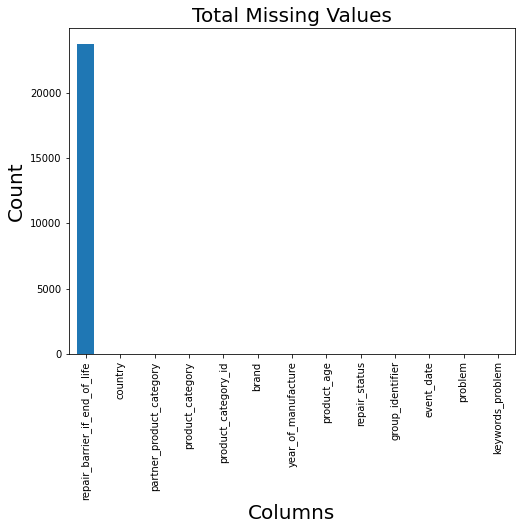

In [55]:
import matplotlib.pyplot as plt
%matplotlib inline

total = df.isnull().sum().sort_values(ascending=False)
total_select = total.head(20)
total_select.plot(kind="bar", figsize = (8,6), fontsize = 10)

plt.xlabel("Columns", fontsize = 20)
plt.ylabel("Count", fontsize = 20)
plt.title("Total Missing Values", fontsize = 20)

In [56]:
brand_averageYear = df.groupby(['brand'])['product_age'].mean()
brand_averageYear



brand
AEG                9.583916
AEG Electrolux     8.250000
AFK                8.680000
AFK Germany        9.000000
AIWA              16.000000
                    ...    
philips           12.200000
quigg              3.166667
senseo             5.500000
unbekannt         24.500000
whirlpool          6.000000
Name: product_age, Length: 426, dtype: float64

unbekannt -> unknown in german 

In [57]:
# translate every brand, if the translation is not "Unknown" (unbekannt-> unknown), then return the original brand: 

# Initialize the Translator
translator = GoogleTranslator()
   
# Function to translate brands or assign 'Other' for unknown brands
def translate_brand(brand):
    detected_language = detect(brand)
    
    if detected_language == 'en':
        return brand
    
    translated = translator.translate(brand)
    if translated != 'Unknown':
        return translated
    else:
        return brand

# Apply the translation function to the 'brand' column with tqdm progress bar
tqdm.pandas(desc="Translating")
df['Translated_Brand'] = df['brand'].progress_apply(translate_brand)

Translating: 100%|███████████████████████████████████████████████████████████████| 25308/25308 [54:23<00:00,  7.76it/s]


In [58]:
# look for unknown in brand
df.loc[df['Translated_Brand'] == "unknown"]



,country,partner_product_category,product_category,product_category_id,brand,year_of_manufacture,product_age,repair_status,group_identifier,event_date,repair_barrier_if_end_of_life,problem,keywords_problem,Translated_Brand
3463,FRA,Lamp,Lamp,15,inconnue,2018,3,End of life,Repair Café Lille Centre,2021-05-25,Lack of equipment,essay1. yes,[],unknown
3771,BEL,Power tool ~ Nettoyeur haute pression,Power tool,24,inconnue,2007,15,Repairable,Repair Café Flawinne,2022-05-10,NaN,"Motor brushes blocked, armature damaged at col...","['Motor', 'brushes', 'blocked', 'armature', 'd...",unknown
3878,BEL,Power tool,Power tool,24,inconnue,2016,6,Fixed,Repair Café de Lincent,2022-11-20,NaN,"no more power supply, damaged solder, cleaning...","['more', 'power', 'supply', 'damaged', 'solder...",unknown
5734,BEL,Misc ~ pèse personne,Small home electrical,28,inconnue,2017,6,Repairable,Repair Café Flawinne,2023-03-14,NaN,put in new batteries!!,"['put', 'new', 'batteries']",unknown
21459,DEU,Haushaltsgeräte ~ Standmixer,Food processor,37,unbekannt,1973,50,Fixed,45065,2023-02-21,NaN,"Cable break, cable shortened","['Cable', 'break', 'cable', 'shortened']",unknown
21679,DEU,Elektro divers ~ Lampe,Lamp,15,unbekannt,2021,2,Fixed,32564,2023-01-10,NaN,Bulb flickers,"['Bulb', 'flickers']",unknown
21939,DEU,Elektro divers ~ Tischlampe,Lamp,15,unbekannt,1983,39,Fixed,32564,2022-11-08,NaN,Switch defective,"['Switch', 'defective']",unknown
21940,DEU,Elektro divers ~ Lampe,Lamp,15,unbekannt,1988,34,Fixed,32564,2022-11-08,NaN,Frame defective,['defective'],unknown
21941,DEU,Elektro divers ~ Uhr,Watch/clock,35,unbekannt,1982,40,Fixed,32564,2022-11-08,NaN,Pointer not OK,"['Pointer', 'OK']",unknown
22032,DEU,Elektro divers ~ Lampe,Lamp,15,unbekannt,2014,8,End of life,32564,2022-10-11,NaN,Ceiling lamp no longer burns,"['Ceiling', 'lamp', 'no', 'longer', 'burns']",unknown


In [59]:
# Drop the "brand" column
df = df.drop(columns="brand")

# Rename the "Translated_Brand" column to "Brand"
df = df.rename(columns={"Translated_Brand": "Brand"})

# Replace "Unknown" with "Other" in the "Brand" column
df['Brand'] = df['Brand'].replace('unknown', 'Other')

df.Brand.value_counts()

Other          8199
Philips        2800
Bosch           690
Sony            641
Samsung         577
               ... 
wolf garden       5
Olympus           5
Quantum           5
Konig             5
Leitz             5
Name: Brand, Length: 421, dtype: int64

In [60]:
df

,country,partner_product_category,product_category,product_category_id,year_of_manufacture,product_age,repair_status,group_identifier,event_date,repair_barrier_if_end_of_life,problem,keywords_problem,Brand
0,ITA,Games console ~ PS3,Games console,38,2012,5,Repairable,Restarters Milano,2018-10-06,NaN,"Not working, give away for us.","['working', 'give']",Sony
1,BEL,Games console ~ PS2,Games console,38,2015,4,End of life,Maakbaar Leuven,2019-01-26,Spare parts too expensive,Power supply is defectOwner wil get a second h...,"['Power', 'supply', 'defectOwner', 'wil', 'get...",Sony
2,ISL,Games console ~ Games console,Games console,38,2015,3,End of life,Restarters Iceland,2018-11-22,Repair information not available,Does not start,['start'],PlayStation
3,ITA,Games console ~ XBox,Games console,38,2008,11,Fixed,Restarters Torino,2019-05-05,NaN,3 Red lights displayed when turned on. Seconda...,"['lights', 'displayed', 'when', 'turned', 'Sec...",Microsoft
4,SWE,Games console ~ PlayStation,Games console,38,2009,10,Repairable,Repair Cafe Malmö,2019-09-01,NaN,needs new fuse,"['needs', 'new', 'fuse']",PlayStation
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25303,BEL,Hair & beauty item,Hair & beauty item,9,2013,10,End of life,Maakbaar Leuven,2023-01-28,No way to open product,battery is broken,"['battery', 'broken']",Philips
25304,BEL,Hair & beauty item,Hair & beauty item,9,2021,1,End of life,Repair Café Gent,2022-03-27,Spare parts not available,It still works but does not heat up.,"['still', 'works', 'heat']",Koenic
25305,CHE,Hair & beauty item,Hair & beauty item,9,2000,21,Fixed,Repair Café Frauenfeld,2021-03-15,NaN,"perfect, except for loud engine noise\r\nAs of...","['perfect', 'loud', 'engine', 'today', 'device...",Philips
25306,NLD,Hair & beauty item,Hair & beauty item,9,2012,10,Fixed,Foenix Repair Café Apeldoorn,2022-12-02,NaN,Rechargeable batteries were defective and have...,"['Rechargeable', 'batteries', 'defective', 'al...",Babyliss


In [66]:
# the dataset contains 78 duplicated rows 
duplicates = df[df.duplicated()]
print(len(duplicates))

# Remove duplicated rows and keep the first occurrence
df_no_duplicates = df.drop_duplicates()

# reset the index 
df = df_no_duplicates.reset_index(drop=True)

0


In [67]:
df["problem"]

0                           Not working, give away for us.
1        Power supply is defectOwner wil get a second h...
2                                           Does not start
3        3 Red lights displayed when turned on. Seconda...
4                                           needs new fuse
                               ...                        
25225                                    battery is broken
25226                 It still works but does not heat up.
25227    perfect, except for loud engine noise\r\nAs of...
25228    Rechargeable batteries were defective and have...
25229    Worked perfectly until yesterday. Today it won...
Name: problem, Length: 25230, dtype: object

In [71]:
# clean text
def clean_text(text):
    # Remove non-alphanumeric characters and extra whitespace
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    # Convert text to lowercase
    text = text.lower()
    # Remove stopwords (common words like "is", "the", "and"), except "not"
    stop_words = set(stopwords.words('english')) - {'not'}
    words = text.split()
    words = [word for word in words if word not in stop_words]
    return ' '.join(words)

# Apply the clean_text function to the 'problem' column
df['cleaned_problem'] = df['problem'].apply(clean_text)


In [74]:
df['cleaned_problem'][25227]

'perfect except loud engine noisernas today device longer works short cleaning worked briefly switched'

In [75]:
df['problem'][25227] 

'perfect, except for loud engine noise\\r\\nAs of today, the device no longer works. After a short cleaning it worked briefly and then switched off again.'

In [78]:
df.to_csv('Cleaned_dataset.csv', index=False)